# week 1 - AQI analysis

C:\Users\Samsung\AppData\Local\Temp\ipykernel_17524\2065937663.py:26: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['PM2.5'].fillna(df['PM2.5'].mean(), inplace=True)


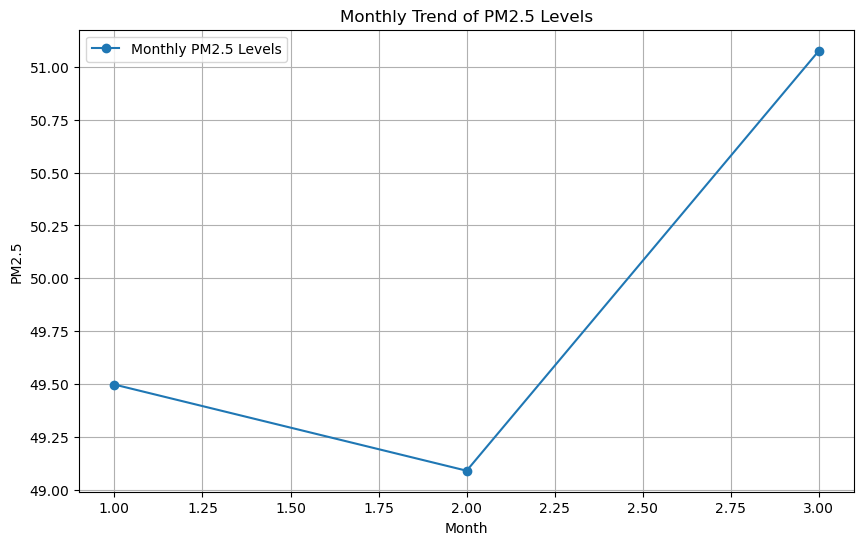

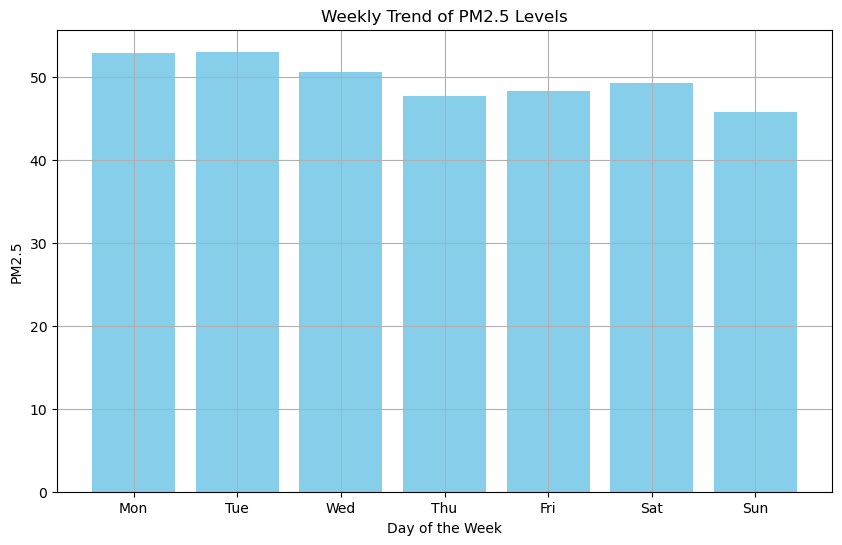

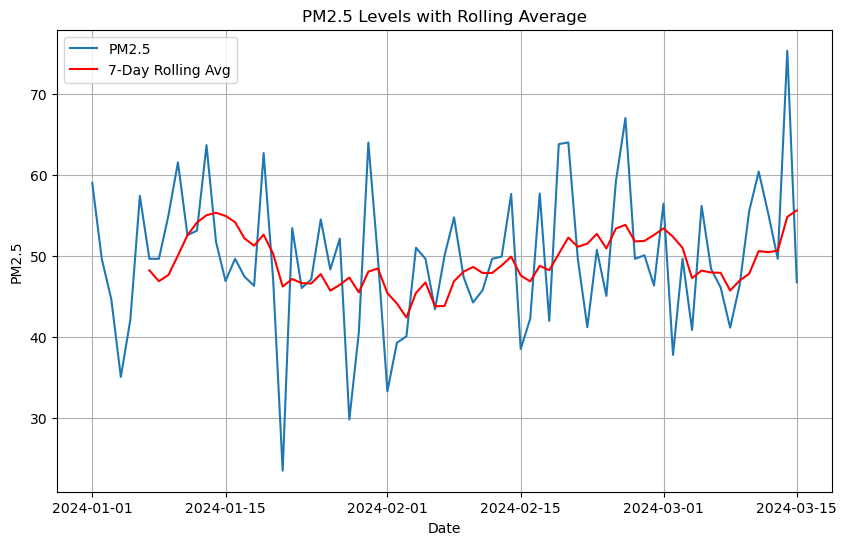

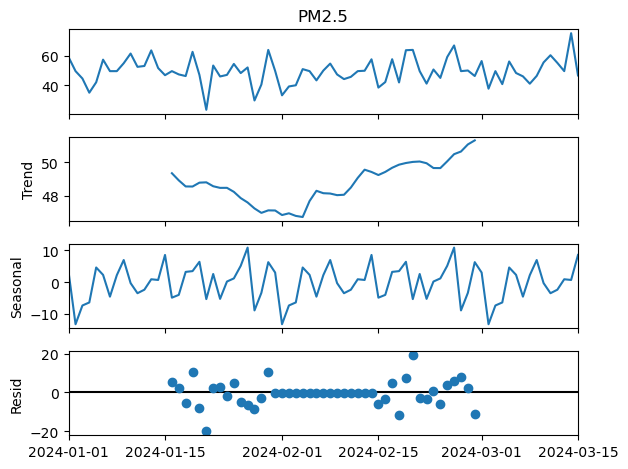

             Time  Location      PM2.5       PM10  Temperature  WindSpeed  \
Date                                                                        
2024-01-01  18:00     Rural  59.035325  76.911999    16.057517   4.289872   
2024-01-02  08:00     Rural  49.656461  58.399378    26.786523   3.212328   
2024-01-03  18:00  Suburban  44.655835  97.860909    22.927341   3.779430   
2024-01-04  18:00  Suburban  35.049461  99.490952    25.400994   4.330797   
2024-01-05  08:00     Rural  42.107417  66.992808    20.534399   6.161937   
2024-01-06  08:00  Suburban  57.437113  89.264613    23.325914   6.552860   
2024-01-07  18:00     Urban  49.656461  98.256062    32.801901   4.560482   
2024-01-08  12:00     Rural  49.656461  83.394324    25.642755   4.592085   
2024-01-09  18:00     Urban  55.014483  92.711021    27.747882   5.261623   
2024-01-10  18:00     Urban  61.581867  82.622495    18.645641   5.012147   

            Month  DayOfWeek  PM2.5_RollingAvg  
Date                      

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# 1. Generate a sample dataset
np.random.seed(42)

data = {
    "Date": np.arange("2024-01-01", "2024-03-16", dtype="datetime64[D]"),  # 75 dates
    "Time": np.random.choice(["08:00", "12:00", "18:00"], size=75),
    "Location": np.random.choice(["Urban", "Rural", "Suburban"], size=75),
    "PM2.5": np.random.normal(50, 10, size=75),
    "PM10": np.random.normal(80, 15, size=75),
    "Temperature": np.random.normal(25, 5, size=75),
    "WindSpeed": np.random.normal(5, 1, size=75),
}

# Simulate some missing values
data["PM2.5"][np.random.choice(75, 10, replace=False)] = np.nan

df = pd.DataFrame(data)

# 2. Handle Missing Values
# Fill missing PM2.5 values with the mean
df['PM2.5'].fillna(df['PM2.5'].mean(), inplace=True)

# 3. Convert Date column to datetime format (if not already)
df['Date'] = pd.to_datetime(df['Date'])

# 4. Create Time-Series Plots and Analyze Seasonality

# Extract temporal features
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek

# Group by month and day of the week to analyze trends
monthly_trend = df.groupby('Month')['PM2.5'].mean()
weekly_trend = df.groupby('DayOfWeek')['PM2.5'].mean()

# Plot Monthly Trend
plt.figure(figsize=(10, 6))
plt.plot(monthly_trend, marker='o', label='Monthly PM2.5 Levels')
plt.title('Monthly Trend of PM2.5 Levels')
plt.xlabel('Month')
plt.ylabel('PM2.5')
plt.grid()
plt.legend()
plt.show()

# Plot Weekly Trend
plt.figure(figsize=(10, 6))
plt.bar(weekly_trend.index, weekly_trend.values, color='skyblue')
plt.title('Weekly Trend of PM2.5 Levels')
plt.xlabel('Day of the Week')
plt.ylabel('PM2.5')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid()
plt.show()

# 5. Time-Series Analysis: Rolling Averages
df.set_index('Date', inplace=True)  # Set Date as the index for time-series analysis
df['PM2.5_RollingAvg'] = df['PM2.5'].rolling(window=7).mean()

# Plot PM2.5 Levels and Rolling Average
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['PM2.5'], label='PM2.5')
plt.plot(df.index, df['PM2.5_RollingAvg'], color='red', label='7-Day Rolling Avg')
plt.title('PM2.5 Levels with Rolling Average')
plt.xlabel('Date')
plt.ylabel('PM2.5')
plt.legend()
plt.grid()
plt.show()

# 6. Seasonal Decomposition
result = seasonal_decompose(df['PM2.5'], model='additive', period=30)
result.plot()
plt.show()

# Optional: Display Dataset (first 10 rows)
print(df.head(10))


# E commerce analysis

C:\Users\Samsung\AppData\Local\Temp\ipykernel_17524\2033019898.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_by_age = df.groupby(['Age Group', 'Product Category']).agg({'Sales Volume': 'sum'}).reset_index()


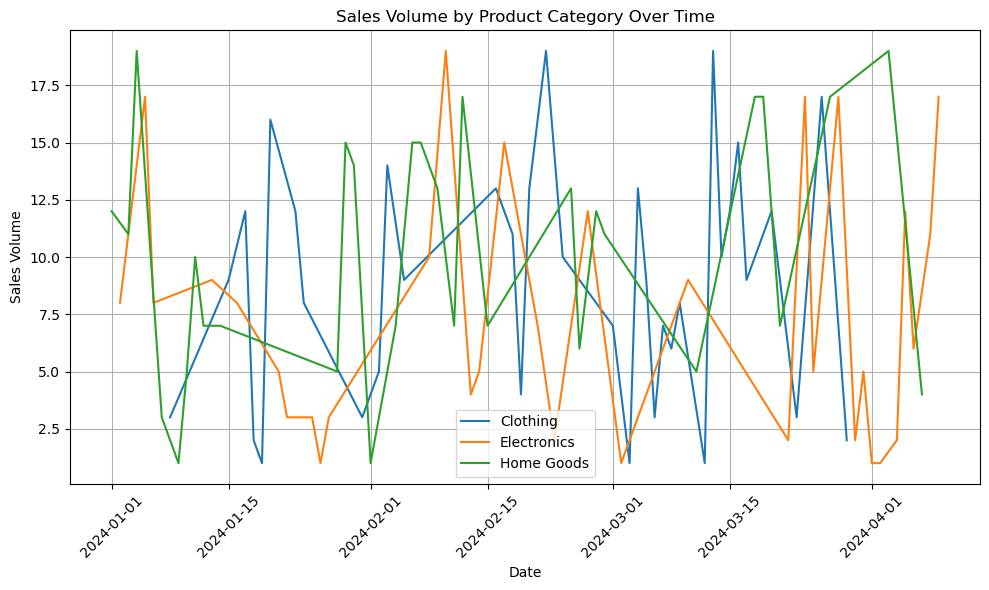

C:\Users\Samsung\AppData\Local\Temp\ipykernel_17524\2033019898.py:44: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_age = grouped_by_age.pivot_table(index='Age Group', columns='Product Category', values='Sales Volume', aggfunc='sum')


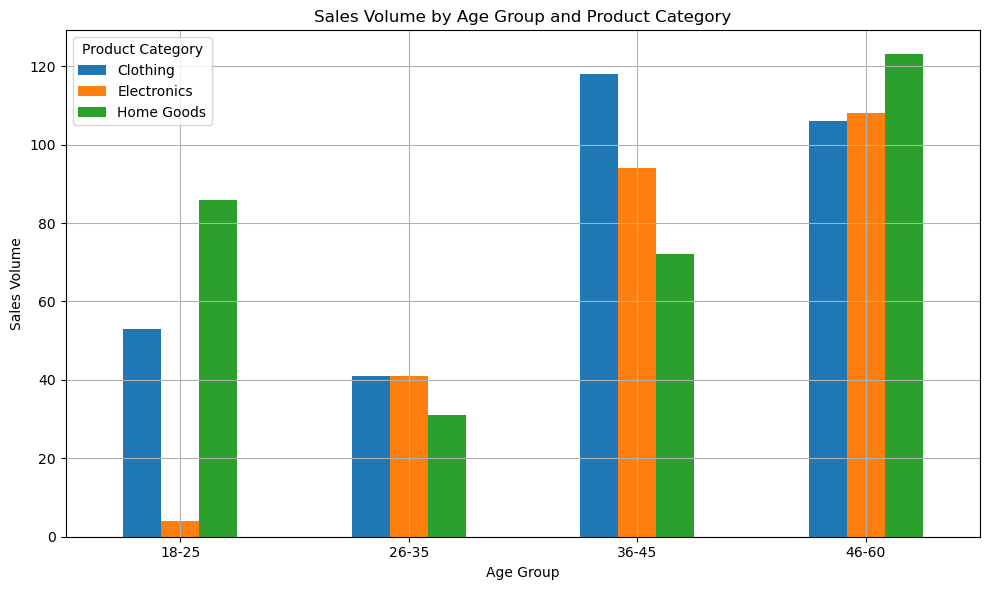

C:\Users\Samsung\AppData\Local\Temp\ipykernel_17524\2033019898.py:59: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_by_price = df.groupby(['Price Range', 'Date']).agg({'Sales Volume': 'sum'}).reset_index()


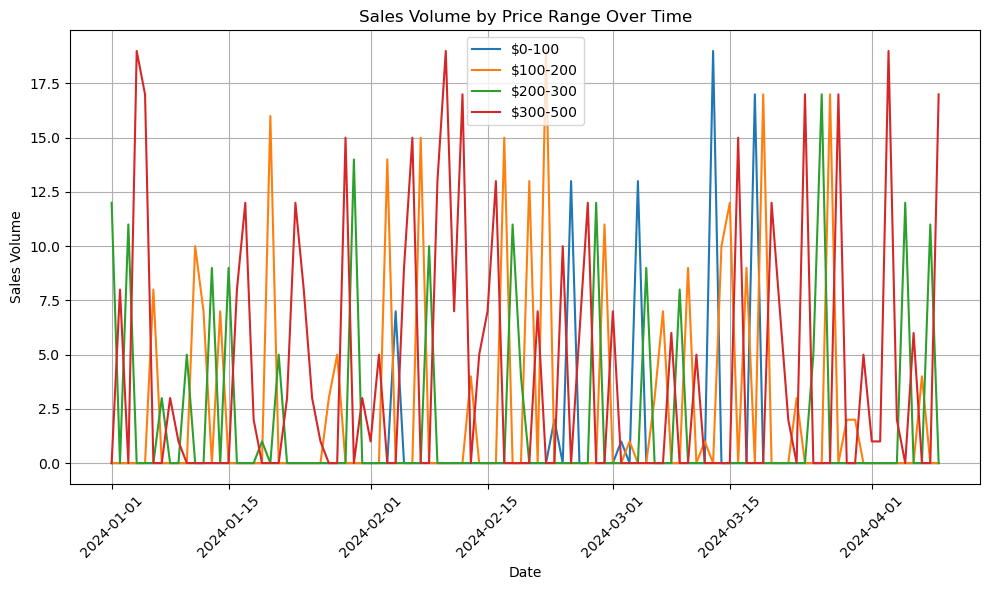

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Sample e-commerce sales data
np.random.seed(42)
data = {
    "Product Category": np.random.choice(['Electronics', 'Clothing', 'Home Goods'], size=100),
    "Sales Volume": np.random.randint(1, 20, size=100),
    "Price": np.random.randint(20, 500, size=100),
    "Customer Age": np.random.randint(18, 60, size=100),
    "Time": pd.date_range(start='2024-01-01', periods=100, freq='D')
}

# Create DataFrame
df = pd.DataFrame(data)

# Extract Date from Time for easier grouping
df['Date'] = df['Time'].dt.date

# 1. Grouping by Product Category and Date
grouped_sales = df.groupby(['Product Category', 'Date']).agg({'Sales Volume': 'sum'}).reset_index()

# 2. Grouping by Customer Age and Product Category
df['Age Group'] = pd.cut(df['Customer Age'], bins=[18, 25, 35, 45, 60], labels=['18-25', '26-35', '36-45', '46-60'])
grouped_by_age = df.groupby(['Age Group', 'Product Category']).agg({'Sales Volume': 'sum'}).reset_index()

# 3. Visualizing Sales Volume by Product Category over Time (Line Chart)
plt.figure(figsize=(10, 6))
for category in grouped_sales['Product Category'].unique():
    category_data = grouped_sales[grouped_sales['Product Category'] == category]
    plt.plot(category_data['Date'], category_data['Sales Volume'], label=category)

plt.title('Sales Volume by Product Category Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Volume')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. Visualizing Sales Volume by Age Group and Product Category (Bar Chart)
pivot_age = grouped_by_age.pivot_table(index='Age Group', columns='Product Category', values='Sales Volume', aggfunc='sum')

pivot_age.plot(kind='bar', figsize=(10, 6))
plt.title('Sales Volume by Age Group and Product Category')
plt.xlabel('Age Group')
plt.ylabel('Sales Volume')
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. Visualizing Sales Volume by Price Range Over Time (Line Chart)
df['Price Range'] = pd.cut(df['Price'], bins=[0, 100, 200, 300, 500], labels=['$0-100', '$100-200', '$200-300', '$300-500'])

# Group by Price Range and Date
grouped_by_price = df.groupby(['Price Range', 'Date']).agg({'Sales Volume': 'sum'}).reset_index()

# Plotting sales volume by price range over time
plt.figure(figsize=(10, 6))
for price_range in grouped_by_price['Price Range'].unique():
    price_data = grouped_by_price[grouped_by_price['Price Range'] == price_range]
    plt.plot(price_data['Date'], price_data['Sales Volume'], label=price_range)

plt.title('Sales Volume by Price Range Over Time')
plt.xlabel('Date')
plt.ylabel('Sales Volume')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


# Covid analysis

        Date Region  Confirmed  Recovered  Deaths
0 2020-01-01  Urban        481        196      30
1 2020-01-02  Urban        403        239      16
2 2020-01-03  Urban        424         91      37
3 2020-01-04  Urban        456        383      46
4 2020-01-05  Urban        441        104      37
Data with missing values:
        Date Region  Confirmed  Recovered  Deaths
0 2020-01-01  Urban      481.0        196      30
1 2020-01-02  Urban      403.0        239      16
2 2020-01-03  Urban      424.0         91      37
3 2020-01-04  Urban        NaN        383      46
4 2020-01-05  Urban      441.0        104      37
Data after forward fill:
        Date Region  Confirmed  Recovered  Deaths
0 2020-01-01  Urban      481.0        196      30
1 2020-01-02  Urban      403.0        239      16
2 2020-01-03  Urban      424.0         91      37
3 2020-01-04  Urban      424.0        383      46
4 2020-01-05  Urban      441.0        104      37


C:\Users\Samsung\AppData\Local\Temp\ipykernel_13432\34896198.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Confirmed'].fillna(method='ffill', inplace=True)
C:\Users\Samsung\AppData\Local\Temp\ipykernel_13432\34896198.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['Confirmed'].fillna(method='ffill', inplace=True)


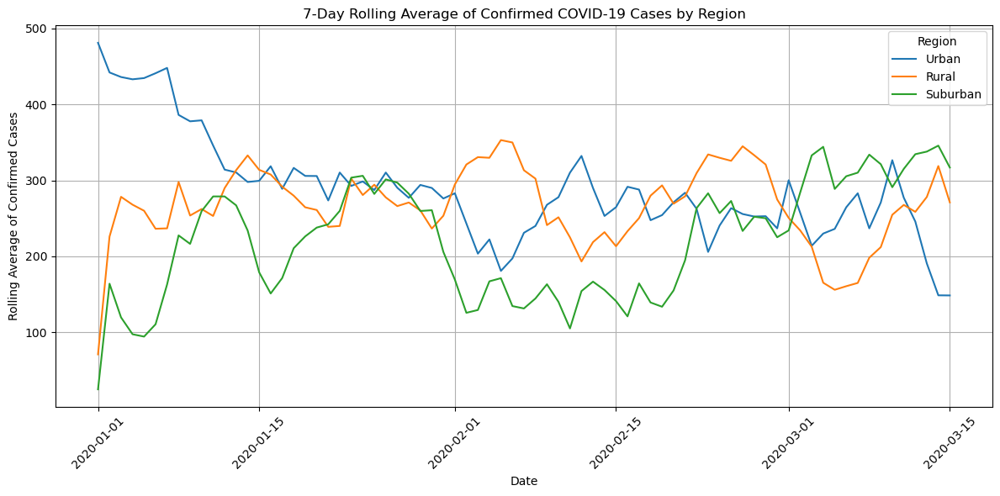

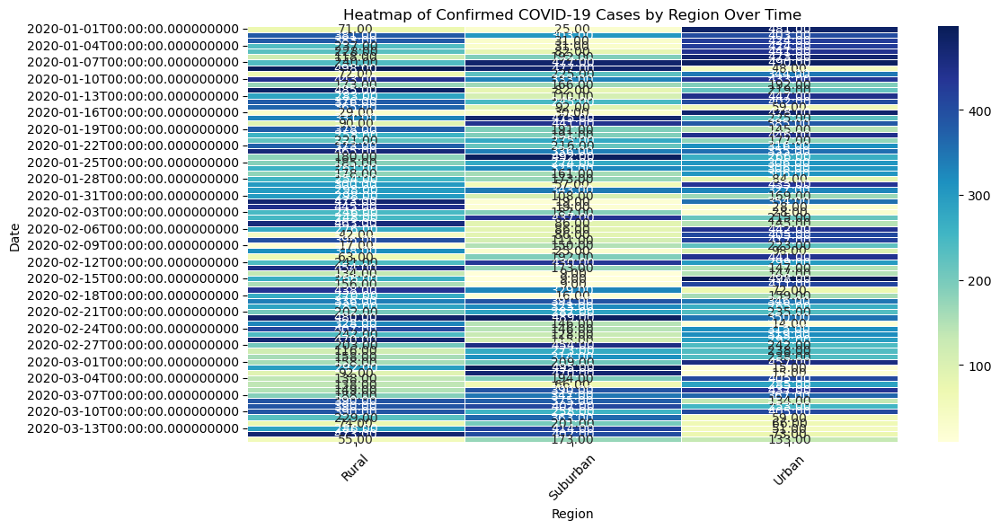

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Simulate the COVID-19 Dataset
dates = pd.date_range(start="2020-01-01", end="2020-03-15", freq='D')  # Date range from Jan 1 to Mar 15
regions = ['Urban', 'Rural', 'Suburban']

# Create the simulated data
data = []
for region in regions:
    for date in dates:
        confirmed = np.random.randint(0, 500)
        recovered = np.random.randint(0, confirmed + 1)
        deaths = np.random.randint(0, 50)
        data.append([date, region, confirmed, recovered, deaths])

# Create DataFrame
df = pd.DataFrame(data, columns=["Date", "Region", "Confirmed", "Recovered", "Deaths"])
print(df.head())  # Display first few rows of the data

# Step 2: Simulate some missing values for the 'Confirmed' column
df.loc[np.random.choice(df.index, size=20, replace=False), "Confirmed"] = np.nan  # Randomly add NaN to 'Confirmed'
print("Data with missing values:")
print(df.head())

# Step 3: Fill missing values using forward fill (ffill)
df['Confirmed'].fillna(method='ffill', inplace=True)
print("Data after forward fill:")
print(df.head())

# Step 4: Calculate rolling averages for 'Confirmed' cases
df['Rolling_Avg_Confirmed'] = df.groupby('Region')['Confirmed'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())

# Step 5: Visualize the trends for each region
plt.figure(figsize=(12, 6))
for region in regions:
    region_data = df[df['Region'] == region]
    plt.plot(region_data['Date'], region_data['Rolling_Avg_Confirmed'], label=region)
    
plt.title('7-Day Rolling Average of Confirmed COVID-19 Cases by Region')
plt.xlabel('Date')
plt.ylabel('Rolling Average of Confirmed Cases')
plt.legend(title='Region')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 6: Visualize trends with heatmap (Regional heatmap for confirmed cases over time)
pivot_df = df.pivot_table(values='Confirmed', index='Date', columns='Region', aggfunc='sum')

# Heatmap of confirmed cases
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=0.5)
plt.title('Heatmap of Confirmed COVID-19 Cases by Region Over Time')
plt.xlabel('Region')
plt.ylabel('Date')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# movie prediction

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Load Train and Test Datasets
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

# Display the first few rows of the train and test datasets
print("Train Dataset:")
print(train_data.head())

print("\nTest Dataset:")
print(test_data.head())

# Step 2: Check for Missing Values and Handle Them
print("\nMissing values in Train Dataset:")
print(train_data.isnull().sum())

print("\nMissing values in Test Dataset:")
print(test_data.isnull().sum())

# Drop rows with missing values
train_data.dropna(inplace=True)
test_data.dropna(inplace=True)

# Step 3: Encode the Genre
le = LabelEncoder()
train_data['Genre_Encoded'] = le.fit_transform(train_data['genre'])
test_data['Genre_Encoded'] = le.transform(test_data['genre'])

# Step 4: TF-IDF Vectorization
tfidf = TfidfVectorizer(stop_words='english', max_features=5000)

# Fit TF-IDF on train data and transform both train and test synopses
X_train_tfidf = tfidf.fit_transform(train_data['synopsis'])
X_test_tfidf = tfidf.transform(test_data['synopsis'])

y_train = train_data['Genre_Encoded']
y_test = test_data['Genre_Encoded']

# Step 5: Train the Model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_tfidf, y_train)

# Step 6: Evaluate the Model
y_pred = model.predict(X_test_tfidf)

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Genre")
plt.ylabel("Actual Genre")
plt.show()

# Step 7: Predict for New Data
new_synopses = [
    "A young boy discovers he has magical powers.",
    "A team of astronauts embarks on a dangerous mission to Mars.",
    "Two lovers are reunited after years apart during a war."
]

new_tfidf = tfidf.transform(new_synopses)
new_predictions = model.predict(new_tfidf)
new_genres = le.inverse_transform(new_predictions)

print("\nPredictions for New Synopses:")
for synopsis, genre in zip(new_synopses, new_genres):
    print(f"Synopsis: {synopsis}")
    print(f"Predicted Genre: {genre}\n")


Train Dataset:
      id                                         movie_name  \
0  44978                                           Super Me   
1  50185                                     Entity Project   
2  34131  Behavioral Family Therapy for Serious Psychiat...   
3  78522                                      Blood Glacier   
4   2206                                      Apat na anino   

                                            synopsis    genre  
0  A young scriptwriter starts bringing valuable ...  fantasy  
1  A director and her friends renting a haunted h...   horror  
2  This is an educational video for families and ...   family  
3  Scientists working in the Austrian Alps discov...    scifi  
4  Buy Day - Four Men Widely - Apart in Life - By...   action  

Test Dataset:
      id          movie_name  \
0  16863    A Death Sentence   
1  48456          Intermedio   
2  41383    30 Chua Phai Tet   
3  84007           Paranoiac   
4  40269  Ordinary Happiness   

              

# sport analysis

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load the dataset
data = pd.read_csv("player_stats.csv")

# Explore the first few rows of the dataset
print(data.head())

# Step 2: Check for missing values and handle them (optional)
print("\nMissing values in dataset:")
print(data.isnull().sum())

# Drop rows with missing values (if any)
data.dropna(inplace=True)

# Step 3: Outlier Detection (Z-Score Method)
from scipy.stats import zscore

# Calculate Z-scores
z_scores = np.abs(zscore(data[['accuracy', 'speed', 'stamina', 'age']]))
outliers = (z_scores > 3).all(axis=1)  # Any row with all features > 3 standard deviations

# Add a column to mark outliers
data['outlier'] = outliers

# Visualizing outliers
sns.boxplot(data=data[['accuracy', 'speed', 'stamina', 'age']])
plt.title("Boxplot for Feature Distributions")
plt.show()

# Step 4: Split the dataset into features (X) and target (y)
X = data[['accuracy', 'speed', 'stamina', 'age']]
y = data['outlier']  # For simplicity, let's predict if a player is an outlier or not

# Step 5: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 6: Scale features (important for KNN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Build KNN Model without outliers (For comparison)
knn_no_outliers = KNeighborsClassifier(n_neighbors=3)
knn_no_outliers.fit(X_train_scaled, y_train)

# Step 8: Make predictions and evaluate the model
y_pred_no_outliers = knn_no_outliers.predict(X_test_scaled)

# Accuracy and confusion matrix
accuracy_no_outliers = accuracy_score(y_test, y_pred_no_outliers)
cm_no_outliers = confusion_matrix(y_test, y_pred_no_outliers)

# Step 9: Build KNN Model with outliers
# Add outliers back into the training set
X_train_outliers = X_train_scaled  # Use the scaled features including outliers
X_test_outliers = X_test_scaled

knn_with_outliers = KNeighborsClassifier(n_neighbors=3)
knn_with_outliers.fit(X_train_outliers, y_train)

# Step 10: Make predictions with outliers and evaluate
y_pred_with_outliers = knn_with_outliers.predict(X_test_outliers)

# Accuracy and confusion matrix
accuracy_with_outliers = accuracy_score(y_test, y_pred_with_outliers)
cm_with_outliers = confusion_matrix(y_test, y_pred_with_outliers)

# Step 11: Compare the results
print("\nAccuracy without outliers:", accuracy_no_outliers)
print("Accuracy with outliers:", accuracy_with_outliers)

# Plot the confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.heatmap(cm_no_outliers, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Outlier'], yticklabels=['Normal', 'Outlier'], ax=ax[0])
ax[0].set_title("Confusion Matrix without Outliers")

sns.heatmap(cm_with_outliers, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Outlier'], yticklabels=['Normal', 'Outlier'], ax=ax[1])
ax[1].set_title("Confusion Matrix with Outliers")

plt.tight_layout()
plt.show()


In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the dataset
data = pd.read_csv("train.csv")

# Step 2: Explore the data
print(data.head())

# Check for missing values
print("\nMissing values:")
print(data.isnull().sum())

# Drop rows with missing values (optional)
data.dropna(inplace=True)

# Step 3: Text Preprocessing (synopsis)
# Use TfidfVectorizer to convert the movie synopsis into numerical features
tfidf = TfidfVectorizer(stop_words='english', max_features=5000)
X = tfidf.fit_transform(data['synopsis'])

# Step 4: Encode the target variable 'genre'
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(data['genre'])

# Step 5: Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 6: Build the model (Random Forest Classifier)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Step 7: Make predictions on the test set
y_pred = model.predict(X_test)

# Step 8: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Step 9: Predict a new movie genre (example)
sample_movie = ["A thrilling action movie with lots of fight scenes and stunts."]
sample_tfidf = tfidf.transform(sample_movie)
predicted_genre = model.predict(sample_tfidf)
print(f"\nPredicted Genre: {label_encoder.inverse_transform(predicted_genre)}")


      id                                         movie_name  \
0  44978                                           Super Me   
1  50185                                     Entity Project   
2  34131  Behavioral Family Therapy for Serious Psychiat...   
3  78522                                      Blood Glacier   
4   2206                                      Apat na anino   

                                            synopsis    genre  
0  A young scriptwriter starts bringing valuable ...  fantasy  
1  A director and her friends renting a haunted h...   horror  
2  This is an educational video for families and ...   family  
3  Scientists working in the Austrian Alps discov...    scifi  
4  Buy Day - Four Men Widely - Apart in Life - By...   action  

Missing values:
id            0
movie_name    0
synopsis      0
genre         0
dtype: int64
Accuracy: 0.2735

Classification Report:
              precision    recall  f1-score   support

      action       0.21      0.16      0.19    

In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the dataset
data = pd.read_csv("train.csv")

# Step 2: Explore the data
print(data.head())

# Check for missing values
print("\nMissing values:")
print(data.isnull().sum())

# Drop rows with missing values (optional)
data.dropna(inplace=True)


      id                                         movie_name  \
0  44978                                           Super Me   
1  50185                                     Entity Project   
2  34131  Behavioral Family Therapy for Serious Psychiat...   
3  78522                                      Blood Glacier   
4   2206                                      Apat na anino   

                                            synopsis    genre  
0  A young scriptwriter starts bringing valuable ...  fantasy  
1  A director and her friends renting a haunted h...   horror  
2  This is an educational video for families and ...   family  
3  Scientists working in the Austrian Alps discov...    scifi  
4  Buy Day - Four Men Widely - Apart in Life - By...   action  

Missing values:
id            0
movie_name    0
synopsis      0
genre         0
dtype: int64


Mean Squared Error (MSE): 23.733010387234682
R² Score: 0.9336902325588827


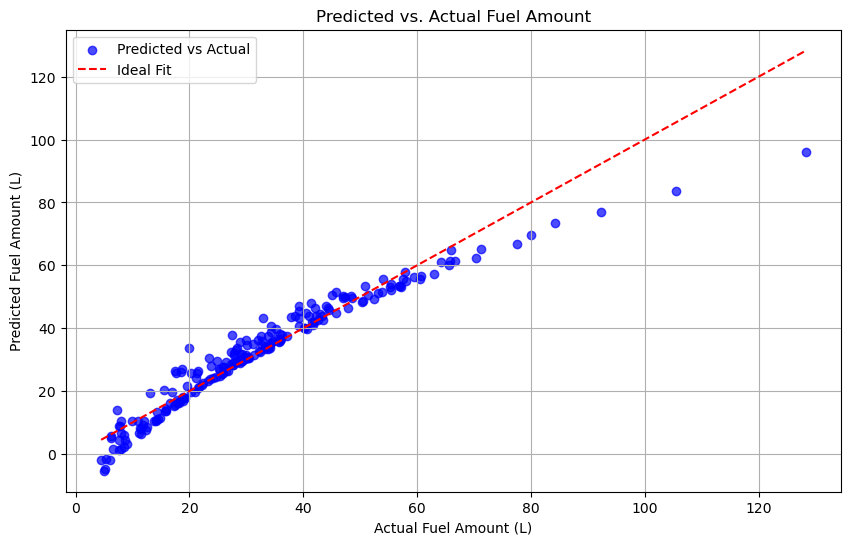

In [1]:
# Step 1: Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 2: Load the dataset
file_path = 'FuelConsumptionCo2.csv'  # Replace with the path to your dataset
data = pd.read_csv(file_path)

# Step 3: Add a synthetic 'Distance' column (km) for analysis
np.random.seed(42)
data['Distance'] = np.random.randint(50, 500, size=len(data))  # Random distance values in km

# Step 4: Calculate the 'Fuel Amount' (in liters)
# Formula: Fuel Amount (L) = (Distance * FUELCONSUMPTION_COMB) / 100
data['Fuel_Amount'] = (data['Distance'] * data['FUELCONSUMPTION_COMB']) / 100

# Step 5: Select relevant columns for modeling
features = data[['Distance', 'ENGINESIZE', 'CYLINDERS', 'FUELCONSUMPTION_COMB']]
target = data['Fuel_Amount']

# Step 6: Split the dataset into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Step 7: Build and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Step 8: Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R² Score: {r2}")

# Step 9: Visualize predictions vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color="blue", label="Predicted vs Actual")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color="red", linestyle="--", label="Ideal Fit")
plt.title("Predicted vs. Actual Fuel Amount")
plt.xlabel("Actual Fuel Amount (L)")
plt.ylabel("Predicted Fuel Amount (L)")
plt.legend()
plt.grid()
plt.show()


Mean Squared Error (MSE): 3.5966381087192834
R² Score: 0.9899510330688047
Cross-Validated R² Score: 0.995399557332051


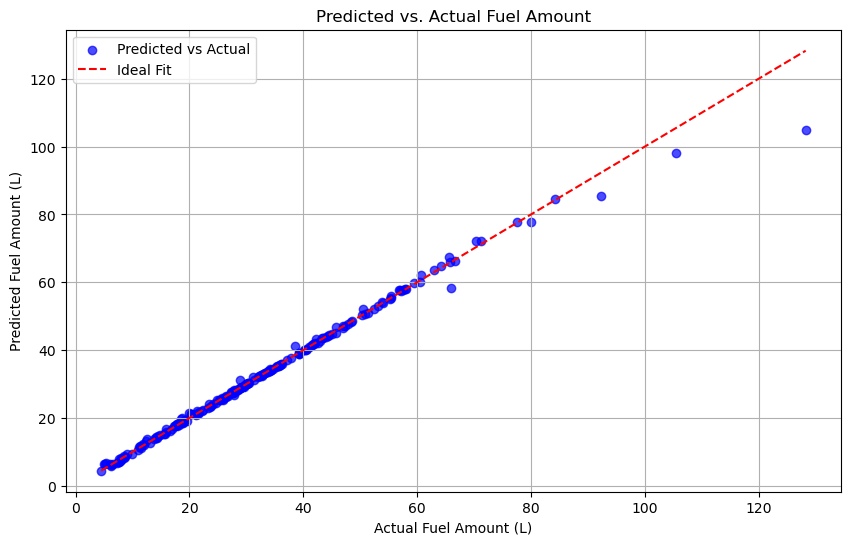

In [3]:
# Step 1: Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 2: Load the dataset
file_path = 'FuelConsumptionCo2.csv'  # Replace with your dataset path
data = pd.read_csv(file_path)

# Step 3: Add a synthetic 'Distance' column (km) for analysis
np.random.seed(42)
data['Distance'] = np.random.randint(50, 500, size=len(data))

# Step 4: Calculate the 'Fuel Amount' (in liters)
data['Fuel_Amount'] = (data['Distance'] * data['FUELCONSUMPTION_COMB']) / 100

# Step 5: Detect and cap outliers (using 1.5*IQR method for simplicity)
for col in ['Distance', 'FUELCONSUMPTION_COMB']:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[col] = np.clip(data[col], lower_bound, upper_bound)

# Step 6: Select relevant columns for modeling
features = data[['Distance', 'ENGINESIZE', 'CYLINDERS', 'FUELCONSUMPTION_COMB']]
target = data['Fuel_Amount']

# Step 7: Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Step 8: Add polynomial features for capturing non-linearity
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
features_poly = poly.fit_transform(features_scaled)

# Step 9: Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_poly, target, test_size=0.2, random_state=42)

# Step 10: Build and train a Ridge Regression model (to prevent overfitting)
model = Ridge(alpha=1.0)
model.fit(X_train, y_train)

# Step 11: Evaluate the model using Cross-Validation
cv_scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=5)
cv_mean = np.mean(cv_scores)

# Step 12: Make predictions and evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Step 13: Print metrics and cross-validation score
print(f"Mean Squared Error (MSE): {mse}")
print(f"R² Score: {r2}")
print(f"Cross-Validated R² Score: {cv_mean}")

# Step 14: Visualize predictions vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color="blue", label="Predicted vs Actual")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color="red", linestyle="--", label="Ideal Fit")
plt.title("Predicted vs. Actual Fuel Amount")
plt.xlabel("Actual Fuel Amount (L)")
plt.ylabel("Predicted Fuel Amount (L)")
plt.legend()
plt.grid()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error

# Load the dataset
file_path = 'your_dataset_path.csv'  # Replace with actual file path
df = pd.read_csv(file_path)

# Combine 'Date' and 'Time' into a single Datetime column
df['Datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])
df.drop(['Date', 'Time'], axis=1, inplace=True)

# Rearrange columns for clarity
df = df[['Datetime', 'Global_active_power', 'Global_reactive_power', 'Voltage', 
         'Global_intensity', 'Sub_metering_1', 'Sub_metering_2', 'Sub_metering_3']]

# Handle missing values
df.fillna(method='ffill', inplace=True)  # Forward fill for time-series data

# Define Features and Target
X = df[['Global_reactive_power', 'Voltage', 'Global_intensity', 
        'Sub_metering_1', 'Sub_metering_2', 'Sub_metering_3']]
y = df['Global_active_power']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train Linear Regression Model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate the Model
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("Model Performance:")
print(f"R² Score: {r2:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")

# Visualize Actual vs Predicted
plt.figure(figsize=(10, 6))
plt.plot(y_test.values[:50], label="Actual", color='b')
plt.plot(y_pred[:50], label="Predicted", color='r')
plt.title("Actual vs Predicted Global Active Power")
plt.xlabel("Sample Index")
plt.ylabel("Global Active Power (kW)")
plt.legend()
plt.show()

# Heatmap for Feature Correlations
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


In [ ]:
# Step 1: Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Step 2: Generate a sample dataset
np.random.seed(42)
data = {
    'Years_of_Experience': np.random.randint(1, 21, 100),
    'Qualifications': np.random.choice(['Bachelor', 'Master', 'PhD'], 100),
    'Industry': np.random.choice(['Tech', 'Healthcare', 'Finance', 'Education'], 100),
    'Location': np.random.choice(['Urban', 'Suburban', 'Rural'], 100),
    'Salary': np.random.randint(40000, 150000, 100)
}

df = pd.DataFrame(data)

# Step 3: Data visualization (distribution and relationships)
plt.figure(figsize=(12, 5))
sns.histplot(df['Salary'], kde=True, bins=20, color='blue')
plt.title("Salary Distribution")
plt.xlabel("Salary")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(12, 5))
sns.boxplot(x='Industry', y='Salary', data=df, palette='Set3')
plt.title("Salary by Industry")
plt.show()

sns.pairplot(df, hue='Qualifications', palette='husl')
plt.show()

# Step 4: Correlation heatmap for numeric features
correlation_matrix = df[['Years_of_Experience', 'Salary']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

# Step 5: Define features and target variable
X = df[['Years_of_Experience', 'Qualifications', 'Industry', 'Location']]
y = df['Salary']

# Step 6: Preprocess data
categorical_features = ['Qualifications', 'Industry', 'Location']
numeric_features = ['Years_of_Experience']

column_transformer = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first'), categorical_features),
        ('num', StandardScaler(), numeric_features)
    ],
    remainder='passthrough'
)

X_encoded = column_transformer.fit_transform(X)

# Step 7: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Step 8: Build and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Step 9: Make predictions
y_pred = model.predict(X_test)

# Step 10: Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Step 11: Residual analysis
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.6, color='purple')
plt.axhline(y=0, color='red', linestyle='--')
plt.title("Residual Analysis")
plt.xlabel("Actual Salaries")
plt.ylabel("Residuals")
plt.show()

# Step 12: Feature importance
feature_names = column_transformer.get_feature_names_out()
coefficients = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': model.coef_
}).sort_values(by='Coefficient', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coefficients, palette='viridis')
plt.title("Feature Importance")
plt.show()


In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('household_power_consumption.csv')

# Display dataset overview
print("Dataset Overview:")
print(df.head())
print("\nDataset Info:")
print(df.info())
print("\nMissing Values:")
print(df.isnull().sum())

Dataset Overview:
   index    Date     Time Global_active_power Global_reactive_power Voltage  \
0      0  1/1/07  0:00:00                2.58                 0.136  241.97   
1      1  1/1/07  0:01:00               2.552                   0.1  241.75   
2      2  1/1/07  0:02:00                2.55                   0.1  241.64   
3      3  1/1/07  0:03:00                2.55                   0.1  241.71   
4      4  1/1/07  0:04:00               2.554                   0.1  241.98   

  Global_intensity Sub_metering_1 Sub_metering_2  Sub_metering_3  
0             10.6              0              0             0.0  
1             10.4              0              0             0.0  
2             10.4              0              0             0.0  
3             10.4              0              0             0.0  
4             10.4              0              0             0.0  

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260640 entries, 0 to 260639
Data columns

In [9]:
# Preprocessing: Handle missing values if any
if df.isnull().sum().sum() > 0:
    df = df.fillna(df.mean())  # Replace numerical missing values with mean

# Define features and target
X = df.drop(columns=['ElectricityBill'])  # Features
y = df['ElectricityBill']  # Target variable

TypeError: Could not convert ['1/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/071/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/072/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/073/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/074/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/075/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/076/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/077/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/078/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/079/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0710/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0711/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0712/1/0713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200713/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200714/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200715/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200716/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200717/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200718/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200719/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200720/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200721/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200722/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200723/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200724/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200725/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200726/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200727/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200728/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200729/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200730/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/200731/1/20071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/071/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/072/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/073/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/074/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/075/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/076/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/077/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/078/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/079/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0710/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0711/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0712/2/0713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200713/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200714/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200715/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200716/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200717/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200718/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200719/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200720/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200721/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200722/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200723/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200724/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200725/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200726/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200727/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/200728/2/20071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/071/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/072/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/073/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/074/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/075/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/076/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/077/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/078/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/079/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0710/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0711/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0712/3/0713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200713/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200714/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200715/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200716/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200717/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200718/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200719/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200720/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200721/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200722/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200723/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200724/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200725/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200726/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200727/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200728/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200729/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200730/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/200731/3/20071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/071/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/072/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/073/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/074/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/075/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/076/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/077/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/078/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/079/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0710/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0711/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0712/4/0713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200713/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200714/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200715/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200716/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200717/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200718/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200719/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200720/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200721/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200722/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200723/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200724/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200725/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200726/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200727/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200728/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200729/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/200730/4/20071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/071/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/072/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/073/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/074/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/075/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/076/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/077/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/078/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/079/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0710/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0711/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0712/5/0713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200713/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200714/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200715/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200716/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200717/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200718/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200719/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200720/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200721/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200722/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200723/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200724/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200725/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200726/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200727/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200728/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200729/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200730/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/200731/5/20071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/071/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/072/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/073/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/074/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/075/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/076/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/077/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/078/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/079/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0710/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0711/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0712/6/0713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200713/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200714/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200715/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200716/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200717/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200718/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200719/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200720/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200721/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200722/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200723/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200724/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200725/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200726/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200727/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200728/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200729/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/200730/6/2007'
 '0:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:000:00:000:01:000:02:000:03:000:04:000:05:000:06:000:07:000:08:000:09:000:10:000:11:000:12:000:13:000:14:000:15:000:16:000:17:000:18:000:19:000:20:000:21:000:22:000:23:000:24:000:25:000:26:000:27:000:28:000:29:000:30:000:31:000:32:000:33:000:34:000:35:000:36:000:37:000:38:000:39:000:40:000:41:000:42:000:43:000:44:000:45:000:46:000:47:000:48:000:49:000:50:000:51:000:52:000:53:000:54:000:55:000:56:000:57:000:58:000:59:001:00:001:01:001:02:001:03:001:04:001:05:001:06:001:07:001:08:001:09:001:10:001:11:001:12:001:13:001:14:001:15:001:16:001:17:001:18:001:19:001:20:001:21:001:22:001:23:001:24:001:25:001:26:001:27:001:28:001:29:001:30:001:31:001:32:001:33:001:34:001:35:001:36:001:37:001:38:001:39:001:40:001:41:001:42:001:43:001:44:001:45:001:46:001:47:001:48:001:49:001:50:001:51:001:52:001:53:001:54:001:55:001:56:001:57:001:58:001:59:002:00:002:01:002:02:002:03:002:04:002:05:002:06:002:07:002:08:002:09:002:10:002:11:002:12:002:13:002:14:002:15:002:16:002:17:002:18:002:19:002:20:002:21:002:22:002:23:002:24:002:25:002:26:002:27:002:28:002:29:002:30:002:31:002:32:002:33:002:34:002:35:002:36:002:37:002:38:002:39:002:40:002:41:002:42:002:43:002:44:002:45:002:46:002:47:002:48:002:49:002:50:002:51:002:52:002:53:002:54:002:55:002:56:002:57:002:58:002:59:003:00:003:01:003:02:003:03:003:04:003:05:003:06:003:07:003:08:003:09:003:10:003:11:003:12:003:13:003:14:003:15:003:16:003:17:003:18:003:19:003:20:003:21:003:22:003:23:003:24:003:25:003:26:003:27:003:28:003:29:003:30:003:31:003:32:003:33:003:34:003:35:003:36:003:37:003:38:003:39:003:40:003:41:003:42:003:43:003:44:003:45:003:46:003:47:003:48:003:49:003:50:003:51:003:52:003:53:003:54:003:55:003:56:003:57:003:58:003:59:004:00:004:01:004:02:004:03:004:04:004:05:004:06:004:07:004:08:004:09:004:10:004:11:004:12:004:13:004:14:004:15:004:16:004:17:004:18:004:19:004:20:004:21:004:22:004:23:004:24:004:25:004:26:004:27:004:28:004:29:004:30:004:31:004:32:004:33:004:34:004:35:004:36:004:37:004:38:004:39:004:40:004:41:004:42:004:43:004:44:004:45:004:46:004:47:004:48:004:49:004:50:004:51:004:52:004:53:004:54:004:55:004:56:004:57:004:58:004:59:005:00:005:01:005:02:005:03:005:04:005:05:005:06:005:07:005:08:005:09:005:10:005:11:005:12:005:13:005:14:005:15:005:16:005:17:005:18:005:19:005:20:005:21:005:22:005:23:005:24:005:25:005:26:005:27:005:28:005:29:005:30:005:31:005:32:005:33:005:34:005:35:005:36:005:37:005:38:005:39:005:40:005:41:005:42:005:43:005:44:005:45:005:46:005:47:005:48:005:49:005:50:005:51:005:52:005:53:005:54:005:55:005:56:005:57:005:58:005:59:006:00:006:01:006:02:006:03:006:04:006:05:006:06:006:07:006:08:006:09:006:10:006:11:006:12:006:13:006:14:006:15:006:16:006:17:006:18:006:19:006:20:006:21:006:22:006:23:006:24:006:25:006:26:006:27:006:28:006:29:006:30:006:31:006:32:006:33:006:34:006:35:006:36:006:37:006:38:006:39:006:40:006:41:006:42:006:43:006:44:006:45:006:46:006:47:006:48:006:49:006:50:006:51:006:52:006:53:006:54:006:55:006:56:006:57:006:58:006:59:007:00:007:01:007:02:007:03:007:04:007:05:007:06:007:07:007:08:007:09:007:10:007:11:007:12:007:13:007:14:007:15:007:16:007:17:007:18:007:19:007:20:007:21:007:22:007:23:007:24:007:25:007:26:007:27:007:28:007:29:007:30:007:31:007:32:007:33:007:34:007:35:007:36:007:37:007:38:007:39:007:40:007:41:007:42:007:43:007:44:007:45:007:46:007:47:007:48:007:49:007:50:007:51:007:52:007:53:007:54:007:55:007:56:007:57:007:58:007:59:008:00:008:01:008:02:008:03:008:04:008:05:008:06:008:07:008:08:008:09:008:10:008:11:008:12:008:13:008:14:008:15:008:16:008:17:008:18:008:19:008:20:008:21:008:22:008:23:008:24:008:25:008:26:008:27:008:28:008:29:008:30:008:31:008:32:008:33:008:34:008:35:008:36:008:37:008:38:008:39:008:40:008:41:008:42:008:43:008:44:008:45:008:46:008:47:008:48:008:49:008:50:008:51:008:52:008:53:008:54:008:55:008:56:008:57:008:58:008:59:009:00:009:01:009:02:009:03:009:04:009:05:009:06:009:07:009:08:009:09:009:10:009:11:009:12:009:13:009:14:009:15:009:16:009:17:009:18:009:19:009:20:009:21:009:22:009:23:009:24:009:25:009:26:009:27:009:28:009:29:009:30:009:31:009:32:009:33:009:34:009:35:009:36:009:37:009:38:009:39:009:40:009:41:009:42:009:43:009:44:009:45:009:46:009:47:009:48:009:49:009:50:009:51:009:52:009:53:009:54:009:55:009:56:009:57:009:58:009:59:0010:00:0010:01:0010:02:0010:03:0010:04:0010:05:0010:06:0010:07:0010:08:0010:09:0010:10:0010:11:0010:12:0010:13:0010:14:0010:15:0010:16:0010:17:0010:18:0010:19:0010:20:0010:21:0010:22:0010:23:0010:24:0010:25:0010:26:0010:27:0010:28:0010:29:0010:30:0010:31:0010:32:0010:33:0010:34:0010:35:0010:36:0010:37:0010:38:0010:39:0010:40:0010:41:0010:42:0010:43:0010:44:0010:45:0010:46:0010:47:0010:48:0010:49:0010:50:0010:51:0010:52:0010:53:0010:54:0010:55:0010:56:0010:57:0010:58:0010:59:0011:00:0011:01:0011:02:0011:03:0011:04:0011:05:0011:06:0011:07:0011:08:0011:09:0011:10:0011:11:0011:12:0011:13:0011:14:0011:15:0011:16:0011:17:0011:18:0011:19:0011:20:0011:21:0011:22:0011:23:0011:24:0011:25:0011:26:0011:27:0011:28:0011:29:0011:30:0011:31:0011:32:0011:33:0011:34:0011:35:0011:36:0011:37:0011:38:0011:39:0011:40:0011:41:0011:42:0011:43:0011:44:0011:45:0011:46:0011:47:0011:48:0011:49:0011:50:0011:51:0011:52:0011:53:0011:54:0011:55:0011:56:0011:57:0011:58:0011:59:0012:00:0012:01:0012:02:0012:03:0012:04:0012:05:0012:06:0012:07:0012:08:0012:09:0012:10:0012:11:0012:12:0012:13:0012:14:0012:15:0012:16:0012:17:0012:18:0012:19:0012:20:0012:21:0012:22:0012:23:0012:24:0012:25:0012:26:0012:27:0012:28:0012:29:0012:30:0012:31:0012:32:0012:33:0012:34:0012:35:0012:36:0012:37:0012:38:0012:39:0012:40:0012:41:0012:42:0012:43:0012:44:0012:45:0012:46:0012:47:0012:48:0012:49:0012:50:0012:51:0012:52:0012:53:0012:54:0012:55:0012:56:0012:57:0012:58:0012:59:0013:00:0013:01:0013:02:0013:03:0013:04:0013:05:0013:06:0013:07:0013:08:0013:09:0013:10:0013:11:0013:12:0013:13:0013:14:0013:15:0013:16:0013:17:0013:18:0013:19:0013:20:0013:21:0013:22:0013:23:0013:24:0013:25:0013:26:0013:27:0013:28:0013:29:0013:30:0013:31:0013:32:0013:33:0013:34:0013:35:0013:36:0013:37:0013:38:0013:39:0013:40:0013:41:0013:42:0013:43:0013:44:0013:45:0013:46:0013:47:0013:48:0013:49:0013:50:0013:51:0013:52:0013:53:0013:54:0013:55:0013:56:0013:57:0013:58:0013:59:0014:00:0014:01:0014:02:0014:03:0014:04:0014:05:0014:06:0014:07:0014:08:0014:09:0014:10:0014:11:0014:12:0014:13:0014:14:0014:15:0014:16:0014:17:0014:18:0014:19:0014:20:0014:21:0014:22:0014:23:0014:24:0014:25:0014:26:0014:27:0014:28:0014:29:0014:30:0014:31:0014:32:0014:33:0014:34:0014:35:0014:36:0014:37:0014:38:0014:39:0014:40:0014:41:0014:42:0014:43:0014:44:0014:45:0014:46:0014:47:0014:48:0014:49:0014:50:0014:51:0014:52:0014:53:0014:54:0014:55:0014:56:0014:57:0014:58:0014:59:0015:00:0015:01:0015:02:0015:03:0015:04:0015:05:0015:06:0015:07:0015:08:0015:09:0015:10:0015:11:0015:12:0015:13:0015:14:0015:15:0015:16:0015:17:0015:18:0015:19:0015:20:0015:21:0015:22:0015:23:0015:24:0015:25:0015:26:0015:27:0015:28:0015:29:0015:30:0015:31:0015:32:0015:33:0015:34:0015:35:0015:36:0015:37:0015:38:0015:39:0015:40:0015:41:0015:42:0015:43:0015:44:0015:45:0015:46:0015:47:0015:48:0015:49:0015:50:0015:51:0015:52:0015:53:0015:54:0015:55:0015:56:0015:57:0015:58:0015:59:0016:00:0016:01:0016:02:0016:03:0016:04:0016:05:0016:06:0016:07:0016:08:0016:09:0016:10:0016:11:0016:12:0016:13:0016:14:0016:15:0016:16:0016:17:0016:18:0016:19:0016:20:0016:21:0016:22:0016:23:0016:24:0016:25:0016:26:0016:27:0016:28:0016:29:0016:30:0016:31:0016:32:0016:33:0016:34:0016:35:0016:36:0016:37:0016:38:0016:39:0016:40:0016:41:0016:42:0016:43:0016:44:0016:45:0016:46:0016:47:0016:48:0016:49:0016:50:0016:51:0016:52:0016:53:0016:54:0016:55:0016:56:0016:57:0016:58:0016:59:0017:00:0017:01:0017:02:0017:03:0017:04:0017:05:0017:06:0017:07:0017:08:0017:09:0017:10:0017:11:0017:12:0017:13:0017:14:0017:15:0017:16:0017:17:0017:18:0017:19:0017:20:0017:21:0017:22:0017:23:0017:24:0017:25:0017:26:0017:27:0017:28:0017:29:0017:30:0017:31:0017:32:0017:33:0017:34:0017:35:0017:36:0017:37:0017:38:0017:39:0017:40:0017:41:0017:42:0017:43:0017:44:0017:45:0017:46:0017:47:0017:48:0017:49:0017:50:0017:51:0017:52:0017:53:0017:54:0017:55:0017:56:0017:57:0017:58:0017:59:0018:00:0018:01:0018:02:0018:03:0018:04:0018:05:0018:06:0018:07:0018:08:0018:09:0018:10:0018:11:0018:12:0018:13:0018:14:0018:15:0018:16:0018:17:0018:18:0018:19:0018:20:0018:21:0018:22:0018:23:0018:24:0018:25:0018:26:0018:27:0018:28:0018:29:0018:30:0018:31:0018:32:0018:33:0018:34:0018:35:0018:36:0018:37:0018:38:0018:39:0018:40:0018:41:0018:42:0018:43:0018:44:0018:45:0018:46:0018:47:0018:48:0018:49:0018:50:0018:51:0018:52:0018:53:0018:54:0018:55:0018:56:0018:57:0018:58:0018:59:0019:00:0019:01:0019:02:0019:03:0019:04:0019:05:0019:06:0019:07:0019:08:0019:09:0019:10:0019:11:0019:12:0019:13:0019:14:0019:15:0019:16:0019:17:0019:18:0019:19:0019:20:0019:21:0019:22:0019:23:0019:24:0019:25:0019:26:0019:27:0019:28:0019:29:0019:30:0019:31:0019:32:0019:33:0019:34:0019:35:0019:36:0019:37:0019:38:0019:39:0019:40:0019:41:0019:42:0019:43:0019:44:0019:45:0019:46:0019:47:0019:48:0019:49:0019:50:0019:51:0019:52:0019:53:0019:54:0019:55:0019:56:0019:57:0019:58:0019:59:0020:00:0020:01:0020:02:0020:03:0020:04:0020:05:0020:06:0020:07:0020:08:0020:09:0020:10:0020:11:0020:12:0020:13:0020:14:0020:15:0020:16:0020:17:0020:18:0020:19:0020:20:0020:21:0020:22:0020:23:0020:24:0020:25:0020:26:0020:27:0020:28:0020:29:0020:30:0020:31:0020:32:0020:33:0020:34:0020:35:0020:36:0020:37:0020:38:0020:39:0020:40:0020:41:0020:42:0020:43:0020:44:0020:45:0020:46:0020:47:0020:48:0020:49:0020:50:0020:51:0020:52:0020:53:0020:54:0020:55:0020:56:0020:57:0020:58:0020:59:0021:00:0021:01:0021:02:0021:03:0021:04:0021:05:0021:06:0021:07:0021:08:0021:09:0021:10:0021:11:0021:12:0021:13:0021:14:0021:15:0021:16:0021:17:0021:18:0021:19:0021:20:0021:21:0021:22:0021:23:0021:24:0021:25:0021:26:0021:27:0021:28:0021:29:0021:30:0021:31:0021:32:0021:33:0021:34:0021:35:0021:36:0021:37:0021:38:0021:39:0021:40:0021:41:0021:42:0021:43:0021:44:0021:45:0021:46:0021:47:0021:48:0021:49:0021:50:0021:51:0021:52:0021:53:0021:54:0021:55:0021:56:0021:57:0021:58:0021:59:0022:00:0022:01:0022:02:0022:03:0022:04:0022:05:0022:06:0022:07:0022:08:0022:09:0022:10:0022:11:0022:12:0022:13:0022:14:0022:15:0022:16:0022:17:0022:18:0022:19:0022:20:0022:21:0022:22:0022:23:0022:24:0022:25:0022:26:0022:27:0022:28:0022:29:0022:30:0022:31:0022:32:0022:33:0022:34:0022:35:0022:36:0022:37:0022:38:0022:39:0022:40:0022:41:0022:42:0022:43:0022:44:0022:45:0022:46:0022:47:0022:48:0022:49:0022:50:0022:51:0022:52:0022:53:0022:54:0022:55:0022:56:0022:57:0022:58:0022:59:0023:00:0023:01:0023:02:0023:03:0023:04:0023:05:0023:06:0023:07:0023:08:0023:09:0023:10:0023:11:0023:12:0023:13:0023:14:0023:15:0023:16:0023:17:0023:18:0023:19:0023:20:0023:21:0023:22:0023:23:0023:24:0023:25:0023:26:0023:27:0023:28:0023:29:0023:30:0023:31:0023:32:0023:33:0023:34:0023:35:0023:36:0023:37:0023:38:0023:39:0023:40:0023:41:0023:42:0023:43:0023:44:0023:45:0023:46:0023:47:0023:48:0023:49:0023:50:0023:51:0023:52:0023:53:0023:54:0023:55:0023:56:0023:57:0023:58:0023:59:00'
 '2.582.5522.552.552.5542.552.5342.4842.4682.4862.4922.52.4942.4922.482.4782.472.4662.4562.462.5442.552.5542.652.6822.662.652.6542.6422.6442.6482.6462.6442.6562.652.6422.632.6062.5562.6022.6022.5942.62.6022.62.5982.592.5542.4842.4722.4862.4862.4822.4842.482.4582.462.4622.4722.4662.4662.592.592.5762.5662.5642.562.5522.5642.5582.562.5762.572.562.5662.5022.4822.4782.4822.582.5642.582.5722.5662.572.572.5662.5042.4742.4562.4482.4462.4522.4522.4522.4442.4442.4622.512.5462.5482.5482.5522.5442.5382.5482.5542.5522.552.5482.5522.5482.5022.4662.482.4742.472.4642.452.4962.5042.542.5682.5662.5742.5822.5762.5562.5022.5142.5082.522.5182.5182.5142.542.6082.6222.6182.6182.6242.6322.632.6222.6142.5962.5982.5842.5922.5682.5142.5182.5182.5222.5322.5422.5322.5042.4982.52.572.5682.5762.5742.6142.6542.672.6662.6242.582.5862.5922.5882.6922.6962.692.6942.682.6662.6542.6482.6662.6722.672.6722.6662.6622.582.572.572.5682.582.5582.5222.522.5062.5322.552.542.7642.72.82.542.5482.5542.5582.5422.5362.5342.4682.5222.5562.5362.5322.5362.5342.5382.5382.542.542.5462.552.5422.5442.4662.452.4462.4562.462.4482.4582.4562.4522.4482.452.452.4562.432.422.4042.42.4162.4762.4742.4822.4842.4742.4742.582.5742.5182.5222.4982.4962.4962.4862.4882.482.4882.492.4842.4642.3982.3922.4062.3982.3982.3982.4022.4062.4122.422.4182.4222.4182.4162.422.4242.432.4342.4362.432.4682.5162.5082.5482.62.5922.5982.582.552.5082.5162.5122.5082.5082.512.5162.5242.462.4362.4342.4322.4422.4422.4182.4282.422.4262.4882.5082.522.5242.5242.5242.5062.4962.4822.4842.482.4962.4882.4842.6162.6522.6462.6462.6522.6542.652.6442.6462.5722.5842.582.5642.5262.3982.3762.382.392.3922.3962.4162.4082.42.3982.3962.42.4222.4222.4162.42.3922.382.3722.3722.3642.382.392.462.5022.4962.492.4822.5382.5442.5462.552.5482.5442.5482.5462.5082.3822.3742.3782.3782.3922.412.4042.4022.42.3922.3942.3782.3842.3882.3922.3922.4022.4042.4062.42.4062.4082.3922.4062.482.4742.4842.492.4982.5022.512.52.4922.562.5382.5342.542.5162.4782.4842.4762.4442.3942.3962.3962.3962.3962.3882.392.3862.3742.3622.3622.3762.3622.3642.3662.362.3622.3682.3782.4882.4782.4822.4762.4662.4582.4642.4682.472.4722.4742.462.4442.4962.4482.4222.432.4322.432.4762.5022.5082.4682.442.4422.452.4582.4682.4442.4442.4422.4482.4382.4322.4482.4462.452.532.5542.5362.5382.5362.5342.5222.5262.5322.5282.512.4742.4622.462.4482.3742.382.4522.4542.4482.452.4482.452.4562.4442.4382.3722.3662.3622.3642.3762.3942.3922.3982.42.3882.42.4222.492.4762.482.4782.4882.4842.4922.4942.4842.4722.4662.472.4762.4822.4362.3922.3882.3882.3942.4722.4742.472.4542.4582.4582.452.4542.4542.3942.3942.3842.372.3682.3622.3642.3622.3642.3882.4562.4442.452.462.4682.4642.4642.4562.442.4482.463.5043.5023.4983.4063.3983.383.393.4063.4423.4443.5043.5063.53.4983.5123.5143.513.5223.5063.4343.443.4423.4583.4563.4523.4583.53.5383.543.5263.5423.5583.5423.5283.5123.5023.493.4863.4683.4823.53.483.4983.5043.53.4843.4743.4823.4782.9162.4982.512.5062.4822.52.4842.472.4422.62.7462.3142.282.2842.292.3762.422.4142.4162.3942.4722.6142.6162.642.6342.632.6442.6482.6362.6162.5422.5422.5462.552.5382.542.5362.5442.5982.6122.6142.6022.62.5922.6022.62.6022.5122.5122.4982.5082.5222.512.5942.6082.6022.5962.6022.5962.5942.6142.6182.6182.622.6242.6362.6242.62.5182.5322.5362.542.5422.5262.522.522.5322.5642.5962.6042.5942.592.6022.6082.6122.5982.5442.5242.5222.5342.5282.6082.6242.6162.6122.6022.62.5922.5922.5922.5842.582.5862.5842.592.5942.5222.5262.5362.5322.532.5162.4782.482.5022.5082.5042.5762.5882.5782.5622.572.5762.5542.5622.5622.4842.492.5122.5962.6162.6182.6422.6282.6282.632.6282.72.72.6842.6962.7062.72.6762.6062.612.6022.6162.6082.6122.6262.642.642.6242.6142.6162.612.692.6822.6862.6942.7082.7062.7162.6782.5922.5622.6662.6682.6482.6462.6522.6622.6522.632.6122.6162.642.6322.642.642.5742.5422.5322.5122.5142.5122.5122.5162.532.5282.5282.5462.5562.5722.5662.5562.6442.6322.6222.6122.612.6142.6182.6422.6762.6442.6442.6442.6442.632.632.622.6262.6382.6462.6322.6222.6222.522.260.2040.2040.2380.3180.3180.2140.2040.2060.2060.2960.3241.1643.0160.3420.5560.6360.630.6260.6260.6220.6180.6140.6120.610.6040.5460.5360.5360.5340.5340.5340.5360.5040.4460.4420.440.4420.450.4420.4421.2621.441.31.2861.2761.2721.3781.4161.5141.51.4961.51.5061.5041.5081.5081.511.5061.4481.9122.7482.762.7522.7682.7682.7322.6942.6922.6882.692.692.6862.6942.6942.6862.6762.6762.6762.6682.6722.6662.6682.662.6442.6542.6462.6482.7182.6642.6462.6442.7382.7142.7222.7182.7162.6521.4441.4241.3781.381.381.3861.3761.3781.3761.3761.3621.2941.261.2621.2721.2721.2741.2661.2721.2721.2821.281.2741.261.2661.271.2761.2781.351.3321.3321.3341.3321.3341.3381.3321.3741.3881.3661.371.3721.3741.3721.3721.3641.3581.3541.3541.3541.3581.3621.3581.3561.321.2541.251.261.2641.2641.261.2521.2561.2581.2561.2621.271.31.3421.3421.3541.3661.3681.3721.3781.381.4661.4721.4741.4741.5841.5821.5641.5541.5441.5521.411.3941.3881.381.3841.561.7081.7081.7041.711.6821.611.5981.5941.5921.5821.5721.5661.5681.5661.5721.6321.6561.7241.7281.7281.7361.731.7281.7561.7261.6941.6541.7742.3061.9762.3582.2022.1882.1881.5921.5921.5741.581.561.5641.5681.5581.5641.571.5221.5081.4821.411.391.391.4521.4721.4661.461.4661.4661.4561.4621.4541.4421.4021.3981.4081.4161.4221.4241.4341.4261.4221.411.4041.4041.4981.5121.521.5121.4981.5081.51.5061.5041.4961.5021.5021.5041.5041.511.5041.4721.4441.51.4941.4661.4661.4721.4761.4721.4681.4581.411.3961.4021.41.3941.41.4021.411.4141.4221.4221.4241.421.4141.4041.5181.5021.51.4921.5021.5081.5081.5081.5121.5041.5121.5121.5141.5081.51.5341.5181.4761.4721.4741.4761.4741.4621.4721.4520.6060.360.3580.360.3580.3580.3580.3560.3560.3580.3580.3580.3580.360.360.3620.3640.470.4720.4660.4640.4620.5520.5440.540.5380.5380.5360.5360.5320.5820.6080.6040.5340.510.5080.5080.5080.5080.4720.4320.4320.4360.4380.440.4360.4360.4340.430.430.3580.3580.3560.3540.3520.350.3540.3540.3620.4680.4740.4660.4640.4620.460.4580.4480.4520.4560.4580.5060.530.5320.5360.5360.460.4460.440.4380.4040.3680.3680.3620.3620.360.3580.3580.3640.3680.3660.3640.3660.3620.3640.3680.3660.3620.360.3620.360.3580.4740.4680.4720.470.4680.4680.4660.4620.4580.4560.5220.5340.5340.5320.5340.530.4660.440.4340.3820.3620.3580.3640.3640.3660.3620.360.3620.3620.360.360.360.360.3620.3640.3640.3680.3660.3660.3640.3620.380.470.4660.4640.4620.460.460.4580.4580.5340.5340.5340.530.530.5280.5280.5280.4580.3820.3680.3680.3640.3620.3620.3620.360.440.4460.4440.4440.4460.4440.4420.440.440.440.4420.4420.4380.4420.4380.4380.4660.5480.5460.550.5460.5440.5420.610.6140.6120.6140.610.5380.5380.5360.540.4760.3780.3740.3720.3720.3740.3760.3760.3760.3760.3740.3740.3720.3720.3780.3860.3880.3860.3840.3860.3820.3740.3760.3760.3720.370.3960.4840.480.4760.4780.5220.5480.5480.5480.5460.5440.5460.5460.5440.5020.4720.4560.3780.380.3760.380.380.3780.3760.3760.3780.3780.3760.3760.3780.3780.3780.380.3780.3760.380.380.3780.380.380.3840.3840.3820.4940.4860.4840.5720.5580.560.5560.5560.5480.5380.5360.4980.4640.4620.460.4420.370.3680.370.370.3680.3680.3660.3720.370.370.3720.3740.3720.3720.370.3720.3720.3740.3740.3720.3720.370.3720.3720.3760.3780.4680.5520.5560.5540.650.630.6260.6240.6220.6020.5540.5520.550.5480.5460.530.450.4480.450.450.450.4540.4520.450.4520.4520.4520.4480.4480.4480.4480.3940.3780.3780.3780.3780.3780.3760.3740.3740.3740.40.5320.5640.560.5580.5560.5520.550.5480.4840.4720.4720.4720.4740.4760.4740.440.3740.3740.3720.3720.3740.3740.3740.3760.3760.3780.3760.3760.3760.3740.3720.370.3740.3780.3760.3760.3760.3760.3760.3760.4120.4520.5060.5620.5560.5540.550.5460.5320.4740.470.470.4760.480.4780.4780.4760.4580.3820.3820.3820.3820.3820.3820.3820.3820.3840.3840.3860.3860.3840.3840.3840.3840.3820.3820.3820.3860.3860.390.3860.4120.4580.460.4820.5680.5640.5620.5620.5380.4880.4880.4840.4820.480.4780.4780.480.4820.4640.3880.3880.3860.3840.3840.3840.3840.3840.3840.4080.4680.470.4660.4660.4680.4680.470.4680.470.470.4680.4680.4680.5560.5380.5380.5380.6440.6440.6380.6220.5620.560.5580.5560.5540.550.4820.480.480.4780.4780.3840.3820.3780.3780.380.380.380.3820.3820.3840.3880.390.3880.3880.3880.3860.3840.3860.3860.3840.3840.3840.440.4540.4560.4560.4560.50.5660.5620.5120.4880.490.4880.4840.4840.4820.4840.4820.4780.4780.4740.4120.3740.3760.3760.3780.3780.3780.380.3820.3820.380.380.380.571.5341.5221.4861.4721.4641.4581.4581.4741.5181.541.5381.5421.541.551.6361.6321.5821.5481.5561.5481.5581.5741.5721.5681.5741.5781.5641.5621.5121.4641.4561.4541.4521.4481.4521.4481.4441.441.4381.4381.4421.4541.461.4581.4481.451.4461.3160.3720.370.370.4560.4440.4420.4440.4440.5540.5480.5360.4740.4720.5440.5580.5540.5540.5540.5540.5520.550.5460.510.4560.4560.4560.460.4580.4540.4540.4540.4520.4540.4520.4540.4580.460.4540.4520.4480.3860.380.3840.3840.3860.4240.4620.460.460.4660.5160.5760.5720.5320.4920.4880.4840.4820.4780.480.480.4780.4780.4760.4760.3980.380.3840.3820.3820.3820.3820.3820.3840.3840.3840.3820.380.380.3780.3740.3780.3780.380.380.3780.3760.3740.3880.4520.4480.4540.4560.5660.5660.560.5560.490.4820.4840.4840.4820.4780.4760.4740.470.4680.4580.3720.370.3680.3740.3740.3740.370.370.3740.3740.3740.370.3640.3680.3720.3720.3740.370.3660.3720.3760.3740.3740.4180.440.4420.4440.5620.5480.540.5340.5320.470.4680.4680.4620.460.4640.4640.4640.4620.4560.40.3660.3640.3620.360.360.3640.370.3680.3680.3640.3640.3940.4540.4560.450.4420.4420.4480.4480.4460.4460.4460.5360.5280.5220.5140.590.6120.6060.60.5820.530.5360.530.5340.5340.5360.5380.520.4640.460.4580.3760.3640.3660.3680.3680.370.370.370.3680.370.370.3660.3660.3660.3660.3660.3660.3660.3620.3680.3740.450.4460.4480.4440.440.4820.5460.540.5120.4680.4640.4640.4620.4640.470.4680.4640.4620.4620.460.4580.4020.3620.360.3620.3620.3640.3640.3660.3680.3680.3680.370.3660.3680.3680.370.3680.3660.3640.440.4380.4380.4420.4460.4440.440.4640.5080.4660.4640.4660.4620.4620.4620.460.4580.4560.4560.460.4580.4580.460.4080.3640.3620.360.3580.3580.360.360.3580.3580.360.3640.3640.3640.3640.360.3580.4320.4360.4360.4280.4260.4280.4280.4240.4020.4220.4760.4720.4680.470.4660.4660.4640.4920.5460.5420.540.5380.5360.5420.5460.460.4520.4520.450.4480.4480.450.440.440.4380.4380.4380.4380.440.4440.50.5140.5120.5140.5020.4340.4360.4340.430.360.3660.4620.4720.470.4740.4720.4680.4640.4640.4640.4620.460.4620.460.460.4580.4540.3620.3620.360.3580.3660.3680.3660.3680.370.3680.3660.3680.370.4120.4480.450.450.450.4440.4440.4420.4460.3760.3780.3780.3760.4760.4880.480.4740.4760.4780.480.4760.4680.4660.4680.4640.4660.4660.4680.450.3740.3760.3740.3740.3780.380.380.3780.3740.3740.3760.4340.450.4480.4480.4480.4460.4440.440.4320.3760.3760.3760.3740.3740.3740.4940.4820.4780.4760.4680.4680.4660.4660.4680.4720.470.4720.470.470.4680.4220.3740.3740.3720.3680.3680.3680.3680.370.3740.4040.450.450.4480.4480.450.4720.520.5220.4720.4480.450.450.4540.4580.4580.5080.5660.560.5520.5520.550.5460.5420.5420.5420.5420.5380.540.5440.5440.5380.470.4420.3740.3740.3720.3740.3720.3720.3720.460.4460.4440.4460.4440.440.4360.4340.4020.370.3720.3740.3720.3740.3760.370.370.4440.4780.4740.4760.4740.4760.4760.4720.4720.4680.4680.4660.4680.4660.4720.4780.390.3880.3820.3720.3740.3720.3760.470.4540.4580.4580.4580.4580.4560.4560.4180.390.3920.3940.3940.3940.40.3980.390.390.3880.4580.5020.4940.4940.50.4980.4940.4920.4860.4880.4860.4840.4820.4760.4760.4760.3840.3820.3840.3880.3860.4720.4660.4680.4660.4640.4660.4620.4560.4120.3780.370.3720.3780.4421.5141.5121.51.4861.4881.4821.4761.5861.591.591.5821.5561.561.5621.5641.551.5541.5561.5461.5381.571.6281.6041.5261.5281.5681.5981.61.6061.6041.6021.5981.5981.5981.5541.5461.5421.5321.521.5241.7541.6521.8061.8341.8281.831.811.5781.5021.5821.4941.4861.1380.3980.3980.3960.3920.3940.3940.3980.3960.3960.3960.8641.471.4521.4761.4741.471.4661.4661.4621.4621.4681.3981.4021.41.4041.3981.3861.3941.3961.4021.3961.41.391.391.3881.391.431.421.4861.4921.4821.4761.4761.4681.4641.4781.7961.7921.7861.7721.7761.7821.8081.721.7121.7121.7562.162.1542.262.432.5462.682.6782.6642.6562.6422.6442.632.632.612.6162.632.622.2141.5821.5841.5841.5761.6441.8882.5182.5022.4942.5062.52.4662.2022.1842.1561.9662.3662.4782.4962.0021.6342.2462.272.241.8741.3561.821.0681.0661.0641.4662.1322.1062.1042.0962.0862.1042.1022.1122.1062.1022.0962.0922.0362.052.0482.3342.4342.2042.1442.1382.1342.132.1382.1442.162.2062.72432.9923.0022.9662.892.9562.7642.5482.0821.9621.5861.5861.4981.5681.5521.731.7342.1142.0642.0621.9962.0422.0022.0122.0421.8061.7281.6621.9581.9862.0841.9261.8161.7981.762.0281.941.931.781.5761.591.5321.421.4181.4121.3441.2381.2441.2361.241.2361.2361.2381.2461.2521.2521.2481.2561.2541.2561.2521.251.2521.2461.2481.2521.2541.2561.2521.251.2481.2721.3621.3481.3521.3481.431.4381.441.431.431.4241.4241.4321.431.3641.3581.3341.2481.2461.2461.2541.2541.271.281.2721.2761.4161.8661.9842.0142.242.262.42.4562.5282.6942.6722.692.6822.6822.72.7042.7062.7682.7422.7282.732.7143.5263.6882.512.5342.5742.5442.472.4162.422.4322.4462.4182.3962.3982.42.3962.3882.392.3862.42.4762.4582.472.4282.5522.582.4362.4342.4242.4782.5162.4462.5182.5382.5422.5482.5442.5322.5242.5122.5082.5142.5382.5542.7362.7362.652.6642.6582.6542.6382.6342.6342.6262.6382.6622.662.6682.6642.4841.611.6141.6141.6041.6161.6141.6161.5841.8361.9041.9642.0561.51.5161.511.5081.5021.5021.51.461.4281.321.1221.2441.2421.2381.2261.1661.1040.8760.9640.430.4280.4280.430.4320.7760.880.7680.6140.4260.4260.4260.4240.4260.4260.4240.4240.4680.50.50.4980.530.6040.60.5960.5920.5640.520.5180.5160.5160.5160.5160.5160.5180.5180.5160.5080.4260.4260.4240.4240.4260.4280.4280.4280.4280.4280.4260.4260.4260.4260.4260.4280.430.450.5060.5080.5560.5860.5880.5840.5840.6660.6740.6220.6180.6180.6140.6120.610.6080.610.610.6080.6060.6040.6040.60.5320.5040.5020.5020.5040.5040.470.430.430.430.430.4280.4280.4260.4240.470.5020.5040.5040.5040.5060.5040.5040.5020.450.4620.5440.5420.5380.5360.5340.5320.530.530.530.5280.530.5280.5280.6061.0641.1761.3081.3041.31.31.3061.3061.29810.9541.2981.1561.1241.1241.2081.1941.1981.1981.21.2581.3721.3721.3421.31.3061.3081.3141.4040.970.5380.5360.5360.5340.5320.5320.5320.5320.530.5280.5280.5260.5140.4360.4360.4360.4360.4340.460.4940.4941.231.5321.5321.5641.6041.591.5861.5841.5861.591.5921.591.5261.491.4321.4481.411.4141.5061.5181.511.5081.5041.5021.4961.4981.4941.4921.4941.4921.4941.4921.4941.4341.4041.4021.5021.4881.4861.491.4941.4921.4941.4861.5721.5521.5461.5461.551.5581.5581.5581.4961.4881.4821.4841.4441.3141.1480.9740.9320.5420.3860.350.3480.3480.3480.3480.3480.3480.3480.3460.3440.3420.2740.2460.2480.2480.250.250.250.250.250.2480.310.320.3220.3240.3260.3260.3220.3240.2920.2540.2540.2560.2540.2520.2540.2520.290.3660.3620.3580.3560.3560.3560.3540.3520.3560.3540.3540.3540.350.350.2960.2540.2520.2520.2520.2520.2520.2520.2520.2520.320.330.3320.330.3280.3280.3280.3240.2820.2560.2540.2540.2540.2540.2560.2540.2540.3180.3640.3580.3560.3540.3520.3520.350.350.3480.3480.3460.3460.3480.340.2520.250.250.250.2480.2480.2460.2460.2480.2740.3280.3280.3280.3260.3260.3220.320.3040.250.250.250.2520.2520.2520.2520.2520.3180.4440.440.4380.4360.4360.4340.4340.4320.430.4320.430.4280.430.4260.3460.330.330.3320.3320.330.3280.3260.3260.3260.3760.3980.3380.3260.3260.3260.3240.3220.280.2520.2520.2520.2540.2520.2540.2520.2520.3620.360.360.3580.3560.3560.3540.3520.3480.3440.3460.3440.3680.3660.2860.250.2480.2480.2460.2460.2460.2480.250.2520.2520.280.3260.3240.3240.3220.320.320.3180.2860.2480.2460.2460.2440.2440.2480.250.3060.3620.3560.3520.350.3480.3480.3440.3420.3440.3420.340.340.340.3020.2440.2440.2440.2440.2460.2460.2460.2480.2480.2480.2460.2440.2941.3041.4221.4041.3981.3981.3941.3961.3521.3361.341.3441.3381.3381.381.4441.4361.4281.4141.4081.4221.4121.4321.4541.4621.4641.4661.4681.4341.381.3861.371.3581.3541.3561.3561.2680.2580.260.30.3420.3420.3380.3720.4160.4160.4180.4140.4120.410.4080.3640.3360.3340.3340.3320.4520.4440.4380.4360.4280.4280.4240.420.420.4180.3480.3460.3480.3460.260.250.250.2520.2520.2520.250.250.2480.2480.2480.2480.2460.2480.250.2520.290.3240.3240.3260.4060.4560.3240.3220.2960.2420.2440.3160.360.3520.3420.3420.350.3480.3460.3440.3360.3360.3420.3380.3380.3340.2360.2380.2440.2440.2440.2420.2380.2380.240.2420.2420.240.2360.240.2440.2440.2440.320.3120.3180.320.320.3160.3120.3060.2720.3080.3540.350.3420.340.3440.3460.3440.3420.3340.3360.340.3340.3340.3320.2940.230.240.2420.240.240.2360.240.240.240.240.2340.2360.2420.240.2380.2380.2820.3040.3060.3120.3120.3080.3020.3040.310.2520.3660.3460.3380.3420.3440.340.340.3340.3280.4280.420.4160.4160.410.410.3680.3260.3260.3280.320.320.3260.3240.3280.3280.3260.3280.330.3260.3240.3180.3720.40.40.4040.3560.3240.3240.3320.3280.2620.2760.3580.360.360.3580.3540.3480.3460.3540.3520.350.3480.3420.3480.3560.3540.3060.2560.2560.2560.3760.4320.5280.7240.6560.760.7640.7660.7660.7620.80.8440.8460.8420.8340.8440.8340.8280.8240.7760.7560.750.8060.8640.860.8460.8460.8460.8420.8420.850.8480.8460.880.8860.8920.8920.8880.8220.7880.7840.7740.8240.7660.7680.7740.7760.7740.890.890.8180.8520.8520.8520.8520.850.8480.8460.8460.80.7780.7780.7760.7920.8840.8880.8820.8820.8740.8820.8820.8840.8840.8680.9760.9740.8720.870.8740.8420.7880.7880.7820.7620.7480.7480.7480.7480.7480.7480.8180.8221.1121.5221.8921.5121.6260.9220.9160.8420.8420.8440.7460.510.5120.6360.6260.4820.4460.440.4380.4360.4340.4320.430.4280.4260.4220.4220.420.3940.3240.3220.2560.2540.2560.2920.5141.571.5961.5881.5741.5341.5281.531.5221.461.4461.451.4441.4421.4381.4281.4281.4321.4441.4621.4521.4461.4461.4741.4561.4261.421.4281.431.4241.4321.5461.591.441.441.3761.3341.3321.331.3621.4221.4281.421.421.4161.4041.41.3981.3781.3381.3361.3361.341.3361.3341.3361.3321.3261.321.3241.3281.4021.431.431.4241.4181.4061.4061.4021.4121.4241.4361.4341.4361.441.441.4361.3541.3561.3461.4281.4261.421.421.421.4241.4121.4061.41.3461.3481.3461.3441.3441.3461.3521.3461.3421.3381.3381.3421.3461.3781.4521.4521.4441.4461.4441.4481.441.441.441.4321.4321.4341.4281.4261.4381.461.4461.5021.5041.51.5041.51.491.491.4861.4541.4121.4121.411.411.4161.4241.4161.421.4241.4281.4281.4181.4241.4141.4061.451.4281.4241.4221.4221.4281.4381.461.4621.4641.461.4521.4541.4541.4481.481.4361.4381.431.4281.4321.431.431.4381.4061.3681.3641.3661.3681.361.351.351.3541.361.3621.3721.3721.3661.361.3761.3741.3661.4861.481.4681.4661.060.360.360.3640.3640.360.3560.3560.3580.380.4360.4040.3320.3320.3320.330.3280.3260.3280.2640.2660.2660.2640.2580.260.2580.2580.260.260.260.260.260.260.2640.2660.2580.2560.3340.3680.3660.3620.360.3580.3560.3560.3560.3520.3540.3540.3540.4420.4320.4320.360.3320.3280.3280.3260.320.2560.2580.2580.2580.260.260.260.2620.260.2620.2620.2620.260.2580.2580.2560.2840.3380.340.380.460.4580.4540.4540.4440.4420.4420.440.440.440.4780.5120.510.5080.510.4560.4140.410.410.370.340.3380.3380.3180.260.260.260.2580.2560.2640.2660.2660.2660.2660.2680.2660.2680.2680.270.2660.260.3540.3720.3660.370.3680.3640.3660.3660.3660.4080.4320.430.430.4260.420.410.3220.3220.2940.2580.2520.2520.250.250.250.250.2440.2440.2440.2420.2480.250.2480.2520.2540.2520.2520.2520.2520.2460.2460.3060.3560.3520.350.3480.3460.3460.350.3820.4260.4180.4160.4160.4160.4120.4060.3580.3020.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2480.250.250.250.2480.2480.2480.2480.2480.250.250.3520.3580.3520.3520.350.350.380.4240.4240.4220.4280.4280.4260.4180.4140.3880.260.250.250.250.2960.3340.3340.3340.3380.3460.3460.3440.3460.3460.3440.3420.3420.3340.3320.330.330.3280.3280.3280.3340.3620.4420.4360.4320.4280.4540.4840.4280.4280.4240.420.4180.4120.410.3860.3480.30.2560.2560.2560.2560.2540.2540.2520.2480.2420.2420.2440.2440.250.2520.250.250.250.250.2540.2540.2540.2460.2460.2460.2460.3140.3520.3520.3820.4280.4280.4240.4240.4220.4140.4140.4120.3940.3420.3420.340.2740.2540.2540.2520.250.2440.2440.2460.2460.2480.2480.250.250.2480.2480.250.250.250.250.250.250.2480.2480.2460.2440.2860.3540.3780.4260.4240.4260.4220.4220.420.4180.4180.3940.3460.3440.3460.3440.320.2520.2520.2520.2520.2540.2540.2540.2520.2520.2480.2480.2460.2480.250.2520.2540.2560.2480.250.2560.2560.2560.2540.2520.2560.3960.4360.4960.510.5060.5020.4980.4980.50.4560.4320.5081.2541.6441.7881.8321.6221.6221.6241.6281.6281.6281.6341.6341.4841.031.1220.6520.7263.6183.5963.561.9780.6960.7160.7160.7160.7160.760.7920.7920.8440.8960.8940.890.8880.8840.8660.8180.8220.8220.820.8140.8060.8040.810.8060.7540.7080.710.710.7140.7120.7120.7120.710.710.7160.7140.7120.7140.7120.710.710.7120.7120.7120.720.7940.7860.7880.790.7920.8760.90.90.8780.8260.8240.820.8180.8160.8180.820.8220.820.8180.820.820.7520.9861.0540.8060.7220.7220.7220.7240.7260.7240.7240.720.7220.7220.7240.7240.7620.80.8040.8020.80.81.651.9421.9241.9121.9541.941.9441.9481.9381.9321.9221.931.931.931.931.9321.9281.9181.9221.8861.8461.851.8561.8762.0221.9582.1282.6765.0685.1825.192.9482.5062.4442.3262.3242.321.3721.4061.831.2421.2461.0240.90.921.321.3221.2541.2581.060.9120.910.910.9261.0720.9040.8320.820.820.820.8220.7480.7260.7260.7220.720.8360.9361.120.850.7420.9060.6060.5380.5220.550.7821.4861.4581.4621.4921.6041.561.422.1724.013.7864.5725.7565.8865.9225.855.7385.6925.5545.4645.365.1644.065.165.855.1185.1265.0885.1065.1065.0185.014.8624.8344.832.8082.7562.7642.8222.9923.1023.0523.0222.952.7382.7222.7182.7022.6522.6582.6542.6662.6542.7622.7542.432.452.4062.4342.432.4122.3942.4062.3942.4022.4042.3822.4224.444.4984.5224.5044.4964.4984.54.514.5164.5464.5384.5284.5024.5022.4022.332.332.3382.3122.2842.272.2642.2742.282.2882.32.2842.4022.422.3822.4382.4442.4422.4622.452.462.4662.4642.4622.4582.472.4762.4262.3762.3682.3542.3742.3942.3882.4282.4682.482.4822.4542.4522.462.4622.432.3522.3442.3442.3322.3222.322.3162.3162.3182.332.3462.4782.4722.4642.4562.4422.4222.3982.3842.4182.4262.412.4122.4062.4022.3882.3042.3222.332.3422.3482.3582.412.4322.4242.4142.412.3882.3922.3882.3782.3362.3362.3262.3182.3162.3242.3422.3482.3522.3542.3742.4082.4522.4482.452.4282.4022.3922.4022.4022.3942.3862.3862.3982.3862.3862.3642.3162.3162.3142.3062.3082.3482.3682.3862.3862.3742.3682.3582.3542.3542.292.2942.3022.2962.3082.3122.32.3122.3242.3282.3142.2982.4042.4042.3922.3942.3782.3662.3682.3742.3662.3642.3722.3722.382.3822.3842.3062.2962.2922.2962.32.3062.3582.3742.382.3742.372.4442.4262.4322.4182.3862.3922.42.3922.3742.3582.3642.372.3722.3582.3942.4462.4662.452.4542.4642.4642.4482.4542.4522.4442.4482.4462.3982.372.3682.2962.2662.2622.2682.272.282.292.3322.3762.372.3642.3442.3362.3362.3462.3242.2722.2642.2682.2662.2722.3062.312.3142.3142.3162.3162.3462.4162.4242.432.4022.3982.4022.3822.382.382.392.3962.3922.3922.3882.3322.2922.2942.3122.3122.3342.3362.3262.3742.3842.3682.3482.3582.3542.3622.3662.322.282.2922.2782.2862.2942.3142.3242.3282.3222.3162.3682.392.3822.3742.3782.42.3822.3682.3662.3722.382.3882.3782.372.3682.3022.3062.32.32.2862.2742.2662.2682.2722.2882.3562.3622.382.3742.3542.3482.3542.3542.282.3082.32.2842.2642.2642.262.2442.2962.352.3662.3682.382.3742.3782.3622.3882.4382.4682.4842.4922.482.4642.4282.3962.3962.42.4062.4022.4082.42.4042.4142.4142.3982.4622.4142.4182.412.4162.4262.4062.4022.372.282.2982.32.2882.2842.2782.4082.3962.3762.3642.3622.3522.3362.352.3522.362.3822.3782.372.3582.3442.272.2542.2622.2782.2722.2662.2742.272.2622.262.2582.2482.282.322.3122.3222.3142.3282.3322.3322.3242.2662.2382.242.2322.2462.3542.3362.3442.342.3362.3282.3222.3182.3222.3562.3742.3742.3622.3562.3562.3082.2382.2562.242.2162.1962.192.2062.2142.242.2622.2582.2622.2922.3182.3282.332.3222.332.3282.3262.3222.2822.2522.2642.2662.3682.3842.3682.3782.4682.5562.6882.6662.6682.662.6742.6762.6882.6782.6842.6722.6282.5822.5862.5842.5762.5722.5742.5822.583.223.6163.5943.6023.7883.7563.6283.7123.7243.7583.7583.7543.7183.683.6763.6723.6723.7883.2842.2982.2882.2722.2742.122.0662.0722.0762.0662.0642.0582.0582.0582.0461.9841.9241.882.0182.082.0822.2042.2522.262.2742.272.3342.3442.342.342.3442.352.3482.3482.3462.3042.262.262.2542.2462.0962.0682.0562.0522.0541.9541.891.8761.8741.8881.8761.8781.8821.8861.9041.9061.9121.8561.8281.8161.8141.8161.8221.8221.8241.831.8281.8981.8941.91.8961.891.8741.8741.8761.8841.8281.8321.8341.8481.9181.831.8241.9281.9361.931.9241.9321.9221.9181.9581.9181.921.9221.931.9261.9221.9061.9181.8641.8341.8241.861.9941.8261.821.8081.8421.8881.8881.8881.8861.8841.8821.8761.8821.8621.8061.811.8141.8181.821.8241.9482.864.2263.0423.4582.5621.9661.9881.9881.981.981.9681.9341.9861.9881.982.1262.0921.9221.9041.8961.9621.9581.9541.9541.9461.941.9341.931.9341.9261.8621.861.541.5661.8441.842.0262.0242.012.4883.8443.2263.63.1424.3645.7525.7425.745.7345.7785.7565.765.7685.7725.7545.7365.7285.734.755.2364.7923.8183.913.8843.8583.8783.8964.6044.5443.7964.7244.6984.4142.933.223.7243.8644.0063.1923.454.0443.8342.8663.3783.7962.963.2363.7643.0543.1383.7662.9343.2923.3422.5063.4222.8182.7442.9842.5683.1162.4183.212.3083.2261.7781.651.6061.6281.5981.681.651.6281.4821.4081.6161.673.0143.7023.2123.8445.3865.9525.9765.9765.9485.935.9485.9485.9525.9325.935.9445.945.1943.8423.8523.823.8242.9683.2643.8563.8483.5682.7363.7983.7442.8383.3783.812.6043.5663.1243.2263.8722.6523.793.1142.5263.1842.9622.7383.692.3063.662.2341.891.811.8941.8021.8381.7941.8061.621.551.5621.5381.5521.5421.6241.6181.651.5581.5561.5621.5381.561.542.324.2584.2544.1961.7721.421.4481.4421.4561.4441.4661.4521.4741.4541.461.4461.4381.6621.7561.7481.8861.851.861.8481.8581.8561.8441.8161.5361.5421.5420.7540.510.5280.5080.5320.510.440.4120.430.3740.3640.3320.3260.3380.5240.510.5240.5120.5180.510.520.4840.3040.3240.3020.3240.3040.3220.3020.3220.260.4080.4620.6140.6461.7721.7481.741.5361.5181.5061.521.5061.521.5041.5261.5081.4881.4041.3461.3621.3481.361.3441.3661.4081.4541.4281.451.4261.4461.4221.4441.4421.4641.4361.4581.531.7923.3083.7083.1223.6423.093.723.9624.044.1424.1224.0744.0664.1444.24.2124.214.2044.1063.8342.85443.9723.542.8963.9143.92.8183.8344.0543.8562.8043.9783.463.0883.2863.2143.893.912.9243.5763.9043.0143.5283.4743.8124.8924.3185.0344.7384.4764.6624.5224.8664.3445.0784.3285.2223.7122.4662.3582.382.3462.3222.3122.3782.122.0582.1562.0722.0862.0622.0782.0582.1022.062.062.1162.1182.1422.1322.21.942.092.0822.1842.2442.2882.2842.2942.2722.382.8623.0963.0882.9522.8022.8162.7682.772.7562.7662.6342.4662.4722.5542.5442.492.4542.6142.642.4422.5822.5482.6162.6442.422.3642.3962.4062.4282.4062.4322.6522.6882.6982.9883.0283.0363.0883.0722.9922.9022.8382.6582.9662.692.6622.652.72.7522.6962.6082.7082.72.7142.7342.562.692.632.442.452.422.4442.4342.4542.4222.4422.4282.4362.4442.442.4622.452.452.3882.4422.4182.4282.4022.4242.4942.5282.52.5122.5422.6022.5782.5782.5562.5462.4982.512.5022.5222.522.5422.512.522.5042.5162.532.4542.4482.4122.4242.4042.4382.4222.4322.4222.4462.4422.5282.5662.6042.7383.0345.3245.3185.3845.4483.4863.0663.053.0743.0483.0383.143.143.13.0743.0663.0583.083.0523.073.0442.0342.012.0282.0162.042.021.7581.7761.8561.831.8441.811.8481.8881.6241.61.6161.6081.621.6181.7641.7841.81.8281.7981.5881.4481.4441.1261.0781.2961.3081.661.7061.4821.2961.1361.151.1321.1441.121.141.1181.1381.1241.331.1181.2161.171.0480.9661.3021.2921.3121.3141.2841.2621.321.7861.7041.471.5841.6041.5161.4381.4241.1840.5380.4560.3040.320.3020.3260.3060.3640.4140.430.4140.4360.4160.430.410.4240.4040.4040.4120.3940.4120.3920.4120.3920.340.3080.3260.3060.3220.3320.3960.3780.3960.3740.390.3680.3880.3660.3820.2980.3240.3080.3260.3080.3260.3040.3240.3160.3160.320.370.4280.4040.4220.4020.4260.4040.4220.550.4720.40.4160.3920.410.390.4080.380.3180.2960.390.380.40.380.3960.3740.3920.3740.3980.3520.310.3240.3060.330.310.3280.3080.330.310.330.410.4120.390.4140.50.5260.5040.5220.50.5160.4960.5120.4860.5060.4840.5040.4840.50.4840.4940.5420.4660.480.460.480.460.4780.4560.450.3160.3360.3160.3360.3160.3340.3140.3360.3140.3340.3160.3340.3160.3380.320.3420.3220.4120.430.4460.4320.430.4360.4120.430.410.4260.4060.4240.4040.4960.4820.5020.4340.410.3880.4060.3840.4040.3220.3340.3140.3320.3180.7641.1841.0781.1781.2341.181.1881.1761.1761.1821.1681.1921.1721.1861.1641.1781.1541.1821.1661.1881.1681.171.0741.141.151.1621.1441.1721.1521.1721.151.171.1041.11.0741.5522.212.1982.1782.1582.1582.1442.1442.1562.1582.1522.2622.2542.2462.3642.4042.2422.2422.242.2121.7221.5921.6761.7262.8183.8543.8724.2263.9544.0883.2062.792.5122.5082.4962.462.4162.4182.412.3982.4042.42.3942.3782.3642.3722.3782.3862.42.3962.3962.492.5042.5022.4962.5542.722.6942.4262.4042.412.4142.3922.3942.3922.3862.4082.4042.3762.3942.3962.3982.3862.3762.3542.2942.2742.2862.2962.2882.2982.292.2922.2882.2762.2782.292.282.2882.3362.3942.3942.372.382.3822.3942.3782.3742.4142.432.422.4222.4222.422.4142.3642.3542.4062.4182.4262.4242.4222.412.4142.42.3342.3222.3242.3262.3282.3462.3482.352.3522.3542.3442.3462.5162.42.442.4422.4242.4142.4222.4262.422.422.4322.4482.4442.432.432.4242.4242.3442.3442.3442.4182.4062.42.4062.3982.3962.3822.3782.3522.3322.3362.3382.3382.3442.332.322.3142.3262.3362.3482.4442.512.4982.4922.5042.4982.4962.5042.4962.5082.5082.5062.5162.5242.5322.4842.422.4082.4022.42.4362.4722.472.4642.4642.4582.4642.4542.3922.3182.332.3382.3342.332.3242.3242.3242.3182.3342.3342.4282.432.4162.4282.4342.442.4282.4262.4242.4262.4362.4382.4282.4222.3862.3162.3242.3242.3262.3162.3262.3882.4222.4382.4382.4382.4322.412.4122.3882.3462.3322.3242.3422.3462.3542.362.3882.4022.4382.4822.4582.452.462.4442.4462.4462.4522.4562.4342.4422.4342.432.412.3322.3562.3622.3622.3722.3722.372.3662.4042.4362.422.4122.42.3942.392.392.3742.3242.3242.322.3162.322.3262.3282.342.442.4542.4442.4442.4282.4182.4342.4362.4522.4442.4382.4322.4162.4142.3722.3282.3242.3162.3122.312.3162.3922.382.372.3682.4322.4482.4582.4562.462.4422.4382.442.4062.3662.3742.3842.3782.3722.42.4882.492.492.4922.4862.4942.4882.4922.5162.4522.4462.4522.4462.4262.3382.3342.3242.3362.3342.3342.3362.332.322.3162.3262.3362.3342.3942.3962.4042.4242.4182.4462.4442.4322.3742.3362.3362.3282.4382.4322.4382.432.4342.4382.4162.4142.4162.3942.412.4182.4142.4282.3542.42.3962.4022.2842.2762.2862.32.2982.3062.3042.2982.2962.2982.3022.2922.3542.3482.3742.392.3922.392.3762.3682.362.3882.4242.4182.412.4042.4142.42.3942.3822.362.3462.3442.3562.3682.3722.2922.2862.2842.2822.2642.2622.2722.2722.272.2582.2542.2582.272.2722.2642.2522.2442.2582.3142.3462.3522.3582.3462.3542.4242.4742.4182.372.3862.4382.422.412.3982.4042.4082.4042.4082.4162.422.3882.332.3222.3222.3222.322.3222.312.3122.2922.2862.2922.2862.2842.3122.3322.3322.3042.252.2982.3562.352.3442.352.3842.4462.4142.4062.3782.3582.3522.3522.352.3542.3542.3562.3622.372.3562.3522.2822.282.2962.282.2942.262.252.2482.2462.2442.2622.2642.2782.2662.262.252.2582.2582.262.292.3282.3382.342.352.3762.462.4462.4362.412.3662.3542.3482.3422.3362.332.3362.3382.342.322.3222.2542.2342.2362.2442.2422.2382.242.2482.2442.242.2442.2542.2462.2422.2662.2642.272.2642.2742.3062.3422.3422.3342.332.3682.432.4242.4022.3662.342.3382.342.3482.3542.3382.3282.823.3783.3743.3523.263.2343.2343.2283.2283.2543.2483.2343.2343.2583.2863.3323.3883.3863.3883.3843.3763.3683.3683.3763.4323.4243.4383.433.4943.5223.5023.513.5763.6123.5843.5942.6442.4062.4062.4022.4062.4022.3642.2922.242.2242.242.2462.252.2582.2662.2842.2842.2921.1760.2280.2280.2220.3260.5220.6121.3981.211.190.8260.3460.30.3640.4060.40.3980.3920.390.3880.3360.3140.3180.3180.3140.3140.3140.3140.2960.2220.2220.2220.2240.2240.2240.2240.2220.2220.2480.2820.280.2820.2840.290.290.2960.3240.370.3720.3620.3720.3660.4120.470.4720.4540.4020.40.3860.3820.3840.3820.3820.3820.3780.3760.3780.3680.280.2820.2880.2880.2940.2920.4060.3940.2920.2920.290.2860.2880.2860.2820.2820.2820.3120.3620.3580.3620.3660.370.3660.4760.4660.430.390.390.3880.390.3840.3860.4480.4620.4580.4620.4620.4620.3980.3760.3740.3720.3720.3160.3060.3040.3060.3040.3020.3040.3080.3080.3080.3060.3060.3180.40.40.4020.40.350.3260.470.6240.60.5940.4380.4060.40.3980.3480.3420.3480.3460.3460.3480.3480.340.2580.2580.2540.2540.2540.2540.2540.2540.2540.2560.2580.2620.260.2560.2560.2560.260.2760.3340.3320.330.3280.3140.3360.4360.4380.4360.4340.3820.360.3580.3580.3580.3560.3540.3580.3560.3560.3540.3040.2640.2640.2620.2640.270.2720.2720.2720.2720.2720.2740.270.270.270.2720.2720.270.2740.3180.3380.3320.3440.3440.3780.4560.450.4480.420.3740.3740.370.3680.4040.4740.470.4680.4720.4760.4760.4220.3840.3860.3860.3860.3860.3860.3840.3780.3820.3840.3860.3860.3860.3860.3860.4820.4680.4660.5360.5340.5380.540.5420.5940.6460.6380.6360.5720.5920.5560.5480.540.5360.530.5320.5320.5260.5280.5320.440.440.4460.4140.2720.3920.40.3940.390.3860.3840.3840.3840.3840.3840.410.3980.4020.390.4780.460.4640.4660.4640.6860.5720.5660.5580.4940.490.490.4840.480.4820.4820.4760.4740.4760.4720.440.380.380.3820.380.380.3780.3820.3860.3960.3980.3860.390.3840.3880.390.3860.3880.3820.4380.460.4640.460.4580.4940.5740.5740.570.5140.4840.4840.4820.480.480.5220.480.4760.4760.4720.4680.420.3780.4681.5341.5861.571.5661.5721.5741.5761.581.5821.5781.5761.6121.6421.6341.4741.491.5281.5341.5381.5361.5381.5361.9221.9523.2543.2122.3481.8921.8581.861.8681.8561.8561.8481.9121.9141.9081.8781.821.8241.8141.7642.282.322.0542.3042.3462.3342.3442.3342.3022.3142.32.292.2642.2742.2822.6382.3942.372.3782.3922.4282.4222.4282.412.3942.3222.312.3382.3422.3122.3182.3542.3542.3362.342.6362.582.6562.5542.552.572.5982.5222.5482.542.5282.5182.4822.5082.522.322.4522.4922.4982.5722.6022.5962.5862.5882.592.72.7042.6822.7022.6562.6582.3482.342.3482.3282.322.3162.3142.312.3042.32.2222.2282.2282.2142.232.232.2262.2282.2342.2262.232.242.2282.2222.142.2022.0482.072.3042.2662.2682.4042.5782.62.6262.7622.7522.662.6462.6322.6422.7342.6522.5522.983.2564.9485.6625.735.172.4362.4382.0641.4361.4461.4542.0722.4962.1261.5321.531.5261.5241.3361.3141.3081.371.3861.3881.3561.3241.321.3181.361.4261.421.4161.4141.4061.4061.4041.4081.4021.4041.4461.4441.7961.4261.421.4421.2681.0641.0581.331.3641.4661.4621.471.41.3941.1261.0641.0661.0581.0640.9920.9841.1883.2163.1983.1823.163.173.2043.293.33.2883.5744.8164.833.6563.1744.154.2044.3364.3744.1263.5163.343.154.665.2485.2365.2865.335.3465.325.3543.53.223.223.041.9263.8084.032.1321.8682.0521.8621.8561.851.8541.8621.9141.9681.9781.9761.9661.9621.9621.9641.961.9641.9421.9321.9281.921.9121.9121.8221.9161.9742.0182.0422.0482.1282.2922.1782.3582.5822.4062.11.942.0482.0242.0062.0082.0182.0061.9941.9842.0142.0142.1182.1222.1162.1222.1342.973.4083.6165.535.5145.5185.5145.515.4764.324.354.264.254.2324.3044.2784.2763.233.245.6945.6624.532.762.1162.0742.0762.0642.0582.0642.0642.0522.0882.062.0662.0482.1282.1282.1442.12.092.092.0862.1663.1783.1783.1743.1783.193.1822.9721.8681.7941.7781.7961.8481.8561.8621.8581.8561.8641.861.8681.8661.8581.8021.8061.81.7941.7921.791.791.7821.7821.7881.841.9041.9021.91.8021.7621.7481.7341.7382.8242.2141.7241.7221.721.7181.721.6561.6241.6221.6161.7141.7061.7161.7141.7061.7161.721.7181.721.6921.6341.6421.6421.6441.6361.6441.651.6561.6581.6621.7461.7541.741.7321.7381.7341.7341.7361.7381.7361.7341.7321.731.7241.7241.7181.641.651.6521.6541.7441.7261.7221.7241.7161.7161.7221.721.7141.6641.6441.6441.641.631.631.71.7181.721.7241.491.5441.5361.531.5361.5381.5281.5021.5021.4861.4541.4461.4461.471.4681.4621.4141.3661.3661.371.371.4361.4421.441.4241.3681.3641.3621.361.3561.311.2961.2961.3041.3021.2941.2921.2961.3061.311.3181.411.421.4081.4121.4061.41.3981.390.7480.3340.3340.3360.3340.3340.3340.2920.240.2420.2420.2420.3040.320.3240.3220.3180.3180.3140.3140.3120.2540.240.2420.240.2420.2420.2420.2440.2440.2420.2420.3660.3480.3460.3440.3420.3420.340.3380.3380.3380.3380.3380.340.3380.3360.2460.2420.2440.2440.2440.290.3180.3220.3240.3240.3220.320.320.3180.260.2480.250.250.250.2520.2520.2520.2520.2520.250.3740.3580.3540.350.350.350.3480.3480.3480.3480.3480.350.3520.3520.350.2560.320.340.3360.3360.340.4240.4140.4140.4120.410.410.410.410.3840.3360.3340.3340.3320.330.3280.3260.3260.3260.360.4360.4320.4280.4280.4060.350.3480.350.3480.3480.3480.3460.3460.3440.3260.2560.2540.2520.250.250.250.250.3420.3240.3280.3280.3280.3240.3240.3220.2860.2540.2540.2540.2540.2520.2520.250.2480.320.360.3560.3540.3520.3520.350.3480.3440.3440.3420.340.3380.3380.340.2720.2460.2460.2480.2480.250.250.250.250.3180.3260.3260.3260.3240.3240.3240.320.3040.2460.2460.2480.250.250.250.2480.3660.3580.3540.3540.3540.3520.350.3480.3480.370.3640.3480.3420.340.320.2460.2440.2460.2460.2480.250.2520.250.250.250.2760.3240.3240.3240.3240.3240.3220.320.3180.260.2440.2440.2440.2440.370.4380.4340.430.430.4280.4260.4260.4260.4240.4240.4220.420.4180.4180.3780.3220.320.320.320.3180.320.320.320.320.320.320.3180.3460.3220.320.3240.3220.320.320.3180.290.2460.2460.2460.2820.3560.3520.350.3480.3480.3480.3460.3460.3440.3440.3420.3420.340.3420.3180.2480.2480.2480.2480.250.2480.250.2540.2520.2540.2540.2540.2520.2520.3340.3240.3260.3260.3280.3280.3240.3240.2760.2520.2520.3440.360.3560.3540.350.3460.3440.3420.340.3420.3420.3440.3440.3440.3420.2480.2480.250.250.2480.250.2480.2480.2460.2460.2440.2440.2440.2460.2460.2740.3220.3220.3240.3240.3220.320.320.3180.3140.3520.3460.3520.3480.3420.3360.3360.3420.340.3380.3320.3320.3380.340.3360.2440.240.240.2460.2440.2460.3040.3220.3260.3280.330.3260.3240.3260.330.3280.3240.3840.3940.3940.3940.3940.3940.3880.4740.4960.4580.4260.4180.4140.4140.410.4040.4020.40.3320.330.330.330.3040.2380.2420.2480.2460.2440.2380.240.2380.2360.2360.2340.2360.2360.2360.2360.2380.2380.2380.320.3120.3140.3120.310.3840.4140.4080.4080.3540.3360.3340.3340.3320.3340.3320.3320.3360.3320.330.330.2540.2380.2380.240.2420.2440.2420.2420.2440.2440.2420.2440.2440.2460.2440.2460.2460.2460.2460.3060.3220.3240.3280.330.4080.4340.4240.4160.360.3440.3440.340.340.340.3380.3380.3360.3380.3440.3440.2680.2480.2460.2460.2460.240.240.240.240.240.3840.570.5760.5740.5720.5760.5780.5760.5780.6640.6520.6480.6480.640.7440.7480.7480.7440.7160.760.7580.7560.7520.7540.7540.750.7480.7420.7380.7080.7641.4021.6041.5481.3021.3221.3681.3621.3621.3641.4441.6841.681.6041.41.3181.3641.3661.3321.3861.3661.4021.4361.391.4761.471.4541.4481.4381.4321.3641.3621.3641.3641.3661.3721.3761.3741.3681.3541.281.2741.2781.2721.2661.591.5061.7041.6921.6881.6961.6981.7041.7121.7141.7221.7121.711.7081.7181.791.7881.7861.8021.8781.8681.8481.851.8461.8242.792.8042.7882.7862.7822.7822.7742.7842.7922.782.7022.6942.712.6962.6942.6922.6862.6922.6842.682.6782.6782.672.6682.6562.5782.452.472.482.5182.5482.5762.5622.5962.6622.6622.6742.6722.6622.6482.5562.7942.812.5062.52.4842.4922.52.5082.4622.4242.4222.4142.422.4142.4262.4142.4162.4142.4162.3682.152.1542.1782.3963.344.8124.744.7124.8084.8464.8765.7527.4528.0447.155.0965.0565.4585.3225.0525.0545.0545.0424.9784.9884.9663.2782.752.5984.6584.6484.6464.644.6423.1782.5482.5443.3864.6064.6143.8042.2322.2543.0744.3624.3923.7962.342.3383.4284.5344.5123.5922.9522.3842.3882.3842.3682.3362.332.3342.3382.3482.362.342.3362.3262.3062.242.2362.2142.192.1962.222.2342.2222.2182.2222.2281.5721.5621.5741.581.581.5861.5881.6281.6641.6661.6541.6681.7841.7661.7581.751.741.7081.671.6641.6581.6641.6621.6581.6581.6581.6661.6561.6361.5641.5641.6381.8181.821.8521.8841.5881.4781.4781.4981.5061.5241.5181.5041.4981.5081.5121.5961.5821.5761.5781.5781.6041.7021.7561.761.7661.7561.7141.7121.7221.711.781.7721.7581.7621.7581.7561.7621.6861.6841.681.6741.6781.6781.6761.671.6581.6461.6481.6481.6461.6421.6461.6581.6441.631.9281.9141.9181.9261.8681.8481.9121.9521.9481.9321.931.9621.9721.9661.9761.981.9761.9681.9881.9941.9921.9781.9561.8781.891.8880.950.830.8280.8280.8280.8280.8240.820.8220.8240.8260.8260.8240.9120.8940.8920.8960.8940.8880.8840.880.9820.9660.920.920.9220.9180.9180.9140.9120.9140.9120.9140.9180.9180.9180.9160.9060.8320.8320.8340.8340.830.8340.8760.8380.8340.8340.8340.8320.8680.910.910.9120.9080.9020.8960.8980.8940.8940.8480.8220.9080.9260.920.9180.9140.9060.9080.9060.9020.90.90.8980.90.8960.8980.8980.8660.8040.7980.7960.7920.7920.790.7860.7820.8220.8640.8960.9320.9360.9440.9380.940.940.9320.9340.9260.8560.8520.8520.8560.9660.9520.950.9480.9440.9420.9380.9380.9380.9360.930.920.920.9060.850.850.7680.7620.7740.7740.7720.7760.7760.7720.770.7940.8460.8420.8420.8420.8420.8381.811.721.3140.8680.8520.850.840.830.8880.9140.8940.8920.8940.8960.8940.8960.8960.8920.8920.890.8860.8860.8880.890.8640.8340.7940.790.7920.7920.7940.7960.7960.8540.8720.8720.8680.8680.870.8640.8640.8660.850.7940.7960.7940.7960.7960.7980.910.90.8960.8960.8980.8980.8981.191.0060.8960.8880.8840.8820.8820.8880.8840.80.8020.8020.8020.8020.8020.8040.8080.8780.8720.8720.880.8820.8780.8760.8780.8740.8120.80.80.8020.8020.8040.7980.8980.90.90.890.9220.970.9680.9660.9680.9680.9660.9680.9640.961.011.4481.6521.6641.6581.6761.6641.661.6661.7121.7261.5461.6141.611.6861.6982.244.3044.3044.3463.5661.841.862.8565.5284.6222.2241.7741.7722.762.1741.932.2641.8941.9862.1061.7741.3661.4081.4261.3621.3561.3561.3661.341.581.3581.3361.3361.341.3281.3341.3361.4181.641.6320.9460.9661.0380.9640.9420.9420.9420.9380.9380.9320.9920.9820.980.980.9780.980.9780.9840.9820.980.9740.9620.9640.9620.9640.9640.9620.9640.9220.8820.8740.8660.8760.880.8720.9460.9560.9560.9580.960.9520.9520.9560.950.9480.9520.9280.8840.8860.8860.8860.8880.9460.9880.9780.970.9720.9660.9620.9640.9720.9940.9760.980.9820.980.9720.9640.9640.9460.8820.880.8860.9461.0461.0521.0621.0521.091.1221.031.0281.0261.0340.9760.9680.970.9620.960.9560.950.9540.9540.9761.0641.0621.0561.0561.0581.0581.0521.0561.030.980.9780.9541.41.6861.3160.9760.8441.0321.0441.4141.371.3721.4261.3940.8320.6660.6640.6660.9160.590.5860.5880.5880.590.5880.6540.540.2840.5980.2960.2560.3260.3620.3580.3580.3540.3520.350.3480.3480.350.3480.3480.3480.3480.3480.3480.3540.3360.3380.3380.3320.330.3280.3280.3280.3280.3180.2580.260.260.260.2660.2620.2620.2960.370.3180.2520.2520.2520.2520.2860.3620.3580.3580.3580.3560.3540.3540.3520.3520.3540.3520.3540.3540.3520.3520.4320.3840.330.3280.3280.3280.3280.3260.3240.2920.2560.2580.2580.2580.2580.2560.2560.2560.2560.2560.2580.2580.2820.340.3380.3380.3660.450.450.51.5861.5661.5461.5361.531.5221.5181.5181.5121.5041.5761.5721.561.4761.4761.4781.4821.4861.4921.4241.41.3581.3281.3261.3241.331.3361.3341.3241.3161.3181.3141.3121.3081.2981.3021.3041.311.411.3941.3881.2880.3420.3420.340.3380.3360.3340.3340.3360.4220.4080.410.4080.3240.3160.3160.3120.3080.2420.2420.2420.2440.2420.240.240.2420.2420.2420.2420.2440.240.2440.2440.2440.2440.2420.2420.240.3080.3540.3520.350.3460.3480.3460.3440.3440.3440.3440.4060.4160.4160.4160.4140.3620.3140.3140.3140.2480.2440.2440.2440.2440.2460.2460.2460.250.2480.2480.2480.2460.2460.2460.2440.2460.2460.2460.2460.2480.2480.3340.3580.3540.3520.350.3480.3480.3460.3440.3760.4260.4260.4260.460.5060.4880.4080.4080.370.3380.3380.3380.3380.340.340.340.3380.3360.3360.3340.3320.3320.3320.3320.330.3320.330.3280.3280.3280.3280.3760.3680.3620.360.3580.3560.3540.3540.3520.3920.430.430.430.430.4260.4140.3280.3280.2740.2580.2560.2540.2540.2520.2540.2540.2540.2540.2560.2540.2560.2560.2540.2540.2540.2540.2540.2560.2560.2580.2560.2780.3680.3640.360.360.360.3580.3580.3560.3540.4380.4260.4260.4260.4260.4240.3380.3240.2820.2520.2520.2520.2560.2560.2540.2540.2560.2560.2560.2540.2560.2580.2580.2580.2580.2560.2540.2540.2560.2560.2560.2560.3580.3680.3620.360.360.3560.3540.3540.3520.4120.4260.4240.4240.4240.4240.370.3280.3120.2560.2560.2580.260.260.2580.2560.2560.2580.2560.2540.250.250.2740.3280.3420.3360.3380.3380.3380.3380.340.3380.3660.4480.4440.4380.4380.4360.430.4240.4240.4220.4880.4960.4980.4960.4940.470.3960.3960.360.2740.2520.2520.2520.250.250.2480.2480.2480.250.250.250.250.250.2480.2480.250.2520.2520.2520.2520.2520.2820.3580.3540.3520.350.3480.3480.3460.3440.3440.3420.3920.4180.420.4220.40.3240.3220.320.3020.250.2480.250.250.2520.2520.250.250.250.2520.2540.2540.2540.2520.2520.2520.250.250.250.2520.2540.2560.340.3720.370.3660.3640.3620.360.3560.3540.3520.350.350.4280.4280.4280.3480.3340.3320.330.330.2860.2580.2580.2580.2560.2540.2540.2540.2540.2540.2560.2540.2540.2520.2540.2520.2520.2520.2520.2540.2560.360.3640.3620.4080.4720.4020.3580.3560.3560.3540.3520.450.4340.4620.5120.4320.4140.4120.410.4020.3980.3960.3560.330.330.3220.320.3240.3240.3220.3220.3160.3160.320.320.320.3180.3120.310.2480.2720.360.3560.3480.3460.3540.3520.350.3420.3380.3420.3440.3420.340.3340.3360.370.3260.3260.3240.3220.3220.320.3180.3180.2440.2420.2460.2480.2480.2460.2420.2460.250.2480.2460.240.2420.2480.2460.2460.2580.3520.350.3460.3460.3440.3420.3460.3440.3420.3440.3440.3420.3420.3380.3360.360.3220.3180.320.3220.3220.3260.3260.3260.3220.2540.2480.2440.2440.2420.2420.2440.2440.2440.2440.2440.250.2520.250.2460.2440.3080.3560.350.3480.3480.3460.3440.3440.3440.3480.3540.350.340.3380.3380.3380.390.3160.3180.320.3180.3160.3180.3160.3140.2780.2420.240.240.240.2440.3120.3260.3220.3240.3280.3280.330.330.3320.3360.3360.3780.4380.4320.430.4280.4260.420.4180.4160.4140.4120.4140.4140.420.420.4580.4920.5660.6580.4620.4420.4460.4360.4360.4360.4040.3640.3680.380.3820.3820.3780.3780.3740.3840.3740.3720.3680.3680.3680.3720.3680.4780.4820.4820.4760.4720.4720.4720.4720.4680.4640.4560.4560.4660.4580.4920.6421.1121.541.5161.5021.491.4741.471.4821.4521.4081.4041.3941.3821.3041.3661.3821.3821.381.381.3841.3841.3281.3161.3261.3321.3741.4361.4461.4421.441.4361.431.7581.881.7321.541.5221.4181.4181.4181.5761.791.8981.4861.4581.4543.133.6283.6282.9782.5682.5662.6082.5962.5942.1960.3420.4821.0140.310.30.3240.3540.3540.3460.330.3220.3860.4260.490.5340.5320.550.7760.750.7360.7280.5480.4620.4540.4560.4940.5240.4980.440.4340.4340.4360.4380.4320.440.660.6680.6680.6560.6480.6440.6480.6260.5720.5660.5760.570.8381.3941.1060.3860.340.3360.4620.4480.4420.4560.450.4380.4340.4340.4360.440.4320.4360.4360.430.4320.4340.3680.3720.4180.4140.4180.420.4120.4140.4120.4080.410.3940.3420.3380.3340.3360.3380.3380.3440.5140.5760.5740.5740.5722.1021.341.7280.9220.4420.4380.440.440.4120.3920.7942.413.9743.514.0323.5643.8383.7823.7263.7143.733.724.1385.7465.715.6825.6845.6545.6185.6245.7445.7865.8065.7924.9162.7563.132.9383.692.683.3743.582.6523.6982.8823.7162.5823.4282.4843.5042.423.4122.4923.1222.543.1422.5063.2082.2021.8141.7581.7581.761.7481.7461.6941.5621.953.7063.713.7383.713.7183.713.7343.7263.7543.7423.8563.963.4281.7981.7621.6681.5721.6441.631.713.9243.8923.8963.8943.933.9344.0084.0184.0063.992.9061.7843.4321.591.5681.5481.5641.5841.5761.5221.4821.4761.4761.4961.5061.6581.761.7121.8161.7821.711.6921.4721.4542.2962.051.4541.451.4521.6621.8682.623.8863.3963.933.3944.7026.1066.0445.9945.9645.9245.9685.9826.0485.3823.9784.7224.3023.943.9123.363.173.9123.973.995.4786.3645.3822.854.0042.9643.7363.0783.9664.2043.953.6323.9723.8043.0043.4822.9083.4742.934.0022.6483.6223.4843.722.521.91.8521.8881.8521.8921.8681.8781.8121.7441.7681.7441.7721.9682.022.0062.1422.1562.2582.4762.4622.4542.4362.452.4222.4422.412.4342.3922.4222.3842.4562.512.442.3562.382.3582.3782.3282.3342.292.2382.2482.2462.2262.3622.2062.2242.1942.2182.212.2062.22.242.292.272.292.2922.4162.4062.4182.3942.3682.342.3682.3462.3582.3082.3722.3642.3562.4882.3482.232.4182.3182.1442.072.0122.0422.3361.9542.1482.2462.2242.2482.232.2482.222.2442.2162.2142.2222.3862.3662.2242.2122.2442.4222.4082.372.3882.352.3542.3322.352.32.2682.2722.2462.2542.2322.282.2642.2842.2622.091.9382.1942.162.132.1382.1342.2824.333.8284.0364.2124.2046.4486.3926.4666.4586.6086.8286.6766.5166.746.3264.844.9164.9664.9645.0327.0027.777.7745.5724.1424.995.1685.2865.2025.2645.2025.085.0944.8144.535.1944.5164.3444.7243.8147.2084.9343.9524.623.6764.9223.814.864.5545.514.315.1464.5023.6883.7343.8043.7763.7764.1066.2326.1966.1126.1243.8543.6283.5965.5925.553.7983.5643.543.483.4983.4863.5163.9523.9043.9083.9723.93.5343.3863.373.3943.3723.282.9182.5422.8182.3022.2622.282.2662.282.262.3522.3962.4262.392.412.42.52.4682.4762.4582.4642.4382.3982.4122.3962.4122.3782.3822.3482.3722.3162.2262.192.2262.2382.672.6722.6922.8443.1183.3083.4643.9883.4423.4823.0122.8182.7842.8242.7462.5742.592.8642.7142.4322.4162.4482.4142.5482.5282.5362.522.5183.2024.8724.9264.9324.8564.8685.2425.5245.4265.464.9865.9043.8683.8743.9183.9143.974.0444.2744.2464.2564.1964.1924.1943.8343.653.252.462.4922.472.592.6162.732.7362.732.8042.9162.7342.7582.7242.6242.6822.6142.5582.675.1366.496.1386.5826.2226.6546.6246.5686.7626.6866.6266.7746.786.0144.6724.625.8525.7865.945.6645.6765.6225.5265.5325.5725.715.4024.5144.374.8784.3784.8724.2364.7385.34.8384.8184.3185.3264.7165.193.3443.2923.213.2063.1743.2023.1543.183.0223.0083.0243.0242.9943.0523.4763.1343.0183.0443.0163.0322.9963.3223.7222.6022.0922.2142.2022.2662.2441.9341.781.891.8481.8741.8681.891.871.8981.8821.8921.861.8061.7821.7061.7281.7061.7281.721.7381.6861.6261.6121.6021.5781.6041.5821.6021.5882.0182.1322.1042.0421.9821.8441.9921.8941.9061.952.081.7441.7161.7161.711.7221.7521.7281.5861.61.5781.5921.5721.5841.541.4921.421.4241.4041.4181.3981.421.4021.411.3621.321.3581.3361.3121.2961.3081.291.3061.2841.3081.3021.3241.2961.481.4721.4861.4721.4881.471.491.4781.4961.4741.4761.4661.5461.5461.5681.551.5521.4541.4681.461.461.441.3821.4041.3841.4021.3821.3981.3781.3961.3861.3761.3061.3281.3141.3241.3021.321.2941.3181.3321.431.4081.4241.4061.4181.4021.4081.3881.391.3941.3881.41.3821.391.371.391.3881.3781.3641.391.371.3881.3661.3841.3621.3141.31.3241.2981.3241.3061.3241.3121.3341.311.3161.2981.311.2961.311.3921.4081.4221.3961.4141.3921.4141.3941.4261.4041.4281.4061.4221.4061.421.41.3721.311.3281.3181.3141.381.3781.3581.3781.3521.3641.3381.3681.3281.2941.31.281.291.271.2841.2761.291.2681.291.2741.4021.3721.3861.3621.3861.371.391.3661.381.3641.3841.3581.371.351.3761.3441.2861.2781.2941.2821.2861.3761.351.3721.3821.4681.4361.4581.4381.4561.4361.4481.431.41.361.371.351.371.3481.3681.4121.4881.471.481.4561.471.451.4661.4481.4681.461.4481.4321.381.3961.371.3081.2941.3161.2941.3141.291.3121.2981.321.2941.311.2841.3141.3021.4021.361.3881.3661.3941.3781.4041.3861.3361.2981.3321.4181.3941.4061.3961.4181.41.4141.3921.4161.3881.4021.391.4121.391.4121.3121.3081.291.3061.2921.311.2921.3141.2941.3121.291.31.2781.3041.2841.2921.3021.2841.31.3361.3761.371.391.371.4241.4761.4921.441.4221.3981.411.381.4141.3861.3961.3741.3861.3781.4041.3861.321.2941.311.2861.3061.2981.2921.3041.2861.311.2921.3081.2741.2941.2861.3041.2841.3081.2941.311.291.3161.2961.3121.3141.4721.4721.4921.4721.4981.4961.5661.5341.5341.4821.51.4741.4761.4881.4441.391.3721.3881.3681.391.3681.3881.3661.3861.3661.3761.3481.3641.351.371.3521.3721.351.3641.3461.3641.3061.3061.291.3341.3981.41.3961.3761.371.3641.351.4141.4221.4181.421.4181.4181.4281.4141.3181.261.261.2641.2641.2641.2661.2681.2721.2721.2661.2641.2481.2441.2421.2521.2581.2661.2721.2761.2741.2641.2561.2521.2541.3481.3641.361.3581.3621.3481.3481.3481.3440.7260.3080.3080.3080.3060.3060.2880.2920.2920.290.2880.2860.290.2960.2680.2220.220.220.220.220.220.220.220.220.220.220.2180.2180.2180.2180.2180.340.3240.320.3180.3180.3160.3140.3140.3140.3180.3180.3180.3180.3180.2880.2240.2240.2240.2220.2220.220.220.220.2580.2980.2980.30.30.30.2980.2960.3760.3280.3060.3060.3060.3120.4120.7884.154.1543.6941.2021.5442.1840.630.670.680.740.740.7420.740.740.740.730.6460.6460.650.6460.6460.6520.650.5840.5780.5560.6080.630.6420.6480.6340.6420.7440.8040.7960.7540.7280.7260.6820.6680.6840.7280.7220.8060.9021.1261.1461.1540.8420.8180.8540.8920.9340.940.8821.3042.1082.4943.3183.0982.2642.3622.3382.7142.7762.7542.8582.132.442.3742.4362.5442.3322.1482.1162.0582.062.052.051.9982.042.122.1162.0942.0842.2382.0981.732.0182.0182.0162.342.4022.0742.0782.062.0441.98822.0022.0022.0041.9682.052.062.052.0682.062.0542.0562.0542.0462.0722.1122.0782.3382.342.332.3322.1142.0661.5841.1341.1521.1461.0541.0481.0461.0481.0521.0521.0541.0561.061.0141.0621.1481.0661.0481.6482.1142.1162.1242.1062.1222.1162.1142.0982.0822.0922.0722.0582.1382.1422.142.3062.2962.292.2622.3042.3422.4282.4762.4442.5242.1522.0481.4561.4161.4141.4161.4181.4221.3781.361.3561.3561.3161.2621.2621.2561.2661.2641.261.261.2581.2561.2521.2581.2621.261.2541.2581.2541.261.2521.2541.2521.251.2541.2561.2841.3661.3661.3641.3641.3641.3641.3841.4361.4321.4321.421.4161.4121.4061.4021.391.2681.2561.261.2561.251.2481.2541.2461.2481.251.2521.2561.2581.2621.2621.2621.2581.2621.2661.2681.2721.2681.2721.2761.3561.381.3761.361.3581.361.361.3581.3581.391.4221.4181.4341.4321.4321.4281.3541.3381.3261.2681.2681.2721.2761.281.2861.2861.292.0462.2762.252.4121.3041.2741.271.3441.3841.3781.3781.3721.3421.3441.3441.4321.5021.5180.9240.4780.4740.4720.470.530.4320.4280.430.4240.3620.360.360.3640.3580.360.3660.3660.3660.3540.3480.3520.3520.350.3480.360.360.3340.2840.2860.3020.3860.3860.380.3820.380.380.3780.3760.3780.3740.3760.3980.4540.4540.4520.4480.4020.3620.360.3580.3520.3360.2840.2840.280.2820.2820.2840.2820.2820.2760.2460.2180.2180.2180.2180.2180.220.220.220.2220.3240.330.3260.3220.320.3180.3160.3160.3140.3140.3180.3180.310.3080.3340.3840.3440.290.2880.290.290.290.290.2880.2260.2220.943.0043.2284.1540.50.4520.3980.3880.3920.3820.3820.380.3760.3780.3860.380.3780.380.3820.4220.7220.7640.7180.6760.660.6080.6620.7160.6580.8081.0420.9760.9640.970.9680.9060.7340.670.730.7360.7940.8441.9481.9541.9541.9982.022.0162.1142.1162.0641.8621.6761.6741.8081.99821.9941.9982.00421.9881.981.9941.9621.9741.9661.9621.9621.9681.9741.9781.9821.9841.9781.9021.8541.8481.8521.8441.8441.8441.8361.8161.821.8221.8281.8341.8321.881.951.9461.9381.9341.9221.9181.9181.9181.9161.9181.9261.931.9341.8161.6361.6781.861.8521.8441.9281.9141.9181.9061.9081.9121.8981.7362.062.011.8261.8441.8381.8321.8341.8441.8441.9161.931.9722.1061.8881.921.921.9221.9241.921.9241.921.911.9121.9021.9041.9041.911.9181.9161.9121.8621.8041.811.8081.8021.8021.8621.891.891.8841.881.8781.8781.8821.8821.8641.821.8261.8221.8281.8221.821.8181.8121.8041.8421.911.942.2362.1181.921.9341.941.9362.322.7662.7062.6922.712.7242.7362.7662.7862.7322.5641.782.5782.8882.8482.2962.4342.472.3282.4482.62.8022.8022.4962.492.4821.9281.6081.5461.3961.3941.3941.3941.411.4981.5021.51.5521.651.8161.5761.5641.5681.6221.5521.5561.591.6321.6441.6621.5961.5481.551.481.7822.7742.7842.7642.6142.483.0182.5141.8021.7761.8061.8141.8721.8561.8461.8381.8281.8282.1441.7881.7861.8181.9261.91.8821.8441.8521.861.9181.9081.9221.9141.911.9121.8681.9641.9421.8661.81.8542.082.0382.0362.0982.072.0582.9383.9343.8823.6223.6263.6343.6383.6723.7263.3962.4082.4062.4362.432.5782.512.4922.421.8421.8521.5761.5941.7642.4582.3222.3842.6442.8183.0263.0223.0483.053.0623.0122.9663.0143.183.23.2123.193.1683.1743.1683.1723.1943.163.153.1563.2123.2183.2223.2183.193.2083.2023.1723.2843.2563.2143.243.3043.3183.3043.3343.3283.3523.3123.3143.3143.3983.2763.3583.4083.423.4763.4683.4683.473.3843.4724.2282.82.7863.5342.8122.862.8542.8462.8162.8382.862.873.0823.2382.7822.042.0482.0482.0442.0441.9942.8483.1941.8941.8881.8781.8881.8961.8221.8241.8121.8161.8162.2982.4821.8421.8341.8381.851.8341.8361.9081.941.9441.9561.9581.9621.961.9782.0062.663.073.4823.5963.4963.2283.2343.2383.6223.7483.733.713.8584.974.0363.74.1363.9023.9223.8663.8283.7983.7883.813.8243.8323.813.8123.8163.8123.7863.8364.0384.033.9984.0124.024.0384.0544.0964.114.0864.094.2264.2744.2644.244.2364.2444.2184.2144.2143.7223.3943.3963.1423.1083.093.1043.093.063.113.0863.0443.0323.0443.0443.0262.9862.9982.9421.9681.9761.991.9881.981.971.9221.8681.7222.0582.2142.2922.1381.9542.0041.8841.9482.0021.9922.0042.0081.9961.9041.9082.1422.1182.1361.8981.9681.99821.8421.6121.5681.5421.41.4161.391.3841.2181.0781.0681.0741.081.0781.0761.0781.0761.0721.0741.0681.0161.031.041.0361.031.0341.031.0321.0381.1441.141.131.0461.031.0281.0261.021.0221.021.0141.0121.0121.021.0181.0261.0280.9980.9340.9320.9340.9340.97811.0021.121.1040.9920.4640.3980.4260.4880.3320.3180.3180.2740.2480.2480.2480.2480.250.250.3160.4220.4440.4380.4360.4360.4320.4280.4260.4120.4080.410.4060.4040.40.40.40.3980.3640.3040.3040.3040.3040.3020.30.3480.3740.3760.3740.3720.3720.3720.370.3180.2980.2960.2960.2640.220.2160.2160.2180.2180.2180.2780.3260.3220.320.3180.3160.3160.3140.3140.3140.310.3120.3140.3120.3120.310.3080.2620.2160.2160.2160.2180.2180.2160.2160.2140.250.2920.2920.2940.2920.2920.290.2880.2860.2860.2860.2860.2340.2160.2160.2140.2140.2780.3240.3220.3180.3180.3160.3140.3120.3120.3120.3080.310.3080.3080.3060.3080.310.2380.2160.2180.2180.220.2180.220.220.220.220.2220.2220.2720.2960.2940.2940.2940.290.2880.2860.2880.2880.2880.260.2180.2180.2160.320.3220.3180.3820.4020.40.40.40.3980.3960.3940.3920.3920.3880.3880.3860.3860.2980.2940.2920.2920.290.290.2880.2880.2880.2880.2860.2860.2860.2860.360.360.360.3440.2920.290.2880.2880.2880.2880.2840.2180.2860.330.3260.3240.3240.3220.320.3180.3160.3160.3140.3140.3160.3180.3160.3160.2820.2220.2220.2220.220.220.220.220.2180.220.220.220.220.220.2180.2160.2180.2220.3120.2980.2980.2980.2980.2960.2940.2920.2920.2920.3840.330.3280.3260.3260.3220.3180.3180.3160.3160.3160.3160.3160.3160.3160.3140.2760.220.220.220.220.220.2220.2220.2220.2240.2240.220.2180.2180.2180.2180.2180.220.220.220.290.2960.2960.2960.2960.2940.2920.4020.3940.3980.4720.4260.4280.4260.4220.420.4180.4580.50.50.4980.50.5020.4260.410.4080.4060.4060.4060.4040.4040.4020.5941.521.5061.5041.491.4841.3721.3541.351.3481.3481.351.3581.381.4361.4321.3881.4021.4721.4621.4541.4541.4561.461.41.3841.3841.381.3240.310.310.310.310.310.2380.2420.2380.2220.2180.2160.2160.2140.2140.2160.2140.2140.2140.2120.2140.2140.2140.2120.2120.2140.2140.2140.2140.2120.2120.2380.290.3820.3980.3940.3940.3920.390.3880.3840.380.3180.310.3060.3040.3040.3060.3060.2520.2160.2140.2140.2120.2120.210.210.2120.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.210.210.2120.2120.2140.2120.2320.3240.390.3940.3920.390.390.3880.3840.380.3780.3740.3460.310.3080.3080.3080.240.2180.2160.2160.2920.3020.3020.3080.3080.3080.3080.3080.3060.3080.3080.3080.3060.3040.30.30.30.30.30.2980.2980.2960.2960.2960.320.4040.40.3940.4520.4660.4060.3940.390.3880.3880.3860.4060.4220.740.5760.5980.450.4061.4661.5522.0822.5822.5122.3062.2922.2882.2822.2842.282.2862.2862.3282.8345.0425.0743.122.872.8923.6444.4382.9863.4484.3562.7842.52.7262.3281.8741.871.871.8781.871.8461.861.8961.9061.9021.9041.8861.821.7861.7961.7341.8041.7381.7341.7341.7381.7321.7221.7241.6521.7461.7462.1062.2542.2662.3022.3222.2622.3522.5463.0082.9643.153.5963.0322.8862.9362.842.5362.3482.4162.422.4282.4863.6044.183.2042.7742.7722.7582.672.672.6562.3583.7224.3883.893.6783.5823.5483.543.63.6183.6343.6363.6443.6282.6641.4281.431.4361.4341.4381.4241.421.411.4661.51.5021.5121.5081.511.5041.4981.5061.5081.5121.5141.5421.5881.5921.561.5121.5081.431.4141.4181.4141.411.411.4021.411.411.3481.3321.3421.3421.3461.331.3321.3321.3161.311.3221.3141.321.3161.3221.3321.3521.3981.4081.4281.421.4141.411.421.4261.4241.3861.3941.3741.4243.5043.6383.6183.6323.543.5663.5583.5263.5643.543.5383.5683.5483.5682.0321.3221.3141.2661.281.2661.2621.2661.2641.2661.261.2561.2581.261.2581.3421.3721.3641.3741.371.3761.371.3621.3581.3541.3421.3521.3481.3541.361.3421.3381.321.2441.2581.2821.3141.3321.331.3341.3221.3221.3161.3181.3121.3141.321.3181.3121.3121.2521.2381.2421.2361.2421.2481.3321.3341.3261.421.4341.4281.4341.4361.4321.4321.4341.431.431.4261.4181.4141.4241.4221.411.4121.411.3261.3261.3261.3221.3161.321.3161.3921.3821.3221.3181.3141.321.3221.3141.3081.3061.31.3021.3021.2361.2441.2421.2481.2481.2661.3561.351.351.351.3461.3481.3441.3461.351.351.3521.3461.3421.340.8380.2980.2980.2060.2040.2020.2040.2020.2020.2020.2020.2040.2020.2040.270.2860.2880.2880.2840.2840.2820.2780.2760.2760.2760.2760.2380.2080.2080.3340.3220.320.3180.3160.3160.3120.3060.3040.3040.3040.3020.3040.3020.3040.3040.30.2180.2180.2160.210.210.210.210.210.210.210.2080.210.210.2120.220.2780.2940.2940.2920.2860.2840.2840.2820.2820.2820.2820.3360.360.3180.320.3180.3180.3160.3140.3040.360.3840.3840.3820.3820.3820.3820.3820.3840.3380.2940.2940.290.2860.2860.2840.2840.2820.2820.2820.2820.2820.2780.280.280.2760.2780.3480.3540.3540.2920.2820.280.280.2780.3780.3860.380.3780.3440.3080.3040.3040.3060.3040.30.3020.3020.3020.3020.30.30.2480.2080.2080.2080.2080.2060.2060.2080.2060.2080.210.2120.210.2120.210.2120.2120.2140.2120.2140.2140.2140.2620.290.290.290.380.3980.3940.390.3860.3840.3820.380.360.310.3240.3280.330.330.330.330.3280.2840.2360.2340.2380.2440.2440.2420.240.2340.2360.2340.2360.2360.2360.2360.2360.2340.230.2140.220.2180.2180.2180.2160.2180.2180.3040.3960.3940.3920.3920.3880.3880.3880.3920.3880.3860.3820.3840.3440.3120.3060.3040.2320.2120.2140.2420.440.470.4840.4740.4740.4820.4780.4720.4740.4660.4680.470.470.4680.4660.470.4680.470.5640.5780.7540.8480.7260.5780.5680.5660.5640.570.610.6420.640.640.6440.5721.531.71.6861.6841.6221.591.5861.5461.5161.3441.3461.3441.3141.3121.3081.31.3021.31.2961.2921.291.2941.2921.31.2921.291.2881.2961.2981.2961.4021.3881.391.3941.391.3881.371.4221.4241.4161.4181.4181.4181.4621.4861.5641.781.7181.6881.6941.6761.6581.6161.6081.6141.6221.721.7181.7381.7981.651.6561.6481.6481.6481.6561.6561.6481.641.621.541.5361.5341.7021.9321.731.6521.6461.581.3721.4981.641.6962.4623.0623.033.0242.2861.6441.6361.6261.5941.5521.5421.5361.6061.7021.711.691.8581.963.052.3321.7221.72.1842.6082.641.9322.8422.7642.352.7162.7422.2862.7282.9982.5722.7662.592.8462.8742.6362.9382.7622.3962.8682.3082.7782.8762.852.4842.322.332.5462.5622.5342.3622.3022.2562.0342.1822.5182.3582.3962.2062.1042.3982.2442.0962.3742.4962.3182.2982.6962.231.9781.9141.8682.272.4362.4282.432.4262.4262.4142.4122.422.4122.422.4162.4082.4082.4062.4082.3742.3182.3282.3342.342.3422.3362.3422.3262.3242.3322.3222.3222.3282.3282.3222.3281.8681.8182.1821.2881.1381.1021.1021.1081.1081.1081.3421.3761.2081.1961.1961.2021.2121.2981.3781.391.3761.3781.3821.3761.3781.3761.3741.591.6681.7022.7663.5683.1242.9982.9583.0643.073.6563.8743.9024.1944.1964.2283.432.0682.0121.9862.1944.1464.2084.2585.6544.1923.9743.9683.9363.9723.9983.9763.9464.0364.2341.911.6421.6441.4241.3281.3281.3221.4161.4241.4161.531.511.4081.3681.4141.491.3421.3421.341.3321.3221.3341.3281.3221.3141.2721.261.2581.2741.3541.3121.3081.7521.9122.0862.5542.9184.3944.9924.8646.1127.5387.9968.2788.1167.7327.6548.398.677.9468.1047.547.3367.3326.7265.2224.9624.1625.1645.1565.144.0984.8724.3324.1544.9364.1464.4764.3923.984.8043.694.8523.9564.6963.624.8943.4984.5583.2123.6022.5963.5082.481.9481.9061.8921.9021.8921.921.8881.9421.8561.8761.7941.7981.7761.6421.5161.5281.5121.541.5121.531.5081.5321.521.5041.4541.4061.3621.3461.3041.3061.3181.3021.3161.2881.3061.2841.3121.31.3261.31.3121.3781.381.2941.3121.2941.3141.2921.3081.291.4241.4061.4261.381.3461.3241.3341.3041.3161.3161.341.3941.3621.3761.3521.3761.3661.4741.491.471.221.3821.0780.8540.840.6880.6280.650.6220.6380.8880.9260.9321.0042.342.7822.2462.7882.2342.9482.932.7722.8282.9062.8922.8942.8721.8962.2542.6822.4981.4242.622.241.6242.621.3842.3881.7242.0441.7981.8441.7041.9141.5042.1121.4642.1341.3722.0241.3681.7861.691.611.7261.5861.651.61.571.3520.520.6060.5640.6060.6080.7040.6560.6780.4660.480.4580.4760.4560.4160.3860.4040.3840.4040.3840.4020.3820.360.290.310.290.3060.2880.3060.290.3060.2860.3040.2840.3040.2940.2960.3040.270.2360.2140.2320.2140.2340.2140.2360.2180.3580.4040.4220.4020.4180.3980.4120.3880.4060.3840.4060.3860.3520.3120.3320.3120.3280.2540.2360.230.5161.4921.561.5561.5361.541.5241.5241.5141.4081.3061.321.3061.3321.3161.3341.3181.3141.291.3121.2861.3061.3281.4141.4221.3941.4941.481.51.4761.4881.2320.4040.3840.40.3780.3960.3780.3320.2420.2360.2160.2360.2160.2340.2160.2360.2160.2360.2140.2340.2140.230.2260.2220.2340.2140.2340.2160.2360.2180.2360.2160.2360.2740.3440.320.3360.3140.3340.3140.3320.3180.4220.3940.4120.390.4080.4780.490.4540.3960.3760.3940.3680.3080.3240.3040.3220.3020.3240.3040.320.30.3180.2980.3160.2960.3140.2960.3160.2960.3160.2960.3160.2940.310.4040.3880.3220.340.320.3380.3220.330.3340.3160.3320.310.330.3880.4080.390.3360.2940.3120.290.310.290.3080.2880.2660.220.240.2180.2380.2180.2360.2160.2320.2120.2320.2120.2320.220.2220.2340.2160.2640.3280.3440.3220.340.320.3380.3140.3320.310.330.310.330.310.330.310.3180.220.240.2960.3160.2980.3180.2980.3160.2940.310.3040.2980.310.2240.2380.2180.2380.2160.2360.2160.2360.2160.2360.2220.2560.2780.3680.3440.360.340.3580.3380.360.340.3580.3380.3580.3360.3560.3340.3520.3160.2440.260.2440.2640.2440.2640.2440.4120.4020.420.4040.4460.420.4220.40.4160.3960.3940.3240.320.2980.3160.2960.3140.2940.360.4040.4180.4040.4080.4120.390.4080.3880.4080.3860.4060.3240.3320.3120.330.2620.2340.2140.2340.2160.2360.2160.2360.2160.2340.2160.2380.2180.2980.290.3120.2920.3080.2980.2960.3040.2840.3060.2720.2380.2160.2820.3260.3420.320.3360.3140.3340.310.3280.310.3280.3080.3260.3040.3260.310.2880.2160.2340.2120.2320.2120.2340.2280.220.2340.2140.2340.2140.2340.2140.2320.2140.2340.2880.3140.2980.320.2960.3120.290.3080.3140.420.3540.3440.320.3380.3160.3360.3120.3320.3140.3280.3280.3120.3320.310.2840.2180.2380.2180.2380.2160.2360.2160.2380.2220.2420.2220.2420.2240.2440.2240.2440.2240.2440.2520.330.3080.3260.3620.4040.3920.4460.5160.4920.5520.944.186.816.6325.4063.073.2264.4743.4683.0722.0842.132.0321.9021.8961.891.891.8981.8861.841.8221.8141.8161.8121.8141.8181.831.8261.8141.791.7781.7881.7921.811.8141.831.8262.73.2922.2862.3082.3062.1122.0722.112.2422.2282.9463.2422.9763.1023.1423.1442.9923.0042.912.9222.9042.92.8922.8322.8262.8442.8422.832.822.8662.8722.9962.9582.973.0583.2223.2243.1963.223.1363.0623.0663.0963.2083.1943.343.4443.263.4523.293.4443.4483.0583.083.052.9662.9762.982.9642.942.842.8462.8522.8522.8422.8382.8562.7922.782.7842.7642.7782.7722.7542.7622.7742.7642.7542.7642.7562.7542.7522.7222.7663.0622.8142.8382.8542.8382.8822.9022.9662.881.771.5841.5921.6641.6521.7461.811.8961.841.7522.9863.983.9723.7783.8863.7363.733.7423.7263.6843.6843.6463.6182.2661.4161.4161.4161.3461.3461.3341.321.3121.3181.3181.4241.4321.431.4181.4181.4121.4161.4161.4061.421.421.4181.4261.4321.431.4321.3981.3521.3521.3641.3381.5541.551.5121.3821.4021.4421.4581.4541.4661.461.4621.4661.4621.4041.3981.4041.3841.3881.4041.5981.3821.3561.4741.4881.4841.4881.4821.4821.491.4841.4821.4821.4761.461.4481.4641.431.4721.7261.6061.61.6061.3921.3141.3081.3061.3141.3821.3861.3841.3821.381.371.371.371.371.3721.3681.3681.3541.3061.3021.3061.3081.4221.411.4041.4021.41.3961.3961.3921.3921.461.651.6622.2743.783.2083.73.1824.1965.6945.6885.6925.7245.7585.7525.8286.0386.8365.7465.8085.8025.8125.7745.825.8085.825.7864.683.3282.6624.025.8485.253.0643.753.4265.646.1044.9826.0264.9725.4525.6943.5983.6962.513.0421.5142.3961.4542.2261.3262.0221.331.9461.4061.8581.4781.861.6060.6741.7521.691.6161.571.5941.5861.671.4661.4681.4241.41.381.3921.3761.4561.4781.491.4421.4141.391.4081.3881.4181.41.4181.3921.4161.4041.4221.3941.421.3341.3261.3061.331.3061.3181.3081.3181.3161.2921.31.2821.3061.281.3061.2881.3041.2861.31.2860.9960.3240.3280.3080.3220.3040.40.410.4220.40.4160.3960.4160.3480.3460.420.5440.5440.5380.5420.5380.5420.5340.4340.230.250.2460.250.2360.3181.8621.8480.4720.4640.5880.60.5760.590.6540.6940.670.6860.6840.6680.6840.6640.6820.6620.6560.3940.4120.3920.3820.30.3180.2980.3161.6460.7760.7140.5480.3840.4020.3860.4040.3840.4040.6580.6940.7720.8020.7840.7840.730.710.7240.70.7180.6940.7160.6960.7140.8840.9080.9582.912.4842.7822.5462.5542.8662.8562.7962.8922.812.7482.7442.7382.7342.7242.7462.7482.81.9242.161.6122.8382.8222.1762.0981.7122.4481.7122.3542.2581.752.4981.6482.9642.6523.1862.2621.9361.8981.9381.911.8681.7961.811.7161.5961.6081.591.6061.5961.621.611.6241.6061.6261.6121.631.6141.6241.6121.6041.681.6781.751.7861.7981.7761.6020.7080.7240.7040.720.70.7120.6920.6720.6280.6460.6260.6480.6020.560.5420.560.5420.6380.6160.6380.620.640.6340.6220.640.620.6380.6220.6540.670.630.6120.630.6060.630.7020.9220.99210.9880.9960.9840.990.9760.7920.780.7780.7860.6980.7140.6920.6440.570.5480.530.7680.810.8340.8160.8320.9161.0040.9461.1861.1120.7380.7080.6380.5840.360.3420.3560.3340.3540.3360.4340.4580.4440.4560.4380.460.4880.5360.5120.530.5080.5240.50.5160.4940.5120.4880.4660.40.3880.350.5360.9821.3161.2961.311.2941.3161.31.3041.2881.3041.2941.271.2961.3741.5761.5682.1582.172.252.6762.6182.4942.4442.5562.9142.5022.6242.6062.6842.5122.4222.3742.0562.0342.052.0221.971.9441.892.052.2082.1722.913.283.353.343.3063.3243.2923.3043.2943.313.2843.3063.2883.3083.3043.3123.2883.3023.3843.3843.3583.383.363.393.4363.4383.5743.63.5823.5683.5843.6483.7023.5823.8063.7643.4643.4583.4863.4663.4763.4043.1543.1383.1463.423.4623.4143.4643.2623.2323.2123.2283.1943.1963.1763.213.1743.2043.2923.2683.2663.2443.253.2363.2323.1963.223.213.0862.952.8282.8663.0523.013.2023.2543.5643.5863.7383.4023.4143.533.4943.5323.9023.993.8783.8683.873.883.9323.9383.8843.7463.5943.5443.6383.2743.2463.2383.3523.3243.33.3283.573.463.6143.3842.92.7642.7642.7682.7682.762.7682.7662.762.7442.7062.712.7022.2661.8741.91.9041.8981.9742.0221.9741.9641.971.9581.9521.9481.9461.9421.9381.9482.973.9824.0145.1084.124.6743.7943.6123.5883.5623.5463.5523.763.7543.1963.2923.5463.6343.6243.63.7023.343.1063.043.0163.023.012.7322.7022.622.6062.5182.4622.5322.6582.7222.6242.6262.612.5742.5962.5962.6182.7042.6982.692.692.762.7582.772.7382.7322.732.7342.7322.712.7082.7422.7342.7342.8862.9822.9682.652.4562.452.322.062.0522.0462.0422.041.2281.0161.0461.021.021.0141.0121.0221.0221.0241.0221.0221.0241.0261.0361.0421.1741.181.1721.2061.2561.2541.191.1921.191.1861.1681.1721.1561.1141.111.111.181.1121.1061.0841.0740.9880.9880.9920.990.9880.9881.0081.0541.0561.031.0461.0741.0781.0841.0821.0821.0781.0761.0781.0761.0761.081.0760.9560.7520.920.9380.9340.930.9261.0160.9460.9240.9180.9380.9180.9160.810.7260.7080.7120.710.6920.6180.620.6220.6240.660.6260.6180.5340.4160.4380.4460.4420.440.6040.5320.4420.440.4380.4380.4380.4380.440.440.4420.440.4380.5620.580.6240.6240.6260.5720.5120.4880.4480.4460.4460.4420.4420.3940.370.370.3680.2780.2740.2720.2720.2740.2740.2720.2740.2740.2760.2740.2740.2720.2720.2740.2720.270.270.2720.2720.2720.2740.2740.2720.2720.270.3480.380.3760.3760.3920.450.4440.4440.4420.4420.4420.4420.440.440.4360.4360.3820.2880.2760.2740.2580.2220.220.2180.220.2220.220.2220.2220.2260.2260.3060.3080.3080.3080.310.310.310.3080.3080.3080.3060.3020.3020.3780.410.4040.40.3980.3960.3940.4740.4660.460.4560.4560.4540.4520.4180.380.3740.2840.2160.2160.2180.2160.2160.2160.2180.2180.220.2160.2140.2160.2140.2160.2140.2140.2160.2140.2140.2140.2140.2160.2180.2180.2180.2820.3260.320.3180.3180.3180.3160.3140.3120.310.310.4040.3860.3860.3860.3820.3580.2860.2840.2820.2820.250.2140.2140.2140.2120.2120.2120.2140.2140.2140.2120.2120.2120.210.210.2120.2140.2140.2120.2140.2180.220.220.3440.330.3260.3240.3240.320.3160.3140.3120.3120.3120.3120.3120.3360.390.3740.2960.2960.2960.2940.2920.2880.2880.290.2260.220.220.220.220.2160.2160.2180.2160.2160.270.3020.30.30.3020.3020.3020.3020.3020.4140.4140.4060.4040.4020.40.3980.3960.3920.390.3880.3880.3880.3860.3880.3620.2960.3180.350.2940.2960.2940.2940.2940.2920.290.2880.2660.2161.3181.3441.3281.321.321.3241.3241.321.3181.3141.311.3041.3081.3061.4141.4161.4141.4141.4121.3981.3941.3881.3941.41.3961.3961.3921.3961.41.371.2961.2961.2981.0820.2160.2140.3080.2940.2960.2940.2940.290.2880.2880.2860.250.2180.2180.2180.2180.2180.2180.2180.2180.220.2180.2180.30.3240.320.320.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.3340.30.220.2160.2160.2140.2140.2140.2140.2140.2160.2360.2940.2920.2920.2920.2920.2880.2880.2860.2860.2380.2140.2160.2160.2180.2160.2520.2980.3860.4080.4040.4040.40.40.40.3980.3960.3940.3940.3920.390.3880.3860.3660.290.2880.2880.2840.2840.2840.2820.2820.2820.2560.2140.2140.2140.2140.2980.290.290.290.290.2880.2840.2840.2840.2340.2140.2140.2140.2540.3260.3240.320.320.3160.3120.310.310.3080.3080.3080.3060.3060.3040.2940.2140.2160.2140.2140.2180.2240.2220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.2760.2960.2960.2960.2940.2920.2880.2880.2860.30.3280.3260.3260.3240.3220.320.3180.3140.3120.3120.3120.310.3080.3080.3080.2320.2140.2140.2140.2140.2160.2180.350.380.3160.320.3381.472.7545.794.753.8643.292.6481.7521.7222.4082.662.6082.6242.4682.3162.292.3882.372.3722.372.3622.4022.7022.522.5122.6482.6562.6762.4842.4842.4242.3862.312.32.2662.5562.5442.5762.5962.5362.552.5582.5522.662.6842.6842.7582.742.6882.52.4662.5542.7883.5243.5962.8322.9582.932.9543.023.0782.9743.283.2063.1763.1383.2163.243.2263.1943.412.1882.1261.91.8381.7522.5824.0044.0084.0284.1244.445.2565.6984.4424.5944.5043.7782.292.262.1721.8421.4041.371.393.4343.6421.8521.3721.4083.6183.7523.7483.7423.7243.7363.7523.7042.7381.4781.461.4721.491.4721.4741.4441.4021.3981.341.2941.3041.3061.3041.31.31.2941.281.2881.3041.291.2861.291.2841.2881.291.2861.2921.2881.2941.2921.2861.2841.2881.2841.2861.3661.4481.4681.4721.4761.4741.4681.4681.4681.4561.4461.4461.451.4521.4441.4521.4641.4461.3781.3761.381.3761.3741.3721.3641.361.371.381.3761.3621.3621.3561.3581.3521.3521.3441.3421.3461.3521.3481.351.3581.3141.3341.3941.3861.421.4581.4541.4481.451.4461.4421.441.4421.4461.441.4461.451.3981.3421.2741.2761.2841.2761.2741.2761.2781.2881.2861.281.2881.291.2941.2981.2861.2881.2881.2921.2941.2881.2941.2921.2861.2881.2941.2881.4061.4081.4041.41.441.4761.4721.4661.4621.4621.4541.4441.4441.4421.4481.451.4481.311.2761.2761.2821.2821.2841.2921.291.291.2921.2961.291.2841.2921.2981.2941.2961.291.2941.3021.31.2941.2861.2841.2841.2841.3541.3841.3781.3821.391.391.3821.4421.4481.4541.4621.4581.4481.4461.4481.451.451.4021.3621.3381.2741.2781.2841.3740.3420.3060.3060.3080.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3020.30.2980.2980.2960.2940.3680.4060.4020.4060.4040.40.3340.320.320.3780.390.390.3880.3880.390.390.3880.3220.30.2980.2960.2380.230.2280.2280.2260.2280.230.230.2280.2280.230.230.2320.230.230.2280.2280.2280.2280.2260.2260.2280.2960.3360.3320.330.3280.330.3280.3240.3160.3160.3140.3140.390.3940.3960.3960.3960.3140.2980.2940.2880.290.290.290.2420.2220.2240.2240.2280.230.230.2240.220.2220.2220.2220.220.220.2220.2240.2240.2240.2240.3160.3320.3280.3260.3260.3240.320.320.320.3180.3180.3160.3182.343.1421.1640.4180.340.350.3680.3780.3760.360.3640.3660.3640.3640.330.2960.30.3360.390.3820.380.3760.3680.3680.380.3520.3140.310.3120.3120.3080.3480.4220.420.4140.4120.4080.4080.4080.4060.4020.40.40.3980.3880.3260.3260.3520.3740.3080.310.3120.310.3060.3060.3040.3020.30.30.2760.2320.230.230.230.2280.2240.2240.2260.2260.2260.2340.2340.2320.2340.2480.3440.340.3320.330.3280.3280.3240.3220.3220.3220.3280.3280.3240.3220.3180.3180.3140.2280.2280.280.3020.3020.3020.30.3020.30.2980.2940.2940.2920.2940.2520.2240.2240.2240.2240.2240.2240.2240.2240.290.330.50.591.1581.7081.4941.4181.421.4181.421.4181.411.4081.4021.3981.3981.3921.4081.411.381.3221.3181.3141.3121.311.3741.3841.3761.3721.3781.3781.3781.431.771.7381.7741.7661.7421.7421.7381.7381.7842.0762.1482.7082.7962.8562.8824.795.0685.0645.0626.6247.5746.394.6463.22.4662.6822.8322.8482.8742.8662.8142.812.8063.1023.0842.9162.7922.7982.7962.7742.762.8443.0163.0243.0343.0562.7342.7082.6522.6422.6322.6222.6082.5542.712.692.682.6722.7682.792.7922.7842.7862.7822.9342.8382.9963.8383.3583.0563.1263.0823.0463.1383.2742.92.742.7282.7622.8322.9563.5684.0784.0043.9743.9883.99444.043.9943.9943.9783.9143.7883.7563.6843.7023.683.6843.6883.9643.6983.83.8543.7163.7144.645.0145.1944.9784.9924.7484.7284.6263.9463.2923.3463.3483.2723.3163.4463.8944.4463.6143.514.454.024.4784.0944.263.8983.7723.8783.8824.173.913.7983.7863.8363.8263.5963.8763.843.4523.7923.9143.7943.8443.634.0863.7983.8723.4763.3163.3183.3143.2243.2363.3763.3643.1943.5663.5783.5583.543.4943.493.5223.5563.5063.4943.4883.483.4663.4623.4783.4843.473.4743.4723.4763.4343.4343.453.4563.4843.4583.8964.5264.5024.5123.9543.8944.074.0544.144.1244.1284.1344.1564.1323.9463.6743.723.9345.6887.1847.67.487.5187.717.6587.6467.6367.6667.7027.6287.6267.7527.7546.9785.0985.6064.785.0385.213.1623.9643.9743.1824.2423.1184.0143.4223.7123.5643.5863.6963.3763.6123.4283.6983.5483.743.543.6223.3523.5843.2423.7523.153.6763.0984.5643.6683.6463.8523.7343.9864.14.4924.854.5344.7664.3583.7483.73.5343.3543.7183.6843.6643.683.573.213.1923.4143.63.1642.8942.8662.8842.8682.9022.8882.8862.8362.9222.9542.9722.9122.952.952.9882.9622.9842.9622.962.9783.0182.9943.012.9662.9922.983.0043.0123.0283.0483.0443.063.0363.0483.0222.9742.9662.972.9442.9542.9482.912.8823.113.1023.0542.622.8162.8062.7882.7662.7082.7042.762.812.8082.8642.6362.5462.4342.4382.4182.4282.392.4042.3822.3482.3382.3522.342.11.3561.3781.3661.3881.3621.3821.3621.3761.2681.2781.2721.2781.2821.2261.2181.2081.231.2081.2261.2161.2361.2121.2321.211.231.2081.321.3121.3321.3081.3261.3061.331.3061.321.3021.3841.3961.4181.3981.4141.411.4041.4121.4721.4841.461.4741.4541.471.4481.3981.3561.3781.3641.3841.3561.311.2861.3061.2841.3021.2841.3081.2981.2481.2241.2441.2141.2921.2981.3141.3121.3021.321.3061.3241.2981.3181.2941.3161.31.3161.2981.3161.3041.321.3281.3921.3721.3941.3661.3761.2981.281.2621.2841.2581.2781.2461.2141.2061.2141.221.1981.2241.2041.2281.1881.21.1781.1961.2841.2961.2781.3781.3981.2981.441.5741.2260.9140.8920.9120.941.1641.0261.0781.0961.211.0120.6140.6020.60.5240.3960.3340.2880.3080.2880.3080.2860.240.2180.2380.2160.2360.2140.2340.2160.2360.2160.2360.3020.3440.320.3380.3160.3320.310.3280.310.3280.3240.3140.3260.3060.3960.3880.4060.3880.410.460.4860.4460.3940.3720.390.3680.3840.3620.3820.3580.360.2880.3080.2860.3040.2840.3040.2840.3060.2880.380.40.3160.3320.310.330.3040.3220.3040.320.3020.320.30.320.30.320.30.320.3020.320.3020.3320.2880.3060.2860.3060.2840.3040.2840.30.2860.290.2620.2080.2280.2080.230.210.2320.2120.230.3020.3380.3140.3320.310.3280.3080.330.3120.330.310.3320.310.330.310.330.310.330.3080.330.2540.2280.2360.2740.3120.2940.3160.2960.3140.2920.3120.290.3080.2880.2440.2160.2380.2160.2360.2160.3340.3220.3380.3160.3360.3160.3340.3160.3340.3140.330.3240.3120.3260.3060.3280.3080.3280.3080.3240.2160.2340.2160.2360.2160.2380.3460.3980.3740.3960.3760.3940.3740.390.3680.3860.3360.320.30.3180.390.4180.4180.3960.4120.390.410.3880.4040.3820.40.380.40.3660.3260.3080.3280.310.330.2520.2380.2180.240.220.2220.2220.220.220.240.3340.3120.3120.310.3080.3060.3040.3020.3020.30.30.340.3360.3320.3280.3260.3260.3240.3220.320.3180.3160.3140.3140.3160.3160.3180.3180.3160.2380.2220.2220.220.220.220.2220.220.2440.2380.220.2160.2160.2160.2980.2940.2940.2940.2940.2920.320.3940.390.3840.3180.3160.3160.3140.3140.3120.3120.3120.310.3080.3080.3060.3060.3080.30.2160.2180.220.2180.2180.220.220.2160.2160.2160.2140.2140.2140.2140.2120.2120.210.210.2740.2880.3320.3980.3920.390.3860.420.4640.4620.3980.3880.390.390.391.2881.4721.4621.4541.4581.3921.3641.3641.3581.341.3341.3361.3281.3341.3321.3361.3441.3741.3741.3721.3321.341.3281.3261.3121.3021.3381.411.431.4921.4781.4881.4781.471.4640.8580.3880.3860.3660.3140.3160.3160.3160.2940.2240.2220.2220.2460.2480.2580.3140.3120.3120.3020.3340.3320.3320.5141.4621.4441.4321.4421.441.4241.4181.5061.5141.4981.5041.5121.5161.5041.5281.9461.9741.992.0021.991.971.7821.7362.1842.3562.3642.6724.2946.4786.346.2685.3484.435.1083.7783.4722.5882.3122.3882.2882.2842.2882.2682.2722.3162.32.3562.4022.3982.4042.4382.4362.452.492.4662.4782.4682.452.4562.4682.5342.6342.7182.9122.7922.6982.72.72.762.8542.8422.8322.8522.9522.8182.7582.7842.782.8022.672.7222.7542.5742.6843.0383.0183.5343.573.5143.843.713.693.2983.2723.3283.844.5363.3022.3042.2722.22.1922.1042.522.3542.3122.2882.2822.2842.2782.252.2182.2462.242.2262.242.2282.2222.2282.232.2322.071.9321.351.31.2681.2741.391.3861.3761.3741.3781.3821.3861.3941.3881.3821.3761.3761.3741.411.4381.4441.4441.4141.3541.3561.3481.3481.3541.3541.3461.3461.3441.281.2781.2781.2721.2781.2821.2781.2841.2761.2821.281.271.2641.3261.371.3761.3781.381.3721.381.3781.3681.3761.371.3681.3681.3641.3641.3681.3621.3561.3681.3521.3521.3421.3381.3421.331.3481.421.421.4181.4261.3881.3661.361.3561.3621.3581.3481.3381.3381.3361.3341.4361.4321.4221.4241.431.4281.4361.431.4381.4321.4241.4241.3821.3461.3361.3381.3361.2361.2361.241.2441.3241.3221.321.3161.3241.3221.3181.321.311.3061.3081.3061.2641.2581.2541.2561.261.1360.210.2820.3180.3120.310.3080.3060.3060.3040.3020.3020.2980.2980.2960.2960.2980.2980.2960.2480.2060.2060.2080.210.2080.2060.2080.2480.2820.2820.2820.280.280.280.2760.2760.2760.2760.2740.230.2060.2080.2080.2860.3180.3140.3120.310.3060.3060.3040.3020.3020.3020.3020.3020.3040.3020.30.2840.2080.2080.2060.2060.2060.2080.2080.2080.2060.2060.2060.2420.290.3840.3640.3620.3640.3640.3640.3620.3620.3620.3560.3240.40.3960.3980.3980.3960.3920.390.3860.3820.3820.3820.3780.3780.3780.3760.3660.2220.2120.2120.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2080.2060.2060.2980.280.280.2820.2840.2880.2860.2840.360.3840.380.3180.3080.3060.3080.3060.3060.3060.3060.3040.3040.3020.3040.3040.280.210.210.2120.210.210.2120.210.210.2120.210.210.210.210.210.2120.2120.2120.2120.2140.2340.290.290.2920.2920.3960.3980.3920.3880.3880.3860.3840.3360.310.310.310.3080.3080.3060.3060.3040.260.210.2120.2120.210.210.210.210.210.210.2080.210.210.210.210.2080.2080.210.210.2120.2120.2120.2120.2520.2960.4640.4860.4820.4820.4780.4760.4760.470.4660.4620.460.4320.3880.3860.3860.3860.3760.290.290.2880.2860.2860.2860.2860.2860.2840.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2180.2180.2160.2160.2720.3260.3240.3260.3540.3980.3960.3940.3940.3920.390.3880.3860.3860.3840.3820.3180.2160.2180.220.220.2220.220.220.2180.2180.220.220.2180.2180.220.220.2180.220.220.220.220.220.220.220.2220.2640.3340.330.3280.3260.3220.3220.3220.320.3440.3960.3940.3940.3920.3940.3980.3560.2960.290.290.2880.220.220.2220.2220.220.2220.220.2180.2180.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.260.3360.3340.3340.3340.330.3280.3240.3220.320.3180.3760.4040.4020.4020.490.4460.3860.3840.3840.3840.380.3780.3760.370.3660.3180.2940.2940.2920.2920.2960.2960.2940.2960.2940.2860.2860.2580.2120.2120.2780.3220.3180.3160.3160.3140.3140.3140.3120.3120.3080.310.3080.3080.3060.3080.2460.210.210.210.2540.2860.2860.290.2880.2860.2840.2820.2820.2820.2820.2680.210.210.2080.2380.2080.2640.3060.2080.3320.5820.6080.70.6680.6020.5980.60.5960.5960.5960.5940.590.9761.0480.9080.5860.5220.4940.4940.4940.4960.4960.4960.4980.5021.2581.3281.3741.371.4181.4181.4121.411.2962.1162.4382.3722.3542.3342.3362.342.3882.7062.832.8962.9523.1243.2083.2023.123.1583.0062.9022.8482.7322.7262.732.7342.7282.6762.6262.6182.6082.5282.3422.3443.2882.4762.4382.4462.3922.3722.3742.1762.2582.4282.4042.3762.3662.3442.332.3022.2362.242.2442.332.3442.662.4062.3242.3442.3342.3422.3442.3542.3142.0142.052.092.0642.1822.2622.112.0582.0942.4042.5422.5422.542.452.212.1922.1882.192.1962.1882.2662.2362.2382.2462.232.2222.0361.9881.9841.9842.0862.0222.0041.9941.9982.0022.0082.0282.112.4562.4562.62.482.052.42.6042.3942.3042.222.2222.3622.4382.4342.4262.4982.4662.2162.1522.212.1822.2022.1782.1762.2662.3362.3382.3362.3342.3382.362.3542.3882.3862.3922.3282.3162.3142.3042.2962.2982.2742.192.222.2162.2282.232.2322.2362.3022.3662.2282.2042.2122.232.2362.2442.252.2462.2462.2382.2262.2162.222.2142.2162.2182.2882.322.3342.3342.3362.422.4482.4762.4842.492.52.5042.4842.452.4482.4562.4122.3262.3022.3182.3181.771.2681.271.2641.2581.2481.2521.2521.3241.431.3461.211.2661.3581.4921.491.5061.4981.4961.3521.2141.2981.2941.2941.2861.2781.5121.4121.371.3761.3761.371.4141.4361.4421.441.4381.3581.3461.3441.3461.3481.3561.3581.3581.3581.31.2941.2961.2981.291.2881.2881.2921.2881.2921.3061.2981.3061.3061.311.3141.41.4121.4041.4021.391.3781.3721.3821.3761.3761.3761.391.4021.391.391.3881.3441.3241.4641.8424.064.1724.0421.4921.441.3761.3781.4461.781.7381.731.7281.9842.0861.6681.091.0961.091.0221.0280.7440.8180.931.0861.1021.0381.1261.1461.10.6180.8821.0380.9621.0021.1461.10.9941.0780.930.8820.9780.9620.9640.9640.9160.930.920.9140.9140.9720.9780.8420.7740.7740.7720.7680.7620.7620.7681.7621.8320.7360.6880.6860.7520.7980.7960.7520.720.720.7260.7260.7280.7280.7260.7220.7240.7240.740.7220.710.6240.5360.2180.2180.2180.2180.220.220.220.2220.2220.220.220.2680.2960.2980.31.0581.4241.3981.3881.3841.3841.3781.3661.3981.4221.4221.4161.411.4041.41.4041.4061.3981.41.4041.4021.3941.3881.3921.3221.31.2961.3061.3041.2981.3041.3021.311.310.5040.2240.2240.2220.2220.2220.2220.2220.260.2980.2980.2980.30.2980.2960.2940.3420.4020.3960.3620.3260.3220.3220.3220.320.3160.3140.3060.3060.3060.3060.3040.2640.2120.2120.2120.2120.2120.2140.2140.2120.2140.2140.2120.2120.2140.2940.2940.2920.2940.2960.2980.2960.2980.2960.320.3680.3680.4340.4760.4720.4660.460.4560.4520.4520.4180.3780.3780.3760.3760.3740.3740.340.2240.2120.2120.2120.2140.2160.2160.2160.2140.2140.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.260.3280.3240.4160.4020.4020.3980.3940.3920.390.3880.3860.3860.3520.3140.3120.2560.2160.2180.2160.2160.2160.2180.2180.2180.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2160.2180.2180.3220.3260.3220.320.3180.3180.3160.3160.3980.3920.390.3880.3840.3840.5560.420.2880.2880.2660.2180.2180.2160.2180.2180.2180.2160.2160.2180.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2180.2180.220.2440.4280.4120.4060.4040.4020.40.4020.40.40.40.40.3960.3940.3920.3920.3860.3740.3740.3720.3660.3620.3620.360.3620.360.3260.290.2180.2180.220.220.2180.2180.2180.2180.2160.2160.2160.2180.240.2360.2680.3260.320.320.3160.3140.3140.3140.3120.3120.3120.310.310.310.3080.2960.2140.2160.2160.2160.2160.2140.2140.2860.2880.290.2920.290.290.2880.2860.2860.2860.2320.2140.2140.2140.2160.2160.2160.2140.2120.2120.3020.3220.3180.3180.3160.3140.3120.3120.310.3120.310.310.3080.3080.3080.2820.2120.2120.2120.2140.2140.2160.2160.220.220.2160.2160.2160.2140.280.290.2920.290.2880.2860.2840.2820.2820.2780.2120.2120.2140.3040.3240.3180.3180.3160.3140.3180.3160.3140.3160.3180.3180.3460.3980.3980.3480.3080.310.3120.3120.310.3080.3080.3080.3080.3060.3060.3060.3040.3020.3020.30.30.30.30.2980.3640.3720.3720.3660.2980.3380.4080.4020.40.3980.360.3220.320.320.3180.3160.3140.3140.3140.3160.3160.2240.2220.2240.2240.2480.250.250.2540.2680.270.270.2680.2640.2620.2640.2680.270.2680.3980.551.0164.085.2265.2445.1942.722.6263.83.062.4321.772.042.0382.0362.032.0242.0322.0282.012.021.9821.961.911.861.871.8721.8861.881.8761.8541.8561.851.851.8461.851.8461.952.0642.0822.1841.3541.1161.121.1381.1281.131.1241.1161.2261.2241.2241.221.2181.221.2161.2081.2061.211.31.291.2220.7140.710.7060.650.610.6320.6360.6380.3680.2780.451.8881.9662.1242.1622.0242.0162.0282.032.5482.5982.74.394.384.3864.7065.617.3346.955.3546.4565.6565.064.8264.7964.844.7784.8364.522.4141.942.0964.1284.0822.11.942.3184.2024.1784.224.0543.9983.9423.9063.3981.7081.7081.711.7161.6941.691.6841.6820.9820.6380.6360.6420.6280.6260.630.6660.7520.750.7480.7440.740.740.6580.4240.4220.4160.4120.4140.410.410.4140.420.3320.4040.4060.40.6880.6820.9340.8921.0221.351.4141.3143.224.194.194.1724.1984.4124.444.3624.3224.3564.5144.5224.5443.272.4622.3062.3164.084.5163.8062.3142.252.2322.3364.3764.363.1462.1382.112.1162.6064.2364.2442.2441.9661.991.9921.9861.9681.9661.971.9621.9461.881.8161.5961.7461.8341.791.9342.5062.2942.2642.2382.1282.0983.7564.2444.2644.1844.3644.3584.2744.284.4925.3746.577.427.3528.4927.5687.1427.9927.0847.077.0587.3445.5445.7366.1645.3845.0643.2424.3625.0585.0484.2622.7522.7542.7463.7163.3742.742.742.7462.7322.7322.7362.7262.7342.752.7462.6022.4862.52.4662.572.9922.9042.6942.2262.1782.2062.212.2222.1741.8981.9621.9622.062.11621.982.2882.0862.1962.2222.1242.1222.132.1262.0120.9980.9920.9860.9740.9680.9580.9721.0461.2181.2041.21.1940.9880.8580.8160.8180.8140.8160.8160.820.820.8180.8220.8260.8260.8160.820.830.8260.7560.961.0782.8982.9683.173.212.9863.443.4163.4243.4063.4223.3963.3543.3363.353.333.343.343.3583.3523.3623.283.2883.2863.2923.2843.3183.32.1263.0723.2922.4722.722.6962.3222.9742.9762.9041.7542.7381.762.9361.6322.8921.7682.7581.6762.8141.6362.7561.4461.0761.0581.0681.331.262.4982.9683.041.4661.291.1540.9760.9560.9380.8840.90.880.8520.620.6380.620.6420.6340.6340.6460.6260.5960.6560.6820.6580.680.6560.6760.6580.6980.6580.6740.7160.8520.8221.7661.4921.3461.6961.932.4361.5461.461.4781.4481.9683.6623.7143.73.6923.723.73.7383.6983.691.4664.0241.6381.4821.4461.4141.4921.731.7341.7381.7121.71.8041.8821.821.5841.5721.571.7481.921.030.4740.490.4660.4360.3820.40.3780.3860.3660.3880.3680.3960.3440.42.463.2342.8222.7542.752.762.712.6842.6342.7422.8323.4862.9161.641.6381.6141.6241.5641.6361.5721.8241.8161.8321.9082.0742.0522.1021.9941.9821.9161.8121.7921.8141.7921.8121.7961.8181.791.8021.7821.911.9862.2542.2442.2422.271.931.9161.9521.9641.8021.6581.641.6481.91.9421.8581.8661.8581.8781.8481.8561.771.7941.771.7041.71.7281.7161.7261.7181.7561.7281.7421.741.7181.731.7161.7361.71.7241.6981.711.691.7061.7861.8261.7941.531.5121.5221.51.5241.5341.5961.5761.592.212.2582.2242.6722.6842.7283.0842.7922.7882.7682.82.7382.722.7022.7262.722.7322.712.7262.7022.6082.2262.4262.4342.4362.5122.5242.4882.4962.5022.772.7922.8162.7783.1743.3063.3183.3323.3163.4343.4943.5163.2662.9443.1623.2443.1823.1883.1843.2363.032.8142.6823.1622.962.9262.9782.8642.4762.5482.8743.132.9843.022.9883.012.9943.0063.0122.3181.9881.9042.1262.1482.162.1422.1822.2322.3062.4862.5042.52.5862.5222.5022.4222.3222.2662.222.1162.1962.1821.9781.7881.8621.8141.7941.8461.7841.8621.8761.8941.881.8961.8261.8161.8081.831.871.8221.931.9741.971.9821.9921.7681.621.6221.6281.6261.631.6321.6341.6261.6141.611.6041.5921.671.391.81.5841.5021.631.9382.0781.8121.7982.12.092.1982.3342.3142.3082.3062.3022.32.322.3522.4322.5182.5782.4823.4743.4663.4883.6183.6643.6043.5583.5563.7763.663.6523.6663.653.533.2483.5963.6043.423.4083.4323.3983.4283.4323.4423.4683.4523.4343.3883.3383.4823.5083.3863.3443.4522.8742.862.8822.8462.8222.8022.82.8082.8182.7982.7982.9463.0523.0923.0683.0843.13.153.1663.2283.143.1363.1563.2643.2983.2743.0962.9482.9725.075.4065.4865.7785.7285.685.685.7245.655.4865.395.4125.6065.7525.785.6585.5625.5925.5765.65.6024.923.463.4444.8945.5565.5364.1963.6543.5863.63.6043.593.5963.5563.5463.543.5163.4863.4844.5885.625.6285.525.465.515.495.4865.5245.5245.4625.4885.2083.884.4246.3326.4466.326.0923.934.3945.6425.7885.6984.2044.2425.836.4346.235.9483.7463.7323.7483.7483.753.994.2044.444.1944.0984.1724.1384.0984.0864.0824.1965.9286.1166.1166.1166.0945.8265.8165.7963.9843.983.9924.4545.8645.8844.5084.1364.4185.9645.9644.8764.1084.0825.7925.7644.9645.185.6946.6327.4347.4646.135.6925.8927.5186.5844.3743.5743.5846.8287.456.1243.5923.595.3085.9946.525.6523.9165.255.4844.4145.2385.7926.7545.6064.3863.674.067.5027.684.8183.73.747.4887.526.3645.6027.2029.259.2547.2625.4565.578.5369.2727.9044.9283.7325.3145.2343.5465.056.46.0824.5823.4565.1866.6327.3666.9625.6085.5946.3746.6624.9943.4543.4584.2645.3624.9183.4763.4744.8545.4064.013.343.5485.2385.2143.423.4226.0227.3326.5065.1865.2527.0825.473.4363.1563.8945.1164.4363.1343.216.8867.2564.0643.1923.6866.8647.15.385.2226.3127.0886.1463.3823.6045.3625.6984.6464.4667.2747.647.3846.3023.044.174.8883.6742.8842.9784.94.8742.571.8962.623.932.8961.9122.424.0343.4462.012.0584.0243.5462.0062.0083.863.7061.9821.9623.9043.741.941.9343.5343.8741.9661.7562.943.8282.5121.7462.133.7643.2141.7622.2164.0644.1862.0661.9623.3424.1582.5122.0843.24.0942.9282.0882.4064.0843.7742.12.0983.684.0542.0361.812.6443.6742.7461.7041.7123.7123.5781.6921.6883.3783.6721.7461.6963.0323.7222.0461.7142.2643.9863.6041.8881.9924.0183.9062.0522.0383.1584.0462.9462.3042.3764.0724.3882.3782.322.4544.3363.9762.3742.3882.3824.3944.2322.3622.373.5724.4123.293.4684.4325.8245.4625.2664.6225.7826.2484.4724.3725.5084.2882.562.262.253.6742.9582.5823.8664.9423.351.93235.095.944.4563.8364.6465.7582.8861.41.3543.4363.0361.3741.3762.73.4081.8161.3661.883.4041.6340.2980.3682.42.2860.40.3981.1982.4881.0640.390.3862.3862.2680.3780.4180.5922.52.1020.3560.3580.9262.3541.7980.2840.2821.1082.3581.4340.280.280.282.152.2820.8760.210.212.1162.2560.4220.2960.8122.37820.3160.3160.9882.3761.8180.3080.3081.1162.3521.750.3060.3040.5082.2882.1560.2880.2880.2882.2242.3241.1020.2840.2841.1362.3522.2460.280.280.2442.2422.2840.4940.2140.7582.3761.8980.320.3180.3962.3782.3760.8160.3120.3382.3942.3740.3180.310.311.4482.3161.6740.2140.2140.782.3582.350.4820.290.2861.742.3381.7940.3040.2880.2821.9582.3221.4280.2140.2140.4962.3822.3820.7020.3180.3161.4242.362.3140.3080.3060.3061.6382.3721.8020.3060.2280.4922.2862.2680.7880.30.2961.5122.4321.7940.370.370.782.3962.4021.0360.3640.3641.3562.4281.9660.290.3680.3962.1622.4121.3840.3880.3861.012.4522.440.4440.3760.3742.1422.361.3820.2160.2140.3022.2642.2620.6460.2120.2141.6582.2881.4660.2880.2880.6762.3462.3440.7560.2860.2841.2942.342.1840.3480.3460.3441.9442.4041.9340.3360.3380.3421.3722.3842.3980.6640.7461.4122.6663.4862.6381.4161.4181.7583.4223.4262.0661.4061.4061.5523.4823.512.3661.3041.171.1663.1683.1921.8061.3341.451.8243.342.970.9440.3180.3160.4422.3882.350.8540.3120.3080.3922.3742.3060.6440.2180.2180.7582.3042.2920.420.2160.2141.4322.2641.5980.2060.2080.211.6742.2561.5020.280.280.3081.6282.4242.1760.380.3840.380.9522.3862.3740.9960.3060.30.322.3462.321.1620.2020.2440.2861.3022.3082.0760.2940.2940.2881.0362.32.3040.6480.2860.2860.2881.7042.3621.4740.2920.2920.4022.452.461.060.4540.4540.8662.492.4940.4680.4220.3741.3082.422.0060.370.2660.2081.8622.2720.9960.2060.2060.2081.5482.271.6180.210.2120.2121.0682.2842.2620.2120.2120.210.9262.3342.3760.6480.3140.310.312.1582.3861.5140.3140.3980.382.0285.2085.6861.3580.5760.5580.5882.5542.6181.8741.3421.5940.5882.33.2122.2760.350.2280.2280.232.2022.2881.2020.2280.2340.351.712.6562.4440.6840.6840.6840.7522.6942.6861.4880.670.6761.3142.7142.7740.6640.6720.6640.662.6482.6681.7341.4581.8321.8383.1643.793.451.7681.7622.6924.1983.7663.181.7922.0781.9083.5063.8922.831.8281.781.8563.7863.7642.3662.0121.9982.3463.7023.6881.9221.6421.7082.013.6743.6522.3821.7461.7881.7883.2463.753.5641.7941.791.792.0943.8123.7422.951.731.8121.742.7063.4583.2441.5061.5081.5121.513.2283.452.8281.4321.4421.4582.2243.332.3320.520.650.6560.6520.6520.6520.6520.6460.6460.6840.7120.6480.6540.5860.4040.4340.5221.111.5881.6021.5821.5761.5641.5581.5581.5461.541.5841.6961.4482.533.5943.6023.5983.5123.5061.8141.3121.321.3181.331.3241.331.3321.341.3221.3241.332.3482.0642.151.3381.3560.9240.530.5640.4720.3820.3780.4240.4520.4540.4540.4640.4780.6840.5140.4460.440.4380.3540.3440.2940.2860.5120.5260.5160.5120.4620.2760.2640.2640.2620.2640.4160.4660.4640.4660.4640.6181.3122.8042.1782.6682.1822.7042.941.8220.7960.7560.8621.2261.5162.4880.710.7360.660.6440.6420.6580.6360.6540.4460.4680.4480.4660.4420.4020.3940.360.3440.3640.3380.3520.3360.360.3440.4740.4440.4580.4340.4540.4340.450.5240.4880.420.380.360.5580.3660.3560.2780.2480.270.250.2680.2540.270.280.3620.3280.3480.3260.3480.3260.340.3220.4160.3440.3180.4060.570.680.6840.6720.7580.660.6580.7321.4641.5881.612.7241.771.7581.7541.7461.6661.6781.6281.5621.5781.5661.5621.5521.5521.5481.5521.561.551.5521.5441.5381.5261.531.5281.5341.5381.6461.6461.6381.651.651.6361.6461.71.7181.7161.7181.6961.6961.7061.7321.6621.641.6441.6161.581.5741.5721.591.6621.6542.9743.1642.6523.2861.962.882.5782.6982.9522.9522.9321.7721.6261.6241.6181.6121.6061.5981.5921.6361.6061.6121.6061.6041.5881.5762.1082.1161.5041.5021.8821.551.5041.4881.4861.4921.4841.4761.4781.4821.4841.4941.5021.5081.511.5081.5441.611.5961.61.61.5921.6021.6841.6841.6821.6761.6821.6821.6861.6841.5961.5881.6361.611.6281.6121.6081.6081.6181.6221.6121.5921.6243.3443.8583.8463.823.793.7163.713.793.833.8163.8083.8081.6061.61.6021.6021.6061.4981.5041.6061.5881.531.4861.5021.4841.4761.4721.4721.471.4721.541.8523.2224.0943.7944.3364.3322.9664.0844.6386.226.315.2986.2346.2965.7186.6565.5646.4225.7486.2345.7645.5963.4983.8263.5483.4243.643.1963.3922.2022.6222.4021.4381.3021.2941.3181.2861.371.4081.6941.4061.4021.3841.2521.1261.1821.222.4823.4323.4423.3883.3663.3483.3543.3183.3383.3083.3323.3123.2383.213.2622.3761.0060.991.0041.0861.1180.990.8940.911.3241.5741.6262.3643.42.7463.2582.753.2824.1365.045.1345.095.0644.9945.0345.0625.1185.0645.0725.055.0645.084.9824.9964.9564.9564.9724.9844.9885.546.2085.8765.575.4865.4885.6264.8985.1285.3965.3924.734.815.5145.1544.8445.7425.5385.3225.135.534.5884.8785.8124.845.325.34.7485.4185.2624.3823.8963.9223.8843.8923.8363.8323.7763.7662.6842.7642.6282.6722.8063.2523.0923.0183.0143.0563.0483.0823.073.0623.153.6243.273.2523.222?3.2043.2543.1863.1883.1422.9482.9883.0023.1763.533.5123.5083.5043.6343.693.743.7523.5163.4963.4263.4343.4643.5123.5583.5423.5563.5763.5183.5263.5283.563.6385.1625.1385.1045.114.0143.5343.5343.5623.5423.5443.7544.263.1782.8182.832.8242.8643.5482.7622.7783.144.3064.2743.7964.193.12.8322.832.8482.8482.8282.8042.8162.8022.8883.3242.6922.6842.6942.6982.712.7062.6782.662.672.6722.6462.62.6242.632.6382.6322.642.6622.6522.652.6982.7422.7323.3383.3943.4863.8783.8743.7183.6823.7484.0363.9623.8963.7383.6243.4863.4183.4883.5223.5663.493.4083.3463.293.2643.093.0923.1583.1883.1843.1783.1363.1463.2063.1643.313.33.3023.293.2723.2823.2963.2883.33.3423.2783.0922.772.6942.342.2342.242.2222.122.1182.1822.3122.3462.3982.3842.452.4562.4562.3342.0522.0542.0582.062.12.1522.142.2242.1582.1322.12.1022.0942.092.0922.0882.0922.0942.0121.9881.9781.9821.9921.9882.0682.12.0942.082.0182.011.9981.9962.0082.0162.0242.0022.0061.9361.9342.1142.142.1382.1442.1382.1242.0542.012.0182.022.012.0021.9981.8741.841.8281.8181.8361.8561.861.8761.6121.6261.6141.4921.4461.4481.4081.4081.391.3561.3581.3561.3621.321.3981.3961.4021.3921.3921.3861.381.371.3741.471.4541.4581.4521.381.351.3421.3441.3461.3441.3461.351.291.291.291.2941.2981.311.3161.3081.3081.3061.3061.3021.31.3341.4021.4041.3921.3941.3941.3941.391.3921.3981.3881.3861.3781.371.2961.2981.2881.2941.351.371.3761.3821.3781.3721.3721.3761.3661.3661.3721.3481.2981.291.2961.2941.2861.341.4141.4061.4821.4841.481.4741.4721.471.4741.4721.4741.4721.4381.3721.3681.3721.3741.3581.3541.3521.3521.3361.2921.281.281.2821.3821.3581.3521.3561.361.3621.3541.3521.3861.4621.4381.3941.3981.391.3821.3861.3881.3921.3861.3841.3881.3421.2961.3041.311.3061.31.2961.3061.3081.2921.2821.291.31.2981.291.2841.2921.2921.2921.2841.2781.2821.3161.4921.471.461.461.4621.4621.451.441.451.4421.4161.3781.331.2821.281.2741.2761.2761.2741.2781.281.2841.2861.2821.2841.2881.31.3341.3881.3841.3881.3861.3721.3541.391.4521.4441.451.4561.451.4461.4461.4461.4421.4961.5161.5081.3721.3481.3481.3421.341.3341.341.3141.2661.271.2741.281.281.2721.2741.271.2681.2561.2581.2561.2521.2521.2741.3581.361.3541.3461.3441.3461.3441.3681.371.3641.371.3781.2981.2861.2821.2880.9080.210.2120.2960.2880.290.290.2880.2880.2860.2840.2840.2740.2120.2140.2160.2160.2160.2440.3260.3220.3180.3180.3180.3160.3140.3120.3120.3120.3120.3040.2140.2140.2140.2140.2140.2160.2160.2180.2160.260.3020.3020.3020.3040.3040.3040.3040.3780.3760.3740.3740.3720.4060.480.4740.470.4480.3960.3540.3120.3120.3120.3120.310.290.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2140.2140.2140.2120.2120.2120.2140.2140.2160.2580.3240.320.3180.3160.3820.3920.3920.390.3860.3840.3840.3440.2840.270.2140.2160.2160.2160.2160.2160.2140.2140.2140.2120.2140.2140.2140.2120.2120.2120.2140.2140.2140.2140.2540.3260.3240.320.3180.3160.3140.3120.3120.3120.3120.310.2620.2160.2360.260.2940.290.2920.2920.3860.3760.3720.370.370.30.2980.2980.2980.2980.2980.2980.2980.2980.2960.2980.4160.40.3840.3180.3160.3140.3120.3120.310.3080.3080.280.2120.2120.2120.2120.210.2080.210.210.210.210.210.210.2080.2440.2860.2840.2840.2840.2840.2820.280.2780.2620.2880.3160.310.3080.3080.310.3060.3040.3040.3060.3080.310.220.2140.2160.2140.2140.2120.2120.2120.2120.2140.2140.2160.2160.2160.2180.2160.2140.2140.2140.2160.2140.2160.2160.240.3360.4040.4060.4060.4040.4020.40.3960.3940.3920.350.2760.2240.220.220.220.220.220.220.3080.3060.3040.3060.3060.3060.3060.3060.3040.3020.3020.30.2980.2980.2960.2960.3680.4020.360.320.3160.3140.3140.3120.310.310.310.3080.2280.2580.2920.290.2920.2920.2880.2860.2840.2840.2840.2460.2780.2760.2740.2740.2760.2980.4443.2444.284.041.0441.5862.5061.2240.6780.7260.7560.8220.8321.3861.9361.9141.9061.8741.7721.771.741.7481.8161.8521.8761.8661.8661.8661.8721.8722.1182.1222.2042.3982.3762.392.3882.3762.372.6662.6042.5462.5542.5442.5462.5342.552.552.7162.8122.6582.5582.5862.5022.5142.5122.8622.9562.9082.9583.0343.0583.0383.063.0523.1143.8263.613.0283.0243.0283.0223.043.0743.1422.962.9942.9722.9722.9322.9563.032.8882.262.1982.8083.5223.5822.2142.1922.021.9221.8781.441.4341.5181.5141.511.4561.411.4181.321.3221.3981.3961.3861.3681.3983.053.5463.5883.6523.6463.6683.663.6723.6243.5783.5523.5683.5661.6681.4041.3781.3161.3261.3221.3221.3241.3221.3241.3181.311.2981.3021.311.3241.3141.321.3221.3281.3221.3241.321.3261.3461.4861.4941.4961.4941.51.4921.4921.4861.4941.4921.4861.4821.4681.3821.3261.3041.3021.311.311.321.3141.3221.321.3221.3281.3321.361.3741.3621.41.4181.4261.4121.4121.4081.5181.5061.4821.4781.4882.0823.7023.6843.6623.6263.683.6343.6443.5623.553.5583.5323.5323.5222.3821.311.3121.3161.2841.2621.251.2481.2481.2421.2541.2681.271.271.2721.2581.3761.361.3581.341.3361.3361.3321.3261.3261.3321.3341.331.3161.2521.2541.261.2641.261.261.3621.331.3281.3481.3521.351.351.3381.351.3521.3481.3461.31.2761.281.281.3841.371.3661.3621.3641.3681.371.3681.3661.371.3661.3741.3621.2681.261.2581.2561.261.2581.2621.261.2621.2741.2781.3221.3361.3421.3681.4041.41.4161.4241.4161.4121.451.5561.61.6021.5941.571.5241.531.5241.521.511.511.5081.5041.4561.4161.4221.4261.4261.3661.3381.3341.3381.3361.3381.3321.331.3421.3381.3421.3461.3381.3981.5521.3361.3341.3941.481.5161.5121.5061.5041.511.5121.511.51.4961.51.51.4261.331.3341.0380.2660.3140.5280.3960.4080.3920.4060.4180.4180.4260.4440.4420.4340.4420.4420.4520.450.4440.4880.5380.530.5480.5660.550.550.5380.5340.540.530.560.6180.5560.5020.510.50.5120.5080.5040.5040.5160.5061.6522.132.0782.081.0020.580.5940.5520.5220.5180.5340.4620.50.5720.570.5620.5620.5620.570.5620.5620.650.6460.6380.6460.6020.5560.560.5760.5660.570.5520.5460.5420.5420.5560.540.5420.5680.6160.5460.5420.70.8920.8880.740.570.5940.6780.6760.6320.6920.9441.8281.7961.791.7321.71.7161.6381.8041.8721.8561.861.8761.8841.8841.8761.871.8681.8721.8781.8821.8741.8741.8761.8741.8721.8781.8561.841.831.6181.8181.851.6841.6881.691.7061.7842.011.8961.71.6881.681.621.5361.5581.5621.5621.5561.561.5581.5641.5641.5581.531.521.521.5241.5261.5281.531.5181.5181.5221.531.5441.6541.6541.6461.6441.6261.6361.6341.6441.641.6321.721.7021.6921.6181.7121.8681.9121.9121.9061.871.741.6761.61.6121.6241.5881.5781.5861.5861.5941.5881.5821.6021.5841.5781.6881.691.6881.6181.611.5961.6061.61.6081.6141.6161.6141.621.531.531.5281.5161.5141.5181.5261.5461.591.61.6061.6041.5981.5821.5861.7441.911.8741.8781.811.8141.8141.8861.9141.9161.921.7161.4181.4121.4161.4161.4161.4081.4081.411.3221.3161.3141.311.3141.3081.2981.3021.3021.2961.2921.31.31.2981.2921.291.2881.3541.351.3541.3541.3481.4061.4441.4361.431.4321.4341.4181.3581.3541.351.351.3441.3541.3261.3661.8842.1981.552.0482.4822.522.3661.7481.7481.8842.5842.5682.5522.352.2141.8041.8281.8641.8621.8781.921.9921.9461.9081.9061.9121.9781.9681.9741.9582.0522.0462.0041.9561.7721.7822.1522.222.552.852.8382.8482.7442.4462.6683.3483.3583.383.3543.3562.8722.4222.4262.422.422.4662.5122.5482.8062.652.6162.6542.6582.6462.6522.652.472.8082.9262.942.6042.6682.7262.3882.2682.3382.0461.5921.4941.4341.4221.4061.41.4021.3421.341.3441.3421.3481.3421.371.451.4341.4281.4241.411.4041.4021.4041.3961.4021.411.4141.3761.3161.3121.3161.3181.3221.3221.3141.321.321.3181.3261.321.4222.1922.4282.2882.2042.1922.1283.1684.4064.2844.4624.6984.9845.0325.2725.3685.6245.8964.9783.6363.5983.473.4343.3263.3543.3623.3663.3563.3543.4043.4483.333.3843.2963.33.594.1143.8083.563.6643.4984.44.2983.4144.8264.5583.1263.0424.0983.9622.4382.4142.4322.4343.5463.8463.4562.3183.0843.7483.3682.3522.3982.4562.4922.4942.42.3542.2962.2742.2682.2662.272.272.2742.482.7782.8023.0083.2363.2343.2723.6643.6563.6223.3842.7522.2721.9421.691.7261.6522.0042.1062.1082.071.9461.9521.9421.982.0022.0021.98221.6180.9660.9680.9081.0542.4923.2761.9821.9322.0582.2562.3262.3342.332.342.3422.2162.561.8441.6021.5942.5181.5021.2681.1841.1421.1441.1321.1241.1141.3421.4121.41.3981.3981.41.3381.321.3221.3221.411.3961.3981.391.3941.4121.5141.5661.5661.5681.5741.4941.4721.5841.4981.4721.4741.4681.4741.471.3881.3821.3841.3481.6261.8521.8481.8461.8461.8421.8461.8561.8661.8681.8681.8761.8681.871.8681.8721.861.862.032.0462.0422.0362.0442.0442.032.0262.0222.0162.0182.021.9941.9281.8421.8361.8421.8561.8521.8581.8621.8982.0622.0381.871.871.8761.8761.8761.8821.8761.8621.8561.851.8541.962.0942.072.092.2782.4362.3942.3922.4942.392.4182.4322.422.4122.5182.8384.4083.7764.3183.4783.4123.2043.1023.3223.3062.942.7822.8622.8722.842.7882.7462.5922.6082.612.5742.572.6422.6262.621.622.1842.5982.2141.562.6022.1381.652.6061.7941.8521.7981.752.2961.2441.8881.8141.6341.7141.7321.8261.621.6120.5820.5080.490.510.4840.440.4180.440.260.3240.3520.3380.3380.3440.320.3360.3160.3340.3120.3320.3140.3320.2540.240.2180.2360.2160.2360.2180.2380.220.240.2180.2360.2160.2360.2180.2380.2180.2360.2840.3120.3080.3260.40.5040.5080.4840.4980.4760.4920.4160.420.40.420.3980.4160.3920.320.2980.3140.2940.3120.2260.2360.2120.2320.2880.430.4280.4260.430.4440.6060.4540.3660.2140.2320.2120.230.2520.3420.3180.3360.3140.330.3540.4040.3840.4020.3840.4020.380.3740.2840.3020.2940.250.2320.2140.2320.2140.2320.2140.2340.2160.2340.2160.2340.2160.2340.2160.2340.2160.2360.2160.2820.3240.340.320.3420.320.3380.3180.3360.3160.3340.3280.3180.2680.220.240.220.2560.2940.310.2940.3120.2940.3140.2940.3140.2940.3120.2380.2380.220.2380.220.240.2180.2540.3780.430.4040.4260.4120.420.420.4040.420.4020.420.40.4160.3040.320.2980.3160.2960.3160.2260.240.220.2380.2180.2360.2180.2360.2180.2380.2680.3120.2920.3120.2920.3120.30.3860.420.3940.380.3220.3420.320.340.3180.3360.3140.3320.2880.2360.2180.2380.220.240.220.2380.2180.2380.2180.2380.2160.2380.2180.2340.2120.2320.2260.220.2340.2160.2340.2160.3420.3240.3420.320.3840.3960.4120.3920.4080.3860.4040.3820.3520.2860.2880.2180.2380.2180.2340.2160.2360.2160.2360.2180.2360.230.2180.2340.2160.2340.2160.2360.2160.2340.2140.2560.3240.340.3180.3880.4020.4380.4140.4160.3920.4121.2741.5041.4061.3981.3721.3921.411.461.4421.4521.4541.4261.4021.3321.3561.3461.331.2761.291.2761.2961.2741.31.271.2961.31.3981.3921.4161.3881.4041.391.4081.3941.4060.7180.3320.3120.250.2280.2280.2360.2160.2380.2180.2360.2160.2360.2160.2360.2160.2380.2180.2380.2180.3020.2940.3120.2940.3120.290.3340.3980.4160.3680.3380.3180.3380.3180.3480.3360.320.3320.3120.2460.2160.2380.2180.2380.2160.2380.2160.2380.2160.2340.2180.2360.220.2440.2240.2440.2240.2440.2240.2440.2240.2440.2220.3620.3320.3480.3440.3280.4220.3980.4140.3920.490.4740.4880.3960.40.380.330.310.330.3160.3280.3060.3260.3020.3220.30.3180.2940.3160.220.2380.2160.2380.2280.2320.2380.2440.4720.5140.5280.7441.0080.9941.1321.0041.0243.1945.574.3844.8162.4042.3663.1543.4943.8842.3762.0962.1082.0862.12.0922.1162.0922.12.0862.062.022.0342.0782.0882.0642.0682.1142.1522.1522.172.1862.1842.1822.2362.4142.4082.4082.3942.412.4542.5022.4642.3562.3662.3562.432.5322.5782.4982.4862.4742.8243.0482.9363.0043.1123.2062.9342.6882.6842.9283.263.0262.9482.9882.7222.7282.11.5841.4661.4381.4241.4461.4541.461.3661.3621.010.380.370.370.3760.340.370.972.6462.6322.6382.6142.572.6022.5962.6222.6162.5942.5481.4620.350.3880.3860.3840.3780.4240.4560.4540.4540.4480.460.4520.4560.4380.3520.3460.3520.350.3320.2820.2840.2820.2820.280.2820.2880.290.2880.2820.2820.2840.2820.280.2820.280.2820.3820.3920.3860.3880.390.3960.390.3880.3780.380.3740.6240.6320.3460.290.2540.310.340.3660.4240.4160.3920.4220.4220.4160.3780.3260.6940.4522.5642.642.6362.6322.632.6442.662.752.7682.7522.7522.7382.7160.7420.4280.4260.4340.440.4260.420.390.3340.3320.3320.3360.3320.3340.3320.3280.3260.3260.3980.4120.4660.4840.4920.4960.4960.4980.4880.480.4760.4740.5820.5780.520.5020.5160.5220.4920.450.4260.4240.4220.4180.4160.3620.3180.320.3180.3180.3180.320.3180.3360.3280.3280.3280.3340.3360.3220.3180.3180.3220.3180.320.320.3180.3180.490.5060.5020.50.50.4940.4880.4860.4860.4820.4840.480.4340.370.320.320.3320.330.3320.3320.330.3280.3260.3260.3340.3280.3120.6260.260.7180.740.7740.7760.7740.7740.7840.8820.8860.880.8780.8620.8640.8580.8580.8560.8440.8580.880.940.8560.8320.8140.830.840.8340.8140.820.8240.820.7680.7040.7120.710.7180.7260.7240.7240.7160.720.8120.8680.9160.9420.9160.9120.9280.920.9262.2423.2943.2623.283.3263.4063.3783.3263.3383.3163.3243.3243.3263.3343.2763.263.2162.1360.9320.9262.2223.13.1140.890.7940.7922.8063.0743.2341.91.1163.813.4922.6240.9520.8961.2342.2040.9240.890.8880.8880.8860.7920.7960.790.7640.7640.7660.760.7580.7580.7760.8420.8420.8380.8360.8380.8240.8140.8140.8120.8080.8280.9140.9160.9240.930.930.930.9280.9320.9320.9260.9220.920.9180.9160.9140.9140.9120.9060.90.910.9180.9160.9160.9140.9120.9120.9120.9080.910.9080.9120.9140.9120.8840.840.870.820.8741.8022.0361.9661.9061.8961.9121.9141.911.9041.8861.8181.8261.8221.8181.8161.8261.8321.8341.8581.8821.9641.9521.9461.9381.9181.9181.9041.8941.8941.891.8821.8821.891.871.8361.7861.7881.791.8041.7941.8161.9221.9142.0341.9621.9741.9881.9741.9981.9941.9941.9841.9661.9721.9722.032.0842.0682.011.9861.992.0082.0622.0162.00621.9982.0082.0121.9921.9181.9181.9141.9221.9221.9161.9081.8961.8361.1740.7480.7460.7480.7560.7560.7520.7460.750.7520.7480.7480.9320.9260.9220.920.910.9020.6840.4180.4140.4120.4120.4140.390.3460.2520.2440.2460.2460.2460.2440.2440.2840.3420.3420.3380.3380.3360.340.3380.3340.3340.3320.4360.420.4380.5540.6360.730.8160.8080.8060.8481.9081.7241.71.5521.5661.5681.5541.5081.4921.551.5781.711.6481.7421.7341.7361.7321.6581.6581.6481.6541.6561.6641.6861.8841.9921.7061.6622.182.1921.8921.8142.0462.0282.032.042.0262.012.0162.0342.0362.0281.9921.9561.9481.9441.9621.9641.9581.9561.962.0362.0122.0082.0021.9961.9981.9821.9721.971.9641.9641.911.8981.9062.0122.072.0441.9921.9941.9881.9721.961.971.9922.1762.1742.1061.891.8842.1682.522.5262.5222.5142.512.4962.5022.4962.5942.5822.5883.2743.9143.8763.934.524.6564.144.3084.3924.4424.4524.4544.6644.7145.025.2325.2484.8983.6963.2523.2443.3543.163.1423.143.153.293.2483.1943.093.093.1263.0563.1623.1523.153.1582.9483.0563.0723.0423.8623.4963.5763.7963.6543.6043.5683.4583.4383.1643.0983.163.1763.2043.1922.9842.8862.943.0183.0943.093.2063.2083.1262.9362.7362.7362.7482.7342.732.742.7362.7322.92.8782.9123.042.7382.7623.1283.092.842.8442.8382.8282.9882.982.852.8963.1422.3821.8181.8122.6821.8341.921.952.2662.3522.2342.471.7961.6981.6381.6521.6861.6041.6041.6041.6041.5621.5461.5761.5741.541.4841.51.6641.5441.4841.481.4721.4841.4961.4941.4921.551.5681.5641.5841.5941.8382.1821.5021.3621.2241.6921.7261.7281.7181.7121.6181.6041.6061.6621.5861.4361.3881.3881.3961.3921.3861.3761.3681.3681.3641.321.31.31.3021.3081.0960.880.9242.370.9862.261.8940.9880.980.9740.9740.980.980.9860.980.980.9820.8960.911.1921.6741.5261.521.5581.6081.6181.6121.6041.6081.6121.6021.5921.5741.5581.5641.5761.5661.571.6421.5961.5381.4721.4721.4681.5381.571.571.4741.8841.8961.91.5461.1221.531.3921.371.3761.3341.2921.5781.6821.6961.6921.271.2061.2021.1961.1981.1921.1941.2681.2781.2761.2881.2861.2881.291.3821.3981.3821.3781.3741.371.3161.3041.3021.3081.311.311.3081.6321.2681.3081.3721.371.1920.950.9480.9040.8740.8720.8820.8820.5980.450.4480.4520.4580.4580.4560.4580.4620.4580.4560.490.5920.6380.6380.6380.6360.6380.6360.6320.6320.630.6320.6260.6220.6060.491.071.1181.6241.72.4642.5081.5781.651.711.2421.2461.241.2361.2341.241.3341.1541.3641.091.0821.081.0821.191.1841.1661.4920.9160.8720.8681.0140.9840.6340.6680.6460.5740.5720.5140.4780.4760.4740.4720.4720.470.4680.4360.40.40.40.40.40.40.3420.2160.2160.2140.2160.2160.2180.2180.2820.330.3240.3220.320.320.3160.3140.3120.310.310.3080.3080.3080.2720.2140.2140.2140.2120.2460.290.290.2920.290.2880.2840.2840.2820.2820.2820.2820.220.2120.2140.2140.2120.2120.2120.3280.3220.3180.3160.3160.3160.3160.3160.3140.3120.310.310.3080.2880.210.210.210.210.210.210.210.210.2120.2120.2120.2120.2120.3080.3760.370.370.3720.370.3680.3660.3660.3640.4340.450.40.3980.3940.3880.3840.3820.380.3380.3040.3040.3020.3020.2340.2080.2080.2080.2080.2060.2080.2080.2080.2080.210.210.2080.2080.2080.2080.210.2080.2080.2080.2080.2080.2060.2540.3960.3940.3920.390.3860.3820.3780.3760.3720.3720.3280.30.3020.2740.2060.2080.2080.2080.2080.2080.2060.2060.2080.210.210.210.210.2080.2080.2080.210.210.210.210.2080.2060.2080.260.3220.3160.3140.3140.3140.310.3120.3120.3520.3860.3840.3820.3820.2980.2840.2820.5021.3961.3821.321.2981.291.2821.281.2821.2881.3561.3781.3761.3721.3781.3721.3721.3661.3721.3781.3761.471.471.4721.4721.4721.471.4721.4641.3961.3821.3820.4240.310.2620.2140.2120.2140.2120.2140.2660.2880.2880.2880.2880.2860.2840.2840.2840.2840.2660.2140.2120.2120.2120.2120.2120.2120.2520.3240.3180.3160.3160.3140.3140.3120.310.3080.3060.3060.3040.30.210.210.210.210.2120.210.210.2120.2120.2120.2120.2120.2140.2140.2140.2140.2680.290.290.290.2880.2860.2860.2860.3760.390.3480.3140.3120.310.3080.3080.3080.3080.3080.3080.3080.2620.2140.2140.2120.2120.2120.210.2080.210.210.2120.2120.210.2120.270.2980.2960.2960.30.320.3180.2980.2940.2940.3340.4040.40.4740.4680.4640.4620.4620.4580.4140.380.3760.3760.3080.210.2120.2120.2140.2140.2140.2140.2120.210.2120.210.210.210.2080.2080.210.210.210.210.210.2080.2080.2080.2080.280.320.3160.3140.3120.3120.3080.3080.3080.310.3060.3060.3060.3280.2880.2860.2860.2840.280.280.2780.2780.2780.2160.2080.2060.2060.2060.2080.2080.2060.2060.2060.2080.210.210.210.210.3140.320.3160.3180.3160.3120.3080.3060.3040.3020.3020.3060.310.2260.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.3080.2880.2880.2880.290.320.3680.370.370.3460.2980.2980.2980.3460.410.4060.4020.3980.3940.390.3880.4040.4020.40.3760.320.3160.290.2980.2960.3523.2144.7661.6041.5941.642.6022.8081.3261.3421.3362.4282.422.4282.4042.412.4662.4342.4922.3662.4962.6762.5382.9862.9923.0623.062.9942.972.9322.9042.9062.8923.052.821.9841.9581.8921.8781.9021.9581.9781.9821.9921.981.9741.9821.9741.9581.9342.01222.0281.9261.9081.9021.9041.92.0442.0742.0582.0422.062.0742.0722.0662.052.1482.2082.2622.1722.12.011.99621.991.9861.6942.522.2922.3022.3782.4342.7362.5344.5243.9683.8343.9564.14.154.3682.7582.553.3363.1363.4423.4163.1963.0533.7583.32.3862.2542.3762.7922.7262.9364.8062.522.7622.7562.752.7462.7942.7482.7242.8162.7842.7882.8742.9922.82.6362.4222.1422.1022.1242.2082.3543.9524.4984.4864.4984.5344.5164.5564.5724.674.6743.2882.3942.3322.3322.3923.954.563.5962.3662.32.3062.3062.6424.4564.4584.5182.4162.2362.2323.2344.4724.4742.2062.2222.2962.4863.4284.7644.8162.4262.3022.2442.1862.1964.4064.3562.862.2162.1542.1523.6064.444.3184.2884.2844.2864.3024.3464.4544.3463.3142.092.1042.1722.151.9582.2782.9321.5141.8081.631.7181.7081.7061.8063.7923.7263.4625.1686.14687.9027.8567.97.2965.9387.596.1985.9347.2486.094.1983.6423.633.6183.6483.5983.9064.464.4343.983.3863.8464.4023.1223.6024.452.744.0524.2983.0664.113.3523.6563.7863.343.2963.7763.2323.9742.6324.5622.7424.1383.1442.042.222.591.9882.182.4541.962.232.1281.7662.171.9661.9662.5261.932.261.9921.6781.9981.921.642.0041.9861.6581.962.1421.7781.9822.1361.8022.2262.1224.0444.0684.174.1324.1124.1144.1264.0624.0084.2484.3084.0744.093.0441.8882.0021.791.7922.0221.9661.8541.6821.9081.8541.6221.6441.7341.981.6561.6041.8881.761.6841.8281.8481.8921.972.1641.8841.8981.9982.1261.861.6941.731.9341.5921.6021.7841.7781.6041.5921.9141.6761.6121.6022.0343.3862.282.6162.8961.661.6921.6841.6961.6741.6941.6761.7941.781.81.781.8021.711.4721.431.4461.4341.4281.431.4021.4221.4081.3421.3241.351.3381.3561.3341.3481.3241.3461.3321.3561.3341.341.3281.3461.3261.3461.3321.3981.4281.4341.4181.5661.6121.6381.631.6061.621.6021.6121.5881.6061.581.6021.5661.5881.541.4661.361.3681.3421.3561.3341.351.331.3621.3461.361.3461.3581.3421.3661.341.3641.3481.351.3481.3261.3541.3321.4561.4361.4481.4241.4381.4161.4321.4121.5041.5061.5221.4861.5081.5061.4881.41.4181.4021.4181.3881.4121.3921.3841.331.3541.3381.3361.3461.3321.351.3281.351.3321.3561.3341.3521.341.4161.4621.4861.461.4741.4481.4681.4481.4681.4421.4621.4441.461.441.4661.3981.3781.381.4521.4441.4421.4581.4521.4761.4961.8562.0482.0963.2164.4224.8164.184.1886.9487.1386.6126.576.5725.1064.5125.5425.0244.4724.4983.6983.8524.4964.974.5524.5124.1963.2084.384.2984.2624.0623.0243.9643.164.2943.17243.6263.5564.073.3724.233.163.73.2163.3663.7643.0823.9762.8063.6542.9463.912.7482.3082.2942.322.3142.3122.3182.2622.2122.12.2922.1262.0561.9842.032.0062.022.0022.0182.0062.0262.0082.0142.022.0742.082.1622.3342.2922.3122.3062.072.0022.0161.9922.072.0982.1522.1782.22.1822.1762.1282.1382.1242.1322.1062.1182.0762.1142.0182.011.9881.7161.4261.451.4421.4441.3761.3541.3661.3521.3721.3441.361.3421.3661.3461.5421.6081.6361.631.6441.7341.7461.7121.5481.511.5261.66222.1043.65.0826.1546.6784.2024.2524.1964.184.1684.1764.1484.3984.6024.6143.7563.9744.3383.3984.4323.0823.9623.474.1063.9183.9483.843.0983.4623.0643.4723.013.4362.9283.5682.462.1922.1382.1862.1482.4962.6662.251.5541.3881.4261.4421.4521.4321.4521.4321.4461.4181.4381.4141.4341.4281.4161.4321.241.6341.71.811.7261.7061.7061.7541.7641.9521.9141.931.9241.9961.9481.9161.7622.111.821.7361.7221.7481.7821.6161.631.6261.7921.861.9341.9241.621.4661.3841.4061.4061.41.41.391.3941.3921.3861.3921.391.3881.3861.4261.922.3782.0261.9962.0781.992.3362.3122.332.2942.2442.1382.2822.2622.1742.2362.4882.4962.4742.4662.4742.4782.492.4722.3222.4022.4482.6962.3762.8122.8762.9322.9443.0362.9843.0583.2023.2783.2883.343.3963.43.393.3663.1963.2262.2782.0642.0682.0642.161.9421.8921.891.891.872.0262.9543.0363.0822.7842.772.7682.7582.7662.9162.772.6982.5142.5082.5142.5282.5382.5642.652.7122.7082.7062.7142.722.7262.7282.7122.72.712.7282.7362.6922.6322.5862.573.3363.6423.6343.6263.683.623.6323.6223.6623.6565.075.133.8864.5585.0363.8163.6623.4223.4223.3043.0423.1723.1423.153.1483.1523.7084.443.1743.9643.8562.8862.8842.882.8722.8542.7862.792.7762.7622.732.6622.6642.6722.6762.6742.6742.6782.732.7582.762.762.773.0063.5263.5143.4963.7143.8584.1284.2644.0764.0164.154.1584.0944.0143.9423.8563.823.993.9963.9923.6623.4523.3543.5323.3583.363.433.0942.6283.2323.9283.9423.9583.9164.0363.9664.014.4625.5885.5265.4685.4885.655.5325.555.525.4945.475.4684.923.5323.5263.5083.493.493.493.4863.4823.4943.5083.4923.4883.4783.4563.2083.0783.1122.7661.6181.6081.6441.6381.6281.631.6261.6181.6161.6281.6321.6361.6341.6361.6421.6461.5921.4681.5441.5981.5861.5941.581.5841.581.5881.5881.5921.591.591.5861.671.6541.641.5981.591.4981.4981.4581.4421.4741.4781.4721.4681.4721.481.5361.5221.521.4841.5343.2243.8123.8543.7783.7783.813.8063.753.7663.7123.7463.7543.7643.6941.4481.4041.41.4081.4021.4061.4041.411.3221.3141.311.3081.3061.3121.3221.3241.3261.3241.3221.3161.3181.3281.3341.3341.3361.3681.4141.4081.4081.4721.4981.4921.4921.4881.5121.481.4761.4741.4581.4041.4021.381.3781.3861.3841.3581.2921.2921.2941.291.2981.31.3041.3121.3121.3161.311.3041.3141.3261.3261.3281.341.341.331.3221.2861.311.3581.3581.3761.4541.461.5261.5521.551.551.5441.5441.5441.5341.5381.5321.4121.3721.371.371.3681.3661.3641.3681.3661.3681.291.2841.2841.2861.2861.291.2961.2981.2981.291.2881.291.2921.4021.3961.3941.3961.3961.3861.371.361.3661.3681.421.4421.4521.4561.4521.3861.3541.3481.3521.351.3581.3621.3061.2961.2941.2881.2781.2861.2741.2720.430.2120.2120.2140.2120.240.2740.2120.2880.3220.3180.3160.3140.3160.3160.3160.3160.3140.3120.3120.3120.310.2960.2160.2160.2160.2760.2940.2940.2920.2920.2920.290.290.2880.2880.2880.2460.2180.2180.2180.2160.2160.2160.2160.2140.3960.4120.4080.4060.4080.4040.4020.4020.40.3980.3960.3960.3960.3940.3220.2960.2940.2940.2920.290.2280.2120.2140.2140.2140.2160.2440.290.290.2920.2920.290.290.2880.290.2880.2880.2820.3280.3220.320.3180.3160.3140.3140.3120.3140.3140.3140.3160.3120.3060.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2540.2920.3680.4040.4020.40.3940.3920.390.3880.3860.3420.3140.3120.310.3080.2420.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.280.3340.4360.430.410.410.4060.4040.4020.420.4760.470.4720.470.4660.430.3660.3660.3640.3620.2540.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2160.280.3280.3220.3220.3180.3160.3140.3120.3120.310.310.3080.3080.3060.2340.2120.2120.2140.2620.290.290.290.290.290.2860.2860.2860.2840.2660.2160.2140.2120.2120.2120.2120.2120.2120.2140.3340.3240.3220.3180.3160.3140.3140.3120.310.310.310.310.3080.2660.2120.2120.2120.2160.2220.2240.2240.2240.2220.220.220.220.220.220.2460.2960.2960.2980.2960.2960.2940.3520.3740.4540.4760.4140.4120.4120.410.4080.4080.4040.40.3960.3940.3940.3820.2980.2960.2920.2920.2240.2140.2160.2180.2180.2180.220.220.5080.430.4280.8261.571.5641.561.5561.5221.621.7641.8382.8226.8086.375.9224.392.8343.63.6383.8225.0043.6963.6563.3522.7082.5282.462.4562.452.4442.352.32.5622.4741.5981.5381.5341.5581.5941.6041.61.5821.5821.5761.8761.9241.8981.9582.0161.9982.0061.9961.992.0862.1682.1682.2062.0842.1442.682.7542.83.2784.0623.1823.0043.0222.8722.7443.1143.3643.4723.2442.7822.8182.7722.8723.1262.832.8483.0963.0682.242.2382.272.2242.6881.6141.5681.4981.4481.4561.451.4441.441.451.4461.4461.4481.3861.3561.351.2921.2861.2881.2841.2821.281.2741.2681.2681.2581.2461.251.2521.2541.271.2681.2741.2721.2681.2821.3861.4561.4481.4461.441.4461.441.4341.4241.4181.4221.431.4341.4261.3781.2861.291.281.2781.2681.261.2621.2681.2761.281.2821.2741.2661.261.2641.2761.2761.281.2861.2921.3041.2981.3461.391.3841.3861.391.3881.391.391.3921.3841.3761.4141.4461.4441.441.361.361.3521.3441.3381.3381.3341.341.3421.3261.2861.2921.291.2841.2921.2941.2841.2781.281.2761.2821.361.4181.4641.471.4741.471.4561.4541.4481.4461.4421.4381.4361.4381.4421.4421.361.3441.3421.3361.2741.2741.2661.331.3441.341.3421.3441.3461.3461.1060.2880.2880.2860.2860.2840.2220.2160.2740.3260.3220.3220.320.3180.3160.3160.3160.3120.3120.3120.3140.3140.3120.2180.2180.220.220.2220.220.220.2220.2220.220.2220.220.220.220.220.220.2180.2480.2960.2960.2980.2960.3280.4040.3980.3960.3940.3920.390.3860.3180.3160.3160.3140.3140.3140.3120.2340.2220.2220.220.2220.2240.2220.2260.2320.230.230.2280.2260.2220.2220.220.220.220.2180.2180.220.2180.220.3880.4160.4120.4080.4120.4560.480.4780.4760.4740.4720.470.4640.4620.3880.3680.3660.3540.2920.2920.2620.2160.2160.2240.2240.2240.2240.2240.2240.2260.2240.2180.2180.2180.2180.2180.2160.3180.330.3260.3260.3260.3240.3220.3160.3120.310.310.310.310.310.2580.2180.2240.290.2940.2940.2960.2980.2980.2940.2940.2920.2920.290.290.270.220.220.2220.220.2220.2220.220.3160.3280.3240.3240.3220.3220.3180.3160.3140.3140.3120.310.3120.3120.2840.2180.2180.2180.2180.2160.2180.2180.2160.2180.2160.2160.2160.2160.2380.2940.9283.0363.0443.1461.4540.4260.4180.4680.5160.520.5480.5880.5880.5820.580.5260.520.5240.5180.5140.5140.510.4120.4260.4260.4220.4240.4240.4160.4120.3740.3380.340.350.350.3560.3640.360.350.360.3680.3620.3640.3580.4160.470.450.4420.450.440.4340.4660.5120.5140.5140.5120.5120.5080.4760.4080.410.4220.4280.4240.3620.2640.250.250.250.250.250.250.2560.260.260.260.260.2580.260.260.2520.3060.3660.3620.3580.3560.3540.3560.3560.3560.3560.3580.3560.350.3560.3480.2560.270.3320.3280.3260.3260.3320.3320.330.3240.3240.3220.3220.3220.3220.3220.3860.3240.3020.2520.2520.2540.2820.3640.360.3560.3540.3540.420.4380.4361.1741.5641.5361.5241.5241.521.4541.4181.4161.4121.4021.411.41.4061.3981.4061.4081.341.331.3361.3381.3421.3441.3461.41.4141.4141.4121.421.5161.5121.5141.511.4981.4941.4981.4881.4241.4241.4241.4741.6262.8462.7822.732.7362.7322.692.692.1761.3361.6222.6762.6961.5281.3321.3381.341.3421.3441.4161.6241.4981.3461.3261.3161.3541.4261.4261.4221.4241.4181.421.491.491.4861.4841.4841.4761.4781.4721.4741.3641.3641.4541.4161.4681.511.5061.4981.5021.491.491.4961.5021.7021.8081.81.7521.7481.7381.7361.7381.7262.2822.7582.82.8342.7682.8922.7162.6882.6882.6822.72.6962.6742.7262.682.662.6542.6542.6422.7383.0822.7362.6262.6342.632.5622.5982.8122.552.7863.093.1743.3162.973.0023.0843.2383.2183.4164.3363.6163.4963.5763.5163.6443.6223.6423.5783.5583.573.0922.8962.8062.8963.1463.1323.1383.153.1483.1423.1322.9362.8422.8322.7562.9182.8682.7362.7442.7382.6542.5462.6862.672.682.6742.682.6942.8522.7843.1283.2323.2323.2283.253.3123.6343.3623.3663.3763.3483.353.3423.333.3323.3343.3223.0462.8682.8722.8622.8642.3881.7541.7541.7581.8161.6881.6581.641.6461.6462.482.7022.6922.72.7042.7082.8162.7322.7142.722.7162.8063.0083.033.0923.3484.6124.573.6924.0083.0884.0944.2983.93443.1942.4482.4222.432.3422.3282.3282.312.3162.3782.3982.3822.3842.3862.3882.392.3982.4162.4162.4182.42.3922.3982.4042.4022.4122.442.5362.5262.4962.4782.4842.4962.5062.5142.5183.0765.3445.0283.3863.0923.0864.123.1922.9543.0523.0543.0582.9063.2923.3163.3043.3043.33.2523.253.3823.4063.4183.423.4443.442.982.862.8582.962.9662.9662.9542.9622.9722.982.9822.9682.9462.9542.9522.8742.6462.6482.613.0723.463.4643.4463.443.4443.473.5463.5523.543.5383.573.6463.6583.6543.6543.6463.6163.6383.3363.143.1163.163.1362.9662.9922.6942.522.7462.832.772.7742.7022.6962.722.7142.6942.5942.461.9481.981.9842.0221.8941.4881.4881.4881.4781.471.481.481.5261.5581.5561.521.4481.441.431.431.4121.4441.5081.5141.5181.4661.441.4441.4421.4341.4281.4261.4181.421.3941.381.3721.3061.2981.2921.31.3061.3041.2981.2941.2961.3061.3141.321.3241.3241.321.3161.3121.3141.3121.3541.3721.3741.4161.4881.4861.491.4861.4841.4881.4921.4941.491.4381.4341.4321.4341.4261.4181.3241.3161.3241.3341.3341.3361.3361.341.3421.3421.0040.3320.330.3340.3360.3380.3340.3340.330.330.3280.3280.3280.4160.4380.4320.520.5020.4980.4960.4340.4160.4160.4140.4120.410.4080.4080.330.2440.2420.2440.2420.240.240.240.240.240.240.240.240.2420.2420.240.240.2420.2420.2380.2380.2380.2360.2360.3580.3440.340.340.3380.3360.3360.3360.3360.4120.410.4080.4060.4040.4020.3080.3060.3080.310.310.310.2440.240.2420.2420.2420.240.2420.2420.2420.2380.2360.2360.2380.2360.2340.2360.2360.310.3460.3440.3420.3420.340.3380.3360.3360.3340.3340.3320.3320.330.3320.2660.2660.3140.3140.3140.3120.310.3520.3920.390.390.3940.3940.3320.3240.3220.3220.320.3180.3180.3160.3160.3160.3380.4260.420.4140.360.3340.3340.330.330.330.330.3320.330.330.330.2980.2360.2360.2380.240.2420.2420.2420.2420.30.3160.3140.3140.3120.3120.3120.3080.3080.3080.3060.2540.2360.2360.2360.3260.3460.3420.3440.3440.3420.3420.340.340.3380.3380.3360.3360.3360.3140.2380.2380.2380.240.2420.2420.240.240.240.240.2380.2360.2380.2380.2360.2380.3020.3160.3180.3180.3160.3120.3120.3760.4240.4180.4160.3440.3420.340.3380.3360.3360.3360.3380.3380.3380.3360.2460.2420.240.240.240.3360.3280.3240.3260.3240.3240.3220.3220.3220.320.3220.3220.320.320.3180.3160.3140.3120.3360.470.4260.4240.4180.4160.4120.4080.4040.4020.40.4020.3380.3340.3320.2740.2380.2380.2380.2380.240.240.240.2420.240.2380.2380.2380.2360.2360.2360.2360.2380.2380.2380.2360.2380.2380.2380.3060.350.3460.3440.3440.3380.3360.3340.3580.4120.410.4120.4120.410.40.3120.310.3080.3080.2860.2380.240.240.240.2360.2360.2340.2360.2360.2360.2380.240.2420.2440.2620.2580.240.2380.2380.3580.3460.3420.340.3380.3340.3340.3320.3320.330.330.330.330.330.2660.2360.2860.410.3940.3940.3960.3960.3940.3920.3920.390.390.350.3180.3160.3160.3160.3120.310.310.310.2460.2340.3140.3440.340.3380.3340.3320.330.330.3280.3260.3260.3260.3260.3240.280.230.230.2320.2320.2340.2340.2340.2340.2340.2320.2340.3220.310.310.310.3080.3080.3060.3040.30.30.2460.2340.2640.3460.3460.3460.3440.340.340.3380.3360.3380.3420.3420.350.3480.3380.250.2480.2480.2480.2480.2480.250.2520.250.2460.2460.2460.2480.2460.2460.2440.2480.250.250.2860.3240.3240.3240.3220.4280.460.5160.5160.5140.5080.4480.4320.4280.4260.4260.4280.4280.4260.450.4160.4120.4380.750.9621.3441.3421.341.341.3381.3381.331.3261.4162.34.4586.1325.8963.4542.552.8843.0883.1284.2023.2683.733.8262.9562.8822.8662.8562.8542.8542.872.8982.9022.8882.8962.7982.7362.712.6962.7062.7222.732.732.7222.72.6862.82.8642.8962.8982.9062.9082.912.9182.9342.9342.9482.9263.0063.0443.1843.1822.5442.0761.9081.911.911.9062.2962.3922.2462.9122.9582.8543.3883.1662.8382.8242.622.5522.7422.8342.7221.9421.8721.8181.8281.8981.82.3042.1362.1161.6281.5062.6043.5963.5883.6063.6023.5923.5723.5623.5523.5583.463.5083.1721.3821.3841.3981.391.3921.3821.3841.3861.3881.3881.3941.3921.4421.461.4681.4581.4461.3921.3661.3661.4481.4741.4721.4681.4481.3921.3921.3961.3961.4041.3961.4061.3981.4061.4081.3721.311.3161.3041.3061.3061.3081.3061.311.3081.2981.31.3041.3121.3121.3041.2861.2761.2741.311.3161.311.2981.3621.4741.4721.451.4321.4241.4562.6383.5483.5363.5163.5123.5023.4643.473.4743.4023.3823.3683.3623.372.611.2241.2281.2321.2541.2481.241.2341.2341.241.241.241.2321.2341.2341.2321.2321.231.311.3341.3281.3281.3241.3181.3141.3361.391.3881.3881.3961.451.4681.461.391.3761.411.381.3761.3721.3061.3061.3041.3181.3181.3141.3221.3161.3141.3121.3021.251.251.2461.2461.251.2441.3161.341.20.30.2980.2980.2960.2940.2960.2960.2940.2920.290.290.2920.240.1980.2520.2760.2760.2760.2740.2720.270.2680.2680.2660.2680.270.270.2040.2020.2020.2020.2020.2040.2020.2020.2460.3160.3120.310.3060.3020.3020.30.30.30.2980.2960.2960.2980.30.2860.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2820.280.280.280.2780.2780.2780.2760.2780.2760.2760.2740.2060.2860.3160.3120.310.3080.3140.3120.310.3360.3860.3860.3860.3860.3860.3840.3060.2920.2920.290.290.2960.2940.2920.2920.2920.2920.2820.2660.2040.2040.2040.2040.2040.2740.2820.290.2880.2880.3220.3940.390.3880.3840.380.3760.3120.3020.3020.30.30.3080.3080.3080.2840.2120.2120.2140.210.2060.2060.2060.2060.2060.2060.2060.2120.2120.210.210.210.2120.2060.2060.2060.2060.2060.2060.2720.320.3640.40.3980.3960.3920.3840.3820.3780.3740.3720.3720.3720.3740.270.2080.2080.2080.2080.2060.2080.2080.2080.2080.2080.2080.2160.2080.2420.2680.270.2580.9483.0623.1741.1220.3460.3680.4460.440.4440.5280.6040.580.5840.5860.5840.590.60.5820.5720.570.5560.4760.4760.4760.4320.4120.4080.4260.370.3460.3420.330.330.3280.350.3520.3560.3540.350.3480.3520.3520.3460.350.4380.4520.4440.4560.4260.3740.370.3720.3680.3680.3660.3660.3680.3680.460.3780.350.3480.3480.3460.3440.3440.3420.340.340.3420.3160.2740.2740.2760.2760.2860.3020.2760.2760.270.270.270.30.3820.380.3780.3740.3740.3740.3880.3820.4160.450.450.4480.4440.4420.4180.3460.3460.3460.3440.3440.3440.350.3480.350.350.3480.3480.3060.2740.2720.2720.2720.2740.3420.340.350.4140.4420.4860.5420.5420.5180.580.920.9340.9460.9380.9280.9280.9340.9260.9360.9420.8980.8560.8380.7760.7720.7580.7680.8380.8460.8320.830.8260.8320.8440.8420.840.8440.8460.8460.850.790.7680.7680.7720.8580.8660.560.521.3841.5881.571.5661.4081.4061.4021.4061.391.3861.3681.2961.2921.291.291.291.2841.2821.3041.3081.3081.2961.3021.2961.3141.351.3481.3661.3681.3581.3481.3641.3641.3641.481.4781.4761.4061.3821.391.3841.3781.3621.3761.3721.3681.3561.3981.8441.7621.741.6721.2941.2881.3021.3961.3821.2761.2761.2721.2681.6641.9241.9181.9281.9222.0142.0282.031.4461.4281.4321.4980.940.480.4760.4720.4680.4640.4620.4580.4560.4280.3840.3820.3520.3060.2680.2140.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2120.2140.2120.2140.220.220.2220.2220.2180.2180.3280.4060.4080.4421.0461.1721.3521.3681.3621.361.3561.5981.8881.6141.6141.6281.6421.4381.5241.6221.2981.4280.950.4360.7481.2681.0961.0021.2081.1861.2341.361.3481.3521.4221.3261.4261.2741.4741.3861.3561.2240.470.440.3060.3060.3060.3020.3020.3020.3020.3020.30.30.3060.30.2080.2960.2840.2840.2840.2820.2820.2780.2760.310.4121.0981.3061.191.2821.721.7181.6481.2661.4441.4341.4121.4381.3681.2661.2081.6321.6961.5981.5361.5381.5361.5381.5421.5441.5461.5561.4981.5421.5321.5221.5161.521.5261.5241.5221.5141.531.5341.6821.651.5361.4741.7281.7781.7141.471.5641.5561.5661.5681.5661.5641.571.5641.5521.5441.5461.5521.5541.5461.5461.561.5381.4741.4461.5581.551.4421.491.521.521.5241.5281.5221.521.521.5161.5241.5161.5221.5161.4961.471.691.5961.5361.831.6321.6521.9562.7542.952.8482.9162.8382.7742.742.6922.672.6542.642.5642.582.572.6284.1684.3184.1023.382.6742.5162.4422.52.6382.4622.442.4382.4382.4342.4422.452.5162.5482.5162.5122.4942.4762.4782.4362.422.4262.4442.442.4382.4322.4362.1041.3361.3141.3141.3061.3081.3081.4941.7161.1661.191.1861.181.1781.181.1821.1741.171.231.1841.1821.2261.2841.2782.0522.3562.6062.6822.532.3822.7545.3444.5744.5124.5084.5065.4524.6884.4024.2324.0844.0443.1521.9041.921.9822.3942.7162.4462.512.522.5262.6442.792.7462.852.7922.7762.4442.3842.4322.0442.0562.0661.9981.9841.9921.9561.9381.921.9141.9161.8761.8081.812.6723.9763.974.4544.6144.6064.6884.4524.0384.0484.0464.0363.9943.9883.6461.7341.741.761.7680.8540.8380.8240.8221.0080.9120.8080.8040.8020.760.7360.7120.6560.6540.590.70.8720.8760.870.8720.8720.8740.8740.8780.8780.8760.8740.8740.7860.620.850.7980.7981.2261.3741.3141.3741.3721.361.3621.431.4281.6082.9483.6183.433.4563.4643.4583.4862.551.3641.3421.32.1443.3382.871.2881.2861.2783.1523.2181.4160.5880.5861.6242.6582.2840.5940.5940.5942.2282.7861.5180.6960.6941.5262.7382.50.6840.5820.5221.8082.5161.5360.4540.3860.72.4162.4140.3780.3260.3281.6222.451.5880.2260.2260.3042.3082.3360.5440.310.3121.5982.4241.5020.3120.3940.6222.5042.4980.640.410.4081.0642.5062.270.40.3960.3261.2342.3522.150.2280.2480.3041.7242.3821.5580.3020.2980.2982.0782.371.2060.2880.2260.542.3122.3020.510.2260.2260.8562.4222.4020.330.330.3281.6742.41.6520.3220.3220.3241.922.4341.3460.2380.2320.2342.2882.3820.5060.2320.2341.1042.4021.7760.3020.3040.3042.1722.41.1780.2960.2960.4262.3162.3061.090.3360.3320.332.372.40.6820.3260.3240.6182.4221.9960.3220.3180.2820.7122.3062.0280.2260.2260.2261.9062.3280.70.230.2280.2280.752.332.3260.3560.390.3860.3841.7742.4421.5780.4820.4880.4840.6422.5222.4880.9360.4060.4040.4021.9442.4741.5940.3520.2420.2261.5322.31.7660.2240.2220.2221.2882.2962.1320.2260.2260.2260.8042.2862.280.2380.2240.2220.8282.2742.2640.6040.4040.4020.6262.4282.4360.7380.3940.3940.3922.2862.3741.050.3140.2240.2222.2282.271.090.220.220.2221.4782.261.7820.2220.2220.2241.1422.2861.7780.2240.2240.2240.8662.3022.320.4980.3340.330.6142.3982.3860.80.4140.3980.4162.0342.451.7840.3640.2940.2921.2382.3142.290.6480.2240.2240.2261.8262.2821.440.2240.2240.2241.042.3082.340.320.3080.3080.3082.1562.4821.1780.4140.4120.410.482.4562.4481.20.3960.3940.3942.252.3981.0380.3120.30.31.3822.3442.1940.2960.2940.2920.2922.2762.2661.210.220.2220.221.1262.2722.2740.3920.2240.2940.3341.7782.362.2480.3240.3240.3220.3682.3622.3481.2260.3160.3160.2360.722.2922.2720.8180.2220.2240.2241.0842.312.3520.3320.2980.2960.2981.8382.3441.8280.2980.2740.2280.6682.2822.3721.430.3320.3320.330.3342.3982.3881.6460.3260.3240.3240.9282.392.3221.220.2340.2340.2320.2322.212.3281.5780.230.230.230.912.3082.2880.470.2260.2640.3041.6542.4722.0740.3860.4780.4940.6362.5662.5680.7880.4180.4180.4141.8442.4981.9260.3960.3940.3340.3042.1542.2761.290.2240.2260.2260.9282.282.290.6780.2240.2180.891.7063.3143.2922.1961.2821.2781.2941.6163.4223.4162.0541.4621.4621.4542.053.5043.4841.5721.4461.4381.4382.5723.3763.3241.3741.2961.8924.9466.4367.4945.1862.0981.5261.9642.6222.1783.2262.5341.1641.131.1241.142.23.1623.1581.3021.3281.3161.3141.893.3263.321.8521.2981.2861.29423.2743.2461.5381.1221.1221.1181.6063.1242.9841.6220.840.8280.8341.2122.8442.8321.3780.961.161.9422.083.984.0482.6742.012.0162.2821.8323.7343.7922.5141.7141.7081.7062.4121.8721.871.9721.9381.8761.911.9161.431.7481.9621.7222.3642.5382.6782.8443.0224.444.244.2964.2984.27844.13.4842.2443.771.9621.9441.9462.0723.7682.132.0722.0782.0722.0462.062.1062.12.1022.1042.1142.1062.1022.0781.9881.9881.9841.9941.9921.9861.9341.9361.9261.1040.8940.8780.8840.880.9040.9261.0721.0240.9280.8560.8880.8960.9381.0221.0241.0261.0241.021.0181.0121.011.00211.0021.1321.1040.940.9640.9140.9760.980.9860.9840.9760.9760.9760.9760.9820.9880.9440.9280.922.4963.8943.8463.8363.7023.5223.5183.5143.5043.5263.5343.7763.8363.793.7723.7863.7623.7543.751.8761.5783.2384.073.6483.551.9321.4641.4882.8583.3123.322.7181.1841.7961.1882.4523.3223.3323.0182.4362.9722.414.54.5063.9482.3282.3142.33.744.4564.4662.4442.312.3023.0364.374.114.1442.4742.012.013.1423.7621.8961.8821.8841.8941.9061.8961.8941.8941.91.9321.931.9321.7421.6241.6241.2380.6920.6820.6780.680.680.6820.680.6780.680.6780.690.7620.6980.7020.7040.7480.7720.7420.6820.6840.6820.670.6680.6380.5620.5640.5640.5620.5660.5660.5720.6280.660.6660.7880.7280.7021.571.7981.791.8961.8961.8881.8761.871.8541.861.8641.8641.8521.8461.771.7621.761.761.761.7641.7641.7641.7641.7641.7581.7461.621.5621.5521.5641.5722.8424.0264.2024.1864.194.5765.4965.4964.3884.3044.2644.354.324.3244.3862.222.192.1863.2344.3944.3542.3123.9683.9783.5281.8361.8623.0964.0824.112.9821.8721.8723.54.3425.6524.5483.3225.525.4026.056.2486.2446.2326.2646.2426.2426.276.2526.2946.3465.4984.1285.6824.0043.9683.9183.9243.983.9863.9763.9643.632.9823.9964.045.3543.593.444.3124.2263.14.2063.7663.6584.3763.5062.5423.572.9882.8063.2122.6143.3062.543.1942.6223.2262.9122.8163.4582.4743.322.5923.3282.0561.791.7461.7882.2284.0063.9643.9983.893.813.7623.7343.7363.7322.4883.4921.6261.4081.4321.4221.4281.4281.4061.4261.4081.4261.41.4281.4121.4281.4121.431.4521.5461.5261.5441.521.531.481.5421.5141.5761.5761.5841.5621.5821.5641.5361.553.673.7583.7463.7523.673.6483.6043.5843.5443.5443.5423.5543.531.7181.3061.3341.3221.351.3241.541.531.61.7121.7341.7161.7281.7281.531.5061.481.4881.461.4741.4581.4881.4761.4881.4721.491.4661.5681.4761.4161.3621.3781.3581.3781.361.3721.3541.381.3621.3821.3161.3221.3121.3141.3121.3641.4121.3961.4121.3881.411.3941.4681.6881.7121.6941.7121.6921.7061.6841.7081.6781.6881.822.2162.5462.6122.6142.632.6222.6442.622.6282.6082.362.3482.3142.3442.3262.3562.352.3762.4562.4822.4282.4142.3882.4062.3782.392.372.3842.3522.3682.3322.3562.3462.372.3542.3682.3442.3542.2562.2822.2962.2982.312.432.6062.5822.5882.5682.622.642.652.6322.6482.682.7162.8022.8162.7842.7922.7742.7962.7682.7742.7662.7962.9043.0222.7822.7262.712.7283.0283.5683.5663.3363.2963.283.2963.2583.2663.2463.2643.243.2543.2323.2383.1983.213.2023.2123.213.2483.4163.3443.3163.3263.3083.3343.3243.3423.333.3563.3943.3723.3983.3763.483.393.3443.4063.3563.2783.3683.323.3183.3283.3023.5523.4643.8545.9526.1246.146.1084.913.7483.883.8544.0724.1024.1184.315.5785.8365.4365.8225.3265.8125.7685.835.8245.8065.7685.7725.7345.7245.75.6585.6645.7425.755.7585.8185.875.8685.875.8365.8465.8325.845.845.8485.8485.8286.2526.236.216.2386.247.2028.6588.2427.6026.5866.2386.1985.0846.115.455.0885.6025.6047.2048.3067.3324.9185.2125.2684.835.5843.983.9843.9583.9763.943.8643.6263.6543.4523.5123.5863.6043.5963.613.5823.5823.4623.3723.363.3883.3583.383.3563.3663.3363.3263.3083.3243.2643.2723.2483.283.2363.2523.2483.2723.2563.273.5883.493.2683.2663.2783.273.2783.2583.3663.3663.3823.3743.6463.7023.7823.7863.773.5743.5843.7123.8223.833.8343.7823.663.643.6523.5143.3323.3923.4543.4164.5365.565.5425.3865.3745.3225.1645.1784.9063.0283.4324.682.9222.42.4282.5382.662.6622.6482.622.5642.4822.4662.32.332.3382.3582.3342.3542.3142.3322.3022.322.2962.3142.6482.4682.7765.2321.3481.21.1861.1941.1581.7123.4483.4683.4443.4563.443.4623.4463.523.5143.5223.5143.5081.6681.2781.2941.2781.3081.2681.2741.2541.2781.1961.211.1521.1161.0341.0621.0181.1081.1261.1181.0761.0341.0121.0321.0161.0281.0081.0241.0041.1481.4561.2721.2241.1061.1661.1961.2181.1921.2441.2721.2981.281.2961.2721.2841.2561.2741.2541.2741.251.191.1521.1661.0941.0280.9660.9580.9520.9640.8940.8940.9060.8920.930.950.9420.8980.9180.9161.0241.0021.020.9981.020.9941.0140.9861.0120.9861.0081.0661.0340.9841.0120.9920.9880.91610.97810.9940.9880.9960.9680.9880.970.9880.970.9860.9640.9820.9580.9141.0721.241.8441.961.5621.5141.181.1041.1661.4781.4681.4061.4221.5861.2881.0641.0620.9420.770.7520.7380.510.3760.5240.6840.5440.5662.5262.5762.5762.6682.662.6642.6642.6680.6560.4820.5280.5820.581.4722.6522.6422.651.1820.5060.5040.5020.51.7542.5662.5561.6580.430.3980.3780.3262.3462.4122.410.5060.3280.3280.3281.3422.3882.382.2340.3220.3220.320.320.8382.4882.5022.51.030.4960.4980.4960.5482.5542.5322.5241.2240.4780.4780.5121.1162.4062.3721.9940.3180.3180.3180.321.9862.2822.2581.2120.210.2080.210.211.7482.2762.2861.1660.2120.3360.320.6482.392.3942.2760.310.310.3080.3081.4142.3882.391.2480.3860.3080.291.0562.3482.3281.1981.41.3861.372.5163.3643.2822.7821.2741.2781.2821.2843.313.3783.3681.3841.4681.4641.462.633.4623.4641.831.4741.4721.4723.023.5223.4821.4641.4641.4122.33.3583.3361.7161.2981.31.3943.363.452.7341.3860.4020.2922.1162.391.4840.2860.2820.5822.3442.3380.6480.3240.3221.2842.4022.2460.3140.3140.3141.632.4181.9260.310.3120.2962.1722.3481.0420.2180.2181.2842.341.7860.2160.2160.2962.3262.3021.0020.2140.2141.182.3162.2360.290.290.2921.1382.4722.4760.9080.3880.3841.0942.4542.4140.7080.310.312.0762.4021.2760.2160.2182.282.3280.2860.2160.2162.2582.3040.690.2120.262.3162.3040.5060.2140.5282.3922.3760.4280.30.32.442.491.0580.4020.4021.2242.5382.1120.4720.4682.0142.5381.3380.4220.3781.9542.380.8780.2380.5622.3181.8460.2160.2161.9422.3180.3780.2180.9842.3261.5620.2160.3342.341.870.2160.2161.4862.441.3460.3260.3441.5042.431.4540.4080.3861.092.4122.210.310.271.6762.3180.660.3061.0422.3881.5240.2920.291.4882.4121.0480.2880.291.6742.3480.8960.2161.0062.3241.4420.2160.4242.432.110.320.322.042.4280.410.3120.8882.3961.7920.3080.311.8362.3180.7360.2140.762.291.7560.2120.2141.0922.291.4960.2120.4722.2981.8680.3840.3761.4442.4581.3980.3740.372.0942.5641.1080.4260.6222.4642.4640.3960.390.8182.4722.1720.3260.3081.632.3040.730.2160.6922.3681.8920.280.2821.7942.370.7660.2861.2422.4042.0521.1321.3621.9463.4344.3423.3442.3581.4321.5823.4543.5363.5021.7881.4121.4061.4022.9043.4383.4343.4461.431.090.9060.9081.133.0083.1583.1441.7480.6840.4740.2581.0282.3042.312.2860.2140.2140.2140.2140.8362.2982.2882.2880.5940.310.3260.3220.322.0522.4022.3922.0080.3060.3060.310.3080.6662.3582.3582.3520.8380.2880.2840.2820.2841.3722.3522.342.3320.5640.2420.2120.2120.2941.9082.3742.3521.9360.2940.290.2920.350.4081.862.4342.4282.4280.560.3880.3860.380.3781.4342.3562.3482.1640.2060.2080.2120.210.211.7762.2522.2581.7720.2120.2060.270.280.282.0042.3122.3081.7980.2760.2840.2820.2820.3062.3322.382.3881.0380.3120.310.3080.3060.8642.3682.3642.3740.8940.3060.3760.2780.2281.1242.2862.331.9661.4364.444.1662.8121.1583.3823.7123.6982.073.4842.5861.6781.6122.3623.6223.6763.661.8521.7041.7041.6941.6862.6363.6663.6783.6721.8421.6721.6621.611.6122.8443.5943.5322.9961.5361.5381.5361.5021.6843.3963.3743.3441.5861.3781.4661.4581.462.6763.4583.453.1421.461.4461.4461.4421.5323.5783.523.631.710.8760.8680.8580.7921.242.5422.5982.5621.220.5920.4860.310.3080.3042.1442.3782.3861.6540.3480.8161.4061.3881.382.9623.3343.3182.9641.3521.3481.4381.4581.4463.043.373.3723.2461.5081.5161.5141.5161.53.2983.4563.4681.981.3781.2761.2741.2782.4383.2923.3062.7641.3081.3621.3721.3721.3623.2283.343.3242.421.3441.341.3421.351.8543.2883.2643.2641.3721.3821.381.3761.3723.2283.3643.3282.2281.3541.351.3641.361.3662.5963.3483.2921.4981.271.3221.3141.3181.4161.4321.3821.4081.491.5921.511.5121.5121.5121.5181.5781.5821.581.5841.571.5741.5762.8183.8283.843.843.9564.0143.963.9563.9663.9443.9363.9023.9163.441.7321.7221.7262.9123.8243.7823.813.933.9143.9183.943.9523.9343.9283.9344.0284.034.0262.1021.8543.9123.9623.9643.932.9061.682.293.7683.8523.883.5161.7041.6983.763.8263.8322.5361.9563.5283.873.9943.91.7661.7423.6883.853.8383.9363.8863.7643.773.7843.5081.5781.993.7743.7543.7483.773.4961.571.5683.1643.7343.7443.5141.5761.5781.531.7221.751.7281.721.7221.7121.7141.7121.711.7041.6981.7021.7021.71.681.6061.6581.6221.5861.5941.591.5881.5861.5921.6041.6041.61.5941.5961.5981.6021.5941.5921.5841.581.551.4861.491.4981.51.5021.531.6041.6143.4823.833.8343.8523.8444.275.1643.2583.7744.0184.0224.0184.0083.9923.9583.9524.433.9883.5721.6841.6561.6281.6241.9964.054.7122.8224.694.2083.391.723.55265.9784.963.9223.9363.9383.9465.6364.032.5561.761.791.7321.761.751.7561.7621.7661.7581.761.7661.7581.7461.7461.741.6721.661.6661.6641.651.651.6061.581.5781.581.582.011.9961.7941.6461.3181.3141.3161.3161.3221.3221.3261.3341.331.341.4141.4421.431.4681.4881.4941.4961.5041.5021.51.4921.471.5181.5421.5480.8880.4660.4120.4060.4120.430.5041.1582.6762.6962.6642.62.5882.5662.6222.8821.660.6780.550.5420.4782.4464.814.5442.6522.663.3244.8984.9564.975.0524.7523.0643.0321.50.7720.7360.7820.7940.8540.8480.8320.8280.770.7220.750.7780.850.8280.931.0140.9420.9460.9320.690.6720.6720.6660.620.620.6160.6120.6060.6080.4940.5740.5760.5780.5720.8181.0221.0221.031.0343.1264.0224.0561.7561.2961.3061.3141.5621.5921.5861.581.5461.4961.5021.5921.5781.4781.291.2861.2841.2881.2881.2881.2841.2681.3381.3121.0321.0341.0641.0260.9520.9480.9460.9420.9461.011.0541.0541.0561.1541.061.041.0621.0840.960.960.9620.960.8980.670.6640.6280.5720.5680.5640.5640.5640.5640.6660.6640.6640.7120.7320.7360.7320.863.7743.842.671.1420.930.9161.142.6324.2483.634.3625.966.3926.3626.3846.3566.2846.2686.2366.1826.176.1686.1225.6743.0343.9284.343.0743.8643.8723.0864.13.2983.5923.7423.264.0143.0564.1483.374.1184.024.1684.1563.8244.1223.5224.3243.5224.33.5384.463.3222.9882.9242.9362.9222.9042.9322.9642.9082.7522.7722.7522.7882.7742.4722.5143.1763.3443.2622.962.9522.8662.8822.8682.862.872.8582.8762.8662.9082.8882.9042.9724.3785.5285.6025.5425.5265.5665.6145.6285.685.6285.6465.6025.5985.5663.5584.2385.6925.5265.5024.1343.4543.454.8985.4125.3924.6443.653.5243.8265.6567.5047.3786.325.0586.57.487.5327.547.5527.5987.1867.5328.0187.9487.3744.6324.9844.9884.9464.914.9264.9644.9424.9264.8284.844.7264.7184.7984.683.7284.8365.084.93.9184.8783.6784.8244.5864.9123.8364.854.3384.2883.9924.3363.1623.0483.0183.0583.0263.0543.0063.1223.323.8243.763.7065.9366.1126.3526.3946.4086.3646.3266.366.3086.036.096.3226.5686.5446.3946.4266.4867.977.9127.717.9387.6047.987.997.9567.9467.7967.7387.7287.0087.1527.77.5646.687.7767.1926.6727.746.9787.1987.8546.87.6846.9467.637.0387.3827.0647.3746.9387.556.8067.4766.577.4966.5027.446.2546.0625.956.0085.9765.8325.8165.845.7145.735.7385.6565.6585.6525.6685.6465.6343.4184.6125.645.6965.7125.6845.6725.635.665.5965.5485.566.936.4786.1025.4964.4842.9525.3425.3365.3385.3345.3545.3585.395.3765.3785.2765.2485.2985.2724.3763.012.24.2864.2884.2564.2764.2764.3024.2644.2764.2584.2844.2984.3263.6841.6941.6581.611.6041.8141.8141.8221.8081.8221.8081.8221.8081.6161.6221.6321.361.3381.3561.331.3461.331.3381.3221.3441.4181.4641.4341.4361.4141.4281.3421.361.3381.361.3421.3641.3821.3761.4181.6621.9161.9621.7881.8781.7821.1120.9781.0361.1161.1281.0621.0560.9760.940.9440.5080.6360.5960.5060.4960.4980.5060.460.4620.570.5680.570.5420.450.4480.4420.440.4380.440.4360.4060.3660.3640.3660.3640.3660.2840.2720.2720.2320.2140.2140.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.3140.3280.3240.3220.3580.3920.3880.3860.3860.3840.3820.3820.380.3760.3760.3760.2960.2480.2140.2140.2140.2160.2160.2140.2160.2160.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.2160.2160.2820.3740.4080.4060.4020.4040.4020.3980.3980.3960.3940.390.3880.3860.460.460.4220.3660.3640.3420.2860.2880.2880.2860.2860.280.2140.2140.2140.2140.2140.2160.2180.2180.2180.2160.2160.2160.2160.2140.2860.3220.320.3180.3180.3160.3140.3140.3140.3120.3120.3120.310.3120.3140.2320.2180.2180.2160.2120.2120.2120.3020.290.290.290.2880.2860.2840.2840.2840.2840.2840.2220.2140.2120.2120.2120.2120.2980.3220.320.3220.320.3180.3140.3140.3140.3120.3120.3120.310.3080.2880.2160.2180.2180.2180.2220.2220.2220.2220.2220.220.220.2180.2180.3080.3060.3380.3820.3840.3840.3840.380.380.3760.3740.4440.4820.4280.4040.4040.40.3960.3940.3360.3140.3140.3140.3120.3120.2760.2180.2180.2180.220.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2180.2180.2180.2160.2180.2180.2180.220.2220.220.3380.4060.4040.4020.40.3960.3920.390.3880.3860.370.3160.3160.3140.2820.2180.2180.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.220.2180.220.2180.2180.2180.2180.220.3260.330.3260.3260.3220.320.3180.3160.3160.3780.3880.390.3880.3720.2940.2940.2920.290.3120.3540.3020.3020.3040.3040.3020.3040.3040.3020.3020.3060.3260.3220.30.30.2980.2960.2960.2820.2180.2980.3280.3220.320.3180.3180.3180.3160.3160.3160.3140.3120.3120.2920.2180.2160.2160.2160.2180.2180.3040.2940.2940.2940.2940.290.2860.2860.2840.2840.2160.2160.2160.2160.2160.2160.2160.2160.2180.2680.3280.3240.3220.320.3180.3140.3140.3120.3140.3160.3160.3140.3120.2180.220.2180.2180.2160.2140.2140.2160.2160.2160.2160.2140.2140.2140.2140.2140.2540.2880.290.2880.290.2920.2940.2920.290.290.310.3320.3240.3220.3260.7541.461.4381.4161.421.4161.4561.5041.4821.4041.4081.4161.4181.4141.4181.4141.4121.4081.4081.4061.3961.4041.411.4061.41.391.3161.3141.3141.3161.321.3161.3121.3041.31.4341.4981.5041.0180.4020.4020.3980.3940.3940.3920.390.330.3120.280.2160.2160.2180.220.2180.2180.2160.2160.2160.2140.2140.2280.4081.0581.2944.9086.2125.4585.4922.411.9441.9421.9243.0822.5021.6381.5641.5561.5561.551.5481.5681.6221.6141.6221.6241.6081.6341.6161.5841.5921.5921.5841.6121.6021.571.5881.5841.5821.581.571.5721.581.5781.5661.5521.551.551.5161.61.6821.4981.1681.1881.2421.2661.251.2962.3622.3242.3143.1083.853.863.8923.9643.9523.8963.8683.7423.7243.7223.7543.763.2782.3142.2982.3082.3222.3942.3782.8323.2163.0923.2583.1643.1423.1482.9122.7582.8082.9863.0963.153.4284.1383.9583.7662.9023.073.0122.9962.8922.8022.7242.7842.742.7482.72.6763.152.6882.6562.6922.6622.6062.5982.6642.7022.682.7963.043.0343.052.9482.2662.52.4882.4842.462.4562.131.8722.1542.1522.141.982.0322.0521.9681.961.8141.7881.7963.454.033.9923.9423.9043.8983.8823.863.8443.823.833.83.8121.721.6761.671.6821.6861.6841.6981.71.71.7041.7161.7181.7681.7961.781.8581.8621.8561.861.9221.9321.9141.8961.91.5941.671.6641.6281.6141.6161.531.4961.5283.5123.5643.5563.5663.563.543.553.5743.5923.5523.5523.5023.5223.0461.291.2841.291.3081.321.3081.2981.3661.3841.391.3821.3841.3881.4121.4581.4541.4541.4521.4521.4581.4621.4681.3741.371.3661.3621.3561.351.2841.2741.2721.281.281.2841.291.2841.2821.2821.2821.2881.281.281.2781.2861.291.2881.3121.3861.381.3761.381.3741.3621.3621.3641.3641.3721.3581.351.3481.3461.291.2761.3241.3581.3481.3381.3361.3361.3261.331.3361.3281.3321.3361.3341.3321.2661.2661.271.2761.2781.2721.2741.2721.2761.3861.381.4361.4561.4461.4421.4361.4381.4441.4581.4621.4621.4641.4621.4221.3621.3661.371.381.3741.381.3341.281.2841.2921.31.3761.371.381.381.3781.3761.371.3681.3621.3741.3721.3621.3581.3881.4041.3941.3921.3981.3941.3881.3861.3761.3761.3781.3821.3841.3841.3781.3081.311.3081.2921.291.2921.291.2881.2881.291.31.3121.3041.3021.3021.2941.2981.2941.2921.2821.3661.3521.3622.5323.0063.1062.6721.5581.5681.5641.551.5381.5321.541.5361.5421.481.4821.4881.4341.3961.4021.4061.3981.3961.1140.3120.3160.3160.3140.3060.3160.3180.3160.3060.310.3120.320.3260.3160.320.3120.3080.2480.3540.4160.4140.4120.4540.590.5921.441.7081.6841.6721.6681.6661.6481.671.5941.5821.5881.6681.7061.6421.6361.6421.6381.4021.3241.3241.3321.341.3341.3321.3321.331.3321.3281.321.3241.331.3421.4081.461.4561.4581.4641.4541.451.4561.4561.4541.451.431.4321.431.431.3821.421.4181.4281.4321.4281.4241.4241.421.4161.4121.4181.4121.3841.351.3381.3381.351.3461.3421.3461.351.3481.351.3961.4461.4361.4361.4461.4441.4381.441.4341.431.431.4221.4241.4241.4161.3281.3261.3221.3281.3441.3481.3481.3541.3681.3621.3781.431.4241.421.4141.4141.3961.41.4021.3981.3941.3981.3941.3341.441.541.5381.5361.521.5161.5081.5041.5041.5041.5041.5021.5021.4981.4941.4321.3921.3961.3921.3381.311.321.3261.3321.3361.341.3461.3441.3381.341.3361.3321.3261.3241.3261.3761.4021.4041.4041.41.5221.5061.5041.4981.4961.4941.4981.4961.4561.4381.431.4321.431.431.3921.321.3121.3121.3121.3121.3021.3061.3141.311.3081.3020.4480.2220.2220.2240.2320.2340.2340.2320.2260.2280.2560.5580.5580.620.6660.6640.660.6880.7340.7340.7360.7360.7240.720.7541.051.0481.050.9741.0680.9921.181.181.3061.3441.341.341.3421.3421.3441.3421.3421.3361.3381.341.3341.41.621.4841.3261.331.3681.41.4981.51.4941.4961.4961.4961.4941.491.4941.5281.5321.521.1681.0081.0020.9780.9760.9580.9560.90.8980.9580.9660.9620.9680.9680.960.930.8920.890.890.8420.8340.8360.8360.891.1221.1041.1021.161.2141.1141.2021.1981.1921.1921.191.1861.191.1881.181.1761.181.1761.1161.1681.2021.1821.1881.2481.2021.2261.2381.110.9181.741.5042.2642.5042.6042.6382.7962.9142.9042.6982.6683.3724.724.7764.8684.8824.8824.8924.8744.8784.864.0142.7062.7182.6842.6862.6942.7262.6882.642.6282.6082.6082.5983.0863.6783.6663.683.7844.5544.744.7364.7464.6486.255.454.313.8243.5823.4923.5583.5263.5223.6083.6143.5723.5583.5523.5723.5663.583.5943.63.5523.533.5163.4983.452.5522.5222.5322.5242.5342.552.5082.5042.513.3143.7663.7583.7723.7583.7563.7723.7763.7743.7123.73.7123.6023.6345.2665.7827.3567.1447.5027.6967.6087.7226.8965.586.9765.485.4864.914.8164.4124.3344.3324.3424.334.2924.3324.3283.3224.0583.6824.0044.5664.373.4243.9223.4624.0763.8484.7044.2884.494.2384.0743.543.9423.1684.1883.763.2865.095.4266.1845.166.135.0784.94.164.7462.9342.3042.3282.3262.3722.3642.3842.3522.3362.1642.1742.0822.2062.072.4642.5322.5142.3322.1341.8961.8581.91.922.0062.092.0241.711.7641.7921.771.791.7941.7961.8081.7121.6581.6261.6421.6221.6441.6241.5981.541.561.5421.5541.5261.5441.5321.5641.5341.61.5341.5561.5461.5621.5281.5481.5321.551.5341.5521.551.541.5481.541.6541.7321.8761.9461.9561.941.9421.931.9341.9361.7941.7241.7341.6861.651.5661.5841.5641.5881.581.5761.5921.581.5981.5841.5941.5981.681.6561.671.651.6761.6581.6821.661.6761.6541.6821.6641.7341.7541.7681.7421.7681.7421.7621.691.7081.7381.7581.741.7261.7381.7061.641.6121.6341.6181.6441.6061.5741.551.5761.5541.5781.5581.5781.5661.5841.5661.581.5561.5741.5561.5781.5561.5721.551.5841.651.6541.6641.6481.671.6461.6641.6481.6621.6361.6461.6181.6341.6141.5421.5561.6041.591.6141.5881.5961.5421.6221.631.631.6642.9463.3442.5863.1282.5862.9182.9342.8882.6041.8042.8682.7043.6842.743.5042.7563.2683.0463.0583.0943.0543.1163.082.1462.0181.9842.0061.9261.9221.9041.9361.7721.7041.7161.6981.7161.7821.8021.791.7641.7861.7561.71.6821.7121.6940.9860.5460.5620.5420.560.5380.5860.6580.670.640.6540.6320.6480.6260.6480.630.6540.6360.6520.6280.630.540.5440.5540.5340.5520.530.5520.530.550.530.5540.5320.5240.390.410.390.460.4660.490.470.4860.4640.4820.5180.6880.7560.7840.7140.7180.7120.7120.660.4880.5080.4880.5060.4860.5060.4860.4140.3920.410.3920.410.3920.4120.3940.4120.390.410.3940.4160.3920.4120.40.4060.4120.3920.4580.4760.4960.480.5320.5540.5760.6620.6860.660.6740.650.6660.6440.6540.5680.5860.5620.5820.540.480.390.4140.3940.4140.3940.4140.4060.4020.4140.3940.4160.3940.4120.3940.4120.3920.4120.3920.4140.3920.4140.3940.4160.3920.4140.3920.5120.5020.520.4980.5180.5480.5920.570.5880.5660.5820.5740.5640.5460.4640.4520.3940.4140.3920.4120.3920.4120.390.4120.3920.4140.3940.4160.3940.4140.3920.4140.3920.4120.390.4120.3920.4140.3940.4140.5080.5180.5180.50.5160.4960.5140.4920.5120.490.510.4880.5080.430.490.4720.4920.470.490.4680.4860.5080.5720.5420.4980.4780.4980.4760.4940.4740.4940.4820.4840.490.4680.490.4680.4880.4680.4860.5580.520.4960.5140.490.510.4880.5060.4860.5060.4880.5280.5060.4640.390.410.390.4120.390.4120.390.4120.4020.480.4840.4640.4840.4640.4820.4640.4840.4620.4560.3920.4140.3920.4120.390.410.3920.4560.5020.5180.4960.5160.4920.5120.490.510.4880.5080.4860.5060.4880.3980.4120.3880.410.3880.410.390.4120.390.4160.3960.4180.3960.4140.3940.410.390.410.4440.4820.460.4840.4620.480.4660.4880.4680.5320.5140.5160.5180.4960.510.4860.5040.4840.5040.4820.5020.5180.5680.480.5020.480.50.4780.4980.4760.4920.4740.4980.4740.4940.4740.4920.470.4880.4680.4620.4040.4040.4140.3920.4160.3920.4140.3940.4720.5480.5940.5720.5960.5720.590.5680.5880.560.580.5340.5040.4660.410.390.4120.390.410.390.410.390.410.4020.3960.410.3880.4120.3940.4160.3940.410.3860.40.3880.4120.3920.4080.3840.4080.4580.5520.5620.580.5540.570.5480.5720.5480.590.9281.0441.121.1381.041.0361.0721.0481.0741.0661.0841.1041.3381.521.4122.3824.3264.322.1421.6641.9281.9062.3442.4362.462.482.3742.2862.4623.3963.8164.153.453.4043.4023.5243.3383.2943.3183.183.1482.862.842.82.8823.0782.8483.0083.3823.0342.9422.9662.9522.72.4562.1942.3342.2521.9921.9921.9882.0022.02222.0141.9181.6281.6921.631.7181.7461.6941.491.4981.5021.5161.5061.4981.5041.4441.4761.4021.4241.3981.371.3781.3781.3781.371.371.3721.3761.4182.2342.8981.9361.5321.51.4841.451.4521.4421.4421.461.4061.361.3721.3641.441.5521.4741.4641.4681.511.481.4321.4321.4261.4421.4321.4281.3961.51.6161.5921.591.5921.6381.5981.5841.2661.261.2761.281.2841.2881.2921.2881.9682.4541.3181.3541.3461.6921.3941.341.3481.3481.4141.4581.4621.6881.5741.5461.5381.5961.5941.5821.5881.5781.5641.4661.3981.3741.3661.3681.361.3581.3661.4580.4220.2940.2940.2580.2080.2120.2120.2120.2080.2060.2080.2120.2120.2120.2060.2040.2120.2720.3840.3980.3920.3880.3920.3920.3880.3840.3740.3720.3760.3540.3080.3080.2340.2060.2120.210.210.2060.2020.210.2120.2120.2120.210.2060.2080.2140.2140.2140.210.2060.2080.2120.210.210.2020.2020.240.320.3180.3140.3080.3060.310.3080.310.40.3920.3840.3760.3760.3640.2760.2740.2780.280.280.2780.2520.2040.210.2120.2140.2140.2060.2080.2120.2120.2120.2120.2060.2060.2120.2120.2120.210.2060.30.3260.3220.3220.3160.310.3320.3980.3940.3920.3880.3860.3920.3920.3440.2960.290.2920.330.3740.3720.370.3640.3660.370.3280.2880.2820.2780.2780.2620.2140.2120.2120.2120.2140.2140.210.2060.2040.3320.3220.3120.3120.3140.3180.3180.3180.3140.3140.3120.3120.310.310.2340.2060.2060.2040.2040.2060.2120.2160.2160.2160.2160.2140.2120.2320.2840.2820.2840.2840.2860.2840.2840.2880.2860.2840.2880.3560.330.3220.3160.3160.3140.3140.3120.310.3060.3060.310.3120.3140.2940.2160.2080.210.210.2080.2080.210.210.210.210.210.2140.2140.2140.2140.2120.2060.2060.2060.2060.2080.2080.2060.2320.2840.370.4060.4040.3980.3980.3920.3860.3840.3760.4660.4580.3880.3860.3860.3560.2940.30.3020.3040.3040.30.30.2980.2980.2940.2880.2880.2660.2120.210.210.2160.2180.2160.2180.2160.2160.2160.2180.2180.3240.3280.3180.3160.3140.3120.3180.3180.3980.3960.3960.3940.3940.390.3240.2940.2940.2880.2860.2820.2320.2160.2180.220.220.2180.2180.2180.2180.220.2180.2120.2120.2140.2120.2120.2180.2180.2180.2980.330.3260.3220.3240.3160.3160.3140.310.3120.3120.310.3160.3160.2780.2220.220.2180.2140.280.2880.2920.2940.2920.2940.2940.2920.2980.30.2960.2940.2240.2160.2180.2180.2180.2180.2180.2180.2380.330.3280.3320.3340.3320.3280.3160.3160.3140.3160.3160.3140.3120.3780.3080.30.30.3080.3080.3080.310.310.3080.3020.3020.3020.3020.30.3540.3720.3740.370.3040.30.2980.2980.2960.2940.2940.3520.3360.330.3240.3240.3240.3220.3220.3260.3260.3240.3220.3180.3180.270.220.2540.340.2380.2220.2160.2160.2160.2360.2340.3340.490.2380.2220.2240.2240.2220.2920.3320.330.3240.4820.4220.40.40.40.3980.3960.3920.3920.6520.6840.680.680.6680.5160.5160.5120.5180.5180.5180.5180.5160.5180.7181.6422.2242.4522.452.4562.4622.4482.4462.4542.4422.4762.7142.8842.8782.8582.8642.8742.9022.8742.872.8722.872.8762.8562.8462.8682.9542.842.8822.9061.9441.8461.8541.8581.8461.8421.841.8421.871.5721.611.5881.5881.591.5481.7682.0721.8581.8861.9762.0042.232.32.1262.0782.3382.6523.0183.13.0863.0743.0683.0723.0743.1143.112.6862.6762.6722.5822.4662.012.0222.0222.0082.0982.3842.5042.5142.3822.3862.2582.2142.4382.4662.222.2642.422.2662.2542.4922.3622.3822.0762.0722.0462.0262.0222.0142.0762.192.1942.1142.0822.2162.1742.3742.372.3682.3782.382.3982.4062.4042.4022.482.5382.6164.334.324.3344.3944.3844.524.8564.9184.994.9885.0063.0563.0283.0123.21255.0284.9964.9743.6562.9442.8142.6624.6184.7764.8824.8364.3142.5082.5182.5323.6084.5144.3544.6424.5382.5382.4522.4542.8984.454.4244.4344.4522.8361.952.0642.0683.4144.0243.9363.8642.092.152.1523.6024.1664.1724.1742.212.1322.1143.33.973.8823.8382.2561.6141.6162.7923.6023.633.6381.81.641.8963.34.2624.2883.9122.2482.6423.785.476.03665.0763.4743.383.6584.5964.5044.9884.1723.053.0983.3485.0645.0785.0644.2743.1523.1323.4085.0164.9884.9643.2942.9662.933.8244.8464.8484.1142.742.6782.6923.2324.0244.2084.0282.742.2842.2042.8164.2344.2484.3162.8284.3363.852.3242.3042.3062.2763.9424.154.184.093.3342.172.092.0163.6384.0843.793.8043.1761.781.781.7861.7863.7583.7523.7683.7663.7662.2141.7041.6961.6981.4982.6982.6862.6862.6861.6820.680.5920.4861.282.4562.4822.532.5581.2360.5040.5040.5041.1162.5522.492.4442.4541.0480.3980.3980.3980.692.4662.4682.4562.4022.4880.6340.4020.3980.41.0122.4722.4722.4782.482.480.4420.3260.3820.4120.9282.4742.4822.4842.4861.2680.4020.40.3980.8742.5342.5222.4942.4220.8560.3020.3020.3040.9562.4362.4382.442.4260.3580.2960.30.2981.1482.4042.3822.3962.4460.90.4760.8520.4161.272.4742.612.5582.4980.4340.430.4260.4241.312.472.4562.4661.8940.3440.3420.2760.2481.8822.3442.342.342.3340.7040.2480.2460.2480.3762.3482.3682.3742.3761.5480.2480.2480.2460.2462.3082.3382.3342.331.0240.3660.350.3460.7942.5042.5162.5222.5262.130.4120.4060.4060.4061.852.5422.5062.4722.3480.3180.3180.3180.3181.362.3822.3882.3822.391.050.3080.3080.3061.3522.332.3142.3162.220.230.230.230.2281.8962.4442.8983.5083.5021.4561.4121.421.4183.0943.5023.5023.5042.7721.351.3881.391.4823.473.463.4163.4123.421.7161.3741.351.3083.2643.4583.5343.533.3021.4061.3541.3380.5862.3662.3722.3762.3681.970.4060.4020.41.2882.4822.4762.4422.320.3160.3180.3180.8542.3982.3242.3142.330.4380.2240.2220.6362.3262.3282.372.1780.2980.2980.2981.4782.3942.42.3862.2040.2820.2160.2160.9462.3062.3282.3262.4181.2760.3260.3260.4982.412.4162.4182.4281.310.3160.3160.3142.2242.3242.3242.3260.910.220.2180.9642.4322.4222.4222.4140.3060.3060.3041.392.4342.432.441.9980.3780.3760.3781.8682.4882.4982.4782.3660.4040.3520.3242.0082.4262.4342.4422.450.5180.3180.3180.7922.4042.3761.8980.2220.221.5562.332.341.5160.2180.2181.3562.3142.312.311.9640.2180.2180.2182.0242.3222.3142.1140.2180.220.6242.3282.3622.4362.5260.5760.4020.42.0022.5282.5121.5480.3840.3661.9422.3722.3060.9460.2160.2882.3282.3162.3120.7160.2180.2182.2662.3142.3260.6660.220.222.3542.3462.3480.7740.2220.852.3442.3481.5640.2280.2261.9142.432.4242.4381.1240.3220.321.2282.4342.4242.4260.8240.360.31.3082.4022.4142.422.070.2920.290.2481.9922.3322.3282.3260.6260.2260.2741.4262.4322.4482.4442.0420.3120.3020.3022.2522.3982.41.5560.4160.411.1422.4942.4842.5041.9820.3240.3220.3142.1262.3962.322.0580.220.2220.2222.0142.3122.322.3081.8880.2960.2880.291.182.4122.4142.4142.4040.7580.2940.2240.2222.0842.3162.3242.3282.2680.3240.3260.3220.3222.1562.3982.392.382.3660.9460.310.3080.2921.6162.3242.3182.3242.3240.4460.2160.2140.2122.1962.272.2562.282.2860.4280.2140.2140.3062.3042.2862.32.3542.110.2940.2920.2920.9382.5182.512.5122.530.9340.3320.330.3262.0962.4362.4322.4362.0960.2240.220.22212.3342.332.3342.3361.0460.2220.2220.2221.372.3382.3382.322.3081.3140.220.2180.220.221.6562.432.4822.521.8380.4480.430.4140.4562.5542.5482.6142.630.9760.4820.4780.4761.1162.5322.4942.4921.7440.2240.2240.2240.2922.3662.372.4042.180.3040.3060.3040.2982.082.3962.392.41.130.2440.290.6721.1523.2783.9764.0884.0662.9362.0662.0542.1262.4724.1484.0364.3264.353.4562.7583.6645.7727.2486.5885.4084.472.7342.512.6043.9344.4924.4663.3922.4862.613.9565.355.1625.0543.6743.0824.4445.9926.2046.1566.6786.294.6525.3685.0185.6826.2385.8845.0325.0464.2163.062.9162.853.964.3024.2784.214.1783.522.232.2362.2422.7984.2224.2244.2644.2944.4442.4141.8741.872.154.9223.9984.3824.012.3082.0882.0944.044.094.084.1344.1583.6162.1222.1022.4162.814.5746.5126.3426.3786.5865.4384.7264.5122.654.6144.3363.7283.1721.841.9081.8523.4983.7924.1543.9381.9842.0042.0282.6823.9843.9585.5985.054.2324.2064.24.1224.1764.2084.1844.1783.9943.7883.7663.7883.72.8781.582.363.6123.1163.5863.0243.5623.563.5343.5163.5143.5263.533.5323.5743.543.5223.4963.4843.483.4843.53.4683.4843.463.4783.4583.463.4522.4263.2563.5842.5263.33.0682.8683.1142.8182.9282.9842.7123.0922.4562.9942.4122.8042.4462.6762.452.6622.5582.6082.5982.5163.5143.0243.372.1423.082.2683.5381.7521.5841.5341.6123.23.733.7023.7583.6463.693.6923.6483.6083.6283.6063.6343.6043.6223.593.5861.391.3821.4261.3741.3521.3641.361.381.3641.3781.3481.361.3441.351.2841.2781.2661.2941.2781.3041.2781.2861.2781.2761.291.291.313.294.162.7364.143.6061.391.5321.6761.631.6281.61.6181.5821.6481.6361.5841.4921.5121.4961.5241.5721.7081.711.7581.7761.7821.7861.791.7061.5741.591.5661.571.5581.5721.5341.5061.2160.460.440.5060.5580.5720.8220.6720.6541.7522.0262.0382.0622.0442.0462.0162.032.011.9681.7641.8861.7381.7581.7381.731.7362.1864.0864.0884.094.1144.14.1444.2984.3124.2944.3164.2384.2424.2084.0223.9223.9224.0324.0023.993.9824.0083.9824.0124.0024.0243.98843.9241.8021.6961.6781.6142.1423.6721.3561.321.3361.3181.381.3581.3841.371.3881.3681.381.4621.4541.4381.431.4421.4061.421.4061.421.3981.5321.5021.521.4981.621.5441.5261.5181.541.5181.5281.511.5241.5061.6081.4441.4361.4841.4941.471.4841.4841.4761.4441.391.4221.4021.4181.4041.4321.4222.2982.3081.431.4161.7821.3981.443.5163.7743.7763.8023.8063.8083.753.7243.693.7182.821.5341.4841.5181.5021.5841.5561.551.5921.591.6021.5821.611.5921.6041.5761.5941.5861.5861.5821.5881.5541.5221.491.4541.4321.4581.4421.4541.4361.4881.5441.5581.5321.5421.5541.5281.5481.531.5461.5221.5441.5321.5421.5161.4741.411.4261.4141.4241.4181.4421.4741.5241.5141.5281.51.5181.4941.5021.4661.481.5023.6823.7243.7143.6523.6183.6543.653.7663.7823.7923.7463.7123.6843.0921.4241.4461.431.471.4481.4641.451.4521.3661.3961.5621.6822.5042.3321.7941.6642.362.5342.5182.4962.6162.6662.8222.7842.6922.672.6942.682.7022.6662.6842.6622.6942.7062.7622.72.7242.6922.7022.692.7082.6622.6622.6622.6922.6882.712.6562.7062.692.6662.6742.6562.692.6782.7022.6862.7142.6942.7162.72.722.7042.7022.682.7582.7262.7042.6882.7182.7042.7142.7182.8062.782.8322.8362.8682.813.0623.0663.0563.0443.1463.153.1563.0542.7422.6842.6761.8881.5921.581.581.5761.5841.5861.5823.444.4584.454.4541.6961.5681.5621.5561.5561.561.551.6181.6241.631.6861.7281.7281.7321.71.7021.7041.7061.711.6981.6281.6361.6381.6361.621.5341.541.5441.5481.5421.5441.5421.5281.5261.5361.5361.541.5381.5641.5921.581.5861.5921.5821.591.611.611.6021.8141.8581.9041.9541.9621.9822.0082.011.9942.0482.3362.3582.0762.0142.2662.241.9982.142.212.2582.2642.1861.9721.9161.9081.9081.8981.9962.1342.1842.0662.1562.2862.5062.2342.0362.0422.0141.9841.9622.0162.0341.9361.9221.9061.8981.9322.0042.0021.8221.6921.7542.2022.4082.6342.2722.3382.3242.3362.3482.362.3162.2622.262.2642.6882.792.792.7382.4342.342.3382.2142.1242.1081.9521.9541.9461.9681.971.9741.9821.9861.9922.0162.171.9261.7821.9822.492.7222.8642.8842.9582.9683.0164.524.5764.6924.6443.7023.2261.7461.791.7921.791.7781.781.7821.7941.7961.7881.7921.7921.7961.81.7981.7921.7321.5121.461.4461.4441.5321.5481.5521.5541.5541.5481.5561.5481.5481.5461.9882.1362.2842.8642.842.9222.943.1142.9863.9183.983.9483.9183.8143.7663.6463.7383.5863.6223.2523.2023.1883.1943.1943.1363.123.1263.1343.1323.1223.123.1363.1783.2843.2283.2443.2723.413.5883.6343.5282.9082.9122.912.9162.922.912.8842.812.792.3621.7921.81.791.8521.9181.7941.7921.81.91.7041.6861.6721.6781.6721.6721.6661.6561.6421.6441.6481.6581.6541.761.7721.8221.8541.8041.8081.8021.7941.7981.7281.6641.6741.6721.6781.6741.6221.5841.5841.5861.5981.5841.5761.5741.5941.5921.591.591.5861.4921.4381.321.2041.231.2781.2761.4481.2861.281.2261.1481.1581.21.1221.0821.0721.291.3381.281.261.2021.1960.9240.8860.8860.890.9020.8740.8780.8860.8880.8880.8880.890.8920.8960.8960.8960.9240.890.890.8840.8860.890.8960.860.8240.8240.880.8940.890.8940.9660.9920.9880.9860.9780.9760.9780.9820.9840.9660.9220.920.9160.9160.9140.840.820.8180.8180.8180.8140.8140.8180.8220.8180.8140.8140.8120.8140.8120.8140.8140.8180.8040.7980.7960.80.7980.7980.80.8040.9120.9880.990.9920.9780.9240.8680.8660.8880.8740.8661.3041.6021.5721.531.2940.8280.9240.9220.920.9242.0382.0061.6841.3681.3721.371.3621.371.3721.371.3741.3841.391.3841.381.3821.3741.3541.3541.3241.3921.4141.4081.4041.4081.4141.4761.4721.4761.4761.4821.4781.4761.481.471.381.3821.430.8080.3040.3040.3080.310.310.310.310.310.3060.3060.3040.3040.3020.3020.3020.30.3020.2340.2240.2240.2240.2260.340.3340.330.3280.3260.3260.3220.3160.3140.3120.3120.3120.3120.3920.3080.2940.2940.2920.290.2880.2880.2860.2860.2840.2220.2160.2180.2160.2160.2160.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2420.330.3280.3240.3240.320.3180.3180.3160.3140.3120.310.310.3080.280.2140.2120.2120.2120.2120.2440.2880.290.2920.290.2880.2860.2840.2820.2820.2760.2140.2120.2120.2120.2120.2120.2140.2120.2120.2120.210.330.3240.3280.3260.3260.3240.3240.3220.3220.3220.3180.3180.3140.2740.2160.2180.220.2220.2220.220.2760.3060.3060.3040.3040.3040.3840.3820.3820.3820.380.3780.380.3780.3760.3740.3360.3020.2960.2240.2240.3460.3320.330.330.3280.3240.3260.3280.3280.3260.3240.3220.3240.260.2280.230.230.230.230.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2260.2260.2260.2620.3020.3040.3040.30.30.30.3940.410.3940.3320.3320.330.3280.3240.3240.3220.320.3180.3180.2760.2220.2240.2240.2240.2240.2260.2260.2240.2260.2240.2240.2240.2220.2220.2240.2260.2320.2360.2340.2340.2320.2280.220.2220.2220.2240.2240.2240.370.410.4080.4140.4160.4120.4080.4040.4040.4020.3380.330.3280.250.2320.230.2320.2320.230.230.230.230.2340.250.30.3060.3080.3060.3080.3080.3060.3120.3120.3140.3140.3120.3120.3080.3020.3020.3020.3420.3860.3280.3260.3240.330.330.3280.3260.3280.3680.3960.3960.3880.2960.2960.2960.2980.2960.2940.2520.230.2240.220.2180.2160.2180.2180.220.220.220.220.2220.2220.2220.2220.220.220.2180.2180.2180.2360.330.3260.3240.3220.320.320.3180.3160.3140.3140.3120.3140.3160.2360.2180.2180.2180.2160.2160.2160.30.2920.2920.2920.2920.2920.2940.2920.2920.2520.2180.220.2220.2260.2260.2260.2260.2260.230.230.230.2940.340.3340.330.330.330.3280.3220.320.3180.3180.3180.320.2860.2220.2220.2240.2220.2220.2240.220.220.220.220.220.220.220.220.220.220.2720.330.3780.3820.380.3820.4280.4460.4460.4440.3980.420.6160.6881.0941.7022.0842.062.0322.0041.9541.91.8541.8741.9281.7582.6723.4325.7085.6345.4262.9143.1623.2063.2043.22.6042.5662.5922.6582.7822.8022.4482.4582.4982.4882.5162.792.7083.093.373.3682.9642.7342.7762.792.8062.7942.7942.8082.8162.7262.8082.7182.7262.5782.522.4982.3922.582.4762.142.1381.6061.2761.2821.3021.3041.31.3081.2981.3021.2981.2961.281.2621.2661.2661.2741.2721.2661.2661.2561.2521.361.3721.3681.3721.3721.3661.3641.3541.4141.4081.4121.4241.4241.4341.3441.3381.3281.3321.3321.2821.2641.251.2481.261.2661.271.2581.2561.2521.261.2681.281.271.2581.271.2781.2741.271.2661.321.3681.461.4761.4581.461.4621.4641.4721.4741.4661.4681.4741.4721.4621.461.3761.3621.3221.3181.3621.3661.3641.3561.3441.3440.8960.2820.280.2760.2240.2140.2140.2140.2160.210.210.2160.2160.2140.2120.2060.210.2940.3260.320.3140.310.3140.3140.3140.3140.3080.3040.3080.3080.3080.2280.210.2080.2140.2140.2140.2140.2080.2080.2160.2160.2140.3020.2840.2880.2920.290.290.2880.2820.2820.2880.2380.2160.2120.210.2120.290.3260.320.3120.3120.3180.3140.3120.3120.3040.3060.3140.3120.310.2460.210.2080.2140.2120.2120.2120.2080.210.2140.2140.2120.2080.2080.2140.2160.2160.2160.2080.2760.2940.2940.2940.2880.2840.2860.2880.360.40.360.3160.3220.320.3180.3160.3540.3920.3960.3920.3920.3920.3460.2920.2980.2960.2960.2920.290.2920.2960.2940.2920.2860.2580.2140.2140.2140.2120.2060.210.2140.2160.2140.2140.2080.2120.2140.2740.3440.3980.3920.3940.3960.390.3880.3780.3780.3840.3220.310.310.3020.2680.2160.2180.2180.2160.210.210.2140.2140.2160.2140.2080.210.2160.2160.2160.210.210.2120.2160.2140.2140.2520.5520.5580.560.5620.5540.3340.330.3320.3320.330.3280.3940.3940.4020.3980.3960.3940.390.3520.2980.2980.2960.230.2220.2260.2280.2280.2280.2240.2220.2260.2280.2280.2260.220.2220.2260.2260.2260.2240.220.2240.230.230.2260.2980.3320.3320.3320.330.3280.3220.320.3240.3280.3260.3260.3180.3180.260.290.3040.3040.2980.340.390.390.3880.3880.3880.3880.3180.310.3140.3140.3140.3060.4140.4540.3040.4120.520.5020.4480.4440.440.4420.3520.360.3520.350.350.3480.3460.330.330.330.3280.330.3280.4420.4440.4340.430.4120.390.3920.3941.0841.5921.611.5941.5861.5741.5721.5541.5441.541.541.5281.4581.4681.4721.4661.4821.4961.4941.6021.6141.6081.61.5941.5841.5821.591.5881.5861.591.591.5941.5941.5221.5021.4941.5061.5081.4960.9040.40.40.4020.4020.4020.4040.4040.4080.4080.410.4780.4840.4840.4820.540.9141.5341.511.491.4881.561.5341.5321.5381.5461.5441.5461.5481.5421.541.4341.431.4361.431.3621.3321.3441.3341.7341.3261.3281.4022.5142.6261.6841.691.6861.7762.6921.6981.6761.6821.7421.7621.972.0841.8761.9181.921.9261.911.8962.5961.9321.911.8241.8261.8321.8341.8341.7441.6741.6721.681.6821.6861.6821.6921.691.6961.6961.71.7041.7661.7761.781.7681.7641.6561.4541.4741.4741.471.4621.461.4661.4641.4641.461.4521.5461.5261.5221.5241.5261.4961.441.4461.4461.4561.4541.4461.4281.381.3841.3821.3821.3841.3821.381.381.3781.3821.3761.371.3741.381.3821.381.3841.391.4541.491.491.4821.4641.4481.4441.4361.411.4141.4121.431.4241.4241.4261.4521.4061.4041.411.411.4081.4121.3981.3981.491.4821.3741.3281.471.6141.6221.6141.6281.6141.6081.611.611.6061.61.5981.591.6221.671.6961.7761.7661.7561.7541.7581.7461.7521.9122.1562.0682.052.052.031.992.0922.0862.0842.0742.112.1322.4524.3984.3844.3784.3924.3964.4044.384.364.3224.3164.3164.2643.92.0742.0742.0582.0382.0782.1482.1141.5521.1321.1381.131.4642.2042.192.1922.192.1762.1722.172.1482.082.0762.0722.0622.0662.0722.0662.0621.9261.6781.9542.3062.3142.2242.0282.0562.0582.0562.0362.0342.0242.021.9661.941.931.9222.0062.0242.0362.0882.2082.232.1883.0243.1283.1043.1143.1163.1583.1683.1523.0823.073.0743.063.052.8842.8742.7424.254.845.395.2025.8325.7685.4345.5665.6085.434.2064.2524.274.314.312.9942.092.0822.082.0882.0022.0042.01222.0042.00621.9561.9261.9141.9141.9061.9021.9141.9121.9241.9361.9261.9421.931.931.9421.951.9481.951.9722.012.0142.0042.0082.0362.0062.0142.0642.1262.1422.1942.2042.1982.1982.2082.2082.2022.1582.1122.1122.082.0382.0142.2261.9581.9641.9641.9661.9821.9741.981.9781.9821.9741.9641.9561.941.9341.9341.931.9461.9561.9581.9561.9621.9661.9821.9821.9822.0982.092.0782.0862.0862.082.142.1642.1642.172.182.1842.1782.1762.1362.0622.052.031.9641.9581.9482.0162.1642.1142.9043.2943.0383.0423.53.5023.5843.5543.5423.363.363.1163.0823.0743.1423.1242.7962.0382.0282.0222.0822.0922.0882.0862.0862.0822.0782.0942.0981.7141.5021.511.6441.9581.831.361.4221.351.3021.2921.2641.2581.2561.2621.271.2761.2781.2721.2721.2741.2841.281.2821.281.2861.2821.2781.2781.3641.391.4181.4741.4721.4641.471.4641.4561.5481.5361.5421.5341.5341.5221.4381.4341.4421.4481.4461.4541.3781.3161.2941.2941.3021.3041.2981.2981.3061.31.2241.221.221.2321.2261.1341.3341.1581.181.3121.3661.4221.2860.8520.4120.6481.561.5521.5381.6141.5541.581.5681.6021.641.5621.541.5521.5541.5521.5361.5281.5341.5381.5361.531.4761.481.4561.4261.3981.41.4021.4161.4161.4281.4221.421.3941.3921.0340.3480.4140.410.4060.4020.4040.4060.4060.4060.4060.4060.4060.4040.4040.4020.3180.2560.2240.2240.2620.3020.3020.3020.30.2980.2960.2940.2920.290.290.260.2220.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.340.3280.3240.3220.3220.3220.3220.320.3180.3160.3160.3160.3140.3140.3120.3040.30.30.3020.3020.3020.3020.3020.3020.3740.3720.3720.3720.3720.370.3660.3660.3180.2860.2320.2160.2180.220.2180.2180.2180.2420.330.3260.3240.3220.3220.3220.320.3160.3180.3180.3160.3140.3140.280.2160.2160.2180.2140.2140.2140.2160.2160.2140.2140.2160.2160.2140.2160.2160.2260.30.290.2920.290.290.290.2920.2920.290.2380.2160.2640.3260.3280.3260.3240.3220.3180.3160.3140.3140.3140.3120.3140.3140.2420.2180.2180.220.2220.2220.2220.220.220.2180.2180.220.2240.2220.2240.2240.2220.2220.2240.2240.2240.2220.2240.2840.2980.2980.2980.2980.2980.4160.4060.40.350.3240.3220.320.320.320.3180.3160.3160.3160.2560.2220.2220.2220.2220.2240.2220.2220.2240.230.2280.2260.2820.30.2980.3020.3060.3060.3080.3080.3080.3060.3040.3020.310.3080.3080.3080.3080.3760.3680.4180.410.410.4060.4060.40.3960.3920.390.3280.3180.2860.2260.2220.2220.2240.2220.2220.2160.2140.2140.2140.2140.2160.2180.2240.2260.2260.2240.2240.2220.2180.2140.2120.2140.2140.2160.2180.2180.220.2660.3380.3340.3320.3220.3180.3160.3160.3120.3140.3160.3520.390.390.30.2980.2920.2880.2880.2880.2880.2220.2160.2160.2180.2180.2160.2180.220.2180.2160.2180.2180.220.2220.2280.2440.2420.220.220.2180.2180.240.330.3280.3220.3220.3240.3240.3220.3220.320.3180.3140.3140.3120.2360.220.220.2220.2240.2260.2180.2160.2980.2980.2980.30.2940.2920.290.2880.2880.2360.220.2260.2260.2280.2260.2520.310.3080.2980.30.30.3960.410.4040.4080.4080.4120.410.4060.4040.40.40.4020.3760.2660.2220.220.2180.220.220.2240.230.230.2280.2280.2280.2280.2280.2280.2280.2280.2220.2160.2880.2880.2920.30.30.30.30.2980.2960.2440.2860.3380.3360.3360.3340.330.330.3280.3280.3280.3260.3220.3220.3060.2220.2220.2220.2220.220.2220.2240.2260.2260.2260.2260.2260.2260.2280.2220.2140.2120.2840.3080.5741.5421.5361.5441.5221.4921.491.4821.461.4821.6081.681.7161.6861.6221.6081.6141.632.2862.9222.5981.5721.531.4441.9944.7125.0243.8282.3842.342.3342.312.2962.2882.2762.32.3182.2662.2742.2722.2722.3142.322.2382.222.2062.2122.2182.2182.2382.2362.2682.3182.3322.3382.332.3262.5622.7862.8142.9342.9222.752.6522.6262.5822.5482.5422.5983.0042.882.6082.642.6362.6062.392.522.2622.1142.2222.0982.0781.2421.0581.0721.061.0661.1141.1181.0760.5460.3920.390.2520.3160.3180.3180.3180.3160.3120.310.3140.3120.3140.3120.3020.3020.2560.2140.2420.2940.2880.2860.2940.2920.2920.2920.2860.2820.2940.3940.2320.2160.2120.2560.6520.7080.7120.7140.7260.7380.740.740.740.7420.8060.8480.8560.8540.8520.850.8420.840.850.8560.8540.8480.8480.8480.7820.760.7660.770.7540.7380.7560.7660.770.7640.7660.7980.830.8360.8420.8360.8020.810.8020.7980.830.7740.7460.7360.740.7560.7640.7620.8460.8660.8660.8740.8740.8740.8680.870.8680.8660.8520.8460.8460.8460.7840.7580.7720.750.750.7840.9180.7540.7660.7940.7980.7940.7960.7940.790.7860.7880.7960.8040.7960.8820.8740.8780.8660.870.8740.8560.8160.90.8780.910.7840.6740.4760.6240.5720.4780.4760.4660.4660.4720.470.3820.3820.3780.390.3860.3840.3820.3820.3780.380.3840.3860.3860.380.3760.3780.380.3840.3840.3760.3740.3780.3820.3820.380.3760.5040.9041.9261.9141.9521.9362.952.9462.9782.9222.9022.92.922.8382.8262.812.7382.7542.7582.752.7622.7522.7442.7422.7462.7462.7442.7362.7182.712.7062.7142.7062.6942.6962.712.7222.7322.7482.7542.7322.7242.7262.7982.8322.8322.8342.872.8722.8582.8622.8962.9182.9382.9322.9162.9042.8641.7241.5041.5041.5081.4641.451.4521.4661.4581.581.6381.5121.4541.5961.5741.511.5021.4981.4961.5021.5121.511.5981.6081.591.5241.5581.6741.6921.6861.6961.7122.112.341.6741.6641.7361.7181.6941.8521.6841.6261.8381.831.832.2662.3143.1383.0382.3082.621.7442.1841.651.4721.4741.4741.4741.4641.4621.4441.4421.4521.4561.461.4641.4621.4581.6121.5381.4681.4661.4721.4781.4841.4721.4721.5261.5821.651.6461.7341.7661.6721.6641.6681.6721.661.71.7081.6821.6561.571.61.6881.5321.5361.5221.5261.5341.5481.5481.531.5321.5341.5481.5461.551.5621.561.5581.5361.5261.5281.531.531.521.4781.4821.5561.5921.5841.5861.5841.5881.6161.6641.6641.6661.7221.8481.681.651.6561.5761.5641.5661.5541.4981.4981.4881.5081.5081.4981.4981.51.5041.4941.4941.4941.4941.491.4921.5021.521.5221.5221.5121.5121.5121.5541.6961.71.6881.6961.7041.6861.6721.6741.671.6721.781.7881.7741.7481.5461.4781.4761.4941.4341.4321.4221.4721.5861.3641.3321.3321.3421.3361.341.3361.3421.3381.3341.3381.351.3581.3661.361.351.3461.3541.4181.4621.4521.4561.4681.4561.4661.4681.471.4761.4740.4840.3240.3180.3080.2180.2160.2180.2580.2940.2960.2980.3020.30.2980.3020.2980.2980.2980.2360.2260.2220.220.2220.2220.220.2220.2260.2240.2260.2260.2280.3560.340.3360.3320.3260.3220.3240.3240.3180.3220.3240.3260.3220.3220.2460.2280.2280.2280.2240.2240.2220.2220.2180.2180.3020.3020.3040.3020.2980.2980.2960.30.2980.2980.2640.2220.220.2180.2180.2240.2280.2820.3420.3360.3340.3320.3320.3260.3220.320.320.3180.3160.3160.3520.4060.3140.3120.3120.3120.3040.3040.3020.3060.3040.3040.3020.3020.2980.2980.30.3520.370.2940.2920.290.2880.2840.2840.2820.2820.2640.2080.2960.3220.3220.3440.4940.4920.3160.310.3080.3080.3080.3780.4280.310.3040.2380.4040.650.7480.7480.740.7420.7380.7460.7460.7360.7060.7420.740.7340.7340.7420.7420.740.7380.8141.1840.991.2241.2981.3041.311.31.2681.3581.3681.2521.011.0221.0141.0041.0041.0020.99810.9980.9680.910.9080.9080.880.8580.8380.4180.4380.4380.370.3720.3760.5340.9720.8440.80.7940.5280.9220.9260.920.9180.910.910.9120.951.0181.1021.0981.1041.0981.0961.091.0821.0781.0661.0280.99810.980.980.9360.8940.9020.9040.9080.9060.9080.90.8980.8940.8360.5961.3261.7441.5281.5061.511.521.741.581.642.0541.7281.741.7421.9222.2842.3182.4242.3662.3122.3082.342.3882.3862.3722.3562.1422.122.1162.1062.1242.062.0021.9662.0042.1722.0021.8161.8181.8561.8141.8121.51.3421.3141.5681.4861.3481.3081.3041.3021.291.3041.3141.3161.3181.3161.3181.3821.3981.3961.3981.3681.3481.5061.4981.3681.3641.3841.3961.6521.5081.4581.3861.3741.3681.361.3541.3581.371.3261.31.3121.311.3061.2961.31.2641.231.241.2341.2381.241.2381.2461.251.2461.2341.2241.2381.3121.3961.3621.5521.5921.5961.5841.5721.5681.5721.572.3222.662.6742.7262.682.6823.3523.3482.6082.6122.6122.6042.6082.6122.772.7382.6782.8342.8442.8462.8322.8383.0622.9963.1222.6782.642.6562.6462.6282.6322.6382.722.7682.7442.732.732.7362.7462.762.6822.6382.5662.4122.4222.4162.4062.3442.322.3322.3522.352.3482.4042.4182.4142.4282.4222.4182.4242.4182.5022.6541.6541.651.9382.0962.172.2982.0582.0682.1362.0943.2682.832.8041.9681.8681.8641.8581.8521.6741.5621.5661.5681.5581.5361.5541.5341.4641.4541.3963.8363.8583.853.8563.8323.8223.7683.7243.83.7663.8124.0444.5624.582.6421.8541.9841.8881.8861.8381.8341.851.8241.861.91.9021.8941.8981.8941.9021.9161.911.891.8961.8881.8941.8841.8861.8041.741.741.7481.741.731.7521.7621.7741.7641.7681.7581.751.7421.741.7521.7581.8281.841.8081.8021.7941.7961.7940.9220.780.8280.8880.830.770.8060.8160.820.810.8160.8120.810.8020.7720.7680.7841.182.9942.942.9342.9062.9162.9242.9382.9442.9362.9382.932.9262.9042.4920.5720.5660.5660.5860.5760.5660.6160.6440.6460.6440.6480.6480.7540.7480.7440.7420.7340.6740.670.6580.6560.6520.650.6480.650.6540.610.5620.560.5560.5560.5540.4360.4280.4340.2440.2460.2460.2460.2460.2460.2480.2480.2460.2480.3180.2180.2160.2180.2180.220.3080.2960.2980.4120.4060.40.3980.3960.3940.380.3180.3160.3160.3140.310.310.310.2420.2160.2160.2180.2160.2160.2160.2180.2160.2180.2180.2180.2180.2180.220.220.2380.220.220.2160.2160.2140.2980.530.5260.5260.5240.520.7220.7060.7060.7080.7040.70.6940.780.770.7320.70.7020.7020.6980.6080.6060.6060.6080.6060.6060.6060.4420.2940.2920.2740.220.2220.230.2240.2240.2240.2220.220.2180.220.220.2180.2180.220.220.2180.2180.3340.3280.3220.3580.3980.3940.3940.3940.3960.3940.3920.4140.4080.3080.2360.2340.2340.2340.2340.2320.2320.230.230.230.230.230.2280.230.2280.2280.2280.230.230.2320.230.2280.2280.2260.2260.2240.2240.2240.3280.3320.330.3280.3280.3280.3260.3240.3480.3960.3920.390.3920.3540.2960.2940.2940.2880.2240.2220.2220.2220.2220.2220.2220.2240.2220.2220.220.2240.2260.2240.2260.2240.2220.2220.220.220.2220.2220.2240.2240.3160.3360.3320.3280.3280.3280.3260.3240.3220.3160.3180.3160.3180.2840.2240.3580.3820.3820.3840.3840.3840.3820.3820.3820.330.3140.3120.3120.3080.3020.3020.3020.30.2380.220.2240.2220.2220.2240.230.230.2280.3060.3480.3580.3540.3280.3220.320.320.320.320.3180.3180.3220.2840.2240.2240.2240.2260.2260.2280.2280.2180.2740.2960.2960.2960.2960.30.30.2980.2980.250.2240.2240.2240.2240.220.2160.2160.2180.2180.220.3020.3380.3340.3320.330.330.3280.330.3220.320.320.3160.3160.290.220.2260.2280.2280.230.2240.2180.2180.220.220.2180.2180.220.2180.2180.220.3140.3040.2960.2980.2980.2940.2920.3760.70.4120.2180.2180.260.3340.3320.3240.3260.3220.3240.3220.3180.3180.320.3240.3220.320.2480.2260.2240.2240.2220.2220.2220.2240.2260.2280.2240.3240.3120.3060.310.3080.310.3060.3060.3060.3060.3080.3080.3660.3820.3820.380.380.4020.410.4060.4060.3840.3280.3240.3260.3260.3260.3240.3240.3220.320.2680.4341.361.351.3361.3161.311.3041.3021.3141.3241.3261.3261.3341.3321.3281.3321.3981.3861.3761.6121.3841.391.4441.9341.8321.681.6921.7441.8041.8581.881.891.891.8641.8581.5740.790.790.7880.760.7180.6820.6180.6220.6260.7520.6220.610.610.6140.6180.6220.6160.610.6220.92.815.6884.7164.4443.7481.71.6983.0561.9160.9221.4061.411.3661.4721.451.4321.4461.4921.51.5141.5121.511.51.5021.4981.4961.4941.4681.3541.3441.341.3341.3361.3421.3381.3441.3421.3421.331.3281.3341.3381.3381.3281.3281.3281.3281.4081.41.3881.391.1361.1981.4242.1241.871.8322.1523.0063.6063.63.683.383.3743.3423.33.2143.112.2442.032.5741.9442.8564.0564.0844.084.0784.0263.9944.0044.14.0723.9444.094.0984.1144.0982.891.821.8061.4881.4441.4461.481.4941.5061.4841.381.3681.3321.3741.3781.4021.3881.461.5461.591.5741.5721.4541.3021.3081.3921.3861.3961.3721.3641.3641.371.3681.3721.3741.3881.4141.4121.4061.4061.3941.3961.391.3921.3721.3761.3661.3661.3721.3721.3781.311.2841.3841.461.4661.6161.441.3281.3941.4161.441.4281.4321.6461.6581.721.6581.6381.931.9243.164.3444.3123.5121.6121.6061.671.7061.71.6881.691.6941.6841.6761.6641.6661.6641.6521.6241.7021.6521.6521.5861.61.6061.6061.6181.6181.6161.6021.7841.9562.0022.0062.0121.9962.0042.0063.1342.3121.8561.9621.9741.971.9481.9881.9681.9642.6321.9021.71.7021.6641.5241.4581.4581.4541.451.4441.4321.4421.3861.381.3481.2981.3081.3041.2881.2861.291.3261.31.3021.31.3021.2921.2841.2721.2781.2881.31.4881.5881.581.591.5761.571.571.5661.5781.7181.7921.7581.7681.7681.7621.761.7461.7541.7641.5061.551.4421.4481.4461.3361.2961.2961.2881.291.2941.2841.2821.2881.2841.2761.2781.2781.2921.2881.2941.2961.2941.2861.281.2721.321.3461.361.3581.3581.421.4641.4641.451.4541.4961.5321.5281.5241.5061.5161.5241.531.5341.5361.5221.4461.4421.4881.541.4761.461.4621.4681.4661.4641.4341.4081.4061.4041.411.4241.4041.391.381.381.3861.321.3261.3261.3361.3661.4241.4641.4541.451.441.4781.6961.6981.7021.6821.682.6562.441.7521.7561.7561.7381.7241.7261.7461.6761.6521.6561.6441.5781.5821.5661.581.5781.5761.5781.5761.5721.591.511.3421.3281.3221.331.331.3241.3281.331.3221.3361.3241.6682.7361.4761.4721.6281.6881.651.6481.631.6461.7961.6062.0662.532.2982.0382.0322.0242.032.042.021.9382.1022.1622.1462.1482.1422.1362.1363.0222.92.1462.063.3523.413.233.5343.083.5943.63.73.623.6844.2365.885.8345.835.835.8145.7925.8665.8985.895.9085.9225.8685.613.7423.773.753.1742.923.773.6462.5183.6223.7162.5623.4943.4322.6663.4242.5683.7323.1522.9722.4623.5682.1723.3982.2083.4022.1321.7181.7081.6941.6961.6861.7161.6781.6441.51.511.4821.5081.4841.4381.3941.4161.411.431.4981.5161.51.5181.4821.5061.4921.481.4681.4361.4861.471.4821.4621.6061.4661.4741.4481.4541.4341.4922.8623.8363.8123.8323.8423.8543.8283.8523.8163.833.7643.7843.7663.7781.661.421.4181.4261.4521.4221.431.4081.5041.4821.5061.4881.5041.4741.6721.6721.6781.6661.671.6441.6541.6461.3961.381.4081.481.5521.6061.5761.6161.591.5881.5741.5781.5741.5941.541.5541.5321.5461.5321.481.4381.4361.3661.3881.371.3821.3461.3821.3561.461.4261.431.511.4321.4341.3721.3841.3661.391.371.3861.3481.3121.2841.3061.3841.4161.4041.411.3761.3981.3721.3881.3761.3981.371.3881.371.3921.371.3081.291.3161.2881.2941.2841.261.2681.2521.6821.731.7721.791.511.5921.6361.621.641.6181.6341.7561.6761.6081.631.5481.5841.6421.661.641.6481.6281.6521.6281.6521.631.6481.651.6321.651.6321.591.521.5321.5981.5961.5221.551.5541.5921.5741.591.5661.5721.72.6622.1822.1362.132.1382.5942.723.0443.012.983.062.2122.262.212.292.1942.1782.1842.2022.4162.3642.52.7743.6782.3742.6622.872.6682.4022.542.5442.4262.3562.0642.1262.0762.042.0582.142.2242.2082.3122.312.2922.3022.281.8781.951.972.1662.2922.2961.9421.7341.8981.8941.7062.8061.7381.6961.8181.9321.831.781.9261.7721.8322.8724.0043.9643.3583.023.063.063.0743.073.0482.7320.8642.2241.6640.9420.940.9360.9380.9420.9380.9220.920.9180.9140.9140.9181.5681.740.8820.8360.7420.740.7361.2881.4161.4222.5342.9524.0262.8822.7522.72.6762.3762.1142.2342.3622.42.2443.0823.1762.1122.3382.2922.3142.42.1181.7042.4862.372.362.0481.691.6821.8282.2742.251.8161.6361.6481.71.7481.7521.7862.3762.4082.42.42.4242.3882.3222.2342.372.4942.4382.4142.2982.12.1482.1761.6861.5141.5241.5581.6321.631.6321.6321.6341.6281.6342.1662.3061.8861.2381.2040.6480.470.4320.4320.4320.4320.5240.5420.540.5460.5460.5440.5420.5340.5320.5320.5320.5260.5240.5220.5280.4760.4340.4340.4440.4420.4360.430.430.430.4960.5060.5080.5080.5060.5040.6340.5580.5020.5040.5020.50.4980.4520.430.430.430.430.5460.540.5360.5360.5340.5320.5320.5320.530.530.5320.5320.530.5280.530.440.4380.4380.4360.4640.5160.5260.5240.5260.5260.5940.6020.6020.60.5940.5920.5920.5960.5960.5960.5940.5940.5440.4480.450.450.5080.670.690.7360.8940.8981.6221.7941.7921.9581.8021.8743.3163.2883.2423.2423.042.9322.9282.880.8861.1121.1161.0221.882.6522.6562.4020.6120.6140.6121.1582.742.732.7180.9080.6040.60.62.6782.8043.0842.51.4061.422.0684.9065.0365.4284.9744.3843.7783.8524.1145.3146.035.9685.8024.9944.8584.7764.5385.3926.1426.2046.1064.9383.833.7523.7665.2725.7985.7725.7364.7083.7763.7663.7584.6745.7545.7685.7945.2323.8022.7023.6584.2565.9345.0945.2885.8284.2963.3322.8183.5723.7543.7024.733.53.4282.0341.5321.6462.7142.7422.5562.5242.5620.6940.4580.4740.5321.7062.422.432.4262.0740.3040.3280.3160.322.272.3822.3682.311.0160.3360.3540.3341.5362.4142.4462.4222.4240.3560.3420.3220.3422.1442.3922.2942.3122.2940.350.2260.2440.2261.7362.2782.2842.2742.270.880.2240.270.3021.0842.3422.3482.342.3481.9280.3160.2960.3160.3982.3222.4262.4262.3962.0460.3760.5560.5440.552.582.5922.5842.6022.5520.5920.280.2240.2461.8022.3222.292.3082.3640.3380.3160.3360.3162.3822.3962.422.4041.0720.3360.410.391.7962.4782.4742.4522.3760.3360.3020.3080.692.4562.4322.4422.4221.1240.3320.3520.331.5742.4282.4442.441.8640.2480.250.2281.5822.3162.3462.3220.5460.230.2521.4782.3522.3522.3420.5560.2320.251.3962.372.3442.4120.4720.3280.3082.082.4162.4381.7520.4360.4120.612.4462.472.4641.3880.3320.351.0782.4522.4282.4541.4460.2520.2480.9782.3442.3342.3761.2520.2540.2341.0042.3622.3782.350.5680.2360.2561.4622.3962.361.9720.2320.2520.2342.3462.432.4461.2880.3320.4361.7822.5362.5481.0520.340.3581.8182.5122.5541.8860.4140.4321.2242.452.4362.3280.3220.340.7382.4682.442.4580.8420.3360.3142.3982.3822.3960.9380.2580.2380.8362.3742.3522.371.0340.2540.2341.5422.442.4782.2960.4440.420.5982.552.5662.370.40.340.72.4862.522.2580.3580.2440.772.3862.3921.9720.2560.2360.8762.3882.382.1660.2320.2520.8882.362.3562.240.2340.2540.6722.382.352.3620.5820.2540.2342.132.3522.4181.4240.4380.4221.3322.5362.5542.540.9820.4060.4162.2622.4482.4561.530.2540.2340.922.3842.42.390.4220.2420.2622.1642.382.3680.8860.2320.2521.6782.3542.3362.3760.4040.260.241.7962.3722.3821.8080.2440.2540.62.5722.5422.5581.3060.4680.5021.0782.6082.632.5882.2080.5160.5620.7062.4762.4142.4342.390.2960.2340.3022.3522.3682.3481.5140.2360.2561.1182.3742.3742.3520.6120.2340.2561.692.372.3522.280.2360.2560.9222.482.452.1580.3420.360.8862.4762.4342.4440.4220.3460.4062.0582.52.432.1560.330.3240.7182.4262.4042.3680.3740.2580.2361.7782.332.3462.1680.2460.2260.2461.6762.332.3162.3060.2320.2520.2261.1382.3042.3542.4222.180.3360.3540.3381.5982.4082.392.4120.4360.3520.330.8262.4122.3622.341.9980.3040.3320.3121.7622.3962.41.8580.3180.2961.1042.3322.3461.6320.2520.2320.2481.222.3062.3162.3221.2860.2780.3160.3161.1322.52.492.4821.970.420.4180.4161.1462.512.4962.4961.2780.4020.4060.2681.152.32.3242.3261.0580.2880.30.3081.0582.4062.4022.411.160.3040.30.4442.3222.4463.431.6721.3521.3442.2323.393.43.391.9061.431.4261.8483.4843.4663.4642.4281.51.4921.4962.5444.2884.3064.4067.5525.9565.8645.9144.244.5084.6985.545.2123.51.6141.6421.6921.7023.2823.6823.73.7242.7981.7141.8221.6361.7463.7063.7223.7083.7221.821.7661.771.371.452.7842.7922.7781.9240.6720.6680.6620.7262.7442.6562.5442.550.8220.5060.5080.5162.132.5922.582.4580.5140.5660.5880.5882.4322.6442.6441.9560.580.5820.611.112.6062.5042.5842.1161.1720.970.9722.0322.7782.7882.7660.8160.7280.7280.8122.2862.5622.6622.8020.9160.660.6261.6022.6482.7060.9320.820.8242.8942.9242.7720.9240.810.592.2042.5882.5621.2340.5680.571.9562.5322.532.5262.5340.590.5781.382.6522.6522.6641.3060.6080.682.9062.962.992.9821.520.6460.6322.1422.5842.5922.5782.5621.050.5281.1142.5222.612.6882.7462.621.9121.9083.2383.873.9043.943.6863.6781.9561.6441.6341.6421.6381.6641.741.7441.7421.7521.7641.9362.0442.062.142.141.9841.8181.821.8121.821.751.7161.7141.7341.7421.741.741.6941.6421.6441.6421.6461.71.7221.7223.2163.9283.7363.9624.6986.4746.4626.516.4826.4666.3346.2646.46.2866.3366.376.3866.2866.4543.842.3722.2984.2764.3544.172.2462.2862.284.0484.354.092.1382.1642.2023.754.3644.3182.5722.392.352.9044.4224.3243.2341.671.72.2543.6845.325.5583.4863.9783.484.0064.0624.1044.1364.1544.1064.0044.0424.054.0444.0684.054.0064.034.0444.0424.033.9543.9723.973.9163.9343.9743.9623.9243.9783.3283.2223.9563.9363.6023.1064.193.1324.3144.1443.8842.9964.7924.6622.9784.2443.4443.8663.5983.7283.5122.8342.1962.0281.821.8441.8461.8181.7061.6081.7121.711.6041.6141.8243.8083.7343.7083.7363.7063.7043.7063.6843.6683.6143.6683.6963.7123.2521.5641.5041.491.5261.5481.5241.5441.5041.491.4621.5121.581.4921.4681.481.4581.4721.4481.4761.5641.61.591.5961.5961.5681.5841.571.5921.5661.5881.5681.581.5621.5882.392.1561.8121.6561.651.8661.7661.7761.761.7761.7661.7661.7741.5761.5881.581.5981.5041.5141.4941.5641.5541.8141.7961.8161.8641.931.881.8941.8621.923.274.1564.094.14.0864.1144.0884.114.144.2223.3723.1283.223.2242.4760.8040.7920.7360.7821.121.0240.8960.9240.9120.9621.010.9160.8220.7760.8640.80.7460.772.7163.4544.3444.3364.3544.4263.2562.2322.1682.092.1022.0962.112.0862.0942.0722.1142.0622.0822.0582.011.9942.0722.0622.0942.082.12.0622.0742.1141.9241.91.9041.8741.8721.861.821.8141.8381.8521.9621.9521.931.941.911.921.9041.9181.8981.923.1662.6542.6822.6762.292.1561.8941.9121.8481.8221.7381.9521.9221.941.9242.0221.9962.0322.0162.0141.992.0021.9742.0622.052.0742.031.9762.0082.0982.0822.1042.0742.0862.0682.092.0582.12.146?2.2962.1582.3282.1542.1422.1742.1362.0882.0842.0782.0722.1942.5062.4722.2682.012.0942.0462.1362.3362.3962.3962.4042.3942.4122.3882.392.3742.9245.3065.2945.3185.3262.5182.142.0862.7342.7163.0842.9182.772.7682.7542.7782.7542.7762.6762.6962.6722.6982.6782.6823.0183.2363.2083.2243.193.2263.2043.2823.2623.2943.2743.2823.2523.2563.243.2663.3143.3883.3623.2963.33.2763.2763.2843.2963.283.3023.2883.2883.2583.2563.2623.2743.2063.2183.1923.2523.2283.1883.293.473.4363.5143.5223.5323.5223.5443.5023.7483.8163.8443.8783.883.9724.1264.1564.2164.2824.2384.2324.1824.2084.2784.3663.9282.5322.1242.1482.122.1242.0962.132.1061.9341.7761.7881.7781.7841.7621.771.731.6961.711.7041.7181.6381.6461.6241.6461.6361.7121.741.7541.7261.7341.7221.8141.831.8541.9862.0081.9881.9722.0022.2822.262.2682.2722.7583.5783.783.9044.093.8543.7543.7824.5484.513.6523.6583.8123.8123.8283.974.0023.8223.6543.6984.2763.7243.7183.7223.9065.7165.2464.9764.8924.9685.3525.3245.1724.8545.1025.9623.813.3343.0522.8983.063.1243.2044.0323.7123.223.4383.43.4083.4263.433.4263.4183.3323.2623.2763.2583.2423.3443.262.8942.5382.5462.572.5582.5882.5822.8123.0783.123.113.1963.2683.2883.2723.2743.2823.2943.2763.4123.1962.9083.0962.9682.7362.5822.582.582.5922.5022.4182.4022.422.4122.4582.4662.4722.4582.4622.4722.4762.4542.4442.4262.4483.1084.6364.6044.6264.6284.654.684.6924.6964.684.6644.7284.7424.2163.6961.6981.4821.4821.4941.4361.3921.3861.3821.3861.3741.3761.3541.3221.3261.3141.3161.311.1921.191.2541.3821.4461.451.3261.0860.950.8040.790.8580.9680.940.990.930.9240.930.9261.0781.091.0581.1681.0461.161.2321.2220.9560.4460.480.4840.4840.4880.4860.4880.4640.4120.4120.4140.420.4220.4160.4160.4140.4120.4060.4120.4160.410.4060.4060.3520.4140.450.4860.4880.4820.4680.410.4120.4120.410.4080.4060.4760.4780.4780.3860.3820.3820.3820.380.3040.30.2980.2980.2960.230.230.230.2280.230.230.230.230.230.230.230.230.230.230.230.3220.340.3380.3360.3360.3340.3340.3320.330.3260.3220.3220.3220.3240.370.3240.3060.3060.3040.3020.30.2960.2980.2960.2940.2940.2540.2280.2280.230.230.230.2280.2280.2280.230.2320.2320.230.230.250.340.3360.3340.3320.3320.3320.3280.3280.3280.3260.3240.3240.3220.3220.2760.2260.2960.3040.3060.3060.3020.30.2960.2940.2940.2940.2940.2480.2240.2260.2260.2240.2240.2220.2240.2240.2240.2220.2240.2240.280.3340.40.4120.4080.410.410.4080.4080.4080.4040.4020.4040.4040.4020.3080.3080.3060.3040.330.320.3020.3020.3040.3040.3020.30.3020.3020.2980.2540.2280.2280.2280.2280.2280.2280.2280.2260.2260.2240.2880.3380.3340.3320.3320.3320.3320.330.3280.3260.3220.3220.3220.3240.2940.2260.230.2280.2280.230.230.230.290.3040.3060.3060.3040.3020.30.30.2980.2980.270.2280.2280.230.230.230.230.2280.2260.290.3360.3320.330.330.330.3320.330.3280.3280.3260.3260.3260.3260.2780.2320.2360.2360.2360.2360.2320.2320.2340.2340.2340.2340.3260.310.310.310.3080.3060.3060.3040.3020.2920.2360.2360.2360.2360.2360.2920.4120.4260.4240.4240.4220.4220.4180.420.4180.4160.4140.4120.410.360.3140.3160.3160.3160.2780.2340.2340.2320.2320.2360.2340.2360.2360.2360.2820.3140.310.3120.3120.310.310.3080.3060.2980.2320.230.2660.3420.340.340.340.3380.3360.3340.330.3280.3280.330.3280.3280.2980.230.2320.2340.2340.2320.2320.2340.2340.2340.2360.2380.2380.2360.2340.2320.2320.2320.2320.3240.3060.310.3120.310.3120.3280.3280.3040.3480.3420.3380.3360.3340.3340.3340.330.3260.3280.3260.3260.3260.3120.2280.2280.230.230.2320.230.230.230.230.230.230.230.230.2320.2320.2360.2380.2380.230.230.230.2340.3080.3080.310.3080.9441.4961.5981.61.5881.551.5221.5261.521.5221.5181.5161.4981.4981.4961.4321.3941.391.3861.4041.3881.3461.3481.3481.3541.3661.3541.3461.3421.331.3281.331.3261.3261.3381.3481.3541.3521.3581.3661.360.3120.3160.4160.420.4160.4120.410.4060.4060.4080.3740.3380.340.3380.3340.320.2380.2360.2380.2380.2380.240.240.2360.2360.2380.2380.240.240.2420.2420.2420.2420.2440.2420.2420.2420.2420.240.240.2420.240.240.3240.350.3460.3440.3840.4180.420.4140.4120.4120.410.40.3980.3960.340.2360.2360.2360.2360.2360.2320.2420.344.2084.434.3362.2780.6640.7162.121.1061.0360.7580.690.6140.6080.6080.6060.6120.6020.5920.6640.70.7620.7920.7920.7880.8440.8680.860.850.8340.8340.8560.8420.8380.740.7480.7080.6720.9181.0161.1641.1681.5441.5441.521.5121.6061.8181.71.541.381.0461.8642.4122.3862.2622.342.442.282.1562.222.2442.1542.0842.0822.1041.951.951.9421.962.0082.0242.2782.292.2382.0421.6181.5541.4181.4141.411.3981.3361.3341.3421.3421.3441.351.3521.3421.3421.3541.3561.3521.3361.3341.331.3261.3281.3281.321.4181.4361.4361.4261.4281.4441.4561.4441.4361.4341.421.421.4221.4261.4281.3741.4441.831.8341.8181.8281.8161.8121.8021.7981.7781.7681.7341.7881.7961.741.7241.731.7461.7461.7361.7321.7441.7441.751.8381.9341.941.9321.9221.9221.9241.921.9281.9181.9281.9221.9121.9361.9481.9461.861.8561.8161.7821.7981.7881.771.861.851.8541.8521.8461.8341.8481.8421.8461.8421.8481.8021.7941.7661.7621.751.7581.7621.7941.871.8721.8661.8561.8621.8641.8621.8561.8541.8421.8421.841.8541.8621.8281.7581.7481.7621.771.771.7661.8061.6181.3241.3321.271.2581.3521.3961.3621.3641.361.3561.341.3461.3521.3381.3241.2721.2721.3021.3761.3821.41.3981.3861.3881.3941.3881.3821.3781.3681.3721.3761.3721.3541.2821.2881.291.2841.2821.2721.2741.2761.2721.2661.261.3241.4521.4721.2781.2561.2681.361.4641.5661.5641.5581.5541.561.5681.4921.5541.621.571.571.5741.5721.581.5681.5681.561.5521.5521.5521.5481.5121.4441.3521.2821.2781.2821.291.2921.2861.2681.2781.281.2781.2741.2721.281.2961.3141.3481.3621.4141.4261.4341.4381.4381.4281.4941.5421.5441.5321.481.5241.4561.3881.3863.614.0944.0844.0862.71.3641.3341.8841.2781.442.0621.2761.2641.2681.2721.2781.281.2821.2861.291.2981.31.2861.2921.2961.3981.3961.3961.41.41.3941.41.4861.4761.4741.461.4561.4621.4641.461.3921.3461.3481.3381.351.3021.2821.281.271.2641.2821.2721.2681.2661.2741.2761.2781.2921.3143.4964.1084.6023.8321.6521.6961.681.9242.0321.681.6661.7261.7381.7741.821.8941.8941.8961.8921.8841.8881.8841.8741.8621.831.781.7841.7821.791.741.751.7421.661.6461.641.6221.6261.6381.5061.351.3581.3481.4061.381.3381.351.3541.3721.5281.531.5341.5281.5441.551.761.7641.7641.761.7741.771.7821.7581.8321.8061.7381.741.7361.7141.4321.4061.4061.411.4041.3961.3621.3281.3321.3341.331.3281.3321.3321.3281.3241.3281.3381.3381.3341.4481.4561.4581.4561.4461.4341.4281.431.4321.4381.441.4321.4361.431.431.3781.3481.3561.3581.3581.3981.4381.441.4341.4321.4281.4321.431.4381.4441.4521.4421.3861.361.371.3761.4461.4721.4841.5841.7821.6721.4761.4841.4861.4681.4661.5061.5621.5541.5561.5621.5581.5561.5541.5021.4621.471.4661.4661.4581.4521.451.451.451.461.391.4621.4681.451.4461.4441.441.4341.441.4441.4421.4361.3661.361.4161.4761.4781.4761.4821.4741.4661.461.4561.4661.4581.4541.4541.461.461.421.371.3721.3741.3761.381.381.3821.3761.3741.3721.6662.5442.5162.4062.3962.3922.3682.4662.4422.4482.4862.4882.4922.5082.5322.5882.5982.6042.5381.831.4981.51.5781.611.611.551.4821.4721.481.4541.3821.3861.3921.3881.3961.391.3881.3841.3661.3521.3541.361.3561.3581.3581.3581.3581.3621.3521.3481.3521.3541.3381.3661.3481.471.4741.471.5281.5781.5781.5881.6441.6481.5321.511.481.4781.7421.7941.6741.691.721.7621.761.7561.7481.7461.9021.8861.8741.8341.7961.81.81.8141.8861.9862.1482.1482.1382.1662.1741.9182.0462.1062.0382.021.9441.992.0182.0182.1042.1262.122.1122.1262.122.0882.052.231.9582.092.1182.122.122.1442.1382.0641.9721.9961.9521.9781.9221.9382.0562.1081.7421.7521.7661.9542.3682.3642.3682.3662.422.4722.5742.2942.2022.342.692.7222.9863.0383.0583.0743.2783.3623.3523.3463.3423.3543.3623.3143.313.313.2423.2163.2363.223.2023.1923.1843.2123.3143.33.1883.2023.1783.1863.1743.1723.1963.1963.1863.243.4443.513.4763.4683.4863.5323.573.5963.6343.7043.733.7383.8263.8343.743.8923.7983.1942.2022.142.1242.0482.0242.032.0442.0541.9821.9781.97621.9761.9561.9581.951.9441.9541.9361.8661.8761.8821.8741.8821.8762.053.1663.2343.2783.313.3083.3943.5863.3963.3663.3763.5063.5844.4984.9084.6583.663.5983.5943.5082.7322.7062.7162.732.7222.7122.7282.7122.7264.2244.8564.8784.8224.8584.8644.8264.84.7924.7784.7424.744.7623.5682.6542.782.7842.7082.5382.5622.6322.7782.8662.952.8822.8742.872.7382.6822.6321.3781.3041.3081.341.3861.3841.3821.3781.3821.3821.3761.3741.3821.3841.3861.3881.3321.3161.1641.1061.1241.1181.2721.3061.3081.321.421.4781.5061.5021.4941.5041.4961.5021.5121.471.4581.4821.5041.5061.51.4321.4161.411.4021.3541.3041.2681.2663.5563.5463.533.5263.5323.533.4683.473.4563.4883.2222.9922.872.991.6780.6840.6760.7160.8020.7860.760.6460.6340.6240.6260.6280.6160.60.5960.5960.5960.5980.5840.5060.510.5120.5120.5120.5160.5120.510.5061.040.710.7120.710.7960.7820.7860.7880.7840.7860.7860.8260.8880.8960.90.8820.9260.9560.9480.9520.9540.9520.9520.9340.9260.9280.920.9240.9220.920.920.8560.8260.8260.8280.8260.8240.8260.8340.8341.0020.8621.2681.2280.9160.9760.8460.8460.820.9740.6481.7041.6421.621.6261.6341.631.7541.771.8061.81.7421.7161.71.7121.7161.7221.7261.6941.5861.5921.5781.4861.4841.4821.4861.4841.4161.4161.4161.4121.411.4061.4221.8021.8481.4241.3481.3341.3341.3280.9640.2420.240.240.2420.3160.3460.430.4280.4240.4240.420.420.4180.4140.4120.3440.3360.3340.3340.3340.2940.2380.2380.2380.2380.2360.240.2380.2380.2380.2380.2380.240.2420.2420.2420.240.240.240.2420.2420.240.240.2380.2360.2360.260.3440.340.3360.3360.4020.4080.410.410.410.410.4060.4020.40.40.3340.2360.2340.2360.2360.2340.2360.2380.240.2380.240.240.2380.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.2360.2360.2360.2840.3460.3440.4360.4240.4180.4180.4180.4180.4160.4160.4160.4580.490.480.3960.3940.3920.390.390.3880.330.3040.2440.2420.240.2360.2360.2380.2420.2420.240.240.2440.2420.240.240.240.240.240.2420.3060.3560.3540.3520.350.3480.3460.3460.3440.3440.3440.3440.340.3380.2820.2420.2420.2420.2460.2920.3240.3240.3240.3220.320.320.320.3160.3160.2720.2460.2460.2460.2440.2460.2460.2460.2460.2480.2480.2480.3660.3580.3520.3480.3460.3420.3420.3420.3440.3420.3420.3420.340.340.2520.2440.2460.2460.2440.2440.2440.2460.2460.2480.2480.2480.2940.3240.3240.3260.3280.3260.3240.3220.3220.320.2560.2480.2480.250.250.3340.3580.3520.410.4360.4340.4320.4320.430.4260.4260.4260.4260.4260.3540.3340.3340.3340.3320.3280.3280.2820.2480.2480.2480.2480.2460.2460.2440.2460.2460.2440.2460.3080.320.320.320.3220.320.3160.3140.3880.4040.3480.3480.3480.3460.3440.3440.3420.3420.3440.360.3620.3360.2840.2420.2420.2420.2480.2480.2480.2480.250.250.250.250.250.250.250.250.2480.2480.2460.2460.2440.2440.2440.2460.2460.2460.290.3480.4360.4360.4320.4320.4260.420.4180.4060.3420.3420.340.340.340.3240.2420.2420.240.2420.2420.240.2380.2420.240.240.240.2380.240.2420.2420.2420.2440.2420.2420.240.240.240.2380.240.2420.240.240.3160.350.4060.430.4280.4260.50.5040.5040.5020.5040.50.4940.4940.4160.370.330.3260.3240.3260.3080.2540.2520.250.250.250.250.250.2480.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.280.360.3580.3580.3540.3480.3480.3480.350.7281.4881.4781.461.4541.431.4181.431.4261.4261.4121.4061.4021.3921.3881.341.6241.5521.4321.4361.4441.4541.441.4381.4441.5121.6441.771.962.2744.4966.1665.4665.4923.9243.7664.2665.3483.523.1243.163.0562.9582.963.1043.1263.1243.0042.9022.4522.372.0982.092.0962.092.0962.0922.092.052.0142.0122.4262.3262.2262.272.4062.4643.022.3982.3982.4022.4162.4022.4722.522.642.8423.343.3063.3383.343.3023.2323.523.7943.563.5463.5423.473.423.1522.993.0043.082.9782.4922.2981.9361.7221.661.5881.4261.3621.3521.351.3521.2941.2981.3021.3061.3041.3061.2941.291.351.3861.3761.3641.3641.3661.361.361.3541.3481.3441.3421.3541.3561.3621.3121.2681.2781.2861.291.2921.2841.271.281.2821.331.3541.3421.3581.3581.3641.3641.3661.3621.3621.351.3521.2921.2741.2761.2721.3541.3881.3841.3821.3821.3721.3621.3681.3781.3721.371.3761.371.371.371.321.281.2781.2881.290.940.2360.2360.2360.2320.2280.230.2320.2340.2820.310.3120.3120.310.3160.3140.310.310.3040.3040.3460.3480.340.4160.4220.4180.4180.420.420.4260.4240.4120.4120.410.410.4080.3140.3140.3140.3160.3120.2680.2340.2340.2420.2360.2360.2360.2380.2360.2360.2360.2360.2340.2360.3280.3140.3140.3140.320.320.3860.4240.4140.4120.4080.3460.3320.330.330.330.3320.330.330.3340.3360.3080.240.240.2380.240.2340.2340.2320.2320.2360.2360.2340.2340.2440.2440.2440.240.2420.2380.240.2380.240.240.2320.3060.3040.3760.4180.4180.4140.4120.410.4080.4080.4060.3720.3380.3360.330.3280.3260.2980.2340.240.240.2420.240.240.2640.240.240.240.2320.2340.2340.2340.2340.2340.240.240.2420.2420.6963.063.1121.2560.350.3440.4120.4720.5580.5020.4980.5040.5020.8621.1580.8821.0681.0581.0621.0641.5862.6342.3121.771.1342.2780.990.9740.9720.9440.8840.8880.8460.6480.640.6380.6260.5720.5720.5720.5720.5740.6180.6780.6780.5080.3440.3420.340.340.3380.3340.3340.330.330.330.3280.330.330.330.330.330.3280.3280.3280.3240.3260.2980.3160.3140.3140.3120.3120.310.310.3080.3060.3080.3080.3060.250.2360.2440.2420.2420.2360.2340.2360.2360.2360.2860.3440.3420.3380.3360.3360.3380.340.3380.3360.3380.3380.3340.3340.3340.3320.3340.2720.5740.8520.850.8160.8360.8320.840.8340.8260.8240.8180.8340.8480.850.8540.7540.7480.7380.740.740.7280.730.8240.8420.9220.9220.9280.9280.9220.9240.9360.9320.9220.920.9180.9180.9140.9120.9120.920.7980.7560.7560.7540.7520.7540.7520.8160.8280.8260.830.830.830.8280.8280.8280.8240.8240.7960.7520.7520.7520.750.7540.7720.8940.8880.820.3440.3440.3420.3440.3380.3380.3420.3380.3380.3380.3360.3360.3020.240.2420.240.2420.2440.250.250.2460.2420.3280.3160.3180.3180.3180.3160.3160.3160.3140.3140.3120.2620.2520.250.250.2760.3620.360.3540.3540.3520.3520.350.3480.3460.3480.3480.410.4580.460.3880.280.251.0961.3961.3821.3821.3761.3781.3721.361.3621.361.3621.4041.4421.4521.4421.4441.4381.431.431.4281.431.5181.4921.4781.5661.561.541.5381.5421.541.5441.5381.5261.531.531.5381.5481.5421.5381.4521.3721.3721.3621.3581.361.3641.3721.3741.371.3641.3561.4521.6041.6541.6681.7441.7381.7521.9341.4621.4361.4421.421.4221.4361.6561.671.661.661.6621.6541.6521.4561.4381.441.4381.4261.4221.4141.41.3341.3161.3381.321.331.3941.6641.6741.651.6481.6381.651.6441.6461.6421.6321.6261.6241.6261.6581.3841.3861.3761.5322.7722.7722.8462.8482.8342.852.8142.7862.7562.7382.7362.9823.0083.0062.421.6761.6721.6121.5741.6061.6041.581.5821.5761.411.4141.4861.5641.5261.5381.4781.531.4182.5861.7861.4021.7681.8261.781.7881.8921.8742.2762.3022.242.3642.4722.592.322.6323.7283.7843.753.7983.7682.7742.9542.6022.6562.852.813.0622.8942.7442.8442.7322.7382.7442.813.0683.3363.2523.3463.2743.2943.3143.313.4343.373.373.363.3883.3743.383.4223.4023.3963.3843.3663.3443.3243.2343.213.223.2083.093.2262.8822.9123.7585.2165.2825.165.165.1625.2165.3365.245.0965.0045.035.0365.0185.163.3122.8623.3582.942.9323.0682.9862.9862.9923.0683.1062.8943.023.0163.0383.0363.0323.2043.2123.123.1363.0662.8742.8062.8162.8242.9842.6861.7881.7921.7921.7881.7921.7941.7881.7781.911.9181.8821.7881.5881.8742.5843.3763.33431.8261.8161.8161.8181.821.8081.8141.7981.7941.7961.8141.81.8121.7781.771.791.8161.7781.6961.61.5081.511.4981.4861.4821.421.4361.4181.4221.421.7522.1142.1022.1183.0284.543.6563.7243.8683.4763.463.453.4243.4123.3983.5163.5183.5463.513.6223.7223.7443.723.7123.693.6345.7645.8165.8025.7145.7065.6885.5285.3945.2185.2525.2225.1365.1383.6963.0583.0782.4742.0722.0442.0522.062.0621.9161.4321.391.431.411.5120.9621.0141.221.6360.9860.9580.9660.9561.021.021.0241.0260.9620.9340.9360.9320.9360.9380.9380.940.9440.940.940.9140.860.8520.8480.8540.850.8480.850.8560.8560.9560.940.9440.9140.8810.970.980.980.9640.9680.9640.9640.9660.930.9240.9241.2563.1323.123.0623.0142.9742.9842.9822.982.9782.993.033.0543.0463.041.0820.7920.7960.8060.8120.7980.7940.7960.751.0021.4461.771.8941.3721.691.2721.6061.9021.5261.1360.8922.8683.1143.1443.253.2483.273.213.0543.0583.0223.0323.0363.0221.0160.760.7080.690.6740.6940.7020.7220.6860.6440.6060.580.6040.6260.6460.6460.6380.6220.8380.8520.8460.920.870.6620.6480.6460.6440.5760.5760.5740.5720.5620.5620.5620.5620.5580.510.460.460.5440.5360.5360.5360.5360.5360.5340.5340.5340.5320.530.510.4620.5560.5460.5420.5440.5440.5460.5480.5480.5460.5460.6560.650.6440.6420.6360.6320.8641.171.0521.011.0861.331.121.011.0940.5840.570.5720.570.5680.6120.6420.6420.6420.6420.6460.6480.6440.6420.640.6360.6020.4240.3120.3080.2920.2880.290.2880.2860.2860.3720.3960.3920.390.3880.3860.3860.3860.3860.3840.3820.380.3780.380.380.3240.2860.2860.2880.2920.2860.2380.240.240.330.3140.3120.3120.3120.3080.3060.3060.3060.3060.2560.2380.2380.240.2380.2380.240.2980.3520.3480.3460.3420.3420.3420.340.3380.3360.3360.3340.3340.3340.3320.2940.240.240.240.240.2380.2380.2360.2360.2380.3260.3260.3220.4160.3980.3980.3960.3960.3940.3940.3920.3880.380.3240.3240.3220.3280.440.4080.350.3480.3460.3460.3420.340.340.340.3420.3440.340.3380.3080.2440.2440.2440.2420.2440.2420.2420.2420.2420.2440.2440.2440.2440.2420.2440.2480.3020.3240.3240.3240.3220.3220.3181.2021.441.4221.4361.4561.4521.451.4421.4421.4281.4341.4361.4281.4261.4221.4241.4221.4181.3281.3321.3361.3381.3341.3361.3381.331.3381.3421.3440.840.2480.2480.2480.2480.2480.2460.2480.250.2480.3380.320.3220.3220.320.4140.4280.4260.4220.3560.3460.3480.3460.3440.3440.3420.3420.3440.3420.3060.2460.2460.2480.2480.250.2980.3320.3320.330.3320.3320.3320.3320.3320.3340.3340.3320.3280.3260.3240.3260.3240.3240.3240.260.2740.3780.4320.430.4280.4260.4240.4220.420.4160.3460.3460.3440.3440.3420.3380.2460.2460.2520.270.270.2480.2480.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2440.2440.2460.2440.2420.2440.2440.2440.2440.2440.3540.3520.3480.3460.3960.420.4180.4180.4160.4120.4080.4080.4060.3880.2660.2420.2420.2420.240.240.240.2420.2420.2420.2420.2440.2440.2440.2420.2420.240.2420.2420.2420.2420.2440.2420.240.240.2380.2380.3140.350.3440.3440.3440.3420.340.3360.3340.3340.3320.390.4080.410.3620.3160.3140.3920.3960.390.3560.3260.330.3320.3320.3320.3320.330.3320.3320.330.3340.3320.330.3260.2960.250.250.250.2480.250.2960.3620.360.3580.3560.3520.3480.3480.3460.3460.3460.3420.3440.3420.3180.2460.2460.2460.2720.320.320.320.3180.320.320.3180.3180.3160.2560.2460.2460.2460.2480.2480.2460.2480.2460.2460.2460.2460.2460.2960.3580.3840.893.5823.7781.6220.6920.962.050.9861.4862.10.8020.7620.4780.5640.6740.6940.5780.590.680.6620.6640.6960.7160.7120.6940.70.6980.7060.6980.6380.6360.6240.7780.7780.951.8441.831.8061.8741.91.8841.8741.8761.8761.8681.8581.9381.9441.952.1022.0362.021.9721.9181.8721.8641.8841.9181.91.9042.312.2322.6582.3822.5922.6822.1682.1442.5722.9362.892.9064.0644.074.0243.5462.62.562.5782.9522.7942.462.4482.5062.4982.5042.492.4962.4982.52.5022.5082.52.2282.222.3382.6562.6722.6182.6122.6162.62.4722.4842.7122.7062.3182.5161.8542.2881.8821.6641.61.5881.541.3761.351.2941.2981.2681.3141.3481.3541.3721.3681.3621.3641.361.3581.3581.3541.3381.3481.3481.3521.3381.2541.2561.2661.2661.2721.2821.281.2761.2661.2521.2541.2521.261.2941.3361.341.3421.3521.361.361.3561.351.351.3521.3461.341.3921.3921.3881.3821.3781.3761.4521.6481.6941.6961.6961.691.6861.6721.7021.6381.6181.6161.6221.6221.6141.611.6021.5581.2621.2521.2621.2661.271.271.2661.3961.351.3581.3661.4241.4521.451.451.4421.4681.5561.5521.4941.461.471.4521.4461.4421.4361.4421.4521.4381.431.4321.431.3921.3381.341.3381.341.3381.3341.3361.311.2761.2781.281.2881.2841.2761.2721.2781.2781.2781.2821.331.3561.3481.3481.3661.461.4721.4621.4541.4481.4621.4521.4521.4422.4962.0782.2724.334.2281.6241.6281.6381.6541.6281.6241.6041.5421.5461.5761.571.5741.6461.6121.6281.8041.7841.7741.821.811.8522.1162.1142.112.1082.1322.1322.182.3444.6664.3763.9243.8324.7464.2264.7264.0724.564.7226.596.5286.526.4846.526.526.5766.5626.5486.4846.4726.4566.4565.814.3484.1824.1684.1564.1684.1784.2344.224.2184.1844.1664.1224.1564.1744.2463.73.54.3284.4064.4163.7863.684.3984.333.2444.2784.253.2743.7444.3663.0224.263.7463.3943.7983.5422.9744.092.8583.8922.9843.5483.0523.5443.0543.5262.5322.0942.1382.0962.1421.971.9261.881.8161.7061.7181.6921.8021.81.811.7841.8081.8181.8541.8361.8561.8161.7861.7561.751.7621.7461.7621.7321.6721.661.6721.6742.1842.6361.6141.5881.612.3061.9021.5961.5941.5861.6121.6021.6241.6081.6221.6161.611.6061.6361.7021.7421.7321.71.7321.7041.721.9181.9941.9721.9861.9641.991.9782.0081.992.1842.2282.222.212.222.2062.222.2162.0322.022.012.0261.9481.9621.8921.6361.6121.6421.6181.6381.6121.631.6181.6441.6861.7561.7361.7421.7121.7381.7121.7361.7161.7261.71.7261.711.7261.691.7041.6441.6021.621.641.931.911.9481.9262.0061.9942.0261.851.7081.7582.0021.9841.9841.9841.9761.9222.164.2484.0284.0664.1484.1064.524.4624.4884.4644.474.474.3764.3564.353.9923.9763.9463.9243.9263.9243.833.8483.8643.8863.8863.8843.853.8543.8263.843.8323.492.8163.8843.893.9623.283.2563.9563.9523.9243.622.9123.933.9583.6442.9583.963.9523.133.3783.953.2983.2443.4222.5763.6543.1942.7663.682.7823.063.5482.4143.4962.6523.2342.9682.7642.8222.7223.012.8122.3063.3562.1523.2362.2122.9942.2883.0442.3623.0662.4942.9482.5763.1862.2581.7061.7361.7061.741.681.671.811.5881.431.451.4181.441.421.3481.3321.3581.341.3641.3421.3661.3421.361.341.3641.3441.3681.3641.361.371.3381.3561.3281.3461.3341.3561.3361.3581.341.4461.4541.461.531.5281.511.5221.4981.5121.491.5021.4861.4981.4421.4321.411.3461.3241.341.3381.3221.3361.3221.3441.3221.341.321.3381.3181.5121.541.5441.5261.8462.2022.2082.1962.041.9842.3542.3182.4722.4262.42.4942.4642.4922.482.4982.4662.5262.5082.5382.4962.5142.4862.4982.3742.3842.3882.4542.342.3362.3862.6342.612.6462.6742.6882.7082.842.692.72.72.9643.0882.8062.6082.6422.7083.1143.1323.1883.213.1183.3743.3523.373.3923.4463.3343.433.5023.5263.4923.5043.4763.4923.3043.3143.2983.3123.5443.4543.233.853.8923.5583.3963.413.4323.3983.4083.4343.453.4683.4843.4683.4623.4683.4783.4723.4583.5263.5783.5783.5663.5443.5383.553.5423.5443.5563.563.643.7344.0683.7563.2523.1682.9662.572.3262.212.0281.6781.6261.5121.6541.6121.5361.5381.5361.541.531.51.4581.4561.461.4581.4481.4061.41.4021.4541.5141.511.4981.4941.4861.4941.5041.5081.4821.4761.4681.4661.461.4681.4641.3881.3781.5241.551.4381.491.5621.5841.4121.410.9860.3720.370.4120.4220.4520.5080.5080.510.510.5080.50.5020.4780.4340.4720.5420.5360.5340.5360.5340.530.5280.520.5180.520.5140.5260.8681.3321.4642.844.0624.0042.7861.371.2641.2543.1381.2621.261.8662.0982.0942.0982.0982.0962.0942.1662.1682.1682.1642.162.2582.2562.2562.2542.2561.7741.6921.471.6181.7522.1122.2662.4262.692.5882.512.7443.6323.4423.2562.9983.2944.7384.94.9925.0084.784.4584.2342.7922.8122.7762.7082.7142.7162.7322.7442.8823.0763.13.1263.2183.273.263.2723.283.2723.273.2543.4343.873.4543.2363.1223.0762.9842.9822.9162.923.0183.0483.043.033.0143.0023.0062.9962.8982.8962.8982.9042.9482.9582.9462.641.9581.9361.9341.9481.9541.9061.961.8981.8521.3040.7740.7740.7780.7780.830.8540.8520.8520.850.8160.5140.5080.4920.4940.4940.460.3880.3220.3220.3220.3220.3420.3480.3460.340.3380.340.3380.3380.3360.3360.3360.3360.3340.3340.3320.3740.4440.4440.4420.4380.4340.3640.360.360.360.360.3540.3520.350.350.3620.3740.3080.3080.3080.3060.3040.3020.30.2980.30.2880.230.2320.2320.2320.2320.2320.2340.2320.230.230.2260.2260.2260.2280.3020.3380.3340.3320.3280.3280.3260.3260.3260.3240.3240.3220.320.320.320.320.2360.2260.2240.2240.2240.2240.260.3040.3020.3020.30.30.2980.2980.2960.2960.2980.2280.2260.2260.2260.2260.2260.2260.2260.3220.3360.3320.3320.330.3280.3280.3260.3240.3220.3220.3220.3180.3160.3160.2740.2220.2220.2220.2240.2240.2260.2260.2260.2240.2240.2220.2220.260.2980.3020.3020.3020.30.2980.2980.2960.2960.2580.2260.2280.3160.4340.4180.4140.4120.410.4080.4080.4040.4020.4020.4020.4020.4020.3980.3360.30.30.30.2980.2980.2980.2980.2980.2960.2960.2960.2960.2940.2940.2420.2240.2240.2240.2880.2980.2980.2980.30.30.30.3860.4060.3980.3260.3240.3280.3280.3260.3240.3220.3220.3220.3220.3220.3220.2420.2280.2280.2280.2260.2260.2280.2280.2280.2280.2280.2260.2260.2280.2280.2260.2280.2280.2260.2260.2280.2280.230.230.2280.2920.3880.4160.4160.4360.4360.4320.4260.4240.420.350.350.3480.3460.3460.3460.2560.2520.2520.2520.2520.250.2520.2520.2520.2520.2540.2540.2540.2520.2520.2520.2520.2520.2540.2540.250.250.250.250.250.250.3680.360.3580.3580.3560.3860.4060.4040.4020.40.40.3980.3960.3920.3460.2580.2240.2240.2260.2280.2280.230.230.230.230.230.2280.2680.3120.3120.3120.3120.3120.3140.3140.3140.3140.3120.310.310.3080.4120.4160.410.4080.4060.4040.4020.40.3980.3960.3960.3960.4320.470.4280.3480.3040.3020.3020.30.2980.2920.2280.2280.230.230.230.2340.250.250.2260.2260.2260.2280.2280.2260.2260.2240.2240.2240.2260.320.3380.3320.330.3280.3260.3260.3240.3220.320.320.320.320.3180.270.2240.2240.2220.2220.2880.30.30.30.2980.2940.2940.2920.2920.2480.2220.2220.2220.2240.2240.2260.2260.2260.2260.2260.2240.2240.30.3340.330.3280.3280.3260.3240.3220.3220.320.3180.3180.3160.3160.270.2221.1381.321.3021.291.2781.2761.2821.2841.291.291.3361.3541.351.341.3421.3361.341.3421.341.3021.2781.2841.2861.2821.2941.3461.4041.411.4241.4241.4221.491.4941.4881.4841.4761.470.8580.5580.580.5520.5480.5020.490.491.1021.591.591.5861.5881.5841.581.581.5781.5781.5781.571.5741.6062.2462.6584.9626.5365.2925.815.6064.6783.93.3683.183.1783.1923.2523.1242.7922.8082.8182.8122.973.0042.9742.9242.9122.7083.183.0262.9922.9382.932.9342.8942.8422.8742.362.1062.1262.1082.1082.1082.122.1162.062.5862.4482.0882.152.2062.2922.322.4942.673.0662.763.073.0043.4923.6283.734.3323.9043.7665.2687.4825.0243.5924.6844.7643.5523.4663.2863.23.1963.3323.4063.1842.962.8742.582.5662.5462.6342.6782.6862.8322.7442.7282.7082.6942.7882.8122.822.8864.1162.8782.862.7662.662.5162.6982.992.6322.6642.7122.7022.9063.2462.7742.7682.7742.752.7442.7644.3484.9824.9665.024.9784.8664.844.8885.1764.5064.6084.7184.74.6722.622.5882.7582.9042.9062.982.9842.9682.9562.962.9622.8983.2482.7462.7442.7542.6643.262.4022.4062.412.1641.9061.8981.9041.9081.9021.9041.8961.91.851.841.831.831.811.6581.6541.7221.761.7681.7661.8421.6781.4441.4441.4481.4441.4481.4441.4341.5181.491.4741.4581.5181.4441.431.4181.421.4161.4061.3841.3481.31.3322.4023.4963.4923.5023.4943.4863.4923.5043.5183.523.513.5023.523.5083.52.3681.3761.381.3781.3941.3721.3581.3561.3481.3521.3481.3621.3581.3621.3681.3441.2821.3221.361.3481.3521.3561.3561.3521.3561.3521.3441.3441.3421.2881.2661.2621.2761.2781.2861.311.281.2861.2841.291.3021.3921.41.3941.41.4021.4061.4061.41.411.4061.3961.3861.3661.371.3721.3281.281.2761.2821.2781.271.271.2741.3281.3641.3661.3621.3641.3641.361.3541.431.4221.4181.4021.3621.3581.3641.371.3661.3981.4841.4741.4781.4881.491.4761.4761.4681.4641.4621.4581.451.4521.4461.441.3781.3521.351.3481.281.2761.281.291.291.2921.2921.3021.3061.2921.3781.391.3841.3921.3861.371.361.361.3641.3621.371.3621.4021.4061.4021.4041.3981.41.3921.3841.391.391.3861.0960.3260.3260.3260.2620.230.230.230.230.230.2320.2320.2320.230.2320.2320.2320.2340.2340.2320.2320.2340.2320.2580.310.310.3120.3120.310.3680.4160.4080.4080.4080.4040.3340.3340.3320.3320.330.330.3280.330.3280.3280.2580.2340.2320.2340.2320.2320.230.230.2280.2280.2280.2280.2280.2280.2280.230.230.230.230.2320.240.2380.2380.2380.2380.3120.4220.4180.4160.4160.4120.4080.4040.4020.40.4060.3960.3320.330.3280.3280.2480.2880.3160.3120.3120.3120.3120.3120.3140.320.320.320.3180.320.3180.3180.3160.3140.310.310.310.3080.3080.3080.3140.3580.4240.420.4160.4120.390.3760.410.4060.4040.4020.4020.40.40.4040.4020.3280.3080.250.240.2360.2320.2320.2320.2320.2320.2320.2320.2320.240.240.240.2360.2360.2320.2340.2320.2320.2320.2320.230.2760.3440.3420.3420.340.340.3360.3360.3340.3320.330.3280.330.3740.4060.4060.3520.310.3080.3080.3060.3040.3040.30.3020.2340.2340.2320.2320.2340.2380.2360.2340.2360.2360.2360.2360.2360.2380.2340.2380.3180.350.3460.3440.3440.340.340.340.3380.3360.3340.3320.3340.3320.3340.3260.2380.2380.240.2420.3240.3220.3180.3120.3120.310.310.3080.3080.3080.3080.240.2360.2360.240.2440.2440.2440.2440.240.240.30.3460.380.4220.4240.4220.420.420.420.4240.4220.4220.4240.4220.420.420.3380.320.3140.3120.310.3080.3080.3120.3160.3140.390.390.3920.390.390.390.3240.3080.3080.3060.3060.2480.240.2440.2440.2760.3560.3520.350.3480.3420.3420.3420.340.3360.3340.3320.3340.3360.3340.3320.2820.2320.2320.2340.2340.2340.2320.2340.2320.2320.470.530.5280.5280.530.530.6060.6040.8720.9240.9220.9220.9240.9340.9480.9721.041.0341.031.0281.0561.0621.2681.2421.011.011.011.0121.0081.1921.6261.3541.331.2921.5061.3741.461.4621.2721.2861.2821.2781.482.3482.3342.3242.322.3122.3222.3322.332.332.3122.3042.382.432.4282.4162.3942.3962.4282.4962.5022.482.482.5582.5422.5542.5582.5482.5482.7782.9022.7282.5242.512.7482.7842.5682.3382.4442.5162.7822.5942.5743.2183.4142.6642.6682.6062.4062.3522.7133.0163.0062.9762.932.9382.9722.9963.0083.2283.3063.1963.0882.9963.0662.932.9262.9422.922.9162.9142.912.9262.8662.8522.8522.8242.8222.832.8542.8342.8262.8282.832.9022.9222.912.9022.8982.9122.8922.8822.8982.9043.043.0363.2144.484.4583.8342.6722.6183.6023.0422.6722.6623.023.8242.82.6622.6582.6482.6582.6642.6762.672.6042.972.8282.382.3582.3622.4622.4542.4542.4482.4122.3982.3582.3522.4242.6122.782.7842.8883.2163.0942.9842.8242.742.3442.3542.432.4222.4182.4122.3922.3962.362.3582.1841.9641.8181.7021.7021.7021.7061.6961.6981.7041.6981.811.8181.8241.8121.7241.6241.6221.6181.6041.6181.6161.6121.6121.6061.5721.531.4581.4441.4361.441.4481.4561.4581.4481.4541.4541.4541.461.4621.461.4541.441.4461.5261.5261.5361.5341.5321.5121.581.621.6241.6361.6261.621.6161.581.6661.691.6781.5781.4941.4941.491.4861.4221.3921.3841.3861.3841.3881.41.3961.4961.5421.461.5622.4841.871.7161.7121.711.7021.7061.7121.7281.7381.5421.5421.6481.6581.6581.651.6381.6221.6181.6221.5821.531.4961.4621.4721.5041.4521.4461.3561.3641.361.3621.361.3721.3921.3921.41.4041.4061.4661.4521.4021.391.3961.41.41.3961.3961.3981.4221.481.4941.6081.6621.6661.6681.71.661.6561.6281.5661.5581.5581.5541.5521.5281.4841.4581.3981.41.3961.3921.3961.3821.3821.3841.3861.3921.41.4061.4121.3761.3381.3361.3321.3281.3261.3241.3281.3281.311.3121.421.4081.4081.4041.4541.471.471.4721.4681.4721.4641.461.4561.4561.4561.411.3441.3041.311.3161.311.3121.3141.351.4941.3881.4421.481.4221.3141.3181.3281.3261.3261.3181.3161.3161.321.321.3141.411.4161.4121.411.41.4121.4181.4181.481.4841.4841.4821.4841.4841.481.431.3781.381.381.371.3081.3081.3081.3021.1680.2280.2280.230.230.2280.2280.2280.2280.230.230.2280.2260.2260.2260.2240.310.3320.330.330.3280.3260.3260.3240.3220.3220.3220.320.3840.3940.3940.3340.30.30.2960.390.3780.3760.3760.340.3060.3060.3060.3060.3060.3080.3060.3060.3080.3060.3060.3040.3020.30.30.2960.3720.4060.40.40.3980.3960.3940.3920.390.3880.3580.3180.3160.3180.3180.2540.2220.3120.2980.30.30.2980.2960.2960.2960.2940.2940.2720.2240.2240.2240.2220.2220.2240.2240.2220.220.220.220.220.2620.3380.3340.3320.330.3280.3260.3260.3240.3240.3240.3220.3220.3220.3220.2780.2260.230.230.2320.2320.3060.3060.3060.3060.3060.3040.3020.30.2980.30.2740.2280.2260.2260.2280.2280.2280.2280.2260.2260.3380.3380.3340.3340.3320.330.3280.3280.3260.3240.3240.3220.3220.3220.2960.2240.2260.2240.2260.2260.2260.2260.2240.2260.2680.3040.3040.3040.3020.30.2980.2980.2960.2960.2840.2240.2240.2260.2260.2260.3020.3380.3340.3340.3320.3760.4140.4120.4080.4080.4060.4040.4020.40.40.3120.3060.3060.3080.3080.3060.3020.30.30.30.30.2980.2980.2960.390.3720.3720.370.370.3680.370.320.2960.2920.2240.2780.3360.3340.330.330.3260.3240.3240.3220.320.320.320.320.3180.3180.2280.2240.2260.2260.2260.2240.2240.2260.2260.230.2460.2460.2220.2220.2240.2240.2240.2260.260.3020.3020.3040.3020.30.30.3420.4080.4040.3720.3280.3460.3460.340.3380.3360.3340.3320.330.330.3280.250.2340.2320.2320.2340.2340.2320.2320.230.2280.230.230.230.230.230.230.230.230.2280.2280.2280.2280.2280.250.3040.3040.4120.4120.4060.4040.3960.3920.3920.3740.3220.3220.3180.3180.3180.3180.270.2220.2220.2220.2260.2260.2240.2240.2240.2240.2260.2220.2240.2240.2240.2240.2260.2240.2260.2240.2240.30.3120.3160.3180.320.3880.430.4240.4920.4940.490.4880.4860.4820.4820.4780.4760.4720.4020.3820.3060.3060.3060.3020.3020.3020.3020.30.3020.3020.290.2280.2760.4240.4220.4220.4340.5380.5140.8422.6544.8625.4484.4142.7963.323.2083.0422.6461.9542.2622.2942.2062.1142.1122.1082.112.1122.092.1022.12.0522.0461.9861.9861.971.9621.9561.9521.9541.9561.9541.9621.9741.9861.981.981.9741.9842.0142.0262.0162.0061.991.9862.0882.0762.0622.0582.322.7362.3222.2962.3242.3462.4142.4442.4642.5222.5362.5042.3862.4122.442.7363.1862.4122.4322.4442.5042.4322.392.2462.212.2062.3142.6762.6862.6942.8442.882.9222.9042.8422.0521.9081.9241.551.8841.7741.962.2521.8261.3781.3661.3721.3681.3721.3741.3741.381.3581.2861.2781.371.3541.3541.3561.3561.3561.4441.4381.4441.4461.4461.4221.3741.3741.3761.3721.3621.3561.3581.3561.3561.351.3861.4681.4681.4641.461.451.4421.4421.441.4481.4521.4441.441.4381.4061.3661.2761.2621.261.2621.2621.2721.2781.2741.3341.3441.341.341.341.3441.3441.3441.3441.3421.341.3281.271.2661.271.2881.3061.3941.3921.3861.391.3941.3861.3741.371.3641.361.361.41.4161.3581.6781.7621.7861.7941.7921.7941.791.7821.7841.7841.791.7861.7881.7841.791.8521.8661.8581.8661.8581.8581.8621.861.8641.851.8481.8781.8961.9041.8861.8761.8841.8761.8741.8741.8581.8621.861.8621.861.8561.8641.8141.7721.7781.7841.7821.7841.7781.7941.7861.5061.7261.7641.7521.7441.7461.7561.751.8321.5780.3980.4081.0481.4621.461.4141.5281.6882.0841.931.4321.3821.3641.3641.3641.3561.3641.3741.3741.371.3641.4021.3561.3581.3541.3581.3561.3581.3521.3521.351.3541.3621.3641.3581.3581.3521.3521.3541.3441.3481.3481.3441.3441.341.3741.4341.5221.5181.5241.5141.51.4441.4341.4221.421.421.3821.3641.3581.3561.3541.2981.2661.2661.2761.2721.2741.2761.2841.2741.2821.2861.291.2941.31.2920.4120.2320.2320.2320.2320.2320.2320.2320.2320.2320.3280.3380.330.330.4060.4020.40.40.40.3980.3960.3940.3920.3920.3880.350.2260.2380.2840.5540.6440.8340.8280.830.830.8320.830.8320.8320.8340.8340.8340.8280.830.8281.0940.830.830.830.8280.8580.9360.9360.9320.930.9821.0041.0061.0121.0041.010.9981.662.0662.0522.0461.9661.6661.6621.6621.6541.651.6541.6441.6461.6441.6461.6461.391.3281.3281.311.2681.2721.2761.2741.281.281.2761.2721.2741.3921.3881.3861.3841.3781.3841.381.4121.4481.4561.4561.4521.4421.4421.451.4061.3561.3581.3561.3561.3541.3541.3781.431.4381.4361.441.4361.4361.4341.4221.421.4181.4381.4421.3921.3881.3881.3381.321.3981.4241.4121.4081.4061.4021.3941.3861.3881.3841.3881.391.3941.3961.391.3941.3061.3041.3061.3121.3140.6080.2340.2340.2360.2360.2960.3120.3120.3120.3120.310.3080.3060.3040.3040.3040.3040.2580.2340.2360.3560.3420.340.340.3360.3360.3340.3340.3340.3340.3340.330.330.330.330.2860.2340.2360.2360.2340.2340.2340.2340.2320.2320.2360.2340.2360.2780.3120.3120.3120.3120.310.3080.3080.3940.4360.4380.4240.450.3780.3740.3720.3720.3720.3740.3720.3720.3720.370.3620.360.360.3580.3380.2720.2720.2720.2740.2740.2720.2720.2720.2720.2720.2720.270.2680.2680.2680.2660.3440.3380.340.340.340.340.3380.3380.340.5460.530.4720.4540.4480.4480.4460.4460.4440.4420.440.440.4380.440.4440.3880.3440.340.3380.340.340.3380.3380.3380.3360.3360.3360.3360.3360.3360.320.2620.2620.2620.2620.340.3380.3420.340.340.4120.4480.4420.4380.4360.4340.390.3640.360.3620.3620.3620.360.3580.3580.3560.270.2640.2620.2640.2620.2620.2620.2640.2620.370.2640.2640.2660.2660.2640.5260.5520.5540.5760.6560.5540.5520.5520.6340.6220.7080.7360.7320.7240.7180.7160.7140.7160.7180.6480.6460.6460.6460.6440.6440.620.5520.550.5520.5520.5520.5520.5520.5560.7660.720.6660.7160.7320.6981.0021.7921.7681.7381.7281.721.721.8622.3262.3762.4582.7383.1483.2822.8842.6642.5942.4662.4382.62.0782.0722.0742.0642.0062.0041.971.8981.9121.9121.921.9061.8961.6661.6381.6421.7221.8921.9662.3062.142.5722.4422.5582.8922.9282.9362.9422.9282.9022.92.9582.9762.7623.1122.912.5662.7382.6382.6462.6642.62.592.5882.5982.5842.7942.8362.5082.4862.4222.131.7641.6521.5561.5781.8881.7141.7241.7281.8221.8981.9662.042.0322.032.0221.8881.7541.6941.6881.7641.9682.1542.2922.2862.272.2722.292.2762.2742.2762.282.4362.532.592.5762.5482.552.521.8781.7841.6641.6561.6261.5881.5961.5981.5882.0562.0522.0622.0662.081.2841.0581.0521.051.0441.0521.0521.0481.0941.3020.8440.8220.8180.8220.8281.0261.3321.371.3261.332.3181.3361.3341.421.41.41.4081.421.4081.3961.270.980.9840.9840.9780.9780.9781.1481.2180.9160.9180.9561.0720.490.490.490.4880.4880.4880.490.4940.4920.4920.490.490.4920.6140.6040.60.590.5880.5860.5860.5840.5840.5820.5820.5760.5760.5760.5760.6520.5580.5580.6460.640.6360.6320.6340.6340.6340.640.6220.5720.5740.5720.570.5660.5660.5640.5640.5580.5580.5580.5580.5540.5820.6580.6560.6520.6480.6440.6440.6440.5780.5740.5760.5780.5720.570.5680.5680.5140.480.480.5180.5520.550.5520.5520.5540.5520.550.5520.550.5520.530.4860.4860.4860.4860.4840.4840.4840.4820.4820.4840.5180.8480.7640.8961.3982.3782.762.7342.7162.7042.6042.54.063.9963.9463.9223.8843.9123.913.9143.9463.9543.9283.9223.9263.9264.144.374.3384.3144.3184.3144.2924.2944.2864.294.3684.2364.0722.1721.7461.7721.8182.6843.6163.5543.5963.673.7463.723.713.6183.6123.623.623.5983.5763.53.4923.5043.5163.553.5783.5323.4763.473.4743.4943.4923.4963.4983.4883.483.453.5183.513.4983.4983.4963.5083.5063.4983.5323.5843.6163.6263.6343.6063.6243.6283.6263.73.6963.6963.6983.6843.6583.683.6143.5923.5883.5983.6123.633.9083.923.923.7823.553.5463.5423.5823.8383.833.8223.8043.7843.7783.7183.7083.7023.6643.6743.7423.7763.7843.7823.7823.7743.773.7643.7783.7743.763.7743.7683.7663.7643.7383.6643.73.6963.6763.6743.6883.7023.73.6923.6963.693.6843.6843.6763.7163.6563.6343.6323.623.6163.6083.6043.6123.5883.5443.6063.6423.6283.643.6483.6463.6423.6223.6223.6143.6183.6163.6183.6463.6523.613.5583.5443.5523.5583.5643.563.5423.5463.5563.5523.5343.523.5183.523.5083.4643.2263.3083.3223.3263.3183.3323.323.2843.2843.3383.3783.3583.3543.3523.3543.3583.3563.3423.3243.3223.323.3363.3423.3943.3643.3163.3223.3343.4543.6363.9543.7343.9323.9723.993.8443.8283.8183.6283.523.5863.5023.453.4383.4243.4183.4863.4643.4723.4923.6423.6783.6443.5583.5463.5443.493.4883.4923.493.5023.513.5283.5323.5163.4243.393.3783.3743.3783.3783.3763.383.4043.4043.3963.4063.3963.3823.3843.3062.4662.2982.3122.3162.2942.2942.32.2982.2922.3062.5122.5182.5162.5122.4842.482.4762.4682.4662.462.3982.3982.392.392.3782.2982.2942.2942.32.2982.2942.3082.3082.3542.3562.2922.3022.2962.3082.3022.32.312.2962.2882.2882.2842.282.2862.2782.2822.292.3922.4042.4042.4022.4382.4682.4682.4682.4662.4842.4842.4862.4842.4622.422.2942.2882.2922.3022.2942.2882.2822.2962.2982.3082.292.2962.2942.292.2922.2722.2722.2862.292.292.2780.340.2622.3222.2782.3062.3962.4042.3922.3882.3742.3662.3722.3662.3642.4361.9320.4081.462.4742.4242.3642.3462.3462.3522.3021.5040.2362.0522.5362.5542.552.552.5542.5542.5562.5642.570.6561.272.6722.6622.6562.6482.6422.642.6782.7280.8242.1182.7342.7382.7182.7142.7142.7142.7162.7162.7321.0421.4482.7022.732.7322.732.732.7122.6982.0060.6222.6642.6182.5982.6022.5982.5881.1860.952.5762.5782.5762.5822.5682.5642.5821.8440.5462.52.7242.7082.7062.6962.6882.1740.642.332.6582.6582.662.662.6762.6462.5922.5842.562.5682.562.4562.3560.6140.3182.0442.3642.3542.352.3662.3722.3162.3022.32.2841.140.2381.0142.2862.2882.2922.2862.3782.382.3782.3662.3561.9760.3340.3362.1342.3782.362.3582.362.3662.3222.2522.2521.8960.2380.2381.6462.32.3022.3162.312.4062.3962.4062.6340.7340.6161.322.642.632.6242.582.5922.582.5882.5842.4320.6420.6361.7622.6942.6682.6642.6642.6522.6642.6622.6822.7040.8660.6461.5262.642.6362.6242.6242.632.6282.380.8680.2420.5242.3422.3162.3082.3222.4262.4822.4842.491.4380.3980.3942.3882.52.482.4282.5042.52.52.4940.4380.4181.4582.5162.4922.492.4822.482.4822.481.7420.3520.3181.8562.3962.3382.342.3522.3422.3381.7760.2380.2381.6082.3082.3062.3162.3362.3422.342.650.9240.6520.872.4282.4362.572.8362.8462.832.913.6163.8085.2383.0443.2444.4244.0522.4922.5061.1040.4620.922.4882.4362.3882.3842.3762.3861.9720.3180.3221.6122.3962.4042.4122.4122.4081.7660.3340.3342.0522.3962.3822.3722.372.360.3640.4481.5442.5382.5382.5322.1560.4280.4240.4220.4180.4160.4620.490.490.4880.4540.3880.3880.390.390.390.5141.4441.4661.461.5041.5081.3861.321.3181.3083.284.0163.9781.3121.7041.331.3561.5261.5341.5361.481.4461.4421.5381.5621.441.5221.5521.5521.5781.561.621.5981.5961.581.6561.6741.6761.7121.81.8281.8321.7681.7341.731.7341.7361.4941.4361.4361.4321.431.4441.441.4361.411.3941.3841.3841.3981.3961.3921.391.4161.491.4841.4781.4721.5141.6841.661.631.6221.6221.4721.451.4921.4961.4941.4361.3921.4041.3921.3821.381.3881.4181.4061.4021.3981.392.0122.5361.4781.8142.6081.5181.5423.5843.5823.5781.8921.4181.421.4261.4282.6682.0521.4081.391.331.3261.3261.3161.3361.3861.3221.3181.3121.331.4261.4321.4421.5161.4581.451.4561.5561.5181.6061.6461.531.5461.8841.8141.5621.4741.4821.4861.481.4861.4841.381.3241.3281.3281.3221.3361.3381.341.3441.3421.3361.3281.3261.3341.3161.3921.481.621.7461.751.751.7221.7161.7161.7161.7061.7041.6981.6921.6961.6961.6961.6921.7121.7061.7081.6941.6981.6941.6821.6981.731.7381.7381.5961.5121.5061.5081.5161.5061.5781.6041.6021.5941.61.6581.6681.6741.671.6741.6741.671.6661.6681.6681.6141.5741.5741.5721.581.5861.5961.5921.5961.61.611.61.5981.6781.671.6721.6742.4143.3783.2942.3542.32.9223.1842.7843.4223.3942.6983.361.8821.8782.1043.3062.9241.7881.7921.7961.7921.020.6660.4260.4280.4280.4320.4280.4280.4280.4280.4260.4260.5260.5320.530.5841.1722.0582.1242.2442.423.5444.794.5884.0464.584.0684.5544.534.5284.5125.5444.9984.4364.4324.3724.344.1323.334.6926.4785.3066.0086.1965.1726.365.8585.6666.3165.8226.9845.5766.3964.543.9163.5743.5863.9862.8383.4842.743.3422.7243.3822.68222.0222.0062.032.0122.042.0762.0981.8961.9081.9041.9321.9741.961.9181.9521.9342.0081.9521.8421.8281.8921.9481.9641.9461.8481.811.7941.7081.731.7121.7181.6961.7261.721.8281.8381.821.7381.7281.7361.771.7841.821.8081.91.9361.9481.971.8221.8441.8221.8461.821.81.7661.5881.693.8923.8983.8843.8763.8823.863.8563.8623.8243.8423.913.8883.863.8523.9042.0221.8061.791.7863.2744.1444.1524.1184.1364.1124.2044.284.2544.2444.3064.3184.3363.372.2542.2142.0582.092.062.0962.0522.0521.9961.9941.971.9781.9621.991.9781.9961.98621.9522.0762.062.1582.182.22.1662.1622.1362.1562.1022.1122.1082.2782.3582.3042.0862.0482.0862.0882.1082.1362.1922.1562.1782.162.172.1362.1562.1582.1742.1242.3362.2962.222.222.2722.2462.2662.2442.2562.252.2342.2422.2322.3462.5122.5182.5222.4322.7542.762.7562.7962.5862.4862.472.4922.482.4982.4722.4842.4562.4942.5182.5442.572.6542.6242.6322.6342.6322.632.5942.612.5842.5482.5022.5222.512.5122.472.4982.9322.752.983.4423.13.3543.4783.4063.4643.393.3583.5263.4623.53.3763.4683.4463.6463.623.6363.7384.1563.93.5643.7583.8423.8843.8983.9743.8983.8844.084.6884.5844.1143.7163.694.9685.515.5265.5726.8167.5547.487.8267.3627.8867.8327.877.837.9047.857.8187.1985.9085.8127.057.4627.4847.5047.4767.2725.445.4046.8447.327.3227.4385.4425.4186.2647.4247.4547.4225.5785.385.9387.5767.7527.8466.4085.9685.9647.1647.8487.825.8184.9965.717.8347.87.1745.3945.555.5266.4267.7447.2385.4145.1045.2086.2767.6485.9724.8843.4664.0745.0945.5323.8463.8723.6743.6963.6263.683.4383.3963.193.0084.7625.1045.15.253.9943.2963.2923.3185.265.344.623.363.3083.2063.1884.6844.924.3622.8262.8582.9082.9123.8145.0465.0843.0122.9882.9583.0042.7645.0625.0523.8882.9923.0142.972.982.9663.524.6423.1343.0322.9482.9382.9482.9442.982.9242.9062.8482.8362.9283.0323.0223.0263.0263.0563.2563.143.0762.8782.8462.8382.9723.2763.3423.3623.333.2743.323.4383.553.6463.763.4483.3543.233.313.2963.1783.0282.9322.9442.9322.9682.9482.982.962.9882.9262.9442.9183.1723.2283.243.153.0843.245.2225.2185.2365.2465.2385.255.2624.3943.1223.3823.3763.223.1883.375.3445.3383.3583.1183.3325.2585.1745.2625.3385.2925.2664.9983.3263.2642.992.8424.8446.5625.9185.0145.0665.0685.085.0845.0225.0423.8642.8922.9122.8844.35.0884.5182.9162.9242.8683.0245.0924.9643.3562.7042.862.972.9622.9742.9623.0843.1862.992.7642.4922.4762.5082.4882.3882.3342.3782.3742.332.0622.042.0482.022.0382.0762.1162.0942.122.1122.1182.4063.72.6342.3322.9722.4462.322.7942.6683.0745.4825.3525.4963.7142.2662.2842.2722.2822.2982.4022.4062.3742.3942.3762.3922.362.3942.3842.412.3842.3922.372.392.3842.4082.2922.3062.2962.3922.3782.3642.4922.6742.6542.6762.7462.8542.9622.842.722.6942.7862.3982.7842.7782.8082.8763.0222.843.4023.573.5383.3622.9242.9122.9383.0023.0665.2665.1285.0865.115.1345.2665.45.3685.2845.3165.145.335.3325.3487.337.4985.8325.315.3367.4567.6987.637.6127.5227.4827.2226.7545.0165.0245.0325.0885.0165.0164.9763.2864.0025.055.0464.9424.794.7264.7944.7462.8844.324.6284.6184.6024.5484.5284.4523.7683.2224.564.624.634.5424.4084.4184.4224.3943.9342.6444.3284.5585.5646.366.3626.4186.4126.4246.4344.8782.433.793.6423.5683.583.6243.7484.6144.6643.493.434.75.363.5425.315.425.4945.5585.5185.55.2162.0422.4343.373.4483.433.43.3963.3641.9022.6843.393.3223.3023.333.333.3581.3183.013.2763.3463.363.3743.2081.3342.9323.3863.3663.3663.3442.1282.1383.4723.4543.4523.4282.1422.2763.4643.443.4342.6442.3680.451.7842.3962.3842.3862.3741.1340.9682.372.3542.3662.3441.1261.2262.3682.322.322.3120.7781.5042.3362.3222.330.8741.5262.462.4942.5082.5020.4442.0842.4922.4822.4841.051.5822.52.5162.4681.4820.6842.4042.42.3942.3940.6361.8422.472.4722.471.5160.9382.4542.4422.4481.990.2822.0622.3622.4462.4281.4220.9262.4382.4442.432.410.9921.4782.3982.3962.382.3760.5961.462.2922.2922.2861.7040.222.2782.2962.2942.2881.5880.6822.3022.3482.3662.3360.2982.2022.3742.3742.4321.0521.5062.4642.4142.4262.3360.3262.1862.4162.4022.3880.721.4982.3922.32.312.31.1921.1982.2982.3062.3041.3940.8482.3262.3182.321.471.062.3382.3182.3121.9480.4462.332.482.4622.4580.4242.4522.452.4582.4541.2461.1882.4262.3762.3682.3721.8040.512.312.3122.3062.2941.8520.4382.2942.2822.292.3040.9881.4242.3082.3142.321.9040.2282.2242.2962.3142.3842.3841.071.2682.3922.3882.4262.4661.6680.7942.5482.5422.562.5361.970.692.4782.4222.3982.1460.4162.4042.4082.4022.3960.351.852.3922.3842.3822.3820.8441.6482.3982.3942.4262.4762.4720.651.762.4442.452.4542.4541.570.8342.4542.4422.4422.3841.7221.4563.6263.6364.1326.3325.8723.6283.6283.633.6363.613.572.3861.4942.6423.5583.5463.5363.5043.5163.63.6383.6223.6143.6143.6143.3583.3162.931.2543.2883.4623.4823.5043.4423.333.0582.3982.3882.3382.322.3522.3942.392.3862.3822.3860.9060.3040.4782.3982.3922.3782.342.3382.3362.3862.4482.4462.170.3280.3321.4282.3982.3862.392.382.3622.3722.3722.342.2782.2822.2662.2762.2842.2862.282.282.281.9180.2240.2240.9362.2962.3442.3442.3442.342.3422.3482.3442.3581.2760.3960.772.3862.3562.3642.3722.382.4022.3962.4042.390.4220.3261.0082.3082.312.3862.3782.3682.3762.381.2240.3161.0662.4022.392.3942.411.710.3140.9822.3862.3762.3782.4722.5420.8220.4842.1562.5862.5722.5622.5640.9120.641.8682.8322.7922.7962.8381.9020.6080.8482.6862.6842.6862.692.7021.030.591.6442.6942.7022.7142.7122.6840.980.5941.0162.6942.7042.692.7922.782.7741.3280.7180.9182.995.6565.735.6924.8963.0981.5261.0423.8242.8122.8082.8182.490.740.7242.5662.7662.7822.7861.9220.661.2442.7582.752.7462.7582.0120.6561.1222.7442.7822.8182.822.8261.160.7541.8482.8162.8282.8282.8281.430.7441.3383.8723.8143.9443.8982.6441.8823.4463.9863.9064.1322.5463.2544.554.5644.5362.832.4144.3084.2144.734.2824.252.2562.2864.1143.9623.5564.8044.9223.7944.8545.7145.7245.7184.0584.2425.75.6985.6365.2481.471.4041.3821.4281.4681.5781.651.6641.7121.7521.6061.5121.561.5761.5721.5521.4941.5461.7861.7041.7241.7841.581.521.5161.5141.4961.4421.441.4521.4541.471.4821.4641.4561.3261.281.2821.2961.3121.311.321.3121.3081.3081.3021.3041.3041.3121.311.31.2941.2941.2941.2881.2941.3860.4840.4260.430.4320.4340.4260.4180.4160.4160.430.5120.450.4461.471.5161.4261.4161.4261.4021.3761.381.3821.3861.3841.3861.3881.391.3981.41.41.3941.3981.4021.41.3981.3921.3861.381.4661.3921.4721.481.4781.481.4821.481.4541.4521.4621.461.4541.4281.3021.2961.2941.291.291.291.31.3021.281.31.3041.3061.3141.3181.3121.3141.3121.3181.3161.3161.3121.3061.2981.3841.3862.2363.6643.6543.6463.8444.0444.0684.0644.0864.093.6821.8061.7361.7441.7363.0783.9422.9181.6421.6361.9683.863.823.7982.6621.6881.6982.5763.9083.9222.5681.7281.7422.1863.9544.0682.8081.8461.8342.2724.0163.9922.5181.7961.8321.873.7424.0842.7861.8061.7961.7882.1061.7941.7161.6281.6221.5561.5621.5621.551.5581.571.7281.7241.7061.5661.4721.4521.3961.4081.4081.3981.3961.3961.3981.4681.4161.4281.4241.4261.4281.431.4341.4421.4341.4221.4181.5041.9682.741.5022.2761.4041.4081.871.3961.4141.432.3821.4421.4361.4361.4281.4021.3581.3721.3781.3741.361.3541.351.3561.3541.3541.4661.4581.4621.4641.4581.4541.4641.4741.4521.4421.441.4361.4321.4621.5321.4061.3361.3441.3421.3421.4021.5121.5241.511.4041.4141.421.4061.4161.4241.421.4321.3541.3441.3541.3561.351.3621.4041.4821.4781.4761.4741.4681.4581.4621.4521.4461.4481.4641.4681.4641.4581.4061.4281.4363.3643.7023.7043.673.6663.683.7343.723.7383.8043.451.7181.81.8323.6984.0342.491.7821.8483.7564.0284.0844.1624.1524.1444.134.1164.1064.112.6341.841.8221.7981.7441.7361.7461.6981.6581.6441.611.6082.422.642.6422.6522.6342.3582.6322.6282.6182.6142.622.6041.6341.821.9261.9841.7341.6721.6942.1343.5844.2925.2826.486.0326.5686.596.5386.4186.5244.9444.0324.0544.1023.9763.9624.0444.0144.2724.2184.0443.9884.0043.9964.014.0184.024.0223.7483.294.1924.0343.3143.0523.7082.7463.3523.4482.753.8423.5722.7043.5982.713.1522.8183.1142.8583.243.8762.8764.2262.522.1362.072.1062.0382.0741.9941.9021.5541.5021.5181.4961.5261.531.841.8481.831.8461.831.8421.8241.831.8021.811.7921.8861.9041.9241.9081.931.912.2562.5422.5542.5222.5282.3482.1462.1182.1422.0682.0162.1222.1562.1562.1982.3622.7863.2683.1822.5622.492.4782.4482.4682.3542.1382.4062.2882.3962.292.042.0422.0442.0842.1562.1622.1542.1542.1582.1542.1242.1342.1422.142.142.1422.1442.1382.1162.0222.0242.0182.0222.0242.1122.1122.2582.2922.2982.432.6342.462.5482.7182.7122.6884.4564.754.9664.9545.0485.6025.5385.4045.35.3024.333.2564.0823.3983.3763.4183.4643.4863.4363.33.273.2543.4943.553.5743.4283.3463.433.5383.513.633.5223.2823.5623.573.5683.6043.7323.4823.4663.553.5743.433.4244.6463.6783.5823.3623.1183.472.942.0322.0442.0222.0121.9961.991.891.8981.8981.9141.9061.9121.9061.8741.8421.8481.8581.992.0141.9941.9961.991.9941.9962.0062.012.592.923.7023.6123.4623.53.5043.6343.4923.1823.0583.1662.9262.7342.6062.5622.4482.8543.0423.0523.123.1543.1083.1183.1343.1083.0823.0723.0943.0763.154.0165.2023.8823.6984.3763.6923.6083.6823.4563.713.7563.7323.6883.3343.323.4023.633.3923.3623.3363.3243.3323.3463.3543.3583.3463.3843.5623.693.6143.2283.0523.33.3043.2963.283.3623.3563.0522.3522.3262.3242.3282.322.3122.242.2342.2462.2422.2281.9281.9361.9321.9321.9381.9321.9281.9381.9742.0082.0142.0122.0081.9941.9841.992.0361.7781.7561.7441.7041.6961.6421.6321.6321.6361.6281.6221.6181.6161.6141.6141.5821.5221.5241.5121.5121.5261.5321.5241.5241.5361.5321.5381.511.4541.4521.461.4581.4621.461.4561.5421.5781.6821.6741.6641.671.6741.7641.7621.7621.7681.7661.7541.6861.6821.671.6661.6581.581.5841.5841.5921.5921.591.5881.61.61.6021.6021.61.5881.5721.4861.4521.511.3641.4661.5962.3363.5563.1143.6523.1043.7683.6422.882.9482.932.9443.0043.473.6743.5662.92.6323.4362.6742.6283.222.0943.3183.4263.4162.213.1922.6362.6222.712.2082.971.9543.4842.4963.033.0363.2782.550.9840.920.7140.7260.6960.7280.6920.6560.450.4040.3820.4380.460.4780.460.4560.3640.380.3580.3760.3560.3740.3560.3460.2860.3040.2880.30.3020.2860.3040.2820.2980.280.30.2820.30.2820.3920.3880.4020.3820.40.3820.40.3780.3960.3760.3920.370.4860.4560.4760.3820.3860.3680.4280.4480.4520.460.440.4560.4340.450.4280.4460.4240.5840.5660.5720.5620.570.5640.5680.5640.4060.3940.4780.4540.470.4520.4320.3960.3840.3960.3760.3920.3720.3920.3720.3920.3140.30.2820.30.280.2980.280.30.2820.30.2820.3820.360.3780.3580.3760.3540.370.350.3680.3560.3520.2980.2780.3720.3920.4060.3860.4020.3820.40.380.40.380.3960.3760.3920.3720.3920.2820.30.280.30.280.30.2820.30.280.2980.2780.2960.290.2920.3040.2860.3060.3740.3820.3620.380.360.3780.360.4420.470.4820.410.4080.3860.4040.3840.4020.3840.4020.3840.4020.3820.3820.2880.3060.2860.3060.30.2920.3020.2840.3060.2860.3040.2840.3060.2860.3060.2860.3060.2860.3060.2880.3060.2860.330.3640.4860.5040.5740.550.5660.5460.5620.5420.5560.4740.4880.4840.4680.4820.3860.3840.3640.3820.3620.380.3620.3820.3620.380.360.380.360.3780.360.3780.3580.3760.3440.3060.2860.3080.2880.3060.2860.3440.40.4040.410.3920.4580.4660.4820.4620.480.4560.4740.4520.470.4140.3520.2860.3040.2860.3060.2880.3080.2880.310.2880.3060.2880.3080.2880.3060.2880.3080.30.2960.3060.2860.3060.2840.3020.3540.4140.3920.410.3880.4060.3840.4020.3820.4020.3820.3980.3780.480.3640.3820.3620.3820.3620.3780.3560.3740.3460.3020.2980.2880.3040.2860.3060.2860.3040.2840.3040.2840.3040.2840.3020.2820.3020.380.4120.3880.4080.3880.4080.3860.4020.380.3980.3780.3980.3780.7881.4141.4081.3941.3741.3961.3761.3881.4541.451.4361.4541.4241.4481.4241.4381.411.4041.351.371.3421.361.4061.4381.4241.4441.51.5541.5361.5541.5361.5481.531.5281.5341.5081.5381.521.5361.5021.4481.4241.4321.4080.5320.3540.3720.3540.3780.3580.3780.3580.3780.3380.3060.3680.3820.3660.3880.3680.3840.3680.3860.3760.3320.3660.40.4160.3940.4140.3920.410.390.410.3880.4060.3840.4060.3680.310.290.3080.290.3080.2880.3060.2880.310.290.3120.2920.3120.2920.3120.3080.2960.310.290.310.290.3120.290.3820.3660.4220.4780.4940.4720.4860.4620.4620.4620.4240.4281.8185.1044.8224.5141.8982.7021.9521.051.0861.121.1141.1181.1161.0941.0141.011.020.9680.9661.011.0040.9980.990.9921.0521.0741.081.0821.071.1221.1821.181.1961.2241.2361.2361.2341.2321.2281.2841.2522.0622.3762.3482.272.3042.3622.372.3362.3322.3122.3162.3662.2182.3282.5562.5242.452.4222.3522.3842.513.0282.862.9623.1323.0682.9282.8182.812.322.1582.0682.6782.9483.0542.7042.212.222.2162.042.0623.794.4864.214.083.883.913.9183.9644.0284.2464.2343.4581.992.1382.7124.2983.9142.472.872.784.2244.2324.2344.2564.2484.3144.2984.2164.133.6761.4661.631.6541.6661.6421.6341.5981.6681.731.6821.581.571.5621.3741.3781.3841.3781.3861.3781.3841.3821.3741.361.3081.3021.3021.3021.3061.3041.2941.2941.2941.291.3321.4221.4221.4161.4041.3961.4061.3981.3981.3941.3941.391.3941.3921.3881.331.3021.3041.3121.3021.2981.3781.381.391.3841.3781.3661.3681.3741.371.3661.381.3721.3661.3641.3341.3061.3061.291.3321.4021.4041.4061.4041.3961.3921.3961.391.3921.3941.391.391.3821.3841.3341.31.291.2941.2861.281.2821.2861.291.291.2841.2861.2821.3461.3641.361.3641.391.4361.441.4261.4261.441.451.471.5421.5261.4621.4541.4621.4581.451.4441.4521.4481.4421.4461.451.4441.381.361.3521.350.7320.3160.3160.3160.3080.2460.2480.2460.2480.2520.2560.2560.2560.2560.2540.2540.3280.330.3320.3260.3480.4340.430.4260.430.4320.430.4240.4220.3920.3480.350.350.3520.3480.2880.2520.2520.2520.2560.2580.2560.2560.2560.2560.2580.2580.2580.2580.2520.2520.2520.2520.2540.2580.2580.2560.2560.2560.2640.3760.3660.4020.430.430.4280.4260.4240.4240.4240.4240.4220.420.420.3720.320.2980.250.250.250.2520.2520.2520.2540.2560.260.2580.2540.2540.2560.2540.2540.2540.2540.2540.2540.2560.2540.290.5323.1263.2383.3621.2482.0061.3662.2122.5762.251.1221.1061.1021.1021.1020.930.8660.8340.7720.7740.7760.7740.780.7760.7560.7080.70.70.7040.7040.7320.7740.7760.7760.7740.7740.7780.7780.780.780.7820.8460.8920.8880.880.890.8880.8860.8780.8720.870.8680.8640.7780.7360.7380.6740.7060.7240.6820.6520.6780.680.490.3660.3660.3640.3620.3640.3580.3480.2940.2920.2920.2920.2960.2980.2920.30.2980.3280.4060.4020.3920.3960.3980.4040.5280.6660.6660.6720.6720.6740.670.6660.5960.5740.5760.5760.4520.2680.2620.2620.3140.3280.3860.4421.4641.5521.5341.5281.5361.51.4221.4941.7441.6821.671.6761.671.781.7681.741.4741.4241.4181.4181.4241.4161.4061.4061.4041.4061.3981.3841.3161.3141.3181.3181.3121.411.3621.3241.3261.3561.3961.391.391.3941.4721.4661.471.4141.4061.4081.4381.4321.4361.4421.561.551.521.471.4681.6561.7481.7361.7361.7261.721.7141.7081.71.6661.6061.6121.6141.6161.6081.6121.6221.6241.6221.6081.611.6141.6661.6781.6761.6921.7041.7041.7021.7061.7061.7941.7821.7881.8661.8741.8581.851.851.8441.8381.8441.8421.7941.7761.7761.781.7721.7581.6761.6680.820.6120.5480.540.5360.5360.5360.5340.5340.530.5340.5380.5380.540.540.540.540.5380.5360.5380.5340.5340.5340.590.6440.6460.7320.720.7220.720.7160.7140.710.7020.70.6980.6960.6920.6340.5340.540.5420.5440.5460.5440.5380.5380.5380.5380.5360.5360.5360.5380.540.5380.5420.5420.5380.5320.5340.5340.5340.5760.640.640.6340.6380.6340.6340.6360.6340.6320.6380.7520.710.9660.9940.9220.8980.8980.8980.8980.8960.8940.8920.870.8260.8240.8220.820.820.8160.8820.8820.8820.8820.880.880.8840.880.8880.930.9940.9880.9840.9840.9821.0321.4981.040.9720.970.970.9681.031.4181.3561.2020.610.6020.6320.6780.6760.6760.670.670.6680.660.6940.7380.7380.590.5420.4980.5260.4480.5740.6120.6160.6180.6160.7680.830.7841.231.521.5181.521.5141.5141.5421.61.7441.541.2961.2561.0260.9860.9861.2461.271.211.211.2121.2121.2081.1981.1881.2741.2581.2621.261.2581.1481.2581.2681.3081.1721.1321.3141.3441.4221.4281.5882.2282.76633.1442.9142.7922.7482.7544.4664.924.9584.9465.0765.1585.1445.3265.3344.94.8023.2342.6122.2722.0161.7640.960.9780.9961.071.0561.342.1661.8941.0541.081.0741.0841.2841.4061.3661.361.0660.780.7420.7380.7440.9260.9340.9360.9380.880.8280.7560.7320.7380.760.7560.9821.0481.3542.632.6062.6082.6942.6482.6583.2544.3823.323.6845.8165.1545.4264.574.984.874.9444.9945.3024.744.6524.6564.6284.654.5984.5824.5424.6124.6124.5844.594.5984.4543.9424.4624.614.6463.655.7344.433.4524.634.1643.9324.5443.4564.5943.6824.474.4284.2464.3283.883.8543.5043.673.8743.693.8123.7022.4262.3962.362.3982.4162.4982.3362.3862.1822.112.0462.042.0382.0022.0321.9941.9782.0081.9842.0941.9782.0061.9882.0981.9461.9741.9561.971.9462.0242.0141.981.3480.9480.8720.9661.041.0560.9781.070.980.960.9641.0981.0281.1421.6061.5741.5921.370.8781.4861.0841.0521.3840.81.2760.9120.9541.3060.7321.0441.1560.721.220.9060.7761.6861.441.5821.861.3981.8961.6081.5162.0741.0460.9561.2480.741.4061.2060.8641.1380.7860.5521.120.5720.810.8040.4340.980.7660.5520.8920.6160.3860.7480.720.3660.7080.6980.3260.6360.5260.2280.6260.440.2460.7680.2940.2220.2440.2540.3560.3360.3540.3340.3520.3280.7360.330.350.330.570.4960.3360.3440.3140.530.230.250.3440.4720.230.2480.450.3580.2820.3240.7180.4060.3860.5160.6060.4060.3840.6820.3820.40.670.3840.3080.4360.6960.5420.420.4180.6480.5140.420.5080.630.3920.410.6620.570.350.3140.3520.5380.2980.3180.2980.3160.2960.3160.2940.3120.2640.2420.2220.2420.2240.2420.2220.2860.3120.3060.3220.3020.320.3780.4240.40.4180.3980.4120.3240.3420.3220.3360.3180.3380.3180.3380.2920.2460.2260.2460.2280.2460.2280.2480.2260.2460.2320.2420.2460.4221.3841.351.3521.3161.3141.2921.3181.311.331.311.321.2981.381.4021.5041.4761.4981.4841.5021.4841.5061.481.491.4681.4861.4041.3781.3221.3221.3241.3040.7740.2260.2460.2260.2460.2280.2460.2260.2440.2240.240.2240.2420.2220.240.2220.2420.2240.2420.2240.2860.3320.3480.3260.3440.3240.3420.3340.3280.3360.3420.410.390.4080.3420.3220.4520.3740.2980.3160.2960.2760.2240.2420.2240.2420.2240.2420.2240.2440.2260.2440.2260.2460.2260.2440.2760.3280.3240.3120.4260.4220.4360.4140.4320.410.4280.4060.4240.4040.4220.40.4180.3880.3220.3020.320.30.3180.390.3940.3760.3960.3740.3920.3720.3880.3060.310.2640.2260.2460.2280.2480.230.250.230.2460.2260.2860.3360.3540.3320.350.330.3480.330.3460.3260.3460.3260.3420.3220.2680.2280.2480.230.2480.240.240.2480.2280.2460.2260.2460.2280.250.2820.330.3080.3280.3080.3220.3020.3220.30.320.2380.2480.2920.3580.3340.3520.330.350.3280.3460.3240.3420.3360.330.340.320.2480.2280.2480.2280.2480.2260.2460.2260.2480.230.2460.2280.2480.2280.2460.2240.2440.2240.2440.2260.2460.2580.3240.3060.3240.3240.4320.4280.4280.4220.3980.3560.3260.3260.3240.3220.3220.320.320.2520.2260.2260.2260.2260.2240.2220.2240.2240.2240.2260.2260.2260.2260.2280.2280.2280.2260.270.3060.3060.3040.3080.3080.3080.310.3920.4180.4140.4120.430.4860.4820.480.4760.4680.4640.4620.460.410.3440.2960.2960.2960.2960.2960.2940.2940.2940.2380.2220.2220.2220.2240.2240.2220.2220.2240.2240.2240.2240.2260.2260.2260.2260.2260.2940.3360.330.330.3280.3280.3260.3260.3280.3260.3240.3240.3240.2980.2840.3080.3140.3120.3120.310.3080.3060.3040.3020.2360.2320.2360.2360.2340.2340.2340.2360.2340.2360.2340.2340.2320.2320.2340.2540.3460.3420.3420.3480.3620.360.3920.420.4180.4180.4160.4140.4140.3260.3160.3160.6921.2561.251.2461.2321.2281.231.221.3141.3381.2981.3081.111.1181.3861.5141.3941.0240.7060.7482.1584.8163.6563.6221.3522.8162.560.7960.610.70.6960.6960.6880.6840.680.6880.6560.6020.6060.60.590.590.540.540.60.6040.5980.5920.6440.6680.6780.6880.6941.0181.1520.810.9020.980.9680.9660.981.011.2821.2681.2022.2542.2362.1922.2862.3882.312.3182.612.32.2582.3521.8681.8941.9041.8781.9022.4723.3682.6422.4422.0242.5982.151.6861.8622.0841.8241.3981.3241.321.4121.41.3941.3941.3841.3921.4861.4761.4821.53.5623.6383.6523.6183.613.5963.563.5543.5243.513.4563.4283.4282.5421.3261.3241.3221.331.3341.3381.331.3221.321.3061.1540.2860.290.2860.290.2840.2820.2780.2860.2880.2960.2920.4180.4640.4780.4680.4660.4660.4620.4680.4640.4620.450.4520.4520.4560.4260.3240.290.2840.280.2840.2840.2940.290.2920.280.2840.2840.2920.2880.2920.2620.2580.2380.2220.2840.2860.2860.2860.2760.370.3880.3740.3620.4962.5722.5662.5742.5762.5822.6042.6362.6342.6222.6142.5462.5182.5262.522.5021.290.290.290.2960.2620.2260.2160.2160.2140.2160.2140.2180.220.2220.220.220.2280.2340.5640.8040.7820.8420.940.9440.9420.9380.9340.940.9460.940.910.8720.8820.8740.8780.9040.850.7840.8180.8560.8540.8480.8720.8980.8920.8880.8940.9060.9160.880.8440.8360.7560.7720.7720.7680.7620.770.7680.7480.7520.870.8780.8660.8720.860.8620.8580.8680.8660.8640.8680.870.8680.8720.8540.7780.7740.7780.7420.7640.7680.7620.7560.7640.7660.80.8080.8040.8060.810.8080.7940.770.7640.7740.7820.780.7680.7080.8040.9260.8740.550.5020.5020.5520.5960.5980.5940.5920.5880.5860.590.5920.4960.4840.4960.5120.5020.4960.4360.4260.4020.3980.3980.3980.3960.390.390.3880.4440.470.4760.4760.4780.4740.4720.470.5340.5780.5760.5720.5640.5560.4881.611.3181.061.581.441.6360.4940.4920.4160.40.3980.4140.3940.3920.3920.3920.3960.3980.40.40.3960.3940.3920.3860.3840.3860.390.390.4360.4640.4920.5520.6080.660.660.6540.6480.6460.6420.640.6380.6360.6660.5660.5620.5740.5720.6520.7980.7920.7920.7940.9740.7960.7960.750.7980.80.7980.7960.7860.7820.7240.720.7220.720.7240.7260.7680.80.8020.8060.8740.9140.9060.90.90.91.171.2321.2321.2261.2281.2161.181.141.141.091.0481.0441.0461.0461.0461.050.980.7340.7340.7320.7280.720.720.7180.720.720.740.7440.750.7520.7480.7480.750.750.8740.8580.8560.9380.9320.9280.9240.9240.9260.9220.9180.9160.9040.9060.8740.8140.8160.7780.7541.011.9741.961.9442.0081.9581.841.8341.8441.851.8481.851.8381.7461.4881.4921.4981.4841.4781.4761.5821.581.571.5741.571.571.571.5721.5721.6161.6461.6621.6561.6641.6561.5781.5661.5681.5621.5641.5661.561.5521.8261.8421.8281.8281.8281.8321.8381.8321.8361.8381.8341.8441.8321.8341.8381.8521.9321.9961.9961.9961.9881.9941.9941.99621.9981.3580.9040.9020.9020.8680.8060.810.870.8860.8840.8880.8820.8720.8680.8620.8620.8580.8580.860.8620.8220.80.7920.7980.8040.7980.7960.760.7220.8140.8340.8280.8220.8220.8220.8280.8280.8280.8280.830.8280.8220.8280.8460.7520.7560.7560.7580.750.7440.7440.750.7460.7480.6920.640.640.7480.6660.6520.5780.3380.3040.3060.3040.3040.2980.2340.2680.3520.350.3460.3420.3360.3320.330.3280.3280.3240.3240.3220.3240.3220.2980.2320.2281.333.313.3261.6220.5580.5580.560.5560.5560.5520.5560.5560.5580.560.560.6460.6280.630.6320.9120.9240.9260.9561.0260.8440.6920.6940.660.620.620.6140.610.610.6080.610.6580.6760.6480.5520.520.520.5240.4180.5060.5040.50.4980.4960.4920.4260.5160.5180.5180.520.5220.8921.0481.0460.9240.530.530.530.680.7120.7120.7120.7120.710.7080.7040.6980.6860.6860.6920.6980.8860.6320.5280.5520.6040.6080.6040.610.610.6060.6080.6080.6060.6060.5940.5960.5920.5920.590.5840.5880.5860.5840.590.5840.5880.6080.680.781.2061.2741.2581.2541.2741.261.2541.2841.2781.2721.2721.271.3322.1461.5581.3160.7740.5440.4220.3280.3080.3080.3080.3080.3020.3060.310.3060.3040.310.3060.3080.3080.3080.3080.3080.3120.4340.4160.410.4080.4060.4020.3980.4020.40.3960.40.5780.5720.4920.3540.3040.3060.3040.380.3820.3820.3840.4260.6081.361.4921.651.571.4221.4641.5681.5461.4961.4881.3841.6421.691.6941.8422.0242.0081.9962.2362.1522.1522.0021.8541.8661.8641.8561.8641.871.8541.9543.3422.3981.511.571.5721.581.5661.5641.5661.5481.5641.5781.5721.5821.5841.5641.5721.5741.5741.5681.5581.5681.8922.1882.2782.2782.282.5443.333.3223.3163.2923.2883.2663.3924.6723.9983.6423.7543.3642.9322.8762.8842.9283.083.1542.9862.7642.782.8182.9942.9882.983.0143.0323.0382.9923.1683.4583.6463.4123.0482.7222.972.9842.8942.882.8142.8422.8382.8422.652.3542.4142.4722.32.2342.2382.1082.051.9922.0382.0542.052.0582.0582.0482.0722.0622.061.7441.5541.6141.621.6161.6361.6821.6581.631.6221.6261.6341.6281.7421.7521.6821.6481.641.6261.621.611.621.611.5961.6221.6361.40.5980.4540.4360.4340.3940.3260.3240.3240.3260.3240.3260.3240.3260.3320.330.3240.3240.3240.3260.3260.3040.2240.3140.30.3040.3020.4240.4140.4140.410.40.40.3980.3960.3580.3240.3280.3480.3440.3440.3340.2440.2440.2420.2440.2420.2420.2420.2380.240.2380.2380.240.2360.2380.2380.2380.240.2380.240.240.240.240.2360.2380.280.3480.3460.3420.3940.4180.4180.420.4140.4140.4060.4020.40.3960.3940.330.2680.2280.2260.2260.2260.2260.2280.2880.310.310.3040.3060.3040.3040.3060.3060.3080.3040.3020.3020.30.30.30.30.4040.4080.4040.4020.40.40.3960.3920.3940.3920.3920.3920.4380.4660.3660.30.2980.2980.2940.2920.2920.290.290.2860.2180.220.220.220.2220.2220.2240.2240.2240.2240.2240.2260.2240.2240.2260.2840.3360.3320.330.330.3260.3260.3260.3240.320.3160.3140.3140.3140.2780.2220.220.2220.2220.2220.2220.2380.3020.30.3680.3180.2980.2980.2940.2940.2940.290.2740.220.220.2260.2260.2240.2240.2240.3060.3360.3320.3280.3280.3260.3220.3220.320.320.3220.3220.3180.3180.250.2220.2240.2220.2240.2220.2220.2240.2240.2220.220.220.2220.220.2220.2220.30.30.3040.3040.3020.2980.30.2980.2980.3360.3740.3360.3340.3320.3320.3280.330.3280.3260.3280.3240.3260.3260.2680.2260.2260.2260.2280.2260.2280.2280.2280.230.2280.230.2280.2540.310.310.3080.3080.310.3120.310.3120.3120.310.310.3480.4380.4960.4860.4860.4820.4780.4740.470.470.4640.3940.3920.390.3880.3280.2960.2980.2960.2940.2940.2340.2240.2240.2220.2240.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2220.2240.2240.2240.2240.3160.3340.3320.3280.330.3280.3260.3260.4020.4040.4020.40.40.3620.30.2980.2960.2960.2380.2240.2260.2240.2280.2260.2260.2260.2260.2280.2260.2280.2260.2260.2280.2260.2260.2260.2260.2260.2240.2620.3320.3280.3260.3240.3220.3240.3220.3240.320.320.3180.3160.3180.2260.2220.2240.2240.3060.3040.320.3220.2980.2960.2960.2940.2940.2720.2220.2220.220.220.2220.220.2220.220.220.220.220.2220.320.3320.330.3260.3260.3220.320.3220.320.320.3180.3140.3160.2540.2220.2240.2220.2220.220.2180.220.2180.2180.220.2180.220.220.2960.2960.2940.2940.2960.2940.2960.2960.2960.270.2180.2780.30.410.4080.4040.4020.4040.4020.4020.4020.4020.4080.4020.4020.40.3260.3020.2960.2960.2980.30.30.3020.2980.3020.3040.3080.310.3060.3060.240.2320.2341.3461.381.371.3521.3521.391.4061.4121.3981.5121.5321.5881.5921.5881.6181.6761.7161.721.7081.7061.7061.6921.6541.6281.6381.6441.641.6461.6281.6241.5561.5661.61.751.7481.7581.6781.6661.592.0342.3262.3122.3082.3322.3222.422.414.7886.6946.2946.2062.9022.8063.9644.0443.0082.872.8342.412.6042.5582.422.382.3322.3482.2862.252.2362.2122.2282.2582.2682.2722.252.2582.2722.2382.2362.2262.2442.3082.3862.412.4682.452.4482.4422.4462.4462.4462.452.4883.6023.752.5742.6982.6622.612.7322.8482.882.8682.6322.6762.7042.733.0482.9943.1964.1044.6083.6064.4164.0343.5464.0724.1063.2383.0183.292.9262.042.2342.1341.962.2822.2141.7381.6161.642.4243.9023.933.9683.973.9424.0884.5784.594.5964.7064.6584.574.1922.3641.4961.5381.4341.4621.4581.4461.4381.4761.511.4961.4861.5061.5161.5081.5221.551.581.581.5121.4941.4961.4921.4781.51.5121.4981.4941.4881.4741.4681.4661.4581.4641.4561.4681.4641.4461.3721.3641.3741.3821.3821.3821.381.3641.3681.3641.3541.3561.3561.3781.331.3721.3781.3521.451.4341.431.4281.3961.42.0123.7163.7183.6923.6463.6263.5543.5783.5863.5743.5783.5863.5523.5923.5922.1941.2861.281.31.3181.2781.2761.271.271.2881.271.2741.2821.2781.2761.2741.2781.2941.3021.2821.281.2661.2741.2661.2581.321.3721.4281.4481.431.4081.4141.4381.431.4441.461.4261.4441.4441.4261.2981.2681.2861.291.31.3061.3041.3081.3141.2961.2921.2881.2861.2981.2921.2941.2841.2741.2841.2821.2761.2921.2861.2961.3041.3781.4041.3981.3861.3841.3721.3641.3721.3621.3621.3681.4181.4261.4421.4341.4561.4361.4861.4341.4421.441.4261.4181.421.421.5941.4181.4021.3961.4041.3941.431.6721.7981.4661.4341.4361.4461.5641.9361.9641.9381.9521.9361.8841.691.8441.8621.5961.5961.6261.6241.571.5441.5441.661.5521.6021.8281.7461.7782.05844.0123.9924.0084.0664.0324.0584.0244.0046.3326.5586.5965.1242.8482.3182.2942.2562.2582.252.2762.2862.2782.282.2422.1882.1682.182.1962.22.1522.0942.22.2243.0622.1581.781.7261.7161.7221.7161.7141.7241.7221.7281.7441.731.7421.7341.721.7361.7221.7441.8641.861.871.861.8681.8821.8641.8941.9381.9321.9281.9121.921.9161.9141.931.8962.233.713.3583.3422.5681.8221.691.5941.5441.551.541.5241.5221.5161.5341.5341.5321.5381.5221.5321.5481.5321.5261.6181.6221.6241.6181.631.6161.6161.7141.6321.6321.6261.6181.6881.71.6941.7021.661.6061.6041.5881.661.6741.6721.6821.6781.6981.7021.6841.7121.6881.6361.6421.6221.631.6341.6181.6221.6182.8142.1581.7222.721.991.9061.7221.7141.7141.7181.7121.731.7241.661.6641.6481.6681.641.5381.5481.5341.5221.531.5241.5241.591.6021.6121.611.6081.6241.6081.6121.6161.5981.611.6041.6141.5561.5541.571.551.6621.6661.6381.6421.6261.6361.6281.6241.6461.641.6481.6441.6621.6521.6381.5961.5361.5621.5541.5441.5421.5281.5521.5481.551.551.5421.5581.5541.5581.5461.5821.6821.7541.7161.6341.6381.6341.6241.7721.8561.8141.6220.6320.730.8681.0862.2683.292.8263.0882.482.922.8142.7162.6542.652.6342.6222.5962.6262.642.6462.642.6584.865.25.1785.195.1525.1885.1765.2364.6584.5064.9823.0042.7781.9023.0743.1483.1282.3182.5343.1262.622.2143.1282.7482.0663.0182.4022.1922.9181.942.5262.651.8842.781.7362.961.7222.8362.0582.472.0562.4582.012.4981.9182.551.732.5641.4582.5381.792.1741.9821.791.7621.8441.7061.9181.6241.9261.661.9921.5921.9061.6521.8120.8840.6920.6740.6840.680.6640.6580.6360.4820.4622.0342.72.7162.6762.6782.5962.592.6062.562.6022.5722.5622.5681.350.440.6980.6840.7240.6840.6960.6740.70.690.6980.6920.710.6880.6620.590.6160.5940.6140.5740.5960.580.60.5960.5860.680.6620.680.6640.6780.651.1481.1361.1621.1461.1921.1341.0861.0621.1661.1741.3441.1741.1881.2041.3781.3681.3721.3721.3661.371.3621.3241.1461.0921.0641.0781.0541.0661.0341.0581.0421.041.2161.4641.5721.5841.5662.1122.1462.1881.9782.0681.9721.831.8841.91.8941.891.9981.9842.0242.3722.3682.3122.3082.3382.1822.2282.1442.1582.0722.0642.081.951.9761.9521.9641.9581.961.961.9821.9561.9781.9641.9961.992221.9681.9921.9921.9741.9761.9662.0822.4022.582.7062.5982.4862.4782.5082.5442.5442.5422.6762.932.542.5782.5462.6382.8323.0283.1342.7562.8342.5522.542.582.6782.8322.9383.1622.2842.282.432.3622.3842.4562.4542.422.3922.422.3742.3762.3862.4682.652.4942.352.082.062.012.3942.3862.0621.9921.9881.8942.0461.861.6941.6581.661.6461.6581.671.661.6581.6561.6661.6641.6681.61.5881.5021.4521.3441.3541.3481.361.3521.3521.361.3581.3541.4581.71.7721.7641.8621.8981.7761.7821.7681.7561.7621.7621.7621.7661.7221.6781.681.6621.6641.6782.1362.1722.2142.2162.2142.2122.623.2763.2563.2523.2563.2443.3143.313.2383.2543.2543.243.6543.693.953.753.4143.4443.4343.5224.8325.8145.9086.5265.924.0543.393.483.5023.4583.5523.4642.9422.7162.7122.7122.7262.863.0943.0783.3883.7383.73.743.753.7163.7283.7043.8423.8323.9344.0784.0984.2784.2644.0663.9263.9483.963.9623.8923.6723.7983.713.6043.4323.2383.5183.4743.5563.6944.1525.7925.9025.8445.7724.7524.6044.6284.6584.724.6524.2724.1262.371.7241.7921.7921.8261.9581.7381.7421.8081.6681.6461.661.6461.651.6521.6481.6421.651.6261.6541.6521.671.6881.5861.5721.571.5661.5741.5621.5761.571.561.5540.510.4820.4060.3520.3460.3440.3280.290.290.2960.2920.3380.370.370.3960.4820.4740.4760.4740.4420.4240.4540.4640.4020.3880.3920.3880.3920.3880.3040.2640.2720.7542.592.5562.5562.5362.532.552.5482.572.5462.5522.5542.5462.5721.610.2280.230.2320.2560.2380.230.2280.290.3380.3340.3340.330.4020.4060.4020.40.3960.3960.3960.3940.3940.3840.2960.2460.2240.2240.2240.2240.2240.2220.2220.2220.2220.2260.2560.2220.2240.2240.2240.2220.2240.2240.2260.2280.2280.2280.2240.3260.3360.3320.3320.3280.3320.330.330.330.3760.4080.4080.4040.4620.4120.390.390.3880.3860.3840.3820.380.380.370.3040.3040.3020.3020.3020.3020.3040.2980.2980.2980.2960.2980.2940.2960.2960.2960.3280.3860.3340.3320.330.3320.3320.330.3260.3260.3240.3220.3220.320.3140.2280.2280.2260.2240.2260.2260.2280.2760.3040.3060.3060.3040.3040.2980.2960.2940.2980.250.2240.2240.2220.2240.2240.2220.2240.2560.3320.330.3280.3260.3260.330.3260.3260.3240.3220.320.3160.3220.2660.2260.2280.2280.230.230.2280.2280.230.230.230.2320.2320.2340.2320.230.290.3060.3080.3080.3080.3060.3040.3040.2980.2760.2260.3380.3380.3340.3360.3340.330.3280.3260.3240.3220.3180.3220.320.2980.2280.2260.2280.2260.2280.2280.2260.2280.2260.230.2280.2280.230.2280.230.2280.2280.2280.2260.2280.2260.2260.2260.250.3060.3020.410.4140.410.410.4060.4040.40.3280.3260.3220.320.320.320.540.5320.5280.2280.2680.310.3120.3120.310.310.3140.310.3120.3080.3080.3080.3060.310.3060.3080.3060.3040.3060.3020.3040.3020.3020.3020.3980.4140.4040.40.4020.3980.4640.4660.4660.4660.4620.4640.4620.430.3520.2660.2280.2260.230.2260.2260.2260.2240.2260.2240.2260.2280.2280.2280.2260.2280.2280.2260.2260.2260.2280.2320.2480.250.2260.3340.3320.330.3280.3260.3260.320.3220.320.320.320.3180.3180.2480.2240.2240.2540.2980.2980.3020.5260.6120.6080.6080.6080.5840.5340.5380.5380.5380.5360.5420.5380.5380.5480.5460.5440.5420.5380.530.590.6360.6280.630.6320.6360.6380.6360.6340.6340.6360.6320.630.5960.530.5320.5280.5240.5260.5180.5220.5220.520.2540.2240.2240.2220.2240.3040.30.3020.3020.2981.1321.361.3561.341.2921.2821.2941.3861.4181.431.4321.421.4141.3941.3821.3861.3821.3921.381.381.3461.31.3121.3061.3061.3021.2981.3061.2941.3081.2981.2961.3041.2981.3121.3040.4640.2280.2280.230.230.2320.2320.2280.2360.270.3540.50.5080.5060.5040.5840.5780.570.560.5680.6140.570.5720.5740.5380.4580.4621.2461.3421.321.952.5761.7782.1224.2584.8943.9422.572.1542.041.361.4521.3281.3421.3382.3442.2920.6080.5360.580.570.6320.8440.7060.7160.7280.7980.8060.8641.8861.9521.8661.811.8181.8121.862.1942.142.1342.1442.2182.212.512.6642.6422.642.6242.6242.6462.6222.6382.6462.652.1281.9381.9361.9522.0462.0482.252.3342.2782.2562.2122.1482.1562.222.2182.4443.4463.4922.572.8723.0142.9062.882.8622.772.3642.3521.9662.1922.7162.4081.941.3661.3621.3561.3681.451.3461.3321.3361.3341.3381.3461.4221.4121.4421.5121.5041.5081.4881.4921.481.4821.4821.4781.4841.4841.4861.4921.4981.5241.4761.4061.4121.3961.3981.3881.3541.2861.431.71.9021.8961.9041.8841.8841.8521.3421.361.3481.341.2981.2781.291.2661.2681.2681.2861.3661.3681.371.3721.3681.3641.3742.3522.6342.6021.3561.371.3721.3721.4421.431.361.3541.361.6621.361.3641.3561.361.3741.3641.3721.381.3881.5441.4561.3781.4361.441.4341.4261.4381.4321.4281.4421.4321.4381.5021.4721.4621.4521.4481.451.4421.4461.4381.421.431.3861.3721.3721.3741.3941.351.271.2821.2661.2841.2861.2781.2781.2781.2761.2761.271.2681.2641.2681.2841.2841.281.31.31.2881.2961.2921.2921.3361.3561.3661.4821.4661.471.4581.4561.4581.4341.4361.4381.3681.3781.3781.371.3741.3741.3721.2981.2861.2821.2941.2841.281.291.2781.2721.271.2721.2761.281.281.2781.281.2861.3041.3041.31.2961.2981.2981.2961.2861.3061.3421.391.3821.3741.3721.3861.4421.4421.4361.4241.4341.4281.4341.441.4341.4421.3961.31.2981.281.291.2881.2681.2841.2841.2841.2881.2781.2881.291.2781.2781.2761.2821.2741.271.2861.2841.2741.2941.2881.2841.2921.3521.381.3781.371.3781.3721.371.3761.371.3721.3661.3641.3681.3621.3821.4421.361.371.3741.3621.3641.3721.3641.3681.3641.3281.3041.291.291.391.3741.3641.3741.3681.3721.381.3661.3621.3541.3581.3541.3621.3661.4821.471.4681.461.441.4421.4361.4441.451.4541.4621.4661.4621.4621.451.4141.3721.3241.3041.3081.3141.2981.2921.2940.9780.2940.2940.2940.30.3020.2980.2980.2980.2960.2520.220.220.220.2220.2220.2240.2240.2240.3320.3440.3360.3380.3320.3260.3240.320.3180.3160.3160.3140.3140.3140.3140.30.2280.2260.2280.2260.220.220.2160.2160.2180.2180.2220.220.2220.2240.230.2520.3080.3080.3060.3020.3040.3020.3040.30.30.30.2340.3440.3320.3380.3380.3360.3360.3340.3240.3240.3240.3240.3240.3240.3240.3240.3140.230.2380.2380.2360.2340.2320.230.230.2320.230.2240.2240.2240.2240.2240.2240.2320.2340.2340.2340.2320.2320.2340.3060.310.310.3540.4120.4080.410.5621.8521.1720.4060.4020.4040.40.380.3320.3280.3240.3220.2860.2280.230.230.2360.2340.2340.2360.2740.3140.6280.6660.6640.6680.670.6720.7240.7840.7740.780.8661.0020.9260.770.7680.7620.7620.7580.760.7580.7580.760.8240.7960.7380.7360.7380.7380.7340.7360.7380.7360.730.7280.6860.6460.5880.5880.5880.5840.5820.5840.5880.5920.5920.5920.5920.5940.5940.680.70.6960.6960.6920.690.6940.6960.6940.690.6880.6860.690.690.690.6860.640.590.5860.5860.5920.5940.5940.5880.6680.660.6620.6620.6620.6640.6560.6560.660.6580.6520.5880.5880.5940.5960.5880.5880.5920.5880.7160.6980.6980.6920.6960.6920.6920.6860.6840.690.690.8861.6062.092.0722.0441.951.9521.9581.9461.951.9541.9581.9461.9321.931.9561.9562.0042.0162.0242.0082.022.0261.9761.7741.7761.7761.7741.911.9481.661.671.761.7021.691.6761.681.6761.6681.6621.6741.671.6761.6641.6541.6681.6721.631.5761.5781.5821.5881.5821.5521.5541.5661.5741.5721.5761.5621.571.5561.5721.5821.6381.6241.641.651.641.6461.6341.6281.6281.6241.7721.7621.711.7321.741.7481.7441.7441.7381.731.7361.7221.721.7121.3420.7721.2021.26622.1882.1882.1822.1942.212.182.1061.8661.8721.891.9061.9081.821.8381.831.8081.8141.8161.8341.8421.8421.8881.91.9221.9961.9841.9821.9761.9881.9821.991.9861.981.9321.9321.941.9441.9281.9321.9161.841.8241.8261.9182.0242.151.9021.8921.9823.3484.564.634.965.0525.2945.235.4365.35.0844.6062.5942.3622.3142.1523.1164.1984.3064.4664.74.7765.06654.9824.974.9464.9284.9264.9384.3822.7723.5544.7044.3784.2622.3221.9942.362.0021.9921.9661.991.9381.9261.9281.9522.9083.0162.9963.0062.9923.0123.0122.962.9362.942.9222.953.1443.1223.0162.8222.8222.842.8462.8462.8342.8182.8422.8662.8722.8782.8742.8662.8642.7922.7742.782.7822.7922.792.8023.0143.4943.5584.874.3343.7624.3143.953.7363.8923.3043.2823.2623.2843.3123.323.3023.3163.3563.3983.4043.3523.44.0945.5485.585.5785.565.4745.5765.3884.4864.384.3724.3444.2722.6182.1022.0922.092.112.172.1622.1182.0962.0982.0822.0942.12.1042.1082.1162.1122.1122.042.0442.0342.0362.0322.052.0421.9981.481.4661.461.4721.4681.4761.4721.5241.5221.5141.5061.5041.5081.4961.6441.4441.431.4281.431.431.4341.4361.4341.421.4121.4661.4821.4521.451.4261.4481.4281.4741.4841.481.4661.4881.9021.8481.791.7421.7941.9282.6464.1584.1564.1744.194.1784.1684.1623.6583.5723.6563.743.83.793.5820.9760.5840.5140.5520.5641.1781.5581.551.5121.4921.4661.4741.4841.531.5381.481.4821.4821.5061.4961.4241.4161.421.4221.4261.431.4661.451.461.4661.4681.4661.4721.4741.4861.4921.4641.4641.461.4540.3720.3360.260.260.260.2560.2560.2560.2580.2580.2580.2580.2560.2560.2560.2580.3080.340.3420.3380.4320.4180.4180.4180.4220.4180.4180.4140.4960.520.5140.4660.440.440.4360.4320.430.4280.4240.4240.4240.4260.4240.4240.3440.330.3320.3240.260.260.260.260.260.260.260.2580.2560.2560.2540.2560.2540.2540.2520.2520.2520.2520.2880.3280.3280.3280.380.4340.4280.4240.4220.420.4180.390.350.3460.3440.3440.3460.3460.3460.3440.2620.250.250.250.2520.2540.2520.2540.2540.2520.2520.2520.250.2520.2520.2540.2520.2520.250.2520.2520.2520.2540.2540.2520.2540.2520.3780.4320.4340.4340.4320.430.4260.4220.420.4180.4160.4140.350.3460.3460.270.2540.2520.2540.2540.2520.250.250.250.250.250.250.250.250.2520.2520.2520.2540.2520.250.2520.2520.2540.2540.2520.250.2260.3020.3380.3360.3360.3340.330.330.3820.4060.4060.4020.40.40.40.3980.3360.30.30.230.230.2320.230.2320.2340.2340.2340.2320.3020.3180.3140.3120.3120.3140.3160.3160.3140.3140.3140.3140.3140.3120.310.330.4180.4160.4120.4120.410.4080.4080.4060.4040.4040.4020.40.4020.4380.4360.3820.3780.3760.3760.3760.310.3040.3040.2880.2320.230.2280.2260.2260.2280.230.230.2280.2280.2280.2280.2280.2260.2280.2280.2280.230.2680.340.3380.3340.3340.330.3280.3260.3280.3260.3240.3220.3220.3220.3220.2580.2260.2260.2280.2260.2260.3040.30.3020.3020.3020.3020.3020.30.30.2860.2280.230.230.230.230.2280.230.230.230.230.230.270.3360.3320.330.3280.3260.3240.3240.3220.3240.3220.320.3180.3180.3180.240.2240.2240.2260.2260.2320.2480.2480.2260.2260.2260.2260.2240.2620.2980.2980.30.30.30.2980.2960.2940.2920.2240.2240.2240.2240.2220.2780.3340.330.3280.3280.3260.3260.3240.3240.3220.320.320.3220.320.3160.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.220.220.2180.2180.2180.2180.220.3020.2940.3960.380.3740.370.3720.3720.4040.4340.410.4080.4040.4060.4080.4060.4040.40.40.40.40.3980.3960.3120.3020.3020.30.2980.2960.2960.2960.2980.230.2260.230.2340.2340.2320.230.230.2340.2360.2360.2320.230.230.230.2280.230.230.310.370.4160.410.4080.4060.4040.4020.40.3720.3280.3280.3260.3220.3240.2980.2280.230.230.2360.2480.250.2480.9721.5421.5181.5221.6161.6221.6141.5961.5123.4826.1464.1221.971.971.9941.982.0142.8163.0263.9243.0282.2322.2262.2722.3162.3282.3122.292.2942.2842.292.2882.2822.2662.282.2122.072.0922.092.092.0642.0422.0562.0742.082.0842.092.0982.7242.8962.3742.252.0722.1182.1282.182.22.4362.5182.552.5542.42.4283.1463.1723.213.1283.0982.882.89633.0883.4722.6362.7262.212.0262.1242.1062.0461.9461.8861.6681.7681.8282.0042.0142.0261.9661.822.4842.4722.4642.4742.4662.4642.4542.4822.5182.382.1962.2121.681.3841.4321.491.4921.4821.4521.4561.4461.4581.4641.4521.4581.4661.471.4561.4481.4841.4361.4221.4161.4121.4041.4021.3961.371.3141.3241.3361.3121.2781.2681.2721.2661.2581.271.2781.2761.281.2641.271.261.2641.2621.3021.3721.3641.361.3641.3521.351.3461.3441.3361.3341.3721.3681.3661.3741.3741.3381.281.2781.2681.2721.2821.3421.3621.3621.371.3641.361.361.3521.3461.3561.3521.3521.2921.271.2681.2741.2821.2821.2841.2741.3161.3841.3781.3781.3781.3741.3761.3881.3921.3941.3981.3841.3741.3681.3681.3721.3241.2761.2861.2921.2821.2781.2741.2681.2781.2781.2881.2881.3521.3661.3721.3661.3661.361.3521.3521.3521.3581.3541.3481.291.2881.3261.41.3961.3941.3941.391.391.4021.3961.391.4081.3981.3981.3961.41.3861.3661.2981.2941.2961.2881.2921.2861.2781.281.2861.2721.2641.2661.2681.2741.291.291.2941.391.4541.461.4521.4321.4361.4361.4261.4221.5141.5361.5241.4561.4521.4461.4281.441.4481.4361.4421.4421.4421.4481.4421.4381.361.3481.3681.3641.3581.3261.2741.2761.281.2741.2761.2761.2721.271.281.2841.2821.2781.2941.2981.2921.31.3081.3741.371.3681.4361.4761.4581.4621.461.4541.4621.451.4461.391.3961.3921.391.3761.3741.3781.3241.2841.2881.2881.291.2881.2981.31.2841.2941.31.2921.2941.3021.2881.3021.3021.3061.311.31.311.3021.2961.3021.3041.311.3141.4121.411.431.3180.410.4080.4080.4080.4140.410.4060.40.5920.530.4320.3260.2680.2680.2680.2660.2680.2660.270.2740.2740.2740.2760.2740.270.2660.2660.2680.2680.270.2680.2680.2680.2740.280.580.580.4020.5720.690.6780.5220.3540.3520.3820.4880.3840.5180.541.1061.6541.6381.6361.561.5221.6261.7241.7321.7361.6561.6581.6521.6521.661.6641.661.6621.7241.7441.751.7241.7281.5981.4021.4081.4021.4041.4061.411.4081.5241.4921.521.5161.511.511.4841.4961.4921.4821.481.4761.491.5061.5121.4921.4741.4581.4081.421.4161.4121.4041.3821.41.4081.3981.3961.331.3421.341.3281.331.3361.3381.3441.341.3421.341.3381.3461.3881.4521.4481.4321.431.4241.4221.421.4241.4161.4261.4221.4181.421.4241.4381.4021.3481.351.3461.3541.3581.3581.3921.4261.4161.4221.431.4261.431.4141.4061.4181.431.421.3621.3581.3581.3621.3541.3480.3180.2420.370.3520.3480.3440.3460.3520.350.3460.3440.3440.340.3420.3420.3440.340.3120.2440.2440.2440.2480.2520.2520.2520.250.250.250.2480.2460.2460.3060.3180.3160.3160.3180.320.3220.3220.320.320.320.2760.2520.3320.360.3560.3440.3420.3420.3380.340.3460.3440.340.340.340.3460.3460.3440.2720.2420.2460.2440.2420.2440.2420.250.320.330.330.330.330.3240.3220.3240.3240.3220.3240.3980.4020.4060.4080.4060.4080.40.4520.50.4920.490.4520.4160.4180.4120.4120.4120.4140.4180.4160.3540.3340.3340.2940.2360.2360.2360.2360.2360.2340.2320.2320.2340.2320.2340.2320.2320.2320.2320.2340.2340.2340.2360.2360.2360.2340.2340.2340.3040.3560.4260.420.4160.4140.4120.4060.4040.4020.3960.3820.3260.3240.3280.3340.3360.3040.2440.2440.2440.2380.350.5140.5080.5040.5060.5060.5080.5080.5140.5160.5120.5140.5120.430.240.2760.2960.2960.2920.2840.2940.290.410.4040.40.3980.3920.480.4680.460.4540.4560.4560.440.4340.4480.460.4320.3340.2880.2860.2880.290.2640.2680.2960.2940.290.2880.2920.2920.2920.2940.2960.2960.2940.2940.290.250.2681.3861.2361.091.6681.911.771.9221.4541.4461.2941.2981.2961.3081.2981.2881.2981.361.3721.3721.3721.291.2861.3761.3861.381.3781.381.3741.311.321.3181.3261.3261.3221.3061.2961.2981.2981.2961.31.2961.2921.3021.2981.291.291.5221.571.792.1642.2122.2122.2562.281.9441.6961.9662.0081.881.8781.8761.8641.781.7941.8081.9021.9662.2082.0922.092.12.1082.1162.1222.0842.0521.981.6461.0280.8340.731.291.41.6561.6841.4841.4543.3623.7943.8083.7963.9323.9864.0244.0124.0264.0624.144.1144.1124.214.1624.1522.6622.2963.2441.771.7641.781.8141.841.8321.7941.7841.7681.711.7461.691.7361.7261.8242.2281.921.9321.9621.811.8321.5981.5521.6441.6921.691.6821.6841.771.8441.7061.6681.661.6681.6741.6861.71.6981.6841.6041.6161.6481.6541.661.6621.431.4121.4021.3961.41.3941.4021.4041.4021.4041.3921.3941.4821.531.5941.8541.8582.5223.0443.113.123.0983.2083.3463.5562.923.1623.1384.2263.43.0763.8263.3262.8164.5884.6744.8463.9164.1264.3684.3824.4044.3824.3444.3124.3164.2744.2544.3464.3644.244.2664.34.314.64.6143.864.0364.6044.554.33.4964.6824.6664.0623.434.3844.1223.9485.1064.4364.2424.9523.9944.0184.3742.8424.0122.9823.7423.1643.3663.2163.133.1483.0543.0483.1362.9343.2262.7783.2782.7443.7522.6642.41.542.5261.3761.0541.1481.0921.0841.0581.1961.1620.9640.8020.8180.7960.820.80.8180.7960.9080.8740.860.7860.7980.7780.7380.7360.7540.4380.440.4280.430.440.4120.370.350.3660.3480.3660.3440.3640.3420.360.3380.3580.3380.3580.3380.3580.340.430.4480.4640.4440.4620.5180.5920.4360.450.430.4480.440.4360.450.460.5220.4740.4280.4080.4220.380.520.550.5560.5440.5460.5420.5480.4740.3140.2660.2840.2660.2840.2720.2780.2860.2660.2880.2660.2840.2620.3040.3680.3860.3640.3820.3620.380.3620.380.3620.3780.360.3780.360.3760.3540.3320.2940.3560.3380.3580.340.3580.3460.3440.3540.3340.3520.3320.340.2620.2820.2620.2820.2620.2840.2640.2840.2620.280.2640.2820.2980.3920.3680.3860.3660.3820.3580.3740.3580.3780.360.3780.3740.3640.3780.3580.2920.2640.2840.2620.3560.340.360.340.3560.340.3560.3340.3560.3340.3520.3020.280.260.280.260.2820.260.280.260.2780.2640.3540.3880.3660.3820.360.380.3580.3760.360.3780.360.3780.3580.3760.420.4340.3480.3660.3480.3660.3460.3660.3460.4240.420.4380.420.440.4180.4340.4180.420.4280.4060.3760.3360.3540.3360.3560.3360.3560.3360.3860.4420.4580.4360.4520.4340.4540.4340.450.4280.4480.4180.3780.3580.3760.3560.2820.2620.280.2720.2680.2820.2660.2840.2640.2820.2640.3760.340.360.340.360.3380.3560.3360.3540.3320.3220.2640.2820.2640.2820.2640.3920.3720.3880.3660.3840.3620.380.3760.3620.3780.3580.3780.3580.3760.3540.2860.2660.340.5780.5480.2660.2840.2620.2840.2620.2820.2640.2840.2640.2820.340.3580.3420.3640.3420.3560.3420.3480.350.3320.3040.2580.3140.3720.3880.3680.3860.3660.3820.3620.3820.3620.380.3580.3760.3560.3740.3540.3340.2640.2840.2620.2840.2640.2820.260.280.2680.2720.2820.260.2780.260.280.260.320.3360.3540.3360.3560.3340.350.3280.3480.330.320.2580.3660.370.3860.3660.3820.3620.380.3620.380.360.3760.3680.3880.4540.4340.4060.3420.3640.3440.3640.3420.360.3440.3640.3440.3620.3420.3640.340.3580.3380.3560.3360.3560.3740.430.410.4280.4080.4260.4040.420.4160.470.4840.4360.4540.430.450.4280.4480.3920.3760.3560.3740.3540.3720.350.3180.2560.2760.2580.2740.2540.2760.2560.2760.2580.2780.2580.2780.2640.270.2760.260.2840.2640.2840.2640.2860.2660.3720.3420.3620.3420.3620.3680.470.4420.4420.4080.3680.3680.3640.3660.3640.3620.360.3560.3560.3560.3560.2940.7261.3841.3641.3521.3521.3461.351.3441.351.3481.3441.3421.3441.341.3421.3421.3561.3621.3641.361.3541.351.3381.341.4181.3961.4021.411.4981.521.5061.5041.4981.4881.4461.4040.4840.3560.3560.3540.350.3480.3460.3040.260.2580.2580.260.260.260.2540.2660.5920.931.541.7084.725.8925.7465.3483.7841.952.7384.162.5341.1161.2061.2681.2681.2741.3761.3921.3941.3921.3861.3721.3981.3961.3781.351.3241.3181.3041.3021.2961.351.2921.281.2821.2781.2781.3361.3661.3661.3581.3741.3781.3561.3461.3881.4761.4621.4221.4181.4221.3561.1121.6421.8281.8321.8221.861.691.4220.9740.9640.9580.8780.8720.8920.9060.9040.832.7343.043.0623.0583.0383.0462.9622.9082.8722.8462.8542.8761.570.6340.6320.6540.9660.971.351.6641.7181.7241.721.7261.7161.7141.71.7021.6961.691.6921.6921.7781.8141.6841.4861.4881.5121.5421.5441.5361.5381.5321.491.5082.723.7083.7323.6823.6483.6643.623.583.5383.563.5443.5483.5422.8581.3121.3141.3021.3141.3081.2981.2841.281.2781.2781.291.2841.2881.3241.2521.2541.3280.9180.6720.720.7640.7440.6580.6460.8281.1061.0881.0380.7941.392.9862.9942.9242.9222.9182.8882.911.150.7422.5260.7280.6780.6780.6720.6841.611.8581.9042.1322.051.9641.6641.6821.6821.6881.852.1022.092.1943.7522.3042.222.1922.1882.1822.2522.6342.6262.6342.6342.6322.6522.6523.0823.072.6882.2322.0322.4642.7042.7822.7822.7522.7162.7062.7162.762.7562.7342.7222.32.1482.0622.1161.9142.082.1162.1441.9581.8461.9221.931.8941.7361.8361.8361.831.8261.9242.3082.4362.5642.4822.4242.3742.1682.1642.1341.9921.4321.3121.3261.532.8742.8341.8061.8321.9081.9983.6123.663.1963.4942.9883.5083.4763.4283.3923.4123.3683.3883.3983.4623.53.673.773.7683.7743.7763.7863.8083.8263.833.8423.7522.9263.2363.783.7943.5662.5363.6583.7163.3662.6923.653.6882.983.1483.7342.9143.3163.812.643.6563.2783.0223.5622.6263.8262.6883.42.7123.2722.7223.3322.8123.3382.5761.931.8961.911.9121.9642.1442.2162.152.0261.761.731.8381.6481.6441.6221.6581.6421.6721.6561.6821.6661.6841.7421.9762.0842.9723.362.321.7561.7521.6941.5041.5141.4961.5161.4861.52.643.1441.741.5361.5161.5381.5121.521.4941.5041.481.4961.4861.4661.4241.4381.4481.3821.3581.3421.371.3541.371.6242.5782.6381.932.5121.8381.8262.0362.0982.1022.1042.122.1122.1082.8783.793.7943.8183.773.7383.7823.7523.4521.571.7743.5021.5061.4921.521.4881.5081.4641.51.481.5041.5741.6021.5181.6481.5561.4141.4081.4061.4021.5061.4981.4941.4721.481.5141.5181.4981.4881.4781.4741.4961.4941.3981.6823.6563.6683.6523.7363.7683.7563.7683.7643.7723.7683.7743.772.9461.4881.431.4341.451.4521.51.4261.3361.3381.3481.3441.3461.3521.3921.361.3541.3561.3441.3461.3441.3321.341.3461.3541.3381.3521.3481.3441.341.3381.3421.3421.4381.5241.5221.5241.5261.5161.5541.591.5981.591.5841.5861.5741.5741.5581.4961.4781.4181.4181.411.4181.4161.7381.7621.7621.7541.7421.7561.7561.7521.7641.7641.7461.751.7541.7561.7621.771.7821.7741.7941.7981.8461.8861.871.8641.8141.7861.8281.5921.5361.5381.521.5281.5221.5241.5221.5321.5161.4341.421.4141.351.3521.3521.3481.3581.351.3481.3261.321.3241.3321.4661.5421.4581.341.3381.331.431.3321.3381.341.331.3941.441.4341.441.431.421.4221.4221.4241.4341.4281.4281.4861.5261.521.5161.4981.4221.4163.4424.2062.2041.3961.3841.3721.391.321.3121.3041.3021.291.2961.31.2961.3221.3141.3161.3241.3081.2981.2941.2921.3281.4061.4361.4241.4261.4281.4581.6081.6161.6021.6141.7621.81.8081.811.811.8761.8161.8522.6621.9021.91.7582.0983.3923.0443.0463.0683.0383.0323.1243.2223.4044.1763.913.9082.73.9623.8022.5023.0923.2082.8423.0683.2223.7644.7164.7244.2763.6743.693.7583.7443.6523.963.5363.273.1983.132.9522.943.0363.4083.4363.5063.673.63.573.6043.7283.7123.7043.3783.483.793.8663.7763.733.393.5523.4763.453.4463.1363.213.573.6063.533.1623.1343.33.2223.1643.1583.1283.1483.4083.3963.313.483.663.5823.5923.5183.53.4983.493.5263.5643.553.5423.5563.5723.5685.3625.9366.015.9745.915.695.6745.655.6685.8946.3366.886.3325.725.6985.735.7645.7485.8925.5725.4045.3885.5025.3763.543.6265.6725.6965.6985.6023.6083.7985.2845.475.4465.4725.5345.5045.4625.4565.4025.5165.5164.6383.4424.1085.5485.615.1685.264.4643.5123.4985.5665.6525.6725.6723.8783.3742.813.9544.9885.0043.3942.792.723.5524.8024.83.3562.632.653.524.8384.9043.3182.6483.7464.584.5424.5643.8462.3522.3323.294.695.0645.0723.2422.9442.6262.6822.9082.732.7662.8142.7982.8062.8122.812.8282.8222.832.8482.832.8542.852.8462.862.7562.7322.7462.7462.682.3542.3462.3242.3442.3442.3382.3342.3362.3542.362.3582.3542.352.342.4322.4522.4462.6842.7722.562.4582.4662.4082.3722.3662.3882.3722.5542.5742.7242.522.4382.412.4742.4182.4262.432.4222.4382.4842.762.7563.1324.183.0182.8683.7825.974.9764.9444.944.8244.5544.5484.8265.414.0044.035.0665.115.8726.86.3724.824.6365.7586.6826.6026.536.526.56.4946.5365.0624.4184.414.4464.2124.34.3284.334.354.3644.3784.3384.3544.344.3423.862.2362.2263.9644.4064.3524.464.5624.3824.4044.3944.3762.9523.3924.324.3324.3084.3124.0382.7164.3724.3764.394.344.3484.3422.893.364.344.364.2644.2422.8683.7684.574.5064.4364.2343.113.274.3563.7443.3163.2241.7881.462.8862.6522.662.650.7522.6382.6842.6882.6842.680.6362.3522.8722.952.9542.9521.3362.6662.9162.8082.9122.9041.6441.9462.8863.01231.0582.9442.8582.6881.4862.0082.7042.692.6740.8042.392.6682.6722.6741.1982.2042.7022.6882.6742.6160.6762.6862.7022.7462.7262.3021.132.762.7342.7342.7082.7662.30.9322.7582.8742.862.8342.7562.420.662.1782.5162.5762.6662.6621.2781.7722.6662.6822.6781.052.1382.6482.662.6622.6621.072.0882.4082.4822.4761.2081.612.462.4462.4482.4441.1841.6982.3882.42.4522.1920.7062.4062.3822.3742.3720.8541.8982.3762.3462.3721.0781.842.3282.3242.1160.3862.312.2942.32.2822.2820.881.5022.3982.3922.3842.4041.6560.5642.3722.3262.3122.322.322.3220.9741.42.32.2662.272.2622.2482.2360.3162.0422.3362.3282.3262.321.7080.7582.3822.3842.3821.3721.2962.3522.3162.3142.2922.360.7461.1822.4162.3982.3882.3942.3160.3581.9062.412.4242.4222.411.141.5942.3082.3262.3280.4522.0362.322.3182.3221.7460.5862.3662.3342.3581.7880.4322.3482.4982.4882.4680.5582.3742.4942.572.5881.2321.0282.5022.4982.5042.4720.4382.292.4942.4662.4961.6421.2462.422.4442.4480.3722.362.412.4121.2161.4042.3442.3422.3540.7521.4222.332.3282.3361.2541.4422.3342.3340.782.2262.5082.4941.6641.4482.5062.52.0021.0542.52.4882.4780.8062.0882.3882.361.1281.342.3262.3182.0220.6242.3282.3382.3420.42.3642.3542.3461.3461.1582.3342.3322.320.341.9762.3122.3121.4641.3162.4382.422.420.5622.3062.4162.40.5782.312.462.4621.9421.212.3782.3842.3881.1461.42.3822.3682.130.6022.3062.2882.2741.840.6322.3162.3162.1380.6582.3262.3322.3320.7221.912.4242.411.990.9942.4062.392.4061.4862.7463.4383.4263.4241.733.0963.3663.371.9243.023.3663.4242.4742.3283.4423.4343.441.813.0443.423.393.31.553.3243.3023.323.3322.9481.6643.4343.4443.442.0523.1543.5283.531.7923.463.5343.5242.7720.8742.0722.382.41.4941.332.3962.4041.71.2242.3982.3882.391.0861.5262.4282.4342.4241.9741.0062.5142.4341.0883.7866.3764.7523.8523.823.8063.7743.7423.6943.6862.412.0223.6783.653.6723.6723.623.612.9320.8942.7442.912.8642.8742.8762.5160.8881.882.9162.9262.9222.9142.7961.2541.5423.2843.2543.263.2923.3222.6921.2781.0222.4962.4762.4842.4622.4521.9060.4261.4262.4162.4182.4142.3782.3142.3162.3060.4960.2621.022.3242.3162.312.32.2762.2682.282.2741.5380.2520.2521.982.282.2762.282.2782.2722.3742.3782.1020.3580.3642.012.4162.422.422.4382.4981.9860.440.4381.0822.4282.412.4122.4382.442.4382.4281.4981.0161.0142.293.0583.326.7227.0546.8425.8382.8721.9721.5884.6643.0722.873.0143.0383.0543.0581.7380.9660.9622.73.0583.0763.063.0663.3162.6841.2941.272.1943.3343.333.3243.3223.3183.3223.322.0661.291.5743.3183.2643.2943.3243.3383.3241.9681.2741.2983.3563.3423.343.3363.3463.3423.3443.343.241.6580.7660.9122.2242.9782.9742.8223.4863.4723.2881.3961.4342.9023.4343.5523.3122.7562.7661.940.7560.742.1682.4942.472.462.4662.380.4140.4142.5142.5582.5542.5582.5482.4240.5220.7542.0822.592.6983.3263.171.60.5220.962.472.613.4943.4763.463.4583.4663.1281.4761.4821.8023.6163.4983.5263.523.5123.5143.5123.513.4881.6261.5522.0183.5943.633.6123.6363.633.6643.6563.633.6223.1781.661.6542.3823.5543.533.4963.5163.523.5343.5023.4963.1481.51.4962.0243.4283.4323.4143.343.3323.3623.3063.3263.363.4023.1661.4941.5442.1583.533.483.4683.4722.6042.4642.4922.472.4642.4682.5322.5362.4360.9380.460.43223.4482.9582.4242.3282.3240.3980.2860.2820.280.2780.2780.2780.2760.2780.2780.2760.2740.2760.3540.4320.4660.4720.4680.4680.4860.6460.4840.5640.9041.651.6541.6542.0162.1282.823.94.2284.314.3764.1283.8783.6764.7624.8164.8324.8785.1763.9263.6763.8324.6867.377.3347.4267.3686.0385.765.3245.2443.9242.9984.8182.9842.9662.962.9562.9923.2423.2223.213.193.13.093.073.0623.0623.093.2063.7223.7043.7663.7363.7283.7043.7145.3723.7143.6943.6983.6943.0762.4662.4882.4622.5382.5724.1444.9964.8884.84.8364.8564.864.8484.8384.8524.9024.9024.8524.7984.7442.3662.2082.1823.8324.494.3464.4024.4122.212.223.6784.4364.5782.9882.3962.4284.5384.7164.1062.412.383.364.9684.9663.6242.562.2723.5724.2944.3042.0922.032.0144.224.3263.4441.9381.951.9041.8921.9161.921.9121.8941.8981.911.9181.91.8781.8161.781.7821.781.7841.761.7721.7741.7721.7761.7821.7881.7881.7821.7661.8241.9422.0742.1941.9921.861.861.9822.854.3443.4543.8223.3225.1685.99265.9826.1027.266.2266.2585.9385.9445.9144.1623.8163.7983.7083.7783.7883.8083.823.8383.8122.8283.283.7363.7723.0063.1883.8643.4463.2464.0543.4263.2983.92.9483.2744.445.2365.0786.0544.8785.6345.2285.1925.2445.1485.2944.114.0322.2221.8821.8461.8321.7541.7261.5621.5681.5361.571.5261.5161.5921.7861.7741.7781.882.753.9163.2424.0285.4766.1066.176.0346.0826.0825.1883.9485.7985.6626.0345.6025.974.1882.5743.7543.7523.7922.543.493.62.4363.4963.532.1842.561.9681.8122.561.3842.4521.4262.3441.4362.3441.312.7681.362.2361.4461.9620.9540.6360.6241.2422.9062.932.9222.9882.8982.7762.7962.712.72.6482.6662.6162.6542.080.3560.3380.3540.3660.3520.3540.3340.330.270.3960.380.3920.3780.3880.370.3880.370.3880.3660.3840.3640.3860.3620.4780.450.4680.4120.3780.3560.3740.3540.3720.3540.3760.4040.3540.3680.4360.440.420.440.4160.4340.4120.430.410.5360.5180.5320.5080.730.7060.6560.640.6540.6440.6580.6460.4460.4580.4360.4560.4320.3520.2680.2860.2660.2860.270.290.2680.2840.2640.2820.2720.290.2720.290.2720.2880.2720.3240.3440.4640.4480.5460.5360.5620.4640.510.5440.8861.6321.5981.5961.5721.5621.4921.8762.8662.8542.8482.8822.8522.8842.8982.822.8882.9822.9642.9142.9082.9462.9142.9182.92.9022.9082.912.9322.9983.0463.013.0222.9963.0082.9943.0443.063.0723.0643.043.5243.4863.0842.0642.1282.5262.6262.382.3242.5382.4142.4542.452.4622.3922.6942.5022.5082.5762.4982.5162.5322.552.7382.9843.0283.0423.0463.0463.0463.063.0483.0423.1963.2443.2563.2343.6843.6643.753.733.73.713.6943.6483.6763.663.883.7663.7643.7423.773.783.8283.8263.7323.683.673.6823.7423.7643.7363.7963.8123.7623.9664.1864.1924.1763.863.523.2563.2683.33.2823.264.383.4323.1343.1423.1383.5024.6563.2582.97632.9842.98232.9782.9722.932.9282.932.932.9142.942.9583.0023.0143.033.0223.1723.3723.5523.4943.5264.1524.234.2844.3284.2644.1483.9643.883.7083.733.8123.7743.2982.8662.7782.6462.632.632.6262.62.5642.5562.552.552.5562.5582.5642.5542.6242.6822.6982.692.6782.7362.932.6862.7383.0925.0044.0163.7883.6263.4123.4443.363.3583.3383.3483.3663.4543.463.5644.4063.6783.1384.0862.8262.8022.8042.8242.8142.8162.8162.8122.8142.8762.9162.882.862.8442.8622.8622.852.822.8462.8462.8382.8082.8082.8022.7982.7342.7222.7022.712.7042.72.7142.7062.6962.6782.6762.4042.4142.422.4222.4662.4722.4622.4562.472.4822.5122.5862.7322.8022.832.8142.8222.8222.8122.8262.7522.6762.2862.2982.2962.2922.232.2182.2162.212.2082.1862.1962.4222.3822.1642.1562.1462.0822.0842.0862.0862.0942.0962.12.1062.0982.0862.1442.232.2522.2182.2982.2282.5742.9022.8222.4882.5162.5141.8461.6661.631.5961.5421.6461.5161.4621.451.4381.4521.4541.4581.4541.4461.3421.3541.3641.3681.3681.371.371.3821.3841.381.4081.491.4761.471.4761.4741.4681.4541.4561.5061.5461.5521.5561.5461.5261.4881.4341.431.4261.4241.4281.4141.4221.4061.3641.3661.3681.3661.3581.3641.3581.3561.3581.3661.361.3641.3521.3421.4141.4421.431.4321.4361.4321.4261.431.4321.421.4261.4221.4221.4241.4221.3521.3981.4121.4081.4141.4161.4021.3981.4041.4021.4041.4121.4161.3981.371.331.3261.331.3281.3281.3381.3361.3761.4441.4461.4361.4461.4441.4461.441.441.4361.4441.4441.4421.441.441.3521.3181.3161.3161.3921.4161.4141.4021.4461.471.4781.4821.4861.4841.4921.491.4961.4881.4841.4761.4821.4281.4321.5161.531.5221.511.4941.4881.4881.4821.4721.4781.4741.471.4741.4741.4521.3681.371.3741.3781.3481.321.3220.7660.2540.2540.2520.2540.2540.2540.310.330.3320.3340.390.3980.3480.3280.3280.4160.4320.4260.3660.3560.3560.3560.3520.3520.3480.3460.3460.3460.3460.3240.2540.2540.2520.250.2520.2520.2520.2520.250.2480.2460.2460.2480.2460.2480.2480.2480.250.250.2520.2980.3260.350.440.4360.4320.430.4260.4240.4220.4220.420.3680.350.3480.3480.3480.270.2520.2540.2560.2540.2540.2540.2540.2540.2540.2540.2520.2560.2560.2560.2560.2580.2560.2540.2540.2520.2540.2540.3140.3680.3660.3880.4160.3860.4380.4340.4360.4320.4280.4260.4240.4240.3940.330.3280.2880.2560.2540.2540.2520.2540.2560.2560.2560.2560.2560.2560.2580.2580.2560.2560.2540.2540.2560.2540.2540.4060.4440.4420.440.4380.4380.4360.4340.4320.430.4280.4280.4260.4260.460.4080.4080.4060.4040.40.3980.3980.3960.3920.390.3280.3240.3240.3240.3240.3220.3240.3240.3220.320.320.3220.2880.3380.3640.3580.3560.3540.3520.350.350.3480.3460.3460.3440.3440.3440.2680.250.2520.2520.2520.250.250.250.320.3260.3280.3280.3260.3260.3240.3220.3220.320.3180.250.2480.2480.250.250.3580.360.3580.3560.350.350.3480.3480.3460.3460.3420.3420.3420.3420.2540.2480.2480.250.2480.2480.2480.2480.250.2520.2520.2520.250.250.250.250.250.3260.3260.3280.3280.3260.3240.3220.4240.430.4280.4080.3540.350.350.350.350.350.3480.3460.3480.3460.2520.2520.2520.250.250.250.2480.2480.2480.250.250.250.250.250.2460.2460.2480.2480.2460.2460.2460.2480.2480.2480.3460.4140.430.4280.4260.4260.4220.420.420.4180.4180.420.3620.3480.2520.2560.2580.2580.2960.340.3420.340.3420.360.4320.4340.4340.4340.4580.5180.5241.4541.6521.6241.6081.61.6061.6061.7141.711.6981.6921.6921.6861.691.7241.7461.8021.8681.9022.2062.5422.4022.4122.4222.4222.4042.3882.4522.4682.624.336.5145.7744.714.3983.6284.7943.8722.3742.1962.1922.1942.1862.1622.1822.2582.2522.242.2342.2222.2062.2162.222.22.252.2582.2522.3122.3342.252.2422.2222.2142.2382.2642.2582.262.2542.5342.6162.6142.622.6382.6142.6182.5242.482.3562.4682.6142.6542.6482.7522.7442.7262.7262.7543.9944.0342.6262.5942.3342.412.4822.592.6482.4782.4062.4722.6182.582.6062.5842.6542.6722.672.6562.6522.6642.3982.172.362.3841.743.123.673.643.6623.6043.6623.7483.7243.773.7563.753.7283.0481.5021.4961.481.4741.4761.4681.4621.4361.3721.3841.391.3741.3741.3981.4481.4381.4341.4381.4661.4741.471.4581.4561.5281.5281.5341.5321.5241.5161.521.561.621.6181.6161.6181.621.6141.5621.5421.5521.5481.5461.5421.5281.521.5061.4341.4341.4361.4341.4441.441.361.3281.311.2981.3641.3681.3621.3661.3661.3581.3641.3581.331.3683.3183.4923.5723.6163.73.693.6963.6763.673.6743.6563.6523.6663.653.652.791.4581.3841.3041.3181.2941.2961.2981.311.3161.3141.3041.3041.3021.31.31.3061.3081.331.3281.3261.3141.311.2921.31.3761.3841.3721.3761.3621.3681.3881.3861.3781.3821.4161.4381.461.461.4621.3821.3661.371.3661.361.3581.3521.341.3461.351.2981.2661.2741.2661.2661.2721.2741.2741.271.2761.2641.2681.2841.3861.391.3761.371.3741.3681.361.3581.351.3461.3561.3561.3661.3621.331.2561.2741.2761.271.2621.3161.3521.3581.3741.3781.3781.3721.3681.3581.3541.3561.3581.3581.3581.291.291.2921.3261.391.391.3881.4641.471.4621.4621.4581.4621.4641.4581.461.4741.4681.4421.3781.3781.3741.3761.3741.3781.3821.3681.3761.3721.3741.381.381.3781.411.4581.4581.4621.461.4561.4461.4381.431.4841.481.4761.4821.4361.4081.4081.4081.4041.4121.4121.4041.4041.411.3741.3341.341.3361.3361.3221.3281.331.3341.331.330.990.2580.260.260.260.260.260.260.2580.2580.260.260.2960.4440.440.440.4380.430.4280.4260.4240.4220.420.4180.4260.4280.3820.3160.2620.2580.2520.2540.2520.2520.2520.261.1721.9261.8981.7340.9240.7721.8781.8481.8260.8440.380.7141.7981.7821.7741.7540.680.3680.3720.3940.4440.4441.2261.5360.7241.4180.3520.3440.350.350.3560.3580.3620.350.4380.4620.460.4580.4580.450.4460.460.4580.4820.4960.4840.4840.4880.430.4180.4180.4180.3780.3220.320.3380.9461.490.6221.2080.320.3180.3160.3940.3980.3641.131.5681.551.591.691.5161.4361.491.571.631.6181.6061.5982.0923.7281.5721.6081.6041.5981.591.5821.5761.5641.5561.491.4721.4721.3981.4061.3941.4081.4021.4021.4021.41.41.4041.4121.3841.3541.3521.3521.3561.3621.361.361.361.4661.4721.4721.4681.4641.4541.4521.4461.461.511.511.5121.4861.4821.4661.41.3921.411.411.3961.3981.41.4041.3721.3121.311.3181.3041.311.3161.3161.3161.3141.3121.3141.3141.3161.3521.4221.4181.4141.4321.3941.3941.3881.3981.3961.3861.3821.371.3561.3681.3421.2741.281.3261.3641.371.3681.3721.3741.361.3481.3561.3621.3561.3421.341.351.3241.291.2921.2721.2841.2961.3421.4061.411.4081.4080.9060.3360.3340.3340.3340.3360.3340.3320.330.3280.290.2360.2360.2380.2380.240.240.240.3920.510.510.550.590.590.580.5760.5760.5760.5820.5820.5780.5780.5760.6060.6640.6120.620.6160.6140.610.610.6080.6080.5980.630.6740.670.6680.630.5740.5760.5860.5820.5820.5820.580.5820.5840.580.5820.5780.5740.5720.5760.5760.5760.5820.660.650.650.6460.670.7761.031.021.0241.0180.9820.940.9420.8780.8780.880.8840.8840.8760.8520.7940.7840.780.7820.7840.7780.7860.7860.7880.7960.7880.790.7940.7920.7880.7860.7860.7780.7820.7780.7780.7820.9561.2061.2141.2081.281.2761.2681.2761.2741.2621.2681.271.2641.2661.2661.2061.171.1541.0961.060.7740.7740.7760.7780.7780.7780.7760.7760.7780.8760.9780.7740.781.2040.9420.9340.940.941.0041.051.0461.0441.1381.2141.2221.1421.071.2161.2261.591.551.6381.5921.5881.581.5661.5261.4741.4961.6581.641.641.4281.5741.6341.581.5741.5761.5741.581.5741.5721.5781.5821.5781.5881.591.5841.5841.7324.6424.5644.6282.9382.4483.0365.642.6462.753.7843.1682.2942.3122.272.2122.2342.2842.2942.763.3923.0082.0822.0782.0782.082.3563.5123.4662.92.0521.9641.831.8361.831.8281.8061.7461.8161.8661.8581.8661.871.8741.8641.8581.851.8621.8581.8761.871.8583.133.5023.534.084.7523.7344.5343.9663.8863.9864.013.9983.9643.9623.973.8783.8143.9044.324.334.3464.3464.3765.7966.1786.055.7285.6885.785.7625.7145.7345.7165.7165.6684.883.5943.563.5663.5043.53.533.5463.543.563.5883.5963.5983.5943.713.5922.542.5322.5122.5182.5282.582.5922.5862.582.572.5682.6642.6882.6762.672.5042.6382.6222.6222.682.532.5222.0961.9042.2222.3182.12.1342.6622.2482.0922.1681.8561.3041.2961.391.181.2481.8161.5961.0320.980.9760.9840.990.9820.9480.9460.9261.052.3862.8863.023.04632.942.9682.9722.9542.9622.96432.7342.3140.3440.330.270.2820.2760.2620.2320.2280.2280.2280.230.230.230.230.230.2280.2280.2280.2860.3120.3120.3120.3120.3880.4220.4180.4160.4160.4180.4160.4120.410.4080.4080.4840.4780.4780.4780.3840.380.380.3840.380.3720.370.370.370.3481.031.3941.3681.3561.3521.3461.3481.3441.3521.351.3461.3461.3441.4181.4541.4541.461.4561.4541.4521.441.4341.4261.4281.41.391.3961.3921.311.3141.3241.3281.321.4121.0340.3040.3020.3020.3020.30.2960.2960.2960.2920.2920.2280.2220.2220.2220.2220.2240.3220.3360.3320.330.3260.3260.3240.3220.320.320.3180.3160.3160.3160.2680.2220.2220.2220.2240.2240.2220.2240.2220.2220.2240.2220.2220.2240.3220.3040.3020.30.2960.2960.2940.2940.2940.2940.3760.3640.3280.3240.3220.320.320.3180.3180.3180.3160.3160.3160.3160.270.2220.2240.2240.2220.2220.220.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2240.2540.30.2940.440.4880.480.4780.4760.4740.4740.4720.4680.4020.3940.3940.3920.390.3340.2940.2940.2940.2920.2920.290.290.2880.2880.2880.2840.2860.2860.2860.2840.270.2140.2160.2160.2160.2160.2160.2160.2720.3260.3220.320.3180.3160.3620.390.3880.3880.3860.3860.390.3880.330.2920.2920.280.220.2180.2160.2160.2180.3880.5240.5220.4720.2180.220.220.2220.220.220.220.2220.2220.2220.2220.2940.3320.3280.3280.3280.3240.3240.3220.3220.320.3220.320.3160.3160.230.220.270.2980.30.2980.2980.30.2960.2960.2940.2940.2960.2440.2260.2240.2240.2240.2240.2260.2240.2220.2220.2220.2840.3320.3280.3280.3280.3260.3260.3220.320.3180.3180.3180.3180.3160.2240.220.2220.2240.2220.2220.2220.220.220.220.220.2560.2940.2960.2980.2960.2960.2960.2940.2920.2920.290.2220.2220.2920.3320.3260.3260.3460.4040.4040.4020.40.4020.40.40.3980.3960.3040.3040.3020.3020.3040.3020.30.2980.2940.2940.2940.2960.2960.2940.2940.2940.2920.2940.2940.2920.3260.3560.2960.2960.3640.4040.3980.3940.3920.3960.3980.3380.3160.3140.3120.3120.3120.3060.220.220.2180.220.220.220.2180.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.2180.2160.2180.2680.3280.3240.3220.3220.3760.3960.3940.3920.390.3880.3860.3840.3760.290.260.2180.2160.2140.2140.2140.2160.2160.2180.2180.2180.2180.2140.2140.2140.2180.220.2180.2180.220.220.220.2180.2640.330.3260.3260.3220.3240.320.320.3140.3120.3140.3160.3160.30.2220.3020.3040.3020.30.2980.2960.2960.2980.3020.2940.230.230.2280.2260.2260.2260.2280.2280.230.2280.2260.2240.2240.240.3340.330.3320.3320.3320.330.3280.3280.3280.3240.360.410.4940.4120.40.4020.4040.4020.40.3980.3980.3940.3940.4380.490.480.4921.0441.4421.4121.4081.3981.41.8442.8162.3443.9064.9724.8684.0682.3963.1762.8281.080.7920.7840.7920.7860.780.7760.7720.7220.6840.6940.690.6860.680.6741.4941.751.7661.7621.761.761.7441.751.8561.7361.6861.6381.6561.6481.6321.621.6381.6741.7321.7061.7141.8642.2762.4262.3682.2962.332.3962.3682.3222.2262.0962.0322.3622.3580.9881.8263.0862.072.0342.1242.0682.2082.2541.971.9961.7941.5741.5721.5741.5641.5621.5561.5621.571.711.7481.7461.7381.7321.7281.7361.7281.7461.741.7461.7441.751.6941.6540.8320.5220.5220.520.5220.520.5180.520.5240.5260.5260.5280.5280.5280.5280.5260.5260.520.5180.5160.5180.5180.5220.5840.6320.6280.6280.6260.6260.6220.620.6780.7040.7460.7720.7720.7680.760.6860.6840.6820.680.680.6760.6720.670.5980.5920.5880.5920.5920.590.5920.5980.5980.5980.5960.5940.590.590.5860.6580.6480.620.620.6180.6140.6140.6140.610.610.6080.6060.6080.4980.5880.570.2840.2720.270.2720.3540.3520.3620.3520.350.3460.3480.3520.3540.3480.3440.3440.2780.2720.2680.280.2780.2780.340.3860.3740.3720.4020.4280.430.4280.420.4220.4120.4140.4120.4080.4080.330.3280.3240.3280.330.3280.3260.320.330.330.3240.3180.3820.6380.6360.6360.640.6360.6360.6340.6320.6320.6320.7060.6760.670.6640.6620.6620.6580.660.6560.6540.6560.6580.660.6560.6440.5620.5640.5640.5620.5640.5640.5620.5620.5620.5620.5640.5580.5560.5540.5480.5520.3980.2860.2860.2860.30.3560.3540.4160.460.4520.6720.7240.7220.7220.7240.720.7180.730.7260.7260.730.7280.640.6380.6340.6340.4220.330.330.6020.6420.6460.6460.6460.6440.640.640.6360.6380.6420.6440.6420.6420.6480.6480.6760.7460.6840.6780.6740.6660.6760.7380.7520.7520.7520.7480.7460.7420.7220.6460.6460.6380.6140.5740.5720.5720.5720.5760.570.5740.570.570.5640.5580.560.5640.5640.5620.5640.570.5680.5740.6480.6660.5840.680.5740.3640.3660.3680.3560.3480.3460.3380.3380.3360.3880.3160.3180.3160.3160.3160.3160.3140.3140.3120.3140.310.2740.2420.2420.2420.2440.2440.2420.2420.2420.240.2420.240.3360.3540.3480.3480.3460.3440.3420.340.3380.3380.3380.3380.3360.3360.3220.2420.240.240.2420.2420.2420.2420.2440.2440.3220.320.3220.320.320.320.3160.3140.3140.3120.310.3040.240.240.340.3520.350.3480.3460.4740.770.7780.7720.7720.780.830.8620.860.8360.7580.7620.750.760.7540.7560.7560.7540.7560.7520.7560.7580.7560.7540.7540.750.7520.7520.7520.8220.8260.8260.8240.8940.9340.9280.8960.8540.8560.850.8140.7740.7740.770.7680.7680.770.760.6740.6760.6760.6760.6840.6860.6860.6840.6840.7420.7580.6860.6980.6960.6940.6760.5860.5880.5920.5920.5780.5740.5720.6020.680.7460.7460.7440.740.7360.7340.7280.7240.720.7180.7160.7120.670.3440.30.260.2620.2640.2640.2560.2540.2540.2560.2560.2560.2560.2560.2540.2560.260.2580.2580.2580.2560.2580.2580.290.370.3660.3620.3620.360.3580.3560.3540.3540.3540.3840.430.430.430.3620.3320.3340.3340.330.330.330.3280.320.2580.2580.2580.2580.421.3821.3721.3541.3441.3341.4041.4341.4421.441.4761.5441.5281.5241.531.5261.5261.5261.4461.4241.4281.431.4261.4961.491.7344.1262.1881.3941.3921.3921.4461.4581.4641.4761.471.4721.4681.4541.4581.4561.4561.4481.3841.3841.3841.3841.3861.4441.4881.4641.4661.4641.4341.3981.4021.4061.4021.4061.4061.4121.4181.3881.3081.31.3041.3021.31.2961.2981.3061.3141.311.3081.3041.3081.3141.3181.3741.3841.381.3761.371.371.3721.4621.561.5941.5881.5721.5181.5521.6161.7841.7841.791.7861.7681.7821.7881.7881.7121.8261.9021.9021.8721.812.4161.91.8941.9121.911.8481.7581.7541.8241.7321.7921.8681.8661.631.5521.9621.9281.9782.0342.3682.0742.1422.7743.0463.2623.2423.3163.2463.2363.1282.262.1982.1142.12.1462.1422.1382.142.1442.1482.1442.1422.1522.1462.142.1382.1282.1382.2162.1262.12.1162.1062.0922.212.7182.7722.7722.7662.7482.7582.7462.7682.7722.7882.7862.842.8423.052.7862.5842.4462.4962.3982.3042.312.32.3262.2562.2542.2542.452.5922.542.522.6643.234.0084.0324.0924.1644.14.0284.0023.9883.873.6223.6263.3921.9481.1622.4921.1681.1921.030.9881.0221.0781.0661.1141.0441.531.631.6981.6941.6941.8681.8941.9661.3161.2641.2761.671.5921.7520.80.7940.80.830.9080.9040.9040.9040.9080.9120.90.8980.920.8980.8420.8340.840.8321.3261.3981.6361.621.0521.0681.3221.2561.1281.1261.111.1181.1121.111.111.1121.111.1161.1161.1641.2241.3441.3563.3043.1182.532.8663.472.2922.2062.2142.22.1982.1822.1882.2042.2082.2162.2842.3782.464.3884.4324.2744.6144.1384.4924.4064.3944.3684.354.3524.3484.3664.3284.3244.3364.3424.3424.3564.3924.3644.3044.3764.3964.444.4484.4564.4643.6683.443.4283.4783.6243.1023.3823.7843.8543.5462.8362.6983.352.4962.6823.462.6262.562.8041.6522.8582.4021.992.2122.5661.8522.6541.7862.661.1761.0421.0141.0321.1241.1221.0961.0860.8820.8320.8540.8340.850.8320.8080.9561.1421.2761.2621.191.2241.371.2921.311.2461.0380.6840.7060.690.7140.6960.720.70.7180.6980.690.6720.720.680.7440.7360.50.5240.6580.6440.640.7980.790.810.5420.5040.4820.4880.4140.4360.4180.4360.4421.3641.4121.3541.3261.341.3221.3521.3341.3521.3881.5421.541.5441.5421.5441.541.5461.5081.3361.3561.3341.3481.3261.3641.4321.4581.4161.4621.4881.5081.4841.4961.471.4941.4741.491.4681.4721.4561.41.361.3161.3361.311.341.3161.3281.3121.3261.3121.3361.1060.2420.2220.2380.220.2380.2180.240.2180.240.2220.2820.3360.350.3280.3440.3220.3420.320.3360.330.3240.3360.3920.4120.3960.3780.2980.3180.2960.410.380.40.380.40.340.3280.3060.3220.3020.320.30.320.30.3180.3020.320.2980.3160.2960.3640.4220.4020.4180.3960.4140.3920.4080.3880.4080.3860.4040.3840.40.3820.3340.2920.3140.2920.3280.340.3180.2960.3160.2940.3120.2920.310.290.310.2980.260.2440.2220.2420.2180.240.220.2420.280.3540.330.3480.3260.3440.3220.340.320.340.3160.3320.310.3280.310.2440.2160.2360.2140.2340.2140.2340.2260.2220.2320.2140.2340.260.310.290.3120.2920.3140.290.3060.2880.3060.2840.2720.2820.3460.3240.3440.3240.3420.320.340.3180.3360.3160.3340.3160.3380.3160.2280.2420.220.2420.220.240.220.240.220.240.220.240.220.240.2180.240.2220.2420.2220.270.2980.3180.2980.3180.3960.4240.40.4180.40.410.3840.3240.340.320.340.3180.3380.3160.2920.2220.2420.220.2420.220.2380.2180.2360.2180.240.2180.2380.2180.3340.3060.3240.3060.3240.3060.3260.3120.3160.3240.3040.3920.4140.4280.4880.4960.4740.490.4680.4820.460.4760.4560.4760.450.3880.290.3120.290.3080.2860.3060.2880.3060.2860.3060.2220.2340.2280.2240.2340.2160.2360.2180.2380.2160.2380.2160.2360.2160.2860.3260.3420.320.340.3180.3380.3160.3340.3120.330.330.4080.3880.3880.2940.3140.2920.3080.3020.2920.3040.2560.2380.2180.2380.2160.2380.2160.2360.2160.2420.2360.2560.2160.2380.2180.2380.2180.2780.3260.340.3160.3360.3160.3360.3140.3320.3180.3240.3280.310.3280.280.2340.2140.2360.2140.2360.2740.3120.290.3080.2880.3060.2860.3080.2860.3080.2560.2360.2180.2340.2140.2340.2140.2340.2140.2780.3260.320.3160.3160.3140.3140.3140.3120.3120.3120.3120.310.3080.260.2120.2140.2140.2140.220.220.2220.2180.220.2180.2160.2160.2160.2860.2920.2920.2940.2920.290.330.3680.3680.3660.3040.3560.4080.4040.4020.4020.4020.4020.4060.410.410.4080.4060.4040.40.3520.3020.2980.2980.30.30.3020.3020.3020.3020.3020.3080.390.3940.3940.3960.3940.3940.4160.8021.561.5341.6241.5981.5841.5941.6921.6821.6681.6641.661.6541.6181.6761.8785.1366.0084.6083.0023.2744.422.3722.1242.6022.6723.13.1163.1283.113.0843.0763.0843.0082.8122.0662.0762.0762.0682.052.0282.0462.052.1022.132.1862.232.2582.2962.272.2542.2662.2742.282.2762.212.22.1842.1882.182.112.0922.8463.1783.1843.2563.2883.3423.383.3383.433.463.4123.2663.3363.3283.243.2383.0983.0363.1143.072.9823.23.0143.0222.542.6022.6942.8223.153.4283.4363.453.3642.9662.422.3962.1241.9082.2442.8844.7464.5184.0424.0544.0644.1364.0684.0184.0223.9984.0044.024.0562.591.9261.921.9222.553.1763.1462.3781.9662.0063.082.1082.5322.5042.2561.9281.9221.932.082.4222.4262.1162.0722.0741.961.8981.9041.9141.91.8881.8921.8241.6081.5981.5821.4841.4721.4121.4021.4621.4121.41.411.391.3941.3941.391.4381.4681.4581.4541.4521.4161.3941.4441.4541.4581.4521.451.4481.4581.4441.4221.3221.3421.8223.5663.5563.5423.5043.5323.5983.5923.5523.5323.5563.553.5683.553.4541.3581.3541.3641.3621.3041.2881.2861.4021.3841.381.3721.3721.3841.381.3821.391.381.391.3941.3961.3921.3841.3081.2981.2961.2941.2861.291.2961.2961.2981.2861.2921.2861.3161.2861.2741.2641.3381.3541.3541.3521.3481.3621.3641.3641.441.4261.4221.4261.3961.3541.361.3581.3661.3661.3681.3661.3621.371.3661.3241.2841.291.291.2921.2921.2861.2821.2841.2821.2921.2881.2841.2881.2961.2941.2941.2861.2841.2861.2881.2861.281.271.3941.5341.751.8641.8521.8321.8541.871.8541.5861.5541.571.5661.5641.5561.5521.5581.5641.5563.0264.2944.2863.721.5941.6361.6361.7041.6741.6261.6161.621.6121.6181.6361.631.621.6161.6061.6181.6241.621.6181.681.7241.7181.7321.6981.781.7761.8041.8283.8724.0543.9582.893.9383.91.7722.33.0741.8021.761.7061.6982.8162.2861.7161.7121.7061.7081.681.6843.243.2423.2043.0743.523.4883.473.4643.4763.3542.1282.1782.1662.1724.8124.8144.8244.844.84.7944.84.774.764.734.7164.764.7924.7984.7544.714.8024.8224.8124.6623.4982.4163.3384.6724.6184.5762.6142.3463.9924.6044.5263.3582.332.3122.3222.362.4082.362.1862.1882.1882.1842.1862.1682.1742.3822.4722.4622.4242.4222.4342.4342.442.4062.3242.3182.3122.3142.3122.3122.322.3142.3442.3542.3262.3182.3122.3162.3162.3142.3122.3182.2982.3082.312.3662.412.4062.42.4062.392.4542.4543.4223.2782.5862.683.0722.6562.6542.4842.5262.5082.4422.4442.4362.3762.3862.3742.3642.3642.362.3642.3582.352.3522.362.3542.3642.3582.3542.362.3722.3762.3782.472.4762.4822.4662.4642.492.5382.542.4522.4622.472.4642.452.4262.4622.4942.432.4122.4122.4022.4142.3962.4042.4122.3982.3922.392.3322.3222.332.4382.5882.6822.6362.632.6363.284.694.9665.694.7225.2285.1945.0824.9524.6784.6924.664.9384.9324.6844.924.6744.7844.6844.5824.5444.4964.494.4724.4684.5363.7643.9924.5744.5624.2963.4824.5764.5464.5524.353.3544.4844.4584.4523.4124.1124.7144.5523.7683.9084.5284.1723.4944.5324.523.753.8924.4983.813.8784.5024.063.5624.5023.6263.9084.4862.5883.2922.8662.7363.242.3283.4062.2883.3982.4843.2582.6323.1222.4683.292.3223.2842.1263.1562.23.1762.4442.82.6022.6982.5882.6722.5622.6542.552.6582.5142.6542.5462.6221.3820.8280.8060.8180.810.8180.9140.870.640.5940.6120.590.610.6060.6040.6220.5980.620.5960.6160.6380.6240.6040.6240.620.7260.6960.7140.6880.7120.6880.7080.6280.640.6160.6360.6120.6340.6140.6360.5520.5380.5240.5440.5380.5240.5340.5160.5340.5180.5380.5180.5440.5260.5460.5280.5480.5280.5421.0441.541.5261.5441.5281.5661.6221.6341.7521.9121.9021.8922.0221.981.8481.6981.6721.6721.6761.6681.8181.5821.5041.6681.8682.0281.761.4881.481.4821.5941.8081.7741.771.9442.2422.2382.2442.2882.2622.2682.2722.2722.2782.32.4522.4062.432.3842.3742.42.6282.7522.8462.7042.6962.7522.742.7422.742.812.7322.6642.6782.682.682.6782.6462.6962.8422.8262.8162.8182.8842.9623.0963.0723.063.0483.0342.8082.8062.7442.7522.7942.7882.7722.7762.9983.232.9342.8662.5282.5222.7062.8462.8542.9342.9062.8662.8522.6842.442.442.5642.7722.6662.6182.722.8143.063.2983.313.4043.4183.413.4683.4663.3363.1163.0942.9342.5282.1381.1241.1180.9260.8220.8240.8240.8280.7740.7460.7640.870.932.2080.7660.730.6820.6760.6680.6680.6580.6160.620.6180.6080.6080.6080.610.60.6020.6020.6060.6060.7280.8120.8060.8140.8060.8040.7940.7860.7640.7620.770.7720.7660.7640.7680.7240.7980.6780.6680.6720.7561.9742.9843.1963.2163.343.6544.7364.2023.993.5163.5063.3863.3383.363.3823.3583.2683.2783.553.723.7623.7683.793.6063.4244.745.3785.265.3785.315.4545.4545.3124.844.8184.8445.0064.6082.9042.8742.8742.8862.892.8742.872.8442.9683.0223.0223.0823.0643.0162.9823.0243.0062.9933.0243.0082.9882.9883.022.982.842.6582.7722.8542.9662.792.733.3883.393.4923.4663.2243.193.0363.0363.0442.9882.0761.9721.9181.9861.9281.8822.0562.052.0682.0442.0142.0082.1122.1342.152.1582.162.1321.8641.8361.8161.8081.7783.1723.9383.9543.8643.423.4423.5223.5863.2243.0062.9142.882.8541.8940.4560.4440.450.4560.3480.3420.450.4440.4380.4360.4360.4340.430.4260.4260.4280.4260.4240.4220.4240.4240.5060.4460.4020.4080.4040.4020.40.3960.3980.3980.3960.3980.4020.3720.3320.330.3320.3320.3320.3320.330.3280.3280.4440.4340.4240.4220.420.3820.3520.350.3520.350.3480.3480.3460.3440.3460.3320.2520.2520.2540.2540.2520.2520.3420.3260.3280.3280.3280.3260.3240.3220.3220.3220.3220.3040.2540.2560.2560.2940.3660.3620.360.3580.3580.3560.3520.350.3480.3480.3460.3440.3460.3440.3440.2660.250.250.2520.250.2520.250.250.250.2480.250.250.2480.3140.3280.330.3320.3280.3280.3260.3240.3240.3540.430.3880.3520.3520.4980.6520.6520.6540.6540.6520.6540.6540.6540.6480.630.5540.5480.5520.550.550.5520.5520.5580.560.5540.5580.5580.5560.5580.5560.5560.5580.5540.5560.5560.6280.6280.650.7360.7360.730.7320.730.7040.420.4160.3540.3480.3480.3460.3460.3440.30.250.250.2520.250.250.2520.2520.2540.2540.2520.2540.2520.2520.2520.250.2520.2520.2520.2540.2520.250.2460.280.3560.3540.4340.3540.390.4240.4240.420.4180.4340.4940.490.4920.4960.4120.3580.3360.3360.3380.3360.3380.3360.3360.3360.3320.3320.3360.3320.330.3280.3280.330.3280.3280.3280.3260.3280.3840.4360.4340.430.430.430.4240.4240.4240.4220.4220.4240.4240.4920.4560.4060.4080.4060.4060.40.3960.3980.3960.350.320.2580.260.2580.2580.260.2560.2560.2540.2540.2560.2540.2560.2580.3360.3660.3620.360.360.3560.3540.3560.3540.3540.3520.350.3520.3520.2780.2540.2540.2540.2580.2560.2820.3340.3320.3360.3360.3320.330.330.3280.3280.2920.2540.2540.2540.2560.2560.2540.2540.2840.3660.3660.3620.360.3580.3580.3560.3540.3520.3540.3520.350.350.2980.2540.2560.2540.2540.2560.2540.2540.2540.2520.2540.2520.2520.2520.2840.330.330.3280.330.3280.3260.3260.3240.3240.260.3620.3660.360.3580.3560.3520.350.350.3480.3480.3480.3480.350.3180.2520.2520.250.2520.250.2480.250.250.2520.2540.2540.2540.2540.2540.2540.2520.250.2520.2540.2540.2520.3020.3260.3280.3580.4360.4320.4260.4260.4260.721.4541.4461.4261.4181.4121.4121.4261.3541.3381.331.321.3281.3141.3121.3181.3121.321.3241.3241.3281.321.3121.3141.3061.2981.3941.3861.3841.3941.3861.3981.4021.4121.4961.491.4841.51.5661.551.5040.5060.50.4980.4940.4960.4960.3620.3340.3360.3360.3360.3320.3320.3320.3340.3360.3320.3340.3320.3320.3320.330.3320.330.330.3320.330.3320.330.330.3340.3420.5440.530.480.4440.470.4680.4681.1541.5941.5781.5521.561.611.5521.5461.5381.5441.5381.5381.5661.5861.651.6941.6941.6562.392.3582.5882.6622.5942.4842.4782.4843.8965.2526.3587.2343.4043.8544.1584.385.0823.9422.7963.2023.1982.9942.8642.8762.8582.782.1742.7142.722.0382.042.052.1282.2242.1762.1822.2462.222.6742.2241.9921.9941.9861.9761.981.9621.972.0822.1582.1642.1562.1562.252.4142.5222.3942.4162.4922.4382.5362.692.612.5622.582.5622.562.4061.8341.731.8661.82.0641.761.8421.911.8861.771.8522.2582.1061.9081.9721.9141.8921.6181.3361.3081.311.3081.3441.4041.471.4221.411.41.4041.3981.4061.4041.4021.41.391.3821.4021.411.3921.3281.3241.331.3281.321.331.3181.3241.3221.3181.3221.3161.311.3661.3861.3921.4041.3961.4021.4061.3961.3941.3841.381.4321.4141.421.4161.4081.4181.3981.4661.481.471.4721.4821.4681.4881.4821.4281.4181.41.41.4021.3941.4021.3981.41.4061.4061.4121.411.3961.3981.4061.391.4021.41.3841.4461.4721.4561.4661.5121.5681.571.571.5561.561.561.5641.5241.4881.4981.4921.4741.4781.471.4341.3961.3841.3381.321.3181.3261.3221.3221.3281.331.3361.331.3221.3261.3241.321.3261.321.3221.3161.3061.3181.2961.2961.4141.4081.4041.461.4821.4721.471.471.4721.4741.461.4721.4761.4681.461.3341.3161.3261.3261.3141.3141.3141.321.321.3141.311.3221.3181.3141.3181.3161.3241.3261.3261.3341.341.3361.3361.341.4061.4281.421.421.421.4281.4141.4181.4161.411.4121.4321.481.4881.4781.3961.3961.3981.4041.3941.4041.3981.3921.321.3221.321.321.3081.3261.3141.3061.3021.3161.3261.3281.3181.321.3221.321.371.4381.4321.4221.4341.4321.4321.4241.4261.4221.4161.4221.4241.4261.421.331.3321.3341.3261.331.381.4021.3941.4041.4161.4041.3981.4141.4161.3961.41.3541.3241.3181.321.3181.3161.3321.3261.3241.411.4241.4261.421.4341.4341.4181.4141.421.421.4161.4221.4321.4241.3721.3321.341.341.331.3241.3581.4141.411.411.411.4141.4041.4681.4861.4981.4881.4981.4961.5041.491.491.4941.4821.4081.4141.541.521.5061.5081.5081.5041.4941.511.5121.4961.5021.5041.4981.4861.4241.4081.4061.41.4041.4041.4041.4021.4161.4061.4041.3961.41.4041.41.3921.3861.371.3281.3241.4021.4061.4061.4041.4021.4861.5121.5081.5021.5081.4721.4361.4341.4321.431.421.4060.7140.3560.3260.2620.2620.2620.2620.2620.2640.2620.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2660.2680.2680.2660.2660.2680.2680.2940.380.3760.4560.4480.4460.4420.440.440.4380.4360.4360.4340.4120.3620.2740.2680.2680.2680.2680.2680.270.2680.2680.2680.2680.2680.2680.270.270.2680.2680.2660.2680.2680.2680.270.2760.270.270.380.380.3760.3720.3720.3680.3680.370.3660.3640.3660.4280.4440.4480.3680.3520.350.3440.3380.3380.3380.3320.2680.2680.2660.2680.2660.2720.2740.2740.2740.2760.2760.2760.2720.2660.2680.270.2660.3740.3780.3740.380.3780.3740.3740.3740.3720.3660.3620.360.360.350.280.2580.260.2620.270.270.3480.3440.3440.3440.3420.3420.340.3360.3380.330.310.260.260.30.350.3520.350.350.3680.460.4560.4480.450.4420.440.440.4380.4360.4380.4360.4360.4360.430.360.3380.3360.330.330.330.3280.330.3280.3280.3360.3360.3360.3360.3960.580.5880.590.5880.5860.580.5780.5760.5740.5780.640.6240.6160.6080.6020.6020.5740.530.530.530.5260.5260.5260.5240.5220.6360.5960.5680.5240.430.4280.4280.430.4280.4260.4260.4260.4260.4280.430.4280.430.430.4280.4340.4320.4740.5060.5060.5520.6180.6140.6080.610.6060.610.610.580.5420.5320.5260.4280.3580.520.30.260.2580.260.2580.2580.2680.2660.2660.2640.2620.2640.2640.2640.2640.2580.2560.2580.2580.2560.2540.2640.2620.2620.3120.410.4320.4280.4280.430.5140.50.4920.490.490.4880.4860.4880.4860.4880.4840.350.320.320.3180.3180.3140.3140.6481.1161.1261.131.131.1061.11.1280.6161.1081.0841.3562.4022.4462.8763.2165.1245.1445.1245.3685.4565.395.1765.3224.9384.8163.7162.5444.0682.4882.5162.5242.4622.4962.472.3622.382.3682.3342.3782.3882.3842.3582.3022.4282.72.942.9262.952.7362.6862.6842.7022.8422.9922.7542.9482.9482.9363.4083.64.185.5784.744.834.3145.095.7586.9266.616.9065.5486.6346.365.3185.355.3985.8586.6885.3885.3245.3124.3085.0726.4085.3024.5745.3684.8664.565.0143.6564.014.2963.3764.5643.6384.424.3063.9944.8243.9625.324.0685.0984.1785.4164.4523.9843.8723.9563.8843.8865.0044.5143.7563.6183.5923.5683.5423.4463.7663.7983.7163.983.7863.0162.8062.7922.8262.9262.9142.7922.7123.0083.1123.3283.1723.1643.2943.1743.13.1083.0623.0683.043.0663.0423.0623.0362.9642.9442.9582.9282.9782.9282.9042.8862.9122.8862.8942.882.8582.8822.8642.892.92.9142.8942.9142.9042.9342.9262.9643.0463.2423.1863.2023.1943.2143.2043.1943.1762.9982.9742.9742.9842.973.0182.9383.0363.013.0022.9642.9942.9682.9922.9963.012.8842.922.9122.9222.8622.852.872.8442.8342.8742.8462.8582.8262.912.92.8942.8822.872.882.8322.8622.842.852.8522.872.852.892.8622.9242.742.7682.6763.032.7542.5482.5882.6683.0182.8322.6282.6382.6362.6322.6482.6042.3682.4742.4622.5722.5142.2322.1042.1562.1242.1282.1462.132.0882.0022.062.052.0581.8761.8721.861.8741.8641.861.8481.7261.6521.6281.6241.631.6241.6741.7221.721.7861.81.7921.8041.8041.7321.7221.6981.6761.6781.6681.671.6221.61.6021.61.7041.7061.691.6981.6961.6781.6881.6861.6861.6941.6861.6981.7021.6921.6821.5981.5921.5981.581.5921.5881.5741.591.6041.591.5981.6581.6581.6621.661.6661.6741.6661.6741.681.6561.61.5621.5321.611.6361.6261.6281.6141.6161.61.5861.5941.5921.591.5941.591.6041.6061.5141.5081.5041.5081.5081.5021.5141.5121.5041.5141.5061.5021.5021.4921.5881.5481.5321.5681.5661.5661.5681.5541.5661.5581.541.6261.6021.61.61.61.5981.581.5861.5841.5861.61.5941.6081.6141.5481.521.511.511.5241.5121.511.5181.5181.5221.511.511.5041.4981.51.4921.4961.5781.571.5841.5781.5881.591.581.5861.620.9820.5520.5320.5340.5340.530.5320.5280.5260.5240.5220.5240.5260.5140.430.430.4280.4280.4260.4280.4280.4260.430.4280.4280.430.4260.4260.4280.4280.4280.430.4280.5120.5040.5060.5080.5040.5040.5720.6060.6020.6020.5320.5340.5340.5340.5320.5280.5280.530.5280.530.480.4360.4360.4320.4320.4320.4280.4320.4320.4320.4340.4320.4320.4320.430.4320.4320.4320.5220.5160.5160.5160.60.5940.5960.5920.6920.6960.6940.6920.6880.6620.6140.6120.6120.6080.6080.6060.6060.6060.5180.5080.510.5080.5060.5080.5080.5080.5060.5080.5060.5060.5080.5060.5040.5060.5040.5040.5060.5060.5080.5060.5040.5040.5560.5780.6640.6860.6880.6860.6820.6380.6080.5980.5340.5320.5320.5280.530.5320.4340.4320.4320.4320.4320.4320.430.4320.4340.4340.4340.4340.430.4320.4320.4340.4320.430.430.4320.4280.430.4280.4260.4280.4260.5540.610.6060.6080.6040.6020.60.5960.5960.5920.5540.5220.520.4840.430.4280.4280.4260.4280.4280.4260.4280.4280.4280.430.430.4280.4280.4280.4280.4280.4260.4280.4280.4260.4260.4260.4260.4260.4560.5380.5320.530.530.5920.60.6020.60.6020.5980.5920.590.5880.4960.4260.4240.4240.4260.4240.4280.4260.4240.4240.4240.4240.4240.4240.4260.4260.4240.4260.4240.4240.4260.4240.4260.4260.4260.4260.490.5360.5320.530.530.5280.5260.5240.520.60.5940.5920.5920.560.4960.4940.4920.4940.4420.4220.4240.4260.4240.4240.4260.4280.4240.4220.4240.4220.4280.4780.6240.690.890.9180.9180.8580.8340.861.4022.0422.031.992.2582.595.3566.3165.1664.4042.5982.4082.071.9762.6663.1661.9962.0021.9862.0182.1042.7262.7682.6822.6562.6642.6642.7022.7622.712.892.9982.9842.612.1122.1082.2082.6022.8642.9182.9582.9782.8784.6484.8484.8584.874.924.9545.3364.8644.8824.8824.8164.985.0845.1644.2583.1242.9342.6542.5022.4982.4562.4262.5182.291.6681.6661.6541.6661.5221.4861.4661.4741.7121.8921.931.9621.9841.9741.9561.992.0322.0262.1083.4423.552.6882.223.5623.4822.2744.4284.2884.264.264.2244.2244.2184.2524.24.1924.1884.1524.1543.1221.8561.8641.681.2861.2721.2461.2441.2561.2521.261.1281.6121.2561.281.2381.2241.220.6160.3640.3660.3660.3640.3620.3540.3560.2840.2660.2680.2640.310.3440.3380.3360.3360.3320.3340.3340.3340.3380.3360.3340.2840.2580.2580.2640.2620.2640.2640.260.2580.3280.3660.3660.3660.3640.3620.360.3620.3540.3540.3540.3540.3580.3560.3480.2620.2560.2540.2540.2520.2580.2580.2580.260.260.3480.3320.330.3340.3380.3360.3340.330.3280.3240.3220.2960.2580.260.2840.3720.370.3620.3580.3560.3540.350.3540.3540.3560.3540.3520.3520.3540.3180.2540.2540.2520.260.2580.2580.2540.2560.260.2620.260.2620.2560.2540.3260.4180.4160.4140.4120.4140.4120.4120.4140.4140.470.5260.4960.450.4460.440.4360.430.430.4380.4320.4280.4260.4260.430.3780.3360.3340.3340.3340.3340.330.3280.3260.3280.3280.3260.3260.330.3340.3340.3340.3340.3360.3340.3340.3860.4020.4020.40.4820.5080.4580.4380.440.4360.4340.430.4160.360.3520.350.350.3480.350.2860.2560.2580.260.2640.2620.260.2620.2540.2540.2540.2540.2560.2540.2560.2560.2560.2560.260.2640.2660.2620.2560.2580.2560.3380.3680.3640.4340.4340.4320.4320.4281.451.5081.4841.4681.4621.4781.471.3581.2921.2881.2881.291.291.2961.2981.2961.3141.3061.31.3121.3141.3141.3161.31.3061.3021.2981.311.31.311.3161.31.4321.4081.4041.4021.3921.4041.40.8220.3560.3740.4340.430.4260.430.4020.3360.3360.3320.3360.3340.3320.3060.2640.2580.2580.2560.2560.2560.260.2640.2640.2640.2640.2640.2640.2660.2640.2640.2620.3260.3680.3640.3620.3620.3660.3640.360.3620.3620.360.3620.3580.3580.3560.2760.2580.2560.3280.3380.3380.340.3380.3360.3360.3340.3340.3280.3220.3140.2560.2560.2560.2540.2580.2620.260.2640.2620.2760.3680.3640.3620.3620.3560.3580.3560.4120.4360.4380.440.4340.430.4320.410.3380.340.3380.340.340.340.340.340.3380.370.4120.4080.410.4080.4080.4060.40.4020.40.3960.3980.3360.3280.330.3920.4380.4340.430.430.4280.4260.4280.4260.420.4240.4240.4240.4240.420.3680.330.330.3320.3320.3280.2740.2620.2620.2580.260.260.260.260.260.260.260.3120.3380.3380.3420.340.3380.3380.3360.4420.4440.4420.4080.3680.370.3720.3720.3680.3680.3680.3680.3640.370.360.2740.2740.2740.2720.2740.2760.2760.2760.2780.2780.2780.2740.270.2740.2720.270.2720.2720.2720.2740.2720.270.2660.2640.3520.4520.4520.450.450.4520.450.4460.4440.4440.4340.4320.3960.360.3620.330.2620.2640.2620.2620.270.2720.2720.2640.2640.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2620.2620.2640.2620.2620.3480.370.3660.3620.3620.3640.3620.360.4280.4340.4360.4340.4320.430.4260.3440.330.330.330.330.2680.2640.2660.2620.2620.2620.2620.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2640.2640.3340.3760.370.3640.3640.3640.3620.3620.3620.360.360.3560.3540.3540.3560.2840.2680.3340.3440.3460.3440.3440.3420.420.4240.4220.4180.6580.6540.3520.3540.3520.3540.3520.3480.350.3460.3460.3480.3460.4360.4520.440.440.4380.4380.4380.4340.4360.4420.4380.4360.4320.430.430.350.330.3320.3320.3320.330.3280.3280.3320.3320.3820.440.4560.4580.4560.4540.4540.4540.450.450.4480.4460.3540.310.3260.4140.4260.4180.4160.4460.540.5820.5740.5780.4280.5780.5880.5880.5880.4260.3540.3220.3220.3240.3220.3180.3180.3220.3220.3240.2760.2560.390.6460.670.6180.6180.6160.580.4340.4360.440.8160.950.9461.0541.0461.0461.0381.0040.970.980.9760.970.9721.2761.92.4522.7321.9361.9482.6121.9421.8762.7684.5484.0883.473.3923.3623.3383.3383.3663.3443.3663.3683.373.4223.4123.373.3543.3563.3563.4243.4583.4523.4463.4243.4363.463.4223.4443.553.5363.563.5423.4863.4943.5043.4783.493.4663.4463.473.4383.4363.4443.3923.3223.3343.3423.3443.3183.2883.3023.2682.7022.7542.742.091.942.1062.1182.2082.212.2062.2162.2142.3342.4962.4082.5542.8182.8223.0864.9064.824.8184.8784.8624.8784.8764.7764.8224.8524.3582.714.0982.3562.5542.5462.5562.6642.3042.2922.2622.2462.2282.2222.3582.4062.362.3522.592.5522.5462.562.3862.2982.2782.2742.282.3482.412.4122.3942.3842.3842.3782.392.3842.4222.4222.432.4282.4322.4362.4282.3822.3922.3982.3982.382.3322.312.2922.2962.4022.5022.3362.322.3222.332.3142.4082.622.762.9683.1383.0122.92.8762.922.9662.6442.622.6022.5982.6142.6082.632.632.6322.6522.492.4042.6143.2543.1842.6742.392.4142.4222.4082.4462.4942.7442.9662.9683.2123.4463.423.413.4123.8744.7023.4224.0243.2342.9562.5222.5142.5162.532.5262.4962.4962.4562.412.4262.4262.442.4362.4322.4282.4342.432.442.4542.442.4242.432.4222.4442.4522.4282.3142.1842.292.3522.3262.0042.1041.91.8821.8781.8661.8781.8621.8541.8641.811.7741.7861.7781.7761.7781.7761.7281.7081.6941.711.7021.7061.721.7561.7681.7161.6541.6581.661.6441.6541.6481.6421.6461.6341.631.6321.631.6521.6621.6481.7341.7961.8341.8361.8941.9241.921.9081.9221.9181.9041.9241.921.9221.971.9521.791.7421.7361.7521.7521.7461.7421.7341.7321.7461.741.7621.771.761.7661.761.771.761.7521.7641.7681.7641.7761.7681.7621.7681.7521.871.8661.8561.8621.91.9521.991.9881.9881.9921.9961.991.9941.981.971.9761.8781.861.8081.811.8221.8041.6761.4261.361.6021.4621.3581.3621.3641.3721.3821.3781.3821.3781.371.371.3721.3821.3821.3741.4661.4861.4721.4721.4641.4661.4721.4681.4561.4561.441.4461.5281.5141.5221.5081.4281.3861.3721.3721.3741.3621.3721.3341.3061.3121.311.3061.3081.3041.3061.3041.2921.31.3021.31.3061.2981.31.2941.291.3761.4021.3961.4061.3961.4041.4021.3961.4081.4081.411.4181.4121.4141.4061.361.3121.3061.3121.4061.391.391.3961.3761.3681.3521.351.3541.3441.3281.2861.271.281.281.2740.3280.230.230.230.2320.2320.2320.350.3380.3360.3340.3340.3320.3280.3320.3320.330.330.3280.3280.330.3280.2440.2360.2360.2360.2360.2340.2360.2340.2360.2860.310.3120.3120.310.3120.3080.3080.3060.3040.2960.2340.2340.2340.2340.2340.2360.3220.3480.3440.3440.340.3360.3340.3340.3320.3320.3320.3280.3280.3280.3260.2520.2360.2340.2360.2360.2360.2340.2320.2320.2320.230.2320.2340.2360.2380.2340.3080.3080.3080.3120.310.3060.3040.3040.3040.3040.2840.3420.3380.3340.3360.3320.330.3340.330.3640.4080.4080.4060.4060.4040.3620.3120.3120.3120.310.3120.3120.3120.3120.310.310.310.3060.3080.3060.3040.3040.3020.3020.30.30.3020.3020.3960.3780.3780.3780.4660.4820.4780.4760.4740.4620.3980.3980.40.3960.3920.390.390.390.3820.30.30.2980.2960.2960.2940.2880.2280.2280.230.230.230.230.2360.2480.2480.2280.2280.2260.230.230.2280.2280.2280.2280.2280.2460.3380.360.4080.4060.4060.40.40.3980.3940.3940.3920.3820.3240.3220.260.2280.2280.230.2280.2280.2280.2280.230.2280.2260.2260.2280.230.2320.230.2280.2280.2260.230.2280.2280.2280.3820.5340.5380.5340.5960.6480.6380.6380.6340.630.6320.6320.630.6560.7020.7060.7020.6960.6820.6080.6060.6040.6020.5720.530.5320.5340.530.5260.5280.530.5280.5340.5320.5340.5360.5340.5340.5360.5320.5320.5320.5340.5380.5360.5440.660.6460.6460.6420.6320.6320.6280.6320.6320.6320.6320.6320.6280.6360.5540.5480.5840.6280.6280.6320.6280.6260.6240.6240.6260.6240.5840.5560.5520.5580.5580.5580.5620.3240.2420.240.240.240.2380.240.2420.3660.3520.350.3820.4060.3420.3420.3440.3420.3420.3580.3360.330.3280.280.240.2420.240.240.3120.320.3120.3120.3140.3660.3980.3980.3980.4040.4080.7841.1481.765.5084.6424.1864.2181.6221.5442.7881.9140.6080.5660.6980.7540.7480.7420.750.7380.7460.7480.7480.7480.760.7540.740.6540.6480.6540.6520.6580.6560.660.6540.6480.6480.6480.6560.6580.6460.6520.6460.5820.580.5840.5920.8760.8260.8480.8440.7961.092.0141.981.981.9762.0262.1081.9462.0442.1142.192.2182.2042.1882.092.1082.0421.9281.9781.891.7381.7481.631.6541.7621.8581.9322.0282.884.0263.2283.83.2563.83.943.7943.9923.813.7183.6443.5783.6323.6983.6983.723.6683.753.7383.7283.7263.7123.7043.692.7983.2383.6943.4262.6043.6243.6062.3883.413.3022.4543.5122.9862.6583.5222.7362.72.9882.5642.8342.7482.7043.042.3363.2341.892.5641.751.51.4621.4821.4721.6641.4941.4561.4761.4541.4661.471.4341.461.4381.4621.4461.4621.4241.3961.3641.4021.3681.391.361.3761.3721.3861.3661.3761.3461.3781.361.4241.4661.441.3421.3581.3241.3421.3281.3141.3341.3161.3221.3061.3981.4261.4581.421.481.4141.4221.3981.4821.4721.5141.4761.4981.491.5020.7540.3760.3540.3740.4260.5140.4980.5020.50.5020.5020.4980.4440.2920.310.290.3120.290.2780.2220.240.220.2380.220.2380.220.3040.330.3440.3240.340.320.3360.3240.3260.3320.3120.330.3140.330.3140.3220.2920.3180.2980.3140.2960.3120.290.3060.2880.3080.2880.2880.2180.2360.2140.2340.2180.2360.2180.2380.220.2380.2320.2260.2380.2680.3440.3240.340.320.3360.3180.3360.3180.340.3220.3380.3180.3360.3180.3220.2240.2440.2260.2420.2260.2440.2240.2680.3040.3220.3020.3220.3160.3040.3180.2980.3160.2960.3120.230.2440.2220.240.2180.2380.2520.3520.330.3460.3240.3720.5720.5840.5580.5760.5520.5660.5440.5680.5380.560.4720.460.4720.4520.4680.450.4680.4460.4660.4660.4720.5940.5440.5260.5460.5220.5420.5180.5320.5140.5320.510.5280.5120.5340.5520.5820.5580.5780.5540.5720.5580.5620.5740.5580.5640.550.5920.6260.6460.630.60.540.5580.540.5640.8482.5461.7581.7181.6921.682.3382.1022.1922.2482.2222.2322.212.2182.2022.2222.22.22.2183.8924.4684.4984.4864.4384.4044.3844.4024.4584.5124.4724.4884.4644.2322.4282.4462.4342.4042.3442.3462.3282.3962.3922.422.3982.422.4282.4462.4442.4262.3642.2182.1942.172.21.8541.0621.091.121.0861.1081.091.2261.1921.2021.1661.593.363.3663.3483.3263.2843.113.0923.073.0843.0983.0722.9982.8722.4720.620.550.5660.5540.5840.5520.5640.5420.5640.6360.670.6520.6680.6840.680.6540.6780.660.680.650.6720.6520.7940.8340.8480.8260.840.8320.830.840.8180.8360.8120.830.8640.9860.9560.9880.9680.9880.961.0521.0341.0421.4682.262.2042.1022.062.072.062.1542.142.9943.0923.1223.0483.0182.9922.972.9942.9762.9263.0042.8041.6821.6221.6021.511.4942.4342.5422.5762.522.4381.561.9582.491.8621.4441.4641.4581.4641.4021.4021.3721.3940.720.3480.3480.3340.3520.3340.3560.3360.3560.3360.3540.3340.3540.3340.3540.3520.3520.4420.4860.4340.4540.4880.7360.7180.7240.5420.5640.5340.580.6120.7040.6940.6820.5920.5880.5920.590.5860.590.5960.5920.5280.5260.5220.5260.650.790.7940.7960.7920.7940.790.7780.4020.3040.3020.3040.30.380.4240.4940.4920.4880.4920.5280.490.4780.3840.3840.4140.4840.480.50.4860.3340.420.4340.4380.4380.4380.4340.4320.4320.4280.4340.4320.4260.410.3560.3520.3540.3480.3440.3480.350.350.350.3480.3460.4360.3920.4520.5260.5440.5460.5580.550.550.5460.6220.680.5840.3780.3780.380.3180.2820.2860.2840.280.280.2840.3760.360.3580.3560.3580.3560.3520.3520.3480.350.350.350.2820.2780.2780.2780.2780.2820.3620.390.3860.3820.3580.3840.5480.5580.711.1942.3842.4022.3762.1442.0461.8441.5641.5241.5361.7221.5021.4541.4581.5021.4681.471.4621.4661.5981.7721.782.7582.7862.7962.82.7822.82.8042.7922.7882.7182.9062.962.852.7662.7822.772.7542.782.7562.772.8342.7882.7762.792.7942.6822.6942.6782.6762.6742.962.9782.9882.7422.7442.5622.5362.6762.7022.7462.782.8142.8082.792.8422.8362.6242.5562.5362.82.8822.7283.2362.6862.4522.3722.3582.3282.3522.3442.3282.3882.4342.4482.442.2881.3661.5081.6781.681.8081.6821.6781.6741.6921.6861.771.7261.5381.6061.5881.5761.5781.5822.1242.1782.4282.4522.462.4822.442.6362.571.9841.8981.8681.8681.871.8681.8721.8681.7881.7881.791.7721.8421.9621.9962.082.1162.0822.1082.0781.7681.7881.7821.7821.7881.7341.7161.7321.7241.7141.7141.7081.811.891.8821.871.8761.8841.8741.8761.8681.851.8742.0782.2182.1863.9064.194.0363.9723.9643.9283.963.8923.3061.7881.7861.7841.761.7623.3823.9062.4721.7381.8143.6363.9643.9963.973.9684.0244.2262.1962.1462.1182.1362.112.1882.1822.1922.192.1862.1882.172.162.0882.2583.214.0623.8323.7263.683.663.653.6623.6823.6543.6783.6783.6443.6643.6583.6263.653.7264.0244.0884.1223.7963.7523.7723.7743.9744.1944.2624.0943.943.9063.9343.9523.9263.9183.9043.863.9143.973.9623.9723.9523.9163.8683.8723.8283.833.8683.8723.8523.8223.8323.8063.8283.8023.7883.8083.7963.7823.8083.823.8183.8443.8423.8363.8243.8463.8663.9547.337.2467.276.0123.9824.3423.943.973.9843.8523.6563.5543.5723.5623.5363.5123.5823.573.583.5723.613.6563.6463.6023.6223.583.553.5663.5443.5243.4963.4983.5023.4923.523.5483.563.5763.6143.7563.833.8323.7323.6923.7223.7063.6663.7143.8543.953.993.9883.9763.8744.0144.0043.8183.9023.8523.8383.9283.8263.693.7443.7343.6963.7543.7683.7723.7763.7543.7183.7644.8964.985.0464.8944.844.6784.6464.1644.1864.2264.2824.4345.0686.7086.2886.1365.975.9285.9286.0465.8945.7125.685.6884.3923.5483.5563.5223.5324.8785.75.7365.7684.7443.4923.4843.4763.523.5323.6263.6363.6643.6383.6223.6023.6043.6043.6143.6043.6123.6183.6043.6043.6343.6163.5983.6163.5683.513.4883.4783.4543.4743.4663.463.463.4643.453.493.4823.4563.483.4483.4083.4383.483.4883.4623.4623.4483.4643.463.4383.4663.4463.43.4425.5025.5145.6385.6425.6165.665.5765.524.5584.5784.5444.5384.5384.5084.5283.6622.322.322.3722.3762.3262.3362.342.332.3382.4442.4342.442.4342.4682.4442.4322.432.4342.4142.4182.4222.4322.4362.4362.452.4562.4062.3582.3442.3782.4062.4122.4222.4042.412.42.3822.382.3822.3682.382.3742.3662.3962.4022.4022.4622.4582.4422.442.4322.4022.412.482.4882.4982.4862.4522.4862.4942.4762.482.4722.3822.3962.3882.3782.3942.3982.3722.4022.4842.4642.4722.4622.4442.462.4682.4442.4562.4562.4442.5442.562.5442.4962.5022.4882.5042.51.4580.3980.3980.3960.3960.3940.3940.3940.3940.3580.30.30.30.3020.30.30.3020.2560.2320.2320.230.2760.310.3080.3060.3060.3060.3020.3040.4080.4080.4060.4040.4020.3980.330.330.3280.3260.3260.3260.3240.3260.3260.3280.3260.2680.2280.230.230.2280.230.2320.2280.230.2280.2260.2360.250.250.2320.250.3080.3080.3080.3220.4120.4080.4040.4040.4020.3980.3980.3960.3920.3260.3220.3220.3220.3220.320.3220.3240.2380.230.230.230.2320.2340.2340.2360.2340.2340.2360.2340.2340.2320.230.2320.230.2260.2280.2680.4120.4120.410.4060.4040.4020.3980.3960.3960.3920.3920.3920.350.3240.3220.3220.3080.230.2280.230.230.2280.230.2320.230.230.230.2280.230.230.2320.2540.2540.2540.2560.2580.2940.3640.360.3561.8162.892.9763.2445.5026.36.3546.3546.1023.5963.5843.7643.8183.3823.3723.3123.3083.3223.3223.3063.3963.3223.2963.3183.3343.3363.3743.3863.4083.4463.413.3763.43.1783.1683.1863.64.4084.4384.4164.3844.3984.354.413.73.6043.5983.6143.5963.5643.493.4623.4623.4783.4683.473.4623.4163.3983.413.3983.393.4083.4183.4083.443.4263.412.8482.3622.4262.4562.4522.4462.4482.442.4422.4522.4362.4262.432.422.3662.3722.3582.3862.4522.432.412.4182.4062.422.4162.4022.4082.412.42.4042.4042.3862.3942.3522.3362.3622.3442.332.3322.342.42.4582.4522.432.4482.4522.4322.4362.4562.4562.482.4962.4742.4842.4742.4642.4582.4442.3642.3562.3362.3422.3662.412.4142.4142.3982.4082.42.392.4242.4382.4362.452.4542.4382.593.0483.0463.0823.133.13.053.9324.5143.3843.3764.6166.0966.0685.4564.7625.514.2243.924.1884.1664.2583.6063.5243.4183.4083.5063.4943.4543.4583.4843.4583.4683.4743.453.4563.443.443.4583.4543.3843.2923.2563.3423.4083.383.3863.393.353.383.393.393.433.423.4023.413.4123.3863.4043.393.393.3223.3123.323.3263.333.3543.3163.2863.2723.2543.3143.3263.3523.353.383.3823.43.4243.4143.3843.393.3583.3463.4043.3783.3383.3683.373.3883.4643.4963.4843.6463.8023.7723.5163.513.5343.7163.7463.5483.523.7265.865.8525.7685.7845.645.685.7585.8024.7164.195.2063.6843.6823.6843.7323.763.7383.7343.7183.73.7963.8283.8423.8263.8063.9024.0324.0183.9963.9883.7363.6383.6363.613.5883.5343.4523.4563.3523.413.4323.4183.3523.3623.3583.3583.3483.3483.3443.3723.3783.354.8585.5265.5285.4845.5125.5225.515.545.565.6244.7264.823.5263.5083.4723.4483.4563.4383.4241.8881.441.4321.4321.4741.5161.4641.421.4121.4121.4021.4041.4121.4221.3381.4021.3641.3621.3561.361.3641.3641.3621.3481.3442.1883.633.6423.6383.6243.7843.7783.7863.7563.0383.7663.7463.8623.8742.4981.5981.5941.5861.6961.61.5521.5021.451.73.6824.843.1983.5723.0523.5465.4025.6285.585.6165.6165.6565.665.6525.624.6243.5365.2263.5163.5123.5123.613.6323.63.0242.842.513.3543.5822.7763.1043.6523.4522.8523.8443.873.8562.5023.2463.513.5023.4942.3563.413.5582.413.3562.6643.13.5882.413.2723.1283.212.8822.112.1822.2343.6184.113.5624.1125.1267.166.2326.3247.116.8826.3365.4086.0986.1625.3064.3483.8285.0263.2223.9183.2823.4343.1363.2843.1063.1143.0662.9923.232.883.4162.8523.5863.0163.7222.9063.7482.4261.8061.772.082.7642.7362.7421.7861.6781.6721.6721.651.8541.9661.832.362.4722.442.1081.5421.5641.5421.561.7061.561.5561.5882.62.542.5582.6142.6542.6282.6682.0161.6021.7043.4883.6683.313.7523.2325.1966.0126.0345.9926.026.1126.0545.9746.0386.0565.4563.0483.9162.9123.5043.8762.7943.5723.7922.7523.9323.4343.1763.9442.8083.8462.7583.6163.1643.4823.5623.2163.5483.1023.0623.0722.653.2622.3483.3262.4643.1962.53.1422.261.7441.6921.6381.61.6861.7081.6681.6381.5281.5641.551.5721.5361.5481.4921.4861.4661.4841.4621.51.4421.3921.4681.5741.5581.5361.4481.441.461.4381.4361.4221.4461.4261.4161.3521.3781.3561.3881.3661.3861.3641.3741.3541.3841.9062.6541.522.7562.5022.5322.3022.2662.0461.4641.441.4441.4381.4241.4421.4241.4681.7261.843.6183.1623.6363.2123.8484.8943.8784.6063.9043.2883.8943.4583.263.9383.9242.6681.6782.0522.5442.5542.5421.5243.4622.9061.5962.0541.382.5622.5361.3882.4281.3942.3061.3821.9561.7621.4882.1021.262.071.2042.1681.51.911.2120.460.4820.460.4820.4620.5140.5320.5220.3360.3560.330.4020.4180.4340.4060.4240.4060.4240.4040.5280.5080.5260.510.520.4940.550.4940.8361.781.7761.751.7641.7461.7381.7161.6841.6841.7221.651.6281.962.1062.1182.0562.0762.0482.0882.0742.1182.1022.0742.2444.384.3284.334.3084.4064.5844.6184.5744.6364.694.6724.664.6584.6664.682.892.8083.1184.4245.2025.1945.375.4365.3165.2183.2021.8261.7843.5244.0923.8843.3081.6961.7142.7643.823.8343.272.0242.0623.2844.1744.1782.922.0442.0423.5844.1724.1862.6642.1662.043.4743.883.8982.2341.7841.7783.263.9924.1162.2962.1282.113.974.3543.133.0223.3164.8644.7963.8862.652.6623.4144.7564.7763.7442.6462.8243.7045.0644.0042.9522.762.6822.7182.6122.6242.7642.7142.9063.6164.6826.1325.74.0063.8563.7263.7523.8385.4546.036.1066.0385.8566.0465.9545.5985.4585.5025.4025.7985.5384.6044.3624.394.3584.382.732.1762.1762.1862.182.664.4184.4384.252.1842.23.474.3744.3483.5142.1082.2342.2162.2382.2162.232.222.232.1982.2162.1982.232.2142.2262.2322.2142.1922.212.1222.1662.8242.8562.9162.712.72.682.782.9483.023.0663.0683.033.0683.3884.3823.5063.3763.0963.1263.4243.7465.6165.5265.5385.666.2826.5745.75.5465.415.4345.4064.6043.3283.3443.3783.3683.3683.3423.3383.353.3623.3163.2643.283.283.2643.2623.2283.2263.2263.2183.2143.212.6942.2142.2142.22.1722.1722.182.1962.2122.1862.1823.0584.4224.474.4664.4384.4244.4184.4464.4264.4124.4284.4764.3183.81.7361.7221.741.7281.731.6521.641.6681.7241.3541.7521.9141.7841.7421.8581.3941.3981.2961.2661.2621.2641.2641.2641.2521.2581.2561.261.2561.2621.2941.3621.3581.3641.3681.3681.371.3921.4161.4261.351.4021.3441.0061.0421.041.0841.1641.231.1821.1780.9480.6460.5440.4860.4880.4880.4880.410.390.3880.3840.3840.3360.3180.3180.3180.3180.3160.320.3260.3260.3260.4720.470.430.430.4280.4240.4180.4220.4180.4160.4140.4140.4120.4120.4420.4860.4840.4080.390.3880.3860.3840.3840.3840.3840.3820.3820.3820.3620.3160.3160.3160.3180.3180.3180.3180.360.3480.3180.320.320.320.320.3360.4280.4240.4220.420.4180.4180.4160.4140.4120.4140.4160.4140.410.4120.4140.4820.4880.4020.3960.3960.3920.3880.3860.3840.3820.3820.3840.3820.3560.3140.3120.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3120.4320.4220.4220.420.4180.4140.4120.4120.4140.4120.4120.4120.4120.410.410.410.3560.3360.3960.3940.3940.3920.3920.3880.3860.390.390.390.3920.390.3520.3160.3140.3140.3160.3180.3160.3160.3160.3160.3160.3480.4240.420.4180.4160.4120.410.410.4080.4080.4080.410.411.5041.5121.51.4841.3881.3841.3881.3921.4361.471.471.4641.4521.4361.4321.4421.4421.4421.4381.41.3441.31.31.31.3041.3021.31.3040.6860.2420.3540.3520.3480.3460.3440.3420.340.340.340.3380.340.340.3380.3380.3360.3360.2560.2440.2480.2460.2460.2460.2460.250.3360.3240.3260.3280.3260.3240.3220.320.3180.3180.3180.2960.250.250.2480.250.250.2780.3620.3580.3560.3520.350.3480.3460.3440.3440.3440.3440.3440.3440.3440.3420.320.2480.2480.250.250.250.2480.250.2480.2480.2480.2480.3180.3240.3240.3240.3220.3240.3220.3220.320.320.3180.2840.2480.2480.2480.3720.3560.3540.3540.350.3460.3440.3440.3420.3440.3460.3460.3460.3460.3460.3060.250.2520.2520.250.2480.250.2480.2480.2480.2480.2480.2480.2960.330.330.410.4080.410.4080.410.4080.4060.4020.4020.40.4440.4420.4340.430.4280.4240.4240.4220.4220.420.4160.4160.4140.4120.410.4080.3360.3160.3160.3160.3160.3180.3160.3160.3160.3180.3180.3180.3180.3180.3180.3160.3140.3140.3160.360.390.390.390.3880.3880.3860.4540.4920.4880.4840.4380.4140.4120.4120.4120.410.4080.4080.4060.4080.4060.390.3140.2620.2480.2480.2480.2460.2440.2460.2460.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2440.2440.2440.2440.2660.3260.3240.420.4340.4280.4260.420.4160.4120.4140.3980.3440.340.3380.3380.3360.3360.2960.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.240.2420.240.2420.2420.2420.2420.240.240.2420.240.240.240.2420.2440.2420.3580.350.3920.4240.4220.420.4220.4220.4180.4160.4180.4220.4220.380.3540.2860.260.260.260.2580.2580.2580.2560.2560.2560.2560.2640.3460.3420.3460.3460.3460.3760.430.431.2321.571.5581.5481.5321.5241.5461.6241.6381.6461.6441.6181.6341.6621.6661.8361.8181.8421.9022.143.5864.9745.3383.5261.7141.711.7161.7982.4263.0021.7522.8922.0342.1162.1621.921.7781.7621.761.7421.7461.741.7481.7521.751.741.7681.7461.811.8361.8261.8241.8321.8221.8241.8181.8041.8761.871.8721.8761.8781.8761.8941.8122.0842.3282.4462.3282.1722.172.212.1062.12.1422.1722.1262.12.1042.0782.0762.092.0722.0181.9942.0181.9861.831.8181.8541.9421.9441.9521.9442.022.2621.8121.831.4321.5242.3942.4282.5662.4382.6982.7682.7022.6662.6482.752.3661.7561.6441.3521.3781.3721.3741.3741.3741.381.3841.3581.2961.31.311.3161.3181.3161.3181.3181.3181.3621.4261.4261.4281.4281.4081.411.4081.4021.4061.4141.4141.411.4121.4161.421.4221.3381.331.3341.3361.3221.4041.3921.3881.3841.391.41.3961.4021.3921.3761.3741.3721.3841.3921.3821.3261.3261.3081.3141.3121.3921.4181.4121.4181.4121.4061.411.4041.4181.4141.4021.4041.4061.3921.381.3841.3521.291.2861.2881.2941.2921.2941.3121.321.3221.3581.3941.3861.351.3221.3221.321.3021.3041.3061.3041.3041.3161.3161.3081.261.3581.3621.3621.3681.3861.4641.351.3541.3521.3481.3421.3441.3421.3441.3321.3321.4961.5781.231.2121.2141.2161.3221.3441.3841.411.4181.411.41.4821.4821.4741.4761.4781.4781.4921.4881.4861.4781.4741.4761.4821.5941.5621.4961.491.4981.5061.5041.51.491.481.4721.491.481.491.4821.4881.4561.4081.3981.3961.3781.3761.3921.341.3461.3461.3561.3621.361.3581.3561.3481.361.3641.4181.4261.4221.4361.4521.451.4141.3821.4881.4841.5561.5541.5481.5441.4961.4581.4641.4621.4141.381.3761.3881.4081.4081.3561.3361.3361.3281.3281.331.321.3161.3181.331.3221.3161.3221.3281.3321.3341.3141.341.3881.3082.1062.7523.8143.8083.2242.272.3642.3582.362.3522.3542.3482.352.3642.3482.3422.3262.3162.2742.2562.2542.2622.1922.1641.4821.2861.2821.2861.2821.2881.2941.291.3021.3081.3861.3061.3041.31.3041.3041.3081.3061.2981.3561.3721.3781.3861.4441.4861.4821.4761.4841.4761.4741.4681.4661.4621.4621.4621.4641.4641.4661.4641.4661.371.3041.3021.2961.3041.3021.31.3221.3241.3181.3241.311.3041.3061.3041.3081.3021.3041.2981.2981.3041.3061.3161.3121.3041.3861.4181.4221.4181.4081.4841.481.4821.4841.480.4140.410.4160.4180.4180.420.4080.320.3180.3120.3120.310.2960.2720.4220.3560.3160.320.3060.3060.3040.3040.3380.4060.3020.3020.3020.3020.30.30.2980.2980.3920.4120.4080.4020.3940.3920.390.3880.3880.3860.4060.4640.4620.4580.4560.4520.4260.3580.360.3580.3560.3560.3560.3580.3560.3540.3540.3220.2860.2860.2840.2840.2860.2880.2860.2860.2860.2840.2860.2840.2860.2880.3520.3360.3240.3240.3220.3240.3240.3220.3220.320.3180.3180.3180.3160.3140.3160.390.3140.2980.2980.2980.2940.2920.290.290.2920.2920.2920.290.290.290.2340.2220.2280.2280.2260.2260.2220.220.220.220.220.2180.2520.3280.3280.3260.3220.330.330.3280.3260.3260.3240.330.3180.3180.3180.3220.3180.2840.260.30.3040.3580.370.3680.3680.3660.3580.350.3520.350.3540.3520.350.350.2820.2840.2860.2880.2920.2840.2780.280.3180.390.3880.3880.3880.3880.3880.3880.410.4120.410.3920.380.3920.3880.3840.3880.3180.2940.2860.2860.2980.2920.2880.3360.2980.2980.2980.2940.2940.2940.2920.3040.330.3220.3220.320.320.2660.250.2520.250.2520.250.310.360.3540.3520.350.3480.3480.3460.3460.3440.3460.3480.3480.3420.340.340.340.3180.2460.2440.2440.2440.2460.2460.2440.2440.3620.4040.4060.4040.4020.4020.40.40.3980.3980.40.3980.3960.5040.6660.6640.6640.6620.6760.7620.7580.7540.7240.7240.7240.7860.8381.5741.9361.9921.9021.8981.992.0462.0322.2823.172.8921.9161.921.9241.9221.9221.9122.1582.1142.6082.9283.2042.5562.8622.8783.2483.0342.8762.8782.8962.8942.9082.8562.782.8622.8642.852.8462.842.8362.843.0463.0822.9762.8543.7625.2465.2526.0165.8385.7885.795.75.5445.5845.0884.8144.844.8364.814.8824.8322.962.8743.9182.7542.773.0063.1923.223.2263.2023.1383.1163.113.1143.153.1383.123.093.2943.5383.423.4283.4145.4025.7845.8045.834.6743.0143.093.553.5583.5664.2926.0583.6283.6063.5723.4543.4886.283.673.8623.6383.4263.6145.6246.3224.6425.2865.8027.6825.6424.5785.5546.5326.045.025.0425.0764.8444.8924.8924.7984.8324.8384.8284.8184.8624.8184.884.8743.7164.2064.5444.4843.8743.7644.5044.023.7124.6184.683.6584.7444.054.314.5563.7864.8183.7444.4063.7964.1543.8064.033.8744.023.9664.5824.244.7124.0643.383.3963.4043.5383.3423.4043.1843.2543.0663.3783.22.8683.114.1322.653.8123.383.4423.413.4323.4342.8443.0265.2145.0285.1765.1765.1585.165.1785.0625.0145.0225.0145.0385.035.085.0222.9682.8723.0882.8942.9263.0263.063.033.0623.0183.033.0123.023.0143.0623.0742.9962.9462.9462.972.9622.9562.9462.9542.8562.522.4862.5142.4542.642.8022.8942.6542.7582.7263.7324.7864.64.6324.5724.5844.5744.6144.6024.6184.5524.5764.5724.6624.6743.272.5242.5562.5322.5662.5282.5422.522.562.522.5322.5182.5342.532.5762.5442.5722.5562.5822.5282.4982.472.4582.5242.532.5442.5222.552.542.5522.5322.5442.532.5522.5282.5442.5362.5542.5462.5262.52.5922.582.4481.5621.5261.511.5221.5041.5221.5041.5181.5861.6741.5521.5021.6261.611.5661.4941.5021.1141.211.2981.5121.5781.6021.62.983.3663.3943.53.823.7543.5823.3563.1923.1022.8282.7962.8062.882.8762.812.7122.7282.7082.6822.6582.6742.6542.6722.6642.6762.6822.7042.6922.7042.732.7182.6842.6922.592.6082.62.6622.6542.5742.5562.5462.452.452.4662.5082.5162.4962.522.4942.5182.5022.522.492.4922.4822.5042.5882.5662.5322.562.5462.5562.532.5462.5142.5322.522.552.5262.5342.5042.5082.5222.562.492.472.4822.4742.492.4682.4782.4562.4762.4562.4642.4482.4322.4682.4942.4662.4582.3942.4162.3822.3962.3862.4222.412.4942.4842.4842.4542.4562.442.4642.462.4542.4642.422.4462.4482.4622.4362.4582.432.4322.3442.3562.3342.3522.3022.3242.3162.3422.322.332.32.3262.3082.332.382.3962.3922.4242.4042.4222.412.3922.4022.3862.482.4742.4342.4082.4322.4162.4182.412.442.4242.432.4142.4342.4062.4482.4382.462.3582.3742.3442.3482.3382.3622.3322.3322.3562.3662.3822.3622.3862.3662.3782.362.422.4222.462.4322.4542.4342.4462.4382.4642.5362.5582.5422.4922.4742.4842.4682.4782.4562.4882.472.4822.4642.4722.4622.4642.4362.3642.3882.3562.3842.3642.392.3642.3782.3682.3922.382.392.582.692.6882.4562.4362.4462.4722.52.482.4962.472.4922.4662.5542.5842.62.542.5562.5582.5422.582.5282.5382.5122.5362.5722.5222.5022.5222.4722.4322.4122.4262.4062.422.4022.4182.3942.4122.3822.3982.392.4082.3762.3842.3822.3962.42.3882.4322.4082.5323.5543.5783.5423.5783.6083.6183.5963.6223.5983.6143.5263.5483.5283.5383.5283.5383.5483.533.513.4863.4363.3783.4043.3923.4123.413.393.3783.3623.3583.3343.323.3163.3283.3143.333.3343.3363.3263.0322.2942.2962.2962.2962.3562.372.4442.4862.52.4962.4662.4542.4482.4542.4582.4142.362.3682.3882.3862.3862.3862.3062.312.3082.3082.2942.2882.292.2982.3082.2982.3082.32.2982.292.3082.2962.32.312.3022.2882.3042.322.3162.3062.2942.2842.2962.4042.4342.4762.4742.4962.4842.4782.4722.462.4662.4622.4682.5082.3942.392.652.3482.3282.3242.3182.3142.3182.2982.2882.2842.2822.272.2682.2722.2982.3022.2982.2962.2822.2782.2722.2662.2562.242.2642.2762.2782.3322.3882.3882.3922.3942.3982.4642.5242.5422.5442.5342.5282.5122.5022.5082.4742.412.3762.3462.332.3262.3342.3322.3422.3562.352.3682.3662.3482.3442.3362.332.3382.342.3422.3522.3462.42.4242.4182.4042.42.4142.5022.5162.5162.5082.4862.4882.4742.4742.4862.4942.5482.5782.5782.5682.5642.4742.472.4682.4722.532.953.9845.1067.7367.3847.6767.6625.925.0265.326.2724.5723.973.9443.963.9663.9363.9163.9383.9483.9943.9984.0844.0724.0784.0964.0684.014.0264.0284.044.034.0084.0124.0384.0363.9944.0023.9343.9823.9783.993.9863.9823.9763.9583.943.933.933.9563.964.0083.9763.9283.9544.6285.3886.4645.6566.1886.2646.3545.254.9925.0425.0645.0364.454.3744.3664.3384.4483.7543.743.4983.43.4263.5223.413.4543.4463.3563.3463.3443.3323.3983.423.3923.413.3683.3583.3763.3663.3683.3283.3863.4543.453.3743.3643.3463.353.3243.3223.2883.2843.4483.443.4323.4343.4343.4363.4323.393.4023.383.3863.3883.3583.3663.4083.4043.3443.3163.3383.3423.3283.3423.3183.3443.3662.7243.33.7043.6763.6643.7583.7443.7483.7263.6063.593.5823.5723.5923.6063.5923.5343.6983.713.7123.6783.733.7183.7383.7223.713.6283.6583.653.6522.1621.4961.3941.3721.3181.3181.3181.3341.3461.3341.341.331.3221.3021.371.3961.4941.481.4741.4781.4861.491.4841.7321.7621.7561.7521.7441.7341.81.8421.811.761.7561.7541.7481.7381.7841.791.7941.7941.7921.791.791.7921.7781.7121.711.7141.731.7341.7261.7221.7181.731.7261.721.721.7141.7161.7221.731.751.7381.7281.7321.7681.8081.8081.7521.7641.7781.8581.8481.8341.8341.841.8381.8341.811.7721.7721.7681.7661.7641.7621.7461.7481.6981.671.6781.6641.6621.6641.6621.6421.5941.5941.5961.5981.6121.6041.611.6081.621.6641.6541.651.681.6921.6941.6861.671.6681.8261.9581.9461.941.951.9441.941.9361.9281.9321.9321.941.9481.9241.91.8961.8921.8041.8021.5681.421.4081.3961.4121.4161.41.4061.4061.4041.411.411.3961.392.5761.5682.022.9422.8342.092.8921.8081.461.481.5621.5621.5541.5481.5421.551.5441.5441.551.5541.5381.5321.5281.5421.5381.5361.5141.4521.4421.4561.4561.441.4361.441.441.4361.451.4541.4421.4541.4522.5122.2141.4722.1081.4461.451.4481.4441.4461.4421.4381.5321.4841.4721.4441.4441.4421.5021.5181.5041.51.5021.4981.51.4961.4981.5061.4941.4141.431.4261.4961.4821.4781.4861.4861.461.5022.9723.6983.6863.6783.683.6763.6843.6883.6923.6843.753.7341.571.5581.5581.5881.6481.641.6481.6361.6321.6361.6381.6081.5661.5661.5561.5521.551.551.5481.5541.5041.4761.4761.4761.4721.4781.4761.4741.4721.5121.5241.5221.5141.5121.4941.451.451.5761.481.451.451.4921.5341.521.5121.5161.5741.6121.6621.641.5921.5841.5721.5441.5921.591.5141.511.511.5081.5061.4961.491.2820.341.3262.6162.5962.5842.5842.5862.5942.5942.5962.6042.592.582.572.5461.4520.280.2820.2880.3080.290.290.2920.290.3560.4140.4640.4640.4620.4580.4560.4540.4540.4520.4480.4460.440.3840.3840.3840.3820.3760.290.2880.2840.2840.2860.2840.2840.290.3180.2880.2920.290.290.2920.290.290.2880.2880.2880.2880.2880.2860.2860.2860.2840.2840.3880.3940.4680.460.460.4580.4540.4560.6320.5260.4520.450.5140.550.5420.4820.4460.370.3740.3760.3740.3780.380.3820.380.380.3740.3740.4580.4520.450.450.4520.450.450.4560.4580.4580.4580.4560.4560.4540.50.5620.560.5520.550.5880.6160.6220.620.6140.580.5220.5180.5180.5160.5140.5140.4380.350.350.2940.280.280.280.2820.280.280.280.280.280.280.3560.2980.2820.2820.280.2780.2780.2820.3580.2980.2880.4540.5320.5640.560.5540.5540.5540.5560.5560.5560.5540.5520.630.6260.6280.6220.6260.6220.5340.5280.5260.5240.5240.5420.5440.2980.2980.260.2660.2920.2920.2920.2920.2940.2940.2940.2920.2920.290.290.290.290.2860.3840.4020.3960.3740.380.4940.6640.660.670.670.6640.6580.620.350.350.3520.3580.3340.3320.3360.3320.330.3280.3340.3320.3340.3320.3280.3160.2580.2520.250.2820.3540.3540.4340.4360.4320.440.440.440.4420.4840.931.2161.6921.6961.9941.6761.6381.6541.6481.6481.6561.5841.4241.6241.3481.9181.771.5381.5881.841.741.9982.0581.783.0124.124.0864.0764.1784.1223.893.8823.9243.8763.8563.8743.571.733.6341.7861.9121.9822.112.1242.1361.9341.821.791.5981.4681.4421.4621.4681.4661.7061.7281.6121.6241.5921.31.2861.2821.2881.2781.2681.2661.2641.2621.2621.271.2621.2741.2781.5541.5981.5961.5981.61.6041.6081.6061.6021.61.6121.511.4861.481.4781.481.4821.5461.5481.5481.5481.5522.1682.612.6062.6082.582.582.5422.482.5362.8142.8242.8483.1284.1925.0064.55.5166.7567.88.3747.1827.8247.2046.8946.8926.916.9326.9567.135.7745.5025.6265.6565.3764.894.894.914.924.8884.8424.814.7964.8464.8464.884.8644.8224.9765.1084.9944.0124.6464.7386.5045.6566.6826.7365.25.615.895.3424.7965.5945.0242.3882.8043.3162.1123.4642.1563.2242.8383.5122.6262.1162.1462.162.1642.162.1642.1482.0981.9481.9541.9341.9681.9441.9641.941.9581.9581.9041.8721.8581.7941.7981.7721.7361.5421.3341.361.4961.571.571.5841.5741.591.571.5841.5641.5821.5581.5821.571.5961.5061.5441.5821.6441.571.5721.5421.5641.5341.561.5181.5261.4861.5462.7423.4683.4563.5143.5023.4923.5083.4923.5183.4983.4943.4563.361.4161.4141.4061.4281.4681.4461.4021.241.1981.2181.191.211.21.2061.2181.1521.1081.1441.1521.172.1542.3062.1582.1962.1962.4463.0342.3942.8642.2642.732.7442.7322.742.5362.4822.4822.4882.4642.472.4462.4722.462.471.2382.3042.5342.5782.572.6661.8682.0162.6622.1541.7282.1861.6782.391.4962.6861.5022.481.4242.4521.4222.0381.531.9181.4321.9941.3662.231.232.552.060.5961.0020.5020.520.490.5180.4880.5220.4880.460.2920.3120.290.310.290.310.2880.3080.370.3840.3660.3840.3140.3120.2920.3120.290.4020.40.3980.3320.3380.3420.3220.340.320.3380.3180.3360.3140.3340.3140.3320.2840.240.220.2420.220.2380.2180.2380.220.240.220.240.220.240.220.240.220.2380.2280.3020.3140.2960.3180.2960.3140.2920.5020.6160.6160.6080.5740.5360.5420.5340.3860.3180.3360.3160.3340.3140.3320.3180.3280.2360.220.240.2220.240.220.2380.2160.2340.2140.2320.210.2280.210.2280.210.230.210.230.2120.2560.290.3080.2880.3060.2860.3960.3920.4060.3940.3960.3960.310.3280.3080.3280.3060.3260.3080.3260.3080.3240.3460.3180.2980.320.30.3180.2981.1061.421.4241.3961.4061.3821.4021.3821.41.3861.41.391.391.3881.3741.3961.3741.4821.4541.4761.5761.5821.5541.5041.4721.4961.481.5021.421.4361.421.4381.4141.4321.4080.5320.220.240.220.2420.2220.2420.2360.2260.240.220.2380.220.240.2220.2420.2220.2420.2220.2420.220.240.220.240.220.240.2460.3960.4040.4220.4020.420.3960.4120.3880.4060.3920.3780.3340.3160.3340.3180.3340.2420.240.2220.240.2220.240.220.240.220.240.2180.2380.220.2420.220.240.220.240.2180.2380.2180.2360.2180.2380.230.2320.270.3320.3480.3540.420.3960.4180.3960.4120.390.4060.3840.4040.3820.3840.3120.2860.2180.2380.2180.2380.220.240.220.240.2180.2380.2560.3240.3140.310.3220.3020.3220.3020.3220.3020.3220.3020.320.30.3280.3180.430.4060.420.3960.4140.3920.4320.4660.4840.4620.4780.4580.4740.4380.40.3560.3060.280.2220.2380.2160.2340.2160.2340.2160.2340.2140.2360.2160.2360.2160.2340.2140.2340.2140.2360.2160.2360.2160.2360.2180.2360.2920.3440.320.340.3240.330.3340.3160.3340.3120.3320.3440.4040.3840.4040.3660.3080.2880.3060.2860.3040.2840.2560.2140.2340.2140.2320.2140.2360.2160.2360.2160.2340.2140.2340.2240.2240.2340.2140.2340.2160.2360.2140.3580.3240.340.3180.3380.3160.340.3220.340.3180.3380.3180.3360.3120.330.3320.3120.2940.3160.2960.3160.2940.310.3040.2960.2720.220.2380.2180.2380.220.2420.220.2420.2220.2420.220.240.220.2720.3040.3240.3760.4360.4120.4280.4060.4240.4040.4240.4020.4180.410.4340.430.5340.5980.5760.5080.5660.6342.6085.8123.532.112.0762.1222.0382.0141.9762.0182.2782.6962.2882.2882.4722.3843.1883.8462.9542.9462.041.9781.95822.0562.0382.0382.0222.0262.032.0422.042.032.0342.0242.0242.0222.0142.0182.0081.9321.9281.9122.1162.7642.8182.7041.921.9442.0042.022.0342.012.0181.8741.631.5041.461.7181.7381.8641.6681.4881.5821.6341.6321.5321.4721.4741.4661.4821.5761.7261.7041.691.6761.6581.5561.6981.6761.6721.6641.5861.5941.3621.411.2461.271.281.271.2781.3121.3621.3661.361.361.3621.3581.3581.3541.3561.3461.3421.3421.3441.2761.2641.3181.3721.3681.3661.3681.371.3661.3621.371.4061.4421.441.4421.4441.4421.4421.4421.3561.3481.3541.3461.3521.341.3321.3261.3241.321.3181.321.3181.381.381.381.381.411.4141.4081.4161.3781.3521.3461.341.3381.3821.3861.3761.3681.3761.381.3741.3741.3661.3741.3761.371.3641.3641.3641.361.331.281.2741.2761.2741.2681.2721.2781.271.2681.2661.2561.2561.2541.261.251.31.3321.3361.4641.4341.4421.4361.4281.431.6921.7021.4661.441.4621.4941.4941.4961.4341.421.421.421.4181.4141.421.4181.4141.4081.331.3081.3181.3141.3181.3261.3221.3321.3321.3321.331.3281.3161.3221.3261.5361.5121.4821.461.3521.3161.3241.3461.3981.4041.4021.5061.5041.491.4861.4921.51.5141.4821.531.4241.411.4061.4121.4181.4121.4141.3661.3221.3261.321.3241.4121.4021.4021.4061.4081.3920.8780.3480.3560.3440.3440.3440.3440.3440.3460.3440.3420.340.340.340.3780.4960.6380.6240.6220.6220.6180.6180.580.5440.5620.5740.5560.4920.490.4940.50.4740.4040.4040.430.40.4180.3840.290.30.3020.3040.4320.4140.4520.2940.2880.2860.2920.2940.2940.2920.2860.2820.2820.2820.2840.2840.3440.3980.4360.4680.4660.4822.0682.0522.0161.9761.9361.9141.8541.0541.421.4161.5281.851.8321.8221.6320.4260.4361.4221.7080.9720.6060.6040.6040.6061.4940.650.3460.340.3360.3360.3360.3360.3360.3060.2760.9120.5640.3880.3840.3820.3760.3780.3760.3760.3820.3740.3740.370.370.371.2581.2780.3761.1760.5680.370.3320.280.2780.2780.2780.2780.320.3560.360.3560.3560.3540.350.3480.3460.3460.4360.430.4260.4260.4280.430.4040.3420.430.4480.4440.4440.4420.440.4380.4360.4340.4320.4980.5240.4340.4560.4560.4560.4560.440.3620.3620.3280.2920.290.2920.2940.290.290.2940.2940.290.3680.3640.3640.3660.3680.3580.360.3580.3620.3580.3540.3480.3540.4060.3960.3980.3920.3840.3820.380.3780.3780.3780.3540.360.3620.3620.360.360.3560.2860.2620.2620.2640.2640.2620.2640.2640.2640.2640.2640.2640.2640.2640.2620.320.340.340.380.8141.591.571.5581.5381.5281.591.631.6021.5561.5581.5521.561.461.4461.4461.4461.4421.4361.441.4361.4321.4321.3641.3421.3461.3361.3261.3341.3361.3381.3341.3381.3361.341.3421.3341.3381.3361.3361.3361.3961.4141.421.4261.4261.6421.752.0584.574.573.4622.0622.1662.22.2042.1982.192.182.1822.1822.182.1862.1822.1722.182.162.1622.0742.062.0662.072.0742.0681.9481.8081.7741.7661.7541.741.7361.7361.6941.6761.6761.6781.6761.6881.6941.7081.6741.6621.6621.761.7561.831.8181.8181.821.8061.8021.8041.811.8041.8021.8141.7941.8041.7981.791.7161.721.691.6881.6921.6881.691.6841.6881.7141.7141.7061.71.6921.6841.681.6781.6841.681.6821.6761.681.6921.681.691.7041.7961.821.7761.7821.7681.771.7821.7741.7821.7881.7861.781.7761.7761.7741.7741.771.7261.691.6781.681.6941.6981.7041.7281.6861.6921.6921.6921.6921.7281.8261.6841.7021.812.6723.9443.7243.6443.6443.6183.6183.623.7083.7263.721.81.6961.7482.6683.8763.2461.681.8282.8523.9884.0164.1124.3844.4364.2844.2624.2723.8041.691.0121.2921.3361.2981.2981.3041.3381.4321.6661.61.7541.7361.7263.3584.044.1644.1383.8684.1664.1364.244.3144.6324.0142.4524.1042.8762.7022.6942.6942.722.72.6022.5622.5322.5162.532.5582.5522.5362.5842.9042.7442.7562.512.312.2342.42.3682.3682.3842.3822.242.2662.4562.542.3421.9781.9141.891.9081.8841.881.8681.851.9682.0361.791.8681.91.872.032.2142.2462.2742.4262.4382.4462.2362.2142.2523.1044.043.6126.326.146.6946.764.6944.0664.0824.9184.284.2964.3064.8424.6984.3564.3264.5485.0388.2748.2465.8646.1388.9747.6766.0546.675.5926.6386.116.2686.3746.1366.7124.5783.8283.8382.9945.9985.0465.0942.94842.9944.4024.0543.971.8381.9482.0962.633.9483.751.671.8061.7362.3843.7983.82.6043.873.8883.6521.7261.972.6563.6041.922.5663.0082.752.7561.9981.9822.2862.1081.9061.8061.8521.841.8621.851.8741.861.9522.162.0261.7621.6843.7043.8143.8043.753.7343.7883.792.7561.611.6361.6241.7141.7141.7363.7423.862.171.6881.743.813.1462.8683.0363.4383.9582.7021.4281.21.05610.8481.0881.0981.0841.1021.121.1541.1621.1641.3682.792.1322.0941.4821.461.361.1421.2241.1781.6941.3522.1322.0182.0822.0662.0882.0762.1242.1462.1582.122.1442.1282.3542.72.5622.282.122.122.3522.8222.2962.3482.2922.2442.3882.4082.3822.4084.3144.634.6144.6124.6164.5784.4744.464.4583.8062.2722.2382.2362.2422.3362.372.4982.5542.6782.6682.6122.4442.4642.4522.4642.4482.4442.4242.4442.4342.4362.4342.4382.4442.3962.352.3542.3542.3482.3142.3582.3622.362.442.5582.5682.52.3962.392.5562.5362.52.4882.4282.391.8821.8961.9021.8981.92222.0041.9741.971.961.9381.8462.0682.1541.882.6762.7442.7222.4882.3742.2962.2182.1982.263.9524.4444.4164.4364.5064.524.5124.5224.5164.4324.6024.7864.714.1822.0541.8421.3960.710.4380.5460.5960.5360.5940.640.5780.3220.3220.3180.3180.3141.1362.362.3622.3622.3622.352.362.3542.3142.272.2642.272.2682.2662.2722.2822.2742.3422.3782.3822.3542.3482.3522.3542.3542.3482.3522.3442.3462.2862.2822.2722.2562.2482.352.342.3322.3262.3362.3242.3322.3362.3362.3322.4182.4062.4142.4162.4162.3982.3322.3242.3382.3382.3442.342.3342.3362.342.3322.3562.4142.42.4122.4022.3962.3862.372.3762.3782.3782.392.2882.2722.262.2962.372.372.3682.3742.382.3782.3782.3782.3642.3562.3522.362.3622.362.3642.2962.2762.262.2522.2582.2562.2482.2422.252.2482.2582.282.2862.2842.4062.4322.3822.332.342.3662.3662.3662.3642.3642.3462.2842.3122.3782.3842.392.3922.3962.3922.3762.372.3562.3482.3562.3782.3742.3762.3842.322.3162.3142.3082.2862.3022.3062.3022.3022.3022.3042.3042.3042.3142.3082.3142.3042.3782.3742.3782.3762.3782.3822.392.3762.372.4242.4522.4222.4082.4242.4262.4182.4062.42.42.3882.382.392.3822.3742.3442.282.2862.292.282.2782.282.2782.2742.262.2562.3342.3362.3382.3442.352.3542.3522.3522.3482.3542.4482.4422.4362.432.442.442.5082.5182.5062.5062.4622.452.442.432.422.4222.4282.4242.3422.3562.3642.312.2922.2782.2762.272.2662.2542.2662.2782.2762.2842.2662.2822.2742.2742.2642.2782.2862.2882.282.2682.2522.2562.2722.3142.3322.3422.4482.4562.4442.4422.4422.4442.4362.362.3582.3582.3522.3422.342.3482.3262.2542.2482.2562.2522.2562.2642.2642.2562.2542.2522.2482.252.2542.262.2522.2542.2462.2682.2622.272.262.2522.2522.262.2542.2622.2942.4422.4562.442.4342.4322.4322.4082.4282.432.4262.3882.3562.3642.3622.322.2662.2642.262.2642.2722.262.2662.2662.2682.2782.2642.2542.2622.2682.2662.272.2462.242.2442.2542.2482.2462.2482.2462.2382.222.262.3642.3962.4482.4442.4882.4942.4962.532.5222.5242.5182.5222.5082.5222.4342.372.3622.3642.3622.3562.352.3722.3842.3822.3762.3662.3782.3982.4242.4122.4022.3822.42.5342.4843.453.5783.5783.5663.4983.513.53.5983.593.5723.5743.5823.5763.6063.6563.6663.863.8523.8383.7524.1144.865.0744.6064.3524.3284.3444.34.274.2624.2684.274.1363.9744.0264.2525.0287.6528.2447.1845.2365.2024.875.384.8263.5443.613.593.6743.7183.7363.7043.73.7063.723.7163.7023.7043.683.7743.723.7163.723.723.6583.6463.6283.6443.6543.633.6343.6083.583.5623.5343.5583.5583.583.593.573.5623.5523.5563.6723.6663.764.0063.9423.8083.8063.9723.9483.9584.0424.3824.384.5665.5165.2325.5344.2684.3664.2523.9463.8283.393.3383.3483.3483.3543.4143.3463.4423.4383.4183.453.4743.453.4543.393.423.4283.4323.4143.4543.4223.413.413.4263.4043.3943.4143.4883.5063.5323.553.5383.533.5223.473.4323.4283.4183.433.4183.4143.4123.4123.3283.2983.3123.293.3743.3623.3843.3883.4083.3863.3743.3663.3643.3743.3963.3923.3483.2963.2961.531.2921.2941.3621.3541.2981.3281.3941.3841.391.3881.3841.3721.381.3781.3821.3861.3721.3661.3621.3741.371.3561.281.2841.291.3121.3581.3621.3681.3661.3661.361.361.3441.3481.3521.3561.3361.3361.3521.3021.3341.3941.391.3941.4061.4061.4981.5041.5081.5061.491.4661.4541.4721.4921.4861.4861.4541.4941.5041.4961.511.3361.31.3061.31.3081.2921.2921.31.2881.2961.41.391.3881.3941.3921.3881.3881.41.4041.3881.3941.3861.3461.2961.3161.3141.4721.51.5161.5041.4981.5041.6481.6821.6721.671.681.661.6581.6621.6581.6421.5541.5621.5581.5541.5561.5481.561.551.5521.5461.5441.5321.4961.4641.5341.5381.5441.5481.541.5341.5461.5341.5361.5341.5361.5821.591.541.5521.5621.5641.5581.5641.571.5661.5561.5621.561.5641.5621.5641.5461.4781.4721.471.4761.4681.4761.4641.4781.4841.4821.4721.4741.4881.4841.481.4741.4821.4861.5441.5461.541.5441.5441.5541.5421.621.6581.6541.641.6361.6161.5641.5641.5541.5661.5621.5541.5441.551.5461.551.5181.4441.4562.9843.0062.3643.0482.8341.541.5421.5421.5541.5621.551.5521.5621.5621.5681.571.5721.6181.6181.6281.6221.6361.6321.7321.7421.7381.7381.7341.7221.7041.661.671.6561.6541.6621.6161.5861.5720.9160.4020.3640.3620.2580.3220.3420.340.340.3420.3420.3420.340.3420.3420.340.340.340.340.340.340.3380.3360.3360.3360.3360.4360.5240.5240.5160.510.5020.5020.4680.4280.4260.4240.4220.3740.3520.3520.3560.3520.2640.2620.2620.2540.2520.2540.2560.2580.2580.2580.2580.260.2580.2580.2580.2640.2640.2620.260.2620.2680.3420.3420.350.3560.430.4580.4640.4680.4640.5020.5380.5380.5360.5320.530.5320.530.5220.520.5160.4640.4220.3720.6260.6660.6680.6680.6720.670.6720.6660.6620.660.6560.6520.6540.6560.6620.6740.740.6620.6940.720.7220.720.7460.8280.8240.8240.8220.8120.760.7520.750.7460.7980.860.8740.8680.8740.880.880.7640.7720.7740.7760.7680.7060.4920.3660.330.330.330.330.330.330.330.330.3280.3280.3280.3280.3260.3280.3260.4060.410.5080.5180.5120.510.5080.5060.5040.5020.50.50.4980.4940.4940.4960.4920.490.450.3960.4840.4720.4720.4720.470.470.4660.4660.4180.3940.3940.3940.3560.3260.3260.3940.60.6020.6040.6040.6022.6182.2460.6320.710.710.710.710.7020.7020.7020.70.70.70.6960.6940.6940.6980.6960.6920.60.60.6020.60.60.5980.6020.5980.6660.6780.6760.670.6720.670.6680.6660.670.670.6660.6620.6060.5960.5940.5580.6160.6940.7480.7460.7420.7420.7380.7360.740.7380.730.7320.7340.7320.7280.740.7380.6920.6420.6360.6380.6420.640.6380.6360.6340.6360.6380.6360.6380.6380.6380.7120.7080.7160.7120.710.7040.7040.7040.7020.7020.7020.7620.7480.7380.7380.7380.7380.7340.7360.7320.7280.7260.7280.7240.7220.7240.730.7620.720.720.7160.710.7060.70.7040.7040.70.6940.6640.710.6940.6360.6580.6320.6320.630.6140.6360.720.730.8921.0441.041.1521.1461.1341.091.1161.0641.0621.2281.3461.391.7721.3861.3241.3261.3261.3241.2641.2541.2481.3221.5621.7861.9682.1362.4662.4942.482.5122.562.41.921.8642.4663.132.8722.8582.9022.9022.8922.8782.8642.842.592.6022.7062.833.2363.3364.3324.5744.8064.8344.7424.7084.7324.7544.8364.794.4464.4124.494.6664.6644.6785.215.2145.1444.9024.3924.34.2883.9863.9023.933.934.4626.0686.1786.166.025.9825.9665.9825.975.944.0545.3944.893.8463.9983.8563.8623.8223.8643.8743.93.8883.3923.0623.1824.2384.7543.5863.4423.393.393.3963.1783.143.1543.0382.9122.9122.8482.8442.842.872.9522.932.9042.8242.8222.8322.812.812.8182.8422.852.8582.8662.842.8482.8642.8542.9143.1763.6663.7483.7524.764.6724.0144.3864.2323.9743.9223.843.8263.8343.8443.8383.8143.8243.843.9063.9423.9143.883.8783.934.053.9424.0825.8145.3545.4685.056.2848.6169.169.1169.3169.3749.3929.2449.2489.2469.269.3389.417.795.525.5025.5245.5585.687.6387.6887.7347.726.3765.2785.7065.3864.7145.7085.7224.8845.7466.676.2066.2226.555.66.0485.5685.8146.3465.1246.2885.5825.6865.7265.6225.5164.5784.594.4724.5064.4624.283.9943.973.6623.563.393.4023.2563.3863.453.5463.3523.0923.0543.1063.13.082.8682.8262.812.9823.1283.123.2044.855.155.0465.0324.924.9564.9284.9784.9464.994.9884.9924.9324.9524.9083.6822.6642.6922.6862.8123.122.762.7282.7362.7162.7282.7122.7242.7162.8782.8242.8242.8382.812.8283.053.0483.046??4.8964.5225.1344.575.0064.7664.4464.174.0244.1164.1484.1464.224.0563.693.7243.7263.733.3042.7743.7322.5743.513.352.6963.5242.3463.1222.4343.1262.4882.9462.6822.663.0282.3743.2462.9122.7583.683.1082.4142.9942.4261.571.6061.5661.6041.6681.6861.641.651.3681.3921.361.3941.381.3961.3641.391.4121.4561.4321.4461.4361.4581.4381.4581.4341.4481.431.4581.3941.381.3681.3921.3761.4081.4561.4681.4541.4341.4561.441.4561.4341.4541.4361.4461.3741.381.3661.3841.3781.3521.2841.3321.2640.2520.210.2620.2060.2260.2060.2280.2080.2260.2940.3020.2920.2980.410.5020.5020.490.490.4860.4920.4440.3180.2080.3340.3180.3320.3140.3320.3080.3280.3080.3280.3040.3260.3040.3240.3160.3060.3220.310.2920.2740.230.2080.2280.210.2280.2080.2280.210.2280.2080.230.210.2280.2640.3040.2840.3020.2840.3020.2820.30.30.3240.310.2740.3780.3460.360.3380.3580.3380.3560.3360.3540.3340.3520.330.350.3280.3480.330.3080.2380.2580.2380.2580.2360.2580.2380.2580.2380.2580.2380.2580.2360.2640.3220.30.320.3020.3680.3760.3980.3760.3920.3720.390.3680.430.4740.4880.4160.4140.3920.410.3880.4080.3860.4020.3820.4040.3820.40.380.390.2360.220.2320.2120.2320.2120.2340.2140.2340.2120.2320.2120.230.2120.2320.2120.2320.2120.2340.2140.2320.2320.3120.2880.310.2920.3120.3940.4160.3920.410.40.3520.3340.310.330.3080.3260.3060.3280.3060.3240.3040.2460.2120.2320.2120.2320.2120.2320.2160.2360.2140.2340.2160.2340.2140.2340.2140.2320.220.2260.2320.2120.2320.2120.230.2120.2540.290.3520.4020.4180.3940.410.3860.4040.380.3980.3380.3280.3060.3640.370.390.3420.2960.2140.2320.2120.2320.2220.2220.2320.2120.230.2120.2320.2120.2320.210.2380.230.250.210.2280.210.230.2460.3140.2960.3140.2960.3160.2960.3160.4940.4980.4740.490.4680.4860.4760.4640.4760.4520.4320.380.4040.380.3980.3780.3240.2840.3020.2840.3040.2460.2320.210.230.2080.230.210.230.210.230.210.230.2120.2320.2140.2280.2280.2140.230.2120.2320.210.2280.210.2560.3220.3920.3920.410.3860.4060.3840.40.3780.3980.3760.3680.3040.3240.3020.320.2160.230.2080.2280.2160.2220.2280.2080.230.2080.2260.2080.2280.2080.2280.2080.2320.2140.2340.2160.2340.2160.2360.2160.2340.2160.2360.2920.3480.3240.3440.320.340.410.4160.4040.40.4080.3840.4020.380.40.3740.2660.220.2380.220.240.2180.2380.2160.2360.2140.2340.2160.2360.2140.2360.2160.2340.2140.2360.3140.3340.2760.2340.2280.2180.2340.2120.2980.2980.4240.4020.3980.40.3980.6040.6661.092.9525.355.0445.012.932.342.381.9443.1063.3582.0781.2260.79610.9960.9380.9360.9361.1741.1521.1621.1641.1721.2221.261.8862.3622.3342.3022.32.3022.2742.2782.3622.3682.4942.4962.5062.492.4862.5022.6082.42.1842.4842.512.3962.9385.0945.4683.332.5623.233.1463.2582.6262.42.3062.3022.423.2042.6722.4722.4822.9362.8743.0421.8682.672.3042.8461.9941.6281.6221.621.6341.631.6181.6561.7381.751.7281.7381.7441.7241.721.8542.6782.1042.1022.0742.1382.1562.1622.0562.0022.052.132.0922.0521.9381.8621.8581.8381.8961.931.6541.5541.5641.5581.5721.571.6181.7721.4661.4541.6522.2642.1421.4781.521.5381.5341.5221.5281.531.5741.7041.7181.7141.6481.7541.7041.6361.6361.6361.6321.6741.8641.9721.8281.7481.7441.7421.6861.7381.851.6981.6441.6541.9282.0621.6821.611.6021.5841.541.5261.5221.531.5321.5941.651.581.5781.5661.5681.5661.571.581.6121.6741.6541.6581.6261.5861.5881.5881.5941.5941.6061.6081.5541.5381.5261.531.5081.5161.4441.431.4221.4281.431.4341.4261.4461.461.6141.6721.4521.4481.4461.5321.541.591.7981.6141.611.651.6481.5021.3941.4121.4041.51.5161.651.7521.7481.5721.4661.3821.3741.381.3861.3881.371.3661.371.3641.3521.722.4042.231.2661.2721.250.7840.2180.220.2180.2160.2160.2160.2441.590.6660.9981.9361.8841.8961.10.510.5220.4160.4340.4941.2781.5922.1141.5621.5421.5041.51.4861.491.491.4881.481.5381.4641.4681.4561.4581.4521.9721.3881.371.3681.3941.3641.4321.361.352.2862.4681.361.3661.3721.3681.3561.3661.4041.491.4781.4821.4741.4821.5961.5141.4981.4841.4921.4921.5021.5041.4761.4721.4661.4761.4721.471.4581.4641.4681.4681.461.4621.4581.3661.3761.3841.3821.3741.3841.3841.3861.3881.3941.3941.3781.3821.3821.3761.3641.3761.3841.4441.4481.4581.461.581.5721.5621.5561.5581.5641.5621.5341.4381.431.4281.4181.4281.441.4341.4221.4121.4141.4341.581.5081.481.461.411.411.4081.41.411.4121.4121.4161.4181.4261.4061.3661.3041.3121.3081.3161.5821.6941.7141.7981.8221.8241.8381.8261.8321.8261.8261.8341.8221.8361.7721.7621.7661.7721.4821.4241.4181.4141.4161.3521.3221.3261.3241.3381.3341.3261.4081.4081.391.4021.41.4141.5241.4341.41.4121.41.3981.4041.3981.3881.3921.4541.5621.5581.5561.5581.551.5521.641.5321.5281.5281.5221.4221.3741.3841.3861.3881.3921.391.391.3121.3081.3061.2861.3061.311.2981.2941.3021.3061.3141.311.3081.3181.311.3181.3261.3241.3221.341.3341.331.3321.3241.3821.4561.5041.511.4961.5121.51.5021.5021.4941.4961.4921.4861.4481.4121.4041.3981.411.41.3081.3261.3141.3321.3261.3261.3321.3241.311.321.3221.3141.311.3181.3121.3081.321.3081.3281.3281.3261.3321.3261.3281.351.431.4241.4281.4861.5061.5081.521.5121.5041.5061.5081.51.4961.5021.5021.471.431.4421.3581.351.3481.3581.3381.3121.321.3261.321.3161.321.3141.311.3041.3141.3141.3121.311.321.3861.381.3921.3841.3861.3881.4381.491.4861.491.491.4881.5081.5661.5621.5541.5441.5521.5521.5361.5381.5421.5481.5321.4941.381.3741.3621.341.2961.3021.2981.3061.3141.3041.3061.3061.3121.3121.321.3141.3141.3241.3221.3161.311.3221.3281.3241.3141.3761.4221.4161.4021.421.4141.4021.4161.4461.4841.4761.481.4861.4881.4781.4781.491.4681.2920.310.2720.240.2380.240.240.240.2460.2460.2480.2440.2460.2460.2460.2440.2460.2380.2380.240.2380.240.2380.2440.2460.2440.2920.3560.3520.3480.3480.3480.340.3360.3340.3340.3660.4120.4160.4180.4160.4140.4140.4040.3180.3180.3120.3080.290.2380.2380.2380.2380.2440.2440.2460.2460.2440.2440.2380.2360.2360.2380.2380.2380.2360.2380.2360.240.2420.3240.3480.3440.4080.4220.4160.4180.4140.420.4180.4160.4160.4360.490.4880.4880.4840.4460.3880.3840.3820.380.3780.3760.3760.3080.3080.3080.3080.3080.3060.2920.2360.2340.2320.2340.2360.2340.2320.2320.2320.230.230.2640.3420.3380.3380.3360.3320.3320.3360.3320.3280.3280.3260.3260.3240.3240.350.4020.40.320.310.3080.3060.3060.3040.3020.30.3040.2620.2360.2360.2440.2440.2420.2360.2340.2320.2340.2360.2340.2320.2320.2340.2320.2320.2640.350.3540.3480.3440.340.3340.3360.3360.3360.3320.3340.3340.3320.3320.3320.3320.380.3180.3160.3140.3120.3080.3060.3040.3060.3060.3040.3060.2520.2420.240.2420.2420.2440.2360.2360.2380.2360.2360.2360.2340.2320.2360.240.3580.3440.340.3340.330.3280.3280.3280.3260.3280.3260.3240.3520.410.4180.4140.4080.350.390.3920.3920.3920.3920.390.3880.3880.3820.380.380.3780.3120.3060.3080.3060.3060.3080.3060.3080.3080.3080.3080.2480.2360.2320.3420.3380.3360.3360.3340.3340.3320.3320.3280.3280.330.330.3280.330.3320.3320.3320.2780.2380.2620.3160.3140.3140.3160.3160.3120.3060.3060.3060.3060.3080.2560.2340.2320.2320.2320.2340.2340.2360.2340.2360.2360.2380.2380.3380.3540.350.350.3460.3480.3480.3420.3340.3340.3360.3340.3380.3380.3360.3380.340.2720.2440.2440.2460.3020.320.3220.3180.3160.3120.3120.310.310.3120.3160.30.2460.2480.2480.2480.2480.250.2480.2420.2420.2420.491.6160.90.8540.940.840.8420.8340.980.8260.8280.8280.8220.8220.8280.8340.8281.0320.7740.7380.7360.7360.7360.8240.8980.8920.8880.8860.8940.8920.8880.9240.8920.8820.8780.8520.8160.810.8040.7840.7820.7840.7860.7880.941.070.9260.8920.890.8860.8980.880.81410.8120.8160.8080.810.8140.8120.8060.8080.7520.7180.7120.7120.7140.7060.7060.9261.160.780.7880.7860.7880.6720.6140.6140.3660.2980.2720.2260.2280.2260.2240.2240.2240.2220.220.3140.330.3260.3220.320.3180.3140.3140.3120.310.310.3080.310.310.3080.310.310.2480.2180.2180.2180.2180.2180.2180.2160.2160.270.2940.2940.2940.2940.2920.290.290.2880.2880.2840.2380.2160.2160.2180.2180.220.2180.3240.3280.3240.3240.3240.3220.320.320.3220.320.3180.3160.3140.3120.3120.3140.3020.220.2220.2220.220.220.2220.2220.2180.220.220.220.3040.2980.2980.2960.3780.380.3760.3760.3760.3740.3480.3040.3040.3020.3020.320.410.4060.4040.40.3980.3960.3940.3920.390.390.390.390.3880.3860.3840.3840.3140.220.2220.2220.220.220.220.220.220.2180.2160.2180.220.290.2960.2980.2980.2960.2960.2960.2940.2920.290.2580.220.220.2180.2180.310.330.3280.3260.3260.3240.320.3180.3180.3180.3140.3180.3160.3140.3140.3140.2980.2180.220.220.220.220.220.220.2180.220.220.2180.220.2180.2180.3120.2960.2960.2921.3821.3961.3821.371.3641.361.2941.2941.291.3621.3921.3881.3921.3841.3941.3881.3781.3741.3741.3681.361.3741.3821.381.3781.3741.2981.2841.2921.2941.2921.2881.2881.291.2881.2941.2961.2941.2941.2941.2961.2921.3861.371.3721.3681.3621.3641.3621.3641.3561.41.3880.4380.4140.4080.4080.4060.4020.4020.40.3980.3980.3960.3940.3920.3920.3920.390.3320.2940.2940.2940.2940.2920.30.3120.3120.2920.2760.2220.2220.2220.220.2220.220.220.2220.2960.2960.2960.2960.2960.2920.2920.2940.2940.4140.3320.3280.3260.3240.3220.3220.3180.3180.3160.3140.3140.3140.3140.310.3120.2360.2180.220.2220.2220.2220.2220.220.220.2180.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.260.2960.2940.2960.2940.2940.2920.2880.3680.40.340.3220.3220.320.3160.3160.3180.3160.3140.3160.3140.3120.310.310.2860.2160.2180.220.220.220.2180.2180.2180.2180.2180.2220.2240.2240.2240.2220.2220.2240.2240.2260.2260.2260.2980.30.3020.3020.30.3020.340.410.4060.3960.3320.3280.3280.3240.3240.3560.4060.4060.4020.4060.4060.4040.3960.310.3080.3060.3060.3080.3060.3040.3060.3060.3020.3020.30.30.2980.2980.2960.2940.2960.2960.2940.2940.2360.2480.2940.2940.2960.30.2980.420.4040.3980.3920.3880.330.3140.320.320.3180.3180.3160.310.3080.3080.3120.2980.2220.2220.220.2220.2180.2180.2180.2160.2240.2220.2220.2220.2220.2180.2180.2180.2160.2220.2220.2220.2220.340.5240.6220.640.6020.6040.7160.7640.8680.8620.8520.8480.5880.4881.3261.5181.4981.51.4981.481.4721.51.6621.5961.5841.581.581.591.5961.5881.8021.971.971.9581.9681.9561.9382.2082.3462.0862.0122.0222.0282.22.0362.0382.0782.1122.1262.1242.1962.2142.1942.1822.1982.1722.1822.1542.1582.1262.0742.082.1062.1182.1122.1462.192.1642.0982.092.0862.0862.1042.1082.0982.112.1142.122.1122.1262.1262.1142.1122.1122.1142.0982.0962.0862.0782.0622.0682.0782.1162.1522.2082.1942.172.1642.1742.1642.1482.1882.4642.4462.432.4342.432.4262.3822.0662.032.0261.9661.971.9681.9781.982.0022.0362.052.0442.0282.0282.0242.0222.0122.0182.0282.0241.280.940.7420.2160.2160.2180.2160.2120.2120.2860.3260.320.3180.320.4060.390.3920.390.3880.3840.3840.3820.3820.3780.380.3660.2640.2140.2120.2120.210.2140.2120.2140.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2120.2140.2140.2160.2140.2140.2160.2140.2140.2860.3220.3160.3160.3140.310.310.360.3840.3840.3820.380.3780.3740.3760.3760.3740.320.270.2120.2120.2120.2120.210.290.2940.2920.2920.2960.2960.2940.2940.2940.2960.2940.2940.2940.2920.290.290.2880.2860.2860.2860.2840.340.3940.3920.3920.3880.3880.3880.3740.3120.3880.3880.3880.3860.3840.3840.380.380.3140.2860.2860.2340.2180.2160.2180.2180.2180.2180.2180.2180.2140.2160.220.2140.2120.2120.210.2140.2160.2160.2140.2120.2140.2140.2140.2580.3240.3180.3140.3140.3120.3120.310.3080.3080.3060.3060.3380.3840.3840.3820.3820.2940.2880.2840.2860.2860.2860.2440.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2140.2120.2140.2120.2120.2140.2140.2140.2120.2860.3280.3240.3220.320.3180.3180.3160.3160.3140.3120.310.3080.310.310.3080.3440.2920.2920.290.290.2880.2880.2880.2880.290.2540.2180.2160.2160.2180.2180.2160.2880.3020.30.30.30.3020.3020.2980.2960.2960.2960.370.4020.4020.3980.3940.3940.3960.3940.390.3860.3880.3880.3860.3840.3820.3780.3340.2740.2160.30.2920.2920.2920.2940.2920.290.2920.290.2880.2340.220.220.2160.220.2220.220.220.2180.220.220.2180.2180.220.2180.2940.3240.320.3220.3220.320.3180.3180.3160.3120.3120.3120.310.3080.3080.3080.2660.2160.2160.2140.2140.2140.280.290.290.290.2880.2860.2840.2840.2840.2820.2280.2140.2140.2160.2140.2120.2140.2140.2160.2160.2140.2160.2680.3240.320.3180.3140.3140.3160.3140.3140.3140.310.3120.3140.3140.310.310.250.2160.2160.2160.2160.2160.2140.2140.2140.2980.2880.2920.2920.2920.2880.2860.2840.2840.270.2160.2160.2140.2120.2140.2140.2140.2140.2440.3920.410.4020.4020.4020.40.3980.3980.3960.3940.3920.390.390.3880.3880.3880.3180.2940.2940.2920.290.2880.290.2860.2860.2840.2860.3280.320.290.290.290.2880.2840.2860.2840.2840.230.2120.2120.210.210.210.210.2720.320.3180.3160.3140.3120.3120.3120.3120.310.310.3080.310.3080.3060.3060.2620.2140.2160.2140.2140.2160.2160.2160.2140.2160.2160.2140.2140.2160.2880.2920.2920.2940.2920.290.2880.2860.2840.2740.2140.2140.2160.2140.2380.3260.3240.320.3220.320.3180.3140.3140.3120.3080.310.310.310.3080.6021.3841.2821.2581.2661.2561.2541.241.251.2461.2481.241.2381.251.2581.261.261.2521.3041.3181.3261.321.3121.3081.321.3261.3261.311.2581.2521.3721.351.3441.3380.9420.3120.310.3080.3080.3060.3740.3880.3840.3820.3820.3520.2920.290.290.290.290.2880.2880.2860.2860.2840.2840.2820.2820.2820.2820.2820.280.2780.2780.3420.3520.350.330.280.2780.2760.2760.2760.3640.3120.3080.3060.3060.3040.3020.3020.30.30.2980.2980.2980.2980.30.2860.2080.210.210.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2080.2060.2060.2040.2040.2060.2040.2060.2060.2940.280.2820.2820.280.2780.3840.3840.3780.3220.3080.3040.3020.3020.3020.3020.3020.30.3020.30.30.2820.210.210.210.210.210.210.2080.210.210.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.210.2580.2820.2840.2860.3360.3920.390.3860.3840.3640.310.310.3080.3060.3060.3060.3060.3040.3040.3040.230.2120.2120.2140.2140.2120.2660.2960.2940.2920.2940.2960.2960.2960.2960.2960.2940.2940.2960.2940.2920.2920.290.2880.2860.2880.2880.350.4080.470.4660.4660.4640.460.4560.390.3560.3140.3120.3080.3040.3060.3040.3020.2420.2120.2120.210.210.210.210.210.2120.2120.2120.2120.2140.2120.2120.2120.2120.2120.210.210.210.210.2080.2080.2080.2080.2080.2080.2280.3160.3920.3880.3880.3840.3840.3820.3780.3760.3740.3380.3040.3040.3040.3020.2560.2060.2080.2080.210.2080.2080.210.210.2080.2080.2080.210.2080.2080.210.210.2080.210.2080.210.2080.2080.2120.210.210.2120.2120.2120.3240.320.3160.3140.370.3880.3880.3860.3860.3820.3780.3740.3760.370.3060.2760.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2960.30.2980.2980.30.30.30.30.30.3820.410.4040.4020.4020.3980.3960.3940.4580.4640.4640.4620.460.4560.4560.4180.3620.3360.290.230.2180.2180.2180.2180.2160.2160.220.220.2180.220.220.220.2220.220.220.220.220.220.220.220.2180.2180.2180.220.3380.3280.3260.3240.320.320.3180.3180.3140.3140.3140.3560.3880.390.390.3260.2920.290.290.2880.280.2180.2180.2180.220.220.2220.220.2220.2220.220.220.220.220.220.2180.2180.2180.2180.2180.2180.2180.2160.2480.330.3260.3220.3240.3220.320.320.3180.320.3180.3140.310.310.3080.3080.2780.2880.2880.290.290.2880.2860.2860.2860.2720.2140.2140.2120.2120.2120.2120.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2360.3260.320.3180.3980.40.3940.3960.3980.3960.3940.3940.3960.3920.3940.3920.3380.2980.2960.3360.3660.3640.3660.3660.3620.3620.360.3580.340.2880.2880.2860.250.2160.2160.2140.2160.2180.2180.2160.2160.2160.2160.2180.2180.330.3260.3260.3240.3220.320.320.320.3160.3160.3160.3140.3140.3140.3140.2540.2180.2180.2160.2160.2160.2160.240.2960.2960.2960.2940.2940.2940.2920.290.280.2180.2180.220.2220.220.220.2180.2180.2180.2180.2180.2180.3160.3280.3240.320.3180.320.3180.3140.3140.3140.3140.3120.310.310.310.2640.2160.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.3020.2920.2920.2920.2920.290.2860.2860.2860.2160.2160.2180.2160.7821.3161.3041.2941.361.41.3941.3721.3761.3821.3821.3681.3741.371.371.3681.3741.3721.3581.3241.2781.3341.3481.3541.3541.3581.3561.3561.3621.3521.3521.3641.371.3621.381.4321.4181.4081.411.4121.4121.4121.4181.1040.2920.2920.290.290.310.3920.3280.3240.3220.3280.3380.3360.3180.3160.3140.3120.3120.310.310.310.2380.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.2160.2160.2180.220.220.2180.2180.2420.2920.2920.2940.2940.2920.2920.2920.290.2640.2180.2640.3280.3260.3220.320.3180.3180.3160.3140.3140.3120.3120.310.310.310.2880.2180.2180.2180.2180.220.220.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2160.2180.2160.2860.2940.2940.2940.2960.2940.290.3520.3980.3260.3240.3240.3220.320.320.320.320.3160.3160.3160.3140.3140.2780.220.2180.2180.2180.220.220.220.220.2180.220.220.2180.2180.2180.220.2740.30.3020.30.3020.3020.3020.30.3020.3020.360.3740.3780.3760.4840.4780.4740.4680.4640.4040.3940.3920.390.3880.3860.3840.3820.3840.3440.2340.2180.2220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2160.2140.2160.2160.2160.2160.2180.2180.2180.2160.2160.2840.4020.4020.3980.3960.3920.3920.3860.3880.3420.3140.3140.3140.3120.3120.2880.2180.2160.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.220.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.30.3240.3220.3220.3940.3960.3960.3960.3880.3880.3860.3840.3820.3120.310.2260.2160.2160.2140.2160.2140.2140.2140.2160.2180.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2180.220.220.220.2220.2220.2220.2220.2240.2880.3860.4180.4160.410.410.410.4080.4640.4780.480.4760.4720.470.4680.4060.3680.3240.2980.2960.2940.2940.2920.290.2920.290.2880.2880.2880.2260.2140.2140.2160.2160.2120.2160.2160.2180.2140.2180.2160.2160.2160.2160.2160.2580.3260.3260.3240.3220.320.320.320.3160.3160.3140.3120.3120.390.3880.3420.2920.2920.290.290.290.2840.2160.2180.2180.2160.2180.220.220.220.2180.220.220.220.2180.2180.220.220.2220.220.220.220.220.220.220.270.3280.3260.3220.3240.3220.320.3180.3180.3180.3160.3140.3120.3160.3120.2540.220.2180.3120.2920.2920.2920.290.2880.2860.2840.2660.2180.2180.2180.220.220.220.220.220.2180.220.2240.2240.220.2220.2220.2220.220.2220.2880.330.3280.3280.3260.320.3220.3220.320.320.3180.3180.3180.320.3180.2560.3060.310.3060.3080.310.310.330.3840.3840.3820.380.3820.3820.380.3780.3520.3040.3040.3040.3040.3020.3040.3020.3020.30.30.30.2620.2240.3420.330.330.3280.3260.3240.3240.3220.3160.3180.3180.3140.3160.3180.2840.2220.2220.2220.220.220.220.220.220.2180.2160.2140.2160.2160.2940.290.290.290.290.2920.2940.2920.2660.2180.220.220.2160.2180.2180.2180.220.2180.280.3340.3320.3260.3240.3260.3240.3240.3220.3180.3220.3240.3240.3180.320.2440.2260.2260.2220.220.220.2240.2240.2180.2180.220.2240.2220.220.2180.220.220.2740.2940.2960.2980.2960.2960.2920.2940.2920.2260.220.220.2220.2980.3360.330.3280.3280.3260.3220.3180.320.320.3180.3160.3180.3180.3120.2180.220.2240.2220.2220.2240.2240.2240.2240.2220.220.2180.220.220.220.2980.3040.30.3020.3040.3040.3040.3260.3820.3840.3860.3840.3840.3820.380.4720.9441.5361.511.4921.481.4661.4641.461.4461.4361.441.4181.3681.3561.2961.2821.2821.3021.3021.2961.2941.2961.291.281.31.2941.2861.2881.2821.2921.2741.2781.2861.2861.281.2821.2821.2721.2761.2841.2861.2841.381.3721.4261.4781.4761.4721.4521.451.40.3220.320.3180.3180.3160.3180.3160.3140.220.220.2220.220.2220.2220.220.2220.2220.2220.220.220.2180.2180.2180.220.220.220.2220.2220.220.2220.2220.2220.2220.2240.2220.2220.2220.2220.2960.3340.3320.3960.40.40.40.40.3960.3940.3940.390.320.3160.3020.2220.2220.2220.220.2180.2180.2180.2160.2160.2140.2140.2140.2160.2160.2160.2140.2160.2160.2160.2140.2160.2160.2140.2160.2160.2180.2180.220.220.220.3420.4140.4080.4060.4080.4060.4020.4040.4040.470.4720.470.4680.4680.4520.3680.370.3680.3020.2940.2940.2940.2920.2940.2940.2920.290.2540.220.220.2180.220.220.220.2180.2180.2180.2180.2220.2220.220.2220.2220.2240.2220.280.3340.3280.3240.3240.3220.3180.3180.3180.3140.3140.3160.3140.3120.3060.240.290.290.2920.290.2880.290.2880.2880.2420.2140.2140.2140.2120.2120.2140.2120.2120.2120.2140.2140.2160.2140.2120.2140.2140.2160.2140.2160.2160.2140.3040.3260.3220.320.3180.3160.3140.3120.3120.3080.3060.3060.3060.3060.2520.2140.2160.2140.2160.2160.230.2940.290.290.290.2880.2860.2860.2880.2540.2220.2240.2240.220.2160.2180.2160.2160.2140.2140.2140.2140.2160.2160.2140.2780.3340.330.3240.3240.3220.3160.3120.310.3080.3060.3080.3080.3040.3720.310.3020.2980.3020.3040.3020.2960.2980.2960.2980.2980.2980.3840.3740.3760.3760.3740.3720.3680.3640.3240.2880.2880.2920.290.2880.2520.2180.2180.2160.2240.3180.3340.3280.3240.3180.3140.3140.310.310.310.310.3080.3060.3060.2780.2220.220.2120.2120.2120.2140.2140.2120.2120.2140.2140.2140.2120.2140.2140.2140.280.2880.2860.2880.2860.2820.2820.2840.2660.2120.210.2120.2140.2120.320.3240.3180.320.320.3180.3160.3160.3160.3140.3160.3160.3160.3140.2720.220.220.2220.220.220.220.220.220.220.220.220.2180.220.2240.2220.2220.2220.2240.2220.2240.2240.2840.2920.2940.2940.2940.2940.2940.290.270.2940.3280.3240.3220.3220.3220.3220.320.320.3160.3160.3140.3140.3120.3060.2180.2140.2160.220.2180.2160.2180.2160.2180.220.220.220.220.260.3040.3060.3060.3080.3060.3020.3040.3020.3020.3020.3020.30.3780.3740.370.370.4180.4760.470.4660.430.3860.3860.3840.3840.3840.3560.310.3080.3080.3080.240.2160.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2140.220.2180.2180.2160.2160.2180.2160.2180.2180.2180.220.2220.220.3960.4060.4020.40.40.3960.3940.3940.3740.320.3180.3180.3160.3140.270.220.220.220.2220.220.220.220.2220.220.220.220.2180.2180.220.220.220.220.220.2220.220.220.2180.2180.2180.2180.2160.220.220.220.220.2740.3320.330.3280.3260.3240.4160.3980.3960.3920.3940.3940.390.3880.3640.2220.2220.2220.2220.2220.2220.2240.2220.2240.2220.2220.2220.2240.2220.220.2220.2220.220.220.220.220.220.2220.2220.2220.2240.2240.2240.3320.3180.3540.4260.420.420.4160.4140.4140.410.4040.4040.4020.40.4460.4780.4740.3820.3820.380.3740.3640.360.2920.2920.2920.2760.2180.220.220.2280.230.230.230.2280.2280.2260.220.2180.220.220.220.220.220.2180.2260.2280.2540.3380.3340.3220.3180.3160.3160.9061.4081.3981.3861.3821.3721.3681.371.2961.2821.271.3261.3321.3261.331.341.3341.331.3381.3381.2541.2721.2781.2681.271.2741.2661.281.2881.281.271.2781.2761.271.2781.2741.2681.2641.271.3921.3721.371.371.361.3641.3681.3641.361.3661.371.3641.3761.3720.5340.2140.2140.2160.2140.2140.2160.2140.2160.2760.290.290.290.2920.2880.2880.2880.2860.2160.2160.2160.2160.220.2220.2180.2180.2180.2180.2180.220.220.320.330.3280.3260.3240.3240.3220.320.3180.3160.3160.3160.3640.3960.3620.3020.3020.30.30.30.30.30.30.30.2980.30.30.2980.3760.3720.370.370.3680.3640.3640.3620.330.2880.290.2440.2180.2180.220.2180.2180.2180.3380.3280.3240.3220.320.3160.3160.3140.3120.3120.3140.3140.3120.3140.2440.2180.2180.2180.2180.2160.2180.2180.2180.2180.2160.2140.2160.2180.2160.2160.2180.2160.280.290.290.290.290.2920.2940.290.2720.2180.2180.2180.2160.2880.3280.3240.3240.320.3180.3180.3180.3160.3140.3140.3120.310.310.2940.2160.2180.2160.2180.220.220.2180.2180.2160.2160.2160.2180.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2580.290.2920.290.2880.2880.2880.2880.2960.310.3460.3220.3220.3180.3160.3160.3160.3120.3140.3140.3140.3160.3180.3060.2140.2140.2160.2140.2160.2140.2140.2140.2160.2160.2160.290.3080.3040.3040.3040.30.2980.2980.30.2980.2980.2980.2940.2960.2960.2980.3620.370.370.370.470.480.4660.4640.4420.3880.3820.3120.310.310.3120.3140.3140.3180.2720.2220.220.2140.2140.2140.2140.2120.210.210.210.2120.2160.2180.2180.2180.220.220.2120.2120.2120.2120.2120.2140.2140.2140.2160.2180.2180.2180.2180.2380.380.40.3980.3960.3940.3920.3880.3840.3820.3280.3060.3080.3080.3060.2420.2140.2120.2140.2140.2140.2140.2160.2180.2180.220.220.2160.2180.2160.2160.2160.2160.2160.2160.2180.2180.2160.220.220.2160.2180.2180.2160.2180.2180.3220.3260.3240.3240.320.3440.3940.3940.3940.3920.390.3880.3860.3840.330.2180.2160.2140.2160.2140.2120.2120.2140.2180.2160.2160.2160.2160.2140.2160.220.2160.2180.2180.2180.2180.220.2180.2180.220.30.2980.2960.2960.2980.3620.410.4080.4080.4060.4060.4040.4040.4020.40.3960.490.470.4680.4660.3720.3660.3660.3640.3160.2880.2760.2160.2160.2160.2160.2160.2160.2160.2180.2160.2180.2160.2140.2180.2160.2140.2160.2140.2120.2140.2140.2160.2140.2160.2160.2680.3240.3220.3180.3160.3160.3180.3160.3160.3140.3120.310.3080.3080.3440.290.290.2880.2880.2880.2860.2820.2820.2180.2120.2120.2120.2120.2120.2120.2120.2120.2120.2160.2140.2160.2160.2160.2160.2140.2120.210.2140.2140.2120.2120.2980.3240.3220.3180.3160.3140.3140.3140.310.3080.3080.3080.3060.3060.2560.210.210.2120.2120.2940.2920.2920.290.2860.280.2780.2780.2420.2120.2120.2140.2140.2140.2140.220.2180.2180.220.220.2180.2180.2120.2140.2140.2120.2620.3220.320.3180.3220.3180.3180.3160.3140.3580.3960.3880.3860.3860.3580.2920.2940.2960.2960.30.3020.3020.30.30.3340.3660.3640.3620.360.3580.3540.3520.350.2920.290.290.2260.2180.2180.2120.2120.2120.2120.210.210.2380.3180.3160.3140.320.3160.310.3080.3060.3060.3080.3060.3040.3060.3060.2380.210.210.2120.2120.2140.2140.2140.2140.2120.2140.2120.2120.2140.2560.2860.2860.2860.2860.2880.2840.2820.2820.220.2120.210.2140.2160.2160.2160.2160.3220.3240.3220.3220.3180.3180.3160.3180.3140.3140.3140.3120.310.310.811.3141.3021.2941.2881.2861.2841.2881.281.281.291.2981.3041.3021.311.31.291.2981.2861.3781.3741.3681.3621.3681.3681.3581.3621.341.2921.2921.2961.3361.4061.4181.4081.4041.4021.4061.41.3841.3881.3881.3921.3841.3861.3881.3181.2981.291.3041.3041.3061.3081.090.2220.2440.3040.3040.3040.3040.3060.3040.3060.3060.3060.3040.3040.3040.3220.3780.3760.3780.3760.3760.3720.370.370.370.4080.4040.4020.4020.3540.3240.3240.3220.320.320.320.3180.3160.3160.2340.220.2220.2220.220.220.220.220.220.220.2220.220.220.2220.2240.2240.2240.2240.2260.2240.2220.2240.2240.2220.2220.2240.2440.30.2980.30.2980.3660.4120.4040.40.350.3280.3240.3260.3240.3240.320.320.320.320.2980.2240.2240.2220.2240.2220.2220.220.2220.2220.220.2220.2220.2260.2240.2260.2260.2280.2260.2280.2280.2280.2260.2260.2260.2240.2240.2240.2260.2220.2240.2540.3960.410.4080.4060.4040.3980.3960.3960.340.3260.3280.3260.3220.320.2720.2260.2240.2240.2240.2240.2240.2220.2240.2280.2280.2280.2280.2260.2220.2180.2180.220.220.2180.2220.2220.2220.2820.310.3080.310.310.310.3080.3080.3080.4220.420.4160.4120.4980.4840.4860.4860.4820.4760.4720.470.4160.3880.340.2940.2960.2880.2220.2220.2220.2220.2280.2260.2260.220.2180.2180.2180.2180.220.220.2180.2180.2160.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2460.330.3260.3240.3240.3260.3240.3220.3180.4060.390.3920.390.3880.3860.3260.290.260.2180.2180.2180.2180.2180.2180.2160.2180.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2180.220.220.220.220.220.220.220.2180.2180.2640.330.3260.3240.3220.3220.320.3180.3160.3160.3160.3140.3560.3860.3840.2940.2940.2940.290.290.290.2340.2180.2220.2220.2220.2220.2220.220.2180.220.220.220.220.2180.220.220.220.220.220.220.2220.220.2180.220.2580.3320.3280.3280.3260.3460.4020.4040.4020.40.4020.4020.40.3960.3980.3060.30.3460.3740.3720.3740.3740.370.3680.3660.3660.30.2940.2940.2940.2920.2940.2440.220.2180.220.2220.2220.2220.2220.220.220.220.220.2220.2220.3440.330.3280.3260.3260.3220.3180.320.320.3220.3180.3180.3160.3140.2460.220.220.2160.2180.2180.2180.2540.2940.2940.2940.2940.2940.290.2920.2880.2240.2160.2160.2160.2160.2160.2140.2140.2140.2140.2180.2180.2160.2160.2160.2840.3280.3220.3180.320.3180.3160.3140.3120.3120.3080.3080.3060.3080.2680.2160.2160.2160.2160.220.2240.2240.2220.2220.2140.2120.220.3020.2860.2860.2860.2860.2840.2820.2840.2340.2160.2180.220.2180.220.2160.2120.2120.210.2560.320.3160.3140.3160.3180.3160.3180.3180.3160.3160.3120.3040.3040.3020.2120.2120.210.210.2120.2360.2980.30.2960.2940.2940.2940.290.2880.290.290.3180.360.360.3660.370.3660.3640.3640.3540.2980.2860.2840.2840.2840.2840.3640.3380.320.320.3180.3180.3160.3140.3120.310.3120.3120.310.310.2920.2160.2140.2140.2140.210.210.2120.2120.2120.210.2120.2120.210.2120.2120.2120.2120.2120.2120.2120.2760.2860.290.2880.2860.2880.2860.2840.2680.2140.2140.3220.3220.320.320.3160.3140.3140.3140.3120.3140.3140.3120.3120.3140.2680.2180.2140.2120.2120.210.2120.2120.2120.2120.2120.2120.2140.2140.2160.2160.2160.2160.2160.2140.2120.2140.2160.2160.2580.290.2920.2880.290.290.2880.3680.3980.3240.3220.320.3160.3140.3140.3140.3140.3140.3120.310.310.280.2160.2160.2160.2140.2140.2140.2160.2160.2160.2160.2140.2140.2140.2160.2180.21811.3321.3161.3021.381.3761.3721.3721.371.3781.3741.4181.441.4381.4821.5481.5561.5561.5581.5381.4721.4741.4741.4641.4681.4661.4661.461.4621.371.2961.2921.2921.2921.281.31.3061.3121.3041.3081.311.3041.3081.3161.3181.3121.3221.3121.3141.3021.3121.3141.3120.2480.2240.2260.2260.2260.2240.2220.2660.370.4060.4040.4040.4020.40.3960.3940.3920.3180.3180.3180.3180.30.2240.2240.2220.2280.230.2320.230.2260.2260.2280.2260.2260.2260.2260.2260.2240.2240.220.230.2280.2260.2260.2280.2260.2240.220.2220.220.220.2180.220.3020.3340.3380.3360.3320.3880.40.3980.3960.390.3860.3840.3840.3820.2840.2160.2180.2240.2220.2240.2220.2220.220.2140.2160.2140.2160.2160.2160.2160.2180.2160.2220.2220.2240.2240.2220.2160.2160.2160.2160.2160.2160.2160.2180.2180.3260.3340.3320.4060.4040.4020.4020.4020.4020.4340.4720.4680.470.4680.4060.3720.3680.3680.3360.2960.2960.2940.2920.2940.2920.2920.290.290.290.2440.2160.2160.2160.2160.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2160.3240.3260.3220.320.320.3180.3180.3160.3160.3140.310.3120.3120.3120.3060.2920.290.2880.2920.2920.290.2880.2880.2360.2160.2180.2180.2180.2180.2180.220.2160.2180.2180.2180.2160.2160.2160.2160.220.220.220.2180.2180.2180.2580.330.3260.3220.3240.3240.320.3180.3220.320.3160.3140.3140.3140.3120.2260.2220.220.220.240.2960.2940.2960.2980.2960.2920.2920.290.2280.220.220.220.220.2180.220.2180.2160.2180.220.220.2220.2220.220.2220.2220.2180.330.330.3260.3220.3220.320.3180.3180.3180.3180.3180.3160.3140.3140.2440.220.220.220.2180.3180.30.2980.30.3260.3760.3780.3760.3760.3780.3760.3760.3780.310.30.2940.2960.2960.2940.2960.2960.2940.2920.2920.2940.2840.3040.3360.330.3280.3280.3240.3160.3140.3160.3140.3120.3140.3140.3120.2660.2260.2260.2240.2240.2240.2220.2240.2180.2140.2140.2160.2160.2240.2640.3120.2980.30.2980.2980.2940.2920.2880.2220.2140.2160.2160.2140.2160.2180.2160.2480.3360.3320.3260.3280.3260.3160.3120.3140.3140.3120.310.310.310.3080.2220.2220.2220.2180.2140.2140.2120.2120.2160.2160.2160.2180.2180.2160.2160.2160.2160.2140.2520.2880.2880.290.2880.2880.2880.2880.2860.2220.2140.2160.2160.3180.3260.320.3160.3160.3140.3120.310.310.3120.3080.310.310.310.280.2160.2160.2140.2160.2160.2160.2140.2140.2160.2160.2160.2180.2160.2160.2140.2140.2140.2140.2160.2140.3160.3020.3740.3740.3780.3780.3780.3780.3760.3740.340.4080.4120.4080.4060.4040.40.40.40.3980.3960.3920.3920.390.390.350.2220.220.220.220.2180.220.2180.220.2180.220.220.2180.2180.220.2180.2160.2180.2160.2140.2140.2160.2140.2140.2160.2140.2420.2880.2880.290.2880.3080.3980.3940.390.320.3140.3160.320.3160.3120.3140.3140.3080.3120.310.2340.2160.2140.2120.2140.2180.2180.2160.220.220.2220.2220.220.2240.2240.2260.2240.2160.2180.2180.2160.2160.2180.220.2180.2220.2220.220.2260.2280.270.350.4120.410.40.3960.3920.3860.3720.3120.3120.3080.310.3160.3160.3080.220.220.2180.220.2140.2120.2140.2140.2120.2140.2140.2140.2180.220.220.2220.220.2180.2140.2120.210.2140.2120.2120.2160.2160.2140.2180.2220.2220.2220.260.3340.3240.350.4320.4720.470.4660.4660.4680.4660.4720.4260.3980.3980.3080.2980.2960.2960.2960.2940.2920.290.2880.2880.290.290.290.290.290.2760.2140.2120.2160.2140.2140.2140.2120.2161.1921.2981.2781.2841.2761.2781.3241.391.3781.3661.3741.3721.391.3841.3961.471.461.4561.4581.4561.4441.371.3681.3541.3161.311.3041.3021.2981.3041.291.2921.2941.2921.2941.291.2841.2841.291.2881.2781.281.2861.2921.3021.31.2961.2881.2981.2921.291.2941.4060.970.3280.3280.3280.3260.3240.3220.3220.3220.3240.320.3160.3580.3420.2980.30.30.2980.2960.2960.2960.2380.2240.2260.2260.2260.2260.2260.2240.2260.2240.2240.2240.2240.2240.2220.2240.2240.2220.2260.2240.2220.2220.220.220.3140.3320.3280.3260.3260.3220.320.320.3180.3140.3120.3120.3120.310.2760.2160.2180.2180.2860.2940.2960.3780.380.3760.3780.3760.350.3040.3040.3060.3040.3040.3040.3040.3020.3020.30.30.30.3040.3020.3040.3040.30.2980.2960.3480.3620.3280.3260.3240.3240.3220.320.3260.3280.3260.3240.3240.3240.3140.2240.2240.2220.2220.2220.2220.2220.2240.280.3020.3040.3040.3040.3040.3040.30.2960.230.2220.2240.2240.2260.2240.230.2320.230.230.230.2260.2280.2220.3220.3340.330.330.3260.3260.3240.3280.330.3320.3280.3280.3220.3180.2780.2220.2220.2220.2240.2240.2220.2240.230.2280.2220.2240.2240.2220.3060.2960.2960.2960.2960.2980.2940.2960.2620.220.2220.2240.2220.2220.2220.2220.2240.2960.3360.330.330.3280.3240.3220.3220.320.320.320.3180.320.3180.3060.2220.2220.2220.2220.2240.2240.2220.2220.2220.2220.2240.2260.2240.2240.2220.2220.2220.2760.2960.2980.30.2980.3340.3820.380.3720.3080.3080.310.310.3740.4240.4180.4180.4160.410.4080.4060.4040.4040.4020.40.3980.3980.3960.3040.3020.2980.2960.2340.2240.2260.2240.2260.2260.2260.2260.2260.2260.2220.2240.2240.2220.2240.2240.2240.2240.3180.2960.2960.2960.2980.2960.2960.2940.2460.3060.3340.3320.330.3320.330.3260.3280.3260.3220.3220.3220.320.320.2860.2240.2240.2260.2260.2260.2280.2280.2260.2260.2240.2240.2240.2240.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.3060.2960.2980.30.2980.320.4060.4060.3660.3280.3280.3240.3220.3220.320.3180.3180.3180.3160.3140.2440.2220.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2240.2220.2240.2280.230.2280.2280.2260.310.3640.410.4040.4040.40.3960.3940.3460.3620.4060.4120.4080.4060.4080.390.3120.3080.3060.3060.3060.3080.3060.3040.3020.3060.310.3060.3080.3080.3060.3040.2980.2960.2940.2940.2420.2220.2220.2220.2240.2280.230.230.230.230.230.3280.3340.330.4020.40.40.3980.3960.3980.4020.3980.3860.3240.3180.2960.2220.2240.2240.220.2220.2220.220.220.2220.220.220.220.2180.2160.2180.2180.220.220.2220.2240.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.3060.3340.330.3280.3280.3260.3220.4040.3960.3960.3980.3960.3940.3880.3880.2940.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2220.220.2220.2240.2220.220.2220.2220.2220.220.220.220.220.2220.2240.2220.2220.220.3360.3280.3240.3240.320.320.3180.3160.3140.3140.3320.3840.3840.3840.3460.2920.2920.2880.2860.2560.2140.2140.2140.2960.30.2960.2980.2980.2980.2980.30.2980.2980.2980.2980.2960.2960.2960.2960.2960.2940.2920.2920.2920.2920.3320.4020.40.3940.3820.320.320.3180.3160.3160.3160.3160.3140.310.3120.2480.2960.2960.2940.2940.2920.2940.2920.290.2480.220.2180.2180.2180.220.220.220.2180.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2160.220.2221.1781.4341.4261.4241.4121.4181.411.3961.381.3781.3761.3741.3781.3721.3121.2921.2981.2881.2941.2961.3761.3761.3741.3721.3741.391.391.3841.361.3141.3061.2961.3081.3061.2961.31.2981.2921.2921.3061.291.2941.3021.2981.31.3661.411.4061.4121.4141.411.4181.421.3920.5880.3160.3160.3140.3160.2980.220.220.220.2180.2180.2240.2280.2260.2260.2260.2520.30.2980.2980.2940.2960.2940.2940.2920.2420.2280.230.230.230.3020.3080.3040.30.30.3020.3020.3020.420.4140.410.4120.4140.4120.410.4080.4060.40.3920.3880.3860.3840.3540.290.290.290.2960.230.2280.2260.2240.2160.2180.2180.2180.2160.2160.3020.290.2940.2920.2940.2920.290.290.2660.220.220.2180.220.2180.2180.2160.2180.340.3280.3240.3240.3220.3220.3260.3260.3240.3240.3220.3180.3180.3180.3020.220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.260.30.30.30.30.3020.30.2980.30.2520.2260.2260.2280.2460.340.3380.3360.3340.3340.3320.330.3280.3280.3260.3260.3240.3240.3220.2740.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2240.2240.2220.2240.2240.2220.2220.2240.3020.2960.2980.2980.2960.2980.2980.2960.270.2940.340.3340.3340.3340.330.330.4260.4080.4040.4060.4060.4040.4040.4020.310.3080.3080.3080.3080.3060.3060.3040.3040.3020.3020.3020.3020.3020.2980.2980.2980.2980.2840.2260.2280.2260.2260.2260.2480.3020.3020.3040.3020.3040.3040.4220.410.3540.330.3260.3280.3240.3220.3220.3220.3220.320.3220.320.2840.2260.2260.2260.2220.2220.2220.2220.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2220.2220.2220.2220.2220.2240.2780.2980.2960.3960.4080.4040.4040.4020.390.3260.3240.3240.3220.320.3220.3220.320.3020.2240.2220.2240.2240.2220.2220.2220.2220.2220.2240.2220.2220.2240.2240.2320.2280.2280.2280.2220.220.2220.2220.2240.2240.2240.2240.2240.2240.2260.2320.230.3560.4240.4160.4140.4060.4020.40.40.3980.3720.3240.3220.3240.3280.2780.2320.2320.230.2280.2240.2740.3020.3060.3060.3040.3060.3060.3080.3120.3140.3120.3120.3120.3120.3040.2980.3020.3020.3020.30.30.2980.2980.3060.3060.3580.4180.3780.3320.3280.3260.4080.3960.40.3980.3960.3960.3960.40.3720.2380.2220.2220.2220.2240.2220.2220.2220.2240.2220.2240.2240.2240.2240.2220.2240.2220.2240.2240.2220.2220.2220.220.2220.220.2180.2180.2180.2180.2180.250.330.3280.3260.3260.3240.3220.3220.320.3160.3360.390.3860.390.390.3420.2960.2940.2920.2640.2220.2220.2220.2220.2220.2220.2220.2220.220.2180.220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.220.220.220.2220.2220.3240.3340.330.3280.3260.3340.3440.3420.3220.320.3160.3160.3160.3160.3520.2960.2980.2960.2960.2940.2940.2940.2920.2380.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.220.310.3040.3020.3020.3040.3040.3040.3020.30.30.4140.4080.4060.4040.40.40.3980.3980.3940.3960.3920.390.3880.3860.3540.290.2920.220.2540.2940.2920.2920.2940.2940.2940.290.290.2340.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.220.220.2180.3380.330.3240.3240.3240.3220.320.3220.320.3140.3120.310.310.310.2680.2180.2160.2160.2180.2180.2180.2220.240.2960.2940.2960.2940.2940.2940.2940.2980.2540.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.220.220.220.2620.3380.3360.3340.330.320.3220.3180.3160.3160.3180.3160.3180.3160.3140.2540.2280.4461.3461.3521.3481.331.3181.3141.3041.2921.3041.3081.3421.3741.3781.3721.3641.371.3841.371.371.31.291.2841.2981.3021.2961.3021.31.3021.3661.4121.4081.3861.3941.4781.4781.4861.4861.4741.4681.4661.471.4641.4781.4061.381.3721.371.3581.3461.3521.3521.3581.371.3521.1580.290.290.2940.2940.2960.2740.2880.2880.290.290.2880.2880.2860.2820.2220.2140.2140.2140.2140.270.3240.3220.320.3180.3160.3160.3140.310.3120.3080.3080.3120.3120.3120.2620.2180.2160.2140.2160.2180.2160.2160.2160.2160.2120.2140.2160.2140.2160.2140.2140.2160.2160.2180.2160.30.2920.2920.2920.2920.2920.2880.2860.2560.2160.2740.3260.320.3180.3180.3160.3120.3140.3120.3080.310.310.310.3080.310.2620.2140.2140.2160.2160.2140.2140.2140.2140.2160.2160.2160.2140.2160.2160.2120.2140.2140.2160.2160.2160.2140.2140.2120.2980.2880.2920.2940.2940.2920.290.290.2860.330.3280.3280.3280.3260.3260.3240.320.320.3180.3140.3120.3140.3120.280.220.220.2840.3040.3020.3020.3020.3020.3040.3020.3020.3020.3020.30.3020.30.30.2980.30.2980.2960.2960.2960.2960.2940.3820.3680.3660.3640.320.2920.2880.360.350.3240.320.320.320.3180.3180.3160.3140.310.3120.3120.310.310.2440.220.220.220.220.220.220.2220.220.220.220.2180.220.2180.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.280.290.2920.2920.3740.4020.3960.3940.3740.3220.320.3160.3140.3160.3160.3140.3140.3140.3120.2320.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2160.2180.2140.2160.2160.2160.2160.2140.2180.2180.2180.2180.2180.380.4040.40.40.3980.3960.390.3860.3420.3140.3140.3120.3140.3120.3120.2320.2180.2180.2180.2180.220.220.220.220.220.220.2180.2180.2180.2580.3080.3080.3060.3020.3020.30.30.3020.3020.3020.30.3020.3020.30.3020.3040.3020.4220.4080.4340.4720.4660.4640.4640.4620.460.4480.3840.3360.3160.3160.280.2220.2220.220.2160.2160.2140.2140.2140.2160.2160.2160.2160.220.2240.2220.2240.2240.2240.2140.2140.2140.2140.2140.2140.2160.2140.2140.2180.2220.2220.220.3180.3280.3260.3240.3240.3220.3540.3920.390.3880.3860.3860.3840.3820.3780.2620.2180.2180.2160.2180.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2160.2160.2520.3280.3280.3240.3240.3220.3220.3180.3160.3120.310.3660.3840.3840.3840.3520.2880.2880.2880.2840.240.2160.2140.2140.2160.2140.2140.2160.2180.2180.2160.2180.2160.2180.2160.2160.2160.2160.2160.2180.2160.2160.2860.30.2980.2980.3360.4120.4080.4060.4080.4060.4020.40.3980.3960.3960.3940.390.3880.3860.4320.3660.3640.3640.3640.3620.360.3580.30.2180.2180.220.220.220.2180.2180.2180.2180.2180.2180.220.2180.2180.2180.2180.2160.2160.2180.2180.2180.2180.2720.3320.3260.3260.3240.3220.320.320.320.3180.3180.3160.3140.3140.310.2680.2180.2160.2680.2940.2940.2940.2940.2940.2920.290.280.2180.2180.2180.2180.2180.2180.2160.220.220.220.2180.220.2180.220.220.220.2220.220.2180.3140.330.3280.3260.3240.3220.3220.3180.3180.320.320.3160.3160.3160.3020.220.2240.2220.2220.2220.2240.260.2960.2980.2980.2980.2980.2980.2960.2940.2240.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2240.2240.2220.2240.3480.3360.3320.3320.3280.3260.3240.3240.3220.410.4040.4020.4020.4020.3680.3080.3060.3060.3080.3080.3060.3060.3060.3040.3380.3780.3760.3740.3720.3720.370.3660.3660.2980.2960.2960.2421.2581.3421.331.3281.3241.3281.3161.2961.311.3921.3981.3981.3881.3781.3821.3841.381.3861.3941.3921.3821.3881.3841.3241.281.2821.281.281.2881.291.2941.2841.2841.2741.2681.261.2681.3261.321.3241.3181.3161.31.331.3341.2921.251.2541.251.2321.2441.2441.2481.2461.3441.3660.3940.3180.3240.3220.320.3240.3220.3180.310.310.3080.3060.2920.2140.2140.2140.2160.220.220.220.2220.2220.220.2180.2160.2140.2140.2140.2140.2120.2460.2860.2940.2960.2940.2960.2860.2860.2860.2320.2140.2120.210.210.2680.3240.320.3160.3160.3160.3120.3120.310.3120.310.3080.310.310.3060.250.210.2120.2120.2140.2140.2140.2120.2820.30.2980.2980.2960.2940.2960.2960.2980.2960.2980.2960.3220.3680.3680.370.3660.3660.3660.3620.360.320.310.3980.3980.3960.3940.3480.3180.3180.3180.3180.3160.3160.3120.3120.3060.2820.210.2120.2140.2120.2140.210.210.2120.2120.2120.2120.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2120.2140.2140.2660.2860.2880.2880.2880.2880.2880.2860.2860.3380.3260.320.3180.320.320.3180.3180.3180.3140.3140.3120.3140.3120.3120.250.2180.2180.2180.2160.2120.2120.2140.2140.2120.2160.2140.2140.2160.2160.2160.2140.2140.2140.2140.2160.2180.2180.2160.2180.3020.2920.2920.2920.290.2880.4080.3980.3540.320.320.3220.3180.3160.3160.3140.3120.3140.3120.310.2780.220.220.220.220.220.2220.220.2240.2240.2220.2220.2220.2220.220.2220.2220.220.2220.2240.3020.3060.3040.3040.3060.3060.3080.3080.3060.360.380.4040.490.490.4860.4840.4780.470.4060.4040.4020.4020.4020.3960.3960.3960.3780.2360.2260.2260.2260.2280.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2260.2240.2260.2220.220.2220.2220.2220.220.2220.2220.350.4060.4020.40.3980.3980.3960.3980.3940.3360.3160.3120.3140.3140.3120.220.220.220.2180.2180.220.220.2280.230.2280.2260.2260.2220.2180.220.220.220.2180.220.2180.2180.2180.2260.2260.2240.2240.2260.2220.2180.2180.2180.3160.330.3280.3260.4180.3980.4020.40.3980.3960.390.3860.3620.3160.3160.220.220.220.220.220.220.2260.2240.2240.2260.220.220.2180.2160.2180.2180.2180.2180.2220.2220.2220.230.2280.220.2180.2180.220.220.2180.2180.2260.3380.3960.4080.4060.4060.4060.4040.40.460.4760.4760.4760.4760.4740.4540.3760.3740.330.30.2980.2980.2960.2960.2940.2940.2940.2940.2940.2580.2220.2220.2240.2220.2220.2220.2220.2240.2220.220.220.220.2220.220.2240.2240.2440.3360.3340.330.3260.3260.3240.320.320.320.3220.320.3180.40.3920.3860.2960.2960.2940.2940.2940.2860.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2180.2180.2160.2160.2180.220.2220.220.2180.220.220.2460.3340.330.3280.3280.3260.3220.320.320.320.3180.3180.3180.3160.3140.3040.270.2960.2980.2980.2960.2940.2920.290.2860.2220.2220.220.220.2180.2180.2180.2180.220.2180.220.220.2180.2180.220.2220.2220.2240.2220.2220.220.220.30.330.330.3280.3280.3240.3240.320.3160.3160.3160.3140.3140.3160.3160.3280.3040.3040.3380.3780.3780.380.3780.3780.3780.3760.3720.3140.3020.30.30.2980.2960.2940.2960.2940.2920.2940.2960.2940.2940.2940.250.2180.220.220.2760.330.3280.3280.3240.3240.3220.320.3180.3180.3160.3140.3140.3140.3140.2480.2360.2480.2460.2260.220.2180.2840.2940.2960.2960.2960.2940.2920.2920.2740.230.2280.2280.2260.2260.2260.220.220.2180.220.220.2180.2220.2220.2240.290.340.3360.3320.330.3260.320.3180.3180.3140.3120.3140.3120.7241.4221.371.3181.2941.3021.2921.2781.2841.2941.2981.291.291.3141.3521.351.3541.361.3541.3661.361.351.3061.2841.281.271.2781.2821.2781.2721.2821.2821.2861.3381.3941.3961.381.3821.381.3661.3721.3681.371.3721.3741.381.3781.3841.3421.2921.2921.2921.2881.2781.2820.4820.2160.2140.2160.2160.2140.2160.2640.3520.3720.3720.3720.370.370.370.3680.3660.3080.2980.2960.2960.2980.2980.2980.2960.2940.3860.4020.3980.3960.3960.3940.390.3880.3780.3120.310.310.3120.310.3140.2820.220.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.220.2220.2220.220.2620.2940.2940.2940.2960.2960.2920.290.2880.2240.2140.2160.2180.2180.220.260.330.3260.3240.3240.320.3220.3180.3180.3140.3140.3140.3120.3140.3120.2740.2180.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2160.2160.2460.290.2880.2880.2880.2860.2840.2840.2840.2320.2180.2160.2160.2980.3280.3240.320.3220.3180.3180.3160.3160.3140.3140.3140.3140.310.3120.250.2140.2140.2140.2140.2120.2140.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2180.2160.2160.2740.2880.290.290.3740.3740.370.3680.3560.3480.4080.4040.4020.40.3980.3940.3940.3920.390.390.390.3860.3860.3840.3180.2880.2880.2880.2980.2960.2980.2560.2180.2160.2160.2160.2140.2160.2160.2160.2160.2180.2180.2260.2260.2260.2240.2240.220.2140.2780.290.2920.2920.2920.290.4080.40.3740.330.3280.3260.3260.3240.3180.3140.3120.3160.3140.310.2740.2160.2160.2220.2240.2240.2220.2160.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2240.2220.2220.2220.2220.2160.2160.2160.2160.2160.2160.250.290.290.4120.4080.4040.4020.3920.3880.3360.3140.3140.3120.3120.310.3060.3080.3060.2140.2120.2140.2160.2140.2140.2120.2140.2120.2140.2140.2140.2160.2160.2140.2140.2120.2140.2140.2140.2160.2160.2140.2140.2160.2160.2160.2180.2180.2160.2140.3320.3780.3920.3940.3960.390.390.3880.4220.4640.4040.390.390.3880.370.2960.2940.2960.2940.2940.2940.2940.2940.2920.2920.2920.290.2880.2880.2880.2860.2860.2880.2860.2840.2780.2120.210.2120.2120.210.2120.2120.2120.210.2520.3220.320.3160.3160.370.3860.3860.3860.3860.3840.3840.3820.380.3240.2540.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2180.2160.2180.2180.2160.2160.2180.2160.2160.2160.2180.2160.2180.2180.2180.220.2180.2180.2180.2180.2820.3320.3280.3260.3260.3240.3220.3180.3540.3920.390.390.390.3880.3860.3240.290.2360.2160.2160.2160.2160.2160.2180.220.220.220.2180.2180.2180.220.220.220.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2480.3320.3280.3240.3220.3220.3220.320.3180.3180.3160.3140.3140.3920.3860.340.2940.2960.2940.2940.2920.2660.2180.220.3080.3060.30.3020.3020.3020.3020.3020.3040.3040.3040.30.3040.3020.30.30.2980.2980.2980.3040.30.2960.2940.410.4020.3960.3960.340.320.320.3180.3160.3140.3140.320.3180.3140.2740.2560.2920.290.2920.2920.2940.290.290.290.2240.220.2260.2260.2260.2240.2220.2180.2180.2160.2160.2160.2160.2180.2180.2180.2180.2260.2240.2240.2220.2180.3380.3280.3260.3260.3240.3220.320.3220.3180.3180.3240.3220.3180.320.2780.220.2180.2180.2180.2180.2960.2920.2940.2940.2940.30.2980.2960.2760.2160.2160.2160.2160.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2180.3020.330.3260.3240.3220.320.3180.3180.3180.3140.3140.3140.3120.3120.3140.2320.2140.2160.2160.2180.2140.2160.2181.1381.321.381.3641.3541.3481.351.3581.3521.3521.351.2921.2761.281.321.3621.3621.3621.3621.3581.3541.3541.3561.4721.4661.4661.4541.441.4461.4441.4461.4421.4461.4361.4341.431.4481.4121.3441.341.3441.3381.271.271.2761.2741.2741.2781.2881.2841.2761.3721.361.3521.3561.3581.3560.6820.2880.2580.2160.2160.2180.2160.2160.2160.2160.2160.2260.3340.3260.3220.320.320.3180.3180.3160.3160.3140.3120.3120.3120.3120.3060.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2180.260.2920.2920.2920.2940.2920.2920.2920.2760.2160.2160.2160.2160.2160.2160.2740.3260.3240.320.3180.3160.3140.3140.3120.3120.3140.3140.3120.310.310.2480.2160.2160.2140.2120.2140.2140.2140.2140.2160.2140.210.210.2120.2120.210.2120.2120.2220.2960.2880.2920.290.290.2860.2840.2820.2160.210.2080.210.210.3220.3160.3140.310.3460.3940.3940.3920.390.3920.390.390.3860.390.3620.2980.2960.2940.2940.2920.30.30.2960.2940.2880.2880.2860.2840.2840.2840.2820.270.2120.2120.210.2180.2780.2920.2940.2940.2920.2820.2820.280.2520.2120.3040.320.3140.3140.320.3180.3160.3180.3140.3120.3060.3060.3060.3060.2860.2140.2140.2120.2120.220.2180.220.220.2160.2120.2140.2120.2120.210.2120.210.210.210.210.2140.2140.2160.2180.2180.2760.2860.2880.2880.290.2880.3020.40.370.3220.3280.3260.3220.3160.3140.3140.3120.310.3120.3120.3140.2880.220.220.2180.2160.2160.2160.2160.2160.2160.2120.2120.2120.2120.2120.2140.2140.2140.2120.2120.2120.2120.2140.2160.2160.2140.2140.2160.2740.290.2920.290.3960.3980.3940.390.3740.3180.3160.3140.3120.3120.3120.310.3120.3120.3120.2360.2140.2160.2560.2960.2980.2960.2960.2980.2960.2940.2960.2960.2960.2940.2940.2940.2920.2920.290.290.2880.2920.290.290.290.290.290.290.3380.3460.3380.40.3980.3960.390.390.3740.3120.3120.3120.3120.310.3120.310.310.280.2180.2180.2160.2180.2160.2160.2160.220.2180.2180.2160.2180.2180.2160.2220.2240.2220.2220.2240.2220.220.220.220.220.2220.2220.2220.2220.220.220.260.3240.4060.4040.4020.40.3980.3980.390.3240.3220.320.320.320.3220.320.2780.2240.2240.2220.2260.2240.2240.2260.2280.2260.2240.2260.2280.2260.2260.2240.2260.2260.2260.2260.2220.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.3440.410.4060.4060.4040.4040.40.3980.3960.330.320.320.3180.3180.3180.2340.2220.2240.2220.2220.2220.2240.2240.2280.2260.2260.2220.2180.220.2220.220.3080.3080.3040.3020.3020.3020.3020.3080.3060.3020.3040.3040.30.2960.2960.3280.4040.40.4420.4660.4660.4680.470.4640.4640.4620.4580.3220.3160.3080.2480.2120.2120.2120.2140.2140.2140.220.2220.2240.2240.2240.2160.2160.2140.2140.2160.2140.2160.2160.2180.2180.2240.2240.2240.2240.2260.220.2160.2160.2160.2160.30.3240.3220.3220.320.3680.3980.3980.3940.3860.3860.3860.3840.3780.3220.240.2160.2180.220.2180.2180.2180.2180.2160.2160.2180.2160.2140.2140.2140.2140.2140.2160.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2660.3280.3260.3240.3220.3180.3160.3160.390.3880.3880.3880.3860.3820.3840.330.2840.2180.2180.2160.2140.2140.2160.2160.2180.2180.220.2180.220.220.220.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2180.2160.3060.3360.4080.4040.4020.4040.4060.4040.4020.40.3980.3980.4760.470.4660.4640.4020.3680.3660.3640.3360.2920.2920.2920.290.2920.2720.2160.2160.2160.2180.2160.2180.2160.2160.2160.2180.220.220.220.2180.2180.2160.2180.2180.2160.2180.2880.3260.3220.3220.320.3180.320.3180.3881.4261.4141.4061.3781.3761.4461.3561.3621.3681.3581.351.3441.3441.3141.271.2761.2661.251.2561.2541.2581.2521.2681.2721.2681.2761.2741.2681.261.2761.2761.2681.2641.2661.2641.2661.271.3421.3661.3581.3561.3541.3521.361.361.361.3541.3521.3481.341.361.341.271.271.3341.0320.2960.2960.2960.2920.2960.3060.2740.2140.2140.2140.2140.2160.220.2220.220.220.2220.220.2140.2140.2160.2140.2140.2140.2140.2160.2160.2580.3320.330.3280.3260.3260.320.3140.310.310.310.3080.3080.3080.3860.3460.3020.3020.3040.30.3320.370.3720.3720.370.370.3680.3640.3640.3020.2960.2880.290.290.2860.2880.2860.2840.2840.2840.2620.210.2120.2140.2140.2140.2140.2760.3260.3220.320.3160.3160.3160.3120.3120.3120.310.3080.3060.3040.3040.230.2140.2120.2140.2140.2120.2140.2420.290.2880.290.290.2880.2880.2880.2860.2260.2180.2180.2160.2160.2160.2160.2180.2180.2180.220.220.220.2220.2220.2480.3320.3320.330.3260.3260.3220.320.320.320.3180.3160.3140.3140.3140.260.2180.2180.2180.2160.2140.2160.2180.2180.2180.2740.2940.2920.2920.2940.2920.2920.2940.2620.220.220.220.220.220.2220.220.220.2220.220.220.220.220.3360.3280.3260.3260.3240.3220.3220.320.320.320.3180.3180.3160.3140.2520.2220.220.2220.2220.220.2220.220.220.2180.2180.2240.2240.2640.3780.3820.3760.3780.3780.3780.3740.3580.3020.3020.3040.3040.3080.3080.3060.3060.3060.3020.3860.4040.40.3960.3960.3940.390.390.3540.320.320.3180.3160.3160.2760.2180.2140.2120.2120.210.2120.2120.2120.2120.2160.2160.2140.2140.2140.2140.2320.2840.2820.2860.2880.2880.2860.2880.2860.2220.2220.2220.2220.220.2180.210.2740.3220.3180.3160.3140.3120.310.3120.3160.3160.3160.310.3040.3040.3040.2220.210.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2140.2120.2140.2440.290.2880.290.2880.2860.2880.2860.2840.2220.2160.2140.2140.2160.3340.3260.3220.3220.3180.3160.3160.3140.3120.3140.3140.310.3120.310.2840.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2180.2160.2160.2140.2160.2140.2140.2140.2160.2680.2880.2880.2880.2880.2880.2880.290.30.2980.30.3940.4080.4080.4080.4040.4040.4020.40.40.40.40.3960.3920.3920.3740.2920.2920.2920.2920.2920.2940.2940.2920.290.230.2180.2180.2180.220.2180.2180.2180.2180.2160.2160.2180.2180.2180.2960.290.2940.2920.2940.2920.290.2860.3060.3240.3220.3220.320.3180.3140.3160.3160.3140.3120.3120.3120.3080.290.2140.2140.2140.2140.2140.2140.2140.2160.2180.2180.2160.2160.2160.2140.2160.2160.2180.2160.2160.2180.2160.2140.2160.2160.2160.250.2920.2920.290.290.290.370.40.3880.3240.320.3140.3140.3140.3140.3140.3140.3120.3160.3160.3020.2180.2160.2160.2180.2160.2160.2160.2140.2140.2140.2160.2180.220.2240.2240.2220.2220.2220.2160.2160.2160.2160.2180.2160.2180.2180.2180.220.2240.3160.2960.3480.410.4040.3980.3980.3920.320.3160.3160.3140.3140.3140.3160.370.390.3020.2980.2960.2960.2940.2940.2960.2980.2980.2980.2980.30.30.30.30.2980.290.2880.2880.2860.2840.2820.2840.2840.2760.2140.2180.2240.220.2140.2140.3060.4160.3940.3940.3920.390.3880.3880.3860.3380.3120.310.3080.3080.290.2160.2160.220.2180.2140.2140.2140.2140.2140.2160.2160.2160.2140.2160.2160.2140.2140.2160.2140.2160.2140.2140.2160.2160.2160.2160.2160.2160.2180.2180.2380.3280.3260.3260.3260.4140.3940.3940.3920.390.390.3880.3880.3580.3140.280.2180.2180.2160.3441.3261.3141.291.2961.2961.31.2821.2781.281.2781.281.2881.2881.2861.2841.291.2841.2841.2781.2821.2761.2721.2721.2841.2861.2821.2821.3421.3821.3681.371.3761.3761.3741.4681.4521.4421.441.451.451.4461.4341.3581.2881.2981.2941.3061.3021.3041.2981.3021.3061.2961.31.3021.0420.3040.3020.3020.3020.3020.3040.3060.3040.3040.3060.3040.3020.3040.3020.30.2980.2980.330.4040.40.3980.3960.3940.3920.3920.3620.320.3740.390.3880.3840.3860.3120.290.2880.2880.2260.2180.220.220.2180.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.2140.2160.2160.2180.2180.2160.2180.2180.2180.2160.2180.2180.2840.330.3260.3240.320.320.3220.3260.3220.3140.3120.3120.3120.3440.3760.2920.2940.2920.2880.2880.2880.2880.2260.2240.2240.2220.220.2140.2140.2140.2140.2140.2120.2120.2120.2140.2140.220.220.2180.2180.2180.2180.2140.210.2120.3060.3240.320.3180.3160.320.320.3180.3180.3160.3160.3080.3080.3060.2820.2140.2340.2880.2860.2880.290.2940.2920.290.290.2380.2140.2140.2140.2160.2140.2120.2120.2120.2140.2140.2180.2180.2160.2080.210.210.210.3040.2960.2940.4080.4040.40.3980.40.3980.3980.3960.3940.3920.390.3880.3860.3820.3480.2880.2860.2840.2840.2820.3560.3560.3560.340.2840.2840.280.2780.260.2120.2120.210.2120.2120.210.210.210.210.2080.210.2080.2080.2080.2080.2080.2560.3220.320.3180.3140.3140.3120.3080.310.310.3060.3060.3060.3040.3020.2380.210.210.210.210.210.2080.210.230.2860.2860.2860.2860.2820.2820.2840.2820.230.2120.210.210.2120.2140.2120.2140.2140.210.210.210.210.2080.3140.320.3140.3140.3140.3120.310.3120.3120.310.310.3080.3080.3080.310.2160.2140.2160.2140.2140.210.210.210.2080.210.210.2180.290.2820.2820.2860.2880.2860.280.280.2240.2080.210.210.210.210.210.2120.210.210.2140.2780.3240.3240.3220.320.3180.3180.3160.3140.3120.3120.310.3120.3860.3960.310.30.30.30.30.30.2980.2980.2960.2960.2960.2960.2960.2940.2940.3760.3680.3660.3660.3640.3640.3640.3620.3180.290.240.2180.2180.2260.2240.2220.290.3280.3180.3160.3160.3140.310.3120.310.3080.3080.3080.3140.3140.3140.2340.220.2160.2140.2140.2140.2180.2160.2140.2160.2140.2140.220.220.220.220.220.220.2520.2880.290.2920.2880.2880.2860.2860.2880.230.2220.220.220.2840.3260.3220.320.3180.3180.3160.3160.3140.3140.3140.3160.3160.3160.3140.2460.2160.2160.2140.2160.2160.2140.2140.2160.2160.2140.2220.2220.220.2160.2160.2160.2160.2180.220.2180.2480.2920.2920.2960.2980.2960.2940.2940.2920.2440.2480.3320.3320.3280.3280.3240.3220.320.320.3180.320.320.320.3180.3160.2960.220.220.220.2220.2220.2220.220.220.2220.2220.2220.2220.2460.3060.3060.3020.3060.3040.3080.3060.3060.3060.3080.350.3780.3780.380.3780.3760.3740.3920.480.4180.4080.4020.4020.3980.3960.3940.3880.3220.3180.320.3180.3180.2820.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2260.2260.2240.2240.2240.2240.2240.2260.2260.2240.2240.2240.2240.2240.2260.2260.3020.3020.3060.310.350.420.4160.410.3740.3360.3340.3320.3320.3320.330.3280.3240.3240.3220.2780.230.230.2280.2280.2280.2280.2280.230.2280.2260.2260.2240.2240.2260.2280.2260.2280.2260.2260.2260.2280.2280.2280.2280.2280.2260.2280.2280.2680.30.3020.4020.4120.4080.4080.4060.4020.3660.3240.320.3220.3260.3240.3240.3240.3220.2840.220.220.220.2240.2240.2240.2240.2260.2220.220.220.2220.2220.2240.2240.2240.2240.220.2180.2180.2220.2240.2240.3261.361.3441.381.3941.391.4541.581.5741.5681.5541.5481.5481.5441.541.5421.4761.4641.4621.4681.4661.4661.4521.3721.3661.371.3721.371.3681.3761.3541.2821.2781.2881.31.291.3041.3041.31.3081.311.3081.31.311.3161.311.311.3081.3141.3061.3081.3141.3341.4741.4881.1460.4060.3980.3960.3940.390.390.3840.3140.3140.3140.3140.3140.3140.2240.2180.2180.2180.2180.2180.220.220.2180.2180.2180.2180.2180.220.220.2180.220.220.220.2160.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.260.410.4120.40.3980.3980.3940.3920.3920.3820.3140.3140.3140.3120.3140.3180.3180.260.2240.2220.2220.220.220.2180.220.2180.2180.2180.2180.2180.220.2240.2260.2240.2240.2240.2260.2240.2260.220.2180.220.220.220.2180.2220.2980.3660.410.4080.4060.4020.40.3960.390.4120.40.40.40.40.4040.4040.4060.3580.3080.3080.3080.3060.2980.2980.2980.2960.2960.2960.2940.2960.30.30.2980.30.3040.3120.2920.2180.2160.2160.2180.2180.2160.2160.220.2480.2960.3680.4040.4020.3980.3960.3920.3880.3860.3280.3160.3140.3160.3160.3120.3120.3120.270.2180.220.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2160.2160.2180.2180.2160.2180.220.2180.2180.2180.2920.2940.2980.4160.4040.40.40.3940.390.340.3180.3140.3140.3140.3140.3120.3120.3120.3020.2180.2180.220.2220.220.220.220.220.220.2220.2260.2280.2220.220.2220.2240.2240.2260.2280.2280.2280.2280.2280.2260.2280.2280.2860.3020.3040.340.410.4080.4020.3980.3980.3560.3260.3240.3240.3220.320.320.3180.320.320.2780.2240.2240.2220.2220.2860.3060.3060.3060.3060.3060.3060.3060.3060.3060.310.3080.310.30.2980.30.30.3060.3020.3020.3020.3460.3760.370.3680.4180.480.4540.4020.40.40.3360.3160.3160.3160.3180.320.3180.3180.320.3180.310.220.2220.2280.2260.2260.2260.2240.2180.2160.2160.220.2240.2240.2240.2240.2220.2180.2180.2180.2240.2260.2240.2260.2240.2620.2960.2940.2960.2980.3740.4080.4060.4040.3980.350.3220.320.3240.3240.3240.3220.3220.3160.3120.3120.3060.2220.2240.2260.2260.2240.2220.2160.2180.220.2240.2240.2260.2240.2240.2180.2160.2160.2160.2240.2240.2260.2260.280.2980.2940.2960.2940.2980.3160.4040.4020.3980.3540.320.3180.3180.3220.320.3180.3180.3180.310.310.3120.310.2920.2280.2260.2260.2260.220.220.220.220.2280.2260.2280.2280.2260.2220.2180.220.2740.310.310.3060.3860.3840.380.3740.3740.3720.3760.3740.4060.4820.4320.4040.3980.3940.3960.4020.3960.3920.3920.3880.3840.3840.3820.3460.3140.2860.220.2180.2160.2120.210.210.210.2180.2160.2180.2180.220.2140.210.2120.2120.2140.220.3080.2940.2960.2940.2880.2840.2840.2860.2920.2880.2840.3320.3260.3160.3160.3160.3160.3180.3160.3160.3120.3080.3060.3060.310.3160.3140.3140.2260.220.2160.2120.2080.2120.220.2220.220.2220.220.220.2140.2120.2120.250.2960.30.2980.2980.2940.2880.2860.2840.2860.290.2580.220.2940.330.320.3180.3160.3160.320.3180.3180.3160.3140.3080.3080.3080.3080.3140.3120.270.2180.2180.2120.2120.2120.210.2140.2140.2140.2140.2160.2080.210.2460.2820.2880.2860.290.290.2880.2880.2860.280.2780.2580.210.2520.2980.4060.4020.3940.3920.3980.3980.3980.3940.3940.3920.3860.3840.3820.380.380.380.3780.340.280.2880.2920.290.290.2860.2880.2880.2160.2080.2060.2560.2860.2860.2860.2860.2920.2920.2920.2880.2880.2860.2680.2120.210.210.2080.2680.3220.3180.3160.3160.3160.3140.3140.3140.3120.3120.3120.3120.3080.3080.310.310.3040.2140.2140.2140.2141.0741.311.3021.2961.291.2921.3021.3681.3661.3641.3641.3641.361.3541.3541.361.3721.3621.31.2921.2841.2861.2761.2721.381.391.3661.3721.3781.3861.3841.381.381.41.4061.411.4021.3961.3841.3941.3921.3521.311.311.3121.3061.2981.2961.2921.3061.351.3881.3861.3821.390.620.2940.290.290.290.290.2580.2180.2260.2260.2260.2240.2260.2260.270.3360.3340.3260.3240.3220.320.3180.320.4240.4060.4060.4060.4080.4040.4060.410.4060.3140.3020.3040.30.30.30.3040.3020.390.3740.3740.3740.3720.3660.360.360.360.3560.2920.2240.2140.220.2240.2260.2240.2240.2180.2180.3240.3260.3240.3220.320.3160.3160.3140.3220.3220.3140.3140.3140.3120.310.3080.310.2680.2160.2160.2160.2140.2140.2540.2920.2920.290.290.290.290.2880.2860.2860.2860.2780.2140.2160.2180.2180.2160.2180.2180.2180.2160.2160.3120.3240.3180.3180.3160.3140.310.3080.3080.3080.3060.3060.3060.3060.3060.3060.3080.2780.2140.2140.2160.2160.2380.2920.290.290.290.2880.2880.2860.2840.2840.2840.2740.2140.2180.220.220.2240.2240.2240.2240.2240.2240.2240.2360.3240.3240.320.3180.3160.3220.3240.3220.320.3180.3180.3160.3180.3180.3180.3220.3420.330.3080.3060.3420.3840.380.380.3820.3780.3740.370.3680.3660.3640.3480.2980.30.2980.2980.2980.2960.2960.2960.290.2880.2880.290.2180.330.3260.3240.3260.3240.3260.3240.3160.3140.3140.3120.3120.3120.3120.3120.310.310.2580.2220.260.2920.2940.2920.2880.2880.2860.2860.2840.2860.2840.2840.2160.2180.2160.2160.2140.2140.2120.2120.2140.2140.2120.2120.2140.2140.2620.3220.320.3180.3180.3140.3140.3140.3140.3120.3120.3140.310.3060.3060.3060.3080.3060.2820.2920.2920.290.290.290.2880.2860.2860.2880.2860.280.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2120.2160.2160.2140.2140.2360.3260.3240.3260.3240.3180.3160.3120.310.3080.3060.3080.3080.3060.3040.3060.3060.3060.3060.2920.2940.2920.2920.2920.2880.3240.3580.360.3580.3140.2960.3020.3020.571.1181.2261.21.011.1861.0761.2421.2581.3061.3021.2921.2881.4061.3881.3841.3821.3861.391.3861.3741.3061.3621.2981.31.051.11.0821.1781.2081.4381.4521.6481.6141.6241.6221.6041.611.6041.6142.7144.2424.1724.1661.551.5461.5621.5481.5521.5461.531.451.2141.2181.2161.2281.2141.211.3021.3261.3181.3161.311.311.3061.3841.3661.3741.3761.3721.3781.381.3741.381.2940.8361.7742.0081.9741.9321.911.8821.8941.8961.8921.91.9121.9041.8781.8841.8881.8841.8781.891.8661.9281.9421.8361.781.7721.7861.8881.9422.0162.0282.0342.0262.0061.9081.861.9662.1781.9481.9041.8981.9181.9341.931.931.931.91.851.831.7881.791.7861.7721.7781.7921.7861.7881.8041.7981.7841.8941.8681.7781.8481.891.8841.8981.8781.4841.3561.3481.3561.3641.3661.4341.4661.461.4561.4341.4221.4241.431.4981.4961.5061.5061.51.5021.511.511.4461.3921.3381.3321.2621.2661.2721.2781.2721.2781.2881.2741.2781.2841.2861.2841.3021.2921.2821.2681.2681.261.2441.2441.251.2581.261.281.2741.3461.3581.3681.3621.361.3541.361.351.3941.4341.4361.4321.421.4341.4321.4261.4321.4041.361.3521.2941.291.2961.2841.2861.2861.2761.2721.2941.2921.2841.2881.2960.6980.2160.2140.2180.220.2180.2180.2180.2180.2180.2180.2160.30.3320.3280.3260.3220.3220.3220.3180.3120.3740.390.390.390.390.3860.3840.3820.3420.2860.2880.2720.220.2180.220.2180.2160.220.220.220.220.220.220.220.2160.2180.220.2180.2160.2140.2140.2140.2120.2120.2660.2960.2960.4020.4060.4060.4060.4040.4020.4040.4040.4020.4760.4740.4720.4680.4660.4620.4580.4560.3980.3640.3620.2960.2920.2920.2920.2780.2180.2180.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2180.2740.3260.3220.3240.3240.320.320.3160.3140.360.3880.3880.3880.3880.3880.3880.3860.330.290.290.2240.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2160.2180.2160.2140.2140.2140.2120.3120.3220.320.3180.3180.3180.3160.3160.3140.4080.3860.3860.3860.3840.380.3820.3520.2860.2840.2340.2140.2120.2120.2120.2120.210.2120.2140.2160.2160.2160.2140.2140.2140.2160.2160.2140.2140.2140.2120.2140.2140.2160.2140.2160.280.3260.320.320.3160.3140.3320.3960.40.4280.470.470.470.4680.4680.4640.4420.370.370.350.2960.2960.2960.2940.2920.2920.290.290.2880.290.2920.290.290.270.2160.2160.2160.2160.2180.2180.220.2180.2180.2160.2160.2160.3240.3260.3220.3180.3180.3160.3160.3140.3140.3960.390.390.3920.3920.3880.3860.320.2880.2760.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2140.2140.2160.2180.2180.2180.220.2920.3320.3260.3240.3220.320.3180.3140.3140.3380.3920.3920.390.3880.3860.3860.3040.290.2880.2340.2180.2180.2180.2160.2180.2180.2160.2160.2180.2180.2160.2160.2160.2180.2180.2180.2180.2160.2180.2160.2160.2160.2180.2180.2180.2980.3280.3240.3240.3240.3220.320.3180.3180.3140.370.390.390.3880.3880.3880.3120.360.3940.3780.3020.3040.3040.3020.30.3020.30.30.3020.3020.3020.30.30.30.2980.2960.2960.2940.2920.2940.2940.2920.2920.2940.2220.2420.330.3280.3240.3260.3240.3220.320.320.3180.3160.370.390.390.3880.390.3440.2940.2920.290.2660.220.220.220.220.2180.220.220.220.2180.220.220.2180.2180.2160.2180.2160.2180.220.2180.2180.220.2220.220.2220.2240.3180.3320.3280.3260.3240.3240.3240.3220.320.320.3180.340.3920.3920.3940.3480.2960.2960.2920.2940.2920.2280.2260.2280.230.2280.2280.2280.2280.2260.2260.2280.2260.2240.2240.2240.2240.2240.2260.2240.2260.2260.2240.2240.2240.3220.3360.3320.330.3280.3240.3240.3220.320.320.320.3180.6721.5041.4861.461.3941.3961.391.3961.3881.391.3581.3281.3281.321.3241.3181.3121.3121.4061.4041.3881.3961.3981.3961.391.3881.3921.3821.3861.3941.3921.3961.4181.5061.4941.491.4881.4821.4761.4761.4781.4721.4640.8020.360.320.3220.3680.390.2960.2980.30.3020.30.2980.2960.2960.270.2180.2180.2220.2260.2240.2260.2260.2240.2180.2180.220.2180.2260.2240.2260.2260.2240.2180.2180.2480.3320.330.330.330.3280.3220.3180.3160.3120.3180.320.3180.3180.3180.3120.3520.3220.2940.2980.2980.2980.2960.2940.2880.2860.2840.2280.2220.220.2180.220.220.2120.2140.2140.2160.2220.220.220.2220.2180.2140.2140.2160.2220.2860.330.3260.3240.3180.3160.3160.3180.3220.320.3180.3180.3180.310.3080.310.3620.360.3020.30.30.2980.2920.290.2860.2860.2860.2560.2240.2260.2260.2220.2240.2240.220.2180.2180.2160.2180.2180.2160.2160.220.3040.3020.30.4240.4120.4080.4080.4060.4020.3960.3940.3920.390.3880.390.3920.3920.390.4080.4620.3820.3640.360.360.360.3560.3560.3140.2840.2860.2360.2220.2220.2160.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2180.2220.2180.2140.3380.3240.320.3180.3160.3160.3160.3140.3140.3140.3120.310.310.3080.3080.310.360.310.290.2860.2880.2880.2840.2840.2860.2840.2840.3560.3480.2140.2140.2140.2140.2140.2120.2120.2140.2140.2140.2120.2140.2140.2140.2120.2120.320.3220.3180.3180.3160.3140.3120.3120.3080.3080.3060.3080.3140.3140.3120.3120.3040.3380.2860.2860.2880.2860.2840.2820.2820.280.2820.2820.2160.2140.2140.2160.2180.2140.2120.2120.2080.210.2080.2140.2160.2140.2180.220.2220.3040.3320.330.3260.3160.3160.3140.3120.350.3980.3980.3960.3920.3940.3940.3960.3920.4080.3720.3680.3640.3660.3680.3660.3680.3680.3640.3620.3420.2920.2940.2880.2840.2860.2860.2860.2320.2160.2180.2260.2240.2240.2220.2160.2160.30.3280.3220.3220.320.320.3180.3180.3180.3140.310.3120.3120.310.310.310.3120.3480.2960.2920.2920.2920.2920.2920.2880.2880.2880.290.2920.2280.2160.2180.2180.2160.2140.2160.2160.2180.2180.5620.3280.2181.41.5481.6644.3184.3582.961.7421.7381.7261.7221.7141.6981.7041.711.7821.7921.5741.5441.541.5481.5461.4661.4621.481.471.4661.4461.4061.4161.4161.4121.4181.4161.4021.4021.3821.391.3961.3981.4021.41.4041.3981.3980.6180.3240.3120.3660.6480.7180.7140.7080.7040.7080.7060.4040.390.3860.3860.390.4720.4620.4560.4560.4560.4540.4840.4440.4420.440.4380.410.3660.3680.3720.3740.3720.3680.3720.380.4520.4480.4440.380.3340.3380.3340.3340.3740.3720.3720.370.370.380.4060.4020.40.40.3980.3960.3940.3920.380.3780.3780.4220.4440.5320.5480.551.2461.61.5621.5461.5321.5221.421.381.341.3441.3461.3481.3361.3461.351.351.3381.3381.3321.3361.3241.3441.3461.3521.351.3541.3581.3781.4561.4781.4741.4741.5381.6281.6741.6961.7381.8281.7221.6661.671.7641.751.7481.8281.8761.7981.841.821.8121.7961.792.783.923.8923.843.8483.8483.8423.8623.8183.8223.781.6181.622.3521.6041.5961.6241.6521.661.6721.6621.6941.7021.7341.7421.7341.731.7241.8321.9782.0681.9462.0361.7741.8442.0964.0043.8883.774.0843.646.2846.3146.4866.56.516.3446.2645.9825.4723.7385.5643.7363.8424.064.0983.5343.3084.0883.3243.5764.0623.6183.114.0743.7983.1324.573.1984.2363.1143.9282.8523.9882.8523.8722.93.9062.93.9762.8823.812.784.0883.1743.9543.153.9223.2783.7865.4684.894.8764.884.844.7424.8064.814.8144.6064.5484.7024.6944.634.5822.4482.4783.4364.7084.6643.1262.422.4543.834.8385.0482.9742.894.6965.9526.4026.5363.9484.4564.4624.6944.7124.463.784.8184.8163.7024.5444.5163.7124.7683.824.2884.4063.6424.6263.514.3024.0863.814.1183.7084.113.7064.3223.4044.3643.3144.4343.5425.043.674.5425.5126.4265.9746.3985.555.1065.235.0985.0825.1785.1745.2744.7862.8883.9783.4862.8922.8342.8942.8842.8962.8882.913.3143.3483.3243.3463.3523.3143.2923.4083.513.453.4723.4643.243.23.1943.2063.2383.2383.2343.1883.2283.6023.9023.8383.9923.9583.963.9684.1026.0726.6146.9766.8926.9186.897.0546.9647.7768.7767.8568.86210.15410.6510.679.9226.8446.996.7726.66.5046.456.3786.3466.3126.3724.8944.775.7024.344.3264.3244.3324.3864.3824.333.163.6444.0464.0044.0724.1423.324.3384.8824.8744.3264.4125.0084.673.994.8144.4264.2725.2485.115.375.744.8826.0924.6225.674.6085.3884.6025.4284.0863.7683.7243.7543.6923.6643.6643.783.6443.5683.6343.6043.5823.4563.4763.4723.483.5043.473.545.0464.5444.1643.7983.5363.5883.2723.1443.0183.0042.9222.932.9123.0263.0983.1243.0943.143.123.13.073.0823.0683.0743.0623.063.0023.0183.213.23.4243.4223.4263.4344.095.6045.1285.544.4444.6084.6324.7066.5686.8546.896.96.9186.755.9246.5046.273.9246.124.4823.8564.8323.94.6523.973.6982.6782.5922.5582.512.6962.3942.6822.452.952.6062.4722.7941.9982.131.5922.2541.5682.0481.4080.6460.680.6020.6240.5740.5620.530.5380.350.7641.4581.3741.3481.371.351.3641.3521.3721.351.4321.4921.5621.5361.5581.5641.6141.5461.5681.5481.5561.5321.551.5421.5441.5441.5261.5481.5241.51.451.3921.371.3861.3721.3941.3741.4061.391.41.3741.41.3781.3941.3741.3820.3720.2440.2260.2440.2280.2460.2260.2480.2380.2380.350.3360.470.5420.550.5640.6260.6120.6180.6060.490.3940.4140.3940.4120.390.410.3920.3380.2240.2460.2280.2440.2440.230.2460.2260.2460.2260.2440.2260.2460.2260.2460.2260.2460.2240.240.2220.2420.2240.2420.2240.2420.2240.2420.2740.3560.3320.3480.3280.3460.4240.410.420.40.4160.3940.4120.3880.4060.3860.4040.3860.3080.2220.2440.2240.2420.2240.2440.2220.2440.2220.2420.2240.2460.2240.2440.2220.240.220.2420.2340.2320.240.320.3280.3080.3280.3120.4340.4180.4340.4120.430.4080.4240.4480.4940.4740.490.470.4880.4660.4820.4640.4780.3780.3820.2960.3160.2960.3140.3080.2980.260.2220.2440.2240.2420.220.240.2220.240.220.2420.2240.2420.2220.2420.2220.2420.2240.2440.2560.3520.330.3480.3260.3420.3220.3420.3260.3340.3860.3960.4120.3920.4120.390.4080.3460.3140.2940.3120.2640.2440.2240.2440.2220.2420.2240.2440.2240.2440.2240.2440.2240.2440.2220.2440.2260.2440.2320.2360.2440.2260.2480.280.360.3360.3520.3320.350.330.3480.3260.3440.3240.3440.3220.3620.4020.4220.3940.3240.30.3140.2920.3120.290.310.260.2380.2320.2280.2420.220.2420.220.240.220.2420.2220.2420.2220.3220.310.3260.3080.330.3080.3640.4180.4360.4120.430.410.4260.4020.420.40.4160.3920.4120.4060.3920.4080.3820.3160.380.390.370.3880.3660.3140.2920.310.290.3120.2480.2440.220.240.220.240.2220.2440.2220.2420.2220.240.220.240.2260.2360.3440.330.3480.3260.3420.320.340.3180.3380.3180.3380.3140.3340.3140.3340.3140.2440.2220.2420.2180.240.280.3140.2960.3180.2960.3140.2920.3120.30.30.2680.220.2380.2180.240.220.2380.220.240.220.240.220.240.3060.350.3260.3440.3220.3540.3440.3620.3240.3420.320.3360.3140.3340.3140.3340.2460.2280.240.2180.240.220.2380.220.2620.2960.3140.2960.3160.2960.3140.2920.310.2880.2780.2160.2380.2180.2380.3020.3220.30.3220.3640.4340.4120.430.4240.4080.4220.4020.4180.3960.4140.3920.410.3880.3880.3860.2960.290.2920.2920.2920.2920.290.290.2440.2160.2140.2160.2180.2620.2940.2940.2940.2920.2920.290.2880.2880.2860.2180.2180.2180.2180.2420.3280.3280.3240.3240.3220.320.3180.3160.3140.3140.3160.3220.3260.3280.3240.260.2280.2280.2280.2560.320.3180.3140.3140.3960.61.5221.5121.5021.4861.4761.481.5041.5621.5741.5761.5661.5481.5541.5561.551.5481.5361.6521.6341.8021.8061.7981.7841.7981.8721.8082.0882.3742.6843.1843.1222.412.3722.2942.3162.3142.3042.3142.3262.2962.2442.22.0961.5581.6081.6461.8461.8761.8861.9883.0964.113.5544.0623.4325.6986.4928.5749.1789.48687.0627.1447.0428.0786.9345.515.5164.6182.8383.8983.0963.493.3263.3123.573.1843.4043.1623.3583.2963.1663.5162.9983.693.2164.1883.453.5423.6143.7283.2362.2463.1462.6723.0922.7823.1422.2621.9281.7361.7741.741.8541.8781.8561.7421.6381.6061.5621.581.5521.5661.5681.491.4441.4621.4361.461.461.4281.3783.5143.5823.5623.5743.573.5623.5223.5243.4943.493.4843.5183.3981.3581.3321.3521.4141.4361.4161.4381.4041.4341.41.4241.3941.4841.521.5321.521.4421.4421.4081.4341.4121.4181.3781.4421.4281.4321.421.4361.4221.3961.331.511.673.653.6483.6723.6423.6843.663.4483.4463.4263.4363.4023.4563.473.521.5421.381.361.3761.381.3721.351.3721.4061.491.4541.481.4461.4221.4021.3981.3761.3941.3641.3721.3581.3681.3781.3621.3761.3041.3021.2741.3041.3341.3841.3661.3861.3621.391.3721.3941.3621.3841.3721.3881.3541.3941.3621.411.4241.4461.4361.4541.4261.451.4221.5441.5221.5181.541.4981.471.41.3941.3721.3821.381.3941.381.4061.3861.41.3461.2981.2861.3081.2921.311.2961.3181.291.3081.2841.3081.2861.3141.2981.3081.321.3081.3181.2961.3441.3721.381.3561.3681.3541.3741.421.4961.4641.481.4621.4461.381.4121.3921.4141.381.3961.391.4041.391.4141.3981.3341.3141.2981.311.2821.3061.2861.3061.291.3121.2961.3181.3041.321.3061.3161.2981.3121.2961.3221.3021.3781.3761.391.3741.3981.4021.4961.4721.4881.4621.4781.4641.4021.4261.4141.431.4081.4121.3861.4061.3861.41.321.3281.3061.3221.2941.3641.391.4021.3841.411.3921.4041.3841.4041.3721.391.381.3981.391.391.4521.4361.4521.5161.5361.511.561.6141.1960.5340.5520.5280.5460.5260.4420.3860.4040.4140.5040.3860.4060.3840.4040.2960.3080.2880.3080.2860.3060.2960.3020.3060.2840.3080.2960.3180.2940.3140.2940.3140.2940.3180.280.2480.2280.4040.4360.4680.4960.5620.6420.6760.6520.670.6420.6640.6360.6560.6380.630.5840.5780.5680.5580.5820.570.520.4840.5020.4880.5120.4620.4740.921.3261.0860.4880.5920.5880.7841.7281.6921.6561.5721.581.9542.3481.6161.6381.6621.711.4981.4421.5421.5461.5621.5441.5561.5321.5381.5461.5621.51.5081.4861.5081.5141.5361.5161.4841.431.4461.4321.4541.4341.4541.4281.4561.5121.5361.5161.521.5721.7441.6521.5161.5281.491.491.4641.5441.741.761.771.7621.8681.8661.8341.8521.8381.831.8241.8141.8662.7083.8823.9245.285.4126.3765.915.5264.9124.8984.9044.914.8944.8084.1042.6362.884.0082.642.6462.6382.6582.6661.8842.0082.632.6461.582.7682.5922.2761.4982.662.661.6262.82.3341.7542.7361.5942.4142.2541.6822.381.7142.6061.5862.3081.842.1081.952.012.0461.6682.0161.471.7181.8161.6041.661.4381.691.391.7661.291.921.1642.0221.072.1181.1242.0560.6940.6520.6340.6420.6420.6280.7140.6840.540.4760.4940.470.4880.4680.4880.4841.5823.2783.2342.8640.4560.4120.4880.5780.540.9442.9322.922.8922.9182.8822.912.9022.8682.8482.8162.7921.2580.5142.842.7842.8682.8882.92.9062.9222.9282.7520.640.6182.852.8862.9042.8762.9622.931.6720.7441.463.0263.9925.1882.8122.812.2782.7942.8282.8384.5764.9444.9724.914.9164.914.9524.9524.9564.9144.9344.9083.1142.8564.3822.7822.7962.632.6362.622.6242.6382.2121.6643.2022.8522.5882.561.6342.2082.6342.632.6421.5762.3322.5582.541.8461.9182.6622.722.6821.4822.4982.6822.7061.652.3882.6942.1161.7742.612.4861.3542.582.551.3882.3162.5321.5222.572.7481.722.9282.122.3522.3162.392.9261.8342.5942.0442.382.0062.5642.372.4362.272.3962.1642.3882.0142.5321.7782.7081.8523.1362.3963.5962.8583.5722.4824.0144.8625.0764.9185.3925.4085.2545.2565.2085.3165.2083.2962.8522.8522.8562.8942.9263.053.183.2723.3843.773.7883.793.7643.7823.7563.9324.244.3964.4584.5064.3824.2264.254.3186.466.4066.546.4586.4765.5945.6225.5425.455.3165.575.566.1827.416.9467.476.9467.427.4547.437.4367.4446.6125.4027.3987.3567.5667.435.2644.6684.3763.784.055.865.875.8485.5243.7423.8564.3766.1126.146.2084.4424.1384.0686.046.446.4924.8183.4944.4884.5064.534.463.194.2244.6344.614.553.8123.9764.5564.3783.3524.544.4884.494.473.3944.2425.4766.5165.4386.2686.535.6785.1445.8145.534.8465.895.6324.6065.7325.3122.9263.3463.7564.583.4782.6462.9223.2382.3883.5922.7883.0923.3662.5923.5662.523.4542.6682.8542.992.653.052.5443.1664.0625.6745.1026.5445.6624.2023.0043.9542.9765.6864.2183.882.7983.0042.972.8642.872.8622.822.3742.2542.1182.1082.2662.9243.4263.2923.5783.7123.6163.6183.8223.6963.5363.8963.8843.6363.653.633.143.1143.133.1243.1283.1743.243.2064.8325.2885.1944.9625.1965.1465.125.1365.1645.044.8624.8343.0562.5942.512.2742.2321.9362.1122.0081.8221.8061.8061.9082.1042.0521.9762.072.172.192.1822.1942.1962.1882.2082.2542.2142.1162.1062.0582.0282.0242.0361.9121.9623.7344.114.0624.053.9683.963.9583.9544.0944.1184.113.9123.8123.3941.2781.271.2821.3141.51.4881.4881.4781.4641.4621.461.4581.4641.51.4860.7380.3820.3820.3820.3680.3120.3620.360.3620.3560.3580.3580.3560.3560.3560.3540.3520.3520.3220.2840.2840.2840.2360.210.210.210.210.210.2480.3220.3180.3160.3140.3120.310.3080.3080.3060.3060.3060.3060.3060.3040.3060.2320.210.210.2120.210.210.210.2380.290.2860.290.2880.2840.280.2820.280.2780.2760.2780.2720.210.2080.210.2080.2880.3180.3160.3140.3120.3120.310.3080.3060.3080.3080.3080.3080.3060.3060.2780.2080.2080.2080.2120.2140.2140.2140.210.210.2120.210.210.2120.2820.290.290.290.290.2880.2860.2860.2840.2820.2820.3640.3220.3180.3180.3160.3160.3140.3120.3120.3660.3940.3940.3940.3940.3940.3360.2980.2960.2960.2940.2920.290.290.2880.2880.2860.2860.2860.2840.2840.2860.2860.2820.2840.330.3580.3580.3580.3580.3420.4080.3940.3880.3860.3840.3620.3120.3120.310.3060.3040.3060.3060.3060.3060.2260.210.2080.210.210.2080.210.210.210.210.210.210.2080.210.210.210.2080.2060.2060.2060.2060.2060.2060.2060.2340.3740.3920.3920.390.3860.3860.3860.3820.3780.3760.3740.3540.3020.3040.290.2080.2080.2080.2080.2080.2080.2080.2080.2060.2040.2060.2040.2040.2060.2080.2060.2060.2060.2060.2060.210.2080.2080.2060.2380.320.3180.3120.3120.310.3080.3640.3840.3820.3820.380.380.3760.3740.3360.2780.280.2740.2960.2960.2960.2960.2940.2940.2940.2940.2940.2920.2920.2940.290.2880.2880.2880.2880.2840.2840.2820.2820.3460.390.3860.3820.3820.380.3780.3780.3140.3060.3020.3020.3020.30.3540.2920.2820.280.2820.280.280.2780.2780.2760.2760.2180.2060.2060.2040.2060.2040.2040.2060.2040.2040.2040.2040.2040.2040.2020.290.3140.310.3080.3080.3080.3060.3080.3060.3040.3040.3040.3040.3040.2860.210.2080.2080.2080.2060.2060.2860.2860.2860.2880.2980.3080.3020.2820.280.2780.2440.2060.2060.2040.2060.2060.2060.2060.2060.3180.3160.3140.3140.310.310.3080.3060.3040.3040.3040.3040.3040.3060.2520.2080.210.2080.2060.2060.2040.2020.2040.2040.2060.2040.2060.2040.2860.2920.370.3640.3620.3640.3640.3640.360.360.3120.2880.4040.3960.390.3860.3840.380.3780.3760.3760.3740.3720.3720.3720.3740.3220.2780.2780.2780.260.2040.2040.2040.2040.2060.2060.2040.2060.2060.2040.2040.2040.2040.2040.2060.2580.2860.2880.290.2920.2960.4180.40.3940.3940.3640.3180.3180.3160.3140.3120.3120.3120.310.310.2460.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.210.571.3381.3221.3141.3121.311.311.2961.2961.31.2981.311.3081.3221.4041.491.593.9766.4325.6385.5224.0083.8283.8563.1643.4363.1563.3085.964.8623.1743.1742.9982.9662.9562.9582.9742.9662.9262.9282.8662.062.1162.1022.1062.1382.2322.3722.5822.5982.5082.0182.0442.1022.032.0082.012.0722.1382.162.172.6782.9783.2663.22.3662.3662.4682.492.4542.4542.4742.4462.4042.3562.3082.3742.4582.4382.4142.4523.0923.2283.1723.6623.1262.8382.5642.3462.3442.3542.3662.3682.4542.5882.4342.4421.9641.931.9761.981.9041.8861.8621.871.8681.8541.8161.8421.7981.7021.4341.431.4261.4261.431.3721.371.3781.381.3741.3621.3681.3641.3681.3761.381.3721.3761.3781.3660.8280.3520.4180.4140.4160.4140.4140.4120.4120.4120.410.410.4160.4160.4120.4140.4780.3980.3940.3940.7980.8660.8640.8620.8540.8580.8560.8580.8540.8540.8060.7860.7860.7940.8160.8120.8080.8080.8080.8120.8120.8920.930.930.9320.920.9220.920.9180.9160.9160.910.9040.9020.9020.9020.8880.8220.8160.8120.8160.8140.860.8860.8880.8820.880.8880.8840.8760.8780.8780.8920.8860.9040.9080.8560.8380.8240.8380.8320.930.9440.9340.9360.9420.9160.9380.9420.930.9120.910.8780.8760.8740.880.8680.7880.7860.7860.7820.780.780.7780.7760.7780.780.7820.7880.8720.8680.8640.860.8580.8540.850.8520.8540.8540.8520.8520.9540.890.8860.8820.8840.8840.8820.880.8780.8780.870.8740.8760.8740.8760.8440.7820.7840.7860.7840.780.7840.7820.7780.7840.7880.7940.780.7820.780.7780.780.7820.7880.690.550.5460.5980.5461.9743.3763.3781.8220.650.6440.6460.6340.5740.5660.5680.580.5740.5780.5740.5720.540.480.4820.480.480.480.480.480.4820.4780.4780.4780.480.4780.4780.480.4480.310.3120.3120.3140.3140.3140.310.3140.4480.490.4840.4880.4860.4840.4840.480.4780.4780.4760.4760.4760.420.3980.3860.4480.4140.4040.40.3980.4040.4020.4040.4060.4080.4060.4020.4060.4020.40.3980.3980.40.4040.4040.4120.4040.40.3980.4740.5060.50.50.50.4920.4940.530.570.5720.5680.570.570.5680.5660.560.4740.4720.4680.4660.4440.3960.40.3980.40.40.40.40.3940.3960.3960.3980.40.3980.40.4020.40.40.3980.3960.4940.5060.4980.4980.50.4940.4960.851.6061.5821.5681.5621.5521.5681.5641.5781.5461.5381.5321.5221.5221.511.4521.4661.471.4661.461.4421.4061.4061.4081.4181.4141.411.4141.4081.3981.3941.3980.9440.4320.4440.4420.440.4380.440.4420.4420.440.4380.4360.4340.4340.430.4240.3880.3340.3340.3340.3340.3320.340.3880.4120.410.410.4120.4120.4120.4080.40.40.40.40.3740.3340.340.3380.3420.340.4260.4460.4440.4380.4340.4320.430.4280.4280.4280.430.4320.4340.4320.430.4160.3340.3340.330.3320.330.330.330.330.330.3340.3380.3360.330.3660.4060.4060.4080.4060.4040.4060.4060.4040.4020.4020.480.4960.4380.4360.4320.4320.4340.4320.4280.430.4280.4260.4260.4280.4280.4280.3340.3320.3320.330.3320.3320.3320.3320.3340.3320.3340.3340.3340.3340.3360.3360.3340.3360.3360.3360.380.4140.4140.410.4580.5160.510.510.5080.5060.5020.50.4760.4280.430.4280.4280.4280.430.4280.3480.3340.3340.3340.3360.3420.340.340.340.3380.330.3320.3320.3320.3340.3340.3320.3320.3320.3340.3380.3380.3380.3360.3560.4460.4440.4420.5340.5160.5160.5160.5120.510.510.5080.5060.5040.5040.50.3840.3360.3320.330.330.3320.3340.3320.3380.340.2840.2740.2740.2740.2740.2680.2680.2680.2680.2680.2660.2680.2680.270.2960.3820.380.3720.370.3680.3660.3660.3640.3640.4840.3640.4460.4380.4420.4440.3660.3420.3380.3360.3360.3340.3340.3340.5620.560.5540.5560.5560.5560.5580.560.5620.560.560.560.5560.560.560.560.6040.670.6620.660.6580.7340.7440.7420.7420.730.7320.7260.7240.7240.7260.7260.7260.650.5060.7040.9560.8780.730.6760.6760.670.6660.670.670.6660.6660.6640.6560.5980.6020.6040.5980.6020.5960.5860.5880.590.5920.6020.6020.6040.60.6640.7020.70.70.6960.6980.6940.6940.690.681.031.4581.5941.331.6821.6621.5921.3821.321.3441.3921.2380.6480.8461.1281.0881.0861.0741.0741.0661.0621.0581.1441.1641.0021.3641.3941.4121.4921.4881.4742.0542.642.632.6042.6322.6322.6082.612.6022.5822.6142.8622.8362.5122.532.3942.3582.2922.2822.262.2642.2842.4562.3722.2982.3162.382.3682.372.3722.3762.3882.3782.3622.7923.9483.1562.9282.9142.8322.7922.83.292.271.2921.2941.2942.271.9481.2921.2881.3041.2641.2141.2221.231.2341.2381.2221.2121.2041.2061.2261.2521.2321.2441.241.2381.2341.5221.661.6841.6562.5962.8142.8122.8383.2763.5643.1664.3025.1244.7684.9525.2664.944.9945.816.5085.5685.6785.0545.0644.9983.7462.7962.752.72.7042.7262.752.8062.7982.7762.7562.7122.6762.7222.7482.982.7242.932.952.8722.6082.8562.542.632.0021.741.1921.091.0861.1661.0980.8180.810.8880.8840.8860.8880.890.8860.8820.8720.7920.8160.7940.7860.780.7820.820.80.80.7960.7920.7880.790.7880.7680.770.7680.7680.7480.7460.7460.7460.7460.7440.7380.8280.8440.8280.8320.820.910.7140.7060.7060.6660.620.6520.6420.6320.6320.5340.460.4260.4260.4260.4280.4260.4260.390.2820.2760.2140.2140.2140.2140.2140.2140.2140.2140.2140.4461.0780.7380.2160.2160.2180.2620.330.3260.3240.3240.3220.320.3220.320.3180.3160.3140.3120.3120.3120.3520.3420.3240.5140.6080.4120.4040.5420.4280.4260.4240.4220.420.3960.3520.3560.3540.3540.3560.3540.3540.3520.350.3480.3460.3460.3820.4520.450.4480.4460.4460.4440.4420.440.440.4360.4340.4341.0721.5241.5181.4581.4121.4281.5121.4861.4861.4821.4741.471.4721.4821.4721.4841.4841.4641.4161.411.411.4121.411.4141.4881.4781.4761.471.4981.5981.5921.61.5921.1920.5240.5240.520.5180.5240.5220.5160.5160.5180.5140.4680.4180.4180.420.420.4180.4760.4960.4940.4220.4240.420.4420.2840.2860.2820.280.2840.2160.2140.2140.2140.2120.2140.2120.2120.2980.3240.320.3160.3180.3140.310.310.310.3080.3080.3080.3080.3060.3080.280.2140.2140.2120.2120.2120.2120.2120.210.2120.290.2860.2880.2880.2860.2840.2840.2820.280.280.2780.2260.210.210.2080.210.2640.3180.3140.3140.3120.310.3120.310.3080.310.310.3060.3060.3060.3040.2820.210.2080.210.210.210.2080.2080.210.2080.2080.2080.2080.2440.2880.2860.2860.2860.2840.280.2820.280.2780.2780.2460.2080.2080.3260.320.3140.3140.3120.310.310.310.3060.360.3880.3860.3860.390.390.3140.2940.2960.2940.2940.2960.2940.2940.2960.2940.290.290.2880.2860.2860.2880.3620.3580.360.3580.3560.3540.3540.3040.280.2820.320.3220.320.3180.3140.3140.3120.310.310.3080.3060.3040.3060.3060.3080.2680.2120.210.2120.2120.210.210.210.210.2080.210.210.210.210.2120.210.2120.2120.210.210.2880.2880.2880.290.290.2860.2840.40.3880.3840.350.3140.310.310.310.3080.310.3080.3060.3060.3060.2960.210.2120.2120.210.210.210.2080.2080.210.210.210.210.2120.210.210.210.210.210.2120.2120.2120.2120.2560.2860.2860.2880.3580.3980.3920.3880.3860.3840.3680.320.330.3280.3080.3080.3060.3040.3040.2320.2080.2080.210.210.210.210.210.2080.210.210.2840.2960.2940.2980.2980.2960.2960.2960.2960.2960.2940.2940.2920.2920.290.320.4540.4680.4640.4620.4560.4540.4520.4480.4440.440.3740.3740.350.3040.3020.2120.2080.2080.2080.210.2080.2080.2080.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2260.3160.3180.3140.350.3880.3860.3880.3880.3840.3820.380.380.3760.370.240.210.2140.2160.2160.2180.2180.2180.220.220.2640.310.3120.3120.370.4860.5040.5040.510.4360.4121.5481.531.511.4961.51.51.5841.6161.6041.5881.5841.5781.571.6461.551.571.614.3165.8744.633.8283.213.2144.3623.383.392.562.5482.5882.5682.5862.6062.5182.5262.5362.5382.552.5282.3162.1121.5341.5281.5341.5361.5321.5221.5361.5921.6181.6961.7881.841.8261.7661.751.7761.8261.8741.8741.8821.8761.8721.831.7661.7521.7621.761.7541.8081.8181.8021.8141.761.7721.8221.8181.8141.7781.741.7141.6621.4261.3941.4021.4841.5081.4721.51.5841.5922.0142.842.8142.7922.7842.541.5322.1041.51.4421.4141.3561.352.5882.0781.271.2681.2741.4061.5581.5661.5681.61.9861.6021.6281.6241.6821.6941.691.6961.6981.6841.6981.6981.6961.6961.641.6221.6763.263.8243.7923.843.8683.8463.9884.0144.0063.9183.9123.8963.9183.1141.7981.7341.7081.7041.71.6961.7081.71.6921.691.691.6781.7061.6881.6761.6621.6961.7341.731.7281.7381.6861.721.7421.7381.731.761.841.831.7841.7561.7522.623.763.5823.5823.63.5963.5743.5863.5983.5623.5543.7723.7723.7523.1421.3021.5521.6741.6681.661.7021.7661.7521.7541.771.7761.7641.7661.811.7581.7381.7421.7341.7241.6061.4561.5881.6061.611.5941.5781.581.5841.581.4761.4381.4481.4021.5241.6781.3741.3961.4241.3022.4182.2281.2861.3021.3161.321.3261.321.3141.3161.321.3221.3161.311.3161.3161.3061.3141.3161.3121.2981.311.3061.3741.4721.4741.4781.4681.4621.4681.461.4541.451.4681.471.451.4541.4581.4521.451.4561.4641.4581.4581.41.321.2921.2961.2961.2921.2881.2921.2961.2961.2941.3041.3021.31.2961.3021.3021.2961.3041.3021.3021.3021.3621.4161.4121.4081.4041.4041.3981.4023.9024.1944.182.3041.6081.7361.7261.7341.7181.7121.7121.6341.6241.6221.6221.6281.6221.7041.6321.5461.5421.5561.5841.8241.8881.9661.9661.9621.6941.5481.5941.6321.7041.731.7441.731.7221.711.7161.721.7161.731.721.711.7061.7021.71.71.6941.6881.6941.611.6841.671.671.6721.6781.6721.6541.5981.631.6381.5881.5921.5521.5363.254.284.2783.0881.5421.5481.41.3181.3141.3721.421.4161.4421.4382.7721.4661.4022.6961.4941.481.4861.4941.7061.7021.6861.681.6281.5881.5921.5941.5941.5921.5941.591.591.5681.3821.2981.2881.2921.2861.2841.2981.2781.2881.2921.9021.2781.2941.2861.3181.391.3981.4061.4081.4021.3981.4041.41.3921.3861.451.4661.5281.471.4721.4661.4241.812.7161.4021.3561.831.691.371.371.3321.3181.3181.3121.3141.311.3061.3121.311.3121.3021.3121.311.3081.2981.3061.3941.431.4181.4161.4221.4261.4121.4141.4161.4161.4041.4081.4121.4121.4881.5121.5621.4921.4921.4881.481.4641.4661.4661.4641.4681.4741.4681.4541.4521.41.3941.391.391.391.3881.3861.3821.3841.381.381.4421.471.421.4181.4081.4141.4141.4121.4121.4121.4021.3941.3981.3941.3961.3861.391.3081.3081.2981.3061.3421.381.3781.3821.3821.3721.3741.3721.371.3721.3721.3721.3641.3341.31.2981.31.311.3061.3081.3341.4041.41.41.391.3961.3921.391.3941.4041.4061.4081.4121.411.41.3941.3961.3021.31.2961.311.3141.3061.2981.3041.3041.3341.3781.3881.3881.3821.391.3881.3841.3681.3721.371.3621.3581.3061.3141.3181.4321.4281.4261.421.4281.4521.451.4961.6041.9481.8861.7461.4941.4421.4381.4421.4461.4281.3481.3541.3480.4780.2520.2540.2540.2580.260.2860.340.4040.5320.4180.4460.4660.4640.992.8042.792.8182.822.732.732.7722.8342.8322.8322.842.8482.3880.5360.5320.531.7141.060.5260.5260.5220.5220.4920.4180.3640.3220.3160.2640.3140.3580.3660.3660.3680.3640.3580.3520.3240.370.3560.3640.450.4540.380.3780.430.4360.4320.4280.5540.540.4760.4060.4220.420.3760.4920.3560.350.3460.3460.3440.3460.3440.3460.2540.250.250.2520.2520.2520.2520.2460.2420.2420.2440.2420.2360.2340.2360.2560.3520.3340.2940.290.330.330.3280.3280.3260.3760.4340.4280.4240.4240.420.4080.3480.3260.5840.9880.5080.3120.3120.3420.8420.9322.5963.713.2023.7243.2063.753.7443.7283.6743.693.6943.7443.7423.7443.7864.0764.0344.024.0244.0064.0943.9084.3444.4924.2964.2064.9285.1865.1945.2845.4885.4385.2085.2645.3245.2225.2485.3685.6045.6125.274.8924.7744.5524.4463.5444.4164.4264.4464.594.7564.7984.8624.814.453.8924.8465.2745.3885.2284.7743.614.5364.5184.5424.644.0023.9784.6484.6764.674.24.1044.864.7684.1044.9625.4445.664.5445.5445.7044.995.0625.4784.585.5944.994.9665.3344.425.8525.9045.4585.985.2485.9284.2384.9724.7025.4564.6185.4124.6545.5344.6545.5284.8725.3184.494.6364.64.5484.8444.6965.4745.6945.345.3384.7564.4724.5284.3424.7664.84.7384.3984.3844.64.6364.4024.6384.5984.1064.1044.3444.083.9763.5163.9384.1364.0944.0643.4782.6262.662.6783.32.6642.6382.6642.6762.672.6622.6982.6762.6862.6542.6562.712.6542.6382.5682.5742.5522.5682.7523.4723.5443.9484.8463.6484.8744.8783.9944.1024.1184.134.0863.8743.6523.5923.7623.8643.913.9163.7123.2762.7842.7722.812.8282.8162.8382.8382.8262.8262.8222.9823.1523.1723.1663.173.123.0263.023.0163.0263.0563.092.9262.8262.832.812.8062.8142.8062.782.8042.8142.8082.7422.7422.7562.7462.7342.7282.732.7442.7542.7622.862.872.882.8762.8722.8962.8282.8062.812.8122.8042.8042.8022.82.7842.8042.7962.72.6982.7242.7322.7262.7042.9082.9562.8682.862.8182.813.23.353.3363.3343.0742.7622.6822.712.4662.3942.3842.3962.3922.352.3582.6882.7622.7542.7722.472.4662.4622.4782.4742.9222.9962.9681.9862.0061.4181.161.1120.9080.8640.8540.5640.5660.40.390.460.470.470.4660.3960.3960.3920.390.3880.3860.3860.3620.3180.3180.3180.3360.320.3180.320.320.4340.4280.4260.4260.4240.4260.4260.4220.4160.4120.4120.4080.410.410.4080.4080.3780.3180.3160.3140.3160.3160.3160.3160.3160.340.3920.3920.3940.3920.3920.390.390.3840.3840.3840.360.3160.3180.320.320.320.3180.3520.430.4260.4240.420.4220.420.4180.4180.4160.4140.4120.410.4060.4040.4060.4060.3180.3120.3140.3140.3140.3140.3120.3120.310.310.310.310.3820.3840.3860.3840.3860.3840.3820.380.380.3780.3560.3080.3080.3080.3080.3720.420.4140.410.410.4080.4060.4060.4040.4020.4040.4020.4040.4120.4020.40.3680.3080.3060.3060.3060.3060.3060.3080.3060.3080.3080.3080.3060.3060.3060.3820.3820.380.380.380.380.3780.3760.3760.3740.3220.3060.3060.3820.4180.4120.410.4080.410.410.4080.4080.4080.4060.4060.4080.4020.40.4020.3360.3080.310.310.310.3080.310.3120.310.310.310.310.310.3120.310.3060.310.3680.3820.3840.3860.3860.3840.380.3140.3120.3120.8521.431.4281.4161.4161.4061.4141.4081.3981.4021.4041.411.4081.4161.4141.4021.3821.3161.3121.3161.3141.311.3121.3121.3081.311.3221.3281.331.3281.331.3261.321.3281.331.3161.351.3961.0160.3160.3180.3180.3160.3140.3840.4220.370.3480.3480.3440.3460.3440.3440.3420.3420.340.340.3380.3360.3180.350.3340.3340.3320.3320.3320.3280.330.3280.3280.3280.3260.3240.3220.3220.3220.320.320.320.320.320.320.320.3960.3940.3940.3940.3980.5120.4960.4920.490.440.4160.4160.4160.4140.4140.4140.4120.410.4120.410.3360.3180.3160.3160.3260.3380.3340.3160.3160.3140.3140.3160.3160.3160.3180.3180.3180.3160.3180.3180.3180.3180.3160.3140.3120.3140.3960.3880.4480.4980.4920.4880.4880.4820.4780.4260.410.4080.4060.4060.4040.4040.4040.3660.310.3120.3120.310.310.310.310.3080.310.3080.3080.3080.310.3080.3060.3080.3080.3080.310.310.3080.3080.3080.3080.3060.310.310.340.4540.4920.490.4880.4860.4840.480.480.4760.4640.4060.4060.4040.4040.3780.310.3080.3120.3140.3140.3160.3160.3160.3160.3140.3180.3220.3220.3240.3220.3220.3240.3260.3220.3240.3240.320.3220.3240.3220.3220.3220.3440.430.430.4280.4240.440.50.4940.4940.4920.4880.520.5780.5780.5740.5240.4120.4080.4080.4060.4040.4060.3920.5640.791.191.3161.3141.3261.3281.3241.3341.3341.3221.3221.3181.321.3241.1520.9960.9880.920.310.3120.440.9341.7642.9165.2565.9986.0125.9642.972.9284.2983.142.983.1042.9462.6943.2743.1063.11232.762.2682.0682.032.0121.9861.9621.981.9741.9541.871.9541.9561.961.9682.22.232.2342.2382.2522.2462.2462.221.7361.811.821.81.8141.8041.6541.5681.5141.4581.461.6021.7681.5061.521.5881.5941.5981.5841.5961.6141.5621.511.7163.6943.6963.713.693.6883.6343.6223.613.5683.5743.5723.583.4581.411.4281.4321.4261.4321.431.431.4181.4381.4361.4241.5521.551.5381.541.531.5261.5261.5261.5341.5161.5121.4961.5281.5281.5621.6021.5741.5221.5181.4821.4561.5083.6183.6383.653.613.5923.5383.4963.473.4823.4963.4563.4863.4823.4481.721.2781.271.2781.3021.2821.3021.3981.4141.4041.411.4061.3941.4141.4321.3941.4021.4121.4080.5860.3380.3380.3380.3080.2440.2960.3180.3180.3160.3140.3140.3140.3140.3140.3120.310.310.240.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.240.3440.3880.440.4360.4320.4320.430.4280.4260.4240.420.4180.4160.4180.420.4180.4160.3780.3180.3160.3160.3180.3180.380.390.3920.3920.390.3880.3880.3860.3860.3840.3840.3360.3140.3140.3160.3160.3140.3160.3140.3140.3140.410.4260.4220.420.4180.4160.4140.4140.4140.4120.410.410.4080.410.410.4080.330.3160.3140.3140.3120.3140.3160.3140.3120.3120.3540.3860.3860.3860.3880.3880.3860.3840.3820.3820.380.3240.310.3120.310.310.3420.420.4180.4160.4140.4140.4120.4120.410.410.4080.4080.4060.4060.4040.4020.390.310.310.3080.310.310.3080.3080.3080.310.310.310.3080.310.310.3320.3860.3860.3860.3860.3840.3840.3820.3820.3820.3820.3240.3120.3760.4220.420.4180.4160.4140.4120.4140.410.410.4080.4060.4060.4060.4060.4060.320.3120.310.310.310.310.310.3080.3080.310.310.310.3120.3120.3120.3120.3120.3120.3120.3520.3860.3880.3860.3860.3840.3820.3820.5020.4880.4580.4140.4140.4140.4140.410.410.4080.4080.4060.4040.4040.4040.3740.310.310.310.310.3080.310.310.310.310.3120.3120.310.310.310.310.310.310.310.310.310.310.310.310.3840.3840.3860.4280.490.4860.4820.480.4780.4780.4180.4080.4080.4060.4060.4020.4040.4040.4040.3680.3120.310.3120.3120.3120.310.3120.3120.3120.3120.310.3080.3120.3140.3140.3140.3140.3140.3160.3140.3140.3120.3120.3120.3140.3140.3160.5240.4940.4940.4940.4860.4840.4820.4780.4760.4760.410.4060.4060.4020.40.3840.310.310.310.310.3120.310.310.3080.3080.310.3120.3120.310.3120.3120.3120.3120.3120.3120.310.3120.3120.3180.320.4180.3840.3440.4260.4280.4460.5021.381.2861.2320.5020.4940.490.4920.4920.4880.4880.4920.4860.4820.4720.4720.4580.4460.3880.390.3920.3920.3820.3320.3320.3320.3320.3280.2380.2340.2280.2280.230.230.2280.2280.2280.2320.2340.2340.2320.2340.2260.2260.2240.2260.2260.2260.2260.2380.240.3240.3540.3520.350.3440.3420.4260.4160.4160.4140.4140.4120.4120.4080.4060.4060.4060.3220.2440.2420.2420.240.240.240.2620.3660.3680.3680.3680.2960.240.2480.2480.2460.2420.2420.2420.2380.240.240.240.2660.3520.350.3460.3440.350.350.3480.3460.3460.3440.3340.3880.4080.4080.4080.3920.3180.3161.1581.4181.411.4061.371.331.3361.3341.3261.3121.3141.3161.3181.3081.3141.3221.3241.371.41.4041.411.3981.4021.521.5021.4921.511.5041.5021.4841.4881.491.4861.4781.4881.481.0860.4080.3640.3140.340.3880.390.390.390.3860.3260.320.3120.3120.3140.3080.2420.2380.240.2580.3120.3040.3080.3140.3140.30.310.3920.410.4080.4060.4060.4040.40.3980.3960.3960.3920.3920.390.3960.3920.3820.2960.2980.2960.2960.2940.2980.2980.3660.3720.3720.3720.3780.3820.3780.3740.3740.3760.3720.3160.3060.30.3060.30.30.320.4040.4920.7340.7320.7220.7220.7580.5240.3960.3940.3840.3840.380.3560.3260.270.2440.90.971.4181.6342.1964.0344.4126.0285.8166.0666.1766.1726.196.2246.1946.1786.1466.1825.933.0042.0483.2744.4424.2562.8322.4962.2062.2624.3524.5083.4322.122.162.1923.0524.354.3542.5643.3544.5484.62.4062.0341.7141.7223.523.973.4221.9221.9342.0122.5144.2044.22.4182.3062.3422.3122.3282.182.1822.142.0882.12.5923.371.9263.1261.9861.7661.7361.7081.7181.821.7121.7061.7021.6941.6961.7061.6841.7461.7861.7181.8121.7941.7841.841.7821.7781.7761.8282.0323.0824.0864.4166.3544.565.0965.3565.8625.2824.9184.6224.5964.5244.6964.5844.544.5584.5244.5784.524.4584.4383.8963.8624.5184.5024.4263.3464.5364.533.6064.24.6363.7764.2284.6323.5064.5644.3743.5344.4283.3264.6523.724.9183.9164.9563.834.3923.4982.8242.9143.092.7723.3722.873.433.312.8443.4322.9783.0923.322.8763.283.0422.773.3422.9242.8043.4782.7983.1763.2782.9463.1363.0982.5942.9782.8742.5422.9362.7842.5083.0422.6222.5782.7822.152.3562.542.1362.5782.3662.1462.6522.2562.142.6942.3462.2782.7622.2182.2462.2122.2322.2142.2222.1982.2142.2062.4962.3882.2522.2282.2682.5662.4662.4522.4462.8342.522.4582.4542.4882.462.0982.0662.3122.182.0622.0122.362.0162.0362.2382.1882.2442.3282.9222.8482.1962.1842.1882.4522.3962.2942.2842.6022.0961.8142.0741.9441.71.6921.6882.0041.671.5941.6081.9441.6161.6141.4640.5180.4480.4460.4460.4480.4480.4520.4540.4060.4140.4320.3820.320.320.320.320.320.3160.3160.3160.3160.3160.3140.3140.3820.4240.4180.4160.4460.4860.4840.4820.4780.4780.4740.470.470.4560.3980.3420.2660.2320.2320.2320.2320.2320.230.230.230.230.230.230.2260.2260.2240.2240.2220.2240.2220.2240.2240.2240.2220.3040.3340.3320.330.3280.3280.3260.3260.3260.3220.320.320.320.3580.3940.3020.3020.30.30.30.2980.2960.2960.2940.280.2260.2280.2280.2280.2280.2280.2280.230.230.2280.2280.2260.2260.2260.2720.3360.3340.3320.3320.3280.3260.3240.3240.3240.3240.3220.320.320.3220.2440.2280.2280.2260.2260.2280.2280.3060.3040.3060.3040.3040.3020.3020.3020.30.30.280.2360.2260.2280.2280.230.2820.3820.420.4160.420.4180.4160.4120.4120.4120.410.4080.4060.4060.4040.3820.3080.3080.3040.3040.3040.3020.3020.3020.3020.30.3020.30.2280.2280.2280.320.3080.3080.3080.3080.3040.3020.3020.3020.3520.3480.3380.3340.3340.3320.3340.3320.3340.3320.330.3280.3280.3260.2960.230.230.230.230.230.230.230.2280.2280.2280.2280.2280.2280.2280.2280.2280.2320.230.230.230.230.230.30.3060.3620.4160.4140.410.4060.4040.4020.3980.3360.3260.3240.3240.3220.3240.290.2280.2280.2280.2280.2280.230.230.230.2280.230.230.2280.230.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2260.2780.3380.3340.3340.3320.3620.4040.4040.4040.4020.40.40.3960.3920.3480.2860.2280.2920.3160.3140.3140.3140.3140.3160.3160.3140.3140.3120.310.310.310.3080.3060.3060.3060.3040.3040.3040.3040.360.4120.4080.4060.4060.3660.330.3280.3280.3280.3260.3240.3240.3220.3440.3020.3040.3040.3020.3140.3220.3220.30.2840.2280.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.230.230.2580.340.3360.3320.330.3280.3260.3260.3240.3260.3240.3220.320.3220.280.2260.2260.2280.2280.2260.2260.2260.280.3020.3020.3020.3020.3020.3020.2980.2940.2960.2280.2260.2260.2260.2260.2240.2260.2260.3280.3340.3320.330.3280.3260.3260.3220.320.3220.320.320.3220.2980.2260.2260.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.2240.2240.2260.2240.2880.3020.3020.3080.3140.3120.3520.3920.3920.4360.4280.4240.4240.4220.420.4180.4180.4140.4160.4140.4120.410.4080.3240.310.3140.3140.3160.3120.3080.3080.3040.3060.270.230.230.230.230.2280.2280.230.2280.230.2280.230.2280.2280.2920.3320.4120.410.4140.451.6665.4443.7721.9082.242.6542.5822.0783.4963.7282.8581.8741.941.8981.8161.8021.791.781.81.811.8121.821.8321.8341.8041.8281.7941.691.6981.711.711.6941.71.7121.7561.841.861.5980.8980.9120.9181.0261.2641.3462.3322.2762.2022.2162.2182.3982.0083.3444.1963.1122.8982.7682.6382.7542.5082.0742.3782.3542.3542.3241.9821.4721.4241.3861.3981.4741.4961.4881.4841.5421.5861.5941.5821.6241.6421.6521.6481.5863.193.6863.6743.6523.6563.6523.5423.5083.493.5163.5363.5243.5643.5722.41.4281.6161.4281.4181.4261.4221.421.4161.4221.4421.4461.4661.5121.4981.5061.5721.6221.6261.6261.6341.5741.551.5041.4561.4921.5321.5381.6141.5981.611.5021.5121.5061.491.6483.6183.6363.6463.6323.5543.5663.5843.5823.563.5483.553.5963.5942.6321.3821.371.3621.3681.3661.4061.4661.4641.5961.8661.871.861.8641.9181.8641.851.8461.8561.8481.8341.7781.7641.771.7621.7581.8541.8261.8321.8361.871.871.8841.8841.861.8921.8941.8621.8141.8281.8321.8241.8121.8181.811.8421.891.9021.9241.9141.9241.9081.9041.8941.91.9021.8621.8741.8961.8961.8261.781.7861.7761.7721.7781.7721.7661.7781.7941.7861.841.8781.8781.8661.8761.881.8761.8861.871.8581.861.8481.7881.8141.9561.9681.971.9681.9661.9821.9841.9521.941.941.9561.9321.9361.931.8721.8441.871.8561.8441.8441.8461.8241.8261.8321.8241.8161.8241.771.7621.7681.7721.761.8861.8941.8941.8761.8921.9041.8881.9341.991.9821.9881.9361.9241.8762.0442.062.0562.0462.0361.8861.841.8541.8461.371.3721.3641.3661.3721.3781.3841.3861.3721.3741.3781.3761.3621.371.361.361.361.3641.3441.261.271.2861.3143.0744.1843.181.4481.4541.4561.4481.441.4421.4441.4341.3981.3661.3621.3621.381.3161.3061.2981.2961.281.2721.281.2681.2721.2681.281.281.281.291.2961.371.3961.4021.3961.3841.3921.3941.381.3821.4441.4821.4681.4741.481.4621.5581.5521.5581.5641.5641.5661.5561.5581.551.4481.4461.41.3741.3661.4141.4661.4521.4521.4541.451.451.4541.451.4421.4541.4521.4561.4481.4521.4461.4441.451.4581.5181.5581.5221.4961.4781.4881.4921.4961.461.421.4121.3981.4041.4041.4861.391.3821.41.3921.41.4021.3921.3961.3981.391.4121.3941.3961.3941.3941.4041.4061.41.3941.3861.3221.321.3241.3221.3881.4341.4321.4221.4181.4181.4021.3881.4081.4181.4341.411.4161.4221.421.341.3261.3321.3281.331.3181.3681.3941.4021.3981.4021.4081.4041.41.371.3821.3881.3821.3821.3961.3460.250.250.250.3320.360.3560.3560.3560.3520.3520.350.3480.3460.3480.3480.3440.3440.3460.2560.2520.2520.2540.2520.2520.2520.2520.250.250.250.250.250.2520.2520.2520.2980.3280.3280.3280.3280.3280.3340.3340.4320.4420.5020.4820.440.4380.4340.440.4460.4420.440.440.4380.4360.4340.3440.3620.4080.4020.3980.3940.4020.4040.40.3940.3980.3960.3840.3820.3340.320.3180.3140.3180.3240.4160.4020.40.4940.4740.5040.4940.4880.4860.490.490.470.4140.420.4140.4060.4040.4040.4020.3440.3080.3060.3060.310.3080.3120.3160.3180.3180.3140.3140.3620.3160.3140.3140.3160.3180.3140.3180.320.3160.3120.3120.3760.4260.420.440.4920.4860.4920.4880.4820.480.4920.4840.4880.480.4780.4020.3160.3080.3040.310.3120.3120.3160.3180.3180.320.320.320.320.310.2860.2860.2860.2280.220.220.220.220.220.270.330.3280.3280.3260.3240.3220.3220.320.320.3180.3340.3940.3920.3880.3340.2960.2960.3140.4080.3360.2920.3080.3220.3060.3040.3020.3040.3060.3040.3160.320.3180.3180.3160.3120.310.30.2980.3720.4040.40.3980.3960.3940.3980.3960.3980.4520.4520.3880.3820.380.380.2940.2840.2880.2880.3720.3720.370.3680.3620.3580.3580.3620.360.360.3620.3060.2880.2880.2860.2840.280.2740.2740.2760.3580.3860.3880.3880.3860.3880.3860.390.3820.380.3780.3760.3720.3740.3740.290.2760.2820.280.280.2720.2720.2720.2820.280.280.3260.3540.3520.3520.3480.3520.3480.3480.3460.3480.3480.3280.2740.370.3820.5081.2821.561.5261.4861.541.5461.5441.5481.5381.8061.531.4861.4061.4121.3981.341.4061.131.1321.311.4361.4281.8541.971.9561.9481.6361.2581.3241.190.9560.5580.5320.3840.4420.5580.6320.4860.4820.480.5380.4940.4860.4840.4840.4840.4860.4860.4840.4860.4580.3820.3820.3840.3840.380.3780.3740.3740.3740.3760.3740.3720.3740.3740.370.3680.30.30.30.30.3020.30.3340.4760.5080.4880.4860.4860.4820.4820.4820.480.470.4740.470.4520.3960.3960.3540.2980.30.30.2980.2960.3060.3060.3040.2980.2980.2980.2980.3020.3040.3020.3020.3020.3020.30.2960.3040.3040.3020.3040.3960.4140.4080.4020.3980.3980.4460.7720.9520.9440.6120.70.6740.6160.530.3720.3720.3720.3540.3040.3020.3020.3020.3020.3020.30.3060.3060.3060.3080.310.3080.3060.3080.3080.30.30.30.3120.4180.4120.4160.4120.4120.4120.4120.410.410.4020.3980.3980.3960.3981.0941.5081.471.4681.4661.4761.4641.4681.4641.4541.4681.5341.481.4781.4821.4761.4781.4961.4821.4641.4621.4661.4661.471.5141.5961.5941.591.5861.5761.5781.5821.5721.5561.5661.5641.5541.4720.40.3060.3060.3060.3040.3040.3060.3060.3480.380.3820.3840.3820.3820.380.3760.3760.3780.3780.3160.3080.3080.3060.3060.3060.3740.4160.4160.4120.4120.4080.4060.4080.4040.4060.4060.4040.4040.4020.3780.3641.0781.3921.461.6021.6481.5722.042.1582.862.9341.7741.7621.7481.9041.8181.721.6841.6642.2641.6541.641.4281.4280.8580.6480.6180.5960.450.4480.4460.430.3980.3980.3960.3960.3940.3940.380.2980.2960.2980.2960.2960.2960.2960.2940.2960.2960.2980.2960.2960.2980.2960.2960.2960.2940.2960.2960.2940.2940.2960.2960.4160.4040.40.3940.3920.390.3880.3860.4840.4680.4620.4640.4660.4640.420.3720.3720.3720.3720.3740.3080.3080.3080.3060.3060.3060.3040.3040.3040.3040.3020.3020.3020.2980.2280.2260.2240.2240.2620.3340.3320.3320.330.3280.3280.3520.40.40.3980.3960.3940.3940.3820.2960.2980.2960.2940.2960.2960.2940.2920.260.2240.2240.2260.2240.2220.2240.2260.2220.2220.2220.2220.2220.2240.2240.2220.3080.3340.330.3280.3260.3260.3220.3240.3240.3640.3960.3940.3940.3940.330.2960.2940.2940.2920.2880.2920.2920.2680.2220.2220.220.2240.2260.2240.2220.2240.2260.2240.2240.2240.2240.2240.2240.2220.3120.3340.330.3280.3280.3260.3240.3220.320.320.4120.3940.3940.3920.310.2940.2940.2940.2940.2920.2920.2660.2220.2220.2220.2220.2220.2240.2220.2220.2620.3060.3060.3060.3080.3080.310.310.3080.410.4180.4140.410.410.4060.4020.40.3980.3940.971.571.5481.5321.4521.4421.4221.41.3761.3721.3781.321.31.2981.2921.2821.2781.2861.2881.2941.31.2961.2861.2941.2981.2861.2881.291.2821.3381.41.391.3821.4041.41.3961.4021.391.3840.70.3840.3960.3960.320.3020.30.2980.2960.2940.2920.2720.220.2220.2220.2220.2220.2220.220.2240.2240.2220.2220.2240.2220.2240.2220.2220.2220.280.3320.3280.330.3280.3240.3240.3260.3220.3220.3220.320.320.4080.2960.310.3180.3140.2940.2940.2920.2940.2940.2280.2220.2240.2240.2260.2260.2240.2220.2220.2220.2220.2220.2240.2260.2220.2240.260.3320.3320.3480.3480.3440.3420.340.3360.3360.3340.3320.3320.330.3340.3940.3920.390.3880.390.390.3880.3860.3860.3460.3120.3120.3120.310.310.310.3060.3060.3060.30.3020.3020.2980.2980.2980.3320.3360.330.3240.3240.3240.3220.320.320.3180.3160.3160.3180.2640.2240.2220.270.2960.2980.2960.2980.2980.2960.2960.2960.290.2240.2240.2240.2280.2320.230.2280.2280.2280.2280.2260.2260.2320.2920.3460.3420.340.340.3360.3320.3340.3320.330.330.330.330.30.230.2280.2280.230.230.2860.3040.3060.3060.3080.3080.3060.3020.3020.30.2280.2260.2280.2260.230.230.230.2280.2280.2260.2260.2960.3380.3340.3340.3320.3320.330.330.3280.3180.3180.3180.3220.3220.2280.230.230.230.2260.2260.2240.2260.290.3060.3060.3080.3060.3020.30.2980.2980.3060.2660.230.2320.2280.290.3080.3060.3640.430.4260.4220.420.420.4180.410.410.4060.4080.4080.8244.8363.9622.6880.6360.6641.51.491.2342.232.2620.270.3220.3560.3580.3560.3520.3640.3660.3560.3560.3580.3540.3220.280.280.2940.3540.4040.3980.3880.390.380.3760.380.3780.3780.3820.3860.3840.380.330.7440.310.2760.2760.2840.290.2840.2820.3320.991.6061.5821.5681.6381.6641.5641.5781.8821.7961.9861.5763.083.6463.6123.623.673.6221.9183.6742.6061.4841.481.4921.6041.5261.611.5921.5821.5381.4821.4921.5021.4961.4961.6121.7481.7082.3963.9323.663.6823.6423.6583.6983.7183.6883.6783.6743.6322.1221.461.4541.4461.481.5041.4981.5041.5061.5021.4361.4381.5121.5441.551.5481.5381.5461.5321.4421.441.461.4041.4981.541.5361.5281.5281.521.5321.5221.4921.5282.943.7063.7243.7543.7383.7283.633.623.6023.6043.6963.7183.6922.061.4821.4721.4221.4181.4061.391.4041.3921.4021.3981.4042.4563.6843.6723.6723.673.6623.6443.6843.683.7563.8763.944.01643.993.9683.9583.8583.9443.8763.8843.8563.8942.2981.6541.5881.5921.5883.4563.7583.782.571.6022.9984.1284.133.6663.6323.8684.5885.9885.9164.9362.0623.9182.793.9323.5623.7563.9824.0263.9723.9442.0541.6542.983.974.0083.5641.8281.8283.4342.1362.1082.11.9121.7561.771.7221.7021.6961.8081.7881.7861.7841.7921.7781.7741.7981.7941.8061.771.7661.7681.7681.7621.7761.7921.791.7861.7821.7561.6941.7021.6941.681.7041.7021.7061.6981.7841.7681.8341.8561.8481.8661.8681.8521.9021.951.9461.8981.8681.861.8641.8681.8641.8621.8561.8481.851.8421.8441.861.8641.8621.8581.8561.8161.7061.6881.6921.7021.7041.7061.7021.7081.7041.71.7061.7041.7041.7081.7961.7741.811.8781.8541.8682.0041.8521.851.8621.8581.81.81.7961.7941.8061.8021.81.8021.8041.7941.7981.7621.721.7241.7221.7221.7221.7081.7121.71.7081.7021.7021.6981.71.7061.6961.6881.7441.7741.7841.771.7921.831.8361.8441.8421.8341.821.831.8341.8321.8421.8421.8021.7741.7841.7841.6941.6761.6781.6921.6821.6761.671.651.671.6861.681.6761.6621.6141.4381.4261.4361.5081.6181.8461.8581.7141.612.8083.8363.8923.873.8543.8763.925.0384.6223.883.9243.9323.92.6282.3122.4261.5741.571.5881.6181.6481.6441.6181.5861.5761.561.5741.6121.6121.61.6121.9221.9341.9341.9241.8121.6321.631.621.5761.541.551.5541.5461.551.5481.6041.6241.5761.5341.5321.531.5181.5261.5261.5181.5181.5161.5342.2582.9162.012.772.7842.7681.7361.3821.4421.4461.4481.4341.4261.4321.4321.431.421.4041.8162.452.4342.4283.3143.322.1361.3861.3421.3321.3361.7422.3462.3942.2361.7343.634.7783.6865.0325.995.9645.7785.7165.6945.6925.795.7745.795.7785.7845.7964.153.6984.033.6363.6383.6523.6743.6783.6643.6443.6123.183.5564.9144.9625.0063.0943.7964.1882.511.8083.5583.3163.3063.4283.1323.9963.3283.2483.5582.8543.8843.2741.9282.1362.9262.8321.8580.7580.7940.7580.7880.7480.7860.7440.7620.5480.5640.5460.4960.4520.710.7580.7780.7660.8040.7880.80.720.730.7141.3462.1782.2742.2722.3642.4282.2841.1761.2280.970.9680.960.9580.9560.9520.9541.7424.1042.4743.0443.0123.242.993.553.423.3423.2283.1182.6742.833.0342.7723.3963.1643.0842.7241.422.4882.491.921.6822.4922.3281.2782.481.7961.9942.5921.6062.2221.9561.8762.2241.8042.5961.4462.551.4962.4341.5342.4281.652.1041.6561.681.9461.4861.7421.551.9181.4582.0160.8280.5920.560.5960.5920.6160.5540.5820.4420.3520.370.450.4720.4520.470.450.4720.550.570.5680.5540.5580.5380.560.5380.550.5640.6720.8720.8320.7981.4661.8421.881.4761.2260.7860.7840.760.7821.0941.2241.191.211.1861.2921.2541.2741.442.0082.0461.9821.8162.0824.2424.2624.2784.2664.3664.3664.44.3862.8663.2362.6662.3023.1743.54.2984.3983.342.092.0762.0842.4283.0382.082.0762.072.1782.692.6262.1282.0982.1022.1042.1083.263.1223.1023.0923.0943.0963.0643.7543.3362.992.6642.6682.9263.0643.0584.0623.0783.073.0923.1983.1223.0963.374.1643.2142.9823.0123.0443.0082.9883.0065.2665.5525.525.2263.2123.3223.0362.6922.682.6942.6342.6582.3521.681.9241.7141.7621.961.5261.5441.5421.5361.531.5421.5441.5361.5321.531.5541.5341.4681.4661.4581.461.4641.4121.3141.3381.4081.4061.4121.41.4081.4121.4121.3921.4021.4121.4082.022.4822.4742.5142.5242.5222.523.733.5582.6962.2022.082.42.9261.7261.7181.621.6221.6281.6181.5781.642.6883.7743.8043.8123.83.7843.9243.93.883.913.9683.9643.9242.2962.5144.1664.2524.324.3124.2444.2124.2184.1545.8386.1646.0285.1984.7484.7544.7584.7663.3942.622.6142.6142.6042.612.6122.612.6062.6082.6062.5922.6362.6682.6442.6622.6682.6582.652.6522.6662.6582.662.6322.7082.7162.7242.8122.7422.742.7182.7242.6582.6662.6822.7522.9082.8762.6762.6422.6382.6162.6282.6262.6042.6062.7182.5882.592.6022.6962.7222.7242.7282.6582.6423.0423.1183.9725.4145.2745.2465.2425.3625.4846.356.315.7285.75.7345.6945.6165.6083.4743.4343.3983.4143.4223.373.3583.3863.3963.3743.3583.373.3623.3523.343.4563.463.4583.4663.5023.5023.4643.4563.4543.4723.4423.4643.4763.4743.4523.433.362.3922.3482.362.3642.3442.3482.3562.3542.4062.422.4322.4322.4162.4262.382.3442.3422.3382.342.3442.3622.42.42.3962.4042.3962.362.3682.3582.3622.3542.3642.3722.3722.3662.3442.292.242.262.412.7062.5962.612.5982.592.6762.762.762.6162.5222.3462.3182.3382.4542.4642.4542.4522.4682.492.5522.5182.5282.532.4962.4722.4782.482.4642.4782.4662.4762.492.4962.4882.392.392.3922.3842.3562.3582.3282.3042.2882.3262.392.3942.4062.42.4062.3922.4062.4042.3982.4222.422.4582.3322.4842.472.4482.4462.4582.4662.4542.4542.4542.462.412.4082.4142.3942.392.312.2962.2762.2862.292.2922.2922.2982.2922.282.2942.282.292.2982.312.3042.2962.3122.3162.3062.292.322.3422.4122.4162.412.4122.4142.512.4782.4862.4662.4762.4762.4622.4562.4522.412.3762.362.3342.3182.3262.3162.3122.3122.3142.312.2922.322.3182.3242.3282.3322.3242.3022.3022.3182.3082.3242.332.442.4162.4322.4362.4082.4362.442.4382.4442.4542.4422.4222.5082.5522.522.4742.4822.4842.4762.4842.4962.492.5062.4522.462.4382.452.4622.4522.4642.4562.462.4422.4462.4382.432.4362.442.5322.4882.472.472.4682.4762.4742.4462.4442.452.4662.4542.4482.4462.3942.3562.372.3782.3942.4462.4362.442.4382.4382.4422.4362.4482.432.4242.3762.3722.3882.3762.3842.3842.3722.3742.3642.4422.4542.482.4782.4582.4682.4722.452.4582.4742.4822.4622.4682.4582.4082.382.382.3882.3842.3782.362.3562.3622.3582.3482.3922.432.4522.4482.442.432.4282.4182.422.4262.3822.3342.3342.3822.452.462.4582.442.462.4642.4542.4382.452.4522.4362.4342.4282.382.332.3482.372.3642.3782.3762.3542.3642.3642.3642.3542.3722.372.3482.3442.352.362.4122.452.4622.5142.5282.5082.52.6082.5962.592.5522.5342.5342.5042.5062.512.5042.4962.522.5222.4822.4242.4162.432.4442.4442.4482.442.4482.3922.3742.3682.3682.3662.3682.3842.3642.352.3582.342.3442.3422.3462.342.3462.462.5262.512.4922.5222.5362.5242.5322.5162.5082.4722.4242.4382.4242.3562.3422.332.3322.3582.342.3542.3862.3762.3642.5742.7082.7443.43.4385.7586.0726.113.6263.3663.3543.3583.3623.3663.3663.4863.4783.4843.4923.573.513.5363.523.53.5083.5043.1923.1883.1643.2763.183.0643.1762.7722.4142.3962.3862.3742.3942.3742.3542.3742.3582.3482.3482.3262.3322.3222.3322.3442.3322.362.3622.4122.462.4562.4542.4442.4542.462.4542.4562.4582.4522.4482.5062.5242.462.4182.422.3862.4022.4962.4862.4822.4922.4922.4282.4382.4422.4382.8663.543.5043.5143.4943.473.5023.5243.5183.4923.4983.6083.573.5863.5864.1447.1426.7066.5526.584.7264.7143.974.3684.695.2624.6183.4743.3943.5063.5363.5122.5442.4742.4682.4462.4622.4622.462.452.4762.4442.3862.3942.392.3642.3542.3642.3422.4622.472.4622.4582.482.4782.4462.4842.4982.482.4922.5042.4942.4942.472.4082.3842.3942.3822.3342.3422.3282.3142.312.3182.3062.322.4242.4022.3722.382.3722.3662.3462.3662.3922.3742.3682.4022.5042.5262.4582.42.4162.4042.3982.3762.4022.452.3922.3922.3982.4142.3462.2882.2782.2722.3622.3462.2922.3022.4742.5482.5582.5722.6422.6282.6342.6262.6322.6422.682.7162.752.7762.722.7082.7242.7242.722.7782.812.913.0382.712.6582.622.6542.662.672.6622.6662.6342.6242.6142.6182.642.6382.6682.6762.6622.5982.3622.352.3642.362.4762.582.5762.5582.5582.5482.5522.5622.5622.5582.552.632.6362.6462.642.5542.5542.5720.5220.5020.5040.5020.5020.4420.4360.4340.4360.4320.4340.4340.430.5580.5640.4460.4480.4420.440.4320.6140.7261.010.5721.341.3741.6661.6521.6381.6321.5981.5981.6081.6061.571.521.541.591.6141.5881.6061.6161.6161.5941.5961.61.6021.5941.5861.591.6381.5461.5081.5161.5181.5181.5141.511.6081.6061.2440.5480.5480.5480.5460.5460.5460.5460.5440.5460.5460.5420.5060.4460.4480.4480.4460.4460.4480.4480.450.450.450.4480.5220.5260.5260.5260.5240.5220.520.520.5180.610.6020.5980.6620.6420.6360.6380.6360.6320.630.6280.6240.6220.620.620.6180.6160.5760.520.5220.520.520.5220.5180.5160.5180.4860.4440.4460.4440.4460.4480.4460.4460.4460.4460.490.5220.5240.5240.5240.6460.6260.6220.6180.6160.610.610.5720.5441.543.1163.0863.0823.1343.053.1143.1463.8384.4944.5344.5564.4964.4144.444.4844.4743.0362.1582.1823.6064.4364.4422.4982.1582.1683.3044.354.3542.6242.3242.2983.3344.735.3064.44.5164.4744.634.5644.9046.625.8824.5185.2886.66.5226.3744.521.9463.285.6985.645.6043.5943.3463.4284.033.9862.0641.7421.7741.7921.7981.7921.7821.8822.1362.0962.0862.0881.911.8441.8361.8361.8421.8341.8421.8521.8561.9041.8921.8641.8021.8381.9041.8061.7361.741.7661.5641.4861.4841.491.491.5121.611.621.591.5041.4881.4881.4881.4721.561.5741.5681.5681.5641.571.5681.541.5041.4941.491.4961.6423.082.212.0981.341.3321.331.3281.331.3221.3321.3341.3341.3341.3361.451.4461.4561.4441.4561.4481.4441.4341.4341.4281.441.431.431.5141.5021.51.5081.511.5021.5041.4621.4161.4221.4241.4161.421.4141.3941.3461.3481.3541.3381.3341.331.331.3261.3261.3362.321.621.4481.8561.4361.4161.4261.4121.4141.411.4381.5061.5041.5861.6021.6761.7281.9983.4622.9663.3244.9544.435.6226.9387.0347.087.046.3224.9864.984.8984.873.8164.5844.2441.8122.472.412.0582.821.8122.8121.8342.3562.1562.2062.6922.072.411.8522.3181.2440.9620.8680.8740.8280.8440.8340.8580.8140.6920.7120.6840.7040.6780.6860.6541.4322.952.9662.9362.9142.862.8842.9282.8862.8782.8362.8342.812.5920.5220.510.4940.5260.5160.5140.490.5060.490.420.4020.4180.3960.4420.4140.4120.3940.4180.5621.8940.4881.8483.3683.3280.8660.5380.5460.5280.5440.5960.6460.6280.6480.7680.9460.9621.5742.852.3362.8562.3282.8162.8182.8062.8282.8082.0621.9782.5781.4722.5721.9621.9722.2781.652.531.472.611.4522.5021.6122.5382.6443.5022.6343.4042.8483.3583.1062.9643.3822.7583.383.033.1983.3562.7323.4882.653.6163.033.583.1343.462.782.2442.2262.1542.1242.1062.1222.0922.0281.8381.8461.8341.8421.8141.8381.8241.851.8882.4242.332.1982.162.1462.1242.1642.1782.1922.182.162.1442.4322.6842.6662.9183.1323.2183.1543.1723.123.2943.4323.4823.53.4665.665.7645.7285.7485.6685.7065.6625.6925.7125.6865.6545.5885.5025.2663.4343.5023.554.7665.6945.523.473.4543.5423.9845.8065.8524.2363.7063.713.7125.5845.7864.73.3623.3643.4364.2785.575.3383.1864.1845.3385.2565.3465.3365.2763.1823.0744.5965.1925.3045.0423.2583.2944.6424.9624.9684.523.034.7684.9865.015.0445.0324.242.8483.1925.014.9764.9725.0325.0184.7164.7323.3022.5363.3344.714.7264.772.7842.5443.1944.6724.7064.4962.4642.6282.7683.7282.9022.8962.8962.892.8522.7982.8142.8122.7742.7762.773.0263.1423.5083.4983.6763.743.6963.4983.43.2843.063.0863.113.093.0723.0743.0623.0683.0623.0683.0963.2443.2523.2283.2543.323.3643.6184.5523.4363.3783.44.2163.5363.3543.342.963.1822.952.7482.772.7622.7342.7282.7322.742.6622.6522.6462.652.4062.3522.3482.3462.3462.3462.3522.3262.3962.4182.422.4062.3762.6842.9222.5342.4662.5242.8422.8642.8622.8662.8462.8542.812.8082.8522.8582.7962.82.8162.822.8282.8242.7362.6542.6482.7082.762.7542.822.8282.692.6662.6662.6942.7522.7342.7322.742.7422.8062.8122.822.822.8282.8722.9642.9422.9362.9262.912.9022.8942.8982.8342.8282.8282.8562.862.8482.872.8122.7122.7062.6962.7042.7022.7022.7021.6661.6581.6561.6621.671.6721.6761.6121.5961.591.591.591.6381.651.651.7261.5521.4261.4781.4761.4741.471.4761.4761.4841.4481.421.4161.4161.5341.6881.3381.3361.3381.321.311.3041.31.2981.31.31.2981.2761.061.0760.930.930.7740.8820.880.8780.8280.7620.850.9220.520.5180.5160.5140.5120.4240.3980.3940.3960.3940.360.3260.3260.2840.230.230.2280.2280.230.230.230.2280.2280.2280.2280.2260.2280.2280.2280.2260.2280.230.2280.2280.2280.2260.2280.330.340.4080.4120.410.490.4920.4860.4860.4860.4840.4820.480.460.3780.3120.3120.3080.3060.3060.3060.3040.3020.3020.30.30.30.2980.2980.2980.2980.280.2240.2220.2220.2220.2220.2220.280.3340.330.3280.3260.3720.4020.40.3980.3980.3960.3940.390.3880.3780.2940.2760.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.220.220.220.220.2220.2220.220.220.2220.2220.2220.2460.330.3280.3260.3260.3240.3240.3220.320.3640.3980.3960.3960.3940.3920.2960.2960.2940.2940.2940.2480.2220.2240.2240.2240.2220.2220.2240.2240.2260.2260.2240.2240.2240.2240.2240.2220.2240.2240.3060.3380.3340.3320.3320.330.3260.3260.3260.3260.3240.3220.3220.3860.3280.30.3020.3020.30.2980.2960.2960.2960.270.30.3140.310.3120.3120.3140.3120.3120.3120.3120.3120.3120.310.3080.350.4180.4140.410.4080.4060.4040.4020.40.3980.3960.3940.3580.320.280.2260.2260.2980.3040.3020.3020.30.30.2980.2960.2960.2960.240.2240.2260.2220.2240.2240.2240.2240.2220.2220.2220.2220.2880.3340.330.330.3280.3260.3240.3220.3220.320.320.320.320.320.2440.2240.2240.2220.2220.2240.270.3520.30.30.30.2980.2980.2960.2960.2940.2440.2220.2240.2240.2240.2220.2220.2240.2240.3220.3360.3320.3320.3280.3260.3240.3240.3220.3220.320.3180.3180.2960.2220.2240.2240.2340.2440.240.2220.2240.220.240.30.30.2980.2980.2960.2940.2920.2920.2920.2380.2220.2220.2220.2220.2480.3340.3280.3280.3280.3280.420.410.4080.4080.4060.4060.4060.4020.3380.3060.3040.3040.3020.30.30.30.2980.2980.2980.2960.2960.2940.3840.370.370.370.3120.2940.2920.290.2920.2320.2220.220.2920.3320.3280.3260.3260.3240.3220.320.3180.3160.3180.3160.3120.3020.2180.2180.2160.220.220.220.220.220.220.220.220.220.220.220.2180.220.2780.2960.30.3040.3020.30.2960.2960.2960.2480.3420.3340.330.330.3260.3220.3220.3220.3180.3180.3180.3180.3180.2740.2220.2220.2240.2220.2240.2220.2220.2220.4821.3361.3241.3041.2921.2841.281.2981.2921.3121.3441.3921.391.3921.3821.3781.3561.5041.4841.481.4241.4121.4141.4241.4261.4261.4361.4361.4281.4661.4864.2445.1364.5946.0782.8262.3883.783.8622.3922.1081.721.6781.6821.7041.6922.2122.861.9061.6761.6961.1620.6680.6560.660.710.7660.80.8220.8220.8340.820.8640.8580.8520.8540.8561.951.8961.8541.7721.7121.661.6321.5121.51.5261.5241.4841.5421.5621.5361.7041.7281.6961.7441.7681.791.7881.6381.5841.5681.6121.5681.6341.61.5521.5461.5441.5261.5281.5241.4881.532.4323.9783.7363.6883.613.5083.483.4743.493.4943.5063.5043.52.4781.3541.3561.5141.5261.531.5221.4061.3321.3562.3863.5123.4783.4843.4743.543.5743.5862.921.4441.441.5381.5221.5161.5141.5021.4961.4941.491.4861.4081.3921.391.3821.3741.3841.3941.3941.41.3921.3941.3821.3741.3881.3881.3841.41.3841.3921.3941.3881.3981.3941.3941.4161.471.4761.461.4821.491.4861.4481.451.7442.0722.0742.0522.0762.0942.0081.99221.991.9881.9881.961.9664.0224.044.0224.024.0264.0044.014.0024.0184.0184.0023.9984.0043.9661.8721.7761.8421.8881.91.881.8721.8521.851.8661.8661.8561.8541.8621.8781.861.8961.8441.8381.8361.8661.8681.861.8521.8721.8681.8581.8661.8341.7981.7821.811.8081.8041.8141.811.7741.7281.742.131.8861.971.9681.9541.9541.961.9561.961.9581.9541.9381.9381.961.9941.981.8761.8861.9441.9721.9581.9481.9281.931.9281.9281.9321.9221.9241.9121.8881.8481.861.8641.8641.8741.8681.8781.8741.8761.931.9781.9781.9681.9661.9681.9661.9561.951.961.9481.971.951.9641.9321.8721.8661.8621.8561.8481.8581.8521.951.9341.9261.9281.9341.9341.9281.921.911.9261.9922.0041.9621.9441.9441.941.9282.0462.0422.0322.0342.0322.032.0262.022.012.0162.0222.0122.0042.011.9641.9181.921.9261.9321.931.8721.8641.8681.8661.8721.8521.8681.9442.311.91.8161.8061.8061.8021.8441.861.861.8661.8981.9221.8921.8881.8761.8821.8881.8921.8841.891.8941.8881.5960.850.850.7880.7640.7660.7640.7620.7660.7620.7680.760.7660.7680.770.7660.7620.7640.7660.7620.7580.840.8441.922.4262.011.5762.4182.4161.6760.9260.9220.9220.9320.9460.880.880.880.8820.8820.8880.8820.7920.7980.7960.8020.8060.8060.8060.8080.810.7860.7960.7940.7960.8020.7940.7960.7940.7960.7940.790.790.7980.8720.9260.9720.9640.9660.9580.9560.9620.9620.981.2761.281.3021.2981.2921.261.2541.2161.2121.2141.2161.2161.2241.2221.221.221.2221.2161.2261.2221.2241.2141.2341.2121.2141.2081.2081.2061.2121.2241.3161.3161.2941.2361.2361.2321.2561.31.2441.2121.2121.211.2081.2041.0440.9220.9140.9140.9021.0641.041.041.0421.0381.041.0381.0421.0461.0521.0521.0521.0521.0521.051.051.0441.0481.0461.111.1561.1521.151.1461.1421.141.1361.1341.1341.1321.1741.2061.2061.2041.1181.1141.1121.111.111.1121.1141.1141.1141.0581.0421.0441.0421.0421.041.0461.0441.0441.0421.041.0441.0440.7460.5920.6760.6740.6740.670.670.6660.6680.6680.6640.660.660.660.660.660.60.5660.5680.6280.6420.6440.6440.6440.640.6380.6360.6360.3580.3260.3240.2920.4461.4761.4621.4381.4361.521.5141.5121.6081.6241.6261.6221.6181.611.6181.6241.6321.6221.6181.6161.6141.6161.6021.5141.5161.5161.5181.5221.521.5241.5281.5281.4981.5141.5181.5161.5161.5161.5181.5141.5161.5221.5081.4921.4561.4321.4381.6081.541.5361.5421.5421.5221.5281.5281.5281.5321.5321.5321.5341.5381.5121.4181.421.4281.4261.4261.431.4283.51.4321.4361.5341.5581.5541.451.4581.4081.4041.3981.3921.3961.391.3921.3881.4481.5081.5061.4641.4221.4281.4281.5741.4141.4021.4121.4141.4141.4081.4161.371.3261.3341.3381.3441.3381.3321.3281.3161.3241.3221.3221.3181.311.4041.3241.321.321.3021.2841.2821.3421.431.3721.5121.511.511.5061.511.5081.5081.5121.511.5041.4581.4361.431.4261.4381.3541.3481.4141.4121.4081.41.4021.3961.4061.411.4041.3981.3941.3961.4221.4341.4241.4221.4161.351.3481.3461.3481.3681.4581.4981.611.7481.791.7421.7261.731.7642.1122.8763.0623.2163.43.4243.1423.173.2683.2063.0683.163.1342.914.35.0185.0244.9664.9264.9224.9224.9244.9465.2265.2164.9965.0944.9843.4722.9022.8982.9142.8922.9164.063.4162.9562.9122.8922.92.9422.8762.882.892.8762.8643.1563.1183.0963.0942.8822.6622.652.672.6821.9281.2581.2581.2481.4041.5761.5641.7221.7082.1223.3524.2164.2443.3463.3643.5163.1523.1243.022.7742.4982.3742.2622.7722.3542.3182.2622.1262.0162.0082.0182.0082.0182.022.0142.0142.122.0742.9962.4962.6783.1342.0782.042.0522.062.0582.072.072.0562.0382.1522.1442.162.1762.1422.122.1221.951.0681.0721.0561.0561.1941.0581.0581.0480.9421.0281.061.0140.9281.0060.9640.9680.9620.9581.0462.4363.0563.8183.4883.9263.283.9843.43.2323.1523.1223.1243.1463.2143.2663.2563.2443.243.2183.2363.2443.2443.2423.2443.243.2383.1963.1862.972.2323.1663.9045.495.1064.4325.4144.9143.5363.433.9583.9622.8483.7763.9923.0123.6623.723.0583.9883.163.4783.513.0463.7162.8184.1142.8063.3682.453.7762.011.8161.8781.8941.8641.7861.781.7981.611.5721.5641.4861.4861.4941.4661.4881.4121.391.3561.5861.8961.3921.3681.4541.4361.461.441.4661.4461.471.4461.4681.4461.461.4221.4141.4281.441.4081.4341.4141.4381.4340.7560.3420.3220.340.320.3380.3180.3380.2880.2420.2220.2440.2240.2440.2240.2420.2220.2420.2220.2420.2220.2440.2260.2460.3260.5260.520.5220.520.520.520.520.4540.3420.4240.4020.4060.3260.3440.3180.3340.3140.3320.3120.330.310.330.310.330.2560.2360.2160.2380.2280.2260.2360.2160.2360.2160.2340.2160.2360.2160.2340.2160.2360.2160.2360.2160.3040.2940.3160.2960.3160.2960.4080.40.4140.3960.4120.3860.3360.3180.3360.330.320.380.40.420.40.4020.3060.3220.3020.3220.30.3220.3020.320.2980.3160.2940.3120.2940.3120.2920.3120.2920.3120.290.310.290.310.2940.3540.310.3980.420.3960.4140.3920.4080.3840.40.380.370.3120.3280.310.3280.3080.2860.2140.2340.2160.2340.2160.2340.2140.2340.2160.2360.2160.2360.2240.2260.2340.2140.2360.2160.2340.2140.2340.2140.2340.2160.2380.3220.3480.370.4180.3960.4160.3940.4120.3880.4060.3840.40.380.3920.310.2680.2160.2360.2260.2220.2380.2180.2380.2180.2380.2160.2360.2160.2360.2160.2360.2180.2380.220.240.220.240.220.240.220.2380.3180.3520.3280.3460.3240.3420.3240.4060.410.3960.4120.3920.410.390.4080.3160.3140.2920.3480.3080.3260.310.3280.3080.3280.3080.3260.3060.3220.3040.3240.3040.3240.3020.320.2980.3180.30.310.3140.2940.4080.40.4160.3960.380.3220.3380.3160.3360.3160.3340.3160.3680.3940.4020.2960.3140.2940.3120.290.310.2880.3060.250.2360.2180.2380.2260.2280.2380.2180.2380.2160.2380.2180.2380.2180.2380.2180.2360.2360.3480.3280.3440.3220.3380.3180.3360.3160.3340.3140.3320.3120.3320.3120.280.2180.240.2780.3020.3140.2940.3140.2940.3120.290.3080.2860.30.2180.240.2180.2380.2180.2380.2180.2360.2180.240.2180.2380.2640.3520.340.3660.340.340.3180.3360.330.3160.3320.3140.3320.3120.330.240.2360.2160.2360.2160.2380.2180.2380.2560.3160.2960.3140.2940.3160.370.3940.370.390.3480.3220.3020.320.3060.3140.3180.2980.370.4080.4240.40.4160.3940.4120.390.4080.3880.4040.3820.4020.380.3940.2140.2340.2140.2340.2120.2340.2140.2320.2140.2340.2120.2340.2240.2580.290.290.2920.290.2880.2880.2880.2860.2840.2480.2140.2140.2580.3220.320.3180.3180.320.3220.320.3180.3180.3160.3160.3160.3180.3160.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.220.220.2180.2220.2220.220.220.2540.3442.9684.9624.2083.2541.7442.2663.5541.951.1940.7340.7020.680.6820.6840.6720.6880.6820.6680.6740.6740.6640.5941.3141.681.7741.9041.9381.9481.9041.9241.9321.951.9562.0262.31.8821.6781.661.5941.691.6861.6921.7581.751.6961.6361.6321.8161.7783.1482.8441.71.8942.2381.6841.6641.6681.671.6581.6081.6121.5981.5941.5081.51.491.4181.3781.4381.3821.3581.351.3561.341.2981.3041.3021.311.311.2981.31.31.2981.5561.4881.31.3061.3041.3361.3961.391.3821.3861.421.4561.5681.5761.5041.4661.461.4521.4441.4421.4321.3581.3661.3281.3081.3061.2981.3021.3081.3061.3061.2961.2941.2921.2921.2861.2941.2941.2841.2841.291.291.2741.281.2761.2861.3261.3981.3881.3781.3761.3741.3641.3661.3761.3821.3841.4581.4661.4741.4661.4461.3741.3521.3441.351.351.3461.3461.3261.281.2781.2861.2841.2821.2861.2741.2741.271.2641.2821.2781.2761.2681.2661.261.261.2921.3721.3841.381.381.3721.3641.361.3621.3641.4081.4420.590.3980.3980.4040.3860.3880.3860.3860.3840.3840.3820.380.3760.3760.3740.3740.340.30.3020.3020.3020.3020.30.3020.30.2320.2280.230.230.2860.3440.340.3380.3360.3360.3340.3320.3320.330.3280.3280.3260.3220.3220.3040.2280.2280.2280.2280.230.2820.3060.3060.3040.3040.3040.3020.30.30.2980.2980.2980.2340.2260.2280.2280.230.2320.230.230.30.340.3340.3340.3340.3340.3320.330.3260.3260.3240.3220.3220.3240.3240.3040.230.2280.2280.2280.2260.2280.2280.2280.2280.2280.2760.3020.3040.3040.3040.3020.30.2980.2980.2980.2980.2860.2260.2280.2280.2620.3380.3340.330.330.330.3260.3260.3240.3220.3220.3220.3220.3220.320.3180.2260.2260.2240.2260.2240.2240.2240.2840.3080.3080.310.3120.310.3120.3120.3520.3880.3880.3840.3860.3840.380.3740.3740.3720.420.4580.4060.4060.4060.4040.40.40.4020.3380.3260.320.3240.3240.3220.310.2260.230.2280.2280.2280.2240.2280.230.230.230.2280.2320.230.230.230.2280.230.2320.230.2280.2760.3060.3080.3080.3080.3380.4160.4120.410.4080.4040.370.3340.3320.330.3260.3260.3260.3260.3240.3180.230.2280.230.230.230.2320.2320.230.230.2280.2280.2280.2280.230.230.230.2280.2280.2280.2260.2280.2280.2280.230.2560.3560.4160.4140.4120.410.4060.4020.3980.3960.3960.390.3240.3220.3220.3220.3120.2280.2280.230.2280.230.230.2280.2280.230.230.230.230.230.230.2320.230.230.230.230.230.2880.3140.3120.3140.3140.340.4260.4260.4240.450.4940.4920.4880.4860.4820.4820.4780.4740.470.4680.4640.320.3020.30.3020.30.30.2520.2260.2260.2260.2280.2280.230.230.2320.2320.230.230.2320.2320.230.230.230.230.230.2820.3420.3380.3360.3360.3340.3320.330.330.3280.3780.4020.4020.4020.40.380.3060.3060.3060.3060.3040.2960.2320.2320.2340.2320.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2780.3460.3420.340.340.3360.3360.3340.3320.330.330.3280.3280.3280.3260.3060.30.3080.310.310.310.310.3080.3080.3060.3060.3040.2560.2320.2320.230.230.230.230.2320.230.230.230.2320.230.2320.3060.3420.340.3360.3360.3340.3320.3360.3720.4180.410.4080.410.410.4080.360.3140.3140.3140.3140.3140.3680.3940.3960.3920.390.3880.3860.3780.3760.3740.3740.3340.3040.3040.2720.2320.2360.240.240.250.3560.3480.3440.340.3360.330.330.330.3280.3280.3280.330.3320.3320.3320.2620.2380.2380.2360.2360.230.2280.2260.2260.2280.391.4041.41.3821.3761.3741.3721.3841.3721.3661.3721.3621.3441.2961.2961.3541.411.4061.4021.4021.3941.3881.3881.3821.3821.3821.391.3961.3921.41.3981.3341.3121.3081.3020.6160.2280.2280.2280.2280.2280.230.230.4860.290.2860.2540.3340.4220.5821.61.581.5921.7581.4621.4421.5421.7281.8041.7661.7581.731.6121.7921.7941.551.4621.461.4481.4521.4541.4581.3721.371.3641.361.3661.3641.4181.4421.4441.4361.4621.4621.4621.4581.4521.451.4461.4461.4361.431.4841.4941.4961.4941.5041.6381.6621.6481.6321.7281.7741.6041.8081.9441.6441.7922.3462.2844.3924.3385.6825.775.7045.6324.7624.774.7384.6924.7564.8123.0661.451.2360.5181.4021.733.8643.8543.8343.8263.8143.7862.3841.6761.8441.8181.8922.042.3142.4222.3822.372.3142.1042.1162.1061.3581.4923.2442.5162.552.4623.3984.6644.915.0084.6384.7824.774.7584.6185.1825.5783.4984.0624.6084.4284.7023.94.2244.1624.1663.6344.1282.7263.6724.2984.273.082.6922.9082.1762.8662.7242.2323.0141.6342.573.7883.9824.5363.6384.6623.7124.6123.7484.493.393.0483.0143.0383.0183.040.8280.7720.6840.5660.6020.5660.5780.5520.5720.550.5660.5480.5660.6180.7020.660.6740.950.7840.7140.7180.7360.6680.6640.6460.6620.640.660.6380.660.5560.550.4820.4940.4760.4960.4760.4940.4720.4920.4720.4920.4740.4920.5120.5380.4780.4840.490.4720.4940.4740.4960.4760.4940.4740.5940.740.7640.7240.6520.5760.7980.7880.7960.8020.8720.8560.870.8540.6640.6560.6020.5660.7620.9040.8820.8820.8160.8340.8080.8260.8060.8180.7980.8220.8020.820.7980.8160.7980.8160.7980.8180.7960.8160.7980.8160.890.9220.910.9341.2261.7342.0062.2262.0282.0742.2042.3162.5022.312.392.3782.3342.342.3222.1562.1562.3563.3242.1561.8141.9841.5041.7021.8181.6841.6741.6741.6781.6761.6741.6821.7042.833.6262.6123.1962.6643.2783.2943.2743.263.183.1823.1823.1523.1523.1662.292.6983.0381.9943.1882.4422.5742.3182.682.0642.5562.2162.4322.3142.5123.0623.0443.162.0081.8641.7761.7961.7721.7981.771.7781.6061.5541.5141.481.4981.4961.5141.6061.5821.5961.5721.5081.4781.4981.4821.4961.4761.481.4621.4861.4721.4961.4781.41.3861.4661.4641.4781.0440.3880.3680.3840.3620.380.3620.3820.3740.3020.310.290.310.2920.310.2920.3120.2940.3120.2920.3380.50.510.4860.5060.4860.5020.480.4980.4780.4960.5320.6880.6820.910.8580.6440.580.5840.530.3620.4280.430.4520.4320.450.430.4460.4280.4160.3520.3720.3360.3020.2840.30.2820.2980.2820.3020.2820.30.290.4040.4060.3840.4040.3820.40.380.3980.3780.3960.3760.3940.3780.3960.3760.3720.2820.30.2820.30.2820.30.280.390.3560.3760.3560.3740.3540.3720.3660.3560.3680.3420.2960.2780.2980.2780.2980.280.2980.3020.4080.3860.4020.3820.40.3820.3980.3820.40.380.3980.380.3980.3760.3920.3280.3020.2860.2960.30.2880.3060.2840.3040.2860.3040.3320.3820.3640.3840.3620.3820.360.3780.3580.3780.360.320.2860.3080.2880.3840.4880.50.4780.4940.4780.4960.4840.4820.4880.4660.4820.4620.480.4620.480.4040.3860.3660.3840.3640.3820.360.3780.3580.3780.3580.3780.30.3060.3460.3820.3640.3840.360.380.360.3760.3660.3620.3560.2840.3040.3980.4140.3920.410.390.6440.6940.490.3840.4040.3820.4020.380.3980.3760.3460.2820.3020.2840.3020.2840.3040.2840.3060.2880.3060.30.290.3060.2840.3040.2860.370.3620.3820.3620.3840.3620.3820.360.3780.3580.4260.3980.410.390.410.3860.4040.3840.4040.3820.3980.380.40.3840.3920.3640.2860.3040.2840.3060.2860.3040.2840.3040.2840.3020.2860.3040.2860.3040.2860.3060.2840.3040.2840.340.3620.380.3620.380.3580.3780.3740.4840.470.5180.4940.470.4860.4680.4860.4640.4820.4620.4820.4620.4780.460.4080.3660.3840.3620.380.360.3760.3580.3780.3560.3760.3540.3740.3540.3440.2840.3040.2980.2920.3040.2820.3020.2840.3440.3580.3780.360.4820.4660.480.460.4760.4560.4380.3820.3980.3820.40.3780.3940.3740.3940.3020.2980.2840.3040.2820.3040.30.2860.30.2820.3020.2820.30.2820.30.2820.30.280.30.2780.2980.280.30.280.30.280.30.4560.4840.460.4760.4540.4740.4580.5920.8760.7820.7120.6940.7120.690.7060.6240.610.5920.6140.590.6060.590.6120.630.6960.6780.6880.7220.781.7841.8741.8381.8481.8141.8361.8081.8482.0642.6382.7542.8062.792.7682.8124.1065.0623.56.0446.1143.2962.0062.0082.0822.3342.4982.5322.4642.3762.3462.352.3662.2741.8421.5881.581.5881.5861.5761.5821.5881.5721.561.5481.551.5581.551.541.5121.4861.471.4821.4981.51.5021.5081.5121.511.5861.5921.591.5861.581.6441.661.6441.5881.4641.4681.4681.5742.0581.6021.5761.5121.4861.481.481.4761.4641.451.4621.6521.651.5621.4661.4641.4481.451.4921.4481.2862.2142.5722.041.9262.5341.671.8621.4141.4081.3981.391.3921.3881.3861.5981.3581.3661.3761.3761.3761.3281.2681.271.2661.261.2521.271.291.2941.4341.4521.4381.441.431.4481.4321.4281.4321.4361.4381.3981.3661.3641.361.351.411.4641.4561.4321.4241.3881.3921.3921.391.381.3641.3581.3721.3681.3621.3621.3561.3581.3461.3541.3641.3641.3581.3521.3481.3461.3441.3461.3361.4041.411.4121.4121.4061.421.421.4161.4141.4041.3981.3421.391.4041.3741.3761.3761.3761.3641.3561.3641.371.3581.3481.3521.3561.3481.3481.2641.2661.2621.2661.271.2641.2581.2681.271.2721.2741.2761.2741.2741.2741.2761.271.3081.3461.3441.3441.3281.331.3241.3381.4061.4521.4521.4181.3781.391.3861.3841.3841.3821.4321.491.461.3981.411.3941.3181.3221.3181.3121.3241.321.321.3281.3261.331.321.3160.370.260.260.2580.2760.2680.2780.2760.3540.441.1141.5840.4280.4120.4120.4040.5341.1440.3940.3920.390.390.390.3840.320.320.320.320.2460.2240.2240.2240.2240.2260.2260.2240.2260.2260.2260.2980.3120.3080.310.310.3080.310.310.310.310.3540.470.5780.5140.5341.4161.6721.6821.6621.6481.6341.641.6321.6361.6321.5381.5061.4661.4321.311.311.3121.3161.3241.321.3161.3141.321.3121.3161.3241.3221.3261.3181.3241.3261.321.3241.3241.3241.3261.4481.4421.4361.4321.4321.4281.4261.4141.4161.8043.0923.0523.022.9782.9462.9222.9182.8682.82.7722.772.7661.9322.4922.7042.711.6741.341.3481.3361.3281.3361.3321.3361.3341.3361.341.331.3361.3381.3881.4361.4321.432.551.8841.6841.6621.661.7543.143.1241.9881.641.6821.7281.731.711.4081.4061.41.4081.4041.4041.4081.411.4141.351.3421.3481.3761.351.3481.3521.3421.341.3381.341.3421.3381.3381.4121.5161.531.5061.5161.5021.5061.5381.5721.5741.5661.5821.591.581.5741.571.6242.8421.7061.4721.471.471.4761.4721.4721.462.5541.5461.4781.4681.4761.531.531.5181.4221.4041.3941.3941.3961.3921.4061.451.5240.6820.4360.380.4361.3722.7142.7962.8022.8062.7282.72.6882.682.6562.6622.612.4060.340.3360.3340.3960.4060.4060.4080.4040.3960.3920.390.3880.3880.3880.3880.3560.320.3180.3180.3180.3160.3140.3080.430.4080.4060.4020.40.3980.40.3980.4040.40.4020.3980.40.3980.40.3960.3860.3040.3060.3120.3040.3020.3040.3820.3820.3820.3820.380.3660.3540.3320.390.3840.380.3440.3040.3020.3060.3260.3860.3680.3981.512.6422.6422.6322.6382.6322.6362.6342.6182.662.7042.6942.6962.4580.330.320.3180.340.3360.3240.320.3180.3180.360.3920.3940.3940.3940.3920.390.3880.3860.3820.3820.360.310.2660.2380.2380.3260.3480.3420.3840.4180.3360.3340.3340.3320.3680.3320.330.3280.330.330.3280.2920.230.2320.2320.2320.2320.230.230.230.2320.2320.2840.3060.3060.3060.3040.3040.3040.3020.30.30.30.2640.2320.2320.230.3120.3420.3360.3340.3340.3340.3340.3340.3320.330.330.3280.3260.3260.3260.3280.3060.2260.2320.2340.2320.2340.2320.2260.2260.2260.2260.2260.3040.3040.3060.3060.3040.3080.3080.3060.3020.3020.3020.2420.2540.2780.340.380.3760.3740.370.3680.3721.553.1460.6880.7460.6680.360.3580.3580.3580.3560.2780.2640.2640.3620.3540.3540.3540.3480.3480.3480.3460.3460.3980.4220.4220.4220.4220.420.4160.4160.4140.420.410.4060.4060.4460.5120.440.4360.40.3420.340.3380.3380.3360.3320.3320.330.3280.330.330.3260.2940.2320.2340.2320.230.230.230.230.230.230.230.2280.2280.2260.2260.2240.260.3020.3180.5620.5621.161.5441.8061.851.8441.951.941.942.032.1122.0862.2242.3462.5262.5242.6644.785.255.2323.1583.0023.012.9562.9442.9982.952.9422.942.9282.942.9482.9562.952.9182.8842.892.9122.9582.9362.9442.9462.9442.9342.972.9382.9342.9224.44.925.1584.9024.9044.8824.6544.6484.7644.714.624.6384.6264.6284.654.6564.6464.594.584.5584.4864.5244.524.5264.534.5464.6624.744.7964.6184.5044.5524.5324.5324.554.5422.8782.072.0762.0822.0662.0942.3822.4422.4382.453.5983.812.8383.4322.752.1822.1762.122.1242.1222.1162.1182.1042.0782.0162.0142.0222.0262.0262.0262.0162.0122.0062.0142.0182.072.0942.0962.0962.062.8122.832.812.7983.0423.123.1123.093.0623.1683.1663.1723.1643.0422.8082.8062.7982.8463.1283.1243.1243.1263.1663.513.5543.493.4263.3743.1243.1243.3023.3562.9682.5022.743.2083.3863.6343.653.6923.6663.6143.4583.6784.6525.8385.8565.8625.8585.8865.95.9045.9165.7045.6825.5723.753.2223.3542.9882.8782.582.3922.2242.2262.2682.3542.4462.4322.1562.2582.3142.1481.9061.6581.6681.6781.7241.721.731.7361.4420.6760.680.750.7580.7941.2981.4021.6181.8721.8921.8841.9221.9561.6021.2861.2761.2721.2581.2261.0841.1941.311.411.3241.271.1961.1661.1521.071.0361.0361.0281.0321.0321.0340.980.9060.9480.9721.3963.254.7564.013.6783.7083.7423.7963.8063.613.243.1423.1783.1882.470.980.990.9580.9760.9620.9480.950.9520.950.950.9540.9540.9520.9420.9460.9460.950.9140.8660.8640.8660.8640.8680.8660.8640.860.9040.9360.9360.930.9340.9320.9320.9340.9660.930.9240.910.8860.8480.8520.8480.8480.9660.9580.9540.950.950.950.950.9460.9440.940.951.0781.0741.0581.010.9360.920.8440.8460.8480.850.8280.7760.7440.740.7820.5020.4560.460.4560.4520.450.450.450.4520.4520.450.4480.4260.4620.4580.4740.5140.580.5740.570.570.5660.5660.5620.560.560.5560.550.5480.5440.5460.5480.5480.4820.4620.3120.2880.2880.290.2180.2160.2160.2160.2160.3060.2940.2960.2960.2940.2920.290.2880.2880.2860.2860.2220.2160.2160.2160.310.3260.3220.3220.320.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.310.2540.2160.2160.2180.2180.2180.2180.2180.2160.2180.2180.2180.2880.2940.2920.2920.2920.2920.290.2880.2880.2860.2860.2220.2140.2140.2120.310.320.320.320.3180.3180.3180.3160.3160.3140.3120.310.3120.3120.310.310.250.2160.2160.2160.2160.2180.2180.2160.2160.2140.2120.2140.2660.290.2920.2920.2920.2920.290.290.290.2880.2860.2220.2160.2160.280.3280.3680.4060.4040.40.4020.40.3960.3960.3940.3940.3940.3960.3940.3920.3280.2960.2960.2940.2920.2920.3080.5080.3120.3140.3120.3120.3120.240.290.3180.3180.320.3160.3140.3140.3120.3120.310.2960.240.310.350.3440.320.3180.3160.3140.3140.3140.3140.3120.3120.3120.310.3120.3120.2220.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2140.3060.2920.2920.2920.290.290.290.2880.2860.2860.2960.3280.3240.3220.320.320.3180.3160.3140.3120.3120.310.310.310.3080.3060.2140.2140.2140.2140.2160.2280.2360.2320.2140.2140.2140.611.3181.3041.291.2861.2861.3381.3581.361.3621.3621.361.3561.3481.3521.3761.3981.3741.3741.3721.3741.3641.3721.371.371.371.3741.461.4441.4441.4560.5340.30.30.30.30.2980.2980.2980.2960.2960.2960.2940.2920.290.290.2880.2880.2880.2880.380.360.3620.310.2880.2860.2860.2860.390.3660.320.3180.3180.3160.3160.3120.3120.3080.310.3080.3080.3080.3080.2460.2140.210.2120.2140.2160.2180.2180.2160.2160.2160.2160.2180.220.2240.2260.2240.2240.2220.2240.2520.2980.2980.2980.2980.2940.2940.3420.4620.490.4480.4120.410.4680.5940.5940.5920.5961.191.6921.6741.6681.6562.2842.3382.4822.662.6822.7462.8362.9522.9983.123.0943.0963.0443.0262.962.8783.0943.2043.0462.462.462.7222.7462.7582.7562.7682.7362.5042.372.0142.0262.5922.582.5782.5722.5522.5162.9783.0862.532.242.4462.4942.5262.552.2422.2882.0722.2742.3022.3361.641.9581.7561.721.72.2964.4564.1282.1842.4822.2741.9662.2961.4581.3981.7761.8961.9161.9722.0362.011.9841.9942.0081.9261.4642.5422.2041.4781.4981.5041.4821.4721.5562.4081.4461.4381.3761.2881.2981.3041.3121.3241.3241.3261.3141.3181.3161.321.3161.311.3121.3181.3181.3121.3061.3021.3041.31.3121.3561.4081.4081.4121.41.4041.3941.3861.3741.4141.4621.4641.4661.4621.4641.4761.4781.3781.3881.3841.3841.361.3141.3081.3121.311.3081.3081.321.3161.2981.3041.3081.3081.3141.3041.3061.3041.31.3121.3121.3121.3041.411.4121.4041.4041.4061.4081.4081.4021.3921.3461.3541.3861.4321.671.731.7661.5460.7140.7920.7420.5240.520.5240.470.4320.4320.3920.4020.40.40.410.410.4081.2561.4621.4541.4521.451.451.4561.4561.4461.4861.6561.6641.661.651.6521.5941.5661.5721.5761.5821.5221.511.5081.4381.4641.4741.4341.3861.3921.391.381.3761.381.3761.381.361.3121.3141.2981.3021.3021.311.351.3581.3581.5963.533.543.5483.5463.553.5543.6283.653.6163.441.4682.3242.1661.4481.421.4381.4681.4741.4681.4561.4481.4141.421.4181.4381.4481.4421.5421.5041.51.4961.421.381.391.3441.3161.3161.311.3321.3141.3061.3061.3041.3021.3021.3021.3081.3061.3021.4281.4121.4121.411.4081.4081.4061.4041.4121.3941.3861.3841.3821.411.4581.471.3981.3781.3781.3741.3741.372.4642.6941.9221.3661.321.3121.3021.3041.2961.3281.3861.391.3862.3622.7961.381.391.3841.3841.381.4981.491.4841.4821.4861.4861.481.4781.4040.4340.4320.4320.5061.6061.181.080.4080.3540.3660.3640.3640.3620.360.3420.2840.2640.2640.2960.3580.3560.4840.3660.3680.3540.360.3620.3560.360.3580.3580.3520.3580.4440.4680.4620.4640.4660.4640.4620.460.4580.4580.4540.4560.4560.4560.4560.4760.4660.4340.4380.4340.430.4280.4240.4220.4260.4260.4260.3780.3560.3560.3560.3580.3560.3560.3580.360.3580.3580.360.3560.360.3580.4640.4660.470.4620.4620.4640.460.460.4580.4580.4580.4540.4520.4520.4520.4520.3840.3620.3560.4120.4320.4360.4380.4380.4380.440.4380.4280.4360.4340.3940.3660.3620.360.3540.3540.3560.3560.3540.3560.4480.4360.4780.5420.5460.5520.550.5460.540.5380.5420.5380.5380.5360.5320.5280.5240.5220.490.4320.4380.4360.4360.4340.4340.5080.5020.4420.4340.4320.430.430.4280.4280.430.4340.3760.3680.3640.3640.3620.3620.3560.3580.410.4680.4640.460.460.4660.4680.4720.630.6641.4442.7142.1722.7022.182.7082.6962.6362.6342.6082.6142.632.6382.6322.652.622.6162.6782.672.6662.6642.6642.682.6741.5662.3342.6942.6582.621.422.3742.5961.8582.0982.7062.0042.072.822.1162.1162.8081.882.2982.682.2883.5623.4162.6643.7062.5023.2982.9462.953.3882.5223.6042.4683.5262.4923.3242.6462.9943.0822.5983.2782.5263.2362.5343.0662.5283.0942.5123.0242.6282.8422.6662.9762.5923.052.491.7421.7841.7420.8560.6620.7040.6580.6720.4660.4880.470.4420.3740.3940.3720.3920.3720.3920.3720.3220.3020.3220.3020.3240.3040.3460.3820.40.3820.40.380.3960.3760.3940.390.3740.390.3840.4320.4080.4280.4120.440.4040.4220.3980.4160.3940.4140.3960.4140.3920.410.3880.3240.2960.3160.2980.3180.30.3240.3040.320.310.3140.3720.3760.5180.590.5940.5840.5920.5840.5880.5820.4620.370.3260.3160.340.2860.3880.3680.3840.3640.3821.1543.1543.1460.650.3760.3580.3780.3680.6220.60.6160.5260.520.4960.5160.50.5160.50.510.5860.6140.5940.6841.581.7862.1064.5084.4864.5744.4821.9861.7461.7381.81.811.8141.7321.8421.8261.7661.711.7381.7141.7841.841.8581.8461.8641.921.9541.9241.951.9261.8921.8341.8441.8281.8481.8261.8441.7761.8041.7261.721.7161.7041.7181.731.8021.7821.7981.7781.7861.771.7761.7481.8822.1162.1722.872.9322.9162.9382.912.9662.942.9442.9162.9542.9383.0123.4923.493.483.4563.4483.3783.3983.373.563.8643.93.8783.8983.43.7244.0544.2424.2284.2044.1624.214.2084.1924.1864.2324.2344.2484.2444.2324.2624.3464.3884.2323.843.8183.653.283.1343.0923.1263.1023.1183.1023.1243.1123.1443.1343.0923.043.0463.0223.063.033.083.0643.053.0143.0222.82.82.7722.8022.812.832.8462.8922.9362.9423.2843.4623.5183.543.5683.6543.8944.1064.0443.7563.8143.83.783.7343.7583.7363.774.174.0343.9263.693.6443.613.5143.5323.4683.3683.4563.2143.2243.1663.2123.113.1443.1483.1683.1563.1763.1563.1783.143.1743.153.1542.9382.9522.9442.963.0223.0623.0383.0583.3343.6283.6063.4822.722.6642.5982.3482.5322.472.392.7242.5281.781.7841.81.5781.5541.8721.8661.7321.361.4162.062.3722.372.4782.6262.4542.3722.3622.3542.3582.3562.3542.312.2482.312.3542.4342.4322.4282.442.4362.4182.4382.4942.5542.2721.9821.9481.941.9281.9241.9281.851.8121.8221.8141.8161.811.821.8161.8221.811.8041.821.8261.8381.8321.8341.8381.8461.8381.6340.770.7760.7720.7720.7740.840.9380.9861.0261.0241.0281.0281.0281.0241.0140.970.940.9420.940.9380.8940.8720.8660.7720.7780.7780.7760.7760.7740.7740.7740.7740.7720.7060.7040.7040.7040.70.70.6980.70.6980.70.70.6980.6960.6960.6940.7320.8120.8080.8060.8020.8380.8740.8720.8720.8740.8720.8720.870.8660.8640.8580.860.8020.7080.70.70.7020.7020.6980.7020.7020.6980.6980.6980.6960.6980.70.70.7020.70.70.70.70.6920.6880.6840.6880.6880.690.790.80.7980.7960.7920.7880.790.8260.8620.8580.8560.8520.8540.8540.8520.850.8420.7620.7620.7320.690.690.6940.6940.6960.6960.6980.6920.6960.6960.6940.6960.6960.6940.6920.690.690.690.6920.6960.6940.6960.70.7960.7880.8180.8640.8640.8620.8620.8620.8580.860.8980.9320.9280.9260.9260.9260.8480.830.8260.8260.8240.820.760.7480.7460.7480.750.7480.7480.7340.680.6760.680.6840.6840.6840.6840.6820.6820.680.680.6820.7820.7960.7940.790.7880.7820.7820.7880.7880.7820.7780.7780.7780.7780.7940.850.7660.7580.7580.7580.760.7640.760.7540.7540.7540.6880.6860.6760.6740.6740.6760.6760.6780.680.6780.6780.6780.6780.6820.680.680.7460.8080.8040.8020.7980.80.8020.8020.8020.7980.7960.7940.790.790.790.7940.7380.7040.7060.760.7840.7840.7840.7780.7760.7740.770.7680.7680.7680.7080.7040.7040.7040.7020.6960.6980.6960.6960.70.6980.6960.6980.8060.8020.7960.7980.7980.7940.7920.7920.7880.8280.8680.8660.8680.870.870.8360.7840.7820.7820.780.780.780.870.850.8520.8520.850.8460.840.8360.8320.8380.7940.7680.7680.7660.7180.6940.6940.6960.6980.70.7020.7860.810.8020.8060.8040.8040.7980.7940.7940.7920.7880.790.7880.7880.7840.7860.6980.6940.690.6960.70.6980.70.70.70.7640.770.7780.7760.7740.7740.7720.7660.760.7640.7220.6940.6920.6920.6920.6920.6940.690.8080.80.7960.7960.7980.7980.7960.7940.7940.790.7880.7880.7860.7840.7840.7180.7060.7140.7080.6920.6920.690.6940.6920.6920.6940.6940.6980.7840.7760.780.7780.7760.770.7660.7660.7660.760.6880.6920.6920.6920.7820.8060.80.7980.7920.7920.7920.7880.7920.7920.7940.790.7920.790.790.7460.7220.7820.7780.7740.7760.7760.7760.7780.7760.7760.770.7740.770.7660.7680.7660.850.8380.8360.8380.8360.8340.830.830.8260.810.7920.8160.7860.7840.7840.7820.7820.780.7780.7760.7780.7780.7760.7760.7760.7540.6780.680.6840.6860.690.6880.690.6880.6860.6880.6920.6920.6920.690.690.6880.690.690.6920.6920.781.2221.8621.8441.8261.8081.8121.9041.9061.8941.8561.8521.851.8561.8621.861.8521.861.8561.851.851.8281.7761.7541.7521.7521.7541.7541.7441.7621.761.7761.0480.7440.7420.7660.7820.7840.7860.7920.7960.7980.7980.7940.7940.8140.8520.8480.850.891.0381.0721.0621.061.0561.21.3422.1443.0664.7664.1423.5681.6240.7180.6460.5940.560.5620.5620.5580.5560.6080.880.5980.6140.6220.6460.6460.6460.650.6420.640.6420.640.640.660.7140.7120.7120.7120.7120.7520.8360.8340.820.820.8480.8320.7880.7420.4620.4540.3840.3220.410.4240.4240.420.9761.4161.4021.381.3841.3861.3861.3821.641.281.2721.2622.082.4141.3141.2941.291.2881.2821.2921.3181.3141.3141.5622.5381.4621.5461.5681.5721.571.5641.5561.5681.8641.8221.7021.481.4641.6241.8261.51.4641.3841.3942.0443.583.5723.5583.5683.6123.6443.6563.643.6543.5463.5323.5242.541.3861.3841.4061.4261.4141.4121.4041.4161.411.3641.4181.4621.5321.5281.6861.8281.6981.6461.6021.5862.3223.7583.7363.7643.7363.6883.6563.5963.573.5643.5643.5623.5643.5281.4141.463.071.421.4181.4181.4241.4421.441.4341.4461.4861.451.4881.4361.4921.5121.4841.5161.5981.6121.6221.5981.571.6141.6121.6761.6241.5441.581.6643.6163.8423.8423.8283.7383.6863.563.5523.543.513.613.513.4823.4581.6341.2741.2781.2921.2981.2881.2841.2861.2921.291.2881.2841.2861.2841.2841.281.0320.3040.340.3360.3340.330.3280.3260.3260.3260.4140.40.4060.4060.4040.4020.3980.3820.3160.320.2960.2740.2260.2280.2280.230.230.2360.2340.2320.2320.2340.2340.2280.2280.2280.230.2280.2280.2280.2280.2280.2360.2360.3440.340.3360.3320.330.3280.3260.3240.3240.320.3180.320.3620.3960.3960.3940.320.3020.30.2980.2960.2940.2920.2940.2380.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2940.3120.3080.4180.4220.4180.4160.4140.4160.4140.4120.4120.410.410.4060.4060.4040.4040.40.4260.3820.3820.380.380.3760.3720.3720.3120.2980.30.2460.230.230.230.230.230.2320.2320.230.2320.2320.2320.230.230.230.2480.340.3380.3320.3320.330.3280.3280.3260.3260.3240.3220.3220.3220.320.320.3160.2260.2260.270.3040.3040.3060.3040.3040.30.2980.2980.2960.2960.2540.2260.2260.2240.2260.2280.2280.2280.2260.2280.230.2280.2280.2560.340.3380.3340.3320.3320.3280.330.3280.3280.3280.3260.3260.3220.320.3220.310.2280.2280.2280.2280.2280.250.3060.3060.3080.3060.3060.3020.30.2960.2980.2960.2640.2260.2260.2280.2260.2280.2280.230.230.2320.3520.340.3360.3340.4220.420.420.420.4160.4180.4160.4160.4140.4140.4120.3940.3180.3180.3140.3140.3120.3140.3120.310.3080.3620.3840.3820.3820.380.3780.3280.3020.30.3020.290.2320.2320.2340.2340.2340.2340.2340.3460.3440.340.3380.3380.3360.3340.3320.3320.330.330.330.330.330.330.3280.260.2320.2320.2340.2320.2320.2320.2320.2320.2280.2320.2520.310.310.3080.3080.3060.3040.3040.3020.3020.3020.2460.2320.2320.2320.2840.3420.3380.3380.3380.3360.3320.3320.3320.330.330.3280.3280.330.3280.3280.280.2320.2320.2320.2320.2320.2320.2320.2320.2320.2360.240.2380.2360.230.270.3060.3060.3080.3060.3060.3040.3020.30.3020.2960.2380.2380.350.350.3440.3440.3360.3320.3320.330.3280.3260.3520.4120.4120.4140.4160.4160.3340.3180.320.320.320.3160.310.3080.310.3060.3060.3080.3120.310.3080.3060.340.380.3820.380.3780.3680.2980.2980.2960.2940.3360.3540.340.3360.3320.330.3280.3280.3280.3220.320.320.320.3180.3180.3220.3140.230.230.2280.2260.2220.2220.2240.240.2260.2240.2240.2240.8781.2041.2021.2141.271.2941.2961.2921.2981.2921.291.291.2921.2961.4121.4041.3841.3881.4221.3261.3221.321.3221.3221.3161.3021.3081.3081.3161.3121.261.221.2741.2861.2961.2981.2861.2861.2821.2781.2721.2742.1842.5182.372.3162.3142.3062.5622.622.6682.6662.6722.7442.962.9622.9843.0623.0643.0623.1483.23.2583.2623.143.2643.3343.965.1424.4144.9864.7585.285.2285.2245.3425.2965.2784.7484.2924.2684.2444.2064.194.194.3684.5144.5244.674.754.6844.1964.2964.1184.0123.8243.8043.7863.823.9184.0144.0164.0084.0143.9923.9723.993.9683.9783.9823.983.9783.9463.933.9343.9343.8383.0243.423.8743.8563.8643.8963.8823.873.4143.0263.8523.8323.9344.4384.4644.3764.5663.4944.2024.524.0464.1383.612.8623.6323.9283.7563.1922.8283.6183.6223.5982.6623.2983.6382.6363.3883.6882.7063.2243.5522.7463.0063.2062.5923.8123.4063.0662.843.082.8241.8722.3061.8062.42.0522.231.9722.0741.9142.0381.812.131.9742.2541.9882.2122.2941.3481.1321.0181.061.011.061.0281.0420.8380.8460.8380.8660.7940.6960.6740.9180.7360.8340.8420.7240.750.760.7440.7540.7340.7520.8040.8320.8140.830.8120.7760.7440.770.750.7660.7440.8480.8620.8420.8540.8420.8620.8380.8540.830.8480.981.241.0661.1661.991.6061.4521.4641.4482.512.5862.232.2382.3242.4042.442.3782.292.1662.0922.072.0681.9441.921.9061.9061.8621.851.8441.7421.5761.5981.6721.6641.6681.671.6661.661.661.6621.651.6421.6561.5721.5421.5721.4881.4181.3661.3321.3341.3321.3341.3381.341.3361.331.331.3961.5441.82.1922.1522.1322.3062.2522.2522.2282.22.1642.1322.112.122.1862.2162.2062.22.2042.1982.1862.1982.1962.1942.1982.2082.2162.2042.242.2962.2062.1222.0942.0942.0962.12.0782.0862.092.0861.9181.0181.0581.0581.061.0741.071.071.0761.0761.081.081.0881.041.0221.0141.1541.2121.21.191.1961.1941.1881.1881.1861.1841.191.1881.191.1781.1721.1661.1641.0741.0781.0821.0861.0881.0841.0881.0921.0881.0821.0661.0181.061.071.0721.0721.0721.0721.0681.0741.071.061.0580.990.9941.031.1041.1561.0961.0921.0881.0841.0841.0821.0981.0921.0841.0941.0921.0841.081.0720.9940.9880.9880.990.9460.6520.7440.4120.310.2560.240.2160.2380.2940.2920.30.2920.290.290.2880.2880.2880.2860.2320.2160.2160.3020.3260.3220.3180.3160.3140.3140.3140.3120.310.3080.3080.3060.3040.3040.3040.240.2080.2080.2080.2060.2080.2080.210.210.2080.210.210.2080.2660.2880.2860.2860.2860.2840.2840.2820.2820.2820.250.210.2120.2580.3220.320.370.4020.3980.3980.3960.3960.3940.3920.390.3880.3880.3860.3880.3280.2940.2920.2920.2920.2920.290.290.2880.2880.2860.2880.2880.2860.380.3040.2920.2920.2880.2880.2860.2840.2820.2680.2120.2160.2140.3180.3260.3220.3220.320.3180.3160.3140.3140.3120.310.310.310.310.3080.2820.2160.2160.2140.2160.2140.2140.2140.2140.2140.2140.2120.2120.2120.240.290.2880.290.290.2880.2860.2840.2820.2820.2340.210.2120.2480.3220.3180.3180.3180.3160.3160.3160.3160.3140.3120.3120.3120.3120.310.310.240.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2160.2160.2820.290.290.2920.2880.2880.2880.2860.2840.2640.2140.2140.2140.2140.2540.3240.3220.320.3180.3160.3160.3840.40.3960.3960.3960.3940.3940.390.3920.3240.2980.2980.2980.2960.2940.2920.2940.2920.2920.2920.2920.2920.3720.360.3620.3620.360.3260.2860.2840.2840.2320.2140.2140.2140.2140.2320.3260.3240.320.320.3180.3160.3140.3140.3120.3120.310.310.310.320.330.250.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.3080.290.290.290.2880.2860.2840.2840.2840.2160.2140.2140.2140.2140.2140.2140.340.3240.3220.320.3180.3160.3160.3140.3140.310.310.3080.3080.3060.3060.2340.2140.2140.2140.2140.2140.2120.2140.2140.2140.2160.2140.2980.2880.2880.2880.2860.2840.2840.2840.280.210.2120.2120.210.210.2120.2740.3220.320.3160.3160.3160.3160.3120.310.3120.3080.3480.3920.390.3920.3340.30.30.30.2980.3020.3060.3040.3040.3020.30.2980.2960.370.370.370.3680.3680.3660.3640.360.3620.2980.2660.2180.2180.2180.2180.2320.330.3280.3240.320.320.3160.3140.3140.3140.3140.3120.3180.3080.3080.3080.2260.2160.4441.3041.2941.281.2661.2581.3041.4321.2781.2941.3781.3661.3581.361.3641.371.3681.3641.3681.3241.2861.2861.291.2921.291.3681.391.3741.371.3741.3741.3721.7321.9241.3320.3220.641.3484.2064.191.3680.550.5481.3441.5621.2760.610.6080.6040.5980.60.6780.680.6820.680.6740.670.6740.6720.6680.6640.671.9481.8821.6822.421.3341.3741.4161.41.4041.3981.3961.391.3861.3881.3841.3861.3881.3881.391.3781.3781.3481.2781.3121.361.5581.9761.9881.9882.0041.981.9981.9941.9782.0562.0542.0582.0562.0562.0582.0582.052.052.0362.032.161.941.7081.7361.8241.812.1241.7441.6842.1182.172.1942.0921.771.8142.221.8381.8281.5121.711.4941.4341.4321.4361.4341.3881.4821.4961.4881.4961.7541.6261.5581.4481.431.4141.3361.3421.3381.3341.3281.381.3861.4241.4021.3641.421.4621.4461.4561.4681.4641.4581.461.4561.3721.4241.4121.341.341.3421.3441.4061.351.351.351.351.4941.471.3681.371.3521.361.341.341.3441.3421.4141.4121.4081.4161.4241.4161.4121.4141.421.4221.4161.371.351.4581.4581.451.451.4561.4461.451.4481.4481.4561.451.4621.4541.441.441.4221.3821.3321.3181.371.4281.6521.9221.951.951.9561.9421.9361.941.9321.9362.0082.0722.1282.1142.1242.1182.1182.1222.1142.1222.1182.1262.152.142.0581.8281.791.7521.71.6281.6241.6261.631.6321.3921.371.3681.3641.2721.2741.271.271.2681.2761.2961.321.2981.8742.391.2961.2882.171.361.3681.3681.3641.3581.3841.3581.3561.3481.3481.3581.3461.371.4061.4081.3941.3861.3921.3961.3961.3881.3861.3861.3841.3841.3821.3821.3661.3321.2861.2841.2841.2861.2821.2761.2681.2881.2841.2881.2881.3661.2821.2841.2921.3921.3881.3761.3781.3841.3721.3621.3661.3541.3581.3541.3581.3841.3841.3941.3941.3921.4041.411.4141.4141.3981.3981.3921.3921.3981.4021.3721.311.3081.3081.3021.3041.31.3021.2821.281.2821.3041.3641.371.3781.3841.3981.461.4562.8424.1324.1444.1563.5981.4561.4521.6821.8021.7781.4821.0481.0461.0441.0361.0320.9320.80.80.7960.7320.7280.7280.7280.6860.630.630.6420.630.6320.6340.6360.6480.6560.6440.6420.7520.6940.6680.7340.7481.5641.8221.8042.4962.691.8742.581.9761.9021.9761.9261.8961.8021.5021.481.4821.4921.5041.4921.4981.4941.4941.4861.461.4983.0323.5763.573.553.5523.5663.533.5743.5783.563.5483.56431.4041.3921.4041.4021.4061.4021.4761.4681.461.4521.461.461.481.6161.6921.6821.6761.6341.6081.61.5941.591.5841.5721.5581.5661.5641.5661.5681.5741.5021.3921.4881.4041.3861.3941.3921.3921.3881.3881.3861.4121.3921.3941.391.3941.3881.421.451.511.531.541.5061.4941.4821.4761.4881.5521.5721.5621.541.5261.5161.511.511.7281.7141.4781.533.3983.6963.6963.6843.6723.5983.5823.5683.543.6183.6183.5963.5823.5742.6541.3581.4441.451.4641.4581.451.4441.4421.4381.4361.4161.421.4221.4121.4121.4181.4161.3541.3221.331.3261.3321.3081.2721.2681.2681.271.2641.2621.2581.271.281.2721.2721.3021.271.2721.2681.271.2741.2721.3021.3741.371.3621.3521.3581.3641.3741.3641.361.361.3581.3841.3780.3940.3940.3920.390.3560.2940.2920.2940.2940.2980.5620.620.6181.52.1820.6180.620.6220.5961.1520.5520.5580.5520.560.7620.7720.7680.7040.5660.5560.6840.7820.7260.6580.6560.6520.650.6480.6440.680.650.6760.6580.660.8921.0761.11.0981.0541.0441.0321.0321.031.0261.0221.0181.0161.0221.0221.0160.9820.9480.9422.9363.2363.2343.2563.264.1324.2884.2764.2424.2784.2284.1283.9544.2544.3124.2944.2683.4822.0922.0942.7544.274.2563.3342.0662.0782.924.3544.3623.2762.0783.3324.3284.2862.9962.0462.4383.6764.4463.1922.0021.9081.9261.931.9341.931.931.9121.9381.9361.9321.982.0482.0442.0242.0082.0242.022.022.0142.0382.012.012.0041.9982.0062.0142.0062.0162.011.9161.971.921.751.7121.781.7881.7621.7481.741.7421.7481.7521.6941.6861.6661.6621.661.8922.6762.962.9763.073.0463.0243.0123.143.1743.0282.932.9262.9083.1623.273.2543.5583.9763.9723.923.923.9083.8563.3482.8942.9382.7822.782.9922.822.7582.7442.4582.2322.2382.2482.0182.0281.9621.9441.9361.941.9381.9461.9361.9321.9562.0762.0522.0682.0562.0542.0161.981.9881.981.9781.9161.9181.9181.9261.9321.921.9121.9041.9481.8942.3422.4642.4562.6863.1382.872.7982.7723.1143.2222.952.492.4162.4542.212.2062.192.522.5042.32.3062.2782.32.4162.9824.4545.4725.455.4085.3625.2125.3545.1925.2485.1724.9824.9584.9945.1185.2265.0364.9724.9084.8924.9565.0045.035.0244.9765.0085.035.0564.9984.9725.5325.6425.2544.7284.6964.4424.4144.4724.0244.0084.024.0043.9884.1124.1084.1223.9483.923.953.873.7623.6163.623.613.7143.723.6983.7163.7263.7243.6943.6483.6523.633.7023.7023.6823.6643.643.663.8083.723.6423.6443.8643.83.7043.6723.6243.6083.4983.4783.4783.4783.4983.493.5563.5863.592.6821.61.5861.581.5841.5281.5541.4981.441.4381.4241.421.4021.3561.3521.271.2741.2761.2781.2721.3421.3461.3481.351.3521.3541.351.341.351.3561.361.3621.3381.3141.3061.2981.2941.2981.3041.31.2941.391.391.381.3841.3841.3821.3821.3861.391.3961.3781.3861.381.381.3721.3660.340.260.230.2260.2260.2260.2260.2260.30.3040.3040.3040.3040.3020.3020.30.2980.2980.2940.2960.2280.230.230.2280.230.2280.2280.2480.3380.3360.3320.330.3280.3280.3280.3280.3280.3240.3260.3240.3220.3220.3220.3220.3020.230.230.230.230.230.230.2280.2320.3060.310.3120.310.3080.3060.3020.3040.3040.3040.3040.3520.3180.3160.3160.3180.3180.3140.3740.4160.4120.4080.4060.4060.4040.40.40.40.3980.3960.3940.3960.3940.3920.390.3040.2980.2960.260.2260.2260.2260.2280.2280.2280.2940.3020.3040.3040.3040.3020.30.30.2960.2980.2980.250.2280.2280.2280.2280.260.3380.3340.3320.3320.330.330.3280.3240.3240.3240.3220.3220.320.320.320.3180.2360.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2920.3060.3040.3040.3040.3020.30.30.30.30.2960.230.2320.2320.230.3480.3420.3380.3360.3380.3360.3320.330.3280.3280.3260.3240.3240.3240.3240.3240.2420.2320.230.230.2320.2320.2320.2320.2320.2320.230.230.2320.2320.2640.3080.310.3080.3060.3040.3080.3060.3040.3040.3020.2440.2940.390.4240.4220.4220.420.420.4180.4140.4160.4140.4120.410.410.4060.4040.4020.360.310.3080.3080.3080.3060.3060.3060.3080.3080.2880.2360.2360.2360.2360.2340.2680.310.310.310.310.3080.3060.3040.3040.3040.3020.2580.3440.3440.340.3380.3380.3360.3360.3340.3340.3320.3320.330.3320.3320.3320.3140.2360.2360.2360.2340.2360.2360.2360.2340.2340.2340.2320.2320.2340.2340.2340.2340.2360.2420.3480.3380.3420.3420.3420.340.3380.3380.3360.4320.3860.3740.3740.3720.370.3720.3680.3680.3680.3680.3660.3640.3580.3320.330.2520.2360.2340.2360.2360.2360.2360.2340.2340.2340.2360.2360.2360.2340.2340.2340.2360.2360.2340.2360.2740.3140.3140.3120.3120.310.3080.3080.3060.3920.3940.3460.3420.4060.4260.4340.4420.440.4220.420.4160.4180.4180.4160.4140.3660.3160.3140.3120.3120.3120.3120.3120.310.310.310.3080.310.310.310.2920.2360.2360.2360.2340.270.3120.3120.3120.3120.310.3080.340.420.4160.3820.340.340.3380.3340.3360.3360.3340.3340.3320.330.330.330.30.2360.2360.2360.2340.2340.2340.2320.2340.2320.2320.2320.2340.2340.2320.2340.2340.2340.2360.2360.2340.2340.2340.3220.310.3260.3380.3380.4180.4440.4380.4380.420.3640.3920.6920.8921.2483.7183.753.7821.8660.9360.9240.840.7720.7140.7140.7140.7120.7140.7120.710.7061.1161.8421.8321.8161.8041.8061.8081.791.81.9522.1442.1362.2042.2082.2162.212.2222.3862.6082.552.5182.4942.352.2762.2462.242.242.252.252.2922.3142.4861.771.5181.4841.4841.5561.8341.641.4681.6341.3561.3581.3561.3561.3461.3341.3381.3361.3421.3381.3861.3921.3941.3861.3961.3881.140.6560.6460.7221.6121.4180.8341.0923.8524.147.0285.6084.2665.0186.7566.5586.6426.3586.3186.276.2444.2464.0143.9984.013.992.9941.7082.4582.5743.273.9983.2121.7381.7381.7142.3983.913.942.4661.7221.7221.7041.691.6841.6862.4984.0524.0064.1544.1964.3284.5563.12.474.2245.2865.6284.7244.6983.532.4082.4284.3784.6644.5122.1161.2861.293.4843.5143.131.2441.2461.4822.9220.8841.141.1721.1722.0163.1122.5743.1042.5763.1063.113.1043.1083.0863.1863.193.1663.1523.2123.1343.1823.2423.2483.3063.3043.3523.3863.43.3362.1383.2843.9084.3863.2823.9484.313.913.3344.3264.3043.1923.7243.9482.8723.5883.7362.6743.8083.4242.9383.8523.0443.3123.7442.6283.752.6143.3783.6523.0283.7383.076.2325.0285.9565.1263.964.0044.0622.8583.3483.5184.0722.583.32.8942.9743.0022.4383.0182.6862.822.8122.642.7722.342.9441.7121.7541.6861.7421.7181.91.811.7041.4683.3883.984.0183.9783.9144.0044.4984.884.8644.5684.2544.0424.0443.9823.9983.9662.2321.7742.723.9824.0043.9841.8241.9162.5523.9964.0223.2961.6261.622.7123.83.7842.8241.6041.6582.8343.8464.1284.8623.2763.653.7244.8544.9343.6662.7982.7964.2324.914.9783.5442.8363.315.0665.045.0785.064.3082.8322.8362.8144.434.1623.6362.7141.6563.7063.914.6422.8462.3821.9362.81.7282.521.672.5421.8942.3282.5941.632.7861.9862.2241.8982.1261.5721.9361.7322.2481.8320.7621.4582.4362.5042.6821.452.792.3182.012.0642.6541.011.6062.4043.3162.0342.041.9841.9541.91.9421.8841.8061.431.4241.4421.5021.4481.441.4161.4361.4021.4241.6061.933.2462.8682.9843.131.9621.8561.8761.8681.851.8421.7061.6181.6281.7281.731.7181.7441.721.7441.7221.7361.7281.741.7122.5622.5341.9262.1042.1142.1322.1922.1642.162.1962.2982.1782.7462.1822.452.121.8821.6741.5421.5681.571.581.5681.7321.6921.691.8643.843.9523.3563.3423.2183.173.2123.2483.2923.2923.3163.2942.5841.0721.0481.0681.051.0781.0541.081.0561.0761.0621.020.9360.8920.7540.4060.3660.4320.4120.430.4060.4240.40.3980.3760.3960.4020.4780.4560.4760.4040.3960.4060.3860.4060.3840.4080.3840.4080.3880.440.4960.5140.4840.50.4780.4980.4740.4940.4760.4940.480.470.4380.460.4760.4960.4220.4040.3060.3260.320.3460.3760.3360.412.2062.7062.812.8162.7242.7822.882.882.8522.8342.7942.82.7641.6840.4140.4340.420.4620.4240.5560.520.5360.5140.530.5140.5260.5280.5140.5260.5020.5160.4960.5140.4960.5160.4980.480.4060.4280.410.4420.410.50.480.5020.4840.5040.4860.530.470.490.4680.4820.4640.4560.4040.410.4180.40.420.460.430.4420.5320.5140.5320.5080.5260.5080.5240.5020.5460.5280.5440.5220.5380.3820.3720.3520.3660.260.280.350.2820.2620.2820.2720.3060.3560.3380.360.340.4240.420.4360.420.440.420.440.3860.370.350.3680.3480.3660.3460.3640.4560.470.4460.4620.4420.4580.4360.4520.4320.450.4420.4340.4480.4280.4320.3540.3740.3080.2820.2640.2840.2640.2820.260.2760.3120.4460.4360.4560.4360.4580.4340.4580.440.4560.4340.450.4260.4140.3620.3720.3760.360.3780.4520.4860.4620.4860.460.480.4580.4760.4540.4760.4560.470.4520.470.4480.4720.4540.4460.3480.2740.2560.2740.2540.2720.3183.063.040.7940.3360.3160.3360.3140.3440.3260.3820.4660.4880.460.4760.4540.4720.4440.4620.3780.3960.380.3960.3760.3960.3760.3960.380.3960.3740.3140.2820.3040.2960.2920.3020.2820.3040.2940.3180.3020.3220.3060.3260.3060.3240.3020.3220.3060.3220.4060.4060.4640.5120.6560.6520.650.7640.6860.6240.6180.6141.3582.8862.7582.7383.1384.4445.2225.1824.7323.4861.6141.6041.551.4741.4541.4781.5181.4421.4141.4121.3961.7962.0962.1142.1122.092.22.273.0343.533.543.2684.8983.1562.9963.023.0243.725.2845.4225.5385.5585.515.3745.4125.5385.7884.393.8823.0922.8842.9024.8525.0443.7144.055.255.915.6866.1226.2426.116.136.1026.1446.246.466.417.5547.9947.0486.5144.594.9344.4085.376.5046.5146.5385.0484.4124.4444.4324.4144.3942.6062.6222.6322.6422.642.6582.5781.5981.3221.2741.2521.2681.2281.0481.0241.041.0281.0460.9720.9560.9280.9640.9841.0061.0361.0741.0161.0421.021.041.0221.1341.3921.6961.6761.6981.6881.7441.781.6261.7543.6784.6264.784.7284.3984.8185.0285.0425.094.9262.8242.762.4762.8264.5165.0684.0784.7684.5564.5465.8746.6226.0543.424.1484.0844.5223.5264.3284.5645.2122.9323.7444.1823.2523.7783.1883.6423.1342.9582.2343.2523.2943.2983.4043.453.4123.413.323.1683.0643.5923.6363.623.5783.593.5963.6123.5863.5863.5723.543.513.5083.4943.513.5083.5343.5283.1822.7582.722.7022.7242.7142.7362.6622.7722.662.6742.6382.652.622.6262.6242.541.6121.7181.6161.6161.7621.7461.3841.361.4421.51.4941.4621.4741.4541.4681.4581.5381.5461.5561.4941.481.4541.6121.611.6181.571.5161.5061.4561.4021.251.2621.2361.2521.2361.2641.241.2661.2481.2681.2541.2781.2621.2841.2641.2881.21.2141.21.2481.31.311.3061.2921.3061.291.3561.3741.391.3741.391.3561.3641.3461.3661.3521.3661.2761.261.21.2181.2021.2141.1881.2141.331.5821.6081.611.4861.7781.7540.8920.9220.8660.8460.8440.8460.9141.0240.9941.0681.0981.1141.0980.960.9821.6823.4223.0562.9662.8062.6922.7042.6782.7082.7122.7320.7260.3860.370.3860.3760.3720.3840.360.3740.2920.310.2920.3120.2940.3120.2940.3120.2960.3140.2960.3120.2940.3080.2920.3060.3480.4160.40.4140.3940.4040.3880.4020.3840.3980.3940.3860.40.4060.4820.460.4820.3980.3920.370.3880.4260.4640.4460.4620.4440.4540.4120.4120.4340.460.4420.3960.3680.3820.3660.3720.330.340.341.0382.572.6642.6342.5922.6322.622.6182.592.5882.5662.5822.5682.590.7620.330.3120.3380.260.2420.2160.2340.2160.2360.2160.2340.2160.2360.2160.2360.2260.3220.3120.2940.3140.2940.3080.2880.3060.2860.3040.2340.2360.2440.3480.3260.3420.5161.4521.4341.4121.3841.3881.3721.3861.3661.3821.371.3881.3421.2941.291.2881.291.2781.2961.2781.2961.2781.2961.2721.2881.281.3061.291.3061.2940.8920.2180.2360.3080.3160.30.3180.2980.3480.4040.420.3980.40.3240.340.3340.3220.3360.3180.3340.3160.3340.3160.3340.2660.2420.2260.2440.2260.2440.2260.2420.3040.3280.3080.330.3120.330.3120.330.310.330.310.3280.3120.320.3220.3020.3220.3020.3780.410.4540.4820.50.4780.4960.4760.490.4680.4840.4080.380.3160.3360.3120.2420.2240.2420.2240.2420.2240.2420.2220.2420.2320.2340.240.2220.2420.2240.2420.2260.2440.2240.2420.2240.2420.2240.2420.2220.2420.240.3520.3320.3480.3260.3440.3240.340.3220.340.320.3720.3960.4160.4080.40.3380.2940.3120.2940.310.250.240.2220.2420.2220.2420.2240.2420.2220.2380.220.240.2220.240.2220.2420.2220.240.2220.2420.2220.240.3380.350.3260.3260.3260.3240.3220.3220.320.3180.3180.3180.320.320.330.2540.240.2240.2240.2240.3080.2980.2980.2960.2960.2960.2940.2940.2920.2380.220.2220.2220.2220.2220.2780.3060.3040.3060.3060.3060.3060.4060.4160.410.4080.4080.4040.4020.3980.3960.3940.390.3880.3880.3880.3880.3020.2940.2940.2920.2920.2920.290.240.2180.2180.2180.220.220.2180.2440.2960.2940.2940.2960.2940.2920.290.290.2760.2140.2160.2160.2740.3280.3240.3240.3220.3220.3220.320.320.3180.3140.3140.310.3120.3120.2540.2180.2220.2240.2240.2220.2240.2220.2260.230.230.230.2280.2280.230.230.230.230.2280.2280.2260.2280.230.2280.2280.2720.3040.3340.4160.4180.4160.4740.5560.410.3880.3340.3320.3320.330.3260.3240.3240.2820.230.230.2280.2260.2260.2280.2281.5145.4285.8446.074.5022.4742.8243.5444.1483.4463.412.2461.9881.921.9081.9161.9161.9241.91.9442.0021.9722.022.0582.062.0642.0662.112.132.1182.1282.1362.1282.0542.0281.9581.9641.9481.9762.1122.1362.1782.2262.222.2162.082.142.2222.0982.1041.9441.5841.5941.5981.6121.8061.8921.6581.561.5521.561.6381.671.6721.6421.611.551.5581.8121.7662.0881.7881.7862.8482.812.8362.6422.1761.9261.9241.9181.9081.9542.0022.0062.01621.961.951.961.9541.931.9321.8741.8341.8782.0322.052.0342.0542.062.0522.0582.1742.1662.1642.1762.1821.8341.8181.8221.8061.8121.8641.891.8821.8661.881.8781.8081.8021.8121.8242.421.8241.881.8981.891.7941.6141.6181.6121.6141.6161.591.5841.5721.5041.531.5121.5141.5241.4861.4621.4561.5721.551.5581.5621.5461.5461.541.5281.5241.5241.5341.5381.5261.5321.5381.5281.4481.4261.4261.421.7841.7421.7361.7781.7921.8561.8781.8681.881.8761.9441.9221.9321.931.9361.951.9321.9181.9841.9661.9581.9121.9821.9721.9781.9861.9661.9621.9921.991.9741.9581.981.9581.781.5681.5621.5641.4761.4761.4741.481.481.4861.4821.4781.4861.4881.4821.4781.4861.4841.481.4821.5581.5581.5421.5561.5541.6121.6041.6221.6381.641.661.7241.7141.7141.7281.7221.6841.6441.6641.6661.6561.6461.671.6761.6541.6321.621.4941.6281.7981.81.8061.7961.7981.7981.781.7921.7921.7961.8061.811.8021.7941.7721.7761.7721.7781.7781.7741.7681.7481.7521.7761.861.9221.9481.931.9461.9381.840.8880.8840.8820.8760.8740.8440.810.810.8060.7220.720.7180.7160.7220.740.7460.7440.7380.7420.7420.7360.7520.750.7440.7460.740.7420.730.720.730.740.7460.7620.7520.8120.9020.9420.9460.9420.9420.940.9420.9460.9380.9721.0061.0080.9940.990.9840.9980.9520.9080.910.8980.5240.3080.2960.2960.3360.3580.3560.330.2860.2960.2980.2880.2820.2880.2840.2860.290.2880.2820.2820.2840.2820.3740.390.3920.3620.330.3280.3280.3280.3260.3260.3240.3240.3220.3220.3240.3260.2520.2280.280.3040.3040.3060.3040.3040.3020.2980.2980.2940.2960.2640.2320.2340.2340.2360.2340.2280.230.230.230.230.2320.2320.2860.3420.350.3520.350.3640.420.4120.410.4080.4040.40.40.3980.3960.3980.3960.4880.4540.4280.4860.5040.4940.5040.5060.4080.4120.4120.4160.4120.4180.4120.3720.4560.471.5741.5461.5541.5321.531.5121.5221.541.5261.5141.4341.4341.421.4481.6044.3044.4781.8841.7421.731.7261.8081.8081.8161.8761.8781.8821.8061.7741.7661.691.671.6641.6641.671.7281.9842.3722.4042.4282.4262.4282.32.22.1822.1742.1822.1362.1322.091.8541.3781.3381.4821.4881.6021.4861.4221.421.4121.4061.4041.41.3981.4021.4141.4161.4061.4181.4321.4261.3661.3241.3261.321.3261.3161.3261.3221.3121.3181.3241.3181.3061.3721.3921.3941.3961.4041.4061.3941.3981.41.3981.3941.3781.351.4321.4321.4361.4321.432.653.6143.6023.5863.6041.61.431.431.431.4321.421.3321.331.3321.3321.3381.3481.3721.4081.4081.3961.3941.3961.391.3841.3921.41.41.3941.4021.4021.4481.4721.4921.4841.4841.5761.5981.5941.5921.5821.581.581.5621.5181.5181.5221.5441.8321.8321.7961.7881.7241.691.6681.6841.6861.6981.6841.671.6761.6081.3481.341.3381.4241.4261.4261.4261.4281.4181.4141.4141.4041.4041.4041.4181.4341.5481.5881.5841.5781.571.5781.5661.561.5521.5381.5281.5221.4921.4721.4521.3981.3161.321.3261.3281.3221.3161.3081.3121.3061.2981.3061.321.3241.321.3281.3381.4061.3221.3241.3181.3361.3341.3321.3341.3221.4241.4361.4281.4341.431.431.4221.4281.4281.4761.4921.491.4961.4741.4741.4481.3961.4381.4281.4321.4321.3721.3761.3721.3761.3761.3681.361.3661.3581.3441.341.3541.3561.351.3641.3621.3481.351.3481.351.411.4621.461.4421.4321.4321.421.4081.4141.4161.4181.4281.4241.4261.4181.4261.3541.3241.3641.4121.4141.4041.4161.421.3641.3581.3581.3541.4161.4541.6821.6721.6741.5841.5681.6081.5761.5921.5981.7621.8221.871.9481.9221.9061.9682.4582.5622.6042.8022.9063.1382.9423.3423.2943.3083.4083.63.5763.3763.3683.363.3463.3323.3143.233.4243.8183.7443.4663.2543.3325.465.3645.3945.3685.2425.2265.3684.865.2844.7784.2882.7044.392.6082.7142.6782.6882.7422.7622.7482.712.6942.6762.6922.7262.7462.7362.7942.9782.9422.9242.9322.6862.572.5762.5882.5842.5722.5182.3462.342.3462.3342.3122.3242.4342.7182.6922.6622.6742.7122.892.92.9523.5263.3263.092.9643.133.363.313.2883.3224.0144.5383.9143.7483.333.2964.2465.1664.675.535.1445.6865.6285.5745.545.5545.0484.9865.1285.3345.9687.4527.1667.1927.247.2627.2547.2347.2367.247.2586.9166.2546.1124.9344.6543.7944.8644.8463.885.0165.0663.9964.8844.4044.4585.084.1024.6784.414.4344.6464.1444.8483.8884.4184.1724.0644.6483.7764.5463.7424.7743.5423.1123.1243.1383.1463.1163.1243.13.0522.8182.8462.832.8542.8182.8182.8342.8482.8182.952.5242.532.5022.4642.4782.472.4362.4062.4462.4982.5062.4842.4982.452.4642.4282.4284.3284.0583.5423.6323.6283.6563.6483.683.6263.6343.6143.5943.532.9281.2841.3061.3321.3741.3161.291.2781.2661.2781.251.2681.3321.3821.3561.3781.3561.3661.3521.5461.5461.5641.5441.5661.561.5761.571.4021.381.3421.2981.3041.3041.2881.3141.331.3761.361.3861.371.3861.3621.41.3881.3961.3881.4061.3861.4021.391.3821.3221.3141.3281.6021.6441.7181.7161.6581.7461.751.7481.7421.7381.6421.4481.4781.4821.5461.5681.7682.1142.0621.6180.8260.8140.9520.980.9440.4420.3460.3840.4180.420.4180.410.4080.4380.4920.4380.410.410.4080.4060.380.3320.330.3280.3260.3840.4280.420.4160.4140.410.4080.4060.4020.40.3980.3960.3960.3960.3920.390.3860.240.220.2180.2160.2180.2180.2160.2160.2160.2160.2740.2920.2940.2960.2940.2920.290.2860.2880.2880.2880.2880.2540.2180.2180.2180.2180.2980.3280.3240.3220.3220.3220.3220.320.320.3160.3160.3140.3160.3160.3160.3160.2620.220.220.220.2180.2180.220.220.2180.2180.2180.2180.2980.2940.2960.2960.2940.290.290.2880.2860.2880.2920.2640.2220.2220.220.220.2640.330.3280.3240.3220.3220.320.3180.3181.1061.441.4261.4161.411.3941.391.3641.291.291.2921.2961.2921.281.291.2921.2921.2941.2941.2941.3521.381.4061.4041.41.3981.3941.3881.41.41.4041.431.4141.4121.4141.4141.5080.420.4180.4140.4140.4080.4060.4040.4040.4040.40.40.40.3980.3980.3660.3020.3020.30.3020.3020.30.2640.2260.2240.2240.2220.2220.2240.2840.30.3020.3020.3020.30.2980.2960.2960.2980.2860.2240.2240.2260.2240.2880.3360.3340.3320.330.3260.3240.3220.320.320.320.3180.3180.3180.3160.3140.2220.2240.2220.2220.2220.2240.2240.2240.2220.2240.2240.2240.2240.2240.2420.30.30.30.3020.30.2980.2960.2960.2940.2940.2340.2260.2280.2260.340.3360.330.330.3280.3260.3240.3240.3240.3220.3220.3180.3180.3160.3160.2460.2220.2220.2220.2220.2220.2220.220.220.2220.220.220.2220.2220.220.220.2420.2960.2940.2980.2980.2960.2940.2920.2920.2940.2760.2340.2440.240.3220.3360.330.3280.3720.410.410.4080.4080.4080.4060.40.4040.4020.4020.3440.3060.3040.3040.30.30.3040.3080.3040.2980.2980.2960.2960.2940.2940.2940.2520.2520.2960.2960.30.3040.3060.3020.3020.30.2980.240.2220.2420.3340.3280.3260.3220.320.320.3220.3260.3260.3240.320.3180.3160.3180.30.2180.2180.2160.2180.2160.2160.2180.2220.2220.2220.2220.2260.2240.2260.2240.2180.2180.2180.250.2940.2940.2960.30.30.2980.2960.2960.2960.2540.2160.320.3340.330.3280.3260.3260.3240.3240.3240.3280.3260.3260.3240.3220.3220.2720.230.230.230.230.230.2280.2280.2280.230.230.230.230.230.230.230.230.230.2220.2220.30.3020.3040.3020.3220.5320.6063.0765.3465.1882.083.2843.182.152.1922.1622.162.1582.1342.1562.1622.152.1642.182.172.1442.1222.1382.1262.1362.132.1262.1162.082.0942.0882.0942.082.1422.1582.1522.1342.1121.8861.6021.6141.5961.6021.5121.5241.5061.5821.7622.1542.2162.2482.3122.2342.1182.372.3822.3721.8381.5861.4641.4581.4561.4561.4441.4481.41.7542.372.3582.3262.322.3122.3582.0562.0762.0622.0562.0462.0382.052.0662.052.0742.0782.0882.1922.1722.1662.1982.1862.1922.2042.2242.212.2742.2722.2662.2622.252.2562.2042.1722.1582.2042.312.3222.282.2482.2342.2382.242.6582.7242.7782.82.8282.8362.7542.763.2143.2183.2163.2223.2283.1542.9322.9663.2263.1543.0882.6942.5742.5642.5582.5562.5722.562.5562.552.5522.5582.3542.2942.2962.2462.22.2022.192.1862.1782.1822.1882.1882.1842.1362.1342.122.122.1262.2062.5142.6122.6282.2322.1582.162.172.1682.232.2542.2362.2762.352.3462.3342.3461.8281.6821.6941.6861.6941.7061.8021.7981.7841.771.8461.9161.871.7841.7861.7741.7661.7321.6581.611.641.6361.6041.591.5741.5581.5641.5261.7081.721.7161.7241.591.5081.5041.4421.4881.4581.4921.5681.5641.5621.5681.561.5541.5481.5541.551.5261.5321.541.5381.5321.5321.5082.6443.042.051.522.3961.5221.5241.5121.5061.5062.0463.7863.7623.7443.6963.823.9623.9943.99643.9863.9823.9923.9583.9823.4141.8343.9244.0984.1241.9941.5942.413.8163.8042.4921.6061.6042.3723.7763.7622.3141.5821.4982.453.693.6741.8963.4423.7663.0261.5821.5841.571.5321.5081.5161.5081.5081.6041.5321.4781.5181.541.8121.6521.6341.6441.6661.8381.851.8482.4821.8421.8421.8441.8241.8461.851.8461.731.6181.61.6821.6921.6941.6881.6861.6921.7681.761.7461.6741.6861.6741.681.671.6661.661.671.6681.6641.6741.6721.6641.6561.631.5921.5781.5861.5181.5181.5161.5241.5241.6021.9661.9922.0881.9641.9621.9561.961.9621.9621.9641.9661.9641.961.9641.9581.6141.5441.4081.3281.3341.331.3321.3881.3921.3961.381.3741.3621.3621.371.3641.3761.381.3821.3841.3321.3161.3161.2961.3061.31.291.3021.3921.3961.391.3961.41.3961.3961.391.391.3921.3841.3961.3961.41.4021.41.371.2921.3041.3021.3041.1120.2260.2260.2260.2580.3040.3040.3040.3040.3040.3040.3020.3060.3080.3020.30.2980.2460.2280.2260.2280.2520.340.3380.3360.3340.330.3360.3360.3340.330.330.330.3280.3260.3260.3240.3240.260.230.2320.230.240.240.2380.2380.2380.2380.2380.2320.2740.4020.3920.3920.3920.3920.390.3960.3960.3940.3920.3920.3840.3220.3520.4220.4160.4120.410.4060.4060.4040.4080.4080.4080.4040.4020.3740.3240.3220.3220.240.230.230.230.2320.2320.2380.240.240.2340.2340.2340.2340.2340.2340.2320.3120.3080.3080.3080.3080.310.310.3080.3040.30.3660.4040.3340.3320.330.330.330.330.3280.3280.3320.3320.3320.330.3320.330.2940.2280.2260.2280.230.230.2320.230.230.2380.2380.240.2380.2380.2360.2360.2340.2280.2320.230.3120.3060.3060.3060.3120.3120.310.4040.4180.4140.410.3940.3320.3320.3320.330.330.330.3280.4240.4380.4360.4380.3880.3460.3380.3360.3360.3360.3360.3360.3320.3340.3340.340.340.3420.3420.3420.3420.3380.3320.3320.330.3320.330.3760.4060.4060.4120.570.6140.4120.4060.4080.50.480.4760.4760.5140.5120.5140.5120.5120.5160.5140.4320.4180.4180.4120.4880.3960.2980.2980.2980.2980.2980.2980.2960.3040.3060.3020.2320.2320.2320.230.2240.2220.2220.2220.2220.2220.220.4220.4140.410.4120.410.4060.4040.3960.3940.390.3920.390.3440.320.320.3180.2420.2320.2320.2320.2320.2320.2240.2240.2240.2280.2780.2980.2960.2920.290.2920.2960.3020.2980.2960.2920.2820.280.2780.2820.2820.2820.3840.3940.3880.390.4480.4640.4640.4660.4720.4640.4540.450.4520.450.4480.4420.3440.280.2860.2860.290.2920.2860.2940.290.2860.2840.2840.290.2280.2940.3320.880.890.8960.8880.8880.9941.2541.441.5741.5842.993.9723.9463.953.9443.963.9583.9664.0544.0584.0884.0684.0544.0143.9083.8083.6082.0741.3762.3723.6583.7423.6341.1881.2182.1283.433.4362.161.4921.5222.3543.643.6682.91.7561.7442.6163.7363.7182.5741.5281.6282.6563.8744.6265.0083.8823.8444.9465.9225.934.43.83.8444.8545.8945.8964.592.5281.632.4322.531.8721.741.5962.2442.0641.6081.6281.6941.671.6821.71.6841.671.741.8781.8641.9081.9121.5561.5441.5441.5421.5361.5381.5281.531.511.451.4481.4661.2381.2361.2361.5342.5361.991.5181.2341.231.2261.3041.3021.3081.641.872.0063.143.5523.3783.7223.7423.7163.7163.7563.8343.8543.7943.7923.7823.7983.6863.7463.7423.7443.7283.7143.6943.7524.4325.85.7385.7645.6425.6285.5925.5665.565.575.5765.5845.5665.5923.6023.5743.5763.573.5823.623.6063.4563.493.513.7565.4285.2125.295.4045.4726.2626.2446.3386.116.0866.0546.0525.9184.9245.126.1546.1766.1346.1346.1426.0265.8185.9245.9465.9166.3026.555.955.9545.9585.8085.6584.75.2865.6025.5885.4764.55.4645.5465.2544.555.5085.4524.4845.4965.1724.665.3185.3564.3063.6764.1683.0344.1622.4883.4142.714.284.7343.953.8863.8883.8883.9043.9223.8943.8323.7183.7423.6863.6943.6622.9281.391.4041.3861.441.4241.4261.4041.3981.3621.3361.3681.3681.4461.4761.4941.471.4861.4661.471.4581.461.4421.4621.4461.4581.451.4681.4481.4541.351.371.3521.371.371.4321.451.4621.481.461.4681.4561.4741.4381.4541.4341.451.4341.4181.4041.4261.3681.3341.2881.4981.4781.6121.591.5961.5821.5861.621.3841.41.391.4141.3981.4161.3941.4061.3821.4061.3141.3081.2881.3081.281.3021.291.3161.3881.3981.3761.3941.3621.3821.371.41.381.3981.3781.3781.391.3161.3241.3081.3221.2961.3541.4081.4221.41.4161.3921.4061.381.411.3921.4061.3961.4161.391.4141.4061.3661.4041.4081.391.4081.3821.4061.391.4281.4521.441.4761.4541.4581.4441.4621.441.4581.4381.4621.391.3761.3681.391.3541.3661.3521.4821.411.421.41.4141.3941.421.3981.4081.3741.3981.3941.3781.3921.3781.3521.2841.3081.291.3121.3041.3321.3141.3661.381.3981.381.3921.3681.3841.3681.3841.3721.3861.3621.3121.3021.3321.3061.2821.2641.2761.3241.3741.3981.3721.391.3641.391.3721.3861.3721.381.351.3721.3361.3661.3041.271.251.2921.2841.3021.2981.3121.2921.351.361.3860.490.3160.3020.3020.310.2920.310.2920.2720.2220.2420.2220.2440.2240.2420.2220.3520.3320.3460.3260.3460.3240.3420.3240.3420.3220.3420.3220.340.320.3260.2260.2440.2380.2320.2440.2240.2420.2260.2440.2640.320.3020.3220.30.320.3960.4020.3760.3960.3780.3260.3080.3260.3080.3260.3060.3260.3440.4340.410.4280.4060.4220.4160.40.4120.3920.4120.3920.410.390.390.2480.240.2220.2420.2240.2440.2240.2420.220.240.2620.3180.2980.320.3020.320.2960.3160.2960.3160.2720.2380.2420.2240.2420.2220.240.2220.2420.3140.3540.330.350.3320.3520.3280.3460.3260.3440.3220.3420.3220.340.290.2440.2260.2420.2260.2440.2260.2460.2340.2340.2420.2820.320.3020.3220.3020.3220.30.3160.2960.330.2520.2620.2240.2440.220.2420.2240.2460.3460.3580.3360.3540.330.350.3280.3480.3260.3460.3380.3280.3420.3220.280.2240.2440.2260.2440.2260.2440.2260.2460.2260.2440.2220.310.30.3220.3060.3220.3020.320.2960.3120.2640.2420.220.2420.2240.240.2380.2260.3380.380.4380.4180.4380.4160.4380.4160.4280.4080.4260.4060.4220.4040.3660.3080.3280.3080.3280.3060.3260.3060.3080.3060.30.2980.2960.350.3080.2980.3040.3040.3020.3020.30.30.290.2280.2280.220.2180.220.2240.3340.3340.3320.330.330.3280.3260.3260.3240.3240.3240.3220.3220.3160.260.2220.220.220.2220.220.2220.220.2220.2220.2220.2240.2380.2420.2340.3040.2980.2980.2940.290.2880.2860.2960.2960.2760.2240.2240.2483.1644.7983.611.511.0261.0461.0421.0320.9461.7222.3680.720.5740.5760.560.510.470.4640.4640.4640.4640.4660.460.460.4620.4840.5420.5420.5560.5480.550.5420.5480.5440.540.5420.5340.4680.4620.4660.4640.4760.4620.4580.5740.6180.6380.5861.8642.0362.0342.7443.172.071.71.6381.941.8721.7421.7041.971.8621.851.9361.8641.781.5542.3361.9741.951.941.9421.9362.1382.2323.3463.5083.5023.4822.381.7681.5721.6421.51.4941.51.581.6041.5941.6061.651.6661.6681.551.3781.3681.3641.3821.391.391.3881.3421.2861.2861.2721.2841.2781.2781.2841.281.271.3361.3382.1041.6161.3281.3361.631.8141.821.8561.8781.8061.7421.6681.251.251.2581.271.3681.3841.3821.3781.3741.3821.381.381.3761.3741.3681.3621.3761.3721.3741.361.2821.281.2681.2681.2741.2761.281.2721.2741.2741.3521.3441.3461.3541.361.3521.3521.3341.3361.3441.3441.3181.2741.2841.2921.2741.3281.4061.4021.4021.3881.3861.3821.3861.3941.3961.3861.3781.3741.3741.3641.3781.2961.2981.2981.291.2921.2741.271.2821.2841.2841.2781.2781.3141.3281.3361.3361.3361.3341.3281.3361.341.341.3941.4141.3581.361.3981.461.4581.4381.4341.4361.4361.441.4481.441.4481.4461.4381.4321.4341.4321.3821.782.5961.3541.3681.3381.3121.2761.3042.051.6521.3361.341.3421.3361.3441.3481.361.3561.3481.4081.4421.441.4421.4221.3681.361.361.361.3621.3541.351.3441.4261.5541.3341.341.3441.3421.3261.2661.2661.2681.2662.893.9443.9643.9483.1061.5121.5021.7481.6461.541.531.5781.5861.5681.5781.581.581.5781.6361.691.6721.691.7141.7081.6841.7423.5883.7243.7183.6962.6761.731.731.7281.7181.7141.6641.6181.6281.6161.5281.541.5281.5421.5381.5421.5481.5581.5581.5521.3381.321.321.3941.3721.3941.5421.5581.5561.5521.6161.5641.4661.4361.4481.4521.421.381.3881.3941.3761.3861.4041.43.7163.6923.6723.63.573.5883.5843.63.6023.6063.4181.4021.5221.751.8043.933.9382.80421.9981.9662.8525.1885.7384.6864.164.1684.1344.0664.1164.1344.1344.1024.0942.7241.8081.7641.7721.7661.7541.7721.7981.8041.8061.7941.7521.671.6281.6341.641.6281.6461.632.3362.5561.6021.2921.2961.291.2961.2961.9861.661.2821.2841.2921.2841.281.2861.2941.3761.411.491.4181.3981.3921.4881.4741.4761.4881.4841.4821.4741.4761.4741.4581.4621.4081.391.391.3561.3481.3481.3361.3461.3381.3381.3421.3441.3421.3441.3461.3481.341.3381.3381.3421.341.3361.351.351.351.371.451.4541.451.4541.4561.4461.4381.4361.4521.4961.4841.4941.4921.4941.5541.5621.4761.4661.4621.4821.4921.4461.4141.4121.411.3961.4041.4081.4221.4141.4121.4081.3921.4041.3981.3961.391.3941.3981.4141.4781.411.5141.5081.5941.5841.5861.591.6021.6021.61.5941.6021.6041.671.6681.6421.6381.561.5441.1080.4480.450.450.450.450.450.3820.3760.3720.30.3020.2980.2980.2980.30.30.30.30.30.30.30.2980.30.5060.670.670.671.4062.9382.9482.9742.9983.0263.022.9682.762.7621.3140.5060.4920.3960.3480.3620.3780.3980.3940.370.3480.3480.3440.3580.3140.3140.310.2820.3820.430.420.4180.4160.2720.2920.2860.30.340.4340.4860.4080.4060.4041.4621.4341.431.4321.4321.431.4181.4281.4241.4241.431.411.2721.2721.3381.3321.3341.3341.331.3281.3321.3281.3181.3161.321.321.271.2661.2621.2561.2521.2521.2521.2441.2461.2521.241.2441.2721.361.361.3581.3521.3481.3481.3381.3341.3281.3261.3341.3381.3320.7720.440.6641.872.562.0782.6322.162.742.8062.8082.7922.7862.7762.752.742.7382.742.7422.7162.6882.6722.6382.5821.8361.942.6042.5841.3782.4682.6841.5582.4062.6681.4662.4681.8162.132.3721.5562.6261.5082.3941.7062.0681.6481.981.4962.0341.1522.1641.062.0461.3342.0481.351.9960.8580.5860.540.5820.5440.5840.5560.560.3860.2920.3120.2920.3120.2920.3440.40.420.3940.4120.3920.410.4080.390.4040.3820.40.380.4160.4060.3720.3160.2940.90.9641.2221.241.2141.321.3341.3441.331.3541.4421.3821.181.2141.261.211.1921.4281.4481.2581.5741.631.5021.4421.6682.6123.0143.7124.0383.7663.9223.994.3323.973.6063.4483.5643.4883.4043.6283.9583.93.9063.913.8764.0083.7083.7183.6863.6764.0164.0584.0284.0564.1224.1644.1824.2064.1744.1844.174.2184.2064.1964.2164.2624.2584.2244.1624.1944.1363.4643.4723.492.5582.5022.5662.432.4062.3762.3182.4222.52.492.4682.1642.1642.142.152.1262.162.1462.1662.1522.162.322.062.0222.042.052.0422.042.152.1582.1062.4122.3962.5082.412.5822.572.4582.162.2781.7821.8042.2242.2323.4862.4742.4983.1062.3621.481.4581.4681.441.51.4361.461.4421.4661.4541.4781.4181.4061.4221.4021.4181.3961.5221.7161.7161.7061.721.771.7881.7741.8021.8181.8981.8761.8981.8761.891.8681.881.8241.811.7981.8161.7981.5381.7821.511.511.5041.6241.4941.511.8722.0142.5742.8263.13.0862.7322.8282.652.7062.3881.7322.8143.993.613.5843.6663.653.6543.7364.2164.3464.3642.4042.5663.5461.9661.9522.1122.3543.4882.4982.2522.1742.3084.6144.6323.52.7421.8422.8642.8642.912.2422.0641.9941.8021.6981.691.8983.9423.9563.9263.8763.8743.8923.8943.934.1724.1544.1544.1244.1163.11.6481.691.7041.711.7321.8321.841.8321.8181.8141.811.7921.791.7921.7380.9680.650.6520.6560.6520.6520.60.5580.5540.5560.5540.5580.5560.5540.5581.0461.0441.0261.1721.3343.133.3762.7563.2822.713.263.283.3083.313.3163.383.483.4443.473.4863.5322.6362.7343.4643.2342.7164.3843.7163.23.9723.0483.2783.6842.5923.5044.9665.075.5364.7985.884.7365.5444.965.0285.554.6645.6424.5565.6284.5023.6722.1221.6641.661.6721.6441.6961.731.7161.6661.5741.6161.5861.6061.5841.61.5761.61.571.5941.581.5941.4521.441.4261.4421.4161.4241.4281.4181.4021.3521.3761.3621.3921.3661.3481.3021.3161.3121.3341.311.3381.3141.3361.3181.3341.3661.4241.4041.4141.3841.3941.381.4061.381.4561.4581.471.471.4581.4781.4561.3761.3420.5540.2780.2740.210.3960.4220.430.420.4280.4180.4260.4220.2540.210.230.210.2280.2220.2180.2320.2120.2260.210.2280.3040.3420.320.3380.3180.3340.3120.3280.3080.3280.310.3280.3080.3860.3840.3520.290.3080.2880.3020.2820.30.280.3020.2460.220.2340.2140.2340.2140.230.2120.2320.2140.2340.2140.2320.2120.2320.2160.2360.2140.2360.330.3460.3220.340.320.3360.3160.3360.3160.3840.4060.4120.420.4020.4180.3040.3620.3780.3980.380.3960.3760.390.3680.3840.3640.380.2960.3140.2940.3140.2920.310.2920.3120.2920.2560.2180.2360.2180.2340.2280.2840.3520.3280.3440.3220.3440.3220.3340.3160.3340.3140.3320.3120.330.3120.2640.2180.2380.2180.2380.2780.3140.2920.3140.2960.3140.2940.3120.290.3080.250.220.2360.2140.2340.2140.2320.2120.2320.2140.2340.2160.2380.2160.3560.3240.340.320.340.320.3380.3160.3320.3120.330.310.330.3080.2880.2180.230.2320.220.2360.2160.2340.2660.310.2920.3140.2940.3140.2940.3120.290.3060.220.2340.2160.2360.2160.2360.2140.2440.2340.250.2520.3460.3240.340.3260.3280.3360.3160.3340.3120.3280.3080.3240.3080.330.2380.2340.2140.2340.2140.2340.3160.3180.2960.3180.30.3280.3820.3920.3740.3940.3740.3920.3680.3880.3760.320.3180.30.3120.2860.3080.2880.3160.4060.4180.3940.370.3180.3360.3140.330.3180.3380.3140.330.3140.3320.2360.2340.2140.2360.2140.2340.2140.2320.230.2260.240.220.2380.2180.2360.2560.3160.2880.3080.2880.3080.2860.3040.2860.3120.2260.240.2180.2640.3320.350.3260.3480.3260.3420.3220.3420.3260.3340.3340.3140.3320.3120.2540.2180.2380.2180.2360.2160.2340.2160.2360.2180.2380.2180.2340.2140.2340.2160.2340.2540.3220.3240.3980.3760.3960.3760.3920.3760.3760.3840.752.4524.3825.5744.7142.4681.592.9542.5082.4242.7642.8242.782.9923.3423.5343.393.443.1382.9343.1463.0482.9962.9742.962.9882.9723.0662.8321.9761.9742.1082.1162.1362.4482.4882.52.532.6942.6862.73.8423.6923.7023.7044.1323.5262.2882.252.2242.1842.192.3642.1462.1862.3542.2962.252.3122.492.4182.3982.2542.1261.8761.8841.8861.7081.5881.371.4541.4561.3861.2721.291.2861.3781.3321.3281.3541.3481.3381.361.3581.3621.3481.4741.5441.531.5321.481.4721.4641.471.4721.4461.451.4541.4521.4641.481.4621.3661.3661.371.3781.3641.3641.3661.3741.3841.3941.6941.8681.8821.8881.8861.8781.8961.8981.8941.5261.2961.3023.7024.0943.4061.381.3661.4961.4741.4861.51.4921.4981.4881.4741.4261.391.3941.3941.3721.3761.3761.3441.2821.291.3141.3121.3061.2961.2981.3121.31.2981.2881.2961.3041.3021.3021.2941.2921.2821.2841.2881.2821.2961.31.2961.2921.2921.3041.4441.4741.4841.4941.5021.5561.5621.5581.5581.5461.5181.5481.551.4941.4741.451.371.3761.3881.3881.3861.3761.381.371.3621.3681.3561.361.341.3461.3521.3121.281.2781.271.2681.2681.2741.2861.2881.291.31.3381.4081.4081.411.4141.4041.4441.4661.4661.4641.4681.4681.4521.4521.4461.4381.4141.341.3421.2821.2821.2721.2761.2661.2641.2621.2721.2661.2741.2881.2781.2641.261.2621.2661.2741.2781.2841.2821.281.2821.2741.2661.3341.3761.3581.3481.351.3561.3621.3521.351.3481.3321.3921.4221.4281.431.431.3661.351.3381.3341.3321.331.3281.3061.291.2961.2981.2981.2981.2961.31.3021.2921.2881.2881.2841.2921.2921.2961.3061.2961.2921.331.3941.3821.371.3761.3721.3761.371.361.3741.3781.3781.3761.371.381.3841.3161.381.0140.3080.3120.3080.340.3880.3860.3840.3860.3820.3440.3140.3120.310.3080.3120.3140.3060.2920.290.290.2880.2860.2840.2860.3860.3880.3840.3820.380.3480.3120.310.3080.3060.3060.3040.3060.3040.2980.2780.2020.2020.2020.2020.210.2640.2860.2880.2880.2840.2780.2780.2760.2760.2740.2760.2760.2040.2040.2040.2060.2060.2060.2040.2040.2040.2840.3160.3120.3220.3320.3340.3280.3280.3260.3240.3240.3240.3220.3220.320.3220.2360.2260.2240.2260.2280.2260.2280.2280.230.230.260.3060.3040.3060.3060.3060.3020.30.30.2980.2960.2980.2460.2280.230.2280.2280.3420.340.3380.3340.3340.3340.3320.3320.3280.330.3340.3340.3320.3280.3280.3040.2380.2380.2340.2340.2340.2360.2320.2340.240.240.2380.2380.2360.2360.2340.3120.3120.3080.3040.3020.290.2880.2880.3760.3760.3720.3820.4160.4120.410.410.4020.40.3980.3960.3940.3920.390.390.3920.390.392.3783.1383.1581.790.2880.2860.2860.220.2120.2120.2120.2140.220.2180.2180.2160.2160.2180.220.2180.3080.290.6320.6640.6420.6380.6620.7580.7540.7520.7420.6920.4580.3360.3320.3280.3220.3180.3180.3180.3180.3180.3080.2280.2280.2260.2240.220.220.220.220.2220.2220.220.2240.2220.2240.2280.2280.220.220.2180.2180.2180.2180.220.2420.2940.2940.320.4060.4020.3980.3960.3940.3920.3880.3880.360.3220.3180.3180.3180.3160.3160.310.2180.2180.2180.2180.220.2180.2180.2220.220.220.220.220.220.220.2220.2220.2280.2280.2280.2220.220.220.220.220.220.220.2560.3320.40.4040.4041.93.233.2562.8740.3980.4020.3980.390.4320.4680.4320.3660.3060.3040.3080.3120.3120.3120.310.310.3080.3060.3060.3060.2980.2960.2960.2940.2940.2940.30.30.2980.2980.2640.2240.2240.2240.3120.3360.3260.3240.3240.3220.321.4941.521.571.4821.4641.461.4541.4661.4681.3921.3741.3721.341.3081.31.3141.3081.311.3041.31.3081.2941.2981.3061.3021.3021.3061.3141.3161.3041.321.3161.3041.3161.3161.4021.4941.4161.421.4181.41.40.4280.3180.3180.3180.3180.3480.3940.3920.390.3520.3020.30.30.30.2980.2980.2940.2740.2260.2240.2560.270.270.2720.270.4020.5440.5420.540.5380.5420.5420.5420.5440.5440.540.6260.6520.6480.6420.640.6360.6320.6280.6260.6240.6220.6180.6280.7020.6640.6720.590.630.680.7180.6480.6460.6520.7080.6541.0221.832.162.1862.1582.162.1882.292.472.232.0662.081.9041.8841.9142.0021.9821.991.991.9781.9621.9581.951.951.961.9641.9621.9641.9621.9661.8941.781.8041.4761.2341.2321.231.2261.2181.2361.2861.2721.2721.2761.2761.4661.1861.1421.2140.730.6580.430.4240.420.4180.420.420.4160.410.4080.4080.4080.4140.410.410.4040.4040.4020.3480.310.310.310.310.3120.3140.3120.3120.3120.310.3140.3120.3160.3160.3140.3160.3120.310.3960.3820.3840.3820.3820.4140.490.4860.4840.4820.4840.4240.4140.4140.4120.4120.4120.4140.4140.4120.4140.4140.40.320.320.320.3180.3180.3180.3160.4420.631.822.2382.3462.3162.312.7525.2245.7445.3963.0922.8742.8742.8682.8682.9022.9363.0343.0763.0863.0783.1123.183.1543.0923.1243.022.7282.6722.672.6962.722.7342.732.662.6682.6742.682.6862.6982.72.7122.7222.7042.72.72.652.6222.6242.5662.4522.392.382.3622.352.3482.3422.2922.3022.3082.412.3822.3842.412.4562.4522.4482.4482.462.462.4462.452.4642.4482.5922.432.6222.4982.5442.5582.5522.552.62.6922.4961.911.8481.8621.5941.5841.541.5721.5261.471.421.4241.421.4141.4181.4181.4081.411.4021.511.5041.4781.4821.481.4761.4781.481.5321.4881.4841.4941.491.51.5081.5081.4321.4141.4061.391.3361.3481.3421.3421.341.3421.351.3541.3561.3581.3581.361.3621.361.3521.3481.3541.3561.3481.341.3381.3441.3381.4421.4621.461.4361.4261.4221.4181.4241.431.4341.4361.4321.4341.4781.511.5141.4421.421.4181.4161.4181.4081.4181.421.3821.3521.3481.3481.3381.3421.4261.4321.431.431.4241.4181.4081.4161.4181.4241.4281.4341.4281.4241.5281.5361.5281.5281.5261.531.521.5361.4681.4721.4661.4561.3981.3961.391.3441.3081.4021.3941.3941.3941.3761.3641.3661.3661.3721.381.3381.3161.3041.2921.2981.3021.3021.2981.2981.2881.2921.3021.2821.2861.2941.311.3881.41.4021.4061.4061.4021.411.4041.3821.3881.391.3941.3961.3941.3961.3461.3021.2941.291.2921.2981.361.371.3561.3581.3581.3541.3561.3621.3761.3621.3341.3041.311.3041.311.3141.3081.31.3020.2440.2080.2040.2180.3240.3160.3140.3120.310.310.3080.3080.3060.3020.3020.3020.3020.30.3020.2120.2060.2060.2120.2120.2120.2140.2140.210.2080.3040.2880.2880.290.290.290.2880.2840.2840.2540.2120.2120.2120.2120.2120.2120.2120.2120.270.3240.3920.4040.40.3980.3980.3960.3960.3960.3940.3920.390.3880.390.3460.2940.2920.2920.2920.2880.2880.2860.2860.2860.2840.2840.2860.2140.2580.290.290.290.2880.2880.2880.2860.2840.2840.2120.2120.210.210.210.2980.3240.3220.3220.320.3180.3180.3160.3140.3140.3120.3120.310.310.3080.220.2120.2120.2120.2120.2120.2140.2140.2140.2140.2120.210.210.210.210.2080.210.2120.2660.2880.2880.290.2860.2860.2840.2820.2820.2720.2120.3240.3220.320.3180.3160.3160.3140.3120.3080.310.310.3080.3080.3060.2740.2080.2080.210.2120.2120.2120.210.2120.210.210.210.2120.210.2120.2120.2120.210.2240.2340.2280.210.2120.2120.2940.2840.2880.2860.2860.2840.3720.3920.3840.3320.3120.3140.3120.3120.310.3080.3060.3060.3040.3060.30.2120.2120.210.2940.2960.2940.2940.2960.3040.3020.3060.30.2960.2960.2960.2960.2940.2920.2920.290.2860.2840.2840.2920.290.290.290.2880.360.3260.3920.390.3880.3880.3840.3820.380.3320.3160.3140.3120.3080.3080.3060.2320.2120.2080.2060.2060.2060.2060.2060.2060.2140.2160.2140.2140.2140.2120.2120.2140.2120.2040.2040.2060.2060.2080.2120.2120.2120.210.2120.2120.2120.3160.3220.3180.3540.390.4080.4140.4120.4160.4120.4060.4040.4040.40.4060.591.471.4481.4361.431.4221.4181.4181.4161.421.4221.421.4621.491.6221.6261.651.6541.6641.6741.6581.6781.8242.5262.3962.3322.3222.312.3142.4162.4522.4382.4142.0461.4221.4161.4561.51.6821.8082.2182.272.2662.3462.4982.3422.2642.0982.0521.971.9161.9061.912.3463.023.3964.3143.4562.0742.8543.6862.3141.6241.6821.7141.7021.7061.6941.7021.7061.691.6961.751.81.7781.812.1341.8261.7681.7741.8121.8681.8621.8441.5281.5081.521.5181.4721.4321.4141.4121.4221.6781.3921.2661.341.3141.2741.2681.2661.2741.2641.2581.251.2521.2621.261.251.2641.2621.2541.251.2481.2441.251.3441.3521.3521.3521.3761.3721.371.3641.3821.3861.3781.3761.3781.4161.4321.4121.3381.3461.3461.3441.3541.3581.3421.3381.3321.2881.2581.2621.2561.2521.251.2761.2721.2761.2721.2741.2721.271.261.2721.2741.2741.2581.2821.3681.3641.3641.3561.3621.381.3821.3541.3441.3381.3561.3581.3581.3521.3461.3281.2421.261.3121.3181.3261.3261.3241.3321.3221.3341.3241.3241.3121.2861.2521.2441.2481.2581.2541.2481.2541.2461.2521.2481.2481.2541.261.361.3561.4161.4181.4241.4361.4381.4481.4521.4441.4341.4321.4381.4341.4341.431.3661.3361.3441.3441.3361.3381.3941.3981.3981.3981.4021.4061.3641.3321.311.3160.6340.2820.2140.2140.2140.2120.2080.2040.2040.2060.2080.2280.3160.3120.3080.3080.3140.3120.310.310.310.3080.3060.3080.3040.3020.3020.3020.2180.2080.2080.2160.2180.2180.2160.2160.2140.2120.2740.290.290.2880.290.290.2880.2860.2920.2920.290.290.220.2080.210.2080.210.2280.320.3180.3160.3140.3140.320.320.320.3140.3120.310.3080.310.3080.310.310.2340.2140.2140.2140.2220.2240.220.2160.2180.2160.2160.2160.2160.2420.2940.2940.2960.2940.290.2960.2960.2940.2940.2920.280.2140.2160.2640.3260.3220.320.3180.3160.3140.320.320.3180.3180.3160.3140.3140.3040.3080.2820.2140.3140.2980.2980.2980.3040.3060.3060.3060.3080.3080.3060.3060.3020.30.2940.2940.3760.370.3680.3760.370.370.3660.3660.3660.3680.3560.3380.3340.3320.3240.3220.3220.320.3260.3220.3220.3240.3220.3180.3180.3180.30.2180.2140.2120.2120.2120.2120.2160.2160.2180.2180.2180.2180.2180.2180.2140.2120.2120.2120.2120.2620.290.2980.2960.2980.2980.2960.2920.370.40.3960.390.3240.3220.3180.3160.3160.3220.3220.320.3140.3140.310.310.2880.2160.2160.2160.2160.2160.2140.2160.220.2160.2180.220.220.2180.2160.2140.2140.2140.2160.2160.2140.220.220.2740.2940.2920.290.290.3580.3960.390.390.390.390.3760.320.3180.3160.3220.3220.320.320.320.3120.280.2140.2160.2160.2160.2160.2140.2140.2160.2220.2220.220.220.220.2180.2180.2180.2720.3040.30.3040.3060.3080.3080.3080.3080.3080.3960.4260.4960.4940.4880.4820.480.4760.4680.4680.4640.4320.40.40.3980.3980.3840.310.2260.2240.2220.2160.2180.220.2180.2180.2180.2240.2260.2240.2260.2260.2260.2240.2180.2180.2160.2180.2180.2180.2180.2180.2260.2240.2240.3080.3280.3720.4020.4020.3980.3960.3960.3920.390.3880.390.3920.3880.3460.3120.2760.2160.2160.2140.2140.2160.2160.2160.2140.2140.2140.2140.2120.2140.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2280.2480.3360.3320.3280.3260.3880.440.40.3960.3960.6160.9320.991.010.940.930.9160.840.7720.770.7680.770.770.7640.7680.7720.7660.7640.760.7620.7620.7720.7720.7720.770.7720.7720.7680.770.7720.770.7660.7580.7520.7760.8560.8540.850.8480.850.8760.9380.9380.9341.0241.0141.0121.0120.6460.470.4660.3780.370.460.6340.630.5660.5680.5680.570.5660.5620.5640.5620.560.5580.5640.4980.490.490.4880.4920.490.4860.4880.4880.4880.4060.2660.3260.3220.4320.4420.6380.7021.6081.941.931.9041.881.8541.9441.8641.6881.4821.4161.4241.4141.4161.4261.4321.4341.4381.4281.3861.3561.3541.3421.3461.3361.3281.3261.3321.3381.3461.3421.3461.3481.3461.3081.261.3221.9961.2421.4681.231.3421.7381.3381.4261.4081.4261.4221.4361.4421.6581.51.4321.3441.3381.3541.4121.3421.4061.4061.3241.1441.141.1441.141.171.3721.2921.2881.8761.4561.8242.9763.1563.1623.2923.3082.8282.0421.9341.9682.0442.0382.042.0482.0382.0062.0162.0062.012.0242.162.5063.4942.582.3062.5681.9061.191.0961.0521.0961.1481.161.171.1641.171.1681.0580.9380.9360.9340.9180.8740.8640.8680.8961.3221.2380.6560.4780.3220.320.3220.320.3180.3180.4140.4060.3640.3540.3420.3420.340.3420.340.3881.0241.3021.9122.3582.3662.3462.3062.2522.2542.3722.4922.5882.5823.693.23.6442.4722.2882.2982.2862.3082.3461.8021.6021.5921.61.6141.5841.5981.6283.7643.7543.7343.7343.8743.8663.853.8523.8223.8163.8083.7963.8262.751.7121.7141.711.6941.6881.6781.6041.1981.5241.3820.8560.6880.6020.6340.6380.6320.6380.6361.0461.620.920.7640.7920.7940.7240.670.6761.4081.7381.7341.8761.9182.0622.1462.0461.9621.8421.8661.7581.8421.7581.71.7021.8421.7741.8782.0043.1662.4543.4361.7561.61.5841.6161.651.651.6341.6361.6761.6821.6761.641.6441.641.683.7243.8063.9323.783.813.8043.8123.823.8263.7963.8043.853.8723.8842.4462.011.6220.80.70.6780.6620.6660.6680.670.6640.6620.6620.6360.570.5680.5560.4960.4980.4960.4920.4920.4940.4960.4960.4940.5640.5660.5680.5740.5760.5760.5720.5680.5821.0961.2821.1321.061.4741.8222.1763.9863.9944.0184.0623.6863.153.163.1023.0943.242.1641.091.0941.0441.0380.860.8880.9080.7640.4160.3860.360.30.320.3280.280.2840.250.4520.4620.4540.5220.4360.2920.2840.3540.560.5580.5620.560.5560.3160.2560.3160.3160.3140.3140.3120.310.310.3040.3040.3040.3040.3040.3040.3020.3020.250.2080.210.210.210.2080.2060.2080.210.210.2060.2060.2060.2060.2040.2040.2040.2040.2040.2440.2780.2780.2780.2780.2780.2780.2780.2760.350.3720.310.310.310.3080.3040.3040.3040.3360.380.3840.3820.380.380.380.2920.2860.2860.2880.2880.290.2880.2880.2860.2840.2840.2840.2840.2820.280.2780.2780.2760.2780.2540.2060.2060.2680.2820.2820.280.2820.2780.3620.3840.380.380.3280.3040.3040.3040.3060.3060.3040.3020.30.3020.2980.270.2040.2040.2020.2020.2040.2040.2040.2040.2020.2020.3141.3141.3081.2981.2861.2841.2761.2681.261.2841.281.2841.2861.2861.2821.3221.341.3461.3461.4741.461.4481.4381.4281.4421.381.3761.371.3761.3941.3821.41.3961.3921.3061.2960.390.2060.2060.2080.2080.210.2080.2080.2080.2080.2080.210.210.2080.2080.210.2080.2080.210.210.210.210.210.2080.2080.2080.2580.3320.4020.3980.3940.390.3860.3860.3860.380.3160.3160.3140.3120.3080.3080.2820.2140.2140.2160.2140.2140.2120.2120.2120.2520.2960.2980.2960.2940.2960.2940.2940.2940.2960.2960.2940.2940.2940.2920.290.290.290.290.2880.3320.3960.4340.4660.4640.4640.4160.3880.3860.3820.380.3780.3080.3040.3060.260.2120.210.210.2120.2120.2120.2120.2120.210.2120.210.210.2080.210.210.210.210.210.210.210.210.2120.2120.2120.2120.2120.2120.210.2580.3240.320.3160.3140.3120.3580.3860.3880.3880.3840.3820.380.3760.3740.3020.210.210.2080.210.210.210.2080.2220.2320.2240.2080.2060.2060.2040.2060.2060.2060.2080.2080.2080.2040.2080.2080.2120.2160.2140.210.2060.2240.3160.3180.3140.3140.3120.310.3080.3060.3060.3080.3860.3860.3840.3860.340.2880.2840.2820.280.2420.2060.2060.2060.2040.2080.2120.2140.2140.2120.2120.210.2120.210.2080.2080.2060.2060.2040.2060.2080.2140.2360.2980.30.380.4080.4040.4020.40.3940.3920.390.3880.3880.3880.3920.390.3860.3860.3620.3640.3620.3520.3540.3540.3520.350.3160.2640.2060.210.210.210.210.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.210.2480.320.3180.3140.3120.3120.310.3080.3060.3060.3060.3040.3040.3040.3040.2660.210.2080.2020.2020.2760.2840.2860.2880.2880.2860.2860.280.2740.2760.2080.2080.2080.2080.2080.2080.2060.2020.20.2040.2080.2080.2080.2080.2060.2760.3120.310.3080.310.3120.310.3080.3040.3060.3020.2980.2980.30.3040.2860.2080.2060.2060.2020.20.20.20.2040.30.2840.2840.2840.2820.2760.2720.2722.5645.143.2861.1941.0662.1883.332.7661.581.471.5181.5221.5061.4861.4981.491.4921.4941.4961.5221.5121.4841.3961.3961.3921.4081.3981.41.4681.4881.4681.4681.5041.5521.561.5781.5821.5741.5561.5540.9960.510.5040.4880.450.5420.4780.4420.4440.5160.5460.5360.5420.690.5960.4720.4980.4940.4020.440.5060.5060.510.5040.4880.3020.280.2780.280.2980.7981.9063.5743.1823.6663.1223.4663.7883.4723.773.8563.8483.883.8443.8543.9824.1244.0824.0384.064.012.9363.6284.0663.2323.644.1162.9363.9623.3623.3963.822.913.972.9483.5023.2662.7743.0022.4982.7282.7943.042.8363.2462.0781.851.7981.8381.8121.9841.881.8441.71.6281.6641.7041.7221.6881.6981.6761.661.6781.661.6761.6621.6781.7181.7181.6941.7341.771.8341.7981.8241.7961.791.7821.8061.781.9521.9162.0461.9962.0021.9681.6661.6721.4781.6721.731.7241.721.7341.7121.7281.7061.8481.9541.9021.8781.9462.0742.0942.0662.092.0522.1362.0642.0862.0542.0542.1462.3442.3682.3162.3822.3182.292.3042.32.112.1322.0882.0181.982.012.0361.9921.9661.991.9581.9681.9461.961.9461.9661.9621.9782.6922.9622.911.821.7321.9341.7961.7961.8141.8081.8441.8321.8421.9361.8381.6321.6061.5861.5681.5181.541.5061.511.4921.4261.3941.4041.3861.4081.3981.4181.4041.4241.4181.4221.3961.5521.4121.3981.411.3941.4241.4441.5161.4961.5141.4941.5061.491.511.5561.5861.5981.6741.6741.6981.7041.7221.7181.9321.7881.8221.7841.6621.7321.7421.721.7521.7621.8441.8261.7921.8261.7961.8081.8181.811.8161.8621.8321.8381.9161.9421.911.9221.8981.911.981.9421.8861.8741.5741.5181.521.541.4881.4521.461.5061.5181.51.5421.5941.6681.582.0923.7763.763.653.643.5863.5683.6183.6263.6123.643.6043.6143.5483.5783.7123.6882.2041.5041.461.4781.4661.4781.4781.4761.4841.471.4841.461.5061.4781.5682.0623.42.0421.6841.6281.7181.7282.0622.2262.1922.011.9881.9782.0241.9922.0181.992.0261.9861.9061.721.7641.8241.8062.011.8841.8041.8081.851.8321.9361.8321.8241.7982.0322.12.2642.0461.7921.8941.7662.0742.142.0982.1062.0281.8941.7721.773.2263.812.9781.9341.5081.5041.51.51.612.5821.4941.4421.5061.5182.6863.7543.7243.7283.7843.8383.8583.8443.8463.833.8243.8242.7341.5921.581.5861.5962.7883.9223.8963.8922.2361.6721.6741.6741.671.6581.5641.8582.0263.714.1363.5443.7223.1763.7083.6723.7223.753.7443.7223.8664.2884.294.163.9683.943.983.972.9543.593.9742.923.6343.413.223.4722.8683.4222.8223.3082.8263.2182.9383.142.4141.871.9081.871.911.7861.8081.8261.9023.3264.8144.7884.9544.8884.4983.853.8643.8143.8524.4685.294.8344.433.6782.3441.4241.4561.6961.7581.7281.51.4643.3083.6843.723.7263.7263.7323.7663.7441.7761.4361.4361.4441.4441.4421.4441.441.441.451.4761.5761.6962.132.2482.3382.52.512.3824.4962.2922.4842.5082.4922.4723.143.312.382.3842.4142.6482.5722.5662.5642.5862.5342.6762.7062.72.4622.5042.5322.5242.5262.5282.5082.4822.5022.4942.4962.5422.6062.562.5862.572.7482.592.622.6522.6762.6522.6542.6442.6522.662.7042.7322.6862.6642.5582.5142.5922.6482.7962.7622.7542.7282.5142.422.282.2482.1722.1762.1762.1822.1922.182.1722.1742.1782.2342.2442.2322.2442.262.252.2582.2362.2382.2422.2162.212.2842.2762.272.282.2922.2982.2882.1982.1942.22.2082.22.2262.1662.0862.0822.0742.0742.0842.0662.0822.0762.072.082.0882.112.0822.0642.0441.9441.9461.9461.9481.9582.7762.9842.992.9983.022.8562.8582.93.0123.2923.2862.9622.9162.8282.732.6122.6042.5942.742.8622.862.882.8522.8662.8362.8422.8383.1765.0767.1866.5244.8765.4565.0025.6326.1966.9785.7325.6145.6945.9765.7965.545.4585.4625.4425.4585.4985.0745.0725.095.0565.0164.9924.994.4344.555.465.4525.4085.3744.8644.6445.535.4424.5825.2245.2064.9944.4745.7425.674.75.7165.3964.9065.3025.0765.0985.4284.7565.464.4485.4624.0824.0263.9984.0083.994.1984.0623.973.9383.8443.8044.976.3046.25.935.8725.965.9725.6645.495.3245.335.3265.3845.1945.3085.2885.2945.4885.1143.143.1464.4345.2065.194.4883.0583.093.9124.8864.8983.973.0483.0443.0643.0543.0162.9583.0123.0023.0722.9842.9622.9282.5962.5622.5842.8562.8822.8382.8462.822.9342.8242.6482.6322.662.7862.9322.9162.9483.0463.2583.2683.2783.162.9582.9862.9562.9622.9362.9682.9582.9322.9022.922.9042.8582.852.8522.8342.8482.8322.9524.3983.3442.8342.5562.5222.5182.5542.5362.5422.532.5422.5222.6062.62.6682.7342.973.0483.0563.023.0283.0222.9783.4924.9824.9965.1945.1865.1285.1025.1425.1185.1343.1022.9542.9562.8762.9182.8962.9162.9142.9784.6665.0583.5562.8862.9464.3024.0824.2625.2767.0247.0925.0146.245.9565.5925.0383.7061.9963.9684.0544.044.0544.074.0564.0743.9523.773.5583.533.5243.5423.5223.523.5023.5083.3983.413.3963.4283.4843.7444.1324.1765.1924.6943.9763.9944.2044.1463.393.1883.683.8424.0563.8185.8326.1486.1886.2046.2586.1845.3443.7443.8263.8323.8883.7663.6943.6725.6165.734.1943.6183.6725.645.825.8265.8045.7925.8265.7845.8365.8183.6783.5463.4443.4643.4043.4143.4043.433.4183.4123.363.3763.3423.3763.3623.3643.3243.3863.3743.3823.4463.473.4683.4923.4723.53.493.5163.4483.4323.4183.4063.4283.4163.4163.0582.3922.3642.3622.3462.3282.2722.2862.2742.3022.282.2942.3022.3222.3122.3222.3062.3342.2962.332.3062.322.2922.3062.3022.3622.452.442.4442.4282.4482.4322.4482.4262.4322.4222.4362.3542.3762.3562.4022.4322.4582.4182.3722.2722.292.292.3082.2762.3182.3062.3262.3062.3282.3142.3082.3042.2862.3182.292.3142.312.3242.3082.3762.4722.4622.3442.3762.4222.452.4282.4322.4062.4262.392.3982.3882.4022.382.3462.312.3362.3162.2462.242.2442.2542.2182.2442.2382.2562.232.2442.2162.2242.1842.2162.22.2422.222.2562.2442.272.2442.2882.3642.382.352.3582.3342.3422.3262.352.3922.4162.4162.3882.4042.422.452.4242.432.4042.3462.2782.292.2762.2942.2862.292.2862.3042.2822.3082.2882.3162.2762.2982.2982.3122.2962.3142.2982.3082.32.3682.4022.3762.4522.4842.4222.392.4142.3982.4122.3682.3962.42.412.4762.4842.4582.4342.362.3862.3742.3882.3822.422.3482.342.3142.332.2962.352.3422.3342.322.422.452.4242.432.4042.3462.2782.292.2762.2942.2862.292.2862.3042.2822.3082.2882.3162.2762.2982.2982.3122.2962.3142.2982.3082.32.3682.4022.3762.4522.4842.4222.392.4142.3982.4122.3682.3962.42.412.4762.4842.4582.4342.362.3862.3742.3882.3822.422.3482.342.3142.332.2962.352.3422.3342.322.3162.352.372.382.3922.3962.3982.4022.5142.4962.4842.482.4922.5022.52.4882.4982.4782.4622.4622.472.4762.4642.4662.4482.3622.452.4262.3862.3622.3662.372.352.3682.3742.3722.3022.2982.3022.2882.3062.3042.3082.3082.2982.2922.2862.2822.2882.372.412.4082.4082.4082.412.3942.3922.3822.3922.392.3882.3922.392.382.3942.3522.2822.2882.3082.312.292.3722.3862.3882.3782.3662.3662.3522.3322.3422.3462.3022.32.2982.2942.2862.3142.3142.2962.3022.3022.4142.3842.3942.4022.4082.4042.3982.4082.4022.3842.3762.3762.4282.442.4422.442.3582.352.352.3582.3562.3542.4083.2623.3564.5764.6264.4243.3263.363.4323.4343.363.3223.3423.3283.273.2863.3023.3183.3263.3283.3123.0863.0923.0783.0763.0763.0563.083.0843.1243.073.0983.1123.123.13.1283.1783.2363.2183.2163.2163.0943.0782.6642.5322.442.442.4562.4342.4222.4342.4322.452.4382.4322.422.4082.3622.2782.2742.282.2862.352.3842.3822.412.3942.3762.3782.3742.3642.3382.3442.3562.3562.3522.3542.3742.3042.2742.2722.2642.2662.2642.2642.2622.2682.272.2682.2582.2542.2542.2762.3442.342.3382.3342.3222.3142.3142.3162.322.2842.2682.2682.3662.3622.3522.3582.3462.352.362.362.3642.3622.3562.3582.3442.3282.342.3342.2562.4622.3022.2642.2642.2562.2842.2962.2782.2662.272.2862.312.3062.3082.3162.352.3782.382.3842.3763.2723.4623.443.4143.4123.3923.4483.4263.4483.4563.4383.4143.4463.5063.3923.3923.4243.4183.4263.4463.4383.433.3563.3363.3563.3543.3523.3463.3843.2782.3022.3062.2922.3062.382.3882.3682.362.3662.3542.5122.522.5342.542.5462.532.5382.5422.5462.6322.6562.5822.5682.5442.5442.552.5542.562.5682.5722.4942.52.4862.482.4762.9285.4326.4084.23.0564.0782.4622.3722.3642.3542.4082.4242.4262.4322.4062.4222.4322.4762.482.4942.4942.5082.4842.5022.5062.4882.4962.5082.5722.5022.4922.482.4822.462.4622.472.482.52.52.4982.4882.482.4862.4862.4682.422.4062.4062.3962.3842.3942.4062.4162.382.4022.3942.3782.4482.4762.4162.4762.5042.42.482.482.5322.4882.5662.463.0463.5363.5181.6581.5741.5441.5521.6541.8141.8081.7841.6581.51.4961.5021.5081.471.3841.3761.6781.2841.2841.3841.3381.2721.2781.2781.2721.271.2741.2861.3841.3781.3861.3841.2921.31.3021.2961.2941.3021.3121.3421.3980.6640.3280.3720.440.4660.5120.5120.5120.510.5080.5040.4960.4960.490.4860.4840.5080.4780.4380.4360.3440.621.3941.3761.3721.3040.7520.2720.270.2680.2680.270.2720.2720.270.330.3540.2420.2420.2420.2420.250.2540.2680.2740.270.2960.380.5480.610.6720.7160.650.4820.4520.4520.4460.4460.4460.4720.5540.4480.4220.380.2860.2840.2840.2860.962.6642.6482.6422.6722.6762.7782.882.9082.9743.9242.9542.7880.6120.6040.6042.853.8183.0061.983.853.8823.9244.0484.0684.084.0423.2782.560.780.7863.4464.1863.7342.1580.760.7522.7682.9862.990.8820.6621.2962.9722.9922.1260.6840.672.3722.9763.2181.9581.782.9622.3561.691.7121.71.6921.71.7121.7241.7261.721.8061.8041.8041.8161.8141.811.811.7881.771.7621.7581.7961.8581.8721.8341.7681.771.7421.6661.7561.7061.6661.6681.6721.6721.681.6661.6681.6761.6721.1740.5720.5680.5680.5740.580.5820.5880.610.6180.6080.610.9621.7781.751.7841.8241.821.8121.8161.821.821.8141.8181.811.8021.8642.0742.0842.0562.0341.8861.9041.891.8421.7961.7961.7961.781.7922.7582.641.8082.5462.5581.8522.4361.9983.3344.094.1684.224.194.24.154.2266.2486.256.2666.3985.264.0984.1124.1324.1364.1364.1142.12.742.0562.0661.8181.8561.8541.8921.9021.8781.8022.9422.6881.7841.7821.8441.8562.0282.0882.0862.0921.9781.7761.7581.751.7441.7441.741.7481.7461.751.7941.8781.7881.7841.7941.7821.8121.8261.8321.7981.7861.7881.8081.810.840.7140.7280.7220.720.7140.7180.710.6960.660.6722.8582.8562.983.0062.9963.0082.9942.9982.9782.9742.9682.9562.962.951.0460.6640.6560.6320.6020.590.5840.6220.6880.9282.0162.9362.3862.9282.3882.8522.8582.8782.8762.8463.6123.3323.1783.1742.3722.573.2662.2122.7682.8742.0163.2062.1262.7322.1382.3622.451.5222.131.652.0041.471.991.3361.9361.50.5560.550.5420.2620.2620.2540.2520.3520.3640.3640.3640.3640.3620.3580.3560.3540.3540.3580.3580.3580.3540.3520.4140.4240.4220.4220.4040.330.3260.3260.3240.3260.3280.3320.3320.3320.330.3320.3320.3340.3820.2560.2540.2520.2540.2560.2540.2560.2620.2620.260.2820.382?0.6760.620.3620.3540.3520.4040.4380.4360.440.440.440.4360.4940.5120.510.5120.5120.4080.4060.4040.4040.4020.3980.40.40.4020.3980.40.4020.3680.3240.3220.3980.370.250.3180.2540.2540.2920.3820.6160.590.7520.8840.880.8860.90.8720.8840.8780.750.6960.8821.6581.7441.93.3983.7763.7223.6165.2545.6584.824.1323.9483.9344.0624.1244.0924.4143.9182.3162.1822.182.192.1622.1622.182.2062.2042.2583.8324.6784.5344.614.5284.8064.8484.9065.2625.3465.425.4085.2125.0645.0125.0025.0085.0625.073.3262.9063.3845.0565.0585.0623.0142.8823.8525.1644.8125.583.6142.4782.5484.4783.2422.2182.913.6823.6883.0522.2382.2182.0162.0162.011.981.9641.9641.9581.9641.9661.9342.0362.182.392.9022.8983.0643.523.5343.5083.63843.9243.9424.1163.633.4623.4683.53.4163.4323.4043.3844.6243.8383.3063.425.0565.0984.4324.9284.354.9126.0887.9187.8587.7527.697.7047.6487.6527.3427.3227.3687.2965.6045.6165.4445.2385.7764.25.14.9924.1565.2224.1584.7684.244.6084.4684.434.6024.2184.8344.4164.664.5064.4723.0022.9883.063.023.0562.9943.012.8362.8582.8542.8982.872.8882.8562.8562.852.8642.8662.9062.882.8922.872.8642.8322.8762.852.8762.8622.9562.9482.97232.8982.92.8742.8942.872.8622.884.354.9925.0484.9964.984.924.9564.914.8644.794.8244.7964.854.8364.4322.7162.7162.7082.7662.7422.762.7562.7622.762.7242.7342.7222.6042.6442.6622.6422.6362.6622.6582.6382.5022.4182.4482.4162.4962.5022.4882.4642.4842.4522.4382.4582.4522.4722.5022.4982.4283.1563.2823.3663.2823.2542.9341.7821.811.691.691.6741.6941.7341.7561.7481.7521.731.5661.5421.4681.4781.4741.4761.4781.4761.4741.4761.4841.4841.4941.491.4741.4961.4921.4961.4481.541.5341.4961.461.4661.4581.4681.4621.4641.4641.4621.4581.4541.5161.4721.471.4681.4641.4581.4321.3641.3121.3141.311.3081.3121.311.3041.2941.2981.3041.3081.311.3021.2821.2761.2841.2781.2761.2721.2861.2921.291.2841.2881.281.2781.281.3381.391.3841.461.4681.4581.4521.4481.4661.5261.5121.5221.5261.5221.5221.521.5181.5081.5041.4361.431.41.371.3721.3741.3641.3621.3681.371.371.3761.3761.3761.3681.3741.3781.3161.3041.2981.2961.2941.2881.3021.3020.5480.2980.2980.2960.2960.2920.3720.4020.3960.3940.3940.3920.390.390.3840.3820.3320.3140.3140.3160.3180.3160.3160.3160.2920.2240.2240.2220.2240.2240.2240.2240.2240.2220.2220.220.2220.2220.2220.270.2980.2980.2960.2960.2940.2940.2920.2920.290.290.290.290.2660.220.240.330.330.3260.3280.3260.3220.3220.320.3180.3160.3160.3160.3160.3220.320.3180.320.270.2260.2240.2260.260.3040.3020.30.30.3020.3020.3020.30.30.30.2980.2980.230.2320.2320.230.230.2320.2340.230.2320.2320.230.230.230.3580.3440.3960.4220.420.420.420.420.420.4180.4160.4560.4920.4880.4860.4840.4660.3780.3760.3720.3720.3720.370.3460.30.2980.2980.30.30.2420.2260.2260.2280.2280.2260.230.230.230.230.2280.2280.2260.2260.2260.2280.2280.2260.2240.2420.4140.4080.4080.4060.4020.4020.40.3980.3980.3960.3940.3380.3240.3220.3220.320.320.2380.2260.2260.2260.2240.2220.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2260.2260.2260.2240.3180.30.3020.3040.3020.30.30.2980.2960.2920.2440.2260.270.3380.3360.3340.3320.3260.3280.3260.3240.3240.3220.320.3180.3320.3440.3340.3180.2820.2260.2260.2240.2260.2240.2240.2240.3120.2960.2960.2960.2960.2960.2940.2920.2920.290.2340.2180.220.220.220.2220.2220.220.220.220.2220.220.2920.4140.4120.4080.410.4080.4080.4040.4040.4020.40.40.3980.3980.3940.4360.4660.3720.370.3680.3680.3660.3620.3620.3620.340.290.2260.220.220.2220.220.2220.220.2180.220.2180.2180.220.2220.220.220.2180.2180.2180.2180.2180.2920.330.3260.3240.3220.3220.340.3940.3920.3920.3880.3880.3940.3920.390.3880.3120.220.220.2220.220.2180.2220.2220.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2260.2280.2280.2240.2240.2260.230.230.230.3140.3060.430.4180.4120.4060.4040.4020.3980.3980.3380.3260.3280.3260.3260.3260.3240.3240.240.2340.3820.3740.5540.7663.615.8044.9023.942.9042.7042.5024.1463.6462.4642.1242.1462.1822.2082.212.222.2122.212.1822.2022.2242.2162.2022.1662.1362.22.2322.2462.2522.272.3042.3082.2922.3022.282.3962.5922.5162.5282.5082.5062.5222.4862.452.4762.522.6682.7542.5382.522.6563.2863.4623.4623.4583.4183.233.0622.9662.792.4562.4462.4342.4582.3762.6742.7721.4861.5361.531.4841.41.4161.4861.4921.5421.5781.5141.4781.5221.5321.5661.6061.6081.6061.431.4141.4481.4321.4321.41.3681.4321.4341.4361.4361.4021.3581.3661.3581.3581.3561.3521.3521.3181.2881.2781.271.2781.2781.281.731.7761.7321.7821.791.7941.8121.8321.8621.9221.9541.9261.9121.9161.9181.9041.9141.9161.9161.911.9521.9841.9741.9781.981.9941.9081.891.8761.871.8541.861.8581.8381.8021.8081.8181.8161.811.81.811.81.7961.7921.7941.81.8041.791.7961.7981.7941.781.781.7761.7921.8781.9021.9061.9041.8961.8961.9781.951.9462.032.0522.0462.041.7441.6961.6921.71.691.6621.9581.7861.6781.6261.61.6081.5981.5921.591.5941.5941.5881.591.5881.5881.591.5621.5181.521.5381.5361.531.521.5241.5221.5081.5241.5341.6681.6481.6341.681.691.691.6981.7041.7081.6981.691.681.6721.6781.681.6461.6161.581.5141.5041.5181.5241.531.5261.5121.5121.51.5081.5181.5241.5341.5221.511.5041.4961.5041.51.5021.4981.5021.5061.5061.5141.5461.5821.5861.5841.5961.6781.6841.6881.6761.6841.6881.6721.611.611.6041.6181.6181.621.621.621.6241.6161.6181.5561.5261.5261.521.5281.521.5141.5261.5261.5281.5321.5241.5181.511.511.5121.5061.541.5681.5741.5721.5661.5721.5761.5781.5781.5841.5721.5441.5061.6021.6081.621.6081.6041.7641.7781.5361.5381.64.2264.293.2681.6021.5941.5941.4440.570.4840.4820.4820.4820.4820.4820.480.4820.480.5180.560.560.5580.5780.5780.570.5680.550.5380.5320.4460.3980.4680.3980.3980.3980.3980.4180.4320.5140.510.5060.5060.3580.3360.3340.3340.3340.3340.3320.3320.330.330.3320.3420.430.5360.5320.5560.560.5560.5560.6220.6581.0361.7641.7421.6881.5941.6121.6081.5843.1643.1122.5121.5321.3461.3461.3461.3981.4221.411.4061.3981.3961.4541.4861.4961.51.4981.4941.4961.4961.491.491.4921.4881.561.5621.5641.5581.5581.5581.4841.4681.4541.461.4561.4781.361.3161.3221.3161.321.3181.3141.3161.3141.3121.3161.31.3161.3261.321.3221.3241.3281.321.3261.3321.3181.3161.321.3221.41.431.4381.4340.8560.4160.4140.4160.4140.410.410.4060.4260.4880.4860.4860.4560.4180.3820.3260.3260.3260.3260.3240.3220.3240.3240.3240.3220.3220.320.3160.3160.3160.3140.3120.310.3120.3120.2920.2340.2340.2340.2360.2360.2380.2660.4060.4240.4220.420.4180.4140.410.4060.4040.4020.3840.330.330.330.3320.3280.3280.3280.2380.2340.2360.2360.2360.2340.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.2360.2360.2380.2360.2360.2340.2360.2980.310.3120.3120.3120.3120.3920.4220.4180.4180.4040.3440.3440.340.3380.3420.3360.3360.3360.3340.3340.3340.3320.3280.2380.2340.2340.2360.2360.2360.2360.2340.2360.2340.2340.2340.2340.2360.2360.2340.2360.2740.310.310.3120.3120.3120.310.3160.3180.3140.3080.2440.3620.350.3460.3460.3460.3420.340.3380.3380.3360.3420.340.3380.3360.3340.4260.4160.3580.3160.3180.320.3180.3180.3180.3180.3260.3260.3260.3240.3220.3580.3940.3920.3920.3860.3780.3760.3740.3720.3720.3740.3380.2360.2360.2360.2360.320.3460.3360.3340.3320.3320.3280.3280.3260.330.3280.3280.3280.3280.3280.3220.3180.3180.2440.2260.2280.2280.2260.2260.2320.2340.2320.30.3020.3040.3040.3040.3480.3580.3560.3580.3560.350.3340.2840.2820.290.2880.2840.2860.2860.2860.2840.3980.3940.390.3880.3860.3860.3880.3860.3840.3820.3820.3820.3420.3640.380.3780.3540.3860.3740.2860.2860.2880.3460.3640.3580.3580.3660.3720.3620.3640.5560.6160.6140.6080.5980.5960.5960.5940.6540.710.7140.6660.6540.6560.6540.6460.6480.6460.6460.6360.6320.6280.6280.6560.6640.6620.660.5780.570.5720.5740.5660.570.6540.6440.8520.6880.6520.6540.6580.6580.9540.9161.5541.7841.5020.9740.9740.9740.9780.9820.9780.9841.7621.7741.511.761.6841.5581.791.1580.930.9280.9140.9060.9121.3941.4680.9040.9060.9060.9080.9040.9020.840.8380.8060.810.8041.0580.840.6760.6320.5960.5940.5920.6480.8980.9440.9680.9821.1441.0761.4282.342.3922.4583.5283.7882.652.4142.7423.4323.4383.4822.42.2482.192.192.1862.2962.3182.2782.1662.1582.1422.1563.8964.2484.2384.2624.1584.2084.384.6644.584.6984.6164.3284.7142.4143.023.182.9062.192.2482.1682.1142.2162.172.1282.0842.222.682.6922.5962.0762.0762.0762.022.022.022.1182.1142.1182.1242.1282.132.1182.271.3641.11.1041.1541.1541.0941.0961.0961.091.0981.0641.0481.2261.0961.091.171.2360.8520.830.8180.8360.8780.8540.8440.890.90.8940.8780.8740.870.870.8560.8080.7620.7861.553.0043.00632.9783.033.0263.0323.0343.033.0082.9982.992.9721.390.7660.7640.7560.720.7040.7040.7040.6980.6040.6040.6040.6040.6040.6060.6020.6040.6920.6580.621.0261.2041.2781.291.3521.3521.2861.2961.2741.231.2321.2341.2341.2341.0980.940.9321.0441.041.0340.7340.770.790.7860.720.680.6820.6780.680.670.5360.4980.410.3880.3820.2920.2940.2960.2940.2940.2540.2360.2860.3080.3080.3080.3080.3060.3040.30.30.30.30.2760.230.2320.2320.230.230.230.230.230.230.310.3420.3360.3360.3360.3320.3320.330.3280.3280.3240.3240.320.3160.3160.3160.3140.3120.2260.2220.260.3060.3060.3060.3080.3860.3820.3820.380.380.380.3760.3740.3720.3720.370.3020.2980.2980.2980.2960.2980.2960.2920.2920.2920.290.3620.3280.3240.3240.3220.3220.3220.3220.320.3180.3160.3140.3140.3140.3140.3140.3140.2580.2180.220.220.220.220.260.2980.2980.2980.2960.2940.2920.290.290.2880.2840.2320.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.240.3280.3280.3240.3220.320.3180.3160.3140.3140.3120.3120.3120.3080.310.310.3080.3080.2320.2160.2140.2140.2160.2580.2920.2920.290.290.2880.2880.2860.2860.2860.2860.2260.2180.2160.2160.2180.2180.2180.2180.2160.2180.2240.2220.2220.2560.3340.3320.330.330.3280.3260.3240.3220.320.320.3180.3180.3180.3180.3160.3160.3080.2240.2240.2240.2240.3160.3620.3820.3860.3860.3840.3840.3820.380.3780.3760.3580.3060.3040.3040.3060.3060.3040.30.30.3020.30.2980.2960.2960.8321.5061.4421.4121.4061.4021.3981.3981.41.3921.3881.3921.3941.3881.3881.3941.3841.311.3021.3141.3121.3141.3121.3961.3761.3741.3521.3581.3621.3581.3641.371.3721.2960.8240.2240.2260.2260.2260.2260.2260.2240.2220.2240.2240.2220.2920.3340.330.3280.3240.3240.3240.3220.320.320.320.320.3160.3180.3160.3160.3160.2320.2240.2220.220.220.2220.2560.2980.2980.30.2980.30.2980.2960.2960.2940.2660.2220.2180.2220.2220.2220.2240.2240.2260.2240.2240.2260.2260.2240.3360.3340.3440.3520.3460.3260.3260.3240.3220.3240.320.320.320.320.3180.3160.280.2240.220.2220.2220.2240.2240.2740.3340.380.3760.3780.3780.3780.3760.3780.3780.3160.3080.3080.3080.3060.3020.3020.30.2980.2940.2940.2940.2940.3660.4040.3980.3960.3880.3220.320.320.3180.3180.3180.320.3140.3180.3160.3140.2840.220.2180.2180.2180.2220.220.220.260.2940.2940.2940.2920.290.290.290.290.2920.2240.2180.220.2220.2220.2240.2240.2260.2260.2260.2240.2220.2720.330.330.3340.3320.3320.3340.3320.3320.330.330.3280.3260.3260.3260.3260.3020.230.230.230.230.230.230.2280.2260.2260.3180.3020.3040.3020.30.2980.2980.2960.2940.270.2280.230.230.230.2280.2280.2280.2280.2280.2280.2280.270.340.3360.3681.5063.4463.4381.6641.7681.6721.4921.361.7742.081.0420.6060.6980.6960.6980.6180.60.5940.60.5940.6840.6720.6780.6820.6840.760.7640.7540.750.750.7560.6940.6940.6940.6960.6880.6840.6780.6820.6780.6860.6940.6920.8420.840.7980.8581.222.0922.1622.1082.031.9762.0122.0542.0581.9782.0843.0522.743.372.0862.6582.1342.2782.1221.971.6941.741.381.3881.3881.391.5121.4421.3641.3681.3461.3521.3061.2921.31.2941.2761.3081.2661.2641.2681.2861.2761.2721.2761.3861.361.3661.3621.371.3681.3581.3561.3481.3421.3421.3441.3481.351.3521.3581.3481.3421.311.2581.2541.2521.2541.331.341.3341.3641.3681.3661.3621.3561.3561.3581.3381.3281.291.291.2941.2981.291.2961.2941.3061.2981.3021.3161.3141.3381.3921.3721.3780.8520.3180.3160.3140.3140.3180.3180.3120.3120.3060.3040.3020.3040.3020.3020.2260.2140.2160.2140.2760.290.2880.290.290.290.3220.3720.370.3640.3640.3660.30.2940.2960.2960.2940.2940.2940.2920.2920.2920.2880.2860.2880.3340.3960.3960.3940.3920.390.3880.3860.3440.3120.310.310.3120.310.3080.310.3080.3080.310.2420.2160.2160.30.2940.2920.2920.2940.2920.290.2880.2880.2880.2880.2560.2180.2180.2180.2180.2180.2180.2180.220.2180.2180.2160.2160.2160.2160.2160.2140.2160.30.3260.3240.3240.320.3180.3160.3160.3140.3140.3140.3140.3120.3080.3080.3080.3080.3080.3920.340.2940.2920.2920.2920.2880.290.2880.2860.2840.2420.2140.2160.2160.2160.2140.2140.2140.2120.2140.2140.2160.2160.2160.2180.2180.2180.2180.220.2720.3280.3240.3220.3180.320.3180.3180.3160.3160.3120.3140.310.3120.3120.3140.3140.3780.3720.2960.2940.2960.2940.2920.3340.3720.3720.370.3280.3040.3060.3040.3040.3060.3040.3020.30.30.30.2960.2960.2960.2940.2940.2940.2940.2940.2920.3620.4020.3980.360.3240.3220.3220.3180.3180.320.320.3180.3160.3160.3160.3160.3160.3780.3520.3020.30.2980.30.2980.2960.2940.2940.2960.2540.2240.2220.2220.2240.2240.2240.2240.2220.2220.2220.2220.2260.2240.2260.2240.2240.2240.2240.2240.3520.3360.3340.3340.330.3280.3260.3260.3260.3260.3260.3260.3260.3260.3220.3220.3480.40.3060.3020.3020.3020.2980.2980.2960.2940.2940.2680.2220.2240.2220.2260.2260.2260.2260.2240.2240.2240.2220.2240.2260.2280.2280.2280.2260.2240.2240.2220.2240.2940.3340.330.3360.3320.3320.330.3280.3260.3260.3240.3240.3240.3220.3240.40.40.40.40.3060.360.3840.3840.3860.3880.3880.3220.3140.3140.310.3120.3120.3120.3120.310.310.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.2720.2780.3460.3420.3380.3340.3340.3320.330.3280.3280.3260.3260.3260.3240.3260.410.4020.4020.3960.3060.3080.3040.3040.3040.3040.3020.2420.230.2280.2280.230.230.230.2320.230.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2860.3380.3340.3320.3320.330.3280.3280.3280.3260.3240.320.320.320.3760.3960.3980.3960.3940.3140.30.2960.2960.2940.2920.270.220.2220.2220.2220.2220.2240.2240.2220.220.2220.2240.2220.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.3140.3320.3280.3280.3280.3260.3240.3240.320.3180.3180.3160.3160.320.3240.4420.480.480.4140.380.380.3760.3760.3760.3760.3740.3160.3060.310.3120.311.3021.4241.4021.4041.3941.3861.3821.381.3741.3641.3641.3681.3081.3041.3021.31.3021.41.4041.4021.3941.3841.3841.381.3821.3761.3781.3821.3821.3861.3881.3881.3881.471.461.220.30.30.2980.3720.2920.290.2940.2960.2780.2260.2240.2180.2180.220.2180.2180.2180.2180.2180.2180.2180.2220.2180.2160.2160.2840.220.220.2540.3240.3220.3220.320.320.3360.3740.3740.3740.3760.3760.370.3680.3660.4240.440.4380.4380.4220.3480.3460.3520.3480.3460.3420.3440.3180.2740.2740.2720.2740.3180.550.5860.6480.6520.5940.5520.5660.560.5580.560.5620.5640.5640.5660.5660.5640.590.6820.6760.670.6660.6620.6580.6620.6540.6580.6560.750.7320.730.950.7380.7722.1983.0743.1423.1323.1283.1183.1143.123.1263.1243.1083.082.9822.3760.7882.440.9580.7340.7280.7740.780.7940.7760.6880.7240.740.7840.7960.8120.9041.0961.6921.7021.6641.681.6721.4541.4281.4141.4881.4841.2181.4761.5561.5541.5441.4421.1841.1021.1121.121.1021.11.1061.11.1742.682.6120.9940.9960.9940.9980.9920.9180.9260.9280.9340.9320.9340.8660.710.70.7020.70.70.7040.7060.7140.7080.7120.7180.9781.21.4341.6821.7141.7062.8022.93.3924.0942.9243.4884.6785.6364.8665.3544.8525.3485.3465.9385.3785.4245.4125.3644.9924.9645.1325.3725.0124.914.8985.1085.1185.1165.475.0584.7285.4664.2344.3424.3524.3644.3624.3843.4024.044.3684.3884.3863.7883.6844.3423.3042.2383.3823.4762.6383.033.432.4083.522.6043.1763.072.7063.362.3983.5142.3023.2342.2383.2342.123.1862.0363.0722.162.7881.3781.4241.3821.4261.3841.4241.3841.421.1761.1941.7981.9561.9221.6061.6521.671.6921.5381.3161.3461.3461.3441.3781.4321.4121.4141.5981.8461.8281.8621.8441.8421.8161.841.8161.841.8341.8461.8521.7861.7741.6921.711.6941.7161.4841.5121.6921.6861.6621.6821.7241.5420.8560.4580.4340.450.4320.4540.4360.4560.4360.5940.6040.4980.4460.460.550.6520.6780.7220.6720.6580.7420.7240.630.5080.5260.5060.5220.4960.5180.4960.4220.390.3420.3220.330.2260.2460.2320.2420.2440.2280.2460.2280.2420.220.240.2220.240.2220.2420.2240.2420.220.240.220.240.220.240.220.2380.2180.2380.220.3460.3280.3440.3920.4180.4780.4920.4980.4780.4960.4740.490.4680.4880.4620.4160.3980.3980.3060.3240.30.320.3020.320.30.3180.2980.3160.2960.3140.2960.3140.2960.3160.230.2420.2360.2320.2460.2240.2420.2240.2440.2240.240.2220.2860.3340.350.3620.4260.4040.4220.4020.4180.3940.410.3880.4060.3880.4060.3240.3360.3160.270.2240.2440.240.2280.2420.2220.2420.220.240.2220.2420.2220.240.2220.2420.2220.240.220.240.2220.240.2220.2420.2220.2420.2220.2420.2240.310.3320.3480.3980.4160.420.831.5061.471.4761.4581.4761.4421.4561.4021.3881.361.3681.281.3021.281.2961.2841.3021.2761.2921.2641.2881.2781.31.2821.31.2781.3021.2961.2981.3041.2741.2941.2741.2981.2821.2780.220.2860.3040.3840.4140.4320.4140.5060.4880.5060.4840.50.4780.4940.470.4840.4640.4820.4040.4120.3440.3160.310.3020.3160.2980.3180.2960.3160.2620.2420.2220.2440.2240.2440.2240.2420.2220.2440.2260.2440.2260.2460.2260.2460.2260.2480.2260.2460.2860.3580.3360.3520.350.40.4260.4040.4220.40.4160.3940.4120.390.4080.3840.3560.2640.2420.2220.2420.2240.2440.2220.2440.2240.2440.2240.2440.2240.2440.2240.2460.2320.2380.2460.2260.2460.2260.2460.2260.2440.2260.2440.2240.2460.290.3580.3340.3540.3340.3520.3480.440.420.4380.4140.4320.410.4280.4060.4220.40.3180.2480.2460.2580.2380.2580.2380.2560.2360.2560.2340.2540.2340.2540.2340.2540.2340.2520.2320.250.230.250.2280.280.3140.3320.3120.3340.3140.4220.4180.4360.4280.4160.430.4080.4520.4780.4920.4860.5120.4820.4840.4620.480.430.3840.3060.3140.2940.3140.240.2420.220.2420.2220.2440.2220.2440.2240.2420.2260.2360.240.2260.2440.2240.2420.2220.2220.2220.2220.2220.2220.2220.2220.220.3340.3280.3280.3280.3280.3260.3920.40.3980.3980.3960.3920.390.3860.3820.380.330.2220.2220.2220.2220.2240.2240.220.2180.2180.2180.2180.2180.2180.2180.2180.220.220.220.220.2240.2240.2240.2240.2240.2240.2240.2220.2240.260.3340.3320.3280.3280.3280.3260.3240.4160.3980.4040.40.3980.3940.3920.3920.390.2960.2280.2260.2280.2280.2280.2280.230.2280.2280.2260.2320.3080.3120.3120.310.310.3080.3180.410.4321.5541.5841.5721.5741.5721.5641.5581.571.6321.721.5641.561.5521.55822.4782.5242.532.5282.5262.5022.522.5122.3962.5162.442.4222.3682.3542.0481.2981.3021.3261.8265.3345.2642.7922.5143.1983.781.8281.7041.7441.6381.5621.5741.5821.6121.6161.631.6161.6481.6821.6681.6941.7841.8021.7941.7861.7861.8541.8721.9241.9721.9763.1943.5363.453.4223.4683.4583.4423.373.2863.2863.2063.633.533.3443.2163.2082.8441.8841.8941.9122.4922.0961.5621.5241.5341.5241.5421.6061.5981.511.5061.5141.4641.522.5043.7383.7743.8243.8043.8623.8523.8563.7663.9743.9723.993.8941.8161.81.811.7981.7741.7441.7461.71.642.172.8322.3041.6341.6241.6441.651.6461.6381.6481.6441.6521.6541.641.6381.6241.621.6681.4261.4321.4181.4281.4581.4541.451.4541.451.491.5561.561.6121.6181.631.6261.6241.6221.611.6041.611.5861.5841.5821.5341.5021.4141.3761.281.3061.3021.3421.3461.3461.3321.3441.3421.3341.3161.3061.2921.3282.4323.5023.4823.4863.4983.4743.4823.5043.5163.533.5143.473.5023.483.5261.5761.3761.4241.4461.4461.4361.431.4281.4221.4261.4221.4261.4241.4281.4041.3621.3561.321.2681.2741.261.2621.2641.2681.2641.2621.261.2621.2561.2641.2661.2641.2561.2541.271.2761.2541.2661.2681.2641.2661.2681.2721.2721.2661.3321.3881.3761.3681.4021.441.4421.4381.4421.4461.4361.4381.4261.4341.4341.4361.411.3741.3341.2781.2781.2842.251.9161.2821.281.2721.2681.2641.3862.1581.2521.2621.3461.2661.3241.3341.331.3281.321.3241.331.3381.3561.3541.361.351.3381.351.4461.4521.4961.531.5341.551.5721.5521.5481.571.6381.631.5761.4821.381.371.441.4221.4141.3941.3981.4281.5361.5342.2983.7663.753.743.6843.6183.6443.6423.5543.563.5683.5663.5522.861.4141.4161.3721.3561.3441.3661.4061.491.5121.551.5421.5081.5361.541.5541.551.5681.6141.5921.5841.5581.441.4141.41.41.4021.3441.3081.3141.311.311.3061.3121.311.3061.311.3081.3181.3241.3221.311.3181.3141.3161.3241.321.3381.3461.3321.3281.3281.3221.321.3221.3621.3981.4381.5081.5041.5041.5041.5021.51.51.4881.5061.4521.451.4421.4381.4361.4321.4341.4241.431.3561.3361.3321.3281.3321.331.331.3281.3221.4241.4141.4141.411.4041.4061.4161.4121.4121.4081.4041.4041.3961.391.4041.4061.4081.4921.471.4661.5581.8582.931.6881.6761.6721.7563.4283.7043.1545.1245.345.8466.1326.7145.8485.8745.9865.9265.7745.7785.785.874.2783.663.6583.6243.6243.6463.6383.673.6423.6143.6223.6283.2762.5983.6763.693.4542.4783.6983.7183.7562.5763.5923.7922.7943.3743.7883.3362.8323.7962.6723.4623.5882.4923.6442.7883.2143.242.733.612.443.5122.553.2482.922.9183.0522.7742.8223.1122.713.0682.7443.1322.6363.0982.482.8582.8262.5443.1042.53.0742.743.0481.9382.6643.7083.1463.113.0683.1523.0442.1242.5822.9342.0682.1261.9982.042.0062.0421.9761.8961.6941.7841.6961.71.741.6961.6681.6781.621.6261.6181.7161.6961.721.6881.6961.6941.6521.6441.6241.6421.6341.6461.6221.6561.6441.6621.5861.641.8343.6823.6883.3423.8263.1943.7243.7123.7483.7383.7343.6383.593.5723.6663.5843.5743.6043.613.5663.5923.6122.5283.1563.5283.192.5083.5043.5383.3982.3263.4623.5143.0342.653.5143.3042.383.5443.5182.9162.7583.5222.8742.9163.5983.0522.8123.4942.4063.6263.0482.9343.5742.5043.5622.853.0462.3042.0921.8822.0381.8282.1281.7742.1841.5182.381.3542.0621.1862.0041.2541.9861.361.6720.5521.2022.321.6341.5961.5761.621.271.7981.3841.0640.8441.1540.6040.640.6020.6380.5960.6340.5920.6040.5040.520.4960.4840.4220.3980.3520.3720.350.370.3520.370.3460.3680.3480.3680.3480.3540.2560.2760.2620.270.2760.2560.2760.2560.2740.2560.2760.2560.370.3580.3740.3560.2720.250.2880.3220.3420.3220.340.320.3360.3140.3320.3140.4160.4240.3820.3480.3680.4440.4480.580.5560.3580.410.4140.3940.3960.4020.40.3980.3980.3180.2980.30.2960.2980.2960.2960.2980.30.3020.3080.3160.3080.3080.3160.3240.3860.380.4680.4840.4820.8441.0920.8461.1361.0463.8284.7223.0822.0222.0262.0282.1142.1122.1082.8922.7382.132.0641.9941.9941.8521.7781.7681.772.673.6343.5763.5663.5963.593.5863.583.563.53.4722.6421.3781.3781.3321.3321.3321.7882.4162.221.7721.8322.6823.3443.333.4183.3643.3563.4963.733.5943.6063.6163.1742.6662.7123.053.3123.2863.3543.3283.2643.3163.2923.2423.2463.2463.5283.8343.8263.8383.8383.2623.573.7863.2223.6023.4943.483.5963.3843.753.2563.6143.4923.0883.6043.6322.8522.582.1042.5582.4262.1642.762.2782.2822.7382.2082.7683.7622.2441.8221.7941.5041.9761.6461.4922.0121.5061.432.0081.4981.4661.9821.4361.6561.7981.4441.7462.1261.9861.9841.9822.0041.9962.0162.3422.3722.3723.0124.0823.783.753.7363.744.3284.4064.1344.7885.3164.4924.484.274.2465.5725.75.3045.6364.9385.8625.4464.9964.925.024.9924.8524.7824.7665.3265.334.2564.654.0624.0484.7183.9584.0544.7923.824.8544.0184.5784.1764.2664.3723.8464.193.794.1063.813.953.8563.7443.9483.4364.0543.2584.1043.3243.9763.0262.6622.6142.7422.82.882.7442.6522.6682.572.7182.6842.6982.6782.6962.6762.6681.9842.1462.252.3682.361.360.8820.7480.750.7120.6240.6040.6960.5860.4040.3760.3940.3720.390.370.3940.3760.3420.3140.3320.2440.2620.2420.2580.2360.2520.2360.330.3440.3620.340.3580.380.4360.440.4220.440.4220.4380.4180.4360.4160.4320.4140.4340.4140.6140.6220.6320.6220.6560.6920.6720.5920.4140.380.3960.3860.380.3920.3720.390.370.3180.2280.2480.230.2480.230.2480.230.3420.3360.3540.3320.350.3320.3520.3340.350.3280.3460.3240.3440.3260.3460.3280.3440.3420.3280.3360.3180.3360.3160.3840.3540.320.3020.3180.2980.3140.2940.3120.2920.310.2920.2940.220.2420.2240.2440.2240.2440.2240.3280.3280.3460.3340.340.3460.3280.3460.3260.3460.3220.3440.3240.3440.3220.3420.3240.3420.3220.3420.3220.340.320.3080.290.3220.3020.320.3040.3220.3020.3180.2980.3160.3080.3040.2580.2260.2460.2260.2460.2280.3140.3320.350.40.4340.4140.4320.4120.430.4080.4260.4060.4240.4040.4220.40.4180.3980.4160.3960.4120.3920.410.3160.3020.3160.3820.3920.3720.390.370.3860.3480.3140.290.3120.290.2720.2220.240.2220.240.3220.3440.3260.3440.3240.3420.320.3360.3160.3380.3240.3360.3380.3220.340.320.3380.3220.3420.3220.340.310.2480.2280.2480.2280.2480.2720.3220.3040.3240.3060.3220.3020.320.2980.3180.2960.2960.2280.2460.3360.3440.350.3320.350.330.3480.3280.3460.3260.3460.3240.3440.3220.3420.3220.3420.3260.3440.3240.3420.2840.2480.2260.2460.2260.2440.2240.2420.2240.3120.3140.3080.3220.3020.320.2960.3140.2940.3120.2920.350.330.3460.3280.3460.3260.3440.3220.3420.3960.4240.4020.4220.4040.4220.4040.4260.4080.4260.4040.4220.3280.310.3260.3060.3220.3020.3220.3020.3220.30.3220.3040.4140.3820.40.3780.3960.3060.3180.30.3840.4040.3940.3320.3520.330.3480.3260.3440.330.3360.340.3240.3420.3220.340.3220.340.320.3380.3180.260.2260.2440.2260.2460.2260.2440.2240.2420.2220.2540.2440.2560.220.2640.3020.3180.2980.3160.3060.3240.420.3980.4140.3940.370.320.340.3180.3380.3180.3360.3160.3340.3140.3360.3160.3360.3160.3340.3120.2420.2220.2420.2220.2420.2220.240.220.240.2320.2260.2380.220.240.220.2420.220.3060.2960.3180.340.4260.4020.4181.3081.521.4861.4821.41.3921.3881.3821.371.3741.371.3761.3741.361.4021.441.3741.3461.351.3561.361.381.3841.3821.3761.381.3821.3841.3761.3741.3741.3821.3920.3020.30.2980.2980.390.4880.4880.4840.480.4820.4160.40.3980.3980.3960.3320.3240.3240.330.3460.3940.410.410.410.3280.330.40.4020.4060.3980.4061.511.4921.4741.4641.4581.4621.4661.4621.4621.4641.4481.4581.491.5121.511.6341.6541.6461.762.061.9321.8981.8781.8982.2224.986.495.8766.115.5723.0422.9342.2062.5183.2441.9082.0041.9962.342.3942.392.2982.3762.3482.362.22.1662.1722.3022.3042.2782.2181.981.9841.962.0642.0042.082.072.062.072.0642.0642.0542.052.0522.372.5562.482.4442.4382.4322.4222.3722.42.3582.3242.2242.2182.2042.3682.332.6922.6682.3922.2742.6162.4141.6561.9961.9521.9381.7361.8921.8881.5761.4381.4281.441.5161.4981.4821.451.451.4441.4341.4281.421.4261.4281.431.4921.4281.4161.3541.341.3461.341.3441.2741.251.2541.271.3121.2921.2621.261.2961.3281.3241.3221.3121.3421.3481.341.3441.3421.351.3441.3481.3441.3881.4561.4481.391.3781.381.3721.3861.3821.3761.3741.4861.6441.4481.391.3721.371.3681.3761.3641.2761.271.271.271.2641.2661.271.2761.2781.2661.3041.3461.3441.341.341.3581.3581.351.361.3621.3541.3461.3421.4321.4481.391.3841.3921.3921.3941.3941.3941.3921.3861.3981.4061.4041.391.3821.3841.3721.321.2821.2841.2961.2841.291.291.2881.2861.291.2861.2761.311.3521.351.3381.3261.3421.391.4241.4181.4181.4141.4161.5161.5161.511.4541.441.4381.441.4381.4261.4341.4340.770.3980.3960.3920.3920.3920.3920.3780.30.2980.2980.2660.2280.230.230.2260.2260.2260.2260.2260.2260.3180.3020.3040.3040.30.2980.2980.2980.2940.2940.3380.4020.3960.3920.3280.3260.3220.3220.320.3180.3180.3180.3160.3140.3120.3120.3120.3140.3120.3020.2220.2220.220.2220.2220.2220.2220.2220.2220.2220.220.220.220.3140.2980.2980.2980.2980.2960.2920.2920.2940.2920.2920.3320.3880.3280.3260.3260.3220.320.320.3180.3180.3160.3180.3160.3160.320.320.320.320.320.2960.2280.2280.230.230.2320.2320.2320.2340.2380.2360.2340.2880.310.3060.3040.3040.3020.30.30.30.2980.30.3020.2940.2980.3980.4280.4240.4260.4240.4160.4140.410.410.4080.4060.4040.4040.4080.4060.4060.4040.4020.40.3620.30.30.30.30.30.30.2980.250.2360.3120.3120.3120.3060.3040.3040.30.2980.2980.2980.2980.2980.2920.230.230.230.3020.340.3360.3340.3320.330.3320.330.3280.330.330.3280.3260.3260.3260.3240.3260.3240.3240.320.2320.2320.2320.2320.2320.230.230.270.3080.3080.3080.3080.3060.3040.3020.3020.3020.3020.3020.3020.2340.2340.2320.230.230.2320.3460.3380.3340.3340.3340.3320.330.3320.3360.3360.3340.3340.3340.3280.3260.3260.3280.3260.3260.2560.2320.2340.2320.2340.2340.3060.310.310.310.3080.3060.3060.3040.3040.3040.3080.3060.250.2360.2380.2380.240.2360.2380.2980.320.430.4120.410.410.4080.4080.4040.4020.3980.3960.3940.3940.3940.3920.390.390.3860.3860.3620.2960.2960.2940.3160.3720.370.3680.3280.2980.2960.2940.2920.2920.2960.2920.2920.2920.2920.2360.2320.2340.2340.2320.2380.2380.2380.2980.3420.3360.3340.3320.3320.330.330.330.330.3280.3280.3320.3320.3320.330.330.330.3280.2380.230.230.2320.2320.2760.310.3120.3180.3140.310.3080.310.3160.3160.3140.3120.2680.2380.2380.2380.2380.240.2420.2420.2420.240.3620.3540.3520.350.3380.3360.3360.3340.330.3320.330.3340.3320.3340.3420.3280.3260.3280.3040.2380.2380.2760.3180.3160.3140.3140.3120.310.310.3060.3080.3080.3060.3080.2980.240.2380.2380.2380.2360.2380.2340.2360.2580.3240.3820.4320.4280.4260.4240.4240.4240.4220.4180.4120.4080.4060.40.3980.3980.3980.3980.3960.3940.340.3020.3020.3860.3780.3820.3820.4060.4220.420.3940.3040.3080.3080.3080.2640.2360.2380.2380.2360.2380.2380.240.2380.2380.2360.2360.3140.3960.3460.450.5520.5521.591.6521.6881.81.791.7861.7841.7821.7761.7841.781.7761.8241.7381.6861.7321.6521.6541.6421.6541.6521.6481.6421.6481.6521.6521.6381.8241.8281.8121.811.8361.841.8381.7721.5321.5361.5261.5821.6281.6461.7561.7521.7341.7241.781.8221.7161.7121.7161.711.7041.7061.7121.7181.7261.7061.6921.6721.6141.61.6861.7961.9822.2762.4662.282.2982.332.3162.32.2922.292.3462.2882.312.32.3042.2942.2962.3582.4542.5482.6082.62.6082.622.6322.632.6062.5962.6162.6262.6582.562.482.4862.4822.4742.4362.3722.3642.382.3642.3782.4162.392.4042.4062.4122.4522.6762.6522.6622.652.6662.6622.6242.6062.5982.6222.6542.6242.6042.6182.6322.7663.2464.2843.9043.6982.7062.6922.7022.7242.7483.1963.1923.182.8122.5962.5862.5982.5842.5522.5322.5522.8443.2482.5642.5762.5742.572.5542.5742.5822.5562.562.562.5642.5562.5462.5282.5282.8382.993.0232.9863.0843.5363.3723.5563.2143.173.1683.2383.2763.2643.2443.3184.1424.6543.2483.4963.5443.63.6044.2363.3263.333.343.333.3363.3663.3283.333.3625.2185.5445.5125.3184.8964.7924.7884.784.7985.0185.0365.0865.1323.4463.0183.033.022.9982.7762.7982.7942.7982.772.7642.7742.772.7782.8642.892.8962.892.9042.9062.8982.8882.8962.9442.952.9462.9422.9542.8962.9022.9022.9082.8982.8942.8782.7262.6242.5842.5362.5482.542.5382.5242.5262.5382.5442.5242.5062.5162.4322.4162.4082.3982.3762.412.4262.4242.4182.4162.342.3222.3342.3142.3182.3482.7344.5284.5524.6544.7164.8264.965.1384.4564.4764.3764.4864.6364.4884.023.8981.9721.6041.5561.5561.471.4741.4621.4561.4581.4621.4581.4541.4561.4681.471.451.4461.3941.3841.3861.3461.2961.2981.3081.3081.3181.3121.2981.2921.31.2981.2981.2981.341.3941.4021.3661.3681.3761.4021.4781.4741.4621.4581.4461.4541.4281.3961.3961.3981.3861.390.9880.3120.3120.3120.3120.3120.3120.310.310.3080.310.3120.3140.3120.3080.3080.3060.3040.3040.3040.2460.2120.2140.2160.2160.2160.2520.2940.2940.2940.2920.2920.290.2880.2860.2840.2840.2860.2840.2940.3240.3240.3240.3220.320.3180.3180.4020.4020.3980.3980.40.40.40.40.3960.3920.3920.390.390.390.3880.3880.3860.3880.3880.3840.3860.3840.3840.3060.3180.3720.3720.3720.370.370.3680.3660.3660.3660.3640.3620.3440.2860.2880.2880.2880.2880.3780.3980.3960.3940.3920.390.390.3880.3860.3220.3160.3180.3160.3160.3160.3160.3160.3160.3160.3160.3140.3160.3140.3140.3140.3160.3160.3180.3880.380.30.2980.2980.2960.2960.2940.290.2920.2920.2920.230.2220.220.2220.220.2180.2180.2180.2180.30.3280.3260.3240.3220.3160.3140.3140.3140.3140.3120.3140.3160.3160.3120.3140.3160.3140.3120.3120.3140.3120.3140.3120.3520.3920.3920.3920.3920.3060.2980.2940.2940.2940.2940.2920.2380.2220.2220.2220.220.2240.2240.2240.2240.2240.2240.2220.2860.330.3280.3280.3260.3260.3260.3240.3220.3220.320.320.320.320.3180.3160.3160.3160.3160.3160.3160.3160.3640.3920.390.390.3920.3920.330.2960.2960.2940.2940.290.220.220.220.220.220.220.2180.2180.2180.2180.2780.3040.3040.3040.410.4120.410.4080.4060.4040.4040.4020.4020.3980.3980.3960.3940.390.390.390.3880.3880.390.3880.430.4640.4640.4640.4620.4620.4540.3660.3660.3640.3620.3520.2920.2920.2920.2920.2940.2920.290.290.290.290.2920.2920.290.290.3140.3960.3980.340.3260.3240.320.320.320.3180.3180.3160.3160.3140.3140.3280.3340.3260.3140.3140.3120.3540.3880.3880.3880.3860.3540.2940.2920.290.290.290.2780.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.2180.2160.2180.2560.3280.3260.3220.3240.3220.3220.320.3180.3160.3180.3160.3160.3160.3140.3140.3120.3120.310.3080.3080.3080.3580.3840.3840.3260.2940.2920.2920.290.290.290.2860.2320.2160.2160.2160.2180.2180.2180.2180.2180.2140.2140.2140.2920.320.3180.3180.3160.3140.3140.3180.3160.3160.3140.3140.3140.3120.3120.3140.3140.3180.320.320.3220.320.3180.3140.2820.3020.3020.30.2980.2980.2980.2960.2940.2940.2960.2320.2220.2220.2220.2220.2220.220.2220.2260.3160.3380.3360.3320.330.3280.3260.3240.3220.510.5981.655.0984.1663.8781.8141.0861.1682.2482.8262.7662.6723.1761.9622.9982.6381.9541.8081.7721.912.1842.2042.232.2262.2142.22.2042.2022.22.1822.182.1762.1822.1982.242.2982.2922.2842.292.2782.2822.2762.2842.2742.2562.2342.2542.2562.2262.2042.222.2322.2122.222.4842.4782.4782.4682.4482.4962.5782.452.9443.2382.752.6422.6562.6462.7182.562.6862.7162.8843.3942.9383.0823.0383.4463.3143.2283.2982.8042.4422.4442.4422.3462.2282.3162.2462.112.1122.122.1182.1142.1022.0942.0882.0962.0922.0862.0622.0622.0762.0722.0662.1682.0862.0562.0542.0622.0682.0622.072.082.0762.0742.0682.0762.0722.072.062.0662.072.0662.0562.062.1162.1642.1422.1122.1062.112.1122.1281.751.4861.4581.461.4661.461.4421.4481.4541.4521.4361.4361.4341.4381.421.411.4041.4161.3381.3341.3721.4081.3961.3921.391.3861.3781.3781.391.3921.3821.3961.3921.391.3921.41.41.381.4581.4921.4841.4181.4121.4241.4361.421.4321.431.421.4161.4181.4141.411.4061.4181.4181.4061.4041.4121.411.3981.4041.411.3381.3241.3181.3141.4041.4761.4681.4681.4621.471.4721.4781.4681.4641.4721.4681.471.471.471.4661.51.8261.9962.0182.0142.0021.9861.9922.012.022.0082.0182.0282.0282.0082.0022.0182.0122.0222.02421.9921.9921.9221.91.6120.8980.9420.9540.9540.8880.8240.8260.830.840.8420.8140.8240.8280.8320.8420.6740.7940.740.7840.8340.8380.840.8380.6360.5820.5540.550.5520.5560.5560.5540.5540.5660.560.5560.550.5460.5380.5520.5520.5440.490.450.450.5080.5340.5340.5360.5360.5320.5280.5220.5220.5260.5260.530.5280.5240.5240.5280.4820.4560.4540.5560.560.5560.5560.560.5620.5780.570.5580.5560.5580.5580.5460.5420.540.550.5480.5460.5480.5460.5440.5740.5122.6943.2083.0380.530.5280.5140.620.4640.4620.460.460.460.460.460.460.4620.4420.3940.3920.3940.3960.480.5080.5060.5040.620.5820.50.4960.4940.490.490.4920.5960.5980.7761.7181.7121.7021.6761.6841.6781.5321.4781.4841.4661.3841.3781.3781.3721.371.3641.361.3541.361.3541.3561.3561.3481.2861.2941.3021.3021.2941.2961.3381.411.4621.4841.481.4621.4621.4681.4621.4581.4621.4721.5381.6481.6561.6721.6741.6781.6761.671.6741.6241.61.6581.6621.651.6421.6381.6361.6341.6341.6321.6361.6341.6321.6281.6021.571.5641.5741.571.5781.5661.5641.5661.6721.6421.6561.6461.51.561.5561.5561.4741.4661.481.4181.411.4041.4061.4041.4021.4081.411.4061.3281.41.3921.3861.3841.3921.4021.41.4021.4021.3961.3861.3821.3821.3221.3181.3221.3140.5660.230.230.2380.2380.2360.2840.3460.3420.340.340.330.330.330.3280.3280.3280.3280.3320.3340.3340.3320.3340.3360.3360.3540.3260.3120.3140.3120.310.3080.3060.310.310.310.3080.3080.30.2380.2320.230.2320.2320.2320.2320.2340.2280.2320.230.2320.330.340.3340.3320.3280.3280.3260.3260.3260.3260.3260.3240.330.330.3260.3280.3280.3280.4060.3520.3080.310.310.3060.3060.3040.3040.3020.30.30.30.2380.230.230.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3460.3360.3360.3340.3320.330.330.3280.3260.3260.3240.3240.3220.3220.3220.3240.3660.40.3840.3060.3060.3060.3040.3040.3020.3040.3040.3060.3820.3220.320.320.320.3220.3140.3140.3140.3120.3120.3120.3120.310.3160.3180.3160.390.4220.4180.4160.4180.4160.410.4080.4060.4040.40.4020.40.40.430.4760.4720.4660.4640.3760.370.3680.370.3740.3720.3740.3720.3160.3040.3040.2980.2980.2320.230.2920.2440.230.2322.033.0582.2240.2320.230.2280.2280.30.340.3380.3360.3320.3340.3340.3620.4020.3960.3960.3960.3940.470.4760.4740.470.460.4460.3660.3720.370.3660.3620.3620.3420.2920.2960.2960.390.4120.410.4120.310.290.2920.2980.30.2980.2960.2920.2880.2920.2940.2920.3860.4040.4020.3980.3920.3940.3920.3920.3940.3920.390.3920.4720.4620.4620.4580.4580.4560.4220.3620.3620.3560.3560.3580.2920.290.2760.2320.2320.2320.2280.280.290.2940.2860.2860.2860.2880.2740.240.2840.230.2320.2320.2320.2680.340.340.6120.6680.660.6880.4580.4220.761.081.0561.0541.2321.3181.3061.2881.1461.020.9821.6241.4822.1862.3262.872.2122.7741.9921.2982.5021.8961.3961.2141.2221.2141.2161.2261.221.321.3261.4081.4620.9720.420.420.4160.4160.4120.4140.4180.4160.4980.4880.4880.4860.4840.4880.560.4960.570.8060.8320.7840.7920.8120.791.0581.8761.871.8361.8262.4282.7143.7323.3842.733.9262.6982.612.5942.5722.4962.6262.62.7082.542.392.1881.751.7621.7461.6941.7542.63.9123.9063.9063.9063.9423.9423.8763.8543.8424.1024.3464.3442.751.8581.9421.8982.192.2482.2862.4982.7522.4062.3362.3462.3382.3462.3362.3482.3582.1682.152.152.1442.152.1342.1262.2222.212.2022.2162.3362.4642.482.442.3582.3341.9982.032.1762.3582.3662.422.5582.482.3362.3082.3082.4642.2342.182.161.8961.9041.8781.8081.7781.811.841.851.8381.8421.8381.851.8381.7741.7941.7861.9223.8983.893.8983.9323.9723.9883.963.9423.973.9923.973.9743.9763.972.431.841.841.8521.8641.390.8280.8240.730.730.7280.7280.7280.7240.7220.6580.6560.6580.6620.6640.660.6640.6580.660.6580.6680.6520.4780.4620.4660.4660.4660.4660.4640.480.5860.5760.5720.5720.5680.5640.6220.9241.5261.712.1241.2081.1241.2261.2761.120.9620.6360.6760.5180.490.40.380.3740.310.3080.310.3080.310.3080.310.310.310.310.310.3120.3760.3920.390.390.3940.3940.3960.3980.3980.4440.5080.5060.50.50.4980.4940.4920.4880.4860.5520.560.5620.560.5560.5520.5480.5460.4580.450.4520.4520.4220.380.3820.380.3780.380.380.380.380.3820.3820.380.3820.3840.3820.3820.380.3360.310.310.3120.3140.3140.3140.4140.4260.4220.4220.4180.4180.4160.4140.4320.4880.4860.4840.480.480.4780.4780.4760.4220.3840.3820.3620.3160.3160.3160.3180.3160.3180.3160.3160.3160.3160.3180.3160.3160.3140.3160.3160.3140.3160.3160.3160.3160.3140.3120.3140.3140.4340.4240.4240.4220.420.4160.4140.4620.490.490.4880.4880.4840.4840.4780.4740.4720.390.370.3120.310.3080.310.310.310.310.310.310.310.3120.310.310.310.3120.310.310.310.3120.3120.3120.3120.3120.310.310.310.310.380.420.420.4180.4160.4120.4540.4940.4920.4920.490.4880.4840.4820.4820.480.480.3860.320.320.3180.3160.3160.4441.4541.4361.4261.421.4121.411.4221.4321.4281.4321.4181.4141.411.4081.411.411.4161.4141.451.4961.3741.3761.393.4483.5263.553.5543.5543.6263.5663.1242.5482.542.552.5522.5942.5962.5662.5962.542.5382.4762.4462.4462.4442.442.4522.4522.4482.4382.4382.4382.422.4142.4342.4382.4362.4442.4362.432.4342.432.4342.4462.442.442.4422.4542.4482.4482.4442.4882.5662.5622.6122.6242.5962.62.6042.62.592.5822.5962.5482.4842.4682.4742.4742.3822.3582.3522.3582.3422.3562.372.3782.382.3742.3782.3882.3662.382.3862.382.3922.42.3942.3782.3742.372.372.372.3762.3862.3942.3842.42.442.5042.5522.5682.5662.5482.5422.5362.5282.542.5322.5282.462.4262.432.442.4482.3882.4022.4042.3862.3762.3882.3862.3762.3662.3722.382.3662.3442.3422.362.3442.3542.3522.3482.3622.3522.3522.3522.3542.3522.352.3542.352.3342.362.4982.5582.5522.5362.542.522.5182.512.5022.4922.4422.4522.452.432.432.4342.3882.3362.3342.3482.352.3322.3342.3262.3322.3422.3442.3482.3362.3562.3622.3542.3482.362.362.3562.3562.3582.3542.352.3582.3582.3462.342.332.3882.422.4842.532.5562.5522.5322.5262.5282.5142.4542.4342.4482.4542.4382.4482.442.432.3742.3382.3442.3342.3482.3882.4082.3862.3982.3842.3782.3642.392.3922.3822.3822.3842.4222.452.4322.4562.482.4822.4842.492.482.4822.482.5282.552.5682.6582.6722.662.6542.6482.6562.662.592.5782.5642.562.5462.5362.5242.542.5482.5142.4842.4942.4882.492.492.4862.4842.4722.4422.4342.4382.4262.4262.4322.4322.3782.352.3582.3382.3562.3562.3562.4262.5463.5487.0986.146.5846.6725.4465.3364.8565.9164.2343.6623.6543.7063.7223.6783.6963.7523.7563.7343.7363.7423.693.6263.662.5461.6281.7461.9561.9561.9421.9421.9261.9341.9481.9381.9281.9181.3220.8720.8760.8760.8860.920.9540.9560.9560.8320.6180.7180.8160.7260.8160.8241.4481.9121.8361.7981.771.7781.781.82.3343.0583.0923.073.0783.1983.2443.1262.0821.5861.51.5541.7942.1362.2342.1222.1442.7784.3384.033.983.9583.9143.9023.9024.1964.1884.1744.3684.3684.132.2142.2121.991.8441.8421.8341.8241.8161.811.7941.7421.7281.6841.9561.961.9561.9621.971.961.9641.9661.9661.9521.9521.9662.121.9582.0181.9781.9621.9761.9442.0882.1782.1381.9521.9381.9721.9942.0622.0862.0642.092.1322.1982.1922.011.9362.0161.841.941.7461.6921.782.1122.042.0441.9881.951.9441.9441.9462.0162.1222.1262.362.4422.5462.712.693.0324.9164.674.595.5545.765.5784.54.5444.434.5324.465.5626.4925.9826.4666.0226.4886.4966.4826.4946.5286.6466.6726.6425.0084.4546.056.5826.616.5745.8024.2524.436.2086.1626.1585.2563.7663.1246.0146.0266.0524.643.4063.9845.5985.3886.1925.1763.1564.4163.5883.2184.0823.4823.3483.8543.0753.6464.2543.4023.7723.8643.9062.6463.542.0982.72.2161.7921.7461.7981.751.7941.7421.8041.5641.4721.5781.4681.4921.471.5041.4841.4861.4941.4741.4621.3761.41.3981.4181.421.441.421.4341.4181.4421.5021.521.4981.5141.4941.5141.51.6021.5941.6141.5981.6181.5341.5341.5241.5361.5241.5261.5361.5061.5361.511.5461.5281.5521.5321.5521.531.4881.441.4461.4341.451.4381.4541.4321.4481.4721.6441.641.6461.6361.6441.6221.6381.6041.4521.5881.5821.591.5661.5741.5681.5841.5661.5841.561.5781.5561.5081.4821.5061.4941.5121.5021.521.5141.5281.4461.4481.4361.4321.4341.4221.4241.4021.371.3521.3741.3441.361.3381.3581.3281.3341.3121.341.4121.4461.4241.4341.4241.4481.4261.4341.481.5061.4721.4941.491.511.491.4761.491.4861.5041.4841.381.3281.3421.8583.2163.1482.5643.052.6341.5421.5821.6061.6261.7881.9421.741.8561.941.9381.9922.0442.0182.0321.8121.8161.8121.8061.8281.8081.8281.8521.91.8721.91.8981.921.8981.9241.8981.9281.7041.5921.5641.5541.4641.481.4641.4821.5961.5361.9282.1022.112.1182.1082.1682.2522.1282.7982.791.9381.862.2882.062.0682.0342.0681.8221.751.7221.7181.742.4243.9443.963.9343.9423.8843.9123.8883.923.9223.9043.8663.4681.6941.71.7141.7061.8181.7681.7241.7041.7321.6761.6741.6341.641.6181.6361.6061.6381.6861.7321.7141.7261.7061.6641.631.6581.7642.0242.0282.0482.0222.0181.9381.9241.9441.9221.941.8321.8421.7622.022.042.4644.3223.9663.9783.9963.9984.0023.9263.943.9423.9543.9043.8943.8922.7661.7361.6541.662.073.1823.133.1123.0743.1184.5145.2265.2165.144.073.7523.723.7263.743.7623.6783.6923.7283.7082.961.4641.5642.6042.0341.4561.471.51.7761.8541.7061.4741.4961.5142.391.541.641.681.7561.7421.7441.6781.6461.5721.551.5941.531.9821.9481.8261.8261.8381.8581.8661.8441.8021.881.9321.7781.7061.3761.4361.4422.212.62.982.7621.8562.2321.9961.7781.751.6661.7641.6481.8161.931.9481.8581.8061.8121.811.8081.7421.5282.4921.6121.5741.5461.481.4781.4761.461.4181.3621.3981.481.4781.4822.6421.9241.491.4781.471.4741.4781.5381.491.471.4041.3881.3981.4181.7221.8321.851.851.9483.0083.9483.4383.963.4684.014.0243.9963.843.7383.7543.773.8263.873.8323.8023.7943.8183.7863.713.7163.713.723.8583.7843.7923.8563.7563.6883.6163.5164.0865.1145.1385.1164.7484.1665.1865.1584.2064.7264.9323.985.1125.094.084.764.9343.9324.8544.2544.3224.364.284.7263.9444.514.1584.3043.2883.23.1763.2263.3243.363.2863.2423.5743.5343.543.5243.4922.2142.0562.572.6682.6862.6622.6862.6562.7663.163.0742.7642.9723.7324.3464.3284.3744.3184.3664.3364.254.2444.2624.2244.244.2122.8042.432.4542.4122.4042.432.4482.5122.6482.742.7722.8222.7642.9223.623.6463.7643.8943.923.9123.893.9123.7523.6543.6423.8684.9464.1563.8843.8924.1765.0826.5665.9586.1425.3846.2546.3726.216.5646.2025.7285.6645.7225.6425.3885.45.4145.235.2545.094.014.9365.1645.2064.4224.7065.1964.6584.4165.1964.6624.3965.0964.1464.7084.6924.1185.0564.314.4484.6763.9364.9443.8224.7563.784.6643.6624.673.5884.4123.6084.2263.6084.8083.8744.0383.8883.8923.5243.4662.963.1642.9982.9642.9442.8662.782.5422.4522.4882.4142.3762.3762.4462.422.422.4162.4122.3222.342.3262.3262.3062.3222.3062.3182.3022.3222.3022.3262.3042.3342.322.292.2642.2762.2582.2822.2562.3242.7122.6943.242.6943.0863.482.9142.882.8942.8842.7462.582.7262.5422.5722.552.5662.5242.582.642.8722.8683.0263.0382.832.4842.4642.4622.4622.4142.2542.2722.2642.282.2662.292.2722.2562.2122.2282.2662.3282.3242.3782.3442.3842.3662.3742.6422.6922.6622.6722.6643.5262.682.662.6762.652.0861.9821.9921.982.0081.9381.921.9822.0282.0081.9961.9881.9921.9741.991.9721.9921.9621.9781.9741.9881.9641.981.961.9781.911.9021.9121.893.3922.8362.5422.1022.0042.0882.1442.1122.1242.112.1342.1162.2342.2642.2322.1242.1122.0182.1642.2542.4422.3262.3622.222.142.1122.0782.0822.0522.072.0482.0722.0522.0662.0482.0682.0442.6362.763.0262.8562.6923.2764.2583.273.4163.3663.3963.4423.4663.4383.3243.3083.7263.483.1623.183.3443.2663.1842.9822.9442.7422.7742.7823.0544.9684.6544.4744.4584.3544.3383.9383.933.8543.8263.7243.0021.561.5461.541.4961.5321.571.5681.5621.5381.4881.481.4661.4661.4661.4721.4721.4761.4721.4761.481.4461.3741.3921.3941.3921.3861.3881.461.461.4441.4561.4521.4441.4941.4981.451.4321.4341.451.3781.4761.3761.3681.3581.3521.3641.461.4641.571.5181.461.4581.4161.421.521.461.4181.4281.4581.4521.4641.5021.3761.381.4281.341.3921.3061.3763.1663.7283.6343.6343.6743.6023.5863.613.6223.693.6863.6483.5583.5382.5761.3061.3661.371.3821.431.4181.4661.4121.461.722.0342.0162.0181.8341.422.0181.6881.5842.3881.6862.3222.5162.3943.1142.4141.9422.2961.8362.1862.271.4661.9141.711.5062.1261.4741.7061.7721.3781.881.6361.4022.031.4821.5042.0081.5261.9281.7341.5082.1461.5181.7721.8661.5021.981.6141.662.0161.481.4721.3741.3861.391.3981.41.3961.391.6141.581.3781.441.4681.7441.5141.4641.5381.7241.4721.4621.6581.5341.4021.5441.5941.4041.4021.6621.6921.4841.4261.571.5941.421.4181.7381.4941.4221.4161.7321.411.41.4041.71.3121.3121.3121.6381.2981.3081.3721.5761.311.3081.6360.3060.3040.6340.3060.3060.3060.3040.3040.30.3020.2340.230.230.230.3060.340.3360.3340.3340.3320.330.3320.330.3260.3260.3240.3240.3240.3240.2640.230.230.230.230.230.230.230.230.2280.2260.2260.2280.2280.240.3120.3160.30.3040.3020.3020.30.2980.2960.3720.40.350.3040.340.3360.3340.3340.330.330.3260.3260.3260.3260.3260.3220.320.320.270.2260.2260.2280.2280.230.230.2280.2260.2240.2260.2260.2260.2260.2260.2280.2260.2240.3040.3020.3020.3020.3020.30.2960.2960.2960.2540.340.3340.3320.3280.330.3280.3260.3240.3240.3760.4020.40.4020.4020.3980.310.310.310.3080.3060.3080.3080.3060.3080.3060.3040.3040.3020.3020.3020.30.30.30.2980.2980.3540.3720.3780.380.380.3780.3740.4260.480.440.4060.4020.4020.4020.40.40.3980.3980.3960.3960.3960.3940.330.30.2420.230.2280.230.230.230.2320.2320.230.230.230.230.2280.230.230.230.230.230.230.2320.2320.2340.3240.3120.3120.310.4060.420.4160.4140.410.3840.330.3280.3260.330.330.3320.330.3280.3240.2660.2220.2220.2260.230.230.2320.2320.230.2240.2220.2240.2260.230.230.2320.2320.2320.2260.2260.2280.2280.2360.2360.2340.2320.2340.3640.460.4760.4120.4140.4120.410.4080.4720.5080.4640.4320.731.6481.6461.6281.5461.422.2442.9322.9282.9242.932.9282.9283.0282.8622.5782.6841.691.7941.7961.791.7282.5783.1164.6784.674.566.3843.6042.922.662.8523.082.7142.7323.2183.5783.2343.12.97632.8363.1742.9362.3642.3461.9781.6041.581.5741.5781.5761.5761.5781.5741.5741.571.571.6581.6581.671.6641.6581.7241.6721.7261.992.0421.8721.861.881.9461.8821.992.0962.051.821.9541.9761.9361.9841.6321.531.5261.521.5181.5241.5261.5181.4321.421.4261.391.3661.451.4341.6981.6961.7021.7061.7121.711.7041.7081.6321.6441.6481.6441.6361.6221.6281.6181.6181.6441.6281.6561.7361.7341.7281.7221.721.7061.7061.7141.6941.7621.7521.7421.7621.7761.7621.7661.6921.6841.7061.691.71.6841.6781.7561.721.7681.81.81.8021.8121.8141.8181.8221.821.8121.7981.8081.8221.8121.8381.881.8881.9661.9961.9881.9741.951.9521.9621.9581.9621.9741.9821.971.9982.0482.042.0462.0221.9681.9781.951.9381.9281.9141.9121.9121.861.8681.8761.881.8761.861.8681.8721.8761.8781.8721.861.8521.8421.861.8481.841.8381.951.9521.9361.9481.9441.9421.9421.9361.9321.9281.9261.941.9481.9521.951.9861.9461.9321.9321.9261.9081.9161.9221.9241.9181.91.8921.8541.8421.8421.8381.8381.8381.8221.8381.8541.8581.8621.8541.731.7721.5521.5841.6581.651.6521.681.71.5461.571.6561.651.6541.6521.641.641.6441.6461.5881.4541.4561.451.5421.5241.5221.5221.521.5141.5224.2464.4384.4042.6941.7221.7061.721.7241.7221.7141.7121.5341.4761.4321.411.411.4581.5161.5021.5121.5221.521.521.5241.4881.1960.4040.40.40.4440.5080.5080.7661.5181.4981.4961.4941.5141.711.7021.7021.5541.3861.361.4061.4421.4461.4561.4421.4361.3821.6921.381.3821.381.3861.3361.331.3121.3861.4021.4041.461.3821.3841.3821.3741.3981.391.3921.3921.3861.391.3861.3861.3241.3161.321.3181.3341.3421.3381.3461.3541.4141.4221.411.4141.4021.4281.471.4761.4721.4681.471.4481.3661.3661.3761.3721.3581.311.41.4041.3941.3961.41.3941.3881.3921.411.411.4041.4121.4141.4221.4181.4181.3481.3181.331.3321.3341.331.3341.3441.3361.3361.3481.3481.3441.3381.3321.3341.3581.3961.422.6261.9382.0142.171.3781.3921.3821.391.481.4981.4481.5261.5261.4561.411.4541.4521.9861.4541.451.4461.441.4421.441.3841.361.3661.3621.361.3481.3521.3581.51.9421.4481.4381.4361.4261.4341.4321.4241.421.421.4181.51.491.4841.4861.4861.4761.4661.5481.571.5741.5741.5341.511.551.551.541.5341.5361.541.5381.5381.531.5341.4741.4321.441.4381.4381.441.4381.4441.4441.441.4541.451.441.3861.381.3761.3661.3581.3581.3561.341.2981.3561.381.3820.5260.3280.4360.4340.430.4260.4240.4220.4040.3520.3520.3520.3560.3540.3520.350.3480.3440.2760.250.250.250.250.2480.2480.2480.250.2560.2560.2580.2560.2540.2540.2480.2480.250.2480.2480.2480.2460.2480.250.2540.310.3720.440.4860.5440.5380.5340.5340.5320.530.530.5260.4340.3460.350.350.3480.3580.290.32.293.1644.644.864.8624.854.854.834.8484.814.8084.813.3082.7022.7523.2644.8464.6463.3264.8925.447.5467.0265.9286.0466.0466.0826.0944.93.9843.9964.0544.0244.034.0464.0224.0364.0361.9481.7861.7643.4143.954.0884.074.0843.1581.9341.8663.3643.9623.9823.5981.81.7141.7123.773.8963.9061.961.7281.7181.711.6462.0044.0663.853.1341.7121.7181.8883.9923.9863.2041.7381.751.8824.0144.0923.5361.871.8762.3064.3124.283.3462.141.8882.3424.1484.133.0042.6843.1542.5143.7584.4883.4644.333.5065.8726.4286.1626.1986.3326.0546.386.2746.0365.1124.1244.084.2443.9963.8924.1183.8843.763.9244.1143.8763.9484.3564.023.994.3144.1183.3323.4383.7483.4543.3243.8084.7623.824.3664.7264.6844.7984.7464.0484.3544.7963.5584.0343.753.1622.8743.5183.8163.1564.0923.0483.333.0183.4222.5944.1442.112.1322.2241.8482.2562.1841.8482.3961.8181.812.1741.8462.4542.2182.1062.6082.0462.1222.4361.9622.352.2861.9762.5542.0882.022.6782.232.562.782.6442.2482.1181.5682.0061.721.62.1761.5441.5781.5661.5581.5321.5481.5281.551.5861.6781.9561.632.5421.9762.0922.8362.0041.9642.0282.32.0762.0522.2262.162.0922.2462.1642.0742.2242.1882.282.3722.4842.2522.3042.9043.6784.2463.383.5723.0563.9063.4182.8362.6342.6363.172.6482.6442.6542.9162.8263.2683.283.1443.3263.3123.012.9082.8783.6023.4343.3683.3743.3283.0943.1063.1463.1643.1543.183.1783.3263.3623.33.5243.8563.9044.1984.1844.1824.4684.6223.9683.6123.8583.7524.0264.3365.0424.74.6584.0884.8685.6925.6047.7527.327.8048.168.1348.1067.0446.196.2527.3365.5365.5325.5785.7825.8686.0085.7365.6545.4665.415.4185.6646.4186.4866.4986.3846.4746.3826.3826.426.1846.515.7525.8563.3483.7762.4283.253.622.6882.6222.6182.6162.562.5982.5242.4342.2682.3062.3442.2942.282.3082.2722.272.1842.172.362.2542.1521.8981.8541.9621.9381.941.9421.9422.1942.2081.9441.8521.8781.8521.881.8621.9181.9581.971.951.9621.931.8881.841.8441.8281.8321.8081.8241.861.8761.8521.8581.8421.8521.7821.7661.7461.5261.4642.9223.7343.7323.7263.623.6483.6563.8143.8183.8243.8223.943.9043.9181.8021.4621.4181.4421.4241.431.3981.4061.4841.471.4881.4681.4941.4741.4781.4641.41.3721.3821.3641.381.3621.3741.3561.3141.2921.3181.311.3321.3141.3161.2861.3041.2821.3261.3141.3141.3041.2961.3061.291.3181.3021.3181.31.441.3961.4221.4041.4241.4081.4321.4981.4941.4661.4881.471.4841.471.491.4721.4921.4661.4481.3741.3881.3361.3141.311.3061.321.2941.3241.31.3241.3081.3241.3021.3161.3021.3261.3921.421.311.3321.3161.3281.311.3281.3081.3261.3021.3661.4141.4241.4461.51.4821.4961.51.4821.4941.471.4781.4621.4761.4541.4721.461.4161.3781.3481.2861.3061.2861.311.2881.3121.2921.3161.2921.3041.2821.3041.2861.3081.3461.3941.3761.3721.3781.3561.3781.381.3981.3881.4081.3881.4361.4481.4861.551.5641.561.5821.5561.5721.551.5661.5381.5581.4721.4961.4821.5061.4860.5340.3860.4060.3280.3020.3120.2920.3120.290.3080.290.310.290.310.290.3120.290.310.290.3120.270.2420.2220.2420.2220.2980.2960.3180.2960.3160.2940.310.3260.4220.4140.40.3980.320.340.320.3380.3180.3380.3180.3380.3140.3320.3120.3320.310.3320.2240.2380.2160.2360.2160.2360.2160.2360.2180.2380.2180.2360.2220.2320.2340.2180.280.2940.3140.2960.3140.290.310.2880.310.2880.3080.270.240.2560.350.3260.3440.3240.3420.320.3420.3220.340.3160.3360.3140.3340.3220.3240.3320.3140.3020.220.240.2180.2380.2180.2380.2180.240.2220.240.2220.2780.2960.3160.2960.3140.2940.3140.2920.3120.2920.310.270.2540.2420.2540.2320.2280.2380.290.350.3280.3460.3220.3420.320.340.3180.3360.3140.3340.3120.3320.3120.3320.3120.3320.2480.2360.2160.2340.2140.2360.2140.2360.3240.3960.3920.380.3960.3760.3920.3740.390.3720.3920.3240.320.2980.3160.2960.3160.2940.3140.2940.3120.2880.3860.3980.4140.3920.4120.390.4060.3880.4080.3920.3960.40.3820.4020.3820.3980.380.3980.2860.3060.2840.3040.3540.3780.3620.3580.2920.290.2880.2880.2880.2880.280.2180.2160.2180.2180.220.2160.2260.2260.2260.2260.2260.2260.2240.2220.2420.3340.330.3280.3280.3260.3240.3240.3240.3940.4340.4340.3960.320.3160.3160.3160.3160.2720.2240.320.3020.3020.3020.2980.2960.2960.2940.2940.2940.2940.2360.2220.2220.2220.2220.2220.220.2220.220.2220.2240.2180.2160.2140.6780.972.2085.3764.6565.1562.9362.1762.5583.5641.6241.20.4920.4860.6020.8780.770.7721.8341.9041.8921.8761.7741.8042.0582.162.1442.1182.1122.12.0462.0422.2642.562.5742.6462.6362.6162.6382.6442.652.6782.7082.7042.772.8022.7942.7982.7562.6162.6262.6682.061.921.7181.7181.7761.7541.7961.7921.7762.0142.6321.771.671.9281.7881.6361.641.6761.581.5561.5541.551.4821.461.4761.4641.4641.7121.8141.8721.8761.8161.4461.4121.4861.6361.5961.6021.5921.6821.7141.6961.6381.621.6241.6282.3082.4842.7742.353.0123.1122.1923.9724.1682.4361.8961.8921.8861.881.8761.7841.7521.751.661.571.4722.4542.5381.261.2781.3541.3421.4161.4341.4281.4221.4361.4381.5621.6161.6221.5241.581.5081.4361.421.4021.3361.3461.351.431.4121.4021.4181.5721.5921.5921.591.5861.6041.5841.5221.5261.5961.5921.5881.591.5941.581.581.5861.5661.461.451.4241.4221.4261.4261.4241.4781.5741.6441.5481.4541.3281.331.8681.9641.2341.241.2341.2261.231.2381.2381.241.2461.251.2421.2381.2781.3061.3761.4221.4241.4241.4081.4021.411.4161.4121.4141.4021.4041.3941.3921.3921.331.3321.3361.3321.3121.2341.2281.2361.2421.2341.2241.2261.2261.2241.2181.2241.2261.231.2281.2241.2361.2281.231.2341.2381.2421.2421.2421.3141.341.341.3321.3421.3781.4321.431.4241.4141.4041.411.4121.4161.4081.3681.3521.411.4241.431.4281.431.441.431.4321.3461.3261.3341.3361.331.3281.3081.31.3021.2941.31.2981.3021.3041.2981.2961.2921.2921.331.3761.3741.3821.381.3741.3661.3741.3681.3661.3981.4721.4641.4821.4381.4241.421.4261.4221.4161.4021.4121.4081.3541.351.3521.3481.3461.3441.3381.2581.2521.261.2681.2621.2641.271.2641.2721.2741.2721.2721.2661.291.3461.3321.3381.3461.3361.3321.3281.3361.3341.3181.3221.3221.3121.2541.2721.3561.3541.3441.3481.3461.3441.3381.3341.3421.3361.3421.3441.3561.3521.351.3521.351.3381.4121.3541.3441.351.3521.351.3421.3421.3481.411.4261.4261.4321.4241.421.4161.4141.411.421.4281.4181.4181.4141.411.411.4081.4081.4182.322.132.3621.621.2661.2721.2761.2761.2781.2721.2661.2641.2681.2681.271.2621.2641.2641.2621.2641.2641.2681.2681.2721.4521.4841.4541.5021.4781.4841.4921.4881.621.611.4661.4461.451.4461.4341.4361.4341.4361.441.4521.4641.4681.4641.4041.3861.3841.291.2881.2921.31.3021.31.2961.2961.3641.3541.3661.3621.3641.3621.3681.3721.3721.3661.3681.3741.3681.371.371.371.4561.4861.4961.561.551.5421.5421.5361.531.5281.5121.5221.5221.5261.531.5181.5141.461.451.4581.4581.4341.3621.361.3561.3521.3461.3521.3521.351.351.3541.3521.281.2761.2861.2881.2881.2861.291.2941.2821.2841.2921.2680.280.340.3980.3940.3920.390.3880.3840.3820.3820.380.3780.3760.3760.3760.3380.3080.3080.3080.3040.3020.30.30.2140.2080.210.2080.2080.2080.2080.2080.210.210.210.2120.2120.210.210.2080.210.210.210.2120.2120.210.2380.2880.2860.350.3960.3920.3880.3840.3820.3780.3780.3780.3780.3640.310.3060.3080.3080.310.310.3080.3080.3080.3060.3060.2780.2140.2120.2120.2120.2120.2120.2120.210.2120.2120.2120.2080.2080.2080.2080.2060.2060.2060.2580.2840.2860.2860.2840.280.2780.3440.3880.3820.3820.3780.370.3060.3080.3060.3040.3020.30.30.3020.30.30.30.30.3020.30.30.30.2240.2080.2080.2080.210.2080.2080.2080.260.290.290.290.290.2920.3180.4120.4740.3660.3680.3660.3620.3580.3580.3540.3520.350.4120.390.3880.3860.3860.3820.380.3780.380.3780.3760.3740.3760.3740.3720.3720.3720.3720.3720.3720.3720.3360.2780.2820.3340.2780.280.2780.2780.2760.2080.2060.2940.2840.2860.2840.2840.280.280.2780.2760.2780.2760.2760.2260.2060.2060.2080.2640.3160.3140.3120.310.3080.3060.3280.4080.4080.4060.4060.4081.4321.5081.491.4921.6461.4921.3961.4081.3021.2841.3741.3621.4061.7461.8441.4421.4361.4441.4521.5261.551.5661.551.5341.5241.6481.7781.7721.7821.7661.7441.6981.7261.7941.7023.614.0464.1364.0844.0324.0284.0183.9943.973.8742.4061.7661.7381.773.5043.912.4221.7281.7663.653.9483.9383.923.913.8363.8063.0861.6441.6321.6361.6421.6181.621.6221.6221.6341.611.6121.6261.6381.6241.6941.651.7081.771.7041.761.811.8561.8421.8461.8421.831.8221.761.7481.7241.681.6621.792.4142.422.3522.5982.6562.6542.6542.6962.6422.8762.9182.9162.9142.9222.962.9222.8582.793.153.1663.1822.7942.772.7643.0283.1662.8282.7322.5183.2264.144.1084.0643.9042.5922.5922.592.5982.6062.6022.592.5942.5922.5642.5262.542.5582.5522.4762.462.4722.472.4682.4122.392.3942.3862.3682.3682.3682.4222.4142.3642.372.3662.3582.392.4022.4022.4082.4922.7982.9142.8963.0123.5063.5263.483.473.4763.4763.4583.4323.2723.3223.6483.7983.563.5463.8143.8683.883.643.4883.4683.2223.3263.3644.4626.3385.1246.1385.6965.5166.0145.7565.385.2784.7642.9783.8743.7663.2523.3923.1363.0683.9765.215.175.1445.1185.1485.1785.1845.2445.2925.553.723.3723.383.1983.3723.7463.673.4522.6922.7242.6642.3462.3822.2182.2442.2442.1362.1282.1462.1742.0962.1182.112.0822.0482.0562.0682.1682.1882.1482.2162.1362.0182.0261.971.9421.9361.9321.931.9441.941.9421.9541.6661.6121.5181.471.4341.4341.4361.4441.451.4241.351.3861.4081.4081.3961.3861.3781.3961.4461.4121.4141.442.1483.6823.6763.683.7323.7583.7623.7643.7723.7643.7863.8423.8263.4021.5341.5181.5161.531.5261.5121.511.5021.4461.4181.4181.391.351.3521.371.3661.3521.4161.4580.5680.3940.3920.3940.3740.2840.2860.2860.2860.2880.2860.2860.2880.2680.2860.3680.3240.3220.320.3160.3140.3140.340.3880.3880.3880.3860.3840.3820.3820.3780.3780.350.2840.2820.2820.270.2120.2120.2120.2120.2120.210.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2140.2120.2120.210.2120.2440.3280.3240.3220.320.3180.3160.3140.3140.3440.390.390.390.3880.3840.3820.3820.380.350.2860.2860.2860.2860.220.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2180.2160.2160.2160.2160.2140.2160.2180.2160.2160.2160.2660.3260.3220.3180.3180.3180.3180.3180.3160.3520.3940.390.3920.390.3880.3860.390.3880.3580.290.290.290.2580.220.220.220.2220.2220.220.220.2220.220.220.220.220.220.220.220.220.220.220.220.220.2180.2180.2180.330.330.3920.4080.4060.4040.4020.4020.4380.4780.4760.4780.4760.4720.470.4680.4660.4580.3680.3660.3660.3020.2940.2940.2960.2960.2940.2940.2920.2920.2940.2920.2920.2920.2920.290.290.290.290.2880.2880.2880.2880.2880.290.3940.40.3960.3960.3940.3940.3920.3780.3560.3960.3940.3920.3920.4440.5840.4860.3860.3720.290.2880.2820.2180.220.220.2180.2180.2180.2160.2160.2160.2160.2140.2160.2140.2160.2140.2140.2140.2140.2140.2160.2140.2140.2120.2140.2840.3260.3240.3240.3220.320.3180.3180.3180.3780.3920.3920.390.390.3860.3860.3840.3820.2940.2880.2860.2440.2160.2160.2180.2320.2380.230.2160.2180.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.220.2180.2180.2180.2180.2160.3140.3260.3220.3220.320.3180.3180.3160.3140.3620.3880.3860.3860.3860.3840.380.380.350.2840.2820.2840.2280.2160.2160.2160.270.3280.2740.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2160.2160.2160.2160.2340.3280.3280.3240.3220.320.3160.3160.3140.3140.3320.3920.390.4360.4660.4660.4660.4660.3940.370.3680.3680.3240.2980.2980.2980.2960.3020.3020.30.2980.2980.2960.2960.2960.2940.2920.2920.2940.2920.2920.2920.2920.2920.2920.290.3180.4020.40.3960.3940.3920.390.3860.3860.3840.3820.4180.4560.4560.4580.4540.4440.3780.3040.2840.2840.2840.2860.270.2180.2180.220.3460.410.4080.4040.4821.4321.7221.7181.762.1862.192.1822.1582.9345.0945.8724.824.1544.5683.6624.4944.1662.7162.6266.3825.9865.274.7583.9163.2962.7964.0023.5642.7942.8863.8982.722.582.5742.5662.5643.4022.6862.6842.6162.6142.5222.5062.4942.4942.492.4442.4382.4322.4462.4542.452.4842.5642.5862.7883.0262.6542.622.6262.6022.5862.5942.6542.5542.7062.6282.7242.7622.8142.2221.8421.8521.8541.8421.6341.511.4281.3481.4221.3561.341.3421.3541.3481.2961.2781.2821.2661.2581.2541.251.2421.251.2541.2581.3061.3561.3521.3561.3541.361.3621.3641.351.3541.3541.3541.3661.3721.361.371.3961.3981.3461.361.3741.3741.3781.3661.4521.4481.4441.4361.4321.4381.4481.4521.4461.4021.3681.351.3581.3541.3521.3461.3481.3521.3461.3421.3621.4621.451.4481.4441.4341.4321.4221.4321.4281.4241.421.4121.4121.4041.4061.4261.4541.3861.371.3961.4381.4321.4381.431.4261.4241.421.421.421.4181.3861.3661.3241.2941.2961.2981.2881.2961.2961.2921.291.2881.31.2881.3981.4061.3961.3861.4081.4081.481.5081.4981.511.5081.5141.5241.5321.4541.4181.411.3341.331.3321.3681.4121.4061.3941.3921.3841.3821.3521.3561.351.3461.3461.3481.3461.3481.3481.3461.331.3321.271.271.2721.2781.321.3961.391.3881.381.3841.3781.3761.3781.3781.3761.3761.3681.3721.3741.3721.3721.3621.291.2841.2721.2781.2841.2721.2781.2761.3181.3541.3481.3441.3481.341.3341.3321.3341.3361.3481.3381.3381.2981.2741.2721.281.2861.3021.3761.3721.3721.3661.3681.3741.3861.3841.3781.371.3761.3761.3761.3761.381.3821.381.2941.281.2841.2841.2861.2821.2881.2861.2881.2841.3861.3781.3641.360.5660.30.3020.2980.2980.2960.2980.2960.2420.3220.3120.310.3540.4220.420.4180.4160.4140.410.4080.4080.4060.4040.4040.40.40.3980.40.3960.3940.3020.30.30.30.2980.2980.2960.2960.2980.2960.2960.3640.370.3740.3720.370.370.370.3680.3680.3660.3660.3640.3120.2960.2960.350.4060.4020.3720.3320.330.3260.3260.3260.3240.320.320.320.3180.320.320.3180.3080.2240.2260.2260.2240.2240.2240.2240.2240.2240.2260.2260.2260.2920.3020.3040.3040.30.3020.30.30.2980.2980.2940.2940.2380.2240.2480.3380.3340.3320.330.3280.3260.3280.3260.3260.3260.3240.3240.3240.3220.3240.3240.3240.2420.230.230.230.2280.2280.2280.2260.2260.2260.2260.2280.2280.260.3040.3060.3060.3040.3040.3020.3020.2980.30.30.30.2560.2540.3440.340.3340.3320.3320.330.3280.3260.3260.3240.3240.3220.320.3220.3220.3220.3160.2280.2280.2280.230.230.2280.230.2320.2320.230.2260.2280.2280.2280.2280.260.3060.3060.3080.3080.3080.3060.3040.3020.30.2980.3880.3680.3380.3360.3360.3340.3340.330.330.3280.3280.3280.3280.3260.3260.4140.4120.3580.3120.3120.3140.3140.3120.3120.3140.3140.3120.3120.3120.3120.310.3080.310.310.310.3780.3840.3820.3780.3760.3760.3740.3720.370.4860.4780.4560.40.40.40.40.3960.3960.3940.3920.3920.390.390.390.390.3920.3220.2960.2960.2640.2280.2280.2260.2260.2280.2280.2260.2260.2280.2280.2280.2260.2260.2260.2280.2260.2940.3040.3060.3060.3040.3040.3420.410.4080.4060.4040.40.330.3280.3280.3260.3260.3240.3240.3260.3240.3240.3240.3160.2260.2260.2280.2260.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2280.2260.2280.2520.3040.3060.3060.3060.3960.4160.410.4080.4040.4020.40.3740.3280.3280.3260.3260.3240.3220.3260.3260.3240.2960.2280.230.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.230.2280.2280.2380.2860.2840.2860.2820.2860.2880.2820.2840.360.3620.4820.470.470.4680.4640.4620.4620.4580.4540.4520.4080.3820.3820.3360.3240.3240.3240.3760.3380.340.2680.290.290.2860.290.2880.2860.2860.2880.2860.2480.2280.5562.632.6342.642.6662.7622.7982.7922.7962.7922.772.8082.8642.8822.280.6040.5960.882.7923.1943.1383.0923.1642.7141.9142.684.044.0483.6861.7421.7362.8983.9563.9862.871.8421.8943.644.2884.2342.5541.9842.0863.8564.4424.4342.472.2962.3764.4025.0645.5725.825.8267.0127.817.7947.8747.8026.2245.847.1987.8827.9287.9166.5525.845.475.6944.9144.9263.3022.73.5924.8644.834.7922.92.5163.6064.534.514.572.8042.5142.5644.2725.0944.8064.9042.8022.1583.6124.3984.1864.2022.1742.1683.792.3862.012.0242.032.0322.022.0182.0221.981.9761.9723.3623.5323.4563.4442.2921.7781.451.2241.2141.2161.2241.2221.2141.1921.1781.1981.2321.4381.4121.411.4061.2281.1861.1341.1321.1241.1221.1221.121.1181.121.1241.2281.2441.2441.2421.2421.2361.2341.2681.3221.321.41.4561.9861.661.621.7561.9421.9461.9341.8581.8621.8061.8121.8461.5061.4981.5021.5081.5061.4981.51.51.4981.51.5041.51.4961.4881.4781.4761.4721.4781.4721.761.8621.9081.8941.8981.9062.0462.9363.7983.7483.7784.4984.0624.2663.613.383.5283.653.6423.6983.7663.7623.7543.7863.4723.453.443.383.454.5165.4985.5065.55.5025.5145.5245.5265.4945.5165.5285.5385.4384.0684.1163.7583.2023.2283.2322.942.943.113.1763.2322.8142.7682.6242.612.5822.4282.3242.3282.3242.342.3322.2942.2982.3082.2882.2482.212.1862.0922.0021.9642.0581.9581.9521.9521.9461.941.9261.8781.8181.8341.8161.8181.8161.821.8241.8181.8181.8221.8181.6740.8540.8120.6180.6320.640.4720.4940.490.4820.470.4720.4680.470.4620.4360.4320.4420.9442.6962.6162.5962.5962.5942.5842.5942.592.5982.6042.592.5962.582.5580.8580.2280.2280.2360.2480.2320.2240.2240.2240.2480.3360.3340.3320.330.3280.3260.420.4040.4020.40.3960.3940.3940.3920.3940.3920.3920.390.3740.2540.2220.2220.2240.2240.2380.2520.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2220.2220.280.3340.330.3280.3260.3240.3220.3220.3180.3520.3920.3880.390.390.3860.3860.3840.3840.3820.2860.2860.2860.2480.2160.2160.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.2160.2140.2140.2160.30.2980.2960.40.4060.4040.4040.4020.40.40.3980.3960.3920.390.390.4420.4640.4640.4620.460.4180.3620.3620.3580.3580.3580.3560.3280.2880.2860.2880.2880.290.2880.2880.2880.2880.2880.290.2880.2880.290.2920.2920.4140.3980.3960.3940.3920.3760.320.320.3180.3180.3160.3160.3160.3140.3140.3140.4040.2980.2980.2980.2960.2960.2940.2920.290.2880.2880.2520.2180.2180.220.2180.2180.2180.2180.2180.2180.220.220.2180.2180.3420.330.3280.3260.3240.3220.3220.3160.3160.3160.3160.3140.3140.3120.3120.3120.2780.2180.2180.2760.4140.490.3520.2960.2920.2920.290.2880.2880.2880.260.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.3080.3280.3240.3220.3220.320.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.2820.2180.2180.2180.2180.220.220.260.2940.2940.2940.2940.2940.2920.290.2880.2860.2880.2560.2160.2160.2160.2160.2160.2140.240.3260.3220.320.3220.320.3180.3160.3180.3160.3140.3140.3140.3120.3120.3080.310.2220.2160.2180.2180.2160.2160.2140.2160.2160.2160.2460.2940.3080.3280.3620.2940.3780.3740.3720.370.3720.3320.30.30.30.340.410.4080.4040.4020.40.3960.3940.3920.390.390.3880.3860.3860.3840.3820.3440.2880.2860.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.2840.3160.3620.3620.3620.3620.3640.3640.3640.3620.3260.2880.2320.2460.3260.3240.3220.320.3180.3160.3140.3120.310.310.310.3080.3080.3080.3060.2560.2120.2120.2120.2120.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2160.2160.3020.290.2920.2920.2980.2960.2960.2940.3520.4080.3460.3280.3260.3240.3220.320.3180.3240.3380.3760.3980.3980.3980.3960.3160.2960.8581.4781.4641.451.4341.441.4421.4461.4541.4541.451.4481.4381.4521.4961.5041.4161.3541.3761.4241.4141.4261.4281.4261.6721.6381.8661.8962.4562.4362.4442.4382.4183.7524.6984.7382.3642.4922.5682.9683.7462.4022.5123.2264.0523.7381.8961.521.561.5581.5441.5441.561.5681.5961.6121.5981.5841.6321.6561.621.6021.7121.6341.6181.611.621.6981.6921.6962.213.1883.2783.222.7521.7381.7381.7421.7321.7761.7641.7341.7361.6721.651.5421.5081.4821.521.5341.361.6981.3761.3821.3981.5241.3761.4641.4541.461.4521.693.0582.4942.0381.7081.8183.2283.6222.1982.852.3123.372.2341.8882.5722.5541.9121.851.8441.8481.8481.7421.8481.8262.7643.1321.9021.8221.8181.8161.8121.831.8881.931.9221.661.5281.5361.5421.5461.6241.4641.4681.4841.6421.6781.5581.5541.5781.671.71.6881.9542.491.9761.6681.5921.6641.6081.5921.5841.5961.5921.591.581.4581.4021.4321.4241.6642.6782.6741.5081.572.611.331.291.291.291.2921.2961.2981.3041.291.2981.31.2921.2881.281.3361.3581.4741.4661.5181.5441.5421.5481.5341.5381.5321.5381.4781.4121.4021.3921.3861.3721.2921.2981.2981.2941.2841.2821.2861.271.2821.2781.2821.281.2841.2781.2741.2621.2621.2621.261.2641.2681.2681.2681.2641.261.31.3721.4281.4341.4321.4221.421.4081.4181.4121.4221.4321.4361.4321.4181.3561.3481.261.2521.2541.2561.261.261.2561.2721.2741.2741.2661.2681.2661.2621.271.2761.2781.2741.2761.2721.2661.2641.2661.2661.2621.2641.3821.3761.3661.361.421.4421.4441.451.4381.4361.4281.4281.4221.4241.4221.421.3641.2821.2641.2721.271.2661.3321.3581.3621.3681.451.381.411.421.421.4261.4361.5181.5241.5241.5241.521.5121.5041.3981.3961.4841.5021.51.51.4981.4861.481.491.5841.5621.5561.5521.5541.5641.6321.651.6241.5761.581.5741.491.51.4941.51.5281.5041.51.4481.4281.4381.431.4261.4661.544.2744.3024.1881.9561.431.4281.4381.4381.441.4581.5021.551.4761.61.6041.6021.5981.61.5961.5881.4961.4221.4061.4161.41.3861.3821.3781.3761.4281.591.5841.5821.5761.5761.5561.5461.5521.5581.5661.4781.3621.421.4121.4261.4181.4361.451.4481.4361.4121.4181.4121.411.471.4661.4681.4641.4641.4621.4621.4241.3661.3741.371.3721.3621.371.3661.3762.4462.021.3861.3921.391.3361.5922.1541.311.3161.3161.3121.2981.421.4081.411.421.391.3841.3881.3781.3861.3881.3881.3881.3861.3761.3781.3741.3741.3761.381.3221.3721.3721.3621.361.3561.3681.3741.3721.3721.3681.3721.3641.3621.3441.2941.2881.2881.2861.291.2921.291.3561.4041.4021.4021.3961.3941.3841.3881.3881.391.3921.3881.3881.3861.3781.3961.41.4061.3761.3181.331.3221.3121.341.471.4682.3663.93.8163.9044.0284.0564.064.0684.0684.0744.0624.0144.0244.0244.0344.1224.1564.1522.231.8523.026.2166.1926.1866.216.1886.185.0384.035.3726.2666.2025.8783.1781.8622.6664.0324.0823.991.8521.8443.1863.0581.511.5381.4821.5321.5821.5841.5241.4861.4861.4941.4521.4421.4381.491.5521.5381.5041.5081.5161.5181.5121.5161.511.4961.5041.5061.51.5021.4961.4981.491.4341.4081.4081.4041.4081.4041.4121.4861.721.7141.8061.8621.8621.8941.891.8741.8821.8881.8881.8941.8781.8681.851.8983.24.2324.134.1364.144.1184.0984.0944.1064.14.0824.0123.9924.0061.7941.7881.7981.7681.7021.6481.641.6481.6361.6381.6481.5041.3341.3221.341.3421.3581.4141.4061.3981.4081.4021.4041.4060.6980.3160.3160.3680.3160.3340.3520.3520.3480.3480.3880.370.3580.360.3580.3580.3560.3540.3560.3560.3560.3560.380.3020.2880.2880.2880.2860.2580.2520.2540.2540.2520.2540.2540.2560.2580.2920.3360.3340.3340.3340.330.330.3280.3280.3280.3280.380.4380.4480.4640.4740.470.4660.4660.4820.4760.3780.4340.3880.5620.6280.7720.6560.6220.430.6280.6420.6440.6440.6460.6440.6820.7460.6760.6380.6380.6361.2321.7481.7761.8761.8841.9161.9121.9041.941.8861.9021.9282.2242.1782.0721.9921.91.91.9061.9041.8741.8521.8521.861.8561.8581.8641.8641.871.8281.7681.7281.7061.721.7461.871.711.7081.7081.7121.711.751.7941.7941.7881.7621.7781.7761.7761.761.7781.7681.7641.7661.7541.8581.7761.791.7841.7821.7721.7681.7741.7961.781.7881.7821.781.771.761.7641.7481.6741.6681.6721.6741.6861.781.8321.8061.81.8061.7021.6922.6944.574.572.811.7883.4463.521.4081.0481.060.9020.8461.0181.293.983.972.9921.2121.2041.211.1961.1541.1421.141.1361.1281.1241.1281.1321.1041.0340.9180.7141.0121.0361.0381.0360.7780.710.7080.7120.7120.710.7120.7120.710.7060.7880.7820.7840.8640.890.891.1941.1841.1861.1781.2081.2381.2361.21.1821.8222.0362.2562.572.3382.6283.6563.523.4443.5443.4843.4543.4523.453.393.383.3683.4063.393.5764.0424.0283.7943.7183.773.9624.1324.2483.9723.5143.1923.4463.5583.53.4643.6143.5384.8244.4283.8663.593.643.6223.6163.6043.5143.2283.2043.254.1265.4565.3725.3785.115.15.15.1065.045.0725.0745.053.0022.8982.92.9022.8842.9022.8843.2483.1423.2723.2182.8822.8382.7982.8382.8642.932.9142.9082.182.072.1162.0182.0281.9781.961.9581.961.952.0522.011.942.1382.1361.9121.8321.8441.851.8321.7861.8461.841.7581.8341.962.1421.942.052.212.2562.2462.2342.2082.2022.2522.262.3182.492.282.3162.462.4642.332.2122.142.984.2844.2984.044.1244.0524.0023.9543.7743.743.6483.433.362.5461.111.0641.0040.9821.6341.9461.9321.6061.5981.5981.5521.5781.5021.51.5041.5021.5041.5141.4981.4881.4761.51.5061.4761.4661.4721.4681.471.4381.3761.3741.3741.3721.3761.4661.4381.431.441.4421.4441.4480.7580.3520.3520.350.350.3480.2880.2780.2780.2780.2780.2780.2960.3280.4080.4040.3220.3220.320.3180.3160.3160.3140.3120.3120.310.310.3080.3080.310.2820.2140.2140.2140.2120.2140.2140.2920.2940.2960.2960.2920.2920.2920.2920.2920.290.290.290.2480.2160.2180.220.310.3060.3020.3020.3860.4140.4120.4120.4080.4040.4020.40.3980.3960.3980.3960.3940.3920.390.3880.3880.3860.3280.2920.2940.2980.2980.2960.3580.3660.3660.3660.3640.3620.360.360.3560.3580.3580.3540.2880.2860.2860.2860.2860.2880.2880.2540.3260.3280.3240.3220.3220.320.3180.3180.3180.3160.3140.3120.3140.3140.3120.3120.3040.2160.2160.2160.2160.2160.2160.2180.270.2920.2940.2940.2920.2920.290.2880.2880.2880.290.2780.2160.2160.2160.2180.2180.220.2840.330.3280.3260.3260.3240.3220.3220.320.3180.3160.3160.3140.3140.3140.3120.3060.220.220.220.220.2220.2220.220.220.220.2440.2980.2960.2960.2960.2920.2880.2840.2840.2820.2820.2680.210.2120.2120.2120.2380.3240.320.3180.3140.3180.3180.3180.3180.3180.3160.3120.310.3120.3120.310.2960.2160.2140.2120.2120.2120.2140.2140.2140.2140.2140.2160.2140.260.2880.2880.2880.2880.2860.2880.2840.2840.2820.2820.2340.210.250.3220.320.3180.3140.3140.3120.310.3080.3080.3080.3080.3080.3080.3060.3040.260.2120.2120.2120.2120.2140.2140.2140.210.2120.3060.2960.2960.2960.2980.2980.3560.3720.3740.3720.370.370.3660.3660.3620.3620.360.4080.3980.3960.3940.3920.390.3920.390.3840.3820.3960.4020.3920.3780.380.3340.2840.2840.2840.2820.280.2820.2820.2820.2840.2820.2820.280.280.2340.210.210.2120.2120.2780.2860.290.2920.290.2880.2860.2860.3740.3920.3440.3180.3160.3160.3140.3120.310.3080.3080.3080.3060.3060.3060.290.2140.210.210.210.210.210.210.2120.2140.2120.2140.2160.2160.2140.2140.2120.210.210.2120.2120.2440.2880.2880.2920.2920.290.3320.40.3960.3920.370.3180.3140.3160.3160.3140.3140.3120.3120.3120.310.310.220.2180.220.2240.2240.2220.2220.2220.2220.2220.2220.2220.220.220.220.220.220.2180.2180.220.220.220.220.270.2960.2960.3020.4160.4040.40.3980.3960.3920.3760.320.320.3180.3160.3160.3140.3160.3140.2420.220.2180.220.2180.2180.3460.330.8341.4441.421.4181.411.4041.4661.7441.7761.781.771.7662.2362.3682.4562.4462.4442.4762.4822.652.772.7582.7722.7562.7022.722.7322.7362.7563.6963.863.9563.4543.3883.1482.1322.0542.9665.9045.1646.045.8122.8942.2582.1482.0862.3924.0642.5961.9281.9442.333.5162.4822.493.1443.2122.5582.5922.6282.662.7362.7022.3362.4242.4042.3642.6122.2242.141.6521.5981.812.0841.9642.0441.6021.6121.6581.651.5421.4541.4621.4481.451.4121.3781.3741.3621.371.371.381.391.3881.3821.3881.381.3881.3921.3941.4721.4661.4661.4961.5881.5741.5741.5621.561.5542.4983.1122.3162.9742.181.5721.5981.7681.7961.5561.3521.3821.3942.2943.7083.683.6343.6443.6524.0063.7843.5761.7381.4421.4561.5241.5281.5341.5321.431.4641.5041.9361.6121.6081.5881.6041.651.6361.621.6261.6581.6621.8141.8621.7921.5541.5361.6521.6441.6521.6761.661.4321.3821.3621.3641.5021.4881.3121.3581.3541.341.3381.4241.4381.4421.4381.4341.4381.5081.731.751.741.7641.4821.3741.4541.4681.551.551.5481.5561.5561.5481.5481.5441.5441.5381.5341.4821.4241.3841.3821.3741.2881.2821.2761.291.291.2841.2841.2781.2841.3561.3581.3661.3661.371.3641.371.3661.361.3561.3581.3561.371.7241.7421.4961.7423.643.7263.6563.6723.6762.8461.5883.3181.5581.5561.5541.5541.5761.571.531.5081.4461.4421.4581.4941.5161.9442.8763.0822.8181.591.5941.4741.4241.3361.3461.341.3381.3341.3361.341.3441.3441.3461.4241.4221.5021.8081.6081.6081.61.5941.5961.5881.5981.5941.5861.5561.4581.4521.4621.471.4681.3841.3681.3721.3681.3681.3861.391.3881.381.3741.371.361.3681.3741.371.3821.381.3721.3641.3561.361.3661.3721.3781.3881.3921.5441.5461.2560.5040.50.50.50.50.4980.4940.4960.4920.490.430.4240.4240.3480.330.3320.330.330.3280.3260.3260.3260.3280.3280.3280.3280.3280.3260.3240.3220.3240.3240.3260.3260.3260.3260.3240.3240.3260.4020.4380.4340.4340.4760.5040.5060.5020.4980.4980.4960.4940.4920.4920.4920.490.4520.3280.330.330.3280.3280.330.330.3280.3280.330.3280.3280.330.330.3280.330.3260.3260.3260.3260.3280.330.3320.3320.330.3740.440.4340.4340.4340.430.4320.430.4720.50.5040.4980.4980.4960.4940.4920.460.3940.3960.3980.3740.3280.3280.3280.3260.3260.330.330.3320.3320.330.330.3520.410.4120.4080.4140.4140.4140.4160.4140.4160.4140.5140.5220.5160.5160.5140.5120.510.510.5060.5060.5040.5280.5780.5740.5780.5780.5040.480.480.4780.4780.4740.4780.440.4080.4060.4060.4060.4080.4060.4080.4040.4020.4020.4040.4040.4040.3760.3340.3340.3340.3320.4240.4440.440.4380.4380.4340.5080.5440.5040.491.3660.4880.4920.490.540.5640.5640.560.5560.5540.5620.5580.5780.9761.010.5540.550.5540.5260.460.4620.4620.4660.4660.4640.4680.4660.470.4680.470.4440.4020.4040.4040.4040.4040.4040.4020.4040.4020.4040.4040.4040.4340.5140.5120.510.5080.5040.5040.5040.50.50.4980.4980.4960.4940.4960.4940.4940.4580.4020.4380.4780.4760.4760.4760.4740.4720.470.470.4680.470.470.4720.4080.4080.4080.4060.4040.4060.4060.4060.4060.4060.4060.4820.510.5080.5080.5080.510.510.510.5020.4980.4980.50.5020.50.4920.4920.4680.3960.3980.3940.3980.4920.4760.4760.4760.4760.4680.4660.4660.4660.4620.4620.4580.3940.3940.3980.3980.3980.40.40.3980.3960.460.5940.4960.4960.4960.580.5740.570.5740.5740.5780.5760.5740.5740.570.5640.5560.4720.4740.4760.4740.4740.4680.5320.550.550.5480.5420.540.5380.5360.5340.5340.5320.530.5120.4620.460.4620.4640.4620.460.510.5680.5660.5640.5640.5620.5620.5620.560.5580.5580.5580.5580.5340.490.4860.4840.4220.3920.390.390.3920.3920.3940.3960.3940.4580.4740.5760.470.470.4680.4680.4680.4640.4640.4620.4620.4340.3940.3940.3920.4580.5040.50.4980.4980.4960.4940.490.4920.4920.4740.380.4080.4780.5460.5520.5540.4760.4580.460.460.460.4580.4560.4640.4720.4720.4680.4880.5480.5420.540.5420.5420.5460.5420.5381.423.3123.2543.153.1583.2283.255.2345.9526.5885.2644.3925.6784.3784.365.5044.344.3382.1722.543.442.1762.1863.3162.1842.1342.0622.0282.023.4962.2982.9482.072.0781.9862.1362.2642.1442.4582.7081.931.9421.9381.9921.8821.982.582.8081.9442.974.8943.5522.9984.5544.574.5783.9742.2442.6624.5424.0362.322.2122.161.9661.9942.032.092.0922.2342.3122.282.2182.232.2222.222.2142.2182.2362.2922.2782.1582.2982.983.0063.454.3423.3364.825.5545.2385.7265.2345.75.9165.9486.2886.1645.7185.75.6765.645.6385.75.815.9326.0147.9727.9527.9727.9228.1027.6587.87.3427.3427.3187.3367.3146.9125.9424.7684.6163.6364.7724.7764.7844.3823.9744.7944.7624.3824.0465.1664.794.1683.9644.7584.7463.8784.364.7944.713.5744.5544.5223.5884.7024.4163.7024.6824.2423.8624.7244.0084.1144.5043.564.6123.5184.4623.6624.2343.953.6544.4123.5564.063.1943.8043.1943.7323.1222.3942.4622.4582.4842.4562.482.4742.472.1682.2142.2662.2883.5884.4584.424.4464.4284.4524.4284.4464.4844.4984.484.4924.4924.5182.3682.1482.1362.1662.1442.142.1262.142.7883.0943.053.1382.4761.761.741.651.6721.7941.8461.891.9121.9061.8161.6341.5181.5221.5221.611.6221.6121.5441.5441.5481.5461.5741.5481.5321.5241.5281.5261.5281.5281.5321.5161.4261.4161.4261.4261.4321.411.3441.351.3541.351.3541.3581.3561.3481.3461.3761.3361.3421.3381.3461.4421.4261.4261.4241.4181.4241.4981.5241.5241.5241.5261.4661.4521.4521.451.4481.4481.451.4461.4481.4461.451.4521.3721.361.3661.3561.3681.3641.3721.3821.381.3741.3761.3661.3761.3741.3661.3661.3721.371.3681.361.3641.3661.4081.4381.4381.4381.4681.5241.5121.5121.5141.5881.5921.5721.521.521.5121.5221.521.5161.5181.5181.5261.4661.431.4421.4361.441.4341.4241.4321.431.4281.431.4321.431.4321.2020.3440.3420.340.3420.3420.3420.340.340.340.3380.3940.4140.5360.5220.520.5180.5140.510.510.5080.5060.4740.4360.4360.4340.3620.3640.3640.2960.2680.2680.2680.2680.270.270.270.2680.270.2680.2680.2680.2680.2680.2640.2640.2640.2660.2660.2640.2660.2680.2660.2660.2660.2660.3780.3740.4280.4460.4440.4440.4420.440.4360.4320.4320.430.430.3860.3620.3640.30.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2680.3660.3820.3780.3760.3740.3720.4560.4460.4420.4420.4420.440.4380.4340.4320.4340.3560.270.2680.2680.2680.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.270.270.2680.2660.2680.2680.2660.2660.2660.2660.2660.2660.3620.3780.3720.3720.370.370.3680.3660.3640.390.4380.4380.4380.4380.4340.4340.3540.3360.3380.3360.2980.2660.3440.350.3480.3480.350.350.350.350.350.3520.350.350.350.350.3480.3460.3460.3440.3440.3440.3420.4020.450.4460.4440.4420.4420.4380.4380.4360.4340.4340.4320.4340.4320.5060.5080.450.4140.4120.410.4080.4060.4060.4060.370.3360.3360.3360.2740.280.2880.280.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2980.3780.3740.3740.3720.3720.370.3680.3660.3640.3640.3660.3660.3640.3640.3640.3240.30.3440.3420.3440.3440.3440.3420.340.3380.3360.3220.2640.2640.2640.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.2660.2680.2660.360.3780.3740.3720.3720.3680.3680.3660.3660.3640.3640.3620.360.360.360.3560.2640.2660.2660.2660.3040.3420.3420.3440.3420.340.340.3380.3360.3360.3080.2640.2660.2640.2640.2680.270.2740.2740.2740.2740.2740.2720.3060.3860.3820.380.3780.3760.3740.3720.370.370.3680.3680.3680.3660.3680.3660.310.270.270.270.270.270.270.270.3020.3480.3480.3480.3480.3460.3440.3420.340.3420.3420.280.270.270.270.3540.3540.3480.3460.8364.9584.1681.5340.920.9160.9161.041.5741.9461.8722.4180.8780.9641.0281.2021.391.311.2861.3141.2961.2981.3421.3921.3961.3921.3921.4141.4581.4481.451.4481.441.441.4321.442.3542.72.6642.8682.9783.1523.1183.0923.183.1943.523.172.7682.842.8322.752.5042.4162.2541.8821.8781.8721.871.8761.8241.5721.41.3461.5821.5881.461.3581.4061.4261.993.6343.5963.6083.6243.6443.6283.6163.6083.6143.5423.5123.5342.3361.3582.392.0161.4421.4761.4861.4761.4841.4781.461.461.4561.4341.4341.41.4441.4781.4781.4861.451.391.3821.3621.351.3421.3041.521.4521.291.3541.4381.4521.4561.4621.4621.4581.4541.3881.4121.4321.451.4881.291.2881.2721.2741.351.3961.3961.391.381.3841.3661.3641.3621.3561.3541.351.341.351.3521.3561.3581.2681.2721.2621.2581.2861.2921.31.3041.2981.2921.2861.2961.3181.3621.3581.371.3721.3561.3641.361.3541.3541.3521.351.3241.2881.3721.4521.4841.4821.4821.4821.4761.4821.491.4741.471.4721.4721.4641.4661.461.4621.4641.391.361.3561.361.3561.3581.3681.361.3641.3521.341.3381.3321.3461.3661.4141.411.4081.4041.3941.411.4081.4181.421.4221.4241.4261.461.4541.41.3841.3841.3781.3741.371.3721.371.371.371.3721.3721.371.3681.291.2741.2761.2781.2741.2721.271.2741.2821.281.2841.2861.2881.2881.2721.2741.2821.3321.3461.3461.3461.3441.3381.3421.341.3421.3981.4421.4181.3641.3681.3661.3661.3661.3661.361.361.3581.3661.3681.3661.3741.371.291.271.2741.2741.2741.2761.2781.2841.281.2681.271.2681.2641.2721.2741.2761.2761.2681.2741.2721.3081.3521.3541.361.3461.361.4161.4721.461.4621.461.4541.3920.690.3240.3260.3240.3240.3220.3220.3180.3160.3180.240.2260.2260.2260.2240.2240.2240.2260.2240.2260.2260.2260.2260.2260.2260.2240.2240.2240.2260.2240.2240.2240.2260.2280.3120.3040.3340.4160.4120.4080.4060.4040.4020.4980.480.440.4060.4080.4060.4060.4060.4040.4040.3460.3080.3080.3080.3080.3060.3040.3060.3040.3020.3020.30.30.30.30.30.2960.2960.2960.2960.2940.2940.2940.2960.2940.2960.2940.4120.480.4740.4720.470.470.4680.4680.4660.4640.4640.4240.3460.3220.3220.3240.3220.230.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2280.230.230.3080.3420.3380.3360.380.4120.410.4060.4040.4040.4040.4020.3980.3980.3960.3960.340.2340.2320.2320.2320.230.230.230.2280.230.230.230.230.230.2280.2280.2280.230.230.2320.230.2320.2320.230.2280.230.230.30.3420.3380.3380.3360.3340.3320.3320.4020.4060.4060.4020.4040.4020.3980.3960.3960.310.30.2940.230.230.230.230.2280.230.230.2280.2280.2280.230.2280.230.230.2280.2240.2260.2260.2240.2240.2240.2240.2260.2980.3360.3340.3320.3320.330.3280.3260.3280.3280.3260.3240.3980.40.40.4420.4820.3940.3820.3840.3840.3840.3820.360.3120.3120.3120.3120.310.3120.310.3060.3080.3060.3060.3060.3040.3040.3020.3020.3040.30.3240.4160.440.440.440.4380.4380.4360.4340.4340.4320.4280.4280.4280.4280.460.5040.5020.4160.4080.4360.4240.3380.3360.3360.3360.3360.2920.2640.2640.2640.2640.2640.2640.2640.2620.2640.2640.2640.2640.2640.3580.7081.4661.5041.5561.5461.5461.5441.541.5321.4781.4321.4341.431.4321.431.431.4261.4241.4261.4061.4041.4081.4061.4061.41.411.4061.4041.4061.41.4081.41.3321.3461.3461.3421.3381.3421.3341.3421.3541.3541.4181.4681.4641.4541.4541.4381.4681.4921.4981.4921.4961.4961.4881.4941.491.4341.4161.4081.4121.4021.4041.4041.4621.4841.4781.481.4141.3881.3921.391.391.4021.3941.3961.3741.3261.3281.331.3241.3321.3341.3561.611.7043.2663.5623.013.5643.0485.2085.7445.8025.7665.7525.795.8125.795.8124.553.73.693.6583.6563.7723.773.7823.773.7863.7683.7123.7383.4982.7763.6443.6663.6843.7283.7283.5162.623.7223.6443.6242.9922.893.613.6422.8363.1223.6483.6062.5783.7184.7163.4343.6965.0664.3383.1744.1783.5243.0343.8522.6983.5782.973.023.6062.533.5162.5243.5742.4723.4762.4442.8681.3182.1781.2042.1561.4141.8521.4262.0982.6662.1021.0440.8880.5280.5580.5360.5440.5320.5340.450.3280.3460.440.4520.430.4480.4240.4440.4220.4420.4160.4380.4180.4360.4220.430.4340.4140.5240.460.4180.3820.3480.3260.3460.3240.3420.320.340.3220.340.2940.270.250.2680.2460.2660.2460.2640.2460.2660.2460.2660.2460.2660.2960.3660.370.350.5060.6860.6840.6640.6860.6680.6821.0441.3481.331.6241.5481.6441.5281.4941.6921.571.5161.3421.361.3621.3181.2961.3161.31.3141.31.2581.2961.741.3141.391.4521.3981.521.8162.0542.2582.5482.5662.5782.6662.4462.3522.4842.712.8022.7982.5682.592.5842.6162.6582.5082.6162.532.4822.6242.9582.4542.3182.3122.3082.3022.3042.2522.2562.2542.2562.2542.2383.1823.742.863.3762.7783.3863.3583.3343.383.162.1723.3163.0342.3763.4462.4263.1882.8142.893.2042.5143.312.393.32.3823.372.413.3482.5063.392.4263.152.572.982.7522.653.0422.3723.0162.552.6222.8162.2882.8542.5662.4362.6262.3482.4682.6442.0982.6641.4942.2622.491.5041.5541.6141.621.5981.6161.5921.5481.41.411.3961.4141.3941.4121.3941.4081.391.4941.411.3981.3761.391.3661.3821.3721.3861.3781.381.391.321.3241.2641.2561.2421.2561.2481.2621.2421.2721.2841.2641.251.2621.2481.3041.6161.6361.6121.5721.421.6161.4381.2941.2761.291.271.2920.971.0261.0421.0240.9880.981.0221.0061.0241.0021.1761.2041.211.2021.211.2021.2061.1540.9740.930.950.9340.9520.9460.9460.9480.9360.9580.940.9580.9741.0661.0441.061.0361.0561.0361.0541.0361.0541.0321.0541.0361.0581.041.0561.040.9780.9460.9680.9461.0561.0121.0221.0121.011.0180.9961.0080.9961.0140.990.9760.9240.940.9220.9380.9160.940.9240.9380.9180.9440.961.0581.0281.0481.0281.0441.0241.041.021.0221.0180.9880.6960.6780.4960.350.3660.2960.370.3380.3560.340.3540.4040.4060.3860.4020.3840.40.3780.3940.3740.390.370.3620.30.3180.2980.3160.2980.3160.30.3080.3120.4080.4240.4020.4180.3980.4120.3920.4120.3920.410.390.4080.3880.4060.3860.4060.3320.3120.2940.3120.2920.3120.2940.3140.2960.3380.3020.3220.310.310.3160.2980.3160.2980.3160.2960.2680.2240.2440.2260.2460.2260.2440.3460.3540.3320.350.330.3460.3260.3440.3260.3440.3240.3420.3220.3380.320.3380.2580.230.2420.2260.2440.2240.2420.2240.2440.2260.2440.250.3220.30.320.30.3180.30.3160.2960.3140.290.30.2240.2440.2240.2420.3460.3520.3280.3480.3440.330.3460.3260.3420.3220.3380.320.340.320.3380.3180.2440.2220.240.2220.2420.2220.2420.2220.2420.2240.2420.2240.2440.2260.290.3020.3220.3080.3120.3180.2980.3160.2960.3160.2960.2740.2240.3580.3580.3740.3540.3720.3520.370.3460.3640.3460.3640.3440.3620.3420.360.340.290.2460.2660.2480.3660.340.340.350.3320.3520.3320.3520.3340.3520.3340.350.3320.440.4060.4260.4060.4220.4140.4380.3860.3880.3680.4620.4080.4240.4020.4180.3960.4160.3940.4120.4060.3960.410.390.4080.3880.4060.3220.3140.2960.3140.2940.3320.3260.3180.2940.2960.2240.2440.2240.2420.2240.2420.2220.2420.381.4181.3921.4021.3741.3781.3761.3581.3741.3561.4761.4541.4161.3841.411.3981.411.391.4061.3841.3921.3721.3861.371.3881.371.3241.2881.3061.2861.31.2941.3181.3021.3160.5580.2360.2420.2240.2440.2240.2420.2240.2420.2240.2420.2220.330.30.320.2980.3160.2960.3720.410.4060.4040.3640.3320.330.3280.3260.3240.3260.3240.3220.3220.320.320.2420.2260.2260.2260.2280.2280.2280.2280.2260.2260.2280.2280.2260.2260.2260.2240.2260.2240.2260.2240.2240.2240.2240.3040.30.30.30.3460.4080.4040.40.40.40.3960.3460.3180.3180.3160.3220.3220.3240.3220.3220.3020.2180.2180.2160.2180.2160.2560.3040.3020.3040.3040.3060.3040.3040.3040.3060.3040.3040.3040.3020.3020.2980.30.30.2980.3260.3720.3740.4940.4780.4760.4780.4740.470.4680.4680.4660.4360.3980.3980.3980.5360.8623.5485.443.8923.4281.471.4721.2420.620.6221.4762.110.2940.3080.3340.3340.3340.3320.3280.330.3320.330.330.3280.4140.4620.4020.4020.4240.50.6680.840.840.830.8340.8360.7740.7680.7680.7660.7640.7660.7640.7680.7680.7680.6940.6740.6740.6740.6720.6780.6780.6780.6780.6760.6780.6720.6740.6760.6760.6780.6780.680.6760.6720.6740.6740.6780.7320.750.7460.780.8480.8520.8540.850.850.8480.8460.8320.7640.7640.7640.7660.7640.7620.7660.7620.6820.6780.5860.5680.5680.5680.5680.5660.560.5580.5580.7341.7621.7241.641.6381.6521.6521.6421.6381.6361.631.6321.6121.631.631.8622.12.112.0481.8541.8483.7224.0524.0444.0164.0044.0043.763.6543.663.6563.671.9642.2162.5621.4681.481.481.4881.5121.5061.5081.522.1242.5521.5881.6261.7441.841.9081.821.7581.7821.8643.8243.865.083.8943.7384.13.9564.0363.963.853.9043.932.4921.751.761.7461.7461.7481.691.7021.7161.5561.7021.5021.491.481.4681.471.471.4821.4681.4821.4781.4741.481.4781.4681.4421.4241.3941.3681.371.3681.3641.3721.3641.41.4521.5142.7283.633.1142.9222.1742.7142.6642.6562.6442.6282.6562.6462.6162.6782.6262.5982.5222.5262.5082.5322.4882.4241.352.4422.4882.4821.4182.1682.4682.2061.3282.4482.0223.5864.6284.2723.684.6463.8584.0624.3343.6624.7323.784.3044.2523.8143.9261.3942.2841.3282.3721.312.1041.5041.7441.7861.911.281.8860.7660.881.7041.9721.4540.5880.5060.480.4980.4160.4360.4120.430.3180.3080.3280.3180.320.330.3080.3260.310.3660.3040.430.4140.4260.4040.4220.40.4180.3960.4140.3940.410.390.4080.3880.4040.3860.3880.370.3880.370.3860.3660.3820.3720.3680.380.3620.380.360.320.2920.310.2940.3120.2920.3120.2920.3120.2940.310.2940.3140.3160.4260.4020.3540.330.3460.3980.5380.5360.5360.5340.530.530.5260.4680.320.3360.240.240.3020.3160.2980.3160.2960.3120.2920.310.290.3080.290.3120.2440.2420.2240.2440.2340.2340.2420.2240.2420.2240.240.220.240.2920.3520.330.3480.3260.3420.3240.3420.3220.3420.3240.3420.320.3380.320.3360.310.2420.2260.2740.3040.3220.3180.3080.320.3020.320.2980.3160.2960.3160.2760.2440.2260.2440.2260.2460.2280.2460.2280.2460.2260.2460.2740.3580.3360.3540.330.3460.3260.3460.3280.3380.340.3260.3420.320.340.320.340.2340.2440.2260.2460.2760.320.3020.320.30.3180.2980.3160.2940.3120.2920.3140.2940.330.310.330.310.3320.320.3220.3280.3080.3240.390.7560.4640.4320.5620.6440.6240.640.6180.6340.6220.6320.6120.630.6120.630.5880.5360.5160.5340.5160.5340.5780.6080.590.6080.5980.5920.6020.580.5980.580.5960.570.530.5120.5320.5120.530.5120.4780.4420.460.4420.5820.5520.5680.5480.5640.5440.5640.5440.560.540.5580.5380.5580.5520.5420.5560.480.4620.4420.4620.4420.460.4440.5260.5180.5340.510.530.5080.5260.5060.5240.5040.5240.4820.4580.440.4580.440.4580.4360.4540.4420.5560.5620.5960.8860.7140.7940.770.9960.9760.9920.9680.990.8880.660.6360.6540.5420.3160.30.3180.2980.3140.2960.3140.2960.3960.370.3920.3720.390.3780.3780.3840.3640.380.3620.3360.2960.3160.2980.3180.30.3180.410.4260.4020.4220.4020.420.40.4180.3980.4160.3940.4120.3920.4120.3920.4120.3220.320.3140.3060.3180.30.320.3020.320.30.3180.3720.3940.3760.3940.3740.4180.4540.4720.4520.4720.4540.4320.3820.4020.3840.4020.4780.510.4860.5020.4820.4980.4920.4760.490.470.4880.4680.4860.4660.4860.4680.4341.2461.4861.4561.461.441.4561.431.4561.441.4561.4321.4421.4381.5061.481.4981.4741.4941.4821.4761.4881.4681.4361.411.3661.351.4521.451.4741.4541.4741.4521.471.4460.9160.3940.4140.3940.4140.3960.4140.390.360.2960.3160.2960.3160.2980.3180.3080.3060.3040.3080.3040.2980.2960.2960.2940.3680.3680.370.370.370.3680.3660.3660.3720.370.3660.4060.410.4020.40.3980.3980.3940.390.3920.390.390.3920.3960.3940.3920.390.3440.3020.2960.2920.2940.2940.2940.2940.2940.2940.2940.3020.3040.3020.3020.30.30.2960.2960.3720.370.3720.370.370.3680.3680.3720.4620.4840.4780.4380.3960.3960.3940.3920.3920.390.390.3880.3880.3880.3940.3860.3480.2920.2940.2920.290.2920.2920.2920.2920.2920.2920.2920.2940.2920.2940.2940.2940.2940.2940.3880.3780.4240.4520.4520.4520.4520.4520.5340.5580.5540.5481.0741.2041.1461.3061.321.754.1244.6484.6624.434.3824.3684.4064.3164.3044.2984.2784.2884.284.2664.2684.264.2564.2524.2264.234.3624.3744.3744.444.4644.4524.4264.454.2884.3463.8643.4883.443.4643.4463.463.4643.453.463.4663.4723.453.3823.3883.3943.4143.3883.3643.3683.3363.273.2763.2843.293.2983.313.2923.2923.2783.2863.2983.2983.2863.2583.2743.273.2643.2623.333.2963.2963.3083.3083.323.3223.2983.4723.4643.4623.4523.453.4463.4363.4163.4323.4423.4523.433.3823.3863.3843.3683.373.3043.2983.2983.3023.3043.3063.3023.3223.3283.3143.3183.3223.2983.3023.2823.2963.3063.3163.323.3263.3283.3223.2943.3243.3263.3243.4023.4023.3963.4843.4543.4723.4763.493.483.4723.4663.4663.4623.473.4823.4283.3683.3223.3083.3083.3063.343.3283.3123.3183.3183.3163.3083.3223.3323.3283.3423.353.3623.3663.3563.3263.3563.3563.3443.4163.4263.423.493.5123.5263.5223.5263.5283.5443.5883.5963.5983.5783.5963.5823.5843.5823.583.5863.4883.473.4243.423.4223.4283.4283.432.3882.362.362.3542.352.3482.3582.3562.3442.3482.3582.3742.3842.372.3722.3722.3762.3682.4442.492.4822.4762.4142.4142.4062.4122.4282.4242.4922.482.4482.442.4282.4382.4222.3522.362.3462.3322.3142.252.2662.2662.2662.272.272.2642.2622.2522.2662.2622.2682.2682.2682.2642.2622.252.2642.2582.252.2662.2882.3642.372.3582.3582.3622.3642.3562.362.3562.3482.3462.3482.3982.412.4142.4162.332.3222.3082.3282.332.3262.3262.3182.2582.2582.2442.2582.2642.2582.2522.2462.2562.262.2462.2562.2542.2662.282.282.272.2682.2922.3722.3722.3722.3762.3722.3762.3882.3642.3722.3722.3642.372.3782.3782.3762.342.3382.3522.352.352.3442.3442.3422.3342.3362.3462.3522.3282.2942.2962.2942.2862.2782.2842.2862.2862.282.282.2822.272.2822.2822.3042.3882.3842.3842.3842.3662.4442.4662.472.4682.4722.4662.4662.4582.4622.4622.4522.3882.3882.3882.4142.4382.4462.4622.4582.4382.432.422.4162.4262.4422.4062.362.3622.3642.3622.3482.3622.3642.3642.3522.3482.352.342.4322.4522.4482.452.452.4542.4582.4482.4462.4522.4522.392.3882.3862.3722.3662.2982.2922.2942.32.3082.3062.2942.3742.3822.3822.382.3642.3542.3562.3542.3422.352.3442.2962.32.3022.32.2962.2742.2762.2762.2722.3562.3862.3822.3782.3642.3842.3922.392.3942.3862.3842.3922.3682.3682.3562.3562.2742.282.282.2782.2642.282.2762.2822.2822.2862.3262.3582.352.362.3722.3642.3422.3442.3482.352.3362.312.32.2862.2782.2742.2642.312.3642.372.3642.362.3542.3622.3642.3622.3542.3762.372.3662.3642.3562.3562.2922.2682.292.2882.2862.2862.2862.2822.282.2742.2782.2742.2642.2582.3242.3382.332.3422.352.3522.3482.3362.3362.342.32.2742.2642.292.392.3962.392.382.3742.3742.3662.3662.3662.3742.3762.4122.4342.4262.4562.4120.3640.5540.7980.9060.940.9360.990.9920.8780.870.8660.8620.8640.8980.9320.9320.9320.9340.930.930.940.961.2681.2681.2621.2621.2561.3181.3041.913.3043.293.2863.283.2743.3723.0522.4822.482.442.4122.4062.3582.3182.3082.2642.272.2682.2622.2662.2622.2762.272.2722.2842.282.2682.2482.2682.2722.272.3242.342.3522.3542.3462.3562.3542.3482.3682.4542.4482.4562.4122.3762.3822.3742.3662.3721.8080.320.3180.3240.3240.3240.3220.2280.2280.220.2220.2260.2280.2260.2280.2260.2280.2260.2340.2340.2340.2280.2260.2260.2260.2260.2260.2260.2860.3040.3040.3040.3060.3540.4140.410.4060.4040.40.3960.3820.3260.3240.3660.510.5220.520.520.5240.5160.4240.4260.4320.4340.4280.4180.4180.4260.4140.4160.4140.4160.4140.4120.6580.8020.740.740.740.7380.7380.7340.7320.740.7840.8720.9040.9720.9660.9620.9040.8960.7540.5760.60.6080.610.550.5340.5320.5340.5320.5260.4380.4380.4380.4360.4340.4380.530.5220.520.5240.5280.5260.5280.531.2981.6261.6081.5981.5861.5841.5741.5761.5761.5761.5821.5861.6361.6861.7361.7441.7481.751.751.7461.7481.7361.741.7441.7421.751.691.6781.6361.5661.5761.5681.5581.5621.5681.5761.571.5661.5141.5061.5140.790.4460.4440.4420.4460.4140.4640.6060.6340.6340.6320.630.6280.6280.6940.7460.7420.740.7380.7320.8080.80.80.7980.7940.7920.7920.790.7860.7940.7580.6980.650.6260.6260.6260.6220.6240.6240.6260.6260.6260.6260.6240.6240.6240.6240.6220.6240.6240.6260.6260.6240.6240.6240.6260.6220.6980.7320.7280.7260.7260.7240.7220.7220.720.7220.7880.7940.7940.7920.7920.790.7460.6960.6940.6940.6920.6920.6480.6220.6220.6220.620.6220.620.6220.6220.6220.6220.6220.6220.6240.6240.6240.6220.6220.6220.6220.620.7020.7320.730.7280.7260.7260.7240.7220.7220.7220.720.720.7180.7180.7160.7860.6620.6460.9640.5620.5140.4780.4760.4760.480.4780.4720.410.4080.4460.490.490.490.4920.4920.4920.4920.4920.4920.490.490.490.490.5280.5960.5940.5920.5880.5860.5840.5820.5880.590.610.610.610.6060.6080.6060.5820.5140.5080.5840.5680.5720.5740.5660.5680.5740.5740.5580.7540.790.780.780.780.780.7360.6420.6420.6040.4080.4080.4080.4080.4080.4280.5180.5180.5180.5120.5120.510.510.610.5760.5680.5640.530.520.5260.5180.5260.4440.4180.4320.741.6061.6661.1120.5140.5120.510.5040.5040.5080.4980.5020.4940.490.4740.4420.4340.430.450.4480.4480.450.4240.4120.4420.3260.3280.3360.4261.3881.5041.4981.4881.4861.4121.371.3661.3641.3561.3581.3141.281.7421.2841.291.2761.281.2861.3481.3581.3581.3581.3581.3581.3541.3521.3421.3421.3421.3381.2881.2781.281.2741.2741.281.281.3981.3861.3761.3841.391.3881.3881.3881.381.381.3841.3861.391.3941.3881.3921.3021.2981.2861.2881.2941.2961.31.2941.2961.3021.2881.3581.3661.3641.3661.3781.3761.3641.3541.3561.4141.4441.411.3741.371.3741.3761.4641.4881.4761.461.4621.4641.4661.4561.4581.4541.4561.4521.4441.4481.4421.4461.4041.3521.3481.3460.6780.290.290.290.2920.2940.2940.2940.30.30.3220.3740.3740.3760.3740.370.3660.3640.3620.360.360.3220.2220.310.3380.3340.3320.330.330.3280.3260.320.320.3180.3160.3140.3140.3140.3220.2680.2280.2280.2280.2260.2240.2180.2180.2160.2180.2180.2180.220.2180.2260.2260.2240.2460.2940.2940.2940.2940.2940.2920.290.290.290.3420.40.350.3240.3220.320.3180.3180.3180.3160.3160.3160.3140.3140.3140.3140.3140.2340.2180.2180.220.220.220.220.220.2180.220.220.220.2220.2220.2220.2220.220.2240.2240.250.3020.3020.3020.30.2980.2960.3460.4060.4020.40.3980.3620.3240.3240.3220.3180.3180.3160.3160.3160.3140.3140.3140.230.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.220.220.220.2180.2180.280.2940.2940.2920.410.4860.480.4760.4780.4740.4720.4620.4020.40.3980.3960.3960.3940.3940.3920.390.320.2940.2920.2920.2920.2920.2920.2920.290.290.290.2880.290.290.290.290.290.290.290.2880.2880.2880.2880.2880.3180.3620.360.4460.4720.4680.4660.3980.3880.3860.3840.3840.3260.3140.3140.3120.3120.3120.310.2940.2160.2160.2160.2160.2160.2160.2160.220.2220.2220.2220.220.2160.2140.2140.2140.2140.2140.2160.2160.2160.2160.2220.2180.2220.220.280.4060.40.3940.3940.3940.3880.3860.3860.3840.3840.3880.3640.3140.3160.3160.3180.250.2160.2140.2140.2140.2140.2140.2140.2120.220.2220.2240.2240.2220.2140.2140.2140.2160.2140.2160.2160.2140.2140.2160.2240.2240.2660.3280.3240.3440.3960.3940.3920.3920.390.3880.3840.3820.3780.3780.3760.3760.3120.240.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2140.2140.2120.2140.2140.2120.2120.210.210.3180.3180.3180.3920.40.3980.4180.4740.470.4680.4660.4640.4620.460.4580.4560.4340.3580.3580.3080.2880.2920.290.290.2920.2920.290.2880.2860.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3680.3960.3920.3920.3920.390.3860.3860.3840.3560.3620.3880.3880.3880.3860.3840.3760.2880.2880.2840.2820.2820.2360.2120.2140.220.220.2160.2160.2140.2140.2120.2120.2120.210.210.210.2080.2080.2080.2140.2140.2140.3040.3240.3140.3120.3120.3120.3120.310.3080.310.3080.3060.310.310.3720.3860.340.2880.2880.2840.2780.2780.2760.2740.2740.2760.220.2160.2180.2180.2180.2180.220.2160.2120.2140.2160.2160.2160.2160.2160.2180.2240.3480.3320.330.3240.3220.320.3180.3140.3140.3140.3120.3120.3120.310.310.310.2560.2480.2940.2940.2940.2920.290.290.2880.9821.3821.3681.3641.3361.2881.291.2881.2821.2841.2861.2881.291.2921.281.2821.2861.2941.4161.4021.41.3961.391.3941.3921.391.3921.3921.3921.4441.4681.481.4781.4781.4241.3861.2620.3040.3040.3920.3820.3820.380.380.3760.3720.370.3680.3680.3660.3460.2980.2960.2940.2960.2960.2940.2940.2940.2940.2920.4080.4040.40.40.3980.3980.3940.3920.3920.390.390.3880.3840.3820.3820.3820.3320.2180.220.220.220.220.220.220.290.2960.2980.30.2980.2960.2940.2920.2920.2920.2920.2640.220.220.220.220.220.2220.220.3340.3320.3280.3260.3260.3220.3240.3220.320.320.3180.3180.3160.3120.3120.310.2440.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2880.2920.2940.2920.2920.2920.290.2880.2880.2860.2880.240.2160.2160.2180.2180.3220.3260.3240.3220.3220.320.3180.3160.3160.3120.3140.3120.310.310.310.310.2460.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2740.2940.2940.2920.2940.2920.290.290.290.290.2880.2440.220.3180.330.3260.3240.3220.320.3180.3180.3180.3180.3160.3160.3140.3120.310.3120.240.2180.2180.2640.30.3020.30.3020.3040.3020.3020.3020.3020.3020.30.3020.3460.3760.3740.3740.3720.370.3660.3660.3640.3640.3620.3480.4040.3980.3960.3940.3920.390.390.3880.3880.3860.3860.3840.3840.3820.3820.3620.2880.2880.2860.2880.2880.2880.2880.2280.2180.2180.220.220.2180.2180.2180.220.2180.2180.2940.2960.2960.2980.2980.2980.2960.2920.3160.4020.3840.3260.3280.3260.3240.320.3220.3220.320.320.3160.3160.3160.3140.2920.220.220.220.220.220.220.2180.220.220.220.220.2180.2340.240.230.2180.2180.2160.2180.2180.2380.2940.2940.2940.2940.2940.2920.4080.4020.3940.3940.3460.3220.320.3180.3180.3160.3140.3140.3140.3140.3140.3060.220.220.2180.2180.220.220.220.220.2180.2180.2180.2180.2180.2180.220.2180.2180.2180.2180.2180.2180.2180.2180.2520.2940.2960.2940.3740.4040.3980.3960.3940.3920.390.3280.3160.3180.3160.3140.3140.3120.3120.3120.2220.2180.2180.220.2180.220.2180.2180.2180.2180.2520.30.3020.30.3020.3020.3020.3060.3040.310.310.3080.3080.3060.3060.3040.3380.430.4860.4820.480.4780.4740.4720.470.4680.4660.4120.390.3880.3860.3860.3860.3140.290.290.2920.290.290.290.2920.290.290.290.2920.290.290.260.220.220.220.220.220.2180.2180.220.220.220.2140.2140.2660.3240.3840.4040.4040.4020.40.3920.3880.3860.3840.3880.390.390.3180.3160.2740.2160.2160.2140.220.2140.2140.2140.2140.2160.2220.2220.2220.2220.2220.2220.2180.2160.2160.2160.2160.2160.2160.2160.2160.2220.2240.2240.3180.3260.3220.3220.3580.3960.3960.3960.3940.3920.390.3860.3840.3840.3840.3820.350.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2120.2140.2160.2160.2160.2160.2160.2140.2140.2920.3240.3220.3220.3220.320.3180.3180.3440.3920.390.3880.3880.3880.3880.3880.3660.290.2880.290.2840.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.3080.3040.3020.3020.3040.3040.3020.3020.3020.3020.3020.3820.4120.4080.4060.4040.4020.40.3980.3960.3940.390.450.4720.4720.470.4660.4440.3660.360.3620.360.3580.3560.2940.2860.2860.2880.2940.2940.2940.2920.2920.290.2840.2840.2860.2340.2140.2140.2160.2160.2160.2220.2980.3320.3280.3260.3240.3220.3120.3120.310.6221.3881.371.361.3541.3541.4441.3981.341.3481.3381.3261.3181.3121.321.3221.3161.2921.2461.241.2461.2441.241.2421.241.2381.2361.2361.241.2341.2341.2321.2341.2281.321.3381.3361.3381.351.3541.3461.3441.3281.3261.320.680.3040.3040.3020.3020.2580.210.260.2860.2860.2880.2880.2860.2860.2820.2820.2820.2820.2820.2320.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2120.2140.3240.3240.320.320.320.3180.3160.3120.3120.3120.310.310.310.3080.3080.3080.2520.2140.2140.2140.2140.2140.3080.290.290.290.290.2880.2880.2860.2840.2840.2840.2440.2140.2120.2120.2120.250.2940.2960.2940.2960.3680.4080.4020.4020.3980.3980.3960.3960.3920.3940.3920.3880.390.3880.3860.3860.3720.290.290.2920.2960.2960.2960.2940.2880.3140.3620.360.3620.360.360.3580.3580.3560.3560.360.360.30.290.290.2880.2820.2840.3040.3240.3220.320.3180.3180.3180.3220.320.3180.3180.3180.3180.3140.3120.310.3020.2160.2160.2160.2160.2160.2220.220.220.220.2160.2160.2380.2940.2940.2940.2940.290.290.2880.2880.2940.290.2860.2440.2140.2160.2640.3280.3240.3220.3220.3180.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.310.220.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.220.2180.2180.220.2740.2960.2960.2960.2960.2940.2940.2920.2940.290.2880.3520.330.3240.3220.320.3180.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.3060.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.2660.2940.2940.2940.2920.2920.290.2880.3720.4760.4740.4620.4040.4020.4020.40.40.40.3980.3980.3960.3940.3920.3920.3860.2960.2960.2960.2960.2960.2920.2920.290.2920.290.290.2880.2880.2880.2880.2880.2880.2860.2860.2880.2880.340.3620.3640.3640.7260.6820.6181.6142.8122.7682.7562.7042.6962.6882.6882.7062.8022.82.7942.7882.8022.82.722.7082.6362.632.6282.5482.0020.3820.3820.3580.3240.3240.290.2160.2160.6362.5382.5282.5342.5322.521.030.3242.5042.5022.4982.2440.3821.652.6142.60.6480.450.8762.6842.6842.0660.3921.6222.6882.6922.7022.7042.6420.8740.3120.3120.3120.3140.3140.2880.2460.2440.2420.2440.2420.2440.2440.2240.2180.2180.220.220.220.220.220.220.220.3140.360.3340.3360.3240.3220.9481.4981.4781.4741.4661.4561.4541.4481.721.631.691.4421.3861.3561.3521.3521.3521.3521.3441.3481.3481.3481.3461.3461.351.3521.3421.3461.3421.3581.3581.3581.3581.3521.3421.3521.3421.3661.5281.5121.5081.5181.5121.511.5081.5061.5081.5061.4981.511.5081.5021.5021.5021.5081.5061.4761.4241.4121.4021.4061.411.421.3741.3461.3481.3461.351.3441.3441.3421.3421.3421.3421.341.3341.3481.3521.3521.3581.3521.4461.4681.4461.4521.4481.4461.4481.391.5921.7120.3940.3920.390.3920.390.5080.5920.5940.5180.4980.50.5020.50.4980.50.50.4980.4980.4960.4960.4960.4940.4960.4940.490.370.2840.741.5082.432.4322.492.4842.5542.5382.5682.5662.5562.5522.532.522.5342.5342.522.5242.5262.532.5262.5942.6022.5942.5322.4762.4822.4882.4822.4682.4582.4742.52.5082.5022.482.4882.4861.622.4942.4921.0560.2860.7822.4762.4842.4762.4822.4762.5042.582.5722.5682.5622.5462.5482.5582.5622.5562.5522.5242.5182.5122.4862.5042.5081.8122.4642.392.3962.3922.4022.3922.3942.392.3840.3760.2140.2260.270.540.220.2140.2160.2320.2940.7621.3741.3621.3481.3361.3281.3261.531.8321.8221.8221.8181.8081.8021.81.8061.851.851.851.8021.8141.9041.7621.8061.7461.8421.7221.6741.671.671.6961.731.7281.982.4842.1442.2681.6661.4161.4161.4141.411.4121.4141.4041.4161.4121.4121.4121.3581.4122.3323.7663.7523.7443.7223.7083.6763.6343.6383.6223.6283.6242.671.51.4881.4181.431.3841.3461.3521.351.3581.3581.3641.361.3641.3641.3681.3621.3641.3581.3640.4660.2940.290.2920.290.290.290.2920.2920.2920.2920.3560.4540.4720.470.4660.4660.4620.4620.4580.460.4560.460.4580.4560.450.4320.3820.3640.2880.2920.2920.2680.2540.270.30.3020.2940.2940.2940.2920.2940.2580.2640.2540.2962.3942.5182.5022.5182.5182.5142.5182.5242.5762.622.6642.6722.1660.4040.40.3980.4160.4040.3940.3880.3880.3880.3860.3840.3220.2760.220.220.2220.2220.2220.2220.2220.2220.2220.220.2220.2220.2220.220.2180.2180.2180.2180.220.220.2220.2580.220.2220.220.230.3360.3280.3720.4260.4840.4820.480.4780.4740.4740.470.4680.4660.4640.4640.4380.390.30.30.30.2980.2980.2960.2960.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.290.290.290.2920.2920.2920.2880.290.290.3940.40.3960.4380.4680.4660.4660.4640.4620.460.4060.390.3880.3860.3860.3860.3320.2240.2220.2220.2220.220.220.220.220.220.2220.2220.2220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2840.330.3260.3260.370.40.3980.3980.3940.390.3880.3860.3840.3840.3820.3820.3820.2540.2180.2180.220.220.220.220.220.220.220.2180.220.220.220.220.220.220.2180.2180.220.220.220.2180.220.220.220.220.3340.3320.330.3280.3580.4020.40.3980.3980.3960.3940.390.390.390.3880.3860.3620.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.220.220.220.220.220.220.2220.2220.2220.2220.2220.2220.2820.3340.330.330.3260.3260.4160.4540.480.4780.4760.4760.4720.4720.4720.4720.470.3840.3080.3080.3060.3060.3040.3040.3020.3020.30.30.2980.2980.2980.2980.2960.2960.2960.2940.2920.2940.2940.2940.290.290.290.3440.3980.3960.3940.3920.3920.390.4520.4640.460.4620.460.4580.4560.4520.4060.3840.2920.2880.230.2180.2180.2180.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.220.220.220.220.220.2180.2180.220.220.2560.3320.3280.3260.3240.3220.3240.3220.4020.3960.3960.3940.3940.3920.3880.3880.3880.3260.2940.2720.2220.2220.220.220.220.220.220.220.220.220.220.2180.220.220.220.220.220.220.220.2180.220.220.2360.2840.3440.3280.3260.3240.3240.3220.320.3180.3380.3960.390.3880.3860.3860.3860.370.290.290.290.290.2320.220.220.220.220.220.2180.2180.2180.2180.2180.2180.220.220.220.2180.220.220.2180.220.2180.2180.2780.3320.3280.3260.3240.3240.3220.3220.320.3180.3140.3380.3960.3920.390.4420.4320.3740.3720.3720.3740.8321.4641.3821.3661.3621.3581.3481.3561.3541.351.3541.3541.3541.3541.3481.3441.3421.3421.3441.3481.3461.3381.4081.4361.431.431.431.431.4321.4221.431.4261.4241.4240.7460.3820.4660.4560.3940.3620.3620.3620.3120.290.2880.290.290.2280.2180.2180.220.220.220.220.220.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.3080.3260.3220.3220.320.320.3180.3180.3160.3140.3120.3080.3080.3060.3080.3140.3340.2960.2920.2880.290.290.290.2880.2860.2860.2860.2840.2540.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2160.2160.2160.330.3260.3240.3220.320.320.320.3160.3140.3160.3140.3120.3120.310.3120.3120.2740.2160.2380.2980.2980.2960.2960.2940.2920.2920.290.2880.290.2880.2860.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2160.2340.3260.3220.3180.3180.3140.3140.3120.3120.3120.3080.3080.3060.3060.3060.3060.3060.2580.2120.2120.2120.2980.3860.3760.3780.3760.3760.3740.3720.370.370.370.3680.3520.2980.2980.2960.2960.2940.2920.2920.2920.290.290.410.3960.3980.3960.3920.3920.390.390.390.3860.3880.3840.3820.3840.3820.380.330.2840.2880.2860.2840.2880.290.3540.3640.3660.3340.2960.2920.2880.2920.2960.2980.2980.2760.2280.2220.2180.2180.2180.2160.2180.2180.320.330.3260.330.330.3280.3240.3220.3220.3240.3160.3140.3140.3140.3140.3120.270.2180.2220.2240.2240.2240.2240.2240.2260.2880.2940.2960.2940.2920.290.2860.2860.2880.2920.290.2880.2220.2140.2120.2120.2120.2120.2820.3240.320.3180.3140.320.320.3180.3120.310.3080.3080.3080.3080.3080.310.310.2280.2160.2160.2140.2160.2160.2160.2160.2160.2160.2620.2920.2940.2920.290.2880.2860.2860.2840.2820.2820.2820.240.2140.2140.2140.2920.320.320.3180.3180.3140.3140.3120.310.3080.3080.3080.3080.3080.3080.3080.3080.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.310.3020.30.380.3780.3780.3760.3760.3740.3720.370.370.370.3660.3460.2980.2960.3740.4040.40.3980.3940.3920.390.3860.3860.3860.3840.3820.3820.380.3780.3780.3780.3040.2840.2840.2840.2820.2840.2840.2840.2860.2860.2860.2860.2860.2860.3620.360.3040.2920.2920.290.2880.290.2880.2880.2880.2560.220.3140.3320.3280.3280.3260.3240.3240.320.3180.3180.3180.3180.3160.3160.3160.3160.3040.220.2220.2220.220.220.220.220.220.2180.220.220.220.220.220.2220.2880.2960.2960.2980.2960.2940.2920.2920.2920.2920.290.3640.3320.3260.3260.3240.3220.320.320.320.3180.3220.3160.3160.3160.3160.3140.2840.2220.220.220.220.220.220.2180.220.2260.2260.2240.2260.2220.2180.2160.2180.2180.280.2940.2960.2940.2940.290.2940.2980.2960.3840.4040.3680.3260.320.320.3180.3160.3160.3140.3140.3120.3160.320.320.3180.2960.2220.2160.2160.2160.2160.2160.2160.2160.2160.2160.220.2220.2220.220.3080.30.30.3020.3020.3380.3760.3780.3760.3760.3760.3740.4320.480.4740.4740.4680.4320.3960.3960.3920.3920.3880.390.3880.3880.3860.3880.3860.320.290.290.2920.2920.290.290.290.290.2880.290.290.2920.2920.2920.290.290.290.290.2920.290.290.310.2960.2960.2960.3660.4060.40.3980.3960.3920.390.390.3260.320.3180.3180.3160.3160.3160.3160.3160.230.220.220.220.220.220.220.220.2180.2180.220.220.220.220.220.2180.2180.220.220.220.2180.2180.2180.220.2420.2960.370.4060.4020.40.3960.3960.651.4961.481.4661.4441.3881.3861.3821.3841.3741.3821.3061.2921.2941.2961.2881.291.2861.2781.2821.2841.281.2821.2841.2841.2881.2781.2861.2881.2881.2881.2921.2781.2821.2741.2761.2781.331.4541.471.4641.4640.80.3940.3920.390.3880.3860.3840.3840.3440.3160.3180.3180.260.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2220.2220.2220.2240.2240.2260.2220.220.220.2960.3040.3040.3020.3060.3040.3060.3820.4160.4120.4620.4820.480.480.480.4760.4720.4680.4680.4640.4780.851.0220.460.3940.320.2960.2940.2940.2940.2940.2940.5340.6480.6260.6260.6280.630.630.6280.630.630.630.6260.6280.6180.6180.5680.4420.4680.5020.510.5060.5080.5020.50.50.50.4980.560.590.580.5780.5940.5840.580.5740.5140.4760.4720.470.6640.470.4060.4060.4080.4040.4040.40.4020.4040.4040.4020.4020.4060.3980.4040.4040.4020.7220.720.7180.720.8260.8280.8220.8220.8220.820.8180.8180.8180.8160.9120.940.910.8140.9080.8960.8980.8380.8080.7960.4640.460.460.4620.460.460.4380.3920.3940.3940.390.390.390.390.390.390.390.3920.3940.3940.3920.3920.4240.5020.50.4980.4960.4940.4940.4920.4940.4920.4920.490.490.4920.490.4880.490.470.4420.4720.4740.4720.4720.470.470.4680.4661.4222.933.0763.0082.732.4860.480.4780.5620.5080.4920.490.4920.490.490.6140.7360.8140.8120.810.8080.8120.70.6520.8780.6480.6960.9981.0761.071.0681.0681.0641.010.9740.9760.981.0081.0561.0581.0541.0521.051.041.0381.0361.0341.0361.0321.030.9780.9740.9720.9720.9720.9661.0161.0180.9581.0081.0661.0641.061.0561.0541.0481.051.051.051.0441.0461.051.0481.0461.0521.0521.0260.960.960.9620.9620.9620.9640.9620.9961.0321.0361.0361.0341.0341.0361.0341.0341.0341.0341.0381.0380.9940.9680.970.970.971.0081.0781.0761.0741.0721.071.0721.0681.0681.0661.0681.0661.0541.0461.0441.0441.0441.0220.950.9480.950.9480.9480.950.950.9480.9480.9520.951.011.0281.031.0281.0281.0281.0261.0241.0241.0221.0241.0241.0060.9621.0081.0741.071.0661.0661.0621.061.0581.0561.0561.0521.051.051.0521.0541.0561.0581.0220.9641.531.5421.2281.2241.291.1640.9741.6842.3161.8181.8121.761.7341.781.8061.8081.81.791.7841.791.7921.7961.7961.7961.851.8861.8281.841.8342.3322.5261.8121.8441.8441.8421.8261.8341.8421.8341.8361.8341.7821.7461.7321.7461.7341.81.7641.7361.731.731.7281.721.7261.7221.721.7241.7221.781.8021.7961.8021.8021.7981.7961.7981.7961.8421.891.891.8621.8181.8141.8121.8181.821.8061.8141.8041.8021.7981.8061.8081.8061.7561.7181.7181.721.6641.4181.3761.3781.3761.3821.3861.3821.3821.3781.381.3721.3741.3661.3721.3761.4241.4441.4461.451.4441.4341.481.551.5461.5441.541.541.5061.4681.4621.4661.4721.4721.471.4721.4681.4621.4641.4281.371.3721.3741.3741.381.381.3721.3681.3741.3741.3721.3781.3841.3861.3881.3861.3781.3841.3881.391.391.3941.4361.4681.4661.4621.5481.5481.5441.5421.541.5381.5341.5261.5061.4661.4621.4581.4581.4561.4521.4441.4481.361.371.3681.3621.3641.3641.3561.3580.360.3020.3020.3020.3020.3040.3040.3040.3060.3040.3040.3060.3040.3060.3060.3040.3060.3040.50.490.4840.4840.4820.4780.4740.470.470.4680.4660.4660.4060.3980.3980.3960.3780.3040.3040.3040.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.30.30.3020.3020.3020.3020.3020.3020.30.3020.3020.3320.4140.4120.410.50.4820.480.480.4780.4760.4720.470.4680.4680.4660.4620.4040.3620.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3040.3020.30.3040.3040.3040.3040.3040.3040.3040.3020.3020.3020.3040.3040.3660.4140.4120.410.4080.4080.4060.450.4780.4780.4760.4760.4720.470.4680.4680.4660.3940.3740.350.3020.30.3020.3020.3020.3020.3020.3020.3040.3020.3020.3020.3020.3020.3040.3040.3040.3020.3040.3040.3040.3040.3040.320.4140.410.4080.4080.4060.4060.4040.4020.40.3980.4180.4780.4740.4740.4720.4860.4360.3860.3720.370.370.370.350.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.30.3020.3020.3020.3020.3020.3020.3020.4140.410.4080.4060.4040.4020.40.40.3980.3980.3980.3980.3980.3960.3960.4160.4180.3780.3780.3780.3780.3780.3760.3740.3740.3720.370.3320.3020.30.30.3020.30.30.3020.3020.3020.30.30.30.30.2980.30.3520.410.4080.4060.4060.4040.4020.4020.4020.40.3980.3960.3960.3940.3940.390.3860.30.30.30.380.3740.3820.380.3780.3780.3760.3760.3740.3720.370.3340.3020.3020.3040.3040.3020.3020.3040.3040.3020.3040.3040.3060.3080.4140.4160.4120.4120.410.4080.4080.4060.4060.4040.4020.40.40.3980.3960.3980.3880.3020.3020.3020.3040.3220.3820.380.3760.3720.3740.3720.370.370.3680.3680.3680.3660.3360.3060.2980.30.2980.2980.2980.2980.2960.40.4060.4020.4020.40.3980.3980.3960.3940.3940.3920.3920.390.390.3920.390.390.30.2960.2960.2980.2960.30.30.2980.30.3880.3780.380.380.3780.3780.3720.3720.3720.370.3680.3680.3460.30.2980.2980.2980.3980.4080.4040.4020.4020.40.3980.3980.3960.3940.3920.3920.390.3880.3920.3920.3920.3240.2980.2980.2960.2980.30.30.30.2980.2960.2960.2960.3160.3740.370.3720.3720.370.370.3680.3680.3680.3660.3680.3660.3020.3240.4080.4080.4040.4020.4020.40.3980.3980.3960.3960.3920.3940.3920.3940.3920.3920.3640.2980.2960.2980.2980.2980.30.30.2980.2980.30.3020.3020.3040.3020.3020.3680.3780.3780.3860.7080.7060.6820.5461.4761.6741.5481.5981.591.5761.571.5741.5741.5741.6941.91.8141.7961.791.7921.7881.7761.7681.7541.711.6741.671.6741.5121.6761.681.6761.7041.6742.022.9061.821.7521.8141.8141.8021.8141.8942.351.5781.5761.5781.5461.4881.4941.4881.4861.4841.4221.4041.3841.331.3421.341.341.331.3261.3261.331.331.341.3381.331.361.3681.3621.3561.3621.3641.3521.3061.2881.5961.6761.811.8141.9642.032.031.9261.71.6961.3721.6581.7081.7081.71.6781.7581.761.7541.8361.9781.9841.9781.9841.7481.611.61.61.6061.61.6021.5961.5941.5961.5821.5961.5961.61.6081.611.4441.2821.2761.2821.2781.3881.3941.4821.391.3961.3781.3841.3881.3821.3761.3741.3741.371.4041.4561.4661.4561.3721.3641.3581.3461.3481.351.3461.3421.3481.3041.2781.2721.2821.2821.2841.2821.291.2921.291.2921.281.2841.2781.2741.2641.2661.3521.381.3741.3821.3841.381.3781.3741.3781.3821.3781.3721.3661.3681.3641.4161.4481.3921.4361.4441.4481.441.4361.4281.4241.4161.4141.4181.4141.4121.3761.3481.3481.3521.3521.3581.3521.3461.3461.3481.3481.3461.341.4121.451.4481.451.4461.4481.4461.4381.4441.4441.4361.441.4421.4421.441.4281.4341.3721.3480.5760.2880.2880.3760.3620.3620.3620.3620.360.3580.3560.3560.3540.3540.2880.250.2160.2160.2160.2160.2160.2160.2160.2160.2160.3340.3260.3220.3220.320.320.3180.3160.3160.3140.3140.3140.310.3120.3120.310.2960.2160.2160.2160.2140.2160.2140.2140.250.2920.2940.2920.2920.2940.2920.2920.290.290.290.2880.2840.2180.220.2180.2160.2180.2160.3380.3280.3280.3260.3240.3220.320.3180.3160.3160.3140.3140.3120.3120.3120.3080.2880.2160.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2840.2940.2960.2960.2960.2940.2920.290.2880.290.2880.2880.2420.2180.220.3360.3280.3260.3260.3240.3240.3220.320.3180.3180.3160.3160.3160.3140.3140.3120.2840.270.3020.3020.3020.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.330.3760.3740.3720.3720.3720.370.3680.3660.3640.3640.3620.3740.4060.4040.4020.4020.40.3980.3960.3960.3940.3920.390.390.3880.3880.3860.3880.3440.30.3020.2920.2920.2940.2920.2920.2920.2920.2920.2920.240.2220.2220.2260.230.230.3160.3040.2980.2980.2980.2960.2940.2940.3420.4060.4020.40.3340.3360.3320.330.3280.320.320.320.3180.3180.3160.3180.320.2640.2220.2240.2280.2280.2260.220.220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2280.2240.2240.2240.2820.2980.3020.3020.3020.340.4120.4080.4040.4020.3960.3940.3880.3240.3220.320.320.3180.3180.320.3160.3160.2920.2220.220.2180.2180.220.2220.220.220.220.220.2220.220.220.220.2220.2220.2220.2220.2240.2240.2220.2220.2240.2240.2860.320.410.4080.4060.40.3980.3960.3940.3940.390.390.3880.330.3160.3160.3160.3160.310.220.220.220.220.2420.3060.3060.3040.3060.3060.3060.3060.3060.3040.3040.3040.3020.3020.3020.3020.2980.30.2980.2960.2960.2940.3940.4020.3960.4680.4680.4660.4660.4640.460.4580.4540.4540.4520.450.450.450.4120.3160.2860.2860.2860.2880.2880.2880.2880.2860.290.2880.2880.290.2880.2880.2760.2180.220.220.2180.2180.2180.2180.2180.220.220.2780.3320.3280.3280.3260.3240.3220.3220.4020.3980.3980.3960.3940.3920.390.3880.390.3460.2920.290.2920.230.220.220.220.220.220.2180.2160.2160.2160.2140.2160.2160.2180.2180.2160.2180.2180.2160.2160.2160.2160.2160.3220.3280.3240.3220.320.3180.3160.3160.3140.3140.3140.3420.3920.3920.390.390.3860.310.2880.2860.2860.2840.2840.2840.2420.2140.2140.2140.2140.2140.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.3040.3260.320.3180.3160.3160.3140.3140.310.3120.3120.310.310.3080.3140.3360.3940.3240.2940.2880.2880.2880.2860.2840.2820.2820.2820.3720.3180.30.3040.3060.3040.3040.2960.2940.2960.2960.2960.2940.2940.2940.290.3540.4040.4040.40.3980.3920.3860.3840.3840.3840.3820.3820.3820.3780.3780.3760.3780.3320.2880.2820.3640.3580.360.360.3580.3560.3560.3560.3560.3580.3560.3560.3380.2860.2880.2880.2640.2180.2180.2160.2160.2140.2140.2640.3280.3240.3220.3220.320.320.3160.3160.3160.3140.3140.3140.3120.9921.4141.4081.3721.3061.3061.3121.3081.3021.291.3581.381.3841.3821.3821.381.3841.3741.371.371.3721.3721.3681.2981.3021.2981.3061.3021.3121.3381.4241.4141.411.4181.4181.4161.4061.4120.5040.3220.320.320.320.3180.3180.3180.3080.2220.2240.2220.2220.220.220.220.220.220.220.2660.2980.30.30.2980.2960.2960.2940.2940.2920.2880.2880.2740.2160.2140.2140.3220.3240.320.3180.3160.3140.3140.3120.3120.310.310.3080.3080.3080.3060.3060.3080.230.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.250.3680.3680.3680.370.3680.3680.3680.3660.3660.3640.3640.3620.3160.4060.40.3960.3960.3940.390.3880.3880.3860.3840.3820.3820.380.380.3780.3780.3780.3060.2860.2860.2860.2860.2840.2860.2860.2860.2840.2860.2840.2860.2860.2840.2820.3280.3580.360.3580.3560.3560.3140.2840.2840.2840.2920.40.360.320.3180.3160.3140.3140.3140.3120.3120.310.310.3080.3060.3080.3060.3040.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2340.290.290.290.2880.2880.2880.2860.390.3940.390.3880.380.3160.3140.3140.3120.3120.310.310.310.3080.3080.310.310.2220.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2740.2940.2940.2940.3760.4040.3980.3940.390.3880.3860.3840.3520.3120.3120.3120.310.3080.310.310.310.2280.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2140.2140.2160.2160.2720.30.2980.30.30.30.2980.30.30.410.4840.480.4780.4760.4720.4680.4640.4620.460.4580.4560.4320.3840.3840.3840.3840.3320.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.2880.290.2880.2880.290.2880.2880.2880.2860.3520.3260.3220.3580.3960.3940.3940.3920.390.3880.3860.3820.3820.380.380.3820.2840.2180.2180.2180.2180.220.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2160.2160.2180.2180.2180.2340.240.2320.2620.330.3260.3240.3220.320.3180.3180.390.3920.390.390.3880.3860.3840.3820.3820.3220.2860.2860.250.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2420.3280.3260.3220.3220.320.3180.3160.3140.3160.3140.3120.3340.3880.3860.3860.3840.30.290.2880.2860.2840.2840.2840.270.2120.2140.2140.2160.2140.2140.2140.2160.2140.2140.2140.2140.2160.220.220.2320.310.3040.350.4140.4120.410.4160.4140.4120.410.4080.4040.4040.40.3980.3960.3940.3920.3740.3240.3740.3740.3720.3720.3720.370.3660.3640.3640.3640.3620.3520.2920.2920.2920.2920.290.290.290.290.290.290.290.2880.290.3460.40.3960.3960.3920.3560.3180.3140.3140.3140.3120.310.3080.3080.3060.3060.3060.2540.2120.2120.2140.2160.30.290.2920.290.2880.2860.2860.2840.2820.2840.2840.2840.2820.2220.2140.2120.210.2120.2120.2120.2120.2560.320.3180.3140.3120.3160.3140.3140.3120.3120.310.310.3080.3080.3080.3080.3060.290.2120.2120.2120.2120.2140.2160.2160.2180.2180.2980.2920.2940.2940.290.290.2880.2860.2860.2840.2840.2840.280.2160.2160.2160.2140.3240.3240.3220.320.3180.3180.3160.3160.3140.3120.3120.3120.310.310.3080.3080.3060.2220.2120.2120.2120.2120.2120.2120.210.210.2120.210.210.2280.290.2880.2880.290.2880.2860.2840.2820.2820.2820.280.280.2260.280.3840.4060.4040.4040.40.4040.40.40.3980.3980.3960.3940.3920.390.390.390.3320.2940.2920.2920.290.2880.290.290.2880.2880.2860.2860.2860.2840.2840.2840.3480.360.360.3580.3560.3540.3540.3540.9961.431.441.5141.471.4561.4721.4721.471.4661.471.461.4481.3841.41.41.3941.391.3961.3761.2941.2841.291.2881.2921.2941.2981.3021.31.2941.2861.2961.2961.2941.31.3021.31.2921.331.3621.3621.361.3621.3641.3661.361.3981.480.9940.3980.3540.3260.3240.3220.3220.320.3180.3180.3160.3160.3160.3140.3140.2880.220.2220.220.220.220.220.2180.2180.220.220.2240.2260.2240.2180.2180.2180.2160.2180.220.220.220.2820.2940.2960.2940.2960.4080.4080.4020.3980.3920.3860.3820.3440.3120.310.3080.3080.3080.3060.310.3120.3080.2180.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2180.220.2180.2140.2120.2120.2120.2120.2120.2140.2140.2120.2140.2860.3620.40.3960.3960.3940.390.4480.4680.4660.4620.4640.4460.3940.3940.3920.3940.3940.3340.2980.2980.2960.2940.2940.2920.2920.290.290.290.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.2860.3660.3940.390.4760.4640.4640.460.460.4560.4540.450.4480.450.4480.4480.4220.310.2620.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2480.3280.3280.3240.3240.320.320.3420.3940.390.390.3880.3880.3860.3820.380.3780.3540.2840.2840.260.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.310.3260.3220.3220.320.3180.3160.3160.3140.3120.310.3080.3820.3840.3840.3820.380.30.2860.2860.2840.2840.2820.2820.260.210.2120.210.210.2120.2120.2120.210.210.2120.2120.2120.2120.2120.2120.2120.2120.2120.2940.3220.3180.3160.3160.3140.3140.3120.3120.310.3680.3920.3880.3860.390.390.4160.380.3740.3740.3740.3720.3720.370.3660.3680.3660.3640.3620.3020.2920.2920.2920.290.2880.2880.2880.2880.2880.2880.2880.2880.2860.3840.3960.3920.390.390.3880.3880.3860.3840.3840.3820.3840.3820.380.3820.3820.3740.2860.2860.2580.2160.2960.2940.2960.2940.2920.290.290.2880.2880.2860.2860.2860.240.2160.2160.2160.2160.2160.2160.2180.2180.2160.3180.3280.3240.3220.320.3180.3180.3160.3140.3140.3140.3120.3120.310.3120.310.3060.2160.2160.2180.2180.2180.2180.2180.2180.2860.2940.2940.2940.2940.2920.2920.290.290.290.2880.2880.240.2180.2180.2180.2180.220.3060.330.3260.3260.3240.3220.320.320.320.3180.3160.3160.3140.3140.3140.3120.3120.2280.220.220.220.220.220.220.220.220.220.220.220.250.2960.2960.2960.2960.2960.2940.2920.2940.290.2920.290.2840.220.290.3320.3280.3280.3260.3240.3180.3160.3140.3140.3140.3120.3140.3880.3960.3920.3940.3180.30.2980.30.2980.2980.2980.2980.2960.2960.2960.2940.2940.2940.2920.2920.3220.3660.3660.3640.3640.3640.3620.360.3560.3580.4420.4640.4480.390.390.3880.3860.3840.3840.3840.380.380.380.380.380.3780.380.3340.2920.2860.2840.2840.2840.2840.280.2140.2140.2140.2140.2140.2140.2140.2180.2220.2140.2140.2160.2360.2940.2920.2940.2920.290.3340.3980.3920.3920.3940.3920.3840.340.3140.3120.3120.3120.310.310.3080.3080.3080.2680.2140.2140.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2140.2120.2120.2120.2120.2140.2140.2140.2140.2160.2140.2480.290.3180.4040.40.3980.3940.3920.390.3880.3860.3820.3840.3440.3120.310.310.310.3120.3120.230.2180.2160.2160.2140.2140.2140.2140.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2240.3580.4060.4020.40.3980.3940.3920.390.3860.3880.3880.3860.3860.3660.3160.3140.3120.2880.30.3020.30.3020.3020.3020.30.30.30.30.2980.2980.2960.2960.2960.2940.2920.2940.2920.290.290.290.290.290.2880.320.40.3980.3940.3920.4680.4660.4640.4660.4680.4580.4560.4540.4520.4520.451.0621.5421.3821.3641.3581.361.3581.3541.3541.3541.3481.3541.351.3481.3521.331.2841.2841.2821.2761.2821.2841.291.2941.2921.291.2841.2881.41.3981.3941.3961.3961.3941.3961.3921.411.4741.4761.4681.4621.461.461.4541.4481.3621.361.3381.3421.3281.2761.2761.2741.2680.6140.2140.2160.2140.2140.2160.2160.2180.2180.2160.2160.2160.2160.2160.2140.2160.2340.3260.3240.320.320.3180.3180.3160.3140.3140.3120.310.3160.3160.3480.3880.3880.3740.2940.2920.2880.2880.2880.2860.2840.2840.2840.240.2140.2140.2140.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2180.2160.2160.2340.3280.3260.3220.3220.320.3180.3180.3160.3140.3140.3140.3120.3120.3060.3060.3060.3060.3040.2880.2880.2880.2880.2860.2840.2820.3080.3660.3660.3620.360.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.2940.2920.3920.3980.3940.3940.3940.3920.390.3880.3860.3860.3840.3840.3840.3820.3820.3820.3820.3040.2880.2860.2860.3060.3620.3620.3640.3620.3620.360.3560.3560.3540.3540.3520.350.2980.2840.2840.2820.260.2140.2140.2140.2140.3160.3240.3220.3180.3180.3180.3160.3140.3140.3120.3120.310.310.310.310.3080.3080.2380.2140.2140.2140.2140.2160.2160.2160.2160.3060.290.290.290.2920.290.2880.2860.2860.2860.2860.2840.230.2180.2160.2160.2140.290.3280.3240.3220.320.320.3180.3180.3160.3160.3140.3120.310.3120.3120.3120.3120.2460.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.310.2940.2960.2940.2920.2920.2920.290.2860.2880.2860.2860.2240.2980.3280.3240.320.3180.3180.3160.3160.3140.3140.3140.3120.3120.310.310.310.310.2440.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2160.2140.2160.2560.3640.3740.3740.3740.3740.3720.370.370.3680.3680.460.4540.4040.4020.40.3980.3940.3920.390.390.3880.3860.3840.3820.3820.3820.380.3360.2880.2860.2880.2880.2860.2860.2860.2860.2860.2880.2880.2880.2860.2840.2860.2880.2860.2880.3740.3620.3620.360.3580.3580.3560.410.4660.4340.390.3880.320.3160.3160.3140.3120.3120.3120.3120.310.310.310.310.280.2160.2160.2140.2160.2160.2140.2140.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2680.2920.2920.2920.3040.4040.3980.3940.3920.3880.3880.3840.3820.3360.3240.3120.3120.310.310.310.310.3040.2160.2160.2180.2160.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.3860.40.3980.3960.3940.390.3880.3860.3840.3840.380.380.3460.310.310.3080.3080.2580.2160.2160.2140.2140.2140.2140.2140.2140.2160.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.280.2980.2960.3340.4080.4060.4040.4740.4760.4740.4720.4720.4680.4640.460.460.4560.4620.460.4440.3540.2940.2940.2920.2920.2920.2920.2920.2920.2920.290.290.290.290.290.2880.2880.290.290.2880.2880.2880.2880.2880.2880.2880.2820.350.3920.3880.3860.3840.3820.3820.4160.3940.3920.3840.3840.3820.3780.380.3780.3780.370.2820.280.280.2380.2120.2120.2120.210.210.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.280.3240.3180.3180.3180.3180.3160.3140.3120.3120.310.310.3960.3860.3860.3840.3820.380.2980.2860.2860.2860.2860.2840.2860.2560.2160.2140.2160.2160.2160.2140.2120.2120.2120.210.2120.2120.2120.2120.2120.2120.2120.2120.3320.320.3160.3160.3140.3160.3160.3160.3120.310.310.3080.3080.3080.3080.3340.3860.3380.2920.2920.290.2880.2860.2860.2860.2840.2820.2840.2840.2180.2140.2120.2120.2120.2120.210.2120.2120.2120.2120.2120.2120.2140.2620.4040.4060.4020.4020.4020.4020.40.40.3960.3960.3940.3940.3920.3920.390.3880.3880.3560.290.3660.3640.3660.3640.3640.3620.3580.3560.3560.3540.3540.3520.3520.2920.2860.2840.2840.2860.2840.2860.2860.2860.2860.2860.3180.3960.3940.3920.390.3880.3860.3860.3861.4461.4661.4361.3861.3761.3741.3741.3681.3621.2821.281.2821.281.2721.3361.351.3481.3441.3361.3461.3461.3481.3421.3321.331.3261.3241.2581.2541.2581.2581.2541.2561.2681.261.3681.3641.3661.3661.3641.3561.3561.3561.361.3521.3581.3581.3521.3481.3481.3481.3461.2821.2541.2581.1220.2140.2140.2120.2120.2120.2760.2860.2880.2880.2860.2860.2840.2840.280.280.280.280.2680.2120.2120.210.2120.2680.3240.320.3180.3160.3180.3160.3160.3140.3120.3120.310.310.310.3080.3080.3080.3020.2140.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2980.2940.2940.2940.2920.290.2920.290.290.2880.2860.2860.2480.2160.3260.3280.3240.350.4060.4040.4020.4020.40.40.3980.3980.3980.3960.3960.3940.3960.3280.30.2980.2960.2960.2960.2960.2960.2960.2920.2940.2920.2920.290.2880.3260.3660.3660.3660.3640.3640.3620.360.360.360.360.4520.4640.3960.3940.3920.3920.390.390.3880.3860.3860.3840.3840.3840.3840.3820.3820.2660.2180.2180.220.220.220.220.220.2180.2180.220.220.220.220.220.220.220.220.2560.2980.2980.2980.2940.2920.290.2880.3080.3980.3940.390.3860.320.3180.3180.3160.3140.3140.3120.3120.310.310.310.310.310.2460.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2340.2940.2940.2920.2920.2920.290.3760.3980.3940.3920.390.390.3420.3180.3160.3160.3120.3120.310.310.310.3080.3080.3060.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2660.2920.2920.3080.3980.3960.3940.390.3880.3860.3840.4160.4620.410.3920.3940.3940.3940.3940.3940.3940.330.30.2960.2960.2960.2960.2940.2920.290.290.2880.2880.2880.2880.290.2880.2880.2860.2860.2860.2860.2860.2860.2860.2880.2860.3840.4720.4660.4660.4620.460.4560.4540.4520.450.4480.4480.4460.430.380.380.3760.3620.2820.2820.2840.2840.2620.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2440.3280.3240.3220.3720.3960.3960.3940.390.3880.3860.3840.3820.380.380.380.380.3460.2320.2180.220.220.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2180.3340.3280.3240.3220.3220.320.3180.3720.3940.3920.390.3880.3880.3840.3840.3820.3820.3180.2860.2860.260.2180.2180.2180.2160.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2140.3140.3240.320.3220.320.3180.3180.3160.3140.3140.3140.340.390.390.390.4320.4660.4140.370.370.3680.3660.3660.3660.3520.2960.2980.2980.2960.2940.2940.2940.2920.2920.290.290.2880.2880.2880.2880.2880.2860.2860.2860.3960.3940.390.390.3880.3860.3840.3820.380.380.380.3780.3780.3780.3760.460.4540.4180.3560.3580.3560.3560.3540.3520.3520.3520.350.3120.2140.2140.2140.2140.2140.2140.2160.2140.2140.2160.2160.2140.2140.2140.2140.2140.3160.3240.3220.320.320.3180.3180.3160.3140.3140.3140.3120.3120.3120.310.310.310.2820.3020.2920.2940.2920.290.2880.2880.2860.2860.2860.2840.2840.2740.2160.2180.2160.2180.2180.2180.2160.2180.2180.2140.2140.2140.2960.3240.320.320.320.3180.3160.3140.3120.3120.310.310.3060.3080.3080.3080.310.2860.2140.2160.2140.2140.3080.2920.2920.2920.2920.2920.290.2880.2860.2880.2880.2860.2620.2180.2160.2160.2160.2160.2180.2180.2180.2680.330.3260.3240.3240.3220.3220.3220.320.3180.3160.3140.3140.3120.3120.310.3120.2980.2680.3020.30.3020.3040.3020.3020.3360.3780.3780.3760.3740.3740.370.3680.3660.3660.3640.3620.360.3060.290.2880.2880.2860.340.3980.3920.3880.3880.3860.3860.3840.380.380.380.380.3780.3780.3780.3760.3780.3780.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3640.360.3560.2920.2920.290.2880.2860.2880.2880.290.2880.2640.2180.2440.330.3260.3260.4121.4441.4321.3981.3821.3781.3821.3761.3721.3741.371.3681.3641.361.291.2681.2681.2621.2621.2561.2561.2521.2561.2561.2581.2561.251.2581.3161.3421.341.341.3381.3441.341.3521.361.3581.3541.3441.4281.3921.3861.3781.3741.3781.3761.3741.3721.3661.3661.3641.3541.3641.3661.3661.3661.3180.8460.2160.2180.2180.2180.2180.2180.220.220.2180.2180.220.220.220.2180.2180.2580.2960.2980.2980.2980.2960.2940.2920.290.3360.40.3980.3960.3320.3240.320.320.320.320.3180.3160.3160.3160.3140.3140.3160.3140.2440.2180.220.220.220.2740.3040.3040.3060.3060.3060.3060.3060.3040.3020.30.30.2980.2980.3540.3720.370.370.3680.3680.3640.4620.470.4660.4640.460.450.390.3880.3840.3840.3840.3820.380.380.380.380.3780.3520.2840.2840.2860.2860.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2460.2140.2140.2120.2140.260.2920.2920.290.3580.3980.3940.390.3880.3860.3840.3820.380.3380.310.3080.3060.3060.3080.3080.3060.30.2120.2120.2120.2120.2120.2140.2120.2120.2140.2140.2140.2140.2120.2140.2140.2160.2140.2160.2160.2140.2140.2140.2160.2140.2360.3140.40.3980.3960.3940.390.390.3880.3840.3820.380.3780.3660.3060.3080.3080.3080.3080.240.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.3180.3640.3960.3960.3920.3920.390.3880.3860.3840.3820.380.380.380.3560.310.310.2960.2140.2140.2140.2140.2160.2140.310.2980.2980.30.30.30.30.30.30.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.3260.40.3960.3960.3940.450.4680.4640.4620.460.4580.4540.4520.450.450.4480.4480.4460.3480.2860.2840.2860.2880.2880.2880.2880.2880.2880.2880.2860.2880.2880.2880.2880.2880.2880.2740.2180.2160.2180.220.2180.220.220.3020.330.3260.3240.3220.320.3180.3180.360.3940.3920.390.390.3860.3860.3840.3840.3480.2880.2880.2880.2560.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.220.2180.2180.2180.2180.220.220.2180.220.220.2180.3180.330.3260.3240.3240.3220.320.320.3180.3320.3740.4060.3920.3920.3880.3880.3860.3720.290.290.290.2880.2880.2540.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.3180.3280.3260.3240.3220.3220.320.3180.3180.3160.3160.3160.3160.350.3920.390.390.3540.2940.2920.290.290.2880.2880.2880.360.3240.3020.3040.3040.3020.3020.3020.3020.3020.3020.30.2980.2980.2960.2960.2960.2960.3180.4040.4020.3980.3960.3920.3920.3920.390.3880.3860.3860.3840.3840.3820.3820.3820.4340.3820.3640.3640.3620.3640.3660.3660.3620.3580.3580.3580.3520.2880.2880.2860.2860.2860.2860.2860.290.2920.2620.2180.2140.2160.2140.2940.3240.3220.320.3180.3140.3140.3140.3160.320.3180.3120.310.310.3080.310.310.2720.2140.2140.2960.2920.2920.2940.2980.2920.2880.2860.2860.2860.2860.2860.260.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.250.3260.3240.3220.320.3180.3160.3140.3140.3140.3120.3120.310.310.3080.3060.3060.3080.2260.2140.2140.2140.2140.2440.290.290.2920.290.290.2880.2860.2860.2860.2820.2820.2820.230.2140.2140.2120.2120.2120.2120.2120.3280.3240.3220.3220.320.320.3160.3160.3160.3140.3140.3140.3140.3120.3120.3120.3120.2440.2180.2180.2180.2180.2180.2180.2160.2160.280.2960.2960.2980.2960.3360.3760.3740.3720.3740.3720.3740.3520.3040.3020.3020.30.3540.4140.4080.4060.4020.40.3960.3940.3920.3940.3920.390.3880.3880.3860.3860.3860.3740.2920.290.290.290.290.2880.2880.2880.2860.2860.2860.3440.360.360.3580.3580.3560.3540.3540.3540.3540.3540.3540.3280.2840.2840.3620.3240.320.320.3180.3160.3140.3140.3120.3120.3120.310.310.310.3080.3080.3080.230.2120.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2540.2880.2880.2860.2880.2860.2840.2840.2820.2820.280.280.3420.3240.320.3180.3180.3140.3160.3160.3120.310.3080.3060.3040.3060.3040.3080.5481.3621.281.2721.2621.261.251.251.2441.2341.2261.231.2381.2421.2441.2421.2441.241.281.311.311.3141.321.341.3381.3361.331.321.451.441.4061.3661.3621.3681.3681.361.3481.3521.3481.3461.3561.3581.3581.3541.3461.2741.2461.251.2541.251.2561.2481.251.2461.2581.2561.261.2640.4140.2140.2140.2140.2140.2360.3560.3760.3740.3740.3740.3740.370.4580.4780.4720.470.4680.4440.3960.3940.3920.390.390.3860.3860.3840.3840.3820.3820.3320.2860.2860.2860.2860.2880.2860.2860.2860.2860.2840.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3040.3640.3620.3620.4160.4720.4660.4640.430.3920.390.3880.3840.3480.3120.3120.310.310.310.310.310.2920.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.270.3740.4040.40.40.3980.3940.3940.3920.3880.3840.3820.3820.3240.3140.3140.3140.3140.2880.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2160.2160.2160.2160.2560.3280.3240.3960.3960.3960.3960.3940.3920.3920.3880.3880.3880.3860.3840.3820.3180.3080.2180.2180.2160.2160.2160.2160.2140.2140.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2560.2980.2960.2960.2980.2980.310.4140.4040.4040.4020.40.40.4560.470.4680.4620.4620.4580.4560.4540.4540.4520.4520.3820.3540.3240.2860.2860.2860.2860.2860.2860.2860.2860.2840.2860.2860.2860.2860.2860.2840.2860.2860.2840.2880.2860.2860.2880.2860.3040.3960.3940.390.3880.3880.3860.3840.3840.3140.3380.390.3880.3860.3840.3840.3820.380.3280.2860.2840.2840.2820.2680.2140.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2880.3260.3220.320.320.3180.3140.3140.3140.3140.3120.3120.3120.3120.390.3860.3860.3760.290.290.2880.2840.2820.2820.2820.2820.2820.220.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2160.2160.2540.3260.3240.320.320.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.310.310.3080.2940.290.290.290.2880.2860.2840.2840.2840.2820.2820.280.2820.230.2120.2120.2120.2140.2140.2120.2140.2120.2120.2120.2520.2960.390.4020.40.4020.4020.40.3980.3960.3960.3940.3920.3920.390.3880.390.3860.3840.360.2920.290.290.3520.3660.3660.3640.3620.3620.3620.360.3580.3560.3560.3540.3520.3040.2840.2840.2840.2840.2840.2860.2860.2860.3660.3920.3880.3880.3860.3840.3840.3820.3840.3820.3820.3820.3420.3120.310.3120.3120.30.2160.2160.2160.2140.2140.2140.2160.270.2920.2920.2920.2920.290.290.2880.2880.2880.2880.2860.2860.2420.2160.2160.2140.2140.260.3280.3240.3240.3220.3220.3180.3180.3140.3140.3140.3120.3120.3120.3120.3120.310.310.2480.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2840.2920.2940.2940.2920.290.2880.2880.2880.2860.2860.2840.2860.2320.2180.3060.3280.3240.3240.3220.3220.3180.3180.3160.3160.3120.3140.3140.3140.3120.310.310.310.230.2160.2180.2180.2160.2160.2180.2180.2180.2180.2160.2180.2180.2180.3120.2960.2940.2940.2920.2920.2880.2880.2880.2880.2880.3140.4580.4140.410.4080.4080.4060.4060.4040.4040.4020.40.40.3980.3980.3960.3980.3960.3740.2960.2960.2960.2940.2920.2940.2920.2920.2920.290.290.290.290.290.2880.290.380.3660.3660.3640.3620.360.3580.3560.3560.410.4620.4560.4480.390.3860.3860.3840.3840.3820.3820.3820.380.380.380.380.360.310.2520.2140.2140.2160.2140.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.3020.2960.2960.2960.2940.2920.290.4040.3980.3940.3920.390.390.330.320.3180.3180.3180.3160.3160.3180.3180.3160.3160.2920.220.220.220.220.220.220.220.2180.2180.2180.2180.2180.220.220.220.220.220.220.220.2180.220.270.2960.30.2980.370.4060.4020.3980.3960.3940.3920.390.390.3780.3180.3180.3160.3140.3140.3140.3140.3140.2540.220.2220.2220.220.220.8861.3341.3161.3041.2941.291.2921.2881.2881.2921.2921.2861.2821.281.2821.2781.281.2741.2821.361.4541.451.4441.441.4361.4541.5121.5141.5241.5261.5261.5261.5121.4541.4581.4541.4541.4441.3681.381.3761.3741.3661.3621.361.3561.3641.3641.3581.361.3621.3641.3721.3741.3681.3761.3760.980.2940.2940.2940.2940.2940.3560.4020.3980.490.4720.4720.470.4640.460.4560.4520.4520.450.450.4480.4480.4260.3780.310.2840.2860.2860.2860.2240.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2180.2180.2180.220.220.220.220.2220.2460.330.3260.3240.320.320.3180.3860.3920.3920.390.3880.3860.3840.3840.3820.3820.3820.350.2860.2860.2220.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2680.3280.3240.3240.320.3180.3160.3160.3140.3640.390.390.3880.3880.3860.3840.380.3780.3560.2860.2840.2840.2840.2260.2160.2160.2160.2160.2160.2140.2140.2140.2160.2160.2140.2160.2180.2160.2160.2160.2160.2160.2180.2160.2660.3280.3240.3220.3220.320.3180.3180.3160.3160.3140.3620.4340.4720.4720.4720.470.4680.4260.3720.370.370.3680.3680.3660.3640.2980.2960.2940.2940.2940.2940.2920.2920.2920.290.290.290.290.290.2880.2880.2880.2880.370.3980.3940.3940.3920.390.390.3880.3860.3840.3840.3820.380.380.380.4240.4580.4560.3840.3620.3620.360.3580.3560.3560.3560.3460.2860.2640.2180.2180.2180.2180.2180.2180.220.220.220.2180.2180.2180.2180.2180.2180.280.330.3260.3240.3240.3220.320.320.3180.3160.3160.3140.3120.3140.3120.3120.3140.3140.3440.2960.2960.2960.2940.2920.2920.2920.290.290.2880.2880.2880.2320.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3440.3280.3240.3240.3220.320.3180.3180.3180.3160.3180.3320.3360.3260.3140.3140.3140.2720.2180.2180.2180.3120.2960.2960.2960.2960.2940.2920.2920.290.2920.290.290.2840.2180.2180.2180.2180.2180.2180.2180.2180.2180.3220.3280.3240.3220.3220.320.320.3180.3180.3160.3140.3140.3140.3120.3120.3120.3840.3620.30.3020.3040.3040.3040.3020.350.3780.3780.3760.3760.3740.370.3680.3660.3640.3620.3620.360.320.2920.2920.290.290.290.3340.40.3980.3940.3920.390.390.3880.3860.3840.3860.3840.3820.3840.3840.3840.3820.3820.3360.2880.2880.2880.2880.2880.2880.2880.2880.290.3780.3620.3640.3620.3060.2920.290.290.2920.290.290.290.2720.220.220.220.3080.330.3260.3240.3240.3220.320.3180.3180.3160.3160.3140.3140.3140.3140.3140.3140.290.220.220.2180.220.220.2180.2180.2180.2180.2180.2180.2180.3020.2960.2960.2960.2960.2940.2920.290.290.290.290.290.2620.2860.3320.3260.3240.3240.3220.3220.320.320.3180.3180.3160.3160.3160.3140.3140.3140.3140.2220.2180.2180.220.220.220.220.220.2180.2180.220.2180.2180.2180.2180.3060.2960.2960.2960.2940.2920.2920.2920.290.290.3240.4020.3580.3260.3240.3240.3220.320.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.2360.2180.2180.2160.2180.2880.3040.3020.3040.3040.3040.3020.3040.3040.3040.3040.3040.3220.380.3780.3760.3720.3740.370.3660.3660.480.4680.4640.4620.4180.390.3880.3880.3860.3860.3840.3840.3820.380.3820.3820.3820.3340.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2820.2840.2840.2840.2840.2660.2340.2940.290.2920.2920.2920.3660.40.3940.3920.390.3880.3860.3560.3160.3160.3140.3140.3120.3140.3120.310.310.2960.2160.2160.2160.2160.2160.2160.2160.2140.2140.2120.2140.2140.2140.2140.2160.2180.2180.2160.2160.2160.2160.2180.2180.3020.2940.2960.350.4040.3960.3940.3920.390.3880.3860.3840.3740.3120.310.310.3080.310.310.3080.310.2440.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2140.270.2920.4140.3980.3940.3940.390.3880.3860.3840.380.380.3780.3360.310.3080.3080.3080.3080.280.2120.2120.2120.2140.2140.2160.2160.3080.3020.30.3020.30.3020.3020.30.30.30.2980.2980.2980.2960.2940.2920.2920.2920.8961.4821.5521.5241.5161.5041.5041.4981.4941.4921.4921.491.4861.4821.481.4161.4161.4121.341.321.3241.3261.3261.3221.3281.3261.331.3341.3321.3221.3261.3221.3161.3241.3221.321.3241.321.3181.3181.2621.2461.2521.251.3421.3461.3461.3521.3941.4261.4121.411.4041.4021.3981.41.3940.9340.3740.3720.370.3480.2120.2120.210.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.3120.3220.320.3180.3160.3160.3140.3180.40.3860.3860.3840.3840.3820.380.3820.3820.3760.2860.2860.2860.2340.2160.2160.2160.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2760.3260.3220.320.320.3180.3160.3160.3140.3120.3120.3120.3840.3880.3880.3860.3860.3840.3020.2860.2860.2840.2940.7660.3320.30.2660.2620.440.5640.5440.9062.7741.5260.4761.6681.7441.820.970.6340.6320.3661.2940.5720.4640.460.4580.4580.4040.460.3860.380.3760.3740.4520.4580.460.5221.0160.4660.4620.4660.4520.450.4560.4620.5520.750.720.4380.3520.3460.3460.3820.4020.420.4520.4520.450.450.4520.4520.4520.4520.3540.3440.3040.2780.2780.2760.2760.2780.2780.360.3880.3960.4841.7441.9661.2441.8961.891.8942.382.9562.8882.842.8162.4342.82.7862.7942.9142.8882.8322.8022.8022.822.8382.8662.852.852.8582.0261.4541.7141.9281.4582.4021.6981.4462.5842.711.3781.471.481.4721.471.4541.4861.521.5121.521.521.5181.5141.5181.5161.5121.5121.51.5061.51.5041.4961.4921.4861.4861.4160.4480.3620.60.8460.830.8160.5160.5780.6180.3260.3280.4140.420.4120.510.5580.5340.5060.5060.5020.5040.4480.4940.4980.4660.3960.420.4560.4340.330.3260.3360.3780.2260.2260.460.4760.3860.3080.3060.310.310.3080.3080.3060.3020.3020.3580.6080.4420.6560.2060.2060.2040.2040.1540.1240.1240.170.2020.2020.2020.2020.1980.1980.1960.1960.1940.1940.20.3060.3060.2420.310.2360.2320.230.230.2280.2260.2260.2240.2240.2240.2220.2220.220.2220.2220.220.220.220.2180.2180.1380.1240.1260.1260.1260.1260.1260.1260.1260.1260.1240.2020.2020.2040.2020.20.1980.1960.1960.1940.1940.1940.1940.1940.1940.1920.2380.3240.320.3160.3160.3140.3120.310.310.3080.3060.3040.3020.3020.30.30.2980.2960.3040.2841.5020.460.1540.1240.1240.1240.1240.1260.1440.1340.1260.1980.2540.2040.2040.2020.20.1980.1960.1960.1960.1940.1940.1940.1940.1940.1920.1920.2380.2340.2320.230.230.2280.2260.2240.2220.2220.220.220.220.2180.2180.2180.2180.2180.2180.2180.1860.1240.1220.1220.1240.1220.1220.1220.1220.1240.1880.20.20.20.1980.1960.1940.2220.280.280.2780.2780.2780.2780.280.2140.2920.320.3160.3120.310.3080.3040.3040.3020.3020.2620.2220.2220.2220.220.220.2180.2180.220.220.2180.1540.1240.1240.1240.1240.1260.1260.1260.1260.140.2060.2040.2040.2020.2020.1980.1960.1960.1960.1960.1940.1940.1920.1920.1480.1420.2340.2340.230.2280.2260.2260.2240.2220.2220.2220.220.2180.2180.220.2220.220.220.2180.2180.2180.1720.1240.1240.1240.1240.1240.1240.1240.1240.1240.20.2020.2720.2880.2840.2820.2820.2820.280.280.280.280.2780.2760.2280.2080.310.3140.310.3080.2980.2280.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2220.220.220.180.1260.1260.1260.1260.1260.1260.1520.4141.0020.9942.0583.6863.5563.9063.8423.7883.6723.63.1923.1682.5320.9640.960.8721.0420.9781.0681.230.9080.8380.840.8860.9741.141.1721.2641.2661.2741.3981.361.4161.4041.4061.0981.7562.172.0982.0882.0161.8861.911.881.9661.9322.0662.1522.1662.1721.881.581.5761.5721.5681.5661.5621.5581.561.5561.5581.4961.4881.4781.4181.4041.3961.4041.41.3981.41.3981.4021.41.3941.391.3861.3941.3941.3961.41.3961.3981.3781.3041.3021.3061.3061.3060.60.2220.2220.2220.2940.3220.4040.4060.4040.4020.4020.40.40.3980.3980.3980.3980.40.340.3320.3820.4420.440.440.3580.3280.3220.3220.3220.320.3180.3160.3160.3160.3140.3140.3140.3120.3120.2680.2240.1320.1320.130.1320.2180.2220.220.2220.2220.2880.2980.2960.2960.2940.290.2880.2860.2840.2820.280.2780.2760.2660.1360.130.130.2260.240.2380.2360.2340.2320.2320.230.230.2280.2280.2280.2280.2260.2260.2280.2260.2280.2260.2240.1980.130.130.130.130.130.130.130.130.2040.2080.2080.2080.2060.2040.2020.2020.20.2020.2020.20.20.1960.130.1320.1320.1520.2440.240.2380.2380.2360.2360.2340.2340.2320.230.230.2280.2260.2260.2280.2260.2260.2260.2240.2240.1860.2180.2160.2180.2180.220.2180.2180.2660.2940.2920.2920.290.2880.2840.2820.280.280.2640.20.20.20.1440.130.130.130.2460.2420.240.2360.2340.2320.230.230.230.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.1480.130.130.130.130.130.130.130.1580.210.2080.210.2080.2060.2040.2020.2020.20.20.20.20.20.1540.130.1280.1280.2260.240.2360.2360.2340.2320.230.230.2280.2280.2260.2260.2260.2260.2260.2260.2260.2440.3120.310.2460.220.220.2180.2160.2160.2160.2140.2520.2920.290.290.2880.2840.280.2580.2020.20.1980.1980.1980.1980.1360.130.130.1520.2420.2380.2360.2340.2340.2320.2320.230.230.2280.2260.2260.2260.2260.2260.2260.2260.2240.2240.180.1280.130.1280.130.130.130.130.130.1460.210.2080.210.2080.2060.2040.2020.2020.20.20.20.1980.20.1440.130.130.1820.2420.2380.2360.250.2560.2440.2320.230.2280.2280.2260.2260.2240.2260.2260.3020.3120.310.310.2640.2180.2180.2160.2160.2160.2160.2140.2140.2140.3040.2860.2860.2840.2140.2040.2020.20.20.20.20.1980.1980.140.1280.1280.1860.240.2360.2340.2340.230.230.230.2280.2260.2260.2240.2240.2240.2220.2240.2220.2220.2220.2220.1620.1260.1260.1260.1260.1260.1260.1260.1280.1280.2120.2040.2060.2040.2020.2020.20.1980.1980.1980.1980.1980.1960.1440.1280.130.1780.240.2360.2340.2340.2320.230.230.2280.2280.2260.2260.2240.2240.250.3080.3080.310.310.310.2440.2180.2160.2160.2140.2140.2120.2120.2120.210.2680.2840.2820.2080.2060.2040.2040.2020.2020.2020.20.2020.2020.160.1280.130.1880.2420.240.2380.2360.2340.2320.2320.230.230.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.1540.4120.3680.7943.9322.8720.1320.7262.1341.2240.2080.230.2640.2680.2680.2780.2780.2740.2680.270.270.2680.2760.2280.1960.1920.2460.2980.3060.30.2940.2940.3080.3080.3020.290.2920.2880.290.2960.3240.4180.4560.5220.8121.7061.6581.6461.481.4661.4361.3321.341.3382.3462.6122.6681.531.371.3161.3041.3641.6041.4721.3881.381.2521.2421.2381.241.2381.2321.3081.3421.3341.2841.2681.2721.2681.2641.2621.261.261.2621.2581.2581.2561.251.2561.2561.261.2581.1761.1741.1681.1621.1561.1641.1621.161.1581.1541.161.1581.1621.1481.1541.2481.2461.2461.2461.2461.2341.2281.2221.231.2321.2361.3641.351.3421.3341.271.2721.2661.2681.2721.2741.271.271.271.3081.351.080.3040.3060.3040.2540.2120.2120.210.210.210.210.2080.2060.2060.2040.2040.180.1240.1240.1240.1940.2020.2020.2020.20.1960.1960.1920.1920.1940.2160.30.2980.2940.2740.2240.2220.2220.2220.220.220.2180.220.220.220.220.2180.220.220.2180.1580.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1260.1240.1260.1260.1260.2040.2020.2040.2040.2020.20.1980.1980.1980.1960.1960.2160.3040.3020.250.2320.230.2280.2260.2260.2240.2240.2220.2220.2220.2740.3060.3040.3040.3060.3060.2920.2120.2120.210.210.210.2080.2080.2060.2280.240.2360.1840.1580.1580.2340.2380.2380.2460.2420.2380.2360.2340.2340.2340.2340.2320.3480.3380.2860.2660.2640.2640.2620.2620.2540.2580.2560.2580.2580.2560.2560.2580.2560.2560.290.2580.1620.1620.160.1560.160.1560.1540.1520.1520.1540.1580.1660.1660.1840.2440.2420.2440.2420.240.2380.2380.2360.2360.2360.2340.2320.260.3240.2720.270.2680.2680.2660.2640.2640.2620.2620.260.260.260.3520.3440.3380.3520.3440.3440.3340.2520.250.2640.2480.4540.5840.640.6560.6580.6580.6560.6020.5760.5740.5740.5720.5720.5720.5680.5680.360.232.7042.9963.0442.7760.4760.7920.6280.6260.960.630.620.420.3760.3680.3720.370.3280.3040.3080.3060.3060.3020.3020.2920.2140.210.2080.2060.2120.2060.2080.210.2080.2120.2120.1780.1540.1580.1620.1660.1680.1680.170.170.170.170.1680.220.2460.2460.3580.350.3440.340.340.3360.3360.3340.3340.3320.3320.3320.330.290.3120.350.3480.3480.350.350.2820.2560.2540.2520.2460.2440.2420.2420.2420.2380.240.2480.2340.170.1680.1680.1680.1680.1680.2260.270.2720.2720.270.2960.3480.4680.4560.4540.4480.4420.4380.4380.4360.4360.4340.4320.430.4280.4280.370.3580.3580.3580.3560.3580.270.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2640.2640.2640.2620.2640.30.4580.4480.4460.4440.440.4380.4340.4320.430.430.4280.4260.4260.4260.4140.4140.4420.440.440.440.3640.3480.3480.3480.4240.460.3520.3460.3460.3440.3440.3420.340.3040.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.260.2620.4260.450.4440.4440.440.4320.4320.4320.430.430.4280.4280.4280.4260.4240.420.3580.360.360.360.2920.2640.2640.2660.2640.2640.2660.2660.2660.2680.2680.2680.2680.2680.270.270.2680.2680.2680.2680.2660.2680.2680.2680.270.2940.3780.3760.4640.450.4480.4440.440.4380.4340.4340.4320.4320.430.430.4280.4880.5140.4880.4460.4440.370.3440.340.340.340.3380.3380.3380.3380.3360.370.671.5361.5021.4421.4341.431.3681.331.3261.3341.3241.3261.321.3161.2721.511.6381.6321.6721.6941.6881.6841.6921.6881.671.6741.681.691.681.681.681.6681.6661.6621.6281.5881.5421.4681.471.4741.471.4761.4761.481.481.3761.1841.1781.181.1841.1841.2381.191.191.1861.191.4881.3121.2461.1961.1981.1941.4541.3141.2961.2961.3141.3721.3681.3661.371.3661.3641.3521.3621.3561.4041.4461.441.441.441.4421.4381.431.3881.3761.3741.371.3681.371.371.3660.760.2060.2020.1260.1280.1260.1260.1260.1260.1280.1260.1260.1280.1280.1280.1280.1280.1260.1260.1260.1260.1260.1280.1460.2080.2440.3180.3140.3080.3060.3040.30.3160.390.4120.3780.3640.3620.3620.360.3520.2920.2940.2920.290.290.290.290.2580.1960.1980.1960.1960.1960.320.1960.1940.1940.1940.1940.1920.1920.1940.1940.1940.1940.1940.1940.1960.1940.1940.1960.2320.3260.3840.3820.4540.4580.4560.4540.4480.470.4480.450.720.7420.7620.7841.4523.3083.2983.3363.3063.3143.3343.2843.4243.2061.9361.6382.1440.890.9920.9980.9981.0221.01610.9840.9760.9620.981.0041.0021.0061.1121.1641.1861.1941.1981.0680.930.9140.9140.920.920.9180.9160.9140.9140.9120.9160.9160.8980.820.820.8161.2220.6440.5860.5840.5760.5761.3861.651.691.9662.5462.6162.5262.2042.0382.2022.3442.3482.2022.253.5624.434.4524.424.4464.5564.524.5666.0265.24.7723.7324.7184.7084.7044.6544.6984.74.6844.6745.0844.6462.772.4762.432.3982.3762.3622.3422.5022.6542.632.6662.2721.281.2741.6021.5221.2741.271.2641.2581.261.3181.321.3241.3221.3261.3221.3221.3461.4221.4621.51.472.3861.761.1341.2721.2321.1221.1281.1321.131.1381.0861.0681.0641.0621.0581.0541.0561.0561.0120.940.9240.9640.9720.9740.9660.970.9660.9720.9620.9460.9420.9621.7123.1963.1883.1763.1863.1863.2543.2743.3543.3323.3383.332.5361.1661.161.2261.4141.3161.2921.2961.21.161.3821.281.231.0840.9861.5181.9221.5861.4841.4721.4641.4681.4361.3261.2641.2681.2681.271.2721.271.2761.2761.2781.2781.281.311.2761.2721.2681.2761.2781.2741.2761.2741.3161.3421.3461.3481.341.4681.4541.451.0740.3620.360.3580.3560.3540.3520.3520.3520.310.2840.2840.2840.2840.2840.2820.2820.2820.2720.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1880.1880.2940.2760.2760.2740.2740.2740.2740.2740.3260.3480.3480.3460.3440.3420.4540.4440.4380.4340.3780.3540.3540.3520.350.350.2980.2820.2820.2820.2820.280.280.280.280.280.280.220.1860.1840.1840.1840.1840.180.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.220.260.260.260.260.2560.2540.2540.3740.360.3580.3560.3540.3520.350.3040.280.2820.280.2780.2780.2780.2780.2780.2780.2780.2780.2780.2780.1880.1820.1820.1820.1820.1820.20.2720.270.270.270.2720.270.270.270.2680.3080.3440.3420.3420.340.3360.3320.330.320.2520.290.360.3580.3540.3340.2880.2860.2840.2820.2820.280.280.280.2780.280.280.280.2780.2780.2780.2780.2160.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2520.260.260.260.2580.2560.2540.2540.2540.2520.2520.250.2720.3520.2920.2880.2880.2860.2840.2840.2820.280.2820.280.280.2780.2780.2780.2780.2780.2760.2760.2760.2120.1820.2060.270.270.270.270.2720.270.270.270.2920.3460.3440.3440.3420.3380.3360.3340.3320.3160.2520.2520.2520.2520.2020.1820.1820.1820.230.2940.2920.290.2880.2860.2840.2860.2840.2820.280.280.2780.280.2780.2780.2780.2780.2780.2780.2780.2260.1840.1840.1840.1840.1860.2120.2640.2620.2640.2620.260.2580.2560.2560.2540.2540.270.2760.2640.20.1840.1820.1820.1820.1820.1820.2680.2940.290.2880.2880.2860.2840.2840.2820.280.280.280.2780.2780.2780.2780.3060.3640.3620.3620.2880.270.270.270.270.350.3420.3420.340.3380.3360.3320.3320.330.3280.2540.2520.2520.1980.1820.1840.1820.1840.1840.1840.1820.1820.250.2940.290.2880.2860.2860.2840.2840.2820.280.280.280.2780.2760.2780.2780.2780.2760.2760.2680.1820.1820.180.2760.260.260.2580.2580.2560.2540.2540.2520.2520.2520.250.2520.1820.1820.1820.1820.180.1820.180.180.180.1820.180.2520.2920.2880.2860.2860.2840.2840.2820.280.280.2780.2760.2760.2760.2760.350.3620.360.360.3380.2920.3440.3440.3440.3420.340.3380.3360.3320.330.330.3280.3280.250.1820.1820.5063.325.4324.0283.421.7040.6920.6880.6740.821.9242.5581.552.0342.0162.0122.01221.9961.9962.0122.0722.0782.0742.0722.0722.0662.0682.0722.0662.0761.991.991.9761.9741.9721.9741.9221.91.9121.9181.9261.9281.8140.8760.8760.8740.8660.880.8740.8760.9761.1460.9881.3642.0642.0441.9322.012.032.0462.0082.0122.0021.9942.012.0041.932.1482.022.0382.2562.1342.0561.9941.9921.671.4761.3941.381.3741.3641.371.371.341.2961.291.291.291.291.2781.2121.2181.2181.2121.2121.2181.2241.2221.2141.211.221.2221.2221.2141.31.331.3221.3241.3141.3181.321.321.3161.3161.3141.361.3821.3781.3821.381.3961.3981.3941.3941.3081.2981.291.2941.2941.2961.2621.2241.2321.2361.231.2281.231.2261.2261.2241.2221.2261.2341.2241.2341.231.2261.231.2181.2181.221.311.3241.331.3281.3261.4461.3161.3381.331.3221.3981.41.481.4741.4761.4821.4781.4761.4661.4581.3661.3781.371.3681.3661.3561.351.3121.2761.2341.2381.241.2441.2321.1861.1861.1781.1881.1841.1881.1921.191.1921.2341.2221.2121.2221.341.3281.321.321.3121.3161.311.3021.3921.4781.4841.4881.4961.4861.491.4261.3821.3621.3681.3361.2781.271.281.2781.2661.2021.2181.2261.2261.2221.221.2161.2141.2061.2121.211.2141.2061.2181.2181.2221.2161.2221.2141.2221.2141.221.2821.3341.3281.3161.3081.3121.311.311.3681.3741.3741.4461.4421.4441.4421.4461.4421.4361.4321.4321.4041.3361.331.3341.3421.341.2441.1961.21.1981.1961.1881.1981.21.1961.1941.1961.1941.191.1841.181.1921.1941.1960.9880.140.140.1580.2520.250.2460.2460.2460.2440.2420.2420.240.240.2380.260.3140.3140.3120.3120.310.3080.3060.3220.310.3180.3180.3160.3180.3180.2360.2360.2340.2340.2360.2360.2340.2340.2340.2180.1640.1660.1660.1640.1640.1640.1660.1660.1660.1680.1660.1680.1660.1660.1920.2760.2740.3180.3540.3520.3520.3520.3520.350.350.3480.3480.3460.3440.3440.3420.340.40.4140.4140.3460.2420.240.2380.2420.2360.2380.2340.4660.4820.4940.5380.5320.5842.0441.870.9680.3020.3040.250.2320.2320.2340.2340.5041.7420.4060.3380.3380.3340.3320.3320.330.330.3260.3260.3260.3280.3280.3260.3280.330.330.330.3260.3240.3280.2460.240.3340.3160.3160.3120.2440.240.2380.2380.2360.2360.2340.2360.2340.2360.2360.2340.180.1660.1680.1660.1680.1660.1640.1640.2440.2720.30.3540.3520.350.350.3540.3520.350.350.3480.3460.3440.3440.3420.340.340.3380.3360.3180.1640.1640.1640.1640.2560.2420.2420.2420.240.2360.2340.2340.2320.2320.2320.2320.2320.2320.2320.1820.1620.1620.1640.1640.1640.1980.2740.2720.270.2680.2660.2640.2640.2620.2620.260.260.260.260.2580.2580.2580.2560.2560.2560.2540.1680.1620.1620.1620.1620.1620.2120.240.240.2420.240.2380.2360.2340.2340.2340.2320.2320.2320.230.230.1860.1620.1620.1620.1620.2240.2740.3180.3540.3520.350.3520.350.350.3480.3460.3460.3440.3440.3420.340.340.3380.3380.3360.3120.1640.1660.1620.2840.5080.5080.5080.5480.5840.5860.5840.5820.580.580.5780.5760.5760.5760.5740.5740.5740.5740.2720.1620.1640.1640.2420.2760.2720.2720.270.2680.2660.2640.2620.2620.260.260.260.260.2580.2580.2580.2580.2560.2560.240.1620.1660.1620.1620.1620.1620.1620.190.2420.2420.2420.240.240.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.180.1640.3440.4160.5280.6080.5960.570.5961.273.3823.3840.9680.5840.5820.5780.5780.5740.5740.5720.570.8081.7281.661.6180.7760.6940.3980.3980.9321.4480.40.40.4020.4860.4780.4840.480.4820.480.5220.5960.5860.4780.4780.4740.4740.4740.4740.4720.4740.5640.580.5740.5720.5720.5640.5020.4140.2660.2640.2620.2620.260.260.260.260.2580.2560.2560.2560.2540.1780.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1640.1620.1640.1620.2560.2420.240.240.2380.2380.2360.2340.2340.3640.4280.4240.4220.420.4180.4180.6640.7160.7140.7120.7060.7060.710.660.640.6420.6420.5840.5880.7080.5320.4720.50.4860.4740.4860.4721.4743.2583.263.4722.3520.930.9281.010.9920.9920.9940.9881.061.0861.0821.0781.0781.0781.071.0721.0721.0641.0561.0621.0661.0581.0541.0541.0521.051.0521.051.0280.5660.5180.4420.5040.4640.4620.4620.460.2480.2320.3320.3380.3360.4660.350.3321.1941.4041.3841.3781.3821.3741.3821.3781.3781.3721.3641.3721.3741.3721.3661.421.4581.451.4481.4482.1083.5743.3022.9122.9142.6242.592.5842.5842.5882.5842.5322.52.482.4341.951.381.6362.9043.7443.5325.1265.695.6845.6165.5925.5825.5485.0243.4082.3821.4523.44.0744.1185.6186.1384.9523.3821.8663.0984.0266.415.715.043.4263.3121.2462.7563.4063.2941.31.431.5561.5481.5541.5641.5861.5881.5941.6481.9041.3221.2661.2621.2521.481.5681.5661.5721.5681.5681.5022.0822.6241.4821.4821.481.481.521.5082.4741.5481.6341.7581.4361.4121.3661.3621.2141.2121.3361.5141.5921.5621.3181.331.7961.541.471.731.5581.7681.471.7282.2562.6742.6562.5482.4042.472.6522.712.6382.3982.312.0962.2362.1482.0462.021.9621.9641.972.8423.493.4642.7182.4481.9081.7341.7361.7321.7361.7221.7181.721.7321.7161.7281.721.7261.7381.7461.7461.8321.8561.891.8581.8561.8541.851.8521.8561.8561.861.8461.8521.8561.8581.861.8541.8541.8581.861.8481.8521.8422.052.0181.9561.951.9541.860.8840.8940.8940.8940.890.9280.9720.9720.9720.9680.9740.9740.9720.970.970.970.9660.9660.9620.9640.9640.9661.051.0460.9940.9960.9940.9920.9880.9920.9840.9760.9760.9720.970.9720.970.9640.9681.0581.1641.7681.9341.2941.52.0281.8761.8821.8861.8861.8862.0862.22.2022.192.22.2022.2042.2062.2082.2122.0041.921.8841.8921.8521.8381.6821.6541.6520.8560.450.4060.440.5260.6160.6320.6160.6140.6480.5060.5040.4980.4720.5120.3780.3240.3240.3240.3240.3220.3220.3240.3240.3220.1660.1240.1440.240.2880.2840.2860.2840.2820.280.280.2780.2760.2760.2760.2760.2740.2720.2720.270.2680.1920.1920.1780.1240.1240.1240.1240.1240.170.2360.2320.230.230.2280.2260.2240.2240.2220.2220.2220.220.220.220.220.2180.2180.2180.260.2960.2940.2080.20.1980.1980.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1540.1240.1220.1220.1240.1240.1240.1240.1240.1220.1220.1220.1860.2340.2320.230.2280.2260.2260.2240.2240.2220.220.220.220.2180.2720.2940.2920.2920.3820.3720.3460.2780.2780.2780.2780.2760.2760.2740.2720.2740.270.2060.2040.2020.2020.1720.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.20.2340.230.2280.2260.2240.2240.270.2980.2960.2940.2940.2920.290.2880.2880.2860.2860.2860.2840.2680.1920.1920.1640.1240.1240.1240.1240.1240.1240.1240.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1240.1220.1220.1220.1420.2340.260.3060.3040.3020.30.2980.2960.2920.290.2880.360.3720.370.370.370.3220.3020.2860.210.210.2080.2080.2060.2060.2040.2040.2020.2020.1340.1220.1220.1220.1240.1240.1240.1240.1240.140.1440.1340.1220.1240.1240.210.20.20.2740.3080.3020.30.2960.2940.2940.2920.290.2880.240.220.2180.2180.2160.2180.2160.2180.2160.2060.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1240.1220.1240.190.20.20.20.1980.1960.1960.1940.1940.1940.1940.2280.2680.2320.230.2280.2260.2260.2260.2240.3140.3060.3060.3040.3040.3020.3020.3020.3020.3020.30.2140.2060.2040.2020.2020.2020.1920.1220.1220.1220.2060.1980.20.1980.1980.1960.1940.1940.1920.1920.190.190.1340.1220.1220.1220.1220.1220.1220.1440.2340.2320.230.2280.2260.2260.2240.2220.2220.220.2220.2220.2220.2220.220.220.6341.3141.2621.1981.1881.2321.2541.2541.2541.2461.251.2541.251.2481.2521.2581.2561.2061.1861.1861.1941.1941.1961.1941.1921.264.2784.9885.144.7423.1844.2563.9662.9721.9681.831.8461.9161.9261.9221.9161.921.932.0122.0142.022.0162.0122.0062.0021.9621.911.91.1680.8660.790.7460.7120.7120.7260.7460.7280.710.7140.7160.7160.7720.830.8340.7260.7240.8961.8181.7981.7941.9781.9561.8141.4421.531.5421.51.411.3341.3761.431.8041.6261.3321.3281.3281.3421.4061.4321.51.3981.4021.311.3041.2821.2361.2321.2281.231.3623.3923.43.4943.4283.3823.363.3663.3383.3882.9922.8281.5540.1940.1940.1940.1940.1940.1940.1940.1940.30.3020.30.3020.3280.370.3680.4260.4520.4440.4460.4420.4440.4020.4420.4460.4420.4160.330.2740.2760.280.2240.2641.832.3382.332.3742.3762.3742.3782.3682.3762.362.3642.3622.3440.140.1240.1240.1320.1480.1320.1240.1240.1260.1440.2380.3060.3060.320.330.30.2980.2960.2940.290.2880.2880.2880.280.220.220.220.220.1640.1240.1280.1280.1260.1260.1260.1260.1260.1260.1260.1260.1860.2980.5160.5360.5320.5340.5340.540.540.5080.230.2280.2280.320.360.4081.3721.5581.6041.581.5641.5261.6561.7241.7241.7921.8221.7661.751.7481.7481.7421.7261.7361.7421.7381.7141.641.641.6381.6321.6361.6421.5681.5761.5741.5741.5761.5741.561.5781.5761.5781.5841.5841.5861.5881.581.6281.6521.651.6521.6461.6421.641.6381.731.5121.4341.431.6561.6041.3381.3021.31.2921.3021.3161.3221.3241.321.2981.2961.30.730.160.160.160.160.160.160.160.160.160.1620.1620.1620.1620.1620.1620.2540.2380.240.240.2380.2360.2360.2340.2340.230.2320.2320.2740.2740.270.270.2680.2680.2660.2640.3060.3480.3460.3440.3460.3460.3460.3440.3440.3440.3240.2480.2480.2460.2460.2460.2380.2320.1840.1520.1540.1520.1520.1520.2040.2280.230.230.230.2260.2320.731.6681.850.7761.2481.1862.8522.672.6782.6842.6842.6742.6782.672.6642.6762.682.6742.4160.4080.3581.4442.5822.2140.3580.360.270.792.4780.8060.2060.2060.2080.2040.2080.2080.2060.2180.2220.2280.230.2340.2340.2340.2340.2260.2220.20.2740.2720.2340.2140.270.320.3460.3240.3220.320.3180.3160.3140.3140.3120.310.2940.3460.3280.3280.3280.3280.3280.3160.2340.2340.2340.2340.2320.2320.230.230.2280.2280.2080.150.1460.1380.1380.140.1380.1380.140.140.1380.1380.1420.230.2380.2380.240.360.3460.3420.340.3380.3360.3340.3320.3280.3280.3280.5440.5640.5620.5620.5620.5560.5560.5560.5060.4640.4640.4660.4660.4640.4640.4660.4660.4660.4660.4680.4680.4680.4680.4660.4660.4680.4680.4680.4680.470.4680.5260.5860.60.550.5480.5440.6680.650.4020.330.3280.3280.3260.3260.3040.2560.2540.2540.2520.340.3380.3360.3380.3380.3380.2960.2440.2420.2420.240.240.2380.2380.2360.2360.2340.230.1540.1540.1520.1520.1520.1520.1520.1520.1640.1960.2340.2320.2340.230.2280.330.3340.3260.320.3160.3140.3140.3120.2960.2420.240.240.240.240.240.240.240.240.240.1820.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1980.220.2220.2220.220.2160.2160.30.3240.3220.320.3180.3160.3160.2760.2440.2440.2420.240.240.240.2380.320.3240.3220.3240.3240.2320.2440.2460.2420.2420.240.240.240.2380.2360.2360.2320.2080.1540.1540.1520.1540.1520.1520.1520.2140.2280.2360.2480.2520.2380.2740.3480.3380.3340.3340.3340.3320.330.3280.3280.3260.3240.3220.3220.3240.3240.2740.2560.2560.2560.1840.1580.160.160.1620.160.160.1640.160.160.160.160.1620.1620.160.190.2080.2040.2240.2260.2280.2280.2240.2220.2260.310.3040.40.4160.410.4060.4020.40.3980.3960.3940.3920.390.3880.3840.380.3840.3840.4660.4660.4440.40.320.3080.3080.3060.3080.3060.3060.3040.3040.3040.30.30.30.2780.220.220.220.220.220.220.220.220.220.2180.2260.2240.220.3261.1141.5181.5041.4881.4761.4661.461.4561.4641.4541.4481.4481.4381.4321.4321.4381.4441.441.4381.3881.351.3461.3321.2921.2981.2981.3081.3081.3081.3060.9420.2220.2220.220.2340.2440.2480.2460.2440.2440.2460.2440.2460.2440.2460.3360.3560.3540.3520.350.3480.3460.3460.390.420.4180.4180.4180.4160.4140.4140.4120.4740.4940.490.4240.40.3980.40.3980.3960.3320.30.30.30.2980.2980.2960.2960.290.2160.2160.2180.2160.2180.2180.2160.2160.2160.2160.230.2460.350.3560.3520.3520.350.3480.3440.3420.3420.3980.4180.4340.720.7140.710.7120.7040.6840.6820.6340.590.5880.5880.5880.5880.5320.5220.5180.5160.5160.5160.5160.520.520.5220.520.5180.520.5220.5220.5240.5220.5180.520.5160.5140.5160.6420.6260.6220.620.620.6180.6140.6140.6160.6980.6880.6920.73.4684.3664.745.9824.3943.7986.0544.7623.1243.3182.31.9041.8981.8981.8821.8341.7221.5361.5281.5241.5281.5261.4681.4521.4541.4621.4661.4461.4441.451.4481.4481.451.5441.5581.5441.5441.5461.6681.7061.6161.611.621.7421.6841.6881.6881.6881.6921.6881.691.6921.641.6041.6021.3881.271.2681.2741.2741.211.2061.211.211.2081.1921.21.2061.2761.521.3641.2381.381.4821.4721.5341.4761.4761.4741.5181.7442.0322.0061.9941.981.8121.8121.8081.81.8021.8141.761.71.9381.9682.1562.1741.8921.7381.4041.4161.3861.4881.5761.6621.1940.8040.7420.6880.6860.6880.6880.6860.6860.6840.6780.6780.6220.6020.6020.6040.6060.6080.6040.6020.6640.7120.710.7060.7020.7581.0260.8760.7780.7580.7520.7320.6920.710.7660.7660.7640.7660.7620.6920.6680.6640.6640.6640.660.6660.6640.650.6440.5680.5680.570.570.5680.5660.4880.4880.4880.490.490.490.490.4880.490.4860.4880.6080.5940.5920.590.590.590.5880.590.5860.5840.5840.5860.5840.5820.5860.6520.6620.660.6120.5620.560.560.5580.650.6380.6340.6340.6360.6360.5720.570.570.5680.5680.5680.5680.5680.5680.5640.5640.520.4880.4880.4880.4860.4860.60.590.5880.5880.5860.5840.5840.5840.5820.580.5760.5760.8240.9741.1280.9620.7060.650.5960.5580.5580.5560.5540.5520.5520.5520.550.5520.550.5460.4840.4840.4840.4840.480.4820.480.4820.4820.4820.4840.4840.4860.4840.4880.4880.4880.5860.5980.5940.5920.5920.5860.5860.6140.8580.5820.5820.580.5560.5260.4720.8941.0821.151.120.660.5840.5380.5981.2741.6821.6741.6521.6441.641.5081.431.4261.4361.4341.431.4281.4261.4261.4241.4181.4161.4041.3461.3461.3461.351.3461.4461.4361.441.4381.4361.4321.4321.4361.4321.4281.420.7060.390.390.390.390.390.4580.4340.3720.3740.3720.370.3680.3660.3660.3680.3660.3680.3680.3020.30.30.2980.2980.2980.2980.30.2980.30.30.2980.30.3020.3020.30.30.350.410.4060.4040.4020.3980.3980.3940.3960.3960.3940.3920.3920.390.390.3880.3880.440.4660.390.3720.370.3680.3660.3640.40.4480.450.4480.450.3880.3820.380.380.380.3780.3780.3780.3760.3760.3740.3740.3720.3040.2940.2940.3780.4040.40.3980.3940.3940.3940.3920.3920.3920.3920.3920.3940.3920.3920.3920.3920.390.3260.3480.3720.3720.370.370.370.3680.3820.3880.3760.3640.3620.350.2960.2960.2960.2960.2940.2940.2940.2920.2940.2940.2940.2940.2940.2940.380.4040.3980.40.3980.3980.3960.3960.3920.390.390.3880.390.3880.390.390.3880.3880.3080.2940.320.3720.370.370.370.3680.3660.3640.3620.4360.4480.4460.440.3780.3780.3780.3780.3780.3780.3780.3760.3760.3740.3720.3720.3720.4480.4040.40.3980.3980.3980.3940.3940.3920.3940.390.3880.3860.3860.3860.3860.3840.370.2920.290.290.2960.3320.370.370.370.370.3680.3680.3660.3640.3620.3620.360.3320.2920.2940.2940.2920.2940.2960.2980.2960.2940.2940.3440.4060.4040.4020.40.3980.3980.3960.3920.3920.390.3880.3860.3860.3880.3860.3860.3860.3080.2940.2940.2920.2920.2940.2940.2940.3460.370.370.370.3680.3680.3680.3680.4320.4540.4520.450.40.380.380.380.3780.3780.3780.3780.4540.3160.3240.3920.4140.4080.4781.2761.9241.8981.8881.891.882.9983.0065.7984.8282.812.2043.3443.5341.2061.2241.2421.2381.2861.3041.3121.311.3141.3121.3041.3041.311.311.311.3141.3081.3141.2381.2541.261.2741.3641.3661.31.2521.2421.2861.2821.2821.281.2861.291.2861.3381.4041.3141.2781.2721.261.2641.2621.2641.2681.211.1641.1641.161.1561.1521.161.2541.231.2221.221.2121.2221.2241.2241.231.2261.2221.241.2361.2581.2661.271.271.271.2661.2681.2741.2681.3641.3981.3961.3941.3861.391.3861.3841.3261.3061.3021.3041.3021.3041.3061.2961.2981.2881.2081.2081.211.2041.2021.1981.1961.2421.2661.2741.271.271.2621.2741.2661.2681.2581.261.2581.251.1921.1921.1881.1881.1821.1781.1921.2541.3041.2981.2941.3141.391.3441.2781.2761.2781.2781.281.291.3821.6021.4821.31.2861.211.211.2081.2041.2021.2141.0960.150.150.150.2180.2260.3920.3560.2980.2260.2240.2220.2160.220.2320.230.20.160.2440.2460.240.2360.2640.3480.3480.3460.3440.3420.3380.3360.3340.3320.330.3280.3260.280.2940.3240.3220.3140.310.2140.2140.2140.2120.2120.210.2120.2540.2880.2920.2960.260.2280.2260.2260.2240.2240.2220.2220.220.1820.1580.1560.1560.1560.1540.1520.1520.150.2780.2620.260.2580.2560.2540.2540.2520.2520.2520.2520.250.2480.2480.2460.2460.2460.2040.1520.1520.1520.1520.1520.150.150.1460.140.2120.2180.2180.2180.2160.2160.2180.2260.2240.2240.2240.2240.1920.1640.2560.2560.6621.4441.491.511.5041.5041.4861.4921.51.5881.4761.3841.381.3741.3681.371.3721.3721.341.2941.2081.2121.2021.2041.21.21.1981.2041.2041.2021.21.2761.2761.2761.281.2841.281.281.2881.2821.2761.281.2821.261.2161.2141.221.2361.3241.3121.3141.3141.3161.3121.3141.3081.311.3061.2981.3061.321.321.3221.3181.3181.261.2321.2261.231.2381.2381.2421.2321.221.2221.2221.2181.2221.221.221.3041.2881.2841.292.0482.862.8362.6922.7642.6541.2821.2860.6721.7561.2460.3420.340.40.420.4160.3960.350.3480.3480.3460.3460.3440.3440.3420.3420.3420.3820.2480.2460.2460.1760.1660.1680.1660.2080.2481.2942.4582.4522.462.4562.4542.4362.452.4242.2620.2360.240.2420.20.2040.2020.2160.2980.542.642.6860.6460.380.5782.5782.5722.5642.5662.5762.542.5041.1240.2820.2680.2980.260.1720.1640.1660.260.470.470.4680.4680.4680.4680.470.470.4720.4720.4720.4720.470.470.4720.470.4680.4720.470.470.4720.4720.4680.4620.580.6460.6420.640.640.610.6060.420.4460.5460.5240.3760.3760.360.3080.3080.3080.3060.2340.2120.2120.2120.210.210.2080.2080.1740.1280.1280.1280.1280.1280.1280.1280.1280.1280.130.1280.1280.1280.1280.1280.1280.130.130.1280.1740.2420.2380.2360.3180.310.3080.3080.3060.3020.30.2960.2960.2940.2940.2920.2920.2380.220.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.130.130.1280.1280.1280.130.1280.1280.1280.1280.1280.1280.1280.1280.2260.240.2360.2360.2320.280.3080.3040.3040.3020.3460.3840.380.3780.380.380.3780.3760.3460.2140.2160.2140.2120.2120.210.210.2080.2080.170.1280.1280.1280.130.1280.130.130.130.130.1280.130.130.130.130.1280.1280.1880.2420.2380.2360.2340.2320.2320.230.230.2280.310.3020.3020.3020.3020.30.2980.2960.270.2020.20.2020.20.1720.130.130.130.130.130.1280.130.280.3040.1580.130.130.130.130.1280.130.130.130.130.2820.230.2160.240.2360.2360.2360.2340.3520.4240.4020.250.282.1982.5482.5322.582.6042.6042.6882.6742.712.7062.1940.5242.2920.4920.4780.4480.4940.480.4480.3840.3180.3120.270.2780.2360.2560.2580.240.780.5960.5040.5040.3360.1780.2520.4120.4360.3820.5080.540.410.4380.4320.4321.822.6962.6862.6262.5982.6022.6322.5980.4040.4020.3780.3740.3480.2780.3120.310.3060.2840.2740.2440.2680.270.2280.2260.2080.4120.380.3740.3720.260.1540.140.140.1380.1380.1380.1340.1340.1720.2460.2420.240.240.2380.2380.3420.580.3381.781.871.681.5281.8181.8181.8281.9021.891.6180.2960.2960.2960.2961.411.8741.860.570.3580.5420.510.4040.491.9122.722.6462.6282.6122.532.5482.5142.4822.4941.0560.2240.2140.250.3241.4641.4241.5241.4541.4081.4841.5941.5761.5821.621.621.6121.5761.8781.8681.7661.731.6621.3721.3621.3561.3561.3561.3581.3581.3541.351.361.3421.3381.3361.3441.2821.281.31.2881.2861.271.2521.2581.2581.611.9281.9361.9220.9040.9920.9960.991.010.9820.980.980.9780.9860.9840.9840.9821.0240.980.9780.9761.0541.0561.061.0261.0381.0761.1241.0481.0421.0461.191.0361.0361.0321.0321.0321.031.0020.8980.8840.8840.8840.8840.8820.8820.8840.8781.0381.2041.2061.521.0360.9920.990.9880.9880.990.990.9920.9860.9880.9860.9920.990.9820.9860.9860.9821.0621.0641.0560.9740.960.9161.2841.3441.391.3861.381.3281.2421.241.91.7140.9340.8340.7880.3720.4560.4060.3380.340.3380.3380.3360.3380.340.340.340.4440.450.4460.4460.4460.4440.4420.4120.3320.330.330.330.330.3960.4160.4140.350.3140.3140.2580.220.220.2720.2960.2960.2940.2920.290.2860.2820.2780.2040.2040.2040.2040.2020.1760.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2460.2440.240.240.2380.2360.2340.2320.2320.230.230.2280.2280.2280.2280.2280.2280.2280.2280.1380.1320.1620.2080.2060.2080.2080.2060.2040.2020.2020.2020.20.20.20.20.1380.130.130.130.130.130.130.130.130.130.130.130.2060.2420.2380.2360.2360.2340.2320.2320.230.2280.2280.2980.3120.3120.310.3120.3120.310.310.260.2160.2160.2760.2880.2880.2880.2860.2840.2780.2040.2020.2020.20.2020.2020.1480.130.130.130.130.1280.130.130.130.1280.130.130.130.1940.2420.2380.2360.2340.2320.2320.230.230.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.1580.130.1620.2080.2060.2060.2040.2040.2020.2020.20.20.20.1980.1980.1540.1280.1280.130.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.230.2380.2340.2340.2320.2320.230.2280.2280.290.3120.3080.3080.3080.3080.3060.3060.3060.2860.2120.210.2760.2840.2840.280.280.2780.2020.1980.1980.1960.1960.1960.1760.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1260.1840.2380.2340.2320.2320.2320.230.230.2280.2280.2260.2240.2220.2220.2220.2220.2220.220.220.1560.1280.1260.2060.2040.2040.2040.2040.2020.2020.20.1980.1980.1980.1960.1460.1280.1280.1260.1260.1280.1280.1260.1260.1260.1260.1280.1260.1260.1460.2380.2360.2340.2320.230.230.2280.2280.290.310.3080.3080.3080.3080.3080.3060.3060.3060.2340.2120.2120.2960.2840.2840.2840.2540.2040.2020.20.20.20.1980.1960.1360.1280.1280.1280.1280.1260.1260.1260.1280.1280.1280.1280.1280.1280.2340.2380.2340.2320.2320.230.230.2280.2280.2260.2260.2240.2240.2240.2240.2220.2240.2220.1740.1280.181.2181.2741.2921.2721.2521.251.241.2441.2421.2421.2381.2361.2381.2021.1721.1721.1741.1741.1761.1761.1741.1761.1761.1661.1741.181.2521.2941.291.2941.2881.2741.2741.2761.2720.80.310.3060.3060.3060.3040.3040.3040.3040.2760.210.210.210.2080.2080.2680.2820.220.2060.2040.2040.20.20.20.1980.1960.1960.1340.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1440.2360.2360.2320.2320.230.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.220.220.1960.1260.1260.1260.1260.1260.1240.1240.2140.2020.2060.2040.2020.2020.2020.20.20.1980.1980.1720.1280.1280.1280.1260.1260.1280.1260.1280.1280.160.2420.2380.2360.2340.2340.2320.2320.2320.230.2980.3140.310.310.310.310.310.310.2680.2160.2160.2140.2140.2120.2120.210.2080.1940.2080.2060.2440.3520.4640.8724.715.8145.7945.3682.5883.4824.5182.6142.5182.4661.5161.3661.281.3221.3741.3721.381.3921.3881.3841.3781.3761.3681.361.3681.3661.3561.3561.3541.361.3541.3281.271.2561.2621.2621.2641.2621.2641.2561.2621.2661.2661.7882.522.5562.011.4541.4681.3361.3321.351.3521.3441.3381.3461.431.291.4581.3221.4321.4461.5021.3561.3261.3181.3181.3141.3041.2841.2821.3021.3621.361.3581.3581.3541.3540.5140.3060.260.2140.2140.2120.2320.2120.2080.2080.2060.1420.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1560.2040.2040.2040.2020.20.20.20.250.3080.3040.2920.2320.2320.230.230.2280.2260.2260.2240.2220.2220.220.220.220.220.1420.1260.1280.1260.1260.1260.1260.1280.1280.1280.1260.1260.1280.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1560.2040.2040.2040.2040.260.310.3060.3040.3020.2980.2860.2280.2260.2240.2240.2240.2220.2220.3020.3060.3040.280.2120.2120.2120.2120.2120.2120.2120.2120.210.210.2080.2080.2060.1580.1280.1280.130.1280.1280.130.1280.1280.1280.1280.1280.1560.2060.2060.3180.3140.310.3060.3040.30.2980.2960.2940.2260.2260.2240.2240.2220.2220.2220.2220.150.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1260.1240.1240.1240.1240.1240.1240.1260.2040.2560.3080.3040.3060.3040.3020.30.2980.2960.2940.2920.290.250.2220.2220.220.170.1260.210.2140.2120.2140.2120.2120.2140.2120.2120.210.210.210.210.2080.2080.2060.2060.1660.1260.1260.1260.1260.1260.1260.1260.1260.1720.2380.2340.2320.230.230.2960.3020.3020.30.2980.2980.2960.2940.2920.2920.290.2820.1280.1260.1260.1260.1260.1260.1260.1260.1280.1280.1280.1280.1260.1280.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2120.2420.2460.30.320.3520.3240.3240.320.3460.3980.3960.3960.3920.3920.3920.390.330.2960.2940.2940.2660.2220.2420.3060.3020.3080.3080.3060.3060.3060.3060.3060.3060.3040.3020.3020.3020.30.30.30.2320.220.220.220.3420.330.3240.3240.3240.3220.3160.3160.3180.3160.3160.390.3920.3920.3920.390.390.3180.2880.2880.2880.290.2880.240.220.220.220.220.220.220.2220.2220.2220.220.220.220.2180.2180.220.220.220.2180.2180.2140.2160.3360.3260.3220.3920.4240.4220.420.5580.60.60.5980.5980.5980.6920.690.5960.6620.6180.5760.5780.580.580.5780.6340.660.660.660.660.4860.3060.3060.3060.3020.3040.3040.3020.3020.3020.2460.220.2180.2180.2140.2140.2180.320.3280.3240.3220.320.320.320.320.3180.3160.3160.3140.3120.3140.3120.310.310.440.2860.2940.2940.2940.2940.2940.2920.290.2840.2860.2840.2840.2720.2080.190.1940.2060.2060.2040.2040.2040.2120.2140.2160.2160.2160.2180.2960.330.3260.3260.3220.3140.3620.3960.3960.3940.3940.3920.390.390.3940.3980.40.3980.3260.3020.2720.220.220.2640.2961.2141.3881.3721.3621.3461.3381.3361.3321.321.3141.3341.3341.2741.281.2781.281.3961.2781.2841.2861.41.381.3741.3761.371.3661.3681.3621.3621.3541.3561.3561.3561.040.3140.3120.3120.3140.2560.2140.2160.2160.220.220.220.220.220.2220.2220.3060.30.2980.2980.2980.2980.2960.3440.380.3780.3780.380.350.310.3080.3060.4260.560.70.70.6960.5460.320.320.3180.3180.3160.3140.3140.3160.3140.3140.3140.3160.2980.220.220.220.220.220.220.220.2220.220.2140.2180.2160.2160.2180.2820.2940.2940.2920.2960.2940.2920.290.2880.2880.2880.2860.340.3740.3240.3220.3220.320.3180.3180.3160.3160.3140.3120.3120.3120.3120.310.3080.310.3080.280.2160.2160.2140.310.3040.3020.3020.3040.3040.3020.3020.3020.3020.3020.30.30.2980.2160.3020.3380.360.360.360.3620.3580.3520.4580.460.4540.450.4480.3880.380.4960.3820.3140.3220.310.310.3080.3120.3080.3080.3080.3080.2180.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2920.2940.2940.3660.40.3940.3920.390.390.390.3880.3820.3820.380.3340.4280.3160.3160.3640.3980.40.3960.7860.6980.6860.690.6840.680.6760.680.3040.3020.2640.2180.2180.3040.2960.2980.2960.380.4820.5260.6240.5380.5360.5320.5320.5340.6320.690.6640.6720.660.6580.6580.6560.6540.6520.650.6520.6540.6520.6520.410.380.3820.3760.2880.2880.2620.2180.2180.2180.2180.2180.2160.2180.2160.2180.2180.2180.2180.2180.2180.2160.2180.220.220.2240.4180.620.550.6340.6560.660.6660.8441.3742.1682.2523.2582.9722.2862.2062.9262.6362.1722.1942.2342.222.0962.0682.0582.0582.0622.0662.072.0642.032.2044.0644.7144.6744.6944.6924.6884.6664.6844.6864.714.6964.6743.8882.542.5322.5382.6422.6562.8123.3423.293.0683.0683.0743.0583.073.0623.0623.0583.043.063.1522.6182.1182.0542.042.0342.0262.0282.031.991.911.921.8921.9261.8261.8261.9341.8941.691.7461.621.391.0921.351.3461.391.4261.4261.4241.4661.5341.5361.5381.5081.51.5021.5281.5321.531.4941.4561.4621.471.4381.4581.3461.2922.9323.5043.573.463.4223.4023.2263.2123.2163.2043.193.1143.0662.0020.7860.6860.6440.6440.5960.5640.6360.3260.260.260.2540.1940.2460.3060.3220.370.390.3860.3880.3740.370.370.3480.310.3080.3060.2780.2780.280.2780.2220.1840.1840.190.2840.2620.2620.2640.2620.2580.2580.2580.2560.2560.2540.3320.3220.2720.2520.2080.2080.2080.2060.2040.2060.2040.2420.3120.30.2260.2240.2220.220.220.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.1540.1180.1180.1180.1180.1180.1180.170.1960.1960.1960.1960.1920.1920.190.190.190.190.1880.1880.1880.1220.1180.1180.1180.1180.1620.2320.2280.2260.2260.2240.2240.2220.2220.2220.220.2180.2180.2160.2160.2160.2160.2160.1360.120.120.120.120.120.120.1620.2080.2080.250.2820.2820.2820.2820.280.2760.2740.2720.270.270.220.1880.170.1180.1180.160.2320.2260.2260.2240.2240.2220.220.220.2180.2180.2160.2160.2160.2160.2140.2140.2140.130.1180.1180.1180.1180.1180.1160.1160.1140.1140.1160.1160.1160.1680.1920.1940.1940.1940.1920.190.1880.1880.1860.1860.1860.1840.1680.2280.2240.2320.2860.3160.2180.2160.2140.2140.2120.2120.2120.210.210.210.2080.2080.1560.2020.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.20.1980.150.1120.1660.190.190.1920.190.1880.1880.1860.1860.1860.2260.2940.2880.2220.220.2180.2160.2160.2140.2140.2140.2120.2120.210.210.210.210.1920.1140.1140.1140.1140.1120.1140.1140.1160.1140.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1460.1940.1920.1940.1920.1920.1920.2360.2980.2940.2920.290.2880.230.2160.2160.2140.2140.2120.3040.2960.2960.2960.2960.270.2040.2020.2020.2020.2020.20.20.1780.1160.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1160.1980.1940.1960.3140.3020.2980.2940.2920.290.2880.2860.2860.2540.2140.2140.2140.2140.2120.2120.1980.1180.1180.1180.1180.1340.140.1280.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1140.1160.1160.1160.1160.1160.1160.2420.3140.30.30.3260.380.3780.3740.3720.3720.370.3680.3660.3260.2960.2940.2620.20.1620.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1360.2280.2260.2240.2220.6121.3221.3821.371.351.3441.3441.341.3381.3381.3241.3281.2741.2361.2081.1681.1661.1761.1621.1661.1661.1681.1661.1681.1741.1761.181.1721.1761.1761.1781.1761.1761.1781.181.1761.181.1760.2920.230.3140.310.3080.3080.3060.3040.3020.3020.2980.2980.2960.3560.3560.2880.2860.2860.210.190.190.1880.1880.1880.1880.1440.1160.1160.1160.1160.1160.1160.1160.1180.1160.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.20.2720.2660.2660.2640.2640.2621.6924.8384.0264.344.7843.2442.4083.1542.2262.1541.1940.2440.2180.2580.2540.2540.2520.2540.2540.2440.2460.2180.1820.1740.1760.1760.1760.1740.1760.1780.1860.1980.2620.260.2620.2580.2660.3180.3860.3620.3180.3640.3940.410.3260.2640.2340.2260.2260.2260.2240.2240.2220.2220.2220.240.30.2960.2980.2580.2020.20.20.1980.1960.1960.1960.1980.1660.1260.1260.1260.1260.1280.1380.1380.140.140.1380.140.140.140.140.1380.1380.1380.1380.1780.250.2480.2440.2440.2420.240.240.240.2380.2340.240.2280.2340.2240.2260.3220.2220.2040.2060.2640.2520.2120.210.2080.3060.290.290.290.2920.330.2980.3060.3040.4080.5261.4041.3941.3861.3781.3841.351.3381.6161.6061.5961.641.4681.3361.3721.361.3781.3761.3721.3721.371.3661.3521.3361.371.3481.3341.2461.2541.3081.3381.3941.3361.3261.3261.321.3141.3141.3181.3081.3161.3221.2881.251.2521.2461.2421.2361.2341.2341.2361.1941.1781.1861.2281.281.2761.2761.2761.2781.2741.2921.2961.2881.2821.2841.2921.2881.291.291.2921.2321.2081.2081.2081.1941.3541.2661.2980.3360.3360.3360.3360.3340.3320.3320.2280.2120.210.1960.1380.140.9782.6241.5382.31.3021.2781.2960.3820.2480.2480.2480.2460.2440.2420.240.240.240.2380.2360.2360.2360.2340.2340.1880.1740.140.140.1380.1740.2380.2180.2160.3020.4280.4320.430.430.4280.4260.420.4280.4280.3760.3660.3620.360.3580.370.3680.3680.3880.4740.480.4720.4620.4580.4580.4620.4560.4580.6120.6142.8322.7942.792.8842.9022.8542.7882.82.7982.9282.7922.762.7682.7622.7741.4460.5480.5441.7062.8322.8360.611.0440.8842.3443.0483.0543.0483.0463.0363.0743.0343.0542.7660.8581.83.1063.0983.0843.13.0763.0821.9160.7020.5020.50.4980.4340.4340.4340.3640.3420.3420.3440.3420.3440.3560.3460.3460.3420.3420.3320.3160.3160.3160.3160.3160.8681.2980.3760.4281.2481.5341.5321.521.5162.2881.6121.6081.5961.671.6781.681.6741.6341.5661.561.5541.5441.5621.631.6181.6941.5941.5881.6741.5581.5581.5681.5761.6161.6141.9423.8263.813.83.823.6763.8584.254.0743.692.9343.2261.8041.5421.5221.4761.4761.4781.5921.5981.6041.6061.6041.6081.6121.6081.6881.6661.6581.6621.6361.4721.4621.4621.4321.421.3681.3661.351.3421.2781.3761.3681.3161.3623.0943.5743.5523.5523.5523.543.5483.5463.5463.5243.5483.5641.7461.291.281.2821.3021.3161.41.3921.391.3921.3941.3941.3941.4021.4141.4041.4541.4641.461.451.441.4441.4361.3761.3481.3441.3461.3361.2761.2241.2081.2021.2041.2061.221.2221.2281.2281.2261.2281.2281.2321.2321.2341.2341.2321.2261.2161.2181.2481.331.3261.3241.3241.3161.3081.3021.3141.3141.3121.3121.3181.3681.3881.3881.3861.381.3041.2881.2861.2861.2861.2841.2881.2861.2421.2221.2181.2161.2181.2181.2161.2121.2181.2081.2161.2141.2181.2141.2121.2081.1861.1841.2241.291.2941.2961.2921.291.2921.291.291.2861.2781.2841.291.2921.291.3181.371.3661.2881.271.2721.271.2661.2581.251.2541.2541.2481.2361.1841.1881.191.191.1881.1881.181.1821.181.1781.2081.2621.2621.2641.2621.3261.3821.381.3741.3681.3761.3681.3641.3541.3541.3421.3341.341.341.3381.3341.3381.3361.3181.3261.3321.321.3161.321.3141.3081.3061.311.3041.3121.31.3021.31.2981.2341.2321.2281.2281.231.2281.2221.2260.230.2120.3040.3160.310.310.3060.3060.3040.3020.30.30.2980.2980.2960.2960.2440.230.230.230.230.230.230.230.2280.230.2060.1360.1360.1360.1360.1360.1360.1360.140.1360.1380.2980.40.4580.4780.350.2440.2460.2440.240.240.240.2680.3140.3120.3120.310.3060.3040.340.3020.4440.30.2980.2980.2981.3162.6182.5822.6142.6142.6162.6242.6183.5763.3223.4444.5284.7884.7164.8265.354.8223.6462.6481.2661.1243.093.222.0661.0642.834.9125.8665.3625.3847.1687.3365.73.5343.6125.415.6665.6525.0842.8921.8822.213.7743.782.9361.622.6383.8281.5841.581.5761.5881.771.8626.1766.3546.3686.2662.9561.7181.6641.653.023.8184.0562.742.5781.562.5624.423.6182.1781.4042.3722.384.2744.4323.7482.3622.4782.4683.9424.5483.1581.3861.381.432.5163.6043.6183.6423.642.9541.4661.4661.4661.4623.593.6362.4721.4782.4523.8583.863.771.7641.591.5862.083.7643.7563.7423.751.6641.5521.551.5461.5461.5481.41.2921.2461.2421.251.2521.3121.3521.3521.3721.3661.341.3381.3381.3341.3281.3281.3241.3241.3221.3221.3141.3241.3241.3041.7661.3141.3221.2941.2281.2181.2261.2241.2981.6741.7681.6242.2041.8761.8861.9282.1942.2182.1942.192.4882.6262.593.562.712.4542.5842.6282.6182.6242.6022.492.4122.4182.353.0462.6162.874.7545.9345.3945.085.1185.1125.1145.15.0985.0945.0965.15.0965.0883.9083.0263.0284.9124.9684.9364.0982.8062.8064.3924.8224.8843.852.4942.6163.8264.5884.3043.4462.1782.1763.4844.34.3043.2982.1662.173.6024.364.362.9282.2062.213.9923.4922.1642.1682.232.172.182.182.1762.172.1882.2442.1882.192.0162.0542.1182.1582.0181.6021.8181.7061.641.541.5341.5861.471.4481.3961.4021.41.4021.41.451.3981.4561.3961.3961.4561.4021.4021.3741.3481.4041.3481.3021.2841.2841.3361.281.2821.3381.281.281.331.281.0240.2340.280.9540.9320.9220.9180.4260.6060.8420.3060.7720.6280.3480.9340.360.5640.6720.4080.830.3020.6640.4440.40.6980.2360.7940.5220.3280.9520.3620.4940.8280.320.6020.670.3180.8160.4560.3380.9520.3440.3940.8740.3120.5040.7660.3120.6580.5380.3760.8920.5040.4160.9040.3920.5720.70.3720.8820.4840.370.7380.3680.370.370.3380.3020.2420.2340.2340.2340.3440.5580.2340.2360.2360.2360.4660.3940.2380.2380.1580.3760.2940.20.20.1440.4760.1440.1440.1440.470.1980.1440.1420.3660.5720.3240.3220.320.5860.3680.3140.3120.6760.3240.3080.3080.4620.5240.2380.2380.2380.40.4580.2380.2380.2960.510.2380.2380.2940.2380.240.2380.2360.2360.2360.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2760.3120.3120.2620.220.2180.2160.2160.2140.2140.2120.2120.2120.1820.1440.1440.1440.1440.1440.2520.2520.250.2480.2460.2460.2460.2440.2440.2420.2420.240.240.240.240.2380.2380.2380.2380.3040.3220.320.3220.3220.3560.3960.3960.3960.3940.390.390.3880.3880.3860.3840.340.290.2840.220.220.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2660.3240.30.2480.2480.2460.2460.2440.2440.2440.2420.240.240.240.240.2380.2380.2740.3140.3140.3120.3140.310.310.3080.3060.3060.3060.3060.3040.250.1440.1420.1420.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.20.2540.250.250.250.2480.2460.2440.2420.2440.2420.240.240.240.2740.3160.3140.3140.3140.3140.310.310.3080.3080.3080.3060.3060.220.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2360.2520.250.250.2480.2460.2460.2440.2440.2440.2440.2420.2420.2720.3160.3140.390.4160.4180.4080.3960.3960.3920.390.3560.2980.2380.2280.2280.2280.2260.2240.2240.2220.2220.2220.220.220.220.2180.2180.2180.2180.320.3240.320.320.3160.3160.3160.3140.3140.3120.3120.310.310.2580.2420.310.3160.3160.3160.3140.3140.3120.3080.2160.2160.2160.2160.1560.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.1440.1440.1440.1880.2560.2520.250.250.2480.2460.2440.2440.2620.3020.3020.30.30.30.2980.30.30.3280.4140.6260.7080.6160.7721.341.3041.2861.2881.2941.2941.2921.2921.2861.2881.2561.2221.2280.9680.8920.890.8860.9520.9920.9840.9821.0241.0680.9820.9820.9820.9740.9780.9780.9760.9760.9760.9780.9760.9780.9721.0080.810.5662.2662.2642.232.2282.2562.2962.3042.2942.2962.2942.2942.292.292.2882.2722.2842.2322.2222.2582.3982.3422.4122.3842.3721.0460.3320.330.3280.3262.2942.3782.3562.372.3642.5426.9586.785.243.3623.283.2763.4324.943.5361.4161.3821.3843.2923.493.533.5243.5183.5123.513.4743.4623.4562.9961.4961.6041.5342.8483.4483.4383.4343.4043.423.3483.2522.3321.281.2781.7723.2523.2583.2643.1282.2462.1822.1562.1560.8560.1380.1380.8722.1722.1682.162.1542.1542.1461.7540.1380.2061.0422.2282.2282.2242.2362.3062.3421.0980.3120.4342.3162.262.2582.2322.2562.242.2382.0581.0941.3061.29223.2643.383.223.2083.2043.2123.2043.2023.181.4681.191.1882.2963.1823.1463.1443.463.1343.2543.2422.7841.3021.2982.1523.4423.5143.5183.4183.4483.4485.1025.2243.6743.6744.1685.6025.5865.6725.6265.5224.173.4121.3681.3021.312.5743.2723.2843.2283.1843.183.1963.2123.2023.1362.3842.4382.5062.8343.9763.3583.3644.1823.8383.4583.422.4582.4662.5342.7122.852.8222.6843.564.8484.8164.8184.8244.4382.8662.7022.672.6382.622.6061.0360.6661.6382.9481.1720.541.2280.9720.540.5340.5360.5340.530.5280.520.5240.50.7340.7720.8840.7680.6380.5282.6183.2063.2183.3764.1864.4326.266.2146.2126.2046.2086.6744.3984.915.1144.4226.1126.1224.5621.8281.7942.8382.8684.0143.9882.121.9523.933.9223.9262.7481.6921.7143.0943.813.8123.2543.8483.893.8962.5361.6821.8963.9023.9444.0022.3141.8122.1644.0384.1784.1884.2444.1184.1164.1344.1245.2265.6644.0624.064.0784.1724.1284.092.6581.9143.451.8741.8321.8321.8361.8541.8541.8281.8081.791.7941.6781.7121.8341.8621.9122.021.981.9841.9721.7643.274.01244.0144.0324.0563.1483.1483.5344.1824.2482.9041.9862.0844.034.0384.054.0624.0624.0722.8161.871.8782.8225.1644.1444.1042.3321.8241.821.8721.8741.8641.8661.851.8481.851.8621.8561.8541.8521.8481.8541.851.8361.841.8381.8421.8381.8321.891.9221.9221.9221.9241.91.8281.811.821.821.8181.8181.821.8221.7741.7561.7661.7581.7481.7061.7041.6961.6841.7561.8041.8041.7981.7921.7941.7980.7860.7080.7040.7040.7040.7040.7040.7040.70.70.7020.7020.7280.7020.7140.7220.7160.740.6860.6860.6840.6860.6760.6680.6680.4680.3940.3940.3940.3920.3920.3920.3920.390.3920.3780.4340.4760.4441.5381.0420.5220.540.5360.5280.5340.5321.630.920.991.9462.8261.9921.6283.6043.8423.843.7883.7363.6743.6383.6463.6581.9442.8482.3781.5581.5541.5481.541.5341.5342.4221.7881.5461.5421.5361.5341.6481.631.6541.6281.631.631.6121.5821.5821.5181.5741.5641.5741.5741.0320.50.5940.5860.550.5742.0522.9122.9062.7982.7262.7242.7042.7122.6822.6742.6862.6822.6781.0080.410.470.4860.5060.4940.4880.4820.480.5560.5840.580.5820.5840.6080.570.5720.5720.5680.5660.5620.5580.5580.5440.5720.5380.4540.4440.4440.5440.5560.5260.4620.3420.3420.3420.3420.3420.340.340.340.340.340.3320.320.3180.3180.3180.3940.3960.3980.4720.70.7920.7880.7860.7181.5041.6021.5763.3363.7383.7343.7183.6963.7143.733.773.7582.31.643.3821.6621.571.5961.6121.6241.6181.6161.6041.5841.4821.471.4941.4961.4981.1720.7240.740.7320.740.5740.3920.5060.4940.4880.4540.4260.420.420.4180.4180.481.5261.5121.51.4861.4721.4721.481.4721.4741.4761.4341.3781.3681.3761.3661.431.451.4541.4521.451.511.561.5581.4541.4621.511.5421.5381.5321.5281.5421.5821.6341.6421.6281.6241.6281.6261.6241.6181.6121.6081.621.6281.621.6141.611.611.6161.611.611.6021.5421.521.5281.5341.5340.6560.470.4720.470.470.470.4320.4080.4080.4080.4060.4040.4040.4040.4040.4160.50.50.4960.4940.4940.4920.4920.4920.490.490.4880.4880.4880.4880.4860.4860.4860.4860.4880.4480.4560.4680.470.4680.4680.4640.4640.5220.6840.7880.7960.80.8020.8020.8020.7960.7960.7940.7960.7380.7560.9761.0541.0522.1222.142.1241.9641.8721.8721.8741.8681.8641.8581.8481.7941.7441.7821.8321.831.7741.741.7341.7321.6561.6221.6141.631.7821.81.7941.791.851.8961.8881.8921.8881.8881.8881.8821.8581.9021.9781.9762.1182.2562.262.261.8641.7982.0081.9842.1062.042.0341.9381.9241.9321.9181.9341.7421.671.5882.193.8883.883.8123.7163.733.8663.9863.9884.0023.9881.9221.8321.841.881.8641.8921.932.0382.022.122.052.0382.0782.0982.0461.9781.932.22.1882.172.9883.662.5341.861.8561.8521.8461.8461.8441.8421.8681.861.8681.8641.851.8081.81.7161.691.6921.6921.6441.6361.6361.6261.6321.6321.6361.641.6381.6381.6421.641.6461.651.6421.6481.7741.8861.9121.9142.0522.2882.2982.1781.8741.861.8781.9181.9682.332.7343.183.1743.1423.0683.2263.4823.3283.283.533.8164.0083.9363.9944.034.3644.194.063.683.5483.5363.383.4283.4783.4422.8282.6142.4542.6022.8162.923.2323.493.3584.0743.6843.8724.1123.0522.7343.5582.642.5382.3942.282.2722.2722.2082.1922.22.22.1922.1922.1282.1122.122.1222.1262.1242.1142.1062.12.0982.092.1042.1122.0962.0862.092.172.1842.1722.3722.3982.4022.4242.4242.4182.4342.492.4362.212.1762.1782.1782.1762.1762.1822.0922.12.062.0562.062.0642.0622.062.051.5560.9740.9740.9780.9860.9920.9840.9880.990.990.990.990.991.0961.0880.8841.0841.2461.1641.2661.3041.3661.3681.3521.351.351.3481.3421.3421.3481.3661.3561.3321.3321.3321.3261.3241.331.331.3281.3281.3261.3241.3241.3221.3221.3221.3241.3621.3661.3461.3461.3461.3821.4521.4541.4541.5541.6241.6221.4421.781.6961.1521.1521.2161.3481.151.1721.1980.560.5540.5880.470.4180.4180.4820.4920.4940.4920.4920.490.4860.4820.480.480.4340.4240.4240.4240.4240.4220.4220.3640.4020.4640.430.390.390.3880.3860.3860.3860.3860.3840.3840.3840.3820.3820.3820.3820.3820.3120.2880.2860.2880.2880.2880.2880.2860.3460.3640.3640.3620.3620.360.3580.3580.3560.3560.3560.3560.3560.3560.3560.430.3980.3940.3940.3920.390.3880.3880.3860.3860.3840.3840.3840.3840.3820.3840.3840.3440.2880.2880.2880.2880.2880.2880.2880.2880.290.2880.3420.3640.3660.3640.3640.3620.360.360.360.3580.3580.3580.3560.460.4520.3940.3940.3920.390.390.3880.3860.3860.3860.3860.3860.3840.3860.3840.3840.3180.2880.2880.3460.3740.3740.3740.3740.3740.3740.3720.3720.3960.4480.4460.4460.4440.440.4380.4360.4320.4320.430.4660.5380.5340.5080.4640.4620.460.460.4580.4560.4540.4540.4520.4540.4520.4520.450.4160.3580.3580.3580.3580.360.350.2880.2880.2880.2880.2880.2880.2860.2880.3640.3640.3640.3640.3621.3081.471.4481.4381.4441.541.531.5241.4941.4581.4541.4521.4561.4561.4521.4541.451.4441.4481.4441.441.4381.3541.3561.3561.3581.360.6940.2860.2880.2880.2880.2880.2880.2880.2880.2860.3380.3640.3640.3660.3640.3620.360.360.3960.4660.4640.4620.460.430.3880.3880.3860.3860.3860.3860.3840.3840.3840.3840.3840.3220.2880.290.2880.2880.2880.2880.2880.2880.2880.2880.290.290.2880.2880.2880.2880.2880.3640.3640.3640.3640.3640.3620.440.4680.4640.460.5380.5440.5420.480.4740.4720.4880.4920.480.4680.4660.4640.4540.370.3680.3660.3660.3640.3640.3620.3620.3620.3620.3620.360.360.3580.360.360.360.3580.3580.3580.420.4320.4320.4320.540.5380.5340.530.5280.5260.5240.4720.4520.3980.3840.3840.3840.3840.3820.3820.3360.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2880.2880.2880.2880.2880.2880.290.2880.2880.2880.2880.3720.4840.4720.470.4660.4620.460.4580.4560.4540.4520.4520.4360.3840.3840.3820.3820.3180.2860.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.2860.2860.2860.2880.2860.2880.3120.3980.3940.470.4680.4660.4660.4620.460.4560.4520.4520.4520.450.450.4360.380.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2880.2860.2860.2862.7784.6763.4921.041.5561.7520.6460.7880.7340.860.8820.870.8460.9021.1821.9661.9441.9421.931.9241.9221.8282.1382.1382.1322.1062.0622.0661.9582.012.0742.0622.6182.5442.5082.4982.4722.3522.4763.4483.6063.6622.8661.9021.7781.7622.1662.2462.2682.2382.3322.3122.0882.0641.9741.6561.7121.5221.861.7521.5721.551.471.4861.4861.4841.3261.5421.7061.7021.6521.4461.1341.1241.1341.1181.1221.121.1621.1921.1981.1941.191.1941.191.191.191.1941.171.1741.2061.2881.2861.2761.2761.2381.2741.9423.343.3123.3223.313.3383.3663.3663.3583.3483.283.2623.1221.2281.2261.2281.2141.2181.1981.1561.1521.151.323.1643.163.1443.1683.1783.1723.1663.162.0141.1541.1441.2341.2562.4223.2762.111.2541.4381.261.261.241.2461.2481.251.251.2481.241.1921.2181.2241.2321.2341.2361.261.2981.3061.3081.2961.3021.31.3041.2561.2441.2421.251.2561.221.2221.2281.1981.241.2241.3921.3881.3781.3641.3761.3781.3761.3661.3281.361.3641.361.3581.361.361.3561.2981.2141.252.773.313.3143.3323.363.343.3183.3163.3243.313.3143.3383.3363.3261.2521.1941.1321.1421.1381.1281.1221.1941.2341.2261.2261.2341.2321.231.2441.2241.2241.2261.231.2221.2181.2281.2141.1561.1261.1321.1281.131.1241.121.1181.1141.1081.0941.11.1761.181.181.1861.1841.1761.1641.1641.171.1681.1541.1561.1641.211.2121.2120.5060.210.210.2080.2080.2080.2060.2040.2040.2020.2020.2020.2020.1580.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.1060.1060.1060.1060.1080.1480.1860.1860.1860.1840.1840.1820.180.2180.2880.2840.2820.280.2240.210.2080.290.290.2880.2880.2940.290.3060.2880.2940.1980.230.9941.6161.5221.1621.681.7761.7441.7140.4960.3440.340.3360.3380.3380.3340.3280.3340.3340.3280.3320.330.3260.4320.430.4180.4240.390.3540.3480.3460.350.3480.3440.340.3360.2840.2580.2020.160.1080.1660.1580.1080.1420.1460.1460.1440.1460.1460.1460.1460.1460.1480.1480.1480.1480.1460.1460.1480.2060.2220.2240.2880.3320.3260.3220.320.3160.3160.3940.3440.3420.4640.3720.3440.3440.3180.2380.2240.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2220.2520.2480.3080.3240.3240.3220.3180.3160.3120.310.310.3080.3060.3060.3040.2980.1720.1420.1420.140.140.140.140.140.1420.1420.1420.140.141.1161.1881.1821.1741.1681.1641.1681.1641.1661.1481.2021.2561.3061.3381.341.3381.3341.3321.331.3281.3461.4041.4081.4061.4061.3981.3861.2961.2921.271.2721.2721.2741.2721.2381.0280.1820.1820.1820.1820.1820.1820.180.180.180.180.180.180.1820.1820.1820.2280.290.2880.2840.2820.2220.2120.210.210.2080.2080.2080.2060.2040.2060.2040.2040.2180.1860.1880.1860.1860.1840.1820.1820.180.180.1780.1780.1780.1440.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1960.220.2160.2140.2120.2120.210.210.2080.2080.2060.2060.2060.2040.2040.2040.1940.1080.1080.110.1080.1080.1080.1720.1860.1860.1860.1860.1840.1820.1820.180.180.180.1780.1780.150.1080.1080.1080.1680.2220.2180.2160.2140.2120.210.210.2080.2080.2080.2060.2080.2060.2060.2040.2040.1220.110.110.110.110.110.1080.1080.1080.110.1080.1080.1080.1820.1860.1860.1860.2680.2680.2640.2640.2640.2640.3080.3720.3680.3280.2960.2940.290.2860.2860.2820.280.2780.2780.2780.2780.2760.2760.2740.2880.2760.2740.2740.2720.2720.2720.1920.180.1780.180.180.180.180.2480.2540.2560.2540.2540.250.250.20.1780.1780.1780.1760.1760.1780.1760.1280.1080.1780.2180.2140.2120.2120.210.2080.2060.2040.2040.2020.2020.2020.2020.2020.2020.20.1720.1060.1060.1060.1060.1060.1060.1040.1060.1060.1060.1060.1060.1060.1480.1840.20.3420.3460.3420.3460.340.340.340.40.4380.4360.410.3580.3160.3080.650.8060.8040.80.8060.8060.8040.8020.8020.7980.7720.7060.70.7020.7080.7060.710.7060.7080.710.7080.7460.7780.7840.7780.7760.7780.7760.7760.9060.7920.820.8321.0941.1821.2060.6340.4080.3880.340.3380.3360.3360.3340.3340.3320.330.330.330.330.3320.2940.260.3220.3220.320.2780.2660.2660.2660.2660.2660.2640.2660.2640.2640.2620.260.2580.3360.3320.3320.330.3280.3260.4220.430.4260.4220.4220.420.4180.4160.4160.4140.390.3460.3460.3460.3440.3440.3440.290.250.250.250.2520.1940.180.1820.1820.1820.180.1820.5760.8920.8920.7921.1541.2441.7881.6121.6161.7981.5621.521.5461.9382.7222.4143.0181.71.5841.7721.8542.0242.0462.1922.12.2442.3662.3362.3722.3422.2942.1542.222.1262.1282.1322.1482.3522.4822.5042.512.3282.332.3422.3922.5442.552.5562.5622.5662.5642.5482.5382.4062.3722.3562.3522.2982.2982.3662.392.4442.4482.452.6622.7562.8442.8941.6481.561.5641.5561.521.4921.491.5041.4961.51.4361.4281.3641.3461.351.3481.351.3461.3461.3461.3440.9940.9240.9220.9260.9240.9280.9240.9180.9280.9180.9180.9641.061.1081.1061.1061.1081.1041.1041.1041.1581.1781.2841.2841.3161.081.2741.2361.291.231.1680.7620.640.620.5180.5080.3840.3380.3360.3360.3360.3360.3360.3360.3360.3360.3360.3060.240.240.240.240.240.240.3180.3480.3460.2880.2740.2740.270.2680.2660.2640.2640.2640.2620.2620.3460.3380.340.3380.3360.2820.240.240.2380.2380.2380.2380.2380.2380.2380.1740.170.170.170.1680.1680.1680.1660.1680.1660.1660.1660.1940.2760.2760.2720.2720.270.2680.2680.2680.2660.2640.2640.2640.2640.2620.2640.2620.2620.2620.210.260.2480.2480.2480.2460.2440.2420.240.240.240.2380.2360.2360.2360.2040.1680.1660.1680.1680.1680.1680.1680.2460.2780.2740.2720.2720.270.270.2680.2680.2660.2660.2640.2640.2640.2640.2640.2620.2620.240.1680.1680.1680.1680.1680.1920.2480.2460.2460.2460.2460.3180.3260.3260.3240.3240.3220.3220.3220.3140.2540.2520.2520.320.360.3540.350.3480.3460.3440.340.340.3380.3360.3360.3340.3340.3340.3320.3320.8741.3921.3021.2861.2821.2821.281.2721.2681.271.2741.2741.3641.3481.3481.3261.2741.2721.2721.271.2681.2661.2661.2621.2621.3221.2981.2941.31.2981.31.2941.2941.2921.2940.9080.2640.2640.2620.2620.2620.260.260.1920.1640.1660.1660.1660.1660.1680.1680.1680.1660.1660.1660.1660.1660.1960.2460.2460.2460.2420.2440.240.240.2380.2380.3460.3440.3420.340.2860.270.2680.2660.2660.2640.2640.2640.2640.2640.2620.2620.260.2620.1720.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1680.1680.1680.1680.1680.1680.1680.2220.2440.2460.2460.2440.2420.3260.3480.3440.3420.340.3380.3360.3340.2760.2660.2640.2640.2640.2620.2620.2620.3340.3460.2680.2540.2540.2560.2560.2540.2520.2540.2520.2520.2520.250.250.2480.2480.2460.2460.2440.2440.2440.2440.2420.2740.3180.3740.4260.4220.4180.4140.4120.410.4080.4060.4040.4020.40.3620.3320.3320.3320.3320.330.2420.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2480.30.2860.3180.3480.3460.3440.3440.340.3360.3340.3320.3320.330.3280.3280.3280.2680.1660.1660.1660.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1660.1680.2420.2780.2740.2740.2720.2720.270.3180.3440.3420.3420.340.3360.3340.3340.3320.330.3180.2360.2360.2360.1780.1660.1660.1660.1660.1660.1660.1660.1680.1660.1660.1680.1660.1660.1680.1660.1660.1660.1660.1660.1660.1840.2780.3680.3580.3560.3540.3540.3520.350.350.3460.3460.380.4180.4160.4160.4140.410.330.3120.3120.310.310.3080.3080.2960.240.240.240.240.240.250.260.2620.260.260.260.260.280.3260.3260.3240.3380.4360.430.4080.3560.3560.3560.3540.3540.431.2481.2421.241.2421.2381.2421.241.2760.9460.9060.8980.9040.9020.5880.1860.2020.2480.2480.2460.2440.1980.1760.1780.1780.6020.6280.6420.6881.251.7621.7221.7662.062.2141.8621.9281.822.2345.6382.9861.7882.243.082.5742.511.8421.7241.7181.721.7241.6481.6761.7141.7181.691.2181.1981.2021.21.3081.1981.1861.1841.1761.471.6741.5081.1081.0961.0981.1081.1021.1021.11.0961.2121.1861.2021.211.211.211.2081.1981.1981.21.2021.2041.1981.1921.1880.440.1940.1080.110.110.110.110.1080.110.110.1420.1880.1880.1880.2620.270.2660.2660.2660.2660.2640.2620.2620.2460.1960.1940.2180.30.2980.2920.2920.290.2880.2860.2860.2840.280.280.280.2780.2780.2780.2780.270.1840.1840.1840.1820.1820.1820.1840.1860.1840.1760.1140.1140.1140.1780.190.190.1920.190.1860.1860.1840.1820.180.180.180.180.2260.2220.2180.2160.2140.2120.2120.210.2080.2580.3480.3340.3320.3340.3320.3480.3340.290.2480.2480.2360.2360.2360.2440.2380.240.2340.2320.2340.2380.2340.2360.2360.2860.3140.3140.3160.3160.3140.3140.3120.310.3940.4080.4040.4040.3640.330.3280.3340.3340.3340.3380.3360.3340.3360.3320.3340.3380.2860.240.2360.2340.230.2280.230.230.2260.2260.2280.2340.2340.2340.2380.2420.2460.2360.2320.230.2280.2920.4020.4940.4140.5340.5281.1381.5381.5121.4981.4921.691.7741.7681.7021.7041.6961.7221.721.721.7181.671.6281.6241.631.6261.6221.6221.6281.6281.631.6281.6161.621.6181.6181.6081.6021.6041.4481.5821.3221.331.3261.3241.3281.3341.431.5221.521.5141.5181.5121.511.5061.4441.4381.4241.4321.4241.4221.4221.3661.3641.3541.3181.2741.2761.2721.271.2761.2821.2721.291.2821.2581.1621.1621.1961.4421.4520.8380.4340.4320.4340.4340.4320.430.4280.4720.5380.5340.5340.5320.530.560.520.310.310.3080.3060.30.2940.2920.2920.290.2880.2160.1960.1960.1380.1280.1320.130.130.130.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1560.2380.2360.2340.230.230.2280.2260.2260.2260.2240.2240.2920.2980.2980.2960.2960.2960.2820.20.1960.1960.1960.1960.1940.1940.1640.1260.1260.1260.1260.1260.2160.2120.210.2120.2120.2120.2120.210.2120.210.210.2940.3160.3120.310.3060.3040.3040.2980.2980.2960.2940.2920.2920.2920.290.290.290.3180.2860.2740.2740.2720.270.270.2680.2660.2660.2640.2620.2620.2620.2580.1960.1560.1260.1280.1260.1260.1260.1260.1260.1260.2160.2360.2760.4640.5320.5260.5280.5280.5280.5240.5240.5280.5260.5240.520.5220.5240.5220.440.4320.4320.4320.4340.4320.5120.5160.5180.520.5180.5160.510.510.5060.5060.5040.5040.5040.5040.4480.4380.440.440.5040.5460.5480.5460.5460.5460.5420.540.380.490.3040.2420.3040.2420.3040.2380.2320.230.1820.1360.1360.140.1440.140.1380.140.140.1320.1320.130.2120.2080.2080.2080.2060.2060.2060.2040.2020.2020.2020.20.2480.3080.3220.3080.3080.3060.3520.430.4340.4280.4340.430.430.4380.4060.4160.4440.4440.4460.4380.4440.4380.4380.440.4340.4340.430.4320.4280.4360.440.440.4340.4380.4360.4260.380.3380.3380.3360.3280.3260.3260.330.3280.3260.320.3280.3440.4160.4080.4020.4040.40.4020.4060.3960.4840.480.4280.4240.4220.4240.4220.3980.3480.350.350.3480.3620.3540.3440.3440.350.3520.3560.3480.340.340.340.3340.3080.2260.2280.230.2260.230.2260.2280.2320.2320.2360.2260.2260.2380.2320.3080.3060.3080.20.1880.1840.2780.2860.2820.2820.2780.2780.2760.2740.2740.2720.270.270.270.3441.0341.3661.3461.3321.3221.321.3181.2661.2281.2221.2221.2281.2261.2441.231.231.2481.2481.2541.2241.2081.2161.2041.2061.1861.1761.1681.151.1461.1441.2561.2521.281.3361.3321.3281.3321.321.3161.3241.3381.3321.341.3321.3321.3341.3381.3361.3281.2781.2421.2441.2461.2421.2421.241.2461.241.2441.2461.2481.241.2021.1961.1981.1981.1881.1861.1881.1841.181.1821.2621.2861.281.2741.2761.2741.2741.271.261.2721.2721.311.3341.331.3281.3281.3241.3261.2721.2281.1961.171.1661.1761.181.1781.1841.131.121.1141.1141.1141.1181.1141.1181.1241.1241.1241.1221.121.1181.1161.2161.2161.2121.2181.2141.2161.2281.2241.2281.231.2361.2361.2481.3021.2941.291.3361.3681.2841.3842.8242.6381.2761.261.2561.261.2541.21.1941.2021.5522.6862.6682.2481.1981.1961.1961.2141.2121.2081.211.1681.2681.2541.2461.241.2441.241.2461.2481.251.2521.2541.251.251.2441.241.2421.2361.241.2481.2341.2241.331.7762.0122.0762.1122.0982.1182.4182.122.1742.12.0722.0863.3042.8082.8882.9244.1664.2744.2724.2824.344.344.2164.2064.224.1944.1922.3822.1382.0962.0842.1023.9284.2264.2464.2382.5622.1962.192.1822.1722.1682.1762.2742.4782.5022.472.4642.4642.3581.4761.471.4541.3861.3921.3861.3941.3881.4021.3941.5481.3681.121.121.1281.1241.121.1141.091.091.4921.3621.7541.7421.8281.5841.7661.7041.4681.3841.3361.3381.3261.3281.3181.2061.0641.051.0461.8263.2043.2023.133.133.1243.093.0363.053.043.0363.0443.0363.0421.6720.8980.8880.9020.9540.990.9840.9820.980.930.9160.9120.9060.9120.9780.6260.8020.870.8660.8660.8460.890.9440.9760.9960.991.0761.150.9660.6740.5140.3780.3780.3780.3080.220.2220.2220.2220.2220.2220.220.2220.2220.2220.2220.2220.220.220.220.2220.2220.270.2980.2980.2960.280.2660.2640.3860.370.3660.4420.4480.4460.4460.4440.4440.4160.3720.3720.370.370.3640.3640.3620.360.3060.2660.2660.2660.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.260.2580.260.260.260.260.2580.2580.2580.2580.3340.2980.3340.2960.2920.2880.2840.280.280.2780.2760.2740.2740.2880.3360.330.2680.2680.2660.2680.2160.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.270.2860.2280.2420.2940.2920.2920.290.2860.2820.2820.280.2780.2780.2760.2760.2760.2760.2360.1520.1140.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1960.2260.220.2180.2160.2140.2120.2120.210.2360.2860.2840.2820.2820.280.2760.2760.3260.310.2640.2640.2640.2640.2620.2420.1960.1960.1940.1940.1940.1920.1920.190.1880.1860.1860.1860.1860.1840.1840.1820.1820.180.180.2440.2860.2840.2820.280.2780.2760.2760.2740.2740.2720.270.270.270.3380.3460.3460.3440.2640.1820.180.180.1780.1780.1780.1760.1760.1760.1380.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.2120.2160.2140.2120.210.210.2080.2060.2060.2060.2040.2040.2020.2020.2020.2020.2020.20.20.1860.8041.2341.2181.2041.1941.191.1861.1781.1821.1841.1841.1561.1081.1081.1081.111.1141.1141.1041.1081.1061.1061.1061.2161.2141.2121.2161.2161.2121.211.211.2081.2081.2081.2081.2060.740.2020.2020.20.1820.1060.1060.1060.1060.1440.1860.1840.1840.1840.1820.180.180.1780.1780.1780.1760.1760.1780.1120.1720.1940.1940.1940.1940.240.3020.30.3140.3160.3020.290.2880.2860.2840.2820.280.2780.2760.2760.2740.2720.2720.1860.180.180.180.180.180.1780.1780.1780.1780.2540.2540.2540.2540.2520.250.250.2480.2480.2460.2460.20.1760.1220.1260.2180.2160.2120.2120.210.2080.2080.2060.2060.2040.2040.2020.2020.2020.20.2020.20.1220.1060.1080.1060.1060.1060.1060.1060.1080.1080.1080.1060.1060.1060.1060.1860.1820.1840.1820.1820.180.1780.1780.1760.1760.2580.2860.2720.2140.2120.210.210.2080.2060.2060.2040.2040.2020.2020.20.2020.20.1580.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.1060.1060.1080.1060.1060.1520.1860.1880.1860.1860.1840.2140.2920.3020.4984.294.2963.8422.4122.0361.9881.4941.1821.1821.4282.521.4220.9080.9260.8640.870.8720.860.8560.8280.8140.8140.7980.8040.7980.790.790.7880.7940.7860.7840.780.7860.7860.780.780.7720.7740.7720.860.8820.9560.8880.880.8740.8620.8660.8740.870.8620.8520.8380.8460.9060.9040.9920.9441.1541.161.5622.2822.2622.2562.2562.161.9421.941.8541.8041.351.341.3281.371.3241.2741.271.2621.2861.2361.2381.2341.3061.3461.3381.5441.4041.4061.441.4461.3941.391.381.3321.281.291.2841.2781.281.241.191.1941.1861.1962.1362.4882.472.2961.2541.3421.3521.351.3521.3481.331.2581.261.2481.2341.1821.1841.1861.1862.0681.2681.2941.2941.2881.291.2941.3021.3021.2961.2881.2861.2961.2961.3021.311.311.3081.281.2141.2081.2141.221.1821.1441.1381.2541.371.391.3861.391.3681.3741.3661.3641.3641.3641.3621.3621.3641.3621.3481.2961.4381.4781.4781.4761.4861.4861.491.4841.491.4721.4821.4761.4821.481.4821.4621.4621.461.3821.3841.371.371.3781.3841.3861.3861.3821.381.381.3781.4041.4561.4461.4461.4421.4421.4481.4481.4541.4441.431.4341.4361.5121.4381.3981.411.4081.4041.3961.3821.3921.3981.3941.3941.4141.4041.3861.391.3961.3581.3061.3041.3041.3061.311.4381.5181.481.3081.3321.3281.3061.3081.3721.3781.381.3541.3561.351.4941.421.3921.3721.371.3661.4681.4581.4561.4541.4521.4421.451.451.4541.4621.461.4581.451.4481.3961.3861.3821.3761.2961.3761.3981.41.4041.4041.4081.4041.4041.3961.4081.3081.3081.3061.3081.3081.3081.3181.4181.5041.5921.5981.6281.661.6561.713.583.8823.9023.8983.9123.9123.9043.93.5421.8242.2722.4141.7781.8281.8741.9041.9061.9521.7921.7761.761.741.7561.7661.7681.7261.7581.7721.7761.7781.761.671.661.6481.4841.41.3821.3761.3821.3981.381.3761.4681.3161.3461.341.3442.4243.4263.4123.4243.4483.5363.513.522.721.4281.431.3981.3921.311.3381.3521.3461.291.251.2461.2241.2441.2681.2681.271.2441.3221.3061.3061.3021.2641.1821.1321.1381.141.1341.1481.2541.251.241.2482.3742.1621.4860.4580.4520.4520.4480.4480.4460.4460.4440.4440.440.4340.3980.2380.120.120.120.170.1980.1980.1980.1980.1960.1940.2040.1920.1920.1921.4520.6720.1940.7740.6480.1880.1880.1880.2540.2960.2920.290.2880.2880.2860.2840.2840.2860.2860.2840.2820.280.310.3420.3280.340.3460.3160.1820.2060.2080.1780.1820.1260.120.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1160.1160.20.2020.2020.2040.240.310.3060.3040.3020.30.2980.2940.2920.360.3620.3620.360.3580.3540.3520.3480.3480.3460.330.2540.2540.2540.2520.2520.2520.2520.2520.2520.250.2160.1880.1860.1880.1880.1880.1880.1880.1880.1880.160.1180.1180.1880.2280.2240.2220.220.220.2180.2180.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2480.1960.1940.1940.1940.1920.190.1880.1880.1880.1860.1880.1880.1860.1860.1860.1860.1840.1840.1540.1180.1180.1160.1160.220.2260.2220.220.220.2180.2160.2160.2140.2120.2140.2120.2120.2120.2120.210.2120.2120.210.1520.1160.1160.1160.1160.1160.1160.1160.1840.1960.1960.1940.1940.1940.1920.1880.1880.1880.1880.1880.1880.1860.1860.1880.190.3080.2960.2340.2260.2240.2220.220.2180.2180.2180.2160.2160.2880.3020.3020.3020.3020.30.2980.2840.2060.2060.2040.2040.2040.2020.2020.2020.20.1980.1980.1960.1960.2440.270.2680.2680.2660.2640.2620.260.2580.2580.320.3640.3620.3580.3580.3560.3540.3520.3020.2840.2840.2840.2840.2880.2820.2820.2820.2820.2760.2120.1220.1180.1180.1180.1880.1560.1180.120.120.1180.1180.1180.1180.120.120.120.2080.1980.1980.1960.1940.1920.190.190.2980.2980.2940.2920.290.290.2860.2860.2840.2840.2820.2820.2820.280.2520.2140.2140.2140.2120.1980.120.1560.120.120.120.120.120.120.120.120.120.1180.1180.1180.1180.1180.1180.1180.1260.150.2280.2260.2240.2220.220.2480.2940.2920.2920.290.2860.2880.2960.2840.2820.2820.2820.280.280.280.2040.1880.1860.1880.1880.1980.1880.1860.1840.1860.1860.20.2960.2860.2820.2820.2820.2820.290.2840.360.3840.3780.480.4760.4760.4740.4660.4620.4620.4660.6480.9640.970.9680.970.960.970.9780.9820.9660.9720.9560.8420.810.8140.510.2982.4862.562.5562.5582.5422.5242.5222.5462.540.6960.4161.7820.2940.2961.4240.3380.2840.4062.0763.2561.1720.5480.9824.1622.050.4460.4920.4441.3920.6822.0522.7782.7762.7862.782.0720.5060.5080.5040.5080.5060.5060.5060.5060.5040.5040.5020.4720.4120.4060.3520.3420.3460.6761.4181.4041.3961.391.391.5821.7641.7821.571.6641.8682.523.5343.0422.952.6662.6462.6763.0263.0162.7522.8642.592.4282.1922.1162.1022.2022.1982.22.1962.182.1642.1582.1722.1722.1682.0662.0642.0822.082.0862.082.0742.0242.0222.0161.7941.7762.6662.5122.492.392.3342.3222.3042.2982.522.7762.7862.472.3742.112.1062.1122.1182.2262.1862.1822.1742.2482.2582.2542.2422.2342.3062.3062.3222.2882.3982.4722.4922.492.52.5142.5142.512.512.5242.5282.532.5342.5322.5082.472.472.7442.873.0642.5183.864.5524.5444.5384.6024.583.4282.5744.1143.0783.7343.33.4783.2882.7322.6782.6342.6762.5422.7022.452.7482.722.5742.3182.6043.3983.5223.5723.2823.2782.92.6121.9661.9141.8681.3841.7581.5981.5381.5541.5261.4741.4781.481.4761.4661.4661.5641.5761.5761.5761.5321.5061.491.4921.481.461.4541.4541.4261.3941.4061.4081.070.2780.2780.2560.1860.1880.1860.1840.1840.2640.260.2620.2620.260.2580.2560.2540.2540.2540.2540.2980.2540.2540.2540.2540.1920.1880.1860.2820.2980.2920.260.220.2180.2180.2160.2140.2140.2120.2120.2120.210.210.210.210.210.210.170.1140.1140.1160.1540.2020.2020.2020.2040.2320.2780.2760.2760.2740.2720.270.2660.2660.2640.2620.260.2580.2580.2560.350.3160.2920.290.290.2880.2860.2840.2820.2820.280.280.280.2780.2780.2780.2780.2780.2760.2020.1860.1860.1860.1840.1840.1840.1240.1120.110.1120.110.110.110.180.1880.190.190.1880.1860.1840.1820.1820.1820.2880.2860.2840.2820.280.2740.2120.2120.210.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.190.190.190.190.1880.3020.290.2860.2840.2820.2820.280.2780.2760.2740.2740.2060.2080.2080.2080.2080.2080.2080.1860.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2880.3840.3820.380.3780.3740.370.3680.3640.3620.360.360.3580.3560.3560.3540.3020.2860.2840.2380.190.190.190.1860.1840.1820.1820.1820.1820.1820.1820.180.1820.1820.180.180.180.180.180.180.180.180.180.2480.230.2160.2140.2120.210.2920.2840.2840.2820.280.2760.2740.2740.2720.2720.2720.270.2680.1760.1760.1680.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.110.110.1080.110.1080.1080.2160.2180.2140.2120.2120.210.2080.2060.2060.2060.2220.2820.280.2780.2780.2760.2720.270.2760.20.1880.1780.1780.1760.1760.1760.110.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1060.1060.1060.1060.1660.2160.2140.2120.210.210.2080.2080.2060.2060.2040.2040.2040.2040.2040.2040.2720.2780.3420.270.2660.2660.2640.2640.2620.2620.260.260.2580.2580.2440.190.190.1880.1860.1860.1860.1840.1840.1820.1820.1820.1820.3020.2880.2840.2820.280.2780.2780.2760.2740.2720.2720.2720.270.270.2720.2720.2720.2720.1960.180.1660.1980.1880.190.1880.1880.1840.1820.180.180.180.1780.1780.1780.1780.1280.1080.1080.110.110.1120.1120.1620.2220.220.2180.2140.2120.2120.210.210.2080.2080.2060.2060.2060.2060.2060.2060.2060.1740.110.110.110.110.1220.1362.7724.2223.1740.5961.341.3281.2321.9640.9080.390.430.430.4280.4260.4240.4420.4940.5520.5520.610.5940.5920.5920.5880.5820.5780.5760.5760.5780.5760.580.5940.6040.6060.6520.660.7240.740.6740.6780.6840.7180.7380.7220.7280.791.7321.7781.6441.6021.5661.5781.651.6861.6761.7241.9461.8121.9021.8622.823.253.3862.7462.1562.0142.0622.0722.0462.0082.0162.1521.942.0122.0322.0942.1322.0841.9761.9721.9061.481.5463.1543.0682.9483.2022.8183.2663.2963.3463.323.3443.6565.3145.2785.2665.2984.674.8965.3944.9224.6225.3744.8184.8465.0822.4643.2422.692.9562.8482.8242.8262.7842.722.6682.7142.4562.6342.4042.7162.3342.692.2062.6261.8121.4981.461.4881.4681.4741.4761.471.3841.31.3141.2881.2861.653.3423.3183.353.3123.3463.3183.323.4063.493.4423.3923.5123.5522.8741.51.5161.4841.5121.4961.5021.4841.4961.4681.4261.411.411.3261.3781.3281.3481.3241.3461.3161.341.3261.3581.341.3581.3361.3361.3421.3241.3581.3381.3441.331.3481.3281.3541.3441.3661.421.4641.4361.6421.631.7141.7861.81.791.81.7881.581.551.5481.561.5381.5561.5361.531.4441.4361.4681.4841.4721.4721.4521.4621.4261.4341.4221.4361.4261.4321.4081.431.4241.451.4241.4421.4241.4521.441.451.5221.5381.5421.5261.541.5241.5461.5241.5341.511.5341.581.61.5221.5361.5161.5281.51.4881.421.4381.421.4361.421.4381.4181.3761.3521.3741.3641.3581.3681.3441.3681.3521.371.3521.3581.3521.3681.3461.3661.3481.450.4940.4780.460.4760.4560.4720.4520.4720.4520.470.450.4680.450.4660.4480.4860.5380.4760.450.4320.450.4340.450.430.4460.4240.440.4220.440.420.4140.3540.3740.3560.3760.3560.3760.3540.3740.3580.3780.3940.4840.4620.4820.460.4780.4760.4560.470.450.4680.4480.4680.4480.4680.4480.4680.450.4620.3580.3740.3560.3740.4060.4520.4340.4560.4340.470.5060.4660.4540.4760.460.4760.4480.430.4560.3960.4120.3920.410.3880.4740.4940.5080.4840.50.480.4960.4780.4960.480.4940.4760.4940.4720.490.4720.4820.460.450.3640.3860.3640.3820.3760.380.390.3680.3820.3640.470.4380.460.4480.4260.3840.3960.3680.3960.3840.4020.3660.3820.3620.4640.410.4280.4140.430.4020.4160.3940.4140.390.4080.4080.3920.4220.3980.4040.3920.4961.4942.9242.740.3180.370.380.3640.3820.4160.4620.4380.4520.440.4520.4280.460.4340.4460.4260.4420.4240.4420.4320.4420.4440.4260.5180.4680.4820.4640.4780.4420.4140.4660.4760.4560.4720.4520.470.450.4720.4560.4740.4540.4660.3580.3780.3620.3780.3640.3760.3280.3920.3020.3060.3180.30.3160.2340.2180.20.2180.1980.2140.1940.2120.1920.210.1920.3140.2980.3120.3420.3940.3740.3360.3060.3220.3020.320.30.3180.2980.3160.3080.30.3120.2720.2180.1980.2160.1960.2160.1960.2140.1940.2120.1940.2120.1940.2120.1920.2120.1920.2120.1920.210.1920.290.2680.2880.2920.3940.370.3840.3780.3640.3760.3560.3720.2840.3020.2820.30.2160.2320.2120.2320.2120.2320.1680.1380.120.1380.120.1380.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.1220.120.1620.2320.2280.3080.3020.30.2980.2960.2920.2920.2880.2860.2840.2840.2820.2820.2820.2820.2820.1640.120.120.120.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.120.120.120.120.1220.1220.1920.2320.2260.2260.2220.2220.220.2180.2180.2520.2920.2920.290.290.2860.2840.2820.2820.2720.2080.2880.2880.8061.3341.3221.2761.3081.3241.3181.3141.3161.3241.3241.3221.321.3061.3141.3161.311.3121.3081.3041.3021.4061.4141.41.4121.3921.3041.2921.2961.2941.2921.291.2941.2881.281.2781.3161.361.3581.3461.2581.2641.2641.2641.2641.2521.2621.261.2621.261.2561.2621.2141.191.1321.121.1281.131.1221.1261.1321.1341.181.2441.2521.2561.2481.2381.3581.531.3441.2381.2481.2461.2441.2461.2481.2441.2381.2421.2361.2861.2941.2881.2781.281.2881.281.271.2861.2781.2821.2881.291.2861.291.351.3481.3581.3481.351.3041.2841.291.291.2921.2861.2881.291.2861.2881.2921.2541.2381.241.2381.241.2441.241.2381.2321.2321.2321.2341.2321.2361.231.2281.2161.2241.2161.2161.2181.2241.2921.2961.31.3081.3061.2981.3021.3041.3061.2941.2881.2941.31.3081.2621.231.331.4341.691.7981.3521.351.321.3141.3141.5421.681.6761.4461.4561.5441.7881.7521.6881.8021.8061.7881.7861.7881.8242.0321.7881.7781.7761.9662.0862.0822.0962.142.3562.7782.6522.4662.472.4722.4762.4722.612.5662.4542.4362.3842.0061.9622.041.4861.4521.4461.521.6321.6341.6341.6341.633.093.8383.743.7283.5083.262.8062.7842.7861.2480.5260.5260.5240.5260.5240.5220.5220.520.520.5180.5160.5160.5160.5140.5140.5140.7760.9680.9821.821.350.9720.9740.9720.970.9680.970.9681.0361.0441.0461.041.041.041.0421.0381.0381.041.041.2361.341.041.0341.0381.0381.0381.0381.371.6141.491.4881.471.6581.6921.7561.952.961.8921.6321.6261.8283.6724.1924.9182.3621.6262.1321.8621.6861.7621.6941.6781.681.6321.591.842.0921.451.3241.3241.3241.3221.3241.3421.3421.3461.351.351.451.5261.4641.4641.2521.2181.3361.971.5821.7261.8321.8261.8361.8041.6561.6541.6621.6541.631.8462.282.3022.3542.5942.5742.4522.4562.2522.1781.9741.991.9421.9061.9481.7981.4421.31.0661.0661.0680.9660.9560.9560.9560.9560.9560.9540.9140.8840.880.8820.8820.8820.8820.8820.9040.9860.9320.910.9060.910.9060.9080.9080.8180.8520.880.820.7720.770.7640.7640.7640.7520.5880.6660.4240.1820.180.1820.1820.180.180.180.1560.110.110.110.110.1080.110.1080.1060.1080.1080.1080.1080.1080.1080.1080.1080.210.2160.2140.2120.210.2080.2080.2060.2060.2040.2040.2020.2020.2580.2780.2780.2760.2760.2720.270.190.1780.1780.1760.1760.1760.1760.1760.1740.1740.1240.1080.1081.0181.1741.1641.1661.1561.151.1461.1441.1481.1461.1381.1321.241.2461.2341.2381.2361.231.2321.2321.2261.2241.2241.2221.2241.2141.2121.2941.3721.3761.381.3661.2881.2921.2921.291.2861.2780.6240.2580.2560.2540.2540.210.1860.1840.1840.1840.1820.1820.1820.1820.1820.180.180.180.2720.2860.2820.280.280.2780.2760.2760.2740.2740.2720.2720.2720.2720.270.270.270.3140.3260.2080.1820.1840.1820.1780.1760.1760.1760.1760.1740.1740.1740.1740.1520.1060.1060.1060.1080.1060.1060.1060.1060.1060.1060.1620.2160.2140.2120.210.2080.2080.2060.2060.2040.2040.2020.2020.2020.2020.20.2020.20.20.1480.1760.1820.1820.1820.1820.180.1780.1760.1760.1760.1760.1760.1760.1740.1720.1060.1060.1040.1060.1060.1060.1060.1060.140.2180.2140.2120.210.2080.2080.2060.2060.2040.2040.2020.2020.2020.2020.2020.2020.20.20.1360.1060.1060.1240.1880.1840.1840.1840.1820.180.1780.1780.1780.1780.1760.1760.1760.1780.2140.1940.1940.1960.1960.1960.250.3020.2980.2960.2940.290.2880.2860.2820.280.280.2760.2760.2760.2740.2740.2720.2720.2720.1880.180.180.180.180.1980.2560.2520.2520.2520.250.2480.2460.2460.2460.2460.2460.2440.2440.250.1980.1860.1120.1060.1720.2160.2120.210.210.2060.2080.2060.2040.2040.2020.2020.2020.20.20.20.20.20.180.1040.1040.1040.1040.1040.1060.1040.1040.1880.1820.1820.1820.180.1780.1780.1760.1740.1740.1740.1740.1740.1560.1040.1040.1840.2160.2140.2120.210.210.2080.2060.2060.2040.2060.2040.2040.2020.2020.20.20.20.1640.1060.1060.1060.1060.1060.1060.1040.1060.1040.1060.1740.1820.1820.1820.1820.180.1780.1760.1780.1780.1780.1780.1760.160.1840.2180.2140.2120.2120.210.2080.2060.2060.2040.2040.2020.2020.2020.2020.2020.2280.2860.2460.1940.1940.1940.1940.1940.1920.1920.1920.1920.190.190.190.2340.2640.2620.2620.2580.2560.2540.2520.2520.250.250.2480.3180.350.2840.2820.280.2780.2760.2760.2740.2740.2740.2720.2720.270.4480.6921.7624.6583.5843.3381.510.670.9681.9780.4340.410.5040.4820.3660.3540.3480.3480.3460.350.3560.360.3580.3660.3660.3660.3620.3580.4260.5320.4620.4620.4680.4680.460.460.4560.450.490.4660.420.3680.3680.3680.3780.3780.3840.2980.1460.3641.2541.1681.1421.1361.2021.2421.1641.1521.1581.161.2461.231.2321.2341.2261.221.2041.2061.211.211.2161.2481.3121.3121.311.3041.281.2361.2381.2281.2261.2121.211.21.1981.2041.2061.221.2281.2241.131.131.1321.1241.1241.1341.1321.1381.1360.8160.120.120.120.1180.1180.1180.1180.2040.1960.1980.1960.1940.1920.2660.3360.380.3760.3760.3740.3720.370.3680.3660.3280.2960.3260.3980.3620.290.290.2860.2860.2540.1940.1920.1920.190.190.1920.2040.2940.2940.2960.2980.2980.260.190.190.190.190.1920.190.190.1920.230.2660.2340.3160.3040.2980.2960.3640.3740.370.3680.3680.3660.3660.3660.3620.3640.3140.2940.2920.290.2120.1980.1980.2120.2160.1980.1980.1960.1960.1941.2480.7180.20.21.1081.4220.9560.2780.2780.5221.0680.730.2720.3980.3760.3740.3740.370.3680.3660.3640.3620.3620.3620.360.360.361.010.3620.4180.3640.3240.2660.2680.2660.2660.2660.370.380.380.3780.3780.4560.4780.4240.4220.410.3560.3560.3580.3540.2560.2560.2420.1740.2420.2820.2780.2760.2760.2740.2740.2740.2720.2720.270.2680.2680.2680.2680.2660.2660.2660.2520.1740.2680.2580.3460.280.260.260.310.3320.330.3320.330.3280.9421.3521.3421.3341.3241.331.331.3321.3281.3141.2641.371.3521.3581.351.3461.3461.3481.3481.3481.3421.341.3361.3321.3281.3341.3341.341.341.2881.2561.261.2521.1921.1921.1921.21.1981.1941.2021.0840.2560.2560.2560.2560.2520.250.250.2480.2480.2480.2480.2460.3080.3560.3360.2840.2820.2820.280.2780.2780.2780.2760.2760.2740.2740.2740.2740.2740.2720.2720.1840.260.2620.2640.2640.2640.2620.2620.2260.2860.2860.2840.2840.2860.2840.4320.4020.3840.3840.3820.380.3780.3780.3780.4980.4840.4780.4760.4740.4720.440.40.40.3980.3980.3960.3980.3960.3980.4020.40.3980.3620.3060.3060.3060.3080.3080.3080.3080.3080.3080.310.3080.310.3080.310.3080.310.310.3080.3080.3840.3820.4440.470.530.5720.5680.5640.5620.560.5560.5540.550.5480.5480.5460.4880.4780.4780.4760.4720.470.4720.3940.3780.3780.3760.3780.3760.3760.3760.3740.3740.3780.3760.3760.3740.3740.3760.3760.3760.3740.3720.370.3720.3440.3040.40.4660.4860.4820.4820.480.4780.4740.4720.470.470.4680.4680.4680.470.4680.4680.4680.4020.3080.3080.310.310.310.3120.310.310.310.310.310.310.310.310.310.310.310.310.3080.3080.3080.3080.310.3840.4160.410.410.4080.4060.4060.4040.4280.490.6440.6540.6560.6540.5520.480.480.4780.4740.390.380.380.380.380.3780.370.3080.3080.3080.3080.310.310.3120.310.3120.310.310.3120.3120.3080.3120.3120.3820.4220.4180.4160.4140.4120.4120.410.4080.4080.4080.4080.480.4420.4040.4360.5360.5620.5620.5320.470.4660.4620.4620.460.460.4580.4580.4560.4540.4540.4520.4480.4460.3920.3820.380.3820.3820.380.3780.3780.3780.4040.4860.4820.480.4780.480.4780.4780.480.4780.4780.4740.4740.4760.4760.4720.4740.4720.470.4720.4040.310.3120.3360.3880.3880.3880.390.3860.3860.3820.3820.380.380.3780.3760.3780.3760.3760.3720.3760.3760.3760.3140.3460.4180.4160.5460.5840.5820.5760.4380.4080.4040.4020.40.40.40.4060.40.40.3960.3980.3960.3840.3060.3040.3040.3040.3040.3040.3040.3460.3820.3820.3820.380.3780.3760.3780.3760.3740.3720.3740.3720.3740.3720.3720.4140.4820.4760.440.4080.4040.4040.4380.4540.4620.4580.4560.4580.4560.4560.4540.4560.460.4580.460.4580.3680.3680.3680.3660.370.3660.370.370.3720.3760.3860.3720.3660.4220.4880.5220.5180.4760.4420.4420.4420.4380.480.6921.1461.0881.0881.091.0721.261.3881.6641.6941.6941.7021.6961.9663.1622.733.0663.9323.8863.8583.8243.83.7943.8243.8384.1743.9623.8163.334.5362.2060.6620.6220.6182.6162.7682.190.5760.540.541.8562.72.7640.8681.0141.3621.563.5323.2621.8880.98810.9581.0480.3260.2940.2960.2920.2940.2720.2140.2120.2120.2120.2140.2120.2120.2120.1980.1620.1220.1220.1220.1280.1220.2140.230.2260.2260.2240.2240.2220.2220.220.220.220.2180.2180.2180.2160.2180.2180.2180.2180.2180.140.1240.3141.191.1741.171.1621.2181.231.2281.231.2241.2241.2181.2181.211.2181.2141.211.211.521.581.6721.761.9681.9521.951.8762.3484.5884.3184.3082.9781.6881.6923.7963.7663.783.7563.7443.7463.753.6763.7263.8343.7742.3081.6681.6721.671.6682.4042.8362.9583.5683.853.8463.843.753.393.1462.9182.7662.783.1022.8842.7762.4162.4742.5222.342.3342.3122.3062.3082.3022.3022.2682.2923.6724.3324.354.3644.3084.2644.2644.2824.2864.2764.34.3164.3323.4782.2082.1982.2042.2062.182.1542.1442.1322.1462.142.132.1322.1422.2882.412.5143.0963.1063.1263.1923.13.0983.0963.1243.1183.073.023.0243.0062.7682.572.5862.5742.5542.4862.4762.4742.482.492.4662.4822.4882.4882.4882.532.552.5542.5562.5562.5462.5442.552.542.5442.5622.5842.492.5042.5042.2562.172.1842.1822.1361.9881.1081.1061.1041.1061.1041.1081.1041.1121.111.0241.0281.0321.0321.0321.031.0321.0321.0321.031.0281.0261.0281.0281.0261.0261.0221.0181.061.091.0921.1661.2441.2861.2961.5821.6321.5921.5941.5881.5941.5921.591.5881.5821.5781.5781.5281.531.5241.5221.461.4021.3581.3781.3681.351.3721.3741.3681.3641.3661.3681.371.3721.371.3681.3681.371.3621.3621.3661.3681.371.4781.3960.4880.4920.4980.4960.4940.490.492???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????0.2320.2320.230.2320.160.140.1380.1380.1380.1380.1640.2140.2120.2120.2120.2120.2080.2080.2060.2060.2060.2040.2040.2060.2040.2040.1520.1380.250.2460.290.3260.3220.3220.3220.3220.320.3180.3160.3160.3160.3140.6441.3581.3461.3321.3261.3161.2281.2241.221.2241.221.2121.2141.2181.2341.31.291.2981.3021.31.2961.2941.291.2861.281.2841.2841.281.2781.2860.8960.3140.3120.310.310.3080.3080.2620.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.1720.140.140.1380.140.140.140.1380.1380.1380.1380.2140.2160.2160.2160.2140.2140.210.210.2080.2080.2080.2060.2060.2540.250.2480.2440.2420.240.240.240.2380.2380.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.190.1380.140.1380.1380.1380.1380.1380.140.140.140.140.2060.2180.2160.2160.2140.2120.210.2080.210.2080.2080.2080.2060.280.2480.2440.2420.2820.4760.2960.2360.2360.2360.2340.2320.2320.230.2320.2320.2320.230.270.3160.2540.2240.2260.2260.2240.2240.2240.2240.2260.2240.2220.2220.3040.2940.2920.290.2860.2840.2840.2840.2840.2840.3040.3380.4280.40.380.3760.3720.3740.3720.3740.3680.3660.3640.3620.3620.3620.3620.3580.3540.3520.3540.360.30.2660.2660.2440.1980.20.20.1980.1960.1980.1980.1980.2220.2740.2720.2740.2720.2720.2740.2740.2680.2680.270.2940.3780.3740.3380.3080.3020.3020.3060.30.30.2920.2920.2920.3620.3560.3440.2740.2420.3620.2360.2340.1560.1440.1440.1420.1420.1420.1420.1420.1440.1440.1440.1440.1440.1780.2280.2260.2260.2260.2240.2220.220.220.220.220.30.380.380.340.3140.3140.3860.3540.2420.240.2380.2380.2440.2420.3020.3240.2822.3162.4242.4422.4582.4421.2260.1980.8461.1140.1680.1920.240.2740.2720.3080.3460.3280.2940.6042.0540.7041.191.6020.6741.0481.1441.1241.0460.8920.8841.0441.111.11.0941.091.0881.0821.0841.0781.0781.0721.0681.0681.0420.8741.410.7640.7320.730.7320.7320.7260.7260.7280.7280.7280.7240.7240.720.7320.8460.730.7220.7220.720.720.7160.7160.6780.6460.6641.1461.1182.231.3322.1261.7381.7321.7422.8883.122.5862.6222.6482.6263.0042.8362.8242.873.1823.0122.9823.843.1821.8761.9143.0663.9623.963.9663.9423.9523.943.943.9343.9442.6423.3741.7341.5741.571.5681.5681.5681.1780.6040.6061.1642.6442.6582.6682.652.6662.6662.6681.8020.6060.6040.6040.6040.6080.6040.6040.6040.6060.6060.6040.6060.6040.6040.6040.6060.6460.6840.6020.6060.60.6040.6020.6040.60.6020.6040.6080.60.6040.60.6020.60.6020.6020.6060.5740.580.5840.6080.6080.6860.6840.6820.6840.6880.6760.660.6960.6960.690.6860.6140.5960.5960.5920.5560.5922.622.6842.6482.6282.632.6342.662.6542.6442.6342.6282.6341.7720.5660.560.6981.0661.2521.3181.321.221.261.3441.111.0641.031.1461.131.0641.0761.0741.0721.0080.6360.390.3720.3340.3560.3560.3560.3560.3940.4340.4340.4320.430.410.3380.3360.3340.3340.3320.3320.3320.330.330.330.330.330.270.2640.2640.2640.2640.2640.2660.2660.3420.3720.370.3680.3660.3640.3640.3640.3640.3620.3620.3620.3620.3620.3580.3560.340.2940.2940.2940.2920.2920.3840.3680.3660.3640.360.360.290.270.2680.2680.2680.2680.2660.2660.2660.2680.2420.2020.20.20.20.20.20.20.1980.20.20.2460.3080.3060.3040.3020.3020.30.2980.2960.2940.2940.2940.2940.2940.2940.3520.380.3760.40.4560.4540.4520.450.4460.3860.3520.350.3480.3460.3460.3440.3440.3420.340.2440.2040.2020.2020.2020.2020.20.2020.2020.2020.3880.5280.6420.3760.3040.3040.30.30.2980.2960.2960.2940.2920.2920.290.2920.290.290.2840.2220.2820.2960.2960.2820.2040.2020.20.1980.1980.1980.1960.1960.1960.1940.1940.1260.1260.1280.1280.1280.1280.1260.1260.1260.1260.1260.1640.2360.2340.2320.230.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.220.2220.220.220.3120.2840.2040.2040.2020.20.20.1980.1980.1980.1960.1960.1960.1920.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2120.2360.2340.2320.230.2280.2260.2260.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.220.2680.2040.2040.4080.2120.20.1980.1980.1980.1960.2520.2820.280.260.2140.2140.2140.2140.2140.2120.2120.2120.2120.210.2680.3160.310.3080.3060.3040.3040.3020.30.2980.2980.2960.2940.2940.2920.290.290.290.290.2420.2520.2760.2740.2740.2740.270.270.270.2680.2680.2680.2680.2660.2020.1280.1280.1280.1280.1280.1280.1280.1280.1280.1780.2380.2360.2340.2320.230.2280.2260.2260.2260.2240.2240.2240.240.2440.2320.2220.2220.2220.130.1280.2240.2040.2060.2040.2040.2020.20.1980.1980.1980.1980.1960.1540.1280.1280.1280.1280.1280.1280.1280.1280.1280.1980.2380.2360.2340.2320.230.230.2280.2280.2260.2260.2240.2240.2240.2220.2240.2220.2220.1820.1280.1280.2040.2040.2040.2040.2020.20.20.1980.1980.1960.1960.1960.1560.1260.1280.1280.1280.1280.1280.1280.1280.130.190.240.2360.2340.2320.2320.260.3140.3120.3120.3120.310.3080.3081.1681.3621.3521.3421.2921.241.2361.2721.2981.31.31.2981.2981.2941.2961.2981.2941.2941.2881.2641.2261.2261.2341.2361.2381.2341.2421.4581.4681.3321.351.351.3421.340.3540.30.30.2960.2960.2780.2260.2240.2240.2220.2240.2220.2060.1280.1280.1280.1280.2040.2040.2060.2060.2040.2020.2020.20.20.1980.1980.1920.1280.1280.1280.1280.1280.1280.1280.1280.1580.2380.2360.2340.2320.230.2280.4980.5220.520.5180.5160.5160.5140.5140.5120.5120.510.4360.4220.4220.4220.420.450.4960.4940.4940.4940.4980.50.50.50.4980.4960.4960.4480.430.430.430.430.430.430.4320.5260.5360.5340.5320.5320.5320.530.5261.0224.2263.5783.4343.4681.3422.0320.8340.8120.4680.4480.4920.340.250.2680.5320.6021.7620.6020.5960.4280.3320.3620.3660.360.3620.360.3340.2880.2820.2880.290.2880.2880.3440.3940.390.3860.3820.3820.370.3780.370.370.3680.370.3620.3660.3680.3660.360.3420.270.2640.2760.280.3740.3661.3321.4021.4761.4481.4421.441.4361.4341.442.2982.582.3881.941.2661.1521.1421.1441.1361.1341.9242.111.781.7241.5061.2581.2241.221.2221.2221.2221.2161.2181.2181.211.2361.7161.7121.7121.7121.321.1581.2621.2581.2561.2481.2561.2641.2581.2581.2621.2581.2481.251.2561.231.2081.2061.2041.2121.211.2061.21.2041.211.3141.3041.3061.2981.2621.2361.2681.8841.2641.2961.3962.4881.5961.3181.6441.2981.2961.231.2041.2081.2141.2641.31.3041.2661.2461.2481.2481.251.2521.2561.2581.2521.251.2141.2121.221.2141.2181.211.2921.311.3342.1042.1342.1382.1582.1642.1622.1622.112.12.1042.0982.0982.12.1022.1022.0142.0021.9781.9061.9081.9021.8981.9662.2983.273.2623.2843.2643.2643.3143.3542.8663.3943.4483.3883.1922.2562.192.1621.9221.8821.881.8862.022.0222.022.0262.0222.0122.00622.0121.9581.9481.9461.951.9461.9421.941.9161.851.8681.8621.8621.8641.9061.9441.941.9441.941.9441.9361.9341.9181.9421.9561.9541.9581.9161.8861.8821.8561.8521.8521.5280.9440.9680.9660.9621.2121.2521.2461.2381.2381.2441.2321.2341.2441.2421.2441.0840.9440.9420.8820.8520.8520.850.8480.8420.8420.9140.9260.930.9280.9280.9260.9160.910.9120.9080.9080.9040.8980.8380.8380.8420.8420.8580.9520.9640.9540.950.950.9440.9460.9461.4463.9522.8662.3642.3743.3542.9182.3682.3581.7523.4382.8842.9120.912.5262.452.5082.5243.2863.2043.1422.592.5822.5842.572.5781.250.3920.3920.3921.9482.551.8460.320.360.4280.7042.6162.6020.7840.4160.4160.4181.4362.5842.582.5881.1760.5080.5080.7022.6882.7281.830.5880.5861.033.2362.8783.5280.7080.5740.5781.2682.7162.6520.9080.4140.4140.4142.22.5561.9140.4120.4120.3780.3680.4320.4160.4120.4180.4340.3220.3260.3220.3260.3220.3240.320.8862.5562.5222.4822.492.5022.5062.5142.4562.4541.992.2460.4920.3260.330.3280.330.3280.330.3280.330.2380.2360.2340.240.2340.2340.2340.2340.2360.2340.2360.2320.2280.2040.2420.2420.2360.2320.280.4461.3841.3661.3261.5263.423.6463.6063.5083.5183.5083.5483.5983.5143.523.5243.5083.0641.3941.3941.391.41.3981.3741.2981.31.2881.291.2961.2981.2961.3261.2341.2221.2141.211.2121.2141.3141.31.2981.3041.2981.3041.31.2961.2881.3860.5060.390.3860.3820.3820.3780.3720.3620.3620.360.360.3580.3560.3540.4120.430.430.4280.3960.330.330.3280.3260.3240.3220.3240.3240.3220.3280.330.330.3280.3280.3280.2840.2660.2660.2280.1940.1940.1940.1940.2940.2980.2920.2860.2860.2860.2860.2840.2840.2820.280.280.280.280.280.2960.3920.390.3920.3060.2820.2780.3340.3540.3520.3520.350.3480.3460.3440.3440.3420.3420.340.3380.3660.2480.250.260.260.2580.2580.2580.2580.2020.190.190.1840.1840.1840.1820.1820.180.1820.180.1820.1820.2560.290.2880.2840.290.2820.2820.2820.280.280.280.2780.2780.2760.2760.3140.3520.3520.490.350.3480.3460.3440.3420.3420.340.3380.3380.3360.3360.3360.2840.2440.2460.2460.2480.2480.2480.210.230.2660.2660.2660.3360.4460.4680.480.4840.4860.4820.470.4580.5440.6181.8442.9862.9442.9462.9382.9282.922.953.00233.0143.031.9560.8920.8862.0042.9762.9921.6121.121.21.0564.8925.5625.4423.1683.9544.094.1745.9986.0965.2041.9121.8542.081.7983.6483.7623.1841.711.721.6921.6763.1223.5982.761.4261.4261.4021.3742.8663.6761.962.5182.5122.2962.3122.3742.3642.3162.32.3022.282.0721.7661.7661.771.7641.7621.7641.7541.7661.761.7641.7681.7761.7741.7661.771.771.681.4981.4741.4541.4181.4181.4141.4081.4081.4121.4681.5061.551.5521.551.6841.5960.730.7241.4221.7361.7241.731.7161.721.7643.0042.5142.0162.0122.0041.9722.352.812.3442.1762.1621.9461.8861.8341.8682.32.2922.2562.2382.3062.222.0762.1081.9621.911.9841.981.9681.9841.9741.982.3582.982.4164.154.384.4444.324.2564.3944.3244.6962.9962.7383.74.5165.2843.9863.1182.9783.2322.823.4463.1783.2563.3322.782.8122.9042.943.1062.7962.8642.7722.5342.8762.9182.832.8342.6462.7182.5463.0543.072.932.8442.6862.8922.9742.6342.7342.763.25.2425.5525.4585.3885.3365.4185.3165.385.0125.215.184.9085.223.4483.1042.823.1783.0843.1282.9743.4662.8422.3582.1082.1082.1042.2043.1122.0922.1022.12.0982.1022.1062.1242.1122.0742.3322.182.1542.1482.2842.1442.7122.922.943.0923.1283.0722.9762.9542.972.5522.3162.3562.392.3622.382.3142.3342.3082.2982.3862.3581.9721.6581.6741.7281.7141.7261.6161.6341.6161.6221.6041.621.61.6161.6121.611.6281.6141.6281.6021.6221.5981.621.5941.7281.781.7941.8141.8681.8441.8661.8461.8621.8361.8561.841.8621.8481.8661.8621.8381.8581.5180.7640.680.670.7440.6680.6480.5880.5440.5620.5440.5620.5420.5620.5420.5620.5420.5620.5420.560.5440.660.640.5340.560.6380.5740.4840.4880.4680.4840.5340.5580.5380.5560.50.4820.4620.4780.460.4780.4580.4760.4560.4720.3640.3820.3640.3360.3020.3180.5780.2960.3140.2940.3140.2960.3140.2960.3140.2960.3140.2940.330.5960.3980.2940.3120.3540.4220.40.4160.3960.4140.3920.410.390.4080.3880.450.4740.4720.480.460.5280.610.470.4080.3780.3580.3760.3580.3760.3560.3740.3080.3080.290.3080.2880.3080.2880.3080.2880.3080.290.3080.2880.3080.290.3080.3640.4040.4140.3940.4120.390.4080.3880.4040.3860.4040.3840.4020.3820.40.4220.7060.7520.7740.7080.6780.4220.3780.360.3780.3580.4380.4420.4580.4440.4280.3920.3760.3940.3740.3920.3740.3920.3720.390.3680.3860.3660.450.4720.4860.4660.4820.4620.4780.460.4760.4560.4740.4540.4720.4540.4720.4520.470.4580.460.460.4340.4520.5860.6960.430.4460.4280.4460.4260.4440.4240.4440.3880.3560.290.310.290.3080.290.3080.2880.3080.2880.410.3960.4120.390.4080.40.3940.4040.3860.4040.3840.4040.3840.4020.3820.40.3820.40.3520.3080.2880.3060.3320.3840.3640.3820.3640.380.360.3780.3580.3760.3560.3760.3560.3760.340.2920.3080.290.3080.290.3080.3880.4180.3960.4140.3920.5780.7520.7340.7140.4840.3860.4040.3840.4020.3840.4020.3840.4020.350.310.290.310.2960.3020.3080.3420.3840.3660.3860.3660.3820.3620.3780.3580.3780.3580.3760.3560.3760.2920.310.290.3240.4020.4160.3940.4120.390.4560.4720.4880.470.4880.4780.4760.4860.4660.4840.4640.4820.4620.4980.5860.3860.3860.4060.3740.3840.3660.3820.3620.4520.4360.4540.4360.4520.4320.450.4280.4480.4280.6340.4280.4440.4020.4340.4840.4620.480.460.4780.4960.4740.4540.4720.440.4020.3840.4020.3820.4020.3820.4020.3440.310.290.3080.290.3080.290.3080.290.3080.2940.3040.2880.3420.3640.3640.3640.3640.360.360.3580.3560.3560.3560.3560.4660.4240.3940.3920.390.390.3880.3860.3840.3840.3820.3820.3820.3840.3840.3840.3840.3840.3040.290.290.2920.290.290.290.290.290.290.2880.290.290.2880.2880.3360.3640.3640.3660.3640.3620.360.360.3580.3580.480.4780.4820.4340.3940.4040.4560.4540.4540.4520.450.450.4480.4480.5160.750.7761.0721.781.8621.761.751.7481.7463.2465.764.6643.2742.6822.4082.673.4261.7641.5042.3842.4142.362.3542.1361.9081.8941.8961.9321.9961.991.9761.9721.9741.9681.91.6541.641.6441.6421.641.6281.6321.5941.7362.1781.571.4841.4861.4861.4861.4861.4881.5181.6081.5921.5881.5781.5561.5041.6581.4681.3961.6941.8121.821.8141.8061.821.8681.91.9642.0082.0042.0021.971.951.9581.951.9461.9481.9121.8441.9121.9361.9722.2181.9621.9981.9861.6781.4181.5941.7761.3261.2741.2741.4181.5261.5261.2861.2121.2041.21.1961.2181.2161.1981.2041.2041.2081.211.21.1281.1861.2341.2421.2321.2321.2281.2141.2161.2181.2181.2121.2221.2141.2181.2221.2281.2241.2821.2681.211.2061.2161.211.2041.2061.1981.191.1921.1981.1981.1921.1961.1921.1441.1181.1121.111.1081.111.1140.7040.1220.1240.240.2320.2680.310.3080.3080.3080.3060.3040.3020.3020.30.2980.2980.2980.2960.2940.290.2020.2020.20.2780.2760.2760.2740.2720.2680.2660.2640.2640.2620.260.260.2580.260.2580.1920.1920.1920.1920.1920.1920.2540.2980.2940.2940.2920.290.2580.220.220.220.2180.2180.2160.2160.2160.2160.2160.2160.1540.1220.1220.1220.1220.1220.1220.1820.2020.2020.2020.1980.1980.1960.1960.1940.1920.1920.1920.1920.1920.1640.1240.1240.1240.2460.2320.2280.2280.2260.2260.2240.2220.2220.220.220.220.2180.2180.2180.2180.2160.2040.1260.1240.1240.1220.1220.1220.1220.1220.1220.1220.1840.20.20.20.20.1960.1940.1940.1920.1920.2080.230.2320.281.6420.7240.30.2960.2940.2460.9080.4340.2240.2220.2220.2220.220.220.220.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.30.30.2980.30.2480.210.210.2080.2080.2080.2080.2360.2820.280.280.2760.2720.270.2680.2680.2660.2640.2660.2640.2640.3720.3660.3660.320.2960.2940.2940.2920.290.290.2880.2980.3380.3420.340.7982.4662.4562.4442.452.4682.5122.3321.560.191.2960.430.160.1560.180.2060.2980.2640.2540.2480.2260.2520.270.2680.270.30.310.3080.3360.4080.3080.2980.2940.2920.290.290.2240.2240.2220.2340.3141.1122.0181.5380.450.4480.4440.4420.3680.260.1260.1260.1260.1240.1240.1240.1240.1260.1260.1260.1260.1260.1280.1280.1260.1260.1340.1340.2020.2060.2060.2260.3220.3080.3040.30.2980.2960.2960.2940.8961.2180.3580.3960.40.41.5240.390.3580.3340.2760.1840.1860.190.190.1880.1880.1880.190.1860.1860.1860.1860.1840.1820.1820.1820.1880.1880.260.2720.270.2680.2680.270.3620.3740.3740.3720.370.3660.3620.410.4340.430.4320.430.4220.4240.4260.4260.430.4220.3840.3280.3260.3260.3240.2940.2580.2620.2140.1960.1960.1960.1960.1960.1960.1940.1940.1920.1920.1940.1940.1940.1640.1220.1340.2380.2340.230.2280.2280.2260.2260.2240.2240.2220.220.220.220.2620.2940.2940.2940.2920.2120.1960.1940.1940.1940.1940.6640.6960.6980.6960.6760.6280.6260.630.630.630.630.630.630.6280.630.6320.6280.6320.6880.740.7360.7340.7340.7360.7340.5660.2240.2240.2240.2220.2220.220.220.6861.2821.2741.241.1941.2381.2381.2341.2321.231.2161.2121.2041.211.211.221.2141.2141.2161.181.151.1541.1461.151.1481.1481.1461.1481.2181.2461.2461.2461.2441.2561.2520.510.2240.2240.2240.2220.2220.2680.3060.3040.3080.3060.290.2540.2920.2120.2120.2120.290.2860.2860.2840.2820.2760.2740.2720.2720.270.2680.2680.2660.2660.2360.20.1980.1980.1980.3040.3040.3020.30.2980.2940.2940.2920.2880.2880.2880.2880.2860.2860.2860.230.2180.2180.1780.1240.1240.1240.1240.1240.1240.1240.1240.1260.2060.2040.2040.2040.2020.20.1980.1960.1960.1940.1940.1940.1940.1940.1780.2480.2340.230.230.2280.2280.2260.2260.2260.2240.2220.2220.220.220.220.2180.2180.220.20.1240.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1380.2780.2580.2580.2640.4420.2640.260.2640.2660.2560.2560.3740.360.3560.3540.3520.3520.3460.3440.3420.340.3460.3460.3420.340.3420.340.3360.3380.3380.260.1840.180.180.1820.180.1820.1820.1820.1820.2360.2640.2620.2640.2640.2620.2660.2640.2620.3720.2720.2620.260.260.3360.4140.3620.370.3580.3640.3521.3922.6822.0361.1581.1621.22.6682.2060.6280.6380.620.6180.5420.5280.5260.5280.5260.5280.5280.5280.530.530.5280.530.530.4760.460.4580.4460.3920.3920.3920.3920.3920.3920.3940.5040.510.4960.4160.2280.5160.5420.5420.7220.3580.3980.4020.40.40.40.4020.40.40.3640.310.3120.3520.390.3920.3840.4060.4940.4680.4760.4720.4840.4820.4820.4860.4640.6742.2421.2220.6280.5840.6880.6780.6742.5821.6640.7341.2041.021.1781.0561.0662.3883.2143.032.9763.0163.433.0583.0280.9741.0960.861.4220.490.620.5340.530.5580.5740.5520.520.5541.5422.062.2982.2582.4162.4522.4362.4342.3422.1822.2162.2882.2822.2422.22.1982.1942.2722.2682.2642.2582.262.2622.2542.2522.2562.2522.2522.252.1742.1662.1622.1662.1722.1762.172.171.6761.1681.171.1681.1641.1621.1941.2421.2421.2421.241.4061.3421.5141.5621.5741.7041.641.3941.3941.3961.3921.3841.3261.3141.311.311.2741.241.2381.241.2381.241.2421.1921.151.151.151.151.151.1521.1621.171.171.1681.1661.1661.1921.1621.1621.1561.1981.5481.5681.6961.3961.3861.3321.3281.3281.3281.3241.3241.321.3181.3181.3161.3141.3141.3141.2481.2461.2481.2481.2481.521.6161.5421.541.5461.5461.5521.4661.3661.2841.2841.281.2821.2821.291.2881.2881.2821.2821.2841.2841.2821.271.311.4721.2721.4641.4461.4441.4421.4381.6361.4281.431.431.4281.431.431.4281.431.4321.411.3541.3621.361.2721.2721.271.271.271.2721.3181.161.3662.5123.5083.2263.2882.6523.1743.3143.3383.2263.1323.0542.8382.652.5962.3364.3184.6764.193.8924.7083.8944.2684.7123.6064.5243.9724.132.111.8482.2781.6342.1661.5781.9641.7121.8241.8381.691.8361.4741.7181.5461.6381.1040.7681.6261.9961.5380.970.5780.5720.6140.5660.6040.5760.6540.5860.490.4060.4182.4962.5262.542.5162.5322.5082.5582.582.582.5862.5762.582.5642.4520.3360.3340.3140.340.3340.340.260.2680.2480.2680.2480.2680.2480.2840.2720.2680.2480.2680.250.270.2420.1620.1440.1620.1760.2660.270.2480.2660.2460.2640.2440.260.240.2580.240.2580.2380.2560.2380.3540.4240.6240.5180.5320.5160.5080.4860.4940.4820.2920.3060.2880.2840.2180.2360.2180.2360.2180.2360.2160.2360.2180.2360.2160.2360.2180.2380.30.2420.2220.2380.220.2780.3040.320.3020.3180.3040.3120.3160.2980.3140.2940.3080.2780.2140.1940.2920.2660.2840.2660.2820.260.2760.2560.2740.2540.2720.2520.2420.1860.2040.1860.2040.1840.2020.1860.2020.1920.1940.320.290.3060.2860.3020.2820.30.280.3480.3340.2960.2780.2940.2540.2240.2060.2240.180.130.1120.130.1120.130.1120.220.190.2080.190.2060.1980.190.2020.250.30.2820.30.2280.2320.2140.2340.2160.2340.2140.3240.3240.3380.320.3360.3180.3360.3160.3340.3140.330.3120.330.310.2540.210.2260.2080.1140.130.1120.130.1120.130.1120.130.9141.2121.2261.231.2021.2181.1981.2161.1961.2121.191.2061.1861.1781.121.141.1241.2041.2341.2441.2521.261.2561.2221.2421.2221.2421.2181.2361.2181.2341.2181.2361.2121.2221.1241.161.2041.221.0960.2080.190.2460.2760.2940.2780.2960.2780.3520.3520.370.3620.3560.3660.3440.3620.340.3580.3380.3540.3180.3940.370.3880.330.3060.2840.3020.2820.30.2780.2960.2780.2960.2760.2940.2740.280.1820.20.1820.20.1960.1860.20.1820.20.1820.20.1820.1440.110.130.110.130.1760.2060.1880.2060.1860.2040.1840.2020.1820.3220.2880.290.2160.2340.2140.230.2180.2260.2280.210.2260.2060.2240.2060.2220.2060.1480.110.130.110.130.110.130.1120.130.110.130.110.130.110.130.110.130.1120.130.1120.130.210.8924.3783.4723.4183.3781.6121.7062.8181.7761.4020.5140.5040.4980.5120.4920.4940.4280.4440.4240.4520.430.370.340.3620.3360.350.3460.3560.3980.4120.410.4040.4120.390.4020.390.410.390.4060.3860.410.3860.40.380.4080.40.4260.4980.6180.6640.6980.7580.7640.7460.7920.690.7140.6780.60.5840.670.5960.5740.5741.2322.252.72.6861.4281.4021.41.7681.8081.5541.3181.2921.2721.2481.2141.231.2041.2261.21.4961.3641.1941.331.3721.311.1841.2521.2841.2781.2761.3281.3421.341.3361.3341.331.2581.2621.2581.2581.2581.2461.2481.1941.0881.0961.0981.0961.0981.0981.0861.11.1021.0961.0941.0941.0921.0941.0881.0881.0961.091.091.0921.091.0881.0881.1021.0961.181.2141.2121.2081.2081.2121.211.211.2081.271.281.2761.271.2761.2761.2741.271.2241.1741.171.1821.1841.1241.1161.1181.1041.1061.1041.1061.1141.1161.1221.121.121.121.1281.1241.1141.121.121.1181.1221.1141.1541.221.221.2261.2241.2261.2281.2261.2141.211.2061.2141.2121.271.2941.2941.291.2881.2061.191.1921.271.2721.281.2681.2721.2121.2061.2061.2041.2041.2021.21.2021.2020.5220.1920.190.1880.1880.1880.1860.1860.2120.2920.290.2860.2860.2840.2820.280.280.2780.2760.2760.2740.2740.2740.2740.2740.2740.2820.2560.2580.2560.2540.2520.250.2020.180.180.1780.1780.1580.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1080.1060.1080.230.2160.2140.2120.2120.210.210.2080.2060.2060.2040.2020.2020.2020.2020.2020.20.1560.1060.1060.1060.1580.1840.1840.1840.1840.1820.1820.180.180.180.180.1780.1780.120.110.1080.1080.1080.1080.1080.1080.1080.1580.220.2160.2160.2140.2120.210.210.2080.2080.2060.2060.2040.2040.2040.2040.2040.2040.1440.110.110.110.110.110.110.110.20.1860.1880.1860.1840.1840.1820.180.1780.1780.1780.1760.1520.1080.1740.1960.1940.2280.3040.30.2980.2960.2940.2940.2920.2920.2880.2860.2840.2820.2820.280.280.280.280.230.1860.1860.1860.1840.1840.1840.1840.1840.1820.1820.1820.2460.2540.2560.2560.2540.2540.2520.250.250.2480.2480.2460.2460.1740.230.2180.2160.2140.2120.2120.2120.210.2080.2080.2080.2080.2080.2060.2060.2060.2060.1860.110.1120.110.110.110.110.110.110.1120.1120.1120.1120.110.110.110.140.190.1880.1880.1860.1860.1840.1840.1820.1820.2980.2880.2840.2520.2140.2140.2120.210.210.210.210.210.2080.2080.2080.2080.2080.250.1760.180.1760.1680.1680.170.170.170.1160.1080.1080.130.1280.130.130.130.130.130.130.1280.2060.2040.2060.2060.2060.2040.2640.310.3060.3040.3020.30.2980.2380.230.5621.3240.5260.2240.2040.2060.2340.2880.290.2880.1980.1980.1960.1980.1960.1960.1960.1940.1940.1940.1920.1920.190.190.1880.1880.1880.1880.1880.1880.1860.1840.2340.2580.2780.3760.3660.3640.3580.3560.3520.350.3480.3580.5741.040.3780.3760.3760.3740.3740.3720.3720.390.440.3920.3940.3960.3920.3920.3540.3080.3060.3060.3060.290.2780.2760.2760.2740.2740.2740.2740.2740.2760.2720.2720.270.270.270.2720.270.2720.2460.2660.2760.2740.2720.270.2680.2680.2660.2660.2640.2640.2620.2620.260.260.260.2620.2620.2620.1980.1680.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.2240.2420.2420.2420.240.2380.2360.3060.3420.3380.3360.3360.3340.3320.330.2920.2620.2620.2620.260.260.260.260.260.2580.2520.1660.1660.1660.1680.1680.1680.1660.1660.1640.1660.1660.1660.2260.2520.250.2520.2520.2520.2520.2540.3260.3260.3220.310.3680.3740.3680.3640.3620.360.3580.3560.3540.3520.350.350.3480.3480.30.2780.2780.2780.230.1860.1860.1840.1840.1840.1840.1840.1840.1840.1820.1820.1820.1820.1980.2460.2420.2440.2060.1680.1660.1660.1740.170.2140.2740.2720.3160.3480.3480.3440.3420.3380.3340.330.330.3340.3320.3320.3360.3340.3480.330.250.250.240.240.2380.2140.9421.2181.1641.1521.1461.141.1381.1341.1361.131.3521.4661.4681.4621.4621.4581.4541.451.4381.441.4461.4421.4441.4481.4441.4921.4981.51.5241.5421.3441.2961.2981.2981.21.1881.1941.191.1941.21.2141.2021.211.2121.2121.2020.1820.180.180.180.1780.1780.180.1780.1880.1861.21.170.5280.950.670.340.3420.3360.3360.3380.320.2680.2640.260.2480.2060.2060.2660.2920.290.2220.20.20.1980.1980.1960.1940.1940.1980.30.2780.290.290.341.351.3341.321.3041.3081.31.311.31.3021.3361.4781.471.471.471.4661.4621.4681.461.4681.4661.4661.4661.4581.461.3621.3041.3081.3261.3121.2221.2061.211.21.4582.4122.6741.2041.171.141.1421.1421.1421.141.1381.141.141.2921.451.4481.4441.441.4421.531.5681.5521.5841.7781.741.7381.7341.7321.8742.0342.0282.0362.0342.0322.0162.484.0843.9923.993.98443.9343.8963.8863.8783.8723.7442.011.8241.621.5681.572.2941.8681.8622.0282.192.1962.0462.0462.141.911.7142.012.1041.8261.8161.8081.8081.7861.8761.952.0322.0222.0382.12.1082.1142.0721.843.4523.6623.643.6423.6543.6543.6723.643.6543.6563.6623.663.41.491.4141.3861.3961.411.461.4721.4781.4961.3061.3761.3781.3721.4061.411.3861.3341.3181.3161.311.3121.311.3081.3161.3181.3161.3141.31.2221.2221.2241.3021.31.3041.3041.3021.3021.3021.3041.3021.2941.31.2981.31.31.3041.3041.2821.241.2381.2381.2441.251.3321.2881.281.2761.2741.2761.2761.271.271.271.2681.2681.2661.2681.2721.2721.2741.2381.1741.1741.1781.171.171.1661.1561.2161.2281.231.2281.2261.2261.2261.2221.2241.2241.2261.231.2241.2261.2281.1841.1661.1661.261.2661.2661.271.271.2721.2721.271.2721.2660.7560.2120.2120.210.210.210.210.1980.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1380.1940.1920.1920.1920.190.1880.1860.1860.1840.1840.1840.1840.1820.2580.2280.220.2180.2160.2140.2140.2120.2120.210.210.2080.2080.2080.2080.2080.2060.2060.1120.1360.20.1980.20.2020.2020.20.20.1980.1980.1980.1960.1960.1940.2720.2680.2680.2660.2620.260.2580.2560.2560.310.3620.3580.3560.3540.2860.2840.2840.2820.280.280.2780.2780.2760.2760.2740.2740.2520.1840.1840.1820.1820.1820.1820.1820.1520.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.160.190.190.190.190.2420.2940.290.2880.2860.2840.2820.280.280.2380.210.210.2080.2080.2080.2080.2080.1960.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1140.1940.30.2960.2940.2920.2880.2860.2840.2820.280.2780.2760.2760.2760.250.2080.2080.170.1140.1120.1140.1140.1120.1120.1120.1120.1140.1120.1140.1120.1140.1120.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.170.2240.220.220.2320.3080.340.3760.3760.3760.3720.370.3680.3640.3640.3620.360.3120.2640.2620.2140.1920.1920.190.190.190.1880.1880.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1840.1860.2420.2920.290.2880.2880.2860.2840.2840.2820.260.2120.210.2360.2880.2860.2860.2840.2180.1880.1860.1860.1840.1840.1820.1820.170.1140.1340.1340.1220.1140.1140.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1760.2240.2220.220.2180.2160.2140.2140.2120.2120.210.210.2080.2080.2080.2080.2080.130.1520.1920.190.190.190.1880.1860.1860.1840.1840.1820.1820.1820.1280.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1720.2220.220.2180.2180.2160.2140.2140.2120.210.210.2080.2080.2080.2060.2060.2060.1180.1120.1120.1120.1120.1140.1140.1780.190.1920.190.190.1880.1860.2140.270.2680.2680.2680.2360.2020.2020.20.20.20.2320.3080.3020.30.2980.2940.2920.290.2880.2880.2860.2840.2960.3020.3180.3660.3660.310.2740.2740.2720.2720.2720.30.3561.2961.4321.421.411.41.481.4661.5481.7041.7041.653.9265.025.7022.1482.722.7522.443.2482.9741.6861.6881.7361.7381.7441.7421.7321.792.0341.4861.4741.4661.4681.4741.4821.391.3841.3961.3961.3841.3781.3761.3761.3761.3821.3841.3861.3881.3921.3861.3821.3681.3741.4341.451.461.461.4461.3921.391.4361.4961.4921.4881.481.4641.4181.421.4261.5241.3781.4281.4261.4381.4281.4481.3521.231.4481.3441.2121.211.21.1541.1341.1361.1321.1321.1281.1221.1261.1261.1221.121.1181.1221.121.1841.1921.191.191.1881.1881.2781.2781.271.2681.2661.2661.2721.2281.1380.2160.2160.2160.2160.2680.2960.2960.2980.210.2080.2060.2060.2060.2080.2080.2060.2060.2040.2040.2020.2020.20.20.1980.1980.1980.1980.1980.1980.1960.1960.1980.2240.270.390.3760.3720.3680.3660.3620.360.3580.3560.3520.3540.3520.290.2840.2820.2820.2780.1320.120.120.120.120.120.120.1220.1220.120.120.1220.1220.1220.1220.1220.120.120.1220.1220.120.120.120.120.120.2220.230.2260.2240.2240.3060.2960.2940.2940.2920.290.2880.2860.2840.2840.2820.2740.190.1560.1220.120.120.120.1220.1220.1220.120.1220.1240.1240.1220.1220.1240.1240.1240.1220.1240.1220.1240.1220.1220.1220.2060.2320.2280.2280.2260.2260.2240.2240.2220.220.2180.2180.3080.2940.2920.2920.2920.2040.1960.1940.1940.1920.1920.1920.1920.1380.1240.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1780.2080.2620.3160.3120.310.310.3060.3060.3040.3020.30.2980.2960.2940.2940.2920.290.2880.2280.2180.2720.270.270.270.2680.2660.2640.2620.2620.2620.260.260.250.1920.1920.1920.1920.1940.1940.1940.1920.1920.1920.2220.2420.230.2280.2260.2260.2240.2220.2220.220.2180.2160.2160.2140.2140.2160.2160.1960.1240.1240.1240.1220.1220.1220.1240.1680.20.20.20.1980.1980.1960.1940.1940.1920.1920.190.190.1580.1220.1220.1220.1240.2280.2320.2280.2280.2260.2240.2240.2220.220.220.220.2180.2180.2180.2160.2160.2160.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1860.1980.20.20.1980.1980.1960.1940.1940.1960.2080.1960.41.2221.871.5380.3280.3520.350.350.3480.3460.3460.3260.280.280.2780.2820.280.2320.180.1820.1980.2680.2660.2680.2740.270.270.270.2760.2720.270.270.270.2680.280.4140.530.3240.320.3180.3180.350.470.5020.4980.4980.4940.4880.4860.4820.480.480.4780.480.4760.4760.4720.4720.4680.4440.3580.3140.3140.3140.3120.3120.3120.3120.2660.2440.2440.2420.2420.2440.2440.2460.2440.2460.2420.240.240.2420.2420.2420.2420.3140.3520.3480.3480.3480.3440.3420.340.370.410.4080.410.4120.4080.4080.4020.40.4020.3120.3120.310.3120.3160.3140.2540.2420.2420.240.2420.2420.2440.2420.2420.2440.240.2420.2440.2420.2440.2440.2440.2440.2480.3120.3560.350.350.3540.3520.3480.3460.3440.3480.3460.3440.3460.3440.340.3920.420.4160.330.3220.320.3180.3180.3180.2420.4840.3120.2820.2240.2220.1580.1560.1580.1560.1560.1580.160.160.1580.1580.1580.1580.1920.270.2660.2640.2640.3580.3460.3440.3420.340.340.3380.3360.3360.3360.3340.3340.3320.2660.2380.2360.2360.3120.310.310.3080.3060.3040.30.30.30.2920.2860.290.2960.7941.3161.2821.2661.251.2441.2361.2521.331.321.321.3161.3121.311.3061.3081.2641.2361.2421.241.2421.241.241.2461.2381.1941.1461.1541.1521.1461.1461.1481.2141.2261.2221.2161.1060.20.20.1980.1960.1960.1960.1960.1960.1960.1880.1280.1280.150.2380.2360.2340.2320.2320.2280.2260.2260.2260.2260.2240.2240.2220.2220.2220.2220.2220.1860.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1580.2020.2020.2020.2020.2120.2560.2560.250.2520.2520.2520.3080.3580.350.2920.290.2860.2840.280.280.2780.2760.2760.2760.2760.2760.2780.2760.2760.2540.1840.1820.1840.1820.1860.1840.1840.1840.1860.1920.220.2660.2640.2680.2640.2660.2640.2840.3440.3440.3440.340.3380.3380.4480.3840.3780.3740.3720.3680.6080.6740.6620.3320.2940.2920.2920.8141.2561.2541.321.411.4341.4861.4521.3441.2641.3521.1381.071.071.0741.0741.0721.0721.071.0721.0741.0021.0021.0020.9981.002111.0041.2061.611.4921.4761.4741.4681.4661.4641.4681.4681.4741.4741.4881.4621.461.431.381.3761.3141.0240.6020.6060.6160.6080.6080.6160.6140.7540.9240.9741.241.2581.2561.2641.261.22.9223.3863.33.3163.323.3443.3523.3443.3323.3343.3563.243.0483.0763.0963.0823.2881.2161.8462.9183.9343.9283.5721.8281.8243.1784.8884.8444.432.7762.7643.5324.7844.7884.7764.7784.774.7462.8442.8762.8962.8942.864.0764.6364.6184.624.6163.652.5742.8082.7644.0144.0284.24244.1423.8342.0042.0221.92.1982.8322.5982.7383.3982.9622.4162.4322.4282.422.4162.4242.0761.4421.4421.4381.4141.4181.4121.4121.5341.5241.4441.31.5541.8482.0321.8681.871.9241.9381.941.941.9341.9361.9281.9321.9362.1442.252.6743.632.8122.62.4383.1842.7922.2141.8261.7741.4621.461.4561.4561.4561.4541.451.461.4541.4561.4561.4561.451.5041.5561.5521.5221.4561.4461.311.3441.371.3941.4221.0761.1541.2740.8660.7520.7460.750.7520.6840.6620.620.6540.9682.6042.5322.5442.4962.4882.4762.4842.542.5622.0622.2820.5860.3720.3740.370.370.370.6261.4721.5261.5483.5183.663.6543.6383.6223.6263.582.2681.4421.4441.4421.4081.3881.3921.3921.391.3421.3061.2821.2841.281.2881.321.2881.2341.231.231.2281.2281.231.231.2321.2341.2321.2381.3080.7760.2660.2660.2620.2640.3680.370.370.3320.3360.390.4480.4460.4360.440.4180.3720.3680.3540.3480.3760.3760.3580.2740.2720.270.2680.260.2380.6382.4722.4682.4582.4522.4542.4542.4642.4622.4482.4082.4162.4140.3380.190.190.2480.2860.270.3780.370.3640.3620.360.3560.3520.3260.3080.280.2780.2780.2420.210.210.210.210.1780.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1820.3020.2980.2960.2940.290.2860.2840.2820.280.2780.2780.2760.2760.2760.2180.2080.2080.1260.1140.1140.1140.1120.1120.1120.110.1120.1140.1140.1120.1140.1120.1140.1140.1120.1120.1140.1120.1140.1140.1120.1140.1120.1120.2140.2240.2860.2940.2920.2920.290.2860.2840.2820.280.280.2780.2760.2760.2740.2080.1780.1140.1140.1140.1140.1140.1120.1120.1140.1660.20.20.20.20.2020.20.20.20.20.1980.1980.1980.1960.1960.1940.230.30.2960.2920.290.3220.3620.360.360.3580.3540.3520.350.3480.3460.3460.3440.3280.250.190.1860.1860.1860.1860.1860.1860.1860.1860.1860.1280.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1320.2260.2240.2220.220.2180.2180.2160.2840.2880.2880.2880.2860.2820.2820.280.2780.2760.1860.1840.1840.1320.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1880.2280.2240.2240.2220.220.2180.2180.2160.2140.2140.2980.2880.2880.2880.2860.2840.2180.1860.1860.1860.1860.1860.1540.1160.1160.1160.1140.1140.1140.1140.1340.1340.1240.1160.1140.1140.1140.1140.1140.1160.1160.1160.2340.2260.2220.2220.2180.2180.2820.30.2960.2980.2960.2960.2940.3320.3680.3680.340.2740.2720.270.2660.2640.2620.260.260.2480.1920.1920.190.190.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.2720.2940.290.290.2880.2860.2860.2860.2780.2140.2120.2120.210.2120.210.210.1820.180.1920.1920.1920.1920.190.1880.1880.1860.1860.1840.1840.1260.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2280.2240.220.220.2180.2160.2160.2140.2140.2120.2120.210.210.210.210.210.1740.1140.1140.1160.1820.1920.1920.1920.190.190.190.1880.1860.1860.1840.170.1140.1160.1160.1140.1140.1140.1140.1140.1140.1140.180.2260.2220.220.220.2180.2160.2160.2140.2140.2120.2120.210.210.210.210.1860.1160.1160.1140.1140.1140.1540.20.2720.2740.2760.2760.2760.2740.2720.3280.3540.391.2621.461.411.41.3941.3881.381.3781.3781.4141.4741.4781.4721.4581.5161.51.671.6881.691.6941.6861.611.6161.511.6141.6061.5241.5121.5021.4941.4941.5041.5181.4441.3941.2641.2661.2741.2681.271.2621.2281.1961.2162.954.7963.9263.9543.971.5161.692.5781.4461.4561.4821.3661.3741.381.341.3081.3121.3141.3061.3081.3021.2981.3021.3541.3281.2081.221.3061.3741.3841.3781.3781.3841.391.3261.3321.3161.2041.2041.21.1961.2021.2541.321.3121.321.3481.391.3841.3881.421.491.4821.4761.4661.4621.4861.4841.4821.4821.4881.5041.491.4981.4941.5061.4881.4581.3981.3881.3821.3721.381.3881.3781.3661.2881.271.3261.4961.4841.2781.2141.2821.2381.251.2441.361.351.4121.6941.5821.7781.6681.4481.4181.623.563.5423.5563.5423.5263.5023.4963.4963.4923.5741.7881.461.4441.3341.3141.3541.3761.3961.4021.3821.3281.341.3381.361.3861.3781.3641.5441.6181.611.621.5741.2881.2821.110.2640.2640.2640.2820.4220.4440.4420.4420.4380.4380.4360.4320.430.430.4280.4240.4040.3380.2880.2880.2860.2860.1940.1920.1920.1920.1920.1940.1940.1940.1920.1920.1920.1920.1920.2040.4060.3380.290.290.290.2880.2880.290.2880.2880.290.2880.2880.4060.4421.5761.0340.4740.8980.7380.4180.40.40.3960.3940.3920.390.390.390.390.3880.390.3920.3580.2980.2980.2980.2940.2560.2380.230.2260.2240.2240.2240.2220.2220.2240.2380.2280.1880.190.190.1940.1960.1940.190.190.190.2760.4140.4120.4120.4120.410.4260.4860.480.480.4780.4740.4720.470.4660.4660.4660.4660.4660.420.370.370.370.3460.3060.3060.3040.3040.3040.3640.3980.3940.3920.3920.3920.3920.390.3920.390.390.3920.3940.3940.3920.3920.4760.490.490.490.4840.4840.4820.5160.5480.5460.5480.5320.5160.5140.5120.5080.5080.5060.5120.3560.3260.3260.3240.2680.260.260.260.2420.190.190.2720.2880.290.2880.2880.2860.2880.2880.2860.3460.3520.3460.3420.4580.640.6340.6221.21.1280.610.8961.4481.1940.6460.650.640.6380.6380.390.3860.3860.3840.3840.3820.380.380.3260.2880.2960.290.2880.2880.2880.2880.2880.2880.2880.290.3020.290.2880.260.2460.6522.0621.5541.3181.31.291.2961.2941.4121.4061.3921.3861.3861.4221.6283.2843.313.143.4022.9743.4383.4243.4183.4163.6683.6923.6983.6243.623.5923.5943.583.5863.6125.585.6425.625.5984.7145.2785.6185.6224.3985.3345.543.4183.3283.2241.9741.9361.9762.141.792.5281.7023.1344.3183.5584.5983.5424.2743.5624.3222.3280.8860.90.8820.8960.8120.840.8220.7140.5380.5560.5380.5520.5340.5520.5320.5540.5320.5540.5360.5560.5360.5560.5340.5540.5320.5520.6120.570.5960.5740.5320.6220.5580.6981.711.6861.6621.6321.6581.651.6261.9382.5121.7041.481.4661.4841.4621.5081.491.4861.391.4061.3821.331.3581.3721.6483.523.4963.5083.4963.513.5063.4283.6063.693.6423.6463.6442.761.4981.4881.4961.5041.3781.291.2981.371.41.3721.3961.6281.6921.7041.681.6141.5561.5621.541.5521.541.5621.5361.5641.541.5081.4681.4881.4641.4781.4561.4821.461.4821.4641.4821.4641.4781.4641.4681.4581.4761.4521.4721.4841.5541.5581.5421.5521.5281.5461.5221.571.6241.6361.621.6781.7041.6721.631.6461.6241.6341.611.631.6141.6381.6121.6341.621.6121.5341.551.5321.5461.541.4121.3181.3381.3541.3361.351.3341.3521.3381.4221.4081.3541.391.4261.421.4261.4061.4281.4141.431.4061.4061.3881.4461.4261.4441.3861.3721.2921.3021.31.311.3241.2921.311.2983.1823.862.6221.3421.3721.2521.2581.2381.2521.2441.2681.2121.2663.073.8523.8323.8683.3341.31.5161.561.5441.5621.6081.6781.6481.631.6641.6361.6541.6521.661.6141.6341.6181.6381.631.6381.631.641.6241.6461.6181.6521.5361.5561.5421.5541.4581.3041.2881.3041.2821.2561.2481.2621.2521.2321.2481.221.2461.231.241.2221.2481.2321.2561.2661.321.3881.4561.4421.461.4521.5081.7021.711.6881.7061.6941.7061.7141.721.6961.7442.4363.3023.3162.3082.661.6421.6661.6641.6721.71.6921.6561.5241.5761.5721.5821.5761.5761.5821.3520.5520.550.5260.4880.4840.4820.480.480.480.4780.5320.5860.5820.580.580.5780.580.5920.5740.5640.5540.5540.5520.5520.550.5540.5520.5480.550.5260.4540.4560.5060.5320.5320.5320.530.5260.5240.5240.5240.5320.5240.5180.5640.7560.7240.740.7680.7981.21.7961.872.292.3222.3222.3442.3442.3322.3582.4442.8544.1064.0164.0124.6644.5424.4764.1844.1924.0943.9083.481.6841.6641.6281.5261.5223.463.543.4523.4543.4663.4641.6021.3721.531.3561.361.3581.3621.3561.3541.351.3521.3561.351.351.3521.3481.441.4441.4421.441.4361.4381.4341.4641.872.2742.2822.2141.8861.8181.8081.8041.8621.8441.841.8681.8741.891.8941.881.7481.541.3821.3161.3021.2841.3161.3161.3061.2681.241.2461.2521.2461.2161.2663.3063.2983.33.4863.4363.3523.43.4083.383.3523.3443.343.3123.3041.3541.2341.3321.3241.3321.321.321.3181.3721.3821.3821.5343.3283.2643.263.2362.631.2981.291.2941.2961.2981.2961.2681.7823.1782.9921.2261.221.2221.2241.2241.2281.7083.1843.1881.3281.3241.321.321.3241.3282.0063.2763.0341.3281.3261.321.3241.2781.2562.2323.1722.691.3061.2661.2161.2061.2021.1982.5943.1362.131.2181.2121.211.2081.1581.1562.7863.11.6961.1561.161.1641.1561.1361.6163.1683.0441.251.2481.2461.2461.2441.2421.2562.9663.1881.891.2461.2361.2361.2341.2361.2282.7123.2142.0541.2181.2141.2181.731.5921.583.5982.9121.3580.9340.9360.8060.460.390.3822.452.430.6580.2080.1320.4021.041.1160.962.8462.6560.630.4760.5040.5140.5140.510.462.0962.2760.7960.3060.3040.2560.2240.2220.2741.732.1520.9860.2060.2040.2020.2020.20.21.752.1421.0780.1540.1580.2160.2160.2160.2181.1582.1721.6460.2160.2140.2140.2140.2780.320.8562.2742.0360.310.3080.3060.3040.3040.3020.31.8322.2621.0860.2960.2940.2920.3020.2760.2741.2542.2181.6340.2720.270.270.270.270.2680.2582.0622.1740.8360.2040.2020.150.1320.1320.1321.5282.1021.0580.130.2220.240.2360.2360.2341.3162.1881.4060.2280.2280.2260.2260.2260.2261.0642.1861.5140.2160.130.2060.2060.2080.2080.4522.1881.9060.2040.2020.2020.2020.2020.150.1782.1342.1220.2240.1320.1320.1320.1320.1320.1320.5562.1181.970.2420.2360.2360.2340.2340.2320.2321.8922.2020.6340.2280.2260.2260.2260.2260.2261.3082.0841.340.2080.2060.2080.2060.2060.2040.2021.2982.171.6720.371.221.1921.181.1681.1641.2883.113.1021.31.171.1681.1621.1641.2321.2662.0743.1982.7481.2561.2541.251.2481.2521.252.1523.2122.6121.2521.2921.3361.2921.2481.2762.1283.2642.6040.2920.2920.290.2880.2860.2840.2822.2342.2180.7680.210.2080.2080.2080.2060.2061.7762.1580.9340.2040.2040.2040.30.3120.3082.1862.2660.7960.3040.3020.30.30.2980.4722.2642.2540.5440.2940.2920.2120.1320.1720.5742.1882.1760.280.2060.2060.2040.2020.2021.1522.1841.6660.1320.1320.1320.1320.1320.1320.9982.111.9380.1320.1320.1320.1320.230.2421.0042.211.8080.2340.2320.2320.2320.230.231.5582.2081.370.2280.2260.2260.1360.1320.1321.7562.1781.130.2080.2060.2060.2060.2040.2662.1982.1840.570.1320.1320.1320.1320.1320.5222.1181.8840.1320.1320.1320.1320.1620.2440.2422.152.2320.5620.2360.2320.2340.2340.2321.1262.2741.6840.2860.2860.2840.2260.4021.1222.512.6081.4520.7061.1082.2281.3920.5861.2982.572.5661.3520.5840.580.5440.5140.5121.4942.5082.5021.0340.5180.8560.8980.9420.9642.1263.0463.0361.311.041.0341.0361.0341.0322.2383.0163.0561.3221.0541.121.1221.081.0261.4023.0143.0262.461.11.0981.1021.1021.091.243.063.0622.9561.0861.0441.011.0121.0181.022.0842.99831.4641.0240.9740.9821.0661.0681.913.0423.0322.171.0521.051.041.0461.0441.0543.0123.0042.6941.040.9620.960.9620.9580.982.1160.1960.2080.2080.2080.2060.2060.2040.2040.2020.2380.2420.1840.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1760.2440.240.2380.3440.4160.4120.420.4180.4181.3862.42.3962.3862.3722.372.6686.1265.375.172.342.3662.2862.2822.3162.3682.7763.6142.8264.042.9862.4142.442.4662.4022.3962.3662.3222.3182.3222.3242.3382.4042.4382.432.4342.4282.4142.432.4142.5923.3963.3563.583.6343.6243.3883.353.413.5743.3323.2443.243.273.2583.2563.2763.2283.2043.253.363.3963.393.4023.3943.3863.3883.3743.3663.3663.3383.3623.3483.3223.3343.3163.3323.3963.3983.3843.383.3663.3563.343.3723.3843.383.383.3583.393.3943.3883.4023.3483.3062.8982.3082.312.352.412.412.4042.3922.3362.2762.2722.2742.3342.3162.3222.3262.3142.3162.3162.3162.3040.890.3860.3540.3180.3140.3140.430.4220.4180.4180.4160.4160.4140.4120.410.410.4080.4080.410.4080.4060.4080.370.3080.3160.3180.3180.3120.3180.3180.310.3180.3140.3160.3160.320.3140.3180.3780.3880.390.390.3880.3860.3860.3860.3840.3840.3820.350.370.4260.420.4180.4180.4140.4120.4160.410.4040.4060.4060.40.4020.40.4040.5180.420.3360.340.3480.3480.3440.3340.190.1540.150.1540.150.150.1520.150.150.2240.4120.4240.4240.440.4340.4340.4480.4440.4620.4620.460.5740.5040.4760.5020.4960.490.490.490.4820.5640.5680.5660.6620.6620.6640.6560.6120.5520.5520.550.5580.5620.5580.5580.5560.5540.550.5480.5520.5480.5540.5520.5520.5520.5520.5820.6280.6260.6220.6220.6240.6240.6160.6180.6181.233.3461.1541.0243.5522.4740.9140.9120.9060.8620.8340.830.8260.8280.8280.7620.730.7360.8020.7840.780.7620.6260.7220.7220.820.7220.711.7361.7161.7281.7121.6241.6221.6061.6141.7081.6861.6781.6881.6861.6761.6661.6861.6861.6661.721.7861.741.7021.7161.7321.7161.7041.721.7181.711.7121.7181.7241.7241.6261.5521.5281.4561.4541.451.4641.4761.4681.4741.4641.4721.461.4421.4381.4341.4361.5381.5381.5761.6061.6141.6181.6261.621.6162.5261.6121.5981.5941.5841.5841.4921.9981.3381.2741.2541.3181.2721.2681.271.2741.2721.271.271.2541.2481.2661.2581.2581.2561.2541.251.3321.2661.2621.3521.391.391.3881.4341.4961.4621.3681.4141.4341.3561.3861.4321.4321.9322.691.9181.7421.4221.421.4281.4261.4141.411.4021.411.421.4241.3841.341.3061.2921.361.3541.3521.3481.351.3421.3441.3441.3481.3441.3461.3421.3481.3481.341.351.3041.331.823.573.553.5523.5443.5243.53.5063.5163.5064.4523.7023.5463.3141.510.6160.4820.4760.4780.4720.460.50.5041.0542.5022.4942.5022.4882.442.4342.4382.4340.8280.3120.3140.3140.3160.3180.3140.3140.4660.4580.3720.4040.3980.3980.3920.3920.390.390.4060.4440.540.590.4860.5080.5120.4880.4880.4960.510.5640.4880.4620.4060.4060.4040.40.3980.3680.3680.4020.4080.40.3840.3280.3240.3280.3260.2980.3040.2280.230.3660.3560.3280.3280.3320.4940.4681.3122.6242.6842.7142.7882.7442.592.7062.8462.8422.8482.8442.8322.80.8620.6260.6260.6340.6480.6320.6240.6220.620.620.620.5660.5680.580.6840.7560.5080.5080.5060.5060.5020.5480.6080.6020.6020.5960.5920.5840.580.5840.5980.5960.590.590.5940.5980.60.60.5980.60.5980.5360.5060.5020.5060.5060.5040.5040.5340.5820.5780.580.5820.580.580.5780.5760.5760.5720.60.3560.3560.3220.3480.3960.390.3880.3880.3840.3820.3820.3780.3760.3740.3720.370.3740.4320.3820.4660.741.5161.5141.4241.41.41.4041.4121.4021.3941.3981.391.391.3941.4641.461.4721.4681.4641.471.4681.4621.4641.4441.3681.3481.4081.3961.3341.3261.3261.3241.321.3221.3321.3241.331.3321.3281.3281.3261.331.3261.3221.3661.3061.261.261.2481.2461.3341.3441.3381.3361.3381.341.3441.341.3421.3461.3361.5321.511.271.2681.2921.251.3182.1063.8643.8623.843.6943.6523.6763.6583.6163.5763.5783.5823.5842.4181.5521.5661.5682.7943.8543.4841.5561.5481.481.4462.9143.4782.9361.4641.4681.4741.483.0443.5063.23.493.583.5723.5963.6023.6423.672.5821.6821.5621.6221.6221.6161.6521.6681.6542.2343.6343.662.8041.61.5881.592.4243.6223.6182.2161.5421.5523.0123.5723.5343.5943.5983.613.6283.1541.5561.5442.4563.5883.6463.671.6481.5581.763.683.6743.6621.7121.5641.5563.723.733.7361.871.7181.7041.681.6941.8481.9761.971.961.9621.9522.0042.232.592.5962.5663.0622.9782.7682.6462.9582.973.2944.3543.733.3483.1622.9962.5362.412.4722.542.5462.5522.5562.5262.4382.4082.3862.422.42.2282.22.5622.8222.6722.5782.5122.893.0322.9163.1363.193.0463.043.0443.0423.2263.353.3663.2362.9642.9742.9582.942.9722.9722.952.9522.9542.9382.962.9722.9722.9682.9562.9522.9762.9842.9642.9443.2523.5243.593.583.5823.5182.913.4624.9684.8344.8385.165.5425.34.923.7623.673.573.5783.6523.6423.6363.5623.4982.652.4582.4382.4442.4322.4622.4222.32.1762.1242.0522.0722.0922.0922.092.1122.1542.1562.3542.22.2262.2462.252.2562.2442.2482.2822.352.5562.5222.5162.522.392.2842.2782.2962.2982.292.2842.2342.1982.352.362.362.3622.3722.3762.372.3742.3182.2782.2542.1661.9441.9361.9261.8741.8061.2681.2681.2841.51.5821.4341.3541.3841.381.3821.3821.3821.381.3821.3341.3161.3181.3181.3161.2781.261.2581.231.1681.1681.1641.161.1621.1621.211.2341.2341.2381.2361.2381.241.2361.2341.2221.2141.2121.221.221.221.1661.1581.2781.2641.2661.2621.2661.2621.2621.261.2581.2581.2621.271.2681.261.261.2561.2481.2481.1981.1641.171.1681.1641.171.1681.1721.1681.1661.2521.241.241.2361.241.2441.2421.2380.1980.1960.1960.1960.1940.150.2420.2340.2320.230.2280.2280.2260.2220.220.220.220.2180.2180.2180.2160.2160.2160.2160.140.1220.1220.120.1220.1220.1220.120.120.120.120.1220.1920.1980.1980.1980.1980.2360.2780.2760.2760.2760.2760.2760.3920.3160.3120.310.3080.3060.3040.3020.30.2980.2960.2960.2940.2920.2920.290.290.2820.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.2120.2680.2660.2660.2660.2640.2460.1920.1920.2360.30.2960.2940.2340.2240.2220.2220.220.220.2180.2180.2180.2180.2160.2160.2160.2140.1580.120.120.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.120.1220.1220.210.20.20.20.2260.3040.3020.2980.2960.2940.2920.2920.2380.220.220.2180.2180.2180.2160.2160.2160.2160.1620.1220.120.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.120.1220.1220.1220.1220.1220.1220.1560.1980.2940.3080.3040.3020.2980.2940.2940.2920.290.2880.2720.220.2180.2180.2160.2160.2160.1980.1220.1220.1220.1220.1780.2080.2060.2080.2080.2080.2080.210.210.210.2080.2080.2080.2060.2040.2040.2020.2020.2020.20.20.3140.3280.330.3760.3740.370.3680.3660.3640.360.360.3560.3560.3540.3520.2880.2840.2360.1940.1940.1920.1940.1660.1220.1220.120.120.120.120.120.120.120.120.120.1180.1180.1180.1180.1180.1180.1180.1180.1180.2240.2260.2240.2220.2220.2220.220.220.2980.2920.2920.290.290.2860.2840.2840.2820.2180.190.1880.120.1220.1220.120.1220.1220.1220.120.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.120.2180.230.2280.2260.2240.2220.2220.2220.220.220.2180.2180.2160.280.290.290.290.2040.1940.1940.1920.1920.190.190.1840.120.120.1220.120.120.120.120.1220.1220.1220.1220.1220.120.120.120.120.1220.1220.120.2320.270.310.310.3080.3080.3080.3060.3060.3040.3020.3020.3020.30.2980.2960.2960.2040.2560.2760.3660.5740.5720.5680.5640.5620.5620.560.5560.5460.40.6320.580.7941.2961.3021.3061.31.3041.3041.31.3061.3081.2943.384.0383.9381.321.3341.3782.0382.511.72.2082.233.142.1520.7920.5460.5440.5480.480.4520.4460.4440.4420.4080.370.3780.380.5421.491.3981.3681.3681.3681.3561.4041.421.4061.3981.3981.4021.4141.4141.4021.3941.3941.3981.5081.5061.4921.5061.4981.4961.4941.5361.5581.7821.7961.7822.1481.8661.8441.691.7321.6781.8842.5744.23.7744.694.1064.0023.9683.6623.735.1945.5986.2067.4867.497.5727.537.4665.7545.7145.9864.9265.8245.394.763.4263.2783.413.2683.3343.233.0763.0782.5983.2182.343.4182.7963.2682.842.9341.8361.8441.7861.7521.7241.7281.7221.7441.641.5481.5621.541.561.621.6061.5782.33.643.653.673.9143.9183.9183.9243.9043.8383.813.5764.7245.65.0665.6725.1685.655.2723.8544.284.7183.673.5963.6183.6444.4344.1882.6463.6763.4963.152.6143.4782.9062.7583.4382.6783.4483.0583.1663.1962.6162.9022.5222.952.1663.3062.223.1782.263.0642.0241.7621.8221.8241.8181.8181.8162.4243.3763.4543.4763.5663.4743.232.6422.5463.2142.163.012.5442.6082.7562.3962.9042.252.9382.2162.8442.1622.82.2122.642.3942.442.582.1982.7542.0422.631.9262.6341.9782.5122.0422.4862.1622.6342.1261.4561.4921.4641.4881.4521.4781.451.511.0120.3520.330.3440.3240.3420.450.5040.4820.4960.4760.490.540.5880.570.5860.5740.5460.480.4980.4780.4960.5040.5520.5040.4980.5020.5980.5880.5241.3621.5381.4361.311.3221.31.241.2141.2742.4822.6621.9322.2262.1081.3881.381.3881.371.3781.3581.3761.3681.3861.3641.3781.3081.3061.2741.31.3621.391.3861.3761.391.3721.3821.3721.2981.1961.2181.1361.1521.1341.1521.1341.1521.1321.1581.1841.1861.1481.1581.1481.1581.161.1421.1581.1441.31.3341.511.4981.381.421.4381.4141.4341.411.4181.4041.4241.3642.2742.9664.0683.3682.3641.3462.4741.4362.72.6582.6561.291.2481.2561.2441.2541.2421.2581.2381.2561.2341.251.2341.2521.241.521.5241.5421.521.531.512.092.6761.6261.6161.631.6721.9442.8341.7261.6981.7161.7021.6981.7081.6781.71.681.7021.6841.6961.671.691.681.5961.4821.441.4221.4441.6141.9783.9985.0424.9883.7123.5743.4423.4242.1081.2521.2441.2181.2561.3281.3481.341.3361.3021.2541.2541.2341.2461.2521.2561.3021.41.5421.5261.5221.5021.2841.271.2921.2221.21.21.2081.211.2061.2021.2081.2061.2021.2021.2041.2041.21.1980.7980.1320.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.1320.2580.2420.2380.2380.2360.2340.2340.2340.2320.2320.230.230.230.2280.2280.2280.2280.2320.2120.2120.2120.210.2080.2060.2040.2040.2020.2020.2020.2020.20.20.20.20.140.1320.1320.1320.1320.1320.1320.1340.1340.1340.1340.20.2440.240.240.2380.2340.2340.2340.2320.2320.2720.3140.3120.3120.3120.3120.3120.2960.220.2180.250.2940.2920.290.2880.2860.2840.2820.280.2780.2760.2740.2740.2720.270.2520.2060.2060.2040.2060.2060.2040.2040.2040.2040.2960.3120.3080.3060.3040.3020.3020.3020.2980.2960.2960.2880.2260.2260.2260.2240.2260.1620.1320.1540.160.1380.140.1981.6623.0082.9923.012.0040.3660.50.620.6260.6240.6860.7140.6220.6180.6140.6140.610.6060.6080.6060.6260.4140.2960.2960.2960.2940.2940.2920.2940.2940.2920.2940.2920.290.2920.2920.290.3940.3340.290.2880.2880.2880.2880.2880.2880.2880.2880.2860.3280.4880.4460.4480.520.5560.5840.5840.5820.580.5880.50.430.430.4460.490.480.5920.5940.5920.7481.3681.921.9042.1262.8182.3822.7961.8421.7161.711.641.6041.6041.5981.551.591.641.6321.6361.6361.6381.5841.621.6141.621.611.6041.611.6141.611.6141.6021.6021.6121.6241.5581.5261.531.5281.5261.521.5221.5221.5161.5181.5221.5261.5221.5161.6321.7941.8641.861.8541.8461.9121.9561.9561.9441.9461.9341.9521.9541.9541.9662.0262.061.9961.8861.8381.8361.8341.8261.8181.8261.8221.8261.8381.8321.8361.8321.8221.8381.8381.8321.8281.781.751.7421.6720.7320.7340.7380.7920.760.7440.7460.7440.7680.8680.8940.8880.8560.8160.8120.8120.8120.860.9140.910.70.6280.6320.7380.5720.5580.6060.550.2520.2720.3240.250.2420.2420.240.2380.2380.240.2380.2380.240.2380.240.2360.1560.1440.1440.1440.1460.1460.1460.1460.1440.1440.1460.1840.220.220.220.220.220.2160.2160.2140.2140.2120.2540.3180.3140.2480.2480.2460.2420.2420.2420.2420.240.240.240.2380.2380.2380.290.320.320.3220.3220.3220.320.320.30.2280.2280.2280.2260.2260.2240.2240.2240.2220.2220.2740.2940.2940.2940.290.2880.2880.2860.8141.41.621.5041.4981.482.6083.8423.8623.8323.8563.8723.8883.924.5783.0242.7923.7323.163.8622.9362.872.9143.2663.3442.9463.6022.9382.9182.932.9162.913.1743.1083.093.0822.9782.6042.5162.532.6262.6642.632.6182.4142.4242.842.8162.7542.5462.4142.4062.4122.4122.4822.4942.5042.52.4982.4942.4882.5022.52.0521.5161.5141.511.4541.4441.4421.461.4821.5641.5641.561.5561.5541.7741.831.5581.551.5341.5161.5161.5161.5181.521.5221.4121.461.5881.5261.5541.5361.8781.6521.6481.5081.5061.4081.411.4721.3840.9281.0221.021.021.021.021.0181.0181.0141.0140.9860.8960.8420.8440.8420.8440.8440.9280.970.8420.840.840.840.8360.8320.8340.8320.8280.8280.8260.8640.9080.9060.9060.910.9120.910.9120.8840.8661.1241.1841.1841.0080.860.9140.920.920.9160.9180.9160.9160.910.9120.910.9080.9060.8560.840.840.8360.8260.8240.8280.8720.9340.930.9280.9280.9240.9240.9180.9180.9160.9160.9160.8740.8440.8420.8440.8360.8320.8340.8320.780.7380.7420.7440.7440.7440.7440.7460.7440.8320.820.820.8180.820.820.8140.8140.8140.8120.8641.2281.131.0741.1241.220.9640.8320.9881.6640.9560.9241.0961.1081.1021.3441.1080.8620.670.670.6660.6640.6660.6640.6660.6620.660.660.580.570.5720.5720.5740.5680.5720.570.570.570.5980.6420.640.6420.6380.6380.6380.6420.6480.6480.6480.6480.6120.5820.5780.5820.5820.5820.6920.6820.6780.6760.6760.6680.560.560.560.5580.5580.5560.5580.5360.5360.5340.5340.5340.5320.3380.2480.2480.2480.2480.3280.3320.3320.3340.3340.3320.3320.4180.4060.4080.4060.4060.4040.40.3980.3960.4360.5220.4040.3220.3220.3220.3220.370.4280.4260.4240.4220.420.4180.4160.4160.4140.4140.4120.4120.4120.410.4120.410.410.410.3340.3160.3160.3180.30.2480.250.2560.2760.2240.1760.1760.1760.1760.2640.2520.2520.2680.3840.40.250.250.2480.2480.2460.2060.1760.1760.2720.510.5820.5760.5720.5680.5660.5640.5620.5580.5580.5560.5560.5540.5520.5520.5520.550.5480.5460.4780.4560.4580.4580.4580.4580.4560.4560.4540.4540.4540.4540.4540.4560.4580.5220.530.530.530.530.5280.5260.5240.5240.5240.5240.4920.4540.4560.4580.520.5640.560.5560.5560.550.5480.5460.5460.5460.5440.5440.5420.5420.5420.540.540.540.5220.450.450.450.450.450.450.4520.470.4720.4580.4480.4480.4480.4480.4480.5120.5240.550.3660.3960.5460.6080.6060.6040.60.5980.5680.530.5280.5280.6220.6320.6280.6280.6260.6220.6220.620.6180.6180.6140.6120.610.610.6080.6080.6080.6060.5440.5160.3740.2220.220.220.220.220.220.220.220.220.220.2180.2020.1480.1480.2280.2240.2240.2240.2240.2240.2220.220.220.220.220.1660.150.1480.1940.2620.2580.2560.2540.2520.250.5421.3161.3021.2861.2781.2621.2561.2641.2681.2741.2721.2381.1681.1721.1681.1661.1681.1681.1661.1621.1661.1741.1761.1741.1581.1781.1761.1781.1821.2520.9620.2260.2260.2240.2240.2240.2240.2220.2220.220.1740.150.1720.260.260.2580.2560.2540.2540.2520.250.250.250.2480.2480.2480.2460.2460.2460.2460.220.150.150.150.150.150.150.150.150.150.150.150.150.150.150.1480.1480.1480.1480.2080.2220.2240.2240.2220.2220.220.240.3060.3020.30.270.2340.3120.3420.3380.3360.3340.3340.3320.330.3280.3260.3240.3220.3180.3160.3160.3140.3140.3140.2420.220.220.220.220.220.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2760.290.290.260.2220.220.220.2180.2180.2160.2160.2220.2580.2540.250.250.2480.2480.2460.2440.2440.2460.2440.2440.240.2420.2420.240.240.1780.1460.1460.1480.1480.1480.1920.20.1480.1460.1460.1460.1460.1480.1460.1460.1480.1480.1480.1480.1480.330.5620.6623.4143.5983.1943.262.480.971.4681.4762.1422.5881.7721.5081.340.4860.450.60.690.4560.3780.3780.3780.3780.3780.3780.3760.4880.4440.4440.4420.4440.4440.4240.3840.3840.9581.4241.4161.391.311.311.311.2941.291.3581.3961.3721.2841.2841.2821.2821.2821.2841.291.3761.4561.3961.3541.4421.4581.4361.431.4261.471.4081.3821.3461.3421.3421.3461.3421.341.3341.331.3341.3341.2581.2441.2341.2381.241.241.7221.4341.2361.2341.271.3481.3421.3481.3381.3341.3381.3421.3541.2741.2281.2321.2341.2261.2161.2881.2961.2981.3661.3861.2881.281.3341.310.8240.3020.2920.2320.230.2280.2280.2260.2260.2240.2220.2220.2240.2240.2240.2240.1460.1280.1280.1280.1280.1880.170.1280.1280.1280.1280.2020.2320.4681.4641.2881.2781.2721.2661.2681.2581.2661.2661.261.3041.3141.231.2321.231.2261.2241.2241.4081.4281.5241.5221.4661.451.4521.6061.6481.6041.4621.3521.3541.3481.3721.4421.3561.3681.331.3121.3642.3323.453.3963.3763.373.3724.7965.55.4525.45.4263.7463.6145.4345.8747.3686.6183.7763.4244.3665.5125.8127.6727.4566.0785.6025.6945.6565.7146.4246.7585.9924.8084.8844.5983.4244.1465.8686.2884.0464.7983.5182.953.8524.7464.8765.1662.8486.2646.844.995.8664.755.6884.8886.54.9385.5024.9165.4544.4744.0522.1041.9023.7064.0324.0283.9922.331.8621.8781.861.8721.8481.8681.8383.0744.013.4421.8461.8521.7521.762.8463.8664.0323.8883.8683.863.3341.6981.5481.5241.4921.5221.51.5021.5041.6461.7521.7441.7641.7481.7621.7461.7541.7441.7661.7261.7361.721.6641.471.491.471.4941.4841.5061.5481.5061.5861.6161.591.6161.6321.7681.6961.7081.7641.8281.8341.8241.8221.8363.0762.2761.7161.6381.6461.611.6261.6041.6561.6061.6221.6162.1741.6021.6162.3961.881.6081.5921.63.3843.6683.643.6743.643.6663.6663.6923.081.6442.812.6081.6781.7041.7541.812.3123.8743.843.8483.8382.6161.7661.7841.7581.7721.7641.771.7681.7461.6841.6661.6821.6641.6921.7041.781.7521.7621.7541.7721.7461.7621.751.7561.7261.7421.7121.7281.6541.6681.4681.4561.3861.4261.5061.5441.531.5321.5441.5241.5381.5181.5041.5241.5461.5121.5261.5081.5241.511.5321.6141.733.2843.4943.5123.5423.5263.5323.5383.5883.5923.5483.533.5323.5162.2381.3761.3661.3821.3761.3821.3541.371.361.3741.3561.3761.331.3181.4481.4221.3961.4141.3941.4121.3961.4161.3821.41.3821.3940.9180.3780.3620.380.3680.3740.3780.2880.2860.2660.2860.2680.2860.2660.2860.3280.3620.3420.360.340.3540.3340.4260.3580.3520.3740.460.3340.3480.3260.3020.260.280.2620.3860.380.3760.3860.3640.3820.3620.380.3580.3760.3580.3760.3520.3720.3520.370.3540.3760.3580.290.2640.2840.390.580.5580.6180.6320.6540.6340.650.630.6440.6340.6240.640.6180.6380.620.6360.6320.6580.6380.6560.6380.6560.6380.7540.7440.760.7420.7560.7360.7520.7320.750.730.7520.7340.7520.7340.7480.7220.7460.7380.7260.6560.893.2882.4820.710.7720.7080.9623.353.3361.0680.6860.7220.9120.9280.9080.9240.9020.8740.8340.8520.8340.7860.7640.780.7620.7820.8260.8860.8840.8660.8820.8620.8780.8620.8780.8560.8760.850.7320.6340.8360.8360.8540.9181.0180.9120.8440.8280.9120.90.9180.9020.9220.8980.9180.8980.6240.6120.6120.6220.5960.5520.5340.5520.530.5480.5280.5480.530.550.530.5440.5240.6580.6360.650.6280.6460.6260.9041.011.0281.0121.0341.0141.0341.0061.0281.0081.0381.0910.970.9560.7240.7120.7060.7040.7040.6980.6940.6880.6880.80.891.1441.1741.1541.031.4081.391.3780.960.9580.8880.7420.7460.7420.7440.7420.7440.7421.051.7921.7681.7441.8081.8241.821.8081.8141.8081.8182.041.9381.7821.7741.771.781.771.771.7761.7661.7621.7721.992.0862.0821.7961.7881.7941.81.8061.7581.7461.8061.8441.8861.9442.3742.2382.282.3141.6041.2361.2361.2321.2382.3161.8961.3921.7122.141.431.4221.6421.9761.8881.7321.5541.6321.5541.5541.5441.5421.7041.451.4081.6681.6781.6841.6821.691.6881.6821.6821.6921.692.3123.7663.7443.7323.7283.7083.763.843.83.4981.7643.7583.813.7721.751.7621.911.751.7561.7461.7461.7381.7341.731.7321.7381.7241.6521.651.6441.6541.6621.6621.6581.6561.6321.651.5721.2581.351.351.3481.3461.341.3461.3441.3561.3061.292.5543.3063.293.5343.5183.5283.583.7283.8523.8983.83.7463.8822.9141.8121.871.8881.7241.7061.8281.8181.8081.5341.5321.5481.5581.5421.5261.5361.511.4981.7862.231.8741.5061.4081.331.191.1020.850.871.3061.891.8861.8781.8941.941.9461.291.081.8342.1242.042.0442.0282.0282.0742.1422.142.1362.1322.1242.112.1142.1742.0861.681.681.6741.5541.5461.5461.5421.5161.411.3761.3181.2881.2881.2941.2961.3061.291.2581.2241.221.1761.1621.151.151.1461.1481.1481.151.1521.1481.1441.1421.1441.1481.151.1481.141.1441.1461.1461.2241.2561.251.251.2681.3061.3081.3021.3021.31.2981.2980.4180.2840.2840.2820.2820.2820.280.2680.1880.1880.1480.120.120.120.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.1660.30.3020.3020.2980.2940.2920.2880.2860.2840.2820.2820.280.2780.2780.2780.2660.2120.210.1980.1180.1180.1180.1560.2020.2020.2020.2040.2040.2040.2040.2020.2020.2020.2020.20.20.20.1980.1980.1960.1940.1940.1940.1940.2740.2660.2660.2660.2640.320.370.3660.3640.360.3580.3580.3560.3480.2860.2860.2840.2840.2820.2820.2820.280.280.2240.1840.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1180.1180.1180.1180.1180.1180.1980.1920.1940.1940.1920.190.1880.1880.1880.1860.1860.1860.1840.2240.2280.2260.2240.2240.2220.220.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.1420.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1920.1940.1960.1960.1960.1920.1920.190.190.190.190.1880.1660.120.120.1180.1180.120.120.120.1980.230.2260.2260.2240.2220.2220.220.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.150.1180.1180.1180.1460.280.2780.280.280.2780.2760.2740.2740.2720.2720.270.270.2120.20.20.1980.1980.1960.1960.1940.1940.1940.1940.1920.1920.1920.1920.250.3020.2980.2960.2940.2920.290.2880.2880.2860.2860.2840.2840.2840.2840.2820.2820.3420.2880.2480.1980.1960.1940.1940.1920.190.1880.1880.1880.1720.140.1260.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1180.1180.1180.1160.1160.1680.230.2260.2240.2240.2220.220.220.2180.2180.2160.2940.290.2880.2880.2880.2860.2840.2840.2340.190.1880.1880.1480.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1160.1160.1160.1160.1160.1180.1180.1180.1160.1160.1180.1160.1180.1180.1180.1180.2240.2280.2240.2240.2220.260.2940.2920.2920.290.2880.2840.2840.2820.280.280.2780.2480.180.1180.1160.1160.1160.1460.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.20.1980.1980.1980.1960.1960.1940.2080.2140.2140.2580.2740.2760.2640.2720.450.5482.7823.4145.2285.4746.356.3366.3564.4744.5244.331.9162.9283.263.182.9862.0421.861.881.7941.7261.8641.9161.9041.9181.9082.2822.5022.2462.2442.2322.2362.2242.2262.2222.2262.2322.2181.9942.0942.0862.0782.0921.9782.0982.1782.332.2181.4221.4561.4621.4581.431.4441.4361.4461.4881.4861.4281.4261.421.4281.4261.4341.351.3641.3781.3681.31.2561.6141.641.1821.191.191.1921.1961.191.121.1241.1281.1321.1421.191.2061.1941.191.1841.1941.261.2741.2681.2741.2781.2561.2761.2821.2821.2841.2741.331.3481.2941.3041.3081.2941.2921.3021.2881.2621.231.241.2341.2321.2261.2281.2221.2281.2261.141.1241.1261.1321.131.1241.1161.1721.2061.211.2121.2121.2141.2141.221.2141.2141.2681.2881.3221.3441.341.3341.341.3341.3341.3341.341.341.221.1981.1981.3121.2961.2921.281.2821.2741.2681.2661.2641.2841.281.2681.2761.2781.2781.2741.2781.2821.261.1561.1121.1181.1181.1161.1141.1181.1221.1241.1241.1241.1241.1221.1621.21.21.21.21.1981.1941.1821.1821.1821.1821.1841.131.1261.1261.1181.1161.121.1281.1861.2381.2341.2241.2281.2281.221.2121.2181.221.2121.2141.2181.2121.2081.211.1981.2081.211.1521.1221.1221.1181.1261.121.1121.121.121.1221.191.191.1841.1881.1861.1821.1821.1781.1761.1761.1761.1521.1181.1141.111.1121.1221.1221.1221.1281.1261.131.1281.191.2321.221.2241.221.2161.211.2081.2081.2041.1941.211.221.2161.221.2161.2081.2081.1961.1381.1161.1081.2282.3541.4441.2541.292.121.2821.2781.2921.3141.2781.2781.2721.2661.2661.2721.2741.271.271.2961.381.3721.3081.311.3141.3141.3081.3081.3060.9420.2960.2960.2940.2920.2920.2920.3520.4740.470.470.4742.1822.3582.381.4280.2560.2580.2320.1880.1880.1880.1880.1880.1880.1880.1880.190.2720.2620.2640.2620.2620.2620.2860.3680.3720.3540.3340.2840.2540.2960.2940.2820.250.2880.290.2880.2860.2880.2540.2940.2860.2820.2840.2780.2960.2360.2740.3360.1560.1340.5041.21.1020.130.1280.1280.150.1580.1580.2180.2340.2360.2360.491.8781.9361.2220.4320.3040.3421.6621.3360.20.20.20.20.20.20.2820.3180.3080.3040.3020.30.2980.2980.2980.2940.2960.2941.0781.2920.3380.290.552.4061.9282.4461.9822.6464.3844.3824.3685.3424.554.3664.3624.3684.3844.3623.1542.3962.1221.2822.3522.3461.3562.1282.4142.2341.222.3322.3361.3282.1322.4041.3142.292.3941.3662.4661.7361.8482.391.5261.941.8561.6922.4421.5482.0262.1681.3862.4261.3462.2461.5121.9321.6541.7461.6741.611.5481.7141.3781.8321.2561.781.0881.6641.3661.441.581.1581.581.1421.5440.5240.771.7341.6081.1421.670.580.6441.6641.4021.6920.4180.4460.4160.4460.450.5180.4840.5080.3020.3180.2960.3140.2960.3120.2920.3080.2860.1720.130.1480.130.1540.1680.1660.1580.4320.4440.4280.410.4421.4882.311.8222.3261.832.3322.3342.3282.3262.3422.3342.3462.332.3242.3242.3262.332.3361.3322.2242.4661.372.382.5042.311.382.5022.4641.3462.3642.4881.5422.0522.4161.591.9282.411.751.5982.3261.4441.92.321.232.1281.8961.6082.4041.3142.1961.931.5862.2181.2962.4021.4122.0841.551.9561.5981.8541.41.8881.341.8221.2042.0261.2281.8681.4861.6321.4260.731.4021.941.8161.2981.6380.4921.2022.0641.5421.5921.2380.531.0481.2660.4520.4120.3920.410.3880.4060.3860.3080.20.2180.1980.2180.1980.2160.1980.1660.130.1480.1280.1480.130.1480.1420.1840.2240.2060.2240.2060.2240.20.220.2020.2840.310.2860.2380.2540.2340.250.230.2480.2280.2460.2260.2440.2240.2440.2260.2440.2240.2420.190.1480.1460.1340.150.2320.1920.130.150.130.1480.1320.150.130.150.130.340.3660.4180.4040.4160.4040.4160.4020.2220.2120.210.220.190.150.130.2040.2420.2580.2360.2540.2340.2520.230.250.230.2480.2280.2480.2280.2460.2620.4280.2580.2460.230.2480.2760.3340.3140.4320.431.3021.4681.5541.5241.5161.511.511.5041.5061.4981.4941.4961.4941.4781.3981.3981.3421.3361.3381.3341.3381.3321.3241.3181.311.3121.3181.3281.3081.2321.2281.231.2341.321.4021.431.341.3081.3881.3761.9262.6062.6021.5082.493.6083.7823.8123.7943.733.7723.8283.8383.593.493.6023.7743.7863.7584.1222.8361.8881.822.3883.9263.9142.8721.7981.8181.8323.9884.13.1581.821.841.823.5523.9583.51.841.841.8163.0523.984.2084.2124.24.2464.2044.2783.8482.1762.3844.0624.4324.3963.4922.2342.2263.5264.3844.3843.0682.4962.4983.9944.6224.6162.9062.4142.424.2444.474.2942.2541.7781.783.5263.9443.9342.1861.7921.8523.6644.0164.0082.31.8661.881.8921.8762.4823.661.8041.7921.8381.8441.8441.9741.972.242.1982.2542.2622.2522.2422.2862.3123.934.433.6362.2442.2562.2582.2522.252.2382.2382.1782.1122.0782.0822.0742.072.0142.0142.0141.8341.7481.7341.7421.7461.751.8742.1082.1062.2142.2082.22.292.4062.6622.6442.6342.6142.7723.9143.0862.7322.6942.6963.3884.7724.7984.814.8084.785.24.8124.744.695.3345.6843.3962.6182.6162.6062.6122.6082.612.652.4782.3382.332.3362.3322.3482.352.272.2642.2582.242.212.212.222.162.2182.2122.2042.1822.142.0361.9741.9921.7261.8143.9824.054.054.054.1924.2784.1144.1164.14.0744.0383.994.0023.0321.8441.851.8541.871.861.8461.8321.5881.5921.611.611.4860.6980.3760.380.350.290.290.290.290.290.2880.2880.290.2880.2880.3980.4460.7080.9661.0660.6760.470.460.460.4620.460.40.4560.4520.4520.4520.4540.450.450.450.4540.5580.5580.6460.6420.6280.3940.2960.2940.2940.2940.3780.3680.3680.3060.2720.2680.2680.2620.2620.260.2560.2560.2540.2540.2520.2360.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.220.2920.290.2880.2860.2840.2840.2820.280.280.280.2780.2780.2780.2160.210.2080.2080.2080.2060.280.2760.1920.1920.190.1880.1860.1860.1840.1840.1840.1840.1820.1820.1460.1120.1120.1120.1140.1120.1120.1140.1140.1140.1140.1120.170.2220.220.2180.2160.2140.2120.2120.2120.210.210.2080.2080.2080.2080.2080.2060.2060.2060.230.2580.1880.190.190.1880.1860.1840.1840.1840.1820.1820.1820.1820.1260.1120.1140.1140.1140.1120.1120.9781.1741.1641.1541.1461.1441.2121.251.2421.2381.2321.2341.2321.2321.231.2281.2281.2241.2221.2161.2261.221.2081.2061.2041.241.1881.191.191.1821.1821.181.1721.1861.2521.2721.2721.2760.3580.20.20.20.20.1980.1980.1980.1980.1960.1940.1940.1920.1920.2940.2980.2940.2920.290.2880.2860.2840.2820.2820.280.280.280.2780.2780.2760.2760.2760.2660.210.260.260.260.260.2580.2560.2540.2380.1840.1820.1820.1820.1360.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1120.1140.1320.2240.2220.220.2180.2160.2160.2140.2140.2140.2140.2120.2120.210.210.210.210.2080.2080.140.1160.1740.1920.1920.190.190.1880.1860.1860.1840.1840.1820.1820.160.1120.1120.1120.1120.1140.1120.1120.1120.1120.1140.1140.1140.1340.2240.2220.220.2180.2180.2160.2140.2140.2140.2120.2120.210.210.210.210.2080.2080.2060.1140.1140.1140.180.190.1920.190.190.190.1880.1860.1860.1840.1840.2020.160.1220.1140.1140.1120.1140.1140.1140.1140.1480.20.20.20.2860.3080.3060.3040.3020.30.30.2980.2940.2920.290.2880.2880.2860.2840.2840.2820.2820.20.190.1880.1880.1880.250.2620.2620.260.260.2580.2560.2540.2540.2540.2520.2520.1980.1860.1860.1860.1840.1860.170.1140.1140.1120.1120.1120.230.2220.220.220.2180.2160.2140.2140.2120.2120.210.2120.210.210.2080.2080.2080.180.1120.1120.1120.1120.1120.1120.1640.1880.190.190.190.1880.1880.1880.1860.1860.1860.1840.1380.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1140.2380.2260.2220.220.2180.2180.2160.2160.2140.2120.2120.2120.2120.2120.210.210.210.1820.1140.1140.1160.1140.1140.1140.1160.1960.1920.1940.1920.1920.190.190.1880.1882.1384.2763.3542.1140.30.290.3060.5041.7220.3680.350.3420.3460.4540.450.4460.4440.4460.4460.4440.4440.5420.5180.5180.520.5260.5280.5280.5260.520.5260.5040.5020.4940.5040.4920.4860.4840.480.4841.2461.4741.4561.4361.381.372.4862.3442.4841.2821.2821.291.3521.331.3041.5981.311.2421.3041.2921.421.581.3881.3981.3221.2921.2861.351.3461.3321.3321.321.2581.3141.3281.2981.31.2781.2061.2161.2041.2061.2061.211.2061.2081.1981.151.1581.1561.151.1521.1481.1461.1461.1480.9680.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1720.2360.2320.2320.230.2280.2280.2260.2240.2240.2220.2240.2220.2220.2220.2640.2980.2960.240.2020.20.1980.1940.1940.1920.1920.1920.1920.1320.1220.1240.1220.1220.1220.1220.1220.1220.1220.120.120.120.1220.1220.1220.1220.1220.1220.1220.1220.2380.2320.2280.2280.2260.2240.2240.2220.2220.2220.220.220.220.2180.2180.3060.290.2780.20.1980.1960.1940.1940.1920.1920.1920.1920.1480.2120.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2040.2040.2040.2020.20.20.20.2440.3040.3020.30.2980.2960.2940.2940.290.290.290.2880.2860.2860.2860.2840.2840.3540.2920.2660.2680.2660.2640.2640.230.1940.1920.1920.1920.1580.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.120.2120.230.2260.2260.2240.2240.2220.2220.220.220.2180.2180.2180.2160.2160.2160.2160.2060.1680.1980.20.2020.2020.1980.1980.1960.1940.1940.1940.1940.1820.1240.1240.1220.1240.1220.1240.1220.1220.1220.1220.1220.1240.1240.1240.1240.1240.1240.1260.2280.2340.2320.230.2280.2260.2260.2260.2260.2240.2220.2220.220.220.220.2180.2180.2180.1360.2060.2020.2020.2020.20.1980.1980.1980.1960.1960.1960.1960.1480.1260.1260.1260.1260.2280.2120.2120.2140.2120.2120.2120.210.210.210.2080.2080.2080.330.3120.3080.3060.3040.3020.30.2980.2960.2960.2960.2940.2920.2920.290.290.290.2840.1980.1980.2760.2720.270.270.270.270.2660.2660.2640.2620.2620.2620.1960.1260.1260.1240.1240.1240.1240.1260.1240.1240.1240.1240.1260.1240.1260.1720.2360.2340.2320.230.2280.2280.2260.2260.2240.2240.2220.2220.220.220.220.220.220.180.1260.1260.1260.1260.1520.2040.2020.2040.2040.2020.20.1980.1960.1960.1960.1940.1940.1360.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1580.2360.2320.230.2280.2280.2260.2240.2220.2220.2220.220.220.220.220.220.220.2180.210.1260.1260.1260.1240.1240.1240.1520.2020.2020.2040.2020.20.20.1980.1960.1960.1960.1940.1940.1340.1260.1260.1260.1260.1260.1260.1260.1860.2120.210.210.2880.3180.3140.3140.3120.310.3080.3080.3060.3060.3020.30.2980.2980.2960.2940.2940.2940.2840.2020.20.1980.1980.1980.1980.2180.2720.270.270.270.2680.2680.2680.2660.2640.2620.2640.2620.230.1960.1960.1940.1940.1260.1260.1260.1260.1260.1240.1440.2360.2360.2320.2320.230.2280.2260.2260.2260.2240.2240.2220.2220.2220.2220.220.220.220.1860.1260.1260.1260.1260.1260.1260.1260.170.2020.2040.2040.2040.2020.20.1980.1980.1980.1960.1960.1960.150.1260.1260.1260.1260.1240.1260.1260.1260.2040.2340.2320.2320.230.2280.2280.2260.2240.2220.2220.2981.2821.271.261.2521.2421.2361.2381.1621.151.1521.1541.141.151.2241.1461.1521.1461.2221.2141.2181.2161.2161.2141.2161.2141.2161.2161.2021.181.1881.1281.1261.1241.1261.1281.1281.1241.1721.2340.450.230.2740.310.310.3080.310.3080.3040.3040.3040.3020.30.30.30.2980.2960.2660.20.2020.20.20.20.1980.1980.1980.1980.240.3340.330.3340.3340.3260.3240.3220.3220.3240.3240.3180.3180.320.2760.2540.250.2520.2520.2520.2760.3240.2920.2880.290.290.2860.2860.2820.2820.2820.2780.280.2760.280.2760.2760.2740.2720.2740.1980.180.1820.180.1780.1780.1780.1780.1780.180.180.2580.2560.260.2580.2560.2520.2520.2560.2560.2560.2540.2540.2540.1980.1880.190.1760.1280.1280.1940.370.4020.390.4020.3940.4080.3920.390.3880.3860.4040.610.6060.6060.610.6220.6080.60.6040.6020.6780.6760.660.6220.6142.1422.1760.7240.61.770.7640.5960.5940.5921.9321.2720.590.5940.5940.5960.5940.5980.5160.510.5040.50.5080.4660.450.4560.4520.4540.4560.4560.460.5540.660.8340.90.8860.8880.8860.8840.9362.2261.4662.5482.012.3361.9561.791.791.7841.7941.7681.8622.0122.0021.8261.7282.0021.941.9482.0222.022.0722.0161.9941.9881.981.9421.911.9161.9161.672.443.7543.7423.733.733.7183.7263.7283.6863.6283.5923.6061.7321.5341.5361.5381.5461.5381.541.5881.8541.7221.7741.711.861.7981.8841.9041.9121.9041.7620.8940.8921.7541.5121.5721.6461.641.6321.6241.631.6221.4521.2541.8283.483.443.443.4283.4143.4643.3543.1383.1483.1463.1383.1283.1381.2020.9960.994110.9340.930.930.930.9320.9320.9280.9681.0361.0661.031.031.0261.0261.0241.0261.0281.0261.0261.0261.0221.0221.021.0181.020.9920.8820.7480.8780.92610.9180.9060.4680.5080.4980.5040.5040.5020.5040.5040.5040.4440.390.3380.280.2180.2160.2160.2180.2180.2160.2180.2180.2840.3020.3940.4120.4080.4080.4060.4060.4020.3120.310.310.3080.3080.3060.3040.3020.30.30.3620.3740.3220.2820.2780.2760.2740.2740.2720.2720.270.270.2680.270.270.2020.20.20.20.20.20.1980.1960.1960.1960.1960.1960.1960.1380.1260.1260.1240.2060.2360.2320.230.2280.2280.2260.2260.2240.2220.2220.2560.5280.490.3580.3580.3560.3560.3560.2940.260.260.2580.2580.2580.2580.2320.1920.1940.1920.190.1860.2360.210.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1780.1760.1760.2180.3020.2940.2820.2820.280.260.2140.2140.3020.2860.2860.2840.2840.280.280.2760.2740.2740.1880.1820.1820.1460.1120.1140.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1340.2220.220.2180.2160.2720.2880.2880.3420.3680.3640.3620.3620.360.3580.3560.3540.3540.3180.2060.1940.1920.1920.190.190.1880.1880.1860.1860.1860.1860.1860.1840.1840.1820.1820.1820.1820.1820.1820.180.180.180.180.180.180.180.180.180.2640.3580.3580.3560.2880.2860.2820.280.2780.2780.2780.2760.2740.2580.2060.2060.2060.2060.1560.110.110.110.110.110.110.110.1120.1120.1120.1120.1120.1120.1120.110.1120.110.110.110.110.110.1120.1120.1120.1120.1120.110.1960.1880.190.290.2960.290.2880.2860.2840.2820.280.280.2180.210.210.2080.2080.2080.2080.2060.2060.1280.1120.110.110.1120.1120.1120.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.110.1120.1120.1120.1120.1120.1560.1880.1880.190.1880.1880.1860.2140.2940.290.2860.2840.220.2140.2140.2140.2120.2120.2120.210.210.2360.2920.290.290.250.20.20.1980.1980.1980.1980.1960.1960.1940.1940.1940.1920.1920.190.190.190.1880.1880.1860.2460.260.260.260.2580.2560.2560.2540.2520.2520.250.3220.2920.3080.310.2920.2840.2820.280.280.2780.2780.2780.250.2080.2080.2060.2060.1580.1120.1120.110.110.110.110.110.110.110.110.110.1120.1120.110.1120.110.1660.1880.190.191.0961.251.231.221.2121.2081.2061.1781.1321.1321.2241.2341.2281.231.231.2361.2321.231.231.231.231.2241.2261.2241.221.221.2181.1761.1241.1261.1241.1161.121.1241.121.1221.1221.1220.5020.110.110.1280.1880.1880.1880.1880.1860.1840.1840.1820.1820.180.1740.110.110.110.110.110.110.1560.2260.2220.220.2180.2160.2160.2140.2140.2120.210.210.210.2080.2080.2060.2060.2060.1120.1120.110.110.1120.1120.1120.1120.2040.1980.1980.2820.2720.2740.2720.2720.270.2660.2640.2640.2620.260.1960.190.190.1880.1880.1880.1860.1860.1860.2640.2920.290.2880.2860.2860.2860.3460.3440.5162.1083.4583.9344.1282.8581.3120.81.9861.9760.7760.3340.3980.3760.3880.3440.3520.3580.3540.3580.350.350.3420.3320.3320.330.3440.2780.280.280.2860.2780.3340.3440.5160.5440.5440.620.6721.6941.6961.551.521.5141.5041.451.4461.421.2781.2661.4622.0341.7662.3021.231.311.2681.1481.1821.2081.2141.2161.2941.2741.3821.3921.3921.391.3921.3841.3861.381.3761.3781.3621.3061.2941.3061.3321.3121.311.3181.3041.3161.3341.341.3361.3941.451.4481.4361.4381.4581.4521.4461.441.4421.4361.421.4241.4221.4261.4261.431.4321.361.3161.371.381.3761.381.3861.3821.3821.3881.3781.3681.3681.3561.3581.3381.3081.381.3821.4681.4421.3761.3841.3841.3741.3761.3761.371.3721.3781.3761.4541.4741.4781.481.4761.4721.4681.471.4721.4661.4661.4481.4521.461.4641.4681.4681.531.4681.4821.4841.481.4541.4681.4721.4581.451.441.4341.4361.3981.3121.2941.2861.2941.311.311.3161.3221.321.3181.3141.3141.311.31.3041.3041.3041.3561.4121.4021.3921.3881.391.3821.3861.390.810.3960.3980.3960.3960.40.4560.4680.4680.4020.3780.3740.3760.3820.380.380.3740.3720.3780.3080.3080.3120.3080.3160.3040.2980.3080.3660.3680.3620.360.3620.3680.3640.3680.370.360.3620.3620.3760.3640.4760.4740.4720.4720.4660.4560.4540.4520.480.5280.5260.5220.5240.5240.5220.5180.510.450.3620.3640.3640.3520.3240.3520.3560.360.3540.340.3460.3540.3560.3560.3420.3420.3420.3440.340.3420.3420.3380.3480.3440.3480.3520.4420.4280.4260.4360.4960.5440.5420.5440.5440.5320.5340.5340.6040.5360.3720.370.3680.8682.9622.9940.6380.4180.3420.3220.3280.2680.2560.2560.2580.2580.260.2520.260.2640.260.2580.2620.2580.2440.2440.2480.2460.2480.20.1880.1820.1840.1220.1220.1220.1220.1560.1840.2620.2880.2860.2920.2980.2920.2880.3680.360.3580.3560.3540.3540.350.3440.3420.3440.3420.2880.2420.1920.1940.190.1920.1880.1840.1880.1880.1860.1880.1960.1860.1880.190.1880.1840.190.190.1860.1840.1880.1880.1920.1840.1820.190.1940.1940.220.3080.3020.2920.2940.2960.3120.3640.3620.3680.3660.3660.3540.3480.3440.3460.3540.3320.4160.3460.3060.3080.3080.3060.310.310.310.310.3080.3080.3080.310.3060.3040.3060.3020.3060.30.3040.3060.3080.2980.2920.2940.2920.2920.2920.2940.2940.3780.5060.5440.5780.4880.4880.5220.5640.5620.5620.5560.5540.550.5460.5420.5420.5360.5340.50.4140.4040.4020.4040.4020.40.40.40.40.40.3980.3980.3980.3980.3980.3980.3980.3980.3980.4080.4020.4020.40.40.40.3820.3320.3320.3320.350.440.4380.440.4480.5040.5440.5740.5720.5720.5720.570.5640.5660.5620.5420.5260.520.5140.4380.3680.3660.3660.3680.3740.3740.3660.3680.3660.3080.3060.30.30.30.30.30.30.30.3020.3020.3040.3280.3420.3360.340.3420.3360.3380.3360.3960.4440.4380.4420.4340.4340.4740.5160.5160.5220.5260.5240.50.5020.50.5080.5060.5080.4720.3740.3480.3480.3440.3480.3480.3340.3440.3420.2940.1660.1280.1220.1220.1220.1220.1220.1240.1240.1220.1240.1240.1240.1240.1240.2121.1661.2721.2621.2721.351.3481.3461.3421.2441.2441.2941.4021.4041.4021.4061.3981.3941.3881.3881.381.3741.3681.2881.2721.221.2181.2141.2161.2141.2121.2081.2121.211.2121.2141.211.2061.2121.211.2061.21.2021.211.2081.2061.2061.2061.2141.211.2121.2041.2081.321.311.2441.251.2481.2481.2481.2461.2821.321.3221.3181.311.311.3081.3061.3041.3041.2421.3181.2641.2021.1461.1461.221.1481.1521.1421.3221.3181.3081.3121.3141.3061.3121.3041.31.3041.2821.2841.2881.2941.2961.31.2821.2781.2921.2861.2821.2761.2741.2741.2021.1981.191.2521.2721.2781.2781.2761.2781.2721.2720.2520.250.250.250.250.1960.1760.1760.1760.180.1760.1280.1320.1220.1240.2120.2380.2280.2280.2260.2260.2240.2240.2220.2220.220.220.2180.220.220.2180.2180.2160.2480.2920.290.2320.20.1980.1980.1960.1940.1940.1920.1920.1920.2280.2540.2080.210.210.210.210.210.2120.210.2080.2080.210.210.2180.2221.0840.20.231.8141.8360.5860.30.2980.2980.2940.3240.370.370.3680.3660.3640.360.3580.3620.3620.3560.3540.3560.2940.2620.2620.260.260.260.2220.1920.1920.1920.1920.1920.190.190.1920.1920.190.1920.190.1920.190.190.190.190.1920.1920.190.190.1920.220.2360.2320.230.230.2280.2260.2260.2240.2220.2220.220.220.220.220.2180.2180.2180.2180.2140.1460.1220.1220.2260.8341.0841.0841.0821.0821.0841.0861.1361.1561.161.161.161.1581.1541.1541.1561.1561.2120.5960.2660.260.260.260.260.260.2920.3680.3640.3121.2062.5983.694.1824.5564.7244.0123.9683.9623.9743.993.9823.7381.9041.9061.9081.8241.8081.8041.8241.8321.9641.9341.9321.9361.9461.9361.9381.992.0422.0922.12.0922.0882.0742.0682.0962.0962.0962.0862.1022.0982.0962.0842.0562.2364.1344.1764.133.23.23.23.2063.2063.1983.193.1963.1762.1341.0221.0221.0221.041.0361.030.990.9360.9340.9340.9340.930.940.9680.9460.9980.960.960.960.9620.9580.9540.9520.9520.9460.9520.9540.9540.9480.9460.9360.890.8860.8880.890.8920.9140.9960.9920.9840.980.980.9820.9780.9780.9780.9780.9781.0141.1981.221.2421.3861.1561.0040.980.9240.6040.4740.5560.5360.3980.3820.3840.3840.380.3780.3780.3760.3760.3760.3740.3760.3760.3760.3540.3080.3060.5021.41.3921.3621.2721.271.2741.2961.381.381.381.3161.2921.2861.291.2921.2941.291.2861.281.2681.271.2661.2561.2641.2641.1921.1781.211.2561.2521.2521.2561.2441.2461.2481.2481.2360.3180.220.220.220.2060.150.150.150.1520.2420.2360.2360.2380.2380.2380.2380.2380.2380.2740.3460.3420.340.3360.330.3280.3260.3260.3240.3220.320.3180.3180.3140.3140.3120.3120.3440.2940.2940.2940.2940.2920.290.290.2880.2860.2860.2840.2840.2840.2320.2180.2180.2180.1680.1480.1480.1480.150.150.150.150.150.150.150.150.150.150.2360.260.2560.2560.2540.2520.250.250.2480.2460.2460.2460.2440.2440.2840.3180.3180.3180.2640.2240.2220.2220.220.220.2180.220.220.2080.1520.1520.1520.150.150.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.150.150.150.150.150.2040.260.2560.2540.2520.2520.250.2480.2480.2480.2460.2720.320.3180.3180.3180.3160.3160.2540.220.220.220.220.2180.1960.150.150.150.150.150.1520.1520.1520.1520.1520.150.150.150.150.150.150.150.150.150.150.150.150.1860.2360.290.3420.340.3380.3360.3360.3340.330.330.3940.4020.4020.40.3980.3940.390.3880.3880.3160.2940.2920.2920.2320.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.220.220.2220.220.2220.220.220.1980.1520.1520.1520.1520.1520.2120.2620.2580.2560.2560.2540.3140.3280.3260.3260.3240.3220.320.3180.3160.3160.3160.3140.2480.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.150.150.150.150.150.150.1520.1520.1520.1520.1520.1520.1520.1520.1520.1720.1740.1580.1520.1520.1520.2180.2620.2580.2880.330.330.3280.3260.3240.3220.3180.3160.3140.3140.3120.3120.2480.2440.1720.150.1520.150.150.150.150.150.150.150.150.150.150.150.150.150.150.150.150.1520.1520.150.150.150.150.1520.150.150.1520.1520.1520.1520.2740.3360.3320.3320.3280.3260.3240.4220.4020.4020.40.3980.3960.3440.3280.3260.3260.290.2340.2320.2320.230.2280.2280.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.220.220.220.2220.2220.220.380.40.3340.3320.330.3260.3240.3220.3180.3160.3160.3040.2460.2460.2460.2440.2460.2320.1520.1520.1520.1520.1520.1520.1520.1520.1520.150.150.150.150.150.150.1520.1520.1520.1520.150.1520.1520.1520.1520.1520.150.150.150.150.1860.2260.2640.3360.3320.330.3260.3240.3220.320.3180.3160.2660.2460.2440.2440.2440.2440.2420.2420.160.150.150.150.150.150.150.1480.1480.150.1480.1480.1480.1520.1520.1520.4421.263.1383.1223.1961.7361.2081.6441.542.2142.3363.0843.2043.1582.5262.3681.6781.411.41.391.3861.3761.3841.381.3681.3661.3181.3021.31.2981.331.3641.381.3561.2961.2961.2961.3041.3041.2921.2941.2961.3181.3141.3081.3041.2941.30.580.3880.3880.3860.881.4081.411.3561.341.3381.3421.3421.341.3441.3581.4141.4161.4521.5081.51.4961.5021.491.7721.6261.391.3321.261.2621.2561.261.261.2621.2582.1662.42.2821.211.31.2161.5021.261.3121.1961.1941.251.191.211.8041.771.1921.1961.1961.2761.2881.2821.2861.291.281.3461.3781.3781.3681.3681.3661.3861.5041.3641.3641.351.3581.3561.3581.3421.3421.341.2781.2521.2081.1561.1641.1641.1681.1741.1761.1761.1761.171.161.1641.161.1641.1641.161.161.1621.1641.1581.1681.1841.1841.1821.181.1841.181.191.1821.171.1781.1781.2761.3521.3461.3561.3481.3461.3381.3361.3421.3381.3421.341.3441.3341.2781.2641.2641.271.2281.1761.181.1821.181.1741.1681.1721.2041.2081.261.2681.251.2461.2861.3581.4941.6641.651.6461.6421.6281.6221.6161.611.61.5981.591.6021.5941.5781.5781.5841.5781.5761.571.5721.5761.5881.9841.3580.5480.920.5620.5220.5220.5220.440.3060.3060.3060.3060.3060.3060.3060.3080.3080.2680.1640.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1520.1520.1520.1520.1520.1520.20.2580.2560.2540.2540.2520.2520.250.250.250.2480.2480.2480.3360.3220.320.320.3520.4040.4020.4020.40.40.3980.410.4280.4260.4060.3360.3140.2680.2640.2640.2640.2660.2680.2660.2620.2640.260.2620.2620.2620.2580.2580.2580.2560.3240.3620.360.3640.3640.4360.460.4520.4540.4520.450.450.5340.5220.520.520.5160.5160.5120.510.5080.5080.5040.5060.5060.5020.4880.3840.350.350.3520.3520.3580.3560.3520.350.350.3480.351.2441.4561.4481.420.8021.461.6141.681.9082.152.1462.1062.0741.8020.60.6660.6720.6720.6720.670.6680.6660.6620.6640.6540.6260.650.410.40.3980.3980.3980.40.340.3080.3060.3180.4141.291.7881.7761.7741.8141.8082.312.8082.1042.1141.661.6481.711.7121.771.7921.81.7341.741.7341.7241.731.7281.741.7823.8745.9866.0246.0426.015.9765.9185.9145.8765.8645.85.1942.8621.8262.7281.781.7841.7661.7981.821.8241.8061.7961.7941.771.7841.8181.8081.81.7661.9661.9741.9281.911.861.7541.7681.7561.8561.761.7461.7381.7261.7262.3723.8043.83.7863.7643.7623.7543.7563.7383.753.7643.7543.763.7661.7961.6621.6661.721.681.6581.6541.6481.6541.351.2661.271.511.3821.381.351.3461.341.2861.2881.291.2881.2881.341.4441.4741.4681.4641.671.6661.6661.6621.661.6141.5181.3521.3521.3581.351.3461.341.3321.341.3381.3381.3461.3421.341.3821.4081.3621.3281.331.3241.3361.3321.3341.3341.3341.3321.3421.3441.3261.271.2781.2781.2781.2761.2781.2781.391.3721.3661.3341.2881.2841.2861.2861.2841.2841.2861.2841.2841.281.2861.2841.2821.2781.281.2781.2821.2841.281.291.3821.3481.3161.2581.2541.251.251.251.2461.2521.261.2581.2581.2441.1861.1781.1721.1741.1681.1721.1761.1741.2881.281.2781.2761.2721.2741.2641.2621.2621.2641.2661.261.2641.2621.2581.2581.2661.2661.2661.2681.2641.2641.2641.3221.3421.3361.2661.2441.2381.2341.0460.2260.2280.2260.2260.2260.2260.1780.1580.1580.1580.1580.1580.1580.1580.1840.2660.2640.2620.260.3180.3440.3420.3440.3420.340.3380.3380.3340.3340.3340.3320.3320.330.3280.3260.5580.6520.4780.480.5940.5760.5160.4620.4180.420.5040.5040.50.50.5020.4820.4140.3340.9861.3841.3741.31.2841.3981.41.3781.4041.4081.5641.5281.5281.5241.531.5321.5261.5261.5081.51.51.5021.5021.4941.4981.51.51.552.0621.9321.8841.8841.8741.8081.7941.7861.7861.7881.7781.7781.7661.771.761.7421.8241.8281.8881.9341.9384.134.1463.9423.8343.8143.8123.8143.8063.7983.793.812.5841.671.6721.661.6381.6821.681.6841.6841.681.6721.6761.671.6681.6761.6761.8161.6741.6721.671.4881.5241.6661.451.3881.3881.3881.3060.3660.3660.3660.3660.3660.3640.3660.3660.6640.7080.710.710.710.7080.620.620.6220.6220.6220.6220.6220.6180.6140.6120.610.6060.610.6560.680.680.6860.690.5020.5160.7680.9380.9380.9341.3121.9621.8981.9041.9081.9122.312.2342.1581.8721.8482.3842.4822.492.4562.1182.0663.8727.0087.0547.1724.7564.7024.74.564.363.6743.1083.7242.552.5622.5222.5122.722.8322.8222.9342.5222.3382.2442.0522.0562.062.1762.392.2762.1622.1082.0582.062.0522.0682.0722.0622.052.0582.0522.0482.3322.3342.032.874.094.1024.0984.1644.1724.164.1884.1784.174.1824.1764.1683.0242.0482.0422.0362.0422.0422.0282.0042.031.941.9441.9461.941.641.6741.631.6181.5260.6160.6160.6160.6160.6160.6160.6180.6180.6160.640.7420.7380.7360.7460.7440.7440.7780.8080.740.7360.7360.7340.7320.8140.8060.8040.8020.7980.7940.7940.7920.7920.7920.7920.790.790.790.7880.7060.70.70.6720.6360.6340.6140.5660.5660.5620.5640.5640.5640.560.560.5640.5660.5660.5680.5640.6460.7520.6560.640.6380.6380.6360.6380.6380.6360.6380.6380.5340.5140.5120.5140.5140.5120.510.5060.5060.5040.5040.5080.5060.5060.5080.4840.4780.4360.4140.4120.4120.4080.410.4120.4140.3880.350.3480.3460.3440.3460.3480.3480.3480.350.350.4220.430.3980.3980.3960.3440.3340.3340.3320.3320.3760.4080.4040.4040.4020.4020.40.3980.3960.3960.3940.3940.3920.3920.3920.3580.2520.2320.2320.2320.2320.2340.2340.2340.2340.2340.2560.320.3180.3180.4060.3840.3180.3160.3160.3140.3140.3880.420.4420.510.5120.5040.6121.0480.9821.0661.1421.1280.6740.6880.6480.520.6160.6260.4940.4640.4640.4620.4620.4620.3260.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2380.2380.2360.2220.1820.1820.1820.1820.1820.6781.211.2441.2841.2781.2721.2681.2661.2681.2641.331.341.3441.3341.3341.3281.3281.3281.3261.3221.3261.3281.3281.3241.311.2661.1781.1781.1761.1741.1721.1721.171.171.1660.640.1460.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1640.2560.2540.2520.2520.250.250.250.2920.3220.3220.3220.3180.3160.3120.310.310.3080.3080.3080.3060.3060.2680.1940.1460.1460.1460.1460.1460.1460.1460.1460.1880.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2320.2320.2760.3380.3340.330.3280.3260.3260.3240.360.3960.3920.3920.3920.3880.3860.3840.3820.3820.380.380.3780.380.260.160.150.150.150.150.150.150.150.150.150.150.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1980.2560.2540.2520.250.250.2480.2460.2460.3180.320.320.320.3180.3140.3120.3120.310.310.310.310.310.2060.150.150.150.150.150.150.1480.150.150.1480.1480.1480.1480.150.150.150.1480.150.170.1720.1560.150.2580.2580.2560.2540.2520.250.250.2480.2480.2780.3220.320.320.3180.3160.3140.3120.3120.310.310.3080.2580.1920.1480.1480.1480.1480.1480.1480.1480.1480.1480.180.2320.2320.2320.2340.2340.2340.2340.2340.2340.2320.2320.270.3380.3340.3320.330.3280.3260.3240.3220.320.320.3640.3940.3920.390.390.3880.3860.3820.3820.3820.3360.2880.2180.1660.1480.1480.1480.1480.1480.1480.150.1480.2120.2140.2140.2140.2140.2140.2120.781.2141.2042.1042.6122.4741.3021.241.2341.2341.2381.241.2381.271.3081.3061.3041.3041.3021.2941.2981.2981.31.041.0360.9340.8820.8820.880.8560.8160.8160.8160.8180.8160.8160.8180.8180.8160.8160.8180.8180.8160.6960.2260.2140.2140.2140.2120.2740.3240.320.320.3180.3180.3160.3140.3120.3120.3120.3120.310.2560.3080.320.320.3180.3180.3160.3140.3120.2280.220.2180.2180.2180.1540.150.1480.1480.1480.1480.150.150.1920.2340.2320.2340.2360.2340.2340.2340.2340.2340.2320.2320.350.3360.3320.330.3260.3240.3220.320.3180.3180.3160.3140.3140.3140.3960.3880.3880.3860.3840.3820.380.3660.2860.2520.2160.2140.1880.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1560.2560.250.2480.2480.2480.2460.2460.2440.2420.2420.240.2380.2980.3541.3563.3644.3524.4444.4223.5442.6442.4783.4582.6041.371.471.3621.361.3561.3181.281.2861.2861.2821.2921.2881.2821.2861.2861.291.2881.2841.2841.2781.291.2920.6980.40.3880.3880.3860.3920.3820.380.3860.3820.3360.3180.3180.3160.2540.2360.2340.2340.2620.3080.3080.2740.2160.2160.2140.2120.2120.2120.2120.210.2040.1420.1680.2260.2240.2240.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.250.3340.330.3260.3240.3220.320.3180.3160.4440.6080.3480.540.3980.340.3380.4160.6360.5220.410.9261.5521.0621.5060.4060.671.0480.890.2340.2340.2340.2320.2020.1640.170.370.1960.1620.1620.1620.1680.1640.1640.1620.1620.1620.160.2320.3020.570.3660.250.2480.2480.2460.2460.2420.2420.320.3160.3160.3140.3120.310.3620.4120.6020.6220.4040.340.6622.4722.4522.3922.4122.4262.4142.4482.4322.0640.3980.8640.851.11.3261.1780.3040.30.280.2480.2360.2080.250.2640.6161.381.3541.4961.6381.641.661.6481.3681.3481.0560.310.3860.3580.3540.420.40.3620.410.470.570.5680.6420.5580.5540.560.6140.6140.6120.610.610.610.6081.3681.591.5561.541.5441.551.5421.5481.5561.5381.4821.4741.5141.621.6341.5461.5041.5541.5881.611.5941.5941.5881.5881.591.5941.5821.5761.6123.3563.7823.833.863.8423.823.8383.8363.8363.773.723.7463.7043.7223.7522.5361.5741.5321.6263.613.5862.8361.8563.7723.7983.6744.0825.3584.3583.5843.2985.5625.4985.3543.8222.4663.0544.6685.0665.073.3961.6121.6181.6081.6341.6341.6561.671.6661.6541.811.891.862.231.91.421.4081.4041.3841.3841.3861.3821.3781.3881.3921.3861.3041.2941.2921.2861.291.2961.2861.3081.3781.3781.3781.3761.3681.3461.531.5041.4063.473.5064.474.233.954.132.4342.4362.3341.3341.3861.3861.3861.3961.3881.3761.3621.3461.2921.3561.391.3861.3921.3741.6281.5781.5761.5841.531.411.3061.2861.2121.3782.5123.7083.7023.393.3863.3763.3823.3643.393.2163.382.9023.2263.6665.4244.4164.8984.155.0283.743.5443.5323.5483.5363.2121.4961.5561.511.3641.7023.4263.4463.4323.443.423.4441.5961.3781.5341.3761.371.3921.3681.3881.421.481.4721.421.381.3581.3681.3621.381.3521.3821.3621.3841.3641.3821.3621.3781.361.4681.4321.3941.3741.391.3421.3641.3321.351.3521.4061.4961.4961.3761.4681.4861.4821.491.4861.4822.543.673.6543.663.6723.683.7023.6783.5762.7743.64.9543.73.6143.713.7363.6883.712.7062.682.6762.6462.6662.220.5080.510.490.8161.6461.992.0561.9921.8381.8362.7522.8742.7642.782.7582.5541.3461.3541.3521.261.2621.341.3381.331.321.3281.321.3361.3181.3162.1883.8243.8143.8083.863.9643.3284.144.063.0023.9924.1522.5282.2061.6982.3461.9021.291.2881.291.2881.341.291.221.221.2241.2121.2121.2141.4683.4183.3783.373.3783.373.3783.4183.5283.5223.5163.5063.0841.4621.4521.4523.3223.5743.5843.6823.021.250.551.8722.7262.711.790.5660.5681.0582.6442.6241.6640.480.4840.6162.522.5161.3980.3240.3240.3242.4782.5481.4960.3220.320.3982.6242.771.8120.6260.6140.612.1482.9242.490.8640.7360.6661.552.741.1380.560.6760.6620.6620.6520.6740.6740.670.670.6660.6620.6640.6020.5860.5840.5680.5580.560.560.5580.5580.5560.560.5580.5960.570.570.6041.3881.7081.6941.681.6741.6581.6821.7161.711.7041.71.7041.6881.6681.7321.7041.6581.6641.6961.5961.551.611.631.6321.6261.8121.8921.8581.8481.93221.9961.9141.9041.9241.9081.8981.891.8781.9921.9141.8541.871.8681.871.8481.8841.91.8141.921.9942.042.0521.6741.6621.6521.6041.8241.6641.551.5461.5621.5721.5721.5641.6161.5681.571.631.571.6321.5861.5221.5141.5121.481.4481.511.5661.6241.5521.5421.5341.6082.12.1362.1262.121.831.6062.1381.661.7742.0721.6142.1561.831.7622.2241.6581.8941.9481.5582.0461.8061.5862.1221.7221.6882.2121.6321.6762.1721.6122.9822.8082.341.7262.231.6481.8262.291.6181.6742.181.841.9382.3961.831.892.421.7641.8622.452.0282.342.432.092.3322.4142.0742.3482.482.1242.3042.6842.1942.2042.622.1142.1082.1081.7261.0320.9921.0861.091.0861.0381.0361.4041.0381.091.1081.1581.3681.1061.0981.0961.3481.1381.0221.0221.131.5441.1261.1221.121.141.3081.1021.0481.0481.2521.1961.0421.041.0961.3381.2421.2421.4561.4361.2341.0420.7240.9160.7260.6380.6340.910.6660.6340.6580.9720.6340.6320.6340.8840.6880.7080.7040.710.7140.7120.7080.7080.6940.690.6860.690.610.7120.6980.6540.6540.6020.6140.650.6480.6040.5820.8960.9761.0881.0861.0821.0761.081.0781.0821.3121.650.9260.9360.9360.9360.9280.930.930.8820.8660.9760.9761.0040.9940.8080.6640.7060.7460.7420.6440.6260.5540.5440.5440.5420.5420.5340.4780.5060.5840.5820.5780.5760.5740.5720.570.5640.5640.5640.5620.5620.5640.5640.50.4920.4920.4880.4880.4920.4240.3980.40.3980.3960.3980.3520.2080.2080.2080.290.2840.2840.2840.2840.2820.280.2780.2760.2740.2740.2740.2720.220.2080.2080.2080.2080.270.3160.3120.310.310.3080.3080.3060.3060.3040.3020.3020.3020.30.3020.30.30.30.30.30.230.2060.2060.2060.2040.2060.2040.2020.290.2760.2780.2780.2760.2740.2720.270.270.270.270.2680.2480.20.20.2020.2020.2020.20.2020.2240.3120.310.3080.3060.3060.3040.3860.3860.3820.3860.3840.3840.3820.380.380.3780.3780.3780.3760.2860.2820.2820.280.280.280.3560.3520.3520.3520.3520.3480.3480.2880.5341.3361.321.3061.2681.231.231.2281.2161.2261.2281.2281.2281.2281.231.3041.3361.3341.3361.3281.3361.3341.331.3261.3281.3321.3321.3341.331.3240.9280.2960.2980.2820.2040.2040.2040.2040.2580.280.280.2820.280.280.2780.2760.2740.2740.2720.2720.2460.2020.2060.2040.2040.2040.2060.2060.2060.2060.2060.2060.2040.2980.3140.310.3080.3080.3060.3060.3040.3040.3020.3020.30.30.30.2980.2980.2980.2980.2360.2040.2020.2020.2780.2780.280.3180.3620.360.3580.3580.3580.3580.3560.3560.2940.2880.2880.2860.2860.2860.2860.2840.2840.2820.2820.2820.2820.280.280.370.390.360.3140.3120.310.3080.3060.3060.3040.30.30.30.2980.2980.2960.2960.2980.250.2040.250.280.2780.280.280.2780.2780.2780.2760.2760.2760.2760.2440.2060.2060.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2240.3160.3140.3120.3120.310.310.3080.3080.3060.3060.3040.3020.3020.30.30.30.2980.2980.210.30.280.280.280.280.2780.2760.2740.2740.2720.2720.2520.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2020.2380.290.2880.290.290.290.3120.40.3980.3940.3920.390.3880.3860.3840.380.380.3760.3760.3740.3720.3720.370.4260.4440.3720.3180.280.2780.2760.2760.2740.2740.2740.2740.2180.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2660.3140.3120.310.3080.3080.3060.3020.3020.3020.30.30.30.2980.3540.3720.3720.3720.3440.2760.2760.2760.2740.2720.2720.2720.2160.2020.2020.2020.2180.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2260.2260.2240.2260.2260.2240.2240.3440.3320.330.330.3280.3260.3240.3240.3240.4180.4060.4240.4780.4760.4760.4760.4740.4660.3780.3780.3740.3740.3720.3440.30.30.31.3785.274.8664.5182.5642.5242.1422.0982.0682.8523.442.2222.1842.1761.8921.91.91.8881.8741.881.8781.8621.8341.9961.9681.9742.0042.0262.0142.0241.9581.961.9541.961.9581.9482.0942.2422.212.1442.1521.6782.5542.5662.3942.4082.2782.1841.6641.6761.6961.681.6881.771.7541.5941.6321.5921.5761.9421.5781.3241.2661.2661.331.3621.3541.3482.0182.1821.561.571.5561.6441.6541.6581.5081.431.4261.4281.4341.4221.421.4921.4881.5021.5081.7641.7821.7461.6481.621.5121.2541.2561.2521.261.261.321.341.371.4261.4521.431.4221.3621.3561.381.3641.371.3781.3741.3741.3661.361.3561.3461.3421.351.3561.3421.3381.3361.4021.371.3661.3681.3581.3681.3621.3581.3541.3541.3561.361.41.421.411.4061.411.4061.4061.3321.311.3161.3121.311.3161.311.3061.3161.3181.3161.2641.2741.281.2741.2921.2921.2861.2821.2921.2761.2741.2781.2781.2841.2821.281.2741.2641.271.2741.2761.381.3721.3761.3761.2840.3860.3860.410.4580.4580.4560.4560.4520.4480.4480.4440.4480.4480.4360.3580.3560.3560.3520.3120.290.290.290.2880.290.2880.290.290.2880.290.2920.290.2920.2920.2920.2920.3580.3760.3760.3760.3760.3760.3740.3740.3740.3740.440.480.4780.5320.5460.5440.5420.5380.5320.530.5260.520.5220.520.5160.5080.4420.4180.380.3140.2880.2880.2860.2880.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2880.2880.2880.2860.290.2920.2920.2940.2920.2920.2920.2940.2940.2920.3460.3660.3680.4560.4760.470.4660.4620.4620.460.4580.4560.4560.430.3880.3880.3880.3860.3860.3860.3860.3860.3180.2960.2940.2940.2980.2980.2980.2940.2960.2980.2980.2980.2980.2980.2980.2980.2960.2960.2940.2940.2960.2940.2940.3860.370.370.370.370.370.3680.370.40.4760.4740.470.4240.4920.4840.4820.480.4760.4740.4740.4760.4720.4720.4720.470.470.4680.4440.3760.3740.3760.3760.3740.3720.3740.3720.3720.3720.360.2980.2960.2960.2960.2960.3860.370.3720.3720.3720.370.3680.3640.3780.410.4080.4180.3780.3520.3520.3520.410.4580.4540.4520.4520.450.4480.4460.4440.4460.4420.440.4380.4360.4380.4380.4360.4340.4320.4020.340.3420.340.340.340.340.340.3420.3780.420.4180.420.4180.4160.4120.4120.4120.410.4080.4060.40.4180.3640.3320.3060.2980.3420.3540.30.2960.2960.3260.4020.40.3980.3980.3960.3920.3920.3920.390.390.390.390.3880.3860.3860.3880.4160.470.4560.3780.380.380.4560.4520.4520.4520.450.4460.4440.4440.4440.440.4380.4380.4040.370.370.3680.3660.3680.3660.3660.3420.2960.2960.2960.2960.2960.2960.2940.2960.3460.4060.4020.40.40.3980.3980.3960.3960.3920.390.390.390.390.3880.3880.3880.4540.4620.4260.370.3680.3660.3660.3660.3640.3640.3640.3640.3380.2980.2960.2940.2960.2960.2960.2980.2980.2980.3980.490.4880.4920.490.4880.5820.50.530.540.540.5340.5440.590.6420.6440.6460.6440.6420.630.6320.6320.6340.6340.6640.7040.7120.7080.7120.7060.7040.7040.680.5520.5560.5560.5560.5240.4920.490.490.4860.5080.5640.5640.5660.5660.5660.5680.5660.5720.5720.5680.5640.5640.5620.5620.560.5620.5560.560.560.5520.3760.3860.4760.4740.470.4480.3940.3960.3940.4720.4660.4660.4660.4640.4620.4580.4560.4540.4520.450.4440.3540.2920.2940.2920.2920.2920.2920.2920.2940.2940.2960.2960.2960.2940.2960.2960.2960.3060.2980.30.2980.2960.2940.2960.2960.2960.5160.6120.6080.6060.6080.630.7821.4240.8780.780.8441.0041.0041.0020.9960.9960.9340.770.7640.760.7620.720.450.4480.4220.3582.4342.572.6582.6662.5842.5522.5482.5782.572.5742.5622.5521.7520.4080.4080.5422.2663.5283.511.6881.4242.63.5263.6163.5983.6162.4821.5041.5243.6383.653.7161.6221.611.8763.7283.7323.1661.61.581.8923.693.7043.171.8961.9082.2643.9943.9763.9343.4123.0343.0122.9262.92.5122.9023.8824.9524.9464.8342.922.8983.9524.8884.6342.3820.7140.6922.0521.5360.70.7260.741.2522.8863.7084.8624.893.5622.9082.9643.1525.2283.7422.2883.232.4862.5665.623.4581.6981.1282.0821.0861.0821.0842.4563.2223.0963.193.1723.1723.2062.5461.0080.950.940.9480.950.9480.9480.9520.9460.9520.9480.9440.9260.9440.940.9380.9440.9420.940.9360.8760.850.8961.311.3381.341.3521.351.3461.3441.3821.4281.421.431.4241.431.3841.3721.3821.3861.3781.381.3841.4621.471.481.4741.5281.3781.3661.3661.3621.3581.3561.3621.4221.3941.3621.3581.3621.3681.3541.3561.3521.3461.3441.7322.3743.9264.4944.4584.4464.4164.44.6144.3425.3165.2864.564.614.5582.6942.4962.552.9182.7144.1284.3124.2864.2963.1722.2542.3762.3242.322.6483.8724.7924.0344.5044.0444.5164.5264.5164.54.4944.514.4944.5024.4784.4584.474.6344.5684.4844.4964.4964.1543.3663.3583.3583.3483.3383.0662.3223.3823.1762.2663.3763.2142.2323.3382.7582.7063.1862.4363.252.3543.4542.8022.5682.9922.2963.0684.4264.9624.8185.0645.1183.883.9283.8963.923.8723.8764.2864.424.5083.2942.3642.31.7481.5441.5361.5241.160.9920.9420.9080.8420.8420.7540.7860.7380.6840.6840.6820.6840.6840.6860.6880.6880.6880.6880.6880.690.6920.6920.6920.6940.6920.6920.6940.6940.6940.7720.8040.810.8080.7960.80.7981.841.8961.8721.8621.9361.9281.9281.9241.761.6661.6641.6041.5161.4861.4821.481.4821.4781.4681.4721.471.471.411.4021.4081.4041.4021.3581.3261.3241.3261.3381.341.3341.330.9620.2740.2740.2740.2740.2720.270.3620.3820.4440.4640.4640.4620.460.460.4580.4560.4520.4520.4660.5240.520.5180.5160.5140.4820.4180.4140.4120.4120.4120.410.4080.4080.4080.3680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.270.2680.2680.2680.2680.3020.3780.3760.3740.3720.370.370.370.370.3680.3660.3660.3660.3720.450.4340.4340.4340.4040.340.340.3380.3360.3360.3340.3340.3340.3320.2720.2640.2640.2640.2640.2640.2640.2660.2640.2620.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2620.2640.340.3740.3720.370.3680.3680.3660.3660.3640.3640.360.3620.430.4340.4340.4320.4980.5160.4540.4220.420.420.4180.4180.4180.390.3520.350.350.3480.3480.3440.3440.3420.3420.3420.3420.340.340.340.3380.3380.2680.2640.2660.2660.2660.2660.2640.2660.3260.3760.3740.3720.370.370.3680.3680.3660.3660.3880.4380.4360.4360.4360.4340.4320.430.3640.3360.3360.3360.3340.3180.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2660.2680.2680.2660.2680.2680.2660.2660.2660.2640.2640.2660.3640.3780.3740.3740.370.370.3680.3680.3680.3660.4060.4380.4380.4380.4360.4360.4320.3920.3380.3360.3360.3360.3360.280.2660.2660.2660.2680.2680.3220.3540.3520.350.3540.3540.3540.3520.3520.3520.3520.350.350.3480.3480.3460.3460.3440.3440.3440.3420.4460.450.4460.4440.4240.3720.370.3680.3680.3680.4220.440.440.4380.4340.4340.4320.3760.340.3380.3380.3380.3120.2660.2660.2660.2680.2680.2660.2660.2660.2660.2680.2660.2880.290.2740.2680.2680.2680.2680.2680.2680.2660.2660.2660.2640.2660.2660.3640.3780.3740.3720.370.3680.3680.3660.3640.3640.3640.3960.4380.4360.4340.4340.430.3380.3360.3360.3340.3340.3340.30.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.2680.2680.2680.3220.3540.3520.3540.3540.4260.4620.4560.4560.4540.4520.450.4480.4460.4440.4420.440.4680.5120.5120.5120.510.4280.4160.4140.3780.3420.340.3380.2860.2680.2680.2680.270.2760.2740.2720.2720.2720.270.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.270.2720.2720.2720.290.3840.3820.380.3780.3740.3720.3720.370.3680.3680.3660.3660.3660.4420.4320.4320.3880.3380.3380.3420.340.340.3360.3320.3320.2940.260.2620.2680.282.7964.2283.4260.8380.3660.3680.370.431.6540.9760.4520.4860.4920.490.4860.4960.5020.4960.4920.490.6060.60.5960.5980.6120.6120.6120.6240.70.7280.8180.8260.8260.8240.8140.791.5321.8261.751.7561.8141.7241.7321.771.841.8681.7881.631.9662.0922.1042.1042.0442.0281.731.4262.1162.0581.4161.421.4061.4121.7581.3921.2981.2821.2841.2861.2941.3761.3981.3941.4421.4561.4521.4521.461.4641.4521.451.4381.441.4381.4441.4341.4341.4521.3941.3481.331.3341.341.3021.2741.2841.2921.2861.2921.2961.2981.2881.2941.2941.2921.3021.3041.3041.2921.291.2881.281.2841.291.291.2941.2881.2821.2881.2741.3721.3941.3921.3921.3841.3881.3781.3721.3761.4381.431.4321.4321.4321.4281.4281.4241.4261.4021.3261.3241.3221.3261.3221.2861.2641.3441.3461.3461.351.3441.3421.3381.3481.351.3521.351.3481.351.3461.351.351.3381.3361.341.3241.3281.3341.3341.3861.4261.3621.3521.341.3481.3441.351.3521.3521.4341.431.4321.4321.4241.4161.4141.4321.4221.341.3441.341.3281.331.3081.2481.261.2621.2661.271.271.271.2661.291.281.2921.2841.2921.3021.31.2881.2981.2961.2981.31.31.31.2861.291.3621.3941.3881.391.3961.3881.3841.3761.3721.3641.371.4061.4381.4381.4421.4361.4321.4361.3921.3421.3421.351.3481.3461.3461.3121.2761.2761.2741.2781.2781.2661.271.2721.2721.2721.2721.2741.2761.2761.2841.2821.271.3321.3561.3561.3641.3621.3561.4281.4641.3380.4620.460.4580.4580.4560.4540.4520.450.4480.4940.5160.5160.5140.5140.5120.460.360.3460.3440.3440.3440.3440.3440.2780.2760.2760.2760.2760.2760.2760.2760.2760.2760.2740.2740.2760.2760.2740.2740.2740.2740.2740.2760.2760.2760.2740.3660.3840.380.380.3780.3780.3740.3740.3740.3720.370.3680.370.370.4440.4440.4440.4420.3640.350.350.3480.3480.3480.3480.3480.3460.3040.2760.2780.2780.2780.2780.280.280.280.280.280.280.280.280.280.280.280.280.2780.2780.2780.2780.390.3860.3840.3820.380.380.380.3780.3760.3760.3740.4660.4580.4560.4560.5120.530.5140.4380.4380.4360.4340.4320.430.4280.4280.4240.4240.380.3540.3540.3540.3540.3540.3540.3520.2820.2780.280.280.2780.2780.2780.2780.2780.2780.2780.2780.2860.3940.3860.3840.3840.3820.380.3780.3780.3760.3760.3740.3740.3740.3720.3720.3720.370.3960.3520.3520.350.3520.350.3480.3460.3440.3420.3420.3420.3420.3080.2720.2740.2760.2760.2760.2760.2740.2760.2760.2760.2740.2740.2740.2760.2740.2740.2740.310.3840.3820.380.3760.3760.3760.3760.3740.3740.3740.3720.370.3680.3720.3680.370.370.3280.2780.330.3540.3540.3540.3540.350.350.3480.3480.4320.4380.4360.4360.3840.3640.3620.3620.3620.360.360.360.3580.3580.3540.3580.360.360.3580.3580.3580.4740.4560.4520.4520.4040.3780.3760.3760.3740.3780.3820.380.3780.380.3780.3740.3720.3720.280.2760.2780.3520.3540.3540.3560.360.3580.3560.3540.3480.3440.3440.3440.3440.3020.2760.2760.2760.2760.280.2840.2820.2840.280.2780.2780.2760.2780.3220.3880.3860.3820.3820.3820.3820.3840.3840.3780.3760.3740.3720.3720.370.370.3680.3680.3460.2760.2760.2740.2760.2760.3520.3520.3540.3540.3540.3520.350.3480.3460.3460.3440.3440.3420.3140.2740.2720.2740.2740.2740.2760.2760.2760.330.3620.3620.3620.4860.470.4680.4660.4660.4640.460.4580.4580.4560.4560.4520.450.450.4480.4460.4460.4440.3720.3520.3520.3340.2780.2780.2780.3420.4180.3560.3540.3560.3520.350.3480.3480.3480.3460.3460.3460.310.2740.2760.2760.2760.2760.2760.2760.2780.2840.2820.4020.390.380.380.3780.3780.3740.3740.3720.3720.370.370.3720.3720.3720.3720.3720.370.2880.2740.2740.3160.3280.2760.2740.2720.2720.3140.3580.3560.4020.4580.4540.4260.3480.3460.3440.3440.3460.3460.3360.2780.2820.2860.2840.2840.2820.2740.2760.3881.2121.6981.6881.6641.6041.6081.5921.5821.5741.5761.581.6321.6521.661.6581.661.651.5641.3221.3321.3341.3361.4041.4081.4141.4121.4061.4081.4041.4061.4021.4021.4061.4081.4021.3981.3821.3441.2421.2381.2381.241.231.2341.231.231.2241.2781.60.6021.1660.3240.3240.3220.3220.3220.320.3220.320.320.320.3960.490.3220.4220.460.2260.2260.2260.2260.2260.2260.2260.2860.3020.3020.3040.3020.3020.30.2980.30.2960.3540.4640.3040.520.7380.780.7580.5440.5720.450.2860.2840.2860.2880.3780.3940.390.3880.3880.450.450.4520.450.450.4480.430.4480.4460.4420.4380.4480.4420.4040.3240.3480.4740.4640.4640.4640.470.4680.5820.6380.6560.6260.5660.5660.5840.6220.6340.6180.6160.6140.6120.5640.5580.5560.550.5480.5460.5380.5380.5380.5380.660.640.6380.590.5580.5640.5620.560.5620.5580.5580.5560.5580.550.5460.5540.5520.5520.4920.4580.4620.4680.4740.4720.4680.4680.4660.5220.5380.5280.5320.5280.5280.530.530.5320.530.5320.5340.530.5280.4560.4560.460.4560.4560.4520.4540.4540.4980.5660.5660.5660.5620.5580.5620.5620.5560.6780.9421.2040.90.8920.930.9540.9560.9540.9540.8760.8620.860.860.8660.8760.8660.8640.8640.8460.8640.7440.3620.360.360.3580.3560.3540.3520.4020.6720.6720.6660.6620.4120.3680.3681.0661.381.3521.341.4161.5361.3720.6360.5540.5380.5360.5340.5320.530.5280.5280.5760.5820.5240.5240.5220.5220.4820.370.4380.4980.6560.670.7120.6180.6180.540.861.0181.1141.2941.1280.6660.7080.6140.6120.6240.6621.3161.5781.5641.551.4461.3861.3181.3281.3261.331.3521.4441.4441.4321.4281.4181.4161.4161.4221.4241.4221.421.4221.4221.4181.3721.3561.3441.351.3061.2621.2581.261.261.2621.261.2581.2581.2521.31.3361.3321.331.3341.3361.3321.3321.3381.3421.3361.3341.3381.060.2820.2460.2140.2140.2140.2140.2520.3240.320.320.3180.3180.3160.3140.3120.3120.4140.3960.3920.3940.3940.3920.3920.390.3820.2960.2960.2960.2960.2940.2940.2920.290.290.290.3720.3620.3620.3620.3580.3580.2960.2820.2820.2820.280.2820.2820.2620.2120.210.2120.210.2120.2120.210.2120.3320.3240.320.320.3180.3160.3160.310.3080.3080.3080.3060.3060.3040.3040.3040.3040.3040.2440.210.210.210.2080.2080.2080.2080.260.2860.2880.2840.2840.2840.2820.2820.280.280.2760.2780.2780.2540.210.210.210.210.210.210.210.2060.2080.210.270.320.3160.3140.3160.3160.3140.3120.3120.310.310.3080.3060.3060.3060.3040.3040.3040.2860.210.210.210.210.210.280.3560.3680.3680.3680.3680.3660.3640.3640.3620.3620.360.360.3580.3020.2880.2860.2840.2840.2840.2820.2820.2820.2820.280.2680.3180.3160.3140.3120.310.3080.3060.3060.3060.3040.3040.3020.30.30.30.30.30.2640.2060.2060.2060.2060.2060.2060.2060.280.2820.2840.2820.2820.2820.280.2780.2760.2760.2780.2760.2580.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.3140.3160.3120.3120.3120.310.310.310.3080.3080.3080.3080.3080.3060.3060.3040.3020.2880.2080.210.210.210.210.2080.2080.2080.2960.2820.2840.2840.2820.2820.280.2780.2780.2780.2780.2760.2320.2080.2080.3040.2940.2920.3120.3160.30.2920.2920.290.3820.3980.3940.3940.3920.3880.3860.3840.3820.380.3780.3780.3780.3760.3740.3720.3120.30.2080.2060.2060.2060.2060.2080.2080.2080.2540.2840.2840.2840.2840.2820.280.2780.2780.2780.2760.2760.2520.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2680.3180.3140.3120.3120.3120.310.310.3080.3060.3060.3060.3040.3020.30.30.30.30.2140.2080.2080.2080.2080.2080.2060.2060.2080.2740.2840.2860.2860.2840.2820.2820.280.2780.2780.2780.2860.2180.2140.2120.2140.2140.2140.2120.2120.2120.2120.2620.3240.3220.320.3180.3160.3140.3140.310.3720.3960.3940.3920.3920.3940.3940.3940.3920.3060.2980.2980.2960.2940.2880.3041.1164.7524.4724.4824.4462.8742.074.0523.1822.8921.7361.4661.4721.4881.4881.471.4681.4761.4341.4121.4121.3981.4081.4041.4561.5041.4941.4861.4961.491.4821.4861.4881.4881.481.4721.481.4921.5481.5761.5781.5861.5461.5581.581.561.5741.5741.5681.571.5261.6221.8541.851.8541.9261.9922.0442.0341.9641.8881.9661.9541.9642.0121.9341.9562.2621.821.7021.511.4981.5161.5661.8221.891.8841.8761.7721.7881.7541.7341.741.7481.7441.7441.7441.7461.7361.7221.7281.7621.6681.6581.6541.5721.5681.571.5741.5781.6121.7421.6521.6341.681.721.7361.7721.7741.7761.7681.7661.7761.8341.831.841.8321.8321.8541.8541.8461.742.4063.4565.0144.0443.8183.8023.7863.7563.743.7263.7483.7343.733.7043.2881.6581.4861.3781.3761.3841.3681.2961.291.2981.281.2941.2841.2941.2821.2881.2741.2741.2781.2681.271.2561.261.2561.281.291.3521.3541.3541.351.3561.3381.321.673.4063.4083.4263.4823.5223.53.4643.4443.4263.4563.4543.4363.4121.7941.321.3241.3261.3341.3121.3221.3321.3341.261.2561.2481.251.2581.2761.2441.2261.2341.2361.2381.2381.2421.2461.241.2441.2461.2381.3141.3141.3081.3121.3061.2981.3021.3681.4041.4061.4861.4681.521.5323.14.8663.7783.5963.5983.7844.1983.6183.6143.6583.5681.5443.2521.641.5161.51.5441.5581.5661.4941.471.4261.3261.3541.3621.4721.4681.4441.491.6081.4641.4721.4761.3921.3681.3541.361.3661.361.3641.3461.351.3521.3061.311.3021.311.3081.3121.4221.4161.4061.4021.4021.411.4061.4081.4061.4081.41.3961.3881.3821.3861.3861.3921.3921.3961.3921.331.3061.3081.3041.2981.2961.3061.3741.3781.3861.3821.3721.3761.381.3761.3741.3661.3661.371.3721.371.3661.3261.3021.31.2921.2921.291.2981.4021.4041.4021.4061.4061.4081.421.4021.3941.3841.4181.4721.4641.4661.4781.4841.4781.5561.6681.6641.6761.7321.7221.721.731.7261.7221.7261.7141.7061.7021.6781.621.6441.8921.8982.313.8623.2823.633.1083.5845.1425.6185.645.5725.6165.5825.6125.5944.7864.024.8643.5983.6243.8223.863.863.9583.943.9423.9323.9183.9323.983.973.462.9363.0422.9863.0543.0442.9942.9062.8342.8342.8682.792.2321.982.7682.7422.7642.7442.6161.5882.652.682.6922.0522.0262.692.6861.9522.1242.6782.6942.1242.1182.7442.2661.9622.8841.9562.532.432.0362.8662.432.0022.5961.8262.7341.6362.7041.0981.3481.6762.7622.3642.2281.4242.621.5442.2761.4122.7682.3222.2722.262.1561.5781.9340.9560.5940.6340.6320.6340.6060.6440.6060.5460.4160.430.410.4280.410.4280.4080.4260.4060.4260.4080.4320.4160.4320.4120.430.4240.410.520.5140.5540.5860.6040.5840.6020.580.6020.580.5980.5780.5940.5680.5860.5660.5840.5120.520.50.4740.410.4280.4140.4320.4140.4340.4220.4220.4280.4080.4260.4080.4280.4080.4280.410.4280.4140.4380.4180.6120.6140.6240.6140.6240.6120.6220.6280.6340.640.6980.6960.5780.5080.4880.5020.4820.5060.4860.50.4820.4960.4740.480.4080.4240.4020.380.3120.330.310.3660.3060.3140.2960.3140.2260.240.2240.2820.3280.3260.3260.3260.3260.3240.3560.4280.4260.4280.4661.7261.0260.3220.2280.220.220.2740.4060.4040.4020.40.3980.3960.3920.3920.3920.390.4160.4920.4880.3480.3160.3180.3420.3160.3160.2940.2220.2240.2220.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.3160.3241.071.3861.371.2661.2561.2561.2521.2521.2441.241.2561.3121.3161.3141.4061.4221.4261.4281.4261.421.4241.4181.421.4941.451.4261.4261.4261.4281.4181.4141.4141.411.3841.3281.3341.3361.3341.3221.3161.3181.3061.3141.3221.3261.3221.3241.3221.3161.2961.2361.2421.2361.241.2481.2541.240.8360.250.2980.2980.2980.2960.3520.4060.40.3980.3980.3960.3920.3920.350.3240.3220.320.320.320.320.3180.3180.3180.3140.2480.220.220.2240.2280.2360.2240.2260.3480.9342.3321.842.321.8262.3062.3162.312.3582.3882.3842.0021.442.3741.6381.7782.161.2242.3521.392.0221.6981.8041.91.7541.8721.641.8061.7281.7661.7821.571.951.3962.081.3621.9881.6861.6921.9681.4041.9261.3341.8021.71.4921.8821.2921.6341.7020.6940.911.2022.0181.0941.9161.1921.6340.5721.2462.1161.1961.6980.591.3181.8561.291.6180.6540.4840.510.4760.5420.5160.5360.5020.4520.3220.340.320.3380.3160.3360.3180.3380.3180.3380.5640.750.610.6540.6360.650.6440.650.6560.640.6340.7481.3021.281.2861.2641.2781.2661.3221.3441.391.3741.391.3761.3661.3521.3581.3381.3681.3641.371.341.3521.3341.3461.3261.3661.4421.4641.4721.4341.481.4281.4461.4481.7061.4661.4541.381.1281.1321.4222.2122.22.1842.1762.1762.192.1862.1722.1542.1682.1622.1542.1482.0742.0522.0462.0462.0562.0442.0362.0482.0422.0042.0182.3042.4262.2642.122.0962.042.1342.1382.0342.032.0942.1182.1142.1042.1021.8181.411.4241.421.421.9062.7522.2081.6821.6281.4821.4741.4741.4341.3841.3841.391.391.593.5223.4823.4823.4643.4543.4363.4183.4663.113.1083.113.1161.4360.9820.9420.9460.7022.0742.4242.4242.4241.890.3380.3380.3860.4440.4460.4440.440.440.4360.4360.4320.4340.430.4820.5580.7061.2061.8141.7481.7321.7261.7281.771.5741.5361.5361.5421.5441.5441.5281.491.5281.5621.5481.5781.5681.5541.561.5581.5561.5521.51.4441.4121.4121.4161.4041.4021.41.4061.4081.4241.53.2323.5983.6063.312.5822.5142.5222.5622.612.6042.6162.6242.6222.6220.8840.390.3880.3220.3180.3020.2960.2940.2940.2340.2280.2280.2280.2380.260.2280.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2520.3360.3320.3320.330.330.3280.3280.3260.420.4020.40.40.3940.3960.3940.3920.390.3880.3240.2940.2940.2940.2780.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.3040.3080.3120.3140.3140.3140.4020.4220.4180.4160.4140.410.4640.4820.480.480.4780.4740.470.4680.4640.4640.4620.460.4440.3660.3040.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2240.2240.2240.2240.2240.2560.3340.3320.330.3280.3280.4060.4020.4020.40.3980.3940.390.390.3880.3880.3880.3860.3820.280.2260.2260.2260.2260.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3040.3360.3320.3320.330.4120.4020.4020.4020.40.4780.480.4760.4780.4760.4760.4740.4720.3660.3120.3120.3120.3120.310.3080.3080.3060.3060.3040.3040.3040.3020.3020.30.30.30.2560.2280.2280.2260.2280.2260.2260.2260.2260.2240.2240.2240.2560.3360.330.330.3280.4060.4020.40.40.3980.3960.3940.390.3880.3880.3860.3860.3860.290.2240.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2260.2260.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2280.2260.2620.340.3360.3320.3680.4060.4040.4020.40.3980.3940.3920.390.3880.3880.3880.3860.3480.2920.2260.2240.2260.2260.2260.2260.2240.2240.2880.310.3080.310.310.310.310.310.310.310.310.3080.3060.3060.3260.3260.310.3020.3020.30.30.30.350.4060.4040.4020.4020.4040.4020.40.40.3980.3940.3920.390.390.3880.3860.3860.340.2560.2240.2240.2240.2240.2220.2240.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2220.2220.2220.2220.2240.2260.2240.2240.2240.2240.2240.290.3340.330.3280.3280.4080.40.40.3980.3960.3940.3920.390.3880.3860.3840.3840.3520.2440.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2320.2320.230.230.230.230.230.230.280.3160.3140.3140.3160.390.4240.420.4180.4160.460.4880.4880.4860.4840.480.4760.4720.470.4660.4640.4640.4620.3380.3020.2980.2680.2220.2220.2220.2220.2240.2280.2280.230.2260.2220.2220.2220.2220.2220.230.2280.2280.2260.2220.2220.2220.2220.2220.2280.2280.2280.2240.2520.3320.330.3280.3260.330.3660.4060.3980.3940.3940.3980.3980.3940.3920.390.3880.390.390.3160.2780.2340.2340.2340.2340.2280.2260.2260.2280.230.2280.2260.2280.2280.2660.8741.3741.341.5762.582.141.3161.6383.1524.5843.8884.8663.451.2981.3241.4081.5141.4981.5041.51.4981.4941.4881.4821.471.4781.491.5541.5561.5561.5521.5541.5641.5641.4481.3861.3981.3941.4041.3981.4041.3961.391.40.5980.3720.370.3640.3560.3620.3640.370.3640.3040.2960.320.3940.3980.4020.4040.4020.4040.3880.3860.4920.510.4940.4940.5020.4980.50.5520.4940.4720.4680.470.480.4760.4720.420.3980.3980.3560.3020.30.280.230.230.230.230.230.230.2280.230.2280.2280.230.2280.2280.230.230.230.230.2280.2260.4680.6421.1620.3342.572.5482.7222.8962.642.6482.6522.6522.652.6382.6340.6240.5460.5540.5360.520.5580.5660.5860.5880.560.5280.4220.430.4520.4740.430.3960.380.6480.5840.5820.5860.520.4140.4040.4060.4080.410.4080.410.4080.4060.4060.4060.4060.4040.4040.4020.40.3980.3960.3980.4620.5080.5080.5060.50.5020.4560.4240.4220.4620.4980.4960.4960.4920.490.4860.4880.490.470.3960.3940.3940.3920.3220.320.3180.3180.320.320.3180.320.3180.2240.2240.2240.2240.2220.2220.2240.220.220.7421.2381.2641.2621.2321.3221.6923.2962.9523.412.9283.43.4023.383.3943.3783.4343.4083.4223.423.413.4142.7722.8063.4122.9622.5143.3182.2763.062.7742.5662.882.3843.0582.2183.1022.1922.9042.082.8582.1382.7642.2642.8441.7221.9222.6221.5241.5421.2680.5180.4980.5180.4960.510.3440.4340.410.4260.4040.420.3980.4180.3980.4160.4480.4860.4660.4840.4640.480.4360.4040.3860.3220.290.310.2880.3080.2840.240.2180.2380.230.2240.2380.2160.2360.2160.2340.2140.2340.2180.2380.220.2380.220.240.220.2380.2220.240.220.240.2640.3480.330.3460.3260.3420.3220.340.3220.3380.4320.610.60.5940.5980.5880.5940.5860.4920.3060.3120.2920.310.290.3060.2220.2420.2240.2420.2220.240.2220.240.2320.2280.2420.2240.2420.2240.2420.2260.2440.2260.2420.2220.240.2220.2940.3120.4180.4220.4380.4160.4340.4120.4280.4080.4260.4060.4240.4780.4960.4760.4920.4860.4720.4860.4140.390.3720.390.370.3880.5923.0382.9522.570.4080.4820.4640.480.460.4840.4560.4720.450.4660.4540.4680.3080.2420.2220.240.2280.2360.2880.2960.3140.3560.4240.4020.4160.3940.4120.3920.410.3920.4180.390.4080.390.4061.3162.3622.1481.5181.4121.361.3241.3481.3261.3421.321.3441.3321.331.3341.3181.3521.3261.3261.351.3521.3221.3481.3321.3421.3261.3861.5161.5081.511.4442.4043.4443.4423.4583.573.5483.5763.563.5543.6883.1742.5922.6062.2080.3940.6440.480.4740.4780.4740.4780.4740.4520.4560.460.4560.4560.450.450.4460.4440.4420.440.440.4160.4040.4020.380.320.3780.3740.370.2960.2940.2940.2940.3020.250.2941.8622.4582.4642.4762.582.6862.6742.672.6522.6582.6582.6322.5880.4540.4360.4360.4460.4580.4420.4340.4360.520.440.420.420.420.4320.440.4160.420.5120.5780.5780.5780.5760.5140.5080.5060.5160.5080.510.5060.5080.5580.5140.5140.5140.5120.510.5060.5060.5060.590.6140.610.6080.6060.6060.6080.610.6660.6240.6080.6080.6020.6020.6020.60.6720.6760.6340.5820.580.580.5840.5820.5940.6140.7460.660.6560.6580.6060.590.590.590.5880.5880.590.5940.5880.5860.5840.6020.6080.580.5820.580.5760.5780.6180.6860.6320.6020.6480.5280.5280.5260.5240.5240.5220.5220.520.570.630.5560.5940.5940.5960.5080.5020.4980.4920.4920.490.490.610.5480.4920.4660.4240.4240.4240.4220.4220.4220.420.420.420.4240.4380.4240.4280.2740.2560.2560.2540.3220.390.350.3640.410.3760.3580.3560.3540.3540.3540.3540.891.4041.4141.5061.521.5361.5361.5241.5241.4381.4321.4341.431.4281.4241.4281.4261.4241.3741.3621.371.3721.3661.3681.3641.3681.3721.371.3661.461.6941.7681.7661.71.5221.5221.521.5141.3762.3085.6245.814.6363.3041.7441.8181.8081.8021.5581.5321.5661.5461.551.5541.5421.5121.4681.481.41.3981.3861.4021.3921.41.3721.331.331.3341.3241.3281.3241.3261.331.3261.3241.3241.331.3341.3381.3281.3321.331.331.3321.331.331.3381.3381.361.451.4481.4361.4361.9743.272.5381.471.4341.471.5041.51.5021.51.5021.4981.491.4821.4381.3981.3981.3981.4041.3781.341.3381.3321.3321.341.3321.331.3361.3381.341.3381.331.331.3341.341.3461.3361.3421.3421.341.3421.3461.3521.351.3741.4461.4441.4321.4541.5241.541.5321.531.6061.6121.6121.6161.6061.5941.6021.6021.5961.5921.4981.4981.5041.4621.4281.4221.4121.4161.4161.4181.4121.4761.592.0742.1321.5441.5361.5421.6081.6982.0262.243.0823.082.3722.0461.9841.7361.731.7381.8281.8621.861.9041.9221.921.9141.9141.9081.8821.8881.881.881.8581.8241.6641.621.5681.4881.4441.451.4541.4561.4521.4641.4741.4821.4921.4921.4741.4721.4621.4641.4681.4621.4621.4741.4741.4741.4721.4741.4761.471.5041.5021.5041.5021.5041.5221.6021.6041.6021.681.661.671.6681.6661.6681.6621.6641.6621.6641.6581.6581.6521.6221.591.5121.5041.5081.6081.6061.61.5921.591.5861.5921.591.591.5881.591.591.5881.5841.5881.5941.581.5861.5881.5861.5921.5841.5781.5761.5741.5741.5181.4961.6021.611.6921.6861.6861.6861.691.691.6881.681.6721.6781.6761.6781.6741.611.6041.61.5521.5141.5141.5121.5221.5181.5221.521.5181.5221.521.5281.521.521.5141.5241.5261.531.5281.5281.5281.5241.5220.5620.4920.4920.4920.4920.4940.4920.4920.4940.6660.6760.6740.6740.670.6680.6660.6660.6660.6640.6620.6620.6360.590.5880.5860.5880.590.540.4940.4940.4920.4920.4920.4920.4480.661.081.1020.6981.0760.9820.9380.6160.8661.041.2241.151.140.9561.161.1041.0961.070.7620.5780.5780.4480.450.5240.5180.5060.4720.4680.4660.4620.4620.4140.390.3880.3860.3880.3320.3120.3120.3120.2920.2180.2180.2180.2180.2180.2180.220.220.220.2160.2160.2160.2160.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.270.2880.2880.2880.2880.3320.3960.3920.3880.3860.3840.3820.3540.310.310.310.3080.3080.3060.3040.3040.3040.3060.2940.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.2120.2120.2120.2120.2120.2120.2140.3040.290.290.2880.2880.2860.2840.3340.3960.3920.4520.4520.40.40.40.3980.3980.3980.3980.3960.3940.3920.390.3880.3880.3640.2920.290.290.290.2880.2880.2860.2880.2860.2860.2440.2140.2140.2140.2120.2120.2120.210.210.2120.210.270.2860.2880.2880.2860.2860.2840.2820.2820.2820.3660.3920.3240.3180.3180.3180.3160.3140.3140.3140.3140.3120.3120.3120.310.310.310.3080.2420.2120.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.2120.2120.2940.2880.290.2880.2860.2860.2840.2860.2860.2860.2860.3720.3260.3220.3180.320.3180.3160.3140.3120.3120.310.330.3320.3140.3060.3060.3060.3020.2120.3160.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.290.3080.3640.3640.3640.3620.3620.360.3580.350.2840.2820.280.2440.2480.3240.3220.3180.3160.3140.3140.3120.3120.310.3080.3080.3080.3080.3080.3060.3060.3060.2880.2120.210.210.2120.2120.2120.2120.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2740.2880.290.2880.2880.2860.2820.2840.2840.2820.2820.2780.2120.2660.3220.320.3180.3160.3160.3220.320.3180.3180.3160.3140.3120.3120.310.3080.310.3080.2380.2160.2160.2160.2140.2160.2160.2160.2140.2160.2180.220.2180.2180.2180.2160.2160.30.3760.370.3720.3720.370.370.3720.3720.370.3640.360.3560.290.4080.40.40.3960.3880.3860.3840.3820.380.380.3780.3820.370.3120.310.3060.3020.3020.2320.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.3620.5240.5180.5480.6761.474.543.9145.034.0183.1322.2142.9141.5141.531.571.61.5941.5881.81.5761.4781.4721.481.4261.4181.4141.4081.4081.3981.3961.4041.3941.3841.3881.391.3981.381.311.3161.3181.3081.311.3121.3121.3041.311.3041.31.3061.3021.3041.2961.2941.2921.2941.2841.281.2881.3021.4041.4781.4721.4741.4661.4721.4821.521.5821.5821.6581.6721.671.6581.5481.5061.5041.51.491.4841.4921.491.4861.4921.4921.4421.3541.6081.3281.3241.321.3181.3181.3161.321.321.261.2481.2521.2521.2461.2641.2521.2561.2621.3361.3281.3321.331.331.3181.3121.3061.3061.3121.3081.3821.4121.3741.3461.341.3341.3341.3321.3261.3341.3281.331.3321.331.3261.3421.3441.3441.3361.2481.2521.2321.2341.2381.2361.2441.251.251.2441.2321.2221.231.2341.2341.2381.241.3041.3161.3261.331.3181.3041.3081.3061.3081.3081.2981.2921.3081.3441.3361.3261.3181.3241.3221.3281.3321.3261.3121.3061.3161.3061.3021.31.3041.3041.3081.2341.3041.2921.2881.31.611.2981.2981.311.3081.311.4421.4741.4541.3281.3741.3741.3741.371.3761.3721.3641.3621.3581.3581.3541.5061.3781.231.2681.3341.3841.3781.3681.3721.3721.3681.3681.3581.3541.3541.3521.3461.3981.41.41.0840.410.3940.3180.3180.270.2560.2940.3260.2560.2540.2560.2540.2580.2560.2560.2760.3340.3280.3280.3320.3360.330.3280.330.3240.3220.3220.320.3180.3180.3180.3180.3080.3620.3580.3540.350.3480.3460.3460.3420.3420.340.3380.3360.3360.3360.3360.3360.3360.3360.30.2420.240.240.240.240.240.240.2380.240.240.2380.2380.2380.2380.2380.330.3880.3960.3940.3940.390.3860.3880.3840.3820.380.3780.3760.3780.3320.370.4120.4080.4120.4120.410.4080.4080.4060.4040.4040.3680.3280.3280.3280.3280.3280.3260.3260.2620.2340.2420.3460.4620.460.460.4660.4580.4560.4540.5340.5320.5360.530.5240.5260.5260.5260.5280.530.5260.5240.5260.530.520.5220.520.5220.5220.6240.6260.6260.5380.40.3980.3960.3940.3940.3960.3640.3260.3380.330.3260.3260.3220.3220.3240.2420.2280.2280.2280.2281.2780.950.2320.2320.3620.3181.0440.330.3521.1042.5142.5262.542.5362.532.5242.522.5182.5981.7721.511.4881.4681.4641.4621.6361.6481.6361.6181.6321.6363.5843.6723.6743.6483.643.6323.6483.6743.7343.5762.9262.2721.5221.5241.4641.4561.4621.4681.4921.5061.4981.451.5561.7441.5261.5281.5421.5561.5581.5541.5561.5361.5121.4441.4961.4521.7041.7321.7361.7341.6481.4121.361.4862.8223.6023.5823.5283.5383.5383.5563.5423.5343.5143.4883.5043.4981.5921.361.3581.361.3781.3321.2721.2741.271.2641.2741.271.271.2781.2881.2641.2681.2721.271.2721.2861.3521.3421.3361.3381.3421.341.3421.3381.3341.3361.3341.3321.3241.391.4141.3661.3741.5361.4061.3661.3661.3621.361.3621.3581.3561.3581.441.4281.4310.410.390.3160.3180.3240.3240.3220.320.320.3180.3160.3160.3140.3140.3120.3720.3860.3860.3860.3840.3820.380.3780.3220.3040.3040.3040.3040.3040.280.2360.3120.3460.3420.340.340.3380.3320.3420.3380.340.340.3440.3440.3420.3420.340.3420.340.3380.3260.2480.2460.2460.2460.2460.2480.2480.2480.2460.2460.2820.3240.3240.3240.3220.320.3180.3180.3160.3160.3160.3160.3160.3160.2880.2480.2480.2480.2480.250.3320.3580.3560.3540.3560.3540.470.6062.4082.4042.3242.3642.052.4422.4442.4542.4442.452.4442.4362.3542.3642.342.3462.392.4122.0981.6542.5782.5881.62.2262.3641.3562.4241.9821.6642.2741.382.3141.4661.8281.5781.731.5641.6461.230.7061.4060.8560.6280.6060.6260.6020.6180.5980.6120.4460.3640.3540.3380.3480.350.3340.350.3480.4180.4020.410.2840.260.240.3360.4840.6520.6560.750.8340.7480.6921.0182.6622.6282.6462.6522.6382.6742.842.9643.0023.2181.9081.091.0841.031.0281.0621.0821.0981.1721.141.0681.0560.991.0021.041.0381.0441.1081.191.1861.1841.132.0221.9281.91.8962.0281.911.9121.91.91.8041.8021.6181.6121.6121.6941.7161.7061.7181.8962.0262.0282.0482.072.082.0822.0782.0822.1342.1342.1042.0242.0182.12.1782.1742.2382.1362.1042.1082.1322.1282.1222.0982.0422.0342.0442.5644.2224.1764.1684.1244.1444.1584.1564.1644.2444.4826.0166.1266.0445.7425.243.9984.0064.0385.4665.9845.9884.0164.0044.1285.5866.0065.4142.0862.7662.8782.7665.0864.422.7082.811.922.7143.884.8923.1142.6961.9662.5422.133.1583.3964.0642.9762.673.8644.7044.134.633.9224.6543.2763.9383.132.8482.0024.7863.7123.4383.4321.8361.2861.1162.4363.713.6821.8081.3341.311.7141.6241.6483.7242.2681.5481.5641.5441.5821.5661.5821.5681.581.5661.5861.5641.581.5561.5681.5221.4641.4861.471.491.3281.2721.341.3821.361.3761.3541.3721.3481.3681.3481.3681.3441.361.3381.3621.421.5481.6041.6522.3122.7482.6842.8362.6162.5322.5383.563.9463.464.2243.4424.6965.9745.5825.0525.1045.1585.145.14.794.614.6664.6524.6864.6384.664.6484.7242.6522.6623.46854.9544.622.8322.7522.8422.822.3422.0682.122.0861.6621.741.7461.741.741.781.7161.7141.7141.7161.7181.7041.691.6961.6941.691.691.7281.7061.7041.6341.6021.6021.5541.5641.5621.5721.4941.5380.5740.50.50.4980.4640.4240.4260.4220.4220.4240.4260.4260.4260.4240.4180.330.3040.2680.360.360.3560.3560.3440.3280.3280.3260.3240.3220.320.3220.320.320.3220.3220.320.3180.320.320.3180.3180.2620.2280.2280.2280.230.2280.2280.2280.2280.310.3040.3040.30.30.2980.2960.2960.2960.2940.2940.2940.2920.2940.280.2260.2280.2260.2280.2260.2260.2260.3480.3380.3340.3340.3340.3320.3320.330.330.3280.3580.4140.4140.4120.4120.410.410.4080.4060.4080.4060.3720.3120.310.3480.3860.3840.3840.3820.3820.380.3780.3760.3740.3720.370.3680.3640.2780.2260.2260.2260.2260.2260.2260.2280.2280.2280.2260.2260.2260.2260.2240.2240.2640.3380.3360.3320.330.3280.3260.3240.3240.3220.3220.320.320.320.3180.3180.3720.3920.3920.3920.3920.390.3480.2960.2940.2940.2940.290.290.2740.2220.2220.2220.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.220.2220.2220.2220.220.2220.220.220.2220.2220.2540.3320.330.3280.3260.3260.3240.3220.320.3640.3960.4680.480.4780.4780.4760.4740.4720.470.4680.4680.4620.3420.3080.3060.3040.3040.3020.30.30.2980.2980.2980.2980.2980.2980.2960.2960.2380.2220.2220.2180.2180.2180.220.220.220.220.220.220.220.220.2620.330.3260.370.3980.3960.3940.3940.3920.390.3880.3860.3860.3840.3840.3760.3140.3140.3140.3140.3120.2460.220.220.220.220.220.220.220.220.220.220.220.2180.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.220.2440.2980.2960.3440.4060.4020.3960.3960.3940.3920.390.3880.3560.3180.3160.3160.3140.3120.3140.4120.4020.40.4020.4020.320.3080.3080.3060.3040.3040.3040.3020.30.30.30.2980.2980.2980.2960.3140.3160.30.2940.2940.2920.2660.2380.2960.2940.2940.2960.2960.2940.2920.2920.3240.40.3960.3340.3260.3240.3220.3220.320.320.3180.3180.3180.3180.3180.3160.3160.3140.3140.3140.3120.2420.220.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2620.2940.2940.2940.2940.2940.2920.2920.290.290.2880.270.220.2180.220.2520.330.3260.3260.3240.3220.320.320.320.3160.3180.3160.3160.3140.3160.3140.3140.3140.3140.3140.2840.2560.3080.3080.3080.3080.3080.3080.3060.3060.3060.3040.3720.3760.3780.3760.3740.3720.3680.3660.3640.3640.3640.3220.2940.2940.2920.2920.2260.220.220.220.330.3320.3280.3260.3240.3240.3220.320.320.3180.3180.3160.3160.3160.3120.3140.3140.3120.3120.310.220.220.220.220.220.220.2480.30.2980.2980.2980.2980.2960.2940.2920.2920.2920.2840.2220.2220.2220.220.2220.220.220.220.220.220.2180.220.2880.4861.764.1363.894.5243.7442.082.3741.6462.1622.941.9461.6421.7461.7881.8641.8721.8681.8561.8481.821.7741.7741.4761.5141.5521.5421.5541.5721.6321.6281.6361.5741.4621.4721.4721.4681.4761.4761.4681.471.4681.4641.4761.4741.4781.471.461.4581.461.4241.3421.6861.7081.5240.4920.390.3620.4540.6281.0820.7280.4960.3840.380.4020.4580.460.4540.4560.4560.460.3960.9622.5282.542.5382.542.5322.5322.4722.852.8961.8862.7580.850.7860.7880.7860.7880.7840.7880.7880.7880.7880.7860.7840.7980.790.7880.7860.7840.7840.7840.850.8920.880.8560.8960.890.8840.880.880.8820.8820.9660.9180.9542.963.0443.043.0343.023.0163.0162.9382.9042.912.8722.8562.7360.7320.7240.730.7360.7480.7320.710.7180.7680.80.7980.7980.7980.8180.8260.7980.80.80.7980.7940.7940.7920.7920.790.7860.840.8980.8920.8860.8860.8860.8960.980.9580.9180.8820.8760.8740.8680.8680.8680.8640.8640.8640.8640.9180.872.252.932.943.0581.6980.8140.8220.850.8480.850.8480.8480.8160.8582.7063.6142.6061.9942.0423.4784.0584.0343.9483.8523.842.4921.7121.51.5421.5981.6121.6221.6161.6141.6181.611.6041.5981.6041.6021.6041.5841.5881.5861.5781.5741.791.9141.7861.7741.7841.7981.7861.8723.022.112.5821.781.851.8641.8681.4040.8840.8820.6240.5440.5180.5180.5160.5160.5140.5140.5160.5140.5040.4840.4820.4820.4840.4820.480.480.480.480.480.4780.480.480.4780.5580.5840.580.5780.5780.5740.5720.5720.570.570.5820.5680.5680.570.5580.5560.5560.5620.6320.6360.6340.7060.5680.5680.5680.5680.5680.5740.5780.5680.5440.5440.5440.5320.4740.4760.4760.4720.4720.4740.4720.4720.470.4720.4720.4720.480.4760.50.580.580.5720.5820.5720.5840.5140.5080.5080.511.4582.862.833.2823.873.8443.8184.0444.2684.2584.2164.252.8721.9981.9741.9583.0964.2824.2864.2683.6862.1742.1642.974.2884.2983.3962.1762.0962.2664.2384.1863.872.7343.323.2843.3263.9642.91.8823.5983.9363.9223.9343.933.9243.0921.8061.7882.8923.272.6581.7821.7821.791.8821.8681.8221.7681.5561.5381.5481.5561.551.5581.5621.5641.5561.5261.5261.521.5121.5241.5241.5381.5421.5381.5261.5181.5241.5162.5081.7561.3321.3661.4621.5521.5541.5361.6982.521.521.5241.521.5041.4481.3881.3781.3841.3841.3841.3861.3941.4561.511.5641.4641.4561.461.4581.461.5421.471.4661.471.4721.5122.5923.7823.8343.8243.843.8363.8163.8863.5861.7822.0563.5881.8581.7161.841.7122.0883.8823.8163.852.8661.6821.6042.1181.481.4861.4841.481.4761.4741.4721.4721.4741.4661.4581.4581.461.461.3661.3661.4281.4621.4581.471.4781.5321.4061.3841.371.3761.3761.431.3821.3861.4861.381.3481.4761.4921.4221.431.431.421.4221.4541.4481.5281.5421.5341.5461.5521.5481.4960.5722.6262.6562.6662.6342.6422.6142.6442.6442.5882.5662.6062.5962.020.3140.3120.3141.1840.3280.3160.8080.3820.380.3780.3760.3740.3720.4040.3780.370.3680.3680.3680.3680.3660.3640.3641.462.6362.6022.6282.5544.4423.462.6442.773.1162.6382.6382.6420.590.4480.4480.722.642.6381.0340.4440.4440.5421.9562.5561.8462.2022.4982.4842.5442.5541.3620.3440.3441.2482.5762.5321.4380.5641.1742.3442.5222.542.3020.4440.5080.6660.5120.6520.6720.8260.6680.840.6060.5640.630.70.70.6940.690.6880.6860.6820.6740.6680.6440.6480.6660.7120.9120.7640.9020.650.7220.7780.5680.5180.4760.4720.7141.5281.521.451.431.431.4321.9742.512.5281.6261.8462.4921.9781.531.5261.4641.4121.4081.41.3961.6282.7882.372.3082.3362.412.2022.3662.0961.471.4681.4581.461.4581.4641.4641.4621.4561.4561.4561.4581.4581.451.4541.461.4621.4581.4721.4681.4661.4661.4641.4381.3781.3721.381.3581.3121.31.291.2861.2981.2981.2981.2921.2921.2921.2941.3061.2981.291.291.2941.3021.31.3761.4121.4081.411.41.3961.411.411.4121.4181.4141.4121.4081.4121.4181.51.5041.5021.491.4821.4661.5221.5521.551.5481.5021.471.471.4721.471.4641.4641.4481.3921.3961.391.3941.3961.3921.3881.3881.381.3781.381.3721.3621.0820.3680.4440.4780.4140.4040.4020.4020.40.3980.3960.3960.3960.3940.3940.3940.3920.3920.4340.4680.4660.4660.4660.4640.4620.3720.370.370.3680.370.370.370.370.370.3180.3020.3020.3020.30.30.30.30.30.30.30.30.30.3040.3040.330.4160.4140.410.410.4080.4060.4060.4040.4040.4020.40.40.4020.4020.40.4180.480.4760.4760.4740.3880.3760.3720.370.370.370.3680.3680.3660.3680.4160.3880.3880.3880.390.3880.3880.3880.3880.3880.3860.3860.3840.380.3820.4640.4880.480.4760.4740.4720.470.470.4680.4660.4660.4640.4640.3940.390.390.390.390.4760.4560.3680.3680.3660.3640.3620.3620.3620.360.360.3580.3580.3480.2920.2920.2920.2920.30.711.2681.251.4461.8061.8041.5981.641.6121.5441.6581.3721.3721.371.3681.4381.371.3621.3621.4080.9480.8841.0161.0140.9881.040.960.6040.6560.5660.5660.5640.5040.3940.3720.3460.3460.3620.3740.3760.3760.3140.310.310.3120.310.310.310.310.3080.4040.40.40.40.40.3960.3960.4340.5040.4960.4940.4960.4940.490.4860.4840.4820.480.4580.4240.4240.420.4180.4180.420.5080.4780.3980.330.3280.3240.3240.320.3240.320.3180.320.3180.2560.2520.2520.2520.2540.2520.2520.2540.2540.2540.2540.2540.2540.2560.2540.5341.3061.4021.3661.3461.3441.3481.3461.3461.3421.3421.341.3361.3241.331.3281.3281.3281.3321.41.4021.3321.3321.3321.321.3221.3141.3081.3081.311.3121.3160.480.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2760.3340.3320.330.4160.4160.4140.4140.4120.4080.4080.4080.4060.4040.4020.4020.40.4240.4740.3880.3780.3760.3760.3740.370.3720.370.3680.3680.3680.3220.2460.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.3260.3380.3320.330.330.3260.3260.3260.3260.3240.3220.3220.3220.3220.320.320.320.3460.3540.30.3020.3020.30.2980.2980.2940.2920.2920.2880.2860.2240.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.220.220.2180.2180.2180.220.220.2880.3280.3240.3260.3240.3240.3220.3220.320.3180.3180.3160.3160.3140.3140.3460.40.40.440.3840.3840.3820.3840.380.3780.3760.3740.3740.3720.370.330.3020.3020.30.30.2980.2980.2980.2980.2980.2960.2960.260.2220.2220.2240.2220.2220.3260.3320.330.330.3280.3280.3260.3240.3240.320.320.320.320.3180.3160.3160.3140.3140.250.2760.2960.2980.2960.2960.2960.2940.2940.2920.2940.2940.2920.260.2220.2220.2220.220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.240.3320.3320.3280.3280.3240.3260.3220.3220.320.320.3180.3180.3160.3180.3160.3180.3180.2980.2260.2240.2240.3020.30.30.30.2980.2980.2960.3220.380.3780.3780.3780.3160.310.3080.3060.3080.3260.3280.310.3040.3020.3020.30.30.30.3480.4060.4040.40.3980.3960.3940.3940.3440.3180.3180.3160.3180.3180.3180.3160.3160.3160.2740.2220.2240.2240.2220.2780.2980.2980.2980.2960.2960.2940.2940.2920.2920.290.290.230.2220.2220.2220.2220.2220.2220.2220.2220.2220.220.2220.2220.2740.3320.330.3280.3260.3260.3240.3240.3220.3220.320.3180.3180.3180.3180.3160.3160.3160.2580.220.2220.2220.2220.2460.280.2820.3680.3560.3580.3580.3560.3520.3520.3520.3460.6681.341.3681.363.9782.9941.21.1941.1961.291.2821.281.281.3141.391.3881.3861.3821.3721.3761.3781.3781.371.2241.0441.0421.041.041.0421.0381.0381.0380.9520.9520.970.7560.4560.3040.30.420.4940.4940.490.4880.4820.4820.4820.4840.4840.4820.4260.4180.4180.4180.4160.4120.4120.4120.410.410.4080.4540.520.5160.5140.5120.5120.510.5080.5080.5060.5060.5040.5060.5060.5060.5040.5040.5040.5040.4260.410.410.410.4120.4120.410.4840.4880.4880.4880.4860.4860.4840.480.480.480.480.480.480.4120.4120.4120.410.4120.410.410.410.4080.410.5020.520.5160.5160.5140.5120.5120.510.510.5080.5880.590.590.590.590.5880.5860.5860.5760.4940.490.490.4880.4880.490.490.4880.5360.5580.5580.5560.5540.5520.5540.5520.8580.8280.810.8360.8660.8660.850.8380.8821.0261.011.0081.0061.0561.11.11.0861.0862.0741.8781.0861.0781.7644.0284.6464.6283.642.994.3021.9181.8461.8541.7881.7861.7921.7961.7941.791.7861.7981.7881.7781.7861.7881.8281.8641.8541.8461.8461.8461.8521.841.9321.9321.932.0221.7081.6261.680.8020.7980.820.9020.9040.8980.90.8960.890.8640.8280.8280.8281.0521.4621.471.4721.4681.430.7980.7120.6560.6160.6440.6740.6760.6740.6740.7440.7640.750.750.750.7540.7580.7520.8060.8280.7040.7421.3340.981.1041.1661.0981.1041.1161.0821.1421.010.991.0580.8780.8741.9981.0121.4461.5320.80.80.80.7960.5840.4880.4860.4860.550.7980.860.8840.8460.8360.8340.8320.8320.8360.8440.9140.9120.90.90.9060.9040.9060.9020.9060.9660.9760.9721.1763.023.073.2983.2723.3363.3583.3183.4763.2843.4643.3181.8361.2340.9660.960.9580.9560.9560.9540.9520.950.9541.0061.0161.0121.0121.0061.0020.9160.9080.9060.9060.9080.8740.9180.9140.910.9060.9060.9140.9160.9240.874133.4863.4783.543.5663.6083.7463.6463.6523.653.6343.6383.632.0021.571.5521.5221.541.5241.5721.5741.581.5841.5841.5761.5741.5861.5761.5241.5221.521.5141.4981.4161.3541.3581.3481.341.3421.341.3481.3440.9460.860.8560.8560.860.8580.860.8480.7040.6940.6840.6820.7720.720.7220.770.7720.7760.7780.8141.0081.0841.030.7560.7120.8340.8560.8560.8560.8720.770.4860.4460.4460.4460.4460.4460.4440.4440.3560.3580.3560.470.6740.650.3120.2660.9222.3482.8622.8182.7642.7342.7182.1061.3721.3681.3541.3621.3621.361.3541.3581.522.8022.7841.9561.361.361.4121.4741.4641.4581.451.451.4381.3761.391.4341.4781.481.4781.4721.4661.4721.4741.4681.461.3981.381.3781.3741.3760.8460.3780.340.340.3380.3380.3360.3420.5841.6360.3820.3360.711.0340.3060.3340.3380.340.3380.3360.3320.3320.3340.3340.3340.4340.4460.4520.4380.4360.4340.4320.430.4280.4240.4220.4480.5180.470.4720.4140.3860.3860.3880.3220.290.2980.380.40.330.3020.4560.50.50.50.50.50.440.4180.2280.2260.260.2240.2240.2240.3540.40.3980.40.3980.3980.3960.3980.3980.5080.510.5060.5080.5040.50.3920.3260.3260.3240.3220.3240.3220.3240.3240.3220.3720.4040.4060.3260.320.3440.3880.4060.4380.4940.4960.6820.7020.60.4880.4880.4860.4620.4220.4260.4260.420.4160.4160.4140.4140.6260.4460.530.6840.4741.8042.723.1143.7863.7023.6943.0781.552.8761.7641.5181.5061.521.5341.5281.5141.5061.6041.5641.5781.5421.5141.51.481.6141.871.7721.8181.6821.5061.4941.491.4921.4861.4741.4741.4761.5181.5141.521.5081.5041.5040.5720.4860.40.3720.3740.3760.4180.4840.5280.5360.630.6861.0121.0080.9720.8860.9722.6482.592.3982.8182.2142.7142.6962.6942.6743.0223.7322.8162.9283.482.63.6722.713.621.7042.3161.532.1961.8541.8022.1481.4941.8080.8541.7622.422.1022.2541.4081.4022.1841.2481.061.041.0581.1181.1581.1321.150.9780.9480.9620.9540.9480.9560.9420.9580.9360.9520.930.940.920.9540.9360.8720.8460.8620.8380.850.8322.1763.4643.463.4542.490.780.710.7540.7520.6461.5463.2883.2683.1183.0943.1083.1463.183.1583.1583.1323.183.1463.163.2743.3042.3261.1061.0862.143.854.0622.751.7981.2161.8063.5543.5842.421.1961.191.2164.0083.3662.4721.0360.9240.742.6082.952.4761.7041.851.7983.2023.8943.8481.7741.7921.7562.6683.7723.7343.813.0581.761.7761.773.0344.1664.1163.233.2063.3163.1184.8685.3444.1882.8482.1022.0844.0664.3283.6342.5522.5442.5444.2984.6724.3242.5862.5822.5123.6944.5384.5442.7142.7642.7783.5084.84.753.1382.6082.6242.9464.684.6963.6722.5882.5562.5562.4783.3683.3562.3962.1442.1282.1222.1242.1122.1682.1942.2042.2042.1922.1722.172.1742.132.142.1382.1562.1362.1482.1522.0822.052.0362.0562.0542.072.0682.0742.0642.0782.0882.0742.0622.072.0742.0722.0742.0662.082.3642.3562.3482.3682.3642.3742.3562.3442.4563.743.5082.7983.93.884.9424.9064.9544.8784.9824.9584.9463.3082.8562.8643.7985.1945.1885.2325.2685.1885.1645.125.1425.1283.773.052.914.144.8264.8024.2422.7662.7743.5184.7944.8364.2542.7642.7683.4744.8084.7924.0922.7642.6943.6344.8184.9384.3643.7083.5244.275.2665.2684.3823.173.1743.1663.1543.1523.1543.173.1563.163.2145.0165.2085.2145.144.974.7225.2165.2485.255.1824.8883.7362.8282.7963.1663.3663.3643.1382.9043.1443.324.565.3425.2245.1185.0144.9724.7864.6763.2422.2182.382.3422.323.3644.4863.4542.2922.3842.2042.132.2181.9241.861.9061.7881.7941.7821.7761.7881.791.7881.7461.7041.7041.7061.7021.7041.7021.7021.6621.6641.6561.6581.6521.6621.671.6181.6181.6181.5921.6441.621.6461.6441.6441.6481.6541.6441.6441.6441.6441.6581.5721.571.5641.5661.5641.5681.571.5281.5622.9883.6843.6763.6543.643.6283.6143.6283.6343.6223.5643.543.5442.2281.41.3981.361.351.3381.3281.3261.3261.3221.3221.3341.3381.3381.371.3341.3341.3381.3361.3461.3361.3461.3441.3481.3481.3441.4281.4521.451.4481.4441.4341.441.4381.441.441.441.441.4441.4461.4481.4481.4441.4481.441.4241.3941.3261.3181.3141.3161.3141.3161.3121.311.3041.3281.3441.3361.3321.331.3281.3261.3261.3221.3180.3720.310.3080.3080.3080.3060.3080.3060.3060.3840.4140.4080.4060.4040.4040.4020.40.40.3980.3980.3980.3960.3940.3940.3640.320.320.320.2860.230.230.2280.230.230.230.2280.2580.3060.3060.3060.3060.3040.3020.3020.3020.30.30.30.30.30.2980.2980.2980.2980.2960.2960.2960.2960.2960.3540.3860.3380.3380.3360.3360.3340.3320.3320.3320.330.3280.3260.3260.3260.3260.3240.3240.3240.2940.2280.2280.2280.2280.2280.2280.2280.2280.330.3940.3920.390.3880.3860.3840.3840.3820.3820.380.3780.3760.3740.3740.3720.370.370.370.370.320.410.410.4060.4040.4040.40.3980.3980.3980.3380.3240.3220.3220.3220.320.320.320.320.290.2280.2280.2280.2280.2280.2280.2280.2280.3120.3060.3060.3060.3040.3020.30.30.2980.2980.2980.2960.2960.2960.2960.2940.2960.240.2280.2280.2280.230.2640.3380.3360.3340.3340.3320.330.330.3280.3260.3260.3240.3220.3220.3220.3220.3220.3220.3220.260.230.230.230.2480.3060.3060.3060.3060.3040.30.40.3880.3860.3840.3840.3820.3820.3820.380.3560.3120.310.310.3080.3060.3060.3040.3060.3040.4280.4120.4080.4080.4060.4040.4020.3980.3980.3720.3240.3240.3220.3220.3220.3220.3220.3220.240.2280.3060.3040.3040.3240.3240.3060.2980.2980.2960.2940.2960.2960.2960.2960.2920.2280.2260.2280.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.250.3380.3340.3320.3320.330.330.3280.3280.3260.3260.3240.3240.3220.320.3220.3220.3780.3940.3020.3020.30.30.2980.2960.2960.2960.2940.2940.2920.2920.2680.2260.2260.2260.2240.2260.3180.3140.3140.3140.3120.3120.3120.310.310.3080.3080.3080.3320.4140.4120.4080.4060.4040.4020.40.3980.3980.3960.3940.3920.4280.4680.4480.3940.3940.3760.3060.3040.3020.3020.3020.3020.3020.3020.2820.2320.230.230.230.230.230.230.230.2280.230.2320.2320.2320.230.230.2320.2320.2320.2320.2320.2840.3440.340.3380.3320.330.3280.3280.3260.3260.3260.3820.4020.4020.3940.3920.390.3880.3520.2960.2980.2940.2960.2960.2960.2960.2920.2281.4464.5723.1320.6380.6320.7541.631.9962.7581.8561.440.9680.6160.7120.7120.780.580.7440.660.5240.6420.6320.6240.6820.70.690.6840.660.740.930.920.9961.8082.0342.0221.9721.9261.8061.622.4882.9022.8982.8762.8622.8842.8742.7482.742.7322.7262.6963.5763.3522.5041.521.2221.2461.2941.2181.2541.5341.2221.2221.2141.1981.2061.2021.2061.21.3881.3861.3941.411.4061.3861.3861.3861.3861.381.3741.3821.3721.3661.3621.3541.3481.3461.3541.2821.2761.2741.2721.2681.2681.2721.2741.2661.2561.2721.2761.2761.2761.2681.2681.2741.2721.2661.2661.2541.261.271.2661.2681.2641.2661.2081.211.2821.3141.3041.311.311.3141.311.3041.2961.3081.3581.3661.3661.3581.371.3661.3541.3521.3581.3021.271.2781.2781.271.2441.2641.2581.3141.3421.3361.3361.3341.3361.3281.331.3261.3241.2921.2541.261.2561.2561.2621.2561.2621.2581.2361.1941.211.251.311.3121.3121.311.3081.2981.311.3181.311.3121.321.311.311.311.3121.3141.3161.3261.2721.2361.2341.2361.2381.2321.2221.3021.2881.2861.2921.2781.2861.291.2821.2821.2781.281.2781.2721.281.281.2721.2561.2141.2141.2121.2121.2261.251.3381.3421.3361.3161.3161.3141.3121.3161.3241.3221.321.3161.3161.3141.3061.3081.3081.3021.231.1981.21.21.2321.3741.351.3421.361.3521.3621.3561.3621.3541.3561.3541.3521.3541.351.3521.3481.3261.2861.2821.2821.2781.281.2821.281.311.3841.3661.3121.2961.2841.31.3041.3041.3021.2981.3021.3021.31.3041.311.311.3081.3061.241.2161.2081.2661.2861.2861.2861.291.2861.2821.2861.2921.2721.2681.2681.2661.2681.2681.2681.2161.2041.2061.2121.1981.2081.2121.2081.2041.2161.210.6080.3240.3220.3180.3180.3160.3160.3140.3120.3120.3120.310.310.3080.310.3080.3080.3080.2860.2380.2940.2920.2940.2940.2920.2880.2860.2860.2860.2840.2860.2860.2840.2840.280.2160.2180.2160.2740.3040.3040.3060.3060.3080.3080.3060.3060.3040.3020.4140.410.4060.4020.40.3980.3960.3940.3920.390.390.390.3880.3860.3860.3820.340.350.3340.2940.2940.2940.2920.2920.290.2880.2860.2860.2860.2860.2840.2840.2540.2160.2180.2180.2180.2180.2160.2160.2180.2160.2140.2160.2160.2160.2160.2520.3260.3220.320.320.320.3120.3120.3120.310.3080.3080.3060.3060.3060.3080.3060.3420.380.2940.290.2880.2860.2880.2880.2860.2860.2840.280.2820.2840.2820.2460.2140.2160.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2180.2160.2160.250.3260.3240.3220.3220.320.3620.4040.4020.40.4020.40.3980.3980.3980.3980.3960.4680.4680.3960.3780.3760.3720.3660.3640.3640.3620.360.360.360.360.3560.2920.2640.2180.2180.2180.220.2180.220.220.220.220.220.2180.2180.220.220.220.260.3320.330.3260.3240.3240.3220.320.320.320.3180.3160.3140.3140.3140.3280.3920.390.3880.3360.2940.2920.290.290.290.2880.2880.2880.2880.2880.2460.220.220.220.220.220.220.220.220.220.2180.220.2220.2220.2220.220.220.220.220.2460.3320.3280.3260.3260.3240.3220.3220.3220.3180.3180.3160.3160.3120.340.3880.3880.390.3880.3540.2920.3560.3740.3720.3720.3740.3720.3720.3740.3260.3040.3040.3040.3020.30.2980.2980.2960.2960.2960.2960.2940.2940.2940.2940.2940.2920.2940.2740.330.330.3280.3280.3260.3240.3240.3220.320.3220.320.3180.3180.3180.40.3940.3940.3940.3420.2940.2940.2920.290.290.2880.2880.2880.2880.2460.220.2180.220.220.220.2220.2220.220.220.220.2220.2220.220.220.220.220.220.2220.330.3340.3280.3260.3260.3220.3220.3220.3220.320.320.3180.3760.3940.3940.3920.390.3880.3380.2940.2920.2920.2920.2920.290.2880.2920.2880.2880.290.2980.290.2920.2920.2920.2920.290.2960.330.3760.390.4460.4460.4420.4420.4480.4420.4320.50.4760.4760.4840.4640.4560.4620.470.4020.3920.3920.3880.3880.3860.3860.3840.3840.380.310.2560.2180.2180.2180.2180.220.270.3040.220.2180.2180.2180.2180.2180.2180.2180.2180.2160.2920.2920.3140.3440.340.3360.3380.3360.3340.3340.3320.3640.4420.440.3460.3320.3420.6242.111.5540.7280.7480.7860.7960.760.7580.7580.7560.5460.4940.4960.4940.4940.480.490.4780.4760.480.4780.480.470.470.470.470.4740.4720.4740.4820.4740.4820.4740.4760.480.480.4760.480.4760.4780.4820.481.451.6241.6261.6121.6121.5981.621.851.8741.7221.7241.6721.6741.6761.9541.611.5941.5921.5961.61.61.5321.511.5061.5061.4921.571.5681.5641.5741.5761.571.5821.5821.5561.5321.5661.571.5681.5721.5681.571.571.571.5721.571.5641.5661.6161.7141.7461.7341.7381.7241.6781.6881.7121.7881.7821.7841.7761.7781.7841.7961.7841.7341.741.7441.711.6521.6561.6561.6561.6461.6541.651.5581.61.92.1221.9921.9461.9361.9862.032.0261.8381.7141.7161.7121.7121.7161.7261.731.7181.7341.7741.7781.8521.8841.8861.8821.8741.8661.8741.8761.8741.861.8721.8661.831.811.8121.811.8021.8081.8141.7781.6681.6821.6821.7462.312.6562.4522.4442.4462.4682.512.5622.281.5481.5381.5361.5581.551.5481.5461.551.5341.5261.5341.6221.6121.6021.4681.5041.5641.5121.491.4861.4881.4841.4941.4941.4781.4281.4261.4241.4221.4241.4281.431.4241.431.3841.3481.3441.3421.3421.341.341.3361.3361.3281.3381.3381.3341.3381.3381.3361.3321.3341.3381.3441.3421.3381.3421.4261.4141.41.41.3921.3961.441.5081.51.4861.4861.4781.4741.4141.4141.4121.391.391.391.3821.3841.391.3421.3321.3321.2761.2341.241.3461.3241.3821.3881.391.4121.3121.2420.2320.2080.2080.2080.2080.2060.2060.2080.2060.2660.3120.3680.3680.3660.3740.3920.3920.3920.3660.4180.470.460.3960.3940.3920.390.3860.3860.3820.380.380.3780.3760.3740.370.370.370.3380.2160.2040.2040.2040.2040.2060.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2260.2840.2820.2820.280.2780.2760.2760.2740.2740.2740.2740.2740.2940.3140.310.3080.3080.3060.3060.3040.3040.3020.3020.30.30.30.2980.2980.2980.2980.2780.2040.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2520.280.280.280.2780.2760.2740.2720.2720.2720.2720.270.2660.2040.2040.290.3140.3120.310.310.3080.3060.3060.3060.3680.390.3840.3840.3860.3880.3860.3860.3840.3340.2920.2920.290.290.290.2880.2880.2860.2840.2840.2840.2820.2820.3720.3540.3560.3520.280.280.2780.2760.2760.2760.2760.2760.2280.2080.2060.2060.2060.310.3160.3120.3120.310.310.3060.3060.3060.3060.9121.3641.3541.3441.3361.331.3281.3161.2781.2361.2341.2341.2321.231.231.2261.2281.2281.2221.2881.3081.3081.3081.311.3081.3081.3041.3041.3041.2981.3081.2961.2421.2421.2360.7840.2080.2080.280.3180.3140.3140.3120.3120.310.3080.3080.3080.3060.3060.3040.3020.3020.3020.3020.30.260.2060.2060.2060.2060.2060.2060.240.2920.2920.3460.3680.3680.3680.3680.3660.3640.3620.360.3580.3580.3580.3420.2880.2860.2860.2840.2840.2820.280.3860.3880.3840.3840.330.310.3080.3040.3040.3020.3020.3020.3220.3220.3060.2980.30.30.2080.2040.2040.2040.2060.2060.2060.2060.2060.2060.2680.2840.2840.2820.2820.280.2780.2760.2760.2760.2740.2740.250.2040.2040.2020.2040.2040.2040.2040.290.3140.3120.310.3080.3080.3060.3040.3040.3020.3020.30.30.30.30.2980.2980.2960.2440.2040.2040.2040.2040.2040.2040.2040.2040.2360.280.280.2820.280.280.2780.2760.2760.2740.2740.2740.2740.2060.2060.2060.2620.2920.2940.2960.2980.2980.3860.4080.40.40.40.3980.3960.3940.3980.3960.3940.390.3880.3860.3840.3820.380.380.3040.2860.2780.210.210.210.210.2120.2360.290.290.2982.9724.6764.5964.5641.9841.771.8122.232.610.9780.9360.9560.6380.3440.3460.3480.3180.2680.3940.390.380.380.3760.370.3680.3760.3740.3720.3620.360.3560.370.3720.3640.3660.3760.360.3020.3080.3080.3080.3120.310.310.310.3081.1961.3661.351.3161.3241.321.4021.3981.4081.4141.4221.4221.3441.4041.3561.3241.7021.451.3721.3921.5221.5321.5041.4421.4461.4361.4561.452.1263.53.5123.5283.6823.693.6923.713.6643.6823.6563.5981.7881.5561.5561.551.5381.5381.5321.5221.5541.5641.5441.551.5441.5361.531.631.6141.6161.6041.5481.5421.5361.5081.5481.551.5421.5381.541.5541.6281.6161.4040.5622.4662.652.6522.6522.6322.6242.6282.6042.6142.6082.6082.5962.5980.840.4740.3980.3880.4060.390.3840.3840.3820.3820.3860.3860.3840.3940.4140.3860.3860.3860.4260.4620.4620.4620.460.4580.4560.4560.4540.4520.460.4640.4640.5260.560.4960.4960.4980.490.4960.490.4920.4960.4920.4880.4840.4940.4860.5340.5620.560.5540.5160.4560.4620.4580.4620.4080.4320.4340.4360.4360.5420.5040.5040.5120.5160.5180.5380.5880.5880.590.5880.5880.570.6360.9441.7021.681.6721.6621.5881.4881.4121.4061.3881.391.3881.3581.3061.311.3061.3121.311.3061.3041.2941.3041.3081.3061.3061.2881.2141.2161.2081.2121.221.2061.221.2241.2361.2481.2441.241.2341.2421.2461.3241.3021.311.3121.3061.3021.31.2941.2941.2921.2921.2941.1360.2980.3160.3140.3120.310.3080.3060.3060.3040.3020.30.30.30.30.30.30.30.30.30.2860.2040.2040.2020.2020.2020.20.2020.2020.2020.2020.2020.2040.2020.2020.2020.2840.280.280.2780.2780.2760.2740.2740.2720.2720.3020.3560.3560.3460.3720.3980.3940.3940.3920.390.3880.3840.3840.3820.380.380.3760.3740.3740.3720.3720.3720.370.3160.280.280.280.2280.2040.2040.2040.2060.2060.2060.2060.2060.2040.2240.2840.2840.2840.2840.2820.280.2780.2780.2780.2780.2780.2760.2740.2340.2480.3160.3140.3120.310.310.3080.3080.3060.3040.3020.3020.30.30.2980.2980.2980.2980.2980.2620.2040.2040.2040.2040.2060.2060.2060.2060.2060.2040.2060.2060.2060.2260.2860.2840.2820.2840.2840.2820.280.2780.2780.2760.2740.2760.2740.240.2080.3260.3180.3140.3140.3140.310.3080.3080.3060.3040.3020.3020.320.3880.3840.3840.3840.3840.3840.2980.2920.2920.2920.2920.290.2880.2880.2860.2860.2840.2860.2840.2820.3640.3540.3560.3540.3520.350.320.2760.2740.2740.2740.2740.2740.2460.2060.2540.3160.3140.3120.310.3080.3060.3060.3060.3040.3020.3020.3020.3020.30.30.2980.2980.2960.250.2040.2060.2060.2060.2060.2060.2060.2040.2060.2040.2040.2060.2040.2860.280.280.280.280.2760.2780.2760.2740.2740.2720.2720.2720.2460.2040.2040.2040.2620.3160.3140.3140.3120.310.310.3080.3080.3060.3040.3040.3040.3020.3020.3020.3020.3020.3020.2780.2080.2080.2080.2080.2080.2080.2080.2080.2980.2940.2920.3580.370.370.370.3660.3640.3620.360.3580.3580.3560.3540.3520.3340.2840.2840.2840.3220.3940.390.3860.3860.3840.3740.3060.3080.3060.3040.3040.3040.3040.3020.3020.30.30.30.2760.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.260.2840.2860.2860.2840.2820.280.280.280.280.2780.2760.2760.2740.2080.2080.2080.2340.3180.3160.3140.3120.3080.3080.3080.3060.3040.3040.3040.3040.3040.3020.30.30.30.30.2620.2040.2060.2060.2040.2040.2040.2040.2040.2060.2040.2040.2460.2820.2820.2840.2820.2820.280.2780.2760.2760.2780.2760.2760.2760.2780.2960.2940.340.4040.40.3980.3980.3960.3940.3920.3920.390.3880.3840.3840.380.380.3780.3780.3760.3780.3420.2840.2820.2820.2820.2380.2080.2080.2080.2080.2080.2120.2580.2860.2880.2880.2860.2840.2840.2860.2840.2820.2820.280.280.2780.2780.2680.2080.2640.320.3160.3140.3140.3120.3120.3120.310.310.3080.3080.3060.3040.3060.3020.2980.2980.30.2580.2060.2040.2040.2060.2060.2060.2040.2060.2040.2040.2040.2040.2040.2520.280.2820.2820.2820.280.2780.2780.2761.0641.4361.421.3021.2961.2441.2121.281.3341.3341.3261.3221.3261.3381.3261.3241.3241.3241.3041.3081.3361.4081.4021.41.41.4041.3941.3161.3141.3121.3041.2981.3921.3060.5540.2880.2880.2880.2860.3480.3720.8381.1541.5021.3481.2280.6340.8122.7922.852.8182.7882.7962.8222.8322.8162.8142.812.810.7160.6780.6440.6360.6180.6620.6720.6980.6940.6680.6340.5940.5580.5881.920.8340.5621.8222.2522.1622.130.8960.5180.4380.4260.4240.4260.4260.4280.4260.4260.4280.4280.5981.4782.5922.122.5962.0923.9184.854.8384.8384.8524.9084.8744.8723.1182.7862.7522.7582.7422.7722.7782.8142.7942.9182.5282.5963.393.3542.4383.353.613.342.984.2365.184.4125.3284.584.7584.8842.8783.9462.9043.7163.0323.5583.1163.8743.4163.962.8822.4762.1141.5122.1982.722.511.3761.2621.2321.2641.2321.3221.3221.4521.2821.2261.2081.1381.0661.0561.0641.0641.041.0521.0340.9840.9380.7140.6160.6040.5780.6080.5960.6080.5960.6060.5840.6060.5921.5341.431.041.651.9961.6582.3261.6981.6981.662.1581.7221.6721.671.651.7682.1882.3722.3362.3262.3162.3362.3282.352.3242.352.2281.8681.7381.8781.8042.4663.1543.4244.894.4044.8084.324.84.814.7964.84.6844.3684.123.3743.1343.1383.1622.3962.0942.7122.4021.722.481.6022.6041.5322.3820.9021.2862.1362.6461.592.1881.5062.0341.51.9781.9821.7681.2860.9681.730.9040.6740.6340.6680.6280.6640.6280.6640.4880.450.470.380.2980.3020.2840.2580.2180.240.2180.2380.2180.2380.2180.2380.2180.2360.2180.2360.2180.2360.2160.2340.2160.2340.2140.2340.2140.2340.2160.2360.2380.3460.3340.3340.3420.320.340.3740.410.3880.4060.3840.40.380.3960.3780.3940.3740.3920.3740.3540.2780.2980.2780.2960.2760.2580.2780.420.4180.4160.4140.4140.4180.4180.3620.2120.2320.2120.230.210.230.2120.230.210.280.30.320.30.320.4020.4280.4060.4220.4480.4940.4780.4820.4840.4620.4780.4560.4740.4480.4640.4440.4620.440.4580.4080.3640.3420.2980.280.2580.2060.2260.2060.2240.2060.2260.2060.2240.2060.2240.2060.2260.2160.2140.2240.2040.2240.2060.2240.2060.2260.2060.2260.2060.2260.2880.420.3920.410.3880.4040.3820.3980.3760.3940.3740.390.370.3880.3680.3860.3620.320.3140.2880.2260.2060.2240.2060.2260.2060.2260.2060.2260.2060.2260.2060.2260.2080.2260.2060.2260.2080.2280.2080.2280.2080.2280.2080.2280.2080.2840.2880.2980.3960.3940.4080.3840.4960.4660.4820.4620.4780.4580.4740.4520.4060.3840.4040.3820.4020.380.40.320.3060.2840.3040.2840.3020.2840.3020.2840.3020.2920.2940.30.220.2280.2080.2280.2080.2280.2080.2280.2080.2540.2840.3020.2840.3020.2820.2980.2780.3580.3880.4020.380.3980.3780.3320.3080.3260.3060.3240.3180.3120.3240.3040.3220.3040.3220.3020.2780.2080.2280.210.2280.210.2280.2080.2260.2080.2260.2040.2260.2080.2260.2080.2260.2640.3020.2840.3020.2820.30.2940.2820.2960.2760.2960.2760.2940.2920.3380.3160.3340.3120.330.310.3280.3080.3280.3080.3260.3080.3260.3720.4120.390.4080.390.3440.2960.3140.30.3060.3120.2920.310.290.3080.2860.3060.370.3780.360.3780.3560.3740.3520.370.350.3680.3480.2960.2620.2480.230.2340.2080.2460.3180.3360.3160.3340.3220.320.3280.3080.3260.3040.3240.3040.3220.3020.3220.3020.320.30.280.2080.2260.2060.2260.2060.2260.2060.2920.2820.3020.2820.30.280.2980.2780.2960.290.280.2940.270.2240.2060.2260.2060.2260.2060.2260.2060.2260.2780.3380.3140.3320.310.3280.3060.3240.3040.3240.3040.320.3020.320.30.320.3020.3140.3120.2080.2240.2040.2240.2820.3020.2840.3640.370.3860.3660.3840.3640.3820.3620.3780.340.3120.290.310.290.3080.2860.3040.2840.3040.2840.3020.290.2920.3360.390.3860.3860.370.3120.310.3080.3060.3060.3060.3040.3040.3040.3040.3040.7121.3581.3461.3181.2981.3242.8285.4323.6942.5222.162.3242.5743.713.491.5661.4161.4281.4221.421.4141.4141.411.431.4341.431.4121.431.451.431.3781.3921.421.4881.4921.4821.4741.0660.4660.4660.4640.4660.4980.560.5580.8341.61.581.581.5781.5081.4381.4341.5141.5581.441.81.6081.3221.3381.331.321.3261.751.8041.4861.481.5121.61.6261.6441.6381.641.6381.6421.6841.6261.6141.5941.5221.5481.5661.6321.9881.6461.651.7081.8241.831.8381.8161.7661.7341.7321.7362.0043.843.8163.813.7843.6983.7543.7663.7843.8023.7043.2521.81.462.1182.251.521.5321.5861.6041.5941.6021.6021.5981.611.591.5981.591.5821.5641.451.4541.4541.4481.4321.5721.5641.5581.7482.7542.6721.7661.5521.4942.0083.2743.5923.5763.5683.5663.5823.5843.5883.5483.4943.5043.4843.4821.8861.3881.3881.4061.4681.4521.4481.451.4461.451.4481.4461.4441.4521.481.4581.471.4661.461.4481.3881.481.4821.4821.4661.4861.5881.5781.5721.5761.5741.5741.5761.5821.571.571.5681.571.5581.561.5641.5581.5541.4021.3741.3521.3581.3381.2841.2841.2861.2821.3241.3621.3561.351.3381.3241.2881.2881.291.2881.2881.2861.2841.2761.271.221.2221.2261.2241.2181.2161.2121.2021.2781.3161.3121.31.3041.2941.291.2821.2821.2861.2861.291.31.31.31.2961.2941.2841.2881.2541.1981.21.2061.2041.2381.2781.271.271.271.2741.2681.271.2721.2721.2681.2681.2881.2721.31.2961.5722.5041.431.2661.2881.3841.91.6221.371.3781.3721.3681.3681.3661.361.361.4421.4441.3981.371.3681.3621.3621.3681.5321.5662.1444.0323.6641.4821.3461.4961.511.51.51.5021.5081.561.5821.5681.5661.5281.5381.4981.4941.5061.4961.4981.491.4981.4921.5421.5981.5641.541.621.6261.591.5941.5961.5941.5861.5721.5681.5681.5721.5681.5641.5661.5541.5041.521.4681.4261.4221.421.4321.4221.4221.4161.4121.4141.4141.4121.4181.4141.4141.4161.4081.4081.4121.4121.4061.3620.4340.4320.4320.4340.4320.4520.540.5380.6060.6060.6060.6060.6060.60.5980.5960.5940.5920.6280.770.7680.7661.7182.4162.4442.4682.422.3922.3682.3740.560.430.570.5980.6020.60.6040.60.6040.5980.6340.6760.670.670.6680.6660.6620.6540.6220.6260.6560.6560.6560.650.3840.5060.5320.5360.5280.4880.4220.4420.4540.450.450.4520.4120.4520.430.4480.4180.3760.3680.3680.3680.3680.3720.630.8562.642.5463.6922.262.3662.5642.562.5622.5483.5882.5522.5182.462.4622.4482.4562.4482.4422.4362.4482.4342.4542.4342.4482.442.3042.2742.3162.32.3162.3022.3141.5641.7322.282.2962.4622.2161.4382.4742.4522.4822.131.5162.462.4642.441.7781.9562.5442.522.3621.3742.4882.4782.3041.3482.492.4421.3182.162.3881.5541.9242.3821.3742.0922.31.2442.321.7781.7042.1861.2982.4161.3922.1021.4022.0841.6061.881.5441.8041.322.0881.111.9321.4441.6860.6621.3381.9261.9080.561.2961.7362.1721.1361.6840.5521.2840.8960.570.5640.5680.5340.4840.5080.4360.2680.2040.2240.2060.230.210.230.2220.220.230.210.230.2120.230.2120.230.2120.2320.2120.230.2180.230.280.3140.3140.250.2120.3060.3980.3980.3960.3920.3880.3860.3840.3840.380.3820.380.380.3780.3740.3720.3740.3720.3680.3020.3020.3020.310.30.30.2980.2980.2980.2980.2980.2980.2920.2940.2960.2940.2920.2920.290.290.2880.2880.2880.2860.2860.3360.3960.3920.390.3860.3860.4460.4580.410.3840.3820.380.3780.3760.3760.3760.3740.3740.3740.3740.3740.3740.3440.2660.2120.2120.2120.2120.2120.2120.2120.2120.2120.210.210.210.210.210.210.210.2080.210.210.210.2080.210.2080.210.2080.210.2860.320.3160.3160.3140.330.390.3860.3880.3860.3840.380.3780.3760.3740.3720.3740.3740.3720.3720.370.3060.2560.2080.210.2060.210.2080.210.2060.2080.2080.2080.2080.2380.2960.2980.2980.2980.2960.2940.2940.2940.2920.2920.2940.2940.2940.2940.3320.4040.3960.3940.410.7860.7320.7040.5660.4720.520.5640.5580.5560.5220.4820.4840.4840.4860.4820.480.4780.5581.5281.7441.731.7161.711.7121.6981.6861.6421.641.6461.6361.6421.6321.6341.6341.6421.631.631.6241.6081.6041.5881.4121.451.4581.4621.4681.4641.4641.4641.4681.4681.4721.471.471.471.4761.5961.6661.6821.581.481.481.4740.960.4740.4720.470.470.4740.4720.470.4680.4680.470.4760.480.4720.4660.4480.4020.6120.6340.6340.6380.6340.6320.630.6280.6920.7120.7140.7120.710.7160.9241.2221.2221.2121.2181.2321.231.221.2241.2261.2241.2161.221.2221.231.2281.2221.2281.2141.211.2081.2141.241.211.2121.2061.2041.2121.2161.6522.8722.6642.9062.8622.5681.3921.381.6341.6841.6421.1681.1660.9880.9560.9560.9560.9540.9540.9580.9540.9560.9660.9620.960.9440.9060.9020.90.90.890.8360.8380.840.8480.8420.8380.8420.841.0761.1481.1521.1461.1521.2182.1562.3342.3262.3042.3022.332.3583.5762.7742.3242.312.2882.6583.0542.2662.262.2562.1762.2622.442.42.3782.4342.4282.5182.172.172.1742.212.2362.2022.2042.182.162.142.1461.9061.9862.0242.0262.0322.022.0122.0041.9982.0021.9961.991.992.0241.3741.6881.5241.3461.3441.3641.4941.41.3121.2681.381.3160.9281.0881.1821.1541.161.1661.010.9720.9540.9660.930.930.930.9280.930.9320.930.9280.9280.8920.790.7740.7460.670.6720.6720.6740.6740.6720.6760.6780.6760.9941.7441.7261.7221.7161.7121.7141.7121.711.7081.7041.7041.7021.7021.711.7121.681.681.7721.7781.8061.8481.8521.8441.851.8481.851.8521.851.8461.8481.8541.852.542.1641.5241.4981.4581.4640.9260.3880.3240.3240.3640.4080.3480.2980.2980.2980.2980.2980.2960.2960.2940.2920.2920.2920.2920.290.2880.2880.2880.2860.2860.2840.2840.2840.2840.2840.3260.440.4120.3940.3920.3880.3840.3840.3820.380.3780.3780.3780.3780.3760.3080.3080.3080.3080.3060.3040.3020.2120.2120.2120.2120.2120.2120.2120.2120.210.210.210.210.210.2080.2080.210.210.2080.2080.210.210.2080.210.210.210.210.2380.2880.4060.3960.3920.390.3860.3840.3820.380.3780.3780.3760.3760.340.3080.3060.3060.3060.3040.3040.3040.250.210.210.210.210.210.2120.210.2120.2120.2120.2120.2120.2260.3080.2980.2960.2960.2960.2960.2940.2940.2940.2920.2920.290.3160.3680.4140.4740.470.4660.4620.4580.4560.4540.4520.4480.4460.4460.3860.3240.3020.3020.3020.3020.3020.3020.240.2060.2060.2060.2060.2060.2040.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2280.2840.360.3940.3880.3860.3820.380.3780.3760.3740.3740.3740.3640.3040.3040.3040.3020.3040.3020.3020.2740.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2080.2080.2080.2080.2060.2060.2060.2060.2060.3660.370.4880.4780.4740.4720.4680.4660.4660.4620.460.4560.440.3840.3820.380.3780.3760.3760.3760.3760.3580.280.280.280.280.2780.240.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2740.2840.3480.3980.3940.3920.3860.3840.380.3780.3760.3760.3640.3040.3040.3040.3020.3020.3020.3020.3020.3020.2220.2060.2060.2280.230.2120.2060.2080.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2940.2820.2820.3520.3920.3880.3840.3820.3780.3780.3760.3740.3320.3920.390.3880.3880.3880.3860.3860.3860.3860.3840.3120.2920.290.2880.2860.2840.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.280.230.210.210.210.210.210.210.210.250.2860.2840.2860.2880.4060.3920.3880.3860.3840.3820.380.3660.310.310.310.3080.3080.3060.3060.3060.3060.3020.3040.2360.2080.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2060.2080.2060.2080.2080.2060.2060.2060.2060.2060.2060.2060.2580.2820.2820.2820.2820.3640.390.3840.3820.3820.380.3780.350.3060.3040.3040.3020.3020.3020.3020.30.30.30.2980.2842.8662.9522.5522.4221.2221.0861.6941.371.5361.5241.4961.4821.4781.5121.5341.531.481.4241.4081.411.4541.4681.4821.491.4841.4821.4561.4641.5221.551.5441.521.471.4641.4641.4681.4781.4781.4761.6661.7461.7221.7161.7281.731.8121.9541.831.6541.6641.5921.551.551.5341.5521.5581.31.281.6461.9581.9221.8921.9161.832.0361.6661.3341.4461.51.4121.3821.4161.541.551.551.551.551.6241.6562.4843.7343.7263.6823.7063.693.5223.5243.4863.453.433.4282.6481.3621.3721.3761.3721.3541.2761.281.2761.281.2761.2781.2681.2841.2841.291.291.291.2881.291.281.3561.3241.361.3721.381.3621.3661.3621.371.4521.421.4222.2143.4883.5943.5843.5723.5583.5643.5683.563.5383.5343.5463.5683.3541.41.3321.3021.3081.3261.3041.2961.2381.211.2061.2121.211.2081.2281.2341.211.2061.2021.2121.2121.211.2041.2041.2061.2061.2021.21.1921.2061.2121.211.2541.2821.2741.2781.2721.2761.291.3841.3761.3761.381.3741.3661.3661.3661.341.2941.281.3181.3261.3241.3241.3181.3121.3081.2981.2541.2141.2021.2041.2081.2061.2021.211.2061.2121.2061.211.2041.210.9880.2160.2160.2160.2160.2140.2140.2140.2480.290.2880.2860.2880.2920.3820.3680.3660.4820.4720.4680.4680.470.4680.4060.3980.3980.3960.3940.390.3860.3880.3840.3840.3840.3820.3820.3420.2880.2860.2860.2860.2240.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2440.290.290.290.2880.2880.2860.2840.2840.2840.3820.3920.3880.3860.3720.3180.3160.3160.3140.3140.3140.3140.3120.3120.310.310.3120.3120.310.2720.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2520.2940.2940.2940.2920.290.2880.2860.2860.2860.2860.2840.370.3940.3620.3220.320.3180.3180.3160.3640.4020.40.40.40.3980.3960.3960.3960.3940.3940.3940.3140.30.30.2980.2960.2960.2960.2940.2920.2920.290.290.2920.2920.2920.2820.2180.3020.2940.2940.2960.2940.2920.290.2880.2860.2880.2880.2880.3460.3960.3360.3260.3240.3220.3220.320.320.320.320.320.3160.3180.3180.3180.3160.3180.3180.3160.2280.2220.2220.2220.2220.2220.220.220.220.220.220.220.220.2180.220.220.2440.2980.2980.2980.2960.2940.2920.2880.2880.2880.2880.2880.2880.2880.3320.3320.3280.3240.3240.3220.320.3180.3180.3180.3180.3140.3140.3140.3120.3120.3140.3120.3120.3480.3660.3040.3040.3040.3040.3040.3020.30.2980.2960.2960.2980.2960.2940.2920.3320.3680.3660.3660.3660.3640.3620.360.3580.3580.3580.3560.3060.2840.3080.3280.3240.320.3180.3180.3140.3160.3160.3140.3120.310.310.310.3080.3080.3060.3080.3080.3080.270.2160.2180.2160.2140.2160.2140.2160.2140.2120.2140.2160.2140.2140.2160.2160.30.2880.2940.2920.290.290.2880.2840.2840.2860.2860.2860.2840.2860.3860.3260.3240.3220.320.320.3180.3180.3160.3160.3160.3160.3140.3120.3120.3120.3120.3120.3120.3040.2160.2160.2160.2180.2180.2180.2180.220.2180.2180.2160.3120.3060.3040.3060.360.3820.3820.380.3780.3740.3720.3720.370.3680.3640.3620.3620.360.4680.4360.40.3980.3960.3940.3920.390.3880.3740.3140.3140.3120.3120.3120.3120.3140.3120.3120.3120.2480.220.220.2180.220.220.2220.2220.220.220.2220.2220.2220.220.2220.2220.2920.3020.3020.30.2980.2960.2920.2920.2920.290.290.290.290.290.3080.3660.3320.330.3280.3260.3260.3240.3220.320.3220.320.3180.3160.3180.3160.3160.3120.3140.3140.3140.30.2180.220.220.220.220.220.220.2220.2220.2220.2220.2220.2220.2560.30.30.30.30.2980.2980.40.3780.3780.380.3760.3740.3740.3720.3720.350.3840.4140.410.4060.4040.4020.40.3960.3940.3940.3920.390.3880.390.3860.3880.3880.3740.3140.3140.3140.280.2180.2180.220.220.220.220.220.220.220.2220.2220.220.30.2980.2980.2980.2960.2920.2920.2920.290.2880.2860.2860.2860.2840.360.370.3140.3120.3861.4243.553.5223.4923.5023.5083.5263.512.7721.4142.6421.6461.3681.3661.3961.4541.4881.4781.4581.451.3561.3561.3781.3741.3841.4481.6521.6321.6221.6241.3721.321.3261.3241.331.3281.3281.321.3181.3121.3160.8440.290.290.290.3080.3780.3760.4360.4860.480.480.4780.4760.4760.4740.4762.2922.2382.1640.6981.6140.6660.5640.40.40.3980.3980.3920.390.3160.2980.2960.2960.2460.2240.2240.2260.2260.2260.2260.2260.2240.2260.2260.2240.2260.230.2280.2640.3060.3060.3060.3060.3040.30.3020.3020.30.3520.4080.4320.7161.8862.8182.7024.3122.9043.6865.2165.1885.1945.1785.1645.1425.135.1345.1325.4624.8444.8564.0584.2643.9861.7962.2762.5921.7822.8221.9962.5322.4122.1683.4661.8883.1741.1961.5382.5063.0742.0682.5641.9882.5861.82.7282.2522.7623.3143.9782.7643.5462.383.0862.892.2662.2622.2762.2642.3622.3642.3382.1562.1482.3422.32.4562.5842.5682.5442.562.3322.8162.682.622.6022.622.6282.6042.5362.7282.522.552.5482.5342.5482.5362.4281.491.6261.5981.6161.5961.6221.61.6241.611.6261.6041.6022.4482.5922.572.5342.5263.7923.3963.172.9942.9863.2783.3723.4683.4623.4683.4623.443.1943.1322.8162.3883.162.2941.9822.812.1462.1022.4740.8821.3942.3022.7482.761.6842.6221.9642.3681.9982.3121.9782.2781.8962.5461.652.3680.941.60822.7421.5782.6521.1121.6481.5260.6560.6540.6360.650.6320.6480.6280.5980.4440.4580.440.410.3860.4040.3840.4020.2980.3060.2880.3080.2880.3080.2860.2340.2140.2340.2160.2360.290.3040.3140.2940.3120.290.3060.2880.3060.2860.3040.2840.3040.2840.3040.2840.3340.3620.3440.3240.3420.320.3360.3180.3360.3180.3360.3140.3320.3120.330.3220.3160.3280.310.3280.3080.2620.2120.3760.4140.4220.4140.420.4140.420.4120.2740.2460.3080.2880.3080.2880.3060.2920.2960.3020.2780.2960.2760.2960.2780.2980.280.3660.3180.4280.4060.4220.40.4180.3960.4140.3920.4080.3880.4040.3840.40.380.3980.380.3980.3780.3960.3840.3340.30.2820.30.2820.30.280.30.280.2520.2440.3040.2860.3040.2860.3020.280.2980.2780.2960.2780.2960.2780.2960.2760.2960.2680.2280.2080.3220.3320.3220.3320.3140.330.310.3280.3080.3280.3080.3260.3060.3240.3040.3240.3060.3240.3060.3240.2580.2280.2080.2280.210.2280.2080.230.2120.2840.290.3020.3020.2880.30.280.2980.2780.2980.2780.2960.2780.2960.2760.2960.2480.2280.210.230.30.340.3180.3340.3140.390.7721.4961.4581.4661.4421.4581.4361.4421.451.4321.4541.4281.441.4081.3721.3121.3321.311.3241.3121.3241.3021.3621.3681.381.3681.3881.3641.381.331.3121.2941.3121.291.3081.2880.710.2860.2460.2280.2080.2280.2080.3180.320.3360.3140.3340.3120.330.310.3280.310.330.3080.3260.3060.3260.3060.3260.3060.3260.3060.2720.2120.230.2120.230.2240.2160.2660.290.3080.2880.3060.2860.3020.2820.30.280.30.280.2980.280.30.280.2540.210.230.210.230.210.2280.2340.340.3180.3360.320.3260.330.3120.330.310.3260.3060.3540.3940.4120.3920.410.390.4080.390.4080.3280.3340.3160.3180.2920.3760.3640.3840.3620.380.3580.3760.3540.3740.3620.3620.3740.3520.3680.350.370.2440.230.210.230.210.2280.210.2280.2080.3280.320.3380.3180.3340.3140.3320.3120.330.3080.3260.3060.3240.3040.3220.3140.310.3220.3040.3220.250.2280.2080.2280.2820.3040.2860.3060.2840.30.2780.2980.2780.2960.2760.2940.2760.2940.2760.2940.210.2280.2060.2260.2080.2260.2240.2120.2260.250.3380.3160.3340.3140.3320.310.330.3080.3260.3080.3280.3080.3260.3060.3260.3080.3280.3060.3260.3940.3180.30.3180.3540.3940.3820.3860.390.3680.3860.3640.3820.3620.380.3580.3780.3560.3740.3480.3060.310.3440.3640.3880.5944.5964.8784.313.5241.9681.9461.931.9262.7762.981.6961.6041.8481.8981.8821.9061.931.8381.9261.9481.952.5782.5882.5542.4682.3982.081.5721.5781.5781.5781.5741.5741.5761.5721.5641.5621.561.5521.5681.5141.3861.4522.2782.2281.5281.3041.2961.3941.4561.5081.6161.4961.4921.4981.4841.5021.381.3741.3741.7961.8561.6962.3522.3662.1421.9842.051.571.81.4621.3761.291.311.3641.3661.3581.3581.3581.4783.4063.4243.4543.463.4543.4463.4523.4483.4522.7022.9221.9281.441.4361.3821.371.371.3761.371.3681.4581.4621.4681.4641.4621.4461.4541.4421.4441.4461.4241.3761.3721.3341.3821.381.3761.371.3681.371.341.2841.2341.2822.7743.3223.3623.3663.3843.383.3783.3823.3663.3563.3783.3783.3521.6761.2661.2761.281.291.2821.2761.251.2061.2121.2121.211.2821.3261.3381.3081.3061.3021.3241.3261.3221.3181.31.3021.3061.31.2961.2841.291.2821.2921.2921.2721.1941.1921.191.1961.1981.2021.2021.2461.2841.2861.2681.281.281.2781.2661.2681.2661.2621.2661.2661.3641.3461.3481.3541.3481.3041.2761.2761.3121.3861.3821.3741.3681.3681.3661.3621.3521.351.351.3481.3461.351.351.3461.3461.351.3561.3561.3361.2181.1881.1881.1921.2041.21.2061.2021.2061.2641.2821.2841.2821.2761.2741.2681.2581.271.2821.2781.2841.281.2821.2781.2760.3340.2780.2220.2320.3260.3240.3220.320.320.3180.3180.3160.3140.3140.3120.310.3080.310.310.310.310.3080.3080.310.2480.2160.2160.2160.2140.2160.2160.2160.2140.2160.2140.2560.2920.2920.2940.2940.290.2880.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2820.330.3780.410.4080.4060.4060.4040.4020.4020.3980.3980.3960.3940.3960.3960.3940.390.3880.3880.3860.3660.2940.2920.290.2920.290.2920.2920.290.2920.2560.2180.2180.250.2960.2940.2940.2940.2920.290.290.2860.2840.2860.2840.2820.2840.2840.2840.3520.3920.3620.3220.320.3180.3180.3160.3140.3140.3120.3120.310.310.3080.3080.3080.3080.310.310.3080.2480.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2140.2140.2960.2920.2920.290.2880.2880.2840.2840.2840.2840.2820.2820.280.2820.2980.3880.3880.3840.3620.3160.3140.3140.3140.3120.310.3820.3960.3920.3920.3920.390.3920.3920.3920.390.3880.330.2960.2960.2940.2940.2920.2920.290.290.290.290.2860.2880.2860.2860.2840.3320.3620.3220.290.2880.2860.2840.2840.2820.280.2780.2780.3340.3880.3840.3820.380.3760.3720.3780.3760.3720.310.3060.3040.3020.3020.3040.30.3020.3040.30.3040.2980.2120.2120.2120.210.2120.2140.2140.2140.2140.2140.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2880.2940.2920.2920.290.2880.380.3940.3920.3880.3860.3860.3840.3840.3820.3820.380.380.380.3780.3780.380.3780.3780.3360.310.4080.3880.3040.3040.3060.3060.3060.3060.3040.3040.3020.3020.3020.30.30.2980.2980.2960.2960.2960.2960.2920.2920.2920.2920.2920.2920.290.290.2560.2920.3280.3260.380.3980.40.3960.3960.3920.3880.3860.3860.3840.3820.3820.380.380.380.3780.3780.3780.3780.3020.2860.2860.2860.2860.2820.2280.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2180.2180.2160.2180.2180.2180.220.2180.270.330.3260.3240.3240.3220.320.3180.3180.3180.3160.3140.3140.3360.3940.390.390.390.3880.3840.3840.3820.3280.2860.2860.2860.2840.2840.2840.3640.370.370.370.370.3660.350.3040.3040.3020.3020.30.30.2980.2980.2960.2940.2960.2940.2920.2920.360.40.3980.3980.3940.3940.3940.390.3740.3180.3180.3140.3140.3120.3380.3760.3740.3760.380.380.4140.4540.450.4520.4480.4420.420.3840.3820.3820.3820.3820.3820.380.380.380.3780.3760.3480.2840.2841.2661.3261.311.31.31.3081.2761.2661.2341.2281.2221.2281.2241.2261.2241.231.2181.2261.2241.2241.2281.2241.251.2441.3181.3861.3781.361.3781.3681.3741.3661.3581.3661.3741.3721.3681.3721.3720.3980.3720.3720.4260.4460.440.4360.4380.460.5482.3083.1123.5863.79244.1224.1744.2724.294.2844.3124.2124.2084.2164.2064.2384.2324.234.2384.284.2824.3123.3442.162.4244.264.2584.3123.0922.2562.3465.1924.3762.0942.12.1062.1084.0862.4182.062.083.7524.1464.1582.52.0843.3823.6123.3282.0662.0822.0842.4863.9944.1784.1482.0982.032.0263.2963.6443.1420.7740.5680.5641.2042.7862.7721.2780.5540.550.552.6382.82.5860.8680.9582.2883.1083.1063.4563.1721.9821.9721.9541.951.951.9581.951.8121.811.8843.0882.1821.8842.3542.2642.41.881.81.7941.7861.7921.7781.7841.7843.5723.9183.9984.5085.7146.986.9426.9225.6244.9125.9286.8966.8665.7464.865.0384.9164.9124.894.8724.9144.9224.9184.9184.9124.844.8184.8064.8124.84.8464.8924.8884.9124.3224.2524.2384.1664.1864.224.1964.2284.214.1744.6364.764.7464.7244.8686.6666.6846.6986.6725.795.7665.7745.7125.735.7245.7185.7024.7923.6963.73.6663.6943.693.713.6563.6583.6523.6523.6223.6243.6243.6683.6383.6463.6623.6783.663.6823.773.8083.7843.7663.7883.7863.7783.793.7823.753.7823.8023.7983.8023.7823.8163.7863.811.7942.633.8023.7843.7423.7323.7843.7143.6963.7163.7183.7823.8683.8682.0261.651.0041.241.2781.2461.231.2321.0180.7140.8720.8740.5980.420.420.4220.4220.420.420.4220.5360.5240.520.4760.4360.4320.3940.360.360.3580.3580.3560.3560.3560.3540.3540.3520.3520.3520.3520.3540.3540.3540.3060.2620.260.2620.2620.2620.250.250.250.250.3140.3240.3240.3220.3220.3060.2960.2940.2940.2920.2920.2920.2920.2920.290.290.2640.2240.2580.3360.3340.3320.330.3280.3260.3260.3220.3220.3220.3220.3220.3220.3220.3220.3220.320.320.320.3220.3180.2260.2260.2260.2260.2260.2260.2260.2460.3020.30.30.30.2980.3240.3840.3820.3820.380.380.3780.3780.3780.330.310.3080.3080.3080.3060.3040.2980.3520.4060.4040.4020.40.40.3980.3960.3940.3940.3920.3920.3780.320.3180.3180.3180.3180.3180.3180.3080.2220.2220.2220.310.30.2980.2980.2960.2940.2920.290.290.290.290.290.290.2880.2240.220.220.220.2220.2220.220.220.2180.2160.2160.2180.2180.2520.3280.3280.3240.3220.3220.320.320.320.3180.3180.3140.3160.3160.3140.5281.3741.3641.3761.4121.391.3141.3181.3161.3141.3141.3141.3061.3021.3021.3021.3021.2561.2341.2321.2341.2341.2341.2321.2281.2241.2241.2681.3041.3061.3081.311.3081.3061.3041.3040.5940.4120.4060.4040.4020.40.3980.3960.3940.3940.3920.390.4160.4620.460.460.4580.4560.4540.4520.3060.2880.2880.2880.2860.2860.250.2180.2180.2180.220.2180.2180.2180.2180.2180.220.220.220.220.220.220.2220.2220.220.220.220.220.220.220.220.3220.330.3260.3260.3240.3220.3520.3980.3960.3940.3920.390.3880.3880.3840.3820.3820.3820.3820.3440.2280.220.220.220.220.220.2180.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.2980.4560.4920.4880.490.4840.4840.4780.4760.4760.4720.470.4680.4660.4020.3940.3920.390.3880.3880.3380.2940.2940.2940.2940.2940.2920.2940.290.220.220.220.220.220.2420.2420.2240.220.220.2180.2180.2180.220.220.220.2940.2940.2960.2940.2920.2920.290.3380.40.3960.3940.3920.340.3220.320.3180.3180.3180.3160.3160.3140.3140.3140.3120.3120.3120.2540.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.220.220.2180.2180.2180.2180.2580.2940.2940.2940.2960.2960.2940.2920.290.2880.290.290.250.220.220.2880.3320.3280.3280.3260.3260.3240.3920.4080.4060.4060.4040.4040.4020.40.40.3980.3980.3980.3060.3040.3020.3020.30.2960.2960.2960.2960.3220.370.3680.3680.3680.3660.3640.360.290.290.2880.2880.2680.220.220.220.220.220.220.220.220.220.2180.2480.330.3280.3260.3240.3220.3220.320.320.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.2560.2180.2680.2940.2940.2940.2940.2920.290.290.2880.2860.2860.2860.2520.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.250.3280.3280.3240.3220.320.3180.3180.3160.3140.3140.3120.310.3160.4340.470.470.4680.4680.3920.3720.370.3720.370.3660.3680.3080.2960.2980.2980.2960.2940.2940.2920.290.2920.290.2920.2880.290.290.9483.2044.9744.5142.651.2222.471.4480.5260.4440.2180.3960.4040.430.4620.4560.4540.450.4520.4480.4520.450.4480.4480.450.4460.440.4360.4360.420.3420.3020.230.2160.2180.2180.2180.2180.2180.2160.2180.2180.220.220.2220.2260.2620.2580.270.270.550.5820.520.270.270.6120.2680.3460.3320.3440.360.3580.5560.5380.80.5380.530.6180.9381.561.5461.5281.5121.5181.6542.141.811.791.8142.7283.8783.8383.723.6263.6863.73.6663.633.6443.6623.663.773.6023.6283.6343.6183.613.4461.5161.4981.5061.5143.0141.7161.5181.5141.5161.5181.5121.5121.5081.5081.5381.5621.5461.6141.6181.6241.6021.7781.3160.6080.5380.5580.5860.5820.580.5820.5820.580.5820.5760.4980.4520.310.5180.3820.3060.3280.3640.3620.3640.380.360.360.360.3620.3580.3460.3140.3560.3140.4460.6080.5820.5780.5740.3220.290.290.290.290.2880.2880.360.460.4720.4680.4680.4640.4620.4580.4560.4540.4520.4540.4520.450.4480.4460.4480.4360.3820.3780.290.2840.2860.2860.2860.2880.2860.2860.3320.3740.3720.3720.3760.3740.370.3720.370.370.3680.370.40.3740.9321.080.8460.4440.4340.4360.4920.5480.5440.550.5540.5380.550.5460.5340.6220.7122.3642.4042.2062.5322.0622.5382.5162.5262.522.5262.432.442.4462.4642.4582.4662.4662.4762.4862.071.5822.4822.0821.5282.4561.8761.7262.2561.3462.4661.7681.8342.0321.5622.3081.3262.2961.312.3380.7521.0241.8322.5641.741.572.0260.9141.172.032.1581.380.7240.7420.7280.7360.740.831.0821.8781.7021.6621.591.5941.581.5021.4721.481.4621.4841.5341.6461.641.661.6461.7841.7881.7221.6921.7141.7021.6861.7241.741.7281.7421.5921.473.3364.0724.2624.2663.4461.7721.771.7341.7481.7682.0722.0581.991.761.7361.7261.6921.7021.6921.7043.0322.641.6941.6541.4441.4341.4361.4481.451.4361.381.3161.3161.3141.321.3261.3281.3281.3341.3221.3361.3321.331.3321.3321.5821.5821.6161.6241.6561.6941.4881.4361.431.4341.4161.4181.4181.4241.4361.4321.581.7241.7841.7841.781.751.6641.661.6521.651.6561.651.651.6361.6281.6281.6161.6221.6281.6221.6181.621.6321.6321.641.5921.5441.5941.5561.5581.5381.5561.5561.551.5081.4921.4982.7143.0142.5181.51.4981.4961.4981.4981.51.5041.5561.611.6121.611.6041.6021.5881.591.5821.5821.5721.5681.5681.561.5681.5721.5361.5141.5081.5021.5161.5161.511.5081.5241.581.5841.561.561.5661.561.5641.4761.4721.4661.3861.31.3021.311.3061.522.5581.9021.4663.253.383.43.3963.393.443.472.8843.293.4742.9762.9861.511.5681.5661.5541.5581.5521.5521.5541.5522.1483.6263.633.6443.6323.633.6343.1281.5441.5381.5360.6060.5240.5220.5220.520.520.520.520.520.5120.4360.4660.4260.4180.4160.4140.4220.4240.4180.4120.4060.410.4860.470.4160.4120.4080.4080.410.4080.4080.4080.4660.4920.4980.480.5140.5140.5080.5040.5020.50.5040.50.4680.5040.510.5080.5020.5020.4980.50.5060.4520.4942.112.6062.6222.6062.6082.6122.6042.6242.6142.5362.5082.5761.7080.3440.3380.340.3560.3560.3440.340.340.340.340.340.340.3520.380.4580.4980.5020.5520.5560.6480.6540.6440.6380.6380.6280.6260.6260.6220.620.6160.6160.6160.6120.6120.6120.6120.6120.610.610.6080.6080.6080.6080.6080.6060.5340.510.5420.4360.4360.3540.3440.3440.3440.3420.3420.3420.3420.3420.3420.340.3420.3420.3420.3240.2780.2760.2760.2760.2760.2760.2760.2760.3940.3860.3820.3820.3780.3760.3740.3740.3740.3720.3720.3720.3720.370.370.370.370.370.3680.3680.3680.3680.4720.3660.3680.3640.3660.3660.3660.3580.4720.742.2342.8542.8463.2083.4783.0923.0842.8742.8462.8522.8562.8522.851.4320.710.711.0422.8622.9041.50.8520.9080.9043.043.0541.8620.8980.8960.8942.2563.0342.5560.8880.8920.8881.3883.0463.0521.1043.0143.5283.9583.974.0444.13.9663.962.2961.8022.2041.7581.751.7061.6681.6661.6681.6681.6621.6721.661.6041.3541.3541.3641.4181.6961.871.8681.8581.961.951.9421.921.9241.8741.5241.4441.4481.441.4441.4481.441.4361.431.4261.4281.431.4361.4281.4421.4341.431.431.431.0480.4360.4440.8841.0841.0881.0881.091.0861.0841.091.0821.0881.0541.2581.3181.3241.3221.3181.4021.3261.2720.7480.7661.0181.9641.8621.531.491.5461.4361.4421.461.4741.4741.4741.4781.5561.5781.5761.5761.5781.581.5721.5761.5841.5761.5681.5681.5641.5762.1121.7021.8841.861.9661.8921.8881.941.971.9661.91.8941.8861.741.551.4861.4661.4721.4721.511.5461.5441.5441.5341.5381.5342.1482.582.4822.713.933.4743.8643.042.5862.5942.5922.5882.5862.662.6922.342.2042.22.3022.3582.3622.3182.2641.991.81.7741.771.7421.731.721.731.7281.7221.7141.7161.7141.721.7181.7181.7161.7041.6361.6341.6361.6381.6381.6741.762.1821.9541.9321.8621.861.8421.4041.5241.5281.5281.5661.581.4461.4221.4061.4021.5041.5541.6121.6141.6121.7522.4321.8741.9161.911.92622.0322.0461.9641.7881.7881.8461.8861.9381.951.9741.9041.8741.8681.9542.0161.931.9121.7441.7021.671.6781.6741.6761.671.6581.6561.6581.6261.6621.4681.461.4621.1780.3940.3980.3980.3980.3960.3980.3980.490.5080.5040.5040.5020.50.4980.4960.4940.490.490.4880.4880.4880.490.4880.4880.4880.490.4880.4880.4860.5420.5620.5120.4680.4680.4360.4260.4240.4240.4260.4220.4220.4240.4220.40.3940.470.3060.2920.2920.2840.2240.2240.2240.2240.2240.2240.2240.2780.4820.9560.6280.3980.3280.3260.3260.4060.4080.4040.4020.40.40.3980.3960.3980.3960.3960.3940.3920.3920.390.380.3720.370.370.3680.3660.3640.3620.3620.360.360.360.3580.320.2880.2880.2880.2880.2260.220.220.220.220.2180.2180.2180.2180.3080.3280.3260.3240.3240.3220.3220.320.320.320.3180.3180.3180.3180.3180.3180.3180.3180.3160.3160.3160.3420.3520.2980.2980.2960.2940.2920.290.290.290.290.2880.2880.2880.2880.2880.2820.220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.3020.3320.330.3280.3280.3260.3240.3240.3220.320.3180.3180.3180.3160.3160.3160.3140.3160.3160.470.4740.4460.3820.3820.3820.380.3780.3740.3740.3720.3720.4140.3780.3660.3560.2980.2980.2960.2960.2960.2960.2940.2920.2940.2940.2940.2820.220.220.2960.330.3280.3260.3260.3240.3240.3240.3220.3220.320.3180.3180.3180.3160.3180.3160.3360.3940.390.3680.2980.2960.2940.2920.2940.2920.2940.2940.2940.2920.2920.280.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2640.3360.3320.330.3280.3260.3260.3240.3220.3240.3220.3220.320.320.3180.3180.3180.380.3940.3940.3520.2980.2960.2940.2940.2940.3140.3140.2940.2920.2920.280.2220.3020.310.3080.310.310.3080.310.3080.3080.3080.3080.3060.3060.3040.3020.4020.4080.4060.4040.4020.40.40.40.3980.3980.3960.3920.370.3180.3180.3180.3320.40.3940.3740.3020.30.2960.2960.2940.2940.2920.2940.2920.2920.2920.230.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2220.2240.2240.2220.2240.2620.3360.3340.3320.330.3280.3280.3260.3260.3540.3840.3820.380.3820.4620.460.4260.4080.5740.870.6220.6220.6261.9061.6720.6180.6120.6140.6140.6140.6140.6140.6140.6120.5880.5460.5460.5480.6960.8960.8940.8920.8960.8960.8940.890.8880.8840.8841.0381.080.520.4180.4160.4140.4120.4120.410.4120.4540.4060.4260.4440.4440.440.4620.5140.5120.4560.4160.4140.4120.410.410.4080.4080.360.2940.290.4360.4360.410.4080.4120.4120.4080.4040.4060.4080.4080.4060.4020.4040.4060.4060.4040.4020.4020.5040.5180.5160.510.510.5120.5080.510.5080.5080.5060.5060.5060.5040.5040.5040.5480.5780.5680.4840.4840.480.480.480.4780.4780.4780.4780.4760.4760.440.4060.4040.4040.4060.4080.4080.4080.4060.4080.4080.4020.40.40.3980.3980.4020.4040.4040.4860.5180.5120.5040.5020.5040.510.5040.5020.5020.5020.5840.80.8020.8280.8780.9660.9540.9380.8620.860.8640.8620.8620.860.8560.8560.8560.8520.8320.7860.7840.7820.7820.7840.7780.7780.7780.7780.7740.7740.7720.7040.7040.7040.70.70.8941.742.1744.4285.1264.7924.7744.063.4122.452.0861.9141.8441.551.5541.5781.5781.5781.61.681.561.481.4781.4741.4661.5441.4721.4661.4681.4661.4681.4981.4981.51.5021.511.5081.5041.5021.7861.7880.90.8140.8160.8180.8140.7560.6860.570.3960.4420.5680.6140.610.6160.6080.5040.590.8860.4980.4960.4940.4940.4940.5720.5680.610.6720.5660.5640.50.4720.4720.470.4680.460.4620.470.4680.4680.490.4880.4880.4860.4840.4860.4860.490.4920.4920.4880.490.490.4880.4880.4840.4840.490.4880.4880.4860.5980.5860.5880.5820.5820.580.5680.5120.5080.510.5020.5160.5120.520.5820.5760.5820.5820.5780.5020.4740.4720.4720.470.4680.4720.4680.470.470.4720.4080.4060.4040.4060.4040.4060.4040.4060.4060.4080.4060.4060.4060.4080.4080.4060.4060.4060.4080.4960.5140.510.5320.5460.5420.540.540.5420.5380.5420.5360.550.540.6260.610.7120.6940.6361.9422.6662.6742.6842.792.7882.7762.7622.7622.7582.7421.2320.6762.2780.6760.680.620.6180.6120.6520.7120.790.760.72.0062.2561.9621.7461.8581.8121.9342.0822.0622.0021.9582.0022.0442.042.0382.0362.0262.032.0141.9881.9741.9221.9922.011.991.9642.021.951.9322.0681.8861.8821.9021.8662.0241.8441.8321.8261.8261.8361.8441.8441.8341.8321.8341.8362.5924.0383.9883.9823.9864.0143.9383.9263.9623.9383.5381.7041.8181.81.8021.8121.8041.8121.811.781.5981.6061.5981.6041.1680.5780.580.5780.5780.5780.5780.5240.4860.4860.4860.4840.4880.5040.8120.8660.8860.8861.081.1881.1760.5620.40.460.4581.1141.5141.4921.4861.4761.4721.4721.4061.3881.6261.631.6721.5761.4361.5061.5041.5062.3022.5241.8623.1542.3581.7761.7821.7581.7561.761.7541.741.7861.8181.8081.8141.7621.7141.6961.6961.7223.5223.7523.6883.7043.7063.673.6883.7043.6663.8584.645.7224.7585.8265.4685.8825.8785.8965.8985.8884.6023.9085.1985.865.8785.865.9065.9825.9025.8545.8344.5783.9083.9123.923.9263.9263.9262.9063.783.9884.0443.6883.1684.053.963.4723.193.9623.9622.9563.673.9323.523.1063.933.8642.733.643.8523.4083.193.9823.9362.8583.8564.0163.6143.0383.9544.092.9663.7223.9022.9723.63.8262.8183.8863.2043.5343.3863.2463.6243.0263.772.8483.8042.714.0624.9045.4184.9485.255.0424.6724.244.9284.4284.113.9764.033.982.2761.7821.8281.6621.6361.631.61.621.6121.6161.6261.6021.621.6121.6261.6061.6241.6241.691.6721.6881.6741.691.6741.6941.6761.7341.7741.7881.7743.7223.9423.9463.9463.9683.9443.9944.0564.0023.9844.0644.0861.9621.9381.923.784.0463.281.841.8521.8323.13.9763.5461.7661.8021.8222.0864.053.9942.3161.8021.8522.013.3664.6264.152.4982.4942.61434.0824.4943.3182.592.6743.5844.7886.1886.5724.5164.5524.5424.5185.2746.5526.3843.653.1784.0464.0224.6625.4565.4343.5843.1664.0223.215.4245.6844.1143.9423.1785.7745.4663.2443.6162.9683.844.3326.194.894.0283.0644.0082.9784.9685.015.4922.9624.2063.733.4663.566.2946.7764.8084.4644.1762.2763.9325.654.9722.4023.0442.3722.2863.1824.4024.112.2922.2942.352.0982.0862.1183.1623.5023.4023.3283.3583.3463.3161.9681.8942.2483.2383.1643.1782.8061.8461.8161.841.831.8441.8381.841.8181.8321.8081.8221.7981.8141.7981.8141.8021.8081.8061.8381.7521.71.7141.6881.7941.7741.8041.7881.7961.7542.0142.0642.0822.0722.082.0642.1162.1022.1162.0962.112.0822.0982.1682.2622.1942.342.182.2522.2562.2562.1842.0522.0642.0482.0622.042.0682.0582.0822.052.0662.032.051.721.7441.7281.7421.7141.8361.7681.721.7321.7941.8281.8921.9781.7361.7561.9522.242.1982.1982.1682.3022.4662.4882.4642.482.462.4722.4622.4662.372.0962.7783.2843.051.6821.661.6941.7541.7561.7721.751.7741.7541.7741.7541.7661.7261.7021.6561.6921.6781.6961.6881.7021.6881.6961.6761.6821.671.6881.681.7041.7181.8141.7841.8041.791.7921.7961.7782.0161.971.911.8881.9021.8881.8981.9222.1962.1722.162.2121.9981.91.9782.282.1921.8382.193.2923.5223.0523.1063.1042.9822.8223.2945.2665.0645.0545.9245.1484.2243.9843.963.2281.93.7582.0581.91.9241.9181.9221.9141.9141.9862.0242.0222.0242.0222.022.012.012.0122.0141.9961.9921.9941.981.9721.9522.0762.0582.0542.0521.9621.9921.981.9661.9141.9643.7564.0024.0284.01644.0024.0083.9783.9263.9283.7522.9842.9040.8480.830.820.8320.8460.8320.8260.8620.9420.9380.950.9961.2441.8461.5341.5221.5121.4741.1260.861.0260.9560.7760.8060.8480.8280.8060.8380.8480.8360.830.8280.7480.7360.7360.7360.7360.650.6320.6260.5660.5660.5660.5640.5620.5640.5640.5640.5640.5640.5640.5640.5640.5620.5620.5640.5640.5640.5620.5640.5640.5640.5640.5440.4920.521.0861.241.1741.2260.8640.5980.580.5780.470.4120.410.420.4220.4220.4220.4220.420.4180.4040.2420.2440.2420.2480.260.260.2580.2580.2580.2560.2580.260.260.260.260.260.260.260.260.3080.3180.3160.3180.3180.3160.3180.3180.3180.3180.3180.3840.3920.3940.4520.5020.50.4960.4940.540.5840.5820.5780.5780.5640.5080.5040.5020.50.4980.4940.4940.4920.4460.3980.3980.3980.3960.3920.390.3880.370.3680.370.370.3680.3680.3680.3680.3680.370.370.3680.370.370.420.4380.3740.3740.3740.3720.3720.370.330.3220.3220.3220.430.3640.360.360.3580.3560.3560.3540.3540.3520.3520.350.350.350.350.350.3480.3480.3080.2560.2560.2560.2560.2540.2560.2780.2780.2780.2780.2780.2780.2780.3460.3520.3540.3520.350.350.350.3480.3480.3820.3660.3640.7321.3661.3541.3421.3321.3221.3161.3181.3121.3081.4181.5021.4981.4881.4941.491.4861.4881.491.4961.4881.4941.491.491.4881.4881.4861.481.4461.3961.3961.4141.4641.4921.4881.4881.4921.4881.1180.4640.4640.4620.4620.4180.360.3220.3220.3220.3220.3220.3220.3220.320.320.320.3220.3220.320.320.320.3220.3220.3240.4360.40.3520.350.3480.3440.3440.3420.3420.3420.3420.340.340.340.3940.4140.4140.4140.3380.3180.3160.3160.3140.3140.3140.3120.2780.2440.2440.2440.2440.2420.2420.2440.2440.2440.2420.2420.2440.2440.2460.2440.2440.2440.2460.2460.2440.2460.2440.2460.2480.3440.410.4460.4440.4420.4380.4360.4360.4320.50.5040.50.4980.4940.4920.4860.4840.4840.4820.410.3880.3420.3180.3180.3180.3180.3180.3180.3180.3160.2640.2440.2440.2440.2440.2440.2440.2460.2460.2440.2460.2680.2680.250.2460.2460.2440.2440.2440.2440.2420.2440.2440.2440.3680.4440.4260.4260.4240.4220.420.4160.4140.4120.4120.410.3720.340.3420.3380.3380.3140.2440.2440.2440.2440.2420.2420.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2420.2420.2440.2420.2420.2420.2440.2440.2440.2440.2440.2440.2980.3180.3180.3180.3180.3480.4020.490.5120.5080.5060.450.4340.4320.430.4280.4260.4240.4220.420.4180.4160.4160.4140.4140.3240.3180.3180.3180.3160.3180.3160.3160.3160.2940.250.250.2480.2480.2480.2480.2480.2460.2480.2460.3260.3220.3220.3220.3220.3220.320.320.320.320.3180.2520.250.250.250.2780.360.3580.3540.3540.3520.350.3480.3480.340.340.340.3380.3380.340.3420.3420.3420.3040.240.240.2420.240.240.2440.2480.2460.2460.2380.2380.240.3360.3180.3240.3240.3220.3180.3140.3120.310.3080.3080.2980.2460.2440.240.2380.2380.2360.2360.2380.2420.240.260.3920.430.4260.4260.4240.4240.4280.4260.4220.4160.4140.4140.4120.410.4160.4120.410.4040.3120.3080.3080.3080.3220.3720.7820.7843.062.9761.3480.3960.4160.3240.3520.3760.5081.6340.7842.4041.510.30.2980.3020.2960.3020.3020.3040.3020.3020.2940.2960.290.2860.3760.4120.4140.420.4140.4040.4040.4140.4060.4920.4780.4720.4680.4680.470.460.4520.450.4420.3720.3720.3680.370.3720.3080.2980.2940.2980.3020.30.3040.2980.30.30.2980.2340.2340.2340.2320.2340.2340.2340.2340.2340.2360.2320.2340.2340.2320.2280.2040.2040.2260.3980.7861.4341.4181.4141.41.5061.5061.4521.4461.4421.4381.4441.4381.4421.4381.4361.4341.3861.351.3761.7043.332.241.9921.3461.9461.9981.951.3581.3561.361.2861.3261.3321.2861.6081.6181.2821.291.2981.2961.2841.2781.2761.2721.2741.2741.2741.3221.3641.4161.3561.3721.3781.3741.3761.3721.3661.381.371.371.3741.411.3661.3621.3681.441.361.31.3041.2941.3061.2941.2841.2861.2941.2921.2881.2881.2321.2121.231.2521.2381.2221.231.2341.231.231.2461.2561.2441.251.2481.2481.2521.251.2561.261.2641.331.4481.4181.4181.4141.4121.411.4141.4161.4041.41.3921.4081.4041.3621.331.331.3321.361.3741.311.3081.3061.311.3041.3041.3061.3081.321.3121.3141.3181.3081.311.3021.2961.3081.3021.2881.2941.3021.2961.311.3021.3121.3081.2681.2441.2721.3021.2981.3041.31.371.4161.411.4141.4161.3941.41.3941.3941.4041.331.331.3081.3021.3181.321.3161.3281.321.2761.241.2461.2421.2381.2281.2461.2441.2241.2261.231.2341.2381.2421.3541.3121.2661.261.2521.271.3561.3641.3581.361.3581.391.421.4181.4221.3481.3461.341.3341.3881.4481.441.4361.4321.4241.3781.3781.381.3741.3681.361.3621.3641.3621.3641.3721.3781.3641.3141.2841.2841.2881.291.2861.2781.2821.3221.3681.3561.3581.3541.361.3661.3661.3761.3781.3641.3621.371.4421.4441.441.4361.431.4181.411.4121.4121.4141.4221.4161.4581.4781.4541.41.4021.41.391.3861.3841.3861.3921.3881.391.3821.3921.391.3841.3841.3781.3422.063.5963.7163.6943.6943.6983.6863.6963.3182.7062.6960.9620.6540.7521.482.8145.0424.9380.7820.6161.370.9640.932.7642.7480.6840.3980.3940.3960.3942.2642.5121.1420.4860.5020.50.4961.6142.6062.0840.490.4860.4861.283.1043.5221.1521.4662.0622.0121.9561.931.5260.3920.3920.3960.390.3780.390.4580.4820.4820.4820.490.4880.490.490.4940.490.4880.490.4880.4860.480.4780.4821.6421.1040.5860.6881.3860.4840.990.470.5160.5840.5240.5060.5040.5040.5020.5020.5040.50.5020.5660.580.5740.5680.5740.5680.570.570.5680.5140.4740.4740.4722.322.6162.6222.622.6162.5982.6182.6062.5482.5442.5281.350.4080.4080.4080.410.410.410.410.410.4120.4080.430.5080.5060.4920.4960.4920.6060.6020.5980.5960.5980.550.5940.5980.5920.5840.5840.5760.580.5760.5520.561.6282.7462.7722.6822.6682.6682.6643.4844.4565.263.7882.6562.6541.6340.4760.4740.4780.50.4960.5840.7120.4960.4920.4940.4920.490.4940.6280.5960.5940.5260.4880.490.4880.4840.4820.5620.5940.6740.7240.5760.5720.570.570.5680.5120.50.5020.5020.50.5040.5040.580.5720.5240.4560.4220.3860.3420.3340.4281.411.3961.3841.3761.3721.3621.31.2881.2981.2981.2961.2981.291.291.291.2961.291.2861.2841.2881.2841.2781.2821.2821.2861.2921.2941.3861.3861.3881.5481.5281.3921.3921.3880.5720.4640.4640.7521.7181.5621.5521.5541.5521.5481.5421.4582.173.7443.7043.723.7063.7823.8563.8043.7563.7843.773.7663.7662.9981.661.6681.8563.783.7982.8241.6741.6741.713.473.8923.3621.771.7641.7742.5563.8923.92.1341.8441.8441.8663.813.983.8981.8941.9141.9161.9122.884.0444.0362.011.9041.91.8363.563.9043.0261.7461.6721.6742.3243.8343.821.941.6861.6721.6823.3943.9443.1941.8121.7941.9062.4224.0884.0922.5821.9621.9521.9582.9384.064.0581.9941.9241.8921.8643.6243.9443.3121.8482.5543.0163.094.9584.9563.6342.012.3382.3243.5425.7985.5783.753.7662.3142.3022.222.1622.1562.082.0762.8443.5382.342.1082.1042.061.8921.911.9221.9181.9261.9021.8081.821.821.791.8141.821.8041.8221.8221.8321.821.8881.9661.8961.922.0522.1522.1742.1722.1622.1582.1442.1442.1662.1582.1622.1622.1542.1522.1562.1622.1742.1222.1282.1142.122.1162.383.4143.3443.3163.2543.2383.2483.2363.3223.3163.2983.2863.193.1763.052.9362.932.8962.862.8622.8782.8722.8722.8662.882.8922.8922.8942.892.9443.1243.0563.0042.983.443.7442.392.2022.7722.3581.9881.9821.981.9781.9721.9761.9821.9962.032.3062.4142.0181.41.4141.3761.5261.2721.2061.1481.1481.3721.483.533.7963.7823.7183.7423.3743.2163.2122.2461.0762.2441.9740.950.860.9481.0682.3163.12.7482.7422.7762.861.1620.7280.9180.7240.7260.7260.7240.7220.8180.8080.8341.0261.571.481.5221.5581.5541.5521.5521.521.4541.4621.4421.1940.5980.6040.5960.5960.5940.5720.5180.4880.4880.440.3940.4380.430.4520.370.3640.3720.370.370.3720.3660.3380.4660.6080.6860.6780.5460.4680.4660.4580.3780.4162.322.5562.562.562.5662.6242.6122.6082.612.5922.5982.5862.5560.6260.3080.3060.3120.3280.3120.2380.2380.2380.2380.2360.2360.2360.2460.2660.2360.2360.2360.2360.2360.2360.2360.2320.2320.2320.2340.2320.2340.3240.3440.340.340.340.3380.3340.3340.3340.330.40.4020.4020.3980.3980.3940.3940.3940.3940.3880.2980.2980.2980.2720.230.3240.3160.3140.3160.3160.3180.3180.3180.3160.3160.3160.3160.3140.3140.3120.3080.310.3080.3060.3060.3060.3040.3040.3040.3240.3620.340.3380.3360.3360.3340.4020.4080.4080.4060.4040.4020.40.3980.3960.3960.3940.3940.390.260.2320.2320.2320.2320.2841.311.2961.2921.2821.2681.2661.2641.2621.261.2621.2621.2581.261.261.2561.2641.2721.2621.2681.2681.271.2661.2621.2581.3021.371.3721.4421.4361.4341.4241.4281.4260.7720.4020.40.3980.3960.3960.3380.3280.3260.3260.2820.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2740.3180.3180.3180.3180.3180.3180.3180.3680.3920.390.5040.4960.4940.490.4860.4820.480.4780.4680.4080.4060.4060.4040.4040.4020.3320.330.3280.2920.2340.2340.2320.2320.2340.2340.2340.2320.2320.2340.2340.2360.2340.2360.2340.2340.2360.2360.2360.2360.2340.2360.2360.2760.3120.310.310.310.3080.3080.3060.3560.4140.410.3660.340.3380.3380.3360.3340.3340.3340.3320.3320.3320.330.330.330.330.3160.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2340.2340.2340.2340.3180.310.3120.3120.3120.310.3080.3060.3040.3040.2840.2340.2340.3020.3440.3420.340.4060.4240.420.420.4180.4180.4160.4140.4140.4120.4080.4080.4060.4060.3460.3120.310.310.310.3080.3080.3080.3080.3080.3080.250.2340.2340.2920.310.3120.3340.3340.3140.3080.3060.3040.3040.290.2340.2340.2320.2340.2320.2320.2320.2340.2320.3380.3440.3380.3380.3360.3360.3340.3340.3320.3320.330.3280.3260.3260.3260.3260.3240.3220.230.230.230.230.230.230.230.230.2860.3060.3060.3060.3060.3040.3020.3020.30.30.290.230.2280.2320.2320.2320.2320.2320.230.2320.2320.2320.2320.2340.2320.3080.3440.340.3380.3380.3380.3360.3380.3360.3360.3360.3340.3320.3320.3320.3320.3560.410.320.320.320.320.4140.3960.3960.4020.40.3980.3960.3940.3920.3880.340.3180.3160.3160.3140.3140.3140.3140.3120.2820.2360.2380.2360.2360.2360.2380.2380.2380.2380.291.694.2263.3984.0164.0663.2163.2122.7423.9282.5021.6261.4641.5861.5221.471.541.5481.5281.441.441.4461.4441.4381.4261.421.371.3661.3741.3721.3641.3561.3721.361.371.3641.3581.3741.3761.3661.3661.3741.3740.7141.0521.6661.6541.6481.6461.6620.90.590.5660.4160.4560.4140.5040.410.7980.3960.4120.460.480.4880.5680.6920.6920.690.6880.6840.690.6880.6821.61.7441.7341.731.731.7221.7041.6281.4421.4181.4161.41.3941.391.41.3921.4041.3881.3821.3821.3781.3061.3081.2961.2981.311.3081.31.2981.2941.281.321.3821.3561.3141.311.321.3281.3121.3061.3061.3081.3181.3121.3021.2981.3041.3121.3421.4921.7681.771.7741.7661.7461.7641.7661.7461.7581.7581.7661.761.751.7521.771.761.7641.771.7721.781.7481.711.7081.71.6881.6921.6841.691.7081.7041.7021.7061.7321.81.8041.8061.7981.7921.320.7960.80.7980.7980.7960.7960.7960.7940.7920.7940.7980.8820.8180.7780.780.7740.770.7640.7640.760.7620.7640.760.760.7580.7580.7620.7620.7520.70.6960.690.6920.6920.6940.6940.7820.7760.7740.7760.7760.780.7780.7780.7740.8520.890.8840.880.8780.8760.910.8680.8640.8660.8640.860.8560.8660.9160.940.8760.8760.8680.8060.7740.7740.7760.7780.7720.7720.7720.7680.7640.7660.7140.6980.7040.7020.70.7040.7060.7040.7060.7060.7020.7020.7020.70.7040.7060.7060.7040.7020.70.7020.7020.80.8120.8080.8040.8020.8540.8060.8240.8460.8680.9460.930.9480.9340.9240.9220.910.920.9080.8360.830.8340.8280.8340.7880.7620.7720.7820.7760.7880.7880.7740.7660.7740.760.7820.7740.770.7720.7740.7640.7640.7780.7820.7940.7940.7880.7840.7820.7840.7860.7880.8440.8780.880.950.9861.031.0341.041.0361.021.0261.0221.0221.0040.9941.0021.0021.0060.9640.8840.8460.8460.8540.8440.8540.8520.8280.4760.4140.4080.4040.4020.4020.450.4740.4680.4780.4780.4780.4780.4660.470.4720.4680.4761.9243.1163.1182.2840.5420.5420.5460.6020.6520.650.6460.640.6440.6460.6380.6360.6380.630.5680.570.5640.560.5620.5680.5720.5780.5220.4720.4740.4720.5160.7160.7380.7080.2760.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.220.2220.2220.2220.2540.30.2960.2980.2980.2960.2940.2920.290.290.4060.40.3980.3580.3280.3260.3240.3240.3240.3220.3220.320.3180.3160.3860.40.3980.40.40.3140.3060.3060.3060.3040.3040.3020.3020.3020.30.30.2980.2960.2960.2980.2960.2940.3380.3680.3660.3240.2940.2920.2920.290.2880.2880.2860.2860.2780.220.2180.2180.2780.330.3280.3240.3240.3240.3220.3220.320.3160.3160.3140.3140.310.310.3080.310.3080.310.2680.220.220.220.220.220.2180.2180.2180.2180.2180.2180.3080.2920.2940.290.290.2880.2860.2860.2840.2860.2840.2840.220.2160.2180.2180.2180.2180.220.220.220.220.220.2180.310.3320.3280.3260.3240.3240.3220.320.320.3180.3180.3180.3160.3140.3140.3140.3140.3140.3140.2420.220.220.220.40.380.380.380.380.380.3760.3780.3760.3760.380.3780.3120.3060.30.2980.2960.2940.2940.2940.2940.2940.2920.290.2920.2360.2240.2240.2220.2240.2220.2960.3280.3240.3220.3220.320.320.3180.320.3240.3220.3220.320.320.3180.3120.3740.3860.3880.340.2940.2920.290.2880.2940.2940.2940.2920.2880.2240.2160.2140.2160.2160.2160.2140.2160.2160.2180.2220.220.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2380.3260.3240.3220.320.3180.3180.3160.561.371.3541.3341.3841.41.3921.3981.3941.3921.391.371.3121.2821.2821.2761.2781.2761.2121.2121.2181.2181.221.2221.2541.311.3021.3221.3261.331.3341.3361.3261.3240.960.3060.3040.3040.3020.3020.30.2980.2960.2960.2960.3860.4040.40.40.3920.3240.3240.320.4020.3960.3980.3940.3920.390.3880.3860.3840.3820.3820.3460.2880.2480.220.220.220.220.220.220.220.220.220.220.220.220.220.220.220.2220.2220.220.220.2220.220.2220.2360.280.2780.2760.2740.2740.2760.2780.2780.3660.3880.3820.3440.4180.3980.3980.3980.3960.3940.390.3860.3840.3840.3840.380.3740.3140.3120.2840.220.2180.220.220.220.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2180.2180.2280.2220.2760.3060.3020.3240.5380.3321.632.562.5282.5262.5382.5682.0160.552.2620.5080.50.4860.5040.5180.4980.440.4360.430.4080.4060.370.370.3680.440.6020.5220.6320.8120.581.0522.122.0981.4081.1981.6441.6520.2260.2260.2260.2260.2220.2240.2180.220.2520.2960.2980.2960.2940.2980.30.30.4020.4060.40.3980.4260.4540.4560.4520.4520.450.4480.450.4680.470.470.3940.3420.3420.3660.8220.8040.7520.7461.0241.041.0341.0321.0340.8980.8120.820.820.820.820.8180.8181.0141.5662.912.5643.2282.7343.2223.2263.2283.2923.283.283.2483.2243.2023.2243.2322.5542.8683.0182.513.4123.423.4123.383.3923.3983.4062.3643.1023.393.0522.4062.3481.6282.2822.8662.4721.4442.1522.7042.361.4742.111.9941.391.3461.3941.341.3261.2961.3461.1781.1062.3881.681.2782.2722.0282.1942.2042.1682.1762.1662.1422.1582.1382.1662.1262.1882.5042.5082.842.7462.3962.3842.4662.5622.8262.2182.1182.0121.6241.741.5941.491.4841.4881.4541.4161.4241.4081.411.4061.3981.41.3261.3321.331.3321.3341.3241.3381.4041.411.4141.41.4021.4081.4141.4121.3881.3821.3981.4081.3841.3661.2961.31.2920.6460.280.3640.360.360.360.3580.3580.3560.3260.3120.40.3980.3940.3940.3940.3920.3920.3920.3920.3160.2960.2940.2940.2920.2920.2920.290.290.3760.3640.3640.3640.360.360.360.3580.3260.2840.2840.2840.2820.220.2140.2140.2120.210.210.2060.2080.2080.2080.2060.2060.320.3180.3140.3120.3120.310.3080.3060.3060.3060.3040.3040.3040.3040.3020.3040.3020.3020.2260.2060.2060.2740.2820.2840.2820.2840.2820.2780.2780.2760.2740.2760.2740.2720.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2080.2360.320.3180.3180.3160.3160.3140.310.310.3120.310.3080.3060.3060.3040.3020.3240.380.430.3680.3680.3680.3660.3660.3640.3620.360.360.3580.3020.290.290.2880.2860.2860.2840.2840.2840.2840.2840.2840.2840.2820.280.2080.2080.2080.2080.2080.2080.2080.2080.3120.320.3160.3160.3140.3120.3120.310.3080.3060.3040.3520.3780.3760.3740.3740.3740.3320.2780.2760.2760.2740.2740.240.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2060.2080.2080.2060.2080.2060.2080.2080.2080.2060.2080.2080.2060.2080.2080.2080.2080.2080.290.3220.3180.3160.3140.3120.3420.3840.3840.3820.3820.380.380.3760.3760.3740.3740.3540.2540.2080.210.210.2080.2080.2080.2080.2080.2840.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.290.290.290.2880.2860.2840.2840.2820.2820.2820.2820.280.280.2820.2940.3480.3920.390.3880.3880.3860.3840.380.380.3780.3780.3740.3140.3060.3060.3040.3020.210.210.2080.210.210.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.210.2080.210.2080.2080.210.2080.2080.2080.2080.2080.2080.2060.2080.2080.2060.2940.2820.2820.3020.3940.3920.3880.3860.3820.3820.3780.310.310.310.3060.3060.3060.3060.3040.3020.3240.230.2120.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2060.2060.2080.2080.2080.230.2980.2940.2960.2960.2980.2960.3320.3680.370.3680.3680.3640.3620.3580.3580.3920.4660.40.3920.390.3880.3860.3840.3820.380.3120.3060.3080.3060.3060.3040.3040.2780.210.210.210.210.210.2060.2080.2060.2060.2080.2060.2060.2060.2060.2060.2080.2080.2060.2060.2060.2740.2820.2840.2840.2820.2820.280.2780.2780.2760.250.2060.2060.2080.280.3220.3160.3160.3140.3120.3180.3160.3140.3120.3120.3120.310.3080.3080.3060.3060.2320.2120.2120.2120.210.210.210.210.210.2080.2080.2140.8481.3861.381.4961.992.0041.9861.9861.9761.9721.9821.9842.0745.0446.1243.9382.2462.2463.5422.6241.9161.911.571.4421.4921.4921.4981.51.491.4861.481.4821.4681.4841.4821.4681.4641.4661.4621.4541.4221.3581.3641.3481.3561.3842.3522.571.9361.3641.4661.4021.3941.3541.4481.6161.6681.5961.3881.331.5041.491.5041.5361.5461.4381.421.4121.4221.4122.5483.513.513.4823.513.653.6663.6743.6563.6543.643.6342.3921.5861.5081.4941.5321.5261.511.5541.571.9281.9121.571.5381.5381.5341.5241.5181.511.4541.4661.4581.4661.3961.4341.4681.4661.4481.2981.2861.2761.2941.2541.2842.4783.313.3223.333.5643.7423.823.4323.4543.3583.973.4763.4422.3781.3181.321.3241.3841.421.3981.4861.4721.4661.4721.4721.4661.461.4841.4481.4341.361.361.361.3381.2821.2861.2821.2781.2781.2821.291.2781.2721.2281.2221.2221.2181.2161.2181.2161.2161.211.2081.211.2041.2021.2041.2061.2041.1981.211.2261.221.3541.341.341.3341.3281.391.3941.3981.4081.4021.391.41.3961.391.3921.3941.391.3921.2981.2361.231.2341.2221.2181.2221.2161.2241.2141.2141.2141.2181.2041.1981.2121.2041.21.2021.2041.2041.1981.21.1961.1861.21.2021.2021.2041.2061.1981.2041.1961.2881.2961.3141.3541.3621.351.3621.3741.3681.3621.361.3681.3661.3741.3781.3581.3121.3161.3321.3061.321.3241.321.321.3221.3141.3121.3121.3141.3041.3121.3121.3121.3081.3081.3021.3061.2961.291.291.2941.2921.291.2661.2281.231.2321.241.2341.2381.2661.3082.5022.0461.4041.4162.3621.4121.4081.3881.3921.3881.3961.4061.4021.421.4161.3821.3861.391.3861.3841.3741.371.3761.3781.3841.3621.281.2581.3041.4461.4481.4461.4481.4441.4381.4441.4241.421.421.431.4361.4341.441.441.451.4481.531.5541.571.5621.551.4761.5081.5581.5661.5621.5561.5581.5581.6161.6161.6241.6341.621.6281.6161.6161.611.6041.61.6041.5921.6021.5541.511.5021.4861.4461.4521.3021.2461.3321.3221.3141.3221.3281.3241.3221.3241.3221.2941.31.31.3041.2981.31.311.5161.5141.5221.5181.5141.511.531.6081.6061.5541.6281.611.6121.61.5961.6021.5961.5941.5881.5841.5881.5981.5981.61.5961.5741.4661.4221.4261.4221.4221.4281.4261.421.4281.4221.4161.4220.8540.2780.220.2160.2160.2160.2280.2140.2180.2160.2160.2160.2160.2160.290.2960.2960.2940.2920.290.410.3980.3940.3941.7160.7661.1160.40.3840.3840.3820.3820.3820.380.380.3780.3320.3120.2960.2220.2220.2220.2220.2220.2220.2220.2220.220.220.220.220.220.2180.2180.2180.2180.220.220.2180.2820.3240.3040.3040.3040.3060.3060.3040.3060.3060.320.5320.5580.4860.4820.4720.470.4660.4620.4580.4540.4540.4520.450.4060.3880.3720.3160.3140.3140.2380.2160.2140.2140.2140.2140.2140.2160.2160.2160.2220.2220.2220.2220.2220.2440.280.2320.2160.2160.2180.220.2740.2940.2960.3020.30.2980.2960.2880.2880.2880.3920.3960.3940.3920.390.4840.6720.5060.3581.0742.5162.5322.542.5362.5462.552.5522.542.4962.4520.8681.2061.2640.2580.2620.280.2980.3260.3240.310.260.2680.2620.2880.310.3120.2960.280.50.6220.4420.4360.4140.3020.2960.2920.290.290.290.290.3160.380.3320.410.4120.4080.4080.4080.4080.4060.4040.4040.4020.4020.40.40.3980.3960.3940.3220.3460.5860.6021.6962.6782.0962.4783.2264.5164.4624.4424.444.4744.494.5663.8922.4842.4862.4522.442.452.4762.4922.552.5622.5462.51.9241.7162.4862.4942.4921.492.1582.4982.5081.8221.852.4082.4021.4322.0762.4181.8181.532.3222.2481.182.2222.321.4641.893.3822.8582.5723.4023.4022.3023.1323.3563.0242.4323.3943.1182.3543.363.3822.333.013.3062.7542.7343.4683.392.4243.3163.1722.6683.52.3683.2862.631.6462.1463.3422.9923.3181.6982.1342.7283.5262.9341.8081.8082.7262.8622.7441.411.251.6981.6540.5460.5860.7140.8460.590.5660.540.5520.3660.3780.3440.3720.2980.2980.2760.2920.2740.3020.2820.3020.2780.2940.2760.4140.3840.40.3780.3960.3720.3940.3780.3940.380.3980.370.3860.3280.3840.380.3720.3820.270.290.2720.290.3460.5520.5480.4820.3440.3620.3440.360.340.3560.3380.3620.3460.4140.380.2920.2740.290.4280.3060.270.2560.3140.4160.4220.4260.5280.5520.6380.6340.5540.5020.5380.7740.872.1622.6222.0942.5942.0982.6843.1523.1523.1683.1583.1923.3023.1183.0382.4382.363.0422.3482.4383.0482.412.3763.0482.152.8983.152.0742.952.8342.1163.1022.1522.6962.7322.0883.062.0882.752.4442.3542.8461.9443.0242.163.0742.3142.7662.5582.4942.4922.5642.322.7422.3124.0563.924.7344.2583.5942.742.1662.042.742.9542.2141.8082.512.8482.181.4262.0762.5741.9681.0621.7522.3782.0211.0161.0161.0061.01411.0180.9720.8380.7980.8260.8080.8280.910.8780.9340.9460.9621.1881.3461.3181.4622.6761.5641.2141.2282.2181.4021.2021.2121.2581.2941.191.1941.4321.381.351.5241.2341.3241.393.8043.8143.7543.8483.7783.793.7883.8283.8123.8483.8343.3081.6981.6981.681.5561.6681.6861.671.6781.6662.2283.7483.7663.8223.8043.853.9963.9983.81.7861.5061.5241.521.4821.3261.3421.3181.3381.2981.3121.261.231.2081.2341.2181.1761.1541.1441.5761.951.9921.8241.4341.1181.0241.0021.1061.091.1741.191.110.6240.540.540.530.5160.520.4980.5340.5360.5320.4920.550.610.6080.6060.6440.7440.7660.7560.7480.7480.7440.7420.7480.6920.742.3242.8762.872.7862.7282.6942.6342.6122.6082.5922.5982.5442.5040.780.2880.2880.2880.2380.2240.2160.2140.2140.2140.2140.2140.2140.2240.2460.2140.2140.2140.2140.2140.2140.2420.3260.3240.3760.3980.3960.3940.3920.3880.3860.3840.3820.380.380.3780.3760.3720.3080.2560.2140.2140.2120.210.2080.511.2841.2681.251.2421.2361.2341.2321.241.241.2381.241.241.2381.2421.2441.2421.251.2481.2521.2481.2481.2481.2441.2461.241.3361.4221.421.421.4281.4221.4181.421.4121.4061.4081.4061.4021.3841.4221.4121.4060.8980.3340.2940.2940.2940.2880.2880.2880.2860.2860.2840.2820.280.280.280.280.2780.2780.2780.2780.280.2780.2780.2480.2040.2040.2040.2040.2040.2460.280.2780.280.2780.3880.3860.3820.3780.3780.3760.3740.3560.3040.3040.3020.3020.3020.30.30.30.30.2720.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2360.280.2820.2820.280.280.280.2780.2780.3580.3880.3820.3320.310.3080.3060.3060.3060.3060.3040.3040.3020.3020.3020.30.30.2680.2060.2060.2080.2080.2320.2960.2940.2920.2940.2940.2920.2920.2920.290.290.290.2880.2880.2860.340.3580.3580.3580.3580.3540.3520.350.350.350.3480.3320.2240.2060.330.3180.3160.3120.310.3080.3080.3080.3060.3060.3040.3040.3020.3020.3020.3020.3020.2220.2060.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2140.2940.2840.2840.2840.2820.280.280.2780.2780.2780.2780.2080.2080.2080.2080.2080.2060.2480.320.3180.3160.3140.3120.310.310.310.3080.3080.3060.3060.3040.3040.3060.3040.2760.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2080.2880.2820.2820.2820.3660.3680.3660.3640.3660.3640.3620.3080.2940.2920.2920.3120.310.2920.2880.2860.2840.3540.3940.3880.3860.3840.3820.380.380.3780.3280.3040.3040.3020.3020.3020.30.30.2220.2060.2060.2080.2060.2080.2060.2080.2060.2980.2820.2840.2860.2840.2820.280.2780.2760.2740.2680.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2060.2060.2060.2060.30.3180.3140.3140.3120.310.310.3080.3080.3060.3060.3060.3040.3040.3040.3020.3020.2080.2080.2080.2080.2640.2860.2860.2840.2820.2820.280.280.2780.2780.2760.2180.2060.2060.2060.2140.2120.2120.2120.210.2120.2120.2120.2560.2980.2980.2960.2980.2980.2980.3520.4080.4020.40.3980.3960.3940.3920.390.3880.3860.3820.380.3780.3760.3760.3760.4060.3560.310.280.2841.0644.53.4023.241.8981.421.4762.6181.8861.5061.3061.3440.4420.3720.3720.3720.3680.3760.3840.380.3820.4120.4140.4080.3960.3720.3660.3680.4240.4840.4780.4740.4740.4780.4780.4680.4740.480.480.4740.3780.3940.390.3940.4940.480.4180.4120.4060.4020.4080.410.4220.6840.6740.640.3941.1461.391.3781.361.3281.3021.3081.3041.8341.581.5821.581.4061.6261.261.2441.2481.3221.3281.351.3441.3381.3441.351.3421.341.3341.4821.7941.4941.4821.4841.4961.5161.8141.811.7781.6961.7081.7021.6981.6961.6381.3061.2981.2861.281.281.2861.2861.291.2921.2941.2461.2281.2281.2261.2281.2261.2241.2341.2281.2261.2321.2381.2361.2281.3041.3221.331.331.2840.310.310.3080.3820.380.380.3780.3760.3740.370.370.3680.3680.3220.2740.2720.2720.250.2040.2040.2020.2020.20.2020.20.20.20.20.2020.20.2020.2020.2020.20.20.20.20.2020.2020.2020.20.20.20.2020.20.2560.3120.310.3060.3060.370.380.380.3780.3740.3740.370.3680.3660.3640.3620.3620.3620.3060.1980.1980.1980.1980.2580.2820.280.2820.2860.2840.2840.2840.2860.2860.2840.2820.2820.2820.280.280.2820.280.280.2780.2780.2760.2760.2760.2760.2740.2080.2020.310.3920.3940.3920.3880.380.3760.3740.3720.370.3680.3660.3660.3660.3060.2960.2980.2960.210.210.210.210.2040.2040.2040.2040.2040.2040.2020.2040.2020.2040.210.210.2080.2080.2080.2060.2020.2020.20.2020.20.20.20.20.2020.2640.2820.3360.3920.3820.3780.3760.3760.3740.3720.3680.3660.3640.3180.30.2980.2960.2960.2960.2980.230.2040.2040.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2060.2780.2920.290.2920.2920.2920.2920.290.3260.3640.3640.3640.3620.360.4720.4660.4580.4560.4540.450.4480.390.3780.3760.3760.3740.310.30.2980.30.30.290.2040.2040.2040.2040.2040.2060.2060.2040.2060.2060.2020.2020.2020.2020.2040.2020.2040.2020.2020.2020.2020.2020.2460.2780.280.2780.2760.2760.2740.2720.270.2720.3780.3820.3520.310.310.3080.3060.3080.3080.3060.3040.3040.3020.3020.30.2980.2980.2980.2040.2020.2040.2020.2020.2020.2020.2020.2040.2040.2040.2020.2020.2020.2040.2020.2040.2020.2760.280.280.280.2780.2780.2740.2740.2740.2720.2720.2720.2120.2760.3680.3980.3960.3960.3960.3940.3940.390.3920.390.3860.3840.3820.3820.380.380.3780.3760.3120.2820.280.280.2780.2780.2780.2180.2040.2020.2020.2020.20.2020.2740.2760.2760.2760.2760.2740.2740.2720.2740.2740.2720.2720.210.2020.2020.2040.2040.2040.2680.3140.310.3080.3060.3060.3060.3040.3040.3020.3020.3020.30.30.30.30.2980.30.240.2040.2040.2040.2040.2040.2040.2040.2060.2060.2720.2820.2820.2820.2820.2820.2780.2780.2780.2780.2760.2740.2220.2060.2060.2060.2060.2060.2060.2060.2060.2240.3180.3160.3140.3140.3120.3120.310.3120.310.3080.3080.3060.3760.3920.390.390.390.3660.2960.2940.2940.2940.2920.2920.3120.3680.3640.3620.3620.360.3560.3540.3540.3520.3520.3520.3440.2820.2240.210.210.210.210.210.2080.210.2080.2080.2080.2080.320.320.3140.3120.3120.3080.3080.3060.3060.3040.3040.3020.3020.30.30.30.30.30.2060.2060.2060.2320.2840.2820.2820.2820.2780.2780.2760.2740.2740.2740.2720.2720.210.2060.2060.2060.2060.2060.2060.2080.2080.2080.2060.2080.2060.2080.2040.2240.3160.3140.3120.3120.310.3080.3080.3060.3060.3040.3020.30.30.30.2980.2960.2980.2880.2040.290.280.280.2780.2780.2760.3360.360.3580.3580.3560.3560.3060.290.290.2980.2960.2880.2880.2860.2860.2840.2820.2820.2820.280.9161.3181.3141.2961.3221.3941.3561.3181.3141.3121.31.3161.3061.3021.31.2961.3081.2981.3061.2921.291.3781.3641.2861.2841.291.2861.2881.2981.3341.3181.321.321.2861.261.2641.261.2661.2681.271.3741.6221.3141.271.2760.6180.360.7440.7440.7520.7480.750.750.750.7480.8660.8640.860.8560.8540.8480.8460.8440.830.8360.8360.830.8320.8760.9080.910.9120.9140.8260.9021.0081.0321.0041.0061.0381.0540.9840.7460.7480.7480.7520.8460.9881.0561.1721.1641.1541.361.461.461.9682.0882.0822.0782.082.0762.0742.1261.521.531.5221.521.5161.5181.511.511.5461.541.5441.541.251.2421.241.1761.171.1441.1461.1461.1481.1481.1521.151.141.0741.0621.071.0280.9560.911.0041.0021.0020.9760.790.7860.7840.7860.7880.7860.7880.790.7920.8121.161.151.1521.1541.1641.1641.1681.1761.1841.2761.2681.2521.1721.2041.231.222.461.7941.631.3121.331.3321.3321.331.3321.3262.7183.4323.953.4383.4383.453.543.543.5483.6283.612.911.511.511.51.5021.52.021.4661.4642.1741.4341.391.3881.3981.391.381.351.3481.3441.341.341.3461.341.3781.441.6481.7781.81.7361.7281.721.711.6982.3743.7683.763.7543.763.7463.7223.9823.7523.753.743.7283.642.6921.4981.491.491.51.5081.4941.4921.481.4641.461.4641.4641.4861.5661.5281.5341.5281.5281.5521.5661.3821.6922.222.2042.1442.1422.282.2562.0621.6821.641.6221.6621.6661.581.5861.5841.5861.5781.5721.5821.5781.581.5821.5821.6341.6661.6921.6921.6961.5961.5841.5661.511.511.5181.511.5121.5041.4961.4641.4821.4841.4941.491.491.4841.4761.4521.4541.451.4481.4421.4521.451.4441.2720.2840.2720.270.270.3420.3780.3760.3760.3720.3740.3740.3720.3720.370.370.3680.3680.3660.3640.3640.3640.3640.3640.3640.3640.410.4020.3640.4260.4380.440.440.4380.440.4380.4340.4320.430.4320.430.430.4180.3320.3320.290.2680.2680.2680.2660.2680.2660.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2620.310.3980.4280.410.4080.4060.4040.4040.4020.3980.3980.3960.4560.4680.4660.4640.4620.4580.4560.4520.4520.4520.450.450.4480.4480.4460.3940.380.3780.3780.3660.3080.3040.3060.3040.2480.210.2120.210.210.2120.2120.2120.2120.2120.210.210.210.210.2120.2120.210.210.210.210.210.3840.3940.3940.390.390.3860.3820.380.3780.3720.370.3720.370.370.3260.3020.30.30.30.30.30.30.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2640.2960.2960.3880.370.3720.370.3660.3640.3620.360.3580.4340.4640.460.4120.390.3880.3860.3860.3840.3840.3840.380.3780.3780.3780.3760.3760.330.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.30.30.2960.2080.2080.2080.270.2840.2840.2840.2820.2820.280.2780.2760.2760.2760.2760.2540.2080.2080.2080.2080.3240.3180.3160.3140.3140.3120.3120.310.3080.3060.3040.3060.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.30.30.30.30.30.3660.3060.2840.2840.2840.2820.280.2780.2780.2760.2760.3680.340.2960.2960.2960.2940.2940.2920.2920.2920.3820.3980.3960.3920.3880.3880.3840.3840.3820.380.380.380.3780.3780.3760.3760.3760.3740.3240.3040.3020.3020.3020.340.3780.3780.3780.2840.2840.2820.280.280.2780.2760.2760.2660.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2820.3180.3160.3160.3140.3120.310.310.3080.3080.3060.3060.3060.3280.3260.3060.3040.3020.3020.3020.30.3320.3780.3780.3780.3780.3340.2820.280.280.2780.2780.2760.270.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2480.3140.40.4020.3980.3960.3960.3940.390.390.3880.3860.3840.3840.380.3780.3760.3760.3740.3740.3920.4480.4460.4460.4460.4460.4440.380.2860.2760.2760.2740.2740.2060.2060.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2860.3140.3140.3120.3120.310.3080.3080.310.3080.3080.3080.3140.3120.3120.310.310.310.310.390.3860.3860.430.4440.4180.3460.3460.3860.5641.4921.4721.41.3741.3681.3681.3741.371.3781.371.3741.3781.3721.3582.9665.3544.2763.9082.0663.0482.6881.4921.4321.9081.9981.991.891.981.9162.0081.9841.721.9721.9461.7321.6281.7341.6721.6361.6281.6241.621.5461.5241.5161.5081.5181.5741.5481.5641.5621.561.5562.082.6682.762.7842.7482.7582.7162.6482.5562.2861.6662.1722.0482.4862.3282.161.8381.5281.4841.72.6242.0222.5222.1061.3541.3481.3021.4721.491.861.4561.381.3861.3861.3821.3721.3121.2821.281.2921.291.2841.2821.2821.2841.3121.3121.3041.31.2941.261.2321.231.2381.2341.221.2341.2921.341.3341.331.331.3381.3321.3261.3261.3321.3181.321.331.331.321.3181.3241.3221.3261.3241.3221.3241.3241.3281.3261.3841.3981.3841.381.381.3741.3821.3741.3721.3741.3781.3721.3781.3721.3541.2941.31.2981.3021.2961.2981.2981.31.3881.41.4021.41.41.3621.331.3241.3181.3281.3241.3181.311.321.3141.3121.3141.3021.3081.3121.311.3021.311.371.371.3661.291.2841.2841.2861.2781.2841.2841.281.2741.2721.2681.2081.2121.2121.211.2061.2081.2021.2041.2021.21.2161.3121.311.2981.2961.31.31.2921.2981.2881.2941.2961.2921.281.2661.2741.2781.2861.2921.2961.2981.3041.391.381.3761.381.3181.2821.2881.2741.2621.2821.2881.281.281.2421.2081.1841.2061.2061.261.2941.291.2941.2941.2981.2921.2961.3481.3961.3921.391.3881.3881.3881.3821.3781.381.3781.3761.3881.3861.3861.3861.3841.3821.3661.3161.3861.3841.3861.3821.3741.3461.31.311.3061.2981.291.291.2861.2621.2221.221.2121.2061.221.2181.221.2141.2161.2081.2041.2121.2121.311.3181.3121.3061.3121.3121.3121.321.3121.31.3061.311.3161.3161.311.3021.3221.321.3141.3681.3841.3861.3781.3841.331.2961.2961.2941.2861.291.2941.2981.2661.231.2321.231.231.231.231.2281.231.2261.2281.2281.2241.2281.2221.3021.3321.3281.3281.3281.3321.3221.321.391.4121.411.4061.4061.4061.4021.4081.4041.4081.4341.4821.4741.471.4741.481.4021.381.3741.3641.3621.3661.3641.3581.2981.2941.291.2381.2381.2481.251.2521.2481.2541.2441.2421.2341.2321.2281.3420.490.3220.3220.3220.320.3180.3180.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3720.3880.3880.3860.3860.3440.290.2880.2880.2880.2860.2880.2860.2360.2180.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.3260.3280.3240.3240.3220.320.320.3180.3160.3160.3140.3160.3140.3140.3140.3120.310.310.40.3860.3840.3840.370.2880.2860.3180.3680.370.3680.3680.3520.3020.30.30.30.30.2960.2980.2960.2960.2960.2940.2920.2920.2920.290.3160.3980.3980.3940.3940.3920.320.3180.3160.3180.3140.3160.3140.3120.3120.3120.3120.3120.3480.3880.3880.3880.3880.320.2940.2920.290.290.290.2880.2880.2540.220.220.220.2180.2180.2180.2180.2180.2180.2180.2180.220.220.220.2180.2680.3280.3260.3240.3240.3220.3220.3220.320.3180.3180.3180.3160.3140.3140.3120.3180.320.3560.3860.3880.3880.3520.2940.2920.290.2880.290.290.290.290.2420.230.2280.2280.2260.220.220.220.220.220.220.2180.2180.2320.3140.3120.3580.420.4160.4160.4120.4040.4060.4040.4020.40.3980.3960.3940.3920.3960.3960.3920.390.4620.4580.460.4560.3960.3640.2960.290.290.290.2880.2940.2920.2240.2220.220.2180.220.220.2180.2180.2180.220.2180.2180.2180.220.220.220.2560.3280.3260.3260.3240.3220.3220.320.320.3180.3160.3180.3140.3140.3140.3120.3120.3080.3880.3820.3820.380.3160.2860.2860.2860.2840.2860.2840.2840.2840.2260.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2180.2180.2180.2180.2760.3280.3260.3240.3240.3240.320.3220.320.3180.3180.3160.3160.3320.3760.430.460.5320.5340.5340.5340.5220.4360.4360.4340.4320.430.4240.4260.4220.3660.3540.3540.3540.3540.350.3480.3460.3480.360.350.3220.2820.2820.2760.2760.2760.2760.3860.3840.380.3780.3760.3740.3740.3760.3720.370.3680.3660.370.3660.3640.3640.4280.4380.4360.4360.420.3480.3480.3460.3420.3420.3420.3440.3420.2820.2740.2740.2760.2840.2780.2840.2780.2780.280.2780.2780.2760.2340.220.2180.2420.2840.3220.3980.390.3940.390.390.456?0.4480.38411.9442.0781.591.851.7522.0742.050.8980.6040.60.5120.510.5060.5020.5060.5040.3920.2840.2840.2540.2180.220.2480.3060.3060.3080.3080.3060.3060.3080.3080.3060.3060.3040.3020.30.30.3520.4080.4060.4080.4040.4060.4180.8741.4921.4661.8142.731.4541.4421.8542.0881.4241.4221.4281.431.4161.4321.4321.4181.4141.4121.421.4121.441.4421.4261.4121.4121.4081.3941.41.4041.3961.3961.3621.3041.2981.31.3781.2241.2281.2421.251.2481.241.2461.2461.2421.2461.251.2461.2461.241.2461.2461.251.2561.2541.2421.2621.3461.3481.3481.3461.3460.7120.3180.3160.3160.3380.3940.3960.3980.3961.2343.0783.061.8120.4240.490.4080.4080.3780.3760.4881.020.9720.9680.9620.9480.981.0381.041.0461.0481.051.0441.0441.0441.041.0361.0361.0341.0321.0281.031.0321.0321.031.0761.1381.1281.131.131.1321.1321.131.0621.081.1221.1221.1261.1221.1181.1141.1121.1081.1161.111.1081.0260.9540.9480.8860.890.8940.8941.0341.351.0941.0361.0540.940.9420.9780.9861.0581.061.0541.061.060.6620.4680.470.470.4680.4680.4680.470.470.5880.5620.5560.5560.4940.450.4740.5260.5260.5260.5240.4920.4540.450.450.4480.4480.4460.4460.4220.3240.2840.2840.2840.2840.2860.2840.2840.2840.2840.2840.240.2240.2260.2240.2260.2240.2240.2240.2220.2220.2220.2240.2240.2560.3120.3080.310.3120.3140.3140.410.4220.4180.4760.490.490.4880.4860.480.4760.470.470.4640.4620.460.4140.390.390.3860.350.2320.220.220.220.220.220.2220.2220.220.220.3921.1960.6740.4540.6140.530.530.5280.5280.5260.5260.5280.530.530.5740.6040.6060.6040.6040.6020.60.6620.7080.6980.6960.6960.6940.6340.6240.6240.6220.6180.620.620.620.6180.6180.6160.6160.5780.3680.2820.2760.2780.2780.2780.2780.2240.220.220.220.220.220.2180.2180.2180.2180.2160.2160.2160.2140.2140.2460.2920.2920.2920.2920.290.2860.2860.2860.2860.370.370.3240.3220.3220.370.4060.4040.4040.4040.4020.40.40.3980.3960.3940.3920.390.390.3320.2980.2960.2940.2940.2940.2920.2920.2920.2920.2920.290.2240.2160.2160.2180.2180.2180.2180.2760.2940.2920.2940.2940.2920.290.2880.2880.2860.2840.220.2160.2840.3260.3220.3220.320.320.3180.3180.3160.3140.3160.3140.3140.3120.3120.310.310.310.3080.2460.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.220.2180.2160.2160.2460.2940.2960.2960.2940.2940.2920.290.2880.2880.2880.2340.2180.2180.2180.2180.2180.330.330.3260.3240.3220.3220.320.320.320.3180.3180.3180.3160.3160.3160.3140.3720.40.3780.3060.3060.3060.3060.3060.3060.3060.3040.3040.3020.30.30.30.3460.3740.3720.370.3680.3680.3640.3640.3620.3620.2840.220.220.220.2220.2220.2220.2220.2220.2680.3340.330.330.330.3280.3240.3220.320.320.3180.3180.3160.3160.3140.3160.3140.3140.3120.2360.220.2180.2180.2180.2180.2180.2180.220.2180.220.2480.2960.2960.2960.2960.2960.2940.2940.2920.3140.3140.2280.220.220.220.220.2220.220.220.220.220.61.4081.3841.3681.361.351.351.341.3361.341.3421.3441.3481.3421.3421.3341.3381.341.3421.2761.2481.251.2461.241.2461.2421.2441.2481.2481.3581.411.4021.4121.4121.4121.4061.4061.4021.3961.3861.331.3221.3221.3240.70.2980.2960.2960.2960.2960.2960.2940.2940.3660.380.3260.3260.3240.3240.3240.3220.320.3180.3180.3180.3160.3160.3160.3160.3160.3160.2960.2220.2220.2220.2220.220.220.220.2540.2980.3060.3040.3020.3020.30.2980.2980.2980.2960.2280.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.3440.3340.3320.330.3280.3260.3260.3240.3220.3160.3160.3140.3140.3120.3160.3180.3160.3160.250.2160.2160.2160.2180.2180.2240.2440.3020.2980.2940.2920.290.290.290.2880.2880.2860.2860.230.2220.2780.3080.3060.3080.3080.3040.30.30.30.30.2980.2980.2980.3640.410.4080.4060.4040.3940.3920.390.3880.3860.3880.3840.3780.3080.3080.3080.3060.3060.3060.2540.2120.2120.2120.2643.2144.3223.3224.0362.161.471.3041.9941.110.3740.2840.2820.2820.280.2780.2780.2460.210.2120.2760.2740.2720.2780.2740.2740.270.2740.2740.3780.3840.3820.3860.390.3860.3820.3820.3840.380.380.3780.380.3720.3121.1420.870.5060.4720.4080.40.4020.3940.4020.4080.4160.5080.6080.5440.4780.5080.510.5080.5260.5680.640.6380.6320.5740.5580.5480.5580.4780.4460.3440.3260.410.630.630.630.6560.710.8080.820.8220.8260.830.820.8180.811.0361.531.832.3142.2982.5982.3062.5142.5382.4562.9064.294.2924.2984.2964.3624.3684.3644.3184.3344.33.7862.1862.1882.1722.2122.1422.1922.1682.192.162.1082.092.0542.0962.1042.1162.122.1082.3662.312.312.312.1382.0942.1422.1382.1382.1282.1262.1242.1142.1182.1142.1141.9361.1221.1221.1181.1161.1161.1161.1161.071.021.0661.0941.0881.0841.0821.0821.0781.0781.0781.0741.0721.081.0561.0161.0121.0181.021.0161.021.0181.0181.0181.0181.021.0221.0181.021.021.0241.031.031.0281.1081.121.1221.1281.1921.1981.2181.41.4141.4641.481.6641.7321.551.5481.5461.542.643.5563.4843.4623.4723.4683.4743.4843.5423.5823.473.4483.4281.611.4141.4081.411.4141.4081.4141.4161.411.3461.3441.351.3541.3481.3441.3481.3441.3441.3341.21.0481.0361.0841.1161.1141.1081.11.0861.0821.0780.7720.5580.6022.3582.6542.6442.6482.6542.6382.6422.672.6682.3922.3462.342.331.680.2180.2180.220.230.2320.2180.2140.2680.290.290.290.2880.2860.3160.2880.2840.2840.2820.2820.280.2820.2820.2820.2820.2820.2280.220.2820.330.3280.3260.3260.3240.3240.3220.3180.3180.3180.3340.3240.3620.4960.5280.6080.610.6080.590.510.510.5820.580.5820.580.580.6060.5760.5780.5720.7920.8080.7960.7960.7960.7920.7921.2761.530.790.7880.7840.7620.7160.7180.7180.8220.7940.7520.7480.6640.5240.5240.5220.520.5160.5160.5160.5220.5240.5240.5240.5240.5140.5140.5140.5060.420.420.4260.420.420.420.4280.430.4320.4320.5180.5380.760.7821.8660.8080.8321.892.7042.6882.6922.7222.7182.7062.91.8940.6360.7940.5840.6160.5640.6060.6880.6820.670.640.4920.5040.5320.550.5480.5420.560.7221.061.8961.891.751.6881.61.3941.3981.3241.3261.3221.3321.3221.3181.321.3741.3741.451.4481.4441.4461.4321.441.4461.4261.4321.4281.421.4181.4161.4061.3381.411.421.4221.4381.4361.4321.4341.4381.5481.5361.5981.4721.4481.461.4621.5261.5181.5081.5141.4961.421.4161.4161.4141.4141.4021.4041.411.341.311.3061.31.3161.3681.3721.3181.321.3161.3181.3181.3141.3061.3261.3181.61.6341.6361.591.5481.5421.5521.5541.551.551.5481.5421.541.5281.5361.5361.5461.3481.3721.3741.431.5441.531.531.5321.5741.4861.4481.4461.4681.5041.4461.4861.4581.441.441.4421.4221.3421.341.3341.3321.3381.3441.361.341.3381.3521.3541.351.3541.4621.4341.4341.4261.4341.4281.4261.431.431.4321.4261.4221.4161.4221.421.411.4041.3881.5041.4421.4321.441.431.431.4221.421.4121.3581.331.341.3461.3461.3481.3481.3441.3361.3461.3441.3321.9963.433.4023.3943.3863.4363.4663.6763.4663.4542.351.3441.351.3421.3382.7483.4482.6441.351.3441.3441.341.7863.793.7361.7781.6521.6481.661.752.7583.7783.7743.8543.5362.0121.7322.4883.8163.7863.6481.7761.7321.9663.763.8023.8583.843.8523.783.8083.813.8123.8143.8023.8083.2341.7122.1583.8043.7823.7843.7922.2341.691.6981.7041.6981.6941.6881.6961.691.6821.661.6381.6281.631.662.7623.8383.261.721.7141.6461.6281.6221.6241.6161.6181.611.6181.6221.6161.621.6241.6221.6181.6081.6141.6141.611.5561.5141.5141.5161.5161.5341.5921.5861.5961.61.6021.6061.591.5881.5941.6021.6041.5981.591.5983.7583.7143.7223.7243.7563.7583.692.4261.5661.561.5861.6763.1043.7682.861.7261.743.5785.55.7685.7244.3943.73.7043.6943.4263.83.181.7461.741.7221.7243.5223.852.8462.6743.8143.2223.114.5026.0266.6025.0784.4063.7824.6185.7665.31.771.391.3781.3961.3661.3741.4541.3161.2861.2881.2881.2961.5881.3821.3361.3381.4161.4481.4381.4241.4181.4161.4241.4241.421.0960.3960.3940.3920.3920.390.390.3880.3840.3860.3820.3820.3820.3540.2920.2920.3140.370.3660.370.370.3680.3660.3640.3620.3620.3580.3580.3580.360.360.3620.360.3580.3380.291.3220.6420.2920.2920.2920.2940.2940.2940.3080.4060.4020.40.40.3980.3980.3960.3940.3940.4740.4820.480.480.4780.4780.4760.4740.4740.4920.5480.5460.5040.4540.450.4480.4440.4420.440.440.4380.4380.4340.4360.4340.4340.3740.3660.3360.2940.2940.2940.2960.2940.2920.2920.290.2920.2920.2920.2920.2920.2920.3380.4020.3980.3960.3960.3940.3920.390.3860.3860.3860.3840.380.4660.4540.4540.4540.4520.450.4480.4460.4440.4140.3520.3520.3520.3520.3540.350.2880.290.290.290.290.2880.2880.290.290.2880.290.2940.2960.2940.2940.2940.2940.2960.2960.2940.2960.2960.2960.2980.2980.2980.3160.410.410.4060.4660.480.4760.5180.5580.5540.5520.5520.550.5480.5480.5460.5440.5440.5420.520.4760.4740.410.3780.380.3780.3780.3760.3760.3760.3740.3740.3740.3740.3740.3320.3020.3020.30.30.3020.3020.3040.3040.3020.3020.3020.3020.30.30.350.3760.3760.3760.4560.4860.4820.4780.4780.4780.4760.4740.4720.4720.4280.4020.40.40.40.40.3980.3980.3980.3981.1841.2221.1981.1861.210.8521.0181.0421.0221.1520.8380.820.7220.4940.5760.5760.5780.5760.5720.5680.5720.5720.5680.470.4620.4260.3580.3580.3560.3560.3560.3560.3560.3540.410.460.4580.4540.4520.4520.4520.450.5160.5360.5340.5320.5320.530.530.530.5280.5280.5260.5240.5240.4840.4140.3640.3640.3640.3360.2960.2960.2960.2940.2940.2940.2940.2940.2720.220.220.220.220.220.220.2220.2220.2220.2240.541.3061.2981.2841.2761.2661.2721.2961.3461.4321.4521.4461.4441.4381.4261.431.431.4281.4281.4261.4261.431.431.431.431.4281.4041.361.3521.3481.351.3041.261.2521.2561.2621.2621.2681.2681.2680.590.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2240.2240.2240.2240.2520.30.3020.3020.30.2980.2960.2960.370.4060.4020.40.3980.3960.3940.4160.4140.410.410.410.410.4080.4060.4040.4060.4040.4020.4020.40.3980.3120.3040.3040.3040.3040.3040.3020.3020.3020.30.30.30.2960.2240.2240.2260.2260.2540.3040.3020.3020.30.30.2980.2960.2940.2920.2920.290.290.2880.2420.220.2760.3320.3280.3260.3240.3240.3220.320.320.320.3180.3180.3180.3160.3160.3140.3140.3140.3140.3120.3140.30.220.220.220.220.220.220.220.220.220.2980.2960.2960.2960.2940.2920.2920.2920.290.290.290.290.2880.2540.220.220.220.220.220.220.220.2180.2180.2180.2420.330.3280.3260.3260.3460.3460.3260.3220.3280.4160.4020.4020.4020.4020.40.3980.3980.3980.3960.3940.3940.3180.3760.3740.3740.3740.3720.3680.3660.3660.3660.3620.3620.360.3580.3160.2180.2180.2180.2180.2180.2180.220.2180.220.220.220.220.220.220.220.220.220.220.220.2660.3320.330.3280.3260.3240.3240.3220.3220.320.320.3180.3180.3180.3180.390.3920.3940.3920.390.3880.3720.2920.2920.2920.290.290.290.2640.2220.2220.2220.2220.2220.2220.220.2220.2220.220.2220.220.2220.2220.220.220.2220.2220.220.220.2220.220.220.220.220.220.220.3440.3320.330.3280.3280.3260.3240.3240.4080.3980.3960.450.4780.4760.4740.4720.470.4680.4680.4680.4660.3620.3040.3060.3040.3020.3020.30.30.2980.2980.2980.2960.2960.2940.2940.2940.2940.2580.220.220.220.220.220.220.220.220.220.220.220.220.220.220.2180.220.330.3280.3820.40.3980.3980.3960.3920.390.390.3880.3860.3840.3820.3820.3520.3120.3120.3120.3120.3120.2480.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.220.220.2180.2180.2760.2940.2920.2940.2940.3860.40.3960.3920.390.3880.3860.3840.3180.3180.3160.3140.3140.3140.3120.3760.3980.3960.3960.4042.8784.69844.0461.1220.7740.7741.7321.5720.4520.3520.350.350.3480.3920.4260.4320.4280.4280.4240.4240.4220.3680.350.3520.350.3480.350.3480.3660.410.3860.3440.3520.350.3740.460.4560.4560.4560.4580.4580.4520.4520.4480.4440.4380.4420.4380.4340.4340.4340.4320.4340.4360.4380.4380.3720.350.3440.3420.3440.3480.3420.3420.3420.340.40.4140.4220.330.2960.2940.2980.8961.4061.3921.3841.3821.3661.3461.31.3021.2981.6641.8281.8141.8261.621.573.53.6483.7523.6963.7163.7263.723.7641.7661.7142.6261.7761.7561.7581.791.7861.7881.771.7061.6581.6861.7341.7961.7081.7741.9541.9361.9241.9381.781.6681.6581.6541.661.6561.6681.6661.6161.591.5981.5981.591.5881.6081.611.8541.551.2941.4041.5761.561.4561.4361.4382.9083.4983.5143.6283.6943.6923.6863.6863.6423.5541.5621.5541.5321.8862.6741.5441.5542.2962.4063.8063.7363.7183.753.7683.7823.6543.74.5325.8445.875.895.8286.1724.9863.5323.5443.0881.4441.431.3741.4142.033.4983.1641.4041.42.13.4583.443.443.4283.433.5322.1841.4641.5723.5983.683.6763.7983.7863.7843.7883.783.8162.0541.7321.723.1343.813.8163.121.7481.7421.7363.053.7883.812.171.6121.5781.5221.5363.3963.6123.6063.6283.6263.6143.6423.6683.6763.6161.5681.4781.441.411.3921.4381.4481.471.4541.4381.4081.3661.4121.431.4581.4121.3881.3581.5161.6421.6181.6181.571.311.3863.0023.3222.873.3342.8523.4043.4243.4224.9385.4885.475.4845.4685.4665.4325.4445.445.475.6145.6385.5565.5745.5583.5042.8363.5623.2722.4743.4883.0922.5863.4963.0723.5625.5284.5745.2865.3344.5185.5623.1543.4026.3066.336.5824.4344.5043.6224.9244.362.3322.7565.1986.794.7844.9464.5685.0884.2821.7241.6861.6621.6981.6581.6761.6581.641.471.4821.4661.4861.4641.4861.461.481.4581.471.4521.4741.3961.3781.3541.3781.3641.381.361.371.361.3781.3661.3781.3861.371.3841.3661.3821.371.8662.1262.1442.1282.1562.1261.591.5021.3481.4581.3221.4521.3541.5541.421.5561.4261.411.431.6182.783.0842.3741.81.7781.8681.8741.7661.471.6021.6721.781.7681.7741.7622.5642.7962.5422.472.482.4642.4722.4422.4541.2840.542.110.3120.3060.2960.3080.6062.4242.4342.4382.4081.0340.2940.310.2960.3120.2960.3140.2940.3120.2940.390.5920.5840.5820.4620.4020.3920.390.390.390.4560.5780.590.5861.2581.6761.741.5681.4941.4921.491.491.441.3861.4061.4161.411.4021.3961.3941.4061.4021.3841.3761.3921.3921.3841.3921.3921.3961.3921.3861.3721.7583.6043.5183.5283.5443.5463.5363.5163.523.5243.523.6163.63232.630.750.5480.5680.6340.5620.4780.470.4740.470.50.5740.5760.5740.5820.60.570.5680.5660.540.4720.4740.4740.4680.3620.3640.3920.3840.3820.3820.3820.3820.3540.3180.3160.3160.3160.3180.320.3180.3180.3180.3180.3180.3160.3180.3180.3180.3180.3180.3180.3980.4280.4240.4220.420.420.4160.4120.4120.410.4120.410.410.4642.0143.2043.422.7860.8220.680.730.8661.7161.5381.491.4361.671.6681.6621.661.6621.6581.6641.661.6681.6821.6761.6741.631.3861.3941.391.3841.3781.3761.3781.3781.3781.371.361.361.361.3641.3681.4421.4781.511.6362.631.6841.5341.9061.8862.0341.9382.0581.6281.7741.8621.9521.7781.4681.8361.8021.91.6961.7241.6641.91.8381.7441.9261.8621.4461.371.2380.4360.540.5320.4340.4480.4240.4180.4260.450.4220.4220.4220.420.420.420.4240.4240.4220.4260.4280.490.9461.131.2141.2961.3021.2961.2981.3021.31.31.281.2681.261.261.2621.2641.261.2521.251.2561.261.2581.2561.2661.1861.1681.21.2441.2461.3381.3241.2520.9021.1381.211.554.114.274.2742.5861.9961.992.0041.9981.9741.9821.9821.9861.9722.012.0061.9982.133.052.2281.3520.7520.6960.7360.8080.8040.80.7960.7920.7940.7920.7880.790.7980.7920.7880.7880.7860.7340.6660.6680.6680.6680.6680.6680.6680.6220.580.5780.580.911.0541.0461.041.6442.2241.1141.1121.1041.111.1081.1341.1781.1782.3622.6582.2822.2243.7924.44.44.3824.3844.3744.3643.712.2842.2943.1483.7082.9262.9222.922.922.8242.8242.8082.9162.6742.622.6682.6742.8222.7784.084.854.8424.8084.8443.9943.5923.523.5523.6521.8483.1642.5122.3742.272.251.7181.7142.4923.8064.0744.1584.214.2544.2644.284.2824.2824.4364.3864.452.4982.2942.0982.0982.132.4143.334.1683.6985.7745.7086.1666.1646.1566.1846.176.156.2266.3665.3824.4964.3844.1544.0623.9943.8743.93.9183.8723.5962.6963.7343.7783.6662.7163.7523.8683.5423.2663.9763.9142.6043.4723.7682.8123.153.5362.7663.1243.5842.822.9863.5762.9862.9983.122.8423.52.473.3522.5023.5962.5743.3082.4483.3682.3083.0942.4842.6922.522.0561.452.0041.8661.9782.12.0362.083.2282.6382.8442.2242.4782.6062.6862.732.631.9381.8422.5242.5181.4422.1922.141.3762.4381.541.9882.31.2782.3981.4442.111.731.8541.8581.972.0620.6081.3362.2682.5281.392.3321.3922.2860.8161.0221.8042.5921.4242.1541.1882.1180.6181.3121.7122.1740.611.2641.0040.560.5180.5560.5220.5440.510.4680.3720.2740.2920.2740.2920.2740.2940.2760.2920.2740.2940.2740.2940.2820.2840.2920.2720.2920.2740.2940.2740.2940.3540.4040.3840.3960.3740.3920.3720.4260.4480.4640.4440.4620.440.4560.4340.4520.4320.450.4320.4480.430.4480.440.4120.3560.2880.2880.270.2880.270.2880.270.2880.2680.2860.2680.2880.2680.480.4640.4760.4640.4760.4660.4740.4640.2780.2840.2660.2840.2660.2860.2660.2860.2680.3480.380.4820.4480.4660.4460.4620.4420.4580.4360.4540.4320.450.4320.4440.4240.4420.4220.3860.3560.3760.3660.3640.3380.2640.2820.2640.2820.2620.2820.2640.2280.1940.2140.1940.2140.1960.2140.1960.2140.1940.2120.1940.2120.1940.2120.1940.210.1920.2540.2680.2880.2820.2720.2840.2640.4040.370.3860.3660.3820.3620.380.3620.3380.2940.310.290.3080.2880.3060.2860.3060.2880.3060.2880.3080.2880.2840.1980.2160.2020.2120.2140.1980.2160.1960.2160.1940.2140.1940.2140.1940.2140.1960.2140.2860.290.2720.290.270.2860.2660.2840.2640.2840.2640.2821.281.3081.2361.2681.331.321.331.311.3261.3081.3261.3021.321.2981.3121.2961.3161.31.3221.3021.3221.31.3161.2981.321.3021.2581.2221.2421.2240.580.1980.2220.240.3040.2940.2820.2940.2720.2880.270.2880.2680.2860.2660.2840.2660.260.1980.2160.1960.2140.1960.2160.1960.2160.1960.2560.2820.30.3660.410.3880.4060.3840.4040.3980.3860.3980.380.3960.3760.3920.370.3880.3680.3840.3660.3840.3660.4580.4380.420.3440.3620.340.3560.3380.3560.3360.3540.3340.3520.3340.30.2720.280.2840.2660.2860.2660.2860.2660.2860.2680.2860.2660.2840.2640.2840.2660.2860.2660.2860.2660.2840.3860.3940.3720.390.3680.3860.3660.3840.3640.380.370.4560.4540.4340.4520.4320.4480.4280.4460.4240.4420.4040.350.3320.350.3160.2820.2640.2840.2660.2840.2640.2840.2640.2840.2360.2140.1960.2140.1960.2140.2080.2020.2140.1960.2140.1960.2140.1940.2140.1940.2140.1940.2140.1940.2720.3060.3220.3020.40.3740.3920.3720.3880.3660.3820.3620.3820.360.3780.3620.3740.3740.3340.310.2920.3080.2280.2140.1940.2140.1940.2140.1960.2140.1960.2160.1980.2180.1980.2160.1980.2160.1980.2160.1960.2160.1960.2160.1960.2160.2060.210.2180.1980.2161.9524.4523.3140.9860.7241.0181.5842.3882.0720.4780.460.4740.4520.470.450.4640.4440.510.5040.510.5020.50.5040.5040.5160.5240.5260.5040.5040.51.491.541.5121.4961.4961.4781.4861.481.4921.4841.5041.621.8721.971.9761.9761.9581.9681.9861.9921.9862.0182.342.6222.6082.5562.4962.4782.913.6963.7543.5342.5341.5341.5941.6421.4341.391.381.381.3861.3861.3881.3941.391.3921.3841.3741.371.3681.4381.3681.3481.3461.3421.3341.3221.3321.3361.3261.3161.3081.3141.31.2861.2881.31.3021.3041.3041.31.2981.2961.2881.3081.3121.2541.2521.2421.2341.241.2481.241.241.2621.3441.3341.3441.331.3381.3281.3261.3121.3221.3221.3181.3121.3161.3241.3241.3121.3021.3041.31.3041.3881.3661.3021.2981.31.2881.2841.3061.3021.31.2981.3021.3061.3161.311.3141.3141.2941.211.1781.1761.1761.1721.1761.171.1741.1821.181.1821.181.1761.1721.1721.171.1981.2741.2721.2681.2661.2661.2681.2681.271.2781.2741.2761.2781.271.3481.351.341.3421.3421.3361.3381.331.2681.2421.241.2321.2361.2421.2221.2321.2281.1921.1941.1961.1861.1881.1821.1781.1721.1821.1761.1821.1721.1761.181.1761.1721.171.1681.1561.161.1561.1561.1641.1681.1721.171.2741.2741.271.2721.3061.3381.3440.5440.3580.3540.3520.3480.350.3480.3480.3480.3460.3440.3420.3420.340.3140.1940.180.1820.1820.1820.1820.1820.1820.1840.1820.1820.180.1820.1820.1820.1820.1820.1820.1820.1820.180.1820.1840.1840.1840.1840.1840.1840.1840.1840.2440.2620.2620.260.350.3660.3620.3580.3560.3540.3540.3520.4420.4320.430.4140.3680.3660.3660.3660.3640.3640.3620.3640.3640.3620.2840.2680.2660.2640.2640.2640.2640.2640.2620.2620.260.260.260.260.2580.2580.2580.2580.2580.2580.2940.3340.3340.3340.3340.330.330.330.330.3280.3280.3280.3260.350.4220.3680.3640.3620.360.3580.3580.3560.3560.3540.3540.3540.3520.350.3480.3460.3480.3460.3460.3460.3460.3140.2540.2540.2540.2540.2540.2540.2540.2560.2540.2520.3220.330.3280.330.3280.3260.3240.3220.3240.3220.3060.2540.2520.2520.2340.1860.1860.1860.1860.1860.1860.1860.210.2980.2960.2920.2920.2920.2880.2880.2860.2880.2860.2820.2820.280.280.280.2780.280.280.280.280.280.240.1860.2320.2620.2640.2640.2640.2620.260.2580.2560.2560.2540.2520.2520.2520.2520.2280.1840.1840.1820.1840.1840.1840.1840.1840.1840.1840.1840.1860.1840.1840.1860.2120.2960.2940.290.290.290.290.290.2880.290.290.2880.2860.2860.2840.2840.30.3640.360.360.360.3540.3240.2580.2580.2580.2560.2560.2560.2560.2560.2560.2240.1880.1880.1880.1880.1880.1880.1880.1880.190.1880.190.1880.1880.1860.1860.1880.1880.1880.1860.1880.1880.1860.2480.2960.2940.2920.2940.2920.2920.290.290.290.3680.3640.3660.3660.3620.3580.4120.4380.4360.4360.4360.4360.390.3420.3420.3380.3260.2720.270.270.270.2680.2660.2660.2640.2620.2640.2620.2620.2620.2620.260.260.260.260.260.260.2580.260.2580.260.260.260.260.2620.3120.3740.370.3660.3660.4540.4380.4360.4340.4340.4320.430.4280.4260.4240.4220.4220.420.420.420.4180.4040.350.260.2560.2540.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2560.2540.2560.2560.2560.2560.2780.340.3740.370.3680.3640.3620.3620.3560.3560.3540.3540.3520.350.3480.3460.3460.3160.280.280.280.280.280.2780.1880.1860.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1840.1860.1860.1880.1860.1860.1860.1860.1880.190.280.2660.2660.2660.2640.260.3320.3680.3660.3620.360.360.3540.3560.3540.3520.3040.2860.2860.2840.2820.2820.2820.3680.2820.2820.280.280.280.2940.1880.190.1880.1880.4380.8260.1940.8042.7843.943.9023.5583.8543.662.4822.4922.4822.472.4742.4762.4782.4682.4542.462.462.5142.5623.0743.5663.5443.5123.5183.7861.4141.523.5583.7183.7043.7141.9921.62.7383.6743.7423.7462.311.6162.4583.7163.6983.6242.5681.532.0663.6143.622.5781.4921.551.5421.5441.5461.541.5421.551.5461.5481.5481.2960.5680.570.5620.5640.5640.5640.5580.5580.5560.5580.5580.5820.6660.6620.6620.6660.6680.6660.6560.6540.6580.660.6560.650.6520.650.6520.650.6540.6480.6480.650.650.6440.6460.6440.6420.5520.5540.5540.5580.5260.4960.50.4980.4980.5040.5020.4980.4980.5040.5060.5060.5040.50.5020.5020.5020.5020.5020.5040.5040.5040.5040.5040.5020.5020.5020.5340.6080.610.6060.6040.6040.6040.6060.6040.6060.6040.6020.6880.6740.6720.670.670.670.670.670.670.6120.5980.60.5680.5120.510.5080.510.5060.480.4420.4420.4360.4340.4340.4360.4360.4340.4340.4340.4360.4360.4340.4340.4340.4340.4320.430.430.4280.4280.430.4280.430.4320.430.5060.540.5360.5320.5880.6040.60.60.60.5960.5940.5920.590.5920.5920.590.5880.5880.5880.5880.5860.550.5180.4580.4280.4280.4280.4260.430.4260.4260.4240.4260.4220.4220.420.420.4180.4220.4220.420.4220.4220.4220.4240.4240.4260.4260.4320.4340.4340.4340.5080.5060.5040.5880.6140.6060.6040.6020.60.60.5980.5960.5960.5960.5960.550.530.530.530.5320.5320.530.530.5340.5340.5060.4440.4380.4420.4420.4420.4420.4420.4420.4440.4440.4440.4440.4460.4480.4460.4460.4460.4460.4440.4460.5320.520.520.5220.5220.520.5820.60.60.6020.6020.6240.7080.650.6360.6340.6320.630.6280.6280.6260.6240.6220.6180.620.620.620.6180.6180.6180.6160.620.620.590.5240.5240.5260.5280.5260.5260.5260.5260.5240.5320.6080.5960.60.5960.5920.621.4081.722.0042.132.0281.841.6741.2721.4061.6121.391.5942.4042.3762.1662.1742.3262.4582.362.1922.0822.0621.6561.6281.6221.6221.611.6181.6161.6221.6221.6161.5261.5161.381.3461.3361.3321.3261.3281.3281.3261.331.3281.3461.41.3961.4021.3981.3941.3921.3921.4121.451.4141.4061.3321.281.2781.2821.2741.2721.221.2061.2061.2321.3161.3081.0840.2920.2920.290.2920.290.290.2880.2880.2860.2860.2860.2840.2840.2840.2840.2840.2820.2680.1880.1880.1880.1880.2040.2680.2640.2660.2640.2620.260.260.260.2580.2580.2580.2580.2580.2560.2560.2560.2560.2020.1880.1880.1880.190.190.190.1880.190.3120.30.2960.2960.2940.2940.2920.2920.290.2880.2880.2860.2840.2840.2840.2840.2820.2820.280.2820.2540.240.2660.2660.2660.2640.2620.260.2580.2580.2580.2560.2580.2580.2560.2560.2560.2560.230.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2860.30.2980.2960.2940.2920.290.290.2880.2880.2860.2840.2840.2840.2820.2840.2820.350.3580.360.3520.2640.2620.260.3440.3420.3380.3380.340.3380.3380.3380.3360.3380.2780.270.270.270.2680.2680.2660.2640.2640.2640.2640.2640.2620.2620.2620.2620.2620.260.3740.3680.3660.3640.3640.3620.3620.360.3580.3560.3580.3560.3560.4320.430.4280.4280.4260.4240.4220.3760.3260.3260.3260.3260.3240.3240.3240.3240.3040.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2580.2580.2580.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.3560.3660.3620.3620.3580.3580.3580.3580.4460.430.430.420.3580.3540.3540.3520.3520.350.350.3480.340.2560.2540.2540.2320.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1880.1880.1880.1860.1880.1880.1880.190.190.190.190.190.1880.1880.3020.2980.2940.3320.370.3680.3680.3660.3620.360.360.3560.3540.3520.3520.3520.3520.350.350.3420.2520.190.190.190.190.1920.1920.190.190.190.190.190.190.190.190.190.1920.1920.1880.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.3820.4583.9164.3243.8542.222.562.383.1362.7421.551.4861.6021.5941.5821.6361.5561.521.5121.5081.4621.4341.4461.4441.41.3641.3621.3721.3741.3681.3541.3681.3561.3581.3561.351.291.2481.2461.2581.261.2821.31.41.4041.4021.4161.391.491.4721.6061.5781.551.5261.5021.491.4961.5821.5241.541.5461.5441.521.5081.5121.491.4381.431.4221.4361.4381.4321.4321.6141.4141.3241.331.331.3241.3121.831.721.3141.3141.3081.311.3121.311.3081.3081.2981.31.2961.3061.3381.431.4181.411.4181.421.4161.4161.4921.5081.4561.4041.371.3281.3241.3141.3161.3181.3161.3161.3181.3281.331.2541.2361.2361.2361.241.241.241.2361.2441.251.2521.251.261.261.2561.2581.2581.2581.2621.261.2241.1961.1981.1961.1981.2681.2941.3021.2881.2941.2881.381.3881.4061.4021.3921.3941.3841.3781.3821.371.3721.2981.31.2921.291.2921.2921.2841.2861.2861.3061.2841.2381.2381.241.241.241.2281.2321.2621.2541.2540.3260.2460.2460.2460.2440.2440.2360.190.2080.2120.2860.290.290.2880.2860.2840.2840.2820.2820.280.280.3480.3880.3840.3820.3840.360.2940.2860.2840.2840.2840.2840.2820.280.280.2780.2780.2780.2780.280.2780.2580.1860.1840.1840.190.1980.7282.3722.3482.4682.5422.552.5682.562.492.422.4182.422.4322.4280.610.310.311.2482.4262.420.8460.3080.5320.5322.492.6682.160.560.5580.5560.9262.642.631.4580.550.5462.172.6022.62.622.852.1340.8040.5541.9462.712.611.3180.4980.5321.1322.7382.6623.443.043.373.7925.5183.4842.9460.7420.851.2662.9382.7581.7040.680.6740.9882.7522.742.7842.7641.140.6380.6280.6240.7082.422.8682.852.8682.860.8860.7560.7542.0362.8442.8561.3540.6920.6920.6980.6880.7080.7160.6840.7580.7540.6620.480.3740.370.3680.3680.3460.3180.3120.3120.3440.3660.280.3080.3320.3440.3420.3440.3440.3420.3440.3440.3460.3460.330.470.7040.340.3440.280.3080.450.4840.450.4480.450.450.5020.5260.5260.520.4980.5060.4880.4460.5460.5240.5380.520.4640.4240.4180.4220.5241.1121.1060.7540.2560.2560.2560.2540.2540.2540.2640.2760.2580.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.3020.3740.3660.3620.3620.3620.3580.3580.3580.3560.3560.3540.3540.3480.3460.3440.3440.3440.3460.3440.3440.3440.3420.3440.2640.250.2480.250.250.2080.1860.1860.1860.1860.1860.1880.2460.960.9580.9680.5280.2860.4940.2860.4160.1840.2480.2520.1840.3220.210.4960.3380.5720.1820.7740.3660.30.3580.2880.4040.4220.2840.2840.2860.8940.4840.280.3220.3540.3540.3520.3520.350.3480.3480.3460.841.31.291.2761.271.2661.261.2621.2661.2621.3381.2041.21.1961.321.21.1941.191.1961.2761.1881.1761.1821.3441.341.1881.1861.5481.411.2841.2781.3621.3841.2480.3760.3760.3740.3720.3720.3780.5081.051.0020.6040.5080.5080.5040.50.4980.4980.4940.520.530.4780.480.7360.4340.4380.4340.3960.4261.1022.5182.6022.4822.4462.4422.452.4422.4222.4082.4040.450.3360.3320.3260.3280.3240.330.3280.330.3280.330.430.5460.540.5380.5420.5340.5320.540.5460.530.8820.7320.6040.6020.6560.6980.70.510.4940.490.4920.490.490.4780.3980.3960.3960.3960.3980.3960.3960.410.3320.4680.3320.4160.330.4980.350.3620.4440.3520.3720.4340.3020.330.3180.3720.370.3680.310.2960.2920.2960.280.3220.3660.3921.4242.622.5482.6022.612.6043.0743.0223.0042.5943.0283.1823.2462.7182.2561.0561.4141.2180.3980.3720.2920.2940.2921.3761.0161.2661.10.2260.2240.9221.6220.3680.2260.2260.2260.2440.1920.1920.1920.1920.1940.3141.6261.3881.3040.1920.1920.2080.2320.3840.3080.3321.1740.3480.4060.4040.4040.3880.3640.360.6120.360.3580.3560.3781.620.540.3821.0020.4360.3520.3160.441.020.2060.190.190.190.190.1920.190.190.2720.3020.3020.2860.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.220.2380.1920.2920.2740.4440.5040.460.5680.4820.4960.4860.4820.4780.4740.470.4720.4760.4760.6380.690.6960.6921.1761.2280.7180.7720.7641.140.7660.770.7681.9743.0022.9823.01832.9183.014.6223.1642.9062.9122.8640.7081.681.0420.72.432.9262.8342.9582.92.550.6080.6480.6522.6342.8042.430.6520.6540.6522.2062.8322.7980.8420.8480.8421.7782.972.9641.4180.8421.3961.343.0182.9762.31.290.8380.841.852.9762.9521.8342.0961.8421.9443.9683.781.7341.661.6541.6561.741.721.781.7241.6541.661.711.671.7341.6661.6621.6521.6521.6541.6561.6281.62.2482.6682.6662.682.6922.3861.552.4082.3161.6361.6380.6581.9982.0922.0862.092.0962.923.1783.23.1962.1861.6881.2380.8460.8520.8520.8320.7940.7920.8240.8240.831.4281.8561.8741.4980.7721.8941.9181.9080.990.820.8220.9741.8921.7640.860.6260.6560.6520.510.3960.3880.3880.3920.3920.6120.620.6280.5440.5340.5380.6520.6420.640.6360.6340.6320.6340.6320.6340.6340.6320.6360.630.6260.6260.5740.3480.3220.3240.3240.3220.3220.4560.4760.5580.3040.3060.3140.310.3060.3040.3020.2980.2960.2980.2980.2960.2940.2940.2940.2940.4540.6260.7080.7481.2862.4142.3781.9981.8261.4461.3641.6481.8281.8141.8041.8021.8081.821.831.8321.8962.0942.2262.2522.7023.2983.4963.2583.2142.8282.722.463.4223.553.4723.4323.583.6383.7063.8223.6143.4683.5443.8263.5963.1423.1423.143.1563.123.1283.1523.2123.1982.952.8742.7862.5882.2822.343.1184.4324.4444.4224.5184.5484.5464.5524.5524.5482.4422.4242.5782.6662.1841.9342.0822.0782.152.2462.3522.3182.0421.781.7861.7961.791.7221.6941.6921.6161.6341.6041.5321.5321.5341.5381.4881.4581.4561.4561.461.4541.4581.4481.4541.4521.4561.4461.4321.3981.381.3841.3781.3781.3781.3821.4961.4961.471.4641.4421.4161.3981.4461.4481.4441.4441.4441.4341.441.4041.3821.371.42.3063.4723.4763.4683.4663.3943.3823.3943.43.3963.393.362.9821.2521.251.2561.2721.2661.2561.2461.2441.2461.2421.2381.2381.2381.2361.2421.2441.2461.1821.1861.1861.1821.1821.2761.2881.2861.2841.2881.2881.2861.2821.2821.2821.2781.2841.3161.2821.2841.2821.2821.2821.2821.281.2821.281.2861.1981.2021.21.2541.2561.2621.2721.2721.2661.2641.2621.261.261.2581.261.2641.2661.2661.2721.2681.261.261.261.261.2581.2321.1921.1921.1921.1861.1941.2320.8120.2860.2840.2840.2820.280.280.2780.2780.3640.360.3580.3580.3560.3560.3560.3560.3540.3540.3560.3940.4280.3460.3320.3320.3280.3260.3240.3220.320.320.320.320.3180.3180.3160.3160.3120.3160.3160.3160.2640.250.250.250.250.250.250.250.250.250.250.2840.3580.3580.3540.3540.350.350.350.350.3480.3480.3460.3440.3440.3440.3420.3920.4180.4180.4180.4160.4140.3740.3220.320.3160.3160.3160.3160.3140.3140.3160.3140.3140.3140.280.250.250.2480.2480.2480.2440.1780.180.180.1780.1780.180.1780.1780.1760.1780.1780.2320.290.2880.2860.2840.2820.2820.2820.280.2780.3540.3520.350.3480.3480.3460.3460.3420.3420.340.340.3380.250.2440.2460.2460.2460.2460.2240.1780.1780.1780.1780.1760.1780.1780.1780.1760.1780.1780.1780.1780.1760.1780.1780.1760.1780.1780.1780.1780.1780.1780.1780.290.2880.2840.3040.360.3560.3560.3540.350.3480.3460.3440.3440.3420.3420.340.340.3380.3380.3380.3380.2540.1780.1780.180.1780.180.180.180.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1760.2480.2540.2540.2580.3960.3780.3580.3540.3540.3520.350.440.4320.4280.4280.4280.3660.360.360.3560.3560.3560.3560.3540.3540.280.2580.2560.2560.2560.2560.2540.2540.2540.2540.2520.2520.2540.2540.2520.250.2520.2520.250.290.3260.4840.640.6340.6280.620.6540.650.6520.6520.6460.7840.8280.790.570.4781.3821.5421.5241.5141.5161.5081.5061.4941.4821.6961.7261.7842.2122.2122.2122.4642.7122.7362.8262.4742.2942.2822.5382.4862.5682.5882.7562.7422.6223.8185.3265.1664.3842.6382.6642.5862.1361.631.5041.3461.4981.351.4061.3661.6821.592.1322.1842.222.2062.071.7062.1361.8081.3781.5261.4781.421.4941.341.4961.3481.491.351.4461.3861.271.3941.2441.3841.4421.3921.591.4061.5221.431.391.5361.3861.4561.4581.4241.5561.4261.41.5421.3881.5321.391.511.8722.1141.4821.9081.2141.3421.2021.2021.3441.2641.3221.311.461.3161.311.4521.3221.3221.4521.3081.3061.4441.3021.7342.7021.681.6761.8722.0241.5541.4841.4681.3341.4621.7281.4981.3561.4881.3641.4181.9122.2542.2142.0161.361.4921.3621.3662.0962.0341.4221.6241.4761.4721.6541.4161.5361.5381.4041.4141.4081.5561.4141.391.4561.3581.3841.4481.3321.4581.3821.3781.6021.4581.3761.51.3721.3621.3821.4681.381.511.4861.2541.2481.9281.3321.261.491.3381.2481.3941.281.3161.4561.3181.3161.4481.2981.3021.4441.841.8861.4521.3061.5842.4921.3081.3122.122.431.271.2441.3921.2441.3061.4941.351.3521.4981.3421.3481.3981.4361.3361.3341.481.3261.3461.4821.3481.341.4741.3321.331.4681.3281.2781.3721.241.2441.3321.421.3081.3141.4541.3121.8862.0241.5841.31.4361.3041.251.3841.2341.2341.271.3561.1921.1841.3221.1741.1741.3161.1761.1741.3141.3121.3141.3361.4681.3461.281.4241.4941.3641.3681.5081.3621.3661.3661.391.3821.3641.3561.41.4261.431.4441.5181.5961.7281.7181.6921.6361.6261.6461.6461.731.741.7361.7341.7261.7321.7361.7421.741.7521.7461.7521.7561.7561.8541.91.7541.7641.7621.7581.7541.7641.8181.851.8781.1260.890.8840.8820.880.8760.8760.8760.9340.9540.8860.8720.8740.870.870.8740.870.8660.8660.860.860.8440.7760.7720.7680.7720.7740.8020.7760.7680.770.7660.770.7740.770.7660.7720.7781.040.7760.9640.780.7822.2422.7421.9360.5340.3240.3720.4720.5040.520.5080.50.4980.4980.4980.4960.4960.4920.490.4940.4980.4940.4920.4920.4920.4940.5520.580.5960.6080.6020.61.0142.1181.8860.5980.5940.5920.5960.5660.5820.60.590.5920.5960.5760.580.5840.6160.5560.5320.4720.440.4420.440.3780.3760.6321.1581.161.1580.5740.2580.470.260.40.2580.2580.40.2560.4940.3680.3640.5120.3620.3640.5080.360.360.5020.360.3580.3540.4980.3560.3540.3780.5420.4720.4581.0521.1581.2120.9420.4620.4640.460.460.4580.4560.420.4180.3740.3260.3260.3260.3340.3260.3260.3260.3240.3240.3240.3960.3580.3540.3580.3560.3540.460.5180.4080.3540.4140.2560.2560.290.3360.3260.3520.4320.4520.8021.481.511.7981.4281.4721.4661.4781.4261.4261.4241.4241.4281.3841.5342.2083.6443.6343.6383.6443.6443.9623.6443.5883.6563.6441.7281.4861.431.41.4021.3961.3961.3941.3941.3781.3921.3861.3881.3881.3861.3941.3961.3941.3940.9140.3620.3620.3620.3640.3620.3640.3660.4220.3620.3640.50.5480.5420.610.60.5380.5320.5340.530.570.5620.5260.5340.5260.5220.5240.6220.5220.5220.5180.5180.510.490.4720.5180.5280.5240.5140.5180.440.3620.3480.3460.3220.341.0862.682.6742.6822.6682.6542.6662.6722.6722.7622.7462.742.741.3380.5660.5640.570.4260.5740.5640.5640.5640.5640.6240.630.6960.7380.7340.7440.850.8420.7840.6460.5560.5280.5260.5260.5260.5260.5240.5220.5220.5240.5220.5220.5240.5240.5340.5480.5240.5240.5060.4580.4580.4560.3640.3640.3660.3660.3640.360.3580.3620.360.3580.3580.3740.3680.3840.3560.3740.3820.3820.360.3580.3580.3580.3780.3580.3740.360.3580.3580.4260.4320.430.4320.5460.540.5320.5320.5320.5280.5280.5280.5260.5220.520.5220.5180.520.5220.5220.5380.4520.450.4520.4520.4520.450.4480.4560.5420.590.3920.4220.3920.3940.3940.4080.3920.390.4220.3920.3940.4940.4160.3960.3980.3940.5280.5220.4860.5580.5680.4640.5780.3960.3640.3620.3660.360.360.360.3680.3720.3620.4860.470.4660.4780.4640.4620.4580.5220.5420.540.5360.5580.6860.6840.680.6780.6740.6880.6780.6780.6780.6780.6680.7480.7580.6140.4460.4060.450.7240.610.5780.6040.470.4680.4760.7140.7440.9521.2861.2341.2261.2741.3141.72.3542.9684.4364.424.4124.4144.2484.7784.7464.7624.1382.6642.7842.8782.8222.7823.7884.5723.9382.3222.2922.2922.282.2622.2643.9863.831.7482.1022.1282.1522.092.072.0682.0942.142.1482.7583.5422.232.182.3082.2322.1462.161.9581.8943.2023.8923.913.9383.843.7363.7583.7423.7623.743.7123.7182.1921.6041.6122.8863.7522.1241.571.5681.5481.5481.3361.3421.3481.351.441.4561.4541.4481.4481.4521.4521.4561.4541.4561.4441.4461.3981.3681.371.3721.351.632.6041.4781.3441.3361.331.3342.5321.5361.3241.4042.6541.5921.5841.5921.6021.591.7061.8541.8681.851.6641.6421.6341.6281.6381.6341.6361.6321.6061.6062.0641.8941.7141.8681.7381.8141.9361.7781.8221.9381.9361.941.9382.0282.0141.981.9641.91.7821.7941.7781.7861.7821.7361.7962.7083.8663.8684.033.9983.7924.0424.3863.7943.9062.0422.0281.8221.7841.8921.9161.9661.934?2.4162.4963.0022.0642.182.0922.2062.3982.4122.4162.3662.7442.7722.7082.7943.0082.8962.8762.9082.4462.3462.3182.221.9241.9061.871.9042.0162.0142.0122.00622.0022.0021.9921.9461.9421.9361.9341.941.9281.9081.9021.991.6341.5841.5441.461.4881.491.4841.4861.4781.4721.4661.4041.331.3081.3443.3443.4663.4663.4623.4683.483.4883.493.4783.4663.4623.4642.1661.2781.2821.291.3081.2921.2881.2881.2841.2921.2821.271.2681.2641.2641.381.3061.3041.3021.3041.3061.0440.3620.360.360.360.360.360.3580.3580.3580.3560.3560.3560.3640.380.3520.350.350.3480.3480.2860.2560.2540.2520.2520.250.320.3220.320.3180.3160.3180.3160.3140.3140.3140.3120.3120.3120.310.310.3080.3080.310.3080.3080.3080.2880.2440.2440.2440.2420.2420.3220.3520.3480.3460.3440.3440.340.3420.340.3380.3380.3360.3360.3360.3340.3320.3320.3320.3320.3340.3340.3340.4140.4080.4080.3880.3120.3120.310.310.3080.2480.240.240.240.2420.240.2380.240.240.2380.240.220.1740.1740.1740.1740.1720.1740.1720.1740.1740.1740.1740.1740.1740.1720.1740.2580.2840.280.2780.2780.2760.2760.2760.2740.2740.2720.270.3360.3460.3440.3420.3420.3380.3380.3360.3360.3360.3340.3340.3320.2420.240.240.240.240.2380.240.210.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.1720.1720.170.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.180.2920.2820.280.3080.3540.350.350.3460.3440.3420.3420.340.3380.3360.3360.3360.3360.3360.3340.3340.3320.3320.3320.270.1840.1720.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.20.260.260.260.260.260.260.2580.2580.2580.2560.2580.2580.2580.2560.3220.3280.3260.3240.4040.4280.4220.420.4160.4160.4140.4120.410.410.4080.4060.4040.3620.3380.3360.3380.3380.3380.3380.3360.3360.3360.3360.2620.2460.2440.2460.2460.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2780.3180.3180.3180.3160.3140.3120.3120.3120.310.310.310.310.310.3080.2920.3540.350.350.3480.3460.2920.2760.2760.2740.2720.2720.270.2680.270.2680.2680.2680.2680.2680.2680.2660.2660.2660.230.1740.1740.1740.1720.210.250.2480.250.2480.2460.2440.2440.2440.2420.2420.2420.2420.240.240.2020.1720.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.250.2840.280.2780.2760.2740.2740.2720.2720.270.270.270.2680.2680.2680.2680.2680.3180.3440.3420.3420.340.3380.2920.2440.2420.2420.2420.240.240.240.240.2040.1740.1760.1760.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1780.180.1780.1780.1780.1780.1780.1780.1780.1780.2660.290.2860.2840.2840.2820.3020.3580.3560.3540.350.3480.3460.3440.3420.360.4260.4240.4220.4220.4220.4220.380.2820.2620.260.260.260.2580.2580.2560.2540.2540.2540.2520.2520.250.250.250.2480.2480.2480.2760.7480.723.2343.3623.343.6821.60.7521.4821.8640.7980.7940.80.60.6440.6180.570.5720.5720.5720.650.6440.560.5620.5680.5580.5560.5620.5640.570.5440.520.5460.5480.5480.560.5480.620.6340.5541.5141.5581.5581.5321.541.551.811.8221.8121.7461.7461.7621.8181.791.7781.7881.8541.8441.8361.7321.7362.7442.2542.081.7841.7881.851.7481.7161.6861.5381.6661.6381.3661.3681.3561.3621.3641.3541.361.3541.411.4041.3481.3461.3461.331.3421.3361.341.591.6441.6441.6461.5881.3321.3281.3181.3321.3181.3221.331.3361.3341.3281.3281.3261.3361.3281.3341.341.3421.3341.321.3241.271.241.251.211.1781.1821.1861.1821.1821.1741.1721.1681.181.1661.1681.1561.1681.1641.1661.1681.1761.1661.1741.1681.2561.2681.2641.2621.2661.2581.2841.2721.2761.2761.2821.3141.3621.3361.341.3381.3361.331.3381.3381.3461.3461.3561.3481.3461.351.2961.261.2581.2521.2521.2281.1941.1981.1941.1841.1881.2641.2721.2641.271.271.2781.281.2761.2621.2561.2621.261.2581.2581.2561.2480.9940.3640.360.360.3560.3560.3520.3520.3780.4240.4220.420.4180.4160.4140.4120.4080.4120.4120.410.4120.410.410.3240.320.320.310.2540.2540.2540.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.250.250.2520.2520.2520.2520.2520.250.250.250.250.330.3560.3540.3520.350.350.4020.4220.4180.4180.4160.4140.4140.390.3440.3420.3420.340.340.3380.3380.3380.340.260.1880.1820.1840.1820.1840.1820.1820.1820.180.1820.1820.1820.1820.1840.1840.1820.1820.1820.1840.1840.1840.1840.1840.1840.1840.1840.1840.2440.2940.290.320.3620.3580.3580.3560.3520.350.3460.3440.3440.3420.3420.340.340.3420.340.340.3080.2740.2720.1840.1820.1820.180.1820.180.180.180.1820.180.180.180.1820.1820.180.180.180.180.180.1780.1780.180.1820.1820.1820.1820.1820.1820.2680.3660.3640.360.360.3560.3520.350.350.3480.3460.3440.3440.3440.3420.3420.3160.2760.2760.2760.2740.2740.250.1820.1820.180.1820.180.180.180.1820.1820.1840.1820.2280.2680.2660.2680.2680.270.270.2680.2680.2680.2680.2660.2660.2920.3380.3380.3360.3720.4420.4360.4320.430.4280.4260.4220.420.4160.4160.4140.3760.3480.3460.3460.3440.3440.3440.3440.3420.3420.320.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.250.2520.250.250.250.250.250.2480.2480.2480.3060.3240.3340.3480.3320.3240.3240.3260.7721.9881.951.9141.340.4180.420.4160.4160.4580.450.4460.4480.4480.4480.4440.3780.3780.3760.3740.3820.3880.3620.3020.310.2940.2940.580.7060.7340.730.7440.7060.6780.6780.680.6820.6760.6780.680.680.6780.6780.6780.6780.6760.6740.6720.6740.6760.6760.780.7840.780.7760.780.7760.7760.7760.7760.7740.7720.7720.7720.770.7720.8140.8440.8420.8440.8420.8440.8440.8340.7480.7440.740.7420.7480.7440.7480.7480.750.750.730.6740.6680.6740.6720.6720.670.6720.6740.6740.6680.7680.7740.7740.770.7680.7680.7680.7660.7520.7580.7540.7560.7580.7580.7520.7580.7920.8060.8320.8320.8320.8340.830.830.8260.8240.8240.8260.8280.8280.8280.8280.8280.8280.8280.8260.8260.8260.8240.6920.6680.6640.6640.7080.7480.750.7540.7480.750.750.750.7520.7520.7520.750.7460.7460.7460.7440.7460.7460.740.7320.740.740.7420.8280.8420.840.830.8340.8920.9080.9080.9080.9040.90.8980.8960.8940.8960.9281.0040.8980.8960.8960.8960.8960.8960.8960.8540.8320.8260.8240.8260.8280.8180.740.740.7380.7340.7340.7320.7280.7340.7340.7360.7340.7340.7380.7340.7340.7380.7420.740.740.7420.7440.7460.7420.7440.7440.7840.910.9381.0320.980.9140.910.9080.8820.8420.8360.8320.8340.830.8320.8260.830.830.8040.8240.761.2882.2121.9281.2160.7880.7840.8240.8280.8280.8280.830.8280.760.740.7380.7340.7340.7320.730.7340.7340.7340.7360.7320.7320.7280.720.7220.7220.7440.8060.790.8020.8040.7980.7920.7840.760.730.781.6961.9881.9361.8481.891.8941.8761.8681.8681.8661.8821.8881.8821.8681.881.8781.8641.8581.841.8161.8581.9021.8421.461.3961.3861.3881.391.3941.4341.481.4721.4581.3741.3621.3581.3681.3561.3581.3661.3521.3541.351.3421.351.2620.3540.3540.350.350.3520.3520.3520.3540.3540.3120.290.290.290.2880.2940.3021.8783.0923.2982.5340.7621.4822.311.6480.7020.7540.7720.770.770.770.7660.770.7680.821.4922.3562.331.6320.840.8420.8420.8360.8360.8340.8320.8260.7740.7740.7740.7680.760.6860.6860.690.6860.6820.7460.7480.840.930.940.8220.8740.9560.842.1521.3160.870.8640.8721.3580.8880.9181.1082.9082.953.1462.9882.9822.8722.9223.0023.1882.4842.572.9863.0021.7021.091.0660.91.221.110.9740.9380.9360.9320.9320.9341.0661.0441.0841.0841.0840.9320.620.5920.5460.510.8041.0781.071.0841.0580.5240.4740.4740.4780.4720.4820.4260.4182.0182.5322.5242.5282.5342.5282.5442.532.5342.5382.5342.5342.530.5820.3480.3480.3520.460.4740.4620.460.460.4580.4560.4560.4560.4660.4860.4520.540.5240.5220.5740.5880.5861.0421.631.6161.6061.5941.5861.5761.5621.5721.621.5581.471.4681.4661.441.391.3741.3721.3761.3721.3761.3781.3581.3421.3441.3441.3461.3441.3461.3481.3461.3521.3161.3021.3021.3021.31.2981.3040.4420.2480.2480.250.250.360.360.4440.430.4280.4260.4260.4220.420.4160.4160.4140.4120.4120.4120.4120.410.4080.4060.4060.360.3380.3380.3380.4140.4220.420.4020.330.330.3280.3280.3280.3260.3240.320.320.3180.3160.3160.3160.3220.3520.3520.3580.3480.30.2740.2740.2720.2720.360.3440.3440.3420.340.340.3380.3380.3360.3840.4440.440.4380.4360.4340.3860.3660.3660.3640.3620.3620.360.360.3580.3580.3560.3580.3560.3560.3560.3540.3540.3540.3540.3540.2960.2580.2580.2580.2580.2580.2580.2580.2560.2560.2840.3280.3260.3260.3260.3220.320.3180.3180.3180.3180.3160.3160.3020.2480.2160.180.180.180.180.180.180.1780.2060.2880.2840.2820.2820.280.280.2780.2780.2760.2760.2760.2740.2740.2720.2720.2720.2720.2720.2720.2720.270.270.3280.2660.2520.2520.250.250.2480.2480.2460.2460.2440.2440.2440.2440.2440.1760.1720.1720.1740.1740.1740.1740.1740.1740.1740.1740.1720.1740.1740.1740.1740.1740.1980.2860.2840.280.280.2780.2760.2760.2740.2720.2720.270.270.2680.3340.3440.3440.3440.3420.340.3380.3380.3360.2580.2420.2420.240.240.240.1980.1720.1720.1720.1720.1740.1740.1740.1720.1720.1740.1740.1740.1740.1740.1720.1720.1720.1740.1720.1720.1720.1740.1740.1740.1740.2680.3540.3640.3620.3620.360.440.4340.4320.430.4280.4240.4180.4160.4140.410.410.410.410.4080.4080.350.2480.2480.2480.2460.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2660.4340.4280.4240.4220.420.4160.4120.410.410.4060.4060.4040.4040.4020.3640.3360.3360.3340.3340.3340.3340.30.2420.2420.2420.2420.2420.2420.2420.2420.2420.1960.1740.1740.1740.1740.1740.1740.1740.1740.1720.1740.1740.1740.1740.1740.250.2520.2520.2520.250.2480.2460.2440.330.3540.350.3480.3460.3140.2780.2760.2740.2740.2720.2720.270.2680.2680.2680.2680.2680.270.2680.2680.2520.1740.1720.1720.1740.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.2460.250.250.250.2480.2460.2460.2440.2440.2420.2420.2420.2420.1920.1740.1740.1740.2340.2840.2820.280.2780.2780.2760.2760.2760.2740.2720.2720.270.270.270.270.2680.270.270.270.270.2460.1760.1740.1760.1740.1740.1740.2520.2520.2520.2520.2520.250.2480.2460.2460.2460.2440.2440.2440.2060.1760.1760.2720.2620.260.260.2620.260.260.260.260.3740.3680.3640.3620.3620.360.3560.3540.3520.350.350.3480.3460.3440.3440.3420.340.340.3380.3380.3640.3220.320.320.3180.3160.3140.3140.3120.310.310.310.310.310.2520.2440.2440.2420.2420.2420.240.240.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.3340.3520.350.3680.370.4040.4020.4020.4020.4320.4220.4260.5020.4360.5040.5040.5020.4980.460.4460.4420.3960.9183.4044.1064.82.8421.5381.4322.3642.3261.381.3781.371.3021.2661.3361.3721.3761.3781.361.3561.3581.361.5821.5741.4241.4381.4441.441.4381.4341.4281.4361.5241.5321.5341.521.521.521.5221.521.5081.4681.3161.3121.311.3021.2981.3041.3081.3141.3181.3081.2981.2961.2941.2981.311.3141.3041.2941.2241.2261.2261.2361.2241.21.2061.251.4661.3921.281.3321.3861.3921.3841.381.3781.3821.3821.381.381.381.3821.3761.3721.3681.371.4481.441.4361.4341.4281.4321.71.6681.4581.3741.463.4423.3743.323.7424.484.4743.7743.3923.6263.341.561.8681.8641.3781.3461.3441.3821.381.3641.3421.3321.3021.3581.3661.371.5022.4542.6982.7242.7261.9081.4781.3981.3921.391.3821.391.4442.4222.42.3581.4721.4241.441.4841.5061.4981.4961.491.4861.4781.41.3921.391.3881.3861.481.4942.3084.624.8026.1844.8965.35.3124.163.9184.9663.3083.293.3243.3143.3343.3263.3243.3343.3663.3583.3442.582.8243.3283.323.5422.5984.2884.6564.7163.6624.1584.453.4122.7063.433.0242.6823.5182.443.2982.8242.9522.922.8323.181.831.641.581.5321.632.0762.8623.4263.3683.6865.085.0984.2545.3664.3125.0484.4824.8344.554.6924.6424.7384.1683.663.6343.662.7561.5841.5361.5681.841.3661.381.4481.4861.4621.4821.461.4821.4681.4761.5521.541.5461.6922.2141.5241.5261.6661.6721.6181.4841.4881.5241.521.5321.5221.5441.5261.5241.4381.4581.4281.4081.521.5761.3962.1562.1041.461.461.542.2081.6121.481.471.4721.4541.4261.3621.391.4541.641.721.6861.6241.6381.4861.4841.4781.6523.4763.9425.3545.3085.2145.4963.813.4684.9463.623.5823.4523.3843.4023.0262.5083.43.5023.0342.8323.393.192.3163.3343.0862.8483.553.3642.393.3162.9742.5063.32.8162.5743.3263.234.8945.3124.7224.7985.9944.893.6042.5444.3062.2761.6541.5621.5481.71.5581.5761.541.571.5041.471.4961.4841.4781.6521.681.6761.6021.5481.3521.4781.6221.6261.6241.6221.7382.8323.5083.0543.5664.8845.5865.5385.5125.2184.7145.5224.4684.6082.373.1441.8782.2343.1223.2422.313.4683.053.9664.1442.494.12.6143.1083.9464.1183.2864.0262.623.3462.0343.3443.5443.0461.632.2082.671.6121.6321.9221.5821.581.621.6061.5861.4341.4561.441.4621.762.5482.2242.0322.4942.5141.721.3742.21.3661.3461.5241.5621.6142.3743.5263.0463.553.0644.5746.5886.4745.6285.8884.522.584.2823.2441.852.541.6742.3142.0161.6422.4561.3222.3441.8081.912.3981.4482.6141.7882.5022.0582.2161.4620.8521.5462.5462.4461.3841.8942.0941.6361.9621.7881.6160.7021.4582.5241.8180.5961.1242.3241.7941.6921.2680.7921.2842.2280.9220.5620.5880.5540.5660.4860.5220.4860.4720.3080.3260.3080.3260.3060.3240.3080.3260.3080.3260.3060.3440.4160.4320.4140.430.4120.4280.4080.4260.4060.4240.4160.4120.4240.4280.4940.4760.4940.4760.4920.4720.4880.470.410.3740.3920.3720.390.3760.3940.3720.3840.3060.3240.3060.3240.3040.3240.3040.3240.3060.3240.320.310.3240.3040.3240.3040.460.5040.4480.4440.5540.4940.4460.520.4140.3460.3620.3440.3580.340.4140.4140.430.420.4180.4260.4040.4220.4060.4240.4040.4220.4020.4220.4020.4120.3080.3260.8981.3561.3321.3341.3041.3281.3121.3281.311.321.6061.6441.6461.6421.7263.5563.4923.2043.4463.1044.6265.6165.5727.1987.496.4887.6147.0666.1744.8664.0584.4623.4463.8443.0763.0944.2162.6681.7442.1923.21.7041.761.7241.7641.7021.9442.0021.9581.7541.6981.4661.4641.511.5721.5641.5381.5481.5181.3961.3961.391.41.4661.5161.351.3822.4143.6023.633.964.9124.3363.984.0723.7543.6123.6123.5981.771.3821.4161.4341.5441.5061.5221.4941.511.4861.5121.5481.6281.641.661.5481.5561.5021.5141.5341.5481.531.551.5361.5541.5341.4741.441.4481.541.6141.5761.5661.5761.5741.5821.5661.481.3661.3861.3641.391.321.3381.3221.331.3581.6321.6982.943.553.0384.4625.6426.0065.8745.8845.966.0045.0525.946.2145.2645.8546.195.145.9483.5963.1784.0024.1265.9725.313.3123.784.8546.0665.3745.6765.7943.0623.9523.8366.3165.767.0184.8323.2464.9065.2486.2845.3943.7943.4743.683.6743.363.6562.5524.1324.0463.735.385.395.9644.5865.2845.6546.4264.8344.6244.5984.6144.6044.542.422.4122.6884.4124.374.0782.1682.1643.8784.5524.572.982.262.4843.9884.3044.4382.3182.072.0642.0562.052.062.0522.0342.0382.0361.9341.9341.9381.941.9421.9441.7641.7081.6861.6921.6821.6921.7141.7121.7181.230.6220.630.6280.6280.6280.6320.6340.630.6260.630.6360.660.7480.961.2441.9640.7361.381.4880.8980.8140.8040.7980.80.7960.80.8140.8121.0081.2180.9320.9140.8120.6860.6680.5440.5420.5420.540.5380.540.5420.540.5380.5380.540.5360.5380.5420.540.5720.6780.810.710.6840.6860.7780.9620.930.7420.860.7720.7440.850.870.8280.8240.820.820.7280.460.4460.340.340.340.3080.2760.3480.3860.3820.3820.380.380.3780.3760.3740.3760.3740.3740.3740.3740.3740.3720.3720.3740.3720.3720.3720.370.3720.3740.3740.3740.3680.2780.280.280.280.2780.3640.3740.3720.370.370.370.370.370.4580.4440.440.4360.4340.4320.430.430.4280.4260.4240.4660.5320.530.5280.5260.5260.5240.5240.6220.6960.4680.4480.4260.380.380.3780.3780.4120.5540.4080.3780.4020.7461.1521.0521.1361.11.191.1841.1381.3481.5921.4041.1180.7380.5220.50.4840.6480.4820.4840.4840.5580.5620.5620.5620.5020.4440.440.3980.3640.320.320.380.430.4260.4240.4240.4220.420.4180.420.420.4180.4040.3480.3460.3460.3460.3460.3460.4280.440.4380.480.4120.3840.3820.3520.2860.2860.2840.2820.2820.280.280.280.3120.340.340.3380.3380.3380.30.3020.350.3480.3480.3120.2720.270.2680.2680.2680.2660.2660.2680.3780.3760.421.5021.4881.4221.3921.3881.3561.361.3561.3521.3541.3481.3541.3481.351.3521.3421.3521.351.3441.3841.3781.3121.2881.2861.2881.291.2781.2941.2941.2961.2940.6920.2580.270.2720.2720.270.270.2680.2660.2640.2620.260.260.260.260.2580.2580.210.190.190.3020.4080.3880.3860.3840.3840.3820.3820.380.3760.3760.3740.3720.370.3680.3660.3660.3640.3620.3620.360.3620.3620.3020.270.2720.270.2540.2720.2720.2720.2720.2680.2680.2660.2660.2640.2640.2640.2640.2640.2640.2640.2120.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.270.3040.3020.30.2980.2980.2960.2960.2940.2940.2920.2920.290.290.290.290.290.290.2880.3180.3660.3660.3660.2920.270.2680.2660.2660.2660.2660.2640.2620.2620.2620.260.230.1940.1940.2560.2860.2860.2840.2840.2840.2840.2840.2820.280.2780.2780.2780.2760.2740.2740.380.3820.3780.3760.3760.3740.370.370.3680.3580.2920.2920.3540.370.3680.3680.3660.3640.360.3580.3580.3580.3180.2640.2640.2640.2620.2620.2240.1940.1940.1960.1960.1960.1960.1980.1980.1980.1960.1960.1960.1940.1940.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.2680.3060.3020.3020.30.330.3740.3720.3720.370.3660.3640.3620.3620.3620.360.3580.3580.3580.3580.3580.3320.3320.2860.2840.2820.2820.2820.2820.2820.280.280.2780.2780.2780.2760.2740.2740.2720.2720.2720.270.270.270.2680.2680.2680.2520.1940.1940.1960.1960.1960.2720.340.3840.380.380.3760.3740.3720.370.3680.3660.3620.3620.3620.3580.3020.290.290.290.290.290.290.2880.240.1940.1920.1940.1940.1920.1940.1940.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.1940.1920.1920.1940.1940.2320.2720.2720.2720.2720.270.2680.2660.2660.2660.3520.3760.3720.3720.3120.30.3220.390.3860.3840.3820.380.3780.3760.3760.3740.3740.3720.3720.370.3680.3660.2960.2720.2720.270.270.2680.2680.2680.2680.2640.1920.1920.1940.220.270.2680.2680.2680.2680.2660.2640.2640.2620.2620.2620.260.260.2080.190.1920.1921.9424.5483.3683.1521.451.3981.222.571.7360.2940.3040.350.3480.3580.3520.3460.3460.350.3480.3480.3520.3760.4280.3480.330.3360.330.3260.3240.3240.3240.3240.3220.3240.3220.320.3260.2760.2580.2540.4280.570.5640.570.5680.5660.570.5840.6540.5660.340.3380.3380.4221.421.5741.6081.6561.5681.4761.4741.4661.4561.4541.4421.4481.451.5141.5261.5221.521.531.6021.5361.531.4821.4821.5181.6941.3421.3341.3361.341.3461.341.3281.2721.2841.2941.3861.2921.2981.2941.2961.3441.361.3561.3541.351.3421.3541.3321.3421.3341.3321.3441.3481.3441.3320.3540.3240.4080.4060.4020.4020.40.40.40.4180.4740.4480.4440.4420.410.4120.4560.4280.4020.4020.40.40.3880.5820.4620.3741.2421.0060.3740.470.7761.080.4560.460.4560.6322.6322.622.6142.62.5942.582.5782.5861.4160.4342.0420.8960.4780.430.4240.4260.4260.4240.4220.4520.5140.4660.4640.470.5540.5760.570.4740.50.5220.5320.5220.5180.4760.520.520.5080.5160.5120.5140.510.490.390.6182.5842.5962.5922.5262.5222.5442.5362.5282.5162.5142.512.260.410.40.3980.4080.4180.4020.4020.3980.3960.3980.3980.4040.3980.410.4220.3960.3940.3960.3940.3940.3940.3960.3940.3940.3920.390.3880.3880.3860.390.3860.380.4940.4640.460.5080.540.4740.4740.5320.5740.5740.5720.5720.5740.5720.5740.566?1.5921.8861.1380.4480.4580.5080.5040.550.5460.5720.6180.5880.5860.5780.5760.5740.5720.570.5720.57?1.0260.2660.280.2740.2460.2420.2740.4020.4620.5020.4960.4880.4920.5580.580.7760.580.5780.5840.5720.5660.4860.4460.3980.3940.3940.4680.4220.3940.3920.3920.3920.390.3940.3940.3920.4240.3920.3920.3920.3920.3920.390.3860.3880.4820.4040.3920.3920.390.390.3880.390.3920.3920.390.3780.30.30.3640.3020.3060.3080.3080.3060.2480.3721.861.8221.7881.570.440.4740.4720.4660.460.4620.460.4781.5022.0561.9280.5640.3960.3260.3260.3240.3240.320.3240.320.3220.3240.3180.3160.3320.3980.4920.5220.5541.2181.4980.4980.8221.61.5861.7042.541.5581.5541.5461.5461.5461.6421.7261.9062.5342.5082.4882.181.581.5581.5081.5441.4841.411.351.3541.3421.3381.341.3481.3441.351.351.3481.341.341.341.3361.3341.3341.3441.3341.341.3441.3481.3540.920.4020.3980.3940.3940.3920.3920.390.390.390.3880.3880.3860.3860.3860.3860.3880.3860.3840.3860.3860.3860.3860.3880.3840.3840.3840.3840.3840.3840.3860.3820.3820.3820.3820.3820.3820.3820.3820.380.380.3780.3420.2880.2880.2880.2860.3180.3760.3740.3740.3740.3760.3720.3720.370.370.3680.3680.3720.3680.3660.3680.3660.3640.3640.3660.4520.470.4660.4660.4640.4340.390.3880.3880.3860.3860.3840.3840.3860.3880.9241.3560.4080.6520.390.3880.3880.3880.3840.3820.3840.380.3820.3820.6380.4120.4060.6980.6940.6920.6420.390.391.0322.1062.2662.2681.9460.9320.9820.9080.8920.7880.6561.040.5220.5761.3220.6540.5680.5641.120.470.4740.4760.4780.4780.4780.4780.4780.4720.4720.4780.4780.4760.5980.5820.580.5380.5140.5120.5120.510.5560.5980.5980.5960.5960.5960.5980.60.5940.5940.590.5880.6040.6680.5920.5780.5940.5820.5840.5980.5780.5780.5760.5740.5740.5840.50.5040.5060.4920.410.4780.4860.4840.4840.4820.480.480.4760.4780.4760.4760.4780.480.5040.5040.930.5860.5860.5860.5840.5740.5721.5260.7120.68???0.91?????????????????????????????????1.5861.441.352.012.8542.0462.5962.9342.8982.6723.082.611.6261.5121.4161.421.4161.4121.4141.411.411.4061.4061.4641.6341.7881.791.7841.7861.7881.6681.5421.5421.5341.5341.5380.6320.490.390.280.280.3040.280.2780.2881.351.4721.3881.341.3361.341.3261.3361.3361.3421.341.3361.3421.321.2561.251.2421.2421.2481.251.251.2481.241.251.2441.251.2541.2481.2481.2461.251.2561.2581.2521.2481.2521.1941.2841.2981.3321.411.3581.2941.2941.2941.2921.2821.2781.2581.2581.3021.2741.271.2721.2721.2721.2681.2521.3041.51.441.3361.3381.3421.3481.6281.7261.7281.4461.411.4121.4041.4021.41.3981.3961.3981.41.391.3881.3841.381.3861.3841.3161.3161.3141.3141.3141.3181.3181.321.3821.4261.4241.4221.4281.4221.421.4261.4261.4281.431.431.4221.4241.4381.4381.4341.4381.4321.4361.4281.4261.4281.4121.4221.4281.4221.4261.4221.4161.3381.3241.3281.3241.3281.3241.2881.2641.2641.2641.2661.2641.2681.271.2721.2661.2621.261.2661.2661.2641.2641.2661.2681.3741.3721.3681.371.3661.3681.3641.3641.3641.371.3641.4261.451.4481.4481.5281.5141.5121.5121.511.5081.5021.51.5021.51.4961.4881.4161.3981.41.41.3981.3941.3941.3961.3941.3641.3221.3221.2941.2721.2721.2721.2721.271.2721.2681.271.2721.2681.2681.3021.3761.3741.3721.3621.3621.371.3761.3841.3661.1440.2980.2960.2960.2960.2960.2980.2960.2960.380.3740.9161.0441.181.421.4481.3421.3721.2721.2721.2741.2721.2721.2661.2821.2721.271.2741.2741.2961.371.3681.3841.3841.390.8520.7860.8140.7760.6980.6980.6960.6960.7360.6940.6940.7380.6720.6680.6680.6660.6620.6620.770.8360.7160.6640.6580.6520.6540.6540.6520.6520.6520.6520.6520.6540.6540.6560.6560.6560.5740.4940.4940.4440.4280.4260.4260.6420.7560.7560.6420.7120.710.7220.9640.9161.2761.2661.2681.3581.2781.1681.2461.310.7760.6440.6440.6440.6420.640.6380.640.6380.6380.640.6380.640.640.640.710.7160.7140.7140.7120.720.6660.6660.590.580.6980.30.2540.2540.2540.2540.2540.2540.2540.2520.2280.1840.1860.1840.1840.1820.1820.1820.1820.1820.1820.1820.1820.3040.290.330.3760.3740.3740.3720.370.370.3680.3680.3660.3640.3620.360.3580.3540.3520.3520.3860.4260.4240.4220.4220.420.340.3240.2940.250.2480.2480.2480.2480.2460.2460.2460.2480.2480.1880.180.180.180.180.180.180.180.180.180.180.180.180.1980.290.2880.2860.2840.2840.2840.2820.280.280.2780.2780.2760.3180.3220.6360.410.3580.3640.420.4380.4360.4360.4340.4320.390.3040.2940.2940.2920.290.290.290.290.290.290.290.2580.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.240.3160.4140.4220.4180.4180.4140.4120.4080.4060.5320.9560.9720.84810.9120.5820.5620.4280.4140.5020.490.4440.380.3780.3340.2060.2040.2040.2040.2020.2020.2020.20.20.20.20.1660.130.130.130.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.2340.2380.2340.2340.2320.2320.230.2280.2260.2260.2240.220.220.220.2180.2180.2180.270.2940.2940.2940.2920.290.2040.1940.1940.1920.1920.1920.1920.190.190.190.190.1540.120.120.120.120.120.120.120.120.120.120.120.120.20.2120.210.210.2780.3180.3140.3120.3080.3080.3060.3040.3020.30.2980.2960.2940.2920.290.290.3240.3660.3660.3660.3640.2880.2860.2180.190.190.190.5881.2881.2761.2641.2561.2521.231.1861.1861.1861.181.1761.1761.1821.1821.181.1821.1861.1881.1881.1861.1861.1841.1861.1941.2761.31.2961.2961.2921.2921.291.2921.2921.2921.1720.2180.2180.2160.2160.2940.2920.2920.290.290.2880.2860.2760.190.190.1880.1880.1880.1880.1880.1880.1840.1180.1180.1180.1180.1180.1180.1180.120.120.120.120.120.2040.210.210.210.210.2080.2080.2560.3180.3140.310.310.3080.3040.3020.30.2980.2960.2940.2940.2920.3260.3680.3660.3460.290.2880.2860.2860.2620.190.190.1880.1880.1880.1860.1860.1860.130.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1180.1180.1180.1180.1160.1180.150.230.2280.2240.2240.2220.2220.220.2180.2180.2160.2160.2140.2140.2760.290.2920.2920.2880.2860.2840.2840.2540.1880.1880.1880.1880.1860.1860.1880.1840.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.2040.2080.2080.2080.2080.2060.2060.2060.2040.2040.2620.3140.3080.3060.3020.3020.2980.2960.2940.2940.2920.290.2880.3480.3260.2880.2880.2860.2840.2840.2820.2820.2240.1880.1880.1880.1940.2520.1880.1820.120.1180.1180.120.1180.1180.1180.1180.1180.1180.1180.1180.120.1220.120.120.120.120.120.120.120.7084.5362.2822.742.5120.6640.5640.5580.5620.581.662.0420.5940.310.3540.3580.360.3520.3540.3540.350.3480.350.3280.2520.2560.2520.2520.2520.250.2540.2440.2440.250.2480.2460.2760.2740.2640.3480.3420.3420.3420.3420.340.340.3380.2760.270.2680.2680.2680.260.250.3480.3440.340.3380.3360.3340.3320.330.330.2840.2560.2540.2540.2520.2520.250.250.250.2520.2520.2520.240.1720.1560.1540.1220.2860.6481.3961.3821.3981.4041.3441.5823.6443.583.6043.5543.5483.533.543.5443.533.5323.533.5383.4521.3821.3541.353.193.5263.5183.6043.6163.6083.5583.5523.5022.242.4482.341.3981.3841.3941.3781.3421.41.451.381.3841.3541.3481.3981.3921.3021.3061.3041.311.2381.271.3181.2461.191.271.3241.321.3121.3161.341.391.411.3923.1764.7645.6245.685.7865.7845.8225.8425.7243.6423.6323.8884.2343.9741.721.5941.4141.3881.381.4181.4121.4161.4181.4141.4141.4141.4121.4421.4141.4161.4061.4061.3941.3981.3541.3341.3681.3761.3741.3841.381.3841.3541.3241.321.2641.3181.431.4561.4461.4481.4441.441.4381.361.361.371.431.4961.41.3041.3541.3841.291.2361.2381.3321.3441.341.1340.280.280.2780.410.4680.2780.2762.2622.7062.6862.72.6922.6922.6882.692.7582.9883.0783.1161.8880.8140.8380.8382.4223.0842.2320.8241.8663.0943.0761.3520.6940.6641.6862.872.8682.8662.8922.8862.8942.8982.9062.9042.842.8242.8262.8462.8380.9920.542.8242.8162.832.842.8321.6640.5141.9042.8182.8222.8162.9220.880.622.6822.922.9182.9182.7660.6120.6042.7362.882.8842.8862.3260.6060.9682.8982.9063.2041.791.6961.6761.6661.661.5981.5581.5581.551.5641.581.5681.561.561.5681.5641.5642.1242.1462.023.84.114.0884.0343.8761.8862.1563.8283.2582.1321.942.2462.0381.9942.132.1282.11.8161.811.8341.8481.8521.851.8261.1140.9760.9982.2783.2743.2343.2223.213.2143.1923.21.1511.552.5640.9720.9380.930.9340.940.930.940.9420.9141.5643.133.1223.2163.3783.0982.8882.270.6660.6840.6860.6820.6880.6880.6860.6860.690.690.690.6860.6840.7880.7960.7880.790.7880.790.7780.7760.7740.7760.7720.7720.7720.7760.7740.7720.7680.7720.770.7720.7720.7740.7720.7520.7620.7260.690.6920.6820.680.680.6840.6840.6540.5880.6260.6260.6220.6180.6180.6740.7060.7020.6660.6982.762.8762.892.8842.872.8822.8682.8482.8362.8422.8581.430.5360.7020.7140.7320.720.7080.7020.7020.6860.6260.6280.630.630.730.6320.630.630.6280.6280.630.6280.6280.6120.6180.6220.6220.5380.4760.3860.170.170.1680.1680.1680.1660.1660.1660.1940.6021.3641.361.341.3461.341.271.2361.241.1921.2121.2181.2161.2181.2961.321.3261.3241.3221.3221.3221.321.3181.3161.3161.3161.3141.311.3121.3181.321.3121.321.3141.3121.3161.3141.3141.251.2141.2481.291.2921.2921.3361.381.3781.3781.3761.3821.381.3761.3741.3741.3741.3741.3741.3721.3721.341.3321.331.3321.3260.4080.1780.180.1780.2680.270.210.2080.2080.2060.2040.2040.2020.2020.20.1980.1960.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.140.10.10.10.1620.1780.1780.1780.1760.1740.1720.170.170.170.170.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1180.10.220.210.2080.2080.2060.2040.2040.2040.2020.2020.20.20.20.20.20.20.1980.1980.20.20.1980.1980.3020.2860.1940.190.190.190.1880.1880.2640.2640.350.40.380.3720.6442.32.6462.7722.8622.8562.9660.5920.5880.6320.7060.6580.6380.8520.8860.890.880.8720.8720.8780.8740.870.9120.9360.930.9320.9240.9060.930.9260.9240.9280.9340.9340.9740.970.9780.960.8940.8180.8540.8260.8260.7780.7680.780.7160.7520.8080.7160.710.710.7080.7080.7060.6980.6940.7280.7320.6220.5160.5260.5320.5180.5540.5580.5560.5460.540.5680.5980.5960.6040.5940.5960.5980.8440.5860.5860.4040.3560.3560.3540.3540.3760.4160.4620.460.4560.4560.4520.4280.3580.3540.3580.3560.3520.350.3520.3460.3440.3440.3420.340.3380.3380.3360.3360.3380.3360.320.260.260.260.260.2860.3020.30.3020.3440.410.4080.4040.4040.4020.4020.5820.6880.981.0581.271.271.2641.2761.2861.291.2881.2961.2881.2441.271.3081.6821.631.8782.4362.4782.442.5222.5182.4982.712.8642.8522.8542.6782.4522.5122.0722.12.072.0662.0682.1162.0822.2043.5442.6222.0982.0762.0582.0642.942.0262.0062.012.0142.082.1422.1522.122.1682.322.5182.2642.472.0642.0081.9841.982.0121.9741.971.961.9622.0182.0022.012.0062.0042.2942.0281.99622.0261.9621.2120.7720.7520.7540.7180.6740.6780.7360.6660.6840.6820.680.6440.6240.6240.6240.6260.6260.6280.6260.6260.6280.6260.6240.6480.7340.7340.7320.7320.7320.730.730.730.7280.7260.7240.7240.7240.7280.9081.0841.0841.0841.0821.081.0841.0841.0841.081.0821.080.7440.6280.6320.6320.6860.6720.6320.6380.6340.6320.630.630.6320.6320.630.7040.8020.8020.8020.7620.6540.3380.3380.3380.340.290.3660.3860.480.4540.4520.450.4480.4480.4460.4440.4420.440.440.440.4380.4360.4340.4340.4340.4320.4320.430.390.3860.3860.3860.3020.2280.2180.2180.2180.2180.2180.2180.2180.240.2980.2940.2940.2920.2920.290.2920.2920.290.2880.290.2860.2840.2840.2860.2860.3780.3980.3940.3920.390.3760.3220.320.3160.3160.3120.2540.2260.2260.2260.2240.2240.2260.2240.2240.2240.2240.2240.2220.2220.160.1260.1260.1260.1260.1240.1240.1240.150.2040.2020.2020.2020.20.1980.1960.1960.1960.1960.1940.1920.1920.1920.1920.1920.2940.280.2780.330.3320.3180.3160.3160.3140.3120.310.3080.3060.3040.3020.30.30.30.2980.2980.2960.2960.2940.2940.2940.220.220.2180.140.1240.1240.1240.2020.2040.2020.2020.20.20.1980.1980.1960.1960.1940.1940.1940.1920.1920.1920.1920.1920.1920.1660.1240.1240.1220.1220.1620.2360.2340.2320.230.230.2280.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2220.220.220.220.220.220.2440.250.2020.20.20.1980.1980.1960.1960.1940.1940.1940.1940.1940.1940.1940.1920.1920.1920.160.1240.2260.2140.2140.2140.2140.2140.2120.2120.2120.230.320.3180.3140.3120.310.3060.3040.3020.3020.30.2980.2980.2960.2960.2940.2240.220.2840.2980.2960.2960.2940.2940.2140.1980.1960.1960.1940.1940.1940.1940.1920.1920.1920.1920.1480.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1240.1240.1240.1240.2440.2360.2340.2320.230.230.2280.2280.2260.2260.2760.30.2980.2980.2960.2940.2920.290.290.2880.2880.2880.2880.2040.1940.1940.1920.1940.1820.1240.1240.1240.1240.1240.1220.1240.1880.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.210.210.2080.2080.2060.2060.2360.3140.3120.3080.3060.3560.3820.3840.3420.3060.3020.2980.2960.2940.2940.2940.2920.2920.2920.290.290.290.290.2620.1320.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1380.1760.1920.190.1920.1920.1760.1840.2341.1521.5361.521.5041.4941.4861.4721.471.4661.4621.4641.4621.461.4521.451.4541.4461.3821.4361.4561.4561.6221.621.5841.5281.61.5781.6021.651.6661.7481.7224.0024.925.0441.9642.2762.0461.6481.641.6021.411.5081.5141.5041.5081.51.4981.4921.4921.4881.4821.4761.4941.4961.5461.5421.5621.6341.6421.6541.6561.5781.5181.5021.4941.5061.5081.51.4921.51.4981.51.5141.511.5722.4742.7062.572.5141.8141.51.4961.51.5461.5021.511.5041.4281.311.3161.3141.3181.321.3421.2141.291.2641.2361.2261.7042.4781.6181.2181.2181.7842.0621.2181.2821.451.3261.5121.6061.61.61.5961.591.5841.581.5741.5761.571.5721.5681.5721.571.5621.5561.551.5421.561.6261.5721.5321.5321.541.5381.541.5461.5461.5421.5421.5361.5481.5541.5261.5121.5121.5161.5061.5061.5081.3961.2281.2281.191.1481.1461.1521.151.1541.1561.1481.1521.271.2541.2541.2521.251.2461.2441.2421.2421.2461.2341.2321.2421.2641.311.3021.3061.3081.3081.3021.3041.3021.3041.231.2161.2181.2221.2221.2261.2241.2261.2281.221.2081.1581.1561.1521.1461.1541.151.151.151.1561.1561.1561.1561.1541.1521.1521.1541.1481.1561.1561.1561.21.2661.2661.2521.2461.2441.2421.2521.2921.3241.3161.3161.3181.3781.4061.3981.4041.3941.3881.3921.3961.3941.3961.3621.2921.2921.2941.2841.2881.2321.2341.231.2321.2321.2321.2381.2381.2381.191.1721.1741.1661.1661.1641.161.1561.1541.1561.1581.1581.1520.160.110.110.1420.2240.220.2180.2840.290.2880.2880.2840.2820.2780.2780.2780.2780.2760.2760.2740.2740.2740.2720.2720.2720.270.2440.1440.110.1120.1120.1120.1120.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1880.2980.30.2960.2940.290.3680.3740.3720.3720.370.3680.3660.3660.3640.3620.360.3580.3580.320.2880.2860.2860.2860.2140.190.190.190.190.1880.1880.1240.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1120.1760.1920.1920.1920.190.1880.1860.310.2940.2920.290.2880.2860.2840.2840.2840.280.280.2760.2120.2120.2120.210.210.210.2080.2080.2060.2060.2060.1560.110.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.210.1920.190.190.1880.1880.1860.1840.1840.2880.270.270.3540.380.3760.3740.3720.3060.3020.30.2980.2960.2940.2920.290.2880.2880.2860.2860.2840.2820.2820.2820.2780.2080.1880.1120.1140.1120.1120.1120.1120.1120.1120.1120.110.110.2020.190.190.1880.1860.1840.1820.1820.1820.1820.180.180.180.180.180.180.180.1260.110.110.2160.2240.220.220.2180.2160.2160.2140.2140.2140.2120.2120.210.210.2080.2080.2080.2080.2080.2080.2080.2080.210.190.1120.1120.1120.1480.1920.1920.190.190.1880.1860.1840.1840.1840.1840.1820.180.180.180.2060.2680.2680.2040.2020.2020.2020.2020.2020.2020.20.20.20.3260.310.3040.3020.30.2980.2960.2940.2920.2920.290.290.2740.2160.2140.2120.2120.2120.2120.2120.2120.3020.2880.240.1940.1920.190.1880.1880.1860.1880.1880.1880.1860.1860.1840.1840.1840.1660.1140.1160.1160.1160.1140.1160.1140.1140.1160.1140.1140.1140.1140.1160.1140.2180.2280.2240.2220.220.220.220.220.2180.2180.2160.2160.2160.2140.2140.2520.2920.290.290.290.2860.2840.2840.240.1880.1860.1860.1840.1840.1840.1840.1840.1840.1840.2060.2080.2040.2060.2060.2060.2040.2040.2020.20.20.1980.1980.1960.1940.1940.1920.1920.190.190.240.30.2960.2960.2940.2420.2180.2160.2160.2140.2140.260.2880.2860.2880.2860.2840.2820.2780.2780.2780.2760.2760.2740.220.1820.180.180.180.180.180.1320.1460.1760.1760.1760.1760.1760.1740.1740.1740.170.1720.1720.1720.170.1720.170.1660.170.1680.1720.170.1720.170.240.2840.2780.280.2780.2760.280.2740.3560.350.3460.350.3560.3380.3360.340.3380.3360.3360.3340.3340.3360.3320.3320.2780.270.3240.3260.290.260.2560.2560.2580.2640.2620.2580.260.260.2580.2540.2520.2560.2540.2520.2520.2540.250.2520.2480.250.240.1760.1780.1720.1720.2760.2840.2820.2820.280.320.3540.3520.9341.4541.441.4341.431.411.41.41.3921.3661.321.3181.3241.3261.321.321.251.2281.181.1581.1721.1721.161.1661.1781.181.1641.161.1621.1661.1781.1781.1861.1881.1841.1781.1741.1760.6240.1140.1140.1140.1140.1140.1140.1140.1560.2260.2240.2220.2560.2960.2940.2940.2940.290.2880.2840.2840.2820.2820.280.280.3680.3680.3660.3660.3660.3680.3680.3080.2040.2040.2040.2040.2020.2020.20.1980.1980.1960.1960.1940.1940.1940.1940.1920.1920.1520.1160.1160.1160.1160.1180.1160.1160.1160.1160.1160.1160.1160.1780.2280.2840.30.30.2980.2940.290.2860.2840.5580.9840.8640.9941.1281.131.131.1261.131.0961.2061.2721.251.251.191.1581.1561.1581.161.1561.1460.9680.8360.6260.620.6220.6220.6240.6280.6260.6460.7140.9260.9961.0041.0061.0061.212.4421.531.8140.8940.6320.6020.6440.8141.31.2941.291.3421.2581.2641.3361.4261.4161.3381.0520.9440.8660.860.8620.8560.8620.8120.810.810.810.810.7820.7240.7280.730.7260.730.7340.7040.680.680.6160.6060.6040.6080.6080.610.6080.6060.6060.6040.6060.6060.6040.6040.6020.6040.6060.6580.680.680.6780.7440.8020.7960.7960.7920.790.7880.7840.7860.7760.770.7660.7660.7520.7040.7020.6980.70.70.70.70.6980.6980.6920.6060.6060.6060.6080.610.6120.6120.6120.6120.610.610.6080.610.3941.271.5661.5861.560.7620.5580.6140.6140.3740.3220.320.320.3180.3180.3160.3160.3880.4260.5160.5140.5080.5060.5060.4960.4880.450.4440.4440.4420.440.4380.4360.4360.4340.4320.430.430.3640.4121.4921.4781.4061.2921.2861.2821.2841.291.2921.2781.2681.2761.2721.2681.271.2681.2661.2641.2641.2661.2641.271.2721.271.251.1961.1821.1821.1761.1741.1721.1721.1721.261.3161.361.3421.3361.3361.3361.1180.2740.2720.270.270.2680.2660.2660.2640.2640.2620.1980.1960.1960.1960.1960.1960.1960.1120.10.10.10.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.150.190.190.190.190.190.280.2660.2640.2660.2620.2580.280.3620.3580.3560.3520.350.3480.3460.3440.3420.2940.2720.2720.2480.1980.1980.1960.1960.1960.1960.1960.1960.1960.1960.1260.10.0980.0960.0960.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1660.1760.1760.1780.1760.1740.1720.1720.170.170.170.170.170.1980.280.2260.2080.2080.2060.2060.2060.2040.2020.20.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1780.0980.0980.0980.0980.10.10.10.10.10.10.250.2660.2660.2680.2660.2620.260.2580.2580.2560.2560.2520.2520.250.2480.2060.180.180.1780.1780.1780.2640.2860.2820.2820.2080.2060.2040.2040.2020.2020.20.20.20.1980.1980.1980.1980.1980.1980.1980.1960.1960.1960.1080.10.10.10.1920.180.180.180.1780.1760.1740.1740.1720.1720.1720.1720.1720.1720.1680.10.1020.1020.1020.10.10.10.10.10.10.0980.10.1240.2140.2120.210.210.2080.2060.2040.2040.2020.2020.20.20.1980.1960.1960.1960.1960.1960.1960.220.2740.2720.2280.1780.2380.2620.260.260.2580.2580.2560.2560.2560.2560.2520.20.1860.1840.1820.1820.180.180.1780.1780.1780.1780.1760.1760.1760.1360.0980.0980.0980.0980.1180.2120.2120.2080.2080.2060.2060.2040.2020.20.20.20.1980.1980.2520.2740.2740.2740.2720.2680.2680.2660.2660.2240.170.170.170.1680.170.1680.1120.10.10.10.10.10.10.10.1020.1020.1020.10.10.10.10.1020.10.1020.10.10.10.1020.1020.1020.1020.1760.2140.2120.210.210.2080.2060.2040.2380.280.2780.2780.2760.2740.270.2680.3320.3560.3540.3540.3520.3520.3260.2580.2380.1880.1880.1880.1880.1880.1860.1840.1840.1840.1820.1820.180.180.180.1780.1780.1360.1020.1020.1022.162.6081.3543.7342.8220.6540.4340.1220.1220.3040.3760.4080.4060.4060.4060.40.4020.3940.390.3980.40.4140.4220.4220.420.420.4120.4140.3720.3380.340.2940.2540.2480.240.2440.6280.2440.2440.2420.1980.1860.1860.1840.1880.260.1440.1240.1260.1220.4520.4620.4740.4380.190.3240.110.2180.2140.2860.2980.4140.4820.5580.4820.4780.4760.470.470.5640.5520.5520.5540.5540.5540.550.5480.5480.5480.4480.3860.3860.3840.3820.380.380.380.380.3780.380.3820.3820.380.3780.3740.3720.3420.2980.2940.30.2960.2920.2920.290.290.30.3080.3340.3340.340.3440.450.4640.470.4840.480.5280.5680.5660.5480.5260.520.5080.5080.5120.5040.50.5080.50.490.490.4460.4380.3720.3460.3340.330.3360.3440.3780.3780.3440.330.340.3360.340.3340.3340.3360.340.3420.340.3440.340.3380.350.3280.3440.3360.3560.3460.350.3520.440.450.5420.610.6080.5860.590.5880.5620.5640.5560.5520.5480.5460.5440.5420.540.5360.5360.5340.5320.5320.530.5280.440.4380.3720.3640.3620.2980.2980.30.30.30.30.2961.031.3481.3521.3421.3421.3321.331.3241.331.3341.331.3321.3361.341.3381.3461.3461.3521.3441.3421.3841.4481.441.4381.441.4441.4441.4441.4481.4741.5221.5181.5161.5221.5161.5121.5121.5041.511.4981.5121.5121.471.411.0980.3020.3020.3020.3020.3020.3020.2980.3040.3080.3080.3080.3080.3020.370.4020.3960.3960.3960.3960.3920.3860.3880.390.3840.390.3880.3860.3860.390.4320.4960.4840.4840.480.5240.5560.5540.5560.5560.4880.4740.4720.470.470.470.470.470.4680.4680.4060.4020.3620.3080.3080.3080.3080.3060.3080.3080.3080.3080.3260.340.3440.3440.340.340.3420.3340.3220.30.3041.2823.013.0141.4680.3040.30.2980.2980.2980.30.3580.3740.4720.4880.4840.4780.4760.4740.4720.470.4660.4660.4680.4640.460.3960.3960.2840.210.210.260.3140.3140.3140.2520.220.2180.2860.2240.2040.2040.2040.2020.2020.2020.20.20.20.20.20.1980.1960.1940.1940.1940.1920.1920.1920.190.2260.2660.2640.2380.1920.190.1860.2660.2960.2940.2920.290.2880.2880.2640.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.210.2080.210.210.1660.1140.1160.1140.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1140.1120.1140.1640.1920.190.1920.190.1860.1860.1860.1840.1840.1820.1840.2420.2920.2460.220.2180.2180.2160.2140.2140.2120.2120.2120.210.2080.2880.2960.2960.2960.2960.2960.2940.2940.2840.1980.1980.1980.1960.1960.1960.1940.1940.1940.1920.1920.1920.190.190.2640.2640.1980.1920.190.1880.1860.1860.1840.1840.1840.1840.1840.1860.1420.1140.1160.1640.2280.2240.2220.2220.220.2180.2180.2160.2160.2140.2140.2140.2120.2120.2120.210.210.210.210.210.210.210.1260.1140.1140.1140.1140.1140.1140.1140.120.210.1980.20.1980.1960.1940.1940.1920.1920.190.190.190.1880.190.1880.1880.1880.150.1180.120.1180.1180.1680.2321.2441.41.3921.3721.3761.3641.361.3641.3661.361.351.3521.3341.3321.3361.3341.3321.3361.3381.3361.3261.261.2341.2261.2261.2341.241.2421.241.2381.2361.2381.2381.2361.2381.2421.2361.231.2261.2241.230.270.1840.1580.1160.1140.1140.1140.1140.1140.1160.1140.1820.2260.2240.2220.220.220.220.220.2180.2180.2180.2160.2140.2140.2120.2120.2120.210.2080.2060.2080.2080.2080.1340.1680.1920.1920.1940.1920.190.1880.1880.1860.1860.1860.1840.1840.1840.1840.1840.1840.1880.1460.120.1260.1160.1380.2080.440.5560.5520.5520.5480.5440.540.5480.540.5340.530.5360.530.6160.60.6020.6020.5940.5940.590.5840.5780.5860.6180.5580.560.560.5620.560.560.5620.5560.560.5580.560.5580.5580.5640.5320.4740.6360.6620.662.8442.9662.9382.9562.9582.953.033.1182.9663.0522.2442.9822.9642.9422.9563.895.0945.1023.1880.9520.7760.7740.7740.8863.0943.0683.0583.0921.0362.6423.1183.7723.0282.6422.7163.0223.174.4125.4626.0924.262.1121.8421.8343.9743.9344.0644.0924.0923.6981.8561.8141.8343.854.0243.8141.7921.7981.7981.7941.761.7421.5621.5181.5361.5421.5381.5281.5261.5241.5281.471.4561.4661.461.4521.461.4221.4441.5061.51.4941.51.511.5121.5041.4981.4940.7120.450.4540.4520.4520.4520.450.4520.4540.3960.3880.390.3860.3860.3860.480.5841.6020.5380.5360.5340.530.5320.5320.530.530.5360.5420.5380.5360.530.5342.0581.1421.450.4860.5240.5380.4840.4740.470.4680.4660.4640.4640.4620.460.4580.4580.4580.4580.4580.4560.4560.4540.5540.540.540.5380.550.5380.5380.5280.4460.4440.4420.4440.440.4420.4460.450.5040.5580.550.550.5480.5480.5480.661.6121.5661.9281.7661.7341.872.072.0662.0621.8141.7922.1642.2582.2462.2922.2862.262.2562.2662.2742.2662.2622.2662.2842.2962.282.292.2522.3842.292.2562.2582.2622.2582.262.2942.2742.1082.0162.052.0522.0422.0362.042.0622.0681.0741.0221.0820.9940.9780.9620.9580.9541.271.181.1361.2821.1361.0040.911.00410.9980.99611.1021.1021.11.1421.1461.2882.1621.9641.141.4841.111.171.0821.311.2321.2181.1141.1321.10.9041.3481.0620.941.0040.9220.9440.9220.8420.840.8380.8380.780.7520.7440.7460.7480.7460.780.7980.80.7980.80.8020.80.80.7980.7960.7980.80.8060.8160.8160.8120.8140.880.9220.9220.920.9180.9160.9080.9080.9140.9120.910.910.9040.9060.90.9040.9020.9020.9060.8380.8360.7460.7340.7320.710.6380.640.6420.6420.6420.6420.6420.6440.6540.7020.7340.6560.6540.6520.3760.2420.2380.2280.1780.1780.1780.1780.1780.1780.1760.2160.2640.2640.2180.2220.310.3080.3040.3020.30.2980.2960.2960.2940.2920.290.290.2880.2860.2860.2840.2820.2820.2820.260.210.2080.2080.1360.1120.1120.1120.1120.1120.1120.110.110.170.1880.1880.1860.1840.1820.1820.1820.1820.180.180.180.1780.1780.1780.1780.1780.1780.1780.1780.1560.1320.2220.220.2180.2180.2160.2140.2140.2140.2120.2120.210.210.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.1880.1140.351.2921.2781.2621.2541.2481.2461.2361.2321.2341.2341.2321.2321.2321.2321.251.3181.3221.3261.3281.3181.2621.2621.2621.2581.2541.2541.2561.2621.3141.3681.3661.3660.950.2960.2920.290.290.2880.2740.2120.2120.210.210.210.210.2120.2740.2860.2860.2840.2820.1920.1860.1860.1860.1860.1840.1840.1840.1840.1840.1820.1820.1820.1820.1340.1160.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1580.2240.2220.220.220.2180.2160.2160.2140.2140.2680.290.2880.2860.2840.2820.280.280.280.280.2780.2780.2780.1940.1820.1820.1820.1820.1820.1180.1140.1640.2040.2040.2040.2040.2020.2020.2020.2020.20.20.20.1980.1980.1960.1960.1940.1940.1920.190.190.190.190.2860.2580.2580.3020.2980.2960.2940.2920.2880.2860.2840.2820.2820.280.2780.2780.2780.2760.2760.2760.2280.2080.1380.1140.1140.1140.1140.1140.1160.1140.1140.1140.1140.1140.1180.1140.1140.1140.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1620.1920.1920.1920.190.2280.2980.2920.290.290.2880.2880.2860.2840.2820.280.2180.2120.2120.210.210.210.210.210.210.2080.210.1820.1660.2040.2040.2040.2020.2040.2020.2020.2020.2020.20.20.1980.1960.1940.1940.250.2680.2680.2660.2640.2620.260.2580.2020.1840.1840.1820.1840.1840.1240.1960.2260.2220.2220.2220.220.220.2180.2180.2180.2160.2140.2140.2120.2120.2120.210.210.210.210.210.2020.1160.1140.1160.1140.1140.1140.2080.1920.1920.1920.190.1880.1860.1860.1840.1840.1820.1820.1820.150.1120.1140.1140.1120.1120.1120.1140.1120.1120.1120.1120.1140.2240.2260.2260.2220.2220.2180.2180.2160.2160.2140.2140.2140.2880.2340.2440.2980.2980.3920.4460.4180.4440.3840.3420.3341.4964.1122.010.70.3340.3360.3320.3220.3260.3320.3240.3260.3240.2540.2180.210.1760.1760.1880.2020.180.1661.1721.4921.6120.5120.4340.7521.531.5441.611.5981.5961.5981.5981.5921.5861.5761.6121.5341.5181.8361.8341.8341.8241.831.8321.481.3541.321.3141.291.3281.3261.3221.3161.3161.3161.3261.3141.321.271.2761.2821.2761.2741.271.2741.2721.2681.2621.321.4441.4441.451.4361.4342.1762.6742.6581.9541.4821.5761.6661.9162.0741.7781.2721.2741.2761.371.3841.4221.4161.4181.4161.411.4141.4381.4321.4321.4361.4341.4381.4341.3541.3381.3281.3221.2641.2661.5861.5761.3581.251.2521.2521.261.261.251.251.261.2561.2461.2381.2361.2261.1821.1841.1841.1841.1781.1761.1721.1721.1681.1661.2661.2681.2641.3441.3341.331.3281.3241.3281.331.3281.331.3281.3221.3281.321.3221.3281.3141.2721.2541.2621.1841.1761.171.171.1721.1661.161.161.161.160.640.1120.1120.1120.1120.1120.1120.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1560.1880.270.2760.3960.3820.3760.3740.370.370.3660.3660.3640.3620.360.3480.290.2880.2860.2840.2840.2820.2820.280.280.2680.1120.1120.1120.1120.110.1120.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2120.110.1840.1880.190.1880.2080.2120.2120.3240.2960.2940.3020.2880.2880.2860.3480.3420.340.340.3420.3420.340.3560.3380.3360.3380.2720.5460.4960.30.3640.3660.2920.2580.2580.2580.260.2760.3460.2680.2680.270.8842.491.8140.340.340.3220.2340.2340.2340.2360.2380.2380.2320.210.2620.2620.2620.2640.2620.2620.2640.2620.260.2580.2580.3680.330.3180.3560.360.3580.3580.3160.3020.340.350.3480.3020.250.2340.2680.2720.2720.2720.2540.270.2460.240.3280.1840.1760.1760.1740.1720.170.170.170.170.1680.1680.1660.1740.2261.3242.4962.5122.5361.3780.270.2480.2040.20.2020.2020.2020.20.2020.2020.2460.3140.3120.330.3220.2980.2880.2840.2840.5240.5280.5260.5980.570.5720.5540.580.5940.6080.6020.5220.5580.5740.3860.2840.2580.2040.220.2340.2120.290.2160.220.240.3660.350.3480.3480.350.350.330.331.3341.0980.3320.2920.430.460.4621.3260.7280.4580.4560.440.520.5160.4980.5460.4720.3780.3820.380.280.3280.3380.2680.2660.2660.2660.2640.2640.2640.2620.2620.2620.260.260.260.1840.1680.1680.1680.1680.171.1981.3441.3261.3161.3181.3241.3021.2981.31.2961.3061.31.3081.3021.2961.3061.3041.3041.3081.271.3122.5683.4683.4543.533.5783.5943.5963.5823.583.5843.21.4241.4141.4061.4021.3960.7980.3340.3280.330.3280.3320.330.3320.330.330.3280.4280.3360.3220.3220.3220.3220.3220.3220.3180.320.3160.3180.3160.3160.3140.3140.3120.3140.3080.3120.3060.310.3060.310.2360.2360.2380.2340.2320.2340.2340.3180.280.2780.2780.2540.2480.240.2760.2780.2740.2680.2680.2660.2660.2440.240.2220.2641.6542.4682.4682.4842.482.4882.4742.3762.362.3682.3622.3641.3080.1020.1020.1060.1260.110.1020.1020.1020.1020.2020.1620.180.1760.1760.1740.1740.1720.170.170.1680.1680.1680.1680.1740.2840.2820.2780.30.2720.270.270.270.2660.2720.2980.2640.340.350.350.360.350.350.3480.3680.3460.3460.3440.3420.340.2560.6140.6080.2420.240.2380.2380.2380.2380.2360.2360.1860.1640.1640.1640.1640.1640.1640.1640.1640.1640.1420.0980.0980.0980.0980.0980.10.10.0980.1840.210.2060.2060.2040.2020.2020.20.20.1980.1980.1980.1960.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.1940.1780.10.0980.1380.1760.1760.1740.1740.1720.1720.170.170.1680.1680.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1640.130.0980.0980.0980.180.2960.2940.290.290.2860.2840.2920.2820.280.2780.2760.2760.2740.2720.270.450.4060.2760.2680.2680.2660.2620.7180.850.7440.7460.7440.7380.7340.730.7320.7340.7320.7280.7240.730.7260.7280.7320.7340.730.7280.7340.7360.7360.7380.7360.7320.7320.6660.6640.660.6640.6640.6880.7780.7760.7760.7780.7680.7720.870.8760.860.8580.9040.9760.9580.9620.9640.9640.9540.9380.8560.8540.8620.8620.940.9360.9260.9340.9340.8660.8180.8260.8320.830.830.8441.0241.0481.051.0240.9980.9860.9840.990.9781.0120.99810.9980.990.990.9960.9980.9620.930.9341.273.8864.6523.982.1442.142.1322.1262.1242.1222.1122.1042.1062.032.0222.0162.0182.0321.7281.4881.491.4981.5521.561.5661.5661.5621.4961.471.4621.4721.471.6260.8121.941.9941.9521.9181.8881.861.8161.7581.7441.7340.3580.3420.340.4481.6962.061.090.6540.6540.6560.660.6580.6660.660.750.7660.7660.7680.7620.7580.7560.7541.1060.9780.7560.830.8340.8480.8460.840.7420.651.2861.3921.3781.381.3781.3781.3821.381.3861.4162.1842.331.2921.3782.3781.5781.551.5421.5421.5281.4360.9981.0161.0221.2241.4521.4521.4461.080.9260.9240.9280.9260.9240.960.8980.8960.920.920.920.9320.9920.990.9940.961.0261.1481.1481.241.31.2941.2961.1461.0161.0141.0180.960.9320.8420.8420.840.840.8420.851.0761.210.770.8181.4781.4061.3961.3961.4041.4041.4021.41.4041.4061.41.3961.3281.3221.3241.3181.321.3181.3181.3221.3221.3121.2861.2861.2841.2841.2821.521.5641.6181.4841.4821.4841.4841.4861.4881.4841.4761.4741.4721.461.441.4141.4121.411.4121.4081.4141.411.4141.4121.4060.880.1920.1740.1740.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1660.1080.1080.1060.1040.1040.1020.170.2140.210.2080.2080.2060.2040.2040.2020.2020.20.20.1980.1980.1980.1980.1980.1980.1960.1960.1960.1940.1960.1940.1380.10.0980.0980.0980.0980.0960.0980.0980.0980.0980.1640.1760.1760.1740.1720.1720.1720.170.170.170.1940.2560.2560.2560.2540.2540.2540.2540.2520.3280.310.2920.290.2860.2840.2820.280.2780.2780.2760.2740.2740.2720.2720.2540.1980.1980.1980.1980.1980.1980.1960.1460.1020.1020.1020.1020.1020.1020.1020.1020.1480.1780.1780.1780.1780.1760.1740.1720.1720.1720.1720.1720.1720.170.1720.1720.1720.1720.170.130.1020.1020.1020.1780.2140.2120.210.210.2080.2060.2060.2040.2040.2020.2020.2020.20.20.20.20.20.20.20.20.20.1980.1360.1020.1020.1020.1280.1820.180.180.180.1780.1760.1740.2780.260.260.260.2580.2580.2580.2560.2560.2540.2140.1860.1860.1840.1840.1820.1820.260.2780.2780.340.3860.3820.3760.3060.3060.3020.2040.2040.2020.2020.20.20.1980.1980.1980.1960.1960.1960.1960.1960.1960.2260.1820.180.180.180.1780.1760.1740.1740.1720.1720.1720.1720.170.170.170.170.1580.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1820.2140.2120.210.2080.2080.2060.2060.2040.2040.2040.2040.2020.2020.2020.20.20.2260.2780.2760.2760.2760.2420.2240.2660.2640.2620.2620.2620.260.260.2580.2560.2560.2060.1880.1860.1860.1840.1840.1820.1820.180.180.180.180.180.1440.1020.1020.1020.1020.1020.1020.1740.2160.2120.2120.210.210.210.2080.2060.2040.2040.2020.2020.2320.2780.2760.2760.2760.2740.2720.270.2680.2120.1740.1740.1740.1720.1720.1720.1720.130.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2260.2140.2120.210.2080.2080.2060.2060.2040.2920.280.2780.2760.30.360.3580.3560.3560.3540.3540.3520.3480.2580.2560.2560.240.1880.1880.1860.1840.1840.1840.1820.1820.180.180.180.1620.1020.1040.1020.1020.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1880.2140.2120.210.210.2080.30.2820.2820.280.2780.2740.2720.2720.270.270.2680.2680.2660.2660.2660.2660.1540.1040.1040.1040.1040.1020.1020.1020.1020.1020.2020.1060.1020.1020.10.10.1020.1020.10.10.10.10.10.10.1020.10.1020.1020.10.11.6082.3441.731.9542.6464.9385.0125.1564.5022.6642.9283.161.8041.5921.6341.6421.5421.4541.4741.4841.4761.4781.4761.4781.4381.4141.4041.4021.4021.391.4581.411.3481.3321.3461.3541.3581.3581.3561.3581.371.3721.3621.3561.361.3621.3061.2661.251.2481.2421.2521.2941.3481.4621.651.761.8361.7581.741.761.821.7961.691.4241.4561.511.4941.4361.3881.391.3781.3781.3861.3721.3761.3781.381.3141.2181.2181.2181.2181.2141.231.2261.2261.2281.2261.231.2321.2361.2281.2281.2241.191.1641.1581.1581.1541.1561.161.161.1561.1561.1541.1541.2341.2421.241.2441.341.3521.3441.3461.341.3381.3341.331.3261.321.321.3141.3121.31.3161.341.3381.3281.3261.3821.3321.331.2741.2261.2281.2161.2181.221.2141.2181.2221.221.2141.2141.211.2021.2021.1981.1761.1681.1661.171.1741.1741.1741.1761.1741.1721.1681.1741.1781.1761.171.1721.191.2781.2781.2681.261.2541.2521.2581.2541.251.2361.2341.241.2421.2441.2441.2381.241.3261.321.3141.321.321.2561.2381.2281.2241.2081.2161.2161.2141.2141.2181.2141.2081.1841.1381.1481.1421.141.1341.1821.2181.2221.230.5680.2020.20.20.20.1980.1980.1980.1980.1960.270.3020.2980.2960.2940.2940.2920.2920.290.2880.2560.2120.2120.2120.2360.2880.2860.2840.2840.2820.280.2760.2560.1840.1820.1820.1820.1820.1820.1820.1820.1820.1340.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1740.2240.2220.220.220.2180.2180.2180.2160.2140.2140.2120.2120.3040.2860.2860.2860.2840.280.280.2780.2760.2740.1840.1840.1820.1820.1820.1820.1840.1460.1140.2040.2040.2040.2040.2040.2040.2020.2020.20.1980.1980.1960.1960.1960.1940.1940.1940.1920.1920.190.190.190.190.2880.2360.2220.220.2180.2180.2160.2140.2140.2140.2740.2880.2860.2860.2840.2820.280.2780.2780.2780.2760.2740.2480.1820.1820.1820.1820.1780.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1120.1120.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1760.2260.2220.220.220.2180.2160.2160.2140.2720.290.290.290.2880.2840.2820.280.280.280.2780.2780.2760.2820.270.270.2660.2660.2020.20.20.20.1980.1980.1980.1980.1960.1940.1940.1920.190.190.190.1920.190.190.190.1660.1140.1120.1140.1140.1140.1140.1120.1720.2240.220.2180.2180.2160.2140.2160.2140.2940.2880.2880.2860.2840.2820.280.280.2780.2780.2760.2740.2740.270.1820.1820.1820.170.1140.1140.1140.1140.1140.1140.1160.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1160.1160.1140.210.2260.2240.2220.220.220.2180.3080.2940.2920.2920.3080.3740.3720.3680.3680.3660.3660.3640.3620.360.3580.3560.290.2640.2220.1960.1960.1960.1940.1940.1940.1940.1920.1920.1920.1160.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.140.2260.2240.2220.220.2180.2180.2440.2940.2920.290.290.2860.2840.2820.280.280.280.280.2780.280.280.2780.2320.1840.1840.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1160.1160.1160.1680.2280.2880.3120.3080.3080.3080.3060.3880.380.3780.3760.3720.3680.3660.3620.360.360.3560.3560.3540.3540.3540.2940.2580.2540.150.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.1140.1740.2260.2240.2220.220.220.220.2180.2980.2920.2920.3380.3921.221.4621.451.4381.4361.4461.4281.4421.4441.441.41.3441.3521.3281.2821.2841.291.2841.241.2441.2441.241.241.2381.2521.2441.2441.2921.3441.3461.3581.3541.3541.3941.4221.3241.4241.4281.4361.441.441.3421.3661.4321.451.5482.1123.6163.6063.6563.854.6746.076.0425.9863.9583.9243.923.8143.8144.4445.9325.583.7922.252.5943.9583.9625.566.1045.443.3261.7881.8361.7743.8883.9563.9984.0183.9982.3141.752.1423.9083.9343.2441.9361.9961.9884.24.23.1481.9381.941.9284.0024.1483.2261.9341.9041.9162.5864.1364.1362.621.911.8681.9044.0584.1143.2162.2122.3022.33.4543.6442.0762.0722.8845.066.456.4764.514.3064.2922.5765.1444.783.4021.9321.9541.9623.034.2284.22.0481.9181.912.0324.1684.1282.221.0581.151.1182.623.5042.571.741.0841.5222.3181.4121.461.681.4181.3320.8920.890.8920.8940.8980.8940.8940.890.8720.80.80.80.8021.8742.3521.9921.9020.6080.5760.6440.6542.4082.8622.852.852.7862.7540.5640.5520.5520.5520.550.5480.5180.5562.423.0741.6560.8360.8882.6983.0483.033.0483.072.4561.3321.0021.0241.0341.0040.8760.8440.8740.8760.8740.8720.8760.870.870.8760.870.8720.870.8680.870.8920.9720.8720.8720.8720.8720.8740.8741.0142.5621.522.0561.1921.211.921.0961.0761.0761.0761.081.0761.0741.0781.0781.0721.081.0841.1221.111.0581.0641.0680.940.9441.131.1461.191.1841.2281.2661.4081.2061.1581.161.1561.2261.271.2681.271.2621.3181.2621.251.2461.2481.2521.2721.4961.5521.5421.5481.5562.2182.2162.232.2242.272.031.8281.7941.4441.3841.4481.4541.381.3921.6261.2260.8060.7981.0081.8241.8781.861.8421.8341.782.1542.4282.1842.2762.1942.4362.5944.4686.1486.246.336.2166.416.3825.8984.2484.4244.3085.2363.1223.8163.3182.9463.8242.6863.6263.0863.1423.5742.593.6982.7723.2843.1362.933.3462.5443.6182.453.4342.563.1062.8342.8543.1142.5523.2982.3843.4542.3463.3662.4324.9944.515.1844.353.7524.5065.3765.1983.8844.1324.9384.6662.3021.4621.511.481.5341.4761.511.561.4780.3320.3480.3280.3480.360.3560.3240.3420.3220.340.320.340.320.340.320.3380.3180.3380.3180.3360.3180.3360.2820.2440.2260.2440.2380.2320.2420.2240.2440.2240.2420.2240.2420.2240.190.160.180.160.1780.1580.1780.1580.1780.160.1780.160.1780.160.1780.1580.1760.1580.240.2680.2820.2780.2640.3860.460.4660.4560.4640.4520.4620.4540.3460.250.270.250.270.250.350.3260.3440.3220.340.2540.2460.2360.2320.240.2220.240.220.2380.220.240.220.240.2220.240.220.2380.220.2060.1560.1740.1560.1740.1560.1740.1560.1740.1560.1740.1540.1740.1540.280.2760.2640.2780.2580.2760.2560.2740.2540.270.2520.270.250.2680.2480.2680.30.3420.3220.340.320.3380.3180.2540.2240.2420.2220.240.220.240.2260.2340.2380.220.2380.220.2380.220.2120.1540.1740.1560.1740.1540.1740.1540.1740.1540.1740.1540.1740.1560.1740.1540.1940.2640.280.2580.2780.2580.2740.2640.2640.2720.2520.2680.250.2680.2480.3360.3220.340.320.3380.3180.3360.3160.30.2220.240.2220.240.220.240.220.240.220.240.220.220.1540.1740.1680.1620.1740.1540.1740.1540.1740.1540.1740.1540.1740.1540.1740.1560.1760.1560.1740.1760.2840.2620.2780.2580.2760.2560.2740.2540.2720.2520.3040.3280.3440.340.3260.340.3180.3360.3160.3340.3140.3340.2720.240.2220.2380.2180.2380.2180.2380.1620.1720.1540.1720.1540.1720.1540.1720.1540.170.0840.1040.090.0960.1020.0840.1020.0840.1020.0840.1040.0840.1040.0840.1040.1880.2140.1920.210.190.2080.270.280.260.2780.2560.2720.2520.270.2480.2680.250.270.260.260.270.250.2320.1560.1760.0960.1060.0860.1060.0860.1060.0860.1040.0860.1060.0860.1060.0860.1060.0860.1060.0860.1060.0860.1060.0860.1040.0860.1060.10.0920.1060.0860.1060.10.220.1980.3080.2680.2880.2660.2820.260.2760.2560.2740.2520.270.250.270.250.270.250.270.1840.2020.1720.1060.090.1020.1040.0880.1060.0860.1260.1720.190.7261.291.2481.2521.2281.1761.2241.2581.2381.2541.2281.2481.231.171.1261.141.21.2641.2141.3461.3241.2421.2343.4245.2642.3481.7142.2562.2782.151.962.2682.1322.7863.3561.391.4541.4521.471.4381.3961.3681.3681.361.3641.2721.291.2781.291.2461.221.1961.2121.2021.211.2241.1961.221.211.2341.211.2261.4621.511.2321.2320.7560.2160.210.2120.2160.220.170.1640.1720.1720.1760.1440.2260.2180.2060.2041.0280.8521.390.2920.2740.270.2660.3922.412.232.222.382.1822.5322.522.522.5062.4822.4162.2922.2781.51.7822.3981.5422.2983.6822.683.5962.9481.2962.3261.3141.981.8161.5822.3141.1942.2221.471.8361.7881.4882.161.142.2781.2962.0021.5221.7621.8061.6382.041.4742.2241.2762.3861.2562.2941.332.1681.5262.0221.7041.9521.8021.851.8521.8061.8981.7661.9541.6521.9261.5142.0361.42.0480.4640.9421.9081.81.4620.421.1361.7121.8381.0581.7140.3540.3820.360.3760.370.3640.3660.3640.2840.170.190.170.1880.170.1880.170.240.280.2940.2740.2920.2720.2880.3380.3480.3620.3420.3580.3360.3520.3320.350.330.3480.330.3480.3280.3460.2640.2340.1680.1860.170.1880.170.1880.1680.1880.1680.1880.170.1860.1720.180.1840.1680.1860.1660.1860.1680.1860.1680.1860.1680.1880.1680.1880.1680.3740.3640.3760.4360.4860.520.5540.5420.3640.3560.3460.3560.3340.3520.3340.350.3280.3440.3260.3440.3240.2980.2560.2740.2540.1940.1640.1820.1660.1820.1660.1840.1660.1840.1660.1840.1660.1840.1680.1820.1820.5681.2681.2241.2581.2361.2521.2161.2441.231.2481.2261.2421.2241.2421.261.3041.2941.3941.41.4141.3941.411.3841.4061.3781.4021.3781.3961.3761.3681.3241.3141.3361.3221.3180.2620.2820.2620.280.1880.1860.1680.1880.1680.1880.1680.1880.1680.1880.1680.1880.1680.1860.1680.1880.170.190.170.1880.1780.1780.1880.1680.1860.250.2620.2440.2620.2420.2580.2380.2720.3480.3620.3420.3580.3380.3560.3240.2860.2660.2840.2640.2820.2620.280.2620.280.2620.2820.2640.20.2140.1840.1180.10.1180.0980.1180.0980.1180.0980.1180.0980.1180.0980.1180.0980.1160.0960.1180.0980.1180.1760.1940.1760.1960.1740.1920.1760.1860.1880.1720.1880.1680.1860.2340.2660.2060.2260.2060.2220.2020.220.20.2180.1960.2140.1960.2140.1940.2140.1940.2120.1940.2120.1940.2120.1320.1160.1060.1080.1160.0980.1180.0980.1180.0980.1180.0980.1180.140.1960.1760.1960.1740.1920.1720.190.170.1880.1680.1880.1680.1880.1680.1440.0980.1180.0980.1580.2220.2140.2240.2060.2240.2020.220.20.2180.1980.2160.1960.2140.1940.2140.1940.2140.1940.2120.1920.2120.160.1180.0980.1160.0980.1180.0980.1180.0980.190.190.180.1960.1740.1940.1720.190.170.190.170.1880.1680.1880.1680.1380.0980.1160.0980.1180.0980.1180.0980.1180.1340.230.2060.2260.2040.2220.2080.2140.220.20.2180.1980.2160.1960.2140.1940.2140.1940.2120.1940.2120.1940.2120.1060.1180.10.190.1780.1960.1780.1960.1740.1920.1720.190.170.2020.230.230.2420.2220.2120.1520.1720.1520.1720.1560.1740.1540.1740.1560.1740.1540.1760.1560.2280.2680.2820.260.280.260.2780.2580.2760.2560.2740.2520.270.2660.2580.2680.250.270.250.270.250.340.3820.3320.3120.3320.3080.3240.3040.3220.3060.3260.3060.3240.3040.3040.3020.2440.2360.2360.2360.2380.2360.2360.2340.2340.2320.2280.2260.2260.3160.2420.2320.2320.2320.2680.3420.340.3380.3360.3340.3340.3320.3320.3320.330.330.3280.3260.3260.3240.3280.360.4060.4020.4040.40.3960.3260.3040.3020.3060.30.3020.3020.30.30.3040.3020.30.30.30.2980.2960.2980.2980.320.3220.3220.3220.3220.3220.30.2560.2560.2560.2560.2540.250.2460.3260.3720.370.3680.3680.3320.2980.2980.29623.6943.6283.6123.6063.5923.5943.593.593.5943.5883.5963.5963.5943.5263.53.5043.5443.5663.572.581.31.2921.3461.361.3681.3761.3741.3721.3721.371.3661.3621.3621.3661.3681.3641.3041.2981.2981.2961.2861.2661.2621.2721.3081.3761.3821.3841.3681.3741.3721.3781.371.3741.371.3660.9620.3220.3220.320.320.3160.3180.320.3220.320.3180.3180.2380.2260.3120.2980.3040.3020.30.30.2980.2980.2940.2920.2940.2920.2920.2920.2680.3140.2860.450.4920.490.4880.4960.570.570.5680.5540.5040.5040.5060.530.6120.6060.6020.6020.6040.6060.6040.4240.2941.3041.3441.3241.2661.2581.2561.391.6281.9282.872.8542.7741.331.9561.3361.3241.3221.3161.3161.3181.3241.3261.271.2281.4721.4942.6362.9042.9361.9622.4982.1482.082.892.2382.6522.3381.4981.4881.4881.4781.3761.1981.1881.1941.1961.1941.1921.1861.2281.2281.1641.1581.2581.2661.2621.271.281.291.2821.281.2881.2961.2881.2841.281.2721.2721.2761.3281.3521.4881.7661.731.6820.9560.3060.4620.3340.2980.2960.292.7344.7064.7284.6584.7164.6924.7064.142.6840.6961.5622.6581.1961.2261.2941.211.8643.1762.8322.5580.9860.4060.4060.40.40.630.6440.7060.710.5360.4340.4260.4260.4240.4240.420.420.4180.4160.4160.4160.4160.420.4180.3960.3780.3760.3760.3760.360.280.2840.2560.2580.2860.2880.2880.2780.280.220.2160.2140.1920.2080.2220.5580.5920.7940.2860.230.2260.2180.210.9462.4642.472.4722.4682.4622.4542.4762.472.542.5482.5421.6220.2660.2640.2640.280.2780.2660.2620.2980.3380.3360.3360.4280.4140.4460.4080.4080.410.4080.3720.3160.3160.3160.3160.3160.3140.3120.310.310.310.2440.2340.2260.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.1980.1960.1960.1980.1980.2980.3080.3040.3020.3020.30.30.2980.2980.3140.3740.370.370.3680.3660.3640.5121.2821.4241.381.4940.7180.7780.910.7420.7240.7240.7260.6520.4860.310.3060.3060.3040.3040.3040.240.2380.2380.240.240.2380.2380.2360.2360.2340.2340.2340.2360.2360.2360.2360.2360.2340.2620.3460.3420.340.3380.3360.3360.3320.3320.330.330.3280.3280.3380.3420.4120.4180.4160.4160.4040.3980.3980.3520.3020.30.30.30.2980.2980.2980.2980.2960.280.2320.2320.2320.2320.2320.2320.230.2320.230.230.240.2480.3260.570.570.5680.3320.2460.2320.230.2280.2280.2840.3380.3340.3340.330.3280.3280.3260.3240.3240.3220.4120.370.330.330.3280.3260.3240.3220.3220.320.320.2280.2260.2260.2260.2260.2120.1580.1580.1580.1580.160.160.160.160.160.160.160.160.160.160.160.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2520.270.2680.2640.2620.2620.3160.3360.3340.3340.3340.330.3280.3240.3240.3240.3240.3220.3220.3240.3220.2780.2080.160.160.160.160.160.160.160.160.160.160.160.160.160.160.1620.1620.160.160.160.160.160.160.160.160.160.160.160.160.160.160.160.160.2780.270.360.3420.3420.3380.3360.3340.330.3280.3280.3260.3260.3240.3240.3220.3220.270.2560.2540.2540.1660.1620.160.160.1620.1620.1620.1620.1620.160.160.160.160.160.160.160.160.160.160.160.160.160.1620.1620.1620.1620.1620.160.160.160.160.2420.2360.280.3480.3440.340.3380.3360.3340.3320.330.3280.3280.3260.2840.2580.2580.2560.2560.2540.2540.2560.2540.2280.1620.1620.1620.1620.1620.1620.1620.160.1620.160.160.160.150.10.10.10.10.10.10.10.10.10.10.10.10.1640.1780.1780.1780.1780.2360.2520.2520.2960.3620.3580.3580.3560.3060.2860.2860.2840.2820.2820.280.280.2780.2760.2740.2741.2521.361.3481.3341.2741.241.2361.2341.2381.2381.2381.2381.2361.231.2381.2361.231.231.231.2341.2461.2421.2341.2861.3061.3081.3081.3061.3021.31.1380.2440.2420.2420.2420.2360.1740.1740.2080.2860.2820.280.2780.2760.2740.2720.2720.2720.270.270.2680.2680.2660.2660.2660.2660.2640.2640.2640.2080.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.2160.2480.2480.2480.2480.2460.2440.2420.240.240.240.2380.2380.180.1720.170.170.170.1720.170.170.1720.2180.280.2780.2760.2760.2740.2720.270.270.270.5142.924.0983.3583.0680.5940.5920.590.590.5880.5860.5020.951.9460.8680.4960.2460.2440.2420.240.240.2380.2380.2380.2360.2360.210.1560.10.10.10.10.10.10.10.10.10.10.10.0980.10.10.10.10.1020.210.2140.210.2080.2080.2060.2040.2040.2020.2020.20.1980.1980.1980.1960.1960.1960.1940.1940.2560.2140.1780.1780.1780.1780.1760.1740.1740.1720.1720.1720.170.1260.1120.3720.4320.4740.3420.170.2740.370.2940.1020.1020.1020.1020.1520.160.1580.1620.1640.160.1540.1560.3080.2720.271.291.361.3521.3421.3341.3241.3241.311.3461.391.3841.3881.3821.381.3741.3741.3781.3741.2921.2841.2761.3121.2761.2781.231.2061.2061.1981.1981.2061.2041.2041.1921.1961.221.2181.2221.221.221.2221.2161.2141.2181.2161.221.2141.1641.1541.1561.1461.1561.1580.5860.2120.210.210.2080.2080.2060.240.280.290.310.3080.3080.2760.2720.2780.290.2660.3722.2382.2721.9562.3341.812.3322.3622.4322.4122.7323.4763.072.893.7923.2782.5223.5383.192.6223.5022.5723.0923.3022.3463.472.7942.6943.3362.33.3822.682.8522.9082.6382.8582.5682.8482.642.6721.72.3863.0083.171.6222.1981.5061.5221.6041.571.5041.5241.5061.5141.3521.3281.3882.3442.231.2381.2981.3081.2921.3081.31.3081.291.3081.2821.3021.3081.3721.2922.132.2581.3261.5281.5582.6262.0081.5161.541.5181.541.5281.5261.5421.5241.5421.5141.5281.5461.641.6121.6381.6221.641.5781.5761.5621.5841.5561.5661.5481.5741.5641.5721.551.5661.5481.5681.5421.5441.5641.6741.6861.681.6881.6781.6761.6681.5981.471.5781.521.4781.4541.4741.4541.4721.561.5461.5261.5481.5441.561.591.6041.5981.591.5961.5881.6081.581.5941.571.5941.6941.6681.6061.631.611.6181.6041.6241.6041.6221.5961.6141.581.6081.591.6061.5941.6681.6561.6741.651.5821.5681.5621.5781.5581.5821.5641.5741.561.5761.571.571.6021.6741.6861.5821.661.6761.6561.6781.6661.691.6661.6861.6561.6981.6881.7121.6941.7141.6641.6441.6521.66222.0322.061.7341.7341.7161.7361.8021.8521.841.853.3143.363.2123.21.7261.7081.6861.7082.1743.1682.7243.0483.0182.8881.61.6121.6881.681.6881.6661.6941.6721.6961.6861.7061.6741.6921.681.6921.6761.6961.6861.6861.6681.6841.6621.6821.6561.711.6761.6961.681.7041.8462.1322.1063.3842.512.5462.7262.1582.1322.1121.3261.0481.0621.0381.0581.0441.0621.0421.0621.131.1541.1381.1161.4022.1042.082.0882.0682.0842.0742.021.9781.9941.961.9721.9661.961.8861.781.8021.791.8121.81.821.8081.8281.811.8321.8181.8481.8321.851.8261.7861.7841.8941.871.881.862.4842.2862.1441.8281.8461.8221.8361.8381.8161.8381.8141.0980.7680.7860.7660.7920.770.7920.9662.2242.1641.2782.1582.1681.7141.0160.7840.7980.9342.3340.951.0781.3342.52.2662.783.2963.9424.4264.4624.4684.4864.4544.4363.421.1260.8242.091.6880.6960.7181.1461.0360.8541.6322.281.8141.9560.8560.8540.8621.3561.4341.0181.021.0161.0120.8920.8820.880.880.8820.880.8680.830.790.790.7880.7880.7860.8260.8660.8640.860.8620.8640.8642.0340.8560.8621.7323.2022.7724.064.2563.93.2724.294.1583.232.6142.0642.9462.3241.9782.812.0822.4242.7441.7722.9262.0662.4382.4582.0462.7021.792.941.892.9562.0582.8142.2142.6562.3542.5022.5122.3522.482.1482.412.1542.5562.082.5682.0462.581.9742.6542.1724.7943.9664.324.733.3964.14.764.9283.5743.8784.1021.2521.2781.2481.2761.2581.2681.251.2321.0521.0281.091.111.0881.1041.0861.1021.1381.4281.4061.451.7541.5061.3961.391.4041.41.3861.3921.3921.481.4021.3862.3042.4022.3742.3682.4042.4282.422.4122.4082.4322.4162.4082.3862.3983.282.5582.4042.4042.4062.4082.3942.3842.3862.3562.4042.3342.3522.3562.3742.3542.3762.352.3662.4542.4562.3882.453.754.5464.5324.5344.5264.564.74.6784.6624.6684.674.684.6623.682.4842.4742.4642.4622.4222.2082.232.2162.222.2222.222.2182.232.2222.1262.0062.3263.393.363.4643.4543.444.0544.0043.6983.7063.6762.1882.0962.0982.0962.3322.2881.8481.8681.7761.8121.8321.8321.8341.8321.8881.9361.9261.9241.931.921.921.861.8221.831.8281.822.5143.0743.0662.7881.821.7622.0744.03843.9944.0123.9944.0084.0784.0724.0664.0764.0764.0624.2224.3024.2944.3143.6022.2122.212.2083.524.4124.422.6782.2042.2043.4944.4384.382.4182.2082.2163.6524.4364.3582.2062.2062.1943.6824.3824.322.1962.2142.2183.6484.3924.2242.162.1482.6864.3864.3664.142.1562.1722.1783.9584.454.0682.1782.1742.1744.1524.1142.0682.0762.0783.264.3044.2882.1062.062.0662.0081.9961.993.4664.293.8022.072.0782.0882.144.34.2782.712.0362.1822.1942.0942.3082.3582.332.42.6142.5782.5122.5982.2122.1642.172.1722.1721.9521.9261.9321.9341.9381.1160.90.890.890.8880.890.890.8920.8920.8882.1842.450.8960.90.8880.7780.8861.7383.193.0383.0483.053.1481.9040.8960.8920.8960.9640.9920.9480.9241.5223.0782.7880.910.9661.6123.093.1083.1183.2043.212.0741.0060.9921.0140.990.990.9880.9840.9840.9820.9820.980.9840.9820.9820.980.9840.9840.9820.9880.9880.9820.9820.9820.9841.021.0581.0541.0441.0441.0260.950.950.950.9460.9460.9440.9420.940.9420.9420.9420.940.940.940.880.8760.8740.8740.8740.8741.182.2142.9723.6143.6163.6762.0520.9780.9780.980.9820.9821.1782.512.142.082.0682.0482.0462.0342.0342.0322.0342.0542.1042.1042.1062.12.0962.0962.0982.1222.1222.0982.0942.0662.0342.0142.0642.0742.092.0642.011.9941.9720.9880.8920.8980.90.9020.8940.8980.8980.9040.9060.9040.8980.9060.9060.90.8980.9261.011.0021.0021.0040.9980.9920.9881.0281.0561.0380.9840.991.1261.171.11.1621.2561.1861.0621.0561.0421.0481.0421.0261.220.9220.8980.890.8980.8940.890.890.8840.8220.8180.8180.8160.8180.8160.8080.8080.8120.8220.8280.8240.8160.8180.830.8320.830.971.261.2881.2741.3021.461.4781.4781.4861.2861.3561.4741.4881.5581.4521.421.0841.1121.2521.181.0321.0341.4341.7041.711.7661.5961.5521.91.91.7921.681.5761.571.571.5581.5561.5561.3841.2561.3561.2861.2361.4041.3661.3122.3182.3482.2762.192.4382.4522.4482.1662.0841.6941.6381.6421.6641.71.631.6221.611.4621.451.4561.4521.461.4621.4181.4762.1423.693.6763.6463.613.5963.5663.5163.5143.511.6880.9260.2580.2580.2580.2580.2580.2560.2580.2580.2580.2560.2560.2580.2560.2580.2560.2580.2560.2580.2560.2580.2540.2580.2540.2560.2540.2580.2740.470.4560.4540.450.450.4460.4460.4420.4420.4380.4380.4360.4320.4360.4320.430.4280.4280.4260.4240.4240.4260.3680.3040.2860.3260.3360.3380.3280.330.3260.3140.3060.2820.2760.2920.9222.5382.5222.482.4662.4662.4762.4782.4742.4742.4922.4981.7740.1820.1820.1840.2040.1920.1820.2940.2880.2860.2840.2820.280.280.2780.2780.2760.2760.2760.2740.2740.2740.2720.2720.2720.2720.2720.2720.240.2480.2520.2520.2520.2520.2540.2860.2480.2480.2460.2460.240.1740.1740.1740.1740.1740.1740.1740.1740.1740.1480.1060.1060.1060.1060.1060.1060.1060.1060.1040.1040.1040.2080.2180.2120.210.2080.2080.2060.2060.2040.2040.2020.2020.20.20.20.20.1980.1980.2820.2740.2740.2160.180.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1320.1020.1020.1040.1040.1020.1040.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1040.140.2180.2160.2140.2120.210.2080.2080.2080.2060.2060.2540.280.3260.3680.3640.3620.360.3580.3580.3540.3420.2580.2580.2560.2540.2520.250.2240.1840.1820.1820.180.180.180.1780.1780.1780.1780.1780.1760.1760.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2620.2860.2820.3480.3280.2820.2820.280.2760.2740.2720.2720.270.2680.2680.2660.2640.2640.2640.2280.1980.1260.1020.1020.10.10.10.1020.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.1020.1020.10.1020.1780.180.180.180.1780.2740.2840.280.2780.2760.2760.2740.2720.2720.240.2020.20.20.1980.1960.1960.1960.1960.1960.1940.1940.1060.10.10.0980.10.0980.0980.10.10.10.10.10.10.1020.1020.10.10.10.10.10.1380.180.180.2240.2660.2620.2620.2640.260.2580.2560.2560.2560.2460.230.2960.2940.290.2860.2840.2840.2820.2780.2780.2740.2740.2740.2720.2720.270.270.270.2720.270.2680.2160.1780.1760.1760.1760.1760.1760.1780.1760.1480.1020.1260.1820.1780.180.1780.1780.1760.1760.2040.1740.1983.6963.7283.6541.3622.0122.4361.291.2721.3041.3381.3381.3481.3561.4381.431.4081.361.361.3661.3581.3581.3541.3521.351.3541.3621.361.3561.3521.3481.3561.3581.3581.3381.2681.2161.211.21.2061.2061.260.8780.2760.3120.521.4181.3281.3141.3061.3061.3661.3741.3761.371.361.3641.361.2721.2521.2461.2481.2421.2361.2761.4221.271.2681.3061.3781.3781.4541.4621.371.3261.381.3321.321.3241.331.3261.3181.3161.311.3021.2981.2921.31.3261.381.3081.2921.2881.2961.3021.3021.2941.3221.3381.3261.3781.41.3941.391.3841.6421.6621.6521.6441.7561.7881.81.7841.5621.5621.5661.5541.5661.341.3241.331.2721.2761.2961.4061.4061.3961.4041.3321.3321.3261.3221.3121.3161.3841.5981.331.3321.4961.461.4921.3581.3862.2363.5463.4643.5383.723.7183.712.9081.61.6541.631.5361.5341.5541.5761.581.571.5481.5481.5261.551.5821.5841.5661.6361.7961.7741.040.990.7840.6540.670.7660.770.7780.7980.7840.7720.8140.8180.760.7620.7620.760.7620.7580.7620.7640.770.770.7681.6740.7760.7720.7620.7240.6720.670.6720.6720.6720.6720.6720.6740.6120.611.2820.7860.6260.7060.3760.3780.380.3760.3780.3760.3780.3760.3780.3761.1121.5761.5721.561.5461.6721.8421.621.6461.6963.2543.923.9263.943.9883.9824.18442.4042.742.121.621.6263.6521.8741.6742.6563.843.7883.773.7823.73.6963.6963.692.7861.9983.531.7121.7121.4861.4761.4821.4841.481.4741.4741.4741.4961.5141.4761.471.4821.451.4342.583.5183.0963.6063.0843.5643.6043.613.6083.6483.0883.0423.732.8823.1364.164.7185.655.3964.9445.774.6444.5044.2844.1024.6023.5964.6881.5384.4524.1444.0944.3283.6663.8141.5024.141.010.7921.2282.4981.7421.6241.5380.5021.12.291.4420.750.7620.740.8981.3761.1621.0180.9840.5680.5240.4940.5160.4980.5140.6360.7020.6560.690.6780.70.680.70.7060.8420.8340.8520.8220.8420.830.7540.7460.7340.8060.7860.8060.7480.7380.7180.7340.6780.6420.6240.6320.620.640.5780.6520.5660.5820.660.830.8120.8220.8380.9140.870.9880.9640.9740.9740.9580.9720.9440.7360.7740.7920.7180.8820.9660.920.9120.7320.6380.6460.6220.4320.3120.3360.60.9221.0240.9660.9660.9661.1722.8562.452.9182.5163.5323.5762.7841.9382.7562.8082.0622.8421.9243.1262.2442.9622.5682.4322.7483.1543.5783.1123.1822.3523.1922.5763.1822.273.0842.143.72.0183.0121.7761.8663.32.961.9022.8581.8762.3742.351.0341.4162.7840.7741.0341.0760.7481.290.9281.0061.2660.6381.0120.9340.6521.0940.830.631.220.7040.6821.2080.6540.8061.1640.7061.090.9820.7221.0641.0440.7181.0021.2520.7860.8481.1680.6880.6680.6820.6640.6840.6640.6780.6580.6720.6560.7040.9660.6140.5940.6180.5920.9860.6280.5920.5940.4980.5420.91.4941.5541.7522.0921.8041.7621.7521.8581.9581.7982.0742.5882.373.2284.123.6024.0743.564.0584.0323.493.5986.325.8145.8866.4365.336.2385.4845.9745.72654.5465.163.764.0024.7364.5163.5563.5344.8144.6424.5464.0264.8023.9244.4423.5443.483.5123.4543.492.7062.1742.132.1582.1182.2942.2762.2842.0721.9541.9242.3024.174.1584.1384.1964.3724.144.184.1384.0944.1444.1044.0341.9721.7922.0622.0144.0264.0263.243.4943.7664.2764.2264.1783.5022.0061.9822.0084.1424.1383.5382.0022.0021.8923.394.083.8621.9281.9461.932.8524.1764.1982.3642.4984.164.1284.1223.0161.972.9344.7825.7145.3643.3122.1222.1082.7184.314.2162.8621.9421.7481.751.7083.573.9382.691.6941.6941.6921.6821.6381.6081.6121.6341.6141.5961.5921.5841.5881.5521.5921.5861.661.972.0161.9161.921.94221.9882.0021.991.9981.9782.0041.9862.3022.4882.7342.7682.2982.1522.22.1522.081.8941.8782.3462.432.2561.8521.6021.6681.521.5762.0684.0724.134.114.0964.0784.084.1024.0943.0322.2064.0222.4421.831.611.9682.2462.5482.5422.5442.5322.5262.5242.5062.5242.5822.592.7982.7622.4422.4082.7362.742.862.822.8642.8242.8942.9822.9563.0142.8462.0641.9361.98844.334.3264.2964.2344.0583.9563.893.8843.9023.93.8441.6261.61.6021.6081.6221.6041.5941.5861.5861.581.5761.581.581.591.5141.4381.4221.421.1181.1021.1081.1020.8640.8120.810.8060.8060.7520.750.750.7480.7460.7460.7440.7460.7280.6540.6440.7060.7780.8940.9180.8320.9581.0021.0661.061.0581.0561.0140.7020.670.6560.6580.5320.4920.6920.6840.6860.6720.610.5860.5840.5840.5820.5820.570.5180.4260.4220.4240.4240.4240.4240.4240.420.420.4160.4160.4160.3860.1220.1120.1120.1120.1120.1380.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2360.3580.3560.3560.3520.3460.3440.3420.3420.3380.3380.3380.3360.3340.3340.3080.2660.2240.2060.2060.2060.2060.2020.1280.1060.1060.1060.1040.1040.1040.1040.1060.1040.1040.1040.1660.1920.190.1920.1940.1940.1920.1920.1920.190.190.190.190.1880.2380.260.260.260.2580.2560.2540.2520.3520.360.3560.3540.3540.3360.2820.2820.2960.3280.3280.3260.3080.2820.2820.2820.2840.2740.210.210.210.210.1220.1160.1160.1160.20.1180.1180.380.450.450.4520.1480.1380.170.170.170.170.1920.250.2480.2480.2480.2460.2440.2440.2440.2440.2420.240.240.210.170.170.170.2420.2820.280.2780.2760.2760.2740.2740.2720.2720.270.270.2680.2680.2660.2660.2660.2660.2660.2660.2640.260.170.170.170.170.1680.1680.1660.1660.1660.2580.2420.2440.2420.2420.240.2380.1740.1580.2120.1560.1560.1320.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.1380.1980.1960.1940.1920.1920.290.2740.2720.2720.2720.2720.270.2680.2680.2660.2660.2640.2640.2620.2620.2460.2060.2420.240.2420.240.2380.2360.2340.2340.2320.230.230.2520.2380.240.160.160.160.160.1580.1580.190.090.0880.0840.0840.0840.0840.0840.0840.120.0860.0860.0860.0860.1060.1980.1980.1940.1940.1920.190.190.1880.1880.1860.1860.1840.2180.260.2580.2560.2560.2560.2540.2520.2520.1880.1560.1560.1560.1420.0860.0860.0860.0880.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0880.0860.0880.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.1360.20.1980.1960.2380.2680.2660.2660.2640.2620.260.2580.2560.2540.2540.2520.2520.2080.1840.1840.1840.1680.0860.0860.0860.0860.0860.0860.0860.1540.1740.1720.1740.1760.1740.1740.1740.1740.1720.1720.1720.170.170.170.1680.1660.1660.1660.1640.1640.1640.1640.1980.2360.2360.2360.2340.2340.3340.3440.340.3380.3360.3340.3020.2640.2620.210.190.190.190.1880.1880.1880.1860.1860.1840.1840.1840.1020.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.090.090.090.0880.0880.0880.090.120.1680.1680.1680.1660.1660.1640.1620.1620.1620.1620.160.1220.090.0880.0880.1460.2040.20.1980.210.2320.2481.361.3441.3281.3141.311.3121.3261.3241.3221.3241.3241.3241.3521.3541.2781.2261.2281.2281.2241.2241.2221.2221.221.2181.2141.261.2861.2881.2840.2220.220.2180.2180.2160.2160.2160.2160.1680.1440.1440.1440.1440.1440.1440.1440.1440.210.2340.2320.2320.2320.3220.340.3360.3360.3320.330.330.3280.3280.3220.3680.3220.3180.4860.830.3640.5140.430.4180.861.5241.4541.4481.5281.5581.5521.843.0424.6384.4484.3122.4321.4461.4461.3862.3882.571.3181.2281.2321.2441.7982.5641.4681.1881.181.1761.1781.1741.1841.181.1721.1761.1981.1761.171.2881.281.2661.2621.861.571.7741.4041.6022.0761.3161.3141.6121.4061.3121.311.3241.3041.3181.3141.2942.0362.192.412.2781.8721.2921.291.3061.3221.3221.3261.3221.3321.3261.2461.2161.211.2121.2041.1981.2041.21.1981.1981.21.1941.1941.1961.2681.2941.2221.321.311.3321.2881.2881.2861.2361.2241.232.061.5721.2741.2341.2241.221.2181.221.2121.2161.221.2141.1941.1121.111.0981.111.1041.1081.1041.111.1141.1141.161.2261.2161.2241.2241.2281.2221.2221.2241.2381.2941.2961.2981.2981.2961.2861.2921.2841.2921.2861.2921.281.2721.2721.3041.3641.3221.3161.3141.3141.3121.311.311.3061.3061.3021.281.2381.2381.2361.231.2281.231.231.2261.2241.181.131.1361.1341.1361.1321.1381.1321.1281.141.1381.2241.2080.220.1740.1720.1720.170.170.170.1680.1680.1680.1680.1680.1220.10.0980.0980.0980.0980.0980.0980.0980.0980.1520.210.2080.2080.2060.2040.2040.2020.2020.2020.20.20.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1480.1760.1760.1760.1760.1740.1720.1720.170.1680.1680.1680.1680.1660.1420.0980.0980.0980.0980.0980.0960.0980.0980.0980.10.10.0980.0980.0980.0980.0980.10.10.1340.1860.2440.2960.2920.2920.290.2880.2880.2880.2860.2840.2820.2820.320.3540.350.350.3480.3460.3420.340.3380.3380.2440.2420.2420.2420.2320.1720.1720.1720.1720.1720.170.170.1720.120.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1980.210.2080.2940.280.280.2780.2760.2740.2720.270.2680.2660.2640.260.260.2580.2040.1920.1920.1920.180.0980.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0980.0960.0960.0980.0960.0960.0960.0960.0960.0960.0960.0960.0980.1460.1740.1740.1740.1720.1720.260.2780.2740.2720.2720.270.270.2580.1980.1960.1960.1960.1940.1940.1940.1920.1940.1920.1920.1920.1920.2240.1920.1840.1860.1860.1860.1840.1840.1820.1820.1820.1840.1820.1820.1820.180.180.1780.1780.1780.2440.2520.250.250.250.2480.2460.2440.2420.2420.240.240.2380.1960.1720.2280.2840.2640.2080.2060.2060.2040.2020.2020.2020.2020.20.20.1980.20.1980.1980.1980.1980.1960.1980.1980.1260.10.10.1020.10.1020.1020.10.1020.1240.180.1780.180.1780.1780.1760.1760.1740.1720.1720.170.1720.1720.1220.1020.10.1020.1020.1020.10.10.10.10.10.10.2180.2120.2080.2080.2060.2060.2040.2040.2020.2020.20.20.20.20.20.1980.1980.1980.1980.1980.1980.1980.2020.1820.1820.180.180.1780.1760.1760.1740.1720.1720.1720.1720.170.1120.1020.1020.1020.1020.1020.1020.1020.1520.190.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1840.2520.2920.2880.2860.2840.2820.280.280.2780.2760.2740.2740.2720.3340.3520.3480.3460.3440.340.3380.3380.3360.3180.2240.170.170.1680.170.1140.10.10.10.10.10.10.1020.1020.10.1020.1020.1020.1020.1020.10.1020.1020.10.1020.1020.1020.1020.10.10.10.10.10.1020.2020.2140.210.2080.2080.2780.2820.2820.280.280.2760.2720.270.2680.2680.2680.2680.2660.2660.2660.230.1980.1760.10.10.10.10.10.10.10.10.10.10.10.10.10.10.10.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0960.1780.1740.1760.2920.2820.2780.2760.2740.2720.270.3180.3520.350.350.350.2980.280.280.2780.2780.2780.2780.2780.2760.2760.2740.1980.1780.1760.1760.1760.1740.1740.1760.1740.1740.1720.1740.1740.1720.1720.1720.1720.1720.1720.170.1240.10.0980.1880.1780.180.1780.1780.1740.1720.170.170.170.2060.2780.2760.2740.2440.2040.7161.3081.2881.2741.2661.2621.2621.2541.2661.2541.2521.2561.2541.3141.311.3081.311.3041.2121.1961.161.1541.161.161.1581.161.1581.221.2361.2341.2321.2421.2441.531.1940.3880.730.4220.4180.4160.4140.4120.4080.4080.4061.6382.7562.7522.7582.7482.7422.8242.0940.5420.5361.5860.4940.4821.5820.5582.8422.8522.852.8442.852.8542.8561.290.4740.4740.4740.5480.550.5520.6160.6320.6280.6260.6260.6260.6020.5320.530.5320.5320.530.7860.560.5280.5220.520.5180.5180.4640.2580.2440.2440.2440.2440.2420.2560.2440.2420.2420.2420.3020.2920.2960.3040.30.3040.2980.2260.2780.310.2760.2880.3040.2820.2740.2740.2720.2720.270.2820.2640.2640.2640.2620.260.260.2620.2620.2620.2620.4280.820.8220.7660.640.5320.640.5580.6761.142.2021.0240.9380.8480.8420.8440.8460.8440.8460.8480.8680.8740.870.8580.8480.8960.9060.8040.5220.9561.1421.1541.1521.1261.1261.0781.0361.2241.2920.7340.7460.7440.7440.7440.7440.7440.7420.740.740.740.740.740.740.7380.7380.7360.7320.7340.7320.7320.7320.6820.640.6380.640.6380.6380.640.6840.7260.6720.730.920.9160.9160.9160.8860.3560.3380.3380.3360.3340.3320.3320.3420.3920.390.3880.3820.3820.3860.3840.380.380.3780.380.4640.4880.4880.4960.4940.4780.4760.4760.4720.4620.4680.5480.540.4740.4740.470.4660.4280.4180.4180.420.4180.4120.4120.3320.3180.3180.3240.3240.3220.2820.2560.2560.2560.2560.2520.2520.2540.2540.2540.2540.2560.250.2520.2540.2540.2540.2560.2560.260.2560.2560.2580.2660.2580.2580.2640.260.2580.370.3660.460.4460.440.4460.4460.4440.4440.4420.4380.4340.4320.420.4160.4160.4120.4120.4140.4120.3560.3480.3440.3160.2460.2460.2060.3480.2080.1920.1920.1920.1920.1920.1940.270.4760.4161.4021.2541.1961.2081.2021.1981.1941.1921.191.191.1941.1961.2661.31.3461.3421.311.3041.31.31.421.4061.4041.41.41.4021.4061.3741.3281.3241.321.3161.3141.3141.321.3241.321.3141.3081.3021.3061.3061.3041.2281.2160.40.160.160.160.160.1140.0860.0860.0860.0860.0860.0860.1480.1640.1660.1640.1640.1620.160.160.1580.1580.1580.1580.1580.1560.110.0880.0880.0880.0880.0880.1120.20.20.1960.1960.1940.1920.190.190.190.1880.1880.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.140.0860.1640.1640.1640.1620.1620.160.1580.1580.1560.1560.1560.1540.1540.1540.1020.0840.0840.0840.0840.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0840.0840.170.1980.1940.1940.1920.1920.190.1880.1880.1880.1860.2340.3180.3440.3440.3440.3420.340.3380.3360.3360.3340.3020.240.2380.2360.2340.1740.1660.1660.1660.1640.1640.1620.1620.1620.1620.1620.160.160.160.160.160.160.160.160.160.160.0940.0860.0860.0840.0840.0840.0840.0860.0840.1220.1980.2740.270.270.2680.2660.2620.260.2580.2560.2540.2540.2520.2520.250.1980.1840.1820.1820.1820.1820.1820.10.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0840.0860.0860.0860.0860.0860.0840.0840.1540.1640.1640.1640.1620.160.1580.1580.1560.1560.210.2660.260.1940.1920.1920.190.190.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.180.180.1820.1720.0860.0860.0860.0860.0860.0860.1420.1780.1740.1760.1760.1760.2540.250.250.2480.2460.2440.2420.240.2380.2360.2340.2340.220.1660.1640.1620.1620.1620.1620.1620.1620.1620.1620.2660.270.2680.2660.2640.2620.260.2460.1880.1860.1860.1840.1840.1980.2360.2440.2440.2440.2440.2440.2440.240.1960.310.3080.310.4181.3981.3841.371.3642.1285.2024.0864.163.5242.5282.1663.0042.1781.7321.7161.7021.661.631.3161.281.281.3141.9662.0722.0462.0261.8421.4121.3961.3941.3961.3881.381.381.3941.3841.3721.3821.3521.3061.3081.3081.3021.2941.2941.3041.2921.2881.291.281.3361.3141.3221.3461.3541.3461.2481.691.7681.7641.7741.7661.4861.1881.2441.2941.3861.261.2461.231.291.3221.3361.3281.3241.3161.3241.4141.4141.4121.4041.3961.391.391.3481.4862.0163.6623.6383.6083.6083.5383.5243.5223.523.5183.5381.6221.4021.3921.3861.3861.3861.3841.381.3861.3881.3721.2941.2921.2881.2921.2861.2461.2121.2041.2121.1981.2061.2041.2081.2061.211.2121.2861.2761.2861.2821.2841.2841.2861.2761.2741.1340.2360.2340.2360.2340.1820.1660.1660.1660.1680.220.2780.2760.2720.2720.2680.2620.2340.2340.2120.2380.2240.2760.2720.270.2620.2640.260.2640.2440.2320.2180.2461.2182.3142.3042.2962.3042.3342.3742.3542.3542.3642.3562.3522.3541.5060.1680.1660.1680.1880.1740.1420.0960.0980.0980.0960.0960.0960.0960.0960.0960.0960.0980.0960.0960.0940.0960.2140.2060.2040.2020.2020.2020.20.2580.320.3880.310.4320.3040.3120.2780.2780.2760.2760.2740.3620.3480.3480.2880.2520.250.2480.3260.580.2740.3460.3440.380.3780.3220.310.3120.3120.3120.3420.4140.3180.4060.5860.4360.4140.2380.3720.3440.260.240.290.2380.3020.240.4440.2420.260.3420.4840.5320.4080.3460.3540.5280.3420.4860.4140.5260.4880.5140.4660.4540.4840.50.5580.4180.4440.370.3680.3660.280.2760.230.2060.2740.260.2060.2040.2060.210.3280.3020.2060.2060.2760.3120.2060.2040.4660.3720.2080.2580.210.2440.210.210.2520.2160.240.4480.6060.2980.2780.2780.240.2880.380.4620.4240.7260.50.5080.4140.410.5520.5660.4060.4460.4040.4040.4040.3740.3340.3340.3360.3340.3360.40.30.320.3280.3280.6340.3280.3280.6240.3420.3260.3240.5520.430.3381.42??1.5261.51.471.4581.4941.4381.421.4181.4121.4321.4721.511.4841.4041.4081.4841.411.3921.4581.4961.4981.6021.5041.4621.4281.4221.4441.441.4281.6361.4841.450.3760.380.3020.3180.3020.30.30.3020.3020.2660.10.1020.1020.1020.10.1020.1020.1560.180.1820.1820.180.1760.1760.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.170.1720.1720.170.170.170.170.1260.1020.1020.1840.2160.2120.2120.210.210.2080.2080.2080.2060.2040.2040.2020.20.20.20.20.1980.1980.1980.1980.1980.1960.190.10.10.10.10.10.10.0980.10.1740.180.1780.180.180.1780.1760.1760.1760.1740.2740.2580.2580.2580.2560.2560.220.190.1860.1880.1860.1860.1840.1840.1840.1820.2320.290.2860.2860.2840.2840.2820.280.2780.2760.2760.2760.2740.2720.2720.2720.2720.2720.270.2720.2720.2720.260.2020.1860.1840.1840.1840.1820.180.180.1780.1780.1760.1760.1760.1740.1740.1740.1740.1720.1240.1040.1420.3220.1340.1040.110.1320.1020.1560.2340.1580.1020.1360.1040.1040.2560.1820.1960.3140.2520.2120.2120.210.2080.2080.2060.2060.2040.2040.2040.2020.20.260.2220.280.2760.2760.2760.2740.3720.270.2480.2620.2420.1740.1740.1740.2420.2480.1740.1720.1720.250.1640.1040.1020.1340.2040.1040.240.2680.1280.1880.1960.220.1260.1040.1040.160.2040.230.180.3080.1220.1560.2680.40.3380.3220.2980.2960.3180.3040.290.2880.2880.2860.2840.340.3920.3760.540.3580.350.3480.3460.3420.3440.3420.3420.3160.2460.330.2460.2440.2440.2460.2460.2440.2460.2460.3160.2440.250.2560.2460.2460.2120.1740.1740.1740.1740.1740.1740.1740.3820.1820.1960.4260.2280.1740.1740.1720.1760.2640.2840.280.280.2780.2760.2740.4740.2860.460.3820.2740.2680.2680.2660.2680.2680.2660.2660.2660.2660.3240.3680.2620.2620.2640.2640.2680.2660.270.2660.2660.3480.4440.3480.3460.3460.3480.3440.4820.4380.5480.6380.490.520.4540.3920.250.350.490.3060.330.2540.2820.3940.6780.520.5660.4820.5240.4580.4580.4560.480.4840.4560.4560.4520.4560.4560.4580.4560.4560.460.4580.4560.4560.4520.4520.5340.5360.580.6460.640.640.6380.6360.6340.630.6260.630.6260.620.6180.6180.6180.6820.7180.6880.6880.6880.6860.7620.7620.9060.9980.80.680.8140.690.8740.6580.5880.5820.7441.0280.9380.9640.940.8940.8940.8920.8881.0440.9740.890.880.9160.810.8340.7260.680.680.6820.7080.8660.8340.8740.7520.5960.4261.6281.1520.5480.540.540.5360.5360.5380.5380.540.5380.5340.5340.5340.5340.5340.5580.6120.610.610.6060.6040.6040.6020.6020.5960.5940.580.490.490.490.4880.4880.4880.490.4880.4840.4860.4880.6940.9040.6240.7220.7240.7240.7260.7280.7260.7280.7280.7280.730.7820.7280.730.861.0661.1160.880.7280.8060.840.8380.840.8380.8281.1482.0360.820.8220.8220.8222.0541.5240.9160.9820.990.990.990.9860.9840.9820.9820.9780.9741.4841.0320.9680.9660.9680.9620.960.9580.9581.8042.862.3841.9641.9261.9181.9141.9161.931.9361.941.9361.9321.9361.9741.7061.6341.711.8961.8622.2522.272.2342.2042.2122.0882.092.0922.1141.6261.6241.621.6221.6841.7321.7221.170.6460.6440.6440.6460.6460.6440.6420.6380.6380.6380.6380.6380.6360.6360.50.5020.50.4980.5120.7840.7540.6120.560.5640.5660.550.4720.5460.550.550.5480.5480.5440.5440.5440.5440.5420.540.540.540.5440.540.540.540.5420.5080.3920.3940.440.6460.640.640.660.6440.6340.6560.7420.7420.7340.7320.7280.7280.7240.7240.7260.7240.7280.7280.730.7320.7280.730.8280.8120.8040.8020.8040.8040.8040.8540.8780.8720.8680.780.7740.770.770.7680.7660.7660.7640.7740.7760.7720.770.7720.7520.740.2340.2220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.220.1920.1480.1480.1920.260.2560.2540.2540.2520.2460.2420.240.2020.1940.1940.1940.1920.1920.1920.2180.270.2680.2680.2660.2640.2620.2620.260.2580.2580.1680.1640.1640.1640.1620.1620.1420.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.090.0920.1160.2020.20.20.1980.1960.1960.1940.1920.1920.2460.2660.2660.2660.2640.260.260.2580.2560.2540.2540.2520.2520.2520.2520.250.2120.1120.0880.0880.0880.0880.0880.1520.1780.1760.1780.1780.1760.1740.1740.1740.1740.1720.170.170.1680.1680.1660.1660.1640.1640.1640.1620.1620.1620.160.160.160.160.160.2760.3280.3420.340.3380.3320.330.3280.3260.3240.30.2520.250.250.2480.2480.2480.1940.180.180.180.180.180.180.180.1120.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.170.1620.1640.1620.160.1580.1580.250.2660.2620.260.2580.2560.2560.220.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.180.180.180.180.180.180.1680.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0860.1580.1640.1640.230.250.2460.2460.2460.2440.2420.2420.240.240.2380.1720.170.1680.290.2740.270.2680.2660.2640.2620.2620.260.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.250.2520.2520.2460.1580.1180.0840.0840.0840.0840.0840.0840.1340.1620.1620.1620.1620.1620.160.1580.1580.1560.1560.1540.1540.1540.1040.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1760.1960.1940.1920.1920.190.1880.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.180.180.180.180.180.180.2180.1640.1640.1620.1620.160.1580.1560.1560.1540.1540.1540.1540.1540.1160.0840.0840.0860.0860.0860.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.170.20.1960.1960.2880.280.2780.2760.2760.2740.2740.2720.270.2680.2680.3080.3440.3420.340.3380.3360.3320.330.2660.2340.2320.2320.230.230.2140.1620.160.160.160.160.160.160.160.160.160.162.4564.2263.672.8020.4680.9281.3242.2020.50.2920.3520.3540.3640.370.3640.3540.420.4320.4440.4340.430.4260.4320.4320.4320.4240.4160.4260.4220.4220.4340.4140.4160.3480.320.7961.5261.5181.491.421.4181.4181.4161.4141.41.3661.4081.7541.7181.7241.7141.6861.1761.2321.221.2061.2121.1941.1941.1941.21.1941.1981.2041.2161.2121.2221.3381.3221.3181.381.3941.371.3761.4523.5623.5363.5143.5263.53.493.493.4963.4942.5421.3461.3421.3421.3461.351.2361.1961.1981.1981.1941.2761.3021.3021.3021.3021.3081.3081.3041.3041.3141.321.3161.3181.3041.3041.3061.311.3041.3021.3061.3021.311.31.31.2961.2941.2961.2961.291.371.4661.4721.4681.4581.4541.4561.4461.3761.381.381.381.3521.3361.351.3781.3741.3661.3061.3021.3041.31.2561.2721.2181.223.2523.383.3663.3523.3483.3543.3623.3623.3343.343.332.5461.131.1321.1381.1621.141.1321.131.1361.1321.1321.1341.1361.131.1321.1821.1980.4440.1620.1620.1820.2660.2640.260.260.2580.2560.2520.2520.250.2480.2480.190.1820.1840.2160.180.1780.1780.1780.1780.1780.1780.1760.1260.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.1380.1220.0840.0860.150.1420.1420.140.1420.1420.2220.2940.3080.3180.320.3140.3040.2980.2960.2980.2980.2960.2980.3580.4040.390.360.3220.3240.3260.3280.3280.3260.320.3120.3140.3180.3120.3140.3080.3080.310.3080.3080.3060.3060.250.1640.1480.1460.1440.150.1440.1420.140.1420.2280.2280.1460.1480.190.2180.2260.2160.1880.2881.2141.5360.1540.1540.1540.1620.3360.3520.3560.3460.2920.2940.2960.2980.2960.3660.4040.4020.3980.3940.3940.3920.3960.3940.3920.3940.3880.3860.3860.3860.3840.390.3940.3920.390.390.3860.3820.3720.2960.2920.2960.2960.2920.3640.3780.3760.370.3620.3620.3540.3520.3520.3520.3540.3540.3520.3460.3480.3440.280.2780.2780.2820.2880.2860.2880.2820.2820.3060.3640.4060.5040.5240.5160.5240.5280.5280.540.540.530.5320.5320.5040.4880.4860.5180.5640.5640.5640.5580.5660.5580.5580.5560.5220.4580.4580.4640.4760.4640.450.4520.4520.4520.4120.3860.3860.3760.3160.3180.320.3140.3120.3120.3120.3140.3140.3140.3120.3160.3160.3140.3120.3140.3120.3140.3120.3460.4280.4240.4220.4240.4160.4120.4140.4180.410.4120.4140.4120.5080.5120.5040.5140.5160.50.5020.4840.4760.4780.4780.4120.3840.3840.3920.390.3860.3480.3340.3440.3240.3360.3420.3380.3380.3420.3340.3320.3660.3740.3840.3580.3240.320.3220.3220.3220.320.3340.3320.3920.4080.4080.4080.4720.5140.520.5140.510.5080.50.4960.490.4920.490.490.4920.490.5840.5760.5740.5760.5740.5740.5440.5060.5060.5440.4980.430.410.410.410.4140.4121.993.1723.1742.7760.4040.4040.4060.4040.4020.4040.3960.3880.3940.3980.3940.3940.3940.3920.3960.470.470.4720.4680.3980.3960.3920.4040.5060.50.4960.4940.4940.5340.60.8281.7041.691.6781.6581.5561.5461.5461.552.362.5442.4841.71.4861.4861.4921.4921.421.41.4021.4021.3961.3981.3961.3981.3981.41.4861.5021.4021.3941.391.3941.3981.3861.3861.3941.3981.391.2141.211.2061.211.2021.1881.1821.2461.2481.2521.2521.3221.3521.3441.3460.430.2880.2860.2860.2860.2840.2820.2820.280.2780.2780.2420.2120.2120.210.210.210.2080.2080.2080.2080.1160.1120.1140.1120.1140.1140.1140.190.2040.2020.2020.2020.2020.2020.2020.20.20.1980.1980.1980.1960.1940.1940.1940.2260.2680.2680.2680.2660.2640.2620.2620.280.370.3680.3640.3620.360.3580.3560.3540.3520.3360.2860.2840.2840.2820.2820.2820.2360.2120.2120.210.210.210.210.210.1760.1140.1160.1160.1140.1140.1140.1140.1140.1140.1160.1160.1160.1160.1140.1140.1140.1160.1160.1780.1940.1960.1960.1940.1920.190.190.1880.1880.1880.1860.1860.1860.230.30.2820.2260.2260.2240.2240.2220.2220.220.220.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2120.2120.1540.1180.1180.1180.1580.20.1260.2140.2120.1180.1760.1980.20.20.1960.1940.1920.190.190.1880.2120.2760.2740.2740.2740.2720.2720.2720.270.270.270.2680.250.3140.310.3060.4460.460.4060.4060.4060.4040.4020.7522.0041.941.9281.9261.9121.9181.921.9121.9081.9161.9061.9061.9221.8681.8161.8041.791.7840.5280.7460.3421.5941.0160.3640.3621.8341.1381.652.572.0583.2223.4463.913.3183.532.0342.3361.741.7981.7321.7261.721.7241.7721.9841.7381.8582.6844.0364.0064.0263.9383.7823.7623.7563.421.6383.4941.6221.6181.5981.621.6441.6641.6541.6441.6181.5841.6161.6241.6541.641.5441.851.7641.9761.8522.6482.2582.191.9121.5241.5181.521.5221.5181.5181.5161.5161.4981.6021.6921.7341.6861.6821.6821.6761.6781.6861.7061.6941.6681.952.1341.9461.842.0682.2022.3622.6224.1863.85.875.6525.9285.9646.0126.4965.8725.8625.7683.3423.7563.232.9323.5082.0542.4281.4442.2362.0381.9441.7581.8482.1081.882.472.152.522.1222.6061.281.6423.0782.4882.8743.2162.6242.9922.2023.0182.833.7342.6583.5762.5523.7222.7043.6743.1243.9542.7823.4922.7842.5123.293.8542.9222.4642.4722.4742.0961.8321.8281.3721.381.3721.4081.5321.4521.51.40.7740.8240.440.3980.7422.582.5542.5862.6262.622.622.572.5542.5462.5442.5360.620.3860.3860.3960.4040.390.3820.290.2840.2840.2840.2860.2860.4040.40.3980.3980.3960.3920.3520.3460.3440.3440.3440.3440.3180.2940.2940.2940.2940.2920.2920.2920.2920.3080.3160.2920.2920.3460.3560.2740.2740.2660.2520.2820.2940.3360.3040.2720.2460.2460.2560.2620.2460.2460.2460.2460.2240.180.180.180.180.1920.1920.180.180.1820.1780.1780.180.180.180.2820.290.2860.2860.2840.2820.280.2780.2780.2760.2760.2760.2740.2740.2740.3060.350.3480.3480.3460.3440.3440.3420.340.3420.3420.3240.2460.2460.1920.180.180.180.1780.1780.1540.1080.110.110.1080.1080.110.110.110.110.110.110.1080.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1080.2160.220.2180.2160.2140.2140.2920.2880.2860.2860.2840.2820.2780.2760.2760.2740.2740.2720.2720.2720.2720.2720.2720.270.270.2680.1340.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1980.1860.1860.3020.2940.290.2880.2840.280.2780.2780.2760.2760.2740.2740.2720.2720.270.2080.2040.2040.2060.2060.2040.2040.2040.2020.2020.1980.1060.1060.1060.1060.1080.1080.1060.1080.1060.1080.1080.1060.1060.1060.1060.1080.1080.1080.1080.2020.1860.1880.1860.1840.1820.180.1780.1780.1760.1760.1760.1760.1760.2140.2420.2160.2140.2140.2560.2940.2920.2920.2920.2920.290.290.2880.2880.2880.2880.2880.2860.2840.2820.280.280.2780.2780.2760.20.1840.1840.1840.1820.2440.2580.2580.2580.2560.2520.250.250.2480.2480.2480.2460.2460.2460.2460.240.180.180.1780.180.180.180.180.180.180.180.180.180.1980.2880.2860.2840.2840.2820.280.280.280.2780.2780.2760.2740.2740.2740.2720.2720.2720.3080.350.3480.3480.3460.3440.3420.3220.2480.2460.2460.2460.2460.2460.2440.2440.2320.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1780.1780.1780.1780.2360.2880.2840.2840.2820.280.3460.3540.3520.3520.3480.3460.3420.3420.340.340.3380.3380.3380.3380.3360.3360.3180.2680.2680.2440.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1480.1060.1060.1060.1080.1080.1080.1080.1080.140.1860.1860.1860.1840.1820.1820.2520.290.2860.2820.2820.280.280.2780.2520.9781.3081.2941.2861.291.2881.2921.2921.2821.2821.2821.281.2761.2741.271.2661.1941.1821.1821.1841.2021.21.2261.2441.2441.2761.3381.3381.3281.3281.3381.3981.3941.3941.391.391.3941.4081.411.4081.4041.4021.4141.4581.4581.521.5761.5881.5881.5881.5761.681.6781.6721.6721.6821.7421.7482.0643.3785.9966.5225.8742.6362.6063.2763.0284.0824.54.7143.1582.2942.3041.9341.4141.3781.3261.321.3221.3161.311.3061.321.3181.3161.3241.3181.3181.3221.3221.321.321.3161.3181.2961.311.3041.3181.321.3161.3121.3181.3141.3181.631.6361.2441.2561.361.3621.4721.481.3781.3521.3621.3661.341.3541.351.3481.341.3341.3341.3321.3321.3321.371.4161.4181.4041.3561.3581.3521.3481.3861.331.361.3261.3241.321.321.3161.3121.3121.311.3061.3061.3061.3081.311.3061.3041.3021.3041.3041.3061.3061.3061.31.2841.2361.2361.2341.2361.2361.2321.2341.2361.241.2981.3461.3461.3361.3281.3341.331.331.331.3241.3241.3221.3180.4760.2840.2840.2840.2840.2840.2840.2820.360.3580.3580.3580.2920.2620.260.2580.2560.2560.2540.2540.2540.2540.2540.2540.2580.2560.2360.190.190.190.190.190.190.190.190.190.190.190.190.1880.190.190.1880.1880.1880.1880.1880.2760.2980.2940.2940.2920.290.290.2880.2860.2860.3740.3620.360.3580.3560.3540.3520.350.350.350.3480.3480.3480.3460.3460.2720.2540.2540.2540.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1760.120.120.1180.1180.120.1180.120.1180.1180.1180.1180.150.2320.3060.3040.3020.2980.2960.2920.290.2880.2860.2840.2840.2840.2780.2820.2820.2820.2440.2140.2140.2140.2140.2140.2120.2120.2040.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1820.1940.1960.1960.1940.1920.1920.190.190.190.190.190.2840.30.2960.2940.2360.2240.2240.2240.2220.220.220.220.2180.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.1320.1180.1160.1160.1180.1180.1160.1180.1180.1180.1820.1960.1980.1980.1960.1940.1940.1920.1920.1920.190.1880.1880.1880.1880.1880.1660.1180.120.120.120.120.120.120.120.120.120.2440.2320.2280.2280.2260.2240.2240.2220.2220.220.2180.2180.2160.2160.2160.2160.2380.2960.2960.2940.2940.3260.3740.3740.3740.3540.280.2760.2740.2720.270.270.2680.2680.2680.2660.2640.2640.2620.2340.1960.1960.1940.1940.1940.1940.1940.1920.1940.1940.1920.1940.1940.1920.1920.1920.1920.1920.1920.210.3020.30.2980.2960.2940.2940.2920.2920.2920.290.290.2880.380.3640.3620.3620.360.3580.3560.3540.3540.3540.3540.350.350.3120.2580.2580.2540.2560.2560.2020.190.190.190.190.190.190.190.190.190.190.190.190.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.190.190.190.1920.190.2620.30.2960.2960.3260.370.370.3680.3660.3620.360.3560.3560.3540.3520.3520.3520.3520.3520.350.350.350.350.3480.3380.280.1980.190.190.190.190.190.190.190.190.190.1920.190.190.190.190.190.1880.190.190.190.190.1880.1880.1880.190.190.190.190.190.190.1580.120.2120.20.2740.310.3040.30.30.2980.2960.2940.2920.2920.290.290.2880.2880.2860.2860.2860.2320.220.220.220.2180.2180.2160.2160.2160.1540.120.1220.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.120.1220.1220.1220.1220.1980.20.2020.20.1980.1960.1940.1940.1940.1920.250.3020.2980.2960.2960.2940.2920.2580.2240.2220.2220.220.220.2180.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.2160.2140.160.120.120.1280.1220.1280.120.120.120.1220.1480.2020.2020.2040.20.1980.1980.1960.1940.1940.1920.1940.1940.1940.1920.1920.1920.1920.1920.190.190.1880.1880.1880.2140.2340.2320.230.2280.2260.2260.2320.2240.2240.2240.2220.2220.2220.220.2180.2160.2160.5921.3221.3061.2941.2861.2821.2781.2741.2581.2661.2641.2621.3021.3361.3321.3361.3341.3321.3241.3241.321.321.321.3241.3241.3141.3141.3141.3120.7680.260.2140.1940.1940.1940.1940.1980.210.210.2120.2060.1940.2540.3220.3160.30.3020.2980.2960.2960.2940.2940.2920.2920.3640.3680.3660.3620.3620.3580.3580.3560.3560.3560.3540.3520.3520.3520.3520.350.350.350.3480.2760.2580.2560.2560.2560.2580.2580.1960.1920.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1940.1920.1920.190.190.190.2560.30.2980.2960.2940.2920.2920.290.3180.3660.3660.3640.3880.5820.6020.6020.5980.5961.3941.0840.6060.6680.70.680.6760.6760.620.5820.510.3460.350.3480.3540.3520.3480.3480.3480.310.2860.2820.2840.290.2880.2860.2860.2840.280.280.2780.2880.290.290.2920.2820.2740.2840.2860.2820.280.3660.3880.3840.3860.390.3840.3840.3820.3520.310.3680.3840.7681.1921.0980.3920.3720.3660.3620.3640.360.3620.3580.3620.3560.3540.2640.2720.2620.2640.2620.2840.4520.2860.30.3862.3262.612.5782.5322.4922.4442.4982.4542.5862.7180.490.3340.3260.3562.0762.5142.5842.63.1063.1563.2623.0321.0121.111.0961.0821.060.9520.9840.960.9520.9280.910.94611.2861.3621.2141.0061.2121.181.1761.1961.0640.9380.9320.9280.930.870.8380.8360.8360.8380.8040.7680.770.770.7680.7660.7660.7840.7880.7540.8281.661.9562.4243.1282.5082.9622.652.9162.5462.4962.513.2663.8744.154.673.8164.24.4643.634.763.9364.3024.2743.5342.2881.672.4721.5142.61.482.5461.5422.4061.6142.3181.6942.1241.7022.1481.5782.111.1660.7261.5761.9481.6940.5181.3021.8541.9740.50.5020.4980.4880.4580.4380.460.4360.430.250.270.250.270.250.2680.250.2680.2480.2660.2480.2320.20.2420.2760.2920.2740.2920.4020.3840.390.370.3860.3660.3840.3620.3820.3620.380.360.3580.2920.3120.2920.310.2920.310.290.3080.290.3080.290.3020.1960.2160.1980.2160.1980.2160.2140.2020.2160.1960.2140.1960.2160.1960.2140.1960.3760.3940.4020.3940.480.470.4780.470.3160.2680.2860.2640.2820.2740.2720.2820.2640.2820.3880.3560.3040.320.30.3160.2960.3140.2940.310.2920.310.290.3080.2880.3060.2880.3060.2880.3060.2860.3060.2880.3060.2680.2120.2080.20.2120.1940.2120.1940.2120.1940.2960.270.290.270.2860.2660.2840.2640.2820.2620.2820.2620.280.260.2780.2040.2120.1940.210.1920.2120.1980.2080.210.2180.3220.3020.3180.2980.3160.2960.3120.2920.310.290.3080.2880.3060.2880.3060.2860.3040.2860.3040.2840.3040.2840.3020.3660.3320.2680.2860.2740.2740.280.2620.280.260.2780.2580.2760.2580.2780.2360.210.1920.2120.150.1440.1240.1420.1240.1440.1240.1440.1240.1440.1260.1440.1260.1440.1260.1440.20.2440.2520.2320.250.230.2480.2280.2460.2260.2440.2240.2420.2220.330.2960.3160.2960.3140.2920.310.290.3060.2880.3060.1980.2140.1940.2120.190.1420.1380.1280.1420.1240.1440.1240.1440.1240.1440.1240.1440.1240.1420.1240.1420.1240.1420.1240.1420.1240.1440.1240.1440.1240.1460.1260.1440.1260.2260.2440.2460.2520.3060.3260.3080.3260.3040.320.2980.3140.2940.310.290.3080.2880.3060.2860.2980.2180.2380.2180.2360.2060.1420.1240.1420.1240.1420.1240.1440.1340.1340.1440.1240.1420.1240.1440.1240.1440.1240.1420.1240.1440.1240.1440.1240.1440.1240.1440.1240.1440.2160.2220.2040.2220.2020.220.2860.3280.3040.3220.3160.3060.3180.2980.2780.2280.2460.2260.2440.2260.2420.2220.2420.3681.4381.4061.4061.381.3921.3681.3221.2761.2941.2721.291.2721.2921.2721.2881.271.2821.281.2661.2821.2641.2821.2621.3561.3341.3521.331.351.331.3461.3321.3561.3341.3521.3341.3560.3620.2240.1980.2160.1960.3080.3060.3240.3040.3220.3080.3120.3180.30.3180.2980.3160.2960.3120.2920.3120.2920.310.290.310.290.3080.2880.3060.2160.2140.1960.2140.1960.2760.270.290.270.2880.2680.2840.3480.390.4040.3780.3960.3780.3960.340.330.310.3280.3080.330.310.3280.3080.3280.310.310.310.310.2680.30.5620.6020.6020.60.4221.5063.1264.222.5781.1340.7260.2960.2960.3041.142.0662.2281.2080.5160.3660.3640.4240.4260.4240.4240.4280.4180.3420.3360.3240.3240.3220.3180.3240.2560.2580.2540.2520.2540.2540.2520.2540.2580.2540.250.2540.2540.2660.2640.2680.2620.2580.2620.2540.2540.2560.260.2560.250.2380.1860.3920.4080.4020.4080.4240.4220.961.5741.5461.5382.1142.7842.5222.3822.551.8641.681.3741.4141.4781.3181.3361.341.2481.1861.161.2281.1981.1521.1561.161.1541.1521.1561.171.1661.171.1641.1641.1561.1541.1541.1561.1561.1481.1581.161.1661.1641.2061.2341.2361.2381.2381.2381.2341.2321.2341.2741.341.3381.3381.3361.3321.3321.3181.2581.2581.2421.241.241.241.2361.2461.2641.2641.2661.2641.2581.2521.2481.2421.2141.1541.1561.161.1721.1721.1641.1661.1681.1661.1881.1881.1841.1761.1761.1981.251.2461.2441.2421.2421.2381.2321.231.231.231.231.221.2281.2241.21.1561.1541.161.1541.2541.261.2541.261.261.2561.2561.2561.251.251.2481.251.251.2441.2461.2481.1860.2140.2140.2140.2140.2120.2120.2060.1180.1180.1180.1180.180.1960.1980.1980.1960.1940.240.2740.2720.2720.270.2720.2720.2720.270.220.2040.2040.2040.2040.2040.2020.2020.20.1980.1980.1960.1960.1960.1960.2280.3060.3020.30.2980.2980.2960.2940.2920.2920.290.290.2880.2880.2860.2860.2840.2840.3540.3620.360.360.3580.3560.3260.260.260.2580.2580.2560.2560.2540.2540.2320.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.1880.1880.1880.1880.280.2960.2940.2920.290.290.2880.340.3640.3620.360.3580.3560.3540.3520.350.350.3480.3480.3480.3480.3480.3460.3040.2220.1880.1880.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.190.190.1880.1880.1880.1880.1880.1880.190.190.1880.190.1880.190.190.190.1880.1880.2320.2620.2640.3760.370.3640.3620.360.3580.3560.3540.3540.3260.2840.2840.2560.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.1380.120.120.120.1180.1180.1180.120.1180.1180.120.120.120.120.1180.1180.120.120.120.120.120.1760.1980.1980.1980.1980.1960.1920.1920.190.190.190.190.190.190.210.2320.230.2280.2280.2260.2240.2240.2220.2220.2260.2220.220.220.2280.2280.2280.2260.2260.220.2160.2140.2140.2140.1720.120.120.120.2040.20.20.20.1960.1960.1940.1920.1920.1920.190.1880.1880.1880.190.180.120.120.120.120.120.120.120.120.120.120.120.120.120.1180.1160.170.2280.2260.2260.2240.2240.2220.220.220.220.220.2180.2180.2160.2160.2160.2160.2140.2360.2920.2920.2920.290.2860.280.190.190.190.1880.1880.1880.1880.1880.1880.140.120.1180.120.120.120.120.120.120.150.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2020.2260.310.3060.3040.3020.30.30.2980.2960.3620.3720.370.3680.3660.3620.360.3580.3560.3560.3540.3540.3540.3520.3520.3520.2220.1920.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1940.1920.1920.1920.230.2680.390.3780.3740.3720.3680.3660.3640.3620.360.360.3580.3560.3540.330.2880.2860.2860.2840.2840.2840.2840.2840.2840.2840.1960.1920.1920.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2720.270.2680.2680.2660.2640.2620.2620.260.260.260.2580.3740.3640.2980.2980.2960.2940.2940.2940.2920.290.290.2240.2220.2220.220.220.220.2220.2220.2220.2160.2160.2140.2160.1520.1220.1220.1220.120.120.120.120.120.120.120.1820.1980.1980.1980.1960.1940.1940.1940.1920.190.190.190.190.190.1660.120.120.120.1220.1220.1220.1220.1220.1220.230.2320.230.2280.2280.2260.2240.2220.2220.2220.220.220.220.2180.2180.2180.2180.2160.2160.2160.2160.2161.2761.311.311.2681.2621.2581.251.2481.2481.2461.2481.2441.241.2421.241.241.2381.1761.1841.1861.1881.1841.1861.1921.1921.191.191.1921.1841.1861.191.1841.1841.181.1820.9420.1220.180.2360.2340.2320.230.230.2280.2260.2260.2240.2240.2220.220.250.2980.2960.2960.2920.290.2880.2880.2860.2880.2860.2520.190.190.190.1760.1220.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.2120.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2020.320.3080.3360.380.3780.3760.370.370.3660.3640.3620.360.3560.3560.3540.3540.3540.3120.2860.2860.2860.2860.2880.2860.2120.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1960.1940.1940.2220.2680.2680.2680.2660.2640.2620.260.2580.2780.3660.3660.3620.3620.2960.2920.2920.290.290.2880.2880.2880.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.2820.250.1920.1920.1920.1920.1920.1920.1920.1940.1940.1940.1940.1940.1940.2480.270.270.270.270.2660.2640.2620.260.260.260.2580.260.2360.190.190.190.190.190.190.190.190.2740.2980.2960.2960.2940.2920.2940.2940.2920.290.290.290.2880.2880.2860.2860.2260.220.220.220.220.220.220.1980.1240.1640.2040.2040.2040.2020.20.1980.1980.1960.1960.1960.1940.1940.1940.1340.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2360.2360.2340.2320.2320.230.2280.2280.2260.2260.2240.2240.2240.2220.2940.2980.2980.2980.2980.2960.2940.2920.290.2140.1940.1940.1940.1940.1360.1240.1240.1260.1240.1260.1260.1260.1240.1220.1220.1220.1220.1220.1220.1220.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.1760.2320.230.230.2960.3020.3020.30.2980.2960.2940.2920.2880.2880.2860.2860.2840.2820.2160.2160.2160.2160.2160.1780.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.120.120.120.120.120.120.120.2080.2460.2820.2820.280.2780.2780.3220.3880.3840.3820.380.3660.3080.3060.3020.30.2980.2960.2940.2920.2920.290.290.2880.2880.2880.2880.2860.2860.2720.1940.1940.1920.1920.1920.1920.1920.1920.1920.190.1920.190.1920.190.1920.2380.2660.2660.2660.2660.2640.2620.2620.260.260.260.2580.2580.1940.190.190.190.190.190.190.2120.2980.2960.2940.2940.2920.2920.290.290.2880.2880.2880.2880.2860.2860.2840.2840.2840.2820.2820.2820.2840.2840.2560.190.190.190.2560.2640.2660.2660.2640.2620.260.2580.2580.2580.2580.2560.2560.1960.190.190.190.190.190.190.190.190.190.190.190.190.190.190.190.190.190.190.2380.2980.2960.2940.2940.2920.2920.290.2880.2880.2460.220.220.2180.2180.2660.2940.2940.2920.290.290.2880.2860.2260.1920.1920.190.190.1760.120.120.120.120.1220.1220.1220.1220.1220.1220.120.120.120.120.120.120.120.120.120.120.120.120.120.120.1220.1220.1220.1220.1220.1220.1460.2320.2320.2280.3040.3040.3020.30.2980.2960.2920.290.2880.2860.2860.2840.2840.2320.2160.2140.2140.2140.2140.180.120.120.120.120.120.1220.120.120.120.120.120.120.120.120.120.120.1220.1220.120.120.120.120.120.120.120.120.120.180.1980.1980.1980.1980.1960.1940.1920.2520.3020.2960.2960.2560.2260.2240.2240.2240.2220.2220.220.220.2180.2180.2160.2160.2160.2160.2160.2160.2160.20.120.120.120.120.120.120.120.120.1220.1220.1220.1220.120.120.1220.1760.1980.20.1980.1980.1980.250.2760.2760.2740.2760.2740.2421.261.2921.2681.271.2681.2641.2621.261.3261.3661.3641.3641.3581.351.3481.3481.3461.3461.351.3461.3441.3441.3461.3421.341.3381.3361.3341.3341.341.3261.2441.2461.2521.3061.3241.3221.3181.3181.3181.3181.3161.3161.3121.3141.310.7340.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.190.1920.190.1920.1920.1920.1920.190.2440.30.2980.2960.2940.2920.2920.290.2880.2880.2880.2860.2880.2860.2840.3220.360.3580.3580.3580.3560.3540.310.2580.2580.2580.2560.2560.2180.190.190.1920.190.190.190.190.190.190.190.190.190.190.1880.190.1880.1880.190.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2240.2980.2440.2280.2260.2940.2980.2980.2960.2940.2920.290.2860.2860.2840.2820.2820.2680.2140.2140.2120.2120.1840.1180.1180.120.120.120.120.120.120.120.120.120.120.120.120.120.1180.120.120.1180.120.1220.1220.1220.1220.120.120.120.120.120.1940.1960.1980.1960.1960.1940.1940.280.3040.30.2960.290.2260.2240.2220.2220.220.220.2180.2180.2160.2160.2160.2160.2140.2160.2140.2140.2140.160.120.120.120.120.120.120.1180.120.120.120.1180.1180.120.120.120.120.1920.1980.1980.1980.1960.1960.1940.1920.1920.190.190.190.1260.120.120.120.120.120.120.120.2160.2320.230.2280.2280.2260.2240.2220.2220.220.220.220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.1680.1220.1220.1220.1740.20.20.1980.1980.1960.1940.1940.1920.1920.190.2540.2580.2040.2040.2040.2060.2060.2060.2060.2060.2060.2060.2040.2040.2020.2020.20.1980.1980.1980.1960.280.3040.30.2980.2960.2940.2940.2920.290.290.2880.2860.2860.2840.2820.2820.3720.3560.3560.3580.3560.3520.2840.2580.2580.2560.2560.2560.2420.190.190.190.190.190.190.190.190.1920.190.190.190.190.190.190.190.190.1960.2362.9262.9042.780.1920.1980.1920.1920.250.4920.50.5560.6080.6040.5740.3660.3640.360.3580.3560.3560.3540.3520.3520.350.3480.3480.3480.3480.3320.3420.340.340.3060.2140.1880.1920.1880.1860.1880.1920.1920.1920.1920.1940.1940.1960.1960.1960.1980.1980.1980.1960.1960.1960.1960.1960.2540.2720.2720.270.2740.2660.2660.2640.2640.260.2620.260.2260.2680.2320.2280.2260.2260.2240.2240.2220.220.220.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.1220.120.120.120.120.1220.120.1220.1220.1220.1860.1980.1980.1980.1980.1960.1940.1940.1940.1920.1920.1920.1920.1680.1220.1220.1220.1220.120.120.120.120.1220.120.1220.140.2340.2320.230.230.2280.2260.2260.2240.2240.2220.220.220.2180.2180.2160.2180.2180.2160.2160.2160.2880.2920.270.1980.1960.1940.1920.1920.1920.1920.190.190.190.1780.1220.120.120.1180.1180.120.120.120.120.120.120.120.120.1220.1220.120.120.120.120.1220.1220.1220.1220.1220.1220.2280.2320.2280.2260.2260.2240.2220.2780.2980.2980.2980.2980.2960.290.290.290.2880.2880.2880.2860.2840.2440.2180.1480.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1460.2080.2080.2060.2080.2060.2080.2080.2080.2080.2080.2080.2060.2060.2060.2040.2020.2020.2320.2760.2740.2740.2740.3060.380.3760.3740.370.3660.3660.3640.3560.2940.2920.290.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2640.1940.1940.1960.1940.1940.1940.1940.1940.1960.1960.1940.1940.1940.1920.1920.1920.1920.2740.2680.2680.2660.2640.2640.2620.260.260.260.260.2580.2580.1980.1920.1920.190.1980.3240.3020.2980.3280.3480.3460.3480.3460.3420.3460.3460.3420.3460.3580.3560.3740.430.5081.5921.5781.561.5541.5481.5381.3541.351.3481.3461.3481.3481.3481.3461.341.3361.3341.3321.3321.3321.3321.331.3241.3361.3341.3241.3181.3221.3281.341.3381.3381.3381.3021.2081.2061.2121.2121.2141.2081.2081.2981.4741.3321.331.3261.3181.3141.3161.3761.3121.3081.3081.3081.3061.5241.5441.31.2981.3041.361.371.3681.371.3521.2861.2821.2781.2781.2781.2781.2781.2821.2761.2741.2741.2721.2741.2761.2741.271.2661.2681.2721.2221.211.2141.221.2181.2220.8780.1560.1580.1580.1580.1580.1580.160.1580.2280.270.2680.2660.2640.2640.2640.2620.2620.260.2580.2580.2840.3340.3280.320.3240.3160.3140.3120.3060.3040.3020.30.220.2060.2060.2060.2040.2040.2060.2060.1780.1360.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1540.2480.2480.2460.2440.2420.3220.3180.3180.3140.3120.310.3080.3060.3040.3020.3020.3020.30.30.2980.2680.2320.2320.1760.1360.1380.1360.1360.2360.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2220.2220.220.220.2180.2160.2160.2160.2160.2140.2140.2140.2140.2860.2880.2880.2880.2860.2820.3240.390.3860.3840.3820.380.380.3720.3120.310.310.3080.3080.3080.3060.3060.3060.3040.3040.3040.3020.3020.3020.3020.2160.210.2080.2080.210.210.210.2080.2080.2080.210.210.210.210.210.2680.2860.2860.2860.2840.2820.280.280.280.2780.2760.2760.2760.2360.2080.210.210.2080.210.210.2360.3180.3140.3140.3120.310.310.3080.3060.3060.3060.3060.3040.3040.3040.3020.3020.3020.30.30.30.30.30.2860.2060.2340.280.280.2820.280.2780.2760.2740.2740.2760.2740.2720.2740.2740.210.2080.2080.2080.2080.2080.2060.2080.2060.1980.1380.1380.1380.1380.1360.1360.1360.1380.1380.1380.2220.250.2460.2440.2440.2420.2420.240.240.240.2380.2380.270.3140.3120.3120.310.3080.3060.3040.3020.3020.30.2320.2080.2060.1680.1380.1380.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.3160.3280.3260.3240.3220.3180.3160.3120.3120.310.3080.3080.3060.240.2380.2360.2360.2360.2360.2340.2360.2360.2340.1980.140.1380.140.140.140.140.140.140.140.140.140.140.140.140.140.140.1420.140.140.140.1380.1820.2160.2160.2160.2160.2140.2120.2120.210.210.210.2080.1980.1380.2020.2520.250.2480.2460.2460.2440.2440.2420.240.240.240.240.2380.2380.2360.2360.2360.2340.2320.2320.2320.2320.1660.1380.1380.240.2220.220.2220.2240.2620.2980.30.30.2980.2960.2940.2920.2920.290.2860.2860.2840.2260.2160.2140.2140.2140.2140.2120.2120.2120.2120.210.210.2080.210.210.3320.3180.3140.3140.3120.310.310.310.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3840.5960.990.9820.9420.9620.9720.950.8860.9680.8320.3360.3360.3040.2680.2680.2680.2680.2680.2680.2680.2180.2080.2080.2080.2080.2080.2080.2080.2080.210.2080.2080.210.2080.2080.2080.2080.2080.2080.2880.3180.3140.3120.3120.310.310.3820.3860.3840.3820.380.3780.3760.3740.3720.3720.3720.370.370.3220.30.2980.2080.2080.2080.2080.2080.2080.2060.2060.2120.2180.2080.2060.2060.2060.2080.2080.2080.1720.1380.140.140.140.140.140.140.140.140.140.140.140.1760.2160.2160.2160.2160.2140.3340.3220.3160.3160.3140.3120.3040.2420.240.240.240.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.20.140.140.140.140.140.140.4461.2641.251.2341.2281.2261.221.2161.2141.2161.2161.291.291.291.2921.2941.2961.2941.2881.2861.2861.3481.3921.3381.3221.3241.3241.3161.361.2541.3621.371.3681.3721.3721.371.3681.3661.3241.2981.31.2981.2961.2980.5340.2360.2340.2340.2340.2320.2340.2340.190.1380.1380.140.140.220.2160.2160.2160.2160.2140.2120.210.210.2080.2080.2080.1620.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.140.140.140.140.140.140.140.140.1820.2520.250.2480.2480.2460.2440.2440.2420.2420.240.240.240.2380.240.2820.3160.3160.3140.3640.3920.3920.3720.2940.2960.2940.2940.2920.2380.2240.2240.2240.2240.2220.2220.2220.220.2180.2180.2180.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2820.3220.320.3960.3940.3920.390.390.3860.3840.3820.380.3780.3760.3740.3420.3040.3040.3040.3040.3040.3020.2740.210.210.210.210.210.2080.2080.210.210.210.210.210.210.210.210.2080.210.210.210.2080.2080.210.210.210.2080.2080.2720.2840.2840.2840.2820.280.280.2780.2760.2760.3580.3780.3140.3120.310.310.3080.3080.3080.3060.3040.3040.3020.3020.30.30.30.30.30.2980.2980.2980.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.1520.1380.1380.230.2140.2140.2140.2120.2120.210.2080.2080.2080.2080.1980.1380.1380.1380.1380.1360.1360.1380.1380.140.140.2260.2540.250.2480.2480.2460.2440.2440.2420.2420.240.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.170.140.2080.2160.2180.2180.2160.2140.2140.2120.2120.210.210.210.1880.1380.1380.140.140.140.140.140.140.1380.1380.1380.1380.1380.140.140.1380.140.1380.1380.1380.1380.220.2520.2480.2460.2460.2440.2420.2420.2420.240.2380.2380.2360.3060.3160.3140.3120.3140.3120.3080.3080.3060.2640.210.210.2080.1560.140.140.140.140.1380.1380.1380.1380.140.1380.140.1420.140.140.140.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.2440.2880.3240.3220.3220.320.3160.3140.310.310.310.3080.3060.340.3460.3180.3180.3160.3180.3160.3180.3180.2920.2240.2240.2220.2220.2220.220.2180.2160.2160.2140.2160.2140.2120.2120.2120.210.2080.2080.2080.2080.2080.2060.2060.2060.2060.2980.280.2820.280.2780.280.2780.2760.2760.2740.3020.3780.3140.310.310.3080.3080.3060.3040.3020.3020.3020.30.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.2580.2840.310.3080.2240.2040.2040.2120.2420.2040.2040.2040.2540.280.280.280.2780.2760.2760.2740.2720.2740.2820.2820.2660.2180.2140.210.210.2040.2040.2040.2040.2040.2040.2020.2980.310.3060.310.3080.310.3080.5260.60.6040.60.5980.6020.60.5940.3380.3920.480.480.4780.4780.4640.370.2860.2840.2860.220.2120.210.2040.1420.1420.1420.1420.1420.1420.1440.1440.1440.1420.1420.1420.1420.1420.1420.1420.140.1420.1420.140.1420.1420.1420.1420.1420.140.140.1420.1820.2540.2520.250.2460.2440.3320.3220.3220.3180.3180.3160.3120.3120.310.3080.3080.3080.3080.2920.240.2380.2380.20.1420.1420.1420.1420.140.140.140.1420.1420.140.140.140.140.1420.1420.1420.140.140.140.140.140.140.140.140.140.140.140.140.140.1780.2160.2160.2160.2140.2120.2320.320.320.3180.3160.3120.3120.2860.2420.2880.30.2960.2960.60.6020.6020.5980.5960.5960.5960.5980.60.5960.5940.520.4980.5060.510.5080.5080.5080.5080.510.5060.5060.5060.5060.5080.510.510.5120.5880.5860.5860.5860.5840.5780.5760.5760.5740.5760.5760.5760.5740.510.510.510.5060.5040.5060.620.6580.6960.740.730.6960.6960.6960.7380.7941.3461.8761.8641.8581.851.851.8661.881.8661.8481.8541.8461.8341.7781.761.7621.7721.8081.8381.8321.8341.8341.8321.8281.8321.8361.831.8261.8241.8222.0041.8421.7681.7661.7681.761.7561.7621.7621.7621.771.7721.771.7641.7661.7561.7521.761.7581.8781.5320.7980.7960.7980.80.7960.7920.7880.7880.7860.7820.7840.7820.7840.8240.8660.8640.8640.8620.860.8540.8540.8220.7620.760.7580.7560.7560.7460.690.690.690.6920.6920.690.6880.6860.6960.7620.6880.6880.690.9280.8860.8360.70.580.2820.4540.3860.3840.3820.4741.4981.4861.4721.5221.6761.7461.7761.7681.7661.8321.6561.5321.5321.5281.5221.5161.5161.5261.5261.5261.5221.5241.5181.4781.4481.4481.4481.4521.391.3021.2921.291.31.31.2941.2941.3821.3181.311.3041.3041.3021.3041.3081.3081.3121.2961.2921.2961.3061.3021.2661.241.2421.241.241.2781.3141.3161.3161.3160.750.2420.2680.3520.3560.3540.3560.3440.3360.2920.2680.2680.2660.2840.3220.2720.2720.2860.4560.4580.450.4760.6420.6860.6320.5160.5060.4180.4120.4120.410.4120.4140.410.4040.4020.3860.3320.3380.3360.3260.3580.450.4680.480.4780.4640.4720.4760.4260.430.4340.4440.4240.4120.370.3320.3360.3260.3240.3260.3240.4020.4380.4340.4380.4340.430.430.430.4320.430.430.4260.4260.4260.4240.4260.4280.4280.4260.4240.4220.420.420.4220.3520.3260.3880.3980.40.4040.40.40.3980.3940.3940.3940.3960.3920.40.4040.3520.3340.330.3280.3260.3240.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3280.370.4620.5180.5140.5140.5140.5120.5080.5080.5080.5040.5040.5040.5020.5020.550.5740.5720.570.5680.5640.5620.5620.5580.5560.5080.4620.4640.4640.4620.4040.3960.3960.3960.3960.3940.3940.3960.3960.3960.3980.3960.3960.3960.3960.3960.3960.3940.3920.3920.3940.3960.3960.3980.3960.3960.3960.3940.3960.3940.3940.4580.5060.5640.5780.5780.5760.5740.5720.5680.572.2883.3363.340.8520.5580.5560.5560.5540.5540.5540.5520.4860.4860.4860.4480.3960.3940.3940.3960.3960.3980.40.40.3980.3960.3960.3980.3980.3960.3960.3960.3960.3960.3940.3940.3960.3960.3940.3940.8040.8920.8920.8940.8960.9580.970.9720.970.9680.9641.0681.0681.0661.0661.0681.0621.0621.0641.2541.731.4881.4221.4241.4181.421.411.340.7781.011.5040.9440.6760.6180.5980.5280.6840.4620.4640.4620.4620.4620.460.460.5360.4180.2980.2520.2520.250.2480.2460.2460.2440.2420.2420.2420.310.4080.4060.3420.7141.4281.2921.4241.4221.3781.261.2421.3021.3661.3581.341.3421.3361.2981.2961.2961.2941.291.2921.2941.2881.2881.281.281.281.2821.2841.2861.291.2921.2961.2461.2741.271.2721.2661.270.8440.1940.1940.1920.1920.1920.190.1920.1720.1220.1220.120.120.310.6380.6740.6980.861.0020.7940.7840.7880.6820.5660.770.910.780.9860.7460.770.80.8480.9021.1541.0880.9880.9760.630.3980.3940.3920.390.5420.3740.2820.3120.3120.3120.3120.2680.2180.2180.1660.150.150.1240.1160.1180.1180.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1160.1160.2160.280.3020.30.2980.2960.2920.3760.3720.370.3680.3660.3660.3640.3620.3620.2980.2960.2940.2940.2920.2920.290.2820.1960.1940.1940.1940.1920.1920.1920.1920.190.190.190.190.190.190.190.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.2160.2640.2640.2620.2620.260.2580.2580.2560.2560.2720.3640.3620.3560.2920.290.2880.2880.2860.2860.2860.2840.2840.2820.2820.2820.280.280.280.280.280.2780.2780.2780.240.1860.1860.1860.1860.1840.1840.1840.1840.1840.1840.1840.1840.2280.260.2620.260.260.2580.2560.2540.2520.2540.2520.2520.2520.2320.1840.1840.1840.1860.1840.1860.1860.1860.1860.1860.2720.2960.2920.290.2880.2860.2860.2840.2840.2840.2820.2820.280.280.280.2780.2780.2780.2780.2780.2760.2760.2780.2860.2640.2620.2620.2120.1940.1920.190.1880.1880.1880.1880.1860.1860.1360.1160.1160.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.2380.2280.2260.2260.2240.2240.2240.2220.220.220.2180.2420.2940.2940.2920.2920.290.2880.2860.2840.2840.2820.280.2080.1860.1720.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1160.1920.2960.3020.3020.2980.2980.2940.2920.290.2860.2860.2840.2820.2820.2560.2120.2120.2120.2140.2120.2120.2120.2120.180.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1180.1420.1960.1960.1960.1940.1940.1920.190.1880.1880.1880.2020.30.2460.2580.3080.3060.3040.3040.3040.3020.3020.30.30.30.2980.2980.2960.2940.2940.2920.2920.290.2880.2880.2120.1940.1960.1920.1920.1920.190.190.190.190.1880.1880.2220.2640.2640.2640.2620.2620.2580.2580.2560.9521.5622.9425.7164.6123.6582.4382.6562.623.4483.7362.11.7981.3481.3261.3741.4321.4261.4221.4221.4341.4321.4621.4841.5321.561.5361.4861.4921.4741.4721.451.4721.4561.451.4441.4481.451.451.3561.3581.3581.3581.3481.391.4841.4581.371.3741.3261.2981.2941.3742.4242.7042.1741.4181.41.3961.4021.4021.4021.4041.4081.4141.3681.291.4261.4341.2921.2481.221.2161.2181.2161.261.3241.3141.311.3121.3141.311.3061.3341.3781.3781.3721.3681.3661.3681.361.3381.2941.2961.3081.3241.3241.3181.311.1641.161.161.1621.171.1661.1661.1721.1641.1621.1621.1621.1581.1561.151.1481.1541.1621.1581.161.1561.1561.1581.1541.1481.1481.1461.1481.1461.1481.1461.141.1361.1821.2041.2121.2441.3181.3141.3041.3021.3021.3081.3041.311.3141.2861.251.2481.2421.2421.2461.241.2381.2321.2281.221.2221.2261.2281.1521.1341.1361.141.1381.141.1421.141.1381.1361.141.1421.1441.1381.1361.1361.1441.1421.141.1381.1941.2081.2121.2181.211.2081.2041.1981.1941.1961.211.2261.221.1681.171.1681.2020.3380.2260.2240.2220.2220.220.2180.2180.2180.2180.2160.2160.2140.2140.2120.2140.2120.2120.2120.2120.2120.2120.180.1160.1160.1160.1140.1140.1140.1140.1960.1920.1940.1920.190.1880.1860.1840.1840.1840.1820.1820.1680.1120.1120.1120.1120.1120.1120.1120.1120.1860.1980.1960.1960.1960.1960.1980.1980.2480.3080.3060.3040.3020.30.2980.2980.2940.2920.290.290.2880.2840.2840.2840.2820.2820.3680.3580.3580.3560.3540.3380.2580.2560.2560.2540.2540.2540.2540.210.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1840.1860.2860.2940.290.290.2880.2860.380.360.360.3580.3560.3520.350.350.3480.3460.3460.3460.3460.3080.2780.2780.2760.210.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1820.1820.1820.1820.1820.1840.1840.1840.1840.1840.2420.2580.2580.2580.2580.2560.2540.3640.3620.3580.3560.3540.3520.2960.2360.2180.2160.2160.2140.2120.2120.2120.2120.2120.2120.2120.2120.210.210.2080.1720.1120.1120.1120.1140.1120.1120.1120.1140.1140.1140.1140.1140.1160.1160.1160.1380.1940.1940.1940.1940.1920.190.190.1880.1880.1880.1860.1860.160.1160.1140.1140.1140.1140.1140.1980.2260.2240.2220.2220.220.220.2180.2160.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.1640.1160.1160.1160.1540.1960.1940.1960.1940.1940.1920.1920.190.190.190.1880.1860.1860.1860.1860.1840.1240.1140.1160.1140.1140.1160.1160.1160.1160.1140.1160.1160.1160.1160.1160.170.230.2260.2260.2240.2220.220.220.2180.2180.2180.2180.2160.2140.2140.2140.2120.2120.2120.3020.2880.2880.2880.2860.2120.190.1880.1880.1860.190.1860.1860.1860.1860.1860.1840.1840.1840.1540.1180.1160.1140.1480.210.2320.230.2280.230.2320.230.2280.2280.230.230.230.2280.2260.2260.2260.3020.4880.4940.4680.4480.4320.4280.4180.4180.4920.4920.4820.4880.4760.4680.3820.3780.3760.3760.3740.3740.3760.3740.3740.3720.3040.2140.2120.2120.210.2120.210.210.210.210.210.210.210.210.2120.2120.210.210.210.210.210.210.210.210.210.210.2120.210.210.210.210.210.2080.330.4720.4160.510.6080.520.4840.480.4740.470.4680.4660.4920.5580.4580.4560.3320.3260.3220.3220.3220.3240.3220.3220.3220.3220.3220.2760.2280.2280.2280.230.230.2280.2280.2280.2260.2260.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2260.2780.3040.3060.3060.3040.3020.2980.2980.2960.2960.9781.4121.3921.381.4021.3981.391.391.3881.3861.3421.3161.3121.3161.3141.3141.3141.3081.3141.311.311.3121.3081.3081.3061.3081.3061.3041.2861.2141.2161.2181.2121.220.970.1360.1360.1360.2140.2140.2160.2160.2140.2120.210.2120.210.2080.2080.2080.2060.2060.1620.1360.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1740.250.2480.2460.2480.2480.2440.2420.240.240.240.2380.2380.2360.2360.2360.2360.2340.2360.2360.2340.2320.280.310.3080.2280.2140.2140.2120.2120.210.2080.2080.2080.2060.2060.1980.1360.1340.1340.1340.1320.1340.1320.1320.1440.1320.1320.2540.2420.240.240.2380.2380.2360.2360.2380.460.5320.290.5542.6623.4043.412.882.8542.8923.4582.9382.170.6541.890.9480.610.5820.5440.5820.5780.5580.2960.480.5560.5880.590.6040.5420.5240.50.7460.7440.7160.7940.670.5520.5440.5460.5460.5440.5440.5460.5460.5440.5440.5460.5460.5460.5440.540.540.570.6480.6460.6440.6480.6460.6440.6360.6340.7080.7060.7040.7040.7020.6980.6920.6921.7063.0681.8221.7561.7521.7961.8021.8061.7882.233.8324.6124.3544.6366.1826.2546.1346.1266.1046.126.1025.734.2123.7882.9963.2463.462.7283.8123.0923.6223.5263.8023.9143.324.1983.1724.2943.2044.3543.7525.0666.0766.1646.035.7526.1985.7387.1644.8325.6123.5283.3522.1261.6723.2163.8283.3381.8481.851.8581.7922.7323.853.3281.6761.6461.671.6462.0743.843.8363.414.1285.9646.0844.0163.8183.5584.2325.6325.6183.9643.3922.921.2463.2323.4322.4041.1280.930.8740.89211.0961.0821.0061.2381.1561.2361.4281.5522.73.22.6783.0042.1582.7442.0042.2542.6881.632.7261.7882.2462.0522.092.2761.9462.351.862.4241.772.4381.6962.3621.7221.9020.7381.3462.4141.730.550.5660.540.5680.5360.60.50.6360.3180.280.2460.2880.270.2840.2620.3380.2620.2820.2380.2540.2720.2841.9182.5142.5322.6542.6342.62.582.5862.5642.5682.63.1842.7460.8860.860.350.4660.6760.2020.8160.3020.5680.7120.2920.8880.380.4420.7220.240.50.6840.2180.5680.6080.2340.5520.570.2140.5720.6020.2340.5080.670.2140.4240.6360.3240.660.5960.3220.9580.3980.5880.7020.1940.670.3560.210.6580.3720.190.6740.9921.231.5621.4641.181.6121.3321.1961.651.1981.1861.1881.1961.1881.2081.191.211.2721.3141.361.671.2781.2941.2761.2961.4581.4341.2721.2881.3481.5861.2721.2921.2720.6120.5080.2780.290.3080.380.4620.2080.2020.250.5820.210.190.2080.2360.4680.1260.1380.120.30.3420.140.1220.1940.340.140.1220.3580.1740.1380.240.3420.1180.1380.1740.140.120.140.1340.1240.1380.190.250.2280.2460.2280.2440.2240.2420.2220.240.3140.3140.2940.3120.2920.3080.2880.3060.2880.3060.2860.3040.2280.140.1220.140.1260.1360.140.1220.140.1220.140.1220.140.1220.240.2080.2260.2060.2260.2080.2260.2080.2260.2060.2260.2060.2260.2060.2220.2020.220.20.2180.1980.2160.2060.3340.40.3780.3940.3740.390.3680.3840.3640.380.360.3760.2960.3080.2880.3060.2880.3060.2860.3040.2840.3040.2560.2120.1940.2120.1940.2120.1940.2120.2040.20.2120.1920.2120.1920.2120.1920.2120.1920.2120.1940.2120.1940.2120.1940.2120.1940.2740.2680.2880.2680.2860.2660.2820.2640.2820.2620.3720.3440.320.3160.3020.3160.2960.3140.2920.3120.290.3080.2880.3060.2860.3040.2860.3040.2860.3040.2840.3020.2060.210.1920.210.190.210.1920.210.1920.210.1980.2040.210.190.210.190.2780.2640.2840.2640.2840.2640.280.2620.2780.2580.2780.2280.2080.190.210.1360.140.1220.140.1220.2280.2340.2480.2280.2460.2360.2340.2420.2220.240.220.240.220.2380.220.2380.2180.2360.2180.2360.2160.2360.1220.140.120.140.120.140.20.2160.1980.2160.1980.2160.1940.2120.2060.1980.210.1460.140.120.140.120.140.120.140.120.140.120.140.1220.140.120.140.120.140.1580.2520.230.2480.2280.2460.2240.2420.2260.2360.2380.2220.2380.2180.2360.2160.2340.2160.2340.2320.3120.290.230.1960.2140.1940.2120.1920.210.190.2080.1480.1380.120.1380.1180.1380.1180.1380.1280.130.1380.1180.1180.1180.1180.1180.1180.1180.1180.1180.120.120.120.120.120.120.1321.144.2543.4443.4783.721.5441.3060.7121.4520.782.0121.5640.8220.810.510.4220.4160.4120.4120.4180.4080.4581.1541.4881.4681.41.4061.41.3861.4561.461.471.5381.571.571.5721.5721.5881.5841.6041.6341.641.7081.8141.811.8161.791.7721.7721.7681.7541.5581.4321.6541.7461.7461.7381.7921.8121.7581.8141.8281.6721.5561.631.5721.4181.4161.4081.4081.4021.4041.4021.4061.4041.4021.4021.4021.4021.3241.3021.241.2461.2481.2461.2421.241.241.2481.2481.251.251.251.2521.251.2581.2641.2581.2581.2561.251.2461.251.251.2481.251.2421.241.2461.2421.2361.2361.2321.2341.251.411.4081.4081.411.4041.4021.391.391.3861.3881.3821.3741.381.3461.311.3121.3121.3081.3081.3081.3061.261.2141.2161.211.2121.2081.2181.2081.2161.2221.221.2221.2161.1581.1521.1521.1481.1561.1521.161.1581.1581.1581.1581.1641.1881.2281.2441.2441.2461.2381.2281.231.2281.2221.221.3341.311.250.8060.2320.230.2280.2280.2260.2260.2260.2260.2240.2240.2240.2220.2220.220.220.220.220.1620.1260.1260.1260.1260.1240.1240.1240.1260.1260.1260.1260.1260.1260.1620.2040.2040.2040.2040.2020.2020.20.1980.1980.1980.1980.170.1280.1260.1260.1260.1260.1280.1260.1280.140.2420.2360.2340.2320.2340.2320.230.230.2280.2280.2260.2260.2260.2240.2220.2220.2220.2220.220.220.220.1420.1260.1260.1240.1960.20.20.20.20.1980.1980.1960.1960.1960.1960.1940.1380.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1240.1260.1260.1260.1260.230.2360.2320.2320.230.230.230.2280.2280.2260.2260.2460.3080.3060.3040.3520.380.380.3780.3780.3760.330.2820.2820.280.2780.2780.260.2080.2060.2060.2060.2040.2040.2020.2020.2020.2020.2020.2020.20.20.20.20.20.20.20.20.20.20.20.20.20.20.1980.20.20.2840.3080.3060.3060.3040.3040.380.3760.3760.3740.3740.370.3680.3660.3640.3640.3620.3620.310.2920.2920.260.20.20.20.20.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.20.20.20.20.20.1980.20.20.2220.2740.2740.2740.3540.3840.3780.3740.3720.3720.370.3680.3160.230.230.230.230.2280.2260.2260.2260.2240.2240.2240.2240.1880.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.130.130.1280.1280.1280.1280.1280.1280.1280.190.2040.2060.2060.2060.2040.2020.20.20.1980.1980.1780.1460.240.2380.2360.2360.2320.2320.230.230.230.230.2280.2280.2260.2240.2240.2240.2240.2240.2240.2220.2240.130.1280.1280.1280.1280.1280.1280.1280.1280.130.1280.1280.1280.1660.2060.2060.2060.2060.2040.2020.2020.2020.2020.20.20.130.1280.1280.1280.1280.1280.1280.1280.1280.1280.1740.240.2380.2360.2340.2340.2340.2320.230.230.2280.2280.2260.2260.2240.2240.2240.2240.2240.2240.2220.2080.1280.1280.1280.1280.1720.2040.2040.2040.2040.2040.2020.20.20.1980.1980.1980.1360.1260.1280.1280.1280.180.2120.2120.2120.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.3180.320.3140.3120.310.3080.3080.3060.3040.3040.3020.30.30.2980.2960.2940.2940.2920.3660.3680.3680.280.2740.2720.270.270.270.2680.2680.2640.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.250.310.3060.3060.3040.3040.3020.3020.30.30.2980.390.3720.370.370.3680.3660.3640.3620.360.3620.3320.2640.20.20.20.20.1980.1980.20.20.20.20.20.1980.1980.1980.1980.1980.20.20.20.1960.130.1320.1320.1320.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.2560.2440.330.3140.3120.3120.310.3080.7721.4181.3961.3861.3781.351.3021.31.31.2961.2981.2981.2921.2241.2021.2041.2041.211.211.211.211.2041.2081.2041.21.21.2021.2021.2021.1921.21.2021.2041.2061.211.2020.7680.130.130.130.130.130.1720.2080.2420.5020.6560.7020.6180.4940.510.490.510.490.5060.4840.5040.4460.650.6660.6640.6640.6580.6680.650.4740.50.4760.490.4720.4880.4680.4840.4640.4820.4620.4840.4620.4760.4640.4720.450.470.4540.4720.520.5520.440.2740.210.2260.2060.2360.2740.2180.2220.2020.2220.2020.220.1540.1520.1320.1720.1940.4740.4620.4820.4640.4840.460.2740.1280.150.1360.1560.1380.2480.2480.2640.2440.2620.2420.3080.4340.5220.5260.5880.5960.590.5980.5880.4980.3880.4040.390.4160.370.3160.2980.3120.330.80.780.790.7720.7880.780.7780.7860.7660.7820.7620.780.760.780.760.7820.7640.780.7920.890.870.8860.8660.8840.8660.8840.8620.880.860.8760.8540.8720.8540.8760.8920.9460.9380.931.9022.3342.2641.1660.6860.5980.6160.5960.6140.5960.6120.5940.6120.5920.5640.5280.5460.5260.5460.5280.5480.530.5520.5280.5440.5220.5440.5260.5440.5460.5280.5420.5220.5420.5540.6520.6280.6420.6361.131.241.3021.3341.8723.093.2443.3064.3484.083.273.1563.0743.1623.1823.123.0564.8945.2185.6765.3625.2585.175.2665.3147.296.9145.6265.866.1565.3085.195.1625.2325.1984.683.0263.0183.013.0323.0583.0583.0783.253.3683.0443.0262.8582.5142.2762.1942.1862.192.1862.192.1942.1962.1882.1922.1842.1922.22.2022.22.1882.192.1462.1082.1562.1822.1822.1822.1782.1762.1742.172.1662.1262.1162.1162.111.0120.9740.9760.9740.9760.9780.9460.8360.7460.7860.7640.3640.2380.2260.2260.2260.2020.20.2320.3421.8522.5762.5782.5842.582.5842.5842.5822.5722.5662.5582.5481.050.2540.3240.3360.3480.2580.2320.230.230.2280.2280.2260.2260.2240.1680.1560.1540.1560.1540.1560.1540.1540.1560.1560.1560.1540.1540.1540.1540.1540.1540.1560.1540.1560.1680.1860.1560.1540.2120.2680.2660.2640.2640.2620.260.2580.2560.2560.2960.3320.330.330.3280.3280.3240.3240.30.2280.2260.3240.2680.240.240.2420.2420.2420.2440.2440.2420.240.240.240.2360.2360.2360.2360.2340.2340.2320.230.230.230.230.230.2280.2280.2280.2280.2280.2280.2980.3380.3340.3320.3320.3380.4140.4020.4020.40.3980.3960.3940.3940.3920.3920.390.3580.2780.2260.2260.2260.2260.2240.220.220.220.220.220.220.220.220.220.220.220.220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2440.420.4060.4040.4020.40.3980.3940.3920.3920.390.3880.320.3180.3180.3160.3180.3140.3120.220.220.220.220.220.220.2180.1580.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2460.230.230.230.2280.290.3380.3340.3320.330.2980.2580.2560.2560.2540.2540.2520.2520.250.250.250.2480.2480.20.1520.1520.150.150.1520.1520.150.150.1520.150.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2280.2280.230.2280.2280.2260.2240.2240.2220.2220.1960.170.2680.2660.2620.2620.260.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.250.220.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.2080.2280.230.230.230.2280.2260.2240.2240.2240.210.1520.1520.1520.1520.1520.1520.1520.230.2660.2640.2620.2620.260.2580.2560.2560.2540.2520.2520.250.250.250.2960.330.330.240.2380.240.240.2380.2380.2380.2360.2360.2380.2380.280.3120.3120.310.3080.3060.3040.3020.30.2980.2980.230.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.3020.3360.3320.3320.330.330.3280.3260.3260.3240.3240.3220.3220.320.320.320.3180.2940.2240.2240.2240.2220.2240.2240.2240.3180.2980.2980.2980.2980.2960.2940.2920.290.290.8123.7744.393.684.921.8061.8443.1061.6781.341.4041.4061.4021.41.4041.3981.41.4321.511.5041.511.4921.4961.5021.4881.481.4781.4821.5021.5461.5321.561.5861.5761.5821.5481.4861.4441.4321.4921.5081.4861.4761.4141.3941.3941.3881.852.6462.5741.391.3961.3961.4021.3981.3921.5081.571.291.2781.2781.2761.2841.2841.6961.6283.4262.9443.2783.113.2423.463.4463.53.513.5322.3943.2883.442.333.3383.0222.5983.462.3223.2482.6682.852.8642.5263.0562.3583.1542.2423.252.2443.2522.2483.2462.183.1742.1683.1942.1823.0982.1843.1242.173.1062.1783.1122.2263.0262.342.9482.3762.882.4382.8082.5022.752.5282.8082.582.9142.4523.0122.4083.0262.3243.1281.8461.5661.5361.561.5281.5481.5421.521.421.2421.2621.2381.2361.1741.1881.1741.1881.241.2761.2581.2741.2741.2661.2721.2561.2741.251.2621.271.3661.2621.2661.2441.2661.2381.271.261.281.2661.2741.2641.3361.421.4561.4361.451.4221.4381.4141.4341.421.421.4261.4041.4161.3981.3941.341.3581.3341.3161.241.2381.2361.2361.241.2361.2421.2461.2581.2581.251.2441.241.2421.251.2441.2461.3481.3481.3461.3461.311.241.2321.2321.3041.3061.3061.3081.3061.3021.3021.3361.4061.41.3961.41.3961.371.331.3281.3281.3281.3161.3121.3061.31.3061.3081.3021.3021.211.211.2041.21.21.2041.2021.2021.2021.2041.2041.2021.2041.2041.21.2041.2141.211.2961.2881.2841.2841.291.2881.2861.2841.2841.2781.2761.2761.2681.211.1441.1661.251.2441.2421.2421.2381.2381.1420.2260.2240.2220.2220.220.220.220.220.220.2160.2160.1440.1220.1220.1220.1240.1240.1240.1260.1260.1260.1540.2020.2020.2040.2020.20.1980.1960.1960.1940.1940.1940.1920.1640.1240.1240.1240.1240.1240.1240.1240.1240.1240.190.2360.2320.2320.230.230.2280.2280.2280.2280.2260.2240.2240.2220.2220.2220.2220.220.1920.1260.1260.1260.1260.1580.2040.2040.2060.2040.2020.20.1980.1960.1960.1960.1960.1940.1540.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.190.240.2360.2360.2340.2320.2320.230.2280.2280.2260.2260.2240.2220.220.220.220.2740.270.2040.2040.2020.20.1980.1960.1960.1960.1940.1940.1960.130.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1760.210.210.210.2120.2120.2120.2120.2120.2120.3120.320.3160.3140.3120.310.3080.3060.3040.3020.30.320.3760.3720.3720.370.3680.3660.3020.2680.2680.2680.2660.2662.93.1143.1241.120.6881.4680.4360.4340.4320.4320.4340.430.4320.3440.20.20.641.5320.3380.8340.20.20.20.20.20.2060.2880.2740.3740.3840.380.3760.3720.370.3680.3680.3660.3660.3640.3620.340.2940.3460.3480.3961.7042.5262.470.2680.2680.270.270.270.270.270.270.270.2720.270.2680.2680.2680.2680.270.2680.2680.270.270.270.2680.2620.2360.2380.2720.3440.3480.3360.3040.3160.3080.3920.3880.380.3420.3540.3840.370.310.310.2720.310.2880.3040.2760.2320.2280.2260.2260.1760.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.1860.2060.2080.2080.2060.2040.2040.2020.2020.2020.20.2420.2860.240.240.2380.2360.2360.2340.2340.2320.2320.2320.2320.230.230.2280.2280.2280.2280.1680.1320.1320.1320.130.130.130.130.130.130.130.130.130.130.130.1320.1760.2080.210.2080.2080.2060.2060.2040.2040.2020.2020.2020.1840.1320.1320.1320.1320.2560.240.2380.2360.2360.2340.2320.230.230.230.230.2280.2280.2260.2260.2260.2240.2260.1720.130.130.130.130.130.130.1280.130.130.1280.1280.2020.2060.2080.2060.2060.2040.2020.2020.2020.2020.20.270.2320.2160.2180.2180.2180.2180.2180.2180.2160.2440.3260.3260.3220.320.3180.3140.3120.310.310.3080.3060.3060.4080.3580.3580.360.360.360.3060.2640.2640.2640.2640.2640.2640.3360.340.340.3380.3360.3360.3340.3320.330.330.330.3280.2780.260.260.260.260.2620.2620.260.260.2520.250.250.250.3620.5340.5340.4460.3520.350.350.3480.3460.3460.3440.3420.340.3380.3360.370.4340.4320.430.4280.3420.360.4120.410.410.4761.4541.5941.5861.5741.4961.4481.4441.4421.3881.3841.5681.6462.5923.5383.083.5543.0665.465.7085.6725.6785.7045.695.2243.8363.592.7083.3263.2062.933.4642.7163.6622.4563.4822.6863.3142.723.1742.873.0542.8283.1983.1163.593.223.472.8723.3582.943.3824.8927.4366.3764.9923.2743.6683.1623.7483.013.7983.0123.7822.93.8343.0963.7663.6644.4561.9342.212.1621.9422.2941.7582.4181.6182.4221.7282.2941.972.062.1781.8782.3741.6562.441.5362.3121.7362.1021.9521.8682.1921.6362.2721.5323.4084.0764.4384.0924.8184.2524.8743.8865.0483.4583.814.1863.82.5442.1382.264.45.0543.9282.2442.3582.2463.8124.7362.6121.9041.8842.5725.6466.2224.6884.0664.0584.1345.9986.1765.1945.4886.4465.6285.675.9245.6543.4344.1983.0844.4565.4685.9244.2483.63.6323.5345.2825.7246.0925.9126.1385.9085.9224.95.5866.5026.0083.9623.3684.646.044.794.1923.8944.0422.9025.5345.966.5625.6427.0447.0225.8764.9225.0645.0623.963.8163.5221.751.751.8221.781.6941.2821.131.121.1061.1221.111.1161.0281.0741.0441.051.0321.0481.0281.0621.0261.0461.0261.0441.0241.041.0180.9760.9560.980.960.9820.960.9781.0281.0861.071.0721.081.2721.571.3321.261.1021.0721.0660.660.6220.640.6080.6280.5560.450.350.290.4360.3660.5860.6260.5520.5560.5480.5520.5460.550.520.3420.360.340.360.3420.360.2960.2920.2720.290.2720.290.270.2880.270.290.2720.290.2680.3180.380.4780.460.4760.4660.4720.4740.4560.4720.4520.4660.4440.460.440.4720.4560.470.4520.4380.3540.370.350.3660.3480.3660.3460.3640.3440.3620.3440.340.2760.2960.2780.2960.2880.2880.2960.2780.2960.2760.2940.2760.2960.2780.2980.2780.2980.2780.2960.2780.4080.3880.4020.3820.40.380.3960.3780.4140.4520.4680.4480.4660.4460.4620.4540.4460.4540.4080.360.330.3140.2940.3120.2280.2460.2280.2460.2280.2460.2260.2460.2260.2460.2260.2620.2720.290.2720.290.2720.2920.2740.2920.2740.2920.290.2760.290.2720.310.3820.3980.3760.4740.4260.4540.4080.440.4180.4340.4120.430.410.4280.410.4280.40.3840.2620.260.240.260.2280.1940.1820.1860.1920.1740.1940.1740.1920.1740.1760.1560.1760.1560.1760.1560.1740.1540.1740.1540.1760.1560.1760.1560.1780.160.2560.2340.280.3460.3620.340.3560.3460.3420.3520.330.3460.3260.3160.2560.2740.2560.2740.2560.2740.2540.1840.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1760.1580.1780.1740.1660.1780.1580.1780.1580.2040.2360.2540.2360.2560.2340.2520.230.2480.2840.3580.3340.3520.280.2820.2620.280.2620.280.2580.2780.2560.2740.2580.2680.270.2540.2260.1580.1780.1580.1780.160.1780.160.1780.160.1780.160.1780.160.1780.1580.1780.1820.2560.2360.2560.2360.2540.2340.2520.2320.250.2380.240.2480.1620.1780.1580.1940.270.2880.2660.2860.2640.2840.2620.280.260.280.2580.2760.2560.2760.2560.2740.2840.3480.2420.2620.2440.2640.2440.2640.2560.2520.2640.2440.3280.320.3360.3160.3340.3120.3280.3080.3260.3040.3220.30.2840.2320.2520.2320.250.230.250.230.250.230.250.3460.3560.3360.3540.3480.3340.350.330.3480.3280.3460.3240.3420.3240.3420.3220.340.310.2460.2280.2480.2280.2960.3020.3220.3040.3220.3020.320.2980.3160.2960.2960.2960.2720.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.3140.3380.3340.3340.3320.330.330.3280.3280.3280.3260.3240.3240.3220.3220.3220.3220.360.3020.3040.9761.411.41.4041.3781.3681.3621.3621.3581.351.2781.2321.2281.2241.2261.2241.2221.221.221.2221.2221.2221.2241.2241.2241.2241.221.221.221.2221.2241.1780.2660.270.2660.2640.2620.260.260.2580.2580.2560.2540.2540.2960.3280.3260.3240.3260.3060.230.2280.2280.2260.2260.2240.2180.1540.1540.1540.1560.1560.1560.1540.1660.2660.2640.3784.0584.1863.1762.4260.5961.3461.341.352.5341.1440.2680.2180.2260.230.2340.3480.3420.3340.3580.4120.4040.390.3880.3960.3920.3840.3820.3820.3820.3780.380.3780.2860.2140.2160.1720.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1520.1520.1520.1520.1520.150.1540.1540.1540.1540.1540.1540.1560.1560.1560.1540.1560.1560.1560.1560.2280.3420.340.3380.3360.3340.3320.3280.3260.3240.3240.3220.3581.5380.2520.2520.3340.7540.310.1820.1540.1540.1520.1540.1520.2340.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.2360.3260.3761.4081.3981.3921.3781.3681.3661.3161.2641.2581.3441.3581.3621.4021.7581.4941.4121.411.4041.4041.4161.4041.4041.3961.411.4281.4261.4241.4181.421.4181.381.2661.2621.2661.2581.3041.4261.3621.3621.361.3621.3641.3681.3681.371.4361.4061.361.361.281.2821.2621.2681.2661.3421.551.5481.551.551.551.5521.561.5561.691.7241.721.7261.7261.7281.7181.721.691.4361.4321.4281.4321.4021.3761.3681.3641.371.3041.2781.2861.2741.3741.5581.5561.3241.2681.2621.2581.2921.371.4341.4261.3621.371.3621.3561.3641.3661.4381.3381.2881.281.3021.3581.3541.3561.361.4341.4461.3281.3281.5021.393.0743.9824.674.6464.043.6683.611.5821.9462.0161.311.31.3121.3341.331.331.241.2261.1941.211.231.271.2221.2581.4861.471.4541.4461.2481.161.1541.1641.1621.1621.161.1641.2581.2441.2441.2441.2481.2421.2481.2481.241.2441.2461.241.2381.2921.291.291.2881.2881.2861.2841.281.2761.271.2661.261.2621.2641.2561.251.2681.231.1821.1761.1741.1741.1781.1821.1781.1821.181.1841.1861.1881.1861.1841.181.2221.251.251.2541.2521.2521.2461.2421.2381.2381.251.2481.231.181.1821.181.1781.2241.2781.2781.2761.281.2761.271.2721.271.2661.271.2741.2721.2741.2781.281.2821.2861.2661.1941.1861.181.1781.1761.1781.2541.2661.271.2621.261.281.3481.3481.3481.3481.3441.341.341.3361.3341.331.3281.3221.2581.2521.2541.2541.2521.2561.261.2561.3341.361.3561.3561.3581.3561.3521.3581.361.351.3481.3481.3521.3561.3561.3521.3481.3421.2781.251.2521.2541.250.3140.2240.2240.2240.260.30.30.30.30.2980.2980.2960.2940.2940.2920.2920.2760.2240.2220.2220.2220.2220.2220.2220.220.2220.2240.2240.3280.3340.3320.3320.330.3280.3280.3260.3240.3220.320.320.3180.3180.3180.3180.3160.3180.2460.2240.2240.2240.2240.2220.2660.2980.30.30.30.2980.2780.230.2280.2280.2280.2280.2080.1580.160.160.160.160.1580.1580.160.1580.1580.1580.1580.1580.1580.2360.2720.2680.2680.2660.2640.2640.2620.260.260.2580.2580.2580.2580.2560.2540.2540.2540.2060.1580.160.1920.2360.2360.2360.2340.2340.2320.230.230.230.230.230.230.1620.160.160.1620.160.160.160.160.160.160.160.160.160.160.160.160.1840.2720.2680.2660.2660.2640.2640.2620.2620.2620.2620.260.2560.2560.2560.2540.2540.2520.2380.1580.2020.2340.2340.2320.2320.2320.2320.230.2280.2280.2260.2260.2260.1620.1560.1580.1560.1580.1580.1580.1560.1560.1560.1560.1580.1560.1620.1560.1560.1560.1580.2540.2680.2660.2640.2620.2620.2620.260.260.2580.2560.2560.2560.2560.2540.2540.3340.3280.250.2340.2340.2340.2320.230.2460.3140.310.3080.3080.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.240.240.2380.2380.2360.2360.2360.2340.2340.2320.3240.3420.3380.3380.3380.3360.3360.3340.3320.330.330.330.3280.3260.3640.4020.4020.40.3460.3060.3040.3020.30.30.30.30.30.260.2320.2320.230.230.230.230.230.230.8242.6682.1562.6582.1622.6822.6882.6742.7481.712.422.3721.5982.731.6342.0521.831.8542.0121.8081.9441.8861.921.9241.8461.9781.8481.9761.7522.0441.6462.1461.5362.1681.3442.1981.2962.071.262.1461.3222.0621.632.171.7642.051.9281.9322.0241.6882.2461.4282.3280.8621.1661.4662.6260.9361.0981.7042.3921.120.7240.740.710.8140.8140.8661.081.1142.122.8762.9082.2042.442.931.7544.554.1944.8545.9686.25.3225.9764.3423.0624.1623.2043.0183.0623.0343.1142.9142.9122.8782.8882.8482.8862.8862.9022.8842.9863.1363.1143.083.1122.852.792.7722.8062.772.8042.7922.8142.7922.7742.7281.6361.5661.7441.6821.8241.8261.8121.8161.8221.9022.032.6882.6563.6923.1923.8043.2784.2223.2743.4643.2842.8563.5142.6243.5382.4863.5182.483.4762.4783.4662.4763.3842.4763.42.534.5263.2223.573.962.8261.7342.453.2382.3762.8921.712.4383.0362.3341.7021.7361.6381.5521.5181.6261.6281.6341.4521.471.451.4681.4521.471.4521.471.431.41.3821.3961.3761.3981.381.3981.3761.3221.2761.2961.2741.2921.2761.2921.2761.2921.2941.2761.2961.2781.2961.2761.2941.271.291.2741.2941.2781.2961.3081.371.3581.3781.3641.381.3561.3741.3481.3661.4221.5361.6261.6461.6221.421.3941.3981.3981.3761.4941.5581.5661.5561.6061.6321.641.6381.5321.4181.3721.361.3721.3481.3661.3521.3621.3461.3641.3481.3641.361.3441.371.3661.3841.411.4541.4341.4561.4321.451.4281.4421.4241.4441.4261.4381.4241.4421.3661.3781.3661.51.471.4841.4681.4821.4641.4781.4681.4721.4761.4581.4761.4481.471.451.471.4561.4681.4481.3941.3581.381.3641.391.3761.3941.3761.3940.8060.3520.360.380.3620.380.360.3780.3580.3760.3660.3660.3740.3560.3580.2860.3020.2820.30.2820.30.280.30.280.3740.3920.4080.3880.4080.3860.4040.3840.40.3820.40.3820.40.380.40.3780.3920.3840.380.3440.2780.2980.2780.2960.3640.370.3520.370.350.3680.3460.3640.50.7460.580.763.4423.360.6540.5880.5880.560.5240.5240.5240.5240.5260.460.460.4580.460.460.550.5680.5640.5620.560.5580.5560.5560.490.750.751.2481.3440.9620.740.7380.7980.9080.920.740.6480.6740.7720.8240.8240.7880.2380.2880.2920.2920.2920.290.2840.2260.2240.2240.2220.2220.2220.2220.2220.2220.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.2320.2640.260.2520.2360.2340.230.230.2280.2280.2260.2260.2240.2240.2240.2240.2220.2220.2220.160.1280.170.2060.2060.2060.2060.2040.2040.2020.20.20.1980.1980.1980.1980.1980.1460.1280.1280.1280.1280.1280.130.130.130.1280.1280.1280.1280.1280.1260.1260.1660.240.2380.2360.2340.2340.2340.2320.230.230.2280.2280.2280.2260.2260.2240.280.30.30.2660.2060.2040.2020.20.20.20.20.20.1980.1980.170.1280.1660.2120.2120.2120.2120.2140.2140.2140.2120.2140.2140.2120.2120.2120.2120.210.2080.2080.2060.2060.2060.3140.3120.3080.3080.3060.3040.3040.3020.30.30.340.3740.3720.3720.370.3680.3660.3640.3580.2680.2680.2680.2680.2660.2420.20.20.20.20.20.20.20.20.20.20.20.1980.1980.1980.1980.1980.1980.1980.1980.20.1980.1980.20.1980.1980.1980.1980.3020.3080.3040.3040.3020.3020.3520.3740.3740.3720.3720.3680.370.3660.3640.3640.3620.360.3420.2640.220.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.1980.1980.1980.1980.1980.1960.1960.1960.1380.1280.1280.1280.1280.1280.1280.1280.130.1280.1280.1280.1980.2420.2860.3120.3120.310.3080.3060.3020.30.2980.2960.2960.2940.2920.2860.2240.2220.2220.1360.1280.1280.1280.1280.1260.1260.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.130.130.130.1320.1320.1320.180.2080.210.330.3180.3140.3120.310.3060.3060.3040.3020.3020.2460.2320.230.2280.2280.2280.2280.2280.1920.1320.1320.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.130.1960.2060.2080.2080.2060.2060.2040.2640.3120.310.3080.3040.2760.2340.2320.230.230.2280.2280.2280.2260.2240.2240.2240.2240.2260.1420.130.130.1280.130.130.130.130.130.130.130.1880.2140.2140.2140.2140.2160.2160.2140.2140.2140.2160.2720.290.290.290.2880.2860.2840.2820.280.2760.2760.2740.3420.3140.310.3080.3060.3040.3040.3020.3020.30.30.2980.2960.2980.2960.2940.2920.2940.240.20.20.20.20.20.1980.1980.20.1980.2120.2240.2220.2260.2260.2260.2260.2260.2640.30.30.30.2980.2960.2940.2920.290.290.391.3781.331.2781.2721.2681.3121.381.3741.371.371.3641.3641.3661.3681.3541.3521.351.3481.3541.3581.3541.3521.351.351.2681.2641.261.2561.2561.2541.2561.2561.3262.4324.9244.7144.3322.4242.1342.2322.3681.2781.2481.251.2561.241.2381.1940.1960.1960.1960.1960.180.1240.1240.1240.1240.1240.2020.2360.2320.230.230.2280.2280.2260.2260.2260.2240.2240.2240.2240.2220.2220.220.220.2160.1260.1240.1240.1240.1260.1260.1260.130.1260.1260.1260.1260.1880.1980.1980.260.2980.3080.310.310.3120.3020.3040.3060.2740.2340.2320.2360.2440.2420.244?0.3240.2580.340.420.4540.4520.4440.4420.4460.4460.4420.440.3380.3320.3360.3280.330.3260.3180.3140.3020.220.220.220.220.220.220.220.9281.3321.3421.4121.30.660.7561.291.120.30.6880.6741.2420.5541.2240.4080.2280.230.2280.2260.2260.2260.2280.2340.2320.2340.2920.350.350.340.3380.3320.3340.3320.330.3320.3340.3260.3340.3320.3280.3260.3240.320.3260.2460.2280.2560.651.6541.561.6321.6181.6081.61.5981.5981.5961.5781.4482.4681.6524.2325.0665.0344.9923.5924.684.944.533.5323.5261.9921.4741.5061.7763.6363.5781.541.4041.6863.6043.5923.5783.5743.5623.561.9941.3681.3561.381.3441.3461.2841.2521.2521.2541.2461.2441.2461.2441.2461.2481.2541.2482.262.0881.3342.2641.3241.3221.321.3181.321.3161.3181.3181.3141.3121.3181.3161.3141.3141.3181.321.3821.4321.4881.4241.4841.5023.0883.6523.6483.6243.63.6083.1641.471.4721.4721.471.4681.4261.3362.933.4742.161.2661.3082.9763.4563.4223.4383.4283.4142.1661.251.181.2021.1721.1661.1661.662.6862.662.6482.6462.6382.3081.1821.1481.151.1521.1641.191.3141.3441.3481.3441.3381.3341.331.3341.4281.331.331.3281.3281.3281.3281.3241.3261.271.2041.1681.171.1781.1761.1741.1761.181.1821.1841.1881.1921.1921.1961.21.1981.1961.1921.1881.1861.1881.191.1881.1881.1861.1861.1881.1861.1841.1861.2560.9280.3280.3120.3080.3040.30.30.2980.2960.2940.2940.3140.4080.3880.3340.3320.3340.3360.3340.2760.240.240.240.240.240.240.240.240.240.240.240.2420.2420.240.2420.240.240.240.240.2480.240.240.240.2420.3140.3360.3180.3160.3160.3140.3140.3620.420.4160.4140.4120.410.4080.410.3580.340.3380.3380.3380.3360.3360.3360.3360.3340.3340.250.240.240.240.240.2460.2440.2460.2480.2460.3360.3260.3320.3380.3220.4920.3240.3240.3220.3240.3380.3320.4160.4040.4020.3980.3940.3880.3860.3840.3820.3820.50.4980.4820.4180.4160.4140.4120.4120.410.4080.4120.410.4120.4140.4140.4140.4120.4140.3560.3080.3120.3120.3140.3160.3140.3140.3140.320.3180.3220.3220.320.3160.3140.3160.3160.3820.390.3920.390.390.3880.3860.3860.3840.3820.3840.3840.380.3080.360.420.4140.4120.4120.4120.410.4120.4080.4080.4080.4060.4040.4040.4020.3980.4080.4140.4120.3260.3180.3160.3080.310.3060.3140.3060.3120.3140.310.3080.310.3440.3820.3840.3860.3860.3840.3820.3620.3120.3120.3080.3080.3080.2540.2380.240.2480.2480.2482.5463.0520.3581.693.1622.640.3520.350.3480.3480.530.3460.3480.3460.3460.3460.3460.3440.3120.1840.1860.1860.2220.2640.2660.2660.2640.260.2580.2560.2560.2560.2540.2540.2540.2461.2482.5162.4582.4562.4562.462.462.4462.4422.4662.4642.3720.190.1920.2620.3022.5482.5741.850.2940.2980.30.2980.7262.5722.6040.4460.2940.2880.2861.9322.7982.7882.7062.7922.7742.8282.7842.7822.7922.8142.8040.5280.5262.2182.762.7862.080.5120.512.482.7842.7841.1660.511.4222.872.8622.8542.8582.8482.7862.7941.7513.913.9583.9443.9263.93.8962.9621.633.0323.8063.8143.8422.9261.6061.6081.611.6141.6041.6041.5641.5061.5061.5081.5081.5121.5061.5041.4741.4961.5421.5281.521.5321.5321.5341.5341.5281.5661.6041.6061.5921.5881.5821.511.3241.3281.311.3021.3081.3541.4261.431.6861.631.621.6221.6221.6161.6181.621.6121.611.6141.5981.61.5981.5981.61.5881.5021.5041.511.5181.5121.5461.5941.5060.7820.4620.4620.4640.520.5420.5440.5440.5420.5380.5360.8320.850.850.8460.8480.8360.6040.590.6840.9661.0581.6542.6442.753.014.1863.3063.2563.5423.463.6584.8083.73.463.33.3043.313.3043.3023.2943.2883.293.2923.2363.2383.2563.114.3365.0544.4884.5564.574.9465.1884.5924.4524.4224.0682.1582.1482.1382.1282.3622.4662.3322.5422.852.8662.612.4482.482.5622.5462.5582.5862.5442.5761.761.7581.7641.771.7581.6921.6361.5881.661.5061.2821.331.1881.6942.7562.3921.3121.1661.2640.9620.9281.0141.0581.0521.3161.4061.31.2121.0760.8860.890.8940.90.8760.8620.860.8320.8680.8560.8960.90.8960.8920.970.9980.9980.9720.9660.950.9922.473.1723.1743.2523.2283.1283.122.9662.832.8242.8322.8282.1240.5680.5480.5481.6041.6141.6121.5281.5261.5241.5261.4721.4661.4621.4581.4641.5321.4641.4641.461.461.461.461.4581.4581.461.461.461.461.491.5621.5621.5621.5561.5561.5880.8880.490.4960.580.5660.5640.5660.5640.5620.560.5580.5560.5560.5120.2720.2040.2040.2040.2020.1940.1340.1340.1340.1340.1720.220.220.220.220.2220.2220.2220.220.220.220.220.220.220.2180.2180.2160.2160.2320.3240.3220.3180.3140.3120.3340.3860.3840.3820.380.3780.3740.3720.370.3680.3680.3660.3660.3620.3620.2880.2180.2020.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2040.2040.2040.2020.2020.2020.2020.3040.310.3880.3820.380.3780.3760.3720.370.3680.3680.3660.3640.3640.3620.3620.3040.2940.2940.2780.2020.20.20.2020.20.20.20.20.20.20.2020.2020.2020.20.20.1520.1320.130.130.130.130.130.130.130.130.1320.1780.2080.2080.240.3180.3140.310.3080.3060.3040.3020.30.2980.270.230.230.2280.2280.2280.2260.2260.2260.2260.1780.1320.1340.1340.1340.1340.1340.1340.1320.1340.1340.1340.1340.1340.1340.1320.1320.1320.1320.1320.1320.1340.210.210.2120.2120.210.2080.2080.2060.2060.2780.3140.3120.2660.2420.240.2380.2360.2360.2340.2340.2320.2320.230.230.230.230.2280.2280.1960.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.210.2080.210.210.2080.2060.2040.2040.2040.2040.2020.20.1320.1320.1340.1880.2460.2440.2420.240.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.230.230.230.1760.1340.1340.1340.1340.1340.1340.1620.2180.2180.2740.2960.2980.2980.2960.2940.2920.290.290.2880.2880.2860.2340.2160.2140.2120.2120.210.210.210.2080.2520.3180.3140.3140.3120.310.3080.3060.3060.3040.3020.3020.30.2980.2980.2980.2980.2980.2960.2260.2040.2040.2040.2040.2580.280.2820.280.280.280.2780.2760.2760.2760.2740.2740.2160.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2360.3140.3120.310.310.3080.3080.3060.3040.3020.3020.30.30.2980.30.2980.2960.2960.2960.2180.2880.2780.2780.2780.2760.2740.2720.270.2720.3060.2040.1880.1320.1320.1320.1320.1320.1320.4260.440.440.440.2360.2320.2380.9841.351.421.3461.3141.3121.4621.531.4141.4121.4081.6121.4861.631.7321.7321.9942.0342.0282.0281.8144.0684.5785.694.9963.672.4162.2642.583.82.741.5781.62.8782.3641.5821.5421.531.5161.5181.4941.2461.291.3121.1961.1881.1881.1941.1941.2661.3021.2981.2961.2941.2921.2921.2881.2881.2841.2861.2861.3041.3641.3621.3621.361.3581.3581.331.2641.261.2581.2561.2541.2541.2541.2241.191.1861.1841.1841.1861.1861.191.1921.1921.1881.1881.1881.1821.1861.1861.1841.1841.1861.1921.1921.1941.191.1921.31.31.2981.2961.2981.2981.2981.2961.291.2861.3481.3581.3581.3561.3541.3481.3441.3381.321.2441.241.2381.2341.181.1681.171.2321.251.2461.2481.2521.2461.2441.2441.2481.2441.2421.2381.2421.2461.2421.2381.2361.2321.221.2181.221.2181.2181.2141.2881.3241.321.3181.3141.3221.3221.3781.3821.3741.370.4960.3640.3620.360.360.3580.3560.3480.2580.1960.1960.1960.1980.1980.20.2020.2020.20.20.20.20.1980.1980.1980.1980.1980.1980.1980.1980.20.1980.1980.20.230.2160.20.20.20.20.2480.310.3060.3060.3620.3760.380.3760.3740.3720.370.3680.3660.3640.3640.3620.3620.3360.2920.2060.1980.1980.1980.1980.1980.1980.1420.130.130.130.130.130.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1280.1960.290.3120.310.310.3080.3060.3040.3020.30.2980.2960.2960.270.2260.2260.2260.2240.2260.140.130.130.1420.1280.1340.160.1560.1580.1580.1580.1560.1560.180.2120.1580.1580.1620.1660.1660.1660.1660.260.2420.2420.2420.240.240.2380.2360.2360.2360.3460.3420.290.270.2680.2680.2660.2660.2640.2640.2620.2620.260.260.2580.2580.2580.2580.220.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1620.1620.2280.240.240.2380.2380.2360.2360.2340.2340.2320.2320.230.1680.2180.2720.270.2680.2680.2680.2660.2640.2640.2640.2640.2620.2620.260.260.340.3440.3420.3380.250.250.2480.2480.2480.2480.2480.2460.2480.2520.2541.4361.0441.1180.7640.3140.3160.3160.3140.3140.3120.310.310.3080.3060.3060.3080.3060.3060.290.2380.2640.350.3460.3460.3440.3420.3420.340.340.3380.3360.3360.3340.3320.330.330.330.330.3280.2680.240.2380.2380.2380.2380.240.2380.240.2380.2380.2380.2380.2360.2380.30.3440.3660.3120.3120.310.3080.3060.3040.3020.3020.3020.260.2360.2360.2360.2360.3080.3460.3440.3420.340.340.340.3380.3360.3360.3340.3320.330.330.3280.2660.2620.2580.2580.1680.1620.1640.1660.1680.1680.1680.1660.160.190.2360.2360.2360.2360.2420.240.240.2380.2380.2360.2340.2340.1760.1920.2380.250.250.250.2520.2520.2520.250.3240.3640.360.360.3580.3560.3540.3560.3540.3540.3520.3480.3540.3520.3520.3520.350.3480.3480.2560.2540.2540.2560.2560.2560.2740.3340.3320.3320.3320.3320.330.3280.3260.3240.3260.3260.3240.260.2540.2520.2480.2460.2460.2460.2460.2460.2460.2420.290.2620.3760.3660.3620.360.360.410.4560.4560.4540.4520.450.450.4480.4480.4460.4440.4420.5120.50.4360.4360.4360.4560.5120.5080.5120.5120.5080.5060.5020.5040.5040.5020.5020.50.4440.4320.4260.4260.4260.4260.4260.4240.4260.420.420.4160.4180.4180.4180.4560.530.5260.5220.520.5220.520.5180.5180.5140.5120.5140.510.5080.5060.5060.5060.5080.5060.470.4460.492.2662.8322.782.7582.7562.7342.7262.753.654.3043.1822.762.7620.8280.520.4860.7882.6882.6820.9320.4520.4480.452.2682.681.5120.4721.0941.6462.4843.773.8081.7021.6041.5981.5942.9043.8183.1081.8983.8283.8223.8262.3482.163.8343.8583.773.792.9481.5761.8263.7643.7543.4421.5141.5061.521.5441.5461.5381.5361.531.491.4641.4721.481.4761.4681.4821.4821.4721.4521.4561.4521.4421.4821.4941.5681.5661.5621.5581.561.5721.5481.561.4981.4941.51.4961.4941.4821.4861.4861.4881.4721.4841.5761.5141.4861.4921.491.4641.4681.4761.4721.4741.4681.4661.461.4521.4541.4081.4081.4061.4141.4121.41.3941.4061.4061.4081.4041.4041.4061.3861.391.41.4021.5021.5121.511.5081.4961.4961.511.511.511.511.5041.51.4941.4821.491.4921.491.5741.5761.5621.4661.4681.481.4721.4561.4761.4681.4681.4641.471.4641.4221.41.4021.4021.4081.4041.4041.4041.4041.4021.4022.294.466.3766.1523.7063.7223.723.723.7383.793.813.8183.833.83.7963.8143.8683.8683.8563.8543.8483.8663.8523.8381.6281.6243.8423.8763.8761.7561.4981.4961.4961.5762.383.2161.5182.4923.853.8563.8483.8923.8983.1021.8021.952.7244.1884.234.3124.314.234.0981.9262.5983.8083.7963.7783.061.6322.9423.893.8942.2661.6741.6621.6421.6441.6521.651.6521.6441.6541.6481.641.6341.6381.631.6261.631.6381.6321.6321.6361.6361.6341.5521.5381.541.531.5181.521.8364.372.1042.1844.7762.9242.0962.092.12.0922.0842.0822.0862.1082.1522.192.2582.2542.2442.252.251.8061.6641.6561.6441.6581.6581.6661.6481.6481.651.651.6461.6441.6441.6441.6381.6381.641.6321.6321.6261.6341.6481.6541.6061.5621.5541.5541.5581.5641.5381.5021.4941.51.4521.4341.4381.4421.4261.4241.4381.4421.4481.5261.8282.12.1042.1062.1862.2182.21.2321.1541.1521.151.151.1541.151.1461.1441.1421.181.321.1941.1521.1521.1421.2041.281.281.2781.2821.2841.3561.1981.1961.1981.21.1841.2041.21.4961.781.581.5181.5141.2841.131.131.1281.1281.2861.1761.1281.131.1321.1381.1441.251.2461.2421.2421.2361.2361.2421.241.251.2381.2641.2921.2861.2381.2181.2221.2181.2181.2561.31.2981.2981.31.2241.3661.2061.2041.2041.2081.2021.2041.2041.2041.21.1441.1341.1741.3121.1341.1761.2421.341.3441.3741.3461.3481.3541.3541.3461.3581.7681.4961.7381.7541.7881.851.7721.771.861.8461.8441.8381.8381.8341.9222.9162.9142.8962.882.882.8922.8822.662.548'
 '0.1360.10.10.10.10.10.09600000000000000.0920.1160.1180.2180.2580.2520.250.250.2480.250.2520.2520.2520.2560.2540.2520.2480.2140.1320.2160.2160.2140.2160.2160.2160.2160.2140.14800000000000000.1180.1320.1280.1280.1260.1260.1240.1280.1260.1260.1320.130.1280.12800000.1020.1020.1060.1040.1020.1040.1040.104000000000000.0520.120.1220.1220.1220.120.120.1220.1240.1240.1240.1240.1240.1220.04800000000.0880.0960.1020.1020.1060.1080.1060.082000000000.1340.140.1380.1380.1420.1440.1440.1420.140.1360.1360.1320.1340.08600000000000.0840.1040.1040.1040.150.230.2340.2360.180.1220.1240.1260.1240.2420.2640.2620.2640.260.2560.2540.2540.260.2620.2620.2620.2620.2460.1260.1220.1220.1220.1260.07000000000.1140.1180.120.1220.1220.120.1180.11800.0880.1440.140.140.1420.1420.1440.1440.1440.1440.1460.1480.1460.1460000000000000000000.1020.1020.1040.1040.1020.1020.2320.2240.1360.1380.1320.1320.1320.130.130.1280.1320.1320.130.1040000000000000000000000.1120.110.1580.2440.2420.2460.240.2040.1360.1380.1380.1360.1380.1380.140.14200000000000.0740.1280.1320.1320.1320.1320.1260.1240.120.120.120.1240.1220.120.2560.3580.3580.3580.3620.3640.3640.3640.360.2580.2640.2620.2560.21000000000000000000000000.0640.130.1280.1280.1260.190.2280.2280.230.230.230.2320.230.1820000000000000000000000000.1220.1220.1240.1280.130.1320.1340.1320.130.2240.2260.2240.2260.1840.1020.1020.1020.06800000000000000000000.1160.1240.1240.1240.1220.120.1220.1240.1260.1240.1260.1220.1160.1720.1220.0880.090.090.090.1380.210.2120.150.110.110.1120.1140.1160.110.110.110.1120.110.1080.1120.1120.1140.20.2460.2420.2440.2420.2440.240.2420.2440.2420.2040.1260.1220.1220.1000.080.0960.0940.0940.0940.0960.0980.0940.0940000000000000.1260.1240.1240.1240.1280.1280.130.130.1280.1260.1240.1260.1260.1280.06200000.0780.1020.10.0960.0980.0980.0960.0980.08600000000000.1180.1160.1180.1220.1220.1220.1220.1220.1180.120.1220.110.1080.10800000000.0660.0860.0860.0860.0880.0880.0880.090.07200000000.0540.1160.1180.1140.1180.1220.120.1180.1140.1140.1120.110.1060.110.1120.0480.1020.1020.1020.1020.10.10.10.1060.1720.2140.2120.2040.210.2060.2060.210.2220.2020.1060.1080.1080.110.1880.2480.2480.2460.2420.1240.1220.1240.130.1280.1280.1320.1320.130.106000000000.0640.0980.0980.0960.0960.0940.0960.0960.0980000000.0760.1180.1180.1160.1180.1180.1180.1220.1240.1240.1240.1260.1280.1260.10600000000000.0940.0960.0940.0940.0960.0980.0980.096000000.0860.1220.120.120.120.1180.1180.1180.1180.1160.1160.1180.1180.1180.116000000000000.0540.0940.0920.090.090.0920.0880.090.0820000.0840.120.1220.1280.1240.1240.1260.1260.2060.2440.2380.2420.2460.2440.1980.1140.1140.1120.1140.1140.1140.1180.1220.1220.1180.1160.1160.1140.210.2160.2160.2180.2220.2240.2260.1860.04600.1160.1320.1280.1280.130.1340.1320.1260.1220.1240.1280.1260.130.1300000000000000000.1020.1020.10.0980.0980.0980.10.130.1680.1260.1260.1280.1280.1240.1260.1240.1240.1280.130.1260.1240.118000000000000.1020.1520.1380.120.1820.4020.4540.4480.4460.4420.440.4380.4340.4340.430.4240.3360.320.320.3180.3160.3180.320.2720.1860.1820.180.180.180.180.180.1680.09600000.1220.140.230.240.240.2440.2440.2440.240.2420.2440.2460.1580.1480.2220.2680.2660.2720.2720.1980.1420.1420.1420.1420.1420.140.1440.1440.140.140.140.140.1380.1380.1380.1380.1360.1320.1340.1320.1420.2340.1320.1140.1140.2360.2360.2380.2380.230.140.1520.1560.160.1620.1620.1640.1580.160.160.160.1540.06400000000000000000.1120.120.120.120.120.120.1240.1220.160.1740.1520.1540.1560.1580.1580.1580.1560.1520.150.1520.150.1540.1560.1540.1540.11200000000000000.1260.1260.130.1360.1380.140.1420.1440.1360000.1580.1680.1640.1580.1560.1580.1640.1680.1660.1620.1640.1580.1560.1580.1560.1580.12600000000000.0780.1280.2260.2280.230.2320.2320.230.2440.1520.1320.1240.1260.270.1140.250.2540.2520.2520.250.2520.2420.2480.2420.2440.2460.2420.2460.2480.170.130.0980000.0560.0960.0940.0920.0940.0940.0920.0940.0920.070000000000000.1020.1280.1320.130.1240.130.1260.130.130.1260.1280.130.130.130.1340.1320.09200.1060.1040.0940.0940.0960.0980.0960.0960.0920000000000000000.1240.1240.1240.1220.1260.130.130.130.1320.130.1340.1340.1340.1320.1280.1620.160.0980.0960.0980.0980.0980.0940.0980.07000000000000000000.1240.1420.140.1380.1380.2540.260.2640.2580.2580.2560.2540.250.2960.3540.3460.2520.220.2180.220.2280.2280.1780.1220.120.1240.1240.1260.1220.1240.120.120.1240000000000.1120.1340.130.130.130.1280.1280.1260.1320.140.1420.1860.2380.2380.240.2440.1360.120.1140.1140.0640000000000000000000000.130.1340.1420.1420.1440.1460.1460.1460.1460.1420.210.2480.2480.250.2540.250.1560.1140.11000000000000000000000000.1380.1360.1380.1360.1380.1380.1380.140.2220.2440.2460.2440.2420.2420.2440.2480.15000000000.1060.1320.1320.1320.1320.1280.1260.1240.1220.1220.1260.1260.1240.1280.1240.1240.1460.260.2680.280.2760.2780.2780.3520.3820.380.390.3840.260.2620.2620.2640.164000000000000000000000000000.160.160.160.1640.2060.2660.2660.270.2680.270.2760.2780.2780.2140.170.146000000000000000000000000000.1620.170.1720.2720.2780.2820.280.2840.2740.2580.2580.2040.1520.150.150.122000000000000000000000000000.1260.2340.270.2680.3940.3860.3860.3860.3860.3580.2880.2860.2820.280.280.2540.140.1380.1420.1440.1440.1520.150.1480.1520.1540.1540.150.150.150.1520.0600000000000.220.2780.2740.2740.2760.2740.2780.2760.180.1660.1660.1680.1720.1740.170.1220000000000000000000000000.0560.1340.1860.2680.2680.2680.2660.2640.2480.1620.1580.160.1720.1820.1780.1780.1760.148000000000000000000000000.0540.1420.1440.1560.2820.2820.2860.2940.260.1860.1880.1820.1820.1780.1760.1780.1840.1860.160000000000.0520.1680.1680.1660.1640.1660.1680.1680.1680.1680.1680.1680.1680.1680.2740.2720.2740.2740.40.420.4180.40.310.3080.310.3060.3060.3040.1820.1820.180.1780.178000000000000.04600000000000.0920.1380.140.1380.140.1820.2840.2860.210.1760.1820.180.1780.180.1780.1820.180.1740.1780.170.0780000000000000000000000.0620.1220.120.1220.1220.1260.2540.2520.1840.1440.1480.1440.150.1580.1580.1560.160.1620.1560.1540.08400000000000000000000000.1140.1240.1180.120.120.240.2520.2420.1540.1520.2420.2860.2860.2880.2860.2860.2840.280.2760.2240.1460.1480.1460.1560.1540.1460.150.1520.150.1540.1540.1580.1660.170.160.1560.15000000.0620.1420.1380.1380.1460.1980.290.2920.2360.1760.1720.170.1660.1620.1680.170.170.1680.1660.1680.054000000000000000000000000.1240.1240.1320.1360.2620.2780.2760.2720.1760.1680.1740.1740.1740.1680.1680.1640.1580.1540.14000000000000000000000000.0620.120.120.1160.2420.2420.2460.2420.2380.1460.1480.1480.1480.1480.1480.1460.1480.1460.1460.0660000000000000.1380.1380.1360.130.1260.1260.1260.1240.1320.1340.2320.2420.2320.2260.3060.3460.3480.3440.3220.2460.2540.2460.2580.260.270.2740.2440.150.1520.150000000000000000000000.1020.120.1220.1220.120.1580.2520.250.210.1480.1460.1480.1480.1460.1520.1520.1540.1560.1560.150.1480.0680000000000000000000.0940.1160.1140.1180.1180.1160.1160.1360.1940.1360.1380.1420.140.1420.1440.1420.1420.140.140.1380.1360.1360.140.06800000000000000000.0760.1040.1020.10.10.1020.1040.10.0680.060.1380.1380.1360.140.140.140.1380.1620.2680.270.270.2660.2640.270.2720.1460.1360.1340.1320.1320.1320.1340.1340.1320.1320.1320.1320.1340.1340.1360.1920.2340.230.2340.220.1140.1180.1140.11000.120.1460.1460.1460.1480.150.1520.1520.1520.1540.150.1540.1540.150.150.14200000000000000.060.1320.1340.1320.1320.1260.1280.1280.13400000.1380.1720.1640.1580.1640.1680.1640.160.1560.160.1620.1580.160.160.1660.138000000000000.0780.1320.1320.1320.1320.130.1280.1260.110000000.1540.1540.1520.1520.1540.1540.1540.1560.1560.160.1580.160.1580.1580.1540.0900000000000.1260.1260.1220.1220.1240.140.2480.2480.1780.1420.140.1440.1440.1460.1440.1920.2780.2780.2780.280.2820.280.2760.2820.2840.2860.2840.2820.2840.2840.2860.1860.14800000000.1240.1280.1240.1280.1260.1220.1160.1160.07000000000.0960.1520.1520.1580.1580.1660.1680.1640.1640.1580.160.160.1620.160.170.17800000000.140.1440.1460.1480.150.1520.150.1480.084000.0480.0480.0480.0560.0580.0540.0520.050.1240.1960.190.1880.1920.1920.190.1860.180.1840.1840.1820.1780.1780.1820.184000000.1340.150.1520.150.1480.1540.1540.1520.0860000000000000.140.1620.1640.160.150.1520.1520.1520.1480.150.150.1480.1460.1720.2740.2420.1340.1340.1620.2360.2360.2380.2360.2380.2380.2380.240.1620.1420.1420.1380.1320.1340.2120.1420.1360.1340.130.1340.1380.1440.1520.280.1680.1540.1640.1740.1780.1780.1720.1780.1740.1740.1720.1740.1740.1680.0920.0680.1260.1280.1280.1260.1260.1260.1280.12200000000000000000.0480.150.1540.150.150.150.1460.1460.1480.1420.1420.140.1360.1380.140.2360.1480.120.120.1280.1860.1840.1820.1380.070.0720.0720.0680.0680.0640.0660.0620.0620.060.060.0620.0620.0640.070.070.0720.0680.1360.3320.6820.670.6660.6720.670.6740.6740.6660.6540.5320.7260.7680.7740.4520.20.6440.6440.6340.4260.0740.4220.070.070.0680.0640.0540.0520.0540.0540.0520.0560.0560.0580.0580.0580.0560.0560.0580.1440.1720.2660.2960.2980.2980.2960.2960.2940.2980.30.3160.3960.7120.8560.8560.8620.8480.730.7540.60.4660.190.1620.1020.1060.1140.048000000000000000.1940.180.280.2340.150.120.1240.1220.1260.2260.2260.2220.2260.2280.230.230.2280.142000000000000000000000000000.1260.1240.1280.1260.2080.2380.2380.2360.2360.2340.2340.240.2380.140.1360.10800000000000000.1180.2060.2220.3080.3720.5080.4920.4960.490.4880.4940.4920.4940.5860.5780.570.570.5620.710.6620.410.4460.5260.4860.370.2960.2960.30.3060.2940.2880.2880.2880.2860.2840.2840.2840.2880.2940.290.30.3020.2940.2960.3020.3020.2960.3520.4180.3040.3760.4140.4160.420.420.4160.4140.4080.4060.410.360.3080.3060.3060.1760.1740.1740.170.1660.1680.1680.1680.1720.1760.180.1840.1740.180.1940.1880.1920.1940.1920.190.1920.1760.1720.1740.2240.3680.420.4420.440.4420.440.4420.4420.3880.340.3340.3240.320.3160.3160.3080.220.096000.0480.060.060.0580.0540.0540.0560.0560.0560.0540.0560.0540.0560.0540.0520.0580.05800.048000.0660.1720.1740.1740.170.1320.070.0680.0660.070.0680.0720.0740.0780.0760.0760.0640.0520.0540.0560.0560.0540.0520.050.050.050.050.0520.0540.0540.0520.0520.050.04800.0580.0640.110.1840.1880.1840.1840.2720.2940.220.220.220.2180.2180.2180.2160.2220.2280.2260.2260.2280.2280.2240.120.0780.0760.0780.0820.0800.0460.0460.0480.0480.0520.0480.0520.05600.0520.0560.0540.0560.0580.060.0620.062000.0980.10.0960.0940.0940.0920.0920.0940.0960.0960.10.0980.0960.0960.09400.0460.0480.0480.0480.04600.0480.04600.050.046000.0540.060.0620.0620.0620.0620.0580.0600.0480000.0860.0920.10.0980.10.0980.0980.0980.1020.1040.0980.0960.0960.0940.078000000.0480.0480.050.0520.0520.05200.0520.0460000.0480.050.0480.050.0560.0520.0540.0520.0520.0480.0840.0820.0820.080.080.0780.0780.0780.0780.080.080.0820.080.08200.0520.0540.0740.0720.0720.0740.0740.0720.0740.0680.1720.170.1660.1660.170.1760.1780.180.0840.0720.0680.070.0840.1240.1580.2280.310.3060.2420.1820.1820.1840.1880.1880.1960.20.1960.1960.190.1860.08200.0460.0480.0520.050.050.0480.050.0460.1080.150.150.1560.160.160.1580.1640.1160.0580.060.0620.060.0560.0560.0560.0880.1980.1980.1960.1940.20.2020.20.20.210.2080.210.210.2060.2020.1220.0580.0540.0540.0540.0540.0540.0540.0540.0560.130.1720.1720.170.1680.1740.1720.1680.1060.0660.0640.0620.0640.0640.0660.0640.0620.130.2020.20.1980.1960.1960.1980.1980.1980.20.2040.1980.2020.2040.1940.0640.060.060.0560.0560.0560.050.050.0520.0720.1740.1760.1720.1660.170.1620.1580.1360.0560.060.0580.0620.0620.0620.0620.060.1160.3220.3240.330.330.3240.3260.330.3280.3260.3340.3340.3340.3380.3320.210.190.190.1960.20.1960.1920.190.190.1920.2420.2980.1920.1640.1620.1680.1660.1660.1020.0580.060.0620.0620.0620.0620.0620.0580.1840.1960.2040.2060.2060.2080.2040.2020.1940.1920.1940.1920.1980.2020.1060.0580.0520.0520.050.050.050.0540.0580.0620.060.0760.1680.1640.1580.1580.1560.1540.1540.1080.050.050.0480.04600.050.0560.1140.20.1940.1860.1880.1860.1880.1820.180.1880.1860.1860.1860.1880.13000.04600.0480.0480.050.0520.050.0520.0480.0460.090.1320.1280.1260.1260.1280.130.1340.068000000.0780.170.1680.1640.160.1560.1640.160.170.1840.1880.190.190.190.1380.050.0520.046000000.0620.0640.1020.1960.190.1880.210.2960.2960.30.2940.2960.2940.2920.2260.1860.1820.1840.1840.330.3360.3360.3360.320.3240.3180.3140.3180.3140.1940.1940.1980.1940.0640.050.050.0540.0560.0580.0540.0540.050.0480.0480.0460.0460.050.0520.0560.0860.160.1580.1620.1580.1560.1620.1640.1320.050.050.1180.1860.180.1760.180.1840.1820.1840.180.180.1820.1820.1740.1780.172000000000000000000.1320.1440.1440.1440.1460.1420.1380.1380.0880.10.1740.1760.1740.1740.1780.1780.1780.1780.1780.1820.1760.1680.1640.160.11400000000000000000.0680.130.1280.1280.1280.1240.1240.1320.1340.050.1720.170.1660.170.1720.1680.170.1640.160.2860.2920.2920.2880.290.290.2220.160.1640.1680.1680.1660.1660.1620.1680.1780.1780.1760.1740.1680.1660.1660.2180.2740.2740.2840.2120.1620.1620.170.1640.0660.0740.1840.1860.1860.190.1860.1880.1840.1880.190.1880.1880.1840.180.1840.1840.1160.0540.0520.05200000.05000000.070.1480.150.1480.1480.1480.1460.140.140.08000.0940.1760.1780.1740.1760.1760.1740.1780.1840.1760.1780.2040.2040.2040.20.1960.1060.0640.0660.0620.060.0620.0620.060.0580.0580.060.0640.1080.1740.1760.1720.1720.170.1680.1660.1660.1020.0660.0660.0640.0760.2040.2020.2040.2040.2080.2060.210.2120.2140.2060.2060.2060.210.210.2140.1560.0720.070.070.0540.0460.0480.050.0520.050.0520.1240.1560.1480.1440.2640.1440.2240.2820.280.1760.1740.1780.1780.1840.1880.3280.3280.3360.340.3360.3340.3380.340.3380.330.3380.3360.3260.3260.3280.2820.1820.1780.070.0660.070.070.1580.1560.1540.1540.1520.1560.1580.160.1560.0660.0480.050.0480.0460.0460000.0480.0620.1880.1860.1880.1880.1820.1780.1760.1780.180.1820.1840.1860.1820.1880.1880.1080.0460.0460.0460.0580.1560.160.1560.1560.1540.1480.1480.1460.1160.0460.0460.0460.0480.04600.046000000.1180.1720.1740.1720.170.1680.170.1680.1740.180.1880.1860.1860.1880.1880.1840.0540.0540.0520.140.160.1580.1580.1580.160.1560.1540.1420.0520.0520.0540.0540.0520.0540.0560.0540.050.050.050.0520.0520.080.1880.190.1880.1880.1880.1920.1880.190.190.1860.1880.1880.1840.1840.190.240.1840.2840.2880.2840.2860.2840.2780.280.2780.2360.170.170.170.170.170.1740.1720.1740.1760.1780.1820.1780.180.1760.1720.2080.1760.1760.1760.1740.1780.1840.1980.20.2020.20.1960.1980.1980.1980.2180.1740.170.1640.1620.1640.1640.1640.1680.1240.0620.0580.060.060.0560.0540.0540.0560.0580.0580.0620.0620.060.0560.0640.0620.0580.1960.2020.20.20.2080.220.2260.2220.2240.2180.210.2080.2140.2260.3260.290.1820.1820.1820.1780.1780.1780.1740.0780.0820.080.0780.080.0820.0780.080.0820.0820.0820.0820.0820.080.0780.0780.0760.0720.1560.2160.220.2160.2120.2140.2120.2140.2160.2120.2140.2160.2220.320.3280.3260.220.180.1760.1760.1780.1660.0720.0760.0760.0760.080.0820.0820.0820.080.0820.0820.0820.080.0760.0740.0720.0880.1980.1980.230.3460.3460.3440.350.3480.3460.350.3520.3520.3560.3880.460.4580.4580.4520.370.310.3060.310.250.2080.2060.2080.1760.0820.0780.0780.0740.0720.0760.0780.0760.080.080.0840.0820.0840.0840.0880.0860.0840.1880.230.2260.2240.2180.2140.220.2240.2280.2680.3140.310.310.310.3060.2940.1680.170.1180.0620.0520.050.0460.0480.0480.0480.0460.050.0480.0460.0560.0580.0560.0560.0560.0540.050.0540.0540.0520.0520.1120.1840.1860.1860.1860.1840.1840.1860.2080.2960.2920.2880.2880.290.2840.2760.2120.1300.0460.0480.0480.0460.0480.0460.04600.0460.0460.0460.0520.0540.0560.0560.0560.0520.0520.0520.0520.0540.0560.0580.1640.1880.1840.1880.1880.190.2120.2960.30.2940.30.30.2980.30.2960.2560.0720.0560.0580.0580.1020.1840.1840.1880.1940.1980.1960.1880.1940.1980.1920.190.1880.1860.1820.1820.1820.1820.1840.1860.1920.210.3220.3140.3140.310.3240.3840.2860.2920.2940.3020.2980.2920.2880.2480.190.1240.0580.060.060.060.0560.0560.0520.0480.04600.0460.0460.0480.050.050.0480.0460.0480.0540.0540.0560.0540.0520.0540.050.1180.1740.1760.1940.2780.2820.280.2820.2860.2840.290.290.2680.1920.190.1880.090.0560.0540.0520.050.0480.050.050.0520.0540.0560.0580.0580.0540.0540.0580.060.060.060.0620.0580.0560.0560.0520.0480.0820.1780.1960.2840.2820.290.290.2920.2940.2980.2980.2620.1940.1940.1960.1960.160.060.060.0620.0620.0660.0640.0640.060.0580.0540.0520.050.050.0540.0580.0620.0660.0520.0540.0560.0540.0520.0480.0480.0540.1940.2920.3660.4140.410.4060.4060.4080.4140.3460.3120.3120.30.2960.2920.2780.1640.1620.1620.1660.1660.1660.1720.1740.3160.1840.1340.0920.08400.0660.0700000000.060.060.1160.1940.20.1980.1980.20.1740.1020.1020.1040.1020.0980.0940.0920.0980.0940000000000000000000000.060.060.0620.0660.0680.160.2060.2140.1840.1080.1060.1040.1020.1020.1040.110.1120.110.1080.110.112000000000000000000.0760.080.0760.0740.0740.0640.0680.06800.1020.0980.1020.1040.1040.1040.1020.1040.1060.1060.1060.1060.1040.10.1020.046000000000.060.050.0640.2460.280.2360.1940.1920.1920.2060.2860.3780.220.2240.230.230.2220.3220.3380.2460.2520.2580.2580.2580.260.250.2360.240.1340.110.1120.1120.116000000000.046000.0460.046000.1240.1380.140.1420.1460.1420.140.1240.0840.090.1020.1020.1040.1080.110.110.1120.1120.1160.1220.1180.1220.1340.120.1360.1680.15000000000000.1020.1720.1940.1820.1780.1660.1380.1040.1060.058000000.1360.1340.1460.1780.170.1560.150.1440.1380.140.1380.140.1660.1680.1560.05000000000.050.0960.0940.0920.090.1060.1060.1080.1160.062000000000.1580.1660.140.2240.2560.2560.2640.260.2640.2660.2640.2640.2640.2680.270.1980.1340.1320.130.1340.140.140.1780.2460.250.250.240.2420.2440.2440.176000000000000.1620.1660.1640.1620.1580.1520.1460.1440.1520.1560.150.1520.150.150.1460000000.0740.1340.130.1280.1260.120.1220.1220.106000000000000.0740.160.160.1620.1560.1480.1460.150.150.1480.1460.1460.150.1460.1460.092000000.050.1160.1220.120.1180.1160.1140.1140.1040000000000000.1320.1460.1440.1440.140.1380.140.1420.140.140.1420.1420.1440.1460.1340000000.0640.1180.120.1180.1160.2240.2320.2340.1980.1380.1380.1420.1380.1340.130.130.1320.1340.130.1360.1980.2620.260.2620.2660.2680.2620.2640.2640.2620.2640.2640.1860.1420.142000000000.1180.1160.1160.110.1080.1080.1120.092000000000000.050.1480.1520.1540.1480.1460.1480.1420.1420.1440.1460.1480.1480.1480.1460.07400000000.0620.1220.1160.1120.1140.1140.1160.1160.06800000000000.0880.1440.1420.140.1420.1480.1440.140.1380.140.1420.1460.1440.140.12200000000000.110.1140.1180.1160.110.110.1120.112000000000.0480.130.1360.1380.140.1380.140.1360.170.2560.2660.2720.2760.2720.2660.20.1380.1380.140.1420.1420.1420.140.140.1440.1440.1380.2260.2260.2280.2260.2260.230.2260.2260.180000000.1440.1440.140.1380.1360.1340.130.1340.1340.1380.1420.1420.140.1380.13400000000000000.1020.10.1040.1020.1040.1060.1060.104000000.1260.1280.130.1280.1280.1260.1260.1240.1260.1360.140.1420.1380.1360.1360.08800000000000000.1020.1040.1040.1040.1060.1060.1060.1040.0540000.0940.140.1320.1180.1140.1120.110.110.110.1080.1140.1140.1180.1160.1180.1160.050000000000000.0760.0740.080.1960.1980.2060.2060.2060.170.1040.1020.1020.1020.2180.250.2620.260.2540.2520.250.2560.2580.260.2580.2580.2560.2560.2560.2520.1660.0860000000000.0620.1040.1020.1020.1040.1060.1060.1080.1040000000.1280.130.1320.1340.1340.1360.1340.1340.140.1340.1360.1380.140.1480.1480.150.0640000000000.110.1220.1240.1240.120.1160.1160.1160.11800000000.130.1540.1560.1540.1580.1560.1540.160.1560.1560.1560.1580.1580.1560.150.1540.07000000000.120.120.120.120.1180.1180.1180.120.09200000000.1820.5520.3420.430.2640.1680.170.1720.170.1720.1720.1840.2980.2980.2920.2880.290.190.1580.1580.2280.2580.2560.2560.2540.250.250.2480.2540.2480.1460.1460.150.1780.220.2180.2160.2140.210.2420.0580.0760.0940.190.1620.1640.1460.1640.1460.170.1460.1620.1460.1640.1440.160.1420.160.4080.5320.4640.4360.5160.3740.3380.3460.3280.3660.3460.3440.4720.3860.2920.2340.2340.2540.2660.3040.290.3820.4080.3920.360.3660.3480.3720.3460.350.3560.360.3420.3620.3580.220.2220.210.2180.1480.1820.1820.180.180.1780.180.1760.1880.1980.1880.1940.1840.2420.2780.2220.1840.1560.1580.1620.180.160.1580.1580.130.1860.2640.2680.2580.2580.2580.2620.260.2620.2560.2640.2580.2740.2860.2960.330.350.3040.2760.2680.2760.2940.3440.3020.2720.2760.2780.2540.1940.2060.220.2520.2460.240.2420.2160.2220.1820.210.1840.2020.1940.20.2720.3680.3360.3740.3320.3620.3340.3080.1840.1660.1680.1620.1640.1640.2280.2680.280.1480.1440.1460.140.1480.1420.124000000000000000000.0560.0540.1840.1920.20.20.2020.20.20.1980.1940.2040.210.3160.3160.3260.320.340.3380.2060.1860.1960.140.0960.0820.0680.0680.130.1140.120.1060.1180.1140.1180.10.0480.0520.0460.05200.0500.050.0460.1140.1840.1840.1760.1640.1620.1660.260.2760.2780.2820.2820.2840.270.2720.2680.2160.0920000000.080.1520.1460.1540.1460.1460.1420.1560.150.1540.1460.1540.150.180.1860.2040.1880.1980.180.2820.3180.3280.3460.4260.4120.4220.410.4320.4220.4360.4240.4160.3220.3560.3080.2880.1780.210.1760.190.1840.190.170.0740.0680.0720.0520.0720.050.06600.0560.050.06200.070.050.0720.3040.5220.4960.4980.660.7240.7120.7220.7060.7220.7040.7120.6820.5860.2640.2820.2740.260.180.1940.1500000000000000000000.2160.190.190.190.1920.1860.2920.3560.410.410.420.4220.430.420.4180.4160.420.320.2520.1540.1460.1460.090000000.060.1260.1320.1320.1420.1460.150.1460.1520.1420.1360.1420.1780.1720.180.1740.1780.1660.2720.3340.3460.4640.350.350.350.3580.3480.2640.2540.2560.2540.2520.2480.1360.1320.1020000000000000000000000.0740.1140.1060.110.1520.2340.2280.230.2240.1760.1280.130.130.1340.1340.140.1320.1340.1320.1340.13800000000000000000000.0780.1520.30.290.290.2820.2760.3920.380.3040.2960.2920.2880.2920.2860.290.2860.2960.290.2940.2920.2980.2920.2540.1680.1740.1660.170.170.1680.1620.1680.1640.1660.1640.1660.1660.3280.3920.3960.3960.360.2460.2360.240.2360.1440.1340.140.2260.270.270.2620.2620.2640.2640.2680.2620.2660.2580.260.2580.2620.2620.2640.2520.1400000000.080.1120.1020.1120.1080.1140.1080.1160.1160.1240.0820000000.0720.1660.1680.1620.1740.1740.1720.1680.1660.1560.1580.1620.1580.1620.1560.1620.160.062000000.1260.1240.1260.1240.1280.1220.1260.1220.12000000000000.0960.1620.1580.1640.160.1640.1580.1640.1540.1620.160.160.1560.160.1540.1560.14000.1060.1240.1320.130.1340.1320.1360.1360.1520.090000.0480.0460.04600.0500.0480.170.1720.1620.1720.290.3180.3180.3220.3140.3180.3180.3160.3020.310.3080.3140.3120.3120.3080.310.3460.2780.280.2720.2840.2820.290.2860.2480.0540.060.0540.060.0520.0580.050.0580.0520.0560.0520.0560.0540.0620.060.0680.0620.1420.1980.2060.20.1940.1940.1840.1860.1820.1820.1780.180.1780.260.2880.2940.220.1620.1540.1580.1520.160.060.0520.0460.050000.046000.1680.1780.1760.1720.1720.1760.1860.1820.1820.1760.1820.1740.1860.1820.190.1860.16800.0920.1460.150.1440.1520.1520.160.1560.160.0820.0520000000000000.1480.1640.1620.160.160.1620.1640.1640.1640.1720.170.1660.1620.1540.1380.1440.240.3860.5540.2460.250.2580.2560.2540.2280.1460.1480.1460.1420.1440.1440.140.1360.1340.1360.1380.140.1440.1420.1420.2480.2780.2780.2780.2680.2520.1480.1560.150.1540.1540.1480.1480.1480.1460.170.1680.120.1240.1240.1240.1220.120.1140.04800000000000000.050.1440.1460.140.1440.1440.1480.1440.1440.1560.160.1580.1580.1580.1580.1560.08200.1260.130.1320.1320.1320.1280.130.1260.04800000000000000.1580.160.1560.1520.1560.1580.1560.1560.160.1660.1640.160.160.1580.1540000.1020.1260.1240.1260.1240.1240.120.120.066000000000000.1640.2780.2760.2740.2780.2780.2780.280.2780.2820.2840.2820.2860.290.2920.2240.1480.1440.1420.1420.1740.2480.2480.2460.2460.2460.2480.2440.136000000000000.1160.1540.1520.1560.1580.160.1580.1560.1560.1580.160.1620.1580.1580.1260000000.070.1320.1360.1360.1360.1340.1280.1280.0880000000000.0820.170.1640.1620.1660.1620.1620.1620.1640.1660.160.1620.160.1580.154000000000.0560.1340.130.1280.1240.1220.1220.1220.092000000000.130.1620.160.1620.1580.1540.160.160.1660.1640.1620.160.1560.1560.0880000000.1060.1360.1340.1340.1920.240.2420.2420.2420.2360.2360.2380.1760.1340.1360.1380.1380.1360.1540.2720.2740.2760.2760.2760.280.2780.280.2880.170.1640.1640.1620.14600000000000000.0840.1240.1240.1280.1280.1360.1360.1340.0580000.1420.1540.1560.1540.1560.1580.1520.150.1520.1460.150.1540.1520.1560.0540000000000000000.070.1120.1180.120.120.120.1180.1160.0940.0960.150.1520.150.1480.1520.1480.1460.1440.1380.1340.1340.1360.140.1420000000000000000000.1020.110.1120.1140.110.1120.1740.250.1960.1380.1480.2560.250.2480.2460.2460.2460.2440.2480.2520.2520.2040.1220.120.120.120.120.120.1160.1180.1140.1120.1140.1140.1140.120.1260.1240.08800.0460.1120.110.110.110.1460.240.2320.2320.1760.1380.1360.1380.1360.1380.1380.1380.140.1420.1380.138000000000000000000000.1060.110.110.1120.140.2460.2420.240.2060.140.1360.1360.1340.1340.1320.1340.1340.1340.130.13000000000000000000000.1120.1120.1080.1080.1480.2360.2360.230.1880.1320.1320.1320.1360.1360.1340.130.1240.120.120.12000000000000.110.1180.1180.120.1180.1160.1160.1160.1160.1820.2140.2160.2160.3040.340.3380.340.3380.2640.2340.2360.250.2520.2520.250.250.250.1940.072000000000000000000000.180.1280.130.1940.2640.2640.2660.260.2580.2620.1860.1540.1620.1620.1620.1620.1620.1620.138000000000000000000.0540.1380.1380.1380.1380.140.1740.2660.2660.2380.1640.1620.160.1580.1560.1560.1620.1620.1620.1640.1640.154000000000000000000.0580.1420.140.1420.1420.1460.140.260.2660.220.160.160.1640.1660.1640.1660.2460.2920.2920.2920.2940.2920.1980.1640.1620.1620.1640.1620.1620.1620.1640.1660.1640.170.1720.1680.1680.1660.1680.1560.230.2620.2660.2640.1780.140.220.280.280.1980.1720.170.170.1720.1720.1640.1640.1580.1560.1540.1520.1340000000000000000000.140.1420.1380.1360.140.1660.2980.2960.30.2980.2240.1960.1940.1960.1960.1960.1940.1940.1940.1940.190.1280.0620.0620.060.0680.0760.0760.0780.080.080.0820.0820.080.0780.0780.0820.0820.0780.0780.1180.180.1540.1480.1440.170.280.2840.2880.2480.180.1820.1780.1740.180.180.1820.1780.180.1760.1740.09400000000000000.0460.0460.1720.170.1680.2480.280.2760.2740.2720.3280.410.4140.4220.3280.3160.3120.3160.3140.3120.3020.3040.310.30.30.2960.1620.1620.1680.1620.050.0480.0480.0460.050.0560.0580.0560.0580.0560.0540.0540.0580.060.0620.1720.1680.170.170.1680.2760.2980.2980.2920.1980.2020.2060.20.1960.1940.1960.1940.1920.190.1920.1460.0580.050.0560.0540.0560.0540.0540.060.0580.0560.0580.0580.060.0580.060.0580.0560.060.1160.1660.1640.1620.1660.1960.3040.30.30.2160.1960.1980.1980.20.2040.20.2040.2040.2040.1980.1860.1040.0520.050000000000000000.0560.1380.1420.1420.1420.1460.1440.2640.2620.5240.520.3260.2040.1560.1580.1560.1580.1560.1540.2440.270.2660.2340.1360.1340.1360.1220.2160.1740.130.1140.130.1280.1320.1280.1220.1240.1220.1180.1120.1140.1160.1480.2120.220.2220.230.2440.2360.240.2340.220.130.1280.1360.1380.130.1320.1420.1420.1360.1340.10200000000000000000000.0980.0960.0940.0960.0960.2020.2220.2180.2220.1320.1340.1380.1380.140.1340.1320.1320.1320.130.1280.1240000000000000000000.090.0980.0980.0980.0940.0980.2060.2240.2280.1380.1280.1240.1280.2060.3280.3140.3040.2940.2740.2620.260.2420.1620.1560.1560.1640.1640.1660.320.3720.3540.260.2620.2620.260.1340.1180.1160.1840.2320.2340.180.1320.130.130.170.2580.2580.2560.2520.2540.2560.2560.260.2580.260.2640.2820.4580.2760.280.2240.1540.150.150.1760.2520.2520.2520.2580.1380.1320.1340.1320.1380.130.1360.1080.050.0460000000.140.140.140.1280.1380.140.1720.190.1760.1740.170.1640.170.1760.170.110000.0460.110.1120.110.1140.1280.130.130.130.1260.0840000000000.0760.1560.1620.1620.1580.1560.1580.1580.1560.1580.150.1460.1460.1440.1420.140000.0520.1080.1060.1340.1440.1520.1320.1180.140.1240.0580000000.0480000.1260.1440.1440.1460.1520.1860.1780.160.130.130.130.130.130.130.1560.220.1120.110.1080.2040.2060.2080.2180.2160.1880.1840.2260.2360.230.1360.140.1380.1360.1380.1360.1360.180.1340.1360.130.230.2520.260.160.1480.150.150.1460.1480.1480.150.1460.150.1520.1480.1440000.1120.1160.1160.1160.1160.1180.1180.120.120.10200000000000.0620.150.1520.1520.1520.1540.1580.1580.160.1640.1540.1540.1540.1520.1520.1540.0660000.1220.1240.1260.1260.1240.1160.1220.130.130.08800000000000.1240.1620.1560.1520.1440.1420.1440.1520.1580.1580.1580.1580.1560.1540.1540.14600000.130.1320.1320.1260.1260.1280.1320.130.1280.054000000.0880.1460.1480.1460.140.2740.2820.2820.2860.3020.2980.2820.2820.2740.2580.2520.2540.2680.2680.2640.1980.130.130.1340.1360.2040.2320.230.2040.1180.1220.120.1220.120.04600000000000.1180.1520.160.1620.160.1580.1560.1520.1620.1680.170.1760.1720.170.170.11200000.1060.150.1560.1540.1480.1460.1460.1440.140.05600000000000.1720.1720.1720.170.1740.1740.170.170.1740.1780.1780.1820.1820.180.1780.04600000.0820.1420.1520.1580.1580.1580.1560.1560.1580.0680.0520.0560.0560.0560.060.0620.0640.0620.060.0580.1960.1940.1920.1860.190.1920.1940.1920.1960.2020.2060.2080.2160.2160.2120.070.1460.1980.1920.1940.1940.2940.3020.3020.2960.2940.2980.3040.310.2720.1980.1980.1960.1980.1940.190.1880.1880.1860.2180.330.330.3280.3320.2940.1960.1940.20.2020.20.2020.20.1980.1980.1720.0680.0680.0640.0580.0560.0560.0560.1620.1640.1660.170.170.1640.1660.1680.1120.0620.0640.0620.060.060.0580.0540.0520.1240.1940.1960.1920.1940.1960.1940.1920.1880.1880.1840.1820.1780.180.1840.08200.0460.050.0520.0540.0560.0580.0520.1260.1620.1580.160.160.160.1620.1580.1340.0460.0460.050.0540.0520.0520.0540.1840.190.1920.190.1960.1960.1960.1960.1960.1940.1920.190.1880.1840.1540.046000.0460.050.0560.0580.0540.0540.0520.0660.1560.1580.1560.160.1580.1580.1580.1540.06800000.1780.3040.3080.3060.3020.2980.30.3040.3060.3060.3080.3060.3020.3020.3040.2460.1680.1640.1620.1620.1640.170.1720.1720.1740.1740.1740.1720.1780.1520.1480.1560.1520.1520.1540.1540.1120.0480.04600.0760.1780.180.1840.1820.1860.1860.1860.1880.1880.1880.1880.1860.1840.190.1560.0540.0520.050.050.0520.050.0480.050.0480.050.050.0480.0480.0460.1380.1480.1480.150.1540.1580.1560.1580.0880.0520.050.1480.1820.1820.1860.1820.1760.1720.1660.1660.1720.180.1840.1880.1880.184000.0480.050.0460.0480.046000000000.0580.1460.1480.150.150.1480.1460.150.1520.130.1780.1780.1760.1720.170.1680.1720.1740.1680.1640.170.1740.1760.1760.170000000.1160.1620.1620.1640.1660.1680.1640.1620.1620.160.1580.2240.2620.2640.2680.2680.2720.2660.360.4040.3540.30.2880.2840.2880.2940.2880.2840.2820.1680.1660.1660.1680.130000000000000000000.1240.1360.1360.1360.1320.2060.2560.2560.2560.1820.1580.1620.1620.1640.1660.1680.1660.1660.1660.1640.1620.0580000.0460.0460.0460.0460.0480.0480.0460.050.050.0520.0480.050.0540.0540.0540.1140.1560.1580.1580.1560.2440.2920.2880.2840.2020.180.1840.1780.180.1820.180.1780.1760.1740.1840.1860.0740000000000000000000.1320.1360.1340.1380.1320.2460.2680.2780.2680.20.2940.2960.2940.2920.2920.2920.2880.2860.2820.2840.240.1420.1380.1340.1280.1340.130.130.130.130.130.1360.1220.1180.120.1240.1260.1260.1240.0660.1060.1080.1120.1120.1240.2380.2380.240.2460.2440.2380.1420.1420.1440.1440.1480.150.1540.150.1480.132000000.128000000000000000.090.1120.1120.1260.2380.230.2220.2240.2240.1980.1160.1160.1180.120.1220.1160.1160.1180.1220.1060000000000000000000000.1140.1120.1420.2320.230.2360.2360.2340.220.1420.130.1560.1360.1340.1280.130.140.1360.074000000000000.1060.1080.1060.1040.1920.2940.2920.2860.3320.3880.3960.3820.5340.5460.5520.5740.5740.6380.6060.5660.5640.5620.5560.490.4640.460.4180.330.1920.0820.0840.0840.0820.0820.0980.1060.1040.090.0780.0780.0860.1060.1140.1040.0880.0860.1580.210.2120.1980.2880.2980.3120.260.2760.2780.280.2520.1920.190.1880.1920.1980.2020.1940.1940.190.1760.0620.0620.0560000000000000000.0720.1320.1360.1360.140.2760.270.2640.2640.2580.2080.1580.1580.1560.1580.1580.1580.1580.1580.1580.1540.1220000000000000000000.1380.1420.140.140.1360.1640.2620.2660.270.2740.2720.2060.1860.190.1840.2840.2940.290.2920.290.2880.2920.190.1640.1640.1640.1640.1640.1660.1620.1560.1520.1540.1520.150.1520.1520.1540.1540.140.2220.2180.220.2240.120.1060.1840.2380.2420.2240.130.1220.1240.1280.130.130.130.130.1320.1360.1360.130.11200000000000000000.1080.1060.1060.1080.1060.1040.1020.1020.2060.1940.1340.1360.1380.1380.1380.1360.1360.1360.1360.140.1440.1420.1420.1420.12600000000000000.1180.1180.1180.1140.1140.110.1140.1140.1160.0500.1040.1440.1420.140.140.1320.1360.1360.1340.1340.1340.1340.140.1360.1320.130.0860000000000.1120.1380.2080.2060.2120.210.2120.2140.2080.2140.210.1140.1080.110.110.2380.2340.2360.230.2240.2240.2220.2240.2260.230.2240.220.2240.2020.1080.10800000000000.0940.0940.090.0920.0920.0920.080.0780.084000000.050.1180.1280.1280.1340.1360.1360.1380.140.1380.1380.1360.1320.130.1340.1360.102000000000.0560.1080.1060.1020.1040.1060.1020.1040.1060.0840000000.1280.1320.1320.1340.1380.140.140.1820.1560.140.1340.130.1280.1280.1340.13000000000.1040.1040.1040.1120.1140.1140.1120.1140.1100000000.1180.1320.130.1280.1540.2460.2460.2480.2480.2460.2440.2480.2440.240.2420.2360.1240.1060.1060.1060.1040.1080.10.1480.2060.210.2040.2060.290.3240.330.30.2980.3080.1980.3960.4040.520.4260.420.320.2820.2820.3760.3060.2940.410.2840.3340.3920.250.1460.1440.1420.1420.1420.140.1120.110.1060.1060.1060.1060.1080.1060.1040.1080.1060.10.0980.110.1080.1020.1040.120.120.1220.1180.120.1140.1460.1540.1540.1520.1560.1620.1640.160.1560.160.1560.1520.150.150.1520.150.1480.150.0860000000.0940.1280.1260.1260.1280.1260.1280.130.1260.1220.1280.09000000.0940.1580.1580.150.1540.1540.150.1520.1540.1620.1680.1740.1740.1720.1620.1580.1580.1280000.0760.2540.260.270.270.2580.2580.2580.2560.2540.2680.180.1660.170.1660.1580.1540.150.1560.1560.1660.2920.290.2860.2880.2860.2940.290.290.2420.1660.1660.1580.1480.1480.1360.1420.136000.1080.1060.1060.1140.1060.1180.1320.1360.1340.110000000000000.1020.1540.1560.1560.1560.160.1580.1540.1540.160.1620.160.1580.1560.1620.160.1580.1080.1320.1320.1320.130.1320.1340.1380.140.126000000000000000.0540.160.160.1640.1680.1720.170.1680.170.1720.1760.1760.1840.180.1780.1740.2620.2120.1320.1340.1340.1340.1380.1360.1360.090000000000000.0520.1580.1520.1560.1780.2960.3020.3080.2920.290.2840.2840.2840.2840.2820.2840.2820.280.360.3820.3680.2460.2480.250.2520.2560.2580.1680.1480.0900000000000000000.1280.1420.1480.150.1720.1780.1760.1740.1720.170.170.1720.2680.2720.2740.270.1520.1480.1480.1420.14000000000000000000000.1080.1780.1860.1880.1820.1860.1880.1880.190.190.1960.2560.2940.2880.2920.290.2120.1440.1460.150.050.0460.04600.0460.0480.0480.050.0540.0520.0520.0520.0480.0480.04800.0460.0460.050.050.0520.050.1460.1940.1940.190.1880.190.1920.190.1860.2160.3180.3180.320.3480.4460.4240.3020.30.2420.1940.1960.1960.1960.1980.2020.1980.1980.1960.20.1980.1940.1960.1980.20.1980.20.1980.1940.1940.1960.1960.2420.2140.2120.2080.2060.2060.210.210.210.2440.3260.3260.3280.3280.3260.3080.1780.180.10.0740.0720.0660.0640.0620.0660.0660.0660.0680.0680.0680.0680.0680.0660.0660.0660.0640.0680.0680.070.0740.0720.0860.2140.2140.210.2120.2160.2160.220.2160.2140.3060.3140.3160.3180.320.3220.190.170.1060.060.0620.0620.0680.0680.0660.0660.070.0680.0680.0660.0720.0760.0740.0760.0720.070.0660.0660.0680.070.070.070.190.2180.2160.2140.2140.2080.2040.2060.210.270.3120.3060.310.310.3180.2420.1760.1560.070.0680.070.0760.0760.0740.0680.0680.0680.070.0620.0560.0560.0560.1240.1920.190.1940.1960.1940.1960.1960.1960.2140.3360.3340.330.3320.3340.3280.3160.3180.320.3960.430.4360.4360.4340.40.2960.2960.2420.10.0620.060.0580.0580.0560.0520.0520.0520.0540.0560.0560.0560.0540.050.0520.0540.0580.060.0620.060.0580.080.1880.1880.1880.1860.1880.1860.1860.1880.1860.1880.2340.2980.3020.3060.2720.1620.1620.1620.1320.0540.0520.0540.0560.0620.0620.0560.0560.0540.0620.0660.0640.0640.0620.0620.0580.0560.0560.0560.060.0620.0640.150.2080.2120.210.2080.2060.2060.2020.20.1960.1940.1960.2860.3080.3120.190.1720.1720.170.1740.1080.0660.0660.0660.060.0580.0580.0560.0540.0580.060.0580.0560.0540.0560.0560.0520.0520.0560.0560.0620.1780.20.2020.2060.2040.2020.210.210.2120.210.2060.3360.3320.3580.450.3220.2880.2860.2860.2840.2780.2780.210.170.1720.1720.1680.170.170.1680.1680.170.170.1660.170.170.170.1680.1620.0480.0620.1860.1840.1840.1840.1920.1920.190.1860.1820.1840.1840.1820.1780.180.1820.1940.1520.1540.160.1620.1560.1460.1480.150.0480000.0480.050.0460.0460.046000.04600.046000.050.1780.1820.180.1840.180.180.1740.1760.1740.180.180.1820.180.1820.1840.1960.1580.1520.1520.1580.1620.160.1620.170.1620.0580.0520.050.0480.0460.050.050.050.050.050.0480.0480.050.0520.0520.050.1180.1920.1880.1880.190.190.190.1920.1940.2040.2060.2020.1920.1860.1840.1860.2320.1440.150.1520.150.150.1540.1540.150.0980.0460000.050.130.1680.1640.1680.1720.1760.1780.180.180.1780.180.2260.3160.3140.3160.320.3180.3080.3080.3060.3080.3080.310.310.3120.320.350.3960.2080.1460.1520.1580.1640.1560.1540.160.1140.0540.060.0680.0720.0720.070.0720.0680.0640.0580.0580.060.0580.060.0640.060.1680.190.1960.1940.1880.1840.1860.1880.1840.1780.1760.1780.1760.1760.170.2520.1840.1340.1320.1320.130.1260.1260.130.07400000000000000000.0760.1640.1720.1720.170.1660.1640.2160.2340.2080.1580.1640.1640.1640.1640.2240.2660.2680.1180.1220.120.10.0960.0960.074000000000.0520.0760.0680000.050.080.0820.1340.1760.2020.290.2940.3360.380.3760.3760.3680.3520.3160.3140.3060.3340.3960.3580.2540.2540.2520.2540.2480.2460.2460.440.4360.4380.430.4240.4220.3560.2840.1960.1960.1940.1920.190.1860.1880.064000.1660.170.1580.1720.1740.1780.1680.1680.1720.1680.160.1680.1720.1580.160.160.06800.1360.1340.140.1340.1340.130.1320.1280.140.1100000000.170.2120.2060.20.20.5220.3580.5080.3020.1580.160.1660.1660.1680.1760.2080.2080.1920.1860.2180.2840.290.2740.1720.1640.1740.1680.1660.1340.06800.0540.0480.060.050.05600.05200.0620.0680.0820.0660.070.0660.0740.060.1860.290.3480.320.3580.320.3380.3180.3460.320.3360.3160.3380.3220.4560.4240.4480.3640.3160.3060.3260.3060.3220.2880.2080.160.1440.1460.1520.1480.150.1480.1540.150.1580.1580.126000.1240.22200.0940.1960.1720.1660.1420.140.1420.1440.1440.1440.2040.2560.2520.250.2660.2760.2560.330.320.2820.270.2680.2720.2220.2180.1980.1820.1820.170.2180.1840.2320.250.250.2560.2440.2320.1880.170.1760.1880.1860.1880.2280.1720.2180.1960.1960.1880.2040.1780.180.13000000.1140.1920.2660.2780.3020.3360.2940.3080.2480.1840.2780.3680.3240.3280.30.3820.4840.3420.360.4140.3780.390.3880.3940.3420.3080.3280.30.290.3040.2980.2920.2820.280.2660.2780.2440.1760.1640.1780.1680.1860.1780.1860.1840.2320.2380.2320.230.2160.2180.2240.2380.280.2740.280.2680.270.2620.2680.260.2680.260.2660.2540.2640.2520.2580.2520.2540.2380.2420.2440.2460.1760.1360.10800000.058000000000.10.0940.0980.10.210.2360.240.230.1560.1360.1440.140.140.1280.2020.1840.1940.3160.2640.1740.3160.1980.160.1260.1160.1060.062000000000000000000.1920.1920.1820.1860.1760.1780.1740.1780.130.080.080.0760.0780.0720.0820.0780.0840.0780.0820.080.08000000000.06200.04800.04800000.04800.150.3940.4680.5760.6040.6080.550.5560.5340.5920.6160.6220.5680.5260.4380.4540.440.4920.4820.5520.4960.4080.3920.3880.3420.3560.30.340.3340.3440.330.340.3340.3480.3320.3380.3340.3520.340.3780.4320.5060.4860.4980.460.450.4760.4980.4980.530.5320.5220.4960.4960.5160.5160.4440.3520.3240.3220.3340.2060.20.2020.2120.2580.2720.2140.210.2140.2060.210.1960.140.2560.1420.1420.1480.1440.1480.1440.2040.280.290.280.2860.2840.3820.380.3840.380.3820.3760.3680.370.3680.3640.3580.3580.3480.3540.2940.130.1260.1360.0600000000.048000000000.0840.1280.160.2180.2140.2120.2180.2340.2280.2380.2340.2340.2140.2020.1340.1140.0980.0960.0920.10000.0740.0860.0860.0940.0920.0980.0920.0940.090.0940.080.080.0780.0940.0860.070000.1120.1540.3020.3920.3780.3660.3680.3580.3640.3640.370.3680.3020.2840.2680.2820.3080.4140.2180.1640.1440.160.1360.1580.1640.360.3240.3360.3320.3560.3040.1820.1840.2060.1680.1840.1620.1620.1440.1620.1580.310.2720.2360.2780.3280.3080.330.2920.3140.3080.3280.3140.3180.1560.1060.1040.1280000000.060.0640.060.060.0640.056000.0620.0580.0640.060.0660.070.074000.110.130.1660.160.1140.090.1940.1940.2020.2040.2120.210.220.2180.2180.190.110.05800000000000000000000000.0940.2020.2140.250.260.2420.2520.240.2560.2680.330.2880.290.2840.2860.2820.2840.2460.1480.0620000000000000000000000.2020.2540.260.2580.260.2580.2640.2620.2680.2620.2580.260.320.3660.3740.3720.3520.2340.2360.2380.2380.1960.130.1360.1320.1380.1320.1360.130.1360.1340.090000000000.1460.140.1460.1420.1440.1420.1420.1360.1340.1380.1360.140.1360.1360.130.1340.1180.1060.1040.1120.1080.1120.1060.1120.1040000000000000000.090.1380.1440.1360.1420.1380.1440.140.1520.1460.1540.1460.150.1460.150.1440.07200000.1040.1060.10.1060.10.1020.0940.1040.054000000000000.1220.1240.1280.120.1280.1260.1320.1260.1280.1240.130.1240.1260.120.1280.106000000.1040.1120.120.1240.2320.2220.2280.2240.2280.2240.2240.2220.1540.1180.120.1160.120.1140.120.1740.260.2580.260.2540.2560.2520.2560.2520.2580.2560.2520.1980.1340.1380.13000000000000000.0980.1020.1080.1040.1140.110.120.1160000.1380.1340.1380.1360.1440.140.1420.1360.1460.1360.1380.1380.1440.1380.14400000000000000000000.0520.1040.1060.1120.1060.1420.240.2460.1940.1440.1380.140.130.1440.1340.1340.130.130.1320.140.13200000000000000000000000000.190.240.2460.2420.250.2580.370.3580.340.2540.2580.2540.2620.2660.230.1260.1220.1260.1220.1260.1220.1280.1220.1260.1220.1220.1140.1180.1160.1220.1180.1220.1160.120.1160.11800000.1320.1320.1320.1260.1260.1220.1180.1840.2180.2180.2180.2180.220.2240.2040.0680000000000000000000000000.0860.120.120.120.1220.1160.1160.1160.1160.1320.140.1420.1420.140.140.0920.1220.1160.1140.110.110.1140.120.0800000000000000000.1420.140.1380.1360.140.140.140.1420.1460.1560.1580.1580.1620.1580.118000000000.0460.1240.1260.130.130.130.1280.130.2320.180.1520.1480.1440.1540.1680.160.1560.2560.260.290.3160.3060.30.2940.2860.2840.2820.280.2780.280.2780.2660.1360.1380.1380.1360.1360.1420.1380000.070.1160.1120.1220.1180.1160.110.1080.1040.05400000.070.1420.1420.140.1360.1340.1320.1320.1360.1360.1320.1460.1460.1560.1460.13400000.050.0520.050.060.0540.060.0560000.0860.1060.270.3520.2720.160.1620.1580.1460.0620.0920.1980.1980.1920.190.1860.1820.1280.1260.1260.1260.3040.3140.1520.1220.120.0940000000000000000000.110.110.1060.1080.1120.1120.210.2480.1980.1480.1460.1440.1440.1460.150.1520.1520.1520.1560.140.1360.2360.140.120.1120.1080.1120.1160.1120.1160.1160.1160.1140.110.1120.1060.1120.1080.1080.1060.1240.1220.120.1140.1380.2120.2880.3460.350.4680.3520.3520.2860.2380.2380.240.2420.2460.1820.1480.1460.1480.0920000000000000000000000000.1420.1440.1440.1440.1460.1460.1560.2460.2460.2460.240.2380.2380.2360.2340.2220000000000000000000000000.1080.150.150.1440.1440.1460.1460.1460.1480.1740.2420.240.250.2480.250.2480.1380.120.106000000000.2040.230.1880.2420000.0940.150.1480.150.1480.1320.1380.1380.2060.3560.3680.380.390.3820.380.3760.3740.2460.2420.2480.2460.150.1480.150.1520.1480.150.1480.150.1520.150.150.1520.150.1520.1540.1540.150.1120000.160.160.1640.1680.1660.1680.1660.1640.1660.1660.1680.1740.2680.2680.2640.260.190.130.1320.130.130.09800000000000000000000.1460.1680.1680.1640.160.1580.160.160.160.1620.1620.1560.1520.150.1660.2480.1940.1180.120.120.1260.130.1320.1300000.0560.200.1580.160.160.1580.1580.1560.1560.1560.1580.1560.1580.160.160.1560.1560.170.2360.1840.110.110.110.110.1080.1080.10.088000000000000000.0660.130.130.2480.2640.2640.2540.260.2620.2620.250.2520.250.2520.2560.2520.2460.2420.2480.20.20.2160.2160.2160.220.220.2240.2260.2280.2140.088000000000000000.130.130.1280.1280.1260.1260.1260.1260.1240.1260.130.130.1340.1380.1420.1380000.0960.1020.1040.10.10.1040.1260.130.1260.1160000000000000.1420.1560.160.1580.1560.1580.160.1580.1580.1540.1560.1560.160.1640.1620.160.094000000.0740.1280.1260.1240.1220.1240.1240.1260.1280.0940000000000.0580.1540.170.1660.1640.1680.1760.1780.1740.40.6380.6160.6220.6280.630.6320.630.60.620.5260.1580.5180.6220.5740.1540.1680.2520.2580.2540.250.2440.2440.250.2560.2540.2560.2520.1520.1620.1620.1620.1620.1780.2960.30.3020.2960.2880.2060.1660.160.1580.1580.1540.1560.1460.1440.150.1560.070000.0680.560.560.5540.470.3180.5460.27200.0580.1140.1140.1080.1060.1020.10.0980.0980.2120000.130.130.1240.1220.1240.1260.1260.1240.1260.1260.1260.1260.1280.130.1320.132000000000.120.4560.4440.440.4440.4420.4420.4640.5420.4340.10.10.10.0960.0920.0940.0940.0840.1220.1260.1320.1320.130.1280.1320.1320.1280.1340.2120.2160.2180.2480.3060.2140.1220.1620.2840.2820.2780.2720.2640.2620.2580.2580.2540.2520.2480.250.3420.3420.3420.340.3340.3380.3360.3280.4420.410.3520.3880.4720.4760.4720.5260.5020.570.4960.4760.4780.470.4680.630.7160.5920.4720.470.4160.3520.3520.350.5320.2840.2820.4120.310.410.4160.4140.3660.370.4160.420.5380.5940.4880.4180.4220.4240.4240.4220.4020.4480.4540.280.270.2680.2720.270.1520.1520.150.1480.150.2320.2660.1580.1560.1580.160.1580.1560.2360.2840.2860.2920.2920.2940.2940.3160.3840.3660.3580.3580.3520.320.2060.2080.210.270.2920.2960.280.2740.2660.2740.280.3060.2940.2960.240.1720.1680.1660.1820.1840.1840.1820.1840.1840.1720.080.080.0760.0760.070.0720.0740.0740.0760.0820.0820.080.080.2260.330.330.3280.3260.3260.3220.3240.3240.240.2360.2340.2380.2420.2360.240.2380.2320.2780.260.2040.1980.2020.2040.20.20.2060.210.220.2220.2280.2280.2260.2240.134000.0940.0980.0960.10.10.0940.0960.1540.2340.2360.2420.2440.2380.2220.2180.2160.2140.2140.2240.2180.2140.2180.2040.1440.1340.09800.050.1140.1140.1160.120.1140.1180.1240.1220.1220.1220.1220.120.120.1080000000000.1540.1680.170.1720.1740.1740.1720.170.1720.170.1680.1640.1640.1720.1720.1780.180.13800000.0740.130.130.1220.1220.130.1340.1340.1580.160.1640.1660.1680.10.0580.0580.0580.060.0620.0620.140.2860.330.3280.3220.3240.320.3180.3140.2980.30.3020.30.2940.290.290.2940.2940.2480.160.160.1620.1640.1580.1560.2020.2660.270.2640.2640.2680.2740.270.180.1460.1460.1440.0940000000.080.1520.1540.1520.1520.1520.1540.1520.1520.1580.1540.1560.1580.160.1580.160.1560.088000000000.0460.1240.1260.1280.1240.1280.1280.1260.1260.1260.1280.1280.05200000.0820.1520.1540.1560.1560.1580.1540.150.1520.1560.1520.1560.1520.1520.1480.1520.1580.056000000000000.0780.1320.130.1280.1280.1240.1240.1240.1280.1320.1320.0920000.1360.1520.1540.230.280.2840.2840.2880.2880.280.2820.2780.2820.2740.2720.2720.2720.1480.1440.1440.1440.1440.1420.140.1420.1420.1420.140.140.140.140.2220.2420.2440.2180.130.130.130.1320.1340.1320.12600.0940.1620.1640.1660.1680.1680.1660.1640.1620.1640.1640.1640.170.1760.1740.1720.126000000000000000000.140.1420.1420.1420.1440.1440.1420.140.1440.1460.2380.1740.1760.1780.1780.1720.1660.1680.1660.1680.1740.1740.1740.1740.1760.1740.11200000000000000000000.1060.1380.1320.1320.1340.1340.1340.2560.2620.260.2240.1580.1640.1640.1580.1560.1520.1920.2780.2780.2780.280.2860.1720.150.1460.1440.1440.1440.1420.1420.140.1380.1280.130.1340.130.130.1320.1240.1240.1220.1240.1240.1280.1340.2340.2340.140.140.2460.2440.2420.2440.2440.2480.1560.140.1420.140.1440.1540.1520.1540.1520.1540.05200000000000000000000000000.120.2180.2520.2540.260.2640.2680.270.2620.2580.1680.1540.1460.1440.1460.1480.150.0740000000000000000000000000000.150.220.2520.2520.2540.2560.2580.2560.2540.2520.2440.2040.1560.1560.1540.1560.0580000.1140.1480.1460.1460.1460.1440.1480.1480.1480.1520.1540.1540.1540.1520.1460.150.150.1520.1540.1520.1520.150.1480.1520.1660.2840.280.2780.340.3860.280.2620.2580.2540.2580.260.2780.2740.2720.190.1680.102000000000000000000000.100.0960.110.1340.2040.2420.2580.260.2580.2620.260.260.2620.2620.2580.2620.2680.2720.2720.2740.2660.1720.1340.1280000000000000.0740.0980.10.1020.0980.0980.060.0620.060.0580.180.4760.230.1980.1940.160.1240.130.1960.2320.2320.230.2940.2920.3020.3040.3040.30.1760.20.2080.120.10.0980.2080.2360.076000.0580.1120.1140.1160.1180.1140.1260.1360.1380.140.140.140.1360.1340.130.1880.2540.2560.2640.2620.2640.260.260.2640.2680.270.2740.2860.3760.3780.3340.2520.250.1320.1160.120.1180.1160.1160.1140.1160.11800000000000000000.0940.1660.1560.1420.1360.1320.130.1360.140.140.1680.1680.1580.1480.1260.1240.120.170.0820.0880.0860.0820.0860.0840.0860.090.0880.0920.1040.10.0880000000000000.0820.1320.1320.1340.1340.1380.1360.1340.1320.130.1240.130.1280.1320.1340.1260.1240.1020000.0480.10.0980.10.0960.0960.0960.0960.0940.0960.0980.0980.0960.0960000000.090.1160.1140.210.2440.2420.2480.250.2480.2480.250.2480.250.2480.2440.2440.250.2480.2420.2460.2440.1240.1180.1180.1160.1140.1160.1140.2020.210.10.0960.0940.0980.10.0980.0960.0960.0940.0940.0920000000.1260.1240.1260.1260.1260.1280.1260.1280.130.130.1320.130.1280.1260.1340.140.14000000000000.070.1060.110.110.1160.1180.1180.1120.1120.1140.1140.1140.06000.150.1460.150.150.150.1520.1520.1480.1480.1480.1480.1480.150.150.1520.1520.140000000000000000.0840.1280.1260.1260.1260.1260.1260.1260.1260.1280.1260.1820.2140.1520.150.1480.1560.1520.1540.1460.2080.2660.2720.270.2660.2640.2640.2640.2660.1940.130.1320.1320.1340.1340.1320.130.1280.130.1320.1320.1340.1260.130.130.1240.130.2040.2340.2380.1280.1140.1140.1140.1140.2220.2480.2420.2420.1980.1460.1420.1460.150.1480.1420.1460.1460.1480.150.1460.1440.0720000000000000000000000.0680.1320.130.1320.2280.2680.270.270.2660.2660.2640.2620.2360.1620.1680.180.180.1840.1860.1860.1840.120.0500.0480.0480.0480.0460.0460.0480.0480.0460.0480.0480.0480.0480.0460.0460000000000.1160.240.2640.2640.2660.2640.2660.270.2720.270.2680.2640.2660.2080.1580.160.1580.0540000.0760.140.1420.1420.1340.1360.1380.1360.1340.140.1380.1380.1360.140.140.1420.1420.1460.140.140.1380.2320.2980.2980.2940.2960.3020.3160.3560.4220.4120.4120.4140.2960.2760.270.2680.2740.1840.1360.1380.07200000000000000000000000.1380.1420.1460.1480.1460.1460.1360.130.1320.130.130.1260.1260.1660.230.2280.2240.1340.0960.10.0980.0980.0960.0960.0980.10.0980.0980.0960.05200000000000000.0860.120.1240.1280.1260.1360.140.1380.1340.1320.4060.5960.5860.5820.3420.1320.130000000.0940.1740.290.2740.2620.2440.3480.2840.270.2640.260.3140.2820.3260.3440.3340.330.3360.3460.3460.4660.4720.4580.460.4580.460.470.470.4720.4760.470.4780.4720.470.4680.4740.4680.3540.350.350.3460.3520.2560.2340.2340.2320.2280.2420.3440.350.3040.2780.1760.1020.1020.10.0780.080.130.0840.0840.0860.1380.1120.1080.1080.110.110.110.1060.1060.1060.1060.1080.1060.1060.1060.1040.1040.05600000000000000000000.0860.0940.0960.0960.10.10.1020.1440.2560.230.2240.2240.2340.2440.310.3340.3280.3220.320.3180.3120.3120.310.3080.30.2880.2720.2660.2680.2640.2660.2660.4520.3980.2520.250.2540.2520.2520.2580.2660.2820.1560.3220.3340.460.4740.5460.7780.5260.5140.5060.4720.4760.4720.4620.4580.5140.5340.3220.3140.3180.2480.1580.1580.1540.260.2860.2820.2820.2840.2820.2240.160.1640.1660.1640.1640.160.1540.1580.1580.1560.1520.080.0680.0680.0760.1580.1440.1180.1080.1080.1080.1060.130.140.1360.110.1160.0880.10.0880.0960.0980.1580.1060.1140.230.180.1520.150.1380.1540.1480.1680.1980.2060.1740.1680.1640.1820.1760.2160.1960.190.0560.05400.0460.070.0980.110.1140.090.1020.066000.1380.1360.1360.1380.1620.1460.1580.1440.160.1540.160.2220.3620.3520.2560.2460.240.2460.2460.2480.2460.2560.2480.2520.2480.2560.2580.2660.2560.1580.1220.1260.1240.1280.130.1280.130.1220.1280.1240.1320.130.140.1340.1380.230.2380.1160.120.1180.1220.120.1240.1220.2540.2660.2720.240.1620.1580.1580.1520.1540.1560.1560.1620.1520.1540.1480.1560.1540.1180.0780.0980.1340.1660.1260.1020.082000000000.0620.0780.1340.2080.220.2040.2160.20.2180.2660.3680.3540.3640.3460.3820.3020.2480.2320.260.220.2440.2360.2440.250.2560.2540.2240.1160.1380.1180.130.1140.1260.1140.110.0780.0880.0840.0940.150.2160.1960.2160.1920.220.1920.2220.2320.3480.320.3520.3620.4740.4440.470.3940.3940.3860.3980.3980.3140.2940.2980.2940.3020.3020.3040.30.2420.1620.1660.160.1580.1560.160.1620.1580.150.1520.1480.1540.150.1520.1520.124000000000.1620.2780.2860.2860.290.2860.2880.280.280.2760.290.2860.2080.1720.1760.170.170.0860000.070.080.10.0780.0960.0740.090.072000000000000000.1480.1520.1440.2320.2580.2620.2560.2580.2540.2740.2720.2720.2660.2680.2680.1780.0660000000000000000000000000.0860.1660.1580.1620.1540.1620.160.1640.1760.280.2860.2860.2780.2820.3920.4140.390.2760.2680.2720.240.1620.170.160.1640.160.1720.170.1720.1660.170.1660.1680.160.1660.1640.1740.1680.1740.170.1760.1660.1620.2820.2460.1680.1740.1680.1720.1680.1720.1740.170.1720.1640.170.250.2820.2820.1780.140.1420.1360.1420.1380.1440.1380.07800000000000000000.0520.1680.1720.1640.170.1680.1720.1620.1640.1560.1620.1580.170.1640.170.1660.156000.1180.150.1440.1520.1460.150.1420.1460.1440.1460.15000000000000.0620.0920.20.1920.1940.1880.1940.1920.2060.2040.2080.2020.210.2020.2080.20.2020.1540.0620.0660.0680.0720.0680.0740.0680.2460.2980.30.2980.3020.2960.3020.30.3040.30.270.1860.1620.1540.1560.1520.1560.1520.2020.290.2940.2960.2960.2940.2920.2960.2920.3020.2980.3060.1920.1740.1660.1720.0940000000000000.0960.130.1380.1280.1280.1260.1260.1280.1240.1360.112000.0740.1620.1660.160.160.1560.160.1520.1560.1540.160.1540.1560.1480.1580.1640.106000000000000000000.1040.1420.1360.1340.1260.1260.1180.1240.140.2680.1960.160.150.1560.150.1560.1480.1560.1520.160.1580.1540.1620.1560.0960000000000000000000.0580.1720.1660.1680.2120.2760.2720.3240.4240.4180.4420.4320.3960.3520.5960.3940.4740.490.510.4780.4680.3680.360.3520.2220.220.2180.2160.2180.220.1280.0980.0980.0980.0960.0940.0920.0940.0940.0920.0860.0860.090.090.0920.0960.1020.10.1060.1880.2380.2360.240.2460.2480.250.2480.3080.3260.320.3180.3240.3220.3180.3240.330.210.2020.20.1980.190.0960.0960.0960.0960.0920.090.090.0880.090.090.0860.080.0820.0820.080.080.0820.0820.0820.080.2020.2080.2080.210.2140.2180.2180.220.2220.230.2460.3420.3540.3560.3620.360.3520.2180.2180.2220.220.2180.2180.2220.1420.1180.1180.1120.1160.1140.1120.1140.1160.1140.1120.1140.110.110.110.1080.1080.2340.2460.2440.240.2140.210.2440.3180.3140.2560.2360.2380.2380.240.3720.430.4780.440.2080.1940.1860.1840.1820.180.1840.1880.1920.190.1820.1820.1240.0820.0940.1020.1020.10200000000.1020.1160.1160.1140.1140.1120.1120.1140.110.1080.1060.1060.1080.1120.110.1120.09600000.1140.1420.1420.1280.0760.0680.0640.0660.070.070.070.070.060000000000.10.0920.0920.0920.0920.090.0940.0940.0940.0960.1240.1440.130.1360.1260.1360.180.05200000000.0540.0780.0760.0760.0760.0720.0720.0720.0740.0740.0740.0720.0500000.0960.1060.1060.1060.1060.1040.1060.1040.1060.1060.1060.1040.1560.1380.2580.240.2560.1120.1040.0880.1060.0860.1060.1020.1360.0980.0980.090.1320.2360.2580.210.2180.1940.2120.2180.280.2960.2760.2360.2220.1980.310.320.3460.3280.3280.3320.3340.3020.2660.270.3080.3160.320.3340.3360.3120.3260.1780.1880.160.1840.1640.1860.1660.1780.160.1740.1840.1760.1640.1740.1620.1680.1720.2720.2160.2180.1540.0960.0920.0960.0940.1680.2260.230.1920.1240.1180.1220.1160.1260.1240.1280.1220.130.1280.1360.1260.1340000000000000000000000.0980.1060.1040.1080.1060.1920.2380.2420.2360.2360.2360.2440.1720.1420.1760.2020.2120.20.210.20.2160.1980.144000000.0540.3760.350.0620.2280.3340.3320.320.3180.3560.3460.3320.330.330.3280.3340.3280.3320.3280.3240.2380.2460.2420.2020.1040.1080.1040.1060.0840.10.1540.1560.2380.2420.240.2460.2360.2420.230.2360.3420.3760.3720.3660.2780.2760.2740.2680.2720.2640.2740.270.270.2620.2580.310.2860.3060.250.1740.150.16200.0520.1820.08800.0480000.04800.0980.1460.1620.150.1520.1340.1620.2480.30.2660.3040.2620.2880.2620.2820.2260.1780.1540.1720.1580.1980.1740.2020.180.1300.056000000000000000000.0660.0940.1460.2260.2280.2240.2320.2460.2520.2480.250.2480.2520.2460.190.1420.1480.1440.1460.09800000.110.1260.1360.1320.1360.1320.130.1380.1340.1320.1280.1320.1220.1340.1320.1380.1380.140.2320.340.410.4540.4360.4520.4340.4540.4360.3860.3820.3820.3820.2540.2540.2480.1480.06200000000000.0740.064000.0580.2180.2140.2040.2080.1980.2060.2060.2940.3420.3380.3440.3420.3620.4040.4740.4580.4640.4540.4580.440.4420.4320.4360.4240.370.2980.2560.1940.1980.190.190.1840.1860.1820.1860.1840.190.1860.190.180.1660.1740.1660.1660.1620.2240.2280.2420.350.3560.3520.3560.3520.4860.3660.3620.3580.4280.4580.4740.4680.4060.3960.3980.3780.2720.2660.270.2620.260.1980.1520.1740.2740.2880.2840.2880.280.280.2780.280.2760.2820.2760.2840.2860.2860.280.280.3980.4040.4020.410.4060.4140.410.4180.4120.4160.410.4060.4120.4240.3960.3980.3640.250.2580.2480.2540.250.2520.2440.2460.240.2420.2380.2380.1840.1420.1480.1560.1520.1560.1460.150.1440.150.1440.1540.2740.270.2680.2640.2660.2620.260.2520.2540.2540.2580.2540.260.2520.2540.2480.2460.1780.2080.2040.250.150.140.1360.1380.1360.140.1420.1480.1460.1460.1480.1480.1420.1560.1680.1720.170.170.1280.0780.0760.1980.1960.190.190.1840.170.1720.1740.1240.1060.1060.1060.1080.110.1240.1220.1220.082000000000.0920.1240.1980.190.1860.1980.1960.1960.1960.1960.1940.1960.250.4140.2960.2620.2720.3960.410.4080.4020.3940.3880.3040.2940.2920.2820.2540.230.1440.1460.1460.1420.1040.07800.0520.050.04600000000000000000.070.0740.0720.0760.090.1440.2140.2160.2160.2180.2180.2180.1760.130.1380.1360.1360.1320.1320.1320.1220.1120.10600000000000000000000000.0940.1220.1120.1480.230.2340.2380.240.2420.240.230.2340.2060.1360.1340.140.1380.140.1360.1220.11200000000000.0480.110.1140.1180.1160.1140.1120.1120.1140.1140.1120.1160.1240.130.1340.3220.3780.3780.3780.3760.380.3860.3880.3840.4080.3880.390.290.1860.1560.1580.1560.128000000000000000000000000000.1760.20.2880.2920.2980.3020.3020.3160.3460.3440.3460.3440.3440.270.230.230.2280.090.0840.080.0820.0860.0860.0820.0840.0860.0860.0860.0840.0820.080.0820.0820.0760.0760.080.080.0820.0820.0820.0820.0820.0780.1620.2160.2180.2220.2260.3260.320.3240.3240.3260.3340.3360.3380.3380.3320.3320.250.110.0920.0880.0760.0460000.04600.0460.0480.0540.0540.1580.1740.1820.1860.1860.1860.1860.1860.1860.1840.1820.1720.170.2540.310.3120.3080.3080.3060.3060.3960.4160.4020.3940.3960.3980.4020.3440.2840.2720.1400000000000000000000000000.1060.1720.170.170.170.1740.1740.1740.170.1680.170.280.2740.2780.2760.2680.2380.1320.1320.130.1320.08600000000000000000000000.1860.1860.1840.1860.1880.180.1760.1720.170.170.1720.1740.1780.190.2860.2660.1460.150.1520.150.1480.1440.1460.1480.052000.0460000000.0920.1640.1640.1620.1640.1620.160.1660.1660.2920.3140.3080.3060.3060.3080.3080.3080.30.30.3020.3040.3060.3080.3120.2780.1780.1840.2460.1460.1460.1480.1460.150.150.1480.1420.1140000000000000000.1380.1580.1580.1580.1580.1520.1520.150.1540.1560.1560.1540.1540.1560.1580.1180000000.140.1460.1480.1440.1460.1420.140.140.1380.088000000000000.120.1660.1660.1680.1680.1740.1720.1720.1720.170.1720.1740.1760.1740.1740.1300000000000.1440.140.140.140.140.1360.140.140.140.066000000.0640.1560.2520.2940.2920.2940.2880.2940.2980.2960.2960.2960.2940.2960.2920.2960.2920.2620.1540.150.150.1440.1420.140.140.1420.1420.100000.1240.1360.130.130.1380.1360.1320.1320.1340.0580000.0660.1680.1720.170.170.1660.1580.1580.1580.160.1580.1640.160.1580.1580.1420000000000000000000.0860.140.1380.1360.1340.1340.1280.1280.1280.130.1640.1680.1740.1740.1740.1720.1680.1660.1620.1620.1660.1620.160.1620.160.0500000000000000000.0740000.1260.1320.1360.1460.1540.1560.1580.2880.2840.2840.2840.2820.2860.3940.3140.290.290.2960.2980.3060.310.310.2880.1780.1760.170.1640.160.1540.1620.1780.180.1820.1820.1760.1680.1680.1720.1660.1720.060000.0740.0780.0980.190.1880.2460.3220.320.3220.310.3060.3060.3060.3120.3120.3120.3180.410.2480.2420.2440.2080.062000000.0820.070.0680.0780.0820000.070.070.120.2460.1040.054000.0760.0820.0660.0740.1960.2480.2480.2460.250.2540.2460.2580.3040.2740.2980.2940.2760.2780.2280.170.1680.088000000000000000000000000000.1160.2120.2660.2680.2720.2720.270.2720.2720.2680.2620.2640.2660.2680.2640.250.2860.250.1560.1560.1560.1520.1520.150.1480.1460.150.1540.1520.1480.1480.1460.1480.1440.1460.1420.1420.1440.1460.1440.1460.150.0680.0640.1580.1560.1840.260.260.2560.2580.2580.2580.2560.260.2620.260.260.2620.190.116000000000000000000000000000.1480.1660.1660.1640.2020.270.2680.2660.2680.270.2660.260.2620.260.2640.2640.2620.0700000000000000000000000000.1040.1560.1540.1580.1620.1640.160.2240.260.2640.2680.2660.2620.2620.2640.2680.2680.1960.1360.1120000.1340.1720.1720.1740.1720.1660.1660.1680.1680.1660.1640.1640.1640.1660.170.170.1680.1640.1620.160.1580.2380.3020.30.3020.30.3040.1980.1780.1760.2340.2720.2720.2720.2720.2820.2840.2860.1880.150.150.1460.060.04600000.050.050.0460.0460.0480.0460.050.0520.050.0460.0460.0460.0460000.1140.1760.1760.1760.1760.1820.1840.180.1760.1780.1740.1760.2560.280.280.2820.280.1660.1460.1420.1420.1440.1480.1480.0780.0460.0480.050.0520.050.0460000.0460.0460000.050.0520.050.0480.1480.1820.1820.180.1820.1820.1780.1820.1820.1780.1820.180.1860.160.150.2060.290.1740.1560.1580.150.1480.1480.150.1520.1520.1620.1060.0620.060.080.1820.1820.1760.1780.1760.1760.1780.180.180.180.1820.1840.1780.2160.3180.3180.3080.3120.310.3120.3180.320.3140.3140.3160.3140.30.1920.1920.2060.2540.1580.1660.1680.1640.1580.1620.1620.1580.1560.1580.1220.0520.050.0520.0520.0520.050.050.0520.0540.0560.0560.0580.0560.0560.0620.1920.1920.1960.1920.190.1940.190.190.1880.1920.1940.1940.1840.1860.1860.190.1880.0580.0580.1060.160.160.1580.1580.1620.1620.160.1540.1540.1520.1560.0940.050.050.050.0520.0480.0480.0480.0480000.1080.1680.1620.1660.1660.1720.1740.1780.1760.1740.1740.1720.170.170.1680.1760.1780.132000000.110.1420.1380.1360.1380.140.140.1380.1320.1360.2060.210.1640.1620.1620.160.1580.1460.1440.1460.1440.1760.260.240.2380.2380.2380.2180.2060.2180.230.2440.2460.2620.3920.40.370.3620.2440.2380.2720.280.2560.2440.2440.2340.2340.2480.270.2820.310.3160.3180.3240.270.2420.1540.1420.140.1360.104000000000000000.12400.1240.1360.130.1220.1220.1220.1280.130.1260.1340.2160.2160.2080.20.20.2020.2060.2080.2080.2120.2120.210.170.0920.0460000000.108000000.3240.4580.4920.5360.5680.5680.5860.5720.3440.130.1220.1180.120.120.3080.3080.2840.3320.3860.3680.3740.3720.3760.3720.3180.2520.2560.2620.260.2660.2660.2560.280.2840.2880.2840.2820.290.2840.2860.2880.2860.3420.4080.4080.4040.4140.240.2420.2420.2420.240.2340.2320.2340.320.3240.3240.2980.2080.2060.2380.30.210.1840.1820.180.1780.1780.180.180.1780.1780.1780.1580.0820.0820.0780.0840.090.0860.1280.2020.2020.2040.210.2420.40.3880.3820.3720.370.3680.370.3640.3660.3680.3660.4080.4040.4920.4780.4920.5640.5740.5480.560.5440.6280.7040.5560.5380.5520.5320.5520.4980.4960.480.4920.4180.3120.2840.3040.2920.30.2920.30.2880.3040.290.3080.2840.2080.190.210.3120.3460.4240.4440.430.430.410.420.4020.4160.3960.4080.390.4480.4060.4140.4360.4240.4040.510.5940.5960.5440.4580.3880.3920.3720.330.3120.2680.2660.2680.2480.1940.1920.2240.2020.0960.1040.0980.1040.10.1060.1040.1020.0520.0760.1220.1260.1140.1220.1220.130.1240.130.1240.1220.1280.140.1340.1380.1280.1340.130.1360.1720.2220.2280.2280.2320.2280.2320.2260.1180.1040.1060.0980.10.1000.070.0540.0720.0540.070.0540.0680.054000.080.1320.1320.1460.1440.150.1460.1520.1480.150.1380.130.1320.1360.1340.1360.1340.1420.2280.2580.2540.260.2520.260.2560.260.130.1220.1220.1240.1240.0640000000000000.1280.1580.1640.1580.1620.1580.1640.160.1620.1580.240.2920.3020.2940.2980.2980.2960.2960.380.40.3920.3940.390.3960.390.2920.2540.2640.2660.270.2540.1580.150.1560.1480.1520.150.1580.15800000.10.1480.1520.1540.1540.1580.160.1640.1560.1620.1540.160.1580.160.1580.1620.160.1640.180.2660.2620.270.2580.2560.170.1180.1140.1220.1140.120.0980000000000000.1260.1380.1360.1420.1420.150.1440.1480.1560.2220.230.2360.2320.2220.2220.230.2180.2480.290.2560.2480.250.2080.1220.1280.1240.1320.1280.1320.128000000000000.120.170.1640.1680.1620.1640.1580.160.160.1640.1660.1620.160.1560.240.2720.2760.2740.2820.3520.3920.360.2540.250.2540.2460.250.2460.2520.2420.2220.140.1440.1380.140.1360.1460.140.1480.1440.2320.2680.1540.1580.1540.160.1460.1480.1460.1480.1460.1480.1420.1480.1440.150.1440.1520.150.1540.1520.1440.1220.1240.120.1280.1240.1320.1260.1260.120.1220.072000000000.1220.1640.1580.1620.1540.1620.1580.170.1720.1740.1720.180.1740.1760.1720.1760.1720.180.1720.1760.07000.0820.1360.1340.1460.1440.1460.140.1460.140.1460.140.046000000.1420.1660.170.1640.1720.170.1740.1740.180.1740.1720.1660.1620.1660.160.170.1680.1720.1680.1680000000.1760.2740.2620.2720.2620.2660.2620.2640.2560.2560.210.160.160.1640.2540.3020.3040.2960.30.2940.3060.2980.2980.2860.290.2860.2940.2680.170.1680.1740.1720.1740.0820000000000.1280.130.1380.140.1360.1380.140.1380.1420.140.1120.1780.1780.1740.1680.1680.170.1680.1660.1660.1660.160.160.1620.1660.1680.1720.1760.1740.05600000000000000.1240.1420.1420.1420.1420.140.1640.270.270.2660.170.170.1740.1720.1760.1720.1740.1720.170.1680.1660.1620.1620.1620.150000000000000000000.080.1260.1660.2640.2620.2640.2620.2920.3840.3840.290.2720.2780.280.2820.260.2540.2560.2560.2620.1740.1320.1320.130.1240.120.1220.1180.1220.1220.1240.1260.140.1420.1120000000.050.1520.160.2620.2560.2620.2580.2540.2540.2720.2780.2740.2460.1680.1720.1720.170.1380000.0560.060.0620.060.060.060.05000000000000.1140.150.1440.1480.1520.1560.150.160.2340.250.2460.2440.240.240.2440.2480.2460.1480.120000000000.04800000000000.0560.1320.1320.1360.1460.1460.1560.2480.2440.2460.240.2380.2440.2480.250.2440.2420.2380.14000000000.1020.1260.1240.1280.1240.1160.1160.120.1220.1240.1460.1940.1960.2340.3080.3120.490.4140.410.3080.3080.310.3180.3960.4120.4220.4240.4280.4240.3940.3560.1660.1120.1040.1020.1020.1020.0460000000000000.170.07000.1360.1440.140.140.1440.1460.1480.1520.150.1460.1420.1420.1420.1740.2420.2460.2460.2080.1140.1160.1120.1140.1160.1160.1120.110.1100000000000000.0680.1360.140.1440.1460.1420.1460.1460.1420.1460.1440.1420.1420.140.140.140.1380.1220.110.1140.1120.1080.1080.1080.1060.1140.230.230.230.2320.170.130.1280.1260.1280.1260.1240.120.1220.120.120.2340.2480.2440.2440.2480.2480.2520.250.2560.2540.250.250.1980.130.1280.1280.12200000.0760.0960.0960.0960.10.10.10.10.0980.0960.0960.09600000000.0960.1560.1540.150.1520.1520.1540.1540.150.1520.1440.1440.1420.1440.1460.1460.1460.07600000000.0540.1180.1180.1180.1180.1180.120.1180.1180.1180.120.1180.0540000.10.1580.1580.1560.1520.150.150.1480.1480.1480.1520.1540.1560.160.1560.1520.130000000000000.1180.2340.2320.2340.2380.2420.2460.2460.2480.2520.2420.1680.2760.2760.2820.2820.2840.2820.2780.2740.2680.2720.2760.2680.270.2740.270.25200000000000000000.1220.1180.1180.1220.1240.1240.1220.1240.2060.2540.2540.1640.1520.150.1560.1580.1580.160.1640.160.160.1580.160.160.128000000000000000000000.1380.1380.140.1440.2620.2820.2760.2740.2780.280.2780.2080.1680.1720.1740.1720.170.1640.1640.1620.09600000000000000000000000.0640.150.3440.4120.4120.4160.4120.4140.4180.4120.4080.4020.4020.3620.2920.2920.2960.2960.2860.160.160.1560.1520.1520.1540.1540.1540.150000000000000000.0940.1740.1760.1840.2020.2940.290.2920.2920.290.290.290.2880.2920.290.2860.190000.0460.048000000000000.046000000.0460.0460.0880.1920.190.190.1880.1860.1880.1920.1880.20.2980.30.30.2980.30.2980.2360.1520.1520.1540.14800.0460.0480.0480.0460.0480.04600000000000000.0740.1840.1880.1960.1980.1960.1940.1860.1840.180.180.2460.3140.3160.3160.4180.3760.2840.2820.2820.2820.2780.2780.2760.2740.2760.2060.1660.1680.1660.1660.1640.1620.1620.1640.1640.160.160.112000.0980.1680.1660.1680.1720.170.1720.1760.1760.1760.170.1720.1720.170.1680.1720.080000.0620.1260.1280.1360.1340.130.1320.1320.1320.1340.1380.1140000000000.10.1480.1440.150.1520.150.1520.150.1480.1520.150.1460.2020.210.1880.1440.052000000000.0760.1140.1160.1160.110.1120.1120.1140.1180.110.10400000000.1940.3240.1480.130.1180.1140.1140.1720.1880.1240.120.1220.120.120.1220.120.0660000000.2420.1320.2120.2120.2140.2160.2180.2240.2220.2220.2240.2280.2240.2180.2120.2020.1060.1060.1080.210.2320.4020.270.230.2380.2360.2380.240.2440.230.130.1320.1280.1280.1260.084000000000000000.0880.0860.0860.0880.0840.0840.0940.0980.0980.0980.2040.140.1220.120.1220.1240.1240.1220.1380.1940.1940.1940.1880.1260.1160.10600000.1120.180.1740.1680.170.1640.1640.1680.1620.1580.1580.1540.150.2460.370.3680.3680.370.370.3760.3760.3840.3860.3860.2880.2860.2840.2820.280.280.2580.1460.1520.150.1540.1560.1540.1540.1520.1520.1540.150.1480.150.1520.1540.1560.1580.1560.1540.150.150.1480.1480.150.150.2260.280.2820.2840.2840.3840.4280.5040.5060.510.5160.5180.5080.50.50.5040.4520.3280.2740.2760.2760.2820.2880.290.290.2860.2840.2880.2860.2840.2820.2840.2240.1740.2380.1520.1540.1580.1540.1560.160.1860.3020.30.30.2960.2940.2920.1660.140.1420.1420.1420.180.2380.2440.240.2380.1160.110.110.1120.1140.1160.1160.1160.11600000000000000000.1160.1560.1540.1540.1480.1440.1380.1360.140.140.1420.1480.1560.1560.1540.1540.09800000.0940.0940.1220.1240.1240.1260.1220.1160.1140.1160.1160.110.1060.1120.120.1240.118000.0720.090.2160.220.2240.2280.2260.2280.2220.1580.1520.1480.1480.1540.1560.1620.1620.1660.09200.150.1460.150.150.1420.1360.1280.1220.1160.1840.2240.230.2320.2340.2340.2320.2280.2280.2260.2120.2120.1860.1220.120.190.2620.2620.1920.140.140.150.150.1560.1560.1560.1520.1540.1540.170.1520.13400000000000000.0660.130.130.1340.1240.1180.1140.1160.1160.1180.1180.1060.1060.1520.1540.1520.150.1480.1460.1480.150.1480.1480.150.150.1460.1440.1460000000000000000000.0560.1340.1320.1360.1380.1360.1360.1340.180.270.270.220.1680.1660.1680.170.170.160.160.1440.1440.1440.1440.1420.08600000000000000.1140.1320.1320.1320.1360.1380.1360.1380.1360.1460.2340.2320.2980.3660.370.3680.3640.3620.3640.3660.3180.2620.2620.2620.2620.2620.2660.208000000000000000000000000000.070.1660.1660.2780.2840.2880.2820.280.280.2820.280.2820.2860.2360.1760.1720.088000000000000000000000000000.1440.1620.1640.1640.1660.1680.1680.1720.2640.2780.2760.270.2640.2660.2680.2580.1380.1360.10400000000000000000000000.050.3020.3020.30.290.2860.2860.2940.2980.2980.3020.3060.30.2980.2960.2940.2620.2680.2680.2660.2520.2480.2520.2540.260.2620.2120.156000000000000000.0720.1620.1580.160.1580.1560.160.160.1620.1620.1640.160.1620.1640.1620.14200000000.10.1260.1280.1320.1280.130.130.1280.130.130.050000000000.1120.1520.1540.1560.1560.1540.1540.1560.1560.1620.160.160.1580.160.1580.12200000000000000.0880.1280.130.1260.1240.1220.1220.1220.120.1160000.120.1580.1540.1560.1540.150.150.150.1520.1580.1680.170.1880.290.2920.2220.1620.1640.170.170.1640.160.1620.1620.1640.1640.1660.1680.1660.1620.1640.1640.1660.1660.1680.1640.2340.270.2680.260.1380.1760.2780.280.2840.2840.2280.1680.1720.170.170.1660.1640.1660.1640.1720.17200000.0680.0740.0740.0720.0780.0780.070.0660.0660.0660.0660.0660.0680.070.0640.060.054000000.1640.3060.3180.2760.3040.3520.3560.3580.3560.3560.360.360.3520.3520.30.2540.1960.1160.1180.1220.1240.1220.1180.1140.1160.1120.1120.1120.1120.1120.110.0920.090.0880.0960.0980.0960.0980.1020.1020.0980.0980.2140.2260.230.2320.230.2320.230.2240.2280.2280.3280.3340.3220.2320.2260.2240.1440.0920.1220.1260.1280.130.0520.060.1080.1040.1880.2340.240.2380.2280.2080.1980.1960.1860.1660.1660.1780.170.2360.230.2540.3720.3420.2360.2520.250.2240.2240.210.320.3580.4140.350.2240.1860.1760.2360.230.1640.1260.1420.1460.1320.09400000000000000000000.1480.1540.1540.1540.1540.150.1480.150.1540.1560.1520.150.1520.1480.1520.15600.1060.1220.1120.080.0780.0720.0740.0740.070.090.0940.230.2920.2940.2920.2940.2920.2820.280.280.3320.470.4640.5080.6640.6540.6440.6540.6380.630.6280.6560.560.5460.5360.5080.5040.5240.5420.5440.550.5460.3960.4040.4220.3240.3640.3680.3660.3580.3560.3580.3520.3580.3640.3320.1860.3420.520.4240.4280.7020.6180.7120.6760.630.6460.550.5660.5740.5760.5740.5780.5740.5660.5340.5120.4980.4920.430.3480.3540.3640.380.3480.3480.3480.3480.3720.3740.3660.3760.3740.3980.3860.270.2940.2980.3140.3140.3120.2980.2680.2640.2640.2640.2620.2620.2640.2620.2640.2660.290.3020.3240.3280.3240.3380.410.3820.3660.1840.150.1460.1460.150.1520.1620.2580.2580.2540.2860.3040.3060.4520.4280.390.3780.3720.3720.3760.3760.2740.2840.280.2760.30.3240.3080.3180.3220.3620.3620.360.3560.3360.210.160.160.1580.1580.1580.1620.160.160.1620.1640.1640.180.1760.1840.180.1220.1280.2660.2960.3260.310.3220.3040.4340.4160.4340.4180.440.3880.340.320.3380.320.3360.3220.3420.3260.3440.2220.2180.2020.2180.20.2260.2060.2420.2060.220.2160.2260.2080.2340.2080.2260.2060.2380.2460.3560.3280.370.3440.4540.4240.450.4240.4580.4260.4640.4660.480.470.630.5280.8340.8020.7720.3920.330.3220.3280.3220.2680.2220.2280.2240.2060.1120.1160.1140.1220.120.1240.1260.1200.1020.1360.1320.1360.1320.140.1340.140.1360.1420.1740.270.2520.230.240.2840.2580.220.2120.1920.0980.1020.0960.0960.0740.0840.0820.080.0860.0820.0880.0820.0820.1040.0840.1020.1080.07800.1060.2160.2060.2220.1960.2040.1920.2140.1940.1420.1380.1380.1380.130.1480.150.1520.1760.136000000000000.0860.0920.1060.10.1060.10.1040.0940.1420.2260.2260.2320.2380.2480.2480.2360.1680.1520.1420.1380.1280.1260.1160.2140.240.2880.1580.1060.10.1060.1020.1080.1020.1080.1060.1120.1060.1080.10.1040.120.180.1820.1820.190.1360.240.340.3440.340.3520.350.3520.3320.3380.2240.2240.220.2260.2160.2080.110.1160.11000000000000000000000.0760.1260.1180.130.130.1320.1260.1340.1480.2380.2340.2360.230.2340.2240.2940.2940.1720.160.1640.1660.160.1680.1020.0620.0560.0640.060.0640.0580.0620.058000000.0720.1040.0980.10.10.1440.10.1040.0960.1440.160.1640.1660.1640.2820.3480.256000.1180.1340.1340.140.1360.1520.1220.3040.2680.3240.230.2720.2660.250.1880.2620.290.350.4340.4880.4820.4840.4780.4840.4860.4960.510.4920.4160.410.4120.4080.4060.3960.370.260.2640.2660.2780.270.2560.2540.1920.1340.1420.140.1420.2140.2460.2440.2480.240.250.2480.2460.3260.3720.380.380.3820.3040.2760.2780.2840.2920.2820.2660.2680.2660.2720.2760.210.1560.1560.160.1580.1620.1620.1620.160.1660.1640.1620.1560.270.1780.2340.1780.1660.160.2060.2320.2840.2940.380.3780.4660.570.5640.5580.5540.550.5480.5460.5460.5360.5320.5180.3980.3340.2860.290.2820.290.280.2720.2660.2680.2640.2660.270.2660.3020.3120.260.30.30.2980.3020.2980.3020.3040.3060.3080.3040.3040.3080.3060.410.5220.4080.3960.3880.3260.3240.320.3240.320.3140.3140.3160.3180.3140.3140.310.310.3120.3140.3180.320.320.3840.4480.3440.3460.3480.3360.340.3360.2420.2280.2260.3040.3080.3040.310.3120.2940.1860.1840.180.1580.1720.2440.2420.240.2420.2420.240.2440.2420.2460.2460.2460.2640.2680.2480.2460.2440.370.40.40.4040.4060.4040.4040.3460.3440.3340.2540.2480.2480.270.280.2820.2040.150.1540.1520.1520.1540.1560.150.1520.1560.1860.1680.1540.1540.1580.1740.1960.190.1760.1720.1580.6260.6520.6040.4920.3660.3720.310.3080.310.3460.3440.3420.3520.4140.3880.3820.3440.2980.2980.2980.2960.2960.2440.2280.2260.2260.2260.2260.2240.2240.260.2580.260.2580.2440.2460.2580.390.3820.3640.3640.380.3860.3820.360.3380.2920.360.3780.3620.3580.360.370.2660.2640.2520.260.2780.280.2820.2460.2960.2860.2640.2640.250.2460.2380.2440.260.2460.2480.2620.2640.3680.360.370.3040.3040.3060.2660.2660.2980.3120.3040.2620.2540.1880.190.138000.0460.0580.0580000.0680.080.072000.0760.0620.1120.1360.1360.1120.0940.1480.2080.2260.2240.2140.2180.2260.210.2280.2160.1820.190.2120.2120.1980.1880.0840.0760.0740.0560.0680.1060.0960.0620.0480.060.0680.0740.0560.070.0960.10.0920.0780.1160.120.140.1940.1860.240.250.2240.1740.170.1840.1840.1740.170.1820.2260.230.1920.1120.0620.1040.0500.070.060.0860.10.1860.1960.1980.2040.1860.1840.2080.2180.2160.2020.2160.2260.3540.330.340.360.3580.330.3360.3620.3640.3380.340.350.340.3120.3140.2160.2120.1960.1920.1820.10.0880.0760.090.0980.0940.080.0820.10.0920.080.0980.0980.240.2820.2880.4080.4120.3860.2820.2960.3080.3060.2840.2920.3160.3160.2920.260.12600000000000000000000.1060.2780.2020.240.2140.2160.2360.2320.2180.2080.2280.2340.2360.2160.210.2360.1540.1020.080.0820.0980.0980.0960.0740.0760.0920.0940.0840.0780.090.0880.1060.0980.0960.0820.130.2120.2720.2960.2960.2940.3360.3660.3680.3340.30.2940.2940.270.2620.3140.470.480.1220.1080.1180.1240.1160.0980.110.132000.1040.1180.1180.1040.0920.1080.1140.110.090.1180.1340.2080.240.2420.2740.2740.2640.2440.270.280.2720.2320.2280.260.2920.3620.3280.2440.2260.2320.2040.0820.0920.1120.110.10.0840.0960.1080.1080.110.05200000000.090.1280.110.1160.1420.1420.1320.1120.1160.1360.1380.1220.1080.1180.140.138000.0620.1080.1080.1060.0780.0760.0980.1120.1140.1020.0820.080.1080.1060.052000000.090.1180.1420.1420.1380.110.1120.1380.1460.1440.1140.1120.1480.1460.1460.092000000.0820.080.1040.110.1060.0840.0780.090.1120.1120.110.0860.05800000.1080.1120.140.1420.1420.1220.1060.1080.1360.1340.1360.120.1120.1180.138000000.110.1260.1080.1940.2040.2260.2260.2180.1920.1960.2160.2280.2340.220.2040.110.1240.2060.2560.2240.220.2380.2620.2660.2560.2340.2320.2580.2540.2540.1540.11000000000000.0540.1120.1080.1020.080.0820.1040.1120.1120.0960.080.120.1460.1480.1480.1220.1180.1240.1460.1460.1480.130.1140.1180.1420.1420.06800000000000000.0780.0880.1060.110.1080.0840.0820.10.110.2360.2280.2060.1940.1320.1360.1440.1380.1120.1060.1260.1380.1360.1380.1080000000000000000000.0540.1020.0980.110.2120.2020.2060.2360.2360.230.220.1960.1960.2040.130.1320.1320.1020.10.108000.1140.10.0880.0920.1140.1160.1160.1040.0860.0880.1120.1180.1180.1240.1080.10.1160.1320.1280.210.2260.2460.3440.350.3520.3460.3240.3280.360.3260.240.2260.2080.2140.2380.090000000000000000000000.110.1360.140.1360.1380.1160.1120.1260.1440.2460.2420.220.1820.1740.2220.1320.1020.10.0740.0680.0760.082000000000000000.0760.1120.10.1020.1220.120.1260.1220.0920.0920.1140.1220.1260.1180.0980.1740.0920.0940.0940.0920.0660.0640.0740.0780.0760.0760.0740.07000000000.0860.1320.110.1060.1160.1280.130.130.1080.1060.120.1240.1260.1180.0960.096000.0660.1020.0860.0840.0960.1240.2040.2020.1880.1840.1860.2080.2080.2040.20.180.180.190.1520.220.2320.2160.2080.2140.230.230.230.2320.210.2080.1020.1160.120.1260.09200000000000000000.1180.120.1220.1140.1680.2420.2420.2420.240.2380.2360.230.230.2280.220.1060.0880.0780.080.08000000000000000000000.0860.170.1640.1360.1160.1560.220.2240.2240.2580.2680.2880.2740.240.2120.2120.0920.082000.050.0520.0480.0480000000.1880.1780.1660.1620.160.1520.20.290.3180.30.3240.2980.3020.2960.3360.310.3420.3060.2260.130.30.3720.2680.2380.2380.240.2460.2320.1840.1980.2080.2140.2060.1240.1220.1120.120.1260.1140.1160.1140.120.1140.2460.2520.2560.2440.250.250.2520.2420.2580.2420.1460.1380.140.1420.15000000000.120.1180.1220.1160.1260.120.120.1180.1240.120.1180.1820.320.4360.440.440.4320.4260.4240.4220.4060.4060.3640.3180.3040.3020.3020.30.170.1720.1740.1680.1640.1540.1520.150.1520.150.1520.1540.1520.1520.1580.1640.1620.1620.1620.1620.1620.2780.2960.2960.30.2940.290.3040.3960.4040.4040.4060.3960.3980.4040.4160.2960.2780.280.2320.1760.1720.1720.1760.30.2980.650.760.7160.5940.3320.450.3840.3820.3840.3980.3840.2620.280.2820.280.2780.2760.2740.270.2920.2580.2620.2580.2580.2520.2460.1060.1080.1160.1140.1420.120.120.1140.1140.1160.1140.1120.1120.110.1140.1160.120.1220.1220.1220.1560.2560.2520.2540.2540.2520.2660.2940.2820.2740.2740.2760.2780.2780.280.1560.1360.05800000000.060.048000000000.0640.1360.1360.1340.1340.1660.1680.1620.1640.1660.1680.170.2840.2820.2040.1380.1340.1360.1360.1340.1340.1340.1340.1920.2580.2860.2680.2640.2620.2580.2740.2340.2460.1440.1840.3020.3160.290.3060.2780.310.2780.3040.2780.3020.2840.2140.1920.190.1180.1060.080.0780.0820.1120.1280.1540.1420.1620.1360.1020.1280.2520.2880.2140.2120.210.1980.170.280.2880.2720.2560.2580.2160.1560.1540.1560.150.150.1480.1560.13200000000.0720.046000.0660000.0760.0520.0740.060.0820.0940.320.3320.350.330.340.3080.3360.3320.3520.3340.3440.3320.3560.3740.2360.2280.2360.2620.2340.2280.2340.2180.2120.1960.160.1420.1460.1420.1520.170.1460.1440.1540.1540.2460.2740.2780.2620.2580.2660.270.2660.2820.220.2460.2560.2540.220.1360.1340.130.1460.1420.1560.1380.1520.1120.0560000.0640.060.0660.0620.060.0580.0660.1380.1880.1840.190.1880.2040.240.3020.20.2880.312?0.2020.170.0720.0740.0720.0780.120.1740.2220.3660.3540.3480.340.3340.3280.3240.3280.3320.3280.2320.230.2320.2780.3520.350.350.3460.3440.3440.3440.3420.4480.6760.6280.5920.590.390.3380.3360.3420.3380.3380.3920.430.4140.360.3640.3620.3820.390.3480.3520.410.5080.460.4240.3920.3720.3680.370.3740.3740.370.3640.3640.360.3920.3620.2320.2320.2340.2340.2360.2360.230.2280.230.230.1920.1320.1360.1380.140.1380.140.1420.140.1380.1980.2620.260.2540.1960.1160.180.20.1780.1660.1760.1780.1820.1840.0640.0640.0620.0940.160.1580.1560.1560.160.1620.1620.1640.1660.1660.2260.280.280.2820.2020.1840.1820.2960.3060.3040.3040.3040.30.3020.3040.3040.3060.3060.3060.3080.2440.1360.0720.0720.0720.070.0540.0540.0520.050.050.0540.0520.1260.1460.1520.1540.1540.1560.1580.160.20.2820.280.2780.2860.2280.1880.190.1880.1880.190.1880.190.190.0740.0580.0560.0560.0580.0580.070.080.080.0780.0760.0760.0720.0720.0760.0760.0780.0620.0640.0620.0640.2460.3040.3020.3060.3060.3020.2820.2680.270.2720.270.2660.2640.1680.1560.1580.1560.1620.1660.1680.1760.1380.140.1360.1340.1380.1380.1060.1060.110.0960.0980.0920.09400.1040.1240.1140.1220.1240.1220.120.1180.120.2260.2260.2280.2260.1340.090.0880.090.090.090.0920.092000000000000000.1280.1320.1280.130.130.1320.130.1320.1360.130.130.1280.10400000.0520.10.1040.1060.1040.1020.1040.1060.1020.1020.1040.070000000.1360.1340.2340.2580.2580.2560.2540.2540.2560.2560.2580.2580.210.1180.1160.1180.120.1140.1120.1120.1120.0700000.1040.10.0960.0980.10.1020.0980.0980.1260.2320.1960.1320.1340.1320.1280.130.1320.1340.1320.1320.1340.06800000000000000000000000.2380.2360.230.230.2340.2340.230.2260.2320.230.190.1280.050000000000000000.1260.1220.1260.1240.1180.110.1440.2380.2360.240.2440.2440.2440.2440.2460.2440.2960.3480.3360.1180.0940.0940.0920.0920.0920.0920.0620000000000000000.1120.1160.1140.1120.110.1120.1120.1220.1240.1220.1260.1300000000.1040.120.120.120.1160.1180.1160.1160.1180.1040000000.1540.1520.1520.1520.1560.1560.1540.1520.1520.1580.1580.1480000000000.060.1460.1480.1480.1460.1460.1480.150.2320.2520.2460.2460.2440.2780.3880.3920.3920.3660.2840.2180.150.150.1540.1540.1540.12400000000000000000000000.0540.150.1480.1480.1480.2180.2560.2580.260.2560.2520.260.2040.1160.096000000000000000000000.0460.1520.1520.1480.1480.1480.1460.1460.1480.1520.1540.150.0820000.1180.1180.1220.1240.2440.2540.2520.2480.2420.1340.1340.1340.1360.140.140.140.1420.1440.1440.1440.2820.280.260.150.1480.1480.1460.1460.1460.1460.1440.106000000000000000.1080.1060.1060.1040.1080.1060.1060.1040.0780.0820.1280.1260.1260.1280.1340.1320.1280.130.1360.1440.150000000000000000000000000.1580.2360.2720.2680.270.2680.270.270.2720.270.210.10200000000.1260.1420.1460.1460.1460.1440.1480.1480.1420.1380.1380.1360.1340.1360.1360.1380.2120.2720.2120.1460.1420.140.1420.1420.1420.1420.1440.14200.0460.1140.1120.1140.1160.1140.110.110.1120.1140000000000000.0760.1760.1520.1620.160.1540.1540.1580.1520.1480.150.150.12600000.0740.1060.1040.1020.1020.1020.1020.1040.1020.10.1060.07200000000.1380.1420.1420.1420.1380.1420.1420.1380.1340.1340.1440.1480000.0680.0880.0740.0540.0540.0480.1140.1680.1680.2620.2580.260.2620.2580.260.2580.2660.2720.2680.2780.3340.2940.2960.2940.2980.1940.290.1720.1760.170.1720.1860.1140.0540.0560.060.0620000000.1160.19000.0660.0940.1260.1140.1020.0760.0680.0860.1960.1960.20.1980.2020.1540.10.0960.0980.10.1160.120.07200000000000000000000000.1720.220.2220.2220.2260.2240.2240.2220.2240.2260.2220.2220.2040.090000000000000.0460.140.1460.1260.1240.1220.1160.1140.1140.2380.250.280.2760.2620.2440.2240.2220.2180.2120.2260.1980.1940.0720.0720.0740.070.0720.070.0780.0820.0820.0880000000000000.1160.1140.1160.1080.1080.1080.1080.1040.1060.1080.110.1080.0840000000.1060.0860.0860.0920.0940.0960.0940.0920.0940.0940.0940.09400000.1060.1180.1180.1160.1180.120.1220.120.120.120.120.1240.1180000000000000000.0880.0880.090.0920.0920.0920.140.2880.3540.3540.3520.310.2480.250.2480.2460.2480.250.2480.2460.1660.1140.1140.1140.116000000000000000.076000.0580.160.2280.2280.2260.2260.2260.230.230.2280.2280.230.2320.118000000.0820000000000000000.0580.1520.1520.1560.1580.1540.1520.150.150.150.150.1740.2620.1860.1260.1320.130.130.1320.1260.1320.1320.1280.4340.4980.4440.4360.2040.1240.1260.058000000.1420.1360.1420.1420.1420.1420.1440.1480.2560.2680.2660.2740.2120.1380.1340.1320.1320.1280.1260.1280.1280.1320.130.1340.1360.1540.2460.130.1160.110.0960.1020.1040.1040.120.240.2460.1720.1440.140.1260.1180.1260.1240.1260.1440.1580.10200000000000000000000000.250.2660.2680.270.270.280.2840.2820.2860.2880.280.2660.17200.0520.0540.0540.0520.0520.0520.0540.0540.0480000000000000.170.1840.1820.1820.1780.180.1780.1820.1820.180.2740.2820.2640.1380.1360.1380.1380.1380.1520.260.2640.2680.1660.160.1620.150.1420.1440.1440.1480.1480.1480.1620.1480.1380.2540.2820.2820.1580.1580.1520.160.1580.1620.1660.1640.1640.166000000000.130.130.1340.1340.1320.1280.1280.1260.120.1160.1180000.10.150.150.1520.1520.1540.1520.1540.1560.1560.1520.1540.154000000000000000000.0760.1040.1060.1060.1040.1660.230.230.230.2320.2340.2220.130.1280.1260.1260.1240.130.0660.0660.2860.49200.2560.4740.4640.332000.0780.460.4540.450.5480.30.1040.1140.1320.1320.1360.1640.2680.250.2340.2340.2380.320.3320.3360.330.3280.3260.2520.1760.0880.0840.1480.1320000000.1120.3920.3940.3980.390.390.186000000.1160.1160.1160.1180.1240.1260.1260.1240.1260.1220.1280.2980.250.1740000.0980.0980.0980.1020.1020.1080.1120.1080.1020.0980.100000000.130.1240.1220.1220.1160.1160.1160.1180.1160.1180.120.1220.074000000000000000.1880.2480.1040.080.080.0720.0640.0660.2020.2380.320.3160.3080.2140.2320.270.2880.30.30.330.3360.1860.1720.170.1680.1920.2840.3780.1320.0620.0560.0520.0620.1780.3180.2640.3060.340.3220.4820.4880.40.5820.5120.3940.4660.5420.5140.2760.2540.2620.2620.4260.3880.270.0940.2240.2760.2480.1020.0980.0980.0960.0980.0940.0940.04600000000000.1040.1040.110.1720.170.1820.1860.1940.1740.120.1280.1320.1380.1640.0660.0660.0660.0660.0680.0660.1080.1640.1680.1660.170.1720.1840.1860.1860.180.1680.160.1560.070.0680.110.2040.2080.2060.210.2120.220.3060.3160.2760.2760.3140.2920.290.1880.1380.1340.1340.1320.1420.1380.1420.1340.1320.1360.13800000.1080.1160.1180.1140.1160.1080.1620.2360.2420.2440.2460.1940.150.1460.1460.1480.1480.1440.1460.14600000.0560.0880.0860.0860.0880.0860.0860.0880.090.090.090.0920.0940.0940.0940.0940.0880.0880.2840.3320.3320.330.3380.3420.3340.3340.3340.3340.3360.3360.2980.2180.0920.090.0920.0960.0960.0980.10.1040.10.10.1040.1040.1060.1080.1060.110.110.1040.1020.10.10.120.2680.2640.2660.2640.2660.2640.2660.2640.2640.2880.360.3540.350.2920.3840.3520.3660.350.3680.3460.3480.3160.3060.2860.250.2040.1920.1760.2020.2160.2380.2180.2340.2080.140.1280.240.220.2340.2280.2440.210.2320.2220.2260.2180.2480.2140.220.0480.070.0520.0580.060.0620.0940.1680.1540.1640.1520.1640.1560.1840.1840.1980.190.1940.080.090.08400.130.1580.1560.160.160.1480.1460.1420.1460.1380.1440.1440.150.06000000000000000000.0740.1140.1120.1260.2420.380.3880.3820.380.3720.3760.2860.270.2720.280.2760.280.270.1420.1380.1360.130.134000000.0620.0660.0620.0720.0640.0680.0660000000.130.1240.1320.1240.1280.160.230.2280.2320.230.2360.2320.2020.10.1040.10200000000000000000000.050.1320.1360.1380.1480.1420.150.1440.150.1420.1480.1460.1460.05600000.1060.110.1080.1140.1140.120.1180.1240.120.124000000000.2020.2660.260.270.2720.2760.2720.2680.2760.2740.2820.280.2820.1420.140.1320.1380.1340.13800000000000.0520.1160.1060.110.1060.1120.110.2020.2520.2480.2060.1440.1520.1460.1540.1460.1520.1420.1420.104000000000000000000000000.120.1320.140.1340.1820.2460.2480.2420.2420.2360.2420.2380.1740.1040.0820000000000000000000000.1280.1320.1240.1860.250.2540.2440.2460.2440.2540.2360.2360.1380.1080.1020.110.1360.2140.2080.2120.2120.2040.1580.0780.0840.08200000000000.1140.1160.1240.1160.1220.120.1240.1220.1240.130.1420.138000000000000000000.0740.1080.1080.1040.1080.1020.1280.240.2480.2020.1380.1340.1440.140.1440.140.140.1420.1360000000000000000000000000.1380.1380.1460.1420.1380.2280.2440.2440.2340.3380.3640.3660.2620.2440.2440.1420.1360.1420.1420.1360.1320.1380.1260.1320.1260.1280.120.128000000000.160.1540.1540.1860.2340.2360.2460.2440.250.2180.1940.2040.110.0820.090.0760.1980.2120.1880.1840.190.1820.1880.1840.190.1840.190.1840.1380.0780.080.0780.0780.0740.070.140.2020.2040.2040.2120.2140.2160.2060.1980.1960.1940.1920.1980.1080.0680.070.0740.0760.0740.0740.054000000.0580.060.140.1480.1380.1020.070.0680.0580.1220.1840.2120.2160.2120.2060.2160.220.1680.1240.120.1280.1340.1360000.1240.1360.1340.150.1740.1460.1320.110.1080.110.1060.0980.1040.1040.110.1080.1040.0960.1140.0820.1440.1460.1480.1360.1820.2460.250.2480.2440.2540.2480.2520.2340.1120.1120.1180.1220.09000000000000000000.1240.1520.1520.1520.1520.1560.1540.1520.150.150.1480.2240.2020.10200.050.110.1360.1260.120.1140.1160.1160.1160.1140.1440.1480.2640.100000000.1040.1360.1340.1380.1360.1320.1520.1580.1540.1680.180.1560.150.09600000000000.10.1440.1980.2480.2440.2440.2460.2480.2420.240.2380.2360.3520.360.280.2580.2840.2820.2520.1720.1360.1360.1380.1320.1320.05800000000000000000000000.1820.2340.2280.2280.2340.230.2340.2360.2380.2360.2320.2320.1580.06800000000000000.124000000000.1240.150.1520.1480.1440.1460.1420.140.1420.1420.1440.150.2480.1340.1160.1140.1180.1180.1160.1140.1140.1220.120.0920000000000.1160.1420.1920.2780.2820.280.2760.280.280.3240.3540.3560.3560.3480.4280.4320.3280.330.3240.3280.3280.3260.330.3220.320.2020.2140.2340.230.1440.0960.0980.1240.1260.1220.0940.090.3040.4240.3220.550.2760.2380.2580.260.3620.550.2720.2640.2620.2620.2580.1240.1260.1180.0680.0660.070.0640.0620.060.0660.1720.1680.1680.1660.1680.1480.130.1340.1320.1240.1380.260.2620.250.2720.2760.2760.2740.2820.2860.2780.2760.2760.2760.2780.2760.280.2780.2720.2660.2760.2840.2820.2840.280.2780.280.280.2780.2820.2780.2880.2880.2840.2360.160.1740.1240.1220.110.1080.1060.1080.110.1160.1180.1180.1160.10600000000000.1580.1540.1540.150.140.140.1360.1320.1320.1320.130.130.1340.1260.066000000000.1880.2260.2320.2380.2320.2440.2440.2460.240.2360.2380.240.2980.380.3740.290.2640.2680.2760.2760.2820.2820.280.2740.2840.2840.2520.1420.1420.140.1440.1440.140.1360.11400000000000000.2440.2740.2720.2720.2620.2580.2660.2660.2640.2640.2660.2720.2360.170000000000000000000.1580.1540.1520.170.2880.2860.2820.2820.2840.280.2680.2720.280.280.3440.3840.3740.3020.3260.470.4720.430.1340.1220.120.120.1140000000000000.1040.1460.1440.1420.1380.1380.1420.1380.1320.1340.140.140.1380.08000000000.1080.1080.1080.1060.1040.1060.1020.10.10.0980.0980000.130.1240.1240.1260.1280.1240.120.120.1220.120.1160.1160.114000000000000.1040.1040.1060.3580.5580.5440.5480.5540.650.6640.6520.70.780.7840.7860.7920.7820.8320.8420.7440.5480.1720.1260.1220.1200000000000000000000.1760.1660.1580.2380.290.290.2920.2960.30.3020.3020.3720.3960.3920.3980.4040.350.2820.150.0980.090.0920.09200000000000000000.1040.130.1120.1120.1120.110.110.110.1120.1160.110.120.1260.1260.3320.1320.2420.3360.3340.3260.3440.3980.3280.3240.2480.2020.20.2040.2040.2060.2060.1420.1120.1240.1220.082000000000000.0820.1240.1180.1240.1320.1280.1240.1320.1280.1340.1980.20.1940.1980.1960.0680.0560.0580.1220.1620.1640.1660.1680.1720.1720.1660.1640.1580.160.1580.0920.0560.0560.0560.0580000.4040.1240.3860.2960.1180.1220.120.120.120.1220.1280.130.130.1280000.070.0760.0760.0840.1780.180.1720.1740.1780.1780.1720.1680.1620.1540.1560.1640.1620.1640.2480.1960.2660.2440.2460.2440.2420.2380.2360.2360.2980.30.3040.2480.2420.2340.140.1080.108000.050.0640.0680.07200000000.070.0980.0960.1040.1020.1020.1060.2080.2420.2380.2360.2320.2340.150.1340.1340.1340.1380.1380.1360.1820.078000000000000000000000000.150.2380.2420.2420.2440.2540.2540.2520.2540.2540.2560.2540.2460.22200000000000000000.1480.1520.150.1540.1520.1520.1520.280.290.2760.3160.340.340.3380.3520.3680.310.3860.420.2960.2960.210.1580.1580.160.1580.1580.1580.1560.1040.050.050.050.050.0480.05000000000.090.1660.160.160.1580.160.1560.1520.150.1520.150.1460.150.1540.1000000.120.120.1240.1220.1180.110.1140.1120.1140.1180.11800000000.1420.150.150.150.1540.1560.1620.160.160.1560.1540.1540.1540.12200000000000000.1080.2420.240.2380.2380.2340.2360.2340.2360.2360.3080.3380.270.270.2680.260.2580.2560.2540.190.1360.1380.1380.140000000000000000000000000.2260.240.2420.2420.240.2380.2360.2360.2320.2340.1720.1320.1320.094000000000000000000000000.0520.1420.140.140.1440.1440.1420.1460.1480.1820.2520.250.2480.2480.1280.110.110.1060.0920.09400000000.070.1180.1180.1160.1180.1160.1160.1140.1160.1180.1180.2280.2480.2520.2520.2540.2540.2580.2540.1520.1280.1280.1480.1520.084000000.060.1140.1140.1140.1120.1120.110.1120.1140.1140.092000000000.1440.1420.1420.1440.1440.1460.1460.1440.1420.140.140.140.13400000000000000000.0660.1180.1180.1180.1160.1140.1160.120.2140.2440.1880.1380.1380.1360.1360.1380.140.1420.1440.1460.1460.08200000000000000.0720.1340.1340.1340.1340.1320.1320.130.1280.1280.1620.2660.2640.350.3640.360.3640.3680.370.3060.2540.2460.2480.1460000000000000000000000000.0740.1380.140.1380.140.140.1360.1380.140.1460.1420.1440.1420.1440.110.110.1080.1040.10.1020.1040.1040.1060000000000000000.1160.1420.1440.1480.1460.140.1380.1340.130.130.130.1340.134000000000000.1080.1060.1020.1040.1080.1320.2320.2340.240.2020.1280.1260.1260.1720.270.2680.2660.2580.2580.2540.2560.2860.2840.2820.2440.1560.1340000000000.1380.1220.0880.090.090.080.0820.080.0820.10.180.1780.1760.1820.20.2980.3020.30.3040.320.320.2240.2120.2020.1860.1860.1880.190.114000000.0460.0480.050.0480.0480.0480.0480.0460.0460.050.04800.050.0520.050.0480.050.0480.1960.280.2740.2720.2780.2820.2820.2820.2780.2680.2680.2680.2740.2060.0660.0460.0460000.10200000.04800.0540.050.0520.0480.048000.0960.0960.0920.1740.1980.1940.2020.2180.2240.2160.2140.230.230.2420.2940.3460.5180.4620.2840.4360.3740.3660.360.50.3960.3440.330.3120.310.5680.8220.3740.3120.3040.2520.1840.1920.1820.2160.2660.3380.3560.3520.3480.3460.5680.3460.3560.3560.380.3920.390.3920.5940.4020.3680.420.4220.3840.3660.3540.340.3020.3060.3140.340.3380.3380.320.3320.3560.3740.3820.380.4220.410.4040.4720.5220.4580.3780.3760.3660.3420.3380.3580.3720.370.3680.3480.3340.330.250.210.210.220.240.2260.2180.2320.1840.1880.190.1840.090000.0640.1380.1820.2560.2580.2960.3620.4380.4020.3940.3480.330.290.3040.2880.3120.3240.3220.3240.3420.280.210.046000000000000000.0560.060.0740.0660.090.0560.060.1360.140.1320.1460.1340.1480.1460.2880.2680.310.2960.320.290.2780.190.1420.1180.1380.120.120.0880.106000.060.0540.0540.050000000000.0720.1260.1180.1560.1460.1360.2160.220.220.2260.220.2180.2180.220.2080.0860.1240.1860.1840.1920.180.190.190.2020.2360.20.0820.0640.0620.0680.06400000000.1140.1120.120.1160.1860.1740.190.1680.1880.1620.1760.1560.1140.104000000000000.1220.4120.2080.2680.2760.0840.0940.0920.0940.0880.0960.090.2120.2240.2320.2280.2360.2320.170.1280.1320.1280.1260.1240.1160.120.11400000000000000000000.120.120.1160.2520.3660.3780.3740.3660.370.370.370.3640.370.3620.370.3560.360.310.16800000000000000000000000.110.1220.1260.120.1240.1180.1240.120.190.2340.2360.2260.2340.2380.1980.0960.10.0960.10.090.0980.09200000000000000000.1380.1460.140.1440.1360.1420.1360.1440.1360.140.1360.140.1360.1440.06000.1120.110.110.1140.1160.1240.1160.110.1040.1240.2620.260.250.2620.250.2480.2240.2220.2160.220.3460.3820.360.3640.3720.3840.3860.390.380.3780.3820.3760.2640.2820.2520.1540.1120.1220.120.1260.1220.1280.1280.1320.1220.1380.1160.1380.1280.1740.150.1880.1440.1920.0860.090.04800.1580.1680.1560.1820.1620.190.1720.1860.1940.2280.1980.150.190.1760.09400000000000.0520.120.1260.1360.1740.1660.170.1680.140.0940.10.0940.1580.2320.2640.3580.3640.3620.320.260.2620.2620.2620.2560.2580.2440.2560.1440.1140.1080.120.120.1280.1260.12800000000000.0620.1040.1740.1560.1760.2740.3160.2860.2440.2360.2380.2280.2140.2460.2440.2440.2160.2360.2460.2380.1180.130.1160.130.1120.1680.1840.1940.0920.1020.0780.1080.0820.1140.0760.050.0820.1040.080.098000.0680.1620.1360.1580.1380.1640.150.1840.1520.1820.1560.2280.2620.3780.3420.2120.2180.2860.2860.280.2840.2820.2860.2780.2820.2760.2820.2820.280.2820.240.2040.1040.0900000.110.1140.110.1140.1080.1080.1060.1120.1180.320.1520.1120.1080.1080.05200000000000.0760.0760.0740.0740.0740.0760.0760.0740.0760.0740.0740.0740.1020.1760.3080.1960.190.1880.190.1960.1860.1840.1880.1880.190.1920.190.0820.0640.060.0620.060.0580.060.060.0620.0640.0640.0620.0620000.0480.1320.1740.3340.1780.1360.1360.2380.2660.290.380.390.3860.3540.2940.2940.2980.2980.30.2980.2960.2540.170.170.1680.1640.1640.1760.3580.2960000.0460000000000.0620.1720.2640.2640.2640.2680.270.2740.2740.2760.2680.2680.2740.2760.2360.1660.10.0760.070.070.0720.0740.0740.0780.080.080.080.1040.360.310.1160.240.4120.2660.2620.260.2560.240.2840.4120.4020.4040.4040.4060.4220.4720.2520.3840.3160.1980.1960.1940.1940.1720.0740.0760.0740.070.048000000000.0780.0760.0780.080.0780.0760.0740.0720.0660.1640.190.1840.1840.1880.2480.2880.290.2840.2820.2120.160.2320.3680.350.340.1780.1820.1840.1840.1840.1860.20.2640.2740.2340.1580.1580.1620.1660.180.190.1720.130.07200000000000.050.130.1280.1180.1140.1120.1140.1120.1120.1140.1180.1140.1140.1120.1180.1320.1280.050000.1120.1320.1280.1280.1280.1280.1280.1320.1320.1320.1340.1340.1360.1360.072000.070.1760.180.1780.1780.1780.1780.180.1820.1840.1820.1820.290.3040.3080.330.3180.1860.1620.1680.1560.1420.140.1360.1320.1360.140.1960.2720.2760.2620.2460.0940.0940.0780.0820.0840.1080.2060.1960.1960.0980.1060.1060.110.1080.120.1060.1040.1240.1220.1080.1060.110000000000000000000.1060.1040.1040.1740.2360.2360.2380.2360.2780.240.2340.2360.2120.130.130.120.120.1240.1220.08400000000000000000000000.1060.1060.1120.2180.2240.290.3520.3520.3540.3520.3520.3540.3480.350.3480.1740.110.1080.110.110.110.110.1120.1120.11200000000000000.1160.1220.1220.1240.1240.120.1160.1120.1140.1160.1660.220.2260.2280.2260.130.090.0880.090.090.0920.09400000000000000000.080.1320.1380.1340.1340.140.1460.1460.1460.1440.1420.1420.1440.1420.1220000.0640.1120.1120.110.1120.1140.1140.1140.1160.1140.1140.052000000000.2040.2760.2780.2780.2820.2780.2720.2760.2760.2780.2780.280.280.2780.1740.1360.130.1320.1320.12600000000.1080.110.110.1120.110.1120.1140.1180.1160.1160.0840.1480.1420.1420.1420.140.1380.140.140.1380.1420.1480.150.1460.13400000000000000000000000.110.190.2480.2560.2580.2540.2520.2520.2540.2540.1880.1480.1460.140.13600000000000000000000000.080.1580.280.2760.2780.2840.280.2760.2740.2840.380.3720.3740.3740.3740.3220.2340.2360.2380.2360.0620000000000000000000.070.1420.1420.1420.1360.1340.1360.1360.1380.1360.1360.1340.1340.13400000.0460.1080.1080.1060.1060.1080.1060.1060.110.1080.0820000000000.1360.1420.1440.140.140.1380.1380.1360.1360.1380.1380.140.1360.0740000000000000000.1060.1080.1080.1080.110.1120.1760.230.3180.3620.2740.2760.2820.280.280.280.2740.2680.2620.2640.2680.2540.130.1260.1240.124000000000000000000000.1020.1040.1820.2080.2360.2520.2320.2280.2420.270.2440.2360.2420.1980.1120.1160.1160.1160.1120.1120.1260.1280.0700000000000000.0760.150.1460.150.1480.1460.1460.1460.1440.1420.1440.1440.1420.140.14800000000.0580.1460.1740.1540.0760.0760.0740.1340.2520.0940.0780.0780.1160.210.210.2640.3520.460.5260.4580.330.2480.2540.2520.250.2480.2540.2520.2540.2540.170.1220.104000000000000000000000.130.2140.230.230.2280.2320.230.2280.2240.2220.2240.230.2320.2280.15400000000000000000000000.060.1320.1320.1320.1360.1360.1360.1380.1380.1360.1320.1660.2320.2320.220.1040.1040.1020.1020.10.10.0980.1020.1020.082000000000000.1020.1760.2540.2560.2560.2560.2520.2520.250.250.2480.2480.2460.2480.250.2520.1320.1180.1180.1120000.0620.10.0980.10.10.1020.1020.1060.1180.1160.1140.1140.112000.0660.1420.1420.1440.1440.1440.1420.1440.150.1440.1420.1440.150.150.1460000000000000000000.1180.1220.1220.120.1480.2520.2520.2520.2520.2540.2560.2520.150.150.150.1480.150.1480.146000000000000000000000000.1820.2660.2660.2640.270.3080.3640.3620.3620.3560.360.360.3540.3540.2540.2280.230.2220.1280.130.08200000000000000000.120.140.140.1440.1460.1460.150.1480.1440.1420.1420.1440.1420.1420.07000.0820.1140.1160.1220.1260.130.1260.1260.1260.1260.1220.1220.09400000000.1180.1480.150.150.150.1520.150.1480.1480.1440.1460.140.1440.1460.106000000000000000.1120.1080.0820.0840.090.1120.1220.1280.1740.2560.2520.2920.370.3720.3660.3660.2940.2760.270.280.2780.2820.2740.1460.1640.1720.1720.170.1660.1660.1620.10200000000000000.0780.160.1580.1540.1540.1620.1660.1860.2680.280.280.280.2820.2760.2320.1340.140.140.1380.1360.04600000000000000000.0920.1820.1820.1820.1780.1760.1740.1720.1760.180.180.180.180.1820.1600.0460.1460.1380.1360.1380.1420.1420.1420.1440.1440.1440.1460.1480.1480.1480.1480.1540.120000.0640.1780.1740.1740.1740.1760.2580.3040.310.2960.2920.2840.2840.2880.2860.1940.1480.1460.1460.1420.1440.1420.1440.1420.1440.14600000000.0880.1320.1320.1320.1360.2520.2640.2680.2660.2620.260.2640.250.1580.1580.1580.160.2260.6160.5520.4680.4680.4680.4860.4860.3100.1260.4860.4880.09000000000000.0480.1520.1540.1540.1560.1540.1560.230.2560.2560.2540.2560.2480.250.2460.1180.1120.1120.1060.0540000000000000000000.1040.1260.1280.1240.1240.2380.2440.2440.2440.2420.2460.2460.240.2860.2460.2140.2140.2140.2120.2260.280.2260.210.210.20.0960.092000000.08000.1060.1060.1040.1920.2780.2760.2720.2720.270.270.2680.2720.2780.2840.2460.1240.130.130.1660.2180.2160.2160.220.2180.2180.2160.2220.2180.2060.0920.0860.0860.0860.0840.0720000000000.1960.2340.2420.2420.240.2460.2520.3740.3820.3840.3880.3820.3840.380.3760.3780.3780.3740.3340.3040.3060.3020.3020.2560.1860.1860.1880.2440.290.290.290.2920.2940.2820.2820.2820.2860.290.2920.4120.3140.3080.310.3080.3040.2940.3020.2360.2360.5360.50.3940.440.2580.3040.2480.240.2420.2260.140.1460.146000000.0580.1140.110.110.110.1120.1140.1120.1180.120.120.1160.1140.1140.1160.1140.1180.1420.2560.2560.2460.240.2440.2480.2520.2560.2480.240.210.2140.2240.2280.2260.20.1020.1020.1040.1040.1040.1060.170.1720.170.170.1640.0720.0720.070.0680.070.070.0740.0740000.110.1340.1320.130.1320.1360.1360.1380.1340.130.130.130.1340.130.130.072000000000.0940.0920.0920.0960.1780.2160.2160.2160.2140.2080.2180.220.2140.1280.1840.250.250.2540.2640.2620.310.3260.320.3220.20.20.2060.2020.1980.140.060.0580.0560.0540.052000000000.0580.120.120.1220.1240.1240.120.120.1240.1760.2620.2680.2720.1960.1620.1640.1640.160.160.160.1580.1580.1360.1220.094000000000000000000000.0960.0960.1280.230.2320.2360.2340.2360.240.2420.2440.2420.1620.1440.1440.1440.1420.13800000000000.070.150.150.1580.160.1620.1560.1540.1460.1440.1440.140.1460.2440.290.2920.390.3940.3920.3920.2920.2660.270.2720.270.2680.2660.2660.148000000000000000000000000.1420.1420.140.140.1420.1420.1440.1440.1460.2320.250.2460.2440.2420.240.110.1080.1120.1180.120.122000000000000000000.0820.1380.1440.1460.1480.1480.1440.1460.1440.1440.1420.140.1420.1420.1420.0500.110.1120.1120.1120.1080.150.2340.2320.2380.240.2440.1480.1340.1340.130.1280.1260.1260.1260.1240.130.1460.2680.260.2560.170.1320.1340.130.1320.1320.1340.140.1380.140.140.096000000000.0740.1140.1140.1120.110.1140.1140.1080.110.1120.10800000.10.140.140.1460.150.1520.1520.1520.1540.1540.1520.1520.150.150.1200000000000000000.0760.1180.120.120.1180.1140.1140.1820.2580.2540.2540.1520.150.150.1440.1460.1480.1520.1560.1560.1560.154000000.1320.1380.140.1380.1340.1320.130.1320.1280.1260.130.130.130.1320.130.1280.1260.1240.1440.30.2560.2560.250.2480.2440.2420.240.2380.2380.2440.1520.1460.1440.06000000000000000000000000.080.1460.1480.1480.1480.140.1380.1380.1480.2420.2460.2480.2520.2540.2360.1120.110.1120.110.0800000000000000000000.1380.140.140.1380.1360.1320.1320.1340.1340.1340.1340.1360.1380.1380.04600.0540.2280.2280.2280.2280.230.2320.230.230.2280.2320.1740.1260.1240.1260.1260.1220.120.120.12000.0840.1340.1340.1340.1280.1260.1260.1280.1260.1260.1260.1280.1280.1260.066000000000000.10.1060.1040.1040.1020.1020.1020.10.0980.0980000.1340.1440.1460.1460.140.1440.1420.1420.150.1560.1560.1620.160.14600000000000000000000.050.1260.1240.1220.120.2360.2840.2880.2980.2980.290.20.1740.170.1660.170.1740.1740.170.1860.1560.1540.1540.1260.1320.1280.1280.1260.1260.1260.1260.1240.1220.120.1120.0920.0780.0760.054000.0540.0940.2920.3160.3120.3240.2920.2860.2880.2840.2820.2880.2840.290.2920.290.2920.180.0940.0560.0560.0560.0580.060.060.0580.0560.0520.050.0480.050.050.050.0520.0520.0520.0540.0540.0560.0540.1360.1860.1820.180.1820.1880.1860.1860.1880.1860.180.190.1780.180.280.2260.3660.190.1660.1680.1380.0960.150.1660.1640.1680.1720.1020.0920.1960.1480.1260.1240.1320.250.3180.1460.0960.0960.10.10.0980.0960.0960.0940.09400.0820.0860.1040.1040.1080.1060.1060.1040.1020.1040.1040.1060.1060.1080.160.2060.2080.2060.20.1260.0820.0840.1640.210.2140.2120.1920.110.1120.1120.1140.1160.1140.1160.1160.1160.1180.06600000000000000000000000.0460.1980.2060.2240.2340.2420.2160.1940.1780.1760.1740.1740.1560.0820.0820.082000000000000000000000000.0520.10.10.1020.10.0980.0980.1060.1960.1960.1960.1980.2580.3140.3120.2120.1960.230.1920.190.1840.090.090.090.0960.0960.0960.0980.0960.0960.0940.080000000.0580.1040.10.1140.1140.1140.1120.1140.1180.120.120.1160.1140.1160.1180.05000.0920.0920.090.090.0880.0880.0880.0860.0860.0920.0960.0980000000000.1360.1360.1320.130.1260.1280.1280.1260.1280.1260.1260.1260.130.1340.11800000000000.0820.10.0980.10.0980.0980.1020.1020.1060.1060.1060.10400.0820.1320.1340.1320.1340.1360.1340.1340.1620.2620.2640.2640.2660.2640.2580.1460.1240.1260.1220.1220.1240.1220.120.1240.1260.1280.1260.098000000.070.1060.1060.1040.1040.1340.2380.2380.2420.2460.2480.2460.150.1340.1340.1340.1340.1360.140.1420.108000000000000000000000000.0720.1460.1920.2580.2580.2580.2560.2580.2520.250.2460.2440.2460.250.2560.1000000000000000000000000.1520.1620.1680.290.3960.390.3960.4020.4040.3980.390.3940.3940.3880.3720.260.2620.2640.1860.1560.1560.15200000000000000000.1280.1640.1640.160.1640.1680.1720.1740.1720.1720.170.1720.1760.1780.2820.1840.1440.1420.1420.140.1380.1380.1380.1380.1380.140.104000000000000.050.1680.170.1720.1680.170.170.1720.1720.2020.2720.2680.2760.2760.2780.2440.140.1440.1440.1440.1460.1440.1420.140.1440.1480.1440.1420.078000000000.1020.1520.210.2980.2860.2840.2680.280.2820.2860.2840.2860.2840.2860.2880.2920.2940.2280.150.12200000.110.130.1260.1260.1260.130.1320.1340.130.1320.1340.1340.1340.048000.0520.160.1560.1460.1380.1280.1220.1220.1240.1380.150.150.1520.1440.1440.12000000000000000.1060.1060.1120.1120.110.1060.1140.1160.1160.250.2540.2540.1660.140.1440.1420.140.1340.140.1380.1360.1320.1440.2120.0920.0740.064000000000000000.1020.1240.1260.1280.1940.2280.2980.3640.3760.3740.3720.370.3680.3660.3640.3640.3280.260.2580.2120.1420.088000000000000000000000000.130.3280.3140.3040.2960.290.2160.2180.220.220.2180.2360.320.2160.2160.2180.2220.2220.2180.1280.0980.0920.0960.082000000000000000.1240.1240.1260.1220.130.130.1280.130.1320.1260.1280.1280.1280.130.1240.1240.1260.1200.0960.0980.10.1020.10.1020.0960.0960.1240.2080.2080.2020.2040.130.1780.1780.1680.1080.2340.2340.2340.2360.2380.2360.2420.3040.330.330.230.2180.2160.2160.2220.2220.220.2220.1440.180.1940.190.1860.190.1920.1920.1940.1920.1940.1960.1880.1960.1960.1140.0880.0860.0860.10.2180.2160.2220.2260.2240.2240.2260.2280.2220.220.2220.2240.2240.2220.2240.2280.1920.0980.0920.090.0880.090.130.1920.190.190.1940.1920.190.1920.190.1920.190.1920.190.170.1160.2160.2160.2160.3640.3420.340.3340.3140.3080.310.3020.3040.3060.3140.310.3040.30.290.170.1720.170.2520.5280.4420.4120.3080.3380.2580.2140.220.220.2180.2160.2160.2160.2160.2180.2220.2720.3440.3360.3360.3320.3260.3280.2640.2180.220.2220.2220.2220.2220.2220.230.1340.1080.1080.1040.1040.1040.0980.060000000000.050.060.06600.0560.0560.0520.05000.0580.050.048000000.0580.080.090.0880.0880.090.0840.070.080.04800000.0580.0960.0940.0920.10.1020.0980.1380.1620.1640.160.170.1740.190.1740.0860.090.1160.1040.10.1020.10200000.04800000000.0740.0760.0640000.0520.0540.0780.2240.330.3040.30.3020.2980.2960.2980.2940.2940.220.1860.1540.0660.06600.070.0680.0660.0680.0680.0680.0660.0660.0640.0640.0660.0660.0660.0640.060.0640.060.060000.1420.1440.1380.1320.140.2320.2260.2160.2080.2120.2180.220.2180.2220.1560.1240.11200000000000000000000.1220.150.1580.1560.1420.1240.1280.1520.1560.160.1420.2020.2520.270.2020.1220.0960.0980.1280.1280.1280.110.080000000.1520.1520.1560.1420.130.140.1560.2460.290.2580.2580.290.2940.2980.2860.2640.2680.2960.2860.1720.1440.0720000.1340.1120.1020.1160.1360.1320.1320.1060.1020.1180.122000000000.1340.1320.1640.1640.1620.1420.1320.1420.1640.1640.1720.1520.1420.1620.048000000000.0480.1140.1340.1380.1380.1080.1080.1240.1320.1320.13000.0780.1620.1640.1640.1340.1320.1560.1680.1660.1620.1360.1420.170.160.1080000000000000000.0460.260.2540.2540.230.220.2340.3640.3920.390.3940.290.2580.2860.2960.2920.2920.2660.2560.2740.220.0500000000000000000000000.2360.2520.2520.2460.2180.2240.2540.2640.270.2680.1820.1260.1480.154000000000000000000000000.160.1620.160.1580.1280.1280.1520.260.260.2580.2360.230.240.2260.1260.1260.1120000000000000000.1520.1480.1480.1460.1560.250.270.2840.2860.2840.280.2440.2440.2620.2740.2760.2760.2480.17200.1220.1280.1280.110.0940.0960.1260.1260.1240.124000000000000.0940.1560.130.1220.1220.1560.1580.1560.150.1220.120.1380.1520.15200000000000.0980.1220.1220.1220.1220.1020.0960.1020.1240.090000.0820.140.1560.1560.1560.1580.1280.1280.1420.1660.160.160.150.124000000000000000000.0520.130.150.2260.2320.2580.3540.3940.3920.3580.3620.310.3040.310.3060.2760.260.2660.2920.2920.1940.150000000000000000000000.10.1140.160.2420.2420.240.2360.220.2160.240.240.2380.2380.2280.0720000000000.0520.080.080000.1120.0960.0980.10.0880.0740.0780.2260.330.3340.3340.3260.3060.3060.3280.3320.3260.3240.3140.3060.3060.2720.1060.1080.1080.1020.0840.0860.1020.1140.1120.1180.110.0880.0840.1020.1140.1160.1080.1060.2160.3160.360.3620.3660.5140.370.340.3340.360.4360.4360.4340.4240.430.4280.420.4140.3960.3380.320.110.10.1720.1680.0980.0940.070.050000.0460.0460.0460000000000.0880.1040.1060.1080.1080.1080.1160.2080.2060.2080.2080.2120.210.210.1940.0760.0760.0740.0780.0760.06800000000000.0560.048000000.1220.1240.1240.1220.1220.1220.120.1180.1460.1620.1720.1780.1780.160.1300.0880.090.0920.090.0860.0860.0880.0880.0880.130.130.110.1180.3220.670.6780.6660.640.6040.580.5760.5720.5760.5760.5660.5640.5540.5480.5520.5440.5420.540.5680.490.4280.4160.4180.2980.3180.330.380.3320.3040.3040.3120.3340.4160.3360.3220.330.3280.3320.340.4320.4480.4320.4360.4460.460.4560.4520.4340.430.430.4560.4560.4540.4420.4260.4280.4320.4620.470.470.4540.430.3020.2820.2820.2860.2880.2860.2860.2860.2780.2560.2540.2560.2580.2660.2660.270.3980.4020.4020.4060.4080.4120.4120.410.4120.4120.4120.4020.3820.380.3820.3840.3940.3980.3980.40.40.40.420.3840.290.290.2920.2920.2960.2940.2940.3520.420.420.3440.3140.3180.3080.3040.3060.430.4480.4480.4420.4420.4340.4380.4420.4440.440.4340.3140.3120.3120.3120.3120.3140.3140.3160.3160.3140.3160.2940.1880.1880.1840.1880.190.1780.210.2360.2260.2260.2240.2460.3140.3260.3240.330.440.4520.4540.4520.4840.4840.4840.4720.4560.460.4680.4340.430.4340.4580.4620.4480.4380.4440.4620.4780.4780.3780.3360.3420.3560.260.2460.2320.2780.2740.2820.270.280.2680.2780.270.280.3120.4040.4020.310.2520.2820.260.1660.1320.150.1340.1740.1920.3120.2580.2680.250.2520.2520.3260.340.3340.3420.3380.1880.2120.1440.1520.150.1540.1520.1720.1520.1780.1480.190.250.3040.2780.2980.3420.2940.2760.2920.2780.2980.2920.3240.2940.3220.2860.2840.2620.2880.2480.2280.130.1220.1240.1220.140.126000000000000000000.1580.1560.160.1540.1920.1760.170.1580.2040.2520.2520.2460.2520.2780.2780.2560.2220.2180.2160.2160.130.0860.0780000000000000.0620.0480.1320.2780.320.3060.3220.3280.2840.2480.2420.240.2340.2360.2340.2420.2420.2420.2420.2460.240.3360.2480.1420.0860.090.0860.0920.0880.090.0840.0920.0860.092000000.0660.1180.1180.1220.1140.1180.1180.1220.1160.1220.120.1240.120.1220.1180.1180.1140.1160.110.11000.0740.0780.0740.080.0760.0780.0740.0780.080.0760.0820.0780.0880.0860.0880.1860.220.1620.120.1140.1180.110.1120.1080.1120.1040.1080.10.1060.1040.1080.1040.1060.1020.094000000000000.0920.0920.0880.0920.1540.190.30.3140.3060.3080.3080.3120.3060.3060.3060.3160.3320.3460.3140.2180.1080.0980.0940.0840.0880000000000000000000.0920.0880.0840.0840.0780.0880.0840.090.0860.0980.1780.1760.1820.1740.1780.1860.1780.170.1540.0520.0520.050.0580.0540.0560.1620.05200.0560.0620.0580.0640.0520.0580.1480.1380.2080.250.2460.2640.270.280.2720.2680.2540.2640.2480.2640.2540.2640.250.2580.2380.2520.1840.1380.1240.2120.2280.2440.2980.3360.3220.340.3180.3360.3140.3260.3120.3260.3120.3320.4140.450.4320.450.4360.440.4020.4060.3740.5360.360.3840.2780.2720.260.2740.2420.3060.2360.1460.1160.160.1320.1540.1340.1540.1460.1720.1480.1720.1460.1740.1520.1760.1160.180.30.3280.3280.330.3260.270.1740.1780.1780.1820.1760.1820.1760.180.150.0880.0840.0860000000000000000000.0560.090.0960.0940.0960.0920.1520.1920.1960.1940.1960.220.2680.320.3160.3140.3180.3140.3160.310.320.3460.2920.250.230.2320.2240.2460.2420.2260.1780.1820.1220.0940.0860.080.0920.0980.0920.1040.2240.1440.1240.1240.120.1260.1180.1080.1240.1360.1460.1420.1480.1340.1380.1320.1420.1740.05600000000.062000.0580.0980.0940.0980.0940.1020.0980.1680.220.2240.2220.220.2460.240.2460.250.280.240.2380.2340.2420.140.140.1220.11400000000000000000000.1040.1480.230.2420.2340.2620.3380.3540.3480.3480.3440.3460.3380.3420.3360.3460.3380.2320.2020.2080.1960.1520.07400000000000000.130.1240.130.1240.1340.1240.130.120.130.1220.1280.120.1320.120.1320.1260.09400.1020.0980.1040.1020.1020.1020.0920.10.0960.10.0960.10.0940.0960.0880000.20.1960.1440.1260.1480.170.1680.1620.1640.170.1520.130.1360.1340.1320.130000000000000.0640.0740.0740.0740.0760.120.330.3920.4740.4760.4620.4420.440.4220.3660.3780.3780.3760.3740.3520.3360.3360.3480.280.2340.20.1140.0860.0840.0840.1120.1160.1160.1140.0920.0780.0780.080.1080.1080.1080.1060.10.1780.2140.2140.3440.3440.3460.3480.3480.3120.310.3080.3320.340.3420.340.30.120.0780.0820.1060.1060.1060.1060.0840000000000000.1320.1280.1240.10.1020.1020.1280.1280.1280.130.1160.1020.1040.1640.2420.1280.10.090.0680.0660.0840.0840.0840.0820.0660.05600000000.0560.0720.0960.2180.2320.230.2140.2020.2040.2340.2440.2440.2440.2220.2160.2180.2440.2440.160.04600000000.0640.0760.0940.1040.1080.080.0780.0920.1060.10.096000.1420.1420.140.1220.1040.1080.1380.140.1420.1260.110.1140.1380.1420.12200000000000000000000.1020.10.1020.230.2040.2080.2360.2420.240.2260.2040.1440.1260.1320.1360.1120.1060.11400000000000000000.0920.0920.090.1220.1240.1240.180.2260.2480.260.2620.2540.2580.3480.3780.3740.340.3280.3440.3060.2380.0820.0760.096000000000000000000000.110.1280.1420.1440.1280.110.1220.1340.1340.1280.1080.110.1380.080000.1020.0960.0740.0860.1040.1060.0920.0820.10.110.114000000000.0620.1080.1120.1380.1420.1160.1120.1340.1360.1240.1040.1140.1340.13600000000000000000.2220.230.2120.1960.2120.230.2260.2820.3320.3540.2960.2520.220.2220.2580.2580.2540.2260.2280.1620.132000000000000000000000.1920.3040.200.130.1060.210.2080.2280.230.2260.2240.2060.1960.1960.1980.2280.138000000000000000000000000.0980.1340.1360.1320.1080.1040.1020.110.130.1280.130.1260.1220.0940.0720.0680.0860.0940.0940.0960.0960.0820.0680.0660.0660.090000.0980.0980.090.0840.0880.110.110.1140.1640.250.2240.2120.2120.2120.2420.2460.2460.2460.2480.1280.0940.0920.096000000000000.0540.0880.0860.0660.060.060.0660.0880.0940.0920.0920.0900.0960.10.120.130.130.1280.1280.1180.0960.0960.0980.1160.1220.120.088000000000000000000000.110.110.1140.2120.230.230.230.2180.2060.210.210.2340.230.2120.1320.1320.1180.10800000000.0480.050.052000.0860.0880.0880.0740.0660.0660.070.090.0860.0860.0860.0980.1980.190.2020.2440.3740.2380.2380.1440.2220.1960.1960.1920.2120.2220.1780.0940.0940.090.0640.0620.060.07000000000000.0620.0980.0960.0760.0740.0740.080.1040.1080.1060.1080.1080.0880.0860.0860.1040.102000000000.0840.0880.0880.0860.0620.060.060.070.0820.080.0820.08200000.0460.110.110.1080.110.0880.0880.0820.0960.1060.1040.1080.1080.110.0940.088000000000000.090.0960.0960.0940.0980.10.20.1980.1980.2040.1980.20.1960.2480.3620.4040.4040.4820.4840.3840.3780.3740.3660.3620.3520.3540.360.3820.380.380.2580.220.2120.210.2060.2040.2040.2060.2060.2040.2020.2020.2780.30.30.3240.3320.3120.3060.3060.3060.3180.330.3240.3040.390.4280.4280.4480.4480.420.4220.420.3840.4560.3240.3260.3260.3280.3540.3580.3360.2220.2080.2720.250.2120.2120.2140.2180.2380.2360.2140.210.210.2120.2160.2360.2340.2140.2060.2060.210.240.2340.140.3660.4140.4120.4080.4080.4080.4120.4140.4140.4120.4080.410.410.4060.370.270.3260.2980.2560.2560.2540.2540.2520.2560.260.260.2580.2560.2560.2580.2580.2580.2580.2560.2540.2040.130.130.1320.1340.1340.160.260.2660.3240.3360.3380.340.3380.4760.6380.4680.470.4680.4620.4620.4620.460.450.450.3980.3240.3360.280.2940.2980.2980.2620.2120.2320.2560.260.4060.4280.2760.2480.2120.2120.2260.2440.2480.250.250.2280.2980.4140.4140.450.3660.3740.3960.3980.4020.4060.4040.4060.4120.4060.40.40.3980.290.2660.2680.2680.2620.2620.1920.1560.1560.1560.1560.08600000000000000.0820.1340.130.1840.2420.2440.2440.250.2480.2480.2460.2380.2820.3380.3420.3560.3040.230.230.2280.2520.270.1860.10.1020.102000000000000000000.0760.0780.0760.0780.0860.0840.1480.1940.1480.1560.1140.210.2340.2620.2580.1860.0860.0820.080.0680.1080.1240.1580.160.160.160.130.0960.10.074000000000000.0620.1160.1180.120.1280.1040.0880.0840.110.110.110.1140.1060.0960.0960.0940000.060.070.0740.0760.0760.0760.080.080.080.0780.0740.150.1980.210.210.2020.1780.0960.0920.0920.090.0920.1560.2220.2260.2240.2180.2240.220.2160.1560.1040.1040.1040.1040.1020.1160.1140.06400000000000.0740.0760.0740.0700.050.0660.0860.1340.2080.1940.2380.2080.2160.2020.1980.180.180.0920.1040.080.0920.080.0880.0720.0840.070.0860.0980.1020.120.1580.1260.1140.05400000000000.0660.050.060.05200.0920.2040.2020.250.3180.3140.3280.3360.3260.3240.3260.3160.330.3360.3080.20.2040.20.210.2080.0880.0980.1740.2520.1940.0680.0540.050.0460.0480.0480.0480.050.0460.04800000.1320.1720.3460.3280.3220.320.3460.4020.4040.3960.3960.3860.3880.3880.40.3880.40.2860.2680.2740.2820.2640.230.2240.220.2320.2360.2640.3060.3360.2440.2780.2280.2260.140.180.250.2680.250.2660.2760.4160.3940.3540.3260.3260.2520.2880.2780.2840.2280.240.2240.2560.1740.1560.0680.070.130.1740.1820.2220.2440.2560.250.2520.2320.1960.1820.1940.1860.1920.1940.3220.3040.320.3160.3320.320.3360.3240.340.320.3260.1760.160.1680.170.3280.3540.3460.3380.3380.3420.340.3440.4160.2340.2280.2080.1240.1280.1280.130.1680.160.1760.1620.180.1640.180.1660.180.1620.180.2720.2920.2820.2940.2740.2920.2880.2980.2860.30.2720.2960.2840.2980.2940.3020.2960.3920.2840.2760.2640.2860.2720.2920.2840.3020.2860.2980.280.2980.2840.3440.30.3260.3060.340.320.340.2960.3880.4060.3940.3940.3940.3960.3940.3940.4180.410.3940.4040.4060.4020.2920.2860.290.2560.1540.1540.1420.1380.1760.1840.2660.2820.2440.2340.2360.2360.2380.2380.2420.240.240.2360.2340.240.1480.2080.2980.3020.2740.2740.2680.2720.2720.2760.2680.2720.2680.2740.2760.2820.270.2540.2220.1240.1220.1920.180.1940.1780.1940.1760.1920.1760.1240.130.1360.1220.1240.1280.120.1240.120.120.1180.1240.2180.2680.260.2540.2460.2480.1440.1480.1440.1520.1480.1540.1540.1640.2280.3280.3760.3680.2340.2280.230.2340.2320.2320.2280.1980.1840.180.2020.2220.2260.1680.1520.1540000.0560.1420.1440.2640.2780.2880.290.2860.2820.2740.2780.2780.2820.2760.230.170.1680.1680.1680.170.0500000000000000000000000.110.1460.1440.1420.1720.2380.230.230.230.2320.2340.240.240.2320.2320.2340.1180.048000000000000000000000.0720.20.2560.2580.2520.2560.2580.2560.2540.2580.2580.2520.250.250.3280.3560.3040.2180.2220.1860.0980.1040.1060.1040.1040.098000000000000000.0680.1280.130.1320.1340.1340.1320.1340.1340.1360.1380.1380.1360.1380.14400000000.0920.0980.0960.0980.0940.0940.0940.0940.0980.0980.0980000000.0820.1240.1320.140.140.1360.1320.1360.1360.1360.1340.1360.1340.130.10200000000000000.1140.130.1560.240.2460.2440.2420.240.2420.240.2360.310.3780.3020.2680.2760.2760.2720.2680.1720.140.1380.140.140.1360.0860000000000000000000000000.1260.250.2520.2520.250.2480.2460.2460.2480.2460.2280.1460.1440.1420.09600000000000000000000000000.1220.1420.1440.1440.1420.1380.1340.1360.1360.1980.240.240.2360.2180.1080.1120.110.1060.1180.2020.1260.1240.1260.1260.1220.1260.1260.1240.1240.1260.130.1320.1280.1280.1280.1260.1280.10600.0860.1360.1340.1340.1340.1340.1360.1380.1360.140.1380.1360.1380.110000000.0980.1080.1060.1060.1060.1020.0980.0980.0960.0980000000000.0480.1360.1360.1360.1360.1340.1280.1280.1280.1340.1420.1420.1420.138000000000000000000.0960.0960.0940.10.1040.1120.110.110.110.1060.1440.1380.1360.1380.1320.120.1180.1160.1220.1240.1540.2540.2220.1120.1140.1180.1180.1160.1180.1180.1160.1140.1160.1140.110.1140.1180.1160.1140.0940000000000.1180.2320.2360.2420.2520.2540.2560.2520.2540.2540.2520.1620.1320.0860000000000000000.0640.050.0540.0540.0740.0780.0780.0760.1180.10.1380.220.2160.2160.2140.2160.2220.320.3240.3260.3220.3180.3280.3280.2440.1920.1920.1920.20.1720.1060.1120.1120.1120.1120.1060.1080.1080.1020.10.1020.10.0860.060.0560.0520.0520.050.0520.080.1860.1820.1860.1720.1660.1680.2420.2920.290.2940.2980.30.2980.2740.1680.170.1680.1940.2680.270.2680.270.2680.2720.2640.1960.140.140.1420.11800000000.0520.060.1120.1040.10.1020.1080.1780.190.1880.190.1860.1680.170.1740.1740.08200.1720000000000.1320.140.1380.1460.1680.1860.1840.1820.180.1740.1740.2040.1340.2540.2660.2620.240.2060.230.1580.1580.1620.1640.1660.150.1480.1420.090000000000000000000000.0840.1460.140.2240.260.260.2640.3380.380.4060.3980.3780.3560.3480.3480.2820.2560.2520.1540.1540.1380.1080.1020.10.1020.10200000000000000000.080.130.1360.1340.1360.1380.1760.220.2380.2380.2380.2360.240.2440.2440.1120.110.110.110.1080.10600000000000000000000.1320.130.130.1320.1280.1240.1260.1260.1280.130.1260.1240.1240.1240000.1040.0980.0960.0960.0960.0940.0960.0980.0980.10.10.10.0980000000000.1240.130.1940.250.2480.2460.2420.2420.2440.2540.2580.260.2620.2620.2120.1240.1260.1280.1320.1320.1340.0800000.0920.110.1140.1140.1140.1140.1120.1120.110.1160.1140.110.10.1080.140.1380.1380.140.140.1380.1380.1340.1340.1360.1380.140.1380.11000000000000000000000.0960.1020.1040.3640.4160.4860.4220.2420.2440.2420.2380.2380.2360.2420.240.2260.1440.1420.1520.0720000000000000000000000000.1560.2860.290.2960.2940.3660.3940.380.3760.3720.3720.3740.3760.3680.3820.260.2520.2540.2540.11800000000000000000000.0960.1680.1680.170.1760.170.1680.1720.1740.1740.1720.1620.1640.1620.1620.0640.1320.1320.1340.1380.1360.1360.1360.1340.1340.1320.1340.1320.0800000000000.0820.1620.1580.160.1660.1660.1640.1660.1620.1620.1620.1560.1560.1560.152000000000000.1340.1320.1280.1260.1280.120.1220.1240.1220.120.1220.1200.130.290.2920.2940.2860.2860.2820.280.280.2820.2820.2780.2780.2780.2760.1940.1380.140.1380.060000000000000000.060.1260.1240.1240.1240.2620.2620.2640.2620.2620.2620.2660.2660.1980.1640.1620.1620.1620.1620.110000000000000000000000000.080.1520.1540.1520.170.2580.2580.2560.2580.2460.2440.2420.2540.2540.2540.1540.1240.0740000000000000000000000.120.2260.2440.2420.2440.2460.2460.2460.2460.250.2720.2740.2680.2540.2560.2360.220.220.190.110.1020.1020.1020.1020.10.1020.1020.10.06000000000000.050.130.140.130.130.1260.1280.1280.1260.1260.1220.1180.1180.1220.122000000000000.0820.10.2320.2660.3580.3580.3480.3360.3280.3320.3160.310.2960.3080.420.4160.4140.4160.4140.4120.4020.320.330.3320.3740.3820.3640.3520.2880.2160.2360.2580.2440.220.220.2020.2040.2120.2620.2840.2760.2740.2760.2980.5820.4460.290.250.1860.1120.2060.20.2020.3020.3240.3140.3140.3120.3180.3180.3220.3260.330.2660.2140.2120.2040.20.0820.080.080.0820.0880.0920.0820.0820.0840.1260.150.1480.1520.150.1480.1480.1480.1460.050.0480.0580.0580.1080.0920.1720.1940.210.190.2080.1940.220.20.2280.20.2820.2640.2040.1460.12400.0660.0720.07600.0500.0600.1060.1120.1160.1080.1280.1140.1620.1380.160.1280.1420.1260.2120.1980.2140.1440.2860.2360.250.2580.2540.2240.2460.240.2460.2220.2380.2220.2340.2880.2020.1580.1580.1480.1540.1820.2140.1840.1180.1180.1040.104000.05000.0460000.070.0660.070.0660.1160.2040.2140.2120.2180.2240.230.2340.1180.1240.1160.120.1140.120.1140.050000000000000000000000000.090.2120.2780.290.3160.2920.3080.290.3060.2940.2540.2360.2360.180.0940000000000000.1260.120.1240.1160.1260.1220.130.1240.1260.120.1280.1240.1860.2580.2660.2580.2680.260.2660.1740.1520.240.2460.2360.2340.2380.2140.10.0880.0960.0920.10.07200000000000000000000.1220.1260.1320.1280.1340.1280.130.1260.130.1220.1240.1160.120.114000.0820.0780.0840.0760.0840.080.080.0820.0820.0980.1180.050.10.1020.1020.060.060.0580.0680.0840.070.0760.060.1540.2040.2040.2020.2020.2040.2020.230.3260.3220.3280.3360.330.3260.240.1960.20.2020.1520.1340.1360.1320.1360.210.2460.2420.2340.240.2280.1160.1120.1220.1160.136000000.0560.1720.1780.1640.1620.1560.1580.1520.1620.1620.1740.1680.170.1620.142000000000000000000.10.1080.1040.1020.0960.0980.1160.1660.2440.2960.2020.2080.2080.2040.1740.1280.1360.130.1360.1320.140.13600000000000000000000.050.120.1280.1280.1560.2340.240.3560.3860.3740.3740.370.3720.3740.3680.2620.2640.2580.2660.2280.102000000000000000000000000000.1120.1360.1420.1380.1460.1920.2560.2480.2480.2440.2460.2440.2440.2020.1080.0640000000000000000000000000.120.1380.140.1360.140.1380.1420.140.1460.1380.140.1360.1420.0520.0860.110.1140.1060.1120.1060.110.150.2480.2260.1280.1220.1280.1160.1180.1160.120.1160.1140.1140.110.1180.1140.120.1160.120.2040.1340.1260.130.1240.130.1220.1260.1220.1280.1240.1360.1320.0740000000000.0840.0980.090.0980.0920.10.10.1080.1020.066000000000.130.1320.1280.1340.130.1340.1320.1340.1320.1380.130.1380.1200000000000000000000.0960.0880.0960.0920.0940.0940.1040.10.1420.1340.1320.130.1220.130.1220.1240.1240.130.1240.130.150.2220.1240.1320.1220.1220.1160.1180.1140.120.1160.120.110.120.1140.1180.1120.1140.110.074000000000.0540.1660.2340.2320.2460.2380.2460.2440.2540.2360.2420.1980.1240.094000000000000000000000000000.0560.130.120.1240.1160.120.1120.1180.1080.110.0920.0960.1880.210.0760.0820.1080.1020.110.1140.1180.1160.1540.070.05000.05200000000000.04600.1680.1580.1660.1540.1540.1640.1680.190.2920.2920.290.2920.3020.2680.2560.3420.270.280.4580.2960.260.260.2640.2660.2760.290.220.050.050.0480.050.0520.0540.050.05400000.0720.110.1060.1120.1140.1140.120.1160.1140.1220.1180.1160.120.11600000000000.080.0680.0780.0860.0880.0920.090.0920.0840.0860.086000000.120.1240.1220.1160.1140.1160.1080.110.1080.1140.1160.1140.110.110000000000000000000.0740.0740.0920.0720.0720.0760.0780.150.2020.2060.2040.1120.1080.110.2140.240.2360.2420.2360.2380.2360.130.1020.0980.10.0980.0980.10.10.1180.120.1160.072000000000000000.190.220.2280.2260.230.2320.2280.2260.2220.220.2180.1880.120.122000000000000000000000000000.1140.1180.1180.1160.1140.1160.1140.1120.1840.210.2080.2080.2080.1920.0820.0820.0860.0860.0860.0860.0560000000000000000000.0880.1280.130.130.1260.1280.1360.2520.2460.2460.2460.250.2520.2460.1820.1120.1120.1140.1380.2220.2220.2220.2240.2240.2280.1620.10.0980.0940.0940.0660000000000.1180.1240.1220.1240.130.1340.1360.1360.1320.1320.1320.1320.130.128000000000000000.0880.090.0920.0940.0980.10.1020.1020.0980.0960.1040.1740.1340.1320.1340.1360.1380.140.1380.1340.1280.130.1280.1340.1380.110000000000000000000000000.0940.1880.2420.2420.2380.2440.2360.2280.230.2320.3480.3580.2560.250.2460.2060.1160.1180.120.1220.1260.120.120.1180.1180.1180.1180.1180.0840000000000000.1120.1340.1340.1340.1320.1340.1340.1340.2260.250.250.2480.250.2480.1540.110.1120.1040.1020.10400000000000000000000.0820.1360.1360.1320.1380.1420.1420.1440.1380.1420.1420.1420.1420.1420.08600000.0680.1040.1080.1120.110.120.120.1220.1220.1240.1180.1140000000000.1520.150.1540.160.1580.1560.1440.1460.1460.1520.1520.150.1480.2240.1440.1360.1340.1360.1340.1340.1360.1380.1380.1380.1380.140.1380.1380.1940.240.2440.240.120.1140.1140.1160.1140.1120.1120.1640.1480.1480.1520.1560.1560.1580.1620.160.1580.1540.150.1460.1460.074000000000000000000.0780.1460.1460.1420.2260.2480.250.2540.2580.260.2580.2560.260.2540.2480.2460.2480.230000000000000000000000.1120.110.1080.1060.1120.1280.1340.1280.1280.1280.1280.130.1240.1220.1260.2220.1020.0940.0920.1040.1040.1080.110.1060.1060.1040.1060.1320.1240.1280.1280.1280.130.1260.1840.1920.1240.140.2660.2660.2540.2560.2540.2660.3360.3420.2540.2140.210.2080.2040.2040.2080.1120.0740.0820.080.0780.0840.088000000.090.0840.0820.0840.0860.0880.090.090.0880.090.0840.1080.1220.120.1140.1240.1240.1280.1240.1280.130.130.1260.120.120.12200000000000000000000.0840.0820.0820.1140.0880.20.20.2020.230.2340.2280.2260.2040.210.1380.110.1240.1320.1280.130.1080.1040.052000000000000000000000.060.1140.1520.3240.3280.3280.5180.5580.5540.5220.510.510.5060.5340.530.5220.4460.3540.2440.1620.1240000000000000000000000.090.090.0760.0760.0780.0840.0960.150.1960.1740.1760.1760.1880.2020.1760.0680.0540.0520.050.0660.070000000000000000000.0480.1180.1020.1120.1280.1220.1240.1260.1020.0960.0960.10.110.1240.1220000.070.0720.080.0940.0940.0960.0980.0680.0660.0680.0680.0680000000000.2160.350.3440.2840.130.1140.1360.2340.2420.2640.280.2840.2840.2740.240.1620.1040.1060.1280.140.1420.1420.1340.1080.110.06800.0880.1240.1240.120.1240.1120.0920.0920.0940.0960.0960.1260.0580.1020.1520.1380.1140.1180.1180.120.1460.160.1560.1560.1540.1320.130.098000000000000000000000.0560.1160.1060.0960.0920.2140.2180.2260.2660.2640.2540.2540.2240.1060.1040.1080.1140.130.128000000000000000000000000000.1320.130.1280.1260.1640.210.2120.2140.220.2480.2420.2460.2520.3160.2380.2040.1460.0960.1280.130.1280.1280.1060.0840.0860.0860.0880.110.1220.1240.1220.104000000000.1080.1060.0980.090.090.1140.1140.120.120.10.0960.0960.0980.08400.0860.0880.0860.0620.0620.0580.0580.0580.080.0860.05000000000000000.1320.1760.1740.1720.1620.140.140.1260.1060.1360.140.1440.1340.05600000000000.0820.1120.1120.1120.0920.0780.0780.0760.0780.0940000000.0680.130.1440.1440.1340.1040.1080.1080.1120.130.1440.1460.14000000000.10.10.1020.10.1340.1360.1340.1160.1020.1020.1040.1480.240.2380.240.2160.2060.210.1820.160.260.1820.1380.110.110.1120.1140.1180.1440.1480.1520.14400000000000000000000000000000.110.210.2480.2520.250.2280.2240.220.2260.240.2160.1140.0480000000000000000000000000000.1080.1080.1080.1120.130.1420.1420.1280.1120.110.110.1560.1920.1040.0880.0760.080.0820.0880.1140.110.0480000000.0540.1120.10.10.10.110.1380.1320.1280.0960.0940.0940.240.270.2640.2460.2280.2260.2340.1240.1460.1480.1440.1160.0700000000000.0880.1040.1060.0980.080.080.080.0780.1020.10800000000.1220.140.1420.1440.110.1020.10.10.0960.1160.1340.1320.1100000000000000000000000.0860.1140.1080.1060.1020.2020.2180.2180.2240.2020.1520.1520.1460.1160.1120.1120.1140.1180000000000000000000000000.0640.0940.1040.2220.2680.2740.2760.2440.2460.3280.360.390.3940.390.390.3740.2460.210.1980.07800000000000000000000.0640.0780.0540.0640.1780.1720.1820.1860.1860.1880.1840.160.10.0980.0980.110.1160.1180.090.070.04600.0560.0740.0760.0780.0640.0560.0540.0640.0740.1080.130.1000000000.0620.0620.05200.1060.0780.0780.0880.0680.070.080.090.090.090.0980.0760.07400.052000000.0480.0480.04600.10.150.080.080.07600.050.0520.0560.0720.0720.0740.0980.04800.0780.0820.0880.1060.1020.2140.2060.1720.1580.1580.160.1740.2060.180.0620.0780.0960.080.1120.120.0960.090.0860000000000000.080.0920.0980.0640.1320.1920.190.190.190.190.1880.1940.0960.0960.1120.1680.1480.1680.09200000000000000000000000000.1340.1560.1620.1640.250.260.2480.2620.250.260.2540.2520.2620.2480.1540.1160.0720000.1540.1660.160.1520.1340.1340.1340.1380.1380.1420.1320.170.1840.1740.1680.1320.1280.120.1340.1320.2140.2160.1660.0960.0980.0960.1020.0960.10.0960.1060.1160.1140.1740.1060.1020.0880.0840.090.0880.0920.0840.0860.0820.082000000000000000.0780.10.0880.0860.1160.2460.3620.3160.3020.290.2920.280.2780.2720.2040.1420.1440.1380.1440.1660.1980.2040.250.3040.30.3060.30.270.2380.2420.2360.2360.2320.2360.2040.1340.1380.1520.1460.1920.2840.2860.2780.2820.2820.2720.2620.260.2440.2420.2440.2380.2420.2360.210.2460.2580.2580.2640.260.2660.2720.3840.450.4540.450.4560.4520.4560.4480.450.4480.4520.3320.3340.3280.3380.3320.3320.4620.4560.3660.3620.3660.3620.3680.3660.3740.3640.370.3520.3880.3880.3360.2520.2540.19800000.0480.0480.0540.0520.060.0540.0560.1320.150.1520.150.1520.1420.1180.1120.1160.110.2440.2380.2460.2420.2420.2460.2520.2440.2480.2360.2440.240.2420.2380.2180.110.1340.1420.1320.1180.1220.1220.120.054000000000000.080000.0840.1280.1360.1320.1360.1260.1240.1180.1240.1380.1620.1440.1560.1520.2660.20.240.2580.260.2640.2540.2660.260.2680.2540.2620.2620.2580.260.2640.230.1560.1380000000.0520.1660.1720.1640.1660.1720.1640.170.1640.1720.1640.170.1680.1680.1580.090000000.1460.1540.140.140.1280.1380.130.1340.1440.1640.1420.1080.0960.09800000.0980.1340.1360.1280.1260.120.1340.1380.1460.1440.1820.160.1560.1580.1320000000000.046000.0520.1080.1140.1140.1180.110.1180.1140.120.110.1140.1080.1240.150.1960.1420.150.140.1420.1380.1420.1320.1320.1320.140.140.1480.060.1340.1340.1280.1280.1240.1320.1280.1340.130.1360.1360.1420.1360.1420.1380.1380.130.1860.2020.1220.1160.1220.1180.120.1440.2540.250.2560.250.260.1660.1440.1380.1360.1320.130.1320.1320.1360.060000000000000000000000.0720.1120.1140.1840.2440.2480.250.2320.240.2420.2420.2460.240.1340.1380.1380.1380.13000000000000000000000000000.1220.1160.1180.2180.2180.2120.2140.2160.2180.2220.2240.220.2160.220.2140.2440.340.3460.3460.1780.1040.10.0980.0960.0940.1240.130.0960.1080.130.1620.120.090.09200000000000.10.10.0980.0920.0980.0940.1040.1320.0920.170.1840.1880.1920.1980.1280.0680.0720.0720.0740.0620.0620.1220.130.0660.0680.04600000000000000.0540.1280.160.2120.2080.2020.2020.210.210.230.4920.5080.5960.5420.4340.3180.1780.230.2680.2620.2580.260.260.2660.2640.260.2620.260.260.2560.2560.250.15800000.0760.1160.1240.1240.1260.1240.1240.120.1220.1240.1920.2040.2040.220.220.310.3460.3620.3920.4220.3280.2920.2860.290.290.3040.3060.310.3080.310.310.3060.3080.3080.2140.190.190.1920.1920.190.190.190.220.270.2240.2220.2240.2140.20.1980.1980.20.1940.1920.1940.1960.1940.190.0660.0640.0680.0760.0780.0760.0740.0720.0760.0760.080.0820.0840.1920.1920.1940.1920.1940.190.1860.1820.1840.1860.1860.1840.3020.3240.3220.290.2180.2220.220.2160.2180.2140.210.2140.2140.2140.2120.1380.0820.0820.0820.0860.0820.080.0780.0840.0840.0840.0840.0820.0860.0840.0880.090.1040.1940.1940.1960.20.20.1980.2020.2340.340.3440.3460.3420.3420.3140.2320.2320.2180.2180.2220.220.2220.2220.2240.210.2120.2120.2120.2140.2180.2180.2180.2220.2220.220.220.2220.2240.220.2220.2260.2280.1640.1020.10.1620.2060.2040.2060.2840.3360.3380.3380.3360.3380.3440.3460.3480.3180.2480.2460.2440.2440.2420.1180.0980.10.10.1020.0980.0980.0980.0980.10.10.0980.0980.10.0980.10.1020.1020.0920.0880.0880.090.090.090.090.0920.1940.3360.3340.3380.330.3220.3140.3140.3080.3140.3160.2840.280.240.1740.070.0640.1140.1120.110.1140.1020.10.078000000000000000000.0820.1280.1280.1280.130.1320.20.2320.2340.2360.2380.2380.2380.2420.2280.10.1020.1520.1580.1420.1440.150.1540.1560.1540.1520.1520.1460.1460.1460.1440.1420.1460.1460.1460.154000000.1580.1680.1620.160.1620.1660.1560.1480.1460.1460.1480.1480.150.2380.1380.1160.1160.1140.1120.1120.1120.110.1120.112000000000000000000.1520.1520.1520.150.1460.1460.1480.1460.1480.1420.140.1440.140.0980000000.1060.1080.110.1060.1040.1040.1040.1020.1040.094000000000000.1240.140.1560.1580.160.160.1620.1620.1620.1640.1620.1580.1520.0920000000.0760.1460.1480.140.1380.140.1480.2480.2520.2520.250.2520.2580.2620.2580.2580.2020.1520.142000.1580.160.1640.1680.1620.160.1680.1740.1780.1740.1740.1720.1760.082000000000000000000000.0540.1360.1380.1360.1280.130.1380.2460.2840.2620.1680.170.170.1680.1640.1660.1640.1620.1620.160.09800000000000000000000000000000.1720.2720.2780.2820.2820.280.280.2740.280.2840.1860.1720.1720.05400000000000.080.1520.1560.1580.1580.1540.150.1480.1480.1520.1520.1540.1520.1480.1440.150.1520.190.2520.160.1580.1560.160.1620.160.160.1660.2120.280.2780.2640.1260.130.1320.1380.1380.1360.0580000000000000000000000.150.150.150.150.150.1520.1520.150.1480.1480.1480.1520.15800000000.1040.1160.1140.1140.1140.120.1240.1240.1240.064000000000000.0880.1620.1620.1560.1560.160.1580.150.1480.1480.1480.150.1560.10600000000000000000.0580.1420.2420.2440.250.2520.250.2460.2460.2460.1680.1840.3080.30.360.3580.3520.3260.3180.2860.1960.1940.190.1820.15800000000000000000000000000.0740.1260.090.1720.1840.1840.1920.1980.1960.2020.20.2020.1940.090.0940.1120.0760000000000000000000000000000.0780.110.110.1120.1160.1120.110.1080.180.2020.2040.2080.2080.2140.0860.0840.0820.0820.0820000000000000000000000.110.2060.2420.2340.2380.2420.2420.2440.2460.2420.2460.250.2480.2420.2420.1240.1080.0500.0880.090.090.0880.0860.0840.090.0960.0960.09800000000000000.080.1320.130.130.130.130.1320.1340.1360.1340.1360.1340.1320.1320000000000000.1020.1020.10.1020.1020.1040.1060.1060.1080.108000000.0740.130.1320.130.1340.1340.130.130.1320.130.1340.1380.140.1360.0480000000000000000000.070.110.1080.1080.1080.1080.1080.1060.180.2440.20.1420.1440.140.140.140.1860.2640.260.260.2620.2620.2020.1220.1220.120.120.1220.1220.1220.1260.120.120.120.07800000000000000.0580.1540.2380.2360.2380.2420.240.2380.2380.2420.2440.150.1360.1380.1340.084000000000000000000000000000.0780.1540.1560.1540.1560.1560.1520.230.2540.2560.250.2520.2560.260.2060.1220.1240.122000000000000000000000000.0960.1540.1580.1540.1520.1540.1520.1540.1560.160.160.1620.1580.160.070.0820.1260.1280.1280.1680.2640.2620.2660.2660.2680.2660.1680.1580.1520.150.1540.1520.1480.150.150.1480.1420.1140000.130.1640.1660.1620.1620.1640.160.1620.1640.1680.1680.1660.1740.1660.056000000000.0720.1240.120.120.1160.1160.1120.110.1080.1080.10200000000.130.1520.1520.1520.150.1460.1460.150.150.150.1520.1520.1540.1520.04600000000000000000.1060.140.1380.1360.1320.1260.1160.1140.1120.1120.1840.1480.1460.150.1540.1540.1560.1580.1560.1560.1560.1580.160.1560.0540000.142000.0960.4560.4680.3620.3580.3480.3940.5960.340.3340.3360.3960.4580.450.4440.2960.350.3860.390.3820.3740.5960.3940.3880.250.2520.2540.2540.2560.1260000000000000000000.060.1760.1780.1760.1740.1740.1760.1760.1740.1720.1680.2760.280.2780.280.2820.2380.1420.1460.1460.1520.1520.1480.1140000000000000000000.1080.1780.180.1760.170.1640.160.1580.1460.1480.1480.1540.1520.1520.1540.1680.120.1180.1220.1220.1220.1240.120.120.120.1180.090000000000000000.1280.150.1640.1520.1460.1480.1460.1440.1460.140.1340.1340.1320.1360.06400.1160.1180.1160.120.220.2240.2260.2040.2040.2020.2060.2080.210.2060.2040.1340.1060.10600000000.1360.1320.1440.1520.1540.1540.1540.1420.140.140.1420.1380.1380.1360.102000000000000.0540.10.10.120.1260.130.1280.1220.1220.1220.1140.0480000.10.1380.1440.1420.140.1440.1760.1740.1640.1260.1520.150.1380.1380.130000000.1260000.0980.0780.0980.0900.1180.1320.0900.060.1220.130.1320.1340.1440.140.1460.164000000000.0860.0880.0880.090.0920.0880.090.0880.0860.0880.0840.0860.0820.0820.080.0780.0760.0460000.0480.068000.0760.170.1760.2680.2740.2720.2740.280.2820.2820.230.1540.1540.1140.04800.0840.0780.0780.0780.0780.0740.0760.0740.0740.0740.0760.0780.0780.080.0820.0820.0840.080.0780.080.080.0780.0760.0740.0740.0740.0620.0620.0620.0640.0660.0660.1120.1760.1740.1760.180.1840.1840.1820.1260000.0760.0780.080.0780.054000000.0640.066000000000000.1580.1660.1660.2260.270.2680.2680.2680.270.270.2740.2760.260.2620.2440.160.2140.1960.130.1140000000000000000000000.1020.1480.1640.2740.270.270.2720.270.270.3740.3760.3820.3780.380.3720.2440.2420.2460.2480.2480.2540.1280000000000000000.070000.090.1780.1820.1880.1940.190.1740.1780.180.180.1820.180.1740.2060.2840.1640.140.1440.1460.1480.140.1380.140.1440.1440.1180000000000000000.0860.1820.180.1780.1760.180.1860.190.1920.1920.1940.1960.1960.1960.1940.0660000.0480.130.1280.1260.1220.1240.1240.1240.120.1180.120.074000000000000.1480.1460.1460.1440.1460.1520.1540.1520.150.1480.1480.150.150.1480.1280.1340.1320.1320.1320.1320.130.1320.1320.1320.2080.230.2280.230.230.2320.2320.2340.1620.11000000000.1480.1480.1440.1420.1460.1480.1480.1440.150.1520.150.1480.1480.09800000000000000000.1080.1060.1060.1040.1060.110.1160.1180.114000.0460.1380.1460.150.1480.1460.1420.1380.1360.1380.1420.1420.1460.148000000000000000000000000.0760.120.120.120.120.1240.2580.2680.2640.1880.1480.1460.1480.1520.150.1480.1460.150.1520.064000000000000.0820.1260.1260.1340.140.1420.1440.1460.1460.1440.1380.1340.1340.1360.1360.1380.1420.2120.2020.250.2620.2660.2620.2660.2580.2540.250.2480.1580.1440.100000000000000000000000000000.0480.150.1520.150.1440.140.1420.1420.1360.1440.1480.1780.2540.2540.1180.110.110.1080.110.1120.11200000000000000000000000.1460.1480.140.1460.1520.1540.1540.1540.1540.150.1460.150.144000000000.0980.1240.1240.1260.1160.1140.110.1080.11400000000.1420.1380.1320.130.130.2340.2680.2660.2760.2760.2760.2780.2740.2740.270.2720.2840.2420.0720000000000000000000.0860.1080.1080.1120.1180.1220.1240.1220.12200.0720.1540.1560.1620.160.1520.1560.1580.1580.1660.1620.1560.1560.13000000000000000000000000000000.1820.260.2560.2580.2560.2560.260.2620.2560.2480.2120.1540.150.06200000000000000000000000000000.1080.110.1120.1120.110.1140.1240.2520.3260.3220.3220.330.3280.2660.20.1980.1980.190.0980.0880.0920.0920.1080.1120.202000000000000000000.1240.1220.1260.1260.1280.1360.1320.1280.130.1360.1320.1280.1280.054000.1040.1020.1020.1060.1040.1060.1080.1080.1060.0740000000000000000.0840.1520.1460.1420.1420.140.1420.1460.1440.150.1480.140.140.14000000000000.0460.1040.1020.1060.1060.1060.1080.1080.1060.10800000000.1060.140.1360.140.140.1420.140.1420.1460.140.1360.1380.1380.1380000000000.1140.1120.1080.1080.1060.1040.1020.1020.1040.1040.1020.1880.2060.2060.2060.2120.2160.2020.1140.2360.230.1240.1260.1180.120.110.1160.1180.1160.1080.110.110.1100000000000000000000000000000.220.2280.2240.220.2060.2080.2080.2080.2080.210.2160.1140.1080.10000000000000000000000000000.0640.1080.1060.1080.1160.1160.1140.1160.1460.2140.2180.2180.2140.2120.1620.0780.0760.0780.0780000000000000000000.0720.1040.0980.0940.110.2240.2280.230.2340.250.350.3720.230.2260.2840.340.3360.3240.2380.230.4160.4020.3960.4980.4740.6480.6120.390.3340.1840.2340.1060000000000000000000000000.1220.1960.2220.220.2220.2440.240.240.2460.240.2460.2520.2480.2040.064000000000000000000000000000.0520.1160.1140.1160.1140.1160.1360.2220.2240.2260.2320.2320.230.2260.2320.1140.0960.0940.06000000000000000000000000.2580.2620.2580.2620.2680.2580.250.250.250.2520.2520.260.3620.3680.2960.2320.2320.2420.120.1180.1160.1140.1080000000000000000000.0740.150.1480.150.1580.1520.1560.1560.1580.1620.1620.1640.160.1540.14600000.120.120.1220.120.1180.120.1280.1260.1260.12800000000000000.170.170.1660.160.150.1460.1520.1580.160.1620.1620.1680.160.160.0460000000000.1060.1280.1260.1220.1180.1180.1220.1280.130.1320.0880000000.0780.1680.1640.1640.1640.1680.1680.1660.1620.1660.1660.160.1640.1920.2960.1540.1560.1560.1560.1520.1480.1440.1520.150.150.1480.1440.140.1320.130.180.2320.110.1120.1080.110.1060.1080.1040.1060.08200.0880.130.130.1320.1280.130.1320.1340.1340.1340.140.1440.1440.150.108000.0580.0660.0660.0680.0680.0660.0680.0620.0640.0660.0680.0660.0620.0640.0660.0640.0640.0640.1160.1660.1640.1580.1620.1660.170.2820.3040.2980.250.1920.1940.1940.1920.1940.1920.1920.190.1880.1880.140.0540.0540.0540.0520.0540.0520000000000000.0560.060.0580.0580.0580.0580.0580.0880.1820.30.3040.3020.3040.30.2980.2940.2940.290.230.1880.1820.180.1780.1060.050.0520.0520.0560.0560.0540.0520.0520.0540.0540.0880.1340.1960.0940.0940.0940.0980.10.1040.1680.270.10.1020.1020.1260.1840.2020.3160.2740.1980.1960.2180.2980.30.2940.290.30.3040.3040.30.3080.220.1220.0740.0760.0640.0620.0620.0620.0640.0680.0700000000000000000.0720.120.120.120.1160.1080.1020.0980.1020.1140.1180.1220.2140.230.2020.10.0940.0920.0880.0880.0880.094000000000000000000000.0580.1020.0920.270.2940.2880.2820.2740.2660.2660.2620.2620.2560.260.3560.3460.3480.3940.3720.2220.2240.2240.2220.2180.220.2160.210.1780.1040.1020.1020.1020.1040.1940.220.2240.2340.2360.2380.2360.2340.2480.250.3220.3880.3840.380.380.3840.3880.3920.270.2580.210.1060.1080.1060.1040000000.0540.0820.080.0840.0820.0820.0840.0820.0760.060.0680.0680.1160.1360.140.1340.1320.1460.1640.07400.1820.2180.190.190.1920.190.190.1980.20.2040.2040.1960.1940.2060.170.1120.0980.06200000000000.090.1720.1680.170.1480.130.1220.1220.120.0840.0840.08800.0580.1240.1260.1240.1260.1260.1280.1560.1340.1280.130.1280.130.1280.128000000000000000000.0540.1040.090.0860.0840.0860.0860.2040.2240.2720.3920.3580.3020.2780.270.2740.270.2740.2760.2720.2740.3140.3020.3020.1820000000000000000000000.1060.1060.1020.10.0980.220.2340.2340.2340.2260.1280.1260.120.1240.1240.1240.1220.1240.130.06600000000.04600000000000000000.1060.1140.1140.2380.2480.2480.2480.2540.2540.2360.1420.1380.140.1380.1340.1340.13600000000000000000000000000000.210.2280.2320.2360.2340.2340.2280.3420.350.30.2480.2520.2540.250.1160.1120.1120.1160.1140.1140.1140.1180.1180.1160.09000000000000000000.1280.1380.1340.1620.240.2360.2380.2440.2540.2540.250.2380.2360.08800000000000000000000000000000.1140.1340.1380.1380.1380.1460.1460.1460.1620.250.2480.240.2480.1980.1120.1140.1140.110000000000000000000000000.110.1520.1520.1480.150.1540.1520.1520.1480.140.1420.140.1460.10200.160.2440.2440.2480.2460.2520.250.2520.2560.1660.1380.1360.1360.140.1340.1360.1360.130000000000.0880.150.1480.1420.1440.1420.1420.1440.1460.150.1480.1460.1480.088000000000.0580.1140.1140.1140.1160.1160.1140.1120.114000000000000.0920.1480.1460.1460.1460.1480.1480.1580.1580.1540.1540.150.150.11400000000000000000.1140.120.1160.120.120.1180.1140.1120.10800000.150.1540.1420.1460.1460.150.150.1440.1420.1460.1440.1440.144000000000000.140.1360.1320.1340.1320.1340.130.1260.1280.1280.1320.1360.1960.2420.2420.2420.2440.250.2520.2540.2620.230.1480.1420.1460.150.1540.1540.1520.1540.1480.0700000000000000000000000000000.090.1420.20.2020.1980.190.190.20.2080.2080.2080.1720.1080.0640000000000000000000000.058000.0860.0820.0860.1620.2220.2160.2240.2740.3160.3240.330.330.320.3220.3240.320.3220.280.1020.090.0860.0820.0860.0860.0820.0860.0860.0860.0840.0820.0840.0840.0860.080.0820.0820.080.1980.1980.20.20.2080.210.2040.2440.3280.320.3240.330.3320.3320.3340.3360.3960.40.3020.290.4020.2780.1380.1360.0640.046000000.0640.06400.0580.0640.080.0820.0840.0820.0920.10.1020.1460.1480.1160.1080.1020.1060.1320000000000000000.0720.0840.0860.0740.0680.070.0720.0720.0740.0740.0820.1040.1040.1020.1020.10.1020.10.1020.0940.0960.0940.0920.0960.0960.0960000.0460.046000000000.1680.170.2540.2480.2420.2360.2320.2240.210.2060.2140.2340.230.2920.3560.3560.3520.350.3520.350.3460.340.3420.3420.3280.2380.3020.3460.3260.2240.2320.2320.2320.2380.2380.2360.2320.2320.230.230.230.2320.2280.230.1980.10.1720.110.10.1020.1020.0980.1980.2020.220.290.3180.3240.3280.3280.2260.1840.1840.1820.180.1780.1740.1780.0920.08000000000000000.0460000000000000.1160.1820.190.1920.190.190.1880.1820.1860.1880.190.1880.1860.1860.18600000000000.046000000000.0460.0460.048000000.0840.0880.0840.0840.1140.1880.1880.1880.1820.1840.190.1920.1940.1960.1740.0660.0660.1020.1940.10.0860.0840.0820.0820.0820.0860.0860.0860.0860.0880.0940.10.0980.0940.0940.0940000000.1040.1020.1020.10.1360.3060.2980.2920.2860.2820.5920.5560.380.380.3780.370.3640.3660.3740.2780.2360.2360.2240.1260.1280.1220.1260.1260.1240.1240.1240.1240.1280.072000000000000.050.0740.1040.1220.120.1160.1780.2220.2180.2240.220.1980.1980.1980.2040.080.080.080.0820.0860.0860.0840.1180.1180.1060.1040.1020.0980.0960.08600000000000.050.1760.1720.1480.1480.1260.1440.1280.1420.1220.180.2440.260.2460.2640.1920.2360.2420.2660.2440.2660.2540.2660.2440.2720.2360.2520.2520.2560.2440.2820.2440.2660.2380.1720.1480.110000.0460.1120.1880.1860.1980.1760.1920.170.20.1720.1820.1280.130.1240.130.126000000.0860.1080.1040.1080.10.1060.1080.1460.1360.1260.110.10.10.0940.090000000.110.1040.10.1060.1080.1120.1080.1140.1040.1080.0960.1020.0980.1020.07600000000.0780.0960.10.0960.10.090.1620.1460.1640.1440.1620.1380.1560.1380000.070.1740.250.2460.2540.2460.2480.2440.2460.2740.2620.2320.2380.2320.2360.2320.1380.0960.06400000000.0660.0720.0760.0680.0740.0740.0720.0740.070.0780.0740.080.0680000.070.1040.1040.1040.0960.1020.0960.10.0960.1020.0940.0980.0960.1020.088000000000000.0540.1280.0860.0560.060.0580.0620.0580.060.0520.0580.0540.06000.0820.0860.080.0820.0780.0840.080.0860.0820.0860.0860.0820.0860.08200.04800.04800.046000000000.1060.060.0640.0640.070.150.1820.170.1720.1660.1720.1780.290.2240.2220.2080.2060.2060.2360.4080.3880.3840.4480.5060.2540.2480.220.1160.1160.1260.1340.1380.2140.1420.1360.1380.1340.1380.130.1320.1280.2220.2340.2280.230.2320.2440.2320.2280.2760.3020.3020.3060.3120.2180.2140.1120.340.110.1080.1960.2740.2740.2680.260.2620.2460.2360.2240.210.1020.10.10.10.1020.1020.10.1020.120.110.180.2240.2240.2220.2220.2240.2240.2280.2280.2280.2260.2260.2240.1320.110.150.1820.1380.1360.1360.140.1440.1380.1280.1240.1080.0940.0820.0960.1180.130000.0520.0560.0760.0800000.0980.0980.10.1220.1040.1020.130.1440.1540.1580.1640.0760000.0540.130.124000000.0660.0760.0580.1160.1380.1640.1520.12000.080.0940.0960.0940.0920.074000000000000000.0780.0780.0780.07800.0560.0620.0620.0640.0640.0620.0640.0620.060.0640.0540.050.0480.06200.0720.0740.0720.0720.0760.080.0780.07800000000000000.0480.080.080.080.0780.0460.0540.0520.0540.0560.0520.0580.0580.0560.060.0640.0660.0620.060.0640.0660.070.070.0720.0540.0480.0480.050.0540.0520.1260.1580.1560.1580.160.1580.1580.1560.1620.1660.1660.1680.0880.0660.0640.06200.0620.0640.0580.0460.048000000.0500000.0960.0940.0940.0920.0660.0720.0720.070.0820.090.0900.0480.0520.046000000000.060.0960.09400.1040.1220.2040.1040.0920.1180.1440.1680.1980.1980.2660.2060.1640.146000.04800.0500000.0940.1540.150.1660.1340.1420.1280.1340.1460.170.1580.1640.1160.0780.1460.1540.1560.210.3320.3140.2860.2660.2760.2740.260.2720.290.2980.2760.2660.2620.2580.210.1380.1480.1580.1480.1360.0660000.0460.0520.090.1560.0920.0640.0660.0660.0780.0960.110.1080.11000000.1120.1220.120.1060.090.10.0940.0940.1160.120.1160.1220.090.0780.04600.046000000.050.0460.0480.050000.080.0740.050.0520.050.0520.0560.0860.0840.09000.0760.090.0840.0940.1320.1820.1740.180.1420.1420.140.1480.1260.106000000.04800.050.120.1140.1160.1060.0820.0780.0840.080.1040.120.2240.2220.2080.1840.1840.180.1840.1220.0920.080.10.0960.0920.0960.090.1140.1240.1320.1260.110.0940.0980.0980.1120000000000000000000000.090.0980.0920.0720.0660.0720.1020.2420.2340.1340.0940.1040.1020.1280.130.1320.1160.10.0940.1020.0740000000000000000000000000.0680.0720.0880.1080.2420.2240.2060.2120.1880.1420.1460.1160.1140.1720.2540.260.260.2140.0880.0860.0940.1220.1240.110.0920.0860.0920.1120.1260.1220.096000000000000000.0760.160.2460.2460.2440.210.2180.2220.2160.1480.1440.1080.1180.1220.158000000000000000000000000000000.1140.220.2380.230.2060.2120.210.2360.2340.240.1420.10.102000000000000000000000000000000.1580.2320.2260.230.2440.2760.3680.3620.3280.3380.3240.3340.3620.3080.220.1280.0820.0860000000000000000000000000.0980.0960.1060.1280.1340.1240.1040.0940.0960.1240.130.2180.2180.1880.0680.0680.0980.0960.0860.0680.06200000000000000.046000000.04800.0860.0940.1120.1140.1120.0980.0880.0840.090.1160.1280.1220.120.0880000.0920.0960.090.0740.0580.0620.0680.0940.088000000000.04600000.1080.1060.1680.210.2080.2080.220.2460.2460.2440.2340.2160.2140.2140.2340.2440.246000.04800000.0820.0860.0760.0620.0620.0640.0840.10.0960000.05200000.0520.050.050.0860.1060.1060.1020.080.0780.080.0880.0980.0940.0940.0860.080.070.0480.080.070.0720.070.0580.060.0640000.0560.0560.060.06200000.0520.0620000.0540.0520.05400.10.1040.1080.1180.110.0920.0960.0940.1080.1240.1240.1160.1060.0760.0560.0480.0480000000.0460000.0860.0860.0620.0580.0580.0680.090.0860.1140.2020.120.0780.0720.1340.20.2220.2260.2040.1960.20.1960.220.2240.220.2180.1980.140.0780.0720.054000.0460.0580.0560000000.0660.070.0720.048000.0580.0660.06800.0520.0520.0520.052000.0940.0780.080.080.0920.1040.1060.070.0560.0620.060.080.0960.0900.0640.0580.0560.0580000.0640000000000000.04800.0520.050.0500.0620.0880.0880.0920.0960.0740.0760.080.0740.0740.0740.0740.0740.0720.07400.0560.0560.0520.060.060.060.060.0560.050.0460.0460000.1020.1360.1380.2140.3660.4180.410.4120.4020.3960.3920.3860.510.4320.3940.3960.3960.3840.3820.410.4280.3420.3280.3240.2980.3120.3140.310.3220.260.1960.1880.1920.1860.1720.1720.1980.2540.2560.2480.2420.220.2840.2380.210.30.2860.320.3060.280.2280.2240.2260.230.3040.3780.3980.40.380.2880.2940.30.30.3080.2980.2580.260.2660.260.2640.1760.1440.1380.1360.1340.1440.1340.1380.1380.150.1340.1420.1320.1480.140.1520.150.180.0920.0960.1020.0880.10.2560.2760.3660.3440.350.3380.3720.380.3860.3740.3860.3820.4020.3720.340.3160.3160.320.360.3420.3380.2940.1920.1740.1820.1760.1760.1760.1720.1720.1620.1720.1760.180.1840.2120.1480.0840.0780.0820.0780.080000000000000.0840.1160.1160.120.1180.110.1140.110.1160.110.1140.1120.1120.1080.1160.1820.2140.2360.2160.2180.2960.160.1640.1480.1620.1480.1560.1120.060.0640.0640.0640000000000.0960.1080.1260.1240.1080.080.0760.0640.0680.0640.0720.0660.0720.0880.1980.2040.2020.2720.3160.2080.1960.2060.20.2320.2040.1960.1860.1840.1880.1920.1940.1960.070000.048000.0940.0780.0920.0840.0840.2980.30.190.0820.0840.0840.090.0820.0840.0840.120.070.0760.0640.0540.05800.0460.0560.0540.0580.050.0520.0520.060.0540.0560.0480.04800.0520.0540.0480.0460.0880.090.0840.0880.080.0820.0780.0820.0780.0840.0660.0720.0640.0640.0680.0780.0720.07600.0540.0540.0520.0580.0540.058000.0500.0480.04800.046000000.06800.060.0580.0620.0560.0580.0540.060.0540.1020.254?0.2980.1720.1680.1760.170.1780.1480.050.050.050.0480.0660.1140.1080.07800.094000000000000.07400000.0480.060.0560.0580.050.2280.1320.0620.0620.0580.0640.0580.0640.0520.0640.070.0640.0660.05400000000.0960.1160.1220.1180.120.1160.1180.1140.120.1860.2440.2260.1420.1440.140.140.1420.1440.1420.1480.1440.1440.1380.1420.140.1440.05800000000000000000.0640.110.1080.1820.310.310.3680.4260.4140.4120.3980.40.5020.6160.530.380.3480.3520.3480.3480.340.3480.340.150.0560.0580.0560.0560.050.05600.0560.0540.0560.0520.0740.0740.0760.070.0740000000.1060.1540.160.1480.1520.150.1520.1580.1660.1620.1620.1520.0480.1180.130.1440.14800.0780.080.0820.0840.0760.07600.080.0680.0760.0740.0780.0780000.052000000.060.130.1920.190.1680.120.1420.1920.2260.2320.1880.1640.160.1660.1660.1960.1220.070.110000000000000000000000.0920.1660.1660.2640.3520.3920.3880.3920.3920.3980.3920.3880.390.3780.3740.3820.30.2620.260.2620.2940.210.0820.0520.0520.0740.0540.050000.0460.0460.050.0820.0760.060.046000.060.1420.1440.1480.1480.150.150.1480.240.2480.2540.2540.270.2680.2720.290.2040.1440.140.1360.1380.1360.1360.1080000000000000.0580.070.0740.0680.120.2140.2120.2140.2160.2140.2160.2160.2160.2120.2040.280.320.3380.3320.3260.20.1320.1320.1380.1380.1460.1460.1460.110000000000000000.0540.1680.2040.2860.290.2860.2780.2520.2580.260.2580.2540.2560.330.3520.3580.2240.2220.2280.2340.2320.110.1020.1020.1020.0980000000000000000.10.140.140.140.1420.1460.1440.1420.1420.1360.1280.130.1320.140.180.1340.1040.1040.1020.1040.1020.0980.1020.10.0980.1020000000000000000.1380.1360.1340.1380.1360.1420.1380.1380.140.1380.1380.1380.1380.1340.0700.070.1060.1080.110.10.0980.0940.0960.0980.0980.09800000000000000.0460.1260.2060.2460.2480.2540.2580.2540.2540.2540.2520.250.2560.2560.2580.1220.120.1220.1180.1320.1280.0980.0980.1020.1040.1020.1040.110.1120.106000000000000.0560.1320.1320.1320.1360.1380.140.140.1360.1360.130.1280.1320.1380.09600000000.0620.1040.1060.1040.1040.1020.1040.1020.1020.1020.062000000000.0580.1260.1260.1240.1280.1340.140.140.1380.140.1380.140.1380.1440.074000000000000.1160.1160.1160.1160.1120.1120.1160.1140.1120.098000000.0660.2260.280.2840.2840.280.2840.280.2840.2840.2840.2760.2760.2740.2020.1340.140.1460.1440.0840000000000.0560.1240.1160.1180.1180.120.1220.1220.120.1080000.140.1420.1460.1480.1520.150.1460.1380.1380.140.1460.1460.1460.10000000000000000000.110.1080.1160.1180.1160.1160.1140.1140.1120.1340.1440.1420.1420.140.1440.1440.1420.1340.1380.140.1380.140.1200000000000000000000000.090.1140.1140.1120.1020.1440.3020.3560.3540.2880.2520.2560.2540.2560.2580.2580.250.2480.2480.1580.1080.1060.1040.1120.0660000000000000000000000.1060.240.2620.2560.2520.2560.2540.250.2480.2040.1520.1580.1560.1480.1280000000000000000000000000000.1020.150.150.150.1860.2620.2660.2540.2540.2560.260.2580.2540.2540.164000000000000000.058000000000000.0960.1460.1980.2680.2720.2740.3360.380.3820.3860.3760.3780.3820.3760.3760.2460.2460.1940.1420.1380.112000.050.04800000000.0480.1020.2140.230.07800000.120.1640.1640.1560.1520.1520.1540.1540.1520.1560.20.190.190.1880.1860.0780.2740.2660.0780.0720.0720.06400000000000000000000.0640.0960.0980.0940.0960.1020.1080.1040.1020.1020.0960.0960.0960.0980.09800.0740.0660.0660.0660.0660.0640.0620.0620.060.0560.05400000000000000.060.1860.2080.2040.2020.2040.2060.2040.2080.210.2120.2140.210.2260.230.2280.1080.1000000.0740.080.080.0820.0820.080.0820.0780.0780.080.08000000000.1080.110.1080.1040.1080.1080.1080.1040.1040.1020.1020.1020.1060.1060.0760000000000000.050.0720.0880.090.0880.0880.0820.0860.0880.0840.0740000.1120.1140.1220.120.1160.1180.1220.120.120.1180.1140.1160.1180.1160.092000000000000000000.0820.0860.0880.0880.0860.0860.0880.1440.2720.340.320.240.240.2440.2420.2480.2420.2420.2380.2360.2360.2380.2360.1920.1040.108000000000000000000.0940.0920.0960.0980.10.0960.1580.230.2320.2280.2220.2260.1920.1240.1240.0980.0940.0940.0940.1060.1180.07000.0480.138000000000000000.110.1240.1240.1280.1280.1260.130.2140.2320.2320.2260.2260.230.2280.2280.1420.0880.090.0880.092000000000000000.0980.0940.20.10.2960.3220.310.3740.360.2980.290.30.3040.3240.4180.4980.520.520.5180.5140.5180.5160.510.5080.4640.3820.3860.3860.3880.2960.2880.2860.1840.1580.1560.1560.1560.1580.0640000000000.1160.1180.1220.120.1280.1280.1180.120.120.1220.1240.1240.1240.1240.2020.1980.10.1020.1060.1120.1140.1160.1160.120.1160.1140.06400000000000000.1320.1520.1520.1520.150.1460.1440.1440.1460.150.1520.1480.150.1480.1480.0700000.0460.1260.1260.1240.1240.1220.1260.1240.1280.1320.1360.130.05400000000.1280.160.1620.1680.170.1620.1620.1960.30.2960.2940.2960.2940.2940.2920.220.1560.160.1580.160.1540.1520.1520.1520.1520.15400.120.1420.1340.1320.130.130.1280.130.1340.1340.13000.0760.160.1640.1640.1680.1640.160.1580.1560.1620.1580.1580.1580.160.1620.100000000000.1480.440.4380.4320.4360.4380.4320.5360.5380.540.5440.5420.5440.5520.580.680.6860.6920.5940.3060.1760.1780.1780.1760.1760.1740.1740.1680.1720.136000000000000000000000000.0740.090.20.2240.2240.2220.2260.2280.2320.2320.3420.3160.250.250.250.2420.2340.1320.1220.1220.1220.1220.120.1180.1160.1120.110.106000000000000000.070.1080.120.1040.110.1680.2020.20.2040.2020.20.2060.2060.1940.20.2320.090000000000000000000000000.1120.110.1160.1140.1360.1860.1940.190.1920.1940.20.40.4920.480.4760.4760.4740.4740.460.4580.4460.3360.330.3320.3260.3240.3220.320.320.2340.2220.2280.2320.2280.2280.2260.2260.2280.2260.2260.2240.2240.2040.2040.2120.2040.2580.3220.3540.4340.6080.6140.4820.4420.4480.4480.5040.460.370.3720.4380.4420.3420.3360.3380.3440.3460.2420.230.230.2580.2320.1840.140.1380.1380.1420.1380.1180.120.1240.1220.1220.120.1160.1440.0480.110.1680.170.1680.1780.1960.190.1720.120.10.090.0840.1660.1920.1880.1720.0660.070.0660.0660.0680.0680.0660.10.0960.0780.060.0540.0560000000000000.0820.1020.0880000000000000.0520.1080.1060.0860000000000000.0880.1060.1080.110.1120.110.0980.1080.1060.10200.0780.1460.1440.1420.1460.1420.1460.1680.1820.1780.1640.1560.1540.152000000.0720.080.0920000000000000.1180.120.1120.1060.1040.0680.052000.0760.0920.10.1020.1060.1060.120.1280.1260.1260.130.1120000000000.0680.0740.0760.0760.1740.1780.180.1820.180.1820.1840.190.1980.2020.20.150.1880.2360.240.2420.2420.240.2420.2420.2420.2420.2360.240.2380.2380.2360.1460.1020.10.10.10.10.10.1040.1040.10.1060.1140.1180.05800.050.0520.050.0460.140.150.1520.1480.1520.160.160.3080.3380.430.4280.340.3120.3040.3120.3140.3180.3220.3060.3080.310.2920.1660.1660.1640.1660.1660.0460000000000000000000.1020.1480.2660.2640.2660.270.2680.2740.2720.2720.270.1680.1540.150.150.1520.094000000000000000000000000000.1280.1280.1260.1280.1940.2280.2340.240.2460.250.2460.240.240.240.14800000000000000000000000000.0520.1420.1420.2640.2660.2580.260.260.2620.260.2640.2680.3060.3760.360.240.2360.2380.240.2480.2480.1520.1120000000000000000000.0820.160.1640.1660.1620.1640.160.1620.1640.1660.1660.170.1620.1580.07600000.0680.1360.1360.1340.1320.1280.1320.1360.1340.1340.066000000000000.1680.1740.1680.1620.1580.1560.1580.1620.1680.1680.1680.1660.1660.1660000000000000.0680.1360.1360.140.1420.140.140.140.1440.14000000.1220.1660.1640.2320.30.30.30.3020.2940.2880.2920.2940.2980.2980.1920.1660.1660.170.1680.1620.1620.086000000000000.0920.1320.1280.130.1320.130.1240.1240.2020.230.1540.1560.1580.1560.1580.1580.160.1620.1580.1580.1580.1560.0800000000000000000000000000.0620.150.2780.280.2840.2880.280.2740.2740.2560.1620.1620.1620.1640.1640.140000000000000000000000000000.0960.1540.2220.2820.2840.2860.3620.3980.3980.40.4120.410.3980.3940.2860.2180.160.150.1480.1540.12000000000000000000000.0460.160.160.1680.1640.1520.1580.160.1660.160.1480.150.150.150.1040.1120.1180.1160.1180.1120.110.110.1060.104000000000000000000.0460.1280.1420.1440.1560.1760.1880.2240.1920.1560.160.160.1540.1540.1440.0660.1120.1080.1120.120.1260.1260.1260.1260.1280.1280.082000.1540.09600000000000.0960.1640.2780.2720.270.2680.2680.240.2420.240.3040.2860.2260.2240.2220.1360.0940.0960.0980.100.080.0780.0720.0760.0860.1140.3140.1360.0960.0920.0920.08000000000.0560.1160.1140.110.110.1120.1120.1140.1120.1080.1080.1080.1120.1140.1160.05600000000000.090.0860.0920.0920.0920.0920.0940.0920.0920.0880.0900000.070.1180.120.120.1180.1140.110.1140.1180.1160.1160.1180.1180.1180.120.04600000000000000.0540.1140.1160.1140.1140.1160.1120.1080.1120.1120.1140.1540.1480.1420.2360.2660.2680.2720.2780.2820.2840.2760.2680.2660.2640.2640.2660.1340.1340.1340.1380.1320.06200000000000000.1160.1180.1160.120.120.120.1880.2540.2540.2540.2460.1560.1380.1380.140.1420.1480.1440.1460.1440.1440.108000000000000000000000000.0840.1020.1740.2380.2380.2320.2380.2380.240.2420.240.1960.1480.1460.1420.1420.140.102000000000000000000000000.1360.1440.1460.2140.3020.3760.3780.3780.3820.3780.4820.5420.4080.570.5580.5480.5480.6840.8740.8040.6980.590.7680.4480.4180.4180.3680.2820.2840.2560.1260.1180.1160.098000000.0560.1440.1440.1460.1520.1520.1520.1560.1540.1460.1460.1420.1420.1460.1440.1460.150.1480.150.1480.1440.1460.1460.140.1440.0860.1160.120.1180.1180.1180.120.1220.1180.1180.1220.1240.11800000000000.060.1460.1460.1460.1420.1420.1460.1440.1440.140.1460.1480.1420.1440.1420.1420.1460.0520000.0480.1160.1120.120.1140.1120.1120.1060.1160.1260.130.1400000000.1160.1380.2540.2540.260.260.2560.2560.250.2680.2680.270.270.2720.2720.270.270.2820.0940000000.0840.1280.1240.1260.1260.1280.1280.130.1320.1280.1280.0880000000.1780.1780.1720.160.1620.1620.160.1580.1580.160.1640.1640.1640.1640.1620.1140000000000.1240.1280.1280.130.1320.1320.1360.1360.1320.1340.1320.04800000.1680.170.1620.1660.1680.170.1660.1640.1660.170.1720.1720.1720.1740.1740.0760000000000000.0580.1240.130.1240.1260.1240.1220.1240.1240.1240.2320.2060.1640.2960.2940.2820.280.2820.2860.290.2860.280.2840.2840.290.2980.2940.2920.1540000000000000000.0940.1220.1240.120.1260.1260.130.120.1220.1320.2480.1440.1420.140.1420.140.1420.150.1460.150.150.1440.1420.1380.132000000000000000000000.1020.1020.0980.1360.580.5840.70.70.6960.7020.6460.60.5920.5860.5860.5880.5880.5860.3820.130.130000000000000000.150.1780.2340.1820.1760.1760.2120.2860.3540.3920.3960.5140.5140.5160.5120.50.5120.5080.4980.4520.4140.420.420.4240.5220.2880.2020.1540.150.150.150.1560.1560.1520.1540.1560.2240.350.3380.3460.3460.3540.4680.4680.4660.6960.5560.5540.5480.560.5560.5580.5720.5680.5680.5640.5580.550.5180.3760.3260.3280.3280.2780.1520.1520.1460.1380.120.1180.1180.120.120.1160.1120.110.1140.1160.120.120.120.1180.1340.1360.1680.3060.3140.270.2820.2720.2760.3180.3180.2860.3680.3760.3660.3640.3880.4280.390.3060.3060.3020.2660.150.1520.1520.150.1560.1660.1680.1680.1660.1680.1680.1680.1640.1620.2020.3620.1640.1520.1460.3360.4880.5480.5680.3960.3940.3940.3960.3980.390.3940.3860.3840.3820.3840.3860.3940.340.3120.3640.3780.310.2240.1140.1080.110.1040.0960.09400000000000.0580.0860.0820.07000.0460000.0860.1220.130.120.120.1220.1260.1240.1580.1280000000000000.1180.1220.1120.1080.1080.0980.0940.0940.0920.0920.090.090.07600.120.130.090.0620.0640.0620.060.0620.0620.0660.0620.130.1580.1580.1640.072000000000000.0720.0740.0760.0720.0740.0760.0740.0740.0740.0480.0460.0480.0680.1020.2080.190.1880.1860.1760.1780.180.180.1860.2160.20.190.1780.1420.130.064000000000000.0520.0860.0860.070.0540.080.0840.0840.0780.0760.0760.0820.0820.0540.0640.0740.0740.1020.0680.0920.0880.0660.070.0720.0720.070.0680.0660.070.05600000.0980.0920.0940.1180.1220.080.0760.06800000000000.0460.0460.0660.1740.1680.1360.110.1120.1140.0780.0820.0840.0840.0660.0660.070.0720.0700.0680.0660000000000000.0660.050.0520.0540.0540.0540.0560.0580.0580.0580.0580.180.1880.1860.1820.1760.1720.2060.2260.1620.1340.130.1260.130.1340.1320.064000000.1020.1020.1020.1020.1060.110.1080.1080.1060.10400000000000.0620.1060.1060.1040.1040.1040.1080.110.110.110.1060.1040.1040.1060.1080000000000.1080.1080.1040.1040.1060.1020.10.10.1040.10600000000.0640.1420.1460.1420.140.140.1440.1440.140.1380.140.140.140.140.1380.0840000000000.1140.1340.130.2360.2340.230.2280.2280.2280.230.2280.2260.2180.1380.1380.1380.140.2760.2420.1540.150.150.1520.1460.1460.150.150.1560.160.1520.1480.10800000000000000000.0720.1280.1280.1280.1260.1260.1240.1080.1060.1020.0920.140.1420.1420.140.1420.1360.1380.140.1380.1380.1360.1360.1360.130000000000000000000000.1260.1220.120.120.120.2240.260.2660.2640.1640.1520.1580.1580.1560.1580.1580.1580.1620.160.108000000.0740.1460.1460.1440.1440.1480.1480.1480.1460.1520.150.1460.140.1360.1360.140.140.140.142000.1740.2580.260.2620.260.2640.2660.270.2640.160.1640.160.160.1580.1520000000000000000000000000000.130.1460.1460.1460.1920.2520.250.250.250.2440.2440.2460.2480.2220000000000000000000000000000.080.1380.1340.1380.140.140.1380.1340.1320.1320.130.1880.240.2440.1780.110.1120.210.2380.230.1760.1340.140.1460.1480.1480.1460.1360.1340.1340.1360.1420.1420.1420.1360.086000000.0560.1560.1560.160.1560.1520.1460.1480.1480.1520.150.1460.150.150.11600000.1120.1120.110.1080.110.1140.1140.1160.11600000000000000.0560.1460.1820.1780.1420.1340.160.1640.1580.1460.1680.2020.1860.1680.1660.048000000.140.1360.1340.1360.1320.130.1360.1360.1340.1340.1220000000000.0940.1440.1440.140.1420.1420.140.1360.2380.2580.2640.2640.2680.2680.2660.190.1320.130.1240.1260.1260.1260.1380.1280.180.240.2240.2240.2240.230.2280.230.2280.2220.2060.2080.130.0520000.0640.0980.1020.10.0980.10.1020.0980.1040.1020.1020.1020.1040.1020.1060.06200000000000.0780.0880.1640.0720.0720.1080.2160.0780.0740.0720.0760.0460000.0540.0980.1020.1060.1060.1040.1040.1040.1040.1060.1060.10.1020.1040.1040.094000000000000000.0780.080.080.0820.0840.0860.0840.0840.0840.0840.08400.1140.1160.1140.1140.1120.1120.1120.1060.1060.1080.1080.1060.1060.1020.112000000000000000000.0860.0880.090.1520.2120.2140.2140.210.2240.3460.3460.2740.2340.240.2320.2280.2260.2260.2280.2320.2260.2240.2240.2240.1780.0980.10.0980.10.10.0980.09800000000000000.0840.0820.0820.0840.180.2160.2140.2120.2120.2220.220.220.2160.1160.2340.3160.2960.3160.3020.30.3020.3020.2960.2940.270.160.1580.140.1380.140.140.1380.1380.3220.320.3120.3060.30.3020.3040.3040.3020.3020.310.310.310.350.4820.5740.5640.5840.5780.5840.5640.5640.560.5540.5240.470.4320.4280.4260.4260.4340.4320.3760.3120.3080.310.3140.3140.330.3280.370.3760.3680.3420.3460.3380.3640.3780.3820.3360.3420.330.3820.450.5020.5040.6160.610.6380.6240.660.6880.7180.6840.7060.7160.7160.6960.7160.6840.7120.6420.5760.4680.4880.460.5080.2940.3120.2860.3160.2940.3260.2880.3280.3060.3320.3060.3360.220.190.160.150.1220.1240.1180.2240.2520.2540.2480.2560.260.3460.3420.3480.3140.2280.2180.2180.2220.2180.2220.1960.0940.0920.0940.0960.080000000000000000000.0880.1320.130.1220.130.1240.1280.1180.120.1160.120.1140.1220.120.1280.1240.1280.160.1760.1580.1780.1560.1760.1620.1140.110.1060.1120000000000000.060.1420.1380.1380.130.1380.1320.1380.1320.1340.1260.1340.130.1340.1240.1280.04600000000.0680.0980.1060.10.1020.0980.0980.0940.0960.0960.08600.2520.2180.2220.1960.2140.3580.4740.4460.470.4480.4660.4520.4740.4520.4720.30.2920.270.280.2660.2740.1340.1540.140.160.1440.160.1380.1540.1340.1540.1360.1580.150.1620.1460.2480.260.2780.2480.2620.2420.2720.2680.260.2840.3780.2820.2880.270.2980.2760.2860.2840.3020.2780.3120.2740.30.290.2960.220.1740.150.1920.160.190.1640.1740.160.1680.068000.04600.0500.0500.05600.0660.1180.1760.1460.280.2820.3140.3020.3180.3060.3220.2660.2160.1980.1940.1440.1480.1380.1440.13800000000000000000000000000.0980.1440.1440.2460.2480.2440.2460.240.2440.240.2420.240.240.1840.1380.12600000000000000.0640.0560.0720.0520.070.0520.066000000.0860.1220.1220.2360.240.2460.2440.2480.240.2940.330.340.330.3340.3260.3260.1940.1960.1920.1940.130.10.0960.0940.090.0940.090.0920.0860.0840.0840.090.090.230.2760.1620.090.0860.090.0960.10.1740.2120.1080.1240.120.1220.2120.2760.120.1240.1160.1220.1160.1180.1140.2080.0940.0960.0920.0960.0880.0860.080.080.0940.0920000000000000000.0780.1520.1520.150.1480.150.1540.1520.1520.1560.1560.1520.1540.250.1260.1120000000.0580.0980.0960.0960.10.1020.1040.1040.1080.1040.070000000000.1160.1160.1120.110.1080.1120.1140.1160.1120.1120.1080.1080.1060.1080.09800000000000000.0540.0920.1060.2120.2120.2180.2180.2160.2160.220.1880.1240.1560.2540.2520.2520.2540.250.2460.2460.2480.2480.2540.2440.240.2320.2280.2280.1160.0760.080.0940.110000000000000.1080.120.120.1180.1180.2280.2440.2460.2460.2480.2280.1320.1420.1420.1380.1380.1360.140.1380.1240.130.1040000000000000000000000000.120.210.2080.2120.2140.2120.2120.210.210.2160.2220.180.1160.1040.0980.080000000000000000000000000.0880.1020.1040.1080.1140.1140.1140.1160.1680.2240.2240.2220.2220.2240.2360.2320.1980.2260.2260.1740.1160.1120.1120.1120.1140.1220.1240.1240.1260.1240.1260.1280.1260.1280.1260.1280.1280.1280.1260.1260.1640.2660.2740.2760.2720.2680.1460.1380.140.1420.150.140.1340.1320.1320.130.1880.0980.0980.0980.0980.0960.0960.0940.0920.0960.08000000000000000.0680.1280.130.1260.1240.1260.1260.1280.130.1320.1340.130.1260.1260.1260.12800000000.0960.0960.0940.0940.0940.0940.0940.0940.0960.1000000000.0940.1260.1260.130.130.1280.130.1280.1260.1260.1240.1280.1180.1160.1160.05800000000000000.0880.0940.0960.0960.0960.0940.0940.0960.0940000.0880.2520.2540.2540.2520.2460.2460.2480.2440.2420.2440.2460.2480.250.2460.1560.1040.1040.1060.1060.1060.1060.1060.1060.1060.1080.1080.1060.1060.10600000.050.0880.0880.0880.090.0940.0960.190.2280.2220.1160.1160.1260.130.1280.1280.1240.1240.1260.1260.1280.1300000000000000000000000000.060.190.2380.2440.2760.280.280.2720.270.2680.160.1640.1620.160.1620.162000000000000000000000000000.150.1580.1620.1620.1620.1840.2340.2380.2360.2340.2340.2360.2380.2340.16600000000000000.120.120.1180.1160.1180.120.1220.1220.1220.120.1160.1160.1120.2280.250.2480.2480.2460.2480.2480.2460.2460.2460.250.2520.280.3580.2960.170.0940.0940.0960.10.0960.08600000000000000000000.090.1280.1220.1240.1240.1220.1220.120.120.120.1220.1240.120.120.05200000.0480.090.0880.0880.0860.0840.0820.0820.08200000000000000.0620.1160.1160.120.120.120.1180.1180.1220.1180.1180.1180.1160.1140.0520000000000000.0720.0720.0680.0680.0680.070.070.0700000000.1040.1080.1160.1180.1180.1320.130.1280.1280.1260.1220.1120.1180.1280.1120.110.110.1140.1140.1060.0980.1020.1020.1040.1040.1020.1040.1040.1040.1040.1020.1040.1280.2280.2240.2040.1880.2020.2080.2620.310.380.3220.270.2660.2680.2680.160.1220.1240.1260.1260.1220.1180.11800000000000000000000000.0940.1020.0920.090.180.220.2120.2140.2120.2140.2220.1620.1140.1140.1140.2280.1080.110.102000000000000.1660.1540.1460.0860000.0460.1020.10.220.1940.1960.1920.190.1860.1880.20.2140.1940.20.1960.1980.1700.1740.1860.080000000000000000000000.0480.0880.0860.090.110.1820.420.4080.40.4820.50.4940.4880.490.4920.4640.190.1940.1920.1960.1760.1360.1040.1060.1080.1060.1040.1020.1040.1040.1040.1040.1020.10200000000.0560.1140.1160.1160.1180.1280.120.1220.1240.1220.1240.1260.1220.2160.2560.2480.2460.2340.1160.0980.0940.0940.0940.0920.1040.076000000000000000000.1140.1120.1160.120.1480.1160.1080.110.1060.1080.1060.1120.110.1120.1160.074000.090.0860.0860.0880.0880.0880.090.0880.0860.0860.0860000000000000.1180.1220.1220.1240.1260.1280.130.1280.1280.1280.1240.1220.1140.1160.1160.05000000000.090.090.090.090.090.090.0880.1980.2040.2040.1760.1060.1040.1080.1080.1060.1260.2420.2380.2420.2480.250.2460.250.2460.2440.2440.2440.2380.2380.2360.2320.140.1040.1040.09600000000000.0720.10.0980.10.10.0940.090.0920.0940.0940.0960.060.1220.1220.1220.1240.1220.1260.1220.120.1220.1240.1220.1280.1360.1360.1340.04600000000000000000000.110.110.1140.1140.110.1680.2380.2360.240.2460.2420.140.140.140.1420.1380.140.140.1440.1440.14200000000000000000000000000.0680.2480.2460.2480.250.2480.2460.2420.2420.240.2380.2280.1360.1320.130.12800.0520.1220.120.120.1160.1160.1160.1180.120.120.120.120.1240.1220.1220.1220.120.1240.1280.130.1280.1260.1280.130.170.2680.2680.2640.2580.2240.1640.2360.2360.2380.2380.2380.240.2420.240.2420.1360.1080000000000000000000000000.1380.140.1480.1460.1480.1460.1460.1440.1440.140.140.1440.1820.2480.2480.1720.1120.1060.110.110.110.110.1040.10600000000000000000.10.1540.1540.150.1540.1520.1540.1580.1580.1520.1480.1460.1520.1480.1520.14200000.10.1180.1180.1140.1160.1120.1160.1160.1160.1160.1200000000000.0660.1420.1760.2680.2720.2760.2740.2740.2680.270.270.2720.2780.2760.2740.2760.1580.1340.1320.1320.1280.1240.1260.130.1320.130.2120.2380.240.240.2440.2420.1380.1180.120.1180.12000000.1520.1480.150.1520.1580.160.160.160.1520.1520.1480.150.1460.1440.1380.070000000000000000.0860.1060.0960.0940.0920.0940.0960.0980.0980.1280.2340.2320.2320.2320.2280.2180.2160.220.2220.2240.2240.2260.2240.270.3160.230.1920.130.07000000000000000000000.1140.1140.1120.1080.1080.1220.2340.2360.230.230.3160.3260.330.3320.330.3280.3680.50.2680.2020.2040.1940.1940.160.10.0940.10.0880.0860.090.2320.3560.2140.2140.2180.220.2240.250.2520.2540.2540.230.1340.1340.1720.2320.2360.2820.430.4140.2720.1060.110.110.110.1120.1080.1060.1060.1060.108000000000000.1240.1280.1280.1260.1240.1260.1240.1240.1280.130.1220.120.1980.3720.3460.3540.1660.10.2540.1440.1760.190.250.3540.2480.1860.1860.1840.1860.1880.190.1880.1640.1960.1540.0860.080.0820.1960.2060.2060.2060.1460.1060.1020.10.1020.0980.0940.0940.0940.0920.0940.09400000.0940.1180.1160.1160.1120.1120.1160.1180.180.210.2060.1980.1980.20.2020.20.20.2020.20.3220.3380.3440.3380.3320.2460.2380.2360.230.2360.2360.2340.2360.2320.1760.112000000000000000000.070.0860.0880.0880.0880.0820.1480.210.2140.220.2160.2160.2140.1620.1140.1180.120.1220.1220.1220.1220.1220000000000000000000000.080.0920.0920.2080.230.2340.230.2260.220.2180.220.2240.2280.180.1260.1260.1220.1240.11800000000000000000000000.1260.1360.2760.370.3740.3760.3740.3740.3720.3660.350.3480.3480.3480.3460.3120.2440.2040.1080.110.1080.1080.1120.1060.1060.1060.1060.110.1140.1160.1180.0600000000000.1080.1120.1140.1120.1640.2120.2120.2140.2140.2180.2140.2140.2120.2140.2140.1520000000000000000000000000.0880.1140.1140.1140.110.1160.120.120.1860.2220.2220.220.2220.2220.2220.1540.0840.0840.0840.076000000000000000000000.0780.1180.1220.1220.1240.1240.1240.1220.1220.1240.1280.1260.190.2260.2240.140.0920.0940.0920.2140.2160.2180.2160.160.1080.1080.1080.1080.1120.1140.1120.1120.120.120.1180.1180.1160.1120.1120.1080.1860.2420.240.2440.2420.2420.2420.2440.2420.2420.1880.1220.1220.1220.124000.0860.090.090.0920.0920.090.0920.0940.0940.0960.06200000000000000.130.1320.130.130.130.1280.1280.130.1340.1320.130.1320.1320.1320.07000000.0840.1060.1060.1060.1060.1060.1040.1020.1020.1040.0660000000000.1140.1340.1360.1360.1340.1360.1320.1320.1320.130.1320.1280.1320.1320.09400000000000.1020.10.0980.10.0980.0940.0980.0960.0960.08000000.0720.130.1320.1320.1320.180.2680.2660.260.2560.2540.2520.2480.2440.2480.1220.1120.1140.1180.1180.1180.1120.110.1080.110.1120.1120.1080.1080.2160.2160.2140.2140.2140.2160.2220.140.10.092000.1260.1280.1260.1260.1220.120.1220.1220.1220.1220.1220.1240.1220.12400000000000000000000.0980.0980.10.0980.0960.0960.1340.230.2340.1880.1240.1120.110.110.1220.1220.1220.120.120.120.120000000000000000000000000.090.0940.210.2260.2220.2240.2220.2180.2220.2020.1240.1240.1220.1240.1240.1220.054000000000000000000000.080.1140.1160.1220.1240.1920.2620.260.3340.360.3540.3560.3560.3580.3640.3620.3620.3620.2560.2260.1160.1160.1180.1140.1140.1160.1160.1120.1180.1180.0960000000000000000.1180.170.1440.1240.1060.180.2120.2120.2140.2140.2160.2160.2140.2180.1740.0780.064000000000000000000000000.0980.1020.1020.1040.1060.2560.230.1020.1020.1020.0960.1020.1680.2020.2060.110.080.0740.0720.0640.0660.0740.0740.068000000.14800000000000.0560.0960.10.090.0940.0960.0980.1020.0980.1020.10.1020.1020.1040.1060.082000.0740.0720.0720.0740.0740.0740.1820.1980.2020.2020.2020.1620.0940.0940.0940.0940.090.090.090.090.0880.0860.120.2220.2240.2240.2220.220.2160.2160.2160.2220.2240.220.2180.2180.1620.0980000000000.0680.0660.0680.0680.0680.0680.0680.070.0680.0680.05000000.1160.1160.1140.1160.1160.1140.1120.1120.110.1080.1080.1080.1080.110.110.0500000000000000.0480.10.0960.0980.0960.0960.0980.0980.0980.090.0920.1060.120.1240.1180.1160.120.1180.1180.1160.1120.1140.1140.1160.1140.1140.1140000000000.0460000000000.0620.0960.0880.0840.0840.0840.1480.2060.2060.2020.2080.1380.110.1120.1120.1080.110.1140.1140.1140.1120.1480.1040.1040.1020.1040.1020.1040.10.1020.10.1020.1040.1060.1040.1040.1020.1020.1020.10.1020.1040.1020.1020.1020.120.2120.330.3280.3320.3280.310.2140.210.2080.2080.210.1420.1140.1120.1120.1100000000000000000000000000.1040.1280.1240.1240.2040.2240.2220.2260.2280.2320.2280.230.2280.230.2240.174000000.0940.0920.0920.090.090.0880.0880.090.0920.0920.090.0860.0880.0840.0820.0860.0860.0860.0840.1060.2120.2160.2160.2160.2640.320.3220.320.3240.320.3180.3080.3040.3040.3020.2160.080.080.080.0780.0760.0760.0740.0760.0760.0760.0760.080.0820.0820.0540000000000.1140.1160.1160.1160.1160.1180.1160.1520.2360.2360.2380.2360.230.2280.2340.1720.1020.1040.1040.1040.1020.1040.1160.2040.2080.2080.210.2080.2120.2120.2080.2080.2080.2180.220.140.120.12000.0760.130.130.1280.1280.1260.1240.1220.1220.1220.1220.1240.1260.1260.1260.12600000000000.0740.1180.1160.1180.1180.1180.1160.1160.1140.1160.1160.1160000.140.1420.1440.1440.1440.1420.1440.1480.1480.150.1520.1480.1480.1480.1460.0840000000000000.0460.1180.1140.1140.1160.1180.1140.1160.1260.1320.1340.1160.140.1620.1620.1620.1640.160.1580.1580.160.1620.1620.1580.1580.1580.1560.11600000000000000000.1060.1240.1260.1260.1280.130.130.1260.1220.3640.380.3040.2820.280.2780.2760.2820.2780.280.2760.2780.2780.2780.2780.2020.1440.1440.1420.1460.1460.1440.1440.1460.1440.1420.1440.1440.1460.1460.11800000.1060.1260.1280.1240.1260.2020.2640.2620.2580.2560.2580.1940.1540.1540.1560.1580.1580.1560.1560.1540.152000000000000000000000000.1020.110.20.2480.2480.2420.2380.240.240.2420.2420.1420.1380.140.1420.140.140.10800000000000000000000000000.0940.160.1980.20.2080.2080.2240.2240.2260.2280.2260.2280.2140.1260.1240.080000000000.188000.10400.112000.0940.0940.0960.0960.0940.090.090.1360.2220.2240.230.2160.2220.270.3240.3280.3220.310.310.310.3140.310.310.2160.1880.150.0920.0920.0880.0940000000000000000000.0860.1040.1020.10.0960.0980.1020.10.10.10.1020.1520.2040.20.1960.1480.0720.0680.0720.0760.0760.07600000000000000000000.120.1160.110.110.1140.1180.1120.1160.1160.1180.1180.3360.1240.1240.2220.2220.2220.2260.2260.2260.2240.1580.10.1040.1040.1020.1020.1020.0980.092000000000000000000.140.1440.1420.1280.1280.1280.130.130.130.1280.130.1240.1260.1240.1260.2060.0940.0920.2060.2140.2140.2120.2140.2140.2160.2260.1980.120.1220.1220.1220.1180.1180.1160.1160.1120.110.1120.1120.110.130.2340.2340.2340.2320.230.2320.2320.1220.1160.120.1220.1160.1160.1140.11400000.0880.0860.0880.0880.0920.0920.090.0940.0940.0940.064000000000000.1280.1380.1340.1240.1140.1160.1140.1120.110.1120.1160.0920.0960.0960.09800.070.070.070.0740.0740.0720.070.0720.0720.0680.090.04600000000000000.1240.1140.1040.1020.1020.0980.0860.0880.090.0960.0960.0980.0980.0940.092000000.0740.0740.0760.0740.0760.0780.080.080.080.0780.07400000000000.10.1040.1060.1080.1020.1040.1040.1040.2080.2260.2260.2260.2240.220.2240.1060.090.0920.0940.0960.0980.0940.0940.0940.1840.210.2080.2060.2020.1920.1880.1880.1840.1820.180.080.080.0540000.0940.0960.0960.0960.0960.0960.0960.0960.0960.0940.0860.0860.0860.0860.058000000000000000.0620.0560.0540.0540.0520.0520.0520.0520.0520.05000.0760.0760.0780.0780.0780.0780.0760.0760.0760.0760.0760.0760.080.08000.04600000.0460000.0460.0460.0460.0460.0460000.0620.0620.0620.0640.0620.0580.0580.1180.180.1180.090.090.090.090.090.0880.0860.0860.0880.090.090.09800000000000000000000000.0620.0660.0680.070.220.320.3160.320.3180.3180.2240.220.220.220.2220.2240.2280.230.2260.110.0880.0880.0860.0880.0880.0860.0880.0920.0920.090.0920.090.0880.074000000000000.1960.230.230.2280.220.220.220.2180.2180.2160.1220.1160.1140.1140.106000000000000000000000000000.0920.1120.1140.1140.1460.2160.2160.2160.2160.2220.2240.2240.2240.2180.16000000000000000000000000000.110.1140.1120.110.1080.1060.1080.1060.1060.1840.2160.250.2380.2180.1420.0820.080.080.080000000000000000.080.0940.0940.0920.0920.090.1320.2160.2440.2260.2180.220.2160.2140.2160.2160.2160.2180.2220.2520.2420.1440.1980.1980.1980.1980.1940.190.2040.1240.08200000000000000000.0680.1140.1120.1120.110.1080.1140.1320.1080.1020.1020.1020.1020.1060.0720000000.080.1060.1120.0860.0820.080.080.0820.084000000000000.0840.1060.1060.1060.1040.1080.1320.1380.110.110.1060.1060.1060.1080.06600000000000.080.090.090.0780.10.10.0920.0720.0720.058000000.0560.1280.1260.1140.1080.1020.1020.1040.10.1040.1040.1080.1120.140.1440000000000000000.1060.2140.2140.2160.2360.250.250.2180.220.2140.1340.2380.2380.2380.240.2740.2760.2580.2480.2420.2420.240.240.240.240.2520.1920.1420.1240.0880000000000000000.080.0920.0960.0920.0680.0740.070.1980.2040.2060.2180.2020.1960.1740.1980.1940.220.220.2140.2180.2420.2540.2220.0840000000000000000000000000.150.1320.1220.1220.120.130.160.1620.1620.1540.1560.1960.2580.260.2620.2040.1120.1120.1140.1160.1120.1060.0820000000000000.104000000.1220.1240.1260.1220.1220.1240.1220.1220.1220.1440.2240.220.210.210.2120.2080.210.210.2280.210.0920.210.1640.1160.1140.1140.1140.1220.1260.1280.1260.1260.1320.1280.1260.1140.1040.10.1020.0960.1040.1040.1040.1220.2320.230.2280.2280.2260.2260.1880.1140.1120.1120.1180.1360.220.2220.2220.150.0860.0920.0880.0860.0840.0860.0880.090.0920.0920.0880.2120.1940.210.2360.2180.2140.1640.0880.0920.0920.110.1140.1140.1180.1180.1020.1080.110.074000000000000000000.0980.120.1220.20.2480.240.3080.2920.260.2120.2180.220.2180.220.2140.056000000000000000000.1180.1240.1240.1040.1040.1020.1040.10.10.10.0960.0980.0980.10.0840.0680.0820.0820.0760.0780.0780.0740.0740.0640.0660.0680000000.0580.1080.110.110.110.1880.2260.2280.2280.230.230.2280.2280.2280.2280.1480.0940.0960.0960.0980.1020.1060.1060.1060.1080.1080.110.110.1980.2120.2160.220.430.6940.5860.340.3760.5080.5340.490.570.540.4140.4120.2160.2180.2880.4540.2640.0780.0820.0820.0820.1280.16600000000000.1060.1320.1320.1280.1220.1080.1820.2620.2480.2520.2620.2760.2740.2840.2780.2160.1520.160.150.1980.1520.1640.1540.070.050.0980.0660.06400.048000.0620.1680.1580.1820.160.1840.1740.3820.3320.370.3540.3720.3440.3620.3680.3780.2480.2460.2420.2440.2740.3740.3640.3780.3680.3820.380.4540.50.4460.4440.450.4580.5180.4820.4680.4820.4820.4860.4780.4720.4720.480.4740.4780.480.4840.4660.4240.3180.3280.3240.3220.3160.3280.3240.3240.3240.3240.3320.3240.3420.3580.3540.40.3240.4680.4620.4560.4620.4480.4560.4520.4580.4520.4940.4060.1820.1460.1220.1140000000000.0480000.05600.180.1760.2180.2660.2620.2520.2580.2540.2580.2460.2460.2440.2880.3420.350.3640.3760.330.2480.2580.2480.2620.2560.2540.20.1540.1480.1480.1440.1520.150.1560.1780.170.1420.2620.2760.2840.2820.2880.2760.2720.2760.3020.320.3460.3480.3440.3580.3460.2360.1620.1620.150.1560.1820.2620.250.2540.250.2520.2440.2480.2940.3120.2980.320.3440.3120.2880.2860.280.2860.2820.2820.280.2760.2760.2720.2880.3060.3040.30.180.3020.3360.3380.3460.3220.2820.2740.280.2780.2820.2760.2780.270.2940.3680.3760.4120.5080.50.5020.5080.5060.5040.4920.4960.490.4220.3840.3880.3860.3840.3320.1720.1420.1380.1280.1360.1360.130.1320.1280.1420.1260.120.1420.1340.1260.1240.1280.1420.2660.2740.2580.2520.2440.2620.330.3440.3560.350.3420.3440.3420.3460.4560.6240.5820.3720.2120.160.1720.20.2040.2180.240.3020.4240.4160.4080.4040.4040.3980.390.4980.4920.4880.4940.520.5220.510.4980.5040.5020.5020.490.5260.5240.570.4960.4620.4580.4980.4880.4820.4620.4740.4540.4880.4780.4860.4620.50.5280.7040.7320.7220.6880.6920.6760.7220.7260.7320.680.6860.6740.720.6960.710.6740.6820.6460.6120.5960.620.580.5920.760.6740.6160.7480.60.5280.4340.4540.3920.4940.4560.5160.560.5580.5540.4460.420.4180.4160.4840.4340.4460.4460.4520.420.4120.4080.380.2940.1960.1980.190.1860.1960.210.2160.2980.310.30.290.2880.3080.310.3020.310.3720.4080.4040.4220.4280.4280.4180.420.4160.4140.3860.3660.360.3640.3620.3640.3640.3740.2760.2040.1520.150.1840.20.210.1980.210.1920.2120.2040.1880.1560.1620.160.1860.2860.2920.2880.2840.250.2560.2480.250.240.2440.2420.2480.2420.3380.3460.3460.350.240.2240.2220.230.2260.2320.2280.2320.220.2220.2180.220.2140.2160.1740.0920.0680.0460.0780.0880.0780.0840.0840.0880.090.1040.0980.1040.1380.1140.1120.0880.0860.130000000.0780.0720.080.1380.1960.180.1960.3380.4760.3580.2340.2780.360.3680.3680.3520.360.3840.40.4060.40.3860.3740.390.3920.3160.3120.3140.2360.1540.0540.06000.04800.04800.220.3420.310.1440.1240.1320.1280.0460.0780.0820.0820.0820.090.0840.0860.080.0840.140.1880.1840.190.190.1920.1840.09600.0540.0780.0480.04800.0520.0500.070.0480.0560.0500.0480.04600.080.090.0820.0880.0840.090.0820.090.0880.0940.0880.090.0860.090.090.09600000.0560.0580.0520.0540.050.0560.1240.0540.0480.050.0540000.0720.0940.1020.0980.10.0960.0940.0960.1020.0960.1060.1020.120.1380.1320.0940000000000.0740.110.0960.0820.0680.180.2260.220.2040.2440.2960.2960.2820.2040.2080.2060.2120.2460.2360.240.2560.2160.2180.210.2340.1580.0840.0760.0840.0780.0860.0880.0880.110.058000000.04600.0640.0560.140.1780.1780.1860.180.1860.1820.190.2040.2320.210.1960.180.1840.140.08600000000000000000000.0680.1120.1060.0980.070.1240.1060.10.1860.180.1740.1740.1680.1920.1860.1560.0520.0480.0540.0520.058000000000000000.0680.0960.0940.0960.090.110.1060.0980.0940.0920.1020.0980.130.1080.1040.0760.0760.0720.0940.0860.0720.0680.0720.0680.090.0860.074000000000.0520.1220.170.230.2340.2340.270.2360.230.2280.230.2560.2480.2360.2420.180.1140.1240.0980.0980.0960.0960.1680.210.2020.2020.2020.2180.2260.1980.1960.1960.0820.086000.1140.110.1260.1340.1120.1140.1120.1080.1240.1160.1040.1040.10.10.068000000000000000.0720.070.0980.0740.0720.0740.1420.2260.2180.2040.130.110.110.1380.110.1080.1040.1020.1240.1140.10000000000000000000000.1920.2020.20.2320.20.20.2040.2040.220.220.1640.0960.0960.09600000000000000000000000.0960.0960.1180.1160.10.0980.1360.2020.290.3560.3260.3260.3320.3120.2040.2260.20.1240.0920.0940.120.0940.0960.0940.0940.1220.1020.0920.0920.0920.0920.1160.1020.0960.0940.1420.2240.1940.1240.1060.0960.0980.0980.10.1140.1260.0980.0980.09800.0480.0880.0680.0680.0640.0480.0520.070.070.070.072000000000000.0960.0940.0920.0920.0920.0980.0980.1040.1280.10.10.0960.1000000000.0740.0740.0720.0720.0720.0960.1040.1020.0760.0760.04600000.110.1120.1140.1320.1320.1160.10.0980.0980.0980.0940.0960.0960.06000000000000000.0640.0660.0640.0640.0640.0660.0660.0820.210.2240.2160.1220.090.0920.0940.0980.1020.1020.1040.10.1280.130000.0680.090.0880.0880.090.1060.1220.1120.0920.090.0920.0960.1060.1240.1120.0880.0880.0880.1880.2820.370.3760.3520.340.3380.3360.3380.3740.3760.2720.1620.1060.1080.11200000000000000000000000.1020.1020.1020.1260.150.1520.1980.1940.1960.190.1980.220.2440.2780.2040.0840.0820.080.0840.110.07800000000000000000.0960.0960.10.1240.1340.1140.10.1020.1020.1020.1180.1280.1180.08800.060.0580.0780.0880.0680.0620.0620.0680.0880.080.0620.06400000000000.0860.1780.0720.060.060.070.060.070.0680.0680.0860.0740.0580.0580.0520.0680000000.1940.190.1980.230.240.2040.1960.1940.1860.1860.2120.2280.2560.2520.2980.3840.3680.3260.3240.3240.2940.2240.2240.2280.2320.2340.2360.2380.2340.05000000000000000000000.0760.1260.2340.2020.20.2040.2040.1960.1940.20.2040.1880.10.0940.0880.094000000000000000000000000.080.0920.1620.1960.1960.1980.20.2020.1940.1940.20.20.1980.158000000000000000000000000.0660.0880.1180.170.1740.1720.3380.5320.460.4540.4460.3940.4020.4260.3080.3080.3020.2820.2160.1760.1860.1840.1820.160.1560.1520.170.2480.30.2940.280.2820.2980.310.3140.3080.2860.3960.4380.4480.4440.4280.40.3960.410.4260.450.530.4980.5340.6140.4340.430.4260.510.430.3260.180.1740.0760.0780.0780.0760.0760.0760.0740.0720.066000000000000.10.1220.120.1220.1240.1240.1280.1320.130.1240.1240.2240.2140.2120.2260.1040.0940.10.1220.0940.1020.1020.220.1140.110.1120.1080.0700000000000.1220.130.1380.140.1380.1360.1420.1480.1380.1320.1320.130.1280.1240.12000000.0680.320.3080.2640.0960.10.1020.0940.1020.1060.1060.1100000000.1460.1460.1460.1440.1380.1340.1380.1360.1360.1360.1440.1460.1420.1420.072000000000.0560.090.1020.2120.2380.5040.4580.4420.410.3940.440.4480.4320.3880.3780.430.5140.5160.5120.510.5040.5060.5040.5280.5560.5260.4820.4140.4080.4080.330.2740.2440.1540.1540.50.5720.570.570.570.470.5680.5660.560.560.5580.5540.2120.3680.350.4020.280.2580.2580.5220.640.6160.5880.5740.5880.5940.6020.5880.5640.5440.5240.3940.4140.460.3760.2780.2680.2120.170.210.2120.20.1840.1760.1680.1740.1920.2180.2260.2720.2020.1080.1040.05800000.1560.1680.1580.1780.1420.1720.1660.2720.2420.2680.2340.250.2320.2480.2480.1780.1220.1460.1120.1320.1060.1780.1260.1040.1080.1020.110.1080.1040.1120.1080.1140.110.1120.1080.110.1040.1040.10.1860.2340.240.2360.2420.2380.2440.240.2420.2340.2380.270.3380.330.3360.2620.2020.1980.20.20.1980.1960.1860.190.1860.0920.0680.0680.0620.068000.07600000000.1060.1080.1060.1080.1080.1080.10.1040.1060.1040.1060.1060.1060.1040.094000000.0640.0780.0740.1460.260.2380.130.0780.060.0500000.120.120.1120.1340.130.2240.2460.2440.2540.2560.2460.2960.3160.3080.30.2980.2980.3240.3360.320.2960.2660.2320.2220.3240.3780.3980.3940.3940.3920.3660.3280.330.330.330.320.2060.2080.2620.2760.1160.1220.3620.3080.2780.2380.230.2220.1640.1040.1080.1040.1040.10.09600.080.0780.0820.0820.0840.0840.0760.0680.070.0760.2020.2960.2860.2880.2880.2880.2920.2960.2960.1920.1580.1840.1820.1820.1780.1740.1720.1760.1760.1820.1820.1740.170.1720.170.0780.0760.070.070.1320.1960.0980.090.0940.0880.0840.0840.0860.0840.0820.070.0560.080.0780.1040.080.070.0500.0480.0480.0460.046000.060.0560.0580.0580.0560.0540.0520.0560.0540.0540.0520.0480.0740.1780.0880.0860.0880.090.0920.090.0860.0840.0860.090.0960.0980.0960.0980.0960.092000000000000000.080.0760.0680.0540.0540.0580.0580.170.1780.1720.1720.170.1720.0920.0740.0760.0780.0760.0740.0740.0740.0740.07200.0560.0580.0580.0580.0560.0560.0560.0560.0580.0580.0560.0580.0620.060.0580.0580.0580.060.0600.0520.1840.1880.1880.1920.1960.3160.3280.330.3260.320.320.2140.2120.2120.2040.2020.0840.0740.0720.0780.0780.0820.0820.0840.0820.080.0860.090.0880.080.0840.0880.0860.090.0860000.1520.140.1560.3040.2780.2620.2740.2540.270.2560.290.2880.3040.2820.3060.210.13600.0480.0540.04600000000.0500.0460000000.1080.1760.170.1780.1760.190.1780.170.120.1260.120.1520.2280.2360.2320.2020.0920.0940.0860.0880.0840.090.0860.048000000000000000.0740.0980.1020.0980.1060.1040.110.1020.1040.0980.10.0940.2140.2180.2320.1180.0980.0940.1320.1980.20.2020.20.2020.1940.20.1940.1960.1920.2320.1440.1560.1360.1560.140.160.1440.1040.1260.2220.2160.220.220.1620.1080.1060.1080.10.1040.0980.1040.0980.108000000000000.0680.080.0840.0780.080.0720.0740.070.0740.0720.06000.0480.1040.110.1040.1080.1040.1080.1060.1120.1060.1080.1020.1040.10.106000000000000000000.0760.090.0840.0860.0820.0880.0860.1580.2260.2260.1440.1160.110.1160.110.1160.1140.120.120.1260.1220.096000000000000000000000000.0860.2080.2480.360.3520.3580.3560.3560.3560.3560.2560.260.2560.2480.250.130.10.0980.1020.0980.1040.10.110.1040.1080.1020.110.1040.1080.1040.1080.10.1060.0800000000.1080.1120.1160.1180.170.2260.2280.2220.2260.2180.2260.2180.2220.1640.0520000000000000000000000000.1140.1120.1160.1080.1120.1060.1120.1080.1160.110.1120.1080.2020.0840.0820.0780.0860.0820.0880.0780.0840.06800000000000000000.0740.1120.1060.1140.1120.1180.1120.1120.1060.110.1040.1120.1080.06200000000.0640.0680.0660.070.0620.0680.0620.0660.0580000000.080.0760.0820.1560.2140.2140.220.2160.2180.2120.210.2120.2060.2160.2140.2180.1920.0860.080.080.0740.0920.0880.0920.0920.1040.1020.1080.1040.110.0700.070.090.0840.0840.080.0860.0880.0920.09000.1080.1140.110.1180.110.1140.1120.120.1160.1160.110.1180.088000000000000000000000000.060.0840.1160.2180.2240.2240.2220.2160.2180.2220.1660.1480.1280.090.0960.0940.0460.0520000000000000000000.0660.1140.1260.1260.1240.180.2560.2580.2520.2460.2460.2520.2480.2520.2480.2480.1420.1380.140.0820000000000000000000.1060.0580.0560.0520.080.0640.1580.240.30.450.4980.3860.3040.3060.3040.3140.320.3180.360.3340.2640.1820.1860.1860.1840.1860.130.0880.0960.1080.106000000000000000.1020.10.10.1020.1080.1420.1320.1380.1460.1160.1140.1080.1760.210.1360.080.0780.0780.0780.0780.080.080.0840.080.0820.080.0780.058000000000000.1080.110.1080.1040.1020.1080.1040.1040.1060.1060.1040.1060.1060.1040000000.0520.0780.0820.080.0780.0740.0760.0780.0760.0760.080.0780.0760.074000000.1040.1060.1080.1080.1040.1020.1040.10.1020.1060.1040.1040.10.102000000000000000.0720.0720.0740.0960.190.1920.1860.1860.190.1940.2120.3140.3060.2140.2120.2160.2160.2120.210.2160.2140.2120.2140.2160.2120.1220.0880.0860.0840.0920.0940.0940.0920.08000000000000.060.0860.0880.0840.10.2180.2160.2160.2220.2240.2220.2160.2160.1720.1080.110.1160.1180.11600000000000000000000000000.1180.1160.1540.2160.2160.2140.2180.2160.2220.2180.2160.2160.2180.2180.1580.0880.05800000000000000000000000.120.0860.0860.080.1080.4880.3760.540.5620.470.4060.4040.40.3960.40.2780.2360.1940.1040.1040.1040.1060.1060.1080.0780000000.1120.1160.1160.1140.1140.1160.1160.1180.120.1180.1840.250.2480.2520.2520.2520.2520.2460.2460.2460.2480.250.2360.2280.230.140.1580.2080.2080.210.1140.1140.1120.1160.1140.1140.1120.1140.1120.100000000000.1380.1380.1380.150.1540.1560.130.1240.1340.1380.1360.1380.1340.134000000000.0620.1140.1140.110.0940.0940.0940.0960.1040.1060.1040.0980.09400000.120.1260.1260.1380.1380.1360.1380.1420.140.1340.1360.1360.1360.1320.106000000.22000000000.0940.110.1120.1140.1140.1060.0880.0960.0980.1020.240.2420.2040.130.130.1280.1260.1240.1240.1220.1180.1160.1140.110.06600000000000000.0960.0960.1020.1060.1060.1060.1080.1080.2040.210.2140.30.3380.3340.3320.3340.3340.3340.3380.3360.2640.2340.2360.2340.230.2120.0940.0920.1080.1160000000000000000000000.0460.1260.1280.2240.2360.2380.2380.2360.2340.2340.2320.2340.2320.2320.2280.1420000000000000000000000000.1220.1260.1220.1280.1240.1280.130.130.1280.1340.1880.2320.2220.2220.1180.0880.0880.090.0920.090.0880.0880.05400000000000000000.1080.1060.1040.1060.1080.1040.2360.110.1060.1040.1060.1040.10.1000000.0780.0780.0760.0760.0780.0780.0720.0980.190.1940.2020.1620.0980.0980.0960.090.0880.0920.0940.0940.2260.2220.2260.2240.2180.2180.220.2180.2180.220.2180.2140.2160.220.2680.1160.1020.1020.0960.09400000000.070.0720.0720.0720.070.0760.0760.0760.0760.080.080.0760.1040.1020.1760.310.3140.3120.30.2920.280.2740.2740.2760.2620.260.2680.2640.1460.140.1380.1260.1260.1260.1260.1360.120.1280.1660.1720.1340.1320.1280.2080.2740.3820.4880.3840.2420.2420.240.2640.3980.4520.450.450.2660.1540.1160.1160.1140.1420.1460.150.1540.160.1540.046000000000000000.0620.05200.0880.1220.1120.1340.1240.1340.1840.2660.2420.2720.2380.2540.2320.2240.140.1640.140.1620.1460.1620.1540.1820.1360.1540.1260.150.1320.1840.1620.1620.1560.1520.1460.1720.140.1740.1320.1560.1360.1620.1080.1280.1080.140.1180.1520.3120.3680.3340.360.3640.390.370.3920.3740.3880.3640.3940.330.2640.1480.080.0820.0860.080.0840.0820.0880.0820.0820.0820.0880.0840000000000000.0660.1220.1260.1240.120.1180.1080.110.1380.1920.1880.1920.1880.1940.1920.0840.0580.0660.0580.0560.0600.04600.046000000.0460000.04800.04800.0460.080.1440.1120.1120.1160.140.1280.1340.1480.1340.1340.1460.1340.1480.138000.0920.1080.1140.1280.1480.1480.1420.1460.1460.1460.1440.112000000000000.140.1360.1440.140.1440.1340.1340.140.150.1440.1380.1360.1420.14800000000000.0460.1040.1980.2260.2240.2280.2220.2320.2260.2280.2240.230.1540.1220.120.2440.2560.2620.2580.260.2580.2560.260.2520.2460.2440.250.2420.250.1920.120.1160.120.1180.1220.1160.1220.1160.120.110.1140.05600000000.090.090.0980.0940.0980.1720.2240.2180.230.2260.2240.1220.1260.120.1180.1160.1240.120.1280.08400000000000000000000000000.0520.1080.210.2140.2220.220.2260.2240.230.2220.2240.2180.2240.1260.06800000000000000000000000000.1140.1180.1120.120.1140.1240.120.1180.1160.1260.2140.210.2160.1480.1020.0920.0960.0940.10.09400000000000000000.1160.1140.1120.2220.250.2560.2480.2520.2440.2520.2480.250.2480.2560.250.2540.2340.1180.1140.1160.1120.1160.2140.2220.2160.2240.2180.2240.220.2240.10.098000000000000.1220.130.1260.1320.1280.1340.130.1340.130.1380.1340.1360.126000000000000000.0480.1140.1040.1060.1020.1040.10.1080.10.106000.0560.130.1240.1320.1240.1340.1240.130.1220.1280.1260.1280.1280.12400000000000000000000000.1020.0980.0980.1040.2320.230.2240.2220.2220.1640.1220.1240.1260.1240.1240.1220.12200000000000000000000.1060.1040.1020.1060.1080.1080.110.1960.2440.2440.2440.250.350.350.3520.3440.3340.3340.3360.3360.2680.1720.10.1020.1040.1040.1020.10.10.102000000000000000000.0560.120.1180.120.120.120.120.1220.1280.1280.1280.1280.1280.0900.0980.0980.0960.0960.0960.0960.0940.0940.09200000000000000000.130.130.1360.1460.1620.1580.150.150.1460.1520.150.150.148000000000000.0720.0760.0780.0820.0880.090.0820.0860.0960.1280.09200000.0860.1320.1640.1320.1340.140.1440.1420.1460.1460.140.1340.1280.08000000000000.0480.1160.1220.1260.1280.3380.440.270.250.240.2360.2340.2340.1380.2580.2580.2540.2380.240.2420.2380.2360.230.240.2440.2460.2440.360.1120.1060.110.1120.110.0760.0620.10.1240.1040.0940.0980.1040.1000.13000.0780.0780.0740.0720.070.0740.1840.2360.2220.210.1780.180.1820.130.090.0880.0840.0820.0780.076000000000000000000000000000.1280.1920.2340.230.2320.2340.230.2340.2340.2340.2280.220.2220.2280.190000000000000000000000000.080.1220.1480.1440.1280.0940.0940.0960.0960.0980.1220.1960.1960.1920.180.070.0640.0660.0640.0640.0740.080.0820.0920.046000000000000000.0940.090.1520.2180.220.2220.220.2180.2220.2280.2240.2240.220.220.2160.2260.260.1820.0920.120.1940.1960.1920.2020.2140.2120.2140.2140.2140.2180.1640.10.0880000000000.10.1260.1220.1280.130.130.1260.1240.1220.1260.130.130.130.1320.112000000000000.0980.0940.0960.0960.0960.090.0740.070.080.0880.0880.07200.0720.1140.1180.1120.1260.1320.130.1280.1360.1360.1380.1320.140.140.124000000000000000000.0940.0980.10.1040.0980.0980.0980.1620.2320.2380.2360.2340.2240.1220.4120.340.2820.3940.360.3820.1340.1340000000000000000000000.0920.110.2180.270.350.3620.3640.3620.360.3560.3560.3540.3540.3260.250.2480.2440.2420.1780.1020.10.10.1020.10.1060.1060.1060.110.1120.1120.1120.1020.09400000000.0920.0960.0980.170.2340.2320.2280.2320.2360.2360.230.2280.230.2320.2220.1740.1140.11200000000000000000000000000.1440.140.1420.2360.2540.2480.2480.250.2540.2540.2520.250.2360.240.1920.1080.110.0460000000000000000000000.090.1120.110.110.1120.1140.1140.1160.1160.1560.2220.2320.230.2320.220.0940.090.0940.0920.0920.0940.0920.0880.0880000000000000000.1320.240.240.2420.2460.2440.2480.2440.2460.2480.2480.260.2620.2620.2620.2120.1220.1280.1920.2320.2280.2320.2260.2220.2240.2220.2180.2180.2180.2220.2240.1620.1220.120.120.1220.1240.1220.05600.0980.140.1360.1320.1340.1360.140.140.140.1380.1460.1440.140.140.15200000000000.070.0920.0940.110.1120.1140.1160.1220.1240.1280.1240.1260.118000.1580.1560.1540.1540.1520.1460.1440.1440.1480.1420.1440.1380.1440.1420.102000000000000000000.10.1020.1020.1060.1040.1040.1060.1340.2360.2360.240.2440.1960.1380.1380.1340.130.130.130.1320.1360.1360.0960000000000000000000000000.1620.2420.2460.2520.2540.2540.2560.2580.250.2360.2380.2460.2240.130.132000.120.1220.120.1260.1260.1220.1240.1220.1220.120.1160.120.1160.1160.1160.1120.1120.1080.1080.1140.1080.1140.1240.2280.2320.2240.2280.230.2220.2320.2180.1620.2140.2080.210.2140.2160.140.210.0860.0940.0980.0940.0940000000000000000000.1360.1280.1240.1240.1220.120.1160.1220.1240.1160.1240.1520.120.1160.0620000.0720.0960.0960.10.20.2260.0920.090.0920.090.0920.0920.0880.0640000.1340.1720.1620.160.2620.1480.1620.320.3060.30.3060.3040.3080.3040.30.3020.3020.2940.3160.450.22800.0540.090.0920.0880.0880.0880.0820.0880.0920.090.0940.0940.090.09200000000.0580.1120.1140.1080.10.1020.1020.1020.1020.0980.1040.0920.090.1260.1020000000.1560.20.2060.210.2040.1940.1940.1920.20.2060.2060.2780.2920.2260.1440.1380.1420.1380.1820.2680.2660.2660.270.2660.270.2680.2860.3020.3060.3180.320.230.1940.0940.0620.048000000000000.0580.0920.090.0960.0940.0940.0960.0920.0920.0960.0940.20.2240.130.120.1160.1120.1120.1080.1120.1080.1040.110.1140.1160.1380000000000000000000000.0960.1020.1060.1060.2480.2520.250.2520.2460.2480.2480.2460.1940.1380.140.1320.130.1460.1380000000000000000000000000.0480.1520.1580.150.2060.2660.270.2780.270.2740.2660.2660.2660.2580.2560.160.0680000000.0740.130.1320.120.120.1160.1180.1240.1220.1260.120.1160.1180.1140.1180.120.1220.2440.2620.2620.2620.2620.2660.2640.2580.2660.2640.2680.2680.310.3740.2120.1080.1040.1020.1020.0960.1020.10.0980.0960000000000000000.060.140.1420.1420.1460.140.1440.1460.140.1380.1280.1280.130.130.0800000000.1060.1080.120.1160.1040.1040.1020.10.1040.0960.07600000000.090.1440.1420.1360.140.1380.1340.1360.1320.1340.1420.1440.1380.13800000000000000000.0820.1080.1120.1120.1120.1080.1120.1120.1140.150.20.150.1460.1460.150.1460.150.1480.1480.1540.150.1520.1520.06600000000000000.1360.130.1320.1280.130.1340.130.1360.1360.1320.1360.1660.2980.3880.3660.3740.3720.3760.3740.370.3760.3740.260.2620.2580.2580.1720.1260.1280.1260.1220.122000000000000000000000.10.1380.140.1360.1420.140.140.1440.2280.2580.2560.2520.2580.2020.110.110.1080.1100000000000000000000000.1280.1240.1280.1240.1240.130.130.1360.1320.1320.1320.130.13600000.0880.10.0960.1020.0980.10.1020.10.1040.070000000000000.1020.1320.1340.130.1320.1280.1260.1320.130.1360.1320.1240.132000000000000000.0740.10.0920.0920.0980.0940.0980.0920.0940.05600.0560.110.2280.2480.2420.240.2460.2440.250.2520.250.2540.2460.2460.2480.1380.1080.1120.1120.120.1240.1280.1320.1260.1340.1360.1380.140.1340.1320000000000.0940.0980.0920.220.2540.2480.2520.250.2460.150.1180.120.1180.1180.1180.1120000000000000000000000000000.1260.130.1660.1660.2540.2840.240.2480.2460.2420.2420.230.240.1740.110.114000000000000000000000000.1140.1320.1380.1360.1240.1260.1320.1320.1320.1340.1280.1220.1260.12600.0460.0960.0980.1020.0880.0940.1220.10.1040.0880.0940.0960.090.0940.0920.0940.110.1380000000.1960.3580.2840.1260.0960.1020.1740.2180.2120.2040.2180.220.2220.2380.2060.1060.1060.1180.1280.1220.120.130.1280.1220.120.1580.2260.220.2160.2260.2280.2260.2320.230.230.2340.130000.1040.1480.1520.1480.1460.1480.140.1380.1360.1320.1340.1320.1380.1380.1120000000000000000000.0980.1060.1020.10.1260.1160.1260.2060.210.2060.1960.1820.0960.10.10.10.1020.1040.0980.1040.104000000000000000000000000000.1120.1680.2140.2040.1960.20.2140.2120.2320.2440.210.220.220.19600000000000000000000000000.080.1240.1240.120.120.1160.1120.1140.1120.1120.1160.1820.210.2180.2140.210.2080.2080.210.2040.2060.2080.20.2060.2040.1980.2040.1960.1960.20.1980.1140.1060.10.1060.1960.2240.2320.3880.7480.7960.7540.7540.7480.7360.6440.310.2820.2860.2820.2820.2680.2580.1680.130.130.1280.1260.130.1260.1120.110.1140.10.1060.1040.1040.1860.1940.1960.1880.190.1740.170.1720.2860.340.3640.370.4120.4120.3720.3720.3620.3620.3980.410.3180.2720.2680.260.260.2180.170.1820.1760.170.1740.1580.1240.1260.1280.1260.1260.1280.1280.1280.1340.1280.1320.130.1260.130.1260.130.260.270.2740.2720.2740.280.2740.2860.3760.3760.3760.3680.3720.3720.3720.3820.3480.3640.580.4880.4980.3660.240.1460.0660000000000000000.0980.1160.1180.1160.120.1180.1160.1220.1160.1180.1160.1120.1780.2320.230.2340.1740.0960.0940.0880.1720.2160.2160.220.2060.210.210.2040.2120.1920.110.1120.1020.1040.120.1140.1160.1160.1020.110.2420.2780.2460.2760.260.2580.2580.2620.2580.2660.2660.1380.1320.1260.1340.10600000000.0520.0940.0980.0940.0940.10.0960.10.10.0940.0980.0960.08400000.1120.1320.1380.1440.1380.1420.1380.1380.1480.1460.150.1480.1560.1520.1460.0820000000000000000.0460.120.1180.1220.120.1220.1220.1180.1660.2580.2660.2640.3020.2260.1880.1760.2260.2160.210.2140.2160.210.2320.2260.1020.0980.0940.0860.0820.0880.0940.1380.1220.10.0660.0560.0540.0580.0520.0580.0560.130.2020.2080.210.2160.220.350.3360.4220.4320.4640.4440.4380.440.4560.4320.4440.4440.2980.2960.3080.1740.2160.1840.2120.2120.2060.2180.2120.2080.210.20.2220.2020.220.2080.2120.2020.2020.190.2020.1820.3060.3180.3440.3260.350.3320.3560.3260.3580.3260.3660.3420.3740.3820.3960.2560.30.330.3440.320.3380.3140.3280.3460.3720.3240.2880.2620.150.1380.1280.104000000000.1440.1480.1480.1520.1940.1520.1580.1460.1580.1540.1540.1540.1540.1540.09200000000000.1080.1180.120.120.120.1140.1180.1080.1220.1280.1580.11000.1020.1420.140.140.1480.1580.2060.1860.1920.190.1860.190.1820.1640.124000000000000000000000.060.0760.080.080.080.1820.2040.2060.20.2080.2060.2160.2040.1460.1040.1040.1040.110.110.11200000000000000000000000000.0980.2180.2280.2260.2420.3240.3260.3240.3220.3240.3220.3240.3240.310.3440.5560.5240.330.4040.2880.2820.2760.2780.270.2780.2560.2480.2440.2380.2460.2380.240.2380.1880.1220.1220.1180.1180.120.120.2560.2580.260.2660.2720.2620.4580.4460.30.2620.2620.2680.260.2960.2960.240.240.2340.2340.2420.2420.2420.2420.2460.2440.2460.1540.1360.0800000000000.0960.1080.1060.1040.1020.1040.110.1140.110.1040.1060.1080.1080.110.064000000000000.046000000.0540.056000.0460000.0860.0780.080.090.0920.0960.0820.060.0580.0680.0760.080.0860.0820.0860.0780.07800000000.0760.0720.0660.0660.0620.0680.070.0640.0660.060.060.0620.1080.180.160.1480.1440.1260.0960.150.2080.2080.2040.2040.2020.20.2020.2080.20.2140.2180.240.1120.1020.0840.0820.0820.0860.0860.0960.0980.10.10.1380.1860.1620.1820.1940.190.1920.0920.070.0780.080.1420.1120.1060.110.1080.110.1120.110.110.1120.1040.1120.1120.1140.1200000000000000000000000.1120.1080.1280.250.2440.2480.2780.280.2880.2560.250.150.1380.1420.1420.1460.1560.108000000000000000000000.0480000.0640.1380.1380.1440.1360.2160.2460.2380.2360.2340.240.2440.2440.2480.2340.1040000000000000000000000000.1080.1360.1320.1380.1340.1460.1440.1440.1480.1960.2720.2740.2660.330.2740.240.240.2340.2360.2320.2340.230.2340.2180.1180.1180.1160.1180.120.120.1260.1180.120.120.1180.120.1120.1160.120.120.1460.2220.1360.1340.1340.1440.1440.1420.140.1420.1360.1340.1380.1360.12800000000.0460.1080.1140.110.1080.110.1040.1020.10.1040000000000.1240.1240.1260.1260.130.140.1340.1380.1340.1340.1320.1260.1360.0580000000000000000.0660.1140.1160.1140.1160.1160.1160.1160.1060.07200.120.140.1380.1480.1460.140.140.1360.1340.130.1260.1340.1340.1040000000000000000000000000.110.1040.2240.2460.2480.2560.250.2520.2480.140.1380.130.130.130.130.0700000.1260.1260.1280.1240.1240.1280.1240.1240.1180.1180.1180.1180.1240.120.1240.120.1220.1260.120.1260.1240.1260.1240.2320.270.2580.2540.2580.2520.3240.3540.350.3560.350.360.3580.320.20.0540000000000000000000000000.1120.1240.130.130.1260.1280.120.1260.1240.1260.1280.1240.1300000.0940.0960.1020.0960.0960.0940.0960.0980.066000000000000000.0460.1140.1120.1140.120.1260.130.1280.1280.120.1240.1220.120.072000000000000000.0720.0920.0940.090.090.0720.0660.070.0680000.0580.1140.1220.1220.1180.1160.1080.1060.1080.1060.1080.1040.1040000000000000000000000000000.2360.260.2640.2640.370.380.3820.3720.3580.3160.240.2460.2520.1980.1120.110.1060.10.1060.270.40.220.1260.110.0960.1060.1220.1220.1240.1280.130.130.1320.1340.2080.170.1440.1220.1240.120.1220.1120.1260.1220.1180.1940.2160.2120.1960.20.10.0660.070.0720.0740.0500.0480.0520.050.04600000.04600000000000.090.090.0820.0880.090.0940.0940.0880.0920.0820.0820.0880.0740.0820.10.06200.0660.0740.120.1620.0760.080.0780.0940.1080.104000000.1840000000000.110.110.1120.1040.1060.10.1020.1040.1020.1040.1080.1080.110.1120.120.070000000000.090.090.090.0860.0880.0840.0720.0780.0740.07200000000.0940.0960.0980.10.0980.10.1060.0880.0880.090.0940.10.10.1020.1920.2060.0920.090.090.0880.0920.0940.090.0920.0980.0960.0980.1020.1020.0980.10.10.1640.2020.20.1940.20.1980.1980.2040.20.2040.2780.250.2320.2260.2220.2240.220.2220.2240.2140.2180.130.1040.1060.1060.1160.0560000000000000000000000000.0780.0820.2120.2120.2160.2120.210.2120.2040.2040.1940.1040.1080.110.1060.1080.1060.1060000000000000000000000000000.1060.1040.1020.1020.1080.1740.2040.2020.1960.20.20.2040.2060.2040.210.148000000000000000000000000000.0520.1040.1040.1020.1060.1040.1020.1060.1060.1060.1020.1020.1040.1020.1080.2020.080.0820.0840.0780.080.0840.0820.0840.08200000.0940.10.0960.10.0980.0980.1020.0960.0960.0920.0940.0920.0920.0940.220.2280.230.2260.2180.2220.2180.2220.2240.2280.2320.2360.2340.2340.2280.1740.100000000.050.0940.0940.0920.0960.10.0960.10.10.0960000000000.1120.1440.1380.1420.1460.140.1360.1340.1280.1280.1280.1240.1260.1280.1280.100000000000000000.1080.1080.1080.1120.1180.1180.1220.1180.120.1200.140.1360.1440.1440.1460.1460.1460.1420.1440.1460.1460.1480.150.1520.1540.14000000000000000000000000.0840.1160.1140.1580.2420.250.250.3140.6240.4720.2580.2520.2580.2520.2260.1520.1460.1480.1480.09600000000.0460.1320.140.1440.1380.1420.1460.150.20.2960.2860.290.290.2840.2920.2960.2980.2920.2920.290.2940.2940.2940.2980.3660.3480.2580.2580.260.2640.260.2640.2660.2660.260.2580.1920.12800000000000000.120.1640.1640.1640.1620.160.1680.1720.1740.170.1680.1660.1720.1740.1720.170.09800000000.1060.1180.120.120.1220.1220.1160.1160.120.1180.112000000000.1580.1560.1580.1540.160.1580.1580.1540.1520.1580.1580.150.1340.130.1280.10600000000000000.0960.0980.0940.0960.0980.090.080.080.080.080.0720000.1140.1120.1080.1040.1060.1040.1020.1020.1060.1060.1080.1040.1020.1060.1080.05600000000000000000.0520.0660.070.0720.0680.0720.070.0680.0680.0680.2480.2520.2060.2160.220.2240.2220.2220.2180.2160.2180.2120.2120.2080.2160.2240.1320.0840.0840.0940.0960.0940.0960.10.0940.0940.090.0940.0980.1020.10200000000000.0820.0960.2020.2020.2060.2020.2060.2060.2080.2060.2040.130.1140.1160.1180.1120.1160.0860000.1880.134000000.190.1760.1580.2260.3320.3180.3180.3260.320.3240.3560.3460.3240.2680.1860.1760.2680.3820.3940.3940.3940.3820.3780.3760.3720.3720.370.3720.3860.410.3960.3240.270.2060.2260.1320.1320.1380.1120.0660.1260000.0560.0660.0640.0620.0680.0680.0720.0720.0860.090.0880.0860.0860.1280.2140.1960.060.0620.0660.0660.070.0660.0620.0960.1580.1580.1580.1580.1580.1560000000000.0560000.052000.0460.06800.0460.0460.0560.0580.0520.0540.10.1740.190.2060.190.1820.160.1660.1640.1620.1560.1620.1720.180.1820.180.1720.050.0720.080.0720.0720.0840.180.1760.080.0580.060.0560.0580.0580.0580.0580.0640.060.06000.04600.046000.0640.0980.0920.090.0940.0980.1020.1040.0980.0980.0980.0920.0920.0960.0980.09400000000000.050.120.1340.1360.10.1040.1180.0980.0980.0960.0860.0960.0940000.0840.1440.1220.10.10.1020.1060.1040.1020.1020.10.0980.0980.0940.0940.0960.07600000000000000.0660.1280.1260.1260.1280.1260.1140.0880.0860.0880.0880.090.0760.1220.1160.120.1240.1240.1260.130.130.1580.1520.1280.1280.1260.1240.1360.112000000000000000.0480.1220.1220.120.2280.2340.2340.2320.2460.240.2420.2380.3260.3720.3740.3020.2640.270.2680.2620.260.260.2560.2580.260.2640.2640.2620.1440.1260.1320.1200000000000000000000.0920.0920.0920.140.2220.2180.2180.220.2220.2220.1820.1220.120.1160.1180.1220.1240.1240.1220000000000000000000000000000.130.2020.2340.2320.2360.2340.2320.2280.2240.2240.2240.2260.130.1260.1260000000000000000000000000000.0720.1320.1360.1360.1380.1320.1360.1880.2460.2480.2420.240.2440.2480.2480.1580.1040.1040000000000.0860.1340.1280.1240.1220.1220.1280.1260.1260.1280.1260.1260.1280.1260.1220.1340.260.2620.2640.2660.2680.270.2720.2720.2720.2740.2740.270.2780.3040.3220.240.2320.2320.2320.2320.120.110.1120.08800000000000000000000.1360.1360.1340.1340.1320.130.1280.1340.1340.130.130.1280.130.1320000000.0740.090.0920.0940.0960.10.1040.10.1020.0840000000000000.1180.1180.1180.1180.120.1160.120.120.1240.1220.1180.1160.1160.118000000000000000.0880.0860.0880.090.0940.0920.0920.090.0860000000.1180.120.120.1220.1220.1240.1240.1240.1240.1180.1240.1280.1260.12000000000000000000000.070.0820.210.2020.1980.1960.1980.20.2260.2640.2340.2360.230.240.250.250.2480.2440.250.2540.2560.2540.250.1320.1160.1180.1140.1120.1060.1060.110.1120000000000000000000.0760.160.2260.2220.2220.2280.230.2280.2280.1880.1260.1280.1260.120.1260.088000000000000000000000000000.04600.1620.160.1640.220.2640.2580.2520.2520.2520.2540.2520.2520.2440.250.176000000000000000.1220.17000000000000.1080.1040.1020.0940.0980.0980.0860.0840.2020.0840.1820.1960.1980.1980.20.0720.070.0720.0680.070.070.07800000000000000.0920.0960.10.1040.1080.1120.1480.2440.2460.2420.230.2320.2280.2340.2380.2340.2380.2440.2460.2420.2380.2760.2240.2020.20.1960.1940.1940.1940.1580.0760.0780.0800000000000000000.1080.1060.1040.1060.1020.1020.1020.1020.10.10.1120.110.110.1120.1140.0520000000.0860.0860.090.0880.0880.0880.0860.0820.0860.0840.0840000000000.1120.1120.1140.1140.1120.1120.1180.120.1220.1240.120.1160.1140.1140.1140.046000000000000.0520.090.0920.090.0920.0880.0860.0880.0880.090.0880.0880000.120.120.120.1220.120.1220.1260.1240.1240.1320.1280.1280.1280.1280.1220.084000000000000000000.0780.2140.2160.2140.2060.2080.2080.2040.2040.3040.3380.3260.230.2280.2260.2180.2260.230.2260.2320.2320.2340.2360.2340.2320.120.1020.1080.1060.1040.062000000000000000000.0620.0920.0920.1540.2240.2160.220.220.2180.220.2160.2140.120.1240.1240.1240.1180.1180.120000000000000000000000000000.110.1240.1420.2260.2420.2420.2440.2440.250.2480.2540.2520.2440.2440.1840.124000000000000000000000000000.120.120.1180.1240.1360.140.140.1320.1440.2360.2280.2260.2240.230.2340.1380.0960.0980.0940.0980.068000000000.050.110.1140.120.1220.1180.1220.1240.120.1220.1220.1240.1220.2580.2460.2660.2640.2640.2640.2540.2620.260.2540.2540.2540.2620.270.2720.2460.1880.1860.1080.1140.1120.110.1080.10.1080.1120.1060.10600000000000000.0480.1440.1440.1380.1380.1360.1360.1360.1380.1340.140.1380.1340.1360.140.1460.08800000000.1160.1120.1140.1180.1160.1180.1120.110.1140.1180.102000000000.1740.1660.1640.1580.1620.1640.1660.160.160.160.1540.1580.160.170.1760.13200000000000000.0820.130.1280.1240.1320.1340.1320.1320.1340.1340.1360.06600.120.1680.1660.1560.1540.1580.1540.1560.160.1620.1540.1560.1560.1680.1720.170.06400000000.1120.150.150.150.1520.150.1460.1480.150.1460.1520.2360.2680.270.2660.2620.2720.2740.3260.4040.390.3940.340.2880.2960.2880.2940.2940.2980.2980.2960.1920.1580.160.0980000000000000000000000000.0740.150.2560.2520.2520.2520.2520.2460.2440.2460.2360.2180.1360.1340.140.1440.1460.102000000000000000000000000000.1320.1340.130.1260.120.220.2260.2180.2180.2140.2120.2220.220.220.220.2020.060000000000000000000000.10200.170.1440.1060.1340.1320.1280.130.1280.1280.130.1360.1360.1380.1420.2040.2420.2440.2440.1240.1180.2220.2480.250.2480.250.2460.1520.140.1380.1420.1420.140.1380.1380.1420.140.140.1440.1420.140.1440.1420.1380.140.2460.2680.2640.2620.260.2460.2080.1380.1320.1280.120.1220.130.1280.1280.1140000.0920.1040.120.1160.1140.1140.1160.1180.120.1080.10000000000000.0820.090.0860.0860.2360.2780.270.2640.2620.2640.3580.3560.3480.350.3560.3180.2340.2440.2420.2940.2940.260.2580.2520.2480.2760.2920.2780.230.210.1320.1340.1420.1940.2740.2020.2080.2180.1840.130.1360.1340.2260.2680.2680.270.2720.2640.2640.260.2640.2620.2640.2680.2740.280.2780.2720.1640.1560.2360.2380.240.2420.1020.10.0960.0920.0960.0940.0980.10.10.10.0920.0920.1880.2380.3520.350.350.3520.3460.340.3320.3280.3640.370.3780.3760.370.360.3140.4040.5280.5560.530.5740.3840.4020.3780.1880.1420.1680.150.1740.1540.1620.140.1560.11200000000000.0460000.050.1140.160.1480.2020.2420.2660.2580.250.240.2580.2340.270.2340.2460.2580.2820.2760.1540.1520.1740.150.1680.0480.0660.0460.0620.0460.0680.0480.070.050.0640.0520.080.0660.0720.0640.0860.0760.090.0660.0640.1980.2140.1980.1580.160.1560.1680.1620.1660.160.2740.2720.2620.230.2240.2240.1520.2240.230.230.230.2240.2320.2340.2180.1240.120.1220.1220.1280.120.1240.1180.120.1120.1220.1160.1220.1140.1260.1220.2040.2620.2660.2640.270.260.2660.2640.2560.2540.2560.2560.2580.2640.2780.360.3140.2220.2180.2140.1740.1640.1580.180.1560.1640.1540.1680.046000000000000000.1140.1180.1140.120.1180.1220.1220.1280.1260.1280.1260.130.1280.1280.1180.06200.090.0860.0940.0920.0980.0920.0960.0980.0940.0980.0920.0800000000000000.1260.1180.1260.1240.1260.110.110.1140.1240.1220.130.130.1280.1320.12600000.0740.0980.1020.0940.0980.0980.1020.0960.1060.0960.1020.0500000000000.070.1220.1180.1220.1140.1220.1140.1220.1280.130.130.1360.130.1340.20.220.1180.1220.1160.120.1160.1180.1160.180.2220.2220.2240.230.2240.2280.220.2220.2260.2220.150.1120.1160.1160.1220.1180.1240.1180.1480.2480.2540.250.250.2540.2660.2620.2620.2540.2620.2380.1360.130.1320.128000000000000.1060.10.1040.0980.1080.10.1080.1020.1040.0960.056000000.120.1280.1360.1260.1320.1240.130.1320.1240.130.1280.1360.1320.1340.1260000000000000000.0760.1040.1020.1120.1060.1040.1020.1020.10.0940000.1220.1280.1260.1320.130.1320.1280.1340.130.1360.1260.130.1240.1240.1240.068000000000000000000.0920.0960.0920.0960.0860.090.0840.0920.0880.0500.080.120.1280.1240.1240.120.130.130.1340.130.130.1240.1420.250.2380.1780.1060.1140.110.1140.1080.110.110.1160.1140.1180.1120.1220.1160.1160.1120.1160.1080.1160.1440.2280.2180.2180.2180.2180.2120.2160.2120.280.2880.2480.2480.2380.2480.2440.250.1820.1240.1220.1240.1180.1240.1140.04600000000000000000000000.0880.090.0960.0920.0960.1140.2380.2240.230.1820.1240.1260.1220.1280.1280.1240.1260.1140.1160.1160.11800000000000000000000000000.0620.070.0720.0740.1660.210.2060.2080.2060.2020.140.0920.1080.110.110.110.110.1120.1120.054000000000000000000000000.1120.1120.1140.2080.2540.2620.260.2560.2480.270.2720.270.2340.170.170.1620.160.1560.220.1560.1460.1460.1440.1540.1540.1440.150.1520.1560.160.1560.1540.1240.1120.110.1140.1140.1160.1180.1140.1040.0980.1160.1880.1880.130.2780.3720.370.3680.3560.3480.360.3740.3760.260.2020.1960.2040.2060.1480.098000000000000000000000000000.050.110.1240.1140.120.1380.2180.2180.220.220.2280.2480.220.2040.1860.1920.1580.0620.0680000000000000000000000000.0980.10.1060.1040.1020.0980.10.10.2240.3960.390.3120.1920.1860.1620.166000000.0520.054000.050.0520.0540.1120.1160.1020.1080.10.0980.0940.0680.0680.0660.06600.0980.0980.2980.2060.230.230.230.2360.2360.2340.220.2180.2220.2420.2440.2740.2740.2480.2180.2620.420.360.3180.3080.310.310.3080.3080.3040.3080.3220.3180.2360.250.2820.2860.140.1280.110.0760.0780.0760.0780.080.1640.2040.3760.2280.2060.2060.2380.250.2960.4060.4180.4420.3620.3220.3180.2960.2260.1420.14800000.4820.3640.070.0660.070.1120.1020.1260.1080.130.1120.1340.0820000000.0640.1360.150.1280.1360.120.1380.1240.1440.1320.150.1360.1540.1360.1540.1260.144000000000000.0620.1120.1220.120.1240.1140.1340.1060.1340.1080.130.110.102000.1380.1540.140.1580.160.1680.1520.1680.2080.3720.4260.4560.4140.4220.4140.4080.2920.270.2680.2760.2480.230.2280.2360.2340.2380.2940.3180.4280.640.6520.4260.3240.3260.3160.2380.2360.2320.240.230.2320.5060.6540.360.2560.2520.2620.2560.250.2460.2480.240.2420.2440.1820.1260.1280.130.06200000000.0480.1220.110.1020.0980.170.1480.1640.1520.1740.1560.1680.1380.0760.0760.080.0740.070.2020.1940.2140.2320.2360.190.1280.1280.1360.1280.1320.1180.1280.1240.130.1240.10000000000000000000000.0860.0720.0740.0740.170.2060.2040.2080.2060.2080.210.2120.2120.220.2040.120.1220.1480.150.1260.11200000000000000000000000000.0840.1960.2280.2280.230.2260.2520.3480.3540.350.3480.350.3420.3460.3260.2380.2060.1120.1120.1080.110.1080.1260.1320.130.1280.1260.130.1320.1320.1340.1360.130.1320.1340.1360.1340.1380.1420.140.1480.150.2140.2820.2760.2760.2060.1460.1880.240.2480.2460.2360.2420.240.240.2380.2460.2220.110.1060.104000000000000.1140.180.0620000000000.1120.110.1140.1120.1060.1080.1080.110.1160.1140.1140.1560.2280.2240.2220.2140.0940.0860.0680.060.0840.090.0860.0820.09000000000000000000.1040.1160.1160.1180.1180.1120.1120.1160.1120.1160.2720.3040.2960.2920.2920.3580.280.2640.6880.4640.4520.2380.090.3960.0980.0960.0960.0960.094000.0760.390.390.390.0480.3920.34200000.110.1120.2760.5640.5620.420.1180.1260.2420.2360.240.3460.2380.2380.240.2060.1160.1120.1080.1060.1520.2020.2080.2220.2220.220.2040.2020.20.1960.1940.20.2020.1360.10.090.2680.2760.260.250.0780.1240.2120.210.1480.1260.130.1280.1280.1360.1360.1280.1180.2860.310.3080.3040.290.1640.160.1580.1540.1520.150.1780.2440.2420.240.2420.2440.2420.3060.3080.3120.3080.3020.3080.3080.3040.3040.2940.3720.40.4220.3380.3260.3280.3320.3260.5660.4340.3240.3220.320.3240.340.340.3240.3260.3260.2220.2240.2260.210.2080.2060.2060.2060.2060.2060.2060.20.270.30.3140.3280.320.3020.4060.4120.4080.4160.4520.4480.4240.3940.3960.3960.4180.4240.4260.420.40.4020.4180.4220.3120.1880.1760.1740.190.1960.20.1920.180.1820.1960.20.190.1840.1840.1880.1940.210.2040.1920.1780.1720.2320.310.2480.2260.2260.2320.1160.140.220.2180.220.2220.2220.2280.2260.2280.2340.2240.2980.2980.2980.3020.1720.1640.1660.1660.0720.070.0680.0640.0680.0680.0660.0660.0680.0740.0740.0740.0740.070.070.1620.2020.2020.20.20.20.2080.210.1160.0860.0840.0780.0860.0820.160.1740.1680.1720.1760.1760.180.1840.1840.180.1860.1860.1840.1820.1720.1580.2020.2080.190.1960.1740.1720.170.1740.0580.048000.0520.0660.0680.050000.07000.0540.0520.050.050.0520.0520.060.0880.1140.0880.1240.0840.0880.0920.0940.0980.10.10.0940.0980.0960.0960.0520000000.070.070.0740.0740.0720.0860.0760.0660.0640.060.0620.0660.0780.0640.1460.1760.0920.0940.0940.1160.110.0940.0980.0840.080.1020.0960.0920.0920.08600000000000000000.070.070.0740.1040.0780.130.1960.20.2140.3560.3340.3280.3340.3340.2640.2480.2380.2240.2260.2260.2320.0920.090.0960.1140.1080.10.0980.0940.1220.0920.0920.0940.0940.1220.1080.10.0980.0920.0860.120.0940.1260.220.2140.3220.3420.2260.1980.20.1940.2040.210.2280.2020.2040.2020.160.0740.0820.0900000000000000000000.1140.1140.1280.1240.110.1080.110.1080.1280.1180.1080.110.1460.220.1540.0840.080.0780.0780.1020.0840.080.0740.080.1040000000000000.0940.1060.1040.1080.1240.140.1020.0920.090.0920.0920.0920.1160.108000000000.070.070.0680.0680.0840.1040.080.0820.0820.10.1000000.1320.130.1120.1080.1060.1080.1120.1440.1220.110.1160.1160.1120.086000000000000000.120.250.2160.2120.2080.2040.2280.2020.2140.3360.3440.370.3120.2340.2360.2380.2380.2760.2460.2360.2280.2380.2560.1260.1060.1140.1140.1460.110.1060.1060.08000000000000000.0980.2160.2140.2260.2320.2180.2180.220.240.220.2180.2160.1780.1220000000000000000000000000.1120.1320.1160.1120.1120.140.1140.1120.1080.1320.1760.2060.2080.190.090.0780.0820.0820.1020.10.080.050000000000000000.0620.1120.1080.1120.130.1080.1060.110.1220.1020.0940.0940.0960.12400000000.0880.090.0740.0720.0740.0920.0780.070.0660.0700000000.0820.0980.1080.2380.2260.2220.2220.2480.2240.2240.2220.2280.2580.2040.0960.10.1160.1180.0980.1020.1140.1180.10.0980.10.1260.1160.1080.110.1080.1920.2360.2160.2160.240.20.1740.190.3280.3260.3180.2220.1180.110.1080.1240.1260.1060.1040.1080.1060.0700000000000000000000000.0780.1540.2380.2340.210.2060.2080.2040.2020.2120.2360.210.110.1120.110.058000000000000000000000000.0740.10.1040.1320.1360.1120.1080.110.1120.1220.2180.230.2580.2520.160.0880.0840.0860.0920.0940.0920.0880.098000000.0480.0480.0460000.0560.06200.0940.1320.1260.130.130.150.1620.1580.1340.1320.1380.1320.1320.1120.0920.0840.0980.0880.0680.0640.0640.0620.0680.0820.0840.0980.0960.0880.064000.10.1040.1020.1160.1220.1160.1420.230.230.230.2320.2320.2320.2320.230.2340.2420.240.2240.2180.2180.1280.20.1060.0940.1160.120.10.0880.10.0940.0920.1240.2080.120.0980.0820.0760.0680.0660.0680.0680.0980.0940.1920.1940.1960.1980.1960.1960.220.1420.2420.2980.3280.4620.3580.280.2840.1660.1420.1380.1260.1260.1240.1260.1280.130.1480.1520.1540.1320.140.1440.1440.1420.1420.1420.140.1380.1640.2020.2860.2720.3560.350.3560.3560.3660.3640.3580.3560.370.3940.3920.370.2760.2080.1380.1420.1420.1440.1380.1380.140.160.1580.1480.1240.1260.1260.1220.120.1260.1160.120.1240.1320.140.2160.2920.2840.2640.2540.2520.2520.2620.2620.2720.2660.2640.2660.3280.360.2320.260.2740.1560.06600.0940.0580.0560.0560.0840000000000000.060.1560.240.2520.250.2620.2640.2540.2580.2560.2440.2260.2320.2340.2240.0920.2480.5440.5340.5260.520.5220.4460.5880.820.80.80.8080.7560.3620.370.360.5460.7780.7760.6460.3840.1540.2080.0580.0640.0780.0880.0720.0860.0840.0820.0820.110.2820.2760.270.2380.130.1260.120.1160.1140.120.1260.130.1220.2160.2180.2140.210.210.1980.210.2080.2060.2060.1980.2220.2360.2160.280.2740.3560.3820.3780.340.3260.320.320.3180.3160.3180.3140.3180.2240.1840.1840.2380.2540.2560.2480.2340.2060.1820.1780.20.2040.1880.1760.3040.3440.3820.4540.4340.4720.480.4820.4940.5380.5240.5240.5420.5360.4820.4440.4380.4380.4860.4820.4720.4320.4340.3420.3560.3540.2640.2560.3060.3040.2980.2920.2960.2980.3020.2960.2880.1980.150.150.150.150.1120.110.1120.110.1120.1140.1160.1160.1140.110.160.3180.3460.4480.350.330.330.3260.3820.3420.3580.3320.3520.3140.330.3140.3280.3060.3080.3040.3420.2980.3160.280.210.2020.2480.260.320.240.2460.230.2460.2720.30.240.2360.2280.2480.230.3260.420.470.4260.440.4420.440.420.40.3680.3620.3460.340.3440.260.240.2440.2320.2380.2440.2580.1380.1540.1720.1580.1720.1660.1580.110.110.10.1080.096000000.070.170.1460.1540.1360.140.230.2460.2180.2340.2240.2460.2580.240.2420.2540.250.2440.2540.1380.120.1340.160.180.1160.07800000.060.0720.046000.0540.1060.1920.2080.1920.2020.2340.2260.1660.1720.1740.220.2180.2080.1860.1580.1560.1660.3340.3020.2580.260.1440.0720.0620.0680.0580.0680.070.0860.080.0820.1140.0920.0860.08000.1040.1140.1120.1120.110.1140.1160.1140.1160.1120.1120.110.1180.1140.2360.2420.2460.190.1140.110.1120.1080.1120.1060.1180.160.1040.1120.2040.2140.2080.220.2120.220.2140.2180.2120.3380.3520.3560.3480.420.3880.3080.2880.3120.3040.3280.3080.2460.2420.2360.2460.2440.10000000000000000000.0760.1880.20.3940.360.2020.2020.2220.2380.2320.2240.2160.2180.2160.1740.1140.1140.05000000000000000000000.1040.1120.1080.110.1060.110.1060.1520.20.2040.2020.1980.2060.2180.210.1940.080.0920.0880.0840.070.080000000000000000.1160.1420.1420.1440.1440.1480.1420.1080.1040.190.1880.1840.30.2080.2060.130.0920.0940.090.0820.0860.0880.1360.2060.2080.1960.1920.1920.1980.2040.170.1040.1020.1020.1040.1020.1780.2280.2280.2220.2880.4140.410.40.4020.3860.380.380.3860.380.3740.5320.2780.2420.240.240.2920.4120.2980.1740.1780.1720.0740.0780.0740.0720.060.0620.0640.0640.0620.0660.0580.140.1820.1880.1860.2580.1980.2140.2020.2020.1920.1780.1820.190.180.1780.1860.0680.0580.060.0620.060.0640.0680.070.0740.0740.0720.0700000000000.1080.1120.1120.1060.10.080.1080.1120.1120.10.110.110.1160.120.106000000.080.0960.1160.0940.10.0680.1120.0740.070.070.0760.0760.0760.0760.0740.0760.1340.2080.1580.110.1080.1140.1160.1120.1060.1120.1120.110.1020.1040.10.10000000000000000.0660.0680.0660.0640.0680.070.0980.1980.1940.260.3180.3120.3160.3180.3140.3180.2880.2260.2280.2320.230.2280.1120.10.1020.10.0980.0940.0960.0860.0860.090.080.070.070.0720.0720.0720.0760.0740.0780.0780.0760.0740.1420.2380.280.1920.1940.1960.2140.2120.2080.1960.1940.1940.20.1960.1940.1400.0480.0480.050.0520.0540.050.050.0480.050.0480.04800000000000.0960.0920.090.0920.0940.0920.090.0920.1320.2060.2080.210.2040.1960.1520.060.060.0580.060.060.0560.058000000000.04600000.0460.04800.0820.0780.080.0820.0820.0820.0840.0860.0820.0840.0820.0840.0860.086000.0580.0560.0580.060.0560.0560.0580.0580.060.0620.0660.060000000000.0940.0960.0920.0980.0980.10.0980.0980.0960.10.1020.10.10.1000000.0840.0840.0780.1220.180.1840.1860.190.1880.1920.1920.1960.1920.1920.1880.1720.0920.0940.190.2280.2260.2220.2160.2140.2140.2120.2080.2120.210.210.2120.2120.1880.0740.0760.0760.078000000000000.0820.0820.0840.080.0860.0840.0860.0880.1840.2160.210.1220.1120.1120.1140.110.1120.1060.1040.1060.1040.1040.0760000000000000000000000.070.090.2120.210.210.2120.2120.210.2120.2140.2140.1380.110.1080.110.1080000000000000000000000000.120.120.1220.1260.1340.2280.2280.230.2280.2240.2240.2240.2260.1840.090.0880000000000000000000000.1420.2280.2320.2360.2280.230.2260.2260.2260.2260.2240.2240.2260.2240.250.1980.1980.20.1960.190.1920.1980.1960.1920.1880.0940.090.090.090.0920.0880.0920.0920.090.0880.0880.0900.0620.1060.1060.1020.10.0980.0980.0980.10.0980.10.0960.0960.0980000000000.070.070.070.0680.070.070.070.070.0680.064000000.0840.1020.1020.10.0920.0960.0960.0960.0960.0960.0920.0940.0940.094000000000000000000.0460.070.070.070.070.070.070.1780.2080.2080.180.10.10.1020.1040.1060.1080.1060.1020.1040.1040000000000000000000000000.0680.1480.20.1940.1960.20.20.20.2060.2040.2020.1980.1140.092000000.0920.0940.0940.0940.10.1140.1180.1180.1180.10.0940.1040.0940.090.0860.0840.0840.0860.0860.2060.2240.220.2180.220.2180.220.2220.2160.2220.2320.3160.3220.270.060.0620.0640.0640.060.0580.0940.10200000000000000000.1260.1240.120.120.1180.1120.120.120.1160.1240.1220.120.1640.2240.10.0960.0960.0980.1040.1040.1060.1060.1040.070.0640.064000000000000.0820.0860.0840.0880.0940.0840.0840.0980.0980.0980.2160.2980.1820.0960.06800000000.0860.090.0820.080.0920.0840.0780.1060.0940.0840.0680.060.0560.046000.0980.0940.1020.10.10.0960.1040.1240.1220.110.110.110.1060.1040.0680000000.0920.090.0880.0880.10.1020.10.0960.0940.170.1960.1960.1960.1940.1920.1960.2340.3220.3240.3240.3280.330.330.2540.2260.2320.2320.230.230.2220.220.1880.0920.090.0920.0920.0960.1040.05000000000000000.0500.0780.160.1780.180.1760.1740.1780.1760.1760.1780.1760.1780.190.1960.09800000000000000000000000.050.0860.0820.0840.080.0840.0920.090.0880.0920.130.1420.1880.190.1940.0760.0640.0660.0640.0620.0620.060.0560.0580.05800000000000000.0860.0880.0840.0820.0840.0820.080.080.0780.0760.080.080.0840.0840.0560000000.0560.060.0640.0660.0680.0640.0640.060.0580.060.0620.0620.0600000.0860.0880.0880.180.2080.2060.2060.2040.2080.210.2080.2080.2140.2120.180.0820.0820.080.0820.0820.0840.0840.080.0840.0820.0820.0860.0860.0840.110.1920.1920.1940.1920.1920.1860.1840.1220.1980.1980.1980.2020.1220.0980.0980.0980.0980.1020.1020.10.0980.10.046000000000000000000000000.2020.2240.2260.2260.2280.230.230.2320.2320.2340.230.2380.2420.1680.07000000000.2160.3540.3260.3040.2380.2140.3960.3860.3660.1940.1140.2020.3620.3620.3780.3460.1680.120.1240.1320.220.2220.3620.2740.1680.2460.080.0820.0840.0840.0840.0820.0820.080.1720.220.220.220.2180.2160.2140.2160.2060.1940.1920.1940.190.1760.0880.0960.0920.0940.05400000000000000.0980.0880.090.1340.220.0880.0840.1420.2540.340.3340.3340.3520.3460.3280.3540.3380.340.3380.3340.3320.3280.320.3160.220.0740.0740.0760.0780.0780.0840.0820.0820.0820.0820.0820.0820.0860000000000.0820.1080.110.1080.1060.1080.1080.1060.1120.2060.2060.2080.1940.1940.1860.0880.0560.0620.0620.060.060.060.064000.04600.0480.0480.050.050.050.050.050.050.050.04800.0840.0820.0820.0880.0740.0740.0740.0780.0780.0760.0740.070.0660.0700.0580.0580000.0460.0480.0480000.046000000.0540.0540.060.0560.05400.0760.080.080.080.0860.090.090.0920.0980.1020.1020.0960.0980.1020000000000000.0580.0580.0520.050.0520.0520.060.0620.060.0620.0580.080.1560.0840.0880.0860.0860.0840.0840.0840.0840.080.110.1980.1920.190.1360.0580.060.0640.060.060.060.060.0620.0640.0620.0640.0640.0640.0620.0680.0680.070.0680.1560.1640.1640.160.1780.2880.2820.2760.2880.2880.2320.1640.1660.080.0680.070.0740.0740.06800.0560.0580.0580.0580.0580.0580.0560.0580.0560.0540.0580.0580.0560.0560.0560.0580.0560.060.060.060.0620.0600.060.0640.0620.1360.1620.160.1640.1640.160.1640.1680.1640.1660.1680.09000.0640.0640.060.060.0580.0580.0580.0580.060.060.060.0620.0540.0620.05800.0640.0660.0640.06400.0620.0620.0620.0580.0560.0620.0660.0620.060.0620.0560.060.1540.1480.1460.1420.1380.078000000000.0460.0640.0640.0640.0640.0640.0640.0640.0640.0640.0620.0620.0620.0640000.0540.250.3040.4080.3180.2260.3120.4060.3160.2180.2260.2220.140.2040.250.30.4020.4460.4380.3140.3120.3120.3140.3660.4460.3980.360.3060.250.1540.1580.1540.1560.1460.050.110.1820.180.1840.1860.1880.1860.1840.1820.1880.1860.1880.1920.1920.1600.0640.0780.0920.0920.0720.0960.0920.04800000000000.0540.05000.0860.11200000000000.04600.0460.070.0760.0760.0740.0720.070.0680.0660.0680.070.0740.0720.0620.0640.0680.0660.0640000000.1160.160.1620.1640.1520.150.1480.1480.1640.0840.0720.0960.0960.1020.10800000000000.0480000000000.0460.0520.050.140.150.1620.2320.2260.2260.2240.2220.2240.2180.2220.2260.2320.2360.2520.1480.13200.0580.04600000000000000.060.1240.1220.1240.1240.2060.260.260.2640.2680.2760.2740.270.2680.2660.2680.3480.3660.3740.3760.2380.2340.2360.2340.230.2240.230.2340.2360.2020.1160000000000000.0640.1280.130.1340.1320.1320.130.1260.1240.120.1120.110.1060.110.102000000.0840.0880.10.0980.10.1020.10.0980.0980.0980.0940.0940000000.10.1320.1320.1320.1260.1320.130.130.1280.1280.1280.1240.1240.1240.05600000000000000.1080.110.1020.0980.0940.0960.0960.0980.10.10.190.1780.1260.1220.1220.1220.120.120.1240.1240.1240.1260.1280.1280.060000000000000000000000.1020.090.2480.3520.3480.350.3520.3540.3520.3520.3520.2520.2380.2360.2360.2320.1540.0980.0980.10.10.10.10.10.0980.0980.0980.0920.0940.0980.0980.0940.07000000000.1120.110.1120.1120.110.1520.2140.2120.2140.2140.2180.230.230.1480.0960.0940.078000000000000000000000.0620.1260.1260.1280.130.130.130.130.1320.130.1360.1340.1260.1280000.0960.0980.0940.0980.10.0980.0980.0980.10.102000000000000.0540.1260.1260.1280.1320.1340.1340.130.1280.1260.1260.130.1280.1280000000000000.0880.090.0940.0920.0940.0940.0940.0940.0940.092000.060.1260.1240.1280.1360.2480.2480.250.2460.250.250.2460.2480.2440.1140.1140.1120.1120.1140.1120.1120.110.1020.1040.1060.110.110.110.1080.110.1080.1120.1120.110.1340.1960.0880.090.1560.220.220.220.2160.220.2020.1140.1140.1160.1140.1160.1180.10800000000000000000000000000.1160.1180.1160.1180.170.2220.220.220.220.220.220.220.2140.0920.046000000000000000000000000.120.1220.1260.120.1240.1220.1220.1120.110.1160.1240.1280.10400.080.1080.1020.0960.0960.0960.0980.0980.0980.09000000000000000.1180.1160.1260.1280.1340.1340.130.1340.1380.1320.1620.260.2720.1540.1340.1360.1420.1380.1340.1320.130.1240.1260.1640.2640.2540.2440.240.2360.2380.2380.2340.2360.2260.2060.160.10.1220.240.280.180.1680.140.1420.1520.1440.1440.1440.1440.1420.1460.068000000000000000000.1040.1040.1020.10.10.10.1420.2320.2060.1960.1780.10.1040.1060.1040.10.10.10.0980.10.07200000.04600.0620000.1080.116000000000000.0960.1880.1880.1860.1860.1860.1920.190.1980.1960.1980.1980.2020.1080.0680000000000000000000000000.1060.1060.1080.1080.110.1080.1120.180.2420.280.340.3360.3320.3160.2040.2060.2060.2040.2080.2020.20.20.0980.0940.090.0940.0960.0940.0940.0960.0980.0980.0960.0960.0960.0980.0940.1680.1480.1040.1040.1060.1040.1060.1060.1040.1040.1040.10.1040.0920.072000000.0560.0720.0740.0740.0720.0760.080.080.0780.0780.0780.0780000000.0460.1040.1040.1040.10.0980.1020.1020.1040.1020.1040.1040.1040.1020.0940000000000000.0460.0660.0660.0660.0680.0680.0680.0680.0660.0680.070.1440.1040.10.0940.0960.0960.0940.0940.0940.0920.0940.0980.0980.0960.0780000000000000000000000.10.0980.1580.2260.2220.2060.2020.2020.2060.210.2060.180.2260.2220.2220.230.2220.0960.0940.090.090.0940.10.0980.0940.0960.0960.0960.0980.0960.0960.0960.0940.0980.0980.1020.10.0980.0980.10.120.2220.1120.1140.1160.1160.120.1860.2220.2220.2220.2220.2220.2180.1940.0840.0840.0860.04800000000000000000000.060.1160.1140.1160.1180.1240.1240.1240.120.120.1180.1180.120.120.1660.0840.0860.0840.0860.0860.0880.0880.090.090.0920.0880000000000000.0840.1220.120.1220.120.120.1180.1180.1140.1180.120.120.1180.1160.10000000000.0720.0920.0940.0920.0940.0920.090.0880.090.0860.0840.074000.0860.120.1220.120.1180.1220.1160.1160.1140.1160.1240.1780.2540.2520.2160.1120.1040.1040.110.1060.1080.1080.1080.110.1080.1120.1140.1120.1120.1120.110.1120.1120.1120.1920.220.220.220.2960.3640.3660.310.2380.2420.240.1860.1260.1260.1240.1220.1240.1240.1020000000000000000000000000.1180.1960.220.2180.2160.2160.2160.2140.2180.2160.2160.2160.2140.1960000000000000000000000000.1240.1220.120.120.1220.1220.120.1180.1180.120.1420.2260.2260.2280.1320.090.0960.0960.0920.0940.0940.090.0820000000000000000.10.0960.0960.0980.0980.0980.0980.10.1040.1060.1080.1060.2060.220.0980.0580.0740.0840.0840.0840.1480.1840.1880.1940.1920.1920.1920.1880.190.1880.1860.1780.0820.0820.0820.0820.0820.1460.2160.2060.2080.210.150.0920.0940.0940.0940.0960.0960.0980.1020.07600000000000000000.0680.0660.0640.0620.0620.0640.0660.1420.1960.1960.190.1080.090.0860.0860.0880.090.0880.0840.0880.090.09000000.0460.050.048000000.0460.0520.050.050.0480.0480.04800.116000.0960.1820.1880.1860.1980.2080.2080.2020.2060.2080.2060.2060.2060.1240000000000000000000000000.0940.0940.0940.0920.0980.10.1060.1040.1080.1040.1640.1980.220.2120.1780.1780.1720.170.1720.1760.1740.1820.0920.080.0740.070.0720.0740.0640.1760.2380.240.2740.3480.3240.3160.3160.3140.3120.3160.3180.3220.3260.340.3480.2740.2640.270.20.1120.110.1560.230.2420.240.2320.2440.2320.2320.2420.290.310.2980.2720.1880.2380.240.2080.1400000.1160.1140.1120.1180.1180.1140.1120.1120.1140.1140.1040.0980.10.0960.1000000000000000000000.070.0720.0720.09600.0680.0640.0480.050.0520.050.050.0480.050.0540.0560.0580.0560.058000000.04600.060.0760.0540.070.0560.0720.0540.0760.0560.0720.0560.0720.0560.080.05600.0780.1080.1920.2120.1980.2160.2020.2240.2060.2320.2120.2920.4240.4140.390.2960.280.3040.260.2920.1440.0940.090.110.0880.1120.0820.0980.0960.1480.1920.2120.1920.2220.2040.2380.2260.2320.2180.3560.3380.3480.2940.20.1920.20.1980.1940.1940.2180.2240.2240.2340.2320.1040.1040.1120.1080.1100000000000000000.0980.110.1060.2420.250.250.2420.240.2420.2680.2780.2720.2560.1720.1820.1780.180.16800000000000.0540.0560.0580.0580.0560.0560.05600000000.1260.1340.120.150.2260.2320.2260.2280.220.230.2240.2280.2220.220.2160.1020.0600000000000000000000000.1460.1480.140.1420.1360.1420.1340.1360.140.1380.140.2160.2440.2480.2020.1060.1140.1060.2320.240.2480.2420.2460.1820.1320.1220.1240.1160.120.1160.1240.120.1260.1280.1320.1240.1280.120.1760.2660.2580.2660.260.2660.260.2580.2540.2640.2580.2620.2540.2520.2540.160.1220.1340.1240.1320.1820.110.1040.1080.10.1040.10.1060.1020.1080.108000000000.0580.1480.140.1460.1420.1420.1380.1420.1360.1440.1340.1340.1240.1280.12400000000000000.0940.0860.0960.0940.1040.0940.0940.0940.0960.090.0460.0540.1240.1260.1380.1340.140.130.1380.1320.1380.1320.1360.1340.1440.12000000000000000000000.1040.110.1040.110.2140.2480.2420.250.2480.2480.2080.140.1420.1380.1460.1360.1420.1360.07800000000000000.120.1240.1260.1240.1240.1220.1260.1220.1240.1240.1240.20.2620.2640.3480.3640.360.3620.3560.3560.350.3540.3540.3620.350.2360.1140.120.1140.1160.1080.1140.1080.1140.1080.1120000000000000000.120.1240.1220.1280.1220.1280.1220.1280.120.120.1240.2240.2240.2020.0920.0980.0920.0960.0940.0940.0920.046000000000000000000.120.120.1120.120.1180.1240.1180.1220.1220.1220.120.1180.1240.0780000000.0960.0860.0860.0840.090.0880.0960.090.0980.0480000000000.1180.1160.1120.1140.110.1140.1160.1180.120.120.1220.1220.1180.0500000000000000.060.090.0880.0920.0940.0920.130.210.210.210.1160.160.2380.2420.240.2440.2460.2520.260.2640.2680.270.270.2720.2640.1960.1180.1140.1160.1180.1220.1260.1280.130.1280.130.1360.1480.1540.1540.1560.1560.1540.0980000.0940.0920.0880.0920.2260.2260.220.220.220.2180.1380.1520.1480.1080.0960.1080.1220.13800000000000000000000000.0880.1380.1840.2660.2640.2640.260.2540.2580.260.2620.2640.2160.170.1680.1640.1620.0800000000000000000000000.1280.0660.1340.1240.1180.120.130.2280.2280.2340.2380.2320.2320.2340.2280.2260.190.0960.090.0640.0620.1620.1480.1420.1500000000000000000.1140.1060.1220.1280.1220.1180.1660.2460.2460.2440.2460.2480.240.2360.220.2080.2120.2160.2180.2140.210.2120.2140.2180.2120.2060.2060.2080.1140.1060.1060.1080.1060.1120.1040.1040.1060.1040.1380.1460.1260.1260.150.1540.1580.1420.1380.1360.1320.130.130.1340.1340.1660000000000.0760.070.0680.0720.0720.0740.0720.070.0880.090.0940.0960000.1180.1180.1180.1160.1140.120.1180.120.1220.120.1240.1240.1280.1280.124000000000000000000.090.0880.0880.0860.090.0920.0920.1940.2060.2060.210.170.1080.110.110.1140.1140.1160.1140.1120.1160.1160.052000000000000000000000000.1040.290.4280.410.40.390.4040.4160.460.3580.3580.3680.3660.3660.360.360.3640.3640.360.3380.3180.290.160.2840.3140.310.30.30.2940.2880.2880.2820.2820.2860.2840.280.2780.2760.2780.2820.280.2780.350.4140.4120.4020.30.2640.2640.2680.2620.2320.230.2320.2460.2240.2280.2980.3460.3460.3580.2920.220.2180.2120.220.2240.2220.2220.2220.1860.1540.470.4440.3420.2480.2340.2120.2140.2120.2480.2240.0840.1640.1640.1460.3720.3860.3840.3820.3740.3720.3720.3980.40.3960.3740.370.3680.3660.2920.230.2940.3380.3420.3560.3640.390.3680.3620.330.3280.3580.3580.3380.330.270.20.3240.260.2840.3320.4260.3920.280.2820.2840.2840.2840.2780.2820.2740.2660.2360.1680.1680.1720.1720.1720.1140000000000000000000000.0520.1260.1260.1240.1260.1220.1780.220.2040.2140.2480.230.2280.2320.2220.280.3620.3220.230.230.210.1240.1260.1240.120.120.120.120.1180.1160.1160.120.1180.120.1180.1180.120.1240.1240.1240.2360.260.2620.2580.2580.2540.2440.250.2560.260.2640.2580.2020.1440.1820.2480.1560.1140.1140.1120.1140.1120.1140.1160.1120.110.110000000000.06200.0540.0760.1880.1640.1860.1680.180.1640.1840.1620.180.1640.1840.1640.1820.170.1880.1320.05800.0500.0460.0940.1620.1460.1540.140.160.1580.1540.140.150.1420.1620.130.05800.048000.0980.1720.1660.1640.1620.1780.1620.1620.1720.1640.1580.1720.1720.1580.160.1740.09800.0540.1440.170.160.1760.1680.1660.1640.1640.1740.1640.240.2740.270.2780.2760.2740.2620.2720.270.280.2640.3580.3120.3140.2880.3180.2920.3120.2820.3040.280.3020.2680.3020.2840.310.290.1980.180.1980.1860.2040.2640.2520.1380.1280.130.1240.130.1340.1320.1340.1260.1320.1260.130.1560.1140.1080.1120.1160.240.2280.2360.2280.240.2340.2420.1440.140.130.1380.1280.1360.1320.1400000000000000000000000000.1240.1260.2260.2920.290.2820.2540.2240.2260.230.2260.2260.2280.2260.18800000000000000000000000000.0960.0980.10.0980.0980.0960.1060.1240.1280.1320.2060.2220.2220.2220.3720.2360.1020.1040.1020.1040.1020.0980.1540.2860.2780.270.2680.2760.3420.5120.5080.5020.4980.470.330.3220.2340.240.2780.2780.270.2740.3920.3820.2640.2640.1460.1480.2560.1460.1480.1520.1140.1120.1140.1120.1180.120.3160.3060.3060.2980.3180.4780.4660.4480.4520.5480.540.5740.6620.6620.6560.6540.6460.5780.50.5040.4980.4940.3580.2460.2480.2480.250.1680.1260.1280.130.170.3620.1180.104000000000000000000.110.1940.210.210.2080.2040.2020.2020.2020.2040.2140.220.2120.2120.2180.1580.0880.080.0780.080.0780.0680.0560.0480.0580.0860.160.1760.2060.1920.1980.1920.190.1840.1860.1920.1420.0940.0840.090.0940.10.1020.1260.120.0960.0820.0700000000000000000000.0980.190.1920.2060.20.190.1820.1920.190.1880.190.1960.190.1880.1880.1960.1140.0960.2160.1640.1460.144000000000000000000.1380.1380.1340.140.1760.1660.1440.1960.2240.2280.2320.2260.2320.2420.2580.260.270.1360.0980.080.0820.0820000.1040.1040.10.1080.1160.1120.1180.130.1340.1420.1760.1360.1340.2580.2640.2580.2640.2680.2660.2640.2580.2580.2680.2680.2680.2640.2680.2720.3640.30.230.2420.2380.240.2360.2320.2380.2380.240.2420.250.1880.140.1380.140.140.1420.1420.1340.130.1320.2680.2660.250.2480.2480.1820.1280.1280.1340.1320.1280.1320.1280.1260.1260.110000000.090.0920.0920.0940.0940.0960.0940.0940.0920.0940.0960.0700000.1340.1320.1320.130.1340.1360.1280.1280.1220.1240.1240.1220.1260.1220.12400000000000000.0520.0940.0980.10.0960.0980.0980.0940.0980.1220.2260.1660.1160.1160.1160.1080.1120.1140.1160.1160.1160.1180.1220.1140.084000000000000000000000.0580.0820.0940.2140.220.2140.220.2220.2160.2240.220.1280.1220.1220.1240.1240.1220.058000000000000000000000000.1120.1140.1120.120.1480.2160.220.2140.2140.220.3280.3240.3380.3540.230.150.1160.1180.1180.1140.120.1180.1160.120.1120.1140.1240.1160.1120.1140.1140.1160.1140.1180.1180.1120.1180.1740.2540.2620.2560.2580.2620.2560.2540.260.2540.260.2660.2680.340.310.2380.2420.240.2440.2320.2280.2340.230.160.11400000000000000.0780.130.1340.1320.1340.1260.130.1320.1320.1360.1340.130.1340.13600000000.1020.10.1060.110.1020.10.1040.1020.1020.05000000000.130.1340.130.130.1320.1320.1320.1320.1260.1320.1320.1280.130.054000000000000000.0940.0940.0880.0920.0920.090.0960.0920.09200.1060.130.1280.1220.1220.1140.1120.1160.1140.120.1220.1240.1280.08200000000000000000000000.0860.090.1120.220.2220.2180.2220.2260.1940.1040.1060.1040.1060.1040.1060.1120000000000000000000.0860.0920.0920.0940.0920.0960.0980.1060.2240.2220.220.2280.3260.3220.3320.3540.3460.3480.350.3620.3680.170.1280.1320.1360.1360.1280.130.120.1160.1220.1160.120.1180.120.120.1160.120.1180.1160.120.1160.1220.1180.1180.1260.1280.280.2760.2060.1260.1280.1280.1320.1160.1180.1160.1120.1160.180.1120.090.0880.090.0880.090.0840.0840.088000000000000000000.120.1280.1680.1720.170.1760.1760.1820.180.1820.1580.2460.270.2480.2160.1220.120.120.1160.1220.1260.1240.1280000000000000000.0620.1180.1160.1220.1280.1340.1320.1220.120.1180.1180.1220.1180.1180.062000.1060000.050.090.0860.0920.090.10.10.0980.10.1020.0980.09400000.0620.1880.2160.120.1180.1120.1120.110.1140.1140.1140.1160.1140.110.1180.120.092000000000000000.0920.0920.0960.0920.0960.0980.0960.0960.0920.0920.130.1140.1180.1180.1160.120.1160.1920.2380.2320.2320.2380.230.240.2380.1440.1180.1140.1120.1140.110.1140.1120.1140.1160.1160.1180.1160.110.1120.1160.110.1160.1160.1080.160.2180.2120.2160.260.3460.350.3520.3460.350.350.3540.2960.2480.2540.2520.2420.2460.240.1820.1160.09800000000000000000000000.1060.1160.1160.170.220.2140.2160.2160.2180.2180.2140.220.2220.2180.20000000000000000000000000.0780.1240.1220.1220.1220.1280.120.1240.1240.1220.1240.1380.2220.2260.2080.0940.0940.0960.10.0960.10.0980.096000000000000000000.130.1260.1240.130.130.130.1280.130.1280.1260.1280.130.130.1280000000.10.0960.10.1040.10.0980.1060.1060.10.1020000000000.0880.1240.1260.1240.130.1320.1240.1220.1260.1260.1240.1280.1340.130.0620000000.120.1180.1180.1180.1180.1160.1720.2240.230.2240.230.2280.2340.2280.2280.230.2140.1180.1220.260.2560.2520.2540.2540.2520.2480.2580.260.2520.2560.2580.2540.250.1480.120.120.1180.120.120.120.120.1260.120.120.1180.1180.120.1180.1160.1120.072000.0780.1020.10.0980.10.1840.2340.2360.2340.2380.1880.1340.1320.1320.1320.1280.1220.1380.1440.100000000000000000000000000.1640.160.250.2660.2640.260.260.2660.2620.2640.270.2680.2320.15800000000000000000000000000.150.1640.1620.1580.160.1560.160.1660.160.1560.1620.2280.2620.270.1520.1280.1280.1240.1220.1240.1240.118000000000000000000.140.1620.160.160.160.1580.160.1620.160.150.1420.140.1380.1340000000.10.1140.1140.1140.110.1140.1160.1080.110.110.0820000.1380.1340.1360.1360.140.2660.2640.250.2580.2560.2580.2640.2640.260.2560.2560.2560.260.2520.1520.1240.1240.120.1260.1220.120.1220.1220.1240.1280.1260.1280.1320.1740.2260.230.2280.2380.2340.2280.2280.2320.2260.2360.2820.270.270.2620.2460.250.2060.1260.130.1320.1240.1240.120.1180.11400000000000000000000000.0960.0940.1360.230.2280.2240.2340.2320.2280.2340.1920.1380.130.1220.1420.1440.1420.0640000000000000000000000000.0840.1260.1240.1280.1320.2280.2320.2320.230.2320.2320.220.2260.2260.220.09600000000000000000.060.1680.1480.1140.0620000.060.070.1820.2240.2220.220.2160.2140.2120.2220.2320.2120.2640.2820.2840.1960.1920.190.2140.240.2240.1920.1980.1860.1860.1580.1260.2220.290.2760.2740.280.260.2180.220.2160.2160.210.2120.3340.3460.340.3360.4220.560.4340.3660.3640.390.360.4480.60.6460.6080.3760.4720.4480.3320.3540.3440.4320.4320.3580.3360.3480.3540.3580.460.410.3580.3540.3480.3660.3360.3820.3560.3680.3660.4240.4820.490.460.4880.4740.390.3340.3540.3240.3520.3480.3960.3960.4060.3740.2660.2560.2180.2060.20.1580.170.1680.1680.170.2340.3560.3560.2460.2180.1880.1980.1940.2020.1960.1960.1320.0720.1180.1980.2040.2040.2060.1960.2020.20.2020.1880.1880.180.1780.1760.1780.170.0620.0480.0540.0480.058000.04800.050.050.050.0540.0480.0520.0480.04800.0480.0460.0460000.0860.1540.1220.1420.1240.1440.1260.140.1220.080.0740.0720.0740.070.07200.0580.0540.0520.0460.0540.0460.0520.0580.060.0540.0560.0520.0540.0520.0540.0600.04600.04600.04600.0640.0880.080.0820.0840.060.0640.060.0620.0620.0680.0640.0720.0780.09400000000.1120.2960.180.080.0820.0820.0820.0840.0820.0860.090.0880.088000000.1020.1120.1080.1140.1140.1140.1180.1120.1180.1160.110.1140.1140.1120.1140000000.0620.1480.1460.2180.2580.2520.2580.260.2560.240.2220.2080.210.2060.2080.1280.10.1020.1020.2280.240.2340.240.240.230.2380.2360.2360.2420.2380.2460.2460.240.220.10.0960.10.0920.0960.0960.0880.0960.1040.0960.10.1740.20.2020.20.2060.210.2060.2120.2180.190.084000.0580.1160.1140.1160.110.1120.1040.0980.1020.1020.1020.1040.1020.1080.108000000000000000.0620.0640.0580.0680.0680.0680.0680.0640.070.06600.1040.0980.10.10.10.10.0920.0940.0960.0960.1040.1020.110.112000000000000000000.0580.070.0740.0720.0780.080.0760.080.1140.2180.1520.1240.1320.1320.1320.1360.1280.1280.1280.1220.1320.1340.11600000000000000000000.0840.0940.0960.1020.0960.0980.170.2220.2260.230.1260.1340.1380.140.140.130.1360.1420.1440.1460.07000000000000000000.1160.1280.1280.1280.2240.2460.2460.2380.350.370.3780.3780.3760.340.2660.2660.2740.270.2720.2720.2720.2760.1440.1260.1340.1260.1240.130.130.1280.1260.1320.130.1280.1340.1260.1240.1280.1280.1280.130.1320.1380.1340.1280.1260.1740.2320.3260.3660.3860.390.3880.310.2560.2420.1380.140.140.1360.140.148000000000000000000000000000.1260.20.2240.230.2220.2220.2220.220.2240.2160.1620.1180.1160.066000000000000000000000000000.1180.1160.1140.120.1820.2160.2220.2220.2320.2320.2180.2180.2180.08400000000000000000000000000.0460.1180.1160.120.1220.120.1160.1160.1140.20.2160.210.2120.170.080.0780.0780.08400000000000000000000000.1280.1160.1180.10.10.0960.0680.0580.0660.1620.2140.2220.2780.1960.210.2260.1940.1960.1920.190.1880.1860.1940.0940.0880.0860.090.0980.1060.1120.1380.140.130.1340.1340.1360.1360.120.110.180.2460.2520.250.2320.2240.2260.230.2240.2280.2520.2420.2520.3080.2140.2080.2120.2220.2260.240.2360.2320.1280.1160.052000000000000000.1440.2040.2020.1660.170.1740.1720.1760.1540.1580.1640.1680.1940.2880.1920.1180.1180.1160.1160.1120.1120.1120.1180.1080.1080000000000000000.2820.150.1880.140.1320.130.1360.1360.140.1420.140.1440.1380.142000000.1080.1020.1080.1060.1020.10.10.0980.1080.110.1080000000000.070.130.1320.1260.1240.1240.1240.1320.1280.130.1320.1280.1320.130.11800000000000.0940.0980.0920.0960.10.10.10.0920.0960.0940.0920.0560000.1260.1260.1260.1220.120.1180.1160.120.1180.120.1180.1160.1180.1220.078000000000000000.0760.1960.2080.2080.2040.210.2140.2260.2340.2320.280.3620.320.2520.2460.2460.250.2440.2440.2540.2520.2520.250.2440.2480.1760.1160.1140.1120.1160.1180.1180.1180.1160.1160.1180.1160.1140.1180.120.1220.120.1240.1260.120.1240.170.2180.2220.2180.3040.3540.270.2340.2380.2360.2320.2280.2140.1280.1240.1280.1280.1220.12800000000000000000000000000.0820.1340.130.2060.2280.2260.2320.2240.2160.2120.2080.2080.2080.2180.2160.0760000000000000000000000000.110.110.110.110.1080.1140.1120.1220.1340.1380.240.2360.2280.2320.1860.0980.10.0960.1040.1020.10.06000000000000000000.0680.1320.130.1320.130.130.1320.1280.1320.1340.1320.1360.1320.130.1340000.070.10.0960.1020.0980.0980.1020.0980.0980.10.0940.08200000000000.1320.1280.130.1320.1240.130.1280.190.2560.250.2560.2520.2480.2520.2180.1180.120.1180.120.1240.1220.1260.1240.1220.1460.2240.2220.2260.2240.2260.2280.220.2260.2220.2180.2240.130.1160.1240.1840.2540.2540.2480.2520.2540.250.2560.2560.2480.2580.2640.2640.2640.2540.1820.1280.1280.1320.1320.122000000000000.0540.110.1080.1180.1160.1140.1180.1140.230.250.2560.2060.150.1480.150.1520.1480.1480.1520.1580.1580.1560.1460000000000000000000000000.0960.260.2640.2660.2680.2660.2680.2660.2620.2660.2580.2640.2080.1520.1560.110000000000000000000000000.10.1380.1360.1320.1360.1420.1380.140.210.2420.250.250.2440.2420.2360.1220.1060.1060.1040.10600000000000000000000.0780.1340.1380.1340.1340.1420.140.140.1440.1440.1460.1420.1360.1380.14000.070.1060.1120.110.110.110.2080.240.2380.2320.230.1980.1320.1380.1360.1380.1360.1280.1320.1240.1240.1320.1260.2240.2640.2580.2640.2660.2680.2720.2720.2720.2820.2760.270.2640.2580.2640.1560.1280.1280.1280.1320.1280.1220.1240.1260.1180.1660.2160.220.230.230.2260.2240.230.2240.2260.2260.2220.076000.0860.1240.1320.1240.130.1340.1260.1220.1240.130.130.1240.120.1240.120000000000000000000.0840.110.110.1080.110.1160.1160.240.2420.2420.2380.180.1380.1480.1480.1460.1480.1460.2040.3220.30.1380.1440.2660.1420.1460.1680.310.1560.0960000000000000000.0520.1220.120.1180.1140.1160.120.1140.1180.2060.2440.2480.1580.1480.150.1540.1480.150.1460.1440.1480.1420.1420.1440.08800000000000000.1660.1480.1380.1340.1340.1360.1360.1420.140.1440.1640.2920.3360.3320.3160.3060.3060.3140.3080.310.3120.3060.3160.320.2840.250.13000000000000.0720.080.080.1180.1580.1480.150.1540.1380.0980.090.0880.090.1360.2220.2260.220.2180.2180.2180.220.220.3040.3080.3120.3120.3140.3160.30.2020.2060.2060.2060.1880.1040.10.0960.0980.10.1040.1060.1040.1040.1060.1020.10.10.070.1840.270.2680.2680.260.2940.3760.2860.2640.260.2580.260.2580.2620.2620.2620.2680.160.1040.1440.160.070.080.0760.0820.0840.080.080.0760.070.070.070.1940.2360.2320.230.230.220.2160.1380.120.1060.1080.1060.1080.1020.1060.1060.10.10.0460000000000000000000000.0920.10.120.2560.260.2660.2660.2620.260.260.2580.2620.1860.150.1520.150.150.150.150.0540000000000000000000000000.0640.1480.2260.2280.2260.220.2220.2180.2240.2220.2180.2260.2240.2260.1640.1140.046000000000000000000000000000.1140.1180.1160.1180.1660.2660.3360.3360.3380.340.3440.3420.3440.3380.3340.3360.2020.1740.0980.0980.1020.10.1020.1080.1040.1040.1060.1040.1060.1060.110.1140.1120.1140.1140.110.110.110.1140.1140.1120.2080.250.2440.2440.2420.2440.2480.2460.240.240.2320.2360.3260.3340.3380.310.1840.0960.0920.0920.0940.090.0940000000000000000000.0660.120.120.1240.120.1240.1240.1220.1280.1280.130.1340.1320.1320.130.070000.1020.0980.0980.10.0940.0920.0860.0860.0880.0840.0520000000000000.1280.130.1320.1320.1360.1340.1280.1420.1440.140.1420.140.1420.1460.1420000000000.0540.110.1140.1120.110.1160.1120.1140.1120.110.0980000000.10.150.1540.1540.150.1440.1420.1460.1440.1460.150.1440.1420.1420.1400000000000000000.090.1140.110.1180.1160.110.110.1140.1160.1160.060.1380.1380.1360.140.1380.1380.1460.1440.170.2660.2560.2620.2640.2580.1980.1240.1260.1280.120.1240.1280.1260.1280.1280.1280.1280.1240.1280.1260.1240.1240.1220.1240.120.1160.1240.1240.2340.2380.2320.2340.330.3640.3680.3680.3680.3540.2580.260.2680.2580.2520.250.250.2560.2440.1260.1260.120.120.1180.1140.104000000000000000000000.130.1440.230.2320.2340.2260.2280.230.2260.2340.2340.220.1380.1320.046000000000000000000000000000.0540.1340.1260.1280.1260.1220.1280.1280.1280.1420.230.2360.230.2220.2040.10.10.0980.0960.05400000000000000000000000.1320.1260.1320.1280.120.1220.1180.1240.1260.1260.1260.1280.1220.1320000.1120.1120.1180.1140.1140.1140.1140.1180.1180.056000000000000000.1580.1580.1620.160.1560.1520.1540.1660.1640.1680.1920.1560.1580.1540.08400000.10.1380.1320.130.1340.1740.2460.2460.2420.2520.2680.2620.260.2520.210.2220.2260.2320.2660.1860.2060.1660.320.2840.2760.2740.270.2660.2680.2640.2680.270.2660.270.2720.2680.2660.1320.1340.1340.1320.1380.1320.1380.140.1320.1340.1380.1320.1360.1340.140.142000000.1120.1080.1120.1120.1160.2420.2340.2360.2360.2420.220.1280.1240.1020.1020.0980.0940.0920.090.09400000000000.1220.1640.2180.1920.2120.210.2220.2040.2280.0640.1480.1220.1320.1140.1340.1280.2520.2520.2720.260.2860.2580.2780.2660.2260.1720.180.1880.20.170.1920.1620.04800.05600000000000000000000.06200000.2440.2240.2140.220.2160.2220.2240.2120.2220.2160.2240.2220.2240.1880.1240.1080.110.1080.1140.1040.1080.1020.1040.1080.1080.10.110.1040.1060.1040.1040.10.1040.0940.0980.0940.090.0960.0920.0920.0880.1740.220.2340.220.2240.220.220.2140.290.3120.330.3160.3220.3240.3260.30.2140.2040.210.2360.190.1720.1740.1760.1740.180.1640.1480.1140.1160.110.1180.1140.06600000000.0620.1240.1260.120.1220.120.1220.1180.120.120.1140.120.120.120.1240.1140.0680.1040.0980.0960.0940.0940.0880.0880.090.0980.090.068000000000000000.1160.1160.120.1140.1180.1160.1220.1180.1220.1220.1220.1180.1220.120.104000000000.0960.1020.0960.10.10.0960.10.0960.1020.0980.09600000000.1260.1220.1320.1280.1560.3240.320.3080.310.2960.2940.2880.2920.280.2860.1780.1520.1580.1520.1520.1480.150.1420.1480.1440.1480.2460.2480.2460.2520.2440.250.2420.240.240.2440.2340.2380.240.2480.270.2840.2780.2840.2760.2820.2760.2840.290.2820.280.280.2980.40.4020.4060.340.2720.2760.2720.2760.270.250.2580.2620.260.2580.3140.2780.280.3660.3620.3620.3560.360.3560.3580.3560.3560.360.3420.4140.4660.4660.4180.3620.3620.3660.3640.3660.3620.5360.5520.5440.5660.5720.570.50.4360.4380.4320.4360.4320.4440.4360.4440.4520.4580.4580.4540.4520.4220.3340.3280.3420.370.2540.230.2680.2540.260.2580.3920.3880.4320.4140.3960.3520.3520.3520.2940.2540.1260.1140.110.1140.120.11200000000000000000.046000000000.1460.220.2440.2380.2380.2380.2440.2480.2440.2480.240.2440.3720.4360.3360.3160.180.180.1780.1860.1740.1820.1720.1640.1580.1640.1560.160.1520.1580.1560.5160.550.560.540.540.5480.540.5460.5420.5440.6640.6360.290.3060.3080.3060.3040.7240.7940.8060.7880.750.4040.5720.780.5220.2640.2720.2740.2720.1840.1720.1620.170.1760.190.1840.1860.1880.1880.1980.1920.1980.1920.1920.1880.1960.1880.198000.1180.1360.1260.1340.1960.3060.2980.310.3160.330.320.340.430.5260.5420.5240.4120.4040.4140.4120.4040.4160.4240.4080.3120.3120.3040.3140.3120.30.3040.310.3040.3080.3040.2920.1680.1240.120.1240.120.20.2920.4620.4420.4380.4360.310.2360.240.240.2380.30.4280.3820.240.2420.1380.1740.220.2180.2240.2260.220.2260.2220.2140.2180.220.2120.1960.110.1060.1120.1120.110.1160.1180.120.1240.1240.120.2180.1360.1280.1280.1280.1240.1260.1260.120.1220.120.120.1220.1220.1220.1280.0460000000.090.0980.0960.0940.0980.0980.0940.0920.0940.0920.0920.0880000000.0660.1180.1220.1180.120.2640.3040.2960.1980.1160.1140.1840.1680.1160.1120.1080000000000000.110.2740.2680.250.240.2420.2420.2360.2380.2380.2340.1940.1320.1960.2520.2520.2440.2480.2460.2440.250.2460.2460.2520.250.2480.250.2520.2460.1580.120.120.1180.1160.1180.1480.2140.2160.2220.2760.4080.4040.5320.570.5740.570.5640.590.5580.3460.270.250.2440.2380.240.2540.2440.2520.2440.2420.2360.240.2380.2340.2580.3560.3580.3420.2360.250.2460.2440.2460.2440.2480.2460.2440.250.250.2480.250.250.3520.3540.350.350.3480.4480.480.480.4740.480.4720.470.450.370.3780.3840.370.3720.3740.3740.3760.3760.280.250.250.2440.2460.4160.440.4380.30.2420.250.2480.2480.2540.2540.2540.230.1380.1340.1380.1360.1320.1320.1320.2320.3620.360.3580.360.3640.3620.3640.360.3540.3640.3620.3760.2720.2480.240.2540.1480.1220.1180.120.1140.1180.1340.1340.1660.1560.1420.1260.1180.1460.1580.1520.1280.1220.1240.1220.1240.1220.1180.2240.2820.2620.2880.2520.3340.350.3560.3540.3540.3560.350.3480.3560.3580.3480.3280.2080.1140.1120.110.110.1120.1140.110.1120.1120.110.1120.1120.1080.110.110.1060.10800000000.0860.0920.0940.0920.0960.10.0960.0940.0940.0880.120.1920.190.1920.1880.150.0640.0640.060.060.0640.0640.0540000000000000000000.0860.0580.0580.0920.070.0840.1120.0860.080.0780.080.080.080.0820.082000.0540.0560.0580.0580.1240.1780.1760.170.1720.1660.1620.1380.0720.0680.0660.0660.0660.0640.0680.0720.0740.0760.0740.080.1960.2020.2080.2080.2140.210.2040.2060.2040.20.1960.1960.1940.2040.2020.1940.080.0860.0780.0760.0740.0760.1180.1860.1840.1780.1880.1880.1860.190.1880.1820.20.2660.3240.3160.2080.1980.2060.2080.2080.210.2140.2180.2180.220.20.1880.1940.2220.230.230.2360.1580.10.0720.0740.0860.0960.0960.0920.0940.0840.0740.0780.080.0840.0880.0860.0860.0920.0940.210.2280.2340.230.2260.2260.2240.2260.2260.2260.2280.2280.2260.2260.2320.2280.2260.230.1320.07600000000000000000.0720.1380.1160.1140.1080.110.1080.1060.110.1320.130.1160.090.0840.1880.1880.1860.190.0840.0620.0720.0720.070.070.070.0680.070.0760.0780.0780.090.096000000.1280.1260.1280.130.1760.130.1280.1280.130.1240.1240.1260.1280.130.130.1340.13600000.0960.0980.10.0960.0980.0960.0920.0920.0920.0880.090.090.0880.0940.080.0520.1320.1320.1280.1280.1260.1180.120.1960.2440.2480.2460.2340.2460.2480.2420.2440.230.1080.110.1080.1060.110.110.1060.1120.2080.2140.2180.2140.210.2140.2180.2120.2140.2140.2120.3080.350.340.2460.250.2460.2520.250.2640.2840.2860.2840.2840.2820.280.2820.280.2260.1420.1420.140.1460.140.140.1460.0620000.0560.1260.1240.1180.120.1220.120.1240.2420.2580.260.260.260.2560.1520.1540.150.1460.1480.1520.150.1520.1560.1580.1560.0680000000000000000.1180.1240.120.1220.2540.2520.250.2580.2580.2520.2560.2520.2460.1480.1440.1420.1440.1440.1420.1460.15000000000000000000000.2360.2540.2520.2480.2520.2540.2460.250.250.2460.2480.250.1880.1480.1460.1480.12800000000000000000000.0540.1560.1540.1480.1520.2140.2140.220.1960.190.1940.1940.1940.2180.2160.2180.2180.0980.07600000000000000.0460.1160.110.1040.1060.1840.2420.2460.240.2260.2340.2340.230.2320.3080.3260.3340.3340.3320.3360.3320.3260.2140.1920.1920.1960.1940.1940.1720.0940.0920.0920.090.090.0940.0940.0940.0980.0960.0920.0980.1020.1720.2320.2320.230.230.2280.230.2340.230.2280.2280.2180.110.1120.1080.1140.1920.1680.080.080.0780.080.080.0780.080.080.0780.080.080.0760.07800000000.0480.1140.1140.1080.1140.1140.110.1120.1160.1160.1220.1260.1220.1240.1220.1180.1180.114000000.0780.080.080.0780.080.080.0780.0840.0880.0880.090.0920.0880.090000.1140.110.1140.1040.0960.110.110.10.090.0860.0860.1320.1180.10.1040.1040.1020.1200000.0720.0720.0660.0680.070.0680.070.070.0680.0680.0660.0660.0680.0680.070000.0980.0940.0960.0980.0920.0960.10.10.1060.1040.1020.1040.1040.10.1020.10.100000000000.060.0660.0680.0680.0720.0740.0760.0780.0760.0720.0740.070.0820.130.0960.090.0940.0960.0980.1060.1680.2220.2240.2240.220.2260.2260.2220.230.2120.0880.0740.070.0520.0520.0520.0460.0460000.050.0780.1420.2040.210.1840.1720.1680.1660.1920.2140.1920.2720.2980.2940.2360.2140.2560.280.2780.2720.2720.2480.2160.2180.2140.2160.230.2180.1980.0860.1220.1060.076000000000000.0580.060.0560.0580.060.0580.0620.1020.1860.1960.1960.2080.2060.1540.1060.1080.1040.1020.1220.1280.1260.1260.130.1340.06800000000000000000000.050.0840.0860.0840.2160.2160.2160.2160.210.20.20.2080.2060.2140.2160.2140.210.2420.2260.1580.0860000000000000000000000.06200.10.1280.1380.1620.280.2520.2340.210.2340.2140.2440.2720.3380.290.3120.2940.290.110.1080.120.1460.1420.140.1280.1620.130.1660.1320.1520.1480.1520.130.1420.1040.1140.1880.1720.1160.1080.0980.1160.1680.2020.2040.2320.4660.3680.30.3340.3120.3180.3280.3640.3580.3760.3980.40.3580.2820.2260.2280.150.170.120.1420.1180.1280.1020.1560.160.2080.190.2080.1840.1860.140.160.2780.5560.5280.5480.1520.1260.2240.2260.2220.230.2280.2440.590.630.6220.5240.3340.340.3340.340.4180.3420.3440.2960.6760.6520.6540.6580.6620.5860.540.280.1140.1540.140.1520.1240.140.1240.1280.1020.120.10.1140.0960.1080.0940.2240.2320.2640.2740.2780.3120.340.3120.3080.260.270.290.3260.340.410.3760.3840.230.2640.2640.3180.3140.3320.3180.3340.2940.2640.1540.170.1560.1820.150.1740.1520.1720.1520.1760.1640.1820.1460.1540.2620.2980.2740.2860.2160.220.2180.2240.2140.2160.140.10.0960.0980.0920.1060.052000.0620.060.0620.0580.0560.0660.0680.0740.0720.0780.074000000000000.0820.0920.1420.2940.2680.5360.4580.4420.3480.1060.1020.1040.10.0980.10.0960.050.0580.1060.0920.110.0940.1120.2320.5440.1940.5620.5380.3620.5380.4140.3380.5620.5420.1620.1220.1360.1080.1260.1060.1320.5560.3340.1520.1660.1580.1560.1440.180.1480.1860.150.1780.150.1780.1540.1720.1640.04600000000000.0580.1440.1280.0840.090.0820.1320.1980.20.1940.1960.1960.2020.1980.3140.3260.3340.3280.3320.320.430.320.3480.4860.4780.4740.4760.470.4660.4520.420.340.3360.3360.330.330.320.2880.2240.2260.2160.220.220.2380.2360.220.2020.2960.2920.2920.290.3040.290.3720.290.3240.4080.4080.4040.4040.4040.4460.5620.5760.5860.5520.5520.5360.5440.530.5040.4860.4640.4060.4280.3980.370.280.2920.3040.310.2920.2760.2780.2820.30.2960.2880.270.270.2760.2880.290.280.2680.270.390.4140.4140.4080.3860.3880.4080.4220.430.4160.470.5820.6040.6320.630.6620.7640.5640.3920.2960.280.2760.2920.2980.30.2880.2740.2760.2920.2980.2980.2860.270.2840.2980.30.3060.2560.2020.2040.210.2040.210.3160.3120.2940.2980.3180.3120.3360.340.3420.3140.3160.3240.3320.310.3120.3060.310.3180.2760.1940.2020.1980.2080.2860.2920.2860.290.2820.2860.3160.3220.3260.3260.30.3060.3040.3280.3320.3080.2940.2880.3040.2320.3740.3860.3940.3860.390.3880.390.380.3860.3820.3920.3880.390.3860.3860.380.3760.280.2840.2560.1080.10800000000000.0840.0780.0780.0860.0920.090.0880.0960.150.1480.1440.2360.2960.2920.2840.2940.2940.2960.2940.3060.310.3080.3120.3160.3140.3080.3080.3140.3160.270.1880.1940.1960.1880.1620.0960.0960.0980.0920.0940.1020.1340.120.1140.1040.090.0860.090.0960.1060.1360.1140.1020.1480.2120.2140.2140.2120.2120.220.2140.2140.2280.3120.3120.3220.3440.3420.3460.3540.3680.2220.220.2220.2260.2340.2440.2460.2480.2440.1640.1320.1320.1320.1320.130.1320.1280.1320.1280.1320.1280.1340.130.1340.1620.2580.2580.2660.270.270.270.2640.260.2480.2420.2440.240.3020.3640.3680.370.3080.2320.230.2280.2340.240.2460.2580.2580.2580.2560.1420.1160.1140.1160.1180.1180.1180.120.1220.120.1180.1220.1220.1260.1220.2280.260.2620.2620.260.2620.260.2740.2680.2640.260.2620.260.260.2760.3540.3520.2440.220.2180.2160.2180.220.220.2180.2180.2180.2160.190.1180.1180.120.120.120.120.120.1180.1180.120.1260.1280.1280.130.1320.2620.2580.2580.2540.2540.260.2580.2560.2560.2620.2680.2660.260.2640.2660.3380.370.2420.2360.2360.2340.2280.2280.2240.220.2240.2260.2240.190.1240.1220.1240.1240.1260.1220.1240.1240.1240.1240.1240.1260.120.2540.2620.2660.2680.2660.260.2560.2620.2680.270.2680.270.2680.2680.270.2660.1880.1360.2380.240.2380.2380.2360.2340.2320.2360.2420.240.2460.2440.1840.1240.1220.1220.1240.1280.1280.1260.1260.1240.1240.1480.2540.2540.2560.2560.250.250.250.250.2520.2560.2620.2660.2460.2420.2420.2380.1040.1060.1060.110.1460.2160.2160.2140.2080.2020.20.2060.2060.2080.2060.1440.0480000000000.1160.1280.1280.1280.1260.1260.1240.1260.1280.1280.1340.1340.1320.130.1280.128000000000.1040.1060.110.1140.1120.1120.110.1060.1060.1080.110.0780000000.1440.1420.1420.140.1380.1380.1340.1320.1360.1380.140.140.1420.1440.140.11000000000000.0760.110.1080.1080.1060.1120.1120.1140.1140.1140.1120.060000.1460.1420.1420.1440.140.1360.130.1340.1340.140.1460.1460.1440.1420.1440.0880000000000000.050.120.120.210.2260.230.230.2360.2360.2360.2340.2360.2360.2780.2720.2660.2640.2640.2620.2640.2660.270.2680.2660.2660.2640.260.260.2540.150.1220.1240.1220.1240.1240.1240.120.1220.1260.130.1280.130.1280.1260.1260.120.1220.1220.1620.2260.2240.2220.2220.2240.2220.2940.3540.3520.3520.2860.250.250.250.250.2520.250.250.2480.2520.2520.230.12000000000000000000000000.1060.1060.2080.240.240.2420.2380.2340.230.240.2160.1360.1320.1260.1280.1260.1260.07000000000000000000000000000.1140.120.1580.2260.2260.2260.2340.240.2380.2380.2420.2440.2460.1860.1480.052000000000000000000000000000.1240.1320.1360.1360.1260.1220.1180.1180.2180.2180.2380.2520.2460.2260.2120.1140.0980.1140.1120.1120.1060.098000.0460.0480.1240.1240.1360.1420.1380.1360.1340.1320.1320.1340.130.130.130.140.1380.2240.2660.260.2580.2540.250.2520.250.250.3340.3440.3440.3540.360.3540.360.2720.2340.240.2320.2380.2380.240.2340.240.1340.090.0920.10.0980.10.0960.0980.0980.0940.0940.0960.0940.0960.10.10.1140.2340.2340.2380.2360.1920.2320.10.210.2920.2780.2880.2780.2840.2920.3740.380.290.2460.2420.2380.2480.2620.2540.1560.0680.0680.070.0680.0680.070.0720.05200000000000.1040.1060.1060.1040.1020.1040.1020.1020.1040.1080.1080.110.1080.110.1040.1060000000.0760.0780.0760.0740.0740.0740.0760.0740.0760.0760.0760.0760.0780.068000000.0560.1080.1060.1060.1080.1060.1020.1020.10.10.0980.0960.0980.0960.0940.0980.04800000000000.0740.0720.0720.0740.0740.0740.070.0720.0720.070.0720.0740.0740.06600.080.1040.1060.110.1120.1080.1060.1080.1080.1060.1040.1040.1020.1040.10.10000000.0640.0560.0560.0560.060.060.060.1640.1680.1680.1680.1660.1680.1720.1720.1720.1760.180.180.1780.2940.2940.2040.2020.2060.2080.20.2020.2040.20.1960.20.1980.2020.1980.20.1480.0780.0760.0740.070.070.0760.080.080.0820.0840.0880.0860.0860.0840.0820.0860.0880.1480.1840.1820.1840.1880.1860.1380.070.1980.1960.1920.1920.190.190.120.0820.0840.0840.0860.0960.0960.0980.1140.1140000000000000000000000.0920.2580.30.1960.0660.1860.1860.1860.1860.1880.1840.1840.1880.1840.1840.180.1780.0940.080.080.08200.046000000000000000000000.070.0720.0740.1380.2060.2040.2040.2080.2060.2060.2040.2040.2020.2020.2040.2040.2060.2060.2060.2080.070000000000000000000000000.0520.1040.1080.1080.1060.190.2080.2080.210.210.2260.2240.2260.2260.2280.2260.2140.090.090.0920.0920.090.06800.0640.1020.1040.1060.1140.1160.1180.1180.1160.1260.130.1280.130.130.1260.1280.1280.1280.2240.2620.2640.260.2560.2580.2540.2560.260.2580.2660.3640.3640.3560.3520.350.3160.2220.2280.2280.2260.2260.230.2340.230.2260.2240.1760.1180.1180.1160.1160.120.1220.120.1180.1180.1160.1160.1140.1180.1220.1880.1480.1340.1340.1320.1440.1460.1440.1460.1420.1420.1420.1440.1420.1380.140.220.1320.1080.1080.110.1060.1060.1020.1040.1080.1120.1120.1080.1120.1100000000000000.1320.1340.1360.130.1380.1420.1380.1380.140.140.140.1440.1440.1480.150.1480.100.110.1080.1060.0980.0960.0980.0980.1020.10.0980.0960.0960.0960.0960.0980000000000.1240.1260.1280.1340.1360.1280.130.1340.1320.130.1340.1360.1320.130.1280.12600000000.0980.10.10.1020.10.10.1020.1020.10.0820.0840.0860.0840.08400000000.1120.1060.1060.1040.10.1040.1040.1060.1080.1020.1040.1060.1040.1020.1040.1040.072000000000.1020.210.210.210.2080.2060.2060.2080.2060.2120.2140.2160.210.170.1020.10.10.10.1060.2320.2340.2340.2320.230.2320.2240.2160.2060.2020.1980.20.2020.1980.1960.190.180.050.050.0540.0540.0560.0580.0580.0560.2340.0880.1160.1580.1620.1460.150.1540.1620.1480.150.1560.160.1580.1620.070.05200.070.070.0680.0660.0660.070.070.0660.0660.0580.1580.280.2340.2240.2180.250.1420.120.120.1180.1180.1140.1140.1140.1160.2060.20.2140.2160.230.2560.2760.3480.3420.3380.3440.3720.3460.3340.3140.3120.3060.3040.3220.3320.3180.340.3120.3160.3160.2580.2260.220.220.2320.2440.2220.2040.2060.2080.2020.1840.2040.2020.2020.0840.0840.0640.0840.0840.0880.070.0620.0520.0480.0780.1640.1960.1740.1720.1640.270.3640.280.1660.2540.2720.20.20.2080.130.1140.1060.1140.1020.1180.1020.120.1080.1380.1180.120.10.120.1040.1180.1080.130000.0860.0960.110.0880.1160.0840.1560.2540.330.310.3240.3180.3340.3280.3360.3060.3220.3020.320.3180.3420.3220.3240.2520.2520.230.2260.1940.2180.2320.2340.2220.2060.2260.260.220.2160.2140.220.2220.2260.2320.1840.0860.0860.0840.080.0820.0840.090.0840.0880.0860.090.0500000000.1240.1540.1480.1560.1460.1480.1440.1460.1460.1540.06200000.0680.0880.0880.07200.0640.0520.05600.0740.0580.0780.070.1180.070.0720000000000.10.1020.1060000000.0680000000000.07000000.0920.0980.098000000000000000000.0720000.0480.0540.0520.0520.0480.0520.0480.0520.0500.0540.0480.0500.050.04600.0840.0760000000.0880.0960.0940.1080.1040.1120.1060.1040.1320.2160.2120.2160.2140.2440.3260.290.2980.2920.260.2520.2580.2520.2580.2540.2580.2620.2660.2640.2680.3260.370.360.360.2320.230.2280.2420.2340.2240.220.1840.1060.1040.1260.2060.210.2040.2120.2060.2120.210.2140.2060.2060.2040.2080.3080.2540.240.2480.2460.2460.240.2440.2360.240.2380.2460.240.2420.2340.2340.2240.230.1280.0960.0980.0960.10.0940.0960.0920.0960.0920.0940.0900.060.0820.0760.080.0740.080.0720.0760.0740.0820.080.1580.1620.120.1140.1140.1120.120.1180.1180.120.1080.1160.1160.120.1120.1180.1120.0840000000000000000.0780.0760.0840.080.0860.0840.0780.080.0760.1680.2040.1240.1040.110.1060.1060.1060.1140.110.1120.1080.1140.1060.1180.1140.11000000000000000000.0840.0940.0860.0920.0880.090.0880.0940.1980.2280.2260.1320.1220.1240.120.1240.1180.1260.1220.1260.1220.1240.1220.1220.07200000000000000000000.0860.080.0860.0780.0840.0780.150.2160.2220.2240.2440.2480.2440.2420.240.2420.2360.2380.2340.2380.2340.240.1820.1040.10.1020.0960.10.0960.10.0940.0980.0920.0960.0940.10.0920.0940.0920.0960.0960.0940.1040.0980.20.1880.1960.190.2280.3160.3220.3180.3240.320.3240.2180.2220.2180.220.2180.220.2220.2180.2140.1660.0820000000000000000000000000.0720.1480.2020.2040.2040.2020.20.20.2020.2040.1440.0940.0960.1020.1020.1020.1020000000000000000000000000000.0880.1320.2040.2040.210.2080.2060.2060.2040.2060.2060.2040.1620.1040.10.0540000000000000000000000000000.0980.0980.10.10.1020.150.220.2260.2240.220.220.2160.2140.2180.1880.0820000000000000000000000.10.0980.0960.0940.1160.2260.230.2320.230.2220.2240.220.220.2240.2280.280.3360.3380.3340.3340.2180.1980.2080.2240.2260.2240.2140.110.080.0840.0960.10.110.1180.1320.150.1120.110.1080.1080.110.1060.1020.1020.1080.1140.1140.2380.2360.2380.2420.2340.1220.1240.1280.1260.1260.1220.1440.2240.2180.210.1980.0920.0960.0980.0980.0980.0980.0980.0920000000000000000000.1120.1180.120.10.0820.0820.080.2020.0860.0840.0940.0860.0920.2940.1040.1360.1060.0720.070.0720.070.0780.0820.0780.080.0760.0740.0760.0740.0740000000000000.1040.110.1080.1080.1080.110.110.1040.1040.1020.1020.1020.0980.10.1060.10400000000.070.0660.070.0640.0620.060.060.070.0680.0680.0720.06600000000.070.1020.1040.10.0980.1060.1080.1060.1040.0940.0980.0980.0960.120.120.1240.082000000000000.0840.2040.2020.2020.2060.210.2120.210.2020.20.20.20.1960.1940.2560.3220.280.2180.2180.2180.2160.2120.2160.2220.220.2240.220.220.2180.220.2060.0980.0960.0980.1020.1040.1040.1020.1020.1060.1060.1040.1040.1040.1060.1060.1020.1080.1080.1080.1080.1320.2140.2060.0980.0980.110.230.2260.2260.2280.2320.230.2280.1840.1280.130.130.1280.1280.1240.1180.1220000000000000000000000000000.2260.2240.2240.2320.2320.2320.230.230.230.2320.2360.240.1860.140.1380.13800000000000000000.3220.0480.1660.3080.2780.160.2720.1680.1120.1180.2420.2440.2420.2420.2380.2460.2440.2440.2420.2440.2420.240.240.2480.2460.2440.20.1140.110.1160.1120.110.1080.1080.1080.1080.1120.1140.1080.1120.1120.0960.0960.1280.1280.1080.110.1080.1060.1080.1060.1040.1960.1380.1340.1220.1220.1260.150.140.130.1280.130.1280.1280.1280.1280.1320.1160000.1120.1140.1140.1180.1480.1440.130.1080.0980.0960.0960.0980.0960.0980.10.10.10.1840.20.220.2240.2240.260.3480.3460.350.3460.3460.3480.350.3020.2460.2460.2420.240.240.240.240.2440.1640.1180.1180.1180.1180.120.120.1180.1180.1260.1320.130.1280.1260.08800000000.1180.1080.1040.1060.1680.2340.2280.2380.240.280.2780.2740.2540.250.140.1380.1380.1380.1360.1540.1780.06400000000000000000000.05600000.0880.1720.2480.2540.2560.2560.260.260.2680.2660.2620.260.240.1520.1560.1580.1540.146000000000.062000000000000000000.1260.1480.2340.2520.2540.2560.2580.2560.250.2540.2560.2520.2520.2440.250.1720.116000000000000.1260.1380.1380.140.140.1460.1440.1420.1460.1460.140.140.1380.140.1840.280.2760.270.2680.3020.3680.3680.3680.370.370.3760.3740.3780.380.3780.3820.2560.1220.12200000000000000000000000.1260.2060.2620.2620.2540.2580.260.2620.2620.2660.2640.2660.350.370.370.3660.370.3640.240.2340.2340.230.2320.2280.230000000000000000000.1120.1460.1460.1320.1240.1220.1140.1140.1180.1180.1140.1140.1140.1180.120.1220.1060.0940.090.0940.0880.0880.0840.0880.0860.0980.0980.0940.0780000000.0820.1020.10.10.10.0980.1020.1380.2260.4160.2180.2120.3280.2160.2140.2220.220.2220.2240.2260.2280.2320.230.2320.1140.1120.1060.0940.0960.2360.2180.2360.210.2120.2020.110.0960.1060.0960.110.0940.1080.090.1060.0920.1320.0920.2340.350.290.3620.370.3660.380.4040.3980.3560.3540.3420.340.3440.3780.4280.4340.3240.3320.330.1880.1460.1440.1460.1420.1380.1380.1360.1360.1360.1360.1340.1380.140.1360.1340.1340.1340.1340.1340.1360.1360.1340.1340.1360.0760.1140.1140.1140.1160.1160.1880.2160.2120.2140.2180.2080.2040.2060.2080.2040.2040.1540.0760.0780.0740.0740.0740.0780.1220.0980.10.090.0840.0780.0820.0840.1240.090.0920.0880.1460.1940.1820.110.1480.150.1840.3440.3340.30.2960.2960.3020.3340.3340.3140.290.2940.2840.30.3140.3240.3460.3580.2440.2960.2680.2280.1680.190.1660.1780.1840.2580.2780.2960.280.2840.2720.3340.3020.3160.3080.3140.3120.3260.2760.2480.2360.320.370.3880.3780.3960.3780.3940.3720.340.3360.3340.3380.340.3460.3360.3460.3460.230.2140.1560.0940.0940.090.0960.080.060.0580.0580.120.160.1640.1620.1660.160.1640.1580.1640.1580.1660.1660.1760.1340.140.2220.2120.1920.1840.1760.180.1740.180.1980.2140.2080.1920.1680.1580.1560.1720.0780.0520.0560.0520.0580.0540.0560.0480.1160.1260.1420.1240.1680.1840.2240.2120.170.160.1640.1560.160.1580.1620.1660.1520.1460.1780.180.1720.1740.160.1580.1540.1540.2120.1840.20.1760.1940.1820.2020.1820.1960.072000000000000.0880.1660.150.270.2720.2840.2620.2820.2740.2780.2740.280.2840.320.410.3060.30.2880.3020.2960.2960.3040.2960.3060.30.2980.3060.2860.2820.3020.2080.1660.1720.170.1780.170.180.170.1580.1180.1220.1140.1180.1160.120.1120.1160.2020.2240.2180.2240.1320.0980.0960.1040.0980.2020.2380.2140.1320.1340.1340.1320.1380.1320.1360.130.1340.1260.1320.1260.130.0840000000000000000000.0680.10.0960.1040.0980.1020.0960.1940.2880.30.290.250.1860.2080.1920.150.130.1340.1280.1340.1280.130.1280.1280000000000000000000000.0820.0880.0780.0840.0780.1780.2080.2140.2120.2120.210.1080.110.1080.1140.1080.1140.1120.1160.1140.110.1460.1040.10.1060.1020.1040.0980.0980.0980.1020.0980.1020.0960.1020.0980.1040.1020.1040.1020.1040.1020.0980.1040.0980.2020.2060.2140.3440.350.3420.2320.2160.2240.2220.2280.1220.1260.1220.1280.120.1260.120.126000000000000000000000000000.1860.230.2340.2340.240.2320.2380.230.2320.2320.2040.1320.1260.1340.1340.1340000000000000000000000000000.1320.1340.1440.2340.2260.2360.2320.2340.2280.2320.2260.2340.2280.2080.1240.058000000000000.1160.1140.1120.110.1060.110.1060.1120.1060.1120.110.1140.110.1160.1080.2160.2440.2480.2380.2480.2420.2560.3480.3540.3460.3480.3440.3480.3140.2260.1880.0960.0580000000000000000000000000.0620.1160.1120.120.1160.1180.1180.1160.1220.1160.1220.140.2180.2160.2220.1920.0880.0840.0880.0840.090.0860000000000000000000000.120.1140.1180.1120.120.1160.1220.1160.120.1160.1220.120.1240.1120.1120.110.0840.0820.090.0880.0940.0880.090.090.0880000000000000000.1060.1120.1820.2520.2420.2420.2340.2440.240.2480.2420.2440.2560.2740.270.260.270.2620.1420.1260.1360.1620.180.2020.2240.2160.2180.2080.170.0920.0960.0920.0820.0840.090.0580000000000.10.0980.1020.1040.1040.1060.1060.1080.1060.1040.1020.1020.1040.1040.1020.09000000000.0840.0960.0940.0980.0960.0960.0880.080.080.0820.0820.080.1120.130.0520000.090.0940.0960.0920.090.0920.0960.0940.0940.090.0980.1180.1120.1060.1020.10200000000000.090.0920.090.090.0920.090.0880.0880.0880.0860.0840.0840.0820000.110.110.110.1120.1120.110.110.1120.1380.2280.2280.230.2280.2280.230.230.1180.10.1020.0980.10.0960.0940.0920.0920.090.090.090.090.1640.1860.1860.1860.20.2020.20.2020.1340.0880.0860.0820.0760.10.1160.1140.110.1140.1160.1160.1160.110.1140.1160.1140.1120.1140.1120.1120.06200000000000000000.080.080.250.2720.2560.2560.2540.2580.2140.1340.2060.2120.2080.1880.1880.1920.1080.0880.0880.090.090.090.0920.090.0880.08600.0460000000000000000000000.0580.0620.060.1780.190.190.190.1940.1980.20.1920.1860.1080.090.0880.090.090.090.09000000.0780.0780.080.080.080.0740.080.0860.0860.080.0820.080.0820.0840.0880.0860.0860.0860.0840.0860.0860.1320.3160.3140.3180.3220.3220.330.2660.2080.1980.1920.1780.0860.0880.0880.0920.05600000000000.170.1560.126000000000000000.10.1360.2020.20.2180.5340.50.4880.4560.4060.4160.4220.3260.3720.350.3940.4160.3840.3960.3560.1960.1960.3320.2340.1760.1840.180.180.1820.3140.120.0780.080.0840.0820.0840.0820.084000.1160.1240.1020.110.1120.1080.110.110.1120.1120.1140.1140.110.1120.1140.0980.0980.1180.1560.120.1120.060000000.090.090.0880.0880.090.0860.0860.0860.0840.20.2120.2080.2080.2080.2060.210.1120.2060.2460.2460.2460.2480.2460.2460.2460.2480.250.2480.2440.2560.270.270.2660.2660.2520.1340.1380.0820000000000.1020.120.120.1220.1260.120.1220.120.1220.120.120.1160.1160.1460.1480.1520.1540.1520.1520.1540.1580.1560.150.1280.1280.1340.1340.130.130.12400000000000000000.0940.0960.0980.0920.0820.0820.0840.0840.0860.1520.2240.1820.1180.120.1180.1180.1160.1180.120.120.1180.1160.1160.1160.1140.11400000000000000000000.0840.0860.0880.0880.0820.080.0780.0520.0680.1960.30.3740.4520.4560.4540.4480.4440.4440.4440.4440.4480.4460.440.440.4340.4360.3040.30.3020.3040.3060.3040.2580.2020.1460.0980.10.10.0980.098000000000000.0760.1120.210.2180.2180.2180.2160.2160.2160.220.2180.2180.2220.2160.220.2180.2120.0860.0880.080.080.080.080.0780.0760.0780.080.0840.0820.0820.080.0780.0760.0760.0780.0760.0760.0760.0760.080.0760.080.0920.2040.2040.2040.2040.2040.2060.210.2080.2120.2140.2120.2120.2120.2120.210.2120.210.1440.080.0780.0780.080.0820.080.080.0780.080.080.080.080.0780.0740.0780.10.1520.1180.0820.090.0920.090.0860.0860.0860.1820.2160.2160.260.2740.2560.2360.2140.2280.2780.250.2260.2040.2060.2060.2020.1920.1240.0680.0720.0680.10.1280.0960.1360.090.090.0920.1160.190.1880.180.1660.1680.1620.1640.270.3340.3180.2680.2740.270.2780.2820.2760.2080.1980.180.2280.2460.2320.1440.0840.0880000000.0460.048000000000000000.0540.0820.0880.1140.210.210.2080.210.210.2040.1980.2040.2020.3540.4180.5080.3640.3780.6440.5180.4120.490.5020.5040.5020.30.2960.3460.320.3240.2980.3040.2920.3020.3180.330.3220.3160.3120.3180.3140.3140.3140.3220.3160.450.5980.5960.5860.6080.60.5760.590.60.5940.6020.5960.6040.610.6160.610.5880.540.3460.6220.4920.4280.4280.4460.4620.4520.4560.4480.4160.3520.3820.3860.3760.380.3440.30.3260.3180.3260.3160.3080.3280.4540.4280.4320.4320.4660.4460.440.4020.3720.3840.3840.3820.3820.390.3860.3760.370.2860.1540.1940.2280.2340.230.2360.2280.1980.190.1460.0920.0860.0540.0560.052000000000.1120.1320.1220.0960.0860.1340.1380.1280.090.0960.0980.1580.1480.1680.1540.20.150.12400000000.0860.0860.0820.0860.0640.1120.0780.0860.080.0860.0860.05000000.0860.0980.1060.1040.1380.1260.1220.1120.1160.110.1140.1060.1060.1080.1120.110.110.0900000.1080.1520.1340.1260.10.0980.0980.0980.0980.0920.0780.0760.0760.0860.0620000.1260.120.120.1440.2640.2640.2680.2640.2720.270.2720.260.250.2460.2540.2520.2520.2520.2520.2560.1820.1140.1160.1160.1160.1340.2240.2260.2240.1540.090.0920.090.0940.0920.0920.0920.0980.07800000000.120.1320.1640.1680.1540.1240.150.140.1240.1240.1160.3040.3140.3020.2940.2960.1860.1840.1880.140.1340.1320.1340.230.240.240.2420.2380.0980.050.0520.0520.0540.0620.0640000000.060.1340.1240.110.1140.1140.1120.1080.0960.0780.080.080.080.0780.080.07800.0520.0520.050.050.0520.050.050.0500.0860.0720.0520.0520.0520.0540.0540.0540.0540.0520.05200.050.050.0520.0540.0660.0720.0720.070.0740.070.0740.0760.0760.0740.190.1920.1940.1940.1940.160.0660.0640.0660.0660.0680.0660.0660.0660.0680.0660.0780.170.1660.170.1680.1680.1640.1620.1640.1640.1640.16800.050.0500.0780.080.080.0820.0840.0820.0820.0840.080.0780.0780.080.080.080.08200.050.050.0520.0520.0520.0520.0540.0520.0520.0520.0480.0460.04800.0460.0480.0480.050.0560.0580.0580.0560.0560.054000.080.0820.0840.0860.0860.0860.0820.0820.0780.0760.0780.0840.0820.0840.0800000.0480000.0460.0460.04600.0460000.04600.0580.0580.0560.0580.060.0620.0580.0580.1140.1560.0920.090.0940.0940.0920.090.0880.090.0860.0840.0880.0860.0840.0460.0480.0480.0460.0480.0480.0480.0480.050.0520.0520.0580.0660.0660.0680.0680.070.070.070.0680.070.1760.1780.1760.1740.1780.1780.2680.3040.30.3020.2320.2040.2020.1980.1960.1980.20.1940.0760.080.08200.0460.0480.0480.050.050.0520.050.0480.0480.0480.050.0480.0480.0480.050.0480.0480.0460.0480.050.0520.05200.0460.050.0520.170.1860.1840.1820.1820.180.1780.0820.080.080.0780.0760.0760.0780.0680.0520.0520.0520.0520.0520.050.050.0520.0520.0520.0520.0520.0520.050.0520.0520.0520.0480.050.0480.050.0520.0520.050.0520.0500.140.1860.1820.180.180.1820.1760.1820.1840.1820.1220.080.0820.0800.050.050.0520.050.0480.050.050.050.050.0480.050.0520.050.050.050.050.0520.0540.0520.0520.0520.0520.0520.0520.0540.05600.0780.1020.20.20.2460.2960.2960.3080.3060.3060.3060.3080.3020.3060.180.0720.070.070.070.070.0680.0740.0780.0760.0760.0740.0820.0960.09800000.0520.0520.0560.0540.0540.0540.060.060.060.060.0680.0660.0660.0680.0680.0720.0680.0720.1660.1660.1660.180.1820.1440.0460.0520.0560.0540.0560000000000000000000000.0640.1120.1160.1120.110.1120.1140.1140.1120.1140.110.20.2080.2080.2080.170.0840.0820.080.0820.0840.0820.0820.0780000000000000000000.1080.1040.1080.1080.1220.1220.1020.0780.080.0780.0860.10.1940.090.0840.1060.0520.0540.0540.0540.20.0540.1640.1740.170.1760.180.1760.1780.0840.080.0820.0820.080.0840.080.0780.0780.0820.0780.0760.0860.2060.210.2160.220.2180.2160.2160.1560.090.090.0880.090.0880.0880.0880.09000000.0560.0580.0580.0580.0580.0560.0560.0560.0580.060.060.0540000000000.1080.1060.110.110.1080.1060.1080.1080.110.110.1060.1060.1040.1080.1080.08200000.080.080.0840.0840.0840.0820.0820.0760.0780.080.0820.0740.0640.0500.0460.0460.0460000.0640.090.0920.0920.0880.080.0780.0840.090.0880.0920.0940.0940.0940.090.09400000000000.0720.0640.0620.0720.0740.0720.0720.0780.080.0760.0760.07600000.1440.2220.230.2260.2220.2240.2260.2260.2240.2220.2220.2240.2240.2260.2240.2180.0880.0880.0880.0860.0860.0840.0880.0860.0880.0860.0860.0820000.0640.0660.0660.0640.0620.0680.0660.0660.0660.0660.1160.1460.0840.0880.0920.0940.090.0940.0980.0960.0940.0960.0960.0960.0960.0980.07400000000000000000000.0680.0660.0660.0660.070.0680.1460.2020.2040.1980.1960.1740.0940.0960.0920.0960.0960.0920.090.0920.090.0920.064000.2520.2160.110.1720.12600000000000000.0720.0740.0740.0780.0780.1860.2040.2020.2040.2060.2020.1660.10.10.1020.1040.1040.1080.1040.10.11200000.0620.1140.1140.1120.1140.1140.1120.1120.1140.1160.1140.1140.1140.1140.1160.1160.1160.1140.1160.1160.1140.2060.3560.3560.350.3520.3460.3540.30.230.2280.2240.2260.1520.120.1180.1140.1100000000000000000000000000.0520.1060.1120.1120.1060.1380.2120.2140.2140.2060.2080.2160.2160.2120.2080.2040.1320.0740000000000000000000000000.1040.1040.1080.110.1080.1060.110.110.1080.1020.1680.2160.2140.210.2140.2140.090.0760.0780.0820.080.080.08600000000000000000.0780.1040.2160.2440.2420.2380.240.2380.2360.2340.2380.240.2380.230.2360.2380.2360.2340.1760.10.1980.2060.2080.2080.2060.2080.2080.2120.1280.090.0880.0880000000000000.1160.1220.1240.1260.1180.1220.1220.1220.1220.1240.120.1180.120.1220.120.118000000000.050.0860.0860.080.0820.0820.080.0820.0860.0860.0820.080000000.1180.1180.1180.1180.1140.1140.120.1180.1120.1160.1160.1140.110.1140.1160.05000000000000000.0540.0740.080.0780.0760.0740.0740.0760.0740.0740.0760.1340.1120.1060.1080.1080.110.1080.1120.110.1120.1120.1140.1080.1080.110.1160.1340.0960.0980.0960.0940.090.0820.0860.0860.0820.0780.0780.0840.0880.0860.0860.090.0880.0860.0940.0940.1660.2040.2040.2040.2020.3260.3320.2820.210.2060.2120.2120.2080.20.2040.2120.2080.2020.2040.2020.2020.120.1020.10.0960.0920.1020.1140.1220.1140.1160.1180.1180.1080.1020.0720.0720.2640.3980.2760.2680.2760.280.2820.280.2760.2140.0540.0580.060.0520.0580.06200.1360.3520.360.3560.3460.3480.3440.340.3420.3360.3360.3360.3320.3280.330.350.350.3340.2420.2380.2220.2180.220.2080.2120.2140.2120.20.1660.080.0780.0780.0760.0760.0720.0740.2740.1740.10.1220.1260.0940.0920.0860.0960.1320.1380.1040.0960.0840.210.450.4980.3820.3780.3680.370.370.350.3140.3140.2260.160.1520.0660.0640.0620.0680.1760.1780.1720.0580.0480.050.0460.0480.0480.0520.0540.0540.0520.0520.0540.0560.0540.0560.0520.0740.0820.0960.090.0880.1140.2360.3260.3240.2380.20.1980.20.20.20.1980.20.2040.2380.2240.2140.2060.2040.2020.20.1920.130.1020.1080.0880.1080.080.0860000000000000000.06800.0760.120.1380.1380.1640.1320.1360.1180.1360.1120.1540.1920.2120.20.220.1920.1720.150.1580.120.130.1140.1360.1140.1340.1180.1420.1280.1460.1340.14600.0540000.0460.0860.0780.0660.0680.0640.0620.090.1880.1880.2140.2160.2040.1980.190.1880.1920.190.1880.2020.2140.20.1760.1640.1640.10000.1320.1260.1320.130.120000000000.0480.0540.0520.0560.0520.0560.0520.0480.110.0740.0760.0760.0720.070.060.0620.06??0.130.1220.1380.1540.1380.1440.1140000000.0560.1180.1340.1160.1340.1220.1440.1180.1480.120.1360.1240.1320.04800000000.1120.1420.1140.1360.1220.130.1160.1460.1120.1420.1260.1440.1240.1440.2460.2640.2420.2240.0680.0720.0640.0740.0720.0740.0660.0740.1140.1780.1720.1740.1740.180.1780.1820.1780.180.1760.1840.1120.0740.0720.0780.0740.110.20.2020.1980.1940.20.1980.20.1960.2020.1980.1980.10.080.0780.0820.08200.0520.0520.0540000.046000000.0460.060.0580.060.10.1120.1260.1040.1120.1020.120000.070.0880.0880.0840.0880.0820.090.0880.0920.0840.0920.0880.0920.0880.0880.090.05600000000.046000000000.060.0560.0580.0560.060.060.0640.0660.0720.06800.1020.0980.10.0960.1020.10.1040.10.1020.10.1020.0980.1020.0940.1020.10.046000000000000000.0940.0860.090.0880.1320.1880.20.1920.190.190.1960.1880.230.3260.330.2480.2260.2220.2260.2180.2260.2220.2240.220.2320.2240.2260.2220.21600000000000000000000000.0740.0640.070.070.0760.1840.210.2080.210.2040.150.1020.0940.0980.0940.0980.0920.10.0940.0960.092000000000000000000000000000.0640.1080.2020.2040.1980.2020.1960.1980.190.1960.1320.0940.0880.0920.0860.0920.090.05400000000000000000000000.0840.0820.0860.0820.0860.0780.0840.2960.320.3120.3120.310.320.320.3140.3220.3160.2620.210.2220.2120.2120.210.110.0780.080.0780.08400000000000000000000000000.090.1460.1940.1940.1860.1940.190.1940.1880.1980.1920.1560.0880.0940.0880.08800000000000000.0460000.04600000000000.0940.0940.10.090.10.1980.2040.20.20.20.190.1960.1920.1980.1860000000000000000000000.1040000000.080.20.2080.2140.220.2240.2080.2040.20.1780.2220.2480.2440.2620.2780.2760.280.240.2020.1860.1960.2120.2060.2060.1220.110.1080.12600000000000000000.1520.1540.1580.160.1540.1560.1520.1480.1340.1360.1340.1320.1160.0640.060.1780.1280.0480.0480.0480.0520.0580.0580.0580.0560.060.0540.060.0620.0560.0940.0680.0500.050.0960.0560.0460.0460.0480.0460.0460.04800.0840.0880.0820.0840.0880.0820.0820.1580.2640.2560.250.2420.2580.2620.2660.2660.2660.30.3620.3540.3540.3420.2380.2440.2460.250.2580.2660.2680.2740.2720.2780.2760.2760.2720.0840.0820.070.060.060.0660.0780.0820.080.080.080.0780.1320.2940.3340.3320.2320.2320.2420.2280.2280.230.2260.2420.5280.6280.4620.4020.4040.4040.3340.2720.2760.2760.2740.2780.2980.30.280.270.2660.2320.1480.1440.1420.1440.1460.20.2680.2740.2740.2680.270.270.2740.2780.3060.4040.3940.3980.3560.2920.2940.2940.2980.30.3060.3080.2940.2880.280.2820.270.2740.1640.1460.1420.1460.14600000.1760.102000000.1460.1580.2440.2440.2320.0580.0640.050.0560.0680.1660.2080.2180.2180.1860.1140.1180.1040.1020.1040.1080.1080.1020.10.1020.10.0980.250.3960.390.4020.4080.3960.2040000000000.2420.6440.6380.6420.3960.2120.2140.2120.220.2180.2080.2060.1980.2040.1760.1060.1060.1020.1040.1040.1040.10.2160.2280.2260.2240.2240.2220.2180.0960.0920.0920.090.0920.0960.090.0880.1240.1080.0940.0960.0980.0980.0940.0980.1040.1860.1840.1880.1860.160.1980.2120.1980.1940.2060.2060.20.1040.0980.0980.0960.10.10.0980.0920.0940.0960.0960.0880.0920.09200000000000000000000.0640.0680.070.2020.2040.2020.1980.1940.20.20.2020.1220.1060.1060.1020.1060.1020.0980.0960.090.0920.0920.10000000000000000000000.1080.1880.240.2420.2480.2460.2480.2460.2480.2520.2480.2540.1520.1480.150.150.1120.1080.1060.1040.10400000000.0780.0860.0780.0820.080.0780.0820.0760.0820.0860.0920.0920.0940.0920.0880.090.1420.320.320.320.3220.320.3060.3120.3160.3160.3160.3160.1680.090.0940.0940.0960.0980.0960.09800000000000000000000000000.1240.2060.210.2040.2140.2120.2140.2160.2120.210.210.210.1640.1020.10.10.1040.09400000000000000000000000000.1040.1040.1060.180.2160.2180.2240.220.2160.2160.2180.2180.220.2220.2220.170.1140.1200000000000000000000.050.0860.0920.0880.0880.0880.1320.2180.2180.220.2220.2220.2360.3280.3280.3240.3180.3240.3280.320.3240.3260.330.3220.2620.090.0860.082000000000000000000000000.10.10.0980.1060.1040.10.1060.1280.2080.2040.2040.2080.210.2060.2080.2120.1940.070.08800000000000000000000000000.1160.1180.1160.1180.120.1160.1140.110.1120.1320.220.2240.2280.2260.2220.2260.210.0880.090.0880.090.0640000000000000000000000.0620.1120.1140.1920.2340.2260.2320.2240.2380.2360.2320.2360.2460.3360.340.3380.3320.2780.20.1960.1980.1980.1980.1920.1960.0940.0920.0920.0940.0980.0980.0720000000000000.0960.0980.1020.1020.10.10.1080.1040.0980.0960.0960.0980.0960.0960.110.1980.1960.0860.070.070.070.0740.0740.0720.0660.0740000000000000000000.10.0980.10.1040.1020.0920.0960.10.10.0960.0980.10.10.1020.1020.1040.1440.0780.0760.0720.0740.0780.0780.0740.0780.0780.0780.07400000000000000000.0940.0920.0920.0940.0920.0920.0940.0940.0920.0960.0960.0960.1120.220.2280.2260.2240.1380.170.1920.1960.1960.1960.1920.1980.1980.1880.190.1980.1920.0920.0860.090.090.0880.090.0920.0960.10.10.10000.0840.0980.10.0980.0980.10.1020.10.0940.10.1060.1060.1020.1120.1160.1140.1120000.0820.0820.0820.0860.0840.080.0760.080.080.0740.0700000000000000.0840.1120.1120.1140.110.1160.1180.1140.1120.1120.1160.1180.1240.1220.120.120.12000000.080.0840.0860.0880.0840.0860.0860.0860.0840.0880.066000000000000.2280.1160.1080.1080.1040.110.1120.110.1080.1120.1120.1080.1080.1140.1180.1140.12000000.0640.2120.210.2040.2020.2080.2080.2060.2020.2020.2040.20.1380.1020.10.0960.110.1140.1160.1140.1140.1120.2380.2560.2540.2540.2520.2560.2220.1280.1220.130.1340.1280.1280.1320.130.1260.128000000000.1040.0940.10.1020.1040.1060.1060.1060.1080.1120.07000000000.090.1240.1260.1180.1180.1140.1120.1120.1140.1120.110.110.1120.1120.1120.1140.11800000000000.090.0880.0880.090.090.0880.0880.0880.090.08600000000.1040.120.1220.1240.1260.1240.1240.1280.1320.1280.1280.1280.1240.120.1220.1240.108000000000000.0820.0960.0960.0920.1960.2220.220.2220.2220.2180.180.1120.1120.110.1080.1180.2440.2420.2440.2440.2440.2440.2460.2460.2440.250.2540.2540.250.250.2480.2480.1340000000000000.0680.10.1020.10.10.1020.1040.1020.1020.10.05400000.0880.130.1360.1340.1360.1340.130.1280.1320.1320.1280.1340.1320.130.1280.130.108000000000000000.0980.10.0980.0920.080.0840.0840.0840.0840.0840000.060.110.1120.1140.1120.1160.1140.110.110.110.1080.1060.110.1140.1140.1140.09400000000000000000.0840.0860.0860.0860.0840.0860.0860.0860.0840.1280.1160.220.2560.250.2520.250.2460.250.2480.2460.2480.250.250.2440.2480.250.2480.1660.1140.1160.1120.1160.1140.1120.1120.1140.1160.09000000000.0760.0980.0980.0960.0980.0960.10.1040.1060.240.1380.1360.1320.1320.1340.1340.1280.130.1280.1260.1280.1280.1280.1220.1260000000000000000000000.0980.0960.0960.0940.0960.0960.0940.1760.2340.1480.1240.1260.1260.120.1240.1280.1280.1240.1320.130.1260.1220.1240.0880000000000000000000000.0720.10.10.10.0980.1040.140.2420.2420.230.1360.130.1340.1320.1320.160.260.2640.260.2660.2660.2620.2480.1240.120.1160.1180.120.1180.1160.1220.1240.1160.1180.120.1180.1160.1180.1160.1120.1160.1160.1160.116000.0980.1020.10.10.0980.2340.2320.2280.2280.230.1460.1240.1260.1260.1260.1280.1240.1220.1220.1240.1280.10000000000000000000000000.0880.090.090.210.2180.2120.2080.2040.2080.2120.220.1240.1040.1020.1060.1080.1040.1020.10.0980000000000000000000000000.080.0840.0840.1820.2140.2080.2060.210.2040.2080.20.20.1680.0960.10.1080.1120.1060.140.2280.1960.0960.0960.0960.0940.0960.0980.0980.10.10.10.0980.1020.1020.1020.1020.1040.1020.0980.0980.0960.0940.090.090.0960.0940.1240.2560.2180.2040.2040.2080.2040.20.2160.2160.210.2060.2080.2060.2060.1740.1160.1060.086000000000000000000000000000.060.1220.120.120.1220.220.2180.2260.2260.2240.2220.2260.2240.230.2240.2280.2080.056000000000000000000000000000.060.1140.1120.1160.1120.1080.1080.1580.2140.2120.2120.2140.210.2040.2120.2140.2140.140.07000000.0740.0980.0980.0960.10.1020.0980.0980.0980.1020.10.1040.1040.1020.10.10.10.0980.0980.0980.0960.1460.230.2340.240.2360.2420.2420.2220.1180.20.2240.2240.2220.2240.2240.220.2260.1340.0920.09600000000000000000000000000.1180.1140.1080.110.110.1120.1140.110.1120.1120.110.1340.2180.220.2180.2180.0960.090.0860.0920.0920.0940000000000000000000000.0580.1240.1260.1220.1260.1260.1260.1240.130.1280.1240.120.1180.120.1240.1220.1440.0920.090.090.0880.0880.090.0920.0940.0980.0460000000.0740.1120.1120.1140.1120.1160.1120.1060.1040.1040.1040.1780.2320.240.240.2340.240.250.2480.2440.240.2480.2520.2480.2460.2420.2340.1740.08600.080.0940.0920.0940.0980.0960.0940.10.10.0980000000000000000.070.1160.1180.1260.1280.1280.1240.130.1280.1220.120.1240.1220.1180.120.1180.06000000.0520.090.0880.0860.0860.0840.0840.0880.090.08400000000000000.1180.1180.1140.1120.1160.120.120.1220.1220.1180.1240.1280.1280.1220.120000000000.0760.0840.0880.090.0920.0880.0880.0880.0880.0680000000000.210.2440.2380.240.2420.240.2380.2420.2440.240.2380.2380.240.2340.2380.2420.1440.110.1120.1120.110.1060.1080.1020.1040.1020.1060.1420.140.0880.090.0880.0880.0840.0880.0860.086000000000.110.1120.1120.1120.110.1140.1160.1160.1140.1180.1160.120.1180.1140.1160.05400000000000000.0640.0940.0940.0960.0940.0940.0920.090.0880.072000000.1180.120.1180.1240.1260.1240.120.1220.1180.1140.1180.120.1220.1180.1180.072000000000000000000.070.0720.070.0680.0660.070.0720.0720.054000.1020.0960.0960.0940.1020.110.110.110.1120.1080.1860.230.2220.220.2160.1740.0940.090.0940.0920.0920.090.0920.090.0880.0880.090.090.090.090.0920.0920.090.0880.0880.1520.1880.1840.1540.070.070.070.0720.0720.1560.0960.0940.0940.0960.0940.0940.0960.0960.0940.0960.0960.0960.0980.1020.08400000000000000000000000.0660.070.0720.0740.0720.070.180.1980.1920.1160.0980.0960.0940.0960.0980.0980.10.10.1020.1020.1020.07800000000000000000000000000.0760.0760.0780.1240.2040.2080.210.2080.1820.1080.1060.1080.1080.1080.110.110.1080.110.1100000000.1020.10.0980.1020.10.10.10.10.10.10.10.1020.1020.10.10.10.0980.0960.1020.10.1620.2440.3340.3360.3380.3440.3440.3420.230.1820.1220.120.1160.110.110.110.106000000000000000000000000000000.0980.180.2040.2040.20.2040.2060.2060.2020.2040.1560.1060.1080.1080.104000000000000000000000000000000.0980.110.110.1080.1640.2120.2140.2120.2160.2120.210.2080.2140.2060.1120.0700000000000000000000.0840.1080.1080.1060.1080.1080.1080.1080.110.1940.2420.240.2420.2440.2420.2420.2440.3140.3460.350.3480.3480.3440.3480.30.220.180.11600000000000000000000000000.120.1260.1280.1260.1240.1280.1280.1260.1240.1260.1280.1620.230.2340.2320.1420.0920.0940.0940.0940.082000000000000000000000000.1260.1240.1220.1260.1280.1260.1280.130.1320.130.1260.1180.1180.1160.120.050.0840.0820.0860.090.0860.0860.090.090.07000000000000000000000.1160.1120.1120.2120.2340.230.2380.240.2380.2380.2420.2440.240.2440.2460.1680.110.110.140.2060.2040.2060.210.2060.210.2120.2080.1840.1060.1080.1060.0460000000000000.1140.1240.130.130.1260.1280.1320.1320.1260.1280.130.1260.1280.130.13000000000.0960.1020.10.0960.0980.10.0980.0960.0840000000000000.0940.1240.1240.120.120.1240.1240.120.120.1240.1260.1220.1220.1220.120.056000000000000.0820.090.090.0920.0920.0920.0880.090.09000000000.0460.110.110.1040.1060.1080.1080.1040.1080.1060.1060.1060.110.110.1040.052000.0920.0940.0940.0960.0940.0940.0960.0940.0940.0980.10.0980.1020.1980.1960.190.1920.1940.1940.1960.1980.1820.110.1120.110.110.1220.2320.1260.1220.1220.120.1180.120.1240.1240.120.1180.120.1220.1180.1200000000000000000000.0920.0940.0940.0960.0940.0960.0980.0960.058000.120.1240.1240.120.1180.120.1220.120.1220.120.120.1180.120.1220.0900000000000000000000000.060.0960.0940.0940.0980.0980.0940.1560.2280.1260.1260.1280.1260.1280.130.1320.1320.1280.1280.130.1260.130.0780000000000000000.0480.110.1140.1120.110.1120.110.1080.110.1140.170.2160.2240.2220.3380.3460.350.3440.3440.2580.2460.250.2440.2460.2460.2420.2420.250.180000000000000000000000000000000.2240.2260.2240.2240.2220.2260.2220.230.1640.1240.1220.1240.1240.1220.092000000000000000000000000000000.0740.1140.1180.120.20.2280.230.2320.2240.2280.2280.2280.2280.1260.1220000000000000000000000000000000.0660.1960.2780.2740.2680.2680.2680.2660.3180.3680.3720.3640.3560.3620.3620.2740.220.1540.1160.1140.1120.1140.1120.1080.1120.110.1080.1060.11000000000000000000.120.1260.1260.1240.1220.1280.1280.1220.1260.1240.1220.120.2040.2280.160.0920.0920.0940.0920.0960.0880000000000000000000000000.1240.1260.1220.1280.1260.1280.1220.1260.1320.1260.1280.1240.1320.1260000.0980.0940.0940.0920.0920.0920.090.0880.0620000000000000000000.0620.1280.1320.1340.1320.1260.1360.1380.1340.1360.1340.1360.1380.1420.14200.1260.130.130.1280.1320.130.1360.2380.240.2380.2360.240.2460.2420.2440.2060.130.1340.1360.1380.1360.140.1380.1360.1340.1340.1340.06600.130.1320.140.140.1380.1340.1360.1340.1260.1320.1340.130.1360.1380.08800000000000000.0720.0920.090.0920.0920.0980.1040.1040.0640000000000.0560.1360.140.1340.130.140.1360.140.140.1320.1420.1480.150.140.144000000000000000000.0480.10.1020.1040.1040.1040.10.1060.10400000.0780.140.1360.1360.1360.1360.1320.1260.1320.1360.1360.1320.1380.1380.130000000000000000.0880.1160.1140.1160.120.1180.1160.1280.2340.2380.2420.2440.2460.2420.240.3460.310.2480.2440.2420.240.2340.2360.2340.230.2260.2280.1860.1080.0800000000000000000000000000000.0820.0860.1440.220.2220.220.2120.2140.160.1320.130.130.1340.1320.1360.1320.1280000000000000000000000000000000.0740.1380.140.210.240.240.2480.2480.2440.2460.2480.2460.140.1360.1140000000000000000000000000000000.1240.2540.250.2520.2520.2520.2480.2540.2540.3320.3540.350.3540.360.3340.2140.2220.2240.1260.1140.1140.1140.1120.1160.1180.1160.1120.052000000000000000000.0540.1340.1280.1280.130.1280.1220.1260.1260.1220.1260.1280.1280.1240.11400.090.0920.0940.0920.0880.0920.0920.09400000000000000000000000.0780.1220.120.1160.1160.1160.1140.1140.1120.1080.1060.1060.1080.11200000000.0920.0920.0920.090.0880.0860.0860.0920.04600000000000000000.1220.1220.1140.1180.1180.1160.1140.1120.1080.110.1140.1140.110.1880.1140.1040.10.1040.1060.1020.1020.1080.1040.1080.110.110.210.2240.2260.2160.2120.2140.210.210.160.110.1080.1160.1140.1120.04800000.0920.1280.1220.1220.120.1160.1180.1140.1120.1160.120.1180.1140.1140.06600000000000000000.0580.090.0860.0880.0860.0840.0840.090.064000000.0980.120.1160.1240.1240.1260.1220.1260.1280.1240.1320.1340.1340.1340.0740000000000000000000000.0640.0980.1020.1020.1020.1040.1060.10.070.070.1260.1240.1240.1260.1280.1340.1360.1340.1280.130.1280.1320.1260.118000000000000000.1220.1280.130.130.1240.1180.1180.1140.1160.1140.1160.1120.1980.2220.2140.2160.2580.3420.3440.3440.2920.2280.2320.230.2340.2420.1960.1180.1180.1180.1200000000000000000000000000000000.1880.2360.2380.2360.2380.2360.2380.2420.2160.1360.1360.1360.1320.130.0680000000000000000000000000000000.0480.1320.1320.1360.1340.1320.2420.240.2380.2340.2420.2440.2380.2340.20200000000000000000000000000000.130.1320.1640.2680.2760.2780.2740.2740.2780.2720.260.2640.2640.260.3020.3680.3640.230.2340.2340.2240.2220.2160.1140.1140.1140.0880000000000000000000000.1320.1280.1160.1160.1180.1180.1080.1040.1060.1060.1080.1060.1020.10400000.0720.0720.0740.0760.0740.0740.0760.07600000000000000000000.1040.1040.1040.1040.1020.1040.1060.1060.1040.1060.1080.1060.1120.110.046000000000.050.0920.090.090.0940.090.090.0940.09400000000000000.10.1280.1340.130.130.1340.1340.130.1260.1280.1280.130.1820.2520.20.1180.1160.110.110.110.1080.110.1120.1120.110.1120.1140.1120.2040.2240.220.2180.2160.2140.2160.2180.1720.1080.11200000000.120.1240.1240.1220.1220.1180.1180.1180.1180.1180.1240.1260.1240.1260000000000000000000.0520.0920.0920.090.090.0980.1020.0960.0700000.060.120.1240.1220.1220.120.120.1240.120.1220.1220.1180.1180.120.098000000000000000000000000.0920.0920.090.0860.0880.0880.090.090.060.1160.1160.120.1160.1140.1180.120.1160.120.1220.120.1180.1240.116000000000000.0680.110.1060.1060.1060.1040.1060.1060.1080.1060.1080.1060.1020.1040.1060.1040.1680.210.2080.2080.3180.350.3460.3480.3160.2380.2280.1140.1140.1120.1120.1120.1160.1260.0600000000000000000000000000000000.1760.230.2320.2280.230.2320.2220.2220.220.1440.1120.1160.1180.11600000000000000000000000000000000.1020.1220.1220.1260.1220.1380.2320.2360.2360.2360.2360.2340.2360.2340.15600000000000000000000000000.0920.1040.1060.1040.1060.1680.2420.2480.2520.250.2560.2520.2620.260.2580.2540.3680.3680.3660.3640.230.220.2240.2240.150.1080.08600000000000000000000000000.1140.1160.1120.1120.1140.1220.1180.1220.1180.1180.1160.1140.1140.1420.0880.0860.0860.0840.0880.0840.0820.082000000000000000000000000.0680.1140.1180.1140.1140.1120.1140.1160.110.110.1140.1120.1120.112000000.060.0820.0820.0820.080.0760.0760.07800000000000000000000.1120.1160.1120.1120.110.1120.1080.1060.150.230.2260.2280.2280.1880.0960.10.1020.10.0980.10.1040.10.1020.1280.2040.2060.2040.20.1960.1960.1940.1940.110.0980.09800000000000.1040.1040.1040.1060.1060.1060.1060.1060.1060.1120.1120.110.1140.1160000000000000000.0880.0860.0880.0860.090.0860.0840.084000000000.1020.120.1220.1260.1220.1240.120.1280.1240.1280.1280.1260.1220.1220.070000000000000000000.0680.0880.0860.0840.0860.0860.0820.084000000.1160.1220.120.1180.1180.120.1180.1140.1160.1160.1180.1140.1160.11600000000000.1220.120.1240.1240.1240.1220.1260.1260.1240.1220.1220.1240.1260.2320.2320.2340.230.2340.2320.2320.2340.2060.2640.260.2640.270.1880.1360.1380.1360.1340.1360.140.1380.1360.1380000000000000000000000000000.1140.1140.1140.110.1820.2580.250.2480.1760.1420.140.1440.1440.1440.140.140.1420.1420.11200000000000000000000000000000000.2180.2520.2520.2520.250.240.2460.2440.1540.1360.1420.1460.1480.1460.07600000000000000000000000.0640.1220.1220.1240.1240.130.130.1320.130.260.2760.2760.2720.3740.3840.3880.380.3780.3740.3720.3740.3020.260.1880.1220.1260.11600000000000000000000000000000.130.1280.1280.130.1380.1340.1340.1280.230.2320.2360.2380.2320.2360.1520.1020.056000000000000000000000000000000.1260.1260.1280.1260.1280.130.1260.1260.1280.1280.1260.1620.230.2240.0960.10.10.0960.0960.09800000000000000000000000000.1320.1320.1340.1320.1440.2520.2520.2580.2540.260.260.2580.250.2560.1220.1140.1560.2240.220.2220.2260.220.220.2220.2220.1240.1180.1180.120.1160.12000000000000000.1320.1320.1360.1320.1360.130.1280.1320.1360.1420.1380.140.1360.13000000000.10.10.0980.1020.1020.0960.10.0980000000000000000.0540.1220.120.1160.120.1220.1180.1160.1140.1180.1120.1140.1120.1160.060000000000000.0920.0860.0840.0840.0840.0820.0820.082000000000000.1060.1040.1060.1060.1080.1060.1140.1160.1140.1140.1120.110.1080.1080000000.0980.1020.0980.0940.0920.0960.0940.090.0940.0960.1120.190.1920.20.20.1940.1960.1980.1960.120.1020.10.0980.1020.1020.1820.140.1180.120.1180.120.1240.120.1160.1180.1240.1220.1240.1220.1000000000000000000000.0520.090.0920.090.0880.0920.090.090.064000.1020.1160.1180.1180.1180.1160.1180.120.120.1240.1260.1260.1240.130.0660000000000000000000000000.0940.0960.090.0920.0940.0920.1720.2260.1220.120.120.1180.1180.120.120.1240.1240.1220.1220.1220.082000000000000000000000.0940.10.1020.10.1020.1040.1020.140.2040.2040.240.3380.3440.3460.350.340.2380.240.2420.2380.240.240.240.2380.2380.10600000000000000000000000000000000.1640.2440.2440.2460.2460.2460.2420.2420.2420.1340.1360.1360.140.11200000000000000000000000000000000.080.1360.140.1380.1320.1920.2360.2280.230.2280.2280.2280.230.2320.08800000000000000000000000000000000.1060.1260.1280.2260.2460.2520.2540.2540.2560.280.360.3540.3560.3580.2680.220.2160.2180.1740.1160.1160.1180.1120.1160.1160.1140.1120.1140.11200000000000000000.1060.1220.120.120.1220.1220.1240.1260.1260.1240.1180.1220.1220.1240.0940.0960.090.090.0980.10.0960.0920.096000000000000000000000000.1280.1260.1220.1260.1280.1280.1260.1340.1340.1260.1260.1280.1280.124000000.0980.0960.10.1040.1040.10.10.0980000000000000000000.1120.130.1260.1220.1260.1240.1220.1240.1260.1280.130.130.1280.126000000.1160.110.110.110.1260.2180.220.2180.2180.220.220.2160.220.120.110.1060.110.1140.1140.120.1180.1160.1140.1160.1180.1020.0740.1240.1220.1180.1220.120.1160.1180.1220.120.120.1240.1280.1260.058000000000000000.0960.0940.0960.0940.0940.090.0920.0920000000000.1260.1240.120.1240.1240.120.1160.120.120.120.120.1220.1220.11800000000000000000000.090.090.0920.090.090.0920.0940.09200000.0960.1220.1160.1120.1140.1140.110.110.1140.1160.1140.1180.1220.1220.08000000000000000000000.1160.1140.1920.2180.2240.2260.2260.2280.2280.2240.1760.2360.2540.2520.2540.2560.2520.2580.2640.2620.260.2540.2580.260.2620.204000000000000000000000000000.0880.0880.0880.0880.0980.220.2180.2180.1140.1080.1140.1240.120.1140.1180.1220.1140.1220.12200000000000000000000000000000000.1440.2320.2360.230.2280.2260.220.2020.1160.1180.1140.1180.120.120.106000000000000000000000000000000000.1260.1220.140.2540.340.3380.3380.3380.3440.3480.3520.2860.2420.2480.1240.1120.1080.1120.1140.110.1080.1080.1040.1060.110.1120.110.1140.1120.0880000000000000000.1080.1040.1020.1060.1040.1120.110.1160.2080.2180.2160.2180.2180.2140.0920.0860.06400000000000000000000000000000.0980.1240.130.1340.1340.1340.1360.1340.1340.1380.1440.1360.1320.170.170.1020.1080.110.1080.1080.110.1080000000000000000000000000.0960.1340.1320.130.1340.130.1260.1280.1260.1220.1180.120.1220.120.0720000.0620.10.10.2020.2280.2260.2240.2280.1880.1180.120.1220.1180.120.1220.120.1220.1220.120.1180.120.120.1160.120.1220.1180.1220.1260.1720.1820.1320.1320.130.1320.1320.130.1360.1380.1360.1340.1360.140.124000000000.0520.1080.110.110.110.1080.1120.110.114000000000000000.110.140.1420.1420.1360.1420.140.140.1440.150.1440.1460.1440.140.08200000000000000.0960.1080.1060.1060.1060.110.1060.110.06000000000.080.1440.140.1440.1420.1360.1360.140.1380.140.140.1380.1420.1420.124000000000000000000.0520.1080.1080.110.1080.1380.2380.2360.2280.130.1320.1320.1320.2060.2860.2780.2820.2820.2720.270.2720.270.2760.2820.280.2780.2780.2780.1380.1380.1340.1280000000000000000000.1140.1080.1060.1060.110.1080.1120.1100.0880.140.140.1420.1480.1480.1440.150.150.1420.1440.1480.1420.1460.09600000000000000000000000000.0980.1060.1040.110.1060.120.2420.2480.1940.1380.1380.1360.1320.1360.1340.1340.1320.1340.1340.130000000000000000000000000000000.0940.1720.2420.2420.2460.2380.2340.2360.170.1720.2640.2660.260.260.2640.2380.1220.1220.1260.1260.1260.1320.1280.1240.1220.1260.1280.1240.130.130.1260.130.130.1260.120.124000000000000.1160.140.140.2220.2420.2440.2480.2420.2460.250.2480.2320.1420.1440.1100000000000000000000000000000000.0920.1420.140.1420.1440.140.1340.2320.2440.2480.2520.2520.2520.240.2460.110000000000000000000000000000000.120.1280.1280.1280.1220.1260.1260.1240.1240.1240.1280.2180.220.2240.1740.0960.0980.0940.0920.050000.0860.1080.1080.110.1080.1060.1080.110.1080.1060.110.1080.1040.1080.110.110.1120.110.1080.1080.110.110.1460.250.250.2460.2280.1260.1260.1240.1260.1280.130.130.1260.1220.12800.10.1020.10.10.0980.10.10.09800000000000000000000000.1240.1140.1180.1220.120.1240.1220.1180.1120.110.110.110.1120.110000000.0720.0880.0860.0860.0880.0920.0920.090.05400000000000000000.0520.1180.1180.120.1220.120.1220.1240.1140.120.130.130.130.1320.108000000000000.1020.110.1080.1020.1060.1040.1040.106000000.0840.1140.1160.1140.1140.1160.1160.1140.2460.2560.2560.260.260.260.260.2620.260.2520.2520.2480.2460.2460.2040.1120.1120.1160.11800000000000.0860.0940.10.0980.0980.10.10.10.066000000000.1260.1240.1260.130.1280.1320.140.1480.1420.1440.1440.1380.1380.1380.1160000000000000000000.1120.1120.1080.110.1140.1120.1120.1160.04600000.150.1540.1540.150.1560.1540.1520.1540.1540.1520.1540.150.1520.1480.0780000000000000000000000.0880.1040.1060.1080.1040.1080.1080.110.0720.0740.1480.1460.150.1520.1480.150.2740.2660.2640.270.2680.2680.270.2660.130.1260.1280.130.1280.130.130.1280.130.130.1280.130.1320.1320.1260.1280.1260.1260.1040000000.1120.1160.1180.1160.1180.1160.2580.2580.1780.140.1360.140.1380.1340.1380.140.1420.140.1440.1440.08800000000000000000000000000000.0560.110.1040.2120.2420.2420.250.2540.2380.1380.140.140.1380.140.1440.1480.1420.11600000000000000000000000000000000.1440.240.2560.2560.250.2520.2520.2540.2540.220.1480.1460.150.1460.07000000.0540.120.1280.1280.1260.1260.1260.1260.1220.1260.1240.1260.1260.1280.1260.1180.1240.1280.1280.1280.1260.1260.1260.1320.1320.1820.2760.2240.1440.140.140.2320.2380.2480.250.250.2540.2560.2540.2200000000000000000000000000000000.1280.1280.130.1340.1320.130.1320.1320.1260.1340.230.2260.2320.2360.170.1020.1040.1020.058000000000000000000000000000.1060.1340.1340.1320.1340.1360.1360.1320.1360.1320.1280.1320.1340.1340.1620.1040.1040.1020.10.10.0980.10.100000000000000.1060.1120.1140.1140.1160.1180.1160.1140.110.110.2340.240.250.2460.2460.250.250.2580.2540.2620.2580.2540.2540.250.2040.110.114000.0980.0960.0940.0980.10.10.0940.100000000000000000000.1220.1280.1240.1280.1280.1280.1280.1320.130.1240.120.1180.1180.1220.064000000000.0980.10.1020.0960.0980.0980.10.1080.046000000000000000.1260.130.1320.130.1240.1280.1260.120.1260.1320.130.1360.1340.13000000000000000.0860.0860.0840.0820.0840.0880.0860.08600000000000.1160.1160.1080.1120.2140.240.2440.2460.240.2380.2360.2380.2360.240.1380.1020.10.0980.0960.0940.0960.0960.0980.1020.0980.10.1120.1140.1140.110.1160.0540.0920.0880.090.0880.0860.090.0880.0860000000.1140.1160.1160.1160.1160.1180.1160.1120.1160.1140.1140.1220.1240.1260.056000000000000000000000.0840.0960.0920.0920.0920.0960.090.0920.046000.1180.1160.1140.1160.1160.110.1160.1140.110.1160.1180.1180.1160.120.054000000000000000000000000.0780.0880.090.0960.0980.0980.0960.0980.0660.1260.130.1340.1360.1360.140.1380.1320.1320.1320.1260.1240.1260.1240.08000.0680.1160.1160.1160.1120.1140.1140.1140.1120.1140.1140.1120.1140.1140.1120.1120.1180.1160.1120.1140.1180.1180.1140.220.220.2140.210.140.0960.0920.1660.1540.1220.1180.1180.1240.1240.1240.1240.1220.1160.1220.1220.1220.1220000000000000000000000000000.0540.0920.0940.0940.1780.2260.2260.2280.2020.1280.1260.1240.120.1260.1280.1260.1260.1280.12600000000000000000000000000000000.1660.230.230.2340.230.2340.230.2260.1620.1220.1260.1240.1260.1280.1240000000000000000.1160.1140.1140.1160.1140.1140.1120.1160.1160.1160.1140.1180.1180.1160.110.1140.1140.2460.2440.2660.3440.3480.3460.3540.3560.3540.3360.230.1620.1240.1220.07200000000000000000000000000000000.10.130.130.130.1320.1320.1540.2320.2320.230.2280.2280.2280.2240.2220.0580000000000000000000000000000000.1220.1280.1280.1260.1280.130.1260.1220.120.1180.1740.2220.2240.2240.1780.090.0920.0920.08800000000000000000000000.0680.1120.1120.1080.140.2480.2460.2460.2520.2540.2480.2480.2480.2480.250.250.2460.2460.2440.2840.2120.210.2140.2140.2140.210.2140.12000000000000000000000000.1320.1260.130.130.1280.1280.130.1320.1320.1320.130.1280.1280.1220.0620000.0960.0980.0980.0960.0980.0980.0940.08400000000000000000000.0920.130.1340.1340.1320.1320.130.1280.130.1340.1360.1320.1320.1340.11600000000.1040.1060.1060.1060.1060.110.110.10600000000000000000.1420.1440.1420.1440.1420.140.1380.1380.1380.2520.2660.2660.2660.2660.2180.1260.1240.1220.1280.130.1260.1280.1260.1260.150.2360.2340.2320.2280.230.230.2220.2240.1240.1220.12200000000000.110.1120.1140.1120.1080.110.1120.1120.1140.1180.1180.1140.1180.116000000000000000.0460.0720.0720.0720.070.0660.0740.0760000000000.060.1020.1140.1160.1180.1180.1160.1260.1260.1220.120.120.120.1140.0960000000000000000000.0880.0880.0880.0880.090.0880.0920.0940000000.1140.1140.1120.1120.1160.1120.1140.1140.1180.1180.1160.1180.120.114000000000.0660.1120.110.1080.1040.10.1040.1040.1060.1060.110.1080.1180.2080.2120.2140.210.2140.2140.210.2120.1540.120.2380.2440.2480.2480.170.1260.1280.1280.130.1280.130.1240.1240.1160.0800000000000000000000000000.090.0920.0920.090.090.0920.0920.090.1220.120.1180.1160.120.1240.1240.1280.1280.1220.1240.1240.1260.1260.12800000000000000000000000000.0880.0940.0920.0920.0920.090.2260.230.170.1220.1240.130.1260.1240.1260.1260.1220.1260.1260.1240.07800000000000000000000.0960.1240.1220.1240.1240.1220.1260.1280.1240.180.2340.2480.3680.3740.3780.380.3740.3720.2780.2760.2780.2820.2820.2740.2780.2780.2500000000000000000000000000000000.1220.2360.2360.2340.2320.2380.2380.2360.2320.1480.1280.1240.1280.1280.12600000000000000000000000000000000.0960.130.1320.1340.240.2380.2360.2320.2340.2340.2360.2360.2040.1360.13600000000000000000000000000000000.1280.2060.2540.2580.2580.260.2580.2520.3180.3680.3720.3780.3780.3760.3440.2320.2320.170.1240.1240.1220.120.1220.120.1180.120.1240.1240.062000000000000000000.140.1420.1380.1320.1360.1340.1280.1320.1340.1440.1380.1380.2320.240.2360.1040.1020.10.1040.1060.09400000000000000000000000000.1340.1340.1340.1360.1340.130.130.1320.1340.1340.1340.1340.1320.1280.11600.10.1040.1040.1020.10.0980.0980.09400000000000000000000000.0780.1280.1360.1360.1360.130.1360.1320.1240.1260.1280.1260.1280.1320.1340.1320.1180.120.1440.2240.2220.2260.220.2240.230.2280.2220.1360.1180.1160.1180.1160.1160.1140.1180.1160.1140.1160.1180.1160.1160.11800000.0460.1260.130.1320.1240.1280.1280.1280.1240.130.1280.1220.1240.1280.12800000000.060.10.1040.10.1020.1020.10.1020.0740000000000000000.060.1380.1340.1320.130.1280.1280.1280.1280.1220.120.1260.1260.1180.110000000000000.0780.0780.080.080.0780.0820.080.0780000000000000.110.1120.1080.110.1080.1040.1060.1060.1080.1080.110.1120.1120.1120.06000000000000000.1620.2160.2160.210.2060.2080.2080.2060.2060.1220.1080.1040.1080.1120.1140.1160.1140.1140.2080.2440.2460.2420.2480.2480.2440.2420.230.120.1180.120.1220.1220.1320.08600000000000000000.10.0980.0960.10.10.0960.0940.09600000000.1260.1260.1240.1280.1260.130.1280.1280.1240.1260.1260.1220.1280.1260.0700000000000000000000.0880.0860.0880.0880.0820.0840.0840.08400000.070.120.120.1140.120.1160.120.1180.1220.1220.1220.1240.1260.120.122000000000000000000000000.0880.0920.090.1940.2120.2140.2120.1920.1520.240.2320.2340.2340.2340.230.2340.2340.2320.2340.2420.2360.240.2380.1460.1040.1040.1040.1120.110.1140.050000000000000000000.050.0940.0940.0940.0960.0940.220.2320.190.1260.1280.1280.1280.130.1320.1260.1240.1320.130.1240.072000000000000000000000000000000.0920.0940.2240.2260.2240.2240.2260.2220.1480.1180.120.120.1220.120.1160.1160.11600000000000000000000000000000000.1160.1720.220.2240.2280.2220.2260.2260.2560.3460.2580.2380.2380.2340.2080.1040.1020.1040.1020.10.1020.1040.1040.1020.1040.1060.1020.1020.1040.1040.10.1040.1060.1040.1020.09200000000000.110.110.110.1120.1640.2120.2140.2180.2240.220.2260.2260.2240.14200000000000000000000000000000000.0540.1340.1340.1320.1320.1340.130.1240.1560.2340.230.2320.2340.2340.2320.1460.10000000000000000000000000000000.1320.1260.1240.1220.1260.130.1280.1280.1280.1280.1280.1280.2140.2280.1640.0980.10.0980.10.0980.062000.1020.1180.1120.1120.1140.1140.1120.1140.1180.120.1180.1140.1220.1220.120.1180.1180.1160.1180.120.1120.1180.1180.2460.250.2480.250.1580.1280.1280.1260.1260.1220.1240.1240.120.1160.0600.0920.090.0940.0960.10.0960.0980.09800000000000000000000000.1220.1280.130.1340.1340.1340.1320.1340.1320.1340.1320.130.1280.1320.074000000.0760.0960.0980.0980.10.10.10.0980.07600000000000000000.0820.130.1280.1280.1280.1240.1240.1280.130.1240.1280.1280.1260.1280.13000000000000.080.0780.0760.0780.0820.080.0820.0800000.10.0980.0980.0980.0960.0960.0960.0960.2240.230.2320.2280.2220.2260.2240.2280.2260.2280.2240.2260.2240.2320.190.0940.0940.0960.0860000000000.0740.0820.080.0820.080.080.090.0940.050000000000.1240.1240.1240.120.1220.1220.1260.1220.1260.1260.1220.1220.1240.1240.118000000000000000000.0940.0940.0940.0960.0960.0980.1020.0800000000.1180.1220.1180.1180.1140.1160.1160.1160.1180.1220.1260.1240.1220.1200000000000000000000.0880.090.0940.090.090.0880.0860.084000000.0980.1020.1040.1020.1320.2280.230.230.2280.230.2320.230.2260.2360.1980.1080.1040.10.1020.10.1060.1080.1040.1040.1060.1020.10.0980.0980.0980.0960.078000000.0840.0880.0880.0860.080.0820.08000.0760.1080.1060.1060.1080.110.110.1140.110.1080.1080.1120.1120.1140.090000000000000000000000000.050.0880.0880.0880.0940.0940.10.2260.190.1220.1220.1220.1240.1240.1220.1220.120.1180.1260.130.1340.0960000000000000000000000000000.0480.0940.0960.0920.2040.2220.2260.2240.20.1220.120.1220.120.120.1220.120.1260.1280.12800000.1040.1060.1060.1060.1060.1060.10.1040.1040.1040.1020.1040.1020.10.1020.1020.1020.10.1080.1080.1080.1080.110.110.110.1540.1880.1340.2220.2240.2260.220.2240.2020.1140.1160.1180.1220.120.1240.120.120.0800000000000000000000000000000000.120.2380.2380.240.2380.240.2460.2380.140.140.1380.1360.140.1460.1420.0800000000000000000000000000000000.1160.2480.2440.2460.2480.2520.2480.250.250.1520.1360.1360.1360.1340.13800000000000000000.1060.1220.120.1180.1140.1160.1160.1120.1080.1040.1040.1080.1080.1080.110.1320.2380.240.280.3380.340.350.3480.3380.3440.3480.3440.130.1240.118000000000000000000000000000000000.0740.120.120.1240.1220.160.2240.230.2280.2240.2240.2280.2280.220.14000000000000000000000000000000000.1260.1260.1280.1260.120.1180.120.2040.2240.2260.230.2280.2220.2280.1540.0900000000000000000000000000000.0980.1360.240.2380.2380.2440.2520.250.2520.2480.2480.250.340.3540.350.3520.2640.2160.2180.2160.1760.1120.1140.1140.110.1140.082000000000000000000000.0580.1180.1180.1180.120.1160.1240.1240.1260.110.110.1120.1060.1080.180.0780.0820.0840.080.0780.0760.0780000000000000000000000000.050.10.0980.0980.0960.0960.1020.1020.1020.10.10.10.0980.1040.0780000.080.0880.090.0880.0860.0880.08800000000000000000000000.1180.120.120.120.1220.1220.120.110.1120.1160.1160.1180.1160.210.1680.1080.1080.1060.1060.130.2060.2080.210.2080.2080.2080.2060.2080.120.1040.10.1060.1040.10.1020.1020.0980.0960.0980.06600000000.1180.1180.1180.1140.1140.1160.1120.1140.1160.1140.1120.1120.110.11000000000.0880.0880.0880.0880.0840.090.0920.09200000000000000000.1320.1380.1360.130.1340.130.1280.1320.1340.130.1280.1280.1280.1280.0520000000000.0460.0980.0920.0940.0960.0960.10.1020.05800000000000000.1160.1260.1260.130.1280.1320.130.130.1360.1360.1320.1340.1320.132000000000000000.1940.2260.2240.2240.2260.2280.2260.20.1160.1180.120.120.120.1180.1140.1180.120.1140.2020.250.250.2440.250.2480.2460.2460.190.1220.1220.1240.120.120.06400000000000000000.080.0780.0840.0880.090.0880.0920.092000000000.110.110.110.1080.1080.1080.1160.1140.1160.1180.1120.110.110.11200000000000000000000.0920.0920.0920.090.0880.090.090.088000000.1160.120.1240.1240.1180.1160.1180.120.1180.1220.1240.1180.1260.1240.0860000000000000000000000.0880.0860.0860.0880.0880.0920.0980.090.1080.1080.2080.2380.2480.2540.2480.2460.2460.2480.2480.2520.2560.2480.2440.2460.2240.1060.1080.1120.1140.110.1180.120.1180.112000000000000000.0780.0920.0980.0960.0980.0960.0960.0920.0820.1140.1180.120.120.120.1160.120.1220.1220.1220.1220.1240.1180.092000000000000000000000000000.0960.0960.0920.0920.0940.1780.2280.220.1240.120.1120.1140.1160.120.120.1240.1220.1220.120.1000000000000000000000000000000.0980.0940.140.2280.2320.2340.2380.2340.1260.1220.1240.1220.1220.1220.120.1780.230.1040.1060.1060.1060.1020.10.1040.110.110.1080.110.110.1040.1060.1080.1080.1040.1020.1040.1020.10.0960.0980.10.0880000000.0820.2240.2240.2240.2220.220.2220.2260.2260.1580.1220.1220.1180.120.09400000000000000000000000000000000.1260.1260.1320.1320.2340.2340.2340.2340.2320.2320.2360.2440.1960.1320.082000000000000000000000000000000000.1080.1040.1060.1080.1080.1080.210.2140.210.2120.2160.2160.2160.210.080000000000000.1120.1160.1180.1160.1160.1160.1160.1220.1180.120.1240.1220.1180.1220.120.1180.1140.1180.1420.2460.2440.2480.2480.2460.2480.250.2020.1320.1880.2360.2320.2260.230.1260.0940.0920.0940000000000000000000000000000.0540.1260.1260.1280.1220.1240.1260.1260.1220.1240.120.1220.1240.1440.2140.0920.0960.0960.090.0920.0920.090000000000000000000000000.080.1160.1180.1180.1160.1180.1160.1140.1160.1160.1180.1120.1160.1180.08000.0880.0860.0860.0880.0880.0880.0880.0880000000000000000000.0960.1020.1020.2240.2360.2340.2320.2380.2380.240.240.240.2380.2340.2340.2340.230.1820.10.0980.0960.0980.0960.1720.20.20.1740.0820.0840.080.0760.054000000000000000000.110.1160.1140.1120.110.110.1080.1140.1140.110.110.1120.110.1080000000000.080.0820.0820.080.0760.080.0860.084000000000000000.0860.110.1060.1080.1080.1080.1080.1120.1140.1120.1160.1160.1140.1160.1220000000000000.0760.0760.0760.0840.0880.0880.080.08000000000000.0480.1160.120.120.1180.1180.1220.1220.1180.1160.120.1180.1220.2120.2480.1260.1140.1120.110.110.1080.1060.1060.1040.1040.1020.1040.1080.1060.1080.2040.2140.2120.210.210.210.2140.220.1520.1120000000.0620.120.1120.1120.1120.1140.1080.1140.1120.110.110.110.110.1160.11800000000000000000000.0920.0960.0960.0920.090.090.090.09200000.0480.1160.120.1220.1180.1180.1220.1220.120.1240.1240.1160.120.1220.11800000000000000000000000.0980.0960.10.1060.1060.1020.1020.104000.1320.1380.1340.1360.1340.1320.1320.1340.1340.1380.1420.1420.1380.1360.10800000000000000.1240.1240.1240.1260.1220.1280.1280.1220.1220.1280.1660.2340.2340.2380.2340.2340.2340.2440.3680.2820.2720.2640.2660.2640.260.2620.2540.140.1360.1420.140.1380.088000000000000000000000000000.090.1160.1160.1180.150.2560.2580.2540.20.1440.1440.140.1480.1480.1480.1440.1380.1380.1360.072000000000000000000000000000000.1020.1040.2140.240.2420.2460.2480.2440.20.1420.1360.140.1380.1380.140.1420.140.09000000000000000000000000000.0480.1040.1040.1680.3460.3480.3460.340.340.3420.3420.3380.3340.2380.2360.2360.2380.2380.2380.2180.1040.10.10.1020.1020.10.1040.08400000000000000000000000.1940.2240.230.2380.2420.240.240.2380.2420.2360.130.130.130.1320.1320.13400000000000000000000000000000000.2180.2340.2320.2340.2380.2320.2380.240.2280.1260.1240.1260.1260.130.1320.128000000000000000000000000000000.070.1640.230.2360.2340.2320.2360.2320.2280.2460.2560.260.260.2640.2620.2560.2580.190.1140.1140.1140.1140.1120.1140.1160.1140.1160.1160.1160.110.1140.1140.1160.1180.1180.120.0840000000000.0920.170.2320.2360.2340.2360.2340.2260.2260.1440.1280.1260.1320.1340.1280.1260.1260.0660000000000000000000000000000.070.0980.1020.2320.2360.240.2440.2360.2320.1580.1280.1240.1240.1240.1260.1260.1280.1280.11000000000000000000000000000.0560.1020.1020.1340.2320.2360.2320.2260.2320.1740.130.130.1320.1320.1280.1280.1260.1280.130.07200000.0640.1120.1140.1160.1140.1140.1140.1160.1160.1160.1240.120.1240.1180.1180.120.1220.1220.1160.120.1220.1620.2280.2280.2220.2740.3640.320.2340.2360.2360.1420.1240.1260.1280.1260.1280.1280.1260.1320.1340.12800000000000000000000000000.1020.0980.10.10.1780.2340.2380.2420.2360.1740.1380.1340.1340.1320.1360.1360.1360.130.1260.130.1200000000000000000000000.050.10.0980.1020.1020.10.1080.230.230.2260.1720.1280.1280.1280.1280.1240.1220.1260.1280.1240.1260.130.1280.09400000000000000000.0560.1260.1240.1180.2020.2240.2220.2160.2160.2180.2160.2140.240.3440.2760.2520.2480.2440.2520.2540.2480.2420.2440.240.2420.2460.2440.1840.1180.080000000000000000000.0860.0880.0880.0880.090.0860.0880.0880.0920.0880.0620.120.1140.1120.1160.1180.1160.1160.1160.1160.110.110.1120.1160.1220.1280.1220.12200000000000000000.090.0960.0940.0960.0940.0920.0920.090.090.09000.0640.1240.120.1180.1180.1160.120.120.1180.1160.1160.1180.120.120.1220.1220.1160.056000000000000000.0780.0760.0780.0840.0820.0820.0840.080.080.0820.052000.10.2120.2260.2240.220.2260.2240.230.2260.2260.2280.230.2280.2240.220.2240.2280.230.1760.0920.10.1020.1040.10.0960.10.100000.0820.0820.0840.0840.090.0880.090.0880.090.0920.07000000.1160.1140.1140.120.1240.120.1240.1240.1220.1240.1260.1280.1220.120.1240.1260.118000000000000.0820.0820.0820.0820.0820.0820.080.0820.0840.0880.0760000000.0840.110.1020.1060.1080.1120.1120.110.1120.1180.120.1220.120.1180.1140.1180.1180.0540000000000.090.090.0880.090.1020.1060.10.1020.1040.1040.056000000000.130.1360.1340.1340.1340.1320.1340.1380.2680.2580.2640.2620.2680.2620.2680.2760.2680.140.1240.1260.1240.1240.1220.1220.1180.2180.2180.220.2220.220.2160.2180.2180.220.2160.1080000000000.1120.1260.130.130.1280.1260.1280.1260.1280.1320.1280.1340.1340.130.1260.1240.1260.0660000000.0940.0940.0920.0920.0960.0960.0960.0940.0940.0940.08400000000000.090.1220.1160.1160.1160.1140.1120.110.110.1140.1140.1140.1140.1160.1160.1160.1180.078000000.0920.090.0880.0880.090.090.090.090.090.090.0740000000000000.120.1220.120.120.120.1240.1280.1260.1260.1240.1220.1220.1280.1280.130.1380.1480.1560.1160.1180.1440.2220.2140.2160.2160.2140.210.2160.2180.2120.2120.1920.1140.1140.1120.1120.1120.110.110.1120.1140.1120.1140.11600.1140.1260.1260.1240.1240.130.130.1240.1280.130.1280.1260.130.130.1280.1240.1260.048000.0960.0960.0960.090.090.090.0920.090.0940.0920.0940000000000000000.1140.1160.1180.120.1160.120.1220.1240.1220.1240.1280.1240.1160.1180.1180.1220.120.060.0940.0940.0920.090.0920.0920.090.0920.0940.0940.08400000000000000000.120.1180.1180.1140.110.110.1140.1140.1140.110.1140.1180.1140.110.1140.1160.1120.0780.0820.0840.0840.0840.0840.0820.1140.1960.1980.1980.1220.0940.1040.1040.10.2560.2840.1980.0920.090.0940.090.0760.0720.0740.0720.0740.1980.1980.1980.1980.2020.2060.2060.20.090.0920.0880.090.0960.1940.1940.1960.1960.1040.10.2620.2540.2480.2460.2380.2340.2280.2280.2160.1540.1020.1040.1220.1220.1180.120.1180.1160.110.1140.120.120.120.120.1180.1180.2080.2460.2440.2440.240.2420.2420.330.330.330.3320.330.3320.340.340.3380.3040.1640.0520.04800.0480.050.0540.0520.050.0520.050.0480.0460.0460.0460.0460.0460.04600.0460.0480.04600.0460.0540.050.0540.05600.0820.0820.080.0780.080.0720.0780.1640.1760.1780.1760.1840.1880.1880.1880.1880.1360.0600000000000000000.0840.0840.0780.080.0880.0880.0860.0880.0920.0920.1760.220.220.220.210.2080.2080.2120.2860.310.3160.3160.3140.3160.320.3220.2360.140.0680.05800000000000000000000000000.050.0940.0980.0960.0960.0940.0960.0940.1340.1980.20.20.1940.20.20.1980.20.1480.0760.07400000000000000000000000000.0720.1260.130.1280.1240.1240.1280.120.1120.1780.2260.2260.2280.230.2240.2220.220.1660.0880.0880.068000000000000000000000000.0980.10.2140.2320.240.2420.2440.240.2480.2520.2520.3320.3520.350.3460.3440.3460.3420.3380.2620.2160.2140.1140.1080.110.110.0860000000000000000000000.1120.1140.1180.1220.120.120.1180.1140.1540.2180.2180.220.220.2280.2280.2260.150.0940.092000000000000000000000000000.080.110.110.110.1120.1160.1140.1160.1160.220.2140.2140.2160.2120.210.2160.1760.0860.0820000000000000000000000000000.110.110.110.1060.1040.1140.230.240.260.3380.3380.3360.3340.3380.3380.3060.2040.2080.180.10.1040.1040.1020.0980.1020.0980.10.0980.1020.1060.1040.1020.0720000000000000.0960.1140.1140.1080.110.1120.1120.1120.1140.2040.220.2220.230.2320.2260.2260.130.0860.068000000000000000000000000000.060.1220.1180.120.120.1160.1160.1120.1120.1260.2220.2240.2220.2180.2220.2240.1080.0880.086000000000000000000000000000.0640.1160.1180.1160.120.120.1180.1180.1180.1140.170.220.2180.2180.2180.2220.1160.1540.2120.1940.1080.110.1120.1060.1020.1040.1040.1040.1060.110.1120.110.110.110.1080.1080.110.1060.1040.110.1120.1080.1080.112000.1160.1180.1180.1220.1260.1240.1220.1240.1220.1180.1720.2240.2240.2220.230.1640.0940.0920.0920.05600000000000000000000000000.0940.1240.1240.1240.1220.1240.130.1280.1260.1280.1260.1320.2280.2280.2320.1660.0940.0960.0940.090.0840000000000000000000000000.0920.1220.1240.1220.120.1180.1180.1160.1140.1180.1180.1180.1120.1880.2060.1760.080.0820.080.0840.0820.082000000000.0920.1040.10.1020.1020.10.0960.0960.0980.0940.0960.10.10.1020.1140.240.2340.2340.2340.2340.2320.2360.2360.2360.230.2460.1920.1240.1280.1720.2340.0960.0980.0980.0980.0960.0940.0940.0940.066000000000000000000000.120.1180.120.1240.1220.120.1220.120.1160.1180.120.120.1180.120.1160.150.130.0880.0860.0880.0880.0860.0860.0880.0860.084000000000000000000000.1120.1120.1120.1120.1140.1140.1140.1180.1160.1140.1180.1180.1180.1140.1160.1660.1740.0940.090.090.090.0920.0920.0860.0880.0900000000000000000.0820.0980.10.2340.2340.2340.2340.2380.2340.2360.2340.230.2280.2280.230.2260.2320.2280.2340.3260.2180.2020.1980.20.2020.20.2040.1340.0840.0820000000000000000000.1140.1140.1120.110.110.1140.1160.1160.1180.1180.1160.1140.1120.110.1080.110.1560.1060.0760.0760.0780.080.0760.080.0840.0840.0820.076000000000000000000.0920.110.1080.110.1120.110.1060.1080.1040.1080.1040.1040.1060.110.1060.1080.1060.1260.0760.0760.0780.0780.0740.0760.0760.0740.0740.07000000000000000000.0680.1160.1220.120.1120.1160.1140.1120.1440.230.2320.230.2220.2260.2260.230.2220.2220.1960.1960.190.1960.2040.2040.20.2040.1980.1980.170.0960.10.0980.0960.1020.1020.1040000000000.0740.1220.1160.120.120.1220.1220.1240.1260.120.1140.1180.120.1180.1160.1180.1220.1480.0940.0880.0880.090.0920.090.0880.090.0920.0960.100000000000.092000.0920.1640.1560.190.2540.2680.2760.2740.2740.2720.2660.260.2640.2660.340.3680.2220.2040.2020.210.2120.0960.0820.0840.0820.080.0480000000000000000000000.0740.1760.1760.1720.170.1760.1760.1540.1540.150.1520.1540.2420.2540.250.2520.2540.2520.2820.2420.2440.2440.2360.1960.1260.1260.1240.1260.130.1240.1280.1140.1040.1060.1080.1140.1140.1160.1120.1120.0960.10.10.10.10.0940.1120.110.1140.120.120.1140.1160.1140.1080.1040.1080.1580.220.2140.2220.2260.2160.1260.0820.0780.0780.0760.0720000000000000000000000.0560.1020.1040.1040.2840.3080.30.3020.2940.290.290.290.2920.40.40.40.4120.4080.2960.2620.2740.2640.2680.2620.2460.140.1380.130.1260.110.110.1020.1060.1040.1060.1280.1280.1480.1740.1780.1460.1440.1460.1640.1980.2620.290.290.2820.2720.2680.30.3320.3520.3440.2360.1620.130.1540.2460.2360.240.220.330.2740.310.350.3640.3520.370.2640.2740.140.1020.0960.0960.1280.1620.130.1260.1040.130.1160.20.190.1320.1240.140.1080.130.2420.4180.3360.330.3160.2960.2480.2560.2460.250.3260.4220.340.340.3140.3360.3340.5120.5180.5260.5180.5760.6040.50.5720.5940.5780.590.5120.4520.470.4680.4460.3920.3080.2740.190.1840.190.2080.210.1980.190.1840.2060.2080.2160.2120.190.1820.2060.250.2380.240.2420.3980.3980.4060.390.3980.3840.4060.4180.4340.420.450.4140.4340.4320.4340.4160.4220.3680.3180.2680.1760.1480.170.1520.1680.1580.1740.1560.160.1520.1620.1480.170.1740.192000000000000.1240.150.2260.1880.1820.1740.210.2340.2180.20.1980.1980.210.2320.3360.2920.2160.2020.150.0760.1120.1360.150.140.1440.1460.1260.0840.0840.0860.0920.090.0920.0840.0880.0860.0840.0820.0880.0840.0860.0880.090.280.3440.5660.6280.6160.5820.5160.5260.5380.5120.430.450.5020.50.5160.4140.4140.380.3760.360.2560.1920.150.1380.1440.1420.1660.160.1720.2160.2220.1760.1820.1740.1780.1920.0720.048000000.1040.060.0480.1520.1680.220.2080.210.2080.2580.2620.2640.3620.250.2640.2560.2480.2520.2540.2260.2280.2220.230.2240.2460.2280.2440.2080.1380.1260.260.220.2040.2160.2120.1760.0720.080.0760.0780.0780.0820.0780.0660.1040.0880.0840.0620.0640.050.05200.050.0480.0540.050.160.2820.290.2820.2960.2920.2860.280.2820.2780.290.3040.2680.1860.1880.10.0840.0880.0880.0880.07000000000000000000000.05200.0560.1140.180.2320.2840.2620.2420.230.230.2220.2360.2680.3220.3080.3060.2880.1980.1320.1480.1240.08800000000.04600000.050.0540.0580.0520.0540.050.0540.050.05400.1220.20.1940.2020.210.310.3020.310.3060.3060.30.3080.3080.3080.3080.3040.310.3060.240.1820.0760.0720.0740.0720.0780.0720.0820.0780.080.0740.080.0760.0780.0720.06200000000000.0820.10.1540.1560.180.1760.2920.270.2840.2620.2340.2060.2180.2120.2160.210.2180.2140.11200000000000000000000000000000.1060.1020.1040.1020.1060.2020.2040.2080.2080.2120.2040.2120.2020.2040.20.2060.2020.0620000000000000000000000.0780.090.0840.0880.0880.2060.2220.2220.2180.2240.2220.220.2540.3220.3220.3240.3240.3280.3260.3280.3280.3240.2080.190.0860.090.0860.0860.0840.082000000000000000000000.0960.0940.0980.0920.0960.0940.0980.0960.0960.1420.1940.1980.1920.2020.1960.20.1360.070.0680.070000000000000000000000000.1120.1080.1080.1060.110.1060.110.1040.1080.1040.110.1040.120.2140.220.2040.0780.0680.0760.0720.0760.0720.076000000000000000.0680.0960.0980.0940.0980.0920.1280.230.2380.2280.2340.2340.2380.2280.2340.2320.2340.2220.230.2260.2240.2260.2180.0980.1860.2020.1980.1960.1920.0760.070.0740.070.0800000000000000000.0820.10.1080.1020.1040.0980.1020.10.1060.1020.1080.10.1020.10.1040.10000000.0720.0680.0740.0660.070.0640.070.0680.06800000000000000.0520.10.0960.10.0940.1040.1020.1120.1080.1140.1040.1020.0980.1020.10.1040000000000.0660.0680.0660.0720.0680.0760.070.0720.064000000.0620.0840.080.0840.1420.2240.220.2260.2240.220.2220.220.2220.2180.2240.2180.2220.2160.2180.2140.0860.0780.0840.0840.0860.0840.0820.080000000.0640.0640.0640.060.0640.0640.0640.0640.062000000.0920.0960.0960.0960.0960.0980.0940.0940.0940.0940.10.1060.110.1140.106000000000000.0480.0460.0460.0480.050.04800.0580.0620.0620.060.0540.0560.0580.0560.05600.0680.0820.080.0820.080.0780.0820.0940.0980.1020.10.0960.0880.0940.1040.07800000000000000000.0960.1420.1260.1320.1120.1220.10.1020.0760.0780.0940.3280.3240.3260.3460.350.2360.2460.2380.2460.2680.2660.3040.3020.2680.270.2580.2060.1680.1840.1780.1640.160.1380.1580.1520.1740.2160.2280.2240.2260.3340.1620.1160.1220.120.1360.220.230.2220.2320.2160.2380.220.260.3480.3680.330.3040.2480.1120.1020.0920.0940.0980.0980.10.1060.10.1060.1080.06400000000.04600.0480.0460.0500.0480000.060.0760.0720.0760.0680.0740.0660.0720.0660.1320.2020.2060.2020.1080.0980.090.0960.0920.130.1080.1060.10.10.0960.10.0960.04600.05600000000.050.0480.0520.0480.0540.0460.048000.0720.0660.0760.1040.0740.0640.070.1040.2080.1960.2040.1840.1240.120.0980.0940.0980.090.090.0880.090.0940.090.092000000.0880.0840.090.0820.090.0860.0920.0820.0880.0860.090.080.0920.0840.120.1820.1880.1880.1940.1860.1920.1840.3040.3080.3120.320.2880.2180.1260.0980.0920.0940.0960.0980.0960.1040.10.1020.058000000000000000000000.070.0720.0660.0680.0640.070.130.210.2020.2060.2020.1520.0940.1040.10.1060.0960.10.10.1040.10.1080.10400000000000000000000000.0720.0760.0720.080.0920.210.2040.2080.2020.2060.190.1040.110.110.1140.1080.1080.10.1040.10.1020000000.0920.0940.0920.0980.0940.0960.0920.0960.0860.0920.090.0940.0920.0920.0920.0880.0920.180.1980.1960.2180.3240.3320.3360.3360.3360.3520.3440.1780.1140.120.130.1580.1160.1140.1180.124000000000000000000000000000.1080.20.2420.2380.2380.2360.2420.2340.2420.2340.2020.1280.130.1260.1280.1360.1360.0760000000000000000000.0960.160000.0940.0760.0720.1640.20.2080.2020.2060.2020.2020.20.2040.130.1060.1020.1060.0920.0940.09200000000000.090.0840.0840.0880.0820.0880.0840.0860.0760.0920.0880.0940.170.1980.1920.1980.3220.330.3240.330.3340.330.330.3260.330.3620.3360.2220.1020.1180.1220.1160.10.1260.1080.1260.1120.1000000000000000000.054000.2320.270.2440.2560.2580.2480.2820.2920.2840.280.2960.3060.1880.1740.1580.1640.160.1620.160.158000.0720.0560.0540.0580.0480000000000.10.150.1560.1580.3080.30.3140.3040.320.3860.4180.3640.3460.3520.3460.3480.3380.350.3540.3320.310.30.3120.3440.2580.3120.3280.2920.3080.3660.370.3580.360.350.3540.350.3420.3360.2620.2160.240.2420.2180.2120.2820.340.3440.3440.3480.350.3420.380.3740.3480.340.3440.3380.4260.4340.4560.4680.4580.4320.4720.4580.4420.3260.280.230.2460.2680.2560.2360.2440.1420.1540.1420.1580.1560.1660.1540.1420.1140.1780.1340.1320.1380.14600.1040.110.1160.1160.1240.130.1120.1540.150.1460.1380.1360.1240.1240.1240.140.13000.1360.1380.1520.2460.2480.2280.2220.2060.220.2280.2260.2080.1720.1480.160.1360.160.1480.1440.1340.1320.1140.2280.2420.2520.2540.2580.2520.2620.250.260.2340.2660.2340.2640.2320.2540.2280.2280.1060.110.1040.1180.1040.120.1060.1740.20.3240.390.4420.580.580.5420.4080.4080.4680.520.6560.6440.6180.4160.2860.2820.4040.3720.3360.3080.3060.3080.3160.3120.3260.3160.3260.3320.3520.3560.3620.3580.2620.240.390.5340.4180.420.3860.3140.210.2140.2140.2560.250.3260.3420.3440.3460.4140.3640.3480.3420.3320.3380.3920.3780.5040.4940.5020.4880.510.4940.5080.4740.4240.4260.4160.3980.4140.3940.4420.4260.3780.2480.2660.220.2360.2220.2440.2440.2520.230.2260.2180.2980.3520.3640.3560.340.3220.3380.3560.3640.410.4160.420.4220.5220.5520.5540.5520.5340.540.550.5340.540.540.5340.5180.5180.5140.5460.4580.440.410.3480.3260.3340.3340.3520.3380.3560.3580.3560.340.3460.3180.3320.3560.3560.3380.3460.240.2620.2440.2580.2720.3860.420.4340.4840.5260.5060.5480.5160.5460.5220.5440.4980.490.4760.4920.4560.4560.4540.470.430.4080.4020.4060.3060.2640.2640.2840.1780.1720.130.1280.120.1360.1240.1380.1000.0540.0560.0580.0520.0540.046000.0760.0740.0780.1080.1540.1940.2080.220.2220.210.2160.2160.2180.2180.2160.210.0720.06400.04600000000000000000.0520.0660.06400.0840.0780.0780.080.0820.0860.0860.0880.0880.1120.1840.1920.190.1920.1880.1060.0640.0620.0860.0740.062000.0540.0720.0720.0720.0720.0720.0760.0740.0720.070.0680.0640.0540.0560.05400.2060.2060.2060.2040.20.20.20.20.2020.2480.2220.2180.2160.2180.2180.2020.0960.1860.1860.1840.1740.1820.1880.190.1940.1940.1940.190.1920.1460.0880.0860.08600000000.0940.0920.0920.090.090.090.090.0920.0920.0920.0940.0940.0960.0940.096000000000.0680.0640.0680.0660.0620.0580.0620.0640.060.0580.060.054000000.0920.0940.0940.0920.0960.0940.0920.0920.0960.0980.1020.10.10.0980.058000000000000000.0680.0680.0680.0660.0660.0640.070.0680.0660.0640.1480.0960.0940.0980.0980.0980.0980.10.0980.160.220.2260.2280.2240.2260.1440.090.0840.0840.0860.0840.0820.0820.0820.0820.080.0840.0860.0840.0860.0880.090.0860.0880.1280.190.190.1940.1960.1620.2160.2120.2080.2060.2080.180.1060.1060.1060.10.0960.1020.1020.1040.10400000000000000000000000000.1480.1980.20.2020.1980.2020.2080.2060.2020.1980.2020.1720.0920.0980.07800000000000000000000000000.0980.10.0940.0960.0960.0940.1460.2020.2020.2020.2020.2040.2020.1980.1480.0660.06600.0860.0880.0880.0860.0840.0820.0820.0820.0840.0820.0840.0860.0840.0820.0840.0840.0860.0820.080.080.0760.1440.2120.2140.210.2120.2140.2120.2120.1080.0940.090.090.090.0880.140.0720.0580.0560.060.060.0620.060.0620.0620.06000000000000000.04800.0840.0840.0840.0880.090.0880.0940.0960.0920.0940.0960.0960.0960.0700000000.0640.0620.0680.0680.0680.0640.0660.0640.0640000000000.0760.0920.0940.0940.0940.0940.0920.090.090.0920.0940.0940.0980.100000000.0460.0460.046000000.060.1780.1780.1780.1840.1840.1860.1820.1840.1140.0780.2040.210.2080.2040.2080.2020.20.20.2020.2020.2020.2060.2080.2080.1360.0740.0760.0740.0460.0460.0460.0460000.04600000.0460.0460.046000.0660.070.0720.070.0720.2140.210.2060.210.1680.0980.10.10.10.0980.10.1020.0980.1020000000000000.0460.0540.0540.0520.0520.050.050.0540.0520.0520.0520.050.0500.080.1480.210.1860.1660.1760.1720.1780.20.2080.2180.2140.2120.220.20.0820.0880.086000000000000.0480.0480.0480.050.0480.0480.0480.0480.050.0500.0820.0780.080.1440.2460.3040.3080.3060.2940.2920.2960.2960.3020.3020.2560.1660.1680.1720.1440.0640.0660.0780.0860.0860.090.0860.0880.2640.230.0640.0580.060.0620.060.0580.0580.0580.0620.060.1820.1840.1840.1880.1960.4120.4980.4940.340.3220.3120.3180.3160.3120.2940.2440.1760.1760.1840.1820.1820.1820.1780.0820.0820.0860.0860.0840.080.0820.080.0820.0840.0860.0820.0820.0820.080.0840.1360.230.2280.2380.2380.240.2380.240.2420.2420.2420.2460.2480.2420.2460.310.2140.2080.2140.220.2160.2160.2140.210.2120.2120.210.2060.2040.1320.1040.1040.1080.1240.1220.1220.1240.1260.1260.1280.2040.260.2660.2660.2580.2620.2620.2640.2620.2660.2640.2580.2580.2560.2540.2280.1260.1260.120.1220.120.1640.2220.2240.2260.2240.230.2260.2220.220.220.2180.2140.220.2180.1360.1160.1140.1140.1140.220.2520.2460.2480.250.2520.2540.2620.260.2560.2560.2380.2360.2340.2320.2180.10.10.1020.10.0980.10.10.10.1020.1040.1040.1040.1840.2040.2020.2020.1980.1980.20.2020.2020.2040.2040.2020.3140.2320.230.2280.230.2340.2320.2340.2320.230.2260.230.2320.2280.230.1840.0980.0960.0980.1020.0960.0980.0980.0960.0980.0980.0980.0920.0980.0980.0960.0980.1020.10.1780.1820.180.1760.1840.170.250.2780.3020.3160.3080.3180.3040.2160.2080.2180.2120.2160.2260.2220.2140.1760.0860.090.090.0880.0880.0880.0880.090.0860.090.090.090.0840.0920.0920.0940.0980.1020.1020.1040.1040.1060.10.1040.250.3420.3360.3480.350.3440.3420.340.3380.340.3440.3480.3440.270.2360.1980.110.1140.1060.1080.110.1080.1060.1120.1140.1140.1180.120.1120.110.1120.1080.1120.1140.1140.1080.1120.1120.110.110.1920.2460.2420.2440.2380.2340.240.2660.3380.3460.350.3520.3520.350.3520.3420.220.2220.220.2220.1840.1120.1140.1120.1160.1160.1160.1160.110.1140.1160.1140.1140.1140.1120.110.1160.1160.110.1120.2140.2440.2380.2440.2480.2420.2480.2460.230.2280.2280.230.2260.230.2320.2280.20.1980.1940.1920.1940.1920.1940.20.2020.20.20.1540.10.10.10.1040.1020.10.10.0980.0940.0940.0960.1040.2180.2520.2580.2540.2540.2560.2520.2560.2560.2540.2480.2480.2520.2460.2440.1920.1140.1140.1140.1120.1080.110.1540.2080.2060.2060.2120.210.2140.2140.2080.2120.2140.2140.1740.1120.110.110.1160.1120.2040.2420.2460.2440.240.2440.240.2380.2380.2460.2460.240.2440.2440.2380.2240.1140.1160.1080.110.1080.1060.1080.1080.1060.1080.110.110.1080.1340.210.210.2140.2140.210.2140.2180.2180.2140.2180.30.3280.2480.2440.240.240.250.250.2440.2480.2480.2440.2440.2480.2520.250.1160.1120.1080.1080.110.1080.1080.110.1120.1080.1140.1140.1120.1140.1160.1160.1120.1160.1180.1160.1540.2280.2260.2160.260.3440.3420.350.3520.3520.3480.3460.3140.240.2440.2460.2480.2480.2520.2480.1320.1120.1120.110.1120.1140.1120.110.110.110.1060.110.110.110.1120.1120.110.1080.110.1080.1060.110.1080.1040.1140.240.240.2420.3520.3520.3540.3580.3540.3560.3620.360.360.3580.3580.350.1780.110.110.1080.1080.1140.1140.1120.1120.1160000000000000000.1280.1260.1260.1260.1240.1240.1260.1260.1220.1220.1280.2220.2320.2340.2380.1320.10.0960.0940.0960.0940.0940.0940.06200000000000000000.120.1160.1160.1140.210.2340.2340.2360.2260.2320.2280.2260.2280.2320.2320.2340.2340.2380.2280.2560.3220.2680.1920.1940.1880.1880.1920.1940.190.1920.190.180.0920.0940.0960.090.0940.090.0840.0880.0880.090.0960.10.1020.0980.1620.220.2180.2180.2160.220.2180.2180.2160.2080.2040.20.310.2040.2220.2060.1220.0840.0860.0980.1860.1960.1960.1980.1980.2040.2080.20.20.1960.1920.190.1940.1160.0860.2040.2120.0820.0820.0820.0780.1040.1980.1980.1960.2060.2060.20.20.1980.1940.1920.190.190.2060.2260.230.1860.1040.1020.0980.10.1040.1040.1060.1060.110.1880.170.170.1720.1720.1760.1740.1720.270.420.3220.2940.2380.1180.0720.0740.2480.0740.0860.0880.0880.2620.210.0880.0860.092000000000000000000.0520.0960.0940.0920.0820.076000.0660.1560.150.1480.1480.1460.150.1540.150.1520.140.1240.1540.1420.1340.1340.11000.07000.0540.0620.0620.0620000.0660.0620.0680.0540.05000000000.0880.0940.0940.0920.0880.090.0940.090.170.1840.1860.1920.1980.1980.1980.1820.0680.0640.0720.0660.0640.0680.0960.0860.0860.0840.0840.0820.0840.0860.0780.080.080.0780.0620.0620.060.0580.060.060.0560.150.190.1840.1880.1880.190.1920.1920.1960.1980.2380.2520.2340.2260.2280.2280.1380.0920.0940.0960.0980.0980.0980.0680.0640.05600000000000000000.1080.1060.1060.110.1080.1060.1120.1120.1060.1080.1060.1020.1040.1060.140.1440.0780.0740.0680.0760.0740.060.0620.0640.060.0580.0600.0480.04600.046000.0460.0460.0480.050.0520.05400.0760.0780.0780.0760.0880.0860.0840.0840.0840.080.080.080.0720.0640.06800.0620.0600000000000000.0620.060.060.060.0600.0560.0560.0540.0660.1920.190.1960.1920.1980.2080.210.2060.2080.2160.2180.2120.2140.2180.2140.1480.0760.0740.0760.0780.0760.1320.1860.1860.060.0620.060.0620.070.0720.0680.0660.072000000000.0560.1020.0980.0940.10.0960.0920.0960.0980.0960.0980.10.10.0980.1040.0620000000000.0460.0620.0660.0660.0640.0640.0660.0660.0640.0640.060000000.0880.0880.0880.0880.090.0940.0940.0920.0960.0980.0920.0960.0960.0920.0600000000000000.0680.0640.0620.0640.060.0560.060.0620.0580.0580000.0820.0920.0880.090.090.090.0920.0920.090.1460.2120.210.210.2180.2160.1060.080.080.0780.0820.0860.0840.0840.0880.0880.0820.0820.0820.080.0820.0840.1640.1820.1840.1820.180.1820.1860.1040.0620.0660.0920.0940.0980.0980.0940.0960.0960.0920.0940.0960.0940.0920.0920.0960.10000000000000000000000.0640.0620.0680.0680.0660.0660.1920.1940.1920.1460.0940.090.0940.0940.0920.0980.0980.0940.0940.0940.08000000000000000000000000.060.060.0620.130.1980.1980.1960.1940.1960.1760.090.0920.0940.0920.0940.0920.0880.09000000000000.0460.0820.0820.0860.0840.0820.0820.080.0820.0820.080.080.0780.0780.0760.0980.2720.3060.3060.3040.30.3040.3060.3040.30.30.20.2020.1660.0920.088000000000.0460.04600.0460.0480.0460.0460.0480.0460.0460.0460.046000.0460.0460.0460.04800.0840.0880.0860.1180.1920.190.1980.2020.1980.1980.1980.2020.20.1880000000000000000000000.050.050.0520.0520.050.050.0460.090.090.0840.0840.0820.080.0820.1080.210.240.2120.1880.1960.1920.0880.0960.1360.0980.3020.1040.1060.1020.10.1020.10000000000000000.080.1320.2180.260.2540.2560.2540.2540.2580.260.2580.2540.2560.2540.2540.1960.1180.1180.1220.1220.120.2180.2180.2120.2160.220.2160.2180.2160.2140.1720.0960.0720000000000.0860.0880.0820.0780.0740.0740.0780.0860.080.0840.080.0840.0860.0840.0660.04800000.0460.0480.04800.07200.0520.0520.0860.0680.060.060.0620.0580.0620.0620.060.060000.0720.0660.0640.070.0720.070.0720.0620.0560.060.0620.060.0640.0760.0900000000000000000.060.0580.0580.070.090.070.0680.0640.060.0760.190.1840.0980.1280.1040.090.0720.070.070.0720.0720.0740.0780.080.0740.0580.0620.0640.0540.04800.050.0680.080.0960.0740.0680.0680.0660.070.070.0680.0680.1080.080.1420.160.1580.1560.1640.1720.250.2940.30.3060.3040.30.3040.2980.1480.0840.0880.0920.0820.0720.0740.07800.050.0520.050.0460.04600000000000.0480.0480.0480.0460.04600000.050.1820.1940.1940.1920.1920.1940.190.1840.190.1920.1920.1920.1940.1960.1940.1940.1960.1980.1940.1880.09800000000000000000000000.0980.0980.0980.0960.0980.0940.0960.0780.0760.0760.0980.2880.4020.3940.3920.3820.3780.3760.2620.240.2380.2360.2380.2340.4560.2960.1260.1240.1260.1260.120.1180.1180.1180.1180.1220.1220.1780.2460.2720.340.3840.3780.3760.3720.3740.3760.3740.3820.3780.3740.3720.3720.3720.3720.370.3680.370.2480.3360.3380.3380.340.3420.340.3140.2180.2180.2180.2160.2180.1480.1180.1020.0920.0920.1040.1180.1200000.1040.1020.1040.1020.0880.1020.10.0760.1820.1860.190.1940.3780.3720.3640.3620.2860.2260.2280.2260.2260.2280.2260.2260.2260.18800000000000.12600000.0980.1020.1060.1060.1060.1060.1080.1080.1040.1020.1560.2080.2280.2080.2080.2080.1520.070.0580.070.0680.0980.0820.0740.07400000000000000000.0640.1120.110.110.1120.1140.110.1120.1140.1140.110.1120.1120.1120.2020.2460.2920.2120.210.2080.2080.2020.2040.2040.2040.2060.210.2080.2020.2020.1080.10.10.0980.10.0980.0980.0980.0980.0960.0960.1640.1960.110.1120.1080.1120.1120.110.1120.1120.110.1060.1080.1060.1080.1040.104000000.0760.0760.0780.0780.0740.0760.0740.0760.0760.0760.0760.074000000000.1040.1040.1040.1020.1040.1020.1020.1040.1060.1060.1080.1080.1040.10.0980.09600000000000.0660.070.070.0680.070.070.070.0660.0660.0660.0640.060000.0940.1060.1060.1040.1080.0940.090.0880.1680.30.280.1940.0880.0920.090.0920.0920.0640.04600.04600000000.080.0820.090.090.1820.1960.2020.180.150.1480.1540.1520.0560.0580.0840.1760.1880.190.1920.1960.1980.2160.2160.2120.1920.2120.2260.2120.2080.2060.170.06200000.050.0480.0480.0480.0480.0480.0480000.0760.0960.0960.10.1020.0640.0640.060.060.070.2080.20.1060.1320.1320.130.1160.1380.1120.10.1020.1040.1020.1040.1020.106000000000000000000000.0640.0640.0720.0720.070.1180.2040.20.20.2040.2020.1840.0980.1020.1020.1020.110.1080.1060.1020.0960.092000000000000.060.1120.1120.1140.110.1060.1040.1040.1020.2180.2440.2680.3340.340.3440.330.3280.3280.330.3220.3360.3340.340.320.3380.3260.3380.3220.2720.1780.1080.2160.2260.2160.1340.0880.1020.090.1080.0860.1020.0960.1160.1060.130.1020.1220.1140.1320.1160.1360.0940.1120.1380.2480.2380.250.2480.3280.3140.340.3220.3280.320.340.330.340.3140.3420.2860.2080.150.1240.1060.1320.1040.1320.1140.120.1220.5120.5280.5380.5180.550.5180.1220.1060.120.0980.1180.10.1240.0960.1240.2120.2440.220.2560.2440.2620.2440.4680.4380.590.6720.660.630.6280.6280.6380.5340.5240.5320.540.5340.5340.5280.4520.4360.4320.440.4460.3080.2580.2620.2480.2420.3080.3560.30.2820.1940.1260.2080.2140.3280.2080.2040.2060.2060.210.2120.2180.2140.2180.2080.2440.2960.290.2480.1660.1680.1640.1680.1720.1820.1840.1880.1720.1860.2360.20.1960.1960.1960.1980.1760.090.0840.0840.0840.0840.10.190.1980.20.190.1860.1880.190.1880.1940.1960.1920.1920.1920.1960.190.1940.1920.1940.1340.0520.050.0480.050.0820.1480.1480.1520.1540.150.150.1520.150.1460.1520.1520.1520.0740.050.05400000000.160.1680.1720.170.170.1760.1760.170.1740.1740.1720.1740.1740.1740.170.1720.172000000.0480.140.1380.1380.1440.1480.1480.1580.1620.1580.1580.1580.110.0460.050.0520.0520.050.0520.0520.0540.0560.1680.1860.1840.190.1960.1940.1940.1980.1960.2020.2040.2020.210.2080.2140.220.2080.0880.090.0980.1160.1140.1140.1120.1880.2280.2260.2220.1860.1840.180.1820.180.1760.1740.140.0740.0720.0740.0980.0780.0740.0760.0780.2060.2140.2180.220.220.2260.2280.2220.2120.2060.2040.2020.2060.2060.2040.2020.1620.0760.0740.070.070.0720.070.070.0720.0820.1740.1760.1780.1760.1760.1780.1760.1720.1740.1740.1380.0720.0760.0780.0760.0780.0760.1040.2140.2160.2140.210.2160.2160.2140.220.220.2160.2140.210.20.1960.2060.2060.080.0680.070.0720.070.070.0680.0660.0640.0660.0660.0680.1420.170.170.170.1740.1740.1720.1720.170.170.1360.0660.0660.0640.0660.1320.2040.1980.1980.1980.1980.1960.1980.1960.1940.2020.1980.1940.1840.20.1980.1520.0640.0640.0620.0620.0640.0640.0620.0660.0640.0660.0660.0660.0640.0620.1420.1660.1640.1640.1660.1680.1660.1660.1660.1620.0860.0620.0640.1420.20.1980.1940.1940.2020.2060.2040.2080.2080.2060.2080.2120.2020.1980.2040.1080.0680.070.0720.0680.0680.070.0720.0680.070.0720.070.070.0720.070.0620.0660.1280.170.1720.1740.1740.1760.1720.0520.050.052000.0620.0620.0640.0640.0660.0660.0620.0640.0660.0680.0680.070.070.06600.0640.0640.0640.0640.0640.0640.0640.0640.0640.0620.060.060.0620.0620.0620.0640.0620.0620.0640000.0480.050.0520.0520.0520.1220.1840.1140.0840.0840.0820.0860.0860.0860.0860.090.0860.0860.0840.0820.0580.0720.070.070.0680.070.070.0660.070.0680.0680.070.0680.0680.0660.0680.0680.0660.0680.0680.0660.0660.0680.070.1520.1740.1720.170.1760.3080.3020.3040.3060.2340.1980.20.2020.2020.2040.2040.2040.20.2040.2040.0980.070.070.0660.0680.0680.0680.0660.0680.0660.0640.070.070.070.0740.0740.0740.0720.0720.0760.0740.0740.0720.0660.0640.0660.1580.170.2280.3040.2980.2960.3020.2980.2920.2180.1960.1940.1960.1960.1940.1940.1940.1420.060.0620.0640.0640.0620.0640.0620.060.0620.0620.060.0580.0620.060.0580.0620.0620.0620.0640.0620.060.0580.0580.0620.0580.0640.0640.0880.220.2980.30.2980.2980.30.2980.3040.3020.2820.2020.2020.20.1980.160.0640.0620.070.0740.0720.0760.0760.0760.0760.0720.0720.0740.0760.0780.0780.0760.080.0820.0780.080.080.0760.080.0820.080.0760.0780.0920.2140.2160.2160.210.2160.3220.3160.320.320.3160.330.3460.3460.3440.2680.0980.0960.0960.0940.0920.0920.0780.0560.060.0560.0560.0560.060.0620.0620.0640.0640.060.060.0580.060.060.0660.0660.0620.0640.0720.0760.1440.240.230.2220.1880.180.1840.1860.2560.3440.3720.3440.3380.330.3340.3340.2280.1980.2020.1960.2120.2120.210.1540.1080.1040.10.1040.1020.0960.0780.070.0680.070.0720.0660.0660.0680.0660.0660.0660.0660.0680.0640.1820.1820.180.1820.1860.1940.1840.1860.1880.20.2460.2840.190.1960.2580.2960.2960.290.2960.3040.1820.1740.1660.1460.1480.150.1480.1420.050.0480.048000000.060.0660.0660.0640.0660.0680.0660.0640.070.070.0660.1940.2060.1980.20.1960.1960.1960.1980.2020.1960.2340.220.2080.2040.230.30.2520.1740.1740.190.190.1720.140.1420.1440.140.128000.0740.0720.0720.0740.0720.0720.0740.0620.0620.0640.05800.0560.05800.0720.0720.0740.0740.070.090.1060.070.0740.0780.0780.0880.0940.0940.0960.05000.060.0580.0560.0540.0580.0580.0580.0620.0620.0580.0580000000000000.0720.1280.2060.2060.2020.2040.2080.2060.2020.2020.2020.20.20.2040.2080.2060.2040.1480.070.070.070.0720.0720.1340.1720.1720.1740.1720.170.1740.1720.1720.1720.1760.1020.0720.0720.0740.0740.0720.0740.0740.0740.0720.1740.2120.2120.2080.2080.2060.2080.2080.210.2120.2080.2080.210.2120.2120.210.0960.0780.0760.0760.0720.0740.0760.0760.0720.0720.1060.1720.1720.1720.1780.1780.180.1780.1740.1760.1720.0920.070.0720.070.0680.0940.2040.2040.2080.2060.2080.2080.2060.2040.2080.2080.2080.2060.2060.2020.20.1840.0720.0720.070.0740.0720.0680.0660.0680.0720.070.0720.070.0720.0720.0840.1760.1780.1760.1760.1760.1780.1760.1760.1780.180.0940.0760.140.210.2120.2120.2120.2120.210.2120.210.210.2080.210.2080.210.2120.2120.090.0780.0720.0760.0760.0740.0720.070.070.0740.0760.0740.0760.0760.080.080.0780.0780.0780.110.1780.1820.1780.1760.1740.1760.1780.310.310.270.2060.2120.2120.2160.2120.210.210.2120.210.2060.210.210.1640.0740.0760.0740.0740.0720.0760.0740.0720.0740.0760.0760.0720.0740.0740.0720.0720.0740.0740.0740.0740.0740.0740.0740.1540.1780.1760.2080.30.3020.30.3020.3020.3040.220.2060.2080.2060.2080.2040.210.2060.2080.1560.0760.0740.080.080.0780.0780.080.0780.0820.0760.0760.0720.0780.0840.0860.0860.0840.0840.0860.0820.0840.0780.080.080.0840.0840.0860.3160.3180.3220.3260.3120.3140.3120.310.3120.3120.2160.2120.210.2040.2040.1820.0740.0760.0760.0740.0780.0760.0740.0720.0720.0780.0780.0760.0740.0780.0780.0780.0780.0760.0780.0740.0760.0780.080.0820.0820.0820.0960.2120.2120.2080.2780.550.510.5140.3220.3160.3160.3140.3160.3120.3160.3160.3120.3120.3080.3120.3120.2920.190.1920.1980.20.180.10.1040.1040.1040.098000000000000000000000000.0680.1080.1140.1140.1140.1120.2060.2180.2220.2180.220.2240.2280.2220.220.2220.2240.10000000000000000000000000.1160.1180.1140.1120.1160.1160.1160.1140.1160.1160.110.1580.210.210.2120.1880.0860.0860.0720.0640.0660.068000000000000000.0840.0860.0880.0840.0860.2240.220.2160.2260.2220.2240.2160.2180.2180.2160.2140.2180.2180.2240.2340.1740.0980.1140.2020.2080.2080.2080.2040.0920.0840.0840.0840.0880.078000000000000.0680.1080.1040.1080.110.1080.1080.110.1120.110.1060.1140.110.1040.1020.09200000000.050.0820.0840.080.080.0820.080.0780.0820.0840.07800000000.1040.1040.0980.0940.090.0920.0920.0940.0960.0920.0920.090.0860.0980.100000.090.2660.1560.1320.130.10200.2760.3660.4140.4020.3960.3880.3840.380.3720.3880.4320.450.4920.8180.4240.350.3460.3320.3280.5120.530.4220.3160.3240.3160.3020.2940.3240.3560.3720.3460.3540.4280.4440.3180.3240.3040.3040.3260.3520.3640.4760.4680.650.570.4820.4340.3560.3720.350.3660.3720.3620.3440.350.4760.5620.1780.3060.0960.1040.0600000000000000.0960.0920.090.090.090.0860.0860.0880.0840.2140.1180.1280.1020.120.1160.1920.2340.2520.2120.2020.0940.1080.090.1020.0860.0980.0760.080.06400000000000000.1140.1320.120.1380.1220.1280.1320.130.1280.1140.1160.110.1060.210.2260.180.1060.1160.1120.1180.2080.2160.230.2180.1860.1740.1740.180.1840.1760.1840.1560.0760.0740.0720.0740.0720.0680.1020.210.2020.2140.210.2180.210.1920.0880.0960.0860.0940.090.0860.0840.0660.060.0540.0620.0580.0580.0580.060.0520.0620.0560.0560.05800000.05200.048000000.0680.0660.0740.070.0680.0740.1440.130.1360.1280.140.1320.1360.11800.0520.0580.0520.0560.0520.0560.0520.0540.0540.0580.050.0540.0560.0460.04600.0480.046000.0640.060.0560.1040.1860.1860.1920.1920.190.190.1840.10.080.0840.0860.0880.0860.090.062000000000.0540.0980.0980.0960.0940.0980.0980.0980.0920.0920.0940.0940.0960.0980.0980.1720.240.240.2360.2580.340.3380.340.3360.340.3360.3320.3340.3160.2160.1360000000000000000000000000.0940.0940.0940.0940.0980.0940.0960.0980.0940.0920.0920.0920.1220.1940.0660.0640.0620.0640.0660.0660.0620.0640.06600000000000000000.0940.0960.0980.10.0960.0940.0940.0940.0980.0980.0960.0940.0980.100000000.0520.070.0720.0720.0720.0720.0740.0760.0720.07200000000.160.220.2180.2280.2260.2260.2220.2240.2260.2260.2240.2240.2260.2220.1980.090.090.0860.090.0880.0860.0880.0880.090.0860.0860.0860000.0740.080.0780.080.0780.0760.0740.0760.0760.1240.1140.1060.1020.1040.1060.1120.110.1140.1140.1120.1080.1120.110.064000000000000000000000000.0760.1280.2060.210.2120.2080.2080.2080.2040.1120.10.10.10.10.1020.05600000000000000000000000000.0980.0980.10.10.120.1980.2020.2040.2040.2040.2060.2060.1980.1380.05000.0960.0940.0920.0880.090.090.0920.090.0880.0880.0860.0860.0860.0860.0840.0840.0860.0820.0860.0860.0880.1420.220.2220.2220.2220.1580.0980.0960.10.10.1020.0960.10.0980.0980.0640.0640.0660.0660.0680.0720.0760.070.04600000000000000000.1020.10.0980.0920.0920.0940.0940.0920.0980.0960.0940.0940.0960000000000.0640.0640.0640.0660.0660.0680.0660.0620.064000000000.0680.090.0960.0940.0920.0920.0940.0880.0860.090.0920.0920.0960.066000000000000000000.0660.0640.0660.0720.0740.1140.1980.20.2320.220.220.2220.2220.2240.2240.2260.2220.2280.2280.2260.2260.2260.1060.0880.0980.0960.10.0960.0920.0880.0840.0880000000000000000.080.1860.1880.1960.2160.2040.1620.1740.1920.1240.0860.0780.0840.1080.08200.0520.0560.0580.0560.0560.050.050.0480.0460.0460000000.0520.0560.0540.0540.0540.0540.05200.0720.0720.1620.1960.2060.2120.2160.2040.2120.20.190.20.2040.1320000.04800000000000.0540.0580.0620.0640.0640.062000.0460.04800.080.0840.0780.1180.1760.180.180.1760.1620.1540.1540.1520.1540.148000.04600.0660.0640.0740.0780.0820.0880.090.090.0880.090.0880.0880.0880.0880.0960.0960.0960.0860.080.0820.150.2160.220.220.240.260.220.1420.0980.1080.110.1120.1960.2040.20.070.070.10.0920.078000000.0540.0520.0520.0540.0540.0540.050.0500000000.0920.090.0940.10.1020.1040.1080.1580.1060.10.1020.1040.1020.098000000.0760.070.0720.0740.090.090.0920.0920.0860.0940.0960000000000.1120.1180.1220.120.1240.120.120.1160.1180.120.1140.1160.1180.1180.058000000000000.0920.090.0880.090.0920.0920.0940.0940.0920.0920.076000.2040.2360.240.2380.2360.2420.2380.220.2180.220.2240.2160.2180.2180.1420.090.0940.090.0860.090.090.0880.0880.090.0880.0860.088000000.0460.0720.0720.0660.0680.0680.0720.120.1960.1980.20.130.1060.1080.0980.0980.0980.0960.0940.10.0960.0960000000000000000000000000.0480.1260.1760.1920.1960.1980.1960.1940.1940.1960.1920.1380.0920.090.090.09600000000000000000000000000.1060.1020.1060.1080.1020.2040.2040.2080.2120.2160.2140.210.2120.2140.0940.0800000.10.0960.0960.0960.0940.0960.0960.0960.0920.0960.0940.0960.0940.0940.0920.0920.0960.10.170.230.2360.230.2220.2280.230.2320.1860.110.110.1040.1060.1080.1960.0780.0760.080.0780.080.0840.0820.0840.0840.0820.0600000000000000.0540.1120.1140.110.110.110.1060.10.1080.1140.120.110.1120.1140.11600000000.0820.0840.0820.0820.0860.0860.0840.0760.0780.0780.0780.0780.0840.0720000.0740.1220.1220.1260.1260.1240.1240.1240.120.1220.1260.1260.120.1220.124000000000000000000.0960.0980.0960.0980.10.1020.1040.2120.240.3140.310.260.2540.2480.2580.2620.2580.2520.2560.2540.2540.2520.1240.1240.1220.120.1180.1160.1160.1180.1120.1160.1180.120.1180.1180000000.10.1020.0980.0920.1580.230.230.2280.2280.2280.2280.2020.1240.1240.1220.1220.1280.1280.1220000000000000000000000000.0560.1220.1260.1340.2280.2280.2360.2340.2260.2280.2280.2280.2340.2360.2360.1220000000000000000000000000.1080.110.1120.110.1120.1120.1120.110.1120.110.1120.2120.2140.2060.130.0780.080.0820.0780.080.0820.0820.1060.1020.10.0960.0980.10.0960.0960.0980.0980.0960.0980.1020.10.0960.0960.1740.2220.2260.2240.2240.2240.2260.2220.2280.2260.220.1060.1040.1120.11200000.0660.0820.0820.0820.0780.0780.080.0780.0780.080.0820000000000.0560.1020.0980.0980.1020.1020.1020.1080.110.1080.1060.10.10.0980.1020000000000000.070.070.0680.0660.0680.070.070.0660.070.068000.070.10.10.1060.4080.1380.0860.0860.0880.0880.0920.090.2580.1120.086000000000000.0460000000.0560.0780.0840.0840.0820.080.210.2160.2180.2180.2860.2420.2340.2320.2320.2320.2360.2380.2340.2440.2020.0940.0920.0940.0960.0920.090.0840.0840.0880.090.090.0880.090.090.0860.082000000000.1020.210.2120.2160.2120.2140.220.2220.2080.2180.2120.1880.1040.10400000000000000000000000000.0640.10.1020.10.0940.0960.10.0940.1820.1960.1980.1960.1980.1920.1240.0660.0680.0680000000000000000000000.1080.110.1120.1060.1080.1120.1120.1120.1140.1120.1080.1080.1060.1100.0660.0620.0640.0660.070.0680.0720.070.0680.0720.1540.0920.0920.0920.090.090.0960.090.0840.0840.0860.0860.0860.130.2320.2340.2340.2320.2280.230.2320.230.2220.2260.2260.2220.150.114000000000.080.0820.0860.0820.0840.0820.080.080.0860.0860000000.0480.1140.1180.1160.1160.1120.1120.1140.1120.1160.120.1160.1180.1140.0800000.0720.1740.1660.1720.170.1540.1340.1380.1340.130.230.240.2680.2720.2740.2940.2740.2640.1180.1120.1880.2560.2520.2540.2620.260.260.2520.2280.2280.230.230.2280.2240.2060.090.0860.0860.0860.0840.0860.0880.0840.0860.0880.090.090.090.090.0880.090.0920.0860.090.090.0880.0880.0920.0940.2240.2280.2280.2140.2120.2120.2120.210.3380.3320.3260.330.3340.3320.2680.20.2020.2040.2080.2120.1080.1080.1120.110.1120.1160.1140.1120.1160.1160.1120.1140.1140.106000000.1140.1160.120.120.1160.120.1360.2180.2220.220.220.2220.2280.2140.090.0940.0940.090.0920.0960.0920.0900000000000000000.070.1180.1160.1180.1180.120.1140.120.120.1520.2180.2180.2180.2220.1360.0880.0840.0860.0840.080.0820.0820.04600000000000000000.0720.1160.1140.1120.1160.1160.1120.1120.110.110.2140.2140.2160.2140.1020.0820.0820.0860.0860.0820.0820.0460000000000.1020.1020.1020.1040.1040.1060.1060.1040.2120.240.2440.2360.2420.240.2360.2360.2340.2320.3020.320.3160.3060.1920.190.1840.1220.0720.070.07400000000000000000000.0980.0960.0940.1020.10.10.1020.10.0960.1120.180.220.220.1120.0880.0880.0880.0840.0820.080.0520000000000000000000.1080.1080.1140.1140.1120.1140.1180.1120.1140.1160.1140.1180.2160.0780.0820.0820.080.0780.0820.0780.080.08000000000000000000.1060.110.1020.10.1120.1140.1140.1120.1140.1160.1120.1120.1140.0780.2040.2060.2040.1960.2020.2080.2060.2080.2080.1520.1020.10.1020.1020.1040.1040.1020.1040.1040.0960.10.10.0940.0960.0980.0940.1120.1080.1020.1080.1140.110.110.110.1080.1060.1080.11600000.080.080.0740.0780.080.0820.080.0840.076000000000000000.1260.1280.1240.1260.1240.1160.1220.1220.1220.1220.1260.1260.0820000000.0880.090.090.0920.0960.0960.090.090.088000000000000.050.1140.1140.1180.1160.1160.1180.120.1180.1140.1160.1180.120.1160000000000.0880.0880.090.090.090.0920.0940.0940.09600000.0560.1120.1080.1660.2560.2540.250.2480.2560.2580.2560.2560.2540.2480.2480.240.1840.1060.080.10.1060.0920.0880.0980.1180.1200.0720.0860.0840.0840.080.0820.0840.080.0780.0820.0860.0460000.0460.1140.1140.110.1120.1080.1060.1040.1020.1060.1120.110.1080.110.060.1020000000000000.0640.0780.0740.060.060.0560.06000000.0580.0540.0760.0560.0640.1260.1340.1080.1880.1060.120.1340.150.072000000000000000.0560.0580.0560.0540.0540.0520.060.0640.0620.0620.0680.0920.0920.0960.0960.0980.0980.0980.1040.10.1020.10.0980.1020.084000000.0940.090.0860.0860.0840.0860.0960.1180.10.0760.0680.070.1460.1640.1640.1640.1640.160.1640.2540.2940.2840.2640.1960.1940.110.1120.0860.0740.0760.0740.0760.0760.0840.1180.1580.1760.1480.1460.1440.140.1420.1440.2260.3340.3760.430.4220.4180.410.3680.2780.4760.2740.2740.2640.2680.2920.280.1940.1940.1920.1720.1660.1680.1820.1840.1660.2860.2960.2860.2820.2760.2680.2560.2540.2680.2980.2760.2920.3180.3120.3360.4760.4640.3060.3040.3520.2140.1720.3060.450.4320.480.5040.5360.5120.5160.5140.4960.4460.4420.3640.340.3380.4680.470.4720.4620.460.4540.4520.4640.4640.470.470.4680.4680.470.4660.4660.4740.4720.470.470.4360.3380.3420.3380.3320.3420.3420.3440.340.4420.440.5280.5660.5620.5720.5740.5660.620.6920.6920.6160.5860.5820.5860.590.5880.5880.5860.580.5820.5740.5780.5880.5920.590.590.5880.5120.340.3340.3360.340.3420.3440.340.3440.3420.340.3440.3420.3420.3440.4480.4440.4740.5720.5620.570.5620.5660.560.5660.560.4660.4680.4720.4720.480.4780.4780.480.4820.4760.4780.4180.3540.3560.3540.3540.3540.3480.350.3460.3480.3460.3460.3440.3460.3480.3420.340.390.430.4360.4340.470.540.5440.5480.550.5460.5380.5460.5480.5480.550.5480.4980.450.4560.4580.3280.3120.3140.320.3160.3140.3120.3040.310.3180.3160.310.3080.2740.160.1540.1580.2360.2840.2740.2820.2860.2660.250.2440.3060.340.3380.3440.3460.3280.3320.3340.3420.3460.2940.3460.3840.3080.3080.3080.280.2720.2740.2720.3020.3140.2920.2680.2680.2640.2640.270.3420.4720.4740.4760.4720.4680.4320.4160.4120.3480.290.2960.2980.2940.2960.2940.350.40.3340.2640.2640.2640.2580.2620.2640.260.260.260.2460.4160.6120.3320.390.3860.380.05400.070.070.0740.070.0660.070.070.070.0660.060.2380.4820.4780.4760.770.770.35800.0640.0580.0560.1240.3640.4160.3880.0880.5060.4780.3260.2280.3940.1660.082000.0620.0620.060.0740.060.0740.0640.090.0820.1060.1260.140.0840.0940.0880.0940.1240.1340.1160.2920.410.410.410.2080.3480.50.1560.1840.40.5960.5460.540.6240.630.640.640.630.630.7260.7580.3780.320.7680.480.2540.250.270.2540.2640.2440.2660.2420.2480.1920.1920.1920.0960.0580.0780.080.080.0840.1020.10.090000.1840.4340.4360.4360.6140.6260.530.2360.370.350.350.3540.3540.3540.350.3520.3840.3620.3980.2240.1280.10.120.0980.1180.04800000000000000000000.0680.1280.1020.1360.1120.1340.1180.1280.180.2180.220.220.2140.3080.2980.2260.2240.2180.1440.0860.074000.1140.1120.1120.1020.1160.1240.120.1220.1220.1280.1220.1280.1020.0740.0740.1840.210.2080.210.2080.210.2020.2060.2060.2060.2080.20.2060.20.1960.2140.2880.2540.2220.0640.046000000000.1580.1260.110.110.10.1960.210.2120.2020.2060.2020.2060.2160.20.170.1780.1760.1780.1820.1780.1820.1780.1880.180.1820.0880.0580.0640.050.1080.1540.1640.1620.1620.2740.1540.1620.1620.1620.2820.2760.2780.2280.1860.1880.1880.190.1780.1760.1760.1760.1780.1820.1740.1680.1760.180.0920.0580.0720.080.0840.080.0820.0820.0820.0820.0840.0820.0840.140.1880.190.1960.1960.180.180.170.2680.2680.3640.3860.410.4080.4040.4160.4120.4160.320.3260.330.3440.3360.3420.2760.220.2080.2160.2160.2140.2120.2180.2180.2140.2140.2140.2160.2080.0960.0960.0940.0940.0940.05600.0760.1720.1720.1760.1720.1780.1820.1820.1720.1760.1820.1820.170.1660.1680.2020.1840.18000.130.0620.120.1320.110.1160.1260.1140.1180.120.120.10.0920.1040.1260.1440.1420.1420.1420.14200000.0880.0880.0840.1020.110.1060.10.0980.0980.0980.0980.080000.0520.1420.1420.1420.1420.1420.1340.1280.1280.1280.1280.1280.1280.1280.1280.130.130.130.07000000000000.0560.090.1020.2140.1060.0880.0840.0780.0740.0760.0780.0780.0980.1080.076000000000000.0820.1080.1080.1020000.050.05200.0640.0660.0640.060.060.070.0480.060.058000000000.062000000.070.0680.070.0460.0480.0520.0560.0560.0560.0620.0620.0580.0560.0560.060.0560.0580.060.060.05600.070.0620.060.060.0580.0620.0620.060.0600000000000000.0680.0680.0680.070.070.0620.0640.0640.0640.0640.0660.0680.0680.0660.06200.0640.0620.0640.080.080.080.080.0820.0820.0840.0820.0780.0780.0760.06600.1160.140.140.1380.1420.1540.2680.260.2640.2720.2360.1740.1760.1760.1740.1780.170.1720.1780.1840.1820.060.050.050.048000.0740.0740.070.070.0720.0740.0760.0740.0760.0780.0760.0760.0760.0620.062000.170.1680.1640.1640.1680.1720.170.170.170.1720.090.0740.0760.0720.0540.0560.0580.060.060.060.060.060.0580.0580.060.060.060.060.0580.0580.0580.060.0580.0580.0580.060.0560.0460.070.0720.0720.0720.0740.1740.1740.1760.170.1740.1740.1720.1720.1720.104000.0540.0560.0540.0540.0560.0560.0560.0560.0580.0560.0560.0540.0540.0540.0540.0580.0580.0560.0560.0560.0540.0720.0740.0760.0780.0720.0780.080.080.0820.0840.0820.0780.1780.2320.2220.1680.170.170.1680.170.1740.1720.1740.0740.0740.070.0740.0760.0740.0780.0760.0760.0740.0740.0720.0720.0720.0740.1880.1620.0860.0860.0860.0880.0880.0820.0820.0840.0860.0840.0820.08200.050.050.04800.0560.0540.0540.0540.0540.0540.0540.0560.0540.05200.050.0480.0480.0480.0480.050.0480.0500.080.0860.0860.0820.0840.0860.0820.0840.0880.090.0840.0860.08400.0480.0480.0480.0480.0480.0520.0520.050.050.05200.0520.0540.0540.0520.0520.0520.050.050.05200.0540.05600.080.0820.0820.0780.0820.0840.0820.0780.0820.0820.080.0780.07800.0540.0520.050.050.0480.050.0520.050.050.050.0520.0480.050.0520.0520.0520.0500.0560.0580.1480.180.1760.1740.30.3060.3060.2440.2060.2060.1980.20.20.20.1960.2040.2060.1660.0680.0660.070.0740.0740.0740.0720.07400.050.050.050.050.050.0480.050.0520.0520.0540.0540.0540.0520.0540.0520.0480.1840.180.1760.1840.1880.1860.190.1860.1840.1360.0780.080.0780.0480.0540.0540.0540.0480.050.0480.0460.0460.0480.050.050.0480.050.0480.0620.0680.0680.050.050.0520.050.050.050.050.080.0840.0840.0860.1860.180.1840.1820.1780.1820.180.1840.1860.1420.056000.0460.050.04600.0460.0480.0460.050.0520.050.0520.0540.0540.0560.0560.0560.0560.0540.0560.0520.05200.080.080.080.0780.080.0820.080.080.0820.080.080.130.1860.1120.0480.04800.0460.1520.1680.170.1720.1620.0680.0680.070.070.0660.060.0580.060.0580.0560.060.0640.0640.060.060.1940.190.1940.1920.1860.13600.0460.0460.0620.0620.0660.0640.0600.0460.0580.0620000.0460.0480.04800.0480.0460.0460.0460.04800.0540.0540.0540.0580.0580.0580.060.0480.0720.0720.0720.0740.0740.0680.0780.0780.0780.080.0820.0820.0800.0520.0540.0520.0520.0540.0540.0540.0560.0580.0560.0560.05600.0480000000.046000.0460.0720.0720.0720.0720.0760.0740.070.0660.070.0780.0680.0680.070.0700.060.060.0620.0740.0740.0780.0760.080.0820.0820.0600000.050.0520.0820.1520.1520.1520.1540.1520.1560.1580.1560.2280.280.280.2540.1020.04800.0480.0480.050.050.050.0460000.0460.0460.050.0520.0480.0460.050.0480.050.050.10.0560.0540.0520.0540.050.0520.0540.0560.0540.0480.1420.1580.160.1320000.0520.050.0540.0540.058000000000.050.048000000.0580.0840.1920.1020.0880.1060.110.0840.0840.0860.080.080.0860.08600.0580.05600.04800.0460.0480.048000000000.0620.0660.0640.0620.0620.0640.0640.050.060.0640.0720.0740.0760.0760.0720.0720.0760.0780.0820.0780.07600.0560.0560.0540.0540.0560.0520.0540.0520.0520.0520.05400.0480.050.0480.0460.0460.0480.04600.1580.1640.170.220.20.1920.20.1980.1960.190.1860.1860.1840.1820.1840.1880.1880.1340.0540.050.0540.060.0620.0580.0560.05800.060.060.060.0540.0580.0580.0580.060.064000000.1740.1740.1740.1660.1660.1580.1620.1080.0680.1280.2420.2380.2340.250.170.1220.1240.1360.150.1560.1580.1520.1420.1460.1480.1440.150.1640.1740.160.1560.1540.1720.1780.180.1680.1540.1580.30.3780.4040.3880.50.7440.3780.3860.3780.3820.3840.3640.3460.360.3260.2460.230.2140.1880.210.2340.330.5260.4280.380.3740.3380.150.1220.140.10.0640.0680.0620.060.0640.1020.1660.270.260.2580.260.2460.2040.2020.2040.2060.2020.2060.2120.2120.260.2580.1360.1380.1620.2660.2780.2780.2780.2880.220.190.1940.1960.1920.1820.180.1840.1840.1880.1840.1980.1980.1920.2920.3260.3240.3260.3240.3280.330.2760.210.2080.2040.2080.1360.1740.2160000000000000.1020.1040.1080.1060.110.1080.1080.1020.1020.1020.1060.1020.1020.1980.2080.2060.210.2120.210.210.1480.0760.080.0780.0760.0780.0760.064000000000000.0860.1020.1320.1020.0940.0980.0940.0940.0940.120.1260.1180.1040.1060.1140.120.160.1580.1440.110.1220.1020.1160.0820.1060.0780.0880.0780.1120.0940.06600.050000.0540.1680.1920.2460.2820.2320.2740.2380.3060.3060.3260.310.330.2940.2680.2640.2940.1820.160.1440.1960.150.1660.2080.1880.20.1960.2020.2060.2520.2280.210.1820.1860.180.14000.0940.0840.0860.080.080.0760.0880.0880.080.080.0980.1160.0880.080.0880.07800.04600.048000.0460.05000.3160.0580.060.04600.0680.070.0720.070.0740.1480.2060.20.2060.1960.1980.2080.2520.2320.2580.240.2560.230.2480.2280.250.230.1320.080000000000000000000.0480.1260.1320.120.1240.2220.240.2440.3360.330.3380.3340.340.3380.3380.3320.3320.210.2120.220.2140.2120.2140.210.2140.210.1620.0540.0540.0520.0520.0480.0540.050.0560.050.0500.1460.1360.0620.0580.060.0560.060.0580.0540.0540.070.0840.0820.0920.0940.160.0840.0820.070.0680.0640.1360.1520.070.320.340.3280.3260.310.3120.3020.3040.3020.2920.2260.180.170.1660.2360.3160.3320.310.2980.2980.3140.3020.330.320.3580.3780.420.410.4240.410.3460.260.2020.1920.2080.2960.3040.290.2960.3520.3040.3520.2780.2760.2640.2680.2880.2980.2780.270.2620.2640.4240.4880.3840.3860.3860.3920.40.3860.3920.3980.4040.4020.4120.4240.4220.3960.3840.3240.3960.3940.3980.4020.420.4260.4180.4020.4040.4120.4380.4340.4120.390.3960.3940.4120.4080.4540.6740.5380.540.540.5380.5080.4280.4320.430.3580.360.360.3560.3540.3480.3440.3440.3420.3080.3240.2760.20.0540.0560.060.0560.0540.0540.0520.0540.0520.0520.0540.0520.0560.0540.0540.056000.05600.080.0820.1180.0840.0780.080.0860.0860.0980.090.0940.0940.0880.090.090.090000.0540.0520.0520.050.050.0520.050.0520.05400.0480.0480.04600.0480.0560.0620.0620.060.130.180.180.180.1760.1720.0840.0840.0840.080.080.0820.0840.0840.0880.08800.0580.060.0580.0560.0620.0620.0620.0620.060.060.054000000.1220.140.140.1420.1440.1620.2820.2780.2780.2760.270.270.270.270.180.1680.170.1760.1780.1760.180.090.0740.0740.0760.0760.0760.0760.0760.0640.0640.0640.0640.0620.0620.0520.0580.0620.0640.0640.0640000.1180.1780.1760.1740.1760.1760.1780.180.180.1820.1220.0780.0780.0760.07600.0560.0540.0560.0560.05000000000000000000.0640.2160.2080.2120.2140.2140.2140.2140.2120.2080.2140.2140.1620.110.1120.052000000000000000000000000.0880.1160.1960.2280.2280.330.3560.3540.360.360.3620.360.3580.3320.2060.1060.1040.0980.0980.10.1040.1020.10.10.0980.10.10.0980.0980.10.0980.0700000000.1080.1080.1080.1060.150.2220.2180.2180.2180.2180.2180.2140.2160.2020.080.05600000000000000000000000.10.1020.1040.1060.1060.1060.1040.1060.1440.2180.2180.2160.2160.2140.0780.0780.0780.080.0800000000000000000000.060.1160.1160.1160.1160.1140.1120.1140.1160.1180.1160.1160.1160.1820.1180.0780.0820.0840.0820.080.0780.0780.0800.0660.1060.1040.1040.1040.1060.1040.1040.1040.1040.1040.1060.1020.1040.1420.2460.2440.2420.2460.2480.2440.2440.2440.2440.2380.2360.1760.1120.056000.0540.0840.0820.0820.080.080.0820.080.080.08200000000000000.1080.1080.110.1080.1080.1060.1060.1060.1040.1080.1080.110.11400000000.0820.0760.0760.0780.0780.0780.0780.0780.0760000000000.0780.110.1120.1120.1060.1060.1060.1080.1080.1080.1040.1040.1020.07200000000000.0740.0740.0720.0720.0720.0720.0720.0720.070000000.1040.10.1060.1060.110.230.2340.2380.2380.2360.2360.240.230.1380.0920.090.0880.0880.0860.0880.090.090.090.0920.090.090.0880.1920.1960.1960.1960.1020.0720.0720.0680.07200000.1020.1020.1020.1040.1020.10.0980.0960.0960.1020.10.0960.08000000000000000000.0740.0720.070.070.070.0660.0660.06800.090.0960.0980.0980.0940.090.0940.0940.0920.0940.0960.0960.09800000000000.050.050.0520.0520.0520.0540.0480.050.04600.060.060.060.0580.0560.050.1960.1920.1920.1080.0880.090.0940.0960.0960.1020.1020.10.10.0460.0680.05800.26800.1760.2320.1980000.0540.0840.0860.0840.0760.0660.0740.080.090.1880.2020.1980.2040.2460.3320.3260.3340.3360.340.340.2940.240.2360.2320.2360.220.1240.078000000000000000000000000.0760.1780.2080.2120.2120.2160.2060.2080.220.2440.2260.2060.180.1820.1840.08200.0460.0480.04600000000000000000.0460.0460.04600.0780.080.0860.10.10.2040.2060.20.2020.1980.1960.1960.1960.1940.0860.0660.0660.0640000000000000000000000.1260.1180.1080.0980.0960.0920.0940.0940.1380.320.3660.360.3420.3460.2460.2160.2160.2160.2160.2420.240.2040.10.0980.0960.0960.0980.0960.0960.0940.0960.0960.0960.0960.0960000.0780.1260.1560.1240.1180.1160.1180.1240.1240.1220.120.1440.1440.1220.1540.0920.090.090.0960.0960.0940.0940.0960.0940.0940.096000000000000.10800.1180.1160.1140.1140.1120.110.1120.1140.1140.110.110.1120.110.1120000.0920.0920.0920.0880.0920.090.0860.0860.0860.0860.0860.0520000000000.0520.120.1220.120.120.1220.1220.120.1180.120.120.1260.120.1260.0900000000.0920.090.0880.0880.0920.0920.0920.090.0880.0940.1720.210.1520.1140.1120.110.1080.230.240.2360.2360.2360.2340.2360.2340.2320.2340.2360.2340.230.2340.170.1060.1060.1080.1080.1100000000.0780.2080.0880.080.0760.0760.0760.0720.0740.0740.0760.0980.1320.1020.1020.10.10.1040.1060.1040.1060.1060.1020.1080.1140.1120000000000000000000.0660.0880.3160.3560.2540.2040.380.3980.2880.2160.2160.2160.2120.20.1140.1160.1160.1140.1160.1160.09400000000000000000000000.060.1280.2120.2140.2140.2120.210.210.2140.2120.1940.1920.20.1980.1920.1180.1380.0840.0840.0860.0860.0840.0840.0880.0860.0840.0860.0840.0860.0880.0860.080.0820.0840.0820.0840.0860.0860.1060.1040.2220.2380.2080.1140.1140.1140.1260.210.2140.2140.2160.2160.2160.2140.1920.0860.0820.0840.08400000000000000000000.0460.1140.1160.1160.1140.1140.1140.1140.1140.1140.1120.1520.2140.2160.2160.090.0840.0860.0840.0860.0880.090.090.0880000000000000000.110.110.110.1080.1080.1040.110.110.1060.1040.1060.1060.1060.10600000.0760.0760.0780.0780.0760.0740.0740.0740.080.0820.0820000000.0780.090.0920.1920.2280.2280.2260.2280.2260.230.2280.220.2180.2160.2140.2160.2180.1980.0780.080.080.080.0820.080.0820.0820.08200.0580.0580.060.0580.060.060.060.0580.0640.0660.060000.0920.0940.0940.0960.0960.090.0940.0940.0940.0940.0940.0960.0960.0980.0700000000.05600000000.0660.0660.0660.0620.0660.0640.0660.0640.1220.1980.20.1480.0920.0940.0960.0940.0920.0940.090.0940.0940.0920.09400000000000000000000000.0620.060.1820.190.1920.1920.1960.1920.1940.1960.1960.1940.1280.0920.090.0880.094000.050.080.0780.0760.0760.0740.0740.0780.0780.0780.0760.0760.0840.0840.0840.0820.0840.0840.0840.0840.0840.0980.2140.210.2020.2020.2560.1960.1740.1740.1860.1840.1720.170.2720.3520.3860.2320.2280.2220.2240.2160.2420.2780.150.0840.0820.0820.0780.0740.0720.0680.0680.070.2820.2720.190.1840.1860.2020.2060.220.2560.2580.2240.4360.2980.220.2480.260.260.3020.1920.1820.1840.2020.2180.2740.2640.2620.260.1740.0720.0560.060.0620.0720000000000.050.060.0580.0680.0680.0680.0860.090.090.0840.080.080.080.0780.0820.08200.0480.0520.050.0520.0520.0540.0560.0540.0540.060.0580.0560.060.1760.170.0820.0820.0840.0860.0840.0880.0880.0840.080.2120.2140.220.2260.2160.210.2120.2140.2180.2220.2240.2240.230.2280.2260.2140.0600000.0580.0680.070.070.070.0680.0760.1340.1140.1420.1340.1460.150.2920.07000.0520.0480.0980.1860.1880.1820.1860.1760.1840.1820.1840.1820.1840.1820.1840.1720.1720.170.142000000000.0780.1060.1120.1120.1020.0920.1140.0980.1060.1020.10.10.10.068000.060.110.1340.1260.140.1180.150.1520.2640.2740.2860.2740.2920.280.2340.2260.1920.0920.0920.0940.0880.0940.080.0780.070.0740.0780.080.0740.1560.1740.1820.1780.1840.180.1880.1820.1880.1820.1860.160.0660.0940.0980.090.0980.0940.1020.10.1080.1180.1140.120.1140.1180.1120.1160.0700000000000000000.1480.1520.1460.150.1460.1560.150.1260.1260.2260.2240.2040.1080.110.0960.0960.0940.0980.0920.0960.0940.0980.0920.0980000000000000000000000.0660.0740.070.0780.0740.180.2080.2080.2120.2120.1980.10.0980.1040.1040.1020.1480.2240.2340.230.2060.090.0880.0840.0880.080.0920.0860.090.0840.0860.080.0860.0840.0880.0840.090.0860.0920.0840.0880.0840.090.0840.120.070.1760.20.1960.2060.20.20.1920.1940.1920.1560.0940.0960.0920.0960.092000000000000000000000000000.0760.1020.1380.2020.1980.2040.20.2060.20.2060.1960.20.1940.1880.092000000000000000000000000000.0720.110.1040.1080.1040.1080.1080.1780.2120.2020.210.2080.2140.2120.220.1080.0820.0760.1120.0960.1020.0980.10.0960.10.0960.0960.0920.0920.0920.0980.0960.1040.0980.10.0920.0980.090.0940.0960.0880.1940.220.2220.220.1720.1020.1020.0940.10.0960.1020.10.130.2120.20.070.0740.0680.0760.0680.0720.0660.070000000000000000000.1020.0980.1040.0940.0980.0920.0980.0960.0980.0940.10.0940.0980.09600000.0680.070.0660.0720.0680.0740.0660.070.0640.05800000000000000.1060.10.1060.0960.0980.0920.0960.0960.0920.0980.0960.1020.0940.10000000000.0760.070.0720.0680.0740.160.1940.1860.1860.1520.0860.0820.0860.080.0840.0840.0780.1340.2140.2180.2120.2160.210.2140.210.2140.2120.2140.2080.2160.2080.204000000000000000.0580.060.0620.0620.060.060.0620.060.05800000.0820.0840.0860.0880.0920.1020.1020.10.1020.10.1020.1020.1020.09400000000000000000000.090.0600.0480.060.0720.1040.1720.2160.230.230.230.1340.1360.1380.1380.1380.1380.1360.1380.130.12800000000000000000000000000.0520.210.3360.3140.320.3340.340.4560.3320.3220.3260.3240.3240.2520.2260.2240.2140.0920.0880.0940.0920.090.0860.0860.0860.0840.0860.0540000000000.1660.1100000.0980.0960.0960.0980.1180.1980.1960.1980.20.2020.20.1980.1960.1940.190.0720.0720000000000000000000000000.0980.0940.0940.0940.0940.0920.0920.0960.0980.10.180.2040.2060.2040.1980.0980.0660.0660.0680.0660.0660.06600000000000000000000.090.0940.0940.0940.0920.090.090.090.0920.1420.210.2260.2220.2180.230.180.2040.2020.2040.2020.2020.2020.2020.20.2020.2040.2040.1540.0960.0980.1020.1040.1020.1020.1020.102000000.1240.1220.1220.1220.1240.1220.1240.1240.1220.1180.1180.1160.1120.1120.0860000000.0840.0860.0840.0840.0840.0820.0820.0820.0820.0820.082000000000.0540.1160.110.1160.1160.120.1220.1180.1120.1120.110.110.1120.1140.1160.09000000000000.080.0820.0820.0820.080.0780.080.0820.080.0820.06800000.1080.1060.1060.1060.1080.1040.1080.1060.1060.1060.1080.110.1080.1060.102000000000.0920.0960.10.10.0960.0980.10.1360.2080.2040.1980.2040.2040.2020.1920.1980.1960.2420.2940.220.230.2320.2320.2280.2340.240.1340.1160.1060.1140.1140.1140.0980000000000000000000000.0860.090.090.0920.1140.2240.2280.2280.2280.2220.1760.1240.1220.120.1160.1160.1180.1180.1160.10800000000000000000000000000.1340.220.2180.220.220.2220.2180.2140.2140.2160.2060.1140.110.1120.1120.1000000000000000000000.0460.1040.1040.1040.1040.120.2440.2480.2520.2660.3480.3480.3440.3460.3440.3480.3480.3460.340.3380.3360.1280.10.0960.10.0980.1000000000000000000000.1180.120.120.120.1180.1180.1180.1180.1160.1620.220.2220.2220.220.1960.0920.0960.0960.0960.0960.082000000000000000000000.1280.1280.1280.1280.1260.1260.1240.120.120.1220.1220.1220.1220.120.0920.0560.090.090.0920.0940.0940.0960.0980.0960.0980.096000000000000000.0620.1180.120.1180.1180.120.1160.120.1480.2440.2420.2420.2420.240.240.1720.1020.1040.1040.1060.1080.160.2180.2140.210.2080.210.2120.2120.210.2080.2120.1520.1060.1060.054000000.1240.1240.120.1160.1160.1160.1160.120.1180.120.120.120.120.120.120000000000000.0680.0660.0680.0680.0680.0740.0720.070.0740.0700000.1020.1020.10.10.10.0980.0980.0980.0980.0980.1020.1040.1040.1060.10600000000000000000.090.090.0840.0720.0720.0720.0660.0740.0740.180.2020.1380.0940.0940.0980.0980.10.1020.1060.1060.1060.1020.1040.1060.10600000000.0920.0940.090.0980.0960.0960.0980.0940.0920.090.0920.090.0880.1460.1920.1940.1940.2020.2940.3280.3260.3220.3220.320.3140.230.2340.2160.2180.2640.0820.0760.0860.07800.0520.050.0480.0480.050.050.050.04800000000000000000.0740.250.2880.3080.3020.2980.290.2560.2380.2420.2160.2360.1380.1280.110.1320000000000000.1340.2460.150.1720.050.0900.06800.0940.0980.190.2640.2720.280.2040.1880.2520.2240.2440.2360.2540.2020.1840.130.06200.06400.05600.06200.0620.0540.0660.0520.0680.0540.0960.070.06400.066000000000.1040.1840.1580.160.1520.1480.1960.2560.2640.1780.1440.1460.150.1420.1520.1440.15000.090.090.0920.0860.0940.0880.0980.0920.0960.0920.0940.0920.10.0940.0980.0960.0960.0980.0920.0960.0880.0940.0920.0980000000.120.10.1180.1060.2240.2020.2220.2040.1540.1460.082000000.0960.0940.10.0980.1020.1020.1060.10.1040.10.1060.1020.1060.10.1060.10.1060.10.1040.10000000.0760.0920.1120.1180.1120.1080.1040.0920.190.1980.1260.160.1840.1820.1860.190.1880.1960.2160.220.2120.2060.2080.1280.1060.1060.1080.1080.1080.110.120.1640.1520.170.1680.1740.2640.3080.2980.2940.1740.1780.1760.1740.1720.1780.1920.190.1840.2040.1880.1920.1060.1320.1540.1680.1560.1660.1580.1620.1340.1360.1340.1360.150.12200000000000000.110.1040.1080.1020.110.1080.1120.110.1140.1080.1080.1040.110.1080.1160.11000.0460.080.0840.0840.0980.0940.0940.0880.0940.0920.0980.0960000000000000.2440.260.2540.2620.260.2620.2560.2620.2580.2640.2820.330.3280.310.3160.2740.1880.1880.160.1020.150.1960.2040.2020.2040.20.2060.2040.1620.0780.0840.05600000000000.1020.1120.1060.1160.110.1180.1140.1180.1120.1180.1120.1180.1180.1220.1140.08600000000.0840.0820.0880.0820.0860.080.0880.090.0860.0860.07000000000.1140.1060.1140.1080.1160.1120.1140.1180.1260.120.1260.120.1260.1160.1160.048000000000000.10.0960.1020.0920.10.0960.10.0960.1040.100000.070.2640.2620.2520.2520.2560.2640.2620.260.2580.2520.2540.2480.2560.2540.2620.1760.1240.1180.1220.1180.1220.1120.1180.110.1180.1120.118000.050.1020.0980.1020.090.10.0940.0960.0920.0940.07000.1120.130.1240.1320.1260.1260.1160.1240.1280.1340.1260.1320.1240.1260.1180.05200000000000000000.060.0960.1020.0940.1020.0960.1060.10.1040.0980.1380.1280.1280.1240.130.1220.1260.1240.1320.1220.1240.1220.1280.1220.1240.076000000000000000000000.0920.0960.090.0940.0880.0940.0960.2260.2240.2780.250.2420.2440.240.2480.240.2440.240.250.2480.2460.2460.150.1120.1160.1080.1120.1060.1060.1060.1140.1040.1080.1020.1080.10.0580000000000.0860.090.0860.2020.220.2260.2220.2280.2260.1740.1180.1180.120.1260.1180.1180.1140.1180000000000000000000000000000.1680.2160.2080.210.2040.2080.210.2160.190.1720.1160.1140.1180.1120.11400000000000000000000000.0540.050.0460000.1240.1240.1980.230.2060.2040.230.2960.3640.3360.340.3340.3240.3120.2740.2140.2160.2320.1180.10.10.0960.10.10.0960.0980.0980.0980.0960.0920.0920.0940.0920.08800000000000.0880.1120.1140.1080.1060.1780.2120.2040.2040.2040.2080.210.210.3460.2140.2140.130.080.080.0780.0760.0740.0720.0740.0720.070.0740.0760.0760.066000000000.0920.1060.10.1060.1040.1020.10.10.10.1020.0980.0980.1020.1060.1060.1060000000000.0560.0840.0820.080.0820.0840.0840.0840.0820.0820.0820000000.110.1080.1020.1060.1060.1080.110.110.1060.1020.10.1040.1040.10.0780.0920.0920.0880.090.0920.0920.090.0880.0880.0880.0860.0880.0840.1540.1860.1860.1860.1840.190.190.190.190.1880.1860.1080.140.1460.10.10.1020.1020.0980.0960.0980.10.0980.0960.0980.0980.0960.090000000000000000000.0720.0720.0720.0660.0680.0660.070.1340.2020.2040.1560.1020.1060.1060.1060.1060.1060.1060.1020.1060.1180.1240.102000000000000000000000.1140.2240.2380.2260.2360.220.230.230.2380.2420.2240.2240.2220.2240.2240.2160.120.120.120.118000000000000.0720.1140.1120.110.1080.1080.110.110.110.110.1520.2420.2360.2440.240.2280.260.3220.3280.3280.3240.330.3280.3320.330.3320.3060.1960.12800000000000000000000000.0960.1020.10.10.1120.1140.1140.1080.110.2220.520.4980.4720.450.4280.4080.4260.370.2840.2560.270.2780.1040.1880.1980.210000000000000000.1140.1140.1120.3560.1940.320.3020.2960.340.5380.5240.3340.2760.2940.380.3820.3560.0840.0860.0860.0880.0860.0860.0880.090.084000000000000000.060.1960.2460.2340.2360.2320.2360.260.3360.3360.3340.3440.350.3460.340.3360.3360.2540.1980.2020.2040.2040.2080.2060.2060.2020.2780.2280.1060.0920.09000000000000.1280.140.1640.1720.1480.1160.0960.090.0940.0960.10.10.0980.1040.10.102000000.0660.10.1020.1020.1060.1140.1120.1080.1080.1060.1080.1080.05800000000.090.1360.1340.1360.130.1320.1340.1320.1340.1360.1380.1380.1340.1380.1360.1380.1180000000.0880.110.110.110.1080.1460.1440.1420.1260.1180.1140.0660000.050.1680.1720.1460.1280.1060.1060.1060.1060.1060.1080.1080.1040.1480.2320.2280.230.190.1220.120.1180.1520.1440.1240.120.120.120.1540.2240.2260.2280.2280.2280.2280.2240.2260.2220.2240.1920.1140000.0860.1260.1280.1260.1260.1260.1260.1260.1240.1740.1320.130.130.1320.1320.130.08200000000000.0460.10.0980.0980.0960.0980.10.0980.0980.10.1020.0460000.0820.1320.130.130.130.1340.1360.1380.1360.1340.1360.1360.130.1320.1340.1360.102000000000000.0720.0960.0980.0980.0960.0960.0960.0940.0920.0920.09200000.0920.0940.0920.0940.0940.0960.0940.0840.1240.1320.130.1120.1140.1140.1140.110000.1020.1040.1040.1040.1040.1040.1020.10.10.1480.2020.2020.2040.2080.2080.2060.2060.2060.2060.2040.2020.2040.240.3340.2320.2320.1840.10.1060.1140.1180.1160.1140.1140.1140.1120.1160.1180.1140.06800000000000000000.080.0780.0720.0720.0680.0680.0620.0620.0620.1740.1840.1860.190.1760.0980.0980.0960.0920.0940.1080.090.0820.0780.240.2920.2660.160.1540.160.1480.1440.1440.1380.1420.1440.1440.1420.130.120.1220.1540.2180.2160.2160.2160.2160.2140.2220.2140.210.210.310.3440.4440.3240.3240.3220.3280.3220.3220.3180.320.3220.3280.3340.3360.3360.3360.2440.2160.2140.2060.210.2080.210.210.210.3160.420.4060.380.3840.3820.3780.3760.380.380.3340.3580.360.3640.340.2660.3060.3860.3820.3920.630.5380.3920.50.3480.2340.2220.120.1220.120.1180.1180.0800.0460.0460.0460.0460.04600.0480.0480.050.0480.04600.0520.0520.0520.05200.0460.0460.046000000.0620.0740.0760.0760.070.0740.0720.0720.0740.070.070.070.070.0680.0960.08200.050.0520.050.050.0580.060.054000.090.0880.080.0780.0680.0780.0980.1120.0980.0720.0520.05200000.0480.0820.0840.0820.080.0820.0760.0720.0780.080.0760.0720.0720.0760.0780.07600.0540.050.050.0520.04800000.0560.0560.0580.060.0640.0740.0740.1660.1940.1920.190.170.10.1120.1140.1180.1760.2420.2460.2480.2440.2480.240.2380.2440.2380.2420.240.240.2380.2660.270.2780.094000000000.0820.1140.0980.0680.0540.0640.0840.0580.0580.060.060.0640.05200000.0480.1380.140.1720.1480.1340.1360.1380.1380.140.1420.1440.1440.1360.140.140.1420.086000000000.0460.1140.1120.110.1120.1120.1120.120.1560.1120.1080.10.05800000.1260.130.1340.1320.1340.1320.1340.1340.1320.1320.140.1360.1360.1320.1340.1340.1100000000000.0780.0780.0760.0740.0720.0740.0760.0780.0760.0780.07400.0920.0940.0940.1320.2320.2340.2360.2380.2340.2380.2340.2360.2360.2320.2280.2240.2240.2280.2280.2240.1320.0940.0940.0920.0940.096000000.0740.080.0820.0820.0840.0840.0840.080.080.0780.0800000.0740.110.1080.110.110.1060.1060.1060.1060.1040.1060.1080.110.1120.110.1080000000000000.050.080.0780.0760.0760.0780.080.080.080.0780.07600000.070.0960.1040.1040.1020.1060.110.1080.110.1080.1080.1060.1060.1080.1080.10800000000000000.0740.0740.0760.0760.0780.0780.0820.0820.080.07800000.1080.1540.2320.2320.230.2280.2280.2220.2240.2260.2260.230.2360.2340.230.1380.0940.0960.0960.0960.0940.0940.110.0940.0980.0980.0960.096000.0840.080.0840.0820.080.080.0820.0820.0780.0600.0460.1080.110.1040.1020.10.10.1020.1040.1060.1060.1080.1080.1060.1080.1100000000000000000.070.0740.0760.0740.0720.0740.0760.0740.0740.0740.0540.1060.1060.1060.1060.1080.1060.1040.1040.1020.1020.1020.1020.1020.10.0960000000000000000000.060.060.060.060.0620.060.0580.060.0840.1160.0860.0860.0860.0860.0840.0880.0880.0880.0880.090.1960.2060.2060.2120.1280.0920.0920.0940.0920.090.0920.0920.0880.090.0920.0920.090.0860.0880.0880.0880.0880.090.1920.1860.1880.1040.070.0680.070.0720.1840.1640.1020.10.1020.1020.1020.10.0980.0960.0980.10.1020.10.10000000000000000000000.0760.0760.0760.0760.0720.0760.090.180.230.1720.1220.120.1020.0940.0940.0940.10.0920.0840.0820.0840.0860.11000000000000000000000.0740.0620.0660.0620.0620.0620.130.1980.1980.2020.1940.1940.190.1960.1920.1860.2080.2080.210.2020.2060.1900000.0620.240.3260.2580.1060.2160.1180.0940.0860.0780.0560.0580.0860.30.1340.1120.1060.1040.1060.1080.1060.1120.1660.2560.2480.2380.2340.2580.2160.210.1960.2060.2140.2260.230.2220.2180.2240.2420.0960.0880000000000000000000000000.1140.1160.1180.1140.1160.1140.1120.1080.1320.2120.2120.2140.2140.2160.2220.2220.090.0940.0920.0920.0580000000000000000000000.10.1140.1120.1140.1160.1160.1180.1160.1120.0940.0960.1080.1980.210.2180.2220.1280.1180.1160.1120.0940.0920.09600000.1140.1160.1160.1160.1180.1180.1060.10.1020.1040.1040.1060.1080.1080.1040.1040.2140.2340.2340.2320.2320.2180.210.2140.2160.2180.1280.10.10.0980.1620.20.1420.0720.0740.0740.0720.070.0720.0720.0720.04800000000000.060.060.0580.0620.0620.06200.0620.060.0620.0780.070.1020.1260.1220.0880.0860.0860.0980.1320.1360.0960.06600.0560.0580.090.110.1040.1040.1040.10.0680.0760000000000000000.1020.10.10.1020.1020.10.10.10.1040.0980.0960.0960.0940.1080.1940.20.0920.070.0720.070.070.070.2940.3260.1640.0480000000.090.090.090.2660.2860.0880.090.0880.0880.0860.2120.2180.2160.2160.2180.220.2180.2180.2240.2420.2380.2380.320.3160.3280.3660.2020.0920.0940.0940.0940.0940.0920.0860000000000000000000.0780.1220.1240.1240.130.1260.1260.1240.1320.130.1280.130.1280.1280.1260.1280.1340.0940.0940.0920.0940.0920.090.090.0920.0920.0920000000000000000.1080.1320.1340.130.1280.130.130.130.130.1280.1320.1280.1320.1340.1340.1340000.0560.1020.1080.1060.1060.1040.1040.1040.10.1040.1060.0480000000000.1220.1260.1660.2520.2580.270.270.2720.2740.2720.2720.2640.270.270.260.2560.2560.2540.2060.1160.1180.1220.120.1180.120.2120.2280.1240.1160.1120.1140.1160.1160.1160.1160.114000000000.060.1480.1460.1440.1420.1420.1460.1440.1420.1420.1980.1680.180.1660.1880.1680.15200.05800.05600.0600.0640.0460.060.140.1560.1420.1520.1420.1580.1440.1720.1420.1520.1420.0740.0580.04800.090.180.180.1860.1880.1740.190.1840.1760.1920.1840.1720.1820.1680.1660.1780.1560.06600.0720.1560.1520.1620.1480.160.1540.1620.1540.1960.260.2520.2620.2540.2760.2460.2760.2460.2760.2480.270.2440.2160.1520.3120.2780.310.2760.3060.2960.3220.2960.340.3220.3520.3240.3320.2720.2780.280.2140.1360.140.1360.1380.1320.1360.13200000000.1160.1240.1180.1260.1220.1220.1180.1260.1220.1160.1180.1020.1520.1420.150.1460.1520.1480.1520.140.1440.1360.1460.1440.1480.1360.140.132000000000000.0480.1020.1560.160.1720.1540.1780.160.1720.1580.1260.10600000.130.1280.1320.1260.1320.1180.10.0980.1260.1340.1360.140.1480.3340.3240.320.1980.1780.1680.170.1620.1640.1580.1620.1520.1560.150.2280.2440.2440.2360.2160.2120.2460.2220.2420.240.2380.3080.3580.3540.250.3540.3780.3860.3760.3840.3780.3820.3720.3760.3720.3820.3880.40.3940.3960.3860.3160.2580.260.260.2660.2620.2660.260.2640.1540.1420.1420.1420.1440.160.250.2460.250.2440.2480.2440.2460.240.2440.2340.2360.2660.2420.2380.2440.2380.2480.2440.2460.240.2480.2460.250.2580.2560.2540.2520.2380.1260.1320.1260.1320.1360.140.140.1440.1120.1220.1380.1420.140.140.1340.1680.2260.2280.2280.2340.2340.2380.2340.2320.2320.2760.3640.360.350.350.350.3220.2440.2340.2420.2360.240.2380.2420.2380.2480.2440.140.1160.1220.1160.120.1160.1260.120.1160.1040.108000.048000000.0660.060.080.0880.1180.2080.2160.3280.3560.360.3580.3460.3480.3460.2860.2420.2480.2440.2520.2480.2340.2240.2260.1920.10.0840.0880.0820.1520.1520.090.094000000000000000.0540.080.0760.080.1780.2060.2020.2060.1820.1820.1760.180.140.0860.0940.0940.0960.0940.110.1080.08800000000000000000000000000.0980.220.220.2180.2220.2220.2180.2240.2240.2320.2340.1640.1120.110.1080.1080.10800.0540.0540.0540.0540.0560.0540.0560.0540.0560.0560.0540.0520.0520.0520.0520.0520.0520.0520.050000000.1760.2380.320.3180.320.320.3220.3220.3180.3160.3120.3180.3180.3180.2520.2180.2140.080.0840.0860.0840.0820.0820.0820.0820.0820.07800000000000000000.0960.0940.0940.0920.1220.1960.1940.1940.1980.1980.20.20.1980.1960.1920.1940.1100000000000000000000000.0480.0460.04600.0620.0880.0880.0860.0860.0860.0880.1160.1880.1880.1860.1840.1880.190.1880.1880.1760.060.060000000000000000000000000.080.080.1080.1980.20.20.20.20.1980.20.2320.30.2960.2960.2960.30.1940.1720.170.1720.170.1680.0820.0660.0660.0680.0680.0680.06800.0480.0480.0480.0460.0460.0460.0460.0480.0480.0480.0480.0460.0540.0860.0860.0860.0840.080.0820.0860.0880.0840.0820.0820.0840.0840.090.1820.0660.0540.0540.0540.0560.060.0580.0540.0560.05400.0460.050.050.050.050.050.0480.0480.0480.050.050.050.0480.0480.04800.0940.0920.0920.090.0940.0960.0980.0980.0960.0940.0940.0920.0920.0920.09600000.070.070.070.0660.0660.0660.0640.0620.0640.06400000000000000.080.090.0880.090.090.090.090.090.0880.1240.210.210.2120.2120.2120.1660.0840.0840.0840.0820.0820.0820.1860.1840.1860.1880.1880.1860.1820.180.1760.1820.1180.080.080.07800000000.050.0960.0920.0980.0960.0960.0940.0920.0920.090.0880.090.090.090.0880.0900000000000.0620.0660.0640.0640.0640.0660.0620.0580.06000000000.0840.0880.0860.0880.090.0920.0920.0920.0920.090.090.090.0880.0880.08800000000000000.0560.0660.0660.0660.0660.0620.060.0620.0620.05600000.0480.0920.090.090.0860.0880.0880.0860.090.0920.0940.090.0920.0920.092000.0840.080.0780.0780.0780.0780.0780.0780.0780.0740.0780.0760.0720.0740.0740.170.1760.1740.1760.1760.1780.1760.1760.1740.150.1020.1220.080.080.080.080.0820.080.080.0780.0820.0820.080.0820.0820.0540.050.0480.0460.0460000.0460.0460.0480.0460.0460.0460.0460.0460.0480.0460.046000.0520.048000000.1380.1680.1320.0740.0740.0740.0760.0780.0780.0760.0780.0780.0760.0760.0700.0520.0560.0560.0560.0560.0560.0540.0540.052000000000000000.0960.0940.0920.120.2280.230.2260.2260.2280.2340.1460.1080.10.0880.0940.0960.1120.120.11400000000.144000.050.1060.1080.1080.110.1060.1060.1080.1040.1060.1120.2080.2080.2080.210.2140.2440.3580.360.3540.3560.3520.2840.220.220.2280.2180.1040.1060.1120.1140.1140.108000000000.066000000000000000.0660.1340.0980.190.2260.2280.2280.2260.2240.230.2460.2360.2340.1340.120.130.1380.1220.130.078000000000000000000000000000.110.180.210.2020.2080.2060.2020.2040.2020.1940.1760.1720.1780.1420.06800.0580.060.060.060.060.060.0620.0460.0460.058000000000.090.0980.1180.090.0820.0940.1160.1480.230.2120.2140.230.2420.2860.3160.3360.360.3580.3340.3180.2880.2940.2940.2920.170.120.046000000.0480.046000000000000000000.0620.1180.1180.1160.1140.110.1120.1120.1120.2120.2160.2160.2180.220.2160.2220.2040.1180.1060.0840.05400000000000000000000000.1060.1240.1220.1160.1140.1140.1120.1120.1120.1080.1040.1080.1440.2120.2120.210.110.0840.0820.0820.080.0780.0780.0800000000000000000.060.1060.1020.2180.2380.2420.2380.2380.2440.2440.2420.2460.2480.250.2480.2480.2480.250.2440.2560.2160.2140.2140.2120.210.2060.2060.110.0880.0900000000000000000.1160.1160.1120.1120.1140.1140.1160.1140.1140.1140.1120.1140.1140.110.110.1060000.0860.0860.0880.0880.0880.0860.0820.0840.080.082000000000000000.1180.1160.1180.1140.1160.1120.1180.1180.1180.1220.1220.120.1140.1120.1160.10000000.0880.090.090.0920.0880.0880.0860.080.0840.08400000000000.120.1220.120.120.2320.2560.2640.260.2520.2620.2580.2620.260.2580.2540.2280.120.120.1160.120.1180.1220.1180.1180.1140.1680.2220.2180.220.220.2160.1340.0920.090.0920.07400000000.1160.1260.1280.1260.1280.130.130.1280.1280.1260.130.130.130.1320.1340.1320000000000000.0940.0940.0920.0960.0920.090.0920.0920.0920.094000000.1180.120.1240.1260.1260.1220.1220.1240.1240.1260.1220.1260.130.1260.1280.060000000000000000.090.090.090.090.0920.090.0880.0880.0920.078000.110.1260.1220.1260.1220.1220.1220.120.1180.1180.1380.250.2480.2440.2480.2460.1280.1040.1060.1060.1080.1040.1020.1020.1060.10.1020.1040.1060.1020.10.10.1220.20.2040.2020.20.1860.080.0840.080.080.1140.1260.1120.110.1060.1060.1040.1060.1080.110.110.110.1120.110.110.1140.096000000000000000000.0740.0740.0740.0760.0740.0740.0760.0780.080.2020.2140.1940.1020.1060.1080.1080.1080.110.1120.1080.1020.1060.1060.1080.10600000000000000.0560.0560.0560.0560.0560.05800.04600.0460000.050.1620.1640.1640.170.1860.1880.1880.1880.1780.1680.2180.210.2280.1660.1480.1360.0980.0540.1480.1260.1420.130.1440.1220.140.1220.1380.1220.1340.120.1360.120.1380.1140.1020.0960.1020.090.1040.0920.1040.10.1860.30.330.320.330.3180.3220.3180.3180.3160.3240.320.3240.3120.310.3120.3140.2020.2080.2020.1980.1940.1960.20.1980.1980.20.2060.1920.1920.190.170.1340.1320.1280.06600.070.110.2180.110.1220.110.1220.1020.1180.1180.120.110.1180.120.1320.1120.140.120.1320.1280.052000000.0520.090.10.090.1160.10.1320.1040.140.1060.1340.10.07000000.1440.1660.1620.130.1480.1440.170.1460.1680.1460.1760.1520.1640.110.1120.110.1120.06800000000.0620.0740.0740.070.0680.0720.1480.1860.1860.1880.1860.110.0880.0980.0920.0940.0880.1840.2180.2120.2140.220.2280.220.2220.2160.2220.2220.220.220.2220.2140.2280.2340.1340.1060.0960.0980.0960.090000.0560.0640.0640.0680.0660.0640.0680.0680.0640.0640000000.0980.0960.0980.0980.0980.0960.0960.0980.0940.0940.0980.0980.0980.0960.1040.1340.0720000000000.080.1040.10.0920.0980.0960.1040.1060.1060.0880.068000000.0940.0920.0880.0880.090.0880.0940.0940.0940.0940.0960.0960.0940.0920.0920.092000000000000.0580.0740.0760.0760.080.0820.0820.0820.0860.0860.0860000.1320.240.2380.2360.2420.2420.240.240.2380.2420.2460.2440.2480.240.2360.2320.2340.1060.0960.0980.0980.1020.1060.1040.1020.1060.1080.09600.0480.080.080.0820.0820.0820.080.0840.0840.0780.0780000.10.10.1040.1080.1060.1040.1040.1020.1040.1040.1040.1060.1080.1080.1060.10200000000000000.0660.0660.070.0640.0640.0640.0640.0660.0640.0620000.050.0920.090.0880.0880.0860.0880.0880.090.0840.0840.0840.0840.080.0820.08200.0480.0480.0480.050.0480.0460.0460.0460.0460.0460.0460.04800.0560.0560.0540.0540.0540.0540.0540.0560.05600000.0840.0840.1380.2080.2080.2080.2040.2040.2020.20.1980.1980.20.20.2040.1220.0760.0760.0780.0780.0820.080.0780.0780.0780.0760.0780.0780.0760.1820.0840.0620.0620.060.0620.060.0560.05600000.070.0940.0940.0940.0940.0940.0920.0920.0920.090.090.090.0920.0920.090.052000000000000000.060.0580.060.060.060.060.0580.0560.05800000.0820.080.0840.0860.0880.0880.090.0920.0920.090.0940.0940.0940.0940.0960000000000000000.0640.0620.0620.060.060.0620.060.0580000000.0880.0880.090.0860.0880.0880.170.2140.2140.2120.2120.2080.210.2040.2080.1120.0780.0780.0780.0780.0780.0740.0780.0780.0780.080.0820.0820.1680.1760.1780.1760.1760.1240.0560.0560.0560000000.0880.0880.0860.0880.0860.0860.0880.0880.0880.0880.0860.0860.0860.0860.08800000000000000.060.060.0580.0580.0580.0580.0560.0580.05800000000.0920.090.090.090.0880.0880.090.090.090.0860.0840.0840.0860.0840.0860000000000000.0460.0540.0520.0540.0540.0520.0540.0560.0520.0460.0460.0460.0460.0460.04600.0840.0840.0820.0840.0880.0880.0840.0820.0860.0820.120.2040.2040.2080.1260.0780.080.0780.0740.0780.0780.0780.0760.0760.0740.0740.0720.150.1760.1740.1740.1760.1780.1760.1740.1780.0860000000.0880.0880.0860.0840.0820.080.080.0820.0840.0840.0840.0880.0780.080.08000.0460.0580.0580.0580.0580.060.0580.060.0540.0520.0460.0520.050.050.0520.0520.0520.0520.05200.0520.0540.0520.0520.05400.0760.0740.0740.0740.0740.0740.1120.1220.1040.0940.0820.0760.050.0480.0760.0460.0460.0560.0620.0560.050.050.0520.0520.0500.050.050.0520.0480.0480.0460.0480.0480.0460.0500.06200000.0940.090.0940.0920.0920.090.090.0920.090.090.0920.0920.0920.0880.0880.058000.0740.080.1020.1040.1040.1080.1040.1080.110.1080.2060.2080.2120.210.2080.210.2120.210.210.2060.190.110.0840.0780.0940.2140.2140.1080.0960.0960.1040.10.1020.1020.0880.0860.1480.0720.0740.090.090000000000000.0560.0560.0540.0560.060.0620.0620.060.0580.0780.0680.0540000.0820.0780.080.0840.0840.0840.0840.0820.0820.080.0820.080.080.0820.080000000000000000.0520.0740.0720.0740.0760.0760.0740.0740.0760.0740.076000.0940.1040.1040.1040.1060.1020.1040.1040.1020.1060.1040.110.1080.1020.1040.10.0520000.0480.0780.0860.1020.1040.1060.110.1080.1080.1060.1080.1720.2160.2280.2260.2280.2260.2280.2320.230.2320.230.220.2560.2520.2420.2120.1440.0940.0840.0720.0720.0720.0740.0740.0820.0840.0840.0800000000000.0480000.0580.060.060.060.0580.0640.0580.0580.0560.0560.060.0540.0460.090.0920.0880.0860.0880.090.090.0880.0880.0880.0880.0880.0880.0880.08200000000.050.0480.0480.048000000.060.0660.0620.0620.0640.060.0580.060.0580.0580.05800.0820.0840.0880.0880.0860.0920.0940.0960.0960.090.090.090.090.0920.0940.054000000000000.0760.0780.080.080.0860.1820.180.1640.1540.1560.1540.1540.1740.1760.3320.5020.5020.50.4980.4980.4980.490.4860.4180.3180.320.3220.2140.2080.2120.2120.1520.0740.0760.0740.0720.0760.0780.080.0780.080.0840.0820.0760.0780.0740.0720.0740.0640.060.060.0580.0820.080.1080.0720.070.0780.1020.1020.1060.1120.1120.1140.1120.10.0940.10.1080.1080.140.1320.1180.092000.0460.04600.0460000000000000.0660.080.0760.0760.0760.0780.0780.1140.2140.2140.2120.1520.110.110.1080.1060.1040.1020.0960.10.10.10.10.1020000000000000000000.0760.1520.1960.2060.2320.2340.220.1960.220.2780.2460.2260.2160.210.2040.2020.2040.2540.2620.2440.2420.2120.2060.2060.2040.1960.0760.078000.0680.090.0880.0860.0860.0880.0880.1640.1920.2240.20.190.1880.1880.1860.1880.1920.1920.1920.1860.190.1920.1920.1040.0640.0660.0660.068000000000000000000000.0960.0960.0940.0920.0940.0960.10.0980.0960.0960.0960.1140.1980.2140.2120.2120.210.1660.080.0780.080.0820.080.0740.0740.0760.2580.3220.0760.080.0800.112000000000000.1040.1080.110.1080.1080.1060.1060.1040.1640.1120.170.120.130.1320.2980.3140.2420.1940.1840.1840.1860.1840.1860.1840.1820.1820.190.190.1880.1260.080.0860.1560.170.170.1740.1720.160.1560.1540.150.1560.06600.0880.1680.1680.1640.1620.1720.190.190.1840.1620.160.1680.1820.1860.1920.2640.2640.280.1680.1420.1360.1380.150.1560.150.130.1180.0540.048000000000000.1240.1240.120.1160.0980.0840.0860.0840.0840.0840.0840.0820.0820.0840.0860.0840.0860.082000.050.0640.0640.0820.0880.0820.080.0780.0780.080.080000000000.1340.130.1260.1260.110.1020.1080.110.110.1080.1040.1020.1040.1860.3260.320.3060.3020.2980.2520.1780.2120.270.2740.2780.2760.3140.3940.390.3760.3740.3760.3780.1920.1920.1060.090.090.090.0880.090.0880.0860.0940.2080.2140.2220.2180.220.210.1980.2020.1980.1920.0860.0860.0860.0880.090.0880.0840.0820.110.0560.0760.0860.0860.0880.210.080.0880.0860.090.0860.090.098000000000000.070.1540.1460.140.140.1380.1340.1180.1340.130.1340.130.1140.1120.110.110.1080.1120.052000.0860.090.090.090.0860.0880.0920.0940.090.0880.0820.082000000000000.10.0960.0920.0980.1020.1020.1040.110.1140.1120.1080.1120.1120.110.1120.1140.1140.070000.0520.0820.080.080.0760.0760.0580.0620.0620.060.1460.1780.1660.0820.1160.1160.1160.1140.1140.1140.1160.1140.1880.2420.2440.2560.270.2680.2640.2660.2320.250.240.2240.2240.2180.2160.1840.10.0940000000.0740.0740.0760.0760.0780.0760.0740.0780.080.080.0820000000000.090.1080.1040.1060.1080.1080.1080.110.1120.1140.1080.110.1080.110.1060.1020.12200000000.070.10.0960.0980.10.1020.1020.1020.10.0980.0940.096000000000.1260.1260.1240.1240.1220.1260.130.1320.1340.1260.1340.1320.1280.1260.1260.1280.1000000000.0820.1120.1120.110.1060.1040.1020.1060.110.1120.110.160.1280.1280.1240.130.1260.1180.1740.2340.2340.2320.2280.2340.2380.2360.240.2460.2440.2440.2440.2460.2480.2420.240.1180.110.1080.0480000000.060.0940.0960.0960.0980.0980.0980.10.0960.10.10000000.1240.1260.1260.1260.1280.1280.1280.1220.1260.1260.1240.1240.1240.1240.1240.120000000000000.0580.1020.0940.0980.0960.0980.0980.0980.10.1020.09600000.1280.1360.1380.1360.140.1420.1360.1360.1340.1360.1340.130.1320.1320.1340.1360000000000000000.1060.1060.1060.1020.10.110.110.110.110.10600.0660.20.260.2640.2640.2640.2640.2660.260.2660.2640.2660.2640.2640.2620.260.2560.2020.1280.1260.1260.1260.1240.1220.1260.1320.1320.0980000000.110.110.110.1120.110.1080.1080.1080.1080.10600.1420.1420.1420.140.1440.1420.1440.1440.1440.1460.1480.1440.1480.150.1520.1240000000000000000000.1380.1440.1480.1480.1520.150.150.1520.150.260.1980.1860.1880.1880.1880.1920.1880.1880.1940.1960.1920.1880.1820.150.1460000000000000000000000.1140.1160.1120.1140.1140.1140.1140.1120.2060.2180.150.1460.2240.280.280.280.2820.280.280.2740.2780.280.2780.2740.2040.130.1260.1260.1280.1320.1320.1320.1320.1320.130.1280.1340.1340.1340.104000000.1120.1120.1120.1120.1140.110.140.2540.2520.2080.1440.1460.1460.1420.1480.1480.150.150.1460.1460.1460.1440.10400000000000000000000000.1040.110.1160.120.120.2080.2580.2560.2580.2340.1520.1980.3860.3660.3540.310.320.320.350.360.3380.2180.2160.2220.2220.2220.220.2240.2240.220.2160.2120.2060.2060.2060.2040.2060.2060.20.2060.2080.2080.2060.2760.310.3140.3120.3160.4140.450.4580.4580.4520.450.3620.350.3480.3480.3540.3540.4020.4720.4780.490.4020.350.3480.3480.3560.2880.1220.1180.1240.1260.1240.1240.1220.1180.120.120.120.1180.1160.1140.1160.1140.120.11600.090.10.0980.3260.2360.2260.2180.1840.180.160.380.380.4060.450.2680.2680.2720.2680.2640.2540.150.0660.050.050.0480.0580.070.060.060.0580.050.0620.0780.0840.1260.10.0720.0560.0680.0780.07800000.0720.1860.2060.220.220.2160.2080.2620.3480.3380.3480.3580.3320.3340.360.3760.3920.3560.3580.2060.2320.2380.2440.150.1180.1220.150.1540.1520.110.0920.0860.0860.0860.150.1240.1360.1240.1360.1260.1420.130.1420.1260.2560.2580.2520.240.2520.2360.2440.2320.2420.3120.3540.3920.4580.4520.4740.4920.4880.4640.360.3060.2920.2860.2920.3040.290.2860.3020.250.2420.2540.240.2320.2540.240.2420.250.230.250.2380.2360.1920.140.1440.1380.2320.270.270.2720.2360.2440.230.2240.250.2460.2560.2620.2620.2560.260.2620.2660.260.1820.1180.1440.1260.1520.130.15400000.1360.180.1640.1940.1640.2120.1720.1880.0720.140.3260.3420.3280.2280.2240.3460.4120.4140.4080.4060.3820.3480.3240.3260.320.340.3460.3420.3220.3680.370.3720.4020.270.2460.2520.250.2260.2260.2140.20.1980.2060.220.2620.3020.2940.3340.3340.3540.3360.3620.3320.3440.3420.3720.3580.350.2380.2620.3380.40.3820.3880.3660.3880.370.3940.390.4040.3840.3840.3760.3980.3920.4240.380.440.4680.530.4220.4480.4160.4540.420.4460.4160.4460.4240.4360.4320.430.4280.4380.4340.4060.330.3360.330.3340.3280.3540.330.330.4240.4460.4280.4340.4260.4360.4240.4460.4520.4680.4360.440.4540.4620.440.4580.450.4680.4160.3320.1520.1320.160.2380.1520.120.1160.1220.1140.1180.260.3580.5940.4880.5080.4740.3140.2620.1940.160.1580.1460000.0960.0980.0960.1040.0980.1040.0980.10.10.1040.0840.080.0740.0860.0740.0960.110.1280.0600.0840.0880.0840.0840.090.1320.1060.0960.10.10.1040.1060.1080.1040.1620.0840.0960.0660.0860.0780.10.0780.048000.1140.1620.1640.170.1640.1740.1880.1840.1920.1860.1940.1880.1960.190.1920.1920.1820.1560.0740000.110.1040.1060.0960.1020.10.110.1020.1120.1260.2340.2260.2320.130.130.130.130.1320.1280.1380.1340.1380.1320.1620.270.2720.2660.2680.2680.2760.2660.2740.280.280.2940.3260.3080.3020.2820.2840.190.1340000.1080.160.1480.1380.10.1020.0980.10.0980.1040.1020.1020.0960.04600000000.05800.1540.1480.150.1420.1420.1360.140.1460.1420.1380.1280.130.1240.130.1260.1320.1280.078000000.0860.1020.1080.1040.1080.110.1420.0920.0960.090.0860.0820.05000000000.1280.1320.140.1280.1340.1340.1360.1280.1180.110.1120.1060.1140.1180.1220.1160.114000000000.0940.0940.10.0940.1760.2140.2160.2060.2140.2060.2120.1560.1080.1040.110.1060.1120.1060.1120.230.2460.2380.2380.240.2440.2360.2380.2320.2380.2340.2360.240.2360.2180.1140.1180.048000000000.060.0880.0940.0920.0980.0920.0940.0920.0940.0880.0940.090.046000000.0840.1220.1160.120.1160.1240.1180.1220.1160.1240.120.1180.1160.1180.1120.1220.120.08600000000000.0740.090.0920.0860.0880.0860.0680.1780.2020.1880.1920.190.1940.190.1960.1020.1080.110.1120.1040.1080.1040.1080.1040.1060.09600000000000.04800.0500.048000000.0780.0780.1560.1860.1760.1760.1740.3040.3080.290.30.2980.2880.2640.1820.1620.1540.3640.6160.610.4580.160.180.1760.1620.0920.080.0540.0520.0660.0540000.0760.060.0580.050.1840.2460.3020.2920.2880.1860.2180.1220.1380.210.2080.240.2960.4660.60.5860.4960.4120.4140.4060.4180.4280.4320.4520.4520.5120.4240.4240.4380.3580.3180.3120.3160.3140.2840.1820.1840.1840.1840.2640.2960.2180.2280.2220.2220.2280.2240.2320.2260.2260.2380.3160.3140.2920.240.2520.2440.2480.2460.4080.4180.430.4280.4360.4360.4220.4160.3280.2340.2280.2320.1740.0880.080.0840.0820.086000.0480.0460.0520.04600.0720.070.0780.070.0760.0740.0820.0840.0740.0740.0780.0780.1160.1820.1840.1940.2620.370.4140.4160.4460.5860.5780.5760.5760.5720.590.5840.580.5720.4880.5720.610.560.5620.5540.5580.5180.5340.5580.5720.5540.4740.4620.4580.6560.50.1760.160.1560.1720.1760.1820.2180.2020.1980.1980.1840.1860.1680.1420.1460.1420.1420.1640.1540.0540.060.1860.1880.180.1840.1840.190.1840.1840.1820.0940.0820.0840.080.0840.0820.0880.0840.0820.0480.050.0540.0480.0520.0460.050.0480.050.0480.0540.050.0540.0520.0520.0560000.050.0480.052000.0720.1580.1640.1540.1580.1540.1580.1580.230.2760.2780.2720.2640.1920.2320.2340.2360.1780.1060.1140.1080.090.050.0540.0460.050.0460.0560.050.0580.0520.0580.0540.0620.0580.0620.0580.0660.050.0560.0600.0720.0740.0720.070.0740.070.120.1760.180.1760.180.170.170.1680.1720.1720.1760.0500.0580.0540.0580.0540.060.0540.060000.0460000000000000.1080.110.1220.170.1640.1560.1260.1220.1140.1240.120.1240.1080.1360.1860.190.1620.0780.0740.0820.080.0780.080.0720.068000000000000000000.1060.1020.1120.10.10.0940.0960.0920.0960.0940.0940.0980.110.2160.210.220.1160.0880.080.0860.1340.190.1840.1880.1840.2180.2140.2260.1980.2020.1940.1160.0880.0940.090.10.1220.120.0980.0840.060.170.0980.0720.0820.0780.0780.070.0740.070.0740.0720.0760.0880.0920.0880.104000.04600000000000.0640.0640.0580.0660.060.0620.0560.0620.0560.060000.0960.090.0960.0860.1040.0980.0780.0740.0760.0720.0760.0720.0760.0740.07800.0520.0540.0520.0520.0560.0520.0560.0520.0560.0520.0580.0520.0560.0480.0520.0480.0520.046000.0540.0680.0680.0720.0660.0980.2020.2060.2020.1860.0980.10.0960.090.0980.0940.0980.0960.10.0960.098000000000.060.0940.0920.0980.0940.0980.0940.10.0920.0980.090.0960.090.0920.090.0840.0960.0920.1540.2280.2520.340.3480.3340.3480.3440.3460.3380.3420.2380.1680.0960.1040.0940000000000000000000000000000.1020.10.1020.0940.10.0980.10.0980.1040.10.130.2060.2120.210.2060.1020.0640.070.0640.06800000000000000000000000.0860.10.090.0920.0940.0940.0940.0940.0940.090.0960.0980.1020.1020.1000000.0560.0640.0620.0580.0620.0640.0660.0660.06600000000.0840.080.0820.080.0820.0820.190.2180.2160.2140.2180.2160.2160.210.210.210.2060.2080.2120.2120.2120.0880.0780.080.0760.0780.0780.078000000000.0580.0580.0560.060.060.060.0580.05800.0480.0460.04600.0860.0860.0880.0880.090.0940.0940.0940.0920.0880.0860.0820.0860.088000000000000000000000000000.070.090.2040.2180.220.2160.220.2260.1940.1120.1120.1120.110.1040.1020.1020000000000.0760.0780.080.0660.0540000.0460.0520000000000.0880.0840.1160.1920.1920.1940.1960.2520.3160.3120.320.3180.3160.2140.1740.070.070.0680.0660.0640.0660.0720.0680.0660.0680.070.0680.0660.0660.0680.070.060.0620.0640.0640.0640.0520.1640000.0460.1020.1020.0940.0920.070.070.0720.0660.1860.0920.0920.120.1820.1840.1940.0760.080.080.0780.0740.070.0740.0740.0740.07400000000000000000.1040.1140.1140.1180.120.080.0760.0780.0740.0740.0740.0720.0680.0620.06400.0580.0560.0560.0520.0560.05400.0540.0540.0560.0540.0560.0520.0540.0560.050.04800.0520.0480.050.050.050.050.0540.0540.0740.070.0720.0740.070.0680.0660.0680.0660.0660.070.0720.070.070.0720.070.050.0580.060.062000000.0480.1020.10.1040.10.1720.1940.1980.1980.2020.2040.1980.1960.2180.2120.2120.1460.2220.2280.230.2340.230.2320.240.240.2380.2320.240.20.110.0920.090.09200000000000000000000000.0640.070.0720.070.090.1980.1980.1960.2020.20.1520.10.1060.1040.1020.1020.1060.1080.1040.0960.092000000000000000000000000000.0960.1580.2020.20.2040.2020.2040.2180.2160.2140.2160.2160.170.1160.1120.1100000000000000000000000000.0620.1880.2540.2640.260.2620.2620.2620.2740.2680.2980.3680.3660.360.3440.3420.3480.270.220.2240.2180.1920.1020.0840.0860.0840.0840.0860.046000000000000000.0680.1040.10.1040.1040.1040.1060.1080.1060.1080.1080.1060.1060.1040.1080.1120000.0760.0740.080.0760.0780.0780.0740.0760.070.072000000000000000.1140.1140.1140.1120.1080.110.1040.1060.1080.1060.1080.1040.1020.1020.1040.1060.0920.090.0920.1440.1960.190.190.1840.0560.0560.0560.0560.0520.0540.0560000.0580.060.0580.0560.0560.0580.0580.0520.0540.050.050.050.0500.0940.0560.2140.280.2820.280.2740.2620.2580.2640.3720.370.370.3620.360.3560.270.2260.2240.2260.2260.2840.3240.3160.3240.3320.3340.330.250.180.1760.1760.1780.110.0820.0840.0840.050.050.060.0580.0540.0740.0760.0780.0740.0740.0720.0880.0880.090.0960.0980.0940.10.1040.102000000000000000.0660.0640.0660.070.070.0660.0680.070.0680.068000.0980.0980.10.10.10.1020.1020.10.0980.10.1020.1020.1020.1020.1040.0980000000000000000000000.060.0580.0560.0520.1460.1960.1980.1960.2020.2140.2120.180.1060.1060.1080.10.0980.10.0960.08800.050.0560.0520.0560.0540.0540.0520.0520.0520.046000.0740.0920.0940.0940.0920.090.0880.090.0860.0780.0760.080.0940.2340.3160.3140.3220.320.3240.3220.3220.3180.3140.310.3080.2580.2140.180.078000000000000000000000.050.0540.0540.0520.05600.080.0820.0840.0840.0840.0820.0920.10.150.20.20.2020.2020.2020.180.0660.0680.0660.0660.0640000000000000000000000.0920.0940.090.0880.0860.0840.080.0820.0820.0820.0820.0820.0840.0820.08400.04600.0560.0580.0560.0560.0580.060.0620.0620.060.0680.0740000.050.0520.050.050.0480.050.0940.1420.1720.260.2540.250.2440.2680.2740.2720.3520.4020.5760.4140.4940.4380.4720.4720.4660.470.4760.4760.4720.470.4660.4340.3380.3420.3720.5220.4220.330.330.2340.2040.2060.2040.1960.0980.1260.0840.1940.0840.06000.0620.1940.2220.2340.2340.2380.2560.2780.2720.2360.240.230.2360.2340.3540.3940.3880.3840.3860.3040.1980.2020.2040.2020.20.1660.0520.050.0520000000000.1560.1540.1520.1660.1320.120.1460.250.2480.250.2460.2780.260.3080.3820.3440.3480.3560.4040.3880.3960.3940.4020.4080.350.280.2820.2760.2580.2620.2940.2660.2560.230.2380.2360.240.2320.1440.1420.1440.1440.1440.150.1520.150.0480000.1480.2620.240.2540.270.2640.2620.2660.2460.2660.2460.2660.260.2640.250.2480.2540.2580.2180.2280.2160.230.2180.2360.2180.2440.2320.2520.2380.2580.2340.2540.2320.2140.0780.0820.080.0860.080.0780.080.0840.0780.20.2060.1960.2040.2220.2120.2040.1080.0740.0760.0880.090.0860.0880.1140.1140.10600.0520.0500.0540.0520.0580.0560.0620.0540.0560.0560.0600.0520.0520.05800.07200.060.0640.0660.0620.070.06600.0660.0620.0680.0620.0640.060.1260.110.1340.110.1360.120.1440.1260.080.07600.0580.0560.0560.060.046000.0480.0540.050.0540.0540.0760.0680.070.070.0740.0680.0740.070000000.10.1020.1060.1040.1060.1060.1060.1060.1060.1080.1080.110.1060.1020.1080.1160.0680000000000.1140.1140.1140.1120.1120.1360.2420.2260.2160.2180.2180.2160.1780.1020.10.1020.1040.1620.2340.2360.2320.2380.2360.240.2420.2420.2440.2460.2420.2460.2460.2480.2460.24000000000000.0740.0740.0760.0760.0760.0720.070.0740.0780.0780.08000000.0560.1060.1060.1040.1060.1080.1120.1120.1120.1080.110.110.110.1080.110.1120000000000000.0560.0760.0780.0760.0720.070.0720.070.0680.0740.0820000000.1080.1080.1020.1060.1060.1080.1080.1080.10.0940.0940.0960.0940.090.090.0520.0460.0460.046000.0480.0460000000.0640.0720.0720.0720.0720.070.0680.0740.0740.0740.1020.0920.0920.0920.0920.2220.2480.2480.2440.2460.240.2380.2380.240.2480.2460.250.2540.2520.2520.2080.110.110.1120.1140.1140.1120.0500000000.0860.0880.0880.0880.0860.0860.0860.0860.0920.074000000.1220.1280.1280.1240.120.1180.1160.1120.1140.1160.1160.1180.1180.1160.1120000000000000000.0860.0860.0860.0840.0820.080.0820.0840.080.08200000.1080.120.1140.1160.1140.1140.1140.1160.120.1180.1180.1140.1140.1120.11000000000000000000.0760.0720.0780.0780.0780.0760.0780.080.0820.0560000.0860.120.1180.1160.160.2460.2480.2480.2480.250.2480.2360.2460.2440.2440.160.1040.1020.1020.0980.0980.10.0980.0980.0980.0960.0940.0960.0940.0940.096000.0760.0740.080.0820.0820.080.080.080.0780000.1120.1060.1060.1020.10.1040.1040.110.1120.110.1040.1020.10.1040.08200000000000000000000.0780.0760.0760.0740.0780.0760.0760.0760.078000.0760.1060.1060.1040.1040.1080.1080.1080.110.1160.1180.1180.1180.1140.112000000000000000000000.0640.0860.0820.0760.1020.1160.1160.0880.0680.230.2380.270.250.250.2120.1460.1460.150.1460.1480.1480.150.150.1560.160.1180.1360.1380.1320.1320.1340.1320.130.120.1260.1240.1240.1220.1220.0940.0860.0760.0720.0660.0620.0660.0640.060.060.0620.060.1020.0920.0560.1320.1840.190.190.1940.1860.190.1880.30.3480.1040.1020.1020.1020.10.102000000000000000000000.0760.090.090.0880.0820.0880.0860.090.0860.1740.1860.1820.1820.1820.1840.1880.1380.0620.060.0580.060000000000000000000000.0600.0840.080.0820.0780.0780.0780.080.0780.0760.0740.0720.0720.080.1620.1760.1060.0480.050.0460.0480.0460.0460.0480.0480.04800.0460.0480.0460.0460.0480.0480.0480.0480000000.0760.0720.110.2020.2020.20.2040.2020.2040.2080.2060.210.2080.210.2080.2060.2020.2080.1980.180.1860.1880.1820.180.1760.1820.080.0640.0620.0620.0620.0560.052000.0480.0460.0460.0460.0460000000.090.090.090.0920.0920.0920.0880.090.0880.0820.0840.0860.0860.0860.08600.160.2440.1380.0560.2120.0580.060.0560.0540.0540.0740.140.140.1380.078000000000000.0580.1480.1560.1580.1840.1860.1820.1660.1620.1740.190.190.1760.1580.1580.1780.1780.0560.05000.0520.0640.1320.140.160.1620.1520.090.0580.060.0580.0560.10.0980000.1140.1220.120.080.140.280.2720.2660.40.2580.2580.2560.2480.2540.2540.2520.1760.0940.0880.1980.210.2160.2140.210.2140.2920.3120.2880.1840.1860.1820.1820.1860.1860.1820.1860.1880.1860.1880.1880.1840.1820.1220.080.0780.0820000000.0920.1280.0980.0920.0920.0920.0940.0940.0960.0980.10.10.0980.10.0960.1040.1180000000.080.0820.0780.0760.0720.0740.0780.0760.0780.080.0820.082000000000.1020.1040.1040.1040.1060.1040.1060.1020.1040.1060.1040.1080.110.1120.1120.1120.0740000000000.0940.0920.0920.0920.0920.0960.0960.0960.0960.0980.0960.094000000.1260.1260.1280.1260.1220.1240.1280.1280.1280.1380.140.1360.1340.1340.1280.12800000000000000.220.2280.2280.2280.2280.2260.230.2320.230.2280.230.220.1240.1480.2580.250.2520.250.2480.250.2520.250.2560.2580.2520.2520.2040.130.1240.12200000000000000000.0820.10.10.10.1020.0980.0980.0960.0960.0960.1660.2240.120.1220.1180.1220.1260.130.1280.1280.1260.1260.130.1280.1320.1320.08600000000000000000000.0820.0980.0960.0960.0960.10.0980.2020.2380.2380.240.2260.1280.1320.1340.1340.1320.1340.1340.1460.1460.1460.1520.07600000000000000000000000.0460.1080.1060.1060.2380.2360.220.2160.2260.3460.350.3460.3180.2660.2680.2740.2720.2740.2680.2640.1460.1280.1280.120.1180.10.0980.0980.0980.1020.1020.1020.10.1020.1080.104000000000000.1940.2160.2140.220.2180.220.220.2220.2220.2160.2220.2220.1560.120.1160.1160000000000000000000000000000.0840.1040.10.10.160.2040.2060.2080.2140.2160.2120.2120.2180.2160.2140.2180.07400000000000000000000000.0860.1920.1860.2340.3880.3840.3820.3780.3780.3760.3760.4740.4760.480.4760.4720.4620.4440.4360.5960.5180.3560.3220.3080.230.2040.2340.2640.3360.3180.320.3520.5440.5280.5160.4980.4960.5220.5620.5520.5360.4540.310.3320.340.3380.3680.420.4120.5320.4220.420.4060.3920.3920.3140.310.3980.3840.3740.3740.3940.4160.320.30.3040.290.2620.2580.40.3380.290.3420.4220.390.390.380.3720.380.3460.3580.3580.370.3720.3180.2840.2880.2880.2860.2860.2820.2840.2540.160.160.162000000.04800000.090.110.1060.0660.060.0560.060.110.0860.0920.090.0940.20.2260.220.2240.2240.2240.2220.2320.340.4080.4020.3980.3940.4040.4240.4080.3940.2780.2240.2160.2140.210.1280.1140.1140.1140.1140.1140.1140.1140.1420.1440.1340.1340.1360.1340.09000000.070.1320.1560.150.1620.1420.230.2420.2620.240.260.330.3860.3540.3760.3640.3740.280.2620.2460.2460.2360.2540.2320.2480.2320.2480.2320.2480.2280.230.2240.2340.210.2240.2080.2420.1420.1280.1160.1720.1520.1740.250.2640.2520.2660.2260.2240.2220.2420.2280.250.2440.3220.3060.3040.2720.2740.210.150.1380.1520.140.230.2280.2220.1880.1940.0980.0820.0760.0840.0480.050.050.090.0660.0580.05000.050000.0880.0940.0880.0940.090.0920.090.090.0860.0920.0880.090.090.0940.090.07800000000.0680.0720.0680.0680.0660.0720.0620.0660.060.0660.0620.0560.0540.06000000.150.1420.1540.1380.1480.1320.080.090.0880.0960.0920.0960.0920.0920.0860.092000.04600.0460000.0620.0680.060.0660.0560.0620.060.070.0640.070.0640.0640.0660000000.090.0940.0880.0920.0880.090.0840.0920.0880.0940.0920.0980.090.0980.09600.0760.0860.0820.0880.080.0860.080.1260.180.1780.190.1840.1840.1820.1880.1820.1860.1820.190.1220.0780.0780.0840.0740.0780.0760.2020.1180.0980.0920.0960.0920.10.0940.0960.0860.0920.0920.0880.0920.0880000000000.0640.070.0640.0660.060.0660.0620.0660.0620.0660.056000000.050.04600.080.0880.080.0860.080.0880.0820.0860.0840.0840.0760.0820.0720.08200.0460.05200000000.0580.0640.070.0820.0760.0760.0820.0780.0840.082000000000.1040.110.1160.1120.1180.110.1180.1180.1240.1180.1260.1220.1280.1220.10800000000000.090.0880.0940.0840.0960.2180.2240.2080.2140.2080.1040.10.1060.1020.1060.1020.1060.1340.2440.240.2460.2420.2460.2420.2360.2340.2320.2420.2380.2420.240.212000000000000.0880.0820.090.0860.090.0820.0880.0860.0940000000000.0720.1220.1160.1220.1240.1320.1220.1260.120.1260.1160.1240.120.1220.074000000000000.090.0860.090.0880.0960.0860.0880.0860.094000000000.1180.1320.1280.1360.1220.130.120.1280.1220.1320.130.1220.130.1240000000000000.0540.0840.0860.080.0820.0780.0820.0820.086000000000.0820.150.2440.240.250.2420.2540.250.2560.250.2540.2520.250.250.1740.1020.1060.1020.1080.10.110.1060.110.1080.1060.1060.1040.1580.10.080.0840.0820.080.0840.0840.0860.0680000000.0860.1040.1060.1080.1080.110.1080.110.110.110.1160.1120.1120.1020000000000000000.0580.0720.0720.0720.0720.0720.070.0760.0780.04800000.0580.070.0860.0880.0860.0840.080.0880.1780.120.0940.0940.090.08800000000.0460.046000.0640.0620.0580.0560.0540.0560.0540.0520.0520.0540.0480.0480000000.0780.0840.090.0880.0960.1040.10.0860.080.080.080.0860.0960.090.0920000.0780.2760.0960.0940.0920.2220.1780.1920.1880.1880.1840.1740.1660.160.160.160.1580.170.1780.0940.0740.0760.0740.0760.1680.2040.2020.1140.0880.0940.0940.0960.0960.0940.0940.10.1020.1020.102000000000000.0620.0540.0580.060.0640.0660.0680.0680.0720.080.060000000.0560.10.10.0980.0960.0980.0980.0980.0960.0980.0980.0960.10.0980.0980.07600000000000.060.0660.0660.070.070.0680.0680.0640.0640.0680.070000000.1040.1060.1060.1020.1020.0980.10.1040.1040.1020.1020.10.10.0960.100000000000000.0620.0640.0640.0640.0640.0620.0640.0660.0680.1240.1820.0860.0860.1120.2120.2120.2060.2060.2080.210.210.2140.2120.2160.2160.2160.2140.2140.2140.120.0780.0660.0820.0820.080000.090.070.0620.0660.0660.0660.0680.070.0740.0720.070.130.1940.1940.1980.1780.0940.0920.0920.0920.0920.0920.0920.090.0940.1020.0840.0860.0880.0980.080000000000.20.1880.1820.1780.1760.2020.270.270.2620.2640.2640.2640.2640.310.3920.3860.3780.3760.3540.2620.2360.240.2360.2360.2380.2440.2420.2440.2440.2420.240.1680.1120.1120.1140.110.1040.10.1020.1020.1040.1040.1040.1060.10600000.0520.0520.0520.0620.0620.060.1360.1960.1960.1940.20.2040.160.10.1040.1080.10.1040.110.110.1920.190.1860.090.0520.0540.0540.0540.0540.0680.1660.1860.190.1860.1840.1580.160.1880.3740.3680.3540.4140.6040.6380.4740.4080.4080.3740.3280.3860.3920.3920.3860.3820.3420.2820.1960.20.1980.1940.2340.2440.2460.2440.240.1880.068000000000000000000000000.070.1080.1060.1060.1060.1040.2060.210.2120.2180.2180.2180.2160.2160.2160.2080.2120.1240.0840.086000000000000000000000000.1260.1280.1260.130.1320.1260.1240.1240.1360.2240.220.2240.2240.2260.2240.2260.0980.0860.0840.0920.0960000000000000000000000.0980.1180.2420.2420.2460.250.2560.2560.2540.2520.2560.2580.3340.360.3460.3460.2280.2120.220.2240.2320.2360.2360.2320.230.1220.1260.118000000000000000.1980.3120.3060.30.290.2680.2720.2820.2860.2920.2920.2540.0860.0880.1040.1460.1560.130.1380.1060.1040.0980.0940.1240.1360.120.1020.09000000.050.0460.04600000000.1240.1260.1260.1260.1220.1260.1240.1260.1260.1260.1220.1260.1240.1260.1280.112000.0720.0920.0920.0920.090.090.0920.0920.0860.0860.0880.08800000000000000.1220.120.120.1180.1180.120.1160.1140.1120.1120.1160.1180.1160.120.1260.134000.0620.1460.1880.2560.2560.2560.2580.2580.2540.2480.2420.2440.2440.2480.2060.1520.1420.1520.1480.1620.1560.1580.150.1740.2180.2840.290.2860.2680.2920.2660.2880.2740.2820.2760.2640.2740.2740.210.1620.100000000.1160.1380.120.140.1240.1560.130.1580.1280.1560.1360.1400000000.1140.1240.1180.1240.120.1220.120.1120.1180.110.110.1080.1140.1080.1120.10800000000.070.0680.0660.070.0660.0720.0680.120.1920.080.0720.0740.0760.0740.0940.1980.1480.0880.1180.1360.140.130.1320.130.1340.1260.1140.110.0980.1020.170.150.0640.0520.06200.05400.1560.11600000.0580.1060.10.1040.1080.120.2020.2020.1960.2020.20.2060.2040.2120.2760.340.3380.2980.2320.2420.2380.2320.2220.2260.240.2340.2360.2120.120.1140.060000000000000000000000.0860.0860.0860.0840.080.1980.2080.230.2280.2260.2020.1220.1060.1120.1080.2020.4180.2120.2680.380.212000000000000000000000000.0660.0620.0660.10.1920.190.1980.1920.1960.1920.1940.1480.0940.0920.0960.0920.1020.0960.110.1140.1120.1140.1060.110.1240.1440.1480.1520.1460.0940000000.0520.060.0560.0680000.0560.1340.1320.1220.0960.0620.0780.1120.1140.2280.2340.20.210.2480.2460.1520.0920.0920.1280.1220.1460.1620.1760.1940.0820.0620.05400.0580.120.1280.1520.150.150.150.150.150.150.1540.1540.1540.1540.1560.1560.1480.1380.0620000.1060.110.1080.1040.1060.1060.1020.1020.10400000000.0560.1180.1220.120.120.1180.1180.120.1180.0680.04800000000000000.090.2860.260.2840.2720.3080.3280.3320.2840.2940.2940.2980.2660.2120.1860.2140.2160.1040.0760.056000000.0780.1040.1340.1060.1280.1060.1240.1040.120.1080.1320.1280.1540.1520.180.1340.2160.2580.2740.2480.2580.3220.3120.320.3140.3180.3120.320.3120.320.320.3220.130.0820.080.0820.0760.0780.0780.07600.04600000.0460.0540.0480.0500.05200.0500.05000.0860.0820.0860.0760.080.0780.0840.0780.1440.1820.1860.1860.1840.190.1860.06200.0620.05800000000000000000000000.0580.1040.0980.1060.0980.1040.0940.0960.090.10.0980.1020.10.1640.2060.1340.0660.070.0660.0640.0620.0660.060.07400000000000000000000.0940.1120.1020.1080.1060.1080.1040.1120.1060.1660.2380.2460.250.2460.250.0960.1360.2040.210.2080.210.2040.2060.2020.2040.2020.2040.0980.1040.10.1040.0960.0980.0980.1040.09800000000.120.1160.1160.110.120.1140.1080.1080.110.1060.1120.1060.1120.1080000000.0840.0740.080.080.0860.0820.0860.0780.082000000000000000.1060.10.1060.1040.110.1060.1120.1060.1060.1020.1080.10.1080.1020.048000000000.0740.0720.0780.0760.0840.0820.0860.0760.078000000000000.1060.1060.110.10.1040.1080.1020.1080.0980.10.0940.0980.10.110000000.0940.0940.0880.0940.0880.0920.1960.1980.1940.20.1960.2060.1960.2040.20.120.0960.0920.0920.0840.0920.0860.0960.2280.2380.230.1620.1020.1080.0980.1020.10.1080.0960.0960.10.10400000000000000000.0760.070.0720.0660.0740.0660.0740.0740.08200000.1020.110.10.110.1080.1060.1060.1140.110.1120.1080.10.1040.102000000000000000000000.090.080.0860.080.0860.0820.0840.0840.0740.1540.0660.0480.050.0780.0880.1260.0940.1240.1160.1180.110.1260.1220.0980000000000000000000.170.2080.210.2020.1920.1780.1860.170.1820.220.2560.1940.1960.1940.1960.2040.2040.2060.3260.2060.2040.2040.20.20.1760.0600.056000.0680.0680.0680.0520.14800.0620.0620.0620.0580.0560.0560.0560.05400.0460000.0460.04600.1380.170.1660.1680.070.0680.0660.0680.0680.0620.0640.0660.0640.0660.0720.0520.0640.0640.0620.060.0640.0640.0640.0620.060.0580.0620.0640.0640.0640.0640.0640.0620.0620.0620.0520.0460.0460.066000.0580.0560.1960.1920.1980.2040.2020.2060.2020.1980.140.0880.090.0880.080.0820.08200.050.0480.0540.0560.0580.060.060.060.0580.0580.060.0580.0560.0560.0580.060.0580.060.0580.0580.0580.0580.0580.0580.0580.060.050.110.1760.180.1820.1860.260.2940.3060.2980.2920.290.2920.2940.2140.1940.1760.060.0620.0620.0620.0620.0580.060.0620.060.0560.0540.0540.0520.0520.05400.060.060.0620.0620.0620.0620.060.0580.0580.05800.0740.0760.0760.0780.0760.1280.1760.1740.1760.1780.180.1740.1720.170.1660.142000.0580.0620.0620.0620.0640.0640.0640.0620.0640.0620.060.0620.0640.0640.0640.0640.0620.0620.0620.0620.0620.0620.0620.06400.0640.060.0580.060.0620.0640.060.060.060.0560.1120.160.1620.1640.1620.06400000000.0580.0580.0580.0580.060.060.060.060.060.060.060.060.060.0580.0580.0580.060.0600.0720.0680.0640.0660.0660.0660.0660.0640.0680.070.070.070.0680.0720.072000.0480.0580.060.0580.0860.1840.1820.1840.1820.1820.1280.0740.0760.0760.0740.0740.0780.0780.0780.0780.0760.0760.0740.0740.0760.1880.2120.2140.210.210.1480.0880.0880.0880.0860.0860.0860.090.0920.090.0620000.046000.060.060.060.060.0560.060.060.060.0580.0620.06200000000000.0920.0920.090.090.0960.0920.0960.0940.0920.0960.0960.0960.0920.0920.096000000000000.060.060.0620.0640.0640.060.0580.060.060.0580.06000000.080.0920.0920.0920.0940.0980.0960.0940.0920.0940.0940.0960.0980.10.1040.06600000000000000000.070.0660.0640.0680.0760.0740.0760.1880.1960.1980.180.2320.2280.2320.2360.2340.2360.2340.2340.2320.230.2320.230.2260.2280.2280.0880.0580.060.0780.0940.0920.0900000000000000.0680.0720.0640.0720.0880.0880.1020.2340.2320.2320.2240.150.1260.1280.130.1280.1220.1160.1160.1180.1160.1160.0920000000000000000000000000.0840.0860.1040.2240.2240.2220.2240.2260.2240.2180.2240.1860.130.1260.1280.1260.1220.1240.1160000000000000000000000000000.1220.1980.230.230.210.1920.1980.2020.230.230.2340.2320.2760.3560.3040.2060.1120.110.1140.1120.1140.1120.110.110.1080.1060.1080.110.110.1060.1080.1060.1080.1060.1080.110.1060.1060.0520000.0780.1220.1180.1220.1240.1240.1160.1520.2040.2060.2060.2020.2020.20.2080.210.110.0760.076000000000000000000000000.110.2580.110.1120.1120.1060.1060.1220.120.1240.1260.1280.1460.2340.2280.2240.160.090.090.090.090.0920.0920.090.0580000000000000000000.0620.1080.110.1040.1040.1040.1020.0980.0960.0960.0940.0920.0940.090.0880.09000.0620.0560.0620.0620.0640.0660.0660.180.0740.064000.080.080.080.0780.0780.0840.0840.080.0820.1180.2140.2040.2060.2080.20.1960.20.20.20.2040.2060.2080.210.2120.2120.1180000000000.0520.050.050.050.0520.0580.0520.0520.0540.0960.180.090.0840.080.0880.090.0920.090.0820.0820.0820.080.0820.080.0780.080.0820.07800000000000000000000.0520.050.0520.050.050.0760.1780.1780.1780.1780.1860.0980.0880.0880.0860.090.090.0940.0940.0920.0960.0960.076000000000.0480.0560.060.0580.060.0580.060.0760.06200.0620.0580.0580.0580.058000.120.1660.1680.1680.1740.1760.1720.1720.1680.160.0720.0720.070.10.1820.1860.1620.0620.0640.0640.0640.0660.0680.0680.070.0720.0680.0680.0680.060.0560.046000.0460.04600000.0680.0680.0680.050.0540.0540.090.1520.150.150.1520.1540.1540.1520.1520.1560.1560.1740.1080000000000000.0580.0580.0560.0580.0560.0560000000000.0920.10.0740.0740.0740.0720.0740.0740.140.1780.1760.1820.1820.1860.190.1920.0860.0560.05400.0480.0460.0480.0480.0480.0480.0480.0460.0460.0460.0460.0460.0460.0460.0460.0480.0460.0460.0480.050.050.0480.0500.0880.0880.080.0780.0760.0760.0780.0820.0820.0840.0820.0840.1220.190.190.080.0540.0540.0540.0540.0520.0560.05600.0480.0480.0480.050.04800.0780.0780.0780.0760.0740.070.0740.0740.0760.0760.0780.0760.0740.1960.2140.2120.2120.2120.2160.2160.2160.2120.2160.2140.20.090.090.088000.0580.0640.0640.0640.0580.0560.0580.0580.0580.0620000.0480.046000.0460.0460.0480.0480.0460.0480.0480.04600.0480.0880.0920.0920.0920.0920.0940.0920.0840.0880.090.090.0920.0920.092000.0460.0480.0480.04600.0580.0540.0540.0540.0540.0540.0560.0620.05800000000.046000000.10.0960.0980.0980.0980.0980.0980.10.0980.0940.0960.0960.0960.0960.100000000000.0740.0760.0760.080.0820.0820.0820.080.08200000000000.110.1940.2380.2360.2360.2360.2340.2360.240.2380.2340.230.2340.2360.1740.10.10.10.1020.0960.0940.0920.0940.0940.0920.0920.096000.0820.080.0780.0780.080.080.0780.0780.082000000.060.1120.1140.1160.1160.1140.1160.1180.1140.1180.1160.1160.1140.1140.11200000000000000000000.0780.0780.0780.0740.0740.0720.0740.0760.0600.0940.1040.1080.1080.1080.1080.1080.1060.1020.1040.1060.1060.1060.1040.058000000000000000000000000.0620.0740.0780.0740.0740.0740.1660.2080.20.1280.10.1040.1040.1080.1060.1040.1020.1040.1020.1040.10000.0720.0940.0940.0960.0960.0960.0940.10.0980.0940.0940.0960.0960.0960.0920.0940.0940.090.0860.0880.090.0880.090.090.0880.160.10.2020.2020.2020.2080.2080.210.2080.140.1080.1040.1040.0980.0960.0940000000000000000000000000000000.0740.0960.0960.1240.20.2220.2320.2340.2380.2380.2340.2320.2380.1740.08800.0460.0460.0480.0480.0480.0480.0480.0480.0480.0460.0480.0520.0520.0540.05400000000000000.0760.1120.1080.1060.1120.1120.1120.110.1140.1960.2260.2320.2280.2340.2380.1320.1040.1060.10.078000000.0460.0460.0580.0740000000.0920.0880.0860.0860.0860.0880.0840.0860.1280.2180.2120.2120.2340.2180.210.2120.230.3240.3240.3220.330.320.3240.3220.2140.0980.070.070.1140.198000.11600000000000000000000.0660.0880.0880.0880.0980.0980.0980.0960.10.1020.10.10.10.1340.1980.180.0660.0660.0660.0680.070.0720.0680.0680.06600000000000000000000.0940.0920.090.090.0920.0820.0780.080.0840.0820.0880.0880.090.0880.0860.064000.0560.0560.0580.0580.0580.0620.060.0640.0620.0620.058000000000000000.070.090.1760.2020.2060.210.210.2140.2160.2140.2140.2120.2140.2120.2120.210.1240.0820.0820.0820.0820.0820.1520.180.180.180.1820.1820.120.0640.060.0620.0720.07400000000000.0980.0960.0940.0960.0980.0980.0960.0980.10.10.0980.1040.1060.1060.1060.108000000000000.0880.0860.0840.0880.090.090.0860.090.0880.0860.0880000000.110.110.110.1080.1120.1120.1160.1180.120.120.1180.1160.1180.120.1220.122000000000000000.0940.0940.0960.0960.090.090.090.090.0920.0940.0840000.1180.1160.1180.1180.1160.1140.1140.1160.1160.120.1180.1160.1140.1120.1160.0800.110.1080.1120.110.1060.1080.110.110.1140.1140.1140.110.1060.1020.1040.1080.2020.2180.2160.2160.2080.2140.2120.2160.2180.2240.1640.1340.1320.130.1320.1320.1320.1320.1320.1260.1280.1320.1320.1260.1280.1280.1000000000000000000000.090.090.0880.090.0920.0940.0940.180.2340.2360.2280.130.130.1260.1260.1280.1280.1260.1280.1280.130.1240.1220.092000000000000000000000000.0940.090.0880.0860.1580.2180.2160.220.2240.2280.2120.1320.1260.1240.1260.1260.1240.1260.1280.1240.078000000000000000000.1080.1080.1080.1080.1140.1160.1120.1140.1140.2160.2640.3640.3680.3620.3580.3660.3720.3720.3740.3720.3280.2680.2720.270.270.2440.1180000000000000000000000000000.0820.1280.1680.2360.2380.2340.2320.2380.2340.2340.2380.2420.2340.2280.1740.1260.0720000000000000000000000000000.1360.1360.1360.1340.1320.1560.2380.2320.2380.2420.2480.2480.250.2540.2480.230.1120000000000000000000000000000.1260.130.1280.1280.130.1480.260.2580.2580.3580.3680.3680.3680.3620.3620.3560.230.2160.2140.2040.2020.0980.0980.10.1020.1020.1040.1040.1040.1020.10.1060000000000000.120.120.1160.1220.120.120.110.1060.1080.1040.0980.1020.0980.1180.2060.160.0720.0720.070.0720.0740.0780.0780.0780.0760000000000000000000.0640.1020.2220.0920.0920.1020.170.2720.2620.2660.2620.2720.2720.2620.2640.2720.1520.1440.1520.2460.250.2440.2440.2540.2480.2440.2480.2440.2460.066000.144000.3780.4360.4860.5240.4260.2780000.1140.1120.1140.1160.1160.1080.1080.1060.1080.1120.1060.370.5480.3680.30.4260.290.280.2640.1680.2440.3060.350.3560.3540.3540.3520.2780.1960.1980.1940.1720.0960.0940.0960.0960.0940.0880.0860.0840.0880.0860.0920.090.0860.0880.1780.1640.0960.0920.0880.0880.0880.0920.0920.0880.0840.0860.080.080.0840.082000000.0620.0680.0580.060.0700000000.1040.1060.1080.10.070.090.0960.1240.1220.1220.12200000000000000000.0980.10.0980.0960.0980.0960.066000000000000.0640.0980.0960.1040.110.1080.110.110.114000000000000000.2560.0960.2340.0780.070.0740.0840.0940.0980.1060.1060000000000000000000.050.1140.1160.1240.1240.1320.1560.1820.1520.1440.1480.1540.1560.1560.1540.1520.1160000.1020.1020.10.10.1020.1040.1060.1020.10200000000000000.04800.0880.0720.0820.0820.0760.070.0660.0680.0720.0740.070.0820.0920.0980.140.13800000000.0480.050.0560.054000000.0920.1140.0820.070.0680.0580.060.0640.0640.060.05600.0940.1020.1020.1040.1020.10.1020.0960.0960.0960.0980.10.10.10.1000000000000000000000.060.0580.0560.0580.0580.0620.0640.0640.140.1760.0920.0920.0940.0940.090.0920.0920.120.2120.2160.2180.2140.2120.2120.0860.0780.0780.0820.0840.0840.0840.0860.0840.0820.080.0860.0860.0820.080.080.0780.0780.07800000.0680.0660.0620.0640.0620.150.1920.1940.1940.120.0880.0920.0920.0980.10.0980.0980.0960.10.0940.052000000000000.0540.0540.0520.0540.0540.0540.0560.0560.0520.0540.0520.0520.0520.05200.0460.0480.0480.1860.1840.1820.1780.1760.1820.0880.080.080.0820.090.0860.0920.090.08800.0480000000000000000000000000000.120.220.2160.2120.2140.210.2160.2220.2160.1220.1220.1180.1180.1120.1120.0720000000000.10.10.0980.0920.0940.0920.0920.0920.0940.0960.0940.0940.0940.0940.0920.0920.0940.0940.0920.1360.230.2660.3380.3380.340.2580.2180.2180.2140.2120.2120.1080.1020.1060000000000000000000000000000000.1060.1040.1040.10.0980.1420.2060.210.2120.210.210.210.2080.2080.104000000000000000000000000000000.0960.10.10.10.10.10.0980.0960.0980.10.1780.2060.2040.2060.1420.0680.0740.0740.072000000000000000000000000.0880.090.1760.2240.2240.2240.2280.2260.2280.2260.2240.2280.2240.2280.2280.2260.2260.1620.1880.1880.1840.1880.190.190.1940.1360.052000000000000000000000.0920.0920.090.090.090.0920.0880.0880.0920.0920.0920.0920.0920.0940000000.0660.0640.0680.0680.0660.070.0680.0660.06800000000000000000.0920.0920.0920.0920.0940.0920.090.0880.0920.0960.0940.0940.0940.0960.068000000000.0620.0620.0620.0640.0620.060.060.0600.1160.0620.0560.05600.090.0880.070.0720.070.0680.0660.060.0640.0620.0620.0620.0680.0740.06800.0640.0640.0620.0620.0640.06400.0540.0520.050.0760.1540.1580.1620.1640.160.1560.1560.160.1660.170.140.0740.0720.0720.0720.0740.1520.2080.2080.2060.20.1340.0820.0680.0660.0660.0660.0680.0620.070.070.06600.060.0580.0580.0540.0640000000.100.0760.0720.0880.0760.0880.0740.1040.0860.1040.090.110.056000.0980.1320.1560.130.1580.1220.1440.120.1380.1160.1140.1120.1140.1080.1240.1020000000.05400.0560.050.060.050.0620.0560000.10.10.0980.1020.0980.0940.0980.0940.0980.0960.0880.120.1280.1220.1340.1640.260.250.2560.2480.2460.2460.2520.2460.2540.2520.2560.1360.1220.1140.0760.070.1060.1060.1080.1060.1060.110.1060.110.1060.210.3040.1860.1720.1880.3940.3980.3960.40.390.4040.3880.3920.3840.3840.3920.4460.4380.4040.470.350.340.3440.3260.2760.2760.2740.170.1380.1380.1020.1040.0980.1040.0980.10.0940.0940.090.10.0980.1040.0880.1060.0960.1380.2280.2420.3280.3280.3280.3280.340.3380.3420.3340.3460.2140.2040.20.1560.0960.1020.0940.10.0960000000000.04600.050.0480.0460.0480.0460.05000.0860.0820.0840.0860.090.0880.0920.150.190.150.310.3340.330.3340.3420.3360.490.5260.530.4860.2920.280.2740.270.2820.2940.4140.4040.3860.40.3960.3940.4040.4120.410.4260.4140.4120.5120.5440.5360.5380.5320.5320.5280.5340.5280.5440.2760.1880.1920.1980.160.0720.0980.1740.1780.1720.240.2120.210.06400.0460000.0920.090.090.0860.090.0860.090.0860.0920.0880000.060.0520.0560.0540.0580.060.060.0620.0580.0620.0540.0640.0580.1160.3920.6560.3720.2220.1920.2540.2440.2480.2680.2640.2460.2040.1880.1920.1860.190.1840.1920.1640.0540.06800.0760.120.1380.120.10.0740.070.0960.1560.0860.090.0820.0820.0860.0960.1380.140.1480.1260.1880.1440000.0520000.0480.050.0520.050.0480.0480.0480.0580.080.052000.0780.0760.0760.0740.0760.1180.2040.2080.2080.2080.2040.2040.2040.2180.2320.2260.230.2320.2180.0960.0620.0620.0760.0840.0840.0840.0820.0780.1220.3780.410.4140.3640.250.1180.1080.1180.1060.1360.2320.240.2260.190.1280.1440.1320.1380.1260.1420.1320.1560.1260.140.1660.1780.1740.1780.140.098000000.054000000000.1360.2460.50.4840.4780.590.6120.4540.1840.1860.1760.1840.3780.6040.4820.3260.0720.0880.0860.0960.0860.1180.0940.07400.0780.0780.0780.080.0780.0700.0760.060.0580.0580.0560.0560.0560.0560.0580.0580.05600.1520.3160.3180.3140.3180.3080.3060.2940.2720.2920.290.30.30.2920.20.1760.1860.20.2040.1520.0840.1040.1140.1220.1180.1240.1320.1340000.0460.0460.0460.0480.050.0460.0480.04800.0920.1220.1280.1140.1460.1380.1880.1920.180.1760.1780.1760.1780.1820.1880.1840.1860.2140.138000000000.050.0620.0620.060.0580.0580.0580.0560.0580.0580.0560.05600.0680.070.070.0620.0660.060.0640.0620.0620.0540.0540.130.1480.150.1520.1620.160.16400000000.0660.070.070.0740.0720.0760.0720.0720.070.0720.0740.0780.0760.0720.0520.0720.0720.0720.0740.0780.0720.0720.0740.0740.0720.0780.080.120.1940.1920.1920.220.1780.2860.2520.1640.1620.160.1580.160.160.160.1580.1580.1560.1580.1560.280.1540.1780.1860.190.1540.1640.210.3020.2860.290.2820.2840.2980.2660.2680.2620.2680.2580.2660.260.260.2520.260.2060.1320.120.1320.1220.1420.1040.1160.10.110.0960.1160.1480.20.20.2040.190.2040.2060.220.2040.2280.2380.3380.330.2760.2320.2480.2340.2480.230.2520.2320.2580.260.260.2480.2560.2420.2540.1840.0820.0760.10.1580.210.210.1740.1720.2480.2720.270.2680.2540.2580.2540.260.2620.2660.4380.4960.4940.4940.5160.5040.4060.4020.3960.4060.4160.4240.4120.4020.4020.3920.3620.3620.3660.3640.2940.2480.2840.2820.2840.2760.2760.270.2340.180.1240.1180.1240.1160.1180.1140.2020.2160.2260.2220.2280.340.3980.40.4060.4080.4020.4120.4080.3020.2120.2180.2120.2140.210.2160.2120.2080.2040.2060.1960.0880.0840.0880.0820.0860.0840.130.3320.1580.0860.0880.090.0860.0940.090.0920.0880.0920.0880.1640.1860.2080.3180.320.3160.3140.3080.3120.3240.2360.1780.1180.0720.2160.2180.2120.2060.2120.2080.210.1960.10.1140.130.1460.1360.1060.1040.1120.0920.0880.1080.120.1020.0860.0840.090.080.120.4420.280.2440.360.4380.3860.3820.4080.3720.4140.3920.4020.4880.4880.4920.4680.4020.3680.3660.3640.3680.3640.3640.360.3620.2340.230.2280.2340.230.2240.2180.2280.240.2380.2340.2360.1760.08000.050.06400.05600.0880.1620.1520.1540.150.1620.1640.170.1680.1740.2080.2060.1220.1060.090.1360.1380.1260.0960.0980.0940.0960.0920.0980.0920.10.0960.09200000000000000000000.130.160.1580.1640.160.1660.1620.170.090.0640.0620.060.0640.0620.0660.0660.0780.070.0720.06800.0620.0580.060.0560.060.0560.0580.0520.0560.0520.0580.0520.0580.0520.0560.0520.060.0540.05800.170.170.170.1680.1720.170.1740.170.170.1680.1660.0660.0720.0660.0940.1880.1940.1840.1720.0520.0480.0480.05200.0660.0760.080.0760.0820.0780.0780.0780.0740.0820.0760.080.0780.0820.0780.0820.1640.2060.090.0980.1540.1980.1880.170.1640.170.1620.1640.1620.1660.160.1060.060.0660.0620.0620.0620.0640.060.0660.0620.0640.060.0660.0620.0660.0620.070.0640.0680.060.0660.060.0640.0580.0640.0460.0680.0720.0640.0680.0620.0660.0620.070.160.1660.1660.1620.1660.170.180.1740.1740.13800.060.0560.060.0540.0580.0560.060.0540.060.0540.0580.0520.060.0540.0580.0540.0580.0520.0580.0540.05600.0760.070.0760.0720.0820.0740.080.0760.080.070.0760.0780.080.1780.1840.1780.12800.050.0460.050.0480.05600.050.0560.0520.0580.0480.0520.0520.0540.170.180.1740.1740.13800.060.0560.060.0540.0580.0560.060.0540.060.0540.0580.0520.060.0540.0580.0540.0580.0520.0580.0540.05600.0760.070.0760.0720.0820.0740.080.0760.080.070.0760.0780.080.1780.1840.1780.12800.050.0460.050.0480.05600.050.0560.0520.0580.0480.0520.0520.0540.05600.0620.0640.0660.0660.0680.0680.190.2020.20.1980.2020.2060.2060.2020.2060.20.1960.1980.20.2020.1980.1980.1840.0620.1540.1620.092000000.04600.0580.0580.0560.0580.0560.0560.0560.0560.0580.0580.0580.0580.05800.0760.0760.0760.0780.0780.0740.0740.0740.0760.0760.0760.0760.0760.0740.07600.060.0580.0560.0560.05800.0480.0480.0460000000.0560.0580.0580.0580.060.0560.0560.0580.0560.0560.0780.0720.0740.0760.0780.0780.0760.0780.0760.0740.0720.0720.0720.0720.0720.0640.060.0480.060.060.060.060.060.0640.0660.2380.250.198000000000.0620.060.0580.0560.0560.0560.0760.080.0820.080.0780.0780.0760.080.080.0760.0760.1280.1940.1960.1920.1840.0640.0640.0620.060.060.0640.0640.060.0620.0620.0620.0940.1660.1620.1660.1660.170.1680.1660.1640.1620.0880.0580.060.060.05800.0720.0720.0760.0720.070.070.070.0680.0640.0640.0660.0680.0660.0680.0720.050.060.060.0620.0620.0620.0620.0620.0620.0620.0620.0620.0640.0640.05400000000000.0620.06200.0660.0660.0660.0640.0640.0660.0680.0680.0680.0680.0680.0660.0620.0640.0560.0640.0660.0640.0620.0620.0640.060.060.0620.0620.0620.060.0560.0580.0580.05600.0460.0460.0460.0460000000.050.060.0640.0660.0640.060.0580.0580.0560.0580.0640.0620.0640.0660.0640.06400.0680.0660.0660.0660.0660.0680.0660.0580.0580.0580.0520.0640.0660.0620.060.0620.060.2180.270.2720.2740.2760.2740.2760.2780.280.3660.4140.310.3060.30.3020.3040.3040.3060.310.310.2140.1880.1860.1860.1840.160000.0740.0780.0480.0480.0480.0460.0460.0480.0480.04800.0460.0480.0740.1440.1460.1480.150.1460.150.150.1480.1480.1560.2660.1720.1680.1680.1680.1640.1660.1660.170.1740.1740.1740.1720.170.1720.1740.1240.046000000.0480.0620.0580.060.0580.0540.0580.0580.0560.0560.0560.060.1340.1580.1620.1580.1640.1580.1520.1520.170.3080.2180.1860.1760.1780.1740.1740.170.180.1780.1780.1780.180.1280.080.080.1680.0460.0460.0460.0460.0480.0480.0480.050.050.050.0500000.0460000.0480.0480.04600.0780.0860.0880.1160.2080.2280.3160.320.320.3260.3260.3260.3220.3260.320.3280.3260.3440.3020.2440.2420.110.2320.5220.5160.5160.410.18000000000000000000000.1320.3180.320.3320.4120.4140.2820.2380.240.2320.2380.240.2420.2480.2540.2160.152000000.0920.080.070.0760.0760.1760.250.2440.2840.650.250.2320.2560.2460.2460.2120.6080.6280.6440.6180.6260.6320.7560.8580.860.850.5420.4580.4760.4940.7520.7140.6080.4420.4740.4660.3740.3520.3520.3760.3760.3680.3520.3520.370.3960.3980.3680.3640.3680.3860.3880.3740.3020.280.320.3140.3140.3180.3240.3280.3280.3260.410.4380.4360.4440.4440.4420.4420.4160.3920.3880.3860.4080.5240.5320.5140.4180.4060.3660.2640.2680.2660.2640.2640.2660.2660.270.2660.2660.2680.2680.270.2780.2720.270.2780.2920.290.2820.2660.290.2820.2880.2860.2680.270.310.3740.3720.3740.3780.380.3820.3760.3780.3720.3680.390.4080.4040.380.3840.40.4080.4020.3440.2580.260.260.2540.2620.250.2480.2620.50.2880.320.2760.2960.2460.2360.2980.3660.3440.3480.2860.2420.220.220.2140.2160.2260.2340.2340.2360.240.240.2360.2580.2520.3060.3180.310.2720.270.2740.2840.3220.2320.4420.3580.140.1280.1960.270.3080.320.3220.3240.310.260.2460.2420.240.240.240.2420.2440.2520.2180.2760.2720.2720.2780.2780.2960.3040.3060.2920.280.2820.2880.3020.3340.3280.3220.3180.3180.3160.3180.3140.3380.3060.180.1340.1280.280.3520.3460.3560.3520.3540.3520.350.350.3480.3480.3480.3660.3680.3680.340.2960.270.2660.3020.3980.4040.450.4320.4280.430.4440.3320.340.3560.360.330.4780.380.330.3280.3360.3320.3320.330.320.2020.2960.2880.2980.2180.1660.1780.1460.1680.1580.1720.1520.1640.140.1640.062000000000.0980.130.1360.1380.1440.1420.1340.1360.1320.1360.1320.130.130.1260.1220.1860.2280.2260.2240.20.0980.0940.0980.0960.10.0980.10.1020.1020.0980.1020.1040.1080000000000000.128?0.3280.2760.1280.1260.120.180.2540.2520.250.2480.2460.2440.30.3460.3440.3540.3560.2160.2160.2140.2220.220.210.210.210.2140.2120.2120.2220.1720.1080.1060.1040.0820000000000.1760.3440.3320.3260.3280.340.4620.3360.3140.3080.1180.1160.1220.730.840.830.820.7720.6740.2560.0480.050.2460.17600000.050.0520.090.1020.0860.0620.0560.0620.0820.1160.160.1340.052000.1780.260.3080.4260.420.4160.4120.3840.320.320.3240.3480.3560.3560.3660.370.3660.4020.4020.40.4240.3540.5680.4160.3540.4120.490.3340.3080.290.250.2160.3380.4140.4380.3540.260.2380.110.110.1080.10.0940.0960.0960.0980.0980.0860.2020.1660.170.1980.20.2040.1960.3060.3220.320.3180.3540.3380.3380.320.3220.3180.320.3140.3280.2640.2120.1960.2060.2120.240.330.2820.2460.280.2720.2720.2480.230.1040.1180.10.1160.0980.1140.0680.0760.060.0820.0820.10.0840.2060.1980.230.20.2220.2160.220.2260.2340.2320.2380.2240.2340.2140.2380.2160.2380.220.2480.2380.1280.0960.1220.0980.1240.10.1180.0680.070.0680.0740.070.0720.0660.0680.0640.0680.0680.0760.0760.0720.0660.070.0620.0660.0660.0720.0640.2240.210.2040.1880.180.2020.1960.1980.20.230.2060.1860.170.1820.1740.1740.1640.170.1620.1140000.090.1440.1540.1560.1560.1540.1940.1760.1720.170.1680.170.1680.1960.1880.2460.2440.2620.250.2660.2760.270.2420.2120.190.1980.190.2460.2680.210.2060.2120.20.20.2060.2060.2140.2540.2180.210.2180.2140.2140.2180.2160.2220.2220.2080.070.070.0660.070.0720.1080.1080.1080.1080.1040.1020.110.1120.110.110.1120.110.110.110.1140.1140.1160.1140.110.1160.1160.1180.090.20.2120.210.2120.2160.2120.2180.2160.220.220.2180.2180.2140.2160.2240.2220.2220.220.2180.1780.08200000000000000000000000000000.1040.1040.1780.2120.2080.2080.2060.2160.3280.320.3280.330.3280.3280.3280.3260.3220.320.210.1980.1420.0980.10.10.0980.0960.0980.10.10.1020.1020.1040.10.1020.1040000000000.10.1020.10.10.0980.1840.2340.2340.2340.2360.2380.2340.2360.2260.2260.150.1220.1240.130.1360.1340.1320.1340.0980000000000000000.1020.10.0960.0980.10.0980.0960.10.0980.10.0980.0960.06000.1220.1260.1260.1320.1320.1280.1280.1280.1280.1260.1280.130.1320.1440.1420.1420.1440.0700000.1120.110.1080.1080.1160.1180.120.120.1220.1220.120.11800000000000000.160.1580.2160.280.2880.2880.2860.290.2940.290.2940.3240.4040.3980.3960.3960.370.2340.2340.230.2360.2360.2360.1980.1280.1240.1260.1280.13000000000000000000000.2260.2420.2460.2460.2460.2480.250.2520.2580.2560.2540.1680.1480.1440.1440.1420.144000000000000000000000.1040.1040.1080.110.1080.1080.1080.1080.1060.1020000.1380.140.140.140.130.1340.1320.1340.1340.1340.1320.1260.1340.1420.1380.1360.0800000000.0980.1020.0980.10.10.1020.10.10.0980.10000000000000.0520.250.250.2520.2520.2520.2540.250.250.2520.250.2480.2460.2520.2480.2860.3520.2140.2120.210.2120.2140.210.2140.2160.180.108000000000000000000000.0620.1240.1240.1220.1240.1240.1320.2260.2240.2280.220.2240.2280.2260.2240.2260.11800000000000000000000000000000.0940.1080.2460.250.2460.2360.2360.240.2360.2380.1480.1360.140.1420.1420.1420.140.13800000000000000.04600000.0520.1160.1160.120.1160.1140.110.1140.1160.1140.1120.06600.0780.1420.150.150.1680.2660.270.2680.2660.260.260.2580.2620.2640.2580.2560.2680.2220.1540.1520.1540.1520.1440.150.1460.1360.1560.2340.2380.2380.2080.080.0880.0820.080.0720.0720.0680.0720.07600.0780000000.1140.1180.2280.3140.1920.1080.1080.1060.1080.1240.1240.1240.1280.1280.1220.1180.1180.05800.060.0940.0940.0940.090.090.0960.0940.0920.0920.090.090.058000000000000000.0460.1320.1420.1360.1360.1340.1380.1360.1340.1380.1380.1380.150.2360.2340.2360.2340.240.1320.110.1080.1040.10.10.0980.0620000000000000000000000.0960.1360.1380.1380.1380.1380.2340.2320.230.3160.3620.3620.360.340.3360.3340.3340.330.2060.3160.240.2080.1460.1040.1040.0980.10.10.10.0960.0980.0980.10.1020.1020.06000000000000.120.1220.120.1660.2140.2140.2180.2140.2140.2140.2160.2140.2120.2120.2140.1660.1120.066000000000000000000000000000.0740.0780.0780.080.170.2060.210.2060.2140.2140.2080.1120.110.1080.1060.1080.1120.1140.1140.1140.1120.110000000000000000000.0740.0760.0760.0720.0740.0760.0760.0760.080.076000.080.1040.1060.1020.1020.1560.1660.10.1020.0980.0740.1580.1960.2160.210.210.2140.2260.1080.1060.1060.1080.110.1080.110.1160.1140.1380.220.2180.2220.240.2420.2280.2280.220.2120.2060.066000000000.1240.130.1320.1340.1440.1460.1420.1440.150.150.1480.1480.1480.1480.140.1440.2280.2760.1980.1920.270.2860.2840.280.2780.2740.2620.2580.2520.2520.2580.2560.230.4980.440.3120.150000000000.0660.1220.1260.1260.1280.1260.1260.1260.1260.1260.130.1280.2040.230.230.230.230.230.1260.0940.0920.0960.0980.10600000000000000000000000000.0860.1380.1460.1440.1520.2420.2640.270.2680.2640.2680.2680.280.3980.3920.4020.3580.2960.2420.1560.1560.1580.1560.1560.150.1580.1620.1620.160.160.1580.1540.1560.1540.1540.150.1460.1480.150.11400000000.2280.2680.2660.2660.270.2660.2640.2620.2560.260.2360.1520.1540.1540.1580.150.1520.154000000000000000000000000.080.1180.120.1220.1260.130.2160.2720.2740.280.2620.1680.170.1660.1660.1740.1660.1640.1660.1660.1660.1640.160.154000000000000000000.0480.120.1220.1240.1260.1260.1260.130.1320.130.1300.1640.1660.1640.1660.170.1660.1640.1640.1660.1640.1640.1580.1540.1520.150.2660.2720.20.1360.1380.1440.1420.1420.1420.1420.1440.1460.1460.1460.1420.1740.2480.2440.2480.250.2320.2340.2340.2340.2320.2280.17600000.0980.1440.140.1440.1440.1420.140.1420.1420.140.1340.1380.1380.1380.1380.1380.1340.1320000000000.0760.110.110.1120.1120.1080.1040.1060.110.1120.1080.0780000000000.1260.1320.1340.1360.1320.1320.1340.1320.1280.1260.1280.1260.1240.1280.130.130.1280.1280.1260000.0620.1080.1060.1020.1060.1060.1040.1040.260.2960.2940.2860.2780.2780.2740.2740.330.4080.3820.2780.270.2720.2720.2720.2720.2660.2660.2580.2560.2540.2540.2360.2380.2420.2420.1380.1260.1240.1240.120.120.2240.2360.2340.2440.2440.2440.2440.2460.2380.2340.250.3220.3260.3360.3380.340.3460.3440.3360.3420.3320.330.3320.370.3620.3640.3540.2980.2480.250.2520.250.2520.350.3360.250.2540.2520.2560.2540.2520.1680.120.1220.1240.1220.250.126000000000.0660.0680.0660.070.0640.050.0640.0760.0520.1660.050.0560.060.060.0980.1940.1860.1160.0880.0940.0880.0880.0920.090.0840.1180.1040.090.0680.0660.0660.0680.0700.0520.0520.0500.0460.046000000000.060.0560.0580.0560.0560.0620.0680.0660.0580.0560.0560.0460000.070.0860.0860.0860.0880.090.090.0880.0940.10.1060.1060.1020.10.1020.10.10.1060.04800.0940.0980.0960.0920.0860.10.1040.0880.0920.2140.2120.220.20.1960.190.1860.1860.1860.1840.1940.1780.1180.1040.0840.060.0620.0600.0720.0720.0740.0740.0740.0720.070.070.0660.0860.0980.0980.110.1360.1060.1020.1020.098000000000.0640.070.0820.0860.0880.0840.0780.0820.080.0840.0860.050000000.0500.1580.1720.1720.1680.1660.1620.1560.1580.160.1660.1680.170.1640.1680.1660.1680.1680.156000000000.090.0880.0880.0880.0880.0860.0840.0840.0860.0880.0520000000000.070.1220.120.1240.1260.1220.1220.1220.120.1220.1180.1180.1120.1040.1060.1060.1060.10000.0960.0960.0980.10.1840.20.20.20.1980.2020.20.1960.1960.2020.20.10.0940.0960.0960.0960.10.0980.090.0920.0920.090.1420.1020.1020.1060.1060.1060.110.1120.1120.1080.1060.1040.1040.1040.1060.1080.10400000000.0780.080.080.080.0760.0740.0760.0760.0740.0700000000000000.1040.1040.1040.1020.10.1020.1020.10.10.10.1020.1020.0980.1020.1020.10.0980000000.0740.0740.070.0680.0660.070.070.0720.0720.072000000000000000.1140.1160.120.1220.1220.120.1160.1160.1160.1140.1160.1160.1160.1180.1140.1140.10600000.10.1620.2120.2160.2160.2140.2140.2140.2120.210.210.1820.1060.1020.1080.1120.1120.1120.1080.1080.1120.110.1060.1020.1020.2280.190.1080.1020.1020.1040.1040.1040.1060.1040.1040.1040.1060.1040.1040.1060.0880000000.080.0760.0760.0680.070.0720.070.0740.0760.07400000000000000.0520.1180.1180.1140.1080.1120.1140.1120.1120.1140.1180.1180.1120.1160.1140.1140.11800000000.0840.0840.0860.0840.0880.0860.0880.090.0880.04600000000000000.1040.1160.1160.1180.1220.1180.1180.120.1180.1240.1180.120.1240.120.1180.1180.06400000000.1140.2040.1960.20.2040.2040.2060.2120.2120.120.1080.110.1080.1060.1020.10.1020.0980.0920.0920.0920.0940.1660.2280.2240.2260.2120.1080.1080.110.1080.110.1140.1180.1080.1160.1160.110.066000000000.0760.0760.0740.0720.0720.0760.0780.080.08200000000000000.1060.1120.1120.1080.1140.1220.1220.1240.1240.1260.1220.1180.1220.1220.1260.0920000000000.0840.0860.0860.0840.0820.080.0840.0820.080.0460000000000000.1180.1180.1420.130.1040.1040.1260.1240.1260.2960.1280.1280.1780.1480.1360.1380.1360.132000000.1040.1120.1080.110.1120.2040.2320.2320.2280.2220.220.1240.120.1280.1320.130.1340.1340.1280.1280.1360.140.140.2260.2760.2720.2660.2620.2540.260.2680.2280.1420.140.140.1380.1380.1380.120.1220.1140.068000000.0460.1980.090.0920.0920.0920.1540.2520.0820.0860.080.08200000000000000.0920.0860.090.090.0920.0920.090.090.0860.0840.0840.0840.0860.0860.0880.090.0860.0840000000.0620.060.070.070.070.070.0680.0680.0680.062000000000000000.0960.090.0940.1060.1080.1060.1060.1080.1080.1060.0980.0960.0980.0940.0940.0980.0940.094000000.0740.070.0720.0740.0780.1040.2040.20.1920.190.1940.0940.0880.0880.0880.0880.0860.0860.0860.0860.0860.0840.080.0860.1260.2140.2220.2220.2240.2220.2220.2220.1540.1020.10.1040.1040.1020.1020.1040.1040.1020.1060000.0660.0780.0760.0760.080.0780.0780.0780.0780.0820.080000000000000000000.060.1060.1060.1080.1080.1040.1020.1060.1040.1060.1060.1080.1060.10.1020.1020.1040.1040.1940.1420.080.0760.080.0780.0780.080.0780.0760.074000000000000000000000.110.1080.1080.1040.110.1080.110.110.110.1060.1120.1040.110.110.1160.1160.1780.1920.0820.0780.0840.0840.0820.1240.2040.2080.2040.1420.1040.1080.1040.1040.1060.1040.10.0980.10.0980.0960.0960.0980.0980.0960.0960.10.10.10.1680.2340.2320.1720.1120.1120.1140.1120.1140.1180.120.1180.1160.1140.1160.1180.1180.180.1660.0940.090.0880.0920.0920.090.0920.0920.094000000000000000000000.1340.1340.1340.1340.1320.130.130.1320.1340.1360.1360.1380.1420.1380.1340.130.1460.2360.1020.0940.0940.0960.0920.0940.0940.0920.0920.0540000000000000000000000.0580.1180.120.1340.130.1340.130.1280.130.130.1320.1320.130.1280.1340.2180.2420.2380.240.1040.1620.2220.2320.2360.2380.2380.1360.1240.1240.1160.120.1220.120.1220.1220.1240.1220.1240.1240.1240.1260.1260.1280.1280.1220.1260.1280.0720.0480.1460.1420.1380.1340.1360.1380.1360.1340.1360.1340.1340.1360.1340.140.2320.2440.2480.2360.1040.1080.1060.110.1120.1120.11000000000000000000000000.050.130.1280.1240.1280.130.130.1320.130.1280.1280.120.1240.1240.180.230.2340.2320.2280.1120.0920.090.0920.090.0880.05400000000000000000000000.0820.1180.1140.1160.120.1220.1220.1220.1160.1160.1160.1160.1160.1160.1180.2380.3460.3420.260.2120.210.2040.2040.2080.2120.2080.1220.110.110.1120.1120.0980.0940.0920.0960.0940.0940.0940.0940.0920.0880.0880.09000000.0840.10.1020.10.0980.0980.0960.0980.0960.0980.0980.0980.10.1020.1020.1020.1980.2060.1840.0960.0960.090.0840.0840.0840.080.0840.05800000000000000000.1080000.1040.1060.1080.1080.1060.1040.1040.1060.1060.110.1140.110.1080.1060.1580.2040.2020.2020.1820.0760.0760.0760.0760.0760.0760.074000000000.1720.1580.150.1480.150.1540.150.1520.1560.1580.1580.1620.1620.1640.1780.2920.2860.2840.2860.2880.2860.2840.2820.2860.290.4120.4040.410.4240.3260.3060.290.3840.4680.460.4560.450.4380.4380.4380.4360.430.3780.2240.2160.230.210.2640.2840.2660.2440.2440.240.2440.1640.260.3180.310.3060.30.2960.3280.3720.3640.3620.3680.3680.350.310.3040.3820.4440.3360.2540.2520.2480.2460.280.3380.330.3340.3320.3280.3280.330.3320.3640.5840.5040.1980.2020.2020.2020.1980.10.0980.0980.10.10.10.05600.04600.0460.046000000000.050.0480.050.0500.0720.060.0520.1360.1640.2040.2960.1980.1920.1960.1920.20.1880.2040.2060.2120.2040.1920.14400000000000000.0620.0980.1020.0980.1020.1120.1020.0940.1040.0980.1120.1080.1080.110.1320.1980.2340.2360.260.330.3580.3280.3540.3280.3460.3380.340.3460.3460.3420.340.3320.250.2260.1240.1120.1240.110.1280.1140.1440.1160.1460.1180.1440.120.1460.0760.0880.0860.0920.0860.0960.090.0900000000.1060.1020.1120.250.4040.3880.3880.3860.3880.3820.3920.3880.3940.3960.3960.3940.3080.2720.1740.1780.1740.180.1020000.064000000000000000000.0540.070.1220.2020.2180.1980.3260.3080.2780.2440.250.2480.250.240.250.2440.2540.2520.1540.1480.1400000000000000000000000000000.1140.1260.1320.1980.2360.3180.3620.3640.360.3660.360.3640.3540.3640.350.2580.260.2360.1280.1320.1220.1320.130.1340.1280.1320.1260.130.1220.1260.1240.130.1260.13200000000000000.1340.140.160.250.2460.250.2440.2480.240.2420.2340.240.2380.2440.1440.1380.136000000000000000000000000000000.070.1320.140.2020.240.240.2240.2140.210.2140.2160.2220.2120.2160.1620.1140.1060.094000000000000000000000000000.0460.1160.180.2480.2580.2640.3480.370.3760.3720.3740.3680.370.3620.360.3620.3680.2740.2620.1880.1240.1240.1220.130.1260.1320.1260.1320.06800000000000000000000.0660.150.1460.1520.1520.2180.260.2540.2580.2480.250.2420.2460.240.2440.2360.170.05800000000000000000000000000000.070.150.1460.1520.150.1540.1520.2480.2320.2540.2460.2560.250.2560.250.2480.2440.1000000000000000000000000.1240.1280.1240.1320.1260.2320.2620.270.2660.2620.2660.2620.280.3580.3580.3580.3640.3560.3620.3560.3640.3180.2280.1380.1260.120.128000000000000000000000000000.1160.120.130.1320.1340.1340.2040.240.2380.2380.2420.2360.2360.230.2280.2240.154000000000000000000000000000000.1360.1360.1340.1340.140.1380.1340.2380.2380.240.2320.230.230.230.2320.2340.098000000000000000000000.120.1160.1180.1220.1220.120.120.1240.1960.2560.260.260.2560.260.2580.2520.2840.350.3480.3480.340.3480.3440.350.3420.2220.2180.1080.096000000000000000000000000000.160.1640.1660.1680.1620.2220.270.2660.2720.2720.270.2720.2660.2680.2780.2740.2720.14000000000.1240000000000.0740.210.172000000000.1140.1140.190.210.210.2180.2120.2140.2160.2160.2460.240.2380.2340.1840.1360.1380.0980000000000000000000.120.120.1260.1180.1220.1340.1340.1280.1320.1280.1660.260.2640.3260.3660.3720.3720.3740.3740.3680.3660.370.3540.3520.3520.2880.290.1860.136000000000000000000000000000000.1260.1220.1680.2360.2440.2220.2180.2180.2160.2180.2180.220.220.2220.1880.1220.120.0700000000000000000000000000000.1260.1220.120.150.2220.2220.2220.2240.2260.2240.2260.220.2240.2260.2260.180.1280.06400000000000000000.070.1060.1040.1040.10.1020.1040.1060.1140.1120.1140.1120.1080.1120.2180.240.2780.3460.350.3620.3640.3640.3620.360.3540.3520.3540.2880.1420.1220.1260.1240.076000000000000.0540.0620.060.0560.0540.0520.046000000000.0660.1460.2480.250.2080.2080.2020.20.20.2420.2480.2480.2440.1980.1420.1120.1180.120.12000000000000000000000000000000.1060.1440.240.240.2420.2440.2440.2440.2440.2420.250.1540.1540.150.1480.1480.1460.1460.1420.1440000000000.1280.130.130.1280.1240.1240.1280.1280.1280.1280.1260.1260.1240.1220.1260.1280.130.230.230.2280.3280.3440.330.3580.3620.3620.3960.3520.1840.150.1520.1340.1480.1480.1760.1360.150.1360000000.050.0480.1020.0880.06400.05800.0860.0860.0860.0480.08200.060.0620.1140.0880.10.140.2280.1880.310.310.3240.2980.3220.3140.320.3160.2580.1980.2280.1880.2240.1940.210.1940.2040.160.0680.060.0720.0620.080.060.0820.0620.1020.0580.0720.0560.190.1760.1840.1720.1740.1620.180.1640.1840.1640.1780.1620.1940.1840.2760.2640.2840.260.3880.3940.440.3960.4180.410.3920.3060.330.3080.3320.2980.3020.2660.2680.2680.2640.2560.1420.1260.1280.1240.120.1160.120.1160.1220.130.130.1320.0480000000000.0560.2240.350.330.3440.3260.440.2740.2940.2760.3020.2840.30.2040.180.160.1740.1560.1780.1680.1840.160.180.160.06800.05400.0700.05400.06600.0500.06600.0560.0480.05400.0600.0480.0960.1580.1360.1680.1540.1640.1560.2260.2740.2840.2620.3040.20.20.1780.210.2340.3280.3120.3380.3140.340.3140.3440.3080.3120.1660.1960.1740.1940.1660.1940.170.210.1740.1820.1680.1940.170.1960.180.1940.1740.210.190.2180.3020.320.2980.3180.2940.3180.30.3220.380.3820.3760.3320.2660.1980.1520.1580.1540.160.160.1620.1520.160.1560.160.1580.14200000000000000000000.1220.1260.1240.1260.120.1220.1140.1180.1180.2120.2560.170.1460.1560.150.1440.140.140.1480.1460.1480.150.1480.1440.1440.1440.14600000000000000000.1120.1160.2060.2440.2440.2660.3840.2560.4280.4080.3820.370.3920.3920.390.3920.50.5120.5080.6660.7160.4960.4960.5040.5180.4880.3960.3960.3960.3840.370.3720.370.3720.3680.3560.3420.3380.3360.3420.3520.3720.3720.410.4220.3960.3340.2640.160.1660.1840.1820.1480.150.1420.1420.1420.2780.3080.3060.3080.310.2920.2640.3720.380.3860.380.3740.370.2780.2760.2720.2740.2760.2740.2740.2680.2680.270.2720.2740.2740.2680.2720.270.2720.2740.2720.2740.2720.2780.2720.2080.150.1440.2620.1460.1560.1540.2020.2460.2440.2440.2480.2480.2480.2540.3260.4880.2660.1640.230.2360.2320.2360.2180.130.130.1360.130.1280.130.1260.1360.1340.1280.1360.1320.1160.110.110.1080.1160.1120.110.1140.1240.1360.130.110.1960.210.2080.2080.210.2040.1920.180.1740.1780.1740.1840.2220.220.2280.1180.1360.1540.2540.2460.270.250.270.250.270.2520.2660.2660.2860.2460.2620.250.2720.2320.1580.1440.1580.1520.1560.1460.1520.1340.1580.1380.2080.20.1420.1180.1320.090.120.0960.120.0960.1160.1020.120.078000000.0480.1620.1460.1640.1320.1040.110.1040.1040.1020.1060.10.1080.1160.1180.1160.1180.1160.1320.1280.1280.1280.1260.1320.1240.2060.2340.120.10.1060.10.1060.1020.1080.1020.110.1060.1100000000.0880.140.1480.1420.1440.1720.2680.2680.2640.2740.270.2760.270.2740.270.270.270.280.2740.350.340.3620.3440.3720.4380.4160.2820.230.220.2240.220.220.2240.2180.2220.2160.1100000000.10.1240.1340.1260.1360.1340.1440.1420.1460.1340.1380.1280.1380.1340.1420.1380.1460.1440.1380.1280.1220.1260.120.170.170.10.0960.0980.090.0960.090.0940.090.0960.0920.07200000000.0880.1220.1280.130.1340.140.140.1460.1380.1440.1340.1460.1420.1460.1380.1460.1420.1460.140.1460.140.1440.1380.0960.0620.1060.10.1040.1040.1120.1060.110.1080.1120.1080.1060000000.0780.130.140.2180.2680.2660.2740.2640.270.2560.2640.2580.2640.260.2640.2580.2620.2560.2620.2580.2580.2540.260.1260.1160.1180.210.2280.2220.2260.2220.2220.1840.10.0920.10.094000000.10.1220.1240.130.1260.1320.1240.1240.1160.130.130.1380.1380.1340.1420.1380.140.140.150.140.1420.1240000000.110.1040.1140.110.1120.1080.1120.1040.110.1040.08000.1140.1360.140.140.1480.1420.1480.1440.1480.1440.1480.1420.1480.140.1440.1420.1460.1480.1540.1460.1460.086000000000.070.1040.0980.1060.1020.1060.0960.10.0960.10.0920.1180.1240.130.130.1340.130.1340.130.1360.220.2560.2520.2560.2520.2540.2560.2660.2680.2720.2640.2680.1340.120.1260.1220.1240.120.1280.120.1260.1180.1320.130.2440.2420.2480.2380.2420.1120.110.1080.1820.240.2060.1380.1480.140.1440.1340.140.1340.1380.1380.1360.1420.1380.140.1380.140.1340.1360.1320000000000000000.0960.0960.090.0940.0940.1040.2280.2220.230.2240.1680.1180.1240.1180.1280.1220.1260.120.1260.120.1280.1240.1320.1240.1280.12000000000000000000.060.0920.10.1340.2360.230.2340.2140.2180.2120.2020.110.1080.1060.1040.10.1040.1020.1040.1040.10.1460.2180.1360.0860.0860.0880.090.0980.10.10.0960.0980.10.10.0980.0960.0960.1020.1060.1140.1160.1160.1160.2040.3620.3640.360.360.3680.2580.2320.2320.2340.2360.1420.1280.130.1380.1540.150.1480.150.1500000000000000000000000.10.0960.0920.1720.1960.2060.2040.2020.220.2220.1880.1720.1740.1720.1860.2160.2160.2160.2580.2840.1240.1220.1220.1320.1320.130.1320.1280.120.1040.0700000000000.0660.1560.1520.150.1560.1560.1580.1540.150.1520.150.1440.1460.1520.150.1480.1480.1480.1440.1380.1080000.0740.0860.0880.0840.1280.1940.2040.3160.2020.2140.220.2160.2020.2020.2020.2120.2140.210.2180.330.3040.2420.2360.2360.2340.230.2280.2240.2280.230.230.2280.2320.2080.1120.1060.1080.1060.1080000000000.080.080.0780.0760.0860.0880.0860.0880.0880.090.0880.090.0880.130.2220.220.1360.1180.1180.1160.1220.120.120.120.2680.3120.290.1480.1180.1180.1180.120.112000000000000.0860.0860.0820.0820.090.090.0880.0920.0920.090.0880.0880.1820.2160.140.1180.1220.1220.1220.1220.1240.1220.120.1260.130.130.1260.1220.1240.1180.0460000000000000.0880.0860.0820.0780.0840.1260.2020.2020.2020.20.20.310.3280.3260.240.2260.2280.230.2280.2220.2260.2280.240.2460.2460.250.2520.2540.2560.2360.1240.1240.1220.0720000000000.1020.1020.1040.1040.1020.10.1040.1060.10.10.140.2280.2260.2220.1280.1280.1240.1260.1240.1240.1240.1260.1220.1220.1140.1180.1180.120.120.10800000000000000.0940.0940.0940.0960.0980.0980.0940.0940.0980.0980.10.1340.210.1220.1240.1220.120.120.120.1180.120.120.1240.1240.1220.1340.1340.1340.1340.1340.102000000000000.0560.1080.1060.1060.1060.1080.1080.1080.1120.110.1120.1120.0940.0760.2120.2660.260.2660.2660.2680.2660.260.2620.2620.2580.2580.2580.260.2580.260.2620.2580.2560.2060.1220.1240.1240.1240.1260.1260.122000.0880.110.110.1120.1120.1140.1080.1080.110.110.1120.1140.1040000.0840.1440.1420.1420.140.1420.1480.1460.1440.1480.150.150.1480.1480.1460.1460.1480.1420.1460.138000000000.1140.1160.1140.1140.1120.1140.1140.1140.1160.120.120.1180000000.1360.1420.140.140.1420.1420.1440.150.1640.1640.1640.1660.1620.1540.1480.1480.1520.150.150.048000000.090.120.120.1160.1180.1140.120.1180.120.120.1280.12600000000.090.1420.2660.2420.240.2420.2440.2440.2380.2380.2320.230.230.2320.2360.2320.2360.2360.2320.2320.2020.1080.110.110.1180.2120.2120.2060.1420.0980.0940.0960.0960.0960.0960.0960.0960.0960.1000000000.0540.1220.1240.1220.1220.1240.1260.1260.1260.1280.1280.1260.1260.1280.1320.1280.1260.1260.1260000000.1060.1080.1080.10.0940.0940.10.1160.1140.1140.1140.0520000000000.140.1480.150.150.1420.140.1420.140.1360.140.1380.1360.1320.1340.1360.1320.1260.1340.1020000.1160.1140.1080.1080.110.1080.110.1060.1080.110.110.1120.0980000000000.1320.190.2680.270.270.2680.270.2720.2720.270.2520.2440.2440.2360.2360.2380.2380.2420.240.240.1640.1080.1060.1980.210.2240.2260.2260.1060.1020.1020.1060.110.1120.1120.0480000000000000.1360.1420.1360.1360.1380.120.1220.1180.1180.1180.1180.1180.1180.1160.1180.1180.1140.1180.06600.0680.090.090.0880.090.090.0880.0880.090.0920.0920.0880.2420.2040.170.1660.1520.150.1460.1440.1580.1560.1540.1580.1660.1680.30.30.2980.2940.290.2880.290.2920.290.2880.2880.2880.290.2920.2940.2880.2840.2720.170.150.2380.2460.240.240.2420.2380.2420.250.2480.2420.240.240.2520.1540.1540.1540.1540.1560.1560.2280.280.2760.3780.390.3920.3960.40.3980.390.390.3960.3980.410.4160.4140.4160.4140.4120.3460.2760.2740.280.2760.2820.3720.3640.3680.3680.3720.3720.2880.2460.2480.2460.250.250.1920.1460.1440.1480.1520.150.1480.150.150.1620.390.570.5040.4180.280.2760.280.2840.2780.2840.2820.280.270.260.260.2620.2580.2520.1720.2280.2960.3320.230.2340.2340.2320.2280.2320.2320.230.230.230.230.230.2280.2080.1880.250.250.2460.2420.2420.240.2240.2160.3620.240.2320.2320.2460.2620.260.2560.2640.40.4080.2540.2540.2620.3540.3560.3820.3720.3660.3660.3680.370.380.4080.3940.3840.3420.3280.3260.3180.320.220.220.220.1040.0940.0940.120.2140.2280.2320.2340.2320.1740.0780.0840.0820.0820.0760.0760.080.0780.0940.2040.2120.2160.2140.2180.220.2160.2160.2220.3120.3140.3140.3140.320.3220.3260.3240.3280.3260.3260.320.3160.3260.2840.2160.2220.2180.220.2180.2160.220.2220.2160.2120.2120.1080.0820.1060.1120.1160.0920.0880.0860.080.07600000000.04800.0620.1660.1860.1880.2120.2260.2340.2380.2360.2320.2320.2260.2280.2460.220.1420.1560.1480.1260.120.1180.1180.120.1220.1180.120.1240.120.1040.1020.1040.1040.1040.05600000000000000.1080.10.0740.0740.0780.1060.2120.210.2080.2080.2020.2080.1620.1080.1080.110.1060.1080.1160.1220.1240.1240.1240.1260.1220.120.1160.1160.1180.1240.1260.1260.1180.1140.1120.1060.1060.10800000000.0840.0840.0820.0840.0840.0840.0840.080.080.080.0840.0840.0640.1120.1180.120.1180.1180.1160.1160.2220.2440.2420.240.2460.2480.250.250.2420.2360.2380.2320.2360.240.240.240.2420.2460.2460.240.2460.2480.2460.130.1260.2240.2280.2260.2240.230.2260.2260.2280.230.2280.2240.1940.1040.1080.1060.1060.1080.210.2520.2540.2480.2480.2480.2460.2480.2440.1340.1240.1260.120.120.1240.1240.1240.1260.1260.130.1240.1260.1240.1260.1260.1260.1280.1360.2060.2160.0960.0960.0940.0940.0960.0980.0880.0940.0940.0980000000000.0720.120.1220.1240.120.110.1080.110.1140.1140.1160.1180.1280.1260.1220.1260.1280.1260.1220.1240.1260.1240.1260.1260.1580.2360.240.240.240.110.1020.0980.0980.10.10.0980000000000000.0540.1240.1240.1260.1280.1280.1320.130.130.130.130.1320.1320.1320.1320.1280.1260.130.1280.130.1260.1260.1740.2340.2320.2320.2360.2380.150.0980.10.10.10.09400000000000.0520.1120.1120.1140.2320.2460.2480.2480.2480.2480.2520.2520.2520.2520.2540.2540.250.2480.2480.2540.2480.250.2580.2540.290.3640.3640.3640.3560.3620.3480.2220.2220.220.2180.2040.1080.1120.1120.1140.1160.1140.1080.1060.1060.1060.1080.110.110.1080.1240.2420.2460.1480.1240.120.1160.1180.1220.120.1220.120.1180.1180.1180.120.1180.1160.1220.1240.1220.1580.2260.2240.2280.2240.1780.0940.0920.0920.090.0940.076000000000000000.120.120.1160.1220.1260.1260.1220.120.120.120.1180.1220.120.120.1180.1160.1180.1140.1080.110.110.1540.2140.2120.130.0840.0840.0860.0860.0880.0880.0820000000000000.0560.1040.1040.1040.1040.1060.1080.120.120.120.1180.1180.1180.1180.1180.1220.1220.1220.1240.1240.1280.1240.1220.11600.0920.0920.090.0860.0880.0920.090.0880.0880.0940000000000.0860.1280.1320.1280.1260.1260.1240.120.120.1480.1540.1420.1180.2320.2320.250.2660.2720.2460.240.2380.2360.230.2540.210.140.2220.2240.2240.2240.2340.2320.230.230.2240.2240.2240.2240.2240.220.220.2180.220.2220.2740.3540.350.3480.3480.3440.3460.3440.3480.3420.3380.3320.3440.3420.3340.330.3320.3340.3020.190.1980.1960.1940.1920.1920.1880.1980.0720.0940.0840.0760.0740.0760.0740.070.0520.0520.0520.0500.0460.0580.0620.1240000.2380.2940.2840.280.1040.1040.0980.1040.110.1120.1120.1120.1120.1120.110.1080.1080.110.1060.1020.1020.1060.1060.1040.210.120.0760.0740.0760.0740.0780.080.0820.0820.0820.0820.0840.0820.0840.080.0820.080.0780.0780.0780.1380.2060.1660.1120.1080.110.1140.1180.120.120.1220.1220.1220.120.1120.1140.1120.110.110.110.110.1120.1080.1040.10.1020000.0720.0720.070.070.070.0680.0680.0740.0720.0680.0760.0760.0760.0760.0780.0780.0720.1480.2020.20.1080.0980.1040.110.1040.1080.1080.1040.1020.1040.1020.1020.10.1040.1040.10.10.1020.1020.0980.0980.098000000.1880.190.190.1880.1880.1920.1940.1920.190.1940.1920.1920.1920.1920.1920.2220.240.2240.2280.2280.2280.2240.2280.2340.240.2340.2360.2380.240.2360.2340.2380.2340.230.2380.2420.2360.230.230.1260.10.1060.1220.1860.2220.2220.140.1060.1060.1040.1080.1120.1080.1080.110.1080.110.0920.086000.1160.1160.120.1180.110.1120.1160.120.1160.1160.1180.1160.110.1160.1140.110.1060.1020.1060.1060.1040.1100000.080.0820.0860.0860.0840.0860.0840.0860.0880.0820.0860.0860.0860.090.0880000.0980.1180.1180.120.1220.1220.1140.1140.1160.1220.1220.1180.1160.1160.1120.1080.110.1140.1140.1140.1180.11800000.0940.0920.0940.0880.090.090.0880.090.0940.0920.0940.0960.0960.06800000.0880.1340.1280.1260.1280.1280.1360.1360.1360.1320.130.1340.130.1340.1320.1180.1180.120.110.1160.1140000.0620.0920.090.090.090.0880.0880.0860.0860.0880.0880.090.090.07800000000.120.1840.2460.2440.2360.2340.2380.2360.2360.2380.2420.240.2320.240.2480.2560.2580.2580.2560.2560.1740.1260.220.2280.2240.220.2180.220.220.2220.220.2220.2220.220.2180.1780.1180.1160.120.120.1220.1180.1180.1180.2480.2280.2360.2380.2480.260.260.260.1280.1260.1320.130.1280.1280.130.130.1280.130.1320.13200.090.10.0980.0960.10.1040.1020.1040.1040.1040.10.10.100000000000.0540.1420.140.1420.1440.1420.1440.1440.1440.1480.150.150.150.1520.1520.1520.1580.1620.1620.1660.140.1280.1320.1280.1260.1240.1240.1220.120.1220.120.120.1120000000000000.1060.1380.140.140.1360.1380.1380.1380.140.1420.1440.1440.1460.1480.1540.1560.1560.1560.2380.1820.1180.120.1240.1220.1240.1220.120.120.1160.1160.118000000000000000.1360.1360.1420.1420.140.1420.1420.1420.140.1440.1420.1380.1360.1360.1360.1420.1760.2460.2260.110.1120.1140.1140.1180.1140.120.120.1160.2080.1340.1360.1360.1360.140.1380.1360.1360.1340.1340.1320.130.130.1320.1340.1340.2120.270.2660.270.2820.2780.2680.2660.2660.2660.260.2640.2660.2660.2880.3740.3660.3660.3660.240.2340.2320.2320.2340.2320.240.2340.150.1320.1320.1320.13400000000000000.0820.1460.1480.1480.1440.1520.1540.1520.1420.1440.1460.1480.1460.2340.2580.2560.2560.2560.2320.1160.120.1220.1240.120.1180.08600000000000000000000.1080.1440.1520.1520.1480.1480.1480.1440.1460.1480.1480.1460.2380.2440.2460.2420.2440.2460.20.1120.1120.1060.1060.10800000000000000000000000.140.1440.1380.1360.1340.1320.140.1320.1080.2080.2080.2080.3520.4080.4020.390.270.160.0820.0780.0840.280.3020.3420.2380.2980.1860.0920.290.16400000000.0860.1120.1020.1120.1240.1320.1340.130.130.1260.1260.120.1220.2320.2380.2440.240.2360.240.3160.2460.2080.1960.2080.2040.20.2020.2240.2340.2280.2320.2240.2160.2420.110.0840.0860.1060.1120.0860.0840.080.0860.0880.0880.090.0740.1480.1420.1440.1460.1520.1660.1780.1640.1520.1320.130.1320.1340.1640.2280.1560.110.10800000000000.0540.1060.10.1020.1020.1040.1020.1020.10.0980.0940.0940.0940.0960.0960.10.1020000000000000.0580.1320.1320.1280.1260.110000000000.0740.060.0640.080.0840.0840.090.0920.090.0860.090.0640.0640.0740.090.1160.1160.1160.078000000000000.1160.1180.130.1520.1340.1520.1500000000.0840.0860.0840.0840.0840.0840.0840.0840.0820.0860.0840.080.0760.0840.080.080.080.0820.0780.0540.0480.0540.0540.0560.0520.0480.0660.10.150.1620.1780.2760.280.280.2780.2620.2660.2620.1420.1260.1280.1280.1260.1160000000000000.0960.1440.1380.1420.1460.1460.150.1520.1520.1960.2940.2960.2880.2940.2920.2880.2880.2860.2860.3580.3940.40.3980.3940.3880.3820.3820.2540.2420.250.2540.2080.140.1440.140.1360.140.140.1420.1420.1460.1440.1460.1460.150.1460.1460.1440.0660000000.1380.1680.170.170.1620.1660.1640.1640.1680.2640.2660.2640.260.2620.2620.2640.2660.1860.1320.1280.100000000000000000000000000.160.1680.1740.1720.170.1620.1640.2080.2720.2780.2760.2740.2720.2740.2660.2560.2540.1360.1060000000000000000000000000000.0880.1520.1580.1560.1580.1520.190.2760.2760.2780.2780.2760.2720.270.2740.2740.2760.1360000000000000000000000000000000.0760.1140.1160.1160.1940.2080.2160.2240.2240.2260.2280.290.340.330.3360.2420.2420.1540.110.110.1080.1080.110.110.1080.1080.1080.1080.1040.1020.1080.1080.1080.110.1080.1060.1080.1060.1080.110.1080.1080.110.1140.1120.1120.110.1480.250.250.310.350.340.340.3420.3420.3380.3360.3420.2480.1680.1240.1260.1240000000000000000000000000000000.1280.1860.230.230.2240.2220.2220.220.2260.2240.2180.1220.1080.1120.1140.110000000000000000000000000000000.1340.2260.2260.2220.2220.2180.2180.2160.2140.1980.1160.1180.1180.1140.1140.1140000000000000000000000000000000.0860.1520.2160.2260.2260.220.220.220.2080.1180.1140.1160.1180.1140.1160.1140.1120000000000000000000.110.1040.110.1160.1160.1180.1180.1160.1160.1160.1780.220.2240.3280.360.3580.3580.3560.360.3520.2580.2540.250.250.2460.2420.240.2440.2480.170.120.1220.1220.1220.1220.120.1220.130.1080.1060.1060.1020.1020.1040.104000000000000.0960.0920.0940.210.2260.2480.2760.2460.2460.240.250.2520.2040.1460.1460.1480.1440.1460.1460.118000000000000000000000.0720.1380.1420.1420.1420.140.1380.1340.1380.2360.2620.2580.2580.1840.1580.1480.1520.1520.160.1420.120.140.1360.140.1640.1400000000000000.080.0760.0720.070.0680.080.0880.0860.1880.1940.20.220.220.20.1880.1880.1860.190.1880.1860.1620.090.08400000000000000000000000000000.0840.0840.090.1080.210.2120.2060.2140.2480.2520.250.2820.260.2260.2780.3220.2320.2220.1380.0880.0860.0860.0860.0820.10.1220.1040.240.2960.3240.3160.3380.4180.4220.3480.6980.7240.7580.4460.5360.570.5680.5860.610.5820.5760.5760.5860.580.5860.5820.5860.6260.760.6780.5740.580.580.5540.5480.5360.5320.5580.5840.590.4380.380.3740.3760.3920.4020.350.3580.3420.3680.3760.3760.3820.4860.4940.5840.5980.5860.4920.5140.4880.5120.5360.5480.5320.530.5340.5660.540.5280.5040.4960.40.40.3880.4080.3940.2640.1380.1680.1420.1680.140.1760.1240.1120.1160.1140.120.1160.1280.1220.1220.1240.1180.09200000000000.0740.0920.0860.090.0860.090.0880.1860.2180.2260.2220.2260.130.1180.1180.120.1160.1180.120.1120.1220.1160.1260.1240.130.1240.130.1240.0520000000000.0520.0480.0520.0460.04800000.160.2020.2040.20.1980.20.2020.20.2060.1980.2020.1980.120.0980.1040.1040.1060.1060.110.1080.1100000000000000000000.0760.1180.1120.1120.1120.120.1160.1140.1760.2160.2040.210.2140.220.2120.2080.2140.2160.2160.210000.1880.5180.470.360.3920.3180.150.1680.2620.2640.2560.2560.120.1880.2540.2520.3180.380.3740.3760.2280.2260.2260.2280.2360.230.2360.2780.3340.3280.3220.3240.330.3260.3440.3380.3520.350.3520.3420.3160.2060.210.2080.2140.2180.1220.1140.130.1180.1140.1160.1460.20.1220.1140.1060.084000.1360.1420.1320.1440.1380.1460.150.1840.1560.1420.110.1160.1120.1160.1020.1080.1040.1140.1980.1340.0680.0820.0980.1040.1060.1040.1140.110.1120.110.1120.0500000000.070.130.1240.1260.120.120.1160.1260.1180.1160.1120.1180.1160.120.1240.120.1220.1180.1220000000.0480.0620.0580.060.0580.0620.0640.070.0740.1020.0940.088000.0780.1160.1140.2480.5680.5740.5860.5820.560.540.5260.5240.520.180.0840.0820.0820.0840.0600000000.2720.17400000.1240.1260.1040.0740.0760.2840.0760.1820.2080.2080.2020.1860.1060.0860.1060.1360.1440.1340.1580.1520.1120.0940.0880.0840.0880.05400.050.0460000.10.1160.30.3720.4360.3860.1640.3460.3260.0920.0760.080.0760.0780.20.3060.3060.3040.3060.3120.3120.3120.3140.3180.5380.3140.250.2180.2240.2240.2220.2180.1620.0840.0880.1020.1020.1080.390.210.1060.1080.1060.1080.1080.1060.1040.1040000000.0980.0960.0960.1460.1260.1380.1320.1440.20.240.2220.2420.2340.2460.2420.2520.2380.1640.1140.1180.076000000000000000000.1020.1640.1680.160.1740.1580.1640.1640.1580.150.170.150.160.160.1520.1540.1520.1540.130.1220.1380.1180.130.120.140.1340.1460.1420.1540.1480.096000000000.0660.1220.1280.1220.1280.1240.1620.3120.3040.1860.230.2120.210.2060.2160.2060.2140.1840.0760.0740.0780.0720.0760.0720.090.130.2060.2380.240.2040.1980.2040.3440.4360.5240.5540.5140.520.4940.4560.4620.5080.5140.5080.5040.510.4880.460.4420.4480.4320.4520.440.440.4560.580.5360.5340.5280.5380.5280.520.5260.5280.5320.420.360.4880.4760.3580.3640.3620.3660.3640.370.3760.5020.4860.490.4980.4960.4820.5020.4880.4920.490.4980.4740.4960.4720.4860.4740.4780.4740.4140.3440.3660.340.3660.2680.270.2480.2680.2460.260.230.3740.2340.2620.230.3880.4440.450.4280.3660.2360.3820.480.5160.340.3360.3340.340.3380.3440.3440.3280.3320.3340.4320.4280.4240.4260.4020.2960.3020.2980.2980.2940.2960.2920.2960.2940.2980.2940.30.2940.3020.2980.2220.1980.2020.1980.2040.1980.20.3040.320.4640.3280.2220.1920.2060.2040.2080.2040.2120.2080.2060.2040.2120.2060.210.150.1720.180.1760.1880.2320.2340.1980.1260.1180.1180.1160.0960.0560.0620.0580.0620.0580.0640.0600000.0920.0920.1040.0960.1080.1020.1060.0960.0980.0940.0960.120.2740.0980.0920.0960.090.0960.090.0920.0880.096000.0560.0640.060.0640.0640.0660.0620.0680.0640.0680.060.0640.0640.0680.0620.0680.0620.06600000.0840.1060.1120.0880.0920.1080.1220.1120.1180.1140.120.1160.1120.1080.1140.1080.1140000.0780.0740.080.0880.1880.1840.190.1920.1840.190.1840.1920.1860.190.1860.1920.1840.1660.080.0780.0780.180.2080.2020.2280.260.2360.2340.2260.2320.2240.2240.2220.2280.2380.2480.2520.2260.1140.120.120.1180.1340.2480.2180.210.1960.2180.2020.1960.1980.1960.2060.2060.2080.2080.110.1240.1480.140.1340.0560.0640.1420.1420.1420.1320.120.1160.1120.110.1120.1140.1160.1160.1160.1160.120.0640000000.0580.0880.0820.0860.0860.0840.0820.0840.0880.0820.0820.08800000000.090.1080.1060.1080.110.1160.1420.150.1340.1120.1360.1280.1160.1120.1140.088000000000.060.0620.0620.060.060.0580.060.0620.0620.06400000000.0520.1160.110.1060.1080.1040.10.0980.0980.0980.1060.1140.110.1140.1160.10200000.04600000.050.070.0780.0740.0780.090.120.0840.0660.0560.0480.080.0780.0820.0760.0840.0840.1340.2260.2160.220.2220.2160.2240.2220.2120.2240.2180.2240.2240.210.2160.210.0760.080.0820.0840.0840.0840.0820.0780.0740.0780.1440.1860.1860.1920.190.190.1880.1940.1920.1920.1560.0880.0880.0840.0880.0880.1560.220.1980.0960.0940.090.0960.0940.0920.0980.0980.0960.090.090.0900.0460000.0460000.046000.0480.050.070.0680.0740.0760.0780.080.080.0760.07800000.050.1060.1060.1060.1060.1060.1060.110.110.1060.1040.1040.1040.1060.10600000000000000000.0720.070.0740.0740.0760.0760.0740.0740.0640000.1080.1080.110.110.1080.1080.1040.1060.1060.1080.110.1060.1020.1040000000000000000000.0520.0740.0720.0720.0740.0740.0720.0720.07200.0920.10.1020.0980.1040.1040.10.10.1020.1580.2220.2160.220.2240.2180.0920.0940.0920.090.0860.090.0920.0920.0940.0920.0920.0920.090.0940.0940.0920.0920.0920.090.090.1420.1940.1960.1940.1960.1960.1940.2440.3280.2740.2240.2220.2260.230.2280.230.2280.2280.2260.2280.2280.2260.1360.09200000000000000000000000.080.0860.0840.0840.1880.2220.2240.2260.2220.1880.1140.1140.1140.1140.110.1140.1140.110.1060000000000000000000000000000.120.2160.220.2220.220.2160.2180.220.220.220.1580.1120.1080.090.0940.092000000000000.0540.0560.0480.050.050.170.1820.1480.1360.120.090.0720.2880.0780.220.1480.1240.0840.1360.2180.2740.450.2440.1680.170.170.170.170.1760.1840.1780.18400.0480.0480.0480.0480.0480.0480.050.050.050.050.0480.0740.0780.0760.0740.0720.0680.070.0660.0620.0680.0660.0640.060.0620.1680.1960.1960.2040.2020.2420.30.30.3060.3080.3080.3060.3060.310.3120.3080.1960.1740.1760.120.0760.0560.0560000.0460.0460.046000.0620.0560.0520000000000.090.090.090.0880.0860.0840.0840.0880.0820.1640.1760.1740.1820.1840.180.1740.060.0580.0640.060.06200000.0460.0480.0520.0520.050.0480.0480.050.050.0480.050.04800.0460.0480.0480.04600.0840.0880.0840.0760.0760.080.080.080.080.0840.0880.0980.1940.1920.1920.150.060.0540.0560.0540.0520.050.0480.0500.0460.046000.0480000000.0460.04800.0480.050.050.0660.0760.0760.080.0780.0780.080.0780.0780.0760.0760.0780.0820.0840.0820.110.0720.0500000000000.0620.060.0540.0540.0540.0580.0540.050.050.0480.050.050.0580.05400.0740.0720.0720.090.1940.1940.20.2040.2040.2040.2040.20.2020.2040.2060.1780.0760.0780.0780.1780.1780.1760.1780.180.180.1780.2640.3380.3280.3460.3580.3520.3540.3520.3480.3460.3440.2140.1780.110.0680.0680.1260.20.20.2060.2080.2080.2120.2120.1360.10.1060.110.1080.110.110.1120000000.0460.0480.050.0460000.0660.0620.0540.0520.0520.0540.1580.0620.0620.0620.0640000.0640.10.0960.0940.0940.0960.0960.0940.1040.10.1020.1020.1020.1020.1020.1020000000000000000.0680.070.070.0680.070.070.0720.0720.0760.0720.04800.0760.10.0980.10.1020.10.10.10.1080.110.1080.110.1120.1160.1140.114000000000000000000.0820.0880.0720.0740.1140.0740.0740.0780.0760.0780.1720.210.1040.1020.1020.1040.10.1020.1040.0980.1060.1040.1040.1020.1020.1020000000000.0960.10.0980.0960.0920.0940.0940.090.090.0880.0880.1840.1880.1920.1940.1940.1920.1880.2740.320.3240.3260.2660.2260.2120.2080.2080.2060.2120.2160.2160.2180.2180.2180.1320.0760.0780.0780.0780.080.080.0820.0820.0820.0860.0860.06800000000.0480.05400.0480.0480.0560.0620.1720.1940.1960.1920.1920.1920.1660.0940.0940.0920.0940.090.090.0860.0860.09000000000000000000000000000.0980.1880.1840.1860.1840.1860.190.190.190.190.1880.130.0920.0920.0880.0880.09000.050.0720.0920.0920.10.090.0840.080.0780.0740.070.070.0860.1120.0920.0820.0680.0660.1340.1760.1640.1460.1440.160.3340.3660.3720.3720.3860.4160.3980.4380.4040.40.4040.40.4020.4020.4060.410.430.4280.4160.3580.3480.3420.380.3940.3880.3520.3140.3120.3120.320.2060.2060.1840.1840.1860.2080.2140.2280.2580.2380.2540.3440.3280.30.3160.3040.3060.490.5340.2840.3580.3320.3980.3680.4960.8380.5880.5680.5740.5840.5780.5840.6040.5880.5480.5280.5260.540.4320.350.3840.3960.4020.3140.3020.2940.2820.2660.2840.2720.2760.2620.2720.260.2460.2280.2580.240.2440.230.2520.230.1680.1440.1740.170.1920.1840.3220.6540.5380.4980.530.5280.5520.530.5880.6040.6140.5620.5540.5080.5120.3980.4140.4040.4760.490.3760.370.3840.1820.1620.1440.1520.1460.1640.1440.1720.1620.1680.1520.1660.1460.180.1680.1740.2140.270.2560.2680.2340.2220.2060.2580.3360.3320.330.330.3280.3440.3460.3480.3580.3660.370.3640.3620.3620.3640.3120.2560.2060.1560.2520.1020.05000000000000000.0860.0820.0920.2020.1160.1340.240.1980.190.2420.280.2880.2920.2980.2960.3080.30.3080.3080.310.3040.3780.3580.370.3520.3760.3280.2040.1820.0720.0560.0580.0780.1820.0760.0740.0760.0640.0780.0760.0780.0740.0860.0840.0880.0840.0880.0860.090.2640.410.380.3920.3720.3980.3960.3840.3780.3920.3980.3980.4060.4080.4060.4020.4120.4020.4020.3960.3980.3960.3940.3980.3420.2680.2680.2560.2660.2580.3360.4340.4260.4240.4080.3160.2960.30.2920.2980.2720.2920.2780.2860.2880.3020.2920.2920.3020.3060.3020.3060.3920.4260.440.4720.490.5140.4920.470.4540.4580.4560.4680.4540.4580.440.4480.4360.4740.3640.2760.2020.1440.160.1440.1440.150.140.1360.1860.1640.190.116000000000000.1420.150.1020.1080.1160.2440.2380.240.2420.2440.2460.2380.2460.2360.2440.2380.2460.2420.2620.360.360.3560.3560.3480.2620.2140.2120.2180.2560.2420.2440.230.230.220.220.2140.2120.1120.1360.140.1380.120.0880.080.0740.0780.0760.0820.080.1420.1280.1460.1320.280.2580.240.1680.1220.110.1340.1360.1160.1040.1060.1840.2080.2140.210.2180.2140.2120.210.0920.0760.0780.0720.0760.0720.0760.0620000000000000000000000.1120.10.110.1040.110.1080.1160.2080.2140.2060.2120.210.2140.2120.2180.2140.220.2120.1640.0760.0780000000000000000000000000000.1080.110.1440.2160.2120.2160.2180.2140.2180.2140.2140.210.2120.2060.2120.210.1180.100000000000000000.0940.090.0880.090.0840.090.0920.0980.0960.10.0960.1280.1960.2180.330.3340.340.3480.3420.3460.3420.3460.3360.3440.2380.2420.240.2480.2420.2640.2560.2660.160.120.1240.1180.1220.1160.1180.1140.120.1140.1220.1180.1260.1160.120.1180.1240.08200000.0560.10.1040.0960.10.0940.0980.1240.240.240.2360.2160.1220.1280.1240.1280.1260.1340.130.1360.1260.1280.1240.130.1220.128000000000000000000.0940.0980.0920.0960.0880.0940.0880.0980.0940.10.066000.1280.1220.130.1260.130.1260.1340.1320.1340.1240.1320.1240.130.1260.1260.130.1280.0840000000000000.0960.10.0940.0960.0940.10.0940.1020.0980.1020.0640000000.060.130.1280.1320.1240.1280.1240.1340.1260.1280.120.1260.120.1260.1220.1280.1220.128000000000.0940.2180.2160.2140.2160.2120.2120.2140.2160.2160.2240.1460.1140.1080.110.1080.1140.1080.1120.1080.1120.10.1880.2380.2460.240.2460.2420.2440.2420.2520.2460.2440.2440.240.250.2460.2420.2420.2480.1060.1120.1040.1080.1780.210.210.1760.0880.0880.0860.0880.0880.090.0780000000000000000.120.1180.1180.120.120.120.1220.1260.1260.1220.1240.1240.1260.1220.120.1220.1240.05800.0980.0980.0940.0960.0920.090.0920.0920.0940.0920.0960000000000000000000.1040.0940.120.1240.1360.160.130.1340.1420.1380.1380.2420.2460.2460.2320.230.230.2160.0880.090.090.0880.0860.0780.0760.0760000000000000000000000.090.1060.1140.1180.1860.2280.2260.2260.2240.2160.2180.2140.2240.2240.310.2520.2120.2120.2520.2360.20.20.2020.10.0920.0940.0780.0780.0740.070.0680.0680.0660.0740.0740.0740.070.070.070.0680.0660.070.0740.0740.0760.0760.0780.0680.1180.2440.2660.5420.5180.380.520.480.320.3140.3120.310.3080.3060.3120.2980.2980.2120.1840.1660.2160.15200000000.0460000.046000.0480.0480.0460.0460.0460000.0460.0540.0520.0560.1460.1760.1780.1780.1780.1780.1760.1840.1860.1840.1840.1820.1840.1840.1780.180.1820.180.1440.0640.0460.0460.0460.0460.0460.0460.0460.0480.0480.0480.04600.0640.0640.0520.050.0520.0540.0520.050.050.050.050.050.050.052000.1080.1740.1760.1780.1720.1720.1760.1760.1760.1780.1720.1740.1720.1720.1720.0860.0760.0780.0760.050.0520.0520.0520.050.0520.0540.0520.0520.0540.0540.0540.0540.0520.0520.0540.0520.0520.0520.0520.050.050.050.0500.0540.0540.0520.0560.0920.180.1820.180.1780.1740.1780.180.1820.1780.1080.0820.1460.1980.2020.2020.2020.2060.2020.2020.0860.0680.070.070.070.0680.0640.0620.0620.060.060.060.0620.0620.060.060.060.060.0780.1620.160.1640.1620.1620.160.1640.1620.1620.1880.2860.2840.2940.230.20.1980.2020.20.1980.1920.1960.1960.090.0820.0820.0820.0820.0820.0800.0460.04600.0460000000000.0580.0540.0540.0580.0560.0540.0540.0560.0560.0520.0520.05200.04600.0780.0780.0760.0780.0780.0780.0760.0760.0780.0780.080.080.0840.0840.0820.0820.0820.0780.0780.080.080.0820.0820.0820.0780.0780.0820.1460.1840.180.1840.1820.1820.180.180.180.1820.1820.1840.1840.1820.180.180.180.180.1840.130.050.0960000000000000000000000.0540.0880.0880.0880.0880.090.0940.0920.1680.190.190.1960.1980.1980.1940.1960.1960.1980.20.2040.2120.2140.2120.1260.1020.102000000000.0480.0820.0840.0840.0840.0840.0860.0880.0860.0860.0860.0880.0860.0880.0880.0880.180.2280.2360.3360.3320.3260.3280.3260.3260.3260.3180.3260.3260.330.3320.3260.3160.2260.2220.2260.2240.1960.0860.0860.0860.0840.0820.0860.0840.0840.0840.0860.0840000000000000.0520.1240.2220.2180.2180.2180.2180.2180.220.2220.2220.220.2220.2220.2240.1680.1220.1220.120.1120.1080.1060.106000000000000000000000000.080.0820.1440.2140.2140.2160.2120.2120.2080.2140.2160.220.20.120.1160.120.120.1240.1240.120.120.1220.120.1180.0800000000000000000000.0760.0780.0780.0760.0740.0740.1420.2080.2060.2060.2040.1960.1040.1060.1040.1040.1020.10.1020.1040.1020.1060.1040.1060.1060.1060.1060.1060000000000.0960.0960.0940.0940.0960.110.190.190.1940.20.20.1980.1920.1940.1920.190.190.2520.220.2220.2260.2260.2240.2220.2240.2260.2260.2260.2280.230.230.2280.230.230.230.2320.2320.230.1820.0960.0940.0920.0940.0940.0960.0960.094000.0720.0780.0780.0780.080.0760.0780.0760.0740.0780.0760.08000000.1060.1080.1040.1040.1040.1020.1040.10.10.10.1020.1080.0940.0920.090.0880.0880.0920.0940.094000000.1340.1840.0780.0760.0780.0780.070.0740.0740.0760.0740.0720.170.2640.2580.2560.250.240.2260.240.260.2460.2440.3280.3340.3280.3280.3280.3240.320.2940.2180.240.2820.2680.2520.230.220.2620.2740.260.2260.2240.2220.220.2160.0940.0920.1040.1460.120.1360.1320.110.1080.110.110.1140.1080.1060.1080.110.110.2020.2080.2080.210.2140.2120.260.340.3360.3380.3380.3360.3420.2440.240.240.2420.2380.240.2880.3560.360.3540.350.350.3460.2820.2140.2120.2140.2140.2140.2140.2240.2140.2120.2140.2060.2040.1560.1980.1960.190.190.2820.2940.2960.3020.5340.5980.560.520.4920.420.420.420.420.4240.4220.420.4220.4220.3840.3260.330.3340.3340.220.2080.210.210.210.1220.0940.0940.0920.090.090.090.090.0880.090.090.090.090.0920.0940.0940.0940.1320.2160.3040.3140.3060.2960.2980.2920.290.2940.2920.290.2840.2920.2960.2460.190.1940.1360.2260.2460.20.0980.1340.1040000.050.0660.05400.0460000.06000.060.0540.1060.2340.2440.230.210.1960.190.2180.2160.1780.1840.1740.1760.1740.2220.2760.2980.270.1640000000000000000000000000.140.1560.1360.2280.2420.2680.270.2540.2560.2560.2540.2540.260.2580.2580.2660.250.2180.0880000000000000000.1020.1260.1260.1120.0920.0660.0660.0660.1260.1940.1960.1960.1960.1960.2220.3020.30.2920.3120.3080.3080.3380.3280.3120.310.3060.2160.1780.180.140.0760.0780.0820.0820.0780.080.0740.0840.090.0880.090.090.090.0940.0940.0960.0980.0960.0960.10.0660.0460.160.1120.1120.1080.1040.1040.1040.1220.2020.2040.2060.2060.2060.2060.210.2060.2040.1660.0760.0760.0740.05600000000000000000000000.1120.1080.1080.1060.1060.1040.1040.1080.1260.210.2140.2140.2140.210.2080.210.210.170.080.0820.0820.082000000000000000000000000.1040.1040.1020.1040.1060.1120.1120.1120.140.2180.2140.2180.2180.2160.2180.230.230.1860.0880.0880.0880000000000000000000000000.1020.1160.1940.2440.2420.240.2360.2380.2660.3440.3460.3480.3480.3480.3440.3460.3480.3380.2080.2080.2120.1140.1020.1040.1040.1060.1060.1040.1040.1060.1080.1060.1060.1080.1060.1040.1020.1040.1040.10.0980.1020.10.1020.1020.2160.2340.2340.2340.2360.2380.2380.2160.140.220.2160.2160.2160.2160.210.2160.220.2020.0840.080.07200000000000000000000000000.1060.1060.110.110.110.110.1080.1120.1720.2140.2160.2140.2140.210.2140.2120.210.0860.080.0800000000000000000000000000.0780.1080.1080.110.110.1080.1080.1080.1080.150.2060.2020.2060.2060.2040.2020.2040.1640.0740.0720.07400000000000000000000000000.110.110.110.110.1080.1040.1080.1080.1080.1140.2120.2140.2620.330.330.3340.3340.230.1980.1980.1980.1320.0940.0940.0940.0940.0940.0940.0920.0920.0940.0920.0940.0940.0920.090.090.0940.0940.0940.0940.0960.0940.0940.0940.1120.2280.230.2280.2260.2240.2220.2180.220.2220.220.2440.3160.3180.320.3140.30.190.0920.0660.0660.0680.0720.05000000000000000000.1320.2460.17600.1740.1660.2580.2160.0780.0720000.10.1640.1680.1840.5680.5480.4740.3760.3680.3520.2520.2260.2260.2260.2180.2240.2180.2360.230.056000000.054000000.0780.0780.1680.4260.0680.0660.0680.0660.0580.060.070.0720.0680.0680.1040.1680.170.1520.0480.050.0520.0480.0520.0540.0540.0580.070.0720.0720.0740.0820.0840000000000000.0920.0920.0940.0940.0960.0980.0980.0940.0960.0960.0960.1020.1040.10.1040.1140.116000.0820.080.0820.0780.1760.2020.2020.20.1960.20.2040.2060.2020.1280.0960.090.0920.0920.090.090.090.0920.090.0880.0960.2220.220.220.220.2160.2140.210.2160.2140.2140.2120.210.210.2060.2060.2060.1940.090.0640.090.1680.1740.1720.1760.1760.1760.1760.1760.1760.1760.1020.0640000000000000.0820.0920.090.0880.0960.0960.0940.0940.0920.0960.0960.0980.1020.1040.1060.1040.100000.0780.0760.0720.0720.070.0740.0740.0740.0740.0740.0720.0740.0740.0740.0740.0740.0520000000.1060.1060.1060.1020.1040.1020.1020.1040.1040.1040.1040.1020.1040.1040.1040.1040.1020000000000.0740.0720.070.0720.070.070.070.070.070.0740.0720.0720000000.0980.0980.10.0980.10.1020.1060.1060.1040.1020.1040.1040.1040.1040.1060.1060.10600000000000.0760.0820.0760.0760.0920.0960.1020.10.10.0980.1020.100.1180.120.1220.1580.2520.2540.2560.2560.2520.2460.250.250.250.250.250.250.2520.2480.2560.250.2480.1180.1160.1140.1140.1140.1140.1120.1120.1140.1120.1140.1860.2160.2180.2180.2160.220.2220.2220.2220.220.220.220.140.1140.1160.1680.2480.2440.1960.130.130.1260.1280.1280.1280.1220.1240.1240.1220.1260.1240.1240.110000000000000.0620.0980.0980.0960.0940.0980.0980.10.1020.10.0960.0980000.1260.1260.1260.1260.1260.1220.1280.130.130.1340.1320.1320.1320.130.1340.1340.134000000000000000.10.1020.1060.10.10.1020.1020.10.1060.1040.106000.140.1380.1320.130.1320.1320.130.130.1280.130.130.1260.1220.1280.1320.1320.12200000000000000000.10.1040.1040.1080.1060.1060.1060.1060.1040.10.1960.1780.1380.1380.140.1380.140.1380.1380.1360.1380.1380.140.140.1380.2480.2660.190.1220.120.1240.1240.1220.1180.1220.1240.1220.1220.1220.1240.1240.1220.1280.130.130.2020.2340.2280.2220.220.2220.2220.2220.2240.3480.360.330.2440.2440.250.2540.2480.2480.2480.2480.2460.2460.2480.2460.2460.2520.1540.1140.1140.05800000000000000000.0660.10.10.1020.10.1020.1360.230.2360.2360.2360.2320.1280.130.1340.1260.130.130.1320.1340.1340.1340.1320.12200000000000000000000000.10.1020.1040.1060.20.240.2420.2420.2360.2340.2380.1980.1320.1340.1340.1340.1320.130.1380.1360.1320.0920000000000000000000000000.0740.0980.230.230.2360.2360.2360.2340.2340.2360.2320.2320.170.130.1280.130.130.1340.1340.0640000000000000000.080.1840.1860.1860.1980.1980.1960.1960.1960.190.2120.3720.4120.4260.4620.450.6240.5460.4920.4920.4880.4720.4760.4560.3720.3520.3540.3580.2760.2640.2460.2240.2160.2340.2540.250.4240.360.2160.240.2520.250.2320.220.220.2480.2540.2540.3720.3920.2980.1920.20.2040.3040.30.3560.3560.310.3160.30.2920.2960.2940.3140.3160.320.3140.3240.3240.3480.2580.130.1020.1060.1060.1240.0960000.060.1440.0960.1380.1560.3020.1960.260.1620.1840.1720.1560.1720.1660.1840.1380.2220.280.3060.3140.3180.3180.3160.3160.320.350.3580.3540.60.5740.4860.4420.3360.2440.16400000000000000000000000000.0720.0980.10.0980.10.0960.0960.1160.2040.2060.2040.2060.330.20.1940.1920.190.1920.0880.0660.0660000000000000000000000000.0940.0920.0940.0960.1760.1980.2260.2060.1980.1740.1960.2040.2160.190.1880.190.1920.2520.3180.3160.3120.2680.2180.2220.2420.2440.230.1980.070.0720.0720.0720.0720.0740.0740.0720.0740.0740.0760.0760.1080.1140.190.3420.340.3320.350.3560.4820.4780.340.3740.3780.3840.380.3780.3820.3880.3920.390.3880.3920.390.390.3960.350.2960.2320.1720.090000000000000000000000.10.1680.1820.1780.2140.250.280.2540.2560.2520.250.250.250.250.2580.290.2860.270.1880.1000000000000000000000000.1180.120.120.1180.1160.1160.2220.2260.2260.2260.2240.2260.230.2320.2380.2380.2360.2360.212000000000000000000000000.1220.1220.1180.120.120.1180.1180.1120.1380.2140.2060.210.2140.2120.2140.2160.2160.2160.0780.080.08000000000000000000.0780.0960.0940.2060.2240.2260.2280.2280.2280.230.230.2280.2240.2220.2260.2780.3320.3320.3320.330.2740.1960.1980.1940.1940.1980.1980.1580.0940.0940.0960.0980.1020.10.0980.10.0980.0980.1020.1020.10.1060.1060.1080.2440.2420.240.2380.2380.2120.1140.1160.1180.120.1180.1180.1180.1160.1160.1180.2160.0880.090.090.0880.090.0880.0880.0840.0840.084000000000000000.1160.120.1220.120.1180.1180.1180.110.1140.1140.1140.1140.1140.110.1120.1120.0640000.0780.0740.080.0840.080.0840.0820.0820.0820.082000000000000.0720.110.110.110.110.110.110.110.1060.1080.1080.1080.110.110.110.1120.0700000000.0820.080.0840.0840.0820.080.080.080.0780.08000000000.1020.1040.1040.1080.1080.1040.1040.110.110.1080.1080.1080.1060.1060.1040.106000000000000.080.080.080.0880.0820.1860.2040.2040.2040.2060.1460.0980.0980.0960.1320.2340.2340.230.2320.230.2260.2280.2280.2280.230.230.230.230.2280.2260.1720.0960.090.0920.0920.0920.0920.0920.0920.090.0880.090.0920.0920.1120.1980.20.1980.2020.2080.2120.2120.210.1480.082000.1060.1060.1080.1060.1040.1040.1020.10.10.10.1020.10.10.10.10000000000000000000.0680.0760.0760.0760.0780.0740.0780.0780.1360.220.1340.1060.1060.1060.1060.1040.1020.110.1240.120.1180.1160.120.1180000.0480.0480.050.050.050.0480.0480.0460.0460.0460.0460.0480.0460.0480.0480000.0740.070.0740.0760.0740.0720.1980.2040.2060.20.20.2240.2240.1960.0980.0860.0860.120.1160.1120.1040.078000000000000000000000.070.0940.0960.0980.0940.110.2180.2180.220.220.2180.2240.220.1220.120.1220.1220.120.1180.120.1220.106000000000.140.10.10.10.1060.0960.0920.0860.0880.0860.160.3420.1160.1320.1760.1860.5160.720.4220.3060.4020.5220.4680.310.3040.3060.3240.2380.2220.2240.2240.2240.2280.1980.2860.2720.0820.0840.0840.080.0820.0860.0840.0820.080.0840.0840.0860.090.090.0880000.0740.0760.0820.0820.0820.1840.2240.2180.1940.1880.1940.2060.2080.2080.120.1020.10.1040.1020.1020.0980.0520000000000000000000000000.080.210.210.2140.220.2240.2260.2160.2180.2160.2220.2160.1360.1180.1140.1140.106000000000000000000000000000.10.1640.1980.1960.1940.1940.190.1940.1940.1960.20.2040.2020.1980.110.098000000000000000000000000000.0960.1040.1020.10.1560.2040.2060.210.2040.2040.2020.2040.2020.2020.2020.2020.120000000.0980.0980.0960.0980.0960.0880.0860.0820.0840.080.0780.080.080.080.0780.0780.0760.0760.0760.1680.2080.210.210.210.2060.2020.2080.3060.310.3060.3060.3080.3140.310.3040.2360.1820.1840.180.1820.2720.2840.2640.2660.280.2820.1840.160.1660.1620.1620.1940.2980.2620.2660.0820.110.110.110.1140.1140.1140.1160.1140.1160.1860.4120.40.3960.3940.3960.3960.3740.2140.1080.0820.0860.0820.0780.0760.0740.07200.0720.070.0680.0680.0660.0680.0660.0680.070.072000.1140.1140.1180.1140.1160.1180.1180.1220.1180.120.1180.1140.1560.210.210.2080.2060.210.210.1620.0780.0820.080.080.0780.080.080.0840.0660.070.070.0680.068000000000.1060.1020.1020.1080.1120.110.1120.110.1120.1140.1140.1140.1140.110.110.1080.110.110.1100.0840.0840.0820.0820.080.0860.0880.0880.0880.0880.0880.0860.0860.05400000000.0480.1160.1160.1160.1140.1140.110.1120.1140.1140.1160.1160.1160.1140.1120.1180.120.1220.068000000.1940.2140.2640.3240.3020.3320.3820.3860.3840.3860.3860.3860.3820.2840.2820.2880.2840.2840.3860.4160.4220.480.4560.4380.3820.380.380.3840.380.380.3940.4080.3880.3880.3740.3780.2980.3040.2940.3440.3780.3820.4160.4140.3940.340.2180.2560.1560.140.1380.1420.1440.1520.1520.1580.0840.060.0580.110.1960.190.1520.1240.1180.1140.1120.110.110.1060.1120.1120.1080.1080.1080.110.10600000000000.2080.3180.3060.2780.2720.2640.270.2720.2740.2760.2980.310.3140.2060.1580.2560.2760.2780.280.2780.2740.2720.2740.2740.2740.1340.090.0920.1120.1020.1080.13400000000000000.090.090.0880.090.090.090.090.10.1060.1080.1060.1060.1080.1240.130.1260.1220.1520.120.1120.1160.1140.1140.1160.1120.1160.1180.120.1160.1320000000000000000.0940.0940.0940.0940.0920.0920.0940.0960.0960.0980.1460.2320.1880.1220.1240.1220.1180.120.1140.1160.1180.1160.120.1140.1380.2440.2480.2280.1040.1020.1040.1060.1060.1060.1040.1840.320.1720.1040.1060.1040.0980.0940.1040.1960.2160.2160.2140.2120.280.2080.2140.2180.2880.3440.3420.2640.2380.2320.2380.2380.2260.2320.2380.2420.240.240.2380.2240.2240.180.098000000000000.0860.0880.0860.080.0820.0820.0820.0780.0860.0820.0820.0820.0780.1840.110.1140.1140.1120.1120.1140.1140.110.1080.110.110.1060.1080.110.110.10800000000000000.050.060.0760.0920.0720.0620.0820.0720.070.0740.0920.140.2880.2860.2860.2980.3160.3120.3240.3020.2360.2240.2220.2160.210.2060.2080.210.2080.13400000000000000000.060.0720.0720.1520.20.1980.1880.1840.1820.1820.1840.1820.180.1780.1780.1620.1720.1940.3140.1940.2040.1560.0720.0720.0720.0720.0740.0740.0720000000000000.04600.10.070.0780.0640.0660.0680.0860.0940.2020.1860.2180.2120.1980.280.2880.2860.2860.1780.1860.2080.1880.1780.150.150.1480.1540.1580.160.1580.0580.0620.0640.0620.0840.0840.0840.0840.0820.0860.0860.0860.1420.2180.2180.2240.2240.2180.2140.2120.2120.2120.2120.3480.4340.4240.3440.30.3040.2540.2760.2760.2780.2420.0860.0880.0960.1020.1040.1020.1080.110.0920000000.0800.2080.3420.3340.3320.3680.3620.3720.3540.3560.3540.3520.3640.3560.3440.3640.3920.40.380.3240.1860.190.1840.2940.3340.340.310.120.1180.1240.110.1120.1640.3440.2540.1340.12200000000.1120.1040.1040.1060.1060.1080.1140.1060.1040.0980.110.130.10.0960.0980.0980.0980.066000000.070.0620.0580.0620.0640.0640.0660.0740.0820.0820.0820.080.07800000000.1060.1020.1020.1080.110.1120.1080.1080.110.1080.1080.1080.1060.1040.1040.1040.1040.0660000000.0560.080.080.0820.080.080.0840.0880.0880.0880.090.08800000.0960.110.1060.1060.1940.2460.250.2520.2460.2420.240.2380.240.2360.2440.2460.2460.2440.2440.2420.2420.240.1560.1060.1060.1120.1180.1120.1720.2060.2060.2040.2020.2020.20.2060.2020.2060.2060.2020.10.0960.0960.0960.0960.10.09800.10.1180.1180.1140.1160.1160.1180.1160.1180.1180.1160.1120.1180.1180.1160.1160.106000000000.0820.0840.0840.080.0820.0820.0820.0840.0860.0880.0720000000.050.1220.1260.1240.1240.1220.1240.1240.120.1220.1180.1180.1180.1180.120.1180.1100000000000.090.090.0880.0880.0820.0780.0740.0740.0720.0720.054000000.1060.1040.1020.0960.1020.1080.110.1120.1140.1160.1080.1060.1080.110.1080.08600000000000000.0740.0740.0720.0720.070.0760.0740.0740.0720.0720000.10.1040.1040.10.10.10.0980.0940.0980.0980.1020.1040.1060.10.09800000000000.0860.0880.0920.0940.0980.0960.150.1980.20.1980.1960.1940.1940.1960.1920.1920.1820.2260.2240.2280.2280.2280.2280.2360.2320.2260.2240.2240.2240.2240.2260.2280.1640.0920.0920.0920.090.0880.0880.090.0920.0940.0920.0920.0880.0880000000.070.0720.0740.0720.0720.0720.0720.1660.1960.1360.0980.0980.10.10.10.0980.0960.0980.0980.0980.0980.10.0760000000000000000000000.0720.0720.0760.080.0780.1180.2160.2180.2140.1860.110.1040.110.110.110.110.110.1120.1120.1080.1120000000000000000000000000.0780.0780.0820.2140.2160.2140.2180.2160.2140.1920.110.1120.110.1080.1120.110.1120.11200000000000.0460000.0460.0520.050.050.050.0460.048000000.0780.1920.210.2080.2060.2060.2080.2040.2060.2060.2120.2020.160.0940.0780.1280.1960.070.070.052000.07800.0480.0560.0580.060.1520.3020.0580.0580.0620.0840.1240.0920.0920.0860.0880.1560.2040.2120.2040.3020.3160.2880.2860.280.2880.4020.2940.2960.3060.2640.270.1820.1920.210.1860.180.0680.0660.0660.0820.090.0860.0860000000000000000.0640.0740.0740.0980.2080.2080.210.2060.2060.2040.4040.4660.3380.310.180.0940.0980.250.2960.18000.0460.0560.0680.0680.0660.0660.0460.1300.0620.0460.0460.0480.0520.050.050.046000.0620.060.0640.0620.0660.130.2060.2040.2240.2360.2260.2420.250.2660.2720.180.10.1040.0880.090.0760.070.048000000000000000000.0520.0560.0540.062000.0720.10.2040.2040.2020.2080.2080.2080.2080.2080.2080.2080.2060.140.1060.1080.1080.10400000000000000000000000.1640.152000.0620.1540.1620.1640.1640.2580.3020.2820.3280.350.3580.3160.310.290.2140.250.1240.0880.0840.0740.070.220.4440.4940.4220.1440.1460.1340.0920.0840.0880.0860.0840.0840.0840.0860.0880.0860.0880.1620.190.2380.5140.5040.4980.490.4880.490.4880.4960.4960.490.4440.280.2760.280.2860.2840.1680.150.1520.150.150.1580.160.160.1560.1520.150.1460.150.1520.150.1540.1540.150.1460.1440.1460.1480.150.1520.1560.1580.320.3780.3860.4040.4020.4040.4160.4220.420.4160.4220.4140.4160.3240.3160.3140.2040.1780.1820.1780.1780.1740.1720.170.1680.1740.1760.1760.1720.1740.1680.1640.1620.1620.1660.1660.1680.170.1720.1660.1660.1680.2460.3060.3060.3080.3460.4060.4140.410.4060.4080.4080.410.4120.4120.4120.4140.360.1760.1760.1780.1760.1720.1760.1760.1740.1740.1760.1740.1720.1740.1760.1740.1760.170.1680.1680.170.1720.1740.1780.1780.1740.2160.310.3040.3080.310.3080.3120.3140.3480.4080.4160.4080.4080.410.4080.4060.360.2680.2740.2760.2440.1720.1720.170.1680.170.1760.1760.180.180.1760.1740.1860.2980.2980.2940.3060.3040.3040.3060.30.3060.3060.4140.4380.4340.440.440.4380.4440.4440.4440.4480.4420.460.550.5460.560.5620.4520.4180.420.420.4220.4160.4280.3680.3160.3120.3140.3160.320.3120.3160.3080.3040.3040.310.3120.3060.2580.1820.1820.1840.180.280.3180.3180.320.3240.3160.3140.310.3120.3120.5260.3080.3120.3080.3580.4120.4140.4080.40.3980.4060.4060.410.5160.50.410.4060.4140.3740.2780.2820.2820.2860.290.2840.2840.2860.2840.2840.2840.2440.1780.180.180.180.1820.180.180.180.1780.1820.1820.180.2040.3220.320.3220.3180.3160.3180.3180.3140.3140.3140.3140.310.310.3180.3160.3180.2660.1820.210.2840.2840.2820.2820.2820.2820.2840.2820.2820.2840.2880.290.1920.1920.1920.190.1860.1880.190.190.190.1880.1880.2660.3160.320.3220.3240.3180.3220.3240.3180.3180.3180.3260.3320.3280.3120.3120.2780.1740.1760.1740.1780.280.2840.2820.2840.2860.2880.2860.2880.2880.2860.2840.2780.1780.180.1760.1740.1740.180.180.1760.170.2440.3120.310.3080.3140.4240.4360.4320.4360.4320.4420.440.4360.4360.4340.4320.4220.2980.3040.3080.3080.310.2980.360.4080.410.4060.4060.4080.410.410.4080.4080.4080.4080.3780.2980.2960.3020.3060.3040.30.3460.4320.4380.4340.4360.4340.440.440.4380.4380.440.440.4440.4020.3220.3140.3120.2220.1780.1760.1740.1760.1760.180.1820.180.2440.2920.2860.2880.290.2880.2920.2940.2840.2880.2840.2880.2420.1820.1820.1780.250.3180.3160.3160.3160.3180.3160.310.3160.320.290.1240.1220.120.1160.1160.1180000000000000.0820.080.0820.0840.0820.0840.0860.0820.0820.2880.240.1860.1180.1680.2380.230.2140.2120.2280.2360.2180.2320.2320.2220.230.2360.2580.2540.2440.2560.2240.210.2260.1840.0880.0780.0720.060.160.1640.2160.2180.2020.1840.1820.1820.1780.1740.180.1820.1820.2320.2120.3520.1480.2260.2560.4580.4020.1880.1960.180.1820.1840.1880.2320.2340.210.2140.2560.2560.220.1260.110.130.240.240.340.3920.3380.2560.2580.2560.2520.2520.2520.2620.3540.3480.2660.2040.2020.2020.2080.2120.2240.2520.240.2360.2340.2360.230.2440.180.3560.2420.2580.2540.2460.2460.2440.220.2380.2280.2180.1940.1860.1960.190.190.1920.20.0880.0860.080.0880.0760.1040.1260.1180.1060.130.1060.120.1080.20.2220.2280.2120.2340.2260.230.2060.2340.220.2320.2120.2720.2440.260.2320.2640.2320.2520.2480.2460.2340.2660.2280.2540.2420.250.2440.2620.2380.1680.1060.1440.1120.1420.1220.1360.1220.1260.1240.1360.1320.1340.1380.1620.2040.2620.2380.250.240.2440.2340.2480.2340.0880.120.2340.1520.0940.0880.0840.090.0860.090.0860.090.0920.0960.0940.0960.0960.10.110000000000000000000.0760.0760.0740.0760.080.0820.0840.0840.1820.2180.2160.1120.1120.1140.1140.1540.1240.110.1060.1080.1060.1080.1080.110.104000000.050.050.0480.0480.0480.0480.0460.0480.0480.050.050.050.0480.050.0480.0580.0580.0560.0560.0540.0560.1360.1880.190.190.1920.1060.0880.0860.0860.0860.0860.0860.0860.0860.0860.0880.08800.04600.04800000000000000000000.060.060.060.0840.1860.1840.1840.1860.2860.3080.2820.2060.2060.2020.2080.2080.2060.2060.2080.2120.1260.0760.080.0780.080.0780.0760.0780.0780.0780.0780.0780.0780.0780.0820.0940.090.090.0920.0940.0920.0920.0920.090.0880.1420.1940.3340.3320.3340.3360.3340.330.3340.3340.3360.290.2320.2320.2280.10.1020.1020000000000000000000000000000.0820.090.1480.1960.1960.1980.1960.1960.1960.1920.1940.1960.20.1340.10.1040000000000000000000000000000.0720.1060.1060.1060.1060.1040.1980.210.2060.2060.2080.2080.2080.2060.2040.2080.098000000000000000000000000000.0640.0980.0940.0960.0960.0960.0960.0960.0940.1060.1940.1980.2020.20.1960.1960.0860.0620.0660.066000.0560.0820.080.0780.0820.0820.0820.0840.0840.0860.0860.0840.0860.0880.0860.0840.0840.0840.0860.0840.0860.1460.2160.2160.2180.2160.2180.2120.2140.2160.2160.2160.2140.220.2180.30.3280.2420.1880.1880.1860.1860.1860.1820.1840.1340.0820.0820.08200000000000000000.0980.0960.10.10.10.10.0960.0940.0940.0960.1020.1020.1020.1020.1020.04600.0640.0660.0660.0680.0680.0660.0660.0640.064000000000000000000.060.0980.0980.0960.0980.0940.0980.0960.0960.0940.0940.0960.0920.0920.0940.088000000.0640.0640.0640.0640.0620.0620.0620.060.062000000000000000.1020.0980.10.0980.0980.0960.0940.0940.0960.0960.0960.0980.0960.10.0960000000000.0680.0660.0660.0660.0640.0660.0620.0620.0640.06600000.0620.0840.0840.0820.1080.170.1960.2280.2380.2360.2360.230.220.2160.240.260.2280.210.20.2140.2260.1140.0880.090.090.0920.1360.220.2220.2120.2140.2180.2140.2140.2120.2120.2160.2140.1920.110.0960.0880.0920.0940.0920.084000.0780.0960.0920.2180.0980.10.10.1020.1040.1020.0980.0880.0880.0880.0840.084000000000.0580.0560.04800000000000.0740.0720.0620.0520.0620.05800.0820.0860.0840.0860.0840.080.080.0940.1240.1260.1040.0920.090.0880.0920.05600000000000.0580.0580.0580.060.060.0580.0620.0860.0880.1040.0940.078000000.0960.0980.0960.0940.0960.090.090.090.0880.0880.0860.0840.0880.0880.0880.08800000000000000.070.0680.0720.0720.0680.070.070.0680.0680.0680.068000.0640.1660.2240.2240.2240.2260.2240.2260.230.2240.2220.2240.2240.2220.2240.220.2220.2240.120.0860.0840.0860.0860.0860.0880.0860.0880.0820.080.080.0780.0820.0940.1820.180.180.1780.1740.1820.1820.1860.1860.1880.190.1660.2160.2140.120.0960.0960.0940.0940.0920.0940.0940.0940.0940.0960.0960.0940.0940000000000000000000.0640.0640.0640.0640.0620.0640.0640.0640.1220.190.160.0880.090.090.0920.0920.0920.090.090.090.0940.0940.0940.0960.0960000000000000000000000.0660.0660.0680.0640.070.1260.2040.20.2020.2020.1980.1020.110.1180.1240.1220.1240.1220.1220.1140.1140.1160000000000000000000000000.0820.0920.1160.2320.230.230.230.2320.2320.3580.3520.2960.2440.2460.2440.2460.2480.2460.2460.1620.1080.1080.1080.1080.110.1080.1120.1120.1080.110.1080.1060.1080.110.110.1040.1020.1040.1020.1020.1020.1020.1060.1040.1060.1040.2160.3380.3380.3340.3320.3360.3420.3480.350.350.3520.2820.1560.1220.1220.1260.126000000000000000000000000000.0740.130.130.1320.170.2380.2380.2320.230.2380.240.2420.2380.2380.2360.240.154000000000000000000000000000.0640.130.130.1320.130.1320.130.1320.2080.2380.2380.2340.240.2420.2360.2340.2380.1140.10.09000000000000000000000000.0580.1180.1220.1220.1240.1240.1220.120.1240.1260.1240.1220.20.2260.2280.270.3580.230.2160.2180.220.2240.220.1860.1140.1160.1140.1140.1140.1160.1160.1120.1160.1160.1160.1140.1140.1120.1120.1120.1140.1120.10.1940.2380.2380.2260.220.2180.2160.2120.2160.2180.2140.2120.2160.2140.2540.3380.3360.2140.2040.1620.0820.0860.0860.0860.0880.0880000000000000000000.0940.0940.0960.0960.0960.0940.0940.0980.10.0980.10.10.10.10.0980.10.0700.0680.0680.0680.0660.070.070.070.070.070.070.064000000000000.10.10.10.0980.0960.090.090.0920.0920.0920.0940.0920.0920.0940.0980.0940.0920.0920.090.090.090.160.1940.1920.1920.0940.0620.0640.0620.0640.0680.0660.066000000000.1680.1860.0960000000.1140.0980.110.10.1180.10.1180.1160.1440.1240.1340.1140.2220.2380.2560.2360.2560.2220.230.230.2560.2580.220.2340.2120.20.1920.210.2140.1880.110.1320.1280.1160.0860.0840.0920.0940.080.0840.0980.20.5380.4260.5520.5940.5280.4320.3820.3840.3880.3780.3960.2860.2340.260.320.330.3160.330.3240.2420.20.2060.2080.2180.2120.2120.2140.2080.2220.2040.2180.1860.1220.150.1520.1240.1440.1260.1420.1240.1380.1080.0780.0820.2020.2140.2120.210.2060.2160.210.2120.2080.2120.210.220.2120.2160.2180.2140.3220.2760.1940.1620.0740.070.0780.0720.0740.0680.0740.070.0760000000000000000.0920.090.090.0960.080.0820.0760.0860.0820.0820.0780.0820.0780.1420.130.1460.12400.0960.1160.0980.0540.0460.0460.04800.04800.048000.058000.0520.0520000.0620.0560.070.06400.0620.0620.0720.0680.0660.0620.0640.0680.0740.070.1020.1740.1680.1740.1660.1760.15200.0640.0560.0560.0540.0540000000.04600000000000000.0780.1320.130.2360.2480.2580.2440.260.240.2620.2360.260.240.3140.3420.3660.3460.2860.2220.2440.230.2360.240.2380.2480.2320.1360.140.130.1380.130.130.140.1220.1340.1220.1340.1280.1340.140.140.1280.1440.1940.2780.2780.2780.2780.280.2640.220.2220.220.2240.220.2260.2240.2260.2220.3220.2460.20.1940.1960.190.1940.1940.1960.1940.1960.20.1180.096000000000000000.1020.1040.0980.1020.10.0980.10.1080.1040.1080.1020.1080.1140.1140.1220.118000.0880.0860.090.0840.1520.1460.1640.150.1660.150.1660.08400000000000000.1280.1220.1260.120.1280.1220.1280.1240.1280.1220.130.1260.1340.1280.1340.1300000.10.0920.0920.0880.0880.090.0840.0860.0860.090.0840000000000000.1220.1140.120.1160.120.1160.120.1160.120.1140.1220.120.1080.1340.1480.1480.070.1320.1320.1380.1340.130.1960.2060.1960.20.1980.2020.1960.20.1940.20.1920.1620.0920.0980.0920.0960.0920.0960.090.0940.0960.2140.2320.230.2320.2260.2260.2220.2280.2240.230.2280.230.2280.230.2240.2320.1460.0980.0920.0960.090.0980.0940.1020.0980.0940.080.0840.080.080.080.0780.0860.0840.0880.0800000000.1060.1120.1080.1160.110.1140.110.1140.110.1160.1120.1180.1120.1140.1120.1140000000000000.0840.0760.0820.0760.0820.0780.0820.0760.080.0720.06200000.1040.1120.1020.110.110.1080.1160.110.1140.1060.1080.1060.1120.1080.1120.1080000000000000000.080.0840.0820.080.0820.0780.0840.0780.0840.08000.1040.1380.1440.140.1460.1420.1460.1360.140.140.1440.140.1420.1380.1420.13600000.1340.1280.1280.130.1280.1320.1280.1340.130.1340.130.1320.1320.2380.2380.2440.2380.2420.2380.2380.2020.2040.20.2760.230.2360.2280.2340.2240.230.2260.2320.230.2280.2340.230.2340.2280.230.1360.1020.0980.10.0920.1240.1280.1040.0940.06800000000000.060.0660.0620.0640.0640.060.0640.060.1760.1760.0960.0880.0960.0940.0980.0920.0960.090.0920.0880.090.0880.0920.0880000000000000000000000.0720.0760.080.0720.0760.0720.150.2020.2040.2020.1480.1020.1020.10.1020.10.1060.1040.1020.1020.1020.102000000000000000000000000.050.070.0680.0680.1120.1980.1980.1980.20.2040.2020.1380.1020.1020.1020.1040.1020.1060.1040.1060.0840000000.0920.0920.0920.0920.0940.0920.0920.0920.0940.0920.0940.0920.090.0920.090.0920.0940.0940.110.1940.1960.3320.3240.3240.3220.3220.320.3220.3260.3220.2860.2320.2340.2340.2360.2260.190.0960.0520.0580.0780.0740.080.0840.0840.1340.220.0960.07400000000000.0620.0680.0680.070.0580.1140.180.1780.180.1780.1780.1760.0820.090.090.090.0880.0920.0920.0960.0960.0940000000000000000000000000.0660.0640.0920.1880.1920.1960.1960.1980.1980.1960.1820.090.090.0920.0940.0940.0920.0960.0940000000000000.0540.0520.0480.0480.04600.0460.0460.0460.0480.0480.050.0460.04800.1760.1620.1620.1660.1640.1480.140.140.1380.1360.1380.1080000.046000.0560.0540.0520.050.048000.0460.0460.05400.080.1640.3140.2940.2640.2620.2960.2780.270.0680.0560.0460.0940.1020.2920.3180.3420.3320.3260.2960.2920.3060.3280.3260.3180.320.320.3460.3620.3520.1920.140.120.0880.090.0860.0860.0880.090.0880.090.090.0880.0920.090.0880.0860.0940000000000.1180.1560.1420.1420.2120.2540.2520.2640.2680.270.2620.2720.2680.2620.2680.2640.170.1780.1820.160.140.160.1540.1560.140.05200.046000.070.0760.0640.048000000000.1020.1320.1580.1340.150.1380.1520.1560.1620.160.1940.1760.170.1580.1740.2520.2260.1280.1260.1360.1420.1220.1320.1260.1560.1460.150.1360.05400.0500.060.1120.1160.1140.1140.120.1140.1160.1180.1680.110.2320.2480.2480.2440.250.2440.250.2420.250.2440.250.2460.250.2440.2440.240.20.2160.220.2160.2180.2140.2160.2120.2120.220.2180.2220.2180.1320.1120.1140.1140.120.1140.1180.1140.1220.1180.1180.120.1240.1320.2640.2560.1460.130.1320.1620.2020.2080.2060.2080.20.2060.1920.1740.1320.132000.0760.0980.090.0960.0920.0940.090.0960.090.0940.0920.10200000000000000.0620.1280.1280.1320.1220.1260.1240.1320.1280.1380.1360.140.1320.1360.1320.1360.1160000.1040.1080.1080.1060.110.1060.1140.1080.1120.1060.1120.0760000000000000.1460.1360.1440.1360.1360.1320.140.1320.1360.140.1360.1440.1340.1380.1340.14000000.1060.1040.1060.10.1060.1020.1060.0980.1020.0980.1060.0760.1280.120.1260.1180.130.1220.1240.1260.1180.1160.20.3640.2560.250.1980.1860.1720.1780.170.1720.170.1780.1720.180.1760.1820.1440.04800.04600.0460.1060.1520.1440.1480.1440.1420.1440.1380.1420.1380.1420.1280000000.050.0840.080.0840.0520.050.0580.0520.0560.0520.060.0540.0560.050.0540.0520.0580.0560.0540.05600.080.0860.080.0840.080.0840000000000000.0840.0860.0820.0860.0840.090.0860.0900000.060.0820.0920.0960.0920.0940.0880.0940.0940.1160.1120.1140000000000.0720.080.0880.0820.0860.0820.0840.0840.0780.0820.0800000000.1040.120.1120.1180.1140.120.1160.120.1180.120.1120.120.1140.120.1160.12000000000000.0620.0920.0880.0920.0840.1040.2060.2120.2060.2120.210.1520.1040.110.1060.110.2060.2420.2360.240.2360.240.240.2340.2380.2340.240.2380.240.2360.2440.240.1720.0940.0960.0920.0960.0920.0960.090.0980.0940.0980.0920.0940.0940.1920.1840.1880.1820.1880.1860.1840.1880.1820.0860.068000.060.0980.1040.10.1040.10.1040.0980.110.110.1180.1140.1220.120.1240.1120.0480000000000000000.0540.0760.080.080.0820.080.080.080.0820.0780.0760.0940.1060.110.110.110.110.1080.1040.1080.1060.1080.110.1080.1080.1060.10400000000000000000000.0620.0820.0820.0820.0820.0820.0820.0820.1760.2140.2140.1640.1060.1080.1060.1060.1080.1080.1060.1080.1080.1080.1080.1080.0540000000000000000000.0940.0980.140.1960.1980.1980.1980.20.2860.330.3320.3240.3220.320.2280.2160.2180.2160.1820.1720.1740.180.1840.1820.1420.060.060.060.0580.060.0580.0580.0580.0560.0580.0560.0540.0540.0540.060.0620.0620.0640.0620.060.0620.060.0580.1260.0460.0460.1380.1680.170.1720.170.1720.1740.1760.1540.0740.0740.0760.0780.0760.0720.07200.0520.0520.050.050.050.0480.050.050.0520.0520.050.050.050.0480.0480.0480.0480.048000.04600000.0460.130.180.180.180.180.180.1780.1760.1780.180.1820.1540.0820.0820.0820.0800.0460.0460.0460.0460.0460.0460.046000.0460.04600.0460.0460.04600000000.0460000.0580.0840.0820.180.180.1840.1840.1860.1860.1840.1840.1840.1840.1840.1880.11000.04600.046000.046000000000000000000.0780.0760.1480.2060.2080.210.210.2120.2220.3120.3140.3140.310.3140.3120.3140.3140.3140.3140.1860.1780.0880.0780.0780.080.080.080.090.0860.0860.0860.0840.0840.0860.0860.0840.0840.0860.090.0920.0880.090.0880.090.0880.1560.2260.2240.220.1020.1020.1020.1020.1060.1060.1920.2060.1960.1940.1920.1960.160.0660.0680.0660.0640.04800000000000000000000000.090.0920.090.090.0920.0920.0920.0920.0920.090.090.0920.1360.1880.190.190.070.060.0580.0620.0640.0620.0640.05600000000000000000000.0940.0940.0940.0960.0960.0960.0980.0940.0960.0960.0940.0960.0980.0980.0980.05200.0660.0660.0660.0660.0660.0660.0640.0640.0660.06800000000000000000.0960.0960.0960.0960.0940.170.220.2220.220.220.2220.2220.2180.220.220.1920.0920.090.090.1120.190.1920.1960.1960.190.190.1880.1860.1880.1940.1540.0860.0860.0860.0860.0840.0860.0860.0860.0840.0840.0840.0820.180.2160.2140.2160.2160.2180.220.2180.2180.2180.2060.10.10.0980.0960.09600000000.0520.0720.0720.0720.0680.0680.0680.0680.0660.0680.0520000000000.050.0960.0960.0960.0940.0960.0980.0980.10.0980.0980.0980.0920.0940.0920.088000000000000.0680.0660.0680.070.0680.0640.0660.0660.0660.06400000000.0920.0940.0920.0920.0920.0940.0940.0940.0920.0960.0960.0940.0940.0920.0920000000000000000.0640.0620.0640.0660.0660.0660.0640.0640.06600000.0960.0980.0980.0960.0940.0960.0940.0940.0940.0960.0960.0920.0960.0940.1280.110.1080.1060.0980.0980.10.0980.0960.0980.1020.1020.10.0980.0980.1260.20.20.20.2020.20.2020.2020.20.20.2020.20.20.1960.2380.230.2220.2020.2020.2020.20.20.20.2060.210.2080.2080.2060.2060.1580.0760.05000000000000000000.0620.0640.0640.0640.0660.0660.0660.0760.1980.1960.20.120.0940.0960.0940.0940.0940.1040.130.1280.1260.1280.1280.130000000000000000000000.0460.0940.0940.0960.0960.1460.230.2320.230.2280.2260.2220.2040.1220.1160.120.1140.1120.1140.1120.1180.11400000000000000000000000000.0820.1280.2220.2220.220.2220.2220.2220.2220.2340.240.240.1540.1340.130.1340.1340.1260000000.110.1160.1240.1240.1220.120.1160.120.1120.1060.1060.1060.1040.1040.1020.1040.1040.1020.1040.1060.1520.2340.2960.3380.3380.340.3420.3420.3440.3380.3440.3480.3460.3480.2620.240.1960.10.1020.1020.10.10.1040.1060.1040.10200000000000.0780.0940.0940.0940.0960.0980.0980000000.1180.1320.1320.130.1260.1260.1260.1280.1260.130.0800.0620.0980.0980.0980.1020.10.0980.0980.0980.0980.0960.0980.10.0980.10.10.0980.0980.0980.10.10.10.10.10.10200000000000.10.1280.1340.130.1320.130.068000000.0640.10.10.10.1020.10.10.10.10.10.10.10.10.10.10.10.10.10.10.1020.1020000000000000000.0960.0860.0640.1880.0760.0860.0780.0760.0780.080.0780.0680000.0920.090.0920.0920.0920.0920.0920.0940.0940.0920.0940.0960.0940.130.2220.2240.2260.2240.2240.2260.2240.2240.2260.230.230.2240.220.2260.2260.2060.0960.0960.1960.1980.1920.1960.1960.1980.2060.2040.1980.360.3880.3720.3720.370.3680.2940.1420.1420.1140000000.1080.110.1060.1080.1120.1120.1120.1260.1180.1140.1160.110.110.1080.1080.1080000.060.250.3280.2220.0820.0820.080.0760.080.080.080.080.080.0800000000000.0980.1180.1180.120.1160.1020.0980.10.10.1020.10.1020.10.10.0980.1000.1080000000.0780.0780.0760.0760.0780.0760.0760.0740.0740.0740.0600000000.1040.1060.1020.1060.1080.1080.110.110.1080.1080.1080.110.1120.1140.1120.1140000000000000.080.080.080.0840.0840.080.0780.080.1340.2060.1540.10.0980.10.10.1920.2360.2320.2260.2260.2280.230.2280.2280.2280.230.2280.2260.2260.2240.2260.1580.0940.0920.0920.1060.1120.110.1120.1140.120.1220.120.120.120.130.2220.2260.2280.2280.2260.2260.2260.2240.2240.2260.1600.0840.130.1320.130.130.1320.130.1280.130.1320.130.1280.1280.1280.130.1320.056000000000000000000.0960.0960.0960.0940.0960.0960.0960.0960.0980.1480.2320.160.1260.1240.1220.1220.1220.1240.1240.1260.1260.1260.1260.1260.1260.128000000000000000000000.1080.110.1080.1080.1040.1040.1540.2440.2420.2440.2460.190.1360.1360.1340.130.130.130.130.1320.1280.130.12800000000000000000000000.0520.0940.0920.0920.2180.3520.350.3480.3520.350.350.3360.2480.2460.2440.2420.2460.2460.2460.2460.2440.1460.110.1060.110.110.110.1120.110.110.1120.110.1080.1080.110.1120.1120.1120.1140.1120.110.1120.1120.1080.1080.130.2120.2080.2980.3460.3460.3460.2320.220.220.2160.220.1360.120.1220.1220.1220.1220.120.0980000000000000000000000000000.210.210.2120.2180.220.2160.2140.2180.2180.2220.220.1880.1140.1160.1180.1220000000000000000000000000000.1220.1180.1280.2180.2160.2180.220.2220.220.220.2180.2120.2180.2140.2140.1220000000000000000000000000000.090.1020.1080.20.2320.2360.2420.330.330.3260.3260.3240.3260.3280.3260.3260.2980.1960.1940.1240.0960.1040.1040.1040.1080.110.1060.1060.1040.1040.1040.1040.1060.1020.1040.1040.1040.1060.1060.1060.1060.1040.1080.1920.240.2420.2440.2440.2420.2380.2380.2360.190.160.220.220.220.2160.220.2120.0880.0880.0860.0820.0820000000000000000000000.0660.10.1020.10.1020.1040.1060.1060.1040.1120.1080.1040.1020.1020.1620.2040.140.0720.070.0720.070.070.070.0660.0680.074000000000000000000.1240.1220.1220.1240.1260.1260.1240.1160.1180.1220.120.1180.120.120.1180.122000.090.0920.0920.090.0880.090.090.0780.0720.0720.074000000000000000.110.110.110.1080.1080.110.1080.110.110.110.110.1660.2320.2380.2380.2360.1580.10.1020.1140.1160.2140.2260.2260.2260.2280.2260.220.2220.2220.2240.2240.1960.120.120.1140.1180.1180.1160.1180.1160.1180.1140.2480.2580.2580.2580.260.2620.2580.2580.2560.2560.2580.2540.2440.2420.2420.2440.17200000000.0620.0960.0980.10.0980.0960.0980.0960.0960.0980.0980.05800000000.1180.1320.1280.1280.1280.1260.130.1320.130.130.130.1280.1280.120.1180.118000000000000.060.0880.090.090.090.090.0880.0880.0880.0880.09000000.0980.1180.120.120.120.120.1180.1160.1180.1140.1160.1160.1160.1160.1160.1140000000000000000.090.0880.0860.090.090.090.0920.0940.0920.092000.0940.1240.1220.1220.120.1220.1180.1220.1220.1240.1240.1240.1220.120.1160.11800000.1080.110.1080.1080.110.110.1080.1080.1080.110.1060.1120.150.2160.2140.2140.2160.2140.2120.2140.2160.2160.2140.170.2440.2380.240.240.240.240.2420.2420.2420.2420.2420.2440.2420.2420.2420.2140.110.1080.1060.110.110.1080.108000000000000.0680.0920.0920.0960.0980.10.0980.0940.1120.230.2080.1240.1280.1280.1240.1220.1280.1280.1280.1280.1260.1240.1260.1220.0920000000000000000000000.0860.0880.0880.090.0920.0920.2180.2280.2220.2240.1560.1220.1220.1220.1220.1220.120.1220.1220.1240.1240.1140000000000000000000000000.0920.0920.090.170.2220.2240.2240.2240.2240.2240.1340.1180.1220.120.120.120.120.1180.118000000000000.1080.1080.1080.1080.1080.1080.1140.1120.1120.110.110.1080.110.1080.1080.1360.2620.3440.3440.3440.3460.3480.3520.3560.3560.3540.2740.2420.2360.2380.2380.2380.1360.1020.1040.1060.1020.1040.1040.1040.1040.1040.1060.1060.1040.1040.05400000000000000.1120.1660.220.2220.220.2220.2220.2220.220.2240.2240.2280.2280.120.120.0680000000000000000000000000000.0960.1220.1220.1220.150.2220.230.2320.2320.2320.2320.230.2260.2280.2280.2260.182000000000000000000000000000.0640.1140.1160.1180.1220.1240.1180.1220.1380.2220.2220.2220.2220.2280.2280.2340.2060.0940.0940.0960.0880000000000000.1020.1120.1140.1140.1140.1120.1120.110.110.1120.1120.1960.2460.2460.2460.250.2520.2540.2540.2540.250.2460.3080.3560.3580.3560.360.3360.2240.2160.2220.220.2160.2140.1180.1080.1060.1060.1060.1080.1080.1080.1060.1040.1020.1040.10600000000.060.1120.1140.1160.1140.1140.1060.1080.110.1040.0920.090.0920.0920.0920.1960.1520.0680.070.0680.0660.0640.0640.0660.0660.066000000000000000000.0560.0880.0880.0880.0940.0940.0920.0920.0880.0880.0860.0980.1040.1040.10.1040000.0760.0760.080.080.0780.080.0780.080.0780.080.08400000000000000.0980.1120.1120.1140.1160.1160.1140.1120.1120.1120.1120.1120.1140.1120.1120.1120000000.0860.0840.0840.0820.0860.0860.0860.0860.0840.0820.0860000000.0960.10.0980.10.170.230.2280.2280.2260.2280.2280.230.2260.2320.2360.2340.2380.2420.2360.2380.220.1060.1060.1060.1060.1060.1060.1060.1060.120.2080.2040.2080.2040.2040.2060.2080.2080.2080.2040.2040.1160.10.1020.1020.1020.1020.0980.1120.1140.1140.1140.1160.1140.1160.1160.1140.1160.1180.120.1240.1220.120.1080000000000000.0920.0940.0920.0920.0860.090.090.090.090.090.0900000.120.120.120.120.1180.120.120.120.120.120.120.1220.120.1240.120.1180000000000000000.0460.0960.0960.0960.0960.0940.0960.0980.1020.0960.0960.160.1220.1180.120.120.1180.1180.1180.1180.1180.1160.120.120.120.120.1220.11400000000000000000000.0940.0920.090.090.0880.0880.0880.1580.3360.340.3280.2380.2380.2380.240.2380.2420.2440.2440.2440.2420.2420.2420.2380.1120.1140.1140.1140.1140.110.1080.1080.110.110.1080.1080.1080.1060.1060.1060.1060.1040.1040.1060.1060.1560.210.2120.2140.2160.3360.3920.3860.420.4140.410.2960.2920.290.290.2880.2880.2880.2880.2860.2880.2880.170.1580.0580.0540.0540.0520.0640.0860.08600000000.0580.0580.0580.0560.0540.0720.0860.0540.0520.0520.1640.2120.1980.1820.1780.2660.3180.3080.280.2820.2660.230.280.2860.2860.2880.2880.2120.140.130.1340.1340.1340.1320.096000000000000000000.060.1220.1240.1220.1260.1240.1140.1820.2060.210.210.2080.2080.2060.2020.2060.2080.2080.1180.0780.0760.0760.0760.0760.0740.0760.0760.0760.0760.0760.0760.0760.0740.0740.0740.0780.0780.0780.0780.0760.0740.0760.0740.0920.3180.3160.3160.3220.320.3180.3180.3180.320.320.3160.3240.3220.320.320.3220.3240.3240.2760.1980.1920.1880.190.1920.1960.1260.090.090.0920.0920.0920.0920.0920.090.090.090.090.0880.0920.0940.0940.0920.0940.1980.2260.2220.2260.2240.2240.2260.1260.230.2860.120.2060.2240.2280.2280.3440.4240.4140.3020.2760.2820.2860.2860.2840.2860.2860.2820.2860.2820.2820.2820.280.280.280.2680.2420.0880000000.060.0860.0880.090.090.090.0860.0860.0880.0880.0860.0880.0880.0880.0880.1720.1860.1840.1140.0540.0560.0560.0560.0540.0540.0560.0560.0560.0560.0560.0560.0560.0680.0580.0580.0780.090.0820.0560.0560.0560.0560.0560.080.180.180.1780.1780.1760.1760.1780.1780.1780.1580.0860.0860.0840.080.0820.0820.0920.052000000000000000000.0840.0760.0660.0680.0680.0660.0660.0660.2560.3060.3020.3040.3020.30.30.30.2980.2960.2960.2960.30.3080.30.2080.2420.1440.0820.0820.0840.0840.0840.1120.10.0940.0840.0920.0840.2240.1280.0960.0960.0960.0940.10.10.0940.0980.0980.0980.1120.1240.1080.3020.2980.2980.2980.2960.2940.2380.1780.1780.1780.1780.1780.1940.2080.1960.1020.106000000000000000000000000000.0640.1820.2320.230.2280.2320.2340.2340.2340.2360.2360.2380.240.2340.2340.20.130.1000000000000000000000000000.1040.1440.2040.2140.2320.2320.2340.2680.250.2360.2280.2320.2320.230.230.1360.068000000000000000000000000000.120.120.1620.2380.350.3480.3520.350.3460.350.3480.3460.3460.3440.3440.3060.2320.1080.1080.110.1080.1080.1080.1080.1040.1060.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1120.1140.1120.1060.110.110.2240.2460.2440.2820.3440.340.3460.3480.3480.350.2580.2320.2320.2280.2280.230.15000000000000000000000000000.0540.120.1160.1180.160.2240.2260.2260.2220.220.2180.220.220.220.2220.2240.2240000000000000000000000000000.1120.1260.1260.1280.1480.2320.230.2260.230.2320.2320.2320.2340.2340.2340.230.196000000000000000000000000000.050.1280.1280.1280.1260.1280.2280.2880.3520.3520.3540.3540.350.3540.3580.3580.3580.2320.1180.1180.1160.1180.1180.1180.1180.1180.1160.1160.1160.1180.1180.1180.1160.1180.1160.1120.110.1120.1140.1140.1060.1080.110.160.2360.2420.240.2380.240.2420.3060.3460.3420.3480.3480.3440.3440.3420.260.2220.0940.088000000000000000000000000000.120.1180.120.120.1180.1220.1220.210.2280.2280.2280.2280.2280.2260.2280.230.1420.0960.0640000000000000000000000000.1220.1220.120.120.120.1220.120.1180.1260.2220.220.2160.2120.2180.220.2020.090.090.090.092000000000000000000000000.1220.1220.120.1220.1220.1220.1220.120.120.1180.130.2280.2280.220.2780.290.2080.2080.2060.210.2040.1920.090.0880.0880.0880.0860.090.090.0880.090.090.0920.0920.090.0880.0880.0880.0880.090.090.0880.160.2140.2120.2140.2140.2160.2140.210.2140.2120.2140.2140.2260.2280.3120.3240.2380.1960.1960.20.1180.0820.080.0820.0820000000000000000000.070.1040.1060.1060.1060.1060.1040.1060.1060.1040.1020.1060.1080.1080.110.1140.1160.0840.0860.0820.0840.0860.0880.0880.0840.0860.0860.0840000000000000000.1060.1160.1180.1180.1160.120.120.1180.1160.120.120.1160.1160.1140.1180.1180.064000.0940.0960.0960.0940.0920.090.0920.0920.090.0920.0920.0880000000000000.110.110.1080.1060.1040.1060.1060.1060.1080.1060.1060.1060.1040.1080.1060.10600000.080.1980.2120.2120.2080.210.2080.210.2060.2060.210.210.1860.1040.1040.1060.1040.1060.1040.1020.1040.1020.1040.230.2280.2440.2420.2380.2420.2380.2420.2460.240.2460.2420.2360.240.2360.2340.1640.10.1040.1020.10.1040.1080.1760.2120.2140.1580.0940.0880.0820.0940.0940.0940.0980.062000000000.0960.1240.1220.1220.1220.120.1180.1140.1180.1220.1220.120.1220.1220.1240.120.06000000000.0560.0920.0920.0920.0880.0860.0820.0820.0820.0840.0840.0820000000.0460.1080.1080.1060.1040.1080.1060.1080.110.1080.1080.1080.1060.1080.110.1120.114000000000000.0860.090.0860.0840.0840.0820.0840.0820.080.0820.08200000.0580.1040.110.1080.1080.1080.1080.1080.1060.1060.1060.1060.110.110.110.110.11200000000000.1020.110.1080.1920.210.210.2060.2080.2060.2060.2060.2080.210.2060.1780.1060.1060.1860.2380.2360.2380.2360.2320.230.2280.230.2320.2320.2320.2320.2280.230.2280.230.1280.0980.0980.0960.0960.0980.0980.0980.1020.10.10.1020.1020.10.1840.2020.1060.0840.0840.0860.0860.090.090.090.092000.0880.1260.1240.1260.1260.1260.1260.1240.1220.1240.1240.1240.1260.1260.1260.1260.110000000000000000.0580.0920.0920.0920.0940.0940.0940.0940.0980.0960.0940.1640.1260.1240.1240.1260.1220.1180.1220.1240.1260.1260.1240.1240.1260.1240.1220.08000000000000000000.0480.090.090.090.0880.0840.0880.090.090.1820.220.1720.1160.1140.1160.1160.1140.1160.1160.1180.1180.1160.1220.1220.120.088000000000000000.0980.1040.1060.1060.1060.1320.2080.2080.210.2120.2120.2120.270.3440.3420.350.3440.2940.2440.2440.2440.2440.2380.2460.2460.2480.2440.2480.2460.1540.1080.110.1120.1120.110.110.1080.1120.1060.1080.1120.1160.1140.1140.1140.1140.1140.110.1140.1120.1120.0980.0940.0920.0940.1640.2260.2280.2260.2260.2260.2240.2260.1340.1260.1260.1260.1260.1260.1260.1260.12600000000000000000000000000.0920.1660.2220.2260.2240.2240.2280.2180.2080.2060.2080.1860.1060.1060.1060.1060.1020.1060000000000000000000000000000.160.210.2080.2080.220.220.2240.2260.2260.2240.2220.2220.1640.1260.130.130.04600000000000000000000.080.1120.1120.110.1120.1120.1140.1920.250.2520.2980.3460.3480.3540.360.3620.3620.3580.360.3580.360.3680.4620.3580.2640.1560.1160.1120.1140.1140.1160.1140.1020.10.1020.10.1020.1040.1060.1020.1040.1020.1020.0980.10.10.1020.1020.0980.0980.1060.110.110.1080.110.110.1120.1160.1120.1680.2160.220.220.2140.2120.2120.210.130.080.0820.0820.0780000000000000000000000.0840.1020.0980.1020.1020.1020.10.1040.1040.1040.0980.0860.0940.0940.1880.1940.1960.110.070.0720.0780.0760.0740.080.080.080.04600000000000000000.1080.1080.1080.1080.1080.1080.1080.1140.1140.1160.1140.1160.120.1160.1140.1180.09200.0880.090.0880.090.0860.0880.0880.0860.1120.1640.1540.1260.0540.060.090.0880.1880.1140.0980.0940.0940.0920.0920.090.1140.2220.2260.2260.2260.2260.2280.2360.3280.230.2280.1680.150.1460.1460.1480.1440.0700000.120.1240.1220.120.120.1160.1160.1160.1140.1160.1140.1120000000000.0520.1320.1360.1320.130.130.1240.1280.130.130.1260.1280.1340.1320.130.1340.1380.102000000000.1080.110.110.1080.1080.1120.1140.1140.1140.1160.1220.1220.05400000.050.1480.150.1520.150.1480.1520.1520.1520.150.1520.1520.140.1320.130.130.130.1000000000000.060.1060.1080.1060.1060.1080.1060.1040.1060.1060.1080.1080.07600.0540.1440.1440.140.1440.1440.140.140.140.140.140.1380.140.1420.1440.150.1480.098000.0660.0920.1060.10.1040.10.0880.080.0820.0840.0860.0860.1280.190.1940.1920.1880.1880.190.1920.1920.1940.1940.2460.2980.2220.2280.2260.2220.2220.2280.2280.230.230.2240.2260.2280.2260.2260.2280.1620.0880.0860.090.090.090.0920.0920.0920.090.0880.0880.0880.0880.0880.0880.0880.140.1920.190.1920.1940.1920.1920.1940.1940.2440.320.3220.2860.2180.2160.2160.220.2220.2180.2220.2180.2180.2140.220.220.2180.1520.0860.0860.0860.090.0960.0960.0960.0960.0980.10.10.0980.0980.0980.0940.0960.0920.0960.0960.1460.1960.1980.1980.1960.1940.230.3280.330.330.330.330.2840.2280.2260.2280.230.230.230.230.230.2260.2280.180.0940.0940.0960.0960.0980.0980.0940.0940.0960.0960.0960.0980.10.10.1020.10.0980.10.1020.1020.1020.1040.1460.210.210.2060.310.330.330.330.330.330.3280.3240.290.2260.2260.2240.2260.2260.2240.220.2220.0920.0940.0940.0920.0920.0920.090.090.1080.1080.1080.1060.1060.1080.110.1120.1120.110.1120.1120.1120.1120.1120.1080.1140.1120.3280.350.3460.3480.3480.3460.3420.340.3420.3420.3440.3420.2540.2420.2440.2440.2160.110.110.1080.1080.1080.1080.1040.1040.1060.1060.1060.1060.1060.1060.1060.1020.1040.1040.1060.1060.1060.1060.1040.1040.1040.1060.1280.2420.2440.2440.3460.3480.3420.350.350.3480.3460.3460.3480.3460.3440.3380.2520.1920.1060.1080.1080.1080.1060.1060.1060.1060.1060.1060.1080.1080.1080.1040.1080.1120.110.110.1080.1080.1080.1060.1040.1080.110.110.1720.2440.2480.2480.2420.2460.2460.2840.3480.3480.3480.350.3440.3460.3460.3460.3460.2440.2140.1820.1080.1040.1080.1060.1080.1080.1060.1080.1080.1060.1080.1060.1080.110.1080.1080.1080.1080.1080.110.110.1080.1080.1140.240.2360.240.2420.2420.240.240.2380.240.2340.2480.3480.3480.3460.3460.3480.2660.210.2060.2060.2080.2080.180.1080.1080.1080.1060.1060.1080.1060.1060.1060.1060.1060.1060.1040.1060.1060.1060.1060.1060.1060.1060.2260.2380.2380.2360.2340.2360.2360.2340.2320.2380.2380.240.2420.2420.240.2480.2620.210.210.2120.2120.2120.2120.2140.2120.210.2080.150.1060.1040.1040.1040.1040.1020.1060.1040.1040.1020.10.10.10.0980.10.150.2320.2360.2360.2380.240.2360.240.240.2380.2380.2320.2340.230.2320.2280.2220.10.1020.1020.1880.2020.2020.20.1980.20.20.2040.2020.1980.1980.1460.0980.0980.1020.10.10.10.1020.1020.10.1020.1020.1060.1080.2220.240.2380.2380.2420.240.240.240.2440.2420.2380.2380.2380.2340.2320.2340.2220.1020.10.1020.1040.110.2080.2080.2040.2040.2080.2060.2080.210.2080.2060.2060.2080.1560.1060.1060.1060.1040.1020.1040.1020.10.2080.2320.230.2320.2340.230.2320.2340.2280.2320.230.230.230.2320.2340.2340.230.1040.0980.0980.1020.10.1080.1080.1040.1060.2040.2160.220.2180.2160.2180.2120.2120.2140.210.210.2080.1760.1060.1020.1020.1040.2080.2360.2340.2360.2380.2360.2340.2360.2360.230.230.2280.2280.2260.2340.2360.2340.1380.1020.1020.0980.1040.1060.1040.1060.1020.0980.10.10.1060.20.1980.1980.1980.2020.2040.2020.2020.2040.2020.2060.2040.1080.1180.2320.2380.2340.2320.2360.2340.2340.2360.2340.2340.230.2340.2340.2340.2340.2320.1960.1040.10.10.1020.1020.1040.1040.1040.1020.1040.1080.110.110.110.110.1760.2120.2140.2080.2080.2080.2040.2060.190.1860.1840.2520.2380.2220.220.2220.2240.2240.220.2180.2220.220.2180.220.220.2180.2140.2080.1380.0820.0820.0820.0840.0820.0840.0820.0840.0820.1980.380.210.2080.2060.2060.2040.2080.2860.4180.320.320.3180.2860.1940.1940.1980.1980.1980.1120.0660000000000000000000000000.090.0920.0940.0920.0940.0940.0980.0960.10.1760.1980.1980.1960.1940.1960.1960.190.0680.070.0720.070.0720000000000000000000000.0880.1060.1040.1060.110.1040.1060.1060.1040.1040.1040.1040.1020.1280.210.2140.20.080.0780.0760.0720.0720.0720.0720.0720.074000000000000000000.0520.10.10.1040.1040.1040.1040.1020.1040.1040.1020.1040.1020.1020.10.1540.2220.1020.1940.1980.20.1980.1960.1920.1920.1880.1880.190.190.190.1380.0880.090.090.090.0920.0920.090.090.0920.0920.0920.0880.160.220.2220.2220.2220.2240.2240.220.2220.2240.220.2220.2240.2240.2240.2180.220.1280.0920.1040.1080.1080.2060.2080.210.2120.2120.2120.2120.210.2080.2060.210.09600000000000.1120.1180.1160.120.1160.120.120.1180.1180.1180.120.120.1160.120.120.1180.096000000000.0860.0880.0880.0860.090.090.0940.0940.0940.0940.0940.0860000000.1180.1220.1280.1280.1260.1260.1240.1220.1220.1220.120.120.120.120.1180.1120.086000000000000.0560.0920.0940.0940.0960.0940.0940.090.090.0940.0920.0920000.1160.1220.1240.1260.1260.1260.1260.1240.1240.1240.1240.1260.1260.1240.1240.120.0800.1080.1080.110.110.110.1120.1080.1080.1080.110.110.110.1120.130.2160.2160.2120.2160.220.2220.220.2180.2160.220.2180.2140.2540.2580.2580.2620.2620.2640.260.2620.2620.2620.2580.2580.2560.2560.2540.2580.1880.1180.1220.120.120.120.1180.1160.1180.1160.1180.1180000000.0960.1020.10.1020.10.10.10.1020.1480.2440.2440.2440.140.140.1340.1360.1320.1320.1320.1340.1320.1320.130.1340.1380.06000000000000000000000.0560.1020.1060.1080.1080.1440.250.250.250.250.240.2380.2340.1360.1380.1360.1360.1340.1360.1380.1320.1320.0960000000000000000000000000.060.1120.2380.2380.240.2340.2380.2380.240.240.2360.240.2380.1480.1280.1280.1280.1280.118000000.1160.1180.1160.1180.1160.1180.1160.1160.1160.1140.1160.1140.1120.1160.1160.1120.1160.1160.1120.1120.1120.2220.2440.2380.3160.340.340.3420.3440.3420.3420.3420.3420.3460.3420.3420.3440.2880.1480.1080.1060.1060.1080.110.1080.1080.1060.1120.1080.110.1120.1080.110.0900000000000.050.1280.1280.1280.130.1260.1260.1280.2160.2380.2380.240.2380.2340.2360.2360.2420.1780.0980.0980.1000000000000000000000000.0980.1220.120.1180.1180.1160.1160.1180.1160.1180.120.1380.2260.2280.2280.2260.2240.1160.0860.0860.0860.0860.0860.08400000000000000000000.0760.1140.110.110.110.1120.1120.110.1060.110.1140.1140.1140.1120.1140.1220.2140.120.0820.0820.0820.0840.0820.0840.080.0820.0820.1920.1320.1020.1040.1040.1020.10.0960.0960.0980.10.10.10.0980.0980.0980.1580.2280.230.230.230.2280.2260.2280.2260.2320.2340.2340.2340.2280.2280.2260.2240.1560.0980.0980.1840.20.20.2040.2020.1980.2020.2040.210.2140.2140.2140.1860.1060.1080.1080.06600000000.1180.120.120.1220.1220.1220.1180.120.120.120.120.1220.120.1120.1040.1060.06800000000.0820.0820.0840.0840.0820.0840.0840.0820.0820.0820.0820.0800000000.1160.1140.1120.1160.1180.1180.1140.1160.1340.1360.1360.1360.1340.1340.1320.1320.12000000000000.10.10.1020.0980.10.10.10.0980.10.0920.0920.0720000.0960.1120.1120.110.110.110.110.110.110.110.110.110.110.110.1060.110.11000000000000000.170.190.1920.1940.1940.1960.1980.1980.20.1980.1980.1960.130.2140.2240.2240.230.230.2280.2240.2280.2280.2280.2280.2280.2280.2280.2280.2240.2280.130.10.1020.1020.10.10.1020.1020.1040.1020.1020.1020.1040.1040.1020.0980.1360.20.20.20.1980.1980.1280.080.0820.0820.0860.2120.1640.110.1120.110.1080.110.1120.110.1120.110.110.110.1080.110.110.10600000000000000000000.0820.0820.0820.080.0820.0840.0840.1920.2120.210.2120.2020.1080.110.110.110.110.110.110.110.110.1120.1120.114000000000000000000000000.0880.090.090.1760.2260.2240.2160.2140.2160.2160.2160.170.1120.1140.1140.1140.1120.1140.1140.1140000000000000000000.1040.1040.1040.1040.1020.1020.1020.1040.210.3360.3360.3360.3360.3340.3380.3380.3380.3380.3380.3380.3060.2340.2340.2360.2360.1640.1020.1040.1040.1020.1020.1040.1040.1040.1040.1040.1040.1020.1020.1060.1080.1080.1060.1080.110.1080.1080.110.1080.1080.1080.1060.1420.1160.1140.1440.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2240.0820000000000000000000000000000.1180.120.1180.1180.1180.1180.120.1960.220.2180.220.220.2220.220.220.220.1380.0880.0880000000000000000000000000.1140.1180.1180.1160.1180.1160.1160.1140.1160.1160.1120.1240.2140.2140.2140.2140.0960.0860.0860.0840.0820.0820.0820.06200000000000000000.1120.1140.1560.2440.2460.2460.2480.2460.2480.2460.2440.2380.240.2380.240.2380.2380.2380.2140.1180.2080.210.2080.210.2120.210.2080.2060.210.210.210.1940.1040.1060.1040.1060.1020.1020.1040.1040.1060.1020.1040.1020.1040.1560.2340.2340.2360.2360.1740.110.1140.1160.120.1180.1180.1160.1140.110.1120.112000000.0760.0840.0860.0840.0820.0820.0820.0820.080.0860.0880.0880.0860000000000.1060.1040.1020.1020.1120.1120.1140.1140.1120.1120.1140.110.1120.1120.1120.110.0880000000000.0740.090.0880.090.0880.0880.0880.0860.0880.0840.0840.0860.08200000.0980.1140.1160.1160.1140.1180.1180.1180.1160.1140.1160.1180.1160.1140.1120.1120.1100000000000000.0780.0780.080.0840.0820.0820.080.080.0780.080.0760.078000.1760.2380.2380.240.2340.2440.2380.2420.240.240.2360.2360.2340.2340.2360.2360.1580.1060.1040.1040.1020.10.1060.1040.1040.1040.1020.1020.10.0980.10.0980.1640.2040.2040.20.1980.1940.1980.20.190.1840.1940.3120.2520.2220.2320.2340.2340.2340.2360.2320.210.1080.1140.1140.1120.110.1140.0900000000000000000000.0780.0780.0780.0780.0780.080.0780.1120.2180.2280.2360.1720.1320.1320.1260.1280.1280.1260.1260.1260.1240.1260.1240.1240.0880000000000000000000000.0540.0920.0920.0920.090.210.2260.2260.2260.2260.2160.2140.1560.1120.110.1080.110.110.110.110.1080.10200000000000000000000000000.0580.1580.2140.2160.2180.2180.2160.2840.340.3380.3380.3380.3120.2380.2380.2340.2380.240.1560.1040.1060.1040.1040.1040.10.1040.1020.1020.1020.10.1020.1020.10.10.10.1020.1020.1020.1020.1020.10.10.10.10.1020.1840.2320.230.3260.3360.340.3380.3380.3360.3340.3340.3340.340.340.3420.30.1160.05000000000000000000000000000.120.1240.120.1220.120.1220.1320.220.2160.2160.220.2220.220.2180.2160.2120.180.0820.0860.052000000000000000000000000.080.1160.1180.1160.1160.1160.1160.1180.1140.1120.1120.110.1860.210.210.210.2080.0980.0820.0840.0820.0820.080.080.050000000000000000000.060.1060.1060.1060.1060.1060.110.1080.110.1080.1740.230.2240.220.2260.2260.2420.2080.20.2020.2040.2020.2060.2080.2060.2120.2120.210.2080.120.1060.1040.1060.1040.10.1020.1020.1020.1020.1040.1040.1040.1020.2060.2340.2340.2340.2340.2360.2380.2380.2340.2380.2380.240.240.240.2420.2420.2280.1020.1040.05800.070.0920.0920.0920.0880.0880.090.0880.0880.0880.0880.08800000000000.0920.120.1180.1180.1180.1180.1160.1180.1160.1160.1180.1160.1180.1160.1180.1180.11000000000.0580.090.090.090.090.0920.0920.0920.0940.0940.0940.0940000000.0820.1220.1260.1260.1260.1260.1260.1280.1260.1260.1260.1260.1240.1240.1240.1240.12400000000000000.0960.0980.0960.0980.0980.0960.0980.10.0980.0980.0980.0900.0620.130.1280.130.1280.1280.1180.1160.1160.1160.1180.1180.1220.210.2420.2380.2360.130.1040.1040.1020.1040.1020.1020.1020.10.1020.1040.1040.1020.1040.1040.1020.1240.2040.2060.2040.2060.2080.2080.2080.2040.2080.2940.3340.3160.2340.2340.2380.2320.2360.2360.2380.2320.2360.2340.2360.2360.2340.2380.1660.1060.1040.1020.1020.1040.1020.09400000000000000.0880.090.090.0880.0860.1260.2140.2140.2180.2180.220.2160.1540.1160.1140.1140.1160.1160.1140.1140.1120.1140.060000000000000000000000000.0820.1040.220.2180.220.2220.2220.2240.2240.2220.2180.2220.1660.1180.1180.1160.1180.120.120000000000000000000000000000.1320.2240.2260.2240.2260.2220.2240.2220.2220.2260.2320.2320.2320.2060.1280.1260.1220.0680.110.110.1080.110.1080.110.1060.1040.1060.1040.1020.1020.1020.1040.1040.1040.1020.1060.1040.1040.1040.1040.1020.1040.1020.1280.240.240.2380.240.320.3420.3420.3380.3420.340.3440.3440.3440.3440.3440.330.3220.1080.090.090.0920.0920.0920.0920.0940.0920.0940.0920.0920.0920.0520000000000000.10.1060.1060.1060.1080.1080.1080.1080.1140.2140.2180.2140.2140.2120.2120.210.2040.0780.0780.0720.0720.050000000000000000000000.1160.1140.1140.1160.1140.1160.1140.1140.1160.1160.1120.1140.1140.1440.2180.2220.2020.090.0880.0860.0860.0880.0860.0860.0840.0860000000000000000000.1180.1180.1180.1180.1180.1180.1160.1160.1160.1160.1180.1160.1160.1080.1080.1080.1080.0780.080.0780.0780.0780.0780.0780.0780.0940.20.20.1980.1940.10.10.10.1020.1020.1040.1020.1020.1020.1020.1020.10.10.2080.230.2280.2320.2360.2360.2360.2340.2340.2360.2360.2380.2380.240.240.240.240.130.1060.1040.1040.1120.2040.2080.210.210.2080.2060.2020.2040.2040.2040.20.20.120.10.1020.0980.06200000.090.1120.1140.110.1140.1140.1140.1140.1140.1120.1120.110.1120.1140.1140.1140.1140000000000.0840.0860.0820.0820.0860.0860.0860.0860.0860.0880.0880.086000000.060.1160.1160.1140.1180.1180.1180.120.120.120.120.1160.1140.1180.1180.1180.11800000000000000.090.090.0920.0920.090.0920.0920.090.0880.090.090.0900.0680.1180.1160.1140.1120.1140.1140.1160.1160.1160.1160.1180.1180.1160.1160.1140.114000000000000000000.170.2040.2040.2060.2080.2060.2040.2060.2060.2060.3040.3040.2360.2360.2340.2340.2320.2320.2320.2360.2360.2360.2340.230.2340.2320.2320.1720.1020.1020.1040.1060.10.1040.1040.1040.1040.1040.1060.1060.1040.10.1040.1060.1040.1060.2020.210.2080.2040.2040.2040.2040.2560.3360.290.2180.2160.1160.1120.1140.1140.1140.1140.1160.1140.1140.1140.1160.1140.07400000000000000000000000.0860.0820.0840.090.2160.2160.2160.2160.2160.2160.2120.1880.1140.1140.1160.1160.1160.1160.1160.1140.106000000000000000000000000000.1620.2120.2140.2140.2140.2140.2160.2160.2140.2160.2140.2140.1660.1120.1120.1120.11000000000000000000000000.0560.0980.10.130.2280.2320.2320.3060.3320.3320.330.3340.3340.3320.330.3320.3320.3340.330.310.180.0980.0980.0980.0980.0980.10.10.10.1020.10.10.10.10.10.0980.0980.10.10.0980.0980.10.10.10.0980.10.0980.1660.2280.2280.2280.2240.2220.2280.2480.210.2080.2080.210.2080.2040.210.2120.2140.2040.0840.0820.08000000000000000000000000.0480.1120.110.1120.1160.1160.1160.1140.1140.1140.1120.1120.2040.2140.2140.2140.2140.2120.10.0860.0880.0880.0880.0880.090.0480000000000000000000.1040.1040.1060.1060.1080.1140.1140.1160.1140.1080.110.1120.1120.110.110.1280.2160.1480.0860.090.0860.0840.0840.0860.0860.0840.0820.0840.0860000000000000000.2120.2320.2320.2320.2340.2360.2360.240.2340.2360.2360.2360.2360.2380.2380.2320.2360.1920.10.180.2020.2060.2020.2020.2040.2020.1980.20.20.20.20.1980.110.1020.0980.1020.1020.1020.1020.1040.1040.1040.1040.1280.2360.2360.2360.2360.2360.2380.2380.240.220.2180.180.1040.1020.1020.1040.10.10000000.0720.0720.070.0680.0720.0720.0740.0720.070.0680.0680.068000000000.0840.0940.0980.0980.0980.0960.0960.0960.0980.0960.0980.0980.0960.0940.0940.0940.09400000000000.0780.0780.0780.0780.080.080.080.0760.0780.0780.0780.06000000.1080.1080.1080.1060.1120.1140.1120.1120.110.1120.1140.1140.1140.1120.1120.1120.1040000000000000.0740.090.090.090.090.0880.0920.0940.0920.090.090.09000.1040.1220.1220.140.2480.2480.2460.2460.2440.2460.2440.2460.2460.2440.2460.2460.250.1540.1140.1120.1120.110.1120.1140.1160.1140.1120.1120.1120.110.1080.1060.1340.2140.2140.2120.2120.2160.2140.2140.2140.2180.2180.3160.3460.2480.2460.2460.2460.2480.250.2460.2460.250.2480.250.250.2480.2460.2460.0580000000000000000000.0960.0980.0980.090.090.090.090.10.2220.2220.220.2160.120.1180.1220.120.1160.1180.1160.1180.1160.1180.1180.1180.1180000000000000000000000.0880.090.0860.090.090.0880.1780.2180.220.220.2240.2260.1560.1220.1180.1220.1160.1160.1140.1160.1140.1140.1120.11000000000000000000000000.0840.0860.0920.210.2120.2140.2140.2120.2160.2140.2380.3320.2560.230.2320.2340.2340.2380.2380.2380.1460.1040.1020.1040.1040.1020.1040.10.10.0980.0960.0980.10.10.1040.1040.1020.10.1020.10.1020.1020.1020.1020.1060.1060.1940.3380.3340.3360.3340.3360.3340.3340.3340.3340.330.3340.3320.310.2380.2380.2320.210.10.0980.10.10.0620000000000000000000000.1160.1160.1160.1640.2180.2220.220.2180.2160.2180.2180.2180.2140.220.220.2220.172000000000000000000000000000.1140.120.120.120.120.120.1180.1720.2240.2240.2220.2220.2240.2240.2220.2180.2220.1340.0920.0920.05200000000000000000000000.0860.1140.1140.1160.1180.120.120.1180.1160.120.120.1360.2240.2240.2240.2660.3380.2660.2040.2060.2040.2020.2020.2020.1840.10.1040.1040.1020.10.1040.1020.1020.1020.10.1020.1020.1020.1020.10.10.10.10.10.2160.230.230.2320.230.230.2320.230.2280.230.230.2280.2320.2320.2260.3180.3320.2820.1960.20.2020.2020.2020.20.20.2020.20.13600000000000000000.0880.1120.1140.1140.1140.1160.1160.1160.1160.1180.1160.1180.1160.1160.1160.1160.1160.0780.0760.0840.0860.0880.0860.0860.0860.0860.0860.0860.0840.0860.0720000000000000.0640.110.1080.1140.1140.1120.1140.1120.1120.1120.1120.110.1060.110.1120.1120.1140.08200000.0840.0860.0860.0880.0880.0880.0880.0880.0860.090.090.090.0540000000000.1220.1220.120.1220.120.1240.1260.1260.1260.1220.120.120.1180.120.1160.1180.100.1080.1080.1080.110.1080.1060.1340.2120.2120.210.2060.2060.2060.2080.2040.2080.2080.2060.2060.1240.10.10.10.0980.150.2320.2260.2260.2260.2280.2280.2280.2240.2260.2260.230.230.230.2280.230.2320.230.1080.1040.1040.1040.1040.1040.1020.1020.1040.1040.1040.1860.2060.1960.0860.0860.0860.0860.0840.090.0920.0960.0940.056000.120.120.1240.1220.1080.110.1020.10.10.1040.1020.10.1020.1020.10.10.10000000000000000.070.0680.070.0680.070.070.0740.0760.0760.0760.0720.1620.1040.1040.1020.10.1020.1020.1020.1020.10.10.10.0980.10.10.1020.1020000000000000000000.0960.0980.0980.0980.0960.0960.0920.0920.1360.2280.230.2320.1360.1280.1240.1240.1260.1260.1240.1240.1240.1240.1240.1220.1260.124000000.0460.1160.1140.1160.1140.1160.1140.1120.1120.1060.1060.1040.1020.1040.1560.2040.2040.2060.2060.2080.2040.3120.3380.3380.3380.3380.3260.2360.2360.2320.2340.2340.2340.2320.2320.2320.2320.2320.1940.10.10.1040.1040.1040.1060.1060.1040.1040.1060.1020.1040.1040.1060.1080.110000000.0840.0840.0840.1520.2120.2120.210.2140.2140.2080.2080.210.150.1080.1080.1040.1060.1080.110.1080.100000000000000000000000000.0960.210.210.2140.2140.2120.2160.2160.2140.2140.2120.2120.1940.1060.1080.110.110.110000000000000000000000000000.0920.1420.2120.2120.210.2140.2160.2160.2160.2160.2140.2140.2160.2160.1820.1140.1120.0940000000.0980.10.10.1020.1020.1020.1040.1020.1020.1020.1020.1020.1020.1060.1040.1040.1040.1020.1020.130.2320.230.2340.2340.2920.3380.3360.3360.3360.3360.3320.3340.3360.3360.3360.3360.3360.1920.1020.10.1060.1080.1080.1080.1080.1080.1060.1060.1040.1060.1060.1060.1060.1080.110.08600000000.0760.1240.1240.120.120.120.1180.1180.1560.2220.2220.2220.2220.220.2220.2220.2220.1740.090.090.090000000000000000000000000.0920.1220.1220.120.120.1180.1220.1220.1220.1220.1480.2260.2240.2260.2220.2260.2260.2080.0920.0920.0940.0940.0920000000000000000000000.0920.120.120.120.1180.1220.120.1220.1220.1220.1220.1240.1240.1480.2260.2260.2260.1760.0920.0920.0920.090.090.0920.0920.1760.140.1080.110.1080.1060.1080.1080.1080.1080.1080.1060.1060.1060.1020.1040.1060.1080.1220.240.240.240.240.2340.2380.240.2420.240.240.240.240.240.2380.240.240.2860.2320.2080.210.2080.2080.2080.210.2120.2120.2120.2120.2080.1080.1060.1060.1060.1060.1060.1060.1060.1040.05400000.0620.1120.1120.1120.1120.1080.110.1120.1120.1140.1140.1140.1140.1140.1120.1140.1140.062000.070.0860.0840.0860.0860.0880.0860.0860.0860.0880.0880.0880.05000000000000.1160.1160.1160.1180.1160.1140.1140.1160.1160.1140.1140.1140.1140.1120.1080.110.1120000000.0820.0840.0840.0840.0840.0860.0860.0860.0840.0820.0840.084000000000.10.1120.1160.1180.1160.1180.1160.1180.1180.1180.120.120.120.120.1220.120.1220000000000.050.0940.0960.0980.0980.1320.220.2140.2120.2160.2160.2180.1860.1120.1120.1120.1080.1620.2480.2480.2480.2480.2460.2420.2440.2420.2480.2460.2480.2480.2460.2480.250.2480.230.1120.110.110.110.1120.1080.1080.1080.1040.1060.1060.160.2040.2020.20.20.20.1960.2020.2040.2060.2080.2060.170.1020.1040.1580.1140.1140.1140.1140.1140.1120.1140.1120.1140.1160.1140.1140.1140.1120.1120.1120000000000000000.0780.0780.0760.0780.0760.0760.0780.0780.0780.0760.0780.130.110.110.110.110.1060.110.1160.110.1080.1040.1040.10.1020.1020.1080.1060.054000000000000000000.0620.0620.0620.0640.070.070.070.070.0660.1940.20.1540.0980.0960.10.10.0980.0940.0960.0960.0940.0980.10.10.0980.09400000000000000000000.1560.2080.2060.2040.2040.2060.2020.2940.3340.3320.3340.3340.30.2340.2340.2340.2340.2360.2320.2340.230.2340.2320.2320.1640.10.10.1020.1020.1020.1020.1020.1020.10.10.1020.1020.1020.1040.1020.1040.1040.1040.1040.1040.1040.110.2080.2080.2080.260.3440.340.3440.2880.2220.2240.2220.220.1680.1140.1140.1120.1160.1160.1160.1160.09000000000000000000000000000.170.220.2220.2260.2280.2260.230.230.2240.2220.2220.2220.1360.1240.1240.1260.1260.088000000000000000000000000000.1160.1160.1940.2180.220.2220.2260.2240.230.2280.2280.2320.230.2280.2280.1320.114000000000000000000000.10.0960.0980.0980.0980.1040.2280.2260.230.2320.2320.2320.2880.3320.330.3260.3280.330.3320.3340.3360.3360.3360.2380.20.1540.10.10.10.10.10.1020.1020.1020.10.1020.1040.1040.1020.1020.1020.1020.1020.10.1060.1040.1040.1060.1040.1140.2380.2380.2340.2320.2320.2320.230.2340.1160.1280.2140.2140.2120.2120.2140.2160.2160.1440.0840.0860.0840.0820.062000000000000000000000.0560.1120.1120.1140.1140.1140.110.1140.1160.1180.1160.1180.1160.1180.1980.2160.2160.2040.0860.0880.0840.0820.080.0820.0820.0820.084000000000000000000.1140.1140.1140.1140.1160.1160.1160.1180.1160.1180.1180.1180.1180.1180.1180.1180.1140.0680.0820.0820.0820.080.080.080.0820.0820.0780.080.080.0820000000000000.0980.1960.2220.2240.2260.2280.230.230.230.230.2340.230.2320.2320.2320.2380.2340.2320.1980.1040.1040.1040.1660.2080.210.2060.2060.2080.210.210.2060.2060.2080.2060.2020.130.10.10.1020.1020.10.1020.1040.1040.1860.230.230.2280.2280.2260.230.230.2360.2360.2380.240.1740.1180.1180.120.120.104000000000.0880.0880.0860.0880.0880.090.0880.0880.090.0920.090.090000000.1160.1160.1220.1220.1220.120.1180.1140.1180.1160.1160.1180.1180.120.1180.1160.116000000000000.0540.0880.090.0880.0880.0880.0860.0880.090.090.090.0880.09000.080.120.1220.1220.1220.1220.120.120.120.120.1180.120.1220.1220.1180.1160.1160.116000000000000000.0940.0940.0880.0880.0880.0920.0880.090.0880.0920.090.1120.2940.250.2520.2460.2460.2460.2480.250.250.250.250.2520.2480.250.2520.2580.2580.2280.1120.1140.1140.1120.1080.110.110.110.110.1080.110.1080.1080.1080.1060.1080.2080.2120.2120.210.210.2080.2060.2040.2060.2580.3320.3260.3180.2340.2340.2340.2320.2340.2340.2340.2360.2360.2360.2380.2380.2040.11600000000000000000000.0780.0920.0920.0920.0920.090.090.2120.2240.2260.2260.2260.2260.140.1240.1240.1240.1260.1260.1260.130.130.1280.1280.09400000000000000000000000.0940.10.0980.1720.2320.2320.230.2320.2320.2320.230.230.2160.1260.1280.1260.1220.1240.1240.1240.124000000000000000000000000000.2020.20.20.20.20.2080.3180.320.3260.3260.3280.3280.3080.2240.2260.2240.2240.2060.0940.0980.0980.0980.0960.0960.0940.0920.0960.0960.0940.0940.0960.0960.0980.10.0980.10.1020.1080.1180.1160.1180.1180.120.180.2520.2540.3580.360.360.360.350.3460.3440.340.3420.3420.3420.340.340.310.2360.140.1040.1060.1060.1080000000000000000000000.1220.120.1160.1140.1180.1140.1860.2160.2160.2160.2180.2180.2180.220.220.220.220.1760.0880.08800000000000000000000000000.1140.1160.1160.1140.1120.110.1120.1140.1580.2160.2180.2180.2220.220.2180.2140.2140.1820.0860.0860.0840.08400000000000000000000000.1180.1160.1160.1160.1160.1160.1160.1140.1180.1180.1660.270.3420.3420.340.3380.3360.280.2060.2060.2060.2060.2060.2060.2060.1080.1040.1040.1040.1040.1060.1060.1060.1060.1040.1060.1060.1060.1060.1040.1040.1060.1040.1880.2380.2380.2380.2380.2380.2420.240.240.2360.2380.2360.2360.2360.2360.2740.3380.3380.2360.2060.2080.2080.2080.2080.2080.2080.1940.090.0580000000000000000.0480.120.120.1180.1240.1220.1220.1220.120.120.1220.120.1180.120.120.120.1220.1240.140.0920.0940.0940.090.0920.0940.0940.0920.0920.0940.0920.09200000000000000.1220.120.120.120.120.120.1180.120.1220.1220.1260.1240.1220.1220.1240.1220.1220.0640000.0920.0940.0920.0940.0960.0960.0960.0960.0960.0980.0980.0960.0880000000000.0980.120.1180.1180.120.120.1220.1220.1220.1180.120.120.120.1180.120.1180.2040.1920.1060.1080.110.1120.110.1080.150.2120.2120.210.2120.210.210.210.2080.2080.210.210.210.1460.1060.1060.1060.1060.1060.1460.240.240.2380.240.240.2380.2380.2380.2380.2420.240.2380.2440.2440.2420.2420.2440.1760.1080.1060.1080.110.110.110.1080.110.1120.210.210.2120.210.1120.090.090.090.0960.0940.0960.0940.070000.0840.1240.120.1240.1220.1220.1220.120.120.120.120.1220.1220.1220.1220.1240.1220.090000000000000.0780.0940.0920.0940.0940.0920.0940.0920.0940.0960.0980.0980.0540.0580.1260.1220.1220.1220.1240.1260.1240.1240.1240.1260.1220.1260.1260.1260.1240.1260.1260000000000000000.0860.0920.0920.0940.0920.0920.0960.0940.0960.0960.1240.2320.1720.1260.1240.1280.1220.1220.120.1220.1220.120.1180.1180.120.120.120.118000000.0660.110.110.1120.1120.110.1080.110.1120.1120.1120.1140.120.2160.220.2140.2140.220.2160.2140.2160.340.340.340.340.2760.2380.2380.2380.2380.2380.2380.2420.2380.2360.240.240.2380.1740.1060.1060.1060.1040.1020.1040.1020.1040.1040.1040.1020.1020.10.0980.0980.1020.1020.1020.0700.0840.0840.0840.0860.090.1660.220.2220.2220.2180.2180.2180.1780.1180.1180.120.1180.1180.1220.1160.1160.1160.098000000000000000000000000.0760.0880.090.140.220.2140.2180.2160.2180.2160.2180.220.2040.1140.1120.1120.110.110.1120.1120.114000000000000000000000000000.0860.2160.2120.210.2140.2160.2160.2140.2120.2120.2120.2120.150.1120.110.1140.110.1120.07200000000.0980.1060.1060.1080.1040.1060.1060.1040.1060.1060.1060.1040.1040.1020.10.10.1020.1020.140.2160.3120.3140.3140.3120.3140.3120.3140.3140.3140.3140.3140.3120.3120.2140.2120.2120.110.0840.0860.0860.0860.0840.0860.0860.0860.0880.0860.0840.0860.0840.0820.0840.0840.0840.0840.0840.0820.08400000.0720.090.090.0940.1280.1940.1880.1880.1880.1860.1860.1880.1860.1960.2040.2040.20.172000000000000000000000000000.080.110.110.110.110.110.1120.1120.210.2060.210.2120.2140.2140.2140.220.2220.2140.0920.090.09000000000000000000000000.1160.1160.1140.1140.1140.1140.1140.1120.1120.1160.1160.190.220.220.2160.220.2180.1080.0860.0880.0840.090.20.0560000.0760.080.0840.0760.0540.0720.0840.0660.0660.0760.080.0880.090.0860.1180.2160.2140.2160.2160.2160.1280.1420.1380.1060.1020.1020.1780.2020.2120.2480.2380.220.210.210.2080.2080.2080.2320.2320.2680.2360.1220.0820.0780.0780.0740.0760.0780.0760.0740.0760.0760.0760.0780.0780.0780.080.07800000000.060.1060.1060.1020.3940.4260.2960.4120.410.4120.410.40.3960.4060.3980.320.3940.390.3940.5180.5140.4460.3880.390.3940.4240.4840.4780.4780.4820.3020.180.240.2840.1820.3940.2360.180.3320.3560.0640.060.0620.060.06000.090.0880.0920.0920.0920.090.0920.0920.0920.0920.0880.090.0880.090.0880.0860.0840.0840.0860.09800000000000.080.0880.0880.0860.0820.0840.0860.0880.0840.0860.130.2820.2740.2740.2820.2980.3420.3120.1280.1220.120.1220.1360.1360.130.1720.2520.2540.2560.260.2620.260.2580.2580.250.250.250.1480.120.1240.1220.1240.1240.1240.0480000.1020.1020.1020.1040.1040.1040.1040.1040.10.1040.1040.10.10.1020.230.1360.1360.1320.1360.1340.1340.1360.1360.1380.1380.1380.1380.1340.1360.1360.1360.1360.1360.1340.134000000000000.0840.1060.1060.1060.1040.1040.1040.1040.1020.1040.1060.1060.1060.1040.1020.120.2540.2520.2480.2520.2520.2520.2520.250.2520.2520.2520.2520.2480.2520.2520.2520.2540.2540.1480.1160.13200000000000.110.1080.1060.1040.1040.1040.1060.1060.1060.1040.1060.1060.1060.1040.1020.0680.1380.140.1380.1380.1420.140.1360.1340.1340.1320.1320.1320.1340.1280.1280.1280.1260.130.1340.1340.0880000000000.0640.0980.0960.0960.0980.0960.0980.1160.2160.2180.2160.2140.2160.2220.2260.1280.2080.2580.2540.2540.2540.2540.250.250.2540.2580.20.1380.1360.1360.1320.130.1260.1320.1360.1340.13200000000000.1060.1080.1080.1060.1080.1040.1020.1020.1040.1060.1040.1040.1020.1000.130.130.1280.1280.1280.130.1280.1240.1280.1320.130.1240.1240.1340.1360.1340.1320.130.130.130.070000000000.080.1020.1780.2180.2180.2160.2180.2220.2220.2240.2260.2260.2240.2240.150.1240.2360.2560.2560.2540.2420.1340.1340.1340.1340.1360.140.140.1420.1440.1460.1420.1480.140.140.1380.0840000000.0640.1980.1480.0480.0680.0540.0560.0640.0740.0760.0760.0720.0680.0660.0740.0920.090.05400.0880.1280.1320.1380.1580.1840.1820.1380.1360.1380.1340.130.170.1720.2040.1960.1960.1920.1920.1580.1200000000.1260.160.2360.2660.2660.2640.2560.2540.2560.2540.2560.2540.2520.2540.2540.2540.1540.150.2220.180.1620.160.1640.1640.1640.1640.1640.1660.1660.1640.1620.160.1640.1640.1640.1660.1660.1660.1360000000.0460.0460.0460.1220.1520.1460.1480.150.150.150.1480.150.150.150.150.1520.1520.0580.0460.0960.1840.1860.1880.1880.190.1820.1840.1840.1840.1820.180.1820.180.1760.1780.1780.1780.1780.1620.14600000.1160.140.140.140.140.2080.2440.2460.2420.2440.2440.2440.2440.2420.240.240.2380.2360.2240000.1120.140.140.140.140.1380.1420.1420.1440.1420.1420.1440.1460.1460.1440.1460.1480.1480.1480.1440.108000000000.0840.1140.1140.1140.1120.1120.1140.1140.1140.1160.1160.1160.1160.1100000.1480.1460.1480.150.1520.1520.1520.1540.1520.150.150.1480.1460.1460.1480.1460.1480.1460.1440.1420.0660.130.1280.130.1280.1320.1340.1320.1780.2380.2340.2360.2380.2360.2360.2360.240.2380.2180.1160.1140.11400000.1340.1440.1460.1440.1420.1420.140.1420.1440.1440.1420.140.140.1420.1440.1420.1380.140.1420.140000000000.1120.1120.1140.1140.1140.1140.110.1120.1120.1120.1120.1140.11200000.1080.140.140.140.1380.140.1380.1380.140.1380.140.140.140.140.140.140.140.1480.2620.2640.1740.1340.1340.1320.1280.1280.1280.1260.1580.2340.2340.2340.2380.2360.2340.2020.1120.110.1080.110.110.1100000.140.1380.140.140.140.140.1440.1420.1420.1420.1420.1420.1440.1420.1420.1420.1420.1420.1420.0780000000000.1080.1080.110.110.110.110.110.110.110.1080.1080.1080.110000.0560.140.1380.1360.140.1380.1380.1380.1380.1380.140.140.1380.1380.1380.140.230.2620.2620.2620.1940.130.1320.1280.130.130.1280.130.130.130.2320.2320.2320.2280.1260.110.110.110.1120.1120.1120.110.1080000.0620.1380.1360.1360.1360.1340.1360.1360.1340.1360.1360.1360.1340.1320.1320.1340.1340.1340.1340.1320.050000000000.0920.1040.1040.10.1020.1040.1020.10.1040.1080.1080.1080.1060000.0520.140.1360.1360.1360.1360.1340.1360.1360.1380.1360.1360.1360.1340.1520.2540.2540.2620.2620.2640.1680.130.1280.1260.1260.1260.1240.1260.1260.1260.1820.230.2260.1120.1120.1120.1140.1140.1140.1140.1160.1180.1180.054000.0640.1420.1440.1460.1440.1460.1440.1460.1460.1440.1440.1420.1420.1420.1420.1420.1360.1360.1380.13800.090000000.0760.1120.1080.1080.1060.1060.1020.1040.1040.1040.1060.1060.1080.1080.1060000.0540.1340.1320.1340.1320.140.1360.1380.140.1360.140.140.1380.140.1540.260.2540.2560.2520.2360.1020.1020.1060.1060.1060.1040.1080.1080.0980.0960.1580.210.1620.0820.0840.0840.080.0820.1080.130.0880.0860.0860.0860.0860.0840.1640.2140.2120.1380.1120.1140.1140.1120.1120.1120.1120.1140.1120.1120.1120.110.1120.1140.1140.1080000000000000000.0640.0860.0840.0860.0860.0840.0820.080.0820.0840.0860.220.2180.2160.2080.1140.1160.1120.1140.1160.1180.1160.1180.1180.150.2360.2320.2520.2540.250.1780.1220.1220.120.1240.1220.1220.120.1180.1180.120.120.0860000.0720.10.1020.10.0980.0980.0980.0940.0960.0980.110.2220.220.220.190.1180.1180.1220.1220.1240.1240.1220.1260.130.1280.130.130.1320.130.130.0480000000000000000.0820.10.1060.1080.1040.1020.1060.1040.1040.1060.1080.1180.2340.2340.1620.1360.1340.1340.1320.1320.1320.1340.1320.1320.1360.190.2560.2560.2540.2540.2540.2320.1220.120.1220.1220.120.120.1220.120.1020.0940.0940000.0620.090.0880.0920.0940.090.0920.090.090.0920.0920.0920.2140.2160.1480.1220.120.120.1220.1220.120.1180.1180.1240.1240.1240.1240.1260.1240.1220.120.076000000000000000.1020.1020.1060.1020.1020.1020.1020.1020.1020.1020.1020.10.1180.2020.1260.1280.1280.1280.1280.1280.130.130.130.1280.1280.130.2340.2480.2380.2460.2460.2460.210.1160.1140.1160.1140.120.130.1840.2280.230.2340.2340.1540.1120.1140.1140.1120.1120.1120.110.110.10.0960.0660.0640.0620.0720.2220.3440.4060.4040.3960.3960.3920.2460.2220.2280.2280.2280.1680.130.130.130.1280.1260.1220.1120000000000000000000000000.0980.0960.2140.2180.2180.2160.220.220.220.2240.2240.2240.2240.230.230.1680.1760.2540.2520.2520.2540.2540.1560.1180.1160.1160.1120.1120.110.1120.1140.1120.1140.1140.0980000000000000.0940.2240.2240.2280.2220.2160.2160.220.220.2240.2220.2220.220.2240.2240.1360.120.1220.1220.120.12000000000000000000000000000.2160.220.220.220.2220.2220.2180.2220.220.220.220.2180.2180.220.2020.1760.2360.2360.2360.2360.1280.1060.1040.1060.1040.1040.1040.1060.1060.1060.1060.1060.1040.050000000000000.1520.2160.2180.2180.2160.210.2140.2160.2180.220.220.2220.2220.220.2180.2120.120.1240.1260.124000000000000000000000000000.130.1280.2280.2320.230.2280.2260.2260.2240.2260.2280.2280.2260.2260.2240.2940.350.3120.2480.2460.1460.1120.1080.1080.1060.1060.1060.1080.110.1080.1060.1020.0860.05400000000000000.1020.1080.1520.2080.2060.2040.2080.2080.2040.2060.2080.2120.2080.2080.210.2040.2040.2020.1660.10.06600000000000000000000000000.1460.1140.1140.1140.1240.2180.2160.2160.220.220.2180.2140.220.2180.260.3440.3440.3440.3440.3440.3440.3380.270.2420.2420.240.240.2420.2420.240.170.1240.1180000000000000000000000.110.1440.250.2480.2420.2460.2440.2440.2480.2460.2560.2580.260.2580.2580.260.2460.150.1540.1540.1520.1520.1520.1520.106000000.068000000000000000000.050.180.2640.2640.350.3840.3880.3880.3820.3860.3840.3880.3760.3760.3780.360.4120.5160.530.5480.5380.5380.5360.4260.3980.280.2940.2940.2940.350.4660.4420.4020.3980.3960.4260.4440.4320.4020.4040.3940.3940.4020.4580.4660.4660.470.470.4520.420.40.40.4060.4060.4040.4020.40.4020.3980.3940.4020.3760.2620.260.260.340.1480.110.1080.1020.1020.0920.0880.090.0880.1180.1040.10.1020.1060.1060.1040.1060.1020.0860.080.1680.2080.2040.2060.3060.3040.2220.220.2380.2260.2280.2080.2340.2560.2540.2180.220.2140.2160.2420.2440.2420.230.11800000.0520.0720.070.080.0860000000000.0740.1060.1060.1080.1080.1080.1080.1280.2320.2340.2320.2320.2580.2420.2420.2380.2380.2360.2380.2520.2540.2620.1820.1540.1520.1480.1480.1460.1480.1460.1220.0460.048000000000.0540.05200000000.0740.1160.2180.220.220.2220.3040.3760.3740.3780.4080.3760.370.360.3620.370.3660.370.3340.2480.1980.140.1340.1280.1260.1240.1220.1240.07800000000000000000000000.0940.0960.0960.0940.2340.2320.2340.2420.2540.2520.2520.250.2460.250.250.2520.1860.1480.1480.1480.150.150.1480.1440.1480.1340000000000000.140.1340.1340.130.1260.130.130.130.180.2340.2340.2320.2320.2320.3620.3680.3580.360.2720.2360.2380.2360.2360.2380.160.1340.1360.1360.1360.1360.1360.1380.1380.1380.1380.05200000000000000000000.0960.0980.0980.0960.0960.0940.0980.2280.2260.2260.2280.230.2280.2280.1580.1240.1280.1260.1260.1280.130.130.1260.1280.130.1280.1320.13200000000.1140.1140.1160.1160.1140.1160.1160.1160.1120.1460.2160.2140.2140.2140.2140.2140.2140.20.0940.1280.2240.2240.2240.1980.130.1280.1280.1260.130.1260.1280.1280.1280.130.1320.1320.1280.1320.1320.132000000000000000.0660.0980.0960.0980.0980.0980.0980.0980.0980.0960.0960.0940.110.2160.1260.1260.1260.1240.1240.1260.1240.1240.1280.1280.1280.1280.1280.1280.1260.1260.1240.1280.1260000.1160.1160.1160.1160.1180.1180.1180.1160.1260.2180.2180.220.220.2180.220.2220.2220.1960.10.0980.10.098000000.1260.1260.1260.1260.1260.1260.130.130.1260.1280.1260.1260.1280.1260.1260.1280.1280.1280.1280.1280.0560000000.1040.1020.1040.1040.10.10.1020.10.10.10.10.10.09800000000.0820.1280.1280.1260.1260.1260.1280.1260.1260.1260.1280.130.1260.1260.1260.1260.1460.2480.2480.2480.1420.1140.1140.1160.1140.2020.2160.2160.2140.2140.2140.210.2160.2140.2140.10.0980.0980000000000.060.1260.1260.1240.1240.1260.1260.1260.1260.1260.1260.1240.1240.1220.1240.1240.1260.1260.1240.1140000.0940.0960.0960.0960.0960.0960.0960.0960.0940.0960.0940.0940.096000000000000.0620.120.1180.1220.1240.1220.1220.120.120.1220.120.1160.120.1220.1220.2060.240.240.2380.2060.1240.2120.2120.2120.2120.2120.2140.2140.2120.210.2140.2160.2140.09600000.054000000000.0720.1080.1180.1160.1160.1180.1140.1160.1140.1240.2160.220.2180.2160.2180.2180.2160.220.2140.2160.0920.0880.090.0920.0920.0920000000000000000000000.0740.1160.1140.1160.1160.1140.1120.1180.1180.1220.2360.2280.220.2160.330.3420.3420.3420.3340.330.2160.20.1980.1940.1960.1980.1520.0940.0920.0920.0920.0920.074000000000000000.0620.1060.1060.1060.1040.1060.1060.1060.1060.1060.1060.1460.2020.20.2020.2020.210.2140.2140.2140.0940.080.0780.080.0780.080000000000000000000000.0680.1040.1060.1060.1060.1020.1040.1040.1020.1020.1980.220.3020.320.3220.3240.3260.3240.320.3120.1920.1960.1940.1940.1940.1920.170.09600000000000000000000.0920.0920.10.1020.10.1020.10.0980.0980.1680.20.2020.2060.2020.2080.2020.2080.2040.2060.1680.0780.0760.0780.0780.05000000000000000000000000.1140.1120.1080.1040.1060.1080.1080.1860.2260.2320.3080.3280.3280.3280.3320.330.3280.3280.330.2840.1980.1960.1980.2020.2020.060000000000000000000000.1280.1260.1260.1280.1320.130.1280.1280.130.1280.1260.140.2280.230.2260.2260.2280.2280.2260.2260.2280.2180.220.220.2260.220.0860.0780.0880.0960.0980.0980.0960.0960.0960.0740000000000000000.1260.1280.170.2480.2460.2480.2480.250.250.250.250.250.250.2480.2480.2480.2480.3060.3480.3480.2520.0960.0960.0940.0960.0940.0940.0940.280.2840.2760.2680.2620.2960.4980.3640.1980.0920.092000000.0580.210.0760.1220.120.1180.1220.1220.1220.1240.1280.1280.1260.1220.1260.1220.120.1220.1220.1220.1260.1260.126000.0940.0920.0940.0940.10.10.1020.10.10.1020.10.1040.10.1040.1040.104000000000.0780.1240.1480.2460.2480.2420.2460.2620.2580.260.2620.2580.2560.2540.2520.250.250.2520.2520.2560.22600000.0980.10.10.10.10.10.0980.0960.0940.0980.10.10.10.10.100000000.130.1320.1320.130.1280.130.1320.1320.1340.1340.1340.1340.1340.1340.130.1320.1280.130.130.12800000000.1020.10.1020.1040.1040.1020.1020.1040.1020.1020.1020.1020.1020.102000000.0580.1340.1780.2560.2560.2540.2560.2580.260.2580.2580.260.260.2580.2580.2540.2580.2580.260.260.22600000000.050.1220.1220.1220.1220.120.1220.1220.120.1220.1220.120.1220.1220.1200000.0820.1380.1360.140.1380.1380.1360.1360.1320.1320.1340.1320.1360.1340.1320.1340.1340.1340.1320.1340.108000000000.1040.1060.1040.1020.1060.1060.1060.1060.1060.1080.1080.1080.1040.1060.106000.1420.190.3020.4360.4320.4140.430.4160.3860.3860.4160.420.4180.4140.4140.410.4140.4120.410.4740.650.5540.5360.250.2220.1520.1520.2920.3960.1540.1540.1540.2480.2580.2580.260.2620.2620.2620.2620.2640.2680.2660.2640.2640.2620.2620.2620.2620.3580.3960.3920.3920.3940.3840.2880.2360.1440.1420.140.1420.1360.1360.1380.140.1340.130.1320.130.12800000000000000000.0980.10.0980.10.1020.1020.1020.1020.1020.2460.3580.3560.3580.3580.3540.3540.350.3460.3440.3460.340.3440.350.2740.2480.2520.2540.160.1320.180.0760000000000.0640.1720.1820.1780.270.270.2680.2680.2660.3440.390.3920.390.3860.3820.3860.3880.3860.3820.3760.3820.3840.3840.390.390.390.3880.390.3880.3860.3860.3640.250.2560.290.2880.290.2860.1540.1460.2620.280.280.2760.2780.2720.2120.2160.2140.2160.2220.220.2260.2260.2260.2220.220.2240.2240.2240.220.2740.3480.3440.3420.3440.380.6260.5540.4880.4880.490.490.4860.4860.4880.4840.4020.3560.3180.2380.2420.2480.2420.2840.2780.1960.1740.1680.1620.0680.0640.0620.060.0660.0820.0940.1720.2920.3920.3740.3520.3340.3620.3940.3920.2480.2620.3160.1880.1820.1980.1980.2420.2180.20.260.3180.2740.210.2060.210.2160.2580.2580.2580.2780.3640.2640.2660.2640.240.220.220.2180.2220.2220.220.1180.080.0740.0880.0860.0860.0860.080.0840.0940.0760.0940.0780.0860.150.1240.20.2020.2020.1980.1980.2780.3280.330.330.320.3220.3260.320.3260.3220.330.3280.3260.3880.3780.3020.2020.1960.1940.1920.1940.1980.20.1940.1960.1860.2720.2720.1840.1860.1860.1780.170.170.180.1820.1880.1880.1880.1880.1880.1840.1840.1860.1880.1840.1880.1860.1860.190.1920.1920.280.3240.3240.3260.3260.3260.3260.3260.3280.3280.330.3260.3280.3320.3340.3340.3320.3320.3320.3320.3280.3320.3320.3460.30.2120.2120.2120.210.220.2260.2260.2260.2220.260.3420.3440.3440.340.3440.3440.3440.3420.3420.3420.340.340.3380.340.3420.3440.4340.4320.3560.3580.3560.3560.3540.3580.3540.3480.3460.3440.3440.3460.3440.340.3440.3420.340.3360.3360.3380.3360.3260.2040.2060.2060.2080.2060.2040.20.2020.1980.20.2020.2020.2020.2020.2040.2080.2080.2060.2080.1320.110.1120.1120.1120.1120.1060.1080.1360.2380.2360.2360.2380.2380.2340.240.240.2360.2420.2420.1720.1280.1280.1280.1280.1280.1260.130.130.130.05000.1380.2240.2240.2220.2220.220.220.220.220.220.220.2260.2240.2260.2240.2280.2260.2240.1040.1020.0820000000.130.130.130.130.130.130.1280.1280.1280.130.130.1280.1280.1340.1340.130.130.1320.1680.2340.2340.1140.1060.1040.1040.1040.1020.1040.1040.1060.1040.1040.1060.1060.1040.1040000000000000.0560.1260.1280.1280.1260.1280.1280.1280.1280.1260.1280.1260.1280.1260.1740.2240.2260.2260.3340.340.310.2140.2140.2160.2160.2140.2140.2140.2140.2160.2120.1160.1120.1120.1120.07000000000000000.0720.1240.1240.1240.1240.1220.1240.1660.2280.2280.2260.2260.230.2280.2240.2280.2280.2280.2260.2260.2020.0960.0980.0600000000000000000000000000.1280.1460.2280.2280.230.2320.2320.230.2280.2280.2280.310.3440.3480.3460.3460.2720.2420.2240.1160.1160.1140.1160.1140.1140.1140.1120.1140.1120000000000000000.0920.10.10.1720.2280.2260.2280.2240.2240.2280.2280.2260.2240.1540.1240.1240.1220.1220.1240.1240.1260.1240.1140000000000000000000.0660.10.10.10.0980.0980.1020.10.10.10.10.1260.1760.1280.1260.1260.1240.1260.1280.1260.2340.2460.2480.2460.2480.240.2420.2420.2440.2440.2420.1240.1120.110.110.110.1120.10000.0840.0940.0960.0960.0960.0960.0960.0960.0960.0960.0920.094000000000.1240.1240.1240.1220.1220.1240.1240.1220.1220.1240.130.1340.1340.1340.1320.1320.120.1140.0580000.0840.0840.0840.0820.0840.0860.0860.0860.0880.090.0900000000000.050.05000.0480.1280.1060.120.120.1160.1880.2380.2360.2340.2380.2420.320.340.3420.340.340.3420.340.2780.2120.2080.220.2280.130.05400000000000000000000000.070.1020.1020.1060.1080.1080.1080.2460.2780.2060.2060.2080.2220.2380.2880.420.2360.2180.1040.090.06800000000000000000000000000.1140.1320.130.1340.1480.2320.230.2940.3520.350.3540.3540.3740.370.3520.3580.3540.320.1940.120.1220.1380.1440.130.100000000000000000000000.1360.210.230.260.2560.230.2280.230.230.2280.2260.2240.2280.220.130.1320.1320.1340.052000000000000000000000000000.0740.0640.110.1960.1920.1940.2040.1980.1960.1960.2720.3240.2440.2220.2220.2220.220.2140.2180.220.220.1880.0880.0880.0880.0860.0880.0900000000000000000.0760.0760.0760.0740.0740.0740.0740.1760.2040.2060.2040.1480.10.1080.1080.1060.1040.1060.120.1220.1240.1220.1080.1060.1040.0980000000000000000.0980.10.0980.1020.1020.10.10.10.10.0980.0980.0980.1240.1280.130.130.1340.1360.1360.130.1720.2560.2560.2520.2560.2560.2580.2540.2580.2580.230.1220.1220.120.1220.120.1120.11200000000.090.0940.0940.0980.1020.10.2040.3640.3740.1640.2140.090.1440.2480.30.3020.3020.2980.2980.2960.2920.2940.2840.290.2960.3140.2220.2080.190.1960.2260.2260.1040.0880.06400000000000000000000.0760.0960.0940.0960.150.2220.2180.2080.210.2120.2080.2080.210.2120.2140.210.1860.2360.230.2320.2340.2320.230.2140.1020.1020.10.10.10.10.10.10.1040.1060.0740000000000000.0660.0940.0920.0980.2340.2360.2380.2360.2360.2360.2360.2320.230.230.2340.1340.1260.1220.1220.1220.1160.1180.1180.046000000000000000000000000.090.0920.0940.0940.0920.2280.2260.230.230.2320.2340.2320.2360.2060.1340.1340.1340.1320.2380.2560.2580.260.2580.260.20.1220.120.1180.1180.120.1160.1160.1160.1180.1160.1100000000000.0980.10.10.10.0980.2160.230.240.2420.2380.240.2360.2380.2160.1340.130.1360.1340.1340.140.140.140.1420.140.06000000000000000000000.0540.1060.1060.1060.1060.1020.1060.1940.2360.240.240.2440.2440.250.1820.1380.1380.1380.1360.1360.1380.1340.230.2540.2580.2580.2560.1240.1080.1060.110.1080.1080.1080.110.110.1120.110.1040.06800000000.0520.0920.0940.0940.0940.0940.1240.2260.2280.2260.2280.2340.2360.2320.2340.2320.230.2280.2260.230.2320.2360.160.1320.1340.13400000000000000000000000000.0780.0920.190.2260.2260.2260.2240.2240.2240.2260.2240.2240.2240.2240.2260.2240.2260.2260.3280.3440.3160.2460.130.1120.1140.1140.1140.1120.1140.1140.1160.1140.1120.1120.1120.08200000000000000.10.160.2120.210.210.2080.2060.2060.2060.210.2080.2060.2060.20.1980.1980.2020.2040.2020.2020.1260.0720.07000000000000000000000000.0980.1360.140.1380.1360.1360.1320.1340.1740.2380.2380.2360.2380.240.2420.2420.2440.3140.3620.3560.2580.2240.2220.2240.2240.2240.1340.1020.1020.1020.1040.1040.1040.1040.0960000000000000.1120.1320.1320.1340.1360.1320.130.1280.1260.180.2320.2360.230.2280.2260.2260.2240.2120.210.1420.0780.0760.0760.0780.07800000000000000000000000.1080.1040.1040.1020.1020.1040.1020.1020.1040.1940.2060.2120.2060.1760.1660.260.4820.7140.720.520.5120.5320.5280.4060.3580.3560.3540.330.2520.2540.2560.2540.2520.2540.2520.1580.1320.1320.1340.1320.1280.1280.130.1280.1280.1280.230.260.2560.2560.2580.2560.1580.10.0980.0980.1040.2020.2040.2060.2060.2080.2080.2080.210.140.0780.0780.0820.0820.0820.0840.08000000000.140.1500000000000.0980.090.0980.0920.090.0960.0960.0960.0940.0940.120.2040.20.2040.2120.210.2060.2120.1860.1320.1980.20.1960.2040.2120.2180.1620.1020.1040.1040.1040.1040.1040.1040.1040.10.10000000000.1160.1180.1160.1160.1160.110.1140.1180.1140.110.1120.1120.1180.2120.2140.210.2140.2140.1120.0820.080.080.0820.080.0820.0820.090000000000000000000.1060.1040.1060.1060.1060.1080.1080.110.110.1080.110.1120.1120.1080.1120.1820.2160.2140.1460.0760.0780.0780.0780.1920.1980.1980.1960.1960.1960.0940.0920.0940.0960.0960.0940.0940.0940.0960.0940.0940000000.0960.10.1020.1020.1040.1040.1060.1060.1080.1040.1040.1040.0980.0940.090.0940.1220.2020.1260.0720.0720.0720.0720.0720.0720.0720.0720.0740.0740.066000000000000000000.080.1060.1060.1060.1060.10.1020.1020.0960.1040.1020.1040.1020.1080.1220.130.1560.2240.210.0880.0860.0860.0860.0760.240.3160.3120.3120.310.170.0920.0920.0940.0940.0940.0940.0920.0940.0920.0920.0920.072000000.090.0980.1020.1020.10.10.10.1020.1020.10.0980.1120.1160.1160.1180.1180.1180.1860.1760.0880.090.090.090.0880.0880.0880.090.0880.090.090000000000000000000.1220.1240.1220.120.120.1180.1160.1220.1220.1220.120.120.120.120.1180.120.1680.2240.120.0920.090.090.090.0880.120.2120.2140.2140.2160.1220.1120.1120.1120.1120.1120.1120.1120.1120.1140.1120.1120.110000.0760.1220.120.1180.1160.1180.1180.1180.120.1220.1220.1240.1240.1220.1240.1240.1260.124000.0920.0920.0880.090.090.090.090.090.090.0920.090.07000000000000000.0780.120.1180.1220.1220.1220.1240.1240.1220.1220.1220.120.1220.1220.1240.1260.1240.1240000.0920.0960.090.0920.0920.090.090.090.1760.2120.2120.2020.1080.1080.110.1080.1080.110.1120.110.110.1080.1080.1080.1040.1720.1180.1180.1180.120.120.120.120.1180.1220.120.1180.1140.1160.1160.1160.1140.096000000.0920.0920.0880.090.090.090.090.090.090.090.0880.048000000000000.1240.1260.1260.1240.1240.1260.1240.1220.120.120.1180.1180.1160.120.120.120.1220000000000.0940.0940.0940.090.0920.0920.0920.1680.220.2180.2140.1380.1080.110.110.1080.1060.1080.1080.1960.240.2440.2440.2440.2120.1220.1220.1140.110.1120.1140.1140.1020.1120.0760.0860.072000.058000000.0760.0780.0760.0780.0780.0780.0780.0780.080.080.0820.080.0780000000000.110.110.1120.110.1140.1140.1140.1140.110.1120.1120.110.1080.1080.1080.1080.1100000000.0740.0740.0720.0720.070.0720.0740.0740.0760.0760.0740.080.0620.0720.1020.1040.1040.1040.1020.1020.1060.1040.20.2460.2480.2480.2440.2480.2460.2460.160.1240.1240.1240.1240.1240.1240.1220.1220.114000000000.0860.0880.0860.0880.0840.090.0880.0880.0840.0860.0860.078000000000.1180.1160.1140.1120.1080.110.1120.110.1120.1120.1140.1160.1120.0920.0960.0980.0800000000000.0520.0840.080.0820.0820.0880.0860.0880.0940.0860.090.0920.0500.0880.110.110.110.130.2420.2440.250.2480.250.2480.2460.2480.2480.2460.2460.250.1720.1240.120.120.1220.122000000000.090.0880.0840.0920.0920.0920.0920.0920.0920.0920.090.090000000000.1220.120.120.1220.120.120.1240.1220.1240.1260.1280.1280.1260.1260.1240.1240.1240.0660000000000.0680.0980.0960.0980.0960.0940.0920.0820.0860.0880.0880.088000000.0940.1720.230.2320.2320.2260.230.2360.230.2320.2260.2140.2140.2120.2180.220.220.1580.1000000000000.0660.0740.0740.0740.0760.0760.0760.0780.0780.0760.0780.0780.05200000.1080.1040.1060.1060.1060.1060.1080.1060.1060.1060.1040.1080.110.110.110.110.110000000000000000.0740.0760.0740.0780.2460.3340.3180.2860.2620.2420.0780.0780.1740.3940.3280.2260.2240.290.3440.3380.3120.2420.240.2420.2420.240.240.2420.2420.2440.2460.1540.1160.1180.11800000000000000000000.0460000.1120.20.210.2020.2620.2540.240.20.20.1960.1980.2040.1480.1040.1280.1620.1320.170.1200000000000000000000000000000.0960.2180.2180.2160.2180.2240.230.2320.230.3240.3520.3560.3560.330.2520.2540.2540.250.150.1220.120.1220.120.1220.1220.1220.07200000000000000000000.0460.140.1360.140.230.2440.2420.2440.2440.2420.240.2340.2380.2380.2380.2380.2380.1580.132000000000000000000000000000000.1040.1360.1360.1340.1320.1760.2380.2340.2360.2360.2820.360.3580.3560.360.3620.3620.3580.3160.1240.1260.1240.1220.1240.1240.1240.1240.1260.06800000000000000000.0620.140.1360.1380.1380.1380.1380.1380.140.140.2280.240.2440.2440.2480.2460.2440.2440.210.1120.110.1140.1120.070000000000000000000000.0960.1380.140.140.1420.140.1360.1360.1360.1340.1160.090.090.0940.1340.1980.1980.30.3060.3040.3080.3040.3320.3060.3680.3820.370.3520.3280.250.180.1560.1620.1140.07400000.140.0880.070.0720.056000.10.1320.1340.130.130.1260.120.1220.1220.1060.0940.0940.0960.0920.0940.0940.1780.2240.2280.260.2780.2660.1060.1020.10.1140.1460.1520.1120.110.0660000.0680.0640.0640.0620.058000000000.0460.1460.1420.1440.1460.1460.140.1420.20.1420.4680.4820.4360.4040.4580.4560.460.5540.580.560.2360.2340.2360.2340.5020.560.5540.2780.2340.230.2380.2320.1740.0920.084000000000000.1260.1820.1220.1240.1160.1160.1480.2680.3340.3020.2960.2860.2860.2960.3180.3680.3260.3040.2920.2820.1140.1020.1020.1020.1020.1020.1020.1020.1020.1040.10.0980.0980.1000000000000000.1120.1340.1340.1340.1340.1340.1340.1320.1380.1380.1380.1360.1340.1360.1340.1340.2280.250.2540.1960.190.230.2380.2260.2220.2240.2240.2280.2260.2240.2260.2260.2260.1880000000000000.1120.0520.1360.1360.1380.1360.1380.140.1420.140.140.140.1380.140.1380.1420.1420.140.2240.2380.2320.110.1160.1140.0980.0980.0960.0940.0920.0940.1020.1040.1060.1060.1140.1140.1180.1320.10200000000000.1460.1660.1680.170.1720.1720.170.1720.1740.1720.1720.1740.1740.2520.3040.3040.2920.280.280.1980.1360.140.1920.250.250.2480.2480.2460.2420.2420.2380.1220.1220.1240.1220.1220.08000000000000.1420.1540.1480.150.150.1460.1440.1460.1440.1440.1440.1460.1440.1460.1460.1480.1480.1520.150000.1120.1080.110.1120.110.110.110.110.110.110.110.1120.1120000000000000.0840.1380.140.140.1420.1420.1420.1420.140.140.1380.2220.2640.2640.2640.2640.2660.2640.2620.1880.1280.1280.1880.2280.2280.2320.2320.2320.2260.1120.110.110.110.1140.11600000000000000.0660.1360.1360.1380.1360.1340.1380.1380.1380.1380.1360.1360.1380.1360.1380.1380.1380.140.1380000.110.1080.1020.10.10.1020.1040.1060.1040.1060.1060.106000000000000000.1080.130.130.130.130.130.130.1320.1320.2040.2560.2540.2520.250.250.2460.250.2480.2220.1160.1160.1840.2180.2160.2120.2140.2140.10.0960.0960.0960.0960.0960.06800000000000000.050.1240.1260.1260.1280.1320.130.1340.1340.1320.1340.130.1240.1280.130.1280.1280.1280.1280000.0820.10.10.10.10.10.10.0980.10.10.10.10000000000000000.1280.1280.130.1280.1280.1260.1260.1280.1960.2460.2460.2480.2460.2480.2480.250.2480.2480.150.120.120.2140.2240.2220.2260.1820.1020.1020.1020.1040.1040.1040.1000000000000000.110.1260.1260.1260.1280.1280.1280.1280.130.130.130.1280.130.130.130.130.130.1320.06200000.0860.0860.0840.0840.0820.0840.0840.0840.0840.0840.08400000000000000.0560.1180.1180.120.1180.1120.1140.1140.1140.2420.2480.2460.2440.2420.240.2420.2420.2420.2040.1140.1140.1140.1120.1140.1760.2180.1240.10.1020.1020.10.10.1020.10.10.0980000000000000.1240.1240.1240.1260.1260.1240.1240.1240.1220.1240.1220.1240.1240.1240.1260.1240.1220.0900000000.0880.0980.10.10.0980.0980.1020.1040.1040.1020.1060.06800000000000.1340.1340.1320.1360.1360.1340.140.140.140.220.2620.2620.2620.260.260.2620.2620.20.1280.1280.1280.1260.1240.1240.1240.1240.0780.1080.1080.1160.1320.1340.130.1060.080.0820.0860.110.1340.1240.110.110.1060.0940000.1240.1220.120.1260.1240.1240.1220.1220.1220.120.1240.120.1220.1240.1240.1220.1220.08600000000000000000.0840.090.0920.0940.0940.0920.090.0920.0960.0940.1540.1180.230.220.20.1160.120.1180.1180.1160.1180.1180.1180.1320.2380.2360.2360.2380.2360.2340.2520.2520.1880.1260.1260.1240.1220.1220.120.1220.1180000000000000.10.10.10.10.0960.0980.10.1480.2320.2320.2180.1320.1320.130.1340.1320.1320.1320.130.1280.1280.1240.1280.1280.1260000000000000000000000000.0980.0980.0980.10.1560.230.2320.2280.230.230.2140.130.1280.1280.1260.130.130.130.2240.2480.2460.2140.1120.1140.1160.1160.1160.1160.1160.1180.1180.1180.120.1180.1180.0460000000000000.1060.1060.2240.2380.2360.2320.2340.230.2260.230.2280.1280.130.1320.1320.130.130.1340.13400000000000000000000000000000.0740.1320.2240.2180.2240.2280.2260.2280.2320.230.230.2280.2280.170.130.130.130.0600.0940.120.120.120.1160.1160.1180.1160.1140.1140.1160.1140.1160.1180.1160.1180.1160.0560000000000.130.1280.1280.1260.1240.1940.2280.2240.2280.2280.2280.230.230.2320.2340.2340.21600000000000000000000000000000.0880.140.1340.1040.0980.10.0940.0960.0980.1040.1960.1980.20.1980.1940.2060.2020.1160.0740.0860.0860.046000.1060.1060.1040.1060.1060.1060.1040.1060.1080.1060.1040.1020.1040.1060.1060.1060.10600000.1140.1160.1120.1140.1160.1160.1160.1140.1160.1140.1140.1920.220.220.2180.220.2220.1220.0860.0860.0840.0860.08400000000000000000000000.1080.1120.1120.120.1060.1040.1040.1020.10.1040.1020.10.1040.1020.10.10.1680.130.0720.0740.0740.0740.0760.1360.1960.1980.1980.20.1160.1020.1020.1020.10.1020.1020.1040.1040.10400000000.0860.1120.110.1080.1080.110.1120.1120.1120.110.1120.1120.1080.110.1080.1080.1080.07800.0820.0820.080.0820.0840.0780.0780.0760.0780.0780.0760.062000000000000000.0580.1120.1140.1140.1140.1140.1680.2360.2360.2340.2360.2380.2380.2360.2380.240.2420.2380.1360.10.060000.0820.0680.0680.0680.0680.0660.0660.0660.0640.0620.060.0660.058000000000.0920.0980.0960.0980.0960.0960.0960.0940.0960.0940.0940.0940.0960.1040.1160.1120.1120.118000000000000.0780.0920.0880.0880.0920.0920.0940.1440.2140.210.2120.2160.1740.1120.1080.1060.2420.2420.2360.2380.2380.1740.1240.1260.1240.1260.1220.1180.120.1240.1220.1240.1220.1240.0980000000000000000.0840.0820.0820.0820.0840.0840.0840.0820.0840.0820.0840.1320.1760.1080.110.1120.1120.1120.1140.1120.1120.110.1080.1120.1120.1120.1080.1040.1060.1060.0640000.0880.0960.0960.0960.0960.0980.0960.0980.10.10.10.10.10.09800.0720.0820.0820.0840.0860.0860.0860.0820.1960.2180.2160.2140.2160.130.1120.1540.110.110.110.110.1120.1120.110.110.110.1120.114000000000000000000.0660.0920.090.1620.2160.2160.220.2180.2220.230.2280.2160.2180.220.1520.1160.120.120.1760.2480.2440.2440.3980.2760.2480.2580.2620.2580.2520.2620.1120.110.052000.0820.090.0920.090.160.2240.1660.2760.2740.2660.2620.260.2580.2920.310.3080.3080.310.310.3140.3160.3180.3160.3140.3180.3180.3120.3120.2360.2280.2340.2260.0980.0980.05800000000000000000000000.0720.1140.1360.150.250.270.2840.3860.3440.310.3220.3260.3540.330.320.320.3220.3160.1340.0760.070.070.070.070.0720.1020.0940.0860.050000000000000000.070.110.1060.2140.110.120.1240.1220.120.120.1220.1220.1220.1220.120.20.2240.230.1320.1040.1040.1020.1020.1020.1020.1180.1260.1260.1260.1280.1220.082000000000.0560.1320.130.130.1640.2640.2660.2780.3060.2960.290.2720.2740.2680.210.1520.1520.1540.1780.1840.1780.1640.0860.0840.0960.1020.1020.110.110.1140.1140.1160.1140.1160.1160.1240.130.1360.070.070.04600000000.0620.1520.180.180.1780.1740.1780.160.1580.1560.1580.1640.1640.1580.1240.1260.1280.1260.0460000.0980.0960.0960.10.10.0960.0960.0980.0960.0960.0960.1920.2240.2220.1880.120.1240.1180.1160.1140.1180.1160.1480.250.2380.1280.1260.1260.1260.1260.1240.1240.1260.1240.1260.1260.1220.1260.1260.124000000000.0940.0940.0940.0940.0940.0940.0960.0960.0980.0980.0980.0980.0980000000.130.1320.130.130.1340.1360.1360.1380.1380.140.1360.1340.1340.1340.1340.1340.132000000000.1240.1220.1560.2180.2160.2180.220.2180.2180.220.220.2180.220.1460.0980.0720000.1320.1260.130.130.130.130.1320.1320.130.1280.130.130.130.1320.1280.1260.128000000000000000.090.090.090.0880.090.090.090.0880.0860.0860.0880.08800.1160.1160.1160.1140.1120.1160.1160.1120.1140.1140.1160.1140.1140.1120.1120.110.11200.1040.1040.1060.1060.1060.1060.1060.110.1080.110.1080.1060.1040000.0820.0820.0820.080.080.0820.0820.0820.0820.120.210.210.1120.1120.1120.1120.1120.1120.1120.1160.1160.1160.1140.1120.1140.1160.092000000000000000000000.0880.0860.0880.0880.0880.090.1320.220.2220.2220.2220.220.1360.1160.1160.1160.1160.1160.2280.2380.240.240.240.20.1080.1080.1080.1060.1080.1080.1080.07600000000000000000.0760.0920.0920.220.220.220.220.2180.220.220.2220.2220.180.1180.120.1220.1220.1220.1220.1020000000000000000000000000000.1240.2160.2260.2260.2440.3480.350.3460.3460.3480.3480.3460.3460.2880.2440.2420.1960.110.05400000000000000000000000000.1180.1180.1180.120.1160.1040.1880.2080.2020.2020.2020.2020.2040.2040.20.20.1280.07200000000000000000000000000.1060.240.240.2420.2420.240.2380.240.240.2380.240.240.2980.3220.2220.220.2180.1160.090.0920.0920.090.0960.094000000000000000000000.0640.1580.1540.1560.1580.1580.1580.1320.0980.1040.10.0960.1120.1480.1520.1540.210.1060.1040.0880.090.090.0880.090.0880.090.0860.0860.04600000000000.1060.1060.1060.1040.1020.1540.250.2540.2540.250.250.2560.2460.1840.1340.1320.1320.1340.1340.1360.1320.1340.1320.140.2340.230.2340.180.10.1020.1020.1020.10.10.1040.1060.060000000000000000000.0460.1460.1480.1460.150.1460.1460.1480.1520.1480.1520.150.150.1460.1440.1440.140.1120.1060.1080.1060.1040.1060.1060.1040.220.2160.2240.2260.1920.120.120.120.1180.110.1160.1020.1040.1060.1060.1060.1060.1040.1020.1020.1560.2280.2240.220.2040.2040.2140.2160.2160.2160.2160.2140.2160.210.210.2120.2140.0880.090.1320.1940.2020.1920.1920.1920.1940.1960.1960.20.1940.1980.2020.1580.0980.0980.0960.0960.0940.0940.0940.09400000.1060.1060.1060.1060.1080.1080.1140.1160.1140.1120.1140.1160.1160.1160.1160.11800000000.0860.0960.0960.0960.0960.0960.0980.0980.1020.10.1040.0820000000000.1320.130.1360.140.140.1360.1360.1340.1360.1380.1360.1320.1320.1340.1340.1320.0660000000.1020.10.1020.110.1140.1120.1120.110.1060.1020.1080.1080000000000.1460.150.1460.150.1460.1440.1480.1480.1460.1460.140.2120.210.2060.3260.3320.2680.1940.1960.1960.1880.190.1860.1880.1840.1860.2880.330.3320.3140.2920.2940.3840.5160.510.4840.4620.4640.460.4560.4480.450.4460.4640.5740.6060.5860.5660.5640.5560.5620.5580.5620.5320.3980.270.2680.2640.1680.1660.1660.06800000000000000000000000000.0640.1160.1160.1120.1880.220.2220.220.220.2240.2240.2220.2160.2360.2520.2360.2880.20.0920.0560000000000000000000000000.1160.1320.1380.1360.1380.140.1440.140.2340.2360.2340.2360.2420.2460.2440.2760.2760.1860.1140.110.1040.09400.120.140.1480.1320.1020.0980.0960.0960.0960.0960.0940.0940.0960.0940.0960.10.1120.1120.1080.1140.1460.1380.2480.2460.2480.250.250.2520.2520.2680.2820.260.350.3560.3560.3480.3440.3480.3440.2520.2140.2120.2120.1880.0920000000000000000000000.1260.1260.1260.1280.1240.1220.120.1240.1260.1260.1260.1280.1780.230.2280.230.2260.1180.0940.0940.0940.0940.0940.0960.09600000000000000000000.110.1140.1160.1140.1160.1160.1160.1160.1140.110.1160.1180.1180.1180.1280.220.220.110.0880.090.0880.0880.0860.0840.0840.0840.0820.06000000000000.10.10.10.10.1560.2340.2360.2340.2320.2360.2340.2320.2280.230.2260.2220.2260.2260.2240.2240.2260.2240.1680.2020.2020.1980.1980.20.1980.1960.1960.1980.1960.1960.1940.190.190.1920.090.0780.0780.0780.0780.0740.0760.0740.0920.090.1780.220.220.2180.220.220.2180.2180.2140.220.220.220.2180.2160.140.120.1180.1180.1180.120.120.1180.120.1220.090000000000000.070.1740.1840.1240.1260.1260.1240.1260.1260.1440.2240.2240.2240.2220.2220.2180.230.2260.2760.2260.2220.2220.2220.2580.30.3020.3060.3020.3040.3140.2940.3260.2880.20.0680.0620.0640.0860.10.3540.3760.230.0980.0980.0860.1160.1220.1260.1040.3680.440.4380.4280.3980.4560.5040.1960.280.290.2880.2840.310.4180.540.4240.4160.410.3980.4220.6560.5740.3680.3680.3660.3760.5560.5460.4720.410.4080.4080.4440.4280.3540.3480.3340.3280.3360.480.4620.3520.3640.3780.2420.2160.1260.350.350.3260.3180.3240.3460.4560.4720.4540.440.1940.2180.2160.2320.2160.2840.290.320.320.3260.350.3520.350.3480.3240.3220.3380.3540.3880.4620.4580.3320.350.3520.350.3380.3080.3140.3140.3160.2880.2880.2860.2860.2860.2840.1860.10400000.0960.1560.1580.1680.1640.1260.1240.1240.1240.1220.1220.1220.120.120.120.1180.1220.1220.1140.20.1180.1220.08600000.0620.0880.0880.0860.210.0840.0980.1280.1940.1160.1120.1120.1720.2420.2140.180.1980.3020.3340.3360.3320.3340.3280.3320.3280.3320.3160.310.3140.3280.390.4260.4020.3960.40.4020.4020.3980.3960.3960.3960.3960.3960.3940.4140.4220.4360.410.410.4120.4240.4440.4440.420.4080.340.310.330.3240.310.30.280.2920.3080.310.2920.280.280.2960.3060.310.3020.290.290.3120.320.320.2960.2760.2620.260.2620.260.2620.2640.2640.2620.2680.270.2680.270.230.2280.250.2520.250.2440.2380.240.1840.1420.140.1380.1480.150.1520.1540.1520.1540.1520.1520.1520.1520.150.1520.1520.1540.1540.1540.1560.1580.1560.1260.1160.1160.1140.1140.1140.1160.1140.1140.1120.1140.1180.1320.1360.220.220.2160.2160.230.230.2280.240.2320.2340.2380.2260.2340.2320.2320.2380.230.2420.1340.1320.1340.1240.1340.2160.2540.2560.2460.2580.2540.2440.2560.2520.2520.2580.250.2580.260.2480.2580.2620.2520.2640.2640.260.270.2520.250.3260.3480.3540.3560.3440.3560.3520.3480.350.3420.3480.3520.3440.3520.3540.3560.3080.2520.1480.1340.1320.1340.1320.1280.1360.1380.1420.1420.1380.1380.1420.142000000000000000.0940.230.240.2380.240.2320.2380.240.240.2340.240.2420.2420.2420.1420.1380.140.140.1380.1380.1420.1420.1420.1360.140.140.1420.1440.1440.1380.1340.1340.1320.1380.1360.1340.1340.1340.1360.1380.1340.1340.1360.1640.2360.2380.1660.1080.1080.1040.1080.1060.1060.1060.1060.1060.06000000.1240.1360.1360.1380.1380.140.140.1420.140.1380.1380.1380.1340.1360.1360.1360.1360.1340.1340.2120.2520.2540.2560.2560.2820.3580.360.3580.3560.3520.3580.360.3620.3620.3640.3020.230.2220.1220.1240.1240.1220.1220.1220.1240.1240.120.1240.1240.1260.1240.1740.260.2280.1380.140.1380.1380.1360.140.140.1360.1360.1360.1380.1380.1380.1380.1640.2380.240.2380.2380.240.240.2380.240.240.240.240.2360.15600000000000000000.060.1380.140.140.140.1420.1440.140.1380.140.1380.1380.1380.1380.1640.240.2420.240.2440.2440.2440.2420.2440.2440.2440.2440.2440.118000000000000000000.1020.1360.1380.1380.1360.1360.1360.1380.1380.140.140.140.140.160.2360.2360.3340.370.370.370.3720.3720.3680.3640.3160.2340.1440.130.130.130.130.1260.130.1280.1280.130.130.130.1280.1260.1280.1260.1280.2440.2640.2620.2620.2580.2620.2620.2640.2640.2640.2640.2640.2640.1740.1460.2180.250.250.2480.250.250.2480.2440.1120.1120.1120.112000000000000000.0480.1420.1420.1440.1440.1420.1440.1380.140.140.1380.1380.1380.1380.1380.1340.140.140.1580.2480.2440.2380.1040.1040.0960.10.10.1020.1020.1040.1060.1060.1020.1040.0540000000.0740.1360.1340.1340.1320.1340.1360.1360.1360.1320.1360.1360.1360.1360.1380.1380.1380.1380.1340.1380.1380000000.0860.0880.0860.0860.0860.0860.0860.0880.0860.0840.0860000.1120.1360.2340.2340.2320.2560.2680.2660.2640.2640.2340.2340.2280.2340.2320.2360.1840.1760.1940.1680.0820.080.0820.1060.1160.1060.1060.1080.0840.1340.1840.1840.1840.1820.1820.1780.1760.1760.1860.2040.3280.230.0960.090.090.0880.0860.0860.0880.0880.0980.1140.1140.1080.0880.090.0920.0920.1020000000000000000.0660.0860.0720.0720.0720.0740.1680.2040.2240.2340.230.1740.1060.1040.10.0980.10.10.1020.1160.110.110.10.0860.088000000000000000.0720000000.1240.1880.1840.1880.1860.1760.1780.1620.1660.1780.1760.1660.0620.0620.060.0580.060.0720.07600000.050.0520.0520.050.0520.050.050.0500.2340.2680.3140.370.2280.0740.0740.2860.2180.2180.2880.2620.2660.3540.3780.370.3660.340.3060.2880.2860.2860.2880.2940.3020.2120.1920.1080.120.1360.1720.1680.1320.10.120.130.1360.1640.1320.1260.1240.1280.1440.180.1680.1620.1480.2420.210.3280.2340.1940.1560.3980.6480.6520.5360.5040.4840.450.4420.440.440.50.6540.540.6660.7140.5440.4280.4220.4420.4720.3920.6180.5560.3680.3420.360.360.2960.210.210.2240.2340.270.2220.1940.1940.2040.20.2020.2040.2220.2320.2280.2060.2420.3320.3520.3860.4540.4240.4180.4160.4260.4220.4120.4160.4140.4020.3980.3660.3320.330.3260.320.3160.3320.3440.340.390.3180.2620.2540.250.2480.2860.310.2880.2660.1580.1680.260.2760.3120.330.3220.3220.3260.3060.2960.3060.3040.2960.30.30.3140.3160.3080.3040.4040.4260.440.3160.2780.2820.2720.2720.2720.280.4060.4120.4180.4760.6020.3940.3360.320.3220.2740.2920.310.3080.3260.3220.3220.3460.3620.360.360.3580.3580.3640.360.3260.3280.3240.3280.3280.3220.3660.4340.4340.4360.4380.4020.3020.2940.2980.2980.2980.2980.2980.30.190.1760.180.1780.150.0780.0780.0760.0720.1460.2140.2160.2140.210.2120.2140.2280.2280.2220.2220.220.2220.2220.2220.2180.2180.2220.2220.2160.2220.2080.2140.2120.2220.1640.1640.1620.1680.1720.1760.1760.1140.0880.0880.090.0880.090.0920.090.090.0940.0520.1220.1220.1120.0940.110.1620.1660.1620.160.1580.1560.1680.1760.1680.1420.290.2240.1140.080.080.080.0820.08400000.070.0640.070.080.0780.0780.0780.0780.080.0660.1060.0820.0820.080.0820.2080.2060.2040.210.210.2120.170.1140.1360.140.1240.1160.1180.1160.120.1260.2420.260.2840.260.2320.2160.2080.0880.0920.0960.090.090.0860.0880.0880.090.0880.1040.1040.1640.2040.2420.2180.2120.210.210.2940.340.3380.3380.3480.3720.3380.3380.340.3420.340.3380.3360.3360.3340.2380.2560.1840.1540.1540.150.1480.11400000000000000000.070.0940.0920.170.2220.220.2180.2180.2280.1960.180.1820.1620.1540.1580.1560.1520.150.1520.1580.1560.1780.1860.180.2180.1020.0720.0660.0620.060.0980.1140.1040.0780.0660.060.0620.0780.1080.1660.1660.1620.1660.1480.110.2360.240.2280.1660.1280.1280.1280.130.1320.1240.110.1120.1120.1080.1040.1040.1020.1040.1040.1040.054000000.0760.0760.0760.0760.0760.0760.0780.080.0840.1380.2040.2040.2020.20.2060.2440.330.3360.330.330.3340.3320.3320.3280.3260.3260.3320.3360.3340.330.330.330.3360.3320.3320.3260.230.1840.1840.1880.190.2060.2040.2060.2060.2060.2080.1460.1060.1060.1060.1040.1060.1080.1080.1060.1220.2540.2560.250.2540.2580.2560.2580.260.260.260.2620.2580.2640.2640.260.2580.2560.2620.2660.2040.1880.2320.2360.2340.2320.2280.230.2280.2220.2140.2080.2060.2080.2080.2080.20.1980.1980.2020.1080.1160.230.2240.2260.210.210.2080.2620.4140.40.3980.4060.4140.410.4060.4040.4140.4180.4180.420.3440.2880.2820.2820.2860.280.2760.280.3780.3960.40.3980.390.3820.3920.3960.3920.3920.3920.3880.3760.4120.5080.510.5060.50.5020.5020.440.30.2260.2160.210.210.2060.2160.2280.2260.220.220.140.068000.04800000.050.1420.1360.1360.130.1460.140.1680.2420.2820.2440.2460.230.2320.3740.4080.3740.3720.3660.3620.3580.3820.440.4360.4340.5920.6760.4860.3680.3660.3660.3620.3620.3620.3580.3680.3660.3680.370.3640.3520.3520.2420.2160.2160.2160.1380.1180.1160.1160.1160.1180.1180.1180.1180.1180.1180.1180.120.1220.1180.120.2520.2480.2420.240.2340.2260.2260.2260.230.2360.2440.2520.2960.4620.4540.450.450.4540.4560.450.4080.3580.360.3660.3640.3580.3280.330.3440.4060.340.3360.3320.3260.3320.3340.3360.3380.20.1920.1540.1520.2260.270.270.30.3060.280.2780.2940.2820.2760.290.2880.320.3580.2920.2880.290.2880.2880.1940.1640.1660.1660.1640.1660.0560.0460.050.0480.050.050.0480.0460000.0460.0460000.130.1640.1620.1580.1580.1560.1580.1640.1640.1680.1680.1660.1740.1840.1840.1840.1840.1840.1840.0660.0520.0480.0480.0480.0480.0480.048000000000000000.0860.0880.0880.090.090.0880.0880.090.090.0960.0860.0820.0820.0820.0780.080.0820.090.0820.0520.0520.0540.0520.050.0540.0560.0560.0540.0560.0540.0540.0520.0540.0580.0560.0840.1040.0740.0720.0740.1060.2020.2060.2080.2080.2080.2060.2160.220.2180.220.2240.2260.2240.2260.2420.2660.2640.2140.1240.1280.1280.1280.1960.2340.2340.2320.2360.2380.2320.2280.2240.220.1920.1840.1860.190.1860.1860.1880.0980.1280.2160.1620.0960.0980.0980.0980.0980.0980.1020.1040.10.1020.1020.1020.1020.1020.1020000000000.070.070.0680.0720.070.0680.0680.0680.070.070.070.070.0720.0720.1460.1040.1040.1040.1040.1020.1040.1060.1040.1040.1060.1040.1060.1080.1040.1060.1060.048000000000000.0740.0740.0720.0720.0720.0740.0740.0760.0740.0740.0740.070.1880.190.1060.1060.1060.1060.1060.1060.1040.1060.1080.110.1080.110.110.110.10800000.090.090.0920.090.0920.0880.0860.0860.0980.190.190.190.1920.190.190.1920.190.190.1880.2220.3240.3220.2860.220.220.2220.2240.2240.2220.2220.2260.2260.2280.2280.2220.2220.1740.090.090.090.0880.0920.076000000000.050.0720.0680.070.0720.060.0580.0560.0560.060.1880.1880.1860.1420.0860.0860.0860.0880.0880.0880.0880.0860.0840.0860.0860.0840.07600000000000000000.0720.0740.0740.0740.0720.0720.0740.1040.2060.2080.2060.2060.1640.1040.1020.1020.1060.1060.1080.1080.1080.1080.1080.1080000000000000000000.0480.070.0720.070.0740.0740.1540.2040.2040.20.2940.3280.3280.2360.230.2280.230.230.2280.2280.230.230.2120.0940.0940.0940.0920.090.090.090.090.090.090.0880.090.0880.0860.0880.090.0880.090.0880.0880.150.1860.1860.1880.3080.3220.3240.3220.320.3220.3180.230.2020.120.1040.1040.1040.1060.1020.1020000000000000000000000000.0620.2040.2040.2040.2020.2040.2060.2040.2040.2020.2040.2060.1840.1060.1040.1040.10400000000000000000000000000.0980.0960.1820.2020.2020.2040.2040.2020.20.1980.20.2020.2020.20.1820.0980000000000000000.0580.07800.0780.1080.1040.0820.080.0780.1280.2060.2080.2040.3040.3040.2940.2920.2940.2980.2980.2940.30.280.2760.2780.2420.150.0820.080.080.080.0820.0820.070.0620.060.060.060.0620.0540.0540.050.0560.060.0620.0580000.0500.1320.080.0740.0660.060.1240.1840.370.30.1760.1740.1740.1760.1760.1780.1020.0540.0580.05800.0460.0460.050.0480.050.050.0500000000000.0460.04600.080.080.0760.0880.1060.0860.0740.0540.0540.0540.0540.0780.1460.1460.1460.1220000.0460.0460.0460000.0480.0480.0480.050.0660.0660.0660.0640.0640.0660.0660.0640.0560.0480.0500.0680.0620.060.0640.070.070.0720.0720.0660.0680.070.0680.070.0680.068000000.0460.0720.1520.1560.1560.1520.1540.1540.1560.0820.0640.0620.0640.0820.1080.1060.110.0660.090.0880.1960.2060.20.1940.20.2040.2020.220.2240.2040.2020.20.1960.1980.1980.1960.1280.0980.080.0560.0460000000000000.0500.0480000.0500.0740.0720.0720.0760.0760.0940.0960.0740.0760.0780.0780.0760.0760.0780.07400.0480.0480.0480.0480.0480.0480.050.050.0520.0540.05200000000000000.0480.0680.0680.080.0860.0880.0880.0920.0920.090.0880.0880.0840.0840.0880.086000000000000000000.0620.0620.0620.0620.0620.0620.0620.0940.1860.1840.1840.1840.1080.090.0860.1820.2040.2040.2060.2060.2040.2060.2060.2020.0820.0780.0660.2040.290.2380.2760.2420.2120.2040.0960.1520.1680.1680.170.1680.1680.1680.1680.1680.170.170.170.1720.290.30.30.3020.2620.2080.2040.20.20.2020.1980.1940.1860.0820.0820.088000000.0560.0580.056000000000000000.0580.0580.120.1840.1840.1860.1860.1860.1840.1840.1840.1840.1820.1260.0880.0880.0880.0860.07400000000000000000000000000.0880.0860.1460.1920.1940.1920.1880.1860.1860.1860.1880.190.190.1880.1860.17800000000000000.0520.0540.0520.0520.0520.0580.0580.060.060.06400.060.1120.1740.1760.1760.1740.1780.1820.180.1860.2780.280.280.2820.2780.2680.1480.1580.1620.1640.1640.1640.1660.1140.0660.0820.080.080.080.0820.0820.080.0820.0820.0820.0840.0840.0880.090.090.1320.2180.2180.2120.2140.1120.0960.0980.0980.0980.10.0980.0960.0940.0960.0940.0940.0880.0660.0660.0680.0660.0640.0660.0660.0660.0660.0660.0660.066000000000000.0560.0940.0960.0940.0940.0940.0960.0960.0940.0940.0940.0940.0960.0940.0940.0960.08200000000.0640.0640.0640.0640.0660.0680.070.0680.0680.0680.0660.066000000.0980.0960.0960.0960.0940.0920.0920.0920.0960.0960.0940.10.0980.0960.0960.098000000000000000.0640.0620.0640.160.1820.1820.180.1780.1840.220.3120.3060.2540.2080.210.2040.1960.20.1960.1980.20.2020.2020.2020.2040.2020.20.2020.2040.2040.2060.2040.2020.2020.0960.0780.0780.080.080.080.080.1480.1760.1780.1780.1760.1740.1760.0940.060.0620.0620.0620.060.0640.060000.0880.090.0860.0880.0860.0860.0840.0840.0840.0820.0840.0860.0860.0860.0880.0820.046000000000000000.060.0580.0720.0740.0740.0720.0740.0760.0740.1380.1980.20.1960.1740.10.10.1040.1060.1080.1060.1080.110.110.1080.1080.1060.074000000000000.0760.0780.0780.0780.0820.080.0820.1260.0880.0860.080.060.1420.1880.1940.1960.1680.0960.0980.0960.0960.0960.0980.0960.0940.0940.0920.0980.0980.04800.0880.090.0880.0780.0740.0760.0740.0720.0740.0760.0760.0760.0780.0720.0720.0720.1520.1680.1640.1640.1660.1660.2660.2940.2920.290.2940.2940.2940.2960.3040.3020.2680.2040.2040.2040.2020.2020.20.1260.0720.0740.0740.07600000000.0460.050.050.04800000.0460.0560.0520.050.10.1620.1520.170.1820.1540.1580.1540.1520.1620.1640.160.1580.1520.1480.1480.1560.1520.0760.070.0680.0660.0660.0660.0620.0620000.0640.0640.0620.060.0560.0560.0560.0560.0520.0520.0540.0560.0520.0520.050.050.0520.0500.0640.1240.1560.1560.150.1520.1520.160.1760.1820.1840.1820.1860.1860.1840.1880.1920.1860.0920.0920000000000000000000000.150.220.220.220.220.2220.2220.2240.2720.3160.320.3140.3160.3240.3220.3340.3280.3160.3160.3280.230.2020.2060.2080.1520.110.110.110.110.110.110.110.110.110.1120.1040.090.0860.0860.0880.090.090.1720.2240.2240.1280.1040.1060.1020.0980.0960.0960.0960.0960.0960.0940.180.1940.1940.1940.1960.1240.0680.070.0680.0680.070.070.070.070.07200000000000000.0920.0940.0920.0940.0940.0940.0960.0980.0940.0960.0940.0960.0960.0960.0980.0980.0960.09400.0660.0720.0720.0720.0720.0720.0720.0720.0740.0720.0740.0660.0660.066000000000.0460.0940.0940.0920.0960.0960.0960.0960.0960.0940.0960.0960.0920.0940.0960.0960.0960.0980.0660000000.070.070.070.070.0740.160.1920.1940.1920.1880.1860.1840.1880.1760.0860.0820.0840.1540.2120.210.2080.210.2120.210.2060.2080.2080.2060.2080.2080.2080.210.2040.2060.20.1760.070.0680.0680.070.070.0680.0680.0680.0680.070.1660.1680.1680.130.0520.0520.0520.0520.0520.050.050.050.050.1020.0760.0760.0780.0780.080.0780.0780.0780.0780.0820.0940.0940.0920.0920.090.0860.0860000000000000000.0640.0640.0640.0580.0640.0640.0640.0640.0640.1780.1880.1920.1920.1160.0940.0940.0920.090.0880.0940.0920.0920.0940.0920.0920.0880.0900000000000000000000.0640.0640.0640.060.0640.150.190.190.190.190.190.190.1880.1060.0920.0920.0920.090.0920.090.0880.1720.2060.1020.0860.0840.0840.0860.0820.080.0840.0840.0840.0820.0840.0840.0840.0840.0840.0820.080.080.0820.0820.0840.1060.1840.2360.3140.3120.3120.3140.3120.3120.3120.3120.3080.3080.3080.2520.210.2120.2120.210.2080.0860000000000000000000000000.090.0920.1280.1880.1860.1880.190.1880.190.1880.1880.1880.1860.1840.1860.1860.102000000000000000000000000000.090.090.0940.0940.0920.0920.1360.1920.1920.1920.1920.190.190.1920.1920.1840.1720.0620.0620.06200000000000000000000000.0880.1960.2060.2060.2060.2080.2040.2040.2020.1980.2020.2280.2980.2960.2960.2960.2940.190.1720.1720.1720.1720.1720.1720.1560.0740.0740.0760.0760.080.090.10.1040.1040.1020.10.1040.1040.1060.1060.1040.110.2320.230.1960.1120.1140.1180.1160.1160.1020.0840.0840.0840.0860.0840.0860.0860.150.0620.0660.0620.0640.0660.070.070.0680.0680.070.070.0660000000000000.0480.0540.0740.0740.0780.1840.0540.070.080.1040.1060.0760.0760.0840.0880.0860.0860.088000.0620.0620.0620.0520.0480.0480.050.0460.0480.0460.04600.050.05600.0480.050.050.050.050.050.050.0520.0640.0620.0680.070.070.0720.0720.0680.070.070.0720.0720.070.0680.0680.080.0720000000000.0640.060.0620.1460.1760.1740.1740.1740.1740.1740.1720.1760.1540.0820.0780.0940.1980.20.1980.2020.2040.2040.2080.2080.2080.2040.2040.2080.210.2120.2120.210.2020.0820.080.080.080.0780.080.0840.0880.0880.07400000.0680.0680.070.0680.0680.070.0660.0620.060.060.0620.0660.0820.0920.090.0880.0880.0840.0880.0880.0880.090.090.0920.0920.0940.090.090.09000000000000000000.0620.0620.0640.0640.0620.0640.0620.0620.1560.1860.1840.1860.1380.090.0920.0860.0920.0880.0880.0860.0840.0860.0860.0860.08200000000000000000000000.0580.0480.0520.1640.1720.1640.1620.1620.1620.1620.2460.270.2660.1740.1760.1720.180.180.1820.1820.120.060.060.060.060.0580.0580.060.0620.060.060.0580.060.060.060.0560.0560.0580.060.1620.0620.0640.0620.060.060.060.1340.2760.2760.2760.2780.280.280.2780.1860.1660.170.1680.1680.1680.1580.0720.0740.07200.0460.0460.0460.04600.04600.04600.0460.050.050.050.0560.0620.0520.0480.0520.050.0480.0480.050.05200.070.070.0760.0720.070.0880.170.1680.170.1720.1740.180.1840.1840.1820.1820.180.0840.0580.058000000000000000000000000.0840.0840.0840.0840.0840.0860.0820.0820.0840.0820.0860.1560.1840.1820.180.180.1840.170.060.0560.0560.0560.0560.0540.0560000000.0580.070.070.0720.070.070.070.070.070.070.070.1540.1920.1920.190.1920.1940.1980.190.190.190.190.190.1880.190.190.190.190.2080.180.170.1680.1660.170.1680.1680.1660.1660.1640.1640.1640.1640.1560.06800000000000.0820.080.0740.0720.070.0720.0740.0720.0720.0720.0740.0720.0720.070.0740.0740.07400.0460.0460.0460.0460.04600.0540.0560.0560.0560.0560.0520.0520.050.050.0480.0480.0480.05000000.0780.0820.0820.0840.0840.0840.0840.0840.1580.0980.0860.0820.0840.0860.0820.080.07600.0480.04800000000000.0560.0540.0560.0580.0560.0580.0580.0560.0580.0560.0560.0980.1780.1760.180.180.1760.1820.1840.1880.1860.1860.1860.1860.1840.1520.1540.210.210.2120.2140.2120.2120.2080.2020.2060.2060.2020.1980.2060.2040.2020.20.1980.20.1980.20.1480.080.0780.0820.0820.080.0840.0840.0820.0820.0820.0780.0880.1740.1740.1720.1720.1780.1760.1720.1760.2680.280.1880.1880.1840.1860.1860.1580.090.0920.090.090.0880.090.0920.0940.0920.0940.0940.0960.0980.0960.0960.0680000000000000000.0640.080.0820.0740.0740.070.1720.1960.1960.1960.1940.1960.1980.1960.1960.1960.1980.1980.1960.1560.0840.0820.080.080.0780.0780.08000000000000000000000.0480.0480.0480.060.070.0840.1680.1680.1680.1680.1660.1660.170.1740.1720.1740.1720.1680.1720.1760.1740.170.0960.0640.0640.0640.0660.0660.0640.0660.0660.0680.0680.070.070.0720.070.0720.0720.070.0680.070.070.0680.0680.150.190.190.1880.190.1880.190.1880.1860.190.1920.2260.280.2780.2780.2780.2780.280.2180.1580.0980.050.050.0520.0540.0540.0560000000000000000.0640.0780.0780.080.080.0820.0820.0880.0980.0980.0980.0980.0960.0960.0940.0920.1260.190.0660.1020.2440.2040.0680.0640.0620.0640.0640.0660.0660.0680.1220.1920.180.1460.070.0680.0680.0740.0740.0720.0600.1040.1020.10.0980.0980.0980.10.1020.1020.1040.1040.1020.1020.10.0980.10.0980.10.1020.0980.0940.0920.0820.0760.090.1160.1080.1040.210.1180.1940.1060.070.070.0540.0540.0820.0520000.0540.1420.1420.150.150.1520.1480.150.1660.1380.0740.0720.0760.0580.1540.1740.1740.190.1960.1960.1940.1920.190.1960.1940.1940.1920.190.190.190.1880.2020.20.1720.0780.0780.0780.080.0780.0840.0820.1780.1420.0680.0720.0720.0740.0740.0960.10.1060.0820.0780.0780.0760.0680.0800.1160.1440.1220.120.1180.1140.1140.1120.1160.120.1520.1340.1180.0980.0980.0880.0880.0880.0520000000000000.0940.0840.0820.0820.0840.0840.0840.0820.090.1240.0860.170.2220.220.2220.1940.1220.120.1180.1180.1220.1220.120.1240.1380.140.1440.1440.1440.15000000000000000000.0720.130.130.1260.1120.10.10.2360.2340.2320.3220.3560.3580.3580.3560.3580.320.2540.2520.2520.2520.2420.2420.2420.240.1640.1120.1120.1120.1120.1120.110.110.110.1120.1140.110.1140.1120.1120.110.110.110.1120.110.110.1080.110.110.2040.2280.2660.2060.2060.20.20.1980.1980.1980.1980.1960.20.20.1980.1920.10.0980.0960.100000000000000000000000000.0680.0980.10.1080.1940.1960.1980.1960.1960.1960.1960.1980.1980.1980.1960.20.20.20.1460000000000000000000000000.0580.1060.0980.10.0980.0980.0960.0960.0980.1120.1920.1940.190.190.1920.1920.1920.2440.2460.1840.1820.1820.1820.1820.1540.0860.0860.0860.0860.0860.0840.0840.0820.080.0820.0820.0840.0860.0840.0840.0840.080.080.0780.140.20.2020.2020.2020.20.20.2020.2020.2020.20.2020.20.20.2660.2960.2980.2980.1780.0640.0620.0660.0660.0660.0660.0640.0640.06400000000000000000.0720.090.090.090.090.0920.0940.0920.0940.0940.0920.0920.0920.0920.0920.0920.0940.090.0640.0660.0580.0520.050.050.050.050.050.0480.0480.050.0500.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0660.0740.0740.0760.0760.0760.0760.0760.0760.0760.0760.0760.0760.0840.090.090.0880.066000000.0620.0620.0620.0620.0620.0620.0620.0620.0640.0620.0640.0640.064000.0820.080.0820.0820.120.2060.2040.2020.2020.2020.20.2040.2040.2040.2040.2040.2020.20.2020.2020.1980.20.0860.080.080.080.0780.080.080.080.080.0780.1580.180.1780.1780.1780.1780.1780.180.180.1760.1780.1040.064000.0920.090.0880.090.0860.0880.090.090.0920.090.090.090.090.090.0860.0880.0900000000000000000.060.060.060.060.060.060.060.060.060.1380.1880.1740.0920.0920.0940.0940.0920.0920.0920.090.090.090.090.0860.0880.086000000000000000000000.0720.0720.070.0680.0660.0920.1960.2120.2240.1760.180.1920.2040.2080.2080.2120.2160.2160.230.250.2240.230.2780.230.2240.2240.2260.2240.1660.1280.1280.1280.1260.1260.130.1260.1260.1260.1240.120.1220.1260.1260.1240.120.1180.1180.1180.2080.2320.230.2320.2360.2380.2380.240.2440.2440.2440.2280.2060.210.2120.2120.2880.2060.1080.0660.060.050.050.0520.0520.0540.0580.0580.0560.0580.050.050.05200.0480.0480.0480.048000.046000.080.0780.0820.080.080.0760.0740.0760.0780.0760.0780.0780.080.080.0780.0780000.046000000.0460.0580.0640.0620.0640.0640.060.050.050.04800.0480.0480.0480.0460.05400.0780.0780.0780.0780.090.0960.0940.0940.0920.0920.0940.0940.0980.10.10.10.0520000000000.050.0480.048000.046000.046000000.050.0960.1760.180.1780.1840.1840.1860.1860.190.1820.1880.1860.190.1880.190.1820.1820.1760.0640.0660.0620.0640.0640.0640.0660.0680.0660.0680.0680.0660.080.1620.1560.1540.1560.1540.1580.1560.1580.1540.150.1520.1560.2140.1160.0680.070.070.0720.070.0660.0680.070.0680.0760.0840.0840.0760.0780.07800000000.0460.0460000000.050.0540.0480.0480.0480.0460.0520.0540.0560.0560.0540.1660.170.170.170.1680.1660.1680.1680.1720.1760.1740.1740.1720.170.0940.0780.0740.07200000000000000000000000.0560.0580.05600.0480.0960.1380.1380.1360.1360.1340.1340.1380.1540.150.1760.1960.2480.2740.270.270.2860.1920.1920.1620.0820.060.060.0620.0880.0960.0960.0960.0960.0980.0820.0660.0680.0720.0740.0720.0720.0740.0740.0720.070.1740.1980.1860.1880.190.180.1680.1680.170.1680.250.260.2620.2720.2880.2880.330.3360.2060.1740.1720.1720.1280.1040.0940.0620.0640.0560.0560.0620.0960.10.0980.0980.0980.1020000000.0940.10.0980.1020.2960.320.3920.3020.2980.2960.2880.2860.2840.2840.2820.280.2760.2680.220.06400000.0880.0840.0860.0860.0860.0860.0860.0840.0860.0880.0660.0780.0840.110.0980.0840.0860.0840.1480.2060.2080.2080.210.2080.210.2080.210.2080.2080.210.210.210.2060.2040.210.2060.2060.17200000000000000000000.0740.0980.10.10.1340.2220.2180.2180.2160.2160.2140.2140.2140.2840.3040.310.3080.3080.3080.3040.3040.3080.3080.2880.190.190.190.190.1920.1920.1960.1940.1940.1920.140.0980.0980.1040.1040.1040.1040.1040.1040.1060.06000.0580.1140.1140.1120.1120.1140.1140.1160.1140.1140.1160.1140.1140.1120.1140.1140.1140.1160.1160.1380.0880.0880.0860.0860.0860.090.0880.0880.0860.0860.0860.0860.0860.0880.0880.0860.0860.086000000.0920.110.110.1080.1080.1080.110.110.110.1080.1120.110.110.1080.110.110.1140.1160.114000000000.0540.0880.0880.0860.0860.0880.0880.0880.0880.090.0920.0940.0920.0880.0920.0920.0920.2260.2240.1360.1280.1260.1240.1240.120.1240.1220.1240.1240.2040.2420.2420.2420.240.240.2380.2160.1120.1120.1120.1120.1140.1140.1120.1160.1160.1080.1120.110.110.1540.2080.2060.2060.2060.2060.2060.2020.2020.2040.2640.3280.3320.3280.3280.330.3320.330.2560.2320.2340.2320.2360.2340.2340.2340.2340.2320.2220.11600000000000000000.090.0960.0920.0920.0920.0920.0920.0940.2080.2240.2220.2240.2220.2220.220.2180.2160.220.2180.2180.2180.220.1760.1180.1180.1220.1160.1000000000000000000000.1160.1160.1160.1140.1140.1320.2080.210.2120.210.2120.2140.210.2120.2080.210.2140.2120.2080.2120.110.090.0880.0940.0920.0920.0920.090.0880.0880.0880.090.080.080.0840.0820.0820.0820.0840.0820.150.1940.1960.3060.3260.320.3120.3180.3180.3240.3240.3260.3280.3360.340.3380.3360.340.3420.3420.350.350.3240.1580.1140.1140.1080.1020.0740.0760.0720.0720.0720.0720.070.0760.0760.0960.0980.0840.1020.10.0840.0980.1020.190.3760.3540.2780.2840.2760.2320.2540.2760.270.270.3520.3640.3420.3320.3320.3340.3340.340.3660.3680.3660.370.3680.3680.370.370.3680.3660.3640.3240.240.2340.1520.1360.1380.1340.1260.1240.1260.1260.1260.120.1220.120000000000.1020.1060.1060.0960.1380.1920.20.20.1980.1940.1940.1920.1940.1940.190.1860.1840.1880.1880.1840.060.0620.060.060.060.060.0600000000000000000.050.080.0780.0780.080.0820.0840.0840.0840.0820.1640.1980.1960.1940.1920.2640.2860.2840.2780.2260.1540.1560.1560.1580.1620.1620.160.160.1640.1660.1660.1660.1680.1280.070.0720.1260.0720.0740.0580000.0480.1540.1520.1620.1720.1620.3140.3780.3560.3420.350.2960.30.3180.30.2760.2760.2840.2760.2920.2440.1740.140.1520.1480.1460.1460.1080.1140.1220.1220.1220.1220.1140.120.1160.1120.1120.0720000000.1080.1360.1360.1360.120.1160.1180.1180.1160.110.110.110.110.1120.1160.1160.120.1320.1340.104000000.0840.1020.1040.1040.1040.1040.1020.1040.1040.1040.1040.1020.1060.1080.1060.1080000.1060.140.1360.120.1040.1060.1060.1040.1020.1020.1020.1040.1020.1020.10.10.1020.1020.1020.04800000.0920.0920.0920.0940.1060.1860.1860.1860.1820.1820.1820.180.1820.1840.1820.1820.1820.180.1820.2780.240.2060.2080.2080.2080.210.210.2080.2080.2080.210.2120.210.210.2120.210.2120.2120.1080.0860.0840.0840.0820.0840.086000000000.0580.0620.0620.0620.0620.0620.0620.0620.0620.170.1820.1840.1840.1860.1780.090.090.090.0880.0860.0860.0860.0880.0880.0880.090.090.088000000000000000000000.0620.0660.0640.0620.1820.1860.1840.1860.1860.1840.1840.1840.1820.1820.1820.0860.090.0920.0920.0920.0940.0940.0640000000000000000000000000.1360.3060.310.310.310.3120.3080.3080.3080.3080.3080.310.310.3120.3160.3160.2380.2160.2140.1520.0820.0840.0860.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0860.0840.0820.0820.150.1120.0920.0920.0940.0940.1780.190.1880.1880.190.190.1920.190.1920.1920.1920.1920.1880.0640.0660.05200000000000000000000000.0740.0880.090.0880.0880.0880.0860.0860.0880.0880.0920.1820.1840.1840.1840.1820.180.1780.1660.060.0640.0640.0640.0640.0640.0640000000000000000000.0860.0860.0860.0840.0860.0860.090.090.090.090.090.090.0920.0940.0940.160.1880.2540.1780.1780.1780.1780.1780.1760.1780.1780.1780.1780.180.1580.080.080.0820.0780.080.080.080.080.080.080.080.0780.2040.2020.20.2040.2020.2020.2020.2020.2020.2020.2020.2020.20.20.2040.2080.2080.2080.1060.0860.0620.0640.0720.070.0720.0740.070.0680.0680.0680.0680.0680.0660.0660.068000000000.10.1040.1040.10.0980.10.0980.0980.10.0980.0980.0980.1020.10.10.10.10.058000000000.0660.0940.0820.0820.1080.120.0880.0960.0980.0960.0960.0960.0920.0940.0960.090.0920.1260.1180.1180.1180.120.120.1140.1140.1120.1120.1120.1140.1280.1380.130.1260.1220.1240.0880000000000000000000.0540.0560.0520.050.1120.150.2680.270.2760.2760.2820.2920.2580.20.2020.2660.2040.1980.2160.2220.2140.2120.2080.2060.1060.1140.2980.2620.1280.1040.1220.1080.1280.10.1220.130.1240.1020.0960.080.0940.080.1080.180.190.1780.20.1720.2440.2920.3040.2780.2240.2160.2240.2140.2320.2180.1680.1180.1360.1220.1340.1260.1320.1240.112000000.0580000000000000000000.0480.1680.170.170.1680.1640.1780.1820.1880.1780.2020.2020.1840.180.1820.1560.0880.0840.06400000000000000000000000000.0480.0980.0920.1560.1380.2320.3260.3660.3480.3660.3480.2960.2860.2880.290.2840.290.2840.260.1620.1240.0640.070.0680.0740.070.0720.0620.0620.0620.0620.0640.0640.0580.0640.0620.0660.0620.0660.0620.070.0680.070.1420.1880.1860.1840.1860.1840.190.1860.1880.180.1860.2560.2780.1740.1660.1620.1640.1560.11800.0460.0460.04800.050.04800.04800.0460.04600.04800.0480.0460.050.0480.0480.0460.050.0460.050.0460.080.0880.0860.0880.0840.0860.0820.0840.0820.0840.0860.090.0860.0880.0860.0940.1820.1120.0620.0580.060.0560.060.0560.0620.0560.060.0540.0580.0540000000000000.090.0860.0920.0860.0860.0880.0840.0880.0840.0840.080.0880.0860.090.0840.090.0920.088000000.070.0640.070.0660.0820.180.1880.1820.1820.180.1840.1860.1880.1840.090.0840.0820.090.0880.1520.2040.2040.1960.20.1960.20.1980.2020.1940.1960.1980.2020.20.2060.2060.2120.210.1760.0840.0860.080.0860.0820.0840.0880.0840.0860.0840.1760.180.180.180.110.0660.0680.060.0640.060.0660.060.0640.0580.1360.0860.0880.090.0960.0920.0960.090.0920.0860.0920.090.090.0920.0860.0920.0880.12400.0540.0560000000.070.0640.0640.0640.0660.060.060.0580.0640.060.0640.060.060.0680.0680.0720.0660.1240.0940.0960.0940.0960.090.10.090.0980.0940.0960.0920.0980.0920.0940.0920.0920.0920.094000000000000000.0920.0880.0920.0860.090.0840.0920.0880.0920.0880.1980.2120.2180.260.3340.3320.250.2320.2340.230.2360.230.2340.2320.2320.2320.2260.2340.2020.1080.1040.1080.1020.1060.1040.1080.1040.1040.1020.1040.1020.1060.10.1060.1020.1060.1020.1040.1040.1920.2060.210.2220.340.330.3340.3320.3280.3280.3240.3260.210.2140.2080.210.1120.1120.1060.110.1040.110.0480000000000000000000000000.1140.1140.1980.2140.2120.2120.2160.2160.2180.2180.2160.2120.210.210.210.2140.2140.2120.048000000000000000000000000.0580.1180.1120.1120.1080.110.1120.110.110.1320.2040.2060.2040.2060.2020.2040.2060.2040.190.0820.0780.080.0720.0640.066000.0840.0840.0820.0840.0860.0860.0860.0860.0820.0840.0840.0820.0840.0820.0820.0820.1880.2080.2040.210.2080.210.2060.2080.2080.2060.2060.210.2060.2040.2020.2280.3020.30.280.1760.1780.180.180.180.1760.180.180.180.180.1780.1820.110.0760000000000.0960.10.1020.10.0980.1620.3140.1840.0980.1040.1020.1020.1020.1020.1020.0980.10.10.1480.190.1860.1820.1840.1880.1860.1840.190.1860.1880.190.1920.1920.190.190.190.1880.1940.1940.1320.0980.0980.0980.10.10.10.1020.10.10.10.1040.1040.1040.1040.1040.1060.1040.1020.10.10.10.1020.10.1020.10.10.0960.0980.0960.0960.0960.0980.1660.1940.1960.20.1980.1960.20.20.2020.1960.1940.1980.2020.2040.1460.0780.0820.0680.0680000000.070.070.0680.070.0680.070.0720.0740.080.1860.2040.2080.2080.2120.2120.2080.2160.2120.2120.2080.2080.2040.20.1980.3380.3060.3080.3080.3060.3080.3080.3080.3280.3140.3120.3060.310.3060.3040.3320.2740.2180.2180.220.2160.2160.2160.2140.2140.2660.290.180.1720.1720.210.2720.2680.2680.2020.1020.1020.1020.1040.1040.1020.1020.10.10.0980.0980.0960.0980.0960.0960.0980.0940.090.090.210.1580.0920.0940.0920.0920.0920.0920.0920.1560.1860.1860.1840.1840.1840.1820.1820.1840.1840.1840.2180.270.1860.1820.1840.1860.1840.1860.180.1780.1780.1780.1780.1760.1760.1780.1760.1620.1740.1780.1760.1920.1620.1560.160.1680.1760.1980.1740.1760.1720.170.160.160.09400.0460.050.0460.0460.0460.0460.0460.0460.0520.0520.0540.0540.0540.050.050.0520.0520.0540.0540.0780.1560.0580.160.2920.2920.290.2960.3080.310.3080.310.3140.3140.3080.3060.3080.30.2980.30.2940.2960.2960.250.2060.1260.0740.0740.0740.0820.080.0760.0780.080.0820.0820.080.0820.0820.0820.080.0820.080.0760.0760.0780.0780.0780.080.0940.2080.1160.0880.0880.0880.0880.0880.0880.0880.1340.1920.1920.1880.1920.1940.1960.1980.1980.2140.2120.1740.080.080.0820.0820.080.080.08000000000000000000.0760.0940.0980.0980.0980.0980.0980.0960.0960.0960.0960.0960.0960.1480.1940.1940.1960.1960.1960.1960.0860.070.070.0680.070.070.070.070.070.070000000000000000.0680.0840.0820.0840.0840.0820.0840.0840.0820.0820.0820.0820.0820.080.0780.1580.2920.2940.2960.2780.1720.1740.1740.1740.1720.170.1760.1840.1840.1840.1840.120.0860.0860.0860.0860.0860.0840.0860.0860.0860.0860.0860.0860.1820.210.210.2080.210.210.210.210.210.210.210.210.2120.2120.2120.2120.2120.2440.2720.10.0660.0680.070.0680.0660.0640.0640.0640.0640.0640.0640.0660000000000000.0940.0940.0920.0940.0940.0940.0940.0940.0940.0940.0960.0940.0960.0940.0940.0940.0940.094000.0660.0640.0660.0660.0660.0640.0660.0680.0660.0660.0680.0680.0680.0640000000000.0960.0940.0960.0940.0940.0960.0940.0940.0940.0940.0940.0940.0940.0960.0960.0920.0920.09200000.0680.0680.0660.0660.0680.0680.0680.0680.0680.070.0680.0680.0680.070.0960.090.0920.0920.0920.090.1420.2180.2140.2140.2140.210.210.2080.2060.2040.2040.2040.2040.2040.2060.2040.20.2040.2060.0920.0820.0820.0820.0820.090.1780.1780.1760.1780.1780.1780.1780.1780.1780.180.180.180.1780.1640.080.0820000.0920.0940.0920.090.0880.0920.090.0920.0920.090.090.090.090.0920.0880.090.090.064000000000.050.0620.0620.0620.0620.0640.0620.060.060.0580.0620.0620.06200000.090.0940.0920.0940.0940.0940.0960.0960.0960.10.0980.0960.0960.0920.0920.0920.0920000000000000.0640.0640.0640.0640.0660.0640.0620.0680.070.070.070.070.0460.0460.0960.0960.0940.0960.0940.0940.0940.0940.0940.0940.0940.0920.0940.0920.0960.110.2120.160.0880.0860.0860.0880.0860.0840.0860.0860.0860.0860.0860.0860.130.190.190.1880.1840.1880.1860.1860.1860.1860.1860.1860.2540.3020.2080.2080.210.2080.2060.2080.210.210.210.210.210.2060.2080.2040.1940.160.1160.0480.0620000000.0540.060.060.0620.0620.0620.0620.0620.0620.060.0740.0820.0820.0840.0820.0780.1840.1060.1060.1060.1120.1140.1120.1120.1040.0880.0880.0880.090.0940.0920.0920.0960.102000.05600000000000.0720.0720.0720.0740.0720.070.0660.0680.0680.0680.070.0940.1940.1940.1960.1940.1580.0980.0980.0960.0960.090.090.0880.0880.0880.090.0960.0980.096000000000000000000.0740.0840.0820.0840.0820.0820.1640.2560.320.3180.3220.3220.3220.320.320.320.2680.2220.2220.220.2160.220.220.2180.220.1760.0960.0940.0940.0920.0920.0960.0940.0940.0920.0960.10.1020.1020.10.10.0980.1020.1040.1020.1020.1060.1380.2040.1480.2120.2120.210.210.2080.2080.2060.2060.2080.2080.210.210.2040.2080.1360.1040.1040.10000000000000000.0760.0960.0760.0740.0720.0640.0680.0760.1940.1940.1940.20.1960.1940.1960.1960.1940.1960.1980.1960.1960.1980.1840.1960.2180.1980.150.0740.0740.0740.0720.0760.0720.070.070.070.070.0660.0660.0680.0680.0480000000000.0960.0940.0960.0980.10.10.1020.10.1020.10.0980.0960.0980.10.0980.0980.10.0800.0820.0880.0860.0880.090.090.1320.1820.1760.1840.1840.1840.180.1720.1740.1760.1740.1780.180.1820.180.1560.0840.2020.2020.2060.2040.2020.2020.2040.2040.2060.2040.2040.2020.20.1980.20.20.2040.2040.1320.0820.0840.082000000000.0860.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.1420.210.1840.1120.1120.1120.1120.1120.1120.1140.1140.1140.1120.1140.1140.1120.1120.1120.1120000000000000000.0660.0840.0820.080.0820.0820.0820.0840.0840.2120.210.2060.2040.2040.20.1580.1020.1040.1040.1020.1020.1040.1020.1040.110.110.1060.05600000000000000000000.060.0820.1440.1980.260.3240.3240.3240.3220.3220.320.320.3180.3140.3180.3180.2340.2220.2260.2260.220.2180.2220.1160.0940.0940.0940.0960.0960.0940.0940.0940.0920.0980.0960.0960.0940.0920.0960.0980.0960.0940.0920.0920.0920.04600.0780.1520.2020.20.20.20.2040.2040.2040.2060.2060.2060.2040.2040.210.210.210.210.114000000000000000000000000.0580.110.1060.1060.1080.1060.1060.1060.120.2040.1920.1980.20.2020.2120.2160.2180.2140.210.0980.0840.0840.0840.0840.0820.0700000000000000000.0540.1120.1120.1120.110.110.110.110.110.1080.1120.1120.1160.1080.1080.1320.2640.3220.3220.2780.1940.1920.1920.1920.1920.1940.1920.1940.1920.1940.1920.1940.190.1880.1080.0940.0920.0960.0940.0940.0920.0920.0920.110.2160.2140.2160.2140.2220.2220.2220.2260.2260.2280.2240.2240.2280.2280.2240.2240.2240.2220.2240.1140000.0820.0820.0820.0840.0840.0820.0820.0840.0820.0820.0820.080.0820.080.0780.0760.0820.080.082000.1080.110.110.1080.1060.1020.1060.110.1060.1040.1040.1020.1040.1020.1060.1040.1020.1060.1060.09000000000.080.080.080.0780.0780.0780.0820.0820.080.0780.080.080.0820.080.080.1160.2060.2020.1520.1060.1020.1060.1040.1020.110.1080.1060.1080.1080.110.1060.110.1120.110.1160.11000000000000000.1240.1940.1920.1960.1980.1920.1920.1920.230.3160.330.3320.3340.330.330.3420.3320.3220.3240.3280.3260.3260.3940.5140.4620.3840.4140.4080.3660.2880.2860.2820.2860.2840.2780.2840.2840.2720.4620.4120.440.4380.4380.4060.40.410.3760.3180.3160.2960.2860.2840.310.3140.3180.3180.2940.2880.310.3140.3220.3220.1780.0860.0860.0880.0820.0860.1120.130.1240.1220.1220.1260.1240.1260.1220.1020000000.0780.1080.1060.1080.110.110.110.110.110.110.1120.1120.1120.110.1080.1140.1140.1160.1180.116000000000.0720.0720.0720.0720.0720.070.0720.070.0720.0720.070.070.0660.0740.1560.2060.1940.1940.1940.1940.190.1660.1720.1720.210.2020.2020.1780.1740.1780.1760.1740.1760.1760.0660.0540.1320.1680.1840.1920.1920.1920.190.1880.1960.1880.1780.1720.170.1680.1640.080.070.0680.0860.0820.2120.2080.260.220.230.210.2120.2080.2040.2020.2040.20.2120.2280.2080.1880.1780.180.1840.1380.0640.0620.0640.0640.0460.0480.050.0520.0580.0640.0640.0660.0880.0840.0620.0580.0560.0580.0560.0540.0560.060.20.1580.0760.0620.0580.0580.0540.0560.0580.0620.0620.0640.0640.0660.0660.0680.070.0840.08200000000000000.0520.0520.0520.0520.050.050.0480.0480.0520.060.1840.1920.1960.1960.1940.1860.190.170.0960.0960.110.1080.1080.1080.1080.110.110.1120.1100000000000000000000.080.080.1620.2640.3280.3280.3240.3240.3220.3260.3240.330.330.330.3280.3260.3240.3160.2280.230.2280.2280.1480.0880.0840.0860.0860.0880.0880.0880.0860.0860.0860.0860.0860.0880.0860.0860.0860.0860.0840.0840.0860.0860.0860.1980.210.2180.1820.2040.2040.2040.2020.208???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????0.0780.0780.0780.0800000000.0480.0480.0480.0460.0480.0480.050.0480.0480.0480.0480.050.050.050.048000.0680.0760.120.190.190.190.190.190.190.1920.1920.1960.1960.1960.190.1780.1780.1780.1780.1760.0560.0540.0540.0540.0540.0520.0520.0540.0580.1520.150.1540.1560.1560.1540.1540.1540.1520.150.1520.1520.1520.150.1240.1840.1960.1980.1960.1940.1980.20.1240.0820.0820.0820.080.0820.0820.080.0780.080.0820.0820000000000000.0560.0560.0560.0560.0560.0560.0560.0520.0540.0560.0540.0540.0940.0820.0840.0840.0840.0820.0820.0860.0860.0880.0840.0820.080.080.080.0820.080.0760.080.07800000000000000.0560.0560.0560.0540.0540.0540.0540.0540.0540.0540.0520.0540.1160.0780.0780.0780.0760.070.0740.0760.080.0820.0780.0760.0740.0740.0760.0760.0760.0760.1080.1920.110.0680.070.070.0680.070.0720.0720.0740.0740.0740.0740.160.1680.1660.1640.1640.1640.1660.1660.1660.1660.1620.160.2520.2180.1880.1920.1920.1920.190.1880.190.190.1920.190.1880.190.190.190.1880.1860.1840.1840.1080.0640.06600000000000.0480.0480.050.0460.0460.0480.0480.0460.0480.0480.0680.1720.1740.1160.0760.0780.0760.0740.0740.0760.0780.0780.0780.0780.0780.0760.0780.0780.0760.0780.078000000000000000.0560.0540.0540.0560.0540.0540.0540.0540.0560.0560.1360.1760.1780.1120.0760.0760.0720.0760.0840.080.0780.080.0820.0820.0780.0780.0640.04600.0480.050.0480.0620.0520.0620.050000.0460.04600.0920.10.0720.2080.4620.3140.4040.4660.3620.3640.3760.380.3720.340.320.4580.5020.5020.5020.4960.4920.4820.4840.480.480.4760.4740.4760.4740.3820.460.3160.3140.310.3120.3140.3080.3080.3140.3120.310.3060.3080.3020.3020.30.3020.3020.30.30.2960.2940.2960.230.1780.1780.1840.2380.3180.2580.2860.180.1920.180.1560.1580.1640.1660.1660.1640.180.1620.1620.1580.2080.0940.090.1160.130.1280.1120.0940.0820.0820.0840.0820.0840.0840.0840.0840.0860.0980.0860.0960.0980.0960.0960.0960.0960.1020.110.1120.1040.0880.0920.0940.0940.0960.0960.0960.1080.1220.120.1180.120.1180.1180.120.1180.1220.120.120.1180.1180.120.1180.1180.1180.1180.1180.1160.1140.1160.1180.1160.1160.1160.1180.1180.1160.1180.1160.1160.1160.1180.1180.1260.1520.1460.1340.1280.1220.2140.230.2280.2260.2360.2660.260.250.2480.2420.240.1420.1160.120.1420.140.1260.0920.092000000000000.1340.140.1460.2060.2160.2120.210.2260.220.2180.2220.2220.2280.270.2260.2280.2280.2260.2220.1120.1120.1080.1180.1420.1420.1420.1440.1420.1720.2480.250.250.2480.220.1180.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.114000000000.0920.1420.1420.1440.1440.1420.1440.1460.1460.1460.1460.1460.1480.1480.1440.1420.140.1440.1420.1440.1420.140.240.240.2380.2380.2340.2360.140.1120.1120.1140.1120.1120.1120.1120.110.1160.07800000000000.0560.140.140.1420.1420.1420.1420.140.140.140.1380.140.140.1380.1380.20.260.2580.2680.360.3620.360.360.3540.2720.2260.2280.2260.2260.2280.2260.2280.2260.2260.140.0920.0920.0920.0920.0920.0920.0940.0960.0960.0920.0880.150.2180.2180.220.2220.220.220.2160.2160.2140.2120.2140.2120.2140.2120.210.20.0980.1540.1940.1960.1780.0720.0720.0720.0720.0720.0720.0720.0720.0720.0720.070000000000000.0980.0980.0980.0980.0980.0980.0980.0960.0980.0980.0960.0980.0980.0980.0980.10.10.10.1960.1840.0740.0740.0740.0760.0760.0760.0760.0740.0740.0740.0740.07000000000000.060.1020.1020.10.10.0980.0980.10.10.10.10.10.1020.1020.1020.10.10.1020.1020.140.0740.0740.0680.0740.0740.0720.0740.0740.0740.1280.190.190.160.0920.0920.0920.0940.0940.0920.0920.0920.0920.0920.1480.2180.2160.2180.2180.2180.2220.2220.2220.2220.2220.220.2180.220.2140.2120.2120.2120.2140.150.1420.1920.190.1920.1920.1940.1940.1940.1940.1940.1940.1940.190.09400000000000.1040.1060.1040.1020.1020.10.10.10.10.1020.1020.10.10.10.1020.1020.1020.102000.0780.0760.0780.0780.0780.0780.0780.0760.0740.0760.0760.07600000000000.0460.1060.1060.1040.1060.1040.1040.1060.1040.1040.1060.1060.1040.1040.1040.1060.1040.1020.048000.0520.0740.0740.0760.0760.0740.0760.0760.0740.0740.0740.074000000000000.1080.1060.1060.1060.1060.1260.2240.2240.2240.2240.2240.220.2180.2040.2020.2040.2040.1440.0780.0760.1120.1720.1740.1740.1740.1760.1760.1760.1780.1760.1780.1760.1360.0780.0780.0820.0820.0820.0820.0840.0780.080.180.2120.2140.2120.2120.2280.2280.230.2240.2240.1980.1080.1080.1080.1060.1060.1060.08400000.0560.0780.080.080.0780.0780.080.080.080.0780.0780.0720000000000.1040.1040.1040.1040.1040.1040.0960.0980.0960.0940.0940.0940.0920.0940.0920.0940.0920000000.0660.0640.0660.0660.0660.0660.0680.0680.0680.0660.068000000000.0680.0940.0960.0940.0960.0980.0960.0940.0860.050.0540.0560.060.1080.1140.0860.086000000.0460.0640.070.0520.0660.0660.0720.1380.190.1880.1880.1880.190.1560.0920.0920.0920.0920.0940.0920.1440.2140.2120.2120.2120.2120.220.2140.2160.210.2180.2180.2180.220.2160.2140.2160.1940.0880.0880.0880.0920.090.0860.070.070.1620.1640.1640.1640.1660.1660.1680.128000.0460000000.2280.2860.2140.2080.140.0780.0780.0780.0780.0780.080.0780.0780.0780.0760.080.090.0880.090.090000.050.050.050.0520.0540.050.0520.0520.0520.050.050.05200000000000.0860.0820.0820.0820.0820.0820.1080.1580.080.0780.070.0580.0640.0840.0740.0660.06600.0520.050.0500.0460.0460.0480.0480.050.050.0520.0520.0520.0540.05200.04600.0460.0460.0460.0460.0480.0480.04800.0680.070.0820.0860.0860.1620.1820.180.1820.1820.1820.1820.1820.1840.1840.1880.160.0640.0660.0640.0640.1220.240.4080.4080.4120.410.410.4140.4260.3120.4340.4260.4240.3280.0740.0640.060.0640.0640.0640.0660.1680.1760.1780.180.1820.180.180.180.1840.1640.0760.0760.0780.080.080.080.0780.0580000000.060.0580.060.060.0620.0620.0620.0640.04800000.0580.060.0560.0540.0620.05600.0720.0740.0660.060.0720.0740.070.0720.0720.0640.0640.0680.0680.070.0760.0780.07600.0460.04600.0460.046000.0520.0540.0520.0540.0540.0540.050.0540.050.0520.0500.0480.0480.0460.04800.0740.080.0780.0760.0760.0760.0780.0780.2220.640.4720.4060.4060.5480.460.3960.3920.1380.070.0680.0660.048000.090.1320.2820.3160.320.2440.2420.2440.2380.240.2620.2720.2720.2740.2480.2360.250.1780.210.2980.2920.2680.2680.2940.30.3060.3040.2820.260.2620.2620.2840.2980.2980.2920.250.280.3640.3860.3840.380.3440.3720.3660.380.380.3860.3720.3440.2560.2440.1340.1320.1340.1180.1120.110.1320.130.0740.0540.0720.0560.050.0720.0980.1020.1040.1020.1040.1040.10.0980.1780.1820.1540.1460.1520.1540.1540.1560.0780.0620.070.070.090.0880.0920.0940.0940.0940.0940.0980.100000000000000000000.0580.0480.0680.080.1820.1560.1480.1540.1480.1480.1480.1440.1380.1360.1380.140.1360.1440.1540.1560.1560.170.1820.13600000000.07400.0660.0680.0640.0660.0620.0460.0460.0460.0520.0480.0540.0520.04600.1440.1820.1880.1840.1840.1880.1820.1880.190.1920.1940.1940.190.1880.1880.2440.2880.290.2920.2460.1620.1620.160.1580.1540.1580.160.160.160.1540.1520.1480.1520.1520.1520.0860.060.05400.0480.050.0480.05400.0660.070.0740.0740.0780.0780.0780.080.0780.0780.0780.0760.0780.080.0780.0740.0740.0780.080.0820.080.1340.180.180.180.1780.1780.1780.1780.1780.1760.1780.1760.1740.1120.0520.0540.050.050.050.0480.050.0500.0460.04600000000.0460000.0740.0760.0740.0740.0740.0760.0760.0740.0760.0760.0760.0760.0760.0780.1040.1760.1720.220.1720.1720.1720.1720.1680.1740.1680.1660.1640.1640.1640.1620.094000.0480.0460.0480.048000.060.0620.060.05400.0580.0520.050.050.0540.0520.050.130.2140.4020.4240.4220.4180.4120.4060.40.4060.450.4920.4960.4940.510.5260.520.5080.4840.4920.5120.5020.4860.4740.4360.4320.4460.5120.6620.5120.4840.4660.4640.480.4820.4420.610.6160.5340.4360.450.470.4840.520.5260.4680.320.2880.2920.2980.3240.330.3180.3340.30.2880.2840.270.250.360.3540.290.2640.2660.2440.2140.2080.2120.2140.210.210.210.2060.2120.2060.210.2140.2140.2120.210.210.2120.14800.0480.0560.0680.0680.0680.070.0680.070.05400000.0560.1560.1660.160.1620.1560.150.1520.1480.150.1540.1360.1420.1540.1480.150.1520.1560.1680.1380.1440.1440.1520.150.150.1480.1440.1420.06800.050.060.0840.070.0640.0640.1720.170.1660.1740.170.1720.1640.160.170.1580.1520.1480.1480.1460.1080.1780.1780.1940.2020.1940.1960.1960.2040.2080.2080.2040.210.20.1960.20.1960.1960.1940.1880.1740.170.0560.0540.0540.0560.050.050.060.1120.1840.1860.1520.1540.150.048000000.0580.054000.1280.1220.1260.1280.1260.1220.108000000.0480.0520.0540.0560.0860.0560.0540.04800.0660.0620.060.06000.0620.0620.0640.0640.0620.0660.0640.0660.0620000000.090.2280.2140.1660.1640.180.1860.180.1840.180.1760.1720.1760.170.1560.0760.0820.0760.0820.0760.080.07400.04600.04600.04600.0460000000000000000.0620.1780.1820.2180.2960.2920.30.2960.30.2920.30.2960.3020.30.3060.3060.2980.3040.2360.2180.1220.0880.0820.0880.0820.0840.080.0820.080.0820.0780.0860.080.0840.080.0860.080.0780.0640.0620.0640.0620.0660.0920.1980.1980.2040.20.2060.270.3040.30.3060.2440.1880.1840.1880.1880.1920.1880.190.1860.1860.0560.060.0560000.0460.04600.04600.04600.0460000.04600.0520.0460.048000.0860.0820.0880.080.0860.080.0840.080.0840.080.1220.1820.1820.1820.180.1820.170.1780.1140.0520.0460.050.0460.05200.0500.0460.050.0460.0520.0460.0520.0460.050.0460.050.0460.0500.050.04600.0740.0780.0740.080.0760.0780.0740.0780.0740.080.0740.0760.070.0760.1020.1680.1620.170.1020.0460.0460.0520.0480.0540.0460.1180.1660.170.1660.1260.070.0660.070.0680.0720.0680.0740.070.0740.0660.0680.0620.1320.1880.1920.1860.190.1860.190.190.1940.190.1920.190.1940.190.1940.1920.1960.190.1920.1520.1560.1640.1560.160.160.1640.1620.1660.160.1640.1580.1660.10200.04800.04600.050.0460.050.0460.050.0540.0720.0740.070.0760.0740.0740.0740.0720.0780.0760.080.0740.0780.0720.0760.0720.07600.0460.050.04600.04800.04800.04800.050.0460.050.0460.050.0460.0500.050.0460.050.0460.0500.0520.0820.080.0860.0780.0780.070.0720.0680.0780.0740.0820.0760.080.0780.0820.0780.082000.04600.0460000.0540.0460.0520.0480.050.0480.0520.0480.0520.0460.050.0460.052000.0500.0760.0780.0760.0760.0720.1220.1880.1920.1880.1940.1920.190.1960.190.1940.1880.1920.1860.0720.0540.0660.0620.0660.0640.0680.0660.0680.0620.140.160.1660.160.1660.1620.170.1640.170.1620.1620.1620.1660.1120.1320.1920.1880.1920.190.1960.1880.1940.1880.1920.1680.0760.0720.0780.0760.080.0760.082000.04600.04800.0500.050.0460.050.0460.0520000000000000.1580.1140.0760.0740.0720.0720.0720.070.0660.0680.0680.0680.070.0740.0760.0760.0780.07800.0480.0480.0480.0480.050.0480.0480.050.0520.0520.0520.0520.0520.0520000000.0480.0460.0460.0460.1780.1880.1980.1320.0820.080.0760.0760.0780.0720.0740.0740.0740.0740.0720.0740.090.08600.0480.0460.0480.0460.0480.0620.080.07600.0540.0540.0620.0960.0680.080.1460.1660.1660.1660.1720.1760.1760.1760.1880.30.2960.2960.2960.2940.2940.2940.30.30.2960.30.2980.2940.2940.240.1920.190.1960.080.0740.0780.0760.0740.0740.0720.070.070.0720.0720000000000000.0740.1320.20.2020.2020.1940.1880.1920.190.190.190.1920.1920.190.1880.1980.330.1940.1920.1520.060.050.060.0640.0540.0520.0540.0560.060.060000000000000000.0960.10.0960.0960.0960.090.0920.0920.0920.0920.0960.0920.0940.0960.0980.0960.160.1580.0720.070.0740.0720.070.0720.070.0680.0680.070.070.070.070.0700000000000.1080.110.1380.220.2220.2220.2220.220.220.2180.2220.2180.220.2180.2180.220.2180.2160.0980.1020.10.1820.20.2020.20.20.1980.20.1980.1960.1940.1920.1920.1920.1920.190.0960.0940.0940.0940.0940.0940.1520.2140.2120.2120.2120.2120.1620.1020.1040.1060.1040.1060.1060.1040.1040.1040.1060.108000000000.0840.0840.0840.080.0840.0820.0840.0840.080.0820.0840.0860.0860.0460000.1120.110.110.1120.1120.1120.1120.1120.1120.1120.1120.1120.110.1120.110.110.110.092000000000000.0820.0820.0820.0840.0840.0820.0840.0820.0840.0840.090.0860.0840.1180.1940.2020.1980.1940.1280.130.110.1040.1040.1060.1080.1080.1080.110.1060.1060.1060.1060.1040.1060.1080.1080.1080.1080.20.2220.2220.2220.1520.10.1020.0980.1020.1020.1020.1160.1980.1940.1980.1940.1940.1940.1960.1960.1960.1960.1980.1980.1980.3120.320.3240.2580.2240.2260.2280.2280.2260.2260.2260.2280.2120.2160.2160.2080.1840.1820.180.1780.1780.3480000000000.0720.0940.1180.1160.0820.0820.0760.0760.0820.120.1180.1160.1440.240.230.2080.210.2060.2060.2080.1140.1140.1140.110.1240.4160.4840.410.2880.2820.2780.2740.170.0820000000000000000000.070.090.0920.10.2180.2180.2180.210.2140.2120.2180.2180.2040.1960.2060.2140.2140.2120.250.2180.2120.1940.1120000000000000000000.0620.10.1020.0980.10.0980.190.2220.2180.220.2220.2220.2240.2620.3120.3120.310.3140.3060.310.310.310.3060.3140.2680.1940.1960.1960.1860.1480.0940.0940.0980.10.10.10.1020.1020.0980.0960.0980.0980.0980.10.1020.10.054000.1160.1160.1160.1160.1180.120.1180.1160.1180.1160.1160.1160.1160.1480.210.2120.210.2120.1060.0860.0860.0880.0880.090.0940.0940.0960.0940.06600000000000000.0520.1240.1240.1240.1240.1260.1260.1260.120.120.1240.1220.1220.120.120.110.1020.1040.08200.0760.0780.0760.0780.0780.0740.0740.0720.0740.0740.0760.0740.0760.0760000000000.0520.10.10.10.10.1040.1040.1160.1220.1240.1260.1240.1240.1660.240.2420.2420.2440.220.1140.1140.1160.1160.1120.1940.2120.2120.2120.2140.210.2120.2120.2120.2120.2080.2120.2120.2120.1660.110.110.110.110.2220.2380.2380.2380.2380.2280.230.230.2240.2280.2280.2280.2280.2260.2260.1360.1160.1160.0640000000000.0780.0960.0960.0940.0920.0940.0920.0940.0920.0920.0920.0920.0920.0920.0680.1220.120.120.1220.1180.120.1240.1260.1260.1260.120.120.1180.1180.1180.1140.1160.1180.09200000000000000.0840.0840.0820.0820.1340.0840.0840.0840.0840.080.0840.2120.210.2060.2120.2120.2120.2120.2060.2060.2040.2060.20.20.2020.2040.2040.20.20.20.09600000000000.0980.0980.0980.0980.10.0980.0960.0960.0920.0980.10.1020.1020.1820.230.2320.2280.230.2260.2280.5180.6380.6120.5080.4820.450.560.5160.4140.4120.4140.410.3080.290.2860.290.290.2920.2940.2920.2980.2960.2940.2980.2980.2060.180.1760.160.0760.0740.0760.0760.0760.0760.0780.1960.2040.2020.180.120.1120.110.110.1160.1060.0980.0980.10.1020.1020.10.1020.1040.0580000.070.0680.0640.0640.060.0620.0620.0640.070.0680.0640.0660.0660.1640.3380.2120.1280.0640.1880.1820.180.3020.1940.1960.2040.2060.1840.1740.1740.1560.1480.0680.0720.0660.060.0600.0460.04800000000.1180.1240.090.0820.0640.070.0680.0840.1260.1320.130.1280.120.090.1160.1980.1980.1560.0980.0940.0940.1960.2060.2060.2040.2040.2020.20.2020.20.1980.1980.1960.0860.0740.0740.0760.0760.0760.0780.0780.0840.090.0880.090.090.0880.1080.1860.1880.1860.1860.1940.1880.1880.1880.1840.2860.310.3160.3120.3140.3140.3040.2180.220.2220.2220.1660.1080.1060.1060.1060.1060.1080000000000000000000.09200.1960.2040.2080.2080.2080.2080.210.210.210.210.2080.2080.210.2080.2080.2080.1080.1060.1080.1080.1080.1380.1260000000000000000000000000.1840.2040.2040.2040.2040.2060.2020.2040.2040.2040.2040.2040.2040.2040.2060.1740.1020.1040.104000000000.1080.1460.160.1280.1380.1420.1320.1360.1260.1380.1340.1380.2060.2560.2520.2640.2360.2320.2340.3320.320.3320.3280.3220.3380.3220.330.3220.3520.3540.350.30.2320.1640.1360.1340.140.130.1440.1280.1540.1260.1460.1260.1540.140.1480.1180.1480.1680.1860.150.170.1420.1640.1440.2260.2460.2540.1460.120.090.080.0820.080.0820.0780.10.1720.1740.1780.1740.1780.1740.1820.0860.0760.0740.0880.1080.08400000000000000000000.1080.110.1040.110.1060.1080.1040.1080.1020.1080.1040.1080.1020.1060.1040.120.20.2620.1220.1380.1240.1380.1240.1360.120.0720.0760.0720000000000000000.1040.1080.1040.1080.1060.1460.2240.2280.2280.2280.2260.230.2320.2280.230.2240.2160.1860.0920.0880.1740.1860.1880.1840.190.1860.190.1840.1880.1840.1880.1840.1440.0840.0880.0860.090.0840.090.0860.0880.0860.0860.210.2080.2120.2080.2080.2060.2120.2080.210.2060.2120.2120.2140.1720.0980.0960.0980.060000000.0680.0680.0720.0680.0720.070.070.0720.0660.0680.0640.06800000000.0620.090.0940.0920.0980.0940.10.0960.1020.0960.10.0960.10.0960.1020.10.1020.08200000000000.0540.0580.0520.0560.0520.0580.0540.0580.0540.0560.052000000.080.0840.0820.0840.0860.080.0840.080.0860.080.0840.0820.0840.0820.0860.080.068000000000.0840.0880.0840.0880.0840.140.1820.1860.1840.1820.1860.1820.1860.1840.1880.1820.1860.1320.2120.2060.2120.2080.2120.2060.2120.2080.2140.2080.2120.2060.2120.2080.210.2060.1940.0820.0840.0820.0840.0840.0820.0860.0820.0840.080.0840.080000000.070.0640.0680.0640.0660.0640.0680.0640.190.1840.1720.090.0940.090.0940.0940.0980.0980.0920.0940.090.0940.090.0920.0900000000000000000000000.0680.0620.0620.0660.1540.20.2120.2360.2080.2120.2240.2240.2140.2180.2140.2040.1140.1220.120.1260.126000000000000000000000000000.0880.2180.2580.2720.350.3720.3640.360.3280.3280.3220.3240.3160.3220.330.3280.2520.0880.080.0720.0760.080.070.0680.0660.060.0660.070.0740.0680.0760.0740.0780.0720.0760.0720.1460.1140.0680.0640.0660.0660.0660.1380.1860.1860.1860.2360.2780.2780.2760.2760.2740.1640.1660.1660.1680.1680.1640.1640.0960.0480.0460.0460.0460.0460.0460.0480.0460.0460.0460.0460.0460.0480.0460.0460.0460.0460.0460.0460.0460.0460.0480.0480.0460.04600.0760.0760.0760.0760.0760.0780.0780.0780.1380.1720.170.1680.1720.1720.1720.170.110.0480.0480.050.0520000.0460.0460.0460.0460000000000000000.0760.0780.080.080.080.0820.0820.0780.0780.0760.080.080.1280.1780.180.1780.1780.060.0520.0540.1440.1660.170.1660.1660.080.070.070.070.070.070.0680.070.070.0820.0860.0840.0820.0840.0820.0840.0820.10.2060.2040.2020.2020.2020.2020.20.2040.2020.2020.2020.2020.2020.2040.2060.2040.2060.1920.180.180.1780.1780.1760.1780.10.0640.0640.0640.062000000000000000.0840.0820.0840.0840.0840.0860.0860.0840.0840.0840.0820.0820.0820.0820.0820.0820.082000000.0580.0580.0580.060.060.060.0620.0620.0660.0660.0620.0600000000000.090.090.090.0920.0920.090.090.090.090.090.090.0880.0880.0880.090.090.092000000000.060.0640.0640.0640.0620.0620.0620.0620.060.0580.060.060000.0760.0760.1020.1980.1980.1980.1980.20.2040.2060.2060.2020.2040.2040.2040.2040.2040.2060.210.2160.1480.0880.0880.0860.0860.0860.0840.0840.0840.0840.0820.0840.1420.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.0660.0940.0920.090.0880.090.0940.0940.0940.0940.0960.0960.0980.0980.0980.0980.0980.0980.07200000000000000000.070.070.070.0660.0680.0660.0680.0680.0660.190.1920.190.1460.0960.0960.0980.0940.0940.0980.10.10.0980.10.10.10.10.08000000000000000000000.060.0780.080.080.0820.0820.1380.2040.2040.2060.2060.2060.2060.1180.1080.1960.3620.1780.1080.0920.0920.1120.2080.2120.210.0860.0860.0860.0880.0860.0860.0860.0860.0860.0880.0880.0880.0880.0880.0880.090.090.090.0920.090.090.0880.1280.1840.1920.310.3120.310.3120.3120.3120.310.310.3120.360.40.310.3080.3060.3060.3060.3060.3080.3080.250.1880.1880.1880.1860.1860.1340.0620.0620.0620.0620.0620.0620.0620.0640.0640.0620.0640.0640.0640.0620.0620.0640.0640.0620.0640.0640.0660.0680.0720.1160.1180.1180.1160.1140.1120.1140.1160.1160.1140.1140.1120.1140.1120.1140.1160.120.120.1180000000000000000000.0860.0860.0860.0860.0860.0860.1540.210.2080.2080.210.2120.2120.210.1580.1140.1140.1160.1140.1140.1140.1160.1160.1140.1060000000000000.0480.1040.1040.1040.1060.1080.1080.1120.1840.2060.1920.1880.290.3160.3180.3180.3240.3240.3240.3240.3260.3260.3280.3280.330.3280.2540.2240.2240.2240.1560.0960.0980.0960.0940.0940.0940.0960.0960.0920.090.090.090.090.090.0860.0840.0900000000.10.10.1360.20.1980.1980.1980.1980.20.1980.1980.1980.1980.1980.20.20.2020.190.0720.0720.070.0680.0660.0680.0620000000000.1260.2680.2620.2560.2540.250.2460.2440.2380.2380.2380.2360.2360.2360.2360.230.2280.230.2460.3020.180.180.1820.180.0560.0520.0540.0540.0560.0580.060.0580.0580.060.060.060.0780.0740.0760.0740.0720.0740.0740.0760.0740.0740.0560.150.2220.2220.1980.2020.2020.2020.2020.2040.1780.1020.0960.0960.0980.0980.10.1680.2260.2220.1260.0960.0980.0940.090.0860.0840.0840.0840.0780.0820.080.0820.0840.0720.070.070.0680.070.0680.0720.070.070.1060.2840.2880.2880.290.290.290.2940.2920.2960.2960.2980.2980.2960.3020.2940.2060.2080.2080.126000000.150.184000000000000000.0460.0460.050.1120.090.0960.1960.1860.180.180.1780.1760.1740.1720.1740.1760.1740.1720.1640.15000000000000.04800.04600.074000000000.0460.0740.0720.0720.0740.0720.070.0980.0920.080.080.0740.0720.0760.1660.1680.190.1720.0660000000.0540000000.054000000.0680.070.070.0720.1720.1940.1940.230.220.2020.20.20.20.20.20.20.20.2040.2040.2040.2040.1880.0760.0760.0780.1540.1780.180.180.180.1820.1820.1840.1820.180.1820.1820.1820.1820.1840.1840.150.0860.0860.0840.0860.0880.1620.10.0980.0960.0960.0980.0980.0960.0960.0960.0960.0960.0960.0960.0980.0980.0980.056000000000.0620.0620.0620.060.0620.0620.0620.0620.0620.0620.0640.0620.0640.0640000.070.090.0920.0940.0940.0960.0960.0980.0980.0960.1020.1120.1120.110.110.1080.1080.092000000000000.080.080.0780.0780.0780.080.0780.0780.0780.0780.0780.0780.0760.150.1060.0980.0980.0980.0980.0980.10.10.10.10.0980.10.10.10.0980.10.098000.0920.0920.0940.0940.0940.0920.0920.090.0880.0880.090.090.090.1680.1880.1880.1880.1880.1860.1880.1880.1880.240.3120.3140.3140.3140.2160.2160.2180.2180.2160.2160.2160.2160.2140.2140.2140.2120.1840.0880.0880.090.0880.0880.0880.08800000000000000.0760.0740.0740.0740.1240.20.1980.1980.2020.2020.2020.2020.2020.140.10.1020.10.10.0980.10.1020.08800000000000000000000000000.2040.2040.20.1980.20.20.20.20.20.1980.20.20.2020.1640.1040.1060.05200000000000000000000000000.1040.1040.1040.110.2240.260.3280.330.330.3260.3320.3320.3280.330.330.3280.2640.1980.1960.1260.0940.0940.0940.0960.0940.0920.0940.0960.0960.0980.10.10.10.0980.0980.10.10.0960.0920.0920.0940.1480.220.220.2180.220.2220.220.220.220.1840.1060.1060.1180.2040.2060.2040.2040.1160.0780.0760.0760.0760.0740.0760.0760.058000000000000000000.1060.1060.1060.1060.1040.1020.1020.1020.1040.1020.1040.1040.1040.1020.1040.104000.0760.0740.0740.0740.0740.0740.0740.0740.0740.0740.0720.0740000000000000.10.10.1020.1020.1040.1020.1020.1020.1020.10.10.10.0980.0980.0960.1000000000.0760.0760.0760.0740.0740.0760.0940.1940.1940.1920.1940.1480.0960.0960.0960.0960.0960.1240.2240.2220.2240.2220.2220.2220.2240.2240.2240.2240.220.2340.2420.240.2420.240.1660.1160.1160.1120.1140.1160.10.0940.0820.0780.0780.0780.0760.1660.1760.1740.1920.1940.1020.056000.0640.0580.0580.060.1780.170.10.1020.0960.0940.0960.0980.0960.10.1020.0980.0960.0960.0960.0980.09800000000000000000000.0720.0720.0740.0740.0740.0740.1180.20.2020.1980.1960.1680.1020.1040.1020.1060.1080.1020.1040.1060.0980.110.10600.04600000000000000000000.0660.0660.0660.0660.0660.1620.1820.180.180.180.180.1820.1320.0860.10.1020.1020.1020.1520.210.2140.2160.10.0960.0960.0960.0960.10.1060.1020.1020.1020.10.10.10.1020.1020.1020.1020.1040.1040.1040.1040.1040.1040.1060.1220.20.3220.3180.320.3180.320.3180.3180.3160.3160.3120.3180.3160.2280.220.2160.2160.20800000000000000000000000000.0820.1060.1040.1040.1040.1880.20.1980.20.2020.2040.2040.2040.2020.2020.2020.190.080000000000000000000000000.0680.1060.1080.110.110.110.1080.110.110.1080.1060.1080.2040.2060.2060.2080.2080.0940.0860.0840.0860.0840.0840.0860.08600000000000000000.0980.1480.2180.220.220.220.2160.220.2180.2180.2160.2180.2180.2180.220.2180.2160.2160.1360.1040.1920.1920.1920.1940.1940.1920.1920.1920.1940.1940.1940.1920.1820.0980.0960.0980.0980.10.10.1020.10.10.10.120.1240.110.110.110.110.110.110.1080.1080.1040.1020.1020.1020.1020.1060.110.084000000000.0840.0840.0840.0820.0820.0820.0820.0820.0820.080.080.082000000.0940.1120.110.1120.1120.1080.110.110.110.110.1120.110.1120.1120.110.1120.112000000000000000.0480.0860.0860.0860.0860.0880.0840.0860.0860.0880.0880.0880.2420.3820.4080.340.2060.2020.2040.2040.2060.2040.2060.1680.1060.1060.1060.1060.1040.050000.0980.0980.0980.0960.0960.0960.0960.0940.0960.0980.10.10.10.1020.1440.1820.110.110.1120.1140.1380.290.340.3340.3340.3340.3320.3360.3320.330.330.3280.3320.3340.3360.330.3320.3280.2960.1760.1060.1040.1040.1040.1060.1040.104000000000000000000.0660.1220.1220.1220.120.1180.1180.1140.1340.2060.2060.210.2080.210.210.2080.2080.2060.090.090.0920.0920.0920.09200000000000000000000.0680.1320.130.1320.1320.1340.1320.1320.1320.130.130.1280.130.1340.1340.1740.2340.2340.1160.1040.1060.1040.1040.1020.0940.190.0740.0780.0820.0800000000000000.1160.1160.1160.1140.2260.2340.2320.2320.2260.230.2280.2260.2280.2280.2280.230.2280.1380.10.0980.0980.1780.20.1980.1980.1980.1960.1960.1940.190.1920.1960.1940.1920.1860.1240.0840.0860.0860.0860.0860.1120.2160.2140.2160.2140.2140.2140.2120.2140.1460.0980.1020.1020.1020.1020.1020.1040.102000000000.0760.0740.0720.0740.090.090.090.0880.0880.090.090.0920.0940.080000.1180.1220.120.120.120.1160.1160.1180.1180.1180.1180.1160.1160.120.1180.1160.1180.07200000000000000.0840.0840.080.0820.0820.0760.0760.0760.0740.0760.0760.1280.1980.1920.1080.1020.1020.1040.1040.1040.1060.1040.1040.1060.1060.1060.1060.1040.1060.078000000000000.0980.0980.0960.0960.10.10.1060.2020.20.2020.20.1940.1980.3180.3280.3280.3280.3260.3220.320.3140.30.2280.2280.2260.2260.2180.2160.2160.220.2280.1160.1060.110.1080.1080.110.1180.1220.1240.1240.1240.1260.1240.1240.1240.126000000000.070.220.2220.2160.2120.2140.2160.2140.2140.220.220.220.2180.220.2180.1960.1240.122000000000000.0560.2840.3160.3080.3060.3020.2820.3440.3560.3420.3420.3560.4240.4240.4180.4160.4160.4180.4180.4220.430.4160.3120.3080.3340.3380.3260.3080.3080.3120.3320.330.3120.2940.2920.2960.3080.3060.2980.2860.2860.2860.2860.2820.2820.3880.4260.4320.4340.4220.4180.4120.410.410.4080.430.4360.4480.4460.4060.330.3280.3260.3220.3040.160.1320.1320.2180.3960.340.3960.3840.340.270.2720.2720.270.270.2720.2740.2840.2820.2840.2460.2460.2420.2420.370.3680.3180.220.2420.2560.260.2580.2580.3080.3540.3540.3560.3520.3540.3480.3540.3580.3560.2620.260.2280.250.2660.2720.2760.3020.2360.1340.0980.0960.0960.0940.0920.0920.0920.0920.0940.090.090.0920.090.090.140.210.2120.1220.1340.140.140.1440.1280.130.130.1340.1440.1420.1360.1360.1360.1360.13800000000000000.070.0760.0740.0940.0980.0960.0960.0980.0980.0940.0840.1540.2140.1920.1860.1860.1860.1840.1840.0980.1060.1120.1120.1120.1340.1520.1540.1540.1540.0820000000000000000000.0640.0860.0940.0940.0940.0940.210.2260.2460.2620.2580.2840.3580.3560.350.350.3280.2540.2580.2940.270.2640.260.2420.120.120.120.120.1540.140.120.090.090.0880.0880.0880.0880.0880.0880.0880.0820.0840.0820.1060.1040.1040.1620.240.2060.3220.330.3320.3320.3340.3260.320.2780.230.2040.2020.2040.1520.1060.1060.1060.1060.06200000000000000000000000000.2040.2020.2020.2020.2020.20.2020.20.1980.1980.1980.20.1980.1980.1160.10.102000000000000000000000000000.0780.10.1640.20.1980.1980.1980.1980.20.1980.1980.2020.20.20.2020.20.1020.0620000000000.090.090.090.090.0920.090.090.090.090.090.090.0920.090.090.090.120.2120.2120.210.210.2320.3080.3060.3080.310.310.3120.3140.3140.3120.3120.310.2880.1880.0980.0920.0920.0940.0940.0940.0960.0960.0960.0940000000000000000.1060.1060.1040.1020.1040.1040.1040.1720.2020.2040.2020.2020.20.2040.2020.2020.2020.080.0780.07800000000000000000000000.0540.1120.1120.1140.1120.1120.1120.110.1080.1060.1080.1960.2080.2080.2080.2080.2060.120.0780.080.080.0780.08000000000000000000000.1040.110.110.110.1060.1060.1760.220.2220.2220.2220.2220.2220.250.3220.3240.2840.1960.1960.1960.1960.1960.1960.1960.20.1820.0980.0980.0980.0980.0960.0960.0940.0960.0960.0960.0980.0960.0960.0960.0960.0940.1840.2240.2240.2260.2240.2220.2240.2240.2120.1060.1060.1060.1060.1080.1060.1060.0700.0780.0780.080.080.080.0780.0780.0780.0780.0760.078000000000000000.0940.1020.1040.1040.1020.1040.1040.1060.1060.1060.1060.1060.1060.1040.1060.1060.0580000.0460.0780.0780.0780.0780.0820.0820.0820.080.080.080.06000000000000.1080.1060.1080.1080.1080.1080.1060.1080.1080.1060.1060.1060.1080.1080.1080.07600000000.0680.0940.0960.0960.0960.0960.0960.1540.2120.1980.1760.1380.0780.0780.0780.0780.0760.0740.0760.1060.1960.20.1980.1940.1980.2040.2140.2140.2160.2180.2160.2120.2140.220.2140.2120.1160.0880.0860.0840.0840.0860.0860.0880.1520.1860.1860.190.1880.1880.1860.1380.0740.0840.0960.0680.0780.080.0820.1060.1260.1380.1980.1960.1960.1940.20.1820.1160.1060.1040.1080.1080.110.1080.1060.1060.1060.06400000000000000000000000.0960.0980.0960.1220.220.2160.2160.2140.210.1960.2060.2040.120.10.0880.0820.080.0840.0840.0840.0840.0880.0860.0840.080.0840.0840.080.08000000000000.0720.0860.1720.1820.1880.2980.190.190.1740.1720.1560.1560.1560.1560.1540.0740.0580.0580.0580.1480.190.1920.2120.120.1140.0780.0820.0780.0820.1180.120.1080.0860.0860.0780.0780.0920.1480.1540.1520.1580.1540.1040.0840.0840.10.10.10.1080.2740.3280.330.3320.3320.3320.3360.3360.3380.3380.3420.3360.3080.2060.1220.120.1160.1160000000000000000000000000000.1040.1260.1980.2060.2160.240.2240.2080.2060.2120.2020.2040.2020.2020.20.20.2080.2060.210.2180.1720.0860.0860.0840.07800000000000000000000000.110.110.110.1160.1120.1180.2140.2080.2120.210.2080.2060.2080.2060.2060.2080.2120.2120.1480.080.0780.0820.046000000.0520.1040.10.10.10.0980.0980.0980.10.10.0980.0980.0980.10.10.10.190.2240.230.2340.240.2380.2360.2680.3320.3320.3380.340.340.3440.3460.3380.340.3340.2280.1960.20.1980.1980.1160.1020.10.1020.070000000000000000.1220.320.3140.3080.4220.410.2920.350.320.320.3260.3240.3240.3240.3260.2140.2140.2140.2120.2080.2060.2060.2040.1320.0820.0840.0820.080.0780.080.0820.0820.0860.0840.0860.0840.0820.0840.090.0860.080.0620.0980.0740.0720.070.0740.0740.1980.2040.20.1980.20.1980.1680.150.160.1340.1480.1260.1420.1240.1420.1260.140.1240.12400000000000000000.0660.1160.2040.2340.2180.250.2320.2520.230.260.3420.3780.3340.340.3280.3320.3320.3360.3060.2420.260.2880.2780.2860.2740.2880.280.290.1480.1040.1080.1040.1040.10.1040.10.1060.0980.1040.1020.1080.1040.1080.10.1040.1020.1040.1840.2020.1920.2040.20.2040.1080.2120.1980.2120.2340.2260.210.20.1980.0880.090.1180.1020.1060.1460.1240.120.1140.09400000000000000000000.1160.140.1220.1380.1480.1140.0760.0740.1660.1940.1880.1960.1940.20.2320.190.110.090.0880.0840.0860.0840.090.0840.090.09000000000000000000000.0640.0660.0620.0620.0580.0620.0580.0880.1780.180.1780.2120.2920.2340.1960.20.1940.1960.1920.1960.1940.20.1920.20.1960.1640.0760.0780.0780.080.0780.080.0920.0960.10.0980.10.0980.10.0960.0980.0920.0980.150.1980.1920.1960.1920.1980.1960.2020.1960.1960.230.2920.2880.2920.220.1840.0960.090.0860.0860.0920.0880.0920.090.0740.0640.080.0860.04800000000000000.0640.1840.1980.1940.1960.2420.3160.3140.310.3160.3140.3140.3080.3080.3040.310.3060.310.3060.3080.3120.3120.3040.310.3080.250.1880.1920.190.1920.1480.070.0620.070.0640.0720.0680.0660.0680.0640.0680.0620.0680.0640.0660.0620.0680.0660.0720.0660.0640.1180.1940.1880.1940.190.2160.3160.320.3160.320.3160.3180.320.3240.3180.3380.4680.550.510.4140.310.2520.3120.310.3120.3120.3080.3080.240.1780.1780.1820.180.1820.1840.1860.1940.1940.1560.0980.0940.0920.090.090.090.090.1380.2120.2140.2160.2160.2160.2160.2160.2160.2180.220.2220.220.2220.2180.2180.2180.2160.220.1880.090.0920.1360.1920.190.1920.1920.190.190.190.1920.1920.1880.1820.1780.2760.3240.3260.340.3460.3360.3160.310.3060.3060.310.2740.1940.1920.1920.1880.1920.1560.140.2280.2580.1520.1540.1560.1580.1560.1560.1520.1760.1820.1840.1880.1860.1640.150.0460.0460.0560.0540.0620000000000000000.0620.0860.0860.0860.0860.0860.0860.0880.0860.120.120.1180.1260.1280.1540.1760.2620.2420.2220.2460.2340.2280.2260.2120.1060.1180.0780.0660.0960.0840.0740.0720.06600000000000.0460.04600.0740.0740.0720.0720.0740.0740.0740.0720.090.0920.2040.2140.240.210.2080.2080.2620.30.30.4960.3180.2180.1880.1640.170.1860.1820.1840.1860.1880.1860.1480.0820.0680.0680.0860.0840.0860.0860.0860.0860.0820.0680.1640.2120.2120.210.2120.2140.2140.2060.1920.1960.2160.2140.2120.2160.1360.10.0880.0740.1640.1880.1320.0660.0620.0620.0620.050.0480.0580.0680.0660.0660.066000000000000.0660.0720.0920.0920.0920.0920.0920.0920.0980.0780.0760.0860.0940.0920.0920.0920.0920.090.0760.1580.0640.0660.0640.0660.0620.0620.06200.0460.0620.0660.0660000000000000.080.0960.1060.1420.140.1380.140.140.1380.140.120.120.140.1460.1440.1220.110.110.1540.1160.0580.0740.0840.0840.0820.0820.0820.0840.0640.0580.072000.1020.1020.1040.1040.0920.0780.0820.1020.10.0980.10.1620.2240.2180.20.2080.2340.2340.2340.2320.2340.2340.2340.2080.2020.2180.230.2280.2220.2140.1960.1960.1840.170.1780.1980.1980.20.2020.2020.2040.1880.080.0780.0980.110.108000000000.0780.1140.1140.1140.1140.0980.0860.0960.1120.1080.110.110.110.110.1020.0860.0960.10200.0620.0860.0860.0880.0860.0640.0680.0920.090.0880.090.0900000000000000.060.1160.1120.1140.1140.1140.1160.1160.0940.090.110.1140.1140.1160.1160.1160.1140.056000.0860.0840.0880.0880.0860.0880.0880.0740.0620.0680.08400000000000000.0460.10.0920.080.0820.10.10.10.10.10.10.0920.0820.090.1020.1340.220.1580.0940.1060.1840.170.1780.2080.210.210.210.210.210.210.1820.120.10.1080.110.1080.1060.1040.1020.0820.0760.0920.1040.1040.1020.2040.2320.2320.2040.2020.2240.2340.2360.2360.2340.2320.2280.2020.2020.2220.2260.2260.114000.0840.0620.0620.0860.0860.0880.0880.0880.0880.0780.064000000000000000.090.1160.1060.090.0940.1160.1140.1160.1180.1160.1160.10.0920.1020.1180.1160.11800000.0620.0760.0880.0860.0880.0880.0880.0860.0640.0640.08200000000000000.120.120.0940.0940.1160.1180.1160.1180.1240.1240.110.0920.0980.1180.1180.1160000000.0780.1680.3080.2180.0840.0760.0620.0620.0760.0860.08400000000000.1080.1240.2260.2140.2140.2360.2360.2340.2360.2340.2340.220.2120.2120.2320.2360.2320.2340.180.1060.1020.0820.090.1840.2040.20.1960.20.2020.20.180.1780.180.20.1480.1020.10.1020.1020.0920.080.0820.0980.102000.1140.1120.1040.0920.0940.1040.1140.1140.1120.1160.1160.1140.0920.090.0920.09800000000.090.090.090.0880.090.090.090.090.090.090.066000000000000.120.120.120.110.1060.1080.1040.1020.10.090.0740.0740.0720.070.0680.0680.0760.07400.050.050.0480.04600.0460000.0760.05000.0460.0460000.0480.0460.0500.0680.0720.0720.0720.070.0760.0740.0740.070.0640.0580.0560.060.060.0620.0640000.0520.0520.0520.0520.0520.0540.0540.05800.0740.1580.1580.1580.1580.1540.1540.1540.1540.1540.1520.1580.1160.0620.0620.060.0860.1780.1820.1820.1820.1780.1780.1740.180.1840.1820.1820.180.1840.1860.1840.1860.1140.0660.0620.060.060.0640.0680.070.0680.0660.066000.0460000.04600.0480.0480.0500.0560.06600000.0920.10.0980.0920.0920.0920.0940.090.0920.0920.0940.090.0960.0940.0940.0960.04600000000000000000.0760.0740.0740.0720.0720.0720.0740.0740.0740.074000.1040.10.0920.0960.0960.0920.0940.090.090.0880.0880.0920.0920.0920.0920.0680.048000.0460.0480000000000000.0760.0720.080.0780.080.080.0840.0780.0680.070.0740.1880.120.110.1080.110.1120.1120.1120.110.2180.2260.2280.2280.230.2240.220.1740.0980.0980.0980.0960.0940.0980.0960.0960.0940.0960.0960.0940.090.0920.0920.0960.0940.0960.1080.190.190.1840.1840.1880.1840.1880.190.190.2060.280.240.2780.330.3380.3540.3540.3480.2820.230.2260.2220.220.220.220.220.170.0960.0980.0980.0980.10.10.10.0960.0920.0840.0720.0720.0740.0760.0780.0780.0760.0760.1740.1760.1720.1740.1740.170.1680.1740.1740.170.2060.2980.2320.1980.20.2060.2040.2020.2080.2060.2040.2060.2080.210.210.2160.2240.1960.0960.0960.0940.1120.130.1280.1280.1260.1260.1080.0820.0860.0920.0940.1960.2160.2480.3120.3160.3140.3160.3160.3140.50.3140.3080.3080.3080.310.2640.2940.190.0980.0680.130.0860.0860.0840.0860.0860.0860.0840.080.0780.0820.080.080.080.080.0780.0760.080.0820.170.2120.2040.2040.20.2020.2020.2120.2120.2080.2060.2360.3040.3060.30.2840.3340.3060.3040.3040.3080.3080.3020.2980.2940.30.3060.3080.2520.1840.1360.1060.1120.1040.0980.0980.0980.0960.0960.0980.0980.0980.0980.0980.10.1020.0960.110.1320.1080.1840.1980.1960.1980.1980.1940.1920.1920.1940.1920.1820.1960.2160.310.3220.3380.3340.3340.3360.3320.2960.2060.2080.2020.1780.1780.180.1760.0820.0820.0820.0840.1040.1080.1080.110.1140.110.1120.110.1080.1080.1840.2360.2360.2340.2260.2260.2280.2220.2260.2220.220.2240.2220.2260.2220.2240.2280.2360.2420.3240.2240.1820.0860.0860.0860.0840.1060.110.1120.0880.080.0840.0720000000000.0980.1120.110.130.2960.1180.1040.0820.2020.2620.2680.2680.1260.0920.090.0920.0920.10.1020.06400.0660.090.0980.1280.0960.090.0920.090.0920.0840.0640.0640.0860.100000000.0960.0940.0960.0920.0880.090.0920.0920.0880.090.090.0920.0940.0980.10.10.0980.1020.098000000000.0720.0680.070.0720.0720.0720.0720.0720.0720.070.1460.1880.1880.140.1480.2140.210.2140.2180.2180.2140.2140.2080.210.210.2160.2140.2160.2120.210.2080.2040.190.1980.0880.0660.0640.0760.080.0760.0760.0760.0740.0740.0760.150.1720.1760.1740.1740.1760.1760.1740.1760.1780.1760.110.190.1880.1020.090.090.090.090.090.0940.0920.0940.0960.0940.0960.0960.0960.0940.0940.098000000000000000000.0560.0580.0580.0540.0580.1180.2440.3940.3860.380.3760.370.3720.3680.3220.2740.2740.2720.2720.2840.2920.2960.2960.2840.2680.270.2920.290.1960.170.1560.150.1580.1720.1740.1740.1740.1560.150.1520.150.2360.240.240.240.2380.2360.2480.2540.2240.290.290.290.3540.3840.3780.3940.3760.3820.390.4040.40.3980.3920.3740.3740.3960.3140.3180.30.2460.1940.2820.2820.2820.2860.290.310.3080.30.2840.2880.290.3140.3120.310.2920.2920.290.3140.3160.3120.3780.4060.4060.4440.5280.50.4720.470.4680.4660.4660.4620.4640.4640.4620.4560.5040.5060.4860.4680.3340.2120.1620.1560.10600.0460.0760.080.0560.0580.0520.0480000000.0460.0480.050.050.1520.1720.170.1760.1660.1580.160.160.1560.1580.1620.190.2040.210.2080.2080.2080.2060.2080.2060.1880.090.0920.090.090.0920.0920.0880.0880.090.090.0920.090.0880.090.090.090.0920.0860.0840.090.0860.1080.1940.190.190.1920.1940.1820.1620.1640.1680.1740.1740.1780.180.1880.1880.1880.1860.1940.1940.1840.0740.0760.080.0820.0840.0960.1080.0760000000000.04600000.0720.0740.0740.0760.0740.0740.1340.230.2640.2560.2560.2560.2460.2120.2020.2060.2080.2060.2040.1260.0820.1760.1920.1940.1960.1980.20.1980.1980.20.20.1820.1840.190.1880.1880.1880.190.1120.1060.1060.1020.230.220.1940.1940.1920.1940.1940.1960.1960.1960.1120.080.080.0820.080.0820.0840.0820.046000.0460.0460.0460.04600.0520.0520.0540.0540.0560.0560.0540.0540.0520.050.0480.050.050.05200.0460.080.080.0820.0820.0820.0820.0820.0820.080.080.0820.0860.0840.0820.0820.080.0780.07800.046000000000.050.0540.0540.0520.0540.0560.0560.0560.0720.070.070.070.06600.0920.0980.10.1020.1020.10.0980.0940.0920.0920.0920.0920.0920.0940.0920.0940.0920.09200000000000000.0680.0680.0680.0660.10.1820.1840.1840.180.1820.180.3040.210.210.2080.2080.2080.210.210.210.210.2120.2140.2120.2120.2120.2120.2120.2020.0860.0860.0840.0840.0860.0840.0820.0820.0840.0840.0840.0840.0820.0840.0880.1780.1780.1780.1780.1780.1480.0620.0620.1020.1880.190.1880.1040.0920.090.090.090.090.0920.0920.0920.0920.0920.0920.0920.09000000000000000000000.0560.0640.0640.0640.0840.1880.1880.1880.190.1880.190.190.1140.0880.090.0880.090.090.090.090.0920.0920000000000000000000000000.0660.1660.1960.1960.1960.1940.1920.1960.1960.1940.1960.1720.0960.0960.0940.0940.0940.0940.07000000.0820.080.0820.080.0820.0820.0820.0820.0820.0820.080.080.080.080.0820.0820.0820.0820.0820.0820.1820.210.2120.3060.3060.3060.3060.3060.3040.3020.3060.3040.3060.3060.3060.2120.2080.1440.0840.0840.0820.0820000000000000000000000.0660.0820.0840.0840.0840.0860.0860.0860.1640.1820.1820.1820.1820.1820.1820.1820.1840.0980.060.06000000000000000000000000.060.0880.0880.0860.0860.0840.0860.0880.0880.0880.0880.0880.0880.150.1840.1860.1840.070.060.060.060.060.060.060.05200000000000000000000.080.1260.2080.210.2080.2080.2140.2140.2140.2140.2120.2140.2140.2120.210.2080.2080.0860.1340.1840.1840.1780.1760.1760.1740.1740.1760.1740.170.1540.0780.0740.0780.0780.0720.070.070.0680.070.0720.070.0720.0720.0720.140.1440.0560.0840.0920.1040.0960.0880.0960.090.1120.1180.090.1340.2120.2120.2120.1220.0820.0860.0780.0780.0760.0740.0740.0740.0720.06000000000000000000.0720.0820.080.0820.080.0780.0780.0740.0740.0720.0720.0680.1740.0880.0780.0860.086000.060.0860.10.0960.1160.0820.0920.080.0940.0660.0780.0580.06200.064000000000000.1540.150.1460.1080.1220.1060.1240.1180.160.210.3020.280.2920.2740.2680.2420.2060.1220.1320.1560.1380.1260.110.080.0820.0780.0820.1740.2060.1840.1740.1520.1560.1580.1560.150.150.150.130.0560.0580.048000.0760.1380.190.1880.2220.2020.20.210.2460.2420.2160.2060.1940.1180.1980.1380.110.110.0600000.0520.0640.070.0740.064000000.090.090.0860.0860.0860.0660.1040.2260.2120.2080.2080.2080.14200.0660.0880.1060.090.110.1020.1180.0960.1240.0960.1140.10.1140.1060.1120.110.1140.0820000000000000000000.130.1820.1960.20.2120.2060.2140.2020.210.2060.2420.2440.2060.20.2020.20.2040.1980.2020.1980.20.1980.1960.1940.1940.1920.1940.2180.1760.0740.0780.070.0760.0740.0740.0740.0820.0780.0780.0760.0780.070.0640.070.0660.0680.0640.070.090.1680.3320.2760.1660.2060.1660.180.1760.180.1760.1780.1760.1780.180.1860.1820.1840.1060.0860.080.0860.07800000000000000000000000000000.1060.190.190.1860.1920.1860.190.1840.190.1840.1860.1840.190.1340.080.1460.2440.2120.1720.090.1960.050.05600000000000000000.1980.2460.2420.2320.2320.2260.2180.3180.340.3360.3380.40.4720.470.4580.450.4560.450.4520.4540.4440.4520.4460.4520.4480.450.4420.4480.4460.310.2280.2320.2280.2340.2280.280.540.5220.5180.210.14000.0520.0580.0640.1060.1360.20.1860.1820.180.1620.1160.10.080.0740.0660.0680.120.2060.2340.2320.2320.2280.2020.1740.1840.0860.0620.0620.0640.0640.0640.0620.0640.0640.0620.0640.0640.0640.0620.05400000000000000.1140.1120.110.1120.110.110.110.110.1120.1120.1120.1120.1140.1140.1120.1140.1120.0960.0880.0880.0880.0860.0860.0860.0860.0840.0820.0860.0840.0820.0840.0820.0840.082000000000000.050.1120.1140.1160.1120.1080.110.1120.1120.1120.150.2260.2240.2260.2280.2280.2280.2060.1020.1040.1260.2040.2020.1960.1960.2020.2040.2040.2040.2040.20.1980.1980.1940.1920.1680.10.1020.10.1020.1040.1020.10.0980.10.1960.2260.2240.2220.2240.2240.220.2260.220.2180.220.210.1080.1060.1060.1040.10600000000.1880.1680.1720.1740.1860.3360.2020.2020.2080.2060.3120.390.2060.20.1960.1980.1960.1920.1940.1920.190.1960.20.1960.2040.2020.1980.20.2040.2040.2040.2060.2060.2020.2060.2060.2020.20.20.2020.2020.2020.2020.20.20.20.20.2020.1980.1980.1960.1960.1940.1960.20.1820.1880.1860.1860.190.1860.1860.1980.1960.1940.1940.190.1920.1920.1880.180.1740.1720.2460.4420.3420.4360.2040.1740.1740.1740.1760.1760.1760.1140.0780.0780.0760.0780.0780.0780.1180.1940.1920.1940.1920.1880.190.1920.1920.1920.190.190.1920.1960.1120.070.0720.0720.0720.070.070.070.070.070.0720.0720.0720.070.0660.060.1380.1580.1580.1560.2220.2780.2740.2720.2740.2760.280.2760.280.2880.2860.2840.1720.1480.0720.0720.0820.080.080.0820.080.0820.080.080.080.0780.0760.080.080.0780.08000000000000000.0620.0620.0640.0660.0640.0660.0660.1080.190.1840.1920.1940.1960.1960.10.10.0980.10.1060.1020.1020.0980.1040.1060.1060.1060.1080.1120.1080.1060.1080.1080.1060.10000000000000.0720.0740.0760.0760.0780.0760.0720.0720.0740.0760.1080.1960.1960.10.0980.0980.0960.0960.0980.0980.10.0980.10.1020.0980.0960.150.2120.2140.2140.2140.2160.2140.2160.1840.0880.0880.0880.0880.0880.090.0880.090.090.090.140.1880.1880.1860.1820.1820.1820.1840.1760.310.3420.3220.320.4060.4240.4120.4140.4160.4140.4120.4160.4180.40.4120.2780.2740.2920.2460.1740.2480.2120.2140.2660.210.1680.1360.110.1080.110.1340.1680.1760.1740.1740.1620.0820.0660.0660.0620.0660.0640.0660.0720.080.1180.1180.072000000.070.0980.0980.0980.0980.0960.0940.10.10.1040.110.110.108000000.1420.1440.1420.1420.140.1380.140.1420.1420.140.140.140.1420.1420.1420.1440.1420.150.1480.1740.1880.1920.150.0740.080.0840.0840.090.090.150.1820.130.1280.1280.1280.130.130.1280.130.1280.1280.0860000000.1180.1560.1560.1560.1560.1580.1560.1540.1560.1540.1520.1520.1540.1840.270.2720.270.2740.2740.2740.2760.170.1340.130.130.1320.1340.140.1940.2340.2340.2320.2340.2340.2360.2320.2340.2340.2340.2340.160.1340.1340.1320.1280.1280.130.1680.2540.2540.2540.2540.2540.2560.2520.2540.2520.2560.2560.1860.140.140.140.1360.1340.1360.1360.066000000000.1060.110.110.1020.1040.1040.1020.1040.1040.1040.1040.0840000000.0480.1340.1380.1380.0960.080.080.0780.0820.1480.20.20.20.2060.2060.2080.2080.2040.2040.2020.0920.080.080.080.080.0780.080.080.080.0780.0960.1740.1720.1720.1720.1740.1740.1780.1820.1840.1840.1840.1280.0860.0840.0860.0860.0860.2040.2080.2060.2060.2080.20.0980.0980.0980.0980.0980.0940.090.0980.0980.0960.0980.0980.094000000.0640.090.0920.0920.090.090.090.180.190.190.190.1920.190.190.190.190.1880.1840.1460.090.0920.090.090.1320.2140.2140.2160.2160.2140.2140.2140.2140.2140.2160.2160.2160.2180.2180.2180.2180.2160.2180.1120.0860.0880.0920.060000000000.0620.0660.0680.0660.0640.0640.070.0720.0720.0740.07000000.0880.0880.0880.0860.0880.0980.10.0980.0980.10.10.10.10.10.1020.10.10.100000000000000000.0780.0760.0760.0760.0760.0760.0780.0780.0780.078000000.1060.1060.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.07800000000000000000.0760.1760.2020.20.1980.1960.1960.1960.1920.190.1480.0920.090.090.190.2160.2160.2180.220.2160.220.220.220.220.220.2180.2160.2160.2160.2160.2160.2180.130.0920.0960.10.0980.0980.0960.0980.0980.0960.0980.0980.0940.0940.068000.060.0760.0740.0740.0760.080.080.0760.0780.080.08200000.1060.1060.1040.1060.1040.1020.1020.0920.0920.0920.0920.0880.0880.0920.0920.0940.0940.052000000000000000000.0480.0720.0820.0820.080.0780.0860.0840.0840.0840.0820000.1040.1120.1120.1120.1120.1120.1120.110.1140.1140.1120.1140.1140.1140.1120.1120.1140.0800000000000000000000.0740.0760.0760.0760.0760.0760.0840.1940.1920.1860.1460.0920.1660.2160.2160.2140.2160.220.2180.220.220.220.2180.2180.2160.2160.2140.2140.2160.2160.120.0920.0920.0920.0920.0920.0880.0880.0880.0880.0880.0920.090.090.0880.0880.0880.0880.090.090.1460.1840.1820.1320.0720.070.0720.070.070.070.070.0540.0960.0980.0960.0960.0960.0960.0960.0920.0940.1020.10.10.0960.10.1020.10.09800000000000000000000000.0680.068000.0460.0760.0680.0720.0680.0740.210.2180.1940.1880.190.2060.2040.1340.10.1040.1060.1080.1080.1080.110.110.110.0620000000000000000000000000000.0820.0840.0860.0860.1760.2140.2080.2060.2040.2880.3120.2740.2160.2160.2160.2180.2160.2160.2140.2120.2140.2160.110.0880.0840.0860.0860.0880.1740.1160.0860.0860.0860.0860.0840.0860.0820.0820.0820.0840.0820.0840.0860.0880.0880.0840.0820.1540.1840.1840.3160.2980.1820.1780.2020.1860.1940.2040.1940.1060.1080.1060.1060.1060.1080.1040.1040.1040.1060.110.1120.11200000000000000000000000000.0660.0680.0680.0680.0660.0660.0660.1540.1880.2020.2060.130.1080.110.260.2880.2340.1140.1120.1140.1120.110.1080.110.1000000.0480.0480.0520.048000000.060.1140.0860.0960.1560.180.2240.2220.1880.1980.2820.3560.3180.3480.3420.3520.3340.3760.6160.7380.7160.7720.8280.8480.740.5780.540.730.8380.8220.5880.610.570.5660.5420.5640.580.7460.8580.5120.40.430.3980.450.6180.4340.4040.440.4060.4440.4220.4660.4340.4340.4080.430.4080.4780.530.5380.5360.5380.5340.5380.530.5260.5160.5260.5380.5360.5320.5380.5160.50.5020.5060.5020.4560.4160.4380.2360.160.140.1480.1420.1440.1440.1360.1380.1360.140.1360.1380.1360.1380.1360.140.1320.1340.1320.1380.1360.140.1360.1420.140.1440.1380.1440.240.270.2660.2740.2940.5820.3880.4340.3720.3720.3880.3740.3920.3720.3660.3640.3120.2720.2760.2720.2520.180.1760.1620.1660.160.1640.1720.220.2460.2160.210.2060.2080.1860.1860.1820.1880.1820.1860.1840.190.190.2360.3160.3220.3280.330.3020.2980.2880.2780.2720.2760.2720.290.2960.3020.2960.30.30.3040.3020.2960.1860.1760.180.1740.1820.1880.30.2980.3020.3020.3080.3020.3060.3060.3040.2940.30.290.2880.1960.20.0660.0640.0720.080.1520.1720.170.1680.1740.170.1720.180.2060.1840.180.170.170.1680.170.170.1960.1940.1840.0760000000.0780.124000000000.056000000000.0620.090.0580.050.0560.0520.0560.0520.0580.050.0540.0520.0540.0560.0660.0660.070.0680.070.0700.0560.060.0540.0580.0540.0580.05400000000000000000.060.0560.0620.0520.070.070.0740.0680.0740.070.0740.070.0720.0660.0720.0680.0720.0640.070.0660.0720.0680.0460.0580.0560.0620.0620.0680000000000000000.050.0460.04800.050.0480.1540.1740.1760.1740.1740.1720.1720.170.1760.1720.1780.1760.180.1760.180.1720.1780.1780.1760.0620000.1060.1440.1480.1460.1280.1240.1540.1560.1760.3420.3380.3280.3280.320.250.2160.2180.2120.1040.0940.0960.0920.0960.1440.220.2180.2140.2180.2140.2140.2120.2180.2120.2160.210.120.0620.0640.0580.0640.060.06400.060.064000000000000.04600.050.0560.0540.0560.0520.0580.0520.0580.0520.0560.0540.060.060.0660.0680.0620.0660.0620.060.0540.060.0560.0620.060.0640.0560.060.0560.0520.050.054000000000000.1220.1860.10.0980.0960.1480.2940.270.2740.210.210.1620.0560.060.0580.0580.0580.060.060.0560.050.04600.1120.1580.1580.1540.1560.1560.1580.1080.1080.1280.1260.1260.1280.1260.1280.1280.1280.1260.1280.1280.1260.1260.1320.1340.1360.1380.140.06200.10.1660.1660.1660.160.1640.1640.1620.1680.1720.1720.170.1740.160.1660.1680.1820.090.0520.050.1420.1400.0560.048000000.1520.0580.058000000000000000000.120.1180.120.140.120.130.130.1440.140.140.1440.1420.140.1380.1380.1360.1360.1380.140.11800000000.0580.0680.06400.0620.0520.0540.0560.060.0620.060.0620.0500.0460.0580.060.0580.0540.0540.0540.0540.050.0620.060.060.060.0580.0680.0720.120.170.2020.1920.1740.170.1720.1760.1760.1820.1880.1660.1060.0620.0720.0840.1540.2080.210.2120.210.2140.20.1180.120.120.1180.1140.1140.1120.1140.1120.1140.1180.1180.1080.1060.110.1120.110.110.1480.240.2440.2460.2440.2420.240.2380.2880.340.3280.3280.3340.3720.370.3720.370.3340.2440.2360.1520.1080.1080.1080.110.1080.1080.062000000000000000000000000.090.0880.090.1040.180.1820.180.180.180.180.1820.1940.1960.1980.1960.1980.1980.1980.180.0720.07400000000000000000000000000000.1720.1980.20.1940.1920.1920.190.1920.1920.1920.1920.1920.1880.1920.1940.1780.0980.0980.08200000.0860.0860.0880.0880.0880.090.090.090.090.0920.0920.090.0920.090.090.090.0920.0920.0920.0920.0920.1760.1880.1880.190.1920.2480.320.3220.3220.320.3220.3240.3240.3140.2240.2240.2220.2240.2220.2220.2220.2220.2220.1280.0680000000000000000000.060.0720.0740.0740.0740.0740.0740.0760.0760.0760.0760.0740.0720.0840.1060.1060.1060.1060.1060.1060.1040.1060.1060.1060.1060.1060.1060.1080.1080.1060.1080.108000000000000.0520.080.080.080.0820.080.0820.0820.0820.0820.0840.0820.05200000000.060.1080.1080.1080.110.1080.110.1080.1080.1060.1060.1060.110.110.1080.1080.1080.1080.108000000.1740.1940.1940.1960.1940.1960.1940.1960.1960.1960.1980.20.1160.0980.0960.0960.0960.0960.0940.0940.0960.0960.0960.0940.0940.0960.10.1540.230.2260.2280.2260.2220.2220.220.2180.2220.220.2220.2260.2260.2260.2240.2240.2780.2080.1540.0820.080.0820.0820.080.0780.0780.0780.078000000000000000000000000.1060.1060.1080.1060.1060.1080.1060.1060.1080.1060.1880.2040.2020.2020.2060.2060.2080.2140.1420.0820.0820.0800000000000000000000000000000.0840.1040.1020.1040.1040.1340.20.20.20.1980.1980.1960.1980.1980.20.20.20.1580.062000000.090.090.0940.0940.0920.0940.0940.0940.090.0920.0920.0940.0920.0920.0920.0940.0940.0940.0920.1060.110.1120.110.1080.110.1040.1340.2820.3320.3140.3120.290.2880.2760.2760.2780.2980.3260.3280.3040.2880.2820.1860.1820.19400000000000000000000000000000.0580.0620.060.0660.1240.1840.1840.1840.1840.1820.180.1820.1620.0880.0860.0840.0880.0880.090.090.1020.1040.102000.0460000000000000000000.0460.0680.0660.0680.0680.0660.070.070.070.0760.0720.1360.170.0920.0960.0980.0920.0940.0980.0980.1020.10.1040.1020.1020.10.10.0980.10.1000000000.0880.0880.0880.0880.0880.0880.0920.090.090.140.1880.1840.1820.1780.1780.180.1780.1780.1780.180.1820.0960.0880.0880.2120.2080.2060.2020.2020.20.1980.1980.1980.2060.2060.20.2040.2060.2060.2040.2060.2080.17000000000000000.0720.0720.0720.0720.0720.070.0680.0680.0680.0680.07000000000.0980.0980.0960.0980.0980.0960.0940.0960.0960.0940.0940.0960.0940.0940.0940.090.0940.09400000000000.0480.0680.0660.0660.0680.0660.0680.0660.0660.0660.06600000000000000.0980.0940.0960.0940.0940.0920.0920.0920.090.0880.0940.0960.0940.0980.0960.0940.0920.090000000.1060.190.2060.1840.1820.1820.1860.1820.1820.180.180.180.1820.1820.1820.1820.2060.3060.2920.210.2120.2160.2160.2140.2160.2160.2180.230.2340.2320.230.2320.2320.2260.2280.2220.2260.2280.180.0760.070.0820.0980.10.0560000000000.0720.0820.0840.0820.0840.0840.0820.0780.0880.0940.0860.0760.050.1120.1120.140.1160.1120.110.1120.1120.1380.1180.1180.1120.1080.1120.1260.1420.1340.1420.144000.0740.160.11200000000.0860.0860.0860.1360.3380.4040.3320.2680.170.1320.2180.1740.0920.0920.0920.0940.0920.0940.1660.2160.2160.2160.2160.2160.2160.2180.2240.2180.220.2180.20.1960.2140.2140.2540.2380.260.2180.1160000000000000.1020.140.170.1760.1280.1540.1260.1380.150.1980.1480.1360.1420.140.120.160.2360.2960.2980.2920.2880.2880.2460.2780.2520.3040.3440.350.3460.360.3380.360.3340.3760.3440.2920.2280.2440.210.150.1340.1460.130.140.120.1420.1240.1420.1260.1380.130.130.1380.1320.1380.130.1460.140.1280.1260.1380.130.1480.140.1340.2180.1760.160.1620.1580.1660.1860.2620.260.260.2140.2180.2140.2160.2160.2180.2140.2180.2100000000000000000000000000000000.1460.1460.220.2620.240.2420.240.2620.2380.2460.2520.2460.2360.2540.1460.1460.1480.1560.13600000000.0460.1420.1340.1360.1320.1420.1320.1520.1260.1560.1220.1520.1260.1520.1320.1540.1340.1580.1280.160.1340.190.2140.250.260.3680.340.3620.3540.3660.3320.360.3480.2780.2820.2920.2540.280.2640.2820.2840.2820.2680.2480.1560.1660.1560.160.1480.160.130.1060.1080.1060.1080.1040.1060.1040000000000.0960.0940.0980.0960.10.0920.10.0980.1620.2240.1720.1260.130.1240.1260.1240.1260.1220.1240.1220.1260.1220.1280.1260.1320.1260.1260.0780000000000000000.0640.0720.1660.1480.1640.1480.1640.1460.1040.10.10.1020.086000.050.1280.130.1240.130.1280.130.1220.130.1280.130.130.1380.1320.1340.1240.1220.120.1260.1220.1240.1620.2420.2360.2420.240.2240.2180.320.3180.3160.3160.3180.3180.320.3180.3160.3180.3180.30.1920.1920.1080.0940.0960.0940.0960.0940.0920.0880.0860.0880.090.0920.0940.0960.0960.0960.0980.0960.0980.0920.0960.130.2260.2220.2160.2080.210.2220.260.3020.3920.3940.3880.3880.3820.3760.3720.3380.2620.2960.2860.250.1440.1380.1140.1960.2460.220.1960.1980.2020.2220.230.2360.2160.2060.2160.2360.2440.2380.210.2140.2260.2460.2460.2380.2160.1640.1520.1540.1480.150.1480.2160.2780.2960.4260.520.3720.3680.3760.3940.390.3740.3640.3640.3780.3880.3860.3640.3580.3540.3760.280.1640.1460.1420.1480.1680.1740.1740.1540.1480.1460.1620.170.170.150.1460.1420.1660.170.170.1740.1680.1620.1380.0760.0720.1320.1720.1680.2880.2960.290.2940.3740.3940.3880.3880.450.5060.4820.4740.4580.4080.4160.4160.4120.4120.4060.4060.3140.2340.1820.1840.1840.1820.1660.1660.1660.1040.0760.0740.0780.0780.080.090.0920.0940.2140.2180.2340.2680.2640.250.2480.2460.230.2320.290.2980.310.3060.3080.3040.290.2920.2940.2940.2380.1760.1840.1820.1680.1980.2860.1780.1860.1860.1840.1860.1880.190.1920.1920.1960.1960.20.20.1980.1980.0780.0740.0740.0720.0660.0640.080.0840.0740.070.066000000000000.0640.0860.090.090.090.090.090.0880.0880.0960.1020.1040.1060.1320.1260.1040.10.1060.1080.1220.2020.2040.220.2460.1680.1240.1280.1280.130.1320.1320.130.130.130.130.130.1260.112000.0520.048000000.0680.1580.1580.1580.1560.1560.1540.1560.1560.1560.1540.1540.2580.2740.2640.2540.2260.2280.2280.2280.3180.330.330.2440.2020.1980.2020.1960.1960.1920.1880.1880.1880.1880.1880.1620.0880.090.090.090.090.090.0880.0880.0920.0920.120.220.220.220.220.220.220.2180.2180.2160.2180.220.2220.220.1180.1060.1060.1060.1040.1020.1760.1960.0780.0780.0760.0740.0740.0740.0740.0760.0760.0760.0740.07400000000000000.0940.0980.0960.0960.0960.0960.0940.0960.0960.0960.0960.0980.10.0980.10.0980.0980.0980.1080.1620.070.070.070.070.0720.070.070.0720.0720.0720.0720.074000000000000000.0860.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.0820.0840.0820.0780.0780.0780.1040.0520.0520.0520.050.0520.0520.050.0540.120.1680.1680.170.1320.0880.090.090.090.090.090.090.090.0880.090.090.090.090.1980.2160.2160.2140.2140.210.2120.2120.2120.2140.2140.2140.2140.2160.2140.2120.2140.2120.20.1040.1860.1880.1860.1880.1880.1880.1880.1640.0720.0720.0720.072000000000000000.1020.1020.10.10.10.10.1020.1020.1060.1060.1040.1040.1040.1080.1080.1060.1040.1060000.0760.0760.0740.0720.0720.070.0720.0720.0720.0720.07000000000000000.1020.1020.1020.10.1020.1020.1020.1020.1020.10.10.1020.1020.1020.1020.1020.1020.09800000.0740.0740.0740.0740.0720.0720.0720.0740.0740.0740.07400000000000.0940.0940.0940.1780.2160.2220.2220.220.2220.220.2220.2180.2180.2180.2180.220.220.2220.220.2220.220.110.0940.0940.0920.0920.1560.190.190.190.190.1880.1880.1860.1880.190.190.1880.110.0920.0920.0920.0920.0940.068000000.0940.0980.10.1020.1020.1020.10.10.10.10.0980.1040.1040.1040.1020.10.10.06400000000.070.070.070.070.0680.0720.0780.0780.0780.0780.0780000000000000.1060.1060.1060.1060.1060.1060.1060.1060.1040.1020.1060.1060.110.110.1080.1080.1080.0700000000.0660.0820.0820.0780.080.080.080.080.080.064000.0480000000000.1360.1340.1320.1360.1320.1360.1360.130.250.2440.2420.2440.2380.2380.240.2420.240.2260.210.2180.2160.2140.2120.2160.2160.2120.2120.170.1660.1660.1420.070.0660.0560.0560.070.0860.0840.0840.0840.0840.090.1560.1080.070.0660.0660.2480.3620.3660.3680.2360.1940.1920.1940.1920.1960.1940.180.080.1320.1760.1860.1920.1640.070.0740.070.0720.0720.0740.0740.0740.070000000000000000000000.1120.1140.1180.1180.1160.1180.1180.1140.1160.1160.120.1220.1220.1240.1580.2260.2180.1420.0920.090.0860.0840.0820.0840.0820.0820.0820000000000000000000000.10.1060.1060.1060.1080.1080.1080.1080.1120.1120.110.1120.1120.110.110.2020.2020.1860.0840.0840.0820.080.0820.0820.0820.0840.08200.0820.0980.0980.0980.0960.0980.0960.0960.0980.0980.0960.0960.0940.0960.0960.0980.0940.0960.0980.1320.2120.2160.2140.2140.2140.2160.2180.210.2140.2160.2160.2160.2180.2180.2160.2120.2860.220.190.1920.1920.1920.1940.1420.0820.0820.080.08200000000000000000000.070.1020.1020.1040.1040.1060.1040.1080.1060.1080.1080.1060.1080.1080.1080.1080.1080.09800.0820.0820.0880.0880.0880.0880.0840.0860.0840.0840.0860.070000000000000000000.0960.1160.120.1180.1160.1140.1160.1180.120.1160.1140.120.1180.1160.1160.1160.1180.11800.0720.0880.090.0920.090.0880.0920.090.090.0920.0940.092000000.1140.1140.1140.1140.1120.1120.1080.1060.1080.1080.1080.1060.1080.2340.2320.230.230.2320.2320.2320.2340.2340.2380.2360.2380.2360.2340.2360.2360.2380.2280.1120.110.1940.210.2060.210.210.2080.2040.2060.2040.2040.2040.2060.1040000000000000000.120.120.120.1180.1180.1180.120.120.120.120.1180.1180.1180.1180.1180.1180.1180.066000000.0920.0920.0920.0920.090.0920.090.090.090.090.090.0900000000000000.1160.1140.1120.1120.1120.1140.1120.110.1120.1140.1140.1140.1140.1160.1180.1180.120.10800000000.090.0920.0920.0920.090.090.0920.0920.0920.0920.0920.094000000000.0560.110.1060.1060.1820.2260.230.2280.2280.2280.2320.2380.2360.2360.2340.2340.2360.2360.2360.2380.240.2420.2280.1120.110.1080.1060.1060.1060.1140.2020.2020.2020.2020.20.2020.2080.2060.2040.2020.2060.2060.1580.1080.1060.1060.10400000000.1180.120.120.120.120.120.1180.120.1220.1220.1220.120.1220.1220.1220.1220.1240.1220.076000000000.0920.0940.0940.0940.0920.0940.0940.0940.0960.0960.0960.0940000000000.0660.1140.1160.1180.1180.1180.1180.1180.1160.1140.1140.1120.10.1020.1020.1020.10.10.10200000000000.0660.0740.0760.0740.0760.0760.0760.0780.0780.0780.0740.0680.062000000000.0980.1140.1160.1580.230.2320.230.2340.2320.2280.230.2320.2280.2280.230.230.2280.2280.1880.10.1040.1040.1020.1060.1040.1040.1060.1040.1020.1780.20.2020.1980.1980.1980.1980.1980.1980.1960.1940.1960.20.1360.10.1020.1020.1040.1040.1160.170.1140.1140.1140.1140.1140.1120.1140.1140.1160.1160.1180.1180.1180.1180.1160.1180.1140.116000000000000.0740.0940.0920.0920.090.090.090.0920.0940.0940.0940.0960.0940000000.0480.1360.1340.130.1280.1280.1260.1260.1280.1280.1280.1380.3120.3020.2940.290.290.2880.2880.2840.2760.350.3720.3740.3760.3760.5940.5380.3840.3760.4980.3840.3740.3720.3680.4940.4160.3680.3740.3740.3780.3760.3820.2640.2540.250.2480.2480.240.2360.230.2380.2380.2420.2420.2440.2440.2460.270.3740.3660.3620.3640.3640.3620.3440.3740.350.3660.440.4740.4780.4820.4820.490.4780.4720.470.4660.4720.4780.470.4720.4880.4960.4920.4860.4840.4760.4760.4720.410.3560.360.360.3640.3560.340.340.3380.3360.3340.3380.3380.2980.2220.130.1320.150.1520.1520.1520.1540.1520.1520.1580.1540.1220.250.1080.110.1080.10.10.10.1020.1020.1140.1140.250.1320.130.1280.120.120.1180.1180.1180.06800.0580.0740.0760.0760.0760.0740.0740.0720.0740.0740.0740.0760.0760.0740.0920.0920.090.0960.104000000000.1240.160.120.1220.1180.120.120.1220.1240.1220.1240.1240.1240.1240.1220.120.120.120.1160.07200.0980.120.1240.1240.1160.110.1140.120.120.120.1220.1220.1220.1220.1240.0460000000000.0960.1420.2380.2720.270.2720.2760.280.2760.2460.2480.250.2520.2580.2580.2560.2540.2480.2560.3220.3580.2880.230.2260.2260.2280.2280.2260.2280.2280.2280.2280.2320.2320.1240.120.120.120.120.120.1140.1060.1080.1080.1080.1080.10800000.0720.1180.120.1180.1180.1180.1180.1180.1180.1160.1160.1160.1360.210.2120.2120.2120.210.2080.1260.0820.0820.080.0820.0820.0840.04600000000000000000000000.0860.0860.0880.0880.090.0980.090.0920.1880.190.190.1880.190.190.190.1860.1840.1860.070.0620.0620000000000000000000000000000.090.0920.090.0920.1440.1860.1860.2440.3020.3020.3020.3020.30.30.30.2980.2980.250.0960.080.080.080.080.080.0820.080.0840.0840.0840.0840.0860.0840.0840.0820.0820.080.080.080.080.080.080.080.0820.0780.0780.0780.0780.0780.1620.2720.2980.2940.1840.1820.1840.1820.1820.190.1920.190.190.170.0960.0940.0960.09800000000000000000000000000000.060.070.0680.1720.1940.1940.1960.1960.1960.1940.1940.1980.110.10.10.10.0980.10.10.0980.0980000000000000000000000000.070.070.070.070.0720.0720.0920.1980.1980.1960.1960.1040.0980.0980.1020.1020.1040.1040.1040.1040.1180.2180.2180.2180.1620.090.090.090.090.0880.0880.0880.0880.0860.0880.0880.0880.0880.0880.0880.0880.090.0880.0860.1440.1840.1840.1840.1820.1840.1840.1840.1820.1840.1820.2420.2120.2140.2140.2140.2140.2120.2120.2120.210.2160.2140.1680.10.10.10.10000000000000000000.0720.0720.0720.0580.0560.0540.0560.0540.0540.0540000.0480.080.080.080.080.0820.0820.0820.0820.0820.0820.080.0820.080.080.080.080000000000000000.0680.0680.0680.0680.0660.0660.0680.0680.0680.0680.05800000000.1020.1020.10.10.10.10.1020.10.10.0980.10.0980.10.10.0980.10.098000000000.0780.090.0880.1780.1840.1860.1860.1860.1860.1840.1820.1840.1820.1820.0920.0860.0840.0840.0840.0860.0860.0860.0840.1620.2060.210.2080.210.2140.2140.210.210.230.2040.2020.1880.1840.1960.2160.2240.10.1360.1120.1040000.0980.0960.0980.0940.0940.0980.0920.0880.090.0920.0940.090000000000000.0640.0960.10.0980.0980.1020.1040.1040.1040.1080.1060.10.090.0940.340.0960.0980000.0680.070.070.070.070.0560.0560.0560.0540.0540.0540.0520.0540.0540.05200.0460.050000.0460.0460000000.0840.090.0880.0920.0960.0940.0960.0960.0940.0940.090.0980.0920.0940.0940.0980.0940000.050.050.050.0540.0520.0520.0580.0560.0520.050.04600000.0640.0620.0620.0640.0660.0660.0640.0640.0660.0640.0620.0620.0620.140.1820.1860.1840.1840.1820.1840.1840.1840.1840.1840.1860.1880.1880.1840.1860.1860.2460.1640.1660.1640.1640.1620.1660.1620.1640.1660.1680.1660.1640.08000000000000.0460.050.0480.0460.0460.04600.0760.0740.0720.070.0660.0680.0680.0720.080.0880.0880.0880.090.0920.1380.180.1840.0920.0620.0640.0640.0660.0640.0640.0620.060.0600000000000000000000000.0740.0820.080.0820.0840.0820.0820.0840.10.1720.170.1720.1720.1720.170.170.1760.1720.0560.0560.056000000000000000000000000.0880.0920.0960.0940.1580.2140.2180.2140.2140.2140.2160.2180.2780.3060.3160.3180.3160.3080.2760.2680.3060.3120.210.1880.1880.1060.0920.0920.090.0880.0880.0860.0860.0820.0820.0840.0840.0820.0860.0880.0920.0940.09600000000000.0540.1020.10.1020.1020.1040.1040.190.1980.2020.2020.2020.2020.2020.2020.2020.1960.2020.1240.062000000000000000000000000000000.0960.0980.0980.10.0980.1080.1980.1960.190.1920.1940.1960.20.20.1960.1940.1960.15200000000000000000000000000000000.0820.1180.1960.20.20.2220.2980.2920.2940.290.2840.2880.2880.2860.290.2820.2860.2520.1260.10.0980.10.0980.0980.0980.10.10.10.0980.0980.10.1020.1020.1020.1020.10.10.1040.1020.1020.1020.1020.1020.07400000.1160.1140.1120.1140.110.1460.210.210.210.2080.210.2120.210.210.1980.1960.1980.190.0660000000000000000000000000000000.110.110.1080.1040.1080.1320.2060.2060.2080.210.2060.2080.2060.2040.2080.2080.2080.1740000000000000000000000000000000.0920.0940.0960.0960.0980.0980.1420.310.3160.3140.3180.3140.3120.310.3120.3080.3060.3040.1920.1640.0880.0880.0860.0880.0860.0860.0860.0860.0860.0880.0880.0860.0860.0880.0880.0860.0840.0860.0880.0860.0860.0860.0860.0880.0880.0880.0860.0880.2040.2020.10.1020.10.10.1020.10.1360.20.20.20.1980.1980.1960.1960.1960.1980.1120.070.07400000000.0980.0960.0980.10.10.0980.10.0960.0960.0960.090.0920.0920.0940.0940.0960.090.090.0940.0940.0940.0920.090.0900000.0660.0680.0680.0680.070.0680.0720.0860.0860.0840.0860.08200000000000.0760.110.110.110.1120.110.110.1120.1140.1120.1120.110.1120.1160.1160.1140.1140.110.130.2060.2040.1260.0820.0820.0860.0840.0820.0840.0820.0840.0820.1120.1660.0980.10.10.0980.10.10.1020.0960.0960.0980.0980.0980.0960.0960.2440.0980.1240.3220.3680.2440.2220.2220.2240.2240.250.3280.3320.3280.330.3320.3240.3240.3280.3340.3320.330.3320.2460.20.2020.20.20.2020.1360.0880.0880.0880.090.0880.0860.0880.090.0880.0880.090.0880.090.0860.090.090.090.0920.0920.090.0920.0940.1060.120.1220.1220.1220.1160.1160.120.1180.1180.1160.1160.1180.1180.1180.1180.1180.1180.1160.110000000000000.0720.0740.0740.0760.0760.0760.0760.0760.0760.110.1060.0980.0940.0940.0940.0920.0920.120.2180.2160.140.250.1680.2060.070.0860.10.0760.0760.0760.0780.080.080.0820.10.10.100000000000000.130.1960.1980.1980.20.2320.2160.2080.2040.20.1980.2040.2020.2020.230.2220.1140.130.20.2040.2120.2140.2160.2160.2140.2140.2140.2140.2120.2240.2280.2280.2280.260.250.2340.1820.1080.1080.1060.1080.1040.1140.1480.1140.1460.0980.0980.0960.0980.0960.0980.0960.0980.0980.0980.0960.0960.0980.0980.0780000000.130.1280.1240.1220.1220.1260.1260.1260.1280.1280.1280.1260.1320.1340.130.1280.1340.140.062000000.1140.1380.140.140.1380.1360.1380.1380.1380.1380.1380.140.1420.140.1100000000000.120.1220.1240.1220.1160.1140.1160.1180.1180.1160.1160.1140.110.110.110.1060.1080.110000.0840.0840.0840.0860.0820.0840.0860.0840.0820.0940.0960.0960.0960.07800000.0980.110.1120.1120.1160.1140.1140.1140.1160.1460.240.240.2380.2360.230.2280.2320.2340.2340.2340.2340.2340.2340.2280.2280.2260.230.2460.20.20.1980.20.2020.2020.2020.2020.2020.1980.1980.1960.1960.1220.1040.1040.102000000000000000.0760.1160.1160.1180.1180.1160.1160.1160.1160.1140.1160.1160.1160.1180.1460.2120.2140.2120.1440.0920.0920.0920.0920.0940.0920.0940.0940.0800000000000000000000000.1140.1120.1120.110.1120.1120.1120.1140.1160.1160.1280.210.210.2080.210.2120.2140.1340.090.090.090.0920.0920.06000000000000000000000000.110.160.230.2280.2280.2240.2280.2280.2260.2260.2880.3220.3280.3280.3280.3280.3280.3280.330.2360.2080.210.2120.1240.1140.1120.1140.1140.1140.1120.1120.110.110.1120.110.110.1120.1120.110.110.110.110.110.110.1080.072000000.0520.1180.120.120.1180.120.1780.2220.220.2220.2240.2220.2240.2220.2240.2220.2240.2240.13400000000000000000000000000000000.0580.120.1180.1380.2180.2180.2180.2180.220.2180.2160.2140.2120.2140.2140.2140.1220.118000000000000000000000000000000000.1220.1960.2180.2160.2140.2120.2160.3360.330.3320.330.330.3280.2540.230.2320.2320.1840.1080.1040.1080.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.110.1120.110.110.110.110.110.1060.1060.1080.1080.110.110.110.110.110.1120.1080.2720.3280.2180.2180.2180.2160.2180.2180.2180.2160.2180.2040.1240.1240.1220.1220.1240.1080000000000000000000000000000000.0920.1220.2120.2120.2140.2140.2140.2160.2140.2160.2140.1460.1180.1180.1160.1180.1180.1180.118000000000000000000000000000000.1080.0680.0640.160.2020.2020.20.20.1960.1960.1980.1940.1940.1240.0980.0980.0980.130.2060.2140.1780.0920.090.090.0920.0920.0920.0920.090.10.10.0980.0960.0920.0940.1060.1080.1060.1080.10.0920.0960.0960.0960.0960.0980.0980.0980.10.1060.1960.1960.2280.3140.3120.3120.3160.310.3120.3160.3160.220.1080.110.1080.110.110.110.1080.098000000.07200000000.0720.0720000.0480.0740.0740.0740.0740.0740.130.1940.1960.1920.1940.1940.1940.1920.1940.1940.190.1920.1920.1920.1880.190.190.1160.102000000000000000000000000000000000.0720.20.20.2040.2020.2040.2020.2020.2040.2040.2060.2060.2080.2040.1260.1060.1060.110.0520000000000.0580.0940.0960.0940.1240.2180.3360.5020.4980.4920.4860.4780.4740.470.4660.4620.460.4560.4560.4560.450.450.4520.450.4480.4460.4460.4460.4540.4420.4440.3780.3760.3540.3520.3520.3540.2960.2060.2060.2080.2080.2060.210.2120.2120.2120.15400000000000000000000.1160.1180.1180.120.1160.1160.1160.120.1180.1180.120.1220.2160.2180.2160.2180.2420.3360.3320.3340.3340.3380.3360.330.3160.3180.2860.1860.1640.0980.0960.1020.1020.1040.1040.1060.1060.1060.1020.1040.1040.1060.1060.1060.1060.1020.1720.230.2320.2320.2340.2320.2320.2280.2320.2340.230.2340.3260.3320.3320.3340.330.3360.3320.3280.3280.3240.320.3240.3240.320.2960.1460.0980.0960.0980.0980.0980.10.0980.0980.0980.0980.0980.320.360.3580.3560.2160.3620.490.6380.6020.5660.4460.4160.390.3680.320.3840.4160.4160.4160.4180.4180.4180.4180.4120.4340.4980.4920.330.3380.340.340.340.340.2580.2140.2140.2140.2120.1980.180.180.180.1680.1720.1680.1620.2060.1840.1120.0860.0960.0880.1560.2040.2020.0940.0960.0980.10.0980.0960.0920.0760.0560.0520.0520.0580.0560.0540.0540.0560.0520.0520.050.0580.0780.0860.080.130.1120.080.0720.0680.0680.0980.1160.1020.0760.0760.070.0680.0740.1020.1320.08800.06800.090.10.0940.090.0940.0940.0920.1260.110.0980.0820.0760.0760.0740.0740.0740.0740.0740.0760.0740.0760.0740.0740.0840.0840.0840.1360.110.0660.0560.0560.0580.0680.0640.0640.0580.0840.0980.0740.0720.0580000000.1460.2140.2140.2140.2080.2040.2080.2060.1980.2020.2060.2080.2080.210.2080.2120.2140.210.2140.2140.2140.2180.2180.2160.2480.3080.2460.1920.1920.190.1980.1960.1980.1980.1980.1980.2020.2020.1780.10.1020.1020.1040.1040.1020.1020.2280.2260.2240.1860.1060.1040.1060.1060.1060.1060.1060.1080.1060.1060.1080.1060.1060.1060.1060.1040.1080.1080.1060.1120.2080.210.1680.0840.0840.0820.0820.0840.0820.0840.0880.0880.0880.074000000000.1080.1080.110.110.1080.110.1060.1060.1060.1060.1080.1060.1080.1080.1060.1060.1080.1080.1080.110.1080.1080.1080.1620.2060.2040.1180.080.0780.0780.0820.0940.0960.0980.0980.0960.0980000000000.1260.1240.1240.1240.1820.240.2420.2420.240.2380.240.240.2340.2340.2380.2380.2360.2360.2340.2340.2260.4120.3360.2840.3340.3040.2180.2260.2280.2240.230.230.2280.230.230.230.2180.120.1080.10.10200000.0520.1180.1220.3120.3060.3020.2960.2960.2940.290.2880.280.2760.2760.2760.2740.270.2720.2720.270.2680.3480.3440.3460.3460.3420.2560.2220.2180.220.220.2180.2160.2140.2220.1980.1460.2540.2540.2520.2540.2560.3340.3320.3360.3320.3280.3280.3260.3320.330.3280.330.3460.360.360.3540.2760.3540.350.3540.3560.3560.3540.3580.3540.3540.3580.3580.350.3580.3580.3560.2320.2120.210.2060.1120.1120.1120.1140.1240.1240.1240.1260.1260.1240.1260.1240.2060.2360.2380.2360.2380.2360.110.110.1140.1160.1140.1160.1160.1140.1120.1080.1060.1040.1080.150.2040.2040.2140.2120.2060.2720.3280.3160.320.3320.3280.3180.3240.3260.3560.3180.3040.2360.2080.2160.2160.2160.2120.2160.2120.2160.2120.1980.2580.2580.350.360.3540.350.3480.3440.3580.3640.3580.3820.2780.250.2480.2480.2460.2420.0820000000.0620.1680.0700000.1060.1220.1120.110.1020.1060.1040.1020.1140.1420.1160.1040.0880.0880.0880.1660.1820.1820.180.1820.1840.1840.1840.1820.190.1940.1920.190.2180.2060.190.110.070.070.070.0700000000000000000.210.210.2080.220.2220.2240.2240.2260.2180.2180.220.2180.2180.3040.3220.3180.3160.3160.3160.3180.3160.3220.3220.3240.3220.3260.3240.3220.2020.1980.20.1560.10.10.062000000000000000.1180.120.1180.1140.1140.1160.1160.1180.1180.120.120.2520.330.3280.330.3320.3320.330.3260.3280.3280.3280.3320.330.3320.3340.2080.20.1340.10.0980.0960.0940.0960.0980.0980.1020.1020.0980.0980.0960.0980.10.10.10.1020.1020.1760.1660.120.120.1180.1220.1220.1220.1220.1220.1620.2240.220.2220.2180.2220.2220.2220.2220.2220.220.2180.2180.2180.2180.172000000000000.1120.1120.1120.110.110.110.1080.1080.1060.1080.1840.2360.2980.4420.4280.3720.2420.240.2280.3160.3260.3260.3360.350.3480.3520.3480.3480.350.3520.3540.3540.3540.3540.14400000000000000000000000.0940.0960.0960.0960.0960.0960.0960.1620.1940.1980.1920.1940.1920.1940.1940.1940.1920.1940.1960.1960.1940.1640.09800000000000000000000000.1120.1160.1160.1180.1160.120.120.1560.2180.2160.2180.2160.2120.2080.2080.2120.2120.2120.2120.2120.2140.1540.050000000000.1040.1040.1020.1060.1080.1060.1080.1080.1080.1080.1080.1080.1480.2360.2380.2360.2340.2360.240.240.2680.3380.330.3340.3360.3340.3360.3360.3360.3360.3380.3380.3360.340.15000000000000000000000000.1160.1160.1160.1160.1160.1160.1140.1160.190.2160.2160.2180.2160.2160.2160.2160.2140.2180.220.220.220.07200000000000000000000000.1080.1220.1240.1240.1220.120.1220.120.120.140.2180.220.2180.2180.2160.2180.2180.2180.2180.2180.2180.1480.05400000000000.1060.1040.1060.1080.1080.1080.1060.1060.1080.1080.1060.140.2360.2360.2360.2360.2360.2340.2340.2340.230.2360.2760.3420.3380.3380.3380.3380.3380.3360.3380.340.2760.2080.09400000000000000000000.170.20.2840.1120.1120.1120.1120.1160.1160.1160.1440.2140.2120.2120.2140.2120.2120.2140.2140.2160.2220.220.1520.0920.090.090.05600000000000000000000.050.1220.1220.1220.1240.1240.1220.1220.120.1220.1240.1220.1220.1240.1840.2220.2220.2220.2220.2240.2260.2220.1080.0960.0960.0960.0960000000000.1120.110.1120.1120.1120.110.110.1120.1120.1080.1060.2340.2360.2360.2340.230.230.2280.2320.230.230.230.230.2320.2320.320.330.3320.3320.3320.3320.3320.3120.2040.1480.0880.0880.0480000000000000000000000.1040.1040.1040.1080.1080.1120.110.110.1080.1080.1080.1060.1120.1980.2160.1840.180.1780.1780.1880.1940.0980.1140.1020.090.090.090.0920.0940000000000000000000.1240.1320.1320.130.1320.130.1240.1260.1280.1280.130.1320.130.110.1020.10.10.1140.1880.190.1480.0720.0720.0740.0720.0760.0740.0760.0760.068000.0880.0880.0860.0920.0940.0940.0960.0960.0960.0960.0980.0980.0940.0960.1140.230.2240.2220.2240.2220.220.2220.2220.2220.2160.2240.2180.2120.2160.2180.2160.2120.210.2840.2040.0660.0620.120.0920.0840.080.080.0880.0880.0920.090.046000000000000000.0540.1120.0980.1060.1160.1160.1160.1160.1160.110.110.1920.210.2120.2060.2060.2040.2020.2040.2780.250.1660.080.0760.058000000000000.2360.270.21000000000.0560.2580.360.3940.4120.4160.4240.420.3820.3560.2880.120.1960.1980.1980.2760.2640.2020.2840.3020.3820.3760.4560.3580.3560.3520.3460.3480.3460.3440.3420.3420.3420.3260.2560.2280.2260.2280.230.2280.230.2320.2320.230.2280.2260.450.3440.170.0980.1540.2120.2160.2120.2120.2120.2120.2080.2120.210.210.2340.3640.3720.370.3740.370.3680.370.3680.370.3280.250.2520.2460.250.250.2660.230.1840.1820.160.1580.170.1780.1640.1740.1740.1620.150.1620.170.1740.1520.1480.370.330.3020.4940.4020.3360.3140.330.310.2940.360.3520.3460.3640.3580.360.380.4220.4380.4340.4440.3320.2620.230.2340.1980.1960.1960.1960.1940.20.1980.1980.0840.070.070.070.070.0720.0680.0780.1860.1860.1880.1880.1680.090.0860.0860.0740.050.0520.0460.0480.0840.0680.0620.0620.0660.1560.240.2140.1980.190.190.210.2260.1720.0840.120.170.1680.1840.2060.2480.2380.2420.2460.2420.210.20.1940.0920.0760.1520.1140.1260.1140.1280.1120.1280.1120.130.1120.1280.1140.1320.1080.1080.0980000000000.050.160.1420.110.110.090.0940.0920.0940.0980.1040.1120.1160.1120.1140.1160.120.1160.120.1560.2240.2220.1640.0960.0920.0920.0940.0960.090.0980.0960.10.0960.0980.0960.0980.0940.1960.1960.1140.110.1460.1520.160.1340.1180.140.1260.1180.120.1120.2060.2420.2420.2360.2520.240.2180.2060.2020.2020.2040.20.2020.1980.1060.10.0840.1440.2240.230.2020.1740.070.0720.110.1280.1220.0920.0920.0860.0980.1040.1360.2120.3720.40.3940.3820.3520.3340.3260.3240.3260.360.330.274000000.1320.130.130.1280.1320.1280.130.1280.1280.3440.720.7160.7160.7380.8020.7060.9880.9660.7140.960.9560.4620.3220.210.3620.2520.1040.1040.1060.1060000000000.0780.0760.0740.0760.0740.0740.0780.1860.1940.1920.190.2120.3420.3380.3380.3140.3080.310.390.4220.450.4640.4480.4340.4280.4440.4620.4660.4580.410.4080.430.460.460.2920.1860.1840.2060.2220.2240.2240.190.1920.2080.220.2140.2780.3720.350.3360.3520.3460.3460.3240.3280.3320.3480.3480.3460.240.2180.1740.1580.280.280.2820.2740.3080.3140.3180.3240.320.3180.3180.3060.3020.30.2740.2620.2620.2660.2680.2680.2660.2720.2680.2240.1380.1380.1640.2240.2240.2220.2220.2220.220.2220.220.2180.2160.2140.2180.2120.2080.210.2020.2060.2060.210.1720.1140.130.1380.140.140.2220.2520.2540.2520.3160.3740.3760.3620.360.3640.3540.3560.3580.3540.3560.3480.3460.350.350.3540.3440.3560.3360.2380.2660.3320.3340.2960.1980.1980.1940.1320.0720.080.0760.0760.0820.0860.0860.0820.0820.0840.0880.090.0880.0900000000.0920.0980.0940.0940.090.0940.0880.0880.0860.0820.0880.0920.0860.0860.0820.160.1860.1860.1880.190.1840.1980.0740.070.0680.070.0780.0820.0840.0940.0980.0880.0960.0860.0880.10.0820.1160.1180.0960.0860.0960.1980.2120.2160.2120.210.2160.2140.210.2120.2180.1920.1160.1260.1260.1240.1260.1220.1320.1180.1160.1220.1220.120.1660.250.2280.2360.2240.10.1060.1040.1060.1040.1120.0920.090.0920.090.0940.0920.090.0940.1460.1920.1880.1860.1860.1840.1880.1820.0940.0740.0740.1860.1940.1980.1980.1980.1520.0940.0960.0960.0980.0940.0920.0940.0940.0940.0880.0880.090.0860.0880.090.0940.1000000000000000.070.0660.070.0720.0740.0720.0680.0540.0520.0540.0680.0780.1880.180.1160.1160.1160.1140.1160.1140.1140.1160.230.1220.1240.1240.1220.120.120.1220.1220.1260.1240.13000000000000.0840.0880.0860.120.2040.2040.20.20.210.2340.2360.2360.2360.2240.140.1620.2720.2720.270.2720.2720.2740.2740.2680.270.270.2720.2720.2760.280.1740.1620.160.1560.1580.1620.0660000000000.0880.1040.1040.1040.1020.1040.1040.10.0980.0960.0980.0960.098000000.0640.130.1260.1280.1260.1260.1280.1260.1280.130.1260.1280.1280.1280.130.1280.1280.130.1320.13000000000.0840.0880.090.090.0880.0880.0860.0860.0880.0880.0880.0880.06000000000.1160.1160.1160.1180.120.1180.2120.230.2320.2380.2380.2380.2340.2340.2340.2360.2360.2360.2340.1120.110.110.110.110.1120.1920.210.210.210.210.2080.210.1180.090.0780.0780.076000000000000.0560.1080.1080.110.1080.110.110.110.1080.110.110.1120.1120.110.1080.1140.1240.1260.10400000.0480.10.0980.10.10.10.0980.10.0980.0980.0960.0960.060000000000000.0920.1260.1220.1220.1260.1260.1260.1260.1260.1240.1260.1240.1260.1260.1260.1260.1260.12600000.0720.0940.0960.1260.2120.2120.2120.2120.2120.2120.210.2140.120.1140.1140.1140.1140.1160.1180.120.120.1160.1180.120.120.120.1220.2140.2540.210.1340.1320.130.130.1260.1280.1280.1220.1220.1240.1220.1240.1220.1220.1260.062000.10.0960.0960.0960.0960.0980.1020.1020.1020.1020.1040.0600000000000000000.1260.1260.1280.130.130.1320.1320.130.1320.130.1280.130.130.1280.1280.1260.1280.12600.10.0960.0960.0960.0960.0960.0940.0940.0960.0940.0960.06800000000000000.1160.1140.1160.1160.1160.1280.2460.2440.2420.2460.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2940.3440.2440.1620.10.0980.0980.10.0980.0980.0980.100000000000000000000000.0540.1240.1240.1240.1240.1240.1240.120.1240.1240.1240.1240.1240.1260.1780.2240.2220.2240.1860.0940.0960.0960.0960.0960.0980.09600000000000000000000000000.1420.1420.1420.1440.1420.1420.1420.1420.1440.2580.2640.2680.3560.3580.3580.3620.360.3520.2340.2340.2320.230.230.190.130.130.130.1180.0760.0780.0780.0940.0960.1020.0780000000000000000.110.1040.1040.1420.1980.1960.1980.1960.1960.1980.20.2020.20.2060.2160.2080.1260.118000000.0520.06000000000000.100000.050.0940.0940.0940.0840.2340.2760.2740.2680.3660.3820.380.2680.2140.2120.2140.2160.2080.210.2080.2040.2040.2080.2020.2040.20.2040.2060.0860.0880.0880.0880.090.090.1520.2020.1980.3660.3720.3660.3580.270.2640.2660.2680.2740.2780.2780.2780.2740.2720.270.2660.2640.2680.2720.2660.2640.2620.320.270.270.2720.2660.2720.270.2680.2660.2680.270.2720.3060.360.3540.3520.3540.3520.3540.260.2340.2380.2360.2340.2380.2340.2320.2380.240.2340.150.1540.1580.1540.1620.1640.160.1580.1620.1560.1540.1560.1560.1580.1580.1580.1540.150.1540.1540.1560.270.2720.2760.2760.280.2920.2940.3040.3840.3880.3880.3880.3840.3820.3840.3780.3940.3940.3760.2780.2740.2720.2660.2080.1720.1720.1740.1720.1740.1660.1720.1720.170.1740.1760.1760.1780.180.180.180.2520.2980.2980.2980.2960.2940.2920.2920.2920.2940.3580.420.4220.4760.520.5180.5180.5180.510.5120.5060.50.5080.5080.5020.490.3840.3480.2960.2080.170.1740.170.170.1740.1720.1720.1720.1720.170.1720.1720.1720.1680.170.1720.170.1660.1740.180.1820.1820.180.180.1780.1820.1840.1820.2320.280.2820.370.4080.4080.4040.4040.4080.410.4080.4060.4040.3660.3080.310.3140.310.3120.3080.3140.3120.220.1880.1860.1860.1940.1920.1920.1860.190.1960.1960.1980.1980.1980.1940.1940.1880.190.1860.1880.1880.1880.1880.290.2940.290.2920.2940.2940.2960.3060.3260.430.430.4280.3640.4380.450.450.4480.4360.4360.440.4440.440.440.4420.4380.4440.4420.410.3120.3160.320.3220.320.3180.3220.320.3180.320.30.20.1920.1920.1940.1940.2920.2940.2960.2940.30.2940.2980.290.2880.2680.2680.270.2080.1640.170.1760.2340.3060.3080.3060.3120.310.3120.3080.3080.3160.3140.310.3080.3080.3060.3120.3120.310.3060.2640.180.180.1780.1760.1760.1780.1820.1840.210.2880.2920.2920.2920.2880.2860.2840.2840.290.2880.2840.2720.1740.1740.180.190.1880.1820.180.180.1860.1820.2040.3040.3020.3060.3080.3080.2980.3040.3040.30.3060.3080.3120.3040.3040.3040.3080.3240.4240.4060.2960.30.2980.3760.3940.3940.3980.3940.390.3880.3960.3980.3940.3940.3960.350.30.2980.2940.2920.2980.2980.2940.2540.1820.1840.1860.1840.1840.1840.180.1820.2280.3120.310.3120.3140.3140.3140.3120.3160.3060.3060.310.3080.3120.3080.310.3120.3740.4080.3580.2780.280.280.2840.2820.2820.2840.2860.2860.2460.1860.1840.180.1820.1820.1840.1840.1820.1820.1680.1580.1580.160.1540.1580.1560.1660.180.180.1780.1740.1760.2180.3020.2960.3040.3060.3040.3080.3120.3160.3160.3160.3240.40.40.4020.4060.4020.4020.3980.3680.2540.250.2520.250.2020.1540.1560.1540.1580.1740.2740.2760.2780.280.2780.2720.2760.280.280.2780.2760.2740.2740.2720.270.270.2720.2780.2780.2780.2960.3060.4240.4240.420.3860.30.3060.3080.390.4080.4040.4080.410.4060.40.4020.4020.4020.3960.390.2680.1740.1760.1740.1740.1740.1740.1720.1780.1780.180.180.1820.180.1820.1840.1840.1820.1860.1920.1880.1840.180.180.180.180.1780.1720.1680.1660.170.1820.3560.50.3980.3820.4420.5720.5660.5680.5620.5580.5140.3920.3880.3820.3840.3840.3880.390.360.2680.3360.3380.3320.3320.3280.3320.330.2460.2360.2360.2320.230.2480.2720.270.2620.2380.2140.2140.2380.250.2360.220.3240.330.3320.3560.370.370.3380.3420.4580.5080.50.4920.460.4640.480.4980.4860.4820.4520.4660.5540.6460.6760.670.6280.60.520.4580.4080.410.3980.40.3880.3960.3860.3660.3640.3620.3940.3820.2780.2660.270.2860.320.3540.3420.3460.3280.3320.3360.3280.3260.3160.270.2660.2820.2860.3420.430.4440.4660.4840.5860.6280.5340.3840.4160.3680.3980.4420.460.4580.460.4660.4520.4480.4480.4380.4380.450.4580.480.5280.510.5180.5220.520.5220.5240.5180.5220.520.5160.5160.5160.5120.5080.5140.5120.5120.5060.420.3880.3840.3680.3660.3740.370.3680.3660.3640.3940.4780.4740.4820.480.480.4120.3860.3920.3940.3980.3980.4020.3740.240.2420.2360.3520.3780.3760.3740.3720.3680.3740.3780.4140.3280.2740.2720.2760.2720.270.2720.270.2680.2660.260.2120.2120.2060.2020.2020.1960.074000000000.0540.1660.0720.06200000000.0460.0460.0460.1020.2120.2060.20.210.2020.2140.2040.210.2040.2120.2040.210.2020.2040.2040.2140.2080.2080.2080.210.0780000000000000000.1060.120.1320.1120.130.1080.1180.1120.1380.1420.120.0980.110.1520.2320.2340.2560.3020.3480.3380.3420.3220.2960.2860.2820.2920.2940.2960.3120.3660.3520.320.2160.1220.0880.0880.090.090.10.1320.0720000000000000000000000.0740.1280.130.130.1280.1320.1320.1220.1240.120.120.2060.2220.2240.2220.2240.2280.2260.2060.1060.0660.0640.0640.0640.0620.060.060.060.06000000.0460.0580.060.060.0560.0560.0580.0580.0540.0460.0480.0460.0460.050.05200.0780.1440.1940.20.1980.1960.1980.1960.1940.1920.1940.1920.2840.2860.2880.2860.2860.2480.1640.1580.1580.160.1640.1620.160.160.1620.10.0520.0520.0520.050.050.050.050.050.050.050.050.050.050.050.0480.0480.0480.050.0500.0760.0740.0760.0760.0740.0780.080.080.0780.0780.080.0820.080.1760.170.170.1720.1340.0480.0480.0480.0460.046000000.0540.0540.0520.0540.0540.0520.0520.0520.0540.0520.0540.0520.0540.0520.0520.0520.0540.0520.0540.0560.05400.070.0680.070.0680.0680.070.070.0720.070.0660.0680.1360.1640.1660.1640.2340.280.2020.160.1560.1560.1560.1560.1620.1220.0640.0620.0620.0620.0620.060.0580.060.060.060.060.060.060.060.060.0580.050.0540.0520.0520.0520.0520.0540.05200.0720.0720.0720.070.0720.0720.0720.070.070.0820.1660.1660.1680.170.1660.1660.1680.08000000.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.050.0520.0520.050.050.0520.0520.0520.0520.0540.0540.0540.0540.0520.0460.0740.0740.0740.0720.0720.0720.0740.0740.0720.1060.170.170.170.170.1720.170.1160000.046000.0520.0520.0520.050.0500.0620.0620.060.0620.0640.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.0620.170.190.190.1860.1560.0760.0760.0740.0760.0740.1260.1720.1720.170.1660.1680.1680.0940.0480.0460.0460.04600.0520.0520.0540.0520.0520.0540.0520.0520.0520.0520.0520.050.050.0520.050.050.050.050.050.0520.0520.0520.0520.0540.0540.05200.0740.0740.0720.070.070.070.070.0680.070.0720.0940.1680.1660.1660.1640.16200000000.0540.0540.0540.0520.0520.0540.0520.0520.0520.0520.0520.0520.050.050.050.0480.0520.0480.050.0500.0660.0660.0660.0660.1360.1880.1840.1880.1880.1860.1860.1880.1860.1860.1880.1860.2040.2840.2880.2880.2880.1780.1680.1660.110.0540.0520.0500.0480.0480.0480.0480.050.0520.0520.0520.0520.0540.0520.0520.0520.0520.0520.050.0520.050.050.050.0520.0520.050.0500.0760.0760.0760.0760.0740.070.0720.070.070.070.070.070.0720.1540.1660.1660.1080000000000.0560.0540.0540.0520.0740.0920.0860.0640.060.060.060.0600.0460.060.0620.0620.0640.0640.060.060.0620.060.0620.0480.0620.0620.0620.0580.060.060.0760.1640.1740.2540.290.2880.2860.2680.2680.2540.2120.1260.1260.1220.1220.0800000.0460.050.0540.0540.0560.0560.0540.0600.0560.0560.0460.0480.050.0520.0560.0520.050.0520.0520.0520.04800.0720.0720.110.1660.1660.1660.170.1720.1660.1680.1660.1660.1660.1680.1660.1640.170.1020.04600000.0520.050.0480.0480.0480.0480.0460.0480.0460.0460.0460.0460.0460.0460.0480.0480.0480.0480.0480.0480.0480.0480.0480.050.0480.0500.0720.0740.0740.0720.0740.070.0680.070.1480.160.160.160.160.160.160.160.1620.130000000.05200.0580.0580.0580.0560.0560.0540.0580.0580.0580.0580.0580.0580.0580.0580.0580.0540.0540.0560.0520.0540.0560.0560.1080.170.0740.0620.0580.060.060.0620.0620.0620.1380.1580.160.160.1580.1560.1560.1620.1560000000.0540.0540.0520.0520.0520.0520.0520.0520.0480.050.0480.050.0480.0460.0460.0480.0460.0460.0480.0460.0460.0460.0480.04800.0720.0720.0720.0760.0740.0720.070.070.0680.070.1020.1620.1620.1640.1620.1620.1640.100000000.0520.0520.0520.0520.0520.0540.0520.0520.0520.0520.0520.0520.0520.050.050.050.05200.060.060.0620.0620.060.130.1820.1840.1980.1980.1980.20.2020.20.2020.20.20.240.290.2920.290.2920.2960.2280.080.0560.0580.060.0620.060.058000000000000000000000000.0480.0820.080.0820.0820.0840.0820.080.0820.0820.0780.0780.0820.0820.160.180.180.180.0780.060.060.060.0640.0640.0640.0640.06200000000000000000000000.080.090.0880.0880.090.090.0920.090.090.0920.090.1980.2080.210.210.2580.3040.2840.1820.1820.180.180.180.1820.180.180.1780.180.1180.080.080.080.0820.0820.0840.08200000000000000.0880.0860.0880.090.0880.090.090.0880.0880.0880.0880.090.090.0880.0880.0880.0860.0980.0580.0560.0540.0580.0560.0560.0540.0560.0520.0540.0540.05400000000000000000000.0840.0820.0840.0780.0820.0840.0840.0840.0840.0840.0840.0840.0820.0860.0840.0860.0880000.060.060.060.0620.0580.060.0620.0620.1540.180.1780.1760.1020.0780.080.0780.0780.0760.0780.0760.0760.0760.0740.0760.0760.0760.0740.0740.0760.1980.1960.1980.1960.1260.0860.0860.0860.0860.0880.090.090.090.0920.0940.0920.0940.09200000.0640.0640.0640.0620.0620.0620.0620.060.0580.060.060.060000000000000000.090.090.0880.0920.0920.0920.0920.0920.090.0920.090.090.090.0880.0880.0860.0860.0560000000.0620.0640.0640.0620.0620.0620.0640.060.060.0580.0580.05800000000000.0780.080.0780.2080.2040.2040.2040.2080.2080.2020.2040.2080.2060.2080.2060.2080.2080.210.2080.2080.2060.1080.0820.0820.05400000.060.0640.0620.0660.0640.0620.0620.0620.0640.0640.0640.062000000000000.0860.0880.0860.0860.0860.0860.0820.0820.0820.0840.0840.0820.0840.0780.080.080.0780.080000.0520000000.060.060.0640.0740.0760.070.0620.0640.060.0620.0660.0660.052000000000.080.1380.2640.2420.2160.2120.210.2080.2060.2040.2040.2060.2520.3180.320.3180.320.3160.220.0680.0720.0720.0720.1380.170.1720.1720.1720.1740.1740.1740.1740.1740.1780.1780.1760.1760.170.1040000000.0460.0460.04600.0680.110.110.0940.0940.0920.0940.0960.0960.1020.10.1020.1020.10.10.1040.0980.082000000000.0720.0720.0740.0740.0720.0740.0740.0760.0740.070.0660.0680.060.1140.1420.12200000000.0620.0940.0960.0940.0960.0960.0940.10.10.1020.1020.1080.1080.110.1040.0960.0960.0960000.0520.050.0520.0540.0540.0520.050.1660.170.170.1660.1680.1680.1660.1640.1660.1660.1660.1660.0880.0720.0660.0660.0660.0660.0640.0620.0620.0620.190.1860.190.1140.0740.080.0820.0780.0780.0780.0760.0780.0780.0760.0720.0760.0740.07600.050.050.04600.0460.0460.0480.0480000.0460.0460.050.0520.0520.050.050.050.050.0500.0460.04600.0480.0480.0520.0540.05400.0660.0680.0680.0680.070.0680.0680.0680.0680.0560.050.0560.0540.0540.0520.0560.0580.05800.0660.0660.0680.0680.0680.0640.0640.0640.06400.0480.0640.0640.0640.0620.0620.0620.060.0620.0560.0580.0540.0460.0540.0780.080.1960.080.0740.0740.150.2080.1980.2060.210.1940.1920.1940.1940.1960.1940.1940.1920.190.1980.1980.1980.20.13400.0480.0460.0500.0460.0520.050.0520.0620.0640.0620.0580.0560.0540.0520.0560.0540.0540.0520.0460000.0640.066000000.1140.1160.1120.1120.1080.1080.1080.110.110.110.110.110.110.110.080.0720.0680.0700.0560.0560.0560.0560.0560.0560.0560.0560.058000000000.0460.0480.0460.0460.0460.050.0620000000.0860.0860.0860.0880.0880.0880.0880.0880.0880.2120.210.2020.2080.2080.2060.2040.2040.1940.0740.0760.0760.0760.0760.0760.0760.0740.0760.0760.1640.1740.1720.1720.170.1720.0760.0560.0560.0560.0560.0580.0580000000000.0820.0860.0860.0880.0860.0860.0860.0780.0780.080.080.0780.0820.080.0780.0780.0820.0800.0460.0460.0460.0480.0480.0480.04800.0520.0520.0480.0480.0520.050.0520.0520.0520.0480.0480.0500.0460.0460.0460.0460.0460.0460.0460.0480.0480.04600.0760.0760.0760.080.0840.0820.0840.0820.0840.0840.080.080.080.080.080.0780.080.0560.0480.0460.0460.0460.04600.1260.1680.1620.1620.1620.160.1620.1620.1620.1640.1660.1660.1640.0860.0660.0640.0640.0640.0640.0640.0640.0640.0640.06200.0740.0740.0740.0740.0720.0720.0720.0720.0740.0740.0740.0740.0720.0720.0720.0740.07400.050.050.050.050.050.0520.0500.0460.0480.0460.0460.0460.0460.04800.0460.0480.04800.050.050.050.050.050.050.050.050.050.050.050.0560.0720.0720.0740.0760.0760.0740.0780.0780.080.0820.0840.0840.0820.0820.080.0780.0580.0480.0460.0460.0460.0480.0480.050.0500.0460.0460.0460.0460.0460.0460.0460.0480.0460.0460.04800.050.050.0580.0660.0640.0640.0640.0640.0640.0640.060.1540.1880.1880.1880.1880.1880.1880.1880.190.1860.1860.190.1920.190.1880.1880.0940.0740.0480.050.050.0480.050.0480.0480.0500.0480.0480.0480.0480.0460.0480.0460.0480.0480.0460.04600.050.050.0520.050.050.050.0520.0520.0520.0500.0740.0740.0720.0740.0760.0760.0760.0760.0760.0760.0760.0760.0720.070.0720.0720.07200.050.050.050.050.050.050.050.0500.0460.0480.0480.050.0480.0480.0480.0460.0480.0480.0500.0480.050.0480.0480.0480.050.050.0480.0500.0760.0760.0760.0760.0760.0760.0760.0720.1380.1940.1960.1920.1920.1960.1960.1980.1980.0780.0680.0720.070.070.0680.080.090.0560.0840.1540.1440.1360.160.1720.1380.0920000000000.0540.0560.0540.0540.05600.0680.0660.0660.0640.0660.0660.0640.0660.0660.0640.0620.0640.0780.0820.0820.0820.08600000.0520.0520.0520.0540.050.0540.0580.0560.056000000000000.0460.128000000.0880.1580.1580.1560.1540.1580.150.0640.060.0620.0640.0620.0620.0640.0640.0640.060.060.06800.0560.0560.0540.0520.0520.0520.0500.0680.060.0560.0820.0780.0720.060.0620.060.060.0620.060.120.1540.1560.1540.1560.1660.1620.1740.1980.170.160.2480.2560.1640.1520.0960.060.060.0580.060.060.060.0580.0580.0780.0820.080.080.0820.06000000000000000000000.0520.0520.050.0540.080.070.0560000.0840.1560.1220.0620.060.0580.0620.0620.060.0580.070.0740.0760.0780.1080.0780.0760.080.07600000000.0460.0460.04600000000.04600.050.0480.050.0480.0480.0480.120.1620.1640.1620.1560.1680.1680.1620.1440.1560.1540.1540.1720.170.1540.1460.1480.1420.1660.150.1940.2120.2120.1820.1840.1580.0740.1040.0800.0540.056000.060.0820.0960.0680.070.070.0680000.046000000.0520.050.050.0480.050.050.070.0720.070.070.070.070.0720.0740.0740.0760.0740.0740.0680.0680.070.0720.0720.070.0740.07400.0480.0480.0480.050.050.04800.0480.0480.0460000000000000.0520.0520.050.050.0480.0480.0620.0740.0720.0760.0740.0720.070.070.0680.0660.090.1820.180.1820.1880.1860.1840.1740.1680.1620.1720.2640.2620.2660.2640.2640.2680.2660.2680.270.270.2360.1440.140.1380.1320.09400.05200.0460.060.0520.07400.05600.05800.06000000.1720.170.140.2440.2740.3080.280.2660.2480.2580.2420.2680.2780.3120.2860.3540.3760.3920.3460.3480.3380.3540.2680.2360.2280.2320.2140.230.2160.2260.2020.130.120.1280.1280.1380.1220.1280.130.1360.1220.1380.2460.2480.230.2420.2480.350.3780.3720.3720.3780.3580.3660.3720.360.3740.3540.370.4380.4180.320.3120.280.2880.2920.3060.2860.3080.2940.3120.280.2940.3040.3220.1860.2180.190.198000000000.04800.050.0460.04600.050.0460.050.0480.0500.0480.0460.0520.050.0480.0460.0480.0740.0860.1720.1780.1740.1780.1780.1820.1740.1820.1780.1780.170.1780.1720.1760.0920.0820.07800.046000000000.0460000000000000000000.1820.2260.3060.30.3140.3240.3220.3280.3280.330.3260.3280.3260.3260.320.3040.2220.2220.2120.1620.0920.0960.0920.0840.0840.0880.0840.0900000000000000000000000.180.1880.190.190.1920.1920.1940.1960.1980.20.1960.1960.190.110.0980.10.10.10.0980.0700000000000000000000000000000.0540.0540.1440.1780.1820.1840.1860.1840.1860.1840.1860.2960.2320.20.20.2020.2020.1980.1960.1980.1960.1520.0740.0760.0780.0760.0740.0720.0720.070.0720.0740.0760.0740.0740.0740.07200000000000.0720.070.0680.0660.1220.2020.1980.1980.2040.2020.20.20.1420.1060.1060.1040.1040.1060.1060.1040.1040.1040.098000000000000000000.0520.0940.1080.0960.1160.090.1140.0920.0980.0980.10.10.1060.0940.2060.2220.2440.1260.1440.1260.1480.1360.150.1340.1420.1840.2580.250.2560.2360.2540.2380.2580.1220.1320.1120.1260.1140.1220.1180.1140.1120.1280.120.1220.110.1280.1240.160.2280.250.2260.2120.2260.2260.2320.2260.1380.1180.1040.130.130.130.1240.150.150.1540.1380.1280.0980.10.0960.1020.0920.1020.10.110.1040.110.2120.2740.0980.10.0980.0960.0980.1020.10200000000000.0660.0660.0620.0680.0660.070.070.070.0680.0760.0680.0680.0660.0680.0620.0660.0620.0760.1840.1840.1920.1860.1960.1860.1880.1860.180.1880.1980.1960.2020.2020.2020.1960.210.210.2080.210.210.210.210.2040.2080.210.2080.2020.1160.0820.080.080.0820.0780.0780.0820.080.0720.0740.0740.0680.0720.074000.0740.0820.0820.080.1380.1780.1760.1740.1760.1820.1780.1880.1820.1860.1920.1960.240.1980.3120.1940.1920.190.1380.070.0720.0720.0740.0760.0580.0540.0540.0520000.06400000000000000000.060.1380.1440.1440.1420.1420.1380.140.1380.1380.1360.180.2280.2280.2220.2160.2160.2160.2180.220.1360.1040.1020.1020.1040.1060.1060.07600.1120.1560.1460.1340.1280.1220.1240.1220.1220.120.1080.110.0960.0920.090.0840.0840.0840.0860.1060.1880.2220.1940.1860.1880.190.1940.0880.0840.120.1840.1840.190.190.1920.190.2060.2080.2060.1140.1180.0880.0820.080.0820000000000000000000000000.1040.1040.1080.1060.1060.1080.1080.1080.210.210.2080.210.2040.2120.2120.2120.210.2080.120.0820.0820.0820.058000000000000000000000.0620.0880.0940.0980.10.10.1920.2260.2240.2240.2240.2220.270.3240.3260.3260.3280.3280.3260.3260.3240.3260.3240.3220.3020.1960.09600000000000000000000000000000.10.1020.1020.1020.1040.1860.2040.2040.2040.2040.2040.1980.2020.2020.2020.2040.2020.1980.058000000000000000000000000000000.0540.1060.1060.1060.1060.1920.2040.2020.2060.2060.2980.3240.3240.3280.3280.3280.3280.3240.1740.0980.10.10.1020.10.10.10.0980.0980.0960.0980.10.0980.0960.0960.0940.09600000000000000.1020.0980.1020.1020.1820.2020.20.20.20.2020.20.1980.20.2020.20.20.20.06400000000000000000000000000000000.110.110.1060.1340.2080.2060.2020.2020.20.1980.1980.1980.1980.2020.2020.2020.1440.0660000000000.090.090.0920.0920.0920.0920.0940.0940.0940.0940.0920.0880.090.090.090.090.090.090.0920.0920.0920.1380.2160.2160.2180.190.2020.20.20.20.20.20.2020.20.2020.2020.2020.2020.136000000000000000000000000000000000.10.0980.0980.10.1840.1940.1960.1980.1980.1980.1980.1960.1960.1960.1960.1940.150000000000000000000000000000.0920.0920.0920.0920.1640.220.220.220.2180.2580.320.3260.3260.3260.3260.3240.3220.320.3180.3180.3180.3160.1440.0920.0920.04800000000000000000000000000000.1020.1020.10.10.0980.1260.20.20.1960.1960.1980.1960.1980.1940.1940.1920.1960.1960.094000000000000000000000000.050.0680.06600000.050.1740.1820.1840.1840.1820.1840.1840.1840.1780.1820.1920.2980.3020.3020.30.30.3080.3080.160.0760.080.0780.0780.0760.0760.0760.0760.0780.0880.0920.0920.0960.0960.0940.0940.0940.094000000000000.080.10.10.10.10.1040.1020.1440.1960.1980.2020.2060.2120.210.2080.210.2140.2140.1560.0820.080.0480000000000000000000000.05400.0640.0620.04600.060.0540.0540.0560.0560.0540.0560.0760.1020.1980.210.2180.1820.1860.1820.1880.2180.2220.0920.0640.060.05600000000.1060.090.080.080.0820.0840.0820.0860.0840.0820.0840.0820.0840.080.080.080.080.080.0780.080.1420.2040.2040.2040.1980.2040.140.0940.0940.1240.1920.1920.1920.1920.190.1840.1880.1880.1640.0640.0640.0640.06400000000000000000000.0460.0480.04600000.1020.1080.1260.1080.1260.1080.1260.1080.1920.1940.2120.1980.210.1960.2260.2040.210.20.1540.0760.1040.0740.10000000000000.110.110.1160.1220.1080.1360.1260.1380.1380.150.1440.1540.1420.1280.2280.2220.2240.220.2220.2140.2240.2240.2240.2680.320.3160.3220.3180.3220.280.1980.20.0940.070.0760.070.0740.06400000000000000000000000000.0980.10.1020.0980.10.0980.1020.10.1020.140.240.260.250.2620.2480.2640.250.2260.0920.080.0760.0780.0720.072000000000000000000000000.0940.1880.2220.2280.2220.2260.2220.2220.2180.2260.2220.2280.30.3280.3260.3320.3320.3240.330.2580.2040.2020.2080.2020.210.1720.0640.04800.1260.1740.1640.1620.1540.1540.1460.1460.140.140.1360.13600000000.0680.070.1220.190.180.190.1880.1940.190.1960.1960.20.1980.2020.20.2020.1880.1880.1840.2140.1820.0880.060.0660.0620.0660.0620.0680.0640.0640.0640.0620.070.064000000000000000.0480.04600.0740.0760.0740.070.0720.0680.0660.0740.0820.0860.110.1780.230.230.2320.2320.230.230.1740.1980.2060.2060.2040.2020.2020.2020.1980.1980.1960.2020.2320.2420.240.20.1020.1080.1020.098000000000.046000.080.0920.0920.090.0880.0920.0920.0880.0880.1080.1040.1040.1180.1420.1140.1060.110.20.1120.0820.0840.0840.110.1060.0840.0820.0780.0780.0780.0780.078000000000000000000.060.1020.10.10.1020.1020.1060.1040.1020.1020.1060.1060.1060.1080.1080.1060.1780.2060.1480.0760.0760.0780.080.0780.080.1040.1920.1940.1960.20.120.0960.0960.0960.0920.0940.0940.0960.0960.0980.0960.0940.0920.0960.0980.0960.0940.0960.130.2220.2180.2140.1260.0960.0980.0980.0980.0980.0980.0980.0960.0940.0940.1240.1980.1980.2020.0780.0720.070.0660.0660.0660.0660.2220.130.0680000000000000000000000.0980.0960.0960.0980.0980.0960.0980.1020.1020.0940.0880.0880.0860.1280.180.180.1760.1760.060.0560.0560.0560.0560.0540.0560.0560.054000000000000.0760.0720.0720.0720.0740.0780.0780.0760.0760.080.2040.3360.2860.1880.1760.1920.2760.2840.2820.2780.2780.2860.280.2840.2880.2840.240.1720.1760.0660.0580.0560.060.0580.0600000000000000000000000000.090.0920.0880.0880.1580.2520.160.0860.0920.1220.1840.1820.1840.1840.1840.1840.1820.180.1260.0620.0620.0620.064000000000000000000000000000.090.090.0880.0940.1680.210.210.210.2860.3080.310.3140.310.3040.3060.3080.3060.3020.1820.180.180.1240.0820.080.0780.080.0820.080.0780.06600.05600.0480.050.0480.050.050.06200.1960.19400.0640.0620.0680.070.0700.0520.0520.0920.1420.1440.1420.1440.1420.1360.1360.1360.1360.1340.1360.140.1380.09600.0640.0640.0640.0640.0660.0620.060.0620.0620.0620.0660.0660.0640.0660.0660.0660.0660.0640.0640.0640.0640.0640.0620.0640.0580.060.060.060.0600.060.060.060.1480.1540.1580.1580.1580.160.1580.160.160.1620.1580.160.1560.110.0620.0460.060.05800.0560.0580.0580.0560.0560.0580.0580.0580.0580.0580.0580.0580.0560.0580.0580.0540.0560.0580.0560.0580.0560.0560.0560.0560.05600.05800.0660.150.1660.1640.1660.1660.1660.1660.1660.1640.1680.1660.1680.1660.0740.0660.06600.0560.0560.0580.0560.0540.0540.0560.0580.0580.0580.0560.060.0580.0580.0580.0560.0540.0560.0560.0560.0560.0560000000000.1380.1860.1860.1880.1820.1840.1840.1840.1860.1880.1860.1860.1520.0860.0860.0820.0840.0860000000000000000.046000.0580.0760.0780.0840.080.080.080.080.1880.1980.1980.2120.2460.3480.3480.3420.3140.3120.3120.3120.3140.2420.2080.2080.2040.2120.1220.090.090.090.062000000000000000000000000000.0560.0540.0560.0560.0940.1840.1840.1820.1840.1840.1840.1440.0820.0820.0840.0840.0840.0840.0820.0820.0840.0860.070000000000000000000000000.0580.0580.0580.0560.0580.0580.0580.1040.190.190.2560.2760.2040.2040.2040.2040.2040.2080.210.210.210.2080.2040.2060.2060.1740.0760.0760.0760.0760.0780.0780.0760.0760.0780.0780000000000000.0560.0560.0560.0560.0560.0560.0540.0560.0580.1420.1840.090.0860.0880.0880.0880.090.0880.0920.0920.0920.0940.0920.0920.0920.0920.090000000000000000000000.0580.0560.0540.0560.0560.0560.060.0640.0640.0640.1460.090.0880.0860.090.090.0880.0860.0860.0860.0860.0880.090.0860.0840.0840.0860.0800.0780.0740.0740.0740.0740.0740.0740.0760.0760.0760.0780.0780.0780.0760.0760.0740.0740.080.1740.1740.1740.1740.1760.1760.1760.1660.0580.0580.056000.0840.0840.0860.0840.0820.0820.0840.0840.0820.0820.0820.0840.0840.0840.0840.0840.0860.060000000000000000000.0580.0580.0560.0560.0560.0540.0560.0580.0580.0580.054000.0840.0840.0840.0820.0860.0860.0860.0860.0860.0860.0840.0840.0840.0820.0820.0840.0820000000000000000000.1780.1760.1780.1760.1760.1760.1760.1760.1740.1720.1720.1660.070.1980.2020.20.1980.1980.1980.1980.1980.1960.20.1980.1960.1780.0840.0820.080.080.08200000.0460.0460.0460.0460.0460.0460.0460.0460.0460.050.0540.054000000000.050.06000000.060.160.1620.1640.1660.1680.1020.070.0680.0680.0680.0660.0640.0660.0660.0640.0640.0640.06600.060.0580.0580.060.060.0580.060.0580.0580.0580.060.0580.060.060.0580.060.0580.060.060.0620.060.0600000000.070.1680.1720.2520.2840.2820.260.190.190.190.1880.1880.190.1880.1920.190.190.190.1880.1020.0760.0620.0620.0620.0620.0620.0620.0620.06200.0520.0520.0520.0540.050.0520.0520.0500.0460.0460.0460.0480000000.1160.1680.1180.070.0680.0680.0680.0680.0660.0680.0660.0680.0680.0680.0660.0720.0720.0740.0620.0540.0520.0560.0560.0560.0560.0540.0540.0520.0540.0560.0580.0560.0560.0560.0540.054000.0460.048000000000.0460.0820.0660.0640.0620.0640.0640.0660.0680.0660.0620.0620.0640.0620.060.060.0620.060.06200.0460.050.050.0520.1540.0520.050.0540.0540.0560.0520.050.0520.0660.150.150.150.150.1520.1520.150.150.1480.1480.1480.1440.05400.06200.0580.0580.0560.0560.0560.0560.0560.0540.0540.0540.0540.0520000000.080.0780.0760.0760.0780.0780.0760.0760.0740.0760.0740.0740.0740.068000000000000000000.0480.0580.0580.0560.0540.0560.0560.0540.0560.0560.0560.0540.0540.0560.0560.0580.0580.0600.0660.0680.0680.0640.0660.0660.0640.0660.0660.0640.0660.0660.0660.0660.06600.110.1420.1420.1460.140.140.1460.1420.1420.140.1380.1380.140.0780.1040.1640.1640.1660.1680.1680.1680.170.1680.1680.170.1180.0540.0540.0580.0560.0560.0560.05600.0680.06800.1180.1120.1080.1060.10.0960.0940.1780.1920.190.1880.1840.1840.1860.1840.1840.1860.1840.1840.1840.1820.180.1820.180.1820.1820.2880.3060.3080.250.1560.1560.1560.1560.1540.160.1140.060.060.060.060.060.060.0580.0580.050.0680.0680.0680.0680.0820.0780.0680.0680.0720.0660.0740000000000000000000.1980.2460.2480.2440.2520.2560.1820.130.1320.1280.1480.160.1760.1820.1820.1860.1920.1920.1540.130000000.06200000.0740.080.0840.0840.0840.084000.0740.0760.0560.0920.0940.0980.10.090.0560.0580.140.1420.1280.1100000000000.0460.0460.0460.0520.08400.0760.0760.0780.0780.0760.0780.0780.060.0520.080.0780.0780.0780.0780.07200000000000000.0820.11800.0480.04600.0460.04600.0460.0480.0460.0460.0480.150.1580.160.1660.1740.1480.0480.050.0520.0520.050.050.0480.0480.0480.0480.0460.0480.0460.1060.1480.1460.1460.1460.1480.1460.1460.0580000000.06600.0580.0580.0580.0580.0580.0540.0540.0680.0740.0740.0740.0760.0760.0760.0740.0760.0740.0720.0560.0480.0480.050.050.0480.0480.0480.0480.050.0500.050.050.0480.0460.0460.0480.0460.0460.0480.0480.0480.0480.05200.0480.0460.0460.046000.0760.0760.0760.080.0780.0760.1140.0960.1160.0980.1180.0980.1120.10.1180.10.1180.10.09200000.0520.10.0860.1560.1720.190.1880.1960.1780.2160.180.2020.190.1980.1960.1920.1940.1360.090.1020.0920.1020.0960.1140.0960.1820.2280.2380.2320.2420.2280.2420.2240.1920.1140.0760.0720.0740.0740.0740.0760.0740.0740.0720.070.050.0460.04800.0460.04600.05400.052000000000.1980.3020.30.4220.4980.5020.5080.5380.5420.5080.4980.4940.7060.7140.560.520.4940.4960.4920.490.5060.5520.5620.5560.5540.4660.4360.4020.3820.3860.7360.420.4340.4120.4040.2720.2540.0920.0920.0920.1680.2140.2120.2140.210.2060.2060.2080.2020.2040.2040.2060.2060.2820.3020.30.2960.2940.2960.2940.3240.4180.4140.4140.4160.4260.4260.4220.390.3040.3020.3040.3220.3760.3740.370.360.360.3620.360.3620.360.3820.3640.4440.3740.3840.3760.4060.3940.4160.3080.2760.260.30.2820.2920.2640.2780.2680.3260.2940.3140.4780.2860.2760.3160.3060.3320.3040.3080.2760.3120.2980.3280.3040.3240.290.3980.3920.430.420.4180.3880.410.3880.4060.3820.4080.3920.4120.40.4320.4960.530.5160.540.540.5740.560.5620.520.5280.510.4060.3960.3920.3920.3960.490.380.2860.2880.2860.3180.3240.3260.3240.3260.3240.330.3240.3280.3220.3240.2440.1720.1780.1740.1780.07600.110.1540.150.1540.1480.1540.1460.1520.1480.1540.1460.1480.1460.1460.210.3480.4060.4340.4360.5640.4580.4380.4320.420.4220.380.290.3080.3120.2920.340.3220.3320.3120.3280.3120.3240.3080.2840.270.2780.260.2580.2740.2780.2740.210.210.2320.2740.1780.180.1840.2020.3040.1960.0880.0880.0880.0880.120.1240.1180.120.1080.1040.210.2220.2220.2220.2240.2240.2080.1840.1860.1860.1860.1840.0780.0560.0660.0780.0780.0780.0840.0860.0860.0880.090.1620.2020.1980.1980.1980.1440.0820.0840.0820.0820.0840.0880.0880.0880.0840.0820.080.06200.110.1120.1120.1120.0980.0820.0820.0780.080.0780.0760.0820.080.080.0820.0820.0820.0780.080.0820.0820.0800000000000.0560.0580.0560.0580.0560.0560.0560.0560.0560.0560.0560.0580.058000000000.0880.090.0920.0920.0920.0940.0960.0960.0960.0940.1160.2160.2160.2140.2140.2120.2140.2120.210.2140.2120.1660.0820.080.1120.1860.1860.190.190.190.190.1920.190.1880.1860.1820.1780.174000000000000000000.090.090.090.0860.0840.0860.0840.0840.0840.0840.0840.0860.0860.0860.0840.1340.1820.1820.1820.1820.1820.1260.0580.0580.0580.0580.0540.05200000000000000000000000000.0820.0820.0820.0820.0820.0820.080.080.1160.180.260.2980.2980.2980.2980.2980.30.2960.2980.3020.2960.1260.0780.0760.0760.0760.0760.0740.0720.0720.0720.0720.0720.0740.0740.0740.0740000.0460.0460.0460.046000000000.0760.0760.1140.1720.1720.1720.1760.1760.1760.1780.1760.1780.1780.1780.1680.080.0780.0780.0780.0780000000000000.046000.0460.0460.0460.0460.0460.0460.0460.0460.0460.04600000.0520.0540.0940.1760.1760.1720.1760.1760.1760.1760.1760.1320.0780.0780.0760.0760.0740.0780.190.1940.1940.1960.1960.0840.070.070.0680.0660.0680.0680.0680.0680.0680.0680.0680.0680.0680.0660.0660.0680.0680.0680.0680.068000.050.050.050.0520.0540.0540.0540.0520.0780.1760.1780.090.080.080.0780.080.080.080.080.0820.0820.0820.0840.0820.0820.080.080.080.0780000.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.04600.050.0480.050.050.050.050.0520.0520.050.048000.046000.0760.0760.0780.0780.0760.0760.0760.0760.0740.0760.0780.0780.0780.080.0780.080.080.0820.08000.0720.0720.0720.0720.0720.070.070.070.070.070.1360.1660.1680.1680.1680.1680.1660.1680.1660.1680.1680.110.0680.0680.0680.06800000.0660.0820.080.080.0820.0820.080.080.080.080.080.080.080.080.0780.080.080.0780.0780.07600000000.0560.0560.0560.0560.0560.0560.0540.0540.0540.0540.0460000000000000.04600.0600000.0560.0520.0580.0780.0920.0560.0620.0620.0940.1540.1540.1540.150.1480.092000000000.1460.1440.1460.1160.050.0520.0520.0540.0540.0520.0520.0520.050.0520.0520.0520.0520.0520.050.050.050.0520.0540.1240.170.170.0820.0740.0740.0720.0680.20.0940.0880.0820.0820.0880.1780.180.1760.1760.1840.1880.1080.05600000000.0680.070.0620.0720.0540.0520.0520.050.0520.0540.0520.050.050.050.0520.0500.050.0520.0520.0540.0540.05200.070.0960.0880.080.0760.070.070.070.0740.0740.1880.1920.1740.1420.140.140.140.1380.1380.11200000.0740.070.0580.060.0580.04800.0520.0540.05200.0580.0580.0580.060.0860.0780.0580.0580.060.060.0560.0580.0560.0580.060.0560.110.1820.1840.1820.1820.180.1840.2760.2780.2180.1640.160.1640.160.160.160.1580.1580.160.160.1940.054000000000000.0580.060.0460000.1720.2240.1960.1840.1820.1860.1880.1860.2080.2320.2020.2360.2920.3140.3140.3140.3140.3140.3120.310.3080.310.320.3260.320.3140.30.30.2980.290.2880.2960.2940.2980.3020.2980.30.280.3040.3260.2960.3720.4060.4060.4140.420.4180.1980.10.060.060.0620.060.060.0620.060.0640.0580.04800000.0460.0460.0460.046000.0460.050.0480.1260.1660.1660.1620.1640.1620.160.1640.1640.1660.1580.050.0520.0520.0560.0560.0580.060.1220.1540.1520.1460.0480.0480.0460.0460.0480.0480000000.0680.0680.0660.0640.0660.0640.0640.0640.060.060.0620.060.0640.06400.0520.0540.0580.060.060.0620.0640.0680.070.0740.1040.1440.140.1360.1320.1280.1260.140.2480.2620.1680.2380.2480.260.260.2560.3380.4120.4080.4020.4060.4260.4180.410.390.390.4040.4160.3180.320.2880.2820.2880.4620.4820.440.3180.3160.3960.4120.4240.4040.3880.2960.2880.2860.2860.2960.3120.2860.3440.3720.3040.2560.2580.260.360.360.3020.2280.0880.0840.0860.0880.0880.090.0880.090.0780.0480.0480.04600.0460000.04600000000.0480.1580.1560.1560.1620.1740.1880.1640.1680.1660.1620.1640.1620.1580.160.160.1620.1620.1640.2180.3020.3020.180.1640.1660.1660.1680.170.170.1680.1720.1720.1680.1540.2240.3260.3140.3140.3140.3120.320.3160.3480.3440.3280.3520.340.3460.3380.350.430.320.3260.3360.3160.2140.3320.1780.180.180.180.1780.1780.1760.1760.1760.1740.170.170.1720.1720.0480.046000.0460.0480.0460.0460.050.0520.0480.050.050.060.0820.0740.05800.04800.140.1140.1120.1120.1440.1420.1320.1260.2180.2440.2420.2480.2520.2760.2660.2760.2340.2360.240.2320.2340.2280.2360.2340.1360.0760.1760.1860.1620.080.0780.080.3080.1060.0840.2780.1760.1740.1760.1780.1780.1780.2220.1880.1820.1780.1780.1820.1820.1820.1780.1780.2080.2480.2460.250.1380.490.3740.2540.3580.6160.2520.250.2540.2840.290.2920.2880.2520.2540.2820.2880.290.2820.2020.1540.1640.1580.0540000.0460.0580.0580.0460000.1160.2500000.2440.1760.1580.1660.1780.1780.1820.1720.1940.1740.2140.30.3720.3980.3980.3960.3980.3980.40.40.3920.3540.3560.3520.3520.370.3540.3620.3480.3580.4020.2920.2240.1680.1640.1620.1540.1560.0720.0560.0580.0580.1960.320.320.080.1420.3180.2680.1820.1820.1820.180.180.1760.1760.180.2780.1660.090.0540.0540.1620.160.1560.1560.1560.1540.1560.1560.1580.1580.1580.1560.1560.1560.1580.1580.1540.1560.1580.160.1580.1620.1620.160.1620.160.12600000.0560.0580.0580.060.0580.0580.0580.060.0580.060.060.0580.060.060.060.060.0580.05800.0620.0620.0640.0620.060.0640.0640.0660.0680.0680.0680.0680.0680.070.1580.1720.1720.1680.1660.160.2080.2760.2760.2740.2060.1560.1560.1580.1560.1540.1540.1360.0560.0580.0560.0560.0580.0560.0560.0560.0540.0540.0540.0520.050.0560.0660.140.1960.0940.080.080.0820.080.080.080.080.080.080.0820.0820.0780.0780.1120.1760.1760.1780.1780.1760.1780.0560.0560.0540.0540.0560.0580.0580.0580.05800000000000000000.090.090.090.0880.0880.0880.090.0860.0880.0880.0880.090.0940.0920.0920.0960.1940.1940.1940.1920.0740.060.0580.0560.0560.0560.0540.0560.0540.0580.0960.0740.0740.0740.0760.0760.0760.0760.0760.0780.0780.0760.0760.0740.0760.1620.2040.1980.1940.1940.1940.1940.1940.1920.1920.1920.1920.1920.0820.0780.0780.080.0780.1680.1620.0460.0460.0460.04600.0460.046000000.0480.0480.0480.0480.0460.09600.0520.0560.0580.0560.0580000.090.0960.0980.0980.0960.0940.0940.0960.0960.10.0980.090.0880.0860.0860.0840.0840.1020.1880.0660.0660.0660.0680.0720.0820.0940.0940.1080.120.1220.1220000000000.1280.1420.1420.1440.1420.140.140.1740.2660.2620.2620.2660.2680.2640.2640.2620.2620.2620.2480.2240.2240.220.2160.220.2220.3180.2980.1880.0820.080.0780.0780.0760.080.0780.0760.0760.078000000000000000000.0840.0720.0640.0640.0680.070.0740.0680.0680.0680.0680.0640.0660.0660.0660.0660.0680.1280.146000.046000000000000000000000000000.0820.0840.0840.180.2020.2040.2040.2020.20.2020.2040.2020.2020.2020.2020.2040.2160.3020.1880.1760.1740.1780.1780.1760.180.1820.180.180.180.114000000000000000000.0640.0920.0880.0860.0860.0860.0860.090.090.0880.0880.0880.0880.090.0880.0880.0880.1020.130.0580.0580.0580.0580.0580.060.0560.0540.0540.0520.04800.0460.0460.0460.0460.0460.0460.0460.0460.0460.04600.0460.0460.0460.0460.0460.04600.0740.0720.0760.0780.0780.0780.0780.0760.0760.0760.0760.0760.0740.0760.0980.1920.1920.2220.1660.1660.1680.170.170.170.1680.170.1680.1680.170.1120.0740.0740.0740.0740.0720.0720.0740.0720.0720.0720.0720000000.0620.0840.0840.0840.0860.0880.0880.0860.0860.0840.0840.0860.0840.0840.0820.0820.080.08000.050.0520.0520.0520.0540.0540.0540.0540.0580.0580.056000000000000000000.0820.0820.0820.0820.080.0820.0820.080.080.080.0820.080.080.0820.080.0820.0840.05600000.0560.0560.0560.0540.0560.0560.0720.1720.170.170.170.0780.070.070.0680.070.070.070.070.070.070.070.0720.0720.0720.1140.1940.1940.1940.1920.1940.1920.1920.1180.080.080.0780.080.0820.0820.0820.0820.0820000000.0540.0540.0540.0540.0540.0540.0540.0540.0540.0540.052000000000000000.080.080.0820.080.0840.0840.0820.080.0820.0820.0820.0820.0820.0840.0820.0820.082000000000.0480.0540.0540.0540.0520.0520.0540.0540.0540.0540.04600.050.0720.0640.0480.050.0480.0540.0660.0660.0660.090.1920.1920.1920.1920.1880.190.1920.1920.1920.1920.1960.1960.1960.1960.1980.1960.1960.1940.0720.0720.07000.060.060.05000000000000.0560.0580.0560.0560.0560.0540.0540.0560.0580.05800.0660.0640.0660.0660.0680.0680.0680.0680.0680.0680.0680.0720.070.070.0720.0720.0720.07200.0520.0540.0520.0540.0520.05400.0460.0460.0460.0460.0460.046000.046000.0460.0540.0540.0540.0520.050.0520.0520.0520.0540.05200.0740.0740.0740.0740.0740.0720.0740.0740.0720.1620.1860.1860.1860.1860.1880.1840.1840.1680.060.0580.0560.0520.0560.060.0620.0640.1060.1540.1540.1520.1460.150.1540.1520.1420.090000000.0720.1320.1240.1160.1120.1560.2240.2220.2180.2160.1980.1980.210.2040.1920.170.1680.1680.1780.2240.3860.080.0520.0560.050.0620.0640.0640.0640.0660.0680.0680.070.0680.0680.066000000000000000.0460.1060.10.1140.2140.2160.2180.2160.2140.2120.210.210.210.210.2060.2080.210.2080.2040.180.0640.08000000000.0720.070.0680.0680.0680.0660.0640.1080.1620.1620.2320.4740.3140.3060.30.30.2920.2940.3080.3040.2080.2080.290.180.1820.1620.080.1020.0680.070.0720.0720.070.0680.0680.0660.0660.0660.0580.05600.0460.0460.0460.0460.0480.046000000000000.0540.0520.04800.0740.2020.1780.1880.1920.1920.210.190.1620.2180.2540.2320.0860.0820.0820.0840.0840.0840.0840.0840.0860.0840.0960.090.0920.0860.08200000000000000000.0540.060.06000.0960.2120.1360.1520.1540.150.1520.1520.160.2480.2360.1960.230.2020.1920.180.1860.1880.1880.1840.1840.2020.220.1940.1920.190.1860.16200.050.050.0520.0560.0540.0540.0520.0520.0480.050.050.050.050.0480.0480.04800000.0540.0580.1520.240.230.230.2340.2340.2620.3520.3560.3620.2640.2740.2840.290.290.2860.240.10.0920.0920.0960.0940.0940.0920.09000000000.090.1960.1460.1160.0780.0640.066000.04600.04600.04600.0460.0860.1820.1620.0860.0480.0480.090.1760.1740.1720.170.170.1540.0720.0760.1180.1960.1960.1960.1940.190.1940.1940.1920.190.1040.0660.0660.0660.0660.0740.0780.0780.080.0780.080.0780.0780.0740.0580.0760.0740000.0560.060.060.060.0580.0560.0580.0620.0640.0660.1540.1920.1940.190.1860.1880.1840.1840.1840.1780.1780.1820.1820.1840.1880.1920.190.1940.1960.1040.0620.0620.060.0660.0660.0880.270.2560.2460.2440.2440.2460.1520.1180000000000000000.0760.0940.0940.0940.0920.090.0920.0960.0960.0940.0940.0960.0960.10.10.10.1360.1960.20.0880.0660.0680.080.0840.10.2060.2040.1960.1940.20.20.2020.20.160.10.10.10.10.10.1040.10.10.0960.1020.1020.10.0920.0720.1040.1860.1740.0840.0620.0680.0820.070.120.1320.1140.0860.0820.080.10.1260.2160.190.1860.10.050.0520.0920.1080.1340.130.130.1260.090.0680.0680.070.0680.0640.0640.0640000000000000.05800.0620.0640.0660.0660.0620.0580.0620.0660.1020.090.1080.090.1060.0920.1080.090.1060.0860.170.3260.3560.2080.3420.3320.3360.3340.330.0720.080.0760.0880.0740.070.0660.1160.10.120.0980.1040.0920.1040.1080.1180.0980.120.1140.1240.1120.20.2380.2480.2380.1980.1920.1960.1940.1940.1960.1960.20.1940.1960.1920.180.1320.180.1760.0620.050.0560.0480.050.0460000000.050.0580.0540.0560.4440.3340.3160.2080.20.1980.1920.1920.1860.1840.1780.1840.1780.180.2940.3060.3140.3260.3220.3160.740.8540.860.7180.2720.2960.330.3380.3760.4080.4120.430.9120.3840.2740.2880.280.2460.2220.210.210.1260.130.1220.1120.10.1040.120.1240.1160.1140.0980.0980.1020.1220.1340.140.1380.1240.1140.110.4140.5160.6280.4380.490.5980.610.520.3540.3660.3360.3220.3980.4420.440.4460.4280.430.4420.4660.4660.3980.3180.3060.3060.3260.3240.3120.220.2040.1080.090.0940.0940.0960.0740.0760.0880.0520000.220.2780.1740.1660.1620.160.160.1560.2040.2560.2580.260.2440.2180.2220.2280.2840.2840.2820.2860.280.2840.2860.2020.1560.1540.1580.1580.1620.1620.160.1580.1620.1680.1660.1620.1640.1640.1620.1620.1580.160.1580.1580.160.1620.1660.1660.1640.1620.2340.2640.2640.290.3040.3140.3540.350.3560.3820.3760.3760.3740.390.40.4020.3860.3660.3660.4340.4740.3720.3560.3520.3520.3520.3640.3680.370.3520.3520.3480.3540.3780.3820.370.3480.3540.360.3780.380.3680.350.3480.3620.380.3240.2780.2980.40.3940.510.4260.4080.3980.3980.4020.3660.3660.3680.3640.350.3320.3320.3620.3740.3860.3580.3480.3480.2480.2340.2440.2340.2340.2680.370.3620.370.2680.2140.2060.2220.2260.220.2180.1960.20.1920.210.2080.1620.0640.0620.0660.0620.0660.0660.1320.1880.1760.1720.1640.1660.1580.1680.2660.2880.290.280.2780.2780.3120.3140.3080.3080.3120.3140.3120.250.190.190.190.190.1920.1920.1920.1940.1940.1920.1920.1920.1940.210.2320.2320.2340.190.2120.2160.1980.1940.1920.1920.1940.190.190.2080.2680.3140.2880.2840.2820.2820.2840.2840.2980.3160.2960.2680.2620.260.2560.2540.2540.250.2520.2540.2540.160.1340.1340.1480.1520.150.0820.0680.05000000000.076000000000000.1240.1680.170.1680.1680.1640.1660.1660.1680.1680.1680.1680.1720.1720.1720.1720.1720.1720.170.1640.1200000000000.0520.050.050.0480.0480.0480.0480.0480.0460.060.060.0620.0620.0620.0620.0640.0640.0640.1420.1880.1880.1880.1840.1880.1880.1880.1880.1880.1880.1880.190.190.1860.1380.070.070.0700.050.050.0520.0520.050.050.05200.0460.0460.0460.0460.0480.0480.0480.050.0480.050.0480.050.0480.0480.0480.0480.0480.0460.0460.0460.0460.0480.10.1420.0760.0760.0780.0780.0780.0780.0780.0780.0780.0760.0740.0740.0740.0740.0760.0760.07600.0520.0520.0520.0520.050.0520.0520.05200.1580.1560.1560.1560.1560.1540.1580.1580.160.160.1580.1580.1580.1580.1580.1560.1560.1560.1560.0860.170.1840.1820.1820.1840.1820.180.1820.1820.0920.0680.0680.0680.0680.0680.0680.0680.0700.0520.0520.0520.0520.0520.0520.0520.05200.0460.0480.0460.0460.0460.0460.0460.0460.0480000000.04600.050.0520.050.0500.0680.0720.0720.0720.0720.0720.070.070.0680.0680.0680.0680.070.0680.0680.070.0720.07200.050.050.0500.0460.0460.0460.0460.04600.1580.160.160.1580.1580.1580.160.160.160.1240.060.0620.0620.060.060.060.060.0620.0620.1880.1860.1860.1860.1860.1860.1860.1820.180.1420.070.070.0680.070.070.070.070.0700.0520000000000000000.0520.0520.0520.0540.0540.0540.0520.0540.0520.0520.0520.0520.05400.0680.070.0680.070.070.070.0720.0720.0720.0720.070.070.0680.0680.070.0720.1220.16200000000000000.0540.0540.0540.0560.05400.0580.0560.0560.0560.0560.0580.0560.0560.0540.0560.0560.0740.1780.1780.1780.1780.1760.1760.1760.1760.180.1780.1760.1760.2020.2740.2460.1620.1640.1420000000000.0520.0540.0540.0540.0520.0520.0520.0540.0540.0540.0520.0520.0520.0540.0540.0520.0520.0520.0520.05200.0720.0720.0720.0680.0720.0720.0740.0720.0740.0720.120.1660.1660.160.160.1640.1620.116000000.046000.0520.0640.0940.0840.0620.06400.05000.0580.0760.05400.0460.0480.050.0480.05200.0620.1780.1820.1840.2420.2860.290.290.2940.2840.2680.2620.2580.2460.2460.2460.2480.2520.2520.1940.140.1420.1420.1380.1340.1360.120.0660.0660.0660.0660.0640.0720.0740.0820.0560.0480.0460.0460.0500.0460.0480.0480.050.0520.0520.0520.050.0520.140.160.1640.170.170.1640.1660.1660.1660.1640.1640.1660.1620.1620.160.1580.1560.1560.1580.056000000000000000000000000000.050.0500.0680.0660.0680.0680.070.0680.0680.0660.070.130.1720.1720.170.1740.1720.1680.1680.170.0980.0540.0560.0560.0540.0480.0540.0520.1080.1480.1460.1460.1460.1480.1460.1460.1460.1440.0820000000000.0540.05200.0660.0660.0680.0680.0680.0640.0680.070.0680.070.0720.070.070.070.070.070.070.07200.0480.0480.0480.0480.0480.05000000000000000000.050.050.0520.0520.0500.0740.0740.0740.0680.070.070.070.070.0740.0720.0720.0720.0720.070.0680.0680.0680.06600.0540.0540.05400.1440.1480.1460.1520.150.1520.150.1540.1520.1520.1520.1520.1540.1520.1540.1520.1180.0580.0580.0580.0560.0580.0580.0580.0820.1760.1520.0660.0640.0620.0660.0660.0660.0660.0660.0660.0660.0660.0680.070.070.070.06800.050.052000000000.046000000000.0520.0520.050.0520.0520.050.0520.0520.050.0500.0820.0840.080.080.080.0820.080.080.0820.0820.080.080.080.0820.080.0820.080.05200.0580.060.0580.060.060.0580.0560.0580.0580.0560.0580.060.060.060.05200000.0780.080.0820.0840.0840.0840.0840.0840.080.0780.1940.2060.2040.2040.2020.2020.2020.2020.2040.20.2040.2080.2060.2060.2040.20.1340.1180.1140.060.0580.0620.0620.0640.0640.0620.060.060.060.060.0580.05800000000000000000.0840.0820.0840.0840.0860.0760.0760.0780.0780.0760.0760.0760.0780.0780.080.0780.1020.170.060.0520.0520.0520.0580.0580.0580.0580.0560.0520.0560.0580.056000000000000000000.0820.0820.0840.0860.0880.1260.2040.2020.20.2020.2020.20.2020.2040.2060.2040.280.30.2040.1820.1820.1820.1760.1740.1740.1760.1740.1740.1760.1780.1740.08000000000000000000.0940.0940.0920.090.0920.0920.090.090.0920.0920.090.0880.0880.090.0920.1860.190.1860.1180.0640.0620.0620.0620.0640.0620.0620.0640.0660.064000000000000000000000.0940.090.090.0920.0920.090.0920.0920.090.090.0880.0880.0820.10.1820.1840.1860.1840.1420.0620.130.1740.1740.1740.1780.1760.1760.1820.110.080.0780.080.0780.0780.0760.0780.0780.0780.0780.0780.0780.0780.080.080.080.0780.0800.090.0920.0920.0960.0940.0940.0960.0960.0960.0980.0980.0960.0960.0960.1820.1960.1960.1960.1260.0640.0660.0640.0640.0640.0620.0620.0640.06400000000000000000000.070.0940.0940.0920.0920.090.090.0920.0940.0920.0940.0920.1480.1920.1920.1920.1880.1880.1240.0660.0660.0660.0680.0660.0660.0640.0660.0640.0620.0660.0640.0660.0660.0660.0640.0640.0640.0660.10.1840.1820.1760.1760.1760.1740.1740.1760.1780.2180.20.1940.1960.2020.1980.1960.1940.2020.2020.2040.20.2020.2020.20.2020.20.1960.08600000000000000000000.060.060.060.0560.0560.060.0580.0580.0560.0560.0780.1760.180.0940.0840.0820.2740.4520.3580.2480.2380.170.1680.1540.1540.1560.150.0840.0680.0680.0720.070.0520000000.0460.0480.050.0480.050.0520.0520.050.0520.0560.0520.0540.0520.0520.0460.050.0520.0480.0520.04800.130.160.160.1620.1540.1640.3160.4640.3020.290.2820.2820.2840.3620.1840.1780.1780.1820.1820.1820.0880.0560.0540.0560.04600.046000.0480.0460.0480.04800.05400000000000000.130.1780.1740.1760.1720.1520.1580.1580.1560.1560.1580.1560.1580.160.1660.1380.0660.0680.0700.0580.0560.0560.0560.0560.0560.0560.048000.0540.0540.0540.0540.0560.0580.05400000000000.0660.0680.1380.1880.1920.1920.190.1880.190.1920.1920.1880.1920.190.1360.0980.0980.0980.0960.0960.0980.05800000.0840.0840.0840.0820.0840.0820.0820.0820.0820.0880.0880.0860.090.090.090.090.0880.0880.0840.0880.1880.1860.1880.1920.240.320.2420.2060.2060.2060.2060.210.210.1880.1120.110.110.110.110.1120.1120.110.112000000000000000000000000.0760.0840.0640.0620.060.0620.1080.210.2080.1860.1880.1860.1860.090.0880.0860.080.080.0820.0780.0780.080.0620.0620.06200.0640.0620.0660.0660.0680.0660.0660.0660.0620.0620.0480.0480.0480.0480.050.0520.0520.050.0500.0680.1620.1620.1640.1720.1960.1980.1980.170.220.2920.2820.1920.1940.1920.1940.190.1920.1920.190.190.1920.190.1840.1820.1820.1820.13200.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.050.050.050.050.0500.0460.046000000000000.070.070.0680.070.070.070.070.070.070.070.0680.070.070.0680.0680.070.0700.0520.0520.0520.050.0520.0520.0520.0520.0520.0520.0520.0520.0520.05200000000000000.0520.05400.070.070.070.070.070.0680.070.0720.1380.1860.1820.1820.1820.1880.1880.1860.1860.120.0620.0620.0640.0620.0640.0640.0640.0640.0640.0640.0640.0640.0620.1620.1580.1580.1540000000.0460.04800.050.050.050.0520.0520.070.0720.0720.0720.0720.070.0720.0720.0720.0660.060.060.060.060.060.060.05800.0640.0640.0640.0640.0640.0640.0640.0640.0640.06400000000000000.0620.0620.0640.0580.050.0500.0760.0740.0760.0760.0760.0760.0760.0760.0760.0760.0760.0740.0720.0720.0740.0740.07200.0520.0520.0520.0520.0520.05200.0620.0620.110.1580.160.160.160.160.160.160.1580.160.1620.1620.1420.0660.0640.0640.0620.0620.060.0580.1640.1820.1840.1840.1020.0720.0720.070.070.0680.070.070.070.070.070.070.0720.0720.0480.0520.0520.0520.0520.0520.0520.0520.050.0500.0480.046000.04600000000.0540.0540.0540.0540.0540.0540.05400.070.070.0680.0680.0680.0660.0680.0680.0680.0680.0680.0680.0680.070.0680.0680.06400.0540.0540.0560.0540.0540.0540.0540.05400000000000000.0520.0520.05200.0620.0660.0680.0680.0680.1580.1960.1920.1960.20.20.1980.1980.1980.1980.1980.1980.1980.1920.1920.1920.1880.1880.0860.0620.0520.0520.0520.0520.0520.0500.0480.0480.0580.04800.050.0480.0720.070.0740.0860.1140.080.0780.0760.06400000.0560.060.0660.0660.0680.070.0660.0660.0660.0660.0640.0660.0660.0680.0660.070.0720.0720.0700000000000000.0460000.0520.0520.0540.0560.0580.060.06800.0520.1520.0700.0520.180.1840.1420.0780.080.0780.0820.0820.0740.060.04800.1060.1380.1420.1420.1320.1320.10400000000000000000.1280.1320.1320.12000.04800000000.1380.1360.0720.07000000000000000.0480.0540.06800.0680.0740.0740.0740.0740.0720.070.070.05400.0720.0720.0700000000000000.0740.12800.0480.050.0520.050.0480.0480.050.0520.050.0520.0520.0520.0480.0460.0480.04600.0720.0720.0720.0720.070.070.070.070.0680.050.050.0680.070.070.0720.0820.1680.1660.1680.1660.1660.1540.1440.1420.1320.1280.130.130.1280.1680.1740.1740.1680.1680.1680.130.0540.0540.0540.0560.0560.0540.0540.0520.0540.0560.0560.05600.0660.0660.0660.0660.0640.0660.0660.0660.0640.060.0620.0620.0620.0620.06200000000000000.0540.0680.070.070.0720.070.070.070.0680.0680.0660.0640.0680.070.0720.070.070.0720.0720.0540.0540.0540.0560.0560.0560.0560.0560.0560.0560.0560.0540.0540.0560.0560.05400000000000.060.1520.1540.1420.1380.180.1780.1780.180.180.180.1740.1760.1780.1760.180.1760.1780.1780.1780.180.1820.180.1080.0620.060.0600.0540.0540.0540.0520.0520.0520.0520.0520.0540.048000.0460.0460.04600.04600.0480.0480.050.050000.070.070.0720.0720.0720.0720.0720.0720.0720.070.0680.0680.0680.0680.0680.0660.0680.06800.0520.0540.0540.0540.0520.0520.050.050.0520.0520.0520.050.05200.0460.04600.0460.0480.0480.0480.0480.0480.04800.0460.04600.050.070.0760.0760.0780.080.0760.0760.0740.0740.070.070.0720.0780.1860.1860.1860.1860.1840.1860.070.0620.0660.0640.0660.0640.0620.0620.0620.0620.0620.0640.0620.0620.1460.1560.1560.1560.1540.1560.1100000000.05200.070.070.070.070.070.070.070.070.070.070.070.0720.0720.070.070.0660.0680.06400.0540.0520.0520.0520.0520.0520.0520.0520.0520.0540.0540.0520.054000000000000000.0520.0540.05400.070.0720.0720.0720.0720.0740.0740.0740.0740.0720.0740.0740.0740.0740.0760.0760.0760.07800.0480.050.050.050.050.050.050.050.0520.0640.0640.1260.160.160.160.1580.1580.160.160.1560.1580.1580.1580.1560.1320.060.060.0620.0940.190.190.1880.190.190.1760.070.0740.0740.0720.0720.0720.0740.0740.0720.070.0720.0700.050.0520.0540.0520.0520.0520.0520.0520.0520.0520.05200.0460.0460.0460.0460.0460.0460.050.0480.050.0480.0460.04600.050.050.0500.0740.0720.0720.070.0680.070.070.0680.0680.0680.0720.0740.0740.070.070.0680.0680.0700.0540.0540.0520.0540.0540.0540.0560.0560.0540.0540.05600000000000.0460.0460.0460.04600.0640.0660.1040.1880.1860.1880.190.1880.190.190.190.1920.1940.190.190.1880.190.190.1880.190.1920.1460.0660.0660.0640.06400.050.050.050.050.050.0500.050.0480.050.0480.050.0520.0580.0580.0540.0540.0520.0520.0520.05200.0500.0760.0780.0760.0760.0780.0780.0780.0780.080.0780.0780.0780.0760.080.0720.070.070.07200.050.0520.0520.0520.050.050.050.050.0520.0520.0520.0520.052000000.0460.0460.04600000000.06600.0580.060.0580.0560.0580.0620.060.0580.0580.060.0560.0560.0660.1760.1760.1740.1740.1760.1660.0520.0520.050.0480.0460.0460.0480.060.0620.0620.0620.0640.1060.1660.1560.1480.3180.3340.3280.3140.3080.2860.3520.2940.290.290.2880.2860.2840.2840.2820.2820.3040.3020.3280.3460.3480.3160.3220.320.3240.3540.350.3240.2160.2180.4020.2220.2120.410.3420.2960.290.1760.1420.110.0920.090.0940.0940.0960.0940.0940.0960.0940.0920.1440.110.120.1080.1220.0960.2340.220.2360.230.3260.3080.3220.320.3420.3440.390.380.3540.340.3560.3420.3880.3940.380.3440.2660.220.220.2120.2060.3020.3440.4640.4340.3480.3380.3140.280.2380.2220.2380.2260.2340.230.2360.350.3260.2840.260.220.2360.2360.2380.2080.1540.2160.230.220.2320.2220.290.3220.3360.290.2760.280.2360.1720.1720.1740.1720.1640.1640.1620.07000.058000000000000.04800.0480.07200.0460.0580.0480000.0520.04600.0840.1520.150.1460.1520.150.1560.1540.1580.1540.1580.160.1740.170.1720.1640.170.1760.2160.2040.190.0840.0980.0840.1020.0840.1020.0860.0880.070.0940.0780.0920.0740.1020.1280.1920.180.210.1820.2360.2180.2540.2220.2640.2460.2460.2180.2540.2220.3640.3520.3880.3520.3780.3580.3940.3720.3840.3420.3660.3440.3640.340.3620.3480.3720.3160.3080.3140.1980.060.060.0580000000000000000.04600.04600.04600.04600000.090.0860.0880.090.0860.0920.140.1860.1780.1840.1780.180.1780.1820.1780.1820.1760.1780.1780.130.050.0540.050.0540.0500000000000.04600.04600.04800.04800.04800.070.0740.070.0740.1760.2060.20.2040.240.3040.3020.3040.3040.30.3060.3020.3060.2920.290.2860.2880.2820.2840.2380.1580.150.0620.05800.0520.0480.0520.050.0540.0480.0540.050.0520.0480.0520.0480.050.0520.050.0540.050.0540.050.0540.0480.0520.0480.0520.04800.1620.1720.1760.170.1740.170.1740.1660.1720.1680.170.1660.1680.1640.170.1580.0740.0720.0480.050.0540.050.0540.050.0540.050.0540.050.0540.0480.0540.0480.0520.0480.0540.0480.050.0460.050.0460.050.0460.0520.0460.05000.0460.1420.1720.1760.1680.2820.2840.2880.2820.2840.280.2860.2780.1860.1820.1880.1840.1880.1840.1880.1060.0640.060.0640.0620.0660.060.0660.0620.0680.0660.0660.06400.0480.0520.0480.0520.0480.050.0460.052000.04800.04800.04800.1040.1680.1720.1680.170.1660.080.070.0740.070.0760.0740.0740.0780.0720.0780.0740.0760.07200.0520.0460.050.0460.050.0480.0520.0480.0520.0480.0540.050.0540.0480.0520.04800.04600.04800.0460.04600.04600.04800.04800.0760.0740.0780.0720.0760.0720.0760.0740.0780.0760.0820.0780.0820.1440.1980.1920.1960.1940.1080.0620.0660.0620.0640.0660.0620.0640.060.0640.060.0640.150.160.1580.160.1560.160.1560.160.1580.1620.1560.04800.0480.0520.0480.05200.0720.0780.0760.0780.0760.0740.0740.070.0740.0680.0740.0720.0760.0720.0760.070.0740.0700.0520.050.0540.050.0540.050.054000.04600.04600.04600.0460.04600.04600.050.0540.050.0540.050.0540.050.0540.04800.0740.070.0740.0680.0720.0660.0680.0660.0720.0680.070.0680.070.0680.0720.0680.070.0660.0520.050.0540.0500.04800.110.1620.1640.160.1640.1620.1640.160.160.130.0640.060.0640.060.0640.0580.0620.0580.0640.060.0640.0620.0620.110.1840.1820.1840.1640.0740.0740.0720.070.0720.0740.0720.0740.0740.0740.0740.0680.0580.058000.0620.0480000.04600.0560.080.0580.056000000000000000.0540.05600.0680.070.0680.0680.0720.080.0780.0760.0760.0760.0740.0780.0760.070.070.070.070.0560.0480.070.0680.0680.0660.0560.0560.060.0640.0620.0640.06400.1360.1540.1540.1540.1720.1740.1720.170.1720.1720.1720.1640.160.160.1620.0820.0720.1540.2180.3220.2080.2020.20.1980.2020.2040.1980.1220.0820.080.0820.0780.0580.0580.0600.0620.0620.0640.0640.0620.080.080.0780.0740.080.058000000000000000.0780.080.080.05400.0520.048000000.0580.0620.0480000000000.0940.0940.0960.0960.0880.0860.0860.0600000000000000000.084000000.1280.1440.1420.1420.1440.1440.1460.1460.1440.1440.1460.1460.1480.150.1540.150.150.1640.1660.052000.070.0680.0680.0680000000000000000.0640.0640.0640.0640.0660.0660.0660.06800.0520.0520.050.050.0480.0480.0460.0480.0480.0480.050.0520.0520.0540.0520.0520.050.0500.0680.0680.0660.0660000000000000000000000.1440.1680.1460.1460.150.1480.1480.1480.1460.1440.1460.2340.2580.2040.160.160.1580.1580.1620.3080.3180.2180.1920.190.20600.1760.1940.190.1880.1880.1880.220.2060.1960.1940.1880.180.080.080.080.080.0780.0780.0780.0780.1180.1980.2080.2160.2920.3180.2820.2820.2840.2820.2820.2780.2780.2780.2780.2780.2780.2780.260.1860.1860.1180.0660.0660.0660.0660.0660.0660.0640.0640.0640.0640.0640.0640.0640.0640.0640.0620.0620.0660.0660.0660.0660.0780.0780.0780.0780.0780.0860.1980.1980.2660.2880.290.290.2940.2920.2920.2920.2920.2920.290.2860.2860.2860.2040.0560000.0820.0820.0820.06200.1360.1940.1920.1920.1920.1920.190.190.2160.2880.2840.2820.2820.2820.2840.3040.2840.2860.2840.2840.2840.2960.170.270.2760.2740.270.2420.1780.1720.1660.160.160.1640.1860.1980.1880.190.1960.1580.1640.1640.1640.1660.1640.1580.1960.1740.1020.070.10.0820.10.0840.10.0820.1360.08600000000000000000000000000.1480.210.2020.2020.1820.2060.1960.2220.1860.2020.1820.2460.310.3160.2940.3160.2480.220.2040.2220.2220.2220.1480.1160.0880.0960.0960.1040.0840.110.0920.0980.1020.0960.0940.110.0960.1160.0920.1160.0980.1160.0980.1120.10.190.20.2040.1920.2020.2660.320.3280.2260.2120.1980.210.2220.2140.1980.20.2040.2060.2140.2080.2180.2280.2220.2280.1620.1240.1260.0600.050.0460.050.0460.050.0460.0460.0460.0460.0500.04800.04600.04800.04800.04800.050.0520.050.0480.04800.1780.1780.180.1780.1780.180.180.1820.1820.1820.1860.1860.1840.1840.1860.1860.1860.1760.080.080.080.0680.0720.0720.070.070.070.0720.0740.0740.070.0680.0660.0660.0660.0660.0660.0660.0660.0660.0680.0680.0660.1120.1940.1920.190.1880.1880.2480.2840.210.170.170.1740.170.1740.1760.1760.1760.1760.1780.1760.1780.180.1400.0480.0480.0460.0480.0460.0480.0460.0460.0460.0480.050.0480.0480.0480.0480.050.050.0480.050.050.050.050.050.0480.050.0500.0740.0760.0760.0760.0820.1740.1740.1780.1780.1760.1760.1760.1760.1760.1720.1760.1760.1760.1760.1720.08600.050.050.0520.050.0520.050.0520.0520.050.050.0500.0640.0660.0660.0680.0660.0640.0640.0660.0660.0660.0640.0620.0660.0680.1020.1940.1920.1940.1920.2620.2840.2840.2840.290.2920.3020.3020.3020.2480.1840.1860.1860.1860.1880.1820.1780.2380.3560.3440.3420.3360.3340.3340.3280.3240.310.3080.3080.3060.3080.3040.3040.3040.3020.2980.2980.2960.2920.290.2780.1460.1560.1580.1620.1660.1640.1640.1660.1660.1660.1640.1660.1640.1640.1660.2840.3360.3360.2340.1680.1680.1660.1760.1840.1840.1820.1840.1840.1840.1820.180.1820.1840.1840.1840.1840.1860.1580.0880.2380.2540.250.2480.2460.2420.2380.2360.3020.3480.3480.350.3480.350.3520.3540.3560.3560.3560.3620.3680.3660.3620.3620.3640.3680.370.3720.3720.3760.3740.380.370.360.3660.3660.370.3480.3460.3480.3460.350.350.4380.5840.520.4960.4560.4320.3280.3280.3260.3140.3060.30.30.1820.1640.1640.160.1620.1640.1680.1620.1640.160.1560.1580.1280.060.0620.0620.0680.0680.0560.0580.060.0640.060.0560.0560.0580.0580.0560.0580.0560.0560.0660.0640.0680.070.0660.0660.0940.1660.150.1620.1680.1640.1580.1860.1840.1540.1540.1540.1440.140.1380.07600000000.0540.106000000000000000000000.0860.2360.1860.180.20.2080.1620.0960.0980.0980.0960.0820.090.1560.1580.1560.160.1660.1740.1840.1980.20.1620.1620.1620.160.1620.1620.1620.160.1620.10800.060.0580.0580.0580.0580.0580.0580.0580.0560.0560.0580.060.0680.0680.0680.0680.0680.0660.0660.0660.0660.0660.0660.0660.0660.0660.066000.0660.0940.1160.1920.1940.1920.1940.1940.1960.1960.1960.1960.1960.1980.1980.1940.1960.2020.120.1020.1080.110.0740000.1020.0860.070.0680.0680.0680.0680.0680.0680.0680.0660.0660.0660.0660.0660.0680.0680.0660.0660.0660.0640.0660.0680.0680.0680.1040.2520.2060.180.180.1780.1780.180.180.1820.1820.1820.1840.1840.1840.0820.0840.0840.0840.080.0780.0760.0460.0460.0460.0480.0460.0480.0480.0460.0480.0480.0480.0480.0480.050.050.050.050.050.050.0480.050.050.050.050.050.04800.050.1760.1780.1780.1780.1780.1780.1760.1780.1780.1780.1780.1820.130.080.0820.080.0820.0780.0780.07800.0480.0480.0480.0480.0480.0460.0480.0460.0460.0460.046000.0740.070.0660.0640.0660.0660.0640.0640.0640.0640.0640.0640.0780.1660.2120.2940.2940.2940.2940.2940.2940.2940.2920.2880.2880.290.2020.1080.0740.0720.0740.0740.0740.07400.050.050.050.0520.0520.0540.0540.0520.0520.0520.0520.0520.050.050.0520.0520.0520.0520.0520.0520.0540.0520.0520.0520.052000.120.1680.1680.1680.1660.170.170.170.1680.1720.1720.1620.0740.0760.0760.0740.0740.0720.07200.0520.050.050.0520.0520.0520.0520.050.050.050.050.050.050.0520.0520.0520.0520.0520.050.050.050.050.050.0520.0520.0520.0520.1140.1620.2860.2880.2880.290.290.2920.2920.2920.290.2860.2660.1860.1840.1840.1840.1840.1840.1860.1880.1640.060.060.060.060.0600.0520.0520.050.0520.0520.050.050.050.050.050.050.050.050.050.050.050.050.050.050.0500.0480.1080.1780.1780.1780.1740.1720.1720.170.170.170.1560.0720.070.0720.0720.0720.0720.0740.0720.07400.0520.0520.0520.0520.0520.0520.0520.0520.0520.050.0520.0520.0540.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520000.110.170.170.170.1680.1660.1680.1680.1680.1080.1660.1860.1880.1880.1860.1820.1860.1880.1880.1880.090.0640.0620.0620.060.0580.0580.0580.0580.0580.0580.060.0620.0620.0620.0620.06200.0480.0480.0480.0480.0480.0480.04800.050.0480.0480.050.1780.1780.1780.1780.1780.1760.1760.1560.0780.080.0780.080.080.0780.0780.080.080.0740.07800.0480.050.050.050.050.0520.050.0520.050.050.050.0480.050.050.0520.050.050.0520.0520.0520.0520.050.050.0520000.0460.0460.1280.1720.170.170.170.1720.170.1340.0720.0680.070.070.070.070.070.070.0720.070.0700.07400.0580.0580.0720.0620.1020.0720.0520.0480000.070.1360.1340.1380.1380.1340.1340.150.150.1540.1540.1520.1540.1360.1340.1260.1440.1420.140.050.0480.050.050.0520.0540.0520.0480.0480000000.050.060.060.0580.0560.0560.0580.0580.0580.0540.0540.0580.0620.060.0580.05400.15200.0660.0760.060.0560.0580.054000000.1120.1620.1520.1380.140.1340.1360.1340.1520.1540.1480.0920.0560.0560.0620.0720.0760.0780.0760.05600000000000000000.0980.0780.0760.0760.0680.0680.0680.0680.1640.1980.1780.1640.1420.2540.2620.260.2580.260.2580.2580.2560.2560.2580.2640.2220.1860.1020.0680.0780.1020.0720.06600.0520.0520.050.050.052000.050.0520.0520.050.050.050.0520.0520.0520.0520.0520.0520.0540.0520.050.0520000000.0520.1620.160.160.1620.160.1580.1580.160.130.0640.060.070.0720.0720.0740.0720.070.0680.06600.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.05000000000.050.0520.0480.0520.0560.1660.1640.1620.2780.280.2760.2840.2940.2940.2040.1960.1980.1980.20.1940.190.1960.190.1940.1960.1940.1920.140.0720.0680.0680.06800000000000000000.0540.0540.0540.0520.0540.0540.0520.0540.0540.150.1740.1760.1740.1580.0820.0820.0820.0820.0820.0860.0840.0840.0840.0840.0820.0860.0860.086000000000000000000000.0580.0580.0580.0580.0580.0580.0560.0560.0580.060.0560.140.180.140.0840.0820.0820.0840.0820.130.1980.20.2020.20.20.1980.20.1980.1980.20.20.0940.0780.0780.0780.0780.0780.0780.0760.0740.0740.0740.0760.0760.0780.080.06400.050.060.060.0620.0620.0620.0620.060.060.0620.0640.0620.1180.1860.1040.0920.090.0880.090.090.0920.0920.0940.0980.0920.0960.0960.0960.0980.0980.0980.098000000000000000000.0660.0680.0660.0640.0640.0620.060.0620.0620.0620.0620.0620.0620.10.0920.090.0860.090.0880.0880.0860.0880.0880.0880.0860.0880.090.0880.0880.090.0880.0880.1160.160.0780.0780.0760.0780.0780.0720.0720.0680.0660.070.070.070.070.0680.10.1680.1660.1680.1680.1680.170.170.170.1680.1720.1720.0920.060.0740.0860.0840.0820.080.0820.080.0820.0840.0820.0780.0780.080.0820.080.080.0780.080.0820.08200000000000000000.0480.0520.0580.0580.0580.0580.0580.0540.0560.0580.060.060.060.060.1540.0860.0860.0860.0860.0860.0860.0860.0840.0880.0920.090.0880.0880.0860.0880.0880.0880.0880.076000000000000.070.080.080.0820.1280.1760.1780.1760.1780.1740.1760.1780.1740.1740.1720.1720.1720.1720.2820.250.2020.2040.2040.2040.2040.2020.2020.1780.0880.0880.0840.0860.0860.0880.090.0860.090.088000000000000000000.0760.0740.070.070.070.0660.0680.070.0660.0660.0660.0680.0680.0780.1460.0960.0980.0960.0960.0980.0980.0940.0940.0960.0960.0920.090.0960.0960.0960.090.0940.0920.0920.072000000000000000.070.070.0680.070.0720.0740.1920.1860.1840.1880.1820.1820.1840.1820.1860.1540.1660.2120.210.2080.2080.210.210.2060.2080.2120.210.2060.2060.210.2060.210.2120.1920.0940.0940.0940.050000000000000.050.0660.0660.0680.0660.0660.0680.0680.0660.0640.0640.0620.0620.0620.0580.062000.0740.06200000000.0460.060.0460.0960.1060.0880.0680.0880.1620.1820.2040.20.07400000.0860.1220.1180.1140.1120.0860.0480.050.050.0520.0520.0520.050.050.0480.050.0540.0620.060.060.0680.1760.180.2360.3020.30.3040.3060.3040.3060.3060.3180.6180.510.4780.3060.420.3060.2740.2180.220.2180.2180.2080.2060.1060.080.0780.07600000000000000000.0760.0740.0760.0780.080.0780.0820.0820.0820.130.2040.2340.240.2740.2580.2140.1820.2060.1940.1920.1820.190.1840.1860.1760.1780.1780.180.1580.160.160.100.0480.0660.0640.0620.0760.0560.0680.0620.0580.0740.1040.1440.1140.1360.1320.1360.1180.1380.1060.1420.1760.1880.1760.1880.1820.160.0840.1720.2440.2740.260.260.230.2280.2160.2260.2060.220.2040.1880.2040.2120.1940.230.2440.240.2360.240.2260.1960.070.0860.080.0860.090.06400000.070.0680.0680.0660.0760.0760.0760.070.0720.0680.0760.070.0740.0740.0780.0720.0660.1180.160.1340.0820.1220.1220.1380.120.140.120.1360.1160.130.110.1260.1080.1280.1180.130.1080.1300000000.05400000.0860.1340.1260.1380.1240.1280.10.1180.2220.2320.2240.2380.2340.250.2160.230.270.3540.3320.270.2540.2880.2720.2820.2740.2840.2760.2820.2620.2220.220.210.2020.1980.20.1980.20.080.0680.0660.0720.0660.0720.06400.04800.048000.0560.0580.0540.0580.0540.0560.0520.0580.0540.0580.0520.0580.0520.0580.0540.0820.1340.0860.0820.0880.0820.0860.0860.090.0880.0920.0840.0880.0840.0880.0840.0820.0840.080.0840.0800.04600000000000.0580.0520.0560.0520.0580.0540.0560.0560.0480.0520.0460.0520.050.0560.050.120.090.180.1840.1880.1840.190.1860.190.1860.1880.1840.1880.1840.1880.1840.1920.190.1920.1880.1920.1880.120.0660.0640.0680.0640.0680.0620.0680.064000.050.0480.0520.0480.0520.0480.0520.050.0540.0520.0540.0520.0560.050.054000.050.0480.0780.0780.0780.0760.080.0760.080.0760.0820.080.0840.0780.0840.0780.0840.080.0860.0820.084000.04800.04800.04800.04800.0480.050.050.0460.050.0460.0480.0460.050.0460.050.0460.050.0460.052000.048000.0820.0760.080.0760.1380.1920.1860.180.1860.1820.1880.1820.1840.1880.1860.190.1840.1860.1780.110.050.0540.050.0540.050.0540.050.0880.1440.1460.1440.150.1440.1480.09200000000.048000.050.0460.0500.0760.0820.0760.0820.0780.080.0760.080.0780.0820.0760.080.0740.080.0760.0820.0780.0840.0800.04800.04800.0460.04600.0520.0560.050.0560.0520.0560.0520.0540.0480.0560.0520.0560.0520.0580.05200.04600.04800.048000.080.0760.080.0760.0780.080.0740.080.0760.080.0760.0980.1920.1960.1920.1960.1920.1940.1920.1960.1120.070.0660.070.0660.1340.1640.170.1640.1720.1640.170.1660.1720.170.170.170.1640.1640.1640.17000.0500.050.0460.050.0460.0520.0520.0760.0820.0780.0820.0780.0820.0760.080.0760.0780.0740.0760.0720.0780.0760.0740.0780.0740.07800.0460.050.04600.0520.0480.0520.0460.050.0460.0500.050.0460.050.0460.050.0480.0520.04800.050.0460.0500.0460.0480.04600.0780.0740.0780.0740.080.0740.0780.0740.0780.0760.0840.0780.0840.0780.0840.080.0840.0780.0820.1740.0720.0680.0720.1160.170.1680.170.170.1640.170.1660.170.1680.1720.1660.1740.170.170.1580.0720.090.1080.1240.1260.1200000.0660.0660.0640.0660.10.0940.0740.070.0680.0680.0920.1820.1920.210.2060.2060.2080.2060.2060.1720.0660.0540.0580.0580.0560.0560.0560.0560.0540.0560.0580.0540.0540.0520.0540.054000.046000.0560.0540.0540.05600.0640.0640.0660.0680.0680.0660.0660.0660.0660.0660.060.0620.0660.1220.1180.0580.0760.090.0840.2220.090.074000.0540.0540.0520.0520.0540.0500.060.1380.140.1380.1380.1380.1380.1380.1460.1440.1620.1680.1660.0780.070.070.0720.070.0720.170.190.1940.1960.1940.1880.190.1860.1860.1880.1520.0760.0960.1020.0860.0840.080.0760.0760.07600000.0520.06000000000000000.0480.0760.05000.0520.050.0520.05200.0820.0960.0660.0660.0660.0720.0720.0720.070.0660.0660.0680.0660.0660.0620.0640.0620.0660.0660.0480.0540.0540.0540.0540.0520.0520.05200000000000000.150.150.1520.1520.150.0920.0540.0540.0820.1740.1740.1720.170.1720.1720.1720.1680.1680.1680.1680.1680.170.170.170.170.1720.1720.1720.1500.0540.0540.0540.0520.0520.0520.0520.05200000000000000000.0540.052000.0820.0820.0840.0820.0840.0860.0860.0820.0820.0840.0840.0820.080.080.0840.0840.0840.0820.0820.0840000000000000.0580.0580.060.0640.060.060.0560.0560.0520.0560.0540.0540.0560.0560.0560.0540.0560.0760.130.1960.20.1980.20.20.2020.20.1980.1980.20.1980.2040.2060.2040.20.20.1980.1980.1740.0780.0760.0760.0780.0760.0780.0780.0760.07600000.060.060.0580.0580.0580.0580.060.0580.0560.0580.0560.0540.0580.0580.0580.1220.1780.140.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.080.080.080.080.0840.0840.08400000000000000000.0560.0560.0540.0540.0540.0540.0540.0560.0560.0560.0540.0520.0540.060.170.1740.1720.140.0780.0760.080.080.080.0780.150.1860.1860.1860.1860.1840.1860.1880.190.190.1880.1120.070.0720.0720.0720.0720.0720.0720.0720.0740.0720.0680.070.0680.0680.0660.1060.1660.1020.0540.0540.0520.0540.0540.0540.0520.050.0480.0980.1680.1660.1660.1680.1620.1560.1680.1680.1620.0780.0720.0720.070.0680.0720.0680.070.0720.070.0740.066000000000000000000000000.060.0580.0560.0560.0560.1480.1760.180.1780.1780.1780.1780.180.1780.180.180.1820.1840.1840.1840.1860.1840.1820.1220.0840.1960.1860.0780.0780.0780.080.0820.0820.080.080.080.0780.0780.0780.080.080.0780.0780.080.080.080.0760.0760.0760.0780.0760.080.0780.078000.0880.0880.1380.1820.1860.1840.1860.1860.1860.1860.1880.1860.1840.1840.180.1860.1860.1840.1840.1820.1860.0840.0640.0640.0640.0640.058000000000000000000000000.0880.090.0880.090.0880.0860.0860.0880.0880.0880.0860.0880.0980.1880.1860.1840.1860.1860.1840.1840.1840.1160.060.060.060.0580.060.060.1440.1720.1720.1720.1720.1680.1460.0760.0760.0780.0760.0760.0740.0760.0760.0760.0720.0780.0740.0740.0740.140.1980.20.2020.20.2040.2060.2040.1780.0920.0920.0880.090.0880.0860.0860.0840.0820.0780.080.1120.180.1760.1740.1740.1760.1780.1840.1840.1820.1880.1880.1880.1860.1880.1880.1840.1840.1460.0620.0620.050.0460.04600.0460.04800.0480.0480.0480.050.0480.0480.0480.0480.0480.050.050.050.0480.0480.0480.050.04800.070.070.070.070.0680.0680.0660.0640.0680.070.070.0680.0680.0680.0820.080.080.1340.1760.1740.1760.1780.230.3480.4880.5340.4180.4180.4160.4080.3960.4060.4080.410.4120.390.3920.3920.3880.3920.3940.3920.3920.3980.3960.40.410.4240.4180.3940.3920.450.4060.4160.4140.5280.4180.4180.420.4240.4260.3940.4080.410.4180.3960.390.390.410.4160.5660.4580.3980.4120.4180.4180.4140.3940.3940.3980.4240.3260.3080.2940.2760.280.3140.3140.310.3020.2860.2840.3020.3020.2960.2960.270.270.270.2920.380.3980.3860.3920.4160.3840.3480.3480.3460.3460.3480.3660.3640.2120.2120.2120.1980.2340.2280.2520.2640.2760.2020.1840.1820.1780.1820.1780.180.180.1620.160.2680.2840.3560.4340.3820.3180.3280.3340.3220.3180.320.3220.3260.320.3180.3180.3160.3140.3180.320.320.320.3180.3120.3080.3060.3060.3060.3320.3420.320.3380.360.3620.3620.3140.320.320.3140.3160.3140.3080.3020.3060.3240.3220.3120.2860.2880.2880.2860.2940.2940.280.1820.1860.1840.1840.1840.1880.1940.1920.1880.2140.210.1980.1880.1880.1860.1880.1840.1860.1880.2260.1860.1880.1880.1920.1880.190.2780.310.3060.3040.3060.3060.3060.3080.3080.3020.3080.3120.3120.3120.3080.3140.3080.3120.3380.3260.3120.3080.3020.30.290.1920.1920.1940.1940.250.3160.3160.3060.3920.1540.1220.1220.1220.1260.1260.130.1340.130.130.1580.1920.1920.1940.1940.1920.1920.1940.3220.320.3180.2960.2760.270.2120.1560.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1580.1580.160.1620.1620.0960000000000.0780.1140.1120.1120.1120.090.0740.0740.0740.0740.0740.0740.0740.0740.0740.0720000.1020.1040.1020.1020.1020.10.10.0980.0980.1020.1020.1040.1040.1040.1060.1060.1060.1060.1040.1080.104000000000.0740.0760.0760.0780.0760.0920.1960.1960.1960.1940.190.1940.1940.1940.1240.0940.0920.0920.0920.0920.0920.0840.1340.210.210.2120.2120.2140.2160.2140.2140.2160.2120.2140.1960.10.10.10.10.10.10.10.0880000.0620.0720.0720.070.070.070.070.0680.0680.070.0680.070.070.068000000000000000.0860.0880.0880.0880.0880.090.090.0920.0920.0920.0880.0920.0920.090.0880.0760.0780.0920.1720.1420.050.050.050.050.050.0520.050.0480.0480.0480.04800.0480.0480.0480.0480.0480.0480.0480.0480.04800.0620.0640.0640.0640.0640.0620.0620.0620.1240.20.1960.20.20.20.2020.2020.2020.2040.2040.2020.2180.2980.30.3020.30.30.30.30.0880.0620.0640.0640.0640.06400000000000000000000000000.070.0920.0920.0920.0920.0920.1120.1920.1920.1920.190.1920.1920.1940.1920.1880.1920.1920.1920.1420000000000000000000000000000000.0520.230.310.310.3140.310.3140.310.3080.3140.3120.310.310.3080.2160.2060.2080.2080.2060.2040.1380.080.080.080.080.080.080.0820.076000000000000000000.0640.0640.0640.0620.0620.0620.1040.1860.1880.1880.1880.1140.090.090.090.090.090.0880.090.090.0880.0880.090.0880.0880000000000000000000.0640.0640.0640.0660.070.0680.0640.0640.0640.0640.06600000.0940.0920.0960.0960.0960.0960.1680.210.2120.2120.210.210.2080.210.2080.210.2120.2120.0860.0860.0860.0860.0840.080.0820.0820.0820.0980.180.180.1820.180.1820.1820.1780.0660.0680.0660.0660000000000000.0920.0920.0920.0920.0920.090.0920.0920.0920.0920.0920.0920.0920.090.0920.090.090.090000.0640.0640.0660.0640.0620.0620.0640.0620.0620.0620.062000000000000000000000.0880.090.0880.0860.0860.0840.0860.0860.0840.0840.0840.0840.0860.210.2920.2960.2920.2960.1940.1720.1720.1740.1720.1720.1760.090.0740.080.0820.0820.0760.0780.0780.0760.0780.0760.0780.0740.0740.0760.06600.0520.0780.0620000000.1440.1860.1840.1840.1820.1840.1840.1840.1860.1860.1880.1880.1880.1880.190.1860.1860.1840.160.0580000000000000000.0620.060.0560.0580.0580.0520.0520.0460.0460.0520.0460.050.0480000.1640.1780.2740.180.1760.1780.1740.1640.1620.1620.1580.1620.1660.2520.1560.1440.1380.1340.0820000.0860.1220.076000000000000.0460.0480.0520.05400.050.0560.0540.0560.0540.0540.0540.050.0480.0640.0840.0840.1860.2080.2160.2040.2260.2260.2280.190.1860.1780.1780.180.1820.1780.1760.1740.180.1240.084000000000000.0460.0460000000000000000000.1520.1920.1860.1860.1880.1860.190.1880.1860.1860.1860.1920.1880.1860.1880.190.1760.0880.0840000000000.0740.0760.0740.0740.0780.0720.0760.0760.070.0740.0680.0680.0780.1760.1840.1440.160.1680.1680.2180.2960.30.3020.30.30.30.2960.3020.2520.2240.210.2240.210.2260.2060.220.2020.2220.2040.2240.0840.1040.0880.1080.0880.1040.090.1120.10.1220.1060.110.0940.1180.0880.1120.0940.1060.10.10.0940.1140.090.1120.0920.1260.090.1160.0880.1260.120.230.2120.2320.2220.3080.3540.3620.3360.3460.3480.3660.3540.360.3540.3660.3460.3540.3320.290.2680.1620.1640.1620.170.170.1680.170.1720.1680.1620.1580.1660.1580.180.1780.1860.1760.1780.1780.1780.1840.1880.1840.1840.1680.16600.050.1140.1180.1240.2660.2760.2780.280.2760.2580.2560.2540.2560.2620.2660.2580.2580.260.2620.4680.3820.2620.250.1780.1760.1780.1780.180.1780.1220000.0460.0480.0480.0480.0480.0460.0480.0460.0460.0460.0460.1180.2260.220.2120.2440.320.1720.1540.150.1540.1540.1560.1540.1580.1620.160.1520.1540.2560.260.260.2560.260.2560.2540.2540.2560.250.2420.2440.2420.240.2440.2480.2480.250.2480.2440.2440.2460.2540.1880.1280.1280.130.130.1320.1340.1340.130000.20.1740.12200000000.0740.150.1540.150.150.1480.1480.1460.1440.1420.1420.1420.1420.140.1440.1440.0840.050.0480.0480.050.0520.0520.050.0680.0720.080.0680.0660.0680.0660.0620.0520.0520.0540.048000000000.0580.0620.060.060.06000000.0920.160.1960.2940.2940.290.2940.2920.290.2940.2940.2860.2680.270.2720.270.270.2720.2760.2960.2920.2920.3060.3020.3080.310.3080.310.3080.3080.310.290.1860.1260.0620.0660.0640.0640.0640.0660.0660.0640.0660.0680.0620.070.0760.0720.070.0680.070.0680.070.070.1240.2260.2140.2080.1980.1940.190.1880.1840.1860.190.210.2180.2020.2020.1980.1960.1920.190.190.210.2140.1980.1740.1620.1660.1640.1640.1660.1640.1660.1660.074000.050.060.0560.0580.0820.0820.0620.0580.060.060.0620.060.060.0640.1040.0620.0560.0560.1520.2040.3180.3160.3180.320.320.3220.3220.3220.3220.3180.3140.3180.3220.3180.3220.3240.3280.3280.3280.330.3260.3240.3280.3280.330.330.3160.3120.2220.1960.1920.080.0660.0660.0640.0640.0620.0620.0640.0640.0640.0620.0640.0660.0660000000000.0860.090.090.090.0860.0860.0860.0860.0880.0880.0880.0880.0880.0860.0860.0860.0860.0860.0860.0840.0840.0840.080.0840.0860.0820.0820.0840.0840.0520.0580.0520.1040.1260.1260.1920.20.1760.1720.1240.120.120.120.1180.1180.1380.1460.1460.1440.120.1560.2520.3160.390.3920.360.360.3780.3920.3920.3920.3720.3540.3680.3940.3940.3960.3860.3580.3620.3860.3520.340.3280.3320.4120.4480.3340.3340.3380.2460.2280.1940.1920.1280.0740.0740.0740.0720.0720.0720.0720.0720.0780.0780.0820.080.10.2560.2480.2420.3320.320.3160.3080.3080.2640.1560.1560.1560.1540.1540.1560.1540.1540.1540.1520.1540.1580.1560.1560.1540.1560.1580.1560.1540.1560.1660.1720.1680.170.170.1680.170.1720.170.1720.1720.180.120.04800.0480.0460.0480.0580.0480.1720.0520.0520.0540000000.05400.0560.0560.0580.0580.1380.180.1820.180.1820.1840.1820.1840.1880.1860.1820.1840.1820.1820.180.1860.1820.1860.180.180.180.170.160.1660.0640.0560.0520.0680.0500.0680.0660.06600000000000000.1440000000.0980.1460.140.1380.1360.1320.1340.1360.1360.150.1720.1840.1820.1820.1880.1880.1860.1880.1880.1860.1840.1860.1840.1860.1860.1860.1840.1820.0740.0640.0660.0660.0660.0640.0620.0640.0680.06800000000000000.1040.1660.2420.2440.2440.2440.2420.2440.2440.2420.2420.2360.2340.2340.2360.240.240.240.2380.2840.3320.3420.3440.3460.3440.340.3280.2160.190.1020.0520.0460.0480.0520.0520.0480.0460.0460.050.0640.0640.0640.0620.052000000000.0760.110.110.1120.1120.1120.1120.1120.110.1080.1080.1040.110.1080.1060.1120.1120.1120.1120.1120.1120.110.160.2080.1420.0820.0840.0640.0560.0540.0560.0580.0560.0560.0560.0560.0620.0640.0620.0660.0660.0680.054000000000.090.080.0860.0880.0920.0920.0920.1820.2020.2020.1980.1940.1960.1940.1920.1980.1980.1980.1960.1960.1960.1960.1620.1720.170.1720.170.170.170.170.170.170.170.170.170.1080.0560.0580.060.060000000000.0460.0840.0840.0840.0840.0840.0840.0840.0860.0880.0860.0880.0880.0880.0880.090.0920.090.0880.090.090.1040.130.0620.060.0580.0580.0580.0560.060.060.060.0580.0580.0580.0580.0580.04800000000000000.0860.0880.0880.090.090.090.090.0880.0880.0840.0880.0880.0860.0860.0860.0860.0880.0880.2520.2980.260.1740.1740.1780.1780.1760.1740.1740.1740.1740.170.1740.1720.1580.0760.0740.0760.0760.0760.0760.0740.0740.0760.0760.0760.060000.0860.0880.0860.0880.0880.0880.090.090.090.090.0880.0880.0880.0860.090.090.0960.1860.1860.1560.060.060.060.0580.0620.0640.0660.0660.0680.0660.0640.04800000000000000000.090.090.090.0880.090.090.0880.0880.090.090.090.090.090.090.090.090.1480.190.1920.1340.0620.0620.0620.0620.0620.0620.0620.060.0620.0620.04800.050.080.0780.080.080.0760.0780.0780.0780.080.080.0780.0780.0780.0780.180.20.2040.2060.2060.2080.210.210.210.2120.210.2040.170.090.090.090.0940.190.1920.1660.0660.0660.060.0640.0640.0620.0620.0640.0640.0640.0640000000000000000000.0920.0940.0940.0940.090.0940.0940.0940.0940.0940.0920.0920.0920.090.090.1340.1960.1920.160.060.060.060.3040.2440.060.0580.060.060.060.060.060.060.060000000000000000.1280.210.2140.2140.2140.2140.2140.2140.2140.210.2120.2160.2140.2140.2140.2120.2220.3120.3120.2360.1820.1820.1820.1820.1820.1820.1820.1060.0640.0640.05400.0480.0480.050.0480.0480.0480.050.0480.0480.0480.0460000000.060.0880.090.0880.0840.0860.0860.0840.0840.0820.0780.080.080.080.0780.0780.1160.1740.1620.0480.04600.0460.0460.0460.0480.0480.0480.0480.0500.050.0520.050.0480.0480.050.050.050.0480.0480.0460.0460.0480.0460.0480.050.050.05200.0740.0720.0720.070.0720.070.0720.0720.0720.0720.0740.070.0720.090.1820.2740.2820.2580.1580.1580.1580.1580.160.1580.1560.160.160.1560.130.0620.0620.0620.0640.0660.0620.0620.0620.0620.060.0620.060.0480.0480.0480.0480.0480.0520.06000000.090.0760.0560.0660.0640.0620.060.1060.1540.1540.1560.1560.1560.1440000000000.0580.050.0480.0460.0460.0480.046000.0480.0480.0480.0520.0540.0520.0540.0660.0580.0560.0520.05200.0640.0660.0660.0660.070.0780.180.0680.0660.0660.0680.0680.1440.1620.160.1580.1620.1640.080.04600000000.0460.050.0620.060.0580.0560.0580.0580.0540.060.0580.0560.0580.060.060.060.0580.0560.060.060.0580.060.1740.1760.1740.1740.1740.170.1520.0660.0640.0660.0680.0640.0620.0740.1580.1520.1540.1540.1540.06400000000000.0520.0560.0580.0560.0560.0540.0560.0540.0560.0560.0560.0580.0580.0560.0540.0560.0580.0560.05400.0620.060.050.0480.0520.050.0520.0520.0540.0540.0540.0540.0540.1480.1520.1520.1540.1420.0620000000000000000.060.0640.06400.0820.2760.2040.04800000.4840.1780.2320.290.3720.3680.3420.330.3280.3240.3220.320.3180.3180.3320.350.3380.3240.3120.3180.2480.2040.2580.1880.1780.1780.2020.210.2080.2040.2320.210.1820.1860.1820.1860.1880.1880.1840.1820.180.180.2140.2620.260.260.2580.2540.1720.1560.1560.1580.1340.070.1920.1920.1920.1920.1920.1920.1940.172000.04800.0540.0640.0660.0660.0680.0660.0700.0580.060.060.0580.060.060.0660000000.0540.0540.050.050000000000.0680.06600.0560.0920.1760.180.1780.170.3040.410.4740.3520.3440.3420.340.3380.340.340.3340.3660.430.4240.4280.3560.3020.3340.3240.310.280.270.1680.1680.170.1660.1680.1680.1660.1660.2140.190.2080.1880.2160.1940.2140.2040.220.2060.2360.2260.230.2020.2180.2040.2360.3220.330.3160.3260.3280.350.340.3520.3380.3440.340.3660.3460.3480.3380.3580.370.3960.380.3840.2460.2380.230.2380.2240.2220.230.2380.260.250.2660.2420.2380.2340.3460.3340.3380.3540.3420.3520.4020.4040.3960.390.4080.350.3460.3520.3540.3440.3760.4640.5040.4820.4920.4820.490.4880.4880.4840.5140.4920.490.4520.4080.3540.3720.3340.360.3460.360.320.2640.240.2680.2440.2460.1460.1680.1220.1440.1180.1060.1080.1080.1080.110.1060.110.1240.1380.1060.1120.1160.2080.2060.2080.210.2120.2040.2060.2080.2520.330.3320.3320.40.4040.4080.4060.4080.4040.4040.4020.4020.4020.4040.4060.4280.430.4280.4080.380.2940.3060.3080.3020.2920.2760.190.2020.240.240.240.2140.2180.2340.2440.2640.3040.2920.2820.2880.3060.3060.3040.280.2280.2660.3120.3240.3360.3760.440.540.5420.5740.5760.580.570.5680.5440.5480.570.590.5640.560.5520.5380.5340.5660.570.5580.5740.5960.4920.4320.4420.4480.420.420.4560.440.4360.4220.4220.3920.410.4020.4280.4020.430.3920.4020.3860.4340.490.520.410.4720.7320.7180.7320.7340.6880.4360.4320.510.5140.560.5420.5640.5560.5580.530.5380.50.5020.4920.4520.4480.460.7040.6820.6520.640.6460.6440.5720.2280.2260.310.5340.440.4340.350.1260.120.1260.1240.1280.1260.1280.1240.1260.1220.1240.1240.1260.1240.1280.1240.1260.1260.1360.0640000.1260.1180.1220.1180.1240.10.0880.1720.1780.1740.1760.1760.1860.1860.190.1860.1880.1820.1860.2140.2020.120.230.2960.3940.40.3920.370.3340.3360.330.3340.330.3380.3360.3420.3360.3380.3280.3340.3340.3380.3340.3360.3320.3340.3380.3380.3380.4160.4580.4560.3920.3520.3560.3540.3620.2840.250.250.250.240.2480.2440.2460.240.2480.2460.2480.240.2260.170.170.12600000.0640.0680.0620.0680.0640.070.0640.0680.0580.05200.050.0460.0480.0480.0520.0480.0480.0460.04600.0480.0460.0520.080.1780.170.1760.1740.1740.1740.170.3140.3780.3880.3780.3760.3760.3780.3780.3760.3760.3760.4240.380.30.2580.5040.2980.1740.1680.1380.1340.140.140.1420.1620.1560.1440.1780.05800000000000000000.0460.1020.1020.1040.1040.1060.10.10.10.1020.0940.0940.0960.0940.120.1160.1980.1940.1880.1880.0740.0720.070.0820.0880.0780.05400.0460.0460.0460.0460.04600.0480.04600000000000000000.10.1360.1120.110.110.1180.130.1220.1040.10.1180.1940.210.2240.2060.1960.2140.2140.2180.1060.090.0920.0920.0920.0920.0940.0880000000000000000000000000.1220.1020000.0760.1880.1860.1820.1820.1840.1860.1860.2080.210.2140.2140.2160.2160.2140.19400000000000000000000000000000000.0560.0580.1120.1820.1860.1840.1840.2260.3020.3040.30.3040.2860.2040.2040.2040.2020.2020.2020.2020.2020.140.0760.0740.0780.0760.070.0680.0680.0920.0920.0940.0940.0920.0920.0940.0920.0920.0940.0940.0940.0960.0960.140.1860.080.0820.0820.0820.0820.080.080.0780.080.080.1860.1060.1040.1040.1060.1060.1060.1060.1060.1040.1060.1060.1060.1080.1080.1080.1060.1080.05400000000000000.0560.0880.0880.0880.0860.0860.0880.0880.0880.0680.0860.08400000000000.0860.190.210.2060.210.210.2080.210.2120.2140.2120.2140.2140.2140.2140.2160.2160.2140.1620.090.090.0680.1020.1620.1620.1620.1640.1640.1680.1780.180.1780.180.10800000000000000000000.080.0940.0940.0920.0880.0880.090.0880.0880.090.090.0880.0920.0920.1420.1920.1920.1920.090.0640.0640.0640.0640.0640.0640.06200000000000000000000000000.0760.1580.2140.2160.2160.2140.2140.2160.2140.2840.3120.3080.3080.310.310.3060.3060.3080.3080.210.180.1140.080.0820.080.0820.0820.0820.0820.080000000000000000000000000.0920.1880.190.1920.190.190.190.190.1880.190.1920.190.1380.0920.0960.0920.0940.062000000000000000000000000000000.0640.0620.0620.0620.0860.180.2680.3120.3080.310.230.210.210.210.210.2060.2080.2060.2080.210.2060.2080.2060.2080.0860.080.080.080.0780.080.080.080.080000000000000.0620.0620.0620.0640.0640.0660.0660.0660.0680.066000000.0940.090.090.090.090.090.090.090.0880.090.0920.0920.0920.0920.0920.0920.09200000000000000.0660.0660.0640.0640.0640.0620.0620.0620.0620.060.060000000000000.120.190.1920.190.190.190.1920.1940.190.190.1920.1960.1920.1920.1940.190.1920.1860.0720.0680.0680.0680.090.130.3140.20.1660.160.1520.0780.0780.0720.0520.050.046000.15600.0460.0480.0460.0460.0480.0460.0460.0460.0460.0480.0480.0480.04800.0740.0740.0780.0780.080.080.0760.0760.1680.1720.170.170.1720.170.170.170.170.160.04800.0480.050.04800.0460.0460.0480.0480.0480.050.0480.0460.0460.046000000000000000.0460.0540.05600.060.0580.050.0480.050.0480.1460.2540.2560.2560.2540.2540.2580.2580.260.260.260.2580.2020.1220.0460.1380.2680.222000000000.0460.04600.062000.0620.0620.0620.060.0620.0620.0620.0640.0620.0640.06400.1180.1420.1440.1480.1520.1520.1520.1520.150.1560.1520.1520.1540.150.1520.150.1560.15200.060.060.0620.060.0580.0580.0580.0580.0580.060.060.0540.0540.050.0480.050.0520.050.050.050.050.060.0660.0660.0640.0640.0640.0640.0640.0660.0660.06800.1460.1420.1440.1420.1420.1420.1460.1460.1420.1420.140.1440.1420.0880.0460.0460.0460.0680.12000000000000000000000000000.0540.0720.05200000.0760.1420.140.1420.1420.1360.140.1380.1380.14200000000000.0740.0740.0740.0740.0760.0740.0740.0760.0760.0760.0740.0740.0780.0940.0820.080.080.0820.0820.0820.0820.0820.0820.082000000000.0640.130.1280.1280.1280.118000000000000000.0860.0820.0860.0820.0880.0860.0840.0520000000000000.10.1240.1220.1260.1260.1220.120.120.1180.1220.1220.120.1520.1580.124000000000000000000.05200.1920.1820.1780.1740.1660.1640.1660.1640.160.2560.2840.2760.4360.4720.3740.3140.2740.2740.310.320.2720.250.2480.2140.1260.1260.120.1180.0940.0940.1140.2140.2460.2460.2440.2280.2120.220.240.2340.2360.2080.1920.1180.1260.2740.2740.2560.2420.2260.1840000000.0860.1320.130.130.1280.1280.1320.1320.1340.130.1280.1280.130.130.1260.130.1320.1140.1220.1280.1440.1320.1420.1340.1320.1740.2660.1740.1480.1480.1520.1460.1460.1480.1540.1560.1840.1720.1680.1620.1620.1560.1560.1580.1560.082000000000000.0880.0880.0860.0760.0660.0660.0660.0640.0640.0640.0660.0660.0660.0660.062000.0480.04600.0720.0860.0840.0860.0980.1140.0980.0940.090.0840.0820.0820.0860.0920.1220.0940.0780.0960.154000000000000.0480.0460.0480.0780.0720.1580.1260.0640.0640.0680.0680.0660.070.1040.060.0580.0640.0680.0660.0620.0620.0620.1420.1920.190.1860.1860.1820.1820.1820.1820.0940.0720.070.0720.0720.0760.0780.1660.1740.150.062000000000000.060.0680.0680.0680.0680.0660.0680.0680.0680.0680.0680.0680.0680.0680.0680.0680.070.070.0680.0660.06600.0540.0560.0540.0540.0560.0560.0560.0660.0660.0660.1660.1520.150.1480.1520.150.150.14200.050.0980.0980.0980.0960.1920.2920.1960.180.1780.1740.170.1680.1860.1980.2020.20.1780.180.1880.1980.1980.2140.2940.2880.2920.310.3120.3080.2980.2820.310.4240.4260.430.4320.4060.4040.4060.4680.5220.5320.5320.5220.5060.5040.5340.5340.5180.4180.3620.270.2760.2920.1920.190.1840.170.170.190.1940.1960.1940.1760.1720.180.1980.1920.1940.1860.1640.1680.1840.1940.1920.1940.180.1660.1660.1880.1860.1920.1920.1840.2920.3820.410.5680.670.660.6360.6380.6520.4520.40.3980.4440.5720.50.4840.4780.380.3560.2320.1520.1360.0760.0780.1680.2040.0980.0740.0860.0820000000.0820.0840.0840.090.0840.0840.0840.080.0820.080.0820.0680.0680.0680.07200.2140.2760.270.2660.2660.2640.2680.30.2980.30.3020.2980.2960.2980.3080.2720.2640.270.2640.2660.2660.2760.3340.2320.2280.1540.1140.1120.09200000000000.070.070.0680.070.0680.070.0680.070.070.070.070.0640.0680.0720.0700.0640.060.0720.0880.110.1240.0940.0920.0920.090.090.090.0920.0940.1040.140.2040.2020.2140.2140.2260.1120.1120.1020.0980.0980.10.1040.1120.1140.1140.1180.1160.0880000000000000000.1120.1260.1260.1260.1240.1240.1260.1240.1260.2340.2460.2520.250.2440.2440.2340.3180.3160.3160.3160.2860.190.1960.1940.220.2280.2260.2220.2220.2220.1860.1480.1660.1620.09000000000000000.1080.1040.1080.110.1040.1160.1180.10.0660.0620.0620.0640.0640.1420.1560.1560.1560.1540.1560.1560.0780.0540.0540.0540.060.0940.0600.046000.0460.0460.046000.0460.0460.0460.0460.0460.0460.0460.050.050.050.0480.0480.04800.0760.0780.0780.080.0780.0780.080.0780.0740.1460.170.170.1640.1660.1680.1680.170.1720.1660.0460.0460.04600.050.0560.0640.0620.0640.0640.0640.0660.0660.0640.0660.0660.0660.0660.0660.0660.060.0640.0620.0620.0620.0620.0620.060.0620.0720.1060.0740.0740.0720.0740.0740.1420.1720.1740.1720.1740.1740.1740.1720.1720.1720.1720.1740.16800.050.050.050.0520.0520.0620.0620.0620.060.0620.0620.0620.0640.0640.0620.0620.0640.0620.0620.0620.0620.060.0620.0620.0620.0620.0620.0620.06200.0620.0640.140.1580.1580.1560.1580.1580.1680.1740.1740.1720.1740.1760.090.0760.0760.07400.050.050.050.050.050.0480.050.0480.0480.0480.0480.0480.0480.050.0480.050.050.050.050.05200.0640.0640.0640.0620.0620.0620.0640.1060.1620.1620.2820.2880.2880.2920.2920.2920.2920.2920.2780.1940.1960.1940.1980.1960.1940.0840.0780.07600.0480.050.050.050.0480.050.050.050.050.0480.0480.0480.0480.0480.0480.0480.0480.0460.0460.0460.0480.0460.04600.0520.050.0480.050.050.0520.050.0960.1760.1760.1160.080.0780.0780.080.0780.080.080.080.080.080.0780.080.080.080.060.0460.0480.0460.0460.050.050.0480.0480.050.050.050.050.050.050.050.0480.050.0480.04800.0520.0520.0520.0520.0540.0540.0520.0480.0500.0480.04800.0760.0780.0760.150.1940.1920.1920.1880.1920.1880.1880.190.1880.1840.1860.1860.1860.1080.0620.0620.0620.0640.0640.0620.0640.0640.0660.06600.050.04800.0480.0520.050.0520.050.050.050.0480.0500.050.050.050.050.050.050.050.050.0520.0540.0740.0720.0720.0720.0740.0720.0720.0740.0740.0720.0720.070.070.0720.0720.070.0680.0520.0540.0520.0520.0520.0540.0520.052000000000000.0520.0540.0520.0520.0520.0520.0520.0520.0520.050.050.050.0480.04800.0740.0740.0740.0740.0760.0760.080.0780.080.080.080.0780.080.080.0820.0960.1920.070.070.070.0680.170.1680.1680.1660.1680.170.170.170.1680.1640.0980.0660.0680.0660.0660.0660.0660.0680.06600.050.050.050.050.050.0480.0480.0480.050.05200.0680.0760.0720.1580.0740.0780.0940.170.0960.0920.1340.190.1920.190.1880.1840.1720.0640.0640.0620.0640.0640.0660.05200000000000000000000000000000.0960.0720.0780.070.1920.0760.10.1760.190.1880.1980.1960.1980.1980.20.1960.1980.1980.056000000000.0540.160.160.1560.1540.1520.1560.1540.1560.150.1480.1480.1480.0480.050.0480.0480.050.050.0480.0480.04800.0840.1660.1320.0540.0540.0560.060.0560.0540.0560.0560.0580.0560.0540.0520.0680.0720.0980.1680.06000000000000000000000.060.0580.0620.0620.0620.0620.060.0580.0580.060.0600.0580.0580.0580.0560.0540.060.060.0640.0640.0640.0640.0640.0640.0640.0640.0660.0660.150.08800000000000000000.0580.0580.060.0580.0580.0580.05800.050.0480.0480.050.050.0520.0540.050.1220.1760.1760.1760.1760.170.1720.1720.1680.1720.1720.1680.1660.1780.220.2720.1680.1560.1520.07000000000000.0560.0520.0520.0520.0520.0520.0520.050.050.0520.0520.0520.0520.0520.0520.0520.0520.0520.0540.0520.050.0480.0720.070.0680.0660.0680.0680.080.0880.090.1720.1780.1840.1840.180.1780.1740.180.1640.0620.0620.0620.0580.064000000000000000000000000000000.090.090.170.2380.3020.2960.2980.2960.2960.30.30.3040.3040.30.30.30.3040.2460.130.080.080.0820.080.0840.0840.0780.06200.0520.050.050.0520.050.0540.050.0520.0520.0520.0540.0540.0520.0520.050.0520.0640.0780.07600.0480.0480.0460.1060.170.1720.1720.1780.180.1840.1820.180.1760.1580.0780.080.080.080.0820.0840.0840.08400.046000000000000000000000000.0720.070.070.0720.0740.0720.0720.070.070.190.2020.20.1440.10.1020.0980.1020.1020.1020.1020.10.0980.0980.1760.2160.2160.2180.2140.0980.0860.0860.0860.0860.0880.0840.0840.0840.0840.0860.0860.0820.0860.0860.0860.0820.120.180.1780.110.0660.0660.070.0680.0660.0660.0640.0640.05400000.0920.0940.0920.0920.0940.0940.0960.0920.090.0880.0880.0920.0840.0840.0840.0860.0840.0860000000000000.060.0620.0620.0580.0580.0580.0580.060.060.060.0580.0580000000000000.0580.0940.0960.0940.0920.0960.0940.0920.0940.0940.0920.0920.0920.0920.0920.0940.0940.0940.09600000.1660.1820.1820.1820.1840.1840.1820.1880.1880.1860.1860.1860.090.0860.0860.0840.080.080.080.0820.0820.0820.080.0780.0800000000.090.0880.0880.090.090.0920.0920.0940.0940.0920.0920.0920.0920.0920.090.150.190.190.1260.0660.0640.0640.060.0620.0640.0660.0660.0640000000000000000000000000.0860.0840.0860.0860.0860.0860.0860.0840.0760.0760.0740.1220.170.170.1720.1720.1720.1720.1660.0820.0460.0480.0460.04600.0480.0480.0460.0460.0460.04600.0660.0640.070.070.0720.0740.0740.0720.0720.080.090.0880.090.0880.0860.0860.0860.0860.0860.0860.1760.2120.2140.2140.2040.0960.0980.0920.180.1960.20.1940.1960.1980.1960.1940.1940.1920.1920.1440.068000000000000000000000000000000000.0520.0920.0920.0960.1920.1920.1920.1980.1960.1980.1940.190.1880.1920.1940.190.180.0940.0920.054000000000000000000000000.0840.080.080.0760.0740.050.1360.1340.1340.1360.160.2620.2820.2620.3120.3260.3080.2820.2820.2560.2060.2320.2240.1960.1540.0760.0740.0760.1260.1520.0580000.0660.190.1540.1160.0660.1120.0760000000000.0660.0660.0660.0640.0660.0680.0720.160.1980.1960.1960.1920.190.1920.1880.190.1880.1880.1920.180.1820.180.0880.0820.0820.0820.06800.0580.0620.0680.0640.0640.0640.0640.0520000000.0460.05000000000.0920.0760.090.0720.0840.0640.0820.0680.1760.2940.3120.310.310.2980.2660.2120.230.2180.2340.230.2280.2160.2320.230.2420.2280.2340.2080.1340.10.110.0860.1080.10.110.090.1160.1080.1180.07400000.0520.04800.0740.074000000000000.060.1540.1460.1260.1680.080.060.0660.0860.0880.0940.1040.110.1160.1120.1140.1180.1180.1180.06000000000000000.0880.110.1020.0920.0940.0960.0980.0980.0720.060.0780.0940.05800.0580.060.0620.05200.0820.0780.080.0820.0820.0820.0840.0860.0840.1880.2060.2040.2040.2060.2020.2060.2060.2080.1020.0760.0740.0740.0740.0760.0760.0760.0760.170.1780.1780.1780.1740.1740.1760.1760.1260.0560.0560.0580.05800000.0460.0460.050.050.050.050.0520.0520.0620.0720.0720.0720.0720.070.070.070.0720.0720.0720.0740.0760.0740.0740.0780.0760.07600.0480.0500.0460.0460.0460.0480.04800.0480.04600.0460.04600.050.0520.050.050.050.050.050.050.050.050.050.050.050.050.050.050.04800.0760.0740.080.0780.080.0780.0780.0740.0760.0760.0740.0740.0740.0740.0720.080.170.2220.1580.160.160.160.1620.1620.160.160.160.160.080.0660.0660.0640.0640.0620.0640.0640.0640.0660.0660.0640.0660.0660.0620.050.050.050.050.050.0480.0480.0480.0540.0760.0760.0760.0780.0780.080.0760.0740.0720.070.1120.1680.1660.1640.1680.1680.114000.04600.04600.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.0520.05200.0740.0740.0740.0720.0740.0920.1680.170.1680.1680.1680.1720.170.1720.1740.1760.1500.050.0480.0480.0480.0480.0480.050.0500.0640.0640.0660.0640.0620.0640.0640.0640.0640.0640.0640.0640.0660.0660.0640.0620.0620.060.0620.0620.0620.0620.0640.0640.0520.090.170.170.170.1720.1720.1740.1720.170.1720.1740.170.0860.0760.0760.0760.0740.050.050.0480.050.050.050.050.050.0520.050.050.050.050.050.050.0480.0480.0480.0480.0480.0480.050.050.050.050.050.050.0520.0520.0520.0520000.0540.170.1720.1720.1740.1720.1720.170.0760.0780.0780.0760.0760.0760.0760.0760.0740.0740.0480.050.050.050.050.050.050.050.050.050.050.050.0480.050.050.050.050.0500.0660.0640.0660.0660.0660.0660.0920.1620.1640.1620.1640.1620.160.1580.1620.190.290.1980.190.1880.1880.1880.1880.1880.1880.0820.0740.0760.0760.0760.0740.07800.0480.0480.0480.0480.0480.050.050.050.050.050.050.050.050.050.050.050.0480.050.0520.0500.0460.0460.0460.0460.0460.0460.0460.0460.04600.050.050.0500.0760.0740.0740.0760.0740.0720.0720.0720.070.0720.070.0720.0720.070.070.07200.050.050.050.0520.050.0520.0520.0520.0520.0520.0520.060.0620.0620.058000000000000.0720.060.0540.0780.070.0620.0620.0560.1080.1740.1760.1780.1780.1780.1780.1740.1760.1760.1780.1760.1760.1760.1760.1760.1720.1340.0480.050000000.0480.0680.070.0680.0680.070.0560000000000000000.0580.0580.0580.05800.0580.0580.060.060.0580.0560.0720.0820.080.0860.1740.1740.1780.1760.1780.2180.2440.0980.0540.050.04600000.0480.048000000.0460000000.0480.0620.0620.060.0640.0640.0640.060.0620.0620.06600.0580.0680.0680.070.0720.1380.2040.1840.2780.2780.2740.2780.280.2780.2820.3120.2740.250.1560.1560.1580.1280.0580.060.0580.0580.0580.060.060.05800.0480.0480.0480.050.050.050.050.050.050.0520.050.0520.0520.0520.0520.0520.0540.0520.050.050.0760.0760.0760.0760.0740.1340.1680.170.1740.1720.170.1740.1740.1720.1740.1760.1740.17400000.0460.0480.0460.0480.0460.0480.0480.0480.0480.050.050.050.050.0520.0520.0520.0520.0520.0520.0520.0540.0520.0520.0520.050.050.050.050.05200.0620.070.1520.1560.1520.1560.1620.160.1580.1580.1620.1620.1620.1640.1320.070.0720.0740.0620.0680.070.0680.0680.0680.0660.0660.0660.0660.0620.0660.0660.0660.0660.0660.0640.0660.0640.0620.060.0620.0620.06200.0480.0460.0460.0460.0460.04600.0480.1580.1640.1680.180.2020.1740.170.1660.1680.1680.1720.1760.1740.1740.1760.1660.1680.1720.170.1680.1660.1660.1660.1680.170.1440000.1380.1340.1280.1240.120.1160.1160.110.1060.1060.1060.1060.1060.1060.1040.1060.1040.1040.1020.1060.1040.1020.1020.1520.2260.2280.2280.2260.2280.2280.2860.320.3240.3280.3240.3280.3240.3260.3240.320.320.3220.3180.3220.2620.1980.1960.1620.10.102000.0620.070.0680.0680.070.070.0680.070.070.0620.0620.0640.0640.0640.0640.0640.2280.2260.2260.2220.220.2180.2320.3360.3340.2520.320.3180.3180.3140.3140.3160.3160.3160.3140.3120.3140.3180.3180.320.3180.2780.1240.0960.0960.0960.0940.0940.0940.0940.0960.0940.0940.0960.104000000000000000.060.060.060.060.060.1840.1860.1840.1860.1640.1780.2260.1860.1880.1880.1860.1880.1880.1860.1840.1820.1180.0860.06400000000000000000000000.0760.0760.0780.0780.0760.0760.0780.0780.0780.180.290.2920.30.2980.3020.3020.30.2980.2940.2980.2980.2980.2340.2020.1760.0920.0880.088000000000000000000000000.0660.0660.0640.0660.0640.0640.0640.0660.0680.170.190.190.1920.1880.1880.1840.1080.0780.0680.0540.0580.060.0580.060.0580.0560.05400.0680.0520.05400000000000000000.0460.1360.1020.1020.1020.0780.0720.0720.070.070.070.070.0880.170.0980.190.2140.2120.2120.2140.2140.2140.2140.2140.2160.2180.2180.2140.2140.210.2120.1160.0860.080.0860.120.0840.0980.0920.090000000.0540.0740.0820.0860.120.1340.1160.10.0920.1520.230.2560.1940.1280.130.1120.1140.1140.1620.150.1480.1480.160.1540.130.120.140.1280.1280000000000000.0820.0940.0860.0940.0760.0980.0920.0960.0820.110.0780.09600000.10.110.0920.2020.2180.2380.2240.2320.2340.2380.2220.260.2260.2380.2160.2360.2360.2580.2220.2420.220.2180.110.1160.0860.1160.1160.1380.1060.1520.2240.250.220.2440.2120.1360.1120.1280.0680.070.0680.074000000000000.1040.0940.10.0940.0960.0940.0940.0940.0980.0940.0980.0960.0980.0940.0960.0960.0920.092000000.2080.2240.150.0620.0660.0640.0660.0620.0660.0620.0680.0640.0660000000000000.0460.060.180.1640.1380.180.2340.220.2460.2520.2620.2460.260.2540.260.3420.3540.3460.3480.3320.3380.2960.2240.2280.2420.2140.240.2180.2240.2220.230.230.3280.2960.2980.2940.2940.2780.2020.1660.1860.1540.170.160.1660.1560.1680.150.1620.140.1720.1420.2640.2620.290.2680.2880.2720.290.2740.2960.270.2960.4220.4880.410.4860.410.3860.3840.280.2460.250.2540.260.2460.2480.2480.2660.250.0520000000000000000000.0560.0780.1460.1920.1980.2040.2140.2140.2280.2260.2540.3180.3220.3640.3280.3220.320.3140.3220.320.2480.190.20.190.1920.2060.20.1960.2500.0480.0480.0520.0480.050.0540.0560.050.060.0500000000000.0580.0480.0560.0580.0740.1040.110.110.1420.1720.2280.220.2080.1760.1840.1780.1820.160.1620.112000000.0540.0520.0640.056000000.04800.050.0520.050.0480.048000000000000.0840.0840.1060.20.2580.3060.30.2960.2980.30.2980.320.330.3160.2840.2740.2740.1860.0960.0520.0540.0540.0540.0540.0540.050.0460.0640.0660.0660.066000.0520.0520.0520.0520.0540.0540.054000.0540.0520.0520.0520.0520.05200.0760.0760.1280.1780.1760.1780.1780.1760.1780.1780.1780.1760.1780.1760.1760.170.07600.0520.0520.0540.0580.0580.0620.070.070.0720.070.070.070.070.070.070.0680.0680.0680.0680.0680.0680.0680.0660.0660.0660.0680.0680.0680.0680.0680.06800.1540.1540.1560.1580.1580.1560.160.1560.1560.1560.1560.1540.10.1740.170.1680.1760.1080.0560.0580.0560.050.0520.050.050.050.050.0480.0480.0480.050.050.050.050.050.050.0520.0520.05200.060.060.060.060.06000000.1440.1560.1540.1520.1560.1560.1560.1340.060.060.060.060.0620.0620.0620.0620.06200.060.060.060.060.060.060.0580.0580.060.060.060.0620.0620.060.0620.0620.0620.0620.060.060.060.060.060000000000.1160.1620.1620.090.0620.060.060.060.060.0620.060.0620.0620.0620.0640.0620.06200.060.0580.0580.05800.0560.0540.0540.0540.0520.0540.0520.0520.0520.0540.0520.0540.0540.0520.1020.1480.150.1520.150.150.150.1480.150.150.1520.1300.060.0640.0640.0640.0620.0620.060.0620.0640.0640.0640.0640.0640.0620.0640.0640.0640.06400.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.060.056000000000000.0560.0560.0580.0580.0580.05800.0660.0660.0660.0660.0640.0620.0640.0660.0660.0680.0680.0660.0660.0680.070.0700.0560.0580.0580.0580.0580.0580.0580.0580.060.0580.05800000.130.1520.1540.1540.1560.1540.1520.0760.0560.0540.0540.0540.0520.0540.0540.0540.0540.120.1780.1740.1760.1760.1760.1760.1760.1740.10.0620.0640.0640.0640.0640.0620.06400.0580.0580.0560.0580.0580.0580.0580.058000000000000.060.060.060.060.060.060.0620.060.060.060.060.060.060.0600.0660.0640.0640.0640.0640.0640.0640.0660.0640.0660.0660.0660.0660.0660.0660.0680.0560.0560.0560.0560000000000000.060.060.060.0580.060.060.0580.060.0580.0580.05800.0560.0560.0540.0560.0560.0560.1060.180.1740.1760.1760.1780.1760.1780.1780.180.1780.1760.1720.1740.1720.1720.1740.190.1480.084000.05800000.0480.0540.072000000.0540.0520.0520.0520.0520.0540.054000000.050.0520.05400.0720.070.0680.070.0640.0680.070.0660.0680.070.0680.0580.0740.0760.0740.1720.1240.050.050.0480.050.050.0520.050.0460.04600.04800.0540.0560.0580.0560.0560.060.060.0820.0820.0820.0760.05800.0760.07600.0560.0580.0660.0640.0620.0640.0660.0640.0640.0620.1960.280.2760.2760.2760.2840.2840.2980.2980.2720.1660.170.1680.1680.1660.160.0740.050.0480.0460.0460.0480.0480.0480.050.0500.0620.0620.0620.060.0620.0620.060.0620.0620.060.060.060.06200.0580.0620.0620.0620.0760.0780.0760.1520.1720.1720.170.1720.1740.170.1720.1720.1720.1120.0460.0460.04800.050.0520.0520.0520.0540.0520.0540.0540.0540.0540.0520.0540.0520.0520.0520.0540.0540.0540.0540.0520.0520.0520.0540.0540.0540.0520.05400.0660.0680.0660.0640.1280.1620.1640.1640.1620.1640.1660.1640.1640.160.1580.1620.160.090.0540.0560.0560.05600.050.050.050.0520.0520.0540.0520.0560.0580.0560.0520.0540.0540.0520.0560.0620.060.060.0560.0580.0560.0560.0580.0560.05600.0540.0520.1460.1680.1680.1620.1620.1640.1640.1640.1640.1640.1620.1660.1660.0820.070.070.0620.050.050.050.050.050.050.050.050.050.050.0520.050.0520.0520.0520.050.0520.0520.0520.0520.0520.0520.0540.0520.0520.0540.0540.0520.054000.0880.1620.1620.160.160.1640.1640.1640.160.160.1580.0940.0680.070.0680.0680.070.07200.050.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.04800.0680.0660.0660.0680.0660.0660.0660.0920.1620.1620.1620.1620.1620.2840.2920.2880.2880.2880.2860.2860.2040.190.1880.1880.1880.0860.0740.0720.0760.0760.060.050.050.050.050.050.0480.0480.050.0480.0480.0520.0520.0520.0520.050.0520.0520.0520.0520.0520.0520.05200000000000.150.1680.1320.0740.0740.0720.0720.0760.0780.0760.0780.0780.0760.0760.0740.0720.0720.0740.0480.050.050.050.0520.0520.0520.050.0480.0480.050.050.050.0520.050.050.050.0500.04600.04600.0460.0460.0460.04600.0460.046000.1360.1820.1860.1880.190.1920.1920.190.1940.1940.1920.190.190.190.1920.1960.1960.1940.1060.0660.0640.0640.0640.0640.06400.0480.050.050.0520.0520.05200000000000000.0520.0520.0520.0520.0500.0680.0660.0660.0640.0680.0680.0680.0680.0680.0680.070.070.070.070.0740.0720.07400.050.050.050.0520.050.050.050.0480.04800.0480.0480.0480.050.050.050.050.050.050.050.0500.0480.0480.0480.0480.0480.0480.0460.04800.0760.0780.0780.080.0780.080.080.0840.0840.0820.0840.0820.160.2040.2020.2020.2020.1680.070.070.0680.070.070.0720.0780.170.1680.1660.1680.170.1680.1680.1680.170.1720.1740.1620.070000000000.04600.0460.0660.080.0760.0760.0760.0720.0740.0740.0740.0740.0740.0720.0740.0740.0740.0740.0740.0740.0480.0480.04800.050.0480.0480.048000.046000.0460000.050.0480.0480.050.050.0480.0480.0480.0460.0480.0460.0480.0460.0500.0720.0740.0720.0740.0740.0720.0740.0740.0740.0720.0720.070.0720.0720.070.0680.070.060.050000000.1080.1580.1580.1580.1560.1560.0840.060.0620.0620.060.0640.0640.0620.0640.0620.0620.0620.0620.0620.0520.0460.0480.0460.0680.170.1160.0580.0580.0560.0540.0580.0560.0560.0560.0560.0580.0560.0580.0560.0540.1380.136000000000000.0660.0660.0660.0660.0660.0640.0660.070.0640.0640.0640.0560.0540.0680.0660.0660.0680.0660.0660.0640.0660.0460.0540.0540.0540.0540.0480.0480.05000.0460.0460.050.0860.1440.1440.1440.14200.0980.20.180.1820.1860.146000.0660.0660.0640.06400.1740.2280.3340.340.3360.330.3280.3260.3220.3220.3180.3140.3160.3120.310.3760.410.4120.4120.410.410.4120.410.4060.3720.3720.3780.3740.3620.3580.3560.3560.3680.4120.4140.4140.4180.4180.4220.420.410.3060.2920.2880.2320.1420.0920.2020.1980.1980.180.0520.050.0480.0480.050.050.0520.0520.0560.0540.0540.050.0460.0480.0520.0540.0560.0580.080.1860.1940.1720.0560.0660.050000.17200000000000000.1360.1420.1420.2520.250.2640.2820.2820.2740.2780.2760.2680.2980.280.3080.3180.2820.2840.2920.2860.2760.2940.3060.3060.3020.3060.3140.3240.2920.2940.3160.3280.3280.2480.2320.230.2620.2420.1320.0940.090.0920.0920.090.0860.0940.0860.0860.0860.0840000000000000000.120.0760.0780.0760.0760.0960.2040.2120.20.1920.1920.1820.170.1740.1740.1740.1840.1840.1580.0860.0880.0920.0920.0940.0920.090.090.0920.090.090.090.090.1480.20.2140.2140.2160.220.2160.2140.2360.2360.240.2380.240.2360.2340.1560.2080.2080.2120.2120.2120.210.20.1780.1780.1760.1760.1740.1780.1780.170.078000000.0980.0980.10.0980.10.1020.1020.1020.1020.1020.10.10.10.10.0980.10.0980.10.10.10.10.1020.1020.1620.2020.2020.2020.2020.2020.2020.2040.2040.2040.2060.2040.2040.1880.0680.0700000000000000000000.1060.1960.1960.1960.1960.1940.1960.1960.1940.1940.1940.2540.2940.2960.2960.2960.2960.2920.2920.2920.2940.2940.2940.2940.2940.2920.2180.1980.1980.20.180.0840.080.080.0800.0460.0460.0460.0460.0460.0460.0460.0460.0460.0480.0480.0460.0480.0460.0460.0460.0480.0460.0460.0480.1280.1740.1760.1720.1760.1760.1760.1760.1760.1660.1640.1660.1660.1680.1040.0720.070.070.070.070.0720.070.070.0680.070.070.070.070.0720.0720.070.07200.050.050.050.050.050.050.050.050.0500.0620.0620.1620.1640.1640.1620.1620.1620.1620.1620.160.2380.2860.2840.2180.190.190.190.190.1920.1920.1940.190.190.190.190.1880.1880.1180.0740.0740.0740.0740.0740.0740.0760.0740.0760.0740.0740.0740.0680.0480.0480.04800.0480.0480.0460.0480.0480.0480.0460.0460.0460.0480.04800.0480.0480.0480.0480.0720.0780.0780.0780.0760.0760.0760.0760.0720.0720.070.0720.0740.0760.0740.0740.0740.0720.0740.0740.0740.0740.0740.0740.0740.0740.0740.1360.0780.0480.0480.0480.0480.0480.0460.0480.0460.0460.150.1280.0640.0640.0640.0620.0640.0640.0640.0640.1560.1860.190.1880.1860.1860.1860.1860.1840.1860.1860.1880.190.190.190.1880.190.190.1080.0780.0780.0740.0760.1040.1720.1740.1740.050.050.0480.050.050.050.0480.0500.0480.0480.050.050.050.0480.050.0480.0480.0480.04800.0740.0760.0780.0780.0760.0740.0740.0720.0740.0720.0740.0740.0740.0740.0720.0740.0740.0760.0760.0740.0940.1740.1760.1780.1780.120.050.050.050.050.050.04800.050.050.050.050.050.050.0480.050.0480.050.050.0500.0720.1840.1860.1840.1840.1840.1860.1820.1820.1820.1820.1840.1840.1820.180.1820.1820.1820.1820.1880.2760.280.2820.2820.2840.2840.20.060.0460.0460.04600.0480.0480.0480.0480.0480.050.050.0480.050.050.050.050.050.050.0500.0720.0720.0720.0720.0720.0720.0740.0760.0760.0760.0780.0780.0760.0780.0780.0780.0780.080.160.1780.1780.1940.1920.160.0640.0660.0460000.0540.0660.0660.0660.0660.0660.0640.0660.0660.0640.0660.0660.0780.0960.0900.0480.10.0880.0760.0740.060.060.0620.0580.0520.0520.1120.180.2120.2740.2760.280.2760.2780.280.2780.2760.2780.2760.1860.1540.1540.150.1540.1520.0560.060.0580.0580.0560.0620.0660.0600.0480.0460.0460.0460000.0640.0660.060.0620.0640.0640.070.0680.0640.0540.0580.0520.0560.0660.0640.0680.10.1640.2780.170.170.1720.1680.170.1680.0840.0460.0460.050.0480.0480.0460.0460.0480.0540.0540.0520.0520.05000.046000.046000.0780.0760.0760.0760.0780.0780.0760.0760.0780.0740.0740.0780.0780.0760.0760.0780.0760.0780.0780.0760.0780.0780.080.080.1340.1620.1640.1640.1620.1620.1640.1620.1620.1620.1660.1620.1660.1640.1460.0640.0660.0660.0680.0660.0660.0660.0660.1540.1860.1880.1880.1880.130.0760.0760.0740.0780.0760.0740.0720.0760.0740.0740.0740.0720.0720.0740.0740.0720.0740.1420.1640.1640.0560.0460.0460.0480.0460.0480.0480.0480.0460.04600.0460.0480.0460.0480.0480.0480.0480.0480.050.0500.070.0680.0660.0660.0680.0680.0660.0680.0660.0680.0680.0680.0640.0620.0640.0640.0660.0680.070.070.0720.1560.1680.1660.1680.0880.0460.048000.0460.0480.0460.04800.0480.0520.050.0500.0620.060.0620.060.060.060.060.1120.1820.180.180.180.180.1820.180.180.180.180.180.1840.1820.1840.1860.1860.1860.1640.0740.150.1680.1680.1660.1640.1120.0480.050.050.0480.0480.0480.04600.0480.0480.050.050.0480.0480.0480.0480.0480.050.050.0480.0480.050.070.070.0680.070.070.0720.0740.0720.0680.070.0720.0740.0740.0720.070.0760.0760.0740.1280.170.170.1680.170.10.050.050.050.0460.0480.050.0500.0460.04600.0460.0460.0460.0460.0460.0480.0460.0460.0460.0460.04600.0740.0740.0760.0760.0760.0740.0740.140.1920.1920.190.190.190.1880.1920.190.1920.2080.290.2880.2860.2880.2920.1920.1660.1640.1620.1620.1620.1620.150.0660.0660000000000000.0460.060.0860.090.0920.090.0880.090.0920.0940.0940.0920.0940.0920.0940.090.090.090.0920.1480.190.190.1880.1880.1340.0640.0620.0660.0660.0640.0660.06400000000000000000.0780.0920.0920.0920.090.090.090.090.0880.0880.0880.0920.090.0920.0920.0880.0880.0880.1820.1860.1840.1840.1680.0620.060.0840.1720.1760.1740.1740.150.0780.0780.0780.0780.0780.0740.0760.0760.0780.080.0780.0760.0780.0780.0760.0940.2020.2040.20.2020.2020.0920.0880.0880.090.0880.090.090.0880.090.090.090.0920.1180.1920.1940.1920.1920.1020.0680.070.0680.0680.070.0680.07000000000000000000.0920.090.0920.0920.0920.0920.0960.0940.0920.0960.0960.0960.0920.0920.090.0920.0940.1220.190.190.1920.1460.0680.0680.0680.0660.070.070.070.072000000000000000.0880.0880.1280.2120.2080.210.210.2080.210.210.2120.210.210.210.210.210.210.2120.2060.2060.2860.3040.3080.3060.2220.1840.0780.070.070.070.070.070.072000000000000000000.0960.0940.0960.0940.0960.0960.0960.0980.0960.0940.0960.0920.0920.0940.0940.0920.0880.1660.180.1780.180.0960.0580.060.0620.0620.0620.0620.0620.0620000000000000000000.0920.0940.0940.0960.0960.0940.0980.0960.0960.0960.0960.0940.0960.090.1420.2060.2840.3040.3060.3060.2940.180.1840.1820.1820.1780.1780.1780.1740.0960.0820.0820.080.0820.0820.080.0780.0780.0780.0800000000.0820.0940.0960.0960.0940.0960.0960.0960.0960.0960.0940.0940.0980.0920.090.0880.1540.1860.1840.1840.1640.0660.0660.0660.0660.0660.0640.0660.06600000000000000000000.0820.0880.0860.0880.0860.238?0.0880.0860.2120.3380.430.380.4080.3880.3580.3660.3660.3520.3480.2320.2260.2220.220.2220.220.140.0640.06400000.0880.0880.0920.0920.0880.0880.0940.0920.0880.0880.090.0860.0840.0860.1360.2160.2160.2140.220.2180.2180.2140.2160.2040.1980.180.180.1840.2080.2020.1820.1840.1880.1880.1840.190.190.1860.1840.1840.1860.1840.1960.1960.190.1840.1820.1820.1760.180.1820.180.180.1260.0540.0520.0500.046000000000000000000000.080.0820.0820.0820.0840.0920.0960.0920.0960.1080.20.1980.1980.1980.3320.1780.1560.1780.1920.20.2020.1640.0720.0740.0720.068000000.0880.0880.090.0920.0920.0920.0920.0920.0880.0860.0880.0880.0880.0880.0880.0880.0880.0880.130.2140.210.2120.2140.2160.2160.2160.1060.1160.1940.1960.1980.1940.1940.1920.1880.1880.1920.190.1920.1340.0720.060000000000000000000000000000.130.1620.160.1580.1620.1640.1780.2640.2660.2680.2680.2520.230.230.230.230.2280.2260.2280.1960.0540000000000000000000000000.0980.0940.0960.0980.10.1020.2060.2360.2340.2920.3380.340.3420.3420.3420.3420.3340.3360.3240.3240.3240.2560.2220.220.2140.15800000000000000000000000000.0720.0720.070.0720.0720.0720.1340.20.1940.1940.1960.1940.1080.0940.0960.0960.0940.0940.0980.0980.0960.0960.0960.0940.0920.09200000000000000000000000.0640.0640.0640.0640.0640.0620.0640.0660.0660.1480.1540.0920.0920.0920.140.2080.2120.2140.2140.2120.2080.2120.210.210.2060.2060.2040.2020.1280.0840.0840.080.0840.0820.080.0820.0820.0820.0820.082000000000.0660.0640.0660.0680.0680.0680.0660.0680.0640.0620000.0880.0880.0880.0860.0880.090.090.0880.0880.090.090.090.090.0880.0880.0860.0880.086000000000000000000.0640.0660.0680.0660.0680.0660.0660.0640.0640.0640000000.0820.0940.0940.0940.0920.0940.0940.0940.0960.0960.0960.0960.0940.0980.0980.0980.1560.2140.1860.0880.0880.0860.0880.0880.0880.0860.0860.0860.0840.0840.0860.0860.1280.1860.1840.1840.1820.1820.1840.1840.1860.1860.0640000000000.1020.10.1020.1020.1020.0980.0960.0960.0960.0920.0960.0960.0960.0960.0960.0960.0940.0920000000000000.0660.0660.0680.0660.070.070.070.070.070.072000000000000.0760.0820.080.080.080.0820.080.0780.080.0820.0820.0840.0820.0820.080.0820.0820.08200000000000.0620.1740.1720.1740.1740.1740.1740.1740.1720.170.160.0720.070.0720.0720.080.0860.0840.0840.0880.0860.0860.0860.0860.1540.1740.0940.0960.0960.0960.0980.0960.0960.0940.0960.0960.0960.0960.0960.10.1020.10.074000000000.0720.0720.0720.070.0720.0720.070.0720.0720.070000000000000000.0960.0980.0980.0960.0980.0940.0960.0960.0980.0960.0960.0960.0940.0920.0960.0960.0940.096000000000.070.070.070.0680.0660.0660.0680.0680.0680.0660.0660000.0840.0840.0840.0840.0840.080.0820.0820.0820.0820.0820.0820.1460.2040.2080.2080.2080.2060.2060.2060.2040.2040.2080.2040.1960.0880.0880.0880.0880.0860.086000000000000.0540.090.070.060.060.060.060.0580.0540.0540000000000000.0620.0860.0840.0880.090.090.090.0880.0880.0920.090.090.0920.090.0940.2060.1460.1060.104000000000.0680.0560.0560.0620.0660.0660.0640.060.0640.0620.06000000.0480.0460.046000000.070.1660.1960.1980.20.2020.20.20.1960.190.1740.1680.170.1720.2880.1860.1740.1840.1740.1660.0480000.1180.1340.1320.1280.1300000.0560.0640.052000.0740.058000.0640.0680.0720.0760.07400000000.0560.0560.0540.0540.0540.0540.0520.0520.0520.0520.0540.0640.0640.0620.0620.0640.0620.06200.0600000000000000.0620.0620.0620.060.0620.060.060.060.060.060.060.060.060.060.060.0580.0580.0580.05800.0580.060.070.0860.080.0740.2580.250.2780.3620.3560.4460.450.450.4460.4440.4240.4140.330.2960.2980.2980.2980.2980.2980.2960.2960.2920.2920.3120.3140.3120.3140.3140.3120.3140.3160.3080.2040.2020.2040.210.2040.2020.2040.2020.2020.20.1980.2020.2040.2580.2480.2460.2420.2380.230.2280.2260.2520.2620.2440.2140.2080.2080.2080.2080.2080.2080.2080.11200.0540.0560.0560.048000000000.050.050.050.0480.050.090.0540.050.050.050.050.050.0520.0520.0520.0520.0520000.0840.0860.0860.0860.0860.0880.0860.0820.0840.0820.0840.0840.080.0680.0860.1720.1920.1920.1760.0740.0760.1480.1640.160.1660.170.1680.1660.1380.140.320.3180.320.320.3180.3140.3160.410.420.3060.3060.3040.2840.1880.1840.1860.2880.260.2160.2180.1640.0720.070.0680.0680.0660.0680.0680.0580.0560.0540.0540.0540.0580.0660.0680.060.0540.0560.0540.0520.0540.0540.0580.0580.0580.0560000000.052000000000000.0580.0660.0460.0760.150.1480.1720.1920.1880.160.1620.1560.1560.160.2040.2280.2120.2040.2020.1760.1420.1480.1540.1520.050000000.0860.0580.0580.0580.0560.0560.0540.0520.0520.0460.0480.0480.0520.0520.0520.0520.0540.050.050.050.0560.0580.0520.050.050.1740.1720.1260.0620.0620.0660.0680.1360.1580.1540.1560.1560.1580.1560.1560.1560.1560.1580.1620.1640.0780000000.0660.070.070.0720.0640.060.060.0620.0640.0680.0680.0680.0660.0640.0640.0640.0620.0620.0640.0640.0680.0680.0660.0660.0640.06400.0640.0660.0660.1420.160.160.160.1620.1660.1680.1680.2380.3360.1640.280.2140.1620.1620.1580.1420000000.0960000000.1620.1580.1580.1560.1580.1560.1560.1580.1580.1580.1580.1560.1540.1580.1560.150.1440.140.2520.170.1740.1820.1840.1840.180.1820.180.1060.0640.0660.0680.0680.070.0680.0680.0660.0660.0640000000.0660.110.1140.1140.1120.1220.1340.1360.1340.130.1180.110.120.1360.1340.1340.1340.2140.4380.4040.4240.4220.4180.4160.4860.3960.3820.3820.3780.380.40.4360.4360.4240.4160.4220.3980.3960.3920.370.4240.4820.480.4760.3660.370.370.370.370.3680.3680.3760.3980.390.3680.3640.3620.3640.3840.390.3960.3920.390.3940.3920.3960.3940.390.3380.30.2980.30.3240.4060.3920.3960.4160.4020.290.2520.250.2520.250.2520.2480.250.250.2520.2520.2540.2540.2520.250.2520.2520.250.180.1280.1280.1280.1280.1340.2240.2220.2260.2260.2280.2280.2260.2260.2260.2260.230.2280.2260.2280.2620.2580.260.2580.2620.2620.180.1780.1880.1860.2020.3120.2920.2840.3040.3340.3260.30.2820.2720.270.2840.290.2920.290.3640.3960.4080.4320.4660.4780.4780.4920.4960.4620.4060.3880.3960.7920.7320.7020.6840.70.5340.3780.3680.3540.360.340.1820.1660.1920.1540.1560.1620.0800000.1240000.060.1080.1060.0720.0680.0680.070.070.070.0740.0820.080.080.080.0780.0760.0740.0720.0740.070.070.0700.0460.04800.0480.0480.050.050.050.050.050.050.050.0460.0460.0480.0480.0480.050.0480.04600.0480.0560.050.0480.0480.0460.0460.0460.04600.0760.0740.0760.0780.0760.0760.0760.0760.0760.1640.1960.1940.1940.1940.1960.1940.1940.1940.20.2920.2940.2380.1720.1720.1720.170.1680.1660.170.1680.1680.1640.1660.1660.1640.0780.064000.0460.04600.0460.0460.0480.0480.0480.0480.0480.0480.0480.04800.070.070.070.0720.0720.070.0680.0660.0640.0660.0640.0620.150.1560.1560.1580.1560.1580.1560.1560.1540.1160000000.0520.0520.0520.050.0520.0520.0520.0520.0520.0520.050.0480.0460.0460.0480.0480.0480.0480.0480.0480.0480.0460.04600000.0820.0820.0820.140.1780.1780.2140.2940.2920.2940.2940.2960.2980.2980.2980.2980.2980.2980.2640.20.20.1140.0720.0740.0720.0720.070.070.0720.070.070.0720.0720.07200000000000000000.0540.0540.0540.1340.1840.1860.1840.1840.1880.190.1880.190.190.1260.0860.0880.090.0920.090.090.090.0880.0880.0760.0660000.0460.050.050.0480.0520.0520.052000.0540.0740.0760.0760.0740.0720.0760.0760.0740.0720.0720.0740.0760.0760.0760.0740.0740.0740.0740.0740.1240.1920.1920.1920.190.1920.1920.1920.2620.3120.3120.3120.3120.3080.310.310.3120.3120.3120.3120.3140.2540.1560.0880.090.090.0820.0720.0720.0720.0720.0720.070.0720.0720000000000000.0520.0520.0520.0520.0520.05200.0480.1340.1760.1740.1760.1740.170.1720.1740.1740.1740.1720.1740.1760.1760.1760.1760.1760.1440.0760.0720.0720.07200.0520.0540.0520.0520.0520.050.050.050000000000000000000.060.0620.0620.060.0620.0620.0620.1360.1920.190.1920.1920.190.190.2020.2120.210.2120.210.210.210.2120.2080.2120.2120.210.210.2080.2080.0880.080.0820.0820.0820.0840.0820.0820.0840.0820.0820.080.076000000.0640.0640.0620.0620.0640.0660.0640.060.0580.0580.0580.0580.0540000.080.080.080.080.080.080.0780.080.080.0820.0820.0820.0820.0820.080.0780.080.080.080.080.06400000000000.0520.0540.0520.0520.0540.0540.0540.0540.0560.0560.0540.0540000000000.046000.0780.080.080.080.080.080.080.0820.0840.1980.1960.1960.1960.1960.1960.1920.1940.1960.1940.1940.1940.0920.1460.1680.1680.1680.170.1680.170.1720.1720.170.1680.1680.1660.104000000000000000000000.0820.0820.0820.0820.080.0820.080.0820.0820.0820.0820.0820.0840.0860.1580.1820.1840.1820.180.180.1640.0560.0560.0560.0560.0560.05600000000000000000000000000000.0860.0840.0860.0860.0860.0860.0840.0860.1760.1860.1840.240.3020.3020.3020.30.2980.30.3020.3020.3020.1560.0740.0760.0760.0740.0760.0740.0740.0740.0740.0740.0740.0740.070.0720.0720.072000000000000000000.0660.080.130.1760.1760.1780.1780.1740.1780.180.180.1780.1780.1780.1760.1360.0780.0780.080.0780.08000000000000000000000.04600000000000.050.0480.050.050.1420.1740.1720.1720.170.1680.170.1720.0780.0780.0780.0760.0760.0780.0760.1420.1920.1920.1940.1920.1620.082000.0560.0580.0580.0920.0820.0640.0640.0640.0680.0660.10.1580.1660.1640.1660.1660.1680.1660.0780.050.050.050.0540.050.050.0560.066000000.0980.0980.1020.10.10.10.10.1020.1020.1040.1020.10.10.0980.0980.0940.0940.0940.0940.0960.098000000000000.0720.0720.060.0540.0560.0580.0680.0580.0580.0580.060.0580000000.0580.0640.0580.0580.0720.0540.046000000.0660.0660.1340.2240.2240.1880.1840.1820.190.2240.210.1760.170.1760.2620.1360.1640.2060.20.1960.20.1880.1560.1420.1420.1440.1420.1460.1460.0880.0460.0460.0460.0460.0460.0520.0520.0560.050.0540.0540.0460.0460.048000000.060.1360.130.130.130.130.130.1540.1540.1840.1920.1820.1620.1640.1980.250.3720.370.3460.3360.3320.3280.2320.2320.250.2340.240.2460.2360.1840.0980.110.1120.04600.0480.0680.0480000.0720.0520000000.1380.1680.1940.2460.4040.3640.3540.460.4660.4620.4620.4580.460.4840.4840.4760.4620.4580.460.470.490.4860.4840.470.4520.4560.4120.240.2420.2260.2280.2060.2220.2420.2460.2460.2420.2420.2460.2480.1720.1620.1640.1860.1660.1660.1360.1380.1360.1420.1680.1720.1440.1360.1360.1320.0520.0620.070.10.1180.1160.1180.1120.070.0760.070.0820.0680.080.0680.1740.1860.20.2380.270.2540.270.2540.2680.250.2640.2480.2680.3120.3580.3440.3620.3440.3920.380.3940.360.290.260.2820.2680.2940.2860.2880.240.2720.2480.260.2580.260.2740.2840.420.3960.3520.410.3480.30.2480.2760.310.310.250.2420.2540.2680.2560.380.3780.4240.3340.3360.3460.3260.3180.3280.310.2720.2740.270.2760.2720.2720.270.2740.2680.270.2660.2720.1860.1460.1420.1480.1460.1480.1440.1440.1440.1480.1440.1480.1460.1440.1460.1420.1460.1440.140.1320.1360.1340.1380.1340.1460.1440.0620000.060.1520.1580.150.160.1580.1640.1580.2460.2560.2480.1820.170.1640.160.1660.1660.210.2120.2280.210.2240.2080.1140.0720.0460000000.05400.06200000.0460.0620.0640.060.0640.04600000000000.080.0780.080.0820.0820.0820.0780.080.0840.0840.150.1840.180.1740.1680.1680.170.170.1720.1720.190.1840.0820.0620.0560.0520.04800.0460.0480.0520.0840.060.0520.0500.0460.0460.0460.0460.0780.0680.05400000000000.1140.1540.1580.1760.30.4560.470.4680.4260.2960.2920.2920.290.290.2860.290.290.3080.320.290.2880.2880.2540.160.1640.1660.1680.170.1680.160.160.1560.1540.1540.1520.110.0540.0520.0540.0540.0560.0580.0560.0580.0560.0560.060.0580.060.060.060.0580.0580.0580.1380.1840.1840.1840.1820.1840.1780.1740.1740.1740.1720.1720.180.230.2560.2420.2360.2380.260.2580.260.260.1780.1340.1340.130.1220.1220.1220.120.120.120.1220.1220.1280.1320.1320.1320.1320.1360.1340.1360.1340.1320.1320.1320.1320.1320.130.1260.1260.1260.1280.130.2020.2440.2320.1380.1280.1380.13600000000000000000.0840.0860.0860.0840.080.0660.070.0620000000000000000.0460.0460.0460.0460.050.0500.05800.0740.2560.2480.2460.250.2560.260.2560.2560.2540.250.250.2520.2540.2520.2480.240.250.2520.2520.2520.2580.1580.1320.1320.1260.1280.220.2240.2220.1560.0480.0480.04800.2120.2040.2140.2120.2080.2060.2020.1980.1960.1960.1960.1920.1960.1980.1960.2580.40.3260.152000.070.1620.160.1580.1560.1540.1560.1560.1560.1580.1580.160.1560.1580.1580.1080.0460.0480.0480.0460.0480.050.04800.0720.0740.07400.0480.0480.04600.0680.0660.060.0560.0580.0560.0760.150.150.2340.1540.1460.1440.1760.2460.2480.2460.2460.2460.2440.2520.2660.2680.260.2680.270.270.270.270.270.270.2720.2680.2580.3480.2560.2580.2440.2360.2180.2120.210.1420.1120.1160.130.1520.1320.1260.1420.1240.160.1880.2120.1860.150.090.0860.1040.1020.0760.0680.0660.0620.0620.0860.170.1960.1320.2220.3160.2960.210.2160.2720.3760.3620.2160.2260.1960.2060.1940.2060.2160.2260.1920.20.1880.2420.3460.3080.2080.2480.3020.1140.1020.10.0920.1580.1320.1340.0880.0980.090.1020.0840.1380.1920.1580.1280.054000.08600000.05600000.1120.1040.110.1040.110.1160.1160.1160.1120.1140.1160.110.1180.110.1220.110.130.3220.2480.1840.1920.190.1880.3580.2480.2020.0940.1080.0920.10.0820.10.0860.1060.0880.088000000000000.0500.04800.0460.0620.1760.2680.2860.2640.270.2320.2460.250.2540.2520.2560.2640.2780.2420.3420.340.3460.3340.3460.3480.3620.3260.3440.3440.3220.2140.2480.2220.2440.2240.2420.2020.1380.1060.080.0860.0820.0860.0820.0860.0840.0860.0820.0880.0840.0880.0840.0840.0860.0820.0880.0840.0880.0860.090.1660.2220.2180.2140.2060.210.2060.2360.3060.310.3080.3120.310.3120.3080.310.3040.310.3060.310.3040.3080.3060.2740.1840.1080.0840.0780.0840.0780.0820.0780.0820.0780.0820.0780.0820.0780.1480.1320.1480.130.1480.1320.1480.130.0780.0780.0740.0780.0760.080.0760.080.0780.140.2060.3040.30.3080.3040.310.3080.310.3060.310.3040.310.3060.2980.2920.2960.2920.2140.1960.20.1980.1960.150.0720.0760.0720.0740.070.0740.0700000000000000000000.0520.0540.0540.0520.0560.050.1780.170.1740.1720.1760.1720.1760.1740.120.080.0820.0780.0820.0780.0820.0760.0820.080.0840.080.0840.080.054000000000000000000.0520.0580.0560.060.0560.060.0560.060.0560.060.0560.06000.05200.070.070.0720.0680.0720.0680.0720.0680.0720.0680.070.0680.0720.0680.0740.070.0740.070.0740.0680.0740.0700.050.0460.0500000.0820.0740.0620.0660.0580.0620.060.0640.060.0640.0580.0620.058000000000000.0740.0780.1560.20.1960.20.1960.2020.2020.20.2020.20.2040.1980.2020.1940.20.1960.20.1960.20.1980.2780.2940.2460.170.1740.1680.1720.170.1740.170.1740.1680.1740.170.0960.0740.0760.0760.0720.0760.0720.0760.0720.0760.0720.0760.0720.0760.070.0760.0720.0780.0720.0760.0720.0740.1940.20.1980.2020.1940.1980.1940.1980.1940.1980.1940.2840.2960.2920.2960.2940.2980.2920.2960.2880.2940.2660.1740.1680.1720.1460.0760.0720.0760.0740.0780.0720.0760.0720.0760000000000000000000000.080.0840.080.1660.1760.1820.1760.180.1760.180.1780.1840.180.1840.1820.1840.1840.1460.090.0860.086000000000000000000000000000000.058000.0480.0960.1680.1620.2220.2180.2080.2060.210.2040.2080.2020.2020.20.220.2140.2140.2140.2120.2120.210.2140.2020.1020.0740.0760.0740.0620.0640.0660.0620.060.0620.0640.0620.0620.0620.0620.05600000000000.0480000.04600.04800.0640.0740.20.090.0840.1320.2060.2060.2020.2020.2060.2060.2080.210.210.210.2060.2040.2020.2020.2840.2040.1740.1740.1720.1720.1680.1720.1740.170.1680.1660.1660.1620.1580.1580.1640.1640.1640.1640.1640.1620.1620.1580.1660.1680.0820.0740.070.0680.070.0720.070.070.0840.1880.1860.190.1860.190.1860.1860.1820.1840.1860.1840.1820.1840.1880.1880.1840.180.1820.180.1820.260.2480.1620.160.1620.1580.1580.1640.1640.1640.1640.1660.1660.170.1680.170.1680.134000000000000000000.080.080.080.080.080.080.080.0820.0840.0840.0840.0840.0820.1580.1780.1760.1760.1760.1760.1780.1740.10.0560.0560.0540.0560.0580.0520.0540.054000000000000000000000000000.0640.080.080.080.1040.1720.1740.190.1920.190.1880.1860.1920.1940.1920.1940.1920.190.1880.1860.1840.14800000000000000000000000000000000.0760.0720.0720.1560.190.190.1880.1880.190.1920.1920.30.3040.3060.2840.2180.2160.2160.2160.2160.2180.2160.220.220.220.1160.0920.0920.0920.0920.0920.0940.0940.0940.0940.0920.090.090.090.090.090.090.0920.090.090.1160.1880.190.190.190.190.1920.1960.1980.1960.1940.1960.1940.2080.2980.2220.2220.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2120.2120.2080.2120.210.2080.2080.210.1680.0860.0880.0880.0880.0880.0880.0880.0920.090.0880.1580.1880.1860.1880.1880.1880.1880.1840.1880.1880.1620.0740.0720.0720000000000.1020.10.10.10.10.10.10.10.1020.1020.0980.0980.0960.0960.0980.0980.10.1020.10.1020.1020.048000.0740.0760.0760.0760.0780.0760.0740.0740.0740.0740.070.0720.070.07000000000000000000.0980.0980.0960.0980.10.1020.1040.1040.1080.110.1080.1080.1080.1060.1080.1120.2080.2060.2060.2060.20.160.0760.0760.0780.0760.0780.0780.0780.0780.0780000000000000000000000000.10.1020.10.1060.1060.1060.1040.1060.1080.190.2080.2120.2120.2120.2080.2680.3280.330.330.3280.330.2680.20.2020.1940.1780.0940.0940.0940.0940.0940.0940.0920.0920.0920.0940.0940.0940.0940.0920.0920.0940.090.0920.0920.0920.0920.0940.0940.0960.0960.0960.0940.0980.1440.2280.2260.2260.2240.3180.3240.3220.320.3280.3280.3280.3280.3280.3280.3240.3280.3240.3240.3260.3220.30.220.0960.0920.090.090.0940.090.090.0880.0880.0880.0880.0880.090.090.0880.0880.0880.0880.090.0880.0880.090.090.0920.090.0920.0920.0940.0940.0940.0940.1020.1560.20.1960.1980.1980.20.2040.1940.1980.1980.20.1980.1980.1960.1940.1960.1520.10.10.10.1040.1020.10000000000000000000000000000.080.0820.080.080.0820.0780.150.2020.2020.20.20.2020.1940.20.20.1980.130.1040.1060.1060.1020.1040.1040.1020.1040.1040.1020.1040.1040000000.076000.1240.2360.20.1720.1540.160.1460.1480.1460.1440.1440.1460.1440.1440.1420.1420.1420.1920.2620.2520.250.2480.2460.2460.3660.2740.3660.4340.4260.420.4180.4340.4320.4160.4040.4120.4120.4280.4320.4160.4040.3940.2820.2960.3080.3020.280.280.2640.2540.3560.3520.3540.3540.350.3520.3540.3520.3540.3540.3640.3720.3720.3660.3680.370.370.3640.3640.3620.3680.3660.3820.4860.4860.4880.4960.5020.50.4880.490.4960.50.4960.490.4920.4920.4920.4920.4980.4880.490.4920.4940.4860.490.4860.4840.3640.3680.3680.3720.3220.2760.2780.2760.2780.2820.280.2780.2760.2840.2840.2860.2820.2780.280.280.2820.280.2820.2840.2840.2820.2840.2840.2820.280.280.3060.4020.4060.4040.4040.4060.4060.4120.410.4140.4140.4120.5040.510.5080.5060.5080.5120.5120.5160.5180.4180.3960.40.3540.2760.2740.2720.2740.2720.2280.1720.1720.1680.1660.1680.1680.1680.1680.1660.1680.1680.1680.1660.1680.1680.1660.1660.1640.1640.1620.1620.1640.1640.1640.1660.1640.2380.2860.2860.2840.3360.3780.3780.380.3820.3820.380.380.380.3820.3860.3840.3820.3820.3840.3820.3820.3280.2840.2040.1640.1640.1640.1620.1640.1620.1620.160.160.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.160.160.160.160.1640.1660.1660.1660.2420.260.260.340.3840.3820.3820.3840.3840.3840.3840.3840.3860.3860.3880.320.2920.2920.2920.2940.2960.2940.2940.2980.2980.2580.1720.170.170.1720.1720.1720.1720.1720.1740.1740.1720.1720.1760.1760.1760.1740.1760.1740.1740.1740.2660.2740.2740.2760.2780.2780.350.3960.3980.40.4020.4120.5240.4380.4220.4220.4220.4220.4220.4220.4220.4220.4240.420.4240.4260.4280.4280.4280.4280.4280.4320.4320.3940.2980.30.30.3020.3020.3020.3020.30.30.3020.40.40.4040.40.3960.3960.3460.1860.1860.1820.1880.1860.1980.2240.2320.2180.2060.2120.2140.3220.3260.2520.2220.2220.2280.2340.2380.240.240.2320.230.230.2280.230.230.2320.2320.2320.2360.2160.1320.0820.080.0780.0760.0780.0780.0780.0780.0780.0880.1740.1720.1740.1740.1720.1740.1740.1740.1220.0620.0620.0640.0660.0660.0660.0640.06400000.090.090.0920.1020.1020.1020.1060.1060.1060.1060.1060.1060.1060.1080.1040.1040.1060.1060.1040.1040.086000000.0740.0760.0760.0760.0760.0760.0780.0780.0780.0780.0780.0760.0780.0780.0760.0780.0780000000000.1060.1040.1040.1040.1060.1060.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.10.1020.06600.0780.0760.0760.0760.0760.0760.0740.0760.0760.0760.0760.0780.0760.0760.0760.076000000000000000.0760.1040.1060.1060.1040.1020.1020.1020.1020.1020.1020.10.1020.1020.10.1040.1040.170.20.2020.1940.0780.0780.0760.1780.1920.190.1880.190.1880.1880.1880.1860.1880.1020.0920.090.090.090.0920.0920.090.090.0920.090.0920.0920.090.090.0920.0920.0920.2060.2160.2160.2140.2160.2180.2180.2180.2180.2160.220.2180.2220.2980.3160.3160.3160.3160.3160.3120.2540.1880.1860.1880.1880.1880.1880.1880.1860.160.0920.090.090.090.0920.0920.0920.090.090.090.090.0920.0920.090.090.090.0920.0920.0940.0940.0940.0940.0920.1920.2160.2160.2160.2120.2140.2140.2160.3120.3140.3140.2980.1980.1960.1980.1980.20.20.20.1980.1860.0740.0740.072000000000000000000000000000000.0920.1020.1020.130.20.20.20.2020.20.2020.2060.2040.2020.2020.2020.2020.2040.2040.2020.1920.06200000000000000000000000000000000.1760.1940.1540.1480.1520.1660.160.1640.2060.190.1820.1860.1820.1780.1820.1740.1760.1760.1780.180.1120.0580.0580.060000000000000000000000000.0760.0820.150.130.0960.2080.2020.2020.2040.2940.2980.2960.3020.3060.3040.2980.30.2960.30.2960.2940.30.3020.30.2980.2480.170.170.1740.1720.1680.1660.2620.2140.1660.1680.1660.1660.1680.1660.1660.1660.1620.1640.1620.1640.180.290.2860.2840.2880.290.2880.290.2840.2820.2860.2880.2460.190.1880.1840.1860.1860.1860.1860.1860.190.190.0920.070.070.070.0720.0720.0720.070.080.0840.0820.0820.0860.0860.0840.0840.0840.0860.0860.086000000.0460.0760.0780.0740.0760.0760.1720.1960.2040.2040.20.2020.1980.1960.1980.1940.1960.0980.0980.0960.0960.0960.0980.0940.0960.0940.0820000000000000000000000.0660.0920.090.090.0860.0880.090.090.090.090.0880.1520.2080.2060.210.2120.1820.1020.0960.0960.0960.0940.0960.0940.0940.0960.0940.0960.0960.0960.0980.0960.070000000.0460.0460000.0560.1340.1380.1360.1360.1360.1380.1380.160.1640.1640.1540.1380.1380.1580.1660.3560.3480.310.3740.3760.3520.350.3460.3420.3140.3140.330.340.3380.3140.3060.3040.3060.3680.6660.3960.3340.3140.3020.2940.2020.260.3260.310.280.2820.2720.2780.270.2780.2660.310.370.4020.40.3940.370.3720.3840.4040.3980.3940.370.370.3720.3740.3960.370.3520.350.430.50.50.4940.4980.4960.5260.5320.530.5080.4960.4980.5080.4360.4360.4520.4980.520.5220.5160.5180.5180.4560.2440.1380.120.1180.1180.150.1620.1480.1280.1140.1160.1060.080.0780.0760.0740.0740.0740.0720.0740.0740.0740.0740.0940.1460.20.110.110.10.0840.1820.2040.1960.1940.1980.20.2520.3040.3060.3180.3420.3480.3320.3240.3380.3360.3360.3360.340.3060.310.3080.1940.1740.1740.1260.0740.0740.0720.0720.0720.0720.070.0720.0740.0740.0720.070.0720.0720.0720.0720.0720.0720.0720.0720.0740.0720.0740.0740.0760.0760.0760.1180.20.2040.20.2020.2040.2020.2020.2040.2060.2080.2060.2060.1980.1920.190.190.1940.1960.1940.1940.1940.1920.1940.090.070.070.070.07200000000000000000000000.08800.07400.2180.1260.1060.110.0960.130.1240.0980.0960.10.2780.1340.0940.130.1920.1920.190.190.1920.1920.1920.1920.1520.060.0620.060.060.060.060.060.0620.060.07800000000000000000.066000.0620.1660.2020.2040.2180.2180.2180.2160.2160.220.2920.460.4740.3780.320.3240.3240.3220.3220.3220.3220.3160.3140.240.20.2440.1880.190.1960.2180.20.2140.170.1840.1280.0660.0660.0660.0660.0640.0620.0620.0980.1020.0940.090.0880.0880.090.090.0920.0920.0920.0860.1140.2140.2140.220.2140.2120.2180.2180.2160.3140.2960.3120.3140.3120.310.310.3160.3180.3160.3180.3220.320.3080.1960.1960.1960.1980.1980.20.20.1240.10.1260.1020.1180.10.1360.0980.0960.1220.1260.1440.1480.0940.110.1220.1060.1020.096000000.0620.1380.120.1580.1080.0780.1160.150.1760.2760.260.2740.1860.2760.3080.3140.350.5720.3480.3840.3680.210.1740.070.070.0680.2240.1260.1760.136000.1160.228000000000000.2360.2040.20600000.0540.1020.1220.2980.1140.1980.1940.1940.1980.20.20.2580.2020.2040.20.1960.4520.2520.1940.370.2240.20.1540.1420.264000000000000000000000000000000.080.1440.120.2180.2160.2140.2160.2140.2180.2180.2180.2160.2180.2140.3520.390.3820.3840.540.560.390.4860.4820.6180.4820.4860.490.5260.5540.5520.550.4980.430.4720.7160.4640.430.4280.4240.4540.5660.4780.4480.4380.430.410.4360.4240.4140.4260.4280.4280.3960.3960.4040.4280.430.430.4080.4040.4020.5420.560.5580.5440.520.5280.5560.5680.7280.7140.5720.5340.5680.6620.5720.5660.5520.5320.530.6020.6220.5520.5520.5220.5180.480.3760.3720.3720.3920.3840.40.380.3660.350.360.3520.3560.3520.3520.3480.350.350.350.3020.2560.420.510.5120.5160.5180.4480.1580.3620.4320.2640.2660.280.6020.620.6160.6180.620.8260.880.8780.8760.6420.5260.3820.2780.2760.2760.2780.2880.2920.2940.2960.30.4180.4540.460.3680.1960.5460.550.5460.3240.2820.2820.3260.5380.5440.3420.2840.2760.2740.1980.130.1280.1280.1320.1320.280.2840.30.1940.180.1760.3020.3040.3060.30.3020.3020.3020.3020.3060.3060.3040.3020.3020.3020.3020.2620.110.1020.1040.1020.1020.1020.2160.190.160.0720.0720.0720.0720.0720.0720.0720.0720.0720.0720.0740.0720.0720.070.070.070.06600000.0580.046000000.1220.1180.1160.1180.120.1220.1260.1260.1120.1080.0940.0940.0920.1040.220.2280.220.3040.3120.3180.3040.3020.210.1780.1760.1740.1740.2020.1960.1940.190.1860.1740.1680.1660.1660.1680.1640.1620.1660.1660.1620.1660.1680.1680.1940.1960.180.160.1260.1280.1260.2120.2540.2540.2540.2560.2540.280.2780.2720.2760.2840.30.30.2980.2960.2960.2920.2860.2860.2820.2860.290.2880.1980.1580.1580.1620.1620.1640.1660.1660.1660.1680.190.20.1980.20.20.1980.20.1980.1980.1980.1980.1880.1680.0880.0540.060.0560.0540.0540.0560.1780.1880.180.1780.2080.20.2020.1840.180.1760.1740.1720.1720.1720.1760.1940.1960.1760.160.140.140.140.140.05200000000000.0640.0520000000000000.0620.060.060.0620.06200.0580.060.060.060.060.060.060.060.060.060.0640.1040.060.0620.0620.060.0620.060.0620.0620.060.0580.060.060.06000000000000000000000000.060.060.060.0620.0600.0680.0760.0760.0760.0760.0760.0760.0740.0760.1760.190.190.1880.1880.1880.1880.190.1880.190.190.2220.2860.1780.1620.1620.1640.1620.160.1620.1620.1620.1620.1620.1620.1620.1620.1620.160.1620.1620.1640.0880.0660.0660.0660.0680.0680.0660.0680.0680.0680.0660.0940.190.1920.190.190.190.190.1940.1940.1940.1940.1940.1940.1940.1940.1920.2380.2920.2920.2920.2920.2940.2420.170.170.1660.1680.1660.1660.1660.1680.1680.1680.1680.1680.1160.070.070.070.0680.0680.0620.0460.0460.0460.0460.0460.0460.0460.0480.0480.0460.04800.0780.0780.0760.0780.0780.0780.0780.080.080.1540.1740.1740.1740.1760.1760.1760.1760.1760.1740.1720.1720.0540.0480.050.050.0480.04800.0480.0480.0480.0460.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0480.0660.0760.0760.0840.1740.1740.1720.1740.1720.1740.1740.1740.1760.1760.1760.1760.1740.1740.1720.1720.1740.060.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0460.0480.0480.0480.0460.0460.0460.0460.0480.0480.0460.0480.0480.0480.04800.0480.0480.0520.1780.1740.1760.1760.1780.180.1780.2860.2940.2920.2920.2940.20.1940.1940.1940.1920.1920.1920.1920.1920.0940.0680.0660.0660.0680.0680.0680.0680.0660.0660.0680.0680.0680.070.0680.0680.0680.0660.0660.10.1640.1620.1760.1760.1720.1580.1560.1560.1580.1580.1580.2320.280.2280.1860.1860.1740.1740.1720.1720.1740.1740.1740.1720.1720.1820.1860.1860.1960.1960.1940.2240.1760.1520.1580.1180.0680.0660.0640.0640.060.0620.1460.1560.1560.1560.1340.1380.1260.050.0480.050.0540.0540.0460.0460.0460.0480.0460.0520.0580.05200.0940.1620.1580.070.0740.0660.0680.0720.070.0720.070.0660.0660.0660.0680.0680.0680.0740.0740.0740.060.0460.0460.0480.048000.0480.0520.050.0480.050.0480.0480.07200.05000000.0680.160.3580.0820.2700.0480.0460.0460.04800.080.0780.0780.080.0780.0780.0820.0820.0780.080.080.0760.0780.0680.0560.070.2060.1860.0620.06600.0520.052000000.0480.0480.0520.2180.190.1760.050.0480.050.050.1920.2080.050.0760.0680.0680.0840.050.0940.0460.0460.0460.0460.1040.1160.0760.0740.0680.0660.0680.0740.0740.1780.1940.1940.1960.1940.190.190.190.190.1840.2040.2640.1840.0660.0620.1660.0780.0680.1140.1060.0620.0620.090.1560.1540.1560.1560.1520.1520.1540.1520.270.2740.1540.1560.2120.3660.1580.1580.30.3320.10.0620.0620.0640.1160.1820.1840.1860.1840.1820.1860.1840.1840.1820.1820.180.180.1860.1840.1880.1840.180.1820.1820.180.180.1060.0580.0620.0620.110.1560.1540.1560.1540.1560.3120.3160.2280.1540.1520.1560.0640.0460.0460.0460.0460.046000.0460.0460.0460.0480.0460.0460.04600.0760.0820.080.0840.070.10.0640.0640.0660.0640.0640.0640.0640.0640.0640.0640.0640.110.1560.1560.1540.1520.2240.3340.3260.2620.2040.20.2020.1960.1920.1940.1920.190.1880.1880.1880.1880.1880.1860.1880.1860.1880.1860.1820.2060.1840.1860.1860.1840.1820.1840.2420.30.3980.4060.3240.3260.3280.3260.3220.3220.3240.3440.3420.330.3240.3240.3220.3240.3260.3220.320.320.3180.3160.2940.1980.1980.1960.1980.1980.1960.1960.1940.1940.1940.1940.1960.1940.1940.1980.20.2980.20.250.2020.2020.190.20.1840.2020.0660.1160.230.3020.2980.2980.2960.2960.2960.2980.2960.2960.2920.2960.2960.2980.2980.2940.2980.30.3040.3180.2980.2960.2940.2920.2880.3860.480.4220.290.2880.2840.310.310.3020.2960.2880.290.30.320.3240.3240.3160.3180.2940.220.1760.1780.180.0820.0780.0720.0640.0660.0680.0780.0860.080.0860.0820.0840.0820.0780.080.1720.2040.2060.2040.210.2120.2080.210.2120.210.2140.2120.2120.2080.2120.210.210.2060.210.210.1980.2020.2380.3120.3220.3240.320.3220.3260.3240.3060.3080.2520.1820.1840.1840.180.1820.180.180.180.1820.1820.140.0620.0620.0640.0620.0640.060.060.0620.0880.0960.0660.0660.090.0840.0720.090.1920.2140.2820.1780.2060.3360.1740.2020.1860.190.1780.1760.1780.1760.1880.2080.2080.210.1540.1540.1560.1560.1560.240.1580.0660.0880.0880.0840.08800000000000000000000000000000.1140.2040.2020.2260.220.20.1980.2020.2020.2220.2160.2020.2080.20.1980.2040.2540.1980.1980.1960.1940.2240.2220.2240.20.210.20.1940.1940.08800000000.0580.0580.0580.060.0580.0580.0580.0580.0560.0560.0560.0720.0780.0760.0860.1160.150.0760.0780.0780.080.1380.1740.2360.2980.30.3020.2980.2920.2940.2960.30.30.3020.3040.3040.3060.3060.3020.3040.3060.3060.310.310.310.3320.3380.3120.3120.2860.2140.2140.2120.0840.0840.0860.0860.0840.080.0780.080.0780.0780.0760.0780.080.0820.0760.080.0820.080.0780.0780.0780.0780.0820.0780.080.0820.0820.080.1480.1760.1760.1780.2960.3060.30.3020.3040.3040.3080.3080.3060.3040.3020.3060.3020.3060.3120.310.3020.2040.2020.2040.2060.2060.2020.20.2020.2380.2440.09000000000000000000000.0780.1040.0660.0620.0620.0620.0620.0640.0660.0640.0640.0660.1940.1880.1880.1880.1880.1880.1860.1840.1840.1840.1820.210.370.3640.360.3560.350.3460.3460.3460.3460.3460.340.3680.3620.3020.1880.1320.1320.2540.220.2140.2520.2140.2140.2120.2040.210.2380.220.2160.2140.220.2220.3180.4760.4940.5440.5440.5420.540.5060.6340.6240.620.620.630.7340.7580.7560.7520.740.720.720.7520.7420.7420.740.7340.7340.7120.560.4220.4160.4420.5980.5920.5840.4260.4080.40.4040.5460.720.4240.4020.4780.4740.3880.3960.410.4120.3840.3740.3840.3920.3940.3940.3960.3940.3960.3840.3780.3780.3940.4080.410.3980.3860.3380.3220.320.3140.310.1860.2040.2060.2080.2980.330.330.3280.330.3320.3320.3340.3340.3360.330.330.2540.20.20.20.1940.190.1760.1880.1880.1860.1840.1880.2140.180.1820.20.1920.1160.0740.0760.0780.0780.0740.0740.0760.0740.0960.1040.1040.1040.1060.1040.1060.1020.0880.090.1640.1820.2040.1920.2180.2020.190.1920.190.1880.1880.1880.1880.2760.2480.2040.2060.2060.2040.2060.2040.2060.2220.2320.2180.2040.1860.1880.2860.3540.3480.350.3480.3560.360.3740.3760.2660.2020.1880.0760.0760.078?0.3040.2020.28800000.0820.0840.0860.0840.090.0780.0980.0960.0940.0960.0940.0960.1080.1120.1120.1120.1040.1060.1320.1380.2480.2660.2640.2640.2620.2640.2640.2620.2680.2680.2640.2640.2660.2580.2480.2360.2260.2480.2720.2680.2560.2460.2440.240.240.230.2180.2080.1180.0960.0780.06200000000000000.0460.0460.0560.0840.0540.0480.0480.0480.0480.04600000.1660.070.070.070.070.0720.1960.2040.2040.2060.2040.2060.2060.2060.2060.2080.2080.2080.2080.2260.2360.2080.2080.2120.210.2120.1220.080.080.0780.0760.0740.1420.1680.1640.1660.1660.1680.170.170.170.170.170.170.1680.1680.1660.1660.1660.1660.1640.1640.1640.1360.0680.070.070.0660.0660.1440.1880.190.1880.1880.1880.1860.1880.1880.1880.1880.1860.1860.1860.1860.1840.1820.1840.1860.1880.190.190.2720.2860.2860.2620.160.160.1620.1620.1620.060.050.050.0520.0520.0520.050.0520.050.050.052000000000000000000.080.0780.0780.0780.0780.0780.080.080.080.0780.080.1420.1740.1740.1740.1740.1740.1740.1740.1740.1760.1740.1740.1740.0540.0520.050.0520.050.050.050000000000000.0460.0460.0460.0460000000000.0780.0780.0760.0960.1740.1740.1740.1740.1740.1740.1760.1760.1740.1760.1760.1760.1760.1760.1740.1760.1760.1760.1760.0840000.0460.0460000000000.070.070.0720.070.070.0680.0680.0680.0680.0660.0680.0680.070.0720.1360.1660.1640.1640.2440.2860.2880.2880.2840.2880.2860.2860.2880.2880.2880.2880.2860.2220.190.1880.190.1920.1940.1940.1920.1920.1920.1920.0920.070.0680.070.0720.0740.0740.0720.0720.0720.0720.0720.0720.070.070.070.070.0680.0940.1640.1640.1640.1660.1660.1640.1660.1660.1660.1660.1660.1660.1640.1640.1160.1940.1920.1960.1960.1940.1060.080.080.0780.0780.0780.0780.0760.0780.0780.0780.0780.080.0780.080.0780.0780.0780000000.0520.0520.050.050.050.050.0520.0520.0520.0520.0520.0520.050.050000000000.04600.0460.04600.0760.0760.0760.0760.0740.0760.0760.0760.0760.0740.0760.0760.0760.0760.0760.0760.1220.1720.1720.1720.1740.1720.1140.0520.0520.050.050.050.050.050.0520000000000000000000000000.0480.0880.0880.0880.0880.0880.0980.1880.1880.1880.1840.1860.1860.1860.1840.1920.3040.3040.30.30.30.3020.240.1040.0740.0740.0740.0720.0740.0720.0720.0720.0720.0720.0720.0720.0720.0720.0720.0680.070.070.0680.070.0720.0460.0460.04600.0580.0980.1980.190.1780.1920.1920.210.2920.290.2920.2880.2840.290.2940.2920.2820.2840.2860.290.2860.2880.2860.2840.2460.2040.2040.2040.2080.2080.2060.1020.060.0640.0560.0540.0560.0540.0560.0560.0540.0540.0540.0480.0480.0480.0480.050.0660.0660.070.0680.0680.0660.0660.0660000.0460.0560.0480.0860.0620.0520.1760.1740.1780.180.1760.1780.180.1780.1780.1780.1780.1760.1760.1760.1760.1720.1760.1740.1760.1680.1680.170.170.1680.1720.1720.1680.1740.1680.170.1720.1740.1740.1720.1740.1720.1760.1740.1760.1780.1780.1740.170.1720.090.0540.05400000000000000000000000.0740.0760.0760.0760.0740.080.0780.080.080.080.1060.1780.170.1720.1720.1720.170.1740.1740.1780.1780.1820.180.180.180.1060.0580.0560.0560.05600000000.0740.0720.0720.0720.0740.0760.0740.0720.070.0720.070.070.070.070.0680.180.2020.20.20.1980.20.1980.1960.2140.290.290.290.2920.2920.2920.2920.2880.30.2980.2980.30.3020.3040.1860.1840.1840.1680.0860.0860.0860.0860.0840.0840.0820.0820.0820.0820.0820.0820.0820.080.080.0820.0820.0820.0820.0820.080.0780.080.080.1580.20.2020.20.20.2020.2480.2940.2880.290.2920.2960.2980.260.1840.1840.1840.1840.1820.180.1820.1820.1860.08200000000000000000000000000000.0940.0940.1140.1860.1840.1840.1840.1840.1840.1820.180.1820.1820.1820.1820.1840.1840.1860.1860.1380.0880.088000000000000000000000000000000.1840.1840.1820.1860.1860.1840.1840.1860.1860.1840.1840.1860.1860.1840.1840.1480.0920.0920.0920.090.090.0580000000000000.0840.0840.0860.0840.0860.0860.0860.0860.0860.0840.0820.0820.10.1780.1780.1780.210.3040.3060.3060.3060.3080.3060.3020.3020.2960.2980.2960.2420.2020.2020.2020.2020.20.20.20.1980.1980.170.080.080.0820.0820.0820.0820.080.080.080.080.080.080.080.080.080.080.0780.0760.0780.0780.130.1720.1720.1720.1720.1720.1760.170.3440.450.40.3820.3360.290.2940.2940.2960.2840.2820.2780.2880.290.290.2880.180.180.1780.1760.1780.1780.1520.0580.060.0620.0620.0560.04800000.0540.0520.0520.0520.0540.0520.0520.0540.0540.0540.0540.0520.0520.0520.0540.0540.0520.0520.0540.0720.0720.070.0720.0720.0720.0720.0740.0720.0720.0720.0720.0720.0740.1080.170.170.170.170.1740.1740.1660.0460000.0460.0460.0480.0480.050.0500.0520.0540.0540.0520.0540.0540.0520.0520.0540.0540.0560.0680.0680.0660.0660.0660.0660.0660.0640.060.060.0640.0660.0660.0640.0660.0660.1060.1620.1620.1620.1640.1620.1640.1640.1620.1620.1640.1660.1660.1680.1680.1680.1680.1680.1680.1680.1680.16600.0540.0560.05600.0560.0580.060.0560.0580.0580.0580.0580.0580.0580.0580.0560.0560.0560.0560.0580.0580.0580.0580.0560.0580.0580.1460.1780.180.180.1780.2320.2740.2740.2760.2760.2740.2740.2740.2760.2760.270.2740.280.2820.2820.280.280.2820.280.2180.1840.180.1780.180.1820.170.060.060.0580.0580.0580.0560.0540.0560.0560.0560.0560.0560.0580.0560.0560.0580.060.060.060.0620.0620.0640.0620.0640.0620.0960.2560.290.2820.2840.2880.2860.2860.2380.1720.1680.1660.1660.1640.1660.1620.1660.1660.1280.0680.0680.1980.4080.3380.1760.0680.0680.0660.0680.0680.070.070.0700.0560.0560.0560.0560.0560.0560.0540.0540.0560.0540.0560.0560.0560.0560.0560.0560.04600000000000.0480.04800.0480.0960.080.0720.0720.0740.0720.0720.0760.0760.0740.0740.0740.0720.0720.070.0780.0820.0760.080.0940.0960.0940.0940.0960.0980.1260.1960.1940.1880.070.0660.0660.0680.0680.0680.0680.0660.0660.0660.0640.0660.0680.0760.0780.0740.0760.0760.0740.0720.0740.07600000000.0640.1780.3760.3760.390.5060.5620.480.3860.2280.2180.2180.220.220.2180.2220.2240.270.4360.50.480.3980.3240.3240.3280.3260.3260.3280.3260.3220.3120.3120.3120.3060.2940.180.180.180.180.1780.1920.1940.3980.5440.540.2220.220.2480.1980.1820.1960.20.1980.2040.2260.2040.2980.2280.1760.170.1660.1680.1660.1680.1680.2940.4280.4760.2980.3020.2940.3720.3260.3240.3220.3120.310.3140.3180.3220.3160.3160.3180.3180.3140.3120.3120.3120.250.2120.210.2260.2080.1280.1060.0780.09000000000000000000000000000.1480.1520.1420.1380.1440.1420.140.140.1460.160.1780.1380.2340.2360.230.2380.2480.2480.2340.2420.2460.2460.2380.2220.2180.2160.2160.220.2220.1040.10.1080.110000000000000000000.0480.0480.0480.0480.0480.046000000.0860.10.1940.1980.1960.1980.2020.20.20.1980.1980.1980.1960.1960.1980.1980.1980.1880.1860.1840.1160.0820.0840.0840.170.2040.2060.1780.0760.0780.0780.0740.0780.0720.0780.070.070.0760.0760.070.0720.0720.0680.0680.0760.0760.0740.0680.0680.0660.0660.1620.1640.1620.1620.1640.1660.1680.1680.1680.2120.2960.2960.2940.2940.2960.2260.1960.1980.1980.1980.1980.1980.1980.1980.1960.1960.1980.20.1980.1980.1980.20.20.20.1980.1160.0620.0640.0640.0660.0660.0660.0660.0660.0660.0820.1560.1560.1560.1560.1540.1540.1540.1540.1560.1560.1560.1540.132000.0540.0540.0540.0540.0540.0540.05400.0660.0660.0660.0660.0680.0680.0680.0680.0680.070.070.0680.070.0680.0680.0680.0680.070.070.070.070.070.1220.05800000000000000.0540.0560.0560.0560.0540.0540.0540.0540.0540.0540.0540.0560.0560.0560.0560.0560.05600.070.070.0680.0680.0680.0680.070.0680.0680.0660.0660.0660.0660.1260.1620.1640.1640.1620.1640.1640.1640.1660.060000000.0560.0560.0560.0560.0560.0560.0560.0560.0560.0540.0540.0540.0540.0540.0560.0560.0560.0560.0560.0560.0560.0560.0560.0540.05600.1420.1820.1820.1820.180.260.2760.2760.2780.2780.2780.2720.270.270.2660.2680.2740.2780.2780.280.1960.0580.0560.0560.0560.0560.0560.0560.0560.0560.0560.0560.0560.0580.0580.0580.0560.0560.0560.0560.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.0580.0680.2740.2820.280.280.280.280.2780.2780.2780.2740.2760.2760.2780.2760.2240.180.180.180.180.180.180.1340.0560.0560.0560.0560.0560.0560.0560.0560.05600.0540.0540.0540.0540.0540.0540.0540.0540.0560.0540.0540.0540.0540.054000000000.1280.1660.1680.1680.1680.1240.070.070.070.070.070.0680.0680.0660.0680.0680.0680.070.070.0680.0680.0460.0560.0560.0560.0540.0540.0540.0540.0540.0540.0560.0560.0560.0560.0560.056000000000000000.0540.0560.05600.0660.0680.0680.0680.0680.0680.0680.070.0680.0680.0680.0680.0680.0680.0680.0680.070.070.070.0700.0540.0540.0540.0540.0540.05400000.0460.0460.04600.0460.04600000.0520.0520.0560.0620.0620.060.060.0580.060.060.060.1780.1860.1840.1880.190.190.190.1880.1880.1880.1880.190.1880.1860.1860.1840.1840.1820.180.1820.1920.1520.1520.1520.1520.150.1480.1520.1520.1480.150.1520.1540.1540.070.0560.0560.0540.0540.0540.050.0520.0520.0540.0540.0560.0560.0560.0540.0540.0580.0580.0560.1480.180.1820.20.1980.1920.1920.1920.190.1760.1760.1760.1740.2120.2820.280.2840.2840.2760.2820.2820.180.1540.1240.1060.104000.066000.0620.0640.0640.0640.06200.0580.060.060.0560.0520.0540.0520.0920.0940.1140.1520.1540.1520.1520.1520.1540.1520.150.150.150.150.1520.1460.1480.1480.1540.1560.0500000000.04600000.0460.0460.048000.0480.0480.0480.0480.0460000.0480.0480.04600.0720.0720.0740.0720.0720.0740.0740.0740.0720.0740.0740.0720.0720.070.0720.1560.1640.1640.1640.1620.160.1580.12600000000000000.04600.080.0960000000000000.2660.4020.4820.5040.3020.2260.190.1840.1840.1820.1860.2060.4380.4340.4220.2060.1940.20.2420.2920.2880.2880.2860.2860.2820.170.1680.1680.1680.1680.1660.1660.2120.1740.2040.180.170.1520.1380.0720.090.0620.0940.1080.1340.1020.0980.0820.0940.1020.1380.1160.1060.0960.0980.0820.0980.2320.2880.4760.5220.5320.540.490.480.3520.2380.2220.2340.3140.3220.3320.3240.3280.330.3280.3260.3160.30.250.170.1560.190.1760.1880.1680.170.1680.110.0640.0660.0620.0660.0660.0620.0680.060.070.0620.120.0640.0840.0740.0860.0820.1080.0960.1120.180.0560.0580.1420.1820.1780.1820.1780.1840.180.1840.2440.2740.2760.3380.410.3280.3280.3380.3380.3280.3180.2740.280.270.2720.2720.2760.2740.250.1520.1640.1960.1980.2080.2140.2020.1620.150.1540.1540.170.1560.1860.1640.1620.160.1840.1540.0780.090.0840.1260.2280.1780.1220.1480.0480.050.0480.1540.1940.20.1680.1820.1680.1860.1820.2020.1780.3640.2980.170.1220.1120.090.1160.1040.2080.3080.2380.0980.1080.05800.0660.2320.0580.0520.0460000000000000.220.084000.0880.1140.1420.0880.0980.1240.0960.1240.1380.1380.180.1640.1640.1620.1840.2260.2320.230.1320.130.0960.0760.0720.0720.0720.0720.1160.1080.1340.210.210.190.1440.0760.0720.0780.0780.070.080.0780.10.090.1440.1480.1180.090.0980.1560.3040.470.4580.2240.4240.4180.4160.4040.4460.4480.4960.2660.2780.3220.4960.340.210.2320.2360.2460.2480.2440.330.2240.240.2440.2540.2360.2020.2060.2040.210.290.4720.3960.3540.4620.4640.2460.0820.2880.080.0760.0780.0840.1740.2180.190.1980.1860.2040.2220.4180.3780.1820.320.270.3060.430.2580.2680.1740.2320.1060.1240.1140.1620.170.1420.1320.2220.2360.2680.2660.340.3180.3280.3160.330.3020.2740.2480.2520.2680.2620.2540.2640.2580.2620.260.280.3580.2860.230.2560.240.2280.2280.2360.240.2440.240.2220.250.2440.2580.2420.2260.1420.160.1420.140.0940.10.0960.0980.0940.0960.0940.0980.0940.0980.0940.1060.2260.2280.230.230.230.2320.2260.2320.230.2320.230.2320.2380.2440.3280.3280.3360.3320.3340.3320.3340.3340.2280.20.1980.1940.1980.2060.2080.20.190.0980.10.0940.0980.0940.10.0920.10.0960.10.10.0960.1020.0960.10.0960.1560.1520.05400.04800.0540.1220.1240.110.1140.1120.1120.1080.1660.2120.210.2080.2080.2140.2080.2140.210.2140.210.2120.2080.2140.210.2020.0780.080000000000000000000000000000.060.0840.2120.2320.250.2840.230.2420.220.2320.2460.3060.2560.2440.2380.2560.230.2680.2740.3280.3060.3280.2640.2560.1220.060.0560.0620.0760.0960.058000000000000.0680.2460.2180.2280.2360.2420.2220.0760.0760.0720.0820.070.0860.1220.2580.2220.2220.2140.220.2140.220.2120.280.3340.3480.1960.1960.1920.1940.1920.1980.1940.1980.1980.2020.1980.1020.0640.0680.110.0860000000000000000000000.0460.280.2860.2760.2740.3260.3940.460.4960.4820.5040.4760.4820.490.480.5040.5160.4920.4940.4640.4820.4760.4860.4560.4740.570.5820.5620.5140.460.4780.5060.930.6740.5760.4680.460.4380.5520.4340.4660.4540.470.4540.4820.460.9860.9720.5840.450.4580.4340.4460.560.5820.5460.5560.5620.590.5680.5860.5620.5760.60.6080.580.4960.410.4060.4380.4360.4180.4060.4080.4260.6020.6220.4620.4180.420.4420.4480.4080.3940.3940.3980.3960.390.390.3840.2540.2520.2540.2540.2560.2540.140.0960.0620.0640.060.0620.0680.0680.070.0740.0780.0820.0820.0820.080.0820.0880.0840.0820.080.080.1020.2160.2740.210.190.2140.2820.3360.3240.3080.2980.2940.2980.2960.3020.30.3060.3440.4940.4780.4660.4340.2960.2960.3020.30.30.2980.2960.2940.30.30.30.30.3060.30.2960.3060.310.3060.250.1780.0980.060.060.0560.0540.0540.060.060.060.0620.0620.070.0720.070.0680.0680.0720.0780.0780.0820.080.082000.0520.110.110.110.110.1120.1120.110.1080.1120.1120.1120.1120.1140.1140.1120.1120.1160.1140.1140.1140.1140.1140.1180.120.120.11000000.0720.1040.1040.1040.1040.1040.1060.1080.210.2120.210.2080.2080.2080.210.2120.2140.2120.2080.2480.3460.3460.3460.350.350.3520.3520.3480.3460.2540.230.1980.1240.1240.1240.1240.1220.1160.1220.1240.1220.2880.3040.130.11800000000.0500.0480.046000000.0940.1220.1240.1240.1240.120.1160.1020.10.1320.1340.1940.270.270.2680.270.2680.2660.2680.270.2740.2740.250.1620.1620.1620.1620.1620.1620.2540.2920.290.290.2720.2540.2540.210.1140.1160.1160.1140.1140.1140.1160.1160.1260.1380.1360.1340.1340.1380.1220.130.2160.2180.2180.1580.0940.0940.0920.0940.0940.0940.0940.0940.2160.230.2280.2120.2140.1420.1080.1080.10.10.10.10.1020.10.1020.10.10.1020.0980.1020.1020.10.1180.128000000000000.0480.0860.0880.090.0880.090.090.090.0860.0840.0820.0820.0820.0820.080.080000.0960.230.230.230.230.2340.2340.2340.2360.2320.2340.2340.2340.230.230.230.2320.230.230.230.230.2320.2340.150.1080.1080.10800.090.0880.090.090.0880.0920.090.0880.0880.0880.0880.0880.0880.0880.088000000000000.0620.1140.1140.1140.1140.1140.1140.1140.1160.1160.1160.1160.1160.1140.1160.1160.1160.1160.1160.1340.2180.2220.2220.1180.0880.090.0880.0880.0920.090.090.0860.0860.0860.0860000.0460.1040.1060.1060.1060.1080.1080.1080.110.1060.1020.1060.1040.1060.1040.1040.220.2380.2380.2360.2380.2380.2340.2360.2360.2220.1160.1160.1780.2240.2220.2220.2240.2220.2180.2180.2180.220.1620.0860.0860.0860.0860.086000000000000000000000000000.0580.1160.1160.1160.1160.1380.2160.2160.2160.2160.2140.2180.220.2220.2240.2220.2220.2220.2220.2220.2220.1840.1540.1060.1040.1020.1020.1040.1040.1040.1040.1040.1020.1020.1060.1060.1060.1060.1060.1040.1040.1020.1020.1040.1040.1020.1040.078000000.0660.1560.2220.2220.2280.2280.230.230.230.2260.2240.220.2220.2220.2180.1340.1180.1180.1180.1180.1180.1160.1160.046000000000000000000000000.0880.0880.0880.0880.090.090.090.090.090.180.2240.2260.2260.1360.120.1340.2460.2440.2440.240.240.2380.2380.2360.2360.2360.2380.240.240.2360.2360.1380.1040.1060.1040.1040.1040.1040.1040.1020.09800000.0840.0840.0820.0860.0840.0860.0840.0860.0840.0840.0840.0840.0820000000.0760.080.0940.0940.0980.1320.1240.1120.1180.1140.1140.110.1080.1080.1080.1040.1080.1080.1080.1220.2140.10.0820.0820.0820.0840.080.080.0780.0780.0760.0760.0740.0740.076000000000000.0520.0880.0940.0940.0940.090.080.0780.130.2020.2020.2060.2060.2020.20.20.1980.2020.2040.270.30.30.30.3260.50.3740.3680.2720.1820.1840.110.0580.060.0580.060.0580.0580.05000000000.0540.0520.050.0480.0460.0460.0460.0460.0460.0460.0460000000.0940.0980.0960.0980.0960.10.10.140.1960.1960.1980.1960.20.1980.20.20.20.20.20.2020.1880.1560.1080.080.0680.070.080.1820.220.2120.1940.1980.1980.1940.170.170.170.1680.1640.1620.160.1660.180.1860.1660.1820.1820.1860.1820.180.1820.1780.1780.2020.2680.1960.1960.2020.1960.1940.1980.20.20.20.20.2040.2260.2260.2120.2080.2060.2040.2080.2040.2020.2220.0980.0840.0520.0540.0540.0540.0540.0520.0520.0520.0520.0540.0520.150.1940.190.190.2040.2260.20.2060.2020.2020.2040.2080.2040.2080.230.2340.2080.210.2140.2120.210.2140.210.2040.2080.2080.2040.2040.20.20.2060.2020.20.270.3120.310.3140.3160.3280.3320.330.3280.3280.3260.3280.3280.3280.330.33?0.8560.8540.464000.0580.1080.1940.1940.2220.330.3320.3340.3280.330.3320.3320.3320.3320.33?0.4860000000.1760.260.330.3380.3320.3320.4980.5220.5120.5240.5240.5260.520.5140.3320.2980.210.210.2060.2040.2080.2060.2020.2040.2020.2020.2080.2080.2060.2080.2040.2040.2040.2080.2060.2020.1960.1980.20.2060.2080.2060.2020.2040.2020.2020.2080.210.2060.1880.0720.0720.0680.0720.0720.0740.0720.072000.3320.290.250.1960.1280.1580.150.1460.1460.1420.140.1480.4520.5060.4740.2660.1540.1060.1080.110.110.110.1080.1080.1060.1080.1040.1040.1080.2060.310.3220.320.3020.3060.3240.320.3080.3080.320.3340.3120.3140.3120.3120.3140.3440.3560.4060.5380.5280.5280.4580.310.3060.250.1780.1820.160.0620.0640.0580.060.060.0620.060.0620.0620.060.0580.0580.060.060.0580.0580.060.0580.060.0620.0620.0640.1220.2140.2120.2120.2140.2120.2120.210.2120.2120.2140.2140.2120.2120.2120.210.210.2140.2120.2180.2180.2160.2160.2160.2120.2140.2120.2140.2140.2160.2120.210.210.210.2080.210.210.2080.2080.2080.2080.2060.1520.0740.0720.0720.0720.0940.1920.190.1880.190.190.190.190.1880.190.1920.190.1920.1940.1960.1960.1960.1940.1980.1980.2920.3280.330.330.330.2820.2060.2120.2120.210.210.210.210.210.2080.1820.1780.2080.2140.2020.1980.2020.20.2060.2080.2080.2080.210.2120.2040.2060.2060.1960.1940.1940.1940.2040.2040.3540.5320.5160.5160.4240.1940.20.0880.0640.0640.0660.1940.070.0620.2460.0740.0580.0620.210.0640.0680.070.070.0720.070.070.070.0680.0660.070.070.070.2040.20.2020.1360.10.0980.10.0980.140.2240.2260.2240.2240.2260.2280.230.2280.2240.220.220.2480.220.2320.220.2460.2260.2260.2560.2220.2180.220.2180.220.2360.0960.10.10.082000.0660.0660.0660.0640.0640.0660.0640.0660.0660.0660.0680.0680.1160.1160.1520.0660.0680.0660.0640.060.060.2760.1380.194???0.086?????????????????????????????????0.2240.1120.0560.2060.3740.2180.4220.5340.5280.4640.560.4520.2320.2220.180.1860.1840.1820.1820.1820.1820.1820.1820.1860.370.5040.5020.50.5040.5080.5060.3940.3960.3920.3940.3940.4120.420.3280.230.2280.230.2320.230.2280.2120.2080.210.2080.210.2120.2060.210.2120.2140.2140.2120.2140.1780.0840.0820.080.080.0820.0820.0820.0820.080.0820.080.080.0820.080.0820.080.0820.0840.0840.0820.080.0800.0820.1140.1140.1120.1140.1160.1160.1160.1140.1120.110.1040.1060.1080.1120.110.110.110.110.110.1020.140.2560.2480.220.2220.2240.2260.2220.270.3240.2380.1940.1960.1940.1940.1940.1940.1940.1940.1960.1940.1940.1920.190.1940.1920.0780.0740.0740.0740.0760.0760.0760.0760.1460.2060.2060.2080.210.2080.2080.210.210.2120.2120.2120.210.210.2180.220.2180.2180.2160.2180.2140.2140.2140.2080.2120.2140.2140.2140.2120.210.1040.0780.080.080.080.0780000000000000000000.0960.110.110.110.110.1120.1120.1120.1120.1140.1120.1760.2340.2340.2340.3240.3320.3320.3340.3320.3320.330.330.3320.3320.330.3280.230.1980.20.20.1980.1980.1980.1980.1980.1460.0780.07800000000000000.110.110.110.1080.1080.1120.1080.1020.1080.1140.1280.1280.1280.1280.1280.130.130.130.2180.2320.2260.2240.2260.2180.2180.190.1820.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0860.0880.190.220.2220.220.2360.330.3260.3280.330.3320.330.330.340.3320.3320.3820.4560.4520.4520.4520.4480.4460.4480.450.4560.4560.4480.4420.4440.4460.4480.4480.4480.4480.450.4560.4580.4620.460.4620.3360.2040.2040.1240.0980.0980.0980.0940.0920.0920.0880.0880.0880.0880.0840.090.0960.0940.0940.190.1720.1260.1260.1220.1240.1220.120.1220.120.120.1180.120.120.1180.120.1180.120.1220.1220.1940.2260.2260.2260.2260.2240.2180.2160.110.0820.0880.1120.1020.1020.1020.1020.1020.1020.1020.1020.0620000000000000.1260.1240.1620.250.2480.2480.250.250.250.250.250.2520.2520.250.2460.2440.2360.2320.2340.260.3340.3340.3360.3360.3360.2280.2060.1620.0880.0880.0880.0880.0880.0880.0880.0880.090.092000000000000000.1180.1160.1160.1160.1180.1180.1180.1180.1180.1180.1180.1160.1440.1480.1340.1360.1320.1360.1880.2420.2420.2420.2420.2420.1880.0940.0880.0880.0880.0880.0880.0880.0880.090.090.088000000000000000.110.220.2440.2440.2440.2420.2420.240.2380.2360.240.2420.2440.240.2480.270.2720.2460.2360.3320.340.340.3420.340.2780.0880.0880.0880.0880.0860.0860.0880.0880.0880.0880.08800000000000000000.0980.1180.1180.1180.1180.1180.120.1180.1180.120.120.1260.1220.1240.1240.1220.1220.1720.2240.2240.2240.2240.2240.1060.0940.0940.0940.0940.0920.0940.0940.0940.0920.09200000000000000.0780.1140.1140.1140.1840.240.2420.240.2420.2420.2420.2440.2440.2440.2420.2420.2420.240.240.2420.2680.3440.3440.3480.3480.2280.230.1340.0980.0940.0940.0880.0780.080.080.080.080.0460000000000000000000.0660.1140.1120.1140.1140.1140.1140.1140.1140.1140.1160.1320.130.130.130.2120.230.230.230.2320.2340.2360.2220.0980.0980.0960.0980.0960.0980.0980.0980.0940000000000000.0860.1140.1160.1180.1180.1180.1180.160.250.250.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2740.350.350.3180.230.230.230.230.1980.0980.0980.0980.0960.0960.0960.0960.0980000000000000000000000.1240.1260.1240.1240.1240.1260.1220.1220.1240.1220.1220.1220.120.1820.2220.220.220.220.220.2220.2220.180.0880.090.090.090.090.090.0940.09000000000000.0880.1120.1140.1120.1120.1140.1120.1120.1120.110.1660.2420.240.2420.2440.2440.2440.2440.240.2440.2420.240.2380.30.2820.220.2180.2180.2180.2220.220.220.1460.0940.0940.0960.0960.0960.10.09000000000000000000000000.0980.0940.0960.1140.120.1240.1240.1220.1920.2520.2340.2420.2420.2420.2380.2360.2320.230.2340.2360.2360.2060.10.1020.1040.1020.10.0980.0980.10.10.10.10.1020.0940.0840.090.210.2120.2120.2120.210.2120.210.2060.110.10.10.0980.10.0980.1260.2360.2360.2360.2320.2320.2340.2320.2320.2320.1580.1140.1120.1120.1120.1120.110.1120.1120.1120.1120.110.0940000000000.0740.0720.0720.070.0540.0640.080.070.0620.0620.0620.0580.060.060.060.060.0820.0740.0740.060.0580.0580.1760.1820.1820.1220.0880.0960.110.0920.10.1080.1020.1040.1360.1120.1080.1020.1020.1040.1280.1140.1160.10800000000000.10.0960.0920.0920.1120.1940.2060.2180.1740.1540.1420.1440.1440.1440.1480.1480.1460.1520.1640.1620.140.1740.20.2040.1520.1120.1020.0580.0560.0560.0580.0580.0580.0580.0620.10.0580.0580.0660.0880.0960.1060.0660.0480.0620.0620.0620.0620.0620.0620000.0540.06200000000.0680.0680.0720.060.0920.088000.04600.0540.05400.0740.0760.0780.0940.0920.0940.090.0920.0980.0960.1640.1760.1740.1740.1740.1720.1720.1720.2320.3660.4240.4720.4860.5560.5920.60.5680.550.5620.5840.5640.5440.5440.5660.5780.5360.4340.4140.410.410.4140.4140.4180.4180.4180.4180.3260.2940.2940.2980.2960.320.3280.2940.2920.2960.2980.2960.310.330.3080.2940.2960.2940.4160.4560.4620.430.4260.4260.4260.4280.4640.4560.4220.4220.420.4180.4320.4580.450.4240.4280.4280.3940.3940.390.3880.3880.3120.2520.2520.250.2560.260.2580.2540.2560.2580.2560.2560.2380.2320.220.2060.2020.1740.1580.160.180.1760.1620.2040.2440.2420.2260.20.2280.4160.4760.490.4780.4580.4560.4540.460.4740.4960.5520.580.5540.530.5120.4740.4420.4440.4460.4420.4440.4760.4720.4660.4520.370.2280.2140.2160.2180.2140.2180.220.2420.2360.2240.220.2140.210.180.070.0740.0980.090.0860.0920.0940.0980.0960.0960.10.10.10.0980.0940.210.2320.2280.2280.230.2340.2220.220.2220.2220.220.220.2220.2220.2240.220.220.2220.220.2220.2240.2240.2320.2680.260.2140.1040.1040.0960.0940.0940.0980.0980.0880000000.050.1140.1380.1380.1220.0880.0860.0880.0880.0860.0860.0840.0840.0820.0840.1520.230.2380.230.2280.2620.2420.2260.2240.2240.2020.1020.1040.1060.1120.1480.1080.1080.1080.1060.1060.1080.1080.1080.0820.060.0860.0860.0860.090.090.0960.0960.0960.0960.0960.0960.0940.0940.0940.0880.0820.0840.0820.0860.0860.0880.090.09000000.060.1080.1120.1120.1120.1120.1140.1120.1120.1120.1140.1140.1120.1120.1140.1160.1160.1140.1160.1140.1140.1160.1140.1160000.0820.0820.0820.1220.2080.2080.2080.2080.2060.20.20.2040.2040.20.1920.2020.2040.2060.2180.220.220.220.2180.2260.130.1320.1280.2220.2340.140.1360.1360.1360.1340.1340.1340.1340.1340.1320.1280.1320.130.1280.1320.1320.1320.1340.1340.1380.1380.1380.0580000.060.1040.1040.1040.1040.1020.1020.10.1020.10.1020.10.1020.1020.1020.1020.1020.1020.1020.1020.1040.1040.1060.106000.130.1340.1340.1340.1360.1360.1380.1360.1340.1360.1360.1340.1360.1420.1440.1420.140.140.1440.1440.1420.1420.2680.2660.1320.1260.1260.1240.1240.1220.2060.2240.2920.3640.3660.360.3520.3380.330.3120.3140.3120.3040.3420.3380.3460.3580.2540.2260.3840.4120.4060.4020.3960.3940.3980.390.380.3820.3880.3880.3960.4060.3960.3880.3840.3820.380.420.4120.4080.4020.4040.4020.3440.2720.2740.250.2480.2440.2540.2760.2660.2760.280.270.250.2540.2540.2540.2520.2520.2520.2480.2460.260.2620.260.2620.260.2780.290.290.2860.2880.280.280.2840.280.280.2840.2840.280.2840.2840.1660.140.140.1420.1560.2260.2660.360.3640.3580.3620.360.3260.2260.220.2220.2220.2240.2260.2220.220.220.220.2160.2160.2120.2140.2120.2160.2140.2120.1880.0940.0920.0920.0940.090.0920.090.0940.1320.2220.2220.220.2260.2260.2280.220.2160.2140.2140.210.2060.210.2080.2080.210.210.2160.220.2260.2360.2460.2420.2420.2380.230.2260.230.2240.2220.2220.2220.2160.2160.2160.160.0920.0920.10.10.10.10.0980.10.0960.0960.0780.0860.0940.0940.090.0940.0980.110.0980.10.10.1640.2340.2360.2340.2340.2460.2440.2360.330.3640.3680.3680.3660.3660.3640.3620.3580.3620.360.3580.370.3620.3440.4420.350.3480.350.350.3420.3460.2380.2120.210.1360.0880.0880.0880.090.0880.090.0880.1120.1280.1280.1280.130.130.1320.130.130.130.1280.1280.1440.2640.2640.2660.2660.2680.2680.270.270.2680.2680.2660.2660.2680.2660.3240.3880.390.3880.390.3880.3920.390.390.3880.390.3880.2680.1320.1320.1320.1320.1340.1320.1320.1340.130.130.130.1320.1320.1320.1280.1280.1280.1280.1260.1240.1260.1280.1260.1260.0460.120.1580.2740.2640.2620.260.260.2640.2640.2620.2620.2620.2620.2660.2640.2640.2640.2640.2660.2640.2660.2640.2660.2660.2680.2680.1480000000000.1180.1180.1180.1160.1160.1180.1220.120.120.120.120.120.1160.1180.120.1220.2220.260.2620.260.2620.240.1560.1520.1460.1460.1460.1280.110.1080.110.1080.110.110.110.110.110.1080.1080.1080.1080000000000.0740.0740.0740.0740.0740.0740.0740.0740.0760.0760.0720.070.070.070.070.070.1880.1880.190.2380.2320.2180.2180.2180.2180.220.220.220.2180.2180.2180.220.2220.2240.2240.2240.2240.2240.2240.2240.2240.1020.1020.100000.050.0740.0740.0740.0740.0740.0740.0760.0740.0740.0720.0720.0720.0720.070.070.070.070.070000000.10.10.10.10.10.10.1020.1020.1020.1020.1020.1020.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1160.1380.070.070.070.070.070.070.0720.0720.0720.0740.0760.0760.0740.0740.0720.0720.07000.0840.0880.090.0920.0920.0920.0920.0920.0920.1020.2240.2260.2220.2260.2220.220.220.2180.2220.2220.2220.2220.2220.2220.2220.1080.1020.1640.2020.2020.2020.2040.2060.0960.0720.0720.0720.0720.0720.070.070.070.070.070.0700000000000000000000.10.1040.1040.1020.1020.1020.10.1020.10.1020.1480.2040.2040.2040.2040.2040.2040.2040.2040.2020.2020.2040.2040.0860.0720.0720.0720.0720.056000000000.090.090.0920.0920.090.0940.0940.0940.0940.0940.0920.0940.0940.0920.090.0920.1180.2240.2240.2240.2260.2720.3320.3440.2760.2180.2180.2160.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.1740000000000000000000000000000000.090.1960.1960.1940.1940.1940.190.190.190.1880.190.190.190.1880.1860.1880.1840.0840.0860.0860.0840.1020.1020.0480000000.1140.140.1240.110.1080.1360.1320.1320.1360.1340.1380.1660.2060.2080.2020.2040.2020.2040.2040.2020.2020.1980.20.2020.1980.2140.2220.2380.2380.240.2420.2460.2340.220.2140.2120.2160.2180.2160.2120.2140.2120.2160.2220.2180.2140.2020.2020.1060.0720.0760.0780.0780.0740.070.0720.0740.0720.0740.0740.0760.0760.0760.0780.080.0780.1040.0920.0820.080.0760.0680.0720.0780.0780.0720.0680.0760.0860.2060.2060.2040.2020.20.2020.20.1980.1960.1940.1940.1940.1920.1920.1920.1940.1920.190.1880.1860.1820.190.2960.230.1740.1740.1760.1760.1760.1780.1780.1780.1780.1760.1820.1820.1180.090.090.0920.0880.090.090.0920.0960.0960.046000000000.1040.1040.1040.1040.1040.1020.1020.1020.1040.1040.1020.1020.1040.1220.20.1980.20.2020.2020.20.2020.2020.2020.10.0780.0780.0780.0780.080.080.080.080.0780.0580000000000000000000000.1080.1080.1040.1020.1020.1020.1060.140.2040.2020.2020.2040.2660.3260.3240.3260.3220.320.3220.3240.3240.3240.2860.1920.1940.1940.1920.190.0980.0980.0980.0980.0980.0980.10.10.1000000000000000000.1220.120.1180.1840.2140.2180.2180.2160.2180.2160.220.2240.2280.2260.2240.2260.2240.2260.2240.2240.2220.2180.1840000000000000000000000000000000.0760.2120.2280.230.2280.2280.320.3540.3560.3580.3580.3560.3580.360.360.3540.3520.3540.3540.2960.2480.250.2520.2540.150.120.120.120.120.1160.1180000000000000000000.0620.1040.1060.1060.1060.1060.1020.240.2340.2360.2360.2360.2380.2360.2360.240.2340.2320.230.130.1320.1340.1320.1320.1320.1280.1260.1240.1260.1240.0560000000000000000000.1060.1020.10.1020.1020.1040.1060.1020.10.2240.2220.2220.310.3560.3580.3580.3560.2580.2540.2560.2520.2520.2520.250.2540.2520.2520.2520.2520.2480.2480.250.2460.2420.130.102000000000000.0920.0960.0960.0940.0940.090.0920.0920.0920.0920.0920.0920.090.0920.0940.0940.0940000.1020.1240.1260.1260.1280.1260.1260.1260.1260.130.1280.1260.1240.1240.1240.1240.1220.1220.1220.1240.1260.1280.1320.10600000.1020.1020.10.1020.10.10.10.0980.10.10.0960.0960.0940.0960.1120.2180.2160.120.1180.1180.1180.120.120.120.120.1220.1240.2660.2660.2660.2640.2660.2640.2660.2640.2640.2620.2620.2660.240.1440.1420.1380.1380.1380.1380.140.140.240.2440.1740.1080.1060.1060.1080.1080.1080.110.1140.1160.1140.1120.1080.1060.1080.0820000000000000000.110.1360.1360.1340.1340.1360.1360.140.140.140.1380.1420.1420.140.140.170.2460.2440.2420.2460.2440.2440.2460.1860.110.110.1080.1060.1060.1060.1060.1080.1060.110.110.130.1280.1260.1280.1280.1280.1280.1260.120.1220.120.1180.1180.1180.1180.1180.1180.1160.1160.1640.2480.2480.2520.2520.1680.130.1320.130.1280.130.170.2280.230.2340.2340.2320.2320.2280.230.230.230.2280.2280.1520.0980.0960.0980.0980.0960.0980000000000000000000000000.0580.120.1220.1280.1240.1220.1220.1260.2120.2260.2260.2240.2240.2240.2240.2280.2280.2240.2260.2280.2280.2260.2220.2240.150.1220.2160.2180.1580.1180.1180.1160.120.1180.1180.1180.1180.1180.1180.1180.1140.1140.1180.1180.1140.1160.1180.1180.1180.1180.09800000.1060.1320.1320.1340.1340.1660.2280.2320.230.220.2220.2260.2280.220.2180.2160.2140.2120.210.210.2120.2140.210.210.1060.082000000000000000000000000000000.130.1320.1340.160.2360.2320.2340.240.2420.2420.240.2380.2420.2420.2380.2380.3440.3680.3660.3640.370.3780.380.2920.1340.1340.1360.1360.1360.1360.1340.1320.1340.1360.1320.1320.1320.1340.1360.130.1320.0680000000000000.0660.1380.1960.2420.2420.2440.2420.2360.2340.2340.2740.240.240.2360.2320.2360.2360.2360.2380.240.3060.320.2620.2620.1740.1280.1260.1260.1280.1260.1240.1180.1160.1140.110.110.1120.1120.1140.1120.1160.1160.110.1060.110.1120.1460.1060.1220.1620.1240.1060.1060.1340.1780.3520.3860.3860.3840.380.3660.3620.3560.4760.480.4760.460.4640.4660.4640.4660.4620.4360.350.3520.3560.3580.3580.3160.2240.2220.2220.220.2220.2280.2360.2440.2460.140.1260.1220.1220.1240.1260.1240.1220.1220.120.1220.1220.1220.1220.1180.120.1220.1740.2260.2240.2240.2860.360.360.360.360.3620.360.3560.3620.3640.3660.3640.3660.350.2640.2640.260.260.260.260.2620.2620.2640.2520.1280.130.130.130.130.1280.130.130.130.130.1320.130.130.070000000.1340.1340.1360.1360.1380.1380.140.140.1380.140.220.2780.4040.4040.4020.3980.3980.3860.380.3820.3820.3840.3840.3820.3860.3860.3860.3860.3840.3820.3820.2780.2740.2580.2580.1640000000000000000000000000000000.0560.1280.1920.1860.1860.1860.1880.1960.2080.2080.2060.2060.2060.2040.2040.2040.2020.2020.1020.10.10.10.10.10.1000000000000000000000.090.090.090.0880.0920.1920.1940.1960.1980.1960.1920.2060.3180.3180.3180.3180.3180.3180.3180.3160.3160.2460.2160.2160.180.10.10.10.0980.0980.10.10.10.10.100000000000000000000.0660.0660.0680.070.070.070.070.070.070.070.070.070.0920.20.1240.10.10.10.1020.1040.1040.10.0960.0960.0940.0940.0920.0920.0920.0920.0940.0940.0940.0940.0940.07200000000000.1280.1920.1940.1940.1920.1920.1940.1960.1960.1940.1940.1920.1920.1920.1920.1280.0880.0880.0880.090.090.1780.220.220.220.1040.1020.10.10.1020.1020.1020.1020.1020.1020.1020.1040.1040.1060.1060.1060.1040.1060.10600000.070.0740.0740.0740.0740.0740.0760.0760.0760.0760.0740.0740.0760.0760.07200000000000000.10.0980.1020.1020.1020.1020.1020.10.10.1020.0980.0980.0980.0960.0980.10.0980.0980.10.1120.20.20.1380.070.1340.190.190.1920.1940.1920.1920.1920.1940.1940.1920.1120.090.090.090.090.0880.0880.0880.0860.0880.090.0880.0880.0860000000.10.10.10.10.1020.1020.1020.10.0960.0980.0980.0980.0980.1480.1980.2020.2020.20.20.20.2020.2040.1460.0720.0720.070.0720.0720.07200000000000000000000000000.050.1060.1080.1080.1080.1080.1080.1040.1260.2040.2060.210.2080.2080.2040.2020.2760.3340.3320.330.3280.3260.2980.20.170.0940.0960.0960.10.10.10.10.0980.10.1020.10.0960.0940.0960.0940.096000000.04800.054000000.0860.1660.2360.2340.2360.2360.2380.2360.2340.2420.2480.2440.250.2580.2560.2580.2620.260.2580.1980.1580.1560.08400000000000000000000000000.10.1140.1920.230.220.2120.2120.210.2040.2080.2080.20.320.3260.3240.3320.3340.3420.3380.3340.3320.3360.1920.10.10.10.1020.0980.1020.1040.1020.10.1020.1040.1040.1060.1060.1080.1060.062000000000000000.1140.1380.140.1420.140.2280.2460.250.250.2420.2320.2280.2280.2280.2240.2220.220.220.2240.2060.1240.120000000000000000000000000000000.0820.1080.2260.2960.3260.3280.3260.3280.3240.320.3180.3120.3060.310.3120.3120.3020.3060.3040.3040.310.3080.3080.3060.1840.1840.0820.070.06600000000000000000000000000000.090.090.090.0920.0940.0940.0940.0960.110.1960.1960.1960.1980.1960.1960.1960.1940.1980.190.1980.1980.1480.0660.056000000000000000.0960.0980.0960.0960.0960.0960.0980.10.0980.0960.0960.0940.090.0940.0920.1340.220.220.2280.2220.2580.3220.3280.330.3320.2280.2140.2140.2140.2120.2120.2120.2140.2160.2180.1240.1160.0620000000000000000000000.0460.046000000000.0780.180.210.2120.210.210.210.210.2140.2120.210.2120.2120.2120.1140.1180.1260.1320.1320.130.1280.1280.1280000.0640.1160.1180.1180.1180.1160.1160.1180.1160.120.1220.120.1220.1220.120.120.120.120.1180.120.1180.1180.1420.220.2160.1720.10.1020.0980.1840.2340.2360.2340.240.240.2420.2080.1380.130.130.1340.1320.1320.1320.1320.1360.1360.1320.1280.130.130.072000000000000000000000.0980.0980.0980.0960.0960.0980.0980.0980.0960.0960.10.1560.2240.160.1240.1240.1260.1240.1220.1240.1240.1260.1240.1240.120.210.2420.2420.2440.2440.2460.2460.2460.230.1140.1120.1160.1160.1160.1180.1180.120.1220.1180.1180.120.1180.1180.1940.2180.110.10.0980.10.10.10.0980.0980.10.1040.1040.10800000.1320.1320.1320.130.130.130.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.130.1320.1320.1340.1340.1360000000000.1060.1060.1040.1040.1040.1040.1060.1080.1080.1060.1040.1040.1040.1060.1040.1020.1040.04600000.0460.1320.1160.2080.2360.2320.2360.2320.2320.2340.2360.2360.2320.2320.2260.2260.2280.2280.2280.230.230.230.2260.1360.0960.0940.0940.0960.0680.080.080.080.080.080.0820.0820.0820.0840.0820.080.080.0780.080.0940.0960.056000000000.060.1240.1240.1240.1240.1260.1260.1320.1340.1340.1340.1340.1320.1320.1280.130.1320.1280.1220.1160.120.120.122000.0940.0980.10.10.0980.0980.10.1020.1020.10.10.1020.1020.1020.1040.1060.106000000.1260.3060.440.4340.4340.430.4260.4220.4160.4220.4180.4120.410.4120.5180.5060.510.5120.5020.5080.5060.5020.4940.50.4680.3720.3740.3740.380.3780.3780.3760.3680.3760.3740.3780.3740.3760.3760.3220.2480.2420.2440.2420.320.3220.3180.320.3180.3160.3160.3120.3280.3460.3440.3320.3280.3140.320.3060.2960.2980.3160.3480.3460.3460.3520.3760.4720.4760.4480.4520.480.4580.4440.4540.460.4540.4460.4360.4340.420.410.3960.4240.4580.4660.4580.4580.4140.5240.550.5560.5640.5220.4620.4740.440.4340.4340.4520.4540.4560.450.3940.3520.2360.2080.2460.250.2480.2440.2420.2420.2440.1480.1220.1280.1280.1220.1240.080.1140.20.1980.1980.20.2060.2060.2040.20.20.2160.2160.230.2260.2260.2260.2220.2260.2220.1220.1220.1240.1220.1240.1260.1960.2220.4280.1620.160.1540.150.1520.150.1480.1460.1480.1460.1460.1460.1460.1620.4880.3740.3020.1240.1680.2240.2260.2340.2240.2260.2260.2220.230.230.230.2240.2280.2320.2320.2340.230.2340.2280.3460.3460.3460.340.3380.3340.3380.3220.2080.2080.2060.2080.2080.2080.2040.2060.2060.2020.2020.2060.2060.2060.2060.2080.1240.070.0620.0660.0660.0860.0880.0880.0880.0940.0960.1380.2280.2260.2480.2420.2320.2320.2340.2380.2360.2340.2340.2420.2460.2380.2460.2280.2280.230.230.230.2320.2320.2320.2480.2220.0980.1940.2080.2080.2060.2060.2060.210.2120.2320.2380.230.2220.210.2040.2060.2080.2040.2020.2060.2040.1860.180.1380.180.180.1780.1780.1780.290.3040.3040.3140.310.3260.2940.4220.440.460.440.4320.4360.4360.4340.4340.4360.4320.4360.4440.4560.4560.4520.4380.3220.3420.3280.3440.3440.3420.3420.2440.2020.1940.1960.1960.1940.1940.1960.1960.1960.1940.1960.1960.1940.1960.1960.1960.1980.20.2020.2060.2040.2060.2780.3380.3380.3420.3460.3480.3420.340.3360.340.340.3360.3320.330.3320.330.3320.330.3340.3340.3240.3240.330.3260.2960.1940.1940.1960.1960.1960.1960.1980.20.20.20.1980.1980.1940.1940.1320.1020.0960.0960.0980.0980.0940.0960.0940.0960.0940.1240.210.2120.140.1240.2420.2440.2420.2420.2420.2420.2420.2440.2460.2480.2480.250.250.2480.2480.2480.2460.2480.250.2140.1320.1280.1280000000000.0480.0920.0920.0920.090.090.0920.0920.0920.0920.0920.0920.090.090.090.090.090.090.0920.0920.0600.120.120.120.1220.1220.1220.1240.1240.1220.1240.1240.1220.1220.1220.1220.1240.1260.1260.1280.1280.1280.1280.1000.0840.0840.0840.0840.0840.0840.0840.0820.0840.0840.0820.0840.0840.0840.0920.2020.2060.2080.2080.190.1060.1060.1060.1040.1020.1020.1040.1060.160.2380.240.2420.2480.2560.2520.250.2520.2520.230.130.130.1260.1260.130.1320.1340.1960.2320.2340.2340.2340.1080.1020.1020.1040.1040.1040.1040.1040.1060.1040.1020.1020.1020.1040000000000000000000.1260.1260.1260.1280.1260.1260.1260.1280.130.1820.2320.2320.230.230.2320.2320.2340.2340.2360.2340.2340.2360.1180.1020.1020.10.1020.102000.0460.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.120.1220.120.120.120.1180.1180.120.120.2240.190.1660.2460.2420.2440.2420.2420.2420.2420.2380.2380.2380.2360.2360.2340.2360.2320.2320.230.160.130000000000000000000000000000.10.1020.1040.1040.1360.2340.2320.2340.2340.2340.2380.2360.2360.2340.2340.1380.1320.1320.130.130.130.130.130.130.130.1320.0920.0480.120.1180.120.120.120.120.1220.120.120.120.120.1180.1160.1180.1180.1740.2220.220.220.2220.220.220.220.1320.1020.10.10.1020.10200.0840.1320.1320.1340.1360.1360.1380.1360.1380.140.1380.1380.1360.1340.1340.1340.1340.1340.1360.1340.1360.1240000000.1020.1040.1040.1040.1040.1040.1020.1020.1020.10.0980.10.0980.0520000000000000.1160.1340.1420.1380.1360.1320.1320.1320.1320.1320.1340.1360.1320.1320.160.2580.2560.3560.360.3620.3540.290.2220.2220.2020.170.1960.2140.2240.2220.2240.2220.2240.2260.2280.2240.2040.1200000000000000000.1040.1040.1060.1060.1080.1060.1040.1020.1260.2060.2120.2160.2160.2180.2160.2180.2180.210.210.210.2080.1460.0780.0780.0760.0760.0760.0760.0780.0760.0700000000000000000000000.0520.1140.1180.1140.1140.1140.1160.2280.2560.330.3280.330.3320.3280.3340.3480.3460.3460.350.350.3520.3520.240.2160.2120.2040.110.110.1040.10.052000000000000000000000000.0880.110.110.2020.210.2080.2060.2060.210.2120.2120.2140.2140.210.2140.210.2120.2140.2080.140.110.114000000000000000000000000000000.0920.1840.2120.3440.3460.3460.3460.3440.3420.3420.3440.3440.3480.3460.3340.250.2480.2460.2420.2440.2420.2420.2360.240.2220000000000000000000000.070.0960.0960.0960.0960.0940.0960.230.2260.2280.2260.2260.2260.2260.2340.2240.2220.2220.2340.2340.2340.2360.2320.230.2320.2280.230.2440.2420.2280.2260.2360.2340.2320.2280.2280.2320.2080.0960.0960.10.0920.0780.0780.0960.0960.0940.0980.0940.0940.0960.0980.0980.0900.1180.1220.1220.1220.1220.1240.1260.1260.1240.1220.120.2620.2680.260.2640.2620.2660.2660.2880.2720.2620.260.260.1820.160.1440.1380.1320.1320.130.1580.1640.1580.1820.2280.1080.1020.1040.1040.1020.1040.1020.1060.1060.1080.110.1060.1120.090.0780.0680.070.0680.080.0920.0620000000000.1220.120.120.1240.1240.1280.1240.1280.3120.3120.3080.3820.4240.4280.440.4440.4320.430.4260.4180.3880.3880.2480.120.1140.140.140.1420.1360.1320.1360.0920.0960.210.2120.2140.2140.2140.2180.2580.2640.2420.2440.260.2380.2280.2180.220.2520.230.2220.2220.2420.380.3860.3740.370.2620.2640.2640.2620.2520.2280.2320.2380.2340.2360.2360.2280.230.2340.2320.230.2320.230.2260.2280.1220.10.10.10.1020.1060.1240.1080.10.0980.0940.0940.0940.0940.0940.0940.0980.0960.1020.0980.0960.0980.0980.0980.1260.1280.1080.0880.0740.0740.1540.2040.2060.2080.2060.2060.2080.2160.2420.240.2340.2340.230.2380.2460.2380.240.240.2420.2420.2460.2440.2460.240.3580.250.2340.2320.2280.2320.2340.2340.2280.230.230.2320.2340.2340.2340.2320.2340.2360.230.2320.2280.2280.2280.230.1160.110.1120.1080.1080.1080.1080.1840.1420.1420.1440.180.1740.1680.150.1480.1440.140.140.1380.140.1620.1720.1760.1520.1280.1140.1140.1180.1180.1180.114000000000000000000.1040.1040.1060.1060.1060.1020.1020.1020.10.1020.1040.1040.1020.220.2340.2380.2320.230.2260.2260.2260.2260.2380.270.230.3140.3520.3520.3520.3520.3480.350.3480.3480.3480.3460.3460.3440.2260.2180.2180.2160.2120.2140.2140.2140.2140.2120.2160.1340.0980.10.10.10.0980.0980.10.0980.10.068000000000.090.130.130.1320.1340.1320.1340.130.1320.1320.1320.1320.1340.1360.1340.1340.1360.1340.1340.1360.1380.1380.140.1360.1160000.1040.1020.1020.1040.1040.1020.1020.1020.10.10.1020.1020.1020.10.1020.1020.10.10.1020.1020.10.1020.10.0480000.0660.2460.2460.2460.2460.2440.240.2440.2440.2440.2420.2440.250.2440.2440.2440.420.3380.2480.250.250.2460.2380.2420.2320.1020.1020.1020.10.1020.1020.1020.1020.1020.0980.0960.10.10.0980.10.10.0980.10.1020.1020.1060.1040.1060.1040.1040000000.1340.1360.1380.1340.1320.1280.140.1420.1420.1440.1440.140.140.1420.1420.1420.1380.1380.1440.1440.1480.150.2180.2440.240.2420.2480.1680.110.1120.1140.1140.1180.120.1060.10.1080.1020.0960.090.0940.0960.0920.1180.1120.1120.1120.1080.1060.1080.1120.110.110.1120.0980.1760.2480.3480.4020.40.3940.3940.3940.3940.3880.3840.3840.2640.260.2560.2560.260.160.1060.1080.110.1760.2080.210.210.2120.1080.080.0780.080.080.1620.1860.4540.4180.380.3720.3620.3380.2920.220.1940.19600000.1960.190.0500000000.0860.120.1240.1240.1220.120.1180.1180.2960.2240.120.2020.2240.2280.2260.2220.2260.230.3560.3720.3640.3720.3720.3720.3740.3720.3740.3760.3620.360.3280.2680.2880.2740.250.2380.240.2360.220.2140.2140.2140.1720.1020.1020.10.0940.0920.0920.0940.0920.0920.0940.1120.1160.090.090.0880.1060.2480.2460.2520.2380.2420.2440.2460.2360.2340.230.2320.2360.2420.2420.2440.2420.240.2420.2420.240.240.2380.2340.230.2280.1240.0680.0620.0660.0660.0680.070.0720.0720.0720.0720.0720.0720.070.1020.1060.1060.1040.1060.1040.1040.1060.1060.0960.0680.0680.0680.0680.0680.2040.1980.3060.3280.3260.3280.3280.330.3320.330.3260.3260.3260.3220.3240.3240.3240.3220.3240.3220.3260.3240.3280.3260.3240.2520.1160.0860.0860.0880.0880.0860.0860.0840.0840.0840.0840.0880.0880.090.090.090.090.090.090.090.0920.07600000000.1040.1020.10.10.10.10.10.10.1020.10.1020.10.10.1020.1060.1080.1060.1040.1020.1020.1020.1020.1020000000000000.070.070.0680.0680.070.070.070.070.070.0860.1880.1880.1880.1880.190.1920.190.1920.2680.2460.2220.220.220.2220.220.2240.2240.2280.2240.2260.2280.2280.2320.2020.1120.110.1120.110.1140.1140.1100000000000.0780.0780.0780.0780.0760.0760.0760.0780.0780.0780.0780.0780.080.0820.0820.0820.0820.08200000.0520.110.1120.1120.1120.1120.1120.1120.1120.1140.1140.1120.1120.1120.1120.1120.1120.1140.1160.1160.1160.1160.112000000.0820.080.080.080.080.080.080.20.20.20.2020.1980.20.20.20.2020.2020.1380.0960.0960.0960.0960.0980.0960.1040.110.110.1740.240.2380.2320.1220.1220.120.110.1080.1060.1060.1080.1080.1060.1060.1060.1060.1040.1060.1060.1060.1080.1240.0780.0760.0780.0820.080.080.080.080.0780.0780.0780.080.0780.080.080.080.0620000000000000000.0580.110.110.110.110.1120.110.1120.1120.1140.1160.1160.1180.1180.1160.1140.1140.1280.2160.2160.2160.2180.1760.1280.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.130.1020.1020.1020.1040.1020.1020.1020.10.10.1020.10.10.0460000000.050.110.1140.1140.1160.1180.1180.1160.1140.1140.1120.1120.1120.1320.2140.2140.2140.2140.2160.2180.2160.2160.1380.0860.0860.0860.0840.0820.0840.08400000000000000000000000000.110.1120.1120.1120.1120.1120.1120.1120.1120.2080.2160.2120.2120.2280.3340.3340.3360.3360.3340.3360.3380.3360.2060.2080.2060.1840.1080.1080.1080.1080.1080.1080.1060.1040.1040.1040.1040.07600000000000000000.0660.1120.1120.1140.1140.1140.2180.220.2160.2140.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2120.220.05600000000000000000000000000000000.050.110.1860.1860.1820.2560.3020.320.3420.3540.3260.3340.3240.330.3220.3020.320.3320.3260.3260.3220.3240.250.210.2080.2040.2040.2060.2060.06600000000000000000000000000.0980.1040.0980.1040.1080.1080.1060.1060.1140.2080.2040.20.2060.2060.2060.2040.2060.2040.2020.2060.2020.1580.0780.0780.0780.0780.0760.0820.080.080.080.080.0820.0820.0840.080.080.080000000000000.0680.0980.0960.0980.1980.2280.2260.2260.2260.2260.2240.2240.2220.220.2220.220.2180.2140.2220.2340.2320.2280.2280.2780.2160.210.1420.0780.0780.0760.0760.0780.0760.0760.0780.0780.0760.0760.0760.0720.0720.072000000000000000000.1120.1120.110.1080.1060.1060.1080.1080.1060.1020.1020.1040.1060.1060.1060.1040.1040.190.2040.2040.2060.2060.1280.0820.080.0780.0740.0760.0760.0760.0760.0780.0760.07400000000.090.0920.0940.1020.1080.1060.1060.1080.1060.1080.1080.1120.1120.1880.240.2380.240.240.2440.2460.2460.2480.2480.1960.1240.1240.1280.140.2240.2240.2240.2240.2220.2220.2180.1920.0920.0920.0940.090.0920.0920.0920.0920.09400000000000000000000000.050.120.120.120.1240.1260.1280.1280.1240.1260.1260.1260.1260.2260.2240.2240.2260.2260.2240.2260.2240.2260.2240.10.0960.0940.0960.0980.0960.1000.0940.1160.1180.1180.1160.1160.1140.1120.1140.110.110.1080.110.1120.1120.1120.1140.1120.1140.1120.110.1120.1120.2180.1440.1260.1240.1240.1240.1220.120.1220.1220.180.220.2220.2220.2220.2240.2240.2240.2220.2240.2240.220.1840.090.090.0920.0940.09000000000000000000000000000.0540.1240.1220.1220.1240.1220.1220.1240.1240.1760.2220.230.230.230.2280.2280.2280.230.230.230.2280.2220.2140.2140.2140.210.2060.1120.1080.1080.1120.1080.1080.110.110.110.110.110.1080.1060.1080.110.1140.1140.1120.1140.07400000000.0460.1220.120.1160.1160.1180.1160.1220.1180.2020.220.220.220.2240.2220.2240.2240.2240.2240.2220.2160.2220.2160.0940.0960.0940.078000000000000000000000000000000.0960.1280.130.1280.1280.130.130.2260.2320.2320.2320.2380.3520.3540.3520.350.3520.3520.3480.3480.3440.3420.3420.2520.220.1580.120.1220.120.1180.120.1240.1220.1220.120.1200000000000000000000.1280.1260.1260.1240.1240.1240.1420.230.230.2280.230.230.2320.230.230.2320.2340.2360.2320.2360.240.2360.170.1020.102000000000000000000000000000000.0480.130.1980.2540.2540.2540.2560.2560.3440.3560.3560.3560.3520.360.3580.3540.3560.360.3520.3560.3540.3560.360.2740.2240.2140.05200000000000000000000000000000.0540.1280.1260.130.1280.130.1280.1280.2140.230.230.2260.2260.210.2060.2060.2060.2080.2140.2080.2140.2140.2140.1520.0820.0840.064000000000000000000000.1040.1060.1040.1020.1020.1040.1040.1040.1440.2380.2560.2660.2460.220.220.2280.3320.3620.4160.4160.4120.440.4380.4260.3520.3240.320.30.2960.3520.5420.5280.4940.4940.4740.4640.4720.4940.5360.5220.5280.4960.4640.470.4720.4680.490.4940.480.450.4580.4680.4780.480.4860.4580.4560.470.4880.4880.4860.4560.4520.470.4860.4380.4640.4780.4480.4440.4660.470.460.4660.440.440.4980.5860.5880.5820.5740.5620.590.5860.5720.5560.5340.5380.5660.5620.560.580.540.550.5540.4960.4580.4560.4480.4280.4660.4940.4760.450.4560.4180.4120.4540.5180.5340.530.5080.4920.490.3880.3640.360.5660.410.4020.4880.5320.530.5380.5380.540.5360.5420.540.5420.5420.540.480.4820.480.480.6920.720.670.6240.3580.3480.3720.3640.3320.3220.3220.320.2420.190.2220.2240.2260.2240.2260.2580.2440.2260.1980.1940.2320.2520.2360.2040.1960.1940.1980.2040.2960.3560.2120.2360.2340.2040.2280.310.360.370.3720.3720.3760.3720.3780.3780.3780.380.380.380.3820.3860.3820.3820.380.380.3780.3760.3820.3780.3440.3640.370.360.3740.2660.220.2220.2240.2260.230.2260.2280.2280.2280.2280.230.2320.2260.2040.1220.1240.1280.1360.1360.1340.1360.140.1380.1140.1260.1320.1340.1260.1280.1260.1940.2620.2640.2640.2620.2640.2620.2440.2420.2460.2480.2480.240.2360.2320.2340.2340.230.230.2340.2360.2440.2460.2520.2480.170.1160.1160.1160.1180.1220.1840.220.2220.220.2240.2260.2460.230.220.220.2220.2320.2460.250.2540.2560.250.2860.2760.2760.2560.2780.2620.2860.2660.290.3680.4460.4260.4240.4360.4440.4340.460.430.4740.440.4620.420.4340.4240.4080.410.4160.40.4040.3680.40.3620.40.360.2920.2620.2640.2420.2520.240.250.2460.2480.2680.2720.2540.230.2160.220.210.230.2060.2140.2020.2360.210.2240.1960.250.2320.2660.2520.3020.2420.2660.3340.40.3480.3480.3420.3560.3940.3660.350.3520.3440.350.3460.350.3460.3520.3460.350.3440.350.3440.350.3440.3520.2980.2180.2160.220.2160.2140.2140.210.2160.2120.2160.2120.2180.2160.1320.110.1140.1080.1120.1040.110.1060.110.1060.1120.1060.1140.1080.110.1020.1060.10.170.230.2360.2340.2320.280.2880.3060.2880.3060.2880.310.2920.260.230.2360.2340.2380.2320.3240.3340.340.3360.340.2420.2040.2020.20.1960.1920.1960.190.1960.1920.1980.1940.1980.1960.2020.1960.1980.1960.150.0940.0980.0960.10.0940.0980.0940.0980.0940.0980.0920.0960.0920.210.2240.2240.2280.2240.230.2260.230.2260.2280.2240.230.2240.2280.2240.230.270.3280.3240.330.3260.3320.3260.2160.1940.1980.1920.1960.1920.1980.1940.1960.1960.1940.1980.1940.1980.1960.160.0940.10.0960.0980.0940.10.0940.0980.0940.0980.0960.10.0980.10.0960.1120.2240.2280.2240.230.2260.230.2280.2280.230.2260.2280.2220.2260.220.2960.3220.3260.3220.3260.3220.3260.3220.280.1940.1980.1940.20.1940.2020.1960.20.1960.20.1960.170.0960.10.10.10.1020.0960.10.0960.10.0940.0980.0940.0980.0920.0980.0960.1020.0960.0980.1060.2260.2220.2280.2240.2260.2240.2280.2240.2320.2280.2560.3260.330.3280.3240.3280.3240.3280.3240.3260.3220.3280.2660.1980.1940.1960.190.1940.190.1940.1060.0960.0920.0960.0920.0980.0920.0960.0920.0920000000000000000.080.1080.1040.1080.1040.1080.1920.2060.2020.2060.20.2060.2040.2080.2020.2060.210.220.2160.220.2240.220.1720.0860.0920000000000000000000000000000000.1180.1120.2180.2140.2220.2160.2180.2140.2180.2120.2180.2140.2180.2140.2180.2140.220.2180.2220.1180.120.10000000000000000000000000000000.060.0660.0760.1720.1560.1780.190.1720.1780.180.1880.1840.1880.2240.2240.1980.1980.1920.20.1960.2020.1940.1960.1920.1740.0580.0640.0620.064000000000000000000000000000000.1320.1320.1320.130.1280.2220.4780.230.2280.2280.2260.2640.2440.2640.2460.2620.2440.260.240.2580.2380.2140.1140.1360.1220.160.1360.2460.2820.3480.560.6060.4820.380.1580.160.1560.1640.150.170.1420.1780.1460.1760.1480.1620.1460.1520.1520.1560.1520.1640.150.1660.1780.3020.2780.3040.2740.310.2760.3080.2740.310.2740.3040.330.4040.3840.410.3880.4060.3880.410.3920.4040.3260.270.2560.2640.260.2660.280.1860.1440.150.150.1740.150.150.1420.1640.150.1720.1720.1760.1720.180.1680.1780.1680.1580.1180.1240.120.120.1180.120.1160.170.2480.250.2480.2520.2480.2520.3020.3480.3540.3520.3520.3480.3520.350.3540.3460.3540.3520.3580.3520.3540.2580.1920.1160.120.1180.1240.120.1220.1160.1240.1160.1220.1180.1160.1160.1160.1160.1120.1140.110.1160.1120.1160.1120.1160.1120.120.1160.120.1160.190.1720.1940.2440.3240.350.4280.4060.3560.350.350.3520.3480.3520.3540.3540.3420.3440.340.3440.3380.2760.2340.2360.2320.1260.1080.1080.110.110.1080.1160.1140.1160.1140.1180.1160.1180.1140.1140.1160.1080.1040.0960.1080.1040.110.10.1080.1040.110.1040.1080.1040.1080.1360.2060.2040.2940.3340.3380.3360.340.3320.3380.3320.3380.3320.3380.330.3080.2360.2340.240.240.2440.260.2660.2620.2640.1520.1260.1220.1280.1240.1320.1240.1280.1240.130.1240.1280.1220.1260.1220.130.1260.1320.1240.1260.1260.1260.1280.1220.1240.210.230.2240.230.2240.2260.2220.2320.3540.3580.3580.3620.3580.3620.340.260.2560.260.2560.260.2560.2580.2560.260.2580.2680.2420.140.1420.12200000000000000000000.0840.1080.1040.1060.1040.110.1040.110.1080.1060.1080.1040.1080.1680.1920.1320.1380.1340.1380.130.1360.1320.1360.130.1340.130.1340.1320.140.1340.1380.1320.1360.1320.1360.04600000000000000.1080.1040.1080.10.1040.10.1060.1020.110.1020.1120.1060.110.104000000.1340.1340.1380.1360.140.1320.1360.130.1360.1320.1360.1320.1360.130.1360.1340.140.1340.1360.130.1360.084000000000.0780.1040.1020.1060.1020.1080.1040.110.1060.110.1060.110.1040.1080.10400000000000.1340.1280.1360.1320.1360.1360.1380.1380.1360.140.1340.1380.1340.1380.130.1360.130.1360.1320.1380.1340.1380000.0780.1060.110.1060.1120.1080.110.1060.1120.1060.1020.0760.080.0880.0840.04600000000000000.0460.1260.130.1260.1320.1280.1320.1280.1340.1280.1340.1260.1320.1320.1320.130.1240.1340.1320.1380.1360.1960.3280.2320.2280.230.2260.2280.220.2240.220.2260.220.2240.2160.2180.2180.1280.1160.1180.1220.120.120.120.120.1240.1220.1180.1140.1160.110.1140.1160.1140.1140.1440.2480.250.2480.250.250.250.2480.2480.2540.2520.2520.2540.250.2520.2480.2460.2720.3480.3460.3520.3480.3460.2320.2220.220.2220.220.2240.2240.220.2220.220.220.2240.2240.2260.2260.2160.2180.220.260.2660.2620.2620.2640.2640.2280.1580.160.1580.1580.1560.1560.1560.2220.2880.290.290.290.2960.3020.3040.3020.3140.320.3140.3120.310.3080.3080.3080.3080.3080.3060.3080.3080.3060.220.1780.1780.210.2760.2760.250.2060.2040.2040.2080.2260.2480.2440.2440.2440.2440.2420.2420.2420.2420.2440.2420.1580.1420.1420.140.1360.0980.0940.0960.1280.2260.2280.230.2260.2260.2260.2260.230.2320.230.2280.2380.2440.250.250.2540.2540.2520.250.250.250.2480.2480.1340.120.2180.2220.2260.2220.220.220.2220.220.2160.2180.2180.2160.2180.220.2180.2160.2180.1660.110.1080.1080.1080.1060.1060.1040.0800000.1180.1160.1140.1140.1140.1160.1180.1220.1260.1140.2460.2120.1140.1140.1120.1640.1820.3160.4560.4480.4140.2180.3340.2220.2180.2180.2140.2160.2160.220.220.1240.0860.2780.280.510.5220.540.3340.470.3720.3860.50.3880.480.4220.2580.2540.2540.250.176000000000000.0940.1140.1140.1160.1220.1260.1240.1240.1260.1280.1280.1260.1240.1220.1220.1240.160.1420.1420.2080.2240.2240.2360.1940.2760.1580.090.0920.0920.0660.0540.0560.0520.0520.0480.050.0540.190.2120.1220.1260.1260.1040.10.0980.1160.1180.130.1080.130.1260.1280.130.1680.2060.2380.3340.3380.3240.2860.2780.2780.2780.280.2760.2780.2780.2780.2780.2780.2780.2840.2820.2820.2860.2840.2840.2860.260.150.1760.1840.1860.1620.1560.1520.1480.1460.05600.0520.080.0560.05200000.0640.0660.10.0820.066000000000.1460.1720.1740.1840.1940.1920.1920.2180.2180.1980.1940.2260.3020.30.3020.4240.4280.4720.4280.4280.430.430.3760.2940.2960.2980.2980.2940.2920.290.2880.2880.290.2020.1860.1860.1840.1840.1840.1860.1860.1860.1860.1840.1860.1860.1860.1840.1860.1860.1620.160.160.1640.1640.2740.3040.3040.3020.3020.3040.3040.3040.3040.3060.4060.4060.4060.4060.4080.410.4080.3920.3780.3820.3820.3920.260.250.2480.2460.2460.2460.250.2540.2380.230.230.230.230.230.1280.1260.1280.1280.1280.1280.1260.120.120.1180.1180.120.120.120.120.1220.120.1160.1360.2520.250.250.250.2480.2480.2440.2440.2460.2440.2440.2480.2640.270.340.3720.3680.370.3540.350.3560.2920.220.2180.2160.2180.2180.2180.2160.2180.2180.190.1160.1160.1160.1160.1180.1180.1160.1160.1160.1160.130.140.1380.130.130.1280.1340.1360.1180.1140.1120.1120.1660.2420.240.2420.2380.2360.2360.2340.2360.2360.2360.3340.290.220.220.2240.2220.2220.220.220.220.220.0940.0920.0920.0920.0940.0720000000000000000000000000000.0860.1260.1240.120.120.120.1720.220.220.2220.2240.2220.2220.220.2240.2260.2280.2260.2260.2320.230.1660.066000000000000000000000000000000000.1220.1240.2280.2280.2260.2240.2240.2260.2260.2260.2260.2260.2280.2260.2260.2260.2280.1480.1260.1260.12600000000000000000000000000000000.0820.0960.1340.2260.2260.2260.2260.2280.2280.2280.2280.2260.2260.2260.1660.1280.1280.1240.1240.1240.1260.1260.1260.0900000000000000000000000000.0580.0980.0980.0980.10.1680.2220.2220.2620.3540.3560.3580.3520.280.2520.2520.250.250.250.250.250.250.2480.2480.2480.2340.2320.2340.2320.1480.1040.1020.1020.1040.1040.1040.1040.1040.1020.1040.1040.1020.1040.1020.1040.1080.1060.1040.1540.2060.2060.2060.2060.2040.2060.2080.2240.2220.2240.2220.2140.120.120.150.2580.2580.2560.2560.2540.2520.250.2520.2540.2540.2540.2540.2560.2520.2520.2520.2520.2520.250.250.170.1180.1180.1180.120.1220.120.120.1220.1240.1220.120.160.2240.2220.2220.2280.2260.2220.2220.220.2220.220.220.2180.1320.1180.1160.1180.1180.120.1180.1180.120.1620.250.2480.250.2520.2480.250.2480.250.2520.250.2180.2040.2120.2140.2460.2440.2420.2420.240.2380.1180.1220.2180.2180.2120.2220.220.2180.2160.2180.2160.2180.2160.2180.2160.170.078000000000000000000.1160.1340.1340.1340.1320.1320.130.130.1320.130.1280.1280.130.1280.1280.1280.1260.1260.1260.1820.1460.0980.0980.0980.1040.1040.1040.1040.10.10.1020.1000000000000000000000000.130.1320.1160.1120.1120.110.110.1120.110.110.1360.2080.2080.2120.2120.2140.2160.2160.2160.2160.0960.0860.0820.0820.0820.08400000000000000000000000000000.0620.130.1320.1340.1340.1360.1360.1620.2380.2380.2360.2360.2360.2340.2360.2340.2340.2340.2760.2660.2520.130.1480.1260.1480.1280.1480.1260.1420.1160.140.120.220.230.2580.2280.4380.3080.2440.2380.2460.2260.2540.220.170.1280.1420.1420.1460.130.150.1320.1540.130.1420.2060.2720.2840.2820.2660.270.2540.2860.2660.2920.2820.2920.2880.2940.2840.290.2780.2320.2320.2580.4660.3360.1040.1880.2040.20.2020.20.2060.2020.2060.20.2040.20.20.2040.1980.1920.2120.3940.40.4060.3940.3760.380.3720.3760.370.370.3740.3680.3720.3640.3660.3860.4940.4860.4960.4920.4960.4220.3940.3920.40.3920.3920.3880.3960.3960.3960.390.3940.390.3940.3880.360.30.310.3180.3060.3220.3060.320.3020.2840.2480.260.2540.250.2440.2480.2440.2480.3340.350.3460.3520.350.350.3260.330.330.330.3320.3320.3380.3320.3360.330.3360.4580.430.360.3680.3640.3660.3620.3680.3640.3680.3620.3660.3560.3640.360.3640.360.3640.3620.3660.360.2480.2320.2340.2360.2320.2380.2340.2340.2320.2360.2360.2380.3380.3360.2540.1680.1640.1680.1640.1720.170.1740.170.1780.170.1880.190.1960.1920.1980.140.0960.0940.1140.2280.2180.2240.220.2280.2260.2320.2260.2260.2240.2280.5520.5080.4640.450.2140.2120.2020.210.3180.4440.2880.3060.2960.2620.0740.0780.1760.1820.1820.180.190.1840.1940.1920.1980.190.1940.190.1920.190.1940.1940.190.1860.1880.1820.1880.1820.2060.1980.2020.1980.2060.2620.3340.330.3060.3140.350.3340.3160.30.2960.310.310.310.30.3080.3120.3080.3060.3080.2980.3020.3020.2520.1560.1460.1440.1520.1480.1540.1520.1540.150.1540.1480.1520.150.150.160.1620.1680.1660.1720.170.1740.1720.1760.1720.1780.1740.1840.1780.1820.1760.0820.0880.2120.2080.210.2060.20.2120.210.1980.2040.1960.20.20.1940.20.1940.2080.2080.210.2060.2160.210.2180.1520.4340.4120.2140.4080.410.310.1320.0740.0760.1120.5040.1960.3320.4140.6660.4840.2660.2060.3560.4620.4660.4620.4520.4560.4540.4660.230.1680.5020.4080.0840.0660.230.2320.230.4240.550.4240.4540.1960.1940.2060.3520.3520.2620.2680.260.250.2320.2120.210.210.2140.2140.110.0760.0780.0780.0780.0780.0760.110.1860.1840.1780.1820.1860.1880.4440.1820.1820.2860.4060.4040.5640.7340.5260.4020.6220.5280.3020.3340.1720.1280.1120.1280.1020.2240.2460.2540.2520.2480.2480.2580.2420.2620.240.2660.240.2860.270.2780.2520.270.2540.2640.2580.2620.2620.1380.1320.1360.2340.2360.240.2380.2380.2360.2760.2380.240.1940.2140.20.40.3960.3880.3720.3680.3820.3820.3780.4220.4240.4160.4220.4220.4140.4160.4040.350.270.3760.3840.3780.3820.3780.380.3720.3740.3680.4240.6240.4040.3660.360.360.3620.360.3620.3640.3760.3660.3420.2280.2240.220.2220.2620.3220.320.3140.3020.3140.3220.320.3160.3180.5280.3460.320.320.320.3240.3580.3640.3640.320.3880.290.230.2280.2220.2220.2680.2260.2340.3680.4420.3780.4040.3360.3240.3220.3220.3220.3220.3220.3180.3160.3180.320.320.3180.3220.3340.3360.340.3520.2740.1580.1580.1560.1580.1580.1580.1580.1620.1620.1620.1620.3860.580.4920.4820.4840.660.8220.7540.6540.6540.6560.3640.3440.3460.3460.3040.140.0780.10.0660.1340.1940.1940.1960.1940.1920.1940.1920.190.1920.1920.190.1940.1940.1980.1980.1940.1860.1820.180.1840.1940.1040.0780.150.1480.1460.150.1460.1480.2160.2460.2440.2460.2460.2440.3640.4240.4160.4160.4220.5560.5620.560.5420.530.530.5480.5560.5560.5380.520.520.550.5580.5620.5420.530.5320.5560.5560.5520.5260.520.5240.5520.560.5620.5060.4320.4360.460.4560.450.430.4260.430.4580.4640.4680.4440.440.4420.4640.4620.4640.4380.3040.3240.3260.3260.3140.30.2980.320.320.320.2240.2020.2020.240.280.2840.3040.3040.3040.3020.2820.2820.2980.2680.280.3320.3320.3280.330.3220.320.310.3160.340.3560.3640.3680.3740.3740.3760.2240.1860.1860.1880.190.1960.1980.1980.1980.1980.1980.20.2020.1980.1980.4540.450.1940.1860.1980.160.1020.070.050.050.0540.0520.050.0640.0740.0740.0740.1540.2060.2280.1180.0920.0740.070.1220.0960.0780.060.0640.0680.1620.1940.2120.250.220.2540.2240.2220.220.2180.220.220.220.220.2240.2240.2240.2220.2240.2240.2240.230.230.2260.2240.2260.2260.2560.3280.3260.3160.3160.2920.1840.1860.1880.1860.1860.1860.1840.1820.1820.1840.1840.1820.1820.1820.090.080.080.080.080.0780.0760.0620.070.0480.0480.1140.1960.210.210.2140.2160.2180.2160.1920.1980.1980.1940.190.190.1860.1860.1860.1880.1980.2860.2860.2860.2860.2860.2860.2880.2980.2980.290.2880.1780.1680.160.1580.1620.1660.170.1620.1140.0660.080.0720.0760.0780.0780.0740.0760.0760.080.080.080.0760.0820.0820.0760.0760.0940.2120.2080.210.2120.210.2040.20.2080.2060.2060.20.2080.2060.2020.20.240.3120.3140.3080.3040.2940.30.2960.2880.3020.2020.1860.180.1860.1840.180.180.1720.080.0780.0780.0780.080.0780.0760.0760.0780.0840.0860.0840.080.080.0860.0880.0880.0760.0620.0680.120.1960.1960.2020.1860.1820.1860.1860.180.1860.1880.190.1980.2180.250.3280.3660.330.3320.3320.3320.3320.330.2720.2040.1920.1920.1980.2140.2060.2040.2060.2060.2060.2060.2080.1440.1280.1120.0920.090.0920.0920.080.0820.080.0720.1140.0960.0880.160.2180.210.2080.210.2120.210.2220.250.2560.2580.2560.2580.2580.260.2760.2920.280.2660.240.2380.2320.2020.1940.1360.0660.0660.0660.0840.0960.1060.1080.1060.1060.1060.1060.1080.110.1080.1040.1040.1040.1040.1040.1060.1060.1060.1060.1060.1060.1040.1020.1020.1020.1020.1020.1120.3540.3620.3620.3620.3620.360.360.3620.3620.360.3640.3620.360.3640.3640.3640.3640.3640.360.3560.3620.3660.3120.2560.260.2380.2340.2320.2260.2280.2280.2060.210.2440.2360.2220.2020.1740.170.090.0720.0720.0740.0720.0720.0760.0780.080.090.1040.1040.1080.1380.1140.10.2260.2360.2360.230.230.230.2320.2320.2320.2320.230.230.230.2320.2340.2340.2320.2320.2320.2320.2360.1880.1680.1980.1980.1980.2020.210.2480.2020.2020.20.20.190.0780.0780.0780.0780.0780.0780.080.080.080000000000000.0840.110.1020.10.10.10.10.10.10.10.10.10.10.1020.1020.10.10.1020.1920.2060.2040.1240.0740.0720.0720.0740.0740.0740.0740.0740.0720.0740.0740.0740.0740.074000000000000000000000.1080.1080.1080.1080.1080.1040.1060.1060.1060.1080.1540.2120.2560.3360.3340.3360.3340.3360.3340.3340.3160.1960.1960.1960.1960.1940.1920.1520.090.090.0880.0880.0880.0860.0860.0860.0860.0880.0860.0860.0860.0880.0860.0880.0880.0860.0860.0860.0860.0860.0860.0840.0860.0860.0860.1760.2180.2180.2880.2720.20.1980.1980.2020.2020.2020.2040.2040.2020.20.20.1980.1980.1980.1460.0980000000000000000000000000000000.0460.070.070.070.070.1720.2020.20.20.1980.20.20.20.20.1540.0980.0960.0960.0960.0920.0920.0920.0920.0940.0920.090000000000000000000000.070.070.1080.190.1860.1860.1960.1920.1860.1840.1880.1880.1740.1180.2120.220.220.210.2140.2180.2160.2120.2140.2120.2120.2180.2160.2180.2160.2180.2160.2240.2220.2180.1460.090.0860.0860.0860.090.090.0920.090000.070.0640.0660.0640.0660.0660.070.0740.070.068000.0540.0720.1080.1080.0780.0740.0760.0780.0780.0780.0920.210.2080.1740.1040.1060.1060.1060.1040.1040.1060.1020.1040.1080.1080.1060.1060.1040.1080.110.110.064000000000000000000.0580.0580.0580.0540.0560.0540.0540.0640.070.070.0680.0660.0660.0560.0580.0620.0680.1760.1920.1940.160.0980.0980.0960.0980.0980.10.1020.1040.1020.10.0980.0940.0940.0920.0920.1120.2120.1140.0820.0820.0860.0880.0880.0860.0760.0960.10.150.1980.1760.170.1680.1660.1660.1640.1620.160.1560.1640.1640.1720.1760.1780.1740.080.0740.0760.0780.0760.0720.0760.1880.2020.20.2040.0960.0840.0860.0820.0780.080.080.0760.080.090.1120.0760.0620.0660.0660.0580.048000.1820.2040.20.2020.2560.4260.4740.2580.230.210.2080.2080.230.250.2420.210.210.2020.2020.2020.2480.2720.2680.2740.260.2420.2040.2040.3280.3420.3560.350.3580.3560.350.3460.3520.3560.3580.3560.3580.3580.360.3640.3660.370.370.5640.3660.3660.3640.3120.2360.2340.2340.2320.2320.2340.2360.2380.140.1340.2880.170.1620.056000000000000.0940.0880.0880.0840.0840.0820.0820.1120.20.1840.1820.1840.2040.2080.190.1760.230.320.310.3240.370.3780.5160.3560.3320.3180.3360.3440.3280.3080.1880.1680.1680.1840.230.2540.2340.2540.2560.2460.210.2140.2180.2140.2120.2120.210.2080.210.2140.210.2140.1580.1040.1480.1240.1340.1320.1720.140.1460.1380.140.1820.2820.270.2660.2920.2880.2580.2520.2380.240.2440.230.2460.2480.250.250.2440.250.2320.2660.2220.2240.2360.2140.1160.120.1660.1140.1140.1240.0920.0560.0920.0680.0660.1060.09800.05200.05200.1260.1980.1660.1240.1140000000000.140.1640.170.1640.1680.1820.3420.3860.390.380.3860.3880.360.3540.350.3580.3440.350.3460.350.350.3520.2960.2240.2220.2180.2220.230.2340.2440.2320.2320.2880.420.4060.4040.3940.3960.4360.5140.5060.5120.5080.5020.5040.4940.3480.3460.3440.340.40.3940.4180.4040.4180.4020.4160.3760.2540.1280.1240.1140.0980.0940.0940.0960.0980.1480.1440.1560.140.1640.1380.1620.150.1820.1520.1760.1640.1680.1640.1640.1560.1660.1560.1780.1520.160.1380.1520000.140.1120.1420.1060.1340.10.140.110.1460.1120.1180.0920.130.0960.1260.1020.05600000000.1060.1640.1740.1520.1140.1180.1180.120.110.1180.1180.1160.120.1240.1060.1140.1480.230.2320.2360.230.2380.2280.2320.240.3360.3260.3360.210.20.2040.20.2020.20.2080.2040.2040.1980.20.1980.1620.090.0940.0880.0960.090.0880.0840.0920.090.0980.0920.0960.0860.1580.2140.2180.220.230.230.2280.2220.2180.2260.240.240.2940.170.180.160.160.150.1580.1560.270.460.5060.4960.4960.4740.3720.3680.3740.3660.190.1460.1420.150.160.08400.05400000.05200.04800.05200.0460000.04600.0480.150.3120.2960.2960.1380.1160.1080.1220.1680.1760.170.170.2860.170.240.2540.2460.2540.2460.2560.2840.2920.3980.480.3580.320.4240.5760.690.4780.4680.470.4760.4920.4860.4780.540.5620.5780.590.5740.420.410.410.4180.4340.4380.4360.4820.530.5360.550.620.4980.440.4360.4540.4660.6220.6720.6040.5560.4920.5340.5120.520.4860.4560.450.460.3360.330.3140.30.290.3120.290.2620.2620.2560.1560.1360.1360.1520.1140.1080.1060.1060.1080.0980.110.1080.10.060.0620.0580.0620.0660.0780.0740.0780.0760.0780.0740.080.0740.0760.140.5020.5740.2540.2160.2260.2480.230.230.2280.2240.2160.250.2520.230.2160.2180.2140.3340.3820.3780.3740.3780.3760.3780.3840.3880.4020.4060.3480.2900000000000000000000000000.080.0840.0840.0820.1120.120.130.2080.2060.2060.2060.2180.2360.3180.3160.320.3220.3240.3260.350.3480.3480.3560.3920.3580.3480.3440.3460.3420.340.3440.3440.3640.2380.130.110.1080.1040.1020.1060.1040.1080.1080.1060.1040.1040.1060.1080.1080.1060.1040.1040.1040.1040.1040.052000000000.120.1180.1180.1160.150.2260.2240.2240.230.2580.2580.2420.2320.2340.2340.2380.2380.2380.2380.2360.2360.2160.1360000000000000000000000000000000000.2240.2220.2260.2220.220.2220.2240.2240.220.2220.2240.2240.2240.2220.1840.120.1280.1440.1440.1440.1440.1360000000000000.0620.1160.1160.1160.1180.1180.1180.1180.1160.1180.1180.1180.1180.1180.1660.220.2220.2220.2220.2220.2220.2240.330.3540.3560.3580.3620.3360.2560.2580.260.2540.2560.2540.2560.2620.2640.2640.2660.2540.1440.1440.1420.1440000000000000000000.0860.0860.0860.0860.0860.0840.0860.0880.090.0880.0840.08400000.0520.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1160.1160.1160.1140.1140.1080000000000.0740.0740.0760.0760.0760.0760.0760.0760.0780.0760.0780.076000000000000000.1060.1060.1060.1060.1060.2240.2240.2240.2240.2220.2240.2240.2260.2260.2280.2280.2260.2260.2260.2280.2080.1280.1960.20.2020.2020.2020.2040.2020.2040.20.1980.20.1960.1280.0920.0940.0940.0940.0940.0920.0920.066000000000000000.1060.1060.1040.1040.1040.1040.1040.1040.1060.1060.1060.1060.1260.2040.2020.2020.2040.2040.2040.2060.2060.1180.0760.0760.0760.056000000000000000000000000000000000.1080.1080.1080.140.2040.2060.2060.2060.2060.2060.2080.210.2080.2080.210.210.1460.110.110.110.08600000000.0480.0940.0960.0960.0960.0960.0960.0960.0960.0940.0940.0940.0920.0940.0940.0920.0940.0920.0940.0940.0960.0960.0960.1220.1960.1960.1960.1940.1960.3020.3360.3420.3440.3440.340.2940.2380.2380.150.1180.120.120.120.120.1180.1180.1180.1160.1140.1140000000000000000000000.0880.0880.0860.0860.0880.0880.0880.0880.0880.0880.088000000.1180.1180.1180.1280.1160.1140.0980.0980.0980.0980.0980.0980.120.120.120.120.1220.1220.1180.1180.058000000000000.0860.0860.0860.10.10.10.1020.10.1020.1020.1020000000000.0680.1220.120.120.1160.210.2460.2460.2440.2440.2440.2460.2460.2520.2420.2560.2480.2460.2460.2520.250.2580.2540.2520.2420.2340.1380.1180.2080.2040.2020.2020.1860.1680.170.1780.20.2040.2060.2060.2380.2180.2020.0840.0860.0880.118000000000000000.1140.1160.1120.110.1020.1440.1060.1020.1340.2020.2140.2140.2340.2140.2180.2160.2120.2160.220.220.2160.0920.0840.0820.080.0840.090.0940.0920.0920.0920.0920.0920.0920.0920.0940.0960.0940.0940.090.0820.0840.0840.0840.0840.0840.0820.0820.0840.080.0840.0860.2120.2140.210.2060.2060.2060.1260.110.1120.10.1180.120.1140.110.110.1080.110.1080.1080.110.1080.082000000000000.1040.1020.1040.1040.1040.1020.1020.1040.1140.2020.2040.2040.2060.2060.2020.2060.2040.2080.2060.2080.2040.2020.2020.2160.30.2320.2320.2320.2320.2320.2320.2320.230.2320.230.1880.1160.1160.1160.1140.1120.1140.1140.1120.112000000000000.080.0840.10.10.10.1020.1020.1020.1020.1040.1040.1040.1040.10600000000000.0520.1340.1340.1380.1340.1380.1360.1380.140.140.1420.1380.1360.1380.1360.1340.1340.1340.1320.1320.1340.1360.0460.1040.1080.1060.1060.1080.1060.1060.1040.1040.1060.1060.1060.1020.06800000000000000000000.1260.1820.2560.2540.2540.2540.2580.2580.260.2620.2620.260.260.2920.3620.3640.3680.3660.370.3660.3640.3640.3680.2320.230.230.2280.2140.1220.1220.120.1220.120.120.120.12200000000000000000000000.1060.1340.1340.230.2380.240.240.240.2380.2380.2380.2360.2360.2340.2280.2260.2260.1460.1280.1280.1280.114000000000000000000000000000000.0980.0980.0980.0980.10.190.2260.2260.2280.230.2280.2360.2220.130.1280.1260.1280.1260.1260.1280.1280.130.130.130.130.1320.1560.130.1220.1220.1220.1180.1180.1160.1160.1140.1160.1220.120.1220.1220.1240.1240.120.1220.1240.1960.230.2260.2260.230.230.2340.230.2280.2260.2220.2260.2260.1620.1240.1780.260.2340.140.140.140.140.140.1420.1420.1440.1420.1420.1440.1460.1460.1460.1480.1480.1440.1460.14800000000000.1120.1140.1120.1140.1140.1160.1160.1140.1140.1140.110.1160.1160000000000000.1380.1420.140.140.1380.1420.1420.1440.1420.140.1420.1440.1440.1460.1460.1460.1460.1460.150.150.1460.150.1260.120.1220.120.1180.1180.1180.1180.1160.1140.1140.1140.1140.114000000000.060.1320.130.1320.130.1320.1320.1320.1340.1320.130.1280.1260.1980.260.260.260.2620.2620.2640.2640.2620.2620.2620.2640.2660.3320.3840.3780.3720.370.3640.3640.3640.3660.340.20.1080.1080.1080.108000000000000000000000000000000.1160.1460.1440.1440.1460.220.2480.2480.250.2540.2540.2480.2480.2460.2480.250.2520.2520.2520.2520.1960.1460.11400000000000000000000000000000000.0840.10.10.2260.2280.230.230.2340.2340.2340.2820.3540.3520.3520.3540.2780.2520.2560.2520.2520.2560.2580.260.2580.260.2620.1520.1220.1220.120.1220.1220.1240.1260.1240.1260.1220.1240.1240.1240.1240.1240.1240.1220.1240.1220000.10.1120.1120.110.1120.1080.1080.1040.1040.1060.1380.2340.2360.2360.1920.1360.1320.1240.1220.120.120.120.1220.120.120.120.120.1220.1220.1160.1160.1140.1180.1120000000000.050.0920.090.090.090.090.0920.0960.1120.240.3020.2940.290.2840.2820.2780.2760.2740.2540.240.2380.2380.2360.2360.3220.330.330.2340.2220.2320.230.2120.2280.1980.1980.1980.1980.20.20.20.2220.2360.2360.2340.3160.3360.3380.4120.4620.460.4560.460.4620.4280.3240.3240.330.330.330.3180.3260.3260.320.3180.3180.320.3040.2320.2320.2340.2320.2340.2320.2320.2320.2320.230.2320.230.230.2260.2260.2320.2320.2340.1120.1620.2460.2460.2580.2620.2440.2420.250.2460.2460.2480.250.2440.2420.2440.2420.2380.2380.2420.2420.2420.2440.3660.4420.4340.3660.120.1180.1160.120.1240.1120.0960.1420.1380.1120.110.110.1120.110.1120.1120.1480.1540.1520.130.1140.1140.110.1120.120.1260.1240.1240.1220.1060.1060.1080.1220.2380.2340.230.2280.230.230.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2320.2320.230.2280.2280.2280.2280.2280.1520.0940.0940.0940.0940.0940.0960.1380.2180.130.1160.1120.110.110.110.110.1220.1280.1260.1260.1240.1240.1240.1240.120.120.1220.1220.1220.1220.1220.1180.1180.1180.120.210.2560.2540.2540.2560.2460.240.2420.240.240.2380.330.3440.2180.2180.2180.2220.2240.2240.2240.2220.2240.2260.2280.1140.0940.0940.0920.0940.092000000000000000000000000000000.1040.1240.2260.2280.230.230.2280.2320.2320.2320.2260.220.220.2220.2220.2180.2160.2160.2180.2180.1260.110.1080.072000000000000000000000000000.0860.1420.2280.2280.20.1940.1920.1920.3240.3240.3240.3240.3240.3260.330.2840.2240.2220.2220.220.220.2220.2240.2260.2240.2220.2180.2180.2180.2180.2180.1080.0880.1020.1060.1060.1040.104000000000.0880.0880.0880.0880.090.090.090.0880.090.090.090.090.0900000000.1180.120.1180.1180.120.1180.1160.1160.1180.120.120.120.120.120.1180.1160.1160.1140.1160.1160.1160.1160.05800.0640.0840.0820.0820.080.080.0820.0820.080.080.080.080.080.0800000000000000000000.0640.110.110.110.110.110.110.110.1120.1120.1140.160.2740.3340.3340.3340.3340.3340.3340.3340.3360.3360.2920.2060.2040.2040.2040.1120.1060.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.10.10.1020.10200000000000.110.1920.2120.2120.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.1340.1120.1120.1120.1120.1120.11200000000000000000000000000.050.0840.0820.0820.0820.0820.0820.0820.0820.0820.1320.210.2080.110.1120.110.1120.1120.110.110.110.110.110.110.110.1120.110.110.1120.110.1120.1120.100000000.110.1060.1060.1040.1060.190.2080.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.1880.1040.1020.1020.1020.1040.1040.1020.1040.1040.1040.2160.2360.2360.2380.2340.230.230.2080.1120.1120.1120.1120.1120.1240.1280.1280.1280.1280.1280.1280.1280.12200.0760.0760.0780.0760.0640.0640.0640.0640.06400.0760.0780.0920.1080.1180.1580.1320.120.1220.1080.0840.0840.0880.0880.0880.0920.2460.0860.0860.3180.3040.2260.2240.2260.2220.2240.2240.2240.220.2180.220.2180.1780.1180.1160.1180.1160.1140.1140.1160.1080.1020.1040.098000000000000000000000.0460.1020.1060.1040.1020.1020.1040.210.2320.2320.2260.2240.2220.2320.2560.3440.350.320.3180.3140.310.2160.2140.2140.2140.2140.2180.2480.2540.2440.2420.2440.2440.2420.2420.2420.2440.2220.1120.1120.110.1120.110.05800000000000.0780.0880.090.090.090.0920.0920.090.090.090.1060.1040.1060.106000000.0540.1360.1340.1320.130.1320.1660.1760.1760.1440.160.170.1520.1440.1380.1340.1340.1340.1340.1440.1640.1660.1380000000.0740.070.070.0740.0740.0740.0740.0840.0920.0940.0960.130.1020.0560000000000000000.1140.120.120.1140.1220.1240.1220.1180.1220.2340.240.2880.2540.2780.240.2440.2420.240.2380.3320.3360.3380.260.2120.2140.2120.2340.280.2040.210.2080.1980.20.1120.0940.10.0980.0980.1040.1220.0960.1180.1620.1280.0800000000000000.1480.1540.1260.1140.1120.1460.1140.1440.1220.1780.2220.2240.220.2160.2280.2340.280.2340.2320.220.220.2180.0980.09200000000000000000000000000000.088000000.130.2420.2180.3420.2640.270.2140.210.2660.2620.2120.220.2120.2140.2140.170.110.1120.1160.1120.1140.1340.0680.0720.1060.1060.1620.1040.1040.2780.1080.1020.1020.2080.1540.1020.09??0.090.090.0860.0840.0940.0920.0920.090.0880.0940.1560.210.2020.1980.20.210.1980.1920.260.3220.3240.3540.330.2540.210.1360.1160.1180.1180.1760.1440.1340.1220.1280.120.1160.1160.1180.1180.1220.1220.104000000000.0940.0940.0940.0940.0940.0940.0960.0960.0960.0940.0960.0960.0980.0980.0960.0960.0960.0980.0940.0940.0960.0960.0940000.0780.130.130.130.130.130.1320.1320.1340.1340.1320.130.1280.1260.1260.1260.1260.1240.1240.1240.1240.1240.1220.11000000000.0640.090.0880.0960.0980.0980.10.10.10.10.220.2160.2180.2180.2140.2140.160.1120.1080.110.1080.110.110.110.1120.110.1560.2380.2340.2440.2480.250.250.2480.2480.2460.250.250.2520.2480.2480.2520.2540.2540.250.2560.2580.2620.2380.1380.0880.1040.1040.1040.1020.1060.1040.1060.1060.1080.1040.1060.1020.1040.1040.1020.10200000000000000000.060.0540.0940.1960.160.130.130.1320.1320.1320.1320.1320.1320.130.1320.130.130.1320.1380.2320.2320.2320.230.2320.2580.2340.2040.1660.1460.0980.10.10.1140.1060.10.10.1020.1520.0760000.062000.09800.0520.0560.076000000.04800.104000.1460.2760.260.2580.2520.2540.260.2580.2520.2520.2520.250.2480.3040.3580.3560.3820.3540.3540.3540.3560.3560.3540.3540.3540.3220.2220.2360.2220.2220.2220.2260.2280.2280.2280.230.2820.2280.2240.2260.2260.2260.1680.1020.1020.1020.1020.1020.1060.1060.1880.110.1240.1580.1180.1060.1060.1060.1060.2020.2420.2420.2420.2420.240.240.280.240.2580.2440.250.2360.2360.2360.2360.2380.2360.2360.2380.2380.2440.240.2280.2260.2280.2320.2280.230.2280.230.2260.2540.2660.2540.2540.2540.2580.2520.2860.2840.3020.3140.2880.2920.2780.210.1240.1620.1680.1620.1760.1280.1320.1220.1920.1220.1420.060.0700000000000000000000.1180.1440.1840.2760.2720.2760.2740.2740.2720.270.2680.2740.270.2660.2680.2680.2720.3360.3760.3680.3720.3740.3740.380.3960.4360.4340.3960.3740.4060.360.2980.2460.2420.2420.2620.2560.240.2380.20.1180.1180.1180.1160.1540.1320.1160.1140.08800000000.070.1120.120.098000.2640.2480.1340.1340.1360.1320.1340.1380.140.140.140.1380.1380.140.140.1420.1540.2460.2460.2480.2440.2440.2480.2460.2460.2420.2380.220.0940.0940.0940.0920.0920.0920.0940.0920.090.090.09400000000000000000.1140.170.164000.0680.120.1220.1240.120.1140.2040.3380.1140.1140.1160.1160.1740.2280.2380.310.3440.3440.3440.3420.3420.3440.3440.3420.340.330.340.340.340.3360.3340.3340.3340.3340.3220.2660.2040.20.1960.1940.1940.1960.20.2020.2040.2020.20.2020.2040.2060.2060.2220.1860.0920.0960.0960.0960.0940.0960.0960.0960.0980.0600000.050.1220.120.1280.1320.1320.1320.1360.1380.1360.1360.1320.1320.1320.1340.1340.1320.1320.1380.1380.1340.1320.1320.1260.1260.130.1320.1360.140.11600.0780.1080.1060.1060.1080.1060.1080.1060.110.1060.1060.1060.1060.1040.1060.1060.1080.110.08200000000000.130.130.1260.1260.1260.1260.1260.1260.1280.1260.130.130.1320.1340.1320.1340.2540.2560.2480.2440.2460.2480.2480.2960.3520.3440.3420.2180.210.2120.2120.2120.2120.2140.2120.2240.2260.2220.2220.2240.1920.1180.130.1340.1320.1340.1340.1360.1380.1340.1360.1360.1360.1340.1320.082000.0480.1440.1420.140.1440.1440.1360.1240.1220.1260.1260.1260.1260.1260.1260.1280.1420.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.1020.0960.0960.0980.0920.090.06200000000000000000000000000.1160.1160.1160.1160.1160.1160.1180.1160.1160.1660.2160.220.220.2220.2240.2260.2240.220.220.220.2160.2180.2180.220.2220.1660000000.0520.110.110.1080.1060.1040.1020.1020.1020.1020.1020.10.10.10.1020.10.10.10.10.10.10.0960.0980.0980.0980.0980.0980.0980.2220.2860.3320.330.330.3220.320.3260.3240.3260.2860.2060.2060.2080.2080.2080.2080.1280.1080.1080.1080.1080.1080.1080.1080000000000000000000000000000.0660.0780.0780.0780.0780.0780.0780.1760.2080.2060.2060.2060.2060.2060.1540.1060.1060.1060.1060.1080.1080.110.110.1080.1080.1080.1060.1060.1080.1080.1080.092000000000000000000.0520.0840.0840.1540.2040.2020.2040.2060.2060.2040.2020.2020.2020.2020.1020.0980.0980.2280.2260.2260.2260.2260.2240.2240.2260.2260.2280.2260.2280.2280.2280.2260.2260.2240.2240.2260.2260.2240.2260.2280.2160.092000000000.0740.0740.0760.0780.0780.0780.0780.0780.0780.0780.0780.0780.0760000000000000.070.1080.1060.1080.1060.1060.1060.1060.1060.1040.1040.1040.1060.1060.1060.1060.1060.1080.1060.1060.1080.1060.1060.1340.0780.0760.0760.0760.0780.0760.0760.0740.0740.0760.0760.0780.080000000000000000000000.0620.1140.1160.1160.2320.2460.2420.2380.2380.2380.2380.2360.2360.2380.240.2740.350.3480.3480.3460.3480.3480.3440.2520.2080.2060.2060.2040.2040.180.10.10.10.10.10.10.10.1020.1020.1020.10200.0580.0560.048000000.1180.1240.1220.120.1180.120.120.1680.220.2220.2260.2260.2240.2220.2180.2180.220.220.220.2220.2240.220.220.2220.1240.0920.0840.0760.080.06200000000000000000000000000000.1080.1040.1040.1640.210.2420.220.2120.1820.180.1780.180.1760.1760.1760.1780.1780.1840.1960.1940.1940.1960.198000000.0520.0960.0960.0960.0940.0980.0980.0960.0960.10.10.10.1020.0980.0960.0980.10.0980.0980.0980.0980.10.0980.0980.0960.0960.0960.0960.0960.1560.3260.3280.330.3220.3240.3240.320.2040.2060.2060.220.2440.2360.2260.2140.210.2040.1160.1040.1040.1020.130.1340.05800000.0460.04600.046000.0460.04600000000000000000.0620.070.0720.0740.0860.1980.20.1980.20.1980.1980.1960.1940.1940.1940.1940.1120.0980.1060.1420.10.0960.0960.0940.0940.0940.0940.0940000000000000000000000.0540.1480.1840.1840.1820.1820.1820.180.1780.1780.1780.1780.1780.2320.3020.3020.2620.2060.2020.210.2120.2120.2160.2180.210.2140.2160.2160.2160.2160.210.210.2120.2120.2120.210.114000000000000000.070.0680.0680.0680.0720.2160.290.0720.0740.0720.0720.0540.0540.05200000000.0840.0820.080.0820.080.0840.0820.0840.090.0920.0920.090.090.0940.090.090.090.090.090.0920.0920.0920.0780000000.0580.0560.0580.060.060.0620.0620.0620.0620.0640.0640.0640.0660.0640.06000000000000.10.1940.2260.230.230.2280.2280.2280.2320.2280.2220.2240.2240.2220.2240.2520.330.330.3320.3320.3320.3340.330.330.2860.1980.1980.2020.20.2020.1980.1980.20.20.1360.10.1020.08000000000000000000000.1080.1080.1080.110.1080.110.1120.1140.1120.1120.110.110.2080.2120.2120.2160.2160.2180.2160.2160.2140.2120.2140.1180.0860.0880.0880.0860.0880000000000000.0460.0480.0560.0620.060.0620.0620.0620.0540000.0720.070.0720.1380.20.20.20.2020.2040.2080.2020.2020.2060.2080.2040.210.20.320.3280.3280.330.3320.3320.2840.2280.2280.2260.1560.0940.0940.0940.0960.0980.1020.0840.0680.0680.0740.10.0980.1020.1020.10.10.0980.0980.0980.0980.0980.0980.0980.0960.0980.180.2020.2020.1980.080.0780.0760.0820.2120.2140.210.210.2120.2120.2080.2060.1920.1940.1960.20.1920.1920.190.1940.3860.3980.3180.140.0920.0920.0940.096000000000000000000000000000000.0540.0840.0860.0860.1640.2140.2120.2140.230.2320.2320.2340.2360.240.2360.2360.2360.2340.2360.1820.1340.1320.1320.130.130.1280.1260.1260.12800000000.0840.1240.120.1180.1180.1180.1180.120.1180.1160.1140.1160.1160.1180.1160.1160.1180.140.220.220.220.2220.2240.2260.2280.2380.3620.3640.3640.3640.3620.3560.3520.3540.3540.330.2540.250.2520.2520.2540.2560.1760.1360.1360.1340.1320.1340.1340.1320.0840000000000000000000.0620.1040.1060.110.110.1060.1060.110.110.110.110.1080.1080.1080.1520.2520.2280.1420.1440.1440.1440.1460.1460.1460.1460.1440.1440.1420.1440.1440.1420.1440.1460.1440.1440.1420.1420.1420.1420.0580000000000.0640.1180.1180.1160.1140.1120.1140.1120.110.110.1240.2340.2320.2340.2340.2340.2340.2360.2360.2360.2340.2340.1780.2720.270.270.2660.2640.2640.2640.2680.2660.2640.3420.6280.60.5940.5940.590.5920.5920.5880.5860.590.5860.5860.5920.5140.4520.450.4460.4440.1660.2160.160.4880.3560.2060.2060.5420.3520.4460.9460.9021.0460.7641.1480.7081.0540.5080.7140.3620.3520.3560.3560.3520.3520.3540.3520.3480.4380.4580.440.4340.4380.3840.2780.270.2680.2760.2960.2720.330.350.340.310.3080.3120.3260.3540.3540.3180.3140.310.310.3060.2120.2740.2640.4380.3480.2320.2180.2460.2180.2120.210.2120.2060.2040.2040.2040.2020.1960.3140.3640.3540.3460.3460.3460.3460.3460.3520.3540.340.3260.3320.3540.350.3360.4120.520.4980.5380.3660.5440.510.5140.4260.3480.330.7740.3320.3460.3340.3920.370.350.3640.330.2640.2740.270.330.5320.2780.260.280.4340.2880.2580.2820.260.2860.2560.2280.2660.2460.270.2640.2820.3440.4840.450.3380.3180.3980.4340.6080.6040.5880.590.590.5820.5820.5960.5920.5780.4120.3940.3920.5060.5240.5240.5280.5320.560.5320.3980.3720.3660.360.350.3520.350.2880.2220.2740.2680.2720.2580.2240.220.2280.240.2380.2380.1480.1360.1360.1360.1340.1540.1540.1540.170.1860.1580.1520.1560.1580.1580.1580.160.1580.2820.2940.2960.2960.2940.2880.2920.2920.2920.2940.2980.2980.2760.2580.2580.260.260.260.260.260.260.290.2840.260.260.3120.3440.2280.2280.2220.2120.2140.210.2080.2080.2080.2120.2120.2220.2280.2120.2140.2120.2140.1780.1080.1080.1080.1060.1060.1060.1060.110.1120.1040.1060.1060.1060.1060.220.2440.2460.2440.2420.240.240.2340.2340.2360.2360.2380.2380.2380.2380.260.340.3380.3380.3380.3380.340.340.3380.3440.3480.3220.210.210.110.0880.0880.0880.0860.0860.046000000000000000000000000.090.110.110.110.110.110.1940.2160.2140.2140.2140.2160.2140.2120.2140.2120.2140.2140.2140.2140.2140.2160.2160.2160.2120.210000000000000000000000000000000.0740.0820.080.2040.2140.2180.2180.2080.2060.2040.2040.2060.2060.2080.2080.2080.2080.2080.110.1080.1080.110.1120.1080.1080.1080.1060.1060.100000000000000000000.0780.080.080.080.080.080.0780.0760.0760.0740.0740.0740.0740.0760.1080.1380.1020.1020.1020.1420.2220.2220.2240.2260.2280.2260.2260.2240.2240.2240.230.230.2260.2260.2220.2240.2240.2240.2240.2220.1140.0940.0940.0940.0940.1560.1980.1980.1980.1980.1960.1940.1940.1920.1920.1920.1920.1940.1920.1920.1840.0920.0920.090.090.0920.0920.0940.0940.0960.0940.0940.0940.1020.2220.2220.2220.2240.2260.2260.2280.2280.2280.2280.2260.2260.2240.2240.2240.2220.2220.2540.330.3260.3260.3260.3260.3260.30.1940.1940.1940.1960.1980.1960.1940.1960.180.0920.0920.0940.0940.0940.0940.0960.0960.0940.0940.0940.0940.0940.0940.0920.0920.0920.0920.0920.0920.0940.0960.0960.0940.0940.150.2240.2260.2260.2240.2260.2940.3260.3260.3260.3240.3240.3240.3260.3260.3260.3240.3240.3280.330.3280.330.3020.2260.2280.1940.0960.0940.0940.0940.0940.0940.0940.0940.0940.0920.0940.0940.0940.0920.0920.0920.0920.09400000000000.080.080.0780.0760.0760.0780.150.210.2060.2040.2060.2060.2080.2080.170.0980.0920.0920.0940.0980.0980.10.10.0980.0980.0980.0980.0960.0960.0940.0920000000000000000.060.060.060.060.060.0620.0660.0660.0660.0640.0640.0640.0620.0620000000.0940.1080.1080.1080.110.1080.1240.1860.290.1380.2560.260.2880.2860.280.2240.420.230.2540.2220.2260.2260.2260.210.1580.0840.0840.0840.0820.080.080.080.080.080.0820.0780.0760.0780.0780.080.0780.0760.0760.0760.0740.0780.0840.0840.0820.080.080.080.0820.0820.05800000.10.110.110.1140.1160.1140.1120.1120.1160.1140.110.1080.1080.1080.1080.1080.1440.230.230.2320.2340.2340.2320.230.2580.20.1960.20.20.1980.20.20.1980.1980.1980.1960.1980.1980.20.20.20.1980.1980.1980.1980.20.20.20.1980.1720.0960.0980.0980.0980.0980.0960.0980.0980.10.1560.2280.230.2260.2220.2260.2240.2240.2260.2240.2240.2240.2220.2380.2440.2420.2460.2460.2460.2460.2440.3280.3440.3440.3480.2580.2140.2160.2140.2120.210.2080.210.2080.2080.2120.2160.2240.2220.190.120.120.1180.1180.120.120.120.120.1160.1160.1180.1160.1140.1160.1160.1140.1140.1140.1140.1120.2020.2420.240.2440.2440.2420.2440.2420.240.2420.3380.3460.3460.3440.3480.3480.3460.3460.3440.3440.3460.3440.3460.3420.3420.2380.2120.2140.2140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1120.110.110.1120.090000000000000.120.220.220.2220.2220.2240.220.2180.2180.2180.2160.220.2240.2060.2220.2240.2240.1680.1220.1220.1220.1220.1220.1220.120.1100000000000000000000000.0520.0880.090.0920.0940.0940.0940.0940.0960.0980.0980.0980.1980.2340.2320.230.140.1280.1280.130.130.1280.1280.1280.130.130.130.1280.1280.1240.1240.1240.1220.1220.120.120.1200000000000.0520.0940.0960.0980.0980.0980.1020.10.10.10.10.0940.0940.0960.0940.0940.06200000000000.1260.1260.1260.1260.1260.1260.1260.1240.1260.1240.1240.1240.1220.1240.1220.1220.1360.2380.2380.2380.240.2620.3460.3480.3520.3260.220.2160.2160.2160.2160.2160.2180.220.2220.2220.2220.220.2160.1740.1180.1180.1160.1160.1160.1160.1180.1140.1180.1180.1180.1180.120.120.1180.1180.1180.1180.1160.1240.2480.2480.2440.2460.2460.2480.2480.2480.250.2480.250.250.350.3520.350.3480.350.350.3520.3520.350.3540.3560.3480.350.2980.220.2220.2140.2180.2220.1340.1160.1180.1180.1180.1180.1160.1140.1160.1160.1160.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1120.1140.1160.1160.120.1220.120.1920.250.2480.250.2740.3520.3580.3580.360.3520.3520.3520.3560.3520.3480.3520.3560.3580.3620.3560.3560.3540.3580.3560.3340.2460.1320.120.1180.1180.1180.1220.1220.1220.1240.1240.1240.120.1240.120.120.1180.1160.120.120.120.1180.1160.1160.1160.1180.120.120.1240.1220.1180.06200.0960.10.1780.2360.2360.2320.2340.2380.2380.2380.2380.2380.240.2420.2420.240.2380.2360.240.1580.140.140.1420.1380.1360.1340.1360.1340000000000000000000000000.0820.1080.1060.1040.1020.1020.1020.1040.1060.1040.160.2340.2320.2360.2380.2380.2340.1840.130.1320.130.130.1280.130.1320.1320.1320.1280.1240.1260.1260.1260.1280.1280.130.130.05200000000000.1060.1060.1080.1060.1020.1020.1020.10.1020.1020.1040.1080.1080.1040.1040.1040.1060.1080.10.10.0980.0960.0980.1120.1280.1260.1280.1260.1240.1280.1260.1280.1320.1340.1320.1320.1360.1360.130.1280.1260.1220.1140.1140.1140.1140.1140.1140.1120.0720.1020.1020.1020.1340.2020.2020.2020.2020.2020.20.2020.20.20.2020.2040.2040.20.20.20.20.210.2160.1460.1160.1140.1160.1140.1120.1080.1080.1080.110.1120.1720.2440.2440.2460.2440.2440.2440.2440.2440.2440.2460.2480.3260.3560.3460.3440.3460.3460.350.350.3520.3520.3480.350.3520.3520.3540.3520.350.3520.3520.250.2240.2220.2220.2240.2240.2260.1320.1240.1260.1260.1260.1260.1240.1260.1240.1220.1220.1240.1240.1260.1260.1260.1260.1240.1260.130.1280.1240.1220.1220.120.1860.2540.2560.2540.2540.2520.2520.2540.2720.3560.3560.3540.3740.5260.5420.5440.540.5340.5140.5120.5260.530.540.5380.530.5320.4520.3940.3460.240.240.240.2380.2380.2380.240.2380.180.1360.1420.1460.1460.1440.1440.1420.1380.1320.1340.1340.1340.1320.130.1280.1280.1340.130.1340.1360.1380.230.2720.270.270.2740.2720.2740.270.2240.1480.2080.2520.2380.2360.290.2680.2540.2520.2540.2540.2540.2560.2580.2560.2540.2560.1220.1240.1180.120.1180.120.1220.1580.140.1280.0960000000000.1040000000000000.0760.1360.1520.1520.1220.1220.1220.1320.1640.1660.2020.2280.2360.2740.220.2540.2940.2880.2880.2880.280.250.2320.2340.2340.1540.1060.1040.1040.110.0600000000000.0720.1820.10200.060.0620.0820.0720.110.0880.090.0580.06600.0580.0480.06200.1480.1640.1920.190.2840.2780.30.2960.30.340.3180.3080.30.3040.3020.3020.30.3020.3080.3140.430.4340.350.3380.3380.260.180.1940.2080.2020.1880.1880.2120.2080.210.210.2240.2160.2220.2220.2560.160.1640.1620.1660.1620.1680.1620.1660.1620.1640.1640.140.1220.140.2240.2280.2220.2240.350.350.350.3460.350.3460.3520.3480.3580.3540.3660.360.3340.2580.2660.260.2660.2620.2660.260.2640.260.2640.2620.2580.1240.130.1260.1320.1280.1320.1340.130.1320.1240.1280.1260.1320.1260.130.1260.1940.1840.2020.1820.2840.2860.3020.2840.2360.2220.2280.2180.2240.2240.2260.2320.2280.2340.370.3140.260.2620.2560.2620.2560.2580.2540.2580.2540.260.2520.2580.2540.2580.2520.2580.2520.260.2540.260.2580.2640.230.1280.1260.1240.1280.1240.1280.1220.1260.1240.2220.230.230.2260.230.2240.2320.2260.2340.2280.2320.2260.230.2220.2220.1320.1180.1140.1160.1120.120.1180.120.1220.1340.2540.2520.2560.2540.260.2540.2540.2520.2560.250.2540.250.2560.2540.2580.2520.2560.2520.2560.250.2560.2520.2560.3380.290.220.2220.220.2220.2240.2240.2280.2220.2260.2180.2240.220.2280.1880.1220.1180.1260.0460000000000000000.0620.130.1340.130.1340.1280.1340.130.1380.1320.1360.1320.1380.1340.2360.2320.2360.2320.2380.2320.2380.2320.2380.2320.2380.1080.110.1040.1080.098000000000000000000000000000000.0860.1320.1360.1360.2080.2380.2380.2440.240.2440.240.2420.2360.2420.2360.2420.2340.2360.2320.2260.1280.1340.130.1340.11200000000000000000000000000000.10.1060.1020.1080.1040.1080.1940.2420.2380.2440.2440.240.2440.2420.1880.1360.140.1360.1420.140.140.1340.140.1620.2460.240.2440.2380.2440.2360.1480.1040.1080.1040.1080.1040.1080.1040.1080.1040.1080.1080.1040.1080.1040.1080.1040.1860.2060.210.2040.210.2060.210.2080.2160.210.2160.210.2160.2280.1420.1220.1260.120.2240.2540.260.2580.260.2560.260.2620.2620.2680.2640.270.2660.2640.2580.2640.2580.2640.2580.2620.2560.2660.2580.2620.1520.1280.1220.1260.1220.1880.2220.2280.2220.2260.2220.230.2340.2340.2420.2280.230.2260.2320.1720.1280.1220.1240.120.1280.1220.1260.120.1260.1240.1240.1240.1220.1220.1220.1880.2520.2540.2540.2540.2480.220.2040.2220.2460.2540.2580.260.260.2440.2720.3780.3460.3580.3640.3640.3620.360.3560.3560.3540.3560.2360.2220.230.230.2260.2240.2260.1260.1240.1220.120.1180.1180.1180.120.1180.1180.1180.1160.1140.1140.1120.1120.110.1120.110.1140.1120.1140.1140.1120.1140.0800.0980.120.120.120.120.1180.1260.2140.210.2120.2080.1940.1940.1980.1940.20.2040.2080.2320.2440.2060.2060.1640.104000000000000000000000000000.0780.0780.0780.0780.080.0780.0780.080.120.2080.2080.210.2080.2080.2080.1920.1060.1060.1020.10.10.1020.10.1020.110.110.110.110.1080.1060.1060.1020.0640000000000000000.0820.080.080.080.080.080.0780.0780.0780.0780.0780.0760.0780.078000000.0840.1040.1020.1040.1040.1040.1040.1060.1040.1040.1040.1040.1060.1040.1040.1040.1060.120.120.120.120.1180.1180.1100000.050.0920.0940.0940.0940.0920.1420.210.2080.210.210.2140.2120.2140.210.1340.1120.1120.1140.1140.1180.1160.1160.1140.1120.1120.110.110.110.1120.1380.2420.2440.2440.2440.2460.2460.2440.2440.2460.2460.250.2480.2440.2460.2440.2440.2460.3140.3460.3420.3440.3420.3440.3020.2120.2120.2080.2080.2080.2080.2020.2040.1720.1060.1040.1040.1040.1040.1040.1040.1060.1060.1060.1040.1040.1060.1040.1060.1040.1040.1060.1060.1060.110.1080.1080.1080.1080.2040.2360.2380.2360.2360.240.2380.2860.3380.3380.3380.3360.3360.3380.340.340.3380.340.3380.340.3420.3440.3420.2760.160.110.1120.1160.1140.1120.1120.1140.1140.1140.1140.1140.1140.1160.1180.1160.1160.1160.1140.1160.1140.1160.1180.120.1160.1180.1160.1180.120.1180.1140.1140.150.2140.2120.3320.3380.3360.3380.340.340.340.340.3420.2940.220.220.1820.1220.120.120.1220.120.120.120.120.120.120.120000000000000000000000.0480.0980.0940.0960.0980.0980.0960.0960.0960.0960.0960.0980.0980.0980.0960.1260.1240.1260.1260.1260.1260.1260.1280.1280.130.1320.1320.1320.1320.1320.1320.1320.1260.1240.1240.1240.1240.1260.0680000.0840.0980.0980.0980.0960.0980.0980.0980.10.10.0980.0960.0960.0980.10.08400000000000000000.1140.1160.1180.1180.1180.1180.1160.1220.1220.1220.1240.1220.1220.1240.1240.1240.1220.130.2240.2240.2240.2240.2180.2140.0920.0920.090.090.0920.0920.0920.0920.09200000000000.1160.1160.1160.1160.1140.1140.1160.1160.1160.1140.1140.1140.1160.1160.1160.1320.2460.2460.2480.2480.2460.250.2480.250.3180.3540.3520.3520.3540.3520.350.350.350.3480.3520.350.350.3520.350.350.160.1160.1160.1160.1180.1140.1140.1160.1160.1160.1160.1160.1180.1160.1180.1180.1180.1180.120.120.120.120.120.120.120.120.120.1220.1220.1220.1220.120.120.1480.2240.3580.3580.3560.3580.360.3580.360.3580.3580.360.360.360.360.3220.2580.2580.2560.2540.2540.2540.2540.2540.2560.2560.1280.1220.1240.1260.1260.1240.1240.1240.1220.1240.1240.1220.1240.1240.1240.1240.1240.1240.1220.1260.1280.1260.1280.2160.2320.230.2280.2320.2320.230.230.2280.2320.2340.230.3560.360.260.2620.2640.260.2640.2640.2620.2580.260.140.1420.140.140.140.1420.1440.1480.1460.1320.1280.1280.13000000000000.0540.0960.0960.0960.0960.0960.0980.10.0980.0980.0980.10.0980.0980.0620000000000.1120.130.1320.1320.1320.130.130.1280.130.130.1280.130.1320.130.130.1320.130.130.1280.130.1320.130.1180.1140.1040.0840.0840.0820.080.0820.0820.0820.0840.0820.0820.0820.0820.0820.078000000000000000000000.0580.1420.1460.1420.1380.140.140.1380.1360.1360.1360.1340.1340.1540.2360.2360.2360.2320.2320.2320.2340.2360.2420.240.190.10.10.1020.0820000000000000000.1040.1160.1180.1180.120.1160.1160.1160.1140.1140.1120.1120.1140.1160.1180.1180.250.250.2720.3540.3520.350.3420.3460.3460.3460.3460.3460.3440.3460.3480.3520.3520.2880.2520.2520.2520.2540.260.2580.150.1240.1240.1240.1220.1220.1220.1220.1220.1220.120.120.1220.120.1220.1220.1220.1280.1260.1280.1280.1280.1280.130.130.1280.1440.2260.2240.2220.220.220.2180.2180.2160.2240.3460.3480.350.350.2540.250.250.250.2480.250.2540.2540.2540.2540.2540.2540.2560.2540.2560.2540.2540.2560.2540.2040.1240.1280.1280.1240.1240.1220.1240.130.1340.1320.1320.1320.1320.1840.2380.2320.2340.2360.2340.230.230.2280.2260.2260.2260.2280.1920.1220.120.120.1180.120.1180.1180.1180.2060.250.2480.2520.2520.2520.2620.2660.260.2620.2620.2640.2640.2620.2620.2640.1520.1420.1420.1440.1420.1420.140.11000.110.110.110.110.110.110.1080.1080.1080.110.110.110.11000000000000000000000.1280.1420.1420.1420.1420.1420.1420.1420.1420.1420.140.1420.1420.1420.2180.2460.2480.2520.2540.250.250.250.250.1380.110.110.1120.1120000000000000000000000000000000.0480.1260.1280.130.1980.230.230.230.230.230.230.230.230.2280.230.230.230.2280.130.1280.1280.1320.1320.07600000000000000000000000000000.0920.1460.2220.2220.2220.2220.2220.2660.360.360.3640.3620.3380.2540.2480.2440.2440.2460.2460.2420.2420.2420.2380.2420.2420.2420.2460.2460.2460.2480.2280.1140.1140.1120.1120.110.110.110.110.110.110.110.110.1120.1120.1120.1520.210.2120.2120.2120.2120.2140.2140.2140.2140.2180.2160.2120.1160.110.110.110.1080.110.110.1240.2380.2380.2380.240.2420.2420.2420.2440.2440.2460.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2480.2480.210.1180.1180.1160.180.2160.2160.2160.2160.2160.2140.2140.2160.2180.2180.2180.2160.1240.1160.1160.1160.1160.1160.1180.1180.1160.1160.1160.1180.1180.1180.1180.1180.1180.1180.1160.1620.2460.2460.2460.2460.2460.2480.250.2480.2460.1740.1260.1280.1280.1280.1720.2280.230.2280.2280.2280.230.2280.1460.10.0980.0980.0960.07800000000000000000000000000000000.1240.1260.1260.2060.230.2260.2280.2280.2280.2240.2260.2240.2220.2240.2240.2240.1460.1220.1220.1220.1220.1240.0760000000000000000000000000000.0520.0960.0960.0960.0980.0980.0980.0980.1560.2260.2260.2260.1680.1240.1260.1280.130.130.1280.1280.1280.1280.1280.1260.1260.1260.1280.1280.1280.1280.1060000000000000000.050.10.10.10.10.1020.160.2240.2240.2220.2220.220.1740.1040.1020.0980.1020.1020.1020.1020.1020.1680.2340.2340.2380.2340.2320.2320.2320.2320.2320.2360.2340.2340.2340.2360.2340.2320.2320.2320.2320.2320.2340.2160.1020.1020.1040.160.2040.2040.2020.2020.2040.2040.2040.2040.2040.2040.2040.1860.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1160.1180.1180.1160.1160.1160.1660.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.250.250.2440.2740.3460.3440.3480.3480.3480.350.2880.210.2140.2180.2180.2160.160.1180.1220.1220.120.1160.1160.1180.1180.1180.1160.1160.1180.1140.1140.1160.1140.1160.1160.1140.1120.1120.1140.1140.1120.1140.1140.1120.1120.1140.140.240.1480.1240.1240.1940.220.2220.220.220.220.220.220.220.220.220.220.2020.120.120.1160.1160.08000000000000000000000000000000.0680.0940.0940.0920.0960.0960.0960.1880.2340.2340.2280.220.1260.1260.1240.1240.1240.1240.1240.1240.1220.1220.1220.1220.1220.1260.1240.1240.1240.04800000000000000000.070.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.098000000000.0920.1240.1260.1260.1260.1240.1240.1240.1220.1240.1240.1220.1240.1280.1260.130.130.1320.1340.1320.130.1280.06200000.10.0980.0980.0980.0980.0960.0980.0980.0980.0980.170.1980.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1120.1120.1120.1120.1980.240.2380.2380.2360.2360.2380.2360.2360.2360.2340.2340.2340.2360.2320.2320.330.3340.3340.3380.3360.3320.240.2060.2060.2040.2060.2060.1880.110.1120.110.110.110.1080.1080.1120.1160.1140.1120.1120.1120.1140.1120.1120.1120.1140.1120.080.0780.0820.1140.1160.1140.1140.1640.3660.3960.4420.5140.5140.4960.3440.340.340.3380.3360.3380.340.3380.3380.3360.3360.340.3420.3420.2540.2420.240.2380.240.1480.110.1080.1080.1060.1060.1060.1060.110.1140.1140.1160.1160.1180.1180.1140.1120.1120.1120.1120.1120.1120.1120.1680.210.210.2120.2140.2120.2120.2140.2140.2120.2140.2160.1640.1740.1220.1220.1240.1220.120.1220.120.1220.1220.120.1220.1220.1240.1240.1260.1240.1260.1260.1260.1280.130.12600000000000.0620.10.10.10.10.10.1020.10.1020.1020.1020.1020.1020.0680000000000000.1320.130.1320.1360.1320.1320.1320.1320.1320.1280.1260.1260.1260.1280.1280.130.1320.130.130.1320.2060.230.20.0980.0980.0960.0940.0960.10.10.10.10.10.08400000000000000000000000000.1060.1240.1240.1240.1240.1240.1240.1760.2260.230.2360.2380.2420.2320.240.240.240.2380.2420.240.2340.1740.13400000000000000.1240.1260.1240.1240.1240.1220.1240.1240.1220.1240.1240.1220.1220.120.120.1180.120.1420.2240.2220.2220.2240.2520.360.3580.360.3580.3520.3560.3580.3460.2540.2520.2480.2460.2460.2480.2520.2520.2540.250.250.2520.2520.2540.2220.1220.1240.1260.1240.1240.1260.1260.1280.130.130.1260.1220.1240.1220.120.1220.120.2080.220.220.220.2160.220.2180.220.2220.2260.2240.220.2220.130.120.1220.1180.1160.2020.250.2540.2320.2240.2240.2280.2280.2280.2320.2360.2320.2320.2360.2360.2460.3380.3340.3160.3160.3160.3180.3180.3080.1920.1920.1920.1920.1920.1920.1920.1920.190.190.1880.1880.1880.1880.1880.1880.1860.190.190.1860.1780.1840.1860.1920.1920.1920.1920.13800000000.0740.1040.1080.1060.1060.1020.1020.1020.0980.10.0980.0980.10.10.0960.0960.0980.10.10.1620.1980.1980.1980.1680.0740.0720.0720.0720.0720.0740.0720.0740.0720.0720.0720.0720.0720.0720.0720.0720.070.070.0720000000000000000.060.1220.1240.1240.1220.1240.1240.1240.1240.1240.1220.1240.1420.2240.2240.220.220.2220.2240.2240.2280.230.2260.2220.1140.0940.0940.0920.090.0880.0860.090.054000000000000000000000000000.1240.1260.1240.1220.1240.2080.2260.2280.2260.2240.2280.2260.2260.2280.2260.2280.2260.2240.2240.2240.1780.1240.122000000.1120.110.1120.1140.1140.1160.1160.1140.1160.1160.1160.1140.1120.110.110.110.1120.1140.1140.1140.1140.1140.1140.1140.1940.2180.2180.2180.2160.2160.2540.3460.3460.3480.3480.350.3520.3440.2520.2520.2520.2520.2520.2540.2540.2540.2520.2480.2480.2460.2440.2440.2460.2480.1260.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1180.120.120.120.1760.2240.2220.2220.2220.2220.2220.2240.2240.2260.2220.2220.2220.1620.1180.120.120.1180.1220.120.1420.2480.2440.2460.2440.2440.2460.2420.240.2480.2480.2480.2460.2480.2480.250.250.2480.250.250.2480.2480.2460.2260.1080.1260.2080.2120.2120.2120.210.2120.210.2120.2140.2140.210.2180.220.1220.1180.1180.1160.1140.1160.1140.1140.1140.09600000000000.0760.1220.1220.120.1220.1220.1240.1240.1260.1260.1260.1260.150.230.2260.2260.2260.2260.2260.2240.2240.2240.2260.130.0940.0940000000000000000000000000000000000.1860.2340.2340.2340.230.230.2320.2320.2320.2320.2320.2320.2340.1340.1280.1280.1280.1280.130.1280.130.130.130.07600000000000000000000000.0960.0960.0960.0960.0960.0960.0960.0980.0980.0980.0980.08200.0540.1280.1280.1280.1280.1280.130.130.130.130.130.1320.1340.130.130.130.130.1260.1260.120.1180.120.1240000.1180.1120.1120.1120.1140.1460.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2120.1260.1120.1120.1120.1120.1120.110.1120.110.110.110.1060.1060.1060.1060.2380.2380.2380.240.240.240.2380.2380.2420.2420.2420.2420.2460.2480.2480.2460.2440.2460.2760.3360.3380.330.2760.20.1980.20.20.1980.2020.2120.2140.1660.1080.1080.110.110.1080.1080.110.1120.1120.1120.1140.1140.1140.1140.1140.1140.1160.1160.1140.1160.1140.1140.1140.1140.1140.1120.1960.2440.2460.2440.2440.2460.2460.3240.3540.350.3520.3540.3540.350.3520.3520.3540.3540.3540.3540.2840.250.2460.1160.1160.1160.1140.1140.1140.1120.1120.110.1020.1120.1140.1140.1140.1160.1160.1160.05200000000000000.0960.0960.0960.0960.0960.2260.2280.2280.230.230.230.220.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1260.078000000000000000000.0580.0820.0820.0820.0840.0840.0860.0840.0840.0840.0820.0800000000.0840.1060.1060.110.110.110.110.1080.110.1080.1080.1080.1080.1080.1220.1260.1240.1240.1240.1240.1260.1260.06400000.0820.0980.0960.0960.0960.0980.0980.0980.0960.0960.0960.096000000000000000000000.130.130.1320.130.130.130.130.1320.1320.1320.1320.1320.1320.1360.1740.2440.2440.2440.2980.3640.3640.340.2240.2240.2240.2260.2260.1420.120.120.120.120.1220.120.1220.1220.120.1220.120.120.120.1180.1180.120.120.1220.1220.120.120.120.120.120.120.120.1180.1180.1180.1180.190.2560.2560.340.360.360.3620.3620.3620.3620.3620.3620.3620.3620.360.3080.2540.2520.2520.2520.2520.2520.2120.1180.1160.1160.1180.1160.1160.1160.1180.1180.120.1220.120.1180.1160.1180.1160.1180.1180.1160.1160.1180.1180.1180.1160.1180.1160.1840.2220.220.220.220.2180.2180.2180.2160.2160.3020.3340.2460.2460.2460.2440.2440.250.2480.2460.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2440.2440.1660.1120.1120.1120.1120.1120.1120.1120.1140.1140.110000.090.0920.0920.0920.0920.0920.0920.0920.0920.0920.0920.0800000000000.0880.1360.1340.1320.1320.1320.1340.130.1280.1320.130.130.130.1320.130.130.130.1320.130.130.130.13000.0640.0980.0980.10.10.10.1020.1020.1020.10.10.10.0660000000000000000000000.0780.1280.1280.1280.1260.1260.1240.1280.1280.1280.1260.1260.1240.20.2380.240.2340.2420.2420.2380.2380.2380.1780.1020.1020.1020000000000000000000000000000000000.1020.1540.2260.2280.2320.2320.230.2280.2280.2280.2320.2340.2340.2620.2940.2520.2540.2520.250.250.2520.2540.2180.1220.1180.1160.1140.1140.1120.1120.110.1120.1120.1140.1140.110.110.110.1060.1020.1020.1020.1020.1020.10.0980.10.1040.2020.2020.2040.2020.2020.2080.2080.2060.2080.2060.2260.3260.2320.230.230.2260.2280.230.2260.2240.2280.2280.2260.2220.2240.2280.2280.2280.2280.2280.2240.2280.2280.1460.10.0980.0960.10.1020.10.1020.1060.10.10.1020.1480.2060.2080.2040.2020.2020.2020.2020.2020.20.1940.1940.1780.0980.0960.0980.10.1040.1020.1020.1020.1040.1020.10.1960.2220.2240.2220.2220.2140.2140.2080.2060.2160.2120.210.2160.2140.2160.2240.3240.320.3140.3120.3140.3240.3140.1980.1980.2040.0920.080.0780.07000000000000000000000000000000.1060.1060.110.1040.10.2020.2140.2140.2080.2140.2140.210.2160.2180.2160.2160.2220.2220.20.1240.120.1220.0680000000000000000000000000000000.0820.0820.0820.0820.0820.090.2080.2160.2180.2160.2120.2160.1760.1140.1120.1080.1060.110.1020.10.10.0960.0960.0980.0980.0980.10.0980.096000000000000000000.0560.0740.0740.0760.0740.070.070.070.070.0720.0740.0740.0720000000.090.1360.2240.2240.2280.2280.2280.2280.2260.2240.2160.2080.2080.2120.210.2120.2180.2260.2220.2160.2180.2160.2120.110.0840.0860.0880.1180.190.1880.1880.1880.190.1880.190.1920.190.1880.1880.1880.1880.090.0880.0860.0880.0860.0840.0860.0860.0860.0880.0880.0880.0880.0880.0840.0840.0860.0860.2220.2220.2340.2340.2380.2420.2380.2360.2320.2340.230.2280.2320.2320.2320.2660.3460.3440.3440.3440.3420.3380.3380.2960.2040.2060.2040.2020.2020.190.10.0980.0980.10.10.10.0960.0960.0960.0960.0960.0980.10.0980.10.10.1020.1040.1080.1040.1060.1040.1080.1060.0960.0980.0980.0960.0880.1680.2240.2220.2220.2940.330.3320.3340.3320.3320.330.330.3360.3360.3360.3340.3360.3320.2720.2280.2280.2280.2280.10800000000000000000000000000000.0740.0740.0740.0720.080.0880.1040.220.220.2240.2220.220.2120.1480.1180.1160.1140.1160.1220.1240.1220.1240.110.1060.1040.1020.1040.10.1040.1060.10000000000000000.0940.0980.1040.1020.10.10.1020.10.0940.0960.0980.0920.0800000000.0560.1060.1040.1060.1060.1060.1080.1060.1080.1040.1060.1040.1080.1060.110.1120.1160.1140.1140.1160.1180.1140.1180.118000.0540.0880.0920.0920.090.090.0940.0920.0960.0960.0980.0940.0920.09200000000000000000000.1520.2320.230.230.2340.230.230.2360.2320.2320.2320.2320.2320.2320.280.3320.3360.3340.3360.330.3280.3260.3280.3280.2620.1980.20.1980.20.110.10.10.1020.1020.10.0980.1020.1040.10.1040.1020.10.0980.0980.10.10.0960.0940.0960.0980.0960.0980.0980.0980.10.0980.0980.0980.10.10.1660.2380.30.3420.3460.3480.3480.3460.3440.3440.3180.2980.30.3320.3360.3380.3380.3380.3360.3360.3340.2360.2360.2380.1840.1060.1040.1040.1080.1080.110.110.110.1120.1120.1120.1140.1140.1140.110.110.1120.1120.1060.1060.1080.1040.1020.10.090.0880.090.090.0920.1540.1920.1940.1940.1920.190.30.3140.3160.320.3220.3180.3160.3180.2140.2040.2060.2060.2080.2080.2080.2120.2140.230.2480.2860.2480.2360.2380.210.1040000000000.0660.0940.0940.0940.0960.0960.0960.0960.0920.0920.0920.0920.090.0880.08400000000000.110.1080.0880.090.090.0920.0920.0920.0920.090.090.0920.090.090.0880.0880.0880.090.090.090.0920.0920.09400.060.060.060.060.060.0680.0780.0780.0780.0780.0760.0780.0780.050000000000000000.110.1180.1160.1080.110.1060.1040.1040.1020.0980.10.1680.2040.2020.20.20.2020.2020.1960.20.2060.240.2420.240.240.180.110.110000000000000000000000000000000000.0780.1540.2080.2060.2080.2060.2060.3120.330.3340.3340.3280.3280.3260.3240.3260.2280.2240.2240.2240.2240.2240.2260.2140.0920.0920.090.090.090.090.0920.0920.090.090.0920.0920.0920.0920.0920.0880.0880.0860.0880.0860.0860.0860.0880.0880.0880.1040.190.190.1880.1880.190.190.1920.1920.190.1960.320.320.3160.2180.220.220.2180.2180.220.220.220.2220.2220.2220.2220.2220.220.220.220.220.220.220.220.1660.090.0880.0880.0880.0860.0860.0860.0840.0860.0860.0860.0860.1220.1860.190.190.190.1880.1880.1880.1880.1880.1880.1880.1880.1580.0860.0880.090.090.090.0920.0940.0940.0920.0920.1840.2260.2220.220.220.2180.2180.220.220.220.220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.220.2220.2140.1940.1940.1940.1080.0760.0760.0760.0740.0740.0760.0760.0760.076000000000000000000000000.10.1020.1040.1040.1060.110.1120.110.1080.1080.1060.1180.2080.210.210.2120.2120.2120.2120.2120.210.2060.2060.1040.0720.0540000000000000000000000000000000000.0460.1720.2060.2060.2060.2060.2060.2060.2060.2020.2040.2040.2040.2040.1660.1020.1020.1040.1040.1040.1020.1020.1020.0600000000000000000000000000.0760.0760.0760.0780.0760.0760.0760.0760.0760.0760.0820.2120.1360.1320.2320.2320.2320.2320.230.230.230.230.230.230.230.230.2280.2280.230.230.2320.230.2280.2280.120.0940.10.0940.0940.0920.090.090.090.090.090.0880.1120.190.190.190.190.1920.1880.1880.190.1780.170.1560.1280.0680.0460.0580.0740.0740.090.1140.0920.0840.0740.0740.120.2060.2060.2040.2060.210.2240.2220.2180.260.3220.3160.30.3040.2960.2960.2980.2980.2960.2960.2940.2960.2960.2940.1680.1680.1680.1680.1640.1640.1680.1720.1740.1720.0940.0720.0720.0680.0560.060.0660.0720.0640.0640.0660.0640.0660.0660.0660.0680.0680.0660.0920.10.0660.0680.0660.0660.0660.0660.1080.1920.190.190.1920.1940.190.190.2080.2880.2880.2860.2840.2840.2880.2840.2440.170.1720.1760.1840.1840.1820.1700.0460.0460.0460.0460.0460.04600.0460.0460.0460.0460.0480.0480.0480.050.0480.0460.0460.0480.0480.0480.0480.0480.050.0480.050.050.050.0480.0480.050.05000.0460.0720.170.170.1680.1680.1680.1720.1720.1740.1760.1340.0780.0780.0760.0760.0780.0760.0760.0740.0740.070.0720.0720.07400.050.050.050.050.050.050.050.050.050.050.050.050.050.050.050.0480.0480.0480.0500.0460.0460.0480.0480.0480.0460.04600.0460.0480.05400.0460000.0980.10.10.10.10.0980.10.10.10.1040.1020.1040.1040.1040.1020.1040.1040.1020.1020.1020.1020.1060.0600000000.0540.0720.0720.070.0680.0680.0660.0660.0660.0660.0660.0640.046000000000.0460.0820.0820.0840.0840.080.0840.0820.130.2140.2140.2160.2140.2120.2160.220.2160.2180.2160.2180.2160.210.2120.2160.2120.2160.3080.3180.320.3220.3180.2980.190.1880.1880.1860.1880.190.190.1260.0860.0880.0860.0860.0880.0860.0860.0880.0860.090.0880.0860.0860.0860.0860.0880.0920.0920.0920.0920.0920.090.0860.0860.0860.0840.0880.0880.1940.220.220.2160.2160.2160.3220.320.320.3180.3160.3160.3180.3180.3180.320.3180.3240.3240.2660.220.2220.2160.1240.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.090.090.0880.090.0880.0880.0880.0880.0860.0860.0860.0860.0880.0880.0880.090.0880.090.1480.1920.1920.1920.1920.190.1920.310.3220.320.320.320.3220.2380.1360.1020.1020.1080.1040.1020.1020.1020.1020.1040.1060.1040.1040.1040.1040.0980.04600000000000000000.0780.0780.0780.0780.0780.0740.0780.0780.0760.0780.0780.07400000000.0520.10.1020.1020.1020.1040.1060.1020.10.1060.1060.1040.1040.1020.1040.1020.1060.1060.1080.110.1080.1080.108000000.080.0780.0780.0780.080.0820.0840.080.0820.0780.0780.0760.0760.0760.0760.07400000000000000000.110.1060.110.1060.1040.1020.1040.1040.1080.1080.110.1060.1040.1040.1080.1060.1040.1020.2020.2040.2060.210.210.1060.0760.0740.0740.0740.0740.0760.0740.0740.0740.0760.0740.0740.0760000000.0820.0820.0820.0820.0820.0820.0820.0820.0840.0860.0860.0860.0860.0860.0860.0860.140.2180.2240.2240.2220.2180.2240.2260.3060.3280.3260.3240.3220.320.3220.3220.3220.3220.320.3260.3320.3320.3320.3320.2320.0940.0940.0920.0880.0880.0880.0880.0880.0880.0880.0860.090.0940.0940.0960.0920.090.0920.090.0940.0940.0960.0980.0980.0980.10.0980.0960.0960.0960.0960.0920.0920.180.1980.3040.3340.340.3440.3440.340.3460.340.3440.340.3440.3380.3520.2560.2480.240.2440.2440.2480.2420.2440.2440.2440.250.1820.110.110.1120.1140.1120.110.1120.1120.1120.110.1120.1120.1120.1120.110.1080.1080.1120.1140.1120.1080.160.2220.2280.2240.220.2180.2180.2180.2160.2140.2080.2020.1980.20.210.2120.210.2120.2120.2120.130.0880.0880.0880.0880.0880.0880.0880.090.090.0880.090.0880.0880.0880.0880.0880.0860.0640.0460.04600.046000000.0520.0740.0740.0760.0760.0740.0720.0740.0760.0760.0740.0740.0720.07200000000000000.1020.1040.1040.110.1140.110.1060.1060.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1080.1040.1440.2080.2060.0880.0720.070.0740.0760.0740.070.0680.070.070.0720.058000000000000.0860.0860.0840.0860.0880.0880.0880.090.0960.0880.0960.0860.080.1420.4020.370.3440.2940.2520.3960.260.2680.2880.2740.320.3380.2740.1660.1580.1580.1760.1140.10.060.0560.04600.054000000.110.1240.0920.0760.0780.0760.0760.0760.0760.0780.0780.0760.0760.080.080.080.0760.0760.1020.210.210.2120.2160.2220.220.2120.210.2880.3080.3060.310.310.3080.3020.3040.2920.2720.2880.2920.2940.2860.290.2940.220.210.2120.210.1820.1920.1360.1080.0780.090.0740.0860.070.0880.0880.1080.10.1580.140.140.0960.120.0940.1420.140.140.1080.1160.0960.1040.110.2120.2120.230.2620.2980.3460.330.3420.4460.6320.4960.430.4820.4640.4940.4980.4620.4420.4620.6420.6740.6540.6420.5780.5620.5660.5960.5840.590.5820.5780.5540.590.5780.5640.4960.450.4740.4780.4760.4480.4340.4320.4120.3280.3380.3640.3360.3220.330.220.0820.080.0860.1140.1240.120.130.1360.1280.1960.1360.1420.1820.1780.20.1960.1960.1920.2660.2640.2640.2780.2640.2740.2680.290.4060.40.4080.3980.4060.3920.40.2920.3080.2960.3020.3040.3140.2920.270.2860.30.310.2960.310.30.350.3360.3460.2460.1920.1340.120.1140.1140.1080.110.1080.1140.1340.1420.1320.120.0860.0820.110.1880.1840.190.1840.1860.1820.1860.180.1760.1680.1780.1740.1520.1080.0980.0880.0760.0860.20.210.2120.2060.2120.1520.0880.10.0920.0940.0980.0960.090.1020.0920.0960.0980.0960.0920.1040.0940.0960.10000.078000.0860.1340.120.0960.0660.0640.0660.0740.0640.0720.0680.0660.0500.048000000.048000000000.0480.0960.090.090.0860.090.0860.0920.0860.090.0860.0920.0860.0880.0880.0940.0880.1020.0980.1460.2040.210.2020.0880.0760.0740.0780.0680.080.0760.080.0740000000000000000000000000000.1020.0980.1040.1020.1060.1020.1060.1020.1080.2060.210.2040.210.2060.210.2060.2140.2080.2140.2080.2140.12600000000000000.0960.0940.0980.0940.0980.0920.0960.0920.0960.0920.0960.0940.10.0960.0980.0920.0960.0920.0960.090.0940.0920.2180.330.3260.3280.3220.3280.3240.330.3240.3280.3220.3280.2340.2280.2240.2280.2240.2320.2240.2260.220.2260.1820.0960.0920.0980.0920.0980.0920.0980.0940.0940.0960.0920.0960.0920.0960.0920.0960.0920.1020.0960.0980.0940.10.0980.1020.0980.1660.20.2040.20.2020.1980.2020.20.2040.20.3020.2940.2420.240.2420.2420.2340.240.230.2360.2280.230.2260.230.2260.2320.2260.230.2260.230.2260.2320.1140.0980.0920.0960.0920.0960.0920.0980.0920.0980.0940.0960.0980.0940.0980.0940.170.1940.20.1960.20.1960.2020.1960.20.1940.20.1480.0960.0920.098000000.0660.1020.1080.1040.1080.1040.1040.1060.1020.1060.1020.1060.1040.1080.1080.1120.1060.1120.1060.1120.1040.110000000.0540.0780.0720.0780.0740.0780.0720.0760.0760.0740.07800000000000000000000.1060.10.1060.10.1060.10.1040.10.1040.1040.1020.1040.10.1060.10.1040.10.1040.1040.2060.20.0940.070.0740.0680.0720.070.0760.070.07200000000000000000000000000000.0740.080.0780.0780.0960.1020.1120.3320.2120.2480.2340.2320.2320.2420.2240.2220.2220.2220.2220.2260.1840.050.04600.0540.050.0520.0500.0680.0660.0660.0680.0660.0660.0680.070.070.0680.0660.0680.070.0840.0840.0860.0840.0840.0820.0840.0820.0840.0860.0820.080.080.0780.1180.2140.220.2780.320.320.3340.3660.350.3220.3220.3180.3180.3160.3180.3180.320.320.3180.3180.320.320.2160.1820.0880.090.090.090.0880.0880.0880.090.0920.0920.0920.0920.0920.0920.0940.0960.0940.0940.0940.0920.090.0920.090.090.090.0880.0880.090.0880.0860.0860.0860.0860.1040.2920.3120.3120.3140.3120.3120.3080.310.3080.310.3080.3040.3060.2580.2080.2080.2080.2060.2060.2060.2060.1420.080.080.080.080.0780.0820.080.0820.0840.0840.0820.07800000000000000.0660.070.070.070.0680.0660.0680.0680.0660.0660.190.180.090.0960.1080.1060.1060.1060.110.110.1120.1120.110.1120.1140.1120.110.1080.1060.1040.1080000000000000000.0820.0820.0840.0840.0820.0840.0840.0840.0840.0860.08600000000000.1120.1120.1120.1120.1160.1160.1160.1180.1160.1160.1160.1160.1160.1140.1120.1120.1120.110.1080.1060.10600000.0480.0760.0760.0780.0780.0780.0780.080.0820.0820.0820.078000000000000000000000.0860.1080.1080.1080.1080.1080.110.110.110.1120.1120.1220.230.230.230.2720.330.330.330.330.330.2680.2040.2040.2040.2040.2060.1820.1060.1060.1060.1040.1040.1020.1020.1020.1020.1020.1020.1040.1040.1020.1040.1040.1040.1020.1020.1020.1040.1040.1060.1060.1060.1040.1060.1080.1060.1920.2360.2380.240.2420.2420.3240.3420.3460.3460.3480.3460.3460.3480.3480.350.3460.3460.270.2420.2420.1960.110.1080.110.1080.1060.1080.1080.1060.1040.1040.1040.1040.1040.1060.1060.1080.1080.110.110.110.110.110.110.1120.1120.1120.1120.1120.110.1120.1120.1220.2120.2140.2140.2980.350.3480.3480.3460.350.3480.3480.270.1220.1240.1240.1260.1240.120.120.120.1160.120.1180.1180.0700000000000000000000000.0460.0880.0860.0860.090.090.0880.0880.0860.0860.0860.05800.1180.1160.1160.1180.1160.1140.1140.1160.120.1180.120.120.1180.1160.1160.1180.1180.1180.120.1180.12000000000000000.0920.090.090.090.090.090.090.0940.0940.0940.094000000000000.1160.1160.1180.1180.120.120.120.1180.1180.1180.120.1160.1160.1160.1180.1180.1180.1180.1160.1140.096000000.0860.0860.0860.0860.0860.0840.0840.0860.0860.0840.0860000000.1080.1060.1060.1060.1060.1080.1060.1120.110.1120.1120.110.1080.2220.240.2380.2380.2380.240.2380.240.240.2420.2440.2420.2420.240.2340.2360.2340.2320.3080.3360.340.2140.2080.2080.2060.2080.210.2080.210.2060.1120.1120.1140.1140.1120.1140.1120.1120.1140.1160.1140.1140.1160.1160.1160.1140.1140.1140.1160.1160.1140.1140.1160.1160.1140.1160.160.2440.2460.2460.2440.2480.2460.2480.2460.2480.2480.350.350.350.350.350.350.3460.3440.3440.3480.3060.210.1160.1160.1140.1140.1120.1120.1120.1140.1140.1120.1140.1120.1120.1140.1120.1120.1140.1140.1140.1080000000000000000.1320.1320.2320.2320.2320.2320.2320.2320.2240.2160.2140.2140.2160.180.1120.1120.1120.110.1120.1120.110000000000000000000000000000000.0960.0940.3420.3260.3420.2940.2960.290.3020.3040.3120.30.3040.3040.2580.3640.3880.3720.3780.3620.3720.350.2960.3020.2960.30.2940.2960.290.2920.2840.2880.2840.2940.2860.2840.2760.2780.270.2780.2740.2780.3420.3860.2860.1040.1020.1060.10.1040.0980.1020.1060.1020.1060.1020.106000000000000000000.0920.1220.130.1260.130.1240.1760.290.30.3160.3760.4180.4060.4240.4060.3840.3540.3580.3560.3620.3220.2280.2240.230.1820.2980.2880.2820.2760.2780.2740.2720.2720.2660.2680.2620.2660.260.2660.260.2660.2620.2660.2840.40.3940.40.3940.3980.3960.40.3920.3980.3940.3960.390.3940.390.40.4220.4980.4940.4920.7260.7760.7480.530.2620.2120.2160.2120.2160.210.2140.2120.2140.210.140.1080.1120.1060.1120.110.1160.1120.1180.1080.110.1040.1120.1080.110.1080.1040.1080.1040.1080.1280.2420.2340.2360.2340.2460.2360.280.3580.3620.3260.320.3080.2940.2960.3080.3080.3180.3120.3140.2680.170.1480.1480.140.1480.1660.1840.1620.1580.1320.176000.10.12400.0560.0580.060000000.046000.1340.0820.0680.1280.1660.1360.1280.1280.130.130.130.1320.1340.1320.1340.1320.1360.140.140.140.1360.1360.07600.0520.1080.110.1080.110.1080.1080.1080.1060.1140.120.1140.1120000000.0580.0560.0560000000000.0840.1540.1260.110.1120.1140.1140.1140.1140.1140.1120.1120.110.110.1260.1320.2060.2480.2720.1320.10.10.10.0980.0980.0960.0960.0960000000000000000000000000.0480.1280.130.130.130.130.1260.1240.1240.1260.160.230.230.2320.2320.2340.2320.2320.2020.0980.0980.2220.160.1180.1160.1180.120.1220.1240.1240.120.1180.1180.1160.1120.1140.1160.1180.1180.120.1140.1140.1140.1160.1140.1160.1140.1140.1140.1140.1140.1140.1860.2480.2480.2460.2460.2480.3480.3480.3480.3480.350.350.350.3540.3540.3540.3540.3060.1880.1160.1140.1160.1120.1080.1020.10.1020.10.1020.1020.1040.1040.1020.1020.1020.10.10.1060.1060.1080.1060.1060.1060.1060.1060.1060.1080.1060.1060.1080.1060.1080.1160.340.3420.3420.3440.3420.3440.3420.3420.3420.3420.3420.2420.2420.2420.2420.2440.2380.2360.1060.1060.1060.1040.1040.1040.10200000000000000000000000.0920.090.090.090.090.1520.2240.2240.2240.2220.180.120.120.1220.1220.1220.120.120.1220.120.120.120.120.05200000000000000000000000.0660.0880.0880.0880.090.0880.0880.0880.0880.0880.0500.120.1220.1220.120.120.120.120.120.120.120.120.1220.1240.1240.1240.1240.1260.082000000000000000000.090.090.090.090.090.090.090.090.090.07200000000.0640.1220.1240.1240.1240.1220.1220.1220.120.1180.1180.1180.1180.120.120.1660.2420.240.1140.110.1140.1140.110.110.1080.1060.1080.1140.1140.150.2180.2220.2180.2180.2180.2160.2160.2160.2160.2160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.190.2460.2460.2440.2460.2440.2460.2440.2480.2460.2460.2440.2420.2420.2440.2440.2460.210.110.110.110.110.110.1120.1120.2180.2140.2140.2140.2120.2120.2120.2080.2080.2080.1360.0680.270.1580.2580.1220.1320.1640.1260.130.1260.1240.1240.1240.1260.1240.1260.1440.2540.2560.2540.2520.2520.2520.2540.250.2480.2460.2560.3440.3460.3560.3640.3660.3680.3080.2360.140.120.1180.0600000000000000000000000000000.070.1380.160.1420.2080.2420.2640.2580.260.2340.2680.2360.2620.2440.250.2440.2480.2380.1940.1080.1340.1080.1360.1060.1340.1060.1420.1080.1420.100000000000000000000000.0720.1420.1520.1560.250.2360.2520.2360.2520.2320.2560.2560.260.2560.2580.2520.2640.2440.2040.0720.0760.072000000.0540.0940.090.0920.0920.0920.0920.0880.0920.0880.0880.0820.0860.0880.090.0860.090.0840.0940.0920.0980.0940.0960.0940.1540.290.3280.3240.3260.320.3260.320.3260.3240.320.3240.3180.3180.3160.280.220.2240.2180.1620.0880.0860.0860.0860.0860.0860.0880.0880.0940.0940.0920.0880.0860.0880.0880.0880.0880.0880.0860.0860.0860.0840.0860.0840.0820.1580.1820.1820.1820.1820.180.1820.210.3060.3060.3060.3080.3060.2680.210.210.210.210.2060.2040.2020.20.2020.2040.2020.20.0760.0760.0760.0760.0760.0760.0760.0760.0760.0760.0760.0760.0760.0780.0760.0780.080.0780.1680.1780.1760.1760.180.1780.180.1780.1780.1780.1780.1760.1640.078000.0880.0860.0880.0880.0880.0880.090.1020.1020.10.10.10.10.10.1040.1040.10.1000000000000.080.0820.0820.0820.080.0780.0780.0760.0760.0760.0780.074000000000000.1060.1060.1060.1060.1060.1060.110.1120.1120.110.110.110.110.110.110.110.110.074000000.0880.0880.0880.0860.0840.0820.080.080.080.080.0840.082000000000000000000.1160.1160.1160.1120.1120.1140.1120.1120.1120.1120.110.1080.1060.1040.1040.1040.1520.1680.080.0820.0820.080.080.0780.080.080.080.0820.08800000000000000.10.1020.1020.10.1020.10.10.10.1020.2060.2320.230.230.230.230.2280.230.230.230.230.2380.3320.3340.3340.3320.3340.3280.2440.20.20.2020.2020.20.140.240.2580.2720.3620.4940.2780.2740.2720.270.270.2660.2640.2060.1060.1060.0980.0840.1260.120.1040.1040.1040.1060.1080.110.2140.2080.3140.340.340.3380.3380.340.340.340.3420.3440.3440.3420.310.2420.2560.2360.2360.2240.2060.0740.10.10.10.1020.10.10.10.0980.10.10.10.0980.10.10.10.10.10.1020.10.10.10.10.1260.1060.1060.1060.180.2040.2240.230.2120.1080.2180.2180.2360.2340.2280.2240.2060.1160.1180.1480.1540.1460.1460.150.1220.1220.120.1180.0500000000000000000000000.090.0880.0880.090.090.090.090.090.0920.090.1280.1860.1240.1260.1240.1240.1240.1240.1240.1240.1240.1260.1260.1260.1280.1280.1260.1260.126000000000000000000.0960.0960.0940.0920.0940.0940.0940.0960.0940.0940.0960.0700000.1240.1160.1160.1160.1160.1180.1160.1140.1140.1180.1180.1180.1180.1180.120.1180.1180.1220.046000000000000.0620.0880.090.090.090.090.090.0920.090.0920.0940.1780.140.1160.1180.1180.1180.1160.1160.1160.1140.130.2460.2520.2520.2520.250.2460.2460.2480.2480.2480.2480.2480.2260.2180.2240.230.2320.2340.1580.10.10.1020.10.1020.1020.1820.210.210.210.2120.210.210.210.210.2080.2080.2080.130.1040.1020.1020.1040.1040.1040.1060.1060.1020.1020.1040.1040.0980.1720.2240.2260.2280.230.230.230.2320.2340.2340.230.230.2280.2280.2260.2240.2240.2220.220.1020.1040.1920.1940.1920.190.1780.1780.180.180.1780.1760.1760.1760.0840.0760.0780.0840.1440.1080.1180.110.1240.0940.1060.0920.1020.0880.0980.0940.120.1120.1660.3860.4120.3780.3660.3660.3480.3840.4040.3960.3620.3620.3560.3620.3680.3980.4140.4320.4280.3660.2840.2620.230.2380.2280.250.3840.2960.3140.3280.3140.3280.3140.3340.3180.3340.3120.3480.4460.4680.4440.5640.6360.3920.3740.3880.2880.2860.2820.2880.2840.2880.2860.2940.2780.2940.2720.2980.2720.3020.270.170.140.1680.1440.1620.1440.1620.1540.1620.1540.1980.2320.2440.240.630.5080.5080.4840.490.4880.4920.4740.5240.5220.5340.5640.5260.490.490.5380.6540.5680.4480.4220.430.4440.4380.4340.390.3880.40.4120.4080.4120.3940.390.410.4620.4420.3920.3220.3180.2360.2440.2280.2480.2220.2140.2080.2320.2360.2420.2460.220.210.2020.2080.2040.2080.2080.2240.250.1420.1220.1460.1420.1240.1120.1220.1680.290.2840.2880.2460.2380.2260.240.2180.2220.2320.2240.230.190.1780.1420.140.1660.1660.2040.1660.1080.0720.1580.1660.1620.1660.1680.1440.090.1340.1060.0980.0940.0980.0920.1120.0920.0960.0920.0960.090.0920.08400000000.0580.1240.120.120.1220.1140.1140.1140.1180.1280.1220.1160.1280.1220.130.1260.130.1180.1120.08800.0660.0840.090.1480.1540.1620.1580.1660.1620.1680.1520.0980.1020.0980.1040.10.106000000000000000.1260.230.250.2560.2520.2540.2560.2520.2560.2520.2460.240.240.2360.2440.3360.3420.3380.3020.2080.2140.2080.2140.2080.2140.2120.2160.2120.2160.2120.1820.110.1180.1120.1160.1160.1160.1180.1140.1160.110.1160.1120.1160.1120.120.1160.1220.1160.120.1160.2420.250.2520.2440.2480.2440.250.2440.2540.3460.350.3460.3520.3460.3520.350.3480.350.3060.2180.2140.220.2160.2180.1160.120.1160.120.1140.1180.1120.1160.1120.1180.1120.1140.1080.1140.110.1160.1140.1180.1140.1220.1160.1220.1240.1160.1160.1120.1260.2440.2480.2420.3340.3460.3520.360.3860.3820.3860.380.3840.380.3860.3840.390.3640.3140.1640.140.1340.140.11200000000000000000000000000.0880.1040.1260.2360.240.2360.2440.2440.2440.2460.240.2380.2360.1980.1320.1360.130.140.1360.140.1340000000000000000000000000.1040.110.1060.1140.1060.110.1040.1080.1560.2380.2340.2380.1560.1380.1340.140.1360.1420.1340.140.1340.1340.1320.1360.1340.130.072000000000000000000.110.1080.1120.1060.1140.110.1140.1080.1120.1080.110.11200000.1320.1380.1320.1380.1340.140.1340.140.1340.140.1340.1360.1340.1360.1320.1360.1520.2480.120.1280.1240.1260.120.130.1280.1280.130.1260.1960.2320.2320.2280.2320.2240.230.2280.2320.2240.2280.2240.1740.1220.1260.120.1240.120.1240.120.1260.120.1260.2460.2560.2520.2560.2540.2520.2560.2520.2560.2520.2540.2480.2520.250.2520.2460.2520.2320.1220.1180.1240.120.1680.2220.2260.2240.230.2260.230.2220.2260.2220.2220.2240.1920.1220.120.1220.1220.1220.1240.1240.1220.1220.1220.1220.120.120.120.1220.120.2120.2540.2540.2580.2560.2560.2560.2560.260.2580.2560.2540.2540.2540.2560.2560.2560.290.2260.2280.220.2120.2140.2220.2140.2120.210.210.210.1960.070000000000000000000000.1160.1320.1320.1280.1280.1260.1280.1280.1280.1240.1260.1260.160.2260.2220.220.2260.20.0980.0980.10.10.0960.0960.088000000000000.0460.04600000000000000.1120.1240.1260.1340.2220.2220.2220.2220.2180.2160.2160.2160.2160.2120.2140.2160.2080.080000000000000000000000000000000000.0520.2260.2240.2240.2280.230.2260.2260.2260.2260.2260.2280.2240.120.120.1240.1180.1420.0540000000.0880.1120.1120.1120.1120.1120.1120.1120.1120.110.1120.110.1080.1060.0920.0940.0960.0940.0940.0940.0960.0960.0940.1880.20.20.2420.380.3120.3120.3120.310.310.310.310.3120.310.3160.3280.3260.3260.3240.3260.3260.270.1040.0980.0960.0960.0940.0920.0940.0940.0940.0940.0960.0960.0980.0980.0960.0940.0940.0940.0960.0960.0980.10.10.10.0960.0960.0960.0960.0960.0960.0980.0960.2360.320.320.3220.3240.3260.3240.3260.3280.3320.330.3280.3320.2820.2360.2340.2320.2360.1460.1040.1040.1020.10.0940.0940.10.1020.0980.0960.0960.0940.090.082000000000000.0740.0740.0740.0760.0740.0760.0660.0720.1840.1860.1680.160.0960.0580.060.060.060.0780.0760.1080.1320.1240.0960.090.090.106000000000.0480.04600000000000.0740.0740.0740.0740.0760.0740.0760.0760.0740.0760.0760.06800.1060.1060.1060.1060.1060.1060.1060.1040.1040.1020.10.10.10.1020.10.0980.1040.04600000000000000000.0760.0760.0780.0760.0780.0760.0740.0740.0740.0780.0780.048000000.10.10.1020.1020.1020.10.1020.10.10.10.1040.1020.1040.1060.1060.1060.1080.0780000000.0620.0960.0960.0940.0940.0980.1980.1980.1980.1980.1980.1960.1980.1960.1960.1960.1940.1940.0960.0940.0940.0940.0940.0940.0960.0940.1740.220.220.2220.2220.2220.2220.2260.2260.2220.220.2220.2240.2280.2280.2260.2240.2220.130.0940.0960.0960.0940.110.1120.1120.110.1360.2120.2160.2140.2160.2160.2140.2160.2140.2140.2140.2080.1880.110.1080.1080.1080.1080.1080.1080.1040.1060.110.1160.2240.2480.2520.250.250.2480.250.250.2460.2460.2420.2420.240.2420.2420.2460.2440.2480.1460.1160.1140.1140.1140.1140.150.2160.2180.220.220.2220.1860.1040.1040.1040.1040.1040.076000000000000000.080.1360.1380.1380.1380.1360.1380.1380.1360.1360.1360.1380.1380.1380.1360.1340.1340.1340.070000.1060.1040.1040.1040.1040.1060.1040.1060.1080.1080.1080.108000000000000000000.1380.1340.1340.1360.1360.1360.1360.1380.140.140.140.1340.1320.1340.1340.1320.130.112000.10.10.10.10.1020.1020.1020.1020.10.0980.0980.10000000000000000000.10.130.1320.130.130.1320.1340.1320.1320.1320.1320.1320.1320.1340.1340.1340.220.2340.1260.1040.1040.1060.1080.1060.110.2240.2240.2240.2220.1220.1220.1220.1220.1220.1260.1260.1240.1240.1340.1340.1320.1320.1340.1320.1320.1320.1320.130.1260.1260.1240.2220.260.2620.260.2640.2640.2680.2660.2620.2620.2640.2660.2660.2640.2920.3660.3680.3680.2920.2340.2320.2320.2320.2340.2340.2360.2380.1760.1320.1320.1340.130.130.130.1280.130.3160.340.3480.3260.350.3360.3520.3420.3840.3860.3720.3820.4120.4740.360.3260.350.3320.420.4380.4540.4380.4580.440.4640.430.4580.430.4520.4280.4540.4180.4460.3220.320.2840.3020.1840.2160.1820.220.1880.3740.3720.3880.3680.3820.3640.3760.3640.3640.360.3580.3620.3780.350.3480.3660.3740.380.4360.4440.450.4480.440.520.5680.5880.7120.7080.5440.530.5280.5320.5180.5260.5360.5060.5040.5080.4840.4980.4980.5040.4460.3260.3020.3740.3660.3640.3260.3460.2840.310.330.320.2840.2880.2780.280.2840.3360.3640.360.3520.360.3320.2860.2820.290.2820.2880.2860.2920.2880.2160.170.2960.3040.40.4520.5660.550.5460.5460.5460.5460.540.6960.4320.3460.2540.240.2460.3260.3420.2360.1760.150.1540.1540.0500000000000000.0480.1220000000000.130.1240.1360.1240.1360.1220.2160.2560.260.210.2140.210.2140.2120.2160.2120.2160.1860.1140.110.1120.1080.1140.110.1140.108000000000000000000000000.080.0780.0820.080.0840.080.0840.0760.0820.1560.2120.2060.2140.2080.1360.110.1120.1120.1060.1540.1580.1780.160.2180.2780.2960.280.250.1860.0980.0940.0960.090.0960.0920.0940.090.0960.0920.0960.0940.090.0980.0980.1040.1380.2060.2020.2080.2020.2060.20.2040.20.2060.2020.2040.2020.2060.110.1020.10.2420.2340.2360.2340.2380.2340.2380.2340.2360.2380.2340.2380.230.2360.230.2380.2340.2380.2340.1340.10.1040.10.1080.1040.110.1040.1080.1120.1680.2260.230.2260.230.2260.2320.2280.2340.230.230.2340.230.2080.120.1180.1120.1160.110.1140.110.1140.110.1920.2460.2520.250.2560.250.2540.2480.2520.2480.2540.2540.260.2560.2620.2520.2480.2420.2420.1780.1060.110.1040.1080.1980.2080.2040.2060.2020.2080.2020.2060.2480.370.20.1940.1660.170.2040.2040.2040.1560.0880.0880.0880.0880.09000000.0820.120.1180.1160.1180.1140.1160.1160.1220.130.1280.1180.1160.1220.1260.1260.1240.1240.124000000000.1240.1260.1260.1260.1240.1240.1260.1260.1280.130.1280.1280.1280.130.1300000000000.1020.1560.1560.1460.1220.1220.1180.1160.1160.1160.1160.1160.1160.1160.1180.1180.1180.1180.120000.0920.0940.0960.0940.0940.0960.0980.0960.0940.0940.0940.0940.0960.096000000000000000000.1180.120.120.120.120.1220.1220.1220.120.120.1220.1220.1220.1220.1220.1740.2220.2240.1760.0920.0920.0920.0920.0920.0940.0940.0940.0940.0940.054000.110.110.110.1080.1080.1080.1080.1080.1120.110.1080.110.1080.110.110.110.110.110.110.110.2260.2380.2380.2420.2440.2420.2420.240.240.2420.2760.3420.3440.3480.3480.3460.3460.3460.3380.2140.2140.2120.2140.2120.1740.1120.1120.110.110.110.1120.110.110.110.1120.110.1080.1080.1080.110.110.110.110.110.1120.1120.1120.1120.1120.1120.1120.1120.2240.2440.2440.2440.2420.2460.2920.3420.3420.3420.3440.3420.3540.3560.3540.3540.3520.350.3220.2120.1440.110.110.1080.110.1080.110.110.110.110.110.1080.110.110.110.110.110.110.110.1080000000000000.060.1240.1660.2260.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2140.120.120.12000000000000000000000000000000000.1040.1020.2380.2380.2380.2360.2360.2360.2360.2360.2380.2380.1540.1340.1320.1320.1320.1320.1320.1340.082000000000000000000000000000.060.10.10.0980.0960.0980.0960.1560.2280.2320.2320.2280.1860.1240.1220.120.120.1220.1240.1240.1240.120.120.1220.1220.13000000000000.0560.1180.1180.1160.1180.1180.1180.1160.1140.1160.120.1780.2260.2220.2240.2280.230.230.2280.2280.2240.2220.2220.2740.250.2460.2440.2420.2440.2460.2480.2520.2480.2480.2460.2460.250.250.2460.2440.2480.1720.1120.1120.1120.1120.1120.110.1120.1120.110.1280.1420.140.1460.150.1480.1460.1440.1760.250.2480.2460.2440.240.2420.240.2380.2380.2380.2240.1740.120.1220.120.1620.2540.2540.2520.2520.250.250.2520.2540.2480.2480.2460.2460.250.2520.250.250.250.2480.1360.1240.1220.1220.1220.1220.120.120.140.1620.0860.0880.0920.1080.2060.2340.1460.0960.0740.0720.0720.0740.0720.0720.0860.0860.0840.0840.062000000.0580.110.1080.1060.1060.1080.110.110.1120.110.1120.1140.1140.1160.1160.1140.1140.1140.1080000000000000.0460.0820.080.090.0960.0980.0980.1020.1020.10.1020.10.056000000?0.1780.0460.1060.130.1280.1260.1280.1260.1260.1260.1240.1260.1260.1280.130.130.1280.1280.130.1240.10600000000.1760.3280.3240.3240.3220.180.2160.3280.290.1020.1980.1940.3120.0840.228000000000000.0560.130.1320.1320.1320.130.1320.1320.1340.1340.1340.1320.1320.1340.1340.1320.1340.1340.134000000.090.1980.2080.2060.2060.2060.2080.2060.20.2040.4120.2060.30.3860.360.330.1820.30.3020.260.1780.1780.2020.240.2340.340.260.210.2660.2560.2420.2120.210.210.210.2080.2080.2340.2620.2340.270.2240.2260.1380.0940.0940.0960.0920.0920.0920.0920.0920.090.090.0920.1620.1840.20.2320.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1940.1940.1940.1940.1960.1960.260.3260.3840.330.3580.3480.3120.3080.310.3060.30.3020.310.330.330.3320.3320.3620.3380.130.0920.0820.110.1280.1120.0840.0780.0740.0760.0740.0760.090.124000000.0920.3340.320.3180.3180.3160.240000000.1320.1980.20.1980.1980.1980.1980.20.1980.20.2020.20.20.20.20.20.20.120000000000000000000000000000000.0480.080.2260.2220.220.2160.2160.2160.2220.2240.220.220.2260.2340.2060.1320.130.1320.1320.1320.0520000000000000000000000000.0720.1020.110.1080.1080.110.1120.1580.240.2380.2380.2380.2380.2360.2420.1660.1360.1340.1380.1380.1380.1360.1380.1380.1380.1400000000000.0980.1260.1240.1240.1260.1780.1260.1280.1280.130.1280.1340.240.2360.2360.2340.2320.2320.2340.2320.2320.230.3520.3660.350.2640.2620.2620.2620.2620.2620.2620.2620.2640.2620.2620.260.2620.260.2620.1940.1280.1320.1320.1320.1340.130.1320.1280.1280.1280.1260.1260.1280.130.1280.1280.130.1960.2340.2340.230.2360.230.2340.2320.2340.2320.2340.2340.220.130.1720.2640.2640.2640.2620.2640.2580.2620.260.2620.2580.2620.2620.2620.260.2580.2640.2640.2620.1360.1240.1260.1240.1260.1240.1240.1260.1260.1260.1240.1240.1260.1560.230.2320.2320.2320.2320.230.1960.110.1120.1120.110.11400000000.110.140.1240.1080.1140.1420.140.1380.140.1820.140.1440.1420.1420.1440.1460.1480.14200000.1180.1180.120.1180.1140.1180.1140.1160.1180.1160.1180.1160.1020.0460.0780.0720.070.0680.0680.0680.0640.0640.0660.0660.0680.0960.0980.1740.2340.20.1980.2060.2320.230.2320.230.2260.1960.2780.2320.2320.2320.2340.3380.3960.3720.220.320.3160.3160.3160.3140.3140.3160.3120.3380.3740.3520.3060.310.3180.3420.3420.3140.3080.3060.7140.340.3280.3060.3040.3040.3040.3060.3060.3080.320.3740.4280.4260.4260.4240.420.420.4320.40.330.320.320.3240.3380.3540.3560.3560.360.3560.3560.30.220.2180.220.220.220.2180.2180.1740.1840.2780.2540.2360.240.240.240.240.2380.2640.3420.3420.3380.3360.3340.2960.1940.1960.190.1860.190.230.3240.3260.320.230.220.2220.2220.220.2220.2220.220.220.2220.2160.2160.2160.2160.2160.2120.0880.0860.0880.090.0880.0860.0860.0860.0960.10.10.1040.1580.2080.2120.2120.2120.210.2080.1980.1940.1960.1940.1960.2080.2060.2040.3060.3940.3340.3220.3060.290.290.2980.3240.3180.310.310.3180.3440.3120.3160.3220.3240.3260.3260.330.3240.3220.3220.3140.2260.2620.2440.1860.090.0740.0720.0720.0720.0740.0740.0740.0780.078000000.154000.0680.0560.0560.0540.0560.0620.1420.1920.1980.1940.1940.1940.1980.1980.20.20.1980.1940.1980.1980.2020.1940.1940.1940.1960.190.1780.1820.1960.0780.0580.0620.0620.0580.0580.0620.0640.06000000000000000000.0520.1040.1040.1260.1360.1380.1160.090.0780.0780.1780.1760.1740.1740.1780.180.180.1820.1820.1920.2020.1720.0720.0920.070.0560.0580.0560.0560.0560000.04600.0460.046000.04600.0460.0460.0460.0460.0480.0480.04800.0820.0820.0820.080.0880.1240.090.0960.0980.20.20.2020.2040.2060.2060.210.2120.210.210.2260.1860.0880.090.0880.0880.074000000.1080.1080.1080.1080.110.110.1080.1060.1060.1080.1060.1080.1080.1060.1060.110.110.1180.2460.2460.2440.2360.2360.2480.340.340.340.3380.3380.3380.340.3360.3340.3380.340.3380.3320.3280.2260.1220.0960.0960.0960.0980.0980.10.10.10.0980.0980.10.0980.10.10.10.10.1020.0980.0960.0960.0960.0980.10.0960.0960.0940.0960.2040.2260.3140.3280.3280.3280.3260.3260.3280.3280.330.330.3280.3280.330.330.2440.230.2280.2080.0980.0960.0960.0980.0960.0960.0960.0960.0960.0960.10.10.10.10.1020000000000000.0780.0760.1040.2120.2120.2120.2120.2120.210.210.210.2040.1640.1060.1080.1060.1060.1060.1080.1080.1080.10800000000000000000000000.0620.0840.0840.0860.0860.0860.0860.0860.0860.1620.220.220.1520.1180.1180.1160.1140.1140.1140.1140.1140.1160.1140.1140.1140.1160.1160.1160.0720000000000000000.0620.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0800000.1120.1120.1120.110.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1140.114000000000.1040.1040.1580.210.2120.2120.2120.210.2120.210.2080.210.210.2120.1340.1080.1060.1040.1040.1020.1020.1020.1020.1420.2360.2360.2380.2360.2380.2360.2340.2360.2340.2340.2340.2320.2320.2320.2340.2360.2360.2340.1340.1020.1040.1040.1040.1540.2080.210.2080.2080.2060.2080.2080.2080.210.2080.2080.120.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1040.130.2360.2380.2380.240.240.2420.2440.2380.2380.2380.2380.2380.2360.2420.240.2380.2360.2380.1280.1980.210.210.210.2080.2080.2080.2060.2060.0980.0860.06600000000000000000000.0780.0960.0980.0980.10.0960.0980.0940.0940.0940.090.090.0880.0880.0920.1520.1680.1540.10200.0540.0540.1160.110.0720.0580.0780.0980.0680.062000000000000000.0980.0980.0980.0960.0960.0960.0960.0960.0960.0960.0960.1020.1980.20.20.1980.1980.20.1580.0680.0680.0660.0660.0660.0660.0660000000000000000000000000.0840.0980.0980.0980.10.10.10.0980.0960.0960.1620.1980.1980.1980.1960.1960.1940.1920.170.0620.0620.0620.0600000.0780.0780.0780.080.0780.0760.0760.0780.0760.0760.0760.0760.0780.0780.0760.0760.0740.0720.0720.0720.0720.0720.070.1440.1960.1960.1960.1940.1980.1980.2580.290.2880.2880.3040.3040.310.3120.3120.3140.3120.30.1760.0860.0840.0860.090.090.0960.10.10.0980.0940.0940.0940.0940.0940.0920.0920.0920.0920.0940.0960.0960.0980.0960.0960.1020.1020.1020.1020.1020.1020.1460.2360.2340.2340.290.330.3320.3320.3320.3320.3340.3340.3360.3360.3360.3380.3380.2980.2320.110.10.0980.0980.0980.0960.098000000000000000000000000000.1460.2020.2020.2040.2060.2080.2080.2080.2080.2080.2060.2060.1720.1080.1080.110.1080.1100000000000000000000000.0640.0620.0620.0620.0620.060.0620.0620.0620.0620.1780.190.1160.0860.0860.0860.0860.0860.0860.0860.0840.0840.0840.0840.0840.0840.0840.086000000000000000000000.0720.0720.0720.0720.070.0720.0720.0720.070.0680.066000.0960.0960.0980.0980.1020.10.10.10.1060.1060.1020.1040.10.1020.20.2260.2260.220.0920.0920.0920.090.090.090.090.0880.0920.0920.090.340.2880.2580.2480.1880.1920.1880.190.1960.1940.1940.1960.1960.1920.1920.1940.190.190.1680.0920.110.2260.2240.2260.2260.2240.2260.230.2280.2260.2240.2220.2220.220.2180.2160.2180.2160.2180.140.10.0960.0980.10.0980.10.10.10.10.0980.0980.10.0980.10.1660.2020.1960.20.20.2020.2020.1980.1940.190.1880.1920.1320.0960.0960.0980.0960.170.230.230.230.2280.230.2340.2340.2340.2320.2340.230.2240.2260.2260.1140.1080.1040.10400000000000.0780.080.080.0780.080.080.080.0820.0820.0780.0740.076000000000000.0920.0920.0920.090.090.090.0920.0920.0940.0920.090.0940.0920.0920.0920.090.0920.09200000000.0620.0620.0620.0620.0640.0620.0620.0640.0640.0640.0640.06400000000000000.0860.090.090.090.090.0880.0840.0860.0880.0880.0880.0860.0880.090.0880.0860.0860.1620.1620.0760.0760.0760.0840.180.1780.1820.1840.1860.1840.1840.1860.1880.1880.1860.1880.1020.0860.080.080.080.080.080.080.0820.0780.080.0780.0780.0780.0780.110.2140.2140.2120.210.2160.2160.2120.2140.2140.2140.2160.210.2060.2040.2040.2040.2080.2080.1520.0980.1780.240.2540.260.2540.2520.2480.2440.240.4180.490.310.2520.2520.2720.2840.230.1740.1480.1480.1740.180.1740.1760.1540.1480.1640.190.3060.2940.2820.2580.2660.2920.2940.2940.2920.2780.270.2740.2920.2740.2720.2720.290.2940.2740.3380.2620.2420.2520.2680.2640.2380.2380.230.1660.1640.1720.210.2120.2080.2080.2060.1520.1040.1080.110.1080.1060.1060.110.10.0660.0680.0660.0640.0680.0680.1880.20.20.20.2020.2060.1980.2020.090.0820.0820.0820.0820.0780.0780.0760.080.0760.080.170.0940.0540.0540.0540.0480.050.0520.0520.0520.050.050.0480.04600.050.0480.0480.0480.0480.050.0520.050.050.050.050.050.050.0580.0520.050.05200.0720.0820.0840.080.080.0840.0840.0840.0860.0840.0820.080.0780.080.0820.080.1720.1880.1740.0480.050.0540.0520.0480.0520.0520.0520.050.0540.05200.050.050.050.0480.050.050.0480.0480.0480.0480.0560.05800000000.0920.160.160.1620.1580.1560.1760.2560.2580.2560.2560.2520.2560.2540.2540.2920.290.2580.2620.260.1880.0960.0960.0940.0920.0860.0780.1140.2240.250.250.2460.2540.2560.260.2760.280.2680.2480.2480.2420.2420.2380.2420.2660.2640.2440.240.2380.2460.3220.380.3680.3680.390.3960.3720.340.3420.3420.3460.3480.3440.350.3460.3420.340.3420.3380.3360.3380.3440.340.340.3420.3440.3420.2280.210.210.190.170.170.1660.2440.3320.3240.2980.3080.3160.3160.3180.3140.310.310.310.3120.310.340.440.4380.4360.4380.4380.3260.30.2980.2980.2980.2940.290.2920.2920.2940.2940.2920.2940.30.30.30.2980.2940.2960.2980.2940.2940.2940.2960.2360.1660.1620.1620.1640.1660.120.0640.0640.06200.0540.0520.0520.0540.0520.0520.0520.050.0540.0540.0520.0520.05200.0780.0760.0860.0860.0860.0860.0840.0860.0840.0880.0860.0840.0780.0840.0860.0860.0840.0820.0840.1540.1780.1780.1780.180.1040.0560.0540.0540.0560.0540.0560.0540.050.0460.0480.0480.04800.0460.0460.0460.0460.050.050.0480.0480.0460.0460.0460.080.0840.0860.0860.0860.0860.080.0840.0840.0860.0860.0820.0820.0820.0820.0840.0820.0820.1080.1820.1860.1860.1860.0560.0540.0580.0580.0580.0580.0580.0580.0580.0560.056000.0460.0480000.150.1380.1360.140.1420.1460.1460.1460.1440.2460.2740.270.2720.270.270.270.2680.3720.3740.3720.3740.3760.3760.3740.3580.360.3580.3580.360.3580.280.290.354'
 '241.97241.75241.64241.71241.98241.83241.07241.29241.23242.18242.46242.88242.57242.41241.81241.73241.29241.11240.59240.83240.9241.15241.55241.67242.45241.6241.14241.38240.9241.15241.32241.35241.38242.03241.86241.47240.96240.94240.31240.46240.5240.08240.5240.65240.68240.69240.3240.85240.98241.4242.11242.12241.96241.98241.84240.63240.81240.82241.39241.09241.09241.79242.04241.43241.05240.98240.91240.58241.19240.99241.12241.95241.73241.24241.49242241.94241.79242242.37242.3243.15242.8242.53242.8242.82242.73241.47241.52240.56240.11240.03240.3240.37240.34239.95239.91240.89240.01239.63240240.04240.36239.96239.83240.42240.71240.74240.66240.6240.8240.56240.89241.03241.77241.46241.28240.93240.24239.61239.26241.07242.48242.42242.95243.38243.17242.89242.94243.57243.28243.91243.76243.81243.57243.32242.76243.66243.64243.72244.15244.6244.5244.22243.88242.97243.07242.45242.84243.33243.63243.79243.81244244.5244.99244.47242.98242.78242.86242.49242.6242.96242.85242.46242.87243.73243.71243.2242.69243.02243.29243.1243.15243.15243.11243.46242.82242.23241.74241.63242.65242.96242.97243.18242.91243.29243.28242.8242.81242.72243.34243.87244.02243.85243.2242.76242.82243.04242.39243243.66244.16244.56244.86245.07244.39244.06244.01243.43243.08243.12242.36242.17242.55242.57242.78242.89243243.07243.43243.66243.25243.39243.8243.29243.18243.63243.77243.18243.66243.61243.44243.18243.18243.21243.49243.19242.99242.13241.96241.47241.91241.91242.2242.38241.96242241.31242.23242.68242.99241.8241.82241.89241.44241.57241.15241.67241.78241.53241.34241.79241.48242.25241.76241.83240.61240.97242242.56243.02242.87243.13242.87242.76243.04243.24243.5243.81243.83243.59243.21244.19243.81243.09242.9242.73243.21242.48242.25242.51242.99242.83242.71242.72242.89243.2243.69244.06243.85243.71243.68244.13244.16242.9243.39243.03243.27243.39243.37244.06244.26244.17244.12243.18242.67241.97242.02241.85242.81242.38242.17242.06241.6241.57241.64242.02242.37242.4242.28242.68242.32242.96242.86241.98241.66241.38240.61240.82241.41241.51241.73242.75242.3241.91241.82241.7241.88243.07243.11242.78241.9241.47240.89240.41240.41239.97240.84241.31241.13241.26241.14240.98240.68240.25240.22240.36240.63240.65240.67240.9240.8240.65240.53240.24240.48240.52241.32242.29241.99241.85241.69241.24241.41240.52240.93241.08241.33241.31241.87241.98242.15241.82242.03242.18241.29241.05240.22240.17240.83241.19241.68242.04242.48242.08241.67240.64240.24240.07240.44240.76242.16242.55242.21241.54241.54241.65241.73242242.03241.4241.3241.11240.74240.18240.09240.58239.82239.99240.38240.06239.8240.19240.71240.78240.69240.86240.53240.12240.03240.42240.71240.87240.66240.84240.07239.26239.06239.1239.22239.89239.95239.95239.88239.59239.99240.1240.01240.07240.53240.88241.44240.25240.27240.07240.51240.04239.66240.62240.52240.9240.8240.74240.06240.24240.23240.3239.74240.02240.44240.27240.6241.13240.56240.45240.67240.69241.02240.55241.04240.7240.82240.7240.89241.33240.72240.49240.59240.27240.05240.17240.78241.75241.7241.97242.13241.51242.08242.19241.12240.55240.84240.83241.44241.35241.8242241.53240.96240.7240.89241.25241.53241.55241.62241.42241.42241.75241.91242.13241.87241.06241.24241.27240.93241.19241.41241.38241.39240.98240.47240.37240.04240.15240.06240.22239.76239.23238.8239.3239.93239.98239.95240239.72238.89239.39240.03238.52238.12238.41238.19238.6238.07238.51239.11240.2240.27239.72239.95239.74239.73240.19240.37240.25240.73240.79240.28240.54240.64241.24240.87240.74240.96240.02239.92240.14239.72240.34240.97240.73240.25239.76239.41238.97238.85237.98238.49239.17239.62239.48239.71239.64239.24238.79239.09238.95239.33239.83239.74239.52237.92239.03238.31238.22238.16237.97237.27237.2237.42237.71238238.52239.4239.29239.2238.1237.94237.39237.56238.83238.63238.51239.22239.46238.85238.63238.67238.63238.75238.93238.32238.5238.28238.68238.07238.43238.48237.84237.87237.42238.04237.98238.19237.02237.09236.28236.82237.54236.92237.07236.46236.36236.14236.52236.33236.33237.3237.59237.66237.8238.01238.7238.09237.51237.34238.05238.31238.43238.51237.78237.4237.43238.02237.93237.62237.95237.48237.32237.93238.31238.57237.91237.54237.63237.57238.16237.88237.34237.27237236.88236.54236.48236.21236.24236.28235.9235.78236.16236.04236.39236.64237.5237.72238.26237.95237.85237.18235.3235.36236.38236.67236.5237.06237.18236.62235.85236.24236.63235.56236.03236.41235.55235.81236.96236.88236.78237.12238.47237.74237.82238.15238.01238.22237.65236.97237.63238.05237.72238.18237.69237.79237.48238.16237.82237.97238.72239.45239.61238.81238.32238.44238.25237.74238.15238.38238.8239.55239.61240.12239.42239.42239.49239.22239.46238.62238.6238.89239.5239.13238.07237.21237.58238.72238.36238.79238.78238.79238.39237.9236.88236.97236.88236.86237.04237.81237.82237.73238.61239.08239.92239.67239.17239239.36238.79238.31238.19238.51238.72238238.21238.28238.35238.53238.6237.92237.94237.58237.89238.55239.04238.38237.77238.06237.28237.99240.1240.09239.91240.14240.78240.69240.46241.01241.35240.32240.41238.96238.07242.45241.75240.95241.18241.62241.78241.81241.92241.93242.11241.71240.97241.31241.31241.34241.31241.12241.46242.12242.64242.7241.59241.2241.43241.39241.47241.82240.72240.89240.94240.61240.12239.91239.98239.6239.44239.22239.5240.03240.16240.07239.8239.95240.17240.47241.02240.18238.88238.75238.56239.37239.39240.08240.12240.05239.93240.06240.01239.88240.36240.38240.05239.66239.67239.74239.37239.59239.41239.54239.16238.45238.88238.58237.51238.5238.85238.32238.25237.23236.8237.39237.35237.74237.87239.19239.4240.1240.43240.46240.46239.59239.85239.74239.77238.58238.53237.89238.16239.14239.12239.19238.58239.09239.11239.43239.24238.9238.06238.58238.87239.5239.73238.92237.65237.58237.84237.7238238.61238.09238.07238.25238.13238.63238.85239.3239.13239.3238.76238.29237.91237.96237.99238.45238.79238.48238.44237.57237.37237.09237.98238.41238.35237.9237.29237.52237.67237.55238.22238.98238.93238.68238.75239.72240.95241.16241.61242.16242.48242.31241.8241.9242.07241.54241.96240.89240.08239.47240.14240.52241.38240.81240.24240.48239.97239.95240.1239.87240.39239.19239.19238.2237.84237.75237.29236.68236.27236.38236.13236.65236.17234.69235.87236.07236.35237.01236.65236.57238.9238.52236.96236.96237.49237.26238.04237.67239.02238.56238.59238.72238.99237.49238.17237.29237.62238.02237.43237.95238.42238.12238.54238.29238.05236.75236.95236.74237.59236.85236.38237237.16236.43237.04236.45236.96237.84237.61238.42239.13239.61239.76240.58239.94239.68238.58238.11238.08237.47238.13239.1238.53237.52238.47237.96238.53238.44237.82238.37238.5238.6238.72239.24238.73238.29239.06239.67239.29236.82236.84237.5238.03237.69237.47236.75237.32237.28237.71237.51237.04237.56237.78238.43238.76239.51239.53239.67239.42238.83237.96237.39237.23237.26236.69237.84238.33238.53238.57239.02238.5239.3239.22239.51238.93238.28237.53237.39237.72237.3237.61237.85237.76236.8237.75237.87238.11238.17237.43237.64236.81236.94237.33236.56236.77237.45237.16236.91237.04237.81237.6238.67239.14239.06239.1238.82238.3238.24238.81238.63239.12238.29238.19238.01237.79237.17237.8237.46236.49235.9236.44236.1236.53238238.25237.32237.17236.95237.47237.21237.91236.91237.24236.39236.62237.58237.3237.17236.57235.95234.89234.07235.48234.9236.11236.34237.65236.97236.82236.76236.29236.48235.77237.08238.98239.42239.34238.35238.21238.51239.01239.73240.61239.6239.24239.35239.07239.09239.32239.68238.48237.48237.85238.6238.66238.29237.91238.15237.12237.58238.91238.73239.02238.61239.33239.01238.27238.23237.81238.81238.81239.31239.61239.69239.93239.95239.02238.33239.77239.84240240.49240.03239.68239.24238.47239.14239.51238.32240.4240.36240.48239.54238.63239.19239.08238.64238.7238.84238.62239.33239.61240.14240.89240.34240.34239.95239.29239.28238.46237.82238.26238.1238.22238.42238.35238.91239.14239.28239.63239.03238.87238.89239.18239.71240.71241.35241.4240.97239.9239.11238.53238.47238.33238.54238.93239.1239.08239.13238.46237.88237.56237.25237.19237.82238.14237.54238.66237.75237.78238.43238.93239.97241.81241.3241.65241.62241.61241.69241.41242.6241.97241.83242.07242.08242.25242.28242.06241.95242.32242.36243.07243.9243.92243.99243.73243.29242.93242.03242.37243.19244.29245.09244.52244.21244.81244.26243.13243.73243.56242.78242.02242.33242.54242.52242.38243.23242.43242.49242.73243.15243.06243.34244.03244.51244.44244.47244.45243.91244.58244.82243.91245.05245.12244.18243.82243.65244.07244.13243.75243.98244.38244.48244.62244.93244.01243.79244.85244.62243.97244.99244.81245.91246.3245.61244.73244.27244.57244.76244.48245.23244.77245.49244.09241.72241.77241.36241.51241.01240.75241.06241.22241.03241.41241.22241.03240.47240.26241.88241.21241.35241.93242.47242.15241.84241.6242.18242.04242.42242.61241.79241.69241.51241.7241.91243.03244.09243.46243.17243.17242.95242.48241.98242.09241.84242.09242.48242.94242.85242.32242.03241.87241.29241.27240.7241.75241.91242.09243.5243.21242.8243.59244.03243.96243.23243.05242.99243.6243.86243.68243.75243.66243.98244.14243.49243.01242.67242.87243.3243.91244.33243.82243.78243.95243.68244.21244.03243.99243.55243.54243.84244.73244.98244.44243.44242.75242.47242.04241.68242.33242.63242.82242.97243.55243.71243.63243.41242.89242.54241.82241.38242.36243.64242.99243.21243.39243.56243.3243.21243.61243.72243.44243.1242.9243.05242.72242.37243.17242.75242.08242.18244.44246.14245.49245.34245.17245.23245.08245.23245.09245.12245.06244.87245.12245.21245.73245.71246.44246.37246.14246.05245.94245.5245.37245.38245.22246.15246.73247.41246.78245.29245.02245.58245.08244.92244.95245.45246.36246.27246.74246.92246.12246.14245.59245.37245.58246.38246.88246.72247.36247.28246.2245.89245.62245.59245.8246.15246.08246.11246.13246.16245.65245.51245.87245.93246.16245.92246.17246.2246.22246.26246.31245.62245.41245.61245.76246.59246.39246.34246.71246.22245.99246.16245.78245.68245.35245.87246.21245.88245.55245.52245.18244.85243.85243.87244.16244.45244.73245.17245.33245.47247.03247.41247.18247.1247.28246.54245.88246.31246.61245.89245.73246245.38244.3244.49244.32244.44244.92245.35245.54245.96245.45246.21246.02245.59245.77245.69246.39245.97244.99245.55244.29243.58242.54242.89242.96243.27243.4243.62244.18244.73244.5244.43243.89244.03243.33242.78243.19242.56242.53242.26241.87242.13243.48243.13242.96242.86243.15242.97242.42242.14241.99241.88241.41242.2241.59242.55243.92243.98243.68244.24244.63243.63243.41243.2242.92242.3242.11241.9241.6241.89241.57241.19240.85240.65240.78240.99242.13242.64242.4241.52241.71241.46240.49241.61241240.77241.02241.48240.3240.61240.78240.12240.64241.37241.41241.16242.38242.73242.63242.93242.67242.89242.36242.03241.33242.25242.06242.46242.47243.93243.58242.4243.04243.32243.15243.81243.53244.22245.82246.55244.86243.94242.86244.1244.46245.72245.97245.79246.08244.67243.85244.07245.59246.23245.97246.22246.03245.13244.33243.93243.41242.65243.79244.01244.1243.97243.7243.92243.3243.42244.43243.97244.13243.86244.1244.13244.51244.95244.65244.38243.59243.32242.61241.67242.54243.12243.29243.23242.68242.65241.34241.15241.55241.82243.31244.08244.43244.46244.27243.54244.08244.07244.94245.19245.05244.15244.06243.86242.74242.2242.69242.34242.92242.3242.45241.7242.2242.61242.64242.18242241.86241.57240.89241.67241.2241.42241.72241.14241.73242.78242.17241.93241.74241.12241.22240.92240.07238.29239239.74239.23240.39240.21240.36240.36240.74240.79240.35240.25240.4240.26240.27240.27238.61238.11237.88238.23238.98239.67240.61240.08239.64240.57240.67241.06241241.13240.8239.47238.7238.48238.57238.28239.69240.18241.11241.04239.1238.09237.42236.94236.99236.46236.33236.77237.87236.63238.64239.15240.49241.09240.53240.95241.4240.93240.18240.93241.61241.66240.85240.01240.5240.25239.88240.32240.34241.02241.22241.19241.31241.49241.58240.94239.75240.85241.35241.09241.05241.15241.28240.83240.18240.52240.27240.4240.6240.19240.42240.39240.16240.99241.24241.73241.88241.9241.13240.44239.85239.97239.12239.33239.57240.08240.09240.87241.46241.24241.76242.6241.17241.24241.71241.98241.19240.7239.84239.89240.09239.55240.21240.19239.89239.95239.14238.41238.19238.34239.39239.07239.59239.7239.53239.17238.72238.59238.07237.73237.96238.6237.96237.88237.28237.91238.4238.32238.39238.3238.27237.99237.94237.42237.75237.43237.64235.89235.56236.94237.02236.79236.24236.15236.63237.11236.22236.17238.43238.57238.48238.07238.79238.58238.74238.43239.44239.93240.33240.2239.57239.22240.27240.66240.02239.99239.66239.45239.17239.2240.1239.82239.58239.66239.52239.78240.22240.23240.28240.09239.43238.79239.5239.52239.41240.36239.75240.05239.3240.76241.09239.96239.88239.93240.06240.69241.09241.11241.38241.44240.71241.6241.38240.95240.76239.32239.54239.58238.56238.02241.13241.89241.16241.58242.47241.51240.64241.61242.44242.82243.24243.79243.35243.49242.28242.67242.48244.41244.15244.97244.62244.28243.98244.64243.27242.25243.12243.72243242.41241.69242.53242.99242.14242.48242.56243.53243.57243.29243.79243.42243.4243.72243.21242.86242.33241.38241.49241.68242.59242.95243.07243.14243.28242.63242.28242241.93241.73241.5241.68241.16241.5241.36241.96241.58241.03241.27241.47241.45241.55241.77242.07242.42242.01242.35242.04241.99241.58241.43241.77241.64242.13242.04241.95242.07241.89241.63241.52241.29242.06242.1241.44241.46242.01241.73241.94242241.77241.67241.35241.8242.04242.02241.9241.49241.61241.68241.73241.99242.2241.91241.39242.2242.72242.89242.58242.46242.62242.72242.86243.2243.42243.64243.74243.47243.81243.13243.28243.1242.15242.52241.86242.28242.23241.17240.08240.19240.47242.33242.78243.37243.25243.78244.26242.45242.34242.06241.47241.34242.42242.49243.79244.18243.49243.55242.54242.83242.71242.86242.6244.37245.46245.89245.83244.15242.81243.43243.08243.78244.49245.21245.78246.04246.31246.6246.18245.94245.91246.59246.92247.57247.75247.89249.56250.02249.16248.88248.27248.14248.38247.62247.19247.89247.86247.43246.87245.98246.74246.5246.31245.71245.7246.3246.43246.98246.66246.03245.87245.61245.71246.27246.69246.49246.35247.15247.25246.94246.49245.01242.73243.39244.12243.48242.66243.8243.94243.57244.02243.94244.04244.49244.64245.01244.49242.48242.96242.94242.9241.95242.33242.49242.38241.76241.52242.51242.22241.74241.86242.06241.19241.42241.72241.15241.58241.62241.69241.91242.87243.63243.32242.55241.76242.11241.84243.75243.21242.73242.28242.58243.42243.83243.07243.19243.18243.3244.47244.93245.45245.27244.6245.24244.84244.57244.15244.7244.61244.47243.84243.48243.92244.16243.99243.86243.93243.86243.95245.11244.01244.47244.29244.68244.19243.04243.77244.06244.47244.02244.34243.48243.55243.38243.49243.14242.85242.37243.13242.48242.13242.21241.7241.49242.09241.52241.28241.17240.43240.68241.13241.43242.27242.92243.03242.93241.44241.12241.21241.09240.59241.37241.36240.61240.24239.53239.55238.68238.53237.5237.86238.52238.09238.33239.1239.2239.39238.55238.68237.67236.64236.99237.03237.36237.23237.06238.08237.37236.54238.19237.78237.76238.6239.03239.64238.39238.6237.36237.44238.85237.83239.91239.83239.54239.05237.57236.62237.38237.17236.81238.03238.03238.67238.31238.16237.76237.57238.31237.21236.64236.34236.59236.35236.33236.11235.98235.77236.17236.44235.34236.23235.35235.16234.86235.09233.9234.48237.01237.34238.18237.94237.87236.94237.64238.13237.86238.58238.83239.09239.87240.06239.89240.32239.76239.36239.59240.04239.91238.81237.99238.12238.04237.57237.14237.59237.58238.45237.61236.88237.59237.6237.27238.34238.41238.62238.79238.2237.45237.18237.77236.94237.36237.48237.56237.71238.55239.16238.69238.14238.91238.73238.9238.42238.28239.13238.57238.66239.2239.36239.54239.06238.85238.29238.54238.62238.05238.66238.54239.47240.19240.36239.77239.81239.56239.69240.56240.51240.59240.37239.64238.59238.4238.57239.14239.25240.67241.74241.04241.32241.54240.28240.15239.73240.01240.57239.8238.9238.81238.74237.91238.9238.74238.86239.8239.64239.32239.42238.56237.92238.11237.39235.31235.8238.49237.8238.03237.8238.31238.02238.23238.89239.64238.09236.92236.96237.1236.97236.41236.7236.48237.19238.28237.4238.95239.1238.56239.14239.63239.55238.96238.72238.34238.47238.79239.56239.82240.24240.14239.58239.34238.79238.68238.99238.5238.86238.99239.33239.42239.75239.69239.27238.67238.47238.47238.35238.83239.82240.2240.65239.96240.68241.62241.05241.55241.34241.52241.02241.43238.5238.2238.5239.04238.46238.42239.58239.31239.61239.22239.47239.55238.99239.45239.5239.73239.21238.65238.7237.74237.92239.88239.97238.97239.67240.19240.17241.12241.73242.14241.73241.44241.74242.03241.99242.4241.64242.34242.8241.21241.32242.13242.15241.18240.43239.41240.03240.5240.28239.68240.07240.02239.8239.68240.12240.06240.77241.26241.91241.78241.61241.96242.54242.02241.53241.51241.97243.13243.15243.27243.22243.11242.62242.35242.26242.59242.64243.61244243.86244.3245.45245.24244.08244.58244.06243.97244.44244.86244.99244.88244.86244.51244.54244.61244.28245.35246.01245.85245.79245.95246.05245.29244.66244.39243.92244.31245.01244.69244.15244.23244.31243.96243.77242.45243.31242.2241.27241.64242.93243.32243.1243.71244.2244.37244.76244.66244.98244.72245.25245.95245.18244.74244.53244.1244.28244.67245.06244.89245.52245.46244.94244.98244.96245.15245.93245.6245.32245.33245.99246.01245.14244.79245.25244.47244.97245.42245.18244.67244.68245.21245.33245.42245.39244.95245.06245.16244.77245.71245.76244.71244.02244.26245.11244.84245.33245.03244.9244.91245.75246.17245.34245.11244.97244.85244.93245.63246.13245.93246.06244.96243.66243.72243.84243.95244.19244.39244.56244.13242.64242.11241.87242.25242.83243.34243.13243.19243.08243.94243.85243.92244.28244.37243.66243.47243.36243.11242.94242.49242.79242.56242.4242.8242.54242.92242.65242.85243.46243.16242.93242.94243.24243.3243.68244.03243.8244.06242.94242.79242.19241.35241.44242.31243.38243.64244.05244.35244.2243.49243.89243.64243.35244.21244.08243.83243.76243.76243.64243.8244244.76244.77245.81246.33245.9245.79245.01244.4243.55243.68244.2244.75245.53245.15244.96245.03245.05244.31243.48243.67243.8244.77245.45245.29244.95246.06246.86246.69246.75247.2246.82246.25246.49246.04245.55246.37246.36246.09245.86246.5246.7246.52246.6247.88247.69247.86247.92247.36246.93246.64246.58245.87245.98245.95246.14246.07246.02245.93246.28246.61247.29247.38247246.7247.44247.44246.51247.37247.81247.55247.24247.57247.84247.92247.58247.28247.37246.72246.43246.2246.05246.08246.16246.03246.25246.53246.82246.07246.64246.97246.68247.37246.79246.76246.2245.96246245.14244.83245.59246.63247.48247.8247.43246.59247245.86245.09245.41246.35246.92246.64247.46247.52247.39247.33247.16246.16245.65245.72246.36246.34245.77245.93246.48246.38246.09247.05247.02246.9247.38246.73246.5246.88246.96247.92248.51247.79247.26246.99247.17247.26247.64246.68246.86246.1245.94246.55246.47246.47246.5246.57246.9247.23247.5247.25247.39247.31246.57246.25245.92246.98247.3247.24247.45247.14246.82245.7245.41245.6245.37245.97246.43246.88246.4245.33245.31245.09245.07245.07245.82246.49247.22247.01246.5246.71246245.25245.18244.68244.5244.45244.68245.21245.01244.79244.4244.08245.08246.11246.78246.44245.9244.68244.79244.67244.96244.09243.72244.77244.62244.39244.36244.65243.82243.58243.59244.12243.46244.19244.38244.62245.23245.05245.31244.52244.01243.61241.91241.3240.87241.1241.63241.82242.27242.4243.32243.62243.46243.01243.1242.85243.26242.93242.48241.43240.93242.29241.68243.39245.52246.33246.59246.25246.32246.36246.99247.48246.52245.74245.33245.44245.41245.84247.22247.73247.96248.08247.12246.68246.75246.33246.23246.71245.91246.17245.91245.62245.7246.16245.77246.29246.32247.58247.36247.37247.33245.39245.98245.26244.61245.15244.7245.18245.93246.26245.73245.46245.11245.3245.82246.08246.57245.75245.65244.87244.65244.67244.33244.12244.97245.36246.24245.28245.27245.29245.77245.5245.19245.92246.25245.65245.26245.4245.36244.95244243.37243.97244.55244.13244.33243.9243.77243.87243.7242.66243.15242.88242.9242.54242.78243.45243.11243.65243.12242.08241.52242.1241.95242.45242.94242.71243.01242.79242.92242.99242.79242.78242.78243.03242.47241.88241.63242.08241.65242.66242.83242.56242.66243.07243.32243.04243.13243.32243.97242.92241.63241.22240.26239.49239.75240.82241.73241.52242.91242.84242.8241.34241.08241.19241.76242.24242.44241.13240.32240.33240.22239.92239.57239.69239.52238.87239.09240.6240.5241.73241.53241.68241.16241.63241.87241.28241.58240.82240.28240.19241.24241.22240.93241.11241.23241.73242.05242.86243.58243.59243.2243.25242.72241.78241.83241.9241.62241.41240.34240.13240.02240.07240.78240.76242.22242.62242.43242.48243.75242.93242.1242.19241.17241.44241.44241.93241.15241.59240.95241.39241.73241.37241.51240.84240.3240.94240.92241.03241.45241.38241.21241.06240.62240.07240.08240.28239.69239.47239.78240.55240.11240.31240.21240.55240.47240.33240.12239.95238.57238.71239.53239.71239.82239.82240.11240.57239.65240.06240.19239.84240.36241.06240.15240.25241.24241.48241.27240.48240.21240.16240.8241.05240.67240.7240.49240.56240.15239.47239.46239.87240.8241.26241.53241.81241.38241.19240.9240.73240.25240.48240.56241.06241.31240.54241.52241.69241.35241.3241.41241.9241.62241.91242.23242.73241.84242.2242.2242.64242.46242.88242.56242.3241.59241.68241.78240.89241.39241.84242.08241.93242.27242.4241.93241.06240.51240.67240.93240.34242.97243.24242.92242.85243.18243.15243.56244.11244.97244.35244.58245.01244.63244.37244.86244.89244.73243.97244.8244.41243.44243.43243.52242.73242.62241.89242.79243.97244.48244.63244.35243.08243.11243.26242.86243.09243.46243.89243.41243.18243.02243.35242.99242.72242.43241.58241.57241.98242.92243.27243.11242.87243.03243.16242.18241.71241.23241.53241.68241.87242.39242.82242.43243.03242.99242.47242.4242.2242.11242.68242.86243.51242.88242.96242.67241.59241.48241.28241.52242.27242.18242.19242.48242.13242.01242.13241.86241.24240.73241.18241.52241.75240.78241.14240.86240.44240.14240.33240.06241242.11243.23243.06242.89243.12243.25242.89243.8244.05243.71244.25244.12243.51243.57243.61244.14243.19242.75242.62243.06243.27243.52243.57243.53243.75244.22243.72243.33243.01242.99243.39243.67243.68243.25243.55243.13243.32243.29243.82243.25243.46243.42242.83242.96243.03242.59242.43241.61241.52242.45243.11243.8243.34243.58243.42242.66242.74242.59242.1242.24242.25242.22242.2242.4243.06242.45242.94243.42243.78244.31243.72244.16243.41242.8241.75241.22241.17241.21240.82241.45242.37244.54244.77245.05244.74244.2244.39244.59244.47244.65244.47245.05244.37243.82244.09244.05244.22244.94244.74245.14244.73244.82245.18244.48244.08244.2244.4244.98244.72245.35245.34244.86244.42245.89245.61244.97244.88245.33245.07245.23245.85246.34247.08246.56246.7245.96244.77244.58245.35245.8245.9245.95245.62245.75245.53244.89244.94244.86245.11246.06246.71246.37246.12246.64247.04246.2246.68246.9247.09247.09247.1247.27246.83246.39246.31245.95245.54245.51246.03246.46245.74245.22245.47245.19245.54245.63245.21245.52245.91246.54246.52246.19246245.43245.26244.57244.37244.66244.53244.99245.88245.74245.71246.64246.73246.99246.96246.62246.97247.11246.96246.46245.95245.48245.11244.84244.8244.83245.19245.68245.84245.54246.13245.8245.53246.18246.45246.49246.83246.75246.37246.16246.25245.65245.01245.49244.99245.44245.63246.39246.2246.44245.75246.73246.42246.13245.52245.27245.66246.12245.98246.58246.66247.28246.78247.19247.04247.89247.43247.19247.38247.55246.76246.66245.82245.3246.21246.74247.28247.49244.06243.66243.52243.79243.29243.03243.17243.39243.22243.22241.15240.74239.94240.05240.11240.2239.49240.56240.08239.78242.1242.53242.14241.82241.83241.24240.63241.26241.43240.91240.97241.3240.92240.97240.98241.03240.83240.92241.15241.48241.78241.33240.89240.93241.14240.18239.08239.76239.1238.75239.75240.01240.08240.05240.22239.92239.77239.41239.64239.54239.76240.88241.75242.1242.33242.13241.36241.05241.29241.25241.54242.24242.47241.62241.52240.97241.48241.65241.89241.95241.92242.51241.64242.36242.43242.39242.5242.07241.84241.95241.9242.12242.28242.18242.5242.55243.29244.33244.83244.47243.4244.33244.85244.02243.84243.35243.19242.64242.71242.73242.49242.72243.23244.08243.78242.78241.73241.78241.09240.8240.35240.47241.3241.59242.68242.2241.14240.69241.66241.36241.84241.94242.63242.46242.52241.74241.81240.93240.57239.53239.23239.9239.98240.24240.59240.34239.87239.8240.33241.58241.82242.25241.83241.57241.6240.92240.11239.34239.44239.77239.43240.12239.84240.03240.61240.43241.21241.33242.36242.3241.9241.76241.51242.28242.01241.21240.77240.18240.76241.01241.56241.84242.35242.74242.59241.9241.94242.75242.49242.69242.51242.87242.25241.88242.14241.32240.31240.61240240.48240.36240.09241.26241.25241.59241.72242.32242.4241.71242.59242.65242.76242.89243.36242.99243.12243.41243.28244.07243.61243.54242.89242.76241.54241.09240.62241.02241.67242.65243.79244.39241.45242.11242.32241.84241.38240.55240.49242.06241.27241.5241.2241.34240.91240.5240.27240.53241.13241.83241.15241.27240.08239.82239.3239.65240.42240.32240.46241.1241.12241.21241.93242.37242.78242.93241.83242.25242.44239.94240.2238.76240.32241.61240.96240.71240.95240.79240.57241.08241.18240.8241.11241.98241.75241.89241.94242.2243.22242.9243.44243.11242.37241.94241.31242.44241.96240.48240.92241.2241.32242.22241.79241.77241.52241.32241.35242.47242.31241.78242.1241.66241.09241.23241.57241.68241.73241.61240.86241.13241.58242.4242.72242.8242.97244.02244.39244.18244.11243.71243.53243.26243.83244.74245.19244.97244.54244.68245.1245.05243.91243.19243.39243.68243.89244.14244.34244.81244.38244.21243.69243.76243.78244.58244.59244.39244.36245.27244.37244.17244.41243.65244.7244.56244.56244.96244.37244.99245.47245244.6244.08244.66244.86244.97245245.14244.89244.19244.44244.64245.83246.06246.48246.68245.62244.97245.21245.66243.49243.5243.71244.6244.85244.72244.82244.37244.11245.44245.22245.63247.32247.91248.53248.18246.83245.98245.62246.17247.01247.25246.9246.9247.23246.05244.72244.51243.92244.08244.31244.23244.95244.9244.67244.28243.15242.69242.22241.38241.85242.61242.57243.35243.16243.29242.56243.01243.03241.64241.71242.29242.87242.4242.69242.64241.47240.43241.48241.33240.32240.34240.21239.87239.63239.6239.79239.73239.14240.13241.8239.76239.51239.84240.85241.26241.28240.8238.73238.58236.26235.04235.21237.13237.79238.02237.96237.82237.68237.44236.62235.74236.66236.3236.41237.23237.05238.05237.85238.57237.51237.51237.75238.09238.41238.51238.2238237.44236.59237.28236.7237.17237.37238.11238.31236.49236.78237.43237.14236.88237.11237.08237.45237.47236.85236.4235.98235.38235.23237.55238.22238.36238.45239.36239.18238.87238.54239.05239.44239.89240.52239.63239.17239.84239.43238.49238.53238.58239.75239.08239.63240.04239.97239.92239.76240.48240.82240.8240.36239.96239.28240.39241.55241.31241.11241.65242.38242.46241.02240.99241.57241.76242.25242.82242.97242.99242.36241.74241.57241.4241.43241.45242.12243.1243.63244.06243.88243.5242.82241.78240.56239.94241.77242.25241.43241.61241.35241.12240.41240.64241.71242.23242.83243.22243.73243.95243.8243.25242.76242.54241.51241.81241.57241.72242.64242.63242.02241.62241.52241.96242.92243.29243.49243.59244.67243.87243.05242.98243.24242.17240.84240.36240.96241.04240.71240.27240.35241.01240.34240.38241.28241.48241.54241.46241.01241.11241.01240.37241.35241.25240.64240.39239.98239.83240.15240.04240.28240.71240.48241.06241.33240.68241.36242242.16241.41240.53240.37240.52240.13240.24239.5238.95239.05239.49239.19239.1239.5239.61240.05240.16240.76241240.36240.08240.33240.62240.99240.9240.69240.96240.67240.46239.82239.2239.69240.45240.95241.16241.69241.24240.25239.41239.67240.09240.27239.54240.3239.68239.45239.13239.48240.15240.33239.57239.92239.97239.6239.85239.9239.62239.56239.39239.14238.8238.63238.91239.07239.58240.12240.93240.77240.5240.14239238.7238.79239.37238.8239.11238.64238.92238.75239.02240.98241.24241.5241.51241.57241.59241.04241.08241.69242.19240.8240.63240.96239.86239.82239.95240.48240.86240.76240.73240.56240.07240.33240.41241.36241.36242.6242.66242.11242.21241.29240.34239.16239.73239.65240.22240.45239.66239.56240.25239.49239.88240.4241.46241.96242.24241.95241.62240.29239.71239.45239.17239.49240.69239.78239.03238.71239.03239.64240.15239.59239.22239.96240.53240.65240.44240.43239.69239.04238.54238.63238.86238.99239.22239.81240.83240.48239.46239.19239.58239.72239.4240.98240.56239.67238.55238.5238.3237.38237.45237.37238.46238.73239.44239.14239.44238.72238.05238.66240.21241.24241.64241.01240.2240.78241.4241.47241.65242.08241.91242.18241.85242.11242.71242.82241.93241.29239.26239.46238.81239.07239.7239.11238.97238.82239.02240.52240.73240.35240.13239.41239.85240.13239.34239.02238.77238.1237.29238.24238.7239.12240.06239.85239.47239.07238.4238.28238.15238.53239.44239.47239.16239.2238.99238.55238.63238.67238237.64237.74237.31238.17237.75238.2238.53238.59238.33237.53237.57237.36236.89237.67237.59237.15237.49237.34237.18236.95236.96236.63236.65238.61239.66240.02239.42238.85238.7237.82237.38238.61237.62235.94234.89234.52235.8236.24237.32238.55238.33238.81238.29237.79238.14238.21237.94238.69238.62238.2238.09237.77238.36239.1238.91240.06239.38238.52238.09238.01237.61237.78237.28237.74237.42238.02238.1238.74238.57238.84238.35238.26238.02238.29238.12237.72237.58237.76238.07237.84236.91236.33236.05235.35234.91234.4235.34234.8235.81237.1237.22237.11236.64236.93236.84236.88236.93237.21238.9239.98239.69238.57238.2237.92238.51238.75239.16238.93239.2238.89238.91238.94238.16238.06237.72237.55237.15236.94236.92237.25237.48237.98238.82238.59238.98238.59238.18238.02238.36238.97239.24239.45238.97238.14238.33238.16238.02237.47237.27237.64237.55237.81238.06237.76237.99237.6237.37238.36237.55237.71237.94238.26239.8239.87240.19240.54240.8240.03240.14240.15240.56240.36240.66241.29241.15240.39240.65241240.92240.44239.56239.61239.54240.36240.74241.41241.46241.64241.45240.71240.42240.93241.25241.42241.29241.76241.08240.95240.93241.18241.33241.33241.61241.31241.2240.37240.92241.1241.33240.67241.09240.86241.33240.83239.85240.2239.95239.7239.72239.66239.55239.45239.2239.77239.51239.14239.88240.37240.6240.82241.12239.87238.66237.66239.43239.31240.41241.98242.4242.7242.72242.94242.76242.84243.04242.99242.46242.29242.22242.83242.97242.94242.77241.99241.64241.7241.23240.91240.78240.58241.24240.63240.95241241.29241.09241.5240.95241.05240.93240.08240.35239.93240.44239.48239.71238.13235.72236235.77235.98236.8236.28236.11236.58236.41236.25235.68235.87235.74236.64236.13237.6239.3238.98238.82238.93238.5238.24236.7236.41237.25236.74236.41236.71238.95238.18237.71237.21237.43238.59238.64238.67239.27240.07239.38238.87239.85238.18237.66239.3238.57237.97239.05239.9240.63241.78240.35240.92240.52240.39240.67240.11240.48240.04240.28239.84242.06243.48242.96242.37242.49242.84242.9242.02242.36241.97242.07242.71241.47240.74241.19240.22238.78237.02236.45235.95235.83235.38235.82235.95236.2235.69235.75236.05236.06236.69238.64238.84239.19239.47239.57239.25239.26238.77239.49240.54238.93237.77238.48238.22238.05239.95239.82239.66238.72237.56238.99237.06239.09241.29241.53241.23241.19240.89242.26240.82242.12242.74242.27242.6241.88241.97241.99241.89242.17242.41241.99241.75241.77242.22242.7242.25243.33243.58244.29243.94243.73244.01243.97242.48240.06239.66238.75240.85240.4241.01242.28241.72241.9241.92242.44242.66242.63242.13242.42241.63241.49242.28242.96243.18242.73242.83243.32242.86242.83242.98242.39242.66243.6243.1243.02243.9244.02244245.69246.06246.06245.02245.58246.59246.78246.41246.04244.07243.86243.37243.31242.59243.04243.33243.22242.75243.05242.88242.87242.94242.34242.3241.82242.09242.36243.54243.15242.9242.44241.14241.41241.31241.34241.83242.68242.63243.24242.85242.83243.01243.14242.99242.78242.6242.4242.89242.37242.62242.81243.42243.28242.99243.21242.79242.53242.2242.21243.41243.79243.08243.52244.03243.74241.87241.49241.6240.4240.22240.34240.37240.2239.86239.41239.46239.15239.48240.07240.84240.59241.09241.24241.13242.16239.96239.59239.83241.09240.11239.35240.47239.66239.14239.49240.83239.37238.5238.59237.79237.4236.11236.13237.31236.8236.19237.79238.18239.04237.89235.61235.02233.93234.16234.77234.76234.86234.54234.94234.36233.88231.83234.14234.99235.99236.13236.64236.81237.52238.48238.53239.04239.34239.7239.96239.65239.6239.52239.14238.62239.22239.61239.43239.82239.4239.61239.93239.22239.78239.3238.52238.91239.72239.14239.02238.56237.54236.99237.56237.95238.54238.22237.47236.81236.84236.8237.23237.7238.11237.82238.07237.71237.5236.2236.49236.12237.05236.29236.17236.93237.18238.01238.83240.58240.76240.56241.08240.62238.25237.91237.22236.78236.7236.88236.51235.39236.21236.38236.09235.7235.95236.2236.71237.1236.76237.14237.12236.99237.59237.6237.18236.51237.33237.18237.9237.37236.77237.04237.59237.6236.92236.93237.28237237.31237.79238.12238.75237.78235.44237.41237.04236.61236.2235.97237.35237.74237.18236.8236.93236.31236.28235.47235.4235.97236.14235.83236.61236.69237.21237.47237.21236.67236.52236.8237.27237.61237.79236.83236.39236.31237.11237.39236.78237.33237.54238.44237.74237.1237.2237.11237.06232.67232.29233.06233.54235.69236.76237.06237.45237.34236.13236.43236.79238236.92236.26236.86237.01236.76236.79236.87236.7236.33236.39236.82237.44237.87238.68239.48240.06239.6239.17238.81237.39236.89236.73236.42236.14236.95236.46236.36237.45238.48238.39237.77238.13238.89238.03237.89237.55238.34237.75237.62237.66238.09238.78236.28236.55236.48236.99236.87236.83236.71236.17235.82236.35236.58236.64236.54237.15236.8237.57237.22238.26237.86238.33238.84239.27238.63237.18235.76236.36236236.06235.47236.25236.99237.28238.52239.15240.1239.43240.11241.19241.41240.39240.63240.24240.07241.29242.1240.97241.05239.62238.47238.47239.03239.3239.2238.8238.83239.22239.42239.52239.28238.98237.85237.25237.37237.71237.45237.96238237.8237.87237.58237.94238.83238.68239.6239.63239.75239.52238.67238.83239.6239.84240.25238.96239.34239.44239.67239.51239.09238.72238.96238.55238.9239.22238.53238.99238.53238.53238.15238.57238.81238.19238.53238.25238.8239.27239.45239.91239.78241.01242.89241.65241.37241.77242.32243.06243.86242.71242.81243.32243.22243.13242.89242.75241.89242.88243.62243.97244.74244.52244.47244.31244.89243.9242.87243.16243.44243.85244.22243.51243.46243.42243.42244.07243.47243.25244.03244.4244.47244.63245.1245.08245.22245.34245.39244.92244.93244.71245.01245244.87244.99244.92245.38246.11247.01247.22247.35246.97246.27246.67246.15244.89244.55243.8243.4243.56242.8242.67242.39242.89243.65243.4243.53243.97244.6244.35244.05243.89244.39244.54244.17243.99243.67243.64243.55243.58243.66243.48242.65242.93242.54242.55242.25241.82243.05243.56243.62242.85242.79242.73242.49243.6243.61244.09244.54244.36243.97243.46243.13242.77242.71243.2244.31244.83245.05244.76244.63244.5244.15244.01243.38243.44243.27242.05241.97241.52241.9242.67242.81242.55242.9242.52242.03241.88242242.07242.21242.22241.96243.49243.47243.07242.58240.93239.62239.69239.91240.3240.54241.45241.77242.51242.34241.77240.57241.31241.41241.02240.43240.79240.61240.31239.54238.79239.33239.7240.15240.94240.77240.78240.68241241.03240.9239.7240.12240.24240.83239.94240.36240.56239.49239.55239.44239.68239.88240.59240.88241.81242.04242.18241.6241.15239.96239.04239.37240.03240.59240.18240.69240.29240.41240.08239.44239.58240.24239.69240.15240.56240.11240.27239.13239.72239.91240.67239.83239.74241.85242.82242.39242.46242.44242.37242.05242.12242.58242.46243.17243.62243.51243.52242.96243.17242.54241.59242.04242.1242.25242.28243.31243.44243.54243.67243.81243.28243.14242.96243.18242.63242.86242.08241.59242.12242.4242.11242.19242.9243.8243.64242.96242.89242.47242.68243.11243.14243.18243.24242.42242.12242.46242.04242.05241.34241.24241.92242.4242.63242.75242.81243.16242.3241.71241.46242.13242.62243.31241.58241.8241.48241.21241.83241.64241.63242.12241.81242.43242.58242.47243.09243.61244.08244.02243.16242.56242.28242.16242.02242.12241.99241.68241.8241.57242.02241.47241.59241.64242.29242.73242.51242.35242241.98242.02241.73242.56242.56242.99242.02241.44242.12242.61242.93242.43242.3242.28242.46243.01243.17242.63242.35241.34241.49242241.93242.14241.59242.1242.8243.37244.16244.17244.22243.93242.86242.99243.27243.19242.46241.97243.03243.13243.68243.98244.2245.11245.38244.69243.71243.37243.91243.23243.3243.42243.79244.12242.97243.43243242.76241.71242.49243.83244.14244.07244.59244.61244.55244.33244.41244.09243.23242.78242.11241.86241.74241.78242.15242.08242.03241.85241.57241.84242.13242.22242.92243.18243.3242.94243.07242.29241.83242.71242.87243.8243.42243.15242.88242.04241.98242.23242.28242.06241.59241.35241.22241.55241.9240.62240.2240240.3240.4240.86240.79240.97240.08240240.18240.75240.03240.51241.18240.91240.61240.77241.09241.42241.58241.73241.63242.18241.95242.21243.55243.73243.54243.57243.32242.81242.51242.27241.73242.36242.33242.36242.39242.12241.51241.38241.93242.48242.31242.27241.73242.16243.2242.93244.58244.54244.01243.43242.55242.48242.07242.11241.98242.54242.15242.51242.73241.63241.58241.84240.64241.57242.08241.9242.67241.97241.48241.33240.5239.84239.36239.93240.92240.9241.31241.17240.87240.77240.93241.03240.43240.94239.98241.27241.85241.87241.78241.47241.13241.23241.34241.64241.72241.73241.42241.68241.03240.77240.33239.31238.36238.21238.85239.58240.19240.32240.05240.05239.88239.22239.07239.4239.3239.18238.72238.64238.71239.24239.28238.82238.54238.18237.33237.6239.29239.87240.42239.57239.86240.58240.65240.04239.31238.72238.56237.57237.47236.94237.09237.18236.93237.37238.14238.29238.43238.4238.01238.04237.9237.7237.92237.31237.39236.35236.08236.41236.52236.46237.97239.16239.14238.69238.42238.19239.86239.46239.14239.55239.04239.17237.85237.62238.31238.87238.65238.69238.65238.98238.72238.75239.07239.54239.19238.95239.52240.01240.9240.12240.86238.9238.31238.32238.17237.78238.66239.08240239.3238.98238.41238.75238.81238.95238.69238.56239.18239.34239.87239.33239.94239.46239.1239.07239.35238.66238.42238.11237.86237.67237.96238.13238.25237.1236.95237.35237.34237.59237.92237.88237.67237.66238.22238.02237.71237.94238.53238.03237.88238.94238.64239.03238.74239.28239.7239.36239.39238.83238.78238.27238.3238.32237.26236.99237.55237.48237.65238.13238.5237.79237.23236.2236.01236.56236.15236.15235.51235.52235.34235.22236.15235.99235.51235.53236.48235.99236.26238.36238.41238.64238.45238.12237.8237.81237.97237.6237.07237.53237.33236.38236.84236.35236.76236.74236.6236.36236.76238.06238.03237.82237.52237.83237.7237.39237.82237.57237.06237.87238.23238.44238.88238.92238.93238.82239.08240.1240.74240.88240.92240.33239.34239.21238.44238.71238.24238.7239.15239.29239.49239.79239.69240.04239.11238.93239.49238.85238.44239.78239.79239.79239.94239.81239.86240.01240.6240.98240.67241.16241.32241.53241.33240.7240.27240.28239.6239.56240.04240.89241.27242.03242.36241.63241.19241.38241.26241.5241.49240.76240.53240.5240.88240.67240.35240.01239.45239.16239.2240.09240.05240.37240.58240.69240.2239.86240.58239.94239.91239.97239.89239.27239.06239.16239.28239.35239.17238.84239.76240.59241.51241.73242.11242.07241.97242.05242.1242.76242.02240.59240.46240.77240.16240.44240.8241.21241.04241.3241.83241.28241.27241.2241.39241.13242.32242.44242.27242.11242.48242.21242.24242.26242.66242.87242.54243.54243.95243.23243.22243.1243.36243.25243.11243.54243.93243.72243.5243.54243.68242.87242.74243.07242.11241.92241.86241.98241.76241.89242.36241.8241.4241.27241.35241.05242.07242.12242.51242.76242.9242.9242.91242.69242.68244.25244.06243.64243.46243.6243.66243.07242.72242.44242.6243.08242.29241.98241.77241.8241.98241.33242.06241.69242.26242.25241.83242.22242.15242.1241.76241.78241.52241.76241.06242.61242.14242.18241.89243.69244.91245245.43245.69245.74246.09246.32245.61245.26245.14246.06245.93245.34244.94245.23245.36245.87245.91245.48245.18245.21245.5245.9245.97246.22246.55245.79245.42246.25246.25246.28245.72246.18245.76245.4245.74246.06246.95246.61247.29247.21247.06246.79246.76246.92247.25247.36247.64247.58248.07248.18247.9247.04246.87246.57246.22246.15246.09245.95245.5245.59245.13245.31244.47244.74244.85245.39245.33245.18243.85244.03244.84243.52243.34242.92242.75243.56244.55245.12245.51245.03244.78244.62244.79244.61244.93244.92245.09244.78244.58245.1245.41245.66245.8245.62245.57246.01246.03245.74244.57244.93245.18245.77246.14246.02245.94245.28244.54244.73244.64244.33243.98243.95243.55243.32244.13243.31244.65244.49244.46243.79243.95245.29244.9245.02245244.91245.33245.02245.45244.97244.33244.94244.39244.51244.42244.27244.8244.21244.25244.22244244.54244.31244.62244.65244.93245.3245.06245.03244.96244.73243.95242.3242.1241.95242.14241.04241.07241.13241.45242.12242.51242.51242.85242.67242.33242.39241.79241.55240.95241.45241.39240.99241.65241.91241.99242.27242.31240.74240.42237.96238.47239.19239.68239.61239.88239.71239.81239.57239.33238.87238.58238.16237.66238237.88237.98236.85237.39238.25238.47237.66237.86237.53238.11237.52235.89236.57235.8235.26233.71234.35234.73234.21234.2235.83236.31236.02236.67236.83237.53236.68236.28235.65234.94236.73237.02235.33235.65237.84237.91236.87236.39236.78236.42235.61235.56235.84236.93236.54234.33235.8235.39234.58233.96232.18233.5234.2234.03233.82232.72233234.52234.66234.33233.75233.85234234.64234.63233.7234.97236.08236.64236.87236.58237.17236.11235.72235.51235.37235.17234.77234.83235.36235.68235.64234.84235.78235.77235.54235.68236.02235.58235.84236.38235.66235.22234.54235.11235.3235.14234.31233.38233.37233.39233.14234.38235.37235.01235.49235.92235.25234.47235.09235.21235.32234.33233.92233.39231.47230.48230.83231.17233.97234.4234.41235.24235.44236.49236.39236.28237.17236.99237.03236.64236.69237.21238.78238.25237.82237.94238.25237.74238.01238.21237.89238.02237.88237.83237.53237.15236.95237.08237.17238.05237.56238.01238.16238.53237.88239.16238.86238.17239.06239.27238.91239.08238.41238.54238.56239.36239.72239.7239.36239.49239.19239.13239.36239.02239.66240.83237.86237.58236.98236.23236.65236.9237.35237.97237.65236.86235.14235.69238.27239.18237.29237.12236.7236.81237.31237.58237.55236.94235.42234.97234.73234.98235.31235.65235.12235.9237.55237.5237.76237.68239.31237.06237.36239.24239.57239.38239.06238.47238.24238.77239.49239.36239.46240.37240.31239.72239.53239.7239.81239.37239.56238.15237.33237.18236.61236.22236.05235.03235.31236.01235.25235.69235.67235.67235.57235.85236.8236.94236.4236.97237.05237.18236.87238.08238.31238.88238.17237.89237.36237.41237.34238238.27238.17238.73239.69238.86238.21237.51235.25235.04235.17235.21235.11235.55237.11237.42236.62236.37235.99235.42235.35235.33236.54236.89233.91233.26235.2237.1239.23239.97240.3240.06240.4240.79240.67239.92240240.62241.03239.64238.4238.03239.4240.76240.61240.78240.64239.5238.05238.14238.05238.27238.74238.44238.09239.36239.28239.36239.2239.01239.68240.04239.79239.78240.44240.3240.94240.77241.15241.07241.4240.79240.51240.45240.22240.33239.67239.58239.94239.68240.28240.44240.4240.45240.76241.45241.23241.76240.47240.34240.87240.8240.65240.55240.67240.27240.32240.26240.03240.97241.51242.13242.01241.56241.77242.18242.29242.4242.41241.64242.27242.25242.44241.85242.48242.49242.85242.95243.35243.14242.45241.84241.25241.38241.1241.19241.48241.74241.75241.67241.44241.41241.1241.11241241.53242.37242.51242.78242.71242.88242.69242.62241.71241.83242.39242.25241.95241.75241.92241.97241.61241.04241.41242.21241.93242.1242.32242.4243.07242.8242.62243.4244.38243.78241.61241.8240.55237.79237.16237.22239.6239.62239.1238.64238.73238.72239.19239.39239.02238.86238.6238.7239.27239.2239.04239.1238.74239.09239.56239.61240.27240.24239.42239.2239.54240.62240.8241.38240.61240.56240.47240.97240.51240.08240.12239.32239.95240.28240.76241.53241.02240.96240.7240.79240.18241.08241.26241.17242.14242.46243.48243.02241.96241.97241.7241.51241.11241.06240.81240.75240.89241.12240.97241.14241.83242.11241.73240.68240.93241.15241.25240.93241.39241.64241.01241.02241.58242.16242.29242.78242.92242.5242.18241.6241.38241.92242.05242.14241.66241.21242.9243.99243.92243.7243.62243.76243.9243.92244.21244.81245.14245.21245.96246.65246.65246.41246.1245.53244.89244.87244.69243.66244.06244.49244.7244.65245.13246.1246.46247.02247.98247.98247.91247.91247.6247.41246.69246.83247.09246.87246.7246.61245.89245.48246.03246.82247.65247.81247.53247.36247.35247.47246.88246.21245.85245.98245.61246.11245.83245.83245.51246245.68245.04244.68245.66245.75245.7245.86245.66245.37245.38246.25247.55247.28246.61245.5244.98245.14245.27244.98245.15245.41246.13246.19245.21245.67245.73246.01246.48246.68246.58246.34246.21245.68244.76244.35244.23244.81245.31244.59245.08245.36244.89244.56243.92243.82243.25242.79242.28242.68243.23242.31242.43243243.73244.3244.62244.82245.21244.15244.02244.79244.07244.42244.47244.48244.65243.99243.15242.76242.68243.72244.59244.33244.19244.24244.13244.01244.21244.24244.97244.91244.96245.03244.92244.62244.43244.07243.76243.31243.43242.98242.42242.86243.13243.92245.22245.57244.93244.87244.51243.86243.93244.26244.09244.56244.19244.36244.18243.68242.66242.31241.64241.74241.71242.38242.34242.89242.52242.22241.67241.81242.29242.69242.7242.82242.79242.3242.24242.43242.44242.72242.19241.77241.86242.04243.07243.4243.33243.64243.77243.74243.53243.17242.92242.42243.69243.01243.06243.55243.27242.97243.16242.93242.75242.9242.37242.44243.23242.89243.43243.51243.44243.72243.87243.76243.79243.51243.33244.13244.49244.61244.27243.93244.05244.32243.85243.62243.77243.1243.84243.95243.39243.25242.96241.81242.14242.15242.57243.43244.23243.91243.97244.08244.38243.73243.26242.94242.89243.44242.64241.68241.35240.52240.44241.32242.39243.29243.75243.99244.06242.93242.9243.8243.79243.22243.65243.06242.96242.18242.28241.59241.16241.45241.66241.88241.91242.17242.64242.88243.14242.77242.24242.87243.1243.14242.7242.41242.35241.74241.35241.01241.61241.71240.92240.29241.34241.83241.99242.16242.2242.37242.16242241.84241.83242.31242.54241.66241.74242.19242.49242.71242.33241.77242.07241.63241.26241.02241.04241.32242.02242.11242.56241.55241.64242.14242.78242.19240.41239.89240.36241.12240.48239.93240.26240.71240.36240.45240.81240.67241.11241.3241.98241.65241.47241.71242.06240.85240.13239.59239.58239.99239.69239.8239.9240.56240.62240.74240240.16240.59240.34239.5238.94238.2238.18238.38238.25239.01239.51239.52239.99240.39240.58240.57241240.51240.05239.64239.94239.94240.39241.31242.76243.22243.06242.81243.57243.42242.93243.65243.5244.08243.26243.78244.47244.41244.48244.68243.69244.27244.24243.95243.98243.52242.9242.41242.43242.6243.1242.23242.64242.86242.58242.27241.97241.33242.86243.26242241.78241.21240.86241.12241.53242.17242.06241.41241.27241.24241.47241.57240.73240.37241.29241.67241.61241.7241.63241.36240.82241.84240.48240.18240.84242.07241.91241.58241.91242.04241.91241.28241.52241.6240.92240.53240.14240.37239.32238.81238.31237.93236.5236.97236.64236.88236.57236.99237238.24237.96238.28238.26238.13238.67238.88238.54238.55238.41238.07238.33238.24238.07238.55238.59238.62238.45237.92237.79237.55237.62237.56237.73238.26239.05239.49239.06238.51238.16237.94237.19238.04237.58236.98236.63237.23237.04236.07235.91236.35236.46237.29237.56237.75238.48237.54237.5237.44238.22238.32237.75237.94238.16237.34236.41234.92235.31235.39235.11233.99233.85234.06234.63234.79234.48233.71234.26234.9235.03235234.7235.32234.75234.58234.61234.12234.8234.38234.17234.1233.95233.25232.19231.59231.29231.26232.05232.07233.43233.99233.91233.61233.29232.82232.61233.46233.48233.05233.43233.62233.22232.96233.23233.29232.2232.42233.27233.49233.11233.78234233.8233.88233.9234.62234233.74233.7233.96233.94233.74234234.15233.79232.45230.88230.19229.24229.41229.19230.27228.92226.81226.32227.62230.08230.21229.84230.53230.38230.46230.51230.04229.63230.46229.9231.42232.39233.4231.38231.56231.42231.18231.26232.99233.82233.44231.51230.39230.52230.94233.08234.77233.81232.21232.56233.13235.22235.15233.76232.15231.23232.77234.02234.47234.69234.77235.53236.15235.96235.99236.5237.22237.96236.55236.56236.02235.22235.87235.79234.54234.7235.05235.77236.56235.86235.71235.57236.16236.73237.18238.17239.05238.87239.29239.3238.85238.88239.26238.86239.79239.73239.81239.34239.04238.35238.91238237.91237.53238.07237.78237.8237.74237.94237.94237.35237.72237.66237.49237.82238.48238.76238.31238.15238.31237.9237.8239.7240.22241.46240.95239.65239.74240.69240.92241.02240.67240.18240.29239.89239.61238.87238.99239.51239.77239.32240.08241.96242.45241.74240.61240.12239.24239.58239.17238.82239.39238.6240.21240.05239.99240.25240.4240.4239.89238.85238.3238.6238.41238.39238.23238.6238.73239.13240.31239.38238.4238.82239.48239.48239.01238.42238.96239.51239.3239.02238.61238.62239.41239.93240.01239.99239.85240.59241.05241.18239.88239.06239.34240.17240.02241.26241.22240.91241240.85240.73239.79238.63239.24240.07240.65240.67240.18239.4239.32239.48239.68239.57238.74238.41238.26238.25239.22238.91239.2239.97239.66239.63239.46239.08239.32239.46239.98241240.64240.73240.53241.61241.25240.73241.13241.27240.38241.23242.14241.49241.26241.19241.35240.65241.07241.38241.66241.8240.9240.44239.71240.58240.48240.73240.31240.66240.31240.2239.97239.63239.46237.95238.77238.76238.56238.42238.56238.58239.37238.72237.72237.78238.1238.14238.05237.45236.92236.72236.54236.93235.67236.11236.04235.49235.21234.57236.06235.25235.63236.27235.01236.14235.47234.35234.86235.14235.31235.47235.24235.53234.28233.7233.67233.5233.72234.12234.77233.78232.84233.89233.06232.81233.09233.24233.31235.29235.49234.53235.61235.57234.59235.54235.98236.17236.31236236.23236.49236.54234.83235.22236.48236.45236.39236.07235.94236.64235.72234.77234.83234.87236.03236.5236.6237.16237.47236.99237.09236.67235.99235.77236.44236.83236.07236.05235.61235.17235.27235.39235.92236.19236.28236.5236.77236.36235.52236.05236.18235.47235.79236.37236.03235.59235.94235.84236.17236.33236.42236235.62235.67236.02236.78236.97237.08236.7237.13237.26235.87235.36234.7234.94236.23236.18236.65237.37237.13236.83236.41236.2236.72236.45234.97234.96235.13236.8237.6237.2237.06237.42236.48236.23235.94235.72236.33236.77236.91236.52235.69235.01234.52234.07234.47234.72234.92235.1235.03234.93234.58235.38235.05234.47234.97233.81233.41232.87234.37234.59233.33233.3233.8233.43235.1235.41234.43235.23234.22233.57234.57231.33231.48232.83232.71234.91234.94232.38229.36231.21233.01234.32234.61232.45233.86235.67235.68236.18236.1236.3237.15238.47238.04237.75237.65237.39237.35237.16237.35236.94236.51236.38236.97237.47236.59236.42236.97236.72236.05236.3237.16237.02236.84236.8237.41236.74237.33236.92237.22236.84237.7238.22238.39238.5238.74239.78240.06239.23238.73238.9238.87237.75237.91237.9237.88237.91237.71237.95238.42239.04237.87236.64237.28237.18236.88237.28238.8238.58238.68239238.43238.88239.31238.78238.32239239.49239.41239.98240.16240.05240.51238.42238.94239.03237.84238.25237.99236.88237.64238.36239.58239.71240.78240.68240.63239.3238.78239.08240.37240.71240.03240.66240.51240.2240.96242.26241.8240.61240.99240.32239.99239.73241.54241.75241.9242.48241.62240.93240.15239.74240.48240.47240.49241.11240.88240.28240.42240.38241.24240.71240.99240.97240.47240.46241.19240.64239.8237.81238.91238.47238.16238.03237.25236.47236.58236.33236.84237.83238.1238.62238.89237.66236.77236.83237.74237.58238.43238.88240.18240.39240.95240.12240.45241.34241.12240.37240.33240.62240.08239.92239.49238.96239.62240.32240.81240.59240.53240.32240.49240.31240.44241.12241.28241.05241.13240.69241.12241.43241.97242.28242.17242.32243.33243.3243.11243.04242.8242.58242.75241.97241.51240.99241.24240.99240.58240.17240.46240.83241.37242.14242.66242.34242.38242.37242.54243.6243.2244.51244.06243.73243.38242.58241.12241.36241.36241.22241.73242.2241.89241.93242.1242.37243.47243.69243.47243.55242.4242.08242.17242.47242.93243.59243.84243.16242.56241.61242.16242.5242.62243.77244.57243.43243.17242.8242.93242.88242.55242.5242.76242.5241.95241.74241.49241.09241.31241.37241.79242.32242.89243.43242.55242242.42242.7242.4242.35242.87243.38243.27242.29241.64241.71241.37241.06240.71239.9240.27240.29240.82239.94238.03238.62238.65240.89241.81241.51241.37240.88240.48240.7241.06240.79240.21240.48240.06240.9241.89241.89241241.48241.65241.29241.44242.36241.47240.69240.17240.83240.85240.9241.42242.19240.86242.43242.06242.06241.93241.65241.58240.83241.37242.21243.43243.61242.62243.47243.75243.65243.91244.04244.82243.9243.39242.73243.17242.9242.17241.63241.94242.51242.42242.56242.48242.03242.64243.16243.11243.32244.72244.12244.1244.04243.05243.26243.22242.53242.95243.12243.66243.65244.05244.03244.5244.62244.6244.08243.73243.99244.29243.92243.17245.15246.38246.58246.67246.34246.41246.29246.08246.05246.49246.56246.87247247247.53248.09247.95247.49247.16247.94247.43246.94247.29247.37247.74247.56247.8247.59246.97246.91247.19247.18247.24247.78247.44246.71246.56246.55246.99247.02247247.46247.67247.77247.94247.99247.73247.19247.33247.73248.61248.48248.03246.92246.67246.24246.86246.87246.79247.13247.3247.13247.15247.39246.84246.72246.66246.57247.09247.29247.47248.23247.9248.22247.68247.58247.05247.28247.98247.82248.39248.08247.57246.29246.3246.56247.01247247.33246.9246.03245.53245.91246246.22247.2247.56247.24247.15247.67247.38247.5247.3248.01248.86248.61248.82248.11247.68246.92247247.18247.74247.77247.92248.07248.25248.06247.59247.63247246.5246.63247.03246.99245.95245.38245.84245.86246.73247.46247.18247.63247.73247.56247.95248.92248.98248.64247.68247.51247.68247.84246.47244.99244.88244.88245.48246.51246.19246.62246.98246.61246.99246.99246.98246.67246.69246.33245.76246.15246.39245.67244.13244.18244.52245.14244.95245.5245.41245.28245.2245.52245.72245.83246.05246.08246.03245.27245.33245.21244.11244.16244.36244.85245.14245.19245.01244.73243.84244.26244.44245.29245.79246.2245.8245.45244.43243.73243.68243.83243.38243.51243.34243.29243.54243.53243.57243.66244.05244.75245.38245.32244.81244.53244.59244.4244.52244.28244.63245.06246.03246.05245245.08244.71246.09246.78246.5246.54246.19246.18245.4244.71244.79244.9245.6246.33246.73247.13246.82247.33246.97246.82246.5246.48245.71245.55244.9244.5244.75245.71245.56245.92246.09246.44246.55246.18246.83247246.96247.12246.91245.85245.22245.2244.94244.85245.39246.04245.67245.04244.86245.35245.04244.59244.67245.14245.17246.35246.34246246.32247246.79246.25247.24247.27247.52247.32246.54246.23246.17247.19247.02246.13244.68244.6244.63244.29243.44243.39242.92243.35243.69243.52243.26243.55243.23242.92243.03243.64243.23242.46243.11243.34243.09243.11243.42243.66243.48243.76243.69243.63243.75244.73244.82244.44243.71243.25243.26243.57243.2242.51242.98243.26243.36243.62243.94244.93245.29244.42242.61242.59242.93242.43242.72242.54243.33243.91244.36243.46243.47243.56243.08243.06243.31242.98243.13242.64242.58242.78242.77243.29243243.51243.02242.85242.08242.41242.01242.88242.97243.07243.03243.13243.36243.57243.6243.2243.49244.4244.9244.63245.02246.14246.1245.9244.77244.13243.9243.33243.94244.35244.11243.88244.29243.59243.52244.04244.18244.52243.98244.37244.6244.15243.95244.27244.39244.25244.62244.92246.35246.73245.9244.57243.68243.31243.64243.17242.07242.94243.38242.88242.82243.57243.49242.79242.55242.9241.58242242.23243.78244.14242.46241.88242.67243.38243.9244.31244.78244.66244.33244.53244.45244.23243.96244.23244.72244.37242.93243.11242.71243.28243.03243.57243.74243.81244.79244.74243.93242.98242.89242.4241.6242.67241.14240.97241.68241.72241.47242.59244.15244.79245.11244.64245.17244.58244.08242.94242.86243.18242.8243243.72243.02242.2241.79242.93242.73241.6240.92241.22241.47240.67239.77239.21239.92240.01239.71238.69238.5238.7239.01238.21238.35237.86237.22237.14237.99238.9238.47237.64237.51238.05237.86238.46238.92238.91238.79238.65239.07239.07239.64239.07239.58239.91239.36239.36240.69240.48240.37239.59239.15239.37238.73238.46238.62239.41239.25239.34239.24239.47239.79238.43239.21239.53239.37237.14236.62236.77237.7238.38238.28238.25237.72237.8238.68241.25240.32239.35239.79239.88240.71239.63239.95239.58239.35240.27239.99239.81239.65239.89240.54240.79240.98241.25241.39240.42240.48241.37241.55240.71239.4238.92238.35239.09239.43239.63239.93239.43239.25239.29239.37238.78239.31238.75237.5237.17237.71237.29237.28237.36237.63237.48237.87238.71238.42238.86237.73237.85238.65239.4237.52240.1240.46240.75238.98239.26239.92240.08238.91240.22240.87238.16238.89238.76237.52238.1239.55239.08240.36239.64239.22238.79239.13238.3240.45240.39239.86237.96238.78239.74239.78238.87238.35239.27238.86238.74238.65238.77237.77238.69237.56238238.16238.5239.51239.73239.6238.43237.58236.58234.82234.94234.08235.01234.87235.79236.43236.44236.96237.21235.79232.97233.42233.02233.22233.73234.02234.21234.46233.93234.19234.12234.72236.73236.67236.5235.44236.55235.97236.65238.51237.31238.87238.14239.23237.48238.08238.1238.95237.97237.71237.27238.1237.3237.49236.87238.21238.68238.36238.59239.03239.15238.6238.61239.44238.75238.6239.57239.86239.74239.39239.94240.1240.22240.7241.35240.04239.23240.15242.04242.44242.16243.35242.9243.31243.26241.64240.73240.87241.34242.08241.9242.4242.48242.34241.88243.26243.95242.21244.06243.87243.11243.65244.35244.21244.13243.61243.26245.05245.22245.07244.98244.93244.36244.12245.4246.39244.92245.44245.1243.78244.24245.29244.99245.14245.4244242.66241.38242.32242.23242.48241.08239.64239.05239.38238.8237.66238.91239.05238.99239.7241.45240.84241.31240.81240.33241.93242.15241.05240.98240.95239.87239.26240.02242.66241.4242.49241.33241.36240.37240.62241.74242.69241.48242242.84242.42242.92242.97243.42241.66241.23239.85240.08239.74240.63241.45241.23241.44241.11242.68242242.73242.96243.45243.88243.66243.21242.35241.87242.94242.25242.18242.83243.79241.71242.2241.37241.92241.53241.64240.96241.17239.86240.64239.65240240.06239.3237.71237.82238.43238.25238.94239.88239.17239.37241.32239.88239.91239.73238.81238.38237.95238.05238.83237.09237.33236.73237.79237.76237.75239.22240.54240.16239.88239.46240.92240.97241.51241.56240.81239.38239.91239.76238.53239.52238.1237.88238.32238.63238.07237.7237.67237.17236.52236.68237.15237.2237.09237.34237.34237.27236.8237.07236.56235.21235.17235.72236.14235.69236.07236.94236.13236.14235.17235.23234.16233.37233.42233.43232.87233.43233.04232.68231.98231.82233.59233.78233.93233.67233.13233.08233.94233.9233.06233.12232.84233.36232.5233.65233.12233.29232.83230.79229.54230.83230.85230.91230.9230.88230.88230.78231.77232.65233.43233.56233.76233.97231.83230.79230.49232.49233.61233.65232.98232.48230.41230.89231.18231.42232.29232.84232.64231.81231.77230.68230.3232.12227.85230.63232.54231.23232.47231.41231.91230.32230.67230.11231.51230.75231.83233.19233.6234.04233.82233.46231.3228.93228.92229.07228.97232.72232.32231.68228.77228.72230.52230.84231.73232.27233.01233.42234.25233.38232.31232.29232.32232.49233.22233.71233.91233.9233.86234.23234.59234.72233.77234.82235.27235.24235.63235.29235.27236.35237237.97237.08237.24237.77236.62236.99236.79236.71236.48236.42237.03237237.39236.24236.07235.32234.43234.71235.04234.52233.95235.41235.89234.76235.16235.21234.54233.58232.91232.85232.57233.43233.27233.97235.26235.35235.66236.18235.2234.44234.68234.49234.98234.73234.35235.17235.41235.22235.87236.22235.21233.39231.42231.99232.1232.63232.81232.18232.31233.53233.94235.43233.03234.22234.74235.72236.33237.11236.65236.79236.7236.17234.43233.5233.93234.66234.66235.11236.8236.52236.3236.99237.11237237.57237.02237.2237.21236.92237.34237.62237.27238.12238.38237.41236.73233.77232.07233.77233.51234.85233.52232.88231.73232.8233.41233.92233.6234.14235.53237.07236.28234.83234.78233.95234.39234.22233.51233.37233.46233.52234.75237.38237.88236.43235.15235.85236.28236.21234.77234.92236.79236.52237.25235.76235.97235.64236.81237.66238.03237.8238.05237.75237.39237.14238.33238.8238.91238.87238.09238.11238.61239.33239.08239.44238.99239.08238.47237.4236.66237.88239.39239.61238.87238.58238.26237.94238.39239.08238.84239.52240.58240.95241.16242.01242.48241.81241.6241.28241.69241.53241.8241.53241.81242.65242.62242.38242.41242.81241.99242.7243.29243.15243.24243.65243.61244.36244.07244.08243.94244.64244.58244.51244.49244.28244.38244.3242.85242.9242.67243.53243.78243.66243.86243.51243.32243.13243.21242.76242.5242.94243.02243.04243.07242.58242.58242.8242.97243.28242.08241.58241.87241.3241.89242.03241.46241.52241.26240.95241.48242.64242.92242.37241.35240.78240.95241.45241.18241.46241.7242.4242.47242.33240.92241.94242.42242.39242.76243.08243.39243.13242.72243.21243.15243.25243.55243.78243.75243.74243.64243.41243.35243.3244.07243.93243.11243.44243.88243.17242.87242.64241.97242.45243.24242.89242.7242.67243.01242.42242.96241.82241.77240.36241.4241.53241.53241.63240.61240.51240.63241.33240.98241.5242.14242.1242.09242.05242.03242.01242.06242.65243.08242.39243.07243.18243.08243.68243.92243.61242.34242.35241.78242.17241.74242.34242.25242.42241.99241.9241.95242.25242.28243.54243.38243.88243.64243.42243.72243.26243.24243.92243.47243.41244.28242.01241.56241.12240.94241.16240.55239.99239.35240.63241.19240.84240.72240.61239.84239.68239.2240.28239.88239.41239.85240.13239.55239.32239.13238.73239.33239.86240.09239.68239.31239.65239.81239.34238.72238.62239.25239.24239.32240.35240.06239.89240.35239.56239.28239.69240.97241.03240.3240.68240.7240.64240.72240.15240.45240.64240.61240240.07240.03239.95240.18240.87241.27241.71241.14240.97240.62240.68240.47240.74241.02240.83240.54241.23241.42240.99240.47240.6241.9242.28241.98242.09241.67241.76242.4242.53242.04241.61241.06242242.74242.66241.23241.73241.63242.58243.07243.84244.01242.74242.1242.18241.68241.23241.07241.87242.26242.62242.29242.05242.57241.88241.48242.26242.48242.36242.57241.88241.38241.68241.36241.67241.56241.85241.96241.94241.87241.61240.79240.51241.1240.33240.68240.9240.99240.69240.48240.87241.96242.13242.06242.02242.01242.15242.42242.66242.3241.76240.93242.38241.67240.8240.64240.07241.13241.86242.43242.55242.03241.64241.31241.22241.23240.91241.08241.1241.44241.69241.3240.05240.12241.03240.95240.98241.28241.84241.47241.4242.18242.01241.64241.31241.56241.78241.8242.04242.63242.48241.94241.11240.96240.82240.81240.47241.98241.96241.35241.38241.6241.33241.36241.58241.47241.74241.51241.65241.68240.79240.06239.74240.37240.53240.66240.6240.48240.05240.23240.05240.83241.16241.54241.31241.04240.52240.11240.01239.81239.28238.11238.1238.09237.82238.02237.96238.18239.16239.48239.36238.72238.78239.07239.13239.09239.29239.4239.9239.88239.36239.1237.61237.18236.94237.88238.53239.36239.91240.32240.03239.09238.25237.96238.13238.45238.46238.47238.44238.92237.8237.78237.88237.76239.45240.29241.12240.86240.49240.45243.15242.93241.82241.08240.46240.19241.15242.5241.87242241.41240.9241.18241.29241.22241.85241.81241.93241.77241.61240.65241.4241.32241.51241.32241.18240.74240.29239.74240.53240.62240.52240.97241.59243.62243.87244.11244.64244.25244.43245.31245.28245.47244.52244.01243.56242.81243.34243.91243.89244.33245.11245.12245.02244.85245244.66244.89245.38244.57243.94243.8242.94242.28238.95239.98240.58242.91241.4241.13242.82243.67243242.82242.5242.26241.82242.06241.89241.36240.84240.84241.02240.81240.86241.7242.24241.73240.34240.18240.15239.78239.18241.04240.37240.19239.4238.81238.01237.88237.89238.5238.38239.03238.55239.52239.58239.41239.05239.13238.9239.1238.97238.65238.11240.74241.05242.62242.64242.1241.81241.5240239.92240.13239.1239238.31238.25239.47238.74238.3238.23236.88236.78237.09237.3237.05237.23237.36237.59236.93237.7238.06238.61238.98238.9237.75237.23237.23237.59238.63238.05237.85237.82237.78238.25238.16237.62236.82237.02238.1238.26238.42238.18237.7236.56238.12238.26237.56237.88237.47237.25237.36237.2238.13237.8237.45237.98237.23237.36236.72236.88237.31237.2237.34237.43236.97237.42236.88236.26236.24236.81237.6237.72238.03238.03238.83238.51238.63238.08237.43237.61236.69236.62237.59238.49237.5238.7238.53238.51237.94237.02237.67236.45237.56236.79237.11236.65236.28235.64235.24233.65234.24234.04234.91235.63236.2235.97236.05236.22237.06236.87236.77237.18237.58237.99238.02238.63238.36238.4238.21238.16238.23237.5238.47238.31238.05237.82237.62237.47237.14237.58237.99237.88237.3237.6237.39237.88237.05237.29236.98236.93237.19237.48237.89237.63237.88237.96238238.22238.3238.22238.2238.07238.02237.06236.75236.64236.23236.14235.64236.52237.5237.94237.48236.96236.71237.25236.48236.62236.8237.04237.25237.64238.03238.04238.08237.72237.95238.5238.62239.05238.61239.06239.31238.79238.97238.97237.69237.66238238.02238.03238.21237.5237.21236.88238.41238.36238.4238.3238.93238.57238.42238.21237.93238.24238.69239.12239.07239.63239.16238.55238.12238.46238.75238.96238.71238.33238.4238.92238.77238.9238.48235.12236.15236.27236.27236.54238.17239.03239.76238.59238.24237.87237.74237.92237.28238.33238.6238.98238.81239.13239.79238.58238.85238.52239.15239.22239.31239.03239.46239.18239.22239.63239.95239.32239.04239.14238.62238.76238.89238.89239.22240.19239.7240.04239.67239.3239.63239.82240.09239.51239.76239.82238.96238.27238.47238.47238.97238.31238.52238.25237.91238237.86237.65238.43238.92238.86238.2237.33238.06238238.29237.97238.83238.8239.56239.38239.42240.14240.46240.24240.39239.23238.59238.16238.38238.64238.71238.84238.81237.69236.83236.84237.01236.54235.92235.78235.91236.39237.7238.32238.95238.45238.49237.82237.43235.27235.7234.68237.95238.52239.08238.89238.37238.41238.06238.19238.2238.36238.18238.27238.35238.52238.16238.18237.31236.8237.22237.14237.04237.09237.07236.91236.53236.86237.19237.27236.48237.26237.12237.45237.03236.91235.89237.45241.03241.37240.58240.85241.29241.11241.03240.76240.57240.65240.54239.96240.52240.59241.44241.2241.51241.19241.66241.96241.46240.59240.21241.27241.72241.61241.15240.98241.02241.4241.84242.33242.76243.01242.98243.11243.18242.88243.08243.1243.04243.09242.44240.9241.1241.19241.68242.36242.06242.41242.24242.14241.8241.89241.45241.2241.43241.43241.25241.46242.09242.5242.8243.17243.29242.59242.95243.1242.84242.72242.59242.94242.01242.29242.68243.8243.59242.64243.22242.99243.91243.24243.07243.69244.59244.53243.63242.64242.11242.53242.83242.39242.42242.89242.68242.23242.62242.94242.48242.52242242.18242.2242.83243.46243.19242.9242.24241.72242.13241.96241.71241.84242.1242.79242.68242.18242242.01242.02242.48242.52242.94243.05243.1243.1243.43242.78242.58242.54242.28241.76241.21241.02241.27241.09240.56240.88242.07242.32241.93240.74239.57239.53239.95240.05239.94239.38239.36240239.91240.19240.24239.49239.52240.41241.45241.02240.44241.46241.42241.13240.6240.66240.83242241.69241.91241.52241.65243.08243.07243.15243.09241.99242.76243.44243.54242.88242.31242.79242.26241.32241.02240.82239.99240.42238.49238.3239.3240.69240.07238.94239.16238.92238.36236.06237.14238.14238.51237.75237.14237.68238.24238.26238.65238.6237.94237.07236.45236.01235.3235.34236.65237.13236.78236.03235.82235.32234.88234.35234.96235.59235.67235.09235.42235.57235.34235.5235.65236.53236.74236.52236.03235.55235.15236.2236.07235.61236.19235.88233.72233.32232.16232.37232.68233.02233.18233.24233.44233.61235.1235234.77233.67233.1233.75234.58234.54234.86236.06236.49236.44236.52236.08236.36236.66236.61235.67234.9235.02235.27235.74235.28234.84235.45235.23235.4236.93237.45236.67235.78236.1235.89236.07235.72235.58235.17234.5234.71234.99235.19234.97233.79234.61234.54233.27234.35234.6234.65233.71233.9234.55234234.43234.52234.51234.25235.04235.06234.19233.62234.3233.87234.47234.8234.52236.37236.27235.69235.94235.24236.36235.87234.07234.59234.95235.53235.18234.97234.5234.16234.92234.79233.53233.74234.4234.95235.33235.31235.11235.42233.42232.95234.7234.69233.9234.7235.54236.1236.31235.56235.51235.48235.23236.47237.48237.02237.26237.81237.01237.02236.76236.86237.21238.22238.41238.83238.75237.64237.06236.83237.22237.2237.34236.88237.69237.9238.11238.02237.09236.29234.97234.25233.96234.46234.88235.31235.96236.59236.54236.84235.53234.99234.99235.4235.46234.67234.76234.95235.21235.68235.7235.07234.97233.73234.25234.5235.21235.83237.17237.55236.72236.86236.98237.19237.15236.61236.52236.35235.9236.09236.1236.13236.7236.59237.46237.83237.02237.74237.36236.06236.55236.89236.47235.67236.2236.35235.61235.49236.69237.12238.02238.52239.46239.6239.33238.97239.67240.65240.42238.68239.37239.19239.44238.99238.19239.42239.33239.54240.09241.2241.73240.64240.91240.28239.76239.4239.21239.85238.93238.38239.06240.03238.84236.9237.24237.51238.08237.41237.69236.93237.37236.22237.2238.33238.11237.94238.31238.11237.56237.88238.69238.95241.09242.37241.87241.31241.61241.15241.39242.13241.63241.62241.83242.02242.12242.16241.87241.34241.6241.37240.74240.24240.43241.74241.58242.75243.03242.75242.54242.23242.8242.77243.19243.25243.26242.71242.87243.53244.5244.29244.18244.08244.25244.48244.72244.71243.97243.76243.99244.42244.88245.16244.69244.88244.79244.54243.78244.05243.64243.28242.84244.28244.69245.18244.79244.24243.65243.65244.21244.21244.68245.02245.19245.27245.75244.83244.45244.28244.68245.39244.54244.48245.19245.84245.5245.92246.01246.05245.78245.39242.92240.79240.74241.53241.48241.54241.2241.48241.55241.27241.28241.29241.67241.43241.62242.31241.55241.98242.25242.59242.23242.45241.84242.27242.06242.14242.49242.47242.47242.21241.52241.36241.57241.55242.03242.27241.82242.37242.49242.11241.98242.26242.55242.72242.92242.16242.14241.45240.91241.18241.29241.81241.91241.99242.28241.58241.08241.28241.94241.37242.01241.28241.12240.64241.33242.37242.44242.57242.08242.5242.74242.81243.66243.06243.11243.23244.12244.31243.44243.08242.66242.17242.45241.78241.59241.51242.45243.28243.32243.79243.87243.32242.58242.2241.12241.6241.61241.88242.57242.32242.92243.01242.02242.06241.71242.02240.9240.55240.67240.8241.95241.89242.01242.2241.85241.73241.46241.67241.74241.84241.55241.42241.4241.47241.23241.12241.38242.3243242.79242.76243.35243.65243.32242.92242.65242.26243.11243.46243.72244.04244.24243.96243.41243.28243.34243.5243.5244.45245.41245.03244.87245.66245.69245.59245.31244.21244.45244.51244.31244.08244.53244.78244.65244.49244.45243.81243.05243.88245.22245.41245.24245.34245.35245.59245.51245.25244.97245.49245.85245.43245.17245.52245.73245.85244.69243.93244.13243.93244.1244.96245.05245.04245.14245.34245.01244.06244.05244.37244.59244.94244.33243.9244.16244.78245.19245.52244.25243.16242.89242.66243.03242.68243.57244.21244.24244.48244.46243.42243.32243.84243.77243.63243.18242.26242.05242.14242.85243.87243.94243242.45241.98242.32242.09242.11242.06242.42243.29243.68243.71242.87242.54242.56242.52242.33242.21242.12242.03241.42241.57242.53242.07242.09241.92240.41240.15239.94240.18240.43241.16241.68241.39241.32242.27242.17241.43241.02240.56240.87241.05241.49241.7241.24241.35241.09241.45241.56241.19241.45241.41241.61242.41242.85242.54242.31242.16242.2241.68241.31241.72242.19241.48241.47241.25240.92241.14241.64241.16240.8240.69240.91241.4241.34240.97240.58240.63241.06241.19240.91240.77241.09241.94242.47243.04243.37242.51241.62242.42241.77240.28239.96240.2240.72240.81241.96242.39241.65240.93240.62240.42239.76239.76239.95240.43240.14240.29240.8240.19239.79239.73239.66239.78238.67239.51239.23238.76238.73239.49240240.13240.15240.94241.06240.71240.56240.66240.88241.28241.48241.32240.94240.58239.47239.8242.13242.14241.65242.15243.13243.23242.78242.42242.74242.97242.75242.79242.61242.38242.71242.86242.86243.51243.77243.83243.86243.46242.5243.07243.22243.66244.1243.66243.58243.34243.08243.64243.32242.8242.04241.82242.33242.21241.91242.23241.68241.07241.69241.93241.74240.97241.34241.47241.53242.1242.21241.15240.83239.98240.4240.3240.89240.5240.36240.06240.16239.97240.38240.19239.24239.28237.57237.79240.14239.72239.78239.11237.69238.46237.56236.28238.01239.41238.78238.32238.76238.17238.34238.81238.67237.87238.62239.65240.25240.14240.61239.49239.69239.29240.76240.65240.39240.36240.43240.9240.8240.4240.15240.02239.91240.69240.61239.6238.29238.41239.09238.33238.27238.47237.71237.3237.44237.39235.95236.68236.83236.69235.98237237.39238.28237.88238.06237.75237.09236.23237.65237.89237.84237.21237.19237.46239.83239.26237.94237.75238.1238.61238.15238.58238.3238.3238.29238.85239.07239.26238.86239.82240.66240.9241.3241.39241.57240.64240.11239.45238.55238238.31239.85239.27239.93239.27239.19239.76240.5240.69241.22241.54241.05241.21240.67240.59240.4240.91240.41240.91240.58240.37240.24239.64240.38240.46239.77239.47239.59239.76239.95238.84238.38238.76237.78237.58238.35237.9238.14238.11238.3239.13238.13238.36238.27237.46236.88237.17237.07238.11238.82238.69238.48238.55237.68238.56238.57238.44237.85236.23235.69236.74236.55235.44236.65236236.35237.46237.04237.83239.43238.72238.68238.47238.38238.67238.81239.11238.96239.55239.32238.91239.03239.24239.1239.43239.61239.32239.82239.55240.26240.29239.75239.52239.14238.15239.14238.75239.39239.94238.32238.05237.72237.71237.83238.69239.25238.81238.69238.98238.02238237.62238237.48237.83238.3238.17237.63237.76237.41237.05237.54236.92237.51238.08238.71238.29237.81238.09237.59237.43238.17238.53238.3238.51238.8238.62238.82238.44237.85237.6238.75238.57237.55238.01237.87237.83238.53238.47238.19237.78238.16237.74237.09236.93237.69237.54237.21238238.25237.66237.06237.04236.52236.69236.98236.85237.42237.28237.82237.96237.45237.83237.56237.83238237.74238.15237.87238.18238.63238.75239.02238.42238.13237.92238.31238.73238.52237.81237.07236.89237.07236.65236.29236.13236.45237.26236.65237.24237.58237.41238.33238.4239.78240.47240.17238.93238.92239.3239.21239.46239.32239.37239.86239.97239.99240.74240.65240.43241.02240.98240.43240.48240.41240.52240.26240.88240.78241.22240.98241.54241.71241.72241.42241.96241.97241.42241240.88240.92241.3240.81240.84241.03241.17242.39242.53242.05241.96241.93241.86241.74241.73241.71241.73242.22242.08242.72241.82241.22240.88240.48241.75241.16241.51240.14239.42239.51240.23240.12239.61239.14239.28239.22239.32240.08238.56239.22239.28239.74239.9239.43239.22238.78239.19239.7239.59240.03238.28239.13239.34238.03239.04239.52239.42240.05239.07239.14239.26239.47239.43239.72239.97238.95238.98238.73239.91239.3239.89240.8240.32239.25239.86240.08240.26240.47239.93239.63239.76239.92239.82240.33240.19239.46239.23239.59239.15239.64241.51241.8241.46241.8241.5242.08242.38242.62242.41242.67243.03243.08242.23242.92242.49242.69242.45242.93242.98243.2242.51242.51242.36241.88242.08242.74240.68242.38242.36242.85243.11243.26242.97243.79243.41242.42243.17243.33243.47242.73242.97243.05243.28242.89243.22243.13243.29243.29243.04242.88242.48242.51242.52242.18241.86242.19241.33241.83242.4242.31242.15242.35242.39242.69242.59242.87243.33243.6243.3242.89242.46242.73242.54242.21242.77242.35242.75243.13243.53242.44241.71242.49242.82242.49241.4242.18242.19241.76241.72242.37242.29242.25242.26243.01242.94243.44243.06243.49243.26243.03242.81244.35245.31245.11244.58244.82245.66247.28247.28246.83245.92245.73245.92246.31245.78245.05244.97245.79246.21246.65246.51246.68247.27246.89247246.93244.12244.02243.65242.98243.14242.98242.61242.16242.08242.36242.09242.81242.2242.04241.82242.53242.72242.52241.71241.16241.66242.15241.85241.9240.05239.18239.23238.83238.76238.2238.27238.64238.71238.76238.42239.02238.72239.47239.23238.81238.63238.26238.66239.48239.39239.07238.94239.03238.93239.37238.82238.84238.89239.48239.47238.85238.23238.61238.29237.86237.69237.34237.85237.98238.66238.2240.18240.52240.61240.02239.58239.21239.31238.59238.4239.36239.97239.46239.85240.09240.05239.27238.94238.55238.23237.93238.25238.22237.43235.54236.83237.92237.47237.07236.72235.69236.41236.08235.53233.54233.32234.11235.41235.77234.77235.38233.94234.02233.92234.4235.66235.81235.89236.25235.8236.27235.95235.86235.54236236.5237.06236.67236.45236.03236.93237.29236.46236.41236.14235.83238.22238.25238.89238.89238.61239.16238.18237.7237.89237.58237.25236.62237.9237.84238.04238.02237.97237.91237.49237.91237.82237.9237.23237.16237.56237.12237.6237.49237.34237.2236.9237.01237.29237.48237.56237.92238.35238.34238.18238.65237.68237.65238.05237.54237.53237.57237.67237.56237.89237.72237.64237.36237.82239.05239.33239.34240.25240.42240.69240.54240.2239.93238.76239.01238.13238.79238.22238.36238.84238.44238.68239.08238.73239.22239.19239.07238237.01236.75236.18235.76235.71235.91236.14235.78234.98234.03234.02234.9235.24235.29236.35237.32239.23239.59240.29239.76238.14238.3239.18237.17237.83238238.03237.92237.98238.62237.45236.48237.86237.89240.55241.11242.04241.38241.71242.68241.95241.77241.61241.08241.03241.29240.9239.85241.07241.87241.81241.54241.62240.84239.65240.63240.37239.85239.01240.23240.06240.03241.91242.49238.99237.73237.33237.63238.05238.33238.41236.49235.91235.29233.81231.92231.55231.5230.61231.55233.82233.83232.89233.14233.16233.88234.22234.38234.28234.9235.63236.51234.77234.82234.14235.55234.36234.91235.19235.31235.97236.43235.85235.44235.36236.46235.44237.25235.84235.35233.82235.41235.08236.03236.37236.91234.49236.95237.44237.12237.06236.71237.61238.48237.59237.41238.28237.98238.37238.32238.2238.3239.05238.44239.04240.17239.45239.47239.4239.96241.07241.42240.69241.25240.61240.31240.25240.77240.89241.4240.88240.25240.4240.35241.06241.48242.47242.11242.05241.91241.41241.47241.72242.28242.46242.82242.86243.31244.12244.43244.47243.51243.95243.83243.13242.72242.19242.96243.44244.14243.25242.74242.44242.87243.6243.15243.42243.66244.11243.69244.62244.73244.57244.87245.26245.52246.94247.06246.72246.42246.63246.64245.27245.52245.04244.02244.4243.84243.38243.57243.98244.93244.94244.67244.23245.57245.57243.34243.13243.38241.58241.87242.71241.75242.75242.35243.74243.65244.2244.51244.21243.64243.67243.23243.61243.38243.9243.84245.06244.62244.33244.06244.08243.46243.55243.66243.95243.58244.75244.76245.16245.23244.05243.76243.75243.77243.2242.72242.51243.35243.77244.11244.35244.19244.05244.48244.87244.46244.65244.73245.27245.36245.2243.88244.46244.33245.41243.85243.31242.8243.01243.31243.16243.46242.84243.72244.28242.9242.11243.19243.59243.53244.24245.12244.57244.53245.07245.94245.55245.84245.42244.99244.43244.28245.54245.74244.75244.93244.94244.67243.8244.71244.31244.99244.46244.03244.1244.33243.97243.98243.47243.09242.96243.17243.18242.81243.27243.82244.15244.18244.44242.34241.93242.13241.56241.63242.06242.25242.4241.99242.74243.23243.28243.04242.53242.34243.45243.83243.11243.03242.58243.39244.25243.71243.89243.66243.87243.47243.29243.88243.98244243.8243.07242.66242.44241.56242.98243.09242.83242.77243.52243.4243.98244.21244.25243.56243.86243.63243.15242.62242.23241.95242.55242.82242.62245.37245.81245.78245.15244.53244.62244.69245.05245.31245.37245.01244.94245.12245.14245.77245.29244.95245.13246.37246.87246.34246.09246.09246.26245.85245.44245.63245.97246.7246.51246.66246.77246.9246.36244.73243.64243.91244.25244.32244.27244.27244.14244.2244.46244.4244.1243.55243.81243.93244.37245.04245.14244.81244.43244.24244.4244.63244.72244.68244.39245.23245.31244.45244.7244.39243.68243.38242.09241.51241.61241.34241.44241.01241.71242.61243.8243.72244.37244.15243.8243.76244.32244.17243.4242.83242.22242.59242.77243.68243.71243.8243.88244.73245.27245.76245.48245.87245.91246.2246.09245.79245.52245.07245.21245.6245.88245.43244.91244.03244.54243.75243.58243.71243.43243.39243.06243.88243.48243.42243.56243.28242.76242.56242.66243.14244.63245.01244.95244.79245.07244.81244.73244.42243.92243.95244.34244.43245.9245.67246245.84245.83245.84244.84244.46244.82244.67244.55244.77245.08244.89245.19244.59244.37244.47244.21243.64243.77243.76243.84243.7243.9243.68244.31243.9243.65243.88243.75244.07244.65244.67245.01245.09244.28243.82244.12244.02242.75242.55242.64243.07243.64243.32243.15243.16243243.01244.08244.37243.65243.24243.69242.83242.03242.11241.99241.91242.25243.72244.31244.25244243.55243.38243.21243.07242.25242.34242.27241.61241.26241.95242.02241.98241.19240.76241.62243.63243.35243.5242.54242.1241.66241.59241.98242.99242.89242.65242.51242.42242.26241.91241.99241.91241.9242.68244.29244.58244.58243.22242.5241.71240.9241.24242.65242.54242.32242.29241.2241.29241.09241.41240.68241.29241.29242.02241.58241.71242.34241.96242.51242.18242.62242.68242.51241.83241.3241.33243.44245.11244.84245.19245.16245.76246.08245.7246.32246.37246.17246.2246.37246.23245.76244.6245.38245.47245.64246.3246.15245.29245.13242.13238.82238.93239.59242.6242.26241.34241.72243.25242.42241.76241.16241.01240.4240.05239.62240.19240.46240.36239.76239.81239.89239.65239.29238.73239.37239.23238.6237.17237.42238.01238.28238.95240.01241.25240.8239.38238.86238.92238.6238.88239.58239.8240.16240.31240.87239.53238.93238.31238.19239.02238.6238.92239.85239.76240.39239.8239.72239.67239.6239.62239.94239.8239.2238.63238.53238.26238.64238.69237.84237.11237.39237.56236.4237.16237.68237.38237.15236.95237.21236.98237.08237.69237.97238.38238.71239.68239.94240.6240.34240.9240.03240.35241.12240.63239.71239.11239.2239.76239.63239.21239.17240.02239.49239.7240.05238.93239.36239.12238.37238.95239.33238.86238.38239.02238.38238.04238.1237.82237.72237.96238.37238.46238.57237.32236.89235.84235.21235.92236.96237.17237.48237.59237.59237.61237.51240.13240.21240.51239.2238.37238.13237.99238.15238.5239.17239.62239.2237.89237.85237.75237.8238.72239.76239.51239.92240.26240.35239.95239.25238.62239.3239.37238.79239.39239.14238.62238.72238.28238.49238.8238.01237.76237.48237.44238.23238.7238.57238.89238.25239.97240.3239.43238.99238.52238.5239.01238.97238.67239.61239.65239.66240.76240.36240.1240.05240.24240.52240.21240.32240.17240.06239.58239.37240.05239.35238.72238.86238.62238.78238.31238.29239.21239.31239.33239.44239.52239.86239.43239.24239.26238.99239.57238.99239.17239.01239.07239.25239.45239.19239.95239.4239.76239.35239.27239.09238.43238.52238.52238.66238.92238.62238.5238.66238.94238.61239.13239.45239.75239.47239.3239.3239.17238.98239.01238.83239.02239.46239.85239.74239237.31238.57237.64237.9236.56234.61234.96234.92235.57236.12236.1235.96234.83233.17234.25234.67234.82234.91234.27234.57234.36234.38234.12236.14237.87238.19236.92235.3237.8240.22238.78239.58237.68237.25238.19237.34237.8237.17238.76240.4239.8242.2241.15242.83242.85242.82241.67242.54241.56241.97242.1242.69241.98241.83241.2241.74243.11241.78241.46241.4240.86240.58240.37240.38240.58240.92241.16240.85240.99240.49241.15240.7241.02240.68240.16240.34240.06239.7239.54240.53240.9240.93240.49240.95241.6242.1241.45241.94241.53241.82241.83242.14241.33240.4240.92240.73240.38239.69239.3239.42239.9239.35239.81239.96239.69239.82239.4239.45239.46239.57240.03240.71240.93241.32241.49240.99240.7240.54239.95240.47241.34241.41241.66241.79242.07241.71241.87241.56241.99242.33241.78241.9242.56242.63242.66242.59242.32241.67240.5241.01242.79242.49242.04241.83241.64241.34241.35241.29240.51239.92240.21240.12240.35240.4240.52240.47240.34240.95241.5241.63240.85240.87240.74240.75240.28239.56239.85239.97242.05242.56242.32242.86242.75242.1242.41241.98242.29243.01242.9242.93243.23243.75244.15243.31243.15242.91242.58243.18243.46242.83242.87242.29242.82240.22241240.56241.11240.11239.62240.57240.41240.33240.87240.78240.02240.18239.49239.64240.08240.77240.22241.28241.13241.57240.49240.76241.24241.34241.15240.68241.63240.68240.24240.1239.9241.14239.91239.83239.07240.38241.44241.87242.37242.36242.03241.15241.37241.38240.88240.37240.32240.23240.51240.62241.51241.14241.22241.33241.66241.67241.99241.73241.42241.1240.48241.57241.92241.22240.89240.99241.23243.01243.06243.12242.97243.41243.14243.14243.31243.55243.66243.91243.44243.53243.91244.06243.78244.22243.83242.8243.58243.8243.73243.48243.48244.06244.28243.13243.26242.93242.53243.29243.8243.94244.65244.28243.61242.8243.05243.36243.68243.26243.4243.45243.61244.2244.28244.16243.87243.84243.48243.54243.28242.52242.21242.28242.71243.16244.1244.11243.58243.25243.1243.19242.8243.28244.4244.16242.71243.3243.46243.51243.17242.41242.75243.11242.38242.45242.25242.4242.81244.36244.91244.95243.94243.88243.53243.42242.14241.88241.21241.14240.13240.68241.01241.13241.14241.6241.21241.06240.91240.46240.37240.37240.71240.63240.52240.9239.4237.94238.67238.31237.95237.94236.98237.28237.59237.12237.17237.13236.92237.07236.73238.41238.14238.19237.97237.74238.94239.43239.37238.74238.33238.54239.08238.64238.82238.26237.97237.85237.95240.65240.82239.84239.78239.78239.31238.85239.17239.05238.81239.02239.15239.31240.09239.62239.59239.15238.52238.39238.35238.69238.63238.92239.11239.3239.58239.61239.13238.81239.26241.74239.67240.05238.41238.06238.04237.88237.94238.07237.82237.26236.64236.6236.25236.82236.13236.33236.79238.08238.33238.24238.17237.39236.96236.91237.37236.85236.51236.67236.16235.54235.46234.95235.26234.28233.65233.52234.13234.84234.76234.75234.33234.18234.1233.72233.34232.41232.53232.95233.3233.15233.4233.07233.61233.59233.81234.94234.54234.65235.06235.04234.51233.98234.56235.51235.36235.55236.27236.36236.02235.97235.08234.03234.17234.34234.8234.58234.42235.85234.95234.99235.2235.32234.95235.9235.77235.55236.26237.52237.71236.06236.46237.37238.88239.37238.94238.09237.73236.61236.33236.26236.29235.98235.86235.91235.69235.47236.14235.44234.8235.1234.41234.91234.54235.2235.3234.4233.55232.88233.43233.58233.47233.45232.77231.95232.11232.95233.14233.19233.2233.8233.39233.78234.4234.96235.64235.97236.01235.98236.39236.24235.59235.82235.43235.54235.79235.25235.83235.87235.4236.2236.04236.52236.05235.89236.26236.41235.67235.7235.58235.55235.88235.84236.33238.01239.82239.52239.7239.11239.66239.69238.94238.54238.22237.91238.65238.22237.74237.47237.4238.08238.9239.93240.83240.69239.9239.69239239.1239.58239.19239.11239.49239.85240.26240.21240.63240.9241.05240.5239.87240.75241.21241.67241.78241.71240.49240.92242.11242.12241.93242.87242.98243.18242.17239.1238.56238.29238.51238.83238.53238.23238.36238.94238.67238.85238.53238.65238.91239.85240.27240.03239.85239.27239.43239.27239.3239.5240.54241.41241.72241.76242.59242.62242.7242.52242.17242.74243.56243.71243.12243.37243.56243.83243.8243.32243.17243.69243.31244.02243.78243.97244.56244.83244.66245.07245.32244.95245245.78245.8245.86245.61245.39245.96246.15245.54245.07244.75245.08244.93245.37245.52245.86245.45244.66244.64244.87245.65246.26246.86247.37247.06247.14247.82247.61247.9247.51247.5247.91247.1247.2246.76247.33246.61245.81245.99246.65246.79246.05246.63246.69246.98246.64246.33246.05245.63246.2246.04244.9245.07245.8245.86246.12246.2246.44246.12246.15245.54245.42245.17245.33245.93246.15245.34244.67244.9244.81245.25246.3246.36246.59246.63245.97246246.54247.22247.91247.52247.37246.72245.89245.53245.8246.71246.45246.69247.3248.58248.52248.35246.75247.79248.54248.43248.45248.56248.54248.57248.18247.97246.41246.07245.81245.67245.82245.23245.35245.15245.18244.8245.35243.62242.52242.87243.2243.67244.2244.55244.55244.38244.55244.74244.91244.62244.74244.9245.4245.54245.99244.86243.87244.04243.94244.01243.72243.58244.12243.77243.53243.17243.56244.68245.02245.14245.27245.17244.25243.68243.68243.84244.34244.4244.4243.89243.24243.66243.94243.37243.84243.66242.72243.28242.82242.6242.28242.73243.33243.54243.75243.25242.55242.62242.57243.42243.54243.39242.93242.52242.49241.58241.31242.64243.19243.32242.63243245.05245.91246.29246.49246.42246.09246.2246.42245.44244.54244.11243.64243.87244.25244.59245.29245.14245.13245.41245.43245.93246.2246.13245.63244.96245.33245.59245.87246.09246.36246.71246.17244.93244.53245.03244.62244.54244.75244.91244.83244.71244.84244.57244.43245.31245.25244.75246.21245.44245.06245.14245.31245.31245.48244.33244.3244.66244.92245.11245.29245.89246.57247.17246.02245.33245.25245.26245.47245.45245.91245.92245.68244.67245.29244.83243.66243.46243.45243.61243.97244.54244.74244.59244.37244.1243.76243.16243.58243.29243.57243.63243.74243.85243.79242.73242.42242.08242.76243.35243.13243.05242.88243.29243.57243.13242.61242.47242.78243.07243.94243.59244.43245.3245.51244.99245.22244.49243.98244.18243.75244.99245.21245.22245.01244.86244.77244.79244.8244.95245.57245.07244.67244.06243.26243.15243.59243.82244.52244.33244.23244.1243.96244.18244.64244.89244.6244.43244.63244.3244.07244.04243.47243.52243.28243.01243.57244.1244.74244.79244.28244.23244.23244.23243.25244.04243.96244.13243.57243.23243.89244.37244.85244.46244.08243.4243.56243.6243.34243.56242.57243.39243.9243.6243.74243.68243.56243.87243.35243.75243.36242.98243.4242.82242.73241.4241.07241.02240.93241.14241.31241.81243.53243.54243.4243.26243.63243.38242.43242.57243.77243.36242.62242.49242.83242.54242.96243.21243.44244.1243.5244.18243.75243.94243.15241.94241.77241.76242.01241.77242.71242.16241.85241.61241.52242.61243.67243.44243.38244.06244.1243.98242.75242.38241.98241.82242.18242.76242.72242.27242.3243244.02243.72244.27244.01243.61243.02243.18241.98242.2242.09242.79242.88243.59244.45244.79244.73244.23243.44242.99242.3242.37243.06242.44242.17242.36242.06241.68241.94241.86242.07242.4243.14243.54242.74241.9242.18242.92242.86241.08239.93236.77237.75238.88239.01238.36239.19239.25238.87238.48239.63241.6242.17241.42241.06241.65241.1241.17240.94240.7240.36239.57239.42239.03239.33240.09240.49241.68242.17242.01241.97242.57242.38240.92240.54239.51238.62238.75239.44239.84240.19240.02239.32238.41238.37238.85237.87238.71239.61238.61237.22236.93235.86236.81238.1238.65238.52238.4239.03239.21239.21237.84236.98237.26236.96237.66237.65238.2238.78237.99239.67238.96238.55237.85237.94237.76238.14238.43238.65238.57238.25236.89236.18237.15236.91236.99236.93239.09239.46238.81240.23240.89241.93242.83240.59241.45243.9244.81244.67241.31240.42238.65238.69238.38238.98239.87238.43238.95240.96240.87241.2242.05242.38242.63242.83242.34242.06241.43241.5242.55242.57242.42242.08242.04241.48240.13240.44241.74240.49240.21240.5240.58240.88241.16240.82241.25240.98241.43241.29240.77240.54240.39239.84240.16239.82240.62240.91241.22241.77241.84241.6241.73241.96241.15240.36240.54240.68241.13240.5240.75240.95242.11241.67241.52241.68241.32241.25240.87240.35239.93240.85241.37240.89240.25240.46240.06240.24239.83239.9239.05239.11239.5240.1239.72239.96240.78240.36240.53239.94239.48239.23239.91239.87239.39239.76239.66239.51239.45239.91240.28239.94239.96240.23239.94239.04238.79239.03239.8239.06238.88239.02239.33240.28239.98239.33240.27240.33240.81241.11240.06240.25240.31240.69240.83240.4241.15241.4240.81240.95241.58240.83241.4241.44241.37241.18240.95241.5241.23240.89241.2241.42240.89240.1240.32240.15240.59240.56240.25239.46239.16239.46240.48240.32240.52241.18241.08241.18241.29241.79241.22240.4240.74241.31241.48241.77241.23241.55242.13242.02241.45240.78240.54240.52240.54239.97239.74239.44240.08240.93241.02240.52240.16239.84240.48241.17240.95240.25240.17240.46240.89241.02241.27241.38240.45239.55239.97240.43241.17242.65242.74242.92242.55241.78241.8242.17242.11241.96241.62241.57241.46241.77242.43242.5242.04241.4241.27240.75240.58241.91241.83241.61241.77241.48242.3241.46241.7241.57240.77240.21240.22240.18240.26241.73242.1242.26241.75242.1242.1241.36241.71242.2241.9241.32241.15241.86242.98243.08242.2242.11242.59242.52243.53243.74243.22242.47242.6242.45242.46241.45241.45242.15241.86241.53241.59241.44241.51242.41242.83241.98241.28241.62241.25241.41241.37241.31241.47241.67241.4241.44241.64240.75241.08241.31242.22242.16242.18242.84243.17243.36243.66243.15242.64241.96242.07242.41242.62242.56241.79241.6242.2243.59243.76243.51243.22242.87242.54242.71242.32242.79242.64241.95242.62242.48242.06242.47242.25243.25241.22240.52242.23243.02243.16243.8243.93242.91242.72242.3242.85243.01242.82244.49245.58245.74245.53245.64244.52244.37243.82243.96243.46243.68244.23244.44244.36244.08244.73244.95244.11243.88244.14244.06242.81243.26243.12243.41244.01244.22243.6243.54243.65243.44243.63243.89243.95244.22243.58243.77245.1245.55245.14244.01244.56244.67244.02243.56244.02244.67243.99243.65243.75243.72244.06243.71243.75244.31244.56244.91244.99245.08244.71244.82244.4244.23244.3244.81244.43244.09244.75244.13243.91243.85244.36244.56244.49243.05243.11243.31244.1245.11245.09245.06244.02244.24244.06243.88243.96244.71244.57244.07243.26243.14242.83243.6243.72243.54243.23243.51243.58243.2242.85242.92243.14242.28242.54241.66241.89241.79241.5241.67241.86242.82243.06243.59243.55243243.05242.64242.31242.35241.86243.21243.54243.7244.01243.49243.24243.01242.81242.34242.81242241.63242.17242.32242.43242.01241.59242.28242.9243.17243.91243.82243.5243.35242.82241.63241.43241.12240.83240.55240.29238.27238.18238.3238.23235.78234.28235.97237.28238.58238.85238.61238.86239.47240.36240240.18240.15240.07239.67239.17239.96240.23239.36239.32238.61238.82238.48238.56238.94239.31239.27238.93238.77238.81238.74238.23237.7237.75237.66237.82236.96236.7236.28236.34236.35236.38236236.11235.88235.57235.57235.8234.45234.6235.96236.41236.63235.86235.99236.26236.59236.87236.23235.13234.75234.69234.46233.26233.55233.57234.38234.72234.82234.6234.79234.73234.69235.03237.64237.71237.48236.82236.83237237.19237.35237.99237.61238.03238.22238.38236.93235.99236.15235.24234.91235.63235.62236.18237.39238.71237.18236.53236.49236.67237.58236.68235.49236.57236.19234.3234.8234.48234.65234.18234.07234.43235.14236.2235.97236.79236.86236.18236.03236.39236.9236.68236.22236.85236.44236.74236.9236.59236.39236.2236.05235.59236.75236.99237.23237.17237236.78236.81236.32236.17235.46235.39235.11234.89235.31235.1234.67234.72235.65236.08235.86235.32234.8234.69235.44235.92235.35235.46235.26236.05236.37236.45236.43237.23238.51237.55236.75236.25236.31236.86237.21236.59235.79235.22235.38234.43234.63234.94235.78235.14235.42235.84235.36235.99234.67232.93232.2232.09231.76230.66229.89229.54229.56229.51229.31229.38229.37229.27228.76229.03231.45231.7232.83232.3232.48234.47233.91234.26234.83234.12234.69234.01234.45234.48234.93235.06234.68234.94234.59235.03234.7234.36234.41234.95235.37235.68234.64234.47233.77233.88232.81232.56231.81232.96233.37233.42233.52233.1233.04234.94236.28237.29236.33234.42234.59234.36234.67235.07234.17233.4233.47233.42233.2232.71232.7232.61232.66233.28233.55233.28233.28233.44234.1234.39233.32233.16234.67236.03236.08234.13235.16235.9236.84236.66237.09237.08236.07237.91238.98238.76238.59237.43237.8238.13238.38236.73235.99236.54237.21237.22237.28237.13236.95237.48238.52237.71237.44237.01237.67237237.58237.72238.01237.9237.25237.37237.56237.22237.57237.39236.94236.72237.17238.1240.07240.03239.89239.96240.41240.37239.93239.09239.36239.17240.15240.65240.42240.8241.08241.74242.14242.29242.56242.11242.4242.51242.46242.12241.95242.54243.06242.71242.55243.06244.14244.55243.42243.15244.21244.39244.79244.65244.44244.51244.05244.39244.19244.44244.23244.19244.29244.35244.6244.03244.14243.77245.25245.81245.53245.22245.57245.48245.11244.64244.8244.29243.91244.05244.06243.98244.05244.2244.78245.64245.65245.72245.05244.62244.86244.6244.31244.74245.31246.38246.09246.03246.04244.79243.12242.34242.19242.57242.98243.17244.32244.19243.72243.66243.24243.53243.91243.44243.83243.67244.53244.31243.62243.68243.68244.01243.08242.17241.61241.6241.94242.37241.73241.87241.58242.26242.97243.02242.91242.76243.46243.37243.85241.62240.5240.23240.01239.59239.74240.01240.24240.87240.98241.56241.08242.15241.72241.67241.82242.23240.36241241.41240.39240.22239.69240.25239.31239.69240.32240.41240.77241.03241.6241.86241.94241.83241.94241.57241.79240.86240.79240.41240.78241.13241.39241.32241.83242.53243.06242.77242.75242.45241.88241.65241.26242241.89242.37242.09241.37241.38240.84240.42240.3240.68241.23241.45241.93242.02241.46241.36241.22241240.8240.87241.11240.26239.96240.64240.75240.43239.97239.85240.82240.76241.53241.44241.19241.08240.84241.12241.13241.17239.45238.95239.6239.03239.3239.15238.93239.22239.25239.36239.5240.11240.61240.45240.72240.94240.94240.22240.19240.75240.93241.57241.65240.39239.95239.98239.59239.24239.21239.63240.21240.88241.68241.46240.74241.28241.87241.62241.34240.98241.4241.71242.99243.95243.55244.17244.69244.47243.98244.29244.16244.24244.72244.21244.16243.97243.74242.9242.14242.51243.21244.62245.24244.59244.2244.46244.24244.31244.37244.23243.25243.62243.22242.59243.06242.55243.47243.14242.85243.43244.21243.7244.72244.84244.66243.61242.93242.33242.52242.36243.01243.62243.56243.51242.88243.13243.03243.17243.42243.82244.37244.69244.56243.36244.18243.5243.47243.52242.96242.74241.99242.87243.59244.45244.36243.75244.25244.33243.79243.77243.57244.51244.12243.38242.51242.35242.49242.9242.91242.89243.53243.65244.2243.65244.04243.11243.25244.27244.83245.21245.21244.77244.45243.98243.77243.73243.83244.22243.57243.78244.07243.7244.37244.75245.21245.12245.2244.54243.62243.5244.04243.74243.43243.24243.11242.1242.12242.45243.25243.61244.37244.76244.59243.88243.72243.33243.17242.75242.94243.28242.52243.03243.43244.06243.7243.54243.53243.99244.34244.52244.47244.42244.16244.03242.84242.92243.24243.81244.16244.52244.27244.88244.36244.43244.25243.83243.46243.32242.63242.47242.71242.14242.2243.46244.18243.77244.02244.25244.25243.08242.67242.21242.15242.23241.71242.19241.33240.48240.34240.15240.61241.47241.64241.87241.62241.98241.57242.11241.47241.47240.81240.15241.24241.45241.62239.63238.92239.36239.58240.49240.47240.91241.07240.73239.23238.75238.95238.38238.92238.93239.34240.13242.83242.96244.86245.78246.42245.34245.28243.91242.9242.61243243.43243.22242.49243.38242.77242.28241.97243.64243.86243.31243.56243.43244.14244.12243.87244.05244.06243.82243.93244.66245.57245.83245.72245.68245.63247.35247.19246.54246.4245.62243.51243.17243.44244.85244.87243.83243.36243.43242.52241.51242.23243.1243.59242.61244.16243.24242.47241.7241.61240.81240.82241.13241.42240.87239.65240.35240.4238.62236.52237.55238.01238.86239.13239.1240.21240.55240.82239.62239.76239.61239.39239.53238.76239.47241.47240.58240.04239.45239.6239.91241.7241.84241.89241.26240.6240.74239.98239.55240.46241.09241.15240.55240.48240.26240.97240.43240.08239.92239.43239.75239.48238.56239.19240.07240.32239.77240.78240.05238.6238.32239.47239.64240.45241.2240.26240.25238.98237.97238.45237.35236.89236.54237.65237.6238.13237.23236.6238.37239.36239.58239.82239.25239.26241.77241.83241.53239.87239.41239.53239.15239.88239.57241.28241.31240.49241.35240.57240.19240.55240.66240.88240.4240.05239.73239.73239.5240.18240.9241.32240.64240.74241.23241.69242.27243242.58241.67240.94240.97240.85240.25240.38241.04241.08240.6241.37241.65241.06241.18241.84241.86240.73240.49240.43241.18241.25241.21240.6241.07241.55241.16241.71240.97241.42241.38240.43239.46239.65239.68240.65240.87241.17240.66241.4241.34240.58241.35240.93240.85240.77240.47240.19240.21239.79240.45240.7240.83240.8240.1239.78240.14239.3239.37239.86240.12240.02240.25240.06240.71240.14239.79240.46240.09239.39238.96239.24239.11238.98238.86238.35237.9237.88238.46238.36239.29238.87239.79239.4238.73238.77238.39238.8237.94238.06238.26236.99236.6236.75237.19237.58237.51237.2237.17238.39238.3238.15238.35237.55237.15237.38237.2236.86238.53238.39239239.35241.16242.44241.55241.7241.43240.49240.93240.84241.3241.1240.22240.72239.18238.96238.5238.82239.37239.22239.27239.75239.48239.85240.95242.01241.25240.47240.85240.51239.83239.52239.7239.49239.67240.14239.54239.48239.63240.01239.66240.62240.18240.66241.13241.11241.61241.72241.52240.64240.11240.21239.92239.6239.91240.57240.81241.24241.92241.33240.65240.79240.47240.21239.99239.34239.94240.41240.45240.32239.94239.66239.89240.05239.54239.04238.23238.64239.21239.97240.69240.54240.86241.8241.58240.43240.67240.7241.51241.79241.94241.61241.18240.47239.66240.13240.85239.8239.91240.59239.82238.88239.87239.98240.34240.65240.87240.29240.33240.85240.63241.53240.62240.55240.77240.67240.86240.67240.74239.92239.69240.79241.27241.27240.78241.22241.05240.7240.69240.55241.05240.62241.67242.18242.25242.38243.06242.63242.49241.84242.25242.32242.42242.49242.85243.65243.04242.76242.92242.72242.49243.1242.12242.64242.56241.76242.73243.75243.58243.79243.66244.05243.47243.71243.69244.26244.83244.96244.56243.82243.52244.24244.48244.19244.16243.66244.08244.39243.96243.7242.62242.79242.53242.2242.03242.72242.83241.71241.64242.04241.91242.1242.09241.41241.45241.57241.64241.46241.17241.16241.86242.26242.64242.38242.72242.99242.3242.3243.95244.74244.69245.1244.76244.96245.44244.68244.2243.54243.43243.61243.02243.02243.58243.7243.49244.01244.12243.65242.94242.69243.11243.32243.28243.52244.49244.18244.82244.99244.61244.14243.67243.6242.95243.14243.6245.25245.03245.02244.91244.96244.59244.8246.18245.63246.09245.43245.63245.82245.56245.46245.66245.33245.81245.63244.96244.99244.74245.25246.13246.47247.1246.43245.79245.7245.33246.03245.91245.63245.71246.31246.23245.75246.54246.2246.27246.13246.46246.34246.52246.74247.21247.31246.97247.03246.66246.28246.65247.19246.73246.57246.59246.89246.98246.65247246.62246.18246.15245.94246.31245.97245.92246.4246.79247.03246.61247246.57245.72245.25245.04244.56244.48245.22244.77245.37245.81245.98245.63245.64245.7245.56245.81246.45247.75247.96247.73247.36246.36245.94245.25245.32245.87246.16246.27246.29246.77246.95246.73246.42246.42246.46245.92245.68245.47245.25245.53245.99245.39245.78245.49245.36245.33244.72244.74245.43245.31244.43244.61244.18244.03243.77243.79243.9243.36243.87244.26244.09244.5244.91244.97244.85244.07244.42244.42243.99243.71244.08243.52242.96242.47242.29241.2241.7242.1243.54243.19242.44242.78242.75242.61242.71243.39242.25241.74241.73241.22241.3240.79240.22240.01240.57240.62240.45240.83240.5241.5241.5240.88241.65241.19240.95241.6241.1240.16239.75238.81238.68239.54239.91239.74239.78239.73240.1240.28240.51240.87241.58240.86240.03240.31240.31239.44240240.03240.63240.8240.14239.61239.78240.05239.26239.47239.92239.65239.17239.01238.71239.14239.55238.79238.17237.88237.31238.37239.41238.39238.49238.19238.09238.34238.11237.16237.53237.1236.55236.35237.99238.03237.43238.93237.75237.98238.31238.47238.69239.26239.15239.58239.93240.5240238.75237.92236.52236.47236.72237.08236.19236.3236.17236.27236.03237.28236.85237.36237.54238.27237.64238.32238.87238.46238.51238.22239.42238.63238.19238.13238.06238.85238.86238.78238.82238.49237.28237.1237.2237.52237.05236.39235.53235.64236.17235.16234.84237.23237.95237.78237.86238.02237.01236.8236.34236.7237.07237.52237.12237.4237.03237.17237.29237.81237.86236.67235.04236.51237.62236.9236.72236.79235.95235.84235.58236.76236.81236.98238.17237.12236.09236.86236.08235.33234.8234.74234.53234.89235.21235.47236.75236.77238.28238.5239.33239.25238.74238.64238.2237.75237.92236.78236.49238.07237.99238.75239.04239.13239.4239.19238.94239.05237.99237.89238.39239.06239.37239.7239.89239.82239.4238.48238.19238.08238.03238.65238.4238.38238.46239.03239.35239.25239.63239.17238.78239.13239.61240.33240.59239.33238.08238.14238.76238.38238.29239.01239.69239.7240.17240.68241240.97240.16239.69240.48240.35240240.13240.07239.07238.19238.6238.05238.19239.53238.8239.28240.06240.68241.32241.3241.21240.36240.03239.97240.33240.23240.56240.59240.32240.07239.54240.22239.88239.34240.57239.93239.83240.26240.65241.41241.42241.54241.58242.45242.65242.1242.5241.58241.24241.46241.38240.9242.04242.83242.37243.07243.5243.99244.31243.68242.75242.34242.42241.21240.37239.52239.36239.82240240.17241.41242.77242.73242.53242.32241.58240.99241.14241.13238.5239.09239.39242.48242.67243.01243.28242.82242.52242.2242.48242.51242.1241.39241.31241.51242.19241.73241.25242.19243.16242.4242.16241.89242.3242.56242.6242.9242.15242.31242.13241.83241.83243.14244.01244.77244.38245.39244.65244.18243.85243.8244.43244.44244.21244.51242.91241.83241.4240.66241.24242.06242.42242.53242.6242.32241.7241.97241.4240.25240.04241.58241.71241.22241.77242.32242.38242.74242.32242.46244.13244.27245.22245.34245.03244.5244.87244.89245.17244.54244.45243.68241.05241.86241.9241.97241.9242.6242.58242.11243.14243.62242.77242.95243.31242.84243.06243.75243.36243242.17242.31242.55242.9242.61242.25243.13243.24243.51243.29242.73242.52242.14242.72243.04242.47242.72243.13242.94242.22241.77242.04242.35242.18241.85242.75242.47241.97242.42242.36243.03243.07244.68244.71244.65243.61243.92243.25243.6243.61243.26243.63243.57244.05244.71244.33244.28243.98243.52243.37243.16243.04243.96243.6244244.41244.25242.85242.65239.72239.64239.8239.7239.38239.29239.4240.03239.66239.21239.49240.35240.39239.93240.52241.03240.71240.27240.84240.06239.39239.43239.62240.21240.8240.49240.8240.27239.33239.38239.25239.03239.68240.2239.9239.18238.99239.15239.46239.57239.35239.34239.26239.43239.48239.89240.53240.84240.86240.68240.98242.44243.42242.84242.88242.48242.61242.9244.36244.46244.46244.77243.85243.38243.37243.26243.32243.49243.73243.64243.45243.46244.27244.68244.15244.06244.94245.45246.13245.25244.86244.89245.21244.95244.95245.53245.86245.36244.75244.3243.71244.17244.15243.42243.76244.15244.22244.86244.01243.15243.22243.31243.15243.2243.43243.43243.16242.37242.42242.23241.59241.68242.63243.77244.45244.56243.76243.21243.47243.42243.71244.03244.03244.46244.78244.43244.25243.34242.25242.85243.48244.67244.47244.21243.7244.28244.31244.01244.39244.35244.24243.94243.74244.39243.77244.01243.6243.59243.98244.6244.38243.92243.95244.14244.32244.56245.44245.76245.54245.07244.84243.49242.75242.8244.13244.5244.62245.17245.71244.82244.39244.07244.08244.61244.92245.02244.61242.54241.76242.47242.93243.55244.01244.47244.46244.42244.6244.89244.69244.6244.44244.46244.36243.76243.53243.29243.43243.36243.56243.36243.25242.35242.62242.18242.06242.65242.98243.03243.28243.33242.84243.22243.4243.1242.74242.73243.55243.65243.93243.43242.98242.73242.52242.37242.6243.29242.55243.24242.95242.74243.03243.09243.46242.72242.78243.08243.5243.33243.29242.79241.74241.63241.71241.5241.91242.2242.13241.87241.81242.03242.23243.07242.7242.7242.54242.83242.4241.62241.01241.51241.86242.52242.69243.62244.07245.29245.5243.85243.73243.57242.9242.02242.35242.76242.18241.87241.42241.31241.06240.83240.68241.16241.58242.34242.88242.47241.97242.16241.7241.09240.73241.04241.07242.23243.99244.36243.56243.35243.6244.82245.41245.65246.84246.92245.9245.27245.46245.51245.74245.86246.34246.61246.35245.62246.05245.8246.16246.48246.52245.88245.62245.43245.09244.63244.64244.83244.93245.01245.64245.52245.02244.43244.88244.74244.67243.95243.89244.06243.84245.06245.14244.94245.51246.64246.76246.08246.34246.67245.85246.31246.55244.89243.94244.21244.1244.06244.11244.61244.88244.25244.12242.86239.9238.02236.88236.36239.43239.4238.32239.65240.68241.04240.47241.17241.42241.25241.32241.66241.71240.51240.71241.23241.63240.88241.22241.65242.24242.61242241.43240.68240.97240.39240.13240.03240.43240.13240.3239.74239.65239.63239.42239.44239.58240.48240.62240.61239.97239.76239.41239.27239.72239.91239.6240.1239.65238.45239.09239.37239.61239.88240.03240.8239.9239.24239.46239.51239.11239.41239.93239.58240.13241.26239.22238.54238.81238.64239.3239.03239.23239.6238.96239.17239.13236.63236.7236.76236.78236.91234.79235236.78235.44235.83235.45236.29236.87237.8238.1237.81237.69240.03240.12239.28236.81236.07239.47241.02239.63236.58236.57236236.97237.32237.33236.92236.93238.7239.32239.45238.99239.1238.96238.67238.04239.14239.11239.17238.81239.06238.91239.99240.45240.5241.16241.08240.87240.7240.08239.81240.81241.44241.69241.26240.51240.97240.55240.98241.57241.31240.54240.79240.97239.56239.52238.87238.92239.37239.71239.08238.64235.56234.96235.49235.32235.7235.99234.42233.97234.4233.43233.23233.6233.67235.3235.97235.44236.82236.45236.02235.51237.72237.66236.79235.71233.74233.15235.1236.58236.97237.83237.96236.26237.04238.56237.98238.04238.23237.87236.55236.44236.78236.06237.06237.68238.15238.18238.69238.92239.34239.03239.21241.09239.08237.96238.35237.89236.64237.21237.78238.17238.34238.78238.08237.01236.31235.46234.39233.5233.1231.5231.84231.59229.62230.96230.65230.3230.81233.3233.77233.1234.09234.5236.2235.06235.21234.31234.01235.2235.43235.15233.2234.85236.56236.62236.82236.36236.31236.54236.12236.46237.14237.37238.23238.5238.58238.92238.6238.1236.99236.57237.52236.72237.09237.29238.07238.1237.14237.5237.71238.02238.84239.99238.97238.08237.7238.1237.81238.5238.61239.31239.01238.88239.46238.62237.98237.39238.1238.25238.03238.46238.63239.48239.1238.13238.61238.75237.84238.22237.6237.66238238.75238.44238.08239.11239.56239.78239.94239.69239.99239.09239.79240.42240.72238.58238.32238.51237.27237.24236.45236.58236.64237.02237.36237.99237.49237.32237.32237.27237.18237.73238.04238.34238.35238.37239.13239.56239.36239.46240.49240.23241.67240.22239.81241.06240.24240.33240.89240.6240.36239.96240.56238.49239.23238.79241.48239.97241.47240.18240.92240.18241.81240.31242.31243.17243.3243.36242.41242.23239.78238.33238.89241.29240.98240.12239.93240.02239.54240.14240.09240.15240.49240.63240.34240.69241.46241.54242.3242.48242.03242.27242.32242.04241.91241.94241.84242.36242.29242.66242.66242.77242.86242.94243.63242.05242.59242.04241.44240.59239.51240.74241.24241.28240.89240.67238.61240.05239.87240.08240.53240.73241.24240.85239.82243.09240.61242.9242.84242.46242.69242.33243.47244.24243.84242.89241.22241.3241.71242.48242.94243.22243.04242.99242.51243.4243.75243.41242.57242.45241.96241.72241.9242.54242.27243.12243.2243.39244.48245.63243.57241.52243.32243.17243.56243.53243.24242.86241.56241.63241.35241.26242.4243.61244.07244.51244.97245.23245.12244.79243.79244.21243.77243.15243.14242.33242242.06242.72242.23242.7242.71242.9242.84242.97243.42243.77243.33242.75242.22242.3242.06241.77241.34242.07242.83242.96242.65242.26241.92241.87242.72243.11242.43240.93241.36241.33240.84241.31241.32240.62240.49239.87240.21239.95240.44242.05242.65243.43242.49243.54244.83243.87243.75243.56243.32242.83243.25243.12241.99242.32242.1241.84241.83241.42242.55242.03241.46242.17243.54242.88242.7243.18243.39242.75243.02242.68242.1241.88241.1240.55240.75240.95240.88240.87240.74240.72241.35241.09240.67240.89241.31242.03241.58241.44241.32241.1240.83240.35239.07239.09238.25238.6237.74236.95236.44237.82237.48238.37238.66237.88236.71236.16235.87236.59236.31235.78235.89235.43234.92233.92233.78233.16233.84234.06235.2236.77236.34236.75236.89237.06237.7238.4238.62238.21237.3237.63237.51237.64237.97238.2237.77237.74237.55237.56237.86239.02239.81239.34239.18239.04238.66238.81237.99237.57237.17237.33237.57238.72239.89240.11237.61236.99236.75236.23236.82237.19236.9236.85237.03236.87237.05236.3237.18237.61237.06236.97237.16237.49238.07237.95237.91237.01237.98238.39238.47237.83236.49236.78236.43237.44238.18238.95239.16239.36239.95239.84240.2240.33240.37240.2240.38240.12239.46238.46238.65239.29238.9239.3239.9239.04238.82239.03239.23238.27237.91237.51237.57237.29237.14237.07237.11237.06237.19236.93237.32237.1236.9237.05236.54235.31235.71236.53235.56235.7235.51233.86233.06234.08232.73233.35233.92233.36235.16235.1233.58234.28234.11233.69234.69233.43234.64234.88235.34236.17235.16234.85235.67235.18235.37235.7234.78235.39235.19235.58235.4234.73235.25234.36233.24233.16233.65234.21233.25233.39232.9233.33233.58233.97234.87235.42235.15235.79235.76234.67235.22235.59234.17235.04234.36234.36235.25235.33233.41232.92232.46233.56233.83233.34234.05233.64232.7233.02232.52232.08232.18232.2232.86232.39231.87232.6232.25232.83232.89232.22234.13233.37231.45232.03231.46233.5235.81235.04235.66235.88235.42235.77235.44235.14235.22236.57235.37235.28234.92232.59233.15231.75231.21232.36231.88231.81232.67232.66231.22231.81232.75234.17235.04233.31233.2233.9234.03234.55233.7232.04231.46232.04234.33234.01231.65230.94231.32231.95234.26235.31235.6235.14234.7234.83235.12234.3234.64235.15234.52235.15235.35234.86234.67234.83231.86231.12230.42230.43230.39229.99229.77229.37231.87231.76232.2232.29230.49231.01232.44232.98232.38230.51230.67232.48232.99232.19229.46228.79229.63229.51228.8226.8226.53227.05230.33231.07230.56229.33230.25231.83232.57232.99228.71227.81229.6233.05232.97231.62231.78230.55230.82232.23230.73231.56233.48231.9231.71231.08232.17234.04235.01235.56231.94232.27235.32236.38234.81230.75229.98231.65233.07231.33228.79228.56230.41232.75232.61229.44229.07230.55233.82235.07233.77233.5235.3233.46232.56233.33234.65236.26234.77232.71230.31231233.5233.16231.71232.22234.34236.23236.05235.11233.66234.68237.41237.35235.95234.93236.55235.4235.29232.83233.04236.12235.88232.63231.28231.78233.65235.36233.27235.37238.45238.53237.94236.11236.6238.7239234.2233.72237.28237.49236.22231.17231.25232.6232.34231.36231.16232.77236.48236.33233.5233.39234.31236.58233.43232.38232.92234.98238.07236.29235.65236.35235.76237.11235.73235.28237.59238.7239.17238.17239.53240.15239.95238.12238.69240.25240.26238.08238.5240.62240.95239.18239.32239.17237.61235.25235.46238.41238.03236.71236.58238.64239.17237.88236.9237.61238.37238.21237.43237.13238.81238.39236.15236.15239.11239.61238.51237.99238.98239.21238.46236.89237.5238.29238.4236.64237.45239.45239.36237.55237.17238.55238.25236.92236.49238.35240.16239.72237.55237.63239.17238.9236.78236.51238.62239.52238.79238.24239.81241.19240.12237.97238.51240.38240.62238.7238.86240.02239.27238.17237.6239.74240.28240.81239.27238.71241241240.89238.94239240.42240.35240.19237.99237.84239.09239.51239.14238.74239.61239.05238.3238.48239.94240.24240.82239.29239.12240.7241.02239.58241.51244.23244.35244.44242.4243.15243.39241.68241243.14244.61243.74241.55239.54240.02240.63239.82239.26242.85244.72244.56241.81240.77241.78242.25240.97239.42240.59241.31240.9239.22242.17243.22243.33241.16241.31243.66243.72243.31242.17244.07244.62243.48239.93239.19241.5241.42241.37239.16239.23241.06241.99242.24240.44241.29242.95242.21241.55240.83241.45241.79241.78242.26241.03240.45240.87240.67240.76239.1238.91240.31240.49240.66239.86240.16242.58242.82241.76240.09240.15241.49241.58239.94239.08240242242.33242.07240.47240241.74241.49241.19238.91238.85241.07242.63242.95242.34240.4239.57241.69241.21241.8239.75240.45242.61242.47242.08239.67240.63242.55242.43241.58239.73240.15242.62243.09242.79240.78240.36243.52243.33243.28242.3242.1242.19242.93242.18241.65240.26240.02241.17242.3241.51239.52239.53240.61242.35242.57242.23240.16239.54240.8242.38242.3241.38239.62240.13242.63242.71242.39240.49239.22239.37241.14240.81241.26240.69240.19240.55241.8242.22241.89240.31239.61241.37241.71241.78240239.41239.19240.56240.85239.96237.99238.66240.27241.34242.23241.46240.4239.69241.12240.82240.65238.19237.91239.12241.88242.33241.84240.47240.05240.99240.37240.34239.37239.66241.43243.22243242.3238.94239.31241.38241.34242.12240.9240.61240.92242.42241.8241.25239.54239.91241.63242.37242.53241.13239.82239.81241.93242.51242.24240.02240.23240.25241.79242.06242.36240.39239.17239.99241.75242.01239.84238.6237.84238.98240.23240.2239.29237.44237.78239.17239.3239.34239.67237.83238.21238.84240.63241.27241238.83238.65240.39240.61240.36239.6237.37237.55240.25240.91242.93242.07240.43238.92240.4241.88241.52242.12239.83240.57242.73243.71243.97243.42241.34240.97243.19243.17242.79240.81239.23240.05242.06242.15242.71240.15238.84239.65240.67240.13239.99238.72238.32238.58241.04240.77239.81238.96237.03236.84238.5240.19240.47240.87238.5237.71238.55239.49239.21238.99238.19237.27237.75239.22239.72239.34238.41236.98237.36239.67240.06240.28241.6241.12240.8242.2243.21242.55241.68239.4239.04239.73239.67240.07239.69238.7239.39241.19241.67241.7240.6239.3239.67241.31242.54242.23240.96240.01240.6240.37240.71241.27240.36239.84240.25242.84243.58243.49241.58240.61240.92243.44243.34243.14241.35239.59239.84242.33242.58241.61242.22240.73240.57241.65243.24243.06242.03240.92237.15236.09240.43241.86242.52242.77240.18238.89239.02239.71239.57240.7238.43237.41238.4240.99240.84240.71241.25238.62239.72239.5240.66240.52240.04239.57239.02239.18240.23239.9240.98240.53237.35237.48240.14240.31241.06240.55238.54238.76240.54241.08240.87240.25237.86237.52238.44238.87238.69238.18236.74236.09237.46238.96239.21237.99237.2237.69237.84239.68240.71240.38237.99237.44238.33239.4239.81239.61237.33236.85238.15239.1239.39238.22234.84234.55236.66236.87236.08235.35234.18233.75235236.2235.82235.82234.66234.5234.8236.81236.9236.31235.8233.81233.83234.4234.78235.24235.82233.98233.13233.89234.57235.01234.79235.37233.38233.42233.99234.8236.03237.37236.35234.91236.19237.73238.12238.96238.8238238.39238.9238.59238.53238.6238.59238.97240.72242.14240.68241.23242.03241.34240.17240.43240.38240.49239.9239.58239.32238.27238.14238.03237.32237.14236.67235.9236.36236.43236.65236.69237.76237.24238.16237.91238.99238.48239.1239.26239.99238.37238.22238.77237.77238.3238.31239.43238.29239.24239.33239.12239.01238.87239.02239.04239.48240.22240.22240.64240.56239.85240.19239.42238.36238.07237.94237.96238.31238.45238.94239.2239.17238.86238.67238.96239.09239.26238.28239.08238.71238.42237.9237.4237.03236.13235.29233.3233.8233.35234.44233.84233.41233.98235.39235.51236.31236.61236.24235.76238.53238.18238.36237.21235.57237.09237.49236.29234.49234.75235.12234.91236.2237.44237.23236.05237.75238.2236.05235.79236.66237.1236.79237.26238.38238.18236.98237.36238.04237.56236.92238.88240.18240.49239.7239.61240.43240.67239.7241.43241.58240.82239.99241.71240.9239.97240.95240.81240.52240.22241.32241.27239.95240.44241.21241.22240.56240.75241.41241.23241.6242.37242.11241.36241.6241.83240.74241.09240.62240.39241.19241.29241.47241.08242.09243.16243.67242.37243.24241.99241.55240.82240.85240.52240.96241.48240.81240.86240.76240.72239.82240.12239.88240.42240.74241.09240.87240.51241.42241.35240.39239.54239.98241.5241.31241.59240.13240.16241.12243.16244.37243.47243.89244.18244.13243.5243.46243.33243.26243.36241.89241.79241.67241.15242.51241.83242.03241.34240.46241.4241.05242.71243.07243.38243.02242.79242.52241.97241.58242.62242.62243.09242.7242.63241.53240.79240.16240.76241.72241.44241.77242.29242.51241.23241.06241.74241.1240.35240.46240.3241.04241.76242.62243.1243.25243.25242.97242.39241.62242.13242.26241.76241.9242.97243.33243.53243.63243.81244.16244.1244.34243.63243.43242.8242.47243.17242.59242.21242.3242.99243.38243.1242.97243.05241.44240.56240.25239.53239.27239.69239.42240.32240.02239.88239.79239.86241.35241.74242.59242.92243.23243.46243.77244.67244.64243.95243.88243.35243.76243.31243.07243.28242.86243.25243.3242.91241.56240.04239.21238.51238.46239.93238.58238.34237.21237.08238.11238.21237.28236.96236.53237.38236.12236.98236.34236.85236.64239.15239.52240.06240.59239.76240.16238.74240.7241.07241.59242.51243.05243.29242.23241.34241.06241.87241.82241.66241.15241.37240.47240.55239.94239.69238.73238.46238.38238.05238.26238.72238.17237.35236.7237.01237.67238.21237.72237.2238.8239.68241.67241.13241.37241.65240.94241.46241.34240.42239.14239.51239.22237.86236.2237.26236.72237236.04234.43233.66233.16232.58232.03232.18231.78232.67234.07232.92232.88232.59232.13232.68232.89233.3231.97231.33232.43232.92232.91231.56229.87230.13231.03230.84230.86230.92231.62231.65231.07231231.97232.47231.67232232.56231.15230.29231.52232.36232.3233.73232.97231.48232.46232.65232.31232.8232.52232.86233.47234.1234.5234.05233.29233.07233.45232.83233.3235.19233.86233.29234.55234.68234.69235.03235.58235.4234.75234.53235.23235.71235.86235.3234.14233.95233.91233.3?232.7232.79232.77233.08232.57234.04233.85233.35232.27232.6232.02231.98231.26230.89230.43230.39231.67232.87232.21232.1232.45233.63233.51233.08232.63232.68232.3232.16232.4232.21232.03232.09231.47231.2231.4232.72234.68233.31233.26234.43233.65233.6232.9231.88232.97233.07233.66233.48231.66230.11230.64231.57232.32231.11231.65230.89229.86232.24233.21233.26234.22234.31233.36232.25233.53234.74234.13233.76234.06233.74234.16234.44234.98234.7233.42232.5233.01233.18233.06232.63233.88234.22234.59234.24234.63235.53234.95234.56234.33234.46234.15233.97233.51233.42232.73232.38232.58232.09232.16231.91232.38232.61231.94231.65231.95231.77232.91233.17231.86232.14233.23233.03233.21233.51233.84233.88233.98233.76233.91233.8234.44235.44235.07234.85234.04233.96234.16233.79233.09233.63234.16233.78234.43234.46233.79234.68235.21235235.55235.27235.34235.4235.13235.1234.87234.59235.44236.39236.28235.68235.16236.22236.51236.24236.8237.16237.41236.85236.44235.9235.58236.93238.01237.64237.93237.51237.52237.85237.65237.92238.15238237.1236.45236.74237.05236.59237.75237.84237.62237.29236.87236.33235.42235.31236.13236.67237.24237.49238.31237.79237.87238.82239.76239.87240.33240.15240.14238.84235.95236.57236.89236.25235.73235.5236.4235.51235.52234.86236.17237.61237.86238.76239.37239.8238.96238.38238.91239.32238.76238.52238.85238.55239.07238.91239.72240.15239.07238.7238.7240.38240.57240.19239.85239.13239.66239.88240.26240.71240.3239.5239.76239.11239.49239.73239.65239.93240.53241.16241.13240.8240.83241.26242.63243.5243.14243.08242.99242.97242.68242.47242.18241.61242.29241.32241.72241.83242.13241.8242.25242.95241.96241.9241.36242.33242.39242.55241.67242.16242.13242.33242.83243.39243.1242.65242.89243.33242.63242.53243.33243.16242.68242.04242.58242.35241.59242.35243.21242.93242.54242.7242.75242.27242.13242.1242.59242.57242.72242.8242.75242.21242.01242.56242.86241.51241.06240.97241.18242.39242.42241.42241.38241.5242.12241.7241.03241.28241.87242.15241.61241.52241.4241.66242.1242.25242.72242.25241.48242242.26242.76242.4242.25242.63242.33242.84243.56244.03243.74243.14242.88243.84243.94242.34241.55242.33243.17242.91242.22241.65242.51242.48242.41241.76241.05241.53241.24242.07242.19241.35241.43241.94242.08241.23240.51241.77241.14241.37241.78242.35241.53241.3240.74240.95240.87240.69241241.35241.62241.86241.36241.57242.01243.11243.95243.45243.05243.53243.33241.88240.23239.85239.09238.86239.73240.41240.19240.11240.31240.53240.34240.58240.42240.58241.33240.56240.76240.21240.21239.87240.42239.84239.81240.27240.76241.21241.25240.58240.63240.28240.06238.88239.15238.91238.47238.54238.17238.17238.73238.37237.83237.7238.07238.09240.32240.7240.3240.94241.75241.84241.75241.48241.91242.11243.06243.23243.1244.22244.54244.38243.75243.98243.51243.6244.29244.28244.16244.83245.37245.83245.8245.59244.92244.63244.32244.48245.21245.25245.12244.37244.44245.54245.5245.45244.37244.9244.94245.14245.23246.25246.03246.35246.11245.56245.85246.19246.2245.91246.01246.41246.66245.99245.13244.11244.25243.97244.4244.73245.19245.37245.63245.39244.3244244.03244.92244.91244.86244.89245.62245.4245.64245.47245.86246.63246.31246.2246.24246.42246.45246.45246245.22244.86244.61243.79243.78243.93244.59244.66245.35244.55244.15244.01244244.05243.87244.18244.37244.61243.86243.52244.51244.25243.78244.4244.45245.78245.63245.51245.28245.45244.94244.31244243.6243.96243.72243.84243.53242.92243.34244.18244.07244.48243.99244.47244.79244.99244.15244.14243.92243.73243.42244.03244.69245.06244.33244.84244.29243.83244244.06244.22245.19245.51245.35245.68245.44244.6243.89243.61243.55243.47244.05244.77244.8244.77245.19245.83245.81245.51244.69244.8245.09244.3244.05243.81243.52243.61243.74243.46243.22243.02242.95243.47243.68243.17241.88241.54242.38242241.91242.32242.18242.19241.93242.48241.96241.57241.31241.09241.81241.24241.46241.1240.18239.63239.7239.41239.2239.81241.16240.74239.81240.02241.54243.17244.1244.7244.71245.42244.86244.46244.05243.95243.84243.9244.59245.17245.08245.46245.85246.38245.53244.93244.46244.93245.2245.04245.39245.06245.32245.75246.04246.26245.82246.02245.75246.16246.01246.45245.97245.77246.5247.03245.07245.16244.85245.11245.25245.26244.78245.17245.68245.95245.79245.45246.18246.18245.09244.2244.35243.97243.55244.19244.18244.5243.81243.55243.82243.44242.69242.39242.66242.56242.42242.55243.01242.76243.16243.26243.26243.08243.35243.74242.99242.46242.16242.49242.96242.81242.42242.19241.65242.11242.11241.96241.15237.47236.1236.31238.36237.81236.67237.88237.87237.24238.2240.46241.53241.03240.91241.27241.35240.29239.79239.84238.25237.85237.95237.69237.02236.87237.06236.73237.06237.29237.14237.36239.07238.87239.42239.99239.67239.39238.82238.09237.83238.18239.06239.23238.87237.99238.93239.1238.68238.21237.76239.71240.56241.34241.18241.26240.83240.96240.6240.03240.49239.07238.2238.21238.19237.08236.42236.78236.46235.63236.13236.03237.1238.43237.78237.45236.89237.07237.34237.16238.07237.28237.19237.42237.79237.42235.93235.64237.36237.58237.99238.33238.9240.24240.04239.54239.51238.97238.61238.79238.61238.09238.38239.03238.59238.76238.46238.48235.85235.42236.32235.87236.03236.86236.45237.01236.6236.46235.73236.25236.39237.62238.07238.03237.99238.7238.53238.41238.72238.45238.52238.34237.87236.84236.85237.98239.04238.38238.2238.44238.8238.39238.41238.45238.62238.24238.11237.92238.35238.45239.03238.95238.83238.2238.9239.02238.38238.34238.1237.74237.85237.46237.13237.28237.73238.74238.3238.96238.33238.37239.11239.32239238.72239.05239.2239.65240239.81239.38239.43238.34238.99238.91239.28239.15238.46238.07237.58236.98235.82236.63236.36236.79236.92236.48237.1236.33236.15236.01236.72237.75238.01237.94238.85238.88238.53238.37238.32237.79238.87240.24240.46239.97239.96239238.92238.74239.03237.35237.1237.41237.1236.62236.77237.28237.7237.26236.86238.14238.36238.88239.16239.01238.59238.67239.1238.7240.7241.13241.24241.23240.3240.82241.09240.92240.81240.8240.43240.92240.85240.71239.77239.82239.52239.81240.35240.67240.04239.98240.38240.19240.89239.86239.77239.16239.46239.35239.62239.49239.7239.57239.87240.3240.68240.52240.19240.59240.45239.91239.79240.51241.14240.92240.71240.58241.05241.47241.45240.96241.48241.1241.54241.39240.86241.04241.29241.13240.88241.31241.57241.52241.72241.98242.29241.74241.24241.46241.42241.38240.93241.02241.58241.61242.09242.2241.51240.79240.84241.33241.28240.62240.61241.37241.08240.7240.65240.73241.23241.29240.95240.92241.25241.54242.41240.8241.18241.06243.4242.5242.1242.96242.79242.87243.83244.22243.73243.6244.14244.47243.57243.49242.87242.75242.61242.15241.78241.9241.78241.79241.93241.28240.9241.13241.24240.9241.06242.32241.96241.61242.58243.4243.35243243.52242.66243.57243.6242.76242.13241.55241.05241.92242.35241.62241.88242.11241.7242242.85242.44242.88242.4241.42242.38242.74242.42242.61242.86243.51242.63242.76242.38243.38243.77243.83243.25243.35243.57243.06242.51242.86242.75243.04242.87243.19244.26245.32244.94245.64244.37244.72244.29245.17245.42244.82244.31244.21244.87245.06244.93244.52243.61242.13242.98242.95242.73243.13243.78243.32242.99242.39242.59244.15244.72244.67244.44243.91243.27243.8243.86243.62243.4243.44243.62243.5243.24243.47241.45240.73241.38241.48241.73241.65241.6242.12242.04243.5243.93243.98244.65244.47243.51244.86244.65245.04246.95247.46247.28246.87246.97246.43246.88246.97246.09243.73242.98243.37243.25243.55243.71243.48243.06243.3243.72244.17245.05244.6244.57244.54244.54243.86244.37243.91244.46244.84244.4244.36243.42243242.75242.54243.06243.28243.32242.4242.78243.01243.25243.07243.39243.47243.41243.69244.05243.9244.67244.7244.76244.82244.07243.54244.32244.25244.22244.6244.89243.94244.76244.38245.07245.75245.76245.43245.84246.06246.25246.08245.31245.28245.64246.31246.31245.46245.75246.08246.19245.62244.61244.86244.47243.17242.42242.86242.9243.31243.56242.85242.87243.3243.29243.05242.82242.4242.75243.13243.12242.45242.59242.82242.68242.78242.66242.3242.64242.17241.2241.54241.57240.95240.58241.42241.46241.16240.61240.42240.38240.24238.87239.41239.42238.95238.14238.01237.98238.12238.47238.82238.15237.92237.37237.15237.27236.71237.71239.92239.92239.82239.99240.12239.13239.36238.46238.78239.05238.98238.54237.33237.15236.62236.17236.12237.75237.78236.45236.35237.48238.13237.9237.66237.75237.71238.28237.32237.41237.97237.1236.89236.64237.25237.62237.67237.17236.72237.33237.12236.62235.61236.07236.98236.99235.64235.26235.69236.71235.86235.87236.07236.63236.83236.49236.48236.36235.6235.65236.15236.34237.69238.22238.42237.92238.28237.49238.43238.5238.32238.58238.6238.47238.06238.75238.33238.76239.52239.91240.95241.6240.66239.19238.7238.85238.74238.81239.1239.06239.52239.07239.17239.34237.72237.59237.33236.16235.76235.8236.08235.47236.04236.81237.17237.02236.67236.37236.73236.91237.35237.32236.62237.26237.1237.09237.72237.75238.05237.53237.39237.58238.09237.34236.86236.23234.94235.27235.27236.02235.31235.08234.69234.56233.98233.04234.63236.11236.01234.03234.28233233.46233.61233.47233.39233.22233.07233.59234.82234.9233.56233.98234.34233.47232.06232.07232.76233.7233.61234.47235.48232.54233.01233.91233.93234.05234.07235.61236.58237.72237.93236.91236.2237.47237.58237.03237.61239.24239.77239.07239.17239.17239.24238.1237.97238.54239.09238.79238.72238.89238.88239.17239.57239.47239.61240.08239.5239.26238.79237.96237.69237.35237.38237.64238.28238.89239.34240.78239.54238.94239.09239.28239.26238.99239.61238.96238.38237.91238.4237.91238.7238.71240.2240.72240.65240.06238.45237.77238.43238.92238.75239.72240.1240.94240.81241.56241.73242.74242.48242.91242.9242.69241.9243.6243.79241.66240.74240.46240.04239.72240.21240.4241239.84239.54240.19240.58239.98239.28239.28239.49240.13239.68239.72238.88239.4238.58238.64239.58240.33240.84241.35241.7241.5241.16241.01241.57241.76240.74241.14240.8241.62241.93242.6242.55242.52242.27241.87241.68241.9241.56241.73242.16242.78242.96242.87243.4243.63243.97243.82244.04243.07242.93242.69243.2243.07243.02243.91244.28243.24243.07243.07242.95243.3243.33243.23242.42242.63242.19242.8244.16243.98244.56244.85245.72245.9245.93246.04246.22246.76246.84246.83247.35247.17246.25245.69245.23244.79245.29246.16245.42245.69245.86246.27245.99246.42246.64246.82246.56244.72243.69243.44243.08243.21241.31242.06241.58241.83242.07242.97243.19242.89242.79242.39242.1242.09242.41243.54243.13243.15242.86243.25244.54244.86243.8243.82243.79242.99243.88243.95242.65242.59243.19242.46243.45244.29243.3244.11244.08244.08244.52243.76245.06244.89244.86243.87243.54243.56242.95243.03243.25244.71245.8246.59246.88247.1246.81246.94247.18247.14246.54246.38246.6246.9246.66245.1244.07244.08244.13243.59243.83244.74244.95245.63246.02245.12244.19243.82243.87244.46245.27245.74246.06245.2244.53243.99243.94244.7244.8245.03244.75244.45244.31244.5244.49244.51244.94245.43245.25244.36243.8243.86244243.94244.73245.44245.53245.25245.32245.66245.87244.71244.27244.11244.23243.61241.87241.59241.42242.28242.27242.4243.5243.13243.29243.47242.79242.3242.15241.68240.99240.87241.13240.75241.24240.79240.46240.24240.33240.51240.46240.89241.25241.29241.45241.55241.62241.46240.91241.71241.97241.96242.04241.95242.44242.62243.45243.22243.55243.37243.41242.93243.15242.99243.72243.86243.54243.06242.23242.12243.19244.27244.12244.65244.62244.74244.22244.46244.24244.57244.93245.51245.57245.04244.22243.18243.07243.68243.6244.77245.18245.75246.04246.13245.94245.2244.9245.3244.98245.49245.22244.27243.73243.31242.84242.62243.53244.36244.43243.96243.75244.36244.96245.3245.79245.37245.79245.42244.7244.89245.27244.92245.56245.99245.42244.35244.1244.06243.73243.54244.6244.89244.82244.27243.55243.33243.55243.48243.93244.07244243.9244.22244.45245.18244.91245.39244.84245.02243.88243.34243.75243.99244.1244.39245.43245.21245.82244.3244.24244.13244.62244.12243.63244.13243.88242.5241.34241.7241.9241.72242.29242.93242.76243.26243.07242.61243.04243243.8243.86243.21243.13242.33242.2242.4242.36242.33242.83243.23243.7244.43243.85242.73242.61242.61242.78243.41243.43242.8242.17241.48242.45242.59242.2242.63242.82242.71242.14241.99242.03241.65241.41240.83241.28241.25241.05240.12239.68239.99241.17240.14239.63239.88240.77240.73241.16241.47241.03240.78241.16240.94240.44239.13238.88239.38240.3240.3240.34239.74240.22240.39240.2240.7239.72240.34240.47239.56241.14241.78241.26241.12241.78241.77242.3241.76242.94243.38243.5243.69244.04243.77243.47243.13243.74243.78243.42243.07243.21243.23243.43243.36244243.93243.68243.71243.71243.49242.53242.86242.27242.33242.85242.62243242.21242.23242.44243.33243.68243.69243.33243.32242.99243.14242.97243.3244.09243.97243.93243.35243.55243.51243.68242.78242.59243.8243.42243.5243.27243.91243.94243.96243.81243.86243.91244.46244.59243.91242.73243.26244.23243.66243.45243.39243.43242.57241.57241.48242.34242.17243.89244.63245.78246.09245.73245.76245.64244.93245.14245.22243.82244.02243.9243.33242.43243.04242.77242.14242.01242.52243.72243.72243.34242242.04241.7240.89240.98241.82242.98244.24244.52244.72242.51239.99241.86241.25242.94243.55242.99242.14239.77241.43240.95241.12240.77240.61241.05241.08240.96241.28240.46240.04240.14240.99240.87241.08239.86239.18238.68238.87239.32239.58240.79241.14241.4239.76238.17237.92237.66236.99238.08239.44239.43239.71240.29240.64240.15240.82240.53241.07239.93239.02238.98238.84238.64239.05238.95239.57238.54238.79238.9238.33236.59236.49236.36236.37237.3238.03238.13238.28239239.32240.21239.42241.21242.25242.52241.44241.73242.18241.32242.86242.22242.82243.39242.3241.79241.27241.08241.42240.58238.49240.09239.94241.09240.94240.08237.89241.06242.48242.18242.52242.86240.53241.55241.82242.43241.98241.46242.82241.86242.56242.2242.02242.08243.22244.23244.1244.58244.14244.23243.32243.13243.46243.83243.95244.03244.09244.59244.68244.17243.22243.69243.52243.42243.83243.79243.56243.7243.34243.54243.22243.3243.24243.17242.78242.56242.36242.13242.68243.21242.54242.95242.8242.85242.55242.7243.03242.99242.48242.51243.1242.6242.98240.52240.14239.92240.02240.09240.49241.4240.93241.27240.93241.57241.08240.39242.73243.88243.09242.55242.05242.45242.54242.04242.41242.48242.68243.24243243.06242.38242.44242.66243243.4243.31243.65242.98242.3242.2242.67242.97242.13241.76241.31241.05240.54239.73240.27239.65239.37239.96238.77238.88239.44239.22239.59238.85238.76238.73238.9239.19239.42239.17239.19239.77239.3239.83240.2240.26240.05240.97240.46239.55239.57239.76240.29240.14240.23240.41239.48239.46238.35238.85237.8237.66238.53238.01238.49239.02239.36238.95238.46238.35238.19239.46239.34239.15241.02240.89241.01241.67241.8242.76242.94243.15242.71242.66242.71242.6242.75242.09242.44242.28242.35241.93241.92242241.42241.75242.31241.55241240.8240.34239.75240.51240.8240.67241.08241.04241.48241.66241.56241.47241.43241.3241.15241.12242.43243242.59242.42242.81242.27242.45242.76242.36242.57242.08243.28242.66243.19243.59242.9243.38243.16242.56242.9243.16241.35240.17240.29240.36239.58239.86240.06241.13241.51240.84241.26241.38241.45241.76240.73240.36239.81241.53243.31242.8241.92241.18241.5242.94243.24242.73240.53240.05239.95241.62242.58240.56240.36241.09242.27242.84242.56241.34243.31243.27242.79242.88243242.8243.35243243.92243.71244.23242.95242.67242.46243.04243.84243.06243.05242.93243.29243.95244.37245.01244.66243.77243.53242.92243.31243.34242.17242.64242.79242.7243.7244.42243.28242.88242.68242.51242.74242.51242.78242.7241.87240.64242.19243.6243.24243.62243.18242.85243.07243.14242.56243.06242.61243.76244.13243.84243.67244.08243.57243.15243.09241.92241.66241.32241.49241.25242.88243.23243.05242.71241.63241.31242.03241.78241.41241.32242.1242.62242.36244.08244.25244.49243.71243.63243.13241.67241.88240.83240.22240.31240.06239.9240.02240.63239.08239.8239.56239.65239.94240.45239.68239.72240.77240.47239.77240.56241.52242.59241.63243.61243.45244.01243.29242.31242.82242.96243.46243.49242.76242.49241.96242.37243.72243.94244.45244.24243.77243.43244.5244.81244.67244.5244.47244.3244.93244.9244.45243.93243.97243.81245.05245.5245.42246.25246.35246.31246.45246.16246.89246.77246.53246.65245.45245.16244.86244.71243.11242.48243.35242.9242.65242.78243.04243.82244.01244.61244.43245.21245.56245.77245.44245.34244.57244.66244.73244.9245.66245.46244.99244.56244.9244.92244.55244.95245.4244.85244.62244.31244.25243.92243.65243.62243.74243.26242.72242.83243.79243.89244.04243.53242.37243.52243.52242.98244.41243.71244.29244.44243.82244.1244.12243.81243.87243.19243.57243.87244.45244.05244.23243.73244.15243.69243.1242.95243.51242.79243.12242.06242.33243.05242.21241.19241.65242.89242.6242.12242.77244.02243.49243.21244.34244.48244.09243.95244.24243.52242.76242.42241.97241.76241.87240.89240.33240.22239.88239.86239.81239.92240239.68239.09238.95239.45239.66238.91237.92237.67238.35238238.05237.92237.01238.81238.89238237.02237.29237.07236.69236.06235.39235.7235.42235.56235.83236.14235.61234.51234.18235.92235.04235.49236.26235.63235.54235.61235.88236.03235.94236.49236.07234.92235.01235.67237.9237.94237.16237.37237.18237.09237.04236.7236.85237.14237.61237.82237.33237.22237.32236.84236.34236.2236.67236.7235.56236.32236.33234.76235.42235.44235.46236.27236.35236.41236.8237.18237.58237.26237.01236.12235.72236.45236.81237.96237.99238.49238.14237.33237.3237.41236.51237.36237.46237.44237.69237.02236.84237.37237.19236.98237.54237.1237.61237.46237.65237.67237.52237.93237.61237.53237.34236.82237.31237.61237.58238.32238.01239.3239.75239.85238.79238.99239.34237.69237.09235.76235.86235.84235.47234.69234.98235.24235.25235.48235.68235.85236.17236.28237.13239.9239.66238.69238.73239.73239.94239.83239.26238.66237.71238.74240.12240.02239.43237.23236.85236.1237.81239.33239.45238.78240.51240.45240.2239.86239.62238.9239.24238.98237.45236.66237.04237.76238.3238.54239.29239.63240.38240.33239.46238.73237.5237.86237.32236.99236.5236.83237.37238.26238.98239.31239.39238239.72238.67238.59239.11239.61238.95238.95238.76239.22240.4240.84241.06240.53240.91240.29240.48240.75241.91241.5242.2241.78241.9240.49240.42241.57241.53240.45239.81238.58236.76237.4238.91237.93238.34238.22238.19238239.1239.42239.28239.03238.76238.65238.31237.19237.3238.08237.45238.26237.83237.83238.23238.41239.06239.54239.86239.91241.21241.28241.19239.72239.69239.34239.31239.02239.04239.4239.38239.23240.89240.68241.04241.74241.97242.06241.35241.08240.5240.57241.07241.12240.93241.06241.54241.6241.37241.43241.76241.51240.52242.28242.85242.69242.24242.87243.09242.56243.16243.23243.43243.7243.1243.58244.87244.75244.1244.97245.65244.46244.25243.59243.22243.37243.94244.22244.44245.8245.66245.59245.94245.84246.37245.7244.65244.98245.06244.76245.51244.92244.71243.87244.87246.21246.37246.33246.91247.57246.81246.23246.02246.64247.91247.97248.19248.32247.86247.71247.82247.3246.99244.77243.27243.27243.23242.97243.41244.03245.07245.61245.1245.17245.11245.53245.64245.71245.76245.44245.44245.5244.87245.41245.24245.2245.55245.42245.11245.5245.95246.12245.51244.78245.43246.1246.45246.67247.55247.19246.45246.38246.29246.52245.66244.85244.7244.74244.42243.89244.58245.07245.24245.18245.14245.02244.68244.99245.06244.92245.58245.29244.53242.97243.86243.14243.29244.09243.95243.66244.36245.07244.76244.18243.53244.11243.88244.38244.24244.39244.95245.5246.42246.16246.25245.35245.11245.1245.09243.64243.23242.84242.77242.78243.13243.02242.76243.46243.61243.73243.66243.71243.68244243.8243.32243.21243.21242.62243.05242.69242.88242.88242.97243.17243.52243.52243.04241.54241.28241.26240.82241.44241.77242.03242.04242.03241.69241.6241.47241.63241.53241.15241.68241.81242.28242.47242.79242.85242.47242.38242.23242.31242.44242.1241.74241.3241.26241.55240.76241.04241.12241.51242.01241.99241.45241.27240.66240.7240.02240.54240.9240.83241.08240.9240.83241.4241.83241.5241.54241.51240.92240.89241.67242.37243.04242.95242.47241.81241.68241.98242.31242.36242.6242.43241.86240.49241.59243.02242.78242.43242.5243.22243.27242.94243.68244.2243.66243.9243.35243.01242.86243.14242.73242.87242.24241.1241.24241.48241.86241.35240.9240.87241.15241.81241.84242.43242.44242.07242.5242.03241.96241.5242.11242.72242.57241.9241.41242.02242.22242.35242.42242.94242.45241.8241.95242.01244.09244.76244.83244.8244.14244.54244.15244.28244.12243.43243.37243.49243.08242.89242.73243.26243.62243.64244.21244.54244.23243.82243.45243.43243.33243.49243.7243.45243.03242.69243.53243.32243.65243.9243.56242.91242.82242.52242.46242.75242.86242.65242.48242.51243.12242.19242.64243.46243.5243.77243.45243.7244.9244.47244.35244.71244.44244.44244.49244.3243.94243.37244.02244.75243.49242.15241.86241.98241.84241.36241.58241.84242.36242.69243.2243.44243.81244.13244.25244.14242.96243.39243.36242.34241.62242.09242.6243.26242.8242.38243.01243.29243.68243.72243.76243.97243.55243.37242.96242.4242.31242.59242.71242.19242.32241.46241.14241.61242.31242.48243.25243.66242.64242.74242.46242.96243.71243.75244.29244.73245.04244.44243.46242.59243.19242.89242.57242.2241.87241.13242.06242.38242.22242.3242.66241.87241.37241.52241.47241.79242.1242.46242.01242.25242.31241.64241.82242.58243.54242.88243.16243.1242.34242.38242.32242.09241.07240.23240.47240.8241.12241.35241.34241.79240.46240.55239.64240.53240.9240.08240.18240.35241.19241.81242.47243.02242.3242.41242.97243.01243.99243.81242.5241.95241.43240.51240.36240.52241.2241.48241.1241.27241.52241.45241.01240.77241.55241.43240.9240.63240.53241.32241.18240.65241.16242.01241.71241.78242.4243.52242.38242.3241.84241.89241.87243.17243.08242.45241.55241.31240.61241.03241.53241240.59240.39240.06239.92240.68241.52240.95241.31238.1236.09239.76239.77239.47238.81238.99240.31241.22241.25240.04240.52240.71240.6239.46239.44238.84238.98240.06238.84237.25237.41236.17236.7239.84240239.82239.33239.32239.87239.9239.95239.13238.66239.15238.55237.3236.51238.54239.42240.14240.5240.53240.35239.97239.94239.53239.64240.25240.23239.51240.83241.23240.03239.92240.31239.64239.22239.07238.35237.66238.91239.61239.69239.44238.89237.35237.48237.48238.53238.76239.3239.23239.11238.55238.28238.7237.61237.82237.68237.16236.87237.6239.14236.8238.33238.05240.08240.84242.54242.99244.65244.74244.49242.33239.53238.79240.02241.63242.4242.37242.57244.51243.72242.39242.08242.47242.62239.79242.54242.99243.68243.45243.3242.77242.02242.24241.64241.51241.81241.45242.58242242.76243.54243.26243.1242.97242.59242.02239.31239.49239.77239.58240.01239.53238.53238.56238.7238.82241.34242.24241.77241.32241.29240.15239.17240.21242.3242.79241.91241.36241.14238.39238.92240.37242.56242.25242.02240.04239.48239.9242.18241.6242.54241.34240.04239.45239.16241.43242.14241.85240.92239.9238.24237.45239.09240.66240.25240.15238.47236.88236.35237.13237.84237.92238.2237.6237.36237.43238.93239.6240.66241.26239.92239.64239.31238.41239.42238.92239.46238.5239.16239.27238.73236.77237.15237.17235.77234.4233.2232.16231.43231.59232.43235.78234.13235.94235.81234.84235.82237.47237.78237.44238.49238.13237.98237.46237.22237.14238.87239.11237.74236.72238.5237.81236.97239.04238.22237.61238.23237.43237.73237.5236.95237.67238.19238.36238.58238.25239.67237.5238.91237.66239.5240.17239.98238.98240.05239.91239.23240.59240.42239.81239.96240.07240.04240.56240.8241.08239.84240.25240.29239.54239.49240.34239.67239.06239.82241.45240.69240.73240.3240.33240.05239.52240.41238.26239.04239.38238.93237.92238.73238.42236.99237.47238.25237.62238238.73239.53240.84241.19241.35242.01241.05239.83239.83240.09240.52240.67241.02241.77241.51241.51241.68241.09239.84240.36240.51241.28241.58241.57241.54241.09240.58240.83239.88239.32238.86239.46239.09240.18240.88241.15241.66241.16240.93241.55241.34242.21241.64242.1241.12239.68240.65239.99239.36240.98242.11243.18242.58242.51242.68242.72241.97242.38242.8242.93243.32243.47243.15243.14242.98242.75242.59241.77241.06241.02242.05242.33242.53242.98243.63243.59243.49242.96242.55242.72243.19243.69243.51242.11242.78242.69242.71242.45243.26243.68244.3243.17243.43243.92243.95244.98244.81243.92244.13244.59243.94243.84244.05243.77243.93242.76242.58242.89243.54244.06244.08243.51243.23243.54243.08242.91243.52243.91243.45243.92243.27243.65243.97243.48243.85243.56243.12242.49242.11242.88242.81242.56242.35242.02241.69241.37241.38241.21241.18242.57242.99242.66241.93242.25243.92243.28243.18243.02243.13242.5241.61242.13242.21242.72242.86243.68243.19242.86242.86243.39243.19243.04243.21243.01243.16242.89243.42244.14245.28245.16245.8245.57245.15244.74244.97244.91245.13244.67244.74244.91244.56244.63245.2245.74245.71245.73245.46245.54245.8246.01247.36247.78247.49247.17246.47246.43244.12244.09244.17244.29243.9240.73240.37240.91240.19240.31242.36242.74241.02240.7241.99242.72243.13242.8243.03242.33243.25243.95243.57243.65242.28241.8241.61240.94241.83241.53242.58242.34243.42242.46243.07243.01242.22242.64241.26241.75241.08241.84241.61241.38242.16241.52242.76242.63243.84242.58243.4243.51243.77244.81244.97244.71244.97243.94243.92243.65244.18244.78244.72244.56245.07244.83244.39244.65244.32244.71244.84244.84244.57244.74244.91245.57245.39245.42244.93245.24244.6244.82245.13244.96244.57244.76244.48244.62244244.26244.66244.86245.53245.08245.78245.34244.92244.5243.2244.33244.17243.86243.5244.05244.72245.11245.42245.65245.39245.19244.53245.45245.7244.89244.44244.59245.04244.67243.9243.43243.28243.56244.07243.9243.98242.37243.44243.91243.6242.97241.59241.25239.03237.46236.96236.99240.11239.89240.26239.57239.51239.58239.14239.09238.76238.96240.08238.96237.99239.39238.88240.03239.06240.05239.43239.6239.7239.79239.76239.64239.36239.17238.79238.2238.93239.64240.6240.99240.4240.71241.02240.71240.83241.12241.87242.13242.34242.03241.12241.03241.21241.6241.27240.64240.73240.55240.7240.82240.86240.79240.84240.72240.67240.05239.88240.14240.17240.49240.41240.07240.11240239.55239.01239.18239.45240.61240.27240.94239.8238.79239.12237.93237.48238.73238.31238.09238.24236.96237.02237.36237.53237.3237.48237.26236.63236.76236.14236.84236.75236.15236.8236.72236.46236.39236.24235.9235.62235.94236.17235.86235.71235.16235.71235.36236.06235.96236.27236.83236.52237.71237.5237.33237.44236.46235.52236.34236.38237.07237.16236.77236.39236.67235.73236.52235.61235.93236.2236.52236.94236.89236.91236.35235.6235.3236.56236.66236.99236.73236.57237.41237.93238.15238238.48238.01238.08237.78238.61238.78238.99237.71237.85237.18236.72236.66236.8236.9236.97236.72236.49235.7235.37234.24234.38234.02234.46235.38235.8235.46235.77235.67235.57235.67236.31236.78236.99236.98236.99236.15236.69237.75238.16237.43236.13236.59236.94236.33236.55236.68236.89236.73236.74237.26237.28237.04236.64235.61234.47236.2235.24234.83235.96235.94236.35236.39237.12237.63238.29237.73238.29238.39238.78238.56239.16240.88238.97237.35238.52238.26238.09237.48237.73238.27238.55237.82237.97238.9238.19238.28238.7238.91238.92238.68238.91239.18238.79238.41238.7239.51240.06239.45238.97238.35237.87239.14237.87237.24236.67236.11236.39236.13235.42235.9235.56235.2233.12232.95233.36233.61233.86234.73235.21235.32235.56235.6235.56236.2237.32237.97237.66237.38237.85238.94239.52239.47238.73238.64238.11236.62235.88235.57235.28235.52235.3235.91235.53235.03234.29234.28235.26237.86237.99237.53237.36237.34237.54237.31237.36237.77238.49237.73237.67237.34237.69238.99238.87238.77239.95241.54241.82242.11241.89241.05241.16241.01241.13241.14241.76242242.25242.32242.41243.11243.21243.28243243.03243.9244.59245.22244.65244.71244.74244.85245.19245.33245.63245.5245.38244.88244.18243.19242.08242.94242.65243.44243.97244.14243.99244.41244.54244.42244.89245.76245.8245.51245.1243.73243.6242.43243.32242.51243.44243.58243.74241239.12239.6240.23241.77241.92242.48242.06243.33240.91240.56239.96239.22240.76241.13241.81241.78241.8241.69241.63241.59242.2243.23243.35243.62243.6243.5242.86243.11244.21244.8244.73245.12245.5245.2244.75244.77244.6243.27243.31243.65243.39242.81242.49242.92243.06243.11243.03242.87240.91240.87241.64241.51241.37241.52241.42241.74241.33242.14242.24242.61243.41243.46243.86243.6243.05244.01244.99245.08245.23246.39246.29245.42244.79241.4238.37237.9238.22238.46240.27241.28242.01241.97242.02242.33241.89241.96242.2241.35241.76241.41241.07241.56241.41241.54241.53241.44241.29241.73241.6241.88241.03241.09241.05241.16241.28241.6242.17242.5242.45241.74241.42241.77241.83241.23241.69241.68242.03242.31241.39240.1239.4239.96240.28240.47240.38241.28241.67241.43241.58241.21240.77241.2241.13241.79242.33242.64242.4242.28241.68240.86241.5240.5240.33241.66242.39242.66243.06242.67242.68242.35242.21242.65241.99242.82242242.26243.44244.2244.31244.28243.93243.76243.79243.75243.59243.6243.91244.18243.73243.89243.98243.94243.5243.83244.52244.21244.28244.64244.4244.53245.05245.14245.01245.04243.8243.51243.59243.72243.27243.26244.73245.24245.12245.5245.14244.24244.76244.92245.11245.03245.47245.45245.22245.21245.25244.13244.62244.57243.1242.77242.66242.96243.16243.98244.2243.9243.12243.42243.76244.1243.72244.05244.48245.21244.85244.94244.55244.92243.99243.72243.87243.41243.18243.39243.31243.29243.75244.78245.23244.47244.28244.41244.14243.68243.05243.27243.32243.53243.91244.07244.37244.58244.74244.52243.25243.56244.24244.34243.6244.19244.47244.36243.74243.36243.55243.78245.02245.1244.49244.22244.36244.64244.67244.49244.87244.56243.2242.47242.53243.39242.73242.58243.23243.73243.64244.53244.16244.4244.27244.29244.22244.29244.49244.85245.63245.25244.39243.86243.87244.28244.78245.65245.54244.73244.96245.88245.26244.87244.64245.02244.25243.33243.58243.53243.57243.11243.28243.65244.03243.52243.57243.52243.89243.81243.51243.12243.5243.33243.73243.51243.7243.9243.88243.04242.76242.49242.8243.44244.1244.17243.99243.74243.71242.59242.44242.48242.67243.16242.77242.66242.07242.18241.97241.92241.99242.16242.99243.11242.73243.05242.65242.7242.97242.44242.63243.23243.01243.26243.86243.04242.04242.08242.18242.44242.1242.39242.98243.34243.95244.22243.35243.4242.92243.11242.44242.57242.9243.09243.39242.71241.82240.84241.1240.87242.02242.73243.35243.68244.16243.82242.72242.47242.72243.07243.02242.93242.54243.04243.18242.96243.58243.99243.13242.31242.33243.72244.54244.65245.63245.45245.61245.55244.74243.65242.83243.13243.62244.03243.95243.24242.76242.71242.68242.34243.24244.2244.54244.36244.91245.05244.29243.66243.22242.68243.59244.42245.1245.32242.79242.9243.31243.31242.3238.53239.51239.61240.82242.02239.78239.23239.17238.21239.6240.04240.61240.33240.05241.03240.86240.92240.24239.69240.03239.52239.53238.21238.96238.78238.36238.6238.79238.97237.89237.2237.47237.99238.53238.02238.45238.72237.72238.44237.87237.55237.55237.91237.89237.5237.38237.04236.64236.39238.89238.87237.09237.3237.71237.36236.48235.8234.94234.77234.49234.98234.78234.61234.55233.82233.42235235.64235.47235.92236.91236.86238.62238.83237.61238.74238.32238.01238.85239.67239.35238.97238.66239.77239.51239.72239.87239.73240.24240.97241.07240.5240.7240.37240.15240.06239.49238.87238.93237.96236.77237.07237.19237.39239.1238.92239.36239.26238.93238.96239.24238.78238.98238.85238.51239.26239.06238.67237.96237.61238.07238.92239.38238.67239.35239.91240.16239.29239.19238.71238.02238.17238.92239.55240.07240.09239.38238.62238.13238.38238.9238.84239.26239.95240.59241.63241.09240.03239.46239.43239.68240.25240.2240.55240.66240.9240.41239.74239.43239.18239.08239.72240.08240.12239.53239.51239.2239.13238.75239.46239.64238.67240.02240.59240.46239.97240.66241.38240.65239.93240.17239.82240.34239.66240.04239.6239.8240.05240.04239.42239.39239.02238.94238.68238.57238.48238.71239.2239.42239.58238.99238.89238.71239.48239.44238.71238.72239.07238.64238.81239.07239.37239.55239.84240.61240.26239.81239.87239.33239.75239.21239.24239.48239.63240.21240.18239.87239.63239.8241239.82239.58239.84241.16241.23240.22240239.94240.9241.28241.77241.25241.4242.38242.24241.85241.7241.72241.53241.18241.04241.19240.6240.43240.67241.65241.49241.21241.3240.94240.81240.83240.89241.18241.2240.54240.99240.86240.9240.46240.91240.62240.18241.03242.15241.54241.35242.34242.69242.45242.44243.2242.93242.6242.17242.41242.18242.32241.66241240.91240.53240.66240.69240.37239.96240.1240.04239.95239.66240.65239.72239.28239.01239.06238.19238.56238.84237.96237.86238.27238.57238.9239.39239.3239.59239.69239.9240.21240.33240.49240.54240.48240.61241.23241.37241.3240.92240.88240.81240.59240.96240.47240.43239.22239.37239.9240.68240.63241.34241.08240.19239.62239.91240.03239.68239.61240.34241.09240.85241.09240.28240.7241.83242.73243.71242.8242.69242.56242.79241.97241.6241.47242.04242.14242.31241.86242.58242.63242.02241.42241.04241.28241.39241.09241.67241.06240.93240.71240.21240.27239.41240.06240.34240.86240.55240.88240.28239.81239.56239.99239.98239.65239.78239.43239.41239.56239.35239.97239.58239.56236.83236.9236.08238.61239.2240.31239.49239.73239.26239.61238.48238.59237.64237.58238.56239.42238.91240.18239.85240.62239.38239.89243.37244.5244.59244.2243.42243.56242.64242.33242.88242.87243.58243.28242.93242.61241240.33240.62240.2239.7240.65240.47240.93241.2240.8239.85240.05241.42242.08242.74241.38243.26243.44243.22243.49242.76242.33241.81242.76242.93242.86242.37241.98242.92243.25242.58242.98242.96243.19243.33243.85243.86243.94244.18244.21243.76244.51244.87244.22244.23244.83244.84244.49243.89243.65243.26242.59243.53243.95244.08244.13244.46244.77244.82244.79244.35243.86242.62242.22242.39243.01243.08242.97243.67243.71243.38243.95244.16244.23244.42244.82245.45245.08244.2243.92244.16244.18244.18243.47243.22243.18243.61244.4243.81244.49243.5243.43242.18242.37242.82242.71242.67242.4242.22242.13241.32242.07241.36241.94241.31242.09242.38242.15242.08242.73242.89243.23243.41243.5242.93242.93242.87242.73243.51242.19242.2242.89242.62241.93241.69242.1242.37241.94242241.98242.57241.91240.61240.36240.9241.33241.11240.35240.34241.5242.52241.53239.7240.57241.96242.36242.75242.95243.26243.27243.64242.51241.97242.15241.61240.73241.12240.87241.18241.07241.24240.93241.33241.08240.9240.74240.57240.71239.61239.89239.2239.02238.75238.62237.9237.72238.09238.88238.49237.78238.14237.14237.13237.14237.52238.41238.97238.5237.45237.62237.31237.25237.43236.86236.56236.91237.2236.72236.35236.37236.35236.06236.12235.81236.81236.63235.72235.96235.84236235.73235.81235.27234.88234.51234.91234.64235.04235.31235.19234.53234.79235.12234.78234.69234.54233.7233.18233.19233.04233.18233.14233.07232.85233.56233.5233.53233.22232.83232.64233.22233.92234.66236.03237.18238237.52236.77236.05235.59235.74236.39236.36236.14235.76236.68235.59235.61235.81235.53235.22234.87234.55235.54236.21237.26237.29236.48236.88236.67236.96237.23237.12237.41237.04236.72236.76236.54237.41238.22237.75237.83238.23238.64237.58237.71237.42237.01237.15237.26236.77237.27237.01237.33236.78236.91237.56238.03238.02238.29238.53238.04238.21238.14238.26238.38237.31237.73237.87238.65239239.33240.24239.74239.01239.23238.92238.3237.32235.89236.44236.88236.23236.4237.67238.05239.45238.18237.41237.2237.62238.35239.07240240.61240.71239.89239.89238.87239.18239.9239.64238.62238.77238.92239.11239.32239.23240.53240.89240.99240.05239.67239.96240.35239.93240.65240.59241.62241.36239.88238.93239.36240.18240.81241.37240.09239.95237.07237.32238.28238.72238.52237.13238.53239.22239.37239.8240.16239.9238.97238.26237.84237.74237.81238.31238.17238.4237.76238.33238.45239.44239.99239.12238.66238.65238.69238.7238.85238.33238.67239.44239.77240.06239.2238.3238.4238.4238.78237.61237.64237.96238237.24237.2236.52236.23236.08237.17238.02238.04237.53237.48238.64238.95238.55238.78238.71238.55237.35238.43238.38237.37237.22238.21238.36238.3239.23239.79239.66239.31238.93239.79240.05240.02239.95240.9240.46239.45237.24237.6238.34238.53238.52237.91238.82239.42239.43239.52238.55237.98238.36238.16238.22238.6238.47238.57238.96238.89238.22238.31238.33238.97239.42240.19240.8240239.65240.18240.03239.4239.24239.57238.9239.08238.98239.39240.66241.07240.25239.75240.03240.43240.43240.15239.6239.71240.64241.54242.02242.41242.34241.99241.7241.34241.47241.28240.62239.99240.03240.37240.58240.68241.56241.33241.42242.03242.49242.73242.65242.68243.74243.66243.9243.22242.5241.77241.57242.24243.14243.2243.4243.4243.76244.02244.01244.26245.18245.24246.32246.79247.07246.3246.07244.71244.24244.25243.77244.51244.69245.31245.4244.66244.74244.28244.27244.39244.24244.93245.27244.96244.59244.29244.33243.89244.16243.81244.46244.2243.1242.56242.64243.08242.86242.82242.98242.92243.56243.64243.32243.28243.59243.49242.02242.3241.95241.11240.86241.43241.08240.85240.92241.09241.18241.51241.73242.04242.03241.77241.29240.86240.48240.4240.54240.41241.29242.44242.95243.12242.86243.09243.42243.71243.28243.1243.38243.45243.31241.89241.18240.83241.44241.06240.03240.22240.36240.66240.57241.48242.03242.49242.39241.88242.01241.86241.83241.53241.02241.15241.16241.35241.62241.05240.93241.03241.12240.68240.19240.47240.63240.52241.65242.02242.68242.24242.15241.98241.3240.79240.35240.67240.59240.22241.29241.87242.07240.64239.87239.72239.19239.46238.95239.3239.22239.8240.9240.41240.93240.99240.84240.45240.49241.33242.1243.33243.44243.49243.12242.58241.97241.7241.43240.97241.68241.69240.5241.09241.63240.48240.05240.67240.35240.73241.06241.05240.73242.02242.86243.16243.07242.93243.46243.21243.01243.06242.66242.7242.37241.48241.73241.71242.6243.15242.99242.51242.55242.59242.38241.45240.74241.2241.11241.01241.52241.71242.42242.78242.77242.42241.45241.71243.15243.17242.7242.64242.89242.65242.73241.81241.95242.47242.83243.68243.92243.84243.51243.71243.17242.8242.16242.72242.87242.83243.12242.66241.98241.37241.25241.31240.78240.45241.27241.37241.43241.5241.38240.74240.33239.99240.74241.65242.76242.82241.89241.5240.96240.69240.18239.91239.96241241.83241.87241.83241.84241.47241.14241.53241.8241.94242.28242.82242.91242.38241.62241.36241.13240.49240.02240.31240.62241.31241.57241.15240.62241.26241.45241.21242.21242.25242.32242.33242.3240.86240.53240.41240.09240.45241.29241.57242.07242.39241.77241.29240.86241.03240.73241.16241.51242.51242.4241.73240.21239.71239.52239.97240.34240.23240.74242.23242.72242.79241.32241.13241.37241.06241.18241.29241.11240.84240.64240.19239.29239.35239.5239.52239.56239.65239.96240.36240.56240.31240.26240.34240.01239.97240.16240.1240.45240.61240.31240.53240.14240.71240.9240.2239.69240.23240.09239.56238.96238.9238.92239.11239.13239.83239.76239.66239.83238.44237.97238.1238.35237.99237.89237.71238.45238.41238.01237.57237.39237.45238.02238.62238.95239.7239.17239.4238.98238.27239.04239.3239.67239.16239.11239.07239.07238.85238.41237.66237.69238.27238.86239.08239.73241.5242.13242.03241.18241.8241.31241.45242.73244.09243.97244.98244.57244.05243.49243.28243.3243.2243.41243.19244.4245.36244.91243.01242.42242.77243.43243.39243.35242.6243.9244.56244.9244.71244.25244.04243.71243.12242.91243.85244.77245.99245.96245.18244.61243.73243.18242.54243.21243.71244243.18242.85242.72242.64242.96242.34242.24242.25242.12241.91241.86241.83241.98241.35241.36241.15240.65239.56237.51237.22238.78239.95240.65240.18240.43238.87239.87239.17238.93239.45238.43238.31237.86237.64238.19237.83239.04239.52238.91239.41238.74238.38238.5238.14238.06239.09239.73239.58239.34238.35237.02237.62236.64236.91236.86237.17237.46237.64238.04238.35238.19238.78238.4238.69238.64238.51237.94237.67238.07236.98237.13237.33237.07236.23236.74235.81235.29235.16235.03233.65236.23237.2237.75237.72237.56237.56237.17236.35237.45237.84237.04237.27236.98237.61236.9236.57236237.1237.58237.55236.51236.54237.25237.33237.09236.32236.08235.72236.07234.86234.66235.39236.8237.18237.99237.56237.45236.96236.67237.36237.14237.59238.02238.08237.43237.62238.13237.49236.36235.96236.2236.36236.61236.54236.94236.6236.18236.17236.35236.64236.96237.5237.18237.82237.55237.3237.75237.62237.36237.85237.41237.26237.57237.25236.88237.61237.65236.52236.89237.04237.36237.22236.86236.28236.57236.99236.62237.08237.44236.78236.61236235.75235.99235.46235.85235.64234.05232.72232.45231.84231.77232232.82233.1233233.48233.44232.86232.8233234.17235.4235.96235.97236.35237.05237.21237.26237.14237.67237.76237.66236.94237.13236.53236.17236.22235.99236.1236.14236.23236.44236.06235.73235.4235.52235.62235.64235.66235.97235.61235.71235.47235.68235.67236.11236.48236.31236.26236.15236.14236.19237.56237.61237.37238.21237.75237.58237.5237.32238.65238.62238.24238.31238.61238.11237.26236.91235.63236.9236.88236.9236.49236.85237.82238.41238.32237.56237.08237.18237.76238.39237.68238.08238.16237.96237.52237.7237.32237.01237.12236.47236.72238.13239.15239.64239.73240.2240.24239.65240.33240.61240.32239.73240.3241.49241.68241.17240.62239.53239.96239.95239.72240.24239.5239.53239.72240.74241.36242.2241.81241.92241.43240.31240.63240.59240.97241.55242.04241.11240.73240.28239.85240.33239.85240.01241.01241.06241.72241.65241.69241.3241.45241.71241.31241.35241.14241.69241.69241.25241.35241.85242.01242.41242.59242.83242.47241.69241.55242.09242.12241.56241.66241.67241.37241.13241.59242.09242.75242.29241.37241.28241.1241.08240.91241.46241.47241.92241.62241.35241.25241.03241.25241.56241.97242.82243.15242.72242.3241.64241.64241.72241.69242.15242.56242.94242.73242.38242.5243.35242.83242.86242.46242.43242.67242.64243.11242.92242.65242.16242241.85242.06242.45242.74243.1243.18242.87243.21243.38243.71244.14244.48244.77244.79244.86244.83244.82244.01243.53242.7242.39242.76243.43244.47244.54244.46244.32243.93243.72243.23244.59244.13243.96244.22244.06243.8243.08242.62242.61243.14243.87243.95242.89241.55241.23243.52243.22242.97242.71243.99244.55243.66243.8243.05243.83244.62244.82244.37243.64244.02243.82243.07243.34244.64245.02245.21245.25245.49245.61245.13245.2245.63245.98246.02246.17245.13244.77244.34243.92243.55244.01243.77243.65243.38243.86244.46244.47244.5244.29244.13244.54244.66245.32245.78245.36245.42245.18245.45246.06246.35246.15246.28246.5245.94245.96245.74245.29245.51245.5245.22245.19245.68246.51247.13246.74246.93246.77246.91246.98246.45245.66245.13245245.09244.95245.16245.42245.6244.93245.36245.22245.45245.53244.78244.33243.85245.1245.18245.37245.22245.67246.72246.5246.45246.65246.37246.23245.74246.38247.18246.38246.35246.6246.72246.35246.25246.26246.56246.95246.33246.9246.4245.54245.73245.89244.48243.73243.54243.62243.75243.9243.96244.3243.83243.99244.42245.02244.94244.29244.4244.27243.87243.72244.15244.01244.32244.04243.67243.76243.47244.08244.43244.6244.04244.01244.43244.62244.27244.68244.19243.7243.64244.08242.96243.1243.03242.47241.65241.59242.05242.59242.71242.55243.01241.71241.39241.37241.78241.49241.31241.31241.37240.68240.54242.54242.95243.04241.82242.48241.88240.21239.76239.67241.34241.5240.86240.05241.59241.82241.17241.48242.41242.55241.28240.47241.27240.89240.5238.98240.44240.07239.75238.73240.18240.29240.3239.4239.94241.55241.07240.86240.51240.49239.98239.9239.48239.19238.51237.63237.34238237.62238.22239.17239.45240.34240.2239.67239.11239.39240.37240.11240.01239.54239.37239.36238.99239.08239.02238.51238.31238.93238.82238.63238.84238.79238.43238.89238.88239.21239.12238.78238.5238.6238.56238.45238.98238.26238.48238.1238.55238.85238.96239.54239.66238.1238.36237.17236.65236.38236.27235.62235.59234.8235.21235.67235.47235.27234.73234.63235.08235.22235.31235.69236.06235.66236.08236.69235.92236.13236.01235.66234.87235.67235.54234.96234.76233.92233.68233.3234.18234.42235.32235.54236.19236.79236.8237.34236.33237.5237.63236.83237.14237.67236.33236.49236.48236.49237.01235.91235.45236.13235.54236.78236.73235.96236.81237.11236.48236.9235.12235.21235.63234.91235.04234.56234.54235.05234.94234.99235.92235.25235.54235.43235.53235.85236.02235.58236.45235.66236.39236.12235.64236.59236.22236.48237.36237.34236.49237.39237.14237.02237.23236.66236.04237.04237.53237.62238237.31238.02238.4237.29239.23238.91238.17238.1237.58236.74236.63236.96236.85238.02238.47238.26238.44238.85238.79237.88237.17237.73238.05238.19237.71237.98238.88239.54239.79237.18236.82236.45236.48236.92237236.75236.95237.45237.2236.94237.31237.05237.37236.72237.63237.03237.03236.5236.89236.71236.3236.28237.5238.59238.65237.09236.98237.47236.73237.15238.03239.63239.06238.31237.65237.36237.44238.6238.18236.9234.68234234.8235.31236.34237.23238.14239.37239.64238.73238.24238.19238.21238238.49239.16240.24238.05236.83236.87236.01235.21235.33235.49236.39236.86237.67237.69237.65237.34237.65238.59239.21239.02239.1238.25238.26238.4238.5238.47238.33238.33238.42237.72237.64237.74237.96237.56237.7238.29238.22238.39238.07237.83237.99238.07237.97238.07237.88238.02237.85238.18236.13236.91237.09237.14237.1235.95237.33236.97237.12237.15235.91236.64238.59239.06238.92239.22239.54240.43240.4240.22239.79239.86238.78238.55239.28239.49240.07240.11240.1239.66240.51241.38241.67241.88242.11242.55242.22240.71239.64240.02239.96240.55240.29240.52238.46237.98238.85238.49238237.87238.27238.69239.57238.94239.2239.41239.58239.2239.43241.66242.71241.45240.36241.27241.62241.98242242.07241.58241.48241240.96240.92241.32240.68240.34240.07239.87239.42240.14241.42240.72241.1241.29241.71241.78242.28242.28241.86241.63241.67241.77242.4242.54243.26243.26242.18241.55241.99241.73242.13241.13240.11240.17239.19238.82237.17236.87237.06238.14238.53238.37239.44241.86243.06240.56241.13240.61239.86240.43242.09241.76241.03239.22238.58240.88242241.45241.45240.46241.93243.58243.71243.82242.07241.23242.7243.03242.47241.22239.43240.14241.41242.19243.15241.67240.72242.11243.39243.96243.36241.26241.51243.86243.38243.66242.18241.35242.54243.71243.27242.66240.85240.55243.43243.42244.08243.68242.98243.38243.99243.83243.71241.59241.57243.71243.86244.36243.75242.56242.88244.06242.8242.47241.36240.66241.62244.37244.84243.83241.98241.22242.43243.81243.1243.23241.15240.87241.92242.82243.13242.81241.15240.97243.63243.7243.64242.9241.39241.26243.29243.38243.02241.54240.96241.6243.17243.32244.53243.86243.07244.45245.51245.97246.84245.45245.33246.9246.51246.86246.56243.83242.35243.49244.2244.33242.11242.38243.08243.17243.05242.91240.74241.09242.5242.99243.31243.34241.24240.79242.48243.83243.61243.09242.08242.2244.23242.33242.57241.99240.88241.24243.02243.42243.42242.69242.31244.29245.3244.75244.51243.97242.32242.23244.6243.5242.51242.59240.77239.98240.96242.26242.66242.43243.03241.51241.3243.43244.15243.68243.45241.78241.22242.63244.32243.86243.56242.22240.7241.23242.02241.04241.41241.05240.43240.32243.18243.42242.87241.61239.75239.66241.81242.08241.48240.66239.13238.77240240.15240.35239.72237.99238.9241.26242.47243.13243240.31239.75241.33241.65241.97241.46239.35239.16240.31240.51239.79240.33239.17238.45239.26240.57240.59241.57240.93239.85240.51242.22242.15241.79241.81240.72240.56242.68242.76242.63242.56240.39240.18241.73241.58241.45241.21239.85239.81240.34241.81241.47241.34240.54239.73240.24242.93242.44242.78242.88240.97239.74240.92242.18242.48242.57242.25241.12241.29243.03242.57242.54242.13240.1240.27241.42242.51242.78242.44241.67239.2239.27240.08240.73241.09241.32239.92239.93240.82241.28242.04242.08240.33239.1238.88241.72241.44241.3241.05238.51238.9239.9240.53240.52240.31239.63239.09239.37240.7241.73241.77241.66239.15238.47238.63241.38241.93241.55240.64238.48238.38239.61240.59240.98241.56241.82240.18239.26240.75241.5242241.77240.79239.53239.65240.94240.82240.65240.51239.55238.99239.65240.93241.27240.76240.96239.23239.93240.51241.32241.46241.42241.9239.8240.03241.2243.32242.63242.46241.88240.44241.8244.14245.8245.3244.37244.66242.4242.1241.76243.71243.95243.55242.87240.91240.04241.75242.04242.37242.94241.59241.43241.84243.05242.6242.9242.96241.06241.62244.05245.42246.33245.52243.61242.1242.23243.91243.89243.54243.28240.36239.72240.11241.57241.98242.08241.35239.85240.32242.03242.34241.9240.36239.37237.63237.34238.93239.73239.55240.57240.51238.19238.53239.88240.52240.62240.11240.24239.43238.9240.46240.28239.79239.87239.58238.75239.19241.44241.68241.25237.86236.41235.36236.87240.22241.83240.97239.61239.75238.3238.49238.91239.85239.92240.01238.84237.84237.95239.96239.73240.05239.98239.31237.72237.8239.51239.38238.38238.17237.43236.05235.34237.18237.88238.4238.23237.83236.42236.34238.16239.48239.07240.46239.99237.7237.05238.52240.7241.69240.17239.99238.42238.64240.16239.87240.28240.19240.5237.97238.01240.13240.72240.53240.34239.79240.28239.73239.03238.19238.36239.02239.03239.7238.67239.07239.85238.91238.78238.98239.02238.6237.16236.98235.68235.6235.66236.17236236.54238.21236.39238.35237.08237.31238.59236.81238.55238.94239.37239.09238.35238.31237.8237.62237.83237.55238.4238.19238.02237.58237.02236.9236.69237.48237.23237.39237.74237.79237.12238.24238.29238.39237.84237.72238.62238.6238.37238.11238.19238.69238.73238.81239.6238.88239.14239.23238.77238.8238.68238.28237.86238.23237.91237.86237.9237.75237.76238.08238.22237.68237.54238.17237.84236.69236.71237.12237.62237.71237.13236.56235.72236.19234.92234.11234.83234.36233.14233.62233.9233.85233.66234.57235.1234.38234.35233.15232.56233.12232.32232.07231.9233.95234.52232.18231.34231.36230.9232.67234.31234.06232.26232.4232.61232.77235.02234.88235.6233.96232.37232.64233.34235.11234.5234.61234.18234.79235.8236.5235.75235.04233.83233.82234.01235.89235.81235.54234.34232.99233.05233.91236.52237.38237.34236.03234.85236.88236.88237237.7238.06237.88237.59237.58237.27237.08236.78237.06237.07238.25238.17238.11237.76238.06238.02238.37238.91239.42239.41239.26239.61239.49239.65238.47237.72237.89238.27238.38238.97239.15238.93239.32239.11238.33239.63239.65239.66239.56239.95239.82240.53240.18240.32240.25240.94240.82240.73240.58241.38240.59240.39240.76241.45241.8241.81241.22241.08240.13240.75241.22241.33240.62240.45240.23239.66239.69239.77239.79240.15240.22240.15240.07240.01240.06240.46241.12240.47239.79240.8241.35240.09239.05238.17238238237.29235.9236.39237.74237.27237.85237.45236.7236.7236.27238.84238.89238.84238.03236.94237.35239.22237.06236.96236.96238.85239.53238.49237.53238.51239.77240.82240.95238.52237.69235.38236.63238.4235.71235.07234.88235.19235.04234.87235.1234.9234.82235.57235.08235.17234.91236.03238.86236.57237.83237.51237.43237.18237.65238.16237.97237.67237.91237.58236.98237.93236.99237.54237.41235.79236.44239.34239.3239.8239.4238.07238.17239.24238.35240.15240.13240.39240.89240.05241.48240.61241.62240.16240.69241.24240.27240.74240.16241.24240.72242.16242.24242.06242.27241.54239.25239.42239.9240.73241.01241.13240.73240.43240.81242.01241.22242.96243.46243.56244.06243.83243.27243.07243.32243.34243.14242.56243.25243.12243.17243.65243.62244.38244.13244.54244.35244.33243.84243.49243.98243.34243.31243.02242.12241.99242.12242.42241.67241.84239.31239.13238.79238.77238.32238.42237.5236.9237.69237.32237.83237.77237.45239.77240.33241.01241.26240.45240.25239.85240.47239.39239.88240.56240.52241.1241.53241.23240.21239.74238.83238.3237.83238.36238.89239.64238.93239.49239.6239.36238.9239.22238.83238.67238.37238.65238.76239.06238.24237.94238.6238.66238.81239.13239.58239.56239.63238.82238.4238.46239.26239.02238.48238.38238.97239.09239.47239.82240.22240.03240.12239.78239.94239.41239.53238.87237.8237.74237.61238.11237.45237.26237.78238.1238.15237.77237.15237.8237.79236.99237.65237.79238.51239.43239.3239.64239.63239.99240.04239.67239.69239.3238.79238.87238.52237.82237.7236.72236.93237.61237.83238.15237.69237.4237.42237.64238.05238.92239.44239.25238.89238.58238.44237.71237.68237.5237.12236.52236.54236.28235.23236.08235.94236.25235.88235.42235.79236.06235.81235.2235.97236.8236.75235.97237.24236.63236.44236.39236.3235.67235.46234.78234.71234.85234.69233.86233.37233.43233.42233.2232.91232.81232.16231.23230.87231.35231.19232.05232.56232.56232.09232231.64231.76232.15232.62232.72232.93232.75231.77231.61231.97231.84231.67231.78231.34230.59230.23230.45230.68231.29232.2232.47231.2230.84231.29230.1228.32228.13228.14227.98229.02230.73231.08231.41231.86232.15231.87231.3230.2229.99230.08229.43229.56229.28228.57229.17229.63229.42228.87228.67227.73227.54228.33228.18228.57228.55228.84228.85228.75229.08229.77229.63229.09229.15229228.85229.13229.11229.43228.84229.16228.98228.85229.29229.62228.37226.33227.3228.07229.44231.32232.22232.98232.12232.32231.52229.73230.31229.82228.59230.56233.57232.77232.16233.27232.78234.46234.59235.08234.3234.46234.49234.54234.16233.75233.92232.88232.65233.31233.27232.98232.41232.7232.66233.07233.51233.08233.32233.06232.76233.12233.9233.91233.76235.39235.54235.28235.81234.72234.6235.26235.44235.62235.46235.61235.04235.59235.82235.75236.26235.73235.74235.96235.79235.87236.42236.3236.8237237.26237.06237.41236.89236.34236.53236.56236.51236.81236.45236.57236.2235.92236.26236.03235.56235.86235.15234.75235.09234.9234.23234.71234.86234.67235.76238.5238.07236.88238.81239.1239.03239.2239.57240.25239.99239.24239.27239.39239.37239.34239.78239.95239.81239.66239.71238.53238.65238.3238.07239.38239.57239.64239.61239.12235.97239.88240.06240.66240.85240.68240.47238.53238.08238.02238.05238.23238.59238.53238.14237.34237.21237.02237.31239.95240.3240.32240.27239.54238.99238.9239.15239.56239.61239.37238.56237.83237.65238.21238.76239.49239.64239.84239.1238.9239.16239.24239.71238.52238.31237.78237.04235.98235.7236.32236.93237.24237.03238.68239.71239.01238.96239.62241.13241.16240.49240.42239.82239.24239.14239.19239.85239.51238.47238.65238.45238.51238.86239.2239.76239.93239.75240.06240.08240.35241.35241.93240.86241.72242.41242.25242.48242.11241.99242.22241.86242.62241.67242.16240.9242.07241.34241.65241.34242.34241.12242.58242.47242.75242.44243.04243.03243.28243.42243.59243.25242.21242.52242.7242.6243242.51242.23241.87241.83241.77242.71243.3243.18242.9243.16243.53243.86243.91243.71243.32243.82244.7244.58244.13244.53243.49243.41243.31242.92241.42241.3242.01241.57241.37241.6241.55241.5239.64239.57239.74240.27240.2240.31240.31240.59242.63242.82243.07242.86243.1242.38241.27241.08241.48243.12244.02243.99243.89243.6242.24241.13240.82241.41242.5242.97243.59243.99241.97241.93241.89243.98244.3244.24244.33241.53240.57240.41240.32242.75242.75242.51242.06241.86241.02241.02241.12242.51241.95242.38242.44242.49240.18239.67239.48241241.29241.58241.42241.09239.97239.86239.85241.82241.6241.73241.85240.45239.86239.31240.26241.6241.08241.57241.74239.95240.06240.83242.72243.39242.74242.44242.07240.61241.21240.68242.34242.52242.36242.79241.83241.27241.5242.93243.83243.62243.14242.52240239.17241.03241.04241.28240.97239.32238.15237.63238.26240.11240.52240.94241.15239.09238.32237.95240.21240.39240.33240.16238.82237.74237.96241.28242.37242.37242.51240.83240.47240.67242.4242.55243.12242.34240.67239.94241.69242.63242.96242.4240.51240.78242.41243.88244.32244.59242.39242.56243.73244.16242.89242.8240.99242.24245.61245.01244.8243.2241.5242.26244.42244.6245.11244.25242.77242.72244.4245.17245.73243.8244.11245.36245.72245.93245.03243.61243.91244.8244.91244.83242.49241.61242.53243.82244.23243.4242.23241.63243.16243.09243.34242.31240.93241.62243.51243.86243.19242.34240.77241.06242.78243.32243.97242.37242.03244.23245.31245.92243.03243.01244.55244.53244.49242.1241.68242.44242.96243.23241.77241.73243.65244.15242.97241.56241.13243.73244.08244.23241.83241.44242.52243.39244.02243.77242.72243.31245.07244.56242.04241.27241.76242.86243.76242.52241.99243.54244.44244.13242.18242.57244.55244.77243.02242.33244.15244.92244.09242.69243.75245.09245.22243.14243.03244.89245.03243.46243.07244.46245.33245.53244.26243.03243.44244.09244.14243.7242.36242.64244.63244.67243.53242.42243.83244.36243.92242242.77244.15244.49243.98243.71244.96245.15246.17244.72244.04244.58244.89244.05242.56243.5244.89244.36242.3242.81244.32245243.1243.05243.82244.06242.85241.44242.42243.5243.87242.77242.45243.41243.2242.37240.63241.13242.93243.2242.37240.66241.12242.59242.88241.04241.5243.5243.73242.54241.4242.39243.64243.2242.02241.67242.53242.99242.62240.38240.79243.1243.31243.4241.47241.24243.37243.04242.19241.62244244.3243.4241.38242.31243.89243.72242.61241.29242.86243.29244.21242.39242.3243.08242.2242.43240.93240.56242.01243.61244.36244.28242.41242.3241.69242.95242.66242.14241.9240.41239.6239.59240.11242.39243.33242.97243.27242.9240.74240.88240.35241.51242.52242.68243.28242241.23241.35241.11243.08242.93242.69242.81242.13241.09240.75240.77242.64243.2243.93244.1243.26241.91241.54241.16242.14243.2242.91242.99242.2241.91239.72239.67240.13240.86241.58241.63242.39242.56241.56240.39239.9239.82241.42241.33241.53241.71242.59241.81241.11239.74239.72241.28241.25242.2241.87242.14240.03238.9238.92238.94241.15241.47241.59241.65241.85240.76239.32239239.3241.68241.44241.35241.3240.71239.42239.17239.15240.28242.02241.43240.7240.39240.02238.82238.35238.17238.6240.48241.47241.34241.3240.86238.84239.83240.52242.05242.77242.93242.59242.59241.64240.12240.13240.38241.24241.12241.03241.03241.02240.81239.05238.99239.03240.12237.32237.35239.4241.12238.57238.11238.32239.04237.96238.59239.49239.6238.96237.83238.67238.38239.9238.6237.71237.62237.55236.51235.97236.6236.5238.29237.64237.95238238.03236.74236.08237237.79239.32239.55239.64240.01238.69237.47236.69236.01238.05238.79238.18238.57238.67237.51236.76236.58237.21239.1237.83237.92237.63238.54237.36235.61236.69239.33239.95239.02238.56238.85238.41236.16236.12234.89235.65237.32237.88237.94237.99237.09235.42235.5235.21236.21236.93237.09236.44236.07236.33235.16234.71234.32233.86235.37235.16235.2235.46234.81232.78232.57232.75233.75237.18237.89237.83238.15238.02236.05235.97236.45237.71238.3237.85237.79238.24237.82237.12237.7238.76239.01238.7239.73239.64238.88235.95236.23235.72236.76238.01237.4237.82238.39238.71236.99236.2236.23237.87237.55237.83237.55237.5236.03236.3235.01235.98236.57236.14237.35237.15237.79236.41235.91235.89237.06237.1237.53236.61237.07237.72237.38237.49237.13236.62237.06237.67238.02237.71238.19237.43237.74238.08237.83238.54237.33237.74237.21236.34235.8235.95236.05236.93236.67236.86236.82237.01236.41236.49235.25235.95236.7238.85238.84238.97237.33236.44234.99234.58234.47234.01234.15234.89235.26234.75234.59234.84235.58235.22235.32237.15238.53236.15234.6234.66234.57234.97235.71235.36233.64233.45233.82233.58234.79234.62232.4232.74232.89234.16234.68232.88233.49233.52234.45236.51236.99235.49235.74235.55235.62235.97235.86236.03236.45237.01238.51238.4236.32235.69235.39236.01236.38237.93237.72235.95235.12235.31235.64238.48238.91239.32238.42238.91238.88238.46238.68238.51238.9238.95239.02238.7238.37238.63238.61238.85238.96238.36238.13237.97237.8238.28237.75237.68237.54237.95239.1238.96238.69238.22238.48238.66238.89238.5238.55238.02237.7237.95236.1236.44237.07237.31237.44237.08236.92237.85235.45234.91235.34235.83235.59235.04233.96236.7237.49237.51237.67237.94237.75237.48236.41236.29236.93237.04238.33240.51240.35239.91239.32238.64236.53236.23239.69237.93237.56237.64239.46237.65235.61235.66237.18240.18240.86241.05241.21238.68239.79241.66243.09243.46243.73243.51242.44242.77243.55243.95243.54243.8244.29243.95242.81243.06242.67243.19243.55244.04243.89242.91242.86243.13242.82242.3242.71242.57241.05241.24240.56240.58239.88239.49239.7239.59240.1240.38241.11241.76241.47242.42241.9241.73241.05239.69238.7239.12239.18240.03239.94239.8239.4237.93238.39238.14238.66239.63239.44240.24239.96239.67240.48241.54241.94241.27241.25241.11240.98239.58238.75239.48239.91240.47242.1241.78241.14240.85238.94236.61237.49239.74239.75238.94237.84237.47238.07237.72238.24239.14237.89240.27241.71240.71239.85240.36239.86240.66241.06241.31240.24239.78241.03240.61238.45237.9237.49239.44240.79241.51241.54242.41241.4242.17242.85243.72243.7242.89242.78242.58242.64242.52241.95242.2241.54240.19239.67240.65241.17241.51243.23240.89239.11237.92240.84240.3240.34241.17240.36238.81238.41238.09238.63238.77239.28239.95239.28240.32240.51239.55239.6240.33240.45240.59240.37239.22239.47240.19241.48241.81240.06240.22239.16238.21237.93237.32238.07238.41238.33238.93238.89238.19238.78238.42237.56238.44239.21238.95239.11238.97238.51240.44240.4240.77240.9241.34241.14240.92240.1240.53240.63240.47240.37238.87239.13239.26238.74238.18235.27235.16237.53240239.58238.94237.32235.38233.93235.22235.25234.17232.93232.5234.35233.69232.3232.1232.34231.01230.98230.73229.99230.55233.16232.41232.32234.12233233.21234.26233.47233.82232.81233.51234.44233.78235.09233.23234.07233.2233.52233.76234.52234.71234.22234.46231.94232.63231.6232.91232.3234234.15232.46232.27232.06231.18232.65234.76236.43236.9237.04237.16238.09238.37237.93237.72236.94236.36236.32236.36235.84235.56235.38235.29234.92235.01235.45235.42235.79236.59236.56236.48236.78235.19232.58230.88229.97229.22230.61230.45230.41230.8230.41230.54229.83229.77230.58231.81231.72230.8229.05228.38229.67230.42230.86228.07227.12227.01227.51228.53228.43227.1226.18225.17225.44226.03226.73225.72225.52225.25224.77225.17226.29227.35226.97225.53224.68226.03229.38229.48229.66229.39229.35229.96230.07229.82229.14229.12229.9230.26230229.67229.91232.29231.29231.55231.69232.29231.54233.31232.52233.49232.52233.25232.2232.79232.77232.58232.88233.55233.81234.27234.53234.79234.63234.07233.92234.11233.61234.5234.61232.02230.68229.83229229.51229.85230.16230.47230.33230.87231.8231.37231.38231.86231.38232.18232.38230.45230.29230.61231.06231.75230.77231.09230.37230.39230.39229.46229.2229.7229.13229229.36231.04230.29230.28228.84227.86228.94229.79230.01231.62230.26231.65230.58230.9230.3231.31231.89233.45233.4235.54234.92235.75234.37234.8234.36235.37235.82234.65235.04235.76236.71237.19237.44237.14237.28237.15235.81235.44235.91235.86235.95235.21237.5236.6235.7236.79237.13236.86237.99237.47237.74236.99236.77237.26235.45234.92235.33235.51237.07239.16236.68236.48236.11236.53236.63237.24237.49237.65237.08236.5235.45237.18237.66238.53239.27239.76237.06236.83236.43236.49236.98237.27236.58236.48236.56236.85237.77238.17238.39240.04240.44240.75241.02240.58241.76241.49241.43241.6240.85241.25241.35242.21242.33242.63242.02243.36243.3242.76242.43242.76241.74242.33242.72243.23243.86243.33241.47241.22241.36241.28241.25241.07241.59242.01242.29243.38243.94244.1244.82244.9243.3242.76242.65242.79243.62243.61244.04243.46243.68243.46242.68242.65242.68243.29244.28243.63243.75243.63243.15243.59244.1244.51245.07245.09243.99245.63245.82244.59244.04242.92243.31243.18244.02242.93242.65242.92242.49242.75242.71243.29243.12243.24243.41244.15244.04244.13244.27244.4244.07243.8244.02244.3244.42244.28244.93245244.82244.75244.63244.85244.87245.36244.99245.25245.76245.35245.31245.09243.43242.16241.9241.99242.26242.8243.68243.71242.36242.41242.58242.1242.72243.17243.36243.34244.25244.14243.91244.74244.39243.36242.64243.46243.66243.68243.77243.24243.06243.23243.83244.14244.16244.05243.95243.32243.61242.53243.23243.51243.16242.93243.47243.31242.43242.15242.06241.56242.22242.69242.01242.7242.01242.7243.83244.52244.16244.06244.06243.68243.05243.35243.39243.73244.79245.74245.62245.45244.81244.91244.32244.24243.78243.19242.54242.89243.37243.81243.68243.57243.8243.8244.22244.63244.59244.15244.69245.73245.94245.69245.29244.85242.19241.83241.96242.4242.64242.1242.57241.85242.07241.89242.06242.68242.55242.62242.81242.76242.68242.45242.3242.42242.33241.74243.1244.77244.69244.03243.47243.96244.09243.91243.74244.16243.84242.9243.47244.8245.17245.22245.81247.04247.71247.72246.97247.26246.54246.22245.06245.05245.58245.54245.53245.78246.87246.33246.2245.83246.03245.75245.11244.62245.29245.11245.26246.27246.21245.62245.23244.78244.84244.5245.23245.13244.32244.38244.88245.52245.16245.84244.8245.04244.86245.2245.41244.68244.45244244.16244.15244.88244.9244.91244.51245.43244.98245.43246.42246.92246.49245.63245.26245.63245.7245.25245.11244.71244.84245.04244.49246.2246.08245.87245.5245.54245.6245.64245.26244.26244.94244.66244.36244.71243.97244.05243.94244.2244.19244.29244.66244.98245.15246.28245.75245.93245.58245.29245.17245.43246.38245.63245.78245.81245.96245.41244.65244.08244.21244.43243.18243.77243.87243.19243.72245.02245.7245.48244.7244.16244.11244.73244.34245.05244.88244.21244.74244.97244.38244.45245.1245.71245.86245.21245.38245.34245.11245.21245.14245.36244.6244.23243.84243.88243.75243.7244.32244.43244.38244.94244.48244.16244.47244.63244.5244.25243.87244.43245.04245.66245.3244.73244.44244.72244.77243.48242.55242.4241.96242.42243.31244.15244.03244.14243.84243.87244.26244.59245.09245.01244.43244.43244.17244.09243.68242.78242.69242.94243.83245.22245.54245.6245.35245.56245.75245.65245.64244.03243.49243.42244.35244.11244.19243.88243.29243.01243.53243.04243.38241.66242.18242.34241.69242.98244.22245.91245.44245.18245.67245.39245.87244.7244.54244.95244.51243.38242.87242.31243.39243.49244.42244.36244.41244.02244.27245.12245.28245.01245.51245.09245.05244.76244.75244.69243.9244.73245.38245.09244.71245.14243.97243.82243.79244.03244.36243.99243.66242.89242.61242.35243.87244.63244.86245.3245.82246.02245.48245.81245.77245.49244.78243.53243.66243.41242.88243.79244.8244.3243.9243.82243.6243.01242.7242.8242.8242.48241.87242.24239.4236.96237.77237.61239.62239.72239.68239.07237.98239.5240.03239.88239.16238.78238.63238.69238.18239.39240.02240.11239.7238.88240.9240.81240.66240.43240.28240.25242.49244.27245.55246.62246.46246.19246.37245.3245.34245.58244.69244.03244.25243.99243.86242.76241.82241.43241.62241.93242.7242.64242.03241.32241.9240.36239.09239.79239.23238237.7238.07239.01239.23238.91238.93239.58239.55239.42239.21238.6239.51240.98241.28241.03241.87240.77240.11239.93239.93239.58238.99237.55236.35236.61236.99238.34238.41237.66237.8239.22238.61238.27238.31238.05238.72239.98239.81239.62239.73238.99238.68239.23239.88240.3240.85241.06240.24240.51240.28240.56239.81238.04237.65238.27238.56239.21239.21239.63239.25239.82239.56240.29240.73240.12239.97238.61238.33239.13239.96239.57240.42239.83239.1239.91240.08239.45239.29239.48239.93240.05238.89239.15238.16237.7238.46238.14237.57236.9236.52235.76236.15235.42235.99238.7238.72237.97239.02239.24239.06239.35239.28239.89240240.62240.84241.29241.7240.74240.2239.1238.64239.07239.26238.36237.62237.85237.55237.14236.85237.18238.25238.65239.34239.4239.75239.48237.8236.35235.92236.38236.1237.11238.68239.43240.14238.99239.07237.35238.04239.14240.73240.29240.93241.19241.16241.43240.97240.53239.08240.61239.87240.25240.67240.15239.78240.25240.3240.12239.9240.31241.01241.78241.67241.42241.22241.31240.84240.42239.69239.51239.3240.14240.02240.06240.33239.77239.67239.6239.69240.22239.49239.45239.8240.6241.02240.9240.05239.72239.16238.82239.35238.78237.8238.08238.24238.42239.21237.99237.85237.74237.64238.69239.7239.77239.69238.68237.79237.7237.8237.08237.61238.41238.11238.61238.93238.84238.77238.19238.42238.49239239.39238.7238.89239.3239.69239.1239.33239.52239.21238.58238.26237.71237.71238.17239.56240.21240.71240.86240.88240.07240.34240.79241.22242.21241.88242.37240.98240.05240.45241.26242.06241.96241.51242.21242.28242.25242.18241.84241.78241.13242.43242.23241.42241.73241.19241.44240.91240.91241.44241.21240.8240.8239.99240.05240.42240.75241.03240.83241.75241.97242.15241.97240.88240.99241.25241240.78240.78240.92241.97242.94242.35241.85241.4240.64241.09240.83240.61239.58239.45239.17239.55237.75237.18237.87239.6240.76240.86240.58240.12239.86239.62240.59240.53241.33241.62241.46243.21243.32243.21243.73243.73242.62242.18241.91243.08242.65242.54243.47244.25244.72244.01243.76243.1243.01242.31241.98242.08242.14242.9242.62242.78242.99243.18243.18243.9244.53244.36243.87243.71242.8242.73242.12242.17242.35242.64241.52243.49245244.49245.04245244.48244.3243.97244.37244.15243.58244.19244.21244.9245.67245.12244.91244.86244.67244.86244.46243.84244.07244.72245.83245.44246.39246.52246.78247.44246.7246.41247.05247.28247.04246.81245.18245.43245.17245.21245.32245.76245.72246.46246.92246.78246.51246.65246.32246.09245.79246.36245.95246.54246.51245.47245.45246.41246.09245.82245.7245.77245.62246.22245.42245.09244.59244.7245.75245.69245.42245.72245.19245.05245.08243.99243.94243.98243.28243.26243.6243.36243.77245.39245.7245.64246.22247.59246.97246.3246.38245.8245.36244.85245.05243.58243.97244.4244.02243.72244.03243.84244.16244.78245.53245.84246245.11244.86244.29244.04244.2244.26244.36243.71243.85243.71243.42242.94243.59243.97243.53242.75243243.89244.56244.99245.35245.61245.71245.84245.67245.8245.4245.01244.41244.25244.36244.73244.57244.53244.62244.25244.42244.3244.44244.1244.22244.16244.72244.66245.12245.87245.25245.38245.26245.23244.89243.83243.18243.14243.14243.06242.08242.57243.3243242.64242.2242.79241.65241.5242.6243.4243.5244.24244.4244.13244.81243.26242.73243.07242.45242.55242.89242.4242.07242.51242.47241.94242.21240.07239.98239.26237.92238.06238.1237.74238.74239.62239.32239.56238.76238.64238.17238.13238.31238.42238.64238.54238.46237.03237.39237.8237.17236.33235.86236.47236.47237.06236.98235.59234.77234.91234.74235.26235.37235.61235.61235.26235.88239.59239.94239.19239.09239.72239.17238.92238.67238.98239.04238.68238.81239.44239.49238.75239.07239.48238.91238.68238.97238.55238.74238.95239.86240.09240.1238.76238.31238.97238.93239.59239.25238.85238.89238.94238.3238.49238.57238.33238.25237.7237.01236.76237.63237.19237.6237.37237.2236.18236.76236.37236.1235.39235.05235.16233.78232.29232.97232.5232.12232.37234.45233.99233.35232.63232.65232.47232.01230.67231.98232.07232.19232.17232.57232.37232.19232.02232.86233.94234.75235.11235.12235.78236.62235.77235.58235.39235.26235.27235.64235.49234.03234.11235.02236.49236.28234.85235.09235.55234.8234.02234.14234.79234.76235.36236.16236.37235.09235.05234.43234.67233.09232.94232.79233.75233.74234.32234.88235.46234.98235.28234.81235.22236.67237.01236.89237.35237.07238.02239.08236.61236.38236.74235.71235.85235.39236.26236.02235.94236.08236.09235.86235.81235.31235.26235.11235.19232.88233.12231.35231.77231.81231.3231.98233.22233.21233.84232.7235.1234.34234.97235.79236.68237.07236.59237.21236.58236.29237.07237.05238.96238.74238.11237.94236.43237.71238.43237.29237.82237.24238.56238.05237.12237.45236.88236.48237.18237.08237.8236.81236.35236.9235.07234.24234.93236.84234.75233233.06233.14232.71235.26236.75237.38238.39238.87239.31239.82240.47241.26241.91241.34240.06239.25238.9238.48238.42237.64238.38238.72238.04237.53238.3238.03238.42238.5238.82238.7239.51240.48240.87240.99242.39243.48243.71242.8242.41241.17241.08240.89241.31241.32241.45242.2242.27242.26241.58240.57240.35240.77240.96240.91241.28241.25241.49242.47242.14240.69240.73241.02240.87241.22241.43241.29241.78240.77241.98242.17241.96241.63243.32244.08243.55243.37243.19243.19243.87244244.35243.55244.29244.92244.86244.51244.74245.22245.17245.05245.59245.91245.48246245.05245.17245.24245.16245.12244.86245.48245.85246.34246.05245.66245.54245.82246.03245.43244.58244.94244.59245.29244.92245.28245.08245.03244.94245.17243.84243.6243.47243.57243.33242.35242.78243.17244.04243.58243.72243.27243.98243.65244.24244.1244.25244.96244.86244.98244.45243.87243.85243.87244.14243.79243.38244.33243.98243.49243.31244.2244.38245.09244.73244.55245.04244.71244243.11242.3242.02241.89241.48240.51240.67241.23241.79241.06241.77242.18242.23242.91242.8242.41240.76241.31242.15242.02242.08242.2241.65241.44242.54244.51243.39243.48241.9243.65243.19243.74242.74243.4243.12243.37243.73243.37242.56242.59243.04242.46241.84242.12242.87243.6243.95244.16243.32242.74242.98242.89243.33243.79243.03242.27242.7242.66242.28242.61243.61243.68245.19246.48245.76245.86246.55247.05247.32246.59246.36244.99243.62243.22242.8242.73243.44244.5245.7245.68245.32245.02245.14244.14244.59245.35244.98244.09243.69244.63244.02243.75243.94245.3244.93244.59244.45244.63245.03244.46245.06245.74245.65244.19244.06243.51243.58243.82243.42243.75244.74245.29245.4244.82243.58244.43244.7244.68244.61244.9245.45245.63245.63245.79245.04245.31245.2246.03245.94246.2245.57244.94244.89246.62247.17245.76245.4245.67246.43245.8245.23245.14244.86245.21246.28246.95245.7245.88246.15246.51245.83245.26245.17244.8245.58245.58245.13244.91244.72245.02245.32245.02244.81246.11246.65246.4246.16246.68246.63246.07246.58246.63246.87246.82245.64246.29245.81245.71245.65246.09245.98245.55246.17246.77246.99246.03246.23245.66245.94245.7245.83245.7246.26246.56246.11245.68245.02245.29244.64244.64244.96245.44246.18246.59246.34246.28245.88245.08245.37245.25244.93245.18245.32246.39247.04246.91246.51246.35245.97246.23245.72244.9244.56244.73245.69246.32246.05245.92245.36245.17245.5245.74245.65246.08245.76246.13246.11245.91245.65245.54245.67245.91245.94246.46246.34245.9246.12245.89245.79246.33246.95246.62245.44245.29245.15244.05243.53243.94243.83243.6243.34242.99242.81243.54243.96244.21244.37244.16243.98244.1243.86243.4243.18243.18242.86242.6242.9242.97243.16244.01244.52244.47244.01244.12244.55244.81243.84244.71244.78244.54244.47243.98243.41242.79243.23243.09243.57244.85245.08245.03245.28245.68245.76244.98244.99244.45244.76244.68244.69244.57244.1244.23244.26244.4244.49244.88244.19244.79244.85244.42244.82246.12246.33245.48243.74243.66243.1243.73244.07244.43244.2243.58243.79244.23243.95243.21243.4244.2244.68244.29243.67242.36241.65242.3242.55242.17242.66243.99244.34244.45244.59243.79243.12242.48243.17242.61241.95242.8243.05242.87243.15243.18244.06245.26245.89244.69243.81243.73243.39243.42243.94244.12243.94243.17243.97243.97243.78243.53242.92243.02244.32245.04244.06244.5244.07244.95244.16244.46244.96244.62243.1242.92243.28244.65244.31244.68245.22245.82244.03244.08243.24242.38242.2242.63243.11243.43243.15243.01243.23243.14243.29242.96242.87242.75242.78242.51244.09245.2245.93246.2244.49244.33241.77242.53243.82244.42243.95243.86244.09244.52243.81242.73242.82241.97242.08241.26241.38240.46239.4237.93237.92239.78240.3240.21241.65242.15242.43242.66244.63244.36242.4242.75242.05242.47240.27238.02236.93239.14238.95239.7239.17238.7239.29239.05239.16239.31239.95240.06239.37238.81238.08238.63237.17236.98238.92239.36239.97239.66239.47238.82238.58240.37240.04240.02239.77240.17238.93238.21237.42237.37237.88238.08239.1239.7241.83241.39241.54240.72240.63240.71241.62242.19240.71241.89241.55241.57241.9241.36240.73241.83240.78241.72242.1241.96243.26242.54242.2244.02242.86242.57243.22242.24242.94242.96243.56243.09242.99242.66243.6244.02243.72243.33242.36240.56241.67243.16243.13243.93243.46243.79242.37242.74242.85242.93242.85244.05243.82243.93243.95243.47243242.05242.02242.17240.45240.56240.04241.65241.69241.48240.72240.31240.51240.28240.47240.63240.49240.57239.43239.09239.26240.05240.16240.66241.08241.84241.92240.97240.51240.76240.18239.75238.96238.51238.97239.97240.27239.51238.69239.22239.23239.92240.42241.08241.15242.1241.62242.29241.48241.89241.64241.58241.61240.95241.35240.84240.92241.31241.66243.33243.62243.09243.33242.88241.01241.08241.28240.72241.46241.09241.3241.21240.8241.21240.07240.28241.31240.97240.29241.97241.66242.25242.43241.88241.53240.73240.24239.76240.02241.08241.44241.19240.94240.42239.61240239.73240.13241.61241.63241.7241.83241.78242242.44242.41242.1242.94242.75241.35240.95241.29240.67240.08239.06239.1239.39239.75240.58240.39240.03239.81239.91239.48239.01238.08238.39238.11237.92238.15237.78238.78238.7239.72239.8239.65239.73240.1240.39240.2241.51242.91242.23241.26242.7242.13241.61241.84241.61241.3241.19241.34241.88241.42241.75242.28242.92243.04243.35243.13242.49242.63242242.5241.55241.43241.6242.24242.59241.64242.3242.07242.21242.69243.18242.89242.79243.23243.46243.35244.11243.81243.36242.94242.33242.13242.55241.77241.41241.79241.76242.3242.38242.03241.83241.42241.44241.88241.65242.13243.44243.84244.23244.16243.48243.61243.53243.33243.22242.93242.5241.89241.64241240.99241.24242.18243.68243.75243.72243.29242.84241.98241.98240.81241.21241.9242.11242.91243.32243.72243.7242.74242.21243.97243.89244.17243.65244.08244.39244.63244.74244.44243.75242.5242.74242.44243.5244.52244.27242.85242.8244.02243.3243.1242.5244.04243.42243.62243.5243.43243.11242.47241.9241.66241.65241.45241.97241.36241.83242.61242.61241.8242.2241.83243.29243.96243.77243.2244.13243.07241.63242.04242.3242.52242.32242.33241.83241.42242.22242.54243.16243.51243.97244.76243.67243.6243.32243.59243.34243.24243.53243.32244.68243.44242.71243.38243.44243.13243.36243.28243.41243.44243.78244.35243.45243.61244.08244.08243.74243.98244.05244.06244.7245.31245.38244.96245.42245.05245.67245.74245.77243.99243.9244.34244.4244.23244.73245.18245.07244.64244.52244.95244.95245.28244.67244.65245.28245.85244.98245.09244.62243.97244244.8244.54244.34243.61244.84245.78245.83245.89244.8245.55245.65245.57245.45245.25246246.26244.98244.76245.46243.84244.52245.46246.05245.61247.66247.94248.06248.26248.41247.26246.44246.96247.32247.8248.25248.25247.72247.35247.37247.1247.49247.15247.65248.65248.35247.92245.77246.17246.18247.13247.43246.93246.67246246.57246.81246.48246.76246.47246.45246.97247.16247.35247.32247.53247.99247.74247.57247.36246.34246.99246.28246.85246.58246.9247246.77246.24246.16246.34247.04246.98247.52248.31248.4248.75249.18248.97248.38247.75247.07246.31246.22245.88245.39245.22245.96246.23246.11246.08246.72247.05246.77247.07246.99247.03246.98246.69247.33247.07246.21245.13245.99246.24245.62245.12245.01245.27245.88246.45246.76246.52246.26246.88246.7245.88245.94246.23246.43246.39246.1245.48245.27244.67245.15244.89244.54245.05244.59242.95242.41241.87242.16242.76243.18242.52242.46242.89242.31241.57242.47242.44242.2241.34241.54241.64243.12241.72241.63241.77241.72242.07240.93240.23241.34241.58240.93241.42241.09241.94242.01242.82243.24242.41242.09241.88242.13241.21241.28242.17242.01242.18242.65242.07241.13240.6242.24242.76243.31243.39242.05242.41241.81242.21242.41241.4240.94241.31240.85240.31239.82239.36239.93239.64240.08240.87240.28239.77241.12241.91242.78242.3242.35241.63241.03240.98240.52239.91240.4240.76240.79240.67241.45241.18240.72239.61240.46241.28241.04241.22241.76242.03242.15241.04241.91242.33242.12241.37240.15240.66241.08241.16240.15240.21239.54238.9238.93238.95239.61239.75240.87241.38241.05240.7240.18239.4238.88237.73236.9236.66236.81236.66237.55236.94236.8236.88236.84237.09239.82240.37239.63239.33237.48238.39238.52238.65239.74240.26239.16239.76237.92236.91236.69236.92237.25238.56239.1240.03238.98238.5239.16238.83238.45240.47241.27241.24240.2237.91237.17237.75238.35240.51241.94241.41241.74239.75238.94239.31238.96241.41241.4241.9239.45239.01239.44239.63241.93241.73241.1238.07236.13235.82236.07238.18238.98239.13237.5236.35237.34237.71239.58240.77240.33237.86238238.7238.91240.42239.57238.11236.07236.05235.37236.37237.7237.43235.73234.99234.66234.1234.9236.15235.76236.73234.34234.88234.59236.17237.84237.83237.01235.59234.98234.39236.18236.71236.87236.1234.8234.93235.99238.38239.25239.78239.17237.89237.41238.04239.04239.65240.93240.14238.62239.13238.97240.18238.17239.55240.66239.61239.83239.45237.46236.38236.87237.25238.34239.48238.9239.4238.68238.24238.05238.38239.34239.97240.26240.89240.98237.64237.04237.6237.58237.65239.44240.06239.54239.38239.79239.23239.1239.19238.67239.34240.38240.4241.14239.96238.86238.85238.95240.3241.74243.07243.54243.83243.12240.02239.79239.43240.02241.84243243.45243.65242.39240.59240.81241.43241.11241.1243.86243.73242.75243.64243.52242.59242.8243.14243.35243.42245.47245.83245.44244.11242.55240.56241.3241.59241.79244.53245.57245.06245.06245.72244.69244.25243.75243.6243.64244.95245.41246.1245.54244.13244.41244.59243.94245.42245.72246.67246.41244.77242.82241.82242.5242.86244.3245.71245.37245.68245.4243.77243.49244.03245.33248.4247.79246.52246.52245.17243.58243.1243.69244.05244.07243.88243.46243.44241.85242241.79241.85241.56242.97243.26242.94242.99242.93241.8243.29243.69243.84243.95244.82245.24243.86243.8242.22241.96241.74241.63242.67243.99244.2243.95244.19242.29242.55242.99243.25243.5245.56244.47245.09246.05244.65244.31243.68243.97243.15245.46245.92245.63245.82243.11240.64241.09240.83241.41243.56244.54245.07244.77242.75241.64241.63241.81242.8246.44246.64246.63246.53243.87242.94241.7240.51240.9242.5242.35243.54243.62242.31242.14242.23242.39241.58243.14243.18243.47243.47241.49241.53239.98239.85240.24242.46242.82242.67243.01241.38241.24240.3240.13239.48240.81240.44240.67242.18240.42241.06241.3240.96242.11244.44244.25243.65243.73241.53241.5241.09241.85243.75244.93245.47244.56243.36242.48242.03242.85246.11246.18245.3244.83242.43242.73243.08243.16245.6245.59245.89244.04242.58242.99242.34242.26243.86244.37244.41243.73241.48242.91242.84243.14244.64245.71245.74243.95241.56242.38242.59243.19244.67245.53245.91244.63242.28242.59242.75242.86244.3245.59245.29244.41243.18243.53243.77243.49246.15246.51246.05244.9244.16244.03244.61244.92245.59245.15245.51243.99243.35244.18244.22244.01246.56245.27244.46241.92242.75243.28243.85244.41245.89246.3246.93246.32244.58245.5245.41246.6245.45244.24242.89243.6244.12244.98244.85243.33241.98241.99241.93243.17244.64245.15244.98243.11242.51242.2242.73245.33245.83244.99242.66243.01242.86243.18245.05245.37245.21244.1244.46243.81243.13243.62244.5242.84242.42241.72242.65243.54244.17242.34242.21242.06243.61244.52244.58242.14242.11242.83244.42245.49245.33243.55243.84244.01245.54246.78245.58243.35243.56245.01246.63245.53242.95242.57242.56243.41244.45245.2245.14243.99243.24243242.9244.43243.87243.93242.59242.44243.27243.77244.27246.14245.31245.57243.5243.14242.98242.67244.68245.65245.62244.08243.45243.52243.38244.76246.88245.93245.42242.37242.42242.59243.62245.39244.4242.83241.88241.67242.86243.68245.95246.35245.79243.76243.02242.66242.3245.07244.89245.15242.82241.77242.24241.65242.09244.43243.97244.37244.57243.49243.77243.89243.21244.79244.89244.67244.88242.7242.43242.92243.15243.65245.18244.91245.23245.62242.38241.11240.68240.62239.93241.04243.51243.5243.87242.9242.79242.48242.85242.86244.68245.06244.02242.69240.38239.7239.06240.34240.74242.7244.25244.32244.07241.22240.68241.45242.78243.89245.78244.39244.11244.82243.34243.21243.51244.51246.29246.95247.27245.9243.62243.34243.23243.49243.57245.07244.26244.86244.65242.85242.8243.02243.21244.16244.95245.76244.85244.18243.19243.3242.33241.73243.17244.33243.69244.23244.73244.35243.06242.91242.74243.35244.88244.89245.7246.05244.48244.85244.47245.47247.12247.16246.56246.55245.55244.53244.42244.89245.78247.37247.11246.48246.81244.79245.25245.58245.68246.09245.64245.3245.12243.09242.4241.79242.36243.55245.18243.62243.28243.07241.09240.57239.48238.33238.56238.72238.53238.59238.42235.65235.65235.86235.37236.19236.99237.54236.28234.83235.97236.96236.99239.11239.32239.95238.44237.48236.68237.59238.88238.25237.17235.57236.21237238.29239.04237.6235.36235.87236.27235.85235.99237.68237.82237.64236.93235.92235.68236.97237.21238.6239.34238.91238.27236.81235.86235.29235235.27236.52237.12237.58237.9237.44236.28236.51237.47238.04239.27242.24242.6242.31241.74238.65238.79239.08239.15240.38241.41241.85239.81238.75238.83238.79239.58240241.61239.68239.33238.42236.91235.53235.32235.78236.65237.61238.85239.23240.82239.3239.58239.35239.36240.63241.33240.48237.91236.93237.42237.17240.14240.73241.31240.16237.8236.87235.65236.07237.27236.15237.2237.5237.4237.09236.32236.38236.77237.07236.82237.57236.89237.28239.04238.95238.16239.28238.7239.23239.91239.64238.77237.88238.05238.38238.94238.73239.04238.9238.63237.59237.55237.02237.37237.62236.76237.23236.71236.83236.4236.22236.23237.48236.81236.73238.5237.57237.14236.72236.49236.92236.5236.91236.84236.35237.3236.5236.87235.9237.06237.07237.38236.81236.75235.65235.37235.59234.61235.86235.69236.81236.35237.44235.74237.87237.23237.33237.38235.34235.01234.36236.52236.81237.35236.99236.72237.35237.49237.47238.08237.6237.84237.71238.93240.64239.7239.23239.32239.4239.59240.9241.16241.74241.58241.08240.29240.17238.97238.95239.25239.91240.18240.46241.05240.54239.97239.66239.9239.82241.57241.99239.29238.15239.56237.44237.45240.3240.89240.21240.14239.59239.26239.82238.52238.21238.26238.36239.2239.25239.36239.72238.87239.25239.44238.75239.31239.91239.84240.08238.95240.28240.22239.73238.65238.91238.66238.8239.08240.54241.22240.86241.46241.57241.03241.3240.94241.64240.13240.21239.6239.61239.33239.14238.55238.21237.99238.6239.23239.5239.89240.26240.15239.02239.33238.86237.69238.06238.29238.16238.5238.71238.37238.12238.17238.28238.56238.31237.95238.54238.34237.92237.43237.5238.48238.9239.4239.28239.87240.22240.41239.92239.74237.9240.46240.9240.47240.87240.71239.27242.45241.67241.6241.35242.1243.06243.69244.08244243.89243.33242.63241.74241.62241.9241.38240.46242.31243.23242.88242.66241.67241.56241.93242.23241.78242.99243.42243.73243.48242.43242.62242.79242.39242.57242.5243.26243.07241.96242.39242.32242.24242.6242.58241.89241.46242.14242.62241.92242.54242.64244.36243.28242.67242.92243.3242.94243.53243.42241.44241.44241.48241.94242.72242.24241.05239.61239.24239.63242.01243.87241.65243.03242.42241.77241.89242.03244.05245.28244.93244.31245.55245.43245.22244.27244.73245.54244.19245.37245.14245.01245.41244.86246.08245.61245.59246.08245.3245.45245.82245.24245.15244.85245.06245.8245.13245.52245.61245.63244.96244.99245.11244.46244.21243.33243.49243.67244.05243.47244.28244.29245.6246.07245.75245.58244.71244.93244.74244.39244.26245.34245.37242.83241.22240.95240.76240.44240.97241.32241.56242.36242.13241.58239.84239.69240.73242.41242.82243.12243.14243.79244.43245.29245.57245.98246.35246.44245.09243.54243.5243.89243.74243243.15243.52243.11244.02244.08244.56244.9244243.97244.35244.65244.81244.03243.93243.86243.64243.71244.09244244.28243.7243.25243.8243.68242.39241.5242.52243.04243.97244.13244.31244.4243.95243.6243.1243.15243.72243.93244.17244.36244.79244.92245245.29245.4245.95244.89244.78245.3244.54245.08245.02245.49245.84245.4244.84244.55244.68244.42244.53245.27245.21244.72244.39244.02243.41242.93243.09243.36244.05245.38245.59245.08246.73246.14246.1246.14245.62246.3246.57246.19244.38243.38243.21243.33246.2244.87244.26243.55243.59243.95243.01243.58242.87243.4241.38242.11242.92243.5240.68241.33241.63241.86242.41241.69241.37242.21242.37242.23241.27241.43241.57241.63242.1241.55241.56241.47240.28239.99241.37241.72242.01241.9241.58241.11239.93240.03240.39240.1240.19242.15242.19241.59240.17240.3239.79239.26238.29238.13238.14238.41237.26238.04238.71239.13239.32239.74238.73238.56238.84239.04239.37239.57240.33240.2239.62238.83237.67237.56236.9236.58236.53236.96237.14236.41237.23236.56236.35235.72236.25236.99237.42238.18237.41237.1236.88237.2236.37235.71236.18235.72235.66234.75233.12234.95234.28234.36232.97233.75233.1232.74233.49234.45235.41235.76234.84235.11234.85234.84234.38234.48234.4234.82234.26234.32235.23235.47235.28235.3235.53234.53234.29234.47234.65235.42235.78236.25236.45236.34236.76236.93236.83236.58236.62236.02235.86236.04235.62236.04234.52234.35234.24233.46234.48234.61236.63237.03235.93235.62235.76236.57237.16238.36238.4238.14238.54238.55238.5237.91237.88237.91238.58239.87239.38239.18239.21239.07239.13240.22240.55240.73240.22240.57239.71239.68239.64238.6238.44238.4238.35238.54239.04239.24239.1239.21236.39236.61236.25235.9236.01235.94237.29237.31237.61237.92238.69238.75238.27238.55238.59238.32238.59238.39238.82238.76238.42238.14238.32238.59238.77238.85238.71239.23238.77238.82239.67237.38237.64236.81236.96236.96237.06236.71235.5236.48235.95237.04238.17239.05238.24237.95237.85238.15237.92238.74239.94239.74240.36240.95241.43240.96241.2240.81239.91238.7239.11239.53239.79239.34239.59240.61240.37240.19240.24241.07240.79240.15240.59239.62238.47239.59239.38239.34239.08239.26239.26239.2239.31240.22239.79238.82238.75240.56240.58240.19240.26239.97240.02239.78240.31240.56241.47241.06240.59240.94242.14241.97241.78242.51242.05242.65242.86243242.68242.52241.9241.13241.52241.87242241.98241.55242.05242.12241.86241.9242.09242.24242.44242.53243.33243.46243.58244.35244.36244.2244.3244.62245.12244.74244.89245.45245.93245.87246.48246.15246245.6244.72245.2244.15243.68243.96243.88243.72244.06244.91245.15245.41245.95246.96246.85246.39246.46245.98246.1245.87246.32246.55246.8246.11246.11245.54245.65245.95246.03245.62245.6245.91245.62245.99246.23246.95244.39243.11242.95243.53243.27243.11243.32243.91243.87243.87243.42244.23243.01243.09243.42243.38242.62243.42243.78244.18244.03243.81243.82244.58245.28244.94244.99244.66245.18244.18243.95244.52243.36244.08244.11243.49244.3244.67244.42244.89245.77246.21245.75245.47245.56244.94243.15243.24243.67243.26243.02242.88242.68243.14243.86243.5242.55242.9243.12243.65243.53243.67244.18244.16243.78244.05244.12244.88245.88246.73247.8248.23248.7248.47248.07248.1247.02247.13246.95246.6246.37247.14247.25246.95248.47248.46248.16247.75248.45249.01248.75248.15247.26246.85247.09247.82246.37244.66244.23244.11244.49244.44244.76245.03244.85244.71244.74244.27243.63243.56243.77243.34243.44243.42244.18244.23244.81244.56244.36244.35245.35244.47245.27244.88244.44244.63244.45244.96244.72244.79245.58245.5245.46245.42245.27244.22244.3244.76244.45244.54243.55243.32243.87243.06243.11242.93242.41242.25241.98241.91242.03242.11243.01243.12242.28241.98242.03241.7241.53241.95242.63242.94242.1242.18241.54242.32242.14242.78242.38241.6241.51241.12240.97243.24246.22246.38246.63246.74247.35247.31247.27247.51247.08246.59245.35244.87244.23245.27245.68246.69246.63246.32246.52246.83247.18245.61245.28245.65245.23245.58246.08246.38245.88245.92247.1247.54247.16247.3247.56248.09247.42248.24248.08246.69247.03247.61248.33247.32246.99248.05249.1249.74249.24249.16248.95249.52250.32250.25250.49250.28250.82250.89250.3249.23249.79249.85249.83249.82250.19249.64248.43248.42248.71249.33249.2249.23249.13248.67248.5249.04248.57246.98247.55248.92249.56248.92247.96248.18248.77248.78248.24247.72247.97247.78247.08246.98246.74246.57247.03247.45248.06247.94247.99248.22248.39247.73248.43248.31247.5247.75247.13246.73248.23248.64249.33249.48249.08249.15248.77246.78246.45247.29247.7247.51248.09247.67247.58247.14247.83248.37248.48248.23248.15247.39248.13248.71248.95248.84248.72248.74248.76248.23248.83249.17248.54248.79248.31248.45247.55247.46248.01248.12248.99249.06249.2248.38247.63247.23247.39248.2248.28248.32248.18247.31246.69248.01248.43247.61247.64247.02246.44246.11246.6247.12246.74246.82247.86248.35248.38247.93247.24246.83247.44248.07249.26248.99248.63248.25248.54248.45247.85246.92245.92246.2246.57247.17247.2247.21247.53248.33248.36248.01247.95247.31247.51246.37246.2246.28245.85245.45245.31245.26245.23245.01245.63245.36244.85244.59244.59244.73245.42246.42247.39246.33246.08245.78244.75244.99244.89244.42244.7244.17244.26244.46245.54246.24246.32246.28245.88245.76246.31246.66246.01246.34246.4246.24246.69248.67248.83248.93247.76247.31246.94246.09245.87246.71246.6244.98244.74244.4244.57245.02245.95245.55245.19245.27245.83245.3245.79246.22244.91244.21244.43244.8244.29244.59244.82244.7244.23244.25244.48244.45244.5244.6245.59246.11246.01245.28245.52245.38245.29245.38245.63244.61244.48243.5242.9242.56242.3242.18243.09242.28241.41240.05239.78239.35239.82240.37238.64238.85238.02241.22240.31239.9240.14240.03239.78238.57239.01237.7236.07236.46239.16239.2239.13238.85240.28239.99240.14239.88239.41238.11237.73237.81237.76237.65238.92239.02238.88239.7239.76240.4240.71239.62239.92240.42238.69239.11240.57238.84238.88240.46240.42239.96240.9241.56242.78242.91242.62243.4242.97243.51242.58242.12240.64239.15239.96239.73240.11239.93239.38239.56239.07238.51239.34239.02239.07239.72240.26239.68239.16238.38237.11237.19237.82238.47238.37239.36239.58239.68239.25239.33239.09239.82239.24238.38238.29238.68239.28239.72238.53238.88238.55238.73239.46240.65239.82239.29240.15240.52240.12239.69239.71240.96241.57241.29241.16239.81240.43241.11241.13241.63242.03241.37242.08242.92242.5241.45241.47241.27241.81241.44241241.33241.81241.58241.27240.45239.98240.4239.88240.39241.01240.97241.71242.41241.76242.62243.01243.3242.82242.42242.42242.14241.75241.77241.77241.94241.27241.14241.43241.33241.78242.37242.53242.02242.64242.34241.69241.76242.34243.33243.03242.29242.15242.51242.76242.97242.6243243.12242.64242.52241.94241.24241.76241.79242.21242.67242.73243.17243.03243.09243.13242.97243.14242.71241.83241.47241.38241.29241.93241.81241.05241.31241.51241.41242.27243.09243.24242.23242.86242.99242.39241.53241.2241.67242.22242.35242.24242.51241.9240.63241.91242.22242.6242.59242.83242.71242.46242.69243.45243.27242.82243.06243.26242.8242.68242.95243.16243.5243.74244.06243.39243.09243.25243.29242.95242.38242.33242.64242.67242.24242.21242.01241.6241.7242.07242.02242.13242.96241.52241.9241.95241.58241.69242.53242.57242.72242242.3242.5242.89242.79242.91242.83243.16242.42242.38242.14242.04241.84242.09242.62242.04241.7241.94242.7242.75241.73242.22242.75242.25242.48242.78243.96244.52244.12243.46243.08242.36242.34243.05242.96242.72242.87243.21243.43243.27243.02243.16242.86242.95242.66242.28242.5242.96242.73242.23242.44242.62242.18242.47242.08242.5242.25241.8240.97241.33241.56240.47240.68241.48242.18242.01241.81242.05241.68242.03242.72241.42242.13242.48242.72243.3243242.28242.24242.65242.23242.39242.75241.52241.45241.51242.17242.35242.91242.87243.13241.02241.83241.81242.34241.87241.61241.71241.49241.95242.4243.05243.08243.33242.98243.19242.92242.41242.5243.26242.97243.4244.58244.47244.96244.99245.23245.01244.78245.22244.21243.53244.51244.2243.89244.12243.5243.76242.96243.5244.46243.73242.73243.34244.06244.53243.77243.83244.41243.7244.05244.16244.55244.4244.16245.62244.46243.6243.3242.44241.59241.58242.39242.91243.47243.07243.64244.72244.24244.01243.31243.32242.4242.1241.89241.91241.18240.98241.78242.19241.57243.04243.73243.45243.31244.27244.27244.2243.77243.1243.12243.78243.71243.75244.1244.14244.64244.11243.98244.2243.44244.53244.68244245.46245.85245.81246.39246.22246.23247.03247.12246.27245.69246.5246.33246.09245.85245.4244.78244.27243.39242.68241.95242.18242.1243.22242.79243.51244.38244.42244.64244.97244.66244.57244.42244.6244.92244.31244.85244.21245.35244.55243.52243.79244.05244243.07243.11243.83243.77243.7243.93243.33244.88244.41245.12245.1244.65244.27244.01244.83245.26244.28244.77243.61242.65242.99244.47244.66245.11245.39245.47245.59245.82245.13244.72244.63244.91245.18246.25245.92246.64246.57246.94246.98247.01246.66246.73247.21247.46246.83246.75247.18247.44247.99248.2248.02247.46247.37248247.89247.51247.07246.55247.09246.92246.63246.84247.11247.02248.11248.73248.82249.76249.5248.93248.64248.01248.21248.6248.75248.92248.72248.52248.52248.35248.7248.13247.66247.97248.6248247.89248.19248.68248.62247.89248.27247.73246.85245.58245.22244.63242.48242.92242.8243.96243.26243.46243.59243.03243.36243.11243.71243.7243.73244.25243.04243.26243.5243.43243.85243.94243.86243243.58242.98244.12243.1242.62242.67242.76242.42241.93241.74241.69240.6239.4240.09240.03240.97241.15241.24240.87240.33240.58240.13239.39239.36238.67238.92237.87237.08237.57237.92237.54237.1236.45236.94238.51237.81237.77237.64238.47238.73238.98238.2237.67238.05238.59238.91239.32239.17241.45241.8241.43240.41240.02239.52239.12240.8241.72241.85242.03242.47241.17240.6240.81241.05240.64240.5240.39240.52240.05239.78239.54238.88239.22239.46239.2238.87239.12239.7239.69238.75238.42238.56239.4239.85240.42240.22239.1238.81238.5237.5237.57237.55237.07236.54236.57236.16237.36237.35236.71236.61237.52236.64235.98235.95235.28235.55235.76236.27235.67235.71236.22236.54235.79236.25236.9236.14237.24236.49235.72235.55234.46232.82234.08233.23233.14234.16233.67235.89235.39234.53236.12236.4236.38238.34237.9237.41237.42236.69237.55238.2237.35237.67237.88236.83237.31238.23237.75237.92237.13236.85237.79237.76238.66239.59238.76240.04239.12239.17239.51240.15239.98240.39239.42239.14239.29238.6238.19238.75238.76239.41239.73239.64239.51238.97239.87239.51239.75240.82241.1241.24240.6240.67240.71240.37240.45240.97240.45241.51241.38241.42241.52242.72242.23242.71242.58242.89242.19241.83241.41240.07239.64239.57239.21239.96240.89240.98240.89241.23241.57242.84242.82242.81242.27243.01242.73243.45243.6243.34243.88243.66243.66244.19244.96245.38245.19245.14245.17243.78242.85242.62242.06241.56240.87241.68241.98242.09241.22241.09241.03241.49241.5241.78240.69240.75240.46240.12240.21240.5241.49241.54241.02240.31241.63243.13243.3243.36243.36242.92242.57242.62242.67243242.85243.66243.9243.91244.11244.59244.08244.45244.56245.87245.26244.85244.4241.77239.87239.28239.1239.62240.77241.37240.87240.28240.97241.64242.75242.36242.68242.34243.13242.57242.17242.08242.25242.57242.86242.71242.24242.03242.49242.03242.22242.08242.65243.34242.71242.86242.08243.12242.86243.77244.01244.05245.14245.18245.14243.35243.42244.19244.49244.27244.69245.15244.55244.66244.51243.86245.29246.15246.88245.83245.26244.82244.6244.35244.82244.95245.94246.47246.1245.07245.86246246.38246.63246.12245.01245.21245.45245.24244.63245.5246.21246.24244.95244.37244.86245.53245.38246.34246.07246.3244.22244.25244.02244.1244.28245.65245.67246.58246.09246.06243.8243.6244.66245.57244.76244.4243.83243.42244.23245.42246.09246.6246.61247.23247.34247.31247.39246.95247.22246.99246.86247.12247.07247.3247.23246.58246.03246.37246.2246.11245.36244.99245.41245.79246.56247.23247.31247.43246.56246.8246.95247.18247.48247.75247.55245.99244.64244.3243.84244.24245.58246245.56245.23244.64244.53245.28245.01244.7244.87244.52244.26243.95244.3244.27243.89244.19244.17244.41243.43242.32241.99242.56242.55242.85242.89243.25244.15243.29243.06243.2243.87244.83244.16244.21243.94243.26244.29244.26243.8243.2244.29244.83244.63243.88244.96245.39245.02244.58244.8243.94243.4243.59243.73242.47242.15242.53243.18243.18242.16242.42242.58242.77242.43242.93243.13242.58242.39242.18242.28241.96242.24243.16244.82244.99244.46244.33243.25242.82242.78244.41244.99244.63244.19243.61242.66242.25242.97243.55243.5244.16244.68243.87243.65243.76244.86246.35245.58246.14244.87244.97244.3244.03245.04246.6246.03246.59246.75246.31246.37246.5246.76246.93246.53246.4244.86245.51245.59245.66245.67246.75246.46246.63246.19245.49244.71244.42244.7245.13244.99244.67244.3244.91245.24245.53245.4245.87246.16246.16246.38246.14246.27246.22245.59245.41244.7243.93242.85242.73244.41245.62246.09246.41246.5246.62246.06245.01244.36244.46244.75244.99245.34246.17245.5245.19245.67245.62246.22245.64246.08244.85244.23243.54243.18243.13243.8244.6245.4244.28244.13244.44244.33244.2244.07243.91243.84243.05242.9243.97243.85245.06245.71245.7245.32244.7244.24243.82243.51242.71243.19243.82244.37244.96245.06245.64245.83245.16245.67245.11244.21243.48243.66243.82242.63244.09244.76244.81244.51244.44244.05243.54243.46243.09243.66243.87244.05243.79243.82244.33244.98244.79244.27245.31245.33244.61244.09244.51244.75245.15246.23247.31247.19246.67245.91245.69245.02244.71244.18244.35244.65243.39244.25245.6246.02245.78246.01245.78245.2244.44244.85244.02244.5245.34245.33245.2244.18245.02244.6243.97244.74246.45246.45246.67244.56244243.35243244.16244.53244.5244.88245.4245.98245.32245.59245.73245.11244.04243.51243.81243.9243.5242.99244.7244.64244.51245.17244.29244.23243.8243.91245.79244.78244.75245.21246.15245.25246.15246.37247.63247.79247.42247.17246.82247.09247.19246.75247.25247.36247.05246.07244.75244.51243.34242.9243.88245.25245.75246.25245.92245.89244.85245.26246.15246.71247.75247.44245.95246.8247.01246.95248.08247.39246.43246.24245244.84244.45245.23244.86244.44244.93246.41246.63247.21246.9247.1247.33247.31247.56246.52244.1243.82244.17244243.72242.98243.58244.83243.51243.8244.27244.14242.6242242.42242.24241.69241.94241.55241.43241.87242.39242.31241.49241.94242.05241.21241.83243.31240.67240.27242.57244.56243.06240.49239.1238.31238.19237.52238.5237.65236.69236.79237.36237.15239.34239.76239.41239.17238.55238.65238.85238.91240.14240239.21238.78239.4239.84239.55239.38241.08240.96240.72238.79238.32237.88238.76238.49238.24239.06238.84239.03238.12238.14237.48239.04238.84242.1242.56242.44241.15239.49239.19238.59237.64239.18240.01240.31240.35240.46240.24241.99242.42242.62243.45242.96242.09240.91240.33241.08241.19241.51243.32242.78241.87242.01243.21242.52241.87241.91242.32242.08242.17243.3242.84242.47243.42242.91243.37244.11244.1243.69243.76243.14242.75242.3242.27242.27241.95242.35242.2242.65242.6242.79242.33242.28242.38242.82242.67243.34242241.21240.97240.69241.17242241.8242.96242.43241.08241.05240.99241.17240.67240.8241.01241.06240.36240.34240.55240.76240.11240.36240.07239.2238.95239.52239.9240.36240.42240.73240.08239.9239.41239.46240.45240.5241.41241.01241.27241.23240.86239.77240.33240.56241.18240.61241.09241.68240.97239.94240.51240.35240.55241.48241.15240.51240.45239.33240.34240.9241.33242.37241.65241.35240.36240.34239.69239.19239.55239.36239.75239.77239.23239.16239.25239.32239.55240.8241.59241.94243.29242.58241.61241.3242.3241.43241.46239.95240.61240.99240.49239.3239.72239.46241.18241.93241.69242.77241.91242.29242.75242.12242.02244.27244.38243.63243.83244.12243.29242.41241.97241.21242.77243.05242.06242.02241.27241.67241.9241.21241.78242.74242.65240.86239.99239.54238.98237.43237.64238.12238.02237.67237.87238.69237.98237.55237.16238.13238.91239.17238.8239.15238.56238.21238.15238.33238.36238.26237.81237.02236.61236.67237.04236.64236.1236.18236.67237.06237.55238.39238.64237.63237.25237.32236.61237.52237.66237.85239.61239.82239.26239.38238.92238.42239.4239.1238.48237.98237.77239.42239.33239.88240.47240.71241.29241.42241.57241.54241.48241.18241.71241.13240.99240.86241.02240.44240.13240.42240.49241.39241.29242.06242.28241.05240.03240.59239.32240.25240.39241.27241.22240.7240.19240.46239.7240.54241.37241239.83240.33239.55238.86238.57238.8239.08239.28238.92239239.39239.43241.62241.31242.83243.07243.66243.62243.71242.79242.53240.83240.66241.33241.25241.4241.93241.92241.62241.64241.81242.5242.28242.91244.05244.54243.48243.6243.1243.03243.13242.31242.06242.15242.56242.11242.33243.03241.54241.9243.18242.94243.47243.25241.88243242.49242.6242.04242.37242.45242.92242.78242.2242.76242.42243.59243.44243.98244.66243.99243.76243.51242.73243.14243.23243.36244243.28243.08242.96242.86242.51242.74242.28242.88242.94243.1243.35243.75244.6244.9244.31243.75244.33244.24244.89244.79245.55244.13244.16243.97245.16245.35245.02244.83245.2245.32244.59245.15245.07244.84244.66244.42245.56247.01247.13247.03246246.16246.12245.71245.29245.84245.33245.92246.74245.26244.1244.27244.27244.43244.6245.86246.15245.48244.19245.21245.2246.76247.88247.89247.54247.37246.46246.25246.09246.12246.92246.42246.72246.36246.88246.68246.03245.93247.08247.86248.59248.73247.77247.41248.11248.21247.79247.24247.78248.95248.03248.78248.62249249.5249.5248.22247.44246.54246.5246.28246.2247.05246.68246.06246.38246.35246.04245.49246.18247.89247.42247.45247.83247.58247.63247.71248.11249.27248.9248.04247.8247.36246.62247.43247.86248.83248.68249.17248.57247.6245.99244.79246247.31247.71248.25248.04249247.82247.87247.64249.01248.79248.73247.26246.93246.19246.37246.87247.68247.16247.77247.58246.81245.83245.8246.37247.73248.39248.66249.49249.52248.81247.79247.81248.5248.96248.91249.1248.25248.14248.04248.86248.99248.57248.06248.35248.51247.59248.19248.49247.98248.62249.18249.2249.07248.69247.88247.28248.57248.44248.6248.01247.49246.78244.94244.54244.12244.39244.4244.78244.06244.21243.25243.53242.96243.17243.61242.46242.47241.96241.9242.33242.01242.57242.47242.84242.6242.65243.61244.91244.81245.15243.93244.39243.55242.97240.96241.02241.08241.39240.96241.32240.2240.64241.04241.86241.17240.05240.12240.86240.55240.65240.63240.78240.41240.12239.56240.7241.83242.71242.87242.49241.72241.29241.43241.02241.08240.38240.63240.62240.53239.98239.88239.91239.52239.4238.96238.76238.33238.51238.32238.61238.21238.17238.62239.51240.68241.27240.91240.7240.24240.28240.15239.94241.14240.75240.62240.44240.59240.63240.57241.25241.14241.91241.7241.67241.23240.78239.97239.93239.57239.72239.58238.23237.47237.05237.08237.45238.38238.31239.31239.02238.73238.12238.21238.72238.89238.85238.28236.93236.23237.03237.32238.4239.34239.95238.56239.23239.31239.99240.31239.63238.78239.07238.94238.68238.53238.2238.23238.7238.68237.61236.99238.18238.97238.98238.33239.63239.53240.47240.05240.65239.8239.64240.27239.78240.43241.38241.55242.03242.49242.13240.48241.59242.14241.8241.21241.08239.61240.27240.16241.13240.49240.08240.82240.11238.85238.98239.42240.68240.25239.36238.57239.38240.09239.36240240.5241.2242.21242.04240.52240.05239.26238.78239.22240.78241.15240.79240.99240.69240.61239.92240.86239.91239.52240.63239.94240.92241.49241.3241.77241.88241.44240.97239.52240.68240.79238.38237.31237.28237.11237.45237.21236.39235.77236.33236.22237.88237.56237.94238.18236.36236.93236.05236.52238.22238.58238.67238.33237.93238.37237.96236.3237.16237.72238.13238.22237.57237.96237.83236.78237.71238.63239.22239.69239.31238.61239.41239.81240.48240.92240239.39239.46239.96240.55241.38240.98239.11239.41239.48240.03239.76239.16239.21239.54240.28241.32241.28241.22240.15240.76240.66241.36241.13240.96241.48241.14239.87239.32239.82239.28239.16238.17238.88238.72238.19238.36238.14238.6238.48239.21238.27240.18239.92240.35239.89239.75241.11241.45241.06242.1240.45239.28241.36242.02242.67243.11243.36241.06240.24238.7239.18238.37238.17238.57239.02239.35239.23238.75238.73238.09238.69242.58242.78241.86241.19241.2241.72241.51242.72243.62243.49243.6243.95243.49243.8243.9244.64244.88244.69244.01244.33244.04244.2243.87244.01245.28245.14245.55245.76245.31244.28246.31246.91247.87246.99247.17246.38245.9245.24245.05246.04246.46247.35246.52244.35243.95243.56243.71243.77244.37243.92244.08244.16243.94244.12244.13243.59244.61244.83245.53245.76245.4245.3245.42245.48246.88246.32244.79244.15243.93242.68243.23243.82244.39244.39244.14244.52244.4244.17243.38243.71245.86245.47245.36245.05244.47244.48245.2245.95245.97245.49246.61246.84246.12245.42245.55245.73245.46246.37245.84244.06243.15243.21243.31242.89243.45244.65244.66244.95244.95243.56243.77243.4243.96244.65245.1245.4245.95245.91245.15245.71245.48246.13246.21245.85245.92244.87243.63243.74244.37244.3245.67246.01245.64245.63244.64244.53244.64244.56245.39245.21245.29244.21243.45243.95243.61242.72243.02243.28243.59243.63243.17244243.79244243.91244243.62244.14244.01244.06244.04244.55245.07245.04244.99245.55245.04243.82242.94241.94241.85243.46243.03242.72242.31241.5241.8241.84242.65243.11242.77242.99241.84241.17241.42241.44241.73242.34242.87242.68242.67242.14242.23242.87242.57242.63242.7242.56242.2241.44243.35244.81245.61246.67246.59246.69246.86245.89244.94244.25244.96244.61243.52244.23244.56244.52244.43243.97243.87243.83243.07243.69242.91242.16242.52243.37245.03245.34244.67244.55244.03243.08244.3243.48243.43244.07244.22244.44244.46243.59244.02243.99243.68244.33244.34244.52244.54244.22244.4245.23246.39246.75246.38245.39245.13244.59244.81244.28243.91244.1243.58242.85243.47243.53243.6244.9244.83245.23244.91244.68244.13242.88244.2244.31244.98245.27245.51246.55246.56245.97246.07245.64245.38245.32245.9246.42245.8245.47245.21246.5247.49246.98247.27246.57245.51245.39244.97244.81245.69246.3246.42246.94246.55246.57246.28245.63246.19246.78246.5246.37245.57244.15244.71244.1245.39246.75246.95245.65245.49245.51246245.84246.62246.58246.76247.42246.78246.13245.62245.64246.45245.76245.86246.15245.03244.85245.12246.11245.86245.76246.67247.09245.9245.49245.63245.88245.32244.51244.92244.41244.32244.79245.34245.89245.52245.39245.67245.03244.14244.42244.6245.3245.82246.15246.31245.03245.06245.23245.35245.61245.9245.69245.49244.77245.4245.15245.16244.81245.22245.08244.54244.14244.55244.89244.6246.03246.34245.67245.38245.2245.42245.76245.51247.54247.4246.79247.01246.05245.98246.11246.72247.24247246.37247.63246.5245.78246.04246.64246.67245.45245.25245.87245.47245.38246.62246.43246.59245.8246.69246.89246.25245.63245.53245.67245.32245.22245.14245.44246.08246.82244.83245.67245.33246.41246.18245.25244.91245.39245.2244.9245.18245.27245.53245.29244.77243.82243.85244.47244.91246.19246.91245.47245.95245.98245.24245.74245.5245.67244.99244.16244.66244.75245.63246.34246.15245.79245.77245.81245.99245.1245.01245.49246.64246.1245.98244.93245.61246.41247.14246.98246.77246.89246.2244.94244.3244.07244.51243.86242.76242.79242.75242.72243.35244.43244.51244.38243.62243.86243.28242.24243.22242.24241.9241.71242.04242.47242.21241.09241.04240.76241.18241.96241.04241.65242.19242.64242.27240.59240.41241.4242.4241.91241.88242242.51242.4243.05243.15242.96242.92242.55241.44241.06240.78241.73242.29241.78241.57241.67241.77239.85235.63236.8238.1238.21240.77240.2238.16238.59240.43242.32241.9242.79241.72242.36241.47242.85241.14240.71242.09242.9242.96241.31241.65241.82241.39241.67242.91243.64243.23242.49241.36242.56242.57241.7242.35242.62242.58242.17241.74241.97241.98242.65241.37241.86241.28240.93239.39239.8240.02240.18241.22242.1241.47239.8239.01237.69238.66237.71236.69237.29237.6237.44237.2237.06238.13238.39237.51238.4238.83238.67239.36238.45237.22237.83237.77237.77237.17237.04237.15237.14236.18235.85236.06236.46236.77236.32237.91238.95238.64238.7238.75237.98238.17237.12238.07238.22237.71237.57237.34238.14236.73237.27236.28236.54237.19238.33236.76236.1235.38237.03238.95239.26238.63239.37238.78239.05239.22239.57239.33239.74239.94240.31240.49239.91239.51239.7239.28239.84239.2239.52237.64238.09237.46237.45238.17237.83238.36238.04237.29237.8238.23237.74237.49237.93239.33240.42241.2241.75241.49241.54239.97238.79239.46239.43239.09238.53238.43238.34237.11236.38237.8240.13240.41240.46239.81239.65238.99238.89239.49239.13238.65237.78237.95237.98237.64237.42236.71235.68237.32237.06237.98238.52238.62239.94240.05239.84238.82238.95239.08239.48239.8240.25239.3240.14241.5239.46240.9239.89239.64240.19239.78238.71238.06237.99237.55235.13235.49236.11236.61235.99237.66237.95237.72237.49237.14236.8235.81236.71237.03237.08237.81238.21239.16238.78237.53237.71238.23238.61239.13239.15238.44238.78238.15237.71236.67237.52238.48238.9238.24237.43236.56236.88236.41236.23236.25235.93234.88235.97235.73237.09237.77237.92237.78237.47236.57237.16238238.63239.01237.98238.39238.27238.95239.24239.32238.63238.54239.02238.09238.04238.44238.04237.22237.57237.55238.29237.64238.23238.24238.11237.38236.85236.17235.41237.01237.55237.27237.72237.89237.74238.19237.58237.71238.97238.43238.22238.07236.81237.52238.74239.27239.69239.89240.35240.3240.04240.36241.46240.96240.67240.5240.28240.18240.38241.34241.01240.91241.06241.61242.94243.08242.37241.84241.81242.7243.49243.94244.08243.45243.23242.2242.59242.1241.82241.21240.68241.53242.15242.15241.55241.59240.72241.7242.16242.64242.76241.66240.81241.28242.8242.4242.7243.02242.77242.55242.95241.67242.8242.78242.5242.68242.56242.28243.63244.34243.22242.24241.78242.05242.09241.98242.34242.59241.72243.03241.94241.18238.63242.23242.94242.71242.27242.01242.23241.34242.32243.21241.59241.02240.64241.15241.4241.29240.92241.64242.35242.18241.65242.11242.16242.12242.65242.24241.52241.82240.19237.67239.11239.6238.67239.56239.51238.7239.85239.96240.46239.45238.78238.55238.92238.24237.76237.5238.07237.48237.33237.78237.98237.61238.33238.42238.38238.99240.74241.41240.84240.46241.31241.26240.67241239.88239.7241.16240.08241.11242.5240.91240.97240.5240.64241.65241.56239.88242.12241.04242.97242.24243.08244.16243.57243.31242.49242.43243.1243.25244.42244.37243.73243.52243.86243.78244.51244.06243.95244.93245.19245.54245.69245.99245.67245.01245.49245.45245.64244.95244.58244.11243.86243.62244.03243.25244.09243.01243.74243.65244.1243.73241.97241.62241.7241.87242.97242.92242.87242.89242.2242.01240.74240.67240.98240.84242.78244.72245.07245.91246.26246.52246.48246.75246.74246.22246.09246.15245.88244.91244.34243.76243.33243.51243.08242.54242.37242.43242.04243.75244.34244.49244.4244.06244244.84244.46243.76244.08243.5243.38242.7241.71241.89241.89241.6241.92241.73242.03242.25242.56243.15242.91242.29240.82241.9241.26241.78241.02241.29241.12241.13241240.85240.67240.88241.38241.52241.76240.05240.86240.3240.01239.91240.03241240.22239.45239.71239.26239.11239.13239.54238.84238.81239.41239.82240.23240.66240.71240.78239.67239.02237.99237.57236.96237.23237.43238.1237.24236.83236.84237.08237.44237.96238.1238237.65237.02237.08236.91237.3237.23237.14236.79236.88236.45235.76235.85236.3236.36237.08236.43237.51236.99236.79236.75236.82235.52235.43235.09235.76235.61235.82235.94237.74239.26239.43239.63239.39238.42238.74237.94237.85237.9239.17239.05238.17238.42237.6237.1236.52237.12237.97238.56238237.69237.88238.33237.66237.62237.04235.95235.35235.3234.86236.44235.27235.36235.11236.34236.39237.47237.23236.41237.5237.88237.12237.19237.17236.85236.54236.75237.01237.72237.18236.93238.36238.35237.42235.6236.59235.79237.26237.96239.54238.43238.2238.82238.37238.59238.07238.25238.13237.8237.49236.61236.63236.66236.08234.66233.92235.41235.63236.57236.74237.41237.18236.38236.87239.09238.08238.5239.55239.6239.12239.02239.61239.53239.58239.24239.2238.81238.72238.25236.6235.57237.29237.46238.67238.2237.77238.61239.37238.44237.8237.44235.98236.07235.39235.54235.91236.41237.11237.94237.92237.26237.34235.58235.59236.46236.4235.59235.36234.45234.41235.26234.58235.84235.31235.76235.86235.44235.95235.79235.96237.14237.68237.29236.56236.28237.56237.88237.41238.95239.47238.98240.09240.61239.67238.75239.79239.89239.6238.99238.43238.57237.78238.29238.69239.04239.88240.91243.47243.27243.54243.58243.83243.34243.29242.59242.38242.83243.9243.87243.65242.86243.03242.72242.82242.54242.76242.45243.65243.74244.2244.08243.67244.16244.07243.9244.29242.42241.38240.89243.88244.3244243.84244.28244.01242.86241.94242.07242.11242.77242.13242.74242.41242.13241.77240.8241.29241.98243.03242.48242.27241.1241.92241.38241.25241.28241.78242.61241.96241.71242.37242.63241.8242.72242.86242.46243.21244.07244.53243.69243.55244.06245.46245.15244.59243.83242.65243.14243.35243.57244.52244.08244.73244.13243.67244.22244.29244.19244.26243.98244.82245.59245.6245.79245.8246.39247.04247.11245.3244.23244.42244.64244.94245.06244.59244.71243.5244.35244.33244.4243.19243.02242.76242.13242.39242.9242.73243.43246.33245.8245.99245.57244.28243.42243.71243.87246.59247.18246.33245.94244.13243.8243.36244.91245.76245.28244.98242.2242.21241.3242.07243.25243.77243.07240.15240.12239.75240.03240.93242.24241.92241.57239.56239.29239.4238.99240.22240.8240.86240.62239.88239.53239.66239.6241.04241.86242.18242.36240.88240.61240.23239.33241.62243.08242.91242.45241.39240.24240.09240.64241.21242.44244.02243.38243.33241.63242.42242.09240.92241.25242.76243.22241.93240.65241.83241.09242.61242.42243.27243.29242.84241.59241.56242.46242.29242.75244.63245245.05244.64243.57243.01242.64243.57244.42245.34246.97247.37247.35245.13245.07243.27241.24242.23241.72242.78243.18241.88241.3242.18242241.06242.36242.13242.26242.56240.9239.91240.26240.21240.33242.39242.72241.78241.82239.8239.28238.58238.5238.49240.79241.12241.67241.71240.65238.58238.12238.78238.27239.48241.45242.07242.55242.19240.37241.47240.51240.19240.52242.35242.11241.94242.07239.67239.29239.39240239.39241.23241.53241.2242.54240.84240.7240.08239.93241.41244.67244.51243.85243.11241.27241.25241.58241.77243.01244.07244.38245.04243.93241.99240.93240.48241244.1244.09244.47243.7241.81242.1241.76241.78242.92244.35244.75244.59242.96242.35242.32243.26243.65245.31244.64242.93242.12241.41242.05241.84243.52244.61245.29243.04242.28242.83242.6244.36244.95244.79243.66243.28243.07243.06244.21244.54244.44242.38242.94243.24243.81245.01244.82244.59242.63243.35244.17245.99245.61245.02244.3242.54242.56242.95244.18245.52244.88243.62241.78242.54243.76245.79246.63246.3244.67243.8243.9243.44245.57247.23247.35246.69244.7243.99243.91245.01245.69245.92243.97243.75243.51245.62246.42245.66244.62243.54244.12245.84247.7247.44245.53245.69246.33246.26245.66245243.83243.01243.51243.91246.73246.32245.38243.94243.8243.76245.82246.56246.78244.61244.87244.8247.16247.69247.54246.1243.87242.96243.26244.74245.9245.99244.98244.59243.99243.85245.84246.6245.86244.4244.69245.99248.22248.61247.67245.25246.3247.39249.33248.82246.7245.06244.53244.72247.05246.84245.78244.39244.66244.73245.45245.31244.49242.54243.65243.98246.38245.94244.99243.55243.32242.93244.69245.72245.8242.82243.45243.79244.59245.1245.38244.7243.45243.65244.06244.93244.84245.02243.55243.44243.14243.94245.74246.3245.66244.66244.65245.2247.41247.04246.57244.62243.94244.45245.41245.62245.36242.89242.47242.71243.48245.36246.05246.03244.73244.21243.77244.48246.09246.65245.75243.78243.75243.7244.75245.63245.61244.85243.11243.59242.47242.68244.94245.06245.14242.99242.46242.57242.49243.53244.27244.03242.67243.02243.01243.71245.53245.57245.22243.84243.35243.3245.45244.82244.97243.93243.03243.23243.76245.81245.37243.81242.4242.74243.12245.15245.4245.45243.37242.5242.04244.71244.77245.29244.14242.9242.47243.11244.63244.46243.48242.41242.74242.64245.9245.74245.21243.48242.04241.91242.23244.09244.1243.53241.93240.96241.33241.66243.95243.83243.8242.73240.91240.71241.08241.2242.03241.61241.8240.85240.21240.39240.63243.32244.32244.27243.58241.32242.27243.03242.91244.26244.09243.94242.73241.61241242.25243.56243.45242.83241.99241.86242.82243.88243.66243.28242.01241.08241.72241.79243.01244.5243.56243.54242.53241.16240.98240.7241.83243.64243.66243.35243.03242.08241.98242.17243.27243.49243.75243.44241.96240.38241.87242.19243242.09242.13242.8242.42242.07242.16242.69244.56246.09245.53244.44241.64241.63240.89243.6244.07244.11241.66241.25241.76241.47242.48242.74242.9242.53240.79240.31240.57240.81241.23240.38240.61238.25237.51237.35236.65233.03234.24233.71234.77237.17237.06236.85235.51235.39236.81238.06238.19239.4239.81237.76236.88237.63238.17239.59241.92241.55240.61241.9240.01240.81240.31239.87241.8242.73243.59244.55243.32242.45243.14242.53243.79244.69244.65243.23241.32238.57238.57239.12239.28241.04242.54244.02244.62242.57241.13240.68241.78244.31243.47243.14243.17241.48240.96240.73241.77244.13242.96242.59241.92240.75241.77240.97239.95240.56241.12242.01239.33238.78239.8238.87240.01240.63239.93239.88238.68238.41239.39238.51241240.67240.51239.04237.93238.64241.82241.68240.83238.55238.66238.58240.44240.74240.31238.15237.12235.63237.21237.89238.65237.86237.68237.77237.51237.89240.04239.81239.46238.64238.9238.92239.02240.27240.75238.57237.65238.98238.75239.86241.46240.57238.87239.14239.83239.43238.62239.93240.46238.66236.07235.68235.26235.91237.01237.78237.34236.62236.07235.97235.7236.3236.13238.33238.17238.15238.27237.78237.76236.56236.28236.33237.16238.28237.93238.46238.8237.97237.96236.86236.6236.43235.86236.48236.58236.59236.47238.08237.72237.55237.66237.58238.07238.63238.76239.07238.65237.99237.86237.3237.44237.55236.94236.15233.4233.41234.62234.11233.83233.95233.44233.71232.41232.86233.57233.88231.99232.02234.71236.74236.13234.21233.69234.23236.07236.62235.76234.91234.69235.22236.66236.25236.73235.75234.55234.58236.36236.2235.62235.33234.03234.2235.3238.25236.98235.41233.99231.6231.61233.55233.06233.47234.18233.67233.63234.55235.13234232.68233.92234.29234.43235.3234.84234.22235.05235.51235.55235.17234.72236.23236.03234.23234.97236.15236.02234.8236.81236.57235.05235.17235.09235.52236.06237.38238.61237.26236.25237.23239.27237.31237.53239.53237.54238.96237.87237.19237.13237.86239.53240.26239.79239.68240.08240.31239.56238.59238.61238.18238.39239.02240.25239.94237.33236.75236.89237.42236.91236.57236.61236.31235.34234235.42237.04237.12237.98240.34240.77241.71241.39241.36241.3241.03241.56241.91241.42241.74242.18242.12241.97241.27241.14240.32240.08240.77241.39242.17242.74243.02242.35241.73241.63241.8241.85241.6241.66241.9241.15241.36241.75240.57241.17241.22241.18241.98242.21242.62242.65242.37242.89243.24242.42241.23241.51241.45242.27242.61243.43243.27243.8244.72243.96242.44241.41241.59241.7242.27241.8242.13242.39242.33241.13240.75239.44239.23239.51239.82239.87239.87240.26240.52241.41240.68241.84242.59244244.61245.18244.62243.39243.08243.94243.86244245.28245.01245.73245.32245.8246.08245.25244.61244.2245.09243.92242.71241.66241.49241.4240.61242.6244.09243.81241.93242.28243.3243.11242.8242.04241.55240.72240.67240.94240.84241.79242.1242.91242.52243.48243.82243.76242.71242.33243.37243.26242.95241.83240.96239.94239.74239.74240.97241.22242.87242.8242.52242.51241.97241.31240.83240.92240.74240.77241.1239.68239.63239.13237.98240.17241.03240.48240.25238.93240.85241.09241.3240.68240.47240.65239.73240.15240.93240.31240.27240.36239.75239.54239.1236.88237.65237.99237.49235.99236.05236.58236.78237.21236.72236.39236.48236.8236236.55236.46?234.74235.1235.88236.17236.18236.93236.73237.21237.78237.04236.44236.43235.4234.7233.75234.08234.8235.83235.82235.55235.77235.53235.38235.79235.79235.75234.92235234.28231.52231232.08232.25235.49236.63236.57235.75235.21236.48237.46237.66237.41237.83238.1237.95238.07238238.61238.37238.74238.69238.47236.85236.57236.88236.68236.09236.86236.72235.74235.38235.54235.44234.78234.5234.26234.29234.84234.53235.29234.99234.91234.57234.51233.6234.92234.23234.72235.02235.52234.78234.28233.47234.31234.01234.68235.76235.55235.24235.14234.16233.25232.47231.9233.97234.96234.59234.86235.08234.03233.13233.67233.46233.72234.27234.26234.8235.37235.64236.22235.61234.88233.88234.11234.1233.4233.59235.11235.47235.88236.02235.41235.39236.4236.33236.04234.81234.22234.94234.26233.64234.21234.72235.08234.66235.4235.46234.82233.72233.71234.02234.27236.23236.97236.67235.79234.87235.71235.5236.02235.84235.49235.78235.92234.41234.84235.85235.81235.15235.33235.15234.59234.05233.5231.9231.97232.17232.89232.58232.29233.72234.04234.06233.51233.99233.54233.55233.48233.16233.71233.47233.83234.26233.95233.56231.11232.25232.14232.27231.98231.64231.04231.41230.43232.25232.11235.18235.8237.4237.79237.53238.85238.38236.89235.57233.52233.44233.86234.65235.62235.74235.54235.27236.32235.76236.04235.48234.5234.52235.16235.05236.16235.7235.75235.54236.79236.55235.97235.56235.06234.79235.56235.81236.48235.87236.22236.39237.17236.43235.61236.21236.44235.7237.1238.03238237.63238.23239.02239.18238.93239.12238.74238.96239.42239.16239.14239.49239.61240.8240.74240.1240.56240.14240.11239.63237.45236.55236.04234.32235.19236.22236.18236.77236.49236.1235.76236.3236.93236.56238.36238.47239.1239.07239.36238.55238.52237.88238.41237.74237.88237.12239.13239.63238.32238.57239.02239.55239.58239.6239.72239.62239.51240.23240.74240.74241.29240.8242.31242.3242.06242.55242.66242.2242.91242.97243.14242.96243.28243.04243.49243.13242.42241.42241.61242.38242.8244.1244.07245.49245.48245.6244.79243.39243.61244.13243.84244.28243.07243.18242.14241.67241.33241.51242.61241.9241.7242242.88242.99242.22241.83242.3241.79241.91242.39243.33243.66243.25242.73242.82242.45241.67242.34242.49242.67243.77244.9244.58243.91243.62243.42243.58243.76244.36244.19243.69243.5243.95244.08244.51244.46244.88244.22244.28244.39245.13244.66245.02245.43244.93245.18244.97245.5246.01245.79245.5245.23244.2242.46242.79243.37244.82244.53244.31243.63243.61243.37243.51243.13242.15243.1242.9242.08243.03244.37244.84244.99245.34245.71245.68244.7244.54245.02245.66246.19246.13245.46245.38244.5244.56244.22243.84244.37244.38245.04244.58244.46244.93244.6244.27244.26244.19243.57244.05243.78244.07244.39244.86245.08243.09242.6241.56241.75242.33242.34242.65243.31242.76243.33243.5242.82242.08241.86241.97242.2242.19241.67242.17242.25241.55241.87241.46241.27241.57242.49243.14242.65242.51242.71242.37241.83242.8243.1243.54243.92243.62243.95243.21242.39242.04242.57242.67243.46244.19243.69244.02244.93245.37244.08244.57243.91244.17244.27243.9243.87244.31244.33243.18242.68242.1242.66243.43243.47243.65244.35244.51245.01245.02244.34244.27243.08242.7243.18244.48243.83243.48244.85244.48243.66244.55245.21245.29245.27244.04244.68244.29244.08243.76243.91243.48243.51243.79243.86244.04244.54245.28245.36244.95244.86243.87243.44242.67242.24242.42241.88242.56243.46244.82244.64244.37244.99244.29244.98244.76245.58246.09246.56247.81248.17248.07247.57246.4246.45246.79247.35246.72246.77246.78246.71246.71246.56245.68245.76246.41246.05245.54247247.66248.06248.26247.95248.15246.9246.46246.76247.26247.08246.66247.2246.43247.31247.12247.01246.18246.14245.84246.28246.45247.55248.38248.29247.41246.96246.6246.21246.26247.54247.23247.49247.93248.27248.48248.2246.61247.09247.09247.18247.7247.76247.38247246.38245.28244.71244.8245.49246.11246.61247.19246.81246.03244.85244.78245.19246.16246.1246.1245.56245.08245.31246.34247245.91246.08246.15246.76246.67247.29248.11248.09247.28246.46246.04245.34245.53245.61245.44244.73246.39246.96246.69246.51245.82245.98245.71245.26245.57245.26245.19245.09245.64245.53245.19243.74244.6244.7244.54245244.66244.13244.09245.21245.44245.61245.16245.42244.97244.67244.68244.64244.7244.64246.32246.16246.19245.63245.48245.25245.25245.28246.64246.62246.37246.21245.7244.82244.09244.04243.73243.28244.15244.03244.6244.2244.54244.86245.01243.58243.58243.57243.38243.04242.72242.45243.83244.97245.29245.54245.53246.16247.21246.22246.07245.73244.52244.33244.48244.2244.19244.97245.56246.12245.93246.39247.12246.76248.02246.7246.89246.98246.07245.5246.15245.8245.26244.91246.5247.16247.93247.48246.3246.87246.13245.92246.24246.3246.83248.11247.39246.39245.99246.46246.99247.36247.86248.31249.09248.5249.14249.51249.15248.78248.38248.62248.29247.94248.86247.89247.66246.96247246.68246.8247.37247.11247.55245.97245.82246.06246.89246.52245.96245.91245.97245.98245.82246.26246.27246.69245.75244.63244.71240.92241.19241.25243244.9244.81243.28244.35244.75244.02242.92243.98243.72243.62242.57242.55242.46241.55241.47239.74238.87239.71240.37240.52240.59240.99241.15241.72240.46240.61241.26240.41240.97240.57241.09241.04241.19241.13240.59239.89240.06240.21239.59238.76238.43239.8241.01240.34239.71238.93240.22238.92239.07238.61238.8239.24239.32239.4239.33239.03238.76238.21236.53235.78235.76235.23235.25234.73236.13236.09236.25236.54236.41235.74235.91238.84239.58239.21239.19239.47238.89239.08238.59238.98238.96239.03239.77239.82239.32239.64240.75240.76239.84238.37238.22237.87237.56237.9238.25237.59238.04237.82237.99237.14237.55239.01240.33239.65239.39239.22238.07237.65237.77238.24238.46239.01239.47238.58238.73238.16238.65237.53237.38236.77236.57235.01234.72236.29237.44236.87237.29236.81236.95236.61236.84236.57236.36236.97236.98237.25237.36236.56237.23236.64236.27236.64237.01236.75237.39237.35238.18238.01236.69237.33237.75237.59237.68237.94238.03237.73238.48238.01237.23236.41236.65236.94237.09237.28236.91236.94235.56235.88236.43236.16236.22237.23237.79237.32236.2236.7237.14237.17237.13237.36236.89236.17236.82237.11237.18236.66236.51235.88235.64235.97236.54236.78235.67235.54234.94236.09237.06237.18236.94238.34237.06237.84238.36238.83237.66238.73238.52237.71238237.7237.5236.25236.87237.57236.35236.01237.14237.12237.04236.51236.88238.68238.56237.66238.13238.78238.32238.52238.21237.34237.77238.26237.88237.71238.1238.72238.89238.38238.14237.2237.41237.48237.2236.45235.85235.51236.04236.58237.31236.4237.62238238.25238.82238.73238.35238.15238.72238.59238.69238.47237.94238.72238.77239.4239.31240.08239.22239.23238.68238.18238.3238.48238.22237.57237.75238.29238.47238.53238.74238.7238.87238.49237.55237.96238.55238.42237.95237.84237.35237.85238.61238.88239.06239.14239.1239.61240.21240.44239.71240.27240.22240.44239.7238.79239.35239.23239.42239.46236.75236.37236.13236.19237.13237.79238.14237.81238.42238.61237.61238.25237.14237.5237.77238.35238.62238.69239.08239.59240.27240.43239.17239.68240.03239.46239.3239.59240.16240.33239.96240.56241.35240.49240.58239.45239.23239.93239.74239.52238.65237.74238.01237.82238.97238.33238.21237.97237.01236.41237.26237.26236.93236.73237.54237.67237.88239.23238.78236.18236.21235.99236.74238.66238.94238.04237.76237.73238.45237.62237.88238.2238.77238.24238.39238.65238.68238.65238.28238.73238.55237.91237.66238.02238.35238.96238.93239.49240.03240.27240.09238.54238.24238237.75238.19238.62239.55240.42240.23239.5238.91239.19238.69239.19239.55238.78237.69238.09238.67238.4239.8240.04239.7239.96239.92240.01240.55240.56240.62239.84240.33239.43239.66240.2240.54240.88240.79241.06241.21241.68241.09240.55240.23240.44240.71241.01240.57240.38240.82240.77240.36239.98240.47241.29241.34240.94241.61242.06242.18242.1241.76241.08240.69240.87241.2241.77242.07241.47241.75241.32241.28241.34242.09242.28242.48242.54242.92242.96243.02242.6242.43242.15242.7242.6243.38244244.78244.08243.08242.82243.77244.28243.93243.19244.07245244.58244.11243.9245.05245.49244.19244.03244.55245.47244.79244.54244.92244.72244.63244.43244.33245.12245.86245.53245.67244.97244.45244.45244.59244.68245.02245.57245.23246.24244.75244.37244.22244.03243.73244.22244.7244.67244.02243.63243.4243.3243.91244.4244.38245.07244.58243.97243.55243.28244.24243.55243.25243.43243.89243.93244.13244.34244.5244.67244.77245.1245.18245.19244.77244.66244.48243.8243.43243.64243.42244.29244.4243.79242.97243.43242.8243.78243.59244.32245.18244.98244.03244.52245.26244.97245.85246.04246.38246.54246.37246.36245.84245.76244.93245.66245.62245.37245.59246.23245.9245.87245.27245.15244.93243.25242.04242.26242.8242.5242.53242.66242.68242.64243.02242.16241.79242.19242.25240.93236.85234.9236.93236.67236.65236.59237.51237.77238.66238.81238.17238.17238.35238.24238.31237.52236.28237.23239.63239.49239.62239.55239.32238.77238.34237.97237.31236.52236.69236.21236.48236.43236.08235.42234.8234.87234.97234.7236.43237.66237.82237.06234.96235.53235.26234.01233.24232.58234.28234.25234.83234.49234.13235.15234.97232.92233.87235.23235.34235.39235.09235.17235.03236.66236.36235.47235.7235.18234.46236.18237.12236.5236.6237.18236.73237.52238.49237.71235.91235.65235.99235.78235.53235.68235.55235.96235.6235.15233.85233.55233.22233.47233.89234.98234.63233.86233.52233.65234.12234.57235.01233.34233.19233.63234.16233.23234.01233.2232.73232.34232.04232.34232.98232.61233.94235.37234.34234.65234.22234.01234.81234.8234.39234.55234.82234.19233.41233.09233.89233.21232.93232.73232.68232.43233.01234.4233.41233.69233.25232.4232.86233.69234.59234.67234.48234.13232.72233.82234.89235.65235.44235.65235.53234.88236.12237.04238.44238.18238.17238.79237.5236.13237.02237.51236.94237.43237.12235.85234.97233.18232.01231.85232.09232.39232.68232.59233.34233.42235.02236.16235.2234.01234.17234.59233.68234.01233.61234.02234.57235.35236.16235.89235.37236.79237.02236.01234.41234.26234.97235.06236.39236.75235.69234.84234.72234.31233.36233.45234.12235.29236.14237.39237.36237.2237.88237.52237.14236.13235.58235.04236.13236.89236.61235.72235.21234.87237.21238.11238.06238.73238.55238.7237.83237.92238.28238.79237.95237.9238.64238.51238.77239.31239.36238.45237.2236.51236.41237.21237.91238.2238.65239.19239.05239.59239.34238.81238.75239.41238.88239.62240.07239.54239.7240.15239.98240.39240.97242.15242.02241.42241.15241.33242.12241.15241.39238.89238.71238.1238.03238.45238.52236.08236.16235.65234.37234.28235.03235.23234.62236.01237.52237.97236.97236.17236.57236.97237.72238.05237.97238.54239.36239.4240.03239.96239.74239.77240.45240.42240.91241.97242.39242.75242.92243.63242.63241.98241.15240.84241.89242.19241.8241.77241.48241.72242.33241.87242.29242.59243.26242.61242.8242.3242.2242.46243.1243.82244.45244.43244.12244.34244.1244.12244.13242.95243.64243.2243.01242.92243.15243.4243.12243.26243.09243.15243.38244.68244.64244.33245.05244.53245.35245.93245.39246.37246.76246.42245.52245.49244.43244.57244.05245.03246.26246.33246.33246.01245.83245.54245.57244.66243.47244.54245.02245.52246.01243.64243.59244.2243.98243.31243.33243.07243.49243.45243.94244.25244.12243.9243.61243.26243.34243.17242.98243.29244.05243.51243.51242.99243.33244.17243.71243.87244.23245.33245.4244.43244.33244.63245.15244.88245.65245.75245.56245.17245.13243.55242.73242.89243.42242.4242.66242.9242.99242.07241.86243.13242.82242.57242.42242.32242.97243.96244.52244.17244.17243.37243.39243.49243.63243.65242.93242.53241.5240.33240.48240.13238.88238.72238.28238.57238.35238.41239.35240.41241.15241.85241.4240.32240.15240.42241.08241.1240.1240.41240.55239.9240.54241.58242.71242.51242.93242.69242.29241.38241.34241.43240.92240.4240.59240.34240.51240.88241.94241.32241.07241.51241.5241.45241.68241.62241.6240.36240.77240.71241.04240.8241.35242.1242.41242.45242.58242.55241.96242.03242.34243.69243.7244.31244.95245.49244.13243.2241.7241.47241.43243.08243.17242.27242.18244.33243.64242.62242.5242.36242.53242.74243.79244.66244.77245.52245.69245.13245.37244.88245.26245.43245.69245.6246.29244.91244.2244.34244.15244244.11246.21246.74246.3246.18245.83245.62244.96245.49246.47245.78245.77246.04246.39246.25246.03245.47245.96246.63246.6246.71246.79246.93247.29246.95246.91246.08244.87244.36243.75244244.84245.72245.78245.74245.59245.49245.39245.19245.63246.1245.91245.78245.12245.27246.13246.57246.82246.2246.09246.17246.33246.43247.01247.55247.15247.01247.12247.6247.01246.74246.85246.93247.17247.2246.44245.92245.42245.93246.31246.37246.37246.52245.65244.63245.17245.57245.98246.01247.03247.97248.21248.6248.29247.53247.33247.17247.11246.96246.96246.65246.15245.62244.98245.91245.76245.17245.77245.92245.17244.6244.81245.48245.11244.13243.93243.94243.79243.76243.95244.28244.21244.45244.45244.77245.01244.27244.16244.31243.87244.49244.19244.71244.74246.67246.5246.35246.11246.74247.41247.42247.36247.27247.07247.08247.68246.75246.12245.57245.5244.96244.35244.91245.32245.37245.17244.98245.34245.99246.43246.87247.4246.21245.49245.43245.27244.75245.03244.81245.11245.21244.84244.23243.46243.35244.1244.15242.88242.64243.87243.76243.41242.94242.66243.39244.09243.92244.65245.12244.18244.05243.31243.45243.31242.69243.42243.76243.72243.62243.34243.31243.97243.73243.82244.09243.73244.92244.86245.14246.53246.3244.73244.47245.54246.27246.9245.39244.95246.09245.59245.47245.09244.46244.31243.91243.99244.02244.01242.9241.86242.53242.7243.44243.33243.37242.81243.6243.04243.51244.42244.7244.38244.49245.94245.26243.16243.93244.59245.5245.11244.15244.58244.49244.52243.79243.46244.65244.3244.48243.32242.98242.8242.04241.69241.1242.7242.44242.3242.68243.34244.26243.14242.86243.45243.71242.99242.57241.71242.48240.29238.67239.29238.71239.91239.88238.99237239.4239.85239.04238.33238.68238.55238.04238.11237.95235.73233.92234.33235.01236.28237.69237.5237.24237.55237.85238.05237.66237.86237.4237.89239.55239.9241.18240.7239.91239.61240.66240.51240.27240.67239.95239.96240.49238.88238.73237.68237.39237.5237.54238.13237.55236.78236.06235.82235.34235.26234.67234.33234.15234.32234.69233.25234.28234.52234.05236.36238.35240.72241.31240.48239.92239.16239.02239.88239.54239.88240.21240.66240.55241.38240.25239.73238.57237.89237.21236.35236.59237.06237.07237.12236.62235.72235.95235.72236.91237.26237.7236.27236.97238238.72239.07239.28238.59237.23238.1238.34238.79238.74237.47238.99239.11239.08239.2239.63239.3239.35238.37238.59238.4238.23238.49238.12238.23238.61238.76238.6238.28237.48236.55237.28238.29237.94237.74238.38238.48238.62238.67238.7238.79238.61239.5239.22239.8240.06239.94239.76239.46239.48239.84241.44241.67242.24241.74242.34241.88241.75242241.22240.41241.08241.28241.94242.52242.1241.36241.14241.38241.68242.04243.07243.69243.82242.74241.58241.27240.89241.11241.7241.76241.9241.81242.94241.77240.87241.52241.48241.99242.37242.47242.88243.17242.28242.01242.07242.16241.71242.1242.37242.72242.44243.2243.18243.12242.86242.68242.52242.57241.25240.48240.54240.48241.04241.42242.42241.63241.97241.34241.42241.65241.44241.09239.92241.6241.61241.65241.33240.98242.5242.67241.85241.34243.17243.02243.06240.9242.41240.71241.12240.33241.51241.6241.41240.81239.23240.52240.15239.78238.65239.7239.91240.2240.48240.27242.1242.49241.99241.57241.43241.1241.62241.66241.72241.74242.61242.02242241.74241.49241.68241.49241.46241.97242.29241.9242.18241.94241.81242.15242.8242.95242.56239.98240.02241.53241.8242.27242.35242.43242.53242.63242.58243.04242.54241.77241.86241.55241.7241.33240.73241.52241.28241.19241.42241.98242.71241.79243.12243.41243.43243.36244.12244.83245.29245.52243.79243.72243.62243.87243.61244.03243.99244.09243.5242.77242.94242.82243.29243.26243.21243.77243.48242.31242.06241.34241.26241.98241.56242.11242.79242.28242.89242.45241.61242.26241.9240.83241.73242.18242.38243.28242.58242.53242.69243.1243.42242.69242.47243.53243.75242.63242.59242.4242.71241.9241.78241.89241.7242.65242.47242.72242.12242.13241.99241.97241.45241.53242.14241.7241.73240.73242.04242.44241.22241.68241.41241.19242.06243.45242.18241.42241.51241.64242.16241.39243.01241.8241.34241.38240.4240.79240.97241.62243.39242.59241.13238.57239.21239.79237.88238.3239.2239.46239.42239.34240.11240.06239.46239.56239.14241.29241.36241.51241.51241.74241.44241.27241.47243.35244.44243.66243.26243.01243.75244.35243.92243.85244.06243.43244.02244.26244.48244.52244.73245.06244.2244.29244.04243.51243.46243.61243.46244.16243.7243.73243.76244.35244.74245.04245.06244.76244.43244.37244.74245.32245.33245.39245.2244.98244.67244.62245.77244.77245.38246.32246.54245.86245.48245.23245.08244.81244.55244.79245.4245.41246.13246.12245.67245.66245.48245.03246.2245.78246.36245.93246.14246.44245.18245.71245.98246.45245.51245.34245.63246.21246.41246.89247.11247.38246.9247.68246.73245.95245.12245.34246.24246.31247.25247.01246246.29246.06246.27245.91246.07246.98246.01246.28245.84245.91246.09246.01246.28247.01247.31247.64247.39246.94245.37244.75245.28245.9246.35245.89245.15245.6245.67246.51247.42247.06246.84246.94247.27247.36246.47246.07246.18246.6247.22247.49247.07246.55245.89245.81245.58245.48246.51246.84246.21246.92246.45246.57246.34246.96245.12245.37244.75244.39244.07243.53243.49243.79243.35243.58244.15243.79244.43244.55243.64243.23242.52241.24241.67242.13243.09242.43243.41243.14242.99242.57241.25241.36240.54241.48241.04241.16240.93240.16239.74239.55239.64239.33240.99241.14240.06240.65239.4239.09238.78239.18238.9239.53239.81240.31239.18238.26238.25238.85238.58238.47239.83241.06241.03241.41240.82240.76241241.28241.5241242.13242.47242.17242.94241.48239.95240.87240.22240.41239.48240.26240.73240.28240.08239.65238.25237.61238.78238.58237.87237.92238.28237.87236.67237.74237.44236.26236.18237.08237.94237.96238.88237.74236.44237.13236.25236.56236.91236.68237.43237.54236.85237.18237.55236.71236.18235.63235.38235.93236.96236.36236.8236.78236.68236.26236.29235.88237.29236.81237.19239238.27238.39237.95237.34236.49236.52236.57237.01237.44237.35238.12238.05237.32236.86235.39235.02235.03234.83234.95234.96234.86234.62233.83234.26235.02235.76235.98235.48235.37237.07236.98236.31237.24237.67237.41238.65237.24237.2238.06237.77236.94237.72237.5237.13237.06237.2235.92235.75235.96236.74236.41237.67237.94238.47238.37238.29239.23240.28240.65240.68240.24240.64240.78240.29239.38239.28239.29239.77239.59241.2240.95240.45238.67237.5237.96239.14238.66238.72238.91239.28238.22238.93237.62237.49237.18237.97238.08239.37240.09239.18239.16241.7242.16243.03244.43242.35242.79241.52240.1239.88240.58242.5240.26239.75239.41239.07240.15239.17238.55238.27235.51235.22236.75235.23238.35237.77237.36236.6235.97235.86236.66236.46237.41236.67237.02237.95238.69237.88238.04237.39237.74236.91236.98236.74234.72234.52234.29234.08233.97233.25234.23233.67232.98233.09234.65235.06235.91238238.35237.52238.1238.75239.04238.93238.85239.1239.43238.72238.63239.54240.31240.08239.4239.67239.78240.95240.38239.22238.89239.01239.89239.75241241.21240.95240.9240.84241.11241.73242.36241.69241.82242.31239.63238.93237.78237.82237.69237.72238.4238.4238.28238.56238.55239.3238.73239.15238.26238.5238.87239.09238.41238.8239.07239.08239.73238.87237.84237.41237.44235.38236.05235.72235.66233.95234.77234.69234.47234.42235.22237.26238.22238.12237.83239.76241.67242.11241.49241.44241.17241.78242.1241.37240.82239.96239.32239.32241.53241.58242.8243.4243.07243.08243.9242.69241.46241.65242.09242.37241.8242.09241.76242.03242.09241.55242.3242.49241.95244.65245.24245.07245.51245.54245.96244.82243.98244.52244.32244.16243.69244.11245.45245.47245.18244.74245.09245.08245.06245.17244.71244.14243.75243.42243.93244.37245.13245.87246.02246.02242.51242.57243.16243.61243.29243.17242.52242.52242.34242.27241.94242.3243.12243.1243.32243.59243.72243.14243.15242.8243.28242.7242.33242.68242.98242.86243.1243.82243.47243.35243.49242.95241.89241.6240.88239.93239.09239.81238.98240.05240.2239.68239.44239.64239.91240240.72241.27241.53241.21240.64240.42240.46240.42240.53240.8241.79242.61241.99241.82241.45240.95241.54241.81241.24239.81238.99239.29240.11239.33239.6238.92238.29238.77238.51238.29238.08238.36238.88239.44239.4239.39238.61238.07237.91238.42238.77238.65238.3238.24239.62241.11240.83241.97241.71241.97241.22240.91240240.18240.6239.69239.39239.38240240.37240.78241.14241.34241.75241.42241.47242.13242.21241.9242.87242.05241.6241.55242.22242.33241.51241.11241.41241.45241.51241.43241.34241.81241.88242.13241.9241.81240.85240.43240.44240.21240.91242.07242.59241.84242.19241.63240.71240.34240.34240.58240.82240.48240.23242.07243.17243.08243.43243.39243.01243.82243.86243.26243.32243.57242.61242.54243.19243.21244.39245.27243.81243.08243.06243.84244.02243.92243.28243.25243.24243.25243.2243.08243.75244.02243.88243.69243.3243.73245.36245.2245.43245.35245.07244.93244.88244.46242.82242.85242.92243.45243.55243.9243.97243.49243.73242.61243.16243.53242.92242.96242.57242.87242.84242.94242.71243243.45243.55243.31243.39243.67242.86243.59243.99244.24244.97245.78245.6245.53245.3245.39244.96245.78246.12245.61245.55244.11243.92244.02243.68244.07244.09245.05244.58244.15243.86244.77244.95244.66244.72244.91244.89245.81245.41245.46245.12244.93245.44245.35246.91246.5245.3245.26244.68244.97245.47245.41245.35245.36246.21246.04245.39244.1243.33243.26243.94244.06244.25244.72244.82243.89243.78243.74244.24244.55244.32244.73245.15245.65245.41245.53245.95245.21245.46244.89244.77244.58244.23245.1244.86244.63245.27245.13244.02243.82243.51243.55242.97242.94243.04243.1243.13242.96243.62243.82244.35243.75243.2243.8243.86244.11243.43243.64242.03242.82242.83242.76242.77242.79242.55242.65242.57241.47241.22241.74241.89241.67242.23242.71242.27242.52241.88241.79241.96243.07242.8242.84243.01243.68243.74243.57242.63242.37241.51242.67243.15242.86242.94243.44242.72241.34241.37240.51241.11241.1241.09240.49241.19241.47241.64241.28240.47239.97239.97239.7239.84240.8241.41241.67241.6241.86242.57242.18240.93241.22242.69243.88245.05245.45245.44245.27243.13242.94242.96242.91244.72244.65244.46243.11243.09243.42243.35243.64242.96244.09243.72244.36244.52245.14244.42243.73242.84242.88242.91243.67243.58242.6243.3243.44243.55242.73242.24242.76242.6242.06241.86241.42241.25241.84242.69242.39242.9243.04242.18242.6242.88242.78243.54243.99243.41243.51243.15243.03243.05242.71242.58242.33242.8244.15243.8240.68240.07242.14241.51241.06240.75243.2241.87242.04242.59242.13241.5241.41240.67240.54241.88242.15242.4241.27240.89241.55240.75240.3241.07240.84240.81240.6241.6241.46241.1239.93239.6239.6239.87239.6239.6239.04238.36238.7238.62238.03238.21238.2237.56236.98236.92237.26238.52239.14239.51239.47239.03238.86238.42238.5237.01237.87237.23237.64238.8238.46237.66237.58236.67236.71237.23238.27238.25238.22237.8236.68234.32234.75235.15235.4237.02237.09237.67236.19235.39235.9235.63235.31235.54236.12235.34236.28236.2236.17236.3236.56236.11236.39236.44237.02236.51236.4234.97234.94235.18234.68234.49234.48233.97233.36233.89233.32234.57234.34235.47236.64236.51235.89235.23235.54234.81234.07234.44234.41233.47233.83234.82235.94235.71235.33235.62235.4235.71236.05235.84234.36235.41235.43235.76234.99235.15235.28235.7235.69236.36237.25237.15236.63236.02235.07235.26234.97235.78236.2235.79236.28236.38236.83237.64237.76237.49237.12237.2237.52237.68237.78238.01238.25238.11237.83237.53237.51237.41236.59236.71237.03237.1236.76236.66235.84238.19238.64238.8238.66238.98239.23238.96238.21237.53236.77235.56235.14236236.99237.48236.92237.01237.01238.01238.72239.52239.58239.37239.46239.58238.72239.14239.66239.77238.86238.11239.14237.68237.3237.04236.72237.32237.88236.86236.22236.48236.52236.72237.05237.33237.15237.34237.18237237.17238.05238.15237.63237.75238.51238.16237.51237.06237.49237.57237.44237.83237.63237.83237.1237.09237.58237.85237.89237.5237.09236.99239.13238.75238.96238.2238.44239.81239.29235.9236.87239239.42240.22240.81240.2240239.47240.8240.83240.86240.58240.99241.27240.89240.69239.66238.46237.8237.27236.5236.81236.49236.46236.19236.05237.52237.53237.79237.53235.09235.17236.15236.53236.51236.93236.31236.73235.89234.93233232.78233.22232.42233.06233.04234.15233.74234.4234.07233.83233.85234.22234235.32235.05235.3235.28235.75235.54236.15235.87235.58235.34234.8234.52234.37234.79235.06235.29234.95234.19234.45235.02236.17237.05236.03235.94236.98235.69236.72238.15237.8236.94237.38235.95237.36237.35236.6237.03237.61236.55237.48236.57237.55237.24238.24238.75239.23238.42239.15239.52239.64239.7239.87240.36240.99240.31240.77241.35240.8240.45240.42240.97240.53240.12240.58239.06238.59238.83238.91238.75238.45237.04237.43237.49237.84237.58238.27237.88238.35237.9239.55238.48238.68238.48237.97238.01238.33237.04238.62237.04237.89238.46239.11239.28239.59239.18240.27238.33239.53240.29239.77240.48239.91238.67239.89239.38239.17238.48238.4238.3238.05237.92238.4238.87239.64239.71241.47241.23241.15241.27241.25241.16241.36242.02242.82242.58242.19242.62242.92242.7242.72242.2241.9242.19241.9242.33241.86241.65242.38242.76242.96243.09243.25242.34241.71242.34242.04242.34241.96241.27240.8241.37241.71241.52240.39240.35240.24240.74241.02240.82240.45240.46241.25241.16240.79240.82241.52241.79241.51241.79241.35241.71241.88241.9241.87242.33242.25239.99239.52239.06238.92240.06239.64238.44238.93238.46238.35238.87238.93238.71238.65239.25239.09238.64237.62238.1237.97238.04238.3239.13239.41239.8239.4238.61238.44237.89238.23238.29238.54239.6239.77240.34239.74240.83240.81239.83239.37238.86240.34241.66238.99238.74239.24239.73238.88239.01239.4239.28238.7240.21239.96239.34240.61238.99239.64240.38239.56240.53240.54240.48242.39241.71242.54242.23241.63240.78241.12241.37240.74240.13240.37239.66240.51239.75240.45239.46241.32241.91243.14241.35243.8242.83243.59242.87243.39243.68243.39244.02243.93244.48244.22243.58244.03243.76243.73242.81243.01243.22243.03243.48244.07244.22244.55244.37244.75244.46244.07244.18244.49244.49244.22244.48244.63244.52243.5243.27242.51242.4243.06243.26243.35243.43243.7244.04244.02243.18243.02242.8243.02242.54242.28242.05242.08241.62242.01241.36241.26241.7242.29242.34242.23241.93242.36242.36242.2242.73242.91242.75242.47242.25241.68241.63241.57241.68241.63241.28241241240.52239.49240.17240.6239.85239.15238.73239.23239.22238.85238.86239239.44239.44238.92238.01237.15237.88237.07237.05236.63236.48235.69235.25235.37234.85235.38235.95235.99235.56235.44235.54235.52235.29235.17234.46235.07235.65236.05235.24236.1235.41235.6235.52235.47235.1235.14235.14234.24233.98233.84233.71233.42233.73233.46233.31233.37232.77233.13232.5232.16231.95232.18232.8232.63232.73232.66232.14231.92231.92231.12232.58232.56233.32233.8234.58233.98234.54235.7235.88236.64237.32236.7236.51236.7236.39236.25235.68236.2236.28236.36236.03235.39235.39235.98235.56235.61236.43236.37235.67236.41235.88235.55235.99237.21236.06235.95237.45237.79237.34237.74237.9237.11237.39238.15238.77239.1239.07239.6238.76237.92238.16237.89238.53238.42237.9238.13238.87239.12238.81238.7238.77237.77237.63237.06237.63237.96238.28237.77237.28236.77236.58236.11236.82236.79237.11236.21235.75236.51237.93238.39237.8237.21237.2237.44237.69238.7238.52238.24238.19237.86237.96238.19239.11239.2238.88239.11239.81240.64241.26241.88240.52240.1240.08240.29239.72239.1238.93239.34239.66240.63238.87237.99237.11236.07235.95234.8233.44234.1236.21238.4238.16237.96236.75238.84238.53237.71237.69237.66238.05238.11237.94237.93237.16237.96238237.74237.41237.3236.89237.22237.31237.55238.48238.11238.72239.05238.72239.61239.78239.66240.01240.04240.51240.28239.15238.58236.13235.77235.32234233.69233.84233.78234.48234.85234.94235.81236.85235.83234.77235.11235.19236.11236.51236.59236.97238.09237.33237.51237.77237.41238.03238.55238.17238.15237.67236.93236.52236.6237.3237.14237.06238.03238.52238.89239.08239.55239.84239.49239.33238.65238.07238.52238.75239.03239.19238.52238.32240.23240.56239.87239.99240.67240.02239.73239.22239.61240.88241240.95241.02241241.12241.18241.37241.67242.04242.44242.4242.3242.34242.26242.85242.11243.07243.19243.5243.02242.76242.56242.58242.63243.19243.62243.62243.76243.9243.57244.13244.4244.32244.44244.12244.7244.75244.54244.5244.46244.65244.46245.75245.87245.3244.86244.77244.12244.71245.05246.21244.31243.17242.88242.83241.58242.7243.62243.64243.53243.54243.04242.93242.46242.04243.07243.57244.33245.01244.7244.93245.05245.53245.88245.77244.7244.86242.95242.51242.87243.28243.57243.43243.8243.26242.59242.87242.8243.15243.32243.51243.9243.16242.29242.46242.63242.7242.89243242.5242.18242.15242.73242.85242.89242.87242.19242.23242.16242.29242.47242.32242.98243.65243.55243.11243.09243.05243.22243.37243.14243.12242.74242.59242.91243.51243.65243.37243.79243.23242.98242.95242.6243.33241.32240.93240.93240.36240.93240.83240.52241.45241.59242.55242.88242.63242.2241.84240.89240.86240.64240.72242.18242.66242.77242.6242.38242.21242.61242.24242.66242.99243.53243.12242.83243.08243.35242.71241.63241.86242.17241.7241.14241.41241.95242.36242.6242.11241.88240.78240.68240.87241240.97241.09241.1241.21241.27241.4241.61241.37240.99241.27241.26241.76242.38242.15241.69241.02240.75241.06241.57242.29242.77242.48242.24242.11240.55240.33242.57243.12243.05243.09242.07242.21242.47242.57243.08243.28243.52244.09244.02244.02243.25243.06243.38243.91243.93243.55243.45242.42243.14243.37243.53243.22243.57243.76243.36243.17243.58244.1244.55244.98244.36244.42243.85243.83243.73244.66245.02245.06244.04243.58243.42243.19243.9243.6243.04243.44243.35243.34243.21242.96243.33243.16242.77243.36243.38243.5243.57244.24244.22243.99243.44243.4243.49243.55243.19243.74244.11242.84242.81242.48242.5242.76242.92242.49242.86243.33243.53243.44243.53243243.8243.5243.13243.34243.51243.86243.03242.99243.12242.06241.77242.34243.26243.71244.83244.69244.55244.38244.4244.16244.21244.13244.22243.96243.48243.84243.92244.5244.6244.56243.91243.55243.58242.74242.72242.71242.32242.36242.12242.18242.22241.98242.09241.92242.61242.99243.06242.94243.07242.85242.73242.65243.08243.6243.05243.38243.82243.73244.26244.98244.95244.3243.73243.23242.83242.75243243.3243.4242.69242.31242.16242.13242.02242.49243.16243.11242.15242.26242.18242.01242.01241.67241.5241.37241.78242.27241.88241.81241.92241.68241.38240.58240.81241.04241.54241.42241.45240.86239.84239.5239.82239.82240.78240.92240.74241.15241.37241.71242.68243.11243.06243.01242.77241.51241.42240.77240.81240.95241.43241.52241.49240.89240.91241.85241.11240.93240.88240.67240.34240.2240.62240.1239.79239.36239.25238.56238.61239.31239.56240.29240.3239.67239.52239.02238.15238.35237.97238.56238.9238.84238.71239.31239.91239.84239.02240.31240.22240.29241.27242.85243.01242.53241.97241.65241.33241240.54240.32241.16241.86242.53243.11242.63242.76243.23243.51242.82241.82242.86243.14243.56243.35243.22243.31243.25243.47243.51242.99243.47243.18241.12240.56238.69236.9238.44237.64237.63238.98239.75240.29240.73240.65240.94240.98240.73240.63240.93241.43241.53241.06240.63240.31241.08241.48241.55240.46240.23240239.54239.8240.06239.77238.82240.23242.68243.29242.09241.56241.18240.6240.61240.22239.65239.34239.06240.27239.63239.79239.56239.29238.52239.1239.75240.02239.36238.98237.96237.51237.61236.96236.51237.17236.55233.62236.41237.72236.48236.33237.91236.38237.14236.82236.65236.21236.64236.56236.3236.54236.75236.46235.46236.31236.8236.51235.97235.22235.77234.86234.29233.78234.29234.31233.84233.05234.55233.91234.08234.31235.01235.51237.83238.63238.59238.06238.42238.67238.01237.86237.86238.23237.47238.13237.45236.19236.12235.88235.42235.49234.55235.38236.07234.84234.93235234.17233.91235.15237.55237.12236.48237.01236.94236.67237236.34235.65235.71235.82235.85235.92236.25236.13236.76236.91236.02237.23237.48237.82237.98238.35237.72237.89238.19237.85237.88237.5237.7237.38238.28237.77237.68237.45237.34237.28236.79237.17237.31237.3237.74237.89237.6237.92238.27238.1238.54238.71238.06237.85237.55237.38237.49237.46238.82238.51238.16238.16238.1237.5237.39238.03238.16238.27236.87235.98235.93236.29235.84235.61236236.53237.18236.98236.81236.86237.37237.14236.93237.16237.75238.34237.81237.15236.94236.76236.83236.06236.58236.21237.57237.39237.72238.37238.78238.9239.14239.1238.03238.23238.8238.89238.55239.25238.81238.3238.25238.25238.14237.4237.05238.34238.57238.52238.69238.66239.26239.18239.65239.11239.06239.87239.69240.31240.65241.27241.42240.88241.1241240.19239.64238.13238.56238.76239.18238.74238.44238.95238.52237.86237.69238.16238.37239239.1238.87239.12239.23238.87238.7237.86237.83237.83238.13238.75238.35238.95238.83238.4238.99239.32238.87239.49240.61241.02240.24240.92240.32240.03240.01239.9239.08238.84238.42237.9238.37238.42238.11238.53238.17238.43238.85239.86239.75239.88239.92240.82240.54239.26240.71241.46241.06241.62241.65240.38239.57239.84240.16240.03240.87240.89240.03239.96239.85240.33240.04240.82240.14239.51240.31240.32239.93240.77241.03241.12240.62240.8240.13240.02240.29240.12240.44241.37240.88240.69240.53240.86241.09240.89241.73241.73240.81241.28241.36241.29241.52241.68241.81242.6242.79241.72241.22240.73240.18240.85241.96241.97241.7241.46241.55241.69241241.44241.43241.87241.75241.64242.02241.53241.24241.48240.55240.42239.88239.49238.82238.19238.19238.58238.71238.24238.77239.4239.48239.56239.85240.43240.47240.47240.5240.69240.74241.95242.06241.72241.88242.27241.79241.45240.96240.98240.73240.4240.13240.3239.62239.11238.64239.75239.77239.76239.61239.58238.77238.69238.73239.09239.44239.72239.77239.65240.6240.12240.09239.83239.7240.44241.63242.04241.56241.14241.56241.62241.94242.03242.21241.55240.59240.33240239.9240.21240.61240.42240.41240.5240.66240.52240.75240.43240.81241.45242.08241.76241.41241.65241.29241.03241.45241.72241.55240.8241.58241.97242.58243.06243241.55241.81241.32241.17240.75240.67240.65240.59241.1241.75242.98242.85243.24242.64242.56242.32242.27241.43241.24241.91241.82241.68241.83242.02241.64240.53241.43241.67241.46241.27240.05240.67241.06241.62241.04241.14241.81243.34242.95241.7242.81243.16242.72242.86242.46243.24242.18243.81244.39244.16244.18243.48244.09243.74244.19244.62244.63243.58243.04242.68243.85243.13243.93243.96243.39243.46244.4244.28244.15243.18243.24242.64242.92242.15242.9243243.1243.1243.7243.11243.15242.95243.32243.14242.88243.07243.03241.34241.09242.09242.06241.97242.18242.91243.2242.82242.9242.05242.35242.25242.55243.49243.35243.12243.23243.29242.61242.32242.26241.74240.83241.05241.86242.36242.03242.04242.28242.75242.6243.26243.15243.08243.12243.52243.1243.47243.8243.44243.54243.91244.05243.7243.21243.36243.94244.89245.3245.34245.32243.87243.91243.31243.31242.63241.89240.91240.77240.83240.9242.09242.6242.07241.63241.96241.57241.39241.11241.57241.21241.18241.79241.72240.62241.51240.67240.17239.79240.14240.39240.95241.41241.33241.62241.31241.02241.13240.49238.86239.02239.61239.3239.49239.48240.02239.7239.4239.16239.57239.99239.99239.77239.15238.87239.11239.54239.93239.7239.26238.99237.29237.28237.47237.72237.51238.18238.86238.86238.83237.86237.39238.84238.52238.66238.09236.9237.05237.73238.25238.6237.67237.63237.5237.07237.76238.08237.57237.42238.13238.04238.6238.13238.32237.02237.29237.14237.78237.63237.56235.63236.21236.49236.62235.94235.87236.12236.49236.47236.51236.12236.35237.02237.07236.49236.44236.74236.41236.35236.96236.67236.58236.51236.64237.04237.7237.6237.5238.25237.32237.04236.97237.1238.03237.67237.41237.58236.08236.16236.28236.78236.32236.02236.12234.71234.49235.7235.62235.12234.59235.26234.57234.39235.2235.45233.89233.56234.26233.96234.63235.64237.57237.12236.55236.09235.89235.63234.99234.7235.99235.27235.14234.82235.67236.02236.55236.34237.02236.07236.96238.13237.53237.75237.26237.05237.18237.03237.34237.33235.75235.5235.86235.48235.47235.28235.79236.18236.57235.43235.55235.96236.47236.6235.84235.53235.33235.06233.69234.08234.73235.35235.57236.89237.18237.38237.52237.76238.38237.79238.07238.66238.23238.35239.53240.24239.47238.39238.47239.13238.87237.87239.11239.03238.76238.78238.35238.2237.73238238.18237.56237.31237.9238.62239.44238.62239.08239.04239.09239.54239.88239.64239.13237.88238.43238.45238.35239.14238.84238.83237.45237.78237.55238.42239.44238.84238.52238.38238.5238.79239.76240.02239.82239.62239.67239.79239.59239.59239.39238.79239238.68239.02239.46239.13238.62239.13239238.13238.04239.1239.07238.79238.66238.14238.4238.76239.86239.58239.71239.63239.36240.9241.44240.99240.27239.11239.07239.37239.86240.69241.04240.78240.49239.91240.18240239.79240.54240.27240.37240.3241.35243.03243.17243.82244.23244.34244.43244.47244.04242.97243.46243.81243.75243.46243.5243.6243.71243.39243.09242.89243.24243.83244.09244.13243.88243.65243.26243.49243.03243.26243.06243243.15243.35243.5244.09244.42243.97243.76244.14242.93242.88243.05243.4243.92244.74245.23245.73245.36245.51245.29244.99244.54244.34244.17244.47244.51242.96243.08242.37241.93242.29242.07241.61241.47241.44241.77241.55242.25241.55241.51241.19241.38241.42241.13241.96242.2242.87243.35242.87243.03243.19243.25242.58242.46242.35242.33242.58242.81243.27244.07243.92243.97243.2243.04243.07243.26243.28242.77242.54242.22242.16242.06241.39242.54243.34243.4243.17242.71242.74242.71243.07243.08243.02242.8242.43242.77242.75242.36242.49242.47242.37241.93242.11243.67243.96244.93244.9244.56244.16243.81244.16244.78244.71244.46243.65243.13243.17242.42241.84241.41242.38242.38242.27242.33242.76242.32242.16242.37243.12242.94242.6241.72241.74241.9242.28242.52241.91241.98241.96242.1242.04241.94241.48241.59241.51241.74242.43242.92242.71242.68244.08244.06243.98243.67243.38242.75242.74241.4241.41241.47241.09241.63241.52241.57241.42241.69241.49241.41241.43241.82241.82242.19242.58242.62241.76241.29241.47241.57241.95241.81241.83242.27242.56242.74243.06243.21243.08242.61242.35242.05241.82242.44242.4242.07240.97241.3240.92241.16242.71243.46243.88243.73243.46243.53243.19243.14243.52244.22243.85243.56244.14244.16243.91243.78244.25245.38246.1246.57246.39245.73245.24245.16244.96245.06245.08244.64244.23244.34244.77245.35244.94243.89243.79244.72244.87244.82244.65243.87243.55243.69244.63244.63244.71244.65245.05244.39244.29244.34243.98244.19243.59244.43244.09243.41243.09243.43243.15243.89244.15243.94243.73243.08243.41243.94244.25243.95243.68243.83243.41242.85243.44243.18243.2242.89242.68243.18243.35244244.09243.94243.9244.17244.4244.44244.69245.49245.26244.39243.58243.34242.89242.2241.8242.23242.51242.55242.93243.82244.1243.84242.68242.24241.9242.35242.66242.72242.04241.85242.22242.22241.99242.13242.17242.39243.27244.05243.5243.06242.22242.72242.93243.02242.65242.72242.25241.62241.94242.1242.06242.31242.14242.53242.23242.34242.53242.96242.97243.13243.15242.79242.78243.33243.58243.82242.69241.86241.69241.94242.68242.6243.31243.79243.92243.37243.53243.94243.54243.38243.38242.68242.86243.37242.83242.89242.38242.16241.88242.24242.44242.2241.67241.72241.63241.76241.63241.56241.29241.81242.55242.8242.4242.21240.92241.03241.3241.58242.16241.8242.21242.69241.97242.52241.45241.5241.88242.04242.17241.85241.76242.41242.49241.87241.27241.4241.14240.62241.21242.05242.39242.64242.16242.36242.28242.01242.14241.86241.52242.01243.32243.61242.78243.06242.99242.79243.19242.07242.09242.75242.87242.93243.14243.15243.17242.84242.57242.61242.96243.45244.47245.01243.84244.51244.01243.71242.87242.05242.35242.3242.63243.77243.44243.48243.22242.91242.52243.2243.35243.78242.9242.66243.3243.21242.49243.83243.9242.73242.5241.85241.58241.28241.14241.35241.39241.74241.21239.39236.93236.49237.26239.36238.73239.09239.09240.08239.76239.74240.01240.27240.18240.47240.38240.67240.76240.18240.97240.62240.01239.73239.63239.71238.89238.16237.98237.78237.72237.92237.51237.98238.88239.85239.77239.9239.3239.44240.55241.25240.96240.82239.66238.23237.83238.09238.07238.21238.89238.72238.56238.75238.61238.72239.09237.67239.14238.81238.95239.78239.49239.33238.32237.89236.39236.62238.45239.46238.45237.45237.8237.52237.46238.68238.25237.34235.76236.14236.35236.33235.36235.45235.32236.2239.29239.03239.41238.84238.69238.99238.64239.28239.72239.12239.76239.32239.83240.08240.08240.71240.03240.58239.74239.69239.95239.86240.22240.32240.33240.72240.45241.35241.45241.15240.8240.48240.49240.59240.39239.64239.64239.85239.76239.53238.8238.35239.64240.14240.06239.8239.21238.62238.7238.69239.58240.09239.54239.22239.06239.08238.92238.27237.75237.59237.71237.89238.66239.36239.57239.41239.08238.68238.74238.81238.97238.83238.9238.96238.91238.71239.36239.12238.87239.24239.38238.7238.5238.58238.4238.47238.56238.04237.54237.56237.12236.65236.76237.08236.89237.24236.75237.02237.16237.44237.39237.21237237.01236.98237.23237.51237.43237.39237.18237.69238.47238.1237.22237.64237.32237.25237.78237.66237.49236.35236.55236.54236.48236.84236.37236236.4236.25236.39235.72234.59234.96235.02235.03234.86234.73235.09235.87235.71236.07236.46235.89236.64236.52237.27237.3238.31238.13237.58236.99236.66236.59237.58237.47237.18238.01238.97238.94238.11238.14237.97237.99237.43236.94236.04235.37237.01237.15237.38237.6237.55236.98237.39238.25238.32237.88237.41237.29237.77237.95237.65237.92237.65237.88237.21237.31237.18237.57238.4238.59238.19238.22237.78237.95238.06237.34237.74238.04238.16238.18237.89238.27237.88237.68237.33237.85237.21237.33237.8237.09236.62236.72236.91237.97237.95237.58237.4237.25236.83237.37237.06237.81237.82238.44238.53239.37238.44239.16239.5239.88240.23240.8240.05241.4241.76241.94241.86241.93241.85241.5241.89241.47241.19239.83239.23238.12238.25237.39238.13237.68238.34238.5239.21238.74239.15238.7238.91237.93238.65238.45239.42239.21239.36238.65238.67237.52238.25238.37238.75238.26238.67238.92239.39239.56239.46238.44238.85238.29238.36238.82239.08239.04238.58238.27238.47239.13238.98238.95239.49239.41239.65239.54239.97239.31238.97237.85237.56237.6237.52237.53237.63237.45237.55237.13236.69236.61236.21236.49236.46236.66236.75236.86237.09236.94237.1237.52237.89238.32238.18238.67238.71238.33237.99238.17237.69238.12238.41238.22237.94238.58238.41238.26238.14238.21238.47238.08237.24237237.84237.97237.67238.04237.95237.9237.81237.86237.64238.19238.99238.88239.34239.1239.44239.49239.11238.93238.81240.76241.14241.57242.07241.88242.1242.06242.24241.57241.41241.2241.29240.99240.29239.82239.99239.75240.11240.25240.27240.42240.47241.05241.47241.29241.5241.92242.25242.92242.83242.83243.12243.75243.59243.24243243.44243.47243.27243.04242.82242.48242.78242.93242.57243242.86243.18241.72242242.15242.58242.23242.15242.41243.15243.23243.51243.58242.89242.98242.69242.66242.51242.32242.85242.83242.32242.22241.72241.77241.26241.61242.68242.56243.54242.99243.03242.35242.31242.6242.99242.51242.59242.29243.13243.43242.93243242.96243.09242.86243.22242.84242.4242.2242.84243.07242.78242.44242.35242.17241.89242.17242.2242.43242.62242.97243.39242.87242.33242.3242.43242.63242.44241.71240.83241.19241.41241.22241.05241.64242.15241.97242.64242.96243.03242.31241.4241.24241.42241.96242.3241.88241.68241.56242.39241.88241.92241.54241.84241.71241.57241.78242.2241.86242.17241.74242.37242.62242.18242.21242.44241.88241.63241.71241.8242.54242.61241.92241.57240.94241.53241241.95241.69242.18241.6241.83242242.18241.95241.3241.18241.49241.39241.72241.47242.16242.5242.66242.21241.98241.89241.15241.33241.47241.35241.48241.41241.24241.19241.22241.24241.5241.23240.91241.56241.64241.32240.71240.37240.62240.43240.77240.59240.47240.65240.07239.69240.52240.67240.49239.64238.84239.02239.18239.31239.24238.88239239.2239.65239.31239.18238.72239.09238.73239.55239.27239.57239.44239.75239.23239.01238.93238.78239.37242.49242.34242.34241.6241.14240.26239.99239.67239.82240239.78239.44238.81239.05238.68238.93238.75239.6239.46239.63239.04238.64239.45239.24239.46239.14239.48239.02238.68238.58239.35239.57240.06239.26238.67239.17238.78238.9238.71238.63238.64238.34238.98238.28238.75238.01237.61237.51237.96238.28237.5236.43236.33236.84237.17237.18236.96236.12236.82236.91236.9237.43236.67234.92234.66234.73235.42234.67235.17235.34235.69236.18236.22236.39236.73237.63237.7237.13237.9238.41239.13239.51239.84239.35239.28238.73238.13238.07237.5237.77237.53236.94236.49235.9235.63236.38235.72235.51234.79235.07236.27235.68235.67235.94236.25236.58237.2236.24235.68235.81236.31235.27236.7237.41237.55237.15236.77237.08237.81237.95237.09235.87235.71236.34236.1237.1238.48239.88239.82239.41238.61238.78238.72238.38237.68237.66238.24237.41237.19238.33239.55238.61238.34238.33238.55238.82238.13240.05239.94239.22238.94239.08239.96240.03239.91239.77240.37240.48241.28241.32240.75240.64240.87240.45241.17241.57242.08240.9240.08240.63241.87241.76241.34241.47241.27241.89242.87242.57242.37241.81241.87242.48242.1243.42243.25240.74240.76240.65241.15240.84241.09240.76240.88239.82240.06240.06240.06240.53239.82239.36239.05239.55239.56239.23239.61239.58239.88241.63241.19241.44242.18242.16241.74240.82240.92240.34240.51239.64239.3239.71239.63239.22238.11237.95238.02237.8237.48237.16237.46237.61238.08238.16239.06239.61238.18237.94237.42237.41238.52238.42238.67238.97237.64237.12237.61237.96238.59238.7238.31239.26239.09239.51239.99240.09240.67240.56240.05239.53239.73239.43239.01239.27239.69240.75241.15242.51242.06241.43240.22240.55240.09239.59239.29239.41239.75238.05238.77238.5238.91238.71239.14239239.03240.11240.48239.62239.51239.68239.72239.27239.64239.49239.9239.98239.82239.18239.27239.11239.22239.51239.25240.04241.78240.33240.21239.67238.59237.87237.86237.86238.19238.52239.26240.02240.14239.97240.25240.27239.46238.71238.54238.97239.34239.81239.87239.36239.43239.4239.26239.35240.15240.17240.41240.5240.11239.99239.87239.84239.63239.21239.28239.21239.61239.51239.23238.75238.37239.66240.1240.47240.39241.11241.26241.07240.72240.71240.9241.02240.48239.61240.37240.99240.56240.37240.71241.26241.96241.5241.21241.26241.11241.43241.29241.21240.4239.87239.53239.43238.89238.21238.11238.46238.22238.62239.12239.48239.38238.97239.41239.38239.43239.29239.44239.28239.73239.69239.23239.38239.2239.15239.08238.84239.08240.09239.98239.29239.2239.64240.09240.08239.78239.93239.71239.47239.53238.21238.35236.31235.48235.45235.05234.92234.72234.57234.6233.81234.36234.19234.26233.94234.38234.73234.74234.73234.26234.3234.09234.25234.2234.09234.97235.15235.21235.02234.49234.84235.02235.25235.13234.48234.64235.01234.85234.19233.66233.64233.72233.3234.15234.78235.3235.7235.81235.53236.03235.65234.39234.36233.97233.9235.04235.75235.77235.92236.14236.1235.58234.99234.94234.88235.5235.74237.7238.16238.19238.44238.91238.62237.66237238.52237.99238.36238.84238.95238.93238.02238.87239.12238.7239.34239.4238.95238.43238.16237.57237.22237.48238.15238.32238.13237.48237.88237.51237.44237.89237.99238.24238.16238.69239.06239.76239.92239.38238.94238.18237.8237.69237.81237.84237.78238238.9238.91238.62239.06238.67238.18238.5237.93238.86240.07240.9241.07239.82239.86240.19240.02239.68240.48241.5242.21242.32242.14240.75240.71240.64240.31240.27240.06240.19240.51240.12240.1239.67240.04239.85239.88240.14240.05239.8240.61240.6240.54240.08239.7240.3239.92240.56240.29240.2240.74239.99239.53239.5239.27239.01239.43238.96239.16239.61239.4239.96240.27240.17240.02239.95239.91240239.95241.13241.27241.41241.34240.27240.02239.84239.43239.67240.28239.78239.45239.19239.94240240.55239.6239.86239.76239.62239.66238.62238.58239.36239.58239.52238.94240.86241.4239.29238.81239.3239.45240.05239.57239.41238.77238.45238.74238.52238.48238.39239.08242.33241.95240.45240.87239.82238.88238.86239.3239.91240.7241.84240.14238.53237.57237.36237.38237.56237.63237.72238.1238.47240.48240.73239.13238.83238.72238.33237.92237.86237.36236.87239.15237.97237.42237.85236.96236.83236.97237.1237.24237.36238.23240.68239.89238.61239.07239.25239.17239.22238.39237.74238.93241.39239.9239.89239.85240.05239.79239.34240.58240.32238.47238.7238.67238.93238.28238.13239240.32242.54241.31240.68240.14240.1239.68239.33239.63240.7238.69237.7237.75237.98237.96238.8238.52239.22238.88237.65238.05237.69238.81238.85241.07241.77239.73239.3238.95238.86239.73240.08240.24240239.93238.99240.73241.21240.46238.93239.3239.46239.17238.69238.42238.5237.99237.47237.81239.52240.63238.67238.96238.09238.01238.17238.55237.58237.34237.3237.45241.19241.84240.77239.87240.07241.07240.99241.5241.67241.77239.72240.84240.71240.04238.3238.18238.35239.02239.34238.77239.16239238.8240.07239.46239.19239.2238.13238.08238.09237.59238.49238.5239.56240.46242.62243.04242.34241.67241.63241.33241.36241.64241.35241.43242.3243.41244.26242.13241.21240.84240.56241.32241.58241.47242.01243.59244.49244.43242.43243.11241.69241240.64240.74240.92241.08243.52243.88242.54242.38241.66241.6241.24241.22241.39241.34241.87243.88244.48243.75242.16242.17242.18242.93242.75242.51242.62244.33244.65242.38240.78240.47240.93242.01242.34242.21241.54243.06242.95242.15240.14241.14240.76239.82241240.55240.82239.17238.72236.72239.25239.05237.66238.83240.98241.74243.76244.14243.88242.01240.9240.5240.1239.85240.52241.75242.34243.17241.67241.18241.52241.8241.83241.73242.19244.68244.12241.17241.18240.51239.89239.79239.14242.22244.49243.49243.25243.19243.06244.11246.45246.74246.6245.4245.55245.16245244.89245.15243.9243.7243.71244.05244.37243.76243.1241.69240.62240.23241.43241.3239.96239.77239.55239.07237.64236.36236.43239.87239.63241.59241.93241.83241.78241.81242.4241.72241.95241.97242241.81241.32241.6241.6241.04241.24241.02239.28238.95239.06238.91239.03239.22239.96239.42239.37239.9239.66239.58239.26239.47239.54240.4240.74241.06240.73240.61241.84241.4241.05240.51240.42239.61239.73240.05239.92239.67239.51239.6238.7238.51238.19237.89237.88238.35238.48239.98239.49239.49240.32240.6240240.38240.18239.35239.57240.81239.77239.12238.88239.25240.05240.47240.78240.67239.97238.74236.88238.22237.91237.44238.41238.14236.38236.79236.82238.95239.27239.51240.14240.32238.1238.73238.49239.33239.7239.35239.32238.39238.44238.55238.44238.22238.01238.24237.99238.63239.09239.37239.91239.15239.92240.56240.91241.34241.46240.65240.05239.39239.58238.23238.09239.26239.7239.33239.85240.33240.8239.69240.13240239.62240.27240.61240.45240.96240.77240.11239.58239.14239.58238.21237.86238.11237.83237.39237.63237.87237.64237.68237.72237.8236.97237.12236.98236.39236.81236.84237.2237.76238.98239.28239.27238.19238.54238.41237.53238.17239.08239.45239.73240.52240.45239.85239.78240.72240.02239.57239239.28239.04239.32238.64238.44238.86238.8239.11238.99238.73238.47238.87238.89238.74238.55238.73238.71239.23240.14241.14240.94241.11241.31242.06242.27242.09242.13241.57242.24242.63241.33240.22239.93240.61240.16239.91240.56240.92240.41239.83240.62239.54241.65241.87242.47241.25240.97241.95242.17242.54242.36243.11243.65243.31243.89244.12244.64243.63243.8243.15243.09242.83242.78243.35242.73242.95242.67241.65240.16240.92243.08243.66242.05239.96239.69240.76240.32241.66241.21242.12241.79241.57240.45240.61241.89242.14241.7241.28241.86242.55241.69240.05240.99238.93238.92240.23239.3240.01240.71240.37240.83238.73239.82238.56239.65240.11240.2239.98239.92241.82241.19242.69241.98242.31242.17243.21243.51243.49243.88243.97244.52245.11245.51244.87245.11244.28245.54245.97245.8245.02243.88244.94245.34245.3245.09243.82244.28244.79244.84244.76245.32245.05243.72243.26242.82243.25243.33242.55242.24243.21243.17243.36243.17243.68243.92243.52242.55242.56242.1242.2242.76242.48242.82243.74244.12243.55243.81243.88244243.73243.99243.96244.06244.02242.45241.88241.65242.45242.27241.96241.31241.76241.51240.53240.21239.5238.73238.36238.53240.98241.32241.19241.29239.84239.6239.4238.8238.9238.77238.77237.82236.93237.26237.32236.76237.56238.65240.19240.32240.68241.63240.7242.03241.43240.33239.97240.78240.58239.89240.05240.55241.22241.18240.48240.14239.54239.35239.58240.38240.77240.81240.09238.58238.25239.81239.78241.63242.11242.29241.19240.96240.79241.6241.57241.21241.3241.84241.6240.49240.59240.75240.21239.75240.25240.98241.4241.31240.46240.92240.37240.4240.8240.54240.67240.51240.06239.94239.59239.16239.32239.11238237.91237.97238.13237.67238.35238.79238.24238.86239.05239.57239.77240.19240.07239.75239.35238.88238.01238.37238.82238.81239.01238.68238.35239.55239.05238.83237.92237.89237.61237.09236.78236.9237.3236.38236.85237.29236.91237.14236.5236.21235.9234.32234.24234.26233.33233.97233.41233.15233.03233.71234.18233.66233.41235.22234.79234.65234.76234.05234.29234.73233.76234.18235.21234.63234.28234.91234.6233.46232.41232.96233.83233.65233.28231.94231.9232.81232.81231.06229.59229.76229.99230.17229.42230.13230.14229.24228.61227.95227.5228.45230.67231.21230.09229.56229.99230.36229.82229.05231.23231.84229.27228.83228.12228.8231.39231.44229.95229.52229.8228.9230.47230.7230.47230.14230.61230.19231.89232.56231.34230.23229.23229.23231.2232.75232.05229.82228.89228.92231.06230.79230.29229.39228.52229.28232.51233.25233.01231.95229.85231.17232.44233.85232.52233.44234.19235.97235.43235.08234.77235.06235.29235.44234.72234.03234.28232.4232.42232.81232.76233.75234.44234.87235.2232.56230.83230.16231.81232.05231.89233.32232.22232.38233.07235.32235.82235.31234.91234.27233.26232.98235.8235.34234.39235.09235.8232.8232.47233.95234.91234.95234.28233.9234.15233.39232.73234.89234.34234.1234.57234.13234.93235.63237.44238.19237.69236.23236.52236.17235.58236.07235.84235.51235.67236.56237.44237.37237.07237.58238.34237.98238.5238.7238.95239.42239.37239.12238.68237.36237.52237.8237.67237.1237.01237.4237.97237.65237.48238.09238.53239.22239.25239.8239.89240.35238.48237.81237.93237.57237.42237.09236.98236.75236.37234.6234.75234.68234.64234.9235.8235.72236.22237.5237236.81237.23237.51237.42235.58235.36238.31238.55238.12235.73235.74235.71236.15235.67235.44236.39238.26237.7237.77237.46235.98233.36234.29234.69235.11234.72236.08235.74234.66234.78236.8238.56239.06238.65237.18236.93238.13241.5240.81241.08240.73238.23237.43239.6240.43240.35240.07240.32239.91240.26240.08240.25239.12238.82238.71239.5240.06240.04240.13240.03239.49239.69240.34240.45240.3239.78239.2239.25239.34239.64239.57239.9240.67240.11239.91238.22238.95238.54237.35238.47239.43239.67240.84240.27236.86236.32236.1238.53240.45240.25240.43240.52241.32241.71241.28240.87241241.26241.11240.51241.25241.91242.28241.99241.3241.27241.19242.14242.36242.14241.73242.38241.88241.5240.65240.78240.85240.95241.21241.58241.62241.07241.1241.62242.22241.83242.15241.41241.05241.74242.08241.93241.7240.67240.77241.05240.54240.64240.99241241.51242.15239.5238.99238.71239.13238.7238.78238.87239.19239.4239239.92240.15240.14240.37238.38238.22240.18240.2239.29237.06236.48237.03237.46237.94237.61237.74237.9239.74239.61240.35241.01240.39239.97239.42240.98239.93239.97239.14239.58238.96239.57239.87239.78241.24239.52238.76238.35238.07237.08235.96234.29234.74235.92234.7233.95233.83234.59235.1235.16235.44235.34235.8237.66236.48236.43234.58233.5232.73233.21233.58233.73233.81235.19238.18236.85236.25236.13237.22237.75237.72236.96236.6237.55237.12234.98234.33235.59233.27233.07233.26233.98233.51233.09233.5236.91236.27235.82236.14235.9235.45234.65233.82236.47236.17235.84235.62235.51235.97236.65237.04238.83237.19237.13239.02240.32240.11240.56242.88240.73240.52240.51239.86239.72241.37241.02239.71239.97239.29239.16240.24240.87239.88239.3239.42239.84239.52241.57240.55240240.42240.45240.89241.69240.65239.51239.85239.59239.49240.99241239.76239.61240.91241.59243.02242.42241.75242.07241.5242.88241.85240.49240.62241.52242.06243.72241.96241.58241.24241.34243.44243.05242.31243.32242.98243.91244.43242.2242.25241.93242.01243.96242.66242.16242.31242.26243.25243.6241.46241.15241.64242.14244.21243.09242.87243242.21243.74244.31242.82243.44242.7241.7242.58241.83241.11241.05240.33240.05241.85241.21240.34240.49240.14240.35242.13240.18240.62240.52240.24241.11242.28240.81240.56240.56240.24242.23240.7240.94241.06240.57242241.26240.36240.49242.24241.97243.92242.02241.97241.29240.58242.19241.54240.91240.8241.31240.82241.24241.47240.62241.07241.06242.47243.32242.11241.81241.91242.68242.75241.53241.82241.48241.72243.5240.76240.62239.87239.78241.77239.73239.68240.32240.31241.27241.22239.92239.75239.34239.58240.71242.34241241.37241.05240.34240.65242.11240.05239.7240.17241242.13241.15241.03241.48241.81242.52244.21240.97240.48239.88239.45239.58241.48241.51240.16240.16239.89240.38241.52242.46240.4240.4241.42240.9241.57243.37242.04241.9241.51241.38243.64241.7242.31241.99241.8243.57242.26241.66241.32241.19241.27243.18242.1242.1242.01240.89240.63240.22242.14240.55239.6240.05240.27240.36241.76242.75240.32239.96240.04239.85240.63241.67240.49240.53240.09238.01238.61240.9240.97241.1241.4241.61241.46242.69243.06241.54240.91240.57240.17238.99239.4239.88239.96239.55239.29239.3239.42239.82240.04240.64242.78240.42240.65240.2241241.16241.52242.16242.26241.78241.81241.63240.59241.73241.53241.27241.1241.31243.17243.65243.59241.83241.87242.25242.86242.7242.63241.98243243.33243.13243.18243.41242.26240.54240.15240.45240.11239.35239.94239.79239.22239.54239.74238.9239.4240.18240.31239.99239.67239.55239.11241.07241.13240.08239.33239.28239.43239.14238.8239.03239.48239.24238.68239.69240.8240.09238.46238.23238.79239.28239.81241.28241.07241.53240.84242.61242.92242.01240.82241.14241.3240.84240.39240.7240.65241.73243.52243.29241.63241.46241.8242.78243.43244.22243.04240.94240.62240.83241.7241.92244.65245.03243.77242.99242.64242.26242.49245.42245.4243.86242.68242.76243.05243.84243.18244.64244241.92242.41242.51242.77243.28244244.45243.76242.42242.91243.53243.4242.12243.59244.83243.82242.63243.34242.73241.77241.84241.76243.75245.14245.53243.73241.47241.96241.21242244.35246.42246.51243.84245.14244.89244.39244.1246.41246.51243.28243.14243.68244.16244.79245.68244.64242.61242.51242.25242.74243.63245.04244.34242.08241.65240.41240.8241.13243.31244.43242.39241.02241.64241.65241.51242.48243.08242.07239.53240.11240.39239.88242.76243.79241.71241.18240.93241.27243.15242.36239.74240.27240.38241.17241.39239.2238.23237.29238.3238.96241.38241.25238.47237.71237.85237.23236.58237.49236.38235.86235.81235.71237.69238.36237.86237.95238.32238.34241.94241.83242.25240.93241.47241.34240.82240.46240.87240.15241.15240.76240.11240.24239.56239.59239.08238.69238.25238.66238.32238.96238.93238.65238.7238.83239.31238.76238.72239.81240.19240.59241.26241.44240.86239.67239.58239.69239.52239.84239.62240.65239.94239.63239.49239.06239.3239.32239.98239.84238.78238.38238.19238.13237.8238.4240.04240.27240.48239.51239.64240.6240.08238.21238.07239.2239.91240.28239.99238.71236.77237.99238.02238.85240.26238.7236.44237236.82236.98236.69236.88237.21237.42237.81238.03237.99237.53237.78237.79237.8237.54237.06236.72236.42236.3236.44237.45237.5237.5237.92238.32238.46237.33237.02237.99238.23237.83237.88238.06238.01237.83237.52238.06238.18237.26236.62237.06238.9239.34239.58240.25240.84240.23240.46240.34240.92240.76240.79240.48239.87239238.08237.12236.23235.65236.38236.22236.02235.5236.44236.38236.97237.53238.58240.32241.74242.91242.35240.12239.27239.87240.35239.84240.12237.47236.48235.52236.33238.65237.86236.77236.03236.47237.99239.2239.77239.11237.33238.04239.8240.36239.61237.98236.81236.36237.05238.87239.5239.19236.73237.08238.64239.39238.64238.15238.84238.87238.23238.52238.28238.17238.17238.28237.55238.26238.47238.61238.27238.65239.19239.73240.29239.6239.67239.66238.75238.58238.53238.7239.08239.69240.41240.08240.34240.87241.01241.65242.33241.73240.77240.44240.03238.73239.65240.98240.37240.78240.74240.45240.61242.38243.22243.8244.78244.43244.48243.74243.61243.63244.86245.4244.96243.67243.08242.78243.25243.14243.11243.1242.81243.54243.88243.48243.19244.31245.31243.42242.64242.51242.19241.83240.87240.56241.28241.51242.23242.2242.17242.49242.27242.96243241.04242242.76241.61242.54243.41243.02244.13242.35242.32243.17243.5242.93243.98244.42244.9244.86244.86244.77244.44243.53244.03243.34242.85243.08244.53244.95244.74244.28243.59243.47243.46242.27241.85241.53240.91240.91241.5240.96240.13239.99240.1240.96242.2242.15242.72240.94240.24242.73243.54243.54241.14240.38240.1241.08241.3241.02240.92240.45240.4240.53241.77242.36242.27242.24242.11241.74242.45242.27241.86241.36242.52242.38241.38241.42241.75241.45241.97242.15242.55242.52242.31241.84241.93241.35242.8242.69242.66242.52242.83242.47241.48240.78239.93239.34237.75236.26237.82238.17238.64237.95237.23236.03237.48237.78238.64238.16238.39237.34237.67237.79237.41236.95237.54238.66238.95238.38239.06239.17239.4239.79238.82239.19238.25237.62238.68238.84237.84238.72239.45239.16239.71238.61238.54239.15236.92237.77236.99237.6237.15237.16236.54235.96236.28235.66237.89238.5238.41237.95236.32236.09236.86238.5239.13239.17239.05238.82239.74239.81239.88239.25239.5239.68240.11239.65239.74238.88238.31237.62237.73237.56238.17238.62238.64238.86238.89238.85237.85237.51236.96236.66238.27238.58237.96238.47237.84237.72237.69237.18237.45237.97237.22235.86235.4235.64235.74235.69234.25233.84233.69234.1234.73234.03233.64235.9234.61235.69236.16236.48236.06236.78237.59237.47237.47237.7237.52235.56236.44236.81236.44236.77237.15237.1236.71236.1235.33235.32235.15235.32235.44235.98236.53237.1236.35235.57234.39234.71235.17235.35234.79234.35233.95232.47231.68231.8231.54231.22230.81231.56231230.19230.2232.08232.32230.9232.15232.03232.88234.02234.26234.21233.86233.01232.57232.99232.6233.14232.63233.16233.52232.81232.74233.22232.81232.87232.62233.05233.11233.39233.19232.41232.47233.56233.81234.11233.96232.98233.36233.83234.2235.22234.57234.33235.14236.03234.85234.37233.17232.06233.61234.4234.19235.32235.17235.9235.58235.36235.51236.11237.07237.5237.11235.63235.93235.62235.97236.33237.3237.18235.36235.38235.36235.14234.46233.79233.15233.35233.6233.6234.64234.8235.07234.86235.01235.49235.53235.91235.97236.32236.12235.43236.2237.5238.16236.98235.9235.82236.75235.96235.61234.6233.21234.24234.54233.89235.29235.36235.62236.62237.12236.76236.99236.68237.25236.85236.87236.46236.21235.71234.93234.44234.6235.29235.49235.5235.32235.13236.28235.6235.39235.85235.87236.54237.02236.7235.84235.74236.18236.47237.38237.35237.23237.46236.91236.17236.79237.03237.57237.92237.27237.63237.7237.69237.51237.77237.99237.96238.81238.92238.52238.03237.86237.78237.87238.22238.44238.51239.54238.3238.68238.32238.45238.73239.26239.42239.86239.4238.78238.62238.55238.59238.28238.5238.34237.8237.27237.22238.23238.68238.28238.5238.55238.36238.64238.15236.11236.45237.8237.56237.92237.52236.99238.5239.7241241.51241.28242.15242.44242.72243.25243.58243.41242.84242.88242.69242.37241.97240.9240.48241.28241.74241.72242.66242.78243.37243.44243.98243.7243.3244.27245.1244.84243.36244.2244.77244.55245.25244.58244.18242.35241.76242.61242.56243.22242.11242.43243.03242.39242.14242.22242.48242.35242.69243.13243.71244.48243.6244.37244.96244.13245.65243.98242.94242.3243.36242243.78243.99243.65244.3243.5244.3243.11244.59242.73241.8241.8242.21243.7243.25242.6242.8243.84244.5244.16244.47244.48244.79244.63244.29244.79245.27245.33245.11245.47244.81244.26243.48243.76243.87243.96244.3244.21243.65243.57243.4243.93243.75243.45242.34240.81241.09242.18242.58241.99241.81240.62240.16240.11240.18240.68241.39241.61241.09240.81240.46239.93239.28238.27239.72241.18241.87241.35241.55240.72241.02241.42241.47242241.44240.74240.96240.84240.43240.61240.83240.66239.91239.47239.79240.15240.6240.97240.69240.52239.85239.52239.64240.22240.53241.13241.41241240.15240.14239.92240.03240.03240.86241.55241.3241.64241.72241.32240.7240.91241.65241.71241.47242.03241.97242.62242.38242.03241.45240.56240.02240.08239.85240.27240.86240.75239.92241.02241.4241.34241.33240.97241.28241.15241.76242.1241.99241.19240.9240.35240.2240.51240.21241.07241.12241.26241.22241.32241.44240.88240.86240.56239.56239.11241.24241.77242.82243.44243.88243.71243.9243.46242.9242.99243.24244.17244.29244.48243.58243.33242.94242.7242.76242.86242.9243.57243.68244.45244.79244.81245.06245.22244.22244.16243.7243.62243.29242.09242.59243.67243.38243.1242.6243.94244.08244.12243.6243.78244.28244.55244.45243.74243.79243.86244.14244.3244.47244.58244.05244.17244.61244.03244.56245.04245.54245.62245.07244.4244.25243.04242.16242.64242.27242.47242.95243.47244.03244.06243.74243.96244.24244.21244.01244.18243.67243.42243.53243.55244.23243.94244.61244.49243.86243.43242.83242.1242.51243.1244.34245.01244.54243.93243.87243.68243.15243.59243.07242.89242.5242.94243.28243.05243.85243.72244.19244.36244.87245.35245.25244.14244.65244.92244.51243.79243.94244.3244.24243.66243.64243.25242.91242.68241.77242.08242.62243.22242.96242.41242.25242.16242.33242.55242.96242.94242.32242.31241.85242.21242.02242.54243.28243.61243.32242.29242.49242.7242.06242.05242.47242.88243.49243.58243.24242.84242.85242.26242.62243.24242.19242.06241.73241.13241.63242.22242.13242.77243.31243.49243.26242.31242.01241.68241.74242.04242.31242.84241.9241.86241.36241.82242.37242.67242.13241.82241.12241.52241.36240.65241.03240.88240.41239.76240.02240.58240.66239.96239.78239.36239.35240.03240.08239.93239.9240.47240.65240.84240.37239.82239.59239.68239.19240.28240.59240.31240.68241240.67239.6239.33240.55240.56240.4241.37242.65243.45243.61243.72244.18243.44243.82243.94243.88243.5242.68242.68242.52244.27244.01244.17244.2242.74241.99242.34242.48242.84242.26242.28242.87243.16243.42242.68242.55242.99243.4242.94243.25242.67243.05242.51242.21241.51241.82242.83243.43244.38244.36244.12244.66243.94244.25243.99243.3243.04243.46244.07244.07243.93243.27243.73244.02243.54243.33244.38243.22242.79243.09243.73243.76242.73240.98238.11238.89238.14241.33240.74240.77240.66240.45241.62241.68242.15242.5242.63242.47242.23241.84241.72240.53240.09239.34238.93238.66239.15238.7240.2242.5242.46241.88241.28241.36241.97240.91240.03240.33240.91240.58241.18240.43240.61240.37240.44241.03242.47242.06242.79242.35242.76242.38243242.51242.6242.2241.34240.7240.95241.67241.58240.56240.2239.15237.12236.94237.53237.36236.6236.69237.05236.92237.07237.88237.5238.31238.76238.64239.13238.76240.19240.96240.93240.8240.11238.68237.58237.1236.83236.62237.38238.58238.3238.3239.03238.79239.21240.98241.11239.75237.56236.7237.4236.3236.88235.63235.64235.81236.75236.15235.32235.15234.89235.14235.84238.56239.81240.62240.52240.66240.28239.72239.89239.62240.24239.98239.59239.6238.72238.8239.48239.31240.1239.39239.47239.14238.49238.47238.58237.87237.94238.06238.24238.31237.73237.89237.85237.45238.25239.04239.19238.75237.85237.38238.47237.77237.97238.06238.27238.13238.47238.32238.08238.26238.22238.06238.91237.99237.65238.31238.5239.77239.19238.65237.72238.15238.72238.41238.27239.09238.29237.77237.5237.85238.88238.89237.47237.49237.69238.13238.59238.55237.89237.73237.67237.04237.41238.25237.89237.99237.28237.56238.16238.25237.31237.71236.88236.42236.55236.53236.62236.97236.78236.88236.56236.88237.27236.89237.34236.85236.73237.1236.03236.16236.9237.63236.84236.22236.07236.2235.77236.58236.42235.82235.59236.46236.32235.97236.34236.55235.75236.03236.58235.83235.75236.04235.57235.64235.26235.03236.06236.99236.19236.51236.93237.44237.94238.14237.71236.75236.95237.78237.78238.22237.86238.33238.4238.19238.26239.08239.5239.35238.25237.92236.77236.56237.18238.15238.73238.33239239.19238.95239.17239.25238.45237.79238.24237.79237.93238.58238.77238.9238.86239.05239.08239.08238.85239.66239.53238.49238.08238.2237.56238.11238.45238.49238.65238.2238.2237.97238.4238.09239.24238.47238.18237.89238.16238.22238.75238.41238.51238.44238.4238.53239238.99238.65239.55239.1239.19238.88239.21240.16240.73240.49240.37240.34239.69239.76240.29240.53240.21240.52238.97235.81235.71234.87238.36237.48238.25238.41238.45237.58238.43238.9238.59238.53239.19239.11239.59239.65239.69239.56239.83240.22239.93240.27240.16240.34239.06238.88238.87238237.31237.26237.7237.84237.55237.2238.06238.27238.36238.8238.76239.14238.92238.64239.08239.24239.04238.9238.23238.22238.32238.49238.76238.41237.78238.12238.96239.22239.25239.37239.22239.01239.17238.47239.96239.66239.39239.14239.48239.25239.63240.22240.54240.25239.86239.93239.11239.51239.57239.19238.27238.57238.23238.53240.62241.42241.13241.07240.46241.14241.62241.39241.8240.88241.1241.37241.25241.94242.04242.23243.34243.2242.75242.49242.92243.28242.73241.31241.63241.38241.84243.13243.18242.99242.95243.01242.5242.96243.51243.25242.64241.99241.76242.38242.15241.75242.49243.18242.58241.74241.96241.77241.93241.26241.78241.82241.35241.78242.15241.97242.32243.1243.07243.26243.53243.87243.31243.36243.73243.42243.37243.68243.95243.77243.66243.42243.63244.02244.67244.42244.82244.54244.3244.29244.73244.55243.78244.01243.34242.87242.37242.02241.55241.4241.5241.91242.2242.38241.74241.98242.45242.4242.26241.48241.84242.18241.7240.71240.59241.95242.82242.75242.66242.9242.92242.76242.49243.02242.7241.5240.73240.51240.87241.06240.94241.52241.5241.61241.87242.02241.83241.21241.09241240.36242.4243.42243.76243.04243.23243.55243.63242.99243.15242.39241.85242.17242.59243.19242.93243.1242.85242.68242.33242.97243.22243.29243.12243.14242.99243.42243.53243.47243.84243.83243.47243.29243.08243.02243.27242.99242.83242.11242.63243.07243.46243.41243.84244.42243.9244.06244.39244.23244.38243.77243.96243.75244.05244.75244.2243.88243.27243.06242.8243.21243.48243.32242.29242.17242.76242.14243.18242.68243.08243.65243.6243.3244.25243.38242.91241.91242.06242.02242.1242.47242.73242.86242.67242.3242.24242.3242.45242.21241.84241.56241.47240.69241.34240.58240.76240.7240.36240.58241.07240.61240.82239.88239.95239.59239.43239.72240.41239.9238.78239.52239.92239.86239.85239.71238.39237.51238.17238.28238.76238.36238.77238.56238.53238.07238238.78238.54236.99237.79236.77237.55239.02238.45238.56237.87237.3236.75236.59237.41238.16238.06238.49238.49238.82238.16237.1237.03237.59237.15237.38237.8237.42237.27236.65237.06237.49238.24238.92238.9238.27237.92238.1238.69239.06239.13238.5237.89236.84236.65236.47236.64236.48236.13236.62236.9237.42237.55238.09238.1237.88238.03237.92238.09238.39237.98236.69235.24234.54234.55235.02234.97235.58234.23234.65235.51235.02234.28234.06233.71233.52235.08234.26233.87235.83236.89237.48237.94238.07238.01238.09238.25238.85239.88238.58237.31237.82239.97241.02240.53241.71240.81240.33241.51241.5242.33242.55241.67241.29240.25241.87242.8243.6244.17244.06243.01242.42242.62242.5242.25242.27242.8242.22242.14241.34241.38241.02241.38240.86239.38239.35238.81240.27241.19238.67238.43237.87238.76238.62237.07237.74237.72237.05238.26235.98235.92235.48236.42236.57237.5236.73237.61238.12237.56237.43237.7238.19237.55236.72237.29238.13240.02238.3239.75240.6239.16240.66241.5239.92240.81238.44238.5237.61237.92237.99238.44239.37239.73240.2239.73239.07238.93237.71238.07240.32240.65240.76240.87241.14240.51239.94241.2240.8240.55240.36239.29239.88240.11239.84239.55239.63239.98239.95238.96239.75240.27240.46241.15242.19242.8243.05242.62242.31242.51243.05243.29243.56243.97244.23244.5244.13244.35244.36243.26243.18240.48240.92240.68240.24240.17240.69240.87241.15241.3241.73241.94241.79241.22240.08241.07240.49240.58241.96241.93242.41242.06241.76242.13241.2240.95240.8241.33243.03243.24242.5242.84242.2242.77242.42241.77242.69242.93243.27243.66242.28242.72243.81242.89243.86244.52244.56245.07244.82243.95244.49244.27244.94244.75244.08244.34244.18244.38244.25244.7244.18245.04244.97244.59244.45244.12242.97243.22243.34242.3242.61242.03243.18243.53243.88244.07244.56245.02244.6243.85243.53244.86246.02245.84244.4244.37244.78245.58245.09245.23245.55245.54245.29244.69244.54244.07243.48243.82244.12243.39242.25242.6243.26243.15243.31243.84243.78243.82243.54243.57244.04243.58243.91243.62243.93244243.43243.91243.6243.98243.46243.1241.69241.65241.5241.47241.61242.15242.35242.84242.81243.15242.75242.91242.92242.66242.69241.47241.37241.12240.61240.5241.05241.09240.97240.52239.61240.21240.86241.88242.25241.9241.33240.5240.23241.15241.53241.17241.34241.27241.19239.73240.17240.82241.18241.71242.47242.83242.54242.38242.76243.17243.58243.3242.67242.72242.81243.2243.4243.45242.88242.99242.58241.82240.31240.19240.88242.06242.17242.19241.4241.19240.55240.74240.77241.03241.51242.03242.04242.61242.96242.65242.05241.78241.84241.56241.4242.7242.44241.8241.75241.58242.33242.18242.18242.4242.93242.72242.01241.22241240.03240.61240.45239.43239.86240.44240.34240.87240.6240.75240.11239.57239.45239.32239.86239.83240.67240.47240.15239.06238.95238.3238.25238.49239.86242.3242.21241.29241.43241.65241.63241.5240.6239.61240.4240.72240.73240.64240.69241.02241.55241.59241.9242.1241.9241.29241.66241.34241.5241.31241.66242.31242.27242.02241.75241.18241.48241.63241.12241.64242.15242.08242.03241.48242.11242.25241.79241.91241.53241.58241.85241.69242.32242.24242.26242.63242.28242.3241.84241.47241.4242.09242.81243.17244.01243.93243.7242.54241.93241.59241.62242.16242.29242.3242.64242.7243.21242.82243.01243.57243.83243.19242.4242.57243.03243.2244.11243.36243.84243.91243.51242.86242.46242.16242.65243.29244.39244.72244.95244.37243.56243.71243.06243.12243.88243.35243.39242.8242.73243.13242.12241.78242.28241.9242.81241.95241.98241.37241.55241.93242.16241.84241.91242.01242.32242.9242.53242.35241.41241.51241.71242.27242.93242.06242.33242.43242.46241.55240.82240.35240240.21241.35241.39242.27242.4242.56241.75241.41241.71241.26240.74240.68240.44241.16241.32241.82242.24241.78241.73241.58241.47240.92241.36242.09242.02241.39240.68240.05240.4240.78241.03241.45241.49241.22241.47242.54242.79242.74241.94241.2240.35239.6239.55240.26240.68240.93241.12240.7241.15241.09241.22241.29241.3241.23241.43240.57238.89238.99239.4239.21239.13239.49239.31239.48239.95239.94240.02239.28239.45239.49238.83239.18239.53239.84240.38240.21239.87239.86240.31240.51241.15241.2241.39242.04241.37241.58241.75241.31241.13240.57240.86241.18241.21241.17241.68242.89242.92242.82242.86243.09243.02242.81243.08243.53242.64242.77242.59242.38242.15241.81241.31241.56242.29243.71243.95243.66243.36243.65244.08243.54243.79243.1243.14242.9243243.81244.07243.47243.27244.36245.27245.02244.52243.09243.28242.82243.7243.32243.04242.74242.58241.66241.86242.81242.74242.38241.88240.23239.81239.97238.79238.43239.11239.14240.3241.08241.89241242.23243.49244.59244.71244.39241.51237.99239.01238.66240.81238.89239.68240.3240.48239.7239.59240.16240.25238.73237.2236.3235.71236.48237.3237.38238.08238.21239.89241.33240.34239.45239.83239.42240.64240.36241.83242.23242.87241.03240.85241.7242.25241.08240.46239.83240.26240.33239.86239.68238.88237.43237.74237.97237.94237.56236.54238.25239.23239.3238.84237.83238.2236.82237.69238.09238.94237.75237.33237.89238.15238.66239.48240.25240.56239.22238.36238.51238.07237.73237.1236.63236.34236.57236.42235.66236.91236.45236.65237.55236.75234.5234.86235.51235.89236.92236.61235.41235.06233.99233.47233.19233.99234.16235.91236.95237.26236.94237.71237.93238.59237.6237.41237.21236.15236.87237.78237.86238.3238.25237.14237.4237.64239.82240.67241240.56240.39241.54241.2240.37240.77241.15240.69241.08241.15241.14240.2238.7238.88239.85240.3240.93240.63239.41238.81238.37239.17240.24240.01239.77238.41238.58238.47239.41239.01238.11239.46238.57238.87238.86238.35238.03238.36238.52238.19238.63239.52240.46239.4238.82236.7236.61237.21237.47237.93237.63237.45237.24236.57236.98238.13236.62237.12236.59236.09236.72237.97238.51239.28239.08239.14239.06239.22238.78239.03238.86240.12239.76239.46238.56238.13237.56238.1238.43238238.58237.9238.31238.31238.43238.22237.95238.67239.64238.82238.81238.19238.42237.47237.77238.22238.82238.89239.21238.72239.11238.52237.91238.85238.29238.61238.47238.53238.92239.29238.87238.32238.53237.84238.06237.52237.42237.98237.57237.56236.9237.04238.76237.94239.13239.81239.92239.07238.49238.3238.97239.79239.81239.77239.95239.19239.7239.47239.7240.86240.71241.13241.78240.69240.77240.39239.48239.6238.98239.18239.49239.45239.51238.69237.82240.3242.26242.2241.76241.06240.67241.38241.85241.18243.65244.42243.78243.42244.73244.73245.01243.65245.31245.22244.84243.77243.52243.41243.61242.95243.27243.81244.97244.85243.83243.92244.16243.43242.96243.93243.25244.22243.93244.52245.13245.65244.45244.18244.46244.18244.02244.57244.46243.97243.7243.26241.99242.94243.19243.04243.26243.83245.11244.67245.6245.78246.22246.49246.63245.62245.67245.41245.34245.07246.19245.79244.13242.66241.78241.5241.77242.12243.93244.46244.58243.49243.31243.32242.73242.2243.8243.87243.77243.55242.93242.95242.75242.59243.09243.34242.95242.19241.86241.72241.86241.49241.44242.08242.13242.92242.95243.07243.76244.18244.25243.97241.75242.13243.44242.85243.21242.82243.64244.15244.18243.78244.21244.6245.04244.58244.09243.44243.98244.57244.72244.25243.71244.17244.24242.88242.52242.14241.86241.63242.15241.52241.98241.94241.86242.5242.7245.87246.1245.48244.56242.75242.55241.91241.87242242.06242.36242.6242.41242.63242.6242.9243.23243.13242.92243.26243.49244.15243.31242.85243.43244.07244.05243.88243.42241.27241.9241.83242.49242.9244.01244.09244.25243.19243.3243.16243.77244.35244.47244.07244.88245.39245.32245.46244.98242.73243.68244.61245.2243.82242.78242.32242.81242.17241.54241.94242.17242.6242.71243.07243.15243.09243.12244.55244.1244.48244.28245.17244.61245.23244.56244.94245.06244.68243.92243.97244.83244.33244.24244.24244.69245.32244.82245.19245.39245.3245.9244.98245.28245.51244.96243.94242.99243243.19243.48243.13243.68243.43243.66244.15244.06245.07244.82244.79244.97244.64245.28246.22245.83245.34244.74245.36244.63243.98244.12243.88243.5243.12243.17243.65244.15244.31245.34244.8244.55244.93245.08244.55244.59244.56244.83245.21244.7243.84244.2244.49245.11245.15245.01245.11246.24245.57244.84244.36243.58243.58244.27243.77244.32244.36243.19243.65244243.02242.38242.69242.4242.62242.16242.14242.78242.79242.89243.67244.25243.64244.05244.18244.22243.77243.93243.73243.54243.38243.21242.09241.74241.71242.28241.02241.54240.33241.55240.92240.9240.15241.28240.57237.59238.23239.68241.09241.43241.83240.75240.96239.99240.68240.85241.59242.09241.97241.82240.03240.28241.08241.52241.53242.09241.39241240.64240.86241.65240.96241.06241.1240.12239.4239.42239.18239.9240.73240.84240.39240.03240.53240.61241.66241.34240.55240.83241.33240.58240.49239.18239.93239.02240.09239.77240.53241.02240.73240.42239.42240.17241.53241.31241.36241.41240.89241.73242.52242.84242.95243.2243.34242.23240240.37241.76241.19241.44241.55240.98240.34239.91240.09239.74241.11241.07240.08240.53240.48240.27240.03239.15239.93238.93239.35239.23237.86237.66236.87236.87238.35237.02238.3237.09235.83237.06236.8238.05237.92236.56238.26237.66236.76238.12237.14236.79237.71238.08237.31235.42236.63237.9237.89238.72238.33238.81239.9239.94240.15239.93237.95239.29240.66239.11238.69240.7239.61240.54240.18240.28240.3240.11241.44241.03239.89238.9238.71238.52237.86236.72238.46238.51236.89238.58238.29238.62237.22237.09237.74239.23237.88238.82239.28239.13240239.81240.41238.7238.28239.48238.36238.51238.44237.85237.06237.33236.66237.1236.55237.06237.2237.62239.39239.16238.4238.04237.2237.37239.07239.14240.72240.36239.75240.53241.05239.87238.69236.54237.58238.9238.78237.79238.47237.18237237.25235.52236.72238.12237.75238.69239.02237.82238.69238.15238.92238.31237.48238.4239.32237.74238.05238.15238.59237.6236.48236.88237.21236.65236.93235.96237.46236.78236.73237.56237.52237.23238.65237.07237.5237.44237.1238.21237.83238.3239.51238.37236.77236.55236.23238.05238.95239240.09239.22239.65238.25238.35239.22238.75238.33238.81238.52238.52239.12238.33238.87238.8239.96240.3239.5241.04240.98239.54240.15238.89239.94239.48238.74239.56239.25239.82239.41238.75240.35239.69239.9241.23240.19239.84239.79239.36240.9240.41240.58240.72240.26239.99240.77240.39242.24242.31242.04239.81238.96238.02237.69236.92237.78237.04235.94237.79238.41238.47241.82241.91243.72243.38242.56243.02242.31242.64242.92242.41243.06242.77242.53242.62241.92242.24242.81242.46243.18242.95242.69243.57242.78243.62244.67244.37245.55245.46245.02245.29244.35244.98244.77244.54245.47244.39244.87245.26245.49246.34245.74245.63246.11245.22246.37245.91246.11246.21244.76245.73245.3245.36245.97245.08246.25246.59246.72247.08246.51247.82247.3247.49247.55246.43247.49246.34246.55247.58246.3247.42247.33247.7248.84247.85248.51247.51247.4247.6246.43245.88245.47245.18245.8245.22245.46245.37245.33246.56245.44245.17245.77243.3243.22242.49242.43243.53243.31244.16242.86241.79242.3241.5242.31242.93243.09244.79243.64243.4243.63243.64244.31243.86242.97244.2244.14244.79244.69244.24244.48243.44244.51243.57243.29243.09241.87243.19242.62242.27242.48242.09242.74242.49242.87243.92243.4245.21244.79244.46244.78244.78245.27244.99244.36245.85244.73244.66245.23244.94245.78244.74245.32245.71244.78244.4242.35241.94242.56242.43243.9243.45242.85243.51243243.57243.13242.75244.12244.23245.15246.23243.61243.76243.32243.09243.75242.02242.84242.79242.93245.43245.26244.31244.85244.96245.8245.14244.73243.91244.48244.42243.46243.75243.14243.5245.02245.21244.12244.57242.52243.2244.29243.46244.6243.8243.88244.93244.2243.87242.76242.22243.2242.9243.46243.58243.39244.69245.46245.37245.17244.24245.46245.33245.69246.78245.14246.42245.94245.75246.6245.94246.59246.37246.34247.36246.44246.96247.23245.51246.01245.17245.5246.73245.85246.23245.95246.38247.04246.56247.2246.29245.63246.39245.36245.61245.14245.26246.21245.15246.35246.6245.82246.33246.5246.81246.35243.56244.54244.19244.78244.54244.08244.71245.08243.52243.88243.24243.03244.56244.25245.03244.35243.91243.55243.32244.19244.17243.62244.11244.06244.84244.76244.22245245.15244.96244.78243.91244.23243.6244.37244.69243.92244.72244.49244.28244.71243.99245.13244.8244.79245.61245.63246.33245.95245.55246.19245.23245.33245244.5245.07243.7244.68245.29244.72245.94245.39245.5245.7245.34246.3245.57245.86245.58245.31245.86244.91244.6244.67244.54244.94244.21243.65242.65241.64242.24241.48241.54242.87242.73243.81243.3243.22243.28242.57243.71243.84243.23243.66243.45243.19242.77241.91243.3242.62242.82243.55242.77243.95242.93242.83242.77241.55242.51243.01242.59242.93241.87241.86242.36242.2243.27243.35243.45243.91242.65243.21242.43242.26243.2242.65243.76243.02241.67243.04242.55243.19243.85243.29243.5242.17240.88241.53241.1241.5241.72240.81242.2242.64241.95242.49240.71240.92242.29241.62242.25240.92241.03241.37240.67241.54240.96240.52241.24240.42239.86240.93240.76241.56242.07241.61242.32240.92241.2241.4239.33240.65241.41241.48243.36244.26244.93245.89244.86246.33246.7246.86247.16246.33245.95246.15245.61246.79246.6245.94245.92245.11245.57244.83244.03244.66243.32243.36243.64243.19243.61243.41244.66244.71243.63243.96243.24243.19243.25242.22243.78244.56245.3245.81245.56246.07244.7244.26245.01243.9244.2244.11244.03244.75242.96243.11242.54241.39241.39240.7240.59241.91241.18241.38241.78238.42236.87237.21237.74241.97241.88240.71241.57241.11242.22242.01240.63241.26239.42240.37241.21240.97241.94240.84240.61239.81238.19238.79240.9241.45241.71240.44241242.32240.08239.85238.5239.01240.8240.6241.16240.26240.07239.96238.99239.01238.79239.2240.35240.25239.54239.8239.76240.23240239.92238.93237.8239.16239.1239.61239.76238.55238.87238.55237.68239.77238.85238.85240.42238.41239.01238.47237.46238.63236.9236.46237.51238.25239.42239.01237.53238.99238.16239.3240.02239.2239.47239235.88237.18236.38236.12235.25233.9234.32234.8234.86238.03237.41237.83238.92240.66241.18240.48239.75241.6241.45240.29239.72239.42239.95239.19238.17240.05240.37240.1241.16240.85241.1241.76241.48241.88241.07242.66242.01242.52243.51242.71242.55242.72241.3241.1240.28239.71240.19239.77240.78240.69241.08241.35240.59241.13241.59240.92241.39241.31240240.82240.54239.42239.51238.9240.73240.36240.25240.62239.72240.8240.56239.56239.25238.77238.69239.81237.4237.95237.21235.65235.41234.75235.56235.92235.7236.11236.61235.59236.93236.95237.38239.03238.44239.77240.06238.31238.68238.14237.79239.23237.52237.97238.68238.26238.75238.5238.06238.85238.49238.16238.52237.09237.96237.67236.98237.61237.14236.8237.4235.75234.02234.74237.73237.29237.9237.42236.81238.64238.61238.42238.51237.95239.63239.93240.47240.85240.67241.15241.72240.18240.18239.78239.62240.41239.54239.75238.78237.86239.01239.28238.73240.21239.37239.92240.64239.78239.95239.99239.31239.4238.48237.52237.92237.26237.26237.85235.84237.03238.5237.9239.55238.47238.53238.72237.69238.17238.53236.87238.17237.68236.82237.48236.14235.75236.77236.49237.55238.04237.15238.21237.77236.27237.46236.72236.79237.26235.09235.98236.03235.08236.06236.35237.86238.91237.99238.42238.82237.92239.04238.77238.88238.59237.79239.32237.9237.25238.36238.33237.1237.85237.23237.79237.4235.82236.23234.89234.92233.09232.43233.2234.44236.78238.22237.9238.31238.24237.34238.05237.18237.16238.19237.51237.24237.87237.26237.04237.17236.25237.43237.05237.75236.84237.27238.89238.67238.48238.88238.42238.33239.01238.87239.28240.15238.93239.82239.21238.28239.41238.43239.9240.64240.96242.01241.41242.06243.26242.1242.33241.62241.39241.25240.2240.84240.68240.67242.3241.31241.01239.68239.22239.16240.28240.97242.64242.66242.52243.09242.39241.52241.22240.86242.34242.34242.07242.59241.32242.2241.36241.25241.66240.46240.68241.06240.66241.73240.92240.44242.11241.85242.04241.57240.94242242.29241.77242.52242.49242.47242.42241.06241.6241.64241.69242.44241.35242.06241.98241.05242.61242.9242.93243.35241.74242.05243.38242.23242.68242.63241.69242.63241.4240.05241.74241.86243.54243.19243.15243.61242.89244.31244.03243.79244.57243.35245244.05242.79243.57242.39241.37242.14241.04241.11241.57241.3242.21241.92241.87243.26242.25242.66242.94241.61242.57242.2244.03243.84243.69244.96243.36244.04243.78243.21243.96242.86243.78243.32243.08244.88244.57245.25244.92246.48245.75244.6244.67243.96245.99245.44244.98244.98243.82245.74245.44245.47245.05244.37245.63245.42245.68244.77244.44246.37246.36246.71246.24246.71246.53245.83246.18245.67246.72246.15248.28247.17247.15245.66244.98244.89243.98244.21243.89243.36244.81245.17246.71246.29245.9245.32243.94245.59246.23247.05247.26246.01244.08243.05242.71243.17242.28243.05242.99242.65243.8243.87245.32244.08244.97246.36244.37244.07243.35244.78243.95242.86243.57243.73243.47243.1244.53242.31242.76243.04241.35244.02242.5244.26245.69243.64246.12244.55244.77244.1244.22245.33244.74245.04245.54243.94244.42242.59243.52242.71242.75242.86242.93242.72244.02242.38244.29243.79243.73244.22243.75245.33245.6245.49245.57245.07246.04243.77245.48245.39244.75245.1243.75244.36244.99245.62246.41246.44245.34243.71244.18243.39243.33242.51242.27242.34241.03242.5242.58241.05240.95240.95242.54242.45242.65243.41242.91244.41243.08244.16244.32243.45244.06243.06244.1243.91243.08244.2242.78243.18242.51242.97243.44243.86244.44243.47242.86243.26242.96243.56242.86242.76243.33242.35243.94242.93244.11242.94242.33242.8242.63243.16242242.46242.89242.04241.53240.14240.53241.04239.75240.99239.43239.48240.24240242.04241.31240.26239.06237.17238.12238.61238.28238.4238.44238.16237.45237.46236.03234.53236.33236.52236.65236.16235.5237.45237.25237.51237.24237.67237.23236.76235.81236.22236.59237.86236.17235.64236.25234.9236.15236.75237.52237.61235.76236.34235.84235.33236.44235.34236.96236.53235.85236.16236.64237.57238.74238.01238.44237.13237.95239.22238.43237.74236.46237.24237.23235.8236.95236.86236.28237.74237.39237.63236.91237.41237.52237.72238.26237.68237.86237.99235.71235.17234.28233.53236.07235.07235.99235.74235.33236.61235.56237.35236.86238.24237.84236.95238.53236.92238.03238.05237.72238.79237.69237.86237.96238.53239.27237.81238.7238.85239.08238.63238.28238.4237.8238.18238.59238.3239.31238.27238.32239.01239.35239.57238.33238.99240.25239.87239.75239.7240.7240.5240.86239.97239.78240.05239.05238.38239.6238.85240.23239.18239.19240.08239.88239.43239.63238.52238.27237.7237.61238.36239.1239.88238.73237.78238.32238.33238.39238.87237.44238.96239.43237.83237.86236.22235.62235.55232.76232231.92231.73233.43233.21232.91233.26233233.34236.73236.77236.48237.33236.45236.82237.69236.28237.07237.09236.48237.76237.5238.3237.37231.76231.29230.38231.2234.95235.71235.24235.9234.11235.47235.97236.11238.79238.58238.56239.19238.41239.31238.72238.04239237.59239.17239.59238.42238.83237.45237.42238.09236.35236.85237.93238.37237.93236.37237.03235.96235.71235.63234.75234.58233.9232.34233.75234.13234.76235233.73234.33234.23233.57232.47232.45232.47233.86233.83234.57234.07234.72235.33234.68234.24233.8235.82237.68237.07237.33238.3237.28238.66239.02238.39238.97237.57238.67238.19238.62239.23238.78238.6239.07237.07239.05239.2239.66241.05240.17240.72240.3240.22240.69239.99240.88240.6239.66240.54241.44242.55242.74241.48242.78242.56241.98242.04241.58241.61242.08242.37243.91242.92242.28243.61242.87243.58243.77243.26243.72242.57243.48243.82242.83243.47243.39244.43245.36244.88245.88245.13244.31243.06241.45241.55240.63240.41241.67241.45242.38241.28241.97242.13241.76243.41244.09245.73246.72246.04246.92245.49245.72245.84244.46244.65244.79245.79244.4244.48244.83243.59243.43243.01243.77244.36243.95244.68244.26243.69243.89243.1243.73243.49243242.98242.11242.51241.82241.96241.68241.36242.68243.35243.43243.13242.69243.77243.07244.31245.62245.29245.54243.67244.12244.3243.56244.44243.95245.71245.62245.74246.35245.21245.52245.73244.59245.9245.51245.79245.6244.89245.21244.36244.79244.12244.86244.81243.27243.46243.02243.2243.63243.59244.96243.25243.43243.4242.71243.38241.45242.57243.42243.45244.07243.24243.93243.64244245.54245.53245.42244.82245.31244.15243.56244.47244.07245.58244.76244.73244.34243.35244.31244.14245.2245.23244.68245.89244.9244.79245.24243.75243.33242.68243.99243.84243.26243.22242.4242.96242.54242.22242.51241.14241.65241.69242.09242.1242.69244.69243.86244.33243.7243.65243.29241.82243.93243.6244.23244.8244.59246.04245.43244.96245.32245.75246.49246.1247.17246.7247.73246.4245.94246.56246.12246.7245.96246.53246.65246.66246.43244.27244.68243.58243.47244.91244.37246.06245.62244.77244.48243.64243.61242.77242.16243.42243.55244.85245.13243.94244.9243.59244.77244.43243.97244.73244.37245.43244.9245.12245.61244.53245.84245.15244.8244.82243.45244.87243.57243.83244.16244.79245.15243.96244.6244.4244.67246.15245.29245.38244.8244.21244.47242.96242.86242.89242.95243.32242.09243.67244.98244.49244.37244.29245.05244.13244.3245.13244.11244.35243.12242.85242.9242.83244.16243.55244.24243.53243.72244.75243.36244.69244.27244.55244.53244.07245.21243.18242.62243.35242.37242.68241.74241.3242.11241.36242.81242.58243.2243.51244.09244.17243.32244.77243.54243.72243.33242.75243.01242.75243.28244.65244.4244.62243.66244.75244.06243.36243.48243.15244.65243.8243.83243.8243.06242.62241.47242.87242.6242.03242.31240.5241.93241.61241.93242.23241.62242.54241.83242.52242241.63241.67241.92243.52242.92243.25242.81243.33243.62241.97242.89243.69243.64243.74243.26244.58243.57243.77244.21243.66243.44242.74242.23241.76241.33240.54239.83240.76241.68243.13243.98243.57243.41241.75242.64242.01241.51240.98240.33240.74240.32240.32240.73238.73239.7239.48239.34240.22239.86240.09238.82239.66240.81240.95241.31240.64240.61238.21237.14238.16237.75238.69239.51240.09241.82241.78243.35243.59242.82242.36240.68240.15240.91240.38240.9240.02240241.13241.38242.42241.79241.84241.51241.15241.89240.77242.04241.25241.09241.77241.18242.46241.83243.71243.13242.73244.09243.71245.21244.78243.33243.73243.73244.4243.72244.03244.53244.54244.67243.03243.28242.09241.66241.92241.11242.26242.96243.1242.5241.63241.74240.82242.26241.55240.44242.12241.06240.08237.87239.53241.43240.87241.48241.28241.88241.44242.08242.32240.4240.02241.28240.84241.19240.26240.87239.37242.25241.49240.87241.41239.92239.95237.91238.95239.43237.82238.89239.31239.88239.79238.81239.25237.71239.22240.18239.85240.36239.25239.43238.62238.88239.88238.59239.15239.39239.19240.99238.78238.77237.5238.18238.49237.35239.09239.1239.78240.26238.54239.25237.23237.4238.76236.9238.93239.67238.86238.42237.58239.48239.27241.76239.7240.74239.59239.19239.99239.57240.69240.14240.95240.46240.21240.49239.44238.93239.28239.05238.93239.39242.78242.05242.52241.44241.39241.95240.3240.67239.39239.71239.76239.45240.09240.71240.95241.47241.96243.56242.25241.63242.01240.71241.15240.34240.43240.77240.13240.15240.91240.6241.04240.02240.3239.32239.27240.78239.57238.85239.45239.36240.85238.94239.08239.04237.79237.5237.95238.26238.75238.48238.93239.98237.63238.1238.34237.85239.26239.31239.39239.09238.51240.04239.3239.57239.43239.25239.88239.12239.68241.2240.56241.21241.76242.2241.77240.55241.61241.25241.27240.63239.92240.91240.26240.16241.59240.69241.43241.16240.02240.93240.19239.43239.79239.05239.57239.66237.74238.44239.36239.65240.19240.34242.19240.93239.05240.36238.78240.65240.74239.98240.07240.07239.85239.75239.21239.08238.69239.04240.51240.64240.21242.01242.11240.94241.74241.27241.24241.3240.42241.33240.78240.6241.32240.53240.54240.84239239.25240.58239.6240.52240.64239.82240.31240.35240.14240.18240.85240.42241.43240.54240.21241.14240.02239.37239.14239.33239.71240.17240.1240.04240.21240.65242.44242.39242241.75241.92241.84241.74240.78242.58241.52240.33239.91239.22239.17240.58239.6239.04238.73237.69238.71238.38239.07239.73239.27240.16240.02241.1241.8240.19241.13240.86238.94240.43239.79239.91240.48240240.87241.01240.06240.02239.72240.33239.53239.18240.67240.52239.6240.78240.14240.12241.21239.64239.42239.4238.97239.84239.32239.26239.92239.65239.78239.27238.98239.58239.07239.25239.97240.68241.49241.86240.85241.21241.99241.52241.94241.45241.73242.42241241.03241.79241.15240.48241.36240.77241.06241.87240.5240.23239.46239.76239.6239.52240.09240.32239.95240.27239.69238.61239.07238.68239.26239.75240.28240.97241.54241.28241.28240.21240.56241.73242.58241.87242.31243.11242.05241.39241.58240.33241.76241.58241.18241.97243.01241.9243.04242.85241.88242.62243.33243.05243.11244.58244.39245.11244.81245.19245.02245.47244.45245.38245.86245.14244.2243.8242.56242.63242.71242.01242.21242.59242.53242.55243.17242.18243.29242.65242.51242.72241.12241.37242.22242.28243.81242.64244.23244.73244.83244.91244.8244.75244.54245.4246.72246.68247.62246.94247.16247.16246.81246.78244.16245.16245.54245.78245.98245.77244.99245.49245.96246.12246.29246.5246.82247.32247.13247.61248.07248.2247.41246.44245.31244.33244.72245.71245.57244.53245.03245.31244.77245.27245.52246.2246.32246.31246.64245.57246.14246.76246.62246.6246.15245.86244.19245.3245.34245.11244.15245.43246.28245.44246.36245.43246.07246.82245.95246.48246.43247.65247.61248.12247.89247.54246.78246.46246.68245.86245.76245.48245.21244.22244.93245.52246.11246.04246.65245.31245.74245.98245.78246.54246.56246.85246.06246.11245.82246.2246.32246.36246.81245.26245.65246.01245.86246.21246.77246.3246.88247.41247.27246.48246.06246.35244.83245.69245.63245.68245.01244.54244.68245.72246.59246.68246.52246.62247.16247.2247.22246.46246.38246.51245.99245.74246.79247.48247.86247.25246.99246.46247.64247.76247.52246.96247.7246.53245.48245.51246.81246.74245.64244.23242.82243.51243.98243.95244.19244.48242.96243.27244.2243.53242.69243.39243.27244.19244.63243.66243.48244.37243.44244.7244.62245.03244.41245.32244.98245.07244.23244.07245.29245.57244.54242.94242.59242.38242.19241.48241.57241.97241.23241.53241.87242.2241.44240.87240.76242.49242.57242.28241.61242.08241241.49241.88241.51241.9242.38242.45242.42242.7242.83242.04242.41242.62242.28241.44240.51240.75240.62240.05239.81240.72240.58240.99240.21239.45240.52240.9240.21240.48240.75240.98241.51241.05238.53238.75239.69240.28240.18240.54239.46240.09238.88240.14240.93239.27238.41239.27239.85239.16239.83239.5239.09239.12238.82237.56238.01236.59238.41239.12239.76239.53239.29238.82238.24238.85237.79237.78237.17238.04238.84236.86236.25235.91236.56236.51236.05236.17236.99236.43236.13234.46234.95235.61236.53237.17237.64237.38237.01234.31235.11234.74236.88237.53237.55238.3237.79236.88236.45236.26236.77236.31237.17236.98237.53236.98236.69237.33238.57239.29239.8238.73239.34239.86239.35238.19237.88238.49238.62238.14237.82238.81238.72237.38236.88236.72236.91236.86235.49235.11234.97236.91236.76237.59239.55239.07236.9238.18237.29237.23238236.23236.22236.83235.64235.03234.47234.24233.69233.37233.34233.72235.22237.53236.88234.38236.34236.08238.21238.41238.76239.13239.07239.47238.69238.6237.53237.75238.56236.69236.78236.38237.38237.03238.22238.25236.91237.65237.77236.94238.3238.56238.03237.74238.26238.46239.46239.82239.95239.33238.47237.39237.23237.5237.56237.67237.37237.39237.93237.58237.95238.1238.68238.55239.28239.26238.37237.54235.39235.15236.78236.7237.82238.42238.39236.49236.58235.33235.02236.39236.41235.92236.48235.99235.27235.67235.12235.65236.3234.77235.79235.76235.23233.56235.23236.56237.72238.12237.91237237.61238.7239.2239.5239.91239.75240.6239.82240.84240.61240.92239.72240.61240.85240.89241.24241.98241.57241.27240.77241240.35240.27240.26241.72241.53239.93240.83240.1239.74240.64241.29242242.06241.18241.16241.18240.26240.19240.61240.68240.25240.27240.44240.03240.34240.48240.6241.68241.47241.17241.76241.1241.66242.3242.24241.81242.07240.54240.7241.73241.74240.98241.76241.77242.56241.76241.39241.52241.19239.39237.62237.83238.57239.26238.98238.74238.73240.28240.43240.67239.71239.87239.98239.99242.65243.23243.51244.03244.42243.33242.58242.4240.21240.8242.64243.49244.4244.2244.44243.55243.71243.83243.67244.09243.8243.1243.57243.78244.23243.84244.02242.8244.04244.68244.92244.92245.59245.9245.5245.28245.18245.25245.01244.52244.5245.1245.13245.69245.57243.1242.82243.28244.01244.23244.49244.33243.56242.97243.65244.39244.64244.47244.7244.04244.8245.39245.33245.07247.26246.28246.66246.13245.62245.05245.15244.96244.89245.91245.45244.44244.19244.07243.41243.99244.28244.92244.75244.56243.91245.29246.38246.53246.64246.58246.73246.53247.03246.61246.62245.73244.91244.41244.19244.68244.2243.62242.66242.63242.62242.34241.97241.91241.87241.82241.43241.03240.3240.33240.55240.9240.92241.57241.84241.44240.85241.03241.91242.64242.54241.94241.76241.36241.28241.54242.75243.4243.16243.66243.62243.12242.35242.69242242.55242.94243.06242.8242.36241.61242.42243.03243.12243.43243.35242.55243.5242.9242.93243.16243.02242.9243.49243.11242.67242.26241.74241.66241.54241.81241.98242.59242.7243.29243.51243.1243.16243.53242.4241.25241.36242.01242.07241.79242.03241.1241.42242.44242.37242.62243.24242.55241.77241.95242.31243.44243.11242.75243.41243.46244.47244.21245.09244.97245.18244.2244.8245.02245.3245.47244.58244.24244.88245.47245.47245.25244.82245.22245.45245.55246.37245.66246.36247.24247.49247.16246.99246.32247.12246.04244.93244.64244.85245.88245.69245.57245.84245.59245.53245.92245.59244.85245.13244.62244.94244.95245.35245.56245.8246.11246.02246.18246.49246.59245.91247.13246.16246.32246.67245.41245.28245.28245.39246.25246.48246.46246.74246.35245.3244.23243.27243.87244.38245.26244.99244.34244.51244.22244.22244.13243.78244.48244.69244.41245.5245.22244.72244.75244.3244.4243.97243.57243.25244.4244.31243.6243.51243.39243.77243.98244.21243.43242.71244.05243.59243.01241.99241.65242.12242.61243.3244.12244.78244.12244.65245.34244.83245.19245.79245.28245.07244.82245.15245.35245.39244.65244.51243.76241.69241.42241.52241.48241.72241.11241.93241.79242.64242.1241.64241.28241.18241.62242.26241.55242.28242.96243.03243242.72243243.13242.93243.32243.25242.05241.6241.04240.6241.12241.51242.44242.04241.9241.72240.92240.74241.91242.03242.01241.36240.32241.52241.59241.63242.1242.13242.57242.46242.7242.44241.53242.41243.18243.08243.16243243.05242.66242.4241.81241.94242.03242.65242.37242241.66241.42241.37240.2239.85239.43238.67239.1239.25239.82239.96239.48239.81239.52238.8238.01238.64238.9239.49239.65239.92240.27239.13241.06242.68242.65242.27241.62242.64243.3243.66243.43242.96243.29243.73243.98243.4242.93241.25241.44242.2242.77242.98243.01243.61243.82243.32243.19241.74242.33243.49244.82244.91243.31242.14242.33242.04241.96242.7242.18242.69242.38242.03241.4241.22242.21242.49242.1242.25242.17242.91243.19242.8241.9243.14241.94242.34243.06242.81242.94242.94243.61243.04242.33242.11241.46241.1241.5242.31242.58242.24244.72244.17241.78245.77245.98246.08246.38246.64246.77244.69243.74242.67244.21244.38243.7244.47243.36243.52242.45241.41241.3241.11241.47241.32241.15240.05240.95240.07237.99238.98238.28238.21236.57235.47236.65238.7239.07239.63239.32239.66237.74237.32237.19236.22237.45240.78241.67241.79240.67240.94241.24241.84241.93240.84242.11239.89239.48238.89237.22237.9238.77238.44238.29237.06236.54237.24239.97240.82240.66240.93240.58241.94241.98241.07241.06241.34242.47241.6241.73242.4241.72240.52240.42239.77239.39239.58239.13239.03238.41236.84237.34237.82238238.96239.65240.35241.15240.18240.48239.84237.96238.43237.75238.67239.05238.15239239.9240.43239.82239.23237.72238.13237.91237.43237.07236.44236.39236.6236.1235.68236.39237.19237.56238.03237.13237.51237.36236.86237.97238.64237.99238.3236.8237.31236.32237.02237.22237.6237.25236.28236.13236.59235.67235.53235.64235.92235.16235.02238.11237.8237.66238.39238.56239.57238.88238.72237.71237.85238.4238.61238.9238.88239.77239.76239.62239.64238.76237.92238.95238.69238.65238.8237.94237.85238.3239.01238.54238.62237.78238.36237.81238.26238.34238.56238.03238.09239.34239.72240.11240.4239.93239.07238.57238.4238.36238.28237.81238.9239.36238.99238.66238.33237.75238.63238.73239.55239.65239.64239.91240.36239.86240.01239.45238.93239.01239.08239.69239.43238.86239.11239.53240.53239.79239.78239.76239.93239.8239.97241.13240.55240.27241.91241.11241.18241.11241.34240.01240.19239.89239.51239.72239.03239.44239.11238.67238.81239.47238.17237.34237.66237.66238.21239.13239.24239.55239.89240.12240.63239.96238.59239.11239.14238.39238.16237.44238.7238.47237.61237.44237.15235.66236.9237.91237.08238.39238.39238.66239.19238.71238.42238.72238.62239.86239.55239.07238.49237.83238.02238.36238.4238.62238.54238.3238.08238.96239.25239.05238.03239.68239.98239.5240.23241.05241.17240.44240.22240.75240.18238.87239.49239.63239.22239.55238.64238.77239.71240.71240.66240.61239.31239.18239.48239.53239.3239.79239.69239.75239.05239.96240.72239.4240.21240.85240.03240.35240.96239.68241.01241.01241.41241.75240.77241.11241.02240.56241.07241.21241.82242.14241.28240.99240.59240.02241.03241.18241.55241.68242.49242.25243.31242.86242.09242.16242242.33242.78243.07243.03242.7243242.68243.09242.32241.61241.32242.3241.31241.52241.01240.43241.92241.95241.42241.85241.48241.14242.86242.7241.6242.37241.79241.6241.62241.16241.78242.14242.74243.04242.79243.06243242.02242.24241.64241.88242.67242.44242.09242.87242.24243.05243.15242.18242.37241.86241.9242.41242.37241.96242.09242.49242.2242.86243.09243.4242.51242.75243.26242.67242.91243243.39242.7242.04240.7243.55243.39243.19243.42241.86243.12242.85242.15242.13241.89243.18244.37244.63244.29244.53243.77243.75244.97244.64244.35243.74241.98243.63244.45243.62243.46243.43244.15243.95243.58243.55244.29244.41244.98244.62244.83244.65244.41245.12244.84244.65244.56243.34243.3242.91242.84242.83243.3242.73243.75243.4242.93243.22243.72244.81245.32245.32245.4245.16245.77246.12246.22245.64245.54244.52245.09245.9245.52246.06244.8244.05245.09245.65245.87245.9245.45246.04246.49245.8245.35246.84246.74247246.63246.34245.13245.9246.03246.47245.16245.21245.39244.29245.05245.2246.96248.08247.56247.94247.63247.73248.04247.65247.84247.78247.26246.98247.44245.94245.32245.87246.58245.92245.82244.69246.69246.81246.29246.53246.74246.68247.24247.54247.8248.28246.69246.26244.67244.57245.24244.55244.81245.48245.64244.46244.7244.67246.96247.56247.09247.23246.91248.37248.02246.71247.41246.04247.02246.39245.77245.86246.03246.52246.2245.46245.61245.96245.22246.54247.02247.37247.65246.9246.53247.79247.97247246.41244.65244.95245.14245.44246.37245.53246.21246.25246.77246.82246.58246.1245.38245.67243.75244.25243.76243.75244.02243.85242.74242.28241.87242.45242.27242.54242.04241.42242.2241.91242.25243.06242.93243.54243.52243.32243.13242.96242.21243.03243.45243.47242.92243.12243.15243.06241.85241.64241.81239.93241.13240.6240.24241.55242.13242.51243.6244.58243.95244.65244.34244.4244.65243.08242.04242.38242.36242.99242.77242.41242.95242.07242.64242.37243.14241.98241.41241.29241.49240.66241.41242241.02240.98240.45239.81239.2237.47237.74238.35236.69236.64235.9235.59237.69237.2237.38237.62236.69236.56237.56236.76237.33238.43237.52239.13238.78238.78238.42237.47238.62238.58237.84238.58237.78237.37237.92237.48237.34237.3236.61235.5237.16237.77237.03235.63235.02235.3235.22235.59234.59234.57235.39237.14236.96237.33238.1237.19237.75238.38238.44239.19239.15240.22240.54241.12240.78241.25240.51239.94240.28239.84240.93241.19240.84240.24240.06240.56240.36240.44241.19240.49240.3241.57241.05240.12240.09239.58239.95239.77238.54237.92235.65236.18237.66238.11238.21237.42237.77239.33239.25239.23238.94238.74240241.13240.61240.03240.52239.3238.71238.27238.88239.54240.06239.85239.1238.79238.8238.76237.32238.24238.99238.71238.81238.44238.72239.94240.02237.74238.13237.86237.88236.31236.3236.88236.66237.27238.69238.24237.8236.79237.72238.81238.69239.91241.92240.78242.11241.7241.67242.51241.95241.14240.02240.26239.94237.21237.98237.43239.32239.48239.31239.16239.19239.72241.16241.34240.62241.37240.46239.52240.27240.49240.28240.93239.57239.78239.14239.82239.48240.11240.88241.83242.65242.37241.15240.4241.34239.87240.53241.09241.32241.49241.3240.36239.6240.18239.63240.58240.86240.68240.94239.42239.54239.65240.19240.53240.76240.64241.42241.16240.68239.78239.23239.93239.97239.66240.36240.03238.73238.63239.06239.22239.43240.12240.48238.7239.62239.8240.24239.2239.63239.98240.76240.54239238.4238.25237.51237.94238.18237.02238.04238.48239.87239.9239.75238.91240.74240.23239.21237.18237.88240.3238.67237.67238.02238.09237.16237.49237.51236.23237.26237.03236.99238.42238.56237.94239.32238.67240.28239.03241.17241.44240.65241.26240.96240.56240.48240.14241.32241.69242.22242.28242.97241.8243.31243.49243.77242.63241.92243.2243.95244.45244.54244.21243.89245.23246.38246.43245.96245.87247.12247.13246.78246.74246.82247.36247.04246.21244.7245.27244.89244.88245.06244.96244.2243.82244.85244.69244.49244.45244.77244.03245.17245.25244.83244.76244.49243.9243.33244.01244.02244.43243.83244.96245.21245.34245.16245.05245.7245.62245.13245.37245.47243.4243.89243.77243.8244.06244.52243.62243.05242.91242.81243.08241.59242.38243.27243.63244.26243.28241.71242.95242.61242.79244.06244.74243.9245.11244.58244.69245.04244.92244.8245.47244.96243.79242.99241.9241.15240.77241.1241.38242241.94242.98242.98243.65243.3243.77243.42244.12243.18242.36241.65240.95241.53241.85242.5243.29243.4242.9243.5243.33243.72243.22242.81242.95242.71242.96242.96243.05242.84243.73243.54244.03243242.34243.3243.25243.05242.66242.07242.48243.19242.47240.16239.32241.38242.3242.95243.4243.79243.9243.81243.78243.55243.71243.68243.47244.13244.19243.9243.17242.95244.21243.59243.79244.69243.91244243.57242.96242.3242.45242.08243.47242.64242.53242.46241.95241.9242.09242.03242.05242.08241.54242.02241.36241.58243.96243.37244.17244.08243.91243.99243.55244244.29244.23244.03243.65243.88243.64244.11243.8243.79243.16244.45244.53244.38244.19243.35243.66243.74243.91244.26243.31243.25244.03244.44244.74244.73244.5244.86242.99243.21243.24242.53243.66244.71245.2244.46243.9244.44244.47244.09244.18243.55244.23244.31243.68243.25243.04243.29244.51245.84245.38244.95244.1244.82244.67244.85244.62244.45245.47244.93244.98245.09244.38243.9244.9245.06244.14245.11244.51245.16244.45244.13244.33243.74243.84243.39243.56243.77242.97243.28244.05244.33244.66243.91243.41244.83245.69245.73244.58244.21246.29245.03244.47245.1244.11244.4244.63245.35244.68244.04244.05244.44245.35245.97245.71244.2244.79244.25243.49243.64242.22241.71241.75242.65242.52243.53243.58244.12243.61243.91244.14244.36244.43243.68243.08243.35242.44243.08243.02244.47245.12243.68244.82244.68243.88243.03242.13242.23243.32243.34242.75242.18242.35243.46243.23243.78243.15242.43242.77242.59241.8241.39240.87241.78242.15241.88241.79241.32242.37242.76243.01242.06242.54243.14244.28243.97244.29243.2242.48243.26242.23240.92241.89241.81242.33242.71242.63242.31241.4242.78243.29243.81243.58243.18244.4243.89242.94243.04242.84242.36242.92243.23243.9243.36242.35243.21242.51242.16241.94241.56242.11242.9242.85242.33241.33242.25242.26242.44243.25242.17243.01242.2242.17242.07241.15241.16241.16241241.62240.2240.12240.73240.84241.19241.59241.78242.07241.63241.52241.67241.12241.78241.34241.58241.32241.38243.05242.93242.42242.41242.38242.74242.79243.54243.46242.07242.92243.21243.08243.44242.75243.79244.02243.2243.37240.99241.63241.55241.91242.47241.13241.64241.04241.25241.79241.66242.07241.81242.34242.38241.96241.79242241.68241.88241.97243.21243.77243.99243.55242.98242.72241.56241.83241.42240.18240.57241.37241.63241.66240.99241.39241.11240.32240.14238.73240.32240.47240.52240.49240.35240.72240.68241.28240.84239.71240.03241.37240.87241.58241.26242.06242.23242.74242.33241.91239.15237.37236.5236.16237.07239.84239.11237.79238.73240.06241.06242.32242.58242.9243.59243.69244.79244.58243.96242.5242.81242.87242.61242.42243.72243.69242.33241.97241.05240.27241.32241.49241.52241.09241.77241.72241.93241.84241.36242.35242.92242.08241.58240.76240.65240.2240.64240.47241.08241.06241.28241.47240.48240.34240.81239.7240.64241.27242.81242.51242.11242.9242.62243.98244.03244.09244.85240.95239.96241.3241.74241.8240.67241.98241.84240.54239.49240.06241.23242.04242.61242.22243.08242.66242.36241.16240.72241.61241.95241.86242.22241.54241.66241.27241.32241.05239.81239.78239.79240.14239.63239.86240.49241.33240.92241241.09241.25241.29240.67239.9239.44239.12237.9238.62237.71239.08240.08239.72239.62237.95238.87238.13238.27238.16239.46241.58241.51240.14239.64238.15238.72238.22237.84237.98238.53239.47238.94239.64240.09240.14239.58238.99239.55240.83240.31239.85239.48239.58239.04238.84238.93239.57239.93241.35240.41237.54238.07237.96238.27238.3236.95238.25240.54240.53237.88239.02238.44238.48237.71236.77235.09234.82236.58235.52234.3234.24233.86234.32234.6234.99234.5235.09235.67235.86234.23236.67236.36235.71236.47236.09235.84234.13233.72234.31235.02235.2235.68234.95234.51235.44235.21235.49235.36234.99234.25235.14235.21234.37233.73233.25233.78236.34236.61238.62238.1237.78237.62238.72238.75238.55237.17237.17238.26238.31238.55238.03237.01235.96236.84237.02237.28237.6236.57236.31236.23237.09236.49236.56236.11236.11236.27237.06237.31237.86238.46238.99239.71239.1237.25237.41236.79236.32237.37237.42235.51235.82235.48235.89237.05236.59236.66236.18235.27235.66234.53234.82235.67236.18235.44235.16234.71233.92233.85233.78234.58234.99236.03235.86236.72236.35235.79235.79234.68234.67234.65235.47235.27235.16234.68235.3233.19234.2236.23236.53236.09236.41236.65236.18237.56236.33237.04237.33236.33237.94236.92237.84237.06237.31237.11237.12236.95237.55237.5237.67238.94238.32237.69238.06238.11238.19239.17239.07239.21239.93239.75239.05239.97238.18238.96240.08240.21240.14240.68241.35241.71241.48241.81241.58241.47240.53240.05240.4241.37242.61244.39245.11244.36244.6244.69243.84243.37241.96241.31242.81242.73242.72243.23242.83241.44241.53241.33240.69240.62241.55241.53241.7241.73242.18241.76241.85242.55243.51243.47242.65241.93240.75240.59241.55241.62243.29243.45242.34240.68240.06241.47242.17242.14241.23240.12238.3238.8240.01238.1237.59236.97236.65239.03240.86241.02239.09239.67240.63241.2240.52240.34238.44239.63239.93240.02240.4240.35241.13240.8241.78242.33241.93241.66240.74239.52240.12240.05239.13240.63240.91241.13240.2239.22238.51238.06240.01240.33240.82240.45238.14238.68238.17238.05238.73238.63239.05238.78239.33239.56239.61239.82240.59241.83241.32241.76241.75241.9241.68241.74241.24241.43242.33242.12242.23242.52242.7243.48242.93243.21242.02242.39242.43241.22241.93242.47242.51240.98242.41242.36242.33241.88241.55241.8241.75242.62242.56241.93242.09242.5241.75242.03241.03241.93241.38241.07241.47240.41241.1240.87240.37240.94241.79241.92241.2241.38241.17240.5241.22241.29240.88240.46241.74242.16242.1242.88243.03241.69241.94242.29242.42242.3243.04243.85243.36244.9245.29244.18243.75243.04243.06242.03242.45241.98241.25242.22241.7240.35241.43241.38241.18241.01241.96242.37241.71240.72240.76240.5240.94240.92240.59240.83240.06240239.65239.78239.94240.69240.87241.8242.17242.23242.04241.27241.1241.52241.31241.65240.58241.71241.43241.14241.86241.18240.34240.59240.66241.01242.08241.69241.59243.02243.61243.13242.75241.43242.31242.53240.94239.97241.5241.89240.96239.81241.5240.4240.55239.9239.59238.44238.95239.35239.08240.33240.79241.05241.77240.17239.16238.94238.52237.47237.7237.5237.48237.88238.23237.45237.82238.29237.36238.31237.74237.52237.94237.99237.94238.05238.61238.24237.05239.01238.89238.97238.68236.95237.66237.27237.41237.06236.78235.48235.61235.64234.61235.06235.53236.44235.4235.12236.75235.9235.73235.54235.13234.71234.78235.09235.56236.44237.22238.98237.96237.24237.55235.9236.25237.06237.33238.31238.07236.93236.32236.47235.97235.98236.56236.47236.27237.18237.12236.61236.35235.93235.17236.3236.72236.96236.12236.36235.72236.98236.04236.06235.82234.56234.63234.25234.74234.49234.19234.18233.72235.13235.58234.97235.62235.95236.27236.81237.45237.12237.23236.77236.69236.01235.66235.46235.2235.16234.92234.72235.45236.15235.68233.06232.86232.69231.86230.94231.94231.78231.31231.49230229.92229.44230.57230.61231.13231.91232.7232.4230.99230.96232.03231.68231.41232233.44233.53232.44233.06233.07232.57235.67236.1234.39233.36233.02233.6233.28233.47233.37233.26231.97233.11232.96235236.74235.78233.76232.91233.58233.17233.23235.84235.26233.51233.09233.51233.51235.46235.72237.69237.75235.75236.1237.1237.01237.55236.53235.17235.03236.57236.97237.97236.88236.06236.69237.64237.89236.92236.52236.61237.15237.51239.28238.16236.48235.78234.91233.55237.17236.91237.21237.25237.46237.63237.8238.22237.55238.02238.31238.39239.38239.1239.57240.52238.86238.16237.96237.98238.72237.79236.74237.51237.59237.25237.46237235.71236.97236.93236.72236.56236.85237.98238.35238.33238.2237.87237.39237.83237.9237.81237.94238.21237.89239.01239.57239.26238.26237.99236.85238.3237.73237.61236.83235.16235.63236.2236.39237.01237.53237.85237.31238.38238.48238.38238.02236.65235.66237.41237.87236.07233.34234.75235.02235.3235.69235.8235.76234.44233.78235.37235.07233.32233.22231.91232.88234.48236.39237236.51235.51236.12236.5236.47236.1236.01234.7236.28236.93237.11237.4238.3238.3239.25239.4240.06240.54240.81239.54240.07239.62239.93241.18243.06242.51241.51242.07242.09241.92241.25241.37242.24241.86241.3242.85241.16239.74240.85240.3240.52240.97241.62240.35240.07240.02240.25240.52240.44242.91242.22240.43241.11238.2237.55240.29240.05240.09239.85238.66239.69240.65240.43239.73239.97240.44241.09242.69242.33241.38241.5242.46241.69243.44241.14240.34240.28240.13241.03243.79241.56239.72239.94240.45241.12243.22241.59241.09241.79241.95241.93242.94241.71240.84241.39241.33243.71241.9241.16241.79242.92242.94242.64242.06241.35243.37240.89240.98241.3241.44244.31243.33242.83242.17241.44239.98243.19241.78240.95239.83239.04239.36240.71239.56239.27239.5238.42240.38240.86241.92239.58239.72239.26239.48240.05241.15243.21241.31240.11240.55240.58240.48242.6240.83240.66241.48241.29242.66241.25239.76240.34240.51240.5243.3242.64241.55241.41241.38241.78241.77240.68240.05240.36240.13241.31239.78238.84239.58240.21240.22241.78240.58239.51239.14239.12241.12239.53239.45237.98239.45242.1240.99240.62240.44239.98242.24239.25238.74239.1238.13238.12239.98239.6238.38238.34238.1239.24240.76242.1237.48235.27234.53235.05235.14235.36237.74236.91236.92237.14237.39237236.2235.49238.21236.84237.02236.61236.42236.16239.02241.18239.6239.9239.94241.74241.54240.39239.99239.81238.66238.76240.88241.07239.73238.97238.56238.94239.99242.26240.89239.91240.83240.76240.09241.41240.09239.47240.46240.66242.6241.34240.12240.09240.3242.29244.06242.39240.93242.23242.74244.26241.97241.39240.83239.94241239.66240.41239.93241.06242.71242.13240.25240.27240.77240.93243.68241.54240.55239.18240.89242.23242.59241.72243.1243.37245.14242.37241.39241.54241.81243.25241.42241.43242.15244.05242.16240.68240.64241.08242.06240.44240.8240.95242.34241.01240.54240.08240.77241.13240.76240.75240.02241.94240.95240.62240.23241.87241.59242.12242.34243.62243.37240.52240.09240.84242.18240.36241.09241.5244.17242.04242241.69241.98241.58240.85240.78240.19241.97239.01239.63239.67240.64241.95240.9240.06240.3242.22240.32240.14239.37240.83238.74238.68238.8238.75239.18239.22239.77240.04241.72241.8239.74239.82239.7241.64239.06238.38237.64239.33240.88239.7239.91240.03242.07240.24240.8240.89242.49240.68239.99239.48239.45240.87239.36238.63239.57240.17238237.46237.57237.73241.03240.06239.19239.39240.53239.33239.26239.73241.07241.03239.37239.16239.42240.69240.01238.76237.74238.27239.91237.66236.99237.67238.11238.72239.42237.75238.35237.47239.64239.13238.82238.93240.86239.19239.08238.77239.39241.29238.59239.03240.15241.64241.51239.84240.42241.75241.51240.15239.76239.44241.46240.45240.67241.09240.61240.62242.38241.37241.33242.64238.85235.86237.81239.04238.15237.82237.59238.97238.72238.41239.85239.68238.06237.34238.29238.29237.3237.37238.98240.93238.78238.33236.24236.75236.86237.76240.24239.84238.48239.11238.98239.38239.53241.29241.92238.75237.85238.1238.08237.71238.5240.31240.17238.26237.56238.18237.81237.96238.67240.36239.84239.82240.04239.92240.04239.47239.58239241.22241.67241.17240.1239.92239.54238.61237.41236.9237.64237.28238.38239.68239.57237.48237.58237.33237.58237.54237.2237.75237.54237.74240.4241.03239.31239.65239.97240.31240.25240.76241.96243.84243.17242.5241.55240.85241.37242.8242.95242.82241.95241.53242.17242.4241.21239.92239.54235.69236.82237.2237.61240.89241.74242.89240.03241.61242.28241.96241241.91241.88243.45244.45243.56241.9242.28243.07242.18242.23240.76241.47243.07242.24241.59240.37239.98239.91239.66239.73239.93239.81240.98242.81242.14239.83239.92239.49239.46240.26239.73240.28240.46239.36238.36238.35238.45238.15238.72238.57238.82238.91238.66239.64239.9240.15239.08239.14239.11240.51239.31239.23239.3241.34242.22240.17238.41238.98239.87239.84239.84241.02242.45242.08240.96240.42238.91238.41238.96239.37242241.42238.77238.73238.9239.26238.85238.73239.59241.03239.61239.58237.85237.29235.71238.12239.66239.8237.88237.02235.56235.41235.21235.45235.92235.98237.06237.66238.36236.75236.81237.95237.77237.56237.56237.52237.41236.7239.3239.56238.14235.6235.41234.85235.79235.62236.83236.72235.86235.62236.92238.64238.35236.31235.32236.44236.99237.74237.91238.39237.21236.98237.06238.54238.11237.09234.27234.51234.33233.54233.11234.2232.23232.96234.25235.81237.13238.76238.53238.04236.6234.93234.61234.67235.3235.32236.83235.77235.59235.81235.88235.61235.09237.64239.05239.03237.03233.56234.24235.21235.36235.16237.76238.85239.91239.38238.49238.59238.2237.81237.84237.84237.25236.7237.61238.36238.27239.61241.65241.22243.09243.45242.48242.44242.52243.21241.52242.44243.3243.37243.46242.46241.7241.73241.06239.96239.61239.77241.32240.1238.89239.28239.89239.61241.52241.85241.56240.77237.39237.03237.72239.19239.51239.08239.61240.61242.3243.55241.65243.16242.42242.17242242.13242.65242.48242.17242.66242.37242.09240.99240.69240.69242.11243.6242.66240.94240.06239.29238.93238.02238.6237.05238.71237.96238.19237.94237.91238.35239.2238.19238.77240.02238.72237.84238.31238.34238.64238.28238.42238.09237.85238.23238.8238.94239.37238.63239.17241.6241.18240.07238.67237.65237.36237.67237.71240.41240.89239.07237.96238.81242.33242.91242.69241.06241.12241.14242.86242.53241.79239.8239.2240.53241.71241.78241.84241.12241.21245.34245.12244.42241.14242.48243.1243.71244.8245.73244.88245.11245.13244.37243.2243.61244.41244.95243.63242.04241.72241.42241.44241.34241.66241.57242.66242.83242.67242.99243.49243.97244243.4242.1242.69243.07242.25241.54242.73243.52243.48243.21242.28240.3240.25238.22239.06236.85237.17237.71237.17237.44236.26237.38236.36236.39236.42236.27238.36238.76240.38240.21240.41239.73239.7240.12240.58240.18240.86238.64238.24239.34240.45239.55239.99240.89241.36239.21239.69240.51239.73240.48240.21239.22238.72238.24236.71237.91237.45237.27236.76235.37235.87237.07238.24238.25241.53242.36242.07242.24243.48244.24243.48242.43241.43242.43240.39242.94243.42242.2241.29241.74242.81241.53239.98238.75238.73239.6239.97239.41236.8237.74238.06238.97241.09238.38239.8239.99240.7239.23240.26240.1241.08241.06241.02242.04238.66238.98241.24239.95240.05242.65240.53241.36241.18240.74242.65241.53242.92240.71242.88241.96241.71241.05242.62241.92242.71242.49243.14243.23244.07242.83241.2241.89241.97241.68241.12241.52241.5240.91241.56240.33240.65239.04240.39240.63242.31241.92241.66241.55240.45241.56241.74243.29243.38242.85242.58241.41242.31240.94242.76242.27242.91242.37242.25241.47241.81242.58242.62242.5243243.03243.41243.81243.77243.45243.51243.18243.36243.49243.75242.52243.44243.11242.54242.43243.55243.19243.58243.3243.35243.05242.87243.6243.36242.85242.31242.16241.33240.94241.85242.92243.87243.85243.07242.13241.9242.79243.11243.42242.61242.14241.32242.16242.94243.87243.08241.92240.45239.78240.32241.05240.92241.06241.39240.68241.55239.78239.65239.76238.45238237.83238.34238.62238.33239.62239.98238.63238.44237.97238.33239.25238.16236.35235.36235.76236.49237.01236.47237.12234.48234.4233.76233.14233.95234.13234.89236.04235.83235.22235.25234.51235.56234.75234.42234.44236.02235.74235.44235.25235.02235.28234.45235234.72235.26233.48233.44234.67234.41235.33234.74235.35235.49235.61233.65233.64232.9234.34234.16234.88234.83234.25234.52235.4234.17235.16236.09236.9237.25236.72236.12235.1236.12236.32236.4236.47237.21236.72236.67235.68235.13235.06234.05234.1233.63233.49233.86234.6234.94234.26232.34233.47233.12234.01233.96234.25232.9233.55233.87235.32233.97233.64233.13232.82233.57234.26233.35232233.48234.3232.49232.16232.15231.56232.09232.68231.63232.31233.02234.6234.07233.23231.21232.22231.67232.04231.89230.48228.51229.44230.88231.79231.09234.38235.59234.69235.93235.45235.47235.5235.55234.8236.12235.47234.75234.36235.33235.11236.04234.94234.79235.04235.07233.56232.47232.98234.63232.39232232.86232.42231.67232.18233.95233.77235.8236.03236.44237.17237.41237.12237.08237.09237.6237.08236.95236.82236.85237.2237.47237.06237.8238.17239.08238.88238.27238.44238.34239.1239.68239.31238.1238.16237.78238.17238.6239.14239.03238.02238.13238.5239.57239.67239.53240.33238.93240.37240.56240.7240.71240.07240.24241.31241.13241.33241.42240.98241.22241.35240.97241.09241.79241.12242.17242.3241.75240.27241.66241.72241.39240.17240.14239.78239.64241.14240.65239.38239.98239.54239.33240.18239.61239.12238.24237.95238.02238.08238.58237.1236.94237.25236.67236.32237.27237.99237.79237.88237.65237.9238.33237.5237.88237.93237.55238.38239.03239.24239.33240.15239.71239.47240.83240.58240.64240.21240.01238.75239.36237.56236.93237.65237.93237.81237.65238.05238.08238.24238.88238.9239.33239.72239.19238.53237.55238.11238.68239.85240.37240.56242.63242.33242.07242.01241.72242.36243.36242.73242.6242.97243.51242.94241.92241.13240.15239.54241.01241.14241.43241.19241.08240.61241.9242.69243.09243.08243.22242.87243.73243.89243.58243.25243.79242.81242.36243.11243.06242.85242.09242.35243.22243.87244.33244.83244.01242.4241.54242.68242.5242.18242.09242.37241.24241.86242.48242.67242.99243.03242.94242.11242.64242.23241.94242.12242.96242.4242.7241.58240.86239.74240.21239.35239.71240.37240.22239.89240.29240.71239.81240.44240.08240.25240.42240.35241.19241.54241.22240.73241.28241.74240.56240.33241.16241.13241.33242.09242.54240.95241.64240.94240.62240.84240.68240.7241.75241.61241.72241.62241.99241.37242.39242.42242.79242.36242.51242.27243.08243.16243.01242.75242.85240.05240.08239.8239.99241.5241.74241.47240.37239.85239.76240.43240.87241.37241.24242.21242.24243.01242.29242.19241.6243.79243.51244.11243.69243.27242.99242.13240.89240.51240.59240.19239.42240.08239.77239.52239.94240.01239.44238.76238.91239.3239.77240.14240.71240.89241.46242.01242.96242.02242.79242.83242.68242.8242.6242.66243.36242.7243.86243.31243.58243.77243.14242.2241.42241.23242.48242.35242.95242.28242.38241.32240.8241.34240.84240.77241.73242242.37241.27240.83241.51241.7241.44241.25239.81239.23238.4238.21238.59238.53239.18239.14239.62240.09240.13240.99241.14240.02241.52241.75241.53241.45241.73241.67241.51241.84242.18242.2241.97242.16241.58241.77241.66242.01241.86242242.92242.94242.1242.15242.23242.37242.11242.3242.03243.29243.36243.72243.84244.23242.95242.26242.06241.4241.88242.46243.4244.25244.5244.65243.97244.33244.67244.57245.12244.66243.93243.82243.93244.27244.92244.56244.08243.5243.24242.31242.19241.15242.52242.96243.45243.43243.44242.98243.47244.51244.46243.82243.35242.55242.62242.92242.13241.8240.62241.29242.15242.65241.32241.62241.19241.13241241.05240.84240.65240.97240.48241.31241.57241.69241.9241.16239.92240.65241.49241.24240.37239.6240.26240.81240.44240.87240.95240.33241.5241.12240.57240.24240.3240.44241.44241.46241.82241.5240.74240.37239.99240240.03240.43239.84240.26239.55239.47239.61240.16239.76240.53240.46240.26239.82239.3239.79239.72240.08239.99240.08239.35239.95240.12240.11239.89239.78238.76238.54238.72238.96239.83240.46241.01240.74240.87240.48238.53239.16239.16239.2239.23239.54238.17238.97239.1238.77238.69238.63238.83239.49239.14238.75238.63238.42240.36240.59240.78240.62240.05239.27239.98239.68240.2240.19239.96240.11239.75239.77239.8239.98239.78240.89241.19240.69240.24239.91240.52240.88241.25241.74241.55240.56241.15241.06240.62240.99241.25240.06240.26239.81238.81238.6238.75239.85240.18239.57239.45239.94237.79237.75238.95238.88237.88237.73237.37238.58239.02239.15239.93239.2239.79238.75238.76239.52239.5239.37240.39240.19239.81239.06238.83238.52237.77239.72241.25241.17240.24240.78241.17241.14241.34241.05241.82242.69242.7242.57242.64242.51244.79244.32243.58242.51242.19242.02242.79242.97243.66242.99242.43242.08242.25241.97242.53242.8242.1242.8242.48241.26241.71240.68240.42241.05241.74241.79240.86239.96242.21242.35243.03239.21236.95236.48238.24238.91238.85237.12237.89239.44240.89240.62240.64240.45239.28237.86238.83238.47237.57237.41236.7235.44237.16237.38236.39238.61238.39237.94238.74238.61238.72238.73238.68238.56239.83240.51240.75240.94240.62240.29240.59240.31240.65241.03240.33238.95239.14240.52239.79239.81239.47239.49239.94240.04239.36238.79239.16240.42239.6239.57240.96240.45241.15240.84241.42240.34239.78239.48240.83239.9240.67239.87240239.95240.54240.79240.22239.81239.34240.12239.63239.13238.98238.71239.63239.39238.68237.76239.12239.1240.05240.37239.82241.15240.94240.8240.23240.32241.06241.34240.48240.23240.2239.67238.98239.25239.14240.48240.07238.87238.63239.38238.56237.72237.47237.84240.31241.06240.56239.69239.46239.69239.3239.15239.12238.93238.71239.23239.26238.7239.08239.04239.57239.9239.67239.19239.6240.4240.38240.04240.03238.58238.18239.08238.62238.54238.84238.49239.66238.75238.64238.04237.52237.25238.42238.05238.23238.67239.07237.96238.85239.42238.91238.46236.13235.18235.35235.97236.17236.15236.32235.66235.45235.92235.84235.73236.42235.78236.02237.8238.83238.35238.05237.8236.76237.58238.12239.26239.75239.56238.73239.31239.05238.81238.82238.74238.53239.54240.18240.64239.63239.26237.4238.21237.22236.74235.98236.35235.12235.89237.9237.83237.15236.7237.01236.96237.45237.77238.33238.9238.24238.68238.63238.19237.94237.39236.25236.88236.69235.62235.47236.36235.67235.63236.22236.36236.48235.97236.66235.51235.77235.56236.85237.5236.33235.98236.41235.95235.46235.28234.58234.19235.38235.31236.37236.07234.53234.55235.69236.23235.97235.14238.22236.6237.28238.75239.35239.44238.93238.72237.75237.5237.67238.06238.01238.22238237.98238.17237.68237.15237.52237.56237.5237.81237.35237.42237.13237.53237.89237.31237.6238.89238.46238238.67238.74238.45238.64238.74239.04239.53238.25239.15238.76239.01239.69239.67239.58239.17240.14240.13240.55240.36240.24239.38238.8239.75239.52239.39239.38240.15241.09239.77239.94239.94239.78240.64240.64240.03239.89240.62240.84241.71241.95241.69241.7240.42241241.13241.51241.13241.14241.56242.04242.57243.33243.21243.15243.46243.71243.01242.73243.18243.3242.95242.33242.2242.61242.48243.06243.28243.55243.73243.43243.75243.27244.69245.11244.46244.33244.25243.36243.39243.58242.72242.87242.98242.8240.68241.13241.76242.65242.45242.03241.44241.66241.32242.17242.34241.96241.47241.77242.53241.68242.59243.27244.12243.43242.31242.37240.58240.37241.15240.34240.96241.18242.04241.87241.96241.76241.7240.9242.03242.43242.42242.46241.83241.74241.46241.7241.51241.68242.18241.59241.71241.53242.51242.55242.93242.51241.81244.93245.65245.23244.87243.62244.16244.01244.64245.11244.46244.13244.21244.46244.54243.24243.42243.43242.58243.45243.77244.01244.36245244.33243.96244.74243.98242.57244.79245.27245.2245.21244.79244.25243.75242.85242.28242.29242.1242.14242.55243.36242.85244.1243.65243.58243.61243.46243.52243.82244.15244.92244.99244.76244.33244.75246.1245.83245.95245.77245.49245.62246.01245.71245.49245.35245.25244.89244.03243.82243.99244.16241.92241.76240.44240.74241.86243.51243.53243.01243.26243.29243.92242.53242.04241.83242240.7241.24241.31241.21241.4241.74241.55241.57241.71241.99241.81241.71241.58241.38242.49239.23239.25238.95240.31240.35239.47239.17238.08236.88237.9238.09237.81238.29238.67238.52239.03239.35240.05240.28239.11238.21239.06239.7239237.96237.66238.65238.15239.39239.58237.57238.67239.86239.01240.02240.73240.62240.81241.05240.56240.3241.02242.3243.15243.17242.08242.37242.92242.25240.48240.52242.05242.51243.06243.02242.91242.38241.89241.74241.9241.19241.16239.94239.39239.64239.98241.8242.42241.6242.15241.38240.99240.91240.61241.34241240.77240.51240.61240.68240.82239.78239.44239.14237.84237.84237.6236.54237.35238.19237.02237.23237.11237.08237.78238.42237.62238.15238.91238.59238.35239.62239.67240.02239.37239.06238.06238.17237.16236.83237.39237.13236.15238.04238.04237.71236.99237.36236.03237.3237.8238.77238.81237.28238.78239.08238.03237.71238.08238.42237.62239.04238.98239.43239.7238.04238.31239.28238.91239.31238.89238.81237.38237.9237.39237.06237.96237.4237.05237.55237.27237.43237.57236.68237.81237.83236.64237.65238.34237.73238.22238.25237.67237.88237.5237.05237.02236.76236.99237.57237.72237.79237.62237.1237.25237.35237.19236.56236.59237.16237236.58235.39236.39236.12235.65236.63236.52236.71236.19235.94237.05237.57236.45236.7237.31235.94235.01234.7234.75234.29233.68232.48233.38233.29233.71232.84233.93233.93234.89233.9233.76233.48234.15234.29234.15234.76234.24234.04234.63235.06234.66235.62235.81235.19235.22235.31234.36233.86233.71236.33236.55235.82233.09235.36234.76233.43234.24235.94237.15236.46235.46234.77234.39234.72234.15234.21236.1237.58237.41237.56237.83236.63235.18233.89235.34236.1235.24236.11236.72236.33236.23234.5234.79235.92236.04235.77236.6236.77237.62237.1236.61236.08237.26236.93237.45238.11238.29236.67235.28236.06235.91234.88235.19234.03235.14235.81236.38236.69236.38235.22235.57235.52235.9235.76235.19233.55234.02234.9235.66235.59231.09231.21231.85232.84233.16233.76233.57234.26234.7234.42234.29232.96233.25234.99234.05234.18234.98234.9236.03236.67236.73237.48238.87239.02239.24238.79237.8238.47238.99238.33237.4237.67238.6237.76237.87237.35237.41236.96236.77237.09237.73237.9238.01236.33236.54235.78235.92235.91235.77236.32238.17238.41238.15238.22239.11239.1238.15238.91238.93238.29238.93239.19238.93238.42238.6239.43238.7238.66239.55239.6239.59240.55241.68240.29239.34239.01239.05238.59237.98237.86238.65238.56238.46238.11237.5237.84236.86237.33237.91239.41239.42241.5244.15243.86243.8243.98243.71242.27244.17245.45245.35245.55246.03246.13246.37246.34246.23245.67245.7245.87246.02245.79245.38245.59245.74245.56244.91244.9245.33246.05247.2246.96246.29246.04245.78245.53245.46244.9245.86246.2246.44246.17246.44246.03245.39244.16245.23245.53246.01245.95245.2245.43245.63245.68245.93245.68245.94245.77246.51246.51246.14246.13245.91246.13245.94246.35247.07246.9246.73246.7245.78245.35244.71243.01242.55241.63242.27242.44242.89243.17244.22244.55243.88243.68243.69244.85244.23244.7245.31244.92244.33244.16244.39243.41243.13243.23243.33243.42243.5243.31244.14244.81245.21245.19244.81243.67244.42244.22244.03243.82243.85243.66242.84243.05242.99243.17243.39243.85244.4245.1245.05244.48244.69244.44244.56244.56244.49244.47245.54246.42246.76245.38244.51243.25243.65243.66244.28244.26244.53244.42243.97243.49242.67242.7242.51242.32242.34243.21243.23243.21243.63243.76243.87244.6244.72244.95245.49244.59244.46243.59244.43244.02244.26244.9245.45245.43245.02245.13244.4244.57244.13244.77244.74245.13245.06244.94242.45242.52242.65242.16242.27242.69242.74242.61242.53242.58242.54241.27241.01241.01240.1240.17240.08240.28240.71240.54240.49240.47240.24239.83239.94239.84238.49238.93239.6239.78239239.9240.44241.07241.04240.55241.02240.81241.02240.73240.43240.21240.63240.56240.06239.64240.18240.06240.38240.34240.95243.04242.91243.1243.5243.17242.89242.34241.65241.24241.49241.55241.89240.85240.86241.58242.38242.59243.39244.25243.65242.8243.51243.76244.15244.33243.82243.65243.91243.79244.07244.51244.25244.37244.18244.58244.36245.64245.3243.78243.8243.39243.5243.28243.58244.1243.52244.19244.93244.11244.32244.43244.79245.1244.98246.05245.18245.13244.61245.31245.63245.27244.44243.84243.65243.47243.35243.47243.74244.6244.81244.95244.1243.69243.62243.33244.47244243.87243.55243.51244.09244.69244.58244.64244.23243.35242.94242.68243.15242.82242.03242.37243.31242.94243.35243.46243.41243.38243.04243.39243.5244.01243.85243.57243.01243.74242.76242.68242.62242.86242.42242.9242.84242.55242.72242.51243.24243.36243.02243.07243.45243.29243242.69241.11241.38241.92242.67242.78242.47242.43242.65242.46243.21243.41242.76242.38242.6242.01242.19241.71241.41241.37241.24240.78241.21241.05240.59240.9241.05241.04241.13241.42241.8242.39242.47242.47243.09243.06242.79241.67241.32241.04240.74240.85241.44241.55241.53241.51241.63241.76241.53241.33241.52242.44241.54241.19241.3240.89241.54241.79241.38241.7242.13241.81241.48241.23241.29241.13241.22241.29242.44242.43242.02242.03241.38240.09239.61239.93240.41240.86241.37241.88241.63241.44240.33239.77239.6241.38243.04242.15242.01243243.16242.72242.29242.28242.15242.59243.17242.17243.05242.41242.75240.65240.12241.55243.11243.67243.29243.72245.17246.37245.05243.87243.97243.69244.15244.45244.2244.22244.53244.7243.56242.74243.12243.5244.37244.5244.89244.74243.63242.4242.42242241.85241.5243.4243.8244.81244.95244.27244.64245.52244.62243.81243.41243.49244.13243.54244.05245.12244.43243.61243.3242.74241.57242.15242.2242.49242.01242.75242.31242242.53242.44241.51241.82240.82238.72238.73238.48237.49237.71238.05239.58239.49241.33242.45242.47241.22241.21241.2241.04240.73241.51241.9242.22242.42240.97240.73240.65239.84239.07238.49238.92239.39239.23239.28238.19239.11239.78238.86239.3239.85240.34239.64238.65238.29238.82238.7238.81239.21238.83239.06239.45239.56239.6238.95238.27238.56238.55238.2238.48238.6238.53238.24238.64238.9237.91237.25238.64238.14238.58238.54239.58240.18239.96239.54239.29238.61238.41238.68237.88237.67237.67238.29238.88239.37238.03238.12237.69237.38237.33238.66238.25239.93239.33239.78239.66240.28240.79239.85241.6241.94241.96241.12241.61241.14240.58240.38240.47240.97241.2241.72241.44241.47241.54241.11241.25241.29240.73240.36241.06240.65241.1240.35240.37240.01240.61240.71241.05240.83241.67241.56242.58241.51241.63241.17240.55240.99241.51241.79241.73241.47241.9240.98240.43240.66240.39240.07239.02240.28240.33240.24240.06240.54241.12240.98240.62240.76240.85241.05240.48239.53239.95239.97240.02240.19239.66239.9240.1239.63239.62239.58238.95239.81239.94239.63239.39238.78239.09238.96238.85239.5239.73240.19239.74239.42240.3241.05240.99240.53240.92240.63240.56240.19240.1239.9240.31239.86239.67239.65239.08239.36239.24238.81238.31239.29239.38239.69239.18239.58239.73239.7239.16239.84241.02239.28239.54239.09238.84239.08239.04238.79239.75239.87239.16238.83238.52237.93237.96238.03238.31238.19238.48238.76238.16238.64239.01239.32239.04238.95237.8237.97238.02237.53237.82237.36237.2237.86238.4238.8238.24238.64237.89237.83238.07237.86238.15238.45238.88239.38239.55239.82240.21238.79238.36237.94236.51237.34240.72241.05241.36240.64239.93241.33240.62240.4239.77239.42239.96239.13239.42239.99240.8240.05240.6240.22239.64239.79240.85241.77241.06240.55239.84239.86239.78240.92240.63240.5240.81241.12241241.11240.94240.55240.75240.79241.55241.62242.24241.74241.72241.47241.81242.33241.17242.01242.41242.68243.17243.87242.98242.75242.93243242.76242.7242.11241.87242.28242.6243.28241.78242.54242.08241.55241.71241.75241.52242.06241.59241.22241.6242.07242.78243.06242.68242.28242.61242.97243.3243.38242.96243.05242.29242.8243.06243.6243.64243.66242.85243.58243.48243.62244.05243.95243.85242.59243.4243.12243.08243.32243.73243.92244.28243.96244.28243.36243.75244.26243.78244.22244.98244.9244.53244.41244.37243.47243.68243.87243.21244.29243.97244.08243.96243.91243.49243.35242.57243.42243.72243.7243.29243.03243.77243.69243.31242.83244.12243.73243.54243.95244.46244.56244.75244.56245.09244.76245.02244.52244.17243.91244.05243.14242.84242.19242.51243.01243.19243.78244.26243.83243.69244.52243.65243.55242.93243.06244.77244.78245.23244.9246.01245.31245.39243.47245.07244.05244.46244.76244.67245.07244.56245.42245.94245.79245.75245.66245.29245.88245.88245.79245.71245.73245.43245.46245.5246.08246.24246.37246.25246.99246.34245.99245.45245.8245.11245.07245.28245.15244.75243.61244.07244.14243.86245.76246.1246.11245.82245.69245.3245.46244.68244.93245.56245.63245.43245.16245.67246.74247.28245.17245.09244.43244.12243.6243.32242.89242.58242.19242.12242.08241.81242.35242.03242242.03241.74242.08242.34242.02242.06242.88243.47243.76243.16242.45241.76242.81242.61243.53243.48243.04242.38242.68243.02243.51244.05243.69242.55243.9244.08244.04243.76243.35242.76243.1243.3243.51242.96242.63242.74243.07243.38243.19243.01243.3242.65243.02244.4244.72243.61243.97244.1243.23243.54243.68243.72243.39243.69242.53241.82242.14241.76241.57241.11240.33240.86241.68241.57241.11241.11240.17240.03240.62240.48240.58240.61240.61241.46242.31242.72242.39240.95240.75240.53237.31238.7239.76240.05240.14239.08239.5240.03241.19240.72241.02240.87239.87240.49239.96239.86239.59239.7239.68239.73239.82240.01240.17240.14238.4238.7238.75239.49239.34239.42239.61239.43239.77239.75240.52241.05239.49239.41239.25239.79239.45239.27239.03239.2239.41240.08239.62239.49239.07239.46240.1240.39240.23240.29239.81239.5238.93238.96239.27240.1239.67239.9239.82238.55239.01238.83238.27238.91239.08239.69239.51238.05239.12239.74239.46240.4240.94239.61239.73240.01238.79238.43239.56239.58240.77240.57239.88239.46239.14237.55237.65237.21237.71237.57236.51237.69237.22237.16236.77237.15236.03236.36236.23235.57235.34235.42234.65235.36235.49234.91234.66234.84234234.53234.7237.44237.32237.18237.14237.86238.34238.03237.51238.38237.85237.51237.34236.69237.31237.39236.26235.06235.92235.09234.46234.61232.91233.54233.85233.8233.13233.82233.5234.74234.91235.76235.69235.34234.67235.51235.85235.86235.92235.31234.43234.82235.35234.75236.38235.66236.13235.1234.56235.4235.9234.74235.79234.99233.67233.3233.81232.56231.85232.84232.87232.85233.67233.98234.64235.16236.49237.24234.79235.25236.12237.47236.86236.94237.88235.72235.53236.41236.56237.27236.08235.66235.76236.07237.17236.33235.65236.17237.14236.14236.48236.89237.44237.68239.12239.4239.31238.98238.53239.67239.78239.13238.51238.28238.73239.19239.87238.65239.16238.32238.44239.13238.63238.43238.78238.79239.07239.44240.09239.9238.06239.08238.55238.35238.48238.77238.43239.2239.23238.88238.31237.61236.97234.47234.77236.24236.06235.87236.55236.61237.36236.66236.65236.05236.73237.72238.04238.54238.49237.74238.85236.96236.45236.42236.09237.14236.94236.9236.52236.06235.32235.95235.58235.77234.87235.22235.39236.02235.71236.41237.23236.75236.53235.44235.38235.44235.63236.31236.1236.32236.57236.47237.71237.85238.95238.64237.68237.8238.5239.93240.2237.67238.27237.44236.81238.28238.36238.02238.12237.18237.63238.25238.06238.18238.93238.45240.04239.7241.21240.77239.99239.65238.88238.34238.3238.21237.9239.19239.84240.11238.91238.45238.5239.24238.88239.09239.95239.54240.88242.33242.4241.48241.45240.78242.08241.83242.02242.96242.95244.24244.2243.98243.97242.81242.76243.22243.79244.11245.21245.22245.42244.97245.38245.34244.15244.69244.36245.15245.1245.02244.95246.33247.24247.58247.09245.91244.9244.19243.58243.62243.63244.07245.22245.5245.37245.06243.8244.31244.35244.46244.4244.44244.56245.76245.95245.9245.71245.21244.9244.82244.6245.29243.69242.71243.42243.72243.29242.89242.44243.1243.18242.99242.84241.57241.88242.97242.34243.09244243.46244.33243.91243.25243.62243.23243.64243.98244.45245.63245.85244.37244.98244.38244.41244.66243.67245.21245.86246.61246.63245.99245.31244.56244.6244.64244.33243.65244.48244.56244.21244.17243.91245.37245.55245.27245.58245.19244.6246.05246.56246.49246.3246.08245.59244.52243.63242.82242.73243.03243.68244.14244.05245.58245.29245.05244.84244.01244.26244.5243.68244.46244.27244.32244.1243.2243.31244.04243.67243.63243.39242.27243.43243.54244.64245.98245.06244.19244.94244.42244.15244.12243.32243.21243.54243.69244.05244.29244.97245.79245.93245.28245.16243.72244.33244.72245.62245.39245.79245.39245.58245.69244.91245.03244.51244.83245.3244.16242.88241.96241.72241.8241.85241.67242.08241.27241.32241.48241.45241.47240.49240.6241.18240.9240.89241.11240.44241.33242.17243.1242.26241.05241.97241.49241.08241.25241.21241.41242.47243.72243.97244.12243.13244.02243.74243.69243.93243.62243.99245.01244.54244.9244.8243.84245.07244.45244.1244.18244.33243.71244.2244.17244.06244.44243.72243.27243.75245.38245.49245.33244.2244.56244.57244.6244.69243.97244.37244.32244.53245.06244.58243.94245.12244.78245.23245.4244.74244.84244.51244.98245.34244.72243.97244.68244.56243.31242.73242.36243.29243.58243.46243.21242.65243.76244.64244.25244.81243.59244.44244.23243.95244.09243.93244.73244.76244.51244.16242.84243.02243.24242.8242.79241.88241.79241.64242.42242.82242.49243.39242.75243.19243.07242.07241.58241.62241.74241.69241.39241.29241.44240.81241.55241.35241.06241.35242.18242.53242.62241.59242.39241.77242.03241.87240.86241.57241.15241.83242.25241.77242.15241.7241.88241.19240.43241.02240.58241.42241.74241.81241.97241.85241.42241.49241.83240.58241.48241.93242.31242.26241.76242.5241.78241.35241.4240.76240.7241.16241.7242.22242.49242.54242.69241.59241.26240.51239.5240.13240.83241.18240.89240.56241.34240.97240.27240.83241.16241.5240.7240.69241.24240.9241.35241.45241.58240.3239.19239.9239.97240.48241.68241.28241.94241.68242.07242.41240.48240.28240.62240.64240.52240.4240.67241.18240.42239.7240239.19240.19240.65240.96241.5241.32241.55241.72240.65239.94239240.02240.77240.7243.65244.25244.65243.4243.59243.28241.71241.61241.87241.64241.28240.94241.83241.96241.85241.3240.94240.89240.81241.64240.29240.27241.06240.9241.59242.05243.03244.46244.99245.51245.8245.83245.9244.67244.42243.77242.74242.95243.88244.52245.37245.87245.99245.94246.09245.89245.84246.89246.84247.31247.26246.73246.45245.95245.01244.21245.16245.04244.11244.24243.84243.82243.07242.99242.99242.61244.65245.26244.53240.52239.11240.62242.21240.98238.76241.87242.56242.02241.76241.12242.24242.27242.28241.34240.69240.89240.85240.57240.69240.94241.06240.54239.45238.22239.63240239.57240.01239.92239.11238.85238.95238.23237.06237.95238.22238.59238.83238.3239.92239.31238.99238.59237.66237.36235.73235.11234.54235.25237.17237.51238.66238.2237.96239.22238.17238.42238.44237.91237.51238.26237.46236.4237.36238.08238.58238.62237.89238.39238.23237.71237.97237.86238.78237.66238.39238.7238.47238.61238.91237.42236.79237.42236.62236.3234.12234.43234.55235.03235.27237.58237.85237.13237.33236.52236.9236.45236.68239.26240.08239.31239.48238.21237.78238.58238.85238.95238.34237.89239.84239.13237.6237.79239.08239.24239.33238.42237.47237.88238.26238.38237.9238.26238.84239.52240.1239.35238.49239.14239.19239.25238.34237.27237237.61237.83237.24237.49237.42237.28237.72236.13236.64236.89236.31237.21238239.04238.69238.89238.74238.31239.74239.49239.81240.18239.69239.85240.51239.61240.32239.51240.43240.64238.44238.22237.99236.65237.72238.41237.36235.86235.04236.17236.13236.6236.2235.5238.11239.16240.1239.9239.34239.68239.87239.62238.95238.88238.27238.16239.14238.83239.25239.94239.31240.1240.56241.18241.15240.45240.59240.93240.76240.51239.64239.61240.12240.23240.28239.15239.82239.84239.43239.32238.69237.69239.19239.2239.09238.79238.08239.42239.69239.92237.68236.51236.43237.09236.78236.91237.54237.59238.39238.49238.46237.97237.62238.92238.75239.01239.7240.28240.25240.4240.53239.92239.45239.67239.52240.09240.02239.65239.99240.79240.72240.62239.87239.63239.8240.03239.8239.33238.3239.26240.01239.91239.59239.3238.14239.86241.24241.37241.55241.57243.03242.92242.75242.13241.94242.28242.36241.79239.97238.28238.79240.31242.4242.09242.33241.63242.48242.2241.55242.01241.26241.5242.97242.67242.31242.14241.52242.4242.93242.73242.58241.74242.41242.15242.19241.9241.18241.08242.17242.86240.47240.29240.38241.68239.14239.74241.93240.69240.7242.57242.7242241.48241.51242.39243.16243.11242.83242.91242.46243.21240.43240.56239.95240.9240.81240.39240.66240.97242.51242.25243.41244.05243.68243.25241.39241.1241.41241.7240.71240.52240.62240.88241.21240.72241.23241.02240.62240.78240.89240.8241.7241.77241.55239.58240.8242.47241.75239.94239.66238.72241.92241.8239.91239.25239.72241.83243.34242.99242.73242.16240.85241.45241.64241.96242.11241.93242.25241.16241.58241239.91240.61240.98240.9241.6241.54242.12242.15241.98241.59241.24241.35241.26241.3241.7241.39243.11243.49242.07241.64241.31241.51241.51241.34241.29241.63240.41240.96241.16240.94240.74240.66240.45240.93240.06240.53239.52237.97239.55240.3239.86239.58238.45239.69241.55241.92242.56242.48242.59242.78242.41242.96242.32241.67241.74241.47241.75241.43240.98241.16241.76241.47242.03241.78241.61242242.66242.99243.09242.66242.67243.17242.47242.39241.56240.34241.34242.04242.71243.19242.4243.69244.22243.73243.9243.77244.47244.59244.09244.81243.88244.43245.01244.14243.91243.73243.65243.68244.19244.55243.77245.02244.39244.05244.38243.19242.3242.57241.17241.83240.22240.41240.51239.34239.79239.87239.26239.27239.42239.73239.83239.64240.68240.58241.33241.7240.58240.14239.87239.51239.94240.77240.6240.36240.31241.29242.25240.64239.93239.97240.1241.03238.11238.82239.13239.83238.88237.54238.18238.6238.57238.26237.82239.64238.5238.21238.98237.77237.63239.3239.24237.8236.91239.3239.19239.57238.68237.59239.16239.54240.77240.26239.47239.01239.5240.89239.45240.23240.11240.15240.51240.96240.21239.92239.61241.39240.67240.74239.92240.11240.59240.46240.98241.07240.35239.93239.14239.55239237.84238.9239.97239.88240.59242.47243.07242.79243.81243.72241.87242.98242.1242.6242.06241.78241.92242.93242.95242.87241.9242.53241.87242.11242.26242.42242.15242.11241.13240.98239.43240.17239.34240.84240.38241241.03241.28240.39240.79239.84240.54240.56241.16240.46239.74241.08241.62241.36241.22240.83241.01240.73241.24241.69241.29241.8241.95242.07242.18242.31242.45242.76242.23240.35241.02240.94241.29240.74239.76239.3239.25239.51239.22238.42240.05239.96239.97240.21239.46239.65240.03239.42238.89238.65238.82238.54238.99238.9237.28237.14236.34236.61235.99234.95234.38234.11234.23233.53233.23233.63234.44234.92235.22235.47235.54235.96235.59234.72235.18235.8236.18235.59235234.58234.2234.48234.6235.08234.13233.52233.6233.4233.88233.59234.48235.39234.81235.04234.67233.41232.54231.63231.34230.68230.99234.31234.49234.77234.52234.02233.61233.68232.45232.68232.67233.09234.73234.59233.35233.83233.39232.88232.5233.03232.64232.76232.92233.21233.25234.49234.08233.51234.32233.52234.4234.95234.7236236.82236.16235.44235.46236.71236.01235.48235.22234.52234.82234.41234.63233.78233.48232.86234.49235.69236.6237.41236.77237.29237.98238.42238.32238.59238.12240.19241.02241.57240.68236.26238.28238.59239.85239.88238.72238.92238.82239.84240.53239.25236.76238.11238.31238.78236.41236.71236.68237.63238.19238.78238.35237.17237.25236.72236.23235.96235.67235.47236.03237.99239.17237.8237.73238.73237.23236.56236.83236.19236.49237.37236.27235.08233.53234.82235.28235.19233.48232.02232.1234.31234.59233.78232.01232.88233.7233.32231.74230.36229.98229.94231.79232.19232.95232.23231.88231.13230.53231.07231.53231.86232.78234.45234.54233.22233.47234.05233.85233.5236.02234.84234.53235.05235.27234.33233.87232.96232.94232.9233.03236.27235.31233.21231.33233.41232.79232.29232.78234.25233.21232.37232.36233.92235233.1234.36235.63234.25234.75234.85235.85235.52234.95235.8234.26234.53234.68233.58233.41233.97233.44237.59237.72236.95238237.83237.65236.95235.52235.93237.47237.49237.31235.29236.76238.57239.49238.58239.65240.92240.44239.22240.17241.11239.81237.67238.24240.09241.04242.04242.11241.76242.14242.41242.32242.23241.29241.49243.5244.14245.07244.98244.95246.14245244.55243.63244.48245.06244.78244.66243.73243.73245.16245.16245.21244.54245.3245.78245.73245.32244.48246.39245.62245.75245.2244.06245.2245.34245.68245.97245.73247.44247.39247247.51247.39247.81247.85246.51245.68245.85246.05244.87242.05241.86241.78242.17242.46242.61243.67242.99242.53243.08242.05241.74242.08241.85242.41242.87242.93243.51241.86242.44241.81241.02241.65241.71241.93242.49241.67241.93241.7241.95242.55242.68243.95244.85244.35244.7244.05243.59243.77243.23243.99243.95242.65242.41241.19241.6241.78241.02241.91241.04241.33242.08241.36241.57241.77241.44241.87241.15241.25240.67239.68240.75240.77240.16241.73241.88242.86243.13242.17242.82242.79241.69242.91242.57241.72241.66240240.25240.64239.78240.3240.97241.2241.26241.59241.77242.33240.95240.91240.21238.96239.75239.48239.05239.55239.52241.32242.03240.5241.45241.23240.84241.33241.15241.13241.49240.11240.9240.73240.15240.25239.85240.03240.9240.12241.01241.48240.28240.97240.34239.94241.47241.67241.61241.73241.24241.96241.25240.25241.57240.91241.31242.14241.57242.81242.61242.25242.72241.81241.52241.8241.11241.68242.15242.26242.61242.08240.95238.74238.23238.85239.54239.16240.49240.21239.28240.2239.01238.99238.99237.87236.97239.38241.69242.02242.88242.72242.81242.79242.2243.34243.03242.81243.4241.53242.06244.24242.75242.15242.36242.18243.11242.39243.14243.46241.86243.14243.36242.96244.29243.27243.65244.16243.11243.03243.88243.04244.17244.97245.36245.51244.96245.84246.41246.17246.88244.84244.12245.07244.55244.42244.59244.55245.62244.72245.34245.63243.81243.46243.1242.86243.42243.07243.8244.57243.25243.28243.74243.56243.72242.32242.93243.65243.46244.28243.77242.96243.98244.43243.7243.24242.57242.89244.31243.74243.47243.79243.46244.62245.61243.7243.3244.21243.57243.98243.94242.93243.18243.16243.25243.27242.81242.91243.67243.25244.1243.44243.3243.71243.82243.69243.73242.68243.83243.44242.77243.08242.56242.55243.47242.37243.03242.92242.17242.48242.22241.52242.01241.52241.34241.73241.22241.92242.13240.82241.83241.62241.31242.41241.77241.63242.69242.45243.36242.93241.61241.7240.25239.83240.43239.88241.16241.71242.04243.07241.49241.37241.61240.67241.51241.17239.92240.75240.39241.27242.56242.3242.34242.71242.26242.44241.64240.93242243.27242.65241.92241.22240.33241.42240.81240.57241.05240.09240.83241.85240.74239.74240.35239.81239.99239.84240.09241.54241.04242.11241.54240.64241.45240.12239.81240.56239.96240.65241.02241.11241.38240.68239.86240239.37238.67239.01239.23239.15240.19239.42240.49240.82239.6239.5239.06238.77239.56238.95238.53240.15241.82240.79241.13241.45243.08243.95244.57245.11246.07246.63247.05245.27245.79243.94243.23244.22243.09243.86243.32243.5243.72242.75243.71243.24242.63243.58242.89244.03243.48243.72245.3244.21244.78243.91242.69242.78243.32243.17243.93242.08243.09243241.86243242.13242.87243.95243.42244.05243.6243.83242.83242.71243242.57242.73243.99242.99241.22241.78241.27241242.07241.22241.62240.2238.85238.31235.48238.63238.24236.42237.87237.52240.15240.85239.06238.95239.33238.94239.25238.72239.5240.41237.43238.13237.26236.89237.09236.45238.33238.56237.88239.88238.87238.65239.91239.07239.92239.38238.29238.09237.07238.05237.67236.88237.56237.07236.6237.97237.51237.58238.26239.78241.24240.75239.27239.5238.55238.48239.5238.71238.78240.25239.49240.36239.35240240.74239.54240.34240.95240.26241.3240.66239.97239.5238.5239.25239.07238.19239.02238.61238.36238.32238.09238.62238.56238.66239.29238.65237.68237.88237.34238.21238.11237.97238.25237.78237.02239.04239.13239.48240.13239.74240.43240.34240.03240.91239.92239.84239.54239.23239.66239.12238.79239.78239.24239.52240.22239.48240.24240.78239.95240.3239.63239.18240.1237.81238.74238.67238.16239.08238.05238.27238.55237.56237.72238.41236.99238.95238.36240.01241.14240.09240.03240.33239.51240.26239.99240.23240.92240.74241.05240.89239.6239.97241.05239.85241.06241.06239.51240.5240.76239.34240.14240.16239.6240.23240.6239.64240.13240.35240.84240.86240.43241.44241.01239.5239.96239.17239.83240.88240.54241.68239.98239.82240.59240.23240.28240.84240.92241.49241240.25240.49240.23239.94240.51239.86240.02239.46238.5239.68237.62237.54238.35238.09237.96238238.59237.79237.78237.8238.24238.59237.62238.84239.24238.58239.51239.91239.48240.49240.35239.38239.3239.28239.85239.93239.42239.06240.21239.79239.43239.84239.55240.27240.42240.48241.2241.82241.45241.48241.84240.37239.9239.56239.6239.78240.62239.41239.9239.9239.45239.76238.9239.13239.88240.17240.01240.08240.36241.15240.23241.27240.89240.28239.23240.05239.96239.99238.83240.37239.41238.52238.12239.58240.34240.56239.78239.93240.08239.89240.2240.83240.43239.79240.9241241.05240.45240.8240.54239.96240.6240.9241.02240.67240.45241.18241.24240.59240.9241.04240.59239.82240.71241.91240.83240.53242.03242.41240.63241.06240.82240.24239.82240.02239.71239.47241.02240.57240.26239.94239.6240.05239.75241.14241.19239.82239.57240.17240.37239.94240.75241.55240.95240.51241.18241.83241.89240.9240.4240.86241.3240.61240.88240.89241.22240.27241.07241.06242.12241.08242.1242.05242.89241.79241.91242.47242.4241.09241.79241.96241.74240.7241.08241.23241240.34241.98242.21241241.51241.87241.36240.42241.34241.63241.5241.05241.39241.42241.37241.32242.52241.59241.55240.74241.1241.53241.11240.44239.88240.45240.68240.26240.4241.08240.82240.62240.65240.96240.95241.14240.67241.43241.38241.57241.33241.27241.23240.45239.12241.22241.71240.94241.47241.73241.53241.7242.24242.4241.74242.92242.99242.84242.17241.93241.8241.27241.81241.53241.4243.81244.69244.67243.73244.35244.83244.44244.1245.17244.52243.71244.39243.83243.17243.42244.13243.75244.03244.79244.51243.62244.1244.41244.49244.25244.63245.21244.96245.31244.95244.28244.31244.9245.18244.82245.48245.47244.33244.64244.37244.51244.82245.24245.46245.41246.11245.59245.65245.47245.14244.61244.9244.06244.62245.75244.9244.23245.03244.95243.9245.02245.23244.85244.63243.91243.75244.08244.2244.48244.96244.77244.34244.69244.46244.38244.45244.39244.4245.94245.66245.87245.29244.61245.58246.19245.3245.39245.41245245.11245.05244.41244.93245.1244.86242.98241.48241.02240.98240.05241.44240.87241.15243.37243.27243.49243.71242.06241.86242.12241.2242.01242.29240.8241.41241.29240.84241.45241.45242.63243.17242.3242.77242.97241.56241.61241.31239.25240.5240.17240.49241.66241.5241240.26239.87240.07240.65239.37239.87240.32240.43239.76240.88240.18239.79240.51240.46240.54241.35241.05241.21241.77242.18242.05242.98242.79243.76243.29242.44242.7242.9242.27243.54244.01243.53243.8242.55240.13240.83240.95240.47241.37241.68239.67240239.58239.27240.09240.06239.19240.16239.4238.75238.54238.6239.34238.85237.51237.85237.26237.85238.44238.88238.14239.19239.36239.07241.43240.77241.36240.25240.25241.08241.03240.59239.77241.53241.03240.12240.83241.88242.53241.01239.67242.18241.97242.06240.74241.38240.68241.31240.52240.17241.8241.34240.75240.21239.27240.26239.97240.81240.18239.97240.03240.52240.77239.23238.28240.43238.96239.57237.96236.51238.16237.64238.47239.3238.91238.76239.02238.69239.17239.11236.94237.93238.02236.72237.97237.61236.3236.31235.97235.54235.86236.63237.13238.17237.99238.25238.1236.5236.6235.43234.75233.61235.2234.28233.51233.63233.43233.88231.69230.95230.7230.66229.89230.46230.72231.61233.86234.12235.69237.37234.43236.36236.67236.57234.79235.31234.72234.66236.77236.23235.37236.61235.79235.54235.26236.27237.23237.13236.87236.37237.15236.77237.96238.13237.26237.62237.2235.97237.39237.61236.5236.82236.54234.92233.22233.51235.53237.03234.86235.25233.35233.86233.8236.37234.05234.94234.3234.87236.41235.66233234.96234.63234.11236.4235.25234.07236.93237.86235.55236.74236.35235.21238.03236.98236.26237.89236.06236.51235.72233.98236.18236.33237.89236.81237.44235.3237.37236.08237.24238.17238.89236.17237.44237.66236.45236.61236.73235.93237.13237.1236.73237.79237.42236.53237.52236.67236.1236.97236.9237.04237.71237.25237.4237.85236.07235.74237.1237.56238.36238.11236.92237.05237.44237.17235.38234.78234.9235.91235.75235.9235.44235.31235.87235.78235.26236.81236.92236.17236.12236.25235.61235.49234.69234.39234.75234.73235.02236.88236.81236.75236.54237.22237.85238.22237.78238.67237.94235.62235.96236.24236.71236.9236.14236.08236.32235.29235.54235.39235.61237.19238.25237.73238.22236.89235.99236.64236.68237.02238.65238.43238.22238.74239.24238.73238.7238.03240.12239.51238.92240.11239.65239.25239.38238.16237.85238.33237.52238.12238.19237.45238.15238.02237.62238.84238.76238.78239.94240.42239.17240.15239.9239.42240.71241.09241.87242.54242.43243.91243.94243.47244.11244.07243.9244.83244.17243.9243.76243.11243.64243.68243.31244.55245.41244.27244.32243.88243.07244.55244.38244.34245.36244.38244.83244.53243.6244.76244.39243.97244.21243.51243.41244.15243.79244.27243.69244.12245.3245.05245.21245.6244.76245.76246.17245.47246.64245.68243.76244.13243.37243.61244.02243.46243.71243.55242.73243.73242.59243.52243.41242.04243.1243.09243.2244.01243.44244.56244.92244.07244.56244.08243.39243.97242.45243.57243.17241.8243.3244.63243.51244.08243.08242.93243.27243.08243.72244.46243.98244.82245.45244.13244.25244.89244.28244.77243.92243.36243.7242.51242.92241.56240.37241.27241.22241.13241.54241.18242.54242.67242.33242.18241.84242.09242.16241.57242.69242.66241.75242.69241.97241.62241.56240.82241.85239.22237.52240.87240.86241.05241.22240.02241.32240.56240.98241.95241.03241.29241.44241.41241.5239.82240.6240.48240.7242.08241.57243.05243.52243.07243.51242.51242.48243.84242.74242.55243.27243.25243.62242.61242.47241.95241.41241.52240.86241.13241.13241.19242.47241.97242.89243.24242.55243.07242.54242.58243.9243.84245.21245.49245.25246.11244.75244.66244.47243.61245.01245.64244.98245.67245.24244.47244.37243.22244.62244.74243.55245.02244.93244.51244.99243.7243.39244.31243.97244.77245.62244.58245244.47244.79245.71244.59245244.33242.24243.17244.55244.36245.98246.28246.42246.75245.11245.94247246.86247.44247.74247.82248.16246.29246.44246.18244.71245.83246.02246.05247.15246.33246.12246.56245.01246.34246.44245.58246.85246.3246.6246.77246.29247.83247.6246.73246.61245.41246.34246.2246.13246.64246246.27247.22246.56247.01247.19247.08247.78247246.83248.26247.1246.91247.77247.59247.5246.8247.94247.57247.36248.21247.09246.67247.41247.2247.4247.74247.98248.99248.28247.24247.09246.18246.54246.22245.35247.52248.14248.12248.53247.63247.72246.8247.04247.09246.3246.9248.08246.85246.18246.18246.01245.58245.53245.12246.14247.21247.1247.31247.15245.15245.55246.25246.4246.43245.15245.36245.69243.93244.42243.68242.98243.98243.32243.87243.42242.98243.62242.66242.48242.66242.13242.81241.74241.55242.94242.35243.66244.31243.78243.48242.69243.04243.66243.11243.48243.65243.55244.27244.17243.46243.71243243.28243.31242.11243.26244.28242.89243.13243.33243.21243.04242.79242.92242.59242.04243242.25241.56242.44242.33243.91243.98241.89241.64241.55241.65242.35241.25242.24242.77242.3243.57243.08241.5241.89241.73242.08241.97241.55242.92242.54242.12242.55242.3242.31242.48241.98243.14242.69243.12243.35242.03242.89242.64243.13243.08242.76242.46242.14241.4241.1241.27240.32240.73240.54240.81240.57240.48241.76241.48241.04242.24242.33241.75242.3242.48243.31242.2241.21241.91240.95240.45240.86240.55242.42241.8241.85241.85241.42241.91242.94241.61240.25240.31240.59240.08238.89235.37234.23234.51236.51238.31239.69241.04239.34239.48241.53242.01242.53241.51241.68241.19240.86241.99242.34241.03241.1241.63243.48245.34243.95243.76244.37244.03245.25244.94244.72244.77243.72243.35242.56242.73243.96243.35241.73240.74241.09241.65240.04240.19239.79240.37242240.36240.81240.1240.13241.25241.81243.13243.18242.51243.87243.9244.33244.05242.19242.33242.94243.46242.71241.86241.97241.7240.62241.23240.67239.72241.95241.66242.19241.99242.75242.84243.18243.6245.38243.21243.89244.23244.7244.06243.62245.49243.49242.76242.31242.3240.99241.22241.07242.14240.35240.15242.3241.54241.65243.18243.57244.02243.58244.6244.2242.51242.59243.77242.86243.68242.83242.96243.2242.75242.79241.09240.66241.33241.02242.15242.33241.97242.8241.47242.47242.15241.06241.97239.92240.9241.51239.77241.29241.2240.12239.64239.43239.17241.35241.71241.24241.57240.74240.59240.75239.12239.9239.75238.38238.74239.28239.57240.12238.98238.33238.21238.28240.12239.41239.75240.14239.06239.96239.19238.89239.37237.24238.65238.87237.91237.58236.98237.29238.29238.43238.84238.99237.83238.93239.11239.36239.11237.2238.03237.78237.39238.32237.5237.83238.89238.53238.97238.68238.28237.93237.53236.45237.61236.84237.37236.93236.35237.21237.91237.43237.76237.7237.06237.99236.67237.28237.94237.69238.24238.72238.32239.09239.73238.93238.75237.63237.28237.05236.57237.61238.18240.87242.24241.98240.86240.92239.78240.11239.33239.17239.85238.85238.99240.4240.06240.16239.87238.59239.31239.22239.71239.08238.6239.69239.94239.74240.15239.28239.71239.99239.65239.26239.73240.21240.82240.3240.96241.58240.27241.19240239.46240.34239.52239.64240239.02240.25240.92240.33239.9239.16239.85239.67238.8239.43239.4238.33239.4239.24239.78240.19239.62239.69238.67238.12239.22237.2238.1238.45238.35239.15238.54238.95239.71239.18239.38239.67239.8240.72239.98239.82241.17239.86239.89240.72240.06239.94238.94238.87239.76238.35238.45237.74236.98237.24237.26239.06238.54236.89237.03236.75236.69236.94236.92237.6237.71237.26238.56238.42237.98239.16239.34239.38239.64238.04238.51238.27237.88238.99238.07238.99239.22237.45239.23237.56237.47237.71237.27238.57238.29238.96240.44240.34240.99240.42239.08239.47239.05239.03239.49238.24240.42240.25239.27240.22240.24239.47240.47239.48239.2239.01239.26239.84239.98239.43240.14239.74240.55240.76240.34240.59239.62240.17240.03239.91240.19239.53239.79240239.03240.21240.43240.3241.21240.2239.91240.61241.4241.18239.82239.58239.76238.67240239.46239.28240.17239.2239.58239.79238.07239.6239.56239.9239.73238.71239.07239.27238.62240.58239.86239.99240.31239.37240.09240.38238.51239.78239.69239.93240.52239.41240.31239.68239.17239.79239.22239.67240.3239.45240.28241.11240.39241.23240.96240.5241240.39239.68240.69240.09240.64240.91239.19240.36239.98239.02240.1239.38239.26240.97240.73240.41240.58239.5240.05240.28239.76240.69240.47238.97240.63241.52241.62241.58240.11240.41241.66241.49242.73242.47240.53241.52241.69242239.78241.15240.96241.08240.37240.53241.39240.71242.06241.81241.31243.56242.97242.74243.46242.71242.32242.8243.28242.52243.24242.59243.15243.66242.85243.04243.63244.85245.04244.65244.59244.54244.55244.66244.32244.54246.21246.27246.04246.71246.81246.81244.85243.14245.04244.06243.42244.11244.01244.07244.75243.89244.67245.09243.66244.79244.18244.6245.05245.14244.93245.16244.83244.48244.95243.84244.7244.88243.8244.78243.58242.97243.32242.71241.76242.67243.53244.52243.84243.48244.22244.17243.57243.97243.87243.27244.08243.4243.88243.74242.32242.04243.4242.17242.83242.37241.59241.09240.36241.02242.44241.61241.84241.65241.38242.58242.74241.49241.34240.35239.7240.59240.82240.8241.12240.75242.74243.82242.48241.79242.28242.27243.58242.72243.17244.24244.4244.09244.31244.32244.37243.72242.93243.35241.68240.42241.42240.79240.91242.31241.82241.74242.56242.43242.89241.94240.78241.19241.83241.1241.11240.45241.24241.95241.5241.54241.37240.98242.57242.28241.51241.73242.38242.51243.63243.3243.82243.51241.73242.58241.15241.27242.61241.41241.59241.83240.88242.1242.17242.65243.15243.1243.04244.5243.57242.74241.72240.69241.87242.15241.85242.07242.18242.92241.93240.59241.22241.61239.85240238.51239.33241.21241.16240.4240.25241.09240.19240.52240.12239.57240.24239.44240.03238.89238.34240.11238.38240241.09239.69238.96239.52240.14240.5239.61238.73239.36237.99238.74238.29238.92239.59240.18238.75238.55239.56239.06239.76239.31237.92238.1237.65237.16237.56237.8237.62237.42236.86236.68236.32235.19236.4236.06235.25236.12236.01235.12235.93234.58236.67237.05236.61237.13237.04234.87234.99235235.11236.5236.4235.99236.93233.64230.69233.79234.54233.93235.18234.67234.55235.69234.96235.74235.86235.93238.07237.63236.15235.67235.7235.81236.86236.88236.44236.55235.6236.15237.02235.57236.46237.53236.04236.79237.76236.83237.2237.75236.71237.25236.33235.81236.82235.59235.51235.84235.34234.49234.75235.12235.17234.12233.02233.48232.82232.75234.39235.29233.46234.6234.41233.71233.83233.6233.32233.9233.86235.08235.19235.01235.34234.72233.11232.7231.38229.4229.48230.9230.16230.77230.92229.89231.31232.14232.55235.04232.75235.65235.7235.77234.42235.32235.81236.26236.08235.66236.34234.16235.17236.02235.82235.31235.25234.67234.71235.4236236.8235.8235.57235.99237.32237.34237.81236.83236.42236.54236.36237.11236.51234.14234.89235.45235.44235.79236.15236.5238.53239.18239.63239.67239.25239.82238.46237.43237.62238.62239.61239.82239.13239.28239.74238.74238.71238.95236.65237.22235.07235.41236.28235.3235.52234.79234.9235.94235.14234.99235.69235.7236.96237.17237.51238.68238.07237.55237.32236.81237.27239.35237.62238.74239.61238.53238.65237.54236.25236.99237.15237.36238.23237.25236.92237.09235.76236.03237.74237239.52237.81238.05238.64237.61238.48238.44236.52236.62236.76236.99237.7237.88237.71237.77237.61237.59237.38237.07237.92238.38237.79237.34237.54237.32238.81238.94237.85238.7237.99238.21240.32240.45241.01241.6241.24242.1242.03241.27241.02240.89240.55241.35240.88239.84240.25239.55239.4239.65239.52241.03241.32240.26241.44241.24241.72242.76242.36242242.44241.64241.73242.01240.77241.55241.13240.65241.03240.52240.2240.38240.1241.93242.71241.59242.61241.98241.98242.41242.08241.43241.42240.67241.92241.73240.93242.32242.17242.28243.49241.61241.02240.79240.42241.54241.55241.13240.86240.08240.01241.09240.67242.17242.88242.08242.57242.24242.89242.22241.54242.46242.72242.38243.35242.68242.27242.78241.6241.63242.15241.63242.09241.4240.24240.4240.52240.62240.87241.25241.13241.43240.45239.94240.62240.03240.21239.87240.12241.08240.21239.78240.3239.4239.88239.84239.33239.91240.05240.78241.79241.48241.91241.63240.79240.88241.08242.01241.95241.28241.98241.78240.72240.9240.41240.68241.34241.14240.08240.26238.84239.39239.42238.79239.58240.63241.22241.9240.89240.99241.14240.11241.24241.46241.28241.83241.61241.29241.58241.09241.34241.15240.02240.78240.92240.83241.29240.54240.73240.2239.85241.14240.25239.9240.94240.17241.1241.08240.56241.78242.02242.24243.08242.54242.74242.12241.25241.86241.41241.66242.11242.06242.11242.73240.92240.3239.06238.9239.4238.5239.16239.4237.94238.88238.8238.36239.83240.29239.7240.44241.09240.9241.57240.58240.17240.64240.39241.27240.67239.7242.29242.64241.97242.45241.82242.37243.11242.39243.83243.68242.92243.62243.23242.53243.08242.67242.99242.76242.38243.08243242.54243.44242.89243.25242.89242.12242.82242.68241.96242.68242.62242.95243.23242.4244.23244.65244.75244.17242.91242.59243.19242.93243.42243.96242.63242.4242.62242.01243.36244.06242.78243.87243.99243.82243.47241.99242.03241.98241.5242.64243.44244.56245.16243.66243.07243.07242.06243.93243.36242.13242.28243.1243.26243.66242.44241.82242241.28242.1241.76241.54243.43242.67242.57242.24240.65241.58241.9241.11241.43240.93241.38241.84240.19241242.16241.53242.27241.93242242.26241.23242.11241.71241.34241.38240.97241.18240.41239.76241.41241.33241.82242.81241.94242.33242.41241.3241.72241.76241.83242.07241.06241.39242.58241.09239.97239.69239.68240.58240.7241.83241.86240.39240.45239.7239.18240.71240.66240.33241.18241.1240.85241.22240.13239.51239.41239.62239.86239.44241.47242.03240.54240.85240.59240.35240.76239.8240.29240.9239.54239.99240.23238.79239.25239.34238.82240.21239.94240.37241.6240.58240.24240.55240.76241.58240.32240.22240.96240.8241.44240.29239.62239.82240.54241.4242.05241.21240.94240.76239.99241.78241.16240.65241.04240.74240.66241.69240.93241.16241.69240.19240.66240.19239.57240.53240.55240.48240.98240.2241.3240.21239.02240.24240.73240.75240.44240.15239.63239.75239.93240.36239.81238.47238.91239.56238.89240.48240.25240.27241.24240.77240.63241.17239.91239.92240.24239.81239.62239.38239.89240.64240.07241.1240.27238.56238.88238.31239.48240.01240.19240.24240.67239.54241.66242.87243.08243.73243.92243.83245244.18244.17244.13244.15245.04245244.95245.09244.23246.04245.88245.66246.72245.2245.51245.12244.6244.89244.24244.67246.17245.7245.67246.37246.06245.47244.77245.05246.95246.37247.07247.07245.18245.45245.05245.98246.87245.71245.11244.95243.97244.58243.68243.37243.78242.99244.51244.51243.84243.58242.99242.35242.3241.77238.11238.33238.18239.28242.65243.44242243.4245.8244.55243.68243.56243.02242.66243.18242.51242.95243.29242.71243.25243.68243.12243.17243.34243.85243.73243.1244.69243.53244.55244.99243.58244.03244.43243.68244.1243.65244.69245.13243.66244.37244.09243.89243.9244.08243.51244.07243.64244.43243.04242.03242.65242.73243.58243.17242.49243.17241.87241.59241.01240.01239.88239.43240.21240.03238.76239.6238.98238.14239.32238.14240.56239.31238.6240.16238.92238.65238.11239.17240.75240.46239.77240.17240.7240.58239.54238.64238.69238.33240.02238.22238.66239.13239.17240.37239.37239.57240.08240.58241.49240.7242.78243.21241.24242.47242.79241.58241.14241.52240.78239.39240.95237.22237.15238.43237.91236.38238.09237.29238.04238.89238.71238.51237.45238.46238.15238.31237.48238.58237.69238.59237.6237.39237.87238.26238.52238.86238.73239.5239.53238.28239.06238.99239.51239.97239.67240.25239.88239.3240.24240.06240.24239.13238.93238.72238.13239.81238.99238.15239.27239.39239.14239.57238.39238.17238.04236.48236.5236.17234.89235.92236.15234.81235.27234.12236.47238.12236.48236.55236.28235.37235.01234.25235.16237.34235.76236.16237.23236.81236.62237.79236.8237.28237.63236.99237.9239.05238.61239.22239.39237.83238.62239.05238.63238.24239.17239.18238.39238.93239.07238.26238.16238.2237.67238.75239.58238.78238.3237.95237.28238.05237.47236.87237.4237236.33236.73237.75237.08238.46238.98238.45239.46239.15237.77238.18237.36237.12235.92237.51238.11237.28236.08236.99236.38234.99235.79237.43237.04237.32237.78238.02238.01238.7237.63237.08237.65236.09236.69236.86236.53236.48236.96237.04237.15237.32238.1237.08237.25237.18237.42238.5237.57238.13238.11237.26238.08238.1237.84238.59239.15239.13238.83239.02239.07238.67238.87238.95239.05239.52238238.15238.9237.53237.5238.07238.49237.91238.45238.67239.61239.74239.77239.42239.36238.94239.5238.43237.87237.81238.22237.13238.03238.05237.87239.55239.35238.54239.09238.56237.46238.12238.51238.47238.56238.14238.78239.46238.56238.86238.2237.02237.94237.66236.54236.59237.8238.56239.47240.11239.91240.24239.49239.68238.93240.64241.58241.02239.47240.64240.67240.37239.87241.32241.34241.48241.26241.44241.26241.47239.09241.03240.81241.27239.36239.19240.36240.01239.69239.47238.93238.7238.36238.41238.52238.02238.38238.88237.86236.74237.55236.88236.98236.15236.64236.73237.2236.99237.32237.45237.07236.82239.19239.29239.48239.69239.4238.91238.52238.46238.59239.27238.95239.16240.38240.96240.87240.71239.78239.66240.08239.96240.77240.61242241.59241.78240.81240.8241.48241.08240.8241.36241.81240.76237.71237.29237.42237.7237.75238.26239.47237.52239.05239.11238.57238.96240.04241.39242.13243.13242.24241.35241.33242.19241.66240.89241.91241.14241.15241.57240.84241.58241.12241.74243.02243.26243.36241.16241.62241.45241.2241.08240.93240.5239.64240.32241.08241.5241.51241.35240.83240.74240.26239.88239.85240.04240.26239.63240240.36239.17239.51239.18237.92237.72237.51236.95236.54236.15236.75237.07235.46235.19235.83234.42234.41235.87235.67236236.02235.88236.14237.77238.17239.34240.48239.23239.6238.9238.5239.1237.67237.33239.3237.82236.86237.85237.97238.65239.79238.66239.49239.17238.09238.45239.21240.53239.49240.36240.04240.78241.6241.48241.46241.55240.62240.62241.23240.83241.71241.97240.84240.75240.47239.11240.2239.89239.01239.3240.22240.69241.65241.07240.52241.96242.1240.48240.59240.58239.69240.88240.75239.78241.25242.22240.14240.34241.04239.94241.29241.73240.25241.06241.65240.96241.5241.02239.26240.24240.8239.83241.22240.36239.8240.07239.39238.14238.41238.53238.41238238.67238.09237.94238.35237.69238.3238.41238.59238.64239.63239.84239.49240.61240.82239.73240.82240.26238.76239.53239.64238.38239.07238.3237.36238.8238.91238239.58240.4240.66241.47241.36240.38241.31240.95239.79240.03239.97239.29240.12240.03238.85239.17238.82238.55238.94238.3238.36239.57239.69239.08239.91239.66238.34239.21238.94238.25239.49238.87238.17239.2238.95238.06237.72237.72237.54237.75236.9237.12237.42235.82236.11236.68236.46237.15237.82238.59237.65237.64237.04237.07237.23236.86237.22235.89235.16235.67236.26235.12235.56235.73234.74235.98235.66235.03235.67236.22235.8237.1237.42236.6236.94238.47236.39237.09235.58234.31235.52236.29235.66236.72237.03236.59237.78236.41234.74235.67235.37233.92234.69234.39233.73234.81233.96234.13235.9235.41234.8235.76236234.45234.11234.8234.71234.09234.52235.35234.74234.1234.34235.53233.8234.35235.66234.75234.91236.41236.09235.21236.6235.71234.95235.99235.62235.64234.72234.39235.27234.87234.03234.75234.13232.44233.83233.37232.51234.31233.9234.28234.76234.96236.51236.02236.07236.49236.51236.8236.44236.2237.74237.32237.15237.71236.68238.03237.68236.78236.93236.61237.36238.5238.41238.22238.9237.68237.63237.05236.2237.78238.53236.31236.68237.08236.99237.38237.05235.38237.89238.09236.57237.22237.47238.55239.6240.25237.06238.89238.35237.38238.98238.52238.58240.28240.01238.57239.87239.23238.38238.37237.88237.53237.88237.45236.68237.26238.17237.63237.88237.47236.24238.22237.54235.79237.16235.72234.29236.04236.83235.83234.68235.85233.58233.62235.64235.57236.09235.81235.16233.85233.97234.64235.62237.42236.51236.13237.06236.34236.51236.29235.72237.19237.43236.35235.92236.5236.58236.67237.4237.3237.14237.47236.36235.75237.17236.84235.76235.9236.96236.12235.69234.98234.58235.04235.76234.75235.59235.61234.4235.1234.92233.73234.64235.22234.46234.1234.81234.86234.85235.51235.5235.53235.81234.62236.16236.47235.87236.9237.63236.75236.51236.04234.51235.05235.76235.51235.86235.25234.95235.57235.72234.23234.35235.71235.86235.39236.46236.84235.9237.03236.61236.05236.84236.38235.89236.81237.25237.16238.07238.04237.78237.34237.48236.48237.49234.09234.38234.89236.08237.32236.74237.5236.53235.91236235.73235.44236.21235.79235.82237.33236.64236.69237.1236.77235.91237.06236.76235.22235.95234.34233.16234.57235.52234.74233.67233.79233.96233.58234.69235.81236.29236.99236.55236.29235.8236.92237.9237.74238.9238.42236.95237.66237.4236.84236.26236.18235.85237.43237.62237.09237.73237.68236.91236.4236.41236.36237.6238.47238.1236.58238.77239.05238.45239.35238.92237.44237.78237.85237.55237.89237.82237.4238.12239.15239.35239.37240.27240.84239.55239.11237.46236.95237.8237.74237.07237.21238.35238.03238.3238.88239.04240.44242.2242.48241.31241.67240.95239.39240.17240.95240.65240.19239.8239.58241.11241.63241.1241.6242.49241.8241.09240.69240.63240.78241.1240.88241.11241.4240.87240.94241.99241.41240.56241.23242.11241.24242.34242.01241.15241.87241.59241.11242.27242.2241.62242.18241.91241.24242.12240.96239.47240.59240.49239.6237.47237.42237.18237.92237.78237.05238.09237.47237.05237.46235.54234.45235.22235.81235.19236.3236.07235.67236.9237.42236.66236.78236.69235.97236.5237.32238.15238.23241.11241.16241.2242.45242.98242.4242.84242.01242.38242.76242.5242.42243.29242.65242.57242.94241.84242.06242.34242.95243.18243.19243.96244.18244.93243.88243.17242.86242.44242.7243.25242.31242.8242.37241.37241.32241.54240.74241.45241.13240.69242.35243.4243.01243.75243.74242.89242.91242.46240.98241.44241.94241.41242.01241.53239.67241.46241.92240.98241.19241.38240.83241.63241.13240.65241.54241.77240.42242.1242.1241.54242.06241.5240.61241.63242.19240.94241.63241.69241.12241.94241.74241.36242.09242.57241.88242.82242.67243.13244.21244.54244.27244.47243.96243.78244.24243.81244244.02244.16243.81244.93243.93243.71244.83244.95244.01244.41243.81243.84244.92244.47242.92243.7243.88243.58244.35244.1243.28243.73243.61243.9243.95243.57243.84243.34242.51243.05243.57243.18243.69244.51244.56244.22243.66242.25243.21242.93242.1243.5243.79242.12242.79242.37241.34241.73242.43242.36243.7243.67242.93244.22243.4242.18242.96242.56242.28243.46243.37242.63243.26242.45241.71242.48242.11241.82242.03241.93241.64242.68243.19242.9243.35242.85243.03244.46244.71244.82245.92245.25245.65246.08245.53244.97243.93243.68244.44243.39241.87242.75242.8242.15242.94242.62241.84242.6242.93241.75242.47242.47241.75241.93242.3241.73242.79242.54242.59243.21243.54242.54243.29243.57242.47243.66244.58242.94243.32243.21242.66243.2243.08241.98242.65242.57242.72243.73244.06243.24243.21242.99242.05240.78239.35239.4239.73237.07236.77237.28237.23236.87239.52239.14239.26239.46239.36239.49239.54239.35239.94239.98239.27239.76239.98238.93239.86240.45240.57242.08242.6241.34241.79240.33239.07239.65239.51239.52240.42239.82238.13239.52239.33238.62239.23239.01237.72239.33239.2239.08239.82239.25238.44239.25238.76238.77239.46239.07239.17239.49239.67239.02239.49239.06238.91239.73240.1239.72240.78240.18239.58240.31240.34240.14240.03240.06239.78239.84239.26239.46240.03239.34238.9239.39239.28239.56239.64238.85240.36239.97239.76239.34239.74239.1239.68239.58239.25239.64239.76239.24239.41239.51238.54238.91239.24239.02240.42239.45238.86239.19239.66239.16240.22240.09238.95240.05240.35239.4239.67240.48240.38241.77242.61241.86242.45241.94241.38241.1240.35240.04240.48239.4239.74239.87239.02239.15239.14238.45239.28239.04238.57240.43241.21241.15241.91242.13241.34241.98240.76240.61240.22239.59238.75239.43238.75237.8239.79239.57238.54237.64236.69236.04236.92236.41237.81238.91238.29237.91237.61237.98238.32238.47238.27238.53238.73237.22237.41238.41237.51237.96238.21237.39237.61237.05237.03237.73237.61237.8237.57236.5237.39238.22237.3237.6237.61236.04237.26237.91237.95239.53239.15238.57238.82238.97238238.67238.14238.17238.72238.37238.64238.89239.01239.93238.73237.68237.14236.43235.3236.35237.32237.24238.42238.57239.09239.95239.66238.52238.8237.61236.14236.99237.15235.8236.97237.07237.82239.95239.83238.43239.09239.46238.44239.14239.36238.81239.91239.97239.1238.84238.63236.22236.23235.87234.45234.8234.72233.97234.9235.27234.7233.65235.64235.44235.5236.73237.18236.35236.21236.2235.79236.35236.46236.67237.53237.92237.76237.55238.14237.55237.61238.23238.53238.53237.61237.96237.13237.48237.59237.6237.67237.69237.78237.43237.74237.68237.62237.23237.25237.1238.22238.34237.45236.41234.74234.89233.92234.62234.95234.72235.46234.94235.06236.15236.31237.63237.14237237.45237.75237.14236.6238.21238.87238.5238.28238.79239.5239.26239.89239.51239.14238.28238.85239.57240.01240.33240.41240.05239.7240.11240.08240.78240.48240.63240.83240.86240.79238.81238.93238.93238.42238.42238.89239.12239.02239.58239.01238.87240.2239.95240.43240.97240.63240.09239.96240.17240.17240.04240.45240.09238.1236.69237.77237.66238.07237.73236.26235.09234.39234.93235235.79236.14235.8235.37236.19238.22236.3238.03237.66238.04237.97237.28235.82236.05235.04235.35234.55233.78234.76234.53235.68235.66237.61235.21236.01236.37236.56236.06236.01236.12237.72238.73236.65238.13239.08238.04239.2237.4238.32239.36238.98238.28237.85239.58239.56237.44239.98237.69237.35237.07237.8237.44233.17233.99235.39234.7234.25234.46236.9236.16235.34237.72239.67239.93238.47239.28238.36239.07239.21239.78238.79238.48238.43239.03240.73240.38240.48238.8239.39238.36239.06239.01239.44238.65240.28240.28240.65240.18239.13238.77238.67240.17240.07240.11239.69239.73239.88240.25240.34239.37238.72238.36238.75239.57239.78239.58239.67240.25239.99240.26242.8242.62241.6241.75241.64241.5242.24242.56243.17243.08243.29240.07240.26240.94239.74240.76239.4238.23238.56237.89237.94238.31237.24237.45238.33238.76240.09242.23241.21242.81242.52241.75242.29239.76239.05241.39240.67241.32241.57240.73240.95240.44241.25240.09241.04240.31240.99241.53241.65242.03242.64242.9243.4242.04242.69240.69241.51240.6241.41240.62240.98241.19240.74239.88238.49238.52238.5239240.06240.27240.8241.46241.71240.58239.79240.25240.37240.46240.09239.58241.37240.82240.37239.79239.52239.78239.5239.45239.77239.82240.97240.83241.38241.72241.87241.57241.11241.73241.55242.76242.64242.66242.26241.5241.5242.47241.7240.61241.96240.66241.02241.02241.15240.79240.52241.03240.65240.6239.54239.87239.78239.81240.56240.22239.78237.41238.47237.87238.32237.35236.36238.63236.87237.57237.74236.96237.79238.35237.95237.81239.77240.83240.33239.37239.3239.2239.1237.25238.24240.12240.28241.15239.49240.32241.73240.89242.54241.2241.45241.76242.19242.13241.9242.95242.4242.97241.41242.57242.62242.14241.16241.22241.16241.09241.36240.74240.77240.88241.25241.97241.1240.42239.42239238.49238.42238.98239.25239.44239238.78239.4239.1239.01237.69237.63237.81236.73234.92234.45235.1235.51235.24235.34233.51234.51236.23236.61235.95235.81235.95235.5236.03235.92236235.34236.35236.74236.94237.42236.07236.14234.3234.45233.96233.95233.48232.4231.8232.02232.04232.28231.47231.48231.47231.57230.99233.46234.22233.78232.79231.38231.26230.69230.98230.7230.63233.08233.48236.14233.58233.64233.62234.16235.57235.42234.17232.39232.57233.54234.87234.97233.98232.14231.63232.39232.98234.03233.3232.38232.25233.61233.91234232.75231.85231.86234.07234.95236.28234.68233.3232.99235.84238.65239.2235.2234.78235.69235.99235.69233.26233.18234.58235.09234.63233.66231.74232.9234.18235.13234.76234.22232.42234.12235.45236.04236.21235.68235.51236.86236.41236.38235.21234.7233.68232.97232.96234.8234.45236.28236.91236.81234.71234.42234.58234.62234.21234.83234.6234.25235.72236.82236.46234.48233.88235.54235.9236.17235.79236.09238.62240.15238.95238.82240.14239.68237.93238.43237.8240.55240.42238.34236.52236.16237.11238.93238.04237.87238.24238.21238.03238.72238.22237.46237.47237.65238.49238.77238.31238.15237.39237.3237.84236.88236.74236.18236.25236.7237.81237.88237.87238.47237.26236.78238.59238.81238.21237.86236.22235.18236.83237.31238.15238.36237.89235.35230.96230.41230.09230.73230.55229.74231.21232.57232.54233.16232.74234.15234.01233.7234.3234.6234.69233.74233.55234.35234.62234.14234.2235.11234.95234.67235.2235.55235.37235.52235.05235.02234.51236237.07236.47235.09233.57233.32234.25235.24236.39236.4236.1235.8235.23235.42235.67235.12234.8234.71235.52234.94234.68234.65234.51234.41234.92237.26237.47238.29237.65237.96238.28238.61239.05239.06239.67239.93239.94239.88239.89239.47240.15240.12239.89239.83239.39239.8239.25239.7238.58239.28238.66239.48238.79239.67238.87238.5238.57239.71240.34240.44240.68239.97239.28239.31239.15239.75239.57240.28240.19240.74241.04241.05241.53240.97240.62240.67240.77241.19241.73241.55241.48241.37241.31241.38241.06241.51241.85241.38241.53241.83242.08241.86241.42242.04242.11242.77242.23242.15242.56242.71242.84242.52242.89242.84244.82243.82243.45242.7243.03242.64242.49240.84241.09240.72241.34240.98240.77240.15240.52240.91241240.77240.67240.6240.34241.54241.79241.94242.07242.24242.13241.99242.38242.18241.95242.23243.35243.79243.89243.87242.36242.72242.07242.1241.62241.49242.54242.19242.09242.12243243.93243.82242.73243.59243.9243.55243.62243.51244.37244.34243.94242.91242.72241.99241.45242.13242.35241.78242.56242.59242.01242.44242.52243.11242.48242.62242.82242.81242.75242.8242.98242.11242.16242.93243.68243.79243.75242.68241.96242.99243.83243.99243.72244.12243.92243.73243.84243.46243.19243.65244.16244.59244.16244.03243.86243.47243.14243.98244.82244.58245.79245.27243.87242.55242.37242.46242.62243.65243.57243.42243.49243.1242.78241.95241.78241.74241.94241.74240.81240.9240.87240.79241.17241.84242.63243.35241.75241.09241.29240.87240.81240.85241.19241.76241.86242.08242.15241.73240.7239.35239.1240.22240.26240.41240.17239.48239.62239.6239.64239.68239.99239.87239.62239.89239.95240.41241.1240.78240.72240.64240.34240.33239.92240.43240.55240.65241.86241.89241.57241.08240.65240.53240.7240.92241.95241.4241.58241.23241.41243.71243.53242.12242.9243.82243.77243.73243.24242.56242.35242.61243.1243.51243.6243.6242.88243.44243.76243.95244.02243.7243.59243.11242.79242.61242241.61242.5242.87243.14242.93243.43243.63243.18243.71243.66243.57244.39244.63244.58243.76244.57244.09243.78243.46243.57242.63243.06242.96242.95242.24243.51243.69244244243.88243.51243.87243.87243.6243.68243.7243.29243.44243.88242.98242.12241.19241.69241.93242.87244.14244.05243.93243.7243.95243.87243.57244.54244.57243.69243.14243.4243.12242.76242.63242.71243.08243.06242.67241.35241.65242.56241.94242.4242.38243.31243.44243.34242.98243.43243.47243.55243.42243.34242.92242.9242.61242.81243.29243.61243.45243.07243.22242.96242.29242.15241.31241.24241.84242.33241.82242.16242.51242.39241.67242.14242.94243.65243.49243.61243.34243.1242.7241.42241.79242.16242.48241.73241.45241.23240.97241.28240.97241.26240.93240.62240.45240.74240.97240.83240.9240.98240.96240.87240.85240.31241.16241.05240.84241.51241.88242.26242.08242.16241.53240.52241.32241.33241.49241.42241.15240.73240.67241.31241.52241.83241.75241.49240.81241.2240.65240.51242.18242.28242.23242.5242.24242.06242.3241.91241.3240.28242.13242.14242.48241.51240.45240.54240.49240.52241.08240.81241.35240.96240.8240.53239.9240240.3240.09240.28239.18239.72239.2239.76239.61240.31239.93238.32238.8239.65239.37238.93238.59240.13240.73240.02239.46239.02239.21239.84239.73239.58241.19242.09241.9242.04242.5242.95243.14243.95244.74245.75245.69246.08246.3245.17244.92245.05244.61244.37244.29244.48243.86243.71242.52244.32244.1244.35243.84243.43243.9243.93244.02244.2244.39243.45243.11242.62242.58244.01244.89244.87242.94242.17241.63241.31240.58240.65241.87241.87241.59239.49238.39239.08240.18241.54241.33241.05240.1239.69239.6240.5239.31240.69240.24238.77240.8241.6240.67240.51239.84239.84239.48239.91239.43239.35239.17241.1240.67239.48239.7238.82238.4238.1237.21237.59237.25237.1236.43236.44236.42237.73238.36237.69238.53238.21237.23237.44236.49237.18236.75236.98236.2236.82235.94235.85236.07237.67237.52237.81236.68236.92237.24236.54236.14236.63236.6236.72236.74236.69237.85237.84237.76238.49238.01238.25237.73237.26236.91237.34236.81238.96237.72238.72239.2238.06237.85237.39236.99236.23235.61236.83237.26236.12236.77236.77236.63236.77236.63236.38237.07237.63237.02237.12237.37237.42238238.55238.16238.5238.5238.21237.92238.03238.25238.5238.24237.45237.86237.65237.52238.04238.81238.76238.85238.66239.01238.22238.5239.4239.82240.15240.11238.49238.73238.02238.41238.15237.54238.04237.85238.6238237.95238.03237.76238.04238.24237.3238.01238.33237.44238.45238.74238.87238.5238.2238.45238.57238.08237.56237.3237.02236.96236.55236.22236.49235.97234.94235.85235.76235.82235.86236.22236.76236.51236.64237.03237.74238.31237.94237.63236.91236.61236.9237.04236.97235.91236.34236.61236.34236.54237.17237.13236.79238.1237.81237.59238.13238.73239.19238.59238.22238.58238.54238.24237.79237.43237.17237.36236.3236.41235.42235.68235.61233.96234.33234.52234.8234.84234.72235.47234.98234.59234.65233.93234.89234.31234.25234.28234.6235.66235.63235.9236.56236.91236.91236.56236.42235.38235.92235.48236.25236.91235.74235.99236.04235.41234.7235.51235.06236235.49235.81237.01237.23236.25235.7234.69234.2236.26236.86237.47237.49238.35238.92238.83238.66238.39237.76238.78239.15238.45238.07237.62237.7238.7238.53237.7237.94237.9237.99237.78237.67237.47237.22237.32236.46236.96236.89236.89238.25238.08238.53238.37238.3239.55240.33240.64240.32240.11240.22239.28238.99239.24240.31239.65239.04239.53240.09240.52240.75240.58239.44239.58240.49239.51238.46236.54236.57237.57237.81238.21238.06238.39238.13238.46237.88237.94238.75237.91237.85237.39236.89237.82237.25237.04237.62237.14237.17238.19238.41238.24238.31238.61239.2239.72239.43240.55240.95241.15239.98239.68239.41239.8239.93240.25240.11239.25239.53239.19239.76240.35239.89239.92239.91239.66240.59240.18240.03239.64239.64239.35239.52239.63239.73239.82240.07239.9240.11240.03239.78239.6239.03239.76239.64239.48241.01240.77240.44240.95240239.8239.78239.82240.01239.61239.77239.31239.14239.72240.03240.38240.01239.32239.77239.85240.57240.56240.15240.03240.14240.31240.65240.72241.59241.33241.72241.67241.84241.65241.6241.53241.35241.82242.04241.8241.63242.32241.83241.15241.37241.32241.53241.73242.13242.09241.96244.5244.54244.33244.68244.76243.72244.32244.37244.29243.87243.39243.86243.32242.81243.15242.47242.64243.13243.09243.03243.18243.04241.98241.61241.06241.74242.21243.24243.15242.76242.88243.44244.05243.45242.71242.41242.34242.38242.44241.75241.8242.82243.39242.85242.3242.52241.81242.23241.78242.36243.09243.2242.98243.1243.36242.96244.95245.45244.83245.21244.67244.57244.69244.86244.56243.77244.44244.61244.46244.23244.12244.63243.68243.74243.21243.31244.39245.23245.06244.49244.98244.63245.53245.54244.51244.41243.97243.45244.44243.85243.9244.26244.45243.57243.22242.74243.48243.65242.83243.95244.85244.15243.84244.39244.39244.23245.27245.33245.8246.29245.73246.45246.47244.78244.33245.01243.64243.35243.88244.1244.69244.41243.84243.56243.24243.33243.1243.66243.86243.12243.42243.49243.41243.37243.06242.63242.67242.8243.09243.58244.59245.27243.79244.1245245.06244.44244.84245.32244.8244.43243.9243.82243.44243.74243.72242.95243.2243.03243.67243.52244.33244.36244.55243.79244.2244.61244.39245.13244.99244.23244.49243.82243.91244.11244244.3244.2244.37243.95243.71243.38242.45242.42242.15241.18241.84242.07242.42242.58241.7242.06242.32241.8241.41241.55241.53241.61241.4240.91240.95241.12241.83241.61241.65241.09241.47241.97242.01241.83241.56241.38241.18241.67241.35242.18242.7242.93241.91241.26242.05241.65241.87241.78241.45241.37241.6241.66241.28240.89241.29240.67240.29239.3238.86238.49238.83239.04238.58238.35237.32236.92235.62235.71235.94236.22236.45236.41236.4235.83234.81234.99235.01234.03234.07233.84233.47234.2234.1233.64233.28234.67235.45235.24235.88235.94235.52235.94235.32234.84234.77234.49234.34234.21233.88233.38233.63234.53233.06230.56231.61231230.75231.81232232.07232.26232.43231.89230.87231.28231.45230.41230.87229.37231.47231.61230.36231.44231.33230.96230.85231.13231.42231.17232.57232.56232.81232.21232.7232.27231.84231.44231.82231.75232.21232.54232.31230.08228.62228.65229.05230.46231.59231.81231.83232.17232.49231.75229.19231.86230.98230.99230.37231.3228.44231.52232.03232.57231.89231.3229.9229.27230.81230.76229.77227.73230.2231.56231.05230.11230.41231.88230.08231.56231.6233.13233.1231.93233.26233.65233.22233.14234.15233.16234.75234.77236.51235.97234.12232.61232.98232.38232.66233.83235.08234.3233.44234.58233.79234.75234.16233.72234.86233.46234.78233.79234.07233.22233.08234.26234.83235.66235.32233.06233.65233233.64235.11236236.65236.33235.7234.41234.91234.66234.97236.06236.05235.82236.27234.46237.11235.24235.53234.74234.35234.69235.49235.64235.64231.51232.63232.42232.18232.08231.83233.32233.52232.97232.8233.05233.28234.41234.03234.22235.87236.04236.29237.12237.71238.97239.43238.94239.69238.49238.21238.29237.65238.07238.38238.75239.06238.35238.53239.25239.37240.56240.71241.09240.24241.22240.3240.98239.37238.81238.33238.87238.88239.43238.87237.69236.47236.05235.78235.87236.78236.24235.41235.25235.21235.7236.17236.57236.3236.52238.81239.48239.63239.27239.16238.86239.01238.89239.95238.73238.36238.19238.34238.95239.11240.29240.88241.41241.75242.47242.19241.1240.25239.92240.33240.07239.93240.42241.11241.04241.27240.83241.23241.36241.14240.95241.69241.43241.82240.81241.19240.97242242.25243.19243.15243.75243243.35243.1243.49242.91243.19242.58243.2243.09242.96242.29242.5242.43243.34242.96243.85243.51243.1243.2242.91242.57240.79240.47240.93241.65241.59241.6242.24243.17243.38243.08243.68243.78243.36244.06243.75243.22243.06243.39243.38243.2243.25243.13243.12243.11243.66243.34244.6244.64245.05244.74244.1241.58240.94240.42240.5240.63241.25242.78243.21243.11243.18243.89243.43242.28241.96241.73241.85241.89242.24242.07242.33242.68242.73242.17241.33241.83241.99242.69242.9242.71243.25243.64243.21242.9242.81242.17242.13242.67243.21243.02242.37241.83241.12240.53240.44240.78240.98241.06241.71241.52241.34240.82240.71240.7240.72240.14240.33241240.62241.37240.85240.57240.58240.87240.15239.9240.51241.38241.84241.47241.92242.82242.3241.45241.82242.07242.24242.41242.27241.01241.4242.57242.26241.96242.11241.7241.96241.98241.61241.44241.42239.72239.84240.53240.82240.7240.19239.63239.88240.09240.15240.38239.8240.55241.17241.18241.4240.8240.76240.38240.62240.23239.66239.6239.96240.24240.63239.65240.37241.02241.23240.58240.79240.85240.36241.61242.14242.66242.78242.59242.04241.18241.71241.88241.37240.25242.17242.53242.98243.03243.21243.25242.76242.84242.97242.24243.22242.69242.85242.94242.59243.31243.75243.53243243.51243.17243.51243.12243.41242.96242.92243.54243.75243.35243.5242.93242.87243.07242.8243.06243.28242.59243.03243.06243.37243.06242.79243.26243.57243.91243.34243.18243.51243.81243.35243.36242.78242.68241.79241.7241.55241.28241.38241.14241.54241.85241.8242.2242.43242.67242.96242.03242.38241.82241.54241.14241.4241.19241.22241.28241.59241.32241.44241.11241.18240.94241.12240.92240.66240.56240.1239.9240.59240.44239.85239.26239.93240.2240.25240.49241.91241.71241.19239.53240.23240.19239.63239.19239.1239.25239.58239.58239.51239.49239.66239.72240.16239.82240.23240.57239.95239.2239.61239.85240.17241.03240.6241.35241.3240.6240.12239.59239.37238.54237.98237.81238.29237.79238.35238.47238.61238.23238.22239.23239.33239.31239.25239.62239.43239.4239.34239.65239.55239.25238.77238.53238.97239.27239.15237.75238.27239.41239.27239.24239.33239.48240.08239.96240.04239.2238.89238.99239.49239.96239.49240.04239.58239.45239.03240.04239.41239.53240.11239.65238.84239.8240.63240.47239.9239.19238.63239.27239.25238.89239.5239.41240.71240.18240.02239.79239.3239.72239.62239.39239.99239.7239.16239.59240.39241.09240.84240.48240.26240.49239.4238.87238.64238.5237.86237.7238.02239.41239.6239.47239.36238.55238.26238.02237.7237.13236.22237.45238.17238.3238.59238.4238.59238.91239.16239.41240.54242.3243.34243.33242.69242.46241.78241.35241.71240.9241.53242.08241.74240.83240.69241.04240.97241.5242.37242.01243242.9241.86241.63241.2241241.4241.53241.61242.18241.92241.81241.7241.4240.76240.44239.33240.11240.96241.14240.8239.71239.97239.26239.37240.16240.65240.7241.34241.39241.02240.86240.15240.9240.59240.26240.57240.9239.1238.42235.52236.31236.89236.33237.47238.87238.6236.05237.83237.36236.54236.75236.97236.02235.35235.74236.73237.97237.94236.82236.58236.89237.51236.8237.1237.72238.19238.35238.07237.12236.67236.13236.2234.8235.82236.36237.6237.56237.74237.75237.56237.49236.48237.3238.03237.83238.72238.65238.42237.02235.85236.67236.17235.54235.03234.81234.39234.64234.24234.62235.49235.42236.17236.45236.54236.69236.49235.7236.75237.6237.86237.39237.7238.67238.57237.24237.28238.46236.05235.66235.67235.42237.91238.77237.82238.55236.99236.61237.3236.99236.98237.15237.63238.65238.73239.56239.38238.68238.88237.89237.86236.69236.57238.36238.42238.07238.07238.13238.42238.44236.87237.36236.57236.8236.9235.77236.12237.72237.4237.26237.39238.12238.3237.9238.53236.14235.79235.16235.53234.67234.83234.02233.63236.91236.48236.54237.15235.16235.71236.82236.48237.2237.66237.21235.16237.64237.56237.75236.64236.78238.04238.62238.09237.71235.17236.23236.02236.1238.61237.58238.49239.3239.89240.07239.96237.49239.05237.89238.52238.11237.69235.97236.64237.03236.67236.86236.62237.51238.55239.04238.53238.24237.8237.94237.95237.36236.53236.86236.76236.62236.14235.96236235.82235.1235.52235.64235.6236.33235.91235.78235.56236.13235.99236.76236.73237.02237.84238.37238.08237.73237.61238.36238.35237.93237.84237.9238.14238.2237.97239.28239.11238.99239.08239.54239.46239.94240.41240.64239.82240.16239.52239.49239.62240.25240239.76240.28240.38240.81240.47240.36240.34239.75238.45238.91239.45239.73240.25238.99239.22239.31239.13238.93238.67238.66238.79238.92240.03239.57239.97239.88240.12239.69238.73238.47240.75241.65241.51240.71239.5239.97240.33240.2239.7239.4240.71240.49240.42240.31240240.33240.48241.05241.71242.07242.44242.23241.92241.92242.38242.63242.75242.57242.54242.91243.89242.96243.47243.48243.35243.87243.98242.75242.18240.98241.8240.73239.21239.95240.77239.87241.23241.89241.97241.16241.57241.32241.14240.83241.88241.54241.63241.61241.73241.55241.15240.93242.26242.05241.88243.17242.98242.13243.34242.57242241.66241.74242.13241.74242.84243.06241.64242.2242.31241.22241.21242.31241.82242.05242.49242.34242242.29241.99242.2242.34242.48241.73239.43239.36238.73238.38239.11238.58238.68238.89238.74238.76238.68238.73239.54239.62239.63240.4240.48239.07238.59238.4239.23239.56239.61239.87238.25237.98237.72237.58237.86237.74238.01238.31238.47238.42238.03237.78239.31239.7239.71239.11238.46238.42239.11238.43238.17238.62238.87239.31238.58238.69237.93237.74237.48237.54237.48238.07238.85239.21239.42239.37239.31239.52239.66239.26239.16241.76242.93242.54242.2241.79242.28242.12242.43242.35241.38242.21242.32242.55242.59241.82241.18241.51240.98240.62239.94239.78240.09240.73241.28240.7240.27240.57240.37240.78240.66240.77240.37240.96241.67242.21243.58242.98241.45240.55240.04240.13240.48240.89240.97240.67241.22241.05240.51240.17239.18241.42242.25243.25243.18243.36242.95243.33243.47243.37242.38242.11241.4242.48242.75242.7243.06243.12244.1243.93243.39243.18242.74243.1243.36243.36243.18243.39243.69243.82244.42244.43244.56244.27244.37243.88243.82244.17244.43243.99243.65244.05243.88243.98243.18243.61243.02243.25243.33242.84242.75242.63242.6242.08241.87242.27241.81242.47242.82242.86242.72242.52242.35242.49242.63242.42242.15241.38241.91242.29242.61242.97242.82242.53242.58242.71243.26243.77243.99243.45242.99243.19242.81242.96242.97243.32243.23243.64243.58243.64244.1244.28243.69243.22243.19243.34243.32243.33242.98242.15242.17241.75241.46241.5241.55241.66241.57242.4242.32242.67242.74242.64242.79242.85243.22243.37243.1242.9242.36242.77243.4243.44242.97242.63242.57242.4242.61242.8243.17243.65243.48242.61242.4242.07241.38241.12242.18241.43241.98242.31241.84241.82240.7241.26241.71242.07242.09242.79242.32242.33241.66242.04242.13241.45242.18241.58242.43242.03241.84241.47241.71241.98241.91242.56242.3242.53242.96242.62242.49242.17242.29242.93242.95242.95242.71242.73243.09241.7242.08242.13241.27242242.08242.06241.5241.81241.64240.65240.53241.48241.67240.77240.93240.58240.45240.76241.49241.8241.8240.89241.67240.42240.31239.42240.21239.76239.86239.78239.3239.49239.23238.32238.52238.88238.39238.08237.68237.37237.24237.04236.82236.85237.75237.37236.44236.6235.62234.82235.03234.27235.25237.07236.9237.04237.37237.54237.82237.63237.88236.65235.35236.26236.32236.2236.93235.25235.72236.37235.69234.35234.56235.36235.08235.43235.61236.12235.47235.09235.06234.89235.08237.39235.7237.28236.78236.62235.66236.28236.42236.38235.64234.49234.27232.86231.9232.45233.43234.07234.74235.7235.22236.8237.31237.53238.24237.89238.46237.52236.35236.27236.03235.9235.89236.65235.71236.98237.53237.68237.19237237.31237.4237.61238.04237.93237.6237.44238.48238.52237.73237.47237.4237.93238.18237.58237.72237.58237.76238.55237.54237.03237.56238.1237.25237.41237.52237.19237.78237.68237.67237.57237.78235.92235.41236.08235.56234.93234.85234.12234.33232.19231.78231.43231.36230.68230.81231.43231.74232.99233.51233.36233.03233.23235.08234.8234.89235.39234.41234.22234.32233.37233.86233.64234.35234.58233.8233.43232.65233.34235.62234.11234.55231.6233.19231.61231.81233.57233.66234.05234.74235.61235.46235.02238.11237.09236.16237.38236.11238.2237.44238.42236.34236.95237.44236.46236.71237.36237.84237.28237.96238.59238.65237.65237.56238.16238.69238.77238.34238.98239.64239.92240.22240.31239.46238.41238.33238.79238.48237.71237.61238.19239.09239.13238.9238.73238.14238.64238.72238.48238.51237.92238.96240.08239.99239.39239.99240.12240.58240.65239.99239.62239.73239.11239.71240.13240.14239.72239.52238.59237.5237.2237.78239.45240.73240.26240.18240.83241.18240.3239.67239.84242.62242.58242.51242.05242.82241.87243.03243.9244.46244.48243.83243.91243.88244.67244.98244.69244.56244.85245.05244.43242.71242.91242.55241.59241.86241.9241.57242.04240.21240.73240.61240.8240.84241.03241.31241.94242.55242.29241.74241.5240.9241.71241.61241.48243.29242.29242.33243.03243.24243.04244.04243.78243.85243.99244.44243.53244.23244.12245.31243.16243.41242.07243.14241.64243.25242.29243.4243.08243.55243.6243.88243.05244.16242.22241.53241.91241.84242.2242.72243.54243.55243.62243.68243.91244.14244.37244.61243.76243.59243.69243.83242.72242.69243.17243.1243.01243.03243.05242.7243.35243.87243.82243.29244.08244.47244.4244.26244.35244.6244.75244.73244.46244.39243.93243.62243.57243.63243.36243.88243.84244.44244.85243.92243.11243.26243.51243.65243.97243.94243.94244.13243.93244.32244.31243.94243.32243.56242.99243.2243.54244.27244.2243.94243.8243.4242.78242.1243.03242.97243.01243.61243.94244.08243.95243.75243.63243.87243.78243.26243.6243.49243.65243.38244.4245.17244.37244.01242.98241.69240.73240.67239.9238.65237.81238.11238.2238.38239238.77239.07239.02239.9239.88239.97238.91239.08238.93238.48238.85239.15239.2239.16239.59238.99238.64239.1239.25239.16239.45240.08239.85240.46238.79239.87239.67239.54239.94239.99239.68239.04239.46241.86241.74242.08241.78241.73242.09242.31242.41243.01242.57242.58242.92241.8242.36242.55242.52242.74243.03243.2243.32243.2242.77242.8242.37242.83243.34243.74244.5244.19244.53244.49244.15244.02243.79243.94243.74243.73244.21244.77244.94244.82244.67244.15244.37244.07243.35243.94244.35244.45245.01244.69244.86244.85244.98244.03243.65243.48243.71243.32243.51243.65243.05242.77242.84243.65243.82243.18243.43242.8242.45243.28243.68243.41243.13243.97244.86243.99243.42243.63244.35244.36244.71244.13243.4243.59243.63243.6242.92242.72243.55244.52243.98243.42243.48243.75243.03242.91242.44241.63242.69243.34243.91244.04244.33244.62243.99243.22242.73242.12242.98243.29242.81242.47242.3242.23242.66242.49242.86242.63242.03242.26242.62242.45242.46242.74242.99243.04243.4242.94242.27242.88242.71242.42242.34241.5241.55241.31241.67241.7241.34241.71242.18242.13242.31242.79242.01242.21242.14241.9241.14241.84241.7241.36241.84242.03241.6241.2241.25241.2239.69241.1241.84241.79241.83242.38242.56241.28240.94241.3240.27240.93240.78240.98241.12241.76241.67241.64241.01240.79240.93240.1240.88241.6241.24241.36241.83242.3242.03241.08240.07240.06240.81240.65240.64240.42241.11241.35241.07240.98241.06239.45240.2240.21239.84239.8240.35240.14240.41240.54240.62240.22239.96240.18240.47239.76240.93241.88241.25241.28241.22240.6240.47240.16239.92240.05239.97240.06240.59241.51241.49240.31240.45240.66240.61240.15240.77241.17241.38241.19241.2240.96241.47241.93241.45239.9238.94238.35238.65239.27240.25241.09241.25241.47240.7241.15241.09241.06241.06240.49240.53240.69241.65242.04241.9242.06242.49242.3242.05241.8241.73242.72241.69241.79241.65242.39241.41240.93240.42241.05241.29242241.9241.25240.94241.28240.89240.32241.21240.95240.18240.7240.46237.92235.11238239.91239.7239.15238238.05238.97239.52239.42237.66237.63236.92238.02238.56238.1237.47239.08239.51240.86240.7239.23238.87238.65238.1238.72238.65238.94239.22239.63239.98239.46239.21238.71238.74238.97238.78238.73238.78238.91238.76237.85237.45237.59237.6237.34238.93239.23238.91238.87239.89238.87239.27239.17238.61238.29238.66239.01238.53239.45239.46240.17239.88239.29239.45238.49238.94239.36238.68237.99238.75239.37239.2239.28238.35238.34239.3239.1237.54236.9236.77237.07237.87237.8237.53236.02238.42239.38238.54239.24239.57239.99240.36239.96239.93240.17239.73239.47239.17239.49238.72238.38238.32238.77238.95237.99238.4237.96237.89237.91238.19238.26237.55237.47238.23238.7237.49237.5237.86237.84237.82238.28238.33237.57238.1238.79237.7237.99236.91236.33235.8235.79235.39235.45235.76235.63235.22235.11235.09235.2238.06238.44237.77238.5238.96239.36238.86238.22238.81238.64239.28238.74238.19239.01239.51239.13239.07237.97238.79239.16238.61238.47238.76238.7238.46238.99239.52239.01239.13238.92238.47238.53238.8238.25238.32238.26237.16237.27237.02237.53236.7236.83237.48237.73237.52238.04237.24237.5237.17237.49237237.01237.43238.18239.16239.33239.32239.88239.16239.15239.31239.37239.34239.05239.43239.43239.02238.43238.31237.74238.5238.14238.71238.81238.96239.91239.96239.91239.84239.64238.46239.04239.34238.9238.8238.77238.93238.86238.48239238.88239.03239.85239.46238.96239.24238.92238.82239.65240.46239.79239.27238.41239.25239.11238.88239.12239.37238.94239239.12239.16239.42238.85239.36238.6238.93239.07239.3238.58238238.46238.39238.1236.92237.6237.19237.71238.38239.16238.88238.65238.7238.61238.75239.19237.61238.57238.6239.18239.55239.7240.77241240.92241.05241.14240.4240.3240.46240.7241.25240.07240.53240.49240.52241.1241.35241.53241.46241.4241.16240.9241.1240.48240.56240.13240.82240.53240.74241.37241.41240.51240.84239.55240.25240.51240.7240.89240.77240.48240.78239.82239.48239.92238.22238.68239.64239.55238.52239.47240.41240.69240.22240.3240.28240.33239.29240.03239.75239.24239.07238.38238.6239.59240.2239.93240.3240.76240.03241.69242.31242.33242.78242.61242.65242.72242.87242.86243.42242.34242.45242.25241.88241.86240.74241.16241.37241.49241.52242.15242.21241.37241.66241.95240.74240.9243.42242.39242.62241.93242.89243.2243.41243.37243.47243.33243.51243.96243.95243.42243.3243.7242.96242.52242.37242.46242.56242.65242.21242.25242.06242.01242.02242.12241.72241.68241.61241.61242.12241.89241.82241.95242.22242.37242.29242.1242.53242.71242.68241.83241.9242.43242.92243.7243.01244.82244.89244.84245.52244.02243.79245.64244.21244243.8243.39243.4243.77244.63243.89243.91243.8243.93243.53243.25242.94242.75243.36243.35243.5244.13244.07244.32244.14244.59244.48243.9243.83244.48245.6245.7245245.15243.79244.57244.07244.18244.5244.64244.09244.59244.9244.75244.71245.02244.39244.74244.53244.17244.3244.31244.5245.28244.83244.09243.88244.2243.62243.44243.6243.24243.53243.34243.63243.34243.56242.57242.88243.05243.04242.87242.38242.54242.3242.08242.05242.58242.27242.63241.67240.86241.45241.56241.75241.47241.81241.73242.13242.31241.51241.79241.74241.58241.72241.74242242.52242.94243.23242.32242.5242.11238.8239.29240.37242.08241.94242.08242.69242.42241.9241.29241.58241.5241.71242.14242.04241.38241.35240.7240.93241.14240.35240.84241.15241.48241.2241.93241.95241.99242.12242.75242.52242.27242.27242.39242.2242.48242.64242.08242.87242.18242.69242.27242.18241.99242.3242.04242.09241.72241.62241.72241.5241.36241.21241.81241.47241.47242.36241.05241.81241.88241.68242.42243.02240.76240.61240.96240.59240.5239.77240.16240.92242.1241.73241.64241.04240.41240.17239.93240.39240.15239.99239.73239.67240.58239.66240.56240.35239.01239.32239.25239.05239.08239.39239.96239.69240.48241.04240.61240.42240.37240.41240.21240.39240.08240.32240.92240.04240.28241.07241.35240.97240.81240.4241.12241.12241.15241.12240.71240.19240.6240.09239.32238.23237.12238.07238.07238.4237.4237.61237.64237.74237.71237.86240.34240.77240.54239.29237.16238.36240.22240.16238.2236.26236.97236.33236.36235.67235.59236.61236.58235.46238.29238.84238.86239.19239.31239.34239.55239.35239.06238.87238.84238.21238.2237.23235.88235.23235.96235.86235.14234.44233.6234.96235.51235.29235.86237.26235.47236.54237.67237.89237.57237.23238.03237.46236.86236.39236.62236.1236.13235.75234.65235.38235235.42236.72237.27236.73237.36237.26236.65236.74237.59237.27237.45238.16237.84237.94238.31238.85239.11239.11238.78239.17239.05238.13236.75237.43237.39238.59239.05239.03238.75239.21239.12238.82238.64238.59238.3238.85238.26237.74236.62236.04234.22234.16232.3232.72232.04232.18235.06235.42235.67234.09234.19234.57235.07234.47235.32235.54235.34234.89233.48230.8230.4232.24231.96230.04231.17232.15232.05232.33232.49233.3233.82234.25233.76232.98235.34236.66235.85236.17233.85235.05235.9238.19236.4237.4235.79236.11236.26239.29239.82239.1239.31238.1236.49237.98237.69238.5238.16237.71237.65238.89236.8237.12237.26239.78237.92237.07236.31238.21237.93237.61237.38237.49238.33238.38236.56235.93237.43237.04235.32234.94235.16235.71236.17237.04237.58237.25236.41237.17236.91234.69234.87235.22235.16235.29236.62237.27237.99238.54239.17239.61239.41239.23239.04236.47236.28238.34239.87239.89237.37237.07238.19237.98238.45236.83238.43238.99238.84240.28240.83241.06240.74239.6240.78240.42239.32237.4237.65238.12238.23237.2238.06238.82238.47238.04237.9238.68239.49239.13238.42239.06238.19239.14238.69239.57240.43241.11240.74240.62240.9240.71240.7239.77239.6239.73240.6240.23240.61240.47240.82240.93242.23242.83241.84241.72240.97240.77240.54240.68238.64238.85239.31239.12238.8238.56238.26238.06238.07238.7240.55240.93241.08241.19241.44241.1241.78242.03243.21243.11243.5242.7243.83243.45244.04243.52243.86243.04244.23243.74243.71243.72243.97244.36244.42244.37244.61244.61244.82244.71244.65244.78244.67244.11243.7244.18243.95244.25243.99244.27244.23244.14244.43243.81243.86244.11244.7244.99244.79244.58244.36244.31244.86244.98245.07244.96244.32244.2244.44244.8244.16243.32243.22242.73241.88241.12240.98240.99240.67239.04238.92238.18238.83238.41239.28239.13239.4239.06239.87237.86238.65238.65239.58240.93241.81242.16243.24243.44243.9243.61243.54242.44242.46241.42242.34242.87242.63242.34241.42240.39239.16239.44239.53239.46238.79239.43239.19239.8239.48239.19239.49239.43239.32239.67240.25239.83240.13240.49240.42240.1239.82240.05240.24240.37240.14240.41240.02240.05240.03240.22239.63238.79238.35237.71237.55237.27237.01237.68237.02237.56237.89237.93237.77237.34237.38238237.97237.96238.44238.4238.02238.74238.78239.15238.94238.64238.92239.18238.74238.82239.26238.64239.3238.76238.58238.04237.32237.69237.88237.9238.72239.65239.69239239.28239.08239.21239.34239.69240.16240.05240.15240.21239.49239.1238.99239.41239.54239.53239.72239.9239.85239.02238.48238.85238.71238.31237.96238.38238.3238.85240.13240.42240.33240.12238.68238.65238.81239.31240.79241241.13240.97240.99240.05239.33239.35239.56240.01240.45240.77241.06240.84240.12239.87239.05238.65239.18240.5240.24240.43241.13242.38242.09242241.71240.41241.39241.61241.4241.31241.4241.44241.5241.44241.94241.62242.01241.51241.21241.32241.45241.32241.47241.77242.34241.61241.28241.16241.12242.23241.56242.45242.71242.31241.78241.44241.55240.87240.51241.09240.74240.26240240.14240.45240.7240.09240.02240.1239.99239.8239.02238.78238.13238.64238.92239.15239.48239.68239.63239.56239.4239.73240240.65240.28240.04240.68240.86239.74239.44239.1239.17239.54240.05239.63239.2238.72238.95239.36239.38238.48239.31239.73240.02240.83240.02239.92239.57239.32238.61239.31239.93239.86240.24239.31240.23239.69239.78239.15239.94240.39240.58240.1239.42238.47238.68238.47237.82238.9239.46239.17239.87239.53239.52239.29238.72238.46239.07239.1239.19238.99238.44238.37238.81237.83238.71238.33238.69238.6238.79239.23239.3238.74238.73238.59238.34238.41238.67239.01238.51238.64238.19239.45239.11239.62239.01238.54238.61238.96238.69239.05239.6239.91239.97239.24238.96238.92239.06237.99239.15239.4239.27239.5239.28239.71239.66239.12239.39239.31239.04239.26239.69238.99239.35239.41239.48240.06239.26238.65239.17239.4239.33239.56238.25237.84238.09238.61238.37238.26238.31238.2237.79236.71237.77238.73238.98239.27239.08238.87238.03238.12240.02239.71239.91239.79240.08239.39240.05239.73240.39239.95240.2240.1239.87239.61240.82241.58241.45241.21240.73240.83241.28241.79240.91241.75240.64240.74240.61240.43240.05240.72241.23241.17238.84239.42239.11238.6238.59238.08238.2238.57238.43239.6239.1238.55238.08237.91237.54236.77236.48235.57235.24236.28237.44236.75237.25236.5237.07236.84236.97237.05237.85237.88237.34237.25238.43235.66235.21236.11237.6236.92236.69235.71236.65238.19237.73236.95236.87237.1237.62236.69236.41236.79237.24237.26236.89237.17236.35236.43235.64235.56235.62235.97236.62236.43235.82236.29236.53235.85235.78234.87235.7235.8235.09235.69235.64236.16236.13235.46235.48235.27235.31235.87236.04236.85237.88238.29238.28236.36235.9235.83236.35236.48237.05236.77236.36235.61236.01236.09236.56236.58237.07236.69235.62236.54236.69237.09237237.07237.04236.89237.28237.37236.69237.89238.74238.01238.28238.14239.54239.81239.98239.2240.58239.46239.03239.1239.73238.98238.58238.85238.37239.13240.2240.96240.59240.31240.05239.17239.23239.06238.73239.25238.79238.87238.86238.88239.13238.05238.59237.7238.15237.56238.16238.35238.33238.41238.05237.99237.91238.28239.2239.08237.46237.45238.03241.02240.42240.17240.42239.2240.29240.22239.71239.39240.15240.09239.81238.94239.63239.56240.15240.02239.15238.88238.54239.67239.34239.63239.51239.91240.45240.26239.57239.89240.54240.53240.57240.2240.27238.99239.33239.89240.18238.35236.94236.3237.66236.56237.01236.59237.07238.02238.15238.28238238.68238.65237.44235.33234.48236.07237.93237.45236.5237.14237.34237.46236.37237.53237.47236.98237.77237.35237.1236.94236.97237.69236.55237.93239.34239.19238.79238.8238.79238.52238.75240.12240.43239.19239.69239.53239.23237.63239.49239.3238.56238.79240.05239.25238.81239.41239.85240.1239.51239.44239.42239.76239.69240.1239.91239.27239.42239.78239.67239.33239.59238.98239.97239.19239.91239.39239.31238.47238.99238.55237.95238.34238.42238.81238.21237.83239.09238.72238.79238.71238.89238.16236.74236.21237.24238.24238.39237.61238.34239.3239.1238.47239.06238.9239.15238.99239.24238.87239.72239.23239.08239.56238.88239.57238.61239.69240.28240239.11239.34240.65240.2239.99239.29240.05240.31239.97239.13238.65239.08239.06240.03239.11239.3239.75239.96238.95238.76238.42238.53238.7238.05239.04238.88238.24237.41237.99237.69237.88236.62236.65237.31235.62236.74237.16236.57236.82239.34240.18240.24240.7240.87240.51240.49242241.4241.7241.64241.94240.84240.53240.99240.8242.1241.89241.62240.84240.63240.83241.09240.28240.89240.73241.02241.04241.01241.46241.87240.91239.9241.19241.52241.39241.05241.95241.26241.89241.94241.3241.86241.51241.27241.07241.65242241.76241.86241.93242.08242.13242.52242.2241.74242.14242.15241.96241.27241.94241.96241.29241.68240.44241.58241.6241.48241.39240.71240.83240.98240.58240.21239.39240.39240.89240.61241.09240.57240.3240.78241.11240.94240.27240.97240.78240.9240.82240.54240.88241.31241.28240.78240.71241.08242.65242.09242.34242.62242.14242.21240.88242.24241.91240.73240.67241.02241.49241.41240.13240.18241.7242.04241.16240.58239.6239.57240.11239.88240.09240.6240.42240.62242241.55241.68241.02241.29241.31240.37239.64240.52240.64241.75242.07241.69241.26240.62240.03240.35241.64241.68241.67241.72242.64242.87242.31241.63242.11242.04241.55240.99241.46242.78242.21241.68242.35242.39242.45241.73242.53243.17242.6242.54242.86243.29242.96242.7243.02242.95242.83243.16243.31243.78243.11243.11243.28243.09242.8243.07243.06243.07242.2243.3242.78242.59241.73242.21241.73241.49241.01241.66242.05241.74240.3241.51241.98241.61241.37240.89241.56241.77241.74242.08242.15241.84242.33242.21242.83242.81243.31242.88243.16242.77243.63243.8244.5243.58244.05244.6244.43243.83242.43242.46243.99243.33244.41244.7244.97243.46244.17244.48244.12244.21244.57243.95243.51243.64244.27244.06243.47243.01243.35243.69243.42243.32243.04243.93243243.21243.77243.45242.16242.74242.6242.15242.37243.43243.37242.73242.1242.98242.2242.01242.24243.35243.5243.58243.6243.61243.6243.05243.06244.09243.94242.84243.37243.57243.06242.15243.21243.22243.01242.97242.34242.15243.12242.27242.18241.58240.78241.19241.88241.22241.72241.9241.85242.01240.9242.27241.74241.27240.49240.72241.31240.87240.51241.08241.68242.46241.08241.51241.68242.09241.31242.17241.81242.65242.42242.8241.9241.81242.12243.23241.92241.54241.77241.27241.03240.18238.48239.43239.23238.28237.67237.29236.71237.36237.09236.82237.86237.49237.14238.1238.13239239.67239.61238.67238.07238.04238.27238.29237.71237.06237.83237.82237.36235.84236.77236.26237.17236.06236.55236.44236.39235.57236.01235.26234.73233.84234.82234.57235.12234234.82234.94234.65232.92233.92234.15234.56232.79232.18232.74232.48231.41234.38234.56233.95233.33234.45234.36233.13232.37232.05231.41231.74230.52230.79231.08231.62231.23231.08232231.83231.56231.96230.86230.64231.07231.02231.15230.8229.5229.8230.4229.63229.95230.39230.75231.98231.72232.87232.86232.96231.3231.73232.71233.27232.88232.62232.98232.59232.02233.38230.91231.2231.06232.54232.38232.73231.1232.98233.16234.35232.94233.95234.91234.19231.83231.91233.61234.08233.32233.66234.1234.13233.26234.1234.77232.66232.68232.93232.84232.66234.26235.29236.13234.88234.89235.17235.63234.45234.55234.99236.19236.71237.15236.9236.3236.73237.61237.25237.9237.15237.3236.7236.62234.29234.53235.05234.84234.55235.42235.27232.95232.48233.01233.47233.32232.43232.97233.65234.37234.72233.69232.55232.39232.07232.74233.89232.94230.72231.5231.04230.77229.42227.4226.94226.46226.72226.47226.35224.24224.48224.32224.76223.49224.19227.04230.38230.36231.65232.42233.27230.43230.64231.39230.65231.28232.5232.83232.79232.89232.67232.88232.74232.66230.71229.67229.33229.38230.58230.88230.76230.83230.16231.51230.22231.37231.48233.09233.16233.35234.65234.19233.58233.33233.38233.09232.72232.93232.22232.64232.77232.57234.05233.45233.97234.14234.8233.88234.73234.8235.16234.62235.48235.43235.74234.81234.86235.49235.85233.46235.35236.05236.76235.32236.02235.29234.77234.32234.89235.52235.71236.12236.36235.83236.45237.74238.21239.35238.04238.79239.47239.6239.09239.18238.74238.99238.65239.02238.99239.16238.58239.22238.74237.08236.33236.38236.22??236.19237.05236.3236.51236.75237.51237.84236.85237.93238.56238.47237.95238.85238.93239.2238.93239.39239.14240.13240.05239.66240.71239.75239.09239.85238.55239.45238.56241.02240.22240.72239.87241.22241.33241.3241.75240.44241.43241.42240.56241.28242.03240.72241.47240.82240.69240.49240.61240.8240.45239.8240.13240.85241.28240.3241.57242.27241.93240.95241.6241.24241.01240.72240.33241.22241.6241.9242.01241.93241.36241.86242.51242.66241.72242.51242.75243.24240.19240.45240.2239.54239.08239.71240.14239.94239.9240.05240.25239.37239.63239.65240.24240.11241.34240.98240.69239.5240.35241.86241.58239.89239.5239.37239.65239.82240.05239.31238.25239.57239.78240.14239.34240.41239.59238.55236.34237.99238.42239.07238.62239.29239.4239.88238.82239.23239.28238.88239.79240.17240.39239.55240.55240.51240.13239.2239.81239.57239.1239.61240.35240.56239.97240.62240.5240.35239.54240.36240.74240.18240.27240.73240.8239.91239.93239.54239.69239.28239.83239.86240.81240.42241.34241.04240.89240.28240.61241.24241.06241.2241.61242.07241.92242.17241.63241.91241.57241.64241.2240.74240.86241.66243.47242.76242.7242.81242.71241.57242.51242.57242.7243.18243.47243.49243.44244.4244.15243.74242.78242.72243.3243.08242.39243.56243.11241.93242.59242.76242.37241.3242.54242.38242.23242.56242.92242.57242.12242.69242.81242.4242.48243.5243.15242.72242.85242.95242.94242.63242.07241.73242.17241.48242.58242.79242.93242.22242.55242.51241.92242.2242.63241.96242.02242.92243.34243.59242.75243.44243.13242.2242.39243.6244.08242.74243.27243.49243.13242.05242.73242.9241.66241.96241.96241.67241.47242.29241.97241.4241.64241.97242.65241.93242.23242.53242.12241.9243.38243.8242.61242.98243.25242.82242.71243.13242.47241.12242.2241.98241.36241.17242.22241.73240.86241.28242.28242.02241.98242.6242.03241.7241.76241.3240.78240.17240.31240.02240.45240.37240.16240.52240.5241.1242.49242.4241.2242.13242.47242.47242.12242.26242.07241.39242.33241.94241.4241.78240.76240.91240.65240.55241.15240.35240.83241.67241.82240.9241.41241.29241.46241.31240.77240.9239.73240.79240.07239.25239.58240.63240.78240.01240.94240.69240.97240.45241.75240.64239.72240.51240.83240.54239.75240.3240.59241.11240.7240.25240.02239.69240.16240.31240.12240.6240.78241.1240.81241.32241.32241.16240.66241.15241.28240.56241.38241.14240.63239.54240.33241.24241.11240.86240.93240.08239.1239.85240.22240.05239.76240.56240.49239.74240.16240.59240.24239.07240.35240.93240.4239.89240.63240.25239.95240.09240.45239.84239.06240.55240.25239.37239.47239.75239.78238.61239.7240.45239.44241.09241.14241.35240.46241.14241.12240.9240.8241.63242.03241242.01242.37242.2241.72241.83241.31239.88240.13240.49240.85241.16243.02243.47243.06244.09243.87243.23242.39242.17241.42240.53240.8241.62242.21240.98241.62241.89240.98241.43241.76241.14240.21241.11241.52240.65240.66241.23241240.47241.41241.04240.16241.32242.64243.31241.43240.82239.65237.33233.73233.56232.82234.43236.88236.79236.58235235.41236.34236.26238.02236.96236.57236.43237.65236.95236.17236.71236.94236.57236.34236.7240.3238.7239.55239.3237.78238.15237.69237.15237.19238.09237.84237.55238.01238.84238.76237.75237.96237.64238.56238.3239.66239.47238.04236.39232.54232.08234.31234.92234.82234.59234.81234.67235.81235.51235.59235.36234.66234.77236.92237.48236.71237.38236.58237.53236.85237.57237.66239.01238.09237.71237.5238.68238.38237.45237.46238.25239.4237.84238.76239.34237.99237.74239.04236.83237.3237.05235.69235.59235.93236.57236.01236.1236.45236.87235.78235.44235.36235.9236.62236.4237.13238.89239.63239.75240.69240.14241.47241.22241.45240.34240.31240.26239.75241.06241.07241.53242.04241.04240.47240.13240.18240.25239.97240.02240.44240.09239.5240.84241.12239.44239.74240.09239.46238.8239.55239.34238.89238.65238.68238.68237.62238.75239.31238.76238.3239.1239.55239.02239.83240.2239.67239.9240.11239.2238.8239.46239.7240.32240.43240.93240.76239.86240.3240.24240.64241.61241.53240.41239.09239.61238.94239.24239.36239.42240.12240.23241.27241.48241.49241.08240.05240.46238.59239.2240.02239.71239.09240.12240.22239.74239.68239.51239.35239.31240.28241.5241.11240.97241.28241.17239.91240.11240.63240.29239.15239.56239.72238.29239.19239.76239.81238.59239.2239.63239.62239.42240.39240.32239.76240.39240.96241.27239.56239.26239.62239.21238.27238.62238.28237.58239.19240238.27238.62240.52241.59241.4240.08240.53240.19240.32239.57241.03240.14238.96237.35238.57239.69240.09240.21239.56241.12241240.27240.4239.84240.04240.32241.57241.42240.34240.77240.83240.71239.97240.68240.57240.41239.93240.12239.64239.56240.16240.52240.33239.9240.11240.25239.77238.95238.67238.76240.42241.06241.76241.42240.36241.26241.87242.54241.83242.24241.66241.14241.53242.05241.39240.49242.08242.11241.2240.5241.74241.69241.27242.17241.97241.5240.42240.98241.34241.49240240.75240.73240.49240.88241.59241.49240.48241.6242.03242.05241.68242.44242.17241.21241.35241.63241239.95240.71241.7241240.98241.77242.14242242.04241.72241.27240.05240.65240.87240.59241.54242242.15241.22242.23243.26242.95241.79240.58240.74240.21240.59240.18239.8239.19239.93239.72239.59238.77239.64239.79239.88240.04239.87240.45238.8240.56239.55240.28239.97240.75241.88240.4239.21240.07239.33239.79240.97240.43240.9240.38240.54241.42240.56241.77242241.26241.77242.22241.53242.12241.52241.24241.5240.23241.24241.62241.45242.72242.45241.73241.26241.49240241.06240.63240.28241.42239.76240.78241.8240.9240.78241.49240.77240.03240.44239.92239.62239.41239.4240.05239.52237.02238.47238.95238.75238.83239.06238.05238.27239.4239.57239.84240.11239.88240.1239.66240.16240.45238.79240.64241.05239.84239.5240.39240.76241.37241.02241.04241.91241.01241.61241.9241.86241.53243.22242.7242.38243.27242.5242.45240.91241.69242.34241.28242.9242.22242.48242.86242.3242.44242.25241.96241.2241.44241.3240.78241.94241.54241.06242.75241.66242.79242.08242.07242.69241.84240.61241.52241.97241.79241.32242.09241.43240.94242.17240.98242.31242.35242.18242.67242.09242.55243.28242.32241.83242.53241.35243.09243.24244.49243.92242.92243.11243.54243.57243.49243.93243.98244.35243.8244.84245.05245.05244.87245.79243.91241.42242.08242.75242.06241.77242.12241.52241.19240.67241.66241.6241.5241.15242.02241.91239.85241.31240.5240.6240.58241.13240.12240.02240.66240.74240.83240.53241.32241.24240.71239.86240.77241.25239.95240.36240.86241.54240.23240.64240.64240.38239.34240.34239.84240.4239.84240.67241.37240.55240.7240.75241.34241.3242.15241.44241.53242.33242.23241.66241.19241.6242.16241.7241.14241.48241.36241.19240.13241.95241.54240.58241.94241.66241.33240.74240.6241.28241.54240.73241.05242.24240.95240.59242.95242.3243.13242.3243.59243.65243.09242.41242.57243.08241.6242.4242.38242.62241.31242.76242.54242.47242.85242.41243.1241.89242.78243.14241.58241.47242.34242.71241.71242.42242.78241.9241.64240.86241.41240.35242.2242.71243.33242.93242.29243.18241.22242.82243.38242.64242.71242.85243.01242.27242.43242.74242.21241.5243.29242.98242.76242.43242.57242.11241.68242.54242.54242.31241.44242.53241.81240.21241.68240.62241.75241.89241.52240.74239.53240.41238.91241.78241.5240.96241.37241.15240.82241.28241.28240.35239.56240.38239.53239.76239.78239.93238.84240.15240.05239.34239.32239.94240.6240.25240.55240.86239.67238.73239.45240.61239.72238.64238.46238.7237.72237.52237.58237.74238.11239.03238.67238.19238.41240.34239.41238.22237.71237.72238.1237.72237.54238.28238.18237.58237.55238.91238.38238.22239.29239.14238.51237.17239.52240.37239.75241.28241.44241.79240.66241.04239.5238.58239.23240.06239.67238.22238.3239.04238.61237.73237.96238.41238.19238.17239.12238.65236.13237.38238.22238.63237.53238.3238.84238.37239.27238.87239.17238.7240.21239.46238.75239.33240.12240.03238.84240.18240.54240.59239.5241.29240.87240.12240.62241.82242240.67241.56242.04240.67240.78241.43239.76238.4239.19239.43236.47236.76236.59236.87236.65236.65237.09237.11236.89238.41238.02237.56236.78238.58239.92239.35239.07240.31239.85238.73239.49239.51239.39239.02240.26240.38238.49238.52239.89238.92237.67237.71238.83238.72238.46239.1239.05240.12241.28241.29241.43239.84240.46238.47238.04237.86238.45237.99237.82238.53238.81238.88237.4238.43239.67239.8238.95241.25242.3241.77241.78242.06242.21241.27241.73241.5241.8242.72242.52241.05239.89240.42240.75239.16237.7238.75237.96237.18237.2237.9239.23239.49240.36239.35241.09240.66241.33241.66241.02241.28241.32242.04240.93242.46242.94241.46241.57241.43242.6242.8244.04244.06243.57243.22243.04243.09241.53242.03242.86242.08241.29242.24242.23243.13241.86242.84242.55242.6242.64243.03243.36242.68243.78243.88244.6244.23244.85245.26245.01244.76244.65244.85243.39244.47244.22243.97243.22244.24243.14242.2241.88242.72242.8241.97241.94243.4244.21243.31243.8243.76244.06243.41243.73243.7243.3244.03243.55242.71241.98243.27243.27242.91242.14242.13242.45241.86243.5243.67243.02242.39243.25243.57243.91243.73244.04244.25244.31244.64244.39244.41243.95244.7244.72244.22243.61244.61245.49244.14244.24245.22244.71243.67244.37245.01244.55243.63243.65243.91242.99243.35243.93243.59243.01244.67244.89245.33245.42245.57245.94245.29245.54245.01245.19245.55244.62244243.27243.77242.45241.86241.29241.37241.68240.01240239.06238.11238.1238.6237.9237.67237.81238.33238.53238.19238.87239.6239.34239.37240.28239.75239.4239.66239.61239.11238.78239.83240.01239.61239.62239.8239.94239.17239.42239.34239.4238.54238.69238.77238.84239.43239.41240.54240.31241.16240.28240.58240.91241.38241.12241.14241.85243.02242.22241.78241.81240.93240.1240.48240.83241.45240.74241.75241.49241.09241.55241.9241.65239.96241.2241.25240.45240.79241.58241.68240.63241.62242.02241.69242.13242.01241.21240.61241.25241.05240.56240.11240.63240.49240.13240.59240.43240.75240.56240.81240.67240.49241.73242.14242.17241.69241.64241.11241.05241.26242.46243.16242.49242.33242.33242.01242.16242.36240.97239.84241.34242.58242.85242.65242.88242.69242.44243.31243.59243.07242.74242.56242.49241.8242.2241.58241.61241.39242.14243.42243.19243.61243.31242.47242.18242.91242.98241.84243.19242.7242.45242.07242.47242.16241.46242.11242.54241.95242.61242.89242.66241.88242242.32241.73241.81241.73241.66241.78242.38241.8240.24239.99240.82240.9240.85240.75240.62240.25241.1240.86240.17240.3240.34240.96240.36241.4240.94240.11239.91239.99239.47238.77240.11240.99240.74240.66241.86241.79240.55241.33241.41241.19240.94240.96241.14240.81241.42241.72241.45241.41241.42241.65241.24241.7241.65241.78241.4240.92241.31241.16241.58240.76240.75241.86242.96242.43241.4241.7241.35240.61241.31241240.75241.28241.28241.36240.26241.18241.47241.14240.99241.5241.67241.09241.74241.28240.73240.8241.22241.76241.9243.53243.65242.97242.59243.27243.08242.66243.07242.51242.1241.62241.73242.09241.59242.49243.69243.97243.15244.03243.84242.88242.97243.21243.02241.81242.51242.01241.27241.73241.76241.67240.46241.41241.89241.59242.35242.93243.6243.02243.36242.68242.52241.37241.23240.8240.06240.09241.44241.61241.41241.86241.7241.57240.89241.95241.47241.28241.08241.42241.43240.75241.53241.99241.48240.71241.55241.31240.18241.04241.69241.71241.01242.44242.19241.43240.33240.74240.59239.88241.05241.87242.51241.55241.46241.78240.84241.02240.97241.23239.98240.97241.04240.19240.05240.64240.76242.01242.18243.13242.59242.29242.72242.52241.71243.55243.46243.41243.79244.45243.5242.59243.27242.61242.77242.5243.24243.72243.11244.25244.42243.5243.46243.73243.21242.18242.63243.06242.35241.94243.42243.81242.27242.71242.88242.62241.83242.52241.97241.11241.83242242242.05242.61242.86242.35242.96242.55242.57242.59242.46241.89241.2241.15241.7240.83241241.63241.61241.38241.73240.92240.57240.6241.05241.76241.12241.42241.67240.86241.65242.65242.88242.74242.14241.9241.24241.72241.55241.44241.68243.26243.31241.74241.88241.2241.77241.33241.16240.68240.52241.27241.53241.12240.32240.77240.11239.34238.68239.21239.17240.52239.41239.69239.16240.27240.61239.83239.29239.2238.7238.44239.87239.5239.13239.91240.48239.73240.28240.5240.73240.16240.94240.08238.86240.05239.51239.5239.45239.51239.91239.02240.09240.87240240.71241.65241.67240.16240.71239.88239.21239.96238.64239.26237.73238.02237.13237.2237.99239.75240.8239.62240.16239.67239.43239.66239.54239.23238.91240.11240.38239.83240.58240.7240.71240.48241.47241.59241.28241.25241.6241.54240.43240.61240.1239.45238238.32239.52239.14238.92239.61239.63238.74238.54239.26238.66237.74241.04241.37240.18239.46239.74239.48239.35239.36241.36239.08239.93240.77241.03240.98241.63241.74241.46241.48242.35241.42240.29240.38240.65240.59240.06240.36240.76240.18240.36241.01241.23241.98241.25242.84241.28239.43239.4240.75241.19240.61240.49240.97240.99239.63240.93240.9240.73240.1240.71240.67241.6240.71241.18241.22240.19239.31238.79238.23237.74239.67238.93239.99240.03240.42240.23239.55240.12240.32240.25239.95239.45239.59239.25240.75240.52241.06239.85240.06241.24240.5239.97239.6238.97238.22239.28238.64237.67237.6238238.46238.16238.16238.45237.57236.77238.11238.7238.76239.24239.18239.16238.35238.92239.24237.86238.18237.56237.42236.92238.17238.3237.37237.17237.56238.67238.14239.19239.08238.65238.03237.88238.06237.17237.29237.53236.95235.36238.45239.34240.15239.36240.69240.8240239.85240.41240.8240.75240.42240.59240.59239.86240.83240.97240.79241.58242.69242.68241.81242.59242.08242.22242.07242.41242.03239.96240.78243.13239.91239.14238.62237.8240.44240.72240.68239.69238.52239.5240.2240.36239.19239.92238.88237.54237.67237.67238.56238.7238238.43238.29237.92238.48239.08239.7239.3239.4240.17240.04239.21240.38240.99241.08239.96241.27241.05240.33240.03240.82241.11241.33241.19241.06241.39241.08239.8238.73239.28239.08238.48239.61240.54239.27238.47240.16241.61242.13241.34241.88241.7241.81241.13242.47242241.14240.05239.84240.25240.97240.71240.19240.77240.36240.23239.57239.91240.33240.98241.19242.55242.6242.47241.45241.53242.37242.3241.31241.2241.24241.45241.65241.18242.07241.39239.73239.15239.47239.4238.58238.42240.14239.99239.09240.14242.06241.86240.9240.24241.71242.41241.69241.21240.71239.17240.15240.54241.2240.77240.95240.3241.49242.54241.82241.38242.84242.62242.09241.81243.01243.93241.59243.13244.15243.93242.82242.39243.76242.88242.12242.23242.86242.39241.59239.32239.67241.73242.41242.34241.44242.77242.13240.55240.46241.32240.74239.83239.94239.94241.63241.15241.18240.04239.85239.45239.01239.53239.47238.55238.69237.99238.02239.2239.77238.3238.84239.44239.86240.49239.39238.98239.46239.33240.69241.23240.1240.45240.1239.94239.78239.04238.22239.16240.21240.52240.93240.97239.81241.12242.2242.42241.13240.57241.43241.45240.4240.95241.16240.84239.77239.2239.79239.63238.58239.82240.28240.93239.63239.61239.34239.72239.46240.86240.86239.36238.52239.46239.68239.94239.31240.77241.38240.82239.65240.22240.26240.06239.83240.46240.66240.21239.5239.77240.24239.04239.82240.5241.05241.22241.45241.64240.82240.04240.68239.17239.42238.72239.9240.27239.92239.56240.14239.99239.48238.39239.8239.2239.16238.05238.93238.75237.97237.13237.1237.63238.26237.85238.14238.6238.34237.89239.01239.41239.47238.86239.78239.35240.41240.06239.22239.45239.54240.13240.83239.68239.86241.02240.75240.59240.01241.16241.03239.81240.26241.45242.07241.23241.45242.02241.62241.23240.64240.28239.44239.48240.16239.49240.78239.99240.51240.08240.52240.02241.53241.84241.47240.26240.69239.88239.07239.69240.42240.7239.79240.51239.07237.21236.05237.6237.09237.07235.94236.9236.73236.8236.15236237.12238.01238.19238.31237.47236.38236.81237.57236.93236.15235.94237.15237.96237.94237.71238.12237.42237.12236.64236.38236.03237.01237.67237.77237.75237.91237.37237.54237.83236.42235.65235.15234.87235.6234.72235.46235.11235.14234.69235.06234.33233.87233.64234.63234.47234.32234.54235.56235.47234.31233.67234.05234.38234.66233.71233.91233.71233.34233233.88234.34234.37233.63233.07232.92233.41233.01233.04233.43233.31233.09233.27233.02233.36233.91235.16235.29235.52236.31236.2236.22235.62235.54235.32235.57235.31235.71235.53236.18234.86235.61234.22233.96232.93233.34233.94233.44233.78234.3234.34234.1234.32234.79234.4233.93234.16234.86233.69233.89234.63233.53233.34233.84234.51234.62235.26235.05235.78235.23235.39234.86236.35237.08237.16236.94237.28236.99236.28236.86237.38236.4235.14235.42234.47234.27234.7235.69235.89236.08235.29235.56235.16235.1235.44236.62236.13235.83235.71236.49236.67236.65237.39237.72237.21236.92237.28237.11237.75237.29237.44237.58238.03237.09238.01238.06238.07237.71238.08238.85239.1238.7238.66238.88238.28237.17238.39238.47238.31238.07238.05238.14237.92238.3238.75238.86238.23238.18238.33237.88236.92238.83238.34237.78237.09238.39238.81239.11239.88240.02239.89239.48239.64240.5240.34238.92237.54237.85237.46236.44237.49237.86237.78237.41237.12236.88237.04237.31237.97238.49238.55238.58239.09238.83238.22238.71238.48238.36236.88236.86236.56236.35235.61236235.67235.85234.98235.41235.28234.99235.02236.28236.47235.5236.48237.03236.85236.17236.52236.8237.13237.47237.44236.14235.2234.55235.51235.92236.32235.81235.68236.21236.64236.04235.19236.26236.53235.51236.23236.51236.49235.42236.25236.14236.3235.38236.07238.02237.33237.5237.9237.73237.79238.16238.01237.98237.45237.89238.07238.64238.16238.81238.03237.51236.99238.49238.31238.23238.21239.38239.48239.87240.21241240.52240.19240.99240.77240.89240.45240.21240.33240.85240.24240.71240.31240.31239.67240.37240.4240.37239.93240.48240.3240.16240.43240.94240.68240.69240.03240.45241240.61240.81241.16241.1240.66241.06241.02240.82240.4240.96242.09242.08241.38242.24242.45242.08241.41241.63241.49240.81240.76242.49242.82241.99242.7243.39243.52243.6243.21243.01243.39243.16242.89243242.82242.05242.21242.22242.45241.58242.32242.61242.01241.45242.34242.07241.94241.18241.76241.8241.53241.43242.36242.24241.54241241.58241.63241.44241.05241.62242.26241.99242.91243.38243.62243.16243.71243.61243.55242.65243.34242.93242.48242.02242.31242.3241.74242.04242.05241.27240.67241.71242241.62241.26242.29242.69242.3242.46242.91243.37243.06241.87240.29240.25239.78240.19239.99238.5237.79239.07239.72238.98239.02239.65239.67238.79238.94238.94238.52238.07238.48238.61239.02239.39239.17238.63238.27239.51239.91239.72239.3239.72239.94239.85239.53239.87239.72238.55238.52238.96238.5237.83239.46239.76239.59239.43240.21240.75240.04240.74240.94240.82240.9240.79239.67239.15238.53239.15240.22239.22239.89240.47239.72239.6240.04240.39239.99240.45240.83240.81239.49240.03241.77241.66241.01240.63240.97240.24242.03241.64241.58241.21242.6242.67241.98242.09242.95242.84242.02242.42242.83241.73242.28242.5242.37241.66241.53241.14240.97240.44240.62240.79240.55241.9243.18242.73241.81242.31242.88242.43241.92241.65241.99241.57243.53243.58243.33242.61241.99241.42241.32242.06241.74241.78240.95241.5241.38240.3240.39241.5241.3240.26240.43241.26241.91240.75240.78240.87240.37240.02240.89241240.78241.52241.27241.02241.94242.24242.1240.71240240.09240.51240.14240.62240.77240.82239.91240.37240.46240.28241.06241.67240.61239.24239.45239.61239.79239.98240.44240.45238.7239.34240240.21239.11239.74239.56239.62239.54240.22240.17238.74239.05239.87239.93238.74239.42239.48239.8239.42239.56239.96239.2239.19240.24240.78240.25240.33239.75238.96237.87238.24238.65238.73239.01239.74240.34240.9241.4241.24241.28241.06241.81242.16241.3241.37240.61240.27240.34241.61241.24240.65240.1240.58240.71240.04240.64241.01240.56240.56241.58241.63240.84241.24241.7241.6240.24240.63240.46240.25241.02242.3242.74242.04242.2240.85240.79241.02241.65242.1241.33241.97242.23241.95241.21241.54242.13240.64241.42241.29240.35239.89240.55240.96240.43241.06240.62240.46240.21240.63240.99240.64241.09241.55241.28241.2242.5243.09241.37240.97241.06241.19240.57240.85240.55241.09241.02241.51241.68241.13240.63240.93241.19240.54241.62241.92241.29241.63242.44242.48241.42241.37241.2241.86242.1242.6242.12242.28242.75243.15243.22242.36242.34242.47241.86242.47242.23242.03241.26241.4241.97242.35242.66242.56242.49241.99242.93242.57241.56241.37241.56242.1240.76241241.76241.57241.11241.29241.13240.41241.05241.79242.05241.29242.95242.2241.42240.38241.14240.2240.21240.37241.36241.95240.93241.33241.31240.68240.35241.75241.59241.99241.94243.1242.52240.82241.51241.85241.29241.1241.16241.55241.23242.1241.99241.57240.56240.43241240.13239.36240.47240.34240.17240.45241.54241.22241.19240.51240.65240.02240.61240.97240.67240.41240.33241.06240.14241.78241.64241.5241.18241.49241.44241.23241.38241.21240.87241.28241.32240.89240.41241.15241.66241.29241.19241.84241.44241.44242.75242.08241.1241.19241.99241.63240.48240.41240.15240.13240.28241.28240.97239.76240.81240.89240.04238.86239.95240.7241.22241.14241.67242.24240.34240.91241.27240.98241.02240.9240.78239.58240.64240.03239.53239.98239.31239.52238.47240.31240.9240.2240.61240.37241.72241.05242.13240.34240.09240.35240.7240.19241.58242.64242.84242.95243.79243.83243.55243.53244.71245.64245.16246.17245.65244.65244.64244.55244.36243.21243.63244.1242.93241.98242.63242.61241.8241.69242.49242.33241.63241.12241.7241.33240.21241.3240.55240.14239.65240.74240.23239.25238.88239.86240.47238.53239.91240.52240.88239.48240.86240.74240.65239.95239.75240.17239.94240.19241.93242.04241.34240.67242.24242.11241.08241.73241.43241240.51240.19241.4239.79241.03240.93241.06240.87241.68240.94240.92241.1241.17240.22241.47242.35242.42242241.17242.46242.71242.68241.66240.85242.11242.13243.14242.51241.84242.01242.25242.32241.94241.42241.08241.54240.81242.06241.69242.14240.85241.59242.75241.48241.6241.19242.96241.42242.23242.49241.72241.36240.99241.16240.05240.11240.04239.43239.01240.34241.39241.22241.98242.54242.4242.7242.5242.57241.81242.86244.98244.85243.35244.12243.5243.87242.97244.25243.39242.35243.21243.81243.38241.92243.55243.94243.07243.51243.33243.98244.08245.2245.04244.88244.29245.2245.28244.88245.62245.43244.88245.17245.63245.06244.66245.74246.54245.88246.28246.24245.67246.22246.47247.24246.59247.7247.02246.78246.07246.43246.38245.46244.62243.66242.97244.75244.52244.21243.43244.03243.61241.82242.84243.08242.38243.52244.09244.09243.65244.18244.39243.13243.53243.46242.83242.68241.5240.83239.72240.93240.61239.42240.48239.88240.33240.33242.18243.86243.43240.26241.47242.9242.95240.5241.77241.43242.2242.8241.37242.85243.92244.53243.13242.38244.6243.84244.65244.48243.01245.03246.33246.85244.85245.34244.73246.6245.95243.97242.86243.16245.11245.06241.47241.56243.35244.39243.43242.67241.85242.93242.8243.22242.71243.42243.69243.36243.4242.64243.83243.62243.28242.66243.25244.46244.5244.74244.18244.22244.15243.93243241.76243.3243.82243.55242.86244.27244.35242.9241.7243.23244.65244.44244.61245.07245.02244.8244.74243.99242.38241.56242.9243.14242.47241.15242.04241.63242.23243.21242.34242.21242.99244.09245.07245.77245.97246.27245.92245.54245.47244.58243.04242.2241.93241.64240.71240.92240.82239.79239.09239.48240.07239.67240.52241.55240.33240.19242.22242.24241.64241.41241.68241.06240.13242241.44240.69241240.38241.19239.47239.98240.8240.72240.11240.39240.3239.35239.83240.62240.71240.44241.24241.99241.36241.58241.86241.7240.06240.15240.49243.05242.64242.69243.41242.85244.03243.1242.34243.01242.93243.26242.68243.57243.62243.22243.61243.86243.61242.35243.06241.74241.27241.78243.06243.03242.46243.52243.67243.25243.29243.32243.89244.03244.87244.29244.52243.75244.48244.42244.48244.75243.95243.31243.43244.57244.93243.87244.48244.81244.54244.04243.73243.39243.54244.07243.59242.63240.93241.41241.69240.25239.73238.75239.12239.53239.74240.48240.84239.66240.19240.82240.58239.45239.96239.87239.45240.49239.89241.01241.96242.76242.77242.76241.48242.4241.58241.88241.94242.08241.21242.6242.52242.79241.44240.97241.45242.37241.86240.63242.18242.69242.89241.61241.9241.82241.35242.46243.04242.53241.45241.59242.2242.08241.88242.21242.22242.2241.92241.88242.14242243.28243.49242.56243.68243.64244.49243.97244.43243.55242.32242.08242.72242.26241.3241.65241.78241.09241.76242.51242.22241.21240.08240.2240.09240.34241.23240.39239.62240.61240.51241.19239.14239.63239.15239.11238.46238.51238.84237.86238.36238.44239.11239.77240.18239.64238.43239.58239.48240.13239.63239.86240.01239.6240.27240.58240.05239.14239.3239.37238.81238.83238.58237.45236.81236.85237.37238.55238.44239.55239.96239.76240.45240.59239.88240.67240.36240.55240.21239.54238.53238.46240.61241.12240240.53241.23241.08240.62241.94241.21240.65239.46240.05240.14239.65240.55240.93239.72240.09240.81240.66238.81239.5239.61239.76239.04238.33237.43237.85238.72239.04237.97238.53238.58239.02237.64238.79239.56238.37238.61240.58239.48240.09240.69241.03241.04242.88243.3241.48240.44240.64240.02239.95240.84241.07240.83242.87242.42241.68241.24241.93242.23240.89242.2242.32241.91240.71240.72240.38239.46240.08238.84238.55239.7240.5239.79238.78239.1240.03240.57240.22239.43239.72238.93240.18240.05239.41239.14240.21240.5240.09239.24240.17240.07240.3240.35240.1238.34239.16238.52237.67237.82239.4238.95238.3238.16238.48240.03239.42239.86240.36239.1241.14241.08241.53240.55241.7242.02241.21242.81243.24243.29243.43243.18243.26243.13244.28243.34243.03243.48243.44243.77244.01243.97243.41242.88243.88245.28244.83244.08245.03245.29244.75245.5245.29243.88242.04242.91242.9243.14243.52244.05242.67242.4242.33241.76241.22241.31241.52242.23243.18243.54243.18241.75242.27242.1242.8241.34242.06242.11240.35241.51242.86241.65241.24241.5241.02242.36243.48243.01243.29243.3243.21243.48244.87245.41245.29244.06242.33242.59241.38241.99241.77242.03241.19240.89241.95240.6240.85240.61239.81240.1240.18239.25237.35238237.91238.63240.19239.75239.81239.72239.85240.24239.59240.77241240240.42241.1240.67239239.73240.09239.26239.79239.93240.6239.64239.55239.58239.99242.64241.95242.03241.15240.94242.01241.14241.88241.96241.66242.91244.29243.26243.3242.84243.04242.62243.15242.83243.16243.87244.29244.19243.91244.22243.08242.43242.46242.78242.56243.3243.88243.15242.95243.4243.74242.96243.49242.59242.03241.86242.8242.77242.5243.07243.48243.47242.94242.89242.28241.63241.98241.88240.66242.47243.25243.15243.24243.9243.51243.22243.99243.71243.31243.4243.51243.41242.52243.97244.34243.44242.73243.42243.5243.51244.24244.54244.27244.54245.12244.16244.61244.23244.02244.13244.76244.55243.47244.39243.97242.87242.83242.77243.48243.33244.48244.41244.27244.99245.3244.95245.28246.21245.7245.12246.61246.64246.12245.82246.48245.27243.43244.09244.2243.46243.48243.84243.98243.92244.71244.85242.94242.83242.73242.31242.33242.48243.05242.59243.58243.87243.85244.5245.18245.03244.21244.02243.49242.67243.16243.86243.62243.39244.15243.62242.66243.25243.58243.1243.38242.34239.61239.72240.1240.15238.88239.16239.62239.74240.09239.41238.58239.03239.54239.52238.61238.69238.2237.53238.1239238.58238.28239.05239.31237.86238.79239.45238.83239.36239.74239.05240.3241.13240.39239.4240.11239.96239.42240.04239.78239.25238.74239.23239.44238.75238.94239238.22238.8239.2239.03238.63239.36239.89239.36240.67240.28239.41239.98240.79241.16240.22240.55240.68240.6240.74240.9240.71240.23240.29241.21240.22240.19240.96241.49241.14241.53241.12240.91243.91244.04242.65242.41242.06242.33242.14243.11243.08242.08242.59243.55242.94242.77243.76243.91242.88242.15242.36242.47242.62242.38242.17241.07242.68242.21240.78241.15241.15240.63240.79241.34241.2240.89241.56241.89241.78242.65242.71241.87241.65241.52240.88241.47242.01241.74240.4241.57242.37242.56242.17242.83242.39241.51241.88241.79241.39241.16240.92240.85239.93239.97240.12239.76240.18241.32242.01241.69242.29242.57242.44242.1241.74241.63241.1241.67241.63241.66241.9240.4240.02240.81241.19240.51240.18241.36240.87240.02240.52240.47240.45240.32242.4243.06241.98242.6241.97241.55241.16240.67240.41240.45241.39241.42240.86240.53240.71241.54240.74241.03241240.35240.34240.46240.42241241.48240.82241.74242.56242.72241.66241.11240.3240.45240.44241.03240.45239.69240.16240.8240.44240.19239.61239.8240.1240.9240.86240.53240.88240238.79239.4239.92239.96240.37240.08239.47239.61240.53239.33238.83240.2240.39239.32240.29240.73240.05239.69241.02240.89239.55240.02240.26239.2240.45239.95239.45239.79240.06240.28240.69241.39240.64239.5239.7239.42239.38239.66239.96240.56240.12240.57240.09238.85239.84239.91239.34239.51239.87239.43239.45240.13241.02240.48240.82240.22240239.55239.11239.16238.84238.7238.6239.4241.71241.65240.34240.41240.59240.79240.31240.22239.23237.86237.4237.48236.93237.51238.34238.9238.72239.74239.82238.95239.54239.6239.32239.37240.03240.47239.88239.05238.94238.54239.02240.83241.23242.15241.79242.09241.52241.67241.98240.34240.06239.54238.61238.57239.33239.78239.66240.5240.01239.61240.27240.25240.06240.52242.03242.58242.86243.31243.52241.72242.33241.51240.96241.37241.77241.46241.07242.27241.9240.99243.28243.44241.69242.16242.07241.54242.23242.46241.88241.13241.24242.13241.23241.8242.22242.91242.65242.73242.8242.55242.75242.43241.68242.42241.54240.24240.79240.21239.18238.51240.36241.77240.98241.13241.53240.67239.94241.15242.89241.34242.68242.72242.18242.78243.39242.73242.11242.8242.13239.08239.79239.34239.67239.89240.29241.21241.98241.83242.97242.3243.9243.57243.31242.25243.29243.87243.39243.24243.73242.08242.82242.81241.1240.43239.16240.71240.67241.48241.33240.83241.38241.58241.85241.11242.36241.22239.63241.33240.37239.54240.52239.81238.52239.02239.75240.32239.47240.55240.32239.4238.7239.23238.26238.14239.08240.68239.92240.6239.97239.91239.25239.04238.81238.92239.39238.91238.74238.29239.2238.17237.61237.48238.57237.95238.38238.61238.62238.61238.47238.49237.59238.53239.96239.58240.06240.65240.47239.92239.5238.21237.13239.09239.54237.75238.23238.03238.8239.64238.77238.66238.16238.71239.24237.74237.72238.39238.18238.07238.11237.08237.05236.94237.86237.59236.28237.25237.06236.8236.26235.52235.4235.79237.48238.13238.67239.53239.93239.76238.69238.84238.44237.91239.18239.42238.42238.47239.23239.8239.57238.95238.53238.55239.12238.46237.97237.3238.14237.16236.73237.17237.71236.9237.47237.56237.12236.93237.72238.38238.09237.2238.12238.89238.03238.51238.51238.58238.84238.45237.64237236.72236.57236.47237.46237.54237.85237.08238.14238.79238.64238.5238.85238.23237.36237.46238.05236.04236.33236.33236.85236.45236.65236.61236.69236.75238.28238.52237.73238.97239.4239.45238.25238.48239.16238.63239.96240.46239.8240.11239.53240.38239.04239.21239.8238.86239.13238.66239.02238.77239.96238.86238.06237.91238.26239.17237.39240.83241.35240.9241.43241.29240.52240.1240.56241.39240.32241.1240.42242.01241.06241.77242.15241.65240.7240.93240.07239.34239.56239.94240.05240.06240.08240.67239.93240.09241.04241.85242.54242.35243.06242.26241.24241.91240.78242.31242.32241.66240.97241.62241.72240.82241.38242.16241.48241.47241.71242.47241.68243.02242.49242.15242.22242.64242.22240.79241.31241.44241.9241.19241.5241.74241.73241.98241.21242.58242.63242.82243.03242.73244.45244.04243.3243.09243.96243.93244.05243.45244.66244.7244.17243.56243.59244.12243.31243.97244.03244.51243.93244.6244.3244.05244.63245.01244.46243.68244.35245.19245.31244.09244.27243.94243.62244.16244.46243.99243.63243.91243.35243.35244.48243.94243.63242.98243.42242.86242.83243.33243.85242.95243.28244.48244.91245.3245.1245.88245.95245.19244.38245.67245.37244.24244.8245.31245.11245.75245.71246.03245.19245.17246.22244.83244.58245.17244.98244.39245.4245.5245.42244.31244.55244.93245.07244.58245.04245.09244.47244.66244.22244.44243.19243.91244.17243.35243.77244.01245.73244.79245.79246.43246.92246.15247.27247.69247.12245.86246.57246.5245.84245.62245.73245.98244.07245.11245.7245.23245.07245.11245.19244.86243.27244.03243.84244.35243.43244.8245.51246.25245.9246.33246.51245.88245.59245.22245.51245.31244.44244.09243.37243.86243.83244.1243.5243.34243242.92243.25243.56243.06244.21244.33244.12242.75243.35243.15243.69243.81245.13245.29245.75245.15245.62245.94246.17245.27245.41245.84246.27245.15244.98244.47244.03244.43243.62243.57242.62244.06244.84245.46245.51245.46244.9243.83243.79243.9243.88242.83242.64242.78242.67243.35243.73243.59242.42243.03241.61242.68241.79242.83243.33243.11242.22242.57242.51242.01242.19242.6242.81242.29242.45242.85244.36243.9243.9242.21241.33241.96242.66242.79241.96242.7243.05243.18242.36242.96242.5242.31242.17242.42242.07241.25242.37241.71241.84240.21240.65240.5240.94241.75241.41241.7241.23242.87243.87243.84243.11243.26243.1243.04243.14242.58242.35241.17242.07241.91242.24241.81242.63242.72241.98241.88242.52242.54241.97242.69241.66240.92242.03242.87242.86241.78241.92242.51243.19242.47244.24244.75244.84244.51244.15243.14242.54243.04243.52243.15243.18242.61243.22243.06243.69243.6243.57243.04243.97243.54242.6242.85242.25243.1243.06243.62243.24242.78241.98242.27243.07242.5243.58243.4243.22241.98242.96243.43241.64242.75242.46241.8242.2243.1241.98241.85242.29242.47242.94242.69242.75243.26242.05243.27243.83243.69241.85243.48243.76244.78244.65244.37243.67243.57243.25243.23244.2243.88243.75243.43244.18243.44244.12242.94241.98243.12243.84244.86243.97244.35243.55242.18243.37243.41242.68241.01242.28242.29241.83242.68242.52242.2241.85242.83242.96241.3242.48241.69242.28241240.93240.83240.45240.52239.66239.9239.27239.13241.57241.34240.9240.35240.57239.54240.6240.34239.2240.2240.24239.28238.89238.91239.42238.37238.65238.16239.3238.73240.09239.99240.71240.41241.09240.98241.11240.1240.22238.98238.9240.04240.26238.63238.08238.17238.38237.59237.41237.42237.66236.92238.25239.01238.77239.26239.34238.73238.61237.56237.82236.95236.14236.69236.92237.02236.91238.64239.14238.9238.92238.54237.78237.46237.96238.81239.36238.13238.04237.88238.08236.99237.88236.57235.4234.96236.34235.63234.91235.57236.51236.4235.17235.64237.48237.34236.24236.51236.81236.79237.67238.65238.16237.85238.84239.03239.28239.02240.18240.69240.13240.42241.21240.59239.54239.96241.32240.91241.18241.18242.27241.13240.53240.9240.68237.43237.34238.47238.94238.27237.23238.7238.87237.97238.56239.49239.25238.81239.23239.03239.4239.29239.55240.18239.59239.28240.19239.43239.73238.87240.33240.11240.05238.93239.58239.7239.37239.19239.7239.98240.12241.19241.71241.65241.13242.44242241.93240.39239.04238.95238.11238.69238.27238.98239.18239.09238.95239.45239.94240.79241.24240.84241.32241.19239.57239.17240.35241.06240.54240.6241.11241.54240.15240.65241.23240.42239.54241.06239.88240.56240.18239.5239.42239.87240.04240.83240.99240.84240.52240.54241.15240.83240.47240.96240.28239.52240.06240.37240.62240.25240.39239.73239.16239.57241.41242.01242.25240.97241.23241.09240.77239.91240.73240.9240.76240.77241.41241.27241.19240.68240.5240.88240.45241.53241.91242.42241.03241.5241.86242.21241.45241.96241.94241.92241.63241.79241.77240.55241.34241.41241.34240.27242.17242.62243.23242.44242.87243.06242.46242.79243.64243.85243.32244.17243.37243.41242.4243.32243.42243.27245.26245.67245.82245.68245.8245.02243.48243.05243.59243.91243.73244.41244.24244.51243.83243.88243.98243.39243.82244.1244.73244.54245.1244.85244.05243.13244.01245.39244.72246.34246.93247.83246.95247.16246.97246.25246.46245.37245.02243.28244.27243.48242.94242.96243.52243.62243.39244.35244.21243.91243.53242.99243.5242.93244.29244.85244.4243.28242.69242.71241.16241.55241.39241.37241.19241.98242.05241.39241.7242.09241.88240.58241.65241.06240.96240.91240.68241.3240.62241.28241.81241.52241.12242.49242.03241.02241.54241.88242.13241.1241.98242.11241.84242242.25241.88241.83242.47242.49241.77241.72242.13241.58240.85242.17242.47242.53242.73243.05242.44241.53241.98242.22242.14242241.34241.57242.12242.42242.57242.66241.32242.4242.43242.03241.31242.06241.53241.15241.48241.47241.37241242.81242.79242.3241.24242.03241.92242.11242.77242.4242.18241.14241.29240.59240.49240.62241.09241.12241.25241.63241.86241.5240.14240.92241.2241.48241.87241.84240.34239.89242.42242.63241.36240.78241.5242.13241.36242.34242.29242.32242.39242.9242.96241.07241.71242.08241.8241.29241.41241.45241.53242.76243.25243.12242.72242.08241.94241.73242.28241.71241.05241.96242.55242.18241.81243.79243.56242.14241.8242.41242.33241.86242.92243.84243.31242.55242.96242.56242.06243244.04243.9242.85243.11242.65242.1243.02242.82242.35242.55242.53242.44241.5241.02242.03242.61243.51243.92243.84243.27244.1243.91242.48242.18242.92241.94241.2242.19241.85241.24241.67241.91242.49242.81242.86242.43242243.06243.35242.65242.59242.28241.46240.58240.84240.94241.37241.66242.03241.45241.57242.23242.23241.18241.93241.49240.77240.16241.21241.91241.92243.38243.18242.37242.07242.42243.07241.81242241.41240.55239.92240.71240.29239.64240.02240.75240.49240.3241.49242.29241.73242.25242.81242.45241.81241.75241.76241.17241.61240.89240.14240.31241.05241.09240.71241.64241.7241.6241.7241.46241.49240.36240.8240.99240.76240.64241.24241.87241.1241.98242.41241.77241.55241.79241.39240.27241.26241.39240.48239.53240.65240.84240.61240.55240.82240.96240.17241.56241.58241.28240.34240.48240.05239.3239.81241.47242.09242.13242.68242.67241.57242.03241.71241.42240.79240.55240.52240.1240.59240.35240.32240.68241.53240.78239.53240.35240.68240.73240.56241.06239.9238.45239.15239.11238.1237.75238.82239.67238.86240.15241.04240.96240.53241.16241.41240.18241.22241.2240.93240.39240.27241.64241.55241.66241.91241.1241.27240.16240.21239.8240.12241.21240.13242.4241.94240.68241.54242.66242.85242.94243.21243.25242.86242.99243.45242.87242.54242.82243.15242.46243.38244.3244.05243.67242.85243.47243.52244.05244.86244.52242.66242.84242.8242.52242.67242.2243.01242.01243.24243.15241.65241.99242.69242.28241.16241.5240.98239.49239.98240.33240.07239.84240.56239.28238.99239.53239.57239.77239.73240.1239.72239.54239.6238.96237.93239.05241.7240.7239.32240.57241.3239.11241.08240.94239.8240.84239.98238.4239.18241.6241.41240.54242.43242.79243.6243.78242.7242.1240.95242.47242.92241.57241.97241.55241.24240.95242.37243.19242.55243.93243.95242.76242.95243.5242.92241.99242.14242.57241.44241.1240.94239.6240.16239.37239.98238.88240.03240.36240.62239.18239.19239.28238.51239.72240239.48239.73239.96239.3239.73240.37240.52238.87239.75239.23240.69239.87239.21240.14238.73238.43240.17239.73239.46241.42240.88240.03239.21240.94241.04241.03242.38241.81240.65240.4239.14239.45239.05238.85238.99240.03240.48241.1240.79240.18241.17241.91241.38240.47241.27241.57240.74240.47240.1239.38239.63240.86241.19241.24241.9241.65241.21240.04238.11241.17239.84239.83239.77238.44240.96240.05238.46237.81239.28239.01239.49240.26239.91239.17238.37239.29239.13240.98240.68241.88241.14241.17240.9241.08241240.12241.46241.95242.01243.73243.13242.55242.29242.08242.65241.25241.47241.61241.45241.57241.3240.65240.71241.29241.08239.99240.27240.73241.4242.35242.12241.86241.06241.96241.3241.15241.47241.98242.84242.88243.84243.92243.77243.91243.66243.64244.29245.9244.21243.29244.06243.75243.56245.11245.27244.75244.82245.27245.03244.56245.58245.98245.54245.8245.94246.14245.13245.95245.73244.95245.15245.37245.11244.65245.38245.38244.83246.2245.23244.76244.43243.8243.63243.47243.83243.52242.65243.77242.89242.18242.5241.94240.83240.16240.41241.03240.38240.24240.53242.23241.66241.91242.63242.66243.67243.21243.03242.61243.41243.43242.75243.53243.83242.98243.3243.83243.53243.65243.39243.2243.1243.57243.21242.27243.44243.73242.57243.68244.7243.3242.6243.2243.29242.62243.24243.03242.38243.72244.25243.87243.46243.88244.69243.82244.97245.69244.88245.01245.06244.27244.71246.03245.49244.48245.09245.04244.97244.99245.57245.44246.33246.26245.15246.11246.81247.13246.42246.91246.54245.83245.9245.6243.54244.57245.17245.25245.07245.38245.41244.36245.53245.14244.93245.65246.63245.63246.4245.73245.12244.63245.78245.91245.48246.39246.28245.9246.24246.22245.61245.7246.82246.93245.19245.2245.26244.74244.72244.82245.87245.12245.67245.92244.65245.04245.79244.88245.28244.94245.18245.91246.51245.86245.06245.8245.49244.26244.23244.89244.39244.7245.03244.57245.53245.24244.78244.91245.16245.24245.05245.93245.76244.87245.12245.35244.86246.04246.41245.41245.8245.22245.2244.8244.95244.8244.88245.58244.87244.75245.54245.11244.41245.6245.94246.06246.06247.85247.51246.2246.9246.91245.44245.16245.36245.14246.18246.96246.7246.37246.59246.44245.96247.29246.14245.05245.26245.72246.83245.82246.34246.59246.25246.91246.61246.08244.83244.99245.53244.26245.37245.57245.61245.52245.43244.47243.81244.08245.14244.72245.35244.98244.03244.59244.75244.7245.19246.15246.42245.49246.39246.35245.11245.34246.18245.14246.01245.33245.15245.68246.69246.48246.08247.46247.41246.26246.14245.35245.53245.41245245.17244.42244.65244.63243.7244.66243.95243.77243.68244.62244.7244.12244.41244.11243.87245244.48244.07243.66244.73245.26244.49244.51243.84243.07243.81243.79243.46243.17243.63243.62242.84244.21244.27243.72244.86245.25244.46243.91244.63244.38243.72244.53244.73244.03243.97244.82245.31244.97245.62245.71244.93244.13244.49244.81244.33245.37245.87244.06243.26243.35242.92243.08243.37243.97243.81244.46243.17242.61242.71243.21243.86244.01244.47243.56243.53244.2244.08243.8243.54244.7244.79244.58245.86245.16244.22243.95245245.38244.29245.57245.82244.98245.72245.62245.07243.49244.45244.16244.44244.65244.63244.17244.39245.53245.18245.11245.3245.25244.54245245.06244.79244.16244.28244.77244244.51245.03244.68244245.13245.41244.21244.8246.16246.07244.18245.4245.03243.66244.16244.43244.26243.51244.02243.25242.02242.63243.22243.64243.72245.11245.73245.33245.4245.34245.52245.16245.07244.87244.54245.03244.93244.59245.24245.15244.71244.96245.38244.5243.53244.16243.94244.62245.24245.18245.33243.09244.19244.23244.83245.67246.01246.07246.04245.84245.21244.47244.27244.27244.7245.07244.91244.01244.08244.97244.73243.66244.36244.4244.72243.59243.12243.14243.07244.71244.9243.89243.77243.05241.61241.71241.85241.96240.43241.31241.64241.16240.91240.9240.15238.97239.43240.13240.89241.41241.92240.52240.41239.79239.14239.1239.02240.16239.83239.83240.37240.06239.54239.76240.25239.72239.67240.22239.65238.87239.97240.55240.62241.28240.76240.42240.18240.59240.9240.88241.64241.6240.94241.14241.43241.31241.07241.52241.76242.3242.18241.57240.35241.78242.76242.24242.95242.53242.41242.1242.8242.98242243.01242.64241.55242.11242.11242.44242.54242.5242.15241.27240.61240.67240.61240.56241.19242.33242.04242.28241.48240.65242.41244.06242.19240.73241.56242.52242.14243.05242.7241.51240.29240.1240.01239.96240.49239.96240.37241.2241.94240.95241.49241.64241.48242.3242.02241.91242.11243.71243.69243.32243.37243.37242.59241.67242.85242.58241.61242241.92241.4241.23242.55241.11241.44242.16241.98242.17241.71242.13242.08242.82243.13242.62243.09243.35240.92240.87242.36242.55242.53243.32243.68242.54242.77243.03242.44242.01242.98243.22242.89242.76242.62242.78242.89245.22244.57243.22244.09243.97243.95244.28245.54245.8244.33244.64245.04242.69241.69241.87241.76241.8242.52242.45241.88242.14242.94242.79243.58243.42243.51243.44243.94243.77242.33242.13241.71241.27241.46242.14241.83241.7242.57243.32243.32244.03242.99242.97241.87242.33243.33242.23241.92241.7241240.94242.59242.2241.86242.48242.52242.64242.7243.21243.14242.79243.24243.05242241.37242.15242.68241.55241.92242.61242.42243.01244.98246.28245.24245.88245.62244.51244.36244.52244.1243.28244.34244.74244.19244.44244.83244.95245.25246.27245.9245.18245.27245.54245.82245.53246.42246.21245.75245.83245.77244.98245.45246.15245.92245.82246.91247.39247.01246.99247.42246.83246.66247.13247.4246.6247.61247.67246.92247.3247.26246.92247.53246.72247.03246.11246.56246.61246.08246.18245.27245244.96244.89244.24243.79244.2244.4244.28244.45245.08245.67244.36245.45245244.71244.82245.54245.19244.05244.59245.08244.12245.08245.34245.37245.35245.89246.76246.31247.09247.14246.73246.9245.3244.54244.34245.36245.26244.86245.14244.45243.87244.64245.29245.52245.36245.59245.73245.24245.68245.47245.47245.63246.25246.13244.83245.15244.88245.06246.18246.4246.69246.48246.61246.64245.99245.91246.98247.04246.63247.38246.47246.12246.53247.01244.92244.14245244.56243.53244.41244.83245.18245.02245.72245.75245.39245.96246.17245.77244.3244.43244243.53244.49244.27244.19244.67244.97245.37244.78244.74244.56244.49245.42245.63245.15244.55244.59243.88243.33243.9243.63244.04244.91245.37245243.9243.93243.95243.72245.1245.68245.37244.29244.56244.92244.42244.5245.51246.11244.94245.02244.6244.21244.71244.74244.15243.62244.13244.37244.12245.08244.56243.94244.49245244.91243.82243.74243.62242.86242.93243.58244.22244.81245.42245.8244.79244.71245.57245.62245.57245.11245.22245.5246.11246.08244.95245.28245.38245.78245.84246.3246.56245.93246.78246.23245.26245.8246.02245.54245.49246.03244.98243.23245.09245.27244.69244.91244.81244.7243.79244.81244.34244.71244.73245.33244.67242.94244.74245.39245.75245.5245.24245.09244.97246246.01245.61246.32246.5246.07245.3245.05244.5243.27244.98245.39245.36246.07246.24245.71244.21244.48244.64244.15244.93245.66244.84244.63244.95245.47244.75246.02246.32245.7245.99245.06245.47244.96245.34245.37244.18244.15244.17243.55244.57243.78242.93242.4242.24242.64241.86242.63242.71242.46243.24243.77243.29242.82243.53243.63241.92241.82241.61240.81242.25242.67243.61243.68244.02243.58242.88243.84243.85244.44244.67243.84244.34243.84243.66242.72241.84243.24243.66243.95243.7243.55244.16243.5245.26245.24244.88244.27243.14243.05243.06243.77243.66242.83243.84243.65243.18243.5244.02243.81243.16243.84243.23242.2243.37243.68243.69243.19243.86243.72243.26242.99242.85242.42242.94242.9241.87241.62242.19241.81241.38241.66241.98240.55241.49241.86241.87241.91242.51242.15241.57242.11242.11242.29242.48242.3241.72240.71240.75240.6240.02241.6241.02241.09241.64241.87243.22242.64243.97243.19242.51242.4242.01240.81240.85242.05242.83241.63242.25241.66241.04242.28242.67242.51241.09242.56240.75239.88241.31240.96240.42240.34241.14241.29241.06241.6241.73240.87241.23241.44241.34241.8242.79243.13242242.89242.31241.53242.32242.43242.62242.55243.42242.78241.2240.53240.09239.89240.56241.06241.39240.21240.83241.33241.88241.67243.27242.45242.48243.04243.34241.87242.43242.17242.85244.67244.86244.64244.06244.53243.83243.48244.25244.15243.49243.55243.7243.3242.44242.99243.1241.76242.54242.88242.7241.33242.32241.64240.6241.65243.36242.5243.82243.62242.62242.8243.03242.37241.24243.15244.09243.51243.27242.93242.15241.17242.28242.72241.96242.14242.14241.23240.73241.19242.64241.58241.65241.42241.17240.74241.9242.43241.83242.31242.13241.96242.68241.65241.68239.89241.09241.82241.68242.79242.92241.96241.37241.15241.76241.22242.06241.62241.54240.87240.63240.12239.16239.94239.88240.65241.84240.27240.6241.47241.88241.95240.74242.22242.12240.62239.91240.23239.99239.36240.39240.02239.08239.46240.18240.43239.94239.47239.68239.22239.85239.85239.44239.62239.99239.75238.58239.43238.8238.72241.17241.64241.71241.54241.67241.34239.94241.07242.03240.9241.28240.83240.55239.17239.88240.39240.03240.55239.71239.94240.64240.92241.77240.76241.35241.79240.83240.49241.07242.01240.5240.54240.42240.37240.33239.87239.33238.98239.26239.24238.05239.23239.05237.78239.33239.69239.77239.11240.27240.02239.36239.61240.86240.71239.55239.58239.74239.71240.43240.42240.2239.47240.21240.06238.58239.34239.87240.28240.47240.92239.75238.86238.42238.77239.55239.93242.02242.21242.15241.73242.21242.78242.01242.59243.42243.94244.12244.74244.37243.29243.01243.01241.87241.32242.14241.59241.6242.25242.64243.65241.9242.15242.09241.18241.57241.96241.74241.43241.85241.73241.44241.9241.64241.4241.11242.75242.26241.64241.9242.81242.87241.88242.54242.03240.74240.22241.36241.5240.34240.48240.73240.61239.63239.83241.14241.02241.25241.4240.66239.04240.82240.6240.51240.74241.36242.63242.67243.14242.76242.52242.35243.62243.35242.65242.99241.92242.45241.97242.68242.99241.99242.01242.36242.18241.3241.56242.11241.94240.35241.38240.97240.93240.32241.07240.76240.52240.74240.54240.93241.03241.99241.48240.98240.39241.76242.27241.65241.76242.09241.79241240.24240.63240.55241.03240.77240.72240.29240.19240.71240.07240.97241.02240.84241.09241.02241.11241241.03241.26239.69240.97240.81240.6240.54239.71241.32241.59241.82241.28241.77241.53241.39241.45242.18241.5242.12241.27240.59240.91240.93241.51240.78241.52241.64241.09240.86241.42241.47241.69241.55242.24242.44242.3242.17242.77242.47241.4240.99241.97241.84241.35241.08240.95241.78241.56241.21240.78241.84241.86242.14241.53242.94242.62242.29240.68241.78241.46241.08240.62241.23240.08240.53240.38241.56241.82241.68240.58241.17241.54241.06240.38240.91241.24241.06241.16241.14241.35240.52240.5240.53241.16240.94241.31241.42241.42241.66240.78241.72241.8241.92240.63240.51240.27240.53240.43240.92241.16240.47240.18240.22241.06241.02240.8241.7242.76242.78242.78243.19243.17242.41242.22241.95241.73241.19241.31241.46240.65240.78242.21242.9242.56241.37241.93241.9241.38240.42240.38240.09241.71241.34240.53241.38241.16241.4241.24241.93242.65242.83242.11241.75241.45241.66241.9241.62242.38241.82241.53241.28241.22241.07242.21242.11242.08242.14242.84241.69240.95240.32239.74239.32239.84240.28240.11239.59239.84240.24240.61239.32240.06240.47240.23239.62240.22239.92240.14240.81241.81241.97241.35241.81241.47241.42240.44241.16241.22240.3240.75241.34241.13240.55241.18240.97240.96240.34241.14241.2240.78240.87241.86242.2241.37241.16241.23241.37241.52241.83241.02240.93240.7240.7240.28239.86240.74240.72240.74240.05240.63241.3241.35241.88242.64243.12242.92241.81242.34242.18242.19241.63242.01242.5242.39241.73242.23241.68240.88240.96241.6242.25241.64242.26243.09243.09241.38242.59242.55242.26241.93242.41243.01242.78242.84242.44242.05241.96240.88240.99241.27240.83241.44241.81241.92242.04241.53242.01241.93241.24241.9242.19242.21241.26241.76241.63242.15241.11242.6242.66242.81241.56242.57242.48243.34242.61243.56243.51242.76241.54241.69242.45243.49243.35243.09242.84242.67242.18242.59243.37243.95242.97242.89243.43243.94242.65244.26244.01243.72243.81244.81244.48243.92244.29244.29244.18244.14245.16244.87244.27244.1243.77244.32244.23244.42244.78244.38243.49243.75244.33244.26244.48245.09245.03243.94245.13245.59245.71245.11245.72244.96244.79244.53244.48244.59243.73244.25244.2244.44244.26244.51244.39243.78243.64244.88245.3244.18244.82244.7244.47244244.66244.63243.97243.51243.79243.94242.33242.62243.79244.06244.03245.19243.88242.38242.78243.5243.53244.15243.17241.39240.93240.15240.91241.24240.43239.68240.32240.46240.26240.99241.92241.7240.97241.6241.25241.19240.05240.34240.13240.05240.13240.47240.75239.97240.42239.54238.96238.3238.99237.78237.07237.4236.81236.69235.27237.53238.11237.19236.57237.01236.57235.3236.79236.8237.17236.9238.03238.09238.78238.88239.12239.24239.06241.07241.4240.31239.87240.13239.94238.55238.07239.26239.57240240.81239.82240.03239.82240.82241.53240.13241.53241.27240.81239.94240.35240.3238.74239.37239.31239.21239.23239.42240.09239.4240.54240.96240.62239.55238.78238.36237.64237.03238.96238.67238.03238.38239.18238.47238.93238.96239.73239.87239.47239.93240.3238.85238.72237.8238.12238.49239.73239.96239.26239.24240.28240.88240.87240.25239.12237.96238.96238.95240.06239.49240.58240.13239.57239.55240.42240.67240.06240.81240.85240.13240.18240.52240.5239.69240.92241.35241.51240.73241.62241.95242.07242.72242.04242.47241.54241.41239.34236.92237.74238.44239.09238.39239237.44237.43237.83238.73238.93238.7239.51240.15239.53239.8240.5239.84239.21239.37239.68239.46238.35240.04239.37239.53239.48240.3240.13239.54239.95240.43240.08239.91240.84240.23239.41239.26240.18241.06240.95242.2241.99240.96241.23241.19241.93241.42241.95242.08242.13242.18241.69240.72238.73238.58239.08239.65238.75240.38239.64239.86240.5240.88240.54239.76239.55239.86239.86240.54241.6241.7240.73242.04242.72241.43240.4240.66240.1239.88240.96240.99240.81240.31241.16242.27241.51240.93241.6241.55240.64241.55241.78240.94240.52242.6242.92242.69242.82242.51243.98243.39244.88245.28244.42244.03244.01243.66243.04243.55244.16243.29243.47244.9244.31243.79243.73243.88244.01243.49244.58245.14244.34244.3244.38244.25243.51244.53245.2245.35244.7246.21246.38246.21246.63247.2247.4245.74246.35246.32245.41245.59245.79246.57245.85247.01246.32246.39245.84245.62246.12246.11246.75246.5246.55246.79247.79247.72247247.25247.36246.07245.68246.37244.38243.29243.67243.4243.61242.63243.61244.04243.23242.68242.43242.16241.8242.88242.82242.4241.88241.9242.23241.35242.54242.33242.96243.41243.51243.1241.76242.23242.74242.72243.53244.33243.87242.3243.19243.52242.6243.11242.88243.01242.21242.69242.62241.77241.1242.53242.92241.8242.25242.7242.79242.07242.41242.61241.93242.72243.28243.54243.07242.83242.61241.96242.21242.01242.65242.52243.66243.73243.87243.98243.92244.07243.73243.78242.9242.85242.25242.2242.86242.37243.49242.62241.8242.25242.63242.52242.62244.51244.59244.19244.89244.01243.61242.42243.19243.59243.1242.98242.93242.84241.69242.08242.21243.01243.23243.44243.2242.12243.17243.59244.03245.01244.91244.79243.63244.11244.37243.96244.27244.05243.9243.13243.88243.11243.02243.25244.2244.25243.34244.86244.97245.23244.26244.81244.7244.19245.27244.46243.87243.52243.77243.98243.75245.31245.55245.01244.93245.13244.46243.2244.18243.65242.34242.96243.55245.43244.44244.43244.12243.38243.42243.6243.25242.73243.41244.01243.87245.02244.56244.78244.35244.89244.52243.98244.12244.54245.14245.01245.46244.4242.35241.64240.55240.57241.53243.35244.15243.02242.42243.25243.21242.93243.7243.56243.64243.94243.7242.62242.49243.08243.68243.31243.71243.75243.14242.45243.02243.47243.05244.05243.91243.24242.82242.4242242.27243.47243.82242.68243.03242.42241.37241.19242.14243.19242.36243.01243.24242.14242.01243.52244.02243.97244.79244.62243.97242.6242.62242.27242.2243.91244.16244.12242.79243.96243.15241.28241.87242.19242.02242.31243.13243.71242.51242.6243.19242.47242.43242.18242.87241.68242.7243.6243.39242.11242.76242.71242.37242.77242.49242.31241.66242.69242.23241.71242.17243.08242.42242.51242.79242.31241.33242.34242.32241.8241.86242.82243.1241.51242.52242.38242.14241.42242.4242.29241.06241.42242.29242.03242.11242.62242.4241.88242.54242.82242.22242.7242.97243.66242.86243.49243.43242.82243.65244.38244.16243.32243.31242.97242.47242.92244.02243.51242.27242.98243.03242.59244.25244.65244.93244.3244.45243.6243.05242.82242.3242.31242.26242.51241.04240.53241.72241.7240.94240.55241.8241.45239.88240.97240.62239.84240.5241.5241.91241.09241.11241.04240239.95240.17240.28239.76241.08240.57239.87240.11240.56240.24239.39240.05240.48239.98239.49240.4240.28240.18241.09240.7241.08239.92240.25240.12238.96239.64239.48239.76239.98240.33240.93240.85241.3240.85241.45241.35241.44240.99240.21240.49241.33241.17240.34240.69240.7239.84240.74241.1241.23240.83240.93239.89238.75239.3239.33238.95238.79239.56240.42239.34240.25241.35241.8242.55242241.87240.76240.81241.02240.4241.59241.7240.67240.28240.52240239.66240.17240.85240.86242.98243.66242.82241.43242.6242.5242.02242.01242.14240.21240.86241242.2242.44244.63244.59243.62243.5243.2242.4241.96243.45243.2242.09241.7241.79239.83239.66240.8241.63241.92242.68242.33242.17242.09241.64242.55241.67242.78242.23241.99241.25241.64241.76241.07242.35241.79241.68242.29241.37239.94239.89241.16241.08240.64240.51240.75240.34239.94241.16240.51240.06240.84241.17240.89240.45240.44239.88239.14239.33239.6237.8238.24238.75238.91240.58241.56240.34240.41240.63240.64240.78239.45240.89239.7240.79240.24241.22241.15241.01241.35241.81240.3241.09241.21238.86238.85238.51238.52237.55238.69239.77240.04239.83240.33239.96240.6240.98240.64240.68240.31241.04241.33241.1240.35240.36240.15239.16240.2239.92239.93240.05240.44240.06240.22239.82239.63238.44238.7238.54238.57237.82238.66238.75238.43238.96240.43239.36239.81239.67239.73238.88239.1239.05241.07240.64242.08242.14241.48240.99240.56240.44240.09240.56240.81240.67241.18241.89241.86242.01242.52242.86241.39241.05240.61240.1240.4240.91241.07241.43241.48241.18240.49241.98242.32241.47241.95241.91242.21242.37242.96241.68241.21243.1242.67241.28241.35241.05241.32241241.36241.51240.5240.71240.56240.14239.74240.53240.63240.27240.09240.16240.21239.91241.22240.97240.52240.84241.74241.1240.68240.66240.94240.7241.45240.28240.74240.95241.39240.62240.48240.48240.63240.08239.73240.09240.44240.34241.02240.24239.22239.51240.2240.21239.1240.71241.06240.19239.66239.31240.28238.62240.04240.61240.57240.44240.8240.65239.47239.21239.72240.17239.93240.92241.02239.61239.89241.43241.45241.71242.27241.83240.72240.46240.71240.17239.44240.38241.28240.06240.71240.82241.02240.3240.84239.36239.17238.48238.81239.03238.01238.81238.22237.76238.17238.83239.16238.63239.29239.58238.58238.82239.04239.22238.04238.98239.63238.92238.59238.36237.98237.45238.39238.16237.64238.3238.35238.25237.21237.67237.71237.97237.85238.34238.39237.88238.46239.3240.22239.72240.65240.61240.42240.41240.56241.03241.21241241.35240.25240.53241.35240.65240.43241.1241.46240.68241.74241.48241.26240.56241.7241.21240.67240.43241.19241.05241.11241.78242.42242.44241.53241.27241.49241.65241.72243.42243.31243.06243.32243.63242.81241.53242.03242.36241.54242.03242.21242.14241.91241.97242.83242.3240.45240.4240.22240.45239.99241.65242.65242.47242.6242.02242.13241.31242.72243.06242.88241.08242.08241.68241.8240.72241.87241.6241.6241.71241.64241.93242241.5242.85243.04242.14241.38240.84241.78242.43241.98242.06242.24242.18241.92242.03241.69241.02241.24242.21242.49241.93242.82242.12241.84241.8243.03242.58242.67241.36241.37241.74241.58241.54241.95242.53243.1242.66241.42243.55243.2242.75242.56242.51242.34242.85243.07241.03242.76242.69242.24241.72241.53241.62242.18242.04242.09241.94241.76241.06241.41241.22240.48239.4239.95240.14240.81240.01240.91241.39242.75241.79242.28242.43242.62242.94242.19242.56242.82242.33241.99242.45241.78241.17240.89240.74240.97242.01242.48242.14242.33242.34242241.59241.79242.54241.82242.36242.71243.77243.6243.39243.1243.76243.17243.47243.22242.64241.87242.9243.77243.55243.08242.82242.29241.88241.71242.21242.41242.49242.71243.06242.97242.57241.44241.83241.68241.55241.77242.19242.38241.36241.3241.53242.09241.6242.06242.18241.91241.64242.61243.47242.81242.44242.4242.17241.53241.56242.18242.69241.41242.2242.21242.03242.16242.63241.7240.12240.98241.02241.62240.15240.88241.74240.68240.42241.57240.12239.43239.08239.66240.43240.08240.28240.28241.19239.73240.05240.81240.34240.06240.25240.1239.66239.51239.5239.52239.54239.96240.24239.34238.2238.95238.82239.4239.05239.73238.9238.97238.65240.43239.73239.39239.04239.51239.57239.28239.31239.89239.54239.67240.05240.99240.58239.86240.99240.97240.12240.59240.64240.53241.18241.34241.18240.89240.41241.33241.12240.57240.41241.12241.2240.27240.6241.04241.06240.14240.46240.71241.33240.5241.51241.58240.75240.51241.03241.29240.84241.15242.1241.45240.54239.98240.08240.1239.89240.33240.76239.93239.17239.11239.67240.46241.37240.17240.91240.91240.85241.26241.07242.2242.97242.2240.02240.37240.55239.94239.8239.96240.33239.91240.65239.64239.59238.65239.19239.24238.79239.25240.69241.33240.71240.45240.03240.09240.07240.03239.01237.84238.81239.66239.41239.12239.77239.16236.65237.17237.36238.37237.12237.56238.02238.02238.4239.26240.26239.17239.28238.96238.47237.68238.17237.17235.74236.31236.98236.85235.19235.32234.71234.41237.29237.47237.72237.14237.63237.93237.43236.59238.67238.51239.34238.52237.68237.99237.49239.02239.47238.36238.41239.09238.55237.88237.18237.04237.48236.37238.22238.41237.64236.73237.28237.13237.85238.87238.99238.17236.82237.53236.86237.32238.19237.81237.38236.62236.71237.17237.52237.23238.28237.65236.81236.99238.35238.26238.6239.99240.52240.07239.14238.83238.94238.42239.07240.1240.1238.67239.49239.21239.07237.99238.65237.95237.3237.64237.6236.1236.36237.58238.13238.74238.79239.42239.25239.42240.84241241.12240.47240.94241.05240.59240.89241.53241.24240.93241.11240.46239.86241.33242.46243.2242.79243.62243.42242.03241.68241.75241.78241.24240.93241.29238.26238.77238.78238.54238.6239.56240.44240.45239.16239.02238.89238.59239.6240.99241.4240.49240.34241.17240.95240.92241.49240.13239.56239.88240.51240.2239.58240.56240.48240.64239.94240.13240.61240.18241.42241.96242.06239.67240.15240.49240.06239.19239.62239.66239.59239.81239.34237.89238.92239.14239.13238.5238.86238.5237.96238.54238.56238.58238.05240.19240.24240.54240.4241.01241240.7240.55240.31239.61239.94240.31240.79239.79240.27239.52238.56238.81239.35240.07239.58240.8240.07240.21240.5241.12241.58240.46241.45241.16240.86240.61242.37242.29241.45240.73241.57241.82240.82243.78244.71244.14244.45244.69244.35243.21242.88243.43243.2244.09244.37244.42243.72243.34242.33243.02241.79242.93242.75243.13243.06243.4244.44243.51244.81244.54244.26244.03245.02245.77245.23245.94245.39244.74244.47245.6245.07245.1245.91246.75246.05245.18246.26246.98246.14245.67245.31245.79246.04246.6246.08244.58245.56245.67244.82244.43244.42244.55244.12243.76244.92245.11244.81245.11244.96244.31244.41244.94245.68244.89245.31245.24244.32243.92243.93244.01243.7244.64244.88244.43244.67244.47244.23244.27244.87244.75243.64241.81241.68241.54241.75243.14243.58242.86243.46243.84243.09242.65241.67242.11242.11241.34239.92238.91239.31239.91240.14240.15240.74240.21239.65239.76240.02239.1239.3241.14240.6238.97240.09240.73240.97241.14241.51240.27238.53238.96239.05238.76239.32240.13240.05239.96240.46241.38241.38241.35241.53241.33240.3240.39241.12240.39240.98241.21241.86241.78242.51241.95241.76242.39242.59241.5241.25241.75241.68240.73240.91240.08240.28241.01240.62240.73240.28241.24241.14240.18240.6241.22241.24239.66240.35240.64241.75242.78243.22242.74242.34242.95242.23241.19241.53242.1241.07240.42240.31240.25239.94240.15240.62240.68240.19240.67241.37240.34240.29240.38239.82239.76240.24240.36240.64241.25241.86241.78241.89242.28241.7240.65240.16240.56241.32240.65240.88241.61241.28240.09241.36240.93242.49242.02241.9240.68239.3239.78240.41240.47241.74242.34242.65242.41242.81242.95242.91241.48241.8241.58240.95241.46241.39241.88241.58242.24242.28241.18241.11241.38240.83239.68240.37239.82239.5239.51240.46242.06241.75242.09241.32241.28241.82241.86241.8241.15241.35241.24241.11241.47241.16241.48241.32241.85242.07241.19242.03241.36240.6240.13240.48241.45240.93241.62241.05240.48240.27241.52242.43242.31242.27241.41241.17240.68241.02241.18240.8241.13241.13240.02239.86240.17240.44239.57241.52241.7241.82240.22240.45241.04239.36239.69239.98239.81240.53241.2240.25239.87239.42239.58240.23239.1239.66238.68237.13237.7237.57238.02237.36238.82238.75238.27239.01239.56238.99238.29239.7239.76238.96238.53238.69238.52238.63239.05238.52237.33236.72236.78236.68236.74237.98238.33238.47238.03238.04237.7237.06238.86238.9239.17238.57238.94238.92239.37240.02239.69239.06239.5239.57238.83238.92239.63240.43239.82240.85240.29240.21239.22240.09240.51239.84240.17240.41241.13240.16240.52240.04240.05240.7241.11240.62239.74240.17240.34240.31240.83240.94240.41238.11238.74239.64239.37239.84239.63239.23239.83240.03240.13239.63240.09240239.26239.73240.05239.65239.58239.64239.37239.59239.56239.66238.38240.02239.74238.59239.22239.03238.07237.68237.96238.24237.3238.48240.29239.53239.48239.83238.95240.26240.36240.41238.78239.18239.97238.56239.17239.35238.79238.55238.49237.94237.73239.12239.32238.38239.76239.46239.1239.87239.91239.82239.78239.77239.86238.85240.25241.11240.8242.3242.5241.85241.44241.37241.22240.46241.85242.16241.79243.32243.43243.53244244.64244.35243.38244.48244.32242.75243.57242.88242.43243.25243.66242.96242.2242.32242.37242.3242.37242.1241.54241.8240.88239.78240.41241.57241.91242.03242.41242.34241.08241.36242241.87242.9243.64242.89242.54243.51242.93242.66243.41244.16243.4243.13243.74243.08242.85243.39243.08241.26241.73242.04242.56242.44242.8242.75242.8243.84243.8243.08243.68243.01242.95242.77243.57243.09243.88243.83243.54243.68243.34243.15242.24241.58241.65241.1242.72242.35242.71242.39242.63242.92243.6242.95242.6242.57242.87243.54243.39243.24242.7241.77242.7243.35241.94241.61242.03241.88240.94242.11241.79241.34241.41241.99240.99240.67241.17240.22240.38240.74239.32238.13238.49238.71238.2238.47238.6239.02238.33237.77237.73236.45236.37236.47236.6237.01237.08236.53237.93239.31239.73239.64240.91240.54240.19241.11241.33240.61240.06239.49238.65237.71238.08237.92237.8237.46237.24237.37239.53238.94239.17239.78238.42237.89238.24238.49237.97238.36240.02241.02240.46240.55240.49240.06240.44240.51240.71240.73240.76239.24239.48239.75239.55239.8240.36240.54240.35240.75239.93239.41240.29240.3239.57240.64241.02240.6239.62241.25241.21240.43241.22241.21240.07239.26240.01240.36239.81240.81241.29239.72241.77240.98240.86240.97241.28240.64241.02242.69242.78240.82241.02241.21240.83240.83241.96240.99240.42240.15240.69240.17239.78239.87240.07240.12239.36238.78239.2239.25239.5240.42242.16241.28240.37239.95239.7239.48241.29242.12241.13241.02240.98241.41241.16242.02242.54241.37240.62240.96240.94239.73240.37241.03241.36240.74242.42243.04242.59241.08242.41242.19242.21241.82243.43242.42241.68241.24242.46241.15240.7241.5242.07241.68241240.9242.14241.32242.47241.71241.76240.5239.56238.95239.67240.21240240.26239.13240.04240.6240.8240.56240.55241.16239.71239.52239.65240.07239.57239.53239.54239.06239.66241.11241.37241.41240.91240.71240.33239.87240.56241241.5240.69241.09241.86240.86239.85239.99240.6240.46241.4241.69241.54240.45240.77241241.04241.17241.44241.33240.27238.25238.76239.4240.11240.56241.16241.15240.97239.94239.98239.99240.67240.61241.54240.64240.17240.28239.85239.58239.57241.09241.59240.66240.73241.06240.57240.59241.49241.59241.4241.19241.56242.08241.45241.98242.18241.64241.06241.15241.22241.14241.64241.46242.15242.63243.21242.54241.78241.03241.48241.21241.24240.77240.45240.21239.2239.12239.68239.64239.59238.5238.41239.51240.6240.62240.43240.95240.78239.19239.54239.95239.77239.21238.79239.23238.53237.92236.91237.56238.15239.16239.85240.8241.62240.43240.24240.52240.72240.02240.23240.44240.16239.59240.16240.75240.84240.49240.77240.61239.79240.19240.72241.29241.41243.13242.08240.53240.21240.11240.34240.16240.71240.95240.84239.72240.66240.64240.25239.71240.8240.26240.66240240.41240.7241.13240.46241.08240.49240.78242.1242.34242.36241.64241.35242.69242.98242.44242.22242.19242.25241.94241.98242.68243.8242.75242.78242.76241.83241.69240.7240.95240.01240.09239.24240.6241.02241.63240.08239.66239.92239.81239.98240.93240.78240.68240.48241.14240.48240.48239.9240.48239.81239.49239.46240.65240.8240.34240.3240.24239.43238.39238.92239.54239.72239.59240.46240.34239.43239.49240.57240.54240.44239.46241.09240.96241.98241.55242.64242.31242.58241.99242.35242.61241.7242.16242.4242.52242.35242.72242.18242.11242.13242.52243.66242.62243.36244.03243.58242.87243.67243.18242.77241.98242.65241.93240.95240.94241.51241.61241.02241.48241.82242.68243.2243.45242.57241.59240.63241.3241.13241.21240.68241.31242.16241.66242.24242.25241.65240.86240.54240.9241.38240.58241.5241.32241.15240.41240.25239.79239.91240.53241.4241.44240.59241.55241.83241.2240.58241.22241.48241.08241.78241.54241.91240.48241.39241.44241.43240.73241.12240.27240.64241.13240.84240.51240.73241.47241.47240.19240.59240.81240.07240.64241.59241.63240.22240.71240.31240.02239.21239.01239.65238.19238.33238.25238.85237.68238.66238.67237.86238.33238.76238.35237.7237.93238.46238.57239.59239.89239.77239.35239.97239.61238.77239.47239.42239.66238.22239.49239.63238.54239.55239.39239.21238.96239.27239.3239.51239.48239.11239.13239.69239.97240.2239.82241.06240.74239.43239.21239.65239.65238239238.79237.57237.15237.49238.46237.58238.01238.2238.69238.67239.11238.62238.33239.54240.02240.06240.14240.19239.76239.19239.02238.87238.07237.58238.02237.86236.77237.36236.89236.62237.53237.7237.75237.48237.82236.8235.52236.16238.1238.03237.54238.33238.47237.56237.58237.02237.4236.17236.9236.46235.49235.85236.07235.98235.59237.46238.82238.39237.78237.61237.49236.77238.28238.32237.35237.55238.07237.62236.81236.51236.42237.01236.73236.75236.8235.7236.25237.18237.11237.8237.61236.91235.68236.7238.89238.19239.2238.44237.6237.14238.69239.4238.46239.02239.41237.09236.75236.75237.07236.21237.05237.67236.65237.07236.98237.18237.06238.22238.71238.47239.06239.13238.98239.29241.04240.43239.47240.08239.14238.75237.29236.62236.15235.75236.84236.2234235.13235.67235.65238.17239.2239.21236.62236.55236.19234.92236.46236.81236.94236.22237.15237.45237.05237.27239.16239.51239.28240.21240.09239.72239.8240.69240.66239.91239.34240.49239.68241.19241.29241.6241.68241.98241.32240.3240.65240.28239.28239.37238.74239.18238.7239.18240.07239.41240.43241.55240.93240.28240.21240.04240.13241.04242240.97241.45242.11241.86240.49241.32241.13239.98240.89240.49238.1237.86238.02238.61236.86238.54237.96237.76237.75237.82238239.02239.48240.04239.45239.64239.77239.55240242.03241.53239.6240.31239.78238.45238.75239.66239.73239.24240.18239.75240.03240.27241.58242.01240.45240.27239.94239.88240.99241.45240.68239.4240.18240.71239.59240.66240.94240.01240.37241.08241.16240.36241.67241.21239.61240.38240.84239.87239.78240.67240.88240.27241.16241.48240.73240.3240.92241.18240.06240.83241.1241.01241.43241.41241.74241.6242.35243.71243.18242.66242.65241.99243.41244.9244.9243.64244.05244.33244.14243.71243.24244.45243.72244.32243.84243.17243.23243.76243.45244.42245.39245.24244.48244.04244.02243.76243.81243.72244.22244.01244.42244.08243.07244.17244.41244.36244.68244.69244.5243.89243.71244.02243.41244.96244.81243.77243.87245.02244.25244.27244.43245.1244.73244.73244.65244.64243.7245.41245.51244.38244.8244.55243.8244.08244.68245.14244.35245.47244.97244.43244.7245.17245.66245.34245.16245.7244.82244.94244.83245.94245.87246.47246.11245.35245.15245.18245.7245.29246.63246.17244.93244.94245.28245.11245.53246.6246.87246.67247.04246.99247.29245.65246.39246.71245.91245.54245.75245.78245.21246.4246.7246.54246.03244.74244.63244.42244.87245.36245.18245.1244.85245.06244.77245.27245.8244.31243.72243.57242.88242.57243.32244.5243.74244.5243.98243.79243.73244.52245.46245.14245.68245.42244.58244.69245.3244.56243.94244.73244.64243.88244.33244.8245.15244.81245.54245.94244.79245.32244.75244.52244.95245.35244.78244.54245244.6243.21242.87243.04242.72243.35244.04244.96244.39244.76243.16242.43243.21243.35243.28244.02244.52243.96243.3242.82242.92242.83242.28242.61242.97242.31242.23242.19242.38241.46242.24242.12241.12241.27241.64241.49240.91241.59241.84241.4241.34242.03241.88242.06242.39242.24241.31241.35241.65241.58241.33242.13241.66240.7240.25241.24242.32241.38242.77242.69242.36242.85242.63242.42241.67242.87243.9243.34243.44243.13243.76243243.06243.72243.35241.49242.57243.12243.23244.07243.72243.72243.26243.82243.49242.92242.52242.89243.36243.22243.73243.09242.53242.78243.12243.07243.53243.95243.86242.66243.14243.3243.41243.24244.17244.01242.99243.34244.02243.54241.82243.13243.05241.77241.48241.54241.35241.49241.84243.05242.71243.25242.41242.31242.06242.3243.08242.13243.17243.49242.89241.93241.7242.09241.8242.78243.27242.23241.38241.55241.48240.72242.82243.76243.19243.55243.26242.54242.83243.33242.4241.11242.56242.89242.64242.34242.68243.4242.63243.69243.44243.24243.65244.17243.73243.08243.14241.87241.68241.96242.96242.5242.26242.92242.42241.39242.58243.12243.65243.71244.24243.96242.88243.47243.32241.96242.01242.38242.12241.62242.45242.84242.47242.75242.94242.94241.51242.42242.52242.62243.01243.28243.62242.18242.53242.22242.31242.8243.19242.11242.03242.01241.55241.25241.23242.49243.09242.96243.3242.64241.46241.29242.22242.91242.37243.56243.91242.71242.18242.33242.73243243.57242.88241.81242.23242.96243.05242.08242.51242.4241.38241.28242.23242.35241.98242.66242.51241.53241.86242.23242.14241.64242.97243.21242.85242.55242.99242.72242.7243.92243.61242.84243.57244.13242.96242.28242.45242.34241.4241.64241.78242.14242.04242.38242.31241.23242.52242.54243.58244.04244.14243.89242.94243.9243.97242.02242.77243.99243.91244.04244.7245.49245.25244.62244.51244.08244.57244.52244.66243.71244.6244.39244.02243.52243.71243.54242.4242.85242.2241.02242.01242.67242.96243.11243.45243.53242.23242.28242.3242.76243.12243.39242.91242.69242.22242.01242.05241.28242.05242.5241.77241.81241.87242.41242.24242.59244.32243.58244.61243.41243.15243.78244.29244.15242.85243.93243.93243.78243.95244.02243.07243.71243.71243.53242.56243.17243.27241.79242.13242.12242.91242.4242.6242.59242.34243.42243.96243.83244.4244.99244.99244.23244.24244.28243.28243.62242.79242.31242.32242.78243.27243.49243.66244243.74243.86244.08242.87243.58243.46243.89243.28244.16243.77242.87243.67243.49243.25242.75243.75244.33243.25244.5245.01244.19243.88243.61244.16244.2244.27243.13242.55243.38243.01242.91243.35244.08243.8243.21243.2242.87242.91244.7244.53243.47243.97243.34243.62241.7242.11242.35242.54242.76243.09243.82243.77244.17243.31242.61243.65243.58242.88242.18241.62241.85240.8241.84242.38242.46242.51242.18241.43240.95241.98242.17241.2242.1242.73242.38244.26245.65244.47243.81244.33244.3244.76244.75244.91245.11244.51245.41245.49244.81244.52244.36245.19244.73245.04244.85243.34243.42242.96242.8241.68241.48241.91241.4241.19241.02240.28239.31242.37241.68241.14242.54242.74241.62240.68241.09240.47240.91241.78241.26240.69240.39240.46241.47239.35238.91239.36239.09238.38238.93240.16238.98239.44240.16240.41239.3239.37239.6239.82239.47240.31240.28239.88239.75240.09240.58239.46239.84239.88241.12239.7240.82240.52238.99238.67239.65239.87239.62239.22239.18239.23237.91238.02238.67239.45240.89242.44240.74240.87240.45240.12240.05239.62237.6240.27241.6241.87240.75241.11240.74242.17241.38240.51240.33240.13240.55242.37241.74242.2241.62241.1241.04240.33240.41240.24240.39241.47240.36241.47240.6240.27240.55239.77240.43240.37240.31239.76239.75240.34240.97240.68240.95241.05239.52239.32239.89239.95239.93239.77240.11239.23238.28236.99237.86238.23238.86237.76238.68236.36236.72236.11236.93238.68238.1238.07238.36237.58237.37238237.93238.61237.68238.06237.18237.35237.23236.4237.37237.09238.01237.18237.14237.97238.36237.71237.15236.38237.07237.8238.34237.81236.13238.25238.97239.17238.55237.15238.65238.95238.47237.06236.35236.9238.01238.05238.57238.82240.61240.06240.31239.51240.05240.52240.39239.93239.81239.19238.44239.33239.58239.44239.38240.56241.3240.74241.49241.78241241.5241.76242.24240.8240.34241.6242.05241.04241240.75241.3241.04240.02239.62240.04239.98239.75240.49240.37241.1241.27241.11241.24241.3241.1240.76240.81241.38242.51242.31241.7240.88240.24240.95240.11239.67240.58240.53238.49239.35240.01240.94240.89240.63240.79242.16242.65243.07242.55242.24241.43242.41242.29242.73243.42243.31243.45242.92242.1242.02241.01242.35242.75243.01242.84242.45243.23244.18244.57242.79243.65243.92243.91244.06243.64243.79244.03244.08243.24244.2243.98243.05243.02244.04243.65243.86243.76243.32243.58244.36243.98243.11244.13243.8244.88243.74244.71246.03244.65244.46243.95244.73243.86244.05243.93243.63242.51242.19241.55242.12242.38242.08241.14241.68241.97242.2241.32241.16241.44241.57241.05243.42243.91243.49243.14243.13243.33242.87242.06242.88242.94242.72241.78242.21242.06242.42242.94242.47243.71243.43242.91241.73241.32242.08242.14241.9242.21241.88241.31240.67240.7241.36241.24240.8240.43241.59241.97242.1241.16241.24241.63241.55241.01242.08243.31243.3241.94242.97243.06242.78242.14242.21241.4240.81239.55239.75239.28239.1238.64238.05237.89238.93238.82238.87239.22239.42239.16239.51240.11240.95240.59240.61241.53241.41240.98240.72240.18239.98240240.04240.21240.56239.99240.23240.44240.5240.17242.07243.57243.58242.18242.46242.51242.69242.37242.83242.86241.58240.3240.84240.52240.48240.46241.15241.87241.81241.91241.29240.96240.58242.17242.04242.79244.33244.29244.47242.09242.7242.76242.49240.79241.08241.32240.95240.16241.54241.77240.57240.44241.28242.19242.1241.38241.53241.57241.21241.42241.72242.2241.54242.09242.65242.64241.35242.41241.9241.66241.49242.9242.91241.62242.56242.95242.84242.46243.04243.28242.58241.96242.41242.56241.91241.35242.08242.48242.5240.62240.49240.76240.87240.33241.36241.39241.67241.96242.89242.86242.23241.24241.04240.47240.16240.46240.64239.92240.04240.3240.65239.97239.14239.44239.81240.3239.35240.34241.06241.35240.74241.34242.35241.25239.23239.81239.9240.88240.08241.07241.19241.19240.62240.34240.7240.73240.36240.89241.64241.18241.21241.08240.63240.88240.97240.91240.69240.22240.58239.85240.15239.45240.83240.87240.39240.23239.61240.66239.7239.69239.12237.98237.82238.89238.9238.99237.99239.22239.99239.03238.08239.18239.36238.27237.91237.77238.58238.28238.28238.75237.89237236.47237.02237.02236.56236.16238.88239.02238.13238.2237.04236.69235.86236.35236.93236.18235.14236.73236.75235.13234.2234.48233.86234234.07235.02236.11235.9235.63236.07236.52235.04235.58236.67236.82235.78236.66236.52235.48235.82236.25236.56236.88237.26235.83236.06235.24236.17234.85233.59232.6233.55236.49236.12235.93236.86236.92236.26234.56235.5236.27236.68236.69237.14236.31236.08235.67236.74236.28236.26235.29235.93235.62235.31234.63235.01235.49235.16235.78237.27236.91236.74237.13237.56236.47235.88236.9237236.1234.92235.89236.19235.99236.54237.35237.86237.6238.1237.89237.88237.6238.77238.22237.76238.12238.23238.64237.87239.02238.63238.58237.42238.18238.18237.58236.9237.57237.21235.54235.38236.01236.27236.03237.55238.76238.67238.68238.82239.39239.67239.28240.03240.17239.93238.95239.31240.3239.92240.08241.29240.81239.78239.99240.12239.38239.38240.88240.69239.45238.26238.92238.93238.64239.02239.79240.07238.44239.32239.21239.17237.18236.46236.73237.55237.15237.09238.11238.28237.93238.17239.17239.34237.93239.16238.85238.85237.95238.91239.53240.18239.64240.11241.1239.83239.53240.08240.34240.11241.83241.17240.58239.28239.25238.45236.93236.85237.5238.27238.41239.63239.14238.85237.37238.77238.24238.19237.77238.45237.64237.46238.61238.98238.8237.7238.99239.14238.59239.26240.56241.33240.74239.01241.19241.89240.77240.95240.9239.99239.52241.77241.6240.68241.13241.93242.14241.2240.5242.18243.35242.86242.54242.78242.31242.38242.09241.49241.98243.35244.23243.8242.72242.85243.44241.99239.55240.92241.61241.83242.22242.57241.55241.35240.88240.9240.95241.41242.2242.88242.18243.08242.62241.01242.75243.21243.13242.99243.5243.06242.6240.56242.46243.43242.28240.87238.97240.1239.2238.7238.76238.81238.81239.53240.13239.54240.91241.29241.67241242.36243.18243.22242.5242.4241.89241.26241.17241.5241240.4241.71242.65242.17241.58242.13242.1242.18241.87241.86241.29240.86241.15241.62242240.92241.12240.97240.77240.19240.57240.3240.38240.13241.42241.78241.13240.44241.43240.77239.72240.22241.4242.14241.87241.61240.84240.23238.93240.08240.1240.49240.82242.22242.26242.03242.27242.56242.41241.9241.7240.11240.1239.64239.6239.05238.7238.71239.16239.35238.66239.48239.91239.35239.24239.42239.23238.98240.33240.87240.93239239.61239.72238.48238.28238.68238.87238.92239.66240.53240.03240.35240.36240.17239.46239.58239.84239.32238.61239.77239.45240.08238.84239.21239.21237.73238.1237.61238.04237.18238.31239.66239.85239.68240.01239.42238.67239.56239.93239.97238.95238.75238.7238.36238.57239.23240.17239.51240.42240.65239.48238.98239.23238.29237.87237.92238.72240.59239.63239.78239.9239.63239.18239.97239.87239.39239.77240.4240.08239.71240.49240.45239.97239.35240.18239.28239.43239.1239.9241.16240.64240.31240.79240.43239.48239.87240.27240.78241.27242.07241.68240.82240.25240239.95239.17240.07240.25238.62239.37239.66239.86239.49240.43240.72240.84241.22242.57242.99241.87241.61240.67240.19239.41239.98239.42239.13238.93240.39240.64240.12240.25239.99240.18239.6240.49240.31240.58240.25240.7240.14239.81240.17239.5239.09240.12241.46241.89241.59242.1242.33242.41241.52241.78241.78240.87240.85239.86239.84240.02240.97241.64241.06240.6241.08241.45240.48241.07240.84241.09241.21241.98241.8240.46240.95241.02240.42240.1240.82241.02240.15240.43240.88241.23241.18241.38240.76240.28240.62240.51239.84239.19240.33240.31240.25240.63240.81241.12240.7241.7241.87241.22241.38241.32240.57240.45240.81240.46240.46240.49241.37240.68240.7241.42241.63241.7242.17242.33240.8240.17240.7240.67240.6241.31242.39242.7242.41242.54242.53242.08241.71242.25241.61240.99242.45242.8241.87242.15242.98243.06241.84241.13241.43241.44242.47243.15242.9242.39242.67242.32241.57241.64241.45241.69241.32242.72242.21242.67242.33242.08242.21242.35242.63242.54242.26241.33242.13241.87242.03241.67242.3242.48241.03240.85240.55240.74239.97241.65241.89241.81241.55242.88243.3242.89243.84244.61243.84242.97242.83242.68242.29242.72243.94243.27243.16243.48243.03241.78242.27242.38243.2241.86243.1243.4242.69241.94242.79243.18242.45243.73244.19243.2243.59243.98243.45242.64243.12243.62242.95242.14242.26242.2241.51242.51242.73242.05243.19243.64242.54242.12242.8242.96242.73242.9242.69241.99241.58241.41241.18240.82241.31241.7241.44240.95240.39240.32241.54242.38242.99242.67243.53243.04243.25242.92244.19244.27243.53243.82243.31242.87242.8243.22243.62243.02243.7243.83243.31242.41242.24242.54241.73242.01243.14243.29243.82243.97243.46242.65242.59242.64242.33241.96242.75242.99242.72241.7243.24243.33243.29244.19244.45244.27244.04244.48244.27244.2244.03243.58243.03243.22243.1243.9243243.65243.45243.12243.8243.6243.06242.5243.64244.41242.81243.41243.18243.65243.76243.07242.97242.87242.75242.23241.37242.04242.96242.85242.26242.72242.38241.1241.5241.94242.03241.45241.94241.18239.81240.59241.58240.9241.41241.89241.32241.22241.63241.36240.66241.64241.7241.07239.84240.65241.41239.95240.76240.56239.69241.45240.83240.95241.29241.93241.55240.98242.01241.82240.95240.08240.17239.9240.09240.73240.82240.83241.63241.06240.87241.48241.88241.65241241.55242.05242.18243.19242.21242.28242.39242.72242.66241.17241.81242.24241.84242.26243.72243.5242.1242.64242.68242.39243.47243.56242.9243.11243.05242.5242.07242.59241.65239.4239.49239.99240.34240.26240.34240.79240.12240.39240.37239.57238.96238.9239.34238.77239.94239.16238.47238.14238.52239.79238.89239.56239.66239.42240.08239.93240.29239.84241.05241.26241.14240.74241.54241.14240.61240.21240.62240.67240.23240.86240.58239.94241.05240.92241.18240.46240.51240.54240.25239.65239.61240.33241.24240.72241.63241.57240.89240.73240.16239.62239.05239.45239.93239.08238.12237.89238.77239.01238.1239.36239.99240.07239.95239.87240.03240.25240.31240.15240.79240.87239.36239.5239.96240.24240.29239.42240.32240.74239.85238.68239.48239.04239.48239.03239.61239.96239.28238.46238.9238.21238.85237.91237.49238.53239.14238.4239.14238.78239.94237.55237.74238.66238.22237.51238.02238.17237.3236.93236.13236.9236.71236.44237.08238.38236.61235.92237.86237.32238.37235.61236.12237.96236.28238.52240.46241.61240.67240.91242.4241.78240.18241.18240.47240.2238.82239.3239.81239.53237.6238.3238.61239.48237.79239238.09238.29236.71238.4240.15240.04239.13239.85238.76238.59238.81238.58239.87239.67238.79240.64240.51241.1241.31241.53242.91243.38242.91242.79242.22242.49242.08242.35242.72241.3241.93241.68242.44242.6243.26243.69242.08240.4241.74242.03241.68241.29241.6242.45242.97243.08241.67241.44242.13242.56242.35241.77242.02242.67243.79244.57242.76242.1242.48242.93242.23240.92241.44241.79242.22242.14240.77242.11241.33240.64239.11239.23237.01237.25239.22240.49240.83240.83240.77240.12239.24240.09240.65239.92240.73240.07239.79239.57240.84241.35240.84242.06242.82242.38241.86241.97242.23243.38243.14243.36244.08243.39242.57241.99240.07240.81241.29241.76241.98241.98242.16241.66241.65242.38243.48245.35245.05245.15244.32244.25243.38242.93244.23244.04243.72244.04243.12243.35243.87243.9242.77242.2242.51242.78242.67242.56242.55243.1242.99241.67241.06240.76240.48240.32240.89241.91240.58241.02241.62241.22241.48242.06243.05242.88243.32242.38242.35243.91244.5244.27243.9243.94244.08243.55243.23243.86245.05244.99243.66244.13243.75242.12241.64242.22242.17242.36240.97241.55242241.38241.21242.2241.74241.29241.26241.35241.1239.81240.28240.52240.41239.58240.06240.34240.23239.13239.69239.6240.67239.46240.32240.54241.15240.96241.41241.83243.59242.99242.77242.89242.91241.55242.07243.63244.13243.32242.84242.37241.94242.29242.59242.64242.59244243.68243.65242.65242.85243.33243.81242.93242.31241.99241.39239.75239.72239.28239.28238238.5238.59238.74240.53240.75240.06240.84241.31242.28242.47243.1244.18243.47242.3242.08242.47242.57241.51241.04240.99241.54240.69240.36241.47242.28242.19242.75242.18240.36239.99240.32240.07241.03236.91236.8236.35236.62236.3237.18236.59236.36236.96237.78235.74238.21238.33238.47238.76238.91239.49238.31239.56239.1238.83239.77240.75239.78239.85240.49239.33239.92238.76239.85239.25239.37239.45239.72238.45238.7237.76238.72237.6237.47238.35240.03239.11239.65239.39240.7238.25239.5239.02236.83236.69236.08236.51236.21235.3236.18236.99237.04236.4237.36237.18237.47236.45237.37239.99240.24240.07238.47237.78238.53239.11239.42237.92236.32236.04238.75239.7237.13234.83234.64235.05238.1237.43237.71236.87237.94237.94238.31236.83237.12237.99236.58236.49238.13236.95236.28236.27236.37237.65235.67237.3236.53237.58237.12237.21238.31238.12237.27235.69237.01236.23236.84235.92237.01235.22237.95237.72236.18234.7232.73233.21234.5234.05234.53233.92234.15233.82233.83233.78235.27235.17233.5235.2236.43235.27235.51235.21234.94234.24234233.56233.29232.81234.49235.3236.7235.86235.56234.53234.79235.05235.97235.86235.68234.33235.83236.52237.45236.57235.2235.55235.07233.66234.7235.56235.95235.19235.95236.91233.76231.72230.93232.01231.07232.2233.78234.47231.01229.9232.27231.32229.72229.97230.2230.17232.6232.51233.88234.37234234.04233.2232.78231.98233.3235.59235.72234.26237.22236.86235.83235.63236.44236.5236.97238.22237.64236.83234.83234.95235.33235.6234.78234.32234.75234.53233.94233.2233.57233.91232.48234.26234.25233.62234233.78234.59235.17232.57234.69233.46234.99234.71236.31235.4236.64236.52236.48235.72234.87234.63235.69235.77235.6236.62238.24237.85237.17235.47236.05236.91236.58237.1236.38236.5234.79235.77237237.98237.42237.57237.75237.96236.65237.26237.46237.22237.29236.43237.72238.21237.77239.19239.33237.63237.19236.98237.01236.97238.03237.83238.07237.57237.31237.34235.98235.97236.19237.29237.45235.76236.91236.49237.02236.23235.89235.89234.14233.34233.03233.56233.6233.09234.81234.58234.82236.64234.38235.28236.2235.31235.73235.92237.05237.15237.86238.3237.41236.71236.15236.65236.71235.75235.06235.3235.63234.85236.02235.61236.51234.57236.08235.65237.65237.12238.2237.67237.39236.59237.46237.82237.75238.3238.06237.32236.95237.6238.43238.74238.52239.34239.42239.39238.42238.87239.34239.16239.61240.4240.46239.89240.38240.52239.92239.64239.94240.58240.24240.09240.28240.61240.49240.7241.39241.21240.98240.72241.24241.51241.55242.75243.21242.34241.7242.33242.21241.88241.72241.62242.36241.32241.41241.39242.32241.73242.16243.38243.91242.93242.56243.01242.79242.28243.25243.58244.28243.64243.18242.62243.2243.15244.27244.22243.99243.64244.39244.68243.8243.02243.84243.78243.51244.26244.64244.52243.24243.67243.88243.04243.45243.93243.7243.51244.18244.34243.06241.09241.76242.35242.38242.11242.68242.19242.59241.83243.05243.15242.96242.01242.78242.39242.13241.28242.06242.99242.58242.12242.42241.58241.1241.23241.34241.72241.3241.5242.39242.79241.67242.01242.1241.71242.17241.39242.04241.9243.08242.19242.05240.79239.72240.61241.84241.81241.73240.81241.6241.35241.25241.23242.22242.44242.19241.43241.49241.5242.05240.79240.33240.56241.61240.98241.69241.67241.94241.37242.22240.8240.9240.52241.33241.3241.55240.35240.39240.65240.77240.57241.95241.89241.09239.89240.59240.6240.29240.29241.64241.75241.37240.64240.87241.02241.25242.03241.79241.21240.35240.9240.91240.29240.11240.72240.67241.04240.48240.91240.34240.08240.06240.96240.65240.52240.24241.02241.69241.23241.69242.33242.2241.83241.5241.63242.6241.63241.93241.8242.53241.89242.4241.97241.32242.19243.16242.69242.26242.01242.42243.46243.93244.06244244.2243.32244.16243.85244.1243.64243.66243.25243.72243.76243.71244.75244.06244.5243.68243.41242.21242.12242.18242.36242.27242.33242.29241.47242.33242.69242.97242.6242.96242.89242.69242.46243.47243.65243.57243.75243.72243.91243.38243.4243.44242.82242.08243.4243.62243243.06244.09243.58242.93242.92243.39242.96241.88242.3241.81241.9241.76242.85243.12243.05243.01243.09242.12241.99242.2241.96241.75242.1243.23243.8243.97242.86242.89242.78242.69243.05243.99243.38243.2243.54242.84242.85242.25242.62242.99242.06242.18242.98242.78241.96241.7241.7242.01242.05242.73242.66241.92241.25242.23242.04241.99242.8242.93243.08241.88242.35241.74241.02241.49242.02241.22240.81240.67241.06241.13240.93242.64242.51241.16241.1241.72241.7241.23242.02241.55241.96241.64242.03241.32240.66240.91241.6241.26241.07242.15242.75243.51244.34244.16243.38241.72241.84241.87242.21241.99242.63242.87241.87241.58242.21242.24240.63242242.44241.38240.42241.09241.48241.78242.56242.17241.64240.82241.01240.68240.63241.16241.1240.77239.72240.17240241.02241.3241.63241.83241.7241.5241.06241.57241.04241.27241.35241.19241.02240.91241.24240.38239.92239.77241.05241.03241.76241.37240.65240.26240.35239.7239.09239.58240.57240.4240.74240.63240.27239.23240.38240.25240.15240.38241.56241.47241.42241.31241.55241.27240.49241.28241.26241.34241.03241.58240.73240.43240.22240.59241.73243.17244.31244.8243.48242.19242.84243.37243.46243.28243.94243.17241.83241.42241241.48241.32241.84242.08241.5240.88241.41241.32242.24243.46243.61242.81241.5242.13242.41242.05241.87242.48242.08240.92241.05241.5241.07240.22241.25241.33240.78240.3240.13240.01238.56240.19241.13239.8239.69241.02240.93240.15240.58240.51240.52239.39239.52240.57239.94241.06242.03241.42239.23239.87239.79238.53237.48238.15237.67237.96236.46235.05232.72231.2231.85234.17234.77234.42233.04232.21233.15234.83235.4235.49237.53236.5236.39235.88235.96236.39235.72236.35236.37236.52237.82240.45239.28237.87239.88237.77237.77237.29240239.78239.19239.81238.99238.37237.13238.87237.62238.48238.48239.21237.04237.37237.52237.82237.32237.22238.04238237.79237.29236.68236.15236.17236.24238.04237.23238.72238.94238.63239.28240.03240.31240.42238.47238.2238.21238.19238.69237.84236.8236.38235.92235.23235.94236.56236.27238.09238.06237.92237.74238.69238.74238.82237.7238.03236.96237.48236.94238.03238.9238.53238.25237.48237.07235.72236.48236.36236.39235.55236.21236.68236.8237.39237.18237.76236.96238.29237.14236.56234.26234.78235.25234.64235.77235.52234.61234.12234.04234.02233.55234.87236.16237.26238.96240.12239.97239.27239.73238.95239.34239.84241.34240.82239.59240.38240.19240.4239.02239.63239.52239.38238.56237.5238.11237.29238.76237.86238.1237.77239.79239239.94239.1239.6239.85239.78239.24240.02240.33240.64239.52239.69240.41240.24238.88240.95239.8238.87238.85239.23240.1240.15239.5240.03239.33239.28237.5238.63239.31239.12239.51239.92239.26239.02238.17239.81239.49240.12240.7240.81240.18239.32239.33240240.24240.59240.49240.91241.18240.54240.28239.82240.19240.1240.82240.61240.94241.58242.15241.38241.04240.94241.03240.01239.63238.83239.46239.81240241.01240.38240.25240.59240.77239.51240.79240.99241.17240.02239.68240.94240.61241.13241.54241.96242.07241.67240.49240.51239.61240.09240.06240.22240.48240.76241.06241.23241.81241.41242.02241.1241.12240.66241.07241.69241.67241.38241.5241.03241.37241.89241.44241240.89240.9240.45240.34240.84241.22242.15242.98242.89242.68241.31240.69240.77240.88240.32241.78242.2241.97241.6240.93242.23241.96241.44241.6242.08242.11241.45241.48241.55240.41240.3241.21241.23241.94241.03240.87240.84240.89240.55241.48241.84241.5240.73240.66240.97240.51240.96242.68242.16242.47241.98242.29242.46242.64242240.78242.62243.07243.36243.22242.48242.12242.61242.99243.24242.27242.64242.41242.86242.59243.01242.98242.78242.9243.08243.03242.13242243.07243.48242.51242.45242.39242.33242.47241.56241.7242241.27242.17241.88241.59241.98241.55241.14240.62241.02240.34241.44241.76242.78243.32242.97242.45242.22243.46244.15244.05243.23241.87241.88242.32241.83242.8243.53242.68241.4241.75242.01241.36240.56239.92241.36241.55241.71241.02241.37241.19240.15240.59240.77240.92240.6240.68239.85240.09239.89240.6240.87241.12240.91241.69241.41241.69241.34242.33242.06242.44242.53242.38242.6242.08242.82242.99242.47242.12241.58242.22242.06241.94242.52241.98240.34240.32240.46240.94241.64241.6241.65241.81241.05241.35241.08241.07242.24241.91241.87240.99239.39239.49238.62238.63237.25237.12236.04237.15237.53238.28238.33238.39238.85238.68238.61239.69241.04240.87239.13240.64241.43240.61242.18242.14242.76242.55240.54241.09241.79239.96240.06240.5242.17240.96240.56241.76239.69240.67240.95239.9241.75240.35240.8241.47241.4242.41241.5243.35241.44242.54242.04242.55241.52242.75243.12242.38243.81243.54243.41243.27243.26244.2243.53244.48243.47244.69242.97242.87241.95242.02242.08243.29242.21243.13243.59243.43243.45243.59244.44243.64243.81242.99242.41242.92242.74242.13241.23242.38243.07241.58239.58238.63239.54242.25242.04242.04242.45242.8242.57240.57241.05240.77240.95240.3240.64241.15238.96238.78238.47239.45241.03241.64238.5239.07238.84238.71238.56239.47239.75239.93238.88242.09242.05239.89239.41239.22238.88238.25237.97239.18240.76240.17238.13236.57236.93238.6239.35238.93239.19239.87239.67236.4235.39236.23236.39236.44236.44237.39237.69237.63236.72237.5237.26239.69239.96239.32240.71241.14240.11239.42238.63238.96239.87240240.93238.71238.69238.14239.02240.03240.3239.12238.78239.47240.53240.04238.7239.48240.51239.94238.31238.18238.45239.37238.74238239240.49239.75238.69239.58240.29239.35239.29240.27239.15239.45241.43239.91239.61240.5239238.22239.79239.75240.35239.4240.35239.44238.91239.22238.16239.46237.78237.61237.67238.74238.73237.26238.21238.56238.13238.33238.34239.3237.28238.81236.9238.5237.28237.47236.26237.91235.75234.27234.01235.61234.47234.64233.84234.84233.95233.91232.77235.56236.37235.26236.5237.41237.49236.96234.87235.9237.28236.66235.49236.3235.59238.67237.75237.69236.27236.67235.74237.1237237.58237.75238.25235.49235.57234.18235.03234.99235.42235.31235.08234.41234.22233.19234.32234.99234.37232.9233.53233.18232.86233.4233.31233.2234.06234.32236.24233.84233.27234.12233.32236.46238.1237.32236.93237.31233.39233.6233.25234.68235.71234.85233.81232.05232.9232.66234.49235.11235.15232.84231.64232.81235.76236.99236.9237.36238.33238239.38237.76238.73237.94236.17236.61237.76236.15236.83236.09236.12235.99236.55235.98238.86237.63235.97233.52236.35234.35235.2235.82238.11237.63238.92239.76239.19237.91236.66234.76235.12238.13236.91236.1235.97235.85236.68236.34236.93238.72236.52237.63237.53235.62236.14236.42238.66238.32238.55239.06238.78239.36237.18238.56237.83236.53232.95234.19233.11234.21236.34237.95236.11237.72235.09237.61238.56239.22238.87237.03237.4236.58237.8236.88236.78235.92236.2235.88236.52236.16236.52237.39237.03237.55237.77237.71236.14236.24236.16236.08236.35236.93236.87236.94237.63238.54239.46239.19239.61239.56239.66238.33237.3236.6236.62235.54236.68235.6235.16235.61236.52236.18236.93236.44238.46238.7238.44238.69237.66239.02237.64236.85237.1236.77236.98236.54236.48235.64235.92236.72237.91239.19238.88239.55239.93238.99237.87238.07237.97237.75237.47238.25238.98238.71239.49240.92241.09237.9237.72237.77237.82236.71237.12236.97236.68236.24237.21238.19237.9238.21238.2240.4240.2241.35241.83241.98241.2242.06241.59240.9240.97240.81240.89241.67242.45242.91243.19242.59242.66242.99243.06241.95242.57242.24241.83239.54241.7242.81243.22243.88243.95243.91243.24243.82243.92244.53243.74243.95243.09242.8243.43243.38243.53243.14243.75243.01242.39242.72242.18242.03241.91241.83242.23242.33241.96242.62242.48243.25242.48243.15243.53242.96243.11244.11244.48243.75244.5244.7244.35243.13244.46243.66242.61241.35242.41242.94242.03241.59242.24242.87243.1242.81243.08242.47242242.26242.64242.67242.1242.82242.64242.17241.97243.09243.78244.53244.08244.16243.99243.66242.97243.11243.01243.44244.02244.9244.32242.76242.88243.5243.06242.29243.74244.3244.55244.15244.42244.23243.76243.5244.72244.39243.76243.43243.04243.59243.2244.29244.22244.32244.27244.37244.06243.86243.16244.08244.38243.68243.98245.01244.71243.16243.12243.23242.88242.23242.37242.62242.79242.21242.96243.58243.05243.69244.29244.61243.59244.23243.4243.44243.53244.46244.86244.9245.57245.33244.65244.11244.5244.93245.32245.36245.26243.98243.09244.47244.64244.8245.26245.99245.11244.48244.4244.25243.18244.13244.07243.69243.72244.15244.44243.19243.8244.08244.23243.37242.12242.04241.38241.53242.07242.02241.98243.97243.1242.3242.93243.14242.55243.18244.54243.98243.43242.64243.22243.75242.09243.47243.3243.02242.81243.29243.54243.53243.88243.95243.78242.51241.43242.26241.98241.48243.09243.68243.36242.72242.82243.08242.97244.78244.41243.91243.16243.41244.03244.31242.85243.46243.27243.02241.82243.18243.42243.46243.13243.84243.29242.76243.34243.37243.47242.14243.5244.18244.06243.66242.73242.45242.32242.8242.93242.7243.28243.86243.14242.4243.15243.4243.85242.59242.5242.11241.46241.59241.79242.06241.25241.64242.12241.8241.88242.23242.6241.58241.7241.61241.23240.86241.03241.08240.31241.58241.86242.26241.9242.24242.19241.84242.11242.43242.34241.86242.18241.98241.95242.15241.86241.8241.07241.13241.41241.25240.12240.53240.06240.15240.19241.29241.76241.27243.08243.22242.22242.66243.18243.45243.54243.69243.39242.18242.07241.83241.16240.89241.46242.79242.44243.83243.83243.91242.84243.26243.01242.65242.29241.88241.83241.27242.44242.45242.3242.2241.92241.65241.9242.81242.86242.46242.67242.1241.79241.4241.97242.44242.55243.57244.15243.83243.4244.28243.51242.31242.17241.38240.46240.73240.99242.1241.16242.54242.05241.41240.44240.78240.92240.66242.03242.14242.55241.64242.06242.6241.57241.63241.24240.88239.93240.51239.55239.22238.92239.62239.58239.67240.27240.87240.68239.79240.65241.14240.34240.6240.39240.39239.76240.91241.13241.29240.62241.62241.98240.96241.25239.93240.45240.61241.64243.93243.24244.57245.27244.84245.19245.14244.97244.22245.06244.6243.7244.2244.41244.3243.86244.24244.49243.81244.54245.39244.93244.58244.79244.6243.92245.09244.41243.87243.65243.69242.88241.89242.03241.94242.39243243.24243.35242.29242.36242.72242.56243.84243.67243.08242.34241.82241.37238.98236.84238.25237.07237.44239.61240.5241.07240.83240.1240.02237.71240.11241.87241.87242.1241.23240.78240.95241.61241.53239.67239.76238.87239.03239.88240.14240.55240.59239.76238.96238.42239.04239.5239.68239.44238.95239.26238.33238.84238.41238.74239.06239.81239.42237.37237.4237.76237.99238.86239.17238.91238.59238.73239.8238.94239.26239.65239.83239.48240.03241.24240.24240.18238.91237.83237.73236.82236.45236.52238.82239.12239.04239.58240.35239.94238.37238.56238.04238.71240.82240.72240.98241.21241.96241.28239.73240.54240.45239.55236.65238.82238.82238.63239.8239.47239.2239.19239.89240.3240.1240.94241.18240.71239.46239.91239.63240240.83241.17240.28240.17240.32239.78239.04241.14241.03240.78242.47242.84243.02242.63243.31243.73243.58243.54244.06244.38243.25244.06243.58243.4243.08244.27243.11241.85241.63241.38240.46240.78240.71240.3239.39239.08239.83239.58239.49239.76240.23239.68240.03240.19240.39240.84240.88240.64240.74241.57241.7240.6241.11241.08241.3240.95241.72241.36240.37240.36240.31240.08240.02241.18240.98239.74240.58240.14239.54239.66240.14240.18240.04240.95240.14239.28238.98238.99238.29237.47238.42237.82236.96237.67237.59237.25237.58238.3238.77237.72238.08237.81239.15239.59240.81240.72240.26240.39240.48240.09239.64239.81239.99239.77239.93240.21239.45238.89239.22239.36238.89239.64240.3240.39240.41240.14240.08239.17239.14238.42238.21238.75239.13239.19239.59239.42239.46239.32239.08239.08238.63239.08239.65239.52239.54239.23239.06238.27239.07239.33238.85238.99239.35238.79238.85239.35239.76238.6239.11238.92238.54239.25239.34239.26237.53238.95239.12238.64239.22239.9239.81239.57239.88239.42238.76239.67238.62236.72236.24238.46239.43238.45239.89240.48240.35239.2240.65240.08240.78242.27241.38240.22240.98240.84241.74241.48241.2241.4241.16241.07241.98240.99241.88241.9242.2240.95242.42242.18241.97241.67242.52242.61243.43243.37243.75242.33243.3243.05242.55241.4243.18243.73242.73242.35241.95241.65242.07242.47243242.71243.39242.35240.46241.73242.38241.09241.44241.85241.3240.8242.13242.48242.54243.71243.65242.67242.04242.25241.54242.2242.71242.77241.42242.28242.05241.78241.83242.06241.7241.12241.37240.51239.64240.65240.48239.94240.96241.63241.77241.65241.64241.95241.49242.65242.97242.43242.84242.07241.67242.41241.96242.75242.87242.85242.9241.56242.33242.56242.43242.35242.41241.84241.86242.96242.79241.94242.17241.8241.25240.27241.24242.07241.2242.2242.36240.77240.07240.11240.34239.78240.55240.94240.81240.65239.97239.48238.98239.35239.06239.08240.49240.81240.45240.11241.39241.3241.25241.32241.86241.53241.06241.44240.93239.97240.15240.62241.29241.63242.49243.32242.64242.83243242.23243242.93242.79241.79241.77242.23241.3241.13241.52242.46242.24242.43241.71240.87241.43241240.25239.57239.83240.95240.64241.53241.41240.06240.9241.21241.47241.38241.82241.52241.31242.55242.04241.5240.89241.68241.56240.82241.34240.67240.3240.47241.61241.87240.76241.47241.42240.33241.24242.33242.7240.92241.47240.9240.42240.75240.87240.7241.05241.37241.42241.13240.62240.69240.58241.53241.11240.36241.36242.13241.94241.19241.78241.93240.72241.7241.21240.33240.51242.03241.94240.93241.63241.57241.03240.91241.67242.41242.14242241.66240.88240.69241.08240.97240.91241.46241.85241.04242.28242.43241.94242.46242.85242.68242.04243243.14242.86243.38244.11243.82241.91241.28240.75240.56241.72242241.98241.42241.21241.52240.56241.46241.85242.03242.07242.66242.02241.77241.7241.95241.41241.97242.17241.71241.26241.39241.3240.43241.44241.44241.12241.91241.87241.18240.65241.29240.98240.4241.08240.88240240.1240.57240.54240.77242.39241.61241.96242.54242.02242.18243.04242.85242.65242.41242.66241.56241.68241.41241.51240.99241.25242.24242.57242.2241.9242.74241.88243.12242.78243.11244.34244.09244.02243.65244.02243.19242.39243.38243.36242.03242.86242.25242.13241.95242.27241.74241.86242.19241.96240.95241.8242.29242.37242.09242.33243.03242.35243.05241.75241.63242.08241.36241.55241.69242.23242.1240.67241.07241.13241.08241.43242.05242.46242242.27242.19241.06242.13242.28242.27242.14242.01241.18241.18240.59239.84239.89240.16240.51238.3239.3238.6238.45238.56239.32239.36239.64239.51239.97238.78238.82237.9237.24237.27237.62236.56236.12237.34237.71236.86237.17236.83236.53237.34237.65237.97236.46237.45236.96235.23235.85235.88236.76238.86239.53240.01238.99237.98237.15236.46236.77236.29237.04236.62236.71236.25234.89234.42233.92233.83234.57235.11235.75234.57235.83236.59236.62236.38238.33238.85239.23238.41239.4240.06238.6238.85237.77237.26236.67237.5235.63235.3235.91236.19235.8236.34236.01235.1234.59235.09235.31234.56235.28236.98235.58235.74235.46234.48234.13234.68234.45233.53233.65234.11233.86233.42232.87231.59231.9233.08233.9234.12233.93235.06234.23234.62235.04235.22235.42236.28235.8234.98235.13234.61234.58234.99236.21236.68236.41236.54235.92235.48236.98237.33237.52237.26238.16237.46236.9238.86239.27239.05239.99241.05241.51241.28240.14238.81237.77238.16238.17238.39239.86240.28239.67239.63239.15238.14238.64238.44237.65236.3236.77236.07235.46235.48235.08235.11234.34234.47233.27231.89233.2234.89235.92235.21234.85234.46234235.79235.62234.32236.21236.85237.76237.79238.14238.77238.37240.13239.61239.54239.96237.94237.12237.64237.65237.66238.08237.56236.67235.89238.14238.5238.46239.35240.16240.2240.66241.13240.9239.96240.43240.4239.21238.78237.78238.32239.36240.83240.66240.54240.99241.74241.11242.72241.34240.27241.36241.64241.28241.33240.68240.28239.67240.89241.27238.83239.55239.59239.79239.14239.03238.85238.18238.54238.37237.67238.43238.79237.39238.45238.44238.11238.06238.13238.96239.42240.36240.53240.03241.22241.65241.52242.09241.18241.5241.85242.53242.63242.3242.61242.23242.32243.13243.75243.01242.83243.17242.79243.2243.7242.8242.48242.59242.97243.6244.53244.8244.26245.17244.96244.89245.78245.48245.18246.56246.34245.32245.29244.52243.48243.76244.53245.05245.46246245.82244.63246.12245.62244.81246.47246.74245.96245.53245.62245.11245.3246.09246.67246.13246.95246.6246.07245.54244.71243.91243.51243.01242.42241.63241.65241.86241.48242.66242.03241.62241.64241.86240.73240.41240.79239.97238.93239.66239.91240.14241.65241.61240.49240.54240.42239.73239.59239.99240.85240.02241.32241.26239.51240.29240.73240.7240.98240.9241.16239.93239.3239.3238.57239.42240.34240.09241.01240.44240.71241.73242.08241.57241.88243.3243.73242.54242.9243.84243.11243.8243.17242.41243.01243.57242.72243.51244.12244.03243.76243.95243.66243.18243.68244.09243.28242.38244.22243.97244.09245.02244.43243.31244.71243.73243.71244.22243.95243.22242.06243.56242.59241.42242.27242.68242.04242.86243.4243.03242.82243.93243.97243.92244.49243.8243.44243.82243.91243.42241.47242.79242.31241.59242.53242.31242.32242.13242.47242.49241.72241.77240.82240.95241.96242.35240.96241.19241.23240.13240.29240.48240.45240.73242.21241.95241.43242.71243.11241.7242.47242.47241.63241.82241.92241.35241.46242.16241.88241241.34241.77240.78240.62240.74240.02241.86242.56241.76241.29241.71240.69239.8240.74241240.26239.8240.31240.15240.25241.33241.44240.65241.03241.11240.83241.67241.16240.64240.96240.69240.52240.33241.87241.64240.93241.21241.28240.44241.55242.47242.27242.05243.27243.19241.52241.92241.91240.97241.43242.19241.73241.03241.4241.04240.41240.81241.71241.22241.31242.04242.05241.95242.92242.88241.87242.13242.2241.37241.82241.87241.54240.83241.22242.03243.14243.94242.98241.68242.26242.24241.58242.03241.88241.08240.91241.34241.41241.09242242.13241.55242.49242.6241.99241.88241.95241.76241.44242.73242.99242.4242.34241.97240.86240.39241.31241.83240.82241.59241.71241.44242.62242.48241.65241.84241.81241.45241.27242.45242.68242.08242.06241.67240.77240.69241.16241.08240.51241.7242.2241.31240.97241.37241.03241.38241.88242.35242.26243.14242.61240.9241.02241.31240.77241.81241.75241.55241.03241.57241.74241.04241.6242.04241.29241.87241.28240.41240.73240.81240.78240.27241241.15241.17241.56241.07240.85241.48241.34241.03241.64242.08242.88242.57242.14242.1241.57241.86241.92241.37241.07240.84240.82240.58240.53239.79239.31239.2239.04238.31238.66239.23238.97238.23239238.54238.99240.04241.11240.08240.28239.99240.12240.7241.39240.91240.61240.04239.21238.96239.64239.4237.97239.24239.26238.4238.87238.87238.91238.59239.49239.48238.96239.19239.11238.14239.11239.05240.37239.93240.83240.58240.19241.58242.63241.77241.59241.7242.82242.11241.97242.13241.26241.75241.45241.01242.27242.15242.71244.09244.45244.13243.59244.33244.44243.57244.48244.05244.01245.58246.11244.74244.02243.93243.39243.09243.75243.99243.65244.73244.24242.92242.85242.41241.96242.95242.63242.26242.77240.97238238.33239.93241.18241.22240.51241.06239.85241.41241.31240.77239.89240.57240.73239.27240.18241.38240.85241.45240.77239.78241.42242.09242.24242.61242.38241.71240.98241.88240.52240.23241.44241.46240.63240.78240.57240.19240.95241.68241.45240.95241.48241.1240.92240.14240.23240.19241240.9238.87239.41239.72238.45239.1239.61239.26239.52239.33239.14238.71239.41238.67238.2238.05238.15238.78239.45239.31238.75239.66239.39238.38239.46238.96237.92237.02236.75237.8238.55237.78237.57235.93237.18237.41236.98236.28237.22238.67238.53238.55237.42236.86237.01237.13236.28236.52237.26236.69236.29236.3235.45235.51236.29236.19235.14236.34236.44236.33236.26236.66236235.76233.6233.04232.12233.98234.97234.29235.47235.74235.11235.47235.87235.48236.77238.85240.16239.37240.35240.52240.03239.79240.57239.41238.61238.73238.17237.35239.89239.39238.29237.94237.86237.69237.21237.16237.37236.54237.02237.55237.15237.48237.77237.7237.1238.85238.71238.52237.54235.89235.14235.31235.95235.96235.49236.06236.3235.06235.56235.52235.07236.33236.62237.64237.13237.08236.17235.15236.18236.43236.49236.03237.02237.45236.67237.02237.77237.55236.75237.54236.9236.23236.33237.68237.53236.83237.86238.02237.56237.15237.79236.86236.25237.22238.08238.76237.37237.41236.88238.2238.28238.91236.77235.85237.83238.13237.34237.61238.24238.17238.25238.42238.78238.97238.33238.9240239.98239.21240240.21240.26239.52240.67240.33239.21238.57238.9238.83238.28238.43239.28238.72237.72238.18238.62238.81238.48238.91239.32238.87238.8239.44239.52239239.61240.29239.92239239.34239.37238.95238.66239.09239.35239.4239.25240.23240239.86239.54240239.99239.42240.17239.91239.96239.99240.2240.59240.43240.23239.94240.15239.66240.16238.97239.21238.87241.71241.61241.41240.85241.57240.71240.49240.81240.7241.26241.21241.4241.97241.5241.32241.05240.89240.61241.59242.19241.42241.3242.11242.08241.87241.75241.51240.92241.65242.39243.14242.05241.14240.64239.81240.39240.84240.56241.77241.16240.43240.3240.14240.13240.21239.82239.51240.03239.87239.37239.44239.52239.77240.25239.97239.96239.84239.98239.85239.2239.57240.14240.54238.62237.06237.07238.96240.91241.34241.22241.8241.47240.42241.17241.15241.52241.27239.45241.23240.58239.46239.95239.78240.49241.31241.59241.48240.44240.21240.26240.37240.76241.03241.18241.03241.07240.8240.93241.14240.85241.69240.64241.03240.56240.27239.86239.67240.73241.01240.27239.7241.24240.43240.22240.14241.14241.96241.97241.95241.82242.36242.15241.4241.04242.22241.49240.91241.17241.45241.29240.89241.18240.53241.13240.64240.64241.09241.57241.54242.69243242.93242.38242.61242.28242242.45242.33242.55241.65242.54242.44242.08241.21241.88242.14243.5242.75242.72243.26243.8242.75243.24243.81244.05242.99243.41243.77243.78243.93244.68244.79244.59244.42244.01244.02242.94243.08243.25243.28243.65244.3243.91242.8242.56243.15243.77243.47243.48243.64243.47243.32243243.15242.88242.89242.58243.26243.33243.41242.51243.33243.45243.25243.37243.5242.79241.96242.41242.15242.39241.34241.76242.45242.85241.84242.56242.23242.31242.27242.54242.55241.8242.24242.09242.14242.38242.4242.39241.67241.13241.94241.76241.92243.03242.57242.74241.31241.57241.47241.63240.93241.48241.2241.27241.66242.54242.82242.94243.86243.7242.94242.29242.77242.45242.17241.92243.12243.56242.78242.07242.54242.61242.12242.5243.43243.32242.78243.71243.67243.38242.04242.47242.44241.59241.5242.79243.6243.88243.99244.12244.3243.73244.57244.52244.07243.29244.32244.29243.47242.35243.21243.86243.64244.04244.28244.47243.83244.45243.98245.34245.03246.4246.77245.74245.18245.81246.41246.45247.15247.13246.44244.8245.2244.47241.88241.27242.59242.85242.13242.14241.46241.74241.61241.87242.39243.18243.06245.55245.54245.09243.08244.91245.43245.03244.43244.14245.31242.66242.38243.36242.92242.76243.34243.09243.03242.78243.11242.53242.93242.63243.68244.02243.95243.51243.82244.33244.54243.56244.07243.92243.26242.57243.33243.95244.35243.98242.51242.51241.87241.67241.81241.91241.76242.15241.91242.23241.91242.76242.37242.7242.47242.78243.43242.86243.04242.31242.03241.71242.36241.71241.32242.11242.96242.98243.57244.14243.83242.85242.86242.28241.8241.93241.07241.58241.45240.16240.21241.27240.86239.36240.16240.57240.27240.07241.96241.37241.37240.62240.85240.49238.68237.41238.49238.16238.77239.23238.94238.6236.53237.15237.33236.82235.84236.05236.42236.36235.16234.71234.85234.21235.93236.76235.63233.72234.82234.77233.32232.63233.36233.08233.11234.21234.77234.67233.56235.11234.53235.05234.47235.3234.88235.59234.78235.81236.46237.28234.24234.34234.91234.63234.51234.73234.63233.6234.97235.19234.06233.47234.22234.2234.19235.84234.02233.37233.02234.09235.26235.35233.66233.07233.25233.09232.92231.75233.07232.68233.76232.94231.7232.42231.94232.32232.88233.74234.26235.01233.8235.45235.26234236.06235.14233.95233.72233.08234.67233.97234.71233.98234.46233.59233.88233.74234.77232.86234.75234.45234.65232.91234.35234.16233.86233.81234.4235.02233.31233.34233.44233.01232.77233.62234.36234.87234.46235.89236.12235.96235.49234.87235.18235.43235.77236.77237.74235.85235.83235.77233.43234.48235.27235.3234.69235.34236.48238.41238.05238.33236.87237.44237.27237.3237.92238.09238.75239.61239.63239.2238.23237.8237.82237.21237.72238.16237.49237.49237.18236.59235.53236.38235.92234.52235.61234.63235.09235.51235.59236.08236.15235.51236.33236.08235.64236.3236.65236.5235.79237.32238.4238.85238.37238.94239.46239.16240.35240.5239.92239.91239.85240.76240.03241240.76241.02240.35238.53238.16237.81238.22237.73237.42236.9237.74237.99237.02236.9237.26237.05235.9237.15237.63237.35236.49237.44238.11237.92237.71237.37237.44238.19238.66239.16238.24239.2239.87239.66239.33240.71240.67239.37240.14240.3240.05240.05240.05239.96239.14240.04239.79239.38239.27240.38240.81240.58240.51240.45239.83239.69240.9241.61241.38241.97241.89241.4241.27242.45242.08241.78243.3243.2243.05242.44243.19243.08241.43242.01241.5241.27241.07242.29242.57242.48242.33243.25243242.25242.34242.08242.2241.79243.27244.31244.25245.35245.66246.07245.93245.8244.48244.25245.71245.63245.67245.12244.91244.82243.9243.94243.72242.93242.52243.01243.82243.39243.65244.39244.7244.04244.53244.8244.21244.27245.15245.45245.29246.31246.78245.9244.21242.71242.66241.89242.7242.78242.18241.62243.48244.09243.16242.3242.75243.1242.68243.07243.09243.27242.49243.25243.49243.12243.25243.48243.32242.18242.46242.69242.4243.09244.66245.33244.88245.34244.91243.94244.49244.96244.38243.43244.71244.81244.33245.27245.33244.65244.23243.25241.32240.56242.31242.31242.03241.58242.59243.08242.59242.8241.76241.78240.95241.43241.59241.61241.5241.24241.09241.21241.93242.05241.37241.6241.38241.23239.99240.85240.81240.29240.86241.76241.96240.71240.48240.57240.65240.28240.8240.27240.06241.5240.93240.73240.6241.13240.57239.5240.59240.35239.87239.82240.25240.54240.3240.83240.71241.12240.86240.8240.66239.79240.76240.19239.79239.5240.22240.51240.34240.18240239.37239.04239.62240.37240.9241.16240.67239.63239.7241.36242.07241.53242.49242.53242.15242.68243.42241.44240.57241.73241.49241.7242.15242.65241.77241.49242.25242.58241.91242.41242.83242.53242.31243.01242.15240.08241.37242.21241.09241.7242.01242.3242.52242.96242.25241.03241.91240.43239.1238.8239.32240.04239.55240.53240.31239.6240.22240.49241.16240.99241.82241.69240.67241.47241.36240.94241.24241.19240.78240.89240.94240.63240.7241.77242.45242.78242.38242.6242.32241.8242.45242.65241.34241.7241.97241.39241.07241.74242.27241.78241.9241.93241.35241.93242.63242.8242.2243243.16242.89243.27243.9243.35242.92242.65242.17241.32241.44241.78241.75241.11241.96241.94240.93241.86241.51241.65242.21241.9241.76241.03241.44241.67240.86241.47241.58241.03241.35241.75241.83241.2241.71241.59240.96241.99241.33240.52240.92241.18241.19240.38240.93241.47241.35242241.74241.69241.14241.95241.57241.37242.1241.97241.11241.27241.26241.13240.75241.35241.06240.45241.91241.91241.69243.07243.29243.26242.73242.87243.62243.27243.24242.62241.05240.75240.92241.18240.96241.47240.95239.99239.87240.64240238.89240.12240.39239.93240.43240.31240.03239.9240.16240.02239.18239.98240.27240.17239.68240.06239.83238.95239.61239.76239.17238.71239.39238.76238.47239.38239.43239.4240.21240.01239.41238.66238.7239.48238.47240.04240.52240.74240.75240.17240.38239.84240.01240.22239.9240.94240.43239.24241.3241.58240.83240.67240.44240.37239.83242.1243.21242.86243.89243.91244.06244.25243.22243.31243.37244.02244.47244.36243.93245.21245.89244.59245.05245.03244.16245.22245.63245.03244.36244.51244.18243.77244.31244.38243.25243.6243.9243.19243.75243.75243.01243.71244.89244.8244.52244.91245244.88244.56243.97243.4243.53242.08240.24240.16239.74240.42240.37241.71242.06241.68242.68242.59241.41241.35240.79241.07241.46242.04242.02240.85242.01243.4244.7244.54244.04243.39241.91239.81238.9238.13238.81241.91241.13239.63240.84241.27240.16241.03241.59240.05241.09241.78240.13240.84241.37240.5240.85241.12240.02239.12239.89239.65237.98238.82239.56239.43239.9240.38239.26239.4239.72239.66239.67239.25239.54239.87238.13238.21238.5237.83238.55239.32239.07237.91238.74238.65238.57238.33238.06237.4238.48238.76238.46238.42237.57238.58239.86240.49240.29238.84236.99237.49238.02237.78237.78238.36237.8237.55235.9236.07236.02236.69236.01236.68238.82238.75238.58238.94239.59239.21238.49240.18240.08238.75239.47239.25239.02239.48238.74238.39238.55239.28240.05238.62239.19239.46239.1239.25239.26239.17239.81240.38240.01237.93238.41237.78235.25236.25236.66235.43235.01235.4235.39235.07235.49236.24234.9236.02235.99234.71237.42237.71237.07237.35237.87237.46239.89240.35240.38239.91240.57240.28239.35240.31240.29239.63240.48241.48241.34242.16243.22243.12243.11243.68243.63241.68241.96241.72240.77240.47241.06241.31241.72242.99242.4241.38241.09241.54242.07242.21242.96243.19242.78242.5242.8242.64242.28242.2242.05240.69240.08240.24240.43239.5239.96240.48240.57239.51239.73239.59239.27239.24240.07240.97240.7240.41239.76239.77239.6239.38240.2240.28239.71239.53240.08240.12239.9239.38240.55239.75239.93240.09240.62240.81240.31240.4241.2241.12240.52241.34241.12241.22240.84241.04241.86242.16241.11241.09240.78241.11241.09241.47241.63240.99240.98241.34241.95241.98241.58240.74242.1241.51241.52240.28241.15241.77241.61240.21240.11240.05239.79239.74239.86240.72241.01241.37240.9240.05240.55239.88240.69239.91240.18239.49239.1239.98240.02240.29240.62240.32240.9240.93240.74240.22240.79241.04240.98240.75240.45239.85239.47239.42240.26239.93239.63240.5239.85238.6238.3238.54239.84239.77239.97239.38240.23240.21241.15240.39240.93240.51240.48240.38240.74240.4240.46241.16241.31241.38241.39241.22241.32241.79241.83241.78241.9241.4242.08241.41241.47241241.24241.04241.6241.86241.85241.35241.67239.93241.03241.36240.77240.24239.7239.94240.95241.24241241.63241.47242.28242.42241.89241.87241.77241.39241.24241.81240.71240.6240.14240.55241.04241.38240.72241.02240.71241.59241.7242.36241.98241.53241.55241.61241.34240.63241.14241.27240.68240.98241.19241.19241.01240.11241.3241.29240.74240.99241.33241.55240.77241.05241.12240.74240.53241.04240.74241.23241.11241.09240.99241.06240.75241.01240.79238.39238.83239.18238.92239.15239.29239.75239.95240.72240.96240.35240.95240.18241.24240.65240.86240.47241.4241.12242.44242.61241.81241.88242.38242.18242.98241.54241.46240.08241.71243.54243.58243.72243.32243.26243.8243.17243.39242.02242.45242.21243.28243.46243.52241.92241.84242.51243.17241.04241.37241.09240.78240.96240.87241.89241.76241.48239.98239.95240.97240.91241.08241.3241241.78241.68240.94240.09240.44241.7241.98241.86240.91241.88242.1242.24242.29241.71242.14241.29241.79242.03242.37242.96243.26242.98242.35241.79241.77241.35241.13240.22241.22241.42242.56241.74241.81241.44241.68240.75241.49241.67241.06240.9240.36241.11241.12240.99240.78241.29242.51242.76243.35244.03244.93244.78244.7243.53244.08244.06243.94243.83244.76245.01244.28243.3243.26243243.42243.36242.66243.36242.99242.91241.52242.27242.7242.63242.18242.63242.53242.84241.7242.64243.09243.07242.73242.91242.83243.55242.94243.22243.71244.3243.17243.15243.45243.72243.59244.22244.03243.84242.92242.8243.18243.57243.21243.82244.07243.97242.95243.07243.33243.52242.87243.48244.04243.6242.21242.63243.27242.68243.15243.53243.82242.88242.32243.08243.18243.35242.66243.59243.26242.02240.55241.19241.06241.68241.59243.4243.31241.95240.42240.89241.65242.25241.83242.44242.41242.33241.23241.44241.51241.79240.82241.37242.2241.91240.59240.93241.47241.97241.15241.8241.32241.3240.7242.43242.13242.14240.55241.24241.13240.96240.4241.29241.3241.87242.47242.73242.58242.14242.1243.19243.46243.38242.54242.94242.86243.11243.26244.18244243.83242.26242.68242.44242.71241.44242.18243.58244.41243.45243.42242.41242.14241.41242.21242.61242.4241.84242.52242.8242.03241.32242.91242.15240.95240.08242.15242.31242.18241.29242.52242.04241.93241.04242.13242.38242.55241.59242.01242.2241.44240.68241.95242.5241.32241.47242.77242.18241.48241.5242.06241.32240.43241.22240.28239.31238.2238.58238.6237.75237.61237.09236.91236.12235.07238.32238.67238.96239.01237.21236.3234.97234.78234.64233.12232.97230.65233.09233.39233.37232.83232.9233.55233.01232.71231.98231.05232234.98237.44235.72234.41233.28235.88235.53235.66235.07234.48235.48236.3237.28238.26238.48237.01234.91235.77238.07236.59233.95235.23237.24237.8236.81237.75236.28234.91236.18239.39238.55238.25237.25236.42237.1239.29237.94239.2239.86239.13239.79240.34240.42239.35240.32239.67238.09238.56236.88238.06237.71237.45238.4239.27238.75239.02240.25240.14239.51239.64240.64238.45238.02237.79239.52240.12238.82238.11238.37238.08237.71237.47237.74237.98236.72236.2236.52235234.8234.75234.28234.67234.41235.49236.02236.48236.37234.5234.62234.28234.07233.75233.35231.92232.22233.09234.17234.5234.6234.82234.9235.59234.94235.31236.67236.22236.54236.91236.74235.63237.45236.33237.15238.03237.4238.36235.04236.16234.89235.54234.93236.17235.9236.15235.97236.21236.72238.04237.22239.14237.92238.09237.94238.37239.38239.3238.47239.31237.87237.96238.19237.65237.74237.57236.89238.21239.01238.4239.57239.93240.43239.04238.69238.99239.34238.38239.61238.93237.61237.7238.53237.86238.11237.5237.84238.02237.1237.53237.62236.39236.45237.9237.97238.25237.53237.99239.16239.77238.91238.73238.83237.99237.45237.64237.08236.61237237.83237.99236.04237.77239.17239.08238.16239.07239.21239.39238.41238.06238.12238.49238.2239.02238.85239.18238.76239.22239.18238.54237.92238.49238.31237.78237.29238.29239.96238.92239.21239.58239.86240.4240.39240.17240.72240.86241.48242.15241.59241.08241.04240.4239.97239.22240.49241.13241.22241241.61241.94241.16241.06242.35242.72242.83243.96244.77244.53243.9244.79244.44244.2243.65244.54244.58244.63243.12243.37243.82243.8244.19244.48244.65244.23245.11245.21244.51244244.02243.8243.93243.42244.1243.53242.83243.2243.94244.3244.51244.78245244.76244.49245.35245.07244.4243.78244.28244.22244.27243.33241.67242.44241240.6239.57239.71239.36240.14240.48240.43239.37240.01240.41240.52240.63240.73241.37240.73241.03241.66240.81240.04240.06240.17239.78240.09241.02240.6239.65240.21240.78240.66239.96240.64240.58240.67241.41242.55242.74242.55242.85242.94243.03243.52244.12242.97243.09241.97242.15241.25241.25240.67241.32241.71241.93241.22240.62240.33240.05241.29241.33240.84240.26241.24241.71241.88242.06242.09241.83241.89243.05243.22242.99241.77242.57242.44242.64242.28242.95243.42242.61242.48242.96242.8242.01242.65242.96243.49244.04243.08241.47240.79242.6242.56242.54241.45241.9242.27242.49242.1242.1242.67241.93242.33242.54242.75241.55242.42242.3241.7242.14242.32242.79241.53242.01242.02242.86242.18242.27243.9244.32243.9244.4243.89243.52242.73243.36243.48242.89243.38243.5242.65242.9243.38244.46244.27245.44245.16244.92244.08244.65244.21243.64244.02243.95243.82243.47244.19244.04243.41242.35242.36242.49242242.55242.96242.97242.31243.21244.39243.8243.86244.32243.67243.17243.51243.68243.01242.32243.17243.41242.78242.81242.6241.89242242.18241.79242.11241.73242.67243242.43242.25242.19242.47242.04243.01243.2243.61242.15243.35243.62243.06243.44243.04242.78242.2242.51242.83242.07241.16241.97241.66242.11241.63242.2241.71241.61242.11241.97242.17241.03241.73242.04242.06242.15242.41242.38240.8241.38242.18242.21242.06243.89243.91243.03242.01242.3242.64243.18242.79242.1242.03241.37241.84242.03241.68240.78241.09241.63240.76241.61241.87242.15241.4241.66242.03242.03242.2242.57242241.46242.06242.52242.54241.43242.06241.49240.28240.5240.74241.37240.8241.71242.22243.36242.1241.76241.67241.06241.39241.44241.36240.78241.5240.71240.01240.3240.89240.82241.24243.07243.35243.38242.49242.11241.62240.17239.97240.37240.2240.25241.47241.31240.86240.55241.08241.24241.01240.96241.83241.71241.16241.63240.85241.16240.54240.64240.58241.03241.13241.82240.68239.54240.23240.4240.75241.27241.72241.25240.28240.77240.92240.46239.82241.06240.62240.1240.18240.62239.17238.45239.6239.69239.75240.99241.44241.61240.84241.96242.42242.27241.93242.03241.46240.96241.62242.17241.86239.64240.32240.38239.72240.71240.81240.76241.44242.79243.48243.36243.33243.64242.25241.31241.35241.49241.59241.78242.1242.66241.92243.18243.29242.8242.93242.96242.71242.22245.23245.01245.92244.65243.35242.81241.44242.31242.54241.54240.89241.47241.17239.96240.61241.05240.62241.35240.62240.98240.18240.95240.19239.08238.56238.99238.97239.29238.75235.08235.81237.64237.85238.26236.67237.08236.02236.05237.61239.8239.72239.02238.36238.37238.72237.75238.32239.24239.05239.93241.02241.08239.65240.19238.48236.56236.73237.64237.89237.69237.67239.04239.35237.37237.44237.38238.21238.37239.61241.16239.13240.88240.03240.73240.61240.85240.49240.38240.62238.88237.4236.69236.26236.5237.03236.09237.13237.97236.06238.04238.71236.92236.25236.92236.86236.52237.58238.9239.43239.07239.23238.93238.62239.57238.36237.68237.06238.16238.16237.29235.94235.37235.22234.66234.9234.96234.84234.71235.79235.47234.43233.97235.33235.46235.75237.37237.69237.82237.31238.02237.65237.47237.34237.73239.77239.53239.91239.16237.6238.24238.91239.1239.87239.65240.12239.78239.56239.59239.32239.28239.44240.61240.63239.84239.77239.27239.54239.48240.08239.57235.38235.91236.26235.91235.06235.81236.51236.35235.57235.32235.52237.21237.31239.57241.12239.89240.67240.16240.17239.3239.89239.35238.7238.26238.98239.11239.13240.62239.33238.27238.36239.11238.6237.49238.54238.75239.19239.1238.84238.78237.97238.46238.96238.54237.1237.86237.94236.99238.48239.48239.46238.16239.23239.63239.07238.03238.53238.82237.77237.55238.49238.53237.94238.88237.78237.61236.76237.38237.76237.01237.29237.42237.52236.72237.85237.76237.78237.33237.8237.47236.43236.26237.3237.64236.71237.42237.4236.88237.09237.54238.18237.92238.67238.82239.02238.87238.63238.78237.55237.91237.92237.71237.7238.58238.52237.74237.56237.8238.66237.22237.79237.56237.26237.98238.49238237.31237.99238.35237.86238.11238.61237.99237.47238.03238.97238.84239.23239.51238.61237.5237.9237.93236.32237.37237.66238.38237.22237.53237.57237.92238.23239.07239.74237.96238.21238.12237.45237.19237.91237.81238.08238.52238.69238.87238.11238.34238.51238.76239.56240.14238.99239.01239.5239.35237.89238.7237.76237.73237.74238.08238.3238.21238.72239.74239.92237.89237.48237.35238.8239.52240.06239.64239.06239.41239.76238.93239.05239.18238.86239.01240.61241.21240.52239.76239.49239.91239.17239.97238.87239.27238.86239.94240.06239.91240.87241.59241.28241.7242.12241.65240.57241.04241.32240.2240.1240.15239.54238.93239.56240.28238.86239.38239.25239.91240.39241.1240.95240.19240.6240.8239.91240.43239.87239.99239.14240.27241.05239.72239.69239.79239.31239.5239.79239.39238.7239.86239.8240.2239.64239.97239.45239.51240.15240.97239.63240.31241.19240.3238.88240.05240.46240.92240.17240.98240.79239.52240.21240.2240.19240.43239.7240.87240.19240.98241.45241.13241.6241.87241.17240.8241.36241.71240.93240.98242.01242.61241.73241.4241.35240.8240.95241.31241.18240241.38241.5240.84240.57240.62239.28238.11240.12241.13242.6240.63241.11241.66241.68240.76241.5242.1241.77241.88240.84240.89240.9241.48241.23241.5242.26242.03241.77239.19240.28240.47240.28240.37241.76241.03241.72240.98241.4241.71241.37241.14241.9241.96241.49241.89241.84240.98241.14242.05241.91240.76241.17241.7242.19242.28242.79243.04242.43242.53242.88242.17241.13241.48241.02240.99240.9242.06242.6242.62242.27241.89242.12241.75242.39242.95243.13243.69244.27243.53243.32243.39243.46242.72241.5243.39243.72243.04242.28242.84242.72242.58243.26244.14244.39244.1243.91243.51243.17243.14243.62242.37243.06243.7244.13243.69243.27244.31244.2243.8244.35246.17246.11245.35244.29243.27242.54242.33242.51242.24241.81241.77241.83242.11240.93242.07242.13241.72241.77242.85242.57241.58242.33242.14241.33240.64242.25242.03242.41242.02242.92243.63242.38243.33243.05243.78243.66243.03243.38243.26243.62243.34242.84242.67242.55242.89241.88241.78242.56242.45241.61241.73242.92242.66241.18241.59242.04241.84242.82243.05243.21242.1242.49241.98241.42242.48243.43243.33242.58243.92243.32243.36242.74243.46243.57242.12241.85242.15242.24240.81241.61241.37240.9241.19241.38241.45240.91241.42242.31241.61241.87241.89241.9241.43241.95241.62240.46240.99241.42239.97239.71240.88241.37241.75241.76241.15241.84241.77241.77242.17241.97240.74241.08241.66240.23240.59240.96241.08240.26241.05241.93241.77240.64240.38240.94239.34239.85239.52239.63239.69240.01239.13240.3240.44240.78241.02240.38242.04242.29241.47239.5241.32242.2241.91242.02242.21242.14241.56241.18241.64241.12241.29242242.15241.66241.84241.3240.33240.68241.24241.32240.73241.41241.44240.21238.79238.79239.86240.13240.27241.8242.14241.57241.18240.02239.99239.23239.94239.51238.82239.18238.4238.61237.76239.04240.47238.99240.07240.45239.89238.85239.24238.49237.77238.16238.46238.67237.33238.36238.11237.29237.75238.35238.74239.02239.16239.01238.29237.88238.32238.87238.88239.57239.53239.2238.88239.73240.55241.31239.68239.5239.55239.71239.75240.18239.35238.47239.57239.52239.52239.73239.84239.04240.45240.57241.03243.38244.4244.24243.59243.81243.75242.98243.18243.17243.53242.59242.25242.03241.91242242.85243.43242.65244243.27241.11241.05241.69241.98241.28240.83239.27239.35240.46240.83241.04240.45240.99241.25239.98240.17241.14240.65240.7241.04241.69241.13241.38241.06241.6241.75242.4242.78241.97242.59243.82243.83241.39243.12242.02241.5241.44241.34241.25240.4241.11240.62240.01239.1240.47240.13239.52240.28239.83239.9240.29241.32242.39241.65242.08241.71241.48241.21239.23239.92239.13238.98239.31239.54239.69240.57240.18238.44239.19240.37240.24239.6240.02239.75239.31239.73238.5238.45238.62239.55239.49240.17241.24242.06242.23242.56242.38242.35241.09241.62241.49241.25241.62242.64242.38241.69241.96241.91241.54241.28242.1242.08242.16242.89242.9241.91242.23243.09243.15243.06243.36243.3242.4242.3241.85242.68242.13241.54240.7240.83241.29242.45242.13242.98242.81241.96243.24243.17243.15243.22243.51242.83243.11244.63243.38241.79241.68242.06242.15242.59242.38244.08244.35244.31244.11243.49243.84244.37243.62242.31243.24243.3242.54242.69243.67243.46243.61243.7243.29242.77243.54244.36243.5242.82243.61244.57243.8244.23243.9243.36243.21244.63244.9243.5244.89244.79243.54243.38243.75244.03243.21244.24243.83243.77243.12243.21243.73243.11244.2244.72244.16244.27243.83243.35242.85243.61243.36243.19244.13243.97243.24243.65244.07242.69242.52242.01241.13240.13241240.45239.76240.76241.6240.66241.29241.53242.53241.29242.38242.5241.82242.21242.94242.48242.36243.54243.94243.82244.17244.41243.92243.42243.43243.82242.72243.23243.2242.36242.91243242.3242.95243.57244.08243.82243.92244.06243.24244.22244.37243.2244.05244.15243.4243.67244.47244.78243.82244.03243.83241.13240.71240.84240.92240.32240.91240.35239.46240.09240.69240.26239.95240.77241.24241.46242.36243.11243.16243.69244.34243.95244.77245.36244.97244.53245.54245.66244.64245.1245.15243.61244.09243.82243.19243.17242.83242.1242.52243.57243.49242.73243.6243.27242.15242.99242.44242.36242.88243.8243.51243.59244.93244.79243.58244.41245.39244.2244.05244.59244.23243.41244.32243.87242.96243.88244.53242.82242.34242.48242.76241.87243.1243.15242.58243.32243.07242.58242.79242.72243.52242.11243.67243.5242.11242.25242.24242.01243.08243.5243.24242.43242.85241.91240.85241.52241.64241.22241.47240.61240.11242.02243.24242.59241.86242.93243.07241.94243.03242.96242.6242.27242.4241.78242.17242.43242.11241.65242.67242.41241.71241.88241.29241.34241.72241.58241.86241.43241.97241.33241.38242.38242.99241.68241.6242.01242.13242.23242.3242.32242.03242.97242.52242.07242.04242.36242.2242.21242.71243243.28243.55242.89242.33242.49243.11241.96243.1242.62241.69241.83241.41240.93240.62240.21239.47240.08241.28240.85239.32241.27242.23241.84242.52242.05241.49241.17240.81239.68239.41240.25240.31240.92241.53241.26240.29241241.37240.33240.49240.68239.81240.56240.68240.17239.56241.74241.48241.35241.91241.05240.52242.79242.03242.51242.46243.21243.21243.51243.41242.3241.72241.24240.96241.11241.47242.2242.06242.48242.52241.17242.59243.2241.95242.25242.38242.17242.79242.01241.35241.7241.46241.16241.18242.33242.43241.6242.24243.06241.62242.49242.9242.47243242.23240.81241.91241.41240.92240.6241.34240.67241.15241.46241.97240.97242.2242.61243.05243.11242.54241.65241.1241.55240.62240.74242.65243.08241.63242.57242.53240.62241.57241.9241.94242.04242.38242.42241.87242.18242.48241.67241.97241.96241.37241.34241.85241.61239.82241.19242.05241.97242.38242.3241.55242.13241.77242.07242.04242.77242.72242.04242.66242.62240.43241.65241.72240.37240.46240.99241.18241.64240.73239.56241.03241.99241.37241.23241.27240.82240.61240.97242.64241.95242.63242.37240.7241.37241.18239.56240.67241.02241.62241.35242.39242.44241.75242.41242.22242.26242.56242.06240.84240.85241.12241.5240.76240.61243.54244.18244.69245.33244.64245.13244.52243.07244.32244.36244.16243.98244.87244.78243.67243.5242.47242.34243.72243.64243.35243.6243.98244.04244.62245.38245.6244.33244.25243.37242.52242.94243242.23244.48244.62244.18243.36243.39243242.81243.15242.51242.7243.41243.11243.19243.45244.05243.56242.62243.35243.58244.16243.86243.55244.62245.11243.32244.36245.3244.46243.56243.77243.65243.24243.85244.08243.94244.7245.08245.07245.62245.14244.36244.84243.56243.33244.73244.1243.51245.16244.84244.47244.13245.22245.6245.3245.46245.09243.94243.91243.11238.15240.19242.1243.79245.4244.02243.11244.41243.1241.38243.48243.4242.99242.71242.25241.51241.79242.67241.46241.14242.22243.04241.81242.79243.09242.57243.02242.75242.34241.54241.88240.68240.21239.94239.71240.42241.83241.6241.15241.47241.57240.13241.21241.14240.77241.07241.74240.73240.14240.37239.26238.78239.72239.54239.15238.51238.89238.85238.63238.47238.76238.32237.65237.28236.64237.08237.76236.61239.4238.15238.73240.7241.29241.93240.99242.65241.88242.08242.35242.81242.58242.69242.58241.82241.83240.77240.86240.73240.71239.17239.12240.09239.05238.15238.45239.28238.45237.94238.21237.19236.82237.21236.33236.01237.2237.28237.2237.82238.23238.58238.31238.44239.13238.59239.53239.36238.77239.34239.34238.39238.45239.5239.16237.83238.91238.85238.69238.44237.91238.7237.88238.65239.08237.58237.36237.89236.61236.07235.95235.69235.64235.04235.6236.2236.25235.32238.08238.88238.44238.08238.23238.67237.82238.69238.12238.61238.49238.7236.91234.7234.5235.72235.69235.31234.73235.74236235.27234.75235.11236.89236.45236.19235.78236.48235.37235.64236.01236.3235.49236.66238.81238.01237.46237.83237.49235.94235.07235.62237.23238.11236.58236.52236.99237.41236.07235.24234.44232.83232.43234.62238.08236.28236.9236.21236.7236.34234.93235.73236.37235.84238.47238.86237.88236.91235.93235.31238.31238.84237.01238.78239.39239.42239.69239.86240.47240.79240.45240.1239.52239.58239.78239.38239.61238.75238.39240.21240.15239.81239.24239.01239.14239.3238.8239.2240.28240.12239.82239.66239.35239.85240.41239.8238.75240.38240.51240.71240.22239.73239.72239.18240.12239.78240.89241.16240.17239.69239.8239.78240.05239.16238.7239.23239.64239.46239.47239.14238.48238.74237.99238.27239.56239.94239.87239.73239.65240.05240.23239.16239.35240.22240.44240.56240.19240.65240.35240.09240.52240.34240.46240.74240.2240240.18239.75238.36239.44238.69238.82238.7239.77239.6240.11240.14240.11239.96241.05240.76240.68240.78241.02240.32240.57241.82242242.4242.12242.1242.19241.18241.58240.72241.26240.82240.72240.41240.59240.92240.13239.82240.15240.23240.89240.4239.51240.05240.51241.15241.12240.71239.87240.87241.27241.22241.84241.8241.34241.95242.57242.69242.42241.5241.57242.64241.89241.45241.03239.63240.98242.21241.69240.83240.48241.25241.4240.35241.21240.87240.79241.03242242.48241.7240238.82238.89237.72237.26238.03238.91237.81238.02237.42238.83239.39239.76241.24240.59240.08241.31241.22241.68241.44241.95241.55241.59241.3240.33240.85240.3240.94240.95240.25240.86240.57240.11239.87239.46240.74241.22241.8241.25240.87241.32242.16242.54241.86242.1241.85241.86242241.36241.98241.87241.95241.16241.98242.05241.2241.29241.28241.98241.6240.74240.8239.68240.37239.54240.68240.52240.36240.88241.43240.21239.58240.31240.37240.29239.38237.83237.39237.74237.93237.45237.6237.47238.98239.72240.61240.38240.94240.1238.46238.51238.72239.38237235.95237.18236.05234.01234.34234.92235.04234.51235.39235.11234.99235.29235.2235.29235.83237.48238.1237.61237.68237.72236.87236.48237.32236.67236.38237.13237.48236.84235.73236.38237.53240.33237.93238.01239.39240.09237.08238.02237.58237.27236.52236.46237.48237.42236.53236.69236.31236.97239.21238.52238.94239.43241.04241.31242.05242.29241.4240.67241.55240.79240.08239.89239.09240.1240.3239.51239.02239.28239.32239.59239.51240.1240.02240.27239.88240.99239.93239.13238.83239.93239.51239.15239.24239.86240.57240.66240.59241.11241.18241.04240.42240.66238.8237.2238.95238.53239.03239.54239.47239.57239.75238.99239.22239.82240.16239.81238.31239.33237.67236.83236.74238.77240.46239.66239.25240.69240.99239.9239.16241.15239.98240.9239.8239.16240.87240.62240.96240.96240.58240.17239.24240.19239.27238.8238.61239.83239.49240.39239.19239.87239.83240.06241.12241.12241.64241.52241.32240.53242.4242.26242.29241.77241.47241.27241241.27242.04242.09240.97241.25241.58241.8241.5241.61241.5241.34240.93240.9241.83241.8241.09241.01241.1239.61238.43238.1238.7239.36238.88238.18238.17237.18237.65237.72237.51238.85238.36238.76238.84238.33236.81237.1236.85235.84234.82235.23234.71234.63233.55234.51233.91233.2228.89230.72230.8231.07233.5234.12234.61234.85235.08232.89233.32234.51233.34233.68233.67233.23234.03235.37234.42235.01233.9233.21235.07234.89234.59234.16232.82231.85234.42234.23234.72234.92235.31233.13232.97232.59232.68233.22233.51232.24231.3231.87231.29231.41232.72232.38232.71232.41231.94233.36233.11234.01234.24235.31234.13235.59234.76235.98234.66235.78235.79235.37235.21235.29233.19232.99232.38233.01235.48235.21233.8235.27234.85235.69235.74237.38237.45238.9237.84238.87238.77239.06237.88239.58239.5238.99238.42239.65239.95239.1238.76238.78239.58239.21239.44239.37238.59238.67239.03238.96238.81238.22238.15238.36239.34238.24239.49240.38240.53238.31239.35240.79240.51238.76238.72239.13239238.54238.85238.8237.16236.79238.71240.54240.33240.09239.96241.01240.86241.23241.68242.51241.15242.29242.58239.66236.85238.27238.55238.35237.61238.53238.11237.77237.77238.18238.01237.18239.13239.39237.72236.93236.77236.51236.88236.57237.47237.74236.18235.91236.48238.01236.7236.81237.04237.18238.01239.74239.62239.42239.08238.98239.55239.2238.91238.79238.86237.84237.01236.22235.31236.18236.84236.66236.32236.37237.23236.9237235.22235.94235.77234.84236.36236.79237.82236.57235.19233.85235.12235.26235.66236.06236.26236.81236.74237.05236.08237.35237.04236.51235.69236.25236.66236.67236.08235.9237.39237.48237.88237.55236.98236.12237.1235.95233.84234.39234.97234.71234.27234.09233.93234.6234.35233.5234.95234.59234.19235.05236.64236.56235.34235.71235.55234.1233.93234.98235.38235.62236.44236.9236.64235.75234.81235.74236.27236.36236.64238.07238.16236.77236.46236.46237.19236.12236.93237.39237.34236.54236.9236.5237.27237.78238.52238.65237.6237.8238.29238.19236.74237.78238.31238.39237.56238.22238.3237.36237.26237.07237.18237.48238.59238.28238.45238.33238.84238.48236.55237236.59236.86236.45237237.51237.52237.25236236.4235.31236.42237.06236.94236.85237.5236.89236.5236.15236.77237.96237.92237.23237.37236.75235.04237.09237.51237.16236.95237.99238.17236.84235.22235.86235.99235.51236.78237.29237.48236.77237.58236.97237.74238.58238.91238.63237.79238.19238.34237.93236.33238.11238.62237.36236.48237.04236.6236.77237.41237.02237.45236.6237.36237.3236.98237.54238.27238.12236.42238.27238.24237.22237.16238.01238.65238.16238.22238.31238.76239.02239.62239.98238.93239.51239.39238.56237.39237.94238.26238.36238.33238.72238.31237.56238.38237.63238.17238.61239.3239.01238.53239.46239.66239.06238.19239.84240.05238.94239.31239.13239.37239.6240.09239.11239.53238.57239.23239.35238.65238.42238.35238.65239.25239.93240.67239.81240.28239.7239.4239.46239.55239.3238.32239.92239.84240.16240.36240.63240.16238.88238.81239.79239.18240.13240.54240.06239.38240.36240.64239.2240.86241.18241.14241.53242.04241.49240.34240.24240.94240.28239.88240.42240.45240.14240.6241.36240.96241.97242.74243.16241.94242.71243.41242.95243.63243.28243.57242.67242.87242.47242.11242.4242.65241.85240.59242.52242.56242.55242.96242.98241.54241.49241.9242.86242.24241.91241.82242.49241.97242.78243.23241.77242.85242.3242.54242.37242.5242.77242.47243.21242.32241.97242.48242.88243.73243.08243.44243.56242.85242.97242.41242.36241.35243.01242.96241.93242.57242.9241.74242.26243.15243.71242.65242.96242.51242.97243.37243.26243.75243.46243.24242.22241.9242.24242.02241.45240.68241.86243.07242.84242.45242.12241.96241.48241.68241.95240.95240.72240.65240.78241.1241.9241.88240.93242.1242.38241.94241.11241.78241.97241.12241.06240.79240.66240.55241.54242.72242.42243.26243.06241.9242.41242.48242.37241.88242.86242.77241.56241.3241.7242.14242.06243.03243.66242.4242.83241.9241.5241.07240.97240.88241.15241.65241.77240.21240.48240.78240.55240.18241.61241.83241.1241.64241.25242.07242.89242.94243.12242.73243.21243.48243242.59242.68242.57242.65243.5242.42241.64242.13241.1241.36241.22241.45241.05241.44241.85241.2240.55239.55241.33242.32241.85242.38241.67241.31241.11240.6241.38240.67241.77241.17240.59240.64241.05239.75240.52242.2241.7241.15241.16241.11241.44240.21241.6239.36237.65237.86240.86240.28239.28240.06240.19240.3240.32240.41240.6240.94241.32240.89239.11240.19239.65238.78239.37239.3239.21239.83240.28241.29240.49241.54241.11241.44242.25242.64241.93241.27242.37242.68241.6242.73241.84241.25241.31240.02240.37239.82240.37241.01240.34241.92242.05241.53241.4241.41241.63241.29241.93242.31241.75241.89242241.81241.69242.26242.09241.21241.36241.08239.38240.3240.98240.51240.71241.44241.68241.4241.74241.94241.8241.81240.85240.31241.15240.77239.89241.08241.99241.86240.92241.38241.11240.19240.89240.73240.24236.69237.28237.44236.7239.05239.43238.84239.19238.39237.1237.5239.37239.99240.58240.51239.6240.22240.82240.79239.61240.59240.33240.02239.68240.96241.3240.43240.94240.58238.91238.68239.22237.99238.42238.67238.38238.37239.45239.39237.69240.19240.58240.49241.09241.43241.39240.87241.37241.06240.02240.46240.91240.45241.1240.6239.81239.49240.03239.33240.07241.15240.48238.84238.88238.48238.25237.41238.78240.28239.34239.05239.72239.63239.37239.13238.9239.79239.25238.63237.48238.9238.96238.54238.55238.96238.58239.53239.79239.43239.05239.79240.15238.43239.1238236.91237.36236.65236.13235.57235.93235.52236.04236.57236.65236.73236.77236.73237.3236.81237.67237.75237.66237.49238.26238.44237.18238.33238.52236.72238.39238.72239.23238.87239.11237.58237.02236.49236.8237.98237.96239.53239.96239.11238.02238.76238238.67238.12239.25238.92238.47237.96238.13237.51237.92238.39238.61238.42237.93237.94238.77239.28239.76238.76239.07240.21241.74241.15242.16242.22242.59241.94243.19242.71242.77241.67242.13242.26241.45240.36240.91242.11242.26241.97241.65241.81242.45241.73240.47242.41242.55241.96241.09241.48241.52242.08240.52241.11242.21242.34242.11241.11242.07242.15242.22239.85241.57242.44242.4240.93241.43241.86241.7241.39240.55240.93242.14241.22239.63240.22240.61240.57240.22239.87238.62238.76238.8239.13239.93240.57240.16239.63240.18240.84241.07241.8241.22240.33240.28239.75239.81240.64240.12239.9240.72240.4241.02241.35241.11240.02240.3240.46240.95240.83240.33239.94240.43240.48240.08239.11239.98240.96241.22240.84239.6241.04240.75240.16239.56238.83238.7238.68238.3238.75239.22239.02239.66239.05239.41239.34240.42240.68240.06239.04240.1240.12239.4239.49239.17240.95240.62240.45240.38240.24239.78239240.34240.49240.71240.37240.28240240.03238.75238.43237.53238.3238.9239.43238.26236.14236.15235.96238.35237.45237.64238.56237.01235.82237.46238.53236.93234.6235.49236.91236.64237.1238.58239.65238.49238.45238.29238.62238.52239.34238.65236.57235.89237.76239.43237.45235.84234.62233.78235.02236.31235.22236.23236.67235.77233.68235.24237.92237.56235.67235.37236.38239.25241.48239.4236.07237.17237.32238.81238.35237.3235.93234.6235.26235.05236.34236.25236.65236.36237.12237.26236.21235.82235.52236.14236.86237.17236.82237.06237.58236.93237.79238.63238.98238.5238.85238.08237.96238.68239.99240.87240.34240.53242.32242.88241.93242.41242.95242.69243.01242.63243.68243.42243.87242.71243.71243.76242.49241.81241.96241.79242.05241.84242.58242.52243.1243.43242.71242.34243.05243240.71242.81243.24243.43242.74242.55242.18242.4241.73242.62242.82242.77242.93243.09242.49243.27244.22243.45244.52243.94243.9242.94242.93242.57243.71242.83242.88242.83242.78242.51243.26243.64243.22243.42243.56244.18244.8244.89244.29244.67244.1242.8243.89244.28244.74243.18242.8242.46242.46242.08242.15243.1242.37242.15243.09242.92242.72240.95241.92240.78241.14240.85241.45241.36241.05241.28241.77241.05241.01241.58239.96240.39238.86237.86238.48237.12234.15236.02236.5235.49236.21238.11238.1238.17238.1239237.32237.95240.93240.6240.33239.19238.96240.74239.38240.87239.82239.24238.29238.52239.29239.11239.57239.07240.5240.29240.74240.39240.87240.33240.61241.08240.32239.67242.07242.36242.57243.57244.07244.81243.62242.26242.03241.74241.11243242.83242.29241.31240.25239.62238.52238.71239.93241.9240.86241.93242.1241.32241.22241.48242.34242.98244.71244.53244.54243.84244.83244.38243.23243.61244.25244.26241.95242.97241.69239.82238.97240.7242.6241.83242.9242.47241.95241.51241.76241.51241.34242.33242.44240.43239.98242.15241.39241.36239.44239.16239.07239.94240.58241.93241.66240.7242.89240.51240.74241.43240.99240.82241.11243.33240.7241.21240.61241.98241.2241.94240.91241.11241.8242.76242.56241.89241.06241241.43240.55240.74240.11239.37240.42240.15240.91240.65240.77239.62240.27240.21241.38242.01241.15240.37240.94240.56240.47240.57241.27241.5241.05240.94240.11240.25240.34240.53241.28240.46240.91240.29240.28239.17240.31240.21239.51239.79239.92239.28238.93237.86237.58237.65237.96237.58237.37237.66239.75239.75238.1236.98237.69238.1238.2237.4236.87237.32237.31236.96235.45236.04235.48235.76236.68236.67236.38235.5234.86234.66238.36239.57240.73238.73237.13236.51237.24235.54236.52236.52233.49234.05236.23236.85236.73237.19235.19235.51236.82237.16237.16237.11236.66235.72236.75238.31237.46235.93236.38235.6234.07234.22237.29237.94236.24234.55234.05234.47236.11235.88234.42234.53234.86235.16235.75234.78233.6234.37235.3235.06235.78236.62236.41233.82234.09234.66235.28235.04235.2235.84237.24237.52236.9235.34235.74236.9239.19239.72238.33236.07237.03236.35237.55237.2237.65236.1237.81237.86237.94237.83236.96235.94236.54236.85237.04237.32237.15236.81236.96236.62235.44236.28236.28237.88238.16237.85238.03238.11239.14240.25239.21238.43238.41237.71238.24237.89238.12238.29238.36239.3238.45238.15238.35238.31238.31236.47238.36238.06238.81237.4237.58237.13237.6238.42238.71241.24238.86240.09239.78238.4238.32238.38238.83238.68238.94238.48239.4240.07240.64240.45240.78240.68240.76241239.58240.34240.56240.7239.97238.3238.15237.86238.53238.08238.36237.01236.55236.64236.92236236.77237.67237.63237.88236.97236.94237.27238.13238.36238.8238.69237.6237.48237.36238.05237.83237.29237.62238.08237.36238.22238.12238.82239.06238.27238.16238.44238.54237.86238.41238.83238.94239.49240.67241.04240.12240.04239.73238.98238.83238.52238.78238.5238.76238.85240.29240.65240.02241.15241.44241.31241.1240.57240.96240.93240.89240.86243.18243.15243.1243.44244.14244.23243.64243.78243.79243.15243.19243.17242.66241.74241.61241.95242.57241.65241.54242.01242.05242.08242.85243.02243.36243.61243.76243.78243.54243.79244.22245.22245.7245.06244.48244.17245.24244.95244.89245245.18244.84243.73243.31242.12242.91243.07243.24244.11243.75243.4243.6243.59242.48242.79243.71244.11244.39244.58244.62244.35243.67243.36244.12244.41244.86245.17245.28245.45245.28245.39244.68244.97245.78245.66245.59245.56245.34245.48245.42244.61245.69246.04245.58245.14245.63246.33246.28246.09246.12245.18245.65245.73246.15246.07246.68246.45246.26246.2245.97246.8246.98247.19246.87246.68246.54246.87246.64246.34244.74244.7245.18246.25245.76245.57245.46245.18245.21245.43244.94245.16245.65245.21245.2245.17244.55244.54244.49244.54244.46244.48244.41244.18243.96243.55244.27245.09244.69244.46244.51244.58244.66243.92244.26244.78244.63245.15245.49244.99244.35244.15244.07244.54244.12244.14244.17243.95243.59243.56243.62243.02243.98244.27243.67243.55243.93244.64244243.89242.29242.89243.13243.69243.67243.65243.17243.46244.22244.77244.68244.55244.4244.43244.43244.63244.71245.07244.98245.15244.73244.92245.43245.41243.82244.06245.04245.52245.83245.82245.72245.53245.52245.65245.22244.67245.28245.61245.65245.94246.04246.3246.27245.9245.41245.86246.01246.38246.27245.91245.92245.33245.37244.77246.06246.3245.62245.17244.78244.98245.2245.68246.18246.92246.51246.41246.44246.83246.76246.54246.41246.4246.63247.16245.99246.43246.89246.57246.26245.9246.27246.59245.94246.17246.01245.8244.91244.65244.65245.29245.92246.16246.65246.55246.27245.67245.54245.2245.43245.56245.17245.26245.62246.29245.9246.31244.28244.91245.59245.62245.02244.42244.06244.19244.37243.74244.5244.15244.74244.51244.29244.09243.93244.08243.41244.36244.5245.06245.84245.44244.85245.04244.51244.22245.31245.26244.65244.48244.36244.51244.83244.75244.55244.71244.1243.85243.85244.74244.93244.87243.79244.16244.65244.92245.19245.22245.36245.36244.03243.91244.01244.45244.37244.37243.81243.67243.28243.52243.68244.39244.56244.12244.05244.18244.1244.44243.43243.81243.76243.98243.04243.08243.11243.41243.17242.93242.83243.32243.65243.76244.02243.95244.18243.84242.81244.17244.18245.01244.67244.29244.99245.07244.47244.59245.03243.62244.08243.46242.96242.71242.64241.74242.71242.77242.77242.91243.55243.18243.17242.56243.42243.13243.19243.07242.95242.68242.74241.97242.88243.63243.74243.51242.57242.71243.05242.65243.32242.9242.49242.13241.77241.54242.93242.2241.29241.28241.32241.53241.16242.72243.02242.83242.34242.42242.87243.17243.36243.13242.71242.61241.62242.72242.72243.36242.57242.55242.51242.48241.07241.24241.95241.93241.74241.44241.68241.72241.13239.91240.75240.96240.02240.86241.22241.47241.81241.06241.99241.97242.6242242.27241.98242.21241.65241.5240.63240.86240.26239.75239.3239.21241.15240.65242.64242.46243.13243.05243.12242.26242.1240.27242.29242.1242.14242.35242.51242.87243.96244.22244.4245.36245.53245.48245.51245.54242.17240.17240.53238.37242.44242.48240.74240.14242.13242.39242.52242.86243.38244.01243.66243.01241.94241.58242.68241.79241.8243.63243.1243.99242.98242.81242.04241.49240.49241.22241.12241.82242.22241.52241.16241.76240.1240.68241.21241.01240.78240.49239.91238.67237.47238.77239.15239.1238.67237.66237.57236.84235.66237.31237.38236.88238.68239.13239.48240.28239.04239.83239.92239.67239.55240.18240.23239.77237.98239.27238.8239.91240.26239.24236.99237.01237.03236.93236.35235.59234.97235.83235.88236.55236.57236.9237.69239.49239.79239.7239.26239.57238.91238.7237.54238.83237.53236.91235.89235.99235.86236.49235.64236.05236.59237.99238.04238.44238.88237.86238.32237.23237.11236.97236.81236.57236.54236.36236.22235.64236.55236.59236.52236.99237.52237.27236.71236.1234.92236.31236.1236.12236.54236.12236.59237.23236.19237.5237.26237.01236.25235.91235.95235.89235.38235.94236.26236.49236.61236.28235.82235.24235.25234.1235.27235.8236.05236.34236236.12235.79236.22235.26234.43234.21233.87233.87233.97233.29233.9233.26233.79234.04233.89233.72234.05234.33236.57236.42234.53235.14235.65235.45235.54236.05236.55237.86237.88237.36237.2236.88237.31237.26236.43236.71236.26236.42236.67236.44236.29237.01236.78236.4237.15237.1236.66236.35237.32237.47236.95237.33237.6237.45237.86236.88237.3237.31237.36237.31237.05236.71236.68236.59236.08236.69236.91237.21236.19236.07237.04237.48237.2235.57236.99238.11238.41238.35238.25237.1237.46237.09236.62236.88236.78236.91236.52236.62236.99237.29237.56237.41238.39238.22238.89238.64238.54237.99238.07238.41237.83237.78237.85238.02237.4237.12237.99237.29238.73237.36238.61237.95238.59238.07237.67237.81237.11237.97237.48238.13238.05237.12237.16237.6237.68237.59237.3236.74237.97237.9237.75237.56238.32238.22237.89237.1237.25237.68237.11237.17237.07237.14237.24236.91236.26236.85237.25236.91236.34236.94237.02237.04237.01237.63238.11238.17238.63238.42238.85238.6238.76237.4238.64237.92237.41237.73238.29237.45237.63237.35236.27236.79237.29237.49237.51237.44237.02237236.34236.86237.55237.99237.46237.99238.32237.57238.07238.58237.91239.01239.14238.66239.06238.57239.06238.78238.78237.68239.03239.47240.02239.01238.93238.52238.56238.63237.83237.97238.75236.88235.96236.04236.48235.72236.74236.31238.12238238.39237.44237.38237.26237.34237.35236.85237.42238.03237.75238.14238.36237.81237.41237.68237.18237.86237.87237.37237.38237.7237.64238.07237.66237.77238.19238.4238.61238.26238.05237.72237.48236.94237.74237.59237.57237.88236.95236.72236.78237.6237.05237.12237.51239.92239.73239.83240.07239.75239.6239.16239.43239.79239.54239.65240.18239.89239.81240.08239.48240.32240.58240.17239.16239.67239.53239.36239.55239.51239.47240.39240.25240.17240.29239.95239.47239.64239.21238.69238.56239.13239.54239.93239.82239.72239.37240.56240.14238.83239.08239.14239.1239.58239.5239.42238.99239.03238.85239.59240.28241.42241.41241.48241.14241.34240.9240.94240.12240.74240.51240.38240.33240.69240.44240.08239.85240.48240.21240.62240.71240.4240.27240.22240.56240.49240.59240.74241.07240.95241.25241.47241.92241.97241.71241.16241.31241.56241.44241.2240.88241.92241.44241.67241.51241.13241.88242.23241.74242.95242.68242.62242.85242.34242.23241.42242.44242.71241.94241.58241.87241.96241.87241.74241.68241.75242.4242.28241.95242.34242.52242.7242.28241.84241.61241.84242.16242.48242.46242.27242.73241.4241.41240.51241.03241.24241.18241.53241.74241.6242.1241.78241.89241.34242.09242.48242.55242.03241.86241.71241.84242.06242.15241.53241.75241.83241.98242.4242.11242.41242.67242.73242.27241.1241.37241.29241.24241.39241.68241.5241.45241.5240.89239.57241.19240.8240.91240.92241.13240.98241.67241.69240.09240.77240.81240.77240.73240.94240.98241.21241.71240.8239.77240.15240.71240.53240.53240.87240.58238.42240.81240.76240.67241.36241.08241240.78241.17241.22240.96240.3240.86240.42240.12239.74240.18240.72241.02240.48239.83240.57240.63240.6240.06239.79239.66239.94240.08239.53240.29240.17239.99240.81241.14241.74241.31241.35241.03240.14240.64240.24240.21239.95239.29238.64239.07239.93239.91239.85239.52239.49239.33238.48237.65237.91238.18238.6238.56239.16238.72239.02239.27239.22238.86238.85238.96238.63238.12239.25238.9239.5239.23238.19237.94237.27236.96236.51236.91237.63237.5237.17236.74236.73239.04239.56239.16238.93239.13238.6238.58238.45238.53238.14238.65237.61236.25236.51234.78234.25234.09234.48237.27236.81235.28235.15236.23234.82235.04234.6235.12235.32235.42235.36234.72234.43234.92233.61233.56233.86232.59231.52231.33231230.99231.74231.48231.61231.17230.3230.36233.01234.02234.48235.52235.45236.13234.63235.69236.11235.07235.09234.19235.15234.63233.88234.28234.28234.49234.97236.27235.74235.74237.41237.9237.78238.89239.56240.87241.61242.45241.27241240.28239.47239.83239.89239.54237.66237.31237.73239.08239.23238.69240.47240.58240.65240.5239.51238.94238.87239.28239.23239.72238.88239.05238.41237.91238.55238.24239.32239.58239.2239.31240.37240.78240.03240.07240.13239.17240.41240.24241.13241.6241.52242.34242.34241.42240.14240.02240.37241.54242.36240.4239.16239.41239.56239.2240.02240.29240.38241.08241.09241.03240.53240.51239.45239.73239.97239.23239.78239.23239.69239.61239.72239.02237.92238.39237.04237.55236.77237.36236.6237.47237.52237.67238.76238.67239.54240.44240.37240.13239.98239.78238.97239.66240.08239.89239.94240.03239.96240.13238.44237.99237.68238.81238.09237.84235.44234.89235.42234.59235.25235.52236.66234.77234.79236.9236.28236.39237.88237.34236.99237.35236.3237.61237.18236.9237.43236.05236.97235.52237.97237.76238.27236.89239.2240.76240.9240.91240.99240.64241.93241.66241.45241.49241.42241.41241.35241.36240.68241.1241.84241.61240.43240.13241.5242.14241.81240.98241.11241.5241.66242.26242.4242.9242.8243.11242.9242.44241.71243.28243.85243.51242.62243.28243.51243.95244.35244.85245.39245.57245.86245.71245.6245.06245.24245.67245.62245.34246.1246.46246.7246.54245.79245.69245.57245.76245.82245.59246.62247247.06246.34244.82244.6244.72244.61244.96245.71246.07245.87245.75245.55246.1244.35244.43243.99241.47240.13240.83240.99240.7240.53240.85240.87240.72241.06241.04241.93242.04242.67242.89242.63242.09242.08241.6241.54241.18241.59241.59241.21241.23241.33241.69242.24242.02241.31242.17242.02242.87243.1243.66243.94243.08243.03242.33243.88243.04241.92241.48242.06242.67242.93242.66241.57242.27243.25243.61243.66243.12241.36241.46240.95240.58242.18242.01241.78241.41240.81240.37240.72241.46241.56241.51242.16242.48242.41241.78241.31241.55241.89241.86240.93241.19240.52240.3240.53241.33241.63240.68239.68239.21239.8240.78240.82240.09240.25240.24240.27240.33240.25240.11241.04241.03241.15241.13240.74240.33240.99241.36241.27241.67241.51240.73240.58240.59241.16241.22240.95240.34240.15240.28240.56241.34242.23241.8242.2241.92241.26241.22241.54241.64241.93241.67241.77241.05240.72240.31240.08240.56240.9241.04240.91240.01239.62242.02242.65242.78243.04242.6241.83241.61241.75241.45242.04242.1243.01243.06243.05243.46243.78244.06244.21244.05244.06243.02243.45244.1243.47243.38243.36243.33244.2243.36242.94241.81242.72242.96243.35243.99244.1243.97244.58244.27243.95244.35244.59244.81244.45244.45244.44244.52243.7243.9242.58243.9244.05244.77245.28245.05244.44243.88243.8242.65242.93243.27242.38241.86241.98241.47241.78243.09243.17241.86241.44241.74242.03241.88242.88243.33244.01242.97242.61242.5242.46242.67242.35241.98241.53241.29240.6241.45242.08242.1242241.75242.33242.27242.32241.76242.7242.86242.44241.87242.22241.65241.42242.02241.84242.26242.14241.37240.72240.73241.06241.78241.05241.24241.22240.96241.13241.62242.52242.86243.65242.07241.47241.18241.55241.6242.03242.2241.81241.35240.71241.83242.23242.69242.1242.03242.09241.91241.89241.33241.96242.45242.64242.11242.88243.05242.82242.85241.48240.71240.35240.15240.62240.47240.56241.38241.65241.08241.04241.81241.52241.67241.04241.36242.23242.44241.74242.02242.52242.46242.11242.35242.62241.89241.77241.22240.21240.65240.78240.75240.78240.03240.76240.11240.05240.33240.61240.65240.24240.22239.84239.85239.83239.58240.47239.88239.55240.26239.41240.06239.66239.86239.69239.23238.91239.32239.43239.26239.43239.2238.65239.78239.88239.09239.3239.65240.46240.17239.28239.35239.97239.71239.1239.73239.74239.74238.75237.66238.24238.64239.24240.69243.03243.17242.57242.98242.52243.02243.11243.14242.89242.27242241.76242.11241.61242.41242.23241.67241.62241.07241.29240.79240.44239.97241.98241.84241.07240.4240.1240.89238.94237.31237.69240.18241.05239.97238.3239.93241.19242.96242.54241.21241.19241.6241.52241.67241.81241.1241.5239.89239.13239.01239.56239.96240.33240.11240.2241.28240.15242.25242.88243.41243.39243.49243.44244.03243.9244.3244.63244.5244.21243.43243.7243.13243.23242.68241.53242.71242.42240.63241.2241.81241.61241.65241.6240.11240.26240.28240.08239.96241.19240.93241.87241.54240.61241.83241.42240.78239.94239.84239.68239.07239.64239.43240.23240.71240.56241.32241.84240.89240.97241.09240.4240.17240.31240.53241.13241.51240.83239.96239.54239.05239.58239.98239.25239.29239.75239.84240.16239.84239.24238.74238.68237.71239.56241.09241.5241.96241.77241.05241.39241.59241.04241.09240.17240.08239.89239.96239.91240.68240.71239.62239.63240.21240.18238.67238.92238.26239.12240.06239.39238.81238.61238.63238.51237.83238.04239.12239.75240.04239.92240.45240.83240.19239.17239.19239.21238.7239.3239.26239.05239.1238.91239.2239.03239.86239.66239.5239.76238.61238.67238.33237.64239.32239238.91238.02237.77237.29237.26238.36237.58238.94238.79238.82238.3237.81237.48237.74238.05237.49237.91239.23238.24237.18239.74240.62240.72240.22240.44239.95240.11240.37240.17240.12240.21240.77240.77240.45239.57240.31241.11241.56241.26241.2241.32241.12241.34241.54242.17242.63242.77243.64243.05243.17243.21243.58242.95243.5243.41243.16242.32242.38241.86240.89240.78239.95240.81240.79240.87241.31241.55241.36241.45241.85240.82240.98241.47240.74240.61240.74240.57240.58240.37240.17239.22241.08241.3242.18242.71242.7242.17242.24241.55240.25241.68241.72242.57242.83241.77240.31240.7240.17240.33240.51241.35241.83242.35242.45241.34241.52240.68240.15240.46240.94240.77240.68240.6240.45240240.72240.46240.6240.04239.61240.08240.37239.93240.53240.51240.52240.93240.76240.16240.06239.55239.27239.56239.82238.72239.64239.23238.98239.04239.87240.04239.94239.44238.51239.26239.4239.19239.31239.12238.97239.16238.83238.07239.35240.31240.62239.51239.77240.6240.45241.14240.59239.22240.85240.49240.3238.19239.3239.01239.46238.39238.02240.06240.59240.54239.71240.79241.89242.49241.71239.11241.13241.33240.89241.35239.87242.22241.44240.8240.38238.75240.59241.93242.46242.63240.83242.79242.25242.14241.64241.06242.17242.83241.88241.57240.18241.67242.71242.75242.96241.46242.47242.84242.85243.07241.82243.22243.55242.86242.39241.66241.51241.91242.04241.77241.49242.03241.18241.77242.07242.25242.94242.78242.48242.02241.34240.47240.98241.15241.39241.74241.74240.88240.78240.87239.64240.77241.39241.47241.83241.27241.62241.34241.16241.4241.42241.92240.93240.46240.2240.69240.06240.96239.98240.17240.19240.71241.24241.11241.57241.36241.59241.45241.05241.41241.61241.64241.8242.23242.12242.53242.91241.88241.84241.92242242.03241.78241.9241.81241.85241.39241.92242.36242.87243.38242.71242.08241.92241.58241.75241.44242.24242.07241.7240.96240.45240.25240.43240.59239.6240.56240.08240.34240.35240.04239.91239.72240.23240.77241.7241.64242.61242.64242.17242.34242.89242.89242.33241.61241.52241.62241.46241.71241.88242.13242.16242.28241.78241.96241.93241.99241.74241.08241.21241.69241.75241.7242.78243.13243.83243.95243.71243.83243.58243.09242.75243.67243.25243.5243.02242.89242.9243.01242.8242.53243.34243.47243.06243.24243.37243.18243.09243.34243.43244.11244.05244.16244.16243.62243.72243.33242.75242.28242.93242.84242.8242.91242.62242.7242.6242.6242.87243.33243.64243.77244.23244.94244.31244.63243.87243.95242.8242.63242.34242.09242.12242.2242.48242.31242.2242.18242.38242.33242.62242.5242.35242.63242.14242.3242.49241.53242.52242.45242.06242.09241.93241.9241.75241.72241.68241.08241.59241.48241.81242.23242.45243.45242.47241.83241.39241.86242.28242.24241.79241.72242.37242.16242.31242.28242.01242.8243.76243.87243.57243.46243.45243.34242.69241.5241.88241.8241.76242.52242.22242.76242.76242.71242.59242.53242.87243.07243.17243.65243.32242.97242.66241.94240.46241.06241.55241.37239.38239.58239.16239.43239.79239.93241.24240.62240.66241.32240.4240.69240.74240.78240.18240.82240.56240.22240.5240.2239.97240.08239.77239.85239.95240.77241.38241.13241.79241.61242.11242.26242.07241.44242.02242.27242.36242.35242.14242.32242.8242.79241.3241.17242.02242.01242.35243.03242.35241.42241.24241.66240.65241.78241.44241.22240.61240.51239.85239.62240.26240.46240.83241.29241.53241.49241.3240.59241.06241.34241.18241.14241.83241.24240.67240.91241.23241.48240.97241.13240.42242.2241.86242.13242.29241.53241.25240.81240.88240.36239.87239.78239.65240.09239.92239.52238.39237.59238.3237.69237.88237.85237.6238.09238.08236.98237.47236.62236.64234.09233.5232.13232231.13230.93232.09232.4231.52230.41232.16233.73234.36236.43237.75238.68237.78237.58235.21234.46233.18233.57234.09234.34235.36235.94236.45235.86234.99236.3236.43236.05236.52236.06235.27234.81236.63237.29238.12236.56234.16235.28234.04235.08234.35232.55232.09231.44231.73231.11230.91232.29231.63231.31231.06233.66232.68232.01232.14233.23233.4233.71232.4233.57233.1232.85233.39234.11234.17234.15236.31236.28236.44236.98235.64235.99237.04236.64237.49236.57236.27236.49234.67236.06235.71237.76237.51238.92238.14238.21238.28238.22238.3238.03239.22241.74241.52241.25240.73241.79242.04242.3242.58243.19242.26241.51242.34241.19240.27240.74241.47241.2240.48239.99240.07240.48241.32242.11241.72242.68242.66242.18242.87241.95242.4243.66243.57243.97242.4243.49243.75243.28242.94241.24241.94241.63241.23242.29241.63240.75240.86240.69240.83240.33241.44241.97242.12243.25243.05242.09242241.42242.15242.21241.82242.89242.52243.2242.7242.33242.49242.52242.13242.58242.34243.47241.89242.74242.83243.42243.28243.16243.08243.8243.33242.07241.8241.31239.84239.81240.55240.54240.34239.31238.97239.33239.25239.48239.34239.14239.65239.69239.48239239.13240.03239.63238.62239.31239.1238.99239.24239.18238.84238.56240.28240.7240.21240.47240.67239239.03238.47238.64238.21237.67238.93238.99238.55238.84239.02238.81239.33239.9240.05240.63240.44240.35241.17241.24240.34239.68241.14240.68241.13240.51240.38239.87239.3238.96238.99239.17237.82237.97238.55240.19240239.83241.68240.69240.61240.92240.98240.74241.76241.34241.73241.66242.01243.23243.23243.71243.56245.1245.19244.45244.04244.56244.44244.5243.18242.94242.79242.16242.15242.07242.83242.65241.84241.68241.45241.23242.45242.78242.9243.29243.03242.95241.7241.93242.37242.93243.43243.61243.15243.65243.01243.88243.42243.95244.66244.51243.58243.18243.16243.99244.36244.21243.9243.52243.64243.26244.29243.85243.85244.18244.7244.63244.46245.03244.9245.05244.87245.35245.62245.08244.96245.25245.34245.41245.27245.02244.8243.18243.65244.08245.01245.26243.95242.14241.41240.04240.76241.03240.82240.9241.03241.49241.26240.4240.8241.23241.29241.33240.61240.62239.82240.89241.62241.56240.77240.08239.82239.96239.63240.32240.48240.7241.11240.62240.93240.91240.65241.09242.02242.05241.55241.55241.47241.91241.7241.58241.88241.68241.49241.36241.03241.06240.73240.9240.58241.43241.75241.39240.67239.43240.07240.49240.74240.54240.6240.91240.73240.79240.38240.09240.51240.18240.96241.4240.77242.49243.27243.19243.06243.24243.41242.3241.08242.48242.87242.23242.09242.42244.4244.34243.31243.91244.55243.89244.42244.46244.65244.78243.83244.44244.5244.64244.75245.2245.61245.24244.76245.33245.57245.96245.96244.98244.16243.4244.8245.29245.41244.62244.24244.14243.34243.47243.72244.24244.75245.73245.62245.37245.05245.4244.97244.16243.91243.79244.38244.28244.08244.19244.4244.67244.81244.88244.93243.31244.63244.36243.62242.96243.36243.08243.29243.06244.1243.95243.9244.22244.15243.76243.13242.98244.43244.37244.13244.37243.66243.08242.46242.58242.78242.78243.12242.97243.47243.06243.51244.49245.32244.78244.19244.22244.44243.35244.09244.04243.84244.29244.62244.28244.79244.55245.42245.12244.9245.13245.18244.78243.44243.91244.07243.47243.22243.67244.34243.31242.52243.25243.42243.08243.04243.24243.73243.36243.09243.64244.04243.15242.84243.09242.73242.44243.65243.52243.69243.42243.72243.64242.75243.05242.94242.94243.88243.36243.29243242.61242.84242.76242.06242.21242.65242.76242.49241.69242.04242.29242.08241.87241.97242.63243.15242.01242.91244.03243.96243.7243.16242.67242.76241.58242.6243.21242.49242.09241.93242.17241.64242.64242.74243.29243.72244.18242.97242.36242.51242.94242.24242.13241.93242.11241.4241.73242.02242.4242.43242.87242.77242.66241.35242.78243.08242.58241.31241.27241.28240.99240.56242.67242.93242.66243.06242.83242.9241.68242.57242.61241.73241.67241.79241.47242.18241.09241.47241240.49240.78241.35241.63241.51241.3241.42241.8240.75240.37239.99239.36239.18239.23240.16240.76240.73240.76241.98242.68242.42242.35241.36241.35241.09241.49242240.95240.22241.09241.73241.52241.01241.18239.99239.98241.11239.77239.76239.61239.54238.89239.29238.74239.8239.67238.67238.82239.67240.41239.45240.86239.31238.2239.55237.48236.82238.91240.49240.94241.13241.58240.52240.5239.63239.54240.6240.65241.6241.98242.82242.62241.92242.87242.8242.34242.7242.91242.61241.78240.8241241.21240.67239.38240.48240.77240.45241.16242.23241.76241.21241.83242.25242.24241.25242.33242.6241.68241.26241.26241.36239.97239.9240.02240.83241.09241.32241.19241.08241.01241.35241.07241.22240.97240.35239.81238.79239.43239.45239.36239.66240.05239.93239.25239.53240.67240.56240.2239.22239.26238.92239.31240.76241.02239.94240.62240.24239.48238.66239.13238.8239.15238.36238.06238.87239.74239.74239.86239.38238.29238.63238.13237.57236.82238.53240.13240.53241.53241.93241.56241.14241.09242.04241.95241.51241.34241.55241.63240.85241.81241.78241.56240.63241.12240.92240.25238.75239.57239.46240.14240.87240.71239.81238.53238239.22238.97238.38238.55238.73239237.93238.07238.71238.87238.38238238.18237.92237.71238.11237.17237.06237.42237.46237.71237.22238.35238.32238.18238.3237.95237.47237.12237.59238.23238.29238.68238.84238.95238.04237.31237.65238.25237.6237.03237.47237.78237.02237.66237.89238.06237.63238.05238.51237.85237.33238.29238.51238.69238.9238.93238.86238.9238.9239.02238.49238.43238.58238.33238.47236.89237.13236.75238.19238.68238.75239.02239.03238.85240.13239.91239.81239.99239.98240.34239.5240.15239.55239.97239.88239.91240.22239.9239.4240.41240.08240.02240.56240.53240.93240.34239.7240.76241.44241.28241.6242.04242.05241.57241.77241.63241.81240.94240.24241.32240.6242.22242.12241.68240.23240.77240.75240.58240.82240.81240.5240.63240.9241240.56240.05240.74240.55240.7240.91241.4242240.86241.57241.64241.68241.59241.87241.56240.93240.63240.36241.34241.09241.14240.95241240.96240.1241.64241.63240.7240.21239.73240.1239.91239.3240.27239.86240.47240.25240.25240.13239.71239.47239.36239.25239.51239.81240.6240.18239.89239.6240.33239.64239.96240.62240.52240.89240.13240.68240.8240.43240.7240.64240.7240.76241.24241.78241.5241.25242.21242.1242.06240.96241.43240.73239.53239.08239.5239.65239.44239.34240.37240.42240.31239.29239.9240.28241.14240.62240.93241.51242.84243.25244.02243.02242.27242.86242.47242.73242.77242.94243.33242.3242.89243.15242.89242.04242.11242.03240.89241.78242.23241240.95241.29239.79240.05240.45240.39241.7241.37241.65241.93242.58242.53242.18243.04242.78242.76243.06243.36244.25244.22243.5244.1244.47243.74244.1244.51243.53243.3243.22243.39243.59243.09243.14242.88243.5243.39241.45241.61240.71241.67241.78240.82241.09240.65242.11243.03242.53241.61241.12241.22239.23240.96241.74241.75241.85242.62242.19242.26241.35241.24242.13242.36242.4242.77242.77242.55241.41242.24241.54241.51241.45241.41240.9242.86242.54243.65244.31244.21244.02243.45242.06241.18240.44240.9241.44241.85242.01241.32240.99239.93240.33240.11240.96243.11242.97243.06243.69243.09243.77243.9244.55244.86244.06243.36243.46242.91243.73243.6244.36243.94243.2243.18242.57242.04243.02242.98243.1242.94242.38242.59241.33242.03241.95242.01242.34242.71242.94243242.12242.91242.52242.79242.99243.26243.3243.24242.14242.79242.8243.26243.69243.72243.51243.26243.01244.54244.74244.11244.12243.78243.4242.36242.63242.69242.86242.87242.71242.68241.86240.15240.3240.03240.43240.32240.76240.55239.55239.72240.56239.94240.45241.31244.14244.19243.31244.51244.18244.02244.09244.18244.13243.91243.59243.87244.21244.43244.59244.35243.77244.23243.47243.92243.22242.89242.87243.36243.73242.87242.69243.31243.09242.94242.68242.69242.54241.76242.53243.11243.24243.15243.57243.69243.37242.76243.7244.83244.39244.73244.49244.18244.26243.62244.4244.88244.07243.63243.32243.16242.9242.98243.58243.21243.19243.51244.12244.85244.86244.75244.48244.44243.84243.37243.38243.39244.3244.85245.21244.93244.7244.62244.7243.61244.3244.55245.07242.44241.89242241.88241.26242.2242.57242.54242.57242.68242.07242.14242.24243.05243.17243.21242.57242.37242.52242.19241.2241.77241.34241.53242.43242.68241.88241.03241.13240.97240.93240.84241.09239.99238.36239.91240.48240.66240.72240.79240.68240.9239.6240.64240.81240.78240.47240.6240.84240.83240.57240.91240.41240.01239.82239.96240.02239.76240.43241.21241.53240.99240.7240.91240.68240.34239.72240.02240.4239.7239.55239.72239.8239.61239.01239.71240.47240239.23239.33239.22238.57239.85240.27239.34239.16239.55240.11239.65238.27238.95238.49238.66239.25239239.88238.68238.82237.6237.37237.43237.65237.82237.44236.71237.01236.5237.24236.27236.3235.92235.24235.16235.55234.56233.9233.29233.52233.75232.53232.94232.5228.67227.75226.98231.92232.63233.56234.08233.48233.39233.85233.56233.55232.6233.71234.5234.88234.86234.56234.36234.7233.54234.56233.54233.96234.09234.15233.78234.09233.97233.57233.04232.45232.49232.2232.59232.82232.59233.29232.52232.87232.06232.42232.9232.23231.91232.49232.73232.49232.8233.13232.47230.37231.47231.37231.54231.72232.17231.74231.32230.83232.24232.88232.84232.31232.23232.89232.72234.16236.03236.53237.19237.31237.54237.2237.03236.53238.05237.19237.39238.38238.07236.33236.53236.22236.85237.14237.02236.57236.91237.55238.58237.94237.8238.38238.74238.64238.71237.87237.67237.04237.82238.12238.1238.36238.36238.26238236.1236.95236.74236.66236.59237.13236.9235.85237.06237.74237.73238.16237.87235.64236.27236.22235.82236.57236.02236.37236.36236.46236.1235.54235.27236.58236.49235.14234.6234.67233.89233.34233.67235.17235.39235.45235.07234.83234.64233.82233.49233.8233.23233.76232.95231.59231.68231.07231.62232.11232.42232.33232.32232.27232.21232.5235.55237.31236.95237.12237.19237.54237.63236.79237.75238.75238.61237.55237.24237.39238.25237.88238.76238.96238.85239.33238.7238.09238.25238.78239.59239.75240.61240.82240.24240.23239.91239.03238.98239.22240.6241.05241.83241.83240.98241.93242.65241.86241.54240.83240.7241.54240.92241.45241.42241.19240.64240.96240.83241.33240.74241.76241.51241.95242.08242.61242.37242.45241.96242.5242.42242.32240.05238.6239.61240.04238.61238.5238.71238.91239.35240.14240.47239.79240.02241.8243.11243.16242.6242.81242.47241.71242.83243.42243.34243.6244.14244.38244.41242.81243.78243.85244.28244.89246.08245.8246.27245.61246.31246.38245.69245.03244.96245.01244.81244.14244.93244.66244.72244.61244.42244.89243.73241.66242.44242.26241.89242.17242.23242.03241.35241.93241.77241.88241.86242.2242.05241.51241.29243.23242.29242.03241.51241.68241.64241.61241.64242.18242.31242.69242.05241.98241.86241.02242.14242.37242.54242.76242.15241.73241.33241.54242.35242.9242.73242.93242.51242.15241.45241.69241.89242.23242.4242.79242.86243.48242.71243.13242.66242.91242.93242.54241.68240.93240.91241.74242.06241.33242.1242.44242.22241.84242242.42242.25242.16241.91241.98242.25242.5242.77243.58243.39243.9243.96243.79243.11243.14242.3243.02242.75242.69242.41242.67242.87242.88242.53243.01242.89242.04242.04242.09241.87241.75242.15242.49243.26243.26243.03242.33242.66242.32242.92243.39244.14244.01243.66243.59242.52243.51243.4243.51243.38242.99242.45241.88242.05242.7242.99243.08243.08242.65242.3241.82241.69242.04241.04239.6239.43241.25241.12240.79241.86242.65242.31242.75242.01242.13241.74242.08242.51242.55242.4242.22242.04242.16242.11242.91243.52243.56243.29242.52241.41240.73241.18241.28241.4241.62241.83242.25242.87242.46243.36243.35242.68242.57242.15242.21242.22241.78242.81242.68242.29242.13241.76241.67241.53240.28240.84241.14241.23242.03243.1242.78242.12241.32242.21242.58242.68242.18241.81241.74241.36240.51241.5241.19240.92240.98241.32241.71242.34241.47242.45241.96241.34241.73241.93241.84240.96240.34241.3241.21241.37241.99241.81241.33240.56240.8241241.44241.97242.05242.52242.47241.87242.45243.08243.31243.02242.58242.16241.45241.18241.65241.78241.52241.48241.35241.24241.38242.52242.08241.5241.31241.64242.12241.94241.14241.93242.04241.71241.38241.76242.54242.37241.93242.06242.01242.5242.2241.85241.84241.32241.27241.25241.08240.84240.4240.7240.65240.45240.29241.16242.03242.36241.38241.13241.15240.54240.63240.36239.76239.56239.51239.78240.21239.97240.47240.64240.79240.97240.99240.77240.15240.6239.72239.14239.19239.35239.23239.71238.85239.71239.67239.8239.87240.31240.34239.25239.42240.55241.28241.47241.31241.59241.57240.58241.33241.13240.36240.66241.26241.3240.83239.73240.45240.23240.33240.29240.61240.45239.58239.95240.03240.13239.95240.28240.66240.42240.25241.05240.67241.02241.07241.2240.47239.97239240240.13240.61240.56240.58240.97240.75238.94240.16240.89242243.46243.15242.68242.83241.96242.56242.89244.11244.62243.45243.01242.64241.89242.81242.33242.17241.77242.09242.04240.76241.72242.66242.17242.01242.49241.58240.87240.39240.75240.62240.65242.1240.97239.9239.53240.08240.4239.53239.49239.23238.62239.48240.19239.91239.49239.28239.02239.27239.31239.6240.45240.8239.64239.11238.7238.31240.12240.17241.81241.81242.55242.35241.71241.74241.67241.72242.66242.74241.25241.22241.17241.24240.21238.72239.01238.58239.26239.78238.98238.6238.55238.2239.24238.25238.4237.2237.21236.9236.41236.77237.15237.17237.75237.39234.49234.59239.49240.93241.78242.14241.57242.48242.82241.36240.3241.85242.38243.15241.73240.1239.52238.98239.69240.22239.71241.14241.38241.5241.19239.57238.89238.69237.69239.26239.02238.13236.99237.89238.39239.21240.27240.35240.45239.42239.74239.58239.87239.51238.9239.17239.74239.82239.25238.6238.24238.36237.98239.14238.58237.93238.3238.78237.89238.39237.54237.01236.01236.6237.26237.47237.73237.5237.83239.05239.48238.8239.82239.56239.59239.37239.34238.88239.08239238.77238.68239.16238.86237.8238.33238.85238.72239.31238.36238.57238.42237.92239.21239.13239.07238.46237.49237.88237.58238.15238.41238.81238.83238.46237.65236.73237.58238.66237.75237.14237.32237.47237.5238.23238.48238.79238.55238.22238.95239.04238.74238.56237.71237.83238.12238.06238.29238.77239237.77236.32236.91237.48237.73238.04238.88239.07238.16238.13238.27238.26238.28238.13238.22237.63236.96237.72238.05238.7238.27238.73238.61238.21238.38238.36238.5238.69239.28239.23238.35238.17238.7238.3238.67238.39238.68238.85237.44237.88237.77237.88237.94237.92238.01237.99235.65236.3236.69236.4236.33236.44236.92236.08235.09235.39237.2236.33237.18237.96237.45236.96236.95237.5237.11237.89238.04237.76237.88237.26236.8237.61237.89238.07238.46238.48238.33238.27238.09239.58239.42239.04238.98238.51238.69238.38238.08238.15237.86237.63237.76237.75238.18238.06237.61238.04238.06238.34238.3238.26238.17238.2238.13238.9237.41236.84236.56236.38236.73236.36237.82238.28237.87237.86237.59237.78237.6236.27237.33238.43239.04239.47238.59237.72237.75237.08237.67237.97238.3238.1236.99235.97237.2238.09237.63237.8237.36237.43237.75237.49237.63238.12238.3238.06238.08238.84240.4239.96239.94240.14238.17238.52238.73239.8239.92239.21239.54239.52239.45239.08239.24239.75239.83239.46239.46239.67239.62239.18239.57239.84240239.5240.16240.2239.64239.69239.49238.73238.41236.87239.8239.81239.8240.97240.57240.26240.01241.64241.41240.99241.3241.15241.2240.97240.11240.02240.2240.12239.85239.96239.17238.47238.53239.26239.12239.14238.84238.69238.64238.45239.7240.48240.53241.13240.81240.62240.83240.88241.11241.09240.9241.24241.89242.11241.54240.96241.65241.44241.42241.3241.03241.93241.18241.9241.79241.83242.07241.68241.51241.66240.85241.74242.71242.73242.78242.52241.84242.21241.19242.65243.05242.92242.81242.71242.72242.55242.17242.85243.5243.57243.48242.73242.76242.57241.03241.78243.59243.63244.04244.24243.99244.1242.93243.84243.89242.38241.85242.14241.92241.34241.65242.11242.85242.55242.16242.32242.62242.42243.45244.47244.09244.24244.66244.84244.48244.57244.35244.65245.26244.8244.69244.26243.78244.94244.58244.39244.75244.27243.84243.39243.66244.24244.18244.2244.29242.7241.23240.98240.86241.93241.37242.02242.62242.26241.71241.6242.27242.11242.76243.14242.83242.31241.32241.12241.28240.81241.27241.76241.8242.71240.71241.29241.21241.6243.15241.34241.07241.73241.47241.32242.24241.83241.56242.48242.18241.06242.86241.84240.58240.7240.12239.56240.65238.61240.22239.46240.3240.32239.71240.67239.11240.68239.83240.76240.17240.54240.28240.41240.1241.06241.62240.56241.46240.59241.27240.87240.51240.34241.09241.19242241.35241.79241.35241.13242.33242.16242.56243.5244.45244.59244.54243.63244.33244.58245.46245.36244.8244.89244.69244.28244.23244.2244.09244.23244.28244.69244.85245.94245.8246.11244.92245.21245.39245.56245.65244.78244.96245.54245.19244.49244.16244.83244.85243.86244.51244.46244.75244.94244.87243.17242.93242.53243.29243.99243.81242.61242.49241.93241.66241.91242.52242.89243.13242.96242.93242.51241.16242.1241.77241.57241.8241.74241.56241.21240.89241.73241.85241.19241.51241.32242.03241.34240.71240.83240.81240.56240.89240.86240.67240.92240.21238.24238.22240.86240.93242.3242.41241.9241.99242.26241.82242.07241.62241.21241.29240.65240.42241.02240.83240.64240.71240.52241.1240.37239.95240.42237.83238.02237.55236.93240.91241.26240.16239.88240.3239.68239.66239.43238.72238.96238.16239.07238.82238.82238.62238.43238.99239.76238.59239.56239.25239.1238.44238.93238.73238.11238.82239.26239.02239.02238.9238.76238.62238.56237.73238.39238.13238.07238.61238.56238.39238.5238.18238.27237.48237.06236.88236.36235.88234.79232.6233.04233.37233.05234.8234.5233.91233.47234.52234.71234.29234.45233.01232.74231.96231.3232.41232.54232.08231.8232.05232.63232.99232.95234.21233.98233.45233.57234.04232.68232.09231.67231.01229.98230.53231.35232.06231.91232.41231.05232.36233.71233.77234.28234.72235.17235.23235235.57234.52235.27235.07234.98235.22235.21235.58236.38236.75236.58236.42235.99235.73236.29236.13237.63237.83237.24238.07237.55237.89237.75237.26237.86238.95239.63240.19239.79239.79239.9238.5238.83238.84238.69239.1239.07239.01238.64237.33238.15238.86239.16239.31239.13239.35239.37240240.78239.51237.98237.49237.72237.91236.18235.29234.8235.56236.15237.09236.71236.21236235.49236.21237.33237.42237.71237.81237.76237.85236.99237.57237.44236.74236.74236.36236.63236.6235.8236.58236.62236.66236.84236.77236.64236.4237.07237.8238.68239.31239.01239.61240.46239.38239.58240.71240240.16240.47240.43240.02239.61240.13241.03240.4239.12238.49239.05239.96239.77238.94240.05239.54239.49239.71239.67239.55240.02239.54240.18240.46239.76239.48239.35240.22240.19239.25240.57240.86240.99240.69239.97240.06239.54238.76238.46238.76238.88239.13239.81239.31239.34239239.64239.49239.86239.37239.13240.17240.65241.54241.01240.95241.06241.68241.04240.96242.64243.65243.84244.21244.51244.24243.57243.31242.14241.77242.11242.16242.49242.31241.79241.6240.79241.66241.87241.93242.24242.59242.49241.84242.88243.19242.84242.7242.56242.69242.63242.67243.28243.29243.22243.1243.06242.35242.14241.59242.15241.54242.08241.88241.68241.53241.43240.75242.08242.47242.13242.35241.89241.75241.75241.53241.74242.4242.65242.91242.87242.57242.09241.22241.8242.26241.94242.32242.42242.62242.68241.92242.92242.86242.15242.16242.06241.56241.88242.34242.59242.73242.41242.46242.39242.42240.62239.94239.03239.86240.05240.29240.4240.73241.01240.72240.39240.05240.58240.63240.29239.95239.84239.3239.89240.35240.26240.2240.64241.41241.45240.61240.78240.83241.57241.71241.7241.83242.49240.97241.79241.85241.61241.84242.1241.48240.93240.68240.69240.78241.24241.98241.64241.74240.68238.43238.54237.99238.28238.55238.82238.51238.86238.06238.86238.8238.45237.88238.09238.15238.52239.21238.82238.47238.97238.55238.32237.82237.21237.2237.68237.88237.86237.94238.02238.28237.63238.58239.14239.16239.17239.34238.78238.99238.54238.51239.02239.66240240.26240.02239.82238.75238.94240.47240.57239.8239.2239.2239.31239.33237.92238.73238.59239.2239.34239.44240.18241.28240.53239.61239.75239.68239.95239.63237.48237.22236.77237.4237.7238.13238.19237.93237.97237.88238.02238.8238.41238.47240.97242.08241.96241.84241.56242.17242.78243.11243.22242.8242.47242.47241.96242.03241.88242.65243.32243.51243.85243.57244.11244.26244.07243.2243.03243.12242.51242.22242.41242.24242.72243.49243.66243.47243241.92242.28241.71241.87242.42242.16241.87242.04241.19241.42240.91241.48241.65241.36241.22241.21240.79240.86240.73240.59241.06241.14241.21240.81242.64242.32242.33241.9242.12242.11241.89241.7242.11242.47242.44242.14241.41240.93240.28241.6241.85241.68241.7241.57241.7241.36241.16241.52242.03242.45242.92242.83242.8241.7243.01242.62242.8242.18241.77241.88241.66240.94241.53241.3241.27240.68241.23242.05241.2240.63241.9242.47242.09242.76242.78242.42241.46241.56242.85242.57242.49242.57242.65241.74240.68241.46241.72241.11240.85240.77240.55240.87240.99240.09240.44240.9240.48241.08241.47241.74241.69241.73241.76241.15241.11241.03240.68240.65240.59239.99241.11240.95240.78240.92240.74240.48241.07240.73241.01241.32241.34241.93242.13242.78243.22243.12242.85242.06241.5241.8241.74241.14240.14241.05241.1240.96241.47241.78241.52241.34240.24240.86241240.35241.27241.75242.21241.42242.06241.82241.77242.09242.3242.31241.65241.03240.84240.98241.05241.13241.03240.93239.96240.8240.25239.56240.15239.97239.84239.98239.51239.92240.18240.2239.81239.93239.54239.66238.9238.33238.23238.36238.39238.49238.81238.7238.5238.06238.93238.92238.66238.98238.92237.98237.61238.24239.26239.66240.32240.12240.27239.98239.61239.11239.28239.36239.49238.91238.85238.47238.89239.28239.8239.65239.14238.67238.88238.54238.11237.5238.11238.34237.63239.04239.37239.22239.27239.81240.39240.34239.84240.47240.24239.84239.91238.4238.49239.46239.6239.5239.75239.74238.9240.23240.22241.33242.64243.35243.17242.78242.33242.85243.18244.03244.99245.13245.07244.54244.84243.69242.66241.94241.8242.45242.39242.7241.91241.76242.29241.79240.75241.42240.36238.68239.12238.85240.37241.36240.48241.25241.06240.98240.82240.12239.62239.85239.08239.99240.9241.39241.17241.66241.6241.91240.91241.08241.42240.68241.17240.96240.67240.88240.7241.17241.74241.8241.28240.39239.46239.95239.31239.09239.08238.82239.29239.37239.1239.01241241.16241.34239.84238.97238.72238.65237.69238.51238.96239.14238.87238.69239.33238.6237.29237.41236.95238.04237.12236.67236.61235.94236.91239.37239.17239.03239.42237.82238.9238.64239.12239.3239.44239.14238.81239.9239.05236.6237.84238.16238.09237.72237.47237.91237.41238.56239.25238.76237237.02236.6235.86234.84236236.34235.97236.38236.02236.17236.03237.53238.62238.39238.91238.02236.9237.01236.04237.36236.79237.18236.39236.26236.55235.97235236.26236.57236.69237.24236.63235.9234.22233.57234.69234.94235.57235.51235.63234.81234.59234.52234.36234.65234.66236.33236.22234.79236.61236.79236.52237.38238.08238.3237.87237.52236.57236.41237.04237.32237.17236.48236.47236.68236.76235.24236.26236.78236.54236.49236.25235.51235.16235.23236.14235.87234.72236.25236.32235.87235.88235.3235.5235.93235.41236.05236.29236.74236.33235.68238.28238.57238.9239.29238.89239.31239.41239.59240.22240.07239.86239.43239.74239.39239.52239.04240.68241.83242.01241.63241.61240.84240.09240.23240.45240.52240.82240.64240.36240.83241240.67241.84241.05241.51240.98240.86241.45241.09241.9241.48242.39242.5242.12241.27240.25240.47241.72241.4241.73241.56241.7242.76242.37241.86242.05242.12241.78242.61242.74243.07243.21242.66241.6241.13240.87240.56240.37240.14239.54238.35239.5239.6239.89239.73239.37240.49240.69240.21240.18239.29238.97238.77239.24239.9239.22240.21241.18241.19241.22240.61240.75240.99241240.48240.76241.43241.52242242.39242.2241.79240.56240.55240.81241.44240.98240.87242242.21241.92242.61242.82243.14242.64242.73242.92243.33242.24243.22242.86242.65242.59242.29241.96240.94241.1241.35241.63242242.41242.67242.65242.54242.5242.93243.11243.37243.21243.18243.72243.32242.92242.83243.13242.87241.57241.44240.68240.49240.94240.95241.21240.79240.81240.86240.34240.73240.75239.99239.71239.78240.14239.97241.07241.2241.15241.34241.38241.47240.93239.87240.62239.45239.75239.62239.99240.06238.72239.76241.31241.16241240.59241.05242.35241.62241.82241.68241.67241.53241.61240.83241.21240.27241.57241.67241.62242.27242.31242.34240.8240.09240.93241.77240.89240.86241.59241.54241.08241.08241.51242.17242.25242.44241.86241.51240.86239.52240.73240.3240.14240.06239.93240.84240.14240.58241.38242.01242.51242.78242.47242.56241.83242.05242.71243.86245.26244.71243.34245.07244.23245.1244.64244.23243.85243.48244.74245.05244.26244.89244.5245.36244.56244.34243.75243.5243.7242.86243.33243.19242.5242.55242.26242.04242.31241.99243.06243.64244.04244.37244.67244.66244.8244.73243.52243.82243.32243.76243.95244.01243.62243.72243.11243.94244.18244.23244.18244.62244.3244.48243.08243.37244.03243.46243.11243.22243.43242.94241.46242.8243.07243.24243.23242.7243.47242.67241.8242.46242.62242.64242.9243.25243.32242.84242.52242.65241.85241.84242.84243.28243.32242.4242.73242.85242.66242.95242.4243.36244.27243.2243.66243.79243.58242.91242.5242.84242.94243.61243.29243.32243.46243.61243.33242.57241.84241.96241.15242.01242.19242.04241.93242.5242.38241.84241.71242.73243.01243.06243.22243.87243.38242.51243.46242.48242.73242.64242.08241.94241.75242.9243.31242.72242.22242.65242.47241.65241.02241.89241.58242.12241.36240.87240.64241.64240.32240.99241.16241.68240.84240239.79239.48239.49240.26240.03239.49239.45239.67240.48239.52239.69240.05239.7240.08239.41238.35238.5237.94238.75239.17239.84239.92239.9240.23240239.68240.8240.39239.74239.45239.05239.26239.36238.61239.87240.83241.15240.11239.52239.3238.21237.02236.75238.51239.28239.35239.43238.97239.69239.17239.19239.26239.57240.1240.84240.35239.63238.38239.42239.9239.72239.82240.21240.36239.58238.08238.95238.98239.76239.51239.22239.6239.56239.08240.65241.03239.67239.72239.28238.59237.89237.62236.62235.94235.37235.74235.36235.14234.66234.07235.44235.3235.65234.84234.37234.39234.27233.8234.04234.25233.72233.45233.62234.24233.95232.31232.58232.12231.41231.27230.5231.53232231.29231.76233.57232.82232.02233.01232.35231.8230.84230.26229.65230.08229.46230.61230.89231.6232.24231.37232.61231.98231.45231.23231.26230.95230.39231.88232.45232.42232.47232.36232.52231.97231.28232.08231.25231.86231.99232.06231.94230.77230.1230.53230.46229.87232.09231.83231.62230.97231.26232.18231.85231.41231.85231.98230.99230.2229.85231.78232.14230.5231.71232.27231.27230.77231.48231.3232.55231.99232.16233.18230.97231.03232.94232.04232.43231.31233.35233.92233.16234.65235.23234.6235.28233.81233.43233.42232.59232.76234.36233.49234.19233.95235.86235.66236.6237.07237.7238.71238.21238.13236.93236.89236.42236.79237.17237.67237.94238.28238.27238.39237.66236.3238.95238.69238.62238.22238.68239.26239.37238.05239.5239.49240.03239.49239.02239.37238.84238.32239.87238.57238.05237.67236.98237.07237.8235.77236.15236.12235.24235.2235.37235.24235.64235.81235.73237.2237.01236.59235.77235.69235.77235.47235.11237.06237.73237.18236.94236.29236.59237.75237.29238.03237.88236.31237.73238.66239.44239.51238.52239.64239.51239.89238237.13237.1235.74236.99237.16237.69236.94237.02237.5237.25236.31236.43236.75236.66236.2236.61237.56237.02236.56236.07236.68236.86236.77236.47236.49236.76235.84235.33236.56236.36235.89235.85236.35236.07235.42236.44236.65236.65236.76237.2237.26237.05236.46236.36235.94235.87235.77235.49237.33236.8239.53240.26240.39239.99240240.14240.12238.57239.35238.97238.85238.4237.87237.9238.14237.45238.75238.7238.7238.92239.37239.6238.78238.58238.81238.72238.56238.14238.21238.35238.64237.29237.75238237.71237.56238.1237.85238.43238.56239.26240.1240.85240.77240.72242.04242.01242.31242.8242.66242.79242.46241.87241.51241.02242.17242.42241.97241.96241.82242.27243.19242.83243.54242.21241.4240.83240.83240.51240.2240.71241.21241.88242.37242.32242.18242.62243.12239.95240.56239.9240.34240.65240.89240.86241.02240.73241.69241.47240.12239.73239.48239.03238.7238.76238.78239.3239.69239.15238.5238.97238.25238.91238.98239.02239.37239.76239.83239.46238.21238.93239.11239.36239.67239.7240.43240.6240.62241.4241.44241.47242.42242.46242.01241.9240.42241.46241.45241.45241.57241.85241.75241.11241.44242.08241.88241.37241.15240.78240.1239.98239.61240.45240.38240.38239.12238.71239.01238.73237.8238.01237.98237.72237.21236.9236.57235.84236.49237.17237.34237.59237.43237.75237.71236.92239.02238.9238.48238.14238.41238.35238.56237.86238.56238.52238.5238.45238.58239.13238.82238.64239.2239.38239.49239.52238.89239.05238.3238.05237.71237.44237.8237.97238.93239.69239.24239.61240.04240.33241.06240.67240.47240.08240.15239.49240.07240.23239.86239.93240.62240.84240.87239.96240.5239.97239.16238.96239.13239.3241.26240.27240.68240.97241.33241.42241.38241.29241.01240.89241240.12240.08240.19240.72240.92240.36242.02241.8241.3240.84240.95240.24239.84239.87239.88239.62239.7239.54239.47239.29238.83239.74239.51239.68239.61239.91239.71239.23238.65239.04238.63238.17238.53238.25237.99237.65238.53239.25239.66239.98240.45240.98240.76240.31241.37241.36241.2241.28241.57242.27241.82241.47241.56241.36241.81241.52241.17240.67240.47240.4241.67241.19241.3240.85240.71239.98240.24239.55240.07240.52239.9239.61239.83239.74240.24239.91240.08239.96239.64239.78239.99239.29239.44239.65239.97240.67240.76240.35240.41239.39239.96238.71239.63239.58239.89240.1240.06239.9239.87238.98240.32240.05240.28240.8241.44241.27240.43239.13239.45239.16239.05238.78238.9238.7238.75238.42239.23239.07239.22239.6239.93239.92239.78239.13239.91239.49239.26239.63239.8239.66239.68239.07239.24239.4239.04239.81240.55240.97240.81240.22239.89239.89239.72239.63240.09240.24240.51239.2239.52239.86240.17239.7239.78239.79239.41238.55239.5239.35239.65239.91240.36240.22239.52239.77240.63240.52240.46240.33240.2240.03239.61240.53240.27240.1239.43238.93238.87239.29238.75239.13239.48240.31240.6240.05239.96239.66239.07239.95240.01240.61241240.09238.61238.35237.81238.61238.47238.23238.73238.93238.71237.69238.22238.29238.27238.1238.37238.59238.65238.6237.96238.9239.75240238.89238.51239.23238.39238.47239.19238.96239.77239.74239.86240.21239.87239.05239.83240.01240.11239.43239.31239.18239.16238.2238.9239.22238.89238.54239.29239.68239.45238.75239.86240.22240.09239.62239.69240.01240.1238.98239.69239.86239.4238.55238.47237.94237.86238.44238.76239.14238.89238.3237.09237.42237.48238.87239.46239.37237.63237.96237.91237.37237.04237.91238.28239.46240.95240.61241.44240.63240.95241.27241.48241.56241.18241.59241.33241.09241.03241.5241.12240.84240.96240.07239.49239.2239.27239.23239.21239.18239.45240.05241.21240.1240.27237.4237.28240.16241.24240.84239.68238.81240240.27239.88238.99238.84239.72239.72239.18239.44239.77239.26238.71238.3238.93239.1238.31239.46237.69238.17238.55237.45239.7239.81238.34237.09238.17237.94237.94237.54237.22237.52237.22237.53237.8238.01238.13236.93236.84235.75235.84237.03235.99235.94235.61236.16235.87236.67235.84236.65237.03236.26235.26236.57237.18236.87236.73237.32237.71237.14237.3236.3236.32238.03237.63236.77237.63237.93238.2237.02237.6238.01237.62236.18236.85238.2239.08238.23237.18237.58237.89237.92239.07238.91239.17239.22239.59239.39238.44237.57238.06238.17238.28238.24238.07237.66237.14236.44236.66237.33237.77237.75237.45236.8236.27236.32236.26236.63236.94236.25236.04234.59235.44236.57236.28235.7235.83235.74234.89234.66235.44234.79234.73235.11234.97234.99234.24234.07234.41234.59234.71236.31236.51236.12234.87235.28233.87233.68234.31234.46234.29234.37233.82234.54235.55234.81233.9234.1234.67234.32234.7235.21234.87234.88235.17235.01235.06235.65234.7235.38235.03234.8235.81235.44236.77236.34234.96235.43233.63232.88233.57234.78234.08233.17234.22234.63234.72234.48235.03234.65234.25234.53233.98234.52235.23235.49235.57234.85235.36235.16235.27236235.61236.02235.79235.52235.14234.63234.44235.41235.28234.93234.41233.79233.53233.74233.97234.19235.84236.15236.15236235.63235.89235.57235.44235.45236.05237.67238.15238.26238.56237.01237.97236.72235.84237.23237.96237.87237.43236.98236.67237.36237.37236.65236.71237.37236.61236.85238238.4237.49236.88237.42238.18238.16237.4237.56237.58237.56237.61237.33237.39236.06237.2237.22236.86237.02236.6235.82235.4234.74236.57236.71237.21237.37237.91236.62236.77237.52238.64239.26238.18237.97238.33237.38236.41237.04236.07236.39236.09235235.14235.42236.53236.7236.64238.01238.63239.15239.31237.8237.88237.53237.61238.16238.96239.09239.08238.83238.99238.29238.34237.43237.67235.89235.55235.87235.92236.45237.04237.78238.18237.48238.17237.89235.77235.02235.47235.94236.59238.45238.86239.42238.42238.21238.55238.86239.25239.64238.7238.61238.74238.5238.88239.05239.39239.64240.04240.14239.94238.84239.28239.4238.76239.29240.1240.58240.48240.92241.79241.67240.78240.73239.55239.02239.91238.8238.59238.22237.27237.54238.76238.11238.16238.72239.73239.48239.56239.33239.97240.12240.54240.26241.02239.89240.3240.28240.4240.6240.17240.42238.3237.24237.28236.69236.86237.44236.06237.81237.87237.41236.84237.51238.61239.56238.92240.45240.75240.7240.77239.99240.21239.07238.82239.41239.78239.99240.79240.94240.71240.21240.24240.69240.4239.89239.68239.32238.96237.76238.58238.6238.74238.94239.35240.1240.11239.25239.05239.62240.18240.41239.98239.96239.75239.9239.24240.23240.3240.4241.17240.68239.57238.83237.83238.48238.9238.27238.04237.92238.25238.34238.01238.28238.72237.62236.69235.44235.09235.29234.5236.05237.36238.84237.29237.07236.94236.71236.08237236.91237.25237.76237.15237.11236.52236.03236.15235.59236.13236.6236.98236.56237.33237.04236.57236.61236.38236.51236.66236.97237.09235.44236.28236.96236.77237.12236.73237.54237.23237.9238.3238.49238.05237.92238.13237.67237.42237.04238.12239.16238.36237.91238.06238.17238.34237.94238.13238.5238.35238.25237.78237.75237.22236.38236.97237.69238.68238.08237.67237.84237.71237.16237.97239.24238.95238.61238.36238.23238.11237.6238.39238.76238.46238.15238.51239.19237.93236.52239.34240.14240.46240.95240.05239.93240.27239.77240.34240.82241.24240.69240.36240.56240.89241.03239.58240.31240.54239.96239.6239.52239.33238.69239.9240.55240.19240.56241.28240.7240.34240.63239.37241.17240.23239.71239.91239.69239.56239.25238.61238.67239.98239.9239.35238.78238.49238.56236.42236.84237.33238.1238.03236.39236.18236.15235.47236.53236.79236.9237.2236.75236.59236.12235.39236.54238.59238.81238.22235.86235.52235.73237.3238.22237.42236.32236.55238.11239.08236.72236.83237.07237.89237.79237.8234.84232.81233.38236.01237.22236.32236.46236.71236.46236.45235.17236.9236.87236.63237.6237.24237.2235.97235.06237.22237.61237.64237.19237.51237.08237.12236.7236.35236.96237.47236.98237.6237.54237236.41235.32238.04238.1238.62239.04237.42236.36235.86236.03236.28236.51236.68236.48235.4235.05234.88234.37234.46234.62235.19234.36233.87232.74232.25232.6231.81232.97233.43233.54232.9232.18232.26232.59231.2231.25231.24229.45229.62229.28228.55229.67229.53229.86231.23232.63232.95233.96233.45232.93231.85232.71233.22233.86234.16235.05234.01233.62233.37233.8233.53234.36233.66233.34235.39235.81234.27235.95235.21235.6234.94234.46235.19234.55235.07235.27235.57235.57236.17236.69235.87235.14234.61235.19234.97234.47234.78234.25234.7233.71233.34236.2234.23234.19233.3234.1235.05236.7234.74236.63236.11234.81235.95234.77235.52235.61235.81236.28235.48235.27234.87234.26234.02233.33233.45233.26233.49233.97233.13233.73233.73233.22233.23233.58233.73234.17234.93234.5234.15233.29235.07235.59235.39234.16235.04235.67236.55235.59236.98236.07236.19236.98237.01237.4238.1237.78237.44237.59237.67238.05237.51236.35236.91236.18236.66235.94235.55235.43236.03237.12237.69237.3236.65237.67237.49236.65237.28237.65237.71237.52238.28238.54237.71237.94237.8237.1236.49235.58236.78236.37236.98236.88236.51236.61236.72236.87237.75237.59237.17236.92236.21236.18236.17236.97236.73236.49236.35236.66237.99240.1239.91239.54240.01239.94239.34239.46238.9238.76237.63237.27237.58237.8237.94238.51238.81238.97239.09238.61239.03238.45238.72238.97239.25239.44239.32238.42239.44240.03240.59240.77242.55242.79241.78241.23240.74241.13241.74241.42240.65239.81239.62238.89239.48239.66239.6239.64240.14240.73241.25239.87240.59240.18240.1239.21238.22240.58241.17240.47241.65241.61241.79241.65241.88243.25242.89241.78242.26242.56242.81242.65242.89242.17242.11241.23242.14242.4243.63243.74242.52243.82243.19243.24241.86242.02241.96241.21241.31241.17241.64242.64243.04243.54241.7243.64243.1242.27242.04241.89242.36242.77244.2243.94244.13244.11243.32244.21243.54244.85245.83246.01245.9245.39244.62243.95243.59244.55245.43245.93245.54245.3245.28245.13244.73245.69245.1243.18240.61238.99238.94238.52237.7238.87239.31238.9239.97240.89240.67240.41240.47241.13241.44240.47239.96240.19240.45240.28240.99241.61241.7241.87242.26242.31241.94240.56241.37241.6241.87242.08242.17242.18242.32241.41242.52242.48242.76242.43242.43242.14242.12241.26241.37241.57242.09242242.27242.47242.11241.02241.86241.79241.49241.23241.2241.28241.22240.51241.47241.23241.25241.61241.96242.44242.08242.01242.17242242.2242.77242.87243.09241.54242.27242.13242.34242.41242.44242.8243.31243.11243.8244.24244.42244.22244.07244.19244.61244.29244.98245.22243.83243.73243.5243.69243.44242.3242.87243.06243.49243.79244.52244.17243.83243.23244.01244.38244.64244.57244.8244.55243.91243.79245.07244.69244.12244.34244.38244.1243.05242.45245.2245.22244.72244.8244.28243.44242.92242.97243.52244.16244.13243.98244.21244.36243.57244.31244.27244.56244.14244.18243.83243.64242.93244.6244.98244.67244.77244.7244.2243.85244.39245.94245.81246.49246.65246.55246.25246.36245.17245.59245.3245.12245.21245.45244.92244.5244.44244.79244.85245.15245.26245.05245.29245.33244.98245.67245.46245.8245.32245.58245.68246.1245.33246.29246.68247.06246.5246.6246.29246.2245.55246.18246.44246.52246.12245.54245.27244.82244.42245.03245.09245.15245.53246.13246.03245.57245.27246.11245.85246.46246.36246.19246.46246.36246.63246.41246.68247.08246.89247.21247.91247.12247.22248.07248.6247.92247.19246.96246.67245.93245.96246.27245.76246.32246.46246.57246.17245.5245.49245.57245.78246245.73245.6245.51244.98245.81246.01245.58245.78245.69246.05246.68245.65245.96245.79245.9245.76245.67245.98246.47246.77246.02246.86246.7246.63246.46246.78246.59246.46245.7246.28246.6246.2245.71245.52245.2244.52244.44244.97245.64245.82245.87246.03245.95245.69244.95246.32246.39246.65246.83247.03246.61246.11245.09245.33245.64245.54245.57245.69245.96245.29246.43245.98245.51245.91245.76246.09246.05245.28246.2246.32246.53246.81246.13245.75245.94245.4246.46246.48246.07246.07245.75245.93245.5244.91245.33244.81244.1244.69245.3245.63244.7245.07245.38245.87245.83246.05245.42245.22245.21245.68245.14245.71246.05246.09245.41245.34244.87245.24245.79245.87245.2245.08245.15244.79241.75243242.71244.81245.27244.94244.8244.26244.9245.03245.07244.71245.19244.97244.39243.62243.66243.35243.62243.48243.14243.55243.71242.73243.51243.37242.77242.42242.6242.33242.79242.51243.22243.06243.25244.12244.04243.45242.96243.2243.64243.23243.35244.03244.04243.78243.05243.87244.57244.51244.47244.48244.43243.97243.87245.09244.58244.99245.51245.31245.5244.89243.99244.52244.44244.5244.08243.92243.11243.57243.44244.46243.62243.46243.49243.99243.98242.4242.27243.73243.49240.74240.09237.24238.94239.54237.72237.28237.94238.02238.47237.99237.17236.81239.2239.94240.2240.52239.88240.69241.71239.87240.28240.93240.16242.07243.71243.77242.92241.05239.49239.48240.12241.63241.65241.79241.61241.11241.56240.62239.32238.97238.72238.92239237.67240.61241.05238.99237.82237.24237.93237.37237.17238.36239.33237.65237.72237.59239.67240.13240.84239.34240.02240.67243.15243.71243.62241.02243.24242.88242.98242.8241.83240.82241.03240.78241.02241.02240.91241.17240.97240.44239.53240.36240.37240.14240.05239.48239.57239.26239.39239.14238.82239.07239.04239.04240.92242.02242.15241.21240.67242.18240.64240.74241.08242.2241.26240.58241.57240.46240.23240.56239.69238.32240.9239.63240.25240.1238.95239.98239.58238.85240.67240.03241.05241.04241.24242.21241.75241.55238.82239.87237.94237.26238.82238.91239.43240.71239.94240.32239.99240.42240.2240.4240.99240.47241.69241.58242.18242.42242.39242.33242.01241.5240.95242.68243.07241.6241.25241.89242.07241.13240.79240.18237.81237.06237.37236.66236.07235.46237.69238.41237.55237.52238.58238.99238.01236.01236.12235.77236.69238.15238.2236.55236.3236.74237.86237.18235.69235.72235.8236.41237.78238.53237.42235.82235.28236.21237.37237.37234.94234.84235.08234.57234.92234.18236.61235.34234235.32236.68237.1235.78235.48236.7237.84236.63236.75236.49235.98236.42236.33236.61237.58237.25236.91235.81236.87237.23238.07238.59236.96236.43236.29238.04237.61238.02237.41238.81237.74237.44236.94237.73237.61237.18237.66236.7237.8236.96238.56237.77237.88237.91238.26237.96238.28238.64238.6237.35237.68237.09236.39235.95237.26235.14236.6237.09239.03239.28238.29236.66238.79237.66236.79237.04237.56238.24239.11239.24238.04238.42239.22239.33240.73240.02239.79240.11238.95239.01238.78238.21238.52238.11237.99237.45237.09237.25237.25237.04236.72236.21237.39238.58236.83238.45237.64238.21239.13238.87239.31239.19238.81239.79239.03237.88236.37234.97236.08234.55235.11235.95234.78236.53236.44236.81236.96236.64236.95238.84238.28239.16238.77238.08237.35238.43240.76239.99240.43240.05239.27240.31238.27237.05238.29238.23238.09239.3239.71240.19239.26238.95240.35240.42240.23240.85241.71241.48242.36242.04242.78242.25243242.82241.84243.02242.47240.01240.56240.96241.93242.28243.19242.94242.3240.92241.32241.82241.99241.33242.64242.85241.81241.29241.54241.84242.85242.31243.35242.76242.74244.13244.26243.92243.88243.89243.67242.72242.44242.78243.32243.87242.92243.52245.29244.41245.21244.86244.75243.75243.6243.85244.23244.02245.61245.87245.56245.83245.65245.29244.81243.55244.13244.74244.05244.45244.84245.68244.6244.23244.22244.97244.29243.79245.92248.05247.72247.52247.72247.27246.93246.73246.22245.94244.97244.96244.38245.35245.35243.99242.64242.06241.92242.07242.32242.71242.9243.87245.49245.7245.16245.68245.1244.51243.86243.88244.59244.04243.12242.79241.86241.44241.08238.89239.24239.58240.21240.66240.76241.53241.14242.73242.82242.35242.06243.65244.21243.02242.99244.43243.41242.94242.45242.15241.22240.8241.62242.36242.37241.83241.68242.77243.63244.07244.39244.19244.58244.4243.68242.61244.03244.51244.36244.16242.94242.25241.52242.07241.43241.73242.08241.78242.08242.02242.27242.38242.42242.51242.55242.1241.76240.93242.12241.91241.24240.81240.8241.05240.73241.11241.41241.57241.87241.42241.47241.92242.04243.14242.71242.61242.69241.46241.74241.3241.93242.2242.39242.91243.37242.76241.93242.93242.06241.78241.9242.1241.98241.66241.07241.51241.78242.2241.7241.32241.35241.02240.94241.63241.6241.19241.11241.95242.25240.42240.92240.49240.05241.48242.12241.78241.4242.91243.39242.42241.8241.76241.7238.89238.8240.59240.64239.37239.19238.42237.96239.98240.3240.56240.5238.5238.33238.56238.36237.79237.91239.24240.55241.88241.14240.65241.25241.35241.33242.29241.4240.34241.62241.94242.17242.79242.87241.7240.89240.76241.35241.24241.25241.34242.18242.13240.98240.79240.61240.76240.74240.65240.56239.85240.61240.93240.56240.38240.06240.19240.14239.68240.8240.83239.75237.84237.12237.07236.03236.14236.15235.9236.66238.34239.93239.15240.11239.52238.89239.08239.94239.42238239.1238.73238.39238.03237.4237.11236.05236.36235.99235.81235.68235.95235.88233.04234.87234.89234.25234.49236.12234233.27233.46233.89233.92234.12235.3234.4234.24234.97235.27237.17236.82236.44234.71234.77236.06234.57233.64233.58233.86233.88233.35232.45232.59232.3233.22232.54231.38233.59232231.42231.78232.7233.84233.19234232.43232.34231.57232.1233.96234.34235.26235.1234.48233.98234.87235.53235.74236.73236.96237.48236.7236.19236.98237.42237.08236.94237.42238.11237.46236.91238.08237.97238237.98236.13235.74235.74236.47237.17236.9237.46238.33237.57237.87238.41239.33237.73236.93236.99237.39238.2237.97238.35238.98239.96238.68238.22237.61236.94235.76235.44235.97235.94236.55236.07237.9237.32238.78238.01236.29235.37236.12236.43234.82236235.29233.13232.77235.67235.97235.72235.59236.07234.75233.96233.53237.46236.41236.51237.13236.23237.2237.02236.39235.17236.01236.39237.14237.21237.56237.89237.68236.58237.88238.01238.02237.37238238.39237.23237.25238.36238.36238.16237.48237.7238.2237.92237.12237.34237.28237.91238.27238.75238.29238.55238.9238.92239.13239.59240.31240.05239.86239.69239.39238.48238.14237.33237.05236.56236.17238.44238.22238.11237.52237.8237.83237.08238.7239.76239.27237.61236.17235.67235.27235.14236.15236.27236.6236.15236.05235.78234.65235.9236.13236.82236.81236.28237.52236.78237.02237.36236.73235.81235.64235.87237.83237.44238.63238.47238.63239.28240.03239.72239.95239.78240.48239.88240.15240.79240.43240.58239.77239.88239.87239.84240.29240.41240.96240.61241.06240.9239.79239.15239.39239.56240.32240.09242.06242.23241.71241.47241.81241.08240.05240.81240.89241.01240.67241.19240.53238.96239.69241.23241.35242.96242.68242.8242.88242.6243.33243.05242.69242.26241.62242.24241.84242.5241.92240.9241.08240.92241.35240.97240.97241.16241.14241.21241.36242.6242.6243.06243.74243.48243.14243.28242.71243.25242.81242.65243.31243.45243.61243.68243.7244.17244.28244.53244.7244.87243.3242.86242.37241.71241.11241.71242.21243.2241.36240.23239.79239.46239.41239.09238.97239.57239.85239.48239.06238.65239.73239.81239.86239.28239.56239.96239.55239.36239.42239.57239.51239.75240.65239.73240.61240.97241.16241.74241.78242.2241.55241.05240.58239.76239.01237.78238.25238.63238.35239.75240.11239.05238.51237.71238.05237.81238.41238.77240.09240.49240.4240.06240.06240.11239.61239.34239.89240.04239.96239.95239.64240.11240.19240.51240.95240.86240.86240.32241.06240.69240.16239.8240.1239.75239.63241.24241.19241.55241.35241.19241.34240.66239.04239.55239.39239.4238.51239.21239.05239238.76239.6239.5239.36239.37239.72239.94239.05239.74239.73239.81239.65239.76239.59239.18238.9239.97240.74240.95240.73241.31240.16240.42239.9239.11241.68243.13243.03242.72241.92242.76242.27242.83242.95242.9242.25241.88241242.06242.1241.93242.39242.22242.55242.01243.21243.79245.05245.08244.76245.18245.31244.39243.45243.95244.48245.01245.05244.74245.18244.97244.62244.86244.36244.35244.02243.77243.32242.79244.44244.63244.1244.18243.92244.78245.38244.08245.22245.42244.9244.67244.38243.49242.86242.7243.4243.48244.1244.51244.08243.81243.99244.02243.51243.43243.94244.08243.86243.04243.62244.15244.33244.11244.95244.63244.08243.49243.98243.64243.75243.77243.6243.69243.12243.15243.65242.99242.48242.45243.4242.51243.28243.29243.58243.86243.67243.87243.89243.07243.05242.29242.52242.59241.96242.56242.76243.15243.18243.26243.87243.78243.74243.33242.04242.19242.19242.48242.52242.78242.89242.51242.74243.13242.92242.52242.42242.54242.42241.55241.85242.5242.54242.41242.52242.57241.5242.59243.15244.08244.24243.6244.19243.44243.96243.68243.71242.52241.97241.77240.81241.6242.45242.82242.88242.8242.56241.92243.29243.29243.46243.11242.77242.57241.59242.4241.77242.12242.17241.72242.23241.82241.49242.13241.7241.77240.7240.64240.64239.96240.21240.98240.99240.95240.87241.09241.34240.83241.41241.21240.83240.47240.57240.95240.61241.64241.57241.23241.04240.59240.41239.94241240.91240.92240.74240.61240.2238.58239.39239.55240.02239.71239.9240.41240.44240.77241.93242.03241.9241.35240.2239.88238.77239.61240.06240.58240.46243.06243.86244.43243.38243.58243.36243.45243.76243.12243.31243242.55243.89243.52243.78243.91243.62243.42242.5243.57244.4244.14243.33243.57243.86243.14243.56245.99246.14245.93246.89247.15246.34246.6246.69246.59246.17244.72244.27244.24244.43245.4245.73244.34243.14243.74244.67244.45244.36239.88239.48239.42241.76243.65242.33240.87240.87241.96242.12243.94243.97243.69242.22242.93243.1243.27241.8241.36241.38239.89240.79241.27241.29241.27241.73241.3240.86240.37241.58241.54241.06240.24239.67239.08239.57238.68238.52237.99238.76240.42239.91239.21239.62239.64239.61239.52238.88239.19239.45239.75240.6241.01241.43241.45240.91242.18241.31240.24240.94241.9242.34242.38240.67239.2237.94238.6238.99239.14239.32240.72240.23238.71238.81239.19239.25240.03240.74240.85240.38238.93238.78240.25240.41240.73240.7239.63240.25241.11240.21239.13239.06238.94237.75236.43236.29236.92235.86236.88237.53236.77237.28238.08237.71237.53238.25239.64238.56237.38238.19237.14237.66238.08237.94237.17235.75236.83238.36238.87238.86239.31239.65239.97239.57240.49240.56240.88241.08240.97241.17240.21240.5240.97239.16238.82238.36238.55240.11238.6238.96239.3239.32238.96238.79238.89237.79237.91238.31237.06236.99236.62236.72236.65236.52237.33237.57236.61237.14237.77237.28238.28236.48236.13235.34234.83235.68236.55237.57238.16237.82237.43237.36237.57236.18236.26235.99236.82236.55237.44237.8236.1235.62240.35239.3239.6239.46238.87237.4237.68237.78237.18237.47238.7238.53239.01237.77238.89238.34238.38238.21237.74238.37238.1238.89238.8239.23239.33239.82239.57239.07239.51240.08239.61239.17239.85239.63239.32239.47240.21239.98239.55239.93239.76238.89238.27239.63240.09240.15239.63239.17239.1238.78239.66239.36240.15239.8240.97240.88240.37240.26241.53242.06240.9239.23238.9239.7240.03241.71242.41242.09241.62241.5241.26240.37241.02240.89241.2241.57242241.69241.4239.78240.24239.81240.03240.17239.65239.32238.42238.41238.3237.76238.1238.73237.89238.97238.48239.45240.24239.91239.81239.98239.93239.22240.24239.47238.91239.07240.16239.78239.48241.14240.83240.64241240.06240.59240.05239.64241.3239.9240.02240.57239.48239.36238.69239.62241.14240.73240.85241.11239.78239.97239.84240.12241.35240.74241.09241.09240.9242.97242.22241.39241.75241.43240.59238.25237.88238.63238.48239.13239.74238.75238.15238.5238.08238.59238.55238.82239.27238.63240.7239.88240.5241.35239.7241.38239.98240.26241.53240.94240240.97241.05240.7241.55240.47240.12240.51240.55240.45240.89241.37241.05241.54241.13240.88240.83240.25241.63242.58241.68241.42241.59240.53240.12241.38240.5240.64240.69240.02240.47238.9239.23239.73239.79240.66240.24242.13240.31240.94241.98242.71242.61242.89243.9243.39242.77243.25243.31243.26242.69241.59242.91241.32241.58242.22241.91241.97241.44241.23240.92241.5242.08242.15241.79241.82241.78241.73240.58241.11241.4241.61241.54241.25241.38240.32241.15241.41242.79242.85242.62241.52240.4241.53241.61241.93241.1241.44243.23242.21243.59243.25243.32243.46243.13243.49239.39238.64242.11241.9241.7241.6240.5240.23239.26239.6239.73239.84238.67238.48237.69236.63237.68237.64238.18238.74238.37238.01236.12238.06239.64240.06239.83239.87239.85238.89238.5239.22239.3240.97241.46241.53241.81240.89239.19239.35239.97239.64239.93239.67238.9238.59238.58239.72239.69240.21241.45241.75240.73242.02243.14242.64241.77241.86242.06241.4242.06241242.04241.73240.75241.34241.76241.32240.04241.32241.11241.17241.52242.28242.54241.63241.98242.39242.19241.99242.11242.3241.73241.93242.52242.2242.28241.36240.82240.59240.16240.97242.48242.76242.78242.84242.96241.83242.05242.01242.28242.34242.86243.37242.44242.82242.9242.07242.21242.43242.47241.77242.5243.13243.05242.67243.09243.25242.53241.93243.17242.69242.35243.91243.45243.5243.16243.36243.94243.77243.39244244.04244.35242.73243.21243.54243.77243.48243.51243241.09242.23242.34243.31242.42242.1242.64242.36242.98243.14243.18242.84242.9243.25243.15243.19242.35242.47242.5241.51241.12240.43242.05241.4241.23241.22241.03241.03240.73241.64241.28241.29240.78239.85239238.67238.97240.31240.4241.2241.14241.34241.34241.95241.73241.08240.33240.77240.14239.38240.08241.38241.82241.53242.28242.14241.31240.92241.21240.71241.18241.07241.01241.35240.11241.06240.88240.83241.43241.17241.32240.51241.31241.88241.38240.92240.95241.58241.2241.28240.96241.42241.91241.22241.44241.1241.97242.09241.88241.96241.86241.22240.5241.21240.71239.67238.92240.22240.61240.18241.61241.3239.78239.83239.49239.78238.86240.26240.81239.68238.95238.59238.02236.81237.35237.64237.45237.78237.64237.87237.25238.06238.95237.77237.73238.58239238.1238.69239.42239.62239.87239.54239.25238.22238.29237.02236.22236.21236.61236.03236.88236.87237.89237.19237.42236.4237.35237.23236.86236.44235.92237.18237.57238.1236.85236.44235.6236.16235.01234.42234.6234.8234.39233.76235.65236.15235.64235.36234.91235.22234.56235.88235.54235.87235.92236.03235.66232.74230.96231.84231.85231.92232.82233.65234.63233.93235.34236.52238.08235.32234.84234.57234.59234.83236.29237.6237.53236.95236.34236.76236.23236.38237.53237.29236.87235.86235.29234.75235.18235.23236.29237.28237.88237.68237.13237.01237.03236.72237.03238.11238.33238.73238.54238.22237.75238.89239.62239.63238.61239.14239.2238.6239.06238.48238.77238.8238.79239.08238.47237.88238.12237.35236.46234.15235.83235.94235.45234.55235.19233.91234.46235.26234.87235.04234.04234.99235.78235.09237.03236.79235.63233.98234.38234.87235.2235.2236.19235.78235.89235.88236.36236.58236.88235.69236.34237.66237.93236.04236.22237.1235.9236.72239.3238.01238.79238.17237.22237.61236.96238.11238.9237.81237.25236.36237.82237.67236.92237.74237.36237.77237.85238.5238.16239.22239.08239.74240.78240.64240.1239.26240.07240.23238.25238.59238.86238.68238.1237.23239.16238.92238.75237.83237.76238.16237.56236.31236.44236.05235.87235.13234.38235.9235.38235.32235.39235.65235.07234.67235.3234.02233.33234.6235.62236.24236.83237.25237.6236.55236.58237.77237.82238.55239.48240.77241.13240.65240.59241.21240.58240.47240.47240.36239.24238.99239.45239.6239.42239.77239.56238.97239.32239.23238.44239.61238.88239.82240.4241.53241.64242.24243.62243.62244.15244.32243.53244.01244.35244.36242.77243.59244.08244.53244.38244.84245.27245.15244.18245.58245.43245.34245.16245.89246.07245.29244.49245.11244.77244.92245.37245.64246.11245.84246.33246.33246.46246.16246.11246.02245.73246.09245.93245.43245.61245.92246.33246.86247.46248.06247.51246.4247247.73246.88245.01244.99245.35245.57244.62244.82245.14245.35246.26246.61246.95246.86246.53245.65245.65245.04245.32245.28244.05243.76243.88243.22244.43243.99244.66244.79244.84245.25245.49244.95245.7245.98246245.68244.9245.31244.34243.72242.78243.33243.73243.32242.92243.12242.22242.45242.89242.83243.28243.62243.61242.61242243.05243.94244.05244.58244.13244.41243.83243.9243.99243.7243.8243.52243.06243.67244.02244.7244.67244.83244.01244.17244.16244.24243.48244244.51244.47243.6243.41243.73243.11242.53243.82243.57242.76243.44243.07243.28242.21242.94243.5243.26242.21241.75242.01241.98241.19242.98244.93245.07245.18245.13244.59244.46243.64243.88243.51242.52242.98243.03243.43243.31243.53243.22242.69242.77242.96242.94241.84241.6241.96241.06241.18241.38241.89241.53240.42241.23241.56241.44241.65241.8241.74241.77242.79245.02244.89244.67244.66244.39243.97245.28245.25245.6244.87245.12245.15245.31245.29244.71245.86245.87245.39245.7244.89244.62244.37244.81246.08245.84246.52247.16246.9246.8246.63247.12247.08247.22247.72247.71247.61246.35246.68246.57246.03245.55245.45246.19245.13246.08246.24246.44246.25245.8245.74245.83245.82247.19246.81246.72247.36247.42246.77245.47246.96247.79247.57246.9245.96245.72245.21244.38244.86245.4245.3245.82245.68245.25245.03245.79246.63246.01245.64245.98246.35246.7246.49246.02246.8246.96246.83246.82246.26245.81245.99245.94246.01245.78245.06244.6244.86245.24244.54245.17245.85246.69247.97247.38246.89246.32245.02245.38245.1245.05245.23245.65246.14245.73245.94244.81244.98244.68244.16244.06244.91245.33244.15244.46244.77244.57243.93243.79244.21243.79243.92244.31244.35244.58244.35243.79243.1241.99243.78243.87243.87243.35243.81244.31245.01244.68245.52245.87245.68246.43246.22245.98245.34244.6245.68246.08246.08246.13246.4245.89244.08245.56245.52245.54245.57245.75245.35245.33244.48244.48245.13244.69244.31244.36244.17243.48243.95243.75243.74244243.83243.76243.31242.9244.81245.08245.13244.46244.52244.51243.78243.71245.12244.77244.63243.46243.19242.55241.96242.64242.55243.79244.21243.82242.63242.21241.44242.79241.95242.91243.58243.26244.23243.48242.97242.78242.44242.69242.73242.78244.32244.31244.59244.38244.04244.61244.2243.9243.82243.55243.53243.2243.68243.72243.72243.76244.38244.14243.55244.27243.79243.64243.15243.01243.72243.71243.46244.31245.54245.86245.84245.57245.14244.69246.59246.87246.96246.72246.85247.03246.14246.14246.2247.17246.79247.4247.85247.61247.27247.2247.68247.59247.27247.4247.22246.32245.15243.88245.03245.2245.7242.68240.81241.05243.62241.36241.99243.11243.61244.06243.9244.78243.62244.09244.27244.69244.86246.05246.46244.99244.27244.97243.7243.95244.08243.79243.46241.11242.03242241.8240.94241.17241.16241.62239.56238.48238.05239.24239.87238.81238.56237.68238.42237.86238.28238.51238.79237.66237.77239.27239.41240.66240.43241.17240.7241.21240.25240.21239.8239.81240.13239.55239.9239.72239.22239.1238.3237.68237.36237.21237.81236.81237.87236.79236.5235.71235.32236.41237.56236.71238.58238.17238.69238.78237.31237.17236.56235.5236.39236.35237.19236.28235.38236235.56235.6235.16235.78236.18236.26236.44235.98235.34236.48236.63236234.88234.94234.13232.53232.6232.54233.53235.25235.68236.65235.66234.25234.53234.69235.01235.34236.2235.79234.32234.62236.16236.61236.76236.89236.36236.12235.81236.65236.12235.95235.63235.58235.84235.75234.57235.07235.18234.74234.88234.28234.53234.06234.36234.46234.41234.15234.8235.27234.5234.86235.26234.87235.89236.26237.06237.12236.86237.37237.82238.06237.73237.77236.75236.45237.07237.06236.73237.6237.85238.07238.49238.15238.98238.85239.62239.3239.08238.03239.17239.51239.6240.23240.54239.58239.62238.33239.53239.18239.95239.52239.44239.21238.03237.11237.4237.76237.53238.37238.43238.74237.47238.39238.16238.37238.73238.34238.77239.3239.21239.32239.8239.91239.61238.94239.07238.79236.76237.45238.2238.58238.2238.17238.6236.27236.77237.93238.06237.34238.85239.21238.21237.34237.23236.7235.28235.71235.34235234.3234.13234.92235.02235.15234.63234.5235.06233.93234.72236.26238.51235.5235.01235.73238.07237.89238.26236.78236.27236.74238.75238.71237.11235.45235.17237.32238.23237.95237.85235.81235.22237.55235.97235.7236.53238.47238.73238.24238.37238.08238.9238.19238.21238.74238.19238.08238.53238.42237.73237.56236.99237.63236.66237.42237.8237.74237.44237.96238.19238.53237.13239.04239.18239.06239240.23239.09238.43239.56240.3239.83239.3239.98239.54239.45239.03240.13240.41239.71239.95240.19240.25239.39240.61240.71240.46240.87240.53240.02239.39240.65239.83238.99239.76239.63239.98240.1240.52240.3241.08240.84240.65240.83240.65240.55240.69240.94240.99241.31241.52241.96241.88241.62242.2241.4241.71244.04244.09243.33243.97243.57243.78243.27242.31242.64241.24240.73239.92240.57241.35240.92241.43241.93242.03242.36242.09242.25242.21240.39241.34241.25240.37240.16239.87240.35240.11240.11240.62240.4240.63240.18240.74241.22240.52241.55241.62242.04242.34242.15241.71240.64241.23240.96241.11241.17242.03241.76241.52241.55242.78242.31242.1242.22242.68243.06243.2242.96243.37243.8243.55242.92242.83242.79241.9242.5243.11243.31243.24243.58243.38242.36242.86243.48243.27243.47245.54245.67245.03244.33244.42243.59243.34243.22244.21244.43244.34245.11244.94244.6244.3244.43244.52244.93243.04244.21244.54244.67244.78244.51244.62244.22244.88245.02244.79244.52244.71245.14245.34244.61244.28243.18243.2242.96242.72243.03243.36242.93243.84243.99243.13243.02242.95243.64242.6242.37243.19243.65243.91244.56244.72244.78244.8245.17245.31245.22245.99245.74245.85245.58245.84245.07244.6244.27244.33244.23244.46243.47243.66243.13242.98243.37243.92243.9242.05242.31241.59242.24243.33243.74243.59243.54243.18243.2243.84243.46244.3244.44243.83243.27241.81242.91244.1244.25245.06244.32244.12244.44244.44245.29244.38244.66244.24244.08243.62243.55244.91244.7244.51243.74243.64243.26243.39244.15243.96243.76243.82243.98244.28244.76243.36244.51244.81244.67244.52244.93244.97244.69242.86242.94244.28244.52245.5245.02244.42243.96244.87245.09244.62242.46243.29243.66244.04243.34244.35244.63244.56244.27244.11243.49243.43242.65242.87242.45242.03242.09241.59241.5241.13241.69241.1240.12242.31242.59242.12241.41242.66242.7242.94243.75243.44243.96242.9242.14241.82242.17242.01239.77239.74238.76239239.2239.39240.19240.61240.71240.15240.73242.05242.25241.87241.77241.53241.55241.06239.83240.15240.05239.5239.47239.2240.63240.21239.5240.79240.59240.9240.87241.17241.14239.93241.07241.19241.7241.84241.1241.24240.46242.12242.01241.66241.24241.82241.1241.03241.21242.72242.71242.62243.14242.88242.22241.29242.38242.64241.71241.93241.38240.96239.51240.06240.36240.1239.94238.87238.78237.5237.1237.92238.03238.62239.06239.97240.65239.86239.58240.79240.25240.13240.51240.44239.28239.32238.28239.54240.08239.43240.06239.23238.78238.2237.96238.5239.7239.16239.66238.03237.51238.7237.18237.23236.96236.56238.78239.25239.7237.61236.81236.73236.9236.96237.66237.44237.85237.9238.52239.52238.86238.55237.75237.57236.51236.03237.89238.91238236.78236.91236.23239.15238.22236.52235.07235.41236.39235.72235.02235.23234.58234.6235.48237.87236.36235.08233.95234.72236.97237.96237.26236.24234.58233.46233.19234.53234.31232.74231.85231.97234.02234.28233.79232.05231.21231.25233.74235.68235.77236.37236.2237.29237.96238.54238.42237.97238.88238.9239.08238.42238.1237.71236.39235.24236.2235.97236.46236.78236.9236.76236.53236.92236.77236.16236.41235.54235.66235.89236.75236.43237.8238.21237.96238.02236.97236.24237.56237.8237.7237.19236.82237.15236.78235.45235.02235.82234.89233.86233.41234.52234.36235.25236.03236.8237.08236.34237.18236.93237.04236.54237.82238.08237.97237.7238.04237.31236.87237.68238.34237.56235.84235.92234.2233.34232.43233.47232.71232.77232.91233.18233.33233.05233.68237.01237.82238.11238.07238.25238.56238.29239.02239.52238.17237.81235.86234.99233.95235.04235.55234.59234.56234.3234.55234.45233.91233.59234.45235.46233.51231.51231.84230.76232.25232.82232.11232.36233.96234.19233.65233.75233.95234.57234.85234.75235.11233.99234.82233.77232.97232.37232.65234.41232.26232.84233.46234.12233.11233234.79232.17231.6232.39231.33231.09232.7234.41234.5234.96234.09237.56237.03238.15236.96236.74236.33236.64236.07236.96236.68235.3234.59235.61235.29235.83236.54236.72236.44236.41237.37237.35237.14238.71239.63239.78237.77239.3239.57239.03240.22241.96242.14241.81242.13241.8241.66241.77240.8241.91240.38240.61240.73241.13240.53241.52241.51241.53241.19241.01241.1241.24241242.38243.31243.87243.35244.08244.16243.09244.05244.03242.65242.45242.35242.21242.48239.28239.83240.18240.27240.68239.73240.11239.44240.16239.89239.35239.3238.91239.19239.04240.39241.32241.8242.19242.13242.05241.32240.9241.45241.44240.96240.79240.83240.1240.3240.93241.53241.54242.21241.83241.82240.7241.13241.86243.01243242.94242.2241.86242.31242.92242.34242.69242.13241.52241.39241.68241.53241.42241.27241.11240.63240.19241.18241.41241.15241.94242.23241.72242.19243.21243.49243.07242.53242.68242.62241.92242.33241.67240.65239.86240.53242241.91240.73241.51241.6241.57241.64241.62242.16240.71240.58241.63241.94240.49239.76240.52240.63240.87241.86241.81241.45241.64242.41242.31241.59240.2240.73240.9240.36240.41240.82241.25240.7241.16241.29241.58242.51243.44243.51242.89242.67242.66242.64242.08241.75241.58242.03241.69242.5242.16241.99241.54242.44243.46242.78238.67238.19238.43238.56238.78239.57239.15239.17238.76239.58239.62239.33239.81239.01238.09238.33236.84237.9237.45237.31237.3239.44240.56240.55241.89241.48241.42241.05240.9241.49241.76243.38242.57242.24242.99243.6243.67244.43245.32245.17244.74245.21245.89245.91244.39245.43245.41244.09243.87244.08244.51243.97244.22245.7245.56245.52245.91246.31246.33246.13246.4247.17246.61246.55246.3245.87246.01245.62246.87246.29246.07245.68246.18246.28245.03246.53247.46246.42244.52244.65244.69243.84244.48244.65244.95244.84245.2244.65243.48244.46244.64244.77245.03244.6244.25243.62242.72243.32244.05244.34243.93244.7244.56243.69243.93244.48245.23246245.34245.65244.59243.49244.12244.56244.97244.77245.06245.66245.43244.91245.17246.04246.28245.58245.77245.61245.27244.71244.24244.3244.3244.68244.91245.43245.14245.41246.88247.45246.48246.06246.1246.15245.05245.65246.13245.32245.48246.01246.13244.6245.89245.89246.48246.61245.98245.63244.78245.3245.33245.66245.81246.24246.95246.08244.86245.97246.16246.31246.08245.71245.51244.01244.83246.08247.03246.96247.37247.7248.02246.43246.85246.41246.74246.6247.22247.4246.01247.13247.08246.73246.12245.82246.35245.95246.46246.46246.72246.91246.48245.71244.61245.56245.41244.33243.87243.29243.43243.1244.63244.35244.61244.83244.47244.84245.69244.5244.9245.73246.09244.88243.94244.49245.15244.5245.86246.23246.29246.33246.16246.67245.42246.2246.92245.35244.66244.86245.42244.91245.82246.38247.29247.01246.73246.52245.95246.11244.82244.75245.28244.82244.59245.14245.45245.94245.72245.35245.37244.59243.65243.26243.37242.83243.22243.31243.53243.58243.95243.22244.09243.78244.04245.05244.65244.34242.2242.59242.12241.6241.6242.2242.17242.45241.1243.07242.97242.45243.45242.39241.7241.03240.62242.11242.11242.09242.36242.33241.99243.41243.93244.04244.35244.51244.03240.35239.66241.19241.96242.12241.86241.46240.37241.94242.14240.95241.95241.47240.57239.98239.17241.03240.92240.64240.84240.86239.81238.42237.94239.09241.18241.41240.96240.31239.43238.33239.07238.5238.16238.4239.3238.94237.41240.95242.12241.44241.56241.55240.77239.91238.75240.46239.92238.49239.5240.18238237.39239.82240.21239.56239.07238.39238.38238.77239.62239.44238.72237.56238.63241.64240.75241.5241.78240.78239.93239.96239.29237.6235.92236.27236.58236.61236.03237.37238.13236.22237.36236.83236.46236.96236.4236.92236.56236.75237.56239.06239.28239.36238.95238.68238.37239.96240.45240.26240.08239.78239.3239.27238.52239.71238.99238.77238.95238.53237.68236.9237.26236.17236.77236.76237.21235.93234.6235.07235.38235.68235.1234.94234.38235.11235.65236.41237.69239.33239.02239.1238.79238.31238.9238.88239238.62239.05238.86238.3239.67238.68238.85239.05238.97238.86238.25238.3238.83238.74238.73238.02238.29238.2237.52238.41238.55239.41239.49238.84238.89237.41237.61238.73239.14239.76238.86239.17239.84238.13239.66240.39240.82241.16239.95239.75239.08239.57240.33240.6240.09239.77239.45239.52238.29239.27239.67240.47240.53240.22240.55238.89238.54239239.1239.17238.69238.48237.72236.83237.5237.47237.07236.96236.48237.35237.86238.57238.64238.23238.81238.68239.18237.56237.76236.47236.33236.82237.07236.99237.86237.34238.23238.28238.31237.91238.22237.79236.64237.46235.7237.52238.04237.58238.78238.05237.16236.61235.96236.77237.42238.18237.78238.59238.82239.8239.45238.81238.25237.52237.96238.62237.93237.77236.9237.06237.09237.4237.42237.18236.66235.85235.09235.11235.7236.21235.79236.26236.17236.15235.98235.56234.69234.17234.78234.43234.19236.51235.54236.23236.61236.83235.59236.7237.11235.62236.37236.68237.31237.4238.14237.9236.83237.09237.97239.05239.42238.7237.06236.42236.29235.84237.14237.92238.19238.1237.56237.39237.63237.16238.06238.39238.08238.65237.66238.67238.48238.79238.97238.89239.84239.68240.6240.1240.09239.3237.89238.19238.25239.21239.07238.96238.47238.8238.63237.44238.95239.55239.36239.35240.22240.89239.36240.3241.33241.03238.37238.23237.81237.44237.21237.97237.8238.34238.38237.66236.34237.41238.69238.29238.2235.41236.22237.99239.4239.55237.57236.62234.1233.83234.38234.14234.46234.97235.79236.34237.04237.14236.26235.85237.25237.83238.55239.37239.03238.14237.62239.76240.29239.89239.03239.1239.1238.53239.39239.94239.01241.57241.03240.24240.21238.88240.17240.56239.96240.55240.58238.64239.86239.35239.49240.31239.53239.17239.79240.45239.41241.22241.2241240.64240.27241.12241.03241.35242.57242.42242.43242.06242.28242.09240.72241.24242.29243.16243.16243.62245.52245.61244.43245.42244.62244.65245245.18244.93245.17245.41245.55244.8244.62244.7244.98244.74244.32245.79245.66245.8245.08244.83245.46245.23245.82246.13245.24244.67244.53243.94243.23242.4243.16243.25243.57243.51243.89244.12243.75242.96244.79245.62245.12244.7244.68244.5243.22243.97244.36245.57244.94244.67244.31242.89244.03243.44243.35242.71243.05243.49242.6243.57244.65244.74243.68242.98243.32243.88244.29245.34245.53245.36244.93245.71245.91245.63245.14243.04242.83243.91243.72244.35244.18245.44246.2246.37245.62245.14245.3245.92245.09245.15245.34244.26244.29244.28244.87244.61244.48245.12244.67244.9244.51244.25244.48243.49242.31243.09243.08242.4240.71241.36242.68243.47244.43244.29242.72242.16242.49243.86244.81244.12244.48245.08245.71246.63246.37245.35244.47243.77244.57245.93245.31245.67245.13244.55244.03245.66246.84246.08246.23245.47245.59243.5243.09243.16242.76243.18243.19243.4243.21243.31243.24243.76243.46243.93244.04244242.72243.96243.54243.67244.36244.97244.75244.66243.1242.83242.93243.09242.65242.53243.25243.02241.95241.81242.37242.5243.93244.1243.74242.94242.38242.54242.95242.3242.57243.27241.74242.38241.56242.91242.3242.58242.11241.86242.66241.6241.31240.82240.51241.76242.29241.66242.44243.57242.77241.64240.14241.23239.8240.42241.04241.13241.19241.38241.18240.75239.44239.09239.07239.56239.55239.74240.38239.77240.55240.78240.91241.59241.41241.73242.23238.79240.06241.07240.17239.65240.05239.46239.51240.13239.59239.95237.49239.24238.43238.25238.24239240.08240.44240.77240.58238.81239.88240.32240.5239.43240.32240.06240.44240.52240.75240.92239.96240.69240.86241.09240.64241.22241.64242.27242.12241.03240.73240.77241.97241.65241.68241.72241240.98239.72240.03239.53238.65238.71239.46239.1238.91238.81240.6239.64240.61238.95238.34237.53235.15235.07235.18235.91235.91236.19236.72236.26235.78238.1238.42237.6237.6238.94236.9235.99235.33235.16234.37232.31233.77234.65233.91234.07234.29233.87233.5232.82233.82233.18233.66235.59234.93235.76235.96235.6233.8233.78234.35233.86233.78234.34233.87233.19232.23232.17231.76231.35231.76234.57234.37233.81233.95233.35233.56234.14235.12235.5235.35234.71235.49236.25235.12235.26235.76236.03236.89236.67237.18238.5238.75238.19238.25239.02238.1238.64238.47238.31238.68239.14238.39237.88237.7238.34238.9239.33239.6239.44239.54238.43239.46240.03238.42238.4237.81237.14236.53235.13236.23236.7236.47236.94235.87235.67235.16235.82236.22236.77236.95238.16239.14240.06239.7237.93239.44239.78239.36239.84240.41239.85238.84237.48237.5238.15237.71237.74238.56239.49239.82238.48239.19239.88239.96239.68240.01240.23239.33237.49238.46237.97237.84237.44237.8237.64237.27237.04237.77238.48238.41238.01237.99237.69236.35237.5238.32238.18238.31238.59239.02240.26240.93241.66241.54240.8240.63240.67240.23239.47239.32239.65239.65240.52240.23240.49240.43239.53240.63237.96236.63236.94237.1237.2235.96236.92237.99237.26237.21237.47239.36239.34239.37239.9239.9239.37238.57237.45238.13238.07238.08238.87237.09238.9241.31241.93242.57241.84241.38241.96242.52242.5241.1241.26241.3241.61240.97239.81240.68240.7240.28240.13240.86240.79239.1240.1239.68239.69238.82238.68239.89240.75240.6241.53242.01241.58242.79243.63243.3242.33242.47242.25241.58241.24241.87242.84244.02243.83245.73246.53246.32245.85245.62245.55244.36244.94244.79245.44245.49244.72245.93244.58245.72246.17245.63245.21243.55243.72243.99242.45241.81241.64242.61243.67244.29244.38244.29243.73242.59243.5244.54244.28245.16244.21241.41241.07240.84240.52241.28242.31241.83242.23241.69241.27242.43241.67240.81240.74240.17240.84240.6240.46240.68240.94241.1240.73240.85239.93240.21239.25240.95241.06243.35243.85243.68243.21242.53241.76240.93241.82242.56242.66242.52241.71242.04242.05241.85241.75242.36241.67242.25242.75242.41242.78243.08243.61243.28242.76241.77242.52242.57242.64243.15243.73244.2243.43242.48242.77242.85242.64244.11244.32243.83244.63244.2244.64244.59244.33244.01242.6242.77242.14241.18240.55241.16241.87241.41241.08241.29241.51241.44241.9242.21242.19240.99240.4241.86241.32241.95242.95243.21243.08243.32243.01243.03242.19242.07243.47243.15242.89243.5243.06242.78243.23243.95244.9243.92241.84242.93243.19243.79244.78244.71245.23244.78244.6243.48242.78242.27243.4244.25244.26244.7244.79244.68243.85244.43244.11244.01242.51242.86242.55242.14244.51246.2246.98246.31245.98245.91245.25243.67244.77245.5245.7245.7245.31244.76245.16245.71246.6247.61246.09246.64246.62246.51245.56245.42246.25245.58245.87246.47246.28245.5246.27247.48247.8248.16247.63246.54247.01246.65246.55247.33246.56246.76246.04246.16245.53246.3247.32248.03248.16248.18247.97247.25246.7248.2247.97247.92247.13247.45246.94247.64246.45247.99248.04248.19248.22247.31247.16248.13247.87245.38246.82246.05246.24246.11246.33246.51246.92247.33248.25248.68248.64248.37248.26247.83246.39246.81248.27247.99248.32248.03247.42246.95245.84246.31246.81246.03246.08245.43245.38244.83244.61245.62246.22247.36248.03247.35245.47245.15245245.92246.06246.52246.55246.41244.88245.59245.15244.91245.33245.04244.94244.92245.47245.89246.9246.14246.07245.77246.36244.9245.85246.11246.69247.38248.15247.91246.93245.67245.79246.15246.57246.31246.6246.31245.05244.54245.07245.5245.3244.88245.95245.52243.97244.89244.98245.07245.11244.38243.67243.18242.83244.83245.69246.63246.17245.94245.43245.06245.51245.51244.94245.07245.09244.97243.94244.74244.14244.6244.78245.1245.87245.02245.88245.24245.43245.71245.96244.73243.65244.79244.76244.98244.96245.88245.45245.42245.3245.16244.08243.92244.68245.18243.5242.26244.51244.26245.1246.43246.62247.53246.84246.66245.9245.39247.23247.23246.15245.12244.5244.81244.59244.65245.44245.25244.44244.47244.96244.63245.29246.51246.97245.65246.51245.35246.2245.41246245.39246.65247.29245.42246.68247.03246.89246.67245.56244.77244.65245.2245.12245.58246.6245.49245.08244.72243.76245.32245.03245.56246.2246.11244.48244.24244.33244.75243.99244.67243.92243.08244.2243.06243.17243.14243.45243.1243.3242.92242.43238.94237.58237.44238.35241.83242.87241.18241.83243.08243.38242.9242.15242.48241.59241.02239.52240.66240.71240.87241.4241.48240.31238.61239.13239.2239.19238.82238.54238.69237.14237.36236.59235.53237.54240.18239.67239.07238.14237.51236.94236.63238.48238.25236.41236.13238.02239.19239.45240.64240.48240.73240.09240.89240.76241.03240.31239.82239.01238.21238.85239.22238.81239.42239.44239.85239.33239.63240.33239.69239.66240.14239.88240.8241.84241.55242.18243241.94241.61240.83239.88241.37241.37241.78240.72240.33239.21238.37238.82239.76239.25238.64239.26239.53237.99238.44238.79238.26239.13240.71240.23238.72239.21239.72240.52238.94238.62238.68239.43240.46241.67241.03241.52241.85241.78241.72241.09242.47242.75242.72242.54243.26243.1240.15237.66239.28243.08242.63243.27242.78243.79245.09244.55245.3244.51243.84243.07242.93243.44242.81240.81241.19241.23241.1241.97242.64242.93241.57240.89240.1239.85240.28240.99241.23240.22241.13241.63241.17240.66240.18240.17239.5239.99240.11239.86240.68240.92240.55240.22239.56239.63240.42240.58241.38241.73242.49242.13239.87241.57240.5239.49238.84239.48239.6239.9240.15239.69239.83240.7241.16241.14240.75239.57240.7240.71240.26239.13238.55238.48237.3237.73238.39238.94239.39239.38238.64238.3238.22238.79240.06240.05239.87240.68241.03240.58240.92241.29241.61241.11239.84240.43240.28240.5240.97241.3240239.45238.99238.35237.78238.08238.33239.33239.41238.82239.15238.03237.69237.65238.49238238.21239.22238.5237.04237.18237.33237.69238.5238.78239.33239.08239.07239.18238.82238.06236.57237.55236.25235.69236.46237.21237.64236.67236.58236.62235.31235.55236.61237.51237.49236.95237.64238.35237.72237.52237.04237.41236.89239.08240.28240.9240.93240.89240.69240.4240.04240.19239.51239.11239.74239.5240.2240.68241.11241.63240.59240.4240.33240.05239.04237.55238.16238.01238.44238.15237.34238.79239.39239.89239.93239.35240.32240.67239.64240.54240.86242.19242.55242.19242.12242.27241.71242.32242.05242.15241.95241.3241.92241.88241.25240.81242.25242.3242.41242.37242.24241.96241.81241.32242.09242.35242.61242.78241.81241.88242.03242.36242.32242.18241.37241.52241.51242.39242.94242.84242.97242.43242.27242.28241.83242.5242.51242.53242.96242.62242.27241.77242.66242.77242.79242.29243.18243.58242.85243.51243.54243.82244.76243.84243.05242.55243.17243.75243.11242.78242.58242.81243.79243.13243.75243.42243.04243.78243.69243.63242.81243.19244.07243.8243.61243.18243.22244243.45243.37243.53244.23244.14242.24242.49242.46243.15243.8243.37242.57242.05242.44242.16241.61242.71243.25242.86242.75242.99242.87242.57243.17243.13242.96243.5244.32243.83243.33243.18243.67243.51243.75244.21244.86245.77245.14248.09247.76247.64247.75247.32246.96246.32245.64246.2245.46245.93246.38244.6244.82244.58244.62245.3244.5244.17244.7245.62244.85245.8245.5243.99244.16245.12244.69243.81244.7245.26244.99245.4245.11245.08244.82244.46244.93244.3243.62243.79243.99242.5241.25242.14243.93245.41244.82244.67244.41244.26244.92244.85244.4244.71244.67243.93243.26243.5244.79244.93245.05245.13244.45243.86243.51244.85244.5245.57245.65245.43245.5243.83244.14245.4245.42245.67245.6243.98242.57242.34242.73242.61242.59241.53241.55241.98241.43242.17243.08243.44243.2243.22243.99244.85244.19245.35245.14245.53244.52244.44244.08244.08243.19243.19242.81243.47243.88243.34242.03242.17242.24243.06242.79242.66242.66243.1242.79241.55242.76244.76245.54244.5245.14244.74244.12244.49243.94243.46242.48242.3242.94244.01243.22243.16244.72244.14244.59244.37244.1244.02243.2244.49244.2244.28244.56244.54244.9244243.97243.82243.68243.79244.17243.9243.51242.79243.95243.77241.9240.56241.7242.1243.76243.98244.59244.27244.05243.69244.08244.79244.41243.66244.59244.18244.71244.4243.83243.95243.05242.87243.32243.66243.82243.09243.43243.03243.46242.67243.44243.69242.8242.77243.27243.14243.2242.43243.23243.42242.66243.54243.94243.78242.17240.8241.03241.28241.41240.43240.46240.22241.56242.07242.07242.62242.61242.68243.09242.22242.97242.45242.65242.07241.82242.61241.8242.27242.94242.66242.54242.96243.77243.88242.64243.53243.32242.2243.44243.94243.73242.9243.26243.76243.68242.18242.38243.73243.27244.27244.34244.81245.39244.47243.39242.61242.56243.65243.57243.75243.62243.72244.03243.01242.82243.73243.53242.86242.86243.81243.74243.43243.33243.62242.83242.51242.25242.75242.31242.56243.03243.55242.82242.79243.58243.58242.27242.05241.78241.38240.52239.79240.07239.39238.53239.42238.49237.94238.34238.6238.5238.45236.7238.12237.89238.98239.54239.1238.96237.64236.1238.77237.22235.97235.72235.71235.72235.17236.38236.22234.8235.31234.56236.55234.64234.84235.48233.84232.91233.23233.37233.41234.35234.93235.47235.82235.84236.19234.64233.48234.72235.32235.45235.43235.33235.15234.35234.02234.39233.46233.45234.1234.18233.69232.94233.77234.72236.44235.99235.98236.17235.09237.35238.53238.88238.46235.95235.9236.24235.3235.96235.09234.94235.63235.88234.67235.25235.21235.18234.98235.37235.73237.1235.9235.77235.78235.26236.67236.1237.83237.78236.88237.55235.74233.23233.85233.72234.41233.98233.69234.48235.18235.1235.38235.21237.03237.43237.41237.95237.19238.02237.96239.14239.46239.1239.61240.04240.34239.93239.81240.16239.89239.94239.75238.88237.63234.06233.47233.48234.01234.4234.42234.09230.39229.3230.42233.41233.52233.69233.65233.99234.16233.86234.65235.41236.16235.89237.6238.35237.33236.91235.85235.17235.83235.64235.52235.12234.18234.81235.67235.6236.1236.24236.61236.92237.56237.63238.38238.85238237.88237.97235.4233.93234.87235.3236.37236.69236.12234.99234.31234.61235.64235.45236.05236.36235.77234.46234.49233.39234.47234.4234.37234.66235.49235.66235.05235.34236.22235.9236.56237.07238238.56237.52238.25237.95237.94237.17236.7237.09237.58236.68237.45237.79237.7237.87237.72237.96238.07239.21239.64239.32238.87239.28239.28238.52238.55237.88238.09238.2239.1239.31239.22239.07239.53239.7239.27239.37239.05240.1239.97241241.81242241.7242.19241.36241.49241.3242.51241.97241.83241.77242.06242.66243.05243.21243.56243.46243.75243.9243.7243.01242.58243.06243.21242.63241.83241.66242.12241.54243.31243.05243.15241.04240.27239.9239.79240.45241.15241.53241.93241.6241.96241.97242.09242.43242.86242.33242.14242.23242.49241.63242.78242.91243.2242.98242.57242.58241.74242.14243242.77242.8242.62242.03241.49240.61241.44241.66242.21242.56243.22242.8242.54242.04243.04242.75242.81242.85243.39243.01242.33242.66243.44243.13243.01243.58243.49242.95242.86244244.38244.97244.86245.01243.38242.42242.68242.83243.46244.26244.7244.74243.64242.52243.11243.51243.5243.12243.15242.06242.51243.42241.65242.04242.75244.23243.41242.37243.03243.48243.66243.43244.18243.83241.74242.52242.84243.28243.43243.4243.69243.1243.45242.74242.32242.52243.08243.55242.93241.49241.66241.71241.44241.8242.49243.9242.66244.11243.64244.18243.7244.35244.67244.14243.23243.59244.47243.24241.48242.74243.09242242.63242.68242.57242.4242.55242.8242.27241.42241.88241.61241.95241.86242.89243.09242.43242.58245.03245.59245.33246.6246.73245.15243.76244.01244.66244.97246.14246.24246.82246.65245.88246.28246.02245.43245.38245.48245.31245.21245.58245.91246.01246.25245.77245.31245.36244.75244.96245.14244.4245.19245.69245.28244.7243.95244.55244.91245.42246.05245.88246.02246.76245.29244.56244.34244.64244.56244.16244.58245.4245.19246.5246.47245.82245.62245.41245.88246.14245.5245.48246.17245.34245.12244.51244.61244.94244.14245.88246.23246.99246.87246.25246.91247.21246.39247.3246.92246.88246.64246.32245.81244.69245.7245.96245.99245.82246.04246.98246.51246.97246.82246.02244.58244.72244.03244.28243.41244.4245.19245.59245.35245.18245.5244.24244.47244.22244.34244.79245.19245.25245.06244.29245.23245.38245.35245.19245.26244.6243.43244.14244.6244.65244.73243.87243.54243.1242.99244.14245.22245.1244.85244.54244.73244.26244.21244.65244.96244.25245.49245.47244.98243.81244.83245.84245.02244.55245.34245.22243.99243.91245.05244.43244.17244.12243.47243.34241.74242.97242.73244.04244.02244.56243.99243.89243.06243.62243.25244.02245.06245.6245.23244.19244.42244.43244.79245.01245.13244.97244.31246.11245.55244.89244.88245.38245.51245.23244.09245.1244.81243.61242.82243.32243.73243.04243.53243.44243.33242.49242.1242.47242.27242.34243.33243.41243.71243.36244.08244.51243.44243.43242.18241.85241.26241.52242.74242.88242.6243.26242.62242.39242.42242.97243.8244.4243.68243.91243.98243.14242.99243.8242.89241.98242.69242.97243.2242.76242.57242.69242.44242.22243.51243.18243.14242.69242.25241.94241.85241.72243.11244.13244.37245.09245.17244.32243.86245.05245.38244.97244.55244.16243.69243.73243.84243.6243.42243.58243.51243.89244.12243.57242.07242.02241.65241.92243.45243.7244.52245.29243.71245.03245.6244.81244.13242.98242.67242.14242.32242.58243.68243.07242.44242.79243.67243.64243.33243.84243.38243.2242.03241.08240.51240.59240.5240.94241.43241.34240.88240.3240.78240.11241.23240.46240.76240.62237.78239.21240.7240.61240.23241.71241.3240.89242.42241.68240.87240.83240.88241.18240.1240.53241.44240.33239.2238.6239.37239.84238.68239.31240.61241.04240.94240.52241.32239.5240.36240.08240.03240.49240.29240.77239.82239.48239.79239.46238.98239.5239.41238.82238.72239.63239.22238.53237.8237.69238.32238.17237.1238.5238.32237.93237.84237.67237.21237.1236.3236.61236.85236.98239.8239.9239.87239.29240.55241240.25240.19240.48240.74239.08238.24239239.14239.2239.34240.31240.77239.49239.75239.21239.17238.34238.24237.73237.36237.15239.69239.7240.34240.06240.16239.42239.06238.17239.25239.55239.58238.61238.49238.71238.26238.11237.48238.17238.29238.24236.83236.12235.69237.23237.16237.39236.84236.4236.12235.77234.71235.53235.96236.39236.4236.25237.27236.52238.12237.48237.66236.61236.26236.65235.98236.34237.41237.23237.04237.6236.88237.06236.5236.56237.17237.76237.41237.33236.45236.01236.92237.64237.89238.87239.29238.78238.67238.53239.12238.6238.24238.08238.08238.49238.92238.96238.35238.5237.3237.9237.84238.01238.08238.24238.02238.16236.85237.64238.81238.69238.41238.5238.62238.01236.83236.27236.73237.31237.05236.9236.85236.42236.2236.9237.08236.82236.72237.15237.71237.39236.9238.64239.3239.28239.37239.91239.83239.04239.64240.55241.8241.48240.72240.61239.73240.88242.41242.44241.98241.8242.81242.99242.77242.21242.68242.37242.11242.16240.71240.27240.52239.74240.39241.37240.63240.36240.59239.68241.15240.93241.84242.15242.77242.73242.51242.01242.77242.79243.56243.31243.68243.52243.16243.08244.14244.21243.82244.35244.87244.48243.9243.75243.62243.62244.11244.06244.91244.7243.32243.01243.2242.89243.59243.9244.16243.44243.44243.18242.67242.22242.68242.41241.89241.57241.35241.96241.83242.74242.2241.98241.49240.77242.14241.92242.31242.07242.81243.53243.22242.18242.88243.27243.32244.48244.59244.27243.52242.55241.56242.42243.23243.39243.78243.55243.44241.89243.09242.41243.15243.74245.04246.01245.87245.52245.25245.6245.88245.57245.86245.76244.27244.97245.83245.86244.29244.67244.83244.13241.64241.55241.98242.18242.1241.48240.6239.79241.13241.41241.79241.7241.54241.62240.96241.73242.08242242.47242.31243.02243.16241.97243.05243.64244.01244.03244.34244.54244.84244.59245.24245.26244.16244.11244.68244.52244.42244.77244.83245.13243.89243.67243.96243.76244.13244.12243.84244.11243.55244.18243.17244.45244.97245.83245.76244.9244.25243.26243.24243.54244.02243.42243.07245.46246.2244.85244.31242.79242.41241.8242.15241.46240.74241.55242.33243.31243.41245.62244.37244.03244.34244.45243.72244.28244.71244.03243.36243.08243.55243.71244.11243.73242.69242.98243.61242.58242.94241.65241.67241.51241.03240.99240.64242.11243243.12242.61242.98244.39244.5243.95244.28244.24244.94245.44244.96245.45244.58244.09245.32245.92245.84246.27245.73246.98246.79247.38247.13247.17246.97246.54245.8244.59244.58244.94246.09246.28245.24245.14245.47244.86245.62245.31246.37246.57246246.02245.97245.65244.65245.11245.55245.96245.57245.19245.48244.83245.07245.21245.08244.36244.83245.33244.76244.15245.29244.85244.77245.42246.14244.43243.25243.54244.36244.5243.83243.55243.26243.04243.93243.49243.53242.58242.28242.24242.22241.88242.83245.17245.3245.09245.04244.72243.96244.47244.61245.14245.37244.97245.34245.28245.49246.76246.67246.59246.18246.35246.09245.5244.33245.33245.4245.41245.77246.2246.48245.28244.5246.32245.92246.29246.04246.39246.39245.05245.93246.54245.69245.25244.34244.84244.71246.52246.88246.75246.38246.93246.85246.27246.25246.72246.63245.63244.39243.17243.49242.2243.16243.03242.82243.43244.09244.19243.9243.87244.52244.29244.23244.24244.2244.52243.65244.18243.64243.31242.09241.94241.42241.75242.31242.77243.2243.42243.53243.59243.1242.61244.15244.43243.7243.7243.21242.85241.84241.62243.29242.97243.24242.9243.42243.22243.25242.69244.08244.37244.52244.06243.49243.87242.88241.61242.89242.46242.05241.78241.92241.28241.76240.91241.36242.3242.92242.62242.93242.59242.6241.86241.97241.04241.22240.35239.68239.54240240.53241.31240.8240.86240.54240.48239.2238.05236.28236.32237.76236.95236.61235.99236.34235.64234.7235.02236.46235.79237.38237.49236.14236237.11236.57236.89236.32237.16237.98237.1237.11238.39236.62236.11236.84236.3236.8235.5236.25235.95233.85233.23233.34231.65232.06231.57230.05231.76232.83232.62233.76233.4233.53233.46233.9234.69234.44231.92232.72232.01232.36233.28232.14234.46236.26236.06236.78236.66236.16237.5236.22237.27237.87236.57235.36237.17236.52236.6236.29236.05237.18237.42236.8237.21237.59236.63237.68237.76236.54237.84238.4238.44238.36237.98240239.16237.76238.33237.48237.09237.74236.21234.79235.19235.21236.62236.49235.55235.76234.86234.38234.89236.01235.6236.09235.84235.35235.21235.61235.87237.34236.67237235.79236.57235.74236.53235.46235.94236.16236.23236.81235.31235.77237.53236.77237.36237.21234.22234.98234.17234.59235.17235.87235.4235.53234.64234.24234.2233.8235.03236.91238.32238.59238.15237.27236.88236.27237.58237.08236.75237.12237.67238.9237.92237.31237.91237.68237.68238.31238.18238.72238.34237.68238.26238.89238.73238.74239.21237.96236.82237.71237.65237.58236.74236.27236.32235.41234.9235.63235.56235.44235.36236.16236.88237.61236.82236.69236.52236.64238.57237.65239.46239.29239.36240.34240.39240.12239.73239.67238.7237.99237.49237.65237.46237.9237.63234.58234.4233.8233.83234.38234.56235.25235.48235.53234.72235.32234.69234.02234.78236.29236.86237.99239.43239.37239.2238.56239.84241.26242241.71241.34241.22242.14240.34240.39240.61240.17240.48241.31241.41241.25240.21239.37240.5240.5240.17240.42240.9241240.62239.76240.18239.9240.04240.02240.48240.21240.5239.17239.47238.92236.88237.4237.29236.03235.87235.74236.32237.57238.22237.78239.42240.59241.69240.32241.05241.21241.62241.64241.64242.28242.76241.78242.28240.59240.67241.11241.17241.51241.67241.75242.75242.94242.55242.23243.71244.16242.96243.4244.78244.57243.63243.6243.56242.57244.38244.43244.98244.63244.09244.6242.64242.82243.14243.61244.3244.27244.39244.38245.04245.27245.56245.88246.42244.65244.37244.69245.74245.65244.18243.49242.99243.11242.05241.66242.17242.29242.33241.58241.05240.56239.78240.49240.7241.57242.56242.43242.68240.69241.67241.89242.16242.04241.26241.55241.74241.05240.98241.66242.23241.43240.81240.88241.78241.06240.88241.94242.46242.86242.89243.29242.73242.19242.01243.48243.75242.61241.79241.54241.17240.94241.45242.78243.07242.6242.77243.05242.76241.74242.3241.33240.74240.77240.95241.25239.85240.43241.57241.85243.16243.63243242.88242.45243.47242.03241.05241.47241.44241240.39241.4242.44242.16241.74241.21240.93239.97240.01240.71241.09240.77241.01240.51240239.23241.63241.33241.61242242.04241.57239.74240.11240.68240.69240.87241.32240.58239.88239.3240.79241.01241.27240.81241.44243.31242.3243.92243.73243.32242.72242.98243.98243.51243.14244.31244.62245.02244.78244.51244.4244.42244.42245.31245.03244.64244.41244.94244.58244.41244.91245.7245.97246.02245.49244.78244.32244.49246.85247.07246.35245.65244.87245.26244.59245.45246.88248.23248.81249248.18248.11246.55246.57246.63247.28247.99248.23248.3247.93246.68246.61246.33246.25246.59246.59246.33244.88245.47244.8245244.82245.59245.82245.23245.57245.78245.32244.75245.1245.86245.76245.29245.92244.88244.76244.77244.71245.09244.61245.79246.01245.25245.02245.47245.76244.5245.5245.69246.05245.68245.47246.27246.61246.28246.51246.35246.17246.41245.95245.83244.62245.54245.66245.49245.65245.4245.06245.46245.53246.12246.57246.17246.51246.48246.18244.72245.97245.34244.96244.8244.05243.34243.72243.46244.41244.87244.34244.53244.42244243.94244.29245.38244.98244.22244.71245.14244.33243.94244.86244.9244.09243.49242.92242.18241.46242.93242.44242.71243.62243.99243.68242.17243.74244.52244.34244.13243.33242.75242.82242.15242.45243.81243.54243.93243.75243.99243.53242.77243.12243.77242.96243.51242.79243.44243.89243.16245.12245.18244.91244.5243.64243.38242.88242.34242.59243.19244.18244.39243.29242.96242.53243.66244.06244.61244.63244.5244.14243.25243.57243.57243.97243.91244.13244.65243.24243.55243.38243.42244.17243.77244.16244243.26244.08243.64244.05244.18243.64244.04243.7242.71242.53241.73242.62243.17243.05243.94243.19243.17242.8242.52242.89242.41242.46241.74242.19242242.25241.89241.96242.17241.61242.15242.23241.9242.51241.93242.97241.47242.02242.04241.4241.32241.69241.99240.84241.01241.87242.19241.84241.95242.08242.3241.4243.57243.97242.93242.64242.83243.14242.28243.87243.64243.46244.08244.03243.3243.83242.04242.37242.68242.34242.28242.86242.51242.66241.62243.41242.84242.24241.91242.28241.73240.09242.2242.32241.9242.15242.41242.01241.38240.51241.82242.71242.24242.36242.18242.48241.42241.87241.75241.66241.25242.04241.49241.17240.31240.79241.34241.81242.09241.79241.35240.92241.24238.81235.17237.06239.95239.97237.74236.87238.25238.94239.01238.5238.16237.04235.43236.4236.25236.5236.26237.6239.16237.88237.23235.51235.82236.69237.6236.81236.53236.62236.93235.92235.32236.01236.73237.63238.77239.17238.36237.1237.24237.23237.57238.58239.09240.5240.75240.33240.09240.57240.17240.58240.71240.15239.42238.47239.53239.37239.54239.34239.72239.77238.21240.06240.06238.59237.91238.5239.4240.15241.11239.92238.07235.95237.46237.47237.46237.4236.88237.72237.47237.52236.58236.82237.09235.15236.8237.15237.49237.92238.35237.75238.94237.49238.07239.82241.19240.73240.95238.96238.6237.66238.36236.89234.54235.81235.51235.59236.11235.44237.65237.33238.88238.53238.42237.9238.33237.1237.48238.55238.5238.84239.24239.78239.46238.91238.22238.7238.25237.86237.93237.12235.44236.17236.13235.92236.4237.04237.42236.8236.59238.62239.49239.61238.43238.93238.39236.92237.78238.33237.77238.56239.28239.34238.9239.18238.33238.73239.67239.83238.79238.31238.62238.31238.81238.92238.92238.68239.56237.94238.37238.44238.89239.22239.09240.02240.43239.37240.22239.39238.9238.91238.84238.6238.74238.06238.98240.17240.57240.22240.39239.8239.4238.56239.84239.51239.23238.46239.74240.09239.58239.92239.39238.97238.67238.44238.68238.86239.71239.51237.34238.1237.23237.9238.28237.87237.69237.72238.44239.42240.82241.57241.09240.61240.92240.45241.51241.45241.02241.61241.83240.73240.08240.22240.33239.6238.75238.79239.1239.76239.35238.59238.88240.03238.79238.75238.46239.04238.35238.25238.55239.51238.99238.55238.51238.11238.12237.57238.07238.2238.47238.23236.24236.11235.6235.99237.94238.31237.75236.33237.15238.42238.79237.99237.48236.09235.98237.16238.53238.07236.95235.89236.77235.81235.1236.89237.3237.46238.88238.17237.24236.84237.57237.35237.23236.92236.57236.67236.6236.5237.72237.63238239.87240.06238.6238.55238.09238.53239.14239.09239.1239.67239.25239.89238.93236.6236.65236.23236.59237.07236.02238.56238.25238.54238.93238.33238.15236.54236.65237.76236.86238.11239.04237.3237.39238.5238.52239.41239.43239.72240.77240.47239.66241241.11241.5241.16240.22241.21240.02240.43240.15240.06240.09240.06239.64239.13239.11238.81239.49239239.28238.84240.06239.58240.11241.75242.75241.15242.07241.47240.51240.89241.67241.35240.37238.74239.11238.33237.76238.54238.47237.89238.55239.24240.25239.26239.96242.12242241.68242.64243.1242.24242.81241.18239.99240.78241.8242.31242.04241.79242.02242.44241.18242.01242.26242.02240.96241.26240.62239.88240.19240.81241.37242.25241.8242.01241.35241.34241.31242.62243.99242.97243.59244.25243.06240.86240.71240.66241.84242.39242.41242.57242.12241.42241.99241.24241.24240.5239.87240.93240.99241.57240.91239.91240.57239.05238.86238.32237.71236.84236.58238.85239.59239.61240.13240.09240.96239.62239.95241.35240.91242.09242.96242.11241.82240.28242.14240.58240.67240.13240.85241.24241.84241.66242.06242.15242.22242.8242.99243.05243.44241.32240.83240.81240.95240.48241.03241.78241.39240.47240.92240.47238.65238.37239.23239.57241.37242.26243.66243.14241.56242.37243.38243.03241.33241.07242.01241.72241.97242.04242.1242.68244.15244.25244.32244.66244.94244.92244.8244.66244.39245.55245.9244.53243.73242.95242.2242.26242.27242.45241.06239.13240.51240.49242.32242240.9239.46239.08239.46239.81240.07241.87240.95242.11241.23240.92241.03239.75239.91240.24241242.42242.37241.12241.12241.19240.05238.11239.63239.09239.14238.89239.07239.3238.76237.59238.1238.46239239.89239.44238.45238.84238.31238.94239.6240.83239.89240.38240.3238.96240.23241.62240.65239.98238.85239.9239.78240.51240.64241240.67240.4240.69240.32241.1241.63241.16241.06241.06241.15240.21239.17239.26239.43239.69240.02238.71238.91238.51239.2237.95237.66237.71236.56236.66237.1238.28238.82238.53238.68238.81238.99239.52238.79240.34240.34240.33240239.49239.26239.89238.84240.05239.64239.44239.72239.57239.84238.98238.96238.91239239.34239.42239.7240.55239.42239.31239.81240240.17240.68240.91240.79239.67239.84239.82239.8239.07238.84239.3238.69238.14237.8237.66238.14238.11238.49237.77237.96237.04237.46237.18236.22233.42232.02231.84232.98233.2234.08233.64232.6231.41233.23231.91232.16232.46231.57230.9231.17231.26230.88231.19232.33233.37234.06234.16234.44234.14234.28234.12233.62232.74231.05230.75229.88228.81228.51229.31228.42228.75229.69229.35229.76228.85229.9229.53229.61230.25230.3230.4230.7229.14230.17231.5231.23231.54230.34231.63231.03232.78233.07233.02232.82232.43233.05233.13232.54232.69232.82231.94231.13229.39229.68230.15229.41230.31231.05231.31231.33231230.76231.15231.63232.95233.28233.1232.33232.28232.08234.28234.32233.09232.37232.44232.76233.91234.6233.7232.3233.04233.94235.06235.15235.59236.07235.82235.46236.37236.8236.05235.42234.06233.57232.53233.45233.99234.26234.58233.37232.82232.45233.24234.11235235.22235.81234.78234.53234.09235.77235.51235.65236.21236.75236.71235.66236.06235.61235.04234.65235.31235.72233.62233.13233.07233.46234.39234.88234.14234.12233.89234.03233.86232.39233.85233.55233.29233.23234.04234.93234.94234.35234.67234.29234.18233.94234.5235.94235.94235.77236.06234.87234.65234.53234.69235.94235.14233.73235.6234.81235.01233.13233.09233.57233.6233.45236.35236.22235.63234.36235.46235.58236.47236.19236.32234.62233.66233.72234.51234.67233.2233.64234.19233.54232.18231.78234.47233.62233.43234.1235.1236.88237.85235.79239239.57238.61238.09238.28238.35237.39238.33238.86237.95238.47238.47238.56237.89238.02237.55237.36237.25237.53237.88238.14236.83237.26238.42237.52237.21238.24238.57237.05238.13239.37239.69239.34237.99237.97238.22236.49237.53237.58237.13237.19237.12237.6237.63238.18238.99238.99239.53240.68240.63237.98236.22239.16240.07240.04238.2237.88238.4237.63237.94238.25237.86238.51238.43240.72240.67240.71240.86240.73240.35240.72240.89241.21240.3239.09238.9238.34238.93239.08238.69237.68238.1238.37237.93237.45237.42238.21238.47238.56238.98239.38239.75239.72239.11238.77238.79239.06239.33238.68239.43240.35239.94238.7238.95238.84239.79239.5239.88240.39240.24239.9241.46241.5242.07241.5241.64242.16241.19241.96241.76241.41240.93240.63241.15239.96238.65239.28238.51238.87238.93239.34239.29239.28238.58239.18239.21239.25239.43239.34239.25239.18239.57238.44234.79234.74235.05236.1236.06235.33236.07235.98236.03236.03236.22236.09235.84235.11235.22235.94235.57235.84236.67236.46236.66236.22236.77236.41236.91237.7237.96237.82238.04238.2237.96238.14237.38236.75237.43237.15237.14236.31236.88237.34237.33237.25237.33237.84237.73236.8237.1237.95237.9237.48237.15236.6235.95234.79235.53235.76237.04236.9237.77238.31238.64238.31238.46239.07238.95238.48237.97237.78237.25237.39236.66236.95237.46237.69236.91236.93238.97239.64239.43238.7239.68239.81240.17239.72240.04240.06240.66239.78240.61240.59240.37240.8240.7241.22240.01240.23241.33240.91241.17241.13241.25240.72240.91240.62240.05239.81240.24240.79241.48240.87241.28241.51241.32240.01240.46241.8241.38240.99241.37240.98240.52240.57241.08241.57241.25242.14243.14242.85242.53242.18241.97241.08243243.14242.79242.48238.97239.64239.43238.7239.68239.81240.17239.72240.04240.06240.66239.78240.61240.59240.37240.8240.7241.22240.01240.23241.33240.91241.17241.13241.25240.72240.91240.62240.05239.81240.24240.79241.48240.87241.28241.51241.32240.01240.46241.8241.38240.99241.37240.98240.52240.57241.08241.57241.25242.14243.14242.85242.53242.18241.97241.08243243.14242.79242.48242.13241.77240.71241.25241.88242.02242.16242.37242.63241.7241.33241.12241.87242.55242.58242.1242.73241.72240.97241.07241.54241.89241.28241.46241.03240.86241.13240.31240.25240.65240.88241.21240.25241.24241.69241.6241.45241.22241.46240.66241.66241.5241.79241.77241.25240.82240.58240.31240.73240.8241.5241.68241.66241.78241.9241.12241.13240.66241.2241.21241.15241.44241.32240.78241.55240.96240.4240.71241.78241.93240.84241.53242.14242.13241.61240.99241.1240.4239.31239.95240.81241.47241.43241.23241.03239.88240.99241.25241.13241.48241.45240.96240.2240.87241.43241.77241.72241.38242.03241.75240.86240.46240.43240.67240.52240.58240.84240.97239.91240.54240.97240.87240.8240.7238.37237.95235.97236.58237.38238.66238.84239.51239.24238.31238.9239.78239.74239.63240.3241.01241.7241.96242241.86241.41241.78241.25241.19241.25240.38241.56241.55240.83240.53240.23239.49239.95239.06240.78240.49240.94240.17240.09240.15240.31240.47240.97241.22241.33241.36240.95240.64240.05240.74240.68241.68241.22240.95240.43239.82239.96240.11239.98240.32240.62240.22240.17240.23241.6240.53239.57239.8239.63239.09237.73238.12238.89238.95238.79238.99240.08240.97239.54239.51238.96239.12239.05239.01238.87239.3239.32239.27238.69238.54238.43238.45239.49239.26239.15238.94238.31238.02238.08238.27238.51238.36239.39239.44239.41238.73238.43238.84238.23238.49239.13239.23239.57239.52239.25239.35238.73237.83238.52238.62238.85238.38238.85239.7239.71239.01240.53241.14240.21239.49239.69241.01242.36242.13242.12242.24241.78241.66241.72241.78241.55240.17240.61240.33239.64239.62239.82239.62238.9239.87240.46239.87239.08238.68238.55237.75238.19239.47239.33239.79240.56240.25239.9239.32239.66240.44240.36240.46240.36239.83240.27241.39241.53240.76240.56241.11241.57240.89240.41240.63239.72238.98239.1239.65239.97240.32239.98240.48240.71240.93241.03240.9240.88240.35239.43239.68240240.26240.43240.86241.04239.88241240.72240.47240.28239.82237.23236.3238.38240.21238.87239.45239.56239.17238.72238.53238.99239.08239.28238.24238.9239.51239.97238.05238.55238.78239.25238.11239.29239.43238.79239.13238.84237.47237.41236.87236.58236.82235.78236.06236.4237.01238.05238.06238.11237.51237.29237.55237.95238.77238.58237.61237.82237.46236.49237.26237.83237.72236236.66236.24234.92235.99236.61235.99236.28236.6236.76236.82235.02236.13236.28235.76236.12235.47236.29235.45238.94240.14238.03237.04236.8236.41236.58235.68237236.43236.25236.26236.89236.72236.72237.14237.25237.54237.18237.53237.94236.81237.32237.43236.59236.44236.2236.51237.23236.25236.84236.51237.08239.28239.49239.03238.26238.89239.52240240.56240.48240.42239.82238.28238.5239.16239.88240.16240.9241.06241.23240.18240.67239.91240.71240240.42240.65240.71240.63240.67240.69239.52238.88239238.69240.44241.34241.47240.85239.97240.71240.9241.25241.76242.33242.81241.03241.37240.53239.95240.23240.53239.76239.85239.6238.99239.03237.62238.33239.18239.26239.1239.55240.16240.58239.17240.3240.46241.01242.24242.61243.25243.38242.55242.44242.32242.84241.93239.63239.64238.76239.77239.85238.83239.18240.17239.83239.1240.22241.67243.57241.94242.4239.64239.52240.33240.55239.62239.8240.71240.32239.34239.72239.31240.4241.19243.01243.49240.53239.46239.41240.38243.27242.31240.66241.72241.59242.95242.64241.91241.55242.27243.71245.95246.06243.94242.24242.78243.81243.98243.2243.62243.45243.7242.66242.33242.95243.96244.9245.03244.55245.69245.08245.08246.07246.01245.86245.98245.45245.03244.51244.34245.37245.72246.69244.15243.17244.16244.18243.15244.5243.91243.15243.28243.65243.64244.37243.51243.64244.34244.24243.76244.34243.13242.55244.48246.58246.75246.28245.5245.76244.23245.16245.53244.74244.41244.21244.47244.37244.66245.3245.72245.89245.47245.8245.23244.63245.72245.44245.35244.78244.97245.87247.03245.99245.01245.82245.96245.95245.05245.39245.47245.53246.89246.36246.77247.42245.17245.65244.77244.06243.05242.38242.15242.4242.27241.89238.46238.73237.87239.33240.19240.31240.74241.33241.7241.77241.03243.86244.14244.61244.34243.83243.95243.84244.93245.35245.06245.23244.4244.67245.21243.63243.61244.59243.53243.51244.66244.62243.56243.78243.08242.56242.51242.51242.14242.82242.82243.8243.86243.76242.71242.75243.1242.35243.29244.83245.08243.66243.88244.28245.23244.98245.22244.81244.76244.94245.32245.27245.69244.79245.62245.18243.96241.07241.18241.9241.64241.37241.95241.37241.71241.27241.22241.08240.59240.86240.62242.56243.28242.64242.52242.18242.87242.94242.88242.57243.3242.83241.71241.16241.51242.04241.57241.8242.62242.52241.83240.23241.28242.29242.18242.55242.61242243242.35242.42243.5243.37244.13243.03243.2243.24242.62243.98244.25244.7243.83243.37242.55242.68241.62242.93244.07242.92242.72243.35242.47242.89242.24242.93243.31244.4244.76245.59245.23244.01244.05243.67244.17243.51243.21243.04242.23241.45242.18242241.47241.19241.57243.07242.3242.91242.51243.43242.85243.21243.59243.77242.73243.97244.31245.14243.89243.48242.59242.04242.95243.65243.17242.54243.45243.49241.94241.63242.97?242.22242.15242.72242.45241.67242.98243242.99242.54242.1241.82241.12241.93241.1241.01242.23242.65242.07242.24241.86243.14242.74241.24241241.11241.64241.31241.49243.03243.56241.7240.94240.94241.2241.37241.96242.66242.92241.55241.24240240.26239.97238.95239.79239.66239.51239.7241.12241.99241.16239.75239.08238.51238.5239.04237.89237236.98236.17233233.27234.5235.98236.36236.9237.18236.13235.18235.67236.27238.56238.77238.98237.96237.38237.18237.45239.22239.57239.39237.75236.25234.76234.25233.98234.62234.54234.65234.56234.08233.74233.21233.76233.06232.5232.29232.1233.65233.95234.22235.09234.16232.29232.45232.42234.43234.53233.22230.93233.86233.62235.84237.06237.93236.51237.55238.66238.06236.95236.94237.54238.34238.51238.34238.43238.27238.62238.97238.76238.15238.76238.35236.3235.98236.09236.2236.93236.73237.09235.89234.6236.92236.17235.8235.7235.79237.01237.17237.2236.7235.85235.57235.83236.35237.39235.88236.52237.69237.39235.24235.67236.2236.13236.06235.31235.53232.83232.73233.04232.18232.25231.63231.51231.33231.32231.5232.59235.1235.28235.23235.36233.88234.77233.52234.18235.07233.71236.52236.48237.65237.26236.7236.46235.72236.59236.47236.75237.05236.95236.17237.23236.65236.85237.2237.22237237.95238.65238.56239.19240.03239.84239.2239.09238.25238.71238.44239.43240.08240.05239.67239.37238.91238.36238.19239.04239.59238.73237.95238.73238.58235.83235.46238.71238.54238.24238.33238.69238.44237.07235.81237.15236.29235.46234.14234.31233.46232.75232.6233.33232.91232.44231.86232.35234.22233.45234.01235.02235.11236.12236.59236.25236.08235.85236.85235.53236.15236.11236.59236.32235.31236.34236.51236.22236.29235.69236.09235.29235.72235.83236.38236.38236.81235.33234.57235.63236.36236.32237.21237.95237.44236.37236.41236.67237.61237.08237.79240.04240.55240.76240.86239.61240.96240.92240.63240.08240.35239.9238.74237.96239.51240.36240.05240.18240.34240.19240240.15240.79240.78241.68241.36239.96241.86241.53241.83242.08241.89241.56240.81241.26241.94241.33242.39241.9242.27242.41242.23242.07241.63242.08243.33243.21243.02242.71242.31242.3242.24243.04243.49243.05242.83243.33243.15242.5241.49242.06242.58242.85243.04242.43240.49239.96240.62240.08239.87239.63240.71241.21240.99240.46240.83240.04240240.08240.42240.31240.1240.99241.27240.49240.23240.01240.03239.91238.81239.92240.31239.97240.11239.96239.82239.12238.7240.31240.52241.41241.3241.55241.74241.03240.94241.55241.67241.72242.38242.48242.6242.02242.44242.92242.55242.52241.99241.89241.72241.01242.45242.37243.31243.63243.92243.8243.66242.85243.13242.85242.84242.76243.12243.51242.82243.17241.56241.56241.81241.65242.18243.4244.53244243.7244.19243.86243.5243.81243.32244.45244.59244.62244.28244.2243.71243242.74242.94242.99243.55243.97243.76243.41242.54242.91243.25243.03242.59243.11242.99243.35242.99242.81242.49242.6242.21241.84242.55242.54243.61243.38242.89242.61242.69242.7242.48242.72242.94243.32245.69245.37245.16245.71245.61245.88245.45245.73246.3246.23245.74245.4245.32246.87247.39247.68247.98248.06248.3247.61247.59248.14248.69248.77248.3248.34249.15249.64248.23249.37248.6247.8247.95248.21248.7248.65247.3247.1248247.98247.86248.51248.87248.47248.83247.73248.68247.96247.87247.77247.45245.07245.03244.47245.38245.28245.46245.81245.34244.65244.84245.34245.73245.8245.86246.06246.38246.45246.15247.27247.42247.45247.52246.69246.71246.6246.04246.41246.69246.74246.43245.25245.38243.81244.34244.88244.95244.76245.3245.55245.88246.69246.39246.05246.45246.42245.75245.76245.33245.73245.49245.77246.18245.65245.06244.26244.57243.97244.56244.36244.06243.92243.99244.2244.1244.29244.52245.25244.64244.37244.28244.35245.3245.51245.38245.41245.16245.14244.74243.61244.96245.35245.2244.75245.25245.11244.95243.24244.17243.81243.94244.15244.19243.76242.81244.08245.18244.45244.18244.47245.33245.27244.63245.81245.22245.22244.58243.88243.97242.8243.26243.69243.95243.3243.33243.19243.23242.81242.39243.19243.4243.38243.6243.57243.28243.34243.18244.02243.54242.58242.47242.54242.73242.97243.03243.21242.62242.51242.68242.37242.19242.03242.84241.84242.31242.2241.32240.98240.83241.18241.47240.66241.18241.67240.51240.77241.78242.37242.41242.87242.56242.88242.24241.44241.97240.78240.77241.84242.85242.04242.23241.54241.27241.26240.81241.4241.68242.02242.18241.4241.87242.1242.34241.46241.28241.89240.43241.08241.9241.67241.33241.49240.52239.51239.23240.05239.82239.18240.92241.25242.14241.6242.2242.23242.36242.83242.96242.83242.33242.4243.54242.61243.36244.82244.37243.28242.53244.25244.55244.55245.13245.63245.72245.21245.58245.1243.64243.68243.95243.46243.98243.84244.54245.42245.57245.53245.82245.42244.94244.06245.29245.58246.37245.75245.22242.7240.08240.22241.1242.96243.26241.97239.3239.96240.96239.78241.12241.06240.81240.86241.53240.81240.46239.33240.39241.04240.59240.06239.96240.92240.15239.8241.16241.5240.29240.08240.59240.18240.14239.12239.29239.36239.83240.17239.25239.12240.05239.69240.49240.57240.81240.85240.14240.32239.51239.96240.52240.64241.1240.74240.44239.56238.46239.21239.98240.29239.84239.16240.29240.56239.3239.4242.16241.65241.84240.67240.5239.19237.8238.67239.39238.42237.4237.01237.25236.7237.44240.47240.67240.62240.88241240.04238.96238.98240.03240.9240.48240.17240.3240.23239.22239.09240.38240.04239.64239.34239.11239.08237.71239.57239.16238.35239.13238.85238.61237.25237.29238.36238.8238.3238.06239.19240.58239.44239.42240.61239.23239.23238.82239.41239.37238.87239.84240.04239.94239.93239.16238.51239.31238.81239.64239.96240.11239.75238.92238.47238.4237.84238.41238.67238.78239.4239.87239.47238.2238.98239239.18239.4239.21239.39239.78238.68238.98238.53238.07237.9238.01237.63238.86238.54239.56239.96240239.57239.63239.27238.4238.18239.41239.72239.7239.59239.66239.19239239.16239.13239.7240.38240.4240.06238.58239.67239.96239.09239.26239.11239.17238.59238.67238.94239.24239.42239.52239.25239.4239.34239.68240.21240.35239.56239.87239.77238.3239.34239.68240.68241.33240.53240.21239.28239.23239.93239.49239.5239.52239.49239.09238.77239.03239.19239.53239.44239.13239.11238.1239.4239.57239.63239.38238.82238.8237.8238.31238.67238.67239.91239.24238.02237.92237.21238.07237.86237.54237.56237.8238.41237.77237.96238.43238.05238.57238.05239.15239.08237.97238.65238.22239.22239.27238.94239.22239.26238.44238.24238.8239.58239.89239.66239.94239.46238.93239.03239.86239.95239.39239.96239.4239.07239.82239.68239.49239.6239.56238.72238.26238.62239.12238.48238.43237.49237.99237.78237.2237.33237.83238.11238.2239.15238.26238.3237.97237.61237.82238.45237.75237.5238.08237.18236.92237.8236.84234.81234.77234.55236.84235.84235.86236.25237237.87239.2239.16239.47239.91239.37239.8240.56240.17241.13241.02240.92240.55241.32241.32239.37239.31239.83239.62239.59239.42240.39240.23240.64240.34240.76240.14239.9239.64240.81241.6241.99242.18242.33242.53241.71241.95242.78242.98242.55242.69242.75242.48241.28241.93241.38241.34241.52241.53241.65240.93241.28241.11241.34241.61240.57240.14238.99238.55240.34240.22240.73239.13238.57239.14240241.64241.47241.51241.53241.94241.78241.66240.92240.83239.49239.3240.18240.24240.61240.41240.34240.51240.48240.46240.98240.59240.64240.58240.7240.55240.65240.72240.76240.25239.29240.22240.28242.08241.84242.01242.59242.05242.42242.22241.81242.07241.83241.63242.27240.9242.52243.33242.76242.96243.15243.59242.84243.43243.87242.6242.48242.76242.98243.08242.75243.88243.6243.88243.88244.01244.91244.78244.26244.66244.66245.17244.98244.35245.37246.08245.79246.15246.39246.48246.71246.49246.2245.45246.91247.4247.63247.32247.21246.73246.18246.2246.03245.76245.18244.7244.85245.31243.99243.22243.36243.36243.64244.07245.31245.2244.38244.86244.52244.66244.99244.51244.34243.82243.05243.56243.77243.3243.46243.73244.37242.91243.16243.33243.37243.73243.8243.78243.97243.34243.9244.13244.28244.04242.93242.68243243.07244.26244.32244.17244.42244.71244.65244.15242.98243.83243.42242.87243.49243.64244.59245.06244.38245.42245.66246.52246.49245.97246.44245.55245.4246.83245.75245.12245.58245.46245.49245.16244.63244.45245.25243.59243.1243.86244.4244.36244.43243.32243.54243.09242.7242.68243.03243.87243.71242.99244.48244.12243.42243.53244.06244.27244.47244.4245.18245.52245.13245.13246.29246.12245.74245.43245.84246.44245.93245.59245.43245.62245.37245.24244.35243.66243.23242.92242.38242.19241.73242.55242.87244.12243.48243.4243.74243.47243.92244.39244.5244.58243.8243.38243.4242.72243.43244.03240.87241.21241.11241.23240.92240.21241.21241.81241.81241.17241.9241.73241.77240.73241.68241.69241.52241.03241.18241.17240.58239.47240.22240.4240.4240.39240.48239.66239.25239.74240.64241.02240.7240.53240.15240.27240.15239.4240.48240.8240.55241.34241.31240.46239.27239.87240.75241.16240.44240.38241.21241.63240.63241.27241.02240.9239.98239.54240.03240.24239.36239.74239.8239.13239.32239.68239.06238.01237.79238.25238.03237.37237.93238.63238.69238.13238.38238.81239.45239.89239.98240.06240.52239.85238.76239.59239.93239.65239.16238.97239.75240.44239.76239.03239.62239.36239.85240.41241.23241.09240.22238.4239.59239.12238.87238.99238.22238.07236.53236.46235.86235.7236.2236.85237.18236.9236.26236.83236.81236.83236.15236.52236.99236.34236.32238.08238.35238.53238.63239238.68237.82235.81236.35236.8237.47237.85238.19239.34238.66237.43238.36238.04237.27237.91238.07238.6238.22236.69238.02237.81238.18237.88237.45237.37235.58235.68236.69237.28237.18238.58237.9237.57237.54236.16236.91237.43236.48236.42238.1238.17237.76238.95238.8238.9238.94238.41238.12237.45237.15237.47237.02235.93234.88234.85233.88232.66232.09233.15233.61233.78233.23232.53233.04233.76234.33234.9234.62234.93235.49236.43235.47233.93234.41234.06233.03231.64231.74231.53232.42232.67233.39233.41233.73234.17233.84233.25233.29231.63234.67234.57234.79235.9237.16236.39235.77234.91235.85235.8235.23234.64235.27235234.09233.37235.01234.94235.76235.73235.79235.76235.31235.05235.67235.54236.24236.26236.26235.93235.98237.01238.39238.2237.71236.96237.69237.49236.88238.09238.1238.3238.51238.81238.53238.36237.03239.19240.15240.4240239.28238.96240.38240.18240.14239.68239.67239.22239.4239.17239.29238.85239.93240.58239.37238.19238.4238.21238.52237.7238238.31238.64238.5237.98237.7237.36236.91239.9242.78243242.89242.56242.76242.9242.89242.42242.88242.87242.77242.85243.13243.5242.44242.97243.08242.77242.71242.53242.14241.8240.38241.42241.24241.39242.08242.14242.36242.47242.71244.22244.28244.58244.54244.26244.52243.87243.67244.76245.22244.74243.8243.29242.91243.68244244.37244.66244.7244.5244.62244.49243.82243.93244.85245.08244.8244.93244.47244.97241.66242.66242.4242.5242.77242.85242.1241.4241.37241.86242.34242.45242.7242.97243.47242.55242.92242.91243.15243.13243.23243.62243.56243.01243.74244.19243.5243.35243.24243.04243.57242.49242.75241.4239.41239.68239.46239.4238.24239.16239.6239.42239.42239.75240.08240.46239.81240.2240.02240.18239.71240.42240.12239.61239.54240.42240.42240.19239.33239.81240.13240.14240.97240.66238.59238.68238.5238.41238.53238.5238.61239.3239.39239.52240.11240.69240.85239.96239.37239.18239.44239.23239.45240.04239.55239.26238.52239.28239.48239.68239.89239.63239.96240.18240.19240.14238.97238.3238.5238.72238.17237.04237.24238.38238.13238.55238.38237.46237.69237.67237.21237.13237.74237.9238.47238.65239.01238.78238.46237.87238.19238.3237.84238.02237.97238.27238.14237.18238.11238.34237.76237.22237.43237.46237.47237.25237.98237.83238.41238.13237.22236.75236.2236.94237.2237.52237.62237.8238.08238.66238.41238.56239.33239.27239.42239.38238.57238.79241.87241.69241.5241.31241.02241.25242.18242.79242.67242.37241.61241.64241.48241.08241.35241.39241.71242.14241.19241.09242.67242.69242.58242.54242.78243.24243.32242.03242.77242.6242.42242.35242.25242.06241.86241.66241.65241.84241.13242.3243.42243.55243.51242.45242.53243.45242.99242.14241.27241.19241.53242.01242.16240.62240.94240.93241241.21241.64241.07240.84241.15241.47241.06241.09241.66242.07242.5241.68242.84242.76242.94242.69241.82241.7241.5239.58240.13240.67240.35241.1241.65242.12241.22239.82242.28242.66242.91243.21243.26243.19242.28241.07241.76241.98241.55241.31241.61241.55241.15239.72240.49240.85240.66240.71240.97241.77241.77240.8241.59241.13241.21241.73242.06242.49241.33240.38240.46240.8240.81240.85240.86241.47241.15241.79241.62241.8242.33241.74241.01240.24239.08240.69240.52240.62241.58242.33242.52241.61242.57243.3242.81242.17241.96241.67241.84242.13242.8241.92241.96242.12242.11242.98241.75242.35242.81242.31241.71241.69241.78241.55240.42240.96240.81241.74242.15241.61240.26240.24238.85239.76240.18240.44240.52241.7241.97241.97242.07242.47242.17242.14240.84240.49240.77239.9238.58238.57238.73239.1239.02239.66239.17239.34238.42239.86239.82240.07239.78240.12240.86241.83239.81241.61241.36240.19239.85239.81239.4238.88239.46240.72240.09240.25239.79238.69238.48238.37237.4237.61238.73239.49239.74240.55240.76239.22240.19240.56241.7242.66242.71243.36243.18243.34242.48241.46240.21239.24240.86240.8239.9241.05242.77242.71243.25243.2243.53242.83242.03242.71242.69243.36243.33243.08242.58242.41243.12242.85242.63242.4241.1241.26241.52241.55241.48241.07240.52240.17241.05240.76239.79241.81241.94243.31243.21243.43243.02242.62242.58242.45242.66242.47242.47242.67242.27241.1240.83240.24238.04237.83240.28240.85240.99239.73241.41240.64240.84241.77240.77240.37239.42238.78238.84238.36238.19239.01239.73240.88240.77240.08240.29240.96240.85240.45240.25239.4238.71238.13237.91238.24240.04240.83240.64241.53241.31240.61240.24241.98243.04243.07243.12243.02242.42241.55241.38241.08242.1243.3243.35243242.76242.84242.67242.48242.07239.61240.24238.82240.84240.15241.03240.34240.11239.36239.9239.96240.45241.23241.2241.31239.67238.77238.76239.31237.81238.52239.36239.35240240.62239.82239.81238.63238.58239.02240.12239.12238.8239.2237.85236.98238.2238.02239.01238.89238.16238.1237.39236.85237.02236.72237.08237.3237.64238.12237.25236.7237.69237.38237.22237.54237.72238.51238.74238.12240.36240.73240.68240.49239.95240.18240.44238.56239.21240.52241.11241.6241.93241.22241.69240.95242.01241.18241.73242.86242.75241.46240.05238.83239.68241.06240.21239.72239.92240.18239.87239.67237.57237.27237.78236.78236.73237.55236.85236.97238.18239.77240.13239.5239.34238.58237.6238.38238.6239.47240.33240.8239.82238.22237.7238.73237.67237.33237.73237.59237.61236.93237.24237.37237.35237.22236.72235.75237.21237.49237.36239239.01239.36238.85238.84238.62237.48238.55238.05238.82239.31238.59238.78239.04239238.75239.73240.09240.21240.31240.64239.74239.2239.02240.33239.74239.55239.68239.97240.72240.06240.42240.52240.64240.47240.9241.13241.23241.36241.83241.21240.95240.06240.2239.97239.78239.61239.15239.69239.45239.53239.94240.1240.04239.11238.77239.78239.38239.5239.8240.06239.75238.25238.68238.72239.02238.92239.19239.14239.73239.18240.02239.8239.59240.29240.02239.36238.88239.33239.25239.36239.76239.79239.02238.55238.13237.9238.93239.04239.42239.69239.3239.37238.8239.08238.88240.07240.17240.54240.13240.18238.98240.59239.97240.57240.51240.58239.64240.59238.86240.33240.45241.66241.6240.69240.8240.53239.86241.14241.17240.94241.31240.79241.43240.7240.33241.37242.05241.22241.37241.89241.5240.78240.08240.5240.43239.83240.1240.3240.23240.12240.04240.75240.76240.75240.97240.86240.72241.11241.02241.01241.48240.98241.48242.37242.61242.1241.7241.64242.25242.25242.13242.58243.04243.61242.86242.53243.22243.37243.04243.21243.42243.73243.27243.33242.87242.66243.5243.24243.96243.37242.87243.14242.43242.92244.23243.57244.08243.24243.31243.88243.94243.98245.06245.02245.23245.25244.92244.54244.28244.6245.15245.37245.41245.86246.39245.96245.17244.68244.92244.42244.25243.87243.47243.84243.2243.46243.73242.95243.17242.97242.88243.18242.52244.54245.1244.38243.98243.94243.54243.88243.05243.99244.59245.15245.58245.41244.45243.45243.03242.89243.27243.07242.4242.74245.4244.6245.08244.56244.24244.31244.59244.89244.81244.62244.18245.49245.53245.25244.79245.01245.54245.2244.1245.77246.33246.77246.61246.25246.01245.94244.39245.25245.35245.24245.48245.64246245.57245.95246.12246.07246.46246.58246.82246.95245.98246.73246.91247.41247.53247.61247246.53245.81245.92246.1245.9245.59246.03245.61245.76246.12245.17246.33245.74245.84246.15245.39245.94246.77246.34246.93247.41247.4247246.36246.04245.69245.63246.13246.32246.93247.21246.16243.72243.97244.1243.8243.63243.88243.49243.65243.68243.03243.58243.28243.59243.89244.23244.78244.34243.54244.42244.67244.65245.09244.9244.48244.26242.76243.51243.54243.91243.65244.11243.93243.13242.83243.61242.97243.26242.87242.55242.89241.88242.3242.86242.68242.61243.42243.13242.42241.89242.58242.93243.06243.75243.26242.77242.85242.88243.55243.5243.17243.43243.26242.74242.3241.58242.15242.72243.04242.95242.99241.94241.8241.93241.74241.93241.85242.04241.8241.93241.29241.91242.15241.84240.89240.78241.4242.08241.41241.87243.09242.74243.64243.34242.57242241.47242.61242.37242.4242.39242.34241.83241.03240.97241.52241.45241.52241.33241.14241.45240.48240.85240.98240.9240.31240.3240.14240.41239.95240.17240.23240.23240.61240.8240.86240.92240.25241.16241.8243.87243.85242.99242.07241.51241.11240.4241.35241.4241.3240.59240.91241.42241.64241.08241.52241.28240.97241.33240.82240.44240.09239.71240.92241.17241.53242.46241.36239.58239.39239.76240.06240.02239.81239.47239.47239.93239.57240.6241.22240.46240.19239.78238.95238.92238.42238.55239.58239.3239.24239.34239.25239.38238.91238.96238.95239.3239.12239.07239.38238.65238.31239.34239.79239.81239.19238.67239.05239.27238.45239.01239.43239.58239.6240.41240.45240.41239.37239.92239.08238.52238.69238.99238.59238.43238.08239.12239.39239.42238.7239.45239.76239.52239.3238.19236.96236.22236.12236.28236.1235.27235.75236.12236.12235.61236.13236.57237.71238.55237.26238.77240.17240.03240.32240.29239.87240.1240.3240.56239.82240.32241.12240.44240.17239.99238.84238.75238.92238.28238.81239238.73237.53237.3238.84237.7237.69237.31236.78236.21236.05236.27237.11237.73237.49236.66236.63237.17237.75236.21234.47234.26236.24236.68236.43236.9236.08234.3235.11235.54236.5236.38236.62235.77236.61235.93236.65236.03235.94237.07237.07237.52237.77237.38238.69238.28237.58237.1236.3236.43235.94234.45234.54233.98232.97233.55233.09230.67229.81229.58229.21230.12230.3230.17230.19231.14232.53232.2232.24231.34231.45231.32231.3231.85232231.03231.76231.67231.7231.4231.82232.16232.11232.65233.66233.68233.89233.86234.28235.63233.72233.36234.14234.28234.92235.19234.81235.73236.87234.07234.24235.35235.2235.68236.95235.68236.52235.48235.96236.1235.28236.96236.33237.13235.94236.09235.71237.52237.27238.08237.18237.94237.19237.55238.14238.19238.39238.3238.2238.64238.58237.87238.87239.27239.7239.64240.21239.88239.2238.2239.35240.01240.05239.92239.96239.2238.74239.09239.45238.79238.75238.8239.01239.25238.7238.33238.97238.96239.34239.85239.75240.11242.08242.23242.22242.07242.3242.34242.13241.77242.24240.64241.61241.85241.65241.18241.78242.14242.27241.18241.69242.38242.92243242.88242.49242.24242.14243.43243.16243.17243.49243.73244.32244.13243.34244.25244.17243.87243.73243.71243.93243.8242.67243.69243.57244.07244.58245.37245.04245.11244.48245.59245.71245.16245.03245.08245.11245.34243.25241.81242.42242.51242.47242.95243.15243.46242.56241.76241.71241.28241.69241.55241.47241.36240.55240.67241.49241.41240.74241.04241.21241.43241.06241.47241.78241.7241.84241.93241.84241.71240.97241.81241.38241.78242.78243.28244.08243.75242.67243.38244244.11243.68243.5243.23243.03242.58242.33243.21243.38243.64243.92243.62243.48243.43244.21244.83244243.08243.94243.79243.14242.35242.09242.94242.84243.06243.49243.74243.87243.53243.49243.24242.67242.2241.72241.85242.51242.48242.19242.68243.1243.04243.22243.38243.83243.77243.24242.9242.73242.11241.96242.16242.48242.96242.32243.01243.05242.52241.98241.94242.04242.33242.11242.89242.31242.32242.62242.8242.82243.21242.25242.34242.62242.56242.2241.95240.67239.03238.94239.01240.06240.34239.35239.13239.14239.41238.64238.96239.81240.03239.88239.63240.21240.21239.52239.26238.48238.9239.68240.08240.17240.05239.78240.12240.6240.76240.32239.44239.35239.33239.85240.12240241.81242.06241.22240.64240.61241.22243.09242.82243.28243.25243.35242.92242.86242.62242.08241.34242.15242.31242.39242.21242.27242.06242.62242.11243.23243.48243.67243.31243.38243.14242.45242.51243.08243.47243.61243.89243.2242.51243.92244.12243.76244.46244.4244.17244.52244.77245.26244.53244.17244.81244.6244.83244.85245.12244.79244.99244.78244.75244.01243.39242.99242.89242.67242.45241.73242.87242.28242.12242.4242.08243.1243.26242.7243.05243.25243.08243.08243.68243.37242.99243.19243.92244.29244.34244.11244.68244.52244.23244.4244.34243.58243.76243.65243.52244.06243.47244.68244.66245.08245.32245.18244.88244.05243.22244.11243.57243.97244.12244.1243.94242.92243243.42244.41244.81244.83245.13245.35245.26244.94245.27244.88244.79245.01245.16245.18244.38244.69244.43244.09243.77243.46243.47243.35242.53242.49242.93242.76243.03243.31243.34243.45242.93243.56243.16242.69242.92243242.65241.55241.06241.68241.75241.35241.52241.46241.81241.47241.62241.97242.23242.23242.79242.84242.45241.61242.4242.67242.9242.88243.17242.89242.24241.56241.75242.61243.36243.73243.07242.5242.36242.15242.34242.69242.63242.54242.63242.68241.78240.65239.95241.94242.26242.64242.82242.59242.71242.5242.49242.98242.01241.93241.03240.25239.81240.8242.43242.37242.32242.73243.19243.29241.59239.72239.92239.73240.34240.73240.5240.7240.17241.05241.15241.16241.32243.08243.82243.47242.91242.99243.98243.01242.77243.64244.16243.16242.94242.45242.69243.81243.57242.73242.27242.5242.73241.41241.16240.91241.02241.34241.81242.11242.17241.56242.42242.81243.15243.31243.49243.23242.6241.59242.48242.06241.91241.59241.14241.1240.7240.4241.84241.79240.38239.78240.02240.9241.05240.64240.43241.39241.28240.94241.27241.18240.57241.41240.98240.34240.62239.29239.26239.24238.03239.11238.69239239.42240.05239.16239.91239.81240.09240.66240.86241.24239.58234.5233.66235.35236.03235.6235.44237.85237.26236.63236.16235.86236.25236.42238.62238.85239.84238.73238.35239.42238.93239.21239.54240.7240.99240.93240.33241.29241.27240.64241.54241.67239.93239.8238.76238.91240.7240.04239.54238.31239.16239.91239.1239.2239.57239.17239.97239.73239.39240.55241.31242.71242.44242.89243.33243.04242.44241.83241.08241.19241.37241.47240.52241.22241.34240.89240.83238.9239.07238.65238.44237.92237.65237.8237.54237.05237.11237.85237.56238.99238.3239.41238.52238.97239.49239.87238.36238.92238.88238.29238.3238.5237.76239.2239.77239.5238.62239.02238.72239.5239.55239.13238.68237.83237.26238.56238.22239.39237.6238.75241.08241.02239.74240.67239.85240.25239.69240.64240.41240.34241.29241.37241.41241.58240.63240.44241.07238.72238.61238.47238.3238.83238.73238.94238.52237.94238.2237.77238.11238.16237.58238.19237.75236.82237.04237.22237.44238.17236.75236.3235.66235.93236.4235.62235.99236.88237.11237.3236.88235.79236.99236.41236.17238.44238.2238.27237236.51236.9237.05236.98236.65237.15236.98237.58237.55237.88237.81238.11237.66237.73237.97238.43237.07237.29237.55237.86237.46237.36237.18237.41236.72237.65237.78237.55236.86236.53236.6236.49236.45237.68237.81237.43237.74237.82238.23238.33237.7239.2238.85238.19237.62237.22237.68237.83237.76238.17238.67238.09238.34237.52238.32238.48238.66239.38239.25239.96238.94238.96239.51238.07237.74239.13238.82238.1237.74237.39237.63236.86236.51237.44237.63237.89236.66236.44236.26236234.92235.5236.06236.72238.5238.34238.89238.06237.04238.16237.82237.81238.44238.72239.33240.77241.38241.21241.13240.83240.23239.83240.09239.98238.88238.5239.29238.68239.97239.73240.14240.54239.51239.09239237.62237.32237.09236.72236.36236.05235.76236.2236.34236.81236.85236.35236.84238.5239.95239.66238.9238.83239.05239.7239.35238.26238.94239.33239.02238.39238.53238.6238.46238.2239.08239.55238.94239.67240.05239.63238.85238.85239.01239.02239.09239.53239.23239.33238.93239.51239.92239.87240.19239.96240.92241.59241.29240.19240.96240.68240.75241.46241.21242.77243.66242.24241.93241.87241.37241.15241.42241.68241.56241.06241.38241.41241.59241.96242.01242.06242.1241.35243.37244.41244.31243.76243.43243.36243.03243.11242.31242.73242.51242.73242.37242.02242.38242.12242.21242.01241.35241.81242.21242.44241.91241.22241.39242.23241.98242.06241.81241.36241.53240.75240.34241.57241.88242.22241.67241.23240.9240.74238.94238.55240.97241.46241.47241.22239.68239.96239.75238.04237.91237.41237.03236.31237.75237.73238.25238.39238.05237.94238.3240.04241.37241.23242.1242242.42241.84241.35241.2240.58240.33241.81241.74241.99243.42242.06242.15242.56243.68241.74241.94242.39243.92242.13242.4243.73243.51243.16243.38244.19243.31244.35243.93243.88244.45242.8244.3243.24242.84242.96242.43244.06242.47243.22242.8244.06243.92243.68244.2244.14244.12243242.76242.76242.23242.3241.81241.52240.46240.08241.15240.98241.84240.96241.07240.91241.9241.41240.77241.23241.15241.21241.03241.28242.51241.21240.81242.06242.01242.21242.15242.42242.33240.81241.05242.4242.49242.71241.48241.77243.1243.14242.35242.27242.18242.31242.58242.61242.96242.9242.35243.23243.32243.91243.75243.69243.99243.44243.11244.23244.92244.73244.53243.96243.69241.55240.81240.84240.52240.95240.41240.35241.34241.51241.1239.94238.68238.53237.78237.78238.28239.71239.58238.36238.9240.29241.29240.4239.92240.47241.69239.42240.22240.34240.74239.43239.4240.7241.28239.72240.15241.19240.31239.91240.46240.17239.47240.58239.77240.07241.27241.78241.22241.72240.04240.06238.66238.73241.15240.28241.33241.18242.29242.2241.33241.77242.47242.15242.52242.1242.79241.78241.51240.44242.05241.63241.92240.84241.53241.29242.49241.26240.58241.5241.45241.84241.92243.02241.73241.97242.97243.45243.52243.4242.87242.97242.76242.55242.8242.89241.82241.97241.67241.35240.64240.28241.19241.76242.17242.21242.64243.35242.85241.8242.65242.52242.68242.91243.17243.31243.19243.19243.98243.9243.55243.83243.11242.53243.7243.48244.06244.83244.47243.47243.72243.12244.33242.74242.08242.14242.48242.27241.94241.02240.32240.23241.11241.39241.61241.19240.63241.57241.41240.31240.35240.24240.87240.7240.98241.21241.05239.75240.14239.95240.34240.4240.3240.42240.14240.22239.66239.67239.74240.82240.44240.17240.62239.9239.92239.32239.67240.15241.11240.18240240.13238.69239.17240239.29238.91236.22235.52238.48238.06237.95238.65238.75239.2238.8237.7237.69237.59237.21236.97237.67236.62236.28235.93235.47234.53232.97233.56233.25234.04233.7233.02232.56231.95231.65232.75233.45235.51235.7235.46236.14235.37234.39233.58233.2233.8234.1233.75232.59231.54232.35232.52232.58232.97233.15233.06233.81234.36234.67235.7236.73236.71235.86234.48234.6234.2233.15233.69233.23233.3233.76233.38233.72232.75232.95233.48233.61233.41233.59232.58232.77232.61233.04233.45233.07233.6233.27234.11232.84232.88232.75231.68229.66230.08230.63231.28230.92231.62230.48230.87231.55231.59232.55233.73233.4233.02234.5235.69235.92236.92236.81237.33237.82236.79235.59237.07236.41235.3235.41235.67237.04236.79235.55236.28236.07236.12236.18236.31236.6238.33237.66237.71238.64239.29239.24239.08238.93238.56237.26236.86237.18237.17238.01236.28234.71234.2234.22233.77235.64235.79234.7234.1234.31233.37233.91232.42233.63234.79235.13235.98235.67236.05235.74235.23234.84234.03234.71234.83235.63236.25234.79236.13236.91236.93238.35236.86237.63236.18235.64236.76236.23237.09236.53237.64237.12237.14236.26237.73237.77237.91237.85237.33238.89238.07238.51238.77239.62240.03239.69240.06239.71239.81239.36240.17240.77241.14241.99241.53240.74240.96240.92240.7241.32241.84240.61240.92240.8241.42241.98243.51243.29243.36243.46243.54243.2243.98243.8244.25244.88244.98244.7244.86244.95244.96244.61245.18245.3245.2245.38245.02244.94244.89245.11244.36245.59245.54245.6245.93245.91245.38245.41244.62244.75244.93245.69245.88245.84245.82245.75245.85245.05245.88246.38246.36245.98246.25246.64247.03245.52245.57245.88243.77243.61243.17243.13242.67242.71242.94242.99242.71242.68243.03242.64242.83243.11243.03243.23243.48243.39242.93242.83243.81243.11244.1244.95245.77246.19246.09244.98244.69243.5244.52244.8245.18245.45245.66245.57245.24242.21242.03241.8241.43240.94241.66242.35242.61242.11241.68241.68241.28241.15241.28241.7241.95241.92241.02242.23242.95243.81243.43243.46243.33243.11242.04242.13243.31243.87244.42245.51245.55245.47245.57244.43245.64246.09245.78245.55245.68245.95245.83245.52245.62245.79245.35245.25244.91244.49243.93243.56243.49244.86245.13245.17244.67245.01244.89244.98244.14244.8244.94245.01245.29245.18245.47245.06243.85244.67244.68244.61245.06245.31244.89244.85243.62243.98243.97244.17244.08244.12243.88243.79243.63243.92243.86243.02243243.35243.45242.88242.64242.84243.15242.94242.98242.97242.26241.96242.48241.51242.32242.14241.87242.36242.2242.07241.81241.34241.03242.4242.63242.93242.82242.37241.12240.59242.39243.22243.93243.95244.09244.51244.63244.23245.07246.11245.48244.85245.14245.46245.93245.52245.76245.71244.65244.62244.81245.49246245.02245.34245.15244.73244.8244.43244.25244.99244.38244.2243.99244.24245.35245.82245.68245.84246.19245.74246.3246.01245.74245.7245.44245.26245.6245.51246.77247246.49245.46245.51245.26244.9244.23244.18243.61243.32243.21243.54244.04243.98242.8244.04244.32244.23243.03242.76242.8242.62242.23242.58242.45242.85243.61243.48243.57243.51243.6243.76243.37242.87243.09242.96242.98242.51243.52244.4245.44245.25244.83244.43244.64243.79244.23244.24243.89244.19244.51244.08244.32243.7245.43246.01246.06246.74246.76246.03245.66244.86244.46245.29245.03244.09244.25245.25245.75245.32245.12244.54244.42244.21244.16244.13244.65244.75245.06244.36245.07244.5244.43243.71244.08244.24243.99243.43244.54243.87243.85243.44242.82242.69242.28241.28241.84241.96241.35242.38243.03241.97241.72241.22241.82242.06241.58241.36241.71241.51241.75241.19241.66241.23241.97241.95241.96241.51241.73241.71242.31242.5242.96242.7242.38242.72242.81242.3242.59242.33242.43242.13241.97241.75242.02240.72241.08240.78241.09241.81241.65242.11241.44240.91241.61242.49243.08242.48242.35242240.92240.98241.13241.11241.34240.96240.72240.35239.41239.92239.52240.18240.14238.83238.19238.63237.56238.26238.53239.05239.51241.48241.77241.63241.2241.69241.97242.11241.51241.44241.56242.42243.37242.69243.24243.22243.3243.78243.75243.94243.39243.3244.38244.1242.63242.66242.95243.17243.32242.88243.03243.56243.75243.45243.13243.38243.39242.37242.98242.83243.17244.62242.5241.27240.49240.3239.87239.77239.51240.07240.59240.38240.45240.65239.31240.12240.06239.42239.36239.6239.76238.7239.13239.32240.81240.63238.85239.86240.11236.65234.85234.41234.42236.56240.2239.83239.58240.88241.03240.51240.55240.43239.91239.63239.11239.08238.27237.47236.93237.19238.05238.22237.7237.77237.58236.71237.3237.8236.58236.31236.97237.1236.6235.9237.31237.07237.51236.73236.38236.83237.24236.35236.3237.28237.04236.53236.37236.17235.42234.52235.36236.14236.26236.17235.66235.89237.37237.63237.99237.72237.44237.5237.71238.11239.14238.26238.61239.22239.08240.26240.17239.36238.72237.7238.28238.45238.67238.68238.46237.66237.15236.64237.38237.55237.81237.63237.82238.08237.49236.29236.72236.29236.7237.2236.32236.7236.51236.36237.1237.46237.26237.43236.48236.28235.81235.06237.96238.82238.17238.62238.57239.3238.88239.28238.81238.63239.37238.91238.69238.78239.15238.63239.96239.66239.23239.19239.37239.35237.21239.23239.09238.95238.84239.33238.07237.99237.53238.04238.16237.52237.7238.12238.84238.95237.7238.13238.15238.07237.36237.01238.95239.22238.5239.55239.95239.66239.1238.82238.81238.7238.04239.4240.21240.11240.08240.09240.31240.11239.7240.96241.73241.67240.9240.12240.36239.22239.04239.47239.43240.04239.01239.48239.49239.31239.22239.55239.18238.82238.62238.9238.72237.43236.49237.96237.94237.76237.45237.48237.04237.18236.59237.43237.09237.55237237.16237.47237.46236.26236.83237.08238238.52238.79239.48239.98240.21240.53240.56240.9240.88240.31240.33240.34239.6240.22240.43240.54240.93240.75240.6240.58240.19239.9240.32240.42239.96239.57240.07240.7239.53239.2238.77238.89238.61239.14239.14239.09238.49238.79238.17238.25238.41238.76237.66237.56236.02236.64236.89237.4237.36237.89237.61238.04237.46237.8237.92237.77238.06237.98238.21237.9236.86236.57236.7237.25237.5237.53237.92238.33238.61237.66237.79238.61238.61238.88238.68238.21237.83238.13237.89237.48237.19237.22236.9237.17237.16238.01237.87237.63240.15240.18240.16240.24240.5240.98241.29241.32241.97242.56242.79242.8242.74242.88242.38241.94241.12240.95240.96240.71240.57241.02241.12241.2241.21241.89241.48242.16242.21241.57242.3241.91241.98241.04241.9241.87242.27241.97240.96241241.14240.63240.61240.43240.84240.52240.94241.22240.6240.32240.4240.62240.7241.11241.17241.6241.58240.7241.24241.8241.54241.96241.97242.46242.28242.61241.51241.29241.71241.55242.15242.58242.51242.5242.92242.29242.56242.55242.25241.82241.76241.84243.14242.54242.4243.06243.54243.5242.92243.21242.82242.78243.2242.07242.87242.72243.27243.04243.41243.78243.14242.9242.12242.72242.64242.73242.45242.61242.34242.63242.4242.6243.14243.67243.73243.46243.76243.9242.9242.56242.82242.82242.61242.03241.67241.89242.17242.07242.19243.15245.53245.75245.61245.91245.51243.77242.82242.96243.58243.46243.43243.92243.26243.92242.87243.93243.86243.96243.82243.84243.26243.46242.44243.62243.47243.84243.87245.54244.86245.03244.85246.04246.07247.01245.06246.12245.74244.1243.2237.78237.42237.75238.08238.3237.11237.08235.84235.79235.75236.25236.86236.3236.81236.97236.28236.25237.04237.07237.31237.37237.04237.46237.67236.66237.35238.53237.86238.04237.89238.04238.22238.07238.11238.43238.91239239.19239.88239.37238.07238.55238.87238.25237.92237.88238.06237.89237.56238.04238.29238.39238.67239.07239.04238.47238.36238.55239.29238.66238.25238.45238.7239.04238.78238.85240.05239.38239.74240.33241.11240.8239.3237.64238.08239.68243.06242.82242.82242.52243.28242.51242.86242.94242.76242.9242.46242.38242.41241.32242.52243.44243.79243.79242.35241.48242.17241.75240.9241.66241.2240.77240.26240.52241.1240.18239.21240.9243.1243.51243.55243.61243.92243.2241.92242.08242.34242.17242.3241.44241.97242.5242.23242.8243.01243242.9242.84242.44242.03242.27240.78241.43241242.58242.45242.51242.81242.62242.38242.75242.92243.13242.62240.05238.71238.85237.33237.21237.87238238.4238.36238.04238.07237.71237.32238.01237.91240.06240.41240.52240.82240.36240.32240.36241.6241.99242.27241.71241.18241.52241.71241.01242.4242.47242.53242.43241.74241.43241.68240.7241.4241.99241.6241.62242.01240.3240.68239.88240.67240.31240.23240.24240.27239.92240.6240.26239.57240.49240.36240.56240.71240.44240.52239.68240.57240.25240.3240.03240.54240.9240.98239.93239.57239.41239.7239.74238.91239.13239.13238.24239.83240.14239.82239.88239.77239.79239.95240.45239.9239.35239.11238.87238.88238.98238.98238.47238.15238.27238.79239.5240.06239.04237.95235.85237.14237.17237.28236.65235.74235.25234.85233.4234.65236.7235.97234.96234.48234.47237.83238.3238.92238.89239.24239.23239.09238.19238.18237.41236.38236.35236.99237.71238.3238.28237.01236.78238.03238.65240.51241.16240.68240.99240.73240.32241.03239.74239.45240.46240.04239.54238.6236.98237.91238.11238.56238.9237.75237.6238.18237.89238.61238.55238.68239.26238.79239.93241.13239.82239.01239.74240.37238.84237.71237.17237.91237.32239.59238.88239.54240.74239.29237.95237.53236.71237.76239.07238.59239.25238.61236.92237.88237.68236.25237.06238.37239.06238.97238.89237.97238.67237.45238.18238.43238.44238.64238.33237.78237.55236.74237.25237.28236.68235.79235.62235.61235.8235.14235.95236.67234.92234.7235.11235.52234.84234.04235.08234.13232.19234.02234.79235.11235.19235.27235.58236.66237.18236.98237.02237.22238.71237.59238.05238.14236.04236.16235.53235.66235.59234.57234.45234.33234.6234.41234.87235.41235.44237.01237.65238.32237.86235.52236.9238.21238.01238.28236.75236.67237.2236.91236.16236.5237.92238.41238.19238.96239.31238.93238.7238.11238.1238.45238.39238.18239.24239.44239.91239.9240.31239.93239.74238.99238.51239.53238.59238.35239.2238.56238.54237.41237.64238.42238.9237.63236.66237.02236.52236.39236.06237236.7236.43236.43236.25236.53236.44236234.8235.9236.49236.89238.14237.97236.12236.96237.15236.94237.35236.77237.08237.27237.22237.71237.82237.55237.84238.4238.56240.56240.65240.82240.91239.85241.13240.56240.16240.31240.72240.96240.64240.82241.72241.97241.47241.19241.33241.4241.25240.76241.64241.89242.9242.8243.78243.24241.95241.37242.14241.93241.88241.92242.17242.38242.2241.25241.57242.36241.8242.11242.07241.36241.25240.23241.11241.67242.17242.35242.51241.58241.91242.68242.54243.14243.3243.31243.42242.97242.4242.03241.77242.48243.43244.05243.7242.17241.49240.92239.67239.97240.06239.93240.41240.47240.62240.89240.99240.78241.4241.21240.65240.99241.22240.75240.71239.8239.8240.29241.02241.29241.39240.98242.17242.64242.51242.15242.06242.19242.12242.66242.1242.04243.03243.21243.37243.47242.29241.42241.67240.52241.17241.75241.82242.04242.34243.05243.18242.18243.06243.17242.88243.36244.21244.57245.31244.97244.76245.58245.1244.92245.36245.74245.32244.69243.14242.21242.88242.8242.63242.79243.67244.01244.19243.29243.36243.33243.1243.35242.82243.47243.65244.13242.96242.97243.41243.47243.66243.98243.82244.48243.69244.12243.46244.02243.96244.02244.29245.98244.71244.3244.23243.97243.86243.75244.01244.28242.4243.53243.71244.56244.7244.35243.94243.99243.74242.39242.58242.82242.9243.04243.11243.29243.69243.06240.88240.39240.94241.52241.54241.83242.22243.94243.75242.77243.82244.22243.74243.11243.46243.77243.57243.78243.75244.27244.49244.87244.9245245.23245.57244.6244.65245.21244.99244.66244.39244.48244.82244.88244.02244.84245.13244.76245.02245.06244.69243.56242.9243.49243.47244.06244.2244.26244.84244.65244.51244.46244.75244.95245.05244.84244.83243.95243.5244.44244.29244.42244.04244.04244.15243.92243.53243.56244.37244.58244.62244.63244.89244.91244.88243.56243.94243.49243.38243.57243.52243.71243.17242.95243.11243.43243.88243.45243.53244.01243.51242.86243.34243.18243.09243.2243.74243.84243.84243.7244.23244.24243.5243.09243.2244.08243.16243.79244.8244.12244.02244.76244.64244.59243.64244.25243.97244.17244.2244.14243.62243.61243.01243.63243.6243.86244.27244.05242.75242.46242.34242.54242.91243.15242.96242.71242.82242.3243.2243.57243.59242.92242.06242.49243.31242.66242.89242.63242.55242.59242.41242.6242.44241.84243.12243.42243.23243.28242.76242.49243.08242.46243.27243.35243.03243.01242.75243.43243.49242.53242.95242.74242.48242.8243.05243.08242.83242.7243.8243.15241.39242.36243.17242.93242.58241.83243.31243.74243.73243.17242.74242.61242.93242.51242.97242.68242.65242.26241.77242.23241.3239.9240.63240.82240.23240.47240.39240.55241.36241.27241.7241.94242.28242.17240.84240.98240.56241.25241.49242.45242.53241.82241.64241.9240.22239.93239.72239.11239239.43239.43239.4239.51240.23242.67242.98242.71242.37242.21242.61242.53242.36243.31243.58243.11243.44243.66244.55243.77243.43242.79243.45243.2243.02242.74241.76242.32243.14242.73242.52242.46243.89243.76241.82242.44242.11242.15242.15241.66242.45243.36243.4244.62245.24244.37244.16243.91243.35242.5242.84242.43243.15242.73239.09239.67239.26240.46242.44243.06239.95239.68239.41239.13238.67239.4238.55240.06240.67240.89240.89240.35240.73240.07239.92240.08239.08238.67238.84238.65238.66237.9238.03237.74238.04238.5238.52238.52238.12237.61237.58237.2237.52237.17237.67236.89236.13234.82236.53236.55235.43234.52234.97235.46237.44236.87239.14238.79238.47237.97237.61237.06238.97238.56238.38238.08238.15238.02238.85238.11236.83236.85237.26237.27237.35236.59236.93236.85236.44236.12236.68237.18237.7237.42237.24237.5237.44237.63237.24236.09237.29238.46238.78239.12239238.65238.6238.2237.83237.96237.95237.41236.36236.64237.55237.23236.9237.55237.22236.89236.57237.14237.02237.42237.77238.34238.65238.55238.11238.76238.56238.81238.08238.52238.38237.72237.51237.85237.55237.59238.34238.64237.92238.34239.13240.45241.1241.26241.53241.51241.67241239.28239.88239.92239.39239.14239.09239.04239.47238.34237.51236.93237.17237.83237.63237.6237.1236.68236.36236.25236.25235.85235.83237.33237.13236.05237.96237.78237.47237.35238238.02236.64237.05237.26236.9236.15236.34237.86238.91237.63238.56238.58237.87237.38237.7237.3237.15236.7237.58237.66236.84236.59237.34237.19236236.28236.53236.92237.28237.13236.7237.1236.38236.51236.59236.17236.45237.12237.6236.88236.74237.69237.13236.89237.01237.26237.05237.62236.59235.97236.49236.51236.18235.99236.25237.58238.13237.01237.52237.79237.93237.45237.25237.66236.91236.38237.33238.39237.51236.28236.38236.54236.44236.8238.61239.01238.61238.65238.58239.39239.22238.38239.38239.95239.9239.68239.82239.64239.82239239.02239.55239.48238.9238.9239.29238.66238.32239.14239.85240.28239.92239.78240.02239.66238.27239.73239.21238.65237.88237.04238.04238.28237.52238.6239.38239.42238.41238.22238.39238.79239.63239.83239.54239.72239.57239.85240.46239.4240239.86239.98240.88240.3241.03240.98239.64240.31240.12240.05240.34241.17241.12240.69240.17240.03241.07241.03240.23239.77239.57238.76238.54238.49238.91238.85239.04239.68239.65240.17238.01237.22238.12240.99240.68240.92240.39240.29240.23239.72239.99240.79240.67240.86241.38241.39240.87241.53241.31241.74242.48242.61242.42241.6241.26241.91242.04243.01243.19243.03242.15241.71242.46242.62243.24243.26241.78242.05242.21240.78241.71241.49241.6241.43242241.71241.52240.87240.9240.58240.5240.11239.92239.41240.08239.76240.45240.32240.37240.18240.79241.21241.08240.3240.44240.85241.04240.51241.31241.11239.78239.64240.27239.85239.67240.06240.55240.99240.67239.53240.19241.18241.58241.62241.46241.41241.84241.6240.46241.48241.19240.32240240.16240.57240.56240.38240.95241.11240.81240.5240.69241.15240.49241.54241.22241.82241.17240.92241.13240.11240.64241.89241.66241.8243.87243.91244.05242.75242.24243.45242.77242.26242.32242.69242.56242.27242.82243.07242.82242.73242.7242.88242.25242.14242.94243.55243.51243.68243.87243.71243.2242.83242.83243.3243.12243.49242.66242.98244.24244.31244.85244.42243.73243.34243.22242.87243.07243.23243.24243.4243.59243.38244.14244.54244.68244.38244.68244.65244.8245.67246.32246.49246.16245.81246.7247.14246.7246.32245.85245.88245.3245.05245.36244.93245.18245.83245.59245.12244.75245.07245.63245.69245.59245.86243.78242.55241.16241.47241.84242.64242.72242.61241.91242.08242.31242.28242.79243.09243.37243.5243.66244.13245.06245.39245.65245.53245.15244.54244.65244.98245.76245.29245.62245.06244.99244.9244.25244.13244.4243.79244.4243.88243.04243.16243.51243.33242.73243.38242.98242.47242.85242.68242.49243.36241.94243.23243.3242.86243.06243.25243.35242.61243.4242.96242.41241.97242242.21243.2242.59243.02242.76243.24243.63243.9244244.5243.97245.14245.15244.14243.6243.74244.02244.14244.17244.97244.55244.14244.47243.81243.93243.78243.42242.99243.54244244.09243.49243.3242.97243.62245.18244.66243.37242.98242.88243.16242.04242.62242.93242.98243.5243.16242.14242.34242.3243.4242.96242.57242.73242.83242.48243.76242.82243.88243.68243.85243.98244.14244244.17244.25244.26244.57244.37241.72240.05240.9242.38243.8243.36243.47243.71243.83244.27244.2243.22244.79245.27244.88243.45243.82243.87244.14244.05245.09245.03244.71244.53244.33244.67244.16245.26245.41245.73244.77244.7244.35243.69243.3244.05244.82244.57244.27245.04245.47245.33244.92244.22245.26245.46245.31244.31244.09244.74244.71244.18244.1243.8245.13244.69244.24244.25244.17243.61244.18244.27244.42243.96243.52242.64243.01242.14242.48242.76243242.93243.09242.18242.14242.49242.67243.04243.05243.05243.32243.43243.21241.98242.5242.6242.57243.01242.07240.78240.61242.33242.7242.12242.82242.76242.96242.55241.8242.72242.47241.88241.89241.31241.81240.94239.99240.57240.11239.88240.41240.9240.87239.55240.92241.66240.99239.43240.34238.88238.87237.15238.06236.54237.8238.57237.92237.15237.42237.2238.14237.05237.41237.21237.62238.24237.49237.62237.34238.88240.24240.8240240.09239.36239.81239.45239.3238.05237.82238.64238.14237.32238.08238.4237.5237.89236.26237.36237.63236.52237.07237.56236.79236.83237.55236.1236.36234.97235.09233.66234.57234.96233.02233.86233.37232.47233.86233.93233.92234.17233.84234.29234.34234.83235.89236.9236.19236.34236.96237.11235.43235.47235.74235.91235.92234.65233.69234.01233.6233.59232.05233.27234.01234.54234.31234.55234.74234.62234.54234.89235.59235.67236.07236.29236.17236.34235.99236.91237236.89235.94235.75235.16235.25234.15233.62232.21232.03231.4232.53234.76234.12235.63236.54236.43235.86236.43236.8238.03237.57237.08237.02236.85236.88237.06237.63237.7237.11237.15236.93236.61237.09237.43237.7238.01236.75237.3237.64238.42238.12238.15238.34239.45238.25235.64236.3236.12235.07232.59232.38232.78232.68231.86232.73231.75231.26231.94233.02232.71232.68233.09232.97234.33235.3235.51235.87235.75237.5241.3241.5240.75240.5239.95240.01239.91239.16239.76240.38239.69240.17240.7240.58240.09240.34240.64240.96239.88240.86240.98241.45239.73240.9240.9240.98240.93241.4241.93242241.95242.02242.54241.56240.96240.67241.27240.86239.92240.46240.7241.61241.66242.34242.16242.91243.23244.02243.47243.78243.87243.56242.68242.85242.38242.53242.02242.54242.08242.62242.87242.39243.16243.28243.52243.19243.04242.1242.8243.37243.5244.18244.59244.74244.53244.98245.09244.23245.11244.68244.16244.2243.96243.87244.01244.02244.82244.7244.31243.63242.95242.77241.8242.44243.59244.18243.71242.82243.51242.8241.8242.64242.76243.01242.84243.57243.38243.44243.65244.37243.47243.47242.9243.05242.97242.88243.26243.83243.93244.02244.49245.26245.41245.4244.5244.94244.8244.54243.89243.32243.54243.38242.73243.02243.18243.32243.54243.66244.42243.75245.18245.24244.89244.87245.61245.36245.72244.95245.21244.97245.29245.57245.02244.49244.39244.55245.16244.66244.58244.9245.01244.8244.51243.24243.89244.45244.04244.93245.88245.77245.19244.13244.37244.47244.54245.29245.15245.04244.57244.93243.72242.36242.09242.57242.92243.15242.54240.97241.82242.03242.14242.34242.64242.42241.87242.66242.66242.35242.03242.8242.73242.18241.77242.76242.96243.36243.05243.15242.54241.98242.52242.57242.16242.57243.44243.51243.48242.33243.12244.94245.03245.23245.28245.2244.68244.35244.88244.75245.01245.81246.02246.13245.43244.76244.44244.04243.1242.98243.33243.5243.18243.31244.52245.58245.1245.59244.42244.04243.77243.62243.81243.72244.24244.16243.46241.85240.47240.76242.03240.38240.01240.21240.53240.6240.63238.47239.31240.42240.11240.7240.97240.2239.25237.77239.62240.09239.88239.84239.84239.9239.79239.61240.23240.28240.03239.59239.57239.65238.76238.39239.59239.89239.78240.27239.84239.53239.77239.59239.9240.51240.16240.2240.38241.05240.71240.67240.51240.74241.23241.12240.56240.73239.26239.55239.9239.9239.44239.1239.96240.27239.52240.49240.79240.84239.99239.52239.11239.52238.64239.37240.15240.54240.71240.4240.55241.12239.97240.69241.08240.72241.29241.74241.45240.56240.35240.12240.13240.12240.42241.01241.45240.96241.73241.59241.59241.01241.28241.18240.33240.05239.93239.55240.42240.08239.21238.47237.41238.41238.98239.87241.17241.93242.04241.05240.53241.12241.03240.49239.99240.29240.79239.95238.79238.61239.67238.71239.3239.2238.93239.78239.22239.18239.12239.34239.15239.08239.24239.06238.16239.61239.3240.47240.37239.56239.8238.9239238.72238.45238.63238.95239.52239.46238.36238.48238.7238.86238.34238.23238.99239.1238.02238.12237.75238.11238.54238.66238.91238.3239.42239.71239.25238.99239.58239.56239.36239.36239.52239.25239.09239.55239.53238.83238.47237.97238.83238.88238.72238.98240.51240.46239.54239.42239.66239.41239.43238.5238.94239.24238.47239.09238.62238.18238.12238.2238.5237.9238.66240.84241.97240.79241.42240.71240.36239.54240.94241.11240.6240.54240.63240.59240.03238.87240.31241.59241.69241.78242.12241.6241.71241.58240.7241.36242.28242.08242.14241.96241.81241.71242.24243.09242.67242.08241.49241.38240.76240.24239.66240.53240.97242.28242.6243.05242.73242.92242.99243.04242.85241.76240.52239.95240.14239.45239.46239.87239.92239.55239.42239.82238.5239.33239.35238.86238.87239.57238.28235.26235.82234.91235.81237.04236.18236.89236.07238.07238.31237.22238.99239.32238.92239.21239.25239.4238.68238.95239.05237.54238.01239.05239.17240.32239.91240.03240.24240.37240.17238.9239.23240.07239.14239.04238.12238.61239.66239.87239.79240.23240.07239.37240.07240.16239.92239.01238.89238.6238.76237.23237.6237.24237.52237.8237.5235.6236.2236.17237.78237.17235.75236.38235.74234.52237.21238.33237.76239.72240.51240.23238.66239.57238.96238.57238.7238.26237.94236.56236.39238.08237.8236.33236.21235.34235.08234.32233.68235.59235.84236.42238.5238.44237.83236.73237.04236.73236.74236.26235.91236.5236.11234.86236.08235.72235.59234.94234.95235.17235.44235.34235.75235.4234.5234.55235.09235.31234.99236.12236.69235.51235.1234.98235.35235.21235.13236.06235.41235.72236.06235.86235234.06235.87237.41237236.88237.26237.98237.02236.85238.36238.43238.07238.67238.63238.23237238.26237.91237.22236.8236.86237.04236.58236.81237.2236.71236.31235.74235.8235.64235.4235.23234.85235.13233.46232.58231.99231.71233.39234.71234.68234.92233.62231.95231.92231.6232.85232.16232.4232.18232.38232.26231.17232.86233.76235.68236.18234.68234.12232.66232.66234.96237.22237.63235.83235.52235.45234.24236.61236.55232.5232.73232.88233.98235.46234.43233.39233.33232.72233.56235.23234.77234.75235.65235.31235.16235.71236.28237.42235.33236.78235.7236.15234.62234.41234.72237.81236.04236.54236.69237.29237.55236.63237.21237.06237.25236.79238.12238.52238.33238.65238.42238.9238.63240.02239.22239.23239.33239.07237.83238.24238.57240.32240.27240.05239.88239.6239.56239.58239.99239.6240.27240.05239.77239.89240240.75240.75239.96240.42240.45240.06239.51238.78239.7239.33238.74239.52239.34238.46239.42238.98240.39240.6241.02240.91241.03240.38238.94240.14239.17239.67239.31240.14239.94239.52239.28239.09239.07239.43239.42239.13238.88238.31240.38240.18239.44239.16238.57237.86238.04236.87238.13238238.43238.72238.03238.17238.12237.3238.19238.63239.32239.01240.15240.02240.42239.75240.89241.29241.66241.42240.67240.99239.32240.09240.41240.13240.27239.66239.55239.29238.95239.99239.7239.42240.15240.02240.18240.03239.33240.27240.78240.75239.75239.48239.47238.14238.52240.06240.2239.27238.65239.06240.43239.61239.52239.62239.94240.25240.59239.27239.42239.52238.28239.06239.33238.85238.41238.32238.32237.89238.45239.17238.95237.61237.92237.48237.33237.01237.6238.62238.58239.6239.99239.58239.81238.99239.47239.1238.93239.87240.02240.3241.03240.79242.15242.18241.65240.97240.18240.31240.12240.76241241.12241.31240.67238.91239.7239.47241.2241.83242.14242.36240.12239.95240.82240.32240.62241.03240.84241.02241.98242.29242.77242.06243.46243.15241.68239.4239.81239.63239.64238.06238.01238.03237.8237.07237.42237.86238.6240.22241.44241.32241.99242.73242.97242.3242.91242.29242.72242.77241.98241.16241.22240.88239.69240.7240.52240.28240.55240.1239.74238.6238.95239.82239.49239.27239.72240.09240.41240.1240.94240.5240.48240.64240.27239.64239.86239.26239.73239.02238.58236.92237.85238.12238.7238.04239.15238.74239.39239.54239.87239.36239.05238.62240.48241.2241.3241.03240.95239.68238.88239.11238.41238.41237.25235.61235.47234.53236.5236.46235.81235.83236.26237.65237.45238.12239.22238.91239.65241.1241.21238.96237.88239.79239.86240.11239.14238.82239.14238.93239.46239.42238.57240.04240.39240.44240.53239.42239.97239.85240.58240.72241.11241.62241.91239.77238.92238.58238.26238.68238.63239.3239.39238.41238.11239.2238.62238.37238.65239.01239.95238.8238.82238.05238.54239.35239.39239.11239.38238.68239.6239.37239.45238.5238.65238.65238.07238.39239.1239.3239.31239.55239.5237.71239.2240.07240.64241.47241.44241.24240.36240.29239.96239.11239.58239.72240.28238.88239.13239.7240.12239.95240.17240.46240.33239.76239.7239.25239.33240.25240.13240.18240.52239.4239.3239.05237.69236.52237.2237.42238.8237.01237.1236.23237.04236.45236.85237.67238.31237.22237.88238.15237.78237.86238.16238.2238.72237.74237.8237.66237.26237.43237.02237.1236.79236.96237.99237.08236.41236.46236.33237.12237.45238.07237.47238.31236.94236.79237.44235.9235.74236.92235.59235.47236.89235.34235.87235.29236.44236.42236.98238.51237.75238.07237.8239.21239.34239.31239.57239.36240.2239.67238.06238.78238.47237.84237.53237.32239.19239.08237.91238.45238.55238.36238.71238.31238.2237.36238.35239.35239.26237.88236.62236.8237.71236.61237.54237.01236.26236.63236.71236.44236.27236.02238.05238.23238.04238.38238.16237.79237.68238.74238.97239.24239.04239.45239.36239.56237.96238.56239.06238.54238.22237.02236.98237.33236.44236.86237.13237.66236.16236.89236.39236.69237.1237.08236.24237.38236.21237.62235.95234.94235.8236.02236.48236.09236.61236.43235.68236.21236.63237.13236.86237.01236.75237.53236.76235.97235.58237.02235.94235.41236.26235.62235.34235.94235.56234.36235.11233.92234.14233.64233.36234.01233.77233.17233.97232.94233.62233.58234.59233.97234.93233.87235.21234.43235.77235.03236.68235.5236.68236.74236.61235.89235.64234.48235.4235.65235.65235.68236.46236.87237.09236.62236.91236.96237.25238.23238.42237.94238.03236.86237.91237.66237.84237.84238.15237.13237.02236.67236.73236.72236.91237.05236.93237.28237.07237.84238.1238.27238.61238.11238.19238.51237.42238.04237.34237.67238.42239237.28237.13237.66238.47238.27238.72239.15239.02238.68237.88238.53238.36238.31239.17239.57239.54237.92236.34236.43237.24237.97238.68237.42237.49237.37237.14237.41237.39238237.89238.13238.53238.58238.5238.87238.73238.49238.23239.32241.48240.76242.07242.13241.58241.53241.08240.57240.09239.66239.35240.59240.51240.42240.05240.68240.38239.84240.32240.92241.47241.09240.61240.9241.14240.59241.98241.21241.38241.28241.29241.4240.67240.5241.54241.27240.98240.77240.69240.62240.25240.58240.52240.28238.8239.23239.04240.43240.01242.73242.73242.15241.78242.17242.6242.73241.05241.34241.14240.97241.27240.94240.3240.86240.42240.33240.6240.52240.82240.89241.14241.74240.65241.01241.04241.39241.59241.29241.54241.65241.33241.39241.17240.85241.16241.2240.39239.13240.55242.47242.19242.26242.09242.26242.08240.42240.38240.36239.53239.79240239.44239.13239.36238.71240.11241.29240.95240.1239.75237.6237.74236.92237.99238.2237.91238.87238.59238.72238.55238.98240.62242.43241.74241.77241.8242.17240.97240.82240.75241.25242.07241.04240.29239.9240.37240.8241.15241.18241.24241.37242.08242.16240.76242.26242.59242.36241.85242.03242.19241.79240.11241.25240.99240.45240.13240.74241.13239.94239.78240.35239.96240.03240.67240.32239.07238.79239.5239.25238.97239.12239.34239.42238.64238.39239.13239.31239.36239.41239.39239.14238.6240.29240.45240.86241.24240.55240.37239.86239240.05238.17237.69238.3238.31237.89237.41237.08237.92238.17238.72238.92238.69238.86238.32239.14240.91241.3241.49241.7241.41241.45240.96241.19240.75240.21240.02239.72239.94241.79242.63242.79243.24243.28242.13242.3241.44240.92240.21240.57242.28243.08243.37243.62242.5241.91242.1241.73242.49243.25242.67243.51243.05241.94243.1242.43242.82243.03242.6243.67243.59242.52244.17242.97243.31243.44243.26243.84243.64242.3243.77243.37244.13243.85242.25242.57242.36241.5242.68243.22243.88243.96243.65243.17242.37241.34242.06242.03242.34243.08243.96243.41243.47243.6244.44243.72244.14244.4244.66244.7244.04244.78244.53243.53243.67243.66243.45243.12242.19243.24243.01243.11243.81243.68243.22242.62242241.94241.88242.16242.51242.49242.44241.94241.23242.02242.16241.9242.14242.11241.66242.85242.03242.2243.13243.55244.25244.54244.42243.24244.11244.08244.21243.99243.91244.01243.43243.12243.21243.08243.07243.38243.88243.99243.1242.92242.83242.74243.29243.49244.2244.52243.87244.61244.47244.01244.25244.54244.29243.51242.79242.87243.57243.44242.77242.63242.52241.69242.88242.69243.22243.27242.79242.51242.31242.15242.82243.08243.75243.6244.14244.18243.63243.49242.47243.05243.32243.67244.09243.33242.21242.81243.32242.89243.63243.72244.65244.83245.53244.48242.82242.33242.94242.87243.11242.81243.33243.94242.94242.61242.5242.9242.15242.43242.75242.65242.05242.14242.04241.71242.09241.86242.07241.28242.89242.84241.86241.58242.21241.86241.42240.27241.04241.65242.21242.41242.98242.79242.32241.28242.39242.5242.61243.22243.14242.71242.72242.29243.23243.19242.83242.71242.89242.56242.18240.99242.28242.3242.27242.55242.58242.15241.25241.65241.78241.74241.46242.22242.79242.58242.75242.53242.42242.35242.66242.7242.3242.22242.87242.66242.48242.41242.94243.42243.22244.17244.42243.59243.54243.18243.03242.06243.28243.76243.49243.64243.72243.89244.64244.59245.46245.99246.04245.74245.46245.41245.23245.49245.72245.01244.87245.33245.5245.13245.17244.59245.24245.56244.44243.65244.02243.22243.08243.54243.31243.58244.29244.79244.2244.38243.66244.53244.1243.85243.97244.62244.45244.54245.24245.55246.11246.26246.56246.09246.02245.07245.53245.28244.57245.04245.18244.65244.09244.29244.89245.1245.16244.82245.23244.73242.79243.55243.07243.24243.09242.23242.21242.23242.07242.34242.11242.14241.78242.02242.24242.6243.29243.38243.27243.38243.04241.55241.09239.54239.17240.34237.97240.24240.34241.09240.49240.18240.19240.95241.01240239.96240.26240.28240.16240.08240.82241.73242.36241.08241.51242.41242.7242.3242.68242.45242.49242.52242.33242.26241.99241.9242.71242.45243.44243242.4241.75240.98241.41241.45240.52241.41241.08240.57239.94239.99240.73240.55240.51241.33241.34240.8240.43240.29240.76240.9240.78240.34240.42241.1241.4240.75239.89240.58241.03241.36241.92241.1240.68240.19240.06240.39240.83241.43241.23240.76241.26240.5241.49241.41240.49239.77238.64239.15238.32238.31240.39239.19239.31239.13239.22238.93238.55238.45237.64238.13238.84237.3236.42236.03235.42236.92237.64236.72237.85238.7238.31240.45239.32240.12240.43240.42240.86240.84239.92239.92238.71238.48239.56239.76239.79239.87239.67239.64238.55239.45240.64239.88239.41239.43240.07239.23239.83240.25239.38237.64237.75238.64238.52238.82239.34240.12239.98240.74240.48240.05240.23240.5240.89240.54240.09239.4238.98237.93237.62237.84238.69239.17239.57240.14239.62238.29239.53240240.3240.39240.19239.18238.32237.72239.17238.2237.5237.29237.2237.07236.91238237.75237.73237.86237.41237.6237.17237.41238.5239.27239.51239.55239.51239.42239.06238.73238.67237.6238.07238.57238.16237.68236.34236.47238.25237.92237.8237.44237.65237.67236.57237.85238.81239.08239.4238.96238.74237.75238.51238.36238.51238.14238.18238.42238.55237.34238.35238.09237.87237.96238.35237.61237.4237.84238.04237.83237.94238.44238.33238.73238.37237.96238.32239.07238.73238.56235.83235.43234.76236.14237.63237.03238.21238.33238.16237.99237.91238.83237.37236.98236.61236.64236.67236.37236.08237.33237.87237.93238.48238.36238.67239.19239.01239.8240.03240.38241.01241.35241.9241.3240.62241.25241.06241.84241.42240.62240.25240.31240.51238.91239.53239.67239.58239.7238.71238.75238.92237.94239.09239.39239.33240.03240.63241.14240.14240.22239.94239.15238.85238.64239.06239.04238.37240.81240.16240.46240.59240.18240.55240.22240.18241.55242.41242.8242.5242.22240.68240.37241.12241.55241.47242.25241.17241.6240.49239.53239.85240.4240.14239.67240.06240.31240.35240.48241.38240.39240.77240.95240.77240.26239.77240.02240.57240.06239.77240.08241.95241.99241.61242.36242.62243.5243.2243.06243.32242.56243.61243.84244.05243.61244.11244.86244.26244.27245.3245.27245244.47243.92244.03243.55242.72244.34242.91242.69241.6240.3241.15242.57241.78242.46243.07242.9241.68241.17241.4241.24241.07242.33242.61242.06242.45242.2242.04241.67241.9241.81242.35242.97243.18242.9243241.96242.2242.64242.73243.26243.74243.01242.87241.81242.53242.35241.73241.35241.4241.29241.35240.35241.33241.45241.77241.18240.52240.58240.22241.1241.23241.76242.04242.19241.99241.61241.13241.7242.19242.17242.24242.08242.49242.51241.95242.64242.58242.58242.66242.7243.21243.26242.9244.19243.83243.78244.17243.79243.42242.5241.62241.77241.56240.62237.89237.89238.35238.42238.81239.85239.66240.09240.35239.39239.13239.16239.05240.2240.55239.87240.18239.46239.18238.38238.58239.54239.62239.67239.87240.25240.14239.09238.99239.17239.42239.94240.52241.07240.94239.36240.55240.33240.1240.96239.67239.76239.73239.22240.04240.17239.75239.6239.86239.04238.14238.88238.75239.23240.05240.17240.19240.14239.7241.28240.52240.5239.85239.38239.7239.48239.06235.89233.85232.4232.69232.46232.47232.57232.24232.67232.04231.83232.11233.06233.98234.99233.54232.84233.85234.14232.02231.87230.35230.05231.88231.91231.86232.97233.23233.94234.35233.85234.76234.68235235.31234.53234.94234.83236.75237.54237.26235.93235.47235.7235.92234.98235.84237.18236.71235.51235.02235.04235.18236.77236.74237.23235.21235.48235.64237.88238.2237.34237.64237.79237.56235.53235.39236.42238.44237.43237.99234.87234.59235.53236.72236.85236.53234.15234.48234.72236.77236.88236.68235.16235.54235.63237.5238.28238.01236.99236.53237.65238.3235.82236.3235.5234.85236.12235.2235.8233.43232.81234.09234.15232.45232.81232.71233.03232.53233.57235.72234.84232.3232.98233.79232.54232.12233.14232.68232.5232.85232.12231.51231.47232.59231.51233.01234.26235.03234.15234.02235.86234.67233.84234.12232.37232.25231.77231.63232.07232.78232.41232.21233.25233.28233.46233.78234.23233.6236.09237.03236.04238.53238.67237.64236.89236.77236.13238.88237.87236.97236.68236.18235.7234.87234.63234.92235.14233.96234.69233.78234.07233.03233.96235.61236.69237.15239.09240.41241.19240.34240.08240.13239.78238.48239.24238.53238.15238.33238.58238.78238.01237.33237.58238.03237.09237.67238.91239.27237.22236.59236.37236.22236.75236.3235.41235.77236.66236.14235.53233.78231.57233.09231.82231.44231.43231.69233.48233.94234.47235.6235.25235.67236.38236.11235.39236.42236.44235.99235.47236.93235.61235.45235.37236.59237.01237.33235.51237.37239.25240.47239.74238.91240.35241.1240.65241.08241.5240.43240.24239.84239.36238.52237.78238.23238.52236.84238.33238.27236.86236.8235.93235.95237.52238.28238.65239.07239.87239.02239.34239.93239.58239.44238.68237.72237.92237.2237.74237.01237.17237.48236.8237.19237.27236.28235.96236.33236.36237.11236.54236.4236.52233.37234.4232.74232.51232.16231.66233.07233.54233.45233.23235.47235.05235234.77234.9234.16235.04236.21236.81237237.28236.72236.38236.63236.56237.75236.32237.23237.54237.2236.91236.31236.46237.73240.63240.44242.52240.83240.44242.1240.75241.34241.55241.66241.81241.99242.23241.29240.41241.01241.64242.1242.26242.21242.04242.07241.96242.45241.78241.67241.58241.5241.74241.55240.71241.68241.78242.23241.91241.94241.02241.56241.41241.97242.33243.42243.51243.47243.71243.04242.4242.52242.82241.64241.95242.66242.72242.84244.1243.83243.82243.18243.4243.17243.72243.11242.33242.51242.46240.35239.02238.78238.63238.81239.33240.28239.46238.57238.74238.78238.99238.53239.73242.51243.06243.65243.17242.72242.86241.78241.95242.01242.14242.2242.08242.82242.89241.83242.3242.59242.52241.74241.84241.66241.8241.12241.79241.73241.37242.1243.07243.44243.57241.95240.81240.83240.48241.02241.42241.65241.66240.82240.9241.29242.14242.27242.11242.25241.87241242.01242.13242.34242.77243.47243.3242.33241.73241.97242.32242.06242.72242.87243.11243.28242.73242.51242.9242.3241.84241.58241.86242.21242.16241.57242.5242.23242.5242.99242.62242.33241.93242.25242.8242.52242.4243.06243.42243.78242.92243.05242.97243.05242.79242.37242.48242.56241.98241.95242.29242.44242.3242.95242.87242.64242.59241.67241.97241.64241.42241.38242.15242.02240.93241.13240.77240.86240.75241.31241.03241.34241.46241.79241.33240.61240.37240.75240.8241.09240.94241.28240.95239.98239.75239.45239.67241.88241.64242.7242.78242.7241.99241.67241.46241.26241.25242.95243.51243.32243.15243.26243.13242.52242.79242.81243.45244.11244.54244.57245.73244.86245.64245.9245.68245.75245.48245.36245.05244.35244.64244.69244.85245.21245.43245.86245.27244.88245.51245.94246.37246.33246.14246.26246.64245.11245.59245.57244.72244.54244.34243.86244.47244.52245.14244.43244.16243.29243.8244.1243.77244.24244.93245.33245.63244.34243.91244.14244.43243.46243.79244.14244.14243.59242.78242.75242.73242.62243.55243.9244.24244.1243.65243.33243.33242.96243.21244.4244.21243.93243.76243.54242.78243.24242.66243.87244.13244.58245.34245.05245.05244.11243.68244.15244.51244.36244.44245.1245.73245.21244.16244.67244.45244.38244.21243.88244.15244.9244.57244.87244.24243.98243.56243.97244.13244.25244.94245.63245.67246.43245.64244.97244.56244.33243.82244.46244.52244.7245.1245.43245.06244.08244.78245244.99244.89244.55244.74244.6244.23245.26244.88243.96243.95244.21244.85244.33243.85243.35243.28243.37243.24243.45243.94243.67243.81244.23243.19243.08242.61242.35242.56241.34242.88243.39243.31243.15243.09242.63242.75241.95243.24242.67243.44244.04243.61243.66243.32242.56243.1243.52243.42243.33243.33242.87241.35241.4241.84242.16241.99242.25242.46241.78242.46243.35243.09242.38242.15241.97242.93243.09241.61242.57242.9242.9242.88242.14242242.38241.59242.52242.22242.9242.53242.21242.67242.99243.46243.83243.76243.71244.53244.81245243.58244.84244.63244.81245.11244.59244.81244.57243.71243.53243.28242.6242.98243.47243.49243.3243.48244.54244.8244.32244.63244.39244.48243.64243.49243.69244.21244.62245.17245.39245.5244.87245.29244.4243.73244.02243.93244.57244.31244.68244.48244.2244.81244.66244.51244.47243.07244.26244.01244.74245.36245.5244.82244.21244.2243.59241.44237.36239.05240.03243.88243.55242.81241.6243.52244.01244.98244.22243.07244.24245.03244.92244.2243.91243.81243.63242.75243.26243.98243.64243.04241.35240.9240.71241.95242.14241.12241.04241.79242.33241.76240.21241.36241.66242.26242.65242.23241.98241.49241.07240.91241.28240.03239.82240.39239.01240.34241.82243.52242.96242.47242.3242.21242.09240.59241.56241.25242.34241.75240.96241.25239.62239.78239.51238.82239.22239.08239.31239.09236.79238.41238.72238.68238.41237.87237.4237.5236.62237.09237.15237.53237.15236.71237.14236.35235.86237.7238.83238.65238.89239.22239.3238.46237.33237.53238.26237.63237.8238.44237.43237.18238.89239.53239.47239.1238.79238.53239.19237236.91237.67237.7237.91236.97237.69239.04238.59239.76238.61237.64237.66237.11236.55237.8237.9238.17237.72238.2237.27236.15236.46236.27235.75236.28236.33237.28237.69237.49236.62235.51236.95235.97235.66236.17236.12235.94236.11235.59237.23237.94237.57237.25237.11237.38237.83236.72236.73237.21237237.61236.69236.92236.68236.98237.01236.88237.23237.63237.83237.01236.14236.74237.8236.73235.68236.85237.08236.85235.92236.3237.23236.9236.68237.15237.64236.84236.49236.22236.43236.79237.06237.71237.96236.88236.53237.44237.77237.34237.71236.62237.34236.73236.56236.63236.17237.26237.65237.36237.2236.75236.07236.57236.88236.43235.89235.97236.07235.77235.23235.72236.05236.42236.34235.84236.94236.27236.43236.92237.31237.54237.62237.61237.92239.81239.69239.02240.12239.84238.46238.68238.31237.56236.96237.6237.85238.53237.76238.73238.95239.01238.21238.88238.73238.87239.77238.8239.04238.48237.91238.58238.67238.18238.1236.35235.6235.81235.25235.82235.67236.23236.46235.86235.85235.48235.49236.47236.36236.32236.96236.84236.57235.92236.82236.37236.36236.25235.96235.68237.6237.53238.65238.53239.13238.86238.39237.23238.16237.98239.02239.05239.18238.91238.71238.45237.99238.61238.55239.31240.05239.4239.59240.23239.8240.57240.78240.58240.48239.93239.5240.35238.94239.44240.26239.64239.23239.03239.87239.81238.27238.74238.72238.44238.68238.29237.97238.04237.26237.69237.8237.76237.22237.06237.79237.4237.97238.31239.52239.14239.05239.16238.84237.56238.37238.33238.33238.79239.13238.96238.22238.19238.72238.44238.9238.31239.06238.62238.55238.25238.36238238.48238.59238.82238.92238.63238.37238.32238.27238.28239.13237.77237.98237.72238.31239.31240.3240.49240.81240.87240.41239.83239.66239.94239.88240239.41239.59239.54239.28239.62239.65239.89239.96240.27239.75239.85239.91239.67239.87240.47241.28241.01240.3240.3239.4240.58241.25241.01240.23240.45240.31240.69241.09242.12243.25243.71243.41242.78242.57242.32241.81241.99242.23242.95243.22243.1242.62242.61242.39240.45241.51241.27241.33241.17241.65242.07242.02241.55241.68242.38241.7242.1242.15242.16242.82243.04242.14243.31242.71242.07242.31242.19241.92241.95240.75241.77241.93242.46242.79241.88242.41242.78241.94242.69242.69242.36242.34242.25241.86241.45241241.58241.53241.27241.33241.65241.55241.03240.78241.63241.88241.92241.76242.06242.52241.38241.55242.23242.48243.36244.24243.21242.7242.46242.46242.76242.72242.83243.23243.29242.84243.08243.09243.5244.43244.55244.32244.09242.35241.46240.68240.84241.83241.87242.51241.8242.2242.08241.99241.51242.31242.22242.21243.69243.71243.16243.18241.98242.91242.78242.14243.36243.48242.91243.01242.03242.18241.5241.92242.01242.14241.7241.54240.68241.74242.07242.93243.01243.97242.91243.97243.98244.78244.91244.15244.04244.3244.14243.81244.23244.9244.28243.71243.34243.42243.64243.39242.49243.41244.08244.16241.87241.59241.22241.18240.1240.54240.51240.36240.52241.22241.14240.43239.97239.97240.49240.42240.15240.37239.84239.49240.02240.94240.24240.13239.43239.34239.49240.14239.57240.42240.25240.57240.88240.56240.77240.75240.41241.62241.89241.82242.29241.89241.36241.76240.31240.85240.78240.39240.58240.92240.21239.09239.48239.98241.33241.29240.54239.52239.83239.63238.73238.85238.95239.21239.73240.21240.57240.17239.73240240.6240.43240.52240.74241.3241.27240.84241.21241.31241.41241.51241.61241.36241.53241240.47240.88240.86240.89240.83241.04240.48240.45240.15241.12240.76240.97240.71241.29240.41240.55240.14239.58240.63240.19241.08240.84240.65240.42240.84239.16240.22240.71240.08239.97239.91239.48239.86239.6239.67239.61239.76241.34240.89240.35240.02239.56239.96240.28240.83240.84240.84241.22240.91239.17239.42238.68238.78239.45238.98239.63239.57237.94238.94239.53239.52238.86238.14238.39238.39238.31239.44238.65238.87238.33240.07240.18239.66237.05236.11236.94236.54236.78236.78236.51235.84235.62235.05237.46239.07238.44238.04236.65236.26238.65239.2239.24237.41237.77237.3236.8236.96237.43236.61238.24240.43240.37240.08240.08240.41240.14240.51240.63241.7239.85239.52240.55241.08240.64239.07238.62239.61240.61241.31240.94240.29240239.18239.71239.76239.21239.88240.32239.57239.08238.59237.73237.83238.24237.71238.08237.58237.12237.03236.61236.18235.74235.69236.44236.36236.31236.68237.07236.31235.67235.53235.15234.86234.89235.65234.84232.99231.73232.99234.12234.26233.86233.19231.09231.31231.18231.73233.49233.6233.61233.81234.46234.29233.8234.07234233.85234.05234.75235.69235.46235.87235.37236.03235.91235.82235.56235.26235.46234.95233.68234.04234.06234.04233.41233.76234.08233.94233.44235.23235.85235.89236.23236.82236.02236.13235.74235.18235.07236.37234.22233.92234.38234.34233.71232.64233.71234.27233.48233.51233.79234.1233.82233.49234.58234.71236.05236.94236.95235.82237.32236.19234.33235.23233.88233.33232.39232.69233.2233.12233.45233.3235.83235.42235.9236.91236.78236.93236.51236.58235.37235.06234.73234.88234.97235.26235.34235.33238.05238.08240.19241.59241.64241.67240.94239.02239.65239.9241.3240.84241.23241.9241.47240.92240.87241.37240.83241.17241.25241.26241.16241.26241.04242.09242.67242.98242.48243.11243.14241.9241.21241.72240.82240.95241.38241.37241.25240.87240.97241.93241.85241.93242.44242.5242.41242.75242.08242.35242.23242.55243.09243.92244.01244.29243.68244.79244.73244.66243.28242.93242.48242.37241.26242.24242.72241.91240.36240.29240.52240.18239.67239.9240.08240.22240.22240.22240.61240.45238.55240.31239.81239.83239.76239.96239.85240.03239.38240.38240.23240.4240.14240.39240.62242.23242.03240.78241.72240.32239.95240.93240.62240.9241.15239.88241.09241.18241.5242.27241.69241.82242.38242.31241.88242.33242.4242.38241.53240.67240.28240.09240.27239.24239.97240.32240.19240.19240.43240.94240.13239.89239.67240.57240.24239.86240.08240.01239.68240.11239.23239.17238.98239.58239.59239.61239.49239.69239.16240.26239.64239.71239.78240.3240.15239.92239.04239.45240.91242.25241.68241.54241.12241.07240.75240.6241.32241.1241.24241.9242.08241.96241.03240.7241.2241.16241.27241.57242.06242.15242.23241.64242.75242.45242.13242.27242.3242.35242240.89241.58241.28241.88241.52241.2240.93240.87240.34241.6242.08241.21241.43241.27241.36240.81240.3239.88240.6241.03242.28242.25242.5242.94242.75242.05242.58242.43242.07242.44244.66244.66244.66243.87244244.22244.69244.45244.37244.62244.97245.13244.04244.83245.07244.7244.83244.67244.71244.46244.4244.07244.42244.09244.12244.4244.02243.53243.25242.68243.38243.49243.59243.56243.45243.08242.51242.87243.19242.99243.25243.7243.62243.5242.89243.37243.6243.66243.43243.44244.14244.05243.18243.61243.98244.31244.19243.76243.55243.77244.24243.92243.79244.38244.2243.34243.32243.45243.4242.25242.18242.9242.84242.92243.37243.07242.63242.24242.55242.89243.09242.92242.79242.98243.15242.3242.27242.47242.5242.45242.82243.04242.9242.9242.15242.78242.92243.63243.72243.64243.41243.4242.58242.71242.25241.95241.07241.28241.58241.62240.66241.25241.08240.98241.06241.67241.38240.86240.17240.79241.54241.23241.28242.02242.23242.21241.86241.73242.45242.68242.15242.35242.16242.2241.21242.01241.76241.5241.2241.88241.93242.07242.2242.11242.23242.37242.28241.89241.81242.37241.7242.59242.76242.6242.13242.21242.18242.04241.69242.15243.89242.85242.76242.73242.8242.09241.73241.67241.43242.04242.09241.85241.91241.63241.53241.12240.53239.9240.66240.62240.34239.83240.2240.14240.32239.8240.34240.85241.62241.73241.66242.24241.97240.84241.66241.45241.25241.21241.28241.13240.97240.34241.27242.02241.41241.53241.91241.49241240.78241.64242.19242.2242.1242.25242.13241.65240.68241.31241.35241.51241.62241.44241.87241.94240.53240.65241.21241.16240.62241.06240.94240.89240.11241.07240.92241.06240.79240.92241.11240.4240.52240.97240.37240.82240.69240.36239.72239.71240.65240.77240.65240.74241.5240.86240.95240.93240.6241.13241.19241.09240.44240.33240.06239.36239.37239.86239.54239.12238.69238.91239.48238.29237.31237.13237.34237.99237.88238.39239.64240.63241.71241.81241.94241.73241.37241.21241.62241.23239.98239.55239.87240.19240.35239.84239.59238.62237.97235.96234.79236.15237.59237.66238.96237.19237.93239.65239.25235.03235.16236.7237.44238.21239.39239.76238.19238.49238.53239.08237.02238.79238.66238.81238.86238.8238.16238.46237.39238.6238.37238.22237.72237.09237.17236.96236.22237.31236.22236.67236.83237.13237.24235.53235.16236.2235.52235.74236.28236.25235.67234.89235.42238.87238.57238.56238.16238.14238.45239.17240.23239.87240.71241.05240.25240.14240.01239.39239.92239.37238.84238.9239.07238.82237.25236.98236.72237.05237.28237.34237.03236.52235.83236.55237.07237.45237.67236.28236.31236.79236.7237.43237.79238.02236.86237.49237.41237.45238.69239.35238.31239.16241.65241.95242.27242.4241.29241.22241.59240.63241.7240.86240.83240.19239.65240.28241.17241.59241.15241.81240.11238.54239.17238.93238.85238.33238.59239.06238.68238.29239.24238.97238.59238.73238.44237.79237.75236.81237.9237.68237.48237.14236.47236.53235.85235.95236.57237.08237.43237.8237.15237.81236.89237.25236.68236.49236.58236.24236.51236.64236.24237.1237.52237.63237.61237.79237.63237.48238.29238.06237.81237.57237.52237.87237.69237.34237236.51235.72237.97238.31238.6238.52237.68238.93238.85239.5240.35241.07241.03240.4238.96239.84240.28240.92240.64241.54240.97239.81239.74240239.92239.49239.68239.6239.28239.24239.49239.41239.62239.55239.44239.34238.96238.61238.66238.91239.45240.08240.13239.85239.96239.2239.73239.43239.32239.6239.75239.54239.71239.11239.38239.58239.49239.46238.68239.03239.88238.81239.42239.95238.95239.42239.22239.36239.38238.81238.5238.95238.31237.93237.89238.13238.41239.54238.67238.75239.02238.96238.87239.6240.09239.17238.22238.2238.42237.9238.33238.87240.19240.12239.71239.09239.7239.76239.76239.75240.2240.35240.23239.63239.65240.05240240.19239.86240.46240.24240.37239.94241.14241.65240.28240.1241.31241.34242.88242.31242.41241.92242.39242.37243.07242.76242.58242.72241.99241.89242.1242.52242.33241.91240.93241.36241.6241.46241.58241.64241.54241.93241.2242.3241.29240.9241.78241.5241.14241.5240.97241.02240.62240.63241.04240.83241.36241.22240.74241.39241.09240.83241.46241.85241.92242.18241.51241.8241.62242.08241.42241.78241.89241.21240.51241.23242.02241.82241.08241.47241.66241.21240.06240.54240.38240.15240.85240.75240.54240.74240.32241.73241.51240.58240.77240.26240.4241.16241.06241.55241.81242.14242.19241.74241.64241.5240.73241.69241.85242.27242.35241.97240.9241.29240.63240.36240.79241.42241.15241.28241.24241.3240.44241.63242.05242.14242.79242.56242.45242.55242.09243.15243.21243.18244.09244.02244.12243.83243.2242.82242.41241.86241.3241.82242.03242.42242.24240.95242.12242.77243.41242.13242.36242.73242.86242.05243.46243.37243.58244.08244.06244.26243.93242.42242.4242.55242.55241.98241.94241.77242.07241.98241.11240.5241.92242.35242.41241.61242.58242.94242.96244.25243.47242.88243.79244.52244.79244.13242.21243.15243.27243.29243.21242.35242.64243.12243.54244.36244.05243.86243.65243.62243.23242.37242.41243.4243.86243.82244.2243.94244.46243.87243.79243.6243.82243.88244.31244.26244.11243.55244.25244243.36242.72243.33243.54243.02242.31243.21243.62243.31243.37243.39243.6243.92243.25244.65245.18245.15244.54244.4243.38242.15241.79242.19242.33241.9242.28241.95242.38241.7240.41240.7241.71242.29241.54241.39241.5241.49241.07240.98241.13240.81241.01241.99241.84241.32241.36242.28242.27242241.52242.02242.63242.54241.13241.21241.96242.36242.37241.9241.77241.58241.98241.05242.1241.87242.18242.74242.33242.58242.97241.38242.24242.39242.24242.09241.83242.01242.78241.44242.05242.21242.66243.26242.99243.07242.78241.74241.81241.72242.29241.89242.23242.2242.81241.77242.45242.65242.75242.79243.06242.25242.33242.25242.25241.75242.15242.03242.76242.35241.99242.87243.26243.55242.98243.22243.55243.46242.45242.31242.82242.74242.78243.02243.36243242.48242.1243.96243.54242.79242.49242.89243.36243.02242.41242.9242.24242.71242.48242.25242.81242.44243.04243.18242.85243.07242.89242.94243.46243.86242.19242.67242.54242.4242.29242.13242.15242.26241.96242.95242.88242.8242.7242.69242.91242.34241.94242.23242.52242.22242.25242.3243.14243.23243.23242.15242.9243.05242.8242.51242.32242.54243.15242.04243.1243.3242.96243242.55242.06239.46238.94239.33239.44238.88238.83238.64238.93238.92237.93238.29238.55239.28240.13241.96240.31238.95237.53237.45237.05236.92238.22238.12239.23237.55236.86237.32237.19239.22239.91239.05237.7236.61237.57239.34238.85237.6236.74236.88238.02238.93238236.5235.29234.97237.06237.9237.86235.49233.94234.71234.41233.13230.99229.26228.96229.09228.02231.44231.86230.54230.45231.19230.94232.73232.27232.76232.3233.32233.53235.17235.27234.8232.18233.15233.28234.38235.04234.26233.66234234.41236.06236.89235.41233.65233.07233.88233.29235.44237.05235.89234.55235.26235.13236.31236.32234.67235.03235.42236.45237.23237.47236.86236.81237.11235.86236.25236.66235.14234.39233.74233.4235.43234.99234.45234.14233.67233.78234.7234.34235.4235.46235.13235.56235.93236.13236.2236.69236.1235.27235.74235.63235.25234.2233.97234.15233.81233.41233.69234.19235.12235.82236.46236.13236.5235.78235.84236.96237.63237.48237.51238.26237.33237.7236.17236.3236.49236.88236.61237.3237.55237.79238.81239.33240.7240.06240.3241.09240.87240.13240.27240.14240.07240.26240.57240.12239.75239.08238237.7237.41237.86237.31237.22237.1237.64237.09237.54238.19238.56238.28237.28236.97237.34233.38235.09235.48235.05234.73234.46235.2235.6234.89236.6236.54236.42236.54236.89237.18236.78236.16236.95236.19235.43235.8235.73235.91236.28236.5236.7235.9236.58236.84237.21237.03238.58238.84238.82238.16238.81238.64240.89240.85240.44240.32240.7240.32241.46241.71241.16240.73241.01241.65242.21241.8241.64242.06241.81241.89242.79243.34243.27242.68243.63243.84243.44243.27243.05243.15242.83242.75242.45242.56242.35242.45242.55243.06241.78242.53242.29242.75242.87242.67242.53242.96242.49243.61244.81245.23245.33245.38246.09246.04245.27246.32246.35246.64246.85246.86246.88247.15246.61247.48246.84245.95244.02243.48243.82243.93243.93243.66244.13243.77244.07244.62244.4244.56244.05243.07245.1246.3246.46246.59244.74244.86244.35244.12243.92244.74244.61244.76244.9244.38243.8243.87244.44244.59244.56244.16243.92244.16244.87244.88246.01245.94245.79245.54244.79244.51244.86244.41245.17245.62245.41245.22244.95244.78245.05244.25244.81245.05245.07244.97245.03245.42245.51245.34245.73245.24244.97245245.14245.03244.16244.32244.47244.04244.14242.76241.71241.97240.63241.49241.96241.81242.19242.37242.41242.12241.04241.59241.6241.97242.07242.1243.12243.26242.96242.98242.59242.18242.43242.63242.6242.68241.35240.68240.78241.24241.29240.71240.46240.48240.04240.48240.86240.83240.71241.29241.08240.82239.75239.63240.23240.78240.83240.87240.86240.48240.39240.36240.86239.95240.22240.8241.03241.53240.52240.38241.43242.01242.74242.35241.78242.03241.67241.9242.84242.66242.62243.76244.09244.49243.52243.45243.07242.95242.82242.81242.85243.16243.27243.97243.54243.57243.46242.68242.67243.25242.83243.65244.19244.2243.76244.42244.11243.91243.07242.83242.83242.93243.18242.98243.35243.29242.49242.69242.69242.69243.11243.46243.46242.91242.38243.38244.02244.39244243.61243.5243.56241.96242.66242.88242.66242.82242.83242.07242.4242.44242.2242.84242.59242.86242.45242.09242.49242.74241.8242.8242.18242.02241.92242.16241.75241.79241.09241.68242.59242.94242.8242.59242.76242.5242.48241.68241.97242.13242.09242.15242.06241.87241.69240.72241.23241.33241.64241.97241.98241.76242.47242.88242.94243.06242.94242.99243.6243.47242.71242.24241.81242.73242.94242.45242.02241.71241.63241.02241.93242.04242.14242.18241.96242.15241.87240.24240.78240.29240.25240.52241.26241.55240.49240.01242.01241.91241.57241.51241.56241.12241.04240.22240.88241.19241.31242.43242.18241.73240.77240.67241.08241.03241.77241.79241.81241.81241.27242.24242.56242.23241.79242.02242.13242.54241.73241.86241.51241.2241.78241.87241.91241.35241.71241.19240.52240.86240.96241.12241.38241.17241.35241.35240.92240.33240.3241.03239.79239.92239.85239.96240.14240.21240.19239.75239.23239.84240.01240240.17241.13241.24241.11242.02243.19243.6243.76243.56243.09242.27240.88241.08240.89240.97241.29240.79240.67240.57240.22239.66239.34239.56239.94239.33239.37239.66239.26239.39239.07239.08239.23239.47240.08240.3240.27240.99240.02240.96241.25241.28240.92240.21240.06240.98241.14240.79240.24240.48240.89240.96240.08241.02241.12242.73243.21242.69241.26240.81240.64240.66240.26239.68240.08240.12239.64239.49239.02239.7239.3239.85240.26239.34238.55238.53238.38237.56238.41238.71239.36239.98240.15239.89239.61238.82240.05239.69239.2239.22239.6239.8239.01238.21239.25239.53239.49239.6240239.93239.75239.03238.36238.14238.28238.31236.45234.71233.78237.77237.25236.76236237.76239.52239.36238.48238.48238.78241.37241.89241.14240.08239.5239.81240.49241.16242.05242.77241.81240.64239.42239.42239.07238.44238.21238.59239.13238.17236.39237.07237.03237.42236.85236.03237.27237.16237.03238.2238.5238.61238.13237.49238.03238.47239.69240.78240.67240.72240.74240.88240.45240.03239.55239.82240.77240.62240.89240.76239.9239.55237.97238.51237.57236.23235.14235.48236.12236.01238.62239.29239.34239.96238.7238.86237.9238.8237.63238.08238.24239.83239.45239.95240.38240.44240.11241.15239.57238.49237.76238.85239.2238.94238.05238.45239.7239.79239.2238.65238.91238.42238.67239.88239.82239.55239.02239.33238.94241241.7242.49242.58242.42242.5243.6242.89241.29240.58242.32241.86241.75241.93242.07241.69241.06242.12241.81241.75240.86240.41240.54240.6239.8240.92240.02239.92241.18241.99240.65241.9239.84239.78239.81239.98240.19240.57240.64239.06239.78240.19240.05239.52238.71238.82238.85238.55239.11240.17241.03241.73242.11240.38240.6240.21241.39240.14240.76241.02240.62240.36239.37240.24240.69240.79240.29239.38238.85238.91237.5238.62238.25238.62238.36238.89238.77238.39237.27237.33237.23237.03237.39237.41237.08237.23236.86236.51237.49236.94236.67236.62236.49235.81235.81234.95235.98235.71236.51237.29237.79237.59236.86236.73236.77236.28236.26236.59236.68237.17237.17236.81238.29238.42238.46237.69237.93237.71237.34238.09238.67238.86238.53238.62238.28237.78237.46237.69237.59237.26237.49237.92237.82237.31236.8237.34237.7238.02238.72237.68237.72237.31237.51237.14237.34237.2237.1237.55237.89237.4238.31238.13237.7238.34238.86239.12238.65239.51239.97240.67241.17241.01241.52240.72240.33240.89241240.95240.66240.14239.7239.37239.33239.75239.34239.51239.56239.62238.78238.27239.38240.16239.3238.82238.67239.04240239.68238.64239.56240.3240.77240.24240.23239.79240.21239.32240.57240.77240.34240.5239.86240.68239.98239.66239.97240.2237.66238.23237.87241.22240.24240.25241.13241.28241.28241.88241.33241.71240.42240.41240.61240.41240.07240.21240.04240.92240.72240.82240.81241.96240.47239.24239.01239.3239.36239.99239.63239.03238.9238.54238.17237.63236.73237.45237.88238.64239.58239.73240.64240.21241.47240.73241.9242.02242.42242.33241241.65241.09240.42240.4239.08239.24238.87238.12238.93239.08238.63238.82239.84239.36239.66238.84239.55239.29239.67238.31238.57239.93240.2240239.83238.42237.68238.39238.61238.9238.93238.37238.74238.68239.07240.26239.72239.37239.89239.11239.93240.26240.31240.32240.15239.38239.45239.16239.27239.48239.82239.79240.38240.42239.56239.39239.17240.57241.14241.1241.25240.83241.25240.51240.48240.68240.27239.63239.74239.57239.93240.01239.97240.03240.52240.6240.73240.43240.23239.46239.91240.06240.27240.61240.36240.42240.19239.53241.29241.54242.19242.98242.53243.71242.97242.05241.91241.81241.84240.59239.03238.08237.59236.15236.96237.23237.38237.56237.65237.45237.75237.53238.09238.4238.65238.53238.93238.93240.4239.76239.45236.02235.76235.61236.3235.92235.76236.77237.74236.46236.28235.36235.68238.33240.12239.02237.12238.33238.87241.09240.87239.38240.03240.81242.11241.65241.38241.27241.75242.06241.69241.41241.42241.66242.48242.12242.21242.56241.65242.56242.52242.35242.24241.7241.6241.43240.26241.43241.59241.31241.28241.13241.24240.76240.6241.06241.37241.32241.42241.32242.01241.28241.78241.41241.48241.52241.84241.12240.66239.94241.04241.48241.71242242.38242.32242.23241.86240.39239.57239.52239.86240.14239.63239.03238.84239.17239.2238.91239.02239.41239.78242.49241.19242.28242.69242.35241.77241.87242.4241.61241.61242.44242.94242.53241.84242.86243.06242.19242.81242.42242.03242.99242.57242.92243.04243.12243.69243.94243.29243.48243.55241242.12241.21241.05240.97241.35241.81242.58242.59242.39242.51241.76242.76243.16243.57242.38242.18242.63241.98242.48242.32241.83241.82241.68241.87241.56241.09241.61242.18242.61241.96242.59242.09242.05241.68242.06241.82241.59242.06242.43242.67243242.43242.57242.55241.92242.73242.11241.19241.54240.13240.49240.72240.62241.06241.18240.74240.28239.75239.71240.55240.68241.06241.51241.39241.83241.4243.11242.21240.98241.27241.84241.44241.33240.76239.6240.28239.9239.67239.4238.98238.91238.4239.46240.51240.41240.02239.8240.09240.26240.08241.02240.96239.08238.27238.58239.36239.14239.05239.43238.8238.93238.33238.09238.56237.89238.83239.67238.27238.91238.25238.8239.24238.72239.7239.4239.53238.76236.72237.56237.99238.23236.91238.6238.02237.78238.12237.38237.42236.69237.95237.75237.48237.35237.4237.57237.47236.96237.72237.31236.82236.21236.01236.3235.51236.43236.49236.73236.93236.92236.98237.11235.97237.22237.65238.17238.5238.1235.73235.72237.08239.66238.09238.16239.34238.87239.13238.51240.33240.19240.48237.35237.31238.34239.69238.53240.34241.28243.45241.31240.87239.69238.38237.6238.53239.33240.9240.19240.66240.14239.02238.86239.75239.3239.11239238.5239.64239.51239.48239.82239.57238.91238.26237.64237.95238.1238.72238.21237.32236.59235.49234.97234.81235.76235.55235.33234.79234.31234.15234.22233.03233.11234.14235.08233.98234.31233.44233.3233.52234.16233.92233.72233.78233.47233.46234.79234.08235.01234.08233.85233.06232.78232.76232.32233.36233.48233.57234.58234.79234.9235.85236.16236.86235.91235.67234.53234.95236.77237.6236.91236.78236.4236.16236.83237.65238.43238.66237.34235.76235.52235.07235.72236.45236.6236.77236.77237.68237.94237.42239.69239.8239.78239.57238.88240239.87239.88240.02239.68239.54239.72239.85237.95237.62237.35237.55237.5237.84238.24238.75238.5238.56238.69239.35238.96238.67238.63238.73240.54241.02241.42241.58241.4241.68241.54243.1243.57243.1243.54244.04243.94243.64242.77241.91242.06241.98241.67242.08242.08241.77241.77241.37242.38242.36242.99243.15243.76244.6243.86242.5243.69243.8244.64244.45244.33243.68244.34243.17244.06243.82244.38243.63243.38242.9243.57243.08244.6245.44247.31247.23247.1246.07245.24244.42245.37245.15244.86245.19245.69245.25244.86245.19245.57245.71245.88246.98245.73244.99243.92245.91245.21244.25243.41243.88243.63243.84242.68243.74243.61243.73243.43243.38242.97242.64241.85242.8243243.43243.85243.65244.58244.81244.76244.32243.98243.33243.82243.33243.68243.37243.04243.24242.66241.97242.06242.91243.32243.41242.75242.83243.25242.59242.46242.65242.08241.68241.42241.69241.89241.51241.87241.74241.41240.64241.59242.4243.15243.56243.8243.93243.36243.54244.59245.34245.64245.54245.79245.24245.06244.06244.89245.53245.71246.3245.43245.22244.63245.23246.07246.09245.33244.64244.14243.7243.97243.49244.69245.14245.02244.92244.7244.23244.31243.88244.61244.87245.15246.62247.58246.2244.14243.5243.48243.29243.13243.2242.83243.65242.86243.95243.86243.08242.82243.08242.89242.72242.6243.62243.65244.06244.89244.94244.74243.91244.39244.34244.67244.67244.93244.94244.53243.84245.1244.87244.68244.46244.46244.4244.42244.23244.02244.69244.58245.11244.68244.06244.56244.46243.35243.86243.62244.08244.32244.7245.15244.84244.58244.59244.44244.7245.25246.45246.23245.44246.26246.19246.25245.82245.86246.28245.46245.73245.06244.83244.96244.96245.05244.74245.25246.03246.49245.82246.13247.48246.81246.28246.48246.43246.1245.58245.54245.34244.95243.55242.23241.14241.21240.74240.66240.85240.55241.29242.08241.76242.27242.1241.53241.18239.45240.83242.36242.92243.36243.71243.99242.17241.97242.51242.64242.42242.42242.54241.91240.4241.02241.11241.87242.04242.55242.36242.68243.05242.85242.49241.67241.59241.11240.95240.42241.92241.44241.22240.53240.7240.71240.72239.77240.74241.33241.44240.48240.68240.67239.83239.31240.08240.15241.14241.69241.87240.71240.16240.87241.19241.17241.67241.98242.38242.36242.2240.65241.26240.58240.25241.34241.9242.88242.45241.35241.73242.18241.78241.38241.09240.92241.69240.6240.63240.59241.02241.01241.72241.84241.94241.8243.13242.73241.44241.14241.22240.96241.05241.36241.83241.73241.68241.4241.35241.01240.16240.57241.03241.5241.84241.64241.49240.4240.58240.87240.7240.46241.21240.83240.62240.08240.67241.37241.07240.98241.01241241.6239.41239.98240.09240.23240.64240.74240.62240.31239.6240.07239.88239.94240.24240.61240.83241.5240.33240.54240.07239.98239.94240.55241.65242.17241.24242.97243.41243.62243.02242.17241.53240.27239.83240.8241.07241.17240.93240.9242.17242.89242.71243.22242.94243.35242.78242.75242.93241.61242.92243.08243242.94243.01243.11243.4242.65243.4243.64244.91246.09245.07244.37243.45242.86243.47243.17243.73243.9243.71243.33243.24242.71243.23243.04242.48242.57242.99243.88243.45243.3242.46242.75242.5242.74242.48243.14242.56243.53242.98242.98242.69243.17243.46243.05242.71243.34243.19243.46243.61243.79243.77243.46243.65243.48243.34242.94243.76242.88241.62240.54241.51241.98241.9241.48240.89241.31241.7240.98241.01240.87240.87239.89239.34239.26238.45238.92240.17239.68239.23238.95239.02239.12238.16238.75238.89239.99238.97239.78240.22239.61237.89237.5238.65238.58237.87234.75235.09235.4234.6237.29238.31238.78238.79238.51237.03238.88237.4238.69240.07238.5238.81238.93238.22239.16239.66240.68242.25241.15240.14239.2238.39238.3237.38238.21237.66238.87239.21239.73238.64236.58235.42236.67236.58236.58236.81240.18239.61239.51239.52239.6238.6238.39238.16238.89238.59237.62238.25238.36239.17240.11239.86239.43239.84239.17239.98240.16240.42239.81240.2240.08240.01240.22240.36240.74239.87239.9239.55238.14236.96237.03236.09236.22238.22239.44239.33239.5239.81239.33239.67238.93237.84237.09237.25238.46238.49237.69238.05238.97239.49240.76240.26240.07239.06239.44240.04240.6240.62240.76241.27241.42241.98241.5242.43243.08243.04242.51242.14241.05241.21241.22240.37240.57241.08241.68240.97239.89240.01240.39240.13239.42239.73241.18241.1241.01239.79239.87240.48240.3240.57240.61240.66241.86241.37241.4241.11241.19240.73240.05239.76240.64239.35240.71239.81239.8239.29239.04239.58239.43239.33240.38240.59240.18240.18240.14240.44240.34240.08239.3240.45240.67240.35239.69239.28239.16238.61239.88240.19240.11240.02239.49240.06239.14238.94239.65239.68239.99239.42239.99239.6239.07238.7238.78238.75239.24238.58238.53238.81238.46237.04236.25236.55237.23237.63238.54239.11238.04239.7239.53240.18239.74239.88240.01240240.18239.9239.59239.76239.96239.27238.64236.66237.46236.97237.96238.38238.76239.12238.25239.35238.83238.59238.21238.5238.82239.36239.21239.53240.43239.71239.16238.36238.32238.48237.93237.57237.89237.5238.44238.25237.58238.14238.22237.93238.73239.49239.28239.09238.7238.92238.67238.69240.23240.58240.43239.7239.15238.73237.98238.63239.16238.86239.75239.71238.94238.16237.39237.86238.46238.9239.54240.36240.69239.87238.3238.99240.04239.86240.18241.6242.38241.94241.51242.25241.46241.58242.28242.23241.91242.42242.15242.58241.91242.01241.41240.83240.58240.45241.3241.72241.71241.13241.31240.55239.45239.42239.42239.91240.13240.57240.6240.94239.98240.2240.42240.32240.96240.93241.39241.73240.43241.58240.96240.47240.7240.72241.01241.04241.23241.33241.4241.68241.4241.71242.04241.4240.99241.88241.59241.52241.45241.8241.47240.95241.57241.61241.25241.78240.7240.23240.59240.52240.91241.74242.27242.46241.57242.17241.62240.88241.41241.49241.28241.72242.04241.72240.85241.96240.98240.83241.02241240.72239.97239.98240.73241.18241.31241.35241.1240.95240.46240.7241.97242.13242.89243.01242.25241.83240.62241.53241.24240.9242.43242.36242.17242.55241.64242.75242.57242.11242.09241.62242.33242.29242.1242.75242.99242.75243.4242.7243.21243.32242.79244.27244.46243.75243.65243.82243.84244.03243.32244.73244.55244.37243.73244.12244.33244.89243.84244.44243.15242.57242.68243.45243.68242.98243.06243.06243.04243.48242.54242.71242.87242.82243243.54242.49242.36242.01242.25242.08241.02241.44242.02241.54241.86241.45241.67241.1239.98239.72240.56240.83241.14240.94241.02241.19240.77241.7242.04241.67242.16242.22242.72243.44242.68242.84242.96242.75242.57242.66242.91242.4242.8242.8242.74243.23242.87242.64242.89242.28243.14243.28242.96242.9243.47243.22243.44242.99242.54242.98242.94242.53242.31242.46242.5242.08241.96243.04242.66242.81243.44243.24243.08242.69242.58242.33242.3242.39242.45242.47242.31242.4242.63243.23243.58244.26244.78244.91244.37243.7244.32244.48244.42244.37244.03244.05243.38242.67243.25243.46243.61242.95243.37243.53242.99242.9242.94243.94244.83244.47242.1241.96242.18241.47242.07241.95242.35242.34242.58242.28242.64243.07243.26243.12243.19243.31242.73242.48242.75242.49242.87242.21241.82241.72242.72242.65242.25241.16242.55242.66241.94241.84242.41242.23242.26241.7242.24241.7242.88242.73242.09242.24241.85241.69242.01242.03242.72243.39243.2243.49241.91242.1242.54242.63242.24242.25242.61242.87242.85242.35242.58242.39242.35242.24241.97241.6242.36243242.61242.04241.56241.63242.38241.99242.35242.13242.8242.91242.5242.49242.83242.8243.39243.26243.5242.52242.13242.73242.46241.97241.95242.12242.23242.98243.28242.97242.66243.76243.32242.98243.35243243.57243.86242.52242.99242.49242.99243.14243243.19242.4243.59242.79242.7242.59242.6243.06242.66241.68242.44242.99242.93242.68242.45242.67242.45242.25242.77242.58242.37242.96243.44243.06242.05241.66242.58242.19242.65242.75242.81242.44241.99242.57242.75242.54243.14243.34242.27240.98238.3239.73239.84240.08240.11240.09237.68234.95235.2237.48238.69236.86238.48238.32237.31238.03239.8242.18241.87240.6242.21241.63239.99241.57240.45239.88239.92240.9239.26239.9239.22239.64241.37240.7240.52240.77240.38239.7238.9238.9239.7239.59240.04240.09240.36239.01238.78238.7237.69235.77237.66238.33236.89237.59238.07238.28240.67240.64238.33238.18239.91240.61241.6242242.45241.87241.98241.85241.53240.57241.29240.98241.83241.34241.19240.78241.23240.92241.22240.19241.36240.86239.26238.74237.92237.04238.53236.04235.22234.87234.41234.9233.88233.44233.85233.36234.26235.51235.4234.66234.12233.55233.51232.41233.06233.29231.11230.88231.41230.77229.31230.92231.28231.88232.39232.45232.6232.34232.14234.11235.64235.65236.87236.27235.94236.41235.77237.61236.95236.99237.24237.77236.45235.72236.82237.6237.21237.02238.07237.07237.11235.56236.3235.35235.47236.78234.84235.33236.54234.72235.77236.51235.61236.4236.76236.37237.3235.57237.81236.71237.6237.93237.9238.34237.37239.16238.51239.37238.33238.79236.73237.1236.08236.43237.18237.99237.67237.85238.66238.5237.84238.5238.49238.67238.5237.86237.62237.92238238.27238.17238.13239.81239.87240.13239.81240.65240.85242.7242.81243.3243.13242.75242.13242.74242.45241.84241.42241.95241.35242.02242.21242.76242.64242.71242.56242.65243.26243.42242.99243.18243.7243.97244.42244.47243.86243.79243.17243.18243.45243.89243.85244.03242.95242.97242.3242.76242.64242.85242.95243.3241.84241.27241.11241.85241.69241.6241.61241.35242.02242.34242.01242.31242.67242.62241.8241.57241.21240.42241.17240.73241.53241.79242.17241.93241.94241.31242.18241.9241.46241.79242.11242.38241.89242.24242.31242.13242.18242.19242.41242.11242.34242.32242.58242.81242.86242.99243.5242.61243.64243.38244.02245.08244.74244.36244.47243.54244.47244.37243.71243.67244.21244.1243.87243.2243.49243.7243.78243.39243.36243.41243.42241.2240.62240.85241.19240.81241.06241.22241.21241.14240.52241.63241.53241.32241.44241.64242.41242.3242.28243.53243.08243.53243.21242.32243.06243242.76243.01243.24243.06243.37243.43244.39243.42243.36243.97244.33243.62243.46243.4243.21242.73242.17243.05243.24242.98243.33243.71243.49242.87243.38243.44243.69244.27244.32244.37243.47242.62243.3243.39243.43243.43243.5243.42242.84244.14244.45244.28243.61244.17243.79243.54242.95243.73242.97241.11241.03241.21241.9242.2241.42242.27242.83242.45242.5242.4241.99241.25240.35240.65241.03240.95241.23241.21241.12241.05240.08240.56240.69241.29242.42242.64243.21242.84242.13241.93241.82241.97242.23242.41242.89242.62243.25243.1243242.67242.93243.33242.9242.55242.23242.46242.72243.08242.77242.9242.96242.71242.64243.54243.75244.02244.31244.05243.94243.72243.18243.6242.76242.99243.34243.44243.35242.93242.51243.47243.85243.91243.19243.03242.62242.24242.19242.5242.45242.7242.69242.5243.19243.03243.57244.06244.05242.96242.59242.84243.2242.13242.33241.78242.09242.45242.34242.38242.34241.48242.25242.12241.97241.88241.87241.68240.8240.56241.62242.12241.8241.37241.12241240.59241.63241.76241.5241.87241.45241.21240.74240.25241241.05241.33241.57241.6242.15242.09241.99242.07242.64242.45242.13242.06242.12242.58241.9242.2242.06241.47241.33241.55241.34241.66240.76241.11241.44241.42241.53241.11242.13241.77242.06242.52242.02241.89241.92241.4241.55241.35240.8241.29241.49241.18241.24241.59241.55241.03241.12241.38241.64241.84241.78242.06242.19241.81242.47242.5242242.59242.72242.57242.47241.84242.87242.58242.87242.64242.01241.38241.03241.57242.87243.36243.11243.41243.34243.11242.32241.5241.72241.54242.17242.23241.87241.81241.18241.05241.11240.83240.92240.97241.18241.54241.44242.59243.52243.37243.09242.8242.5242.42242.1242.87242.12241.7242.25242.3242.14242.18241.46242.15241.77241.99241.75241.58241.68241.03240.88241.25241.21241.19241.73242.22241.56240.14241.11241.39241.46241.34241.01241.01241.22240.16240.5240.99241.03241.07240.72240.59239.78240.38242.47243.15243.31243.52243.04242.74242.17243.13242.46242.49242.44242.51242.07241.57241.31241.97241.81242.05242.3241.99242.81241.73241.3241.84242.09241.96241.54241.65242.35242.29242.57242.36242.11242.11242.17242.08241.92241.14241.36241.74242.28241.73242.27242.19241.96242.15242.21242.11241.52240.95236.51237.23239.77241.14240.84240.68240.32239.36239.48238.7237.95239.48239.6239.77241242.14242.3241.13241.93241.69242.4242.59242.57242.85241.24241.57242.63241.94241.68241.61241.56242.07241.93242.26242.15240.42239.33239.78239.69239.19238.02238.75238.96238.42239.23239.06238.61238.52238.95238.97239.17240.33239.8239.91239.42239.05238.76238.31238.57238.54238.88241.36241.12240.17240.38240.56240.38240.16240.44239.33237.17235.99236.54237.2237.88237.41237.07236.9237.2235.84235.98236.8237.8239.18237.8237.49238.76240.06241.58240.73241.42241.08239.79239.81239.6239.78239.56240.45240.65240.04239.73240.48239.32240.16239.38239.94239.87239.58239.52238.46237.83238.98238.38238238.47238.66239.23239.16238.79238.72239.16239.79240.21240.11239.77239.53240.34239.01239.13240239.59240.06239.65238.84239.8238.54238.41238.19237.72237.79237.48236.59237.53237.77237.68237.69238.34238.88238.04237.7240.22240.98241.57241.94241.55240.88240.28241.37241.08240.36239.93241.09241.44240240.76240.58240.09240.27239.99239.89239.6240.42241241.25240.89240.95241241.14240.76241.41242.3240.93240.77241.15241.22240.67240.98240.55240.75241.03240.69240.14239.84240.25239.97240.2241.21240.37240.83239.7238.75238.53237.96239.18238.83238.65238.35238.02237.88236.96238.5238.52239.69239.86240.1240.42239.88239.87239.55239.72239.8239.89239.44239.27238.85239.23239.06239.16239.22239.51239.53239.33239.18238.95239.15239.33239.51239.01238.86238.69239.04239.86239.63239.98240.19240.4240.37238.95239.1239.87239.58238.84238.83238.88238.71238.21238.8238.63239.02238.55238.07238.09237.74238.18238.26238.41238.35238.5238.08238.17238.13238.98239.18238.95239.75239.48239.27238.61239.12239.16239.05239.31239.44240.03239.63238.46238.64238.53238.12238.88239.06239.16239.2238.39239.02238.84239.14239.42239.63240.15238.88240.19240.21240.66240.12240.52240.46240.3240.89240.66242.04243.15243.04243.3242.74242.85240.96240.78241.59242.21242.58242.73242.56241.93241.95241.7242.58242.34243.11243.14243.08243.06242.62242.33242.33241.97242.24242.42242.34242.11242.07242.57243.58243.13243.29243.31243.93243.49243.32243.31243.56243.5242.86242.66243.05242.07242.54242.51242.79243.13242.55242.81243.11242.37242.58242.61242.75243.11242.4243.39243.29242.42243.12242.44242.22242.58243.1243.04241.45241.19241.46241.39241.13241.05241.11241.84241.39242.22241.53241.48240.86240.75240.14239.89240.39241.58242.3242.67242.51242.83242.09242.17242.81243.1244.05244.03244.71244.37244.25243.36243.99244.24244.48244.16243.65243.69242.86243.91243.65243.84243.73244.34244.28244.23243.95244.39244.05243.42242.86243.97244.99244.98243.94244.59244.59244.81244.89244.79244.76243.74243.32244.57244.98245.39244.89244.73244.47245.14244.8245.84246.04245.84245.67245.32244.99244.69243.74245.28244.84244.95244.65244.67244.35244.47244.11245.4245.59246.15245.65245.71245.76244.76244.62244.7244.89244.74244.9244.93245.1244.77245.2244.76245.1245.49244.83244.83244.03245.03245.34244.47243.84244.81245.29244.77244.32245.25244.62245.11245244.58244.89245.19243.73244.02244.4244.86244.34244.66244.77244.31241.83242.43242.29242.13241.74241.86242.14242.07241.65242.08242.68242.91243.26243.46243.01242.55243.55244.03243.51243.07242.68242.78243.14242.68243.66242.74242.88243.26243.7244.27243.77243.23243.91244.19243.81243.97243.96244.53244.36243.45244.41244.18244.47244.23243.84243.88243.66243.61244.13243.5243.88243.95244.01244.5242.76241.98242.03241.54240.93241.6241.87241.18240.71241.36241.19241.53241.42241.08241.52241.5241.06242.29242.63242.74242.52243.17243.36241.86242.6242.04241.97242.44242.37242.27242.51241.97242.39242.29242.41242.19242.18241.78241.23239.23240.56239.98240.02240.54240.62240.53239.99239.96240.81241.31240.83241.1241.05241.25240.91240.81240.89241.03240.88241240.75240.81240.14241.21241.07241241.24240.8241.48241.24240.93242.2242.14242.01241.57241.96241.46241.78240.87241.13240.93241.64241.72241.65241.42240.76239.6239.64240.42240.06240.33240.63240.51240.96240.61241.13240.34239.77240.17239.29239.43239.65238.24239.92239.39239.14239.64239.67240.15239.59239.97241.18240.61240.61240.3240.59240.92241.53240.86241.61241.93241.53241.02240.6239.55238.03237.29237.79238.48236.22235.31235.54234.99234.67235.86236.3236.09236.46238.12239.02239.13237.5237.45237.92238.41238.4238.43238.48237.85237.21237.78237.11237.87237.22237.41237.93237.69237.98238.87239.62237.53237.35236.84238.23238.75237.23238.43239.86240.05238.98239.24240.6238.08235.01235.87235.86235.31235.66236.53236.31237.04236.96237.06238237.36238.44238.11236.88238236.04238.01237.47238.93237.85239238.73240.39238.3239.94238.72239.81239.25239.08238.74238.02238.03240.42240.82241.13241.4241.33241.21241240.55241.92241.62241.64241.06240.9241.47240.33240.02241.23241240.42240.21240.43240.8241.69241.08241.43241.32241.44241.64241.84242.48243.13242.9242.92243.6243.09242.41242.21242.65242.71243242.78243.04242.54242.05241.65241.57241.48240.56240.35241.44241.56241.61241.72241.42240.84240.2239.51240.38239.92238.85238.59238.47239.7240.04238.77238.87238.76239.04238.17238.39238.61238.87238.94238.98238.87238.91239.41238.76238.2238.1237.72238.03238.27237.94238.45238.41237.68238238.65238.87238.87238.47237.95237.91237.6238.54237.22237.86237.58237.63238238.7238.49238.85239.17238.14239.4239.72239.65239.05239.18238.99239.17238.71239.52239.4239.78239.44239.7239.36239.17238.82239.73239.58239.65239.62240.08240.02239.05238.13238.4239.48239.2239.48238.46236.99236.56235.93236.05237.01236.15237.04237.12236.24236.7236.61237.49237.2237.32237.33236.6237.42236237236.65237.78236.92238.4237.52238.64238.23240.27239.42239.47240.39240.25241.13240.6240.01240.7239.37239.92239.4239.98240.37239.35239.28239.49239.64240.34239.48241.22240.64240.2240.31240.25240.45240.96240.99240.97241.18241.53241.21240.46241.1241.09241.07241.15241.35240.76241.05240.57241.06241.78241.43241.07240.6240.52241.56241.18241.45241.57241.81241.67242.14242.25242.13242.53242.11243.26242.73242.53242.66242.73243.08243.42242.83243.39242.77242.45241.98241.77241.57241.75240.65241.57241.72241.99241.75241.65242.06242.61241.77242.64242.71242.67242.24242.31242.75242.82242.36242.2242.43242.34242.89242.81242.91242.55242.28242.48242.82243.13243.49243.34244.14243.73242.73243.84244.26244.45244.2244.13244.02243.72243.75243.13243.75243.55243.79243.94244243.77244.24244.65245.04245.26245245.25245.16245.5245.75245.45245.78243.73242.47242.21242.4242.32242.12241.19242.26242.31241.75241.64241.7241.58241.56241.26240.47241.5241.87241.11241.03242.05242.46242.54241.4241.97241.96241.75241.62241.41241.62241.28241.69241.9242.76242.21242.62243.01242.17241.45241.68242.28242.47242.68240.52240.41240.91240.7240.61241.17240.9240.52240.45240.36240.41239.95239.8240.4240.57240.47240.33240.68240.45239.97240.16240.45240.33241.08241.46241.13240.88239.87239.89240.23240.55240.74240.96240.64241240.59240.43240.91240.79240.73240.68240.31239.91240.42241.08241.68242.09242.02241.78241.86241.69241.14240.39241.5242.06242.78242.76242.17241.92242.13242.48242.06243.13242.66241.89241.72241.75241.9242.21242.14241.82242.06241.96242.21242.4242.45242.73242.79241.82242.32241.77241.46241.26241.53242.03241.73241.13240.78241.42241.54241.96241.91241.99241.73240.78241.17241.12241.27241.55241.34241.27240.72239.42240.49240.9241.59241.69241.27241.21241.35240.1240.85240.94241.46242.4242241.63241.11240.44241.22241.45241.53241.59241.62241.54240.88239.75240.39240.69240.41240.48240.59241.25241.41241.3241.85241.75242.2241.82241.86241.94242.15241.03241.55241.74241.74241.82241.77242.07241.91241.03241.68241.53241.75241.93241.91242.27242.12240.84240.86241.67241.79241.9241.35241.52241.24240.81240.83241.14241.32240.89241.24241.39241.2240.97241.83241.82241.6241.97242.36242.07242.22241.72242.65242.82242.71242.84243.1242.88242.64241.84241.26241.12241.4241.5241.52241.51241.21241.11240.22240.75240.67240.94240.93240.77241.39241.41241.29241.2240.73241.4241.7241.88241.48240.62240.63241.72240.95240.8241.14241.11241.36241.23241241.31240.2240.37241.19240.99239.99239.75240.15239.91239.42239.58239.6239.72240.03239.75240.3240.45239.47240.2241.06240.58240.54240.41240.21239.27239.21238.87239.17239.06239.22240.04240.25240.15240.12239.52240.84241.34241.61241.12241.33241.69240.83240.76241.25241.23240.99240.85241.15241.08240.99240.39240.79240.91240.86239.9239.66239.88240.43239.51239.94239.53239.67239.91239.98239.59239.86239.19240.7240.56239.94239.95239.77239.83239.95240.12240.22240.43240.71240.69240.75240.59240.6240.17241.42240.95240.77240.31240.25239.58239.88239.14239.75239.47239.47239.1239.29239.2239.15238.9238.9239.39238.85238.91238.97239.4240.32239.69240.18240.13240.28240.09240.59240.39241.51240.7241.24239.87239.89239.52239.3239.16238.72239.33240.22240.37240.19240.39240.79240.19240.1240.56240.9240.51240.93240.57240.05240.27239.59240.27240.99241.15240.9240.52240.71240.63239.82239.79239.51239.42238.99239.44240.13239.53241.16241.56241.92242.3242.89242.12239.42236.82238.21239.58241.03240.62241.17240.73241.05240.8239.54241.59242.67243.08243.45243.37242.71241.13242.07242.14241.95241.45240.7240.54240.21239.43240.06240.26240.58240.27239.88240.27239.37238.94239.6239.71240.16240.21240.19239.7240.26240.13241.42241.34241.21241.55241.17241.26241.06240.5241.97241.94242.16241.85241.52242.07240.94241.15241.41241.56242.09242.24242.5241.64240.54241.29241.49242.12242.15241.59240.68240.18239.04239.68240.51240.45240.78240.84240.66240.18239.97240.15240.16240.96240.57240.34241.12240.65240.52240.83240.24239.98239.89239.85239.96239.3239.45239.26238.93239.35237.84237.76239.47239.52240.91241.12240.44240.21240.14239.63239.88238.6240.39240.28239.36238.9238.16238.28238.57238.12237.53236.57236.42235.64235.51235.61236.03236.24236.46236.39236.97238.9237.96237.54238.34239.96240.22241.21243.3243.19242.87242.19240.83241.28241.96241.09240.74240.88240.8239.46239.79240.32239.85238.42238.27237.19238.89238.63237.76238.45238.73237.96238.39239.04238.47238.41241.03241.14240.87240.97241.15240.99240.91241.4241.22240.69241.64242.42241.59240.98240.76241.09241.97240.98241.89241.81241.21241.91242241.68240.59240.45241.79241.41241.7241.53241.07241.86241.26240.1241.1240.54239.31238.34238.43239.04239.76239.97239.33239.34238.88238.21239.49239.39237.96238.62238.61238.72239.63239.9239.44239.18238.35238.67239.66238.5239.19239.39240.57239.98238.81239.84240.97239.57240.38238.38236.93237.32238.81237.38238.66236.86237.1238.33237.07237.92236.73236.93237.25236.94239.2238.78239.63238.4239.86239.39239.97239.77239.25238.7239.37238.16240.05239.93239.33240239.62241.55241.35240.11241.13241.61241.78240.91240.73241.1241.8241.41241.78241.59242.27241.98241.69242.08242.58240.98241.56242.02241.25240.89241.31241.3241.66240.95241.37241.44241.53241.5241.32241.12240.29240.39241.27241.64241.73242.02241.42241.55240.97240.31240.86241.55242241.9242.23242.55241.82241.36242.67242.51242.01242.1242.41243.02243.42242.29243.68243.89243.52243.89243.34243.04243.27242.63243.43243.57243.99244.31244.1243.68243.82242.66243.17243.74242.54241.68241.6241.35241.5240.66240.9240.87240.7240.8241.09240.59240.64241.2242.8243.06243.47243.79243.83243.65243.72242.93243.46243.18242.82242.01241.57242.07242.12241.92242.55242.3241.54241.38241.85242.16242.6243.38244.04243.9243.49243.02243.12242.84242.58243.35244.31244.29244.43244.06244.24244.46244.27244.73244.95245244.95244.51245.03244.97244.6244.63244.18244.06244.69245.12245.12245.85244.83244.99245.15244.84245.19244.51244.86244.18243.24243.54244.11243.3243.48244.16244.3244.69243.71243.71244.02244.09244.56244.11244.42244.95244.31243.5244.1243.17243.25243.4243.64243.37242.23242.38242.39243.36243.5244.08243.67243.85243.22244.6243.78243.55243.58243.21241.67241.64240.33241.78242.3243.47243.69242.72242.64242.12241.91241.95242.39242.32242.86243.01243.38243.16244.05243.71243.58243.8243.68243.55243.33242.89242.74242.6242.37242.16241.78241.73241.84241.25242.71242.78242.86242.76242.79242.29242.9242.31242.33242.05242.45242.65242.8243.21243.38242.65242.8243.76243.53242.86242.94242.6243.21243.2243.17243.36243.05243.15243.01242.19242.69242.75242.34243.15242.11242.52240.78238.78239.14239.08238.72239.58239.55238.94239.32240.78240.59241.44241.21241.57240.83239.31239.19239.05238.5238.7239.22239.72239.72239.54239.09239.53239.76239.18238.58239.23239.62240.37240239.5239.58240.08240.24239.82239.71238.35238.98238.56239.15238.64238.31239.2238.95238.64238.21238.77237.92237.72237.29237.83237.89238.53239.67239.77240.06240.37239.77240.49239.87239.13239.4239.64240.08240.17239.91240.48240.02239.34239.88239.63240.01240.17239.9241.17241.12241.25240.57240.45240.97240.81241.1241.22240.87240.51240.29240.21240.32240.51239.71239.55239.69239.84239.62239.78240.29240.27239.65240.07240.45240.09239.78239.91239.94239.75239.77239.85239.81239.51239.42239.77240.02240.2239.87239.87240.56240.94241.38240.26239.72239.81239.55239.99239.89239.6240.18240.63240.46240.09239.21238.82238.11237.74237.51237.15237.3237.54236.62237.32237.16238.03238.3238.58238.87238.93238.02238.9238.98239.12239.13239.04238.75238.71238.49239.44239.66240.56240.97240.52238.79238.57238.91239.29239.16239.45239.45239.94239.7239.87239.16240.56240.47239.85238.86238.6238.37237.83237.25237.9237.96238.67238.16238.08238.26238.89237.44236.9237.09237.71238.62239.06238.78238.83238.2236.91237.83237.86238.3238.82238.16237.78237.59236.72238.25238.95237.95238.14238.36238.95238.15238.43238.39238.81238.9238.99239.84238.96239.05238.77239.39239.55239.31239.04239.11238.98239.06238.85238.76239.08239.07239.52239.47239.38238.95237.8238.21237.89237.88238.35237.99237.95238.33238.16238.34238.38238.09237.96237.91238.24237.62237.01237.21237.31238.06237.77237.73237.77238.08238.76237.97238.95238.9238.41238.14238.73238.82238.47238.22237.34238237.74237.94238.41238.59238.74238.71237.48237.56237.26236.75236.56237.11237.09233.68232.21233233.88234.73234.44234.83235.09235.49235.31234.73235.02234.82234.4234.48234.23234.16234233.2233.37233.09233.15233.56233.86234.46234.09233.46234.19234.84235.11236.15236.63236.22236.04234.9235.39235.59235.27235.67235.97236.31236.06235.5235.74236.05236.81235.83234.94235.12235.56234.82235.08235.34235.61235.94236.38235.66235.7235.18235.45235.91235.86236.18236.55237.2237.07236.56236.49239.1237.84237.82238.3238.27239.04239.03238.16238.47237.33237.32237.06237.07237.03236.75236.15236.78237.2237.7237.54237.67237.79237.77237.17238.52238.47238.27238.22238.39238.5238.58238.32238.87239.11238.63238.72238.91238.23238.37237.64238.14238.54238.94239.13239.34239.35239.16238.1239.27239.35239.25238.43238.15238.05238.03237.46238.21238.43239.02238.75238.5238.43238.45238.39238.65239.21239.03239.05239.14238.61238.6238.54239.85239.42238.76238.99239.01238.9238.66239.16239.52239.42239.91240.23240.67240.8240.48239.34240.42240.46239.97239.88240239.84239.81239.1239.74239.67239.88239.97239.84239.54239.88240.06239.38240.15239.82239.96240240240.24239.95239.49240.08240.18240.29240.49240.51240.57241.42240.67240.61240.35240.13239.97240.54240.44239.75240.02240.57241.46242241.31241.45241.36241.63241.19241.76241.84241.66241.53241.71241.84241.5241.9242.79242.66241.96241.68239.94239.57239.05239.7240.33240.17240.57239.92239.16238.71238.25239.15239.19239.21239.41239.43239.12238.94238.36239.16238.98239.34239.33239.32239.08239.04238.27239.13238.81238.34239.14239.14238.67239.06238.51238.56238.97239.1238.8238.98238.89238.48238.37238.56238.65237.92238.11238.26238.24238.22237.59238.81238.95238.79238.8238.61238.74238.75237.9238.77239.11238.72238.41238.11238.68238.89238238.58238.49239.19239.98239.91239.43239.19238.44239.01239.17239.33239.63239.5239.79240.55239.31239.71239.83239.46239.76240.21240.32240.22239.96239.48239.88239.79239.77239.49239.46239.46239.1239.23239.89240.28240.9240.83240.91240.8240.3239.84240.13240.31240.29239.93239.98240.09239.4240.11240.06240239.89239.89239.95239.96239.09239.87240.25240.64240.53240.65240.51240.56240.07240.37240.36241.14241.46241.44241.49241.21240.28240.82241.66241.6240.56240.25239.87239.72240.22241.3240.62240.53240.67240.73240.69239.86240.64240.8240.85240.17239.91240239.53239.5239.77239.72239.93240240.28240.53240.14240.12240.42240.95240.93240.81240.77239.96239.69240.42240.58240.78241.08241.5241.38240.72240.8241.5241.48241.45240.61240.06240.14240.14239.5240.05240.33240.79241.11241.13241.08240.88239.61239.76239.67239.51239.55239.8239.78239.66239.01240.08240.62240.53240.9240.5240.47240.12238.42239.01239.08239.31239.59239.98240.03239.83239.15239.89239.78240.07240.02240.24240.78240.17239.71240.24240.92240.54239.37239.57239.86240.02239.29240.43241.05240.28239.84239.62239.11239.26238.53239.1238.82238.7238.47239239.1239.17238.66240.02239.75239.59239.49239.04239.05239.12239.21240.54240.36240.25240.33240.35240.08239.96239.63239.89239.64239.11238.77238.53239.07238.64239.29239.8239.98239.76239.23239.22239.49238.76239.58239.07239.19240240.47240.4239.85239.59239.66239.31239.33239.43239.92240.05239.14240.1239.73239.11238.98241.23241.16240.32240.58241.21241.02240.68241.18241.64241.6241.06240.36240.81240.77240.27240.36240.48240.92240.56241.03241.31240.3239.64239.92239.3239.45238.73238.95239.77238.96237.14237.02236.91236.73236.55236.83237.98238.88238.79238.7238.24238237.12238.2238.56238.91239.26239.22238.82238.97239.08239.96239.61239.78240.16239.77239.13238.05239.2239.69239.57239.13239.33239.7239.82239.32240.01240.02240.07240.19239.96239.79240.12240.67239.59239.9239.64239.57239.93241.03243.5243.08242.69243.1243.03243.17242.78242.97243.35242.66242.17242.31242.21242.57242.14242.03241.87241.12241.93242.45241.84241.71241.81241.69241.74241.52241.58241.63242.08242.04242.58242.84242.91242.31242.73242.23241.9241.59240.84240.74241.34240.45241.86241.67241.69241.74241.44242.28243.25242.91243.4244.91244.63244.99244.36244.16244.17242.83243.75243.77243.86243.55243.06242.72243.09241.96242.51242.21242.33241.91241.75242.34242.24241.63242.01242242.05241.67241.38241.67241.44241.69241.88241.87241.93241.79241.59241.53240.77241.7241.63241.83241.11241.1241.56241.05239.86241.05240.56240.79242.14242.42242.16241.42240.53241.52240.96240.19240.15240.14239.69239.81239.19239.7239.89239.46240.04240.31240.26239.6239.79239.78239.82240.09240.39240.4240.67239.91240.68241.19241.08241.26241.01240.74240.18239.4239.75239.49239.33239.43239.66240.4239.89239.36240.35240.18240.24240.76241.02240.65239.94240.67241.63242.18242.23242.32242.51241.95240.74239.75240.36240.62241.03240.57240.48240.42239.63239.18239.67239.7239.42238.91238.95239.07239.33238.11239.34238.73238.8239.56239.84239.92239.77238.14239.03239.77239.82240.23240.03240.14239.58239.06239.67239.11238.78239.38239.64239.89239.95238.76239.87240.08240.2239.18239.1238.76238.76237.94238.43238.47238.44239.21239.11239.71238.9238.28239.29239.01239.05239239.28239.59239.15239.22239.46239.39239.6238.75238.71238.6237.93238.5238.03238.24238.68239.07238.85238.72238.66239.35239.33238.97238.97238.36238.39238.05237.78238.53238.82239.72239.17238.99239.75239.31239.26239.46239.6239.77239.57239.02239.33239.2238.28238.55238.68238.17239.45239.51239.15239.01239.27239.76239.57239.63239.69239.41239.3239.12238.67239.23239.04238.89238.85238.52238.64238.74237.51238.58238.76238.52238.31238.25238.52239.02238.56238.6238.94238.72238.59239.08239.34239.31238.28237.8238.71238.79239.25238.84238.65238.69238.83238.02238.89238.92239.24240.51240.15239.53239.8239.25237.3238.17238.59239.33239.37239.21239.46240.1239.65240.45240.46240.4240.05240.54240.17240.67239.8239.98241.16240.88241.04240.9240.24240.47240.34239.89239.88239.55239.54239.78240.65240.92239.73239.97239.23239.3239.97240.55240.6240.29238.92239.81239.8240.02240.06240.25239.9239.8239.7240.64240.92240.76240.55240.76240.89239.72240.67240.42240.51240.43240.95240.73239.59238.44239.18239.33239.65239.1239.31239.16239.04238.45238.68239.56240.08239.26240.53241.06239.65240.1240.65240.55240.48240.47240.46240.45240.63240.32240.28239.52239.52239.7240.27240.98239.96240.25239.58239.7240.16240.27239.92240.05239.37240.16240.81240.76241241.08240.49240.61240.97241.19241.77242.15241.64242.04242.02241.92240.73241.01241.45241.78242.09241.59241.71242.25241.06242.01241.34241.11241.25242.36242.32241.38240.62240.9241.57241.63241.53241.31240.95241.17241.34241.79241.57240.93239.63239.93240.26240.59240.02240.37240.22240.56240.32239.77239.63239.2239.63240.45239.96239.87239.85241.15241.94241.4241.78242.49243.87244.22243.98243.57243.73243.25242.83243.62244.21243.94243.83243.73243.67243.38243.06243.66244.06244.22243.76243.17243.34242.92242.83243.54243.11242.62242.89243.65243.2242.69242.78242.48242.8243.43243.42243.69244.41244.04243.67242.74242.42242.27241.91242.24242.48243.03243.42242.42242.98243.05242.07242.14242.23242.29242.44241.67242.45242.52242.36242.46242.61242.76242.64242.11242.43241.79241.41241.46241.18241.77241.55242.15242.31242.18242.19242.27242.33242.52242.03242.66242.88243.46243.07243.28243.45243.36242.37243.51243.73243.78244.11244.28244.48244.29243.76245.13245.55245.3245.54245.8245.64245.28244.29244.09244.17244.56244.43244.45244.77244.37244.33244.21243.95243.24243.28243.03242.98243.33242.8243242.61242.44242.37242.29242.44242.37242.12242.18242.46242.2242.25241.98241.8241.67241.11241.91242.38242.43242.99243.44243.02242.47241.67242.17241.55241.14240.92241.11241.48241.26240.89241.55241.28241.55241.4241.69241.36241.21240.81241.45241.37241.49241.61241.21241.57241.28240.48241.27241.21241.57241.86241.57241.5241.57241.18240.89241.08241.45241.88241.9241.7242.19241.81241.42241.66241.86240.99241.16240.94240.82240.2241.06241.06241.02240.88240.67240.01240.03239.31240.06240.57240.74241.07240.87241.08241.03240.58241.36240.85240.39240.29240.65240.14239.83240.21239.16240.4240.36240.22240.6240.5240.16240.08239.38239.54239.96240.56240.58240.39240.81240.19238.54240.07239.34238.87238.15238.02238.58239.8240.31239.3239.22239.75239.87240.49240.21240.01239.39239.79240.53241.23241240.8240.8240.7240.1240.19240.2239.9239.31240.05240.91242.32241.85241240.17240.36240.57241.11240.67241.07241.11240.59240.83241.49241.92241.76241.82241.85240.84240.56239.79239.6239.72240.37240.66240.35240.39239.89238.67239.77239.21239.17239.44239.71239.78240.03239.58239.92240.15239.63239.18238.89238.77238.81239.82239.26239.7239.23239.41239.11238.96239.21239.28238.71239.39240.35239.14237.74237.62236.97236.82236.16237.63239.38238.79239.36239.13238.42238.27237.75237.65237.09237.53237.64237.48237.41238.06237.08236.96237.44237.58239.66239.95240.03241.16241.71240.67240.3239.72239.73240.17240.2240.6239.58240.15239.72240.2240.31240.2240.33240.58240.19241.05240.8240.76240.97241.33241.66241.28240.24240.38240.21239.91240.04240.38240.49240.4239.54240.29240.45240.31240.44239.55238.55238.21237.98238.56238.53238.57238.87239.25240.55239.62239.04237.96237.5237.94236.66236.36236.19235.4235.19234.74235.06235.47235.52235.06235.8236.2235.89236.58236.67237.31237.25237238.9238236.85236.27236.38236.2236.98235.78234.98234.42234.75234.8234.96234.47233.42233.52236235.31236.37238.01238.95238.79238.81239.88239.88238.99240.55241.64241.26241.13241.35241.45242.14241.2241.36241.55241.68241.89242.23242.25241.61240.14240.75241.76241.23240.95241.17241.17240.61241.47241.59241.51241.44241.48241.58240.97240.5241.27241.06239.85239.54239.51240.28240.54240.48240.88240.73240.33240.53240.7240.83241.16241.44240.2240.46240.73241.53241.71241.67241.63241.44241.02241.54241.39241.5241.71241.8241.86242241.51242.57242.44242.34242.4242.45242.56242.8243.04242.96243.72243.82243.96243.99243.81242.74243.14243.03243.52243.77244.59244.35244.5242.92244244.16243.77243.81243.72243.81243.05244.29244.3244.29244.29244.53244.81244.06243.97243.84243.79244.03243.55241.6241.4241.42241.64241.16241.87242.41242.67242.86242.75243.09242.79242.08242.8243.35244.01243.57243.08243.58242.96242.68243.32243.18243.07242.98243.2243.15242.96242.78243.57243.34243.86243.99242.93243243.15242.67243.61243.88243.54243.6243.32243.3242.94241.44241.11240.77240.62240.67240.67240.8240.67241241.06240.98240.93240.86240.83240.59240.24240.85240.81240.9240.89240.63240.55240.47240.34241.17241.19240.81240.85241.15241.6240.56240.67241.07241.05241.25240.93240.42240.27240.59239.48240.24239.88239.83239.9239.82239.71239.8239.22238.97239.46239.59239.91240.31240.46240.77240.16240.33240.85240.72240.92240.99240.93240.71240.12240.99240.99241.08241.43241.97241.88241.69240.84242.14242.18242.02241.72241.45241.2241.48240.93241.54241.8242.11242.16242.02241.58240.99240.06240.68240.85240.88240.93240.84241241.42240.7241.16241.31241.41241.03241.14241.12241.4240.6241.91241.89241.76241.5241.57241.81241.4241.15241.53241.78241.7241.62241.53241.63240.52240.98241.03240.98240.83241.11241.24241.36241.15241.25241.39241.47241.26241.05241.4241.49241.18240.94241.93241.68241.41241.28241.36241.41241.12241.97242.23241.92241.68241.91241.84241.8241.13241.66241.68241.91242.97243.44243.58243.47242.41243.14242.49242.15242.38242.91242.83242.2241.65242.98243.04242.9243.06242.31242.07242.21241.75242.36241.88241.75241.71241.8242.16242.03241.3242.3242.17242.09241.84241.42241.56241.49240.72241.2241.05240.66240.82240.96240.75240.11240.38240.68241.05241.38241.27241.89241.88240.84241.07241.48241.74241.72241.34241.43241.31241.16241.43241.7241.94242.19242.18242.13242240.99241.54241.91242.69242.86242.47241.67241.5241.07241.38241.71241.73242.04241.54241.28240.91240.83240.74241.08241.25241.11240.93241.24241.37240.88239.74240.81241.02241.09241.06241.15240.91240.61240.62241.67241.06240.97240.95241.06240.95240.78240.14240.76241.62242.04241.89242.01241.94241.54241.52241.8241.08240.87240.75240.8241.02240.98240.95242.31241.9241.95241.68241.51241.25241.41241.1240.98240.97240.74240.56240.53240.78241.07241.42242.02242.39242.36242.31241.74240.91239.85240.25240.41240.27240.05239.98240.19240.47239.43240.05240.33240.43240.04240.42240.86241.28240.71240.79240.76240.56240.69240.71240.73240.58239.85239.96240.08240.42240.54240.56240.49240.3239.84240.26240.64240.97240.71241.05241.06241.07240.89241.34241.62242.24242.23241.34241.45240.72241.68241.46241.31241.26241.41241.22240.93240.65241.55241.34241.47241.98241.6241.51241.51240.89241.74242.02241.79241.44242.22242.3242.49241.62241.88242.17242.07242.01241.7241.71241.82241.56241.04242.49242.67242.76242.61242.69242.32241.54242.17242.07241.8241.9242.04241.82241.2240.45241.75241.81241.38241.68241.35241.41241.29241.64241.56241.33241.32240.96240.33239.49240.37240.86241.45241.09241.07240.9240.11240.22240.03239.94239.92240.74241.64241.86240.68241.42241.54240.83240.61240.86240.69241.65241.75243.1243.18242.34241.82242.82242.56242.64242.05242242.78242.33242.52242.54242.04241.91241.61240.37241.79242.18242.17242.57242.53242.71242.25241.93241.67241.37242.24242.24242.12241.94242.1242.06242.48243.01243.08243.05242.89242.49241.53242.77242.5242.75242.62243.04243.46243.46241.68243.06242.73241.96241.49241.04240.86240.24240.54240.51240.96241.16240.94240.48239.82239.59240.01240.48240.79240.22240.26241.34240.79239.98240.71239.81239.52239.77240.14239.65239.55237.9238.52238.79238.29237.27236.76237.01237.18236.67237.27237.63237.92238.75238.29237.6236.91236.59237.47237.63237.22236.67236.91236.21236.14236.03235.62236.43236.31236.1235.99235.89236.3235.69235.81235.63235.76235.19235235.45235.61235.84237.19237.75237.06237.06235.56235.49235.02236.38236.9236.99235.89236.9237.54237.49237.13237.07237.18237.87238.2237.89238.16237.73238.11237.73237.97239.15239.93239.94240.05239.85239.27239.61239.74239.67240.35240.77240.17238.6239.74239.81239.49239.43239.79240.36240.49239.78239.09239.1239.19239.19239.43239.7239.32239.12238.93239.65239.43239.22239.52239.48239.95239.71239.2239.26238.74239.67239.64239.78239.67239.09238.77239.68239.11239.19238.96238.72238.41238.18237.42238.61238.22238.37238.76238.53238.43238.24237.8238.24238.11238.4237.82239.09239.79239.45240.49240.86239.94240.08240.58240.62240.75240.54240.76240.66240.61240.54240.74240.37240.34239.51240.27239.74239.7239.89240.33240.47240.32239.69239.48239.48239.18239.6239.54239.43240.13238.96239.45239.94239.86239.87240.25240.21240.36240.19239.51240.52240.93241.41242.19241.69241.31241240.99241.73241.6241.62240.83240.71239.86240.15239.83241.27241.67241.62241.41242.22241.56241.52240.05240.86240.99241.11241.31240.89240.85241.41240.58241.07241.22241.57241.39241.53241.37240.74241.32241.47241.21241.4241.36241.34241.52240.96242.04241.47240.96241.3241.62241.77241.41241.54242.3242.07241.82241.85241.94242.05242.72242.24242.87243.06242.99242.69242.49242.75242.78242.1242.47242.9243.81242.51242.18242.48241.59240.54241240.64240.56240.55240.33240.43240.57239.87240.71240.83240.84241.01241.23240.69240.77240.08241.17241.29241.27240.86240.96240.94241.13240.34241.27242.01242.38242.11242.05242.11241.97241.12241.44241.91241.45241.28241.01240.74240.53240.1238.65239.34240239.99240.17239.96240.3240.53240.4241.05241.15241.27241.37241.08241.05240.97241.07241.8242.4242.46242.59242.43241.56241.3240.82241.77241.46241.15240.94240.75240.39240.48240.88240.5239.84240.01240.59240.71240.95240.67240.96241.71241.28241.24241.52240.46239.1238.44237.79238.47238.18237.83237.89237.91237.99238.24238237.77238.39238.37238.52238.4237.96237.84237.67237.05238.52240.48240.46240.75240.8240.99240.86240.12240.59240.37238.34238.42238.44238.24237.63237.88239.96237.1236.86236.62236.72238.79238.51237.55236.76239.68239.53238.67237.41237.5237.89240238.83238.23238.21238.61238.67238.33240.62240.36241.21241.29241.37241.26241.26241.08241.08240.33241.02240.83240.96241.06241.22242.02241.4242.12242.69242.62242.34242.43242.59242.29241.85241.94242.05241.67242.49242241.1240.59239.59240.34240.38240.02240.17239.93239.77240.01239.37240.02240.84240.7240.46240.52240.58240.51239.78240.22240.21240.22240.11240.18240.42240.65239.73240.06239.78241.33241.28241.24241.3240.87239.9240.76239.87239.31238.38237.99237.94238.79238.45238.4238.27238.35238.54238.62237.98239.15238.98238.62238.82238.98239.55239.55240.15240.63239.54238.67239.11239.67240.52240.37239.74239.84239.83240.24239.7239.72239.58239.46239.46239.49239.34238.71240.08240.57240.49240.22240.6240.36240.27239.46240.2239.95239.84240.22240.13239.7239.94240.67241.06241.09241.77241.85241.77241.87241.78240.35241.25242242.48242.32241.88242.04242.18241.48242.07241.28241.31241.26240.94241.04240.93239.24240.09240.52240.81239.68238.87238.5238.37238.13238.62238.5238.85239.45239.76239.55238.55238.1238.77238.85238.24238.55238.68238.79238.64238.02238.76238.33237.8237.14237.59237.9237.65237236.57237.32238.03237.93238.06237.63237.89237.87238.73238.54238.34239.6240.77240.21237.92237.83237.48237.8237.61237.44237.37237.13237.1236.84236.17236.31236.9237.14236.83237.45238.44238.26237.96236.76237.23237.59238.27236.81236.5236.81236.6236.96236.52236.65236.47236.17237.57238.5238.39239.21239.31239.82239.37239.77239.61239.48238.9237.78238.14238.07237.82237.44237.4237.04236.71236.16236.58236.35236235.92235.94235.8235.43235.51235.71236.15237.66237.51237.53237.45237.06238.13238.61239.13239.16239.34237.74238.02238.04237.47237.28237.68237.72238.08238.66238.81238.88238.33238.96238.98238.73239.5239.55239.17239.04238.23238.91237.82236.42236.39236.27236.03235.71235.71235.65235.82235.42235.71235.71237.67238.95238.74237.56238.72239.18239.69239.91239.97240.43240.78241.09241.09241.04241.38241.37241.19241.05240.82241.12242.04242.73242.18242.31242.1242.21242.37242.56242.79243.14243.01242.72241.6241.03240.4240.11240.74241.14241.25241.42241.64241.63241.53241.72241.38241.29240.89241.4241.92241.69241.78241.43241.94242.57242.44242.29243.67243.62243.76243.7242.94243.54243.51242.8242.63242.69240.28239.72239.05239.9240.06240.09240.1240.26240.19240.31240.25239.6240.73242.93242.83243.06242.9243243.13242.24243.02243242.52242.48242.75242.84242.56242.15243242.87243.16243.05243.1243.46243.14242.51243.21243.5243.46242.72241.4240.94241241.54241.51241.97241.55241.77242.3242.55242.17241.65241.1241.73241.83241.92241.85241.69241.95241.71241.19241.93241.48241.23241.13241.03240.94241240.41241.29241.7241.91241.65241.69241.75241.95240.62241.09241.52241.57241.79241.81241.75241.73241.4241.65241.41241.18241.41242.19242.39242.07240.73241.88241.62241.53241.81241.66241.41241.13240.44241.55241.64241.72241.98242.2243.2243.04242.23242.26242.56242.78243.18243.16242.64242.71242.13242.47242.14242.15242.33242.65242.77243.11242.28242.72242.86242.9242.75242.85243.48243.57243.01243.19243.37243.55244.15244.2244.14241.48240.78241.24241.35241.6241.83242241240.53240.14240.52240.57240.57240.7241.07241.04241.31241.03241.16241.56241.7241.7241.74241.72241.9241.51241.14241.65241.66241.57241.74241.47241.22241.12241.19242.26242.24241.98241.32241.31241.45242.04242242.64242.9242.97243.03242.8242.66242.53241.84242.62242.82242.92242.7243.09243.21243.12242.59242.66243.26243.26243.22242.73242.98243.07242.55242.93242.75242.54242.85242.94242.94242.78242.01242.14241.93241.52242242.44242.85242.54242.73243.17243.18243.17243.44243.48243.22243.25242.63243.39242.76241.97242.2242.29242.48242.42241.83242.46242.92243.2243.13243.64244.1243.9243.68243.86244.04243.99244.17244.02243.69243.57243.32243.65243.69243.66243.59243.71243.48242.65242.26242.69243.04242.8241.13241.3241.55241.39240.24241.13240.99240.66240.81241.19241.37241.31240.6241.48241.63241.15241.11240.74240.83240.85240.61240.87241.45241.12241.06241.2241.33241.24240.58241.01240.8241.03241.18241.05240.96241.2241.11241.6241.59241.85241.47241.53241.51241.08240.72241.54241.8241.87241.5241.21241.44241.46241.05241.95242.29242.42242.37242.47242.41242.34242.42241.78242.41242.74242.88243.1243.05243.05242.49241.3241.82241.89241.58241.83241.96241.72241.41241.04240.67241.32241.83241.93241.96241.5241.5241.42240.65241.22240.93241.43241.92241.72241.58241.45240.99241.45241.66241.18240.86240.94241.05240.28239.7238.82240.03240.33240.33240.75240.79241.14241.53241.1241.68241.53241.34241.4241.4240.84240.8240.12240.62241.04241.14241.58241.51241.54241.05241.67241.56241.11241.17240.67240.89241.56241.66241.65241.28241.44241.66241.59241.76241.48241.18240.37241.26242.1241.88240.6240.36240.24240.36239.95239.92240.61240.09238.96238.87238.64238.96238.86238.18239.14239.14238.96239.45239.67239.76239.8239.36239.11238.98239.01239.14239.71239.46238.85238.56237.73237.61237.83237.92238.16237.89237.04237.9237.58237.61237.76238.45237.97236.52237.19237.51237.36237.74238.38238.48238.59237.85238.27238.65238.44238.22238.64239.27239.71238.99239.43239.39238.36238.12238.52238.55238.66237.78237.75238.05237.98237.71237.82237.55237.87237.71237.62237.93237.61238.12237.88237.34237.04238.44238.69238.7239.08239.76240.25239.86240.41239.29239.82240.26241.07240.92240.37240.79240.91240.33239.78239.3238.65238.08238.53238.89239.02238.58239.05238.68238.77238.95240.71241.34241.44240.14240.87241.05240.85240.66241.47241.66240.93240.41241.29241.45240.71240.55240.1241.14241.08239.02240.84241.93242.31243.03242.69242.6242.02241.33242.01241.64241.46241.84241.97240.9240.31239.58240.36240.54240.51239.56239.19239.47239.31239.54239.88240.12239.1238.85238.38238.02237.37238.18237.98238.02238.26237.61237.5237.53237.16237.97237.82238.12237.68237.84237.83238.05237.32240.06241241.05240.12240.68240.22240.56239.8239.94240.54240.7240.27240.09240.31240.58240.28240.68239.98239.68239.95239.57239.96238.9238.55241.36241.13240.62241.3240.51241.43242.11240.83241.86241.15240.46241.11240.4239.99240.02239.36240.4239.94239.36240.72241.81241.73241.45241.66241.16242.08240.6238.88242.4242.5242.18243.17241.92242.8242.65241.61241.73241.42240.72241.21241.89242.02242.18241.9241.78241.63241.39240.76239.76240.73241.56241.56241.06241.53242.04242.51241.14241.75241.98242.07241.65241.14241.13241.29240.91242.33242.4242.1242.15241.78240.49239.81238.62239.04238.57239.39239.25239.52239.91238.62237.97238.31237.96238.17238.05238.56238.45237.52237.28238.04237.88238.16238.59237.96237.99238.17237.64238.45238.87239.54239.81240.06240.67239.84239.2240.44240.15240.36240.44240.58240.85240.64239.92240.99240.24239.98239.46238.91239.11239237.84238.56239238.89239.26239.06238.86238.35237.1238.92238.54238.47238.03238.09238.1237.57237.22237.71237.62238.85238.73238.61239.04239.07239240.73240.22240.3240.42240.25240.49240.02239.73240.42242.07241.47241.33241.15240.96240.62239.9240.28239.91239.89239.87240.41240.87240.22240.39241.13241.05240.61240.63240.4240.55240.1239.36239.2238.55239.12239.49239.32239.34239.22238.61238.74238.65239.06238.96238.74238.78238.25238.13238.47238.52238.57239.6239.47239.44239.57239.55239.44239.61239.14239.31239.45239.65240.25240.04240.92241.05241.15241.86241.88242.54241.24242.68242.51242.78242.82242.89242.91242.49241.55242.39242.48242.49242.59242.9242.62242.59242.93243.06243.1243.5242.57241.89242.07241.93242.35241.32242.19242.61242.77242.86242.58243.09242.89242.08241.83242.13242.42242.35242.09242.26242.99242.72241.89242.4242.41242.3242.26242.58242.03241.04241.68242.54242.7242.92242.35242.35242.84242.48241.89242.85243.02242.11242.03242242.35242.16241.6242.65242.86241.88241.33241.61241.37240.91240.5241.16241.47241.19241.42241.27241.53241.25239.61240.83241.35241.25240.76240.99240.74240.55240.53241240.58240.41240.64240.88240.9240.77240.39241.54241.57241.09241.78241.42241.19241.26240.1240.99241.25240.71241.04240.83241.11240.96240.4240.88240.65240.71240.2240.9241240.81240.06240.51240.74240.75241.27241.29241.41240.99240.87240.69241.83240.92241.79241.58241.76241.61241.51240.7242.07241.81242.26241.79242.61242.08242.55241.43241.95242.65242.54242.19242.28241.68242.48241.43241.7242.35243.29243.08243.03242.9242.97242.96242.17242.89242.53242.66242.28242.36242.1242.29241.47242.1242.15241.91241.97241.9241.66241.8241.6243.02242.96242.83242.79242.79242.63242.7242.92241.96242.3242.52242.95242.57242.42242.62242.39241.23241.8242.11242.68242.35242.01242241.57241.5242.27242.44242.18241.78241.64241.89242240.91241.87241.51241.24241.64241.22241.31241.95240.8240.22240.1240.31240.32240.54240.81240.53240.88239.97240.82240.86241.18241.44241.62240.79241.01240.6239.99240.33240.45240.14240.27240.46240.53240.79239.9240.72240.83240.94240.87241.27240240.23239.49239.71239.83240.27241.06240.9240.45240.58241.4240.54241.16241.59241.62241.29240.79240.88241.76242.71243.3243.69243.68244.2244.31244.47244.62245.01244.71245.37244.35244.34244.2243.97243.6243.68244.1245.03245.5243.36242.85242.79242.18242.01242.02241.41242.14242.19242.53242.53242.48242.86242.71241.2241.52242.39243.32243.55243.56243.01243.4243.04243.31243.36242.68243.04243.58244.14243.42242.34243.18243243.4243.13240.71240.72241.08240.7241.34241.5241.88241.37241.55241.35241.06240.17240.74240.81240.89241.12240.91240.8240.5240.78240.57240.02240.66240.82240.94241.67240.92240.95241.55241.58241.89241.21240.67240.59240.58240.57240.54240.79241.06241.05240.86240.62240.51240.18238.95239238.27238.75239.34239.49239.64238.92239.37239.59239.16238.63239.3239.09239.04238.78239.57239.34239.35238.45239.14239.14239.34238.94239.44239.79239.65238.95237.58238.22238.17237.9237.55237.64238.49238.22238.98239.73239.16238.81240.15240.02240.35239.72239.92240.02240.1239.44239.28238.78239.22239.2238.94239.45240.26241.27241.14240.64240.6240.4240.2240.27240.3240.14240.08240.34240.36241.66241.5241.81241.48242.03242.66242.01242.01242.61242.8242.11242.59243.12242.81243.17242.35242.72242.64242.35241.42239.85238.62237.82238.47239.63241.65241.06240.11240.74240.59239.7240.13239.73239.09239.29239.48240.09240.37240.36240.42240.22240.54239.95238.89240.39240.32240.11240.52240.05240.06240.42239.39240.1240.42240.92240.83240.53240.49241.26240.49240.34240.55239.76239.59239.64239.35239.63239.04238.71238.96239.68239.31239.5239.45239.67240.04238.64237.74237.63237.22237.72237.13236.67236.52235.24236.1236.38236.61235.85236.38237.75237.31236.89238.08238.82238.93238.91238.7239.11239.38239.1239.69239.3238.6238.22238.97239.19238.98238.84239.75239.88239.9240.06240.28241.34241.57241.44240.8241.6241.65241.54241.27240.84241.27241.43241.08240.91241.47241.42241.6241.29241.74241.68239.2237.43236.97236.74236.91236.9236.39236.13236.64236.22235.74236.32236.35236.26236.19236.77236.65236.78237.49237.62237.52237.55237.9237.73237.68238.05237.6238.44238.63239.96239.69239.58240.17240.25239.46240.12239.59238.99238.87238.95238.91238.63238.03238.51238.93239.44240.31240.51240.66240.6239.3239.58240.28240.94241.51242.32242.99242.39241.7240.93241.81241.81241.64241.7241.66242.01241.52240.66240.33240.99241.36241.7241.82241.89242.03242241.35242.47242.15241.79241.61242.27242.53242.74242.76241.64242.31242.52242.08242.25242.45241.37241.69241.2242.48242.25242.06242.47242.66242.28242.31241.98241.39241.83241.58241.41241.71241.51241.91241.92241.38241.96242.1241.87241.86242.01242.03241.28240.84241.14240.8241.04240.78240.75241.32241.59240.6241.25240.57240.46240.05240.81241.08240.87240.49241.21241.34241.51241.69241.61241.3241.43241.34241.89242.24242.03241.98241.62241.66240.92241.08240.36241.05241.25240.9240.61240.71241.09240.74239.91240.74240.62240.68240.68240.56240.7240.63240.66240.24240.73241.34241.44241.38241.53241.13240.65240.88240.37240.78240.97241.15241.27241.81241.7241.03240.73241.2241.27240.92241.56242.04242.21242.4242.3241.57242.15242.55242.72242.76243.07242.56243.03242.8242.37240.74240.4240.48240.51240.64240.51240.33239.81240.59240.67240.47240.23240.17240.09239.83239.04239.46239.93240.74240.6240.14240.27240.35239.61239.76241.46241.53241.26241.2241.23241.55241.98242.18242.53242.09242.47242.68242.36242.46242.48241.61242.79242.09241.89241.77241.35241.47241.63241.41240.85240.28240.5240.7240.79240.62240.84241.33241.62241.41241.63242.18241.88241.51241.63241.74241.49240.69240.55240.91240.87241.07241.27240.81240.89240.65239.76240.39240.49240.87240.81240.93240.92240.55240.25240.54240.91241.52241.42241.59241.7241.58241.56240.83241.83241.85241.69241.27241.13241.36241.16241.01239.98240.7240.8240.64241.37241.31241.24240.73240.89241.18240.94240.9240.73241.28241.55241.21240.3241.65242.47242.18242.16241.87241.77241.56241.05240.73241.48241.87242.18241.89241.83242.21242.42241.47242.09242.13241.65241.74241.75241.68241.91241.16241.26241.25241.34241.53241.83242.02241.62241.22240.45241.34241.12241.52241.45241.35241.46241.55240.95241.45241.33241.28241.68241.56241.6241.6241.19241.2241.81241.82241.65241.38241.24240.94240.3241.09241.41241.47241.09240.89240.76240.97239.94241.25241.52241.46241.25241.31241.44241.36240.83240.19240.04240.4240.58240.86241.14241.31241.29241.18240.94241.5241.25241.29241.35241.03240.93241.04240.49241.19240.94241.04240.99241240.98241.2240.61240.67240.72240.36240.01240.27240.17239.97239.48240.48240.63240.93241.43241.29240.83240.97240.5241.09241.14241.45241.64241.82241.74241.91241.41241.04240.83240.78240.81240.26240.38240.52240.27240241.05240.67240.62239.92239.73239.71239.61238.79239.59239.62239.78240.5240.56240.79241.11240.29241.03241.13240.56240.54239.73239.9239.32239.54238.6239.45239.57239.86240.38239.87239.5239.28238.84238.19238.88239.02239.44239.02238.44238.3238.32238.3238.72239.54239.25239.01239.15239.57239.47239.07239.74239.8241.11241.67241.46241.11240.83240.84241.34240.99241.26241.13241.77241.55240.68240.55240.82239.81239.57240.06239.93240.05239.55239.76240.45240.73240.49240.58240.07240.11240.71240.44240.86241.05240.6240.49240.58240.65239.84241.2241.31241.41240.88240.64240.75240.45239.96239.07239.71239.52239.87240.33239.46239.87240.01238.94239.73239.28239.26239.28239.39239.84239.81239.17239239.24239.21239.97239.34241.67241.93240.44241.41242.11242.45243.03242.83242.42242.75241.51241.48241.75240.86240.94240.8241.26240.9239.81240.13240.34240.51240.27239.92239.98240.56240.06239.73240.18240.11239.11239.14238.88238.74238.18239.95240.12239.84239.82240.04239.93238.98240.32240.73240.65241.05239.74239.11239.2239.14239238.7238.15238.44238.5239.11239.58239.21239.13239.79239.31240.17239.49239.17239.09239.36240.43239.85239.54240.01239.89239.8240.18239.81239.75239.19239.81239.79239.97239.84239.57239.57239.98238.95239.23239.77239.52240.28240.27239.96239.89240.21241.76242.12242.26241.9242.27241.57241.54241.9240.81241.75241.76240.65240.89239.49239.03238.37238.62239.41239.9239.58240.22240.34240.53239.93239.86240.22240.07239.56239.86239.93239.42238.98237.78238.33238.77238.43238.71238.59239.03239.28239.1238.42238.98238.74237.14238.06237.73237.7237.75237.41238.13238.55238.06239.11239.28238.96238.55237.78238.13238.5238.4238.38238.31238.49238.48238.55239.52239.18239.11238.6238.76238.88238.53238.78239.25239.24238.81241.68242.1241.48241.01241.77241.97240.86240.32240.33240.03239.45238.46238.95239.61239.52239.66239.47239.67239.4239.01239.24239.25239.33238.73238.45238.68239239.2238.8239.23239.6239.28239.69239.73240.07239.43239.37239.82239.41239.49239.13238.95239.05237.96238.95239.01239.34239.99240.12239.83240.33239.75240.38240.01240.41240.78240.49240.67241.44239.99240.33240.35240239.67240.24240.17239.91239.98240.89241.74242.12241.84241.27240.87239.89239.71239.64239.44239.19239.78240.3240.08239.49240.59240.54240.69240.48241.17241.49241.22241.05239.56240.12239.49239.45238.79239.1239.62239.4239.2240.18240.51240.21240.09239.88240.02240.23239.91240.18239.67239.75239.43239.46239.61241.28239.76240.66241.2240.5240.08239.5239.34238.76238.58239.1238.95238.86238.81239.25239.39239.93239.91240.59240.06239.62239.67239.9239.84239.79239.21239.39239.35239.58239.82239.66239.93239.91239.38239.93240.1239.54240.03240.3240.29240.12239.12239.61240.19240.26241.19241.53241.69241.22240.53240.77241.16241.43241.38241.11240.97240.64240.11240.88241.37241.02240.65240.62240.92241.17240.76241241.23241.28241.22240.91240.92240.74241.29240.54241.4241.35241.13241.12240.85241.14241.44240.45241.35241.16240.72240.58240.8240.93240.74239.71240.32240.31239.88239.9240.05240.76240.58240.24241.72241.62242.4242.42242.57242.57242.34242.07242.35242.66241.88241.33241.48241.36241.75241.9243.16242.85242.59242.61242.15241.84241.45241.47241.23241.51241.51241.46241.31239.79240.72241.18240.68241.7241.15241.28241.37241.65242.03241.97241.5241.46242.01242.14242.54242.86243.02242.44242.67241.61241.68242.55242.07242.2242.23242.42242.62242.5242.36242.49243.07242.87243.13242.97242.65242.75242.36242.55242.96243.08242.61242.27241.41241.78242.24241.13241.34241.97241.86242.12242.38241.44241.38241.44241.84242.01242.04242.44242.61242.16242.07241.44242.29243.05243.4243.04242.72242.28243.19242.62243.29243.65244.23244.08244.86244.63245.19244.42244.85245.02244.79244.24244.24244.04244243.62244.14244.15244.1244.85244.56244.61244.64244.08243.75244.18243.84243.97244.18244243.98244.54243.93244.7244.83245.05243.96244.02244.36244.31244.06244.15244.47244.98245.1244.87245.1245.55245.55244.53244.72244.21244.03244.12244.51244.06244.21243.67244.75245.46245.38244.25243.66243.82244.47243.38244.43243.93244.61245.38244.84245.19245.19245.33244.76245.58245.42245.65245.9246.16245.66244.59244.37245.41246.27245.97245.96245.99246.1246.1245.98244.22244.03244.58244.91244.97244.69244.7244.42244.77245.2244.09244.08243.52244.08243.68242.92242.92243.97244.23243.55243.27243.73243.71244.01243.8243.27243.94244.78244.33244.87244.56245.42245.21245.15244.91245.43245.42244.43244.03243.98244.06244.2243.15243.88243.73244.1244.3243.72244.25243.68243.07243.27243.13243.17243.27243.03243.11243.24242.98243.22243.79243.6243.78243.6243.78243.46243.61243.43243.53243.48243243.33243.03242.59243.32243.32242.48243.54243.36242.75242.51242.49242.91241.61240.54241.07240.45240.28240.83240.87240.68240.62240.67240.59241.2240.7240.55240.92241.36240.64241.17241.11240.95241.62242.13241.31241.19240.87242.37241.45241.87242.51241.39242.23242.73242.45242.65242.49242.26242.15241.8241.76242.41243.51243.4243.51243.32243.26243.53243.7243.05243.05243.26243.46244.05243.91244.4244.08243.4243.74243.53244.58243.76243.51243.5243.88243.87242.98243.6243.52243.17243.32241.65240.83241.19240.4239.4240.16240.95241.66241.57240.97241.55241.44241.15240.97241.01241.26241.38240.38241.58240.95240.63240.65240.31240.35240.64240.57241.02241.18240.94241.7242.04241.88241.69241.29240.57240.14240.1239.64239.7239.99239.59239.56239.37239.96239.71240.03240.02240.6240.02240.08240.07240.3240.37240.36240.85240.68240.58239.93239.87239.53240.6239.86239.19238.95238.69239.3239.22238.83238.05239.05239.63239.82239.65239.38239.6239.5239.05238.15238.81238.55238.87239.25238.99239.27238.22238.58238.38238.06238.73238.91239.36239.49239.36238.88237.69237.7238.35238.65238.73238.72238.46238.68238.05237.86238.61239.16239.01239.1238.79238.49238.53238.38239.61239.81239.81239.85238.76238.54238.13237.94237.89238.42238.96239.04239.22239.23240.03239.33238.82239.76240.12241.33242.12241.93242.04242.44241.24241.97241.96242242.81242.41241.83241.2240.5240.52240.71240.9241.05241.28241.52241.68241.64241.17241.45241.22241.18241.55241.86241.63241.14240.22241241.26241.86242.25242.95242.7242.21241.06242.29242.61242.78242.8242.85242.84243.32242.58242.29242.31242.44242.55242.37241.97242.46242.11242.79242.41243.28243.52243.5242.86242.64243.47243.6243.65242.86243.5244.73244.92244.88244.96244.86244.55244.27244.12244.36244.65244.89244.74243.94243.32243.64242.77243.54243.47243.64243.68244.09244.26244.56243.7243.82243.86243.86243.77244.03241.81242.03241.74241.27239.97239.42239.36239.47239.43239.3238.89238.78238.99238.75238.72238.62238.94238.89238.82238.77238.07238.99239.05239.15239.11239.21239.2239.5239.27239.05239.59239.7239.51239.49239.09237.64237.15236.76236.44236.63237.02236.9237.16237.78237.8238.03238.01237.82237.33237.91237.24237.47237.72238.54238.61238.24237.69238.55238.5238.62238.74238.65238.73238.55238.42237.93238.75239.1238.96239.49239.51239.33239.33239.74239.81240.17239.45239.86239.58240.06240.12239.38238.64239.04238.82238.71238.7238.28238.44238.65238.28238.44238.78238.66238.53238.66239.12239.32238.88238.65238.64239.06238.9239.06238.84238.87238.86238.08238.75238.54238.77238.79238.86238.92239.52239.97239.71239.81239.45239.39239.62239.58239.83239.46239.91239.35239.9239.73239.37239.1238.66239.08238.94238.57238.74239.24239.18238.92238.9238.82238.85238.82238.51239.07238.81238.85239.1239.08238.89239.03238.88239.38239.62239.68239.74239.96240.16240.01239.91239.28239.83240.37240.63240.57240.26240.6241.01241.32240.9240.97240.59240.46240.67240.77240.12240.42240.45240.78241.18241.23241.45241.95241.65240.14239.47239.93239.95239.77239.63239.52239.59239.82239.8239.2240.06240.07239.84239.87240.01240.06240.03240.64240.52240.74240.64240.62240.82241.16241240.42239.73239.79240.15240.33240.32240.21240.04240.05240.08239.73239.2239.68239.73239.44239.44239.32239.58239.46239.09239.65239.79239.89239.82240.02239.75239.86239.52239.84240.19240.32240.13240.05240.38240.4240.09239.86240.3240.36240.21240.2240.1240.09239.79240240.88241.6241.32241.19241.66241.93241.43241.37241.9241.52241.51241.32240.85240.59240.32239.76240.6240.33240.07240.31240.13240.29240.33240.25240.02239.81239.92239.95241.21241.94241.74241.55240.85241.53241.67241.54240.68240.8240.92240.58240.56240.64241240.52240.72240.89240.7240.55240.62240.04240.84240.96240.94241.24241.15241.66241.58240.94241.44241.09241.1240.85240.73241.26241.28240.52240.24240.59240.66240.86240.69240.36240.46239.8240.64240.65240.41240.31240.19240.11240.19240.01240.15240.3240.42240.3240.11240.04240.13240.03239.26240.47240.62240.47240.58240.81240.61240.47240.19239.99240.32240.81240.83240.73240.87240.43240.52239.81240.51240.45239.51239.28239.52239.63239.72239.6238.82240.16239.79239.18238.83238.84238.86238.66238.28238.91239.64239.96239.66239.68239.31240239.39239.48239.02239.46240.51242.45242.4242.34242.23242.71242.54241.74241.96241.97242.47242.21242.27242.03241.44240.71240.97240.48240.88240.47240.41240.39240.69240.22240.71240.92240.51240.88241.28241.13240.86240.27240.89240.85240.85240.62240.65240.86240.59240.79240.02240.07240.29240.64240.96240.21240.39239.88240.74240.02240.19239.89240.43240.24239.57238.98240.26240.78241.31241.04241.05240.4240.08239.21239.79239.8239.89239.81239.99240.79241.57239.79240.32240.73239.93239.43239.51239.49239.31238.5240.24241240.7240.22240.05240.16240.02238.77239.3239.62239.35238.87238.02237.78237.65237.15237.04239.71239.57240.16239.92239.52239.55239.62239.04239.72239.54239.31239.21238.93238.98238.79238.81239.26239.93241.07242.03242.9242.68241.97241.42241.14241.51240.55240.94241.05240.49240.87240.09240.24240.72241.28241.18241.13240.64239.71239.87240.15240.77240.37239.96241.25240.84241.12240.5240.17240.26240.84240.4239.99239.73239.58239.02238.53238.76238.8238.67238.46238.56237.92237.09237.65238.35237.93237.76237.85237.77237.86238.2239.73238.95238.87238.39238.25237.96238.31237.26238.01237.88237.68239.34240.4240.5240.97239.79241.59240.62241.26240.87240.98240.28240.16239.77239.77240.28240.33240.48241.04240.32240.47240.11239.17240.84240.43240.14240.41239.55239.58238.94238.58238.98238.7239.39239.74239.56238.75238.4237.42238.39238.87238.08237.48238237.69238.11239.76241.64241.95242.01241.83242.28241.6241.74241.03242.65242.68242.24241.76242.35241.98241.68240.56241.22240.98241.32241.66242.07242.34242.22241.56240.9241.84241.83241.64242.14242.23242.07241.33240.48240.92240.94240.68240.95241.14241.56241.18241.27242.18243.22243.58244.1243.72243.8242.47242.86242.63242.66242.55242.58242.37242.48242.12241.97242.47243.24243.87243.16242.84242.52242.45242.39242.35243.07242.95242.72242.77242.41242.12242241.8241.34242.06242.69242.83242.71242.67241.6241.9241.83240.96242.24241.74241.61241.56241.78239.67239.31238.55239.17238.93238.51238.78238.75238.81238.8238.3238.25238.65238.53238.8238.88239.19239.35238.93238.72239239.13238.93239.3239.3239.26238.97238.59239.4238.92239.15239.04239.37239.45239.76239.12240.5240.12240.36239.36239.74240.14240.19239.63239.5240.02239.82239.73240240.02240.29240.58239.83240.48240.78240.33240.32240.75240.38240.08240.15239.17240.63239.56239.69239.86239.58239.99239.63239.4239.34239.31239.71240.06240.17240.04239.96239.54239.3239.58239.46240.15240.12239.63239.26239.08239.71240.35240.19240.16239.72239.49239.26239.43240.31240.31240.57240.19240.17240.57241.01240.97240.5240.58240.76240.73240.98241.53241.78240.99240.68241.03241.72242.16241.47241.13241.11241.32240.67240.89241.47241.27241.47242.14242.19242.07241.5242.24241.61242.07241.19241.91241.94240.8239.9240.05240.61240.97240.63240.23240.03239.17239.45239.2240.11240.44240.84241.14240.83241.13241.4240.15240.71240.74241.22240.43239.7239.43239.48239.38239.04238.59239.83239.94240.17240.17240.1240.14240.14238.97240.51240.78240.44240.6240.72240.46240.53239.97239.34239.54238.69238.39238.32238.41238.48238.05238.1238.96239.04238.89239238.27238.29236.99237.33237.63237.49237.52237.8237.73238.1237.45237.15237.86238.17238.17238.08238237.9238.53238.4238.21238.24237.83237.97237.81238.19238.14239.02238.56238.94238.68238.82238.83237.8236.92237.99238.37238.64239.06239.13239.27239.65239.39240.32240.44239.93241.41241.22241.15240.76240.75241.08240.51240.83240.5239.38240.16240.15240.07240.07240.57240.55240.51240.27240.19239.97240.16240.09240.14240.53240.75240.57240.12240.68240.62241.07240.95240.79241.22241.53240.75240.13240.57241.03240.95241.5242.01241.69241.71240.82240.58241.02240.86240.6240.67240.55240.66240.55240.49240.86240.8240.65241.02240.78241.25241.32240.35241.13241.2241.06240.68240.91240.78240.58240.7240.27240.34240.7240.45240.64240.32240.76240.67241.19241.24241.11241.5241.63241.85241.52241.49242.08241.46241.19240.91241.41241.41241.48241.55241.53242.28242.4242.09242.45242.16241.89241.54241.88242.33243.1242.65241.93242.42242.39242.71242.48242.32243.03242.69242.62242.47242.62242.24242.12241.86241.76241.79242.11242.8242.46243.24243.24243.07242.92243.23242.91243.47242.86243.54243.42242.74243.15242.89243.07243.03242.34243.03243.74242.82243.17243.21243.43243.53242.29243.49243.35243.47243.17243.24240.8240.31240.27240.11240.68240.6241.37241.25240.8240.26239.88239.5240.01239.66239.46239.66239.06239239.18238.73239.42239.5239.57239.54239.8239.86239.72239.17239.59239.76239.62240.02240.38240.43240.23239.43240.17239.52239.28239.64239.45239.76240.14239.29239.68239.72240.12239.24239.88239.56239.8239.69239.27240.32239.79240.19239.72239.57239.29239.79239.27239.3239.43239.65239.65239.46239.65239.74239.51238.72239.64239.68239.88240.78240.48240.52240.61240.64240.18239.94239.35239.43239.39240.09239.9240.13239.72240.11240.42239.68239.9239.99240.14239.71239.58239.27239.69239.96240.14240.12240.37240.82240.89240.82240.06240.58240.47240.62241.09241.07239.84238.74238.38237.98238.78239.13239.47240.01240.24240.42240.21239.84238.71239.46240.27239.8240.43240.61240.85241.12241.01240.81239.83240.78241.23240.55240.34240.06240.48241.24241.32240.94242.05241240.27240.02239.89239.57239.54240.55240.95240.68240240.31240.01240.63240.92240.77240.22240.96241.12241.08241.41241.33241.74241.41241.04240.8241.37241.3241.65241.39241.66241241.23240.9240.72241.76242.6242.71242.82242.97242.98242.53241.56241.63241.43241.42240.99241.35240.87241.37240.68239.88240.44240.08239.76239.69239.67239.88239.94239.99239.63240.56239.96240.03240.08240.28239.83240.32239.58240.35241.06241.02240.49240.75240.42240.74240.77239.95240.69240.48240.84241.02241.13241.03241.15239.96239.48239.42240.09240.25240.62240.68240.46240.44240.65240.03240.75240.42240.18240.6240.7240.54240.55240.48239.87240.35240.57241.15241.55241.34241.15240.62240.94240.36241.24241.2241.35241.45241.52241.78241.58241.58242.06242.48241.92241.53241.39241.47241.08241.09241.44241.41239.38239.83239.83239.92239.87239.76239.06238.75239.68239.97239.71239.94240.17240.05241.81242.28240.39240.2240.21240.3240.22239.68240.11240240.13239.71239.61240.11239.51240.06239.82239.39239.97240.14239.3239.82239.53239.97240.38240.95241.34240.9240.74239.79240.09240.49239.86239.73239.44239.73239.61239.13239.22239.37240.34240.75240.62240.58240.69241.08241.37241.38240.95241.57241.45241.18241.04240.99240.93240.8240.52240.51240.94240.49240.53240.28240.47240.6240.75240.3240.43238.09238.02238.17237.94237.67237.68237.36237.25237.63237.6237.5237.51238.2238.49238.55238238.58238.64238.8239.03239.2239.6239.89239.45239.51239.65239.76239.67239.35238.91238.63238.7238.11239.09239.88239.92239.89239.48239.38239.96239.84240.24240.45240.73240.7240.84240.83240.74240.72240.11239.81239.77239.7240.55241.02240.95240.58240.28239.32239.88239.66239.45238.95238.89238.99239.13239.41238.59238.9239.21239.33239.36239.36239.26239.43239.51238.88239.7239.96239.85239.76239.8239.63239.53238.87239.5239.54239.68239.58239.6239.59239.55239.66239.17239.87240.03240.4240.14240.1239.95239.8238.5238.66240.08240239.92240.03240.14240.21240.31240.05240.32241.23240.42240.19239.35240.06240.5240.62240.19240.79240.64240.6241.18241.15241.03241.27240.44239.93240.79240.78240.87240.78241.01240.99241.02240.53241.01240.97240.98241.44241.45241241.04241.15240.3241.08241.38241.44241.51241.09241.44241.66241.24240.27241.03241.04240.97241.09241.26240.85240.48240.04239.09239.76239.92240.08240.07240.1240.48240.59240.73240.09240.4240.1240.08240.15240.13240.25240.42240.83240.08240.24240.13239.81239.25239.58239.53239.87240.39239.73240.09239.76239.65239.42239.43239.67240.14239.75239.42239.99239.87239.81239.83239.87240.05240.07239.6239.71239.39239.23239.27239.84239.93239.97239.68238.82239.47239.3239.25239.57239.61239.65240.01240.41239.16239.95240.15240.14240.06240.32240.67240.61239.97239.35240.44240.76240.46240.73240.5240.62240.27239.58239.37239.74239.77239.64239.81239.84240.02239.7239.16239.42239.54239.52239.53239.71240240.09239.5239.47240.14240.06239.93240.3240.46239.69240.42239.8239.48239.67239.83240.03240.2240.74240.03239.85239.9239.22240.11240.4240.32240.19240.14240.02239.75239.79238.96239.36239.58239.47239.74239.96239.59239.54239.57238.88239.02239.43239.46239.89239.96240.14240.16240.15239.73239.83240.48240.61241.3241.09240.14240.21239.96239.31239.9239.94240.04240.33240.15239.96240.02240.05239.45240.3240.36240.13240.11240.26240.03239.56239.23238.85239.1238.84239.15239.1239.2239.22239.63239.55239.2239.82239.33239.54239.66239.49239.38239.42238.71239.52239.88239.78239.7239.16239.1239.36239.55239.34239.72239.61239.89239.7239.31239.26239.5238.53239.19239.22239.25239.09239.35239.2239.09238.45238.9238.71238.59239.02239.33239.2239238.93238.38239.18239.15239.06238.81239.1239.08239.2238.78238.31238.82238.63238.42238.41238.64238.68239.25239.12239.29239.6239.31239.21239.26239.18238.95238.71238.93239.45239.33238.77238.64239.14239.26239.07238.53239.18238.97238.62238.77238.9238.66238.12237.73238.75238.48238.38238.29238.48238.75238.48237.52238.95239239.32239.78239.31238.61238.3237.48238.55238.69238.58238.28238.43238.57238.92238.64239.09239.7239.32239240.63240.68240.68240.5240.12240.42240.6240.28240.11239.86239.71239.64238.85239.33240.26240.29240.27239.95239.86239.73239.22239.6239.32239.56239.34239.57239.25239.15239.26239.96240.36240.48240.88240.86241.02240.91241.18240.06240.77240.93240.58239.6239.36238.55238.52237.93238.11238.43238.99239.2239.23238.92238.42238.7237.5237.62237.97238.16238.2239.9239.93240.61240.01238.63238.84239.23239.29238.76239.07240.22239.99239.43240.06240.99239.97239.42239.69239.74240.03239.17238.68239.55240.16239.72239.55238.84238.56238.49238.48237.27238.31238.78238.61238.72238.87239.02239.5239.44238.39239.22239.28239.24239.64239.98240.19240.74239.39239.75239.8239.86240.14240.35240.25239.34240.2239.48239.3239.44239.15240.01239.19239.49239.7239.14238.48239239.07238.83238.96238.68239.44240.02238.89239.47239.75239.73239.9240.25240.59240.67240.34239.69240.05240.01240.28240.08240.3240.24240.61241.05239.26238.98239.79239.97239.53239.79240239.38238.97239.2240.03240.3240.22239.43239.81239.67239.46239.17238.48239.45239.61239.95239.49238.58238.51238.1238.05237.72237.63237.98238.09237.69237.79238.92238.23237.95237.87238.4238.51238.47237.81237.96238238.52237.85238.51238.54238.2237.75237.86237.77237.67236.84237.76238.05238.06239.13238.83238.19237.99237.69236.84237.5237.27237.32237.56237.96237.94237.94237.04237.26237.37237.18237.4237.88237.64237.42238.63238.02238.5238.38238.58237.74239.66239.84239.95239.61238.9239.61239.68240.06239.63239.56239.58239.53239.91239.06241.42242.05242.49242.39241.95241.92241.88241.81241.05241.57241.05241.09241.15241.31241.15241.05240.46241.61242.01241.71241.28241.38241.12241.12240.94241.48241.54241.8242.13242.07242.08241.87241.73241.34241.61241.51241.63241.88241.61241.78241.56242.36242.01242.31242.07241.87241.72242.1242.82242.9242.82241.86242.31241.94241.54241.56240.73240.62241.54241.52241.29241.37242.16241.69241.51241.77242.34242.38241.36241.84241.96241.97241.88241.97242.14242.5241.95241.75242.61242.22242.28242.39242.41241.86241.63241.42241.94242.03242.79242.54242.51242.59242.44242.11242.3242.6242.97242.95242.98243.18243.19243.04242.73242.42243.05243.35243.36241.09240.65240.62240.49239.61240.46240.33240.21240.35240.9240.57241.05240.8239.72240.41239.9240.21240.09240.44240.34240.67240.32240.2240.54240.36240.53240.92240.83241.13241.16241.16240.96240.77241.12241240.97240.97241241240.7239.87240.43240.55240.45240.68239.54240.83240.7240.17240.76240.19240.45240.75241.15241.72241.53241.56240.61241.58240.19239.93239.76239.99239.7239.55239.26238.63239.45239.42239.08239.55239.75239.83239.34239.82240.24240.52240.25239.49239.2238.98239.23239.64239.48238.65239.29239.45239.51239.57239.57239.7239.72239.29238.43238.94239.38239.43239.03239.51239.37238.88238.85239.01238.73239.17239.58239.46240.11240.3240.27239.44240.03239.25239.58239.83239.6239.81238.82238.61238.39237.86238.45238.52238.7239.84239.67239.53239.01239.14238.93239.33239.65239.7239.63240.48240.3240.44240239.26239.54239.37239.45239.13239.02239.2239.13238.55239.05238.9239.66240.25240.4239.03238.82238.62238.36239238.99239.18239.32239.47239.61239.54238.83239.49240.07240.38240.19240.63240.36240.25240.59240.66240.28241.13241.1240.99240.81240.6240.74240.4240.43240.15240.05240.14240.76240.5239.89239.67239.8239.87239.8239.3240.31240.51240.65241.23241.45241.88242.35242.73241.96242.13241.63240.51240.76240.62240.57240.66240.59240.02240.73240.77240.81240.88240.97240.92241.06240.87240.37240.29240.37241.64241.6241.4241.08241.25241.29241240.65241.31241.21240.95240.84240.56241.07240.88240.61240.09240.95241.52241.17241.41241.65241.96241.94241.05240.39241.19241.23241.32241.35241.23241.32241.29241.5241.25241.72242.01242.38242.06241.75241.89240.85240.4239.52239.23239.95239.78240.33240.47240.77240.98240.44240.15240.73240.69240.93240.79240.98241.19240.6239.63239.04239.39239.52239.16238.52238.68238.84238.74238.19239.35239.48239.1238.74239.37239.15239.35239.34238.64239.16238.96239.26239.09238.84238.91238.74238.99238.77238.85238.88238.58239.19238.95238.65239.15238.76238.25238.76238.66238.48239.1239.05238.12238.94238.91237.89237.76238.76239.08239.26239.16238.76238.77239.1238.79239.08239.25239.49239.65239.77239.45239.88240.11239.91239.6240.13240.15239.73239.35239.39239.54239239.21239.26239.86239.95239.9240.15240.42240.07240.34240.75240.58240.76240.52240.64240.42240.24240.53240.45240.41239.71240.41240.3240.06239.88240.19239.73239.9240.14239.18239.98240.31240.35241.28241.11241.24241.42241.43240.88241.49241.33239.74239.57239.6239.42239.16238.47239.51240.07239.52239.6239.34239.26239.1239.1239.03237.88238.77239.14239.28239.95239.6239.6240.39239.72239.95239.92239.99239.94240.36240.28240.9240.73240.78240.2241.34241.27241.08241.27241.31240.96240.98240.84240.77241.49241.82242.13242.04241.8242.05241.76242.02241.72242.54242.92243.02242.84242.07241.7241.59240.77241.22240.55240.99241.03241.18241.11240.91241.24241.29241.15240.42241.15241.3241.47240.84240.13240.13240.21240.25239.56240.47240.49240.17240239.72239.4239.24239.43238.51239.14239.38238.08238.11238.27238.68238.59238.44237.92238.23238.4238.92238.98239.2238.61238.95239.55239.26240.01240.32240.45240.43240.54240.37240.22240.29240.4240.58240.58240.01240.22239.99240.18240.33240.4240.24239.91241.17241.96242.72242.43242.07242.25241.82241.81241.54242.39242.42241.35241.73239.97239.34239.43240.18239.97239.63240.03239.72239.5239.19238.82238.7238.85239.07238.35238.38237.82237.76237.49237.81237.8237.97237.8237.36237.96238.04238.95238.75238.85238.72239.29239.02240.44241.18241.06240.79239.88239.41240.53240.24239.74239.49239.99239.82239.79239.66239.3239.38239.21238.43239.28239.52239.58239.69239.72240.15240.88241.19241.24241.88242.27242.38242.52242.8242.31242.24243.03242.75242.27242.2242.12242.15242.72243.03243.1243.42243.08242.92242242.15242.21242.3242.68242.82243.01243.02242.13242.41242.81242.8242.54242.66242.41242.35242.38241.94242.81242.58242.23242.17242.31242.89243.19243.36243.44243.11243.53243243.12243.01242.78242.63241.11240.94240.29239.78240.19239.99240.08239.87240.18240.5240.74240.2240.34240.27240.29240.33240.27240.16240.25240.15239.47239.59239.88239.53239.34239.21239.4239.46239.25239.13239.07239.49240.42240.55240.64240.94240.79240.6240.55240.78239.85240.61240.56241241.58241.9240.87239.09238.8238.31238.87239.22239.55239.38239.22239.45239.04238.91238.33239.32239.31238.37238.16238.39238.65238.48238.07237.09237.8238.3238.64238.47238.16238.47238.19238.26237.82238.33238.95238.41238.21238.73238.98239238.65238.58239.1239.55240.15239.98239.99240.09239.93239.58239.51239.97239.86239.48239.06238.85238.78239.45239.57239.22239.99239.93239.42239.35238.92238.82238.34237.81238.56238.8238.83238.9238.91239238.95238.96238.41239.37239.6239.63239.71239.96239.73240.09240.3239.88239.75240.16240.48240.76240.71240.36240.07239.73238.59239.35239.48239.34239.45239.88239.3238.79239.06238.53239.29239.63239.79239.84239.62239.37239.36239.67239.81238.91239.99239.55239.19239.2239.13239.37239.45239.87239.78239.51238.92239.28239.55239.73239.76240.04239.89239.62239.44239.67239.34239.87240.52240.33240.42240.41239.94239.65239.74239.62239.23239.87240.02240.11240239.82239.72239.64239.65239.07239.34239.52239.49239.51239.62239.67239.7239.83239.37240.64241.55241.45241.29241.47241.36241.22241.15240.42241.11241.15241.06241.06241.34241.8241.5241.46240.88241.96242.48242.15242.44242.68242.46242.28242.21241.53241.46241.51241.24241.11241.22241.16241.21241.16241.27240.6241.2241.09241.24241.2241.54241.53241.45241.48240.77241.47241.49241.51241.58241.52241.45241.5241.42241.15240.52241.61241.84241.62241.63241.67241.57242.07242.59241.48242.08241.96241.91241.76241.81241.71241.57241.57241.1241.68241.77241.84241.62241.85241.62241.41241.51241241.67241.72241.67241.74241.87242.07242.17241.7242.62242.42242.16242.04242.06242.11242.05241.54242.03242.01241.97241.89241.92241.93241.89241.83241.11241.81241.05241.12241.2241.14241.64241.66241.73241.14241.82241.6241.78241.95241.8241.88242.04242.36241.38241.63241.68241.65241.76241.79241.77241.73241.43240.95241.52241.5241.39241.37241.23241.5241.35240.63241241.23241.26241.18241240.81240.41240.46239.54240.33240.92241.48241.52240.94241.02240.94240.92239.76240.38241241.08240.94240.81240.79240.84240.94240.49240.87240.95240.99240.42240.73240.74240.47240.29240.2240.59241.32241.19241.33241.63241.77241.51241.24240.98241.13240.96240.97240.85240.79240.28240.28239.93240.03240.22239.94239.76239.59239.58239.63239.56238.31239.15239.31239.42239.88239.93240.21240.13240.07239.42240.24240.17239.97239.9240.12240.08240.22239.46239.73240.08240.45240.08240.06240.48240.87240.75240.67239.92240.68240.64240.72240.87240.8240.64240.8240.8240.27241.05240.65240.36240.36240.42240.57240.1239.85239.72240.26240.28239.93239.89239.85239.49239.2238.33238.62239.03239.13239.11239.31239.83240.15240.31238.99239.57239.41239.35239.46239.59239.77239.66239.59238.77239.16239.19239.32239.13239.04238.64238.62238.28237.73238.73238.71239.25240.72240.69240.62240.91240.31240.9240.91240.92241.14241.28241.33241.29241.38241241.48241.32241.2241.52242.16241.79241.38241.3241.05240.72241.76242.21242.45243.41243.1242.85242.45241.54240.95241.66241.68242.31242.23242.22241.98242.03241.21242.31242.34242.21242.13242.2241.71241.18241.47241.16242.1242242.07242.14241.94241.92242.27242.15241.5242.18241.8241.8242.03242.35241.52241.18241.21240.17240.82240.71240.11239.36239.28238.81238.62238.52237.81239.28239.6240.09240.48240.1240.26239.67239.73238.82239.41239.53239.5239.34239.53239.3239.66239.3239.69240.19239.79239.76239.61239.29239.08238.97238.29238.55238.68238.39238.47238.51238.45238.42238238.13238.05238.24238.25238.1237.96237.75237.65236.77237.46237.32237.21237.52237.48237.45237.13237.6237.14238.68238.81238.79238.86237.7238.96239.97238.41237.9237.19236.91236.23236.67236.65238.21238.49237.39236.94237.36237.14237.35236.72236.72236.38235.43234.69235.12235.99236.35236.62236.44236.53236.31235.63235.92235.79236.22236.78238.89238.89238.83238.38237.37238.65238.7238.55238.59238.26238.93239.17238.51237.49237.92237.74237.51238.46238.77238.82238.45237.61237.47236.89237.28237.73237.28237.91237.23237.41236.93238.18237.98238.42238.65239.7239.04239.44239.93239.85239.91240.13240.35239.82239.54239.37239.73239.07238.95239.33239.09239.39239.43239.69239.58239.93239.82239.84239.98239.48239.64239.12239.66239.24239.4239.54239.3239.34239.37239.79239.82239.89239.72239.97239.55239.11239.73239.84240.05240.33240.34240.91240.57240.53240.28240.33240.53240.77240.66240.51240.72240.44241.11240.56241241.31241.32241.59241.34240.76240.91239.81239.88239.71240.33240.21240.48240.61240.51240.19239.99240.19239.68240.37240.64240.86240.84240.23240.31240.36241.2240.97240.89241.19240.66240.34240.24239.98240.49240.66240.75240.3241.44241.02240.52240.05240.52240.97241.53242.03241.75242.64242.37241.39240.84240.92240.92241.41242.31242.22242.54242.59242241.8241.57241.85242.03241.21241.1240.4240.59240.37240.33240.76240.31240.57240.89240.91240.08241241.07240.81241.14241.45240.95240.92240.91240.49240.71240.4240.63240.21240.19240.68241241.61241.47242.45242.16242.34242.78242.47242.22242241.8240.58242.02242.03240.07240.19240.53240.49239.88239.69240.1239.69240.24240.22240.17239.95240.08239.84239.41239.52239.08239.71238.9238.24238.6238.53238.61239.14238.19238.06238.89239.43239.25239.46239.04239.13238.72237.94238.5238.61238.94239.23239.64239.62239.75239.5238.66238.95239.21239.15239.27239.03239.46239.96239.75239.99239.22239.97240.18240.36240.08239.74239.82240.03239.99239.49240.8240.38240.52240.93240.55240.71240.51240.49239.87239.33239.57239.42239.3239.76239.48239.25239.44239.53238.81239.16239.29239.52239.57239.85239.54239.74239.06238.45238.98239.46239.83240.16240.04240.45240.51240.4240.25239.56240.42240.42240.38240.31240.47240.53239.96239.59238.98239.6239.6239.68239.76239.44239.71240239.71238.91239.72240.22240.58240.29240.58240.19240.68240.31239.54239.58240.14239.99240.19239.37238.49238.14238.56238.8238.39239.1238.81238.96239.17239.15239.07238.91238.76238.76238.9238.55239.55239.72238.91238.89240.66240.53239.75239.96239.98239.75239.62240.05240.1240.03240.74240.27240.62240.56240.55240.55240.59240.31240.44239.81238.28238.75238.82238.76238.26238.03237.99238.63238.39237.7238.03237.53238.32238.25238237.69238.31239.18239.31238.43238.99238.63238.53238.25238.06237.79237.82236.87237.34237.88238.24238.52238.81238.87238.85239.26238.65239.13239.14239.22240.14239.59239.17239.59239.99240.14239.81240.16240.35240.63240.09239.82240.18240.76240.77239.99239.67240.09239.95239.22239.27239.24239.19239.3239.3238.96239.74239.93239.78239.07238.78238.77238.59238.61238.02238.8238.81239.85239.98240.38240.46240.46240.61240.18240.84241.02241.13240.13240.22240.09239.08239.21238.8240.18240.46240.51240.15240.01240.19240.53240.66240.24240.63241.05241.48241.02240.78240.59240.24240.26239.96239.88240.45240.13240.15241.5241.48241.81241.21240.81239.88240.43240.4240.37240.61240.77241.12240.65240.63240.17240.88240.67240.97241.06241.12241.33241.25241.3240.98241.21241.19240.8240.48240.83240.76240.7240.62239.98240.4240.82240.59240.64240.43240.8240.85241.32240.48241241.41241.59241.76241.71241.09241.05241.2241.27240.56241.33241.81241.63241.06240.46240.23240.46240.83240.28241.34241.53241.09240.8241.55241.53241.47241.78241.01241.93241.58242.07241.58242.12240.73240.77241.08241.82240.51241.17240.92241.86241.54241.98242.08242.49242.84241.77241.95241.98242.25242.65242.62242.63242.6243.01242.37242.72243.02243.82243.84243.67242.43242.89243.09242.29241.5242.04241.86242.04241.97241.61241.8241.53241.18241.38240.93241.55241.52241.46241.47241.23241.02240.83240.35239.67240.3239.92239.12238.17238.64239.89239.66240.05239.38239.81239.78240.06240.28240.25240.22240.63240.68239.99240.09239.92239.84240.1240.36240.16240.15240.8240.55241.46241.71241.94241.38241.77241.95242.17241.91241.15242.22241.95241.6241.94242.14242.02241.97241.53241.27241.04241.61241.77241.74241.69241.86242.17242.39242.34242.5242.86242.84242.93243.65243.98243.73243.45243.46243.13243.38243.03242.89242.71242.86242.84242.2242.15241.27241.71242.39242.73242.88243.14243.37243.46243.43243.13241.99242.73242.87242.72244.04243.68243.5243.14243.02242.83243.21242.95243.06242.69242.76242.71242.71243.19242.77241.91242.45242.41242.27242.56243.13243.47243.71243.71243.01242.71241.84241.44241.09240.92240.53240.51240.87240.71240.65241.18241.29240.74240.26240.15240.32240240.1239.63240.41240.22239.09238.96238.82238.57238.51238.64238.19238.74239.93239.93240.01240.16240.26240.01240.26239.99240.18240.55240.76242241.84241.7241.16240.87240.77240.3241.15241.26240.81240.95241.13241.5242.18242.48241.99242.68242.76243.25243.81243.71243.81243.93244.24243.59243.16243.47243.42243.54243.55243.55241.94241.15240.78240.04240.58240.31240.35240.25240.02239.99240.11240.23239.95240.69240.82241.07241.19241.27241.03241.12241.35240.03240.78241.07241.18241.02241.64241.78242242.1241.83242.91242.99243.08243.22243.54244.1241.83241.33240.75240.2240.96240.12240.04239.94240.15239.99240.21240.52240.31240.61240.77240.65240.9240.89240.87240.9240.93240.91240.81240.46240.84240.69240.62240.73240.55240.45240.49240.05239.6240.23240.08240.34240.61240.57240.55240.53240.09239.57240.73240.89240.39240.45240.82240.98240.42239.51239.37239.83239.96239.94239.96240.21240.46240.84240.58240.38239.43239.39240239.91239.7239.84239.7239.98240.26240.33240.22240.24240.24239.83239.6239.93240.18240.67240.01241.11241.44241.06240.73240.56240.42240.49241.17240.67241.24241.14240.42240.37240.6240.8240.66240.76240.36241.06241.21241.13240.99240.74240.62240.39240.06239.92239.86240240.2240.13240.16240.12240.11240.01239.8240.37240.49240.5240.78241.32241.16241.05240.92240.57241.03241.09241.08241.19240.52240.86241.02240.46240.99241.07241.03240.87240.85240.82241.53241.29241.12240.45240.8240.48240.21240.16240.27240.35240.22240.34240.35240.37240.92240.95240.75240.62240.61240.9241241.23241.38242.17242.07242.02241.87241.98242.03242.97242.85242.69241.19241.47241.44241.47241.54241.42241.38241.44241.53241.28242.4242.03241.79241.73241.7241.64241.67241.47240.83241.4241.37241.34241.63242.15242.02241.94242.12242.04241.23241.75242.24242.43242.13242.11242.04241.9241.98241.62241.76241.91241.69241.62241.57241.94241.76241.63241.67241.07241.71241.74241.61241.52241.54241.52241.55241.49240.91241.45241.53241.6242.39242.21241.79241.86241.98241.48241.76241.49241.41241.53241.75242.14242.2242.04242.14243.14243242.96242.91242.73243.31243.43242.94242.28241.88242.29242.34241.64241.55241.72241.9241.97241.6241.47241.38241.15241.09241.1241.52241.61241.8241.68241.05241.42241.26241.28241.15241.46241.29241.09240.91240.48241.29241.56242.06241.85241.5241.28241.35241.49240.78241.27240.88240.81240.79240.63240.64240.85240.84240.81240.1241.11240.98241.02240.88240.93241241.16241.09240.54240.89240.92240.73240.63240.66240.51241.26241.1240.8241.69241.76241.53241.54241.7241.8241.81241.23241.67241.7241.96241.82241.67242.02242.28242.33241.14241.55241.34241.04241.12241.08241.31242.65242.12242.61242.57242.82242.35242.56242.59242.52242.35241.65242.22242.15241.95241.84241.7241.71241.48241.69241.71241.7241.81242.2242.25242.08242.18242.58242.26242.23242.3242.24242.2242.21242.13242.11242.03242.15241.43242.06242.2242.15242.2242.32242.15242.27241.98242.3242.62243.17243.55242.82242.92242.57241.87241.61241.97242.34242.45242.23242.39242.33242.46241.95242.57242.75242.49242.37242.44242.55242.52242.09242.17242.7242.4242.42242.39242.29242.22242.09242.62241.34241.82241.82241.9241.56241.7241.8241.9241.73241.82242.52242.42242.62242.44242.93242.92243.19242.83242.33242.99242.08241.81241.88242.08242.07241.8240.95240.91241.28241.32241.44240.98241.45241.47241.82240.81241.54241.38241.34241.67242.21241.84241.27241.07241.56241.97242.24242.15242.56242.13242.06242.78241.6241.3242.67241.98241.6242.11240.87240.24240.05240.05240.19240.34240.33240.39240.22240.43240.33241240.48239.9240.8240.7240.58240.39240.8240.66240.51240.24239.61240.25239.92240.14240.31240.4240.04239.51239.4238.49238.73239.64239.69239.52239.18239.51239.36239.32239.06239.72240.86240.4240.46240.8240.78240.11239.85240.07240.45240.48240.81241.14240.77240.67241.44240.46240.29240.45240.46239.7239.64239.99240.04240.12239.93240.04239.14239.24238.55239.15239.25238.95239.42240.24241.22241.22240.96240.74240.27240.92241.13241.64241.06240.73240.94240.58240.74239.41240.02239.78239.84239.62239.9240.26239.8239.63238.96238.91238.4238.89239.11239.16239.55239.7239.75239.31240.12240239.88239.73239.97239.77239.54239.88238.86239.87239.83240.05240.02240.27240.35240.56240.77239.48239.78240.11239.94239.49239.52239.26239.05238.83238.47239.22239.51239.58239.28238.87238.52238.53238.74238.04239.05238.46239.35238.55238.73238.09238.2238.18237.94239.7239.92240.06240.2240.15240.46240.53240.73239.8240.41240.43239.8240.24240.22240.12239.96239.82239.02238.66238.73238.87239.12238.43237.78237.73237.73237.75237.2237.61237.47237.52237.67237.75237.75237.74237.48237.36237.51237.61237.33237.47237.41237.87238.08238.09237.59238.22238.03238.41238.76238.69237.67237.99237.65237.12237.82237.71237.53237.77237.5237.32237.45237.55236.95237.46237.34236.07236.1236.44237.19237.25237.36236.11236.01235.66235.62235.58235.94235.57236.52237.15236.9236.08236.3236.96237.24237.44237.83237.5237.77238.09237.9237.42238.31238.05237.99237.91237.63238.63238.19238.27238.04237.98238.45238.43238.54238.95239.13239.39239.12238.1238.39238.52238.66238.61238.68238.95238.52238.02237.65238.43238.62239.15239.3239.18240.54240.79241.08241.22240.82241.09240.44240.24240.25240.11240.76240.25239.99239.11240240.4240.67241.08240.53240.74240.75240.26240.34240.88240.09240.34240.87240.48240.65240.3240.09239.57239.9239.45239.52239.8239.4239.05239.97240.12238.92240.2240.26239.76240.26239.92239.04239.68239.93239.01239.81239.31239.88240.1239.54238.81238.13237.99237.5237.86235.83237.78238.37236.61236.38236.6237.67237.28238238.56237.82238.68238.08238.44238.37238.42238.38239.01239.44239239.5239.34239.07239.18240.06239.81239.61240.11240.25240.26240.03240.06239.9239.62239.48237.88238.24239.48239.63239.41239.79239.04238.93239.66239.31239.08238.93238.99239.4239.65239.64239.82239.37238.48239.09238.95238.57238.4238.34238.4239.04238.94238.91238.62238.85237.07237.16237.64236.64236.63236.88236.55235.84236236.23235.74235.88235.69235.64235.62236.02235.94235.61235.97235.69235.94235.64235.67235.82236236.27236.87237.97238.28237.51238.31237.11238238.08237.42236.77238.81238.11238.59237.99237.69237.63237.96238.38238.04239.08239.18239.03238.79239.28239.26239.02239.05238.16238.72238.27238.5237.82237.49237.06237.09237.09238.56239.56239.64240.04240.42240.33240.96241.16241.22241.46240.78240.68240.84240.78240.69240.18240.37240.8241.31240.37240.83240.33240.36240.66240.44241.04240.95240.79240.46239.57240.94240.74240.27240.27240.56240.36239.79239.49239.77239.85240.53241.09240.88240.6240.39238.9238.98238.97238.08238.75238.37239.28239.82239.78239.8239.15239.02238.48238.65239.06239.11239.1239.29239.54239.56239.61239.35238.62239.49239.71239.42239.75239.46239.43240.27240.06239.36240.03239.7239.95239.97240.16240.69240.77240.53240.65239.62240.21240.37240.15239.96239.85239.63239.72239.84239.66240.58240.84240.25240.23240.32240.21240.42240.13239.35240.02240.17239.93239.96239.31239.07239.2239.23238.89238.95239.91239.72239.69239.14238.53239.32239.39239.26238.24238.76238.96238.85238.95238.6239.13239.05238.9239.04238.43239.09239.14239.19239.55239.45239.81238.53239.64239.86239.56239.53239.3240.08240.89240.73240.97241.15241.26239.96240.62239.72239.09239.28239.28239.56239.72239.68239.62239.93239.84239.87239.6239.52240241.02241.03240.85240.66241.69241.19240.27239.69239.48239.38238.89239.12239.25237.84237.96238.04237.49238.55239.17239.58239.25239.55238.05237.88238.28237.57236.85236.88237.19237.99237.56237.43236.65236.52236.91236.66236.9237.44237.42237.68237.28236.61237.27238.32239.53239.47239.45240239.45239.38239.4239.86238.96239.16239.72240.39240.87240.78240.42240.33239.37238.7237.86239.16239.82239.83238.91238.7239.1239.56238.83238.7240240.4240.18240.01240.37240.19240.45240.37239.78240.28239.26238.92239.08239.31239.77239.37239.21238.88238.41237.86238238.48238.56238.19238.13238.13238.5237.91237.07238239.08238.68237.41237.21239.71240.02239.74239.02238.35238.7238.58238.87239.52239.56239.1239.55238.99239239.88239.5239.16238.74239.06238.86238.1238.49237.99238.33239.02239.16239.44240.12240.06239.46239.75239.77240240.39240.29239.99239.91239.66239.83239.92239.82239.49240.15241.43241.19241.83242.05242.49241.66242.93241.08240.91240.69241.26240.48240.95240.59241.01241.16241.34241240.33240.04239.58238.76237.11236.94236.51236.83237.07237.44237.23238.7238.06239.46241.19240.7240.55240.99240.43240.8240.05241.13240.78241.73241.15241.41240.83242.45242.01241.21241.88241.61241.84241.57241.34240.88241.4241.12240.98241241.14240.71240.45240.22240.54241.01241.33241.15240.76241.53241.86242.65242.98242.78242.89242.76242.95242.61242.46242.76242.51242.79243.08242.78242.58242.33242.26241.74242.61242.3242.26242.56242.48242.9242.87242.4242.09241.78242.52242.5242.71243.18242.86243.07243.04243.01242.83243.13243.21243.24243.71244.68244.85244.85244.61244.55243.65244.42244.67244.79244.79244.56244.56244.66244.66244.7245.23245.57245.77245.7245.5245.27245.54245.98245.9245.95244.24244.77244.78244.77244.52244.21244.25243.96242.87243.33243.35243.18243.17242.86243.08243.39243.69243.18243.54243.7243.98244.11244.42244.25244.14244.13244.07243.46243.9243.62243.62243.74243.57243.32243.43243.05242.41243.28243.15243.21243.24242.96241.85241.75241.69241.81241.13241.93242.13242.2241.93241.81242.29243.1242.76242.21242.92243.1243.52243.31242.45242.37242.81242.83242.65241.97242.85242.76242.29242.33242.3242.38242.32242.34242.15241.97242.15242.21242.2242.76242.89242.91243.02243.11242.79243.66243.65243.68243.52243.04243.17243.92244.09244244.26244.43244.08243.84243.42243.02242.6242.89243.08242.94243.29242.73242.29241.94242.04241.6241.4242241.55242.57242.85242.47242.97242.7242.11242.3242.69242.58242.64242.61243.11243242.79242.86242.24242.25242.25242.3242.04242.42242.55242.74243.21242.48242.02241.7241.23242.02242.28242.26241.96241.8241.79242.29242.47242.24241.39241.85242.05241.62241.94242.14242.38242.35242.21241.78242.01242242.19242.31242.64242.89242.66242.65242.5241.73242.08242.1242.11242.31242.41242.29242.1242.06241.36241.68241.52241.7241.69241.68241.49241.46241.53241.26241.68241.38241.51241.57241.63241.6241.69241.68241.74241.23241.7241.75242.4242.96242.92242.59241.58241.51241.44240.92241.79242.01242.13242.19242.92242.49242.19242.27242.25241.7241.22241.41241.74241.68242.08242.27242.18242.06242.03241.26241.78241.85241.86241.97242.54242.3242.16241.97241.91241.92242.56242.13242.32242.34242.16242.03242.06242241.42241.88241.81242.02242.23241.95241.84241.96242.11241.26241.66241.98242.33242.08241.94241.96241.83241.67241.21241.15241.63241.91242.34242.42242.44242.44242.11241.53241.18241.75241.64241.51241.53241.53241.47241.51241.46241.06240.97241.49241.68241.61241.65241.51241.62241.9242242.22241.54241.83241.87241.73241.93241.96242.04241.78241.68241.63241.12242.22241.65241.55241.47241.91241.9241.82241.65241.05241.8241.16241.36241.49241.42241.02240.86240.94240.24240.87240.83240.48240.42240.58240.61240.18239.99239.95240.28240.1239.93239.97239.77239.73239.75239.52239.03239.5239.64239.67239.7239.99240.5240.25240.03240.01239.01239.37239.74239.38238.82240.03240.97241.08240.86240.27241.44241.78242.45242.23241.6240.61240.44240.69240.68239.97240.58240.66240.71240.42240.43240.23240.12239.74239.8239.94241.54241.28241.7242.08241.68241.15240.79240.76240.88240.21240.96240.99241.05240.98241.23241.28242.08242.01241.98242.66242.48242.38242.58242.72243.49243.48243.1241.3242.09242241.99242.58242.61242.58242.9242.24242.73242.75242.53242.13241.7241.98241.94241.95241.97240.93240.81241.07241.26241.22240.75240.68240.93236.54238.48241.57240.74239.14240.3240.84241.08240.54240.8239.71240.59240.67240.62241.05241.25241.4241.76241.53240.96240.78240.88240.68240.34240.31240.2240.08242.05241.39241.91242.04241.27242.02241.91241.78242.1241.84241.74240.87241.39240.91239.62239.83240.2240.26240.4239.96238.91239.76239.82239.54239.1239.16239.63238.91238237.86238.16238.39238.11237.8237.94239.2238.63238.16238.45238.38237.78237.37237.99237.56237.46237.88238.52238.08237.93237.78237.62237.83238.07237.75237.68237.6237.01237.61237.69238.16238.3238.92238.7238.16237.47236.8237.59237.52237.31236.97236.54237.13236.98237.52236.1236.58238.7238.33238.2238.42238.55237.55237.08236.69237.41237.76238.21238.65238.93238.4238.19238.17238.6237.95238.44238.9239.1238.95239.08238.98238.99238.53237.45239.43239.8239.15238.87239.97239.83239.16240.17239.7239.86239.26238.97238.64239.42239.58239.81239.61238.68239.72240.02238.91239.26238.9238.53238.1237.98237.01237.47237.95238.03237.4237.14236.9237.28236.36235.88237.39237.39237.5237.6236.9238.21239.44238.72239.11239.17239.72239.31239.07239.78239.44238.48238.18238.98238.83238.83239.17239.82239.59240.1240.26239.48239.99240.5240.31239.21239.34241.02241.13240.55239.84240.52240.4240.45240.72241.13240.6240.01239.92239.85240.66240.25240239.83239.79239.43239.93239.67239.59240.41240.7240.18240.2240.06239.78239.93239.22239.73239.36239.71239.81239.47239.55239.73239.2239.05239.33238.7238.84239.33239.08238.49239.08238.79239.53239.77238.79239.13238.32238.56238.63238.92238.59238.24237.69238.79239.27238.82239239.08239.41238.95238.5238.2239.78239.9239.69239.65240.06239.91239.43239.03238.22239.98239.61238.74238.4240.01240.38241.02239.78239.88240.87241.98241.84242.34241.89241.99241.8242.8242.15241.92241.51242.05242.01241.94241.41241.46241.41241.09240.72240.58240.81240.81240.8240.96240.56241.23240.98241240.64240.56241.18239.34240.19238.37240240239.76238.79240.67239.82240.56240.07240.06238.82238.57238.24238.76239.55239.44239.07239.37239.66239.9239.33239.36239.31238.72238.39239.25239.96237.87237.85237.82237.93240.27239.72239.06239.94240.14240.58240.47240.3239.99239.87240.21239.97240.88240.82240.73240.79240.41239.87239.78240.12240.14239.68239.89240.08240.47239.9240.14240.03240.07240.41240.51239.98241.11240.51240.66240.83240.36240.54241.58241.87241.35241.45241.05241.09240.99240.21239.28238.03238.25237.66238.45238.48238.66239.27239.32239.46239.64240.64240.69240.8240.9241.53240.96241.03241.52241.44241.34241.17240.6241.05240.15240.16239.8239.97240.66240.13240.9239.95241.26241.47241.5241.9241.48241.44241.88241.81240.52241.16241.04241.12240.74240.38240.34240.06240.75239.72238.46238.41239.38239.17239.85239.55239.23239.03239.79240.11239.51239.81239.98240.04239.73239.61240.37240.42240.75240.31239.06239.62239.36239.65239.98239.89239.54239.27239.35239.79239.08239.74239.22239.27239.51239.95239.44239.5239.25238.66239.06239.46239.49238.91239.12238.95239.48239.6238.7239.35238.91238.88239.01238.78238.87239.04238.74238.08238.53238.67238.67238.59238.46238.44238.08238.3238.3238.7238.12238.59238.49238.98238.85238.61238.28237.87238.04237.96238.13237.94237.91238.22238.35238.82238.5239.06238.39238.74238.73238.56238.62238.65238.19236.88237.84238.21238.62238.93239.24239.41239.5238.92238.58238.94239.42240.4240.71240.62240.42239.59239.61240.58239.73240.08240.69240.47240.53241.33241.58241.79242.31242.09242.55242.61242.38241.66242.14241.81241.65241.78242.42242.23242.86242.57241.81241.4241.57241.49241.15240.69240.22240.46240.1240.28240.45240.78240.28240.06239.64240.75240.36240.31240.72240.51240.45240.7240.11240.21239.93239.72239.75240.46241.05240.58240239.76238.96238.93239.83239.91239.93240.74240.66240.62241.41240.57240.84240.45240.67240.09240.95240.69240.63240.1239.82239.37239.18239.8239.63238.63239.3239.84240.69240.08240.09240.17239.28239.16238.84237.86238.27238.35237.94238.24238.51238.23238.69238.76239.01239.01239.48239.92239.31239.39239.85239.74240.01240.01240.12239.69240.06240.11240.06240.59240.68240.85240.27240.17239.57239.89239.89240.01240.18239.95239.94240.54240.42240.42239.55240.66240.17240.81240.95240.73240.81240.73240.9240.62239.84240.43241.17241.12240.87240.8241241.14240.98241.32241.94241.92241.76242.19242242.03241.92241.85242.31241.98241.77242.11243.11242.78242.62242.33241.67241.56241.61241.8241.84242.75242.73242.87243.6243.72243.63242.43243.16242.79242.47243.3243.06242.8242.72242.72242.71242.66242.99242.96241.99242.52242.59242.41242.14242.12242.51242.8242.95243.22242.73243.71243.23243.15243.52242.37241.82242.25242.36240.56241.33241.43242.12242.22242.27242.19242.45242.71242.82241.87243.09243.58244.26243.64243.58242.25242.54243.23243242.17242.81242.57243.18242.52242.66242.86242.96242.73239.5239.01240.56239.72240.26240.59241.39241.19241.55242.76242.59242.22243.74243.71243.88243.31243.26242.79242.85242.82242.4243.45243.22243.02243.09242.86243.29243.11243.41243.73243.6242.24242.44241.92242.09243243.1242.67242.43242.3242.35241.87241.21242.42241.8241.44241.06240.92240.4240.92240.98240.55238.68238.54237.71237.33237.23237.18236.67237.1237.42237.66238.15238.79239.01239.13239.34239.03238.61238.08238.16237.28238.33238.16237.91237.84236.4236.85237.07237.69235.91236.67237.23236.38236.31236.3234.96234.78234.03233.96235.97236.41236.48236.83237.01237.16237.36237.09237.28236.76238.44239.31240.23240.55240.35240.63241.02240.45239.91238.91239.37238.27237.87237.87238.27238.39238.48238.22238.2237.44238.1238.15238.18237.29238.05239.1238.8238.65238.2238.74240.95241.25241.43241.67241.66241.23240.67240.45239.79240.11239.91240.4240.69240.53240.52240.58240.55240.59240.58240.84240.86241.11241.45241.97242.35242.2239.73239.47239.1239.67239.69239.63239.38239.24239.56239.74239.65239.94241.75241.47241.76241.51241.35241.91242.49242.71243.03242.32242.88242.99243.03243.02242.25241.65242.13242.21241.65241.25241.88241.94242.03241.89242.36242.41242.6242.76242.66243.25243.22243.49243.49243.31242.97243.19242.79242.53243.18243.42243.17243.32243.07242.17242.43242.78242.87242.24242.82243.1243.23243.86244.67244.54244.3244.26243.37243.91243.76243.88244.18244.39244.27244.25244.86244.67244.19243.75244.35244.26244.47244.8244.93245.19245.07245.06244.6244.49244.29244.18244.81245.1244.73244.41244.65243.52242.72243.58243.55243.84243.8243.45243.51243.24243.03242.91243.28243241.54241.77241.86241.44241.92241.82241.52241.93241.78241.84242.47242.39242.52242.46242.09242.69242.83242.68242.76242.75242.82242.71242.46241.69241.18238.41239.17239.66239.78240.02240.11240.03239.98240.2239.67239.46239.89240.01239.94240.05240.3240.45240.08239.9239.67240.53240.25239.85239.84240.08240.5239.9240.09239.84239.39240.42239.9239.93240.23240.58240.54239.96240.49240.54240.47241.32241.1240.73240.36240.27239.77239.85239.67239.17239.44239.63240.05239.94239.81239.84240.06240.11239.32239.93239.64239.17239.27239.33239.19239.34239.49238.98238.78239.25239.24239.06239.11240.37240.83240.35240.5239.99240.69240.02240.3240.54240.31241.08241.18241.22240.46241.08241.11241.22241.15240.67240.51240.52240.35240.17239.76240.15240.2240.23240.08240.08240.41240.48240.51240.37239.97240.5240.3240.12240.17240.36240.33240.01239.96239.3240240.03239.61239.7239.78239.42239.39239.6239.45239.54240.27240.36240.31240.55240.1240.21239.91239.76239.64240.17240.1240.02239.93239.97239.87239.95240.02240.03240.72240.65240.48239.94240240.27240.2240.57240.45240.17240.61240.96241.02240.49240.55240.43240.62240.49240.14240.65240.57240.25240.19239.96239.95239.95239.95239.78239.79240.93240.77239.95240.24239.99239.87240.02239.85239.63240.28240.45240.52240.36240.17240.26240.37240.72241.08242.13242.31241.92241.54241.48241.51241.48240.86240.6241.05240.82240.89240.9240.83240.73240.44240.36240.01240.54240.71240.59240.81240.59240.4240.36240.32239.72240.1240.14240.25240.08239.99239.94240.17240.84240240.03239.71239.87240.12240.17240.05240.15240.02239.66239.35239.99239.7239.72239.71239.41238.96239.04238.92238.23239.47239.29239.45239.96240.22240.18240.38241.04241.47240.95241.57241.32241.3240.53240.27240.24239.97239.94239.52239.75240.01240.12240239.98239.81239.88239.67239.67238.86239.43239.47239.65239.86239.71239.12239.51239.37238.75238.7239.61239.78239.59239.65239.76239.84239.66238.98239.45239.15239.18239.85240.1239.92239.43239.14238.56239.13238.52238.63238.55239.28238.78238.32238.17237.85238.57239.22238.78239.02238.55238.36238.71238.59237.47238.14238.64239.02238.79238.73238.6238.15237.68238.35238.56238.39238.57238.42238.57238.81238.97238.31238.19238.95239.35239.1238.73239.1239.07238.55234.35233.27235.27235.47237.49238.63238.87239.04238.9237.79237.57238.64238.02237.64237.56237.92237.4237.39237.19236.64237.42238237.64237.49237.88237.9237.6237.97237.02237.8237.91238.18238.2238.61238.36238.43238.46237.54238.79239.01239.42239.44240.18241.17241.2240.56239.49240.07240.22240.91240.61239.75240.24240.04239.02239.13238.87239.03238.38237.78237.89237.76237.42236.97238.31238.4238.83238.37238.81238.81238.24238.52238.61238.64238.57238.55238.6238.78238.31238.18237.39238.09238.15238.14237.5237.09237.15237.33237.26237.27237.12237.82237.83237.23237.29237.79238.35238.18237.41236.86237.96238.21238.25237.5237.75238.16237.63238.16237.18237.79238.06238.16237.99238.04237.88237.73237.31236.81237.39237.29239239.45239.32239.45238.99239.01238.38238.69238.72239.13238.77238.46239.23239.66239.11238.9239.04238.64238.6238.55238.27238.59239.51238.53239.51239.13238.6239.13237.85237.8237.94238.42237.68238.51238.46238.38237.72237.72238.05237.7237.41236.36237.19236.99237.53237.66238.18238.15238.05237.36237.77237.25238.14237.6237.71237.76237.14237.78238.86239.57239.42239.27239.49239.8239.9240.25240.2239.52240.14239.99240.26240.88240.7240.42240.39239.62238.79239.96239.75239.78239.99240.19239.73240.18239.79239.2239.56239.44239.64239.9240.8240.09240.74239.64239.86238.33238.95238.61239.35238.64239.6239.49240.3238.6240.25241.01241.14240.78240.77240.33240.01239.1239.8239.6240.08239.29240.34240.38240.76240.24240.72239.84240.7240.06240.63240.59241.06240.74239.95239.23239.85239.91240.02238.59238.57239.3239.07238.52238.53238.57239.17239.04238.63238.57238.86239.48238.58238.17238.76239.54239.51239.24239.4239.93239.64239.42238.56239.64239.79239.43239.18239.51239.27238.84238.11237.62239.02239.21239.47239.41240240240.09240.66239.73240.09240.62241.4240.84240.56240.37241240.6239.96240.68240.2240.55239.71239.86240.55240.39240.17240.18240.35240.72241.13240.93242.27241.54241.61240.8240.77240.87241.31241.12240.32240.44240.4240.34239.86240.93240.6240.01240.12240.14240.08240.64240.84242.21241.65242.08241.41241.46241.2240.89241.48240.22240.53240.26240.62240.56240.77241.07241.16241.1241241.1240.68240.61240.81240.58240.86240.4240.38240.82240.43240.19239.81240.7240.14240.36240.05240.14240.16239.92239.85239.2240.04238.13238.36239.31240.22240.38240.27239.82240.1239.83240.24239.26237.83240.12240.42239.91239.64240.26240.2240.51240.71241.3241.57240.86240.36240.9240.04239.66240.37240.16240.23240.89240.79241.02240.59240.41240.83240.29240.98240.92241.38241.44241.72241.37241.47241.8241.3242.34241.35242.35242.3242.17242.23242.28242.28241.4242.12241.61240.77240.7239.97239.45240.19239.93240.03239.08239.81242.78242.2242.41242.73242.41242.06241.76241.33240.87240.9241.18241.58241.98241.72241.87242.01241.96241.55241.67241.36241.58241.33241.63241.13240.43240.52239.88240.62241.43241.42241.2241.26241.64241.81241.64241.5241.96242.25242.37242241.62241.76241.79241.55240.77241.35241.85241.72241.97241.92242.1242.15242.04241.99241.26241.73241.04241.35241.06240.76241.12241.32241.6241.29242.14241.84241.4241.47241.41241.45242.21242.06241.65241.51242.1241.75241.47241.41241.43241.59241.41241.33241.16241.43241.53241.83241.6242.41241.36241.85242.04241.32241.89242.23242.38242.33242.07242.51242.6242.21242.24241.55242.2242.3242.56242.79243.36243.72244.63242.98241.06241.46241.62241.62241.43241.65241.72241.64241.25240.93241.51241.42241.16241.27241.34241.16241.27241.55241.3241.98241.93242.25241.96242.34242.87242.64243.49242.99242.66242.55242.55241.61241.73242.08241.88242.55242.32241.56241.87242.25242.2241.86242.11242.12242.08241.95241.79242.01241.96242.03241.94242.55242.45242.76242.57242.12242.76242.78243242.79242.95243.14243.11243.11242242.71242.45243.09243.03242.93242.79243242.15242.19242.24242.85241.69239.41239.63241.8242.6242.41242.22242.27241.47242.27242.04242.02241.15240.59240.78241.04242.5242.79241.99242.37242.01241.25243.13243.17243.4242.94243.16242.97243.74244.39244.45244.46245.42245.53245.53245.41244.51244.74244.34244.55244.12244.34243.87243.6242.98243.02243.26243.28243243.41244.18243.63243.18243.89242.56242.5243243.51241.97240.88241.25240.8240.31239.59240.15241.37241.24241240.7241.19241.1241.3240.79241.76241.74241.99241.68241.84241.22241241.11240.59241.16241.66241.84241.45241.68241.63241.32241.37241.02241.34241.31240.68240.66240.84240.53240.39240.64239.57240.15241.19241.47241.24242.24242.46242.17242.52241.78242.43242.59242.48242.52243.04242.72242.73240.52238.83238.99238.17239.73241.47241.23240.72239.89239.87240.38239.95238.95239.73240.4240.27240.66240.24239.91240.42240.3239.87238.77239.95240.22239.92240.23240.45240.16239.88240.27240.07239.7240.42240.21240.17240.76240.97240.64240.93240.23241.53241.93242.39242.09241.81242.01241.67240.91238.42239.6239.29239.77240.74240.44241.38241.33241.49240.83240.32241.05241.24241.15240.52240.71241.27240.68240.4240.45238.53236.54237.48238.36238.55238.55238.77238.49238.6238.89238.88239.22239.31239.56239.85240.32240.5240.01238.1238.41238.45236.84237.13237.05236.91236.44236.23235.47236.45238.42239.68240.78239.05237.89237.96236.23234.54235.9238.29238.64237.01236.12232.63233.73234.34235.94235.82237.91236.26235.21235.65238.7238.45237.86237.23237.99239.2238.96239.21239.55239.7239.23239.82239.84239.59240.26239.75240.08239.99240.53240.42240.39240.83239.66239.64240.64240.53240.32240.43238.61237.88237.07237.36237.85238.52239.72239.83238.75237.47237.68237.47237.14237.38237.38237.81237.81237.39236.78236.59236.83236.35237.29237.15237.67237.92236.82236.61236.79236.44236.51237.16237.03236.98237.2237.23237.84237.76237.31236.29236.08237.94238.13238.24238.7237.74237.33236.52236.78236.42237.88238.15238.42238.29238.63237.58237.33237.59238.31237.29238.2237.57237.94238.95239.54239.59239.84239.7239.04240.18240.18240.09240.01240.22240.51240.62240.91240240.37240.77240.95240.98240.57240.65240.99241.06240.36241.18240.86240.77240.66240.57240.14240.42239.7240.17241.41241.46241.62240.95240.37240.6240.63240.61240.1240.76240.77240.75240.36240.47240.51240.23240.09239.82240.42240.53240.82240.84240.91241.07241.41241.44241.46240.99241.74240.95239.83239.76239.23239.18239.35239.22238.39238.96239.17239.09238.52238.13238.25237.77237.27237.31237.91238.15238.2238.27238.08237.8237.88237.15237.77237.95238.04238.28238.39238.67238.73238.61238.03238.72239.37239.42239.49239.04238.83239.48239.75239.71239.59239.69239.68239.78240.06240.2239.39239.75239.91239.2239.43239.77239.87239.64239.52239.48239.51239.48239.26240.15240.41240.05240.38240.85241.17240.93240.91240.66240.33240.21239.88239.74239.95239.89239.63239.99241.16240.78240.98240.87241.34241.24240.64240.59240.43240.66240.3239.63240.26240.65240.73240.52240.26240.18240.06240.37240.08240.05239.81239.94239.63240.22240.22239.71239.69240.93240.96240.06240.07240.38240.95240.77240.78240.53241.76241.34241.07240.88240.65241.08241.49241.7241.35241.47241.62241.64241.43241.08240.85239.89239.36238.99240.11240.19240.22239.9239.8239.48239.61239.38238.65239.3239.62239.64239.28239.5239.64239.57239.68239.35239.77239.41239.73239.32239.02238.93239.06238.97238.74237.89238.31238.52238.55239.02238.8238.53238.51238.67238.37238.97237.88237.97238.23238.19238.25238.67238.55238.05238.5238.42238.39238.6239.05239.15239.26239.17238.8239.13239.03239.13238.63238.77238.74238.65238.43237.89238.65239.13239.43239.38239.1239.2239.64239.47238.59239.38239.48239.43239.16239.04238.72238.93239.47240.65240.79240.01240.33240.81241.13240.83241.22241.9241.61241.42241.33241.17240.91240.77240.53240.51240.24239.96240.08239.38239.69239.75239.85239.67239.82239.5239.57239.6239.33239.7240.22240.16239.7239.39239.45239.26239.15238.37239.14238.77238.82238.5238.27239.1239.21239.06238.55239.1238.72238.64238.73238.41238.72238.65238.57238.31238.67238.86239.78239.51238.99239.54239.36239.23238.87239.21239.05239.42240.12239.67239.58239.54238.76239.16239.04239.26238.7238.6239.41239.47239.02238.7238.69238.7238.32238.23238.11238.47238.65239.25238.77239.34239.6239.75239.37239.51239.44239.36239.43239.05239.24239.05238.92239.27239.5239.82239.57239.78239.51239.89240.27240.14240.03239.85239.62239.37240.52239.78240.04239.96239.81239.26239.55239.5239.31239.08238.5238.93239.54239.24239.04239.08239.32239.19239.3237.72238.13238.28238.7238.85238.4238.19238.44237.81237.57237.9238.38238.9238.48239.25239.57238.86237.92238.48238.74238.89238.5238.64238.57238.66238.51237.48238.1238.27238.26238.32238.61238.59238.76238.78238.13238.5238.68238.65238.38238.26238.63238.4238.05238.17238.49240.02240.87241.11241.3240.82240.44238.98239.14239.31239.51239.21238.63238.82239.08239.18238.55239.04239.58239.41239.33239.82240.48240.37240.27240.06240.15240.97240.95241.15240.82240.78240.99236.99235.49236.32236.21237.58236.47236.33237.35238.46238.41237.77238.47238.14237.7237.28238.04238.82239.22238.47238.68238.43238.35238.54238.33238.67238.74237.82239.1240.28240.64240.99241.13241241.1240.85240.7241.49241.46241.78242.35242.31242.41242.07241.73241.38241.46239.67239.27238.96238.72238.06238.3237.71237.42237.08237.13237.78237.84238.25238.41237.63236.52237.03237.27237.42238.06237.66238.13238.42237.42237.61237.83237.89237.46237.9237.73236.99237.49236.69235.32236.07235.62235.98235.61234.99235.16234.27236.08236.25236.97238.27239.32239.07239.43238.7239.27239.23239.26239.37239.05238.74238.3238.06237.6238.24237.85238.06238.16238238.54238.61238236.56236.73237.9238.06237.64237.29237.95238.5238.38237237.48235.62235.22234.79237.4237.43237.67237.76236.77237.59237.23237.37237.51237.2239.86239.84240.78239.86240.8240.58240.94241.13241.14241.4241.2241.53239.72240.09240.14239.65239.25239.47239.49239.04238.91238.54239.46239.78240.24240.27240.35240.89240.18239.96243.28243.4242.31242.51242.6242.22242.43242.62242.12242.95242.39243.01242.65242.9243.22243.45241.81243.03242.72242.66242.57242.13242.14241.97241.82241.21240.42240.45240.51239.58238.94238.38237.25236.84237.02237.41238.48238.45238.33238.15238.23238.26237.4238.29238.43238.55238.46238.32238.31238.24237.93238.31238.89238.84239.01239.32239.02238.93238.65237.58238.99238.81239.01239.44239.5239.74239.89239.2238.86238.9238.82239.03238.56238.31238.35238.33237.74237.67237.75237.58237.45237.23238.22238.11237.96237.16238.23237.46237.59237.75237.46237.39238.1237.61238.26239.23238.77239.46239.06239.15239.1239.14239.33239.14239.82239.97239.96240.82240.89240.57240.42240.62240.55241.47241.39241.12241.11240.97241.12240.69240.52240.33240.42240.69241.11241.44242.14242.49242.4240.98241.95241.87241.78241.24241.74242.01242.13241.52242.07242.11242.69242.22241.99241.77242.04241.49239.42240.14239.7240.12240.09240.53240.4240.52240.82239.05240.28240.42241.26241.26241.06240.54239239.34240.08238.92238.46237.05238.07237.9238.1238.22237.85238.01237.67237.37237.95237.75237.96237.87239.7238.94238.33237.1237.54239.76239.89240.03239.61238.14238.94239.71239.96240.17240.21241.02240.64241.39240.74239.78239.62239.69239.7239.63239.54239.96240.03239.56240.28240.01240.21239.35239.25239.15238.74238.37238.42238.53238.97238.38238.28238.55238.94239.26238.48239.28239.1238.89239.3239.44239.05238.78238.18239.07238.99238.71239.02238.88239.06238.85238.76239.8240.3240.24240.53240.52240.29240.28241.07240.4240.98241.1241.06241.09240.74240.83240.33239.79239.02240.86242.06241.96242.26241.71241.77241.74241.66240.84240.36240.59241.31241.01241.6240.84240.93240.7239.31239.62239.57239.77239.41239.59240.05240.19240.45239.98240.68240.68240.38240.32240.72241.11240.84240.88240.31240.66240.76240.91241.16241.14241.36241.38241.39240.61241.08241241.05240.73240.62240.86241.37241.11241.34241.85241.37242.17242.63242.37242.2242.25242.01241.2242.24242.69242.88242.55242.89242.99242.45242.11241.5241.65242241.23241.13241.6241.68241.24241.1241.69241.71241.49241.81241.6241.41241.37241.57240.93241.82241.81241.95242.13242.1242.08243.02241.65242.34242.33241.7241.89241.48241.59241.73241.68240.77241.89241.59241.73242.85242.94242.89243.21242.78243.15243.22243.21242.54242.92242.78243.13243.88243.02244.14244.32244.31244.1243.74242.93242.91242.81242.38243.33242.59242.3242.47242.11241.84242.03242.17241.29242.03242.43241.18242.24242.13242.78242.8243.7241.72242.49242.62242.21241.84242.08242.31241.46241.52241.16241.7241.6241.45241.64240.96240.97241.91241.17241.32241.12241.77241.73242.04242.13240.3239.81240.08240.71241.28241.44240.77240.85241.07239.96239.79239.61239.68239.69239.7239.68239.81240.49240.08240.57241.39241.96241.18241.5241.14240.52240.3239.97240.91241.3241.84242.08242.16242.28242.56242.31241.44242.51242.66242.83242.58242.72243.46243.47242.87243.71243.18243.63243.07242.77242.31242.72242.23242.67242.8242.99242.6242.13242.99243.94243.48243.25242.4242.91242.83242.68242.49242.64242.57242.92242.21242.11242.17242.01242.41242.21242.63242.77242.15241.48242.35242.54242.3243.12243.48243.63243.74242.93243.81243.44244.04243.88243.47243.58243.26243.04242.94243.05243.83244.02243.76243.5243.04243.17242.99242.27243.05242.58242.42242.33241.04241.58241.55241.38240.97240.67240.62240.54241.71240.81240.46240.55239.6239.06239.34239.82240.5240.11240.02240.59240.53240.14240.62241.29242.07242.02242.87243243.01242.73242.23244.39244.86244.5241.71241.56241.57241.25240.63241.12240.83240.74240.64240.11241.17242.03241.74242.03242.08241.35241.42240.51241.14241.34241.32241.11240.81241.09241.18241.64241.64242.26241.61241.1240.09239.52240.03239.79240.35240.35240.02239.72239.91240.03240.23240.88240.97240.89241.02241.31240.9240.44241.21240.9241.63241.43241.17240.82240.78240.99241.35241.04240.07240.63240.73241.18241.39240.62240.31239.67239.57239240.13241.1240.73240.27239.96240.03240.38240.65240.22240.27240.3240.05240.05240.16240.28240.28240.24239.23238.86239.56239.54239.33240.5240.34240.43239.69239.37240.52241.37240.8240.83240.22239.4239.85238.21237.76238.84239.33239.01239.04238.39238.59238.71238.41238.2239.05238.99239.01240.2239.49236.45235.55235.13234.24236.5237.12234.3236.23237.77237.82238.53239.72239.25239.43239.51239.76240.3240.59240.11239.71240.41240.19240.49240.38240.64241.52241.21239.89239.75240.41240.21240.3240.4240.29240.3239.33239.34239.8239.77240239.71239.81239.58239.52239.76240.64240.78240.74241.07240.8241.09241.11240.64241.77241.58241.68241.7241.79242.15242.26242.38241.82242.17242.14242.08239.63240.99241.45241.63241.46240.48241.12240.98240.62240.69240.57240.82240.86240.41239.94240.08239.73240.07240.03239.76240.24240.47240.28239.66239.83239.82240.23240.27239.75239.97239.92239.95240.24240.29240.67240.58240.73240.44240.22240.3241.33241.22241.8242.11242.14242.17242.45242.4242.47242.29241.32241.68241.65241.81241.81242.41243.26243.4242.41242.36242.05242.86243.25242.57242.58242.75242.59242.57243.26242.16241.02241.58241.47241.22240.9240.89240.47241.27241.02241.39241.39241.24241.18241.48240.93241.63241.67241.81241.71242.12242.37242.44242.2241.72241.98242.2242.09241.86241.68241.92241.8241.81241.19241.78240.97241.08240.94240.73240.89240.83240.96241.51241.61242.27241.65241.53241.57242.38242.36241.55242.44242.55242.34241.84241.1241.13241.42241.68241.45241.27240.75240.77240.36240.45240.79241.06240.39240.94241.35241.14241.08241.2241.35241.44241.09241.05241.5241.65241.69241.07240.78240.69238.9239.09239.77239.8239.97240.25240.65240.72240.87240.05240.25239.93239.76239.35239.1239.31239.4239.23238.65239.41239.58239.68239.75239.57239.65239.64239.41240.23240.08239.85240.06240.56240.15240.02239.12239.9239.91240.17240.44240.7240.66240.37240.49239.65240.71241.06240.99241.09241.2240.89240.9240.91239.49240.2240.02239.76240.15240.08240.41240.13240.03239.95240.24239.6239.13238.81238.78238.96239.24239.1238.07239.13238.89238.39238.17237.91238.08237.99238238.87238.83238.55238.61238.53238.56238.44238.01237.98238.17238.6238.56238.6238.95238.6237.73236.94237.65237.6237.52237.21237.49237.78237.71237.33236.76238.59238.82238.78239.04239.12239.16238.94238.38239.08239.49239.55239.58239.34239.04239.23239.51238.88240.03239.83239.77239.94240.02239.45239.17239.18239.08240.02239.91239.97240.04239.99240.93241.5241.74240.53240.96240.17240.14240.56240.25239.62239.48239.38238.83240.15240.29240.12239.95239.9239.95239.79239.27239.43240.25240.14239.88239.87239.55239.19239.25239.04239.03239.58240.17240.15240.39240.53240.62240.37240.27240.58240.46240.38240.68240.76240.88240.74240.69240.15240.43240.06240.03239.75240.09239.55239.47238.69239.34239.61239.36240.03240.21240.21240.81240.98240.18240.93240.86241.21240.5240.26240.21239.91240238.96239.47239.53239.36239.28239.33239.52239.77239.07239.87240.71240.7240.47240.71240.01240.04239.89239.09239.82239.8239.89239.83239.87239.77239.25239.32238.96240.09240.17240.2240.51240.75240.09239.94240.09239.53240.19240.2240.53241.02240.72240.51240.44240.37239.9240.08240.78239.65239.79240.05239.75239.59239.23239.07239.44239.76239.89239.58239.59239.8239.51239.33239.84240.17239.99239.9239.68239.53239.43238.47238.81239.2239.31239.2239.49239.81239.55239.51238.85240.12239.6238.94238.17238.52238.47238.46238.25237.64238.35237.94237.99240.14240.04239.7239.87239.07239.58239.79239.54239.65239.6239.22239.03238.89238.22239.16239.49239.43239.41239.81241.3241.83240.87240.34240.21240.18240.51241.2241.02240.69240.73241.21240.65240.05239.85239.52239.17239.03238.76239.69239.31239.65239.78240.18239.69240.06239.59239.27239.91240.22240.65240.06240.28240.5240.23239240240.1239.9240.49241.06240.8240.23240.39239.34239.7239.73239.47239.23239.58239.76239.47238.87239.78240.17240.13240.05239.66238.42237.66236.79237.05237.81237.41236.21236.69233.53234.69236.83236.43235.95235.85238.55238.4238.16238.77238.56237.68238.52238.09238.42238.68238.62238.5238.73239.03239.23239.85239.07238.94237.94240.17241.02240.79239.04239.52240.78240.83239.6239.02238.96239.21239.14239.82240.01240.15240.28239.88239.84239.71239.19238.12238.61238.45238.49238.97238.28237.78237.88237.4236.89236.61237.38237.91236.86236.04235.89235.19236.25236.62236.7237.45237.12236.71238.58239.86239.42239.39240.17240.17239.9239.58239.71240.5239.92240.76242.06242.22242.29241.8242.37242.17242.31242.15242.39242.22242.44242.38242.57242.74241.87242.06241.27242.28242.31242.49241.96241.81241.38241.16241.36240.74241.36240.97241.08240.24241.74241.13241.29240.31240.71240.67240.31240.77240.72240.23240.35239.69239.36240.73241.62241.05240.73240.4239.86239.47239.05239.41239.31239.57239.79240.04240.9240.45239.1239.88239.55239.29239.66239.75239.69239.2239.08240.19240.11240.28240.57240.66240.83240.08240.14240.37240.25241.03240.67241.24241.2240.73240.62240.16240.44240.5240.52239.81240.31240.34240.03240.33240.65241.81241.57241.88241.57241.44241.73241.63241.32241.27242.16242.15241.72241.61241.48240.92240.7240.24240.78240.9240.71240.87240.96240.54240.67240.7240.04239.19240.71240.55240.59240.55240.59241.03240.83240.08239.87241.31241.29241.01241.53240.9240.46240.48240.6239.59240.29240.47240.56240.75240.55240.46241.05240.79241.29241.76242.19242.21241.81241.54241.29241.47240.82241.74241.95241.64241.53241.75241.72241.29239.74240.28240.81240.72240.76240.26240.51239.99239.72240.06240.43240.96241.3241.33241.48241.02240.86240.49240.76240.39239.69239.35239.32239.65239.97238.66239.56240.59239.76239.96239.58238.82238.43237.52237.29237.89238.01238.17238.08238.59238.81237.76238.12238.5238.65238.5239.1239.22238.91238.57237.16238.59238.82238.87239.18239.34239.57239.91239.66239.02239.9239.92239.57240.33240.07240.02239.98239.71238.88239.6239.75239.67239.49239.4239.36239.49239.7239.1239.96240239.98240.11239.77239.81240.52240.61239.88240.31241.05241.01241.46240.57239.25239.48239.54239.02239.42239.29239.29238.7238.89239.03238.91237.63235.5236.6236.78236.62237.02238.66238.84239.37238.46238.47240.21239.8238.91239.47238.61239.09239.83239.23239.99239.74239.55239.5239.99240240.26240.53240.25241.17241.64241.52241.78242.17241.94241.75241.82241.11239.25238.53238.28238.51238.72238.74238.06238.68237.63237.59240.34240.62241.01240.9240.49240.78240.9240.1240.12237.92237.36239.64239.3239.35236.81236.81235.97236.53237.65237.56237.64239.26240.13240.06240.16237.98239.04239.28239.19239.49239.11238.92238.53238.35238.65238.64239.5239.44239.75240.48240.77240.75239.8240.2240.55240.21239.36240.46240.28240.3240.53240.54240.41240.65240.56240.38240.21240.18240.22240.11240.43240.27239.79239.73239.82239.81240.15239.55239.81240.01240.03239.46239.85240.09239.75240.11239.61240.39240.38240.51240.46240.81240.88240.91241.1239.98241.09240.87241.08241.12241.63241.57241.15240.71240.89241.31241.29241.61241.87241.38242.07241.81240.91241.73241.74241.93241.72241.84241.86241.68241.34240.16240.89240.64240.9240.87240.76240.67240.84240.24240.38240.75240.45240.42240.37240.29240.73240.49240.03240.1240.23240.74240.8241.09241.79241.79241.14240.91241.78242.07241.54241.14241.26241.15240.9241.19241.54241.11241.36241.11241.07240.63240.03240.32240.89240.26240.3240.42240.76240.7240.48240.06240.67241.06241.03240.41240.73240.93241.48240.74240.44241240.87241.1241.15241.51241.71241.43241.51241.46241.61241.6241.79242.02242241.66241.12242.21242.16242.69242.17241.73241.44241.97241.97241.33241.81241.67241.65241.69241.5242.14241.94241.68241.07242241.95242.44242.13241.97242.04242.21242.37241.64242.92242.64242.64242.81242.6242.4243.09243.19241.65242.59242.23242.03242.36242.21241.69242.04242.04241.44241.81241.99242.23242.29241.85241.81241.91241.77241.88242.33242.66242.01241.81242.32241.87241.77241.12239.03239.32239.43239.63239.46239.53237.96237.91237.78238.67238.88240.95239.3241.03241.16240.81241.22240.27241.65241.32241.31241.95241.35241.76242.19241.96241.35241.76241.37241.88241.89242.41241.65241.8241.27241.83242.05242.09242.07241.94242.9242.94242.97242.81241.34240.46240.15240.27240.31240.69240.86240.43242.32242.87242.86242.93243.43243.43243.63243.21242.9242.6242.99243.11242.86242.98243.73243.55243.24242.75242.89243.5242.84243.24243.68243.01242.64242.47242.58242.45242.91243.42243.93243.18242.44242.82243.36243.04242.13243.08242.48242.88240.98240.87241.23241.25238.63239.09239.98239.59239.5240.08242.41241.92242.44242.22241.66241.36240.64242.4242.64242.51243.64243.85243.07241.17240.18240239.76239.72239.86240239.52240.22240.84242.15242.43242.69243.1243.54240.73241.94240.93240.52240.53240.97240.48240.42239.42239.6239.94240.07239.95239.65238.55238.47238.52238.1239.5239.75239.55239.84239.97240.02240.17239.69239.81240.52239.16238.4238.47239.39239.58239.52240.68240.09240.17238.55236.76237.35237.52237.48237.84237.98237.55239.02238.44238.38238.05238.4237.88237.86238237.78239.05239.03238.99238.53238.37238.49238.45238.37237.08237.67238.55238.83238.65238.61238.59238.87237.93238.61238.64238.9238.63238.32238.86238.94238.74237.95238.54238.39238.45238.58238.65238.28238.41238.57237.68238.42238.18238.28237.86238.11238.53238.74238.96238.85239.41239.68240.25239.7240.04240.03239.98239.98239.34240.45240.28239.81239.67239.34239.69239.87241.2240.85241.25242.1242.08241.71241.24241.22241.54241.5240.8239.97241.98241.95242.45243.25243.02243.35243.25244.01243.45243.65242.77243.43244.11244.33244.06243.8243.81243.84244.46244.91244.82244.76244.71244.73244.39244.59244.79245.14244.87245.38245.34245.63244.89244.99244.92244.23244.84245.92245.36245.33245.11244.97244.62243.91243.82244.09244.71244.78245.02244.81244.83245.21244.73245.29245.37245.57245.71245.88245.63245.94245.96245.05245.85245.53245.1243.53244.01244.05243.37242.76243.35243.06242.97242.98243.01243.03243.1243.1243.42243.92244.39244.29245.04244.06242.81242.29241.5241.87242.25241.87241.95241.89242.22242.18241.76242.13242.41242.57242.8242.64242.99243.06242.82241.58242.03241.89242.05242.42242.46242.28242.03241.55242.13242.12242.24242.21242.32242.27242.03241.85241.36242.05242.03242.2242.19242.21242.38242.15241.91241.38242.11241.78241.44241.29241.35241.91241.92241.98242.11242.42242.26242.17241.98242.83243.44243.39242.26242.82242.55242.05241.36241.68241.7241.85240.95241.67242.28241.86241.61241.45241.47241.55241.19241.02241.38241.45241.35241.46240.9241.08241.55240.92241.44241.42241.61241.97241.7241.6241.63241.38242.23241.73239.79239.69239.67239.98240.62241.11240.7241.04240.86240.84240.92240.99241.07241.94240.95241.09240.94240.45240.6240.72240.48240.29239.77240.56240.27240.03239.86239.76239.74240.02239.89240.08240.09240.24240.59240.16239.86239.68239.48238.67239.44239.31239.04238.84238.72239.12239.13238.65237.71238.25238.21238.08237.87238.02238.11238.22238.29237.99238.61238.72239.04239.06239.1238.79238.4238.1237.43238.16238.24238.15238.68238.5238.37238.37238.47239.27240.24239.49240.28240.26240.11240.3239.54238.27238.79239.33239.2238.77238.84239.08239.4239.34238.69239.52239.46239.1239.23239.24239.49239.48238.76239.3239.08239.14239.27239.5239.67239.52238.91239.21240.15239.41239.32239.26239.31239.46239.66239.27238.92239.06239.01239.09239.28239.01238.81238.7238.5238.87238.55238.7238.72238.93238.67238.98239.25239.42238.98239.07239.31239.72239.74239.76240.12239.88240.54240.5240.05239.88239.78240.3240.61240.51239.38240.06239.54239.34239.59239.57239.37239.26238.99239.26240.02239.85239.46239.75239.5239.14238.77238.55238.35239.08239239.17239.25239.27239.45239.32238.74239.42239.41239.33239.16239.53239.9239.92238.68239.21237.83237.98238.28238.16237.81237.91237.12237.93237.91238.05237.68237.7237.99238.27238.1238.14238.35238.47238.67238.65238.47238.56238.57237.62238.46239.05239.2239.46239.46240.01239.46238.22238.5238.74238.54238.61239238.36237.92237.71237.36237.78237.94237.85237.97238.14238.22238.29237.73238.28238.52239.01239.33239.34239.47239.72238.9238.96239.54239.07238.9238.52238.5238.72237.97237.75238.58238.22238.41238.44238.5238.63238237.26237.72237.62237.88238.54238.41237.67237.88238.04237.36237.75237.44238237.86238.17238.53237.88237.55237.04238237.97237.61237.52237.5237.26237.12237.12238.31239.17238.92238.23238.36239.7240.31240.26239.53240.61241.02240.7240.24240.2239.34239.07239.63239.27239.32240.28240.18240.74240.79240.18241.11241.35240.58241.8241.98242.2242.15241.6241.63241.63241.25241.12241.54241.48241.35241.75241.98241.98241.44241.26241.23241.3241.2241.22241.58241.43241.04241.8243.14242.47238.77237.44237.04237.35240.03238.31237.24239.64239.69238.95240.65241.27242.35242.54241.38240.88240.83242.39241.87241.8241.55241.4241.28240.67241.91241241.1241.34241.37241.37241.01240.76241.13240.69240.68240.9240.98240.87240.72240.44240.66240.98241.27240.18238.37238.71238.52238.87239.55240.38240.73241.71241.72241.08240.68240.4240.38240.66240.49241.19240.43240.26240.09239.87240.78240.01240.04239.74239.96239.73239.7239.13239.44239.23239.18239.25238.76238.71240.01239.72240.26241.13241.21240.86240.53240.5240.06240.23239.4240.5240.55240.98240.72240.76240.86240.47241.11240.02239.84240.13240.11239.49239.33239.48239.24238.07238.74239.15239.22239.71239.54239.82240.03240.2239.65240.89240.29240.1239.99239.84239.39239.42238.26239.03239.2238.75239.38239.45239.83240.07239.67239.04239.7240.18240.45240.64239.47239.6240.24239.64239.96239.87239.97239.71239.79239.84239.99238.86239.59239.26239238.83238.87239.36239.61239.23239.55239.06239.42239.16239.11239.65239.11238.92238.59239.76239.57239.3239.12239.14238.64239.17237.7238.5238.88238.95238.95239.08238.99239.62239.24239.49239.7239.29239.2239.39239.76239.75241.24241.3241.07241.18241.13240.86240.78240.73240.64240.15240.88241.01240.42240.8240.35239.82240.25239.45238.56239.45239.03238.77239.79239.82239.98239.59239.58240.58240.69240240.06239.75239.92239.39239.2239.1239.44239.67239.41238.82238.77239.26239.16238.74239.87239.96239.87238.82238.55238.42238.01238.36236.9237.83238.17238.44238.69238.7238.98238.25236.93238.24238.73238.55238.79239.85239.23239.36238.66238.95238.89239.54239.33239.32239.4239.14238.94239.86239.93239.6238.59238.64239.18238.95238.38238.23238.83238.64239.01239.33239.24239.41239.32238.74239.31239.31239.48239.2238.91239.32239.35238.88239.55239.54239.4238.96238.78238.49238.56239.01238.55239.11239.08239239.22239.53239.92240.03240.05238.84239.45239.3239.66239.47239.57239.59240.15239.1241.07240.48240.71240.73240240.45239.87240.48240.67240.76240.51240.56240.6240.71240.61240.56240.22240.92240.46240.72240.96242.15242.03241.94241.74240.83241.45241.53241.94241.52240.91240.88240.23239.84240.41241.23240.8241.52242.57241.61241.93241.22241.76242.02241.38241.61241.19241.99241.99241.41241.01241.85242.4241.74241.16241241.44241.8241.78242.2241.75242.15241.86241.27241.5240.95241.25240.5240.49241.48241.32241.45240.66241.28240.92240.86240.59241.33241.49240.93241241.68242.01241.32241240.38241.04240.77241.31242.07241.35241.38241.45241.11241.64242.19242.41242.22241.49241.36241.09240.07240.21240.75240.73240.38240.2239.78239.64239.99239.15240.17239.74239.25238.76238.6238.73238.55238.27239.01238.89238.42239.01238.95238.87238.38237.94238.33238.48238.85239.17239.53239.67239.52239.2239.69239.87240.08240.44240.49240.36240.29240.09240.54240.65241.06241.22241.23241.96241.33240.83240.07239.96240.54240.42240.05240.08239.89239.08238.9239.68239.96240.06239.95239.62239.61239.91239.01239.43238.77238.76238.86238.68238.99239.71239.46239.41239.58239.92238.58238.34238.34238.62238.73238.13239.17239.33239.17239.21239.14239.37239.19238.75238.86239.42239.24239.14239.29239.58240.27240.21240.18240.68240.71240.71241.28241.13241.37241.36240.87241.55241.55241.55241.33241.39241.35241.78241.25241.65240.17240.33240.21240.17240.76240.01238.34238.81238.92238.99238.12238.19238.17237.77236.75236.22238.26239.07239.32239.87239.76240239.93239.6240.29240.46240.62239.21239.04239.09238.72238.46238.72238.13238.31238.04238.15238.04238.2239.56241.02239.54239.88241.56241.77241.67240.51241.22242.08241.55242.41242241.3242.41242.9242.35242.91241.7241.6242.95242.64242.94243.07242.15241.23241.81242.67242.3242.65241.62240.99242.11242.16241.32241.64241.57240.81242.7243.42242.71243.17242.3241.29241.77242.92242.48242.8242.14242.73242.37242.52241.68242.52242.73242.33242.62242.86242.63242.17242.14241.95240.15239.55239.75239.84239.74239.44239.58239.27239.92239.89239.51239.5239.69239.44239.71239.17238.29238.67239.05239.57239.51239.52240.15239.75239.48238.98238.54239.34239.4239.63238.52237.34237.91237.84237.83237.17237.93238.41237.79238.12237.83237.86237.7238.31237.61238.21238.76238.86238.91239.48239.54239.43239.24239.27239.39239.81240.71240.96241.07240.83239.9239.96240.76240.53239.94240.51240.35240.19239.34238.01238.93239.25239.28239.79239.46238.9239.16239.33239.77240.29240.89240.53241.22241.59242.53242.58241.93241.62242.22242.41242.05242.13241.82241.06241.09241.02241.72241.86242.25241.64241.16240.45240.11240.65240.56241.25242.88242.58240.29240.45240.78241.57241.15241.39241.78241.85242.57241.86241.56241.11240.93240.03241.06241.48241.31240.57241.77241.95241.88240.76241.55242.32241.83241.64242.18241.46241.75241241.09241.73241.59241.68241.6241.8241.91241.27241.11240.45240.51240.94240.97241.52241.85241.97241.94241.5242.1242.01241.27241.01241.97242.58243.78243.01243.89243.95243.4242.37242.57242.3242.05241.74241.11241.87241.48241.76242.41242.27242.4242.43242.23241.72242.51243.33243.55243.43243.27243.07242.83242.08242.06242.32241.8241.61241.01239.91239.73239.07238.34239.51239.8238.77238.9238.62238.65238.93238.18238.13238.78238.52238.67238.88239.27239.51239.52238.92238.78237.25236.15234.84235.69235.6235.56234.99235.77235.71236.54236.11235.61236.52237.18237.11237.15237.71237.74237.23236.82236.85236.92237.06237.06236.17236.76237.18237.29237.41237.59237.59237.29237.81238.2239.17239.45239.3239.32239.39239.37239.17238.21239.14239.23239.42239.81238.24236.7236.35236.3237.12237.42237.79238.64239.03238.55238.5238.5237.92238.3238.49238.79239.17239.32239.23239.8239.46238.6239.4239.48240.96240.75240.88241.31241.31241.41240.54241.45239.49239.1239.25240.51240.23240.64239.48240.58240.81240.7240.24240.43240.14241.09241.63242.79243.1243.06243.54243.65243.64243.69243.77244.02244.49244.33244.33244.51244.02243.73243.14242.56243.11242.72242.35242.34242.63243.59243.37242.28242.12242.73243.2242.69242.42242.82243.8242.95242.5243.46243.46244.51244.26243.18243.51243.71243.55243.53243.02243.5243.5242.85243.06243.93244.73243.61242.7242.53243.35242.94242.64242.66242.7242.76242.66242.5242.28242.65242.04241.91242.3242.18242.37242.43241.81242.44242.53242.49242.39242.77242.67242.8242.41242.44242.5242.26242.18242.31242.13242.15242.17242.21242.82243.03243.05243.24243.14243.16243.16242.62242.98243.15243.15243.69243.72243.82243.82243.14243.62244.43244.62244.82245.13245.14245.22244.44244.32244.36244.25244.18244.24244.14244.25244.57244.42244.98245.02245.22244.83244.78244.79244.26242.66242.36242.19242.49242.87242.54242.25242.43242.51241.93242.65242.24242.36242.28242.31242.43243.04243.38242.3243243.25243.34243.28243.34243.42243.34242.73243.18243.22243.33243.54242.79242.52242.79242.46243.15243.19243.14243.04243.05241.58240.4239.74239.97240.64240.69240.69240.63240.81241.03240.88240.48241.11241.09240.83240.16240.04239.99240.12240.13239.74239.93240.05240.06240.05240.04239.98239.82238.67239.2239.46239.76239.38239.11238.96238.78238238.84239.18239.19239.61239.74240.04240.04239.96240.23240.95240.86241.02240.81239.94239.46238.88238.16238.6238.55238.34238.24238.03237.79238.32238.34238.36238.6238.72238.45239.01238.97238.89238.79238.58238.77238.7238.99239.71239.55239.49239.1238.72239.35239.65239.55239.22239.19239.09238.94238.08239.62239.95240.02240240.04240.13240.11239.5240.08239.85240240.3240.34240.41240.23240.26239.59240.25240.12240.49241.03240.59240.42240.58240.71240.85240.27240.21239.98239.87239.97240.08239.93239.64240.14240.27240.41240.34240.22240.48240.24240.27239.91240.66240.7240.64240.65240.69240.77240.58239.93240.58240.83240.8240.93240.75240.81240.73239.9240.09240.08240.23240.59240.99241.25241.14241.04240.14240.27240.16240.01240.19240.16240.54240.78241.05240.29240.92241.34241.28240.97241.1241.22242242.13241.88242.26241.66241.78241.88241.5240.85240.89240.58241.1240.99240.96240.93240.73240.61240.87240.36240.84240.62240.52240.64240.8240.58240.92240.76240.97241.36241.63241.64241.12241.23241.6241.02241.09241.18241.14241241240.99241.22240.8240.63241.08241.75241.77241.23241.42241.34241.12241.03240.94241.19241.24241.27240.97240.97241241.26240.59241.11241.35241.26241.36241.21241.44241.41240.93240.3240.73240.6240.57240.62240.86240.8239.98239.42239.99238.95238.74239.07239239.26239.36238.35238.7238.61239.05238.95239.01238.88239.85238.44238.76238.9239.08238.85238.96239.67239.92240.27239.49239.94239.85240.11240.04239.88240.08240.35239.91240.33239.96240.84240.64240.48240.46240.87240.7240.48240.26240.33240.3240.1240.39240.56240.04239.76240.35240.14239.96240.24240.24240.79241240.28242.01241.35240.71241.48241.82241.83241.83241.56241.03241.78242.18242.03242.06242.07241.93241.9241.22241.86242.29241.79241.63241.67241.53240.86240.02240.61240.69240.81240.81239.42235.94236.26235.54235.34237.32237.87237.04238.4238.35239.52240.42239.92240.68240.64240.47241240.44240.95239.61239.66239.93239.58239.17239.6239.93239.85238.87239.5239.28239.82240.38240.25240.07239.85239.6239.37239.85239.01239.34239.2238.7238.87238.17237.45238.38238.32238.59238.69239.07239.36239.63238.55239.24239.08239.74239.13238.13238.82238.83237.82238.3238.47238.04237.93237.75238.78239.51238.77237.88238.25238.34238.45240.23241.85242.65243.06243.01242.51243.38243.48243.54243.18242.75242.08242.42242.48241.47242.25242.27242.13242.66242.06241.84242.45242.93242.36243.25243.02242.73242.17241.54241.59241.32240.65239.56240.02240.04239.64239.4239.45239.07237.98237.65239.5239.55239.45239.82239.47239.54239237.8238.72237.43237.88238.48238.46238.35238.3238.02238.49238.37237.44237.26236.15236.33237.33236.79238.73238.91238.78238.62238.83238.44238.03236.51236.46236.48236.72236.78237.8238.65238.58237.97238.45237.74237.78237.56237.33237.45237.89236.95237.8238.55237.98238.14238.25237.59237.24236.58236.49236.48236.68237.01237.55238.47238.8236.8236.85236.96237.02237.41237.18239.15239.68238.99238.52238.73239.62239.39239.6239.54239.92240.21240.62240.72240.78239.3238.45238.65239.2239.94239.83239.54239.86239.95240.27240.36240.37240.21240.7239.9239.62240.6240.85238.67239.35238.82238.95239.22238.83240.85240.4241.19242.54242.15241.43241.23241.04241.37241.98241.27240.8240.76240.85240.88240.73240.17240.64241.13240.65240.88239.86240.04240.15239.78240.74240.95241.19240.9240.98240.56239.55238.67239.44239.69240.51242242.97242.97242.6242.08242.68242.63242.33241.24241.87241.28242.25241.86241.38242.34242.68242.37242.53242.68240.57240.61240.37239.96241.07241.01240.54240.8240.99239.94240.3239.64240.14239.72240.25240.9242.98242.94241.91240.4240.6242.59242.33242.12240.95239.34240.06239.76239.81238.9239.82239.08238.78238.47240.67239.23238.42238.06237.26238.17237.43237.68238.9240.33240.5240.42239.59240.91240.56240.71240.72241.5242.37242.65242.21242.24242.45242.87242.94242.85242.97242.69242.61241.48242.25242.22242.49241.47240.84241.83242.32240.66240.91241.79242.03242.17241.3241.67241.75240.91241.44241.75242.07241.7241.7242.05241.73241.32240.52241.37240.87240.53239.65240.1240.28240.32239.89239.89240.23240.17239.74240.19240.42238.21238.02237.73238.27238.33237.58237.05236.94237.69239.15237.78240.35241.41241.76242.01241.83242.09242.69242.64243.71243.62243.76244.23244.02244.24243.92242.88242.5242.79243.34243.01242.54242.67243.14242.84242.04242.27241.3240.9240.74240.33240.68240.81240.59238.64239.45238.55238.85238.78238.57238.61238.58238.85238.25239.16239.91241.42241.36240.46240.45240.45240.58241.52241.35241.34241.69241.99242.25242.38242.3241.41241.41241.28242.28242.06241.03240.45240.96240.32241.15241.12240.77240.8241.45240.9241240.71240.09240.34240.49241.88242.27242.74242.84242.62242.73242.65243.16243.25243.36243.38243.16242.63241.67241.73242.15241.86241.94241.84241.98241.29240.66240.25241.41241.66241.6241.68242.27241.87241.86241.66241.71241.16241.19241.57241.55241.61241.6241.64241.9241.92241.4242.09241.71241.53241.68241.75241.54241.18241.7240.76241.48241.42241.76241.42241.16240.81238.43238.33238.2237.9238.63239.1238.75238.83239.15238.96239238.76237.97238.92239.55239.8239.63240.51239.85239.7239.45239.35239.79239.72239.35238.73237.99238.46238.44237.98238.31238.27238.69238.81238.77238.68238.65237.7238.05237.84237.72237.85237.65237.8237.83237.55238.21238.68238.9238.64238.21239.07238.66238.42237.43237.77236.87236.25236.98237236.94236.68237.04236.93237.68237.88238.41237.26237.04237.58237.2236.72236.54237.17236.7236.73236.3235.38235.6235.95235.41236.19236.02236.04236.09235.33235.41234.67236.61236.09236.35237.24237.06237.1237.16237.17236.74236.77236.04237.04236.96237.16236.89236.36236.47236.61236.26236.13236.24236.64236.76236.63236.94237.13237.05237.86237.83237.81237.93237.91237.71237.31237.84237.88238.31237.46237.84238237.99238.11238.17238.34238.5237.71238.16238.58238.3238.11238.33238.03237.97237.59236.99238.27238.59237.88238.3237.74237.61237.52236.33234.44234.86235.04234.86234.98235.09235.35233.56233.59233.66232.56232.29232.2232.55231.92232.94234.19234.62236.59236.73234.16233.99235.82236.57234.84231.72231.04232.01231.97229.38228.82229.87232.35233.25230.97230.92230.65231.62234.08235.31234.72232.88232.94233.16235.32234.35233.5235.48235.37235.14235.36234.61234.59229.76229.65229.8230.09233.71234.77234.07233.04232.45231.51231.72233.22233.33234.67233.25230.78231.38234.04235.06234.57234.34232.27231.32232.23234.5235.08234.4233232.22234.49236.61236.16235.44234.74233.6233.91234.18234.14234.28236236.15235.98235.76234.38234.25235.33236.81235.64234.8235234.9236.4237.09236.9236.6234.57234.71234.36234.62236.61237236.91236.67236.69236.79236.58235.41235.59235.21235.93236.2235.61235.5235.8237.97237.48237.25237.44237.52237.17236.79236.76236.52236.47236.39236.38235.64236.72236.88234.83234.82235.79236.53236.12236.17235.31236.06235.77235.95236.87236.85236.23235.24235.95235.7235.86236.26236.22234.92234.63233.91234.41234.12232.3234.13234.44234.02234.4233.85234.24232.86233.41232.65233.38233.69232.89233.4233.41230.92230.02230.92230.7231.59231.63231.6231.22231.22231.11231.14231.28231.26231.08232.58233.58233.3231.05231231.35232.57233.96233.66232.25232.08232.04233.2235.24234.76233.73232.82232.99234.22235.4235.56233.87232.83232.88234.53234.88235.33235.77234.82234.79236.59237.21237.45235.42235.16237.03237236.79237.01237.57237.67237.71237.45238.68238.81238.79238.87239.47239.59239.38238.84238.95239.07238.87238.87238.83239.25238.85238.62238.84238.54238.75239.23239.16239.36239.18238.77238.98239.26238.74238.88239.24239.28239.48239.57239.84240.08239.92239.1239.09239.09238.77238.68238.76239.03238.74238.64238.2238.79238.73239.84239.69239.19239.43238.56238.27239.74240.23240.66241.49241.24241.13241.16240.31240.27240.5240.81241.27240.95241.83241.16240.91240.94239.7240.99240.56240.82240.91240.35241.08241.05239.89240.79240.76240.9241.2241.06241.73241.88241.05241.33242.31241.71242.24242.75242.94243.35241.08240.53240.75240.37240.65240.57239.73240.35240.15239.72239.23239.23239.4239.8239.22239.63239.91240.31240.03240.08240.46240.63240.39240.41240.34240.32241.09241.46242.38242.44242.15242.26242.36242.26242.32241.53242.52242.66242.52242.77242.38242.49242.38242.2241.4242.52242.46241.33241.08240.84241.12240.99241.39240.56240.93241.42241.42241241.45241.57241.84242.05241.38241.37241.67241.74241.71241.67242.18242.28242.58241.45241.65241.97242.57242.63242.71241.61240.63240.64240.52241.53241.44241.09240.79240.81241.1241.45240.76240.62241.28240.93240.79240.92241.09241.54241.4240.34241.34241.27241.06241241.08241.24241.46241.55241.47242.12242.14241.86241.57241.43241.5241.81241.53242.19242.27242.32242.15241.72241.41241.48240.73240.9240.92240.7240.69240.87240.68240.68240.03240.29240.43240.51240.56240.54240.64240.59240.24239.72240.64240.9241.06241.31241.63241.35241.43240.73240.6241.1241.02240.74240.54240.72240.96240.86240.12241.02241.15241.32241.36240.99241.76241.78241.75242.23241.82241.59241.34242.06241.94241.24240.87240.91241.42241.47241.45241.37241.3241.1241.4240.87240.99241.04241.02240.9241.07241.13240.96241.12240.53240.48240.82240.91241.21241.13241.33241.97241.9241.08241.55241.89242.04242.41242.59242.62242.35241.72241.75241.74241.93241.91242.16242.46242.83241.98241.48241.93241.79241.46241.5241.66241.64241.48241.45241.08242242.08242.01241.83241.93241.84241.94241.99241.98242.39242.66242.74242.62242.28242.28241.99242.07242.41241.87241.9241.55241.72241.71241.85240.99241.96241.87241.43241.29241.58241.42241.12241.38241.15241.29241.65241.8242.17242.16242.07241.75240.61240.54241.5241.83241.96242.03242.37242.46241.81241.21242.01242242.07242.09242.23242.06242.32241.41242.14242.04241.98242.26242.28242.26242.18241.54242.04241.71242.1242.29242.36242.06241.86241.12241.95241.86242241.99242241.95242.03242.03242.17243.18243.14243.06242.97242.68242.99242.99242.71242.51242.42242.38242.6242.8242.75242.62242.67241.96241.99242.55242.44242.8243.05242.87242.42242.32242.59242.13242.95242.69242.37242.85242.78242.39242.68241.62242.11241.98241.9241.93241.82241.83241.88241.26242.45242.6242.82243.27242.97242.38242.3242.23241.18241.68241.76242.23242.36242.41242.93242.97242.27242.61242.7242.76243.43243.47242.98242.7242.14241.42241.83241.17241.05241.1241.45241.45241.54241.65240.71241.67241.54241.45241.52241.65241.84241.81241.8241.18241.84242.05242.04239.79241.06241.48241.42241.18241.01241.54240.91241.12241.08241.16241.12241.16241.07240.11240.83240.87241.1240.76240.44240.29240.05239.96239.37241.51242.62242.31241.81241.99239.75239.88238.79239.75239.52239.12234.27233.53235.71237.96237.19237.1237.75236.41237.63240.26240.21240.51238.17237.56238.1238237.89237.66237.48236.44236.13235.79237.47239.28238.7239.09237.6236.72236.48236.29235.26235.78235.86235.92236.88238.63238.46238.15235.84236.28236.55236.47237.53237.52237.57237.48238.89239240239.37238.18238.21237.68237.31237.4236.94237.96239.42239.25237.97237.13237.31237.25237.98236.81238.23239.4239.99239.48237.27237.07237236.08236.53237.01236.94237.17238.3237.6237.57236.79234.99236.44237.12237.71237.61237.89237.68237.63236.78238.59238.89238.6237.41236.7235.4235.38234.25234.63235.01234.6234.91237.98237.63236.87236.12235.66236.5236.95237.31237.43235.89235.91237.54237.39237.2236.37236.26236.09235.35235.18237.04237.88240.21238.79239.59238.58237.54237.11236.08234.7234.61235.24235.9235.42234.9236.49237.44237.28236.97234.05235.69235.85234.47235.74235.52235.16237.41237.19236.73236.8236.83236.98238.01236.74235.42234.86234.96235.3236.28237.77237.4237237.45236.79238.04239.54240.04241240.36244.25245.46244.37244.34244.36244.21243.91244.44244.58245.06244.71243.34243.19243.13242.97242.81242.39242.14241.64239.33238.65240.11239.86238.08237.81235.8235.09235.11235.19234.6234.43237.46236.43235.62236.86234.75234.13236.14239.4240.11238.95238.67237.17237.34238.75239.11236.3238.09238.12239.56240.43239.69237.07234.51234.54235.92235.78236.98237.19239.07239.69239.5237.56237.75237.43238.91240.09238.63236.23235.3235.25237.04236.84236.83237.54237.42235.93235.36236.39236.77236.89236.45236.42237.12238.76240.11238.48240.11240.66240.86239.93239.55239.54239.34240.19239.05239.54240.39239.74239.21238.87238.26238.12237.77238.26238.73239.12238.27237.32237.23237.07237.61237.5239.26240.15239.07238.78238.42239.66240.66240.7238.15238.62238.76239.01239.02238.78239.83239.9240.9240.56237.67239.41239.15240.97242.04241.77241.67241.08240.7241.62240.61240.79239.77240.12239.78239.79239.63239.54240.2239.86240.41241.23241.11241.5241.26240.6242.24242.07242.08242.21242.45242.54242.38240.94241.78241.86241.76241.74241.88242.24243.6242.48243.25242.71243.48243.95243.83243.06242.11242.44243.22243.55243.06242.73242.99243.38244.08244.17243.08243.25242.93243.19243.27243.06242.45242.39243.02243.19241.68243.07242.95243.83243.54240.14239.81239.88239.24240.23239.79239.59239.61239.9239.94239.79240.3239.51240.07240.39240.21239.91240.61241.31241.09241.19241.63240.45241.25241.63241.48242.05241.71241.67241.26239.87240.09239.81238.64237.23237.85239.05236.2236.76236.81237.04237.25237.06236.75237.17236.45238237.68238.98240.1239.81239.75239.28239.24239.62238.12239.26240.24240.18239.71239.36239.08238.93238.48239.34239.48239.79240.23241.13240.9239.83239.83239.46240.6241.06240.59241.1241.6240.73241.22241.09239.7238.93238.79239.51240.34240.62239.42239.68238.43238.61238.98239.21239.07240.36240.42240.08239.45239.75240.56241.17241.09241.27241.34240.79240.45240.16239.58239.86239.99239.98240.46240.43240.48240.26239.95239.8240.55240.47240.36241.27241.73241.5241.29240.88241.61242.13241.95242.7242.91242.39241.75241.68240.52241.24241.62241.33242.6241.7240.97240.77240.95241.34241.4241.4241.05241.34241.13240.66240.67240.79239.18237.91237.33235.9235.13235.16234.75234.07234.48235.11236.58236.28238.61239.64237.83239.23238.41239.5239.72239.67239.26239.65239.76241.18240.58238.11238.78239.2239.16239.93240.55240.13240.25240.41239.98242.27243.35243.47241.45241.9242.02241.93241.86242.49242.89241.35240.76240.86241.05240.39239.27239.32239.32239.62239.53239.43239.74239.59238.65239.34238.48238.41239.33239.63239.54239.45240.29240.5240.54240.72241.48241.19241.19240.98240.34240.02241.28241.25239.86240.95239.9239.71240.16240.09240.09239.74239.4239.22240.05240.77240.78240.1239.99240.08240.62240.12240.27239.4239.87239.13239.71240.25240.48241.94241.46242.15241.89242.04241.74242.51242.69243.01243.04242.33242.44242.64242.64242.44242.81242.35242.66241.63242.21242.87242.62243.2243.29243.46243.46243.48242.98243.88243.95243.39243.08242.99243.58244.38243.32242.83243.84244.7244.15243.91243.21243.66243.47242.57241.49241.91242.18242.48242.87242.79241.42241.02240.74241.54242.33242.25241.88240.99241.26239.84239.93239.76240.03239.75239.66239.93240.06240.23239.69239.05238.6239.82240.04240.28240.21239.57240.34239.79239.66240.05239.21238.38239.19238.47238.31238.73238.55237.82237.2238.01238.34237.9237.8237.79237.29235.56236.01236.45236.43236.13235.72236.07235.94236.64236.22237.03236.81236.21236.07235.6235.58235.61235.44234.85235.62235.65235.66236.56236.08233.14233.51233.45233.78234.71235234.97235.14235.81235.35238.1237.5238.29237.94237.52237.83238.47238.31237.43237.57237.71237.7238.45238.36238.4237.75237.04236.41236.49236.61235.59235.18237.71237.91237.57237.32236.9236.85236.83236.31238.03237.79238.32238.45237.43237.3238.19237.36236.39236.46236.48236.65237.06237.08236.34236.87236.8236.97237.14237.28237.38237.71237.52238.02238.38237.69238.27238.55238.25237.96237.71237.13236.55236.39236.23236.13235.73235.7235.29235.41234.85234.49233.82233.68233.91233.81233.11233.12232.88233.44233.36231.89232.68232.54232.59232.99232.41232.91232.23231.71230.62231.76232.07232.84232.94233.34234.14233.57233.78233.46233.45233.54232.68232.68233.06232.65233.73232.84232.71234.05234.72233.54234.83235.44235.35235.42235.04235.12235.39235.86236.37236.4235.91236.07236.03235.03235.78235.81236.14236.08235.29234.76234.37234.19233.79234.79235.21234.14233.48233.78233.45233.03232.53232.28232.9233.2234.58234.76234.47235.46235.55235.11236.12238.07238.13238.15238.03238.09238.45238.12237.55236.31236.06236.31236.62236.53236.41236.46236.49237.97238.02238.8240.14241.42240.19240.82241.08241.02240.95241.38241.3240.29241.46241.72241.48240.93240.28240.61241.1240.96240.09239.1238.99239.13239.03238.14238.25238.93238.9239.3239.37239.37239.46239.03238.7239.8240.02239.97239.78239.68239.51239.64239.35239.18239.49239.53239.74239.85239.89239.8239.79239.66239.4240.13240.4240.54240.04239.63239.88239.45239.34239.76240.5240.89240.94240.78240.81240.94241.9241.33242242.18242.15242.28242.45242.42242.65242.14242.82242.95241.4240.62240.16239.34239.66239.71240.21241.06240.44240.37240.57240.58240.36240.02239.57240.28240.63240.67240.54240.83240.72241.53242.01241.45242.05241.86241.98241.84241.73241.68241.84242.03241.5242.18242.1242.1241.99241.69241.25241.55241.48241.09241.98241.88241.34241.36241.39241.49242.13241.71241.6241.94241.98242.33242.6242.47242.47242.44242.13242.24242.54242.48242.28242.39242.55242.66242.93242.27243.11243.18242.8242.62242.68243.11243.65243.67243.16243.3243.44243.6243.42243.2243243.02242.35242.53242.48242.58242.78243.26242.89242.72242.52241.88242.4242.49242.72243.02242.97242.99242.94243.13242.55243243.19243.45243.48243.56243.73243.71243.36243.01243.46243.21243.12242.15242.24242.4242.24242.3241.29241.38241.43241.38241.43241.46241.65241.91241.38241.53241.87241.68241.64241.34241.53241.35241240.75241.52241.64241.91242.2242.15241.71241.81242.24242.24242.78242.81241.78241.77242.18242.2242.03242.06241.8242.83242.82242.91242.71242.74242.82242.88242.35241.8242.47242.32242.27241.15241.66242.23241.36241.25240.66240.68240.45240.56240.36240.18240.17240.54240.4240.28240.85240.95240.78240.98240.65240.22240.65240.23239.95240.47240.62240.71240.83240.96241.26241.97241.57241.83241.83241.96241.87241.79241.65241.91241.8241.73242.17242.4242.34242.27242.22242.3242.29241.4241.73242.13242.06242.03241.96241.97241.74241.72242.28242.59242.68242.92242.99243.06243.11243.22242.99243.07243.29243242.87243.12243.18242.81242.37241.57242.1242.54242.67242.51242.54242.45241.91241.78241.14241.68241.79241.84242.49242.37241.79241.48241.47240.79241.43241.55241.64241.65242.45242.41242.52242.41242.13242.17242.4242.48242.31242.35242.31242.3242.3241.61241.83241.47241.47241.78241.45241.53241.68241.32240.79241.42241.67241.4241.55241.4241.4240.67240.46240.03240.78240.66240.77241.15240.81240.72240.83240.22240.9241.18241.66242.11242.28242.27242.4241.75241.77242.3242.76243.59243.3243.26243.27243.27242.08242.28241.8241.73241.5241.37241.95242.69242.65242.31242.35243.41243.87242.83242.79242.82242.13241.84240.98241.77241.71241.48241.51241.78241.81241.62241.18241.4241.98242.46242.89242.47242.14242.25242.07241.28241.91241.88241.91241.75241.79241.5241.48240.78240.2240.53241.15241.61242.55242.44242.57242.31241.32241.34241.29241.67241.72241.43241.31241.23240.67241.38241.48241.62241.68241.55241.28240.7240.14240.74241.21241.04240.91240.96240.82240.83241.02240.28240.42240.34240.36240.37239.92239.81240.67241.31241.82241.45241.08241.36238.99236.75238.32241.4240.23240.26241.23241.16240.45240.59240.11240.15239.38239.5239.26238.3237.87238.23238.89239.06238.49239.05238.43238.26238.34238.45238.74238.99238.78238.28238.86238.99238.64238.62238.29237.91237.58236.74238.11237.25236.95236.54236.89238.2238.49237.26237.89237.55235.71237.75236.43236236.19236.77236.47236.6236.16237.17236.76237.39237.27236.75236.52237.35237.63237.7237.63235.87235.49235.17234.44233.7234.49234.17233.54234.01234.63234.31234.51233.67234.58234.49234.25234.45234.36234.02234.46234.6232.29232.33232.12232.85232.93232.64232.38232.93232.74231.31230.28229.71230.04229.94229.47229.41229.3229.25229.44229.85229.47229.92230.84231.26231.14230.19230.05230.46230.47230.33229.89230.08228.04228.11227.45228.46228.83228.71228.52228.32229.09230.4229.25229.86229.75229.22228.63229.52230.6231.29231.56231.27229.65230.03230.68230.54230.96230.36229.89230.17230.87229.79230.74230.63231.28230.25229.7230.51230.77229.48230.08230.1230.4231.05231.28231.15231.87232.45233.3233.01233.99233.61233.4233.44235.65235.57235.41234.4235.66236.32236.09235.45235.28234.56234.84234.86235.14235.16235.58234.97234.86234.7234232.35231.23232.99231.98232.86232.35231.37231.3231.66231.33231.74232.7232.74232.29235.06235.94235.51235.86233.95234.42234.38234.8234.86234.39234.52235.57235.44234.14234.47235.01235.35235.62236235.39235.07235.94234.67233.36234.7235.24234.85235.11234.41234.24234233.55233.07231.42232.2231.8232.83232.64233.46233.31232.57231.61231.71232.44232.23230.81231.12234.59233.47232.63233.01233.83234.97235.31235.27236.39236.82236.08235.37235.64234.05234.33235.4235.06235.81235.33235.55235.61233.96233.88234.62235.15234.88235.62235.55234.82235.01235.39235.39236.56236.33236.6236.4236.06236.07236.28236.48235.89236.44235.84235.42235.43235.46236.35236.14235.43235.51235.63235.87236.39236.13235.96236.49236.42235.55235.66236.07235.01234.84234.53235.68235.38235.5235.02235.28236.33236.22235.84235.81236.13235.84235.97235.33235.59235.6235.93236.31236.18236.13236.38236.62236.18236.75237.39237.72236.77236.14236.19236.51235.96234.92235.61235.82235.32235.61236.07235.67235.33235.28235.42235.61235.55235.62235.42235.97236.04236.31236.73236.34237.44237.5237.56237.52236.96236.73237.04236.1235.58235.88235.89236.16236.03236.23236.43236.43236.05236.48236.3236.28236.62237.33237.74237.7237.29236.04236.7236.96236.67236.57236.9236.93237.18237.14236.49237.28237.25237.36237.13237.72238.25238.32237.88236.7237.18236.83237.1236.83236.81237.1236.92236.93237.12236.52238238.45238.79238.44237.52237.37237.11237.06237.72238.25237.88237.33236.85237.17236.76236.2236.34235.86234.96235.66235.87236.52236.67236.57236.53235.63235.41233.78234.09234.65234.8234.82234.78235.41235.24235.28233.47233.77233.71233.67234.16234.63234.52234.1233.89234.02234.04234.04234.27235.04234.85234.99234.54234.15234.52235.13234.83235.37235.4235.64235.75236.01234.99236.52236.48236.57236.65236.78236.87236.54236.69236.51236.58237.14237.44238.74239.36239.14239.07238.86238.81237.67237.95237.71237.89238.05238.43238.44238.94238.67237.78237.36238237.17237.15237.5237.32237.55237.97237.51236.77237.05237.32236.95237.05237.18237.26237.82238.31237.74236.87236.49236.56236.43236.17236.36236.69236.83237.31237.48237.54237.59237.43237.27237.37237.59237.67237.51237.07237.34237.21237.55237.31237.32237.52237.31237.29237.04238237.43236.94237.32237.09236.72236.73236.86237.06237.39237.8238.32237.87237.96238.02237.34237.63236.61237.25236.64237.04239.1238.39238.29237.89238.17237.32236.68236.67236.99238.09238.26237.78238.84238.52238.1237.92238.3239.01238.9239.6239.22239.32238.83237.79238.36238.07238.43238.27237.58237.34236.47237.13236.35236.88237.06236.86236.82236.62235.95237.55237.24237.5236.68237.28237.03237.53236.1234.24235.23234.18234.67234.96235.45235.3235.43235.82235.68235.42235.57236.1236236.34236.19235.85235.76235.84235.62235.5236.3236.41236.43236.44236.25235.96236.37236.27236.14235.48235.97235.37235.56236.04236.05236.1235.89236.89235.79235.74236.14235.62235.93236.31235.45235.74235.55235.41235.02234.9234.87234.38234.53235.22235.02234.84235.42234.14235.02235.15235.06234.38234.86234.63234.81233.98234.05234.32234.41234.49235.11235.47235.84235.35234.55235.06235.59235.75235.61236.14236.23235.3235.55234.79235.32234.59234.33234.58234.15233.54233.27234.21233.26234.43234.49234.55234.08233.89233.3232.36233.01231.9232.24233.73233.33233.27232.71233.09233.42232.7232.18232.43233.07232.68233.26233.97233.75233.91234.09233.54234.13233.73233.32234.24234.22234.97235.57235.04234.96235.23234.92234.92234.55234.89234.94234.32234.24233.42234.97235.23235.24235.34235.24235.92235.03235.56234.93235.36234.99234.06234.85235.22235.6235.91235.91234.33234.26233.91233.91234.09233.45233.55233.91234.02234.05234.88234.29233.74234.63234.78234.83235.21236.66236.01236.39236.54236.32236.42236.22235.98235.61234.79234.43234.93235.19235.72236.23235.92236.46236.22236.62236.12237.31236.64235.48235.71236.73237.57237.01236.98237.04236.3235.71236.47236.71236.87236.09234.95234.99233.61235.05235.6234.85234.69234.58233.86233.57233.32232.37231.87231.6232.38232.25232.6232.93232.2231.76231.93232.26231.13231.56231.39230.82230.87230.42230.52231.33230.98230.01230.51230.7231.02231.28231.23230.25229.75230.6230.84231.69231.65231.67231.74231.62230.87230.29230.17230.29229.63230.35230.12230.4231.59232.18232.68232.18232.75233.07232.66233.65233.82233.43233.5233.33233.61233.96234.02233.58234.34234.61235.02234.84234.74235.42234.9234.34234.12234.04234.53234.78233.94234.96234.32234.41234.79234.07233.96233.97234.18234.33233.94233.86234.07234.14233.59234.29234.88235.59235.5235.48237.61237.62237.85237.6238.02238.11237.99238.36238.36238.69238.89238.83238.59238.79239.17239.06239.09239.3239.12239.27239.45239.04238.47238.37238.88239.37239.62239.78239.82240.19240.53239.96240.69239.32237.95237.26236.94236.92237.2237.28236.46236.31237.36237.29237.4237.38237.32237.3237.58237.36237.23238.1238.36238.36238.42239.08239.65239.57239.9239.43238.73238.33237.52237.12237.55236.89236.43236.56236.28236.73236.87236.61236.65237.09237.07237.22237.73236.96237.46237.4237.4237.5237.7238.06238.03237.77237.27237.93238.98239.04239.3239.53239.5239.6239.32238.95239.46239.53239.31237.07237.03237.01237.16237.74237.26238.26238.17238.11238.02237.73237.35237.52237.21237.08237.98237.88237.77237.8238.02237.93238.05238.28237.42238.16238.23238.1238.32238.35238.59238.81238.57238.64238.47238.42238.81238.52238.62238.58238.8239.77239.49239.21239.77239.26238.61238.08237.8238.26238.42238.03237.28237.5238.12237.83237.26236.78236.99237.3237.46236.23236.94237.06236.59236.89236.81237.08237.29236.27236.54236.57236.98236.87236.42236.82237.16237.14236.54236.28236.48236.96237.07236.97236.97236.98236.96236.69236.56236.8236.72236.52236.39236.46236.12236.19235.75235.72235.59236.3236.3236.54236.13236.19236.25236.48236.39237.67237.31236.76236.92236.47235.3235.33235.5234.8235.42235.41235.27235.77237.37238.5238.6236.25236.89236.77236.69236.56237.18237.14237.07237.19235.06237.26237.41237.22237.16237.04237.26236.46237.22237.3237.5237.37237.22236.97236.28235.71237.25237.05236.81237.56237.12237.08235.76236.38237.88237.1237.41235.9236.02236.71236.18236.41236.44236.67237237.97237.67237.47237.88237.77237.53237.34237.25237.19237.17236.99236.05236.96236.81236.92236.96236.74236.7236.76236.98236.26236.92237.07237.1237.01236.9236.97236.88236.27236.54236.5237.05237.77237.75237.83237.95237.08236.79237.59237.6237.41237.5237.73237.85237.65237.54237.63237.05237.01236.78237.51237.73237.89238.19238.08238.29238.17238237.81238.23237.88238.04238.06237.99237.34237.44237.15237.07237.53237.91237.69237.41236.88237.04237.34237.05236.02236.49236.72236.88237.69237.83237.69237.45236.98236.24236.54236.61236.58236.71236.49236.53236.47236.34236.21236.56236.78236.74237.04237.48237.28236.69236.3236.82236.99236.54236.8236.65236.71236.73236.2235.61236.26236.21235.97236.38236.67237.01237.15237.82237.11237.71237.87237.99237.56237.42237.45238.02237.93237.39237.83237.76237.95238.01237.73237.21237.24237.38236.94237.03236.94237.06237.03237.6237.77237.69237.57237.31237.35237.48237.31237.28237.06237.18237.44237.32235.87236.63236.56236.47236.34236.18236.46236.68236.66235.71236.89236.43236.67237.2236.65236.64236.98237.1236.5237.26236.73236.67236.46236.44236236236.41236.37236.48236.77236.62236.8237.09236.47236.33236.04235.27235.72235.56235.18234.58234.8234.79234.6234.4235.12235.11234.91235.09235.1235.11235.12234.89235.21235.59235.84237.05236.7236.87238.06238.02237.45236.75237.91238.75239.55239.59238.79238.98238.48238.19237.49237.82238.64239.35239.17239.12238.59236.96236.96236.69237.04236.76237.16237.08236.14236.96237.47236.09237.19238.02238.03237.75237.88238.37238.47238.53237.26238.21237.97238.57238.88237.8238.08238.18237.05235.68234.74234.43234.14234.38232.72233.05233.08233.35232.12229.33232.81233.74233232.98234.11233.31233.71234.53234.08234.27234.46234.73235.78234.93235.24236.01236.08234.18234.86234.72234.5234.71233.64233.49232.59232.28232.51231.55232.45231.35231.57232.54231.88231.88231.65231.19231.39229.56231.59232.56232.69232.98232.78231.89232.15232.42232.61232.96232.34231.85231.56232.89232.76231.92233.34234.45234.33234233.49234.15234.05234.61235.28234.11234.9234.76234.46234.13233.98234.06234.51234.35233.78234.62235.45235.51234.18234.47233.66234.07233.71234.45235.17235.04235.85236.05236.06235.17235.2236.13236.33236.66236.9236.69237.27236.41235.69235.66235.62234.87235.63237.08238.1238.01238.34238.4238.69238.49237.47237.37237.59237.97237.35237.1237.72236.31235.15233.8234.51235.21236.15236.13236.16235.31235.07235.02233.54234.62234.62234.55234.63233.98234.17234.34234.57233.85234.59234.13234.3234.15233.73233.41234.06234.16233.12234.29234.58234.67234.53234.44234.6234.36233.75232.93233.42233.18233.31234.08234.19233.57233.67232.93233.24233.22233.37232.97233.28232.94233.23233.88232.52233.75232.97233.22232.91232.32232.7232.59232.38231.95232.21232.54232.7232.64232.37232.05232.83231.91232.68232.95233.01232.93232.97232.95232.61232.55232.12232.64232.7232.76232.78232.52232.34232.26232.12231.9231.96231.48231.08230.28230.15230.43230.21231.08231.35230.27230.66229.93232.21232.16232.19232.18232.04232.21231.96232.53232.22232.11232.17232.67232.77232.96232.9231.93232.37232.12232.25231.37231.04231.27231.78231.66231.8232.91232.23231.87232.23232.12231.7231.95232.09232.14232.42232.64232.58232.26232.45232.42232.56232.49232.4232.18232.74232.6232.58232.07233.05232.87232.89232.62232.3233.28233.09233.07233.49233.53233.9234.58234.62234.56233.69234.84235.34235.47234.96234.84234.9234.71234.27233.73233.1233.98233.56234.5233.97234.36234.45234.54234.21234.84235.2235.65235.99235.81235.93235.57235.37234.66234.84235.16235.3235.69235.54236.39236.25236.17235.44235.93235.97236.69236.92236.58236.66236.77237.38236.76236.93236.95236.59236.54236.55236.27236.44236.03235.22235.21235.07234.97234.96234.95234.19234.25235.01234.52235.35235.47235.57235.23235.16235.3235.8235.91235.84234.47234.83234.9234.73234.45234.62233.57233.6233.68232.75234.04233.97233.47233.46233.13234.06233.74233.44233.25233.83233.63233.58233.43233.26233.63233.73233.4233.43234.24235.02233.43233233.16233233.02232.52233.23233.05233.19233.52233.38234.54235.11234.39233.74234.73234.53234.21233.8234.04233.35233.07233.21233.5232.75233.25232.74234.38234.84234.31234.21233.71234.26234.63234.43234.06234.42234.11234.14233.85232.74233.43233.95233.54233.23233.36233.58233.1233.01232.62233.46234.16234.22234.82234.48234.38234.57234.93234.74235.7235.54235.97236.28235.97235.96234.74234.74234233.83233.22233.55233.52233.88233.72234.03234.26234.66234.19234.17235.55235.9236.02236.38235.84235.96235.77235.21234.6235.1234.26234.33234.89234.34234.67234.32234.43234.26234.95235.12235.16234.95235.08235.37235.53234.99234.92234.82235.37235.09234.92235.48235.32235.66236.22236.13235.5236.09235.58235.66235.51235.02234.94235.42235.33234.5235.14235.22235.91235.57235.69235.7235.67235.5235.92236.28236.34236.74236.86237.25237.01236.84236.44235.55235.75235.79234.9234.5235.51235.42235.5235.34234.55235.16234.86234.65235.35235.69235.51235.99236.04235.52236.42236.66235.98235.58235.19234.53234.9235.29234.82234.34234.41235.69235.45234.77235.01234.68234.99235.18235.22234.58235.04234.94234.33234.92235.19235.09234.98235.23235.21235.65236.23236.12236.66236.62236.68236.73236.75236.38236.27237.1237.12236.73237.28236.71236.9237.23236.89237.36237.32237.4237.19236.73237.36237.17236.75237.07237.58237.53237.66236.66236.44236.49236.46236.65235.83236.34236.66236.51236.65236.58236.68236.67236.3235.65234.94235.59234.95234.67234.29234.54234.6235.52234.84234.29234.31234.81234.67236.49235.14235.27236.89237.05237.64237.52237.94238.05236.88237.19235.45234.46233.34231.2230.8230.48230.82230.89231.28232.19232.1231.83232.2231.41231.4232.49233.81233.36233.9233.67232.82233.68234.29234.1233.08232.79232.09232.19232.11232.49232.6231.9232.59232.12232.77233.11233.43233.15234.28233.87234.21234.38233.42233.28233.68233.35232.88233.28232.94233.14232.75232.4232.85232.81232.95232.67231.79233.06233.33232.58231.93231.66231.39231.63231.35231.79231.07231.45232.22232.5232.2233.25233.73233.41234.24234.23234.36233.59233.59233.53233.95233.6234.16234.7234.67234.72234.43234.27234.07233.97233.34233.22233.04233.92233.63234.1234.75234.58234.32234.75235.05235.2234.54234.83234.02233.74234.36234.02233.7233.98231.64232.92234.5233.48233233.38233.53233.25233.32234.2233.27231.82232.36233.56234.01233.75233.84235.77235.65235.21236.4237.07236.17235.7235.17234.64235.16235.05235.69235.94236.28236.61236.72236.22236.16235.79235.32235.72235.24235.56235.91235.01233.93233.97233.32233.65232.77233.2232.27231.41231.02231.72232.88232231.98232.16230.58230.5230.83231.38230.31229.81229.71229.17229.44229.64230.5230.54230.87230.16230.42232.25232.83232.56231.97233.13230.84230.17230.8230.79232.29233.39233.2232.83232.34232.17232.99233233.04232.95232.58232.32232.22231.87233.25232.75233.39233.56233.54233.23233.82233.68234.04234.32234.48233.99233.95234.49235.23235.46235.46234.85235.39235.49234.85234.95234.47234.5234.78235.42235.19235.69235.64235.6235.35235.42235.51235.51234.88235.56235.61235.77236.38235.87234.75234.67231.77231.81231.61231.42231.79232.03231.89232.14232.33232.24232.38233.85234.66233.1235.2235.35235.65236.18235.98236.03236.25236.35236.23235.45235.67236.71236.83236.81236.82236.59236.81237.21237.37237.17236.79236.51237.5238.32238.08238.39238.56238.92239.17239.19239.28239.41239.45239.69240.08239.78239.62239.51239.69239.97240.07239.77239.8239.7239.82239.84240.02240.32240.52240.44240.19240.09239240.87241.21241.36241.12241.22240.98240.99241.02241.19241.14240.89241.38241.32241.08240.79240.89240.96239.05238.96238.91238.59238.07239.04239.19239.35239.32239.23239.09239.03239.2239.42239.72238.99239.74239.51239.38238.57239.11239.11239.34239.08238.73238.46238.64238.73238.91239.08239.17239.26239.06237.83237.86237.29237.23237.08237.17236.94237.52237.78237.71237.75237.77237.32236.85237.61237.88238.29238.2238.08238.33238.49238.63238.05237.2237.72237.97238.04238.12238.77238.71238.44237.88237.62237.17237.69237.92237.86237.46237.38237.25237.53238.14238237.11237.12237.52237.93237.55237.33237.3237.46237.68237.31237.3237.01237.64237.6237.75237.79238.1237.74237.61237.56237.64237.4237.45237.7237.62237.68238.72238.94239.23238.16237.22237.1236.76237.32238.26238.62239.2239.15239.29239.87239.85239.59237.58237.87237.45237.36236.85237237.15236.69236.51236.51235.95235.83236.23236.12236.47236.45236.38236.57236.26236.01236.12235.81236.61236.64236.59236.66236.85236.17236.17235.98235.47234.55234.97235.37235.72236.28236.24236.05235.85234.43234.46233.73233.92233.85234.14234.2234.18233.84233.81234.03234.06234.01233.96234233.79233.91233.83233.96234.11234.04234.69234.76234.03234.92235.24235.26235.18234.73234.56234.59234.38233.63233.95234.6234.36234.66234.98234.59234.29234.1234.09234.2233.65234.66235.11234.87234.54234.43234.31234.28234.25234.53235.12234.51235.37235.6235.04234.89234.66234.85235.01235.03235.08234.39235.06235.03234.5234.1233.77233.74233.62233.62233.55232.91233.32233.74233.76232.89232.9232.75232.85233.02233.53233.51232.52232.85232.71232.65232.79232.69232.88232.97233.51233.68233.46233.38233.6233.39233.66233.67233.74233.65234.2234.37234.41233.5233.96234.36234.17234233.92234.01234.14234233.95234.04233.81233.95234.24234.18234.33234.31234.56234.62234.76234.8234.57234.57234.3234.43234.58234.68234.7234.19233.98233.93234.12233.7234.46234.49234.68234.55234.53233.96233.84234233.87232.86233.49233.88234.13234.22234.21234.11234.24234.37234.41234.41234.06235.05235.21235.15234.78234.8234.83235.09235.24235.52234.27234.67234.73234.7234.8234.69235.07233.98233.9234.02233.23233.82234.19234.23234.62234.33234.26234.55234.38234.33233.41233.96234.03234.94235.11235.46234.94234.94234.79235.05235.11235.9235.44235.41234.89234.42233.98233.48233.2233.64233.68233.09233.35233.36233.66233.72233.64233.06232.87234.83235.08235.36235.46235.62235.62235.07234.96235.09234.84234.61234.58234.72233.47234.26233.79234.04234.4234.36234.14234.22234.06234.38233.92234.44234.29234.6234.94235.37235.24234.52233.92235.15234.48235.09236.63237.63237.65237.19236.58236.14236.55236.96236.98236.51232.23232.01232.39233.55234.24233.79234.02234.26234.37234.69233.07234.79236.25236.18236.39236.59236.75236.63236.34236.39237.45237.66237.31237.16237.16237.62237.12236.98237.18236.52235.82236.33237.18237.31236.66235.58234.89235.11235.04232.94232.89232.71233.25233.85234.15234.1234.75235.15235.24235.12234.36234.64235.3236.06236.05235.77236.08235.53236.38235.62234.3234.33234.62234.84235.46235.61235.47234.98235.93236.9236.56236.41236.39236.48236.41235.76235.21235.47235.67235.61235.61235.61235.92235.56236.08236.1236.31235.04234.88234.92235.31234.43234.89234.71235.64235.2234.6234.79235.08234.83235.24234.43235.41233.58233.64232.81232.94233.94234.07234.17233.97234.35233.95235.21234.91235.25234.1234.49234.17234.29234.55234.46233.42234.68234.49234.84234.41234.78234.45234.5234.22233.77233233.03234.09234.26235.06235.72235.75235.61236.29235.48234.82235.35235.46235.47235.69235.07234.56233.84233.53232.98233.43231.57231.86231.87231.17231.23231.35231.41231.22231.51231.34231.65231.29231.24230.38231.02230.79232.02232.01232.61232.1232.83231.24232.52232.24232.81232.69233.01231.26231.19231.59232.66232.88231.62232.07232.71232.94233.6233.64233.16233.34233.43232.93232.58233.38232.07231.69231.77231.58232.22232.22232.36231.54230.43231.35231.65231.36231.17230.69231.33231.47231.63231.31229.98230.63230.85230.62231.09230.41230.98232.31232.87233.35233.57233.36233.2233.34233.5234.04234.05234.15233.6233.83234.29232.86233.65233.91233.57233.32233.55230.62230.96230.68230.94232.28233.25233.29233.24232.91231.58231.57231.69231.67231.56230.75231.6231.7232.39233.38233.1233.11232.41232.19232.39232.52232.02231.6232.52233.12232.84233.04233.32233.48233.76233.33233.4232.62233.79233.78233.81233.68233.91233.9233.83233.98234.58233.51233.86233.61233.43233.65233.72233.55231.38230.62230.87230.63230.7230.78230.69230.71231.11232.92232.18232.09232.83232.95232.53232.2232.13232.88233.1232.81233.76233.9233.91234.31234.45233.32232.31233.62234.18234.39234.18233.33233.13233.45233.78234.13233.91233.42233.91233.98233.98233.59233.06232.53232.15232.53233.06232.33231.02230.68231.17231.74231.95231.32231.72232.54233.87234.29234.32234.07234.43234234.22234.31234.18234.61234.46234.19233.95234.14234.04234.26234.35234.65234.74234.9234.67234.6234.42234.22234.71234.76234.42235.92235.27235.49234.82235.75234.05233.79234.8236.65236.75237.4236.57236.99236.94237.11237.12237.13236.64235.03235.49235.95236.2236.17236.48237.04235.72235.16235.77235.96235.82235.65235.79235.23236.15236.41234.57235.62235.97234.83235.57235.41235.97235.44235.01234.76235.14235.23235.57235.28235.64235.4235.82235.12235.25235.36235.16235.37234.57234.91235.87235.37235.61235.27234.91235.35235.92236.46236.91236.1235.69235.46235.02234.94234.43234.67234.26234.65234.05233.81234.57234233.98232.62232.81233.37233.06234.22233.12232.3232.11231.91231.67231.5231.11231.4231.73230.56231.58231.25231.24231.41230.92230.71231.39231.43231.62231.92231.96232.34232.42232.64232.79233.54233.37233.24232.61232.97233.16232.91234.49234.34234.37234.46234.57234.6235.34235.52235.66234.46235.07234.7234.53234.02234.12234.39234.59234.97234.87234.26235.15234.77234.51234.25234.65234.66234.93235.31235.16234.49234.7234.93234.41234.55234.55235.28234.95234.97234.28234.25233.95234.36234.66234.69234.58234.5234.41234.34234.08234.31234.09233.37233.84233.84233.75233.84233.21233.53233.24233.54233.98233.4232.81234.45233.79233.9233.73234.14233.96234.85235.02234.69234.09234.34233.74233.63233.69233.6233.43233.64234.4235.25235.21234.61234.61235.17235.34234.94234.83235.36236.15236.66235.93235.08236.14236.12236.02237.59237.63237.91238.13237.93237.56237.1236.46237.46237.05237.2237.39237.54237.7237.57237.53237.23237.31236.86235.79236.73236.72236.95237.01237.33237.31237.05237.72237.9236.08236.82236.58236.54236.58236.59235.77236.02235.91235.93235.88235.06235.26235.51235.9235.2235.9235.31235.34235.61235.96235.51235.16235.72235.9235.97236.61236.14236.12236.15236.11235.99234.75235.59235.21235.85235.99235.73235.57235.77235.85236.13235.86234.99236.22236.55236237.48238.43238.02238.53237.61236.55236.58236.09236.57236.42237.11237.27237.92237.56237.68237.32237.71237.07236.57236.39237.03236.64236.67236.82237.12236.81236.24236.24237.27235.51236.27236.44236.65236.54236.77236.84236.99236.9236.77236.92236.39237.22236.33236.43236.44235.99235.18235.16235.33235.19234.69235.57235.61235.63235.06234.53234.87234.64234.95235.21234.92235.11235.94234.92235.21234.5234.8235.52235.13234.31235.45234.9235.87235.59237.12236.54236.2236.61235.89235.13235.6235.78236.16236.41236.04236.89236.53236.5236.34236.95236.52236.22235.78236.09236.49236.27235.63234.24234.89234.91235.8236.16236.07235.42236.74237.36237.35237.04237.64238.09238.22238.91239.11238.31237.35237.88237.96238.13237.04234.63234.6234.07234.14233.45232.98232.63233.95233.76235.1235.64235.14236.82236.26234.98236.43236.78236.28234.56232.89235.52236.67235.85232234.45236.37235.79235.96234.29235.97234.56234.35234.49235.09235.06234.97236.82237.32236.93237.84237.37237.75238.15238.19237.93237.57237.18237.71237.62235.99236.48236.15237.24236.96236.42236.41236.71236.83236.91236.25237.42238.25238.4237.84238.44238.5237.25237.17236.68236.25236.13235.88235.03234.72234.58234.78235.2234.99235.69235.61234.87234.98234.84235.11234.67233.86232.74232.48233.3233.27233.46232.76232.92233.38233.29233.79233.27232.93233.67233.62233.59233.04232.48231.48231.48231.57232.3232.49232.57232.43232.39231.86231.43231.89232.56233.05233.42233.32233.78234.39235.16235.12234.93234.51234.51234.67234.5233.64232.97232.91232.9233.16231.45230.23230.69231.02230.97231.7232.63232.71232.59232.61233.62233.89234.03234.31234.24234.36234.35234.46234.64233.67231.9232.6230.38229.78229.3229.8230.15229.63230.94233.26231.44234.35232.88233.67233.32233.74234.19234.53234.52234.33233.77234.86235.87235.1235.41235.19236.36236.49235.9235.44235.28236.07236.25236.31237.74238.64238.52238.32238.86238.44238.88239238.99238.75237.75238.1238.25238237.07237.09237.34237.25237.53237.48237.01236.92237.26237.55236.78234.99234.68234.58234.68234.94236.09236.17236.67237.36237.89238.43238.81239.28238.59238.16237.94237.79236.91237.63237.81237.91237.65237.42237.64237.96238.05238.16237.8238.33238.98238.46238.7239.16239.03238.92238.94239.61238.88238.53239.47239.74239.77239.23238.92238.71238.53238.56238.41238.09237.63238.11238.52238.48238.65238.99238.97238.91239.16238.92238.71238.46238.92239.22237.21237.24237.17237.25236.57236.36236.62235.89236.59236.73236.71236.67236.39236.26236.54236.41236.76235.95236.16236.64236.52236.56236.49236.32236.35236.3236.48237.02236.38236.73236.98236.78237.02237.12237.19237.22236.83236.78235.91236.62236.73236.7235.28234.56234.99233.6233.71233.59234.3233.74234.48234.81234.49234.52235.05234.88234.94235.11234.94234.16234.87234.99235.06235.02235.43235.48235.41234.91234.29234.02234.17234.68234.51234.69234.82235.01235.26235.44235.7235.43235.11235.84235.64235.75235.7235.54235.55235.43235.31235.32234.77235.59235.59235.59235.55235.59235.54235.43236.12235.77234.76235.05234.86234.73235.2234.85234.68234.74234.73234.3234.25234.58234.06235.11235.77236.04236.03236.3236.05235.96236.03236.08235.56235.57236236.28236.62236.29235.99235.52235.42235.38235.3234.76235.56235.64235.47235.84236.23236.34236.1236.1235.75235.75235.3235.9236.63236.49236.55236.89236.22236.2236.03236.08236.09236.57236.72236.97237.72237.65238237.82237.62237.06235.93236.68237.1236.81236.2236.2236.47236.4236.46236.45236.36236236.55236.58236.17236.15236.33236.59236.22236.72236.66235.68236236.08235.73235.45235.72236.02235.69235.75235.59235.41235.18235.86235.82235.84235.9236.05236.36236.27236.12235.71234.99235.79235.64236.4236.44236.46236.49236.51236.56236.55236.31236.25236.72236.71236.73235.95235.51236.3236.48236.62236.38235.47236.08235.87235.83234.76234.24234.41234.27234.18234.28233.69233.39234.12234.3233.7233.58234.34234.06234.07233.8233.13232.82233.18233.64234.64235.1235.07235.11235.16234.97235.05234.87235.25234.97235.42235.36235.37235.4235.19235.07235.03234.86235.08234.5233.73233.66233.57233.53233.79233.57233.37233.13233.49233.84234.54234.59234.6234.72235.17235.22235.79236.04236.13235.69235.53235.22234.89235.03234.91234.86235234.27234.99234.87234.9234.81235.32235.14234.66234.8235.01234.19234.61235.08234.84234.75234.58234.59234.46234.45234.27234.43234.05234.63234.62234.6234.46234.33234.28234.25234.4234.57233.97234.09235.16236.3236.07235.98236.39236.81238.02238.84238.2237.69237.8238.68237.41237.07236.46236.5236.46236.33236.04235.72236.13236.28236.3236.52237.52238.24239.28239.54239.15238.01238.89238.75237.63237237.5237.27237.21237.55237.46237.17237.26238.05237.77237.94237.94237.91237.93238.15238.26237.84237.76237.97237.27234.22232.84234.42237.63236.28236.23236.4234.73236.35236.76236.3236.11236.02235.56234.74235.57236.33235.47236.01235.64235.94235.9235.92236.04235.78234.5234.36233.95233.57233.79234.61235.37235.87234.28233.16232.55233.04233.79233.29234.03234.32234.87235.19234.44234.7234.84233.37233.28233.2233.04233.31233.48233.6233.57233.26232.84232.31232.74232.15230.8230.52230.1229.3229.54230.41229.78229.81230.12230.19230.62231.24230.87231.17231.18231.31230.9231.77232.48231.39231231.9231.9231.09228.75228.85228.89228.97229.44229.32228.26228.3228.88228.56228.2226.09225.92225.33226.38228.46227.59226.83227.12227.95226.85227226.97226.87230.22229.73230.28229.11230.49230.51230.79230.62230.1230.86230.79230.43230.19230.21231.15231.96230.62231.6231.01231.59232.3232.62232.64231.09231.28231.63231.9231.81233.29233.22233.65233.75232.25229.88229.81230.15229.7230.22229.87229.22229.01229.25229.63230.05229.46228.59229.84231.55231.58230.24230.26230.36230.25230.61230.36230.4230.8230.49230.09230.48231.49231.5232.15232.32232.48231.46232.32232.62233.06233.6233.47233.09233.01232.96232.94233.06233.34233.45234.01233.92233.82233.69233.71233.62233.74233.41232.55232.72232.51232.29232.37233.55233.2233.28233.3233.82232.52233.27233.18233.03233.17233232.82233.14232.83233.23232.88233.88234.12234.17233.21231.65230.9231.41231.28232.25230.99230.64231.06232.03232.6232231.96232.03233.4233.82234233.28233.44232.3232.64232.4232.79233.21233.01232.49231.83232.54231.24231.88231.74231.58231.82231.6230.72231.18232.14232.25232.45231.86232.39232.41232.39232.46232.18232.34232.28232.02231.87231.28231.87231.81231.24231.28230.7231.57231.41231.5231.75231.3230.5232.09232.37232.99232.4232.72232.42232.12232.29232.53231.93233.29233.2233.42233.13233.1232.79233.06232.93232.87232.73232.66232.98232.91232.8233.09232.42232.4232.05232.15231.9232.2233.14233.25233.25233.27233.3233.56233.53233.63234.05233.96232.95233.71233.84234.2233.94233.19233.86233.2233.54233.54232.31232.31233.41233.57233.72233.55234.04234.89234.8234.77235.22234.97233.86234.83234.69234.75234.91235.4235.28234.97235.12235.18234.75235.12235.29235.68235.64235.27235.62235.47235.5235.19235.33234.52234.94234.24233.19233.07233.24233.22233.93234.04233.75233.02234.35234.51234.2234.33235.11234.72235.11234.53234.69234.66233.95234.45234.29234.67235.12235.35235.03235.04235.12235.12234.04235.38234.99234.96234.65233.16233.09233.01233.13233.32233.58232.96233.47233.36232.99233.83234.23234.23234.1234.11233.89233.13233.96234.03234.1233.68233.46233.37233.57233.78233.31230.87232.03234.9235.12235.39235.45234.92235.12235.05234.73233.72235.01234.36234.06233.97233.51233.27233.63233.67233.57232.14236235.77236.38235.63235.05235.67235.41235.9235.44234.56235.97235.61235.65236235.7235.4235.54235.47235.23235.58234.83235.97235.9236.11235.85235.81234.69234.64235.02234.71234.68233.57234.94234.88235.15235.58236.11236.7236.98236.58236.35235.87235.76236.56236.68236.73236.81236.68236.69236.8236.64236.54236.92235.94236.37235.98236.21236.35236.45236.25236.79235.8236.19235.18236.03236.35236.47236.37236.26235.75235.68236.29236.42236.18235.24235.92235.53235.95235.9235.56235.92236.07235.76235.92235.35236.32236.53237.21237.4237.44237.82236.92236.53236.36236.04235.43235.55235.74235.97235.95235.76235.2234.7234.45234.23233.93233.77234.37234.72234.99235.29234.83235.17235.07235.38235.82235.57235.91236.15236.34235.86236.14236.69236.52236.43236.41236.33236.13236.98237.09237.2237.41237.02236.78236.59236.77236.91236.71236.51237.25237.35238.04237.66237.3236.5236.13236.08236.32237.05237.2237.04237.79236.94236.02236.97237.41237.92238.45238.13237.9238.3238238.39238.31238.88238.6238.58238.12237.93236.42237.31237.35237.26237.52237.6237.53238.04236.08235.99234.96235.19235.85235.29235.56234.96234.6235.23234.91235.4234.43234.54235234.89234.17235.12234.96235.31234.16233.65233.83234.51233.79234.33234.09233.77233.86234.76234.93234.84234.6233.22234.23234.52234234.24234233.83233.6233.68234.3233.46234.62234.36234.58233.48233.99234.02233.9233.73234.36233.8232.88232.86233.34233.52233.31234.02232.59233.35233.6233.83233.98232.78233.7233.62233.85233.67233.34233.97234.12233.83234.42233.15233.98234.06233.28233.6234.34234.32234.72234.53235.58235.77235.55234.57235.2234.64234.67235.05236.33236.24235.99236.3236.18235.71235.12235.6235.19234.64233.43232.65231.72232.15233.23232.69231.86233.62232.89233.17233.87234.2233.93233.6234.26234.2234.26234.91235.11234.69235.2235.45235.58235.88235.63235.72236.11235.34235.6235.84236.2236.27236.43236.29236.36236.88236.47236.16235.43235.49235.5235.68235.46235.82235.25235.06233.91234.62233.96233.89234.09234.69234.51234.31234.65235.6235.55234.93235.58235.85236.24234.98234.52235.1235.92236.6235.9236.48237.47235.71234.97236.12237.67236.89235.23234.73234.88235.32234.68234.13234.17234.03234.64235.32235.93236.99237.57237.07237.35237.3237.56237.81237.64238.31237.42237.55237.59237.42236.96236.77237.13237.18236.54237.01237.63237.26237.4237.66237.36237.88235.41234.97234.31234.29234.84235.07235235.77235.55235.62235.84235.41235.58235.59235.3235.2233.74232.77232.28231.92232.26232.36232.63231.86232.07233.57233.62233.95233.79234.35234.05233.67233.65233.38233.33232.95232.42232.23232.58232.1232.06232.52232.66232.68232.75231.85232.94232.75233.4233.01233232.62232.86232.65232.56232.67232.77232.03232.41232.48231.98232232.26232.69232.7232.4232.46233.01232.18232.76233.04232.88233.03232.78232.79232.98232.97232.83232.66232.87233.48233.26232.24232.74233.03232.45232.41230.3229.7228.21231.75232.66232.58232.7232.55232.07232.6233.02233.32233.38232.97233.61233.57234.43234.66234.61234.57234.49234.69236.8236.8237.29237.74237.88237.31237.47237.53237.69237.79237.63237.44235.43237.34237.59237.62237.52237.69238.02238.16238.28238.16238.59239.05238.89237.85237.58238.14237.73237.67237.39237.48237.45237.85237.9237.56237.08236.98237.31236.83238.16238.55239.1239.66239.96240.11240.34240.27240.36240.47240.5240240.36238.93238.27238.71238.38238.58238.58238.55238.61238.25237.75238.2237.92237.88237.88238.03238.29238.51238.96239.32239.04238.63239.17239.1239.33239.78240.19240.48240.21240.31240.45239.96240.81240.74240.42240.69240.79241.13239.01239.02239.15239.02237.66238.01236.97235.34236.13236.16236.42236.77236.85236.74236.76236.25236.22235.75236.55236.74236.84236.71236.64236.14236.29236.2236.28236.23235.97236.67236.8236.77236.71236.85236.87236.71236.95237.24237.14236.33236.67236.86236.83236.95236.99237.04237.21237.48237.48235.79236.16236.43237.7237.39237.05236.71236.63237.08237.11236.33235.77235.79236.48235.64236.11236.06235.54235.84235.95235.51235.48235.52235.44235.61234.57234.51233.27234.62235.21235.53235.47235.7236.4236.53236.48236.12235.52235.2236.41236.2236.42236.36236.46236.57236.6236.42236.49236.34235.92236.4236.38236.54236.52236.54236.65236.63236.45236.2235.51236.36236.18236.16236.38236.36236.15236.3236.39236.47236.51236.39236.69236.66235.36235.27235.23234.99236.22236.33235.95235.25234.72234.83235.01235.12235.02235.2235.47235.51236.02236.47236.64237.11236.57236.73236.76236.68235.86235.87235.89235.8235.69235.09235.72235.72235.53235.64235.42235.41235.74235.92235.9235.96235.73235.37235.67235.56235.48235.37235.07235.14235.05235.12235.37235.53234.75235.72235.92235.73235.67235.9235.85235.79235.67235.33235.4234.33234.9235.51235.61235.94236.12236.22236.26236.12236.06235.82235.39236.24235.96235.76235.72235.71235.71235.64235.74236.46236.1235.34235.34235.36235.52236.48236.76236.86236.74236.44235.95235.64236.28236.55236.51236.46236.53236.8236.71236.69236.57236.84236.49237.49237.7237.67237.83237.8237.48237.36236.94236.92236.72236.11236.25235.81235.13234.94234.92234.55234.62234.68234.76234.6233.73234.45234.84235.52235.01235.06235.22235234.97235.02234.93234.44235.04235.16235.05235.11235.04235.08235.46235.77235.59235.27234.62235.02235.19235.39235.61235.42235.59235.53235.25234.55233.71234.93234.91235.02235.04234.86234.75235.04234.99235234.11234.25234.4234.29234.41234.39234.16234.4234.26234.78234.85234.64234.73234.65234.58234.55234.34234.65234.53233.86233.72232.96233.9234.01234.1234.19234.35234.39234.48234.99235.69235.58235.92235.82236.05236.11236.06236.43237.64236.87236.43236.32235.47234.91235.31235.46235.67235.85235.81235.81235.56235.6235.52234.67235.53235.21235.22235.14234.9235.04234.94235.16235.37234.57234.09236.13236.81237.21237.25237.19237.29237.08236.93236.73235.96236.13235.98235.82235.71235.67235.62235.47235.49235.27235.5235.44236.26236.19236.14236.79236.88236.55236.57236.81236.28235.59236.3236.39236.36236.4236.15236.69237.9238.05238.14237.65236.65237.55237.27237.18237.26237.03237.23237.31236.67236.51235.73235.51236.03235.71235.45235.71236.15236.2236.27236.14236.33235.38236.31235.99235.14232.1233.78233.86235.03235.45234.94233.45234.69234.78234.86234.35235.04235.41235.26235.29235.6235.7235.83236.2235.61236.07235.89235.98235.98235.51235.52235.92235.52235.72236.2237.04237.25237236.56235.21235.74235.65235.1235.01236.17235.72235.98237.01237.15236.63236234.42233.86232.34232.06232.43232.95232.24234.05235.28235.99236.35235.87236.05236.11236.51235.99235.41233.98234.45234.72234.96235.44235.83234.71234.84235.25234.68235.18234.87235.16234.29234.17232.79232.74231.67231.56232.1232.37233.98234.75234.45233.93234.05234.49233.56233.55234.68234.24234.99234.74234.92236.01235.66235.81234.82234.04233.96234.44234.3234.84234.82235.14234.86234.73234.82234.94234.67234.04234.94234.7235.09234.57234.45234.48235.04234.39234.62234.63233.64234.41234.34233.37233.95233.58233.33233.03233232.53232.52233.94233.28234.12233.79234.77236.27236.83236.41235.52235.1234.78235.99236.24235.7236.02237.12237.19236.76237.38236.97236.19235.91235.8235.85236.07235.56235.23235.75235.85236.41236.42235.04235.83235.04233.99234.04232.95232.88232.89232.7232.83232.5233.09232.91231.83231.42230.47229.26230.68232232.66231.26230.51232.48233.3233.25232.91232.32232.6233.32233.04232.5232.77234.04232.95232.52233.2232.92232.41233.11233.84233.09233.34233.6232.63233.5233.72233.47232.48232.53232.68232.47232.34233.17232.98232.62232.53232.59232.4232.04232.18232.26232231.67230.96231.23231.66232.48232.41232.75231.96232.04232.08230.86230.67231.39231.75232.21232.52233.18232.83233.2232.64232.13231.56232.09232.43232.01232.12232.3232.58232.88231.98231.25231.46231.44232.02232.3231.71231.58230.14232.06232.4232.39232.51231.79232.14232.64232.38233.43233.82234.33234.05234.67234.33233.47232.65233.53232.94232.78232.99233.32233.4233.59233.12233.09232.71232.46232.11232.66232.79233.4233.41233.53234.11234.41233.69233.98234.38234.5235.26235.12234.79235.43235.31236.52236.4235.75236.25235.66235.71236.03236.01235.84235.89236.21235.41235.99236.17236.37236.44236.31236.58236.48236.15236.18236.79236.75236.85236.15236.59236.84236.6236.43236.2235.95237.11237.01236.64237.03237.12236.98236.41237.34237.7237.61237.42236.88236.81237.34237.29237.64237.78237.09236.35236.71236.81236.49237.15237.03236.54236.66236.06235.97235.75235.17234.41234.16234.51234.65234.4234.27234.6234.52235.2236.85236.63235.94235.98236.13235.77235.81236.8236.63236.72236.68237.22237.23237.64237.33237.51237.27237.61237.18237.69237.27237.13236.58235.53236.53236.18236.41236.28236.3236.23236.1235.72235.73235.38235.49235.12234.55235.34235.36235.9235.78236.36236.11235.07234.35235.3234.45234.85234.95234.89235.3235.3234.89234.88234.74234.35236.05235.44235.5235.2234.56235.61236.11235.73235.35234.46233.89234.19234.97234.69234.43234.85235.22234.4234.63234.79235.35235.28235.34235.58235.72235.55235.53235.59236.72236.64236.76236.87236.37236.4237.11237.53237.43237.9238.35237.76237.59238.21237.93237.27237.35237.61237.74237.59237.39237.78237.78237.12237.01237.08236.72237.43236.9236.81235.56235.74235.85235.67235.82235.48235.13235.77236.12237.3237.41237.9238.17237.71238.2237.62236.84236.46236.6236.8237.06236.85236.42236.12234.8234.92235.05234.66235.3235.58236.13235.98236.52236.07235.69236.8237.08235236.55236.83237.23237.09236.74237.08236.21236.44236.62236.29236.2236.08237.03237.12238.33236.02236.04235.97235.22235.57235.51234.5235.11234.36234.26234.41234.22234.61234.6234.91234.4234.71234.61235.05233.88233.46233.51234.33234.16234.82234.68234.45233.84233.63233.86233.86233.96233.5234.04233.64235.44235.24235.25236.33236.26236.35235.67235.89236.52236.77235.74235.83235.62235.14235.99236.36235.58236.21235.87235.97236.23235.84236.93236.58236.34236.22236.84236.21235.95235.89235.29235.87235.62235.11233.8235.73235.56236.13236.37236.12235.42235.67236.5236.24235.89234.9235.17235.75234.9234.05234.12233.9234.02233.65234.6234233.51235.25234.69234.17235.82235.1235.17235.03234.61235.12234.83234.55235.26235.28235.46235235.08235.13236.45236.38235.81235.29236.07235.75236.18235.39235.75236.4235.76234.75235.1235.15233.94234.88234.63234.2236.41235.84235.86236.1235.97236.76235.5236.86237.54237.04238.14238.05237.82237.63238.34237.66238.08237.2237.41237.4236.77236.14237.07236.35236.3235.83235.14235.76235.14235.81236.21235.28235.45235.26235.55233.94233.85233.48233.81232.95232.61235.47234.25232.63233.14233.91233.54233.72234.41232.05233.14233.86233.47232.85232.85233.61232.82232.65233.44233.06233.05233.44233.38233.9232.75235.16236.97236.71236.5234.45233.46234.36236.16235.75235.54234.23233.74233.72235.83235.91235.39235.49233.69234.83236.62236.36236.93237.44237.39237.36236.98237.6236.22237.18237.31237.21235.44234.89235.27236.2235.79236.03235.27235.27235.03235.69235.32234.72235.37235.69235.25234.74234.36234.76235.25235.63235.48235.46235.5235.86236.19236.39236.56235.73235.23236.81236.99237.18237.92237.08236.63236.43236.61235.29234.96235.86235.88235.71236.06236236.17235.85236.09235.62235.79235.21235.96235.72235.34235.32235.56234.66235.32235.02234.99234.45234.23234.31234.05231.52232.7232.47233.71235.37235.83232.93232.3232.89232.27231.82232.07232.14232.64232.29232.7232.3233.53234.79234.93234.88234.79233.34232.83231.48230.43230.92230.69230.29230.31230.82231.02231.98232.28232.12231.82231.73231.86231.5232.51232.3233.22233.26232.63231.99232.5231.97231.88232.18232.02230.74229.97230.39231.07230.33230.89230.77231.2231.44230.82231.85232.46232.91233.96236.03235.69236.2235.4233.97232.97232.64231.87232.83232.5231.86231.94232.46231.72231.76231.48231231.03230.49230.57230.81230.99231.35231.8231.81231.98232.39232.65232.25232.23235.09235.46235.45235.49234.64234.05234.21234.3234.15233.41234.19234.48234.57234.53234.13233.89233.84234.04234.1233.79233.7233.77233.76234.41234.39234.49234.78235.71235.82235.72233.98234.97235.91236.23236.09237.48237.09236.87237.12237.28237.65237.31237.96238.27238.43238.96239.52239.48239.41239.4239.33239.07238.65239.25239.31239.29239.63239.69239.45239.45239.07238.37238.22237.41237.69237.5237.55237.73237.89237.7237.8237.54238.07237.86238.69238.93238.83238.67238.16237.83238.28238.84239.37238.78238.92237.98236.06233.88233.17233.2233.28233.38233.57233.03232.68232.87233.05233.22233.57233.4233.25233.17233.37232.55232.43233.06233.13233.44233.58233.79234.79235.74235.67235.63235.61235.02236.24???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????234.57234.68234.69235.37234.86235.35236.12235.52235.23235.09235.41234.28233.65233.69233.1233.88233.69234.07234.02234.09234.04234.02234.42234.88234.96233.65234.75234.85234.58234.07234.14234.46234.16234.11234.18233.76234.23234.6234.48235.31235.4235.16234.56233.45233.62233.5233.71233.47233.78233.72233.59234.09233.76232.95233.16233.58233.98234.02233.7234.49235.11235.11234.84234.81234.52234.1233.46234.14234.22233.85233.72234.25234.24235.56236.07235.7235.34236.07236.55236.29236.18235.84235.64235.67235.56235.65235.09234.8235.28235.82235.76236.1236.25235.77236.15236.28236.31235.89235.13234.99235.59235.62235.98236.23235.85236.14236.32236.33236.17235.84234.96235.73235.95235.49235.77235.59235.9236.13236.02236.28235.9235.78236.78236.8237.19236.34235.77235.16235.14235.57235.65235.07234.41235.01234.89234.79235.27234.89235.16235.9236.12235.67236.2236.76236.46236.47236.58236.23236.18236.41235.89235.68235.65235.74235.48235.43235.14235.29235.01235.08234.6234.92234.83234.8234.21233.33233.65233.91234.72235.23234.51233.79233.24232.93233.72233.71233.99233.42234.19234.29233.59233.89234.59234.45234.46234.5235.12235.53236.13236.2236.1235.98235.49235.26234.72234.34234.18234.27234.85235.04234.92234.92234.48234.18233.83234.38234.83235.35235.33235.77235.18235.16235.31235.1235.46235.25234.99235.29235.23234.88234.75234.04233.48233.6233.79234.43234.75235.37235.62236.5236.2235.65235.72236.06235.82236.37235.6234.36234.69234.86234.06234.19234.73234.61233.98234.7234.7235.11234.92235.2235.12235.03235.16234.64234.33234.3235.02235.4235.31235.06234.91234.87234.02233.62233.39233.96233.72233.69233.99234.56234.75234.12233.56233233.39233.73235.14234.84234.86235.73235.47235.49235.59235234.96235.31234.8234.82234.85234.52235.19235.32235.47234.99235.48233.72234.55234.52233.98234.89235.58234.55234.32234.44235.08235.01234.61234.52234.97233.75233.75234.86235.7235.18236.49238.01237.42236.21236.45236.9237.31237.56237.45237.25237.31237.24236.38236.63234.8235.84235.92236.78237.72237.03237.2237.4237.13237.13237.1236.67236.58237.41237.77237.39237.28236.23236.87236.64236.98236.47236.16236.63236.13236.51236.02237.19237.53237.28237.43237.88236.76236.43237.54237.28236.96236.41236.8236235.84235.99235.45235.52235.17235.27234.72234.13234.44234.4233.55233.48232.93233.16231.41233.05232.36232.4232.04232.36230.71231.04231.5231.41231.16230.38230.48230.53230.52230.75230.22229.87230.19229.52231.6233.01232.86231.37230.22230.41230.65230.01230.33230.15230.05230230.32231.76229.44228.93229.22228.61228.65228.49228.72229.35230.75230.81229.84229230230.46229.83230.73230.94230.9232.12233.69233.32232.49233.26232.82232.54232.88232.34233.48233.34233.33233.28233.28233.16233.18232.99233.3233.34233.13232.57232.17232.12232.52232.12231.89231.86232.25232.05232.09232.34232.35232.31232.17232.6232.62232.2232.31233.11233.05233.02232.4232.7232.36231.74231.75233.86233.76234.58234.91235.04234.7234.49234.35234.66235.19235.09234.79234.57232.07232.38232.98232.93232.95233.46234.44234.28234.1233.78233.53233.91235.01236.36236.38236.34236.22235.96235.88235.67236.46236.98236.72236.76236.42236.62236.69236.82236.95236.83236.67236.73236.98237.98238.16237.79237.61238.12238.18238.62238.37238.33239.51239.81239.51239.47239.46239.38239.18238.96239.16238.83238.47238.32238.28238.37238.44238.32238.48238.6238.68238.75238.1238.53238.5238.66238.83239.01238.84238.94239.16238.97238.47238.96239.4239.41239.41239.39239.54240.03239.6238.53237.8237.32237.89238238.1237.9237.28237.13237.41236.99237.16236.37236.87237.01237.41237.24237.51237.44237.47237.47237.4236.88238.14238.63238.82237.85237.25237.48237.9237.76237.74237.12237.56238.12238.09237.5237.67237.77237.84238.19238.29237.75237.5237.32237.36237.52237.48237.41237.55237.75238237.68237.82237.96238.17238.12238.09236.88236.66236.61236.88236.35236.62236.8236.63236.85236.83236.62236.41236.53236.44236.25236.45236.62236.67237.03237.77237.98237.71237.7236.64237.14236.96237.31237.33237.06237.15236.6236.65236.07235.59235.68235.33236.13235.7235.06235.05235.35235.32235.42236235.63235.74235.65235.89235.75235.81235.92235.86235.81235.98235.91235.72236.3236.31236.73237.03237.39237.03236.85236.47236.14235.3235.14235.36235.45235.41235.36235.27235.29235.34235.35234.7235.36235.14235.04235.43235.51235.49235.56236.06236.21235.75236236.37236.63236.56236.85237236.94236.82237.12236.72236.62236.77236.69236.45236.71237.14237.12236.6236.93237.31237.89237.94237.82237.38236.88236.65236.8236.95236.26235.91235.25235.54235.89235.98235.94236.16236.15236.27236.44236.65235.95236.34236.41236.34236.35236.43236.24235.83236.15236.42235.82236.2236.12236.33236.44236.44236.59236.52236.59236.63236.38237.38236.97236.63236.65236.62236.6236.61236.55236.63236.11236.4236.51236.78237.6237.64237.54237.35237.49237.29236.62236.93235.82235.48235.42235.29235.83236.46237.13237.1236.71237.26237.38237.56237.71237.73237.68237.86237.91237.89236.81237.28237.43237.47237.26237.18237.04237236.83236.73236.97236.67237.25237.37236.82236.38236.25236.2235.96236.04235.71236.21236.26236.27235.89236.13236.3236.42236.3236.6236.7237.33237.19237.23237.92237.8237.81237.42237.55237.06236.71237.34237.37237.3237.41237.19236.99237.15237.86238.14237.53237.55237.85237.89237.94237.85237.52237.39237.45237.25237.11237.39237.04237.26237.48237.55237.33237.28237.26237.69237236.9236.93236.8236.68236.73236.53236.71236.81236.74236.39236.8236.87236.56236.49236.49236.6236.68236.76237.48237.53238.18238.06238.03238.15238.45238.78239.19238.48237.72237.58237.97237.93237.96237.83237.81237.69237.62237.7236.76236.88235.48235.38235.7235.79235.85235.83235.72235.29234.84235.26235.36235.46235.63235.61235.95236.34236236.05235.62236.13236.09236.25236.98237.18237.38237.18237.83237.02237.73237.68238.18238.49237.82237.72238.92239.04238.98237.96238.02238.15238.07238.11238.34237.52237.95237.69237.26237.83237.73237.57237.53237.6237.55238.17238.16237.26237.77238.17237.99237.9237.86237.84237.85237.9237.34236.93237.5237.31237.64237.35237.41237.59237.31237.07236.68236.58236.77236.67236.4236.66236.27235.9235.72235.67235.28235.82235.15235.16234.88235.23235.41236.15235.53235.14234.67235.21234.84235.05235.19235.1235.37235.68236.13236.09235.45235.5235.75236.07236.19236.21236.2235.89236.03236.56236.11235.32235.66235.58235.85236.66236.17235.71234.95230.44231.21231.03232.33234.43232.9235.04234.85235.38235.13235.25235.37235.91235.36235.78237.72235.19236.75236.92237.23237.38237.09236.66236.52236.45236.84237.23236.74236.95237.1237.04237.33236.93237.06236.38236.04235.77235.77235.8236.84235.98236.1235.2236.67236.98236.63236.83236.35235.97235.99237.21235.65235.65236.26237.07236.84235.95233.82233.83233.63233.29233.11233.46233.53233.62234.12233.06232.55232.57233.02234.36233.62233.9234.06233.28233.19231.93231.72231.62231.54231.46232.06232.23232.1232.24232.43232.47232.06232.34232.3231.61232.79232.47232.09232.17232.28233.08233.67233.06231.79231.85231.86232.43233.1232.41232.9233.12232.78232.37232.36233.12234.52234.61234.75234.41234.81234.87234.41233.9234.45234.4234.21234.21234.02233.93233.52233.65233.31232.44233.74233.32233.43232.14232.12232.33231.23231.53231.72231.05231.59232.32231.41231.92231.76232.11232.03232.01232.22232.54233233.22233.45233.68233.06232.98232.16232.36232.93233.02233.47232.77232.5232.76232.65231.46230.71231.34231.51231.58231.66231.12231.13230.45230.84230.57230.59230.91231.15231.37230.82231.97231.8231.47231.78231.34231.24231.39231.24229.07229.21230.1229.64229.65229.38229.72229.86229.84228.96228.32229.19230.32230.54230.81231.09231.18231.08231.73230.17230.3230.58230.92230.94230.32230.23230.04230.94231.27232.07231.85231.8232.1231.9231.71231.69231.1231.85233.23232.76232.91233.1233.58233.73233.56234.09234.02234.51234.11234.08234.29234.51234.21234.36234.41234234.03233.85232.36232.25232.11232.72234.17233.91234.26233.56233.43233.87233.67232.93232.89233.81233.6233.94235.25234.89235.74236.08235.79235.69236.27236.08235.91235.88235.41234.48234.72234.46235.37235.88235.82236.32236.21235.74234.95235.52234.92235.45234.81234.56234.65234.4235.2235234.43234.94235.61235.45235.15235.09235.04235.55235.77235.57231.99233.16234.07234.8234.38234.67235.39234.59235.44233.6234.3235.63237.56235.55234.88235.05235.54234.21234.35234.12234.88234.57234.61234.02234.51236.51236.84236.61237.28234.96233.81235.21237.75237.38236.69236.19234.91234.7236.43236.9237.42237.6235.51233.92234.13234.32235.91236.83236.95236.51233.86234.27234.21235.73235.69235.65233.38233.28232.66235.97236.28235.93234.47232.36231.95234.21234.69234.66235.02233.57232.91232.49234.68234.22234.29235.41236.5235.79236.32236.51236.54236.08236.68236.36236.64236.91236.2235.33234.79233.53233.24231.13232.07232.63233.06233.46233.46233.91234.85235.09236.79235.88236.65237.71237.48237.39237.59238.35238.37238.89237.8236.5236.46236.21236.36236.58236.83237.42237.51237.49236.48235.69235.42236.21236.64236.13236.06235.71235.58234.84235.19235.12235.74234.42233.55234.2232.95233.07232.84233.09232.05231.42231.87232.08231.66232.59234.64234.94234.75234.62233.87234.45234.98235.25234.28234.38235.21235.24235.2235.24233.73234.1233.5233.09233.37233.5234.08233.95233.97234.42233.76234.33234.14233.85233.13233.22233.68234.99234.76234.18235.27235.21235.2234.72235.05235.28235.33234.75234.46234.17234.69234.93235.31235.37234.83234.65234.6234.15233.68232.75233.29234.16234.05233.86233.81233.6233.69233.65233.44232.99233.52233.65233.6233.92234.09233.73234.08233.84233.58233.48233.81234.02233.89234.76234.94234.84234.94234.66234.58234.92234.74235.16235.56235.24234.58234.64235.42235.34235.64235.55236.23236.36236.18236.21235.92235.95235.8235.46235.71235.38235.81235.04235.04235.32235.26235.79235.43235.48235.26234.73235.2235.06234.43234.64235.62237.03235.9235.23235.1234.58234.48235.09233.54234.89234.34233.82233.98234.67233.62234.21233.74234.52234.18233.86234.14234.47234.43234.5234.36234.83235.17235.17234.34234.26234.6234.53234.47234.39233.58234.87233.54233.24232.82232.94232.75232.29232.4232.05232.18233.81233.95234.32234.29233.96232.31232.51232.89232.26232.53232.51232.64232.86232.81232.79233.79233.03232.61232.59231.4231.69229.54229.99230.35230.06229.79229.49230.88231.39230.11230.91230.86232.11233.17232.38231.9230.05230.84232.36231.92231.57230.54227.91227.69227.17230.9230.13229.79228.44226.97226.73228.62233.16232.66232.5232.59230.16230.29231.52233.13233.76234.23234.39231.89231.35231.6232.62232.56232.23232.32229.44229.24230.57228.95229.71230.73231.45230.54230.14230.25230.31230.7230.6232.08232.84233.07233.33232.79232.88233.04232.18233.2232.75233.29233.63234.21234.05233.34233.6233.86234.31234.43234.79234.9234.7234.74234.39233.66233.83234.12234.57234233.78234.07234.6234.18233.39234.1232.43233.78233.57232.85233.2232.42232.92233.23231.63232.27232.99232.97232.44231.43231.66232.59232.99233.36233.38233.31232.76232.32232.41232.81232.18232.8234.98235.23235.85235.07234.09233.88233.39233.91233.59232.93234.29233.65233.97233.08232.86233.48231.09230.63230.26230.1230.58230.09230.54230.63232.56233.25232.72232.09231.49232.36233.48233.53233.42233.88231.99231.56232.07231.55231.4231.44230.28230.51230.66230.62230.3230.29230.74229.38229.09229.41229.34229.91229.79230.52229.85229.19229.24229.68229.31229.47228.81229.89229.24229.07228.71225.97225.3225.02225.35225.51225.28224.97224.62225.43225.13225.28226.24226.25228.3228.49229.54228.77229.37229.58230.11229.83230.05230.52230.61230.9230.78229.82229.64229.92230.66230.44230.3230.82230.73231.22230.81231.43231.06231.39230.9230.32230.37230.81230.57231.37231.29230.87231.31234.12234.45234.34234.33234.4233.55233.25233.49232.77233.64233.96234.04233.51233.63233.74233.88234.84235.54235.51235.4235.87236.08236.19235.94235.95235.8235.81235.59235.36235.21235.59235.72236.52236.72236.3235.72235.83235.41235.62235.1235.69235.74235.62235.24235.17235.16235.54235.69235.52235.16235.43235.77236.07236.63236.71236.6236.08236.46237.43237.02236.92236.95237.16237.24236.7236.91237.29237.27237.24237.29237.21237.88237.9237.9238.14238.33238.07238.11238.24238.64238.22238.9238.64238.68238.61239.16239.46239.63239.6239.44239239.27239.35239.42239.3239.34239.3239.92239.64239.93239.7240.22240.07240.25240.42240.33240.07240.22240.25240.12239.78238.64238.95239.07239.25239.18239.57240.23240.25239.42238.67239.32238.86238.34238.24238.33238.87238.87239.01239.07238.6238.88238.46238.05238.12238.26238.35238.36238.48238.5238.12238.78238.23236.81237.02237.24237.09236.93236.38236.69236.97236.08236.66236.37236.59236.55236.21236.03236.25236.32236.9236.55236.88236.83236.83236.82236.9237.12237.1236.83236.42236.84237.14237.21237.31236.92236.87236.71237.07237.1236.67236.21236.34236.44236.71235.95235.9236.76237.04237.02237.67237.53237.74237.9237.44237.3237.21237.09237.22237.18237.04236.77237.19237.84237.81237.96238.12238.27238.16237.43237.02236.73237.11236.67236.39236.04235.86235.79235.89236.6236.53236.72236.29236.71236.7236.64236.73237.03237.05236.62236.49236.13235.65236.16236.16236.01236.23236.23236.64236.65236.13236.07235.71236.43237.17237.18237.33237.78237.61237.05236.7236.5235.65236.21236.13235.79235.71235.18235.23235.28235.54235.58235.37235.99236.32236.74236.79236.39236.06235.81235.95236.01235.71236.43236.1235.95235.59235.38235.35235.51235.59235.67235.84236.16236.51236.57236.48236.42236.59236.77236.78236.94236.54236.64236.85236.89236.87237.07236.96237.58238.06238.29237.88237.21237.1236.58236.42236.59236.71237.22237.05236.91237.17236.98237.48237.19237.42237.64237.63237.52237.47237.46237.27237.01237.28236.91237.34237.51237.46237.88237.55237.45237.53237.27237.21237.01237.04237.02237.26237.36236.76236.97236.26236.74235.95236235.76235.78235.79235.93236.01235.98235.62236.41236.12236.14235.78235.76235.6235.37234.87236236.14236.04236.43237.09237.19236.83236.37236.46236.39236.4236.35236.55236.48237.34237.33237.47237.01236.58237.06237.03236.74236.42236.36236.42236.48236.76236.94236.8236.73236.42236.31236.28235.88236.08236.61236.72236.81236.74237.52237.79238.11238.07237.24236.89237.2237.3237.28237.13237.08237.07236.99236.45236.13235.91235.99235.89235.95235.76235.57235.59235.59235.57235.33235.79236.11236.22237.07236.66236.17236.21236.15236.04235.08235.47235.31235.45235.66237.21237.65237.86238.1238.2238.4238.62238.43238.69238.36238.25238.41238.28237.78236.73236.67236.84236.64236.48236.66236.64237.05236.96236.73236.65236.61237.22237.12237.13237.14237.28237.74238.43238.48238.99238.94238.78238.65239.62237.87237.75237.84237.88237.39237.24237.42237.57237.27236.46236.62236.94236.85237.05237234.75232.34232.69233.61235.13235.18234.64233.85235.68235.3235.48235.61235.29235.21236.02236.14236.06236.19235.64235.94235.48235.19235.12235.07234.91234.91235.18234.94234.64235.12234.84234.18234.26233.12233.36233.26233.9233.9234.5235.16234.97234.64234.31234.21234.01233.85234.16233.91235.4235.35234.84233.84234.82234.78234.59235.31234.8234.29235.26235.55235.78236.1235.74235.89235.99234.04232.81233.52232.95232.79233.11233.18232.98232.62232.4233.76232.95234.3233.99232.83233.98232.38234.17233.5233.98233.41233.77233.47233.17233.14232.9233.86233.19232.37231.89233.86233.68233.28233.31232.83233.05233.67233.81233.44233.4233.22234.33233.51233.46233.25231.89232.27232.54232.61232.18233.2232.46233.06233.47234.06233.63232.74233.24233.91233.5234.81234.48233.99234.31233.61232.67232.93233.73233.78233.18233.6233.28232.25232.36231.57231.5231.22231.52231.86231.8232.92235.01234.85233.95233233.4234233.95233.89233.45233.39232.99233.78233.18233.14233.14233.14233.34232.99233.6233.67234.55234.39234.82235.26235.66235.4235.3234.74235.22234.76234.15233.89233.37233.08233.04233.22232.8232.6232.35232.44232.55232.38232.18232.27232.45231.71231.91231.9231.93232.02231.91232.09232.93232.51232.87232.93232.7232.63232.64232.64233.18232.5233.03232.95232.9231.96232.54232.06233.71234.88234.77234.75233.23234.63233.72234.86234.45233.68233.73234.46235.08235.07235.14234.88234.62235.02234.86234.58234.31234.69234.68234.84235.11234.77234.96234.82234.69235.02234.13234.56234.2234.15234.37234.18234.82234.31233.95233.79233.21233.81233.46233.16232.28233.55233.69234.01233.75233.62234.89234.48234.06234.31233.91234.73234235.22234.9234.63232.62233233.86232.86232.02233.46232.94232.69232.74232.52232.91233.47233.67233.99234.72233.53233.32233.51233.33232.64233.56233.93233.94234233.82233.41233.93233.79234.07234.45234.13234.49233.21234.61234.45234.85233.77234.3233.87234.62233.86233.85233.6234.39234.43234.26234.33234.71234.98234.79234.99234.25235.05234.9234.84234.8235.19235.35234.93234.91234.97235.17235.61236.07235.98235.29232.81232.42231.89231.96232.46232.55232.67233.11234.82234.36235.29235.56235.13235.41235.18234.09233.95235.32235.52235.81236.08236.41235.82236.36236.15236.27236.04236.15235.83235.53235.25235.22234.53234.37235.28235.36235.53235.3234.75234.7233.93232.79234.12235.24234.87234.52234.32234.38234.05234.87235.55234.92234.43233.96234.34234.62235.01235.73235.76236.64236.3237.07236.85236.73236.23236.93237.26237.75236.87237.18236.72237.26236.83236.77235.29235.99235.64236.83236.86235.52234.87235.83235.64235.46234.82234.85236.59236.55236.62237.14236.6236.79236.47235.8235.32235.91235.91236.59236.84236.45236.19235.88235.39235.01234.49233.42233.8233.97233.21234.79235.13234.17234.72234.22233.78234.8233.84234.33234.77234.63234.85234.64233.51233.39233.29233.69232.42233.11233.4233.57232.52233.9234.1234.88235.24235.25233.14233.6233.59233.66234.45234.57234.7234.88235.1235.35233.88233.03233.9233.81233.98234.74235.16234.91234.77234.76234.87235.92236.65236.04236.39236.88237.12236.92236.07236.88236.32236.08236.2236.36235.79235.43236.05235.32235.82236235.66235.49236.15236.2236.53236.25235.88236.18236.13235.53235.18235.11236.04235.85235.86235.96236235.87235.54235.84236.13235.57236.28235.72236.23236.06236.35236.29237.1237.12237.58237.23237.61238.28238.11237.79237.23237.2236.18235.64236.02235.32235.88236.19236.61236.33236.32236.31235.12235.03234.34235.01235.09236.07235.63235.57235.86235.69235.91236.25235.42235.82235.57235.51235.31235.61234.8234.86235.15235.01234.99236.29236.31237.35237.99238.32238.79238.44238.11238.16237.69238.45238.31238.46238.41238.69238.95238.61238.85238.21237.75238.08238.19238.33238.64237.93238.38238.12238.33238.21237.5238.22238.12238.37237.94237.67237.96237.84237.69237.61237.77237.85237.78237.69235.58236.21235.9234.75235.66235.75235.6235.47235.41235.11235.45235.81235.57235.86236.61236.39236.75236.73236.62236.56237.22237.17237.63238.01237.86237.97237.34237.08237.54237.06237.34237.06237.12237.1237.21237.18237.08237.68237.07236.96237.12237.65236.81237.45238.11238.42238.87238.43237.25237.08236.83236.81236.54235.72236.28236.8235.96236.99237.12237.36236.9236.21236.06236.58237.07236.68236.78236.43235.9235.57234.72234.88234.38234.27234.09234.41234.61235.21235.08233.86234.94235.31235.43234.83236.19236.11236.07235.77234.76234.46234.46234.99233.69233.83233.91234.54234.37233.29233.33233.52233.48233.96233.12234.13234.43234.08234.42233.67233.57234.22233.71234.08233.63233.56233.79233.84233.65233.25233.49233.15234.38234.24234.94235.3235.51235.59236.11235.65235.87235.09235.63234.86233.56234.67235.66235.38235.42233.89233.67235.31235.23235.6234.98235.4235.84235.08235.82235.54236.1236.23236.08237.11237.17236.67237.19237.38237.1237.03236.38235.64236.03235.61235.64235.72236.04235.77236.57236.64236.57235.94236.41236.73236.01235.72236.06236.45235.92235.59235.86235.27235.99235.96235.87236.25236.43237.12236.57235.2234.76234.03233.62233.15233.18232.74232.75232.68232.38234.03233.12232.81233.89233.55233.85231.8232.71234.25234.13233.86233.7233.37231.87233.24234.84234.56235.68234.96235.56235.33233.59234.13234.38234.32234.36233.45233.6233.86235.69235.23234.87233.61235.4235.39235.42235.88236.12236.7237.13236.24236.1234.27234.76234.95234.46234.63234.79234.87234.7234.53234.57234.12235.09234.89233.97233.96233.78233.73232.88233.29233.18232.68232.83232.89232.58232.59232.84232.41232.47232.4232.89232.94232.79233.31233.51233.95233.84233.89234.47235.22235.12235.09234.9234.42235.15235.19235.32235.31235.07235.69235.6235.61235.51234.8234.54234.67235.12234.67235.04235.09235.35235.19235.12235.31235.4235.49235.39235.14235.15235.14235.24235.42235.7235.36235.67235.73235.62235.58235.85237.66237.5237.61237.54236.87237.1237.42237.36236.52236.58236.65235.86235.74235.82235.87236.36236.43236.44236.78236.98236.94237.04236.88236.45236.82236.8236.67236.61236.85236.75236.49236.7236.78236.96236.14236.52236.25236.25236.58236.82237.15236.94237.27237.56237.52237.12237.28237.28238.34238.22238.14237.53237.42237.62237.7237.31235.74235.67235.64235.94235.63235.34235.21235.07235.01234.61234.59235.01235.05235.01235.4235.42235.46235.72236.07235.61234.56235.32235.42235.65235.47235.4235.56235.47235.59235.28235.41235.7234.36233.98234.68234.83235.32233.99233.77232.77233.77234.03234.14234.04234.17234.23234.87232.75232.3231.66232.31231.38232.4232.26231.93233.08231.8232.42231.83234.07234.65234.17235.06235.09235.49235.11235.6235.62235.25235.98235.88236.3235.82236.12235.94236.61237.29236.67235.38236.44237.34237.68237.61237.52237.44237.46237.6237.53236.95237.72238.09237.97235.31233.65233.4233.36233.23233.26233.2232.6232.11232.99232.98232.81232.8233.58236.25236.39236.6236.7236.64237.07237.33238.29238.38238.33238.76238.88238.48238.18237.97238.58238.58239.04239.22239.78239.7239.63239.17238.72237.8238.28238.24238.06238.13238.44238.11238.03237.88237.12237.6237.77237.94237.63237.65237.74237.56237.45236.95237.28237.01237.52237.42237.43237.28237.26237.52237.69237.76237.2236.89237.44237.22237.25237.16236.78236.72236.71236.75237.11236.81237.46237.36237.61237.74237.88238.07238.18238.73238.43238.58238.42239.11238.3238.62238.9239.2239.29239.1238.28235.63235.22235.9236.06235.58236.03235.52235.74236.2236.22236.04235.6235.89235.66235.92235.72234.99235.19235.18235.53235.44235.16235.81235.65235.09234.92234.85234.99234.96234.9234.9234.33234.85235234.84234.74234.85235.22235.9235.49235.52234.69235.33235.12234.84234.96235.15235.33235.42235.29234.96235.25235.15234.94235.08235.08235.05235.32235.54235.24234.4234.66234.63234.82234.83235.3235.55235.67235.62235.54234.44235.08235.02235.32235.88235.99236.12236.48236.7236.69236.23236.51236.36236.36236.37236.41236.29236.15235.54235.41234.89235.16234.9234.84234.93234.92234.09233.88234.14233.94233.45233.64233.79234.08234.21233.97233.88233.58233.61233.53233.65233.84234.15234.49234.28233.86234.14234.45234.59234.12234.28234.28234.62234.17234.19234.37234.17234.5234.48233.99234.35234.31234.66234.6234.26234.12234.97235235.44235.29235.46235.37235.17235.62235.44235.52235.46235.45235.13235.39235.32235.7235.89235.93235.88235.34235.32235.15235.08235.09235.17234.82234.46234.9234.94235.17234.92234.7234.71234.75234.97234.47234.39234.27234.4234.15234.12233.96234.34234.16234.2234.44234.02233.67233.83233.91234.19233.68233.96234.09234.15234.54234.73234.27234.16233.98233.68233.86233.75233.82233.51233.46233.37233.8233.93234.16233.75234.77235.21234.88234.31233.6233.61233.37233.48232.67233.68233.8233.96234.05233.93233.75234.06234.15234.44233.86233.99234.11234.05234.12233.98233.37233.56233.57234.24233.53234.46234.93234.25233.53230.32231.64231.19230.87232.06232.03231.29233.78234.57235.32234.35233.49233.25233.32233.27232.74233.46234.11234.9235.77236.04236.05235.54235.41235.84235.52235.29235.75234.82235.47235.12235.37235.42234.58234.3234.56234.62234.17233.91234.14233.52232.74232.49232.57234.75236.28238.18236.16236.2237.74238.14237.67237.4236.35237.02236.73236.29235.28234.96235.32235.92235.8235.28235.57234.02233.31233.12234.89234.71235.68235.02235.19234.49235.67235.33235.26235.68236.15235.99235.19235.47234.94234.06233.63234.22233.28233.85234.17233.29232.56232.49232.27232.33231.92231.75231.65231.37231.43231.4230.97231.54231.26231.58231.71230.55230.68230.45230.43231.18231.38231.23231.53231.48230.09231.6231.94231.33231.11231.01230.83231.14230.44230.38231.36230.71230.68230.91230.6230.39230.43231.96231.36231.52232.41232.64232.35232.54232.99233.07233.17233.04233.03232.81232.55231.99232.86232.99232.96232.8232.84232.45232.03233.5233.72233.5233.55233.61232.08232.37232.26232.36233.21233.43234.09233.94234233.88234.76234.39233.34233.93233.98233.69234.08233.3232.14233.13233.43234.12234.07234.45234.8234.7233.64233.27233233.87233.83234.42234.56234.68234.39234.33234.91233.83234.28233.84233.98234.88233.65233.96233.98234.1234.23234.12234.17233.98233.78234.1234.41235.62235.6235.09234.63235.03234.83235.11234.8234.84234.63234.06234.01233.78233.73233.95233.77234.48233.77233.56233.71233.81233.83234.26234.78234.21234.65234.81234.97235.01234.39234.32233.94234.27234.58234.26234.22234.24233.9233.2232.98232.86231.92232.44232.14231.81231.7231.78231.49231.54231.7230.73231.71231.56231.54231.65232.24232.36232.54232.79232.28232.23232.26231.42231.18231.49231.03231.44231.45231.15230.51230.61230.15231.24232.67231.86232.02232.34232.34232.56233.06233.13233.76234.95235.09233.9232.97233.79233.98233.25233.46233.17233.29232.77232.02233.12233.51234.01234.16234.09234.35234.24234233.81233.87233.87233.9233.77233.64233.02233.67233.76234.02234.3234.29234.52234.99235.48235.07235.14235.02235.11234.82234.85234.88234.56233.96233.89233.46233.68232.83232.71232.89233.05232.82232.7232.4232.7232.17232.94232.64232.8232.97233.06233.48234.25234.57234.6233.91234.22234.09234.12234.45234.31234.99235.77236.77236.25236.26236.48236.22235.74235.75235.6235.43235.6235.25234.51235.11234.87234.58234.75234.51234.81234.51234.55233.93234.34234.23234.34234.19234.25234.14234.27234.57233.98233.42234.05235.22235.16235.18234.97235.49235.76236.54236.14236.22236.39236.22236.36236.33236.36236.59236.26235.91234.75234.99235.64236.17237.1236.84236.58236.92236.39236.42236.07236.48236.49236.45236.08235.12235.44234.79235.8235.66235.36235.57235.59235.29235.46235.83236.12236.3235.8235.78236.5236.93236.96236.73236.97236.85236.88236.72235.94236.77236.41236.17235.96235.46236.07235.42234.4234.63234.49233.82234.44233.62234.23234.3234.53234.55234.53234.08233.67232.92232.65233.35233.6234.07234.22234.55234.05234.26234.66234.51234.66234.46234.42234.35234.34233.36234.37234.82234.97234.96235.02235.26235.86235.88236.01235.92236.09236.3236.13236.17235.81236.02235.99236.18236.4236.49236.23236.43236.51237.18237.02237.33237.62237.52237.55236.47235.9236.3236.4236.11236.5236.3236.62236.48236.44236.23236.2236.56236.1235.23236.21236.08235.78235.68235.76235.68236.11236.29236.11236.05236.05236235.97236.16236.46236.63236.34236.61236.63236.09236.41236.45236.61236.96236.52236.61236.53237.05236.64236.02236.37236.67235.99236.36236.56236.87237.57237.78237.7236.97236.99236.46235.91235.56235.81236.2236.48235.95235.92234.88235.67235.39235.72235.98237.09237.12237.02237.37237.3236.94237.2237.32237.51237.46237.25236.97236.33235.61235.94236.15236.57236.62236.26235.96235.97235.7236.18235.9235.93235.82236.08235.84235.62235.36235.44236.03236.17236.29235.76236.56235.76235.88236.38235.59235.94235.82236.19236.26235.49235.91235.39236.3236.96237.54237.83237.6237.36235.99235.66236.03235.96235.97236.07235.47235.94235.9235.91236.47236.56237.59237.17237.03237.42237.2237.29237.22237.21237.19238.31238.16238.13238.34238.56238.63238.87239.02239.12239.06238.22238.35238.51238.66238.76238.63239.14238.74238.43237.94238.32238.79238.67237.53237.06237.21237.13237.1237.45237.2236.46237.96237.16237.04237.69237.31237.85237.45237.14237.3237.42238.2237.64237.61237.3237.62237.53237.69237.23237.4237.35237.14237.64237.91238.16238.42238.52238.58238.08237.1236.61236.19236.55236.04235.82235.81235.76235.73235.43235.54235.11235.51234.92234.78234.55234.67234.89235.12234.94234.89234.75233.85234.2234.8234.65234.95234.64235.06234.62234.62234.92234.79235.26235.57234.94235.3235.89235.14234.01234.59234.24234.77235.54236.7235.81235.76236.65236.76236.68238.2237.52237.91237.39236.69237.31237.57237.68237.52237.55236.26236.18238.1237.82237.8238.15238.52238.41238.67238.8238.31238.43236.43236.49236.6236.13236.23238.11238.55237.85237.72237.83238.41237.53236.38234.74234.56234.39234.26233.69234.47234.18234.56235.33234.58234.35234.25233.63234.69234.13235.38234.55234.7233.96233.79233.88234.06234.36234.35234.38235.21234.64235.43235.47235.64235.81235.18236.51236.37236.47236.94237.07237.12236.75236.69237.23236.08235.83234.68234.87236.65235.87236.05236.36236.3236.31236.2235.89236.03236.11235.4235.18235.06234.75234.52234.56234.36234.42234.2233.82233.51233.39233.58233.84233.55233.2233.08233.13233.44233.72233.39232.6231.85230.51230.73230.7230.73231.1229.24227.85227.79227.37227.37226.77228.5228.79229.07229.33230.05229.98230.49229.67230.71230.56230.29230.53230.58230.03230.24230.32229.95229.72230.38229.63229.32229.96229.94230.39231231.45230.99230.93231.17231.81232.38233.66234.41231.65232.04231.21231.47231.83232.05232.04231.35232.09232.38232.52232.58232.13234.28233.54233.46233.76233.9233.69233.67234.4234.26234.36234.99234.31234.09235.82236236235.73235.73235.64235.28235.67235.76235.59236.67236.83236.83236.57236.36236.66236.76237.14237.47237.28237.67237.52237.66237.93238.14238.37238.3237.63238.25238.17238.4238.35238.73238.81238.98239.02238.87238.76239.31239.56239.65239.96239.48239.11239.17239.43239.65239.04239.19239.29239.1239.31239.03239.25239.79239.75239.97239.46239.29239.42239.83239.07239.02238.55237.49237.12237.37237.46237.27237.2237.51237.63237.37237.53237.58237.83238.36237.85238.09238.38238.36238.78238.75237.77237.86238.27238.76238.94239.35239.46239.55239.68239.25239.24239.81239.78239.29239.33238.75238.67238.64238.93238.72238.61238.98239.5239.24239.66239.89239.56239.25239.35239.57239.57239.08238.6238.98239.39239.26238.92238.88238.69238.88239.13238.45237.12236.45236.31236.14236.35236.35236.87237.04237.34236.99236.67236.52236.72236.78237236.8236.98237.23237.79237.08237.43237.43238.22238.1238.13237.89237.47236.86236.73236.49236.57236.72236.61236.59236.67236.7236.72236.67236.35237236.74236.8236.62236.49236.77236.73236.91236.94236.74237.56237.39237.08236.79236.81236.88236.46236.44236.39235.95236.5236.48236.7236.69236.58236.53236.58236.65236.15236.8237.4237.6237.83237.98237.96237.82237.75237.96237.85238.42238.36238.17237.8237.67237.92237.87237.17237.18237.07238.14237.96237.74237.66237.47237.28237.18237.46236.88236.78236.49237.21237.49237.5237.55237.24236.51237.34237.12237.57237.76237.82237.67238.37238.65239239.15238.85238.77238.44238.5238.47238.37238.36238.2238.31238.25238.26237.86238.39238.12237.35237.06237.12237.12237.09237.07237.22236.77237.25237.17237.43237.53237.93238.28238.34238.49238.05238.39238.17238.07237.95238238.15238.16238.28238.42237.89238.18238.2238.59238.59238.44238.17237.44237.55238.39237.79238.12238.19238.22238.26238.08238.19238.4238.29238.88238.76239.17239.19238.7239.55239.36239.06239.23239.2238.87239.12238.96238.64238.72238.37238.53238.6238.77238.71238.1238.67239.12239.15239.1239.91239.81239.66239.58239.52239.8240.17239.26238.07237.97238.56237.94237.92237.87237.37237.87238.01237.61237.69237.83237.99238.01238.08238.07238.11238.25238.13238.08238.14238.24237.88237.87237.95237.36237.75237.97238.09238.41238.88239.01238.55238.09238.13237.7238.07238.55238.5238.67238.76239.02238.67238.71238.59238238.3238.62238.43238.16237.93237.47237.19237.35237.56237.18237.75237.73237.55237.49237.92237.88237.98237.82237.83236.96237.6237.45237.58237.51237.48237.44237.28237.54237.04237.64237.42237.34237.1237.23237.55237.65238.03237.22237.52237.36236.97236.87236.9236.58237.28237.32238.05237.35237.2237.17236.91236.81236.81236.71236.13236.14235.59236.28236.73237.52238237.57237.78238.67238.56237.88237.99238.51238.14238.08238.14238.52238.21238.35238.37237.91238.49238.7238.67238.68238.65238.79238.79238.61238.35237.91238.33237.99237.99238.06238.41238.25238.14238.22237.72237.65238.22238.1238.56238.42238.83239.78239.67239.05239.4239.81239.78239.95238.78237.91238238.05237.59237.32237.7237.43237.79237.76237.97235.47233.15231.75235.44235.33235.49235.54234.57234.89236.36236.83236.27235.83236.32236.85236.99236.96236.74236.64235.83235.79235.58236.14236.46236.56236.12237.24237.15235.93235.51235.86235.16235.44235.41235.45235.31235.47235.91235.59235.78234.9235.53235.4235.73236.08236.32236.62235.95236.26236.02236.15236.3235.59235.09235.78235.76236.22236.22236.94237.04236.31236.45237.28236.03236.39236.36235.96235.9234.54235.44235.37234.28234.82234.1234.44234.07233.88233.6233233.38233.38232.81232.75232.41232.87232.56231.78232.5232.08232.26232.13232.22231.4230.89230.4230.41230.42230.51231.35230.4230.32231.13231.64231.61232.03230.92231.12231.99232.42232.4232.59232.38232.61232.59233.93236.13234.5235.06234.84234.63234.14234.46234.82235.09234.8234.85235.54235.74235.71235.54235.33235.46236.42235.84235.49234.53234.19234.36233.99234.5234.16234.31233.88233.76232.98233.99233.53233.57233.51233.03232.62232.2233.02232.72232.77233.1233.4233.24233.1233.18233.42232.93232.14233.51233.68233.54233.48233.36233.2233.38233.28233.19231.96232.81232.67232.33232.76232.83233.22232.88232.65232.47232.92233.15232.65232.82233.43233.74233.96233.93233.68233.71233.63233.44233.23232.89233.59232.95233.06232.69233.06233.69233.29232.68233.5235.61235.66234.57234.62235.08235.09235.24235235.24234.17234.85234.54234.43234.19234.41233.96234.44234.65234.84234.92234.48234.85234.7233.9233.56233.94234.3234.47234.51235.16235.14235.16235.25234.82235.24234.88235.17235.24235.26235.75235.24235.39234.49234.51234.36234.27234.56234.95234.49234.78234.14234.33234.74234.21234.46233.74233.88233.27233.79233.66233.76232.95233.78233.3233.14232.85233.46233.21233.15233.59233.49233.11232.95233.21233.42233.13233.39233.68233.95234.09233.49233.49233.34233.87234.03234.2233.85234.36234.08233.29233.95234.17234.69234.62234.91234.88234.7234.66234.78234.09234.54234.53234.56234.62234.57234.44234.05234.3232.86232.31232.08232.11232.45233.46234.52234.67235.34235.71234.92234.84234.58234.87235234.63234.93235.09234.61234.43234.49234.57234.32234.38234.16233.98233.99234.13234.51234.43234.66234.63235.19235.08235.25234.79235.12235.09234.31234.7234.91234.7234.46234.85234.7235.18235.34234.79235.09235.25236.43236.65236.8236.78236.7236.37236.28235.84236.02235.91236.16236.29235.81235.22235.16234.83234.94235.25235.05235.54234.78235235.51236.05236.27235.79235.71235.28233.51233.79234.91234.53235.09235.28235.79234.92235.54234.22234.34234.71234.7234.69234.54235.03234.7234.96234.74234.78234.78234.76234.62234.56234.7234.69234.11235.03235.26235.63235.9235.72236.01236.47235.62235.63235.15235.76236.25236.62236.55236.6235.97235.93235.84235.46235.96235.43235.08235.08234.41235.32235.49235.7234.86235.19234.74235.66235.01234.58234.31234233.92234.4233.99233.93235.05234.5234.15234.7233.71233.97234.57234.9234234.64234.29234.86234.47235.25235.63235.64235.77235.73235.82235.88235.66235.48234.92234.41233.88233.62233.12232.51233.46233.48234233.9233.26233.25233.79234.32234.65234.72234.8234.83234.59235.38235.89235.58235.1235.45235.21235.9236.04235.38235.93235.3235.79236.07236.57236.47236.97237.43236.96237.17238.14237.83237.36237.74238.12238.45237.99238.05237.84237.83237.83237.29237.31238.07238.37238.64238.6238.51238.71238.24238.55238.2237.84237.76237.66237.56238.17238238.52237.55237.41237.64237.14237.18237.47237.22237.55237.04237.05236.74237.27237.03237.28237.71237.61237.69237.5237.34237.72237.24237.44236.4237.05236.77236.46236.87236.93237.01237.26237.05236.93236.32235.99236.32236.08237.18236.66236.68236.76235.79235.77235.92235.95235.54235.47235.26235.18235.11235.26235.7235.69235.33235.25235.05235.61235.22235.06235.22234.94234.8234.72234.45234.89234.53234.49235.29235.24235.44235.23235.39235.9235.23235.09235.15235.86235.77235.18235.09235.39235.97235.62235.14234.64234.72236.31236.68236.42235.65236236.67236.54236.9237.54236.75236.99237.71237.47236.94237.65237.22237.43237.65236.15236.28236.74236.66237.05237.31236.63236.38237.08236.59236.32236.67236.98237.26237.63237.29237.49237.6237.45237.01237.02237.79237.77237.21237.12234.99235234.83233.72234.24234.13233.14233.12232.48232.39233.08232.85232.68233.11231.99232.74233.08233.02233.13232.96232.99233.48233.4233.22233.7233.93233.99234.2233.87234.17234.62233.96234.09234.18232.92234.02233.43233.09233.37233.51233.6233.63234.22233.74233.64233.62234.74234.74234.65235.89235.64235.96235.26234.04234.94234.93235.32235.36235.39235.07234.28234.97234.24234.09235.09235.08234.84234.77234.04233.67233.6233.46232.67233.1233232.71232.84232.58232.23231.89232.27232.29232.51232.84232.94232.49232.71232.7234.07233.02232.63233.29232.86233.05233.03233.47233.95234.04232.25232.17230.67230.06230.26230.64230.58230.84231.97232.47232.12231.43231.8231.21231.38231.42231.04231.31231.8233.56234.4234.17234.79235.27236.99236.65235.92234.94234.43234.29234.58234.2234.82234.68234.34232.68232.24229.93230.53229.17228.71229.09228.55228.33228.39228.81229.09229.58230.85232.26231.71231.49233.44233.97232.93231.09230.98231.3233.16232.71230.87229.14228.32228.86229.83229.42228.75227.47227.64227.23227.32227.05226.75229.64230.2231.41231.42229.71229.6229.13228.71228.77228.63231.2231.16232.52232.35231.85232.03230.25230.98230.6230.4232.94233.25233.3232.35231.58232.25231.81230.93230.54231.42232.32232.03231.65231.48231.96231.79233.08232.99233.04232.81233.6232.87233.11233.43233.82234.1233.58233.51233.32233.69234.19234.43234.27234.33234.39234.57234.26234.55233.77234.28234.83234.36235.01234.62233.66234.06235.5235.44234.12234.9235.38235.75236.11236.49236.26235.95235.6235.47235.49235.54236.26235.72235.59235.86235.73235.4235.19234.51234.63236.18235.85235.51235.92235.97235.61236.25236.2236.09238.49238.35238.65239.41239.37238.87238.84239.32239.2239239.52239.1237.04237.1237.25237.17237.31236.93237.33237.13237.66238.24237.95239.68240.24240.24240.15240.31240.59240.1239.5239.39239.08237.21236.06236.04235.71235.3235.52236.14238.25238.77238.82238.87238.89239.36239.84240.09239.73240.19240.48238.55238.43238.28238.79238.76238.41238.13237.51237.81237.37237.41237.61237.68237.96238.12237.94238.07237.22238.42239.12239.08239.23239.33239.55239.7239.6239.78239.22239.69239.96239.98239.89240.05240.86241.03241.15241.24241.22241.43241.47241.49241.58241.57241.29241.21241241.02240.13238.85238.81238.28238.2238.32238.54238.65238.74238.56236.39237.02236.85239.25239.41239.29239.28238.91238.64238.08238.64238.71238.86239.14237.72236.62236.46236.57236.91236.48236.92236.62236.79237.05237.07237.13236.49236.88236.67236.74236.86237.04237.16237.05237.12237.06237.07236.97236.41236.45235.95236.08236.16236.23236.45236.91236.85236.42236.4236.84236.94237.02236.74236.55236.57236.34236.19235.71236.26235.91235.37235.28235.46235.7235.58235.56235.41235.15235.36235.86235.79235.44235.13234.42234.53233.79232.13234.77235.19235.52235.3235.22235.16235.56235.49235.03234.82235.5234.99235.9235.81235.48235.32235.4235.5234.96235.23235.5235.78235.55235.22235.39235.64235.66235.41235.39235.99235.66235.55235.72235.69235.4235.3235.71235.3234.79235.28235.2234.65234.83234.72234.61234.51234.78234.77234.78235.21235.09234.98234.96235.02235.04235.07235.18235.07234.8235.07234.8234.59234.63234.24234.05234.16234.43233.9234.46234.8234.81235.2235.36235.4235.25235.06234.77234.6235.1235.18235.5235.92236.2236.23236.51236.78236.6236.86236.45236.21236.39236.16236.43236.48236.36235.97235.68236.04236.04236.13236.22236.22236.32236.93236.94236.71236.45235.87236.52236.39236.32236.32236.12236.59236.44236.37235.91236.51236.31236.19236.01236.27236.51236.39236.34236.51236.05236.78236.68236.41236.54236.59236.39236.32236.65236.8236.57237.5237.92237.88238.14238.79239.05238.78239.08238.92238.59238.45238.67238.58238.34238.09238.21237.91237.17236.63237.24237.25237.5237.53237.69237.52237.29237.26236.5237.16237.11236.86236.93237.01236.82236.85237236.44235.96236.39236.46236.37236.23236.49236.74236.66236.79236.43236.31236.61237.28237.78237.41237.31237.87237.67237.68236.85236.86236.59236.35236.53236.55236.43236.65236.61236.22236.78236.93236.91237.11236.96237.02237.15237.12237.26237.06238.28238.05237.72237.6237.54237.42236.9236.8236.2236.99236.83237.06237.5237.12237.17237.17236.85236.58237.01237.25237.46237.75237.32237.07237.51237.53237.01236.54237236.75236.77237.19236.96236.8236.83237236.93237.14237.29237.45237.34237.18237.1237.09236.59236.27236.93236.32236.08236.61236.86237.12236.95237.01236.87236.65236.83237.06236.38236.11236.18235.86235.8235.9236.06235.46236.08236.31236.41236.52236.38236.53236.29236.46235.74236.51236.65236.87236.99237.26237.59237.04236.66236.55237.14236.97237.76237.88237.63237.53237.41237.07236.9237.26237.31237.58237.12237.31237.13237.27237.11236.5236.8237.14237.08236.82236.82236.93237.05236.77236.39236.98236.94236.51236.65236.67237.12236.91237.13237.34237.24237.19236.84236.44236.84237.19237.02236.8235.95236.69236.73236.93236.85236.83236.71236.4236.48234.64234.69235.09235.22235.07235.05234.51234.43234.58234.52233.73234.48234.28233.17234.23235.37234.63234.12234.4234.79234.44233.33233.98234.77234.13233.53232.28233.26232.44231.74231.74232.67233.16232.9232.84232.69232.72233.64233.12233.46232.84232.26233.02232.94230.21228.22230.56231.26231.96234.73234.17232.21234.13233.72234.25233.74234.75237.64238.16235.17235.06235.76235.52235.95235.64235.3235.36235.44235.65235.23234.92235.01235.27234.9234.37233.6234.15234.71234.61234.86234.54234.33234.7234.19233.77234.54234.81234.96234.48234.05234.34234.66234.89234.82234.38234.43233.89233.66233.23232.75232.33232.54232.42232.67232.82233.07232.7232.59232.76233.58232.81233.05233.62232.9232.35231.37232.35232.48231.44230.94230.4230.06231.11231.27230.24230.64230.52230.44230.74232.41231.5232.88234.27234.73234.47235.31235.35235.66235.58234.98234.94233.01232.72233.27232.94232.5232.87233.17233.28233.12233.27235.17235.49235.84235.32235.6235.97236.33236.11236.63236.37236.72236.67236.92237.01236.91236.38235.47236.38235.78235.5235.96235.42235.22235.57235.05237.33237.08236.77237.03236.81237.31237.66237.95237.71238.07238.69238.59238.72238.95239.38238.5238.7238.82239.67239.22238.57238.56238.87237.84237.77238.38238.37239.43239.72239.19238.71238.62238.8238.31238.38237.39236.91236.41235.65236.09235.55235.56234.98235.25234.04235.17235.51235.36235.38235.07235.12233.46233.95235.16234.58235.62235.82236.49237.47235.14235.61235.29235.07234.87235.09236.67236.4237.12238.75238.59237.96237.93237.54235.65236.86235.98236.81236.71236.18237.15236.1235.82235.22235.44237.02236.68236.28237.4237.53236.52237.27236.29236.35237.37237.04236.56236.29235.98235.78237.42236.38237.12237.41236.18236.74236.46235.79235.67235.93235.14235.65236.04236.59236.66235.82234.75234.16234.85234.44236.06235.9236.1236.12236.39235.35236.03235.45234.73235.1234.78234.69234.95235.38235.47234.72234.6234.53235.17235.34235.61235.22235.27236.4237.38238.28237.96237.63238.25236.85236.97237.88237.7237.7238.16238.6237.43237.73237.08236.44236.91237.31237.07237.47237.81237.58237.09237.51236.8237.01237.1237.49236.79237.01237.18237.27237.18238.27238.13237.66236.9236.87237.32237.44236.12236.83237.37237.65236.91236.99236.28236.03235.68236.1235.39234.81235.02235.03235.74237.08237.5237.44237236.6236.13236.02235.87235.99236.05236.57236.03235.19234.78235.63236.1235.9236.99236.61237.5237.11236.62237.28239.08238.78238.26236.7236.51237.4236.73236.27237.26237.48237.86238.13237.49237.29237.45237.32237.14234.2234.12233.94232.6233.33232.96232.6232.34232.72232.34232.2232.55232.83232.04231.76231.35231.89231.9232.16230.43230.28229.68229.44230.53230.17229.74230.38232.13230.52230.89233.03233.37233.55234.61234.55235.21235.01234.91233.99234.73233.38231.71232.54231.22233.02231.73232.29232.21235.11236.37236.58236.3235.92236.43236.68236.78236.2236.64236.71236.68235.59235.57235.53235.41235.94234.98235.48236.13236.51236.39236.38235.77235.68235.85235.36234.53234.26233.78235.09235.27235.57235.04234.99234.05234.33235.22234.62234.61234.92235234.62234.54234.96234.71235.43236.47236.52236.54236.82236.61236.73236.57235.92237.18236.49236.29236.41234.2234.15233.9234.09234.33234.16234.76234.57234.43234.19234.55234.46235.04236.42236.25236.34236.51236.8237.23236.85236.09236.17235.92236.65236.59236.59236.47236235.35233.29232.56232.38231.88232.48232.9232.27233.09234.19233.92234.02234.07233.95233.54233.11233.32232.82233.16233.2233.21233.22232.88233.19231.98232.71232.66232.14232.38232.31233.26233.59233.41232.86232.57232.66232.31232.06232.06231.65232.18232.58232.5231.89231.94231.76231.56231.04231.26231.54231.87232.35231.74232.18232.67232.8233.21233.09233.42233.02233.46233.59232.99233.3233.14233.44233233.4233.09233.27233.24232.37232.76233.01233.09233.18232.97233.05233.45234.17234.03233.44233.77231.36231.08231.26231.32231.85231.41231.57231.37230.94231.5232.61232.85232.83233.47230.7230.09231.38233.2233.42233.83233.46233.15233.6233.93234.05233.26232.07230.14228.9229.02229.53230.19232.73232.22232.24232.44232.31233.53233.5232.56233.25233.98234.08233.93233.62233.21233.03233.3233.55233.96234.1233.22234.83234.18233.66234.01234.19234.7235.15235.25235.76235.11235.77235.07234.63235.24234.94234.76235.32234.5234.6234.88234.62233.72234.34234.83234.04234.06234.72235.18235.7235.77235235.28235.22235.26235.5235.71235.57235.12235.14235.16235.29235.75235.22236.51236.62236.07236.65235.47233.45233.77235.04234.14235.72235.51235.27235.41235.49234.7235.26235.18235.14235235.9235.44235.54236.14236.05236.72236.46236.81237.14236.11235.53235.36235.47235.83235.17235.15234.84234.93235.18235.15235.26235.42235.61235.42234.95235.01235.73235.39235.59234.85235.01234.99234.7235.17233.95233.66234.56234.74234.97234.84234.93235.04234.52234.43234.49235.21235.37234.24233.04233.09232.66233.07233.38233.17232.05232.69231.13231.49231.41230.37230.46230.75229.67229.56229.51229.08230.2228.1227.77228.96228.91228.99229.35229.05229.59229.6229.81230.23232.39232.43232.42232.88232.34230.06229.87229.59229.66229.96229.86231.52231.72231.05231.54231.85231.77232.09231.81231.51231.19231.4231.78231.1231.34231.53231.32231.3230.6230.71230.64230.42230.64230.58231.1230.42230.06230.2229.76230.73230.62230.89230.41230.6230.71230.83230.85230.95230.68231.08231.46231.19231.33231.8232.06232.09231.53231.38231.4231.14231.62230.96231.7232.2232.26232.49232.25230.31230.29230.33229.98229.3229.72230.4230.87229.72229.53230.18230.26230.05229.62233.07233.98234.13234.06233.44233.5234.31234.33233.62233.36233.49233.83232.14232.74233.21233.45234.09235.57234.96235.36235.75236.1235.96235.67235.11233.87233.96235.66235.12235.31235.45235.6235.92235.31234.16234.21235.5235.34235.06235.15235.86236.19235.45234.11234.57236.57236.45236.01236.54236.46236.63235.27232.91233.26234.2234.4234.21233.28233.09232.88231.97232.44233.76235.2234.62234.43234.15235.72235.58233.83233.68235.44235.65236.13236.46235.71233.6233.54231.78232.17234.65234.64234.68234.69234.55234.64236.06233.79233.5234.28235.32234.52234.5234.4234.41233.7232.21231.28233.52234.5233.98234.33233.94234.35234.41232.4233.35234.62235.38235.45235.82236.21236.3235.97233.72233.74236.13236.45236.87236.32235.39235.59235.74233.67233.81236.08235.95235.38236.12236.1235.77235.7234.02234.68236.44236.82236.1234.87235.33235.11235.14233.29233.12234.97235.93235.54234.8235.35235.3235.17233.6233234.07235.32235.47234.93235.58235.54235.58234.81233.59233.42234.84234.93234.41235.02235.06235.25235.06233.99235.14237.18237.17237.2236.62237.16237.16237.14234.83234.45235.49236.36235.8234.61235.27234.87234.87234.05232.99233.87235.49235.67235.87236.42236.4236.72236.75234.82234.81236.68237.85237.71237.86237.8237.22237.07235.36234.44235.67236.67236.54236.66236.5236.54236.25234.79233.72234.41235.41234.7235.19235.36235.44235.58235.16234.03234.85236.18235.92236.02236.25236.38236.98236.85235.08235.59238.11237.46237.04237.31237.68238237.98235.89235.74237.83238.05237.26237.73237.75237.66237.92236.81235.31235.59236.74236.16236.32236.35236.46236.7236.99235.03234.85236.18236.72236.6236.84236.73236.81236.67235.23233.4234.37236.46235.64236.48236.63236.33236.56236.59235.59234.53235235.99235.71235.9236.06235.69235.75235.76233.76233.72235.61237.07236.84236.39236.4235.99235.84235.04233.51233.44235.62235.71235.44235.33235.7235.74235.19234.39235.24236.16236.39236.32236.62236.78236.9235.74233.97234.63237.49238.1237.78237.92237.82237.94237.99235.62235.45236.83237.9237.92237.91237.07236.41236.09234.38233.62234.99236.32236.38235.96236.5236.88236.76234.37234.31235.95237.29237.48237.58237.1236.85236.38234.29234.09235.36235.86235.89236.2236.93236.8236.03234.54234.48236.65236.31236.88236.96236.8236.69236.22235.39235.51237.2236.78237.19237.32237.15236.89235.89234.78235.15237.5236.73236.88236.83236.83236.69235.78234.62234.79236.65236.25236.88236.91236.7236.87235.84235.29236.09237.4236.84237.21237.28237.03236.96235.29234.69235.92236.73236.29236.88236.87236.93236.96235.66235.42237.1237.73237.6236.48236.96237.23236.86235.24235.48236.99237.9237.71237.48238238238.04236.02236.09237.98237.83237.03237.86238.98238.94237.6235.67236.1237.77237.82237.33237.91237.92237.02235.46235.25236.34237.19236.67234.88236.77237.91236.9235.79235.84237.21238.56238.02237.98238.23238.03237.27236.25236.08237.77238.26237.55238.43238.48238.48237.43236.55236.37238.12237.86237.28237.68237.55237.56236.27235.7235.87237.61237.99237.37237.63237.8238237.6235.65235.62236237.48237236.21236.86236.99236.78234.88234.78234.63236.69236.9236.87236.33237.08237.34236.39235.36235.64237.12237.63237.38236.7237.59237.17236.36235.32235.34236.27236.98236.67236.15237.31236.94237.09234.78234.14234.64236.35236.52236.38236.95237.1236.9235.54237.6237.19237.11237.31236.51236.96237.05236.8237.18237.44237.38237.66237.89237.52238.39238.13238.25238.63238.4238.38237.93237.16237.53237.42237.69237.55237.29237.36237.26237.16237.07236.38236.09234.78234.79234.21233.47233.35233.74230.16230.63230.63234.07233.91234.16234.14234.41234.09233.01231.94233.3231.44232.65233.51233.51233.92233.46232.79231.2232.45232.76233.04232.73231.97231.79233.07233.1233.11232.91233.59233.75233.5233.22232.4231.19231.04232.06231.97232.09232.22232.02231.51231.54232.14232.03232.91232.58232.49233.04232230.82231.33231.39230.75230.54230.96230.64230.29230.35230.09229.75229.83229.12230.22230.87230.87231.19230.7230.23229.87230.17229.87229.74229.26228.88228.29229.6230.21230.16230.11229.27230.48230.86230.66231.21230.86230.79230.63231.74231.76232.78234.35234.32234.02233.37233.04233.13233.85233.44232.15231.95232.11232.44231.97232.25232.36232.56231.51232.32234.2234.23234.82234.72234.47234.53235.02234.59233.6233.9234.15234.23233.68233.39233.97234.35233.58234.82234.52234.05234.4234.16233.96234.79235.06234.06234.89234.73234.17234.21234.36234.27234.88234.52233.78233.82234.78234.65235.33234.86234.69234.25234.2234.15234.67234.64234.76234.5235.02235.59235.52235.13233.55234.65234.76233.67234.22233.03233.47233.65233.52234.17234.96234.62235.02235.43235.93235.59235.72235.83234.86234.87236.34236.16236.75236.41236.53236.5236.01235.05235.33235.22234.54235.03233.89234.46234.64234.68234.73236.23236.12235.92235.15234.66234.83235.32234.89234.81234.78234.74234.85234.82234.69235.26235.21235.54235.34235.86235.27234.45234.46234.36234.65234.54234.5234.03234.55234.52234.1233.93233.9233.36233.04232.59232.99233.24234.06234.14234.36233.61233.92233.71232.6233.04233.64232.81233.63234.33234.63233.84231.46234.09234.57231.92233.35235.01235.4234.8234.08234.42233.26232.14231.61231.48231.18231.67231.98232.42233.11231.98232.34232.98233.33233.26233.55233.61233.13232231.61233.6234.27234.62234.76233.38233.66234.81234.38233.43234.39234.47233.58232.92234.9235.14233.27234.62234.38234.68233.05234.21235.92234.93234.24235.72235.7234.95235.14235.82236.57236.31236.38236.81236.48236.48236.11235.89236.47236.5235.72236.28236.26236.3236.63236.15236.23236.42236.47235.44234.76234.6234.53235.21235.05235.74235.47235.37234.85235.44233.85234.18233.88234.03234.56233.67234.78235.14235.36235.44235.36235.03235.2235.54235.44235.01234.91233.53232.92234.45233.99234.16233.8233.7233.51233.03234.07234.89235.71236.56235.99236235.5236.15235.76235.9235.93235.32234.92234.31234.57234.75234.8233.06233.6233.25234.46234.27235.15235.07234.11233.68232.92233.89234.92235.37235.57235.92235.92235.57235.47236.52236.67236.39236.46235.85236.02236.17236.36236.29236.25236.22236.35236.13235.79236.22235.51235.47235.65233.56233.28233.47233.42232.69232.03232.21232.79232.43231.51233.41233.75234.24236.18237.15236.55236.48236.66236.11236.76236.61237.08236.38233.95233.97234.26233.89234.52234.38234.47234.55236.23235.9236.58236.67237.53236.89237.23236.71237.24236.67236.58236.16236.32236.28236.18236.3236.58235.53236.48235.84235.75236.41235.95236.55235.9236.26237.27237.74237.86236.43237.45237.42238.04237.85237.96236.82236.44236.39236.1236.05236.06235.85236.03235.99236.04236.24235.9236.02236.14236.31236.92236.94237.07236.95236.37235.72235.11235.87235.64234.69234.75234.79235.07234.44234.92234.24234.36234.62234.98235.08234.8234.66236.96237.03237.03237.67237.33237.21237.2237.44237.26237.21237.01236.56236.96237.01237.19236.64237.3237.1236.89236.61236.17236.16235.99235.37235.76234.25233.2233.59233.6234.21235.8235.52233.86234.69235.48235.99236.66236.63236.12236.93236.15235.77236.1234.8235.83236.37235.36235.02236.45235.99235.14235.39236.3236.25236.21236.26236.18236.37235.73234.2235.31235.73236.62236.08235.95235.86236.05236.25236.17236.08236.05235.39234.84234.71235.88235.36236.13235.79235.32235.21235233.86234.79234.9234.71234.42234.85235.84234.93234.34234.79233.99233.99234.4233.98233.79234.88234.39234.25234.92234.86234.37234.63235.09235.78235.46235.45234.77234.29234.48234.7234.58234.41234.58235.74234.98235.71235.95235.67235.82235.69236235.69235.4235.55235.49235.33235.41234.29234.41234.26233.91233.3232.56233.09233.44233.85233.61234.3234.41234.05232.82232.59232.64232.67231.36231.7232.05230.66229.02228.38227.6227.21226.64227.45227226.8226.65226.72226.9227.04228.52229.02230.53230.7229.92228.06227.87229.8229.4229.75228.25227.26226.85228.18229.61230.12230.67230.99228.63227.74227.65227.19227.35227.54228.15228.15227.94228.06229.37229.26231.31231.71232.01231.76231.72231.86230.85230.45227228.49228.95229.73228.84228.81228.67227.11227.36229.71230.2231.39229.89229.08228.77228.7228.77229.06229.65229.8231.94231.41230.7228.79230.42231.08232.9232.32232.45231.35231.54231.06233.36233.57232.83230.2230.27230.51232.03232.53232.54232.06231.91232.14232.14231.89231.22231.56231.39231.3230.59230.4230.44230.51229.83229.71230.52230.49230.3230.57230.95229.38229.9230.61230.1230.52230.55230.69228.62229.23229.6229.89230.15229.34230.37230.72231.09230.21230.85230.97230.62230.01229.18228.97228.81228.7228.93229.3229.62229.7229.6230.24229.89230.29230.21230.24230.45230.79231.19230.91231.3230.45229.85230.8230.85229.82229.96229.98229.65230.64230.93230.67230.73230.09230.12231.05230.93229.95229.75229.51228.04228.18227.69227.83228.18228.1227.58225.64225.99226.67225.6225.56225.93226.47228.12228.07227.46227.67230.49230.39230.09230.56231.39232.09232.45232.27232.11231.92231.96231.28231.87232.22232.16231.74231.82232.59232.63232.53231.78232.68232.99232.83232.63232.32231.95232.41232.76232.13232.44232.26232.48232.76232231.83232.18232.27232.43232.56233.74233.87233.39233.14233.57233.41233.2232.84233.01233.19233.95234.38234.16234.43234.82235.07234.7234.23235.12234.6234.49234.8235.11235.95236.39236.41235.38235.87236.12236236.04235.74236.17236.23236.53236.39236.57236.89236.99237.17237.28237.13237.41237.63237.44237.29237.68237.58237.29236.87237237.06236.7236.85236.71237.08237.04237.5237.76237.5237.37236.25235.54235.24236.14236.14236.3236.96236.65236.69236.61237.02236.64237.09236.94237236.89236.78236.91237.41238.24238.15237.36237.57237.15236.31236.4236.64237.06237.71237.6237.15237.66237.62237.87237.64237.38237.25237.35237.48237.06237.56238.14238.05237.98239.16239.11238.91238.63237.89237.78238.09238.52239.07239.4239.24239.23238.38236.94236.37236.44236.58236.46236.63236.92236.74236.91236.91236.54237.17236.94237.03237.19237.82237.78237.42237.35236.94237.15237.15237.65238.13238.01237.85237.89237.52237.38237.26237.63237.34236.56236.73236.62236.67237236.71236.57236.66236.56236.91237237.06237.02237.37237.85237.62237.9237.78237.52237.45237.78238.49238.14237.89237.53237.87237.45236.82236.69237.52237.44237.43237.46236.9237.63236.96236.44236.55236.32236.32236.29236.19235.81236.08236.39236.53236.48236.17236.41236.54236.33236.41236.35236.41236.77237.02237.04236.96236.67236.61236.53236.23236.02236.85237.12237.36237.07236.3236.49236.15235.81235.41235.77235.94236235.99235.88235.82235.7236.02236.06236.59236.51236.52236.78236.59236.1235.97236.1236.26236.51236.4236.85236.86236.24235.9235.82235.61235.81236.27235.9236.09236.43236.65236.82235.93236.32236.49237.19236.94236.39237.01237.17237.19237.43237.31237.29237.41237.31236.63237.22237.5237.53237.59237.62238.22238.19238.2237.4237.9238.21238.23238.09237.78237.26238.08237.99237.66238.15238.06238237.91237.67237.69237.78237.66237.04237.31236.96236.71236.46236.72236.98236.47236.65236.29236.84236.64236.7236.88236.96236.88236.5236.39235.89236.35236.73236.84236.93236.94237.28237.32237.12237.17236.33236.46236.6236.74236.61236.41236.15235.93236.55236.32236.5236.41236.62236.74236.76237.39237.74237.4236.62237.14236.98237.05236.98236.89236.66236.85236.63236.45236.16236.02236.07235.8234.89234.67234.39234.29234.28234.3234.38234.11234.33233.81233.8233.89233.8233.91234.5234.58234.94234.51234.82234.81234.81234.82234.83234.58234.79235.05235.15235.11234.8234.56234.52235234.6234.79235.3235.12234.66235.07234.83234.59234.83234.66234.34234.73235.32235.12235.25234.78234.77234.53234.84234.84235.31235.77235.47235.19234.98234.77235.02236.07235.52235.74235.7235.24235.31235.09235.31235.58235.21234.73234.97235.18235.27235.35235.35235.29235.17236.38236.88237.06236.75237.02237.01236.98237.88237.97238.26237.71237.44237.07236.92236.78236.85237.55237.55237.36236.57236.85236.54237.11236.47236.66237.75237.74237.77237.81237.25237.77237.75237.31236.81236.58236.69238.07238.08237.58238.03237.33237.21237.14236.71236.44236.93236.69235.56235.95237.48237.61238.5238.43237.35237.12237.28236.72237.21237.8237.51237.64238.02237.45235.4234.75233.92237.93237.83237.8236.98236.14236.72235.92235.62234.25235.34237.53238.3238.24238.28237.98238.23238.57237.24237.07236.31235.66235.91236.09236.14234.97233.86233.76234.45234.82234.62233.99234.36233.37232.4232.58232.84234.05234.17233.23233.12232.99232.72232.89233.1232.36233.06232.48231.93232230.96230.96230.85230.84229.81232.22232.87233.88235.02234.77235.03235.25233.43230.37230.75229.84230.96231.47230.83231.04230.83228.98228.12227.6225.55225.7226.97226.66226.36228.9229.15228.57229.63228.34228.99230.04231.5231.29231.26230.84229.22229.95230.07230.47231.52230.62231.82230.49231.7230.86230.84230.68231.66231.38230.96231.19230.91231.6230.96230.96231.1232231.51231.53231.48231.16230.91230.98230.33229.44229.19230.18231.04229.86229.92229.99229.88229.61229.78229.52228.55227.48228.5228.31228.79227.64228.7229.85229.58229.09230.14229.78230.03230.16228.19228.5229.83228.15228.98229.29230.4229.98230.79230.03229.39229.87230.11230.02229.73229.91230.79230.73231.41229.75231.33229.84230.95229.27229.81229.2230.59231.05230.81230.76230.35230.34230.1229.2228.21228.14227.47227.36227.52228.06228.71228.58228.08229.36227.65228.21228.05228.33229.09228.06229.37228.94229.97229.14229.66229.42229.39229.58230.41230.43228.79228.7227.69228.12227.3228.51227.85228.15227.76228.76228.1228.99228.44228.38230.04230.72231.03230.93230.28230.43230.53229.97231.04232.26231.67231.59231.81231.99232.02232.2232.28231.78231.93230.79231.41230.89231.05230.85230.2231.54231.76231.55230.83231.16231.83231.09231.56232.65233.23232.45232.33232.29231.68231.45231.44231.14230.94230.87231.28231.27230.53229.61230.02230.85230.77231.2232.4232.65232.53232.75232232.36232.23233.34233.51233.58233.2233.19232.82231.39231.94232.38232.36231.34231.38232.15231.05231.24230.96232232.43233.21233.47233.22233.34233.24233.31233.15233233.92234.18234.34234.75233.92234.1234.61234.21234.19233.93234.41234.36234.6234.28233.81233.99234.09234.29233.98234.22233.84233.12233.65233.93233.04231.83231.35230.09230.7232.81234.77232.69233.45231.98232.06231.78233.44233.31233.02233.64233.09233.77233.61233.48233.12233.1232.86233.22233.12233.59233.17232.34232.03231.6231.4231.48230.81230.93232.91233.59233.38232.52233.27232.29233.39232.74232.95232.34232.91232.89232.23232.72232.74233.2233.3232.95232.42232.6233.32233.17233.36233.15233.26233.67233.47232.95230.03229.31230231.09231.62231.87231.71232.83233.25232.92232.4232.49232.43232.14231.98231.44232.14231.82232.32230.99231.13230.64231.12231.12230.13229.86230.82230.56230.3230.99230.68233.12233.61233.02233.02234.1234.24233.96233.57234.11233.98233.68233.54233.74233.85233.43233.96234.39235.21235.63235.58235.92236.45236.66236.62236.99237.63236.32236.41236.22237.02237.35237.05237.43236.81236.62236.53236.98237.17237.5237.3237.17237.54237.72237.41237.63237.16238.02238.12238.28238.03237.79237.84237.57237.54237.45236.5237.32236.89236.56236.67236.57236.93236.57236.59236.48235.88236.31236.61236.5236.43237.12237.15237.56237.66237.63236.96237.56237.92237.06235.81236.25236.81236.98236.82236.85236.33235.62236.31236.75236.8236.69236.67236.71237.25236.92237.72237.17235.96235.84237.06237.85237.81237.51237.75236.7236.24236.23235.29234.58234.75236236.44236.22237.1237.64237.18236.62235.99236.48236.42236.54236.08235.73236.01235.9235.42236.34235.41234.96234.99236.11235.52235.21235.51234.92235.54235.3235.43235.37234.77234.85236.26236.74234.41232.67233.45233.49234.3235.91236.01236.17237.58237.27237.93237.73237.01235.76235.14235.51234.61233.76234.12233.82233.62234.06234.66233.87235.44234.76234.24234.24235.28235.38235.32235.71235.83234.94235.67236.06235.27235.22234.8234.95234.92234.97234.87234.53234.6234.59234.64234.97234.34234.25234.67234.45234234.8235.13234.72235.34235.07235.01235.21236.01235.46235.48235.47235.33235.2234.88235.46235.14234.93234.47234.09233.86233.55232.56233.54232.56233.76233.81233.44233.36233.62233.67233.32232.35233.04233.65233.1233.3233.37233.46233.03233.53233.15233.55232.67232232.5232.88232.72233.03232.15232.24233.07234.2233.59233.4233.91233.84233.76233.23233.48233.59233.36233.3233.74234.17233.76233.23232.86232.78232.65232.62232.13231.52231.83232.57232.84232.21232.35231.7233233.38233.5234.38234.29234.02234.32234.69234.74234.75235.31234.83234.24234.8234.52234.84234.41233.75234.07233.73232.97234.02234.14233.6233.52234.41234.16233.64233.29233.9234.43235.08235.57236.09236.15236.59236.26236.38235.64236.07236.29236.28236.18235.72236.08236.27236.55235.89234.42235.33235.27235.87236.83236.42236.54236.78237.48237.61236.96237.14237.12236.37236.81236.78236.76237.04238.24237.31237.07237.63237.54237.3235.11234.85234.71236.03235.34236.38236.47236.74236.67236.59236.21236.34236234.98235.06235.76235.99236.3236.15234.99234.39235.07235.39234.36234.67235235.28235.05234.61233.71233.54234.08234.74235.25234.94235.41235.38234.72234.21234.32234.73235.22235.22235.04235.14235.15235.58234.67234.8234.66234.6234.35234.52234.67234.57235.07235.05235.53235.45235.12235.49235.19234.22234.51234.49234.6233.61233232.88232.84232.36232.13230.67229.89230.13230.03230.28230.18230.78230.75229.03231.38231.6230.89231.05230.1230.82231.21231.02229.8230.56230.93230.23231.24231.07230.86230.11230.49229.88230.3230.6230.23230.45230.2230.23230.29230.51230.36230.8230.27230.42229.74230.07231.4231.57231.78231.64231.33231.63231.63231.82232.17232.56232.54232.49232.38231.76232.88232.95232.99234.04233.92233.84234.08234.14233.91235.9236.14235.76235.86235.73235.39235.33235.34235.34235.19235.31234.67233.75233.88234.09234.32234.48234.76233.97234.45234.55234.89234.81234.97234.06234.89235.35235.59235.3236.52236.99237.27237.36238.09237.92237.76237.96238.28238.28238.22238.22237.87238.05238.12238.17238.03238.2238.02238.36238.18238237.82238.17238.13238.22238.52237.94237.66237.88237.78237.39237.41237.38237.37237.09237.19236.89237.69237.77237.75238.21237.77237.57237.44237.11237.35237.27238.31238.35236.29236.18235.46236.26236.43236.97235.79236.43236.32236.36236.25236.13236.36236.39235.67233.76233.59234.36234.41234.28234.33234.41234.56234.39234.63233.8234.25234.16234.69234.8234.69234.48234.43234.62233.44232.85233.31233.21232.28232.43233.35233.67233.91233.74233.79234.38234.19234.4234.63234.48234.42234.52235.02234.19234.6234.65234.49234.43233.97234.43235.12235.26234.73235.44235.61235.86235.19235.46235.23235.17235.07234.42234.81235.44235.67235.31235.35235.19235.37235.69235.65235.94235.26234.96234.97235.02234.85235.22235.13235.42234.66235.25235.13235.11234.84234.6234.48234.38234.37233.84234.07234.31235.34236.57236.97236.99237.12237.28237.22236.63237.1237.44237.38236.41236.14235.79235.8236.02235.67236.16236.27236.32236.24236.27235.88235.69235.64235.73235.02235.47235.55235.55236.04235.99235.9235.75235.71234.9235.19235.75235.66235.35235.29235.41235.73235.85235.84235.46236.06236.03235.78235.86235.56235.61234.95235.34235.47235.94235.25235.68235.37235.06235.26235.61235.57235.17235.17235.28234.94235.17235.35235.52235.47235.84235.95236.18236.11235.78236.27235.61234.6235.15236.08236.01236.3236.66236.77236.67236.28236.75236.69236.58236.69236.41236.83237.25236.54236.48236.87237.6238238.36238.39237.26236.74236.8236.46235.74236.49236.5236.12235.96236.03236.29236.24236.12235.72235.79236.1236.37236.34236.19236.26236.42236.25236.22235.81236.48236.58236.82237.17237.15237.11237.17237.15236.49236.6236.52236.63236.99237.22237.91237.72237.63237.06237.33237.49237.5237.29237.47237.53237.64237.91237.8237.57238.23238.5238237.76237.66237.1237.17236.6236.64236.47236.43236.69236.79236.61236.6236.55236.65236.61236.67236.95237.24237.25236.98237.1237.23237.34237.41237.6237.85237.44237.46236.65236.94236.95236.8236.79236.92237.23237.55237.87237.85237.66237.68237.57237.45236.73236.21236.71236.6236.2236.06235.96235.83235.99236.36236.6236.14236.86236.81236.87236.88236.56236.11235.86235.94236.05235.8235.96236.11236.23236.38236.69236.71236.27236.43235.85236.61236.52236.44236.97236.81235.6235.3235.52235.33234.99234.8235.17234.48234.75235.13236.36236.39234.97235.36236.69236.84236.68236.5235.06235.84236.22236.1235.59236.1235.37234.85236.02235.49235.47235.27235.22234.2233.91235.05235.48236.22236.15236234.81235.37235.09234.78234.99235.11234.84234.43234.73235.61235.9235.74233.98236.05235.83236.07236.54235.93236.25237.15237.06235.81235.71237.91237.83237.74237.66237.06237.22237.17236.63235.3237.51237.43237.34237.34237.6237.47236.97237.8237.67237.17237.86237.98237.92237.58237.41237.54237.28237.33236.63237.22237.3237.79237.75237.6237.21237.35237.2236.6236.99237.24236.49236.32234.96235.17235235.02233.95234.89234.68234.41234.52234.32234.89235.47234.89233.44234.4234.35234.16234.41234.48234.16234.64235.38234.68235.33235.44235.27235.12235.14234.61234.41234.42234.11234.77234.73234.59234.66234.91234.86234.72234.55233.74233.39233.73233.68233.52234.25234.07233.74233.13233.17232.95233.15233.67233.6233.36233.48233.01232.81233.06232.43233.13232.86233.25232.97232.62232.95232.97233.11232.19232.58232.91233.12232.79231.66232.16234.57234234.11232.82234.02234.42234.09233.66234.33233.56233.9234.05234.72235.66234.84234.61234.25233.55232.77233.34234.07234.1233.51234.14235.37234.77234.52234.45234.37234.77234.94234.5232.05231.81232.41231.72232.52234.24233.93233.67232.35231.81232.56232.83232.91234.02233.56233.29233.04232.64232.86233.8233.86233.8234.31234.41234.21233.86233.63233.52232.86233.25233.53233.36233.46233.25232.68232.86233.07233.58234.19234.57234.94233.46233.24234.2235.39234.64237.8238.37238.32238.3238.19238.51239.07239.08237.93238.34238.08238.16237.83236.3235.88235.62236.2235.92236.53236.81236.54236.73237.13236.89236.73236.28235.97236.5236.62236.47237.01236.01236.45236.86236.91235.8236.12236.07236.64236.53236.84236.38236.82236.06235.68236.15236.54235.95236.06236.36236.76236.94236.18235.16235.17235.72235.89235.77235.48235.22234.58234.36233.71234.34235.22235.55235.7235.95235.29235.27235.56235.89234.88234.61234.98235.47236.78237.18237.13237.07236.56236.39236.49236.16235.68235.7236.12236.18236.11235.45235.92236.89237.27235.46235.59235.84236.13235.95236.28235.44236.44236.44235.9236.17235.87235.84236.08235.85235.69235.62235.76235.24235.17235.36235.07234.8235.11235.48234.61235.23235.91236.76236.06236.48235.9235.14235.15235.74235.75235.87235.72235.5235.81234.61234.34233.59233.71233.7232.04231.17230.36229.44230.12231.87231.65229.98229.66228.22229.27232.96232.69231.71231.83230.56228.86226.09227.75228.79228.32228.25227227.02227.36229.02230230.85230.5231.59230.76229.23229.45232.47232.36233.92234.07232.27230.39229.74230.77232.98229.56228.55230.42229.94230.93230.19231.56230.56231.09230.64231.89231.18232.2231.46233.41232.1230.51230.35230.27230.38232.4233.65234.12234.35233.91233.64233.78233.13233.26233.38233.53234.24233.49234.75235.09233.69231.86233.04232.79232.72232.94234.07235.73235.31236.35235.76236.73235.99235.41235.26234.88234.29235.06235.19235.28234.93235.04234.39235.02235.22233.72233233.27233.32233.73233.88233.83234.37235.01235.19235.46235.31235.38235.4235.22235.93236.14236.44237.03236.67236.08235.2234.96235.45235.66235.2233.5234.75234.54234.26233.26232.77233.81233.68233.98232.79233.06233.97233.41233.51234.14232.74233.7234.54234.54233.84231.97231.33231.1231.81231.24231.62232.43232.67233.26234.82233.49233.38234.43234.22235.01235.39234.5232.92232.46232.29232.56234.05235235.43234.98234.96235.21235.37234.66234.44234.72235.43235.25235.25236.22237236.45236.34235.82236.66236.77236.36236.56236.56235.67234.94235.13234.08234.93234.85234.68234.32234.1233.03234.37233.26232.61233.13233.91234.45234.46234.28233.95234.92235.35234.44234.11233.81234.12233.6234.52234.83234.61234.46232.84231.37232.75233.27233.32233.16233.92233.16233.39233.67233.81233.55233.51234.85236.05235.98236.07235.54235.13235.22235.17235.9235.34235.52235.86235.95235.99236.02236.12235.66235.73235.72235.78236.38236.56235.37235.57235.45234.79235.62236.18236.94237.06237.12236.84236.96237.47237.39237.41237.44238.13237.83237.78237.99238.15237.73237.56237.09235.9236.54236.31236.67236.28236.5236.74237.32237.29237.38237.12237.45237.21236.97236.3236.82237.61237.5237.8237.7237.61237.81237.9237.68237.2237.04237.36237.42237.25236.43236.86236.96236.91237.07237.16237.12236.38236.5235.71234.68235.09235.08235.69235.13234.88235.16235.32234.99234.36235.27235.09235.49235.67234.59235.82235.67235.51234.83235.09235.39235.74235.85235.7235.33235.52234.94235.17234.47234.97235.28235.07235.54236.03235.98236.26236.04235.47236.17236.05236.28235.86235.64233.16234.52236.84236.01235.44235.64232.45232.76235.26236.29235.76235.59235.46235.53235.57235.21235.32235.29235.23235.58235.36235.22234.68235.14235.17235.73235.21234.98235.34235.22235.05234.53235.31235.4235.44235.4234.56234.67234.95234.89234.53234.56235234.95235.01234.51234.91234.67234.73234.4235.07235.44235.61235.86236.12235.6235.97236.58236.59236.24236.8236.21235.37235.74235.59234.65235.33235.58235.83235.81234.33234.02234.59235.62234.55234.11234.34234.34233.53233.75234.22234.27234.87234.98235.04233.79234.04234.03233.07232.95233.16233.65233.61234.18234.22233.13232.7232.97231.62231.07231.1231.21231.13230.05231.07232.09232.51232.58232.33232.68232.11232.05232.05231.83232.57233.71233.31233.69233.51234.04234.16233.97233.34232.5231.5232.05232.32232.31231.5231.78231.51232.27231.56231.22230.61230.05229.91230.83230.3230.58231.2230.53230.36231.21231.9231.86231.63232.67233.06233.49233.9234.56234.93235.11235.04234.48234.95234.97234.27235.53235.59235.09235.01235.3235.32234.89235.64234.86235.23235.2234.4234.06235.1234.2233.06232.98232.88232.99233.52233.37233.77233.91233232.91232.51233.63233.87233.12232.93233.83233.94234.46234.67233.98234.36234.69234.6232.74231.32230.61230.14230.24229.27230.24230.58229.49229.42232.34230.01229.75229.65232.39231.37231.74232.19231.89231.52231.1230.7230.68230.81231.03231.31230.98231.38231.19231.03232.29232.99233.06232.48233.6233.51234.06233.63233.37233.16233.69233.94234.22233.51234.13233.95234.7234.4233.57231.66231.12230.68230.28229.62230.13230.44231.28230.79229.69229.79229.4229.33230.96232.23232.72232.74233.38233.09232.81232.71233.07233.42233.36235.03236.25236.18236.9236.9235.89236.07236.22235.95236.46236.51235.9236.59237.07237.34236.68236.89236.85236.58236.32235.69236.55236.61236.8237.61237.53236.72236.85237.01237.1236.36236.69237.1237.33236.83236.82236.53236.19236.1236.41237.31237.27236.59236.7237.4238.07237.71238.02237.83237.37237.88237.78237.95238.21238.26238.73238.98238.6238.41238.23238.36237.94238.12236.99235.78235.68235.45235.5235.51235.72236.06235.59235.04234.96235.07235.44235.69235.51234.77235.26235.49235.52235.65235.66235.52235.55234.53233.96234.27233.79233.98234.16234.23234.49235234.9235.11234.6235.23235.43235.21234.88234.99235.51235.72235.74235.14235.93236.31236.67236.27236.02236.52236.61236.56236.75236.59236.89236.56236.36236.61236.41236.25236.28236.29235.74236.08235.98236.06236.23236.54236.13236.09235.95236.13234.57234.33233.97233.51234.22234.09234.09233.93233.87232.96234.08234.16234.29234.27234.38234.64234.69234.89234.2233.77233.73233.57233.71233.83234.23234.4234.64234.74234.83235.16235.16235.19235.44235.23235.15235.31235.51235.54235.56235.98235.89235.77235.56235.6235.78236.11236.96236.44236.77236.68236.43236.67237.07237.14237.1237.2237.02236.78237.19236.77236.81236.97237.01237.09237.34236.89236.63237.29237.07237.12236.75236.83236.81236.62236.41236.08235.57236.39236.77237.27237.04236.84237.1236.63235.64234.99235.25235.47235.43235.41235.62235.77235.71235.74235.82235.41235.94235.86236.59236.88236.86237.03236.8236.86236.38236.72236.61236.74236.64236.74236.79237.22237.12236.67237.27237.42237.45237.33237.44237.33237.23237.23236.72236.98237.21237.12237.27236.96237.23237.27237.6238.08237.36238.15237.96238.02238.03238.61238.03238.56238.55238.63237.74238.08238.09238.01238.04237.72237.65237.47237.52237.66237.37237.99237.27237.09237.01237.09237.06237.75237.67237.52237.25237.48237.38237.27237.46237.45237.63237.22236.93236.3236.76236.74236.8236.76236.86236.75236.94237.13237.33237.52237.9238.18237.18236.96236.83236.98237.16236.86236.53236.95237.06236.99236.68236.92236.92238.22238.34238.7237.78237.88237.56236.68236.75236.48236.14236.58236.45236.88237.37237.81237.56237.48237.43237.4237.69238.15237.9237.15237.72237.97237.63236.97236.83237.04236.7236.5236.41236.22236.66236.31236.51236.66236.57236.31236.44236.03236.25236.46236.44236.31236.41235.89236.2236.11236.08236.15235.86236.6236.42236.53236.78236.74236.56236.86236.57236.65236.73236.69236.47236.33235.94236.08236.85237.1237.26238.48238.02237.66237.49237.39236.62236.56236.66236.35236.54236.36236.2236.39236.02236.06235.85235.66235.51235.74235.84236.05235.99236.07236.49236.47236.08235.82236.21235.88236.48236.3236.22236.17236.01235.94235.71236.19236.08235.81235.61235.61235.66235.49235.55235.01235.5235.42235.72235.74235.74235.9236.1236.18234.98235.57235.57235.16234.91234.93235.92236.11235.57235.84236.02235.79234.99235.12235.46235.95235.8235.63235.87236.18236.36236.26235.79235.78235.81236.2236.12235.33236.13235.75235.12235.56235.54233.03232.19229.73229.3227.47227.55228.02230.52229.68230.64232.95231.86231.12230.73230.29231.74232.97233.95233.51233.62233.58233.66233.42233.18233.45232.74232.3232.84232.7232.36232.14231.72231.37231.28231.66232231.87232.84232.61232.38231.77232.65232.16232.13231.67232.23231.46232.21231.98231.34231.4231.18231.01230.82230.5230.76231.1231.09231.07230.55231.64231.35232.13232.03235.06235.86235.2234.81233.43232.18232.3231.96232.86232.89233.18233.55232.83231.95232.42232.75232.91232.15231.59233.45232.76232.17231.97233.02231.57232.93232.37233.02233.1231.68233.5233.62233.96234.97233.87231.55231.39231.89233.22234.05232.32232.65233.91233.65234.22233.68234.59234.05234.01233.49233.66233.11233.6233.47232.83232.31232.64233.18232.91232.34231.48231.99232.35232.63232.79232.8233233.01233.64233.07233.19233.34233.39233.11232.65232.21232.15232.67231.87232.05232.07233.01233.13232.82232.77232.09232.48232.09232.02230.9231.13230.51230.23229.96230232.07231.98230.81231.71232.03232.1231.73232.08232.64233.48231.9231.22231.89231.91231.68231.43231.75232.23232.46232.5232.53232.39232.37232.98232.68232.64232.8232.77232.7232.47231.35231.49231.44231.48231.9231.78232.81232.64231.81231.66232.14232.85232.87232.99233.04232.12232.72232.87232.11231.52232.1232.53231.78232.02232.45231.94231.66231.86230.73231.78231.96231.33232.32232.14231.7232.78231.97231.08231.92232.01232.12231.51231.57230.93231.36231.36231.01231.21230.88230.85230.96230.89231.68231.94231.46230.9231.17232.18232.35232.41232.93232.64233.13233.04233.01232.44231.52232.19231.89231.58231.09231231.06230.75229.94231.74232.85232.45233232.59231.78231.83230.59230.27231.67230.81230.73230.31230.14232.24232.18230.96232.64232.17232.2233.29232.52232.57232.08231.63231.7232.62232.8232.62232.9232.44233.19233.92233.29233.65234.23234.54234.04234.26234.25234.09235.21235.73235.43235.21235.4235.62234.64235.37234.29234.75235.09233.38232.77232.72233.82235.04236236.33235.97235.35235.38235.71235.52235.57235.48235.82235.8235.45235.24235.54235.13235.57235.51235.21235.24235.34235.3234.53235.92236.56236.58236.3236.23235.6235.24235.53236.52236.38235.47235.64235.73235.76235.04236.47235.74234.94234.91235.63235.28235.5235.51234.86233.53234.12234.8234.55234.32234.47234.67235.26234.96234.37234.55234.6233.9232.25232.66234.05235.27235.78235.44233.91233.62235.08235.61235.3236.04235.51236.02235.74235.65235.58235.5235.63235.46235.55235.69236.94236.04236.39235.94234.41234.34235.89235.75235.08234.26235.3233.91234.16233.75231.64232.12231.59229.34230.96231.38231.07231.59231.79231.5232.47233.39233.96234.82233.93233.57234.52233.97233.5233.96235.22233.85233.08235.14234.22234.15234.99233.67233.66235.56233.77234.6233.57233.4234.22233.52232.61232.39231.93232.63232.65232.34231.84232.14234.23233.17234.01233.89233.93234.11234.16233.91233.42233.28231.91231.07232.32232.03233.05232.4233.08232.2232.15233.42232.91233.37232.3232.91232.9232.26232.13233.19233.08233.63233.21233.36233.7233.24234.48233.65234.31234.47234.17234.25234.95234.55234.83235.1234.82234.8235.34235.13234.84234.79234.73235.14235.15234.79234.76234.85235.62235.12235.72234.96235.28234.42233.64233.25232.11231.8232.84232.89233.36233.44233.48233.39233.28234.17233.68234.4233.56233.37233.41233.49233.71233.98235.34233.63234.47235.47234.03233.71233.95235.47234.05234.2234.77233.98233.85234.94234.4233.42234.5234.45233.36234.34234233.3234.55234.16233.39234.56232.89233.18233.87232.8233.27233.65234.29234.44233.91234.57233.38234.41233.81234.37234.64234.94234.89235.47233.89235.56235.05235.33232.87233.96232.99233.43233.09232.68233.89233.04232.46232.86234.63234.81236.81236.81235.11235.77235.61235.8236.73236.05235.45236.63236.89236.86236.59235.49235234.95235.06234.94234.48234.76234.46234.31234.18234.27235.68236.15235.42235.6236.54236.28235.98237.28236.76235.95236.54236.59236.57236.83235.5236.8237.46237.24237.37237.45237.7237.44237.02236.66236.83236.59236.43236.17236.39236.62236.46237.06237.63237.8237.24236.2236.57236.41236.79236.55237.27236.59236.26236.77237.39237.65237.25237.81237.91237.28237.88237.86237.41237.77237.32237.32237.09237.46237.33237.41238.12237.31237.67237.52237.9238.08237.92237.67237.84237.43237.12237.43237.92237.3236.56237.42237.86237.33238.08239.01238.65238.05237.29237.2237.11237237.1236.83237.04237236.59237.28237.01235.92235.38235.91235.78235.59235.66236.03235.83236.36235.99235.8236.13236.12236.12235.87235.98235.96236.59236.8236.36236.75236.28235.56234.95234.19234.53235.09235.97236.21236.62236.25236.61236.84236.41236.37235.6236.13236.52236.75236.24235.88235.07235.03235.99234.55234.26234.15233.9233.29233.33232.57232.06231.5231.66230.96232.07232.18231.83232.58233.15234.85235.03235.54233.95231.79231.43231.32233.07234.46235.36234.01232.07232.48234.4235.91234.63231.98233.01234.73236.44236.08234.57232.34232.79233.31233.42232.77233.09232.68232.78233.79235.29235234.02233.86233.47233.96235.54235.29234.22233.73233.65234.35235.86235.87233.81233.28232.86234.59235.68235.96233.98233.4234.43236.64237.01237.02234.97234.56233.99235.75236.38236.91235.17234.72234.1236.66237.35237.37238.38237.35236.25235.74237.66236.85236.55236.92236.46235.85235.86235.87236.15235.74236.51236.23236235.52235.69233.73232.89233.82235.54236.41236.76236.38236.35235.53235.5235.55235.39235.6235.98235.58235.34235.21235.22235.24235.75235.49234.22234.94235.3235.72236.35236.07236.15235.55235.46234.62234.38234.52233.09232.56231.83231.36231.1230.43231.28231.7232.18232.63232.58231231.82232.25232.29232.4231.73232.81232.51232.42231.8231.28234.24234.93234.88234.45234.85234.77234.83235.21235.62235.81235.82236.28235.75235.95236.34236.37236.68236.44235.41233.2232.93233.02232.45232.93232.91232.97232.89232.87233.19233.72235.2235.71235.54233.67234.71234.67234.88234.87234.45235.28235.42235.21234.9234.93234.02234.44235.48236.98237.44237.78237.82237.27236.58236.39237.47237.82237.02236.45236.54237.95237.98236.9237.42237.71237.93237.99238.67238.52238.07237.93238.45238.27238.43238.36238.54238.08237.82237.82238.62238.68238.45238.71239.02238.32238.17238.22237.92238.24237.82237.71237.31237.6237.63237.6237.54237.49237.49237.8238.22238.48238.46238.7238.75238.73238.2239.03239.16239.41239.62238.95239.79238.05238.11237.62236.18236.17236.29236.17236.15236.27235.73236.3236.52236.48236.39236.1235.43235.65236.32236.64236.65236.94237.11237.07237237.07236.93236.82236.64236.24236.71236.98237.41237.31237.74237.85237.79237.95237.46236.88237.34237.48238.13238.27237.24236.74236.83236.94237.06237.76237.6237.3237.06236.58236.73236.46236.85236.29236.94236.93237237.09237.72237.64237.28236.65235.05234.85235.58235.41235.18235.04235.06234.92235.14235.03235.26234.96235.63236.02236.05236.12235.88235.71235.84235.71235.69235.35235.72235.9235.9235.96235.89235.95236.18236.12235.82236.17236.46236.48236.81237.52237.41237.37236.76236.43235.05235.46235.72235.75235.6235.64235.49235.74235.46235.3234.77235.08235.04235.31235.26235.17235.25234.89234.7234.2235.32234.82233.43233.32233.05233.06233.08233.3233.18232.52232.65232.59231.96233.43233.88233.96233.99234.4235.29235.85236.09236.34236.28236.44236.16236.34236.7236.03236.27236.51236.51236.68236.62236.43236.68236.22236.11235.47235.77235.82235.8235.95236.24236.26236.33236.52236.26235.77236.27235.88236.25236.77236.18236.38236.2236.77236.29236.68236.65236.65236.46235.99235.91236.26236.21236.03235.72236.28236.29236.42236.53237237.28237.2237.15236.55237.2237.23236.92237.15236.46236.23236.13236.35236.91237.12237.66237.82237.57237.45237.53238.12238.21238237.47237.96238.63239.22238.82237.63237.49237.12236.47236.09235.61236.12236.43236.22236.02235.91236.32236.25236.39236.44236.55237.09236.86236.46236.68236.65237.25237.29236.93236.79236.75236.73236.67236.53236.86236.55236.59236.52236.69236.12236.48236.61236.75236.7236.64236.66236.91236.91236.51236.56236.77236.93236.95237.08236.71236.87236.57236.46235.89236.6236.62237.1237.01237.47237.98237.37236.72236.44236.82237.31237.17237.16237.31237.13237.25237.37237.03236.33237.29237.45237.12237.36237.28237.3236.81236.57236.44236.75237237.2237.41237.23237.46237.42237.59238.01238237.02237.52237.15237.01237.12236.94236.93236.7236.57236236.63236.93236.8236.59237.15237.5237.47237.39236.94237.65237.56237.83237.65236.52236.37236.95236.93236.03236.31236.67236.67236.62236.54236.58236.33236.35235.79237.29237.58237.41237.1236.55236.33236.35236.56236.33236.6236.55236.48236.55236.29235.69235.77235.88235.89235.39236.29238.59238.51238.63238.28238.23238.78238.39238.32238.83239.58239.63238.88238.39238.63238.38238.41238.53237.83238.3238.07237.98237.73237.96237.96237.85237.73236.95237.77237.91238.96238.96238.67238.74238.67238.9238.78238.33238.94238.76238.73238.91239.1239.31239.4239.37238.26238.63238.93238.56238.77238.97236.69234.51235.18235.88238.55238.87238.49238.19236.97240.41239.71239.15238.42238.42237.65237.15237.84237.42238.04238.14237.11236.72235.83235.37235.56234.78234.82235.28235.49234.82235.14234.43235.98235.62235.43235.06235.32235.34234.73234.93234.02234.51234.27234.38234.61233.71232.45232.12232.63233.53233.46233.76234.04233.14234.36233.74233.88233.86233.12232.58232.3231.61233.96234.74234.65234.22233.74234.34233.74234.57234.64234.37234.23234.19233.8233.17233.1233.08232.95234.18233.22233.43233.44234.03233.78233.98232.83233.82235.76236.32235.71236235.48235.35235.31235.59235.67237.6237.08237.39237.64237.37236.96236.46236.94236.47234.89235.35235.11235.48236.46236.53235.81236.2236.31235.26235.97235.94236.68237.3237.08237.44237.64238.01236.54236.13236.39236.22234.97233.81233.65233.89233.46233.8233.78232.42233.33235.12233.57233.78233.78233.77233.95233.74232.41231.67231.76231.58232.95233.21232.46232.45232.82233.13232.47232.55233.11233.11232.9232.77233.22233.15233.68233.45234.53234.4234.18234.4234.49234.04234.06233.97233.16233.36234.03233.79233.25232.89233.59233.46233.9234.25233.43233.39232.42233.29233.27233.06232.59232.75232.54232.52232.94233.21232.73232.75232.16232.83233.07233.25232.54233.15233.8232.3231.76232.45232.45232.14232.27232.29232.78231.09232.14232.56232.35232.54233.05233.26232.49231.59232.27231.4232.18233.06233.14233.05233.39233.41233.45233.4232.75233.22233.23233.57233.41233.41233.6233232.97232.61232.97232.81232.89232.47232.43232.84232.83232.4232.01232.09231.91231.62231.78231.23231.82232.1232.37232.21232.91232.69232.99232.91232.9233232.93233.28233.14232.83233.69233.84233.34233.59235.07235.38235.09235.46234.48235.02233.98234.58234.86235236.02235.09233.88234.64233.47234.3234.21234.47234.18233.92234.38235.89235.81234.62234.48235.35236.1236.41235.84235.57236.65236.2235.44234.97236.06236.65237.11235.66235.32236.49236.1235.86235.43235.59236.1236.33235.99235.01235.67235.88236.85235.85235.26236.44236.44236.49236.59237.21237.03237.42237.33237.18237.91238.29237.9237.96238.26237.93237.04237.03236.26235.21236.05236.02235.95235.9235.98235.8236.01235.7235.67235.97236.11236.07236.16236.3236.87236.79236.79236.85236.35236.75236.75236.88236.65237.19236.8236.64236.96236.17236.82236.94236.7235.69235.98236.01235.91236.11236.43236236.74236.75236.83236.77236.5236.62236.92236.43236.07236.05236.44236.63236.6236.89236.47236.67236.62236.62236.02236.33236.25236.43236.97236.72236.69236.13236.22236.61236.08236.42236.19236.36236.44236.74236.79237.02236.81236.12236.54236.62236.56236.84236.3236.57236.5236.3236.12236.25235.9235.74235.53235.3235.43235.08235.26235.03234.68234.52235.19234.75234.97235.66235.67235.77234.94234.46234.74234.77235.42234.87234.05234.45234.84234.97235.18235.2235.81235.85235.97236.39236.84237.04237.38237.51236.28235.98236.2235.5235.98236.68236.62236.57236.12236.2236.34236.19236.41236.74236.48237.08236.99236.91236.8236.5237.12237.17237.89237.87237.47236.46235.35234.97234.85234.28234.92234.7234.78234.88235.54237.06236.53236.82236.05236.34236.66236.87236.55236.93237.36237.97237.56237.66236.91236.06235.75235.97235.7235.57235.26235.09235.07235.06234.78235.29236.74236.3235.84235.53236.57236.24236.37236.51236.04235.74236.12237.05237.44237.38236.66236.52236.1235.7236.14237.19236.96236.96236.6236.7236.28236.54236.98236.94236.79236.6237.21237.26237.2237.36237.69237.25237.21237.59237.83237.22237.71237.96237.56237.6237.02236.81237.19237.37237.46236.98237.25237.13237.23237.88237.91237.78237.5237.42236.83236.57236.44236.96236.39237.28237.02236.43235.7235.69235.82236.49236.33236.39236.38236.15235.95235.47235.34234.94234.78235.02235.32235.38234.9234.62235.09236.07235.48235.72236.1234.62234.46234.96235.21235.85235.24234.6234.69235.01234.94235.02234.98235.26235.31235.45235.6234.21231.93233.5233.53233.2233.01233.22233.44233.51232.95232.49233.22235.17235.43235.28235.21235.46235.24235.77235.42234.6235.15235.4234.85234.87235.08235.32234.75234.75234.93233.26234.63234.74234.35235.68234.98235.24235.54235.42235.37234.77235.54236.15235.76235.07235.29235.28235.06235.09234.63233.96234.62235.51235.23234.98235.24235.67235.96235.8235.76235.83235.72235.86235.88235.72235.14235.23235.29235.49235.82235.67236.13236.23236.06236.33235.82236.19235.6235.77235.48235.66235.58235.95236.08235.86235.78236.27235.95235.97234.46236.65237.04236.57237.06236.46236.27236.51237.2237.44237.44237.67237.75237.31237.49237.57237.99238.03238.27238.6237.6237.4236.89236.97237.17236.81236.48236.4236.26236.44236.05235.72234.78234.32234.2234.34234.97235.13235.54235.4234.19234.87234.79234.84234.94234.34232.2232.3234.33235.26233.12234.57235.26234.64234.04232.47233.5234.24235.05235.14235.89235.66236.72237.25236.61235.31234.68235.29235.4235.88234.34236.18236.38237.24237.48237.78238.19238.45238.06237.7236.26235.52236.04235.95235.75234.67235.48234.07234.92234.65234.81235.34235.94235.86236.9235.07234.27233.98233.35233.65234.12233.6234.21234.04233.62234.77234.9234.66233.3233.2232.47233.36233.77234.52234.17233.99233.54232.29232.14231.68231.9231.32231.8231.76231.37230.87231.79232.24234.37234.54234.39234.86235.35234.74234.69234.92234.74234.8234.75235.02234.14233.96233.75234233.87234.14234.06235.46235.4234.41234.5235.41235.27234.97234.88234.33234.3234.36234.6234.92233.44232.14232.58232.65232.36231.9232.07231.64231.89231.97232.26232.37232.06232.2234.51235.08234.74234.55234.18234.48234.77235.17234.78234.91234.55234.18234.22234.16234.09234.71235.17234.34234.74234.54235.21235.69235.5235.71235.79235.5235.51235.4235.16234.96235.7235.51235.89236.09235.98236.05236.38236.37236.86235.72236.66238.97238.77238.67239.14239.3239.13238.73238.85238.19238.19238.31238.35238.34238.52238.64238.35238.59238.46237.98238.34238.3238.2238.01238.55238.89239.65239.36238.34238.71238.97239.69240.7240.68240.41239.75238.59240.05240.46240.11240.93240.9240.13240.21240.45240.6240.42240.71240.71240.66240.46241.34241.28239.87239.26239.43239.65239.6239.33237.47235.7235.87236.15235.97236.22236.01236.35236.55236.33235.67235.85235.82235.9235.66235.47235.44235.47235.65235.68235.07235.49235.52235.31235.27235.34235.64235.38235.4235.3235.32234.74235.02234.66234.85235.34235.67236.07235.79235.6235.44235.22235.77235.92235.67235.33235.12235.19235.11235.17234.93234.6234.78234.77234.7234.8235.07234.78234.57234.65234.34234.26234.73234.91235.09235.21234.22234.72235.33235.19235.19235.01235.31235.21235.12234.16233.67233.99234.19234.1233.94234.23234.55234.75234.36234.7233.69233.03233.22233.18232.76232.84233.66234.01233.71233.61233.37233.44233.46233.52232.66234.02234.12234.52234.69234.53234.38234.37234.26234.36233.9234.56234.34234.49234.58234.48234.41234.28234.26234.23233.84234.01234.09233.5233.57233.78233.96233.75233.62233.73234.08234234.49234.51235.23235.35235.49235.49235.91235.72235.69234.88234.79234.52234.43234.35234.56234.46234.33234.62234.87234.04233.93233.83234.06234.08233.95233.97233.94233.81233.46233.36233.61233.35233.3235.4235.63235.38235.33235.84236.09235.72236.24236.51236.66236.45236.67236.58236.7236.63236.54236.05236.95236.82236.7237.21237.48237.52237.11236.63237.01236.18236.34236.07236.04236.33236.89237.39237.73237.64237.18236.42236.9236.64236.39236.45236.27236.38236.91236.83236.84236.13236.44237.12237.48237.28237.28236.95236.68237.04237.06236.57236.49236.69236.63236.5236.47237.01237.44237.55236.73237.57238.06238.26238.12238.12237.8237.75237.64237.41236.76236.83237.31237.12237.22237.25237.09237.06236.99237.05236.86237.4237.47237.19237.25237.1236.85236.61237.05236.93236.97237.77237.77238.37238.38238.28238.27238.01237.44237.62237.34238.13237.54237.56237.26237.37237.34237.16236.93236.85236.28236.94237.37237.31237.34237.15236.9237.33237.66237.18236.72236.48236.5236.22236.14235.92236.02236.31236.22236.04236.14235.65236.1236.44236.69236.8236.79236.73236.57236.5236.6236.02237.3237.03236.52236.91237.17237.19236.96237.09237.42237.16235.83236.54236.56236.48236.5236.23236.71236.89236.86237.16236.97236.76236.75236.93237.02237.4237.33237.01236.12236.11235.42235.52235.46235.4235.36235.12235234.95235.11234.5234.25234.67234.77235.44235.23235.15235.37235.37235.51234.94235.26235.06234.74234.88234.76234.78234.45234.56234.36233.47234.02234.36234.04234.23234.29234.22235235.34235.66235.39235.91235.75235.77235.77235.62235.61235.71236.2236.01235.65235.68235.75235.88236.02235.96236.4236.75237.51238.31238.02237.4237.67237.54237.76237.98237.74237.48236.68237.21237.06237.2237.15236.76237.13236.92236.86236.73236.58236.52237.44237.83237.6237.85237.45237.52236.97236.89235.94236.61236.53236.55236.59236.24235.93236.06235.64235.34235.69235.97235.82235.57235.79236.03236.1236.17236.07235.53235.22235.91235.53235.81236.97236.97236.54236.49236.15232.97231.94231.77231.43232.53234.72235.31233.82234.05236.14235.36237.3238.25238.18238.3238.08238.49237.62238.29238.47237.07235.28235.48236.27236.49236.33236.56236.61236.2235.97235.36235.93237.58238.03238.36238.1238.05237.66236.11235.72236.45236.26236.31236.75236.94237.07237.15237.5237.24235.9234.75235.51234.41234.51235.19235.36235.33234.54234.05234.71234.93235.32234.97234.79234.57234.79234.29234.53233.75233.84233.56233.55233.55232.88232.61231.33233.65235.13234233.13233.79233.32233.09232.74232.62233.05233.01232.44233.2232.56233.17234.73234.42234.33234.17234.01233.89232.79234232.84233.47233.24233.9233.83233.91234.4233.64233.02233.11233.08233.73233.47233.6234.69234.28233.09232.7232.12231.78232.87233.38232.79232.24232.43232.21232.31232.97232.78231.81231.72232.19232.28231.96232.46232.5232.23231.76232.69232.25232.25231.99232.37232.39232.35232.41232.47232.75232.38232.67232.43232.62232.85232.75234.09234.95234.96234.93233.48234.52234.28233.97233.96233.99233.55233.28233.66233.79233.27232.47232.63233.43233.76234.27234.75234.71234.61234.03233.83233.19232.65233233.17232.97233.04233.06232.39231.83231.3231.18230.83231.12232.12232.8234.11233.99233.95234.33234.72233.81232.83233.9233.27233.4233.89234.26234.29233.81233.93233.44233.29233.75233.5233.43233.67234.78233.64234.02234.58234.3233.28234.37234.67234.19233.58233.37233.35233.69234.17234.77233.47233.4234.2234.31233.58233.78233.78233.61233.97232.92233.13233.93233.66232.5232.25231.95232.21231.87231.99231.82232.62232231.87232.32232.95232.41232.84232.68232.8232.31233.38233.5233.13232.99233.03233.75233.09233.28234.23234.45233.74233.7233.49233.02233.69232.79233.09233.06233.19233.37233.66233.38233.06232.77233.32233.08232.54232.03232.94233.3232.09233.3233.85234.37234.1233.29230.74229.88233.45234.32233.51234.29234.63233.99234.12233.97233.98233.64233.57232.97233.13232.61232.74232.9233.26232.74233.18233.59234.79234.52235.01235.08234.63234.08233.96234.6234.88234.62234.27234.04233.71233.3233.81233.51234.05234.77234.82234.65234.74233.99234.8234.57234.63234.9234.94234.67234.51233.68234.69234.36235.05235.44235.65235.56235.83235.49234.71234.95234.92234.15233.98234.12234.38234.53234.12234.08234.16233.89232.78233.8232.23232.88233.61233.74234.78233.83234.19234.54233.58233.9233.31233.49233.25233.52233.23233.91233.82233.33232.55233.14233.51233.64234.29234.1233.31233.29233.27233.45233.39234.98235.02234.29234.31234.26234.36233.9233.6233.73233.47233.22233.99234.31234.57234.63234.48234.76234.33234.21233.94233.36233.26233.26233.54233.2233.62233.31233.36233.65233.24232.88233.45233.37233.27233.01233.71233.94233.11233.35232.69231.61232.21232.28231.78232.54231.18231.45234.43236.06236.01235.33236.4235.78235.77235.9236.22236.42235.97235.8235.42235.44235.93235.9236.15236.05235.89235.84236.12236236.2236.35236.62236.67236.78237.61237.78237.65237.5237.23236.99236.34236.54236.75236.61236.9236.63236.86236.72237.34237.14237.24237.2237.35237.37237.53237.14236.65237.26237.37237.99237.3238.07237.91236.95237.24237.04236.84237.21236.87236.39236.14236.73236.99237237.04237.53237.53237.64237.71238.25237.08236.14236.45236.7236.39236.56235.62235.68235.43235.32234.38235.05235235.06235.19235.31235.37234.77235.8235.17234.76235.22235.19235.09235.34235.73235.64235.27235.69234.91234.54234.48233.64234.63234.54234.63234.76234.91235.37235.47235.18235.26236.14235.97235.69235.91235.79236.3236.48236.52236.35234.69234.2234.34234.2233.85234.14234.36234.56234.82235.01234.33234.6235.81235.43236.12235.52235.2234.9235.17234.59234.1233.58234.17234.67234.94234.91234.55234.87234.8234.7234.4234.78234.6234.93235.06234.72234.45235.11234.94234.52233.93234.22235.04234.7234.63234.68234.63235.39235.19235.41234.59234.97235.05235.14234.95235.57235.51235.65235.73235.63234.88235.86236235.9235.23235.32235.27235.2235.11235.24235.47235.37235.86235.26235.43235.52235.41235.78235.82235.16235.66235.44235.67236.07236.07235.79236.37235.94235.5235.58234.04234.46234.58234.97235.06235.52233.72233.55234.88234.79234.65233.99233.74233.61233.98234.99234.16234.83234.41234.78234.56234.61235.14235.08235.81236.61236.34235.84236.53235.6235.62234.38235.29234.93234.86235.05236.02234.98235.25236.32235.65235.47235.13235.19235.38235.32235.08235.76236.07235.46235.81235.34235.85236.82236.83236.32236.46235.3235.37235.16234.63234.72235.12235.28236235.34234.74235.61234.94235.28235.09234.98235.36234.89235.05235.15234.42234.91235.14235.5233.87233.99234.16234.41234.36234.05234233.04234.15234.38231.77232.42234.25234.58234.55235235.06236.03235.94236.52236.05236.4236.69235.37235.26235.81236.71236.46235.93236.6235.76235.66236.15235.48235.61236.14236.05236.48236.59236.55236.7236.44235.88236.3237.45236.77236.62237.21236.42236.88236.07236.88236.8236.69237.56237.94237.32237.31238.08237.97237.68237.91237.94237.75236.87236.83237.8237.43237.47236.98236.53237.27237.26237.41237.09237.21237.34236.67234.75234.74234.88234.43234.67234.8234.13233.82234.14234.03234.4234.55234.53233.71234.54234.54234.66234.72234.53234.7234.88235.02234.89234.85235.96235.71235.67235.85235.4235.25235.84235.52235.24234.42234.16232.88231.17231.24230.5230.83232.09231.55231.57232.2232.76232.7233.5234.93235.33235.26235.17234.59234.56233.96233.96232.99233.37233.06233.61233.71233.87233.88233.52232.36233.37233.85233.56233.59233.94233.96234.14234.07234.52234.15235.16234.94234.96234.94234.81233.97231.7231.55232.06232.77232.84233.22233.32233.37233.3233.2233.3232.88234.06234.96234.79235.1235.42235.29235.82236.1236.13235.86235.86235.9235.14236.19235.6237.83237.96238.14238.19238.08238.19237.8238.13237.96237.95237.74237.88237.83237.97237.92238.24237.6238.69238.95238.73239.42239.2239.11239.07238.54237.73237.23237.48238.11238.02238.02238.51238.65238.8238.26238.21238.3237.44237.99238.22238.85238.82239.04239.76240.03239.86239.68239.38240.17240.39240.44239.68239.61239.94239.96239.68239.99239.67240.32240.7240.54240.69240.45239.88239.49238.55238.33237.96237.71237.9238.42238.64238.51238.7239.11238.26236.97236.64237.15237.4237.68237.45237.21236.69235.49235.74235.44234.52235.19235.43235.61235.83235.87236.18235.84235.79236.1235.24235.6235.91235.9234.91235.33235.56235.84235.77235.63235235.12235.14235.04235.02235.09235.2235.52236.35235.76235.95235.96236.28236.31236.21235.87235.76235.3233.72233.64234.37234.82234.75234.73234.82234.95234.66233.73233.45233.19233.9232.88232.97233.16232.78233.13233.83233.71233.83233.6233.51232.88232.81232.35232.42232.45232.73232.77232.11231.76232.25232.48232.94233.34233.21233.52233.9233.89233.55234.63234.45234.56234.23233.95234234.02234.13234.14233.44233.88234.02233.64233.14233.46233.72233.77234.1234.04233.57234.02233.77234.02234.22233.9234.19234.31234.52233.88234.51234.83235.27235.29235.03234.76234.63234.52234.88234.89235.24235.54235.78235.47235.06235.03235.72235.73235.52234.22234.53234.3233.97233.64233.57233.46232.89232.79231.97232.4232.63232.79232.88233.57233.5233.13233.47233.52232.82233.43233.78234.23234.44234.02234.03234.07234.22234.09233.51234.02234.01234.29234.37234.62234.79234.8235.13234.76234.4234.63234.37234.4234.39234.37234.49234.41234.3234.09234234.41234.2234.27234.2234.09233.58233.14233.07232.45233.02233.2232.84232.81232.75232.84233.83234.11234.11233.96234.01234.21234.61234.74235.18235.27235.67235.97235.85235.48235.8236.12235.87235.54235.34235.01235.21235.34235.08234.7235.6235.24234.91234.91235.18235.21235.16234.91234.65234.27235.44235.7235.8235.71235.4234.94234.57234.71234.66234.41234.79235.21235.68235.59235.83236.15235.93236.37236.01236.24236.1236.35236.09235.82235.78235.32235.1235.07234.66235.09234.75234.76234.87234.8234.18234.26234.14233.36233.6234.19234.82235.47235.27235.6235.59234.96234.25234.43234.74234.79234.91234.94235.09234.94234.94235.29235.14234.53235.19235.19235.17234.9234.92235.25235.18234.52234.34233.49234.11234.34234.4234.35234.32234.34234.36234.82234.57234234.29234.24234.23234.27234.16234.01234.08234.22234.39233.71234.6234.68234.46234.73234.98234.98234.65234.8234.09234.1234.9234.71234.86235.01235.06235.05234.99234.87234.32234.95234.77234.22234.02234.65234.83234.55234.66234.21234.41233.98234.04234.11234.31234.59234.65234.2233.27233.92234.18234.11234.22234.5234.61234.55234.57234.49234234.65235.33235.52234.94234.84234.91234.99234.87234.13234.14234.44234.64234.77234.85234.89234.95235.2235.37234.5234.96234.72234.91234.85234.96234.65234.79234.97234.83234.28235.04235.39235.45235.39235.15235.24235.44235.66235.21235.35235.68235.55235.47235.34235.16235.05235.01234.84233.91234.28234.58234.68234.6235.03234.85234.85235.42234.66234.95235.29235.34234.91234.82234.58234.26233.97234.51234.14234.28234.09233.87233.77234.16234.12233.86234.19233.77234233.83233.58233.54233.69233.46233.8233.55233.39233.69233.39232.94233.04233.01233.02233.2233.23232.66232.58233.02232.82232.72232.7235.51235.94235.78235.72235.09232.24231.59232.33233.69234.93235.46235.16233.92234.04232.07231.93232.16233.3232.79233.29233.93233.9233.69233.58232.59233.2233.32232.18232.33232.12232.32232.45232.29231.39231.03232.71232.64232.9232.88233.01233.39233.38232.86233.06232.94235.99235.61234.97234.64233.65234.13235.12235.38235.12235.54234.59234.11234.91234.68234.44234.4234.8234.94234.75235.31234.45234.84235.06234.69233.6233.36233.34234.11232.9233.71234.17233.58234.32234.28234.55234.02234.45234.57234.8234.49233.16233.04232.94233.8233.25233.55233.32232.38233.03232.99233.06232.84232.3232.1231.36233.27232.96233.51233.42234.46234.49234.65234.94235.13234.75234.19233.7234.36233.43233.63233.59233.97233.73233.72233.72232.9233.59233.3233.01232.21232.77232.63232.91233.58233.4232.93233.84233.86234.32234.95235.14235.09235.11234.72233.98234.28233.91234.33234.25233.8233.82234.05234.26233.77234.66236.37236.31236.13235.95236.25235.99236.93236.18234.97235.72235.65235.09234.44234.78235.59235.09235.19234.62234.65235.47235.34235.76235.84236.25235.39234.96235.04235.15235.9235.66235.61235.94236.2236235.35234.85234.63235.5235.82234.75234.44234.67234.26234.54234.25234.25233.65234.27234.05234.1233.31233.2233.06232.74232.26232.31231.97232.24232.21231.38231.37231.95231.71231.57231.04231.24231.31232.73231.73231.43233.7233.48233.63233.46233.66233.83233.15233.48233.69233.81233.67233.49234.52234.76235.18235.17234.59235.61236.02235.99236.22236236.68236.28236.03235.83235.96236.36237.09236.83235.91236.38236.03236.55236.1235.95235.3235.55235.55235.79235.16235.27235.05235.88235.7235.44235.82236.16235.53235.92235.23235.89235.53235.98235.2235.83235.86236.46236.22236.44235.97236.16235.49235.42234.96235.65235.57235.55235.28235.97235.87236.24236.01236.32235.29235.77235.76236.36236.12236.25236.48235.31236.01236.19236.27236.17236.55236.52236.56236236.85237.03236.47237.14237.36237.24237.37237.56236.96237.82237.18236.57236.57236.12235.09236.18235.98235.17235.53235.32235.46235.03235.32235.12234.74235.65235.48235.22235.34235.77235.52235.34235.48235.37234.8235.46234.62234.47234.36233.48232.8232.52232.54232.44232.9235.32235.37235.38235.4235.31235.61235.69235.9235.55234.9235.7236.83237.12237.13237.07236.99237.2237.29237.26237.03237.62237.59238.02237.84237236.62236.72236.46233.4233.13232.91232.43233.04232.78233.11233.17232.74232.93232.06231.73232.38232.37232.64232.01231.79232.19232.1232.4232.85229.89228.91229.84230.16229.52228.87228.7229.45228.69228.48227.37229.09232.04233.1232.29233.14232.79232.83233.05232.52232.52233.64233.89234.09233.81233.47233.54232.96232.63232.72232.14232.84233.62234.04233.19233.25233.59233.96233.57233.43233.2232.99233.1233.88233.16231.23231.24230.88230.19230.19229.92229.85229.3229.91230.6230.18230.47230.66231.99232.55232.78232.44232.62232.85233.16232.71233.43234.06234.04234.48233.56233.54233.99233.71233.37233.84233.98234.11234.42234.17234.09233.46233.91233.79233.39233.68233.33233.18233.59233.4233.23233.04233.23232.78232.77233.62233.04233.26233.16232.56233.39233.35233.31234.2233.97233.85233.88233.09233.36234.29234.34233.97235.47235.24235.54235.64235.61235.59236.47236.61236.52235.94236.72236.73236.88236.71236.87236.83236.3235.87235.39234.27234.7234.53234.64234.77234.69234.86235.04234.97234.93234.7235.25235.07234.97234.67234.75234.59235.08235.33234.87235.89235.75235.73235.6235.79235.6235.21235.45235.66235.21235.93236.88236.62236.71236.26236.14235.28234.6234.8234.21234.59235.08234.96234.59235.02235.14235.04234.6234.98234.12234.02234.11234.48234.65234.07234.57234.49234.1234.24234.9235.1234.99235.27234.94235.01235.02234.98235.13234.69233.46234.52234.1233.8234.62235.21236.23236.47236.49235.96236.38235.95236.9237.17236.95236.74236.79236.85237.29236.59236.8236.32236.18236.39236.1236.23236.54236.77236.28235.81236.31236.12235.21235.16235.92236.12235.63235.71235.11235.21234.74234.22233.66234.48234.03233.97234.68235.29235.18235.31235.71235.71235.02235.55235.69235.72236.04236.09235.67234.44234.66234.63234.02235.15235.54236.49236.39235.98236236.44236.57236.58237.28237.63237.32237.32235.97235.48235.54235.74235.92235.29235.58235.85235.67235.5235.07235.05234.8234.88234.43234.18235.26234.73234.84235.1234.4234.42233.63233.91234.58234.64234.9235.25235.08235.94236.36233.84233.55234.2233.62233.09233.03233.1233.16232.89232.65233.32234.31235.73235.84234.83235.5234.97234.87235.22235.39235.23234.84235.29234.87234.8235.44235.51234.53235.45235.32235.15235.84235.84235.93235.57235.46235.46235.49235.54236.07236.01236.07236.41236.19235.75236.39236.13235.74235.69236.26236.05236.08235.83235.81235.75236.8237.14236.86237.2237.44236.85236.15235.43235.18234.68235.66235.73235.31235.27236.94236.72236.7236.05237.33235.92236.46238.09238.13237.02237.6236.77235.69235.16234.61234.83235.6236.33236.01235.88235.33235.84235.02235.34234.31233.48229.7230.62230.24233.08232.93232.95232.79232.33232.69233.62232.84234.97234.45235.38235.11235.26235.18234.71234.24234.97235.71235.44235.43235.42236.24235.69234.88235.79235.9235.32236.64236.34235.81234.34233.93233.29233.16233.46233.41233.03232.63232.45233.41232.56230.81231.18231.16230.83231.25230.93231.54231.47231.64231.94231.96231.67232.79233.68233.34233232.2232.61232.29232.25231.94232.44232.82232.81232.73233.26233.42232.88233.14233.65234.63234.6234.53234.49234.5234.47234.85234.92234.44234.68234.45234.33234.29236.75236.58236.63237.17237.24236.14236.5236.69236.56236.39236.78236.77236.33236.31236.06236.17236.53236.6236.95237.07237.14237.32237.41237.44237.15237.87237.82237.88237.95238.15237.86237.82237.94237.95237.16237.67237.5237.41236.59236.61237.21238.34238.31238.44237.76238.18238.46238.5238.02237.06237.21237.35237.69237.83237.88238.52238.7238.8238.66238.44238.65238.95239.06238.8238.04238.4238.09238.21238.87238.71238.97239.08238.58238.56238.75238.85238.62238.39238238.12238.7238.93239.67239.44238.55238.38237.73238.21238.64238.69238.97239.64239.68239.73239.81239.52239.38239.04239.52239.49239.5239.5239.51239.6239.48238.94239.25238.63239.51239.44239.26239.35239.14238.76238.58238.3238.65238.55238.04238.99238.87239.36239.4239.51239.9240.52240.49240.65240.09239.88239.9239.72239.79239.92239.66239.73239.17238.81238.29238.89238.73238.59238.84239.33239.41239.57239.6237.78235.29235.71235.51235.54236.48236.77236.3236.39235.99235.91235.92236.22236.53236.48236.4236.48236.94237237.58237.34237.58237.76237.75237.73238.05237.81237.84238.15238.14237.23236.2236.13236.06235.95236.05236.05235.54235.04235.04234.66235.09234.92234.93234.91235.29235.1235.06235.39236.07234.97235.26235235.13235.3235.22235.02235.4235.77235.72235.44236.23236.26236.46236.55236.27236.14235.95235.94235.64235.68235.21235.39236.4236.62236.39236.1236.08235.97235.37236.12236.46236.41236.42236.51236.78237.53237.87238.07237.71238.47238.65238.7238.11237.96238.19237.62236.85235.87236.04236.68236.78236.59236.62236.78236.91236.8236.93237.06236.68237.21237.13236.91236.99236.98236.9236.72236.9237.04236.61237.82237.99237.75237.86237.94238.2238.16237.9237.79237.23237.88238.18238.15237.72238.09238.64238.63238.45238.16236.93237.7237.91237.65237.74237.81237.89238.04238.31238.24237.94238.52238.96239.14239.21239.4239.28239.24239.08239.46239.22239.37239.33239.19238.56238.4238.28238.14237.85237.73237.43237.37238.02238.16238.1237.83237.52237.34237.59237.55237.55237.59237.17237.55237.28237.49237.7238.16237.72237.53237.59237.46237.22238.13238.31238.35238.44238.71238.72238.65238.79239.02239.27238.84237.98238.54238.55238.39238.02238.01237.99238.72239.2238.82238.03239.34239.31239.12239.11238.88238.74239.02239.6239.43238.79238.59239.06238.68238.41238.43238.24238.35238.2238.17237.5237.94238.05238.08238.11238.13238.02238238.18237.91237.9238.1238.35238.1237.95237.99238.1237.71237.52237.19236.8237.41237.93238.03237.99237.98237.89238.19238.21237.99237.78238.05238.21238.03238.3238.18237.85237.91237.86237.22238.31238.84239.05238.5238.34238.32238.2238.45238.11238.53238.68238.39238.41238.37238.22238.38238.33238.41237.82238.31238.84238.93238.77238.56238.66238.73238.85239.34239.44239.14239.38238.98239.11237.56237236.88237.99238.08237.76237.91238.76238.95238.9238.14238.46238.27238.15238.44238.22237.68238.39238.43238.65238.97238.82238.7238.72238.75238.7238.23238.93238.9239239.27239.09239.19239.37239.34238.96239.07239.49239.46239.2239.38239.45238.82238.81239.18238.39239.55239.69239.62239.65239.84239.84239.66239.5238.73239.32239.62239.62239.49239.34238.8238.81238.82238.72238.87239.36239.42238.99239.52239.4239.18239.22239.31238.84239.58238.71238.75239.05239.19239.12239.22239.19238.78238.07238.48238.59238.51238.38238.2238.62238.7237.81237.26237.27237.67237.75237.45236.59236.65236.43236.8236.6236.75236.75236.52236.88237.05236.73236.77237.09237.08237236.93237.01236.73237.11236.54237.21237237.37237.48237.18237.06236.7236.93236.93236.15235.82236.4236.03236.01235.48235.42235.2235.04234.89234.01234.7234.52234.39234.35233.88233.57233.6234.83234.63235.59235.38235.02234.82234.77234.75234.18233.52233.39231.92229.4229.09229.28229.4230.7231.74232.35231.01231.63232.66232.87232.32233.07233.12232.8232.55232.94232.83232.49233.3233.33232.96232.57232.54233.04232.65232.97232.54231.83232.74233.33234.12234.14234.28234.39233.86234.56233.72232.43232.96233.2232.42232.97233.57233.18233.5233.36232.53232.47232.05231.38231.75231.71231.8231.98232.49232.02232.84232.81233.17233.16232.09232.02232.07231.23231.45230.6232.52233.45233.29233.85234.08233.94234.2234.93235.02234.32234.47235.94236.98235.62235.48235.61235.27235.02235.42235.25235.37235.09235.86236.64237.14237.2237.28237.1237.28236.51237.46237.67236.7237.35237.2237.69237.79238.04237.88237.66237.75238.57238.15238.07237.2236.78236.66237.22236.71237.26237.61237.97238.5238.36238.02237.15237.13236.38236.25236.44236.35237.18237.14237.4237.32237.12237.3235.72235.58236.32236.18236.58235.69235.67235.12234.97234.96234.09234.96235.25234.97234.57232.88232.7232.44232.49232.74232.22234.09233.25233.16234.99233.97234.83233.57232.79232.9233.64233.9233.79234.01233.49233.71233.79233.47232.77231.68230.47231.44231.78231.99231.74231.59232.19233.05233.24235.01233.95234.21233.96234.9235.01235.02234.19233.89233.3233.5233.46233.42233.59233.75233.35233.69233.63233.82233.52233.99233.9231.98232.41232.27232.37232.72233.41233.06233.66234.41234.5233.78233.25232.83233.91233.46233.32233.18232.18231.35232.85231.68231.63231.47231.43231.15231.82231.5231.28231.87230.46228.14228.28229.12228.64228.19228.61228.49228.7227.36227.68228.53227.19227.98228.51230.09231.41231.51231.52229.33228.87230.31230.84229.51229.44229.81229.21227.69228.89229.84230.09227.21226.22227229.14230.86230.22227.5227.26227.77229.74231.48231.57232.46233.5233.27232.95233.38233.41233.14233.59233.44233.97234.71234.79234.87234.64234.71234.9235.13235.34235.09234.71235.75235.57235.4235.19235.22235.07234.59234.85235.44234.56234.95235.2235.4235.48235.34235.85235.89236235.58235.48232.58233.18232.71233.41233.31233.07235.19235.35235.2235.64234.16234.7233.71233.12232.41231.48232.35233.29233.8233.78233.32233.02233.52233.19233.85233.68234.11233.99234.46234.25234.55232.73233.32234.01232.37231.17231.09231.9231.59231.7231.61231.43232.05232.33231.71232.83232.7232.12229.83230.79230.3230.51229.99231.52231.62231.53231.87231.47231.33232.9233.42233.59233.07233.05231.33231.33231.74231.26231.14231.28233.2233.15233.51233.14234.69234.86234.58234.5235.21236.2236.14235.6235.56235.54234.62236.2235.94235.42236.24236.53236.54236.79236.49236.7236.13236.42236.44236.16235.81235.94236.28236.28236.09236.33236.4235.94235.85236.34236.55236.7236.72237.18237.03236.54235.74236.23234.99234.31234.2234.54235.12234.88235.59235.77235.04235.59235.13233.83234.91234.74234.53234.66233.93233.98234.9234.29234.79234.71234.92235.12236.84237.02236.78236.25235.19233.97235.26235.15235.01235.35234.61234.82234.99234.82234.95235.3236.88237.72237.5237.56237.39236.88236.4236.33235.81236.69236.11236.39236.12235.99236.14234.02234.1234.08233233.68234.52233.28233.4234.74233.38233.25235.16236.05236.3234.65236.14236.98236.86237.04236.8236.68236.83236.54236.31236.65235.65235.56235.69235.09231.94231.96231.78232.05231.75232.04233.37233.95234233.82233.53233.92235.7235.04235.24233.4232.7232.95233.75234.43236.19235.67234.38233.78233.01234.1234.97235.44235.03232.25232.8234.42237.16236.99236.39235.33235.47237.31238.41238.88238.95236.21237.06238.44238.36237.59236.85234.85235.04235.93237.09236.18236.28234.34234.04233.91234.93235.15234.66233.62232.23234.65236.51236235.94236.21234.89235.14234.92235.66236.88236.41235.87236.36236.47236.41235.89236.26236.04236.33236.93237.06237.25236.67237.85237.22237.14237.36237.33236.88235.67236.05235.92235.81236.02235.26235.59235.24234.92234.49234.29234.69233.57232.09232.17231.12231.43231.96231.83232.77232.58232.97233.92234.61234.53233.04233.79234.35233.06232.62232.88232.68232.71232.36233.39231.98231.93232.12231.92232.72230.9230.35231.64231.63231.59229.9231.58232.78232.79233.07232.91233.41233.92234.24234.41234.22234.26233.24234.2233.26233.1234.75235.65235.73234.94234.89235.06235.61236.31235.71235.91236.65236.58236.04235.79235.83235.47234.72235.07236.21235.24234.62233.84234.94234.27234.41234.24233.82234.72235.65234.63233.59233.08232.06233.54232.44232.4232.3232.59234.55234.9234.8233.73233.96235.34235.97234.35234.8235.65235.01235.3233.22234.41235.56234.09234.36234.85235.14233.87234.52234.45234.46234.66233.85234.34235.22235.05234.69234.56235.41234.32234.18235.94236236.75237.12236.6236.25236.51236.54237.39237.39237.46237.48236.84235.52236.52236.72235.55236.14235.83235.85234.63236.61236.02235.49236.25235.99236.3235.87235.94236.57235.87236.32235.83235.6235.41234.99235.42234.5235.21235.56235.65235.48235.21235.64235.5235.49234.79234.31234.84234.65234.7234.32234.06234.21234.2234233.3233.81234.15233.94234.08234.17234.26234.64234.98235.4234.88234.39233.76234.41234.37234.54234.22234.59234.17234.3232.8233.84233.9232.94234.27235.66235.72235.1235.89235.32234.4235.28235.83236.21236.2235.83237.65237.64237.61237.32237.67237.27237.08237.25237.2237.13236.83236.64236.33235.57235.94235.96236.42236.21235.75236.9237.83237.99237.94236.57236.88236.92236.77237.15236.93236.94236.65236.59236.1237.14237.21236.98236.65235.69235.45235.66235.76236.2236.1236.06236.81237.24237.61237.78237.8237.56237.76237.91238.16238236.95237.54237.47237.74237.9238.55239.28239.63239.67239.59238.55238.81239.65239.6239.59239.97239.38238.89239.06239.06239.23238.92239.21239.34239.73239.59239.61239.43239.6239.73238.43237.73237.15237.8237.64237.74237.81239.36239.43239.29239.13238.95238.52237.29237.67237.42237.61237.84237.69237.87238.31237.71237.81237.97238.23238.61237.85238.05238.5239.08238.64238.85238.45238.11238.12237.29238.14237.89236.11235.73235.15235.41235.53235.49235.31234.52234.29235.23235.29235.1234.82234.81234.66235.01236.05235.83235.41235.16235.9235.82235.32235.49235.64235.89236.17235.93235.42235.09235.1236.46236.53236.33235.72235.75235.73235.94236.12236.21235.86235.74235.97236.18236.31236.44236.69236.45236.54236.6236.87237.03236.37236.82236.87236.44235.28235.15235.07235.03235.31235.42235.47234.43235.52235.73235.7235.76235.8236.14235.94235.77235.89236.3235.7236.56236.54236.34236.07236.31236.77236.94237.12236.76236.21236.48237.6238.12237.89238.24238.39238.32238.38238.11238.12237.78238.3238.27238.25238.26238.47238.16237.86237.29237.29237.7237.43239.02238.58238.58238.69238.91239.1238.99239.27239.4239.22237.61238.21238.25237.34236.85237.99237.83237.98237.91238.1237.63237.84237.67237.74237.89237.79237.97237.76237.97238.14238.34237.01236.3236.94236.92237.22237.18237237.03237.11237.1236.93237.11236.62237.45237.61237.65237.53237.46237.74238.27238.77239.34239.21238.28238.87239.06239.2239.19239.5239.4239.75239.88239.99239.5239.24239.09238.24238.62238.7237.25237.24237.3237.09237.39236.81237.12238.01238.35238.51238.08238.03237.25237.31237.53237.42237.96238.85238.81238.94239.02239.67239.78239.59239.75239.67239.81238.74239.52239.67239.01238.78238.78238.87239.07238.77238.59238.33237.68238238.01238.31238.84239.05239.13239.07238.97239.24239.08238.27238.76238.63238.28238.35238.04238.19237.99237.92237.68237.32236.95237.43237.42237.27237.14237.18237.19237.09237.19237.3237.2236.56236.94237.3237.64237.45237.75237.64237.98237.93237.92236.89237.93238.07237.78237.79238.17237.97237.82237.94237.88237.16237.93237.77237.19237.24237.25237.11237.19237.15237.42237.45237.21237.45237.64237.53237.61238.19238.41237.95237.59237.71237.97237.39237.8237.91238.45238.55238.84238.72238.49238.08238.09237.42236.92236.93237.46237.36237.1237.16237.24237.38237.51237.78237.78236.75237237.35237.14236.89237.3237.36237.38237.31237.49237.54236.54237.18237.32237.33237.42237.39237.69237.67237.43237.24237.59236.75236.94237.76237.85237.71237.71237.91237.7237.78237.58237.39237.02236.43236.55237.24236.42236.28236.65236.56236.25236.23236.78236.45236.46236.89238.36239.31239.36238.73239.19239.73238.29237.41237.49236.88237.25237.46237.3237.1237.39237.09237.75237.75237.78237.11236.57236.69236.86237.56237.23237.22237.46237.57237.34237.19237.23236.51236.73237.25237.44236.6231.95232.04231.58233.51234.32234.85233.6235.21233.76233.23235234.69235.14235.61235.95235.98235.17234.46234.82234.6234.39233.67233.88232.88232.98232.47232.48231.95232.26231.93231.71232.12232.72232.69232.22232.23232.65230.95230.78231.98232.9231.8232.03231.35231.5233.98233.98234.37235.01236.53235.17235.61235.75235.03234.4233.69233.68233.81233.43233.92234.33234.44234.42234.83234.91235.18234.69233.39232.91233.3234.28233.77232.29233.28233.66234.13233.6233.39233.83234.28232.81233.12232.99231.66231.98232.62232.35232.64231.74232.33232.58232.87232.88232.98232.61233.34233.27233.11232.91232.34232.39232.4232.66231.8231.74231.61231.85232.34233.14233.97233.64233.68233.07232.64232.43231.59231.17232.02232.67231.45231.14231230.62230.56230.55230.87229.99231.09230.75230.36230.1230.2230.54231.02230.6229.9229.03228.51229.02228.83229.05229.14228.79229.44229.12228.89229.46228.95228.56229.56229.73230.08230.75231.76232.26231.63233.3233.45232.87232.44233.48231.81231.68232232.18232.57232.49232.28231.61230.72231.33231.7231.89230.41230.9231.52231.69232.01232.61233.03232.12231.98232.78232.7232.79232.32232.04232.37231.38233.79233.69232.85234.92234.33233.74232.95233.68233.56233.61234.09233.44233.92232.44233.44233.5233.3234.1234.47234.03234.53234.86234.91234.96234.82235.14235.44235.28234.84234.62234.36234.19234.36234.76234.26234.68235.13235.23235.22235.25235.13235.06234.24234.66233.79233.06234.09234.11233.32232.96232.4231.86233.37233.4232.84233.55232.59232.94233.6233.25233.43233.48233.39233.07233.55233.29233.23232.41232.88233.27233.06232.11234.03235.32235.31235.59235.19235.24234.93235.81236.04235.62235.7235.51235.67235.63235.65235.63235.01235.07235.79235.87235.62235.6235.44235.17235.6235.98236.44235.99236.16235.76236.38236.18237.07237.1236.41236.44237.85237.39237.46236.22237.09237.88238.12238.32238.35238.34237.96237.78236.73236.98236.3236.55236.67236.65236.47236.52237.41236.84237.16237.55237.69237.8239.15238.89238.33238.48238.17238.73238.39238.5238.62238.22236.89236.84237.26237.72237.21237.4237.61237.28237.82237.66238.08237.58238.02238.71238.81238.76238.36238.95238.67238.54238.64238.77238.48237.2237.11237.33237.39237.28237.28237.56237.44238.34237.58237.82236.58237.61237.28238.02238.71239.04238.07237.99237.98237.53237.23237.38237.01237.91237.77237.9237.56237.55238.56238.26237.73237.3237.26236.94237.67237.77237.38236.81236.91237.1237.46236.8236.82236.71237.01237.79238.14238.14238.56239.02239.07239.02238.48238.43237.95237.92238.87238.8238.21237.42237.01237.14237.53237.91237.42236.47236.3236.05236.84236.28235.89235.53235.12235.79236.05236.13234.39235.36235.38234.84235.85236.09236.49235.53235.42235.36236.1235.23235.86235.98235.7236.42235.89235.5235.61235.6236.08235.61235.01234.97236.07236.25235.89235.85236.05236.16236.38236.22235.71235.25236.13236.1235.67236.07236.34236.63236.98236.86236.75236.83235.9236.22236.68236.57236.17236.57236.94236.82236.97236.81237.17235.8235.87236.43236.24236.66236.2236.46236.72236.18236.25236.33235.53236.13236.1236.78236.44236.52236.81237.2237.25236.83237.08236.93236236.5236.78237.06237.01237.05236.96236.91236.71236.49236.83235.95236.71236.64237.12237.41237.43237.25236.98236.77236.86236.83235.86236.8236.99236.77237.33237.83238.3238.44238.35236.49235.89235.65236.24236.56235.94235.72235.3235.78235.18235.18235.63235.37234.9235.66235.81235.78235.98235.81235.84236.01236.65236.6236.26235.42236.18236.56236.72236.36236.05235.86235.87235.65235.24235.62235.45236.59236.49236.48236.52236.89236.56236.48236.02236.26235.58236.33236.69236.59236.54236.19236.83236.94236.49235.86235.82235.69235.69234.9235.4235.74235.44235.84235.54235.52235.42235.62235236.32236.3236.8236.74236.9236.6237.2237.36237.2237.14237.47238.62238.17237.43236.48236.73236.71236.76237.08236.51235.73235.28235.87235.95235.18234.47234.53234.43234.49234.25234.28235.23234.82234.88235.29235.44234.99234.14234.36234.21234.22234.37234.98234.33232.89232.86232.52232.72232232.42232.14233.66233.36233.52232.84232.31234.13235.94235.63234.57233.02230.58230.49232.39234.14233.03231.46231.47231.18231.55233.84234.66234.76232.41233.07233.78236.12235.29234.46232.29232.74234.14235.17233.75233.61231.47231.3231.98232.48233.94233.67230.69231.14231.18231.56231.96232.08232.23232.29231.5232.93232.07230.06229.91229.75233.32232.58230.97229.84229.91230.94234.29234.89232.87233.76233.79234.49235.17232.67230.2229.31227.81227.65229.93230.41230.45230.17227.4230.11231.59229.45230.37229.78226.13230.32231.9232.14233.52235.01234.63234.95233.69230.66230.22230.49228.87228.97230.54230.76231.59231.57231.87233.08233.71233.54233.72234.29233.63234.36233.97233.41233.6233.64233.12232.78233.67233.41233.34232.56232.58233.14232.48231.69232.06232.75233.03232.86232.43232.11231.72232.25231.57232.75232.29232.7232.91232.99233.88234.45234.52234.66235.11234.46235.04235.82235.3236.21236.71236.43236.13235.97235.53236.21236.85236.96237.03236.96237.03237.62237.26236.91237.22236.74236.27235.9235.14235.46233.59232.42233.04232.93232.26232.91233.06233.31232.19231.83233.22233.01233.38236.25236.85236.76235.75236.77234.75234.01233.12233.43234.25236.4236.23237.06236.88236.34234.96234.17232.09231.46232.56231.97232.16232.17231.75231.94231.98231.83231.95231.6230.93231.59232232.01231.78232.14232.08232.72233.6233.26233.12232.63233.59233.7234.75233.95234.26235.21234.14234.28235.44233.48233.64234.63234.35235.03234.55235.53234.09234.63234.09233.33234.55233.2231.96232.38232.51232.46233.34234.83234.65233.99233.85233.29232.01232.99232.78232.45233.58234.24234.32235.19235.77236.02237.52237.94237.63238.16237.78237.7237.69237.72237.74237.91237.7237.3237.1237.37237.7238.04238.44238.35238.36238.47238.55238.85239.36239.05239.28239.55239.13239.41239.88239.51239.64239.74240240.12239.96239.33240.36240.37239.73240.08239.47239.41239.36239.45239.6239.51239.51240.25240.23240.16240.51240.5240.03240240.12239.81238.96239.42239.27239.3239.1238.97239.46239.11239.06238.93238.92238.56238.82240.05240.09239.66239.28239.68240.23240.13240.43240.3238.84237.22238.42238.29237.77237.99238.86238.71238.29238.74238.42237.88237.5238.07236.4236.1236.12236.36235.99235.98236.26236.9235.56235.56236236.77236.39235.96236.28236.9236.37236.2236.73236.4236.66236.62237.15236.91236.82236.95237.45237.29236.76236.67237.14237.99237.8237.72236.9237.4236.81236.79236.84237.25237.01236.46237.47238.05238.26238.03237.95238238.6237.76237.29235.95235.72236.32236.39237236.88236.73236.07236.25235.95235.94235.75235.75235.92235.67235.65235.66235.16235.04235.53236.12235.99234.31235.71235.42235.51235.37236.06235.74235.71235.52235.74234.77233.94235.03235.29235.32235.11235.36235.05234.92234.97235.28235.54235.43234.37235.2235.05234.88235.1234.7234.58234.58235.21235.91235.13235.04235.19235.19236.35236.75236.56236.35236.4236.52236.38235.79235.35235.78236.08235.82236.06235.77235.79235.7235.38235.31235.9235.19236.1236.13236.03235.99235.64235.66236.15235.98236.34236.04235.31236.18236.19236.05235.93235.91235.68235.56235.53235.87236.15235.54235.39235.82236.04236.23236.1236.02235.94236.01236.26236.35236.78235.81236.73236.6236.46236.78236.77236.93236.92237.04237.01236.61236.48237.34237.31236.85236.98237.06236.36236.05235.73235.63235.64236.27236.21236.96236.95236.55236.01236.09236.2236.7236.79236.18236.75236.32236.49236.3236.24236.72236.26236.12236.15236.13235.49236.49236.16236.38236.18236.1236.65236.99237.15236.62236.35236235.3236.31237.02236.89236.28236.2236.48236.72236.7236.62236.28236.27236.49236.5236.72236.61236.56236.54236.64236.56236.59235.89236.69237.4236.99236.94237.22236.95236.96236.69236.77236.21235.11235.76235.87236.49236.79236.41236.46236.67236.8236.39236.07235.46236.57236.46236.04235.98236.31236.17236.19236.25236.69236.93236.23236.92236.99236.86237237.14236.86236.46236.43236.35235.44235.39235.74235.89236.62236.3236235.17235.53235.56235.48234.52235.68235.74235.76235.42234.99234.94234.85234.54234.91234.71234.66234.81235.01235.29235.37235.57235.61235.71235.82235.69235.06235.67236.6236.46236.5236.74236.96237.34237.52237.63237.93236.53237.85237.39237.2237.26237.14236.91237.18236.95236.72236.02234.84236.27235.96235.78235.79236.07235.84235.59235.76235.67235.69235.61236.29236.33236.43236.99237.77237.36238.16238.73238.58237.55237.69237.97238.12238.13238.22238.04236.84236.57236.58236.39235.61236.63236.6236.77236.67236.37236.4236.59236.68236.89236.77236.08236.72237237.09237.27237.21237.23237.21237.29236.28235.32236.05235.37235.43235.49235.78235.95236.04235.8235.42235.27234.6235.21235.37235.14235.19234.97234.98235.25235.01234.55234.17234.73234.87234.79231.33230.41231.28233.83234.67234.7234.54234.44232.52234.31235.09234.55234.74233.97233.45235.09235.95234.92235.44234.57234.9235.14235.14235.42235234.82235.17235.47234.67234.57233.18234.33234.23234.26234233.72232.41231.92231.75231.71230.77230.25231.23232.95234.16237.01235.77236.28235.57235.29235.49235.61235.39235.21235.91235.84234.97235.42236.56236.22235.02234.85233.03234.37234.63233.62233.9233.51234.37233.83233.79234.07234.32233.31233.02233.21233.83234233.17233.29233233.17233.2233.76233232.69234.25233.34233.28232.02232.45232.87233.75232.91233.34234.61233.89234.08234.55234.7234.45235.02234.97234.79235.72235.49235.18234.02234.55234.4233.61233.7233.79233.83234.73234.31233.86234.38232.87233.75233.8234.18234.25233.64234.12233.26232.49232.96231.44231.54231.87231.84231.98232.03232.12231.9232.16232.07231.46231.14231231.55231.08231.22231.74231.67231.59231.8232.1231.49231.27230.9231.88232.14232.34232.23232.14232.38232.21232.52232.36230.97230.99231.4230.6231.07231.65231.69230.83230.26230.27230.31229.22230.07229.91230.18230.35230.85231.87231.59231.8231.88231.38230.72230.68232.51232.14232.73233.09232.76231.68231.87231.14230.13231.21231.59231.89232.31232.31232.29231.98234.34233.27234.6233.72234.63235.57235.46234.16235.22234.95235.1235.24235.34235.41234234.45234.04233.93233.75233.94234.7234.16233.93233.22232.93232.12232.93232.2232.4232.38232.97232.45232.3232.86233.27232.67232.71233.67233.43233.33233.42233.42233.04233.02232.84233.16233.18231.94232.4232.6232.65232.49232.59232.84233233.05233.74233.57232.33232.03232.58232.86233.51233.13232.61232.51232.77232.84234.36234.29234.2234.76235.21234.6234.86234.87234.82234.46233.44233.8233.14233.9234.48234.63234.07234.21234.52234.91235.1235.23234.78234.4235.46235.27235.01235.43235.48235.15235.32235.05234.96234.42233.72234.87234.65234.15234.38234.26233.97233.65234.62235.42235.11233.64234.14234.11233.48233.9233.97234.62234.07234.05234.37234.39233.11233.11234.82234.71235.22234.92234.79234.72235.12235.34235.47235.57236.43236.32236.42236.57235.96235.93235.7235.96236.55236.96236.5237.42237.45237.75237.63237.84237.88238.13237.89238.03237.83237.15237.27237.02236.86236.75236.85236.17236.06236.02235.91235.96236.03236.72236.07235.84236.23235.83235.91236.12236.61236.57235.73235.8236.2236.7236.84236.2236.5236.71237.06236.65236.57236.29236.68236.43236.64236.61236.57237.1236.89237.43236.95236.65235.93237.25237.29236.97236.16235.86236.36236.56236.39236.17236.23235.07235.84235.86235.9236.44236.22236.1236.14235.95235.72235.85235.97236.2236.22235.71235.8235.89235.4235.34234.89234233.46234.41234.14233.93233.63233.74232.95233.24233.27233.58233.96232.76233.8234.75234.6234.95234.96234.48234.68234.82234.63233.72233.84234.32234.93233.81233.27233.63234.4234.14233.86234.13232.63233.54234.41234.5234.27234.69234.53234.22234.06233.82234.86234.25235.07235.14235.29235.62235.04235.37235.47235.56235.59234.99235.07235.61235.42235.56236.15235.96235.46235.55235.63235.85235.19235.24235.24235.52235.24234.87234.81234.28234.96235.34235.19234.79234.79235.4234.8234.39234.87234.63234.95234.96235.14235.21235.43236.07236.43236.5236.33236.83237.14237.23237.58236.97236.83235.8236.77236.35236.55236.7236.48236.31236.35236.16235.94235.92235.41235.76235.8236.01236235.79236.18236236.22236.93236.66235.69236.58236.86237.06237.04236.77237.3236.6236.85236.99236.16236.87237.12236.94236.68236.92236.58236.97236.83236.57236.49235.74235.93235.38235.31235.63235.77235.5234.99235.41235.49236.03235.9236.78236.71236.56236.25236.31236.37235.87235.49235.21234.74234.7234.18233.98233.88234.53234.48234.93235.79236.05235.41234.87235.75236.23236.17236.32235.96235.74235.98236.96236.65235.54235.89236.63236.6236.93236.63236.88236.97237.26237.04236.87236.23236.72237.14236.67236.32236.45236.22236.89236.75236.33237.01236.16237.31236.8236.13235.92235.85236.22236.47236.27235.96235.68234.82235.52235.36235.12235.18235.54235.43235.54235.77235.84235.97235.7235.29235.47235.34235.39234.19234.29233.88234.29234.31234.07234.21232.9233.44233.21232.92233.14234.41234.5234.27234.24234.2235.66234.8234.39234.48235.23235.4235.02235.2234.49234.63234.96235.86236.13234.69235.47236.73236.84236.57237.11238.45238.26238.02237.66237.18235.99236.68237.28236.47235.99235.94235.92234.86234.72234.09233.9233.48233.72234.37234.14233.58234.26234.23234.34233.49233.78234.61235.76235.84236.1236.39235.93236.5236.51236.13236.7236.73237.01236.8236.88237.49237.71237.3236.98235.62236.13235.32234.86234.95235.1234.15234.41234.1234.01233.5232.59232.55234.12234.17235.93235.79235.63235.99236.72236.86238.22237.58237.9238.14238.38239.09239.94238.72239.26239.07239.74239.49239.4239.34239238.78238.07238.67238.6239.53239.41239.28239.76239.37240.11239.25238.52237.94237.47237.29237.33237.42237.23237.52237.21238.19238.59238.35238.22238.06238.03238.01238.23237.85238.36238.7238.55239.78239.8240.14240.36241.55242242.09240.34238.76238.92238.53236.82237.02237.14235.27235.8235.77235.26235.3235.22235.3236.65237.66237.35236.1236.87236.76236.74236.43236.52236.65236.56236.86237.3237.6236.21235.61235.2235.1234.9234.57234.49234.55234.64234.53235.22234.57235.3236.9237.08236.37236.38236.14235.64236.44236.57236.06235.04236.51236.49236.35236.85235.83236.07237.11238.5237.89237.69236.71237.24236.38236.09235.71235.9235.8236.21237.04237.09236.78236.21236.49236.8236.8237.05237.02237.26238.31236.56236.48234.64234.33234.22234.54234.33234.69234.39233.97233.56233.28233.72233.58234.4234.27233.74234.4233.92234.04234.07234.46234.62234.56233.65234.53234.06233.6234.09234.57234.79234.89234.9234.64234.36235.58236.88236.99236.98236.66236.31236.22235.59236.46236.16236.4235.3236236.16235.87236.33235.71235.75236.1235.88235.75235.35234.89236.73237.67238.13237.72237.95238.19238.39238.02238.29238.27237.52238.75238.66238.79238.92239.23239.93239.99240.19239.74239.48238.5239.66239.43239.16238.57238.92238.87238.92238.9239.89239.71240.58240.18239.83239.72238.77238.16238.08237.84237.97238.55237.68238.67238.56239.1239.54239.51239.71238.82238.62237.97237.9237.99238.7238.9238.81238.72238.93239.01238.77239.04238.64237.56238.2238.61238.53238.31238.31238.42238.61238.31238.14238.27237.69238.5238.55238.13237.96238.43238.6238.38238.55239.21239.61239.11238.95239.43239.77240.73240.93241.15240.67240.24240.46240.58239.36239.16239.44239.69239.7239.75239.5239.51239.88240.14240.14238.47239.61239.48239.22238.68238.61238.88239.21239.5239.54239.78239.71240.18239.69239.39239.72239.71239.13238.87238.54238.55238.14238.15238.57238.52238.93239.06238.84239.26239.6239.7239.72238.57239.1238.91239.17239.39239.02239.33239.47239.71239.76240239.44239.73239.7237.35237.33237.69237.5237.38238.01237.5237.25237.13237.87237.77237.67238.08237.73237.81237.61237.63237.43237.34236.82237.58237.78236.66236.54237.51237.23237.62237.53237.68236.49236.99237.29237.66238.25238.2238.01237.81237.88237.94237.52236.25237.24237.53237.04236.94236.61236.74237.99238.51238.43238.65238.04238.69238.67237.82237.79237.84237.85237.76237.55237.68237.92237.28237.87238.03237.86238.01237.7237.69236.92235.49235.39235.52234.94235.58235.7235.7236.12236.35236.61236.29236.16236.2235.66235.81235.7236.06236.05236.09235.66235.72235.64235.83235.66235.65235.99235.54235.3235.35235.05235.25235.44235.26235.48235.5234.81235.26234.95235.26235.56235.81235.57235.46235.53235.5234.99234.92235.31235.34235.61235.64235.46235.54235.58235.63235.74234.63235.66236.39236.17235.71235.59236.05235.78235.74235.83235.87235.13235.35235.82235.66235.46235.04235.19235.11235.94236.1236.34236.08236.82237.04237.31237.88238.48238.25237.83237.87237.63236.61236.08237.02237.49237.55237.34237.09236.75235.97235.54235.33235235.17235.71235.44235.74235.93235.55235.99235.88235.88235.78235.11235.81235.56235.51236235.49235.16235.14235.18235.29235.24234.18234.92235.03234.99235.17235.1235.26235.13235.37235.68234.78234.82236.01236.34235.63235.48235.24235.36235.65235.77235.68235.22235.96235.64236.16236.51236.19236.39235.7235.79235.59235.61235.26235.75235.66235.94236.13235.7235.83235.74235.62235.68235.07235.37235.43235.47235.35235.39235.31235.59235.98236.16235.82235.1236.14236.11236.39236.43236.38236.1236.19236.26236.24235.27234.59235.3235.22235.51236.13236.26236.49236.35236.6236.4235.85235.97236.24235.26235.88236.36236.43236.55236.44236.43236.73235.69236.49236.83237.14236.89236.23236.02236.6237.1236.71236.33235.26236.32236.34236.65236.56236.69236.63236.64236.2236.08236.67235.36235.6236.69236.97236.41236.39237.42237.41237.68237.78237.72237.32238.48237.79237.69237.6237.17235.83232.02232.24232.41232.26232.58233.93232.23233.21233.52235.22235.56235.82236.05236.13235.67235.63235.75236.56236.56236.07236.24236.11235.81235.8235.6235.09234.56234.77234.79234.53234.18234.45234.55234233.65234.45234.01234.21235.03235.11235.82235.62236.12236.05236.05235.41235.44235.28234.75235.92235.18235.24235.21235.67235.34235.1235.59234.81233.61234.27235.07234.02233.94233.91233.23232.55232.43232.99233.35232.88231.9233.35232.95232.9232.84232.59232.45232.65232.11232.84231.53231.9232.69232.49232.43232.53232.8232.07231231.27233.86232.53232.96232.57232.86233.69233.95234.31234.62233.98233.32233.85232.41232.94232.5233.09232.36232.72232.23232.23232.44232.69232.48231.63232.45232.05231.96233.97234.19234.14233.96233.43231.58228.81230.1231.11231.14231.89231.97231.37231.13231.83231.55231.4230.67230.11232.83233.36232.66232.92233.19233.53233.51233.43233.73232.35233.38232.56232.79232.61232.91231.68231.54232.02231231.35230.27231.85231.68231.5232.43231.8232.24232.27231.82232.71232.12232.34231.9230.62230.82231.54231.66231.23231.5231.56230.7230.22231.66231.55231.13230.3231.92233.71234.08234.16233.27232.29234.07235.15235.65236.57236.09235.22235.53235.47235.21235.01233.64234.52234.65234.98234.96235.46235.74235.2234.93235.04234.28233.85234.52233.77234.15233.84233.88234.1234.23233.66234.36234.14232.59235.57235.57233.72231.56233.28232.43232.77232.83232.3233.2231.92232.49231.41233.84232.43234.08234.39234.31234.99235.1234.86234.14234.6234.24234.61234.55233.46233.69233.92233.82234.66232.38233.18233.9234.32234.66234.28233.6234.13234.64233.73233.87233.15233.01233.7234.49234.98234.72235.14234.78234.87234.29234.52233.73233.64234.2234.46234.46234.92235.25235.47234.89234.7233.81233.25233.63234.04234.36234.24235.04234.58234.8235.17235.01234.81234.16233.79235.11234.94234.96235.36235.03234.15234.32234.33234.21234.15233.72233.96234.34234.51234.38233.95233.56233.98233.91233.8233.82234.1234.7234.4234.46234.19234.98234.79234.48234.04233.65232.91232.2232.07232.88232.61233.11234.09234.22233.63233.25233.53232.63232.67233.45232.99233.31233.37233.47233.82233.96233.81234.14233.77233.16233.68233.55233.53233.22232.92230.7231.34230.62231.81231.5230.11230.22230.09229.09229.32228.81229.26229.07230.37232.11230.95232.16232.18232.09232.26231.71231.61231.63232.09232.34232.22232.38232.83233.12233.52232.82233.7233.2233.31232.65232.09232.2232.03232.68233.31233.25233.27233.92233.72232.86233.6232.91232.76233.11233.47232.94233.31234.04234.27233.48233.09233.59233.64232.88232.34234.18233.85232.05233.13234.43233.46234.71234.27234.41234.81232.89233.44233.73233.2234.02232.71233.88232.55234.39234.14234.13232.55233.04233.71234.34233.34233.89233.46233.89232.66232.38232.08231.42231.24232.6231.74232.54233.06233.74232.43234.06234.16233.43233.93234.22234.95234.93235.2234.87235.39235.47234.56234.62234.29233.87234.52235.13234.87234.38234.38233.87233.61234.79234.8234.74234.47235235.53235.43235.58236.13236.07235.49235.8235.87235.07234.1235.3234.89235.03235.74236.25236.07235.78236.1236.33236.23235.38236.15236.56236.77236.34236.88235.99236.08236.18236.73236.87235.98236.54235.98236.41237.28236.98236.92236.8237.04236.98236.55235.81236.42236.33236.84236.96237.41236.82237.19237.34237.81237.79238.66238.3238.2238.09238.46237.78237.35237.24237.64237.36236.05237.28237.3237.42237.34234.6235.14235.16235.44235.41236.07235.16236.27236.84236.49236.11235.52235.48236.03235.28235.62235.36234.75235.79235.54233.06234.23235.03235.18235.19234.58235.18235.07234.25235.06235.03235.39235.39235.59236.12236.53236.81236.34236.46235.41236.17236.32237.01237.23236.82236.36236.08236.41237.06236.56236.31236.87237.03236.7236.41235.98235.93235.97236.04236.15236.01235.19236.04235.77235.44234.99235.69235.51235.82235.54235.83235.01234.76235.9235.17234.95234.68235.23234.84235.77236.11236.33235.98236.54236235.38234.67235.67235.51235.48235.63235.91235.04234.67234.85234.69235.39235.52236.12236.63236.44235.48234.96235.16234.14234.87235.78236.14235.83236.04235.85235.45235.41234.6235.16234.53234.96235.87236.34235.07235.82235.81236.6236.11235.44234.92235.52237.48236.52236.52237.56237.41237.02237.04237.52238.44237.92237.58237.32238.09238.2237.86237.85237.79236.17236.44235.36235.59234.86235.01236.12236.27236.83236.17236.07234.32235.31234.12234.6233.38233.56233.92233.44234.04232.96233.49233.32233.15233.09232.82230.96233.08231.73234.25232.46233.01233.72234.12234.51234.11234.09234.53235.33236.47235.91236.05234.5235.48235.14235.36234.76233.47233.91234.24234.29233.2234.19233.53233.78233.63233.57233.49232.76233.71234.41233.74234.42233.83235.63236.05236.27236.12237.64236.08234.37235.86235.5236.21235.02234.59235.99235.57237.39238.28237.03237.29236.34236.77236.32234.28235.02235.66235.44235.41235.96234.38236.19236.68238.16237.39238.1237.93237.56237.75236.95237.62236.3237.57238.22237.68238.01238.36238.86238.33238.55236.83236.46236.29236.85236.84237.27236.79236.74236.9237.33237.22238.21236.85237.19238.59238.33236.94237.46237.1236.7236.49236.43236.23235.04233.9235.11236.08235.67236.1235.65235.59235.09235.14235.39235.14235.31235.77236.05235.83234.98234.99234.9235.22235.77235.63235.47234.23235.1235.17234.78234.08233.72234.27233.9233.9234.71234.04233.59234.36233.91231.26232.2231.39232.17232.33232.55232.14231.78230.79231.46231.4231.22231.57231.98231.8231.17231.32232.44231.16232.99231.98232.78232.27231.96231.6232.05232.27232.51232.03231.73231.86231.78232.15232.52232.84233.91232.63231.5231.58231.14231.31231.33231.31231.24232.07232.16232.18232.54234.57235.43235.04235.82236.23233.2232.17232.27232.28233.38234.79235.22235.19233.94235.63235.55235.17235.08234.37234.58234.46234.47234.03233.53233.2233.68233.51233.16233.43233.42233.82234.08235.95236.12235.6235.58236.31236.43236.52236.8236.94236.8236.67236.92236.56235.87235.73236.22236.13236.12236.21235.81236.16236.48236.58236.79236.04235.86235.85236.36236.55236.18235.84234.43233.9234.11234.27234.04234.39234.91234.88235.43235.42236.6236.89237.21237.11238.22238.58238.31238.86239.15239.01239239.18239.35239.65239.61240.18239.6240.54240.31239.69238.22238238.02238.08237.74237.28237.35236.69237.15236.76237.17237.1237.21237.55237.82238.15238.23238.04237.41238.47238.01238.49238.74238.77238.93238.9239.01238.8239.06237.82239.43239.45239.25238.53238.08238.18238.31238.42238.7238.48237.49238.03237.89238.12238.16238.21238.59238.78239.19238.84238.29238.31238.69238.58238.4237.67237.84238.05238.1238.03237.18235.82237.83238.76239.08239.14239.49238.35238.19237.93238.06237.65236.67237.78238.21238.19238.56238.69238.25238.38238.1238.4238.12237.61238.13238.36238.42238.02237.74237.17237.02237.34237.2236.84237.09237.17237.28237.67238.77238.95238.96238.66238.57238.68238.06238.35238.71239.16239.12237.86236.91236.87236.99237.15237.71236.77237.27237.19237.17237.6237.76237.9237.67237.58237.63237.56236.31237.14237.07237.14237.29237.25237.87238.38238.79238.75239.01238.57239.29238.65238.51238.38238.79238.55238.16238.2238.22238.3237.13237.96237.87238.47238.52238.72238.67238.63238.67238.39237.91237.62238.57238.07237.94238.09238.1237.89237.99238.38238.02237.57237.44238.24237.96237.73237.91237.87238.3238.43238.3238.4237.75238.41238.6239.41239.41239.61239.12239.32239.21239.04238.98238.19239.08239.21239.04238.41238.42238.04238.25238.76239.41239.18237.95238.85238.65238.68238.82237.79237.49237.1237.37237.65237.17236.07236.79236.77236.82237.28236.67236.79236.77236.96236.81236.27236.45237.02236.68236.78236.69236.93237.11236.94237.13237.5237.05238.33238.24237.83237.6237.39237.47237.59237.78237.33237.15236.22237.04237.1236.97237.15237.33237.37237.4237.59238.21238.38238.24238.52238.88238.68239.55239.12238.85238.24238.41238.23237.83237.12237.31236.64236.35236.31236.36236.37237.07236.99236.81236.61236.13237.24237.09237.38237.34237.3237.33237.12236.86236.61236.38236.25236.91236.79236.83236.84237.13237.41237.39237.48236.9235.77236.34236.71236.75236.7236.65236.76236.88236.9236.94236.99236.27236.35236.77236.86236.96236.71236.48236.65236.68236.56236.81236.25237.17236.9236.9236.99236.87237237.29236.74236.62236.67235.87236.96237.64238.17238.34237.62236.78236.62236.44236.39236.35235.57236.45236.28236.66235.99236.03236.18236.13237.38237.68236.77236.6237.32237.42236.73236.45236.48236.19236.26236.62236.07235.42235.85236.28236.16236.2236.22235.99235.94236.05235.81235.67235.19236.83236.92236.64236.6236.91237.01237.12236.87237.38237.39236.25237.07237.31236.99237.02237.37237.61237.79237.71237.58236.49237.19237.34237.33237.02237.13236.94236.94237.26237.01237.2236.44237.19236.91236.96236.82236.65236.9237.8238.05238.01237.9237.59237.48237.26236.94236.82236.65236.6236.92237.03237.12236.94237.09237.62237.57237.6237.36237.2237.72238.24238.85238.24237.1237.54237.96237.85237.99237.75237.72237.72237.91237.74237.75237.01237.46236.85237.06237.15237.41237.6237.33237.17236.77236.48235.69236.57236.72236.73235.97235.87236.03235.84236235.52235.25234.88235.78235.71235.8235.64235.88235.91236.17236235.93235.75235.12236.61237.37236.46235.92236.28236.04236.31234.83234.77233.95234.32233.78234.53235.24235.05233.34230.8231.16229.84231.66234.6235.61235.64235.79235.48236.17235.86235.9236.01236.1236.18234.64235.63235.41235.31235.91235.93235.42235.59236.83237.09235.67235.16237.02236.26236.73235.92236.15236.23236.1236.43237.11238.2237.74238.56238.55238.43238.47238.8238.65238.88238.53238.05238.06238.22239.05238.62238.09238.29238.48237.98237.94238.03237.87237.8238.19238.74238.66237.58236.74237.41238.01238.9239.99239.82239.39239.04239.53239.72239.1238.97238.44238.15237.71237.92237.98237.83236.96237.4236.66237.14236.71236.03237.49236.5236.87237.13237.93236.82236.88236.88235.87236.86236.41235.77236.44234.29233.85234.14232.47233.39232.77233.18233.4233.4232.91232.76234.7234.68234.69233.39234.76234.59234.76234.33234.37234.16234.4234.32234.79234.25234.2234.75235.51235.67234.34234.68234.6234.86234.49234.43233.43233.48234.26234.24233.98235.09234.7234.14234.58234.22234.8233.89233.93234.09233.83233.58233.13233.86234.06233.96233.71233.78232.41234234.56234.8234.94235.35235.19235.11235.16234.93234.55233.3233.99233.81233.86234.03233.91233.62233.86233.83233.41233.08232.36233.19233.18232.86233.65233.25233.14233.43233.38233.61232.7231.8232.69232.89233.45231.54230.81230.09231.53232.86232.4232.58230.89232.45232.25233.18232.37232.4232.11232.28232.21231.24230.65230.81231.21230.3230.81232.19231.85230.72231.26231.62231.09232.28230.32231.91231.84231.62232.84231.92233.29232.21234.15233.51234.24232.99233.97233.61234.18232.92234.41234.02234.19235.97235.79236.4236.65237.31237.46238.12238.05238.52237.93237.44237.13236.91236.42235.71236.79237.41237.09236.6236.29236.4236.53236.73236.76236.69235.52236.81236.34235.52236.42235.78235.87236.83236.72233.94234.83233.84234234.73232.94233.43232.82232.92232.05232.93234.57234.37235.18235.46235.57235.66235.35235.44236.17236.42236.1235.96236.19234.87236.31235.97235.97235.4235.95235.94236.18235.98235.88235.49235.51236.44235.81235.84235.76236.28236.24236.27236.84236.75236.43235.7236.09236.41236.81237.27236.94236.9236.46236.46236.14235.84235.32236.76237.37237.56237.55237.5238.29238.32238.42237.1236.16235.94236.62236.93237.29237.63237.3237.4237.3237.29237.34236.48236.4237.08237.53237.83237.33237.64237.92238.19238.36237.6238.06238.26238.7239.32239.34239.14239.73239.43236.03235.74236.4238.35237.89238.56238.23237.99238.04237.75237.2236.91236.17236.78236.01235.59236.22236.26236236.23235.82235.89234.6233.71233.9233.59232.23233.64233.74234.41234.6234.85236.02236.08236.1236.38236.89235.9236.12234.39234.15234.77234.9235.78236.03236.77236.69236.43236.32236.8236.69236.32235.92236.2237.59237.09236.71237.13236.5235.76236.58236.85236.18236.23236.55236.61236.12236.07236.57235.79233.75233.87234.57234.62234.1235.44234.9234.92234.8235.67236.17236.41236.8238.67238.47238.74239.03239.19239.02239238.87238.92238.54239.89239.86239.55239.14239.15239.48238.79238.58238.24238.39238.08238.33238.9238.9238.82239.11238.41238.07238.09238.5238.4237.96237.9238.66238.03236.93236.44236.66236.52236.23236.65236.32235.77235.14236.13236.02235.06234.8237.18236.81237.19238.22238.04238.28237.64238.82238.78239.12239.02239.57239.76239.38239.07239.24238.99238.58238.54238.75238.73238.5238.56238.12237.61237.5238.22238.47237.26237.99238.57237.81237.83237.54237.64237.82237.68237.82237.8236.61237.27236.86236.85236.72236.8237.61237.07237.06237.16237.79237.84237.84238.28238.59238.27237.94238.01238.24238.06237.86237.94238.44237.72238.7237.79237.41237.68238.04238.55238.23238.27238.23238.11237.64237.96238.12238.2238.64238.87238.58238.41238.01238.37238.74238.43237.71238.19238.47237.79238.14238.09237.5238.15238.62238.34238.25238.18238.15238.38238.04237.82237.58237.62238.15238.24238.87239.56239.53238.44237.28237.14236.96237.29237.77237.56237.85237.68237.49237.84238237.05236.99237.2236.25236.47236.33236.21236.76235.9235.35236.27235.74236.37235.51235.67235.53235.54235.12234.53234.56234.8234.78234.2234.59235.56235.61234.97234.33234.65234.48234.04233.72233.82232.86233.13233.34233.44233.72233.55233.46233.17233.5233.4233.27233.69233.59234.31234.45233.92234.13233.89234.09234.53234.4234.04233.33234.11234.27234.04234.69235.01235.12234.91234.59235.23234.01229.79229.15230.24231.27232.93232.22232.5231.98231.39231.18230.66229.54230.16230.96230.06229.97229.7230.83230.97231.59230.57232.3231.52232.24232.91231.64231.53231.85230.85231.5231.16231.52231.85231.44231.1231.27231.72232.28232.48231.69232.06231.95231.74231.94231.85231.73232.68232.57232.02232.88232.86232232.05231.71230.1231.08231.5232.9232.34232.46232.25232.46232.55232.65232.42231.9231.3230.99232.3232.29232.26232.91233.14232.72232.53232.2232.1232.84231.86232232.42232.44232.29232.28232.17232.12232.55233.09233.48232.61233.1233.28232.99233.21233.74234.09233.96233.12232.78232.94232.11234.15234.28234.33233.97233.88233.7234.46234.63235.22234.62233.76234.36234.62234.13234.13234.11234.16233.83233.79233.81233.34232.73233.57233.47233.44233.01233.11233.66232.61231.28230.37229.7229.62229.99229.85229.13228.76227.16226.96229.49229.64230.23230.38229.95230.55230.53231.99231.66231.37231.02231.3231.13231.4231.25229.36230.05229.67229.73229.31229.47229.68229.32229.29229.29229.16229.77230.23230.43230231.46232.2232.25232.58232.66231.11230.98230.86230.89231.12230.57230.45231.6231.73231.74231.57231.81232.05231.68234.86234.73234.75234.8234.77234.02233.91234.14234.14233.79232.86233.87233.88233.89234.18233.88234.25234.28234.58234.13234.26233.65234.18234.34234.43234.65234.83234.97235.43235.36235.26235.04234.67235.42235.29235.18235.13235.39235.34235.29235.06235.37235.94234.8235.6235.71235.66236.21235.65235.2234.96234.86234.96234.88234.34234.94234.93235.35235.56235.52235.69236.15236.28236.28235.92235.38236.07236236.24235.96235.61235.56235.28235.62235.84235.86235.56236.52236.59236.77236.41236.34236.61236.36236.72236.17236.43235.78236.6237.01237.38237.23237.18237.22236.81236.64237.66238.47237.98238.82239.11239.05238.87239.07239.51239238.68238.79239.07238.33238.85238.84238.93239.32239.63239.12239.38239.4239.67239.53238.82238.99239.38239.65239.85239.52238.94238.93239.02238.96239.01238.45238.08238.57239.15238.61238.7239.2239.79239.4239.05238.52237.64238.05238.73238.71238.5238.28238.07238.52238.67238.57238.82239.01238.91238.86238.88239.06239.01239.05239.05239.36238.63238.81238.86238.03239.48239.62239.3239.19239.16239.41239.43239.36239.57239.48239.4240.25241.08241.27240.97239.35238.78239238.69237.95237.9237.14237.27237.64237.78238.46238.37238.19237.89237.81237.56237.53237.03236.55237.19237.32237.4237.28237.14236.94237.26237.3237.36237.28236.43236.9237.3237.23236.92236.72236.48236.38236.76237.61237.17236.91236.81237.03237.35236.89236.8236.87236.73236.96237.1236.87236.99237.31236.29237.17237.55237.58237.63237.65237.85238.06237.81238238.02237.04238.14237.86237.5237.7237.7237.82237.86238.63238.62237.84236.8237.68237.8237.89237.81237.88238.68238.96238.91238.99238.69237.82238.27238.41238.28238.22238.11238.3238.26238.38238.66237.68237.9238.28238.19238.79238.83239.06239.4238.65237.77237.91237.47237.26237.67237.44237.47237.07237.21237.19237.04237.17237.04236.82236.95237.55237.5237.6237.74237.67238.38238.64238.52238.75238.33239.4239.7239.81239.84239.78239.64239.8239.57238.98238.89237.76238.85239.07238.95238.73238.91239239.28239.13238.78238.88238.3239.2238.98238.47237.82237.75237.67237.84237.33237.59237.39236.75237.21237.04237.29238.54239.55239.73239.74239.4239.13238.51237.81238.84238.9238.62238.12238.06237.92237.84238.14238.68237.63237.05237.48237.65237.49237.48237.53237.61237.64237.63237.65237.68237.66237.91238.24238.19238.57238.49238.42238.35238.26237.95237.57236.98237.57237.74237.62237.93238.13238.3238.15237.98238.06238.03237.5237.6237.99237.55237.82237.91237.12237.02237.15237.46237.44236.79236.81237.44237.54237.85237.59237.34237.48238.05238.15238.06237.44237.47237.8238.12238.28238.33239.31239.38240.22240.33240.41239.29239.2239.53239.55239.34238.46237.75237.61237.1237.38237.29236.43237.53237.88237.85237.7237.54238.09237.63237.54237.67237.68236.93238.05238.1237.92237.95238.06237.88237.45237.17237.18236.92236.33236.96236.73237237.37237.37237.6237.47237.82237.96237.89236.96238.7239.8240.28240.16239.91239.76239.32238.98238.47238.63238.07238.5238.16238.1238.13237.95237.99237.58237.31237.11236.67236.34237.96237.65237.06236.89236.91236.99236.8236.8236.57237.17236.99236.67237.48237.69237.11236.93236.94237.23237.24237.14237.5237.2236.14236.55236.53236.45236.51235.68235.82235.86235.41235.18234.89234.27236.25235.76234.43231.06231.19229.62231.16232.42233.56232.91235.19236.26236.15236.69236.49236.09235.73235.43235.84236.24236.92236.43237.14236.92236.94236.67235.97235.73236.15236.07235.48235.42235.47236.09236.11236.45237.06237.2236.32236.48236.54236.46236.52236.57236.43235.9236.51235.99236.11236235.49235.69235.52234.84233.99235.21235.9235.86235.87235.21235.59234.91235.32236.21236.9236.86237.33236.95236.76236.65237.36237.74237.44237.59237.39237.13237.05237.11237.71237.15237.42237.43236.94237.1236.64236.96237.21236.9236.75236.71236.68237.02237.07237.34237.12237.49237.46236.88238.67237.48237.92238.49237.94237.58237.88237.7237.96236.89236.47235.92236.08236.62236.27236.08235.96235.7236.39235.97235.53235.65235.61235.06235.99235.44235.83236.1235.99235.53237.22237.39237.38237.55236.99237.4235.47235.61236.02235.91236.54237.15237.34236.59235.47234.42235.28235.64235.72236.03236.19236.36236.31237.39237.71236.61235.48235.92235.89236.21236.3235.36234.85234.53234.54235.13234.52233.65234.47234.43235.09235.45235.05233.89233.4234.41233.55233.11233.02233.47233.46233.93232.84233.14232.95232.64233.74233.36233.25233.08234.4234.22234.59234.09234.25234.23234.04233.98234.01234.19233.98234.63234.61233.99233.82233.71233.67233.39233.4233.32233.57232.64232.02232.95232.72231.93232.47232.47232.33232.48231.57231.39231.37231.34230.91231.41231.58231.7232.15232.9232.98233.09233.53234.5234.55233.27234.21234.38233.97234.52233.83234.56234.52234.45234.59234.02233.02233.32236.52236.48236.7236.67236.98236.71236.55236.86236.53236.47236.31236.93236.9237.37236.86236.82236.98236.26236.14236.15236.33235.46236.17235.86235.82235.15235.33235.85236.24236.62236.91237.35236.97237.31236.24236.22237.36237.03237.08237.36236.81237.38238.16236.85236.72237.1237.28236.99236.78236.27235.52235.7236.62235.34235.32236.84235.73235.7235.6235.04234.95235.36235.76235.46234.69234.63235.14235.33235.28235.63235.93235.51235.65236.17236235.42235.27236.69236.33236.14236.07236.25236.34236.75237.03236.8236.65236.36236.93237.83237.19236.97236.88236.86237.22237.26236.69235.78235.79236.8236.8236.61237.01237.12237.08236.97236.64236.22236.74236.35237.1237.23236.94236.63237.3237.13236.42236.66236.77236.51236.09237.57237.31237.39237.41237.2237.04237.06237.05236.84236.61236.05236.76236.82236.24235.98235.43235.78237.31237.61237.39237.57235.65236.98236.11235.35233.95234.62234.71234.89234.79234.77234.34234.1234.95235.47235.91235.29234.34235.28235.11234.9235.02235.1234.12235.56236.35233.59233.38233.59232.96232.99232.79233.51233.85232.67233233.63234.35234.69235.01235.1234.72235.31236.05235.86235.46234.94236.36236.38236.46236.26236.76236.8237.02237.08237237.25236.99237.49237.68237.2237.27236.57236.18235.8235.5235.36235.67235.76234.99234.82233.63233.27233.51233.88234.11234.71234.01233.97233.62232.63233.41233.19235.47236.2236.02235.93235.93236.5236.6237.04236.48235.77236.87236.45236.52236.15235.63235.93236.28236.76236.47236.75236.21237.06236.34235.72235.94236.47236.41236.78236.51236.12236.39236.23236.05235.33235.05234.93235.58236.36236.13235.82236.12236.23235.94235.85236.68236.5236.36236.56235.59235.11235.49235.72236.49236.35236.52236.76237.44237.75237.25236.96236.72236.8236.57236.48235.94236.52236.11237.08236.8236.67236.62236.59236.93236.77236.56236.88236.5236.64236.28236.71237.3236.85237.54237.59236.53236.34236.42236.7236.75235.76235.53235.63236.15236.31236.04236.28236.13236.32236.07236.24235.61234.98235.86235.94235.92235.47235.24235.88236.17236.26236.43235.68235.75236.64236.56236.56236.43235.76235.49235.77235.6235.51236.09235.82236.22236.01236.97236.53236.33237.03236.96237.09237.67236.85236.57236.64236.61237.64237.14237.25236.83234.64235.11234.92234.86234.89233.46234.43234.6234.76234.5234.82234.95234.96235.17234.43234.13232.86233.49233.72234.23232.77232.77234.02233.49233.44235.21233.85233.91234.72234.03235.37233.84235.11234.22234.45235.09234.69234.92234.95235.42235.29235.64234.74234.6235.31234.95234.63235.23234.12234.59233.41234.79234.71234.61234.75235.32234.94235.79235.89236.43236.81236.69236.17236.7236.22236.74236.71236.07234.46234.87235.07235.03234.67232.34233.39233.14233.11233233.22233.23232.48233.14232.77233.53234.26234.48234.03234.55235.28234.45234.28234.21234.74235.29234.74234.88234.82235.33235.33236236.61236.24235.67235.37235.99234.85233.97233.46233.9234.33234.71234.37234.57234.87234.6235.3234.86235.17235.28236.44236.74236.02236.77236.66236.22236.24236.55235.81236.01236.08235.95236.34235.65235.71234.95234.04233.71234.58234.63235.04234.48233.49233.66234.07235.6235.61235.27234.99234.68234.29234.8233.54231.3230.88231.54231.48231.82232.2232.19232.4232.43229.91227.08226.91226.91228.09228.98229.45230.13230.9229.32229.29229.49231.5231.64230.66230.01229.76230.79234.25232.87232.86232.76230.4231.55233.57234.26235.31234.89233.71231.94233.51233.94234.93234.44234.45232.85232.4230.9232.9233.47231.86230.72231.54230.73231.35230.09231.32231.04231.17231.51232.89230.95232.35232.62232.81234.24234.73236.06234.04232.62232.07234.47235.23235.54235.11235.51236.03231.39232.16233.43233.22233.25233.55233.16232.91233.07232.91233.3233.51233.3233.07232.27232.27232.7232.64233.23233.44233.27233.2233.11233.74233.37233.32233.15232.56233.13232.47232.83232.91233.25232.66232.4232.3231.79231.94231.53230.8232.04231.68231.11231.18231.01231.26231.17231.35230.22229.79229.89229.59230.8229.17227.95228.56228.95229.2229.47228.87228.73229.2228.64229.61229.89229.94229.7229.78229.95231.56234234.38233.3230.76230.83231.79233.61233.91233.91233.98234.44234.52234.36234.57234.53234.37234.97235.07235.25235.2235.21235.06235.1235.44235.6235.31235.49235.96235.87235.77235.79235.73235.54235.5235.67235.31235.36235.42236.44236.25237.1237.39237.47237.48236.54236.69236.85237.19236.98237.82236.99237.04237.62238.67238.82238.93238.14237.14237.18236.97237.43237.68237.76237.88238.17237.46237.01237.15235.7235.88235.71234.89236.49236.1236.11236.47236.72236.57235.3236.57236.91236.74236.73236.99237.67237.88238.61238.82238.11238.48238.49238.25238.5237.92238.12237.19237.37237.15237.01237.29237.22236.86236.75236.91237.17237.31236.73238.07238.22238.17238.41238.13238.21238.33238.92239.02239.2239.73239.46240.14240.27240.21240.22239.67239.53239.79239.74239.75239.69238.92239.57239.23238.71239.39239.03239.12239.36239.3240.22240.36240.32240.97241.09241.15241.07241.43241.32240.75240.51239.17238.47237.64238.36238.13238.16238.1238.06238.72239.09239.67239.58239.57239.27238.44238.18238.1237.42237.28237.63238.45238.47238.34237.45236.9237.01236.57236.69236.71236.67236.64237.25237.54237.12237.06236.2236.41236.76236.64236.79236.6236.97237.2237.52237.58237.44236.01235.79236.09236.03236.48236.74237.02236.98237.1236.78236.99236.53235.97236.48236.24235.81235.85236.07235.89235.86235.72235.8235.14235.37235.92236.3236.45236.34236.14236.38236.02236.22236.22235.41235.45236.16236.41236.35236.48236.46236.53236.52236.51236.64235.9236.38236.95237.7237.91237.99237.8237.6237.5237.5237.17236.49236.26236.74236.76236.73237.05237.25237.04236.98236.36236.36236.58234.14234.23234.29234.68234.79235.08235.3235.28235.23235.46235.28234.32234.4234.58234.33234.07234.12234.06234.73234.92234.94235.28234.9235.55235.6235.41235.09234.95234.89234.72234.63234.6234.95234.48234.87235.03234.98234.83234.86234.92235.14235.44235.06234.8234.39234.75235.08234.56234.43234.46234.58234.5234.14234.35234.33233.59234.37234.63234.89235.1235.07235.44235.85235.65235.35235.34234.46235.12235.38235.3235.19235.02234.85234.79234.33234.22234.38233.6234.92234.93235.03235.21235.46235.55235.82235.41235.17234.94233.95234.5234.38234.31234.52234.77234.59234.75234.83234.78234.5233.81234.45234.69234.76234.58234.55234.55234.74234.5234.53234.45235.07235.56235.67235.38235.31235.32235.21235.2235.62235.52235.56234.9235.44235.51235.32235.5235.71236.25236.17236.23236.19236.07235.21235.44234.99234.59234.7234.97234.31233.72233.88234.02233.89233.24233.89233.82233.97233.67233.71233.66233.8233.91234.05234.63233.74234.39234.66234.48234.58235.09235.11234.9234.18234.52234.93233.87234.85234.74234.58234.16234.8234.95234.48234.39234.29234.42233.9234.48234.73234.78234.82235.15235.04235.27235.56235.9235.66235.53234.78235.69235.89235.94235.78235.65235.34235.14234.95235.04235.12234.52234.67235.05235.17235.16235.11234.85235.09234.69235.2235.36234.92234.83234.8234.67234.85235.29235.55235.67235.68235.66235.87235.4235.17235.67235.57235.39235.23234.92234.84235.18235.27235.31235.22234.31235.44235.08234.52234.59235.16235.3235.25235.37235.5235.32235.37235.97236.57236.6236.66236.52236.38236.65236.45236.21236.19236235.33236.1236.04235.91235.67235.96235.78235.63236.11235.99235.77234.57235.01235.25234.99233.75231.07231.35230.46231.65233.31232.74233.08232.97232.27233.24233.93234.4234.25233.88233.74233.63232.78232.24233.83233.54233.33233.6233.34232.88232.46233.34233.19232.92232.52232.94232.66232.62233.33233.22233.65234.05233.62233.21233.6233.39233.64234.06234.24234.27234.13233.51233.37233.66233.75233.96231.84232.67232.01233.37233.61233.54233.7233.44232.65232.57233.41233.17233.44233.57233.51233.9232.9232.87234.78235.86235.71235.05232.06233.16233.23233.62233.16233.64233.49232.82232.79233.91232.61234.07235234.93235.1234.74234.54234.97235.97235.86235.92235.41235.01235.92235.99235.75235.29234.74235.12235.13235.2234.91234.2234.05235.04234.29234.31234.62234.88235.58235.66234.97235.38234.58232.42232.67232.52232.52231.77232232.57232.04230.78231.43231.03232.2232.92234.44234.48235.91235.71235.4236.2236.44236.88235.44235.5235.61235.18235.21235.46235.92235.56235.66236.01236.23235.56235.77234.92235.54235.97235.28235.46235.32235.32235.18235.23234.92234.93234.55235.08235.05234.6233.8234.64233.87233.84233.88233.7233.76233.74234.05234.25234.19232.54231.84231.19230.41232.09232.96233.17232.05232.41232.8232.6233.08232.91233.56231.12229.83230.91231.54230.47229.68228.88228.81229.18228.96228.48231.1232.15232.13232.72232.32232.67233.04233.14233.17233.58233.06232.82232.44233.08232.51232.27230.91231.64231.46231.5231.34230.52230.43230.65230.29231.03232.11231.18231.9230.22231.69230.49231.06230.98230.95231.12231.86232.02231.87232.81232.7231.74231.69231.78231.43231.66232.25231.91232.47231.38231.99231.64231.52231.78231.86231.48231.78232.64232.58232.36231.09232.36233.24232.86232.57232.25232.28231.52231.73231.66231.2231.3231.42232.03231.76231.45231.81232.24232.65232.27232.55232.87232.93232.8232.69233.19233.64233.3233.11232.75233.22233.38232.8231.74232.82232.08231.14232232.28231.99233.32234.95234.45233.82234234.26235.42235.24235.85235.3234.37233.9232.4232.49233.59234.11234.78234.21235.14235.32235.99236.89237.83235.82233.93233.64233.51233.16232.65232.22233.41233.25233.19233.75233.58233.65234.66234.81233.87233.33231.37231.48230.95231.94234.15233.41233.65231.99232.48233.97234.8233.62235.57232.38231.25231.9232.71231.04231.02232.7232.4231.55232.54233.57231.96229.91231.35231.89231.76231.65232.46233.74233.37231232.94233.95234.71234.49234.94235.13235.37234.8235.1235.35233.85234.96235.47235.24235.99236.15236.48236.77235.39235.53234.92234.13235.05234.99234.75234.46234.67234.35233.91234.48234.27233.32234.85233.97235.01234.96235.09235.5235.61235.39233.65235.21235.83235.62234.32234.7233.93232.96233.53233.56233.67233.88234.69235.49234.58234.13233.61234.3234.87234.58235.14236.24236.26235.7236.58236.54235.66234.27233.72233.86233.55234.17234.02233.28233.5233.8235.58235.18232.58235.17235.49234.46235.22234.7232.41232.46232.9233.97234.75233.41233.82235.8236.51236.39236.22235.86235.74235.53235.62235.65234.87234.11234.06234.36234.31234.07234.09233.62233.63233.25233.98234.68234.96235.32235.91234.88235.28235.49235.67235.45235.32234.77234.62234.65235.26234.76233.8234.13234.15234.31235.65235.48235.01233.86234.39234.01235.11235.8235.88234.36236.65234.21234.74235.24233.91234.24233.11234.46234.25234.4234.85234.08235.18235.89238.16237.44238.02237.43237.54237.91236.86237.09236.83237.33237.67237.48237.56237.68238.48238.45237.91237.98238.81238.81238.74238.05238.07235.61234.99234.83235.74235.48232.79233.85234.86234.39233.88234.83234.35235.13237.23237.89238.22238.04235.16235.52237.56237.88238.2237.01235.73234.85235.51235.34235.37235.44235.66235.72237.21238.21238.21237.14237.04234.86236.52236.59235.91234.49234.81235.18234.8236.57236.38236.67236.69236.48236.78235.99236.21236.73237.09237.07237.09236.21237.03236.94236.67236.74236.94236.85236.91236.21235.9236.2235.68235.97235.97235.61234.96235.18235.22234.91235.35235.19235.55234.67234.75234.33234.68234.52234.41234.86235.34235.14233.67234.11235.45234.62234.19234.43235.29235.29235.02234.46234.09233.26233.25232.62230.49231.67231.42231.53231.69231.78231.69232.47233.21233.28232.63233.06232.97233.57233.6233.57233.11233.18233.24233.44233.44232.72233.13233.56233.88233.5234.84234.57234.35234.31234.2234.22234.52234.06234.82234.63234.36233.19232.31231.87233.03233.04233.08232.45232.53232.44232.58233.79233.16232.25232.34232.68233.44233.25233.67233.77233.7233.98233.27233.06234.42234.39234.8235.36235.11234.92234.65235.07235.68235.57236.7236.48235.6235.03233.76234.6233.97233.81233.69234.39235.02235.12235.27235.29234.84234.81234.61234.37234.89234.47234.84235.23234.8234.61234.65233.82233.81233.93233.23232.44233.77234.58234.84235.79235.65236.14235.92236.32235.95235.65235.74235.69236.04235.81236.05236.2235.44235.34235.01235.55235.27235.74235.85235.54236.13236.9236.73236.56236.68236.98237.55237.61237.58237.61237.49236.95237.67237.51236.77236.64236.72236.95236.91236.76236.67236.57236.49238.16237.89238.63238.85239.1238.95238.58238.71238.38238.68237.99238.5238.1238.25238.76239.91239.34239.35239.11239.39239.22239.31238.72238.55237.93236.98236.27236.43236.67235.93236.35236.23237.03237.04236.4236.6236.91237.25237.16237.21237.34237.41237.92238.07238.07237.53236.74237.34237.6237.21235.77235.05234.84234.94234.88234.92234.74234.59234.83234.66234.9235.22234.81234.93235.04234.87233.92233.42232.74232.76232.41232.28232.11232.73233.07232.56232.18232.19232.33231.83232.49232.04232.23232.49233.19232.57232.44232.97232.52231.49231.11232.99233.55233.55233.8233.62233.59233.79233.68233.56233.42233.07233.41233.57233.67235.93236.19236.05235.91235.92235.56235.48235.25235.82236.24236.16235.94236.28236.49236.81236.91237236.65235.9236.65236.52236.78237.07237.64237.82237.13236.95237.36237.28236.6236.95237.52237.71237.88237.63237.05236.89237.41236.76235.55235.65236.8236.88236.46236.2235.92235.82236.11236.3235.81235.62234.77234.21234.9235.29235.77235.5234.87235.7235.35234.89234.71234.21235.29234.68234.03234.08234.3234.55234.49234.88234.58235.39234.73235.38235.52235.69235.52235.58235.59235.93236.16235.79235.31233.81233.53233.95233.9234.17234.93234.91234.85235.01235.25235.07234.98233.8234.53234.44234.44234.45234.9235.33236.2236.65236.55236.63235.73236.04235.41234.98235235.2235.48235.77236.74236.79236.82236.05236.85236.75236.69236.28236.38236.24236.1236.35236.77236.61236.09236236.46236.54236.98236.99237.41237.38237.37237.82237.77237.37236.81237.53237.55237.44237.35237.23237.31237.37237.5237.27237.64237.88237.32238.19237.96237.75238.62238.87238.61238.48238.52238.52238.78238.21239.16239.61239.73240.33240.42239.78239.6239.45239.14239.39238.91238.96238.85238.68238.72238.78239.32238.3237.93238.04237.65237.35238.59238.44238.11238.07238.34238.26238.55238.23238.04238.03237.96238.29237.7237.86237.88237.83238238.81236.69236.02236.07235.29234.19234.12234.22234.35234.12234.19233.69233.69234.06234.26233.81234.75234.94234.58234.38234.19234.12234.66234.68234.04233.66232.98234.12234.75234.97235.07235.02234.62234.4234.38234.54234.39233.73234.31234.54234.71234.76234.81235.02234.81235.37235.89235.99235.87235.62235.9235.67235.81235.89236.4236.87236.97236.8236.83236.47236.52236.7236.63236.54236.33236.62236.67236.93236.77237.12236.77236.59236.82236.52236.53236.85237.29237.5237.48237.4237.19236.45236.79236.92236.9236.68235.95235.81235.42235.44235.58235.42234.54235.34235.45235.65235.65235.91235.86235.73236.93237.36236.31236.66236.46236.07235.63235.56235.44235.81236.05236.3236.48235.87236.78236.77236.73236.85236.44236.28236.33236.33236.35236.13235.61236.51235.96235.85235.74235.74236235.72235.71236.24235.88236.27236.97237.26237.21236.99236.72236.48236.37236.54236.67235.81236.78236.7236.56236.37236.1236.05235.87235.8235.73235.66234.92235.52235.52235.43235.7235.72235.65235.74235.96236.39236.49235.35235.57235.56235.31235.05235.19234.98234.97235.19235.19235.4234.77235.44236.06236.17236.1236.29236.34236.91236.78237.11237.5236.59236.37235.9235.6235.9235.66235.54236.08235.83235.7235.89235.88235.46236.39236.44236.62236.63236.61236.25236.07236.14236.18235.92235.19236.07235.99235.92235.76235.76236.03235.76236.69236.5236.14235.52236.1236.03235.95236.05236.31236.68236.2235.89235.71235.83235.27236.23236.28236.14236.17236.29236.78236.39236.37236.56236.24236.13236.04236.44236.52236.49236.26235.4235.77235.86233233.88235.77235.13235.52235.92235.71235.64235.51235.9235.53235.6235.71235.67234.75235.32235.81235.59235.6235.47235.72235.51235.56235.78236.1235.68235.88236.33236.05236.07235.83236.13237.1237.45238.04238.1237.61237.09237.02236.78236.96237.11237.12237.06236.8236.73236.88236.78235.97236.66236.81237.1237.33237.61237.58237.17236.84236.43236.28235.85236.43236.49236.53236.46236.55236.8236.7236.41236.12237.73237.01237.47237.76237.77237.88238238.16237.61237.58238.11238.56238.91237.86238.76238.52238.06238.17238.32238.2238.23238.05237.74237.78237.24238.04237.96237.77237.78237.78238.43238.72237.87237.5237.84236.83237.92237.78237.64237.57237.69237.79237.79237.51237.57237.66236.84237.06236.41236.56236.92236.91237.05236.51236.29236.36236.71236.17235.81235.36236.08237.3237.89237.66237.6236.22236.3235.83234.6234.99235.78235.37234.31234.32235.52235.22235.19235.67235.61235.14235.53235.84235.33235.26234.75234.45233.76234.04233.1233.5231.91231.76233.74232.62231.07229.2229.17229.08230.72231.82230.05233.41232.07233.02233.43234.05234.13234.1234.38234.73234.5234.5233.67233.3234.14234.62234.81234.68233.94233.62233.73233.49233.98232.38232.66232.92232.47232.91233.3233.47232.88233.39232.88232.87231.72232.96233.79233.64233.39233.41232.97232.88233.16233.31232.64232.39233.46233.75233.41233.47234.18234.23234.17234.22233.62232.62234.16235.48234.25233.44234.22233.28232.85232.91232.52232.79231.64232.66232.72232.82233.04234.29234.6234.32234.03234.2232.9233.45234.92234.88234.41233.97233.93233.51233.83232.39233.64232.72233.36234.4234.72234.84234.28234.02234.21233.4233.73233.38232.43232.58233.68233.77233.87233.66233.21233.17234.19234.09234.19233.71232.43232.86233.68233.7233.82233.64233.86233.61233.13232.65231.83228.85228.97229.18227.88230.51231.38231.39230.54230.89230.65230.82232.22233.76234.8234.46234.17234.26234.34234.48234.14234.22234.36234.04235.42234.99235.82234.53234233.93233.58232.9233.11233.41233.56234.43233.26233.02233.05232.42233.24233.43234.23235.36234.31233.07232.43232.03231.97232.79232.82232.41231.83233.03233.43232.45232.91232.5233.38235.25234.67235.03235.08234.94235.01232.56233.68234.4234.53233.6233.63234.46234.93235.8235.81235.52234.88235.45236.13235.41235.84234.57233.54233.79233.36233.74234.06233.55233.93233.86234.09233.66233.38233.62233.64234.02234.23233.65233.6233.61234.19234.26234.51234.48234.88235.62235.68235.62235.06235.54235.69235.52235.63236.16236.75236.7236.61236.12235.61234.79235.49236.45236.22236.3235.87235.54234.41234.89234.89235.3234.89234.59236.11236.52235.88234.74234.25234.52233.82233.87234.55235.66235.59236.08234.84235.73235.41235.82235.43235.53235.46233.84233.56235.11236.42236.49237237.02236.18235.88235.43235.46235.56234.98236.31236.34236.88237.25237.15236.6236.01236.71236.85236.38235.68236.09236.82236.96236.73236.88237.69237.78237.64238.13237.52237.94237.86237.69236.69235.36237.17236.98235.82236.86237.05235.65237.48237.41237.37237.16236.34236.97237.74238.47239.14238.76238.24238.77237.92237.31237.47237.09236.78236.81235.78235.07236.39235.61237.22238.4238.53238.05238.69239.22238.56238.15238.3238.48239.85239.76240.1240.13240.1239.56239.27239.17239.23239.81239.22240.07239.33238.77239.23238.64238.68238.91239.3239.02239.57238.78238.59238.08238.93238.97240.09240.07239.77240.14239.7238.56238.89239.68239.58238.96238.74239.68239.65240.67240.69240.34240.27239.09239.9239.58239.47239.95240.18239.93240.32239.34238.89238.06237.6238.25238.1238.44238.28237.37238.26238.24238.31238.25238.22239.46238.52238.45238.72239.1239.8239.6239.53238.13237.91236.54234.89234.55235.24236238.45237.07239.28238.28237.77237.2237.07236.32236.18236.44237.2237.18236.5236.62236.76236.29236.53236.64236.48237.33237.54237.34237.32237.45237.57237.94237.39236.3236.16236.58237.55236.45236.32235.39235.04235.77237.85238.05236.53235.68235.98236.91236.42235.66235.77236.11236.38236.19235.09234.51235.46235.57235.4233.87233.94234.19233.98235.46234.46234.15233.53233.13233.02231.96233.16232.41232.4233.36231.94234.38232.91235.07233.97235.65235.03235.62235.99236.01237.29237.17237.76235.93236.29234.83235.98237.23237.23236.44237.21237.34237.4237.06237.04236.69236.39236.57236.73237.33237.31237.43237.32237.11238.24238.09237.36237.1236.91236.76236.67237.12237.48238.06237.94237.84237236.23236.65234.46232.9232.2232.61233.51235.69235.52235.74235.19234.87233.91233.18234.15234.08233.5233.52234.3233.98233.94233.23232.91234.09233.55233.34234.04234.84235.56235.22235.52235.17234.11232.57234.05235.63237.67235.46233.91234.58235.02234.88234.75236.08232.75233.64233.95235.97237.7237.91235.25234.02234.25235.18235.07233.56232.48231.68231.99233.17233.26231.96232.1230.45229.42231.09230.09232.04232.28232.38231.45230.53229.97231.28232.12232.78232.61229.62229.66231.98234.05234.19235.58233.65233233.35233.79233.43233.25231.21231.6232.99234.95234.89233.51231.63230.6230.87232.51232.84233.34233230.93231.75232.43232.99233.36233.93230.09230.82232.54233.32233.08233.14233.05232.29232.85234.45233.63232.9232.75232.56232.1232.63232.84233.45233.58233.48233.31233.29234.01233.53234.27234.15235.45234.27235.15235.41234.55234.63233.65235.16235.09236.13235.99235.6235.13236.61237.31236.28235.39236.05236.44236.35236.37235.9235.4234.9234.8234.51235.04235.5236.19235.22234.44234.2232.6231.97233.35232.59232.18231.25230.96232.18232.99232.14231.67231.41232.7234.03234.39232.81231.17231.06230.39230.89230.86230.54229.41229.95229.58230.89231.31231.66229.59230.02229.35229.96232.93233.55232.3229.37230.52231.35233.02233.29231.55229.83229.48231.46233.21232.07231.09229.1228.91229.08230.7231.53230.82229.81230.07230.54232.18231.93232.1231.46231.54232.64232.5232.54233.23233.61231.45229.95230.24230.34230.56231.96231.05230.07230.09230.48230.53231.42232.57232.2231.55231.85232.99233.66233.95232.6231.71230.55229.95229.31228.11229.09228.21228.86228.36229.59231.39231.99232.08231.8231.18229.83230.54231.87234.12234.44234.51235.12235.26235.34235.75235.57235.65234.83234.44235.35235.78235.44236.17236.26236.39236.49236.44236.56236.76236.54236.95236.97236.47236.41236.31236.83237.11236.63236.45236.49236.44236.93236.56235.39235.22235.55236.13236.65235.97235.76235.66234.62235.31235.35235.54235.71235.79236.02236.12236.37236.44236.57234.44234.68234.33233.79233.2233.02232.41232.75233.14233.07233.53233.45233.57235.52236.64236.49236.8236.61236.49236.35236.44236.45236.12236.12237.18237.55237.25237.37237.23237.18237.58237.47238.4237.43238.48238.31238.67238.55238.28238.34238.12238.19238.15238.02237.09237.78237.67237.92238.12238.12238.23238.78239.03239.23239.23238.99239.19238.52237.02237.41236.54235.68235.45235.52235.39235.57235.17235.09234.42235.11235.24234.73234.34234.28234.28234.06234.24234.01233.63234.38234.62235.17235.07235.66235.85236.2236.25236.2236.05235.77235.71235.72235.01236.03235.9235.86236.08235.91236.11236.13236.21236.08235.55234.55235.23235.07234.97236.02236.57236.45236.2236.45236.78237.04235.91236.72236.65236.83236.82237.11237.28237.28237.71237.85237.55237.86237.26237.87237.64237.33237.24237.12237.03236.67236.71236.87236.75236.89236.14237.02237.21237.5237.97237.87237.82237.88237.88237.98238.05237.31236.58236.91236.93236.98237.23237.31237.26236.68235.69235.99236.14235.22236.16236.2235.88235.59234.89234.95234.7234.3234.13234.16233.94234.92235.36235.41235.38235.35235.46235.55235.69235.69235.07234.79235.13235.35235.42235.34235.21234.92234.94235.14234.76234.12234.75234.97235.24234.71234.53234.57234.49234.54234.58234.6234.8235.45235.69235.74236.14236.09235.94235.91235.67235.67235.79236.35236.82236.74236.69236.51236.35236.07236.1236.53235.76235.63235.09235.62235.45235.32236.17236.33236.06236.06236.27236.38235.67234.8235.57235.63235.75235.67235.83235.67235.06234.66234.9234.62234.53235.03234.71234.76234.96235.73236.07236.06236.38236.23236.66235.52236.15236.38236.18236.22235.98235.2235.49235.42235.54235.09235.02235.04235.76235.6235.84235.52235.31235.44235.45235.33235.3235.2234.6235.27235.21235.14235.31235.27235.27235.4235.75235.55234.67234.37235.01234.94234.8234.78235.29235.27235.16235.23235.1234.93234.86234.82234.44234.81234.73234.63234.79234.66234.69234.94234.08234.75234.81234.97235.15235.77235.47235.06235.35234.91234.78233.92235.06234.91235.07235.44235.34235.37234.97234.63234.63234.6233.75234.5234.68235.04235.08235.11235.14235.24235.07234.92234.37234.22235.17235.42234.71234.45234.38234.4234.24234.14234.34233.22234.1234.12234.12233.76233.59233.51233.67234.02234.46234.73233.74234.52234.21233.75233.56233.54233.67233.65233.75233.64233.29232.84233.19233.49233.6233.27233.27233.22233.23233.18233.11233.13233.09233.97233.64233.36233.14233.33233.67233.79233.74234.09234.55233.92234.52234.33234.43234.45234.8235.46235.43235.26235.24234.4233.64233.81234.84234.85234.69234.35233.94234.1235.64235.54235.9234.82235.05235.78235.86236.03236.09235.82236.01236.23236.24236.04234.83235.9236.08236.36236.12236.08235.81235.48234.93234.77233.48233.44234.41234.31234.46234.87235.12235235.9236.33236.45236.52236.24237.05235.65232.67233.83236.48235.64235.87234.26233.44231.72232.81233.15234.43234.67235.22234.24233.35233.16232.88232.4231.76232.07231.98232.19233.56233.27233.74233.65234.46235.03233.98232.89232.6230.77231.53231.63231.87232.3232.3232.61231.87231.44231.52230.53229.75230.54230.62230.46230.32230.04230229.59227.69228.45228.63233.02233.44232.69231.98233.02232.31232.32233.39233.37232.49230.92231.74231.31231.74231.14230.47231.53232.53234.23234.19232.62232.87233.11233.11232.77232.27233.11232.29231.89231.54230.75230.23229.99230.87231.8232.22232.02231.8231.46231.57231.91232.15231.39230.28231.96232.35232.22232.35231.58231.66232.16231.91231.5231.44230.14230.72231.77231.49231.49231.25231.7231.9232.15231.5231.7231.02231.74231.96232.42232.25231.69231.08232.3231.04229.71229.9229.18230.28230.11229.05228.89229.51229.66229.89230.68230.76230.2227.61229.85229.27229.13230.51230.02230.12230.05230.56229.91230.24230.04229.79230.86229.89230.55230.24230.32230.8230.26230.85230.53230.07230.47232.02231.69231.22231.69231.89231.82231.77231.01232.34233.07232.5232.8233.54232.85232.83232.93233.06233.23233.11233.86233.36234.11234.33234.7234.84234.22233.32233.04232.54232.3232.95231.8232.61232.83231.95232231.58231.8231.76231.79232.7232.57231.92231.91232.6232.42232.35232.29233.21233.6233.63234.05233.92231.95232.69232.75232.49233233.93233.91233.71233.39233.56232.92232.08232.29232.33231.77231.71230.98231.18231.35230.82231.83230.66229.6231.44230.8231.66231.08231.81231.78232231.85231.76232.09231.89232.09231.88232.27232.33232.12232.12231.75232.04232.21232.16231.74231.74231.85232.03230.71229.66231.28231.84231.84231.78231.58232.03232.05231.96232.47233.06233.04232.89232.64232.78232.78232.03232.47232.52232.47232.32232.99232.66232.51233.04233.55231.69231.43231.43231.32231.48231.59231.48231.7231.63231.74232.33230.96232.01232.41231.97231.67232.76232.22231.57233.27233.73232.65232.66232.75232.9232.74232.67233.09233.11232.52232.73232.91233.44232.5233.07232.7233.75234.12233.93234.3234.32234.96235.04233.92233.42234.21234.1233.25234.06234.74233.97234.3233.66234.64234.95234.34234.44235.09235.32236.35236.46236.47236.76236.65236.57235.82235.29235.83235.68235.47235.15234.7234.84234.71234.92235.32234.56235.41236.22235.95235.92235.36234.55234.41233.83233.95234.42234.03235.02235.35236236.16235.39234.74234.76234.71234.5234.08234.03233.93234.23235.12234.94235.01234.91234.21234.41234.71234233.27233.36233.79233.79233.67233.09233.52233.08233.48233.5234.14230.63231.22231.72231.42230.85230.67230.88231.34231.54231.92231.54229.66231.15231.03231.23231.41231.41233.64233.9233.79233.51233.08231.28232.79233.52232.93232.61232.18233.14233.09233.28232.95233.08232.37233.02233.59234.06234.4234.13234.57234.35234.36233.36233.07232.96233.8234.25234.59234.64234.86234.6234.43234.68234.54234.25234.63235.2235.54234.96235.34234.7235.43236.41236.43236.43234.93234.75234.68234.86234.6234.7234.74235.57235.99235.42234.58234.27235.45235.34236.17235.44235.91236.47236.57236.46236.15235.07234.89236.23236.3236.22236.48236.81236.68236.04236.04236.17236.14235.78235.58236.3236.26235.66235.17235.06235.22234.92235.41235.91235.34235.52235.65235.42235.45235.65235.71235.84235.43235.98236.52236.13235.98236.55236.78236.87236.82236.86236.86236.47236.78236.48235.94236.14237.3237.34237.32236.87236.41235.87236.63236.09236.86235.99235.86236.19236.25235.88236.42236.73235.87235.73235.41235.38233.72234.41234.6235.05235.34235.04235.16235.09234.68234.63234.73234.28235.34235.06235.27236.46236.22235.68235.33235.77235.3235.01234.27235.05235.02235.21235.28235.53235.26235.47235.93235.78235.8235.09235.93235.62236.07236.57236.62237.45237.05236.98237.46237.75237.31238.11237.96237.63237.62237.77237.71237.62238.04237.89236.89236.49236.84236.46236.34236.12235.49235.99236236.21236.38236.78235.6236.44237.01236.96236.86236.9236.4236.25236.72237.1236.77236.61236.23236.84237.28236.98237.05236.68237.06237.1236.47236.75236.38236.01236.72237.15236.93237.24236.65237.39236.94236.89236.88236.34236.01236.45237.17236.66236.74237.43237.24236.88236.19236.9236.43235.72236.96236.48237.03237.08237.17236.45236.89236.8237.15237.01237.42237.01236.67236.7236.3235.94236.3236.77236.91236.16235.43234.47235.04235.6234.97234.78234.74235.31234.82235.57234.45235.02234.99234.69234.96234.57234.58234.45234.48234.42234.89235.37235.25235.88235.28235.78235.79235.41235.24235.16235.15235.54235.32234.83234.86234.24234.25234.53234.97235.16233.86233.69234.88234.31234.31233.75233.58233.27233.37234.11234.57233.96233.9233.48231.5232.56233.7232.35233.39233.76232.89233.16233.67232.71233.41233.94233.9234.76234.22234.07235.12234.49234.23234.62234.33234.82234.56234.63235.23234.98236.11236.83236.77236.31236.25237.6236.58236.83236.97237.35235.39237.31237.18236.74237.71237.31235.74235.3235.31235.37236.02234.94235.68235.74235.95236.04236.19236.19236.32236.64236.47236.73235.32235.2235.67235.99236.11236.34236.52236.23236.22233.09232.69232.65232.33233.02233.51232.92233.97234.02233.35233.81234.11234.36233.97234.22234234.22234.26234.4234.53234.31233.89234.07233.79233.63233.89233.15233.84233.89233.84234.86235.02235.28235.08235.22234.81235.01235.66236.7237.11236.91237.42237.8237.79237.73238.04238.03238.03237.16237.88237.46237.2236.97236.43236.14235.68235.24234.59234.52233.83234.69234.84234.78234.82234.57234.58234.38235.02235.31234.48234.15233.67234.01234.02233.89234.47234.35234.08233.57234.33234.48234.55233.52234.53234.18234.33234.93235.16234.95234.51234.96235.36235.41234.81235.7235.64235.57234.74234.63234.12233.58233.67233.72234.03233.95234.46235.57235.24235.09236.59236.57236.41236.3236.1235.36234.49235.3235.38235.55235.86236.16236.15236.48236.72236.88236.8237.08236.97237.94238238.02238.31238.33238.19238.11238.23238.73238.93238.39238.99239.52239.78239.55239.34239.24239.2239.18238.79238.8238.04238.88238.91238.62239239238.7238.48238.55239239.45239.25238.94239.38239.22239239.01239.31238.84239.27239.07238.09237.8238.2238.41237.88237.61238.17238.39238.34236.44236.52236.61235.9235.9236.36236.16236.47236.52236.49236236.42235.49235.15234.49235.06235.29235.87236.32236.65237.74237.86237.96237.59237.09236.12236.37237.02236.3236.03236.02235.81235.94236.18235.99235.49236236.49236.51236.63236.5236.41236.81236.98236.83237.03236.35236.89236.87236.71236.66236.84236.81235.33234.45234.58234.82234.17235.27235.26235.12234.88235.79235.77235.78235.74235.66235.63235236.25236.29236.51236.47236.32236.22236.1236.25235.58235.17233.86234.3234.76234.82234.71234.65235.17235.36235.28234.72234.69234.33234.7234.72234.68234.81234.93234.74234.99234.72234.91235.03234.75234.37234.92234.99235.1235.19235.82236.13236.2235.92235.69235.7235.55235.24235.59235.42235.51235.66235.69235.28234.95234.63234.77233.5233.15232.92233.08233.78233.74233.6233.79234.66235.23235.11234.33235.01235.24235.31235.41235.16234.45235.14236.02236235.56234.45234.46234.54236.13236.19235.62235.78236.01236.38236.39236.56236.33236.94237.13237.06236.61236.98236.75236.78236.82236.59236.55235.74235.85235.45235.71235.92235.76235.62235.93235.87236.09236.95237.01236.84236.59236.71236.3235.74235.39235.75236.2235.96235.92235.19235.71235.79236.04235.76235.29235.62235.76235.7235.56235.64234.61235.99235.91235.62235.69235.55235.43235.42234.9235.2235.21234.58235.5235.85235.65235.81235.98236.07236.06235.92235.98236235.46236.6237.14236.59236.68236.09236.65237.28237.11237.12236.98236.32236.92236.98237.16237.09237.06237.13237.55237.36237.12236.94236.36236.31236.6236.6236.38236.13236.16236.17236.27236.78236.5235.95235.62235.74235.76235.75235.69235.94236.22236.17235.84235.92235.65235.58235.92236.44236.47236.67237.01236.93236.62236.25236.23235.46234.96235.04235.15235.16235.34235.55235.82235.53234.88235.22234.64235.15235.34235.51235.22235.22234.96235.48235.71235.7235.5235.42235.25235.92236.36236.35236.3236.7236.81237.53237.26236.26235.7235.57236.23235.54235.34235.73235.7235.42235.18234.89235.08234.99234.2234.87234.87235.11234.9234.97234.89234.9234.84234.75234.76234.24234.89234.56234.65234.61234.73234.73234.85234.97234.92234.63233.76234.91235.32234.87234.69234.65234.6234.58234.69234.78234.91234.47234.53234.85234.62234.55234.41234.72235.03235.03235.24235.41235.2235.56236.22236.09236.1235.89237.39238.15238.58238.78238.57238.47237.43238.15238.97238.95238.86238.67238.59238.46238.69238.53238.47237.49237.39237.26236.74236.63236.8236.62236.24236.11236.45236.45236.28237.15237.35237.57237.42237.44234.64232.8233.36233.14235.84235.04236.03235.04233.83235.35235.24235.01235.17235.84235.6235.84235.53236.32236.12235.95236.04236.14236.44235.59235.44235.55235.53234.94235.35235.19235.19235.34236.8237.58237.37237.4237.39237.39236.78238.08238.56238.21237.94237.37236.98236.61235.1235.27234.42232.39233.76233.87233.24233.92234.28234.84235.55236.09235.66235.91235.99236.72236.02235.68235.61236.12235.22235.26235.07233.37233.49233.12234.58234.64233.27231.72232.01231.91231.51231.24231.25231.48229.7230.23230.12230.55233.29233.33233.22233.08231.71232.1231.99230.81233.97234.41233.88234.62233.51233.12232.91234.29233.86234.05233.91234.5234.18234.25234.16234.35234.75234.38234.29234.36233.18232.52233.48233.57235.56232.85232.3232.3232.71231.52231.48231.6230.14230.88231.24231.02230.83230.7232.92233.21233.11232.9232.8232.79233.18233.22232.82233.06234.33234.51233.84233.74233.93233.72233.54234.21234.39234.47234.12234.4233.69234.19234.1233.94233.91233.51233.3233.73233.79232.93233.12232.84234.07235.03235234.85234.16234.16234.65235.39234.93234.83234.96234.67234.48234.24234.38234.14234.36234.67235.02234.86234.82234.9234.34234.91234.94235.72235.76235.58236.16236.46236.49236.85236.54236.23236.11236.36236.03236.33235.05236.32235.86234.7234.15234.58234.42233.95234.55234.98234.84233.36233.69233.66233.29233.09233.56233.24233.81233.79233.54233.32232.4233.57233.85233.72233.75233.79233.65233.98233.07233.53234.35232.97234.29234.67235.87237.14236.71236.38235.8236.59236.98235.89235.02235.74236.05235.63235.42235.43234.89235.1234.84234.97235.1235.15234.91234.41235.38235.17235.31235.13234.81234.93234.65234.33233.67233.14234.3235.05235.46235.21235.23235.79235.83235.16234.76234.88233.39232.73232.7232.56232.92233.07233.05232.97233.82234.28233.68232.97233.81234.53234.31234.09232.93233.71233.53233.5233.39233.3233.48233.03233.46234.12234.48233.98233.55233.39233.64233.65233.72233.94232.4233.36233.37233.2234.2233.17233.42233.38233.41233.88234.66234.08234.68235.49235.5235.32235.01234.85234.82234.91235.42236.02236.16235.81235.35234.36235.72235.59235.95236.15236.15236.4235.75236.3235.99237.1236.84237.3237.18235.52235.59235.25235.15235.37235.58235.69235.61235.54235.76235.97235.45234.66234.53234.42234.54233.96234.07234.06234.15234.29234.9234.99234.8234.82234.89235.9236.16236.4236.31236.13235.29236.23236.39236.29236.19236.29236.18234.92236.47237.07237.2236.81236.69236.86236.3235.27236.13236.05235.55236.88237.02237.04237.15237.44237.8237.02236.65236.53236.39234.8235.29235.81235.55235.51235.39235.42235.23234.96235.2235.75235.37236.63236.5236.61235.98235.65235.46235.31235.41235.73236.56235.64236235.42234.98234.83234.75234.6234.82234.79234.78234.84234.17235.24235.54235.49235.64236.07235.83235.53235.48235.35235.14234.58234.84234.73235.16235.06235.17235.53236236.01235.28235.23233.95234.52233.14235.47235.23236.31236.08236.5235.61235.84236.22235.52235.86234.97235.08235.31234.73234.73233.92233.99234.31234.64234.01235.02234.85233.72234.2234.13234.25234.78234.99235.29235.05234.17235.52235.3235.81236.01236.02235.75236.41236.43236.43236.35235.65236.3236.47236.07236.36236.98236.8237.03237.28237.33237.42236.92237.03237.19237.11237.01237.49237.27237.2236.36236.25236.2236.01236.06236.16235.56235.67235.9235.64235.16235.59235.93235.71235.16234.82235.94236.01236.5236.78236.67236.48236.31236.69236.85236.1235.51236.5236.27235.84235.96236.24236.55236.54236.32235.66236.07235.48236.08236.78236.23235.35236.03236.17236.1236.29236.12235.98235.93236.26236.47236.43236.64236.74236.58236.48236.53237.82237.65238.04237.62236.63236.79237.2237.19237.24237.27237.33236.52236.23236.16235.74234.86235.45235.89235.27234.97234.96236.08236.4236.66235.67235.32234.97235.23235.31235.23235.32235.53235.45235.17235.22234.89234.33234.12235.29234.76234.44235.31235.53235.42235.93235.82235.75236.28235.8235.61235.76236.88236.73236.49236.71236.82236.93237.13237.22236.22235.75236.01236.76236.28236.61236.7236.69237.07237.36236.47236.68236.2236.69236.61236.46236.57237.02237.5237.25237.25236.81236.99236.8237.03237.16237.37237.65237.26237.19237.21237.79237.5237.82237.24238.23238.78240.28240.34239.12239.31238.79238.64238.31238.41237.57237.28237.11237.33237.52237.54237.55237.92237.99238.28237.85238.36237.71238.28237.83237.12238.26236.08234.82234.94235.3235.06235.73234.72235.27235.65236.54235.99235.42235.51235.38235.17234.79234.62234.96234.87234.12234.62235.53235.49235.78235.82235.95235.27234.47234.4234.88234.31234.47233.94233.18234.5234.59235.02234.51234.14234.65235.8234.97234.87234.97235.09233.34233.81235.04234.93235.02234.86234.69235.17234.97235.54235.5235.4234.52234.02234.39234.94236.2235.85235.69236.19236.23237.05237.2236.07235.04234.6235.34235.1235.15235.1233.49233.32233.79232.75233.26233.79234.13233.6233.64233.47233.58235.76235.61235.82236.04235.97236.46236.98237.17236.62236.73234.96234.51235.11235.64234.15235.92236.51235.45235.3234.88235.49237.48237.61236.81234.88234.09235.58235.79236.03235.52235.52236.44236.07236.1235.21234.02235.07234.36234.12233.01233.83234.18233.95233.67233.67233.16232.93234.15234.85234.73235.53235.56235.52235.79236.39235.76235.36236.82235.96234.62235.06235.56234.64234.4234.48234.37232.58231.99232.68230.88232.14232.1231.43234.16232.33234.25232.93233.62232.87233.23233.2232.25230.96231.8232.09232.97233.73233.76233.12233.55234.75234.92235.46235.54235.93235.68236.33236.4235.88236.39236.41236.34237.78238.42238.71238.02237.14236.06236.43236.73235.84233.89234.03233.66233.64233.72234.34233.51234.57234.09233.37233.98235.46234.35234.62234.62234.45233.32234.17232.56233.97233.7232.49232.56233.19232.61232.61232.48231.87231.7231.18230.81231.03231.85232.1232.9233.06232.77233.14233.36234.22234.67234.33234.35233.77233.18232.07231231.97231.37231.58231.26231.32231.27231.16230.65233.55234.14234.95235.34234.63234.25234.91235.39234.1234.87235.84235.3236.19235.25236.48235.65237.36236.7236.26235.34236.87236.31237.67237.01237.66236.89236.92237.42238238.39237.56238.95238.91239.23238.53238.13238.06238.99239.31239.56240240.31240.27240.35240.13240.33240.45240.96241.63240.86240.52240.76240.4240.48240.7240.05239.86240.15240.01240.01239.97239.43239.68239.91239.14238.91239.24239.42239.63240.43240.34239.53240240.12240.17240.38240.48240.84241.05239.25238.05238.75238.41238.03238.41238.36238.46238.29238.19237.64238.75238.5238.41238.28238.32237.87237.78238.31237.27237.75238.06238.19238.07238239.01239.13239.36239.07239.81239.84238.84238.44238.63238.61238.26238.19237.57238.15238.12238.17238.39238.75238.67238.69238.57237.82238.44238.35238.45238.47238.56238.9239.03239.04236.94236.04236.14235.73235.16235.04234.7234.95234.74234.54234.88235.22235.54235.55235.37234.97234.8235.53234.8235.12235.22235.16235.32235.31235234.86234.83233.8234.54234.48234.62234.68235.61235.75235.88235.71235.47236.43236.56236.69236.72236.25236.27236.5236.17235.21235.87235.7235.49235.49234.85234.94235.1235.45235.16235.27235.23235.23235.11235.15235.22235.27235.39235.15235.82235.66235.68235.87235.89236235.98235.97235.81236.2237.09237.21237.16237.44237.25237.18236.47236.7236.98236.08235.72235.52236.44236.57236.54235.65235.87235.55235.54235.29235.01235.03235.06235.11234.98234.61235.02235.11235.32235.32235.48235.64235.83235.75235.5236.2236.03235.86236.21236.62236.76236.94236.97235.79236.25236.26236.36236.5236.67236.64236.78236.73236.15236.22235.86235.9235.95235.79235.95235.79235.85235.47235.86235.81235.49235.28235.27235.53235.76235.18235.47235.9236.27236.25236.43236.38236.54236.8236.4236.1236.37236.74237.21237.45236.86237.17236.78236.39235.84236.35235.81234.43235.66235.75235.72235.85235.57234.64235.33235.72235.78235.53235.36235.53235.69235.39235.17235.64236.13235.91236.33236.43236.77236.81236.31236.08236.5236.4236.74236.98237.48237.71238.16238.04237.25237.46236.83236.82237.27237.25236.02235.53235.47235.56236.08235.83235.59235.37235.3235.3235.7235.92235.12235.55235.26235.35235.25235.27235.3235.58235.34235.31235.56235.56235.66235.59236.1236.42236.18236.22236.49236.97236.82236.49236.26235.73235.51235.4235.01235.43235.94236.03236235.81235.46235.43235.48235.44235.88235.43235.34235.25235.13235.28235.52235.36234.5235.01234.67234.8234.9235.12235.19234.86235.29234.57235.12235.01234.96235.17235.37235.66235.69235.7235.39235.74235.81235.53235.56235.65235.53235.19235.02234.16233.56234.5234.69234.66234.07234.54234.33234.53234.51234.04234.37234.93234.9234.44234.49234.36234.37235.1235.42235.97236.04236.07235.75236.05236.38236.08235.99234.91235.32235.72235.64235.67235.46235.39235.22235.11234.48235.16235.32235.33235.28235.14235.34235.12234.87235.4236236.16236.2235.66235.33235.92236.31235.82236.41236.41236.39236.52235.69234.65234.63234.31232.7233.26231.65228.49230.21231.49231.79231.39231.66229.36230.07231.94231.69231.61231.5231.37231.21231.37230.66231.72232.08231.94231.62233.01234.07233.53233.56233.75234.24233.85234.35234.2233.77234.17234.7234.19233.64233.84233.95233.91234.46234.43232.96232.92232.78233.02235.51236.22236.36237.86237.96238.55238.28238.3238.74238.67238.71238.02238.45237.64237.75238238237.92238.04238238.01237.76237.93238.19237.96236.39235.4235.6235.57236.19236.57236.53235.84235.37235.16235.95235.5235.33236.13236.63235.44235.5235.07234.76235.24234.94232.8232.37232.23232.01231.59232.23230.53231.26232.13231.41230.97232.36232.94232.27232.13231.51232.66233.11232.36232.16232.71232.46232.59232.47232.47233.22232.48231.63231.74231.81231.78231.61231.62230.68232.33231.72231.8231.34230.73230.82231.45232.44231.43232.58231.16230.14229.44229.44229.33230.21230.2229.93229.99230.41230.59230.13229.89231.84232.38232.28231.37231.7231.39231.51231.51231.05230.67230.76230.58230.39230.7230.95230.97231.44231.11231.11231.43231.81230.6230.94231.09230.63232.21232.57231.73231.41231.68232.52232.56232.87233.02232.64232.72232.8232.9232.82233.24234.04233.39233.19233.33233.43234.08234.38233.55234.26234.82235.03234.6234.61234.82234.53234.24233.07233.83234.14234.34234.46234.4234.46234.27234.13233.38234.07234.35234.57234.85234.66234.14233.86233.59232.54233.22233.09232.94231.97232.52231.69231.41230.69230.67231.33231.33231.81232.91232.98232.99232.65232.54231.64231.9232.41232.08232.25232.95232.73232.6232.73231.99232.01231.89232.56232.14232.41232.71232.77232.38232.56233.07232.85233.14233.47232.01230.57232.33231.85231.13232.34231.52231.62232.33233.3232.76232.63232.78232.61232.22232.36232.76232.27231.55231.71231.55231.02231.04231.64231231.63231.5229.03229.35231.11231.74232.14232.02231.34231.45231.73232.34232.32232.35231.57231.72232.9231.68231.85231.76232.58232.1231.9231.66231.93231.79231.66231.79231.76231.47231.28231.43231.21231.58231.97232.14231.66230.51230.37230.42230.97230.63230.47230.71230.73230.95232.12232.11231.81231.72231.52232.51231.74231.71231.17230.9231.01231.04230.76231.3231.05230.98231.31230.6230.56230.75230.77230.33231.7232.83232.34232.48232.66232.49232.64232.38232.39231.58231.32231.65231.92232.55231.94232.23232.17232.1231.88231.69231.67231.57231.3229.92229.71230.06230.48231.61231.48230.72231.2233.63233.39233.61233.59233.36233.43234.18233.59233.4233.58233.82234.28233.49233.47233.59233.57233.45233.39232.78233.85233.31233.62233.77233.28233.78233.98234.22234.37233.35234.69234.78234.97234.53234.47234.45234.7234.22234.46233.96234.57234.59233.9233.97233.82234.03234.73234.53234.42233.37231.06231.99230.81232.24232.2232232.2231.88231.87230.69232.31232.75232.38231.98231.87231.7231.9230.93231.2231.05230.73231.27230.74230.81231.1229.88231.75233.67233.62233.98233.65233.83234.47233.61232.4232.84232.99233.95234.7232.93232.62233.9234.58235.02233.47233.22232.56233.67234.31233.47232.61233.3234.72233.68233.86233.84235.18234.16234.66235.92234.7233.75235.12234.89234.1235.23235.14234.37235.56234.52234.97235.98235.85236.61235.56236.64236236.94236.18236.96235.94236.01235.86236.5234.99235.91235.04235.07235.56236.44234.93234.65235.28236.4235.04234.52233.82234.73233.93235234.32236.1236.45236.19236.48235.82235.42235.74235.64235.39234.75235.03236.3236.65236.26236.7237.06236.47236.39236.1236.82236.89237.18237.62237.33237.31237.5237.38236.63236.76236.67236.28236.58236.78237.41237.48237.76237.61237.63238.1237.87237.76238.3238.08238.57238.61238.69239.08239.33238.94238.79239.12239.31239.13238.21237.53237.57237.44238.04238.48238.24237.93237.62237.9238.49239.05239.02237.46237.27236.85236.88236.65236.94236.88236.88236.87237.35237.66237.59237.19236.75237.19237.08236.71236.14236.24236.1235.72236.35235.92236.19236.8236.12236.82237.41237.15237.42237.21237.65237.4237.91238.11237.68237.74238.13237.9238.26238.05238.29238.14238.19238.21238.69237.72236.93237.33237.65237.16237.74237.12236.2236.81236.69236.77236.07236.29236.44236.85236.22236.58236.26236.44236.55236.55236.56236.89236.83236.62237.65237.82237.47237.19237.37237.51237.06236.39237.36237.42237.22237.33236.53236.57236.63236.09236.52235.06236.73235.99236.86235.79236.15236.69236.72236.75236.49236.26237.06237.11237.33236.73236.48236.52236.98236.85236.97236.52235.95237237.68237.47237.53237.12237.37237.23236.76236.68236.85236.48237.24236.35236.45236.32236.36236.45236.22236.57236.81236.67236.98235.62234.23234.28233.92233.09233.58233.51233.57234.12233.32232.97234.04233.93234.48233.84234.42233.68233.9233.98233.98233.23233.39233.04231.95231.8231.9231.93231.99231.55232.06232.84232.51232.4232.67233.02233.06232.88233233232.9233.41232.1233.04234.17234.83233.99233.75233.73234.65235.63235.87235.69235.76236.34236.16235.53234.96235.34235.71235.84236.2236.06236.35236.29236.2235.95235.74235.88235.85236.07235.71235.34235.3235.11234.52234.86235.01235.04235.6235.47234.98235.46235.43235.49236.73237.87237.44237.14237.07237.29237.41237.72238.17238.33238.85238.58239.4237.6235.99236.65236.85236.66236.63236.25236.36236236.96236.91235.54235.47236.02234.97234.36235.4236.17235.47236.06233.75232.72233.79233.6234.35235.02235.04234.63234.75235.14236.05235.33235.7235.81234.92235.18235.59234.96234.85234.98235.81236236.3236.75237.14237.82237.46236.84237.34237.29237.45236.53237.14236.58236.72236.92235.01234.25234.3233.54233.72233.36233.96232.6233.76234.52233.54232.08230.75229.62230.99230.64230.81231.96231.34231.34231.57231.99231.54230.96231.58232.36232.34232.61232.51232.5232.98233.29234.08233.21232.05232.5232.24232.27232.54232.73233.19232.43231.99231.52231.15231.58231.17230.89230.36230.76231.88231.47232.29232.29231.91232.42233.06233.35233.36233.36233.26233.25233.99233.57233.04232.65233.64235.28235.47235.75235.71235.7235.41235.26235.43235.1235.6236235.67235.48235.47235.61235.58235.72235.97235.3235.83236.04236.29236.23235.94236.54237236.55236.13235.61235.18235.8235.95235.98236.32236.22236.13236.04235.85235.86235.77235.64236.37236.54236.75236.9236.85236.38236.17236.24236.66236.19236.88236.9237.32237.47237.49237.39237.61238.01237.82236.58237.21237.79237.8237.85237.52238.07239.02238.99238.69238.35237.64238.42238.39238.13238.25238.38238.36238.09237.91238237.36237.83237.91237.77237.76237.92237.99237.88237.84237.78237.25237.97238.2238.47238.52238.97238.97238.32238.38238.33238.08238.18238.66238.72238.93238.71239.08239.48239.69239.46239.02239.4239.77239.75238.65238.09239.74240.06240.09239.97239.66239.79239.74239.64239.64239.28239.2239.11239.02239.01237.95237.79238.4238.21238.18238.11238.8238.31238.02238.33238.19238.24239.08238.55238.66238.73238.58238.37238.45238.42238.1237.8238.39238.24238.28238.21238.95238.9238.81239.03238.71238.84237.88237.93238238.85238.68238.61238.79238.83239.26239.77239.18239.91239.86239.91239.9240.14240.06239.96238.8237.31236.59237.2236.92236.56236.24236.3236.44236.5236.51237.2237.46237.84237.73237.46237.64237.59237.63237.64237.58237.33236.3236.54236.72236.71236.64236.54236.19236.57236.4236.7236.61236.15236.31236.39236.27235.92235.55234.93235.01235.21235.84235.5236.35236.45236.67236.61235.9235.69235.83235.84235.66235.6234.96235.59235.79235.97236.04235.96236.18235.88235.85235.85235.65235.28236.02236.13236.02235.67236.31236.35237.21236.88237.03237.09236.4236.96236.39236.4236.76236.83237.14237.15236.84236.54236.48235.93237.02237.01237.19237.28237.33237.28236.75236.74236.76236.57236.63236.98236.88236.92236.73236.6236.29235.87235.88236.07235.45236.21236.05236.19236.17236.42236.47236.7236.97236.79236.63235.79234.96235.33235.12234.88235.19235.01235.2235.61236.28235.32235.43235.07235.19235.2235.42235.54236.38236.51236.52236.21236.05237.22237.32237.01236.94236.86236.84237.42237.6237.54237.3237.51237.54237.12237.43237.54237.65237.42238.14238.06237.99238.07237.3236.82236.67236.42236.1236.12236.26235.71235.63235.91235.77235.94235.98236.3236.33236.51236.41236.18235.79236.07236.24236.08236.26236.21236.08236.15236.79236.2235.59234.8235.5235.94236.31236.3236.08236.16236.19236.26236.08236.15235.7236.1235.93235.86235.92235.93236.2236.05236.2236.08235.6235.02235.69235.67235.48235.36235.34235.48235.81235.84235.71234.79235.74236.06236.31236.07235.84236.49236.57236.11235.37234.9235.17235.36235.42235.14235.22235.53236.15236.41236.4236.41236.15237.59238.29238.25238.71238.26238.5238.35238.45238.68238.39237.37237.67237.69237.79237.99238.1238.07237.98237.8237.89237.56238.4238.84238.61238.6238.51238.44238.17238.57238.61237.11237.73237.7237.71237.28237.29237236.99236.46236.74236.2236.87236.93237.32237.66236.79236.98236.16236.9236.89236.13236.58236.36236.43236.64236.67236.29236.12235.66235.63235.9236.02236.38236.56235.93235.9236236.47235.97235.65235.97234.52235.17235.12235.33235.21235.33235.27235.54235235.07234.94232.61232.6233.1233.54235.99236.79236.64237.68236.88236.37234.89234.89234.35234.61233.41233.09233.3232.96232.23232.42232.57232.09233233.62233.31233.48233.04232.84233.58233.07232.66231.45232.34232.35232.76233.46233.91234.36233.96233.49233.44231.52231.98231.99232.06232.44231.83232.04231.75232.22232.28232232.16230.88232.21232.72232.93232.54232.2232.01232.42232.58233.37234.01234234.14235.07235.07234.66235.03235.49235.36234.09233.83234.26234.01234.67234.52234.24232.91231.65231.72230.26231.29230.69231.15231.39230.3230.27230.75230.59230.35231.13232.29232.67232.51232232.08232.26232.1232.18231.96231.88230.95232.02232.79233.16233.38233.16233.32233.31232.5232.43231.7232.55232.45233.06232.19232.3232.24232.8232.61232.88233.06232.53230.72230.59230.64230.4230.05230.41230.42230.33229.89229.8230.36231.32230.77233.62232.97232.15232.1232.6231.93231.64232.2232.07231.78232.33232.21231.98232.42232.38232.22231.74231.28232.4232.43232.05231.61231.61231.75231.75231.41231.1230.36231.73232.45232.14231.93231.9231.16231.48231.04231.58231.06231.82231.35231.5232.15231.7231.07231.2231.38230.81230.87229.57233.41234.26234.18234.21233.72233.19232.69231.83231.56232.39231.38231.59231.88231.67231.37232.18231.74232.24231.65232.07231.45232.05232.05233.3233.19233.35233.32232.46232.19232.14232.14231.37231.62230.07231.59231.64231.66231.49231.13231.43230.9230.04231.7233.75233.87233.93233.56233.9234.23234.39233.4232.29233.94232.63233.43233.92233.43233.09233.06233.34231.88232.06232.54232.71232.49232.97232.91232.7233.43232.91232.99233.17232.34233.61232.72232.82232.65232.84233.03232.88232.73232.87232.23233232.88232.25232.66232.95232.19232.93232.84232.07232.92233233.28233.2233.5233.62234.56234.32234.06233.97233.88233.43234.64234.82234.49234.67234.62234.4234.41234.27234.41234.29234.26234.75234.97234.68234.71234.73235.13235.46236235.43235.44235.77235.6234.85234.96234.99234.59234.21234.72234.23234.12234.2234.63234.12234.38234.36234.31234.41233.98233.56233.9233.85234.48234.42234.75234.94234.66234.62234.34234.45234.39234234.79234.65234.77235.07235.53235.14235.44235.29235.56235.04233.85234.25234.29234.4234.97235.69236.08235.94235.59235.37235.49235.04235.98235.99236.1235.72234.92234.68235.82236.07235.77236235.58236.54236.43236235.59236.17235.92236.48237.01237.21238.19236.9237.49237.6237.8238.07238.25238.39238.25238.05238.61238.62238.15238.56238.41237.54237.52237.21237.5237.4237.15236.58236.03236.57236.66236.46236.69237.42236.83236.47236.09236.02235.08235.63235.64236.16236.01236.29236.22235.72235.74236.13234.77235.63235.56235.25234.93235.64235.45235.68235.06235.21235.89235.25235.33236.03235.65235.33234.64234.96235.07235.22234.73235.02235.04233.73233.12232.17231.5232.27232.81232.66232.2231.96233.23233.27233.09233.17233.7233.78234.31233.85233.93233.41234.62234.42234.29234.5234.07234.12233.61233.16232.81233.18232.82233.49233.89233.46232.33232.25232.79233.15232.38232.43231.83232.7233.58233.59233.59234.79235.1234.46232.54234.14233.64233.91232.98231.61232.66233.73233.67233.76234.05234.28233.41231.96234.16234.25234.29234.38234.24232.61233.08234.34234.96234.78234.8235.21235.11234.8234.94235.14234.61234.68234.66234.97234.23235.59236.26235.8234.99235.11234.8235.13235.23235.35235.41234.65234.43234.88234.83235.17235.61235.71236.04236.41236.19236.21235.16235.79236.01235.82236.34235.68235.63235.79235.31235.55235.03235.47235.77235.18235.02234.41234.37234.69234.65234.66234.81235.5235.68235.65235.59235.51235.23235.07235.29235.29235.36234.54234.59234.64235.52236.13235.36236.03235.61235.75237.13236.98236.33237.1237237.66237.75237.69237.65237.78238.07238.17237.67237.76238.74238.71239.9239.51238.4238.22238.17237.36237.84238.08237.2236.92237.31237.45237.91237.37237.82237.95238.06237.88237.85237.97238.04237.31237.43237.99238.3237.3236.46237.97238.24237.89236.14237.38237.17237.12236.73237.07237.36237.74238.39238.51238.01237.33238.15238.19237.86237.69238.2238.47238.67238.56238.55237.85238.33239.01239.37238.82237.85237.29238.13237.13236.94237.19237.03237.72237.89237.53237.34236.72236.52236.42237.01237.01235.96236.55237.27237.02236.34236237.04236.26237.05237.61237.71237.15237.34237.28236.99236.85236.73237.17237.07237.31237.19237.71237.53238.25238.54238.64238.41237.43237.74237.34237.62237.6237.3237.49237.72237.37236.59236.02235.71235.68235.76235.44235.27235.77236.18236.02234.55231.68231.87231.55231.92231.96232.89232.39233.66235.34233.52234.69234.62235.04235.09235.68234.6234.57234.39234.33234.08234.32234.19234.11234.65235.21234.17234.4234.09234.34234.6235.82236.55236.43236.9236.75236.78235.97235.87235.33235.86235.6236.53235.92235.86235.79235.77236.55236.11235.79235.26236.13236.36236.09236.65236.81236.67234.04234.91235.42238.12236.21238.18238.83238.95239.12238.99239.09236.93236.2236.59236.39235.72235.69235.4236.38236.69237.95238.43238.73238.27237.93237.53238.02238.46238.01238.63238.66238.94239.5240.11239.81239.9240.7241.1240.13241.71241.6241.14241.07239.29239.19238.94236.79236.13235.16232.58234.71233.22233.64232.9233.07232.94232.45232.02231.72231.9231.79231.85232.05232.42233.56233.08233.07234.49234.48233.72234.49232.16233.51233.08232.77233.4232234.27233.83236.64235.88235.82234.93235.62235.35235.74234.63234.55234.85235.48235.37234.79233.08234.75233.11234.42233.94234.24235.03235.08234.67234.36234.24234.04233.82233.73234.23234.27234.92235.81235.57235.43235.3235.19235.72234.13234.14233.97233.86234.22235.02234.9233.91233.29232.86232.27231.85232.17231.89232.29233.3234.69234.27233.58233.51233.66234.34233.86234.23234.81234.95234.66234.89234.41234.68234.7234.71234.8235.29235.64236.54236.95236.94235.9235.61235.29234.94234.79235.02235.07235.78236.46236.8236.77236.2237.01237.54236.8237.94238.38237.96238.71238.07237.99237.4237.5238.66237.8238.64238.16238.32237.93237.39237.66237.83237.18238.51238.08239.55239238.71237.97238.06237.34239.44238.74238.72239.64239.5239.38239.49239.66239.69239.26239.97239.74238.22238.31238.19238.29238.02238.28238.01237.45236.84237.64238.04238.13238.1238.31238.56238.69238.84239.02239.46238.74239.34239.73239.61239.54239.4239.07239.26239.37239.29239.3238.82239.32239.31239.54239.73239.96239.48239.26239.08239.41238.87238.95239.74239.71240.36240.43239.61239.7239.68239.2239.06238.07238.33238.62238.7238.72238.6238.61238.67238.67238.58238.67238.11238.73238.73238.84238.99239.31238.92238.27238.28238.57238.99239.05239.06238.92237.04236.82236.46237.06237.51238.19237.84236.52235.86235.05235.07235.12235.16235.24235.23235.33235.54234.74234.96235.02234.9234.78234.92235.81236.22235.99235.88235.75235.57235.62236.07236.17236.28236.46236.5236.35236.29236.25235.98235.35236.2236.84237.11237.3237.2237.3236.98237.44237.33238.01237.18237.86237.93237.53237.78237.81238237.22236.95236.9237.09236.62237.28237.13237.11237.17237.1237.83238.11238.21237.9238.03237.82238.42238.55238.52238.6238.44238.14238.31237.86238.13238.07237.58237.68237.82237.74237.75237.02236.53236.45236.42236.14236.12235.86236.5236.46236.63236.59236.71236.63236.69237.09237.58237.32237.85237.96238.01237.89237.46237.13237.1237.04237.41236.9236.51236.7237.12237.23236.69237.04237.32237.71237.99237.48237.2236.15235.92236.01236.08235.91235.55236.15235.51235.37235.36234.52233.9234.6234.88234.55234.55234.71234.96235.03235.05234.9234.79234.65235.91236.27236.54237.46237.43237.36237.45237.08237.29237.44237.31237.9237.77237.29237.17237.32237.61237.43237.52237.29237.01237.28237.5237.63237.71238.19238.44238.07238.31238.13238.29238.17237.75238.23238.27238.37238.39238.16238.18238.34238.33238.47238.04237.07238.33238.22238.15238.5238.95238.5238.6238.48238.22238.41237.51238.24237.66237.33237.14236.99237.06237.04236.86236.91236.57237.14237.25236.9236.96236.73236.74236.88236.84236.93236.98236.43236.97236.96237.07237.33237.24237.4237.37237.26237.2237.71237.14237.72237.16237.54237.65237.94237.95237.85237.77237.4236.05236.88237.44237.75237.67237.72237.76237.6237.17237.07237.05236.51237.12237.24238.07238.12237.99238.1237.93237.47237.31237.16236.78236.7236.31236.33236.4236.09236.35236.35236.72236.69236.72236.38236.85236.83236.94237.2237.11237.27236.86236.59236.48236.4236.08236.36236.39236.2236.22236.36237.03237.91237.9237.12236.17236.85236.95236.78236.88237.1236.79236.62236.82236.72236.61236.8237.12236.92237.17236.92236.7237.34238.39238.25238.22237.85238.47238.5238.49238.02237.58237.39237.57237.9237.47237.38237.08237.68237.4237.21237.25237.54237.64237.6238.07238.04237.77238.41238.51237.86238.01237.94238.23238.97238.97239.17238.36232.87232.84233.65235.09236.79236.77236.56236.94236.18236.81237.91237.11237.58237.34237.26235.99235.77236.19235.77235.7235.99234.69235.11235.35235.17235.13235.07235.39235.52235.67235.85235.65235.25235.7235.64234.65234.49234.33234.19234.57233.25233.44232.54231.65232.46233.44233.67233.01233.05233.21233.23233.48232.89233.37233.52233.16232.79232.58232.51232.52232232.3233.18232.29232.28231.72232.56232.48232.6232.55233.23232.88233.42232.99233.11233.21232.7232.62233.04232.4229.81229.48228.93229.39229.19229.02229.23229.28229.38230.27230.42233.25233.71233.2234.26233.37233.49234.16233.64233.68232.57232.5233.33232.79232.92231.95232.48231.83231.89232.48232.23232.58232.09232.21232.7232.54232.29232.33231.94232.33232.01232.28232.25232.61231.56230.24229.3229.21229.81229.89229.69229.77229.37229.49230.15230.42229.39230.72231.27232.15232.2231.68232.2232.13231.15231.73232.41232.28232.18231.92232231.72231.58231.51231.39233.6233.95233.69233.37231.74231.96232.34231.83231.57230.43231.02230.24231.19231.2230.37230.46230.3230.16230.77230.98231.32231.25231.45232.06232.3230.6231.81231.98231.94230.91231.26231.07230.71231.15231.17230.94230.77231.05231.51230.98230.63230.26230.45230.52230.74230.64230.15229.65230.01230.09229.92229.08228.98229.17229.14229.12229.5229.6229.31229.43229.91230.46230.47229.78230.46229.83229.88230.24231.59231.14231.66231.25231.76231.85231.85232.05231.78231.44231.4231.09230.03231.38232.6232.33232.9232.61232.9232.56232.34232.93231.62232.86232.93233.58233.72233.72233.35233.65234.54234.36233.59233.38233.77233.59232.94232.51232.86233.84234.14233.95233.41233.29234.16234.34234.26234.04233.69233.68234.13233.89233.71233233.78233.57233.54234.02234.11234.51235.62234.58234.72233.14233.46231.56233.11232.5233.04233.25233.6233.85233.32233.22233.57233.61233.64234.45234.16234.42234.5234.88234.37233.87234.18234.33234.01235.31235.72235.6234.63234.58234.51234.57234.69235.09235.02234.29235.15234.59235.28235.5235.28235.38235.59235.18235.27235.57235.25235.17234.75234.74234.83234.75235.48234.57233.81234.38233.85233.16234.38234.45234.43233.78233.66233.84234.06234.21233.91233.8233.4233.78233.32233.31233.3233.15232.99232.7232.53232.79232.82233.58234.04233.39234.07234.58234.88234.69235.01234.92234.92234.57235.1234.41234.5234.62234.89233.67233.43233.59233.52233.62232.5232.76232.9232.55232.48233233.06232.98232.68232.18232.96231.94231.86232.61232.2231.56232.08231.81232.6232.68232.82232.03230.73231.24230.8230.89231.41230.64231.48231.88232.25232.12231.88232.21232.67233.03233.28232.98232.99233.08233.09233.04233.71233.17231.56232.46231.98232.38231.39231.96233.14232.1232.56232.3232.28232.41232.84232.56231.48230.78230.24230.89231.03230.35230.53230.56229.02227.73231.03230.94229.23230.3229.86229.46229.01228.22229.71228.29229.11229.8228.88230.22230.45231.03231.09231.64230.59231.89232.97232.76232.98233.06233.1233.77233.79233.66233.67234.49234.85234.5234.6234.31234.2234.72235.05235.19234.42233.77233.45233.11232.99233.48232.97233.78233.47233.28233.55233.61234.21233.76234.29234.34234.8235.13235.08235.02235.51234.91234.83234.35234.06234.57233.98235.22235.06235.1235.82236.17236.13236.03235.9235.66235.69235.61235.47235.95236.02235.82235.87236.05236.08236.03235.05235.05234.86235.36235.05235.72235.2235.44235.26235.42235.27235.65235.56234.97235.86235.19235.61235.72235.57235.52236235.79235.36235.41234.43235.38235.77235.06235.27235235.67235.75236.52236.51236.58236.46234.2233.82234.97235.15234.77234.62234.68234.55234.63234.66235.39234.98234.85234.79234.71235.21235.21235.01235.17235.05235.56236.47236.04235.1235.54235.59235.25235.84235.42235.07234.76235.46235.45235.46234.43235.26235.14236235.48235.18235.79235.53235.29235.38235.34235.16235.17234.8234.98234.56234.65234.9234.25234.25234.31234.2234.36233.22234.17234.8234.54235.09234.75234.91234.42234.59235.04234.79233.67235.47234.5234.18234.54235.02234.37235.17235.63235235.71236.18235.56235.66236.37236.31235.29235.88235.07235.37235.52234.95235.08234.02234.63234.95235.25234.14234.03233.95233.94234.01234.97235.24234.84236.16235.89235.77235.45235.84236.02235.21234.97234.41235.38235.18234.7233.74233.44233.41233.81234.94235.03234.62234.17233.85233.24233.94233.58233.72233.62233.98233.06233.64233.56233.54233.82233.69233.84234.38233.6233.38233.35233.23233.07232.99233.14232.51231.81232.61233.44233.64233.06233.35233.43234.09234.16233.51233.83234.1233.23233.77234.26234.62234.8231.9231.82231.68230.45230.49230.16228.32228.09228.42229.05230.32229.23229.88230.03229.82230.88230.91230.92231.01232.38232.37233.26234.01235.22234.5232.16232.01231.59231.79232.55232.56230.21231.03232.66233.14233.77234.2230.6231.41230.91232.43230.44229.83230.1231.79232.56231.61231.18230.77231.55232.71232.87232.56231.55231.01231.53234.04234.29235.29234.78233.93235238.51238.48237.41237.14236.61236.25237.08235.41234.4234.05232.69233.1232.78234.68234.63233.33232.44232.07232.27233234.38234.43234233.98234.22234.37234.5235.75235.69235.99234.43234.67235.48235.42236.14235.59236.18236.26235.87235.33235.77234.72235.17235.4233.95234.24233.09232.07231.52230.96231.14231.69232.76233.26232.14231.24230.66231.09232.01231.15231.54231.7231.11230.7231.73231.92231.91231.94231.8230.16229.68229.29229.44229.15229.54230.3230.7231.2231.63231.75231.41230.06229.67229.68229.15230.15229.82228.59227.23227.51227.3227.5227.69225.66226.15226.4226226.9226.89227.19227.53228.1228.07227.99227.66227.95229.34229.46228.36228.86228.83229.84227.98228.02227.68227.91226.89226.97226.96227.36227.48227.81228.15228.89228.3229.06228.91229.78229.04228.4229.04229.11228.9229.22229.18228.1229.27229.97229.84230229.38230.56229.52230.35232.16231.42230.13229.47228.02227.7230.03230.07229.57230.25230.31230.58232.44232.51235.24236.14235.81235.81235.65235.85236.64236.98237.31237.79237.58237.47237.57237.38237.56238.05238.31238.05238.04238.12237.77237.49237.11237.27237.26236.34237.23236.69237.19237.24237.11237.28237.17236.9236.71236.56236.28236.79237.31237.55238.34238.56238.5238.84239.21238.96239.14238.98239.19239.41239.42239.37239.31239.14239.07238.94238.79238.81238.62239.34239.33239.27238.79238.83238.89239.35239.21238.96238.55239.42239.68239.42239.54239.74239.5239.51239.52238.79239.01238.32238.44239.23239.63239.8240.04240.23240.45240.47240.35240.37239.94241.36241.41241240.91240.55240.49240.48240.46240.48239.75239.21239.6239.81240.3239.79239.59239.72239.75239.71239.54238.81239.39239.66239.54239.78239.79239.54239.54239.78239.47239.31236.71236.79236.52236.78237.1237.05237.41237.86237.48237.51238.13237.38237.67238.03238.93238.96238.67238.69238.71238.81238.88237.87238.83238.81238.85238.64238.69238.56238.35238.13238237.59236.98237.38237.7237.64238.12237.96237.3237.65237.64237.8237.42238238.31237.66237.15235.56234.86235.11235.32235.86235.96234.97235.49235.38235.27235.18235.75236.1236.26236.28236.35235.19236.2236.59236.05235.9234.91235.07234.78234.35235.11234.71235.24235.29235.36235.43235.55234.98234.68234.71234.87234.79234.3234.71234.51234.66234.6234.55234.38234.02233.66233.68232.66233.12233.27233.6233.56233.54233.27233.16233.31234.16234.61233.67234.47234.57234.75234.99235.09235.22235.4235.43235.28235.06234.62235.18235.35235.3235.07234.94234.84235.05235.48235.9235.76235.69235.9235.92235.83235.46236.13236.35236.15235.96236.26236.1236.33236.77236.82236.72236.77236.94236.99237.6237.53236.93236.75237.27237.12236.97236.52236.53236.29236.2236.35236.35236.03236.04236.49236.57236.77236.48236.42236.45236.67236.94236.61235.77236.43236.46236.67236.62236.93237.34236.85236.91236.96237.37236.33236.61236.93237.28237.17237.26237.37236.98236.88236.9236.7236.66237.05237.04237.07237.1237.04237.35237.52237.43237.5236.63236.98237.14237.09236.82236.64236.65237.55236.62237.15236.63236.3237.44237.19236.87236.65236.42236236.06236.18236.19236.01235.37235.37235.67235.65236.1236.22236235.89236.34236.36236.59235.87236.73236.66236.5236.48236.34236.26236.26236.29236.28236.22235.9236.81236.77236.81236.69236.53236.54235.97235.67235.69235.21235.32235.71236236.04236.09235.72235.89235.8235.88235.72236.08235.43236.05235.79235.66235.67235.64235.44235.37235.33235.49235.69234.91236.05236.29236.19236.32236.22236.2236.2236.48236.74236.22235.97236.18236.24236.07235.86236.08235.94236.88237.8237.17236.44236.08235.88236.54236.93236.96236.78236.84236.58236.65236237.24237.4237.62237.37236.94236.72236.74236.83236.57236.62236.31236.75236.44236.84237.2237.12237.27237.79237.71237.8237.09235.98236.49236.64236.56236.53236.3236.35236.49236.56236.52236.42235.95236.49236.84236.57236.52236.76236.84236.57236.57236.52236.44236.73236.61236.46236.36236.18236.24236.06236.19236.21236.2235.71235.59236.13236.14235.92235.92235.95236.04235.88235.71235.67235.05235.37235.39235.33235.64235.65235.7235.81236.33236.1235.3235.25235.49235.07234.91235235.02234.94235.04235.06235.06234.17234.05234.41234.21234.29234.55234.33234.46234.49234.87234.91234.26234.6234.52234.63234.55234.68235.12234.53234.47234.1233.51234.26233.95233.7233.33233.27232.99233.81233.5232.84233.89233.11233.91233.67233.63233.62234.17233.98233.6234.85234.64233.02235.17235.65235.23233.91234.6234.17233.61234.52234.11234.56233.44233.78233.92233.51230.82228.28229.25231.69232.93231.79232.64233.08235.74235.98235.34235.06234.81235.27234.77235.14235.2234.89234.94235.57235.93235.45235.51235.73236.08235.49235.37235.05234.77234.29234.06234.26234.05234.96235.49235.88235.69235.36234.64235.61235.99236.68236.38236.65235.99234.84235.16235.42235.29235.71233.96234.25234.54234.72233.83233.78234.02233.51232.71232.26233.34233.26233.34233.06233.94232.96233.67233.25232.28231.97231.8231.2232.35232.32231.4231.24231.37231.43230.51230.16230.87231.17232.66232.14232.27232.3232.12232.69233.31233.51233.36231.53232.46232.82232.25232.08232.3234.46234.12235.42236.1234.9235.54236.56236.52236.73236.64236.24236.5235.57235.36236.81236.12236.4236.28236.47236.74235.91234.66235.3235.7235.87236.56236.08235.74236.15236.5235.9235.49235.49236.19236.19236.28237.06236.16235.47236.65235.97236.14236.1236.69235.73235.09235.3234.43234.02234.6234.76234.93236.04236.54236.25236.18236.27236236.06236.49236.17237.35236.63236.62236.89236.96237.09236.86237.39235.71236.06236.16236.31236.39236.28235.86235.93236.13236.95236.54235.89236.1236.56235.82236.36235.66235.8235.2235.83235.05235.63235.68236.05236.58236.65236.25235.49235.46235.72236.28235.07235.73235.62234.97234.64234.8234.98234.94234.28232.92233.01233.86233.59233.59233.64234.42235.31235.6235.37235.35235.36234.9235.86235.84235.56234.28234.39234.2234234.53233.44232.94232.98233.22233.24233.48233.53234.46234.93235.08234.98235.65235.66236.78237.25236.99235.92235.86236.26235.03235.79235.58234.86236.19234.85235.02235.37234.82235.34235.25236.66235.17235.3234.8236.38236.27234.58235.12235.65235.73235.14236.89236.58235.58235.52236.73237.08237.45236.73237.16237.86236236234.46234.92235.61236.01236.64237.14236.91237.19236.25236.47237.09236.51237.45236.57237.09236.88237.24237.25237.32236.61236.12236.67236.26237.92238.45238.34237.89237.28236.77234.05232.95233.04232.6234.18236.9236.9236.46236.26236.38236.28236.35236.09235.89236.47237.13235.66235.79235.99236.45234.74235.2236.2237.03237.05236.83237.04237.48237.74236.86235.01234.48234.39234.34234.85235.46235.66235.64235.94235.22235.67235.53235.49235.54235.64235.08235.46235.71236.25235.17232.87233.55233.63233.27233.71232.32232.78232.79233.44234.63234.34234.65233.73232.97233.5233.44232.5233.02232.57232.02231.97232.48231.54230.6230.5230.21230230.01230.81230.88230.92230.64230.36230.61230.96232.41231.63231231.76232.2232.24231.6232.3232.41231.73232.96232.91232.81231.37230.13232.11233.43233.3233.01233.09233.33233.52233.91234.16233.93234.39234.12233.76233.62232.58232.83232.23232.17231.86231.71231.76231.52232.3232.47232.49232.45232.11232.01232.7233.09232.72232.32232.05232.81232.84232.78232.9233.24233.09233.73233.82233.17232.89233.55234.16234.13234.22234.75235.07233.34234.34234.3231.88231.57232.47232.41232.24232.09232.68233.85233.13232.93233.53232.99234.69234.84234.68234.12234.5234.32234.14234.77234.55234.11232.46232.79233.35233.14233.08233.42233.75235.23234.74234.6235.62234.74235.59235.87235.75235.89235.82235.8236.11236.3236.32235.38235.49235.74235.46235.4235.71236.08236.2235.74236.05236.74235.58237.2237.41237.52236.95236.84237.36236.88236.99236.83235.9235.57234.67234.74235.04235.05234.92235233.97234.23235.39235.06236236.33236.6236.67236.88236.03235.62235.36236.25234.92234.99234.38233.49234.17233.68233.67234.1233.41234.43234.29234.06233.77234.36235.01236.49234.86235.85236.23235.99236.2235.97236.05236.19236.62236.22235.92236.42236.67236.31236.09236.12236.17235.56236.08235.66235.79236.24236.25236.13236.12236.19236.01235.69234.69235.59236.21235.8236.09236.89237.35237.2237.12237.4237.14236.81237.25237.19237.56237.42237.73237.78237.52238.3237.57237.66237.83237.82237.83237.64237.48237.24237.55237.87237.57237.11237.77238.05237.95237.01237.6237.18237.23237.14237.17236.96236.8237.12237.16237.27237.29237.11235.98235.8235.6236.14236.32236.02236.36236.17236.2236.09236236.14236.08236.11235.96235.22235.11235.4235.32235.5235.6234.32234.9235.48235.62236.03234.52235233.15232.74232.81232.25232.41233.35233.66233.33232.16232.42232.54232.36232.35234.25234.81234.87234.99232.88233.2234.1236.12235.84235.84233.64233.61235.09236.14236.19236.22234.62233.22234.69236.53236.7236.65236.02233.79234.32235.79232.71231.12229.24230.05230.35230.56230.62230.6232.36232.41231.91232.11231.53232232.33232.21232.44232.07231.93232.13231.63231.31232.1232.18233.13232.84232.01231.11230.71230.44230.89230.98230.9229.5229.96231231.96232.3232.33231.77231.85232.2231.72231.59231.28230.73231.42231.96232.09231.8231.7231.76231.97231.98231.48231.3231.95233.6232.93233.19233.37233.11233.54233.69233.24233.83233.63235.31235.02234.58234.21235.02234.75235.11235.36235.2234.39235.66235.53235.65234.02233.48233.91233.98233.66233.57233.42232.61233.25233.44233.53233.84233.72233.42233.67233.77234.21234.46233.98234.49235.37234.97234.39234.49234.35234.33234234.54233.34234.41233.55233.08233.09233.51232.72232.81232.7232.56231.76232.21232.51232.92233.02233.42233.42233.42233.29233.2233.29232.5232.98232.82232.24231.48231.64231.35229.64230.31229.99230.58231.14231.65231.52231.38231.27231.31231.22231.8231.86231.97231.24231.9232.26232.56233.57233.81233.53233.19232.99234.53234.45233.84234.46234.31233.96233.38233.62233.23233.27233.25233.22233.04232.27233.37233.72233.96234234.11234.1234.05233.83234.05234.31233.45234.34234.56234.96234.69234.5234.57234.49234.49234.78234.28232.9232.57233.68233.85233.95234.48234.47234.41233.29234.24234.15233.84233.83232.94232.68232.7232.88233.07233.25233.2233.17233.29232.66234.41234.64234.88234.55234.36234.47234.17234.12234.28234.64233.82234.63234.64234.8234.1233.06233.1233.42233.57233.73233.95233.35234.29234.79235.84237.09237.61237.56236.64237.82237.77236.69237.63237.82238237.84237.83237.38237.42237.17236.82236.86236.54237.11237.15237.58237.83237.85238.13238.32238.01237.97237.49237.55237.48237.55237.77237.99238.3238.16237.96238.48238.94238.19238.5238.55238.42238.42238.59238.56238.58238.67238.77238.84238.25238.03238.32238.42238.33237.92238.77238.79238.14237.83237.88237.36238.12238.1238.09237.41235.91235.75234.94234.34234.38234233.62234.68234.58234.64234.46234.45234.61234.68234.85235.24234.58235.51235.19235.06235.07235.08235.27235.24235.01234.96235.09234.44235.49235.94236.2236.32236.53236.84236.75236.19235.66235.19234.28235.16235.17235.11235.2235.15235.09235.13235.04235.42235.61236.28236.44236.39236.53236.65236.77236.84237.52237.78237.56237.09237.49237.32237.07237.07237.09236.92236.09235.93235.66234.94235.96236.2236.11235.77235.57235.33235.46235.61235.95236.17235.54236.63237.13237.19236.81236.63236.45236.61236.77236.74236.75235.88236.58236.67236.97237.2237.23237.18237.06236.9236.52235.55236.56236.49235.95235.81236.1235.97236.4236.39235.72235.37234.82235.91236.08236.54236.74236.39235.96235.95235.9235.97234.98235.81235.76235.79235.72235.56235.67235.66235.68236.06235.44235.13235.69235.7235.75235.92236.1236.08235.92236.05236.33235.76236.28236.21236.38236.8236.95236.99237.22236.64236.59236.71236.17237.19237.2236.6236.33236.4236.43236.43236.38236.42235.58237.27237.34238.11238.36238.98238.17237.89238.12238.21237.88236.97237.69238.28237.95238.17238.33238.27238.17238.19238.24237.96238.36237.85237.52237.52237.42237.4236.91237.16237.17236.78236.68237.18237.33237.32237.4237.19237.13237.07237.28237.28237.41237.73237.17237.12236.83236.68236.74236.92236.78236.71236.1236.94237.06237.04237.06236.96236.98236.82236.86236.9236.06236.66236.68236.78237.09237.11237.09237.01237.1237.06236.63236.08236.58237.26237.13237.52237.89238.06238.24238.47238.32236.89236.57237.43237.37237.44237.51237.5237.88238.08238.82238.61237.12237.89237.92237.68237.47238238.21238.17238.05238.24238.89238.05238.38238.28238.14238.18238.26238.06238.11238.01238.22237.53237.92238.32238.17238.45238.49238.32238.48238.58238.67237.75238.52238.69238.94238.96239.1238.89238.5238.47238.41238.38237.5238.86238.64238.36238.85238.91238.93237.34237.41238.66237.76238.12238.41238.44238.5238.51238.64238.41238.44238.42238.34237.41238.78239.4239.25239.02239.45239.63239.36238.67238.17237.73237.69237.77237.7238.39238.59238.44238.34238.36238.65238.65237.78238.61238.78238.77238.86238.84238.65238.56238.48238.41237.35238.35238.43238.28238.28238.29238.16238.26238.22237.99237.38238.12238.3238.2237.72237.85238.16238.18238.01237.65237.57238.07237.81237.8238.55239.24239.63239238.94238.74238.33239.33239.74239.01238.3238.74238.89238.79238.7238.25237.31237.72237.84237.85237.66237.62237.25236.89237.05237.08237.03235.94236.71237.12237.22237.31237.54237.66237.47237.38237.27236.63236.05236.86237236.96236.8236.79236.75237.48237.28237.07237.1236.05237.22237.26237.06236.86236.35236.12236.44236.22235.68234.9235.81235.93235.99235.88235.79235.75235.54234.55235.24234.74233.41234.4234.31233.95234.1234.22234.11233.85234.06233.97233.27234.08234.29233.67233.95234.22234.09234.14234.41234.91233.53233.65233.72233.72232.74232.84232.64233.06233.26233.5232.38232.37232.71231.95231.82230.05229.42230.1229.73230.5231.31232.14233.2233.43233.78233.94233.11233.59233.59233.68234.09234.21233.27233.77233.79233.32232.56232.93233.51232.99233.2232.91233.44231.95232.65232.92233.15233.25233.68233.52233.39233.32233.46233.4234.14234.19234.74234.02233.29233.11233.18233.44233.76233.97233.18232.99233.5233.39233.69233.81233.29233.48233.13232.86233.22233232.25233.04232.75233.11233.3233.58234234.31233.52233.3232.5233.19233.29233.82233.35233.8233.58233.87233.37232.78232.31232.92232.6231.47233.09232.51232.15232.47233.54233.06232.75232.36231.97233232.87232.38232.37231.18231.53231.33231.22231.06230.24230.22231.52231.31231.37231.28231.61231.15232.19232.55231.2232.01231.99231.82231.35231.59232.04231.91231.08230.75232.55230.94232.74233.21233.59233.48233.86233.28233.46233.7234.36233.99234.36234.6234.69234.6234.16233.9234.74234.84234.02233.31233.98234.67234.54233.6233.13232.77232.74232.23231.68231.65230.84231.8232.03232.13232.77232.32232.31233.27233.42233.06232.98230.72231.13231.3232.08231.9231.7231.29230.41230.31230.27229.43231.62232.45231.59233.36232.78231.88232.18232.49232.88232.57232.38232.71233.12231.82230.85232.01232.63232.38232.74231.85231.45231.28231.56232.4232.47231.86231.65231.66231.68231.33231.62231.98231.96231.86231.77231.72231.32232.24232.31231.74231.67231.19230.83231.04231.05231.65231.88231.57232.13232.85232.72232.61233.59233.58233.65233.25233.36233.38233.57233.76231.63230.94230.84230.87231.67231.2231.05231.55231.48231.7233.56233.5232.93233.44233.66233.62234.05234.33234.35234.24234.12234.79234.82235.46236.17236.63236.41236.56236.31237.47237.51237.7237.65237.38237.67237.48238.14237.47237.15237.36237.42237.14236.65237.02238.23237.25236.07235.78235.75235.03234.22234.6234.21234.21234.34234.5234.64234.67235.17235.19235.17235.21235.32235.34235.25234.25234.35235.11233.71233.77234.26234.62233.8233.61233.98233.86233.18233.47233.56232.7232.54233.62232.8232.96233.68233.22230.34230.31230.51231.14231.26230.15230.82231.39230.2231229.59228.79230.58229.71230.47229.14228.91229.5229.48229.51231.16232230.7229.14229.38229.2229.45229.53229.21228.48228.09230.02231.57231.91232.14232.12232.18232.24233.81232.72232.45232.33232.58233.88232.41233.36233.77234.29233.29233.13234.46233.19232.41233.84233.93232.97232.9234.31232.83232.1233.25233.05232.44232.38233.76232.3231.19232.43233.22231.93231.29232.97231.98230.97232.16231.71231.59232.85231.76233.35232.92232.89233.73233.58234.5233.26233.88232.69233.48232.98232.07230.9231.7231.36231.9231.39233.07232.35233.04232.38232.43233.2232.81235.16235.84235.34236236.44235.61235.14234.97235.61235.5235.62235.52235.85235.96233.89235.55235.73235.78235.12235.35235235.68235.69235.72235.43235.48234.89234.72234.63235.15232.79232.09232.16232.68232.77232.58232.37232.78232.51232.49233.15233.39235.65235.3235.26233.42233.46234.72236.09235.81235.44233.86233.6233.75235.51235.23235.97235.8233.42233.01234.71235.27236.23236.6234.76233.3234.14236.04235.85235.61235.14233.6233.43233.88235.76235.76234.48232.41230.42229.61232.34232.55232.27231.76231.34230.01230.24233.11234.69232.89232.02231.57230.39230.08232.58232.82232.14233.27230.52230.23231.58232.56233.15230.77231.09233.69233.27233.69233.46232.96231.01232.03232.1233.16231.63233.04230.83230.39230.39233.41232.14232.4232.04232.39228.78228.12230.15230.08230.27232.55231.15228.88230.06232.79232.37233.04233.39233.09231.84231.99233.82233.39233.48232.95233.08233.59232.46232.05231.17231.09230.58230.91231.26232.72232.75232.02230.44230.55230.71231.05232.63232.16232.52233.25232.84233.66232.58232.32231.96231.57231.3231.52231.41231.57231.5231.11231.83230.93230.62230.74232.07231.92231.97233.04232.21232232.3233.04232.91232.35232.37232.75232.98232.64233.29235.04236.3236.04236.12235.46235.24235.15235.24235.27235.27234.48234.84235.66235.72236.32235.98236.1235.83236.04235.94235.66236.44237.14237.63236.89236.72235.79235.99236.1236.08236.23235.83235.84235.51236.35236.06236.25236.07235.28235.55234.96234.53234.83234.52234.08234.38234.85235.19234.89233.74234.45234.1233.7233.3233.98234.79234234.31234.5233.05233.04233.97235.36235.07235.67236.56236.41236.58236.37236.92236.88237.07237.14236.61237.08236.41234.15235.55235.91235.95236.83236.53236.8235.5235.81234.52235.28235.34236.15236.67236.07236.63236.05236.38236.46235.92236.07235.82235.37235.51235.61235.87235.43235.81235.29235.92235.31235.71235.54235.55236.14236.38236.13235.42236.65236.87236.24234.9234.84235.61235.54235.58236.98235.61234.53232.7232.76232.65230.91230.75231.74231.64231.08231.68233.03231.37233.5233.25235.03234.83234.86234.55234.36234.37234.73234.85235.01234.98234.6234.35234.6234.78235.09233.39233.31233.41232.53232.48232.83232.61232.54232.51232.82232.23234.85233.99232.95232.99233.43232.36230.69231.53231.3230.67230.99230.95230.98230.46230.88231.57232.86233.69235.79235.45234.97235.88236.46236.32236.48236.44237.63236.86237.65237.94237.32236.49236.25236.48235.88236.52237.02237.37236.95236.43236.75235.94236.13236.28236.21236.29236.17236.33235.94236.78236.92236.91237.28237.3237.19236.91237.46237.49237.92237.94237.75237.24236.6236.83236.8236.83236.75237.19237.18236.73236.98236.33236.42236.86237.18237.18236.76237.42237.68237.68237.15236.83236.65236.34235.46235.39235.32235.44236.27236.31236.33236.26236.19236.32236.34235.98236.25236.86237.14237.42237.39237.01236.91237.26237.89237.57238.37238.6238.79237.86237.53238.2237.15235.82236.04236.2236.11235.79236.33236.22235.89235.86235.62235.3235.27235.59235.76234.96235.84235.97235.66236.09235.62235.46235.74235.95235.75235.69236.38236.23236.21236.26236.36236.57236.12236.7236.76236.81236.69236.72236.49236.58236.43236.31236.36236.45236.78236.52237.05236.7235.07234.33233.79233.86233.69234.52234.44234.03234.14234.36233.98234.12234.63234.62234.59235.02235.28235.05234.56235.24235.27235.32235.6235.66235.21235.93235.55235.7235.89235.78235.81235.11235.52235.39235.48235.98235.67235.86235.35235.61235.76235.81235.95235.94236.08235.77236.13236.21236.42236.55236.4236.14235.67236.32236.41236.68236.86236.81236.45236.51236.75236.65236.6236.72236.51235.95235.92236.46236.57236.55236.65236.83236.28236.5235.75235.77235.75235.55235.1234.63235.04234.61234.25234.18233.89233.7233.12233.73233.73233.52233.78234.16234.97234.5235.1235235.24235.26235.32235.32234.91235.47235.73235.72235.67235.85235.65235.35235.56235.85235.79236.13237.03237.27237.01237.39237.22237.07237.29237.3236.95237.02237.28237.48237.1236.35236.18236.04236.82236.78236.74236.76236.7236.88236.78237.68238.13238.08237.79237.5236.48235.89236.41236.18236.33236.71236.79236.41237.09237.27237.35237.3237.43237.42236.98237.28237.26237.44237.14237.24237.17236.65237.28237.22237.21237.2237.23237.04237.18237.42237.31237.2237.07237.1237.2237.2238.37238.29237.7237.91238.26238.25237.64238.33238.48238.88239.48239.38238.62238.08238.3238.39238.18238.24238.37238.07238.27237.88237.26237.27237.34237.43236.77236.9236.93237.05237.44237.44237.5236.95237.42237.28237.38237.39237.45237.59237.12237.72237.58237.85237.62237.57237.45237.22237.83238.03237.81237.89237.92237.93237.41238.03237.92237.77237.71237.6237.44237.11237.5237.83237.72237.39237.34236.84237.29237.02236.88237.17236.99236.71237.01237.61236.73237.06237.62238.38237.12237.69237.75237.93238.02237.66237.68236.41237.15237.38237.58237.69237.63236.99237.38237.6237.6237.75237.29237.07236.77237.12236.79237.01236.88237.47237.72237.24237.44237.38237.42237.42237.24236.97236.64236.81236.6236.64236.76237.55236.96237.39237.4237.32237.51237.34237.46236.81236.96236.73237.01237.36236.87237.13236.96237.4237.23237237.14237.07236.65237.17237.08237.03237237.14236.9236.65236.65236.83236.88236.57236.55236.37236.62236.44236.22236.34236.36236.47236.85237.2237.88238.06238.05238.57237.95238.37238.42238.66238.84238.16237.91236.87236.81236.98236.67236.93236.85237.06236.56237.38237.53237.44237.38237.53237.16237.57237.57237.8237.36237.05237.38236.97237.04237.01237.24236.81236.65236.61236.15237.34238.24238.14237.45237.36237.45236.83237.32236.97236.78236.04236.5236.94236.81235.64235.82236.59236.14235.52235.01235.44234.53234233.58233.09232.73233.01232.93232.83232.63233.48233.81232.7233.28233.52234.35233.62233.9233.92233.09233.65233.91234.29233.41233.42233.32234.58234.36234.68234.04231.09229.82231.63233.05233.08233.68233.55233.45233.34231.65233.16231.12231.9233.26232.62233.11233.33232.24232.14232.88232.47232.55232.41232.41231.67230.89233.68233.29233.69235.13235.08234.81235.3234.08233.48233.58233.69233.03233.21233.49233.2232.76232.61232.79232.59232.8232.25232.7233.62233.53232.68232.15232.43232.29232.48232.09232.25231.98233.14233.04232.62232.87232.66232.73232.21233232.71232.91233.37233.57234.06232.2232.68233.07232.55232.31231.89231.32231.68231.04231.72230.64230.37231.2230.67231.45230.56230.98230.84230.64230.43231.42230.98231.55231.5231.46231.5230.98231.59230.5229.64228.38229.36229.8228.12228.59228.53228.44229.54229.28229.74229.91229.84230.16230.2229.79230229.79230.5230.53230.83229.92229.42229.21228.71229.05229.03229.01228.63228.24228.5228.44230.23231.12231.08231.41231.15230.79232.16231.5231.59232.21231.51231.5231.19231.64231.46231.9231.96232.37231.21232.49232.22231.43231.78231.89231.7231.32231.39231.8231.99233.55234.92233.92232.43233.2233.61233.91234.08234.21233.64232.63233.35233.21233.28233.72233.31233.27233.89234.26233.67233.54231.6231.89231.76232.23232.31233.01233.3232.36232.19231.35232.58232.2231.77231.66231.75231.88231.47230.48230.97231.06230.58231230.62230.58230.72230.47231.59230.91231.14231.62230.9231.18230.79230.75231.97231.42230.17230.7231.56230.69231.78231.02232.07231.72233.76233.09232.36231.29231.05231.4231.24232.33232.2231.97232.49232.4230.7231.92231.44231.49232.59231.85232.03229.89229.4230.95231.38231.04232.13231.45231.89232.43233.14232.72232.43231.26233.14232.87230.85231231.4231.81232.21232.14231.27232.58232.05231.47230.93231.53231.14232.27231.79231.97232.13230.69231.59231.28231.72232.59232.63232.52232.03231.45231.24231.36231.13231.07231.06232.43232.37232.62232.47232231.12231.6231.85231.73231.72232.73233.22232.07232.85233.12233.12233.24233.68233.42232.63232.9232.99233.16231.89232.03231.71232.19232.83233.04233.62233.62232.83232.6233.44233.95233.7233.42233.11232.88231.55231.23231.45231.61232.14233.01232.43232.89233.99233.58233.56233.78234.23233.33233.22233.2233.22233.42233.11233.28232.68233.84234.12233.82233.93233.37234.24233.99232.72232.7232.13232.02232.15231.78232.1232.99232.58231.75234.7235.57235.57235.07233.75230.4228.93233.41233.38230.77233.41233.78232.47232.57234.69234.8234.27233.59232.88231.04231.43233.47233.8233.95233.93233.53232.22230.82231.57232.59231.72231.96231.23229.45229.71231.44232.14230.74231.42232.07232.37233.66234.55234.72234.28234.89234.16234.21234.43235.17234.94234.45233.94234.03234.98234.95235.54234.94234.05234.28234.99234.6233.94234.4234.75233.43234.4235.11234.44234.54235.06234.05235.14235.6236.76235.96236.5236.72237.43236.43236.26236.52237.78237.25237.5238.13238.6237.61237.86236.52236.34237236.52236.2235.64235.88236.23234.21234.26234.66234.86234.57233.9234.96235.4234.67234.51234.95235.89236.46237.25237.04237.59237.6237.71236.79237.18237.38236.91237.47237.75237.84236.44237.06237.59237.23238.09237.44237.95237.34236.58237.41237.86237.32237.27236.87236.69237.69237.55237.39237.1236.3234.45234.32234.28233.92234.14233.97233.22232.37231.91233.9234.36234.16235.94237.33236.2237.02237.47237.75237.33237.01236.57236.26237.48237.48236.58236.5236.33235.67235.72237.03237.42237.04236.03235.82235.37236.15236.49236.17235.67235.5234.63234.4234.6234.53235.12235.74234.86235.57235.57237.12237.29237.11237.16237.19236.53236.72237.42236.78236.87237.15235.97235.59235.75235.77236.23235.71235.75235.29236.26236.43236.3236.62236.06235.98235.93236.18235.81235.73235.47235.78235.5234.89235.16235.12235.77236.23236.31235.01234.68235.26235.21235.23235.83236.09235.87236.56236.5236.31236.51235.86235.31234.86235.46235.46235.35235.56235.48233.83232.51232.2232.8232.29232.44232.36232.63231.32232.19231.82231.75232.12232.71233.4234.1233.85231.91232.9233.95235.2234.72235.73233.21232.72233.01234.99235.2234.96233.7232.53231.79233.79233.55234.14234.88232.81232.63232.97233.92233.69234.85235.07234.47233.23233.22235.59235.58236.03235.59234.01234.16233.91235.69234.87235.36234.6233.83233.66235.9236.34235.52236.13234.66234.17235.37237.24235.88236.89235.76233.27233.58235.46236.33236.09236.44235.2233.02233.06235.3234.78235.87236.06233.95233.21233.5234.65234.45233.49232.65230.66230.76232233.94234.43234.61233.52231.51229.92231.85231.9234.47234.38233.86234.12234.52234.46234.07233.2233234.38235.4235.76235.24235.01235.87236.94236.51237.13236.57234.75235.61235.44233.18235.07235.43234.41235.78235.9236.61235.69235.94235.37235.59235.42236.21236.28236.88236.55235.8235.62235234.63235.51235.04235.49235.66235.3234.85235.12235.66234.98234.81235.35234.28234.89234.76234.34232.42232.27232.32231.48232.02232.44232.74232.87232.52231.98232.33232.45232.96232.87232.96232.51232.34232.23232.02232.84232.72232.77232.5233.17233.86233.74233.97233.75234.66233.8232.94234.31233.59232.97233.25233.9234233.97234.31234.34233.76233.88233.74233.36233.76234.37234.58234.99235.13234.32234.66236.18236.43237.26237.5237.66236.62237.71237.18236.91235.72233.43234.42234.29235.31234.82234.9234.84234.7235.08236.89236.11236.86237.35237.46237.28236.88236.24234.69234.59234.41234.54234.56236.62236.76236.84236.41236.35237.11236.38236.92237.22237.55238.46238.28237.16237.23237.27237.16236.92236.91236.91235.82236.83238.22238.02238.67239.28238.74237.46237.64237.9238.34237.91238.05238.05238.39238.83239.02238.96239.27239.1239.15239.72239.66239.7240.37240.2239.55240.21240.23239.67239.06239.29239.46239.02239.9239.41239.02236.06235.76235.96236.3236.48235.86235.31234.98235.18234.75235.31234.92236.52238.75239.21238.89239.1239.37239.7239.69239.62239.99239.8239.42239.18239.2238.82239.39239.02239.07238.87238.79238.95239.39239.45237.61237.33237.43237.87237.71238.09237.25237.61237.87237.74238.36238.16237.72238.46237.98236.75236.59236.29236.19234.65235.16235.18235.37235.97236.13235.84235.51235.78235.95236.11236.32236.08236.05235.37236.06235.86235.95236.98236.82236.51236.77236.87237.04237.16237.02236.84234.89236.24235.86235.91235.98236.06235.69235.22235.53235.47235.81235.87236.03235.92236.63236.23236.09236.46236.73236.33236.7236.78236.96236.6236.56236.61236.32236.88236.81237.04237.2237.39237.25236.57236.8236.05236.1236.9236.89235.84235.97235.92235.83235.71235.95235.97235.57235.85235.88235.48236.31237.03236.23236.72236.73237.01236.59236.25235.84235.69236.13236.5235.89235.87235.65235.01235.49235.61236.43236.71236.87236.56236.76237.26237.4237.29236.96236.86236.31236.82236.75236.74237.07237.53238.29237.75237.96238238.29238.24238.13238.33237.43238.28237.69237.5237.89237.72236.67236.77236.74236.6236.27236.34236.35236.1236.9236.29236.23236.21236.47236236.42236.76236.92236.72236.92236.96236.56237.36237.62237.6238.1237.96237.5238.24238.08237.71237.11237.7237.2236.6236.96237.24237.28237.15237.09236.86238.09238.09238.35238.31238.59237.73238.2238.3238.48238.56238.69238.26238.74239.14238.73238.22237.99237.42237.53237.78238.38237.88237.75237.43237.15237.93237.88237.92237.89237.96237.44237.98238.01238237.95238.02237.74238.36238.44238.27238.53239.06238.45238.96238.9237.55237.53237.81237.93237.17237.64237.41237.49237.44237.47236.8237.81237.78237.8238.25238.11238.37238.62238.89238.62239.08238.89238.33237.27237.94237.99237.99237.76237.72237.11237.65237.65237.61237.16236.81236.73236.02236.8236.17236.02236.31236.12235.19235.48235.68235.53235.48235.62235.73236.45236.93236.57236.55236.82236.97237.29237.25237.48237.39237.41237.16236.99238.16238.11238.19237.91237.84237.42237.3237.71237.73237.34237.21236.63237.12236.86236.4237.07237.12236.43237.52236.64235.82235.89235.98236.49235.99236.12236.52236.77236.08235.87235.15235.6235.84235.86235.51235.52235.59235.14235.54235.47235.42235.41235.63235.22235.86235.52235.36235.54235.64235.22235.09235.31235.18235.31235.71235.67234.78235.97235.96236.01236.4236.23235.48236.36236.41236.44236.86237.33237.15236.77236.4236.24236.42236.58237.41237.3238.32238.05238.7238.87238.67238.19238.8238.51238.67238.9239238.44238.47237.98237.85237.88237.74237.82237.21237.82237.94238.25238.19238.01236.85237.41237.71237.69237.41237.39237.52237.62237.82237.24237.08236.79237.18236.67237.14236.75237.29237.81237.86237.19236.92235.02232.62233.64233.09233.01233.61234.44235.03233.56234.52235.23235.25234.84234.84234.29234.63234.24234.76234.55235.11234.65234.85234.58234.35233.33233.8234.36234.58234.5234.28234.05234.08234.09234.57233.9233.39234.45235.64235.17234.8235.54235.66235.52234.92233.81233.99233.69233.58234.41234.62237.75237.87237.31237.02237.62236.95236.63237.93238.35238.01237.9237.2236.87238.61238.61239239.22239.38238.44239.05239.02238.71237.92237.48237.75238.19238.62238.16237.93238.75238.68238.35238.55237.38236.84236.38237.27236.65237.1235.73235.34235.54235.76234.97235.26234.27234.58235.16235.03234.35234.48234.52233.2232.68232.53232.32232.73232.42233.58234.78233.71233.11233.23233.55234.16233.36232.52231.57232.57233.25232.54233.31231.71231.4231.86231.28229.92229.41230.86230.01231.87231.56231.85231.72231.18231.43232.07230.84231.76232.28232.44232.68232.09232.09232.08231.48231.67231.92231.43231.71233.18232.74232.28232.98232.36231.9231.97232.04231.58231.31232.15231.28232.51232.13232.23232.6232.57232.5232.34232.2233.38232.83233.4232.14232.29232.34231.88231.2230.91231.38230.8231.44231.96230.98230.96230.72229.72230.6230.21230.27230.75231.05230.24230.89230.46231.02231.05231.08230.59230.46230.59230.62230.79231.17231.35230.29231.21232.09232.08231.76231.52230.5231.03230.85230.35231.17231.01230.4229.98232.92233.07233.3233.74232.75231.59233.27232.47232.54232.6232.91232.18232.6233.07233.22232.27232.92232.08231.65233.31233.28232.86233.13233.55233.12233.93233.96233.46233.22233.48233.54233.93234.21233.66232.95233.31232.24232.86233.54233.23233.63233.54233.14232.85232.84232.4232.38233.64233.01231.64231.47232.83232.69232.11232231.04231.85231.96232.14232.57232.63231.6233.38233.14232.33233.33232.66232.09232.89231.86232.06232.13231.88230.17233.83234.82235.22234.63234.49234.4234.58235.02235.41235.07234.74234.72235.03234.9236234.94234.87234.24233.36233.66233.56233.17233.53232.74232.75232.29232.75233.25233.25234.05234.38233.8233.77233.91234.59235.09236.19234.72234.2234.82234.51235.57235.13234.1235.05233.77234.62234.73234.61234.49234.66234.54235.24235.16235.26235.07235.34234.5235.57235.37236.05236.03234.46232.5232.58234.18235.9235.9235.97235.95235.21235.57235.83236.47237.28238.14237.55237.3237.22237.01237.22237.37237.88237.92238.06238.36238.83238.71238.45237.5238.17238.57238.24237.44237.46237.87238.96238.98239.42238.99238.77238.53237.94239.09238.89238.12238.21238.69237.96238.24238.72238.77238.63238.38237.3237.55237.75238.18237.65237.57237.23236.98237.46238.15238.19238.28238.19238.56237.85238.5238.64238.74238.68237.96237.55237.64237.35237.37237.39237.73237.12237.09237.2237.12236.86237.22237.32236.38236.69236.99236.83237.31237.14236.26237.04237.51237.44236.4236.02235.9235.53235.57236.11236.27236.91236.7236.29236.42235.54235.85236.5236.82236.17235.94236.59236.02236.63236.02235.91236.72237.06236.89236.3235.43235.01234.82235.79234.09233.68233.46233.89233.23234.28236.13236.63237.04237.26237.14237.33236.57236.23236.01236.11236.09235.22235.42235.1234.67233.4233.67233.46233.84234.16233.72234.26233.86233.85233.41234.4236.12235.93235.95236.07236.39237.23236.94236.77237.04235.89236.6236.54237.1236.43236.15236.99236.26235.95236.62236.41236.16236.28236.37235.83236236.31236.69236.42236.96235.8236.33236.37236.58236.83236.02236236.23236.41236.77236.04237.55237.45237.08237.27236.95236.58237.06237.33236.36235.06235.11235.19236.01236.06235.91234.93234.92235.25235.23235.37235.44235.08235.48234.92235.07235.02234.64234.55234.89235.07235.4235.54236.06236235.55235.99235.75235.75235.52235.33234.78235.64235.9236.07236.35235.82236234.58235.13235.49236.23236.16235.51234.99234.82234.54234.72235.5235.4233.94235.09235.62235.26235.19234.96234.96235.03235.19234.83235.12234.53235.32235.33235.52235.61235.05234.76234.2233.61234.44234.11233.91234.17233.92234.39234.06233.84233.09233.72233.47233.19233.96233.75233.9233.96232.08233232.66232.79232.26232.5232.75232.44232.48233.04233.06233.35233.46233.91233.83233.17235.12235.49235.79236.25236.51235.65235.49237.05238.44237.99238.14237.88237.5237.56237.23237.1236.93237.45236.61236.66237.02237.03236.82236.79237.51236.07237.21237.44238.05236.92237.32237.51237.14237.1237.06236.29236.54236.75236.89237.32236.64236.72237.07237237.04237.04237.78237.68236.99237.52237.34236.69237.03236.75237.14237.84237.97237.21237.49238.19237.59238.64237.58238238.15237.93237.48237.73237.96238.08236.59236.77236.61236.66237.31237.11236.29236.56237.48237.1237.58236.8235.76235.18236.01236.58235.69235.96236.52235.9236.51236.73236.07236.86237.26236.85235.42236.36236235.9235.51235.49234.75234.62235.21235.49235.15235.86236.29236.03236.17236.27236.38236.36236.4235.32235.52235.21236.36234.72232.83232.32232.24232.82232.6232.61234.82233.75234.18234.14233.51233.13233.93234.06233.84234.23234.23234.33234.49234.99234.35233.84235.39235.12236.37236.57235.87234.62234.35233.25233.6234.92234.86233.91234.01236.05236.24236.83235.94236.64236.97236236.54235.95236.56236.81236.58235.77236.48237.19237.96238.16237.79237.17237.5236.62236.36236.8235.75236.48235.85236.07236.94236.65237.15236.81236.32236.49236.53236.8236.82236.97237.53236.49236.52236.64236.59236.62236.7236.41237.28237.49237.03237.23236.51236.34236.23235.81235233.69234.72233.75234.59234.08233.84233.37233.6233.65233.09232.29230.89230.43231.07231.96232.61230.39230.84232.62231.25231.92232.74233.51233.67234.51234.48234.93233.6234.28233.8235.11234.6234.67233.99233.65234.27234.84234.67233.61234.14234.77233.8233.94235.1235.59235.18235.12234.99235.36234.8235.6235.73234.31234.82235.24234.31233.42233.29233.67233.47233.47233.18232.36232.57232.67233.23232.06232.37232.38231.2232.11231.99232.06231.93232.42232.69233.1234.86234.37234.55235.09234.74234.89235.19234.39234.64235.49236.2237.01235.7235.8235.48234.83234.87234.2234.55234.44234.65234.82234.52235.65235.13235.29235.99235.69235.99236.61237.37237.28237.14237.36237.71237.25237.44237.62236.99237.79237.59238.68239.23239.22238.21238.53239.29239.34239.38239.52239.68239.21239.39239.44239.13239.01239.46238.82239.66239.69239.87240.03240.05239.82239.49239.94240.22240.14240.36240.31239.65240.31240.38240.15239.25239.29239.76240239.26239.99240.02240.31240.14240240.95240.91239.48238.71238.97236.17236.65236.82236.4235.87236.02235.44235.58235.67235.48235.55235.16235.14234.91235.27235.29235.2235.92236.51236.12235.87237.1237236.49236.5236.74236.69235.64236.3236236.08236.98236.66235.63236.48235.86235.32236.3236.35236.05236.49235.95236.31236.64236.46236.58236.18236.96236.78236.67236.72236.24236.03236.49236.9237.04237.59237.4237.12236.48237.9237.51238.14237.69237.42236.71237.22237.05236.52236.23236.38236.42235.8236.65236.14235.35235.12235.64235.32235.24235.79236.1235.69235.71235.69235.64236.19236.56236.86236.39236.27236.03236.48236.77236.61236.84237.11237.19237.25237.14236.85236.43236.39236.84236.28236.99237.48237.34237.35237.3237.21237.06237.15237.39237.34238.14237.07236.35235.47235.36235.51235.18234.91234.4235.15235.25235.47235.74235.64235.64235.25235.7235.59235.59235.68235.74234.6235.05235.12235.19235.26235.37234.69235.52235.52235.52235.39235.57235.25235.47235.91235.71235.38235.59235.74235.27235.74235.82236.13236.09236.15236.58236.57236.55236.07235.77235.88235.64235.05235.87235.18235.14235.21236.16235.64236.33236.94237.23237.05237.62237.16237.72237.65237.67237.46237.51236.93236.75236.57236.55236.59236.68236.42235.71235.86235.96236.02236.18236.31236.3235.97236.72236.8236.43236.02235.92235.34235.92236235.93236236.2236.89236.04236.01235.83235.68235.8236.25235.89236.59235.99235.93236.05236.53235.6236.57236.71236.6236.57236.4236.8236.83237.07237.05237.06237.02236.72236.34235.74236.2236.05236.28236.7236.76236.63237.23237.19237.27237.2237.24237.41236.51236.17236.22236.47236.28236.19235.47235.81235.81235.7235.44235.44235.2235.43235.96236.29236.34236.7236.16236.18236.43236.8237.49237.29236.4236.59236.83236.96236.74236.45236.4236.63236.34236.61236.58236.87236.76236.56236.09236.3236.74236.93237.09237.28236.76236.36237.1237.1236.68236.94236.81236.22236.78236.81236.82236.83236.72236.04236.38236.35236.59236.07235.67235.07235.94236.15236.32236.43236.26235.74236.18236.18235.96235.65236.02236.34236.24237237.02236.66236.43237.26236.84237.68237.53237.34237.37237.57236.34237.08236.51236.22236.48236.43235.95236.39236.22236.27236.91237.42236.35235.84236.08236.2236.04236.12236.48236.33236.52236.22236.36236.23236.39235.95236.19236.16236.75237.21237.1236.46236.31236.8236.32235.86235.77235.3234.56234.99234.9234.78234.84234.7234.1234.62235.11235.55235.72235.56234.74235.35235.16234.84234.42234.15234.19234.74234.1235.95236.69236.61234.49234.95235.09234.68234.64234.58235.37235.95236.72233.55232.08234.52236.41235.34234.72235.62236.49236.48236.51236.28235.56235.84236.36236.3235.85235.9235.41235.96235.87236.59236.28236.11235.71235.95235.75235.18235.46235.6236.22235.96235.17234.69233.04232.19232.97233.14234.1234.45233.78233.17233.25232.46233.22232.59232.48232.35232.27231.28232.05234.6235.3234.06233.84233.48234.01233.51232.38232.54232.84231.95232.54232.85231.96232.35232.17232.37232.27231.69234.09235.34234.74234.6233.48233.63234.13233.75233.95233.48233.11234.09233.49233.37233.04232.28232.25231.54231.97233.23233.27233.09231.76230.51233.36232.68233.29233.39233.32231.99233.02232.65233.07231.93229.77230.15230.6230.07230.18230.49231.12230.78230.58230.08231231.18232.75232.49232.92233.48233.39233.55232.77232.5232.89232.16232.93233.04232.8232.2231.82231.81232.76232.46232.59232.72232.63231.72232.22232.02231.52231.56232.05232.91231.72232.79233.97233.24233.34232.98232.76233.02232.63232.65232.2231.85232.21231.47231.31231.45231.76231.41230.78232.08233.81233.18234.42234.39234.59234.13233.7233.65233.12233.51234.59234.27233.28234.49234.42233.96234.18234.6234.25234.52235.01234.79234.29234.64233.44232.9233.45232.87233.7232.53232.52232.66232.88231.54230.96232.27231.63231.04231.1231.25231.27230.78231.04230.42229.39230.83231.09231.08231.2231.41230.67230.64229.78229.84229.13229.33228.09229.52228.5229.87231.26230.95230.54230.51231.56231.54231.58232.25232.66232.47232.84232.98232.71234.52235.19234.78234.87235.05234.29234.26234.15233.86232.91233.82233.88233.98233.81233.91233.4234.16233.62233.07233.02233.43233.31233.29233.53233.39233.69233.8234.73234.2234.54234.29234.1233.06233.61233.57234.28233.29234.7233.51232.62233.07233.38234.06235.15234.79235.22235.54232.99233.48234.16233.82233.6232.77232.53233.07233.36233.99233.58232.76232.86233.36233.13233.46233.46233.64233.45233.05233.67231.91231.72231.81232.63233.15233.07233.57233.55234.47234.33234.74234.56235.77235.34234.32234.61234.83234.58235.38235.11234.85235.01235.12234.9234.01234.59235.48234.67235.42234.69234.92234.47234.05233.77234.12233.24234.21233.65234.12233.44234.05234.22234.71234.35235.84235.07235.16234.46235235.44235234.88234.93234.92232.19232.85233.03233.62233.16233.38233.53233.36233.03233.69233.49233.38233.17232.81232.37232.37232.7232.78232.74233.11232.28232.17232.96232.7232.66232.35232.07232.5233.45233.52233.66233.4233.87234.12232.02232.34232.08232.22232.66232.63232.1232.7232.25231.71232.23233.24233.84234.11234.37234.63234.36234.1234.17234.22234.44234.35234.5234.73234.79234.42234.18234.3234.12234.33234.23234.59234.99234.62234.88232.6234.17234.3234.19234.9235.14234.61234.88235.37234.75234.44234234.18233.69233.93234.21234.14234.41234.79235.15234.6235234.45232.77234.04233.65233.53233.52232.82232.19232.1232.46233.63234.01232.29233.16232.87233233.09233.33233.34233.02232.74233.81233.72233.55232.84232.43232.58234.05234234.66234.52234.13233.89233.41234.06234.01234.02234.1233.95233.32235.06233.96234.11234.29234.3234.43233.61234.35234.1234.63235.11235.87235.76235.06235.32235.16235.48235.26235.36234.85235.27235.32235.32235.54236.15235.6235.59235.6235.28235.56234.99235.13235.16235.83236.36235.74235.31235.53235.85235.21235.86235.68235.9235.81234.97233.07234.13234.57234.43235.12234.89234.27233.8233.91234.07235.47235.71235.87236.29237.55237.63237.25237.6237.62237.4236.74236.45236.93236.72236.69236.72236.03236.58236.61236.23236.91236.69236.44236.7237.74237.17236.92237.04236.7236.76237.83237.79237.47236.6236.66236.27235.97236.87236.51236.55236.72236.75237.19237.84237.48237.14236.7236.31236.56237.06237.05236.9236.93235.08233.18233.36233.5232.91232.05231.84231.55230.93232.06232.46232.38233.06234.67234.7235.04235.06235.88235.83235.57235.33234.17234.37234.57235.41235.08233.61234233.87234.65233.24233.3234.16234.84233.9233.74233.95235.29235234.8235.49234.62234.58234.36235.91234.26234.57236.34234.56234.12233.98234.56233.65233.53232.86232.82232.39233.44234.31233.65233.67234.8232.83233.38233.81233.25233.37232.93233.34233.08232.75233.4233.05233.2233.3232.94234.61233.72233.75234.82234.35233.86233.95233.57235.46235.44234.52234.76234.52236236.12233.95232.74233.53236.72235.97235.46235.16236.45236.52236.29236.56236.96237.07236.69236.38235.97236.05236.57237.23236.91237.5236.15237.02236.61235.47235.18235.62235.23235.88236.17236.96236.34236.51236.24235.63236.43235.4236.31236.24236.43236.08236.48236.01236.23235.2235.8235.17234.15235.35234.96236.38235.82235.29233.06233.03234.02233.78233.72234.51234.14233.99234.08234.13234.63234.63234.47234.56234.79233.95233.78233.37233.55232.86233.64233.79234.89235.78235.32235.11235.01236.35236.69235.61235.49236.48235.44235.67234.12234.26233.5233.61234.63233.73233.84234.21234.88234233.4232.64233.1233.21234.83234.76233.73234.69233.95233.58235.21233.5232.31232.62231.99231.18232.95231.79231.91233.22232.9232.71230.4230.17230.96230.79231.33231.11230.34229.75229.4231.14229.53230.95230.33231.73231.41231.61232.23232.07232.45233.16232.24233.27231231.78230.41231.11232.28234.18234.64234.22233.69233.74235.25233.53233.71232.88233.44234.38234.12233.37234.41234.86234.48234.37234.75235.55235235.84235.26234.84234.42233.65233.34233.19233.72234.63236.63237.17237.3236.48235.78235.53235.76235.38235.77235.87235.42234.95236.14236.35236.57236.12235.87236.47235.77235.31235.92236.32236.41235.46235.79235.72235.44236.29236.5237.14234.35234.54234.57234.69234.63234.26235.1234.24234.59235.27235.28235.92237.05234.99235.01234.64234.71234.57234.92234.91234.87234.79232.92232.16231.46230.15230.31230.64231.18231.2233.32233.37231.85231.28231.95232.01233.08232.73233.04231.67232.2232.31232.64232.61232.89233.11232.62233.29233.59234.68234.48234.33233.99234.34234.31234.52235.8235.69235.65235.19235.67235.52235.73236.18236.96236.13236.22236.08235.78235.53235.8235.79236.15237.09236.83236.98237.04236.5235.92236.54236.25236.28236.68236.81236.29237.26237.18237.71235.68235.23234.99234.76234.88235.05235.57235.79235.84235.53235.68236.1236.41238.29239.1239.23238.76239.37239.71239.31239.11239.28239.38239.1239.45239.17239.23239.21239.24239.26239.6239.97239.64239.64239.28239.23239.21239.32239.7239.3239.46239.65238.84239.49239.55239.41239.3239.53239.25239.31239.4239.46239.97240.27240.43239.14237.69237.55237.32236.25235.95235.48235.4235.24235.32235.19236.13236.1235.94236.34236.19236.08236.54236.76236.5237.25237.24237.53237.19237.22237.2236.69236.88236.39236.33236.14236.12236.35237.17236.96236.83237.35236.81236.37236.62236.59236.36236.74236.52235.86235.19235.91236.25236.1236.37235.93233.43234.16233.91233.85233.5233.88233.17232.8233.56233.75233.69233.76233.94233.8234.32234.81235.11234.66234.53234.02234.48234.17234.23234.13234.05233.76233.36233.86233.83233.98233.76233.55233.14233.77233.97234.04234.03233.95234.19233.74234.3234.38234.48234.97235.12235235.04235.44235.46235.49235.47235.43235.17235.85235.76235.38234.92234.63233.86234.27234.87234.66234.69234.55234.07235.53235.59235.47235.29235.25234.91233.9234.79234.79234.86235.11235.39235.5235.82236235.64235.49235.04234.62234.22233.72234.34234.22234.62234.54234.84234.76235.01235.19235.16235.12235.36234.74235.95236.61236.66235.96236235.32235.17235.09234.69234.85234.74234.82234.38234.96234.91235.07235.21234.8234.22234.53235.08235.74235.47235.08235.13234.71235.22235.33235.75235.67235.66235.17235.52235.36235.62235.14234.85234.27234.8234.96235.19235.39235.1235.31234.87235.49235.65235.72235.58236235.94236.49236.97236.46236.61236.81235.98236.07236.01236.04235.88236235.82235.22235.94235.46235.8235.89235.92235.23235.91236.09236.21236.38236.44236.41235.92236.91236.64236.73236.44236.05235.43235.84236.22236.31236.17235.82235.07235.61236.22236.36236.33236.35236.07236.13236.71237.4237.24237.28237.45236.48236.59236.16235.97235.98235.64235.72235.32235.61236.02235.66235.37235.18235.16235.49235.32235.77235.69236.16236.19235.47235.79235.73235.5235.5235.15234.67235.19235.22235.25235.52235.47235.37234.5234.77234.74234.65234.65234.72234.39234.69234.61234.81235.02235.15235.21234.57235.28235.27235.92236.26236.72235.9236.54236.23236.32235.91235.88235.35236.16236.77236.83236.38236.23235.51234.7234.37234.45234.94235.2235.83234.91235.29235.04234.4234.64234.96234.55235.19235.29235.24235.56235.69235.84235.04235.38235.51235.43235.32235.26235.76234.97235.62235.77235.69235.71235.95235.72236.56236.34236.72236.91236.87236.99237.47237.19236.19235.85235.86235.57236.3236.1236.36235.78236.01235.04235.26235.16235.79235.12235.23235.31234.63235.34235.64235.55235.52235.38235.64234.9235.35235.71235.61235.47235.16233.91234.73234.69234.84234.85235.33235.17235.48235.09234.39233.74234.11233.95233.84234.43234.02234.4234.3234.68234.09233.69229.5230.33230.26231.5232.1231.18230.32231.34232.19231.9231.45234.46234.87235.52235.48235.76235.96235.55236.26236.37237.09237.21237.27237.62236.99236.3235.61235.74236.42235.55234.87235.28233.37234.97234.9234.54234.72235.6235.5235.08234.99235.2234.75234.85235.89235.54235.29234.46234.8234.95235.71235.16235.13235.39234.57234.77234.81235.13235.22234.51234.73233.57232.94233.05232.02232.86232.83233.38232.4234.75235.6234.68233.21233.8234.55236.89236.45236236.85237.36236.7236.77236.25236.3235.69235.61235.52235.65236.95236.79235.79235.5234.55234.12235.21234.69234.65234.5233.84233.65234.8233.79233.32233.27234.04234.1234.35234.66234.91234.36235.34235.33235.21235.48235.26235.1235.95235.48235.16235.9236.42236.28235.52234.88233.94235.06235.22235.17236.1236.65236.15236.07235.98235.61235.44235.7236.05235.1236.03235.87236.16235.96235.94235.55235.99236.91236.02235.57234.8234.33233.58234.24233.62233.09233.5233.66234.04232.98233.81234.18233.95233.26233.43232.81233.24234.46234.53234.36233.28232.67232.89233.75232.94232.84232.97233.08232.65232.39232.75233.36233.74233.51233.04233.72233.97233.67233.41232.51232.22232.86232.77231.57231.59231.48231.35230.95231.5229.52229.35229.24230.84230.5231.22230.67232.18233.18232.4231.15231.75231.63231.13232.75234.78234.34234.18233.05233.17232.85233.12233.38232.91233.13233232.99233.13234.02234.83234.62232.82233.17233.7233.39233.46233.55233.72233.02233.91234.01234.62234.05234.16235.02235.16235.12235.3235.02235.38235.2235.28235.49235.29235.22234.41235.3234.37234.25234.48234.74234.62234.58234.3234.62234.62234.42232.92233.93233.76233.68233.23233.74232.75233.44233.56233.13233.25233.3233232.93234.19234.16234.05233.21233232.63233.32234.08234.23233.99233.92234.53235.62236.04236.13236.49236.87236.85236.65236.7236.71236.69236.35236.42236.52235.81236.28236.43236.57236.63236.88236.65236.77236.34236.17236.68236.56236.45235.98235.92235.84235.91235.74236.02235.82236.2236.55235.8235.71235.65235.41235.54235.5235.97235.44235.65235.56235.09235.54235.05236.28236.41236.39235.77235.93236.27236.16236.31236.3236.57236.08237.47237.39234.75234.52234.53234.17235.11234.88234.89234.68234.59233.98234.3234.43234.52234.38234.71233.92233.37233.96234.04233.74233.2234.52234.1234.8235.23235.22235.17234.87234.92236.48236.61236.35236.58236.52236.19235.9235.41234.83234.81235.15234.79234.54235.29234.79233.97233.82233.88234.42235.41235.56235234.87234.5234.13234.92234.6234.65234.66234.43234.74234.42234.64234.28234.64234.4234.84234.69234.43234.77234.5234.15234.13233.77233.55234.26234.83235.36235.79235.97235.53236.45236.39235.88235.62235.51235.76236.04236.96236.86236.75236.48235.9234.98235.31235.13235.4235.11235.07235.26233.9234.11233.42232.73233.02232.17232.59231.89232.17232.58233.1233.91233.26234.44234.64234.46234.09234.06233.47233.6234.32234.68234.9234.6233.89232.98233.3232.64233.14233.79233.98234.03233.94233.75234.09234.31234.17234.55235.2234.82235.49235.34235.41235.07234.91234.22235.07235.17235.53236.36236.68235.69236.25236.02236.12236.92236.9236.37236.64236.83236.89236.62236.31237.14236.18236.53236.43236236.34236.29237.1236.71236.59236.12236.63236.6237.04236.55237.4237.4238.31238.22237.95238.27237.71238.37238.34238.38238.32238.38237.94237.55237.24237.12237.65237.4237.86237.25237.6237.22236.8237.17237.71237.33237.02237.34237.83238.16238.87238.12238.03238.19238.5238.56238.51238.87238.63238.27238.25238.02237.96238.11237.75236.35237.43236.3235.89236.31234.98235.91235.58235.68235.44235.51235.34235.85235.4235.41235.66235.88235.94235.96236.17235.71236.9236.8236.29236.17236.11234.92235.02235.14234.45234.37235.19234.49234.75235.55235.62236.48236.33236.3236.14237.18237.07237.25237.36237.08237.45236.49237.41235.45235.18234.67235.3234.78235.6235.19234.79235.36235.49235.91234.75234.97234.38234.81234.77234.03233.69234.3234.62234.58234.44233.96234.43233.87234.59234.26234.89234.46234.5234.35233.7233.84234.04234.11234.53234.57233.99235.23235.36234.99235.39234.86235.1234.72234.99235.13233.77232.91233.78233.19233.5233.11233.22233.46233.29233.31231.76233.21232.84232.92232.69232.51233.73232.81233.7232.48232.23232.96233.62233.6233.47233.7233.28233.6233.88232.37231.63231.89231.83232.2232.43232.86232.41232.97233.19233.28233.35233.18233.43232.79233.45233.8234.8234.06233.15233.57233.06233.33233.45233.71232.81232.9233.31233.18232.9232.7231.59231.33231.79230.12231.07231.04230.48231.49231.34231.52230.87231.29230.93232.75231.8231.71230.41231.17231.87232.26232232.92233.27233.57233.96233.89233.92232.88231.83231.86232.39232.19232.39232.49232.7231.78232.18231.87231.66231.92231.75231.26230.58232.96233.6233.57233.54233.55233.94233.32232.87233.66233.25233.91233.32233.74233.77233.68233.2233.45234.22234.5234.51234.99235.22235.82235.63234.11233.85233.01233.34234.13235.32234.64234.22233.84233.83233.94234.31234.33233.63233.94234.55234.33235.05235.19236235.9235.52234.39233.36234.03234.93235.66235.82236.34236.62236.1236.61237.06236.69236.26236.43235.88234.84235.29235.74236.29235.9236.48236.85236.9237236.43234.58233.2231.95233.79233.75234.25233.42233.96234.25232.94232.98234.22236.23236.45235.21235.99235.64235.03235.24235.59234.77236.67236.35236.22237.15237.15235.26235.66235.42235.34234.57235.19235.43235.62235.69235.95236.21236.37236.52236.58236.66235.97236.04235.9235.57234.1233.78233.77234233.58232.73233.18233.27233.3233.17232.75232.79233.7235234.87234.95234.9234.96234.99235.49236.38236.09235.58236.15236.04235.49235.12235235.58235.31235.56235.56235.21236.33234.99233.8233.57232.99232.85233.12233232.31233.6234.27234.45234.52234.97235.2235.68235.61235.73235.15234.74235.53235.12235.29235.63235.52234.9235.17236.99237237.39237.88237.08236.42236.59236.57237.37236.81237.11236.57236.06236.81236.13236.42237.33237.22237.49237.1237.72237.74237.93237.67237.42236.94237.86237.81237.77237.75238.77239.16238.51239.1238.38237.65237.56237.98237.35238.15238.47238.61238.71238.87238.85238.14238.32238237.82237.61237.92237.67238.11238.48238.61238.88239.2239.08239.33238.42238.76238.94238.88238.75238.43238.96238.97238.82239.18238.68238.76237.47236.81236.94237.83238.76238.72238.5238.32239.01238.22236.76236.66236.85236.98236.39237.53237.24236.71236.96236.85236.63236.91237.21237.03237.07236.96236.81236.31237.15236.96236.54236.81236.98237.17236.75237.18237.31237.22237.09236.52236.48236.58237.15237.23237.16237.08237236.63237.47237.7237.73238.2238.73238.58237.37237.45237.56237.26237.39237.63237.44237.4237.84237.94238.2238.09238.11237.25237.5237.75237.89238.08238.36238.14237.78238.07238.24237.43237.29237.2237.23236.39237.2237.08236.84236.57236.61234.19233.51234.53234.61234.81235.22235.26234.46234.55234.7234.92235.09234.79234.35233.7234.47234.63234.75234.77234.79235.14234.63235.25235.41235.48235.41235.36235.13234.92234.87235.17235.51235.55235.45234.8235.22235.8236.03236.11235.95235.54235.76235.73235.58235.47235.47235.68235.36235.96236.03236.08235.98236.17236.68236.7237.28236.36235.97236.21236.22235.44235.85235.79236.02236.08235.92235.76235.57235.98236.25236.17236.25236.23235.68235.8236.11236.31236.72236.43236.67236.06236.08235.92235.99236.19236.2235.37235.1235.78236.02236.5236.74236.96236.3236.55237.01236.96237.1236.9236.72236.41236.61236.46236.61235.4235.01234.41235.36235.41236.06235.64235.36235.7235.22235.64235.81235.88235.58235.73235.55235.8235.81235.51235.73236.12236.15235.71236.16236.13236.01235.64235.79235.14235.59236.14236.18235.59235.57235.61234.8235.37235.45235.57235.78235.61235.25236235.59235.26235.27235.11235.11234.71235.23235.32235.61235.88236.03236.06235.65236.14235.94236.68236.83236.67235.93236.69236.37235.76236.19236.52236.49236.73236.43236.54236.69236.6236.12236.48236.88236.44236.28235.94235.94236.04236.12235.96236.45236.41236.18236.19236.26236.04236.29237.06236.9236.38235.76235.45235.01235.31235.19235.62235.8235.8235.52235.05235.71235.8236.2235.92235.56235.81236.22236.76236.97237.06237.05236.98236.5236.64236.4236.36235.91235.59235.55235.13235.24235.49235.46235.45235.72235.43236.08235.51235.73235.16234.5234.51233.93234.51234.24234.1234.34234.7233.83233.93234.02234.02234.31234.45234.23233.59233.91233.78233.85233.77233.88233.48234.18234.61234.77235.17235.1235.15235.31235.17235.24235.2235.39235.97235.83236.32236.23236.09235.55235.47235.56235.05235.5235.55235.53234.91235.38234.75234.68234.68235.22235.06235.32235.34235.08235.67236.29236.39236.45236.95236.81236.68236.82236.91236.87237.07237.65236.9237.26237.11236.67236.18235.97235.47235.91235.88235.9235.26234.63234.67233.71233.64233.78234.57234.27235.01234.37234.79235.24234.65234.3232.4229.57231.06232.45234.29233.06233.97234.89234.15233.04233.53233.32233.25232.64232.86232.45233.18233.43232.87232.88233.1232.25232.56233.14232.91232.7232.93232.54231.47232.31232.23231.73232.74232.8232.53233.8233.69233.51233.14232.07230.89229.87232.69231.84232.4232.49232.37232.81232.92233.54233.66233.99233.04233.36233.34232.36233.29232.44231.93230.18230.56229.07229.45231.28230.75231230.71231.95232.52233.22232.91233.57232.69232.93232.48232.74232.73232.59233.89233.72233.2232.9232.87233.28235.83236.08235.25234.9234.32235.01234.63234.41235.19234.76233.39234.75234.82234.63234.06233.92233.98234.85234.44234.02233.99234.81233.37233.73234.83234.91234233.71234.48234.21234.67234.5234.3234.56234.6235234.9234.72233.85233.62233.52233.5233.21233.97233.59233.36233.63234.29233.64234.33233.9233.32232.97233.54233.58234233.46233.8233.88234.04234.16233.32233.8233.71233.95233.89234.15233.8233.26234.33234.1233.52232.74233.74233.29233.18233.47232.3232.93233.29233.11232.44233.16232231.83231.45232.12232.36232.68233.02232.28232.87233.06232.65232.07232.03231.64231.79232.4232.52232.18231.83232.02231.52231.6231.38231.27230.87231.79231.52230.7230.58230.98231.16230.52231.11230.37230.94231.14230.84229.85228.41229.33229.8230.52231.33231.64231.75232.53233.07232.69232.28232.73232.54232.31233.08231.79230.57232.77233.33232.55232.68232.89232.04229.51231.86231.85231.78232.01231.79232.14232.11231.86231.41231.83232.18231.92231.82231.85231.8232.04232.32231.9231.68232.04232.11232.01232.81232.53232.73233.37233.29233.26232.75233.76233.19233.05233.23233232.27233.97234.3234.77234.55234.07233.75233.74233.43234.09233.55233.26232.61231.99233.34233.21233.29232.83232.84232.1231.67232.54232.57232.52232.37232231.7232.38232.47232.49233.48232.77231.74232.35232.84233.44233.49233.04232.23234.23234.1233.49233.17233.13233.23232.65233.24233.24233.98234.15233.89233.07233.64234.06234.53234.24234.33234.58234.4234.24234.38234.41234.05234.4233.79234.19234.01233.75234.15233.38233.1233.62233.57233.75233.72234.39233.47233.38234.35234.28234.34233.94233.92234.08233.69234.47234.16234.62234.64234.57234.17233.73234.44235.08234.82234.78234.39233.64233.57233.93233.95234.15233.91233.65234.86235.06235.07236.15236.26236.49236.08236.61235.73235.41234.82234.53234.14235.32234.62234.8235.38235.34234.7235.08235.67236.08235.86235.46235.82235.32236.19235.18235.06235.25235.36235.02235.61235.66235.45235.38234.83235.39234.99235.96236.05235.34236.07235.65234.75235.85236.5236.48235.99236235.75235.62235.49235.91235.91236.24236.02235.24235.85235.76235.84235.81235.95235.84235.32235.5235.5235.06234.97234.88234.66235.63235.46235.97235.95234.99234.87234.79235.12234.72234.57234.52234.04233.88233.6234.13232.89234.21233.72233.95233.16233.8234.12234.05234.24234.26232.87233.5233.22234.37234.96234.11233.97234.54234.4233.99235.03234.67235.27234.26234.72234.52234.67234.56234.24235.18234.5235.33234.97234.56235.08235.25234.74235.38235.76236.1236.44236.43236.51236.28236.83237.02236.84236.93237.08236.75237.13237.01236.92237.15236.9235.68235.64235.94236.07235.6236.16235.59235.64236.81236.22236.61236.34235.79235.84235.47235.83235.89236.13236.09236.93236.65235.83236.83237.1236.85236.1235.98235.46235.53236.05235.34235.48235.99236.31236.28236.87236.82236.57235.93237.48237.4237.17237.86238.42238.61238.34238.02237.61236.08237.66237.21236.93237.25237.04237.04236.84238.03237.02237.64237.56236.31235.53236.15235.98235.54236.49236.45236.72236.53236.66236.26236.27236.52236.5236.58235.21235.48235.66235.34236.14235.64235.76236.66236.47237.22237.18237.27237.31237.23237.91238.49238.59238.14236.96237.94238.49237.16236.85237.16237.58236.84236.62236.96237.72238.22237.63236.86237236.28236.7236.56236.73237.2236.82237.17236.65236.4237.22235.91236.04236.27236.3236.07234.34233.16233.37233.25233.25233.4233.3234.02234.45234.3234.99234.91234.85234.7234.36234.29234.83234.99234.91234.99235.15235.21234.47235.34236.08236.22235.26236.09235.85235.97235.94236.09236.12236.47236.12236.81236.94236.24237.27237.15236.99236.67236.64236.59236.8235.42236.17235.8236.26235.62235.9236.05236.37235.87236.73236.48236.35235.74235.35235.62234.52235.76235.81236.02235.78236.14235.97234.9234.48234.87234.88234.98234.87235.87236.42236.08236.91236.93236.86236.48236.26236.66236.54236.13236.76236.95236.84236.43236.38236.38236.11237.22235.38234.6234.45234.83234.63234.07234.1234.74235.44235.68235.54235.37235.48234.59235.62235.73235.25235.34235.94235.34235.03235.92235.82235.62235.93235.89235.64234.87234.98235.5235.42236.39235.61235.46234.95234.14235.28235.3235.52235.32234.95?234.67235.09234.6233.04232.09232.57232.05232.72231.74232.5233.72234.22233.91234.58234.9234233.6234.4234.41234.17234.58235.14235.67235.47236.7236.69237.27237.43238.2238.05236.97237.4238.8238.27237.3237.45237.68236.87235.89236.85236.76237.21237.3236.86237.88237.6237.75237.96236.97237.17236.52234.64235.8236.85236.59236.09236.13236.27237.06237.46236.25237.86238.04236.75236.48236.46237.26236.49239.1239.31237.77236.08235.94235.8234.61235.65236.09235.39235.43235.97235.33234.8234.49234.35233.75234.08234.95235.61235.49234.62235.34235.61235.59236.07236.28235.9235.9235.45236.05236.05236.39236.39236.13235.03233.95234.81235.06235.39235.84235.98236.8236.65235.71236.62238.08237.83237.34237.4237.2235.16232.93233.07234.1235.75235.85235.53235.51235.66236.16235.76234.3234.79234.91234.52233.33234.32234.65234.94235.57235.84235.85235.52235.71235.65234.98234.43234.74234.72234.35234.09234.79234.89235.1234.97235.26235.39234.24235.05235.27235.84235.8235.78236.32235.4234.34234.85235.35234.77234.69234.3233.46233.17234.44234.09234.17234.27234.36234.55233.9234.65235.15235.37235.28234.7235234.38234.95235.34235.44236.7236.7237.15237.39236.71237.52237.35237.74238.13238.37238.61237.81237.94238.16238.39238.47239.04239.11238.48238.4238.7239239.01238.91239.48239.79239.69240.22239.69239.54239.67239.63239.37238.87239.13239.2238.97239.15239.32239.68239.17239.93239.54239.58239.26239.46240.02240.35240.5240.98240.96241.12240.67240.33240.3239.53239.73239.36240.24240.55240.46240.59239.83240.55241.09241.55241.73241.7241.53241.32241241.24241.58241.82241.67241.8241.78240.51240.95239.05238.97239.07238.91239.07238.62237.22237.96238.31238.37238.23238.05238.09237.44238.51238.36238.03238238.01237.61237.61237.45237.57237.77237.69237.39237.37236.93236.93237.44237.6237.8237.33237.69237.67237.17237.77237.99237.8237.82237.6236.23235.92236.56236.24236.33235.92236.18236.11235.56236.02236.62236.73236.4236.29236.09236.01235.07235.85235.69236.08236.61236.99237.28236.5237.43236.95236.93237.29237.47237.04236.76236.46236.46236.17235.34235.15235.01234.35233.55234.55234.72234.45234.56234.82235.03234.35235.13235.41235.45235.29235.48235.97235.45235.47235.8235.89236.57236.97236.99236.36235.89236.48236.25236.18235.24235.16234.85234.49235.94236.31236.21235.64236.31235.98235.06235.98235.93235.95235.78235.63235.63235.34235.39235.82235.84235.97235.89235.96235.92234.95235.79236.45236.41236.41235.93236.19235.08234.23234.72234.5234.48234.33234.5234.75233.9234.83235235.09234.81234.53235.38235.01235.41235.32234.98234.29234.25234.74234.24234.82235.94236.09236.05236.09235.98235.98235.52236.3236.81236.84236.94236.69235.95234.95234.86235.3235.56236.47236.83236.55236.77236236.18235.81235.76235.75235.73235.99236.23235.86236.75236.74236.49236.47236.48236.51235.82236.29236.45236.68237237.02237.16237.21236.73237.54237.55237.46237.07236.84236.81237.67237.5237.03237.56237.52237.55237.32237.17236.92236.7236.54237.39237.53237.65237.41237.09236.73236.35236.33236.52236.59236.92237.23237.12237.26237.66237.7238.27238.52238.71238.65238.8239.07238.87238.25238.97239.1238.97237.62236.93237.01236.83236.14236.91236.83236.78236.73237.01236.79236.61235.57236.26236.18236.05236.13236.05235.95236.12235.4236.27236.28236.25236.13236.25236.36236.68236.36237.34237.54237.39237.45237.56237.65237.83237.41237.63237.5237.89238.08237.22237.31237.39237.17236.83236.3235.78235.58235.65235.35235.5234.99234.75235.23235.53235.82236.34235.96235.98235.34235.72236.12236.2236.18236.12236.31235.84235.23235.82235.51235.62236.09236.08236.28236.39235.92236.7236.56236.68236.39236.51236.37235.81235.7236.13235.48235.66235.9236.55236.76236.31236.72237.5237.37237.25237.12236.96236.33235.74236.42236.77236.75236.84237.08236.95236.87236.54237.15237.1237.05236.85237.09238.17238.45238.2238.82238.7238.75238.33238.16237.77237.65237.12237.69237.85237.77237.61237.22237.83237.62237.28237.56237.77237.81238.57238.46237.64237.51236.84238.62238.74238.65238.31238.23238.55238.57238.13239.24238.57238.21237.64237.46237.25237.35236.52237.23237.18237.42237.09237.15237236.74236.13236.87236.87236.47236.7236.94236.8236.9236.37237.6237.71237.46237.25237.15237.04237.02236.43235.9236.22236.51236.65236.33236.45236.47236.02236.36236.44236.19235.93235.98236.2236.1235.34236.04235.86235.88235.51235.51235.5235.39234.64235.61235.63235.59235.38235.49235.26235.02234.87235.92235.11234.29234.03234.16234.48234.05233.53233.98234.17233.88233.79233.65233.96230.4229.56231.57230.7232.44232.9233.35231.96233.11233.43233.41233.57233.34232.74231.54231.27232.17231.45233.05232.95233.32232.39232.89232.86232.25231.62232.78234.44233.99234.49233.93235.16236.22235.68235.84235.73235.73236.1235.89235.63236.35235.84236.24235.59236.13236.56236.4236.12235.71235.98236.47236.25236.61236.51236.34235.88235.62234.83235.52235.45234.66234.42234.54234.87234.16233.58234.2234.46234.34234.21234.05234.38234.44233.84234.02234.37233.99234.28235.2234.75235.29234.82235.1234.71234.69235.46235.63234.8234.29232.96231.85231.77232.34232.56232.69232.57231.96232.44230.67230.37231.13231.32231.35231.16230.97230.76229.38229.72230.44230.84232.03232.07232.15232.27232.95232.84233.84233.52233.74234.32234.02233.52233.79233.36233.26233.43233.88233.93233.66233.78233.55232.2233.48233.43233.45233.53232.93232.88232.87232.26232.62232.49232.43232.58233.38233.7233.11232.93233.16232.99233.12232.52232.49232.3232.41231.7231.11230.72231.03230.5230.79230.98230.54230.27231.54231.78231.67231.29231.96232.2231.52232.27232.04232.28232.22232.2232.4232.76232.17232.61232.86233.27234.23234.21233.92233.75231.65232.25232.57232.39232.33232.22231.66231.9231.13231.61230.82230.6231.37231.76231.2231.37229.47228.65228.69229.01229.58229.53229.93230.35230.52230.3230.05229.43229.31231.18231.59230.92231.39231.52231.28231.78232.16232.05232.38232.2232.76232.67232.56232.37232.78232.35232.39231.35231.01231.68231.68231.58231.91231.89231.86231.39231.85233.07232.52233.39233.7232.76231.07230.68230.13230.61230.78230.43230.41230.85230.81230.61230.95230.73230.25231.11232.87233.31233.55231.8232.01231.63231.8232.17231.65231.76231.83231.07231.15231.4231.89231.88231.93231.83231.53231.18232.31232.3232.63232.59232.99233.55234.78234.07234.46235.15235.63235.62235.55235.95235.22234.04234.63234.45234.82234.72234.46234.62234.75233.86232.74232.76232.84233.27233.64233.55232.04230.98232.34233.25233.11233.51234233.93233.07232.42233.76234.89235.23234.92235.65234.41234.33234.85234.96234.61235.39235.77235.46235.85235.86235.02235.83235.81235.71236.1236235.72235.69234.71235.23235.24235.19235.27235.04235.01235.33234.48235.64235.95235.79235.9235.82236.2236.18235.43235.16234.99235.48236.16236.12236.12236.6236.17236.17235236.29236.17234.8233.72233.25233.72233.93233.1232.8231.94232.77234.63234.56234.4235.01235235.12234.7234.67234.51234.73233.61234.12234.57234.54234.77233.87234.63233.36231.88230.83229.92229.69230.07230.96232.1232.04231.99233.74233.5234.63234.38234.34234.28234.34234.65235.32235.19234.71234.85233.84233.9234.3232.52233.29232.91232.98233.24233.04233.27233.1232.43233.3233.54235.19235.12234.08234.1234.58233.3233.53233.79233.96233.55234.83235.08234.64233.67232.77233.55233.65233.91233.49233.7233.64233.8233.46233.99234.49234.01233.84233.51232.98233.8233.21233.84234.18234.08233.91233.82233.89234.34233.78233.86233.39233.67234.32234.45233.89233.91233.38233.95233.99233.71233.85233.6233.2232.98231.97232.68232.64233.37233.71234.38234.84235.26234.42234.06234.24234.66235.25235.81236.15235.88236.16235.95236.73236.25236.16236.04235.87235.46235.58235.46235.59235.22234.82234.74234.75234.6234.96234.67236.04236.23236.04235.78235.81235.62235.88234.96235.84235.32235.24235.56235.64235.96235.49235.25234.75235.34235.34235.2234.97233.38233.9233.99233.31234.42234.56234.63234.14234.12233.45232.65232.54233.58234.19234.29234.58234.6234.29233.6233.81233.22234.29232.89231.06231.12230.96230.59230.46230.63231.39231.39231.02231.38232.93233.64232.81231.81231.29231.07232.03233.68233.23233.32233.03232.2230.51230.16231.85231.95231.8231.82231.88230.59229.75229.99229.64230.48231.81232.07230.78229.48229.25229.7231.68231.53231229.3229.2229.87229.36229.95230.37231.15231.19231.36231.35231.05231.24231.8234.1233.32231.42230.74230.73230.98232.68233.03233.9233.56233.26233.66233.43234233.56232.97234.07234.17233.47233.87233.26232.28231.3231.13232.97233.08233.48233.85233.41233.74233.26233.53232.89233.51233.39233.58233.61234.13233.96233.78232.93233.56233.52233.01232.75232.86232.85233.15232.71233.08232.86232.62233.42233.79234.06234.49233.5233.25233.89234.05234.62234.07233.67234.21231.8230.87231.43231.31232.23232.2231.8232.76233.97233.76234.05234.12232.34231.55232.43233.35233.71230.57228.88228.68228.71230.22230.67230.88230.63229.99229.88231.09233.56234.11234.47234.55232.39231.26233.01233.64232.35232.76232.33231.17229.14227.71229.33230.75231.5230.65229.12229.85234.09234.55234.23233.85234.15234.66234.23233.96233.27233.45233.53234.35234.02234.18234.54234.63234.7234.85234.2235.01234.87234.87235.67235.65235.45235.88236.44235.57235.46235.43234.84234.61233.87232.69233.15231.54231.75231.93232.09232.66232.57232.98233.44233.08234.12234.6234.38234.24234.37234234.46232.79232.86233.12233.57234.05234.74234.04233.44232.39232.32231.99232.3232.64232.85233.33234.06234.25233.82234.28233.87233.93234.17234.81234.34234.66234.59234.42234.53235.34235.3234.97235.08235.13235.3235.14235.21235.19234.95235.07235.59236.34236.59236.44236.59236.12235.61235.26235.83235.23235.22234.56235.02234.86234.67234.41234.09234.46234.74234.36234.6234.82234.55233.73232.9232.49232.76232.84232.91233.36232.83232.9232.85232.75232.47232.46232.5232.66232.35231.75230.7230.7230.94230.72229.76229.65230.03230.19230.6230.1230.41230.2230.04229.57229.21229.3229.05229.17229.28231.22230.73231.39231.63231.86231.68231.43231.28231.03231.52231.32230.97232.31233.79234.5234.72234.29234234.1234.88234.46234.14234.63235.16235.58236.17236.48236.13236.67236.56236.64236.62236.67236.45236.17235.96235.73235.34235.97235.96236.15236.38236.44236.51236.54236.78236.5237237.35237.13237.23237.36237.86237.86237.82237.03237.22237.24237.18237.19237.26237.59237.61238.45238.12238237.43237.38238.16238.13238.62238.53238.24237.86237.56237.58236.95236.94236.98236.89236.89237.37238.25237.83238.65238.14238.08239.07239.1238.9238.89238.98238.97238.42238.76238.9239.42238.9238.84238.96239.03238.59236.32237.29237.43237.54237.83238.57238.49238.41238.28237.6235.97236.13235.88235.89236.65237.34237.63237.51237.17236.72237.99238.1237.42237.08237237.33237.42237.4237.1237236.82236.88236.86236.82235.71234.67234.74234.57234.11234.62234.84234.67234.38235.4235.48235.43235.49234.75235.43235.48235.5235.54235.51235.37235.7236.15236.05235.72236.52236.33236.26236.38236.32236.35236.32236.35236.12236.82236.72236.37236.56237.01237.06236.93237.06237237.55237.77238.26238.67238.16237.09237.63237.63237.42236.99237.73237.85237.88237.87237.61237.48237.76237.35236.64237.03237.31237.28237.38237.21237.48237.91238.07238.11238.12238.09237.75237.8237.05236.72236.95237.05237.12236.3236.77237.21237.37237.9237.92238237.98237.86237.02237.4237.86238.15238.26238.21238.15238.27238.45238.55237.76238.51238.66238.61238.59238.11238.32238.88239.09238.48239.1239.3239.07239.02239.02238.65238.9238.99238.88238.77239.24239.18238.98239.13239.09239.05238.91239.15238.51239.26239.32239.16239.02238.65238.87239.01239.44239.49240.07240.13240.33240.01240.02240.17239.86239.54239.46238.93239.44239.49239.83240.34240.34239.66239.72239.38239239.92240.17239.76238.08237.48237.51237.69237.75235.9236.01236.09235.94236.09235.98235.76235.67235.53235.39235.13235.86236236.18236.1236.35236.41236.18235.76235.41235.88235.86235.66235.71235.6235.71235.79236.01235.85236.07236.51236.52236.18236.18235.94235.94236.01235.88235.61235.85236.14236.36236.34236.57236.78236.48236.2235.81236.42235.98235.93235.77235.77235.6235.45234.97234.14235.01235.04234.91235.4235.51235.62235.57235.59235.43236.26236.14235.54235.5235.64235.85235.93235.7234.92235.53235.69235.64235.33235.31235.29235.76235.84235.48236236.09235.94236.38236.75236.8236.15235.76235.79235.12235.64235.52235.31235.3235.3235.49235.64235.9235.42236.02236.02236.69236.64236.85237.15236.99236.96236.15236.39236.22236.38236.44236.58236.33236.33236.07236.26235.86236.22236.27236.3236.29236.43237.1237.16237.05236.62237.34236.7236.49236.45236.58236.75236.84237.1236.71236.82236.91237.21237.46237.42237.39237.53237.46237.39237.04237.36237.14236.98237.29237.1237.22237.2237.02236.44237.26237.24237.12237.09237.16237.17237.25237.09236.25236.95236.94236.66236.92237.51237.6237.55237.54236.84237.48237.47237.44236.94236.9236.96237.18237.07236.33236.08236.49236.66236.95237.04236.69236.8237.52237.12236.67237.17237.1237.03237.01236.99236.82236.54236.55235.77236.45236.38236.16236.4236.52236.4236.31236.35236.04236.26236.81236.86236.83236.92236.63236.47236.31235.94235.74236.54235.92235.29235.38235.23235.13235.4235.43234.75235.61236235.76235.41235.29235.28235.27235.14234.38234.85234.9234.94235.24235.26235.36235.84235.74235.24235.29235.39235.41235.49235.5235.7235.77235.72235.44234.89235.27235.09234.97235.03235.01234.72234.94234.99234.85235.74235.73236.25236.13235.91235.1234.9234.52233.71234.57234.93234.57234.55234.47234.11233.85233.28233.65234.75234.58235234.56234.29234.26234.5234.15234.22234.24234.53234.71234.74231.86229.75230.56230.94233.75233.58233.45232.15232.21233.44233.83233.93234.55234.51232.54232.85235.4235.11235.79235.66236235.46235.57235235.23235.13235.76235.09234.81234.35234.06234.21235.68236.17236.25236.56236.26235.93237236.65236.36236.88236.65237.08236.96237.18236.93236.55236.35235.87235.46234.51234.78234.73234.67235.44235.84235.96235.86235.63235.41235.36236.1235.54236.23235.95236.15236.59236.19236.31235.78236.13236.54236.75236.13234.29234.22234.58235.03233.98234.61234.27234.51234.29232.63232.02231.64231.32231.94231.48229.19229.4230.33228.36228.76229.23229.1230.68234.45234.22233.62234.03233.46233.12233.29232.86233.1232.57231.28232.22232.46232.98233.89231.9232.77231.82232.02231.42232.73231.83231.6231.39231.14231.74231.41232.54232.42231.29231.61232.13231.83231.33231.76233.51233.94233.4232.42233.39233.83232.02231.73232.01232.39232.63230.71229.45230.09230.24229.24228.83228.5228.56228.57228.8232.04231.55232.54231.99231.37232.36232.4231.48231.48230.47229.96230.75230.49230.33230.45230.09229.85228.75227.69228.33228.43229.56229.07230.2231.19231.85232.03233.73233.57233.23233.69233.07231.73232.2234.3234.53233.09230.68229.86230.09230.08229.88230.24231.7232.57232.01228.23227.7227.46228.22227.98228.08228.25228.03228.71230.79230.28229.46228.91229.3229.62230.63232.18231.91231.62230.75229.11229.74231.73232.35232.02232.26232.36230.01229.85229.26230.07230.13229.43230.02230.97231.32231.13233.43233.37233.01233.35233.31234.16234.42234.28233.77233.5233.22232.43233.49233.47233.86233.87234.38234.52234.31233.53232.41232.88233.28233.82233.5231.62231.13231.66230.9231.91229.96230.75230.48228.38227.98228.21228.22228.1227.83227.31227.28227.54228228.21228.39228.55228.73228.57231.39231.66231.93232.54233.66232.7232.94233.01232232.7231.87229.28230.66229.93229.78231.44230.24233.05232.17228.74227.76228.07230.41230.38231.48230.3230.9233.72233.4230.93228.55231.9231.71231.94230.73231.1233.54234.1234.11234.12234.98235.15235.28235.32235.36234.76235.03235.26235.06234.36234.65234.69234.33233.81234234.25234.35233.86233.44233.97234.44234.14234.14233.37234.11234.1234.35234.5234.18234.28234.27234.37234.3234.59233.75233.17233.18233.45233.98233.39234.68234.72234.87234.74235.06234.98234.93234.14234.14233.9234.9235.39235.67235.65234.21234.08234.43235.49234.85235.07235.12235.09235.31234.16234.66234.64234.79234.28234.28232.78232.66232.97233.29232.95233.05232.71232.01233.32234.49235.31233.83236.46236.71236.61236.49235.36233.74235.12234.59233.92235.4237.23237.4238.53238.38238.54238.28238.14237.72237.71237.57237.2236.07236.55236.51236.15235.96235.02235.64236.57237.2236.93236.81236.51236.98236.6236.65236.52236.11236.5236.52236.28236.22238.06238.14238.09237.54237.72236.86237.09237.86237.79237.59236.84236.09235.91236.05236.71236.78237.2236.83237.17237.73237.98234.91234.96235.41236.03236.16235.93235.1235.03235.32235.46235.89235.75235.86236.2237.96237.34236.5236.44236.38236.65236.7236.83236.45236.77236.29236.94237.06236.99237.1237.18236.76236.7236.84236.61237.77238.01238.5238.25238.26238.12237.51237.21236.79237.06236.78236.77237.04236.19236.65236.43237.2238.05237.64237.98237.65237.5238.06237.65238.22237.94237.92238.1237.79237.81237.45237.63237.34237.35236.73237.26236.21235.16235.13235.12235.05234.98236.26236.19234.65233.8233.01232.8234.28233.51234.2234.68234.07235.24235.29233.51232.38232.53232.18232.17232.31232.18232.66232.48233.36234.12233.93233.89233.81234.41233.87234.47234.04233.41233.17233.51233.54233.57232.94231.96231.98231.94232.41232.85232.67231.89231.53231.59230.49231.52230.86231.88232.75231.46231.78232.19232.82232.86232.75232.95231.81233.18232.93233.35233.64232.6233.39233.18232.84232.63232.95232.68232.3232.97232.2231.45231.78231.24231.51232.73233.34233.28232.99232.09232.71232.3232.94233.04232.97232.59233.14233.94234.02234.39235.71236.04236.21235.65234.79234.94234.96234.83234.55234.88235.62235.65235.72235.16234.41233.77233.52233.95234.2233.63232.73233.09232.96233232.96232.79234.31233.53233.64233.71232.38233.04233.73233.53232.7233.93234.49233.46234.04231.81230.48230.7232.62232.84232.4233.3232.21231.27231.36231.9232.36231.44233.42233.82232.9232.24232.18232.8233.91234.93234.49234.72234.8234.4233.88233.54233.13233.62233.37232.86233.57234.06234.49233.54234.09234233.31233.78234.36234.59234.13234.72234.74234.6234.8235.07234.42233.87233.25233.06232.95232.38231.74231.03232.94233.54232.96233.97233.77233.39232.89233.18232.27233.15234.38233.86232.6231.92232.17231.89232.03231.83231.57232.23233.24233.87233.18233.04234.08233.98233.93234.16233.92233.95233.91233.68234.36234.24234.22233.9234.17233.42230.76229.64229.44229.71229.8230.97231.19230.91231.04230.91233.52231.54232.69233233.37233.29234.21234.38233.56232.36231.91232.44233.05233.79234.1234.31233.38232.99232.25231.63231.24233.34233.86234.1234.08233.37232.89232.39231.4231.97229.59229.53229.2229.11228.9229.09229.19228.67228.46228.79229.84230.53230.32231.15231.82231.62231.78231.76231.39231.61232.05232.96231.06231.81232.65233.77233.05232.88233.2232.69231.86232.93235.19234.03233.83234.94234.1233.66234.64234.41234.02235.34234.74233.8234.07233.69233.45233.64233.18234.43233.66234.68233.06234.14233.49234.66233.9235.16234.43235.37235.15235.18236.1237.39236.67236.27235.95235.69236.16236.33235.14235.69235.56236.16235.99235.83236.63236.78236.46236.61236.87235.4235.59237.16236.57237.06238.14237.26238.48237.7237.54238.79237.78238.65238.3238.72238.49238.03237.48237.43238.93238.54236.74236.66238.31237.52238.61237.77239.4239.08237.72235.87237.52235.95236.84235.99237.9237.17236.46235.83237.15237.36237.99238.38238.32237.46237.25237.19237.35236.97237.99238.09238.37238.69238.54238.51238.79239.56238.89239.07239.62239.42239.34239.01238.91238.87238.56239.06239.52239.61240240.18240.18240.28240.28238.29237.26237.6237.66237.51237.66237.64237.9238.02238.15237.88237.8237.29237.36237.45237.49237.43237.31237.34237.14237.82238.14238.49238.12238.11238.1238.11237.95237.87237.99237.58237.26237.15237.45237.68237.57237.69237.69237.17237.63237.99237.87237.7236.34236.22236.08236.04236.57236.56236.75236.75237.55237.34237.41236.53236.56237.11237.06237.5237.69237.52237.46237.32236.9237.2237.39234.97234.66234.52234.55234.73235.06235.16234.97234.76234.71235.01235.06234.87234.51234.53234.59234.57234.21234.32234.55234.51234.91235.11235.24235.17234.61234.17233.88233.56233.69233.94234.27233.41232.8233.12232.75232.94232.89232.75232.76233.04232.72232.84232.29232.49232.9232.79232.78232.85233.6234.07233.9233.32233.46233.33233.28233.29232.89233.81234.2234.29234.56234.58234.55235.54236.07235.72236.12235.84235.96235.87236.05235.95236.01234.32234.59234.92234.8234.69234.67235.01234.64234.36235235.3235.1234.9234.81234.8234.73234.94234.98235.29235.22234.18234.6234.65234.3233.73232.87233.45233.72233.66233.77233.87233.55233.62233.46233.12233.48233.57233.94234.31234.38234.43234.22233.99234234.3234.44234.71235.69235.73235.84236.17236.98236.96236.77236.67237236.82237.37236.46236.32236.88236.93236.72236.52236.55236.51236.55235.79236.44235.6235.41235.14234.98235.25235.58235.18235.51235.23235.15235.18235.27234.75234.63234.76234.47234.99235.33235.35235.21235.56235.52235.42235.15234.43235234.86234.64234.74234.92235.3234.97235.09234.81235.17235.07234.99234.83235.07235.38235.5235.27234.66234.96235.08235.02235.01234.92234.81234.69234.85234.72234.9235.24235.3235.52235.36235.02234.83234.12235.27235.42235.31235.38235.18234.8234.54235.04234.82235.31235.28234.49234.59234.64234.69234.46234.2233.74234.1234.64234.52234.69234.92234.94234.81234.56233.69234.06234.62235.09234.84234.82234.67234.6234.87234.93235.57235.59235.25234.99234.76234.98235.23234.59235.22235.16234.97235.26235.25235.12235.24235.31234.63235.06234.93234.75234.64234.67234.85234.67234.24234.58234.54234.4234.26234.15234.13234.23234.24234.21233.83233.85234.1234.52234.97235.09234.87235.27235.02235.38234.98236.06236.47235.05234.17234.49234.6234.6234.61234.8235.41235.19235.78236.49236.61236.74236.69236.45236.22236.67236.45236.15236.03235.85236.03235.64235.66236.12236.78236.63236.92236.76236.03233.94230.73232.37234.74234.76234.02234.26233.29233.53234.85235.33235.22234.63234.74234.21233.14233.76233.16233.08233.41232.89232.74232.56231.98233.58234.09233.83234.6235.39234.19233.16233.45233.46232.21231.84231.54232.64231.91232.55232.23232.38232.17232.28230.57230.75230.81229.85230.33231.5231.67231.17230.75231.29231.55230.56230.44230.48230.1230.39229.41230.3232.11233.47235.27234.62234.78235.34235.21234.28234.25234.93235.02235.37236.01235.76236.1235.26234.43234.16233.95232.86233.57234.02234.05233.86233.36232.34233.5233.87233.13232.11231.56232.02230.76229.38229.61230.96231.24231.41231.32230.96230.88230.64229.83231.8232.38232.03232.56231.69230.82231.34232.19231.44231.37231.15230.95230.19231.35230.17231.15230.18230.12228.85229.99230.15229.72229.21229.7230.68230.69229.61228.68228.75228.54228.84229.7229.95230.43230.12230.48229.5229.24231.39231.14231.14230.98231.41231.68232.75232.23232.65232.68232.75232.09232.14231.84231.88231.41231.81231.36231.78232.57232.37232.43232.27231.88231.56231.43231.37230.92230.69230.81230.69230.59230.6231.08231.15231.41232.38232.1232.4232.61231.94232.17232.47231.57231.88231.97231.65232.02231.31230.92231.68231.67230.81231.36232230.02230.93230.68230.64233.61233.95232.85232.99232.51231.96231.52232.42231.75232.49231.48231.76232.24231.8231.33231.14230.93229.76230.08229.76229.83230.59231.07231.46231.33231.16230.85230.78231.09231.29230.42231.32233.41232.99232.72232.16231.54233.29233.79233.48234.06233.52232.73232.29231.8231.2230.73231.17230.87231.16231.89231.81232.03232.14231.9232.9232.07231.93230.87231.81231.89231.39231.41232.12232.4232.02231.8230.6232.6233.28233.43232.95234.09233.5233.95233.5233.68234.62235.5234.29234.02232.84233.1233.11232.57232.12232.87233.63233.4233.43232.98233.36234.16235.19234.83235.03234.98235.03235.21234.79236.06236235.61235.88235.66235.38235.38235.58235.24235.99236.27236.13235.89235.18234.97234.76234.88235.01234.79234.86235.33234.7235.15234.4235.06235.59235.99235.91235.68236.29237.17237.6236.95236.79236.88236.54236.77236.42236.48236.37235.47235.49235.04235.09235.13235.06235.37235.38235.75235.65234.37234.46233.52234.1233.81233.4233.46233.72233.82233.55233.93234.02233.89234.1234.24234.35235.23234.48233.52234.51234.74234.21234.71235.08234.92234.78233.75235.08235.23234.95234.62234.33234.36234.41235.14234.89234.9235.12235.57235.44235.05235.02235.19235.06234.81234.61235.15234.56234.49234.89235.59235.12233.7233.77233.02233.35233.89233.76234.52235.37234.82235.45235.46235.1234.59234.62234.7235.84235.81235.88236.65236.02235.45235.25234.71234.8233.69233.81233.53233.54233.15233.13232.95232.32232.68232.7232.68234.17233.84232.86233.67233.83234.37234.04232.96234.39234.02234.42233.83232.94234.24234.99235.66236.12235.86237.43237.58237.43237.02237.04236.2237.22237.18237.44236.96237.1236.74235.43234.62234.96235.67235.78235.73236.05235.96236.58236.25236.3235.61236.3236.33236.01236.2236.22236.13236.34236.69237.43236.88237.26236.78235.6234.91235.63235.58235.95235.84235.67235.98235.77235.7235.59234.57234.95234.61236.62236.72236.67235.87236.51237.17237.34237.25238.23238.32238.21237.5237.75237.71237.73237.99237.63237.92237.99237.8238.24235.92236.15236.07235.5235.85236.17235.95235.61235.44235.15235.02235.76235.6235.81236.04235.48235.46235.64234.78235.2235.17235.33235.25235.94235.72236.82236.67236.46236.22237.34237.78237.85237.2237.22236.73236.17237.06236.56236.38237.57237.69237.72237.8237.67237.5236.91237.52237.03236.84237.45236.59235.54235.95235.79235.14234.55234.82235.6234.81234.94234.36234.34233.87233.77234.38234.62234.4234.09233.81233.85234.33234.34234.09234.21234.46235235.38235.11235.54235.16235.84236.25236.05235.87235.62235.09235.15234.45234.95234.84235.65236.3234.02234.94234.78235.31234.87234.91234.06233.77234.4234.26234.61234.66234.46235.48235.23235.7235.65234.9235.95236.16236.23235.88235.85236.48235.97236.13236.47236.06235.56235.61235.48235.2234.33234.17234.38234.55235.72235.43235.02235.43235.49236.22236.28236.19237.4237.13237.28237.52235.98236.5235.76236.03235.46235.33235.66233.69235.33235.49234.97236236236.24236.17235.27235.49236.14235.83235.84235.87235.22235.82235.86235.7236.27237236.51236.16236.15235.72236.2235.77233.01232.3232.14232.75232.16232.32233.19233.69233.12232.63232.97233.13233.01232.75232.12232.39232.41232.38232.16230.61230.79230.67230.04229.68229.62232.86233.48230.73230.71230.3230.58231.97231.4230.28229.75231.78231.87233.11233.07231.6231.22230.73231.04232.6233.86233.16230.9231.07231.71231.62231.44230.79231.06231.17230.59230.8231.43231.21231.39231.44233.43233.65234.07232.58233.16233.66233.73232.53232.39232.05233.17233.09233.12232.79232.62233.06234.68235.38235.34233.18233.37234.49235.09234.41233.47233.94233.65234.02233.93234.84233.24233.42233.83234.24232.72233.37233.07233.04232.53233.42233.41234.4234.71234.39235.17234.82234.91236.14235.83234.99234.68236.54237.06237.15236.43235.25235.64235.68236.07235.69235.77236.5236.37236.18236.44236.53235.89235.64235.76235.41235.04236.02235.74235.62235.9236.18237.02236.69237.35237.21237.15237.23237236.63236.41236.64237.36237.37237.88237.99237.88237.1237.91237.87238.94238.56238.06238.73237.94238.47238.14237.67235.92235.38235.84236.2236.18235.82235.65235.62235.99235.87235.55235.79235.5235.28234.89234.36234.43233.95233.93234.17234.15234.55234.82234.71234.09234.45234.45233.99233.87233.65233.55233.9234.21234.11234.04233.88233.97234.45234.94234.73234.49234.38234.61234.51234.32234.28233.75233.87233.9234.13234.1233.59234.22233.58233.27232.66233.07232.14232.03231.61231.83231.09232.01232.15231.78232.16232.21232.29232.55232.88233.04233.03235.19235.4235.42235.34235.02234.81234.6235234.85234.55234.54234.63234.56234.86234.81234.76235.01235.19235.64235.83235.81236.06236.31236.52236.93236.42236.62237.52237.73238.09237.92236.84237.42237.63237.81237.74237.53237.72237.93238.01237.94237.84238.76238.98238.57238.53238.88238.78238.12238.58238.79238.44238.45239.08239.22239.19239.14239.21239.54239.95240.09239.52238.86239.54238.68238.43238.61238.59238.47238.82238.87238.83238.9238.34239.14239.47239.81239.85239.96240.03239.85240.56240.68240.74240.22240.57240.88241.27241.25241.14241.01240.92240.78240.96239.92240.11240.76240.03239.33239.4238.68238.1238.67238.12238.3237.44238.15238.76238.5238.33238.19238.62236.17235.66235.83235.38235.38236.11236.36236.48236.87237.38237.52235.83235.31235.38234.53235.15235.19235.56235.7236.1236.37236.24236.18236.32235.31235.05234.53234.72234.59234.5234.75234.73234.17234.24233.95234.59234.32234.13234.16234.22234.39234.79234.97235.27235.1235.41235.63235.95235.21235.01235.04234.85234.96235.07234.96234.43234.85235.05235.37235.59236.77236.9236.92237.01236.98236.69237.09237.29236.56236.42236.65236.48236.28235.87235.84235.22235.71235.71235.76235.83235.49235.75235.77235.72235.94235.7236.34236.7236.62236.88236.6236.31236.54236.53236.16236.34236.41236.35236.4236.14236.13236.76236.6236.79236.18236.72236.42236.26236.28236.36236.57236.75236.72236.98236.37236.46236.36236.1235.94235.94235.89236.12235.9235.98235.15235.14235.77236.38236.52236.08235.92235.84235.7235.7235.04235.68235.52235.49236.16236.36236.05235.9236.17235.95235.72236.24235.72235.14235.23235.14235.24235.61235.29235.46235.9236.04236.18236.28236.02236.19236.8236.94236.12235.67235.59235.54235.67235.52235.33234.85235.21235.61235.25236.29236.04236.04235.67236.14236.17236.54236.2235.93236.18235.75235.12234.82235.2235.12235.06234.76234.49234.99234.95235.18234.92234.89234.86235.16235.34234.84234.67235.22235.31235.52235.25235.19235.38235.56235.54235.34234.7235.14235.1235.11235.24235.71235.75235.67235.78235.42236.49235.9236.51235.57235.65235.5235.64235.72235.7235.04235.06235.16234.7234.91235.15235.13235.06235.14234.79235.02235.59235.27235.16235.21235.49235.46235.53234.89234.91234.9235.3235.84235.44234.8235.16235.12235.57235.76236.22236.49236.48236.03235.94235.87235.16235.23235.39234.58235.12235.15235.62235.27235.18235.34235.23235.22234.87235.04235.13235.68235.45235.48234.99234.77235.25235.09234.52235.85235.88236.21236.35236.24236.03235.44235.75235.37235.89235.13235.14234.39234.24234.36235.01235.14235.31234.75235.28236.05236.04236.36236.48236.51236.72236.51235.94235.72235.14235.22235.39235.13235.57235.61235.6235.89235.65236.16237.03236.52236.26236.04236.15236.24236.58236.62236.17236.73237.1237.35237.53237.37237.16238.1238.21237.41236.98237.46237.22237.33237.09237.41237.39236.92238.76238.9236.61236.67236.38235.66236.27235.88236.27235.99235.82235.45235.62235.46235.67235.51235.01234.35230.84230.37230.57232.2231.28231.59231.55232.35234.04234.23234.25233.41233.9232.97232.63232.49232.61233.15233.71233.95234.26234.24234.26234.37234.11233.58233.44233.65233.24233.41233.43233.14233.09233.01233.17232.6232.39234.3234.36236.3237.37236.7236.78235.87236.74237.03237.11236.84237.13237.53236.91236.54234.6234.34235.04235.34234.53234.69235.62236.36235.41234.46235.02234.03234.33233.74233.15234.55234.93234.46234.39233.77233.06233.08233.84233.72232.27231.83231.3231.78232.07232.25231.68231.85232.11232.02231.72231.74230.85231.12230.77231.13232.68233.06232.07231.62232.54232.83232.5232.77231.93231.36232.05231.99231.34230.86230.47229.61230230.18229.89230.1230.14231.16231.45231.3231.18231.09231.13231.45231.61231.54231.2229.51230.12230.22229.96230.95230.56230.38230.55230.66230.62231.1230.96231.83231.3231.52231.23231.47231.34233.62234.53233.13233.79233.53232.84232.79234.77234.66233.84234.2233.64233.27233.77232.73232.75231.93232.32231.54231.44231.65231.72231.07231.26232.03231.95232232.24232.31232.57232.49232.59231.41231.72234.74233.84233.86234.81235.38235.57235.41234.71234.75234.83234.01234.18234.21234.84234.96234.81234.67233.25234.17234.62234.48234.58234.63234.18234.15233.39232.95233.74234.61234.24233.7233.45232.94233.59233.19233.22232.84232.88233.06232.8233.3233.29233.67234.31233.52233.78234.12233.33232.69233.19233.62232.03229.84230.33230.27230.1230.42229.98229.62230.62230.14230.2230.35231.11231232.65232.94232.8232.21231.17231232.51233.51233.03233.19229.73229.29230.44231.6231.74231.48231.6229.44229.57230.88231.67231.57229.71228.71228.51229.24228.82230.02231.2231.89230.18229.26229.31230.8231.12231.73230.69229.48229.17228.61228.41227.33230.54228.66229.22229.34232.35232.16231.55229.64229.48230.62232.67231.56230.99229.16229.16230.09230.08231.44232.83232.93232.25232.12230.83231.05230.28230.98230.62232.47233.52233.2231.14230.5230.92232.3232.79233.09233.77233.37233.67232.76232.72233.6233.79233.71233.6233.47234.34233.88233.91234.14234.63234.67234.49234.11234.17233.88233.59233.02232.3232.26232.27232.1231.35231.87231.82231.89231.44232.27232.31232.5231.87232.2232.9232.69232.34232.47232.05231.37232.68233.48233.92234.72235.35235.67234.67235.29234.88234.48233.93234.14234.35234.26234.41234.16234.33234.29234.45233.69233.55234.09234.73234.52234.45234.2233.78234.18233.84234.57234.84234.8234.38233.63233.73233.66233.94233.74233.76233.71234.54234.37234.78234.38234.92234.88235.99235.95235.52235.96235.64236.22235.33235.85236.38235.94236.03236.49236.82237.18236.83236.52234.52233.12232.68232.42233.44234.09233.5233.62233.52233.38233.66233.85233.25232.74233.42233.75233.97233.96234.09233.9234.1234.23234.65233.56232.59233232.95233.08233.37233.14233.42232.92233232.79232.75232.99232.41232.65232.49233.2232.59231.35233.06234233.56233.78233.43232.81233.2233.63233.1233.53232.66232.91232.83233.4233.34233.4233.06233.22233.69233.35233.69233.48233.06233.5233.88233.64233.67233.81233.48233.83234.21233.93233.67233.78234.28233.91233.79233.93233.75233.42233.24233.29233.24232232.64232.58232.74233.13233.05232.21232.5233.06233.83233.62233.83234.07235.37235.09235.18234.94234.94235.71235.42234.52233.69234.67234.68235.18235.27234.92235.09235.17235.26235.12234.63235.35235.51234.86235.22235.54234.43234.69235.01234.41232.25232.89233.02233.22233.11233.54233.24232.36231.68231.6233.51234.01234.27233.4232.64232.51233.54233.74233.95234.56233.99232.91234.05234.19234.05234.02233.92233.64235234.77234.89234.49234.12234.8235.02234.78234.55234.77234.82235.27235.02235.21235.97235.44236.14236.11235.87235.78236.32236.28236.78236.9237.06236.82236.89237.43237.08236.54236.83237.16237.14237.13236.47236.68235.85235.89236.48236.67236.77236.8236.51237.64236.64236.16235.9236.58236.62236.84237.96237.1235.98235.5235.07235.17235.56234.05233.74234.15235.64234.88234.09233.76235.12235.54236.1235.81235.2236.95236.37236.07236.26235.69234.37234.62234.76234.69235.79235.25235.11234.09236.02235.56235.67235.06235.8235.87236.32236.13236.27236.83236.23234.54235.17235.12236.87236.45236.57236.74236.09236.51237.25235.54236.73236.7236.17235.83236.18235.99235.96234.17236.74237.08236.33236.26234.67235.69235.74236.41236.38236.25236.34237.85237.07236.66235.56235.75236.07235.64236.52236.13236.43236.09236.67236.34237.06237.07236.89236.75236.93236.58237237.52236.6236.41236.99236.73236.6236.69236.85236.96237.06237.41236.07236.88236.93236.8236.05235.98236.46236.02236.49236.46236.53235.92236.57235.51234.18234.27234.14235.17232.6233.13235.11234.83234.53233.88235.14236.03236.74234.85233.61233.53233.67234.09234.41234.26233.05235.02235.17234.77234.35236.65234.62235.35235.94232.89232.5232.58232.95232.55232.96235.1235.68235.69233.3233.4234.37236.17236.45236.4234.76234.89234.86237.2234.26233.73232.65230.57231.94234.33235.43234.52234.83233.26232.93233.97234.68235.86235.22234.14232.69232.94233.87234.34234.27234.31232.59232.39234.4234.75234.32234.34234.07234.36234.77234.57234.68234.22234.69234.17234.12234.53234.57233.91234233.88234.24234.49234.77233.71232.95233.58234.2234.45234.72235.61234.47234.86234.1234.33235.37233.16233.71233.81234.52234.64234.12234.87234.81234.98233.48233.18234.13235.21234.86235.07235.31235.21235.16235.28235.93236.26235.96234.54234.83234.93235.82234.63234.68234.26235.47235.07235.15234.69233.09234.09235.44236.32237.12236.71236.67236.67235.94235.73236.78237.18236.81236.54236.7236.87236.35235.7236.12236.74237.06236.04236.36236.52236.53236.75237.47237.62237.09236.97236.77236.73236.56237.16237.52237.2237.34237.13236.73236.97236.92236.85236.61236.63237.09237.36236.91236.59237.21237.07236.48236.43236.57236.85236.38236.33235.68235.91235.99235.57235.45235.14235.45235.01233.37232.51233.63234.16234.83235.14234.79234.77234.59234.02234.03234.72235.77236.79236.84236.88236.54235.9236.19235.62234.84234.69235.72235.02235.96235.95236.67235.05235.02235.24235.72235.98235.74235.9235.4236.57236.94237.11237.08236.98237.23236.97237.08237.42236.84236.04235.97236.29235.93236.34236.44236.17236.85236.9237.2236.38234.45235.1234.53234.83235.14235.16235.51235.64235.62238.05237.92237.06237.49238.18238.64237.91237.68237.49237.76237.57236.06235.56236.15236.36236.44236.65236.67236.93236.7236.84236.82237.2237.06237.37237.29237.83238.04238.05237.45237.87238.07237.69237.77237.26237.68237.59237.69237.8238.17239.46239.51239.25239.41239.51239.34239.84240.01240.17238.19237.67236.86236.23236.25235.91236.31236236.64236.41236.09236.31234.46233.95233.95234.18233.31231.39231.6231.41231.5231.2231.59232232.47232.5232.36231.4231.45233.67233.98234.51234.38234.33234.46233.64233.32233.57233.17232.68232.9232.75232.75233.19233.35233.64233.65233.82233.91233.44233.56233.85233.21233.44233.46233.84233.98233.88233.71233.65233.78233.43234.12234.03234.22234.29234.36234.28234.27234.21234.21234.3234.12234.91235.1235.46235.35235.41233.48234.19235.12235.27234.81234.9234.6234.58234.7234.55234.63235.08235.35235.43236.01235.54234.97235.02234.81234.87234.72234.53234.51234.48234.55233.97234.67234.6234.96235.44235.59235.54235.82236.03235.77235.26235.49235.49235.19235.14234.92234.66234.68234.87235.03234.74235.01235.46235.66234.84235.23235.47235.55235.81235.32234.82235.38235.41235.4235.47235.69235.72235.41235.62235.39234.54235.54235.56235.92236.03235.96235.91235.82236.64236.98236.34236.87236.97236.77236.03235.95235.78235.96235.89235.76235.5235.67236.41236.63236.49236.53236.54236.56236.76236.66236.15236.71236.42236.36236.61236.49236.99237.41237.97237.83236.46237.03237236.77236.78236.99237.19237.18237.08237.15237.03237.5237.58237.31236.75236.81236.94236.99237.2236.91236.81236.41237.16236.59236.44236.27236.38236.43236.8236.88236.46235.93236.47236.34236.76236.9237.05236.86236.22236.04235.94236.08236.62236.56236.78236.63236.65235.83235.23235.16235.44235.19236.03235.9235.81235.72235.86235.95235.84235.95236.49235.8235.84235.96236.04235.76235.8235.71236.03235.99234.86235.31235.61235.84236.01235.74236.18236.04236.02235.41236.1235.67235.9235.91235.9235.73235.69235.6235.71235.6235.9235.92236.1236.38236.12236.11236.16235.82235.95235.46235.13235.61235.84236.24236.93237.1237.19237.52237.25236.87236.75236.93236.58236.2236.48236.3236.28235.77235.69236.29236.71236.62236.56236.79235.98235.94236.41236.5235.34236.23236.06235.95235.94235.92236.84236.51236.18236.77236.69237.18237.33237.01236.51236.52236.28235.89236.68235.96236.49236.43236.18235.92235.98236.07236.03236.05235.87236.37236.21236.26236.55236.5236.59236.78236.35236.04236.54236.54237.11237.35237.14236.81236.56236.46235.94235.73236.07235.7235.51235.3235.77235.7235.55235.43235.7235.77235.99235.8235.61235.6235.85235.46234.38234.59234.1234.37234.91234.74234.71234234.25234.22233.78233.08233.13233.26233.18232.55232.34232.06232232.12232.17231.59231.59231.23230.48230.94231.83231.61231.04229.76227.48228.42229.81231.87230.89230.68231.37232.03232.25231.8231.96232.18231.78233.83233.69233.7233.15233.12232.17231.56232.84233.01231.39231.1231.43231.25231.8230.68229.01228.63229.13229.5229.74229.79232232.36231.96230.77231.46232.04232.3232.39234.76235.14236.03237.3235.54235.56235.44235.16235.44236.05235.31234.7233.9233.95232.86232.88232.95233232.68233.32234.09233.54234.74234.21234.36234.5234.22233.95235.2234.62235.46235.37234.85235.24236.35236.3235.34235.47235.23234.94234.83233.32231.24233.34232.91233.42231.84231.68232.21231.03231.47230.4230.4230.58230.82231.85233.15232.72232.2231.89232.8231.44233.19232.52233.29233.48232.69232.4233.24233.46233.67233.45233.36233.34232.24231.28231.48231.78231.77230.51231.36232.46231.88231.51231.29232.11233.76233.55234.27233.96234.68234.49233.97233.23232.97232.72232.74231.67231.07231.69231.83231.47231.34231.43231.46232.63232.27232.56231.82232.24231.36231.28231.32231.54231.54230.7230.1230.74230.51230.12230.41231.25231.44231.98230.33231.93232.27230.87230.08231.9231.84232.12232.01232.46231.72231.98232.23232.18231.6232.35232.36232.21231.44231.35231.31230.97232.93232.29233.04232.44231.53231.63231.51231.14231.23232.07230.78231.67232.01231.39231.68231.07231.59231.48231.87230.83230.55231.17231.05230.8231.6231.63231.76231.39231.18232.04231.9232.49232.81232.53231.78231.77231.73231.91231.64231.84231.65231.85231.99231.54231.77232.33232.01231.65230.81231.38231.19231.1231.28231.37231.03230.87231.09230.6229.58230.19230.37229.66229.46229.18229.28228.71228.66229.19228.84230.5229.49229.73230.45230.17230.08229.7230.1230.3230.86230.76230.76231.14231.49231.85231.78231.2228.71231.91232.6232.39232.18231.63232.51231.82230.98232.29232.57234.54235.12235.54235.23234.91235.11235.33234.74234.21234235.41235.59235.14235.34236.02235.22234.48234.65233.93233.71234.57235.13234.69233.89234.77234.94234.83234.5233.23233.71233.28233.7234.44233.68233.64234.58235.39235.07235.23235.56235.97236.18233.98234.04234.77236.19236.7236.2235.77236.56235.84235.86235.24235.18235.39235.79235.57235.44234.75235.36235.51235.92235.85235.2236.03236.5236.43236.1235.29235.72235.69235.66234.58233.97232.39233.39234.55234.77233.94234.8235.21235.28235.05234.44234.84235.22235.11234.65234.61234.68234.55234.94234.88235.54236.41236.56236.22235.5234.67234.24235.15235.18235.57236.65236.34236.88236.71236.17235.65234.99235.06235.34235.29235.29235.73236.25237.1236.61236.46237.09237.25237.42236.97236.81236.6236.87236.74236.93236.75237.09237.34236.1235.94235.75235.62236.15236.49235.62236.23236.78236.6236.35236.39236.9236.62237.17236.97236.01236.27236.19236.08236.11236.54236.27236.35235.76235.17236.31235.6236.27235.82235.97235.86236.07235.26236.27235.89235.72234.89233.67233.83234.6234.46234.44233.86233.81233.12232.89233.2232.64233.59234.09233.83234.13233.86234.14233.82234.14233.02232.95232.98233.33233.46233.6233.48233.75233.98233.85233.55236.35236.79237.03237.09237.06236.85236.56236.56236.43235.13236.32235.72235.95236.01235.88236.46236.78236.61236.67236.35237.83237.55238.02237.91237.61237.74237.95237.94238.18237.86237.9237.59237.44236.94237.47237.01236.49237.1237.18236.93237.19237.32237.71236.98236.52237.03237.17236.93236.55236.1235.69235.81235.62235.54236.23236.58236.29235.98236.16236236.84236.72237.24237.15236.61236.14234.37234.3234.79234.39233.56234.27234.29234.52234.54234.29234.39234.53235.75236.36236.15236.02236.5236.65236.36236.72236.97236.95236.56236.08235.52236.2236.28236.87236.78235.6235.63235.37235.77235.54235.74236.13236.36236.62236.61235.97236.18236.89236.59237.34237.42237.58237.89237.46237.92237.9237.85238238.1237.92237.89237.9238.62238.29237.71236.09235.68236.46235.81235.36235.07234.85235.88235.49235.22235.36236.06235.01235.61235.56235.31235.38235.73235.46235.51236.59236.48235.87235.57235.31235.47236.19236.27236.62235.38235.75236.36236.26236.93237.05236.54236.06235.79236.46235.78236.48237.76237.41236.97236.12235.58236.04236.44236.27235.72234.79235.11235.34235.02235.73235.98235.41236.69236.21235.96235.53235.37235.14235.39236.03235.14235.53235.84235.57236.05235.22235.61235.81235.81235.07235.02235.31235.52235.85235.99236.31236.26236.74237.14237.11237.12237.33237.15236.17236.1236.23236.23236.3235.77236.18236.91236.45235.96236.3235.93235.83236.1235.69234.95235.02235.44236.04236.56236.89235.23236.21235.52234.96235.49235.43235.19235.94234.82235.47234.22234.75234.56234.61233.82233.56234.11234.25234.94234.06233.88234.71232.84232.36232.32230.28230.83231.09231.08231.37229.97229.44230.01230.23231.39232.13232.89232.62232.23232.19231.54232235.64234.52235.1234.5233.78234.38232.77233.38235.72235.3235.5235.48235.59234.65234.46233.7232.61233.32233.62232.61234.1233.19233.25233.42231.55231.58232.3232.44231.09230.71231.24231.62231.48231.49232231.44232.07232.48231.71231.62232.6234.16234.81234.24233.26235.13236.18236.13234.61235.43233.57233.32233.9234.17234.17234.07234.21233.71234.06234.48234.69235.14235.09235.19234.19234.43234.9235.31235.76235.87233.87233.62232.36233.42233.09232.4231.79231.71230.33231.36231.41231.33229.92230.4230.92231.7232.77231.89230.33231.04232.08231.06231.61231.74231.89231.33232.11231.98232.09232.13232.08232.25232.55232.6232.95232.49232.86232.9231.58232.15231.86232.06232.05232.28232.25232.36232.71233.52233.46233.17233.14233.41232.97233.55233.14233.43233.83232.88231.79232.1232.16231.8231.47231.82231.52232.06231.29233.16233.54233.59233.56233.66234.28234.33234.33?233.42232.94231.95233.49233.36233.52232.89232.18233.06233.48233.1232.84232.62233.29233.4233.22233.26232.61233.28233.71233.85233.94233.97235.36235.8235.77236.28236.72236.59236.35236.29235.74236.18236.02235.86235.31235.23235.05235.12235.39235.29235.02235.31234.8236.04235.76236.35235.88235.77235.89236236.31236.23237.14237.29236.99237236.91236.41234.78234.76234.88234.79235.14235.55235.58235.84235.74235.26235.23235.48236.56237.22237.51237.9238.02237.96238.24238.24237.88238.59237.59236.42236.23235.82235.8235.47235.56235.64235.51235.85236.25236.52237.18237.23237.67237.53237.79238238.02237.91238.39238.67238.55238.91238.39238.05238.95239.05239.56239.29239.65239.32239.84239.37238.68237.61237.5235.33235.78234.92234.96235.08235.89236235.95235.83235.94236.08236.08235.59235.39235.02234.79234.92234.85234.2234.28234.46234.53234.97235.21235.46234.27234.08234.06233.98234.19233.81233.63233.78233.18233.96233.86233.89233.83233.51233.5233.57233.29232.9232.29232.67233.07234.13234.43234.5234.28234.27234.48234.51233.72233.77234.06234.1234.14234.38234.36234.51234.95235.13234.86234.14234.85234.63234.39235.06235.48235.48235.38235.27235.18234.66235.05234.77235.24235.27235.39235.71235.59235.32234.77235.13235.1235.07234.49234.36234.79235.13235.37236.05235.35235.62234.93235.22235.15235.03234.91235.01234.84234.64234.57234.93234.82235.06234.92234.73234.62234.69234.97234.07235.19234.8234.16234.52234.79234.65234.63234.67234.78234.34234.67234.84235.1234.93234.3234.41234.07232.34233.36233.78234.5234.56234.43234.8234.74234.53234.66234.96234.39234.59234.55234.51234.62234.63234.65234.69234.48234.71234.82235.26235.36234.82235.13235.27235.21235.34235.38234.52235.07235.16235.27235.24235.59235.46234.7234.6234.04234.19234.6234.82234.9234.87234.95234.92234.83234.82234.22235.53235.89235.99235.52235.08234.49234.26234.43234.53233.86234.82234.84235.6235.8235.22234.91234.57234.84234.17233.97234.16234.1233.68234.13234.21234.14234.23234.67234.46234.32233.96234.15234.04233.81234.48234.84235.07235.12234.78234.57234.89234.79235.07235.56234.56235.64236.27236.94237236.72236.47236.74236.52236.24236.29235.32235.58235.62235.7235.11234.72234.71234.79234.74234.83235.08234.34234.73234.92234.94234.99235.04235.21234.99234.96235.16235.35234.99235.78235.69235.61235.8235.52235.43235.06234.99234.68234.71234.05234.81234.66234.8234.76234.9235.08235.14234.62234.81234.78233.96234.8234.72234.92234.69234.84234.79234.71234.62234.66234.21233.85235.05235.38234.83234.59234.81234.91234.6234.57234.7234.53235.04235.61235.57235.51235.21234.85234.74234.69234.75234.56234.18234.54234.4233.94234.01233.86233.68233.75233.8233.71233.73233.53234.29234.22234.21234.1234.43234.46234.46234.46234.43234.48234.83234.05234.82234.75234.62234.67234.54234.01234.01234.41234.49235.02234.95236.61237.36237.53237.39237.53237.88238.39238.57238.81238.9238.47239.07239.32239.61239.38238.85238.83238.98238.9238.8238.93238.16238.14238.74238.43238.42238.4238.22238.24238.2238.37238.36237.37237.97238.04237.74237.56237.69237.67237.58236.74236.71236.76237.06236.89237.23237.16236.56236.81236.48236.66236.54236.55235.89236.46236.59236.45236.76236.19236.27236.22235.05235.98235.99235.14235.18235.19232.23232.52232.07231.13233.66234.22233.16232.68233.43233.72234233.92233.81233.13233.49232.97232.14233.22231.68231.25231.6231.97232.4232.94232.17232.85232.6232.46231.96231.78232.02231.68232.33233.01232.43231.76230.99231.51231.38230.88232.06230.84231.98232.07231.95232.72232.21232.88234.52235.11235.2234.32233.93234.96233.55233.36232.87233233.34231.87232.24232.23232.01232.45232.37232.79233.36232.96233.57233.37233.43233.65234.04233.01233.72234.01233.25233.32233.27233.56232.93232.93232.83233.02231.55232.85232.32232.76231.75231.83231.89232.16231.51232.01231.77230.74232.29230.77231.28232.14232.62232.45232.02232.06231.82232.87232.01232.73233.31233.48232.6231.26231.84232.44232.24233.27233.34232.28232.6233.07232.65232.64231.78231.66231.24232.47231.09231.31230.08231.31230.82230.98231.26232.07231231.81231.25231.65230.85230.82230.69231.18230.49233.17232.1232.59232.66233.29233.24233.94231.47231.87231.81232231.5232.43232.52233.34233.4234.46233.78233.7234.02234.22234.12233.92233.32233.42233.29234.01234.35233.95232.88233.3233.36233.46232.74233.14233.16234234.24233.82232.47231.87232.6232.3232.37232.28232.21231.67232.16232.59232.34232.18231.46232.15231.5231.32231.43231231.12230.91231.29231.59231.29231.22230.47233.21233.02232.77233.41233.56233.94234.54234.79235.02233.7234.53234.57234.55234.87234.34233.78233.01233.16233.1233.16232.8233.54233.44232.56232.52232.75233.47233.64233.32233.34232.68231.78232.38232.18232.8232.33232.55232.43232.13232.34231.61231.9230.56231.24231.25232.07232.57232.47232.49232.23232.4232.23231.65231.35231.56231.74232.82232.99233.85233.74234.08233.81234.13233.45232.66232.47232.07232.52233.1233.37233.44234.23234.14234.03233.07233.86234.22234.4234.31234.45234.36234.66234.73234.45234.49233.75234.29234.41233.87232.83232.52232.38232.18232.18232.18232.07231.42231.84231.84231.96231.91232.14232.66232.71232.73232.71232.14232.03232.33232.41232.58232.3232.33231.59231.87232.11232.48231.82231.21231.96232.46232.23232.16231.17231.82231.08230.99230.61230.53231.88232.37232.64232.98233.48232.95233.05233.23232.6232.39231.8232.82232.98232.61232.64232.95232.88232.54232.52232.99233.12232.41232.72232.89233.08232.97233.05232.83232.27232.15232.72232.54232.09232.62232.14232.09232.26233.21233.53234.1233.8233.31233.75233.45234.14233.97234.19234.34234.4234.17234.19234.18233.29232.97233.17233.3233.47233.39233.74234.04234.05234.09234.29234.56234.19233.41233.61232.41232.56232.44232.6232.97232.93232.65232.61232.27232.18232.14231.86231.7232.41232.79232.62233.04233.16233.14233.07232.29232.63233.02232.56232.18232.56232.5232.43232.47232.46231.7230.82231.28231.17231.91231.82231.86231.45231.35231.38232.91231.3231.24229.55229.21230.39230.96231.27232.17231.96232.59231.97231.52230.55232.73233.15233.42233.81233.81234.11233.61232.89232.87233.48233.8234.16235.02235.71235.75235.4235.59235.71236.62236.77236.29236.28236.65236.85236.95236.25236.82236.54236.38236.27236.35236.17236.25235.9235.72235.52235.9236.14236.25235.9235.96236.12235.42236.39235.63236.23236.48236.75236.25236.51236.34236.57236.33236.75236.46236.43236.56236.54236.04237.18237.33236.71236.97236.51235.42236.24237.28236.96237.86237.82238.48238.47235.54235.41235.18235.13235.54235.44235.42235.57235.5235.52235.54234.99234.87234.83233.86233.93234.04233.9233.97234.12234.78234.26232.77233.75233.89232.83233.82234.06233.43233.89233.67233.88234.31234.01234.51234.12233.91233.87234.65235.2235.21235.28235.24235.51235.71235.71235.39235.49235.57234.96234.73234.44233.81233.89233.39233.3234.09234.89233.53233.76233.8234.05234.36234.4234.45234.26233.45233.68233.72233.62234.31234.6234.55234.71233.83234234.43234.34233.7233.8233.98233.53233.94233.65233.71234.12234.16233.62233.72233.94234.19234.63233.02234.37234.9235.41235.53235235.21235.4234.95235.24235.4234.31233.96234.41235.05234.65235.11235.25234.71234.83234.25233.44232.73233.65233.93234.4233.91234.04234.77233.88234.14234.9235.84235.54235.64236.13236.42236.97236.31236.72236.39235.94236.3237.3235.9236.18236.79236.32236.2236.72236.45235.29234.91235.32234.57235.23234.15235.22235.27235.17235.34235.05234.45233.87234.1234.94235.09234.84235.39235.83236.11236.33236.5236.38236.04236.19236.16235.51235.66235.13235.54236.42236.13235.67236.13234.8235.62235.2234.9235.04234.75235.44236.2235.74235.84235.74234.72235.04234.29232.85233.24233.26232.29232.48231.74232.21232.05232.54232.4232.02232.35232.14232.96233.92233.79233.58233.97233.55232.7232.18231.5231.77232.31232.31233.17233.39234.04233.34233.46233.68234.2234.38234.87234.06232.67233.54232.2232.54233.48232.83233.03233.27232.17232.63232.52231.69232.67232.56232.56233.13232.07232.3233.02231.92231.07231.67232.72232.05233.02232.24232.26232.63232.26232.87231.24229.83230.39230.62232.69231.78230.99232.86234.22234.07234.76234.93235.37235.31235.02236.18236.28236.18235.67234.24234.56235.43236.82236.85237.54237.26237.5237.53237.3236.9237.51237.8237.74236.54236.65236.65236.38236.32236.51235.7235.64235.92235.66235.1234.51235.11235.83234.79234.96233.81235.28235.7235.17236.4235.8236.42235.67234.31232231.05230.49230.34229.93230.25230.38231.85232.34233.15232.46231.86231.79233.51233.88234.3233.86233.75234.08234.34234.98235.69234.94234.64235.33235.04234.95234.87234.65234.68235.03236.16236.42236.32235.93235.94235.73235.65235.26235.28235.63235.19235.86236.22235.9235.08236.01236.09234.67233.93233.53234.05234.2234.32234.5234.08234.77234.84234.86234.8234.7237.53237.45237.19236.92236.78236.88236.94236.55236.17236.59235.82235.74235.95236.55236.27236.71235.57236.12235.34235.89236.13236.03235.38234.56234.75234.93235.41235.57235.02234.08233.85234.69236.2236.2236.04237.06237.03236.88236.9236.75237.01236.77237.16237.25237.49237.73237.89237.98238.23238.07238.21238.49238.22238.81238.94239.24239.11239.2239.21239.3239.53240.55241.11240.67241.68242.59242.09241.55240.42240.02240.1240.46240.92240.9240.37239.99240.47240.35240.11240.22240.33240.61240.7238.79238.12238.32237.62237.77237.94238.07237.98238.09238.3238.49238.59238.68238.66238238.22237.42237.81237.99237.86237.72237.55237.78237.88237.74237.59238.16238.83238.99239.11239.76239.65239.46238.99238.88238.39238.2238.31238.55239.01239.52239.52239.4239.29239.02238.89238.31238.3238.62238.99238.9239.36239.4239.26239.29239.45239.42239.33239239.02239.55239.58239.46239.59239.58239.88239.89239.71239.63237.64237.31237.91237.94238.56238.28238.31238.44238.46238.54237.82235.7235.38235.5235.57235.29235.13235.15235.15235.73235.8235.71235.19234.39235.4235.75236.03235.85235.98235.93235.95235.8235.66235.26234.42234.47234.18234.5234.86234.98235.06235.41235.44236.2236.26235.55236.13235.66235.56235.46235.51235.77235.89235.92235.97236.11234.91234.94235.28235.31234.85234.75235.46235.89235.73235.59235.61235.35234.97235.43235.39235.65235.4235.57235.65236.23236.27236.52237.06236.45237.16237.08235.68235.86235.81235.9235.89236.3236.82237.1236.85236.1236.32236.24236.13235.99235.33235.26234.77235234.96234.8234.06234.88235.02235.14235.1235.5235.63235.6235.77235.25235.04235.4234.65235.34234.99234.82234.78235.04234.98234.89235.59235.82235.69235.42234.91236.06236.43236.41236.23236.06235.62235.52235.42235.68235.21234.81235.28235.74235.97235.95235.72235.29235.04235.01235.05234.82234.52233.81234.18234.41234.53234.74234.85233232.67232.72232.13232.58233.82234.65234.62234.97235.16235.13234.93234.99235.07235.07234.94234.57234.61234.89235.08235.19235.29235.51235.56235.51235.44235.24234.98235.25235.48235.5235.53235.69235.62235.57235.39236235.94236.1235.64236.4236.15235.87235.59235.29235.27235.02234.61235.03234.86234.25234.57234.7234.82234.72234.76234.73234.84234.6234.67234.89234.92234.35234.52234.63234.62234.56234.62234.74234.83234.98235.11235.35235.55236.34236.3236.59236.41235.89235.71235.47235235.54235.79235.91235.81236.38236.35236.85236.78236.62236.39236.29236.48236.29236.17235.95236.27236.4236.28236.42236.47236.52236.04235.9235.97235.72235.47234.74235.22235.2235.37236.12236.51235.85235.57235.62235.43235.43234.82236.12236.26236.11236.49236.28236.29236.28236.18235.52235.13234.63235.16235.21235.21235.52235.32235.29235.47235.52236236.23235.41235.25235.78235.91236.11236.33236.02235.77235.5235.24235.41235.44235.29235.75235.98236.12236.07235.92236.02235.76235.77235.82236.16236.08235.67236.59236.81236.82236.96236.94237.15236.98236.98236.93236.76236.42236.57236.75236.6237.21237.56237.42237.65237.31237.59237.48236.69237.01236.76236.79237.36237.8237.1237.18236.93236.62236.17235.8236.42236.37236.34236.33236.13235.93236.54237.33237.22237.23236.76237237.01237.1237.5236.85236.68236.56236.15235.81235.51235.18235.57234.57234.83234.62234.52234.7234.24233.65234.57234.4233.54233.63234.17235.05235.34235.14234.75234.76234.26234.26234.23233.02233.28233.87234.23234.54234.83234.8234.69234.32233.94235.34235.81234.85234.86234.95235.02235.02234.72233.5233.51233.72233.26234.05232.76233.49233.48232.66232.83232.5233.22233.31233.31232.78232.64231.56230.95228.49227.25226.76229.14231.19231.38229.96230.44233.57233.37232.33231.72231.6231.67231.22231.83232.37231.24231.2231.57231.33230.55229.88232.75232.77233.17232.77232.79232.84232.74232.83232.39232.82232.57232.12232.72231.73232.22232.03231.94231.33231.63231.78231.72231.74231.95231.42231.93232.17232.59231.77230.56230.18229.81231.92232.65233.26231.55231.62231.29231.4231.5231.33231.74232.99233.18234.2233.1232.7232.29232.84232.35232.5232.63232.36232.26232.68232.88232.76232.76232.81233.13232.59232.29232.03232.19231.86231.78231.42231.33230.98230.19230.74230229.97230.47230.2228.41228.51228.07228.15227.45227.1229.37230.26230.18230.67232.5232232.03232.86231.81232.87232.3231.97232.48232.41232.38232.43233.57233.17232.53232.03230.38230.09229.54230.29230.87231.37230.99231.23231.13230.69231.47231.11230.41230.07230.31230.88229.93231.57231.34231.07230.37230.09229.69229.65229.49230.41229.87229.65229.61229.54229.76229.87228.81228.09227.99226.6228.16226.68227.38228.83229.22227.74229.67229.02229.95230.25230.76230.69230.32230.73231231.2231.26231.79230.94230.77230.14230.68231.69229.93229.05229.34230.75229.79229.29230.29230.35229.27230.06230.79229.8230.93229.93230.66230.72230.68229.79229.53230.58231.01231.14231.21231.72231.25230.23229.07229.26228.84227.38227.36228.83228.6230.22229.23229.61229.03229.5229.65230.02229.61229.83231.64231.88231.67232.71233.74233.75233.78233.91234.68234.25233.87233.97233.99234.11233.97234.38234.29234.5234.16233.62233.39233.07233.57235234.97234.83234.09233.14232.74232.99233.07232.7232.39232.95233.3233.6233.39233.65233.51233.58233.65234.72234.11234.36233.14233.65233.65234.45234.58234.03235.19235.85236.62235.14235.69234.86235.55235234.86234.97234.41234.07234.74234.34233.97234.22233.87233.6232.2232.43230.8230.08230.79230.29231.89231.9229.6230.47231.3232.15231.97232.07231.89233.34231.9232.2232.65232.99232232.45234.11232.65232.54232.72231.82232.04233.41232.38232.61232.82232.13233.14232.99231.91231.39229.81229.33229.88229.86228.41229.35231.25232.73231.34233.37234.01234.23234.27234.15233.96233.95233.96234.29234.72234.93234.73235.01233.87233.55233.4233.55234.16234.41234.43234.91234.05234.32234.2234.07233.17231.74232.11234.08233.93231.69231.92232.06231.54232.19232.86231.64233.34232.93235.45234.28235.17235.17233.5231.63231.35229.82230.99230.57229.01231.02228.67229.64230.2230.12230.08231.27230.09232.92232.43234.05232.81233.06231.99233.89233.67232.89234.95235.35232.99231.18232.9235.15235.66235.78236.7237.12237.44237.75238.01237.86237.88237.29237.63237.6238.27238.54236.52237.84237.7238.11238.12238.09236.12235.07235.64235.88236.71235.58233.34233.38233.76233.76235.24236.64234.92235.66237.9237.65237.75237.53238.24238.08237.84238.9237.87238.95239.1237.62239.59238.77240.31239.65239.02238.83239.73240.48239.14237.64237.29239.07237.99237.68237.93237.89238.08237.51239.04238.03237.61238.39239.83239.52238.39238.52238.78238.99239.22238.94238.08239.42239.51239.61239.66239.24239.89240.28240.28240.86240.43240.49240.79240.39240.14239.58240.29240.37240.26240.34240.11239.82240.17239.91241.06240.17241.37241.03240.73240.97241.24240.76240.67241.28241.87241.29239.39240.18240.83240.79240.5240.98240.49241.17241.42241.21240.17240.27239.88242.63242.06241.34240.86241.87240.67240.21240.5240.74241.04240.05240.72240.93240.8241.07240.95241.48240.83241.05241.07241.31240.45240.46240.9241.17241.64242.24241.32240.27241.69241.37242.26240.92240.95241.08241.2240.13240.03240.3241.05240.63240.74240.67240.45240.25240.16240.12240.61240.6241.02240.95240.36240.2239.37239.6239.64239.31240.09240.62240.31240.56238.99238.44237.19237.7237.83236.38235.74235.25236.54237.13237.99235.99234.89234.62232.59232.91232.86233.11234.01234.74237.19237.2236.51237.89236.46236.18237.53236.36237.54238.33236.62236.72238.31238.28238.48238.44238.82238.58237.61238.01239.02238.65239.62240.39240240.79241.27240.79240.96241.19240.05240.54241.42240.97240.59240.37240.58241239.52236.51237.18236.82235.57236.15237.7236.75236.92237.64237.82237.69239.9240.24241.12240.38240.6240.63241.05240.52240.64240.39240.69240.36240.25240.8239.63240.5239.7239.61239.18239.78239.91239.99240.05240.73240.6240.58239.96240.5240.43239.88240.16239.91239.85240.48240.68240.43240.15240.73240.25240.74240.37240.47240.83241.36241.66240.45239.78240.58239.4238.56237.27237.92236.61234.77235.68235.43235.53235.34235.93236.93237.14236.83238.16236.31236.43237.89236.31239.04239.08238.39237.27236.38236.74236.33236.2234.72234.09235.21235.09234.57237.49236.84236.69234.31234.48233.49236.11237.72235.51235.23234.08235.51237.28237.83236.54236.83237.83237.6238.52236.56236.65237.27236.06236.51235.06235.56235.83234.92233.78235.95235.87236.36235.52236.27235.87239.18238.1239.68236.91236.85236.5239.17239.4237.55237.28237.66238.89239.67239.84239.37238.3238.96240.39241.06241.69242.24241.9242.69242.2240.97241.25241.18240.27240.32240.64240.78240.92240.49240.49241.06241.05241.5240.63241.37243.13242.9243.36243.69243.25244.17244.65244.38243.98244.78246.24245.06244.29243.79243.9243.99243.54243.68242.8241.41243.62240.73240.52241.36240.02238.35237.34238.17237.78238.96238.5239.39239.48238.6238.68237.39237.7238.16238.31238.69238.36238.36237.93237.66237.48238.45238.55238.44238.65239.39238.53237.99239.88240.31239.99239.91239.62238.96239.99240.43239.95240.39240.57241.26242241.62241.74241.57241.44241.84241.21240.25240.41241.19241.67241.51241.9241.75241.88241.82241.74241.45241.56241.53241.76241.33241.96242.18241.52241.05242.03241.97242.11242.21242.44242.47242.31242.21243.13242.74242.34242.33242.19242.33243.4243.6243.68243.14242.83243.91243.69243.6243.44243.36243.3243.08242.99243.04243.13243.66244.15244.48243.83243.39243.05243.11243.04243.42243.75244.13243.61242.84243.16243.04243.06243.03243.6243.63243.95244.05244244244.34244.88245.25245.01245.26244.94244.86244.86244.17244.81245.06244.99244.29243.71244.12243.73243.51243.57243.68243.63243.38243.52243.73243.51244.94245.04244.86244.93244.59244.73245.05245.37245.45245.54245.84245.86246.06244.27243.1243.29243.37243.71244.07243.82244.05243.78243.36244.12243.65243.25243.46244.11244.8244.77244.23243.73243.6243.48243.52243.63243.46243.73244.04243.79243.95244.1244.56244.48244.2244.71245.07244.86244.36244.86244.75245.36245.34244.54244.36244.04243.37243.69244.26243.6243.88243.55244.02243.85244.08243.79244.12243.38243.86244.03243.77243.98244.27243.34243.91243.35242.47242.76242.31242.4242.61239.86240.44240.24240.05240.35239.88240.44239.96240.09240.42239.5240.42240.34239.85240.13239.91239.84239.98239.76240.02240.17239.05240.55240.51240.69240.76240.91241.83241.44241.9242.64242.35242.59242.37242.17241.55240.44239.71239.7239.76239.69239.41239.47239.57238.97239.39239.29239.41239.49239.47239.57240.4240.24240.5240.61239.84240.33240.54240.44239.83239.99239.9240.31239.92239.69239.76239.38240.01240.63241.57242.5242.95242.55242.12242.43242.21242.51242.25241.84242.93242.59241.87241.92241.71241.93242.27242.27242.04242.14242.3241.6241.81241.66241.42241.04241.38241.55241.68241.33241.37241.22240.67240.99240.84240.96241.14241.21241.18241.32241.54241.5241.69241.37240.96241.41241.39241.44241.63241.46241.32241.29242.06242.1242.24241.61242.21242.04242.01242.88242.79242.52241.48241.03240.94240.83241.68241.35241.45241.58241.37241.64241.94242.01242.17242.35242.82242.96241.87241.09241.88241.8242.02241.97241.72241.39241.47241.38241.11241.16241.28240.59240.89241.11241.12241.27241.44242.08242.25242.01242.02242.26242.08240.82240.9241.08241.21241.48241.5241.46241.45241.45241.24241.56241.9241.45242.14243.06243.15243.18243.68243.73243.64243.39242.58242.44241.95242.41242.64242.73242.28242.03241.68241.83242.06242.1242.08241.99241.58241.84241.45241.53241.66241.66240.67240.4240.84240.87240.78240.36241241.49241.93242.25241.86241.86242242.15241.94241.85241.06241.8241.77241.04240.84240.96241.1241.31241.28241.28241.28240.81241.12242.12242.09242.05241.94241.81241.59241.7241.07241.27241.54241.42240.99241.87241.99242.21242.31242.56242.66242.67242.51242.54242.26242.03243.56243.56243.72243.77243.72243.1242.55241.88242.21242.21241.43242.17242.21242.04242242.08242.1241.94241.76241.72241.79241241.12241.27241.31241.48241.32241.42241.35241.2241.17240.98241.23241.22241.68241.12241.16241.33241.11241.18241.41241.48242.03241.98241.57241.76242242.44242.36242.35242.18242.37242.33242.41242.61242.9242.11242.41242.42242.49242.26242.21241.61241.4241.16240.97240.83240.64241.05241.35241.52241.5241.05240.76240.71241.15241.45241.06240.97240.89240.98241.57240.97240.8240.26240.65241.2241.12240.44240.17239.75240.68240.48240.95240.3240.68240.27240.35240.36240.15239.81239.5238.99239.84240.25238.36234.89236.93237.73239.57239.62240.16237.66238.33240.43242.08241.25241.15240.58240.31239.71239.93239.03239.72240.16240.17240.35240.59240.44240.8240.78240.86241.24240.3240.09239.36239.64238.8239.28238.68238.54239.22239.1238.87238.6238.16238.01236.82236.99236.8237.46238.05239.56238.87238.24238.78238.82238.49237.75237.45236.9235.78236.33236.01236.59236.77236.08235.48235.45234.8235.87236.16235.84235.7235.72235.85236.08235.61235.56235.32235.45235.12236235.34235.47235.66235.49235.78235.7235.61235.35235.36236.87237.4237.63237.52238.17238.11238.26238.46238.51238.33238.08237.65236.92237.91235.94236.87236.54236.25237.67237.83237.65236.67237.83237.6237.59238.81238.34238.72237.8239.08238.97238.66238.37238.02238.64238.16238.82238.46238.84238.55238.6238.68238.74239239.21238.78238.1238.85237.87238.27239.48238.98238.62237.87237.69238.64238.67238.06236.02235.97235.78235.61235.53235.24235.01235.67236.95236.57235.37236.87236.73236.89235.99235.88236.37235.51235.26235.67235.37235.93235.94236.43236.45236.36236.93237.15237.21237.44237.61238.18237.75237.42237.96237.94238.42238.27239.28238.34238.06238.76239.07239.14236.23237.37236.98236.52236.6236.26236.02236.08236.28236.41236.42234.38237.41236.99236.67237.14237.41238.25240.81239.93239.54240.31240.97240.06240.83239.98241.05241.31241.44242.38241.67241.44242.2241.81240.62241.32241.18240.18240.09239.63239.56240.69240.15240.38239.32238.53238.19239.22239.85240.88241.35241.35241.06241.19240.91241.25241.35241.29242.1242.31?240.76240.58241.66242.73242.83242.91242.94242.49242.14242.38242.08242.07242.47241.55241.86241.91242.07241.99242.08241.75?241.85242.49243.56242.49242.97243.41243.08242.81243.03241.99243.1242.36242.1242.31241.9241.57242.42242.16242.27241.71241.3242.7243.12242.17242.59242.21242.08242.42242.08241.3241.63241.47240.97242.37242.43242.18242.37241.85241.55241.76242.28242.21241.18239.76240.42241.19242.25242.45242.1241.38241.55241.1240.96242.1242.46241.93241.92242241.55241.32242.01241.77242.23241.97242.07242.38241.76240.57240.46240.3240.64241.15240.8240.78240.35239.91240.57240.9241.81240.08239.52239.75241.1241.7241.6242.18242.3242.29241.84242.18241.63241241.45240.34240.35240.45240.7240.9240239.87238.9239.78241.22241.04240.19240.38240.43240.02240.89240.91240.57240.73240.84240.45240.68240.33238.48238.13237.78238.37240.25239.79239.73238.32238.42239.13239.99240.41238.96238.87239.12239.74239.49239.92239.95239.57238.94239.12239.09238.76238.62238.52239.34238.41239.09239.47239.93240.49241.37242.15241.68241.79241.94241.84241.85241.31241.64241.59241.94242.05241.88241.71241.92241.51241.69242.08241.77242.82242.78242.71242.44242.65241.78242.17241.83242.03242.04242.17241.71241.34241.38241.54241.32241.56241.41241.01241.21240.73240.95240.23240.58240.03239.82239.84239.74239.73239.16239.06238.78238.93238.9238.83238.84238.49238.64239.38238.86239.75240.11240.36240.76240.58240.08240.92241.01240.86240.6240.78240.86240.7240.5240.71241.44241.39240.99241.23240.88241.15241.31241.21240.49239.94240.68240.35240.81240240.71240.46240.93240.52240.86240.74241.14241.57241.18242.07241.94240.91240.49240.35240.2241.35241.65240.43239.44239.34239.33240.29240.79241.82241.76241.97241.42242.21241.31240.5240.77239.66240.57239.61240.63240.4241.16242.22241.88241.97242.21241.87241.78241.67242.06240.49241.86241.54241.48241.7242.05242.26242.18242.34242.19242.27241.8241.12242.34242.87242.33242.52242.97243.61243.91243.48242.75242.02242.11242.23242.34242.34242.59243.13242.93243.31242.53242.23241.49241.58241.28241.79241.32241.64242.59242.39242.11242.1241.42241.81241.22241.51241.01241240.95240.71241.11241.08241.33241.85242.14241.99242.28241.4242.39242.54242.29241.79241.27241.32240.6242.07241.7???241.35?????????????????????????????????239.09239.08238.74238237.2238.84238.14236.99236.26237.18236.33236.81238.77238.19238.52239.52239.34239.02239.26239.1239.18239.01239.01239.7238.82238.5238.75238.5238.64238.97238.72239.24239.26238.7238.82239.13240.27241.15241.24241.75241.43241.8242241.63241.22240.46239.89240.08239.66239.68240.18238.86239.86240.02240.75240.61240.21240.74241.12241.29240.81239.95239.98240.67240.77240.73240.67239.87240.79240.26240.8241.2240.6240.79240.58240.95241.4241.8241240.59241.34241.73241.32241.36241.34241.48241.7241.64241.71241.83241.62240.74240.42238.44238.58238.95238.73238.24238.49238.73238.76238.75238.16238.89237.97237.65237.79238.03238.58239.15239.14238.9239.27239.67239.18239.64239.1239.1239.18239.21239.15239.37239.63238.9238.82238.47238.19238.76238.66238.79239.14238.97239.07238.99239.34239.34239.56238.86239.4239.48239.57240.11239.77239.75240.34240.41240.72240.83240.95240.21240.53241.86241.99241.63241.93241.33241.74241.19240.89241.16239.74240.59241.19240.78241.07240.66240.08239.69240.05240.55240.18240.45240.21240.62240.52240.56240.43240.65240.45240.97241.12241.32240.64240.28240.01240.61240.72240.52240.61240.81240.96240.86240.59240.43240.73240.52240.85240.58240.75240.85241.44240.94241240.73240.64240.75240.26239.9239.91240.17239.97240.19239.82239.67240.07240.06239.96239.37238.95239.58239.91240.07239.87239.57239.73239.87239.79240.06239.81239.93241.65241.26241.36241.41241.43241.13241.02240.95241.13241.37241.07240.95240.89240.84240.93240.96240.03240.1241.02241.37241.54240.73241.36242.43242.42242.38242.59242.85243.23243.05243.24242.79242.85241.47241.08241.8240.92241.04240.81240.66241.06241.27241.45241.44241.34240.78241.24241.27240.97241.34241.4241.09241.48241.45241.28241.48241.18241.56241.78241.59241.66241.71241.86241.69241.88242.04242.01242.01241.43241.78241.04241.15241.23240.43240.41240.9241.53241.85241.84240.65239.59239.95240.43240.53240.72240.67240.84241242.03242.42243242.64243.06243.29243.69243.5243.31243.39243.23243.12243.08242.69242.69240.63240.96240.99240.96240.84241.03239.45238.63238.8238.72240.25240.67240.91239.88242.03242.04242.03242.22242.04241.81241.41241.86242.1241.56241.78241.65242.15242.39242.4242.58242.33242.25242.25242.34242.54242.62242.54242.61242.57242.6243.48243.64243.95243.71243.88244.32243.87243.9243.6242.41242.72243.36243.2242.32241.18241.32241.29241.08240.97240.93241.05241.08240.95241.12241.6241.72241.69241.69241.75241.74241.76241.91242.2242.38242.36241.93241.26240.66239.06238.15238.8238.64238.67238.58238.65238.72238.82238.97238.97239.06239.18238.91238.7238.72239.02238.98238.93239.22239.78240.15240.14240.29240.45240.37239.61239.1240.27240.49240.57240.46240.36240.41240.3240.08239.82239.31239.06239.16239.87239.88239.6239.49239.41239.33239.3239.24239.34240.18239.71239.86239.77239.46239.7239.74239.78239.46239.47239.47239.35240.3240.8240.84240.88240.48240.39240.53240.69240.79240.71240.34240.42240.58240.56240.64240.53240.63240.36240.24240.37240.4240.84240.78241.15241.23241.43241.27241.35241.41241.39240.87240.91240.59240.35240.25239.66239.58239.63239.33239.6240.16240.33240.39240.3240.36240.57240.78240.64240.49240.67240.81240.84240.94240.68240.52240.58240.72240.91241.16241.27241.02240.46240.27240.24240.17239.95240240.05240.26240.33240.35240.18240.33240.3240.18240.19241.02241.15241.79241.99242.02241.83242.1242.32241.67241.77242.18241.7241.44240.92241.07241.18241.1240.96240.75240.66240.81240.92240.87240.68240.79241240.99240.94240.82240.68240.79240.86240.87240.83240.59240.76240.97240.75240.7240.77240.83240.57240.49240.4240.29240.55241.02241.2240.97240.96240.96240.9240.73240.03240.18240.07240.06240.22240.34240.87240.81240.84240.3240.29240.22240.1239.97240.2240.47240.48240.56241.12241.25241.63241.73241.92241.95241.27240.93240.17239.55239.87239.96239.93239.92240.02240.36240.33240.39239.82239.54239.54240.16240.16240.1240.28240.62240.8240.81240.81240.7240.5240.71241.5241.73241.3241.17241.22241.12241.14241.13241.33241.54241.55241.54242.8242.66242.36242.59242.21241.84241.97242.04242.16242.72242.88242.6242.29242.18241.68242.19241.81241.76241.71241.8241.84241.89241.91241.9241.84241.8241.87241.98241.93241.86241.7241.56241.49241.26241.17241.37242.18242.27242.09242.13241.72241.75241.63241.52241.54241.4241.38241.53241.65241.63241.47241.55241.63241.38241.47241.39241.13241.21241.71241.67241.68241.71241.93242.11242.12241.7241.51241.52241.6241.4241.76242.01241.56241.68241.38241.76241.55241.53241.3241.27241.42241.49241.09241.64242.02242.14241.98241.98241.86241.03241.14241.13240.91241.05240.96240.67240.62241.01240.21240.11240.41239.92239.75239.78239.76239.78239.9239.6239.62239.5239.46239.6239.79239.63239.1239.61239.4239.54239.32239.5240.74241.05241.18240.85241.01240.9240.81240.73240.76240.68240.59240.38240.86240.7240.49240.65240.38240.43240.56240.55240.13240.01239.86239.98240.14240.15240.3240.73240.73240.59240.73239.84240.55240.35239.7239.22239.24239.05239.15238.92238.83239.07239.56239.54239.63240.15241.04241.02241.51241.79242.06242.97243.21243.44243.08243.38243.73242.88243.06242.66242.71242.87242.78242.78242.9243.15243.12242.2241.77241.77241.89242.1242.33242.23241.45237.05239.27239.11239.79241.19241.93242.88242.91242.97241.96241.97243.61244.06244.39244.23243.79243.05242.35242.25242.8243.08243.1243.15243.33243.7243.89243.72243.18242.84242.93243.05243.2243.25243.4243.72243.43243.28243.07243.36243.65243.77243.73243.59243.68243.35242.51241.91241.6241.47241.06241.34241.25240.8240.79240.67240.34239.91239.82240.03239.83239.84239.73239.91239.79239.39239.6239.7239.18239.07239.35239.73239.65239.63239.38239.46240.14239.54239.73239.06239.07238.14238.28238.13237.56238.7237.75238.44236.83236.43236.53236.19236.05235.85236.22236.21235.93235.89236.03236.32236.36238.36236.96236.6235.7236.09235.95234.96235.71235.71235.37236.23234.16235.64235.35236.19238.14236.76237.63237.88237.06237.48237.09236.87237.53235.87237.55237.88237.96238.35238.05238.17237.32236.51235.47235.9237.17237.71237.3237.33236.95236.83237.16237.1237.27237.68237.75234.8232.72231.2232.46234.57234.55235.58235.84235.26237.27237.44237.71236.91237.41239.07239.37239.29239.18238.93239.12239.16239.41239.76239.59239.79239.63239.41239.04239.91239.86239.75239.55239.96239.86239.34239.33239.37239.93239.88240.3239.92239.93240.4241.34240.84240.27240.06240.04240239.27239.34238.99239.22239.08239.55238.82238.21238.5239.27239.26239.36240.13239.94239.68239.89239.99240.32239.74239.78239.94241.73241.54241.57241.55242.61242.93242.49240.84240.72240.4240.61240.45240.51240.34240.5240.34240.13239.83239.96241.16242.24241.53242.74240.35239.06239.72241.5240.42239.01239.13240.23241.22242.2241.31239.64239.46239.49240.53240.52241.01241.23241.63241.53241.1241.26241.31242.29241.9243.57244.28241.55241.2241.71242.16241.82242.97244.73242.76241.52241.52241.16240.81243.21244.06241.42241.18241.05241.11241.16243.48242.03239.62239.91239.65239.83240.97242.59241.96240.61240.97240.93242.71243.22242.47242.5242.42241.71242.08242.14241.6242.75243.79243.11242.47242.58243.22242.81242.81241.48240.13240.84239.15238.14238.38237.1237.21240.91240.72238.23238.73240.83240.61240.11240.07239.76239.19239.34239.73239.83240.11240.79241.22241.42241.77241.75242.44242.69242.48240.84239.34239.67239.66239.49239.75239.11239.36242.21241.85241.13239.74241.32241.58240.99240.76241.1239.99241.07242.07241.22240.48238.88239.24238.84238.56239.66240.08240.12241.99243.05242.33241.07241.72243.01242.61242.51243.39243.67243.53242.77242.17242.55242.78242.04241.99242.29242.98240.53239.9240.35240.36240.15239.89240.37240.27240.02239.91240.33240.52240.1240.15240.6240.76240.75241.72241.15241.19241.71242.64241.86241.62241.61242.52242.7242.16242.03242.48242.1242.46242.12241.64242.15241.5240.98241.32241.15238.2237.71238.38238.41237.66238.23237.53236.92236.65236.99237.45239.2240.67240.09240.06240.34240239.42239.22239.32238.4238.57239.42240.17239.17240.38240.74240.67240.32239.97240.15240.73240.87240.86240.73241.1241.41241.75240.51239.87238.18238.69238.75239.03238.53238.97238.59238.22238.16238.1238.65238.9239.83239.04240.37240.31240.74240.84241.21240.74240.95241.27241.14241.38241.33240.76241.79241.77241.66241.78242.01241.92241.77241.73241.92242.01241.78241.62241.76242.37242.68242.23242.86242.38242.31242.58242.41242.53242.45241.8241.33241.8241.94242.08242.45242.27242.24242.44242.42242.53242.52242.4242.19242.12242.15242.02242.33242.4242.71242.79242.98242.89243.15242.67243.49243.7244.5243.58242.78243.37243.26242.17242.51242.35242.01241.49241.67241.54241.7240.83240.05241.1240.38240.02240.95241.18241.02241.51241.52242.35242.42242.63242.59242.99242.68243.07242.13241.51241.85242.03241.78241.35240.89240.83241.33240.63241.01240.07240.91241.09241.24241.1241.36241.35241.37241.4241.42241.65242.5242.07242.08241.7241.65241.66241.52241.94242.17242.07242.77242.15241.5242.13242.47242242.35243.6244.25243.82243.38243.2244.1244.45243.68243.98243.97243.82242.73242.75242.36242.23242.03241.37242.22241.57242.29242.56242.92241.87241.53239.98240.49240.75240.72240.56240.01242.96242.37241.95242.69241.48241.1240.61241.39241.03240.58240.11240.75241.53240.86239.93240.46241.22241.3241.39241.13241.31241.3241.11241.42241.15240.62241.21241.64241.09241.46241.73241.4240.44240.53241.34240.73240.18238.81239.34238.74238.76239.87240.06239.89240.51240.62240.74240.3240.7240.18239.82239.36240.26239.49239.17240.42239.6240.14240.19240.19239.25239.22239.13239.79240.42239.87239.86240.91240.83240.66240.7240.63241.06241.45241.52241.63241.67241.21241.73242.38243.05242.49242.8242.5242.59243.02241.73242.23242.52242.75242.95242.4241.84241.61241.37241.15240.82240.28240.58240.51240.97240.81240.1240.62241.06240.41240.48240.88240.58241.04240.21241.07240.37240.34240.43240.16240.84240.8241.06240.14240.04240.4240.74240.27239.69240.18239.88239.94240.44240.4241.44242.39243.04242.75242.31242.08242.2241.28240.3239.97240.38239.68239.06238.8238.99238.47238.3238.53238.74238.93239.16239.94239.82239.88239.62239.5238.38239.29239.36237.36238.53239.09239.01237.89238.04237.81240.56240240.27240.45240.83240.55240.73240.67240.65240.6240.28240.26240.4241.03241.69241.5241.24241.37240.92240.7240.16240.36240.43240.02239.78239.65239.58238.88239.62240.7241.02241.63242.25242.78243.14242.5242241.59241.72242.06241.91242.12242.51242.43242.34242.45242.78242.75242.82243.55243.54243.67243.46243.49243.57243.13242.89243243.15243.17243.48243.46243.92243.94244.05244.06243.69243.71243.26243.53243.53243.51243.21243.34243.62243.52243.76243.33243.98243.94243.88243.46243.92243.67244.12244.22244.27244.4244.54244.89244.52244.75244.78244.14243.79243.82244.14244.27244.01243.67243.95244.13244.18243.58242.15241.27241.65240.86241.1240.86241.11241.54241.67241.94241.64241.68241.74242.35242.37241.89241.81241.65241.93242.53242.42242.29242.24242.31242.67242.37242.58242.3242.44242.57242.8242.93243.1244244.09244.2244.13244.25244.11244.08244.08244.07244.16244.18244.35244.03243.75243.9245.02245.07244.95244.75244.62244.12243.14243.53244.33244.66244.78244.89245.14244.67245.01244.95245.46244.56243.09243.24243.11243.01242.98242.86242.86242.81242.97243.34243.4243.23243242.92242.97242.65242.49242.49242.3242.25242.54242.59242.04242.17242.09242.16242.19242.25242.2242.28242.33242.18241.93242.04242.39242.42241.26240.57240.54240.47240.4240.42240.15240.02240.29240.24239.96239.7239.67239.87240240.2240.41240.3239.97240.03239.94240.26240.76241.25241.34241.17241.16241.41241.09241.02241.53241.03240.56240.59240.77241.19240.99241.85242.08241.96242.1241.85241.73241.78241.85242.16241.88241.82241.09240.88240.74240.56240.48240.33240.59240.48240.46240.48240.49240.49240.36240.2240.53240.39240.62240.61240.62240.64240.66241.03241.04240.75240.8240.59240.77241.09241.44241.64241.55241.34241.14241.11241.19241.22241.24241.09240.4240.35240.42240.44240.4240.37240.45240.68240.63240.79241.32241.9242241.6241.45240.8240.74240.54240.65240.57240.24240.13240.56241.26241.1241.24241.36241.21241.06241.45241.37241.36240.84241.44240.92240.25240.56240.2240.65240.65240.7240.67240.83240.66240.52240.67240.47240.55240.78240.79240.71241.08241.25241.51241.36241.15241.51240.99241.2240.78240.63240.32240.2240.13240.42240.3240.36240.45240.62240.65240.74240.95241.3241.2241.36241.46241.18241.62241.06240.48240.7241.24241.16241.35241.53241.57241.42241.05240.92241.08240.78241.07240.84241.19241.06241.04240.98241.22241.2241.24241.16240.87240.96240.45240.66240.94240.99241.3241.21241.16241.24241.4241.43241.39241.1241.25240.94240.97240.63241.04241240.67240.97241.29241.47241.11242.05242.21242.33242.38242.24241.93242.06242241.82241.28241.42241.53241.45241.46241.51241.6241.58242.15244.3244.54244.31244.31243.62243.42243.14243.2243.19243.52243.67243.61243.1243.27243.07243.25243.33243.74243.61243.59243.53243.47243.13242.9243.12243.21243.19243.41243.25243.04243.14243.22243.08243.62243.21243.87244.02243.82243.29243.22243.07242.69243.07242.77242.69243.42243.76242.65241.83241.78241.58241.57241.42240.45240.51240.4240.32240.59240.54240.49239.92239.73240.29239.51239.8240.45240.83240.19240.03239.88240.02239.91240.09240.22240.05239.93240.02240.22240.25237.58236.88236.35240.25239.95239.56239.69239239.9240.86240.1240.66239.54240.12239.64240.03240.02239.58239.39238.72238.64239.55239.91239.56239.67239.27239.17239.83240.48240.95240.81240.76239.49238.87239.87240.4239.68239.01239.32239.03239.67240.89240.33239.99238.8238.46237.81238.09238.52238.39238.17237.53236.18236.73237.41236.99236.95236.72237.41237.18237.48237.74237.58237.28236.58237.92239.59238.59238.47237.27237.09237.82237.78236.94236.62237.9238.25238.17237.85237.61237.55237.14237.33237.03236.61236.24235.96235.59235.68235.34235.51235.31235.6235.41234.73234.36233.8233.16233.44232.57232.64232.77232.84233.47233.35233.58234.12234.21233.98234233.53234.77235.32236.96237.26237.31237.8236.92237.05237.26237.52238237.99237.17237.28237.05237.66237.55237.89238.11237.32237.68237.33236.92237.32237.29237.29236.88236.73236.72236.88237.26236.28236.08237.14236.24236.39235.8236.35236.69236.87236.32236.77236.73236.91237.12237.47237.67238.16238.18238.7238.44238.67238.81238.19238.16238.24238.05237.77237.17237.89237.54237.5237.54238.16238.06238.17238.08237.87237.71237.7237.94237.27238.22238.03238.09238.54238.03238.44237.14236.57236.53236.39237.56237.51237.41236.81236.92237.42237.9237.83237.37237.98237.15236.66237.01237.53237.5237.74237.12236.81237.07237.19236.5237.18238.04238.34238.1238.24238.27238.42238.95239.02239.17239.49239.82240.17239.17239.14239.01238.7238.15237.95238.28238.52238.37237.74238.63238.35239.05239.05238.73237.97237.6237.15236.94237.66237.63237.34237.47237.01237.94238.77239.82239.23238.95239.46239.07239.44238.88239.08238.67238.02238.4239.9239.44239.85239.58239.88239.79239.33239.91240.65241.18241.15240.31240.83241.02240.95241.07240.96240.95240.72240.32240.66240.68240.89240.78241.16241.08240.58240.68240.74240.87240.21240.14240.27240.48240.19240.09240.31240.86240.96241.19241.31240.93241.55241.7241.78240.75240.36240.8240.82240.29240.27240.49241.13241.33240.91241.05241.26241.15241.07240.53241.04240.9241.25240.88240.92241.18241.24240.95240.37240.44240.53240.87241.11241.24241.68241.31242.44242.29241.7241.52242.25242.63242.66242.81242.6241.71241.72241.52241.78241.74241.6242.04241.66241.73242.36241.13240.97240.93240.91241.52241.75241.5241.38241.24240.42239.89239.4239.68239.13238.99239.31239.62240.44241.41241.45241.15241.06240.87240.77240.98241.23240.74240.62240.5241.05241.46241.22242.28241.81241.57240.98241.2241.27241.88242.13241.61240.85240.83241.02241.04240.91241.07241.35241.26241.16241.59241.15241.67240.92240.82241.09240.86241.38241.16241.29240.98240.92240.35240.05240.33239.85239.63240.82240.66240.5241.4240.32240.61239.83239.77240.09240.25239.58239.09238.42239.84239.38239.51238.9238.82238.02238.39238.29238.78238.94238.44238.32238.07238.3238.97238.74238.75239.08238.94239.06239.49239.55239.83240.21240.49239.81239.91239.69239.9240.77240.57239.82239.37239.4239.16239.35239.06238.97239239.26239.75240.31241.32239.92240.11240.67240.54240.76241.22241.37240.66241.08240.84240.64240.46240.07240.27240.43239.59239.69239.06239.76239.3240.17239.55240.2240.26240.24240.61241.17241.29241.14241.13241.93242.21243.03243.68243.68243.37243.46243.32243.55243.25243.13242.91242.99243.54243.61244.34244.02242.8243.01242.93243.12243.65243.4243.55243.18243.4243.26242.76242.72242.9243.06242.83243.68244.42244.83244.15243.95243.08242.46243242.9243243.29243.83243.77242.9243.44242.52242.74243.77243.29243.01243.16242.89243.4242.73241.86242.55242.37241.93242.05242.46242.79243.53243.43243.47243.26243.72243.86243.66243.79243.34243.83243.2242.8243.75243.4243.44243.75243.53243.79243.49243.06242.69242.68242.5242.83243.29243.02243.7243.87243.85243.24242.84243.26243.49243.3243.39242.9240.98241.45241.37240.75240.83240.74240.78240.71240.79240.06240.36240.37240.16240.38241.19240.96240.48241.19241.26240.74240.59240.78239.96240.3240.34241.02241.27240.99240.7240.01240.49240.58240.4239.88239.94239.77240.12239.68240.24239.92239.75240.14239.82239.9239.52240.08239.9240.55240.82241.28241.24241.67241.15241.21240.65240.94241.28240.98240.94241.05241.48240.8241.13240.89240.43240.14239.31239.14239.52240.74240.2239.71239.76240.49240.14240.27240.21239.99240.21239.87239.62240.33240.43239.71239.93240.36240.58239.93239.26239.3239.59240.36239.76240.22239.96240.44240.5240.32241.1241.13240.66240.64240.71240.8240.8240.61240.02240241.1240.95239.93240.55241.27240.91241.04241.11239.93240.33239.82239.99240.71241.92241.4241.73242242.14240.87240.38240.94241.31240.4240.67241.65242.07240.73240.14239.92239.26238.84238.33238.21238.95239.16238.73238.64239.3238.73237.94238.38239.85239.82238.62239.27240.37240.6238.92238.59238.77239.1240.48240.54241.33241.58241.19240.57240.15240.38241.61242.48242.02241.79242.22242.69242.35242.57242.1240.92241.42241.63242.1241.47240.77241.22242.35242.44242.62242.07241.97242.69242.42241.73241.73242.27242.79242.55242.18242.97244.35244.74244.27244.61244.8244.77245.33245.2244.99244.65243.89244.22244.78244.22243.84244.19244.86244.87243.91244.23244.72244.61243.69244.24244.75244.8244.39244.19244.32244.23244.47244.01244.19243.17242.62242.67242.39242.7242.88242.61241.31240.76240.85240.74240.67240.7240.36240.24240.87240.87240.62241.23241.39241.19241.24241.32241.4241.45241.53241.27241.43241.67241.38240.18239.69239.86240.07239.12239.23239.49239.79240.43239.99241.3241.6240.76240.06241.4241.74241.87240.83239.84241.21240.88241.67241.98241.5240.9241.24240.97240.98240.71240.37240.56239.95239.35239.26239.67240.05240.83241.22240.91240.3240.56240.21240.12239.66239.82240.63240.92241.01241.53241.4240.97240.95240.67241.38242.62242.23242.15242.35242.5242.88242.24242.35242.72243.31242.84242.77242.47242.08242.23242.31242.28242.25241.21242.02242.65242.4242.21241.92241.88242.31243.06242.89242.8242.73242.96242.82242.13243.14243.1243.03242.55242.83243.02242.99242.78242.2242.2242.29242.32242.57242.44242.79242.63243.34243.5243.75243.79243.95243.61244.23244.49244.48244.13244.46243.84244.4244.92244.07243.77243.36242.32242.68243243.68243.67243.36243.01243.46243.8243.97244.09243.95244.23244.57244.59244.25244.26243.97243.31243.47243.58243.55243.84243.99244.32244.23244.16244.73244.63244.74244.5244.13244.01244.03244.07243.4242.66242.79242.82243.12243.07242.91243.29243.95244.22242.96242.15242.92242.57242.2242.33242.18242.01241.87241.91241.94241.9242.4242.61242.4241.29242.03242.07241.98241.29241.21240.99240.96241.02240.88241.11241.05239.81239.47239.84240.09241.18241.92241.95241.53241.66241.42240.99241.2240.84240.66241.15240.93240.46240.26240.45240.28240.01240.29240.29240.67241.09241.04240.44240.15240.49240.31240.02239.94239.99239.89240240.13239.97240.39240.63240.6240.48240.36240.5240.56240.59240.48241.38241.59241.31241.69242.11241.68240.9240.11239.58239.35239.5239.43239.38239.55239.44239.34239.42239.65239.62239.69239.88240.21240.43240.22240.26240.04240.17240.31240.37240.24240.31240.51240.52240.03237.77238.03238.44238.61238.99238.88239.02239.22239.23239.12239.35239.44239.22238.75238.61238.6238.62238.64239.89240.03240.24240.22240.18240.44240.55240.49240.54240.58240.54240.16240.08240.07240.06240.33240.97241.47241.32239.94239.05238.87238.36238.32238.01237.89237.92238.18238.32238.52238.53238.43238.43238.65239.75240.15240.31240.42241.01241.31241.25241.88242241.24240.52240.45240.91240.99240.46240.53240.77241.27241.34241240.93240.78240.57240.73240.63240.46240.31240.24240.38240.39240.56240.29240.1240.26240.45240.6240.74240.32240.42240.56240.55240.6240.95241.05240.85240.64241.01241.35241.98242.06241.74241.34241.53241.72241.85242.03242.14242.14241.93241.39241.56241.51241.61241.89242.15242.15241.93241.77241.65241.54241.77241.73241.48241.63242.14242.19242.25241.69241.91240.9239.8240.1239.72239.62240.03240.36240.4240.06241.06241.07241.16240.91240.84240.42240.37240.59240.01239.69239.23238.79239.86240.22239.94240240.04239.99240.05240.02240.19240.43240.28240.03239.97240.6240.84240.56240.45240.5240.92240.97240.87240.93240.88240.71240.65240.64240.43240.15240.04239.73240.08240.47240.06240.11239.69239.85240.37240.48239.47239.66240.56240.36240.12240.11240.25240.86240.85240.79240.07239.5239.71239.87239.88239.66239.75239.72240.28240.63240.16239.88239.95240.27240.63241.11240.84240.43240.4240.43240.85240.8241.19241.94241.42241.06241.34241.58242.16242.28243.05243.08242.96242.99242.75242.71242.53243.03242.95243.25242.84242.53242.65242.9243.14243.02243.08242.49242.12242.51242.43242.52242.5242.31241.6240.74240.79241.5241.94241.67241.46240.86240.34241.75242241.78241.24240.92240.73241.88242.58242.21241.98242.23242.63243.43243.87243.62243.68243.44244.04244.34243.95242.83242.49242.9242.6242.89243.59243.55243.27243.1240.33239.59241.57239.2241.63242.82243.31243.63242.76241.71241.32240.92240.55241.08241.13241.31240.87240.53241.85243.58242.9242.17241.71241.52242.1242.26241.73241.37242.52241.94241.88242.68242.43242.85242.02241.83241.49242.41242.39241.53242.2241.91241.93241.92242.03241.11241.48241.76241.73241.5240.5240.84241.12240.87241.44240.93240.27239.7240.03239.79240.33240.3240.36240.62239.94238.9239.67239.37238.03239.04238.73238.17239.29239.95241.24240.58239.97239.66240.09240.05240.09239.94240.03240.31239.73240.77240.96240.22239.77240.52240.77240.7241.15241.29241.94241.32242.25242.76241.96241.82241.29241.31241.15241.5241.94242.33241.7241.06241.03241.22241.07241.51241.8241.74241.63241.63241.11241.48241.94242.59242.06242.47241.77242.02241.9241.31241.06240.8240.88241.32241.91241.71241.27240.65240.04240.87241.08240.53240.33239.35238.65239.42239.27240.2239.88239.28237.89237.96237.35237.8237.39237.21238.27238.72238.66238.94239.53239.28238.9238.92239.89239.48239.27239.06238.95238.1237.47238.01238.29238.1238.41237.81237.41237.18236.28235.35235.92236.16236.22234.74235.28234.77234.64235.67235.51235.62235.2235.29236.12236.8236.76235.92235.3235.75236.07236.08236.48236234.25235.41233.97235.67235.93236.36235.67235.82235.28235.96236.49236.1236.3236.7237.3237.13237.89237.97238.53237.7237.53236.39236.94236.81236.85237.18237.71237.83237.98238.42238.63238.3238.06237.87238.59238.31238.1238.38237.95238.52237.28238.73238.68238.03237.99237.74238.25237.97238.45237.62237.61237.94238.09237.68237.27237.96238.11237.8237.98238.03238.31238.43238.07238.16238.49238.57238.87239.14239.02238.5238.22237.8237.28237.49237.97237.77237.7237.37238.73237.5238.61237.99238.63239.1239.19239.06239.16239.46239.42239.14239.03239.17239.36239.69239.76239.82239.68240.05239.81239.93239.58240239.95240.79240.65240.22240.12240.43239.91240.31240.64240.45240.1239.83238.98239.78240.17239.88239.02235.4235.63236.96238.6237.9238.71238.77238.91239.12239.24238.9238.8238.99239.49239.1239.14238.86238.85239.25239.22238.96239.39239.3239.51239.79240.52240.63240.87241.14240.93240.96241.12241.17241.35241.18240.15240.11239.75240.42240.4240.21240.09240.1240.3239.94240.92241.52241.31241.98241.53241.21241.15240.92241.04240.3240.99240.83240.9240.02240.78239.93240.59240.45241.17240.28240.83241.2241.7241.04242.1242.1242.75242.53242.44240.78240.87241.54241.1241.01240.99241.2241.99241.92241.37240.34240.97240.82241.57241.89242.65242.24242.77243.03243.25242.37241.11241.02241.02240.76240.25240.88240.59240240.14240.51240.19240.73240.76240.24239.88239.86239.2238.8239.34239.7239.7239.27239.2240.25239.7239.02238.78239.19239.28239.75238.99238.68238.95239.14239.52239.22239.18238.56238.76238.85238.64239.27239.42239.62239.63239.64239.22239.16238.87239.96239.78239.83240.58240.89241.28241.88240.76240.65240.98240.45240.58240.39240.05240.73240.59240.31240.51240.7240.56240.15240.02240.95241.97242.17242.66242.23242.12242.31241.44241.63241.4241.55241.02241.05240.93241.27241.32241.65241.19241.11241.31241.22241.18241.38241.27240.87241.2241.52241.55241.47242.21241.53241.37241.47241.72241.06241.13240.47241.87242.54242.58242.45241.7241.89241.66241.8242.13242.75242.88242.34241.76241.68241.9242.51242.15241.34241.94241.35241.65242.21242.01241.95241.63241.56240.13239.4239.6238.94239.84239.05239.15239.77240.19239.77239.11239.29237.82237.77238.24238.19238.24238.76238.93238.84238.04237.84238.01237.3237.44238.25238.24238.8238.41238.3238.3238.69238.96238.83239.25239.51239.16238.55238.17237.88238.55239.2239.37239.17239.71239.69239.35239.76239.79240.03240.13239.51239.49239.54239.57239.2239.58239.74240.06241.27241.74241.93242.03241.74241.26241.4240.58240.91241.21240.34238.33237.17238.22238.12238.54238.52238.25238.81239.97240.55240.44239.99240.46240.67241.22241.11240.68240.59241.09241.18241.58241.9242.23242.57243.48243.37242.34241.41242.47242.36241.84240.42240.54241.39241.5241.15241.06240.47241.91241.38240.53240.34240.68241.32240.04240.79241.17239.87240.87240.66239.86238.72239.69239.39238.81239.21239.17240.25239.81240.03239.73238.21239.74239.47240.11239.42239.7239.96240.48240.34241.27241.63241.14238.7238.13237.45238237.98237.65237.82237.41237.77237.99238.58237.23236.96235.9237.12235.7234.84235.13236.72239.88239.48239.25238.84238.55236.54236.6237.01237.71239.24238.03237.22236.69236.2237.01236.64235.97235.97234.09233.65231.85234.52236.9236.16237.75235.66234.87235.96236.52236.17237.03239.45240.14240.92237.94237.18238.13240.12240.47240.67240.06240.28240.66240.95241.35241.18241.87241.59240.79240.56240.48240.66240.43240.76241.93241.45240.45241.01239.94238.01237.97237.51237.24237.9239.04239.32238.74238.25237.94239.6239.23241.76241.1241.21241.36240.66241.57242.03241.81241.24241.44241.06241.35241.88242.2242.45241.62243.11243.27242.53241.69242.45242.49241.68242.07242.78243.6243.28243.14242.8242.4240.98241.92241.18242.66243.27243243.4242.78240.81241.21241.19240.59242.04242.17241.79241.02241.51242.3242.35242.57241.85242.55241.5241.29240.32240.41239.48239.35238.61239.36238.73239.73239.7239.36239.8239.61239.78239.34239.24239.76239.09239.16239.85239.76240.25240.5240.79239.76238.75238.57238.22238.12238.1237.86237.71237.59238.9238.82238.85238.88238.66239.45240.08240.83240.73241.37242241.59241.39241.44241.04240.43240.57240.63240.38240.61240.76240.74240.89241.08240.91240.59240.66241.33240.39240.65240.67240.61240.16239.81240.12240.97241.32243.3243.77242.31240.65237.47237.38238.2238.75238.79238.6238.96239.04239.43239.1239.64239.05238.59238238.02238.35237.95237.66237.52238.1238.59237.94237.58238.7240.68239.84240.28239.39239.86239.9239.53239.03239.24239.05239.37240.24240.31240.09240.04240.5240.52240.25239.85240.82240.78240.68240.73241.16240.53240.55241.18241.14241.02240.74240.74240.65240.85240.87241.05241.05240.24240.43240.3240.58240.86241.65242.26242.77242.31242.98242.43242.1242.31242.61243.14243.82242.71242.32241.76242.43242.6242.02241.44241.24241.54241.38241.42241.32241.82241.85240.15240.25241.43240.84240.91240.97241.26241.63241.69241.64241.81242.11242.45242.92243.58243.31242.46241.87241.76241.77242.14239.76240.1240.17239.99239.16239.29238.86239.24238.75238.47238.11238.58238.87238.9238.62238.93238.76238.69238.69238.79238.71239.16239.53239.78240.11240.41240.58240.18239.91239.94239.91240.09240.41241.1241.08240.18239.89239.25239.57239.42239.56239.25239.41239.13238.14237.87238.31238.3238237.82237.69237.51237.75238.09237.76238.1238.41237.94237.54237.57237.38237.41237.6237.72237.93237.92238.51238.56237.98237.89237.95238.05238.27238.58238.72238.9238.56238.67238.66238.65238.25238.48238.63238.96239.34239.52239.83240.14239.87240.03240.19240.39240.5239.27239.38239.36239.42239.37239.63238.85238.64239239.02238.86239.01239.03239.13238.9238.82239.42239.82240.18240.25240.22240.25240.27239.85239.63239.62240240.79240.48240.59240.86241.18241.38241.72241.02240.66240.81240.94240.9240.81240.72239.89239.91240.74241.46241.86241.25240.72241.16241.13241.31241.26241.17241.54241.9241.81241.69241.81241.83242.21242.05241.5241.35241.45241.83242.63243.31242.06241.87241.04240.85241.06240.44240.27240.14240.09240.21239.63239.9239.97240.02239.95239.87239.77239.92240.14240.17239.96239.98239.92240.24240.95241.1240.83240.95240.51240.51240.46240.67240.8241.11241.52241.14241.02241.42240.89240.98241.01240.7241.15241.18241.6241.49241.91241.77241.41241.3241.21241.14241.27241.16241.25241.68241.8241.67241.42241.45241.07241.54241.35241.4241.24240.43240.85241.05241.4241.9243.02243.79243.39242.53243.17242.8242.62242.38242.46241.91241.8241.97241.51241.38241.29241.29240.84240.68240.26240.53240.54240.46241.13241.42241.25241.41241.25241.77241.11241.21241.41241.73241.57241.36241.48241.14241.56241.59241.48241.57241.97242.11241.76241.54241.24241.27241.29241.02241.05241.14241.89241.6241.02241.02240.48241.12241.21241.38242241.63241.51241.15241.01241.07241.24241.36241.03240.67241.01240.93240.93240.87240.74241.07240.99240.95241.23240.68241240.74240.87241.01241.18241.29241.04241.34241.29240.46240.21240.27240.39240.41240.97240.78240.76240.98240.92240.83240.76240.94241.06241.05240.68241.3241.5241.87241.76241.32241.47241.94242.13242.48242.53242.39242.76243.17242.78242.77242.41241.77241.57241.83241.78241.74242.08241.96242.01242.41242.93242.67242.82242.31241.61242.04242.21242.11241.95241.85241.94241.65240.96241.18241.08240.81239.94240.21239.87240.62239.89240.53240.38240.05240.55240.13240.87239.97239.76240.26239.88241.08241.18241.84243.75242.6242.24241.59241.39241.36241.07241.35241.73242.05241.76241.34241.97241.81241.52241.37241.27242241.16241.6241.52241.27239.17236.02238.82240.91241.52241.6241.63241.14241.82242.33242.64242.03241.21241.29241.02241.58241.25241.46241.08241.34241.2240.06239.14238.71238.84240.56239.01238.96238.55238.17238.25238.03238.47238.93239.1238.83237.82237.78238.3238.24238.27237.36237.36237.57237.12237.71237.89238.22238.51238.47238.01238.27238.19238.05237.63237.13237.18237.26238.11237.09238.18239239.7240.19239.68239.55239.1239.46239.34238.85238.38238.53238.15238.02238.46237.38237.26235.52235.69235.02235.7238.67238.1239.37238.73238.86238.43239.43239.69239.96239.86238.91238.59238.08238.4238.64238.16239241.42241.12241.3241.82241.69242.37242.14242.13242.09241.23241.45241.65241.84241.24240.09241.07241.46241.77242.07242.35242.61241.56241.57242.11242.19241.15240.56240.65240.28240.77241.06241.1240.95240.4240.3239.91239.9239.51239.22238.98238.51238.42237.91238.07237.84237.67237.63238.3238.82238.82239.19239.1238.59239.32238.63238.81239.36238.06238.65238.81239.66240.34240.24239.65239.61239.76239.25238.57238.66238.53238.61239.42239.78240.21240.03240.36241.11240.97240.98241.35240.31239.98239.95240.74240.65240.43239.31239.47239.39238.77238.18237.97238.62238.6239.46239.17239.14238.91238.7238.81238.89238.95239.59239.32239.07240.17239.81239.72238.79239.35238.81238.99237.89238.77238.21238.82238.97239.07238.57237.62238.4238.28238.62238.76238.88239.15239.96239.69239.61239.7239.94240.3240.87240.32239.66239.1239.19239.36239.25239.37239.23239.1239.67239.54239.46239.64239.6239.43239.53239.63239.26239.39239239.06241.41241.81241.66241.26240.98240.82240.43239.81239.24239.68239.87240.06239.75240.8240.72240.43239.67239.61240.4239.72239.84239.81241.12238.99237.75239.49241.57241.57241.12241.45240.45240.5240.4241.2241.23241.71242.29242.01242.72242.82243.12243.13243.42243.92244.01243.77242.79242.59241.98243.03243.05243.37243.59244.34243.52243.54243.25243.03243.17243.28242.63242.34242.12241.79242.23241.93241.65241.56240.95241.13241.86242.12241.53240.71241.75241.42240.98241.02240.96241.59242.04242.52243.04242242.51242.85240.51239.57240.17240.31241.19242.94243.12242.9241.86243.17242.65241.98242.57242.13241.61241.56242.46242.27242.58243.15242.69243.26242.19243.02242.51242.01242.64242.39241.99241.82241.53241.94241.91241.78241.7241.83241.29241.36241.55241.15241.45241.7241.12240.92241.2241.02241.36240.73241.24241.12240.57240.74240.95240.63240.93241241.1240.1240.82241.86242.95243.56242.97243.24243.01243.1243.31243.5243.11242.71241.83240.9240.71240.58240.67240.94240.9240.74240.26240.64241.62241.13241.4241.31239.78240.38240.91240.57240.4240.68240.34239.55239.95239.88240.61240.67240.65240.83240.63239.78240.05240.12240.53239.62239.6239.61239.52239.61239.32240.52239.99240.26239.94239.75240.64240.65240.58241.25240.96240.89238.5237.13236.94236.93237.58238.42238.56238.19238.25238.51239.67242.72242.28241.18241.31240.48240.96241.21239.82240.09240.12240.65240.72241.5241.42241.31240.49240.41240.74241.04240.72240.06240.88241.27241.17240.19240.56240.18240.65241.21241.02240.94241.02241.34241.57240.41240.65240.21240.11239.9240.43240.41240.11239.88239.87239.9240.31240.09240.51241.57241.29240.82241.32241.6241.15240.82241.04241.2240.66240.44240.39240.59241.09241.02241.19241.03239.75238.74238.82239.79239.87240.22239.29238.99238.6239.1238.91239.19240.34241.69242.31242.2242.54242.4242.76242.59242.26242.36242.14241.47242.01241.82241.85241.96242.36240.77240.9241.05240.23240.58241.27241.04240.87240.66241.03241.5240.77239.89239.02239.06239.15239.05238.81239.96239.89239.76239.95240.12240.05240.22239.46239.72239.6239.34239.5239.18239.32238.77238.45238.67238.78239.37238.34238.68238.66238.91239.25238.65239.63239.88239.44240.35239.78240.06239.75239.69240239.75239.73240.55240.85241.33241.25241.5241.31242.88242.53241.5241.71240.59240.42240.88241.2240.75241.12240.33240.95240.89240.85241.02241.34242.1241.49241.28241.96241.41241.74242.23242.53242.41243.16242.17242.17242.44241.61241.71241.5241.07241.22241.33241.6241.13240.84240.77240.53240.15240.84241.13240.96239.95240.71240.98240.25240.65240.94241.07240.63240.8240.14240.28240.41239.83239.85239.45239.39239.11239.26239.3238.57237.89238.7238.64238.83238.06238.94240.09239.04238.62238.81238.56239.12239.88240.26239.9239.23237.45237.26238.04238.15238.17237.88237.74237.89237.65238.23237.92238.1236.92236.14237.52237.19236.98237.58238.02237.46237.63238.3238.89239.48239.38239.62239.31239.27238.53238.53238.28237.52238.14238.05239.33239.43240.01239.23238.19237.42237.59236.67236.22237.04237.31236.49236.36236.84236.99237.03235.59236.08237.5237.33238.55239.09239.2238.06237.23238.12238.74237.06235.85237.04238.11237.85238.59239.65239.35237.81239.91240.3241.17239.52240.41240.64238.67237.26239.04239.06239.44237.69237.74238.34238.66237.99237.87239.16239.28236.11233.18235.52238.98239.43239.4239.62239.72239.84239.4238.96239.18238.79238.68238.21238.45239.45239.16239.55239.98240.73239.51239.4239.98240.08239.94240.79240.28239.65240.48240.42240.17241.17240.03240.5240.49241.27241.59240.96241.2241.03240.24240.5241.68242.23243.07240.47239.28239.3240.46240.59240.9241.22241.92241.98241.9242.17242.12241.47241.69242.33241.71241.06240.8240.79240.68240.96241.38241.36241.3241.93241.35240.86240.78241.08239.53240.28238.78239.88239.92240.04240.52240.18240.52241.16239.9239.77241.73240.78239.64240.67240.11240.23240.33240.6240.52241.23241.75242.02241.59241.55241.6241.09241.58242.08241.97242.4242.07241.91242.4241.99242.24241.44241.31241.25240.91240.48240.55241.28241.86242.67242.66242.66241.14240.74240.03240.43240.94241.65241.66242.16241.52241.29241.13241.15240.96240.77240.25239.64239.83239.73240.13240.33239.55239.5239.75240.48241.51241.72241.83241.72242.13242.35241.85241.46241.42241.51241.75241.34241.56241.34241.21241.61241.61241.5241.42241.49241.34241.33241.23241.88241.34241.67241.94241.68241.89242242.33242.62242.48241.92241.86241.78240.96241.02240.91240.97240.75240.98240.71241.38241.13241.63241.57241.08241.81242.34242.7242.59243.41243.21242.73242.52242.37242.25242.36242.44243.43243.54243.63243.81244244.11244.04243.99244.11244.23244.36244.54244.56242.87242.06241.49239.08238.74239.14238.72238.23238.26238.14238.14238.09238.07238.21238.16238.18238.1238.12238.52239.8240.07239.82239.05238.48238.45238.36238.65238.51238.07237.69236.83236.92236.75235.7234.65236.41236.88237.29236.88237.26237.14237.01236.57236.47237.01237.49237.4237.34237.56237.68237.44237.66237.8237.7237.89238.16238.24238.29238.27238.82238.72238.61238.59238.67238.61239.09239.45240.02239.46239.6240.05240.11240.78240.66240.91240.76240.88240.71241.33241.46240.36240.84241.1241.09241.03241.13241.01241.29241.37240.69240.41239.86240.18239.95239.66239.55239.52239.38239.83240.01239.86240.19240.29240.66241241.27241.28241.29241.16241.28240.65240.63240.7240.59240.61240.88240.74240.9241241.11241.09241.31241.5241.33241.2241.11241.15241.43241.18241.19241.59242.15242.45242.16242.06241.43241.58241.79241.39241.04241.23241.24240.65240.37240.53240.46240.19240.1239.84240.01240.15240.33239.71240.36239.98240.33240.92240.61240.37239.92239.93240.11240.19240.35240.03239.58239.59239.7240.01239.54238.81238.75239.07239.46239.6240.32239.59238.98239.37239.85239.7239.4239.23239.23239.19238.8239.25239.36239.67239.69239.22239.24239.24240.08240.95240.89240.87240.67240.8240.12240.08240.1240.12239.96240.2240.13240.02240.34240.52240.64240.62240.51240.3240.26240.1240.34240.46240.15240.21240.56240.46240.29240.43240.37240.57240.77240.4240.56240.8240.65240.8241.02241.67241.85242.09242.57242.51242.05241.72241.55241.46241.32241.61241.6241.83241.76241.86241.99242.15242.21242.07242.06242.15242242.03241.78241.82242.05241.33241.25241.68241.89241.37241.45241.41241.33241.29241.4241.35241.32241.3241.33241.28241.23241.18241.11241.02241.02240.99241.63241.96242.07242.75242.83242.03241.73241.45241.24241.02240.68240.93241.01241.05240.85240.84241.44241.59241.54241.43241.37242.03242.17242.08241.48241.1241.62241.32241.63241.94242.14241.83241.71241.78241.74241.33241.53241.68241.48241.49241.47241.71242.27241.8241.95241.78241.72241.74241.54242.13241.71241.41241.58241.35241.09241.06241.17241.21241.12241.05241.16241.46241.44241.4240.88240.77240.63240.71240.64240.83240.82240.64240.81241.05241.44241.56241.91241.72242.35242.71243.16243.19243.14243.29243.05242.84242.33241.91242.04242.05241.68241.93242.06242.05242.14242.38242.55242.48242.65242.58241.38241.31241.6241.66242.17241.82240.89240.56240.55240.66241.14241.44241.23241.8241.83241.44241.14241.22241.28241.47241.67241.73241.72241.57241.64241.37241.19240.75242.22242.5242.41242.54242.33242.31241.34241.18241.84241.78241.73241.78241.95241.48240.49239.94240.19240.4240.66239.85239.22239.3239.22239.33239.03240.11240.11240.31240.42239.82239.43237.95237.13237.73238.23238.32235.4234.94235.06234.87237.01236.26234.26235.54237.45236.01236.93236.15237.28238.42239238.06238.27237.89238.05240.01241.38240.78240.08240.59240.66240.83240.67240.19239.47239.89240.23241.07241.47241.33241.35242.79242.88241.83240.94241.94241.62241.32241.47241.28240.88239.57239.91240.4239.78239.82239.68238.15237.73238.65237.3239.12238.43239.35239.55238.33239.13238.65237.97237.01237.97237.9237.53237.57238.17237.35237.06237.69237.39236.65237.36237.38237.34237.47236.99238.55238.31238.34238.44238.3238.71239239.41238.57238.6238.16237.87238.77238.12238.15237.66237.76238.36238.17237.83237.93237.65237.61237.37237.71237.57238.05238.04238.04237.54237.8237.48237.48237.31237.09236.89236.6236.77236.35236.23235.26237.02239.55239.44238.35238.27238.54238.13238.47237.53237.41237.87236.88237.23237.52236.93237.4237.8237.55237.12237.06236.66235.88235.89235.53238.52239.11238.86239.38239.68239.74239.81239.91239.72239.56239.19239.8240.09240.05239.41239.48239.44239.16239.23238.55237.91237.45237.43238.1237.71237.41236.1236.06236.73237.03237.23237.4236.67237.02237.54237.44237237.55237.76237.03239238.07237.86236.19237.01237.17237.04236.93237.45237.14236.42236.03235.88236.9236.3236.01235.59235.34235.11235.82236.52236.58237.58236.77236.92237.15236.9237.56237.55238.26238.61238.11238.4238.17238.37238.28239.33239.51239.88240.31239.96239.62238.94238.92239.89239.31239.11239.03238.96238.85238.68238.47237.8238.38238.18238.07238.67237.67238.18238.06238.1238.24238.63238.39238.55237.74237.3237.94237.09237.1237.25237.53237.57237.22238.5237.96237.8237.95237.28237.4237.23236.81237.96238.5238.53238.63237.97238.13238.1238.97239.87240.4240239.17239.46239.57239.62239.34238.9239.2239.12239.32239.34238.95239.58239.1239.15239.79240.31239.31239.02239.52239.62239.67240.54240.45239.72239.87239.95240.47240.28239.9240.02239.1238.97239.01238.38238.1237.77238.34238.79238.95238.85239.63239.13239.45239.16238.81239.33239.27239.16239.4239.64239.23239.21239.18238.92238.41238.64238.73238.44238.19238.86238.57238.49239.02239.19238.95238.85239.12238.98238.24237.87237.86237.85238.21238.63238.74238.19238.28238.55238.85239.12239.17239.41239.43239.13239.07238.64237.94238.28239.18238.47238.52238.24238.17238.02237.96238.27238.05237.49237.62237.64238.19239.26239.03238.52238.81239.25239.06239.14239.07238.9238.83238.83240.43240.35240.14239.85239.84239.82240.25240.36240.3239.66238.67238.9238.99238.94237.83237.11237.65237.29237.49238.32237.17237.63238.01238.24238.27238.35237.86237.29237.17237.58238.2239.33239.32239.01239.02238.48239.36238.6238.69239.07238.8239.38237.58237.1238.42237.99236.83237.06237.45237.01238.79237.69237.04238.31238.12238.02238.67238.3238.78238.91239.04239.12238.38237.44238.19238.91238.74239.1239.09239.39239.32238.96239.14239.36240.08240.07240.93240.37240.51240.49240.33239.37238.85239.4239.69239.73239.44239.01238.58239238.65238.52239.06239.56239.27239.96240.85241.1240.48240.22240.34240.89240.24240.01240.57240.39240.08240.47240.57240.55239.9240.16240.36240.18239.92240.13240.24239.73239.58239.14238.67238.6239.59240.22240.58240.97241.34241.11240.69241242.07241.7241.49241.16240.99241.4241.44241.22240.77241.32241.32241.22241.16241.67241.51241.44241.56241.26240.84239.39239.61240.74240.26240.12240.05239.58239.72239.05239.08239.14240.05240.18240.32239.85239.95240.14240.35240.28240.13240.36241.12241.35240.73241.38242.04241.28241.07240.98241.07241.59241.35242.03242.1241.45241.65242.35241.68241.29241.35240.45240.37240.74240.29240.28240.14239.93240.83240.56241.67241.55241.06240.47240.22241.21240.95241.38242.51241.27241.61241.37241.49241.23241.15241.2241.45241.69240.62240.97241.05241.13240.48241.58241.29240.73240.94241.5240.46241.06240.81241.13241.63241.44241.21239.42239.78239.86240.63240.47240.64240.82240.56240.68240.07241240.92241.31240.81240.89240.43241.57241.94241.42241.06240.68241.19241241.26240.82240.8240.93241.23240.9240.45240.59240.71240.19240.71240.45240.9240.37240.73240.44240.46240.29240.09240.35238.36237.78237.99237.98238.51239.79238.25239.66239.99239.82240.42239.71240.39239.2239.94240.15240.75240.53240.82240.4241.08240.63240.7240.82241.85241.12241.1240.27240.75240.71241.67241.39241.39241.13240.73240.67240.56240.3240.46240.96240.7240.51239.89240.31240.62239.85239.43237.54237.57237.8237.48236.06235.3235.53234.82237.79237.84238.88237.6237.33237.1235.71235.27237.55239.57238.63236.64237.18236.24235.54236.65238.16240.01240.13240.3238237.24238.34238.8238.26240.12240.08238.2235.79236.81237.99239.45240.11240.66239.03239.27239.83241.26241.24241.29239.15238.27239.78241.16240.65240.33240.24237.37237.24238.96239.27238.6238.77236.8236.67238.04239.2239.48239.25238.84238.81241.27241.02239.54238.98237.09237.66240.05239.72239.4240.72237.33236.42236.78239.68240.31240.24240.49238.85237.99239.63238.22237.96239.38236.83236.13237.5239.65239.79239.73238.13237.41238.64239.14240239.8239.19240.07239.67239.74239.69239.5240239.91240.47239.67240.92240.85240.99240.83241.16239.64240.02239.76239.91238.04237.13237.67237.66239.59241.18239.99241.08239.75239.09238.33238.45238.3238.77241.86241.94242.27241.95242.29242.29240.87240.21238.2237.21238.25239.7239.55237.27236.65236.3237.07238.52239.37240.27241.82242.28243.09241.91242.35242.68240.86242.51242.64242.46242.85242.29242.96242.93242.86243.21243.19243.22243.43244.03244.04243.73243.78243.86243.51243.29243.91243.61241.3241.77241.03241.61241.4240.39241.08240.63240.62240.91241.4240.97241.03241.49241.24241.22242.06241.95240.7240.57240.3240.77241.62242241.65241.39242.28243.53242.84242.64242.47242.28242.23242.01242.39241.88242.52242.28242.45242.72242.25242.57242.64242.65242.18242.74243.46243.44243.24242.91241.85242.5242.94242.1242.06242.45242.73242.7243.08243.28242.92243.36243.64243.35243.09243.21243.72243.73243.8243.99243.82243.62242.75242.51242.59242.26242.34242.35241.8241.63242.15243.05243.24242.77241.43239.57237.61237.28238.22238.5238.5238.52239.08240.22239.92240.17239.18241.67241.06241.83242.35241.96243.72243.05242.82240.13239.78240.71239.13240.3239.67240.01240.88240.19241.02239.85240.85239.48240.7240.08239.57239.59239.26239.79239.37240.6239.34240.5238.84239.98236.91237.19236.27236.14236.31236.17235.65236.34237.35236.92235.78235.37239.38240.13240.84241241.17241.03240.98241.28241.74243.06242.44242.07243.75243.87243.85243.62243.2242.65243.01242.97243.03243.02243.15242.98242.76242.8242.86242.77242.72242.76243.33243.51243.96244.39244.13244.08243.74243.01243.05243.39243.43243.19243.26243.47244.35244.03243.94243.69243.6243.01242.46242.65242.72242.73243.07243.23243.18243.6243.84242.45241.65241.51241.1241.01240.68240.89240.81240.83240.64240.64240.84240.88240.84240.64241.37241.43241240.51240.58241.05241.04240.74240.75240.76241.03241.02240.95241.07240.62240.47240.18238.21238.26238.1238.05238.2238.3238.45238.77238.95239.54239.39239.24238.67239.37239.42239.13238.62239.1239.56239.17238.84239.08239.08239.07238.95238.31238.5238.46238.22238.5238.74239.01239.17239.42239.5239.54239.54239.18239.1239.19239.11238.96239.08239.24238.94238.87238.78238.99239.01239.25239.01239.14238.81238.64238.37238.29238.48238.63238.81238.64238.32238.5238.52238.84238.66239.42239.48238.9239.28239.21238.95239.01239.12239.09238.71238.45238.47239.13239.51239.92239.12239.1239.12239.08239.01238.72239.13239.24239.26239.31239.16239.28239.63238.87238.55238.35238.24238.41238.38238.33238.38238.23238.26238.29238.43238.54238.95238.91238.89238.99238.96239.6239.53239.23239.41239.19239239.11239.19239.21239.94240.29240.24239.66239.57239.51239.27239.26239.04238.48238.55238.39238.75239.33239.89239.57238.91238.84238.66238.41238.82238.74238.29238.82238.86238.87239.52239.66239.38239.19239.19238.98238.74238.79238.78238.75238.89238.41238.38238.62238.69238.68238.62238.14237.61237.5237.51237.64237.97237.95237.96238238.35238.36238.41238.32238.39238.37238.43238.35238.49238.28238.01238.11238.14238.4238.27238.71238.62238.86238.23237.98237.98238.08238.18238.5238.54238.73238.59238.37238.05238.2238.02237.64237.86238.23238.26237.82237.99239.73240.92240.97241.72241.96242.07242.04242.13242.29241.69241.49241.9241.55241.21241.53241.25240.71240.94241.03241.06241.31242.59242.76242.02242.07241.8241.68241.77241.83241.41240.98241.17241.1241.35241.59241.66241.91241.48241.72241.4241.15240.7240.92241.64241.76241.03240.94240.57240.52240.69240.51240.39240.58240.52240.85241.33241.6241.7241.7241.82241.82241.53241.68241.85241.87241.23241.39241.5241.02240.67240.23239.95239.36238.59238.25238.33238.41238.22238.27238.17237.98237.38237.4237.73237.53237.58237.18238.1238.2238.26238.11238.08237.95238.02235.75233.34236.07236.99237.53238.58239.75240.21240.21240.06239.13238.45239.93239.32239.44239.81239.87240.18239.39238.23238.99238.34237.96238.08238.93238.36238.32237.8237.54238.25238.1238.27239.13238.87239.05238.36238.21237.71238.04239.71239.91240.19239.65239.49240.06240.06240.21240.07240.52240.51240.21240.64240.12240.73240.76240.8240.63240.4240.11239.16239.77238.38239.67239.06239.09238.73238.07236.28236.72236.44236.38236.22235.54235.47235.1234.92234.74235.11235.29236.5239.41238.89238.25239.3238.55236.91237.46236.31236.76239.23237.91238.73238.04238.64238.71238.25239.46238.79239.63238.56237.5237.28236.27238.16237.36238.8238.71238.71238.57238.33239.17238.98239.3238.4239.96239.04239.43238.76239.88238.58239.34238.71239.3239.49240.27239.85239.84239.89240.41240.53239.83239.94239.45239.23238.83239.81238.99240.96238.84238237.8238.44239.52237.69237.79237.06239.31238.39239.42240.02239.83240240.27239.85239.75239.45240.48240.32240.64240.52239.76239.81239.61239.48239.87239.89239.63239.71239.84239.72239.78239.45239.45239.77240.18239.35239.27239.26239.56239.72238.92239.73240.05240.48240.09239.64239.66239.19239.75239.79240.44240.53240.52239.88239.4240.35239.77239.87240.16238.71239.16238.59238.44238.36237.84237.45238.46238.18238.03238.44238.43238.52239.4239.52239.76239.44240.17239.82240.29239.17240.01239.85240.46239.96239.93239.22239.33239.31239.34239.34240.17239.69238.18237.74237.77237.64237.65237.7236.83236.28236.04236.95236.87235.81237.34236.25237.22238.04239.14237.73238.92238.79239.18238.39238.8237.33238.6238237.79236.56239.45239.78239.94238.46239.46240.05240.13239.83239.57239.65239.68239.3238.48239.22238.81238.99238.96239.17239.2238.64239.08238.53239.01238.71238.69238.11238.82238.59239.46239.73240.35240.19242.4242.41242.59241.95241.34241.26241.3241.56242.07242.68242.17241.81241.93242.49241.95241.56241.14241.3241.65242.14242.96243.15242.37241.42241.67242.16241.9241.43240.72241.42241.31241.32241.44241.37240.48240.59240.52240.47240.32241.25241.1241.21241.13241.22241.26241.31241.12241.39241.27241.37241.14241.33241.27241.7242.77242.67242.25242.13242.1242.64242.22241.74241.45241.68241.92241.92242.03241.67241.5241.38241.74241.13240.73239.85239.99241.66241.2241.86242.19241.11241.35240.51241.12241.35241.21241.8241.21241.45241.23241.25240.9240.53240.73240.9241.27241.64241.13240.36240.33240.73240.64240240.06240.12240.01240.75241.39241.14240.88240.79240.71240.74240.22240.3240.23240.46240.13240.04240.14240.87241.68241.75241.28241.41240.88242.1241.93241.23241.56241.23240.11239.59239.93240.59240.83241.29240.6241.65241.88241.32240.93240.22240.03240.83240.3240.86240.61240.59240.91242241.52240.98240.49240.22240.87240.8240.49240.69240.64240.08240.76241.06241.52241.28240.5239.99240.51240.44240.77240.81240.32240.13241.28241.37241.45241.81241.18240.62240.7240.64240.85241.4241.6241.71241.69241.9241.86241.68241.3241.3241.28239.87240.59240.64239.97240.71240.53240.42240.52240.37240.06239.84239.41240.58240.86240.81241.35241.16241.28241.68241.72241.19241.44241.38241.26240.57240.95240.12240.53240.65241.13241.48241.29241.46241.27242.16241.88241.86241.89242.29242.59242.19241.68242.1241.99242.12241.87240.84241.47241.1240.74240.4240.08239.97239.98240.43241.36242.1242.39242.65242.61241.73241.78241.97242241.8242.28241.68242.09242.22242.83242242.57242.48242.14242.56242.18242.01242.36242.64241.6241.17242.39243.42243.6244.31243.56243.63243.42243.71243.36243.51242.81241.84241.95241.97242.44242.11242.05241.23241.46241.38241.69242.3242.55243.65243.57243.67243.38243.15244.2243.85242.3241.78241.94241.58241.82241.94241.62241.74241.83241.87242.02241.68241.93241.75241.84241.7241.47242.91242.31242.67242.93241.94242.24241.29241.17241.08240.98240.63241.73240.8240.67242.09242.47241.99242.59241.96243.04242.91242.22242.51242.53242.25243.07242.92243.43243.47241.51241.78242.13242.21242.28241.65241.83241.86241.96241.17242242.1241.8241.87241.31241.5241.52242.06241.91242242.16242.19242.83242.8242.8242.38241.31238.36237.61237.42237.35236.94237.11237237.02237.18236.97237.32237.31237.22237.02237.11237.26237.29236.83236.96238.63239.85239.33239.79240.73240.74239.94239.2239.34239.51239.31238.93238.6238.73239.08239.23239.18238.98239.14238.97238.79238.25238.24237.73238.4238.58238.18238.81239.3238.17238.37238.46238.52238.9239.36239.13238.76239.78240.25241.07241.3241.98241.93241.44241.15241.19241.08240.91240.79241.81241.87241.44241.72242.65241.78240.92241.06241.51241.1240.5240.79240.9240.34240.95241.41240.77240.5240.39239.95240.63240.17239.79240.36240.1239.99239.27239.54240.25240.5240.79240.22239.71239.17238.64238.57238.79239.64239.7239.92240.37239.69239.02239.46239.75239.5239.51239.51239.43238.63236.6237.82237.86240.1239.73240.99240.08240.03239.47239.55239.81240.52240.79240.95240.19241.24241.46239.81240.03240.46240.58241.19241.58241.5241.08241.98241.18243.69243.57242.72242.8241.92243.32243.26243.11243.6243.98243.75243.38242.88241.52240.48240.46239.98239.26239.87239.77240.27241.86243.01242.29242.24243.13243.5243.4242.96242.58241.94241.98242.29242.12242.21241.84241.56240.19240.11241.04242.06240.32241.39240.74240.45240.59237.31237.27238.1236.32237.69236.96237.45237.67239.88241.88239.72239.03240.67241.36241.07240.24241.02239.03238.61239.63241.63242.34242.82243.03242.34242.2242.49242.47243242.47242.69242.33242.51242.62242.82242.21242.33242.2242.25242.41242.48242.45242.65242.76242.51242.34241.88241.87242.42242.41242.01241.91242.53242.41242241.7241.29241.63240.87240.82240.9240.9240.28240.8240.9240.68240.63240.56241.46241.59241.27241.13241.82242.32240.47240.85241.04241240.7240.4241.12241.06240.23239.98240.02241.18242.58242.14242.21242.17242.66242.8242.97242.87243.4242.97243.39243.05243242.86243.53243.48243.94243.78244.12244.31244.82244.92244.81244.13243.55242.91242.89242.98243.42243.37243.91244.1244.28244.46244.67244.7245.04245.17244.85244.76245.01245.11245.01244.81245.05244.92244.77244.85244.75245.72245.92245.53245.8245.39245.24245.33245.44245.67245.69245.69245.02244.97244.84244.88244.88245.1245.34245.33243.34241.25241.83242.51243.88243.97243.11243.13242.35242.35242.59242.82243.14243.3243.41243.34243.15242.86242.7243.21243.33243.62243.8243.64243.56243.06241.58241.11240.81240.89241.09241.38241.39241.4242.13241.8240.61240.36241.09240.81240.71240.94240.46240.41240.03239.96239.93239.79239.94240.45240.53240.23239.92239.93239.59239.68239.75240.46241.5241.41240.87240.38240.22240.53240.37240.34240.24240.46240.34240.41240.81240.89240.74240.9241.05240.91240.75240.79240.66240.63240.78240.72240.69239.66239.78239.18239.48239.56239.24239.83239.43238.99239.67239.27239.01239.48238.3237.95238.04237.49237.93238.01237.86238.23238.63238.31238.5239.07238.74238.64238.48238.28238.16238.24238.8238.4238.38238.37238.62238.7238.34238.55238.4238.77239.59239.5239.37239.23239.51239.83239.91239.35239.33239.43239.16238.6238.42238.56238.46238.39238.44238.44238.35238.38238.32238.25238.14238.54240.15239.84238.53238.38238.51238.46238.22238.16238.73238.93238.68238.59238.26238.95239.42239.94239.41239.49240.58240.19239.56239.55239.52239.68239.75239.73240.04240.02240.02240.06240.07240.08239.89239.91240.37240.51240.85240.94240.56240.32240.46239.98239.97239.84239.81239.84240.01239.84240.06240239.74240.07239.94240.12240.58239.74239.64240.03239.7239.14239.25239.57239.37239.32239.54239.6239.85239.71239.65239.73239.82240.27240.38240.3240.45240.98240.68240.57240.36241.09241.17241.2241.12240.81240.47240.64240.28240.34239.94240.04240.49240.48240.5240.75240.44240.51240.44241.08241.12241.1241.15241.05240.77240.56240.63240.78240.37239.93240239.49239.6239.64239.58239.9240.06239.84239.82239.63239.46239.73240.77241.07240.85239.89239.79239.72240.04240.35240.3240.21240.33240.6240.79240.94240.73240.79240.62240.52240.46240.42240.65240.28240.28240.5240.42240.55240.76240.62240.67240.65239.97240.13240.18240.62240.55239.82239.98239.75239.75240.17240.55240.84240.55240.37240.48241.02241.23240.29240.41240.7240.83240.44240.46240.55240.24240.23240.12240.05240.04240.25239.06239.17239.51239.17239.64239.9239.72239.65240.05240.3240.35240.43240.3239.7240.39240.39239.75239.84239.72240.28241.38241.04240.26240.02240.02239.96239.99239.99239.71239.84240.23241.28241.15241.27241.19241.06241.12241.27242.01242.41242.22241.86241.62241.52240.99240.62240.89241.22241.35241.29241.38241.53240.8240.71240.82240.76240.84240.55240.51240.33240.28240.38240.25240.9241.59241.36241.41241.93242.39241.72241.27241.69241.26240.94241.12242.23242.07240.97240.63240.53240.54240.45240.17240.19240240.31240240.17240.6240.56240.48240.26240.88240.69240.47240.26240.17240.78240.13240.18239.8240.36240.68241.44238.54237.14238.07238.25241.04240.57240.14240.41239.94239.27239.13239.29238.56239.33239.64240.69240.11239.51239.31239.68239.35239.66239.39239.57239.26239.39240.04239.67239.59239.7239.14239.16239.62239.36239.24240.29239.39238.92238.69239.95240.64240.24241.06241.04241.25241.59241.54241.27241.05240.65240.46240.5240.67240.59240.19239.81240.31240.14240.1240.12239.53239.55239.31238.73238.89239.73240.05240.37241.65242.1241.91241.73240.8241.02241.39240.64241.06242.48241.4241.34240.41240.79241.81241.24241.13240.83241.89242.04241.51241.51240.48240.86241.15241.62241.18241.03239.73240.42240.99240.83241.42239.79239.24239.2239.14239.32239.29239.22238.53238.6238.25238.19238.75238.75238.88239.29239.19239.62239.32239.54239.71238.67238.63238.93239.27238.91238.73238.92238.11238.13238.7238.54238.62237.47237.76240.08239.98240.1239.86239.4240.41239.73239.23239.58239.85239.46239.23239.56239.24239.4238.42239.44239.79240.28240.67241.03241.84241.65242.27242.18242.23241.97242241.87241.72241.58241.05241.25240.97241.08240.97240.58238.99238.52239.12238.53239.01238.56238.76238.72238.28237.97237.17238.09238.02236.75236.77237.36236.54236.73237.45236.27237.11236.18235.9236.71235.33234.92235.26235.96237.25236.35236.05236.87236.79237.14236.48236.05236.26236.81235.98237.37237.63237.28236.47238.06237.04238.52238.38238.7239.49238.74238.92238.54238238.56238.33238.58237.55237.53238.54238.3238.19238.37238.05238.24238.65238.93238.97238.2238.38238.35237.47239.54238.54239.01240.56239.49239.59237.74238.09238.42238.93238.87239.3238.99239.14239.64239.8239.71239.1238.75239.31238.83238.36239.06239.39239.33239.75239.64240.17240.59240.14239.3239.5240.12240.95240.04239.89239.67239.76239.93239.46239.92240.45239.51239.18239.56239.77239.56238.99238.96239.77239.46239.37239.53238.67238.35238.38238.35238.28237.9238.29238.28238.59239.17239.17238.96238.52239.12238.55238.25238.81239.14238.33237.99237.72237.99238.33237.22237.58238.1238.2237.54238.02238.08238.13238.04237.57237.72236.47237.23237.52237.32237.49237.31237.85237.88237.52237.02237.07237.46237.54237.5237.94238.08237.27237.5237.45238.62238.39238.72238.74237.97238.61239.25238.99239.11239.45239.9240.4240.34240.71240.25240.48240.53240.83240.99241.11241.1240.7240.83240.19240.71240.15239.65240.01240.57240.96241.05240.86240.72240.63240.5238.47238.31238.85239.26241.16241.27240.84241.32240.87239.82240.45239.79240.09239.96241.61241.12241.07241.12241.18241.07241.93241.94242.64243.56243.75242.65242.57242.96242.52242.82242.88243.53242.07242.13241.61241.41241.61240.96241.34240.36240.17241.02241.29240.26240.84240.52238.59240.41241.05240.72240.69240.53240.76241.27241.81241.05240.45240.33241.81240.74241.08240.85240.34239.73240.48239.4237.68235.97236.83236.81237.01237.01237.8237.2237.83237.92237.37236.82236.72236.94237.14237.46237.68238.51238.72239.21239.19239.93239.88239.99240.33240.64241.75241.73241.37241.11241.3241.02241.26241.16240.57240.91239.79239.51238.75239239.06238.32238.66238.7238.25238.61238.38238.9239.48239.17239.33240.25240.26240.76241.45239.74238.8239.37238.75238.59239.75240.05240.28239.35239.19237.66239.54240.4240.82238.02238.64238.65237.49236.74236.12237.28237.75237.37236.96236.58237.02240.97242.03240.21240.9241.5240.36239.69239.52240.74239.99238.09238.98239.93239.37239.24240.44240.31237.94240.24241.17239.97239.43240.1241.2240.84240.78241.47241.3238.65240.99241.38241.46241.51241.27240.74241.08242.13241.78240.44240.99241.93242.43240.46241.14239.84239.78239.38239.01238.72239.22238.67238.15238.66238.68240.56241.45241.5239.47238.84237.67237.49238.36238.87238.18238.99237.75238.73238.53238.07238.64237.87239.15238.43239.6238.28239.25238.58239.42238.77239238.89238.91239.45239.25239.34239.09239.16239.5239.73239.75239.24238.19239.04238.08238.48235.23236.92236.35235.65236.43235.42235.13234.58236.63237.17236.97240.05240.71241.12242.02242.67241.24241.88241.95241.25240.94240.55241.09240.89240.97241.18241.02240.67240.65240.55239.78239.83240.03239.87238.97239.05239.17238.98239.46239.79239.19240.21240.92240.91240.03239.28239.33239.4238.96238.81238.41238.33239.77239.17238.59237.36238.03237.42238.23238.51238.49238.67238.96238.72239.46239.75239.36239.24239.3238.98239.11239.1239.58239.6239.58239.16239.28239.17237.96237.98236.44235.29235.04235.2235.13235.29235.43234.58234.13234.6234.65234.92234.4235.23237.44238.13237.31236.92237.26237.96238.41237.55237.93238.19238.16238.08238.87238.88238.83238.35238.28236.79237.64237.3237.58238.1237.34236.86236.79236.61236.52238.07238.14238.18238.05238.05238.14238.95238.82239.25239.75238.05238.33238.62238.44238.25238.65238.11238.03238.42238.47237.88238.32238.41239.02238.97238.28237.55237.09236.77237.29238.3238.79238.43236.5236.62236.61237.08236.57236.9236.99236.58236.34236.73236.75236.59237.04236.66236.25236.84237.99238.89238.9238.84237.54236.99237.22238.48239.27239.33237.92236.26236.27238.82239.89240.41239.01238.1238.19240.04240.11239.3236.83236.69237.16239.6240.73241.01239.52238.85239.31241.09240.28239.91238.36237.89238.28240.84241.97242.33240.31240.26240.25241.92241.63241.67239.5238.85240.49241.03241.24240.12238.56237.97239.95239.9239.83240.13240.22239.95238.84237.94238.17240.11240.02240.09239.72238.03238.03239.53240.17240.22240.14240.08239.72240.2238.62238.3237.74237.57235.91235.76236.36236.46237.18237.26237.4237.31237.56237.89238.09238.38238.42238.72238.63238.48238.36238.54238.77239.41238.51238.42237.07236.94238.54238.57238.64238.73238.47237.16235.48235.44235.58236.2236.42237.98239.08238.9238.9238.99238.89238.69238.84237.66235.95236.45237.93237.45237.09235.42236.52237.45237.2236.96238.21239.67240.18239.81240.26241.83241.76241.42241.38241.41241.67241.52242.14242.11242.01241.96242.66242.59242.33243.51243.77242.75242.69242.82243.12243.02242.53242.3240.67240.76241.02241.02241.21241.32240.85240.78240.59240.17239.97240.25240.39240.5240.45240.37240.37240.2240.48240.27240.38240.48240.37240.24239.18238.08237.2237.15237.03238.99240.16240.32240.91241.32241.57241.53240.26240.65240.71240.21239.17239.23238.67238.68238.7238.79238.64238.45238.63238.67238.5238.29238.47238.72240.51240.51238.96238.76239.98240.87239.15238.75239.6240.71241.1239.28240.62241.25242.35240.38241.69242.13242.39240.85241.73241.81242.86243.06242.91241.67243.41243.34241.98241.87242.79242.45241.26241.88242.25241.72240.59239.98241.57241.3241.23239.94241.33241.52240.79239.99241.72242.23242.34240.89240.2238.3239.57238.81237.12237.1238.38238.45237.21238.73238.31237.49237.47237.58237.01236.52236.55236.3237.12236.69235.21235.33235.91237.92238.99238.22236.8236.97239.12239.46239.36237.94237.42237.64238.4236.99237.94238.98237.53238.82239.42239.33237.85239.48239.86239.13237.36237.67239.57239.63240.33239.46239.83239.9239.6239.52239.45239.66239.96239.64239.61240.27240.43240.45240.31240.68240.62240.49240.63240.52241.2241.08241.4241.76241.75242.32241.63240.12240.48240.39240.74240.08239.69239.32239.64239.46239.78240.13240.34240.48240.33240.23240.81240.96240.98241.15241.34241.48241.9242.06241.56242.11241.4239.68239.52238.99238.47238.46238.79238.96238.95238.85240.66241.82242.81243.14243.07243.1242.81242.92243.42244.03243.49242.88242.74242.74242.56242.74242.88242.93243.21243.27243.37243.15242.64242.4242.37242.35242.26242.3242.46242.15242.18242.23242.25242.03241.87241.93242.1242.18241.76242.36242.03241.92241.6242.23242.55242.31242.35241.76241.25242.16242.8242.35242.03241.82242.01241.88242.28242.37242.46242.53242.55242.74242.72242.64242.52241.95240239.34239.93240240.06240.44240.43240.42241.01241.67242.41243.37245.7245.94245.85245.51244.94244.36244.04244.21244.18243.41243.43243.25243.37243.29243.47243.35243.17243.15243.19243.61243.66243.61243.42243.54243.31243.42244.05244243.29243.1243.22243.18243.78243.76243.65243.81243.95243.48243.43243.4243.73243.91243.54243.91243.96244.01244.29244.29244.27244.85245.18245.11245.34245.09245.2245.53245.47245.38245.13244.69244.7244.55244.31241.94241.55241.4241.47241.4241.47241.42241.46241.39241.36241.51241.67241.71241.34241.56241.89242.22242.02241.66241.75242.55242.46242.51242.77242.85242.8242.66242.86242.37242.55242.75242.63242.83242.83242.9242.9242.73243.01243.11242.91243.13243.04243.36243.44243.78243.78243.59243.8244.03243.68243.09243.07243.28243.32243.24243.36243.32243.32243.24242.62243.03243.13243.14243.35243.24243.27242.96242.83242.59242.72242.76243.08242.6242.47242.35242.31242.26242.29242.17241.88241.39241.7241.65241.63241.32241.26241.2240.86240.49240.76240.69240.95240.82240.73240.84240.84240.62240.99241.06240.63240.62240.54240.69240.8240.52240.34240.71240.79240.83240.71240.48240.53240.44240.54240.46240.31240.35241.01241.08241.05241.34241.19240.85240.48240.58240.21240.18239.97240.68240.62240.77240.76240.7240.53240.35240.43240.54240.36240.35240.24240.35240.43240.51240.52240.01240.24240.26240.22239.96240.08239.72240.09240.23240.52240.42240.56241.15240.93240.92241.25241240.94241.15241.11240.87240.79240.71240.38240.42240.34240.61240.71240.64240.46240.69240.59240.12239.98239.85238.56238.73238.67238.65239.23238.64238.14238.1238.14238.56238.32238.16238.13237.78238.15239.02239.58239.39239.55239.87241.66241.75240.36239.26240.25240.08240.01241.55241.26241.34241.06240.77239.94239.94242.01241.1240239.44240.43240.34240.28237.58239.17240.8240.65238.67239.6240.4240.33239.35239.52239.04238.98240.47239.94240.5240.31240.41240.2241.93241.66240.31241.72242.04240.66240.51240.31242.01241.84242.66241.8240.82242241.48241.04238.87239.85239.46240.25240.11241.29241.58241.23240.05237.83238.03238.08239.55239.26239.39241.1240.01240.4241.03241.32241.6240.95240.79240.27240.23239.91240.17240.33240.33240.06239.83240.41239.63240.32240.91240.75240.39240.35240.01240.68241.27241.18241.85242.08242.06241.43240.7241.32241.36241.06240.56241.2241.53242.56242.13242.56242.44241.76242242.24241.42241.41241.06240.22240.81240.51239.91239.84238.69238.73238.09237.59237.42237.09237.15238.08238.25238.22238.29239.18240.57240.65240.31239.99240.02239.88240.87241.25241.54240.82240.3239.55238.82238.74238.28238.56238.99238.43238.12238.62238.55239.58240.11240.08239.76240.51241.05239.76239.3239.1238.45239.11238.83238.82238.75238.07238237.86236.73237.75237.32237.54237.85238.3237.26236.73237.2237.32238.05237.47237.91238.99238.41238.28237.93238.64237.92238.22238.25237.53236.62236.8237.38237237.48237.44237.09237.41237.5237.52238.05236.69235.37235.82235.13234.93234.68234.62235.57237.07237.29237.21237.26237.12237.18237.31237.74237.68237.42237.83237.64237.73238.59238.12236.78237.46237.58237.49238.31238.59239.27238.59238.83239.06238.91239.79239.19240.26239.78239.16238.15238.66239.11239.28238.88239.58239.23239.59240.01240.48240.92240.58239.49240.9240.71240.29240.36240.79240.71240.75240.53240.59241.06241.25241.41240.89241.23240.55241.38241.85241.88241.88242.24242.96241.67242.31242.5242.06242.44242.08241.96241.17241.15241.52241.22240.47240.84240.97241.39240.95240.18239.31238.58238.91238.5237.82237.69236.44237240.63239.77239.78240.33240.53238.31240.87240.58239.16238.09237.48237.32238.13237.26236.62236.61236.6236.97238.08236.47238.03238.08239.78240.83241.43241.9241.31240.91240.77240.78240.31240.52240.4240.5241.63241.96242.29240.26237.59238.22238.17238.65237.29237.74238.26238.4238.01240239.74238.86237.61238.98237.53237.41236.62236.32236.96235.21237.19237.49237.52237.48236.78239.08237.66241.52237.79237.86237236.31238.03238.07241.24238.78242.87242.48241.83240.63241.84241.55242.14243.3242.89241.71242.24242.88242.7242.53243.01242.79242.8243.05243.03243.53243.44243.38243.69244.15244.34244.25244.27244.61244.05243.68243.47242.92242.83243.5242.86242.23242.24241.72241.85242.23241.21240.68240.94241.7240.59240.66240.58240.43240.83240.63240.94241.46241.93240.11242.21242.72243.94243.26243.5242.69242.72242.29242.15241.68241.79241.6241.44241.38241.09241.61241.28241.28240.92241.02241.42242.07241.36241.77241.18240.86241.77242.02241.32241.25240.88241.04241.09241.61241.67241.41241.48241.57241.36241.34241.56241.93240.46240.61240.2241.11240.49240.36241.05241.96241.33241.85242.18240.92242.2240.33241.28240.68241.68241.95241.33239.33239.1239.93240.31240.47239.22240.59239.84240.57238.55239.02238.02240.13238.81240.24238.44236.75236.5238.08236.43238.23237.48237.83239.88239.01237.77240.28240.92240.65241.57240.22240.41240.77240.42241.58242.48243.09242.03241.84241.76242.58242.32242.89242.74240.97240.49239.96240.18240.57241.22240.92240.72240.54240.62240.86240.83240.21240.38241.04240.68240.48240.78240.31240.77241.61241.5240.84240.51239.7240.23240.33239.71239.55239.98240.24240.39239.6239.64240.42241.11241.49241.34241.72241.77241.25240.49240.57241.35241.35241.5241.49240.36240.4239.76239.62239.84239.14239.02239.23238.12238.5238.1237.18237.92237.63235.19235.83236.26235.47236.68235.93236.18236.15236.3237.26238.14236.68237.6238.34237.45237.67237.99237.83236.66237.13237.65238.68237.38237.66236.74237.79237.61237.33236.36236.62238.04239.43238.67238.78239.3239.12238.87238.83239.33238.42238.14237.74235.49235.73235.67235.17235.29235.13234.68232.68231.63232.54231.81231.78233.91234.66233.81234.44231.99232.49234.03232.78233.07232.74231.82232.67232.56234.3232.76233.09230.33230.59231.85232.88233.44233.09232.31234.01234.64236.07236.06236.43235.19233.74234.07235.49235.48234.37234.14233.76236.08236.39234.85233.63232.49232236.45238.56238.13237.46236.46236.9238.08239.36240.54240.98239.3238.45237.92239.21239.73239.91240.31239.64240.33240.05238.87239.54240.38240.38238.41239.47238.56237.13238.92239.76238.91239.43239.6239.06238.74239.29239.02239.5239.36239.81238.81238.76239.26239.2239.73239.3239.81239.25239.17239.34239.55239.36239.37239.37239.95238.44237.91238.46239.66240.51240.63240.66240.36240.22238.47238.96239.46239.66238.97239.22239.81240.03241.15241.34239.22241.95243.66241.73241.43241.51240.18239.72240.02239.33238.97238.91237.86238.44239.36239.34238.52237.45237.55237.82237.44238.27238.32239.04239.33238.8238.55238.46239.14239.02238.36239.04239.7239.43238.24238.25238.15237.72237.49236.89236.91236.41236.84237.43237.67237.74240.76240.96240.99240.79241.7241.73241.08240.5240.79240.18239.86240.49240.54240.55240.68240.85240.59240.37240.33239.84240.76239.97240.5239.94239.62238.98238.8239.44239.66239.87239.58239.01238.69238.58238.82238.36238.99239.76240.23241.1241.01241.47241.12241.26241.13241.02240.6240.49240.32240.21240.7240.59240.45240.72240.83240.94240.6240.69240.76241.04241.28241.48241.25241.39240.96241.07241.34241.62241.29241.31241.51241.78241.73241.94241.94240.75240.28239.58239.51239.72240.01241.6242.03242.1242.15242.51242.99244.2244.34244.28243.95244244.1244.16244.39244.18244.21244.35244.39243.79243.77243.39243.04243.64243.05242.49242.72242.77243.02242.15242.57243.07242.83242.82242.52242.7243.29243.41243.79243.69243.66243.69241.29240.84240.47240.7240.49239.66239.23239.45239.69239.85239.37238.79238.78238.38238.14238.07238.29238.87239.19239.05239.31238.82238.86239.22239.33239.4239.53239.21239.4239.6239.9239.98239.64239.96240.14239.85239.93240.39240.71241.2241.24241.14241.19241.81241.49242.01241.58241.46241.64242.05242.01242.58242.69242.65242.59242.48242.67243.4243.25243.1243.05243.58244.02243.9243.62243.6244.08244.28243.98243.13243.11243.24243.2243.15242.92243.17243.29243.46243.68243.37242.99243.72244.24244.56244.29243.21243.32243.53243.46243.46243.18243.16243.26243.53243.57243.49243.6243.54243.4243.53243.47243.35243.29243.19243.15242.97242.92243.34243.64243.5242.96242.99242.91243.22243.19242.93243.03241.53240.95239.46239.36239.68239.59239.65239.95240.03240.05240.08239.9239.78239.78240.09240.03239.49239.3239.66239.33239.18239.26239.42239.45239.14239.02238.93239.09239.37239.31239.5239.36239.42239.33239.3239.34239.24239.25239.17239.24238.79239.27239.42239.69239.84239.97240.18239.83239.88239.92240.36240.52240.15239.84240.46241.38241.28241.03241.63241.5241.5240.75240.36240.38239.67239.53239.49239.61239.58239.35239.37238.71239238.97238.93238.96239.16238.79238.82238.8238.72238.84238.91238.95239.46239.48239.44239.39239.35239.55238.85238.97239.1238.97238.98239.06239.3239.38239.31239.36238.82238.77238.39238.7238.87238.98238.85239.3239.42239.23239.3239.28239.22239.76240.09240.14240.35240.39240.52240.32240.57240.51240.98240.97240.72241.02240.78240.84240.92241.3241.74241.48241.37241.38240.87240.71240.34240.38240.52240.28240.17240.08240.02239.39239.79239.91240.39240.26240.48239.54239.23239.27239.25239.22239.27239.28239.75240.21239.93239.64240.41240.3240.32240.68240.66240.66239.96239.85239.89239.55239.48239.42239.23239.43239.55239.47239.74239.85239.97240.1240.04240.09239.97239.78239.25239.14239.11239.41239.62239.4239.55239.45239.73240.03240.15240.27240.32239.88239.69239.79239.86239.45239.51239.66241.31242.15242.7242.75242.06242.2242.74242.5242.9243.47243.85243.94243.82243.78243.61243.46243.34242.7242.16242.18242.34242.99243.14242.56242.14242.29242.42242.85243.15243.06243.22243.69243.98244.24244.31244.23243.99243.98243.61243.96243.82243.72243.59243.34243.42243.58243.95243.65243.79243.8243.83243.58243.92243.89243.72243.79243.67243.55243.26243.23242.57242.37242.83241.57241.59241.54241.17241.25241.88242.08242.16242.08242.44242.49242.47241.75241.88242.28242.1242.36242.33242.04241.88241.76241.85241.67241.44240.95239.98240.57240.77240.61241.77241.51241.59242.14241.92242.17242.05242.21241.81241.76241.75241.29240.84240.72241.05241.07241.78242.63242.69242.11242.16241.06240.69240.33240.09239.92239.93239.87240.25240.34241.4239.46240.63240.56240.21240.31239.63240.95241.48242.08241.76240.87240.53241.93242.18241.7240.78240.33240.91239.08236.88237.3237.55239.02240.96241.03240.83239.2238.17239.9239.93240.46241.42241.23239.72241.48241.86241.74241.15241.64241.1242.13241.83240.94240.92242.02241.51240.86240.46240.71239.67239.52238.45238.06237.55237.4237.14236.54237.99237.8237.85237.91238.44238.03237.15237.76237.8237.77236.78236.38237.77237.44236.6236.95237.54238.66238.48238.31238.39238.43238.39238.64238.4238.61238.53238.1238.19237.38237237.71237.4237.13237.17237.26236.73236.82237.03236.79237.73237.91237.45237.65236.77235.82236.01235.82236.08236.31236.98236.24236.7237.1237.77236.9236.45236.32236.56235.77236.12236.67235.97236.02234.91234.68233.49234.62233.98234.49234.08234.61235.04235.04235.67238237.19237.88237.69238.22237.71237.69237.95236.88237.43237.8238.13238.19238.5237.71238.43237.92238.74238.42239.12237.89237.17237.26238.41237.77238.05237.74237.87237.98237.93237.85237.95237.62237.86237.44237.81238.19238.32238.16237.68237.44237.69237.53237.17237.12237.44236.86237.46237.29237.43237.02237.64237.01236.49237.8237.64237.64237.38238.56238.81238.71239.11239.15239.36239.56239.71240.01239.93240.06240.59241.73241.41240.31240.47240.23239.64239.34239.73240.03240.11239.99240.33240.18241.42240.05241.04240.72241.14241.73241.82242.13241.06240.74241240.54240.08240.24240.37239.76239.88240.48240.55240.5240.11240.94240.85240.75240.9240.35240.42240.02240.04240.23240.82240.17239.03240.27240.52239.83240.19240.25239.85238.33240.1240.68240.77241.32241.13240.55240.34239.9240.3240.48240.97241.18241.22240.54240.16240.24239.73239.65239.74240.52240.68241.05241.36241.54241.3241.29240.96241.13241.18242.05241.71242.19241.57241.29241.15241.84241.5241.38241.42241.07240.43240.09240.15239.72239.86239.62239.55239.71240.16239.22239.2239.26239.94239.8240.43239.78240.21240.22240.34240.07240.32239.66239.93239.68239.39239.27239.3239.49239.46239.13239.99239.84240.31240.17240.42240.52240.9241.08241.22240.63240.53240.77240.2240.05239.81238.23237.84237.7238.56238.21238.27238.29238.64238.86237.94236.9237.45238.11237.76237.66237.81237.85237.76237.27237.76237.15237.58238.3238.81238.57238.68238.44238.05238.61238.63237.61236.49237.36237.93238.54239.01238.3237.69237.75237.86237.85238.03237.67237.79237.92238.52238.7238.53239.94240.54238.66238.13238.1238.13237.99237.93238.16238.19238.97238.7239.01238.93239.26239.2239.2239.65239.49239.58238.4238.28237.64237.29237.09237.25239.56238.99239.58239.46240.05240.2239.2240.06240.73241.15241.61240.7240.85241.43241.75242.52241.7241.07240.87240240.33240.18240.4240.77241.2241.43241.74241.74242.1241.8241.65241.7242.23242.32242.71242.1242.24242.71243.19243.32243.29243.55243.6242.76243.19243.75242.96242.97242.4243.04242.64243.3243242.65243.01242.8242.47242.84242.24242.69242.55243.23243.6242.92242.54242.65241.3243.47243.52243.68243.14243.18244.01243.8243.42242.25242.47242.54242.62242.78243243.25242.38241.78241.91241.23242.08242.42242.65241.97241.98242.42242.75242.66243.03243.41243.45243.19243.48244.29244.48243.3244.11244.99244.85245.12244.5244.4243.96244.09244.41243.8243.27243.19243.18243.11242.82243.66243.4244243.39243.33243.44243.96243.9243.07242.75242.11242.59242.44242.76242.69242.9243.17242.9242.04241.92241.2241.55241.4241.22241.19241.51241.81242.03242.29241.86241.95241.73242.04242.62243.47244.57243.87242.97242.39241.45241.46241.55241.64241.17241.34241.15240.96241.03241.39242.08242.05241.98242.77242.85242.69242.88243.42243.4243.32243.8243.8243.7244.72244.08243.04243.68243.44242.99243.56243.54243.64244.02243.24243.23242.62242.72242.54243.44242.49243.21243.01242.69243.26243.04243.08242.99243.46244.14243.91243242.67242.19242.64243.17243.61243.45243.74243.62243.02243.43242.51242.25242.34242.67242.67242.99242.82243.01242.95242.79242.73243.06242.8243.32243.42242.85240.97240.58240.45240.13239.75240.24239.56239.72239.4238.98239.32239.63239.27239.62239.06238.14238.59238.86238.48238.87238.67238.85238.83239.79239.65239.6239.55239.26238.99239.08239.58239.35239.28240.12239.32239.34240.35240.89241.14240.9241.07241.54240.86239.62239.92239.36239.83239.63240.15240.96240.53241.27240240.4240.49240.56240.42240.88240.62240.24240.84240.13240.18241.28241.08241.28242.37242.53242.05242.59241.43241.01240.13240.06240.6241.07239.83240.17240.16240.33240.73241.03240.46239.98239.87239.8239.72240.01239.54240.02239.91239.68240.14240.04239.45239.33239.07239.66239.16239.28239.87240.02239.53240.06240.1239.82240.05239.62239.78240.03239.78239.5239.8239.96240.89241.19242.96242.13242.64242.63242.41242.31242.26241.79241.81241.56239.73239.13239.11239.49239.15239.04239.02240.31241.9242.2241.64242.11242.04240.4241.6239.6240240.05239.92240.22240.43240.57242.1243.21243.14242.83242.85242.31242.86242.34242.63242.4241.84242.31242.58242.28242241.83243.05243.27243.2242.01242.58242.53241.11240.75240.52241.24241.27241.84241.77242.27241.88242.13241.81241.92241.63241.56241.28241.76241.58241.73241.08241.43242.23242.26243.07242.58243.43242.42242.24243.18241.9241.08241.64243.14242.41242.49242.83242.18241.74241.57241.86241.28240.54240.63241.48241.53241.49241.92241.91240.79240.72241.75241.67241240.93241.19241.29241.49240.06241.52241.28240.46239.76240.17240.85240.18240.59240.87241.12241.88241.41241.22241.28240.95240.78240.77241.08240.84240.87240.59240.67240.47240.53240.62240.86240.34240.16240.71240.63240.82240.96241.29241.22241.54241.32241.15241.4241.39241.73241.78241.69241.27241.43241.25240.4240.62240.34240.66240.55241.22240.28239.87240.21240.21240.24240.31240.46240.74240.84241240.81240.28240.42240.64240.37241.64242.86242.86242.71242.53242.22242.53242.47242.46242.11241.88242241.8242.09242.19241.3241.31241.15241.8241.9241.74241.78242241.83241.86242.85243.18242.84242.44242.38242.7242.68242.35242.35242.41242.81242.97243.25243.15242.8243.13243.29243.43244.18244.38244.41244.2244.28244.36245.22245.73245.09244.87244.24242.99242.76243.23243.41243.94243.93243.56243.48243.76243.87244.27244.25244.23244.48244.33243.98244.16244.78245.86244.95244.91244.94244.4244.45244.54244.14244.27244.44244.39244.36244.17244.9244.83244.79243.8242.41242.52242.29242.52241.61241.04241.1241.52241.53240.62240.54239.5239.77239.61239.74240.17239.77240.14240.48240.82240.76240.55241.11241.62241.13240.7241.82240.74239.76237.98240.04239.9239.78239.64239.57239.36239.36239.82240.07239.66239.2239.11239.05239.47239.9239.56239.73239.87239.79239.87239.84239.98240.3241.03240.94240.29240.02239.82239.54239.57239.78240.42240.93240.59240239.39238.93239.4239.41239.3239.43239.66240.59240.87241.03240.89240.6240.78241.06241.09241.1240.93240.78240.8241.2241.36241.49241.35241.27241.92242.35241.97241.32242.14241.86241.89241.87241.88241.89242.02241.88241.69241.81241.96242.08241.65241.69241.52241.6241.64241.34240.53240.96240.96241.64241.51241.59241.86241.86241.39240.6240.42240.02240.49240.43240.55240.65240.8240.65240.49239.83239.17238.79238.65238.74238.74238.79238.48238.21238.34238.56238.42238.45238.33238.15238.48238.5238.25238.94239.63239.42239.29239.3239.26239.25239.35239.37239.45239.65239.44238.93238.9239.05239.05239.22239.22239.07239.15239.02239.13239.22239.67239.77239.69239.64239.7239.32239.38239.45239.38239.28239.39240.02239.85240.14240.5239.92239.91240.27240.47240.75240.59240.48240.58240.05239.59239.61239.67239.84239.73239.71240.09240.13240.12239.84239.57239.54239.65239.82240.2240.25240.23239.57239.29238.96238.89238.94238.91238.91238.92238.75238.84239.14239.23239.23239.52239.23239.28239.41239.64239.64239.38239.45239.47239.43239.57239.52239.42239.3239.23239.27239.28239.28239.79239.71239.13238.87239.17238.98239.12239.27239.56239.58239.76239.87240.6240.7240.89239.97239.44239.91240240.19240.38239.82239.25239.42239.74239.86239.35239.64239.45239.47239.6239.46239.4239.36239.14238.93238.92238.94239.11238.9239.37239.21238.68238.83238.74238.72238.91238.86238.9239.15238.84239.18239.17239.04239.14239.6239.6239.75239.84240.78240.94241.45240.76240.93242.01240.92240.93240.3240.64240.53240.8240.64240.68240.38240.22240.23240.21240.28240.25240.36240.57240.78240.68239.83239.74239.81240.83240.45240.38240.6240.87240.96240.93240.9240.82241.06240.16239.65239.31239.61239.5239.33239.3239.23239.33239.19239.13238.85239.1239.26239.18239.1239.11238.9238.96238.85239.19239.64239.2238.07238.05238.27238.58237.6234.24235.28235.34236.1237.11237.38236.09237.63238.06237.93237.86237.88237.5238.01237.67237.65239.72238.82238.82239.19239.08239.67239.88239.51239.61239.22239.09238.99238.91238.82239.07239.08238.84239.23239.08238.78238.92238.61237.59237.64238.45237.55236.78237.29235.74237.56238.76238.99241.05241.79241.76241.12240.84240.8240.9241.94241.43241.67242.36242.54242.35241.25241.06241.58240.13240.64241.71242.8242.45241.85241.62242.15242.79242.28243.22242.03241.47240.68240.26240.33239.99239.38237.23236.78235.95236.22235.91235.68235.61235.77235.84236.69238.68239.45239.22239.15238.92239.19238.86238.75239.09239.54239.58239.31239.05238.69239.12238.57237.58238.05237.46238.04236.9237.51237.56237.62237.62237.69238.38237.19237.25237.83238.03237.9238.45238.58237.8237.44237.33238.73238.29238.87238.95238.51238.77238.99238.77239.8239.92239.59238.92238.46237.78238.27238.62239.01239.69240.86241.35241.32240.62240.31239.65239.63239.7239.49239.33238.78239.16238.53237.38236.25235.3234.87234.5235.02235.01234.98233.59233.71234.72234.51234.48235.02235.89237.46238237.56237.56237.45237.05237.54239.51239.06237.64236.67237.92238.17238.16236.62237.74238.51238.34237.58235.63236.28236.84237.23237.05235.47237.62238.59237.93237.15235.89237.22237.83237.83238.09237.27237.83238.91238.26238.07237.55237.43237.36237.69238.42238.32238.47238.12238.01237.44236.13238.27237.7237.39237.65236.73236.02237.99237.57237.61237.61236.53236.13237.61237.08237.37238.07236.62237.86238.48238.89238.72237.61237.28238.76238.68237.96239.32237.19237.88239.42239.44239.35238.97237.84238.37238.99238.44238.58238.34238.47239.14238.9238.64239.83239.11239.05239.36239.6239.03238.92238.34239.53239.3238.73238.84239.13238.93238.31238.48238.19238.73237.95238.12238.67238.53238.63238.12238.07237.85239.91240.14240.18240.77241.05240.7241.33241.63241.42241.21241.48240.68240.86240.66240.55240.22239.93239.36239.09240.03239.78237.71237.66238.52238.88238.13237.86239.5238.59238.68238.79239.13239.12238.78238.45239.05240.17239.42239.77239.83240.79240.56239.66239.75239.17239.6239.48239.3239.56239.21239.04239.51239.7239.37238.39??239238.98238.89238.4238.41238.76239.04238.94238.41238.99238.82238.54238.28238.74239.27239.28238.32237.39237.39237.77238.24238.71239.33239.58238.98239.1239.58239.15238.75238.37238.72238.57239.83239.33239.22238.72238.35238.92238.78239.82239.83239.01239.04238.96238.8239238.99238.48238.97239.31239.25239.09239.25239.34239.18239.37239.83239.6239.84239.47240.15239.88240.34240.43239.95239.93240.07240.43239.6239.79239.78239.96239.63238.48239.63240.07240.7241.16241.03241.08241.34241.38241.75241.77242.1242.3241.68241.22240.55239.68240.11240.15239.79239.71239.83239.62239.57239.75239.01238.14238.12238.11237.83237.02237.26236.49236.35236.4237.79237.98237.25239.99240.6240.33240.86241.41241.16241.41240.88239.97240.21240.35239.64239.3239.26239.07237.9238.12238.15238.58238.62238.78238.97238.75238.38238.34237.64239.68240.71241.13241.11240.52240.69240.17241.12241.2241.47240.84240.65241.71242.14241.97241.15242.61242.61243.4242.4243.21242.31242.67242.67242.56242.05242.95242.21242.97242.83243.26242.64242.82241.7242.55242.38242.23241.62242.7241.49242.71242.62242.53242.07241.7241.39241.66241.24240.62240.08241.23241.69242.01241.61241.3242.03241.7241.41241.79241.58241.71241.87241.77241.75241.75241.64241.9241.56241.84241.55241.08242.23241.43241.36241.21241.09240.89241.16241.05241.6241.77241.04240.49240.24241.21241.32241.49240.93241.18241.57241.67241.25241.56241.61241.48241.44240.98241.46241.34240.81241.22240.98241.84241.84241.6241.55241.63242242.49242.27241.63241.42241.34241.52242.34241.51241.21241.47241.26241.57241.6241.8241.34241.35241.17240.93240.33240.43240.64240.7240.78240.92240.96240.96241.42241.36241.05241.12241.16241.18241.45241.27241.63241.43241.4242.47242.73242.78243.13243.4243.37243.07242.15242.54242.44242.41242.59241.93242.23242.38242.16242.15243.22243.13243.25244.24243.71243.11243.83243.37243.48243.24243.19243.72243.35243.35243.25243.24242.78242.72241.65242.28241.48241.73242.2241.86242.12242.08241.99242.49242.19242.19242.37242.47243.02240.51240.11239.92240.21240.98240.43241.04240.73240.65240.03239.32239.33239.77239.62239.53240.27238.97239.28239.74240.12239.9239.88240.07239.79240.07239.57239.21239.13239.49239.76240.83239.95239.69239.21240.28240.3240.77240.61241.58241.55240.92240.86241.05240.28240.88240.19240.64240.57241.01240.88240.88240.91241.31241.14241.56240.96240.68240.44240.27240.31240.49239.34240.03239.64239.65239.54238.89238.59239.87239237.97238.35238.47239.32239.49239.27238.89239.45239.89239.71239.5240.1240.75240.06240.06239.96240.09239.9239.3239.24239.33239.16239.1238.53238.98240.18240.09240.38240.39240.22239.53239.87239.44239.61238.5237.87238.33238.4238.1238.07238.02238.41238.51239.49239.93239.99240.49240.46241.05239.39240.77243.29243.29243.71242.77243.24244.29244.71245.07244.84244.31244.33244.51244.64244.89245.09244.72244.55244.78244.24244.1244.96244.81244.83243.75243.13240.14240.17240.41240.15239.94240.06239.61240.18239.72238.96239.27240.17240.69240.08240.24239.38239.73239.82240.2240.54240.32240.74240.49240.54240.45240.59240.45240.55240.07240.05240.07240.24240.68240.9241.17241.35241.83241.12239.53239.02237.95238.96239.34239.73239.71238.22239.05240.45240.6240.97241.02241.05240.67240.67241.07241.08240.81240.43239.43240.4240.34240.34239.62239.27239.33239.11239.43238.38237.28237.79238.52238.99238.6238.52238.9239.86240.43240.88240.56240.24240.47240.4240.62240.73241.65241.48242.04241.51241.81241.31241.1241.72240.85241.16241.3241.57242.34242.17241.86241.97241.91242.02241.53242.42242.45242.15242.22243.25243.53243.2242.97242.01242.18242.34242.41242.6242.24242.44243.21243.23242.39241.96242.01241.75241.71242.01242.16243.33244.36244.23244.36244.57244.51244.19244.05244.09244.08244.29244.18244.97244.28244.09244.12244.25243.71244.14244.33244.53245.06245.25245.11245.6245.36245.09245.08245.03245.27243.76243.77243.44243.37243.49242.33242.16241.74241.51241.35241.41241.81241.9242.87242.96243.64244.08243.61243.73244.06243.27241.58240.91241.33241.81241.76241.5241.66240.59240.05240.22240.28240.4240.57240.66240.82240.88240.56243.01243.63242.92242.8243.5243.64243.68244.56245.37244.81245.48245.77246246.72245.96246.01246.33246.18245.91245.24245.1245.44245.82245.73245.24244.71244.12245.16245.27245.33245.06244.78245.07245.07245.19245.3245.34245.42245.5245.58245.63245.65245.46245.42245.39245.41245.53245.58245.24245.29245.53245.47245.58246.14244.13243.87243.6241.97241.98242.54242.65241.86241.95241.93241.93242.15242.1242.09242.03242.23242.21242.46242.65242.66242.29242.87242.78242.81242.99243.83243.84243.22242.16242.15242.27242.39242.15242.25242.54242.08242.01241.58241.36242.04242.31242.41242.79243.34242.97242.23242.23242.24241.49241.69241.59242.35242.52242.41242.5242.74242.96242.9243.05243.51244.17244243.44242.72242.42241.77240.85241.07241.11240.9240.94240.36240.51240.56241.03240.92240.86240.87240.89240.96240.49239.69240.01240.23240.05240.14240.25240.31240.12240.08240.25240.19239.84238.34237.95239.2238.85238.95239.04238.94239.17239.28239.47239.43239.42239.43239.49239.43239.59239.75239.43239.52239.56239.49239.21238.93238.92239.13239.4239.79239.6239.41239.32239.26239.45239.72239.59239.81240.04239.81239.74239.85240.52240.63240.29239.98239.95239.47239.28239.33239.26239.6239.71239.8239.68239.84239.79239.5239.45239.32239.23239.14239.33239.31239.17239.01238.86238.85239.01239.83239.55239.77239.74239.49239.33239.41239.01238.9239.64239.57239.66239.48239.32239.26239.25239.33239.57239.81240.3240.29239.73239.81239.81239.63239.75239.75240.18240.56241.16241.29241.42241.44241.05241.02240.8241.17241.37241.23241.12240.77240.84240.77240.72240.7240.14240.08239.48239.59239.46239.24239.35238.74239.08239.19239.54239.53239.49239.63239.64239.65239.5239.35238.95239.11239.43239.33238.9239.2239.66238.73238.28238.15238.03238.42238.47238.53238.41238.37238.22238.11238.24238.78239.22239.28239.47239.45239.54239.69239.77239.27239.36238.96239.32239.38240.21240.26240.23240.24239.94239.64239.45239.62239.52239.5239.38239.36239.34239.41239.45238.96239.29238.98238.9238.74238.75238.47239.15239.2239.45239.2239.11239.45239.35239.36239.38239.22238.99238.95239.3238.91238.94238.92239.49239.12238.7238.06238.22238.61238.99239.09239.84240.33240.5240.56240.97241.59241.68241.35240.86240.36240.3240.25239.85239.82239.83240.53240.55240.95240.27240.45240.22240.26240.34241.82242.34242.72243.25243.81242.98242.04241.86242.17242.42242.02241.97241.92242.64242.6243.2242.89242.83242.78242.97242.95242.3242.12242.37242.27242.14241.78241.63241.32241.33241.55241.39241.32241.38241.37241.32241.5242.01242241.95239.55236.88237.82239.24241.75240.95240.44240.16241.1241.23241.04240.55240.67240.19240.72240.3240.26239.99240.46241.01241.04240.57240.75240.08239.85239.74239.78239.88240.56240.9240.55240.09240.32240.56240.95240.29239.54240.31240.09239.1239.22239.69239.69239.26237.93237.99238.06237.4237.64237.84237.31237.1237.75237.2238.02237.97237.55237.55237.28237.44237.85237.46237.59238.64239.38239.27239.57239.67239.41239.38239.49239.2239.4239.28238.7236.83236.49236236.44235.59235.34235.4235.86235.87236.01236.75236.46236.39236.94237.31237.27237.6237.96237.79237.69238.28239.88239.81239.86239.46240.59240.4240.3240.08241.33241.91241.68241.86240.73240.68240.97241.52241.09240.95241.34241.08241.89240.86240.85240.6240.41240.67240.5240.2240.68239.33239.27239.4238.86239.02239.17238.9238.67239.47239.41239.42239.4239.4239.32239.06238.71238.65238.54238.93239.32238.9238.06239.06239.6239.6237.63237.29236.86236.41236.4236.65236.64236.83236.25236.32236.15236.84238.08238.24238.58239.17238.18238.17238.11238.65238.28238.28238.6238.71238.19238.34238.23237.44237.51237.29237.61237.11237.02237.32237.1237.44236.75236.96236.2235.83235.72235.64235.63236.19236.06236.16237.48236.44235.3234.94234.45234.7234.61234.57234.34236.52236.29236.09236.71236.8236.99237.67237.66238.46238.31237.9238.13238.32238.06238.01237.59237236.54236.3236.49236.62235.87236.11236.37236.74236.26235.84235.59235.11234.31234.7234.75234.82234.76234.68234.48234.31235.17234.86234.13236.24236.54236.94237.94238.14236.46237.28237.81237.79237.73237.74236.12236.29236.84236.72236.58235.99236.42236.22235.75236.34236.02236.07236.13236.21236.02236.18236.58236.34236.43237.01236.93236.85236.64236.37236.18236.12235.87235.3236.95237.41237.19236.67236.9237237.12237.01237.77237.36237.34238.22237.77237.62237.56237.8237.58237.18237.23237.56237.37237.79238.71239.15239.02238.67238.36239.67238.65238.48238.76239.4239.63239.85239.69239.77239.66239.96239.9239.87239.75239.73239.31238.77238.13238.49238.63238.75238.64238.88238.88238.77239.9240.1240.06240.46239.92240.33241.15241.53240.77241.09241.21241.02241.7241.6241.55240.72241.02240.07240.02239.26239.62239.79239.69239.36239.14239.53239.16238.19238.16238.61238.87239.17239.76239.87239.8240.09240.16240240.6239.89240.06240.3240.02240.05240.42240.28240.57240.19240.13240.36240.71240.61240.97241.19240.94241.2240.77241.22240.77240.65241.05241.27241.7241.58241.28241.06241.04240.71241.04240.99241.07240.15240.37240.38240.63240.05240.02239.76239.66240239.99240.27240.71240.34240.18239.92239.74239.2239.61239.62240.48240.16240.72240.21240.05239.82239.4239.52240.06240.3240.65240.57240.42240.82240.52240.03239.42240.19240.19240.37240.59240.44240.23240.29239.69240.02239.84239.31238.86240.12240.08239.84240.08239.48238.87239.27239.42238.97238.95238.54238.75239.05238.35239.07238.91239.24239.74240.08239.03239.13239.79240.13239.12240.13240.19240.06239.5239.58239.81240.05239.97239.98240.06239.87239.76239.62239.68239.65239.94240.2241.34241.88239.86237.97238.11238.9241.38241.21242.04242.17241.35241.45241.64241.73241.68241.86241.61241.8241.79241.75241.9241.9242.48242.33242.35242.47241.96241.52241.78241.72242.15241.74241.65241.96242.26242.8241.47240.45240.76241.05241.53240.28239.74239.64240.49239.28238.91239.26240.08240.68240.8241.01241.47240.96240.95241.26241.25240.72240.77240.58240.83240.92240.8240.74241.5241.24240.59240.19240.19240.42240.22240.28240.86241.26241.3241.16240.73240.3240.97241.3241.22240.74240.49239.79240.15240.2239.53239.56239.25239.58240.79240.62240.76241.08241.77242.31241.62241.61241.38241.12241.56241.45241.68241.65241.21241.15240.72240.28239.85239.85240.36240.87240.15240.37240.08240.44240.71241.87241.76242.16241.45240.76240.55240.8240.61241.27240.86240.27239.85240.19240.62240.66240.21240.54240.69240.87241.08240.96241.15241.24241.86242.23242.39242.24242.25242.52242.58242.52242.28241.37240.79240.93241.05240.81241.43240.93241.03241.21241.42241.86242.4242.33242.23241.93241.6242.03241.91241.64241.54241.88242.41242.86242.26241.91241.01241.19240.96241.32242.34243.72243.49242.62241.55241.41241.81242.89242.58242.2242.36243.18244.09244.02242.97242.53243.67243.67243.89243.71243.2243.18243.39244.94244.96244.87244.02244.48244.39244.52244.67244.93244.96244.62244.26244.09243.83244.2244.27243.54244.16244.39244.24243.94243.62243.74243.68243.69243.71244.14244.15244.18244.47244.95244.62244.43244.17244.59244.71245.5245.83245.4244.42244.2244.45244.08243.55243.64243.56243.41242.96243.44243.49243.23243.46243.67243.65243.79243.29243.49244.36244.55244.2244.45244.17244.02243.58243.79244.42244.12243.68243.29241.89238.85238.92239.51239.08239.63239.96238.91238.98239.45238.91238.72240.06240.45239.82238.76237.69236.65239.61239.2239.21237.39238.4237.88237.71237.18238.11236.42236.57237.72236.38234.99234.86236.07235.11237.14237.48238.83237.57238.33238.63238.12238.1239.02238.72238.62238.51238.33236.06235.22236.04235.6235.28234.11233.95235.19237.13234.74237.89238.25237.9237.45237.67238.59238.23238.36237.67237.42237.05237.59237.98237.34237.61237.7239.49238.95239.08238.7238.46239.26241.73242.25241.98242.24241.45241.1241.07241.04240.83239.28239.62240.04240.15240.61240.73240.69240.66240.72241.56242.57240.97238.53239.73239.77240.55240.99240.7239.95238.97238.92236.8237.66236.05235.03235.03234.94234.66234.15235.1234.91235.65238.87239.28239.7239.28238.23240.48240.13241.02239.86239.94239.85239.78239.97239.39239.91239.15239.71239.69240.44239.72241.12240.65238.74239.45239.02239.08240.17240.21241.03240.5240.97239.01239.59238.19239.79238.52239.52238.41238.81237.73239.2238.47238.42238.82238.42237.22237.28237.69238.05238.34238.75239.16239.5240.29240.24239.64239.65239.21239.37239.21239.48240.37239.96240.44240.34239.47237.47236.36238.05240.36240.08239.95240.09240.05240.03239.9239.83241.96242.83242.97242.51242.75242.5242.27242.14242.33242.56242.57242.75242.44242.41242.35242.59242.52242.19241.34241.54241.84241.83242.14242.63242.6242.48242.51242.29242.49242.36242.33242.27242.4242.53242.39242.67242.66242.72242.43242.02242.88242.87242.77243.86244.32243.74243.55243.24243.28243.6243.75243.64243.8243.96244.11244.08244.13244.28244.19243.91243.61243.28243.52243.51243.65244.48244.81242.8243.22243.42243.6243.58243.92243.96243.91243.66243.28243.23243.03242.23242.17242.51242.54242.98242.68242.76242.85243242.39242.05242.07242.04241.9242.21242.07242243.04243.54243.05243.54243.57243.95244.13243.94243.72243.45243.12242.81242.43242.67243.02242.41242.5243243.67243.56244.09243.79243.63242.37241.48241.28241.7241.36241.23241.31241.45240.99240.59240.81241.69241.61241.57241.66241.65241.49241.55241.95242.26241.93242.11242.08242.19241.98241.61241.77241.63241.79241.71241.69241.84241.87242.14242.2242.11241.47241.54241.7241.63241.66241.6241.75241.86242.12242.06242.24241.94242.01241.93242.16242.1241.84241.67241.65241.83242.07241.93242.21241.73241.66241.75241.71241.46241.56241.76241.73241.71242.48242.68241.91241.74242.02242.54242.73240.67239.92239.85239.81240.01240.02240.41240.67240.56240.62240.61240.84240.81240.93241.25242.08240.69240.73240.63240.41240.3240.09239.65239.57239.67239.98240.27240.45240.24240.28240.35240.65240.33240.14240.21240.21240.26240.5240.73241.5241.56241.55241.66241.74241.39241.44241.28240.9240.22240.12239.73239.23239.41239.62240.01240.14239.71239.51239.25239.45239.31239.26239.32239.65240.18240.47240.19240.06239.8239.8239.93241.19241.33240.49240.12239.49239.67239.76239.74239.97239.6239.78240.11240.18240.14240.16241.2241.04241240.7240.74240.17240.04239.87239.58239.52239.52239.54240.01239.66239.71239.67239.77239.43239.33239.43239.45240.02240.49240.56240.71240.42240.28240.22239.81239.73239.68239.67240.02240.27240.37240.74240.9240.84240.73240.62240.48239.95240.28240.25239.69239.74240.82240.77240240240.11240.04240.04239.92239.94239.84239.9240.46240.65240.44239.98240.47240.4239.44239.62240.34240.24240.27240.42240.5240.62240.14240.15240.18240.28240.26240.64239.95239.63239.79239.91240.03240240.19240.84241.09240.79240.59240.27240.41240.48240.54240.34240.34240.1240.2239.94239.9239.74239.58239.56239.76239.89239.78239.48239.38240.15240.46240.31240.4240.28240.43240.49241.18240.67240.44240.15240.03240.14240.42240.59240.41240.41240240.24240.33240.19240.13240.1239.98240.05240.27240.19240.32240.24240.26241.01241.41240.97241.21240.96240.83241.32241.23240.87240.37240.11240.72240.83240.71240.02239.77240240.2240.55240.49240.75240.38240.13240.03240.49241.69241.81242.51242.58241.65241.8241.83241.72241.42241.24240.89240.55241.04241.35241.34241.37241.15241241.29241.02240.99241.73241.97241.88241240.92240.18240.15240.03240.03239.69239.96240.48241.83242.11242.04241.6241.57241.28240.9240.93240.8241241.91242.03241.98241.1240.77240.4240.19240.34240.52240.68240.83240.19238.55236.17234.47235.99239.71239.99240.37240.46239.37239.18239.25240.96241.8242.03241.87240.14240.9241.19240.7240.74240.22239.73239.4239.81239.92239.93240.21239.41239.35239.7239.8239.92239.81239.29239.04238.51238.54239.4241.03241.19240.51240.2240.41240.47240.87240.59240.48240.17240.34240.26240.28239.55239.97239.75240.24240.8240.59239.61239.95240.42240.26239.6239.05238.98239.04238.93238.97238.98239.31239.34239.59239.79239.84239.48239.21239.19238.99238.14238.62238.61238.52238.65238.53238.42238.49238.46238.24238.27238.36238.68239.02238.72238.51238.36238.56238.55238.83238.9239.04238.47238.39238.41238.52238.21238.55238.54238.12238.34238.53238.97239.02238.59238.77238.09237.36238.08237.81237.83237.95237.47237.66237.47237.16238.65239.42238.89239.66239.67239.9239.84239.64239.77239.15239.21240239.57239.55239.64239.63238.82238.72238.09238.33238.04238.15239.08239.59241.67241.16241.28241.22241.3241.02241.12241.32241.38241.36241.34240.58240.37240.84240.34240.09240.24240.22239.87239.7239.87239.72239.5239.45239.11239.14239.72239.74239.38239.45239.34238.89239.2239.49239.91239.77239.45239.94240.05239.76239.61239.19239.5239.61239.56239.71239.18239.07239.41239.3239.49239.75239.55239.38239.21239.6239.35239.21239.24239.24239.44239.52239.26240.02240.21239.75239.18239.12239.08239.54239.54239.6238.93238.46238.76239.28239.26239.13239.29239.02239.3239.22239.11238.62238.64238.54238.91238.89239.14238.35237.97237.69237.75237.55238.45239.08235.34239.07239.88239.61239.64239.54239.49239.28239.2239.39239.33239.05239.26239.65238.28238.43239.04239.19239.08239.66239.78239.97239.91239.87239.63239.68240.18240.51239.66239.65239.31238.74238.94238.33238.4238.33237.96238.36239.24239.8239.5239.68239.75239.9240.42240.6240.71240.63241.46241.26240.53240.45240.78241.07241.1241.17240.85240.84240.76240.97241.05240.94240.91240.75239.95239.97239.94239.61239.39238.87238.93238.81238.27238.04237.58237.83238.05238.03238.13238.42238.36238.38238.91239.77240.22240.76240.53240.59241.61241.49241.22241.26241.15239.53239.81240.13239.53239.78239.62239.79240.11240.4240.5241.73241.49240.88241.17241.29240.79240.43240.45240.52240.78240.56240.39240.45240.18240.46240.23239.71239.87239.72239.97239.66239.51239.39238.67238.82238.78238.77239.7239.86240.1240.74241.68241.08240.03240.1240.12240.23240.4240.77240.93241.6241.58241.39241.28240.56240.58241.31241.25240.71240.73240.63240.73241.19240.04241.18241.41241.01241.16241.65241.46240.9241.37241.27241.05240.93241.06241.08240.98240.23240.62240.63240.62240.88240.92241.01240.68241.08241.23240.87241.12240.72240.35240.7240.73240.84240.99240.51241241.47240.28240.36240.78241.08241.32239.52240.61241.5240.94240.76241.29241.13241.02241.02241.02240.5240.85241.07240.81240.36240.33240.29240.22239.95240.02240.15240.19240.09240.14239.97240.31240.77241.12241.84242.31242.04241.38241.11240.97241.25241.41241241.77242.03242.07240.92241240.93241.36240.97240.4240.97241.62241.93242.5241.74241.37241.13241.6241.43240.29240.19241.8241.82241.67241.55241.62242.65242.71242.76242.84242.89242.98242.08242.98242.11241.8241.67241.13242.15242.01241.85241.82241.11240.8241.05241.61241.77242.18243.03242.63241.57241.64242.08241.44241.42241.8242.45242.02241.52241.87242.39242.62242.57242.49242.43242.79243.19243.04242.87242.42242.22242.66243.22243.94243.84244.36243.41242.9242.54242.64242.38241.39242.09242.19242.05241.81241.96241.82241.73241.17240.79240.5240.78241.1241.32241.42241.8242241.71241.41241.67242.26242.6243.26243.7243.76243.52243.07242.62242.15242.19242.11242.25242.87242.5242.26241.77241.48242.02242.57242.54241.94241.86241.62241.84241.7241.55241.16241.56241.92242.09241.78240.97240.06240.43240.51240.34240.67240.81241.43241.3241.18241.5241.39241.3241.04241.37241.57241.58241.62242.75243.44243.4243.21243.76242.71242.11242.13242.29241.31241.83241.68242.34243.78243.79242.85242.6242.56243.51243.92241.67241.45241240.27241.36241.12241.1240.98241.01240.8240.15241240.75241.34242.27242.55242.2242.43242.94243.08241.41240.81240.64240.66240.33240.07240.17240.21240.23240.06239.73239.89239.81239.84239.79239.94239.63239.2239.61239.66239.57238.97239.16238.78238.97239.17239.78239.87239.08239.11239.15239.1239.75240.27240.33240.39240.06240.47240.33240.11240.11240.24240.18240.18240.07240.32240.3240.36240.36240.27239.97240.04239.94239.78239.84239.97240.48240.55241.26239.8239.28239.8239.61240.3240.31240.92240.88240.17240.51240.81240.73241.12240.76240.58240.83240.89241.6241.91241.82241.49241.73241.79242.39243.04242.84243.26243.37243.07243.4243.05243.05242.75242.41242.01242.54242.71243.09242.9242.94243.26242.76242.96243.89243.4242.93242.16242.13241.83241.62241.98242.07242.06241.8241.34241.43241.67241.75241.55241.54241.35242.11241.34241.84242.85242.62242.38241.14240.72242.27243.2243.19242.97241.94242.5242.33242.29242.47242.9242.91242.82242.63242.65242.57242.6242.32242.44242.88243.97245.02244.82244.23244.28244.46243.43242.07242.46242.53242.64242.22242.06241.7241.45242.11241.86242.52242.72242.96243.37242.79242.61242.59243.11242.9243.14242.47242.61242.49242.71242.49242.29242.18241.5241.8242.14243.14243.36243.32243.23243.46243.83243.6243.13243.68243.99243.38243.26243.74243.47243.63243.31243.81243.7244.26242.57242.22241.97239.64239238.52238.38238.09237.99237.97239.86240.14240.52239.98237.88236.54236.07236.04235.52234.35234.31234.5236.85237.04237.19237.11237.2237.25236.98237.03237.08237.28237.35236.64237.53238.28237.68237.3237.56237.47237.51237.59237.67237.18237.05237.12237.48237.44237.37237.32237.04237.09236.69236.96236.38236.98237.08236.86236.27236.49236.64236.13236.14235.94234.48234.02235.42237.33238.45237.17237.55237.17237.69237.58237.73237.05236.56236.56236.17237.1236.62236.29237.08235.99236.99236.26236.34237.16238.59239.51239240.53239.68240.62239.23240.26239.57240.16239.27240.18240.03240.64240.25240.96240.8241.02240.78240.07239.51240.36241.82241.38240.73240.3241.91241.71241.77241.73241.42241.14241.01241.68242.11241.85242.03242.49242.5242.65242.79242.77242.62242.33241.9242.74242.52241.79241.84241.88241.54241.16240.72240.27239.97239.51239.49239.52239.89240.03239.92240.96241.2242.09242.18242.28242.59243.1243.08242.99243243.01242.9242.61242.75242.66243.05242.88242.8243.01243.54243.48243.71243.83244.43244.5243.85242.99243.05243.41243.73243.48243.45243.45242.96242.75242.78242.69242.65242.51242.35242.39242.31241.87242.11240.78241.35241.46241.75242.68242.84243.1243.18243.21242.96242.63242.22242.25242.18241.84241.81241.67241.77242.08241.5241.64241.77241.74241.66241.6241.69242.07242.02242.04242.82242.56242.29242.32242.55242.51242.44242.87242.55242.39242.32242.48242.95243.23242.59242.56242.28242.26242.71242.85243.14243.14243.13242.83242.66242.03240.59240.43240.24240.52240.05239.79240.77240.98241.09241.43241.24241.08241.58241.47241.91241.86241.63241.15241.5241.41241.34241.11241.05241.08242.01241.73241.43241.45241.5241.2241.27241.28241.32241.23241.32241.13240.97240.59240.86240.77240.71241.64241.64241.35241.31240.65240.76240.95241.53241.03240.84241.05242.06242.36242.5242.29241.84242.08242.15242.21242.3241.47241241.73241.58241.57241.89241.82241.84241.63240.77241.09241240.81240.75240.94241.02241.65241.86241.64241.81241.89241.89241.66241.07241.05241.26241.28241.3241.25241.2241.07241.25241.32242.11242.44242.04241.73241.86241.67241.47241.72241.65241.5242.15242.44242.52241.94242.17242.23242.54242.49242.14241.91241.56241.6241.63241.61241.73241.92241.96241.84241.96241.78241.77241.67241.55241.65241.57241.44241.47241.43241.19241.34242.26242.26242.47242.54242.5242.2241.92241.85242.01241.89241.44240.76241.05240.82240.96240.8241.04241.26241.33241.41241.12240.9241.23241.06241.67242.15242.39241.55241.83241.83241.27241.58242.05241.94241.57241.54241.5241.66241.8241.76241.68241.63241.68241.87241.86241.76241.84241.89241.81241.76242.38242.33242.4242.63242.18242.51242.59242.66242.28242.61242.88242.52242.63242.67242.74242.72243.51242.49242.18242.18242.3241.06241.14240.8240.88240.7240.34240.5240.52240.5240.42240.33240.51240.61240.67240.45240.37240.51240.31240.4240.45240.59240.48240.61240.88240.25240239.96240.16240.35240.27240.74241.32241.31241.25241.42241.69242.93242.84242.53242.07241.84241.51241.67242.08242.36242.05241.87242.17242.4243.23243.37243.6243.68243.91242.97242.79242.95242.87242.76242.62242.47242.49243.08242.64242.71243243.14242.94242.71242.59242.26241.77241.89241.83241.67241.73242.1243.87244.19245.39243.47242.79242.92243.16243.47243.57243.47242.85243.1243.83243.75243.06243.3243.05244244.14243.8243.63243.3243.09242.65242.52243.21242.93242.22240.71239.25237.69239.64242.63243.22242.99243.28243.22242.36240.96240.83242.05242.25242.73242.75242.83242.49242.09242.11241.93241.96242.28242.45243.65243.69243.03242.66243.1243.66243.45243.3242.4242.16242.25242.17242.35242.19242.11241.75241.41241.08241.03240.71240.95240.46240.31240.46240.87240.52240.59240.88240.21240.59240.41240.14240.08240.03240.22240.44240.38239.72239.46239.94239.23239.66239.49237.42237.01237.83237.18238.07238.11238.36238.42237.77237.67237.25237.36237.41237.33237.09236.71236.78236.87237.19237.63237.08236.78237.33238.75238.4238.82238.22238.11237.38237.03237.09237.37237.27236.52237.45237.64238.3238237.94237.5237.6237.93238.08238.32238.14238.05238.17237.78237.95238.15238.31238.18238.12238.08237.99237.49237.61236.18236.11236.19236.29235.87236.86238.88238.78239.1238.88238.32237.78237.43236.78236.68237.04237.34237.77239.04239.04238.06238.34238.55238.42240.6240.59240.19239.36239.4239.3239.07238.74238.5238.46238.68238.53238.06237.85237.92237.93238237.08237.98237.58237.31237.29237.09237.75237.14236.53236.8236.63237.29237.44237.07237.25237.37236.83236.95236.76237.08237.29236.8236.95237.3237.39238.04238.2238.02238.02237.78237.67237.3238237.58238.55238.75239.41238.7239.12239.25239.23238.62238.39238.05237.91238.33238.48239.03238.58239.23238.33239.06238.99238.68239.22239.79240.47240.32240.08239.57239.11238.98238.75238.44238.55238.86239.08239.36239.68239.46239.51240.01239.62239.52239.58239.85239.56240.46240.18239.34239.55239.51239.36239.53239.75239.33238.75239.29238.59238.96238.8239.08238.94238.07238.05237.9237.89236.53237.04237.4237.27236.99236.88236.9236.99236.83236.65237.48237.15237.26236.89236.94237.49237.04237.29237.11236.87237.61237.4237.31238.44238.18237.92237.87238.02238.02238.14238.36238.01238.05238.66238.54238.48238.46238.23238.14237.73237.94238.3238.48238.39238.24238.44238.24238.55238.95239.05238.99238.23238.53238.82239.37240.21239.63239.25239.1239.53239.5239.77239.61239.54239.85240.08240.61240.17240.2240239.92239.92239.85239.86240.86241.22240.32240.92240.49240.68241.62240.97239.45239.51238.97239.13239.02238.8237.88237.51237.83238.18238.53238.53238.46238.75238.56238.2237.94238.65238.39237.95238.03238.47238.18238.31238.22238.08238.04238.21238.2238.51238.87239.26239.51238.75238.52238.64239.09238.82238.89239.04239.18238.69238.7238.23238.11238.77239.14239.56239.66238.92239.57239.77238.79239.63240.04240.03239.45239.51239.22239.49239.66239.99239.95240.25240.07239.95239.62240.07240.03239.95240.07240.07240.19240.3240.86241.56241.37241.5241.42241.11241.2241.08239.77239.13239.07239.28239.25239.75239.95240.47240.7240.54240.37240.53240.59240.53240.08240.32240.37240.5240.58240.93240.12239.17239.43239.71240.27239.73239.56240.12240.37240.09240.22240.28240.45240.35240.76240.9240239.23239.09238.79236.51236.75236.68236.78237.26237.69237.61237.49237.21238.68238.92238.85238.98238.87238.96239.08239.28239.35238.97238.91238.99239.17239.02239.29237.94237.73237.96237.99238.03237.89238.21238.39238.35238.45238.62239.96239.67238.63239.74240.09240239.95239.96240.42239.22240.09239.81240.08240.15239.41239.81239.89240.04240.28239.73239.87239.64240.05240.2240.05239.9239.76239.8240.27240.31240.19240.76240.45240.68240.57240.69240.54240.47240.59240.31240.08240.18240.18239.83240.34240.06240.34240.53240.3240.31240.39240.34240.67240.65240.83239.91240.22240.23240.31240.37240.51240.47240.74240.59240.99241.17241.29241.34241.57241.6241.62241.76241.7241.49241.68241.65241.96242.15242.3242.46242.16241.59241.62241.57241.89242.02241.81241.28241.8241.95241.63241.85241.49241.71242.08241.83241.8241.76241.93242.38242.2242.09241.54241.52241.57241.65241.74242.09242.23242.38242.19242.92243.36242.96242.4242.82242.77242.1242.52242.71242.26242.63242.75242.64242.41242.73242.76242.07242.99243.41243.11243.37243.65243.21242.97242.39243.37243.25242.94243.08242.64243.28243.6242.85242.91242.74242.92243243.32242.94243.44243.65243.07242.4242.66243.08243.65243.49243.37243.25243.57244.26244.99244.75241.24240.31240.22240.94241.44241.63241.07241.31240.27240.15240.5240.21240.8240.07239.83239.76239.66239.63239.36239.67239.45239.93240.45239.84239.98240.29240.48240.15240.01239.59239.94240.87240.47241.32241.44241.69241.73241.62241.29241.02241.02241.33241.23241.12240.79240.79240.01240.6240.62240.11241.08241.15240.94240.84241.38240.87240.75240.66240.94241.19241.15240.43239.97240.14239.55239.5239.43238.84239.12239.19239.21239.53239.2238.96239.22239.15239.22239.23239.46240.2240.43240.72240.23240.37241.03241.06240.95240.8241.03240.25240.56240.81240.23240.24239.78240.2241.03242.55242.52243.49244.35243.32242.72243.06242.94242.88242.42242.35242.41242.06242.07241.98241.62241.42241.56240.72240.7240.62240.96241.3242.72242.46241.22240.67240.71240.92240.89241.28241.22240.58240.17240.38240.18239.93239.8240.34240.04240.05239.78240.13239.34239.22239.43239.76240.61240.41240.99239.87239.61239.63239.24238.93238.66238.96239.39240.01240.66240.64240.71240.54240.54240.56240.33239.94238.76239.52239.35239.48239.33239.43239.04239.45239.72240.36240.18240.59240.91241.09241.05241.52242.59242.11242.2242.18242.29242.33242.11242.26242.03241.73242.14241.65241.47241.6242.05241.74242.14242.16242.21243.28243.01243.2243.43243.38243.49243.67243.81243.42243.31241.66241.18241.13240.64240.66240.25239.96239.76239.73239.46239.59239.83240240.3240.44240.33240.47240.25240.52241.23241.16241.06241.19241.02241.15241.4241.4241.44241.33241.4241.59241.23240.77242.24243.14243.14242.14241.88241.87242.41243.65244.67244.16244.16244.23244.15244.27244.18243.09243.71244.13243.52242.66242.55242.44242.13242.19242.18242.82242.69241.82241.58241.34240.95241.29241.14240.95241.13240.81240.64240.57241.14241.18241.19242.79243.52242.92242.93243.04243.34243.42243.21243.02243.33243.77243.91244.02244.19243.82243.81243.67244.07244.44243.95243.92244.09244.09244.31243.89243.99243.7243.9243.68243.9244.09243.89244.04244.29244.7244.54244.39244.14243.46243.08243.7243.61243.3243.13243.34243.35243.64243.87243.89243.52244.65244.85244.35243.86243.69243.88244.27244.46244.17244.2244.16244.1244.03243.75244.12244.21243.99243.67243.76244.06244.71245.06244.57244.37244.18244.16243.84243.57243.99244.24244.35244.44244.33244.7244.91244.93244.94245.1244.99244.75242.23242.07242.06242.15241.7241.76241.94241.65240.63240.16240.21240.17239.79239.95239.94239.9240.12240.2240.33240.36240.42240.46240.4240.82241.37240.91240.62240.64240.65240.51240.67240.71240.73240.61240.32240.47240.75240.68240.58240.91240.66240.36241.36241.35240.8241.51241.66241.71241.75241.41241.61241.45241.39241.49241.61241.32241.28241.55241.49241.44241.59241.54241.4241.34241.48241.11240.94240.58240.48240.56240.68240.75241.01241.48241.35241.33241.32241.3241.29241.33241.37241.74241.76242.21241.95241.32241.6240.37239.61239.66240.02239.82239.34239.04239.17238.64239.33239.31239.37240.02239.95239.91240.25240.37240239.72239.48239.22238.73238.95239.02239.08239.16239.11239.05239.08239.14239.25239.24239.25238.92238.98239.18239.1239.17239.58239.64239.31239.41240.29239.62238.99239.1238.67238.49238.24237.92238.15238.29238.2238.37238.43238.56238.58238.98239.3239.01239.63239.42239.8240.34240.45240.4240.5240.13239.94239.94239.94240.14240.12240.6240.6240.82240.81240.72240.48239.82239.82239.99240.12239.94239.84239.82239.63240.08240.27240.37240.28240.18240.46240.46240.37240.31240.23240.28240.84241.11240.68240.52240.43241.01240.88240.92240.71240.59240.53240.64240.5240.21240240240.12240.05239.98240.49240.64240.33240.1240.14239.99240.14240.46240.49240.14239.94240.21240.23240.06240.1240.27239.83240.56240.47240.17240.03239.61240.38240.58240.47240.46240.61240.81240.97240.94241.01240.91240.89240.61239.85239.92239.98240.49240.32240.37240.36240.24240.5240.59240.59240.21240.11240.29240.69240.62240.87240.7240.31239.92239.72239.82239.94240.14240.24239.49239.91239.99239.93239.22239.37238.78238.73238.99238.95238.82238.88238.99238.77238.45238.55239.36239.75240.27240.28240240.18240.62241.12240.73240.52240.16239.61239.5240.22240.09240.17240.24240.42240.88240.94240.42240.45240.36240.47240.39240.65240.43240.62240.3240.03239.85239.64239.78240.22240.29239.97240.05239.83239.6239.42239.57239.67239.43239.86240.23241.07241.11240.39240.12240.21240.25240.14239.81239.79240.04240.25240.46240.5240.24240.28240.34240.21240.08240.35240.55240.41240.43240.36241.22240.98240.98241.94240.83240.78240.99240.68240.72240.68240.62240.89241.11241.23241.29241.18241.12240.94240.65241.03239.66239.04238.05239.13239.46239.35239.43239.5239.47239.3239.58240.02239.5238.96238.94239.03239.18239.28239.87239.46239.53239.53239.75239.5239.3239.17239.08238.85239.06239.73239.67239.2239.54240.02239.76239.79239.62239.21239.21239.31239.57239.64239.67239.36239.66239.3240240.43240.77240.85240.67240.71240.72240.48240.6240.54240.43240.4239.76239.98240.18240.54240.42240.4240.51240.12240.15239.97239.99240239.99239.78239.58239.66239.31239.45239.67239.75240.96240.66239.48239.38239.6239.16239.8239.62239.64239.97239.54238.52239.3239.91240.02239.57240.27240.5241.4241.6241.09240.36240.15240.4240.67240.59240.33240.4240.84239.92239.96240.33239.54239.99240.24239.8239.19239.26239.46239.58238.86239.61239.71239.43239.27239.7238.9238.74238.8238.95239.22238.7238.2238.33238.07237.96238.21238.12238.01237.91237.83237.99237.96237.89237.87237.93236.75236.59238.34238.5238.09238.9239.55239.79240.17239.66240.02240.05239.94240.45240.48240.43240.48239.5238.79239.02238.81238.62239.99241.9241.86241.77240.9240.62239.95240.06239.78239.47239.03239.32239.27239.06239.71239.77240.21240.93241.55241.74240.03240.02240.11239.92239.63239.73239.63239.33239.19239.47239.08238.84238.85238.96238.98239.53239.16239.3239.08239.11239.3239.11239.49239.59239.48239238.63238.91238.86239238.7238.62239.41239.46239.78239.92239.74239.84239.87239.72239.62239.67239.97239.79239.91239.71239.81239.95240.24240.11240.27240.24239.76239.72239.78239.69239.24239.35239.83239.65239.6239.5239.23239.33238.81239.19239.04238.98239.48240.36240.17240.61241241.42242.06241.71241.21240.7240.46240.71240.94240.47240.64240.67240.23240.19240.08240.29240.03240.16240.3240.45240.19240.35240.18240.49239.82240.17240.4240.49240.05239.84240.07239.96240.16240.09240.35240.06239.9239.75239.28239.36239.31239.55239.28238.72238.19238.22238.13237.92238.58238.08237.81237.87237.67237.56237.44237.69236.96237.21237.27237.33237.27238.16237.8237.04237.36237.45237.48237.4237.61237.77238.52238.41239.02238.93238.57238.65238.21238.28239.43240.24239.96239.34239.32239.31239.56239.22239.61239.47239.76239.31236.28235.94236.51240.14240.52239.87239.78239.43239.44238.94238.48238.91239.22239.42239.07238.48238.45238.24237.97238.13238.66238.27238.39237.94237.71238.41238.64238.89239.28239.49238.93238.7238.93238.82238.56238.31238.32237.9237.75237.8237.85238.98239.9239.92240.49240.75240.96241.11240.14239.29239.19239.01239.13239.04239.56239.42238.83238.82238.91239.44240239.31239.24239.63240239.5239.95240.06239.88240.22239.28239.1239.07238.66238.42238.92238.53238.79239238.6238.85238.72239.31239.36239.79239.77240.13239.94240.11240.61240.74240.1240.28240.73241.11241.05240.89241.29240.99241.18241.62241.32241.17240.95240.87241.06241.32241.31241.49241.26241.59241.62241.91241.61241.83241.75241.93242.18242.13242.26240.67239.74240.76241.07241.24241.18241.45241.73241.58241.32241.76242.41241.53241.32241.55241.18241.51240.53239.97239.88239.98240240.13240.76241.25241.03241.12241.14241.28240.44240.42240.39239.9239.66239.13239.23240.56240.63240.64240.59240.76241.06241.05239.79239.49238.45238.86239.22239.54239.3239.02239.2240.24240.82240.89241.25241.73241.08241.06240.96240.96241.38241.55241.86241.75241.56241.16239.69239.65239.3239.19239.12239.17239.08239.2239.59240.28241.31241.93242.62240.69242.22242.33242.1241.9242.39242.04241.06241.71242.01242.12242.41241.7242.46242.59242.09241.28242.05242.37242.92243.1242.87242.54242.57243.04242.23242.46242.31241.68242.48242.39242.01242.28242.44241.88241.6241.49241.05241.14241.64241.9241.76241.45241.45241.69241.57241.7241.58241.94241.56240.43241.18241.2241.19241.26240.9240.25240.05239.85240.24241.16241.23241.49240.93240.82241.19241.22241.27241.32241.84242.41243.04242.59242.1242.65242.84243.17243.51243.55242.68241.78242.04241.5241.34241.54241240.93240.78240.67240.49239.87240.76240.39240.5241.22241.66241.45240.59240.77240.94241.29241.91240.94240.29240.52240.71241.48241.06240.77241.08241.16240.55240.1240.72241.21240.32239.96240.3240.29240.13239.99239.36237.95238.13237.92238.34238.58238.73238.99239.07238.85238.75239.09239.21239.33239.19238.82238.29238.16238.21238.5238.54238.32237.95237.49238.67238.67237.74237.46237.78238.38239.23239.22239.41239.4238.81239.29239.16239.77239.79239.99239.42239.51238.46239.94240.19240.02239.76239.18238.93238.96238.71238.98238.65238.75238.98238.88238.53238.16238.42238.41239238.43238.18237.95238.16238.91239.29239.12238.97239.01239.04239.16239.13239.6238.96238.79238.82238.71238.87239.22238.93238.64238.22238.33238.79239.28239.05239.48240.03239.96240.31240.73241.21241.21241.43241.48241.99242.91242.63241.93241.44241.29241.56241.65241.43241.45241.85242.07242.01241.87241.47241.86241.73241.36241.52241.25241.34241.46241.59241.67241.51241.5241.02240.37240.59240.72240.89240.4239.82239.38239.55240.39240.98239.61238.95239.2239.31239.26239.04239.64239.76240.1240.03240.91240.51240.65241.22241.16240.95241.37242.15241.94241.97242.24241.96241.68242.03240.87240.45240.83241.38240.86240.58240.71240.57240.87241.56240.92240.64241.3240.94241.03241.3240.89241.32240.95240.74240.69240.59240.64241.16240.67240.38240.43241.08240.39240.7241.24240.28240.79241.51241.64242.08241.77241.71242.11241.9242241.31240.66240.65240.39240.36240.78241.31241.3241.34241.25241.18241.53241.63241.64241.63241.81241.81241.54241.2241.1240.72240.82240.87241.07241.17241.47242.45242.38242.26242.34242.37242.41242.82242.75242.76242.31241.47241.62241.47240.73241.02241.24241.75242.02241.87241.76241.88241.97242.06242.12242.19242.04242.15242.22242.62243.19243.13242.97242.74242.83242.47242.38242.47242.38242.61242.93243.04243.09242.31242.53242.57242.51242.57243.24243.01242.41243.27243.3243.26241.36240.89241.23240.94240.98241.14240.58240.23241.54241.58241.67241.4241.76241.81241.94241.7241.51241.97241.89241.62241.51241.35241.07239.63239.39239.47240.22240.35240.29240.1240.19240.02240.53241.23240.86239.84241.62242.21242.94242.65242.69242.53242.12242.24242242.06241.8241.27241.81241.23241.1241.06240.95240.89240.9241.02241.13241.08240.67240.65240.57240.4240.89240.91241.14241.33241.71241.86241.79241.85241.94241.96241.53241.71241.04241.17241.07240.81240.49240.71240.89241.27241.28241.06241.38241.34240.92240.75240.95240.98240.87240.71240.78241.03241.41241.82241.91241.74241.45241.24241.16241.11241.16240.75239.99240.17240.16240.4240.5241.21241.56242.25242.38242.2242.32242.46242.52242.74243.14243.18243.19242.47242.32242.47242.43242.47242.57242.61242.61242.85242.69242.55242.69242.69242.42242.45242.35242.87242.93242.7242.52242.62242.61243.04243.26243.36243.38243.78243.86243.89244.03243.83243.63243.85243.81244.23244.79244.95244.1243.87243.69242.58242.11242.15242.13242.08242.13242.14242.28242.35242.54242.73242.85242.7242.61242.78242.76242.66242.76242.81242.87242.92242.96243242.95242.85243.2243.76243.91243.2242.99243.04243.15242.39241.93240.09239.57240.63241.36242.25242.15242.07241.74241240.87241.2241.71241.75241.5241.65241.71241.69241.6241.59241.61241.45241.68241.36241.3240.87240.82241.23241.24241.21241.3241.23240.87241.11241.1240.99240.87239.85239.41239.68239.85239.86240.1240.24240.38240.55240.29240.17240.38240.9241.02240.86240.87241.55241.93241.78241.35241.28241.51241.13239.9239.75239.84239.94240.53240.31240.44240.51240.43240.5240.99241.37241.3240.81240.92241.04241.09240.81240.89241.15241.33241.34241.47241.69241.72241.85242.02241.82242.04242.31242.31242.2242.43242.11242.11242.13242.1241.94241.7241.31241.38241.51241.38241.34241.44241.37242.08242.11241.63241.64242.06242.13241.6241.8241.95241.96242.31242.21242.19242.17241.99241.93242.22242.35242.43241.98241.78241.71241.24241.41241.68241.72241.68241.73241.61241.62242.07242.25242.27242.38242.44242.37243.26243.79243.7243.75243.58243.04242.93243.25243.01242.8242.33241.74241.71241.71241.84241.96241.8241.81241.65241.79241.76241.71241.81242.04242.14242.28242.29242.58242.36242.18242.2242.33242.27242.06242.06242.17242.16242.1242.01243.28243.51243.91243.28242.71242.61242.54241.89241.78241.64241.69242.04241.58241.24241.2241.47241.65241.56241.58241.58241.72242.1242.35242.31242.04241.86241.87241.76241.49241.58241.34241.55241.5240.86240.5240.46240.17240.16240.27240.83240.85240.89240.76240.68240.91240.18240.31240.31240.18240.53241.25241.68241.27241.18241.15241.15241.69241.82241.88241.86241.84242.56242.8242.58242.44241.67241.81241.79242.04242.13241.89241.73241.62241.75241.8241.86241.94242.06242.24242.1242.18242.16242.3242.33242.37242.57243.28243.31243.57243.63243.65243.51243.77243.91243.24242.8242.81242.83242.87242.65242.7242.86243.14243.35243.19243.19243.04243.01244.1244.15244.3244.45244.36243.79243.22243.23242.96243243243.02243.04243.15243.25243.18243.14243.22243.2243.26243.32243.44243.48243.34243.32243.28243.12243.14242.91243.05243.12243.16243.52243.83243.31243.33243.41243.45243.53243.42243.42243.15242.98243.01242.94243.21243.14243.17242.97242.98243243.16243.35243.36243.25243.22243.03243.11242.99242.71242.67242.51242.51242.49242.3242.38242.31242.57242.64242.39242.57242.71242.18242.05242.32242.72243.22243.22243.89243.45243.22242.69242.82242.55242.76242.91242.66242.55242.61242.79242.73242.64242.64242.22242.66242.58242.46242.4242.18242.06241.91241.7241.62241.35241.24240.19241.27241.2241.1240.88240.96241.91241.61241.15240.85241.04240.92240.99240.68240.73240.79240.74240.72240.75240.74240.71240.95240.9240.94240.92241.16241.19241.13241.46241.88241.72240.42240.7241.11240.8240.18240.2240.38240.39240.34240.38240.18240.36240.55240.33240.42240.58240.82241.44241.09240.91240.47240.41241.72242.5243.57243.26243.53244.01243.5243.25243.18242.94243.43242.78242.15242.89242.49242.48242.69242.97242.7242.82242.75243.14242.61242.34242.4242.58242.81242.81242.72242.39242.18242.91242.91242.69243.25243.53243.21242.73242.59242.58242.8242.77243.04243.25243.61243.4243.21243.16243.3242.46242.61242.36242.36242.72243.47243.02242.21242.64241.8241.81241.6241.56242.17242.34242.33241.92241.76241.92241.21241.92242.16241.88241.42241.25240.92241.65243.13243.71242.49244.1243.99243.13243.26243.16242.78242.9243.05242.8243.11243.21242.71242.62242.83242.47242.37242.3242.17242.43242.21242.79243.85243.55243.57243.11242.02241.9241.29240.54240.7241.11241.32241.28241.65241.9242.27242.31241.52241.15240.31240.9240.87241.27241.31241.19241.57242.23242.02241.68241.32241.32241.22242.07242.31242.29242.35241.78241.99242.59241.83241.62241.65242.1242.21242.59243.16242.24241.51241.16241.04240.89240.93240.15240.83240.87241.44241.06240.19240.39240.35239.01238.17238.17238238.15237.83237.1236.79236.98237.99237.85237.66238.33238.14237.76239.28239.49238.91239.36238.9238.49238.41238.03237.86237.86237.35237.61237.7237.2236.64237.51237.32236.83236.3236.96237.63237.62237.38237.68237.55236.88237.59237.85237.88238.33238.14237.21237.78237.99237.74237.78238.1237.95237.66237.8238.47239239.3238.65238.32238.42238.22237.98238.09238.31238.66239.02238.89238.79238.34238.77238.75238.81238.15238.06238.09238.78238.25237.35236.84236.28236.48237.08236.94235.85235.93235.19235.41237.43236.78236.29237.52237.21236.8236.9237.96237.78236.51236.6237.14238.41239.11238.42238.5239.68239.78239.33238.73238.39238.31239.09238.11238.88239.18239.58239.37239.51239.69239.74239.81239.14239.05239.4239.33239.18238.45239.58239.63237.98238.74239.1238.55238.76239.85238.82237.96239.03239.22238.67238.61239.45237.92236.98239.51239.98240.22239240.1240.29239.14240.46240.92240.57240.63241.54241.51240.89242.32241.84241.72241.86241.04240.64241.63241.32240.08239.03239.78240.24240.37239.19239.34239.05239.95240.33240.44240.51239.95239.65239.51239.69239.69239.67239.61239.51239.52239.93240.22238.85238.52238.45238.65238.69238.3237.8237.66237.48237.58239.57240.04239.55238.43239.22238.16238.63238.95238.44237.52238.33238.03238.05238.51237.33236.98237.38237.56237.82238.1237.32236.81236.94235.7237.95239.17238.67238.68238.68238.72239.29238.24238.16238.09238.01238.73239.23239.42239.63239.44239.31239.22239.27239.12237.67237.78238.01237.86238.19238.62239.01238.9239.11239.27238.89237.71237.68237.87238.11238.96238.93239.37240.34240.08239.99239.98239.84239.75238.71238.07238.31238.79238.78239.22240.61241.87241.16239.81240.41239.95239.06240.47240.54240.7241.6241.44240.86240.39240.61240.64240.69240.46241.03241.32240.93240.62240.61240.42240.52241.37241.54241.36241.54240.95240.54241.08241.11241.1241.64241.94241.69241.3241.46240.71240.31240.92240.89240.47240.88242.06242.14242.95243.47242.83242.32241.73241.9241.34240.87241.76241.46241.8242.78243.39242.94242.98242.98242.57241.86241.85241.59242242.48242.01241.81241.91241.78242.32242.24242.18242.52242.52242.34241.64241.39241.5241.49241.57241.74242.03242.25242.42242.57242.66242.62242.44242.3242.64242.34242.72241.57241.27241.53241.57241.86241.82242.08241.59241.36241.22241.33241.64241.63241.75241.71241.4241.17241.08241.93242.2242.31242.04242.34241.76241.81241.67241.75241.69241.91242.11242.66242.18242.07242.39242.41242.23242.45242.59243.14242.72241.97241.96241.88241.84242.33242.44242.73241.27240.97241.22242241.63241.72241.61241.9241.77241.67240.73240.6240.82240.72239.93240.83241.5241.07241.17241.5241.74241.68241.21241.26242.25243242.74242.48242.27242.13242.03242.2242.64243.25241.9241.78241.68241.71241.71241.61241.71241.2241.29241.46241.42240.98241.01241.02240.88241.73241.54240.45239.43240.19239.87239.49239.08239.31239.87240.54239.81239.81239.54240.34240.54239.94239.76239.79240.46239.79239.14239.69239.19239.94239.63239.62240.14239.72238.81238.05239.41239.29239.08239.45239.08239.49238.47239.13238.55239.11238.61239.93239.89240.88240.61240.88241.21241.55240.52241.31241.25241.97241.97242241.6242.12241.81241.86242.01242.38242.1242.69242.93243.03242.41242.13242.25242.1242.68242.75243.01240.44239.64240.27240.43239.75239.51240.32240.87241.11241.12241.44240.17240.14240.62239.9239.78240.23239.8239.85240.48240.19239.91241.22240.62240.69240.59240.8240.67240.47240.72240.02240.43240.24240.48239.54239.49239.21239.44239.32239.51239.86240.07239.87240.16239.85240.17240.41240.85240.81240.46240.16240.92241.35240.77241.21241.03240.67240.57240.56240.84240.88240.14239.94240.21240.5240.64241.08240.75240.63240.96240.81240.62240.54240.66240.77241.53241.75241.56241.74242.06242.3242.45242.4242.13242.25240.09238.39238.62240.56240.7240.97241.03240.79240.71240.74240.74241.08241.21241.64242241.75241.53241.4242.28242.59242.47242.97242.92243.07242.87243.15243.89243.69243.14242.75242.75242.94242.93242.1241.88242.17241.66240.97240.17239.68239.43239.65239.69240.27240.43240.18240.18240.12239.7239.4239.2238.7239.08239.67240.14239.27239.66240.19240.06239.41239.44239.22239.53239.37239.82239.54239.54239.82239.61239.14240.37240.86241.14241.3241.4241.53242.14242.61242.38242.48242.3241.78241.72242.12242.65242.43241.73242.04242.25242.37242.46242.37241.45240.75240.72240.76240.78241.17241.46241.63241.35240.61240.63240.43240.86241.14241.58241.6241.37241.31240.75240.9241.22241.25241.44241.4241.54241.47241.19241.49241.85241.31241.25240.59240.54240.6240.8240.99241.3241.62241.83242.41242.09241.69241.32241.65241.21241.65242.22243.19243.15243.13243.19242.96242.96243.39243.59243.5243.72243.01243.06242.96242.72242.55242.47242.52242.36242.61242.94243.04243.49243.44243.46243.65243.01241.33240.98240.2239.83239.88239.84239.85240.09239.92239.81240.27240.67240.68240.97240.91240.24240.57241.44241.51241.28241.12241.15241.24241.51241.69241.75241.78241.92242.21242.17242.37242.58242.31242.44242.25242.85242.67241.99242.13242.11242.31242.57242.42242.32242241.91241.73241.58241.65241.64241.75242.16242.72241.47241.31241.52241.99241.68241.84241.42241.51241.18241.5241.25241.17241.24241.11241.95242.14241.18241.18240.79240.48240.51240.84240.95241.03241.03240.87240.97241.47241.55241.44241.16240.84240.89240.91240.67241.4241.29240.72240.81241.32241.67241.51241.57241.55240.7240.56240.22240.24240.16240.17240.15240.53240.42240.5240.57240.4240.29239.88239.84240.33240.46240.64240.55240.31239.74239.76239.75239.81240.15240.31240.3240.06240.16240.42240.62240.6240.79240.85240.71240.78240.78240.59240.5240.6240.66240.52240.35240.51240.96240.94240.55240.51240.46240.12239.64239.67239.52239.69239.6239.66239.7239.66239.55240.37240.47240.56240.09240.04239.91239.8240.28240.25240.18240.17240.37239.92240.57240.78240.86240.76241.64241.96241.84241.7241.8241.83241.86240.96240.33240.47240.17240.3240.48240.59240.42240.58240.78240.84240.85240.92240.87241240.81241.01240.89240.72240.75241.07241.19241.59241.58241.57241.84242.31242.17241.94241.88241.86242.08242.29242.09242.1242.25242.43242.41242.37241.68241.66241.35241.19241.02240.89241.16241.24241.5241.35241.37241.11241.11240.98241.45242.25242.07241.4241.04241.03241.22241.29241.54242.13243.38243.53243.14242.69242.51242.24242.25242.15242.32242.66242.93242.86242.87242.9242.75242.28241.5241.53241.62241.5241.42241.26241.41241.49241.49241.23241.1241.02241.1241.22241.31241.34241.32241.19241.05241.11241.37242.24242.28241.63241.66241.59241.45241.7241.8241.4241.33241.11241.26241.45241.47241.21241.15241.15241.25241.52241.35241.37241.4241.56241.53241.53241.49240.59240.99240.85240.98240.93241.03241.19241.15241.44242.12242.13241.46241.52241.53241.71241.75241.66241.68242.57242.23242241.88241.67241.26241.18241.07240.65240.98241.6241.42241.02241.45241.61242.18241.98241.93241.7242.09243.56243.28242.97242.98243.03243.14242.67242.35242.44242.51242.71242.52242.55242.68242.82242.9242.72242.75242.74242.97242.58242.58242.42242.48242.48242.46242.42242.33242.05241.95242.47242.61242.68242.52242.16242.04242.24242.17244.37242.11241.99241.55241.36241.39241.33241.29241.21240.84241.05240.83240.67240.59240.64241.03240.53240.42240.76239.63239.34238.02235.11236.05237.05238.59239.96239.63237.03237.94239.92240.5241.31241.45241.42241.16240.91240.78240.76241.17240.47240.34239.69239.88239.71239.55239.42239.96238.52238.47238.58238.84238.19237.95237.75237.94238.13238.31238.28238.26238.24238.27237.25237.41239.27239.9239.64239.58240.26239.72239.5238.96237.63239.5239.85240.48238.43237.94238.59238.55238.49238.77239.08239.57238.91238.33238.29238.19238.48238.19237.45237.28237.42237.14236.57236.96236.37235.99236.46236.81236.43236.16236.18235.9236.15235.65235.31235.42235.9235.41235.45235.31235.66236.94238.69238.69238.18238.25238.36238.19238.22238.49239.18238.82238.85239.55238.73238.4238.36238.34237.94237.84237.12236.89237.66238.33238.12238.13237.72237.73238.03237.58236.99236.89236.79236.88236.78236.85236.81236.12235.64234.92235.09235.9235.8235.57235.49234.86234.87235.06235.86235.76236.46236.98237.24237.4237.42236.94236.85237.36236.8236.61236.01235.59234.9235.05235.49235.72235.77235.35235.59236.02235.79236.01236.3236.12235.89235.69236.14236.36236.48235.96235.75235.68236.46236.26236.13235.87235.66235.49235.73236.39235.75235.69235.36234.96234.69234.82236.48238.19238.43239.07239.28239.01238.65239.61240.03239.97240.43239.99239.7239.75239.94240.42241.11240.8241.06241.12240.97240.47241.31241.09240.8240.79240.68240.97241.73241.94241.92241.93241.55240.84240.68241.22240.93240.73240.68240.7240.01239.61239.55238.93238.42238.53238.36238.41237.87237.91237.69238.35238.2238.64237.18237.09237.71237.37238.18238.21237.96238.64238.25237.29238.3238.11238.82238.92238.96239.38238.78238.36239.44239.94239.37239.61239.43239.73239.3237.91238.36239.13238.53239.13238.54239.25239.77239.96239.4239.6240.11239.88239.58239.19239.46239.93239.97239.81239.37239.73239.63239.39239.93239.37239.52239.75239.49240.37240.4239.48239.82239.36239.45239.6240.98240.92241.22241.26241.15240.58239.74239.69239.39239.21240.01240.4240.52240.41240.1239.54239.41239.48239.85239.53239.54239.25238.9238.87239.36239.33239.48239.57239.36240.27240.22240.02240.2240.56239.48239.81240.03240.33240.18240.07239.89239.79239.59239.96239.72239.94239.94240.66240.51240.18240.8240.25239.91240.19240.34239.46239.51239.43239.39239.77240.12240.13240.65240.54240.66240.55240.42240.41240.25240.27240.07240.45240.1239.94239.46239.58239.63239.71239.75239.94240.39240.32241.62241.04240.06240.18240.16240.16241.06241.24241.15240.82240.88240.69238.92238.62238.44238.75239.03239.37239.21239239.22239.23240.33241.22240.23239.96241.86242.77242.19241.03241.87242.05242.3242.49242.07241.02242.26242.21241.96242.38242.53241.52241.45241.98240.9241.39240.75241.07239.85239.14239.95240.49240.42240.59240.62241.15240.48239.66241.36241.42240.89240.97240.49240.71240.74241.28241.85242.19242.76242.12242.36242.15242.09242.78243.11242.94242.85242.61242.27242.54242.48242.97243.59244.03243.06243.62242.64242.38241.92241.92241.66241.98241.38241.76241.09242.06241.19241.16241.61242.03242.95241.94240.67241.78241.48241.7241.63242.28241.78242.59241.69242.54241.37241.5240.61241.48241.24242.08242.11242.45241.67241.25241.29242.04241.47241.27240.77240.64240.73241.29241.88242.04242.31241.55241.4241.66241.35241.37241.65241.54241.58241.58241.84241.47241.53241.88240.81240.21240.34240.33239.99240.22240.48240.36240.24240.43240.34240.12240.06239.97240.66241.55241.5241.52241.33241.54241.54241.46241.37241.12242.12242.17241.68241.09242.21242.69242.15242.11241.85241.56241.46241.05241.27241.11241.11241.03240.9241.78242.76242.83242.93242.92243.46243.68243.5243241.89242.24242.24241.73241.84242.26241.71241.53242.56243.34243.8243.83243.02242.71242.79242.8243.69243.3243.83244.18244.23244.35244.75244.26244.1244.08243.81243.79242.96243243.75243.43243.44243.63244.1244.76244.57244.13245.06244.08244.82244.23245.06243.79243.21243.09242.83241.47241.94241.81242.8241.89241.95242.12242.2243.19242.8242.37242.52242.69243.54242.89242.37242.65242.58242.55242.16242.84243.01242.71242.64242.15241.39241.51242.79243.05243.09242.08242.29243.9244.97244.18243.57243.46243.44243.26242.79242.41242.31242241.44241.63241.5242.03241.58241.95242.01241.85241.99241.78241.57241.88241.88242241.97241.73242.2242.02241.97242.1241.76241.9241.65241.84241.77241.47241.32241.8241.96242.17241.76242.2242.31243.24243.17243.16243.26243.11243.36244.13244.02242.99242.93243.08243.5243.92243.25243.16242.66242.76243.14242.96242.86243.04242.98243.07242.91242.64242.11242.18242.27243.15243.1242.75242.83243.01244.59245.54244.58243.48243.53243.9243.45243.36243.43243.36243.52243.11243.25243.32243.5244.07243.99242.93242.35243.13242.59242.26242.85242.66243.54244.36243.4242.74242.31242.27242.58243.28243.2243.08240.11239.3239.89239.28239.24239.04239.37239.07237.6237.6238.72238.23237.48238.08238.8238.56238.46239.46240.53240.05241.25242.5241.89240239.27239.24240.33238.95239.81240.09241.83242.53244.33243.42243.06243.68244.6244.83244.03243.63242.21242241.68241.74240.76239.9239.79240.51239.45238.87238.57238.38238.74239.19239.45239.83239.97240.33240.38239.93240.07240.31240.68240.36240.02240.52241.2241.59241.13240.38240.53240.64240.72240.86240.97241.97242.71242.5240.91240.23240.09239.54239.15240.02239.91239.65238.62238.95238.2236.46237.88238.56238.7237.84238.45238.93239.84239.37237.21235.57236.18235.9234.11234.64234.12233.96233.61233.48233.28233.29235.11235.77236.59235.87235.84236.2234.85235.83235.37235.78235.43235.09236.28235.08235.74235.17236.49235.65236.77235.21234.09233.8233.61233.51233.24233.76232.03234.97234236.45236.66237.19237.9236.1235.91236.67238.37238.3237.91238.67236.87235.51236.3238.05237.99238.31238.13237.61235.8236.49238.15237.05235.27235237.12237.24237.05236.3234.72234.8236.55237.08237.31239.53236.77236.73237.75239.11239.35239.86240.12240.15240.08240.19240.86240.69240.62241.12239.26239.04237.97238.07238.43238.18238.7238.85239.51239.48238.55240.52239.11239.81239.04239.65240.01239.85240.03239.51240.02238.88239.43239.1240.71239.76239.98240.12241.74241.03239.88240.47242.03242.15242.25242242.03242.19242.26242.1242.44242.4242.32242.41242.6242.66242.91242.67242.95243.46243.75242.62242.29242.23240.83240.39240.36241.09241.24241.54241.34240.6240.77240.61240.18239.4237.77237.82237.67238.03237.93237.67238.45237.77238.1237.69237.82238.34237.77238.52238.29238.11238.61238.5238.65239.26238.41238.37238.84238.57238.32238.98238.41239.02239.54239.36239.08239.61239.1238.74239.09239.12239.28239.49238.26238.57238.01237.82238.38238.17239.14239.58239.7239.26239.14238.84238.56238.46238.19238.25238.6238.09238.76239.12238.71239.48239.37239.29239.42240.41240.67240.73240.79240.43240.48240.43239.66239.21239.02239.17239.61239.57239.31239.4239.15239.5239.18239.73239.83239.81239.97240.07240.21240.42240.6240.33240.33240.68240.36240.48240.14240.97241.16241.21241.04240.64240.96240.8241.02241.22242.03242.43242.97242.59241.43241.65241.56241.27240.9240.91240.75240.46240.8240.88240.9240.87241.05241.04240.56240.24239.47239.45239.38239.57239.94240.17240.27240.54240.08240.4240.49240.55240.68240.43240.63240.72240.51240.7241.29241.32241.29241.4241.36241.18241.35241.54241.53241.52241.78241.63241.67241.28241.42241.46241.22241.09241.05241.08241.37241.28241.11241.42240.97240.62240.71240.78240.59240.8241.25241.62242.17241.13240.56240.6240.78240.56240.15240.28239.89239.81240.23240.35239.96239.97240.12239.95240.17240.12239.9239.97240.07240.46240.51240.55240.28240.78241.16240.71240.09240.07240.21240.21240.5240.66241.05241.12241.01240.98241.08240.78240.78240.82240.99241.1240.84240.82240.78240.8240.84242.1242.04241.62241.61241.66242.46242.57242.47242.36242.12242.07242.05241.54241.53241.43242.25242.12242.22242.1242.34243.07243.12243.79243.29242.82242.97242.19242.14241.57241.22241.08241.17241.28241.43241.37241.26241.31241.14241.15241.22241.37241.32241.15240.94240.87240.97241.05241.24241.43241.48241.36241.28241.49241.34241.26241.37241.21241.11241.27241.3241.3241.31241.46241.65241.09241.06240.97240.99241.09241.06241.3241.38241.58241.43241.17241.21240.72240.67240.7240.55240.33240.31240.36240.15240.04239.9240.11240.26240.59240.74241.59241.41241.29241.49241.51241.74241.13240.95240.6240.45240.43240.51240.68240.92240.78240.78240.51240.59241.15240.79240.66240.55240.61240.65240.36240.62240.74240.66240.79240.45240.54241.03241.12241.15240.96240.95241.21241.47241.15240.96240.67241.31241.06240.69240.32240.27240.25240.33240.42240.15239.66239.91239.99240.01240.14239.7239.97239.93239.76239.7239.85239.64239.75239.97239.51239.42239.49239.27238.93238.71239.27239.86239.23238.8238.83239.01239.32239.1238.86239.02238.83238.98238.93238.87238.78238.92238.62238.36238.08238.09237.65237.91238.03238.22239.97240.36240.48241.06241.32240.89240.73239.25235.99236.88236.94237.1239.2239.83241.4240.11240.55239.2239.63240.23240.4240.97241.53241.58241.34241.13241.26241.7240.7238.61237.8237.85237.93239.49239.31238.99239.18238.93238.9238.48239.26238.99239.1239.28239.99240.39240.13239.53239.88240.06239.4239.26239.46239.17239.18238.81239.08238.48238.34238.72238.12237.82238.2237.56238.53238.93239.58239.54239.4239.09239.37238.64238.75238.66238.68238.16238.25237.8238.04238.03238.57238.31238.23238.29238.27238.38237.86238.23238.13238.74238.94238.61238.21238.03238.12238.91239.05239.1239.12239.07239.34239.12240.04240.65240.14240.12239.84239.27238.87239.33239.19239.01239.19238.42238.26238.77238.41237.92237.8237.53237.52236.21236.35236.92236.9237.37237.09237.15236.24236.47236.17236.56236.17235.42236.08236.23235.98236.28236.31235.95235.91235.82235.72235.73235.65235.77235.32235.38235.11236.15235.09235.89236.43236.38236.4236.22236.49236.04235.96235.61236.26235.94236.77236.54236.62236.66236.62237.24236.56236.14237.72237.77238.05237.35236.46236.84236.72236.29236.16235.19235.03235.32235.72237.34236.76236.81236.84237.63237.83238.15238.24237.89238.38238.86238.69237.74236.99236.79236236.94237.51237.14237.35236.57235.88235.08235.03235.6237.86237.74237.93237.88237.57237.52237.77237.89237.95238.32238.3238.24238.45238.5238.52238.96239.16239.09239.02238.7238.64238.78238.66238.48238.99238.71238.81238.51238.34238.41238.47238.35239.58239.59239.41239.78239.43239.26239.27239.31239.34238.74238.36238.46238.28237.97237.2236.92237.08237.15237.27237.27236.78236.18235.73235.63236.32236.37236.14236.4237.02237.57237.84237.59236.86237.06237.75237.84237.93238.22238.05237.77237.64237.42237.24237.2237.16236.86237.21237.27236.97237.25237.36237.22237.47237.54237.28237.17237.09237.24237.39237.97238.25238.08238.27238.21238.28238.35238.36238.5238.34238.17237.94237.96238.16238.11238.59239.05239.05238.71239.11239.46239.79239.76239.94239.86239.49239.6239.02238.9239.22239.02239239.08239.11239.07238.81239.21239.32239.61239.02239.17239.16239.41239.82240.04240.39239.85239.79239.74240.38239.94239.98239.63240.12240.47241.03240.88240.62240.45240.97241.02241.3240.94240.95241.22241.38241.52241.04241.04241.03241.09241.13241241.11240.74241.12240.46240.13240.31240.13239.78239.27239.11239.36239.08239.27239.56240.04240.21240.36240.99241241.03241.12241.11241.09241.59241.57241.64241.5241.49241.27241.78242.01241.45241.03241.2241.34241.38241.68241.31241.02241.03241.65241.32241.2241.12240.81241.38241.88242.1241.55240.91240.71240.75239.81240.48240.03240.11240.14239.94239.86240.61240239.8240.22239.81239.35239.79240.05239.92240.38240.28240.45240.71240.01239.72239.45239.98239.81239.88239.61239.93239.33239.3239.28240.24240.12239.83239.87239.15238.91238.88239.49240.11239.91239.4239.51239.84239.04238.73238.82239.41240.2240.12240.58240.35239.78239.2239.39239.9239.58239.71240.08239.72240.38240.51240.19240.13240.28240.36239.97240.55240.03240.67241.14240.13240.01240.45240.19240.27239.81239.78240240.03240.03240.06240.85241.15240.94241.62241.21239.84240.05240.16239.51239.44239.19239.1239.03238.96239.73238.98239.45239.95239.64240.07240.44240.3239.89239.66239.75240.08239.35239.2239.41239.72239.73239.89240.21239.73239.15239.3239.36239.11239.39239.14239.33239.06239.12239.48239.64239.49238.81238.7239.04238.94238.38238.91239.06238.59239.2239.22239.18239.87240.01239.89239.87239.64239.99240.15239.9241.41241.16241.46241.51240.83240.8240.48240.5240.01239.92240.08240.48240.31240.55240.45241.01241.21241.06241.01240.59239.32239.53239.39239.01238.87239.17239.82239.88239.91239.74239.63239.85240.21239.72240.51241.63241.84241.91242.07242.08241.89242.53241.55241.56241.86242.53241.65241.74242.45242.42242.55242.08242.23242242.53242.93242.44242.28242.61242.51242.31242.5241.98241.11241.37241.38241.22241.93241.6241.76241.66242.1241.83241.6241.53241.48241.5241.65241.46240.81240.63240.6241.27241.2241.36242.27242.88241.95242.07241.69241.5241.83241.85241.86241.63241.97241.63241.48241.92241.83241.57242.17242.18242.23242.42242.51242.9243.76244.16245.01245.45245243.82244.27243.72243.63244.09244.43244.49244.2243.66243.39243.23242.67242.41242.6242.7242.52241.87241.46240.99241.19241.3241.26241.31241.34241.28241.1241.39241.43240.96240.69241.13241.38241.5241.97242.13242.03242.12241.53241.81241.34241.12240.94241.2241.09241.06240.16241.04241.23241.47241.69242.01241.34240.95241.54241.72241.64241.67241.72241.75241.91241.49240.69240.66240.84240.84241.23241.59242.42243.29243.79243242.96243.43243.56242.86242.11242.25242.29242.27242.35242.37242.66243.35243.25243.34243.56243.23243.44242.92242.3242.16242.42243.47242.73241.52241.05240.25239.7240.2240.78240.52241.53241.64242.16243243.35242.99243.19242.73242.51242.79243.49243.26243.25243.33243.12243.27243.74243.87243.88243.35242.49242.87243.33243.65243.87241.98240.03239.95241.08241.03241.13241.28240.93240.71241.48241.69241.65241.07240.93240.45240.22240.09239.93239.96240.74241.12240.87241.51241.75241.5242241.93242.27242.45242.54242.69242.98242.34242.21241.08241.67241.54241.9241.85241.72241.77241.44241.37241.19241.19241.16241.4241.8241.94241.71241.9241.74241.74241.88241.75241.67242.27241.96241.64241.73241.78241.38241.05241.1241.42242.04241.76241.29241.05241.03240.11239.9239.63240.82241.5241.57241.35241.44241.33241.21241.04241.47241.24241.12241.27241.91241.72241.54241.64242.33242.85242.73243.07241.57241.18240.74241.59241.64241.41241.06240.79240.83240.69240.58240.62240.79240.04239.51239.59239.04238.94238.56238.55237.93236.65236.14235.82234.55234.97235.71236.39236.71236.6236.05235.93235.9233.71232.61232.08234234.8234.91235.04235.33233.21234.04235.14234.77234.55236.22236.56236.82237.91237.04237.85239.23239.11239.94240.05239.88239.94239.78239.68240.34240.88240.64240.86240.44240.85240.97240.71241.03241.08241.28241.76241.85241.4241.6241.14241.78242.4242.66242.36241.72241.68241.88242.49242.38242.31242.57242.34242.4242.06242.34242.05241.93241.47241.31241.44241.42242.03241.67241.69241.83241.88241.95241.35241.76241.71242.12242.32242.92242.61242.44242.77242.82243.03243.02243.05243.85242.13240.9241.24241.65241.82242.03241.87241.86241.68241.76241.26241.13242.83243.66243.7243.5242.86243.18243.33243.6243.39243.23243.25242.51242.72242.79242.93243.07242.9243.35243.1243.04243.05243.02243.35243.4243.33242.72242.63242.25241.9242.33242.28243243.06243.25243.28243.02243.14243.07243.02242.87243.43243.34243.47243.36242.41242.08241.94242.57242.91242.47242.59242.71243.18243.41242.86242.89243.03243.3243.16242.94243.18243.35243.12243.53243.75244.32245245.01243.83243243.12242.7241.44242.36242.51243.26243.52243.86242.21242.17242.17242.71242.46242.73242.5242.46242.65242.52242.59242.56242.45242.44242.34241.87241.86241.74241.31241.33241.54241.43241.62241.76241.56242.22242.26242.29242.32242.6242.72242.94242.71242.96242.3241.03238.9238.67238.77238.8238.81239.07239.48239.39239.04239.22238.93238.57238.21240.12240.41240.4240.32240.23240.27240.25240.16240.15240.43240.27240.27240.52240.49240.59240.29240.06240.21240.42240.58240.47240.64240.54240.53240.54240.37240.41240.33240.81240.87241.15241.58240.4239.74240240.23239.87239.52239.57239.61239.17238.82240.4240.5240.5240.41240.64240.75240.2239.97240.04240.51240.73240.82240.67240.79240.77241.06240.96241240.89240.97241.15241.06240.65240.58240.76240.52240.95240.85240.97240.82240.67240.65240.67240.58241.02240.76240.81240.85240.68240.83240.64240.67240.62240.49239.58239.82239.49239.37239.61240.37240.03239.51239.54239.78239.81240.41240.56240.52240.77240.89240.85240.83240.87240.82240.55240.35240.07240.01240.08240.26240.23240.36240.3240.03240.05239.97239.97240.21240.73241.01241.35241.11240.54240.73240.68240.48240.48240.58240.58240.88241.19241.88241.67241.87241.94242.07241.53241.47241.52241.39241.55241.45241.36241.84241.63241.22241.19240.87241.14241.13240.96240.64240.73240.67240.54240.71240.72240.7240.73240.77240.62240.53240.62240.52240.85240.63240.64240.63240.56240.74240.94240.89241.22241.66241.96241.58241.48241.3241.12240.63239.89239.81239.82240.12240.42240.4240.35240.48240.3240.5240.98241.6241.84240.92240.9240.65239.97240.55241.88242.06242.06242.37243.01242.23242.39242.25241.74241.61241.93241.83241.89242.18242.37242.69242.58242.64242.74242.48242.31242.37242.52242.18242.14241.91241.94241.66241.54241.63241.7241.8241.62242.13241.94242.16241.41241.11241.31241.4241.55241.71241.48241.3241.4241.23241.05241.48241.68241.62241.7241.31241.24241.27241.11241.17240.94240.29239.82240.09240.18237.46236.31237.32235.62239.63239.5238.22239.7239.51239.31239.26239.03239.21239.33239.22239.6239.17238.89239.1238.87238.28238.34238.64238.41237.94237.61237.2237.11236.61236.83238.56240.22240.5240.76241.18240.82240.94241.24240.88241.06241.87241.22241.21241.24241.02240.72240.33239.31239.73241.11240.98240.64240.65240.24239.91240.01240.28240.62240.73240.71240.61240.82240.79240.37241.04238.7238.98238.49238.86238.82238.71238.73238.53238.57239.05240.03238.4237.41238.64237.62238.45238.08236.93237.73236.31237.08236.93237.13238.08237.2238.53237.37237.76237.67239.55238.3239.78238.72239.61238.2238.93237.63239.76239.46239.81238.75239.01238.04239.51239.2240.02239.43239.86238.31238.75238.17238.77238.15238.66238.48239.02238.39238.48237.51237.82237.31238.08237.62238.02236.69238.2238.91238.67238.76238.07238.19238.54237.13238.95238.49238.69238.26238.45238.28237.82238.35237.68237.13238.04238.35237.78238.37238.52237.84238.04237.94237.63236.97236.63236.91238.34237.8237.59237.86237.06238.45239.66239.73240.22239.11240.12239.81239.25239.05239.26239238.45238.57238.42238.62238.8237.84238.4237.99237.51237.76238.4238.57238.69238.24238.9238.13237.93237.71237.7238.21237.78238.22238.7239.94239.96239.25238.67238.13238.34238.21238.56238.78238.84238.59238.47238.41237.52237.59236.89236.83236.72236.72236.65236.64236.63236.35236.61236.23236.08235.85235.77236.22236.15236.3236.38236.36236.4236.45235.42234.97234.45233.86234.65234.94234.46234.47234.26234.32234.29234.1234.23234.44234.4234.34234.46234.69234.66234.39234.53234.69234.31234.74235.66235.24235.47235.77235.22235.23236.1236235.99235.89235.87235.48235.39235.34235.51235.45235.19235.4234.89234.35234.5234.55234.43234.55234.64235.88235.71234.94235.08234.96234.65234.72236.15236.31235.02234.42234.45234.6234.08234.87236.1236.78237.44237.93238.36237.94237.49237.31238.28238.35238.35237.92236.99236.94236.41236.21236.16236.66235.43236.27236.49236.15236.44236.66236.89235.94236.74236.76236.86236.65236.84236.8236.78236.7236.9236.84237.89238.77238.48237.72237.68237.72237.84237.88237.91237.68237.88238.24238.99239.35239.07239.55239.51239.45239.57239.64239.44238.45237.92237.65237.61237.52237.64238.69238.38238.47238.5238.63238.39238.65238.77238.92238.89238.51238.45238.89238.84238.17238.31238.34239.49239.61240.01239.83239.64239.08238.89239.59238.92238.59238.49238.48238.02237.44236.81236.47236.51236.33235.74236.29237.83238.28238.07237.56237.24236.84237.42237.47237.28237.72239.73239.39239.23238.79238.8238.41238.05238.25238.52238.4238.64238.59238.66238.29238.49238.7238.97238.28238.6238.41238.33238.39238.76238.59238.94238.48238.49238.57238.55238.23238.27238.53238.38238.55238.33238.59238.91238.94238.72239.08238.11237.73238.16238.42238.95238.84238.34236.09235.67235.1236.88239.99239.42240.67240.11239.9239.97240.39239.99239.99239.91240.18239.88239.26238.25239.55239.28239.82239.56239.82240.13240.84240.78240.92240.26240.1240.02239.94239.82239.76239.92240.02240.03240.26240.72240.47240.18240.79240.91240.86240.17240.15239.2237.89238.01240.52240.59240.57240.81240.43240.31240.21239.85240.44240.68240.45240.08240.7240.19240.01240.27240.48240.85240.71240.45240.91240.95241.12241.49241.48241.53241.96240.99241.51241.75241.69241.52241.45241.2241.35241.19240.97241.15241.55241.41241.48241.13241.14241.24241.32241.04241.86241.77241.05240.8240.86240.96240.99241.35241.41241.38241.43241.41241.38241.38241.3241.54241.2241.24241.59241.12241.45241.7240.9240.44240.62240.77240.41240.39240.15240.46240.6240.54240.53240.53240.64241.19240.91241.24240.98241.71242.17241.97241.78241.96241.89242.04241.81241.86242.21242.5242.59242.64242.69242.61242.26242.63242.85242.67242.52242.57241.81241.64241.76241.73241.64241.17241.26241.47241.29241.44242.25242.31242.69242.39242.43241.88241.5241.97241.9242.14242.25242.18242.09242.29242.6243.01243.15243.17242.99242.06240.17240.15240.18240.12240.54240.17239.42239.51240.19240.57240.48240.33240.1240.76240.47239.89241.21241.27240.54241.29241.13240.77240.8240.79240.19240.56240.86240.43239.76239.84240.15240.35240.6240.49240.37240.73240.84240.8241.4241.72242.29242.31242.98243.19243.36243.19242.87242.99242.73242.42241.81241.94242.91243.06242.98242.7242.06242.14242.38242.48242.46242.36242.4242.25242.53242.53243.35243.51243.52243.76244.1244.21244.06243.55243.82243.88243.67243.21243.04242.85243.24243.11242.86242.72242.41242.1242.24242.11242.03242.17241.79241.7242.22242.34242.47242.6242.27241.39241.3241.63241.43239.82239.88239.27239.33239.4239.78239.97239.81240.06240.52240.51239.98239.97239.81239.75239.56239.62239.51239.11238.78239.5239.61239.13239.73239.39239.09238.1238.45238.51238.8238.58238.04237.96238.04238.84238.94238.72238.76237.94237.5238.23237.7238.95236.32236.37235.74235.73236.05235.91236.82238.7239.04240.01239.29239.41239.39238.99239.93237.39238.21238.28238.99238.21238.43238.4239.28238.75238.88238.31239.33239.73239.99238.58238.75237.96238.61237.74234.98231.24232.68235.26236.7235.94236.7236.48237.7237.38238236.89238.25237.8238.8237.63237.6236.67240.07239.86240.02239.77240.17241.09240.4241.11240.34241.7241.18240.92240.66240.49241.13240.89241.24240.42241.26240.93241.62241.02240.71241.04241.06242.06241.29242.08239.79239.29238.79239.12238.59239.67237.33237.61236.33237.83236.87236.65236.75237.26237.78237.89235.77235.29236.9238.79238.68239.49237.71236.9239.66240.34240.37239.71236.51235.99237.39237.83237.69237.69235.88235.31236.64236.32234.75235.33235.16234.98235.51237.58236.6237.88236.09234.65234.6236.69237.46237.74237.85235.95235.03233.82234.87234.55234.79235236.56236.1235.04235.91238.36238.76237.21235.96237.09237.33237.8237.93239.47236.25235.4234.18235.39233.31233.66233.66234.72234.61235.01236.03236.23236.58238.62238.17238.77238.81238.82238.97239.11239.07239239.04240.21241.37241.13241.02241.71241.84242.08241.79241.5241.25241.38241.44241.4241.24241.14240.62240.89240.91240.68241.39241.42241.63241.43241.23241.23240.83240.83240.58240.76240.61240.45240.76240.62240.76240.59241.08241.64241.35241.46241.09241.49243.06243.32243.65243.78243.71243.49242.78242.37242.7242.68243.26243.18243.21243.31243.77243.92243.28243.44243.62243.8243.94244.14244.18243.7243.65243.79242.72242.13242.75243.12243.13243.31243.79242.1241.71241.62241.28241.8242.01242.44242.24242.19242.06242.13242.2240.39239.86239238.97238.78238.89239.08239.21239.28239.34239.27239.18239.13239.05239.52239.58239.6239.63239.71239.56239.57239.59240.61240.2240.36241.05241.03240.98240.67240.08239.94239.85240.11240.19240.36241.44241.73241.8241.39241.31241.63241.67241.43240.71240.35240.37240.29240.33240.37240.28240.15240.14240.32240.68240.53240.55240.4240.27240.32240.49240.55240.64240.67240.68240.74241.13241.09241.22241.18241.19240.78240.43240.31240.39240.51240.12239.63239.97239.87240.14240.35241240.77241.44241.85241.87242.02242.34241.34240.19240.39240.68240.28240.26240.08240.08240.19240.08240.37240.74240.89240.47240.34240.28240.4240.52240.99240.99237.89237.37237.53238.03238.1238.25238.37238.64238.42238.36237.71238.62238.47238.32238.08238.16238.24238.71239.21239.42239.48239.05238.54238.01237.75237.32239.29239.39239.35239.61241.04241.5240.78240.65240.59240.8240.69240.76241.06241.39241.66241.68241.27240.31240.59240.7240.55240.42240.33241.24241.47241.23240.96240.91240.73240.79240.97241.44240.94241.02241.18240.84240.56240.77240.86240.61240.42240.56241.34241.64241.89242.08241.68240.95241240.84240.51241.03241.25241.62242.49241.76241.19240.69240.59240.49240.21240.28240.21240.32240.52240.67241.06241.47241.38240.97241240.83239.93239.99240.36240.25240240.45240.77240.88241.29241.13241.68241.93241.71241.81241.67241.6241.71241.86241.94241.73241.22241.24241.31241.32242.22241.9241.84242.35242.47242.48242.09242241.82241.75241.76241.74241.67241.22240.68240.52240.76240.61241.09241.06241.27241.21241.06241.1241.53240.83240.7240.87240.64240.48240.59240.4240.43240.66241.22241.24240.82240.58241.68241.54241.64241.76241.63241.6242.29241.34241.53241.48240.98241.07241.55241.28240.64240.76240.84241.02241.05240.86240.64240.77240.66240.7240.92240.76240.8240.83240.69240.12240.44240.43240.26240.23240.28240.4240.37240.34239.87239.69239.65239.97239.82239.39239.45239.55240239.93240.46240.81240.65240.33240.36240.77241.17241.32241.16240.53240.58240.55240.62241.02241.69241.15241.11241.24241.11241.27241.74241.78241.35241.19241.44241.32240.66240.57240.67240.99240.78240.81241.08241.09241.57241.29241.34241.44241.55242.06241.86241.4241.23241.17241.02241.3241.5241.54241.67241.37241.93241.54240.95241.38242.99241.24240.74240.35240.49240.44240.73241.47241.21240.83240.5240.76240.48240.35240.07240.26240.45240.29240.35240.51240.5240.48240.66240.25240.28240.23240.42240.59240.21240.71240.88240.55240.01239.79239.56239.8239.76239.58238.73239239.01238.69238.81238.25237.66239.04239.09239.04238.98239.66239.52238.44238.52238.82238.49238.31238.27239.33239.07239.13238.24238.17238.11237.82237.58233.74233.49233.73234.46236.56235.82236.02235.71234.67237.53238.87239.21239.9239.76240.15239.63239.73239.84239.32239.25238.75238.65238.53237.89237.91237.5237.37237.53236.92236.98237.48236.98236.83238.03238.73238.92238.33238.34237.96237.64237.66237.91237.59238.1237.39237.92236.78236.38236.85236.8236.61236.12239.15238.79239.07239.09239.03239.13239.85239.84239.62239.11239.49239.63239.38239.58239.42239.06238.53238.59239.36239.42238.8238.93239238.7238.91239.08238.18237.07237.84238.49237.88237.51239.14239.14238.35237.84237.5237.53237.5237.65237.58237.57237.98237.53237.72238.03238.01237.99237.55237.68237.28237.43237.28235.81236.4237.05236.75236.41236.5237.03236.85236.44236.24236.98236.57235.79234.9234.82234.68234.72234.34234.62234.5234.61234.69234.31235.67237.69237.58237.41237.02237.32237.23237.41237.54237.6237.39237.09237.13236.81237.09237.14236.99237.14237.47237.74237.86237.92237.77237.27237237.02237.06237.49237.66238.21237.99238.2237.66237.6237.78237.76237.73237.94238.56238.2237.54236.91236.88237.36237.53238.02237.46237.82238.21238.51238.13237.85238.32239.06239.53238.98238.55239.2239.08239.39239.41238.86238.62238.05237.96238.37238.43237.83237.41237.36237.3237.24236.88237.04237.39237.37237.07237.21237.33236.91236.99236.64236.02236.26236.32235.89236.11236.52236.41236.41236.62236.47235.94235.92234.07232.92232.48232.46233.19233.01233.15235.49235.1235.17235.89236.15236.14236.18236.12236.17236.13235.95235.72235.5235.77234.9234.83234.72234.61234.82234.13233.5233.45233.41233.31234.35234.09234.19234.01234.39234.63234.96235.05235.01235.51235.05235.81236.02235.22235.62236.02235.96236.33236.3236.33236.49236.4236.54236.5236.35236.2235.87235.28235.04234.48234.77235.03234.35233.82235.62236.04236.12235.71235.35235.51235.76236.13235.78236.25236.06236.37236.54236.82236.56236.38236.13236.08235.74235.55235.95235.81235.98235.6235.26235235.09236.39236.24236.34236.02236.31236.08235.8235.43234.96235.08235.22235.56235.36234.83235.25235.22234.88235.23235.8235.66236236.47236.7237.08237.39237.61237.51236.73236.11235.83235.72235.79236.12236.36236.86236.04235.74236.19236.89237.14237.19237.31236.98236.65236.92236.8236.66236.59236.42236.07236.21235.92236.14236.15236.02236.4236.89236.62236.36236.02236.11236.29236.51236.59236.2237237.27236.38236.19236.35236.99237.47237.45237.15236.8236.15236.5236.23236.57236.64236.3237.6237.96237.82237.55237.49238.06238.7238.65238.67238.9238.79238.84238.82238.7238.5237.62237.61237.6237.47237.3237.3236.99237237.02235.87236.58237.61239.15239.11239.51240.22239.8240.14239.76240.02240.11239.42239.09238.5238.52238.13238.23238.37239.15238.93239.73239.78239.42239.11238.94238.73238.41238.83238.94239.56240.02239.95240.31240.09240.77240.71240.28240.79240.55240.64241.4242.24242.05241.82241.82241.65241.45241.95241.45241.43241.66241.6241.5241.46241.16241.45241.71241.58241.27241.02241.5241.39241.22241.32241.09241.7241.86241.85241.35241.16241.02240.77241.09241.69241.66241.08241.2240.97240.93240.83241.12241.13240.85241.28242.05242.26242.03242.05242.3242.34242.42243.22242.95242.96242.53242.37242.72242.71242.79242.59242.79242.71242.75242.62242.55241.96241.16241.16241.37241.55241.77241.59241.98242.41242.49242.28240.8240.17240.74240.83240.14239.87239.98240.35239.82239.55239.62239.64239.63240.07240.17239.87240.09239.62239.15239.04239.51239.76239.99240.07240.02240.51240.37240.29240.01239.73239.83240240.32240.07240.17240.2240.03239.89240.11239.81239.86240.1240.03240.03240.49240.72240.41240.43240.13240.16240.07240.51240.57240.56240.61240.2240.17240.51240.31240.68240.88241.21240.98240.52240.39240.34240.41240.5240.62240.55240.55240.63240.54241.54241.43241.22240.9243.02243.15242.72242.62242.93242.78242.51242.38242.7242.11241.28241.26240.8240.42241.29241.39241.24241.89241.86242.56242.1241.54241.84241.82242.47242.45241.91241.73241.47241.7241.7241.87242.1241.95241.6241.7242.1241.81242.22242.58242.53242.75242.73242.8242.03241.9242.01241.82241.94241.16239.1239.44238.63239.61239.65239.23239.34239.03240.21239.17239.03240.23238.45239.96239.47239.53239.82240.01240.13239.98240.3240.46240.62241.06239.7240.48239.8239.9239.58240.08238.84239.14238.5239.53238.32239.69238.57239.42238.3240.03238.9239.49238.78239.21239.35239.71239.51239.57239.64238.94240.03238.74240.17240.34239.48238.35240.59240.81239.1237.41239.17239.22238.99238.16238.29238.14237.78237.89237.62236.2235235.38236.32236.18236.71237.56234.69235.53234.76232.95232.01233.05232.77235.25236.78236.64237.71237.93238.21237.86238.81238.97238.85239.23238.81238.73238.61238.47238.34238.17238.14238.91238.85238.94239.87238.97236.64236.79237.45236.76237.33237.72237.83237.69237.88237.72238.79239.07239.46239.95240.1240.17240.19239.68240.08240.04239.76239.03238.99238.18238.97238.24237.69235.93236.83237.03238.25238.95238.33239.3238.08239.43238.14239.16238.24239237.93238.79237.87238.81238.05239.1236.86238.69238.61237.59238.88239.55238.88237.31238.34238.13239.34238.12237.83238.78239.57239.83239.62239.48239.3239.45239.75240.11240.82240.79240.82240.97241.21241.28241.54241.5241.25241.4241.51241.08241.17241.4241.62241.43241.29240.83240.51240.71240.38240.18240.59240.19240.3240.49240.59240.25240.62240.59240.55240.47240.43239.82240.06240.38240.48240.64240.59240.57240.58241.16241.27241.8241.62241.37241.49240.76240.8240.6240.61240.7240.93241.08241.26241.41241.37240.81240.59239.63239.06239.36239.37239.35238.89239239.4239.62239.85239.98240.46239.92239.32239.44239.73239.17239.34239.46239.89239.79239.79239.37240.59241.94241.94241.94241.55241.48241.83241.47241.53241.39241.17241.3241.47241.67241.05241.61241.57241.68241.8241.85242.09242.04241.76242.18241.87241.98241.77242.04241.82241.86241.93241.97241.16241.62241.53241.8242.15241.68241.61241.45241.84242.08242.39243.04243.63243.59243.59243.47243.94244.54244.35244.39244.43244.33244.6244.69245.21245.09245245.01245.1245.45245.36245.06243.19243.09242.65242.47242.21242.05241.93242.28242.04242.3242.47243.21243.25243.13243.17243.02242.78242.94243.18243.81243.98244.38244.37243.48241.79241.18241.47241.48241.5241.5240.95240.88240.82239.93239.98239.58239.76240.15239.55239.33239.53239.66240.25239.48236.46236.8240.04240.19240.37240.55241.3241.22241.52241.63242.51242.62242.19242.14242.32242.68242.53241.96241.66241.13241.13240.7240.7240.84240.98240.63240.35239.3238.89239.38239.49239.57239.65240.31239.94240.38240.19240.92241.05241.02241.19241.25242.58242.29242.98242.41242.78242.46242.01241.77241.94242.42242.45242.31242.26242.4242.73243.13242.86242.66242.24242.06242.09242.14242.09242.36241.87241.73241.72242.08242.03241.04241.19241.15240.04239.26239.45239.36239.52239.32239.48239.42239.62239.73239.6239.65240.39240.72240.74240.81240.55241.44241.76241.81241.43241.91242.35242.07241.27241.29241.35241.66241.96241.99241.7241.66241.73241.36241.32241.88242.11241.84241.81241.59241.13240.75240.43240.33239.99239.96239.88239.93240.37240.73240.53240.46240.95240.94240.8240.51240.54241.04240.79240.74240.62240.57240.23240.37240.57240.81240.56240.61240.58240.43240.87241.03241.3241.52241.37241.33241.49241.49241.17240.66240.55240.34240.21240.24240.24240.26240.37241.2240.8240.48240.63240.52240.85240.65240.67240.55240.73240.91240.73240.12239.77239.8240.28240.7240.38240.42240.27240.17240.28240.1239.94240.12240.9240.88240.79240.65240.59240.61240.93241.14240.86240.89240.9241.02241.17241.24241.02241241.11241.22240.95240.68240.68241.22240.92240.54240.56240.56240.55240.79241.04240.86240.74241.35241.23241.31241.66241.47241.42241.63241.59241.25241.21241.19241.24240.92241.46240.9240.04240.05240.09240.29240.17241.98242.05241.9241.91241.53241.28240.84240.38240.23240.54240.74240.5240.44240.48240.74240.63240.89240.82240.73240.46240.8240.83240.95240.85240.86240.87240.41240.3240.52240.5240.47240.75240.46240.7241.34241.96242.37241.63241.29241.52241.45241.44241.15240.79240.69240.47240.51240.36240.23240.26240.41240.24240.27240.02240.12240.37240.33240.13240.22240.18240.29240.54240.41240.24240.21240.08240.52240.71240.48240.63240.48240.14240.2240.22240.25240.34240.3240.29240.13240.39240.5240.48240.62241.83242.99243.12243.31244.1244.95245.02244.14244.16243.95243.72243.69243.78243.51243.45243.38243.38243.43243.62243.85244.01243.98243.85243.78243.54243.63243.76243.87243.94244.52244.1243.84243.99243.77243.48243.33243.4243.16242.87242.99243.12242.99243242.94243.01243.26243.21242.75242.61242.59242.71242.97243.07243.29243.09242.87243243.14242.4242.13242.44242.2241.97241.96242.52242.42241.61241.52241.33240.88240.58240.42240.7241.27241.38241.37240.43240.3240.85240.78242.64242.71242.37242.15242242.85242.51242.43242.65243.08243.04243.04242.81242.94242.78242.54242.71242.76242.75241.91241.96242.55243.41243.72243.56242.7243.01243.73244.15244.19243.89243.8242.82242.62242.58241.93242.11241.44241.1240.58240.71241.5241.72242.36241.77241.72241.18241.38242.22241.83241.16240.97241.35241.12240.79240.64240.67240.57240.86240.3240.62240.64240.29240.25240.42240.09241.72242.46242.1241.82241.63241.5241.67241.37240.87240.47239.38239.8239.52239.18239.12239.17238.16237.92237.58237.89237.9238.08238.59238.44238.3238.32238.03238.11238.38238.73237.5237.45237.29237.22237.27237.34237.07236.87236.8236.73236.83237.44236.95236.61236.69236.5236.57236.55236.94235.26232.15232.77233.35235.54235.75236.78236.94238.33238.29237.99237.73238.01237.87237.82238.22238.29238.11238.11237.31237.47237.46237.47237.43236.66237.07236.71236.59235.89236.07236.22236.79236.88237.67237.3237.47238.06238.1238.66238.47238.17237.8237.87238.68238.58238.05237.69237.67238.3238.9239.28239.2239.72239.39238.75238.68238.21238.62238.55238.7238.99238.52238.49237.6237.58236.99237.11236.96237.14237.31237.26237.67237.21237.37236.13?236.01236.07238.71238.3237.78237.59238.04237.74238.01237.78237.33237.5237.26237.35237.72238.09237.96237.66238.54238.27238.42238.03237.86238.11238.51238.23238.5238.54237.62237.29237.42237.59237.1238.75238.81237.58237.7237.83236.89237.03236.35237.96237.38238.23238.34238.62238.68238.54239.03238.95238.85238.92238.92238.7238.72238.56238.83238.78238.71237.86238.42238.66238.83238.99238.99239.14239.19239.07239.13238.78238.99239.16239.23239.91239.3239.58239.31238.65238.48238.05238.53238.03237.97238.25238.62238.09237.83238.16237.24237.91234.99234.12234.15234.25235.72233.83234.5234.94236.08236.1238.12239.3239.13238.69236.74236.7239.07239.43239.26237.59237.33237.23237.15236.81236.81238.77239.37239.49239.11239.2239.45239.62239.51239.35239.72238.75238.7238.79238.71238.8238.62238.24239.05237.87238.21239.25238.66239.26239.22239.11239.17239.36239.19239.37239.33239.12238.9239.43239.31239.16239.25239.57239.75239.6239.55238.89238.94239.02238.34236.73236.95236.76236.25235.54235.88236.64238.42238.59238.7238.72238.87238.78239.04237.34236.74237.87238.84238.47236.49236.02234.98235.47234.94235.26236.46237.2237.38237.85237.69237.71237.6236.93236.26236.15235.84235.93235.7234.93236.8235.83236.1236.29237.43237.27237.53237.39237.85237.53237.31237.09237.1237.49237.67237.54237.79237.6237.76237.85237.89237.55237.91237.55238.05238.01238.16238.94238.87238.47238.8239.19239.39239.72240.07240.37240.34240.89241.24241.15240.89240.45239.98239.83240.1240.27239.97239.94239.76239.85239.97239.72239.6239.75239.88239.85240.46240.43239.77239.33239.02239.3240.12240.54240.01240.16240.38240.3240239.96239.54239.82240.02239.88240.43240.97240.95241.11241.1241.37241.4241.42241.31241.26241.34241.51242.18242.01241.93242.28242.11242.04241.65241.24242241.89241.84241.46241.62241.91240.95241.69241.63241.21241.98242.27241.62241.1240.98240.87240.87241240.78241.63241.85240.95240.69241.29241.36241.44241.14241.58241.63241.46241.68241.79241.65241.73241.44241.57241.33241.04241.21241.45241.22240.87241.18241.32240.99241.18240.77241.44241.68242.01242.18242.45243.3242.99242.97243.01242.52242.28242.37242.56242.45242.24242.07241.92242.11241.94242.44242.14241.98241.86242.16241.9241.92241.97242.2241.99242.2241.96242.33241.99242.15242.47242.14242.92243.13243.28243.4242.66242.95242.21242.4242.21242.35242.03242.43242.88242.4242.26242.63242.79242.39242.43241.88242.73241.87242.62242.24242.3242.27242.37242.51242.21242.21242.02242.13242.14242.16242.08242.37241.53242.19241.72242241.55242.06241.91241.87241.78241.24242.37242.43241.99241.64241.4241.68241.51241.98241.29241.58241.82241.96241.91241.5241.48241.73241.76241.72242.14242.08242.29242.31241.84241.97242.38242.45242.63242.34242.92242.49242.41242.83242.6242.61242.33239.6240.29242.5241.12239.66240.23242.71242.56241.98242.12241.57242242.85242.7242.69242.97243.21243.41243.41243.16243.38242.81243.17243.25243.54244.28243.65242.75243.19242.45242.6243.03242.67243.08243.2242.52241.25239.36239.24239238.89239.06239.05238.29238.13239.22239.14239.44241.67242.17242.85242.33239.8239.84239.97242.11241.7241.94241.83241.74239.25239.31242.29242.31242.23242.36240.31239.57239.3238.82238.48238.45238.82238.81239239.2240.09239.28240.95241.52239.38238.55239.36240.04242.23242.34240.37239.63239.49241.39242.25242.11240.41239.92239.71239.77240.39239.72240.14241.06242.14238.98238.68238.63238.4237.81237.79238.46240.03238.37237.4237.52238.47240241.58241.75242.01242.35241.55241.51241.35241.18241.19241.41241.42241.67241.26240.67240.52240.11240.1240.05240.26241.36241.26241.42241.37240.98241.52241.02241.2240.08239.88239.58239.19238.91239.47237.89237.11237.72238.03238.69239.01238.78239.2238.9239.3239.41239.05239.29239.62238.91238.94239.29238.02238.22238.21238.19238.36237.46237.63238.12238.7239.3238.73238.41238.39238.17238.88239.61239.87240.6240.67240.99241.85241.81241.77241.03240.78239.78238.93239.21238.65239.16239.37239.63240.14239.41238.75238.54238.33237.05236.55236.76235.99236.92237.03236.83236.66236.43235.05236.06236.46237.33237.75237.96237.89237.49237.5237.27237.39237.82237.95238.28237.72237.95236.39235.25236.16236.34236.25236.61235.78237.02237.32237.09237.75240.07240.33240.08239.63239.23238.87239.08238.43238.03237.78238.06237.96237.97237.52238.36239.46238.84238.71239.02239.09238.8238.62238.93239.05238.93239.2239.25239.9239.87240.56240.3240.1239.41238.36238.76239.67238.38237.77238.08238.25237.46237.56237.68237.34237.3237.39237.06237.6238.67239.48240.69241.28241.35241.5241.37241.02241.34240.2240.3240.8240.95240.83240.86240.68240.72240.91240.74241.11240.74239.07237.84237.97237.49237.37237.55237.52237.88238.06238.43238.64238.85239.51241.03241.02241.22240.01240.36240.03239.87240.02240.19240.47240.81241.03240.77240.46241.15240.88241.09241.27240.67240.7240.76240.8240.57240.58240.78240.82240.86240.89240.51240.2240.44240.62240.22239.91239.99240.89241.53241.72241.48241.76242.09242.41242.56242.54243.06243.34243.18243.25243.01242.89242.96243.19242.96242.73242.62242.83242.83243.17243.02242.96243.13243.24243.14242.9242.98243.19242.87242.63242.41242.98242.61242.89242.86242.84243.25243.84243.89243.83243.62243.75243.21241.46241.7241.72241.71241.78241.68241.53241.3241.35241.8241.01240.58241.37241.45241.28240239.6239.26239.52239.53239.76239.91239.96240.24240.39240.88240.82240.66240.49240.77240.6240.86241.04240.97241.06241.46240.66240239.94240.07240.32240.83239.72239.44239.42239.58239.66239.54239.55239.53239.47239.53239.26239.33239.53239.46239.89239.86239.61239.7239.76239.94240.49240.48240.15240.49240.49239.9240.26240.39239.92239.91239.84240.09240240.1240.9241.19241.28241.42241.48241.52241.54241.03240.51240.58240.71240.61240.51240.05240.26240.53240.8240.08239.19240.68240.82240.78240.62240.61240.52240.32240.16239.98238.97238.85239.02239.35239.33239.34239.32239.41239.64239.58239.45239.99240.57240.83241.18241.48241.41241.26240.82240.68240.89241241.12241.17241.05241.05240.95240.61240.42240.73240.83241.29241.86241.96241.76241.56242.15241.92241.91242.14242.08242.15242.17242.12242.11242.37242.42242.34242.01241.63241.65241.49241.71241.64241.76241.47241.28241.51241.76241.74241.7241.85241.99241.82241.8241.39241.29241.25241.43241.52241.3241.37241.3241.28240.94241.01241.11240.96240.99240.92240.82240.98241.19241.18241.31241.64241.54241.26240.87240.9241.53241.97241.3241.08240.97240.78240.58240.68240.81241.04241.3241.08241.16241.39241.73241.68241.91241.79241.68241.71241.74241.86241.92242.03242.76242.55241.58241.9241.58241.53241.62241.77242.31242.55242.78242.55242.4242.75242.41241.98242.11242.38242.55242.82242.77242.18242.15242.16241.71241.74241.69241.76241.64241.46241.54242241.55241.86241.56241.11241.31241.19241.13241.05240.9240.7240.53241.3241.41241.38241.14241.19241.46241.84242242241.76242.1242.72242.04241.96241.73241.96241.94241.96242.66242.19242.18242.02241.94242.07242.04241.97241.97241.37241.27241.35241.28241.49241.48241.63242.14242.25241.87242.1242.17242.55242.58242.72243.01241.96241.91242.04241.91241.82241.77242.69242.66241.75241.73241.83241.9241.7242.41242.48242.37241.84242.19241.92241.48241.61242.03242.18242.23242.41242.68242.2241.96242.03241.94241.61241.96242.23242.05242.36242.23242.38241.71241.03240.79240.45240.65240.76240.73240.6240.54240.64240.85240.48240.54240.15240.39240.58240.33240.52240.19240.14240.45237.81237.42236.18237.28238.28239.54238.99238.77237.51238.24238.93239.45238.26238.81239.59239.55239.7239.64239.86240.15240.64240.83240.48240.54239.76239.74240.31240.27240.35240.1240.05239.93239.89239.79239.88239.72239.69239.51239.76239.92239.93239.92239.97240.03240.06240.06240.14240.36240.24239.9239.81239.75239.55239.54239.73239.9239.79239.58239.26239.3239.5239.46239.86240.17240.14239.7239.71239.58239.1239.52239.37239.2239.15239.51239.98240.06240.36239.96240.14240.12240.07240.07239.95240.45240.54240.67240.57239.99239.7239.53239.42239.63239.57239.31239.05238.8238.27238.33238.32238.09237.98237.52237.41237.63237.76237.48237.49237.09237.44237.6236.92236.86236.8237.23236.88236.66236.32236.75237.33237.08236.69236.57236.3235.13234.95235.23235.06235.09234.79234.67235.08235.14235.08234.79235.64235.82235.51234.61233.95233.74235.34235.11235.99236.63236.67236.8236.52236.39236.07236.27235.68236.74238.14237.77239.78241.34241.13240.04239.55239.22239.26239.34239.35238.73239.12238.87238.91239.38239.74239.83240.17239.7239.83239.99240.76241.35241.28241.36241.56241.4241.47240.88241.05240.55239.92240.02240.23240.21240.3240.51240.48240.55240.68240.81240.96240.95240.92240.7240.61240.59240.38240.45240.39239.98240.27240.72241.7241.25241.17241.37240.86239.17238.63238.69238.81238.75238.9238.82238.93239.21239.42238.76238.34238.46238.94238.69238.58238.52238.55238.56238.76238.34238.17238.01238.63239.1239.47239.59239.54239.66239.45239.3239.2239.61239.48239.8240.11239.69240.62240.58240.28240.4239.88239.57239.57238.98239.31239.79241.41241.56241.32240.66240.86241.37241.63241.33240.52240.55241.05240.81241.18240.73240.65240.74240.91240.63240.48240.68240.76240.74240.72239.89239.67239.46239.16238.99239239.03239.43239.01239.08238.84238.54238.69238.88238.66238.78238.68239.28239.41239.52239.34239.92239.73239.77239.73239.73239.72239.7239.99240.29239.95239.53239.7239.74239.46238.78238.54239.11238.86238.76238.63239238.46238.81238.97239.23238.18237.66236.84237.41237.44237.83237.72238238.24239.38238.75238.48238.49239.81240.13239.48239.51238.84239.53239.57239.89239.85239.88239.47239.5239.3238.9238.86238.73238.7237.85239.24239.85239.37237.16237.08236.38236.61238.1239.02238.52239.02240.1239.9239.71240.22240.05239.56239.28239.45238.83238.86239.38239.62239.85240.02239.67240.43239.98239.78240.04241.04240.77240.16239.81239.36239.58238.88238.39237.94238.5238.21238.38240.09241.21240.5240.65241.24241.01241.65241.54241.58241.7241.19241.32242.07241.71242.14242.42241.93240.65241.42241.24241.88241.86240.72239.99239.05238.28238.99240.33240.87240.97241.53240.82241.53241.27241.24241.03240.77241.12241.89241.69241.74241.68241.7241.08239.81240.07240.24240.32240.56239.74239.8240.02239.9239.79240.64241.5242.47242.34242.1242.14241.84241.71241.71241.64241.24241.07240.65240.49240.97241.01239.7239.07238.93239.09239.02238.93239.07239.36239.17240.22240.7240.88239.15240.23240.35240.64240.67240.19240.19239.96240.87240.72240.93240.61239.88240.92240.83240.59240.39240.12240.78240.92240.37240.23240.72240.88240.81240.49240.79240.73240.6240.67240.67240.84240.76240.74241.73241.25241.31241.35240.99241.11241.48241.18241.16241.29240.61240.64240.28240.65240.45240.17240.57240.33240.56240.18240.03240.13240.22240.02239.33239.89240.39240.25239.85239.73239.84240.29240.01239.61239.23239.16239.45239.81239.59239.88240.12240.18239.88240.55240.88241.58240.93241.23241.54242.1241.93241.78241.87242.61242.72241.23241.15241.25241.09241.21241.22241.68241.14241.29240.65240.34240.77240.78240.88241.28241.35240.68240.38241.48241.35240.77240.96240.97241.39241.69240.15239.45238.88238.86239.02239.61239.86239.92239.32239.89237.48236.93238.21237.02236.91235.94235.81236.95236.21235.59237.13237.37237.51238.23239.83239.76239.61237.33237.35239.41239.93238.8239.23237.81237.2238.33239.97239.5238.36237.16234.72236.32238.51238.77238.49238.21237.37237.28236.81238.62237.68237.43237.44238.84239.19237.89236.47235.59236.84237.78239.11238.74236.25235.99236.66238.75238.08239.13239.43239.7239.2238.93238.58237.85238.28239.19239.93239.47238.84238.61240.07239.7239.66240.02239.53238.68240.37240.4240.09240.1239.98239.63240.09241.25239.28240.44240.2240.34240.83240.69240.64239.56240.31240.44240.47238.9239.93241.02241.89241.65241.53241.49239.23239.66240.53240.29240.49240.06239.86239.39238.51240.24240.55240.66240.66241.38241.22240.08239.46240.65240.62240.74240.35240.34240.53239.33239.32240.92241.18240.99241.25241.35241.32240.25240.55241.7241.81241.93241.9241.46241.08240.62239.64240.54240.75240.47240.51241.44241.02240.28240.47241.67241.06239.9241.47240.78241.09240.92241.2240.61240.52240.71241.03241.06241.65241.38241.57241.48241.49241.31241.4240.16237.8235.48236.16238.81239.18239.06239.04239.59239.34238.34238.68239.14238.2237.95237.54237.65237.97237.67237.63237.06238.23237.96237.58241.47241.29238.21239.13239240.89241.58241.42241.29240.86240.09239.32240.36239.62238.66238.65238.18239.77239.9239.41241.12241.91240.95239.11239.71239.49239.46238.45238.95241.01240.24237.57237.08236.42237.08238.8237.91236.86236.94238.55238.91239.23239.27239.56239.61240.12240.45239.85240.82240.22239.69239.2239.58239.03238.65238.94239.79239.3239.38239.79239.87239.56239.47239.58240.01240.23240.14240.39239.64236.67239.16239.27236237.96239.53240.11240.89240.35239.77239.72239.98240.53240.25240.51240.26240.17239.63240.11240.31240.73240.35240.23239.9240.38240.07239.28239.46239.42239.52239.45239.27239.44239.79239.81239.63239.52239.42239.57239.78239.25238.66238.75239.14238.9239.08238.35238.41238.8239.62239.71239.5239.39239.02238.91238.68239.2239.62238.72239.05239.76239.8240.09239.7238.79238.54238.9238.84238.91239.32238.51238.69238.68238.76238.75239239.01239.38239.19239.12239.24239.66239.56239.16239.04238.36237.95238.24237.26237.5237.17237.28238.04239.17239.39239.32239.67239.87239.45240.39239.57239.41238.93239.03238.71238.26239.06238.73239.12239.03239.09238.76238.54238.81238.95239.25240.1240.05239.94240.02240.09240.58240.22240.14239.17239.8240.16240.18240.48239.6239.26238.95238.82239.02239.2239.34238.79238.8239.62239.73239.95239.64239.96240.55240.29240.41240.69240.51240.48240.52240.41239.96240.01239.87240.19239.97240.08240.12240.22240.22240.28240.36240.48240.68241.24241.18240.7240.14239.53240.03239.91239.94239.85240.01239.93239.69239.61239.91239.82239.96240.12240.13240.21238.68239.07239.01238.7239.01238.86239.05238.98239.25'
 '10.610.410.410.410.410.410.410.210.210.210.210.210.210.210.210.210.210.210.210.210.610.410.61111111111111111111111111110.810.810.610.810.810.810.810.810.810.810.810.610.210.210.210.210.210.210.210.210.210.210.210.210.210.610.610.610.610.610.610.610.610.610.610.610.610.610.610.210.210.210.210.610.610.610.610.610.610.610.610.210.210.210.210.210.210.210.210.210.210.210.410.610.610.610.610.610.610.610.610.610.610.610.610.610.410.210.210.210.210.210.210.410.410.410.610.610.610.610.610.410.210.210.210.210.210.210.210.410.610.610.610.610.610.610.610.610.610.610.610.610.610.410.210.210.210.210.210.210.210.210.210.210.610.610.610.610.810.8111110.810.610.610.610.6111111111111111111111111111110.610.610.610.610.610.410.210.210.210.410.410.411.41111.410.410.410.410.410.410.410.41010.410.410.410.410.410.410.410.410.410.410.410.410.410.410101010101010101010101010109.89.89.81010.210.210.210.210.210.210.610.610.410.410.210.210.210.210.210.210.210.210.210.29.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.810109.81010.210.210.410.610.610.610.610.410.210.210.210.210.210.210.210.21010101010109.89.89.89.810.210.210.210.210.210.210.210.210.210.210.210.210.210.210.8111111111111111110.610.610.610.610.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.810.210.410.210.210.210.610.610.610.610.610.610.610.610.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.81010.210.210.210.210.210.210.210.210.210.610.610.610.610.410.210.210.2109.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.810.210.210.210.210.210.210.210.210.210.210.210.210.210.410.21010101010.210.410.410.2101010.210.210.210.210.21010.2101010.21010.210.410.610.610.610.610.610.410.410.410.410.410.210.210.210.29.89.810.210.21010101010.210109.89.89.89.89.89.89.89.89.89.89.81010.210.210.210.210.210.210.210.210.210.210.210.210.210.2109.89.89.89.810.210.210.210.210.210.21010109.89.89.89.89.89.89.89.89.89.810.210.210.210.210.210.210.210.210.210.210.214.614.614.614.214.214.214.214.214.214.214.614.614.614.614.614.614.614.614.414.214.214.214.214.214.214.214.614.614.614.614.614.614.614.614.614.614.614.614.414.614.614.414.614.614.614.414.414.414.412.410.410.410.410.410.410.410.410.21111.69.69.69.69.6101010101010.4111111111111111110.810.610.610.610.610.610.610.610.610.810.810.810.810.810.810.810.810.810.610.610.410.610.610.610.81111111111111111111111111110.810.610.610.610.610.610.610.610.610.610.810.810.810.810.810.810.810.810.810.610.610.610.610.611111111111110.810.810.810.810.810.810.810.810.810.610.610.610.610.610.610.410.410.610.610.610.810.810.810.810.810.810.810.810.810.410.410.610.81111111111111111.411.411.211.411.411.411.210.81110.81110.8111111111110.810.810.811.211.211.211.211.211.211.211.210.810.6111111111111111111111111111110.810.610.610.610.610.610.610.610.610.610.610.610.610.610.610.611111110.810.810.810.81111.21111111111111111111111111110.69.80.80.811.41.410.80.80.81.41.47.212.81.62.83.23.23.23.23.2333332.62.62.62.62.62.62.62.422222225.665.45.25.25.25.85.86.46.26.26.26.26.26.46.46.46.268.411.411.611.611.611.611.411.211.211.211.211.211.211.211.211.2111111111111111111111111.211.411111111.611.411.411.411.411665.85.85.85.85.85.85.85.85.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.666666.66.46.46.46.46.45.85.85.85.85.86.4777776.66.66.66.66.66.66.66.66.66.66.877.27.47.27.47.27.27.47.27.277.49.88.2109.29.29.26.66.66.66.66.66.66.66.66.66.66.46.26.25.85.85.866.26.26.26.26.266.2665.85.85.85.85.85.85.85.85.85.85.85.86.26.26.46.26.26.26.26.26.26.26.26.26.26.26.26.26.266.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.46.46.26.26.26.26.26.26.2631.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4222222.62.42.42.42.42.42.42.42.82.82.82.42.22.22.22.22.221.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.4222222222222.22.42.42.42.421.81.81.81.61.61.61.41.41.41.41.41.41.61.61.41.61.41.41.61.61.41.41.41.41.422222222222.42.42.42.42.42.421.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.6222222222.42.42.42.42.42.42.42.421.61.61.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.42.42.42.42.42.4333332.42.42.42.421.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.822222.42.42.42.42.42.42.42.42.42.2221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.2222.62.42.62.42.42.42.42.42.22221.81.61.61.61.61.61.41.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.62.42.43.233332.82.62.62.42.42.42.421.822222222221.81.821.61.61.61.61.61.61.61.61.61.61.82.42.62.42.42.42.42.42.422222221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.82.22.62.42.42.42.42.42222222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.82222.62.62.62.62.422222222221.61.61.61.61.61.61.61.61.61.822222222222222.62.42.42.433332.62.62.62.62.62.6222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6222222.22.62.62.2222222222221.81.61.61.61.61.61.61.61.61.61.61.61.62.86.26.26666666.26.26.26.26.26.46.86.86.66.46.46.46.46.46.46.46.46.46.46.46.26666666665.8666666665.61.61.61.621.81.81.81.82.62.42.4222.62.62.62.62.62.62.42.42.42.222222222222222221.81.61.61.61.61.61.822222.22.62.62.4222222222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.81.8222.62.62.62.4222222222221.61.61.41.61.61.61.41.61.61.61.61.61.41.61.61.61.61.61.41.61.61.61.61.81.81.81.82.62.42.42.42.422222222221.61.41.41.41.41.41.41.61.61.61.41.41.82221.81.81.81.81.81.81.82.42.42.42.22.82.82.82.82.82.42.42.42.42.42.42.42.42221.61.41.41.41.41.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.621.81.81.81.82.22.42.42.22222222222221.61.41.41.41.41.41.41.41.41.41.41.61.41.41.41.61.41.41.421.81.81.81.81.81.822.2222222222222221.81.41.41.41.41.41.41.41.41.41.41.61.61.41.41.41.421.81.81.81.81.81.81.81.61.822222222.22.42.42.42.42.42.42.422222221.81.81.81.81.81.81.81.82.22.22.22.22.21.81.81.81.81.41.422222222222222221.41.41.41.41.41.61.41.41.61.41.41.41.61.81.81.81.81.81.81.81.81.81.61.61.61.622222222222222221.61.61.61.61.61.61.61.61.61.61.621.81.81.81.81.81.81.81.81.61.61.61.61.61.62.2222222222222221.81.61.61.61.41.41.41.41.61.61.81.81.81.81.81.82.22.42.422222222.22.62.62.62.42.42.42.42.42.42.42.42.42.42.42.421.81.61.61.61.61.61.61.621.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.622222222222222221.61.61.61.61.61.61.6222222221.81.61.61.61.61.61.61.61.61.61.622.22.22.22.22.22.22222222221.61.61.61.61.6222222221.61.61.61.61.626.26.2666666.46.46.46.46.46.46.46.46.46.46.46.46.46.66.86.66.26.26.46.66.66.66.66.66.66.66.66.46.26.26.26.26.27.26.87.47.47.47.47.46.46.26.66.2651.81.81.81.81.81.81.81.81.81.84.266666666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.8666666667.47.47.47.47.47.47.67777.298.89.41010.61111111111111111111111119.46.66.66.66.66.88.211.21111111110.89.89.89.68.810.611118.86.81010108.45.68.24.44.44.46.498.88.88.88.88.88.88.88.88.88.88.88.48.68.69.810.29.49999999.29.412.213.413.413.413.212.8131211.28.88.26.66.66.26.66.47.27.28.88.68.68.28.48.28.48.47.47.278.28.28.88.27.67.67.48.48.287.66.66.66.46665.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.66666666665.65.65.65.25.25.25.25.25.25.25.25.25.87.88.28.49.29.41010.210.611.411.411.411.411.411.411.411.411.811.611.611.611.615.616.410.610.81110.810.410.210.210.210.210.210.210.210.210.210101010.210.410.410.410.210.610.810.210.210.210.410.610.210.610.610.610.610.610.610.610.610.610.610.610.811.411.41111.2111111111111111111111110.46.86.86.86.66.86.86.86.67.888.28.86.46.66.46.46.46.46.46.265.64.85.45.25.25.254.63.6421.81.81.81.83.23.63.22.61.81.81.81.81.81.81.81.82.22.22.22.22.42.62.62.62.62.42.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.22.22.42.62.62.62.6332.82.82.62.62.62.62.62.62.62.62.62.62.62.62.22.22.22.22.22.221.81.81.81.81.81.81.81.82.22.22.22.22.22.22.22.22.2222.42.22.22.22.22.22.22.22.22.22.22.22.22.64.44.85.25.25.25.25.25.25.24.245.24.84.64.654.84.84.84.85.25.65.65.45.25.25.25.45.84.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.822.22.25.26.26.26.46.66.66.66.66.66.66.66.66.26.25.865.85.86.26.26.26.26.26.26.26.26.26.26.26.26.26.26.25.85.85.86.266666666.66.46.46.46.46.46.46.4666665.44.84.242.61.81.61.61.61.61.61.61.61.61.61.61.61.21111111111.61.41.41.41.41.41.41.41.41.21.21.21.21.21.211.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.211111111.21.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.2111111111.41.61.61.61.41.41.41.41.41111.21.21.21.211.62.22.22.22.22.22.22.22.22.22.22.22.22.22.21.61.61.61.61.61.61.61.61.61.6221.61.41.41.41.41.41.211.21.21.21.21.21.211.81.61.61.61.61.61.61.61.61.61.61.61.81.81.4111111111.211.41.41.41.41.41.41.41.41.211111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111111.45.65.85.85.85.85.85.85.65.45.45.45.45.45.665.85.85.85.85.85.85.8666665.85.65.65.45.45.45.45.45.21.21.21.41.61.61.61.822222221.81.61.61.61.62.22.22.22.22.22.22.22.22.22.21.61.61.61.61.211111.211111111111.41.41.41.41.821.41.41.4111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6111111111111111111.61.41.41.41.41.41.41.41.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411111111111111111.41.41.41.41.41.41.41.41.411.81.61.61.61.61.61.61.61.62.2222221.81.41.41.61.41.41.41.41.61.61.61.61.61.61.61.41.82221.81.41.41.61.61.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.822.63.433.43.43.43.43.43.63.63.63.63.63.63.63.63.63.43.43.23.63.83.83.83.83.83.83.83.83.83.83.83.84443.63.43.43.43.63.43.43.43.43.43.83.83.63.83.83.83.83.83.83.83.83.63.43.43.43.43.83.83.83.83.83.83.83.83.83.84.24.23.83.83.83.63.43.43.43.43.23.23.23.23.23.23.63.656.48.26.47443.63.63.63.42.42.4332.42.22.22.22.22.22.22.22.22.22.22.22.221.61.61.21.21.21.22.66.46.66.46.46.26.26.26.265.85.85.85.85.85.85.85.85.86666665.85.85.85.85.85.86.46.6665.65.45.45.45.65.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.8665.85.85.85.85.85.85.85.85.85.8665.85.45.45.45.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.6666666665.85.85.85.85.85.86666.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.865.85.85.85.85.866666666665.85.85.85.85.85.85.85.85.85.65.65.65.65.65.45.45.45.45.65.65.65.65.65.65.65.666664.81.81.81.81.81.81.61.61.622.221.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.61.61.61.61.61.61.61.61.82.22.22.21.81.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.82.42.42.22.22.22.22.22.22.22.22.62.82.82.82.82.42221.81.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.822.22.22.22.22.221.41.41.41.21.21111111111111.21.21.211.21.2111.41.61.61.61.61.61.61.61.82.22222221.81.41111111111111111111111111.61.61.61.61.61.61.82.22.222.22.22.22221.2111.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.82.22.22.22.22.42.62.22.22.22.22221.81.61.41.21.21.21.21.21.21.21111111.211111.21.21.211111.61.61.61.82222222221.61.61.61.21.21.21.2111111111111.21.21.21.21.2111111.41.61.82222222221.61.61.61.61.61.21.21.21.21.21.21.21.21.2111111.21.21.2111.21.21.21.211.222.22.62.62.62.62.62.62.62.42.22.45.477.67.86.86.86.86.86.86.86.86.86.44.24.633.8151514.810.2333333.23.23.43.63.83.83.83.83.83.63.43.43.43.43.43.43.43.43.43.2333333333333333333333.43.23.23.23.23.83.83.83.63.43.43.43.43.43.43.43.43.43.43.43.43.244.43.43333333333333.23.43.43.43.43.477.87.87.8887.87.87.87.87.87.87.87.87.87.87.87.87.87.67.47.47.47.68.288.611.820.821.221.212.810.2109.49.49.45.86.48.4554.23.83.85.65.65.25.24.43.83.83.844.43.83.43.43.43.43.4333333.444.63.63.23.82.62.22.22.23.26.2666.26.66.45.89.816.615.619.423.824.424.624.423.823.62322.822.421.417.421.424.821.221.2212121.2212120.420.420.411.811.611.611.812.61312.812.812.411.411.411.411.411.21111111111.611.610.210.21010.210.21010101010101010.218.819191918.818.818.8191919.219.219.2191910.29.89.89.89.69.49.49.49.49.49.49.49.410109.810.210.210.210.210.210.210.210.210.210.210.210.2109.89.89.89.89.89.81010.210.210.210.210.210.210.2109.69.69.69.69.69.69.69.69.69.69.610.21010101010109.810101010109.89.89.49.69.69.69.69.69.8109.89.89.89.89.89.89.89.69.69.69.69.69.69.69.69.69.69.69.810101010109.810109.89.89.89.89.89.89.89.69.69.69.49.49.69.89.89.89.89.89.89.89.89.49.49.49.49.49.69.49.69.69.69.69.4101010109.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.89.89.89.89.810.210.210.2109.89.89.89.89.89.89.89.89.89.89.810.210.210.210.210.210.210.210.210.210.210.210.2109.89.89.69.49.49.49.49.49.49.69.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.69.69.69.69.61010101010109.89.89.89.89.89.89.89.89.69.49.49.49.49.69.69.69.89.89.89.89.89.89.89.89.69.49.49.49.49.49.69.69.69.69.69.8109.89.89.8109.89.89.89.89.89.89.89.89.89.49.69.49.49.49.49.49.49.49.69.89.89.89.89.89.89.89.89.49.69.49.49.49.49.49.49.69.89.89.89.89.89.89.81010.210.210.210.210.210.2109.89.89.89.89.89.89.89.89.89.89.810.2101010101010109.89.49.49.49.49.49.410109.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.69.69.69.69.69.89.89.89.69.49.49.49.49.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.69.49.49.49.49.29.29.29.29.49.49.49.49.69.69.89.89.69.69.69.69.69.69.49.49.49.89.89.81010.410.811.211.211.211.211.211.211.211.211.211.21110.810.810.810.810.810.810.810.813.615.215.215.2161615.415.815.815.815.815.815.615.415.415.415.41614.29.69.69.69.698.88.88.88.68.68.68.68.68.68.48.288.68.88.89.29.49.49.69.69.89.89.89.89.89.89.89.89.89.69.49.49.49.48.88.88.68.68.68.2888888888887.87.67.67.67.67.67.67.67.67.687.87.87.87.87.87.87.87.87.67.67.67.687.67.688888888.2888888887.87.67.67.88.27.67.67.67.67.87.87.87.87.87.87.87.87.87.67.67.67.67.67.68.212.818.213.214.811.48.28.28.28.28.28.288.28.28.28.88.887.87.88.28.28.28.28.28.288887.87.86.46.67.67.68.48.48.41116141513.618.824.424.224.224.224.424.224.424.224.424.224.224.224.220.422.420.41616.416.216.216.216.419.419.21620.220.21912.413.815.616.216.813.614.8171612.214.415.812.613.815.81313.415.812.4141410.414.411.81212.611.213.210.413.61013.67.46.86.66.66.676.86.86.25.86.66.81315.413.81622.82525.225.225.225.225.225.225.225.22525.22522.41616161612.613.816161511.415.815.81214.41610.81513.213.816.211.21613.610.413.612.411.815.29.615.29.67.87.687.67.67.47.66.66.46.46.46.46.46.86.66.86.46.46.46.26.46.21117.617.617.48.25.865.866666665.866.87.27.27.87.67.67.67.67.67.67.66.46.46.43.82.42.62.42.62.62221.81.61.61.61.62.22.22.22.22.22.22.22.21.41.61.41.61.41.41.41.41.21.822.62.87.47.27.26.46.46.26.46.26.46.26.46.26.25.85.45.65.45.65.45.65.865.865.865.865.865.866.27.414.215.213.41513.415.416.416.817.217.2171717.417.417.417.617.4171611.816.616.614.81216.216.211.81616.816.211.616.614.6131413.616.416.412.415.216.412.81514.616.82118.621.820.619.620.219.821.219221922.816.410.41010109.89.6108.88.698.68.68.68.68.68.88.68.68.88.88.88.89.288.68.699.49.69.49.69.41012.213.21312.411.811.811.811.811.611.811.210.410.410.610.610.410.2111110.210.810.8111110.29.810101010101111.211.212.612.812.8131312.612.21211.212.811.411.211.211.411.611.41111.411.411.411.610.811.21110.210.210.210.210.210.210.210.210.210.210.210.210.210.210.21010.210.210.21010.210.410.610.410.610.61110.81110.810.810.610.610.610.610.610.610.610.610.610.610.610.210.210.210.21010.210.210.210.210.210.210.610.81111.413.222.822.82323.215.41312.81312.812.813.413.213131312.81312.81312.88.68.68.68.68.68.47.47.47.67.67.67.67.886.86.86.86.86.86.87.67.67.67.87.66.66.26.24.84.65.45.677.26.25.64.854.854.854.854.85.84.85.254.445.45.45.45.45.45.25.67.47.26.26.66.86.46652.421.21.41.21.41.21.61.821.821.821.81.81.81.81.81.81.81.81.81.81.41.21.41.21.41.61.81.61.81.61.81.61.81.61.61.21.41.21.41.21.41.21.41.41.41.41.621.81.81.821.81.82.421.81.81.81.81.81.81.61.41.21.81.61.81.61.81.61.81.61.81.61.21.41.21.41.21.41.21.41.21.41.81.81.81.82.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.22.22.22.22.22.22.22.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8222221.821.821.81.81.82.42.22.421.81.61.81.61.81.41.41.41.41.43.44.84.44.85554.84.854.854.854.84.84.84.84.854.84.84.44.84.84.84.84.84.84.84.84.84.44.44.46.8998.88.88.88.88.88.88.88.89.29.29.29.8109.29.29.297.26.66.8712.4161617.616.41713.411.610.410.410.210.21010101010109.89.89.89.89.89.89.89.89.810.410.410.410.410.611.211.2101010101010109.810109.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.610109.89.89.89.89.89.8101010101010109.69.69.89.89.89.89.89.89.89.89.69.69.69.69.69.69.69.69.69.69.69.610.29.81010101010101010101010101010109.69.69.69.89.89.89.89.89.89.89.89.69.69.69.69.69.69.69.69.69.69.69.610.210.410.410.410.410.410.410.410.410.410.410.410.410.410.410.29.89.89.89.81010.210.210.210.210.210.210.29.89.69.69.69.69.69.69.69.69.69.69.610101010101010101010101010109.89.69.69.69.69.69.69.89.8101010109.89.89.89.69.69.69.69.69.69.69.89.89.810101010101010101010101010109.69.69.69.69.69.69.69.69.8109.89.89.89.89.89.89.89.69.69.69.69.69.69.69.610101010101010101010101010109.89.69.69.69.49.49.69.89.89.89.81010.210.210.210.210.210.210.2109.89.89.89.89.81010.410.210.210.210.210.210.210.210.410101010109.69.69.69.69.69.69.69.69.69.69.69.69.69.89.89.89.89.81010109.69.69.69.61010101010101010109.8101010109.69.89.8109.49.49.49.49.49.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.89.81010109.8109.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.89.89.81010.2109.81010.210.210.21010.210.210.210.210.210.2109.89.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.49.69.89.89.89.81010.210.210109.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.69.89.89.89.810.210.210.2109.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.69.69.810.210.210109.89.89.89.89.89.89.81214.214.214.213.813.613.613.613.613.613.613.613.613.613.81414.214.214.214.214.2141414.214.414.414.414.414.814.814.814.81515.215.215.211.21010101010109.69.49.49.49.49.49.49.49.49.49.66.41111.42.22.65.85541.61.41.82222221.61.41.41.41.41.41.41.41.41111111111.21.21.21.21.21.41.41.41.61.61.81.61.81.622.22.22.21.81.81.81.81.81.81.81.81.81.81.81.81.21.21.41.41.41.41.81.81.41.41.41.21.41.21.21.21.21.61.61.61.61.61.61.62.42.221.81.81.81.81.81.82.22.22.22.22.22.21.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.422221.61.42.22.82.62.621.81.81.81.61.61.61.61.61.61.61.61.21.211111111.21.21.21.21.21.21.21.21.41.41.41.41.41.41.62.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.82.22.22.221.61.61.61.61.82222221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.2222.42.42.42.42.42.83332.62.82.62.62.42.42.42.42.42.42.42.421.821.81.21.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22.22.22.23.22.62.62.62.22.22.22.22.22.22.22.22.22.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.22.22.22.22.42.82.82.82.42.22.22.22.22.22.42.22.22.22.22.221.826.46.66.46.46.46.46.46.46.66.46.46.66.86.866.26.46.46.46.46.46.488.214.21410.487.87.87.87.87.87.888887.67.67.67.4109.88.69.69.89.89.89.89.69.89.69.69.69.69.611.210.2101010.210.210.210.210.2109.89.89.89.89.89.89.89.89.89.81110.811.210.810.810.81110.610.810.810.610.610.610.610.69.810.410.610.611111111111111.411.411.411.411.211.29.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.499.28.68.89.89.69.610.2111111.211.811.611.211.211.211.211.611.210.812.81421.824.624.822.410.410.4966.26.29.411.29.66.46.46.46.45.65.45.45.85.85.85.65.65.65.45.866666666666.26.27.86665.44.44.45.65.86.26.26.25.85.84.84.44.44.44.44.245.613.413.413.413.213.413.413.813.813.815.220.420.415.613.217.417.618.218.417.414.81413.220.222.222.222.422.622.622.622.61513.413.412.8816.216.89.47.88.87.87.87.67.67.688.28.28.28.28.28.28.28.28.28.2888887.688.28.68.68.699.69.21010.810.28.88.28.68.68.48.48.48.48.48.48.48.4998.88.8912.614.215.423.423.423.423.423.423.218.218.2181817.818.218.218.214.414.424.224.22011.88.88.68.68.68.68.68.68.68.88.68.68.69998.88.68.68.69.213.213.213.213.213.213.212.67.87.47.47.47.67.67.67.67.67.67.67.67.67.67.47.47.47.47.47.47.47.47.47.47.67.87.87.87.47.27.27.27.211.89.47.27.27776.86.66.66.677777777776.66.86.86.86.66.86.86.86.86.87.27.27.27.27.27.27.27.27.27.27.27.27.27.27.276.86.86.86.87.2777777776.86.86.86.86.66.677776.26.46.46.46.46.46.46.26.26.26.26.26.26.26.26.265.65.65.65.666665.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.83.81.61.61.61.61.61.61.411111.61.41.41.41.41.41.41.41.41.211111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.61.6111111.41.41.41.41.41.41.41.41.41.2111.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.61.61.61.61.62.2222222221.61.61.61.61.61.61.61.61.61.82.22.22.22.221.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.61.41.61.61.61.41.41.41.41.21.21.21.21.21.21.211.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111.21.21.21.21.61.41.41.41.41.41.41.41.41111.21.21.21.21.81.61.61.61.61.61.61.61.61.81.81.61.61.61.4111111.21.21.21.211.41.41.41.41.41.41.41.41.41.2111122.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.61.41.41.41.41.41.41.41.41.61.41.41.81.41.41.41.41.41.41.41.41111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6111.21.2111111111111.41.41.41.41.41.41.41.41.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61111111.61.41.61.61.61.61.61.61.61.61.422222222.42.62.42.222222221.61.61.61.61.41111111111111111111.61.41.41.41.41.82221.61.61.61.61.61.61.61.61.61.61.61.61.21111111111111111111.61.41.41.61.622.2221.81.61.61.61.61.61.61.61.61.61.61.61.21111111111.82.42.42.42.42.42.42.42.42.82.82.82.62.63.23.23.23.23.23.43.43.43.23.23.23.23.23.23.233.45.86.66.65.45.65.85.85.85.86776.85.85.65.65.85.65.85.85.865.86.26.26.26.2665.85.85.85.85.85.85.85.85.85.65.45.45.45.45.276.47.27.27.27.27.27.27.27.27.27.27.27.27.27.67.67.67.688887.87.8121211.811.811.811.811.811.811.811.811.411.411.411.411.411.411.411.411.411.411.411.411.411.411.411.210.610.610.610.810.8111111.211.411.411.411.411.411.411121210.810.810.610.810.810.810.610.410.410.410.410.410.410.210.410.410.410.29.29.29.410.215.220.820.620.62121.221.225.832.835.63222.2222423.42222222221.821.621.614.81211.220.22020202014.4111115.42020179.69.61418.818.816.8101015.419.619.616.213.410.210.210.210.21010101010101010109.89.69.69.49.49.49.49.49.49.49.49.46.86.86.86.86.86.86.877.27777.67.67.67.47.47.47.27.27.27.27.27.27.27.27.27.276.86.877.67.67.886.86.26.26.26.46.46.46.46.26.46.46.86.66.66.66.66.87.27.67.67.67.67.27.27.27.27.67.67.67.67.67.67.67.27.27.27.27.27.2777777777776.888887.87.888.28.28.288.28.28.28.28.28.28.28.28.28.28.28.27.87.87.84.23.63.63.63.63.63.63.63.63.63.63.63.643.83.83.83.83.83.83.84.44.2444444444444443.83.63.63.63.63.63.63.83.63.63.63.63.63.83.83.83.83.83.83.83.83.83.83.63.64444444443.83.83.83.83.83.83.83.83.43.43.43.43.43.43.43.43.63.844.24.24.24.24.24.24.24.243.83.83.83.84.44.24.24.24.24.24.24.24.24.24.24.24.243.83.83.43.43.43.43.43.43.43.43.43.63.63.63.63.63.63.67.87.45.83.83.83.63.63.63.8443.83.83.83.83.83.83.83.83.83.83.83.83.83.83.63.43.43.43.43.43.43.43.83.83.83.83.83.83.83.83.83.63.43.43.43.43.43.444443.83.83.85.24.43.83.83.83.83.83.83.83.43.43.43.43.43.43.43.63.83.83.83.83.83.83.83.83.83.63.43.43.43.43.43.44443.84.24.44.24.24.24.24.24.24.24.24.46.477.277.27.27.27.27.47.46.676.87.47.410.618.618.618.616.2881324.421107.67.612.49.88.29.888.697.65.866.25.85.85.865.86.865.85.85.85.85.85.86.2774.24.44.64.44.24.24.24.24.24.24.44.44.44.44.44.44.44.44.44.44.44.24.44.24.44.44.44.44.24444444.24.24.24.24.24.24.24.24.24.24.24.2444444.24.44.44.44.44.44.44.44.44.44.44.44.44.44.44.24.24.24444.24.64.64.64.64.854.64.64.64.64.24.24.24.24.24.24.24.24.24.44.84.84.84.84.84.84.84.84.64.44.44.2675.64.23.64.44.665.85.86.263.62.82.82.83.82.42.42.42.42.42.42.82.41.22.41.211.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.61.411111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.21.81.41.41.41.41.41.41.41.211.21.21.21.21111.21.21.21.21.41.61.61.61.82.22.22.66.66.46.46.46.46.46.26.26.26.26.66.66.66.26.26.26.26.26.25.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.61.61.61.61.61.61.61.61.62.22221.41.41.41.41.4111111111111111111111.41.61.61.61.61.61.61.61.61.61.6222221.81.41.41.41.211111111.211111111111111.61.61.61.61.61.61.61.61.61.82.22.22.22.42.62.6221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.81.81.61.61.61.61.61.622.22.22.22.22.221.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.61.61.81.61.81.61.62.22.22.22.22.22.21.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.61.61.61.61.622.22.22.22.22.21.81.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.82.22.22.22.22.22.22.22.22.22.62.62.62.62.62.4221.81.21.21.21.21.21.21111.21.21.21.21.2111.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.62222.221.41.41.41.41.211.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.61.61.61.61.61.61.62.22.22.21.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.821.81.61.61.61.61.62.42.22.42.82.22222221.81.61.61.61.41.61.61.41.41.41.41.41.41.41.41.41.411.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.41.41.41.411111111111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.41.41.41.61.41.2111111111111.21.2111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.621.41.41.41.41.41.41.41.41.2111111.61.61.41.61.61.61.61.61.61.61.61.82.22.22.22.22.22.22.2222222.22.22.42.62.62.82.222.222221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.22.22.22.22.22.22.22.22.22.22.22.22.22.435.26.46.46.46.26.26.26.26665.85.85.45.65.85.85.85.85.85.85.45.45.45.45.86666667.47.87.46.46.46666.67.48.26.2661415.215.212.610.610.610.810.810.89.81.4361.41.41.41.61.61.61.61.41.822.42.62.62.63.63.43.43.42.82.42.22.22.62.82.62.22222223.23.23.23.23.23.232.82.42.42.62.43.85.84.81.81.61.62.22222222222222221.61.821.81.821.81.81.81.81.81.81.61.61.61.61.61.61.62.42.62.62.42.49.46.88.25.222221.81.83.411.416.815.417.215.616.41615.615.615.615.61824.624.424.424.224242424.424.624.824.621.811.813.412.615.611.414.415.211.215.812.215.610.814.610.614.810.414.410.813.41113.41113.89.67.67.47.47.47.47.47.26.6915.415.415.615.415.415.415.415.415.615.41616.414.87.47.26.86.46.86.67.216.21616.21616.216.216.416.616.416.412.87.614.66.66.46.46.46.66.46.266666.26.87.277.47.277669.88.86666.87.611.61614.616.214.62025.425.2252524.8252525.222.816.42018.216.416.214.213.416.216.416.623.626.623.411.816.812.415.812.816.617.416.615.216.61612.614.612.414.612.616.611.415.21515.810.887.87.87.87.87.87.87.67.27.47.27.48.28.48.4999.410.210.210.210.210.21010.21010.21010.21010.210.610.2101010109.89.89.69.49.49.49.29.89.29.49.29.49.29.49.29.49.69.69.69.6101010.2109.89.89.89.89.89.69.89.89.810.49.89.410.29.698.68.48.69.88.299.49.49.49.49.49.49.49.29.49.410109.49.29.410.210.21010.2101010109.89.69.69.69.69.69.69.69.89.698.29.49.299.299.818.616.817.418.218.227.827.82827.828.629.428.828.229.227.620.82121.421.421.630.833.633.824.417.821.622.222.822.622.822.4222220.819.622.419.61920.616.431.622.217.2201621.216.621.220.22418.822.419.815.81616.416.216.218.227.22726.826.81715.815.62524.816.815.615.4151515151716.816.81716.815.214.414.414.614.41412.410.812.29.89.69.69.69.69.61010.210.210.210.210.210.610.410.610.410.610.410.210.210.210.210.210.21010.29.89.49.49.49.611.411.411.412.213.414.21517.214.815131211.81211.61111.212.211.610.410.410.610.41110.810.810.810.814.62121.221.220.82122.623.823.223.421.425.416.616.616.616.616.817.218.2181818181816.415.61410.410.610.4111111.611.611.61212.411.611.811.611.211.41110.811.422.22826.628.226.828.428.428.22928.628.2292925.819.819.624.824.625.424.224.22423.623.623.824.222.81918.620.818.620.81820.622.620.820.418.422.620.22214.213.813.413.413.213.413.213.412.612.612.612.612.612.814.61312.612.612.612.612.61415.811.28.89.29.29.49.48.27.487.87.87.87.87.87.87.87.87.67.47.477.277.277.276.66.66.66.46.66.46.66.48.48.68.68.287.487.67.888.47.277777.27.26.66.66.66.66.46.66.46.25.85.85.85.85.65.85.65.85.65.45.65.45.45.25.45.25.45.25.45.25.45.26.26.26.26.26.26.26.26.26.26.26.266.46.46.66.46.4666665.65.85.65.85.65.85.65.85.65.65.45.45.45.45.25.45.25.45.45.85.85.85.85.85.85.85.65.85.85.85.85.65.85.65.85.85.65.65.65.65.65.65.65.65.45.25.45.25.45.45.45.45.45.45.45.25.45.25.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.65.65.65.65.65.65.65.65.45.45.45.25.45.25.45.25.45.25.45.25.85.65.85.65.85.65.85.65.85.65.85.65.85.65.85.65.45.25.45.25.25.85.65.65.8666666665.85.65.65.65.65.65.65.86.266.266.266.266.26665.65.85.65.45.25.45.25.45.25.45.25.45.25.45.25.45.25.85.65.65.65.85.65.85.65.45.25.45.85.85.85.85.85.85.85.85.85.65.85.65.85.65.85.45.45.25.45.25.45.25.45.25.45.25.45.25.45.25.45.45.25.45.65.65.65.65.65.86.26.265.85.85.85.65.85.65.85.65.85.65.85.65.45.25.45.25.45.45.25.45.25.45.25.45.25.45.25.45.25.45.25.45.25.45.25.45.46.266.266.26.26.66.46.46.26.26.26.26.265.85.65.85.65.85.65.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.25.45.85.85.85.65.65.65.666666665.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.63.61.41.41.41.41.41.41.21.21.21.21.21.21.41.211111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.21.41.41.41.41.41.41.41.81.61.41.41.41.41.85.21817.415.46.279.22.8333.23.23.23.23.23.23.22.82.82.82.82.82.82.82.42.42.42.62.62.82.82.62.83.23.43.43.2332.82.83333.43.84.84.84.83.63.43.63.83.843.668.610.613.8139.49.89.811.411.611.412910.21010.210.69.89.298.68.68.68.68.48.68.88.88.88.89.48.87.48.48.48.49.8108.68.88.68.68.28.48.48.48.48.28.68.68.68.68.68.68.68.68.68.68.88.69.89.89.89.88.88.674.84.84.84.44.44.44.44.44.44.44.44.44.24.44.84.44.47.28.88.88.88.88.88.88.88.88.88.88.68.69999.69.69.69.69.81010.410.610.4119.28.86.2666665.85.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.85.85.65.65.65.65.8666666665.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.85.65.65.65.65.65.65.86666665.65.65.65.25.25.25.25.25.45.25.49.410.210.210.65.45.25.25.65.85.85.85.85.65.65.66.26.46.44.62.62.42.42.42.82.222.221.61.61.61.81.61.61.81.81.81.61.61.61.61.61.61.61.61.61.21.41.41.81.81.81.81.81.81.81.81.81.81.822.22.22.22.221.61.61.61.61.61.41.41.21.21.21.41.21.21.21.21111111111.61.61.61.41.41.41.41.41.41.41.41.41.41.41.61.81.61.41.41.41.41.41.41.4116.412.613.8183.221.81.81.81.81.81.81.81.81.81.81.81.81.823.23.43.22.82.82.62.832.83.44.444443.83.233.23.23.43.68.28.28.28.48.48.48.88.88.67.8777.68.48.48.48.48.48.48.48.28.48.28.28.28.28.28.28.28.28.28.28.27.87.67.67.67.67.67.67.67.67.67.67.67.67.67.888888888888887.66.877.67.67.687.887.87.87.87.87.28.68.27.67.67.67.67.67.67.67.888.28.67.88888888887.87.87.87.8887.87.87.47.47.47.47.47.87.87.87.87.87.87.87.87.87.67.47.67.47.67.67.67.47.47.47.6889.28.88888101211.611.611.811.811.8121211.811.27.411.412.412.29.41010.29.610.210.811.611.610.410.210.28.26.66.45.85.85.85.65.86.26.26.26.46.87.46.46.46.46.66.46.46.66.86.86.86.66.46.46.27.412.2121211.410.813117.47.47.67.67.87.87.87.87.67.69.27.47.47.68.2887.87.87.8888.28887.88.28.27.87.67.88.88.68.68.88.68.612.81716.815.815.815.815.815.816.214.810.210.210.410.41110.610.610.27.87.86.66.67.410.49.81011.21212.812.813131312.812.612.813.413.413.413.413.413.413.413.413.613.413.413.413.613.613.613.613.613.613.613.6141413.613.814.214.214.214.414.214.414.214.214.214.61414.614.814.814.814.814.614.614.414.818.411.811.815.61212.212.212.21212.212.212.213.21412.28.88.88.88.88.88.612.814888887.67.67.67.67.610.2117.87.67.67.87.67.688.28.28.28.28.28.28.48.611.41314.615.214.813.613.613.615.215.815.815.816.621.217.415.817.816.616.616.416.216.216.216.216.216.216.216.216.216.21616.217.217.217.217.217.217.217.217.217.417.217.217.818181818181817.817.815.814.414.413.2131313131313.21312.812.812.812.812.812.612.612.48.28.28.28.28.28.287.67.28.69.29.698.28.47.88.28.48.48.48.48.48898.8988.28.48.47.86.86.66.45.865.85.85.24.64.44.44.64.44.44.44.44.44.44.44.24.24.24.24.24.24.24.24.24.84.84.64.44.24.24.24.24.24.24.24.24.24.24.24.24.24.23.83.83.83.8444.24.64.6421.81.821.61.41.41.21111111.62.22.22.22.22.22.22.22.22222222221.81.41.41.41.41.41.41.81.81.81.81.81.81.81.81.41.41.41.41.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.21.21.41.41.21.41.21.21.21.21.21.2111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.41.41.41.41.41.21.21.21.21.21.21.21111.61.41.4222222222222221.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.61.41.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111.61.41.41.41.41.41.41.41.41.41.81.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111.41.41.41.41.41.41.42222.21.81.81.81.81.81.82.22.42.42.42.42.41.81.81.81.81.81.81.81.81.836.26.26.26.265.65.65.65.65.65.65.65.8665.65.86.2666665.85.65.65.65.61.41.41.41.41.411111111111111111111111111.21.21.82222221.81.81.41.41.41.41.41.41.41.2111111111111111111111111111.21.421.81.81.81.81.81.81.81.81.81.61.41.41.41.411111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.62222.42.4221.81.81.81.8223.22.62.621.66.26.48.810.610.49.49.49.49.49.49.49.49.49.612.621.221.213.4121215.418.612.414.618.411.810.411.49.87.87.87.87.87.87.87.888887.87.67.47.47.27.47.27.27.27.27.27.27.26.87.27.28.89.49.49.69.69.49.810.812.612.413.215.412.812.212.41210.69.810.210.210.210.415.417.613.611.611.611.611.211.2119.816.218.416.415.41514.814.81515.215.215.215.215.2125.85.865.865.85.85.86.26.46.46.46.46.46.46.26.26.26.46.46.46.66.86.66.26.25.85.85.85.85.85.85.85.85.85.65.45.65.65.65.45.65.65.45.45.45.45.45.45.45.65.65.85.866666665.85.85.8614.815.215.215.415151514.8151514.81514.8159.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.45.45.65.65.65.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.65.65.66666666666666666665.65.65.65.45.45.45.45.85.85.65.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.64.21.41.40.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111110.80.80.810.811111.41.41.41.41.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.822221.81.81.821.61.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.41.21.21.21.21.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.81111111111111.41.41.21.21.82221.81.81.81.81.81.41.61.61.61.61.61.61.61.411111111111111111111111111.422221.81.82221.81.81.81.61.41.41.41111.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.63.23.83.22.82.82.82.82.833.23.23.23.22.86.67776.66.46.46.26.25.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.85.85.85.85.85.85.6665.86666.26.26.67.47.27776.86.86.66.66.87.27.27.27.46.86.86.86.86.86.86.86.86.86.86.46.46.47.287.26.86.86.65.66.26.871113131310.26.86.86.86.66.46.46.46.677.27.27.88.41310.27.27.29.611.211.48.412.21210.411.8121011.81311.212.211.412.412.611.612.81210.412.4101212.412.410.810.2101111.21110.2109.88.69.41110.210.49.48.810.29.48.81010.49.69.611.49.48.287.89.610.210.210.210.210.210.210.210.210.210.210.210.210.210.210.2109.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.87.87.69.25.44.84.64.64.64.64.65.65.855555.25.65.865.85.85.85.85.85.85.86.877.212.415.213.212.612.41313.215.616.616.617.817.817.815.28.68.48.49.617.417.6182417.816.816.816.616.816.816.816.81717.88.66.86.865.45.45.46666.46.45.85.85.86.25.65.65.65.65.45.65.45.45.45.25.25.25.25.65.45.47.488.810.812.21921.221.226.232.634.435.635.233.432.63637.23434.832.231.231.22922.22117.62221.821.817.420.818.617.82117.61918.61720.415.620.616.62015.420.81519.41415.41115.210.68.28888888.27.887.67.67.476.46.46.46.46.46.46.46.46.46.265.85.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.45.45.45.45.25.45.25.85.85.85.65.65.45.45.45.45.45.45.65.65.65.65.65.66665.25.64.43.43.42.82.62.62.42.63.63.83.841011.21011.410121211.411.611.811.811.811.88.29.41110.45.810.89.6710.85.8107.48.87.887.48.26.496.295.88.85.887.67.27.877.66.87.45.82.42.82.62.833.43.23.42.42.62.42.62.42.222222221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.8222222221.8221.61.41.61.41.61.2112.866.46.46.26.26.26.26.25.85.25.45.25.45.45.45.45.45.25.45.25.45.45.85.85.86.26.26.266.25.421.821.821.81.611111111111111111111111111.41.61.41.61.41.61.41.61.42.222222.62.62.421.821.81.41.61.41.41.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.421.81.41.61.41.61.41.61.61.41.61.41.62221.61.41.41.41.41.41.41.21.211111111111111111.41.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.4111.41.41.41.41.41.41.41.41.41.41.4111111111111.21.41.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411.211.211.212.22222.222.222221.61.41.41.41.41.41.41.8222222222221.61.61.41.61.21111111111111.41.21.41.21.41.41.41.41.21.41.2111.41.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.4111111111111111111.41.41.41.41.41.41.21.41.421.61.61.41.61.41.61.41.61.41.61.61.41.61.41.21111111111111111111.21.61.41.61.8222.22.62.62.8519.228.42822.812.813.618.614.612.88.68.88.47.87.87.87.887.87.67.67.67.67.67.67.67.67.67.67.67.47.47.47.67.67.67.611.613.89.69.69.68.88.68.89.49.412.413.612.61313.213.212.612.612.212.212121211.811.811.811.811.811.8121212.612.412.412.813.613.613.413.613.212.812.81313.413.41414.413.614.413.814.414.412.612.812.612.412.412.412.412.411.811.811.811.811.811.811.811.611.611.611.611.611.611.611.611.611.611.611.611.611.611.611.411.61311.811.8121212.212.412.612.27.66.66.8777.47.887.87.213.416.616.615.816.215.615.615.615.615.415.415.215.210.45.85.85.85.65.65.45.45.45.45.46665.85.85.85.85.85.866666665.85.65.65.65.66.66.46.25.85.8666666665.85.85.85.85.85.86.65.85.66.26.26.26.26.26.26.26.26.26.26.2666.266.27.26.66.66.65.85.45.45.45.45.85.85.85.85.85.65.65.65.65.65.65.65.65.45.45.45.45.85.85.85.85.85.85.85.85.866.86.810.215.81415.613.818.224.224.224.224.224.224.224.625.829.624.424.624.624.624.624.824.824.824.620.414.211.417.224.822.21315.614.823.825.620.825.4212323.815.615.410.412.86.4106.29.65.49.25.495.88.66.28.66.837.276.66.46.66.67665.85.85.65.85.666.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.25.45.25.45.25.45.25.45.44.61.61.41.41.41.42221.821.821.61.622.42.42.42.42.42.42.421111.212.28.2832.22.82.82.62.83.23.233.23.233.233.2331.821.81.81.41.41.21.46.84.23.831.821.821.822.833.43.63.63.63.233.233.233.233.23.83.84.4121111.6111111.811.811.61211.611.411.411.411.411.211.411.411.68.29.26.611.811.69.497.210.67.210.69.8810.67.412.411.213.69.687.887.87.67.47.476.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.676.87.27.47.47.46.833.2333332.82.62.62.62.62.42.22.22.22.22.82.62.62.62.62.62.62.62.62.62.62.82.82.62.62.62.42.6344.44.44.44.44.44.44.43.63.63.43.63332.62.42.22.23.23.23.43.23.43.8444.84.6332.62.61.81.61.81.61.81.62.22.42.22.42.22.42.62.82.82.82.82.82.82.82.62.82.62.4221.62.44.25.45.45.45.45.45.45.45.45.45.45.45.45.86.66.69.29.29.411.41110.610.410.812.410.6111111.410.610.2108.68.68.68.68.28.288.69.49.212.413.6141413.813.813.813.813.813.813.813.813.813.813.813.813.813.814.214.214.214.214.214.214.414.4151515151515.215.4151615.814.614.614.614.614.614.413.413.213.414.414.614.414.613.613.613.413.613.413.413.413.613.413.61413.813.813.813.813.813.813.613.813.813.212.61212.21312.813.81415.415.41614.614.615.21515.216.81716.616.616.416.616.816.816.61615.41515.413.813.813.814.214.214.214.215.214.815.414.412.411.811.811.811.811.811.811.811.811.611.411.411.49.888888.48.68.48.48.48.48.48.48.48.48.48.412.81717.221.817.820.216.415.415.415.415.415.216.216.213.814.215.415.615.615.415.814.413.21312.812.812.811.611.411.21110.610.410.811.211.611.211.21110.811111111.411.411.411.411.611.611.811.611.611.611.611.611.411.411.411.411.41212.412.411.210.210.29.68.68.68.68.68.65.44.24.44.24.24.24.24.24.24.24.24.24.24.24.24.24.84.84.855.25.255554.84.84.84.64.64.64.84.64.64.44.44444444.24.44.44.24.44.44.44.44.44.44.44.44.44.44.44.44.443.244.24444.44.2444.2443.433332.82.62.62.62.62.82.62.42.21.61.81.81.81.82.42.21.81.81.81.81.81.81.81.81.81.81.82.42.62.82.82.82.62.42.42.22.22.22.22.21.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.82.22.22.22.22.22.22.22.22.22.22.21.81.21.21.2111111111111.61.41.41.41.41.41.41.41.41.41.41.41.422222222.62.42.42.42.42.42.42.221.81.211111111111111111111111111.41.41.41.41.41.41.41.41.41.41.422221.81.81.21.21.21.21.21111111111110.80.8111111111.61.61.61.61.61.41.41.41.41.41.41.41.41.621.81.41.41.41.41.41.41.41.411111111111.41.41.41.41.41.41.41.41.42222222222222221.81.41.61.81.41.41.41.41.41.41.41.21.215.45.45.45.45.45.45.45.45.45.45.45.25.45.25.85.85.85.85.85.85.85.65.85.85.85.85.65.85.85.65.25.25.24.8111.41.41.41.41.41.41.21.21.21.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41111111111.21.41.41.41.41.41.21.21.21.21111111.21.42222222222222221.81.41.41.41.21.21.21.21.21.21.211111.41.21.21.21.41.21.21.21.211111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111.41.41.41.41.41.41.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.61.61.41.41.6613.824.42016.81411.47.27.210.21110.810.810.29.69.49.89.89.89.89.81011.410.610.6111111.210.410.2109.89.49.49.410.610.610.810.810.610.610.610.61111.211.211.411.411.210.410.210.811.81515.411.812.412.212.412.612.812.413.813.613.413.213.613.613.613.414.69.28.887.87.411.616.816.816.817.218.622.22418.819.41916.49.69.497.85.85.65.614.4158.45.65.61515.615.615.615.615.615.615.412.46.266.26.26.26.265.85.85.65.25.45.45.45.45.45.25.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.666.26.26.26.26.26.2666666666.265.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.65.85.866.2666666666665.85.65.25.25.25.25.25.25.25.25.25.25.25.25.45.45.25.25.25.45.45.25.45.25.25.25.25.25.85.85.85.866.26.26.26666666665.45.25.25.25.25.25.25.25.25.25.25.25.25.45.45.25.25.25.25.45.45.25.25.25.25.25.65.85.85.85.85.85.866666666665.85.65.65.25.25.25.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8222221.61.41.4222222221.61.41.41.411111111111111111111111.41.61.61.61.61.61.61.61.41.41.41.4222221.41.41.41.41.41.41.411111111111111111111.61.61.61.61.61.61.41.61.41.41.41.41.611137.221.61.61.61.81.81.61.61.61.61.61.61.41.41.61.81.81.81.81.81.81.81.61.41.41.41.41.41.82.22.2222222222221.61.61.81.81.41.41.41.41.41.41.41.41.41.41.2111111111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.61.4111.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.21.422.65.476.25.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.65.65.65.65.65.65.65.87.27.27.47.27.27777.48.68.811.211.611.81220.221.221.221.228.632.227.619.61410.211.211.812121211.611.611.61312.812.211.611.611.611.611.61212.612.612.612.811.411.4111111111110.611.411.211.211.211.611.811.811.811.811.812.41212.616.814.412.813.21312.813.213.812.211.611.411.81212.615.217.417.21717171717.217171716.61615.815.415.615.615.615.616.815.61616.215.615.62021.422.221.421.420.420.419.81713.81414.213.81414.616.61915.4151917.419.217.618.416.816.216.616.617.816.616.216.216.416.415.416.616.414.616.216.816.216.415.617.416.216.614.814141413.613.614.214.213.615.215.215.215.214.814.81515.21514.814.814.814.814.814.814.814.814.814.814.814.614.614.614.614.614.616.619.2191916.616.417.217.217.617.617.617.617.617.616.815.615.816.824.231.232.832.432.633.433.433.433.233.433.633.233.233.83430.622.224.220.821.822.613.6171713.618.213.417.214.81615.415.41614.615.614.81615.416.215.415.614.615.614.216.213.81613.819.815.815.616.61617.217.619.220.619.220.218.61615.815.214.41615.815.815.815.413.813.814.815.413.612.412.212.412.212.412.412.412.212.412.612.612.412.612.412.612.612.612.412.612.612.612.612.612.412.612.412.612.812.812.812.81312.812.812.812.612.412.412.412.412.412.212.2131312.81111.811.811.611.611.411.411.611.811.811.81110.61010101010109.89.89.69.89.68.85.65.85.65.85.65.85.65.85.25.25.25.25.2554.8555554.854.854.85.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.86.26.26.26.26.26.265.85.65.65.65.65.65.45.25.45.25.45.25.45.255555.45.45.45.45.45.45.45.45.45.45.25.45.45.45.45.45.45.45.45.85.65.85.65.85.45.25.25.25.25.25.255554.854.854.854.855.45.45.25.85.85.466.653.83.83.844.84.44.64.65.24.42.82.62.62.41.61.41.21.41.21.41.2111111111111.41.61.41.61.41.61.41.61.41.61.61.41.61.4222222.42.62.421.821.81.81.81.81.81.81.41.41.21.41.21.41.21.41.41.821.41.61.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.41.21.41.21.41.21.41.21.41.20.810.810.81111.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.2111.41.41.41.41.41.41.41.41.41.41.41111111.61.41.61.41.61.41.61.41.61.41.61.61.41.61.41.61.41.61.41.61111111.821.821.821.821.81.81.61.41.41.422222222222221.81.61.41.61.41.61.21111111111.61.41.41.41.41.41.41.41.41.41.41.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.41.41.41.41.41.41.6221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111110.81.41.21.62221.82.22.42.4222225.66.26.2665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.25.45.85.86.26.26.26.2664.2221.81.41.41.41.41.4111111.21.41.41.41.21.41.41.42.665.85.85.85.85.85.86.26.26.26.26.26.26.26.288.28.28.28.28.27.47.29.29.89.8111927.426.626.222.818.621.416.214.610.89.69.89.49.49.49.49.49.69.49.8101010101010.210.410.210.210.210.210.210.210.61111.21211.611.211.211.211.411.811.811.811.812.211.611.411.611.611.611.211.411.410.611.212.612.614.81514.816.215.815.813.813.81416.419.214.69.89.69.29.2910.49.69.69.49.49.49.49.49.29.29.29.29.29.29.29.29.29.28.685.65.45.25.25.85.85.65.65.65.65.65.65.65.65.65.65.65.86665.85.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666665.85.65.65.65.65.65.65.65.65.65.66666666666665.85.65.65.65.65.25.25.25.25.65.65.65.45.45.45.45.45.45.45.45.45.25.25.25.25.24.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.81.21.221.81.81.81.81.81.81.81.81.81.6222222221.8221.81.81.81.81.811111111111110.80.80.81.41.21.21.21.21.21.21.21.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111110.81111111.21.41.41.41.422222221.61.41.41.41.41.41.41.41.41.21110.80.811110.80.80.80.80.80.80.81111111.21.42.42.62.62.62.62.62.62.62.42.42.42.2222221.41.41.41.41.41.41.41.41.41111111111111111.41.41.41.61.8222222222221.61111111111111111111111111.21.61.61.61.61.41.41.61.41.82222221.81.41.41.41.4111111111111111111111.21.61.61.61.61.61.61.61.41.41.422222.62.4221.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2110.81.21.21.21.41.21.21.21.21.21.21.21.210.80.810.81.21.20.81.42.42.632.82.62.62.62.42.42.42.42.44.24.442.42.2222222225.45.45.65.65.85.85.85.85.4910.29.89.89.69.69.69.811.211.812.212.21313.413.41313.412.61211.811.411.411.411.411.411.211111110.69.89.814.410.410.210.210101099.410109.89.89.89.89.69.49.49.49.89.811.410.29.89.89.89.89.89.89.88.48.68.88.699.48.88.68.81010.610.610.610.29.29.29.29.29.29.29.69.49.49.49.49.48.68.28.28.28.88.48.48.48.48.48.48.48.810.410.41110.48.610.211109.69.29.41010.210.210.210.410.49.499.29.29.29.29.29.6101010101010101010109.89.69.69.69.69.69.69.29.29.29.29.29.29.29.69.89.29.29.29.29.29.49.49.49.49.29.29.29.29.29.29.29.69.89.89.89.810.210.410.610.610.610.610.610.610.410.410.410.29.89.69.69.67.85.45.45.45.25.25.25.25.665.655.25.86.26.26.26.26.25.655.45.45.45.45.46.45.85.65.65.85.6666665.65.65.65.65.65.65.65.65.65.45.25.45.45.45.45.25.45.45.25.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.469.21717.4176.265.65.667.27.2778.28.674.44.44.44.24.23.23.444.64.64.44.64.84.62.63.64.244.24.64.444.43.83.644443.83.83.83.83.844.23.63.23.23.23.23.23.23.27.47.83.22.82.83.23.43.43.233333333333332.62.2111111111111.41.41.41.44.85.85.85.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.25.25.45.45.25.45.45.45.42.811111111.21.41.41.41.41.41.41.41.6221.81.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.41.41.41.41.41.41.41.41.41.61.81.82.22.42.42.42.42.42.42.42.21.81.81.81.81.81.81.6111111111111111111111111111.21.41.422222222221.81.41.41.2111111111111111111111111111.61.41.41.41.41.41.41.422221.81.82.421.41.21.211111111111111111111111.22.22222222222222221.81.81.81.81.81.81.81.81.81.61.4111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.41.21.21.41.21.21.21.21.21.211111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.41.21.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.41.41.41.41.41.41.8221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.622221.81.41.41.41.41.41.41.41.41.41.4111111111.21.21.211111111.62.2518222221.811.811161310.27.48.68.68.48.48.48.48.48.48.48.28.287.67.67.67.87.87.87.67.67.67.67.67.67.688.68.6964.64.64.84.64.64.64.65.25.25.25.25.25.25.25.255.25.65.65.23332.82.62.62.62.61.61.22.288.28.898.48.48.48.410.610.81218.418.418.419.823.631.229.822.627.824.221.420.420.220.22020.419.210.28.2917.417.2981017.617.617.81716.816.616.414.87.2777.277774.62.62.62.82.62.62.62.83.23.23.23.23.23.22.82221.81.81.81.81.821.621.81.82.82.83.83.64.45.65.85.414.617.817.817.617.818.618.818.618.418.619.419.419.414.810.8101017.819.216.8109.69.610.218.818.814.29.29.29.211.81817.89.88.28.48.48.48.48.48.48.48.287.66.67.487.68.210.89.89.89.89.29.216.4181817.618.418.41818.219.222.828.431.831.636.632.630.834.830.630.630.631.823.824.826.82321.813.819.221.421.418.811.611.611.616.61511.611.611.611.611.611.611.611.611.611.61110.410.410.410.812.612.211.49.49.29.29.29.2988.28.28.68.88.48.49.88.89.49.499998.44.24.24.24.24.24.24.24.65.25.25.25.24.43.63.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.244.612.212.813.613.81314.614.414.614.414.414.214.21414.214141414.2141413.813.613.613.813.613.813.68.812.813.610.411.611.49.812.412.412.27.211.67.612.4712.27.811.87.4127.211.86.44.84.84.865.611.41313.26.65.454.24.243.83.83.83.62.62.62.62.62.62.62.62.62.42.82.82.82.82.82.82.832.82.833.63.47.86.86.27.4810.66.4666915.215.415.415.215.415.215.415.215.4617.27.265.85.86.2777.2777.47.87.46.46.46.47.48.24.82221.81.61.61.61.61.61.61.61.61.41.610.613.611.611.211.211.2111110.811.411.614.612.86.86.86.66.66.46.66.47.47.47.47.88.68.48.68.28.27.87.47.47.47.47.47.47.47.27.47.27.88.29.29.29.29.48888.27.676.86.8887.67.87.67.87.67.67.47.47.47777777.277777777777777.47.47.46.26.26.26.26.26.26.66.46.69.29.49.211.211.211.212.811.611.611.411.611.211.211.211.211.211.211.211.211.210.89.21010.210.210.410.610.410.410.411.611.611.811.613.41414141414.614.81513.812.613.413.813.613.613.413.612.81211.413.412.412.212.41210.410.812.213.212.612.812.612.812.812.812.8108.68.2999.299.29.49.810.410.610.410.810.410.610.29.89.69.48.89.29.28.47.67.87.67.67.87.6888887.87.67.67.87.87.68.28.48.48.48.47.46.86.86.86.86.86.86.86.86.66.66.66.67.25.87.66.66.26.88.28.67.67.68.88.89.410101010109.8101010.410.81110.614.814.614.815.415.615.215.215.21615.615.615.615.61513.815.415.414.614.614.614.614.614.614.614.614.614.614.414.214.81514.414.214.612.212.212.2121212121212121212.61313.21313.213.213.413.413.813.413.413.414141413.212.412.62223.223.624.624.424.224.224.424.223.423.223.22424.824.824.2242424242421.614.814.821.623.823.818.415.615.215.215.215.215.215151514.814.814.82024.22423.823.623.623.623.623.623.623.623.622.616.619.22727.627261719.224.22524.61818.225.627.826.825.81615.815.816161717.81917.817.417.817.617.417.417.417.825.626.426.426.426.425.225.225.217.217.217.219.425.425.419.617.819.225.825.821.417.617.625.225.221.82324.829.432.832.826.824.625.632.828.819.215.415.430.232.627.615.415.4232628.624.417.222.823.619.422.82529.624.219.215.617.632.43321.615.61632.432.627.62431.240.440.432.423.42437.440.434.422.416.222.622.415.221.827.826.419.814.622.228.83230.2242427.82921.614.614.618.622.821.214.614.620.82317.414.215.222.422.414.414.426.431.628.222.222.230.423.414.613.216.821.619.21313.429.63118.213.41629.830.623.222.427.630.626.614.415.422.824.419.820.231.232.831.82712.81820.61612.212.620.820.611.2811.616.412.8810.617158.48.816.815.28.48.416.415.88.48.416.6168.2815.216.48.67.213.21611.27.29.415.8147.49.217.417.68.88.214.617.411.28.814.217.2138.810.617.216.28.88.815.8178.87.611.815.412.277.215.615.27714.615.47.4713.215.69710.216.815.67.88.216.816.48.68.413.817139.69.817.218.49.89.610.41816.89.89.89.818.417.89.89.815.418.41414.419.224.422.821.819.224.22618.818.223.217.8119.29.615.212.811.6162114.2813.221.424.81915.819.82414.65.65.614.2135.65.611.814.28.25.68.614.28.61.41.8109.8226.610.2621.8109.81.82.23.610.49.41.81.85.49.88.41.21.26.29.87.21.21.21.29.29.45.40.80.899.431.459.891.41.45.89.88.41.41.46.29.88.21.41.43.69.49.21.21.21.29.49.66.21.21.26.49.89.41.21.219.49.43.60.84.89.88.61.41.42.49.89.851.41.89.89.81.41.41.47.29.47.810.85.29.89.83.21.21.28.29.68.41.41.21.28.89.67.20.80.83.89.89.84.41.41.47.29.89.61.41.41.489.88.41.413.69.49.451.41.47.610.28.41.81.84.810105.81.81.87108.81.21.829.4107.21.81.85.810.210.22.61.81.89.49.87.20.80.82.29.49.44.40.80.87.89.47.41.21.24.49.89.64.81.21.26.89.69.41.61.61.68.8108.81.41.41.67.29.8103.83.2611.814.611.85.85.8814.414.49.45.85.86.814.614.610.85.44.84.813.213.28.45.668.41412.65.61.41.42.89.89.85.21.41.42.49.89.64.4114.89.49.4310.87.29.47.80.80.80.889.47.41.21.21.4810.29.41.81.81.85.610105.81.41.41.69.89.66.40.81.21.26.89.691.21.21.269.69.64.21.21.21.289.87.41.21.22.210.210.262.42.45.210.410.42.62.21.871091.81.20.88.49.45.80.80.80.87.69.47.80.80.80.86.29.49.40.80.80.85.69.69.84.21.41.41.49.49.87.61.421.89.622.4247.62.42.42.410.810.88.86.472.411.613.89.42.41119.49.46.6111.68.21110.6332.83.611.211.27.42.82.86.811.411.62.82.82.82.811.211.28.46.47.67.613.81614.87.47.411.618.215.813.87.68.881516.412.67.67.4815.815.810.68.48.410.415.615.68.66.87.2915.615.610.87.47.67.614.21615.47.67.67.69.416.21613.27.47.87.412.214.8146.46.46.46.41414.812.6666.210.214.210.62.62.82.82.82.82.82.82.82.82.832.82.82.61.822.25.26.66.66.66.66.66.66.66.66.46.67.2611.615.215.215.214.814.88.45.45.65.45.65.65.65.65.65.65.65.61099.45.65.64.42.42.42.21.81.822.22.22.22.22.43.22.42.2221.61.61.41.42.22.22.22.221.21.21.21.21.222.22222.66.81210.211.410.211.612.693.63.446.47.610.63.43.432.8332.8322.22.22.221.81.81.61.61.61.61.61.41.61.62.22.22.222.222.22.42.421.81.62.61.61.61.211.211.211.21.41.61.41.61.41.61.41.61.41.81.61.422.63.43.43.23.63.23.23.46.87.2711.67.47.47.27.26.86.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.86.86.86.86.86.877.27.27.27.27.27.27.27.26.86.86.86.66.46.46.46.66.86.81313.611.813.88.412.211.211.612.412.412.47.66.86.86.66.66.66.66.66.86.66.66.66.66.66.69.29.26.26.28.26.46.26.26.26.26.2666.26.26.26.26.26.26.26.46.66.66.66.66.66.6777777776.66.46.66.66.66.66.66.66.66.66.66.46.614.4161615.815.815.415.415.815.815.815.815.86.66.66.66.66.66.26.26.66.66.266.26666666.47.6141716.218.218.2131719.826.226.622.226.226.624.22823.427.224.226.424.423.814.816.215.214.415.613.214.69.211.41065.45.45.45.45.85.875.85.85.85.24.655.211.414.414.414.2141414141413.81413.813.613.413.610.84.244.24.44.643.845.66.66.810.614.412.213.612.213.817.821.62221.821.821.421.621.821.821.821.821.621.821.821.421.421.421.421.421.421.4242725.42423.623.624.221.222.223.223.220.420.823.822.220.824.8242322.223.819.621.22521232320.423.422.818.816.616.616.616.616.416.416.21611.411.811.211.41213.81312.812.8131313131313.415.6141413.8?13.81413.613.613.412.612.812.813.615.215.215.215.215.81616.216.2151514.814.814.81515.215.215.215.415.215.215.215.415.822.622.422.22217.415.215.215.215.215.216.418.613.612.212.212.212.415.8121213.818.818.616.818.213.612.212.212.212.212.212121212.414.611.411.411.411.411.411.411.411.411.411.411.411.211.211.211.211.211.211.211.211.211.411.611.614.214.41516.616.61615.81617.41716.81615.61514.8151515.41514.614.4141413.213.213.413.613.613.613.413.413.613.614.2141414141414141414.21413.211.811.4109.49.49.4999.29.89.8101010.410.410.49.88.68.68.68.68.89.299.49.298.88.88.88.88.88.88.88.88.48.48.28.48.48.48.68.88.88.88.48.48.48.48.48.48.48.48.4888.899998.88.68.68.68.68.68.68.487.87.87.87.87.87.87.86.66.86.66.2665.85.85.85.65.65.65.65.45.85.85.85.85.85.85.85.65.66.26665.85.65.65.65.65.65.65.65.25.25.25.25.45.45.45.45.45.45.45.25.25.45.85.85.85.85.85.85.65.85.85.65.65.65.65.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.45.85.86.26.26.2666666665.65.65.65.65.65.65.65.65.45.25.25.25.25.65.65.65.65.65.65.65.65.8665.85.85.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.46.26666666665.85.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.86666666666.46.46.45.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.24.20.80.81.41.21.21.21.21.21.21.21.21.20.80.80.8111.21.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.811111.21.41.41.41.41.41.41.41.81.81.81.81.822.42.42.42.421.61.41.41.41.41.41.210.80.80.81111111110.80.80.80.80.80.80.80.811.21.41.41.41.41.81.81.81.81.81.81.81.61.21.20.8110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.20.811.21.21.21.21.221.81.81.81.81.41.41.41.41.41.41.41.41.41.41.4221.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.410.810.80.80.80.80.80.80.80.80.811110.80.80.80.80.810.81.21.4222222221.81.61.211111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.821.61.41.41.41.41.41.41.41.41.411.21.21.21.21.21.21.21.21.21.211.21.21.21.21.21.21.814.218.218.44.47.210.65.62.833.23.43.66.2887.87.87.47.47.27.47.67.87.87.87.87.87.87.88.899.2109.89.89.89.89.811.21110.610.610.610.610.610.610.611.411.811.210.610.810.410.410.411.812.21212.212.612.812.812.812.813.216.415.412.812.812.812.812.812.813.212.412.612.612.612.412.412.812.29.49.212.214.815.29.49.28.487.8666.26.26.265.865.45.45.85.85.85.65.813.41515.215.415.415.415.415.415.2151515157.65.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.66.26.26.26.26.26.26.26.26.26.26.26.26.25.85.65.45.45.45.45.45.45.45.45.45.45.45.65.85.65.85.85.85.85.85.86.46.46.26.26.29.615.415.415.415.415.615.415.415151514.814.814.8115.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.85.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.65.45.45.65.65.65.65.65.65.65.65.65.45.25.25.25.85.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.85.85.85.85.85.866.66.86.86.86.66.46.46.46.46.26.26.26.265.85.85.85.85.65.45.45.45.45.45.45.45.65.45.45.65.45.86.65.45.45.86.26.26.26.26.26.26.26.26.26.26.26.25.85.45.44.61.21.62.61.821.82222222222.22.222.42.62.42.62.62.62.62.62.42.62.42.632.62.42.42.42.42.42.42.42.42.48.29.49.29.25.42.82.82.82.62.62.62.42.62.82.82.82.82.82.82.82.83.23.23.23.232.82.82.82.82.82.62.62.62.62.82.62.62.832.62.63.23.83.83.42.82.83.23.233.24.67.67.67.47.2776.87.47.87.67.67.67.87.87.67.67.67.67.87.87.87.67.87.67.67.87.67.67.66.87.67.87777.27.48.47.87776.66.26.46.46.46.46.46.46.46.46.46.26.26.26.26.26.26.46.26.26.26.26.46.86.86.86.86.86.86.86.86.86.87.2776.677.87.87.887.87.276.66.66.86.66.66.66.66.66.66.46.66.66.67776.66.66.66.66.66.66.66.66.66.66.26.26.26.26.26.26.26.46.66.66.66.66.66.46.47.27.87.87.87.47.47.47.87.87.887.25.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.25.45.45.45.25.25.25.65.65.65.65.65.86666665.65.65.65.65.65.65.45.88.49.66.4910.610.810.27.27.2811.2111110.49.87.67.67.87.87.888.48.28888.48.48.48.28.68.68.48.27.47.49.29.410.612121211.610.211.414.414.414.414.414.412.410.210.210.210.210.410.610.811.811.211111111111110.411.812.212.210.811.211.4109.49.88.66.66.25.85.85.85.85.85.65.65.65.65.65.65.6666665.85.85.85.85.85.865.85.45.45.45.45.45.45.45.45.45.45.65.469.210.29.69.29.2914.218.618.21919.821.221.422.422.82425.221.815.415.41514.814.214.414.414.414.414.414.614.814.214.4141415.417.616.415.415.81519.218.814.62119.813.413.417.617.210.410.210.210.215.416.414.89.613.415.814.49.81010.210.410.4109.89.69.49.49.49.49.49.410.411.611.612.413.413.413.615.415.415.214.211.69.6877.26.88.48.88.88.68.28.288.48.48.48.48.47.2443.84.41113.88.288.69.49.69.69.69.69.69.2117.86.66.610.86.65.454.84.84.84.64.65.65.85.85.85.85.85.65.45.45.45.85.85.85.85.866.46.66.66.66.66.26.26.66.26.26.26.26.26.25.85.85.85.66.87.67.67.67.67.67.67.67.67.67.67.87.67.67.67.67.67.68.48.68.48.48.48.48.48.48.48.48.48.48.287.67.67.67.67.67.67.67.88.48.27.67.67.67.67.67.67.67.67.67.67.688.68.48.69.4109.89.810.29.69.810101010.41218.21617.81514.213.212.813.613.612.211.411.811.811.611.411.210.610.610.610.410.410.810.810.879.210.69.46.610.69710.67.887.87.69.658.67.87.67.487.87.672.82.22.22.22.21.81.81.81.21.41.61.61.61.61.41.41.41.41.41.41.41.41.2111111111111111111.41.41.41.61.82.62.62.42.62.42.42222221.81.41.41.41.21.4110.811.21.81.81.81.81.82.41.81.60.810.811.21.61.41.41.41.41.821.821.821.81.81.21.41.2110.810.810.810.8111110.81110.81.41.41.61.41.61.41.61.41.61.41.41.41.41.21111.21.21.41.21.41.21.41.21.41.21.411111111.21.82222222222221.41.41.41.41.41.411111111111.21.41.21.41.21.41.41.821.81.81.41.61.41.61.41.61.41.41.21111111111111110.811110.8111.61.41.61.41.81.821.821.821.81.61.21.211111111111111111110.81.21.41.61.41.822221.825.66.25.85.85.65.85.8666665.85.65.65.65.45.25.45.25.45.25.45.25.45.45.85.85.85.65.85.65.85.85.83.61.41.41.211111111111111111.41.21.41.21.41.21.61.821.81.61.41.61.41.61.41.41.41.41111111111111111111111111.61.41.61.61.421.821.82.62.42.421.81.81.41.41.41.41.41.41.41.41.41.41.41.21.411111111.222.22.23.24.24.24.84.24.215.623.218.220.49.89.613.214.816.29.88.68.88.68.88.68.88.68.68.68.68.48.48.68.68.68.68.89999999.410.21010.2101010.210.410.29.89.89.81010.410.610.410.410.411.812.812.212.61313.412.211.211.212.213.812.812.412.611.411.48.86.6665.86665.65.64.61.81.61.61.61.61.65.810.810.810.810.810.610.810.810.810.810.810.67.61.61.61.61.61.6222222.22221.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.81.61.61.61.61.63.23.21.41.211.41.41.61.81.81.61.81.81.81.61.43.421111111110.8111111.411.411.411.411.411.24.42222221.81.61.61.61.61.61.61.61.61.61.621.82.22.22.42.42.42.42.42.22.22.22.82.82.62.42.62.62.42.2222221.81.41.41.41.41.41.61.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.42.42.42.42.42.42.42.42.42.42.42.42.421.81.41.61.61.61.61.61.61.61.61.61.61.61.43.21.233.23.43.43.43.43.43.83.83.83.83.83.83.83.83.83.63.83.84.23.83.63.63.63.63.63.63.63.63.63.233333.23.23.2333.63.844.24444410.613.813.613.61414.414.213.813.813.813.813.813.813.813.613.613.410.24410.212.812.84.23.43.41212.81495.416.814.811.84.246.2104.23.83.83.83.83.43.43.43.23.23.23.23.23.23.43.63.63.63.63.63.63.43.43.43.43.64444444444444444444444444444444443.83.63.83.63.87.88.48.27.87.87.87.87.87.87.87.67.67.67.67.67.67.67.67.67.888888887.87.87.87.87.87.87.87.67.47.47.47.47.47.6888.68.28.28.28.28.28.28.28.28.28.28.28.48.68.68.48.28.28.28.68.48.28.28.28.28.28.27.87.87.87.87.87.87.87.87.65.23.23.23.23.23.23.23.23.23.23.23.24444443.2222221.81.611111111.21.61.61.61.61.61.61.61.41.41.421.822.42.83.23.63.63.63.87.87.276.46.66.66.66.26.26.66.67.26.877776.86.86.86.86.86.86.87.6876.8997.87.48.48.48.48.48.48.28.28.48.48.48.2888888888.48.28.28.28.28.28.28.28.28.28.27.87.87.88.48.68.48.28.28.28.28.28.28.4998.87.87.89.210.610.610.610.610.610.610.610.61110.810.814.216.816.816.819.42017.818.61919.219.219.220.220.221.622.622.621.215.613.613.61413.213.213.213.213.813.613.4131313.212.813.413.213.213.412.4131312.816.61515.416.215.615.415.214.814.613.41313.413.613.613.612.612.212.412.6131313.413.413.212.411.411.411.611.411.411.611.411.412.212.212.212.811.411.613.2131212121212.612.61212.213.210.27.67.6127.68.28.49.6109.610.67.87.4777.26.86.86.86.86.66.66.66.66.46.26.276.46.26.26.26.26.26.26.26.66.66.66.66.67.89.26.45.85.27.27.47.47.47.276.86.87.26.86.26666666665.85.65.65.65.64.83.8410.64.210.28.84.24.24.24.24.24.24.24.24.24.23.83.85.476.46.46.66.86.86.86.86.86.86.86.86.86.86.86.86.86.876.86.66.26.26.26.66.66.66.288.286.656.665.85.85.65.46.67775.45555555.45.45.45.45.45.45.45.85.85.85.85.85.85.65.45.45.45.45.45.46.85.25.45.85.65443.83.63.63.63.62.61.81.81.81.81.81.81.81.81.81.822.62.82.82.82.82.82.82.82.82.82.82.62.62.624.44.46.8710.410.66.46.87.65555555.44.65.44.44.44.44.454.84.86.243.83.84.44.42.83.232.62.62.222222221.81.61.61.61.61.61.61.410.80.80.81111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.81.61.81.81.81.81.81.81.81.81.82.22.22221.81.81.81.81.61.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.221.81.81.81.81.81.81.81.81.81.61.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.22.85.85.65.45.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.666.26666665.85.65.62.21.41.20.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.81.81.61.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.21.21.6222.42.42.42.42.42.421.81.81.81.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.61.81.81.81.61.41.41.41.622221.81.81.82221.81.41.41.21.21.21.41620.27.26.66.811.612.25.65.65.6101010101010.210.210.49.810.411.210.812.612.612.812.812.412.412.212121212.811.88.28.28888.28.28.28.28.28.28.28.28.288.48.28.487.87.87.87.88.68.68.68.68.68.68.68.68.699.29.69.28.88.48.28.28.28.2710.89.69.61010.211.410.619.216.61616.417171812.211.214.41314.414.213.412.812.615.613.89.89.29.811.611.212.620.810.411.411.411.411.411.611.411.211.611.611.612.212.811.610.8108.88.68.899.617.218.818.618.818.818.819.219.219.619.614.4109.89.810.2171915.89.89.69.69.611.618.618.618.810.29.29.214.418.618.69.29.29.610.41519.820.210.49.69.49.29.218.418.412.89.29915.818.818.21818181818.218.818.214.68.68.6998.29.812.46.27.86.87.27.27.27.616.4161522.42734.23433.83431.625.232.626.425.231.2261815.215.21515.21516.418.818.616.814.21618.613.215.418.611.417.21812.817.414.215.416.21414.215.813.616.811.219.211.817.613.48.69.410.88.29.210.289.297.498.28.210.489.48.478.486.88.48.46.88.297.48.297.49.49.2171717.417.217.217.217.21716.817.818.2171713.47.88.47.47.48.48.27.6787.86.66.87.28.26.86.687.477.67.67.88.297.87.88.497.877.28.26.66.67.47.46.66.6876.66.68.814.41011.612.66.876.876.876.87.47.47.47.47.4765.865.85.85.85.85.85.85.45.45.65.45.65.45.45.45.45.45.65.45.45.45.45.45.45.45.85.85.85.86.46.86.86.86.66.86.66.86.66.66.66.66.66.66.465.65.65.45.65.45.65.45.65.45.65.45.65.45.65.45.65.45.45.65.45.65.465.865.865.865.86.26.26.26.26.26.26.25.85.85.85.85.65.85.65.65.45.65.45.45.45.45.45.45.45.45.65.45.65.45.866665.865.865.865.865.865.65.65.65.85.85.85.85.8667.48.28.413.618.2201718.42929.827.427.227.221.418.623.421.218.418.615.41618.420.618.818.417.213.21817.817.616.812.416.41317.61316.61514.817.21417.413.215.613.414.415.81316.611.815.212.216.211.49.49.49.49.49.49.49.298.69.48.68.488.28.28.28.28.28.28.28.28.28.28.48.48.89.49.49.49.48.48.28.288.48.68.899998.68.88.68.68.68.68.68.68.28.2875.85.85.85.85.65.45.65.45.65.45.65.45.65.46.26.66.66.66.87.27.276.46.26.26.88.28.815.422.226.228.21817.617.417.417.417.417.218.419.219.215.816.818.214.218.612.816.614.617.216.416.616.213.414.613.214.61314.612.61510.498.898.810.4119.66.65.8666666666666665.46.877.47.2777.27.288888.2887.28.87.67.27.27.27.46.86.86.87.67.8886.86.25.85.85.85.85.85.85.85.85.85.85.85.85.868.210.28.68.48.88.4109.89.89.89.699.69.69.29.410.610.610.610.610.610.610.610.49.810.210.411.410.21212.212.412.41312.61313.6141414.214.414.414.414.413.613.69.88.88.88.89.28.488888.812.61313.211.811.811.811.611.812.411.811.610.810.810.810.810.81111.411.611.611.611.611.611.611.611.611.611.611.611.611.411.21110.814.215.415.415.415.615.215.415.215.415.421.82216.619.821.616.215.614.414.41412.813.413.213.213.213.21618.813.41716.612.212.212.212.21211.611.611.611.611.411.211.211.211.211.211.211.211.411.611.611.611.612.614.614.614.615.616.217.41817.21717.617.617.4171716.816.616.417.217.21715.614.614.21514.214.214.61311.213.816.416.416.416.216.816.616.81923.623.423.223.22423.423.423.423.223.223.221.214.814.814.614.614.614.614.614.614.614.614.614.614.614.413.412.81311.86.66.66.86.86.86.86.66.66.66.66.66.66.66.66.86.86.466.46.66.46.46.46.46.46.46.46.46.46.46.46.86.86.86.66.66.26.265.86666666.26.26.26.26.413.815.615.815.415.415.615.815.615.615.415.415.415.415.25.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.65.666.26.26.26.26.26.26665.85.85.65.65.65.65.65.25.25.25.25.25.25.45.45.45.45.45.25.45.45.45.45.45.45.45.45.25.45.65.65.8666.46.46.46.46.46.46.46.46.46.45.85.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.85.85.85.85.85.65.65.65.65.6666665.65.65.65.65.65.65.65.45.25.25.25.25.25.25.22.40.80.80.80.811.20.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111.41.21.21.21.21.21.21.21.21.21.2111111111222222222222221.41.41.21.21.21.210.80.80.8111.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111111.21.21.81.81.81.81.81.81.81.81.81.61.41.41.41.41110.81111111111111111111.41.622222222.22.42.42.42.42.42.21.81.81.81.81.2111111111111110.81111.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.81.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.8111111111111.21.21.21.21.21.21.21.81.82.42.4222222222221.81.41.21.21.21111111121.81.846.46.46.26.26.26.67.27.611.628.626.624.619.411.81515.216.22115.615.21411.210.410.210.210.210.29.89.610.610.26.86.46.46.46.66.66.66.66.66.67.8888.28.48.48.48.48.48.8999.28.89.211.211.611.6141713.412.612.61211.613.214.414.813.811.81211.812.213.4121213.213.29.49.49.69.411.676.86.46666666665.85.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.86.26666666666665.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.65.85.85.85.85.85.85.85.85.85.666665.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.666.26.26.26.266666666665.65.65.65.65.25.25.25.65.65.65.65.65.65.651.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111.21.41.41.41.41.62221.81.81.81.81.41.41.41.41.41.41.411111111111111111111111222222.42.42.42.42.42.42.42.42.421.81.81.81.41.41.211111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111.41.21.21.41.41.41.41.41.21.41.21.21.211111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.21.26.212.812.813.28.4222.22.42.42.833332.62.62.62.62.42.42.4222222221.81.61.61.61.61.61.61.61.61.61.81.61.81.622.2222222.22.42.42.42.42.42.42.21.81.82221.61.21111111.21.21.21.21.21.21.21.211.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41111.41.61.61.61.61.62.22.22.25.46.46.46.46.46.265.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.85.85.85.85.86.26.26.26.26.26.26.26.25.85.85.867.212.211.811.611.611.611.411.49.65.47.211.411.46.65.45.45.45.45.45.86.66.25.45.45.45.65.85.85.85.85.85.86.26.26.26.26.26.26.26.26.25.65.665.86.26.26.26.26.26.26.26.26.277.47.47.47.27.27.27.27.29.811.611.81211.612.211.411.411.411.411.411.411.411.611.411.211.211.211.211.613.211.611.211.211.210.8111210.811.81313.414.212.612.813.213.813.814.818.615.61515.415.215.815.815.815.415.215.21312.211.812.213.213.213.213.213.213.213.212.4121211.612.412.211.611.611.611.210.611.211.211.211.211.211.21211.613.213.613.613.613.613.815.414.214.214.214.214.2141414141412.81212121210.47.47.47.47.67.2777710.611.411.411.411.411.411.811.411.411.411.411.812.612.8131419.819.615.817.212.817.418.216.616.813.610.210109.69.69.69.69.69.81010101010101010101010101010101010.210.410.410.410.410.410.410.410.410.412.822.621.414.41312.817.613.412.212.812.612.61213.813.813.813.813.813.613.614.214.214.214.214.414.212.4121212.412.412.412.412.412.412.412.412.412.412.412.4121111.2111314.614.614.614.614.614.6151515151515.215.415.415.415.415.215.21413.21313.213.212.412.411.210.611.611.811.611.611.211.211.211.211.21110.48.28.28.28.486.26.26.26.26.26.26.26.46.46.46.466665.866.46.46.466666665.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.86.26.26.26.26.26.26.26.26.25.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.44.61.41.41.41.41.61.41.41.41.41.41.41.422.222.62.62.62.62.222222221.6111111111111111111111111.61.61.61.61.61.41.41.41.42222221.41.41.41.41.41.4111111111111111111.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.21.21.41.41.41.41.41.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.62221.61.41.41.41.41.41.41.41.41.41.41.4111111111.41.41.41.41.41.41.41.41.41.41.41.21111.61.61.61.61.61.61.61.61.61.61.61.61.41.41.411111111111111111.41.41.41.41.41.41.41.82221.61.61.61.61.61.61.61.61.61.61.6111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.62.422222222221.61.41.41.2111111111111111111111111.41.61.61.61.61.61.41.41.8222221.81.41.41.41.41.2111111111111111.21.21111.61.61.61.61.61.41.41.41.41.41.41.41.41.41.211.421.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.4111.41.61.61.61.41.41.41.41.41.41.41.41.41.41.2111111111111.61.41.41.41.41.41.41.41.41.4111.21.61.61.61.61.61.61.61.41.61.61.61.61.61.611111111111111111111.41.41.41.41.422.22.42.42.42.421.81.81.81.81.81.81.82.21.81.823.245.65.65.45.45.45.45.45.45.810.818.625.82515.410.61212.81317.813.615.816.212.412121212121212.212.21212.211.611.411.411.211.411.411.411.411.411.211.211.81212.212.212.212.212.212.212.212.212.212.212.612.813.413.410.88.888881010.29.612.412.612.214.613.41211.81110.611.61211.48.27.87.67.687.69.69976.411.815.21515.215151515151514.614.813.85.85.85.85.85.85.85.85.85.85.85.85.866.26.26.265.85.85.86.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.86.26.26.2666.212.215.215.215151514.814.814.814.414.414.414.414.4125.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.85.85.85.86.26.26.25.85.865.85.85.85.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.65.65.21.41.41.41.21.21.41.41.21.21.21.21.210.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.20.81.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.81.41.21.21.21.21.61.81.81.81.81.81.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.20.80.80.80.80.80.80.80.80.80.80.80.80.8111.216.412.61371.61.82222.632.83333332.82.82.82.22.22.221.81.821.81.61.61.61.41.41.61.61.61.61.61.61.61.61.61.6222221.61.61.61.61.61.61.61.61.62.21.81.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.61.61.61.81.822.22.22.22.22.221.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.61.61.6222.22.62.62.42.8444.244444443.83.63.63.23.23.23.23.63.63.63.63.63.63.63.63.63.63.63.63.63.43.23.23.43.63.82.62.266.66.46.45.85.85.85.85.85.65.65.25.25.25.25.25.25.25.45.45.45.25.45.25.45.65.65.65.65.65.65.65.65.66.26.265.85.85.85.85.65.65.65.65.65.65.87.67.27.275.25.25.45.85.65.25.25.25.2788888.48.48.46666.44.62.42.42.42.42.42.42.42.42.21.81.81.81.41.2111111110.811110.810.811111111.62.22.22.24.65.25.85.85.85.85.86.88.26.86.8776.26.46.85.464.41.83.65.44.64.2555.25.85.85.865.665.46.25.85.65.2221.41.41.41.41.41.41.41.41.41.41.41.40.81.41.21.21.21.21.21.21.21.624.85.655.47.27.275.46.2666.25.85.45.277.26.86.66.66.66.66.66.66.66.66.46.66.46.46.46.46.46.46.46.46.46.47.276.46.27.27.47.26.26.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.46.266.66.666.46.46.46.46.46.46.46.46.46.46.46.46.46.46.27.26.86.67.8778.411.612.41212.41211.611.411.211.211.211.210.810.810.8111818.617.614.811.410.610.210.41110.210.210.210.210.210.210.210.410.810.610.610.610.610.610.410.210.210.210.210.210.210.295.65.45.45.45.45.46.47.24.8555555555.2555.25.45.48.89.81111.210.61011.822.819.219191923.219.818.617.817.21714888.41011.410.210.410.410.41111.611.411.811.611.610.29.810.28.48.48.68.28.28.2888887.87.47.41216.616.618.619.419.219.618.616.816.816.816.816.616.615.67.27.27.27.43.83.63.63.64.443.63.63.63.23.232.82.82.633.63.63.63.63.63.63.63.63.63.63.63.63.42.63.63.23.25.25.65.45.65.65.65.6666.81315.214.414.414.414.414.611.45.65.65.49.813.812.45.25.25.213.413.472.42.4811102.42.42.49.811.47.62.82.87.611.410.82.82.42.28.410.47.62.21.84.4101021.41.47.8107.81129.69.63.61.41.47.8107.41.423.810.410.43.822610.49.8221.46.69.69.211.21.48.29.87.61.41.41.499.86.61.213.89.69.43.6115.410101.41.41.489.881.41.41.48.61071119.49.63.6116.29.88.21.41.41.49.49.86.41.41.42.89.69.461.61.41.49.89.84.21.41.44108.81.41.41.24.69.48.81118.69.64.61114.89.69.62.41.81.81.88.410.27.82.42.62.63.810.410.25.4222910.27.81.6117.69.48.21116.89.4911159.49.41.2115.29.49.43.6223.810.210.24.42229.89.861.4119.49.46.21117.49.48.21116.49.48.21115.49.49.631.61.44109.84.82229.210.28.41.81.41.26.69.69.44.41118.49.47.211169.49.61.61.41.41.49.410.26.42222.810.210.26.62229.81061.41.41.47.29.89.41.41.41.21.29.49.46.61116.49.49.42.811.41.48.49.89.61.41.41.42.29.89.86.61.41.414.89.49.45.21116.29.69.81.81.41.41.48.49.88.41.41.214.49.49.87.21.41.41.41.6109.881.41.41.45.49.89.66.611119.29.67.61115.49.49.43.411.21.4810.29.21.82.42.63.810.610.64.82228.610.28.8221.61.49.29.46.81115.69.49.44.4114.27.813.813.8105.25.25.47.414.214.29.46669.414.614.66.866611.61413.85.85.28.421.627.431.8238.66.48.6111013.410.654.64.64.810.213.213.25.65.85.65.68.814148.65.65.65.69.413.813.87.24.84.64.67.613.212.67.83.63.43.461211.86.84588.816.61711.88.48.49.8815.61611.47.47.27.211888.48.2888.267.28.27.41010.611.211.81318.617.818.218.21816.817.215.29.816.28.28.28.28.616.48.88.68.68.68.68.68.88.88.88.88.88.88.88.88.48.48.48.48.48.28884.83.63.63.63.63.83.84.44.23.83.63.63.83.84.24.24.24.24.24.24.24.24.24.24.24.84.6443.8444.24444444.2443.812.216.816.616.61615.215.215.215.215.215.216.216.416.416.416.416.216.216.28.8714.817.815.815.49.26.46.61314.214.212.45.28.45.211.414.214.413.610.61310.619.219.217.210109.816.6191910.6109.813.818.817.617.811.28.68.614.216.48888888888.28.28.27.46.86.85.63.43.23.23.23.23.23.23.23.23.23.23.63.23.23.23.43.63.43.23.23.23.23.232.62.62.62.62.62.62.633.23.23.63.23.26.87.67.488887.87.87.87.87.87.87.87.47.47.47.47.47.47.47.47.47.47.47.26.66.46.46.46.411.817.417.617.617.619.423.223.218.618.217.818.418.218.218.69.49.49.214.418.618.410.616.816.815.47.8813.817.217.213.48815.418.224.219.614.423.623.225.826.626.626.426.626.626.626.626.626.82723.817.224.216.816.616.416.416.616.616.616.615.412.616.81722.615.614.818.2181317.615.815.618.41510.61512.611.813.61113.810.613.6111412.212.214.610.61411.2148.67.47.27.41016.616.616.616.215.815.615.415.415.411.214.87.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.866.46.26.26.26.266.26.26.46.46.66.46.66.46.46.415.415.615.615.615.415.2151514.814.814.814.814.87.85.45.45.45.65.46.46.46.67.27.27.27.27.26.46.26.26.26.26.26.26.26.26.26.26.26.26.66.265.65.85.65.85.65.85.65.85.65.85.45.45.45.45.45.65.85.85.85.85.85.86.277777777777.69.410.61111111111111111109.89.89.89.89.89.81010.210.410.2101010101010109.8109.8109.8109.8109.8109.49.69.69.69.610.210.810.810.810.81111.211.21111.211.411.4121211.811.811.811.811.811.811.811.812.41311.811.611.411.612.81515.214.214141413.81413.81413.81413.81413.813.813.813.813.81414.614.414.214.414.214.414.214.414.214.414.614.614.614.61514.614.414.814.614.214.614.414.214.214.215.41517.22626.826.826.822.216.216.816.617.617.617.818.624.425.423.825.423.425.225.225.425.425.225.225.225.22524.824.824.8252525.225.425.625.425.625.425.425.425.425.425.425.425.427.227.227.227.227.23238.236.433.428.82726.621.826.423.62224.424.43236.232.22122.622.82124171716.81716.816.415.415.614.81515.415.415.415.415.415.414.814.414.414.414.414.414.414.414.214.214.214.213.813.813.813.813.813.813.813.813.813.815.214.813.813.813.813.813.813.814.214.214.414.215.415.6161615.81515.215.616.216.216.21615.415.415.41514.214.414.614.419.823.623.622.822.822.622222112.614.82012.2101010.611111110.810.610.410.29.69.69.89.89.89.89.69.89.69.89.69.61110.212.622.25.85554.88.214.414.614.414.414.414.414.414.814.814.814.814.87.85.45.45.45.65.45.45.45.4554.84.84.44.44.24.64.64.64.44.44.24.44.24.44.24.44.256.25.45.24.6555.255.45.45.65.45.65.45.65.45.45.45.45.454.854.64.444443.63.63.83.63.83.83.83.63.83.84.24.24.244.244.244.244.24.44.244.2443.84444444444444443.84.45.27.686.46.24.84.64.8665.85.86.45.44.44.443.2332.21.62.22.82.22.410.610.610.611111111113.22.42.8337.61111116.42.62.62.62.68.410.610.68.221.81.81.49.89.89.83.21.41.41.479.89.89.41.41.41.41.4510.210.410.45.82.42.42.4310.610.610.66.62.42.42.46109.88.81.41.41.41.48.89.49.46.60.80.80.80.88.29.49.46.40.81.61.44.29.89.89.61.41.41.41.47.29.89.86.61.81.41.269.89.66.45.85.65.611.21413.812.25.25.25.25.213.814.2145.86.26611.814.614.48.26661314.614.4665.810.413.813.87.85.25.2613.814.2125.62.21.29.29.87.41.21.23.89.69.641.41.46.89.89.41.41.41.47.89.88.61.41.41.49.29.66116.89.68.21129.69.45.80.80.86.49.49.41.21.21.26.210.210.25.21.81.86.210.2104.41.41.499.86.8119.49.4210.89.49.44.60.81.69.49.43.60.83.69.89.82.81.41.410.210.26226.610.49.42.42.49.210.672.21.88.89.85.2149.48.4118.69.42.815.89.67.612.49.68.4117.61071.41.67.6107.41.81.66.29.89.41.41.289.44.41.469.87.61.21.27.49.861.21.289.65.40.85.89.47.212.8109.21.41.49102.41.45.49.88.41.41.48.49.44.80.84.89.48.20.80.86.29.47.40.83.49.48.41.81.87.410.27.21.81.89.410.66.223.810.210.221.8510.29.41.41.47.89.44.80.84.69.88.61.21.28.49.84.81.26.69.89.24.65.68.814.218.41510.45.8714.214.614.485.85.85.812.614.214.214.264.63.63.65.412.413138.432169.49.49.40.80.80.80.85.29.49.49.441.41.41.41.499.89.88.81.41.41.41.44.29.89.89.851.21.21.21.279.89.69.63.810.80.81.48.69.89.88.81.21.21.21.628.610.210.210.23.41.81.81.81.87.29.89.89.20.80.80.80.80.88.29.49.48.20.80.81.41.21.28.89.69.68.41.21.21.21.21.69.69.89.85.81.41.41.41.45.29.89.89.85.41.41.61.216.29.49.68.88.418.817.612.6614.215.415.49.614.811.276.610.615.215.415.28.27.27.27.271215.415.415.48776.86.812.615.214.8136.46.46.46.27.614.214.2147.25.86.2661214.614.613.666666.61514.815.29.44.23.83.83.46.610.81110.86.42.62.21.41.41.49.4101081.445.85.85.81314.214135.65.666.2613.414.414.4146.46.46.46.46.21414.614.695.85.25.25.21113.813.812.25.45.65.65.65.613.81414115.65.65.65.68.613.813.813.85.85.85.85.85.813.814.21410.25.65.65.65.65.611.614.213.86.85.25.65.45.45.865.85.86.26.66.26.26.26.26.46.66.66.66.66.66.66.612.816.216.216.216.81716.816.616.816.616.616.616.6157.47.47.41316.21616.216.816.616.616.816.816.616.616.61717179.47.816.616.816.816.813.27.210.61616.616.615.47.47.416.216.416.411.88.615.416.61716.67.67.41616.216.216.816.4161616156.691615.815.816156.66.61415.815.815.26.66.66.47.47.47.47.47.47.47.47.27.27.27.27.27.27.27.26.876.86.66.86.66.66.66.66.86.86.86.86.86.86.86.66.66.66.66.66.26.26.26.26.26.46.86.815.216.216.216.416.218.422.414.616.217171716.816.816.816.81916.815.4776.86.89.217.220.212.419.81815.47.415.425.425.221.416.216.216.216.423.816.811.67.47.67.27.47.47.47.47.47.47.47.47.47.47.27.276.86.86.86.86.86.66.46.46.46.48.68.67.87.25.45.45.45.45.45.45.45.45.45.45.865.86.26.26.26.26.26.26.26.26.26.46.66.64.42.222222.46.41111.21110.810.810.610.8128.22.82.22.2212.620.219.4111114.420.620.820.821.220.212.812.67.63.233.23.43.63.63.63.63.2333.23.63.444.2443.82.82.82.82.82.62.62.42.42.42.42.22.42.42.42.43.64.24.24.24.21416.8178.45.45.45.46.46.66.66.66.46.26.26.66.66.25.45.45.45.45.45.45.25.25.65.44.44.44.44.2444444.24.44.44.44.84.44.44.64.644443.82.82.82.62.42.42.42.42.42.42.82.82.833333.81616.212.64.843.84.812.61815.818.425.627.427.227.227.2272726.826.626.626.626.624.8131718.813.216.616.613.217.414.215.616.21417.21317.814.417.817.21817.816.617.815.218.815.418.615.419.414.212.812.612.612.612.612.612.612.211.611.611.611.611.610.410.613.414.213.812.412.412.212.212.212.212.212.212.212.212.212.212.212.619.423.824.224242424.424.424.624.424.424.424.424.215.418.824.6242418.4151521.823.823.620.81615.416.825.833.233.228.222.62933.233.433.633.433.631.633.435.635.43320.221.821.621.621.421.421.621.421.4212120.420.420.820.41620.82221.216.821.215.820.82021.216.620.81918.617.618.813.6131313131312.813.414.216.41615.825.826.427.627.827.827.627.427.627.42626.227.228.428.227.627.627.834.634.433.434.43334.634.634.434.433.833.633.630.631.233.63328.833.831.229.23430.631.43429.433.43033.230.63230.631.829.832.42931.827.83227.631.826.625.625.425.625.424.624.424.62424.224.224242424242414.620.22424242423.823.623.823.623.423.429.427.62623.219.612.422.622.622.622.422.622.622.622.622.622.222.222.222.218.413.610181818181818181818181818.216.27.276.66.67.67.67.67.47.67.67.67.46.66.66.85.65.45.65.45.65.45.65.45.65.86665.865.65.65.65.65.65.65.65.65.8788.27.47.87.44.844.44.64.64.44.44442.22.62.42222.2222.62.62.62.42.22.2222221.81.61.61.61.61.61.21110.80.80.80.80.80.80.80.80.80.81110.80.80.81111.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.8222221.81.81.81.81.81.81.82.42.42.21.81.81.61.21.21.21.21.21.20.80.80.80.80.81111110.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411110.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.41.41.61.81.81.81.81.81.81.81.82.22.42.222221.81.61.41.41.41.41.41.21111111111111111111111111.61.81.81.81.81.81.81.81.81.81.81.41.41.41.21110.811110.810.80.80.80.8111111111111.41.41.41.41.41.41.41.41.41.81.81.81.81.81.21.21.21.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111.41.21.21.21.21.21.21.21.21.211110.811111.21.41.41.41.41.41.41.41.41.41.41.41.41.4111110.80.81110.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.41.41.41.41.43.865.85.85.85.866.265.65.85.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.45.25.266.26.24.81.81.81.81.81.81.81.81.41.41.210.81111110.80.81124.45.421.226.222.82310.88881310.86.86.66.66.66.66.66.66.86.86.86.86.86.86.86.66.66.66.66.66.66.46.46.46.46.46.46.46.46.46.46.46.46.46.26.676.24.84.85.25.25.25.49.89.69.613.416.216.216.416.616.416.216.215.615.415.415.615.813.89.69.69.69.6109.81213.412.813.613.213.213.212.211.611.812.61313.214.617.416.61612.212.812.612.41211.611.411.611.411.411.21113.211.21111.21110.810.811.211.211.211.612.612.612.612.29.410.410.410.410.210.297.89998.28.48.68.28.27.67.47.41516.816.616.616.216.216.216.216.216.216.216167.2777777777777.27.47.47.87.87.87.88.28.28.2886.87.276.86.86.86.46.26.414.81515151514.814.814.814.814.814.814.614.813.25.25.25.25.45.45.45.45.65.85.85.85.85.85.86.266666665.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.85.85.85.85.85.65.65.65.65.65.65.65.65.65.45.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.85.866666666.26.266665.65.65.65.65.65.65.45.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.85.85.85.85.85.65.65.65.65.65.85.65.45.45.45.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.25.65.65.611.41313.411.86.66.66.66.46.46.46.46.46.46.26.26.25.85.85.85.85.85.851.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411.82222.22.82.86.47.27777776.66.46.46.876.66.66.66.65.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.85.85.85.85.65.85.65.65.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.65.65.65.65.65.65.65.466.46.26.26.26.26.26.26.26.26.26.26.26.26.25.85.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.66.26.26.26.26.26.26.26.265.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.42.61111111111.22.22.22.62.82.82.833.23.23.23.23.23.23.24.44.44.444.44.24.84.85.45.65.65.65.65.65.65.65.65.65.65.65.666.86.45.65.65.866.46.46.46.46.46.46.46.46.46.46.46.454.24.24.24.2443.83.84444443.83.63.63.63.43.43.43.43.84.84.64.655.24.85.2555555555554.855.25.25.25.45.25.45.44.84.27.66.69.810.811.211.41212.612.611.611.615.220.420.62121212121212117.811.611.611.411.611.411.611.411.211.211.211.21113.215.615.615.61619.420.220.220.22026.823.618.416.215.214.815151515.415.415.415.415.215.415.215.415.415.415.2151514.814.610.810.610.610.610.610.610.610.610.614.2161616161616161615.815.815.815.415.622.62531.83132.433.232.83329.82430.223.423.42120.418.618.218.218.218.218.218.218.21417.215.61719.218.414.416.614.817.416.219.818.2191817.41516.613.417.616.214.221.823.426.421.826.221.821.818.420.812.69.89.89.8109.8109.89.8998.69.28.610.410.610.69.8987.8888.48.88.47.27.47.67.47.47.47.47.476.86.86.86.86.86.86.66.46.46.46.46.46.46.46.66.46.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.87.27.888.2888887.47.27.276.86.46.66.46.66.46.46.66.46.66.46.66.66.86.86.86.86.86.86.86.86.86.86.86.87.27.27.47.27.27.27.2777.27.27.27.27.276.86.66.86.66.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.66.86.86.86.86.86.86.86.86.86.86.86.66.86.66.46.66.66.66.66.66.66.46.86.86.86.812.81411.41311.41212.212117.611.81115.411.414.611.813.61312.813.212.813.41398.48.48.488887.477.277.27.47.67.47.47.47.4777.274.82.62.62.62.62.62.8333333333333332.62.62.62.62.62.62.62.62.62.62.62.62.41.821.82.22.22.22.22.22.22.22.433.43.63.23.23.23.232.22.42.22.42.22.42.221.821.821.821.821.821.821.821.8221.82.22.22.22.22.62.62.63.23.23.23.23.23.23.23.22.62.82.62.82.62.21.821.821.8221.821.821.821.821.821.821.821.821.821.82.42.22.42.22.42.62.82.62.82.62.82.62.62.62.221.821.821.821.821.821.821.821.821.821.821.821.822.42.42.42.22.42.22.42.22.42.22.42.22.422.42.22.22.22.22.22.22.42.62.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.42.22.42.22.42.22.42.22.42.22.42.42.21.821.821.821.8222.22.22.22.22.22.22.22.22.22.21.821.821.821.82.22.22.42.22.42.22.42.22.42.22.42.22.42.21.821.821.821.821.821.821.821.821.822.22.22.22.22.22.22.22.22.22.62.42.42.42.22.42.22.42.22.42.22.42.42.62.22.42.22.42.22.22.22.22.22.42.22.22.22.22.22.22.22.22221.821.821.82.22.62.82.62.82.62.82.62.82.62.82.62.42.221.821.821.821.8221.821.821.821.821.821.821.821.822.22.62.62.62.62.62.42.62.42.644.44.84.84.44.44.64.44.64.44.64.65.66.4611.418.218.210.27889.810.210.410.4109.610.414.216.217.614.414.414.414.81413.813.813.213.21211.811.6121311.812.614.212.812.412.412.411.410.29.29.69.28.28.28.28.28.48.28.286.676.677.276.26.26.26.26.26.26.25.865.85.85.85.65.65.65.65.65.65.65.65.89.6128.46.26.26666665.85.65.65.65.86.46666.2666665.85.85.86.26.66.66.66.66.86.66.65.25.25.25.25.25.25.25.28.610.45.45.65.67.45.85.65.65.65.86.267.26.66.46.46.66.66.66.66.66.665.85.65.65.65.65.65.662.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.81.41.81.81.81.81.81.81.81.81.81.81.81.61.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.421.81.81.81.81.61.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.61.81.81.81.81.81.81.81.61.21.21.21.61.81.81.81.81.81.81.41.21.21.21.21.20.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.811110.80.81.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.80.80.80.80.80.80.80.80.8110.80.80.80.80.80.80.80.80.80.81.21.21.81.81.81.81.81.81.81.81.82.42.41.81.81.81.61.21.41.41.41.41.41.21.21.21.21.21.21.20.80.80.81111111111.41.41.41.41.41.41.41.421.81.81.81.81.81.41.21.21.21.21.2111111111110.80.80.80.80.81111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.81.41.21.21.21.21.21.21.21.21.21.21.2111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.2111.411111111.42111111.41.41.41.42.221.81.81.81.81.81.81.82.832.82.82.82222222223.46.69.2101010101010101010.211.211.811.811.811.811.811.811.811.811.811.811.811.811.811.812.211.811.81287.67.67.67.67.67.67.67.86.46.66.66.66.46.47.68.87.67.88.28.29.29.48.88.69.61112.612.812.812.812.812.812.8131311111110.610.28.28.28.28.28.69.810.410.49.89.89.49.21010.29.29.4109.49.210.49.89.88.68.68.48.48.28.28.6998.88.69.29109.89.89.8101010101010.410.611.218.218.218.218.418.41920.420.821212112.812.612.613.6212120.820.815.812.211.81119.420.220.620.418.610.410.610.615.618.818.219.41910.610.210.212.618.618.618.618.612.888.68.414.816.816.416.28.89.29.215.617.417.417.49.49914.616.816.416.2106.66.612.415.215.215.27.86.87.814.417.817.816.69.211.215.823.425.425.421.814.614.215.819.619.221.218.212.81314.421.621.621.618.613.213.214.621.221.22114.212.412.216.620.620.617.811.411.211.213.816.817.617129.4912.417.617.61812.218.216.49.69.69.69.416.817.417.617.214.698.68.415.61715.815.813.87.47.47.47.415.815.815.815.815.8107777.411.211.211.211.28.23.22.82.46.810.210.410.610.66.62.42.42.46.210.610.410.210.25.81.81.81.84.210.210.2109.810.23.81.61.61.65.810.210.210.210.210.22.41.41.61.85.410.210.210.210.26.61.81.81.85.210.210.210.29.85.21.21.21.25.69.89.89.89.821.21.21.26.49.89.89.8104.62.241.86.61010.610.410.222226.81010108.61.61.61.218.69.69.69.69.64.61112.69.69.69.69.67.611119.69.69.69.65.81.61.61.64.810.210.410.410.49.422228.810.410.2109.81.41.41.41.479.89.89.89.861.41.41.479.69.49.69.211118.61012.214.614.465.85.85.813.214.414.414.412.25.65.65.66.414.214.214.214.214.27.65.65.45.413.614.214.614.613.85.85.65.63.89.89.89.89.891.81.81.86.810.210.2109.61.41.41.45.29.89.69.49.63.2114.49.69.69.69.21.21.21.27.49.89.89.89.41.2115.69.49.49.49.86.81.41.43.2109.89.8106.81.41.41.49.49.49.49.45.4115.8109.89.89.81.41.41.47.29.89.89.88.81.81.81.88.610.210.2109.821.61.49101010103.21.41.44.89.89.68.4117.69.69.67.41179.49.49.48.61118.89.49.49114.29.69.61010.43.41.81.8910.410.27.61.81.88.89.89.45.6129.69.49.44.6119.49.49.44.4119.69.69.64.815.29.69.67.6118.61010106.21.41.46.610101051.61.26.89.89.89.891.21.218.89.69.49.64.211.47.210101091.41.41.49.69.89.87.8226.410.210.210.28.81.41.41.49.29.89.48.81118.89.49.49.48.41.41.21.26.49.89.89.89.84.81.21199.49.49.49.41.41.41.41.49.49.89.89.89.85.61.41.41.27.89.49.49.49.43.210.80.89.29.49.49.49.43.20.80.82.29.49.49.49.69.21.21.21.25.610.410.210.210.45.41.41.41.49.21010109.21115.89.69.69.69.6611179.69.69.49.46.8111181010.210.48.62222.410.410.410.810.85.62.42.42.46.210.410.210.28.211129.69.69.89.21.41.41.41.499.89.89.86.211.22.85.813.616.41717138.68.6910.817.61718.218.415.211.616.224.43128.422.818.811.610.410.816.818.818.814.810.41117.222.621.821.215.812.819.625.626.22628.426.819.622.621.224.226.425.221.221.218.212.812.211.81718.21817.817.615.49.49.49.412.417.817.817.81818.610.27.67.69.420.616.618.2179.68.68.617.6171717.217.215.48.88.81012.219.427.626.82727.823.219.818.811.62118.415.413.87.67.87.6151617.416.68.28.28.411.816.616.62421.817.817.817.617.217.617.617.617.616.81615.815.815.612.86.610.61513.61513.214.814.814.814.614.614.814.614.814.814.814.614.614.614.614.614.614.614.614.614.614.614.614.610.213.81510.61413.212.413.41212.612.811.613.410.413.210.212.410.411.810.411.810.811.611.211.214.813.414.49.213.29.8157.86.66.46.81415.815.815.815.415.415.615.415.215.215.215.21515.215155.85.865.65.65.65.65.65.65.65.65.65.65.65.45.25.25.45.25.45.25.25.25.25.45.25.414.617.412.817.415.85.86.476.86.86.86.86.676.86.66.26.26.26.46.67.27.27.47.47.47.47.47.26.66.66.66.66.66.66.46.25.421.82.22.62.63.632.87.48.48.68.68.68.68.48.68.48.27.47.87.27.47.27.27.29.817.217.217.217.217.217.41818.21818.217.817.817.616.816.416.41716.816.816.616.816.616.816.616.816.616.616.47.87.276.89.815.65.65.45.45.45.65.65.65.65.65.65.66665.865.85.85.85.85.86.46.26.26.26.86.46.26.26.46.26.46.26.26.26.65.85.866.2666665.65.85.85.85.85.85.89.89.85.85.87.85.65.814.615.615.615.615.615.615.415.415.415.412.46.26.26.26.26.66.46.46.66.46.66.46.66.66.66.46.66.46.66.46.66.46.265.85.85.85.85.85.866.26.46.26.26.26.26.26.26.26.26.26.26.26.265.85.85.85.85.85.866.26.26.266.266.266615.215.415.41515151515.615.615.615.415.415.213.45.865.86665.85.85.45.66.46.810.6107.46.89.810.410.210.210.610.811.411.41110.81110.81110.81110.8111111.211111111111111111111111110.8111110.81110.8111111111111111111111110.811.211.211111111111111.411.411.611.611.611.412.412.412.412.412.812.812.812.411.210.810.87.86.46.46.46.46.46.46.415.218.218.218.27.26.46.46.46.46.46.46.66.66.677.27.27.27777776.66.86.86.86.66.26.46.46.46.46.46.46.26.26.26.26.26.26.46.66.66.66.66.66.66.66.66.67.47.67.88.28.28.48.48.48.48.69.89.88.68.49.49.48.499.29.49.49.28.288888.499.28.699.610.69.48.68.68.48.28.28.48.68.28888.28.48.47.87.27.49.410.411.49.810101010109.89.69.69.611.411.811.811.610.410109.4998.28.28.48.48.48.48.48.48.48.69.28.27.68.610.611.612.212.212.612.612.819.619.820.2201614.27.47.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.26.46.26.26.26.46.66.66.66.66.66.66.66.66.68.499.6121212.412.413.212.616.816.816.816.616.21615.415.81515.213.613.413.413.413.413.213131313131313.213.413.813.613.613.614.21515.214.812.212.212.212.212.212.212.211.811.810.27.47.47.47.887.47.47.67.8777777776.86.86.8777.47.47.67.87.67.67.47.47.47.2777776.86.66.66.66.66.66.66.66.66.66.66.66.66.265.455.25.45.46.25.45.45.24.84.85.24.84.64.65.65.65.45.25543.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.63.43.43.83.83.83.84.24.24.24.24.24.24.24.24.24.23.83.83.83.83.83.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.444.24.24.24.243.83.83.83.83.85.66.66.46.25.23.63.83.83.83.88.48.26.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.65.85.85.85.85.86666666665.65.65.841.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.61.41.41.41.41.41.41.41.41.41.41.41.421.41.21.21.21.21.21.21.21.21.211110.8111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.21111111.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.61.41.4111.61.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111111111.21.41.41.41.41.41.4221.81.41.41.41.41.41.41.41.41.41.41.211111111111111111111111111111.82222222221.61.41.4111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.41.41.41.41.41.41.41.41.8221.81.21.21.21.41.41.21111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.411111111.41.21.21.21.21.21.21.21.21111111111111.41.61.41.41.41.41.41.41.41.41.41.41.41.211111111111111111.41.61.81.81.81.822221.822.834.87.48.68.68.48.287.87.67.887.211.21523.823.422.8121313.213.213.210.810.610.811.211.811.810.210.210.410.410.411.611.212.8141412.411.411.611.611.611.611.611.611.611.411.611.211.210.610.410.49.810.810.48.88.86.85.25.25.25.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.66666665.65.65.45.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.666.2666666.26666665.65.65.45.45.65.65.65.65.65.64.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.8110.81.41.21.21.21.21.21.21.21.21.2110.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.81.81.61.41.41.41.41.41.81.821.81.81.81.61.21.41.21.21.21.21.21.41.21.21.21.20.80.80.80.80.80.80.810.80.80.80.80.81.41.61.81.81.81.81.81.81.81.81.81.41.41.41.41.211110.80.80.80.810.80.80.81110.80.80.8110.81.22.22.22.22.22.41.41.41.41.41.41.42222221.81.61.41.41.4111111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.41.41.41.61.81.81.81.81.81.81.41.41.41.41.41.41.821.41.82.221.81.81.821.61.61.61.61.61.61.61.41.41.41.41.61.41.81.81.81.81.61.61.61.656.66.66.46.46.46.46.46.46.46.46.266666666.66.66.66.66.46.46.46.46.46.46.46.46.46.46.2666664.21.61.61.61.61.61.61.61.61.61.622222.24.26.26.26.266.46.26.26.26.26.26.26.26.26.25.85.85.85.85.65.45.45.47.25.45.45.811.211.47777.611.87777.27.48.28.67.688887.811.687.87.47.47.47.47.476.86.86.86.86.86.86.86.86.86.86.86.87.27.27.27.276.65.86665.85.85.85.85.85.85.86.46.26.26.26.265.85.85.85.85.85.85.85.45.65.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.866665.85.85.85.85.85.85.85.85.85.865.85.85.85.85.85.85.65.6665.65.466.66.66.66.66.66.66.66.66.66.66.66.66.6777.47.27.27.27.27.27.2898.68.68.68.48.48.88.88.88.69910.818.418.418.418.418.418.418.418.218181817.816.68.68.48.48.48.698.86.84.64.64.66.499999998.88.68.68.68.68.68.68.68.6878.29.69.69.48.48.68.68.68.68.68.48.68.28.28.28.28.68.68.68.89.49.49.212.813.213.213.213.213.413.413.41313131312.812.212.211.618.420.42322.625.224.823.6242423.417.81818.218.218.213.48.88.88.88.88.48.48.48.48.48.48.48.28.28.2888888.28.28.28.28.28.28.28.28.28.28.48.48.48.48.48.68.48.48.6999.29.29.29.29.29.29.298.88.88.68.68.49.48.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.88.68.68.68.68.68.899999998.88.48.48.48.28.28.28.498.81213.612.612.614.414.414.814.814.614141312.812.8131311.88.48.48.48.68.68.68.68.68.68.68.68.67.26.26.26.887.65.65.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.86.26.266666.66.46.46.46.46.46666665.65.45.25.25.25.25.25.25.25.2555554.65.44.64.85.45.65.85.23.81.83.26.46.26.26.66.26.46.46.66.86.46.26.46.26.26.26.26.26.26.26.26665.85.65.65.65.85.65.85.85.85.65.64.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41111.21.41.41.41.41.41.21.21.21.21.21.2111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.41.211111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.80.81110.80.8110.81111.41.21.21.21.21.21.21.21.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111111111.41.21.21.21.21.22221.61.41.41.41.41.41.41.41.41.41.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.8222221.81.81.81.81.41.41.21111111110.80.81111111110.80.80.80.811111.21.41.41.41.41.41.41.41.41.41.41.81.81.81.41.21.21.21.21.21.21111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.21.21.41.21.21.21.21.21111111.21.41.41.41.41.42222222222221.81.21111111111111111111.41.21.21.21.41.41.41.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111110.811.21.236.26.26.26.266666.26.677.276.86.66.86.89.812116.46.468.219.820.816.89.69.69.69.69.69.69.69.69.69.49.69.49.69.69.69.29.29.29.29.29.29.29.29.49.69.69.69.69.610.611.611.612.212.211.611.21110.810.610.610.812.812.211111110.69.810.49.48.89.28.88.65.44.44.44.44.44.64.64.42.61.61.61.21.41.41.41.41.41.41.41.41.41.41.41.41.41.20.81.21.21.21.21.21.21.21.21.21.21.21.6110.81.22.83333.23.23.23.23.23.23.63.63.63.83.63.63.63.63.63.63.63.63.63.63.43.23.43.43.23.23.23.43.43.43.43.63.63.63.63.63.43.63.43.43.63.43.23.23.23.23.43.23.63.83.83.83.83.83.83.83.83.83.83.63.63.63.43.23.43.23.23.443.23.43.43.43.43.43.43.43.43.43.43.43.443.83.83.83.83.83.83.643.83.83.432.22.82.62.22.22.22.22.22.21.81.81.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.24.6888.28.212.412.412.412.212.212.212.211.811.811.811.411.411.411.411.611.411.411.411.411.411.411.411.411.411.411.411.411.411.411.411.411.411.411.611.411.411.411.811.811.811.81212121212.212.212.212.212.212.2127.46.26.26.2666666.66.86.266.66.66.46.46.46.26.46.46.46.66.86.66.46.677.27.27.27.29.610.6777.47.27.27.876.87.87.87.810.210.413.813.410.211.67.49.66.8666666666666666.66.466666666.46.66.86.87.27.4777777.27.276.86.46.676.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.26.46.46.266.26.46.66.66.66.66.66.86.86.86.877.676.86.86.46.46.46.46.26.26.26.26.26.26.26.26.26.266.26.266.26.26.26.26.26.26.26.26.477777777777.47.47.47.26.46665.85.85.666.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.82.61.41.41.41111.21.21.21.21.41.21.21.41.41.21.411111111111111.61.61.41.41.41.41.41.41.41.41.41.41.41.411111111111.41.41.41.41.21.21.21.41.41.41.21111111.41.61.41.41.41.41.41.41.41.41.41.41.41.821.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.21.21.21.21.21.21.21.21.20.81.41.41.41.6221.41.41.41.41.41.61.81.41.411.62.83.23.23333.23.23333333.23.23.233.654.25.25.45.45.45.45.45.85.85.24.24.44.24.24.24.24.24.24.243.83.83.83.63.63.41.81.81.81.61.61.62.44.23.43.23.22.43.83.83.83.83.83.83.844.44.84.64.84.64.64.64.64.64.64.44.24.24.24.243.83.83.83.83.83.83.83.83.83.42.65.67.46.46.26.26.47.26.66.88.67.27.27.289.69.610.2109.69.69.8101010109998.898.68.48.28.298.47.67.67.87.67.46.25.65.46.66.25.65.45.45.45.45.45.45.45.45.45.45.85.85.85.85.65.66.26.25.65.65.85.876.265.85.65.65.65.65.65.65.45.45.45.45.45.45.45.255.25.25555.25.25.2555.25.45.85.66.66.86.86.86.66.66.66.61011.211.211.411.411.414.814.611111110.8111111.611.611.211.811.811.811.811.812.812.613.211.211111111111111.411.611.411.411.411.411.411.411.21110.6101010109.89.69.69.69.69.6101010101010101010.4116.86.88.28.899.68.68.698.813.812.2128.27.87.87.87.876.46.46.46.46.46.46.4665.816.4161616161615.815.615.815.615.8171919.211.87.68.27.87.87.67.67.67.47.67.87.87.87.87.87.87.87.87.67.67.67.67.67.67.277777777777777777.47.47.47.47.47.47.243.23.643.63.43.43.43.43.43.43.43.43.43.43.23.4612.2121211.8121212121212121211.810.82.22.22.22.42.42.22.62.62.62.62.62.63.23.23.23.232.82.82.62.62.62.62.62.62.62.42.22.22.22.22.21.81.81.811111111111.4111111.41.21.221.81.81.81.81.81.81.41.41.41.41.41.41.41111111111111111111110.81.42.22.22.22.22.23.23333333.63.43.233332.42.42.42.42.42.42.421.21.21.2111111111111111111.61.41.41.81.81.81.81.81.81.81.821.81.411111111111111111111111111111.61.41.41.41.41.41.41.41.61.81.81.81.81.61.21.21.21.21111111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.211.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41111111111.41.61.61.61.41.41.41.41.41.41.41.41.41.2111111111.41.21.21.21.21.21.21.21.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111.41.41.21.21.21.21.21.62.81.8111.21.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.61.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.822221.81.41.41.41.41.41.41.41.41.41.22.65.65.45.45.45.45.25.25.45.45.45.45.45.45.45.45.65.65.66.65.65.6687.6777.27.47.67.87.87.87.87.66.83.43.43.43.232.82.62.62.63.22.62.42.42.62.62.62.62.42.63.813.6242018.616.47712.88.83.85.85.85.66.26666.26.46.46.46.46.46.46.46.46.26.25.65.65.65.65.45.65.65.65.65.65.45.45.65.65.45.45.45.45.465.85.85.84.856987.891315.215.215.414.214.214.213.813.413.49.68.810.8812.81717171716.816.816.817.217.216.617.217.217.217.2137.67.66.2666.26.26.26.25.85.85.65.85.85.85.86.26.46.66.66.66.25.45.45.85.85.85.65.65.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.85.65.65.65.85.85.45.45.8666.865.45.85.85.85.85.86.877.276.88814.418.218.215.66.86.677.27.27.27.27.27.2777776.87.2776.66.86.86.86.86.86.86.87.48.28.48.48.48.48.48.213107.68.28.28.288.48.28.211.68.27.27.27.26.46.26.2666665.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.46.26.66.66.66.66.66.66.66.67.27.67.47.47.47.47.47.47.47.46.46.46665.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.666.26666.26.46.46.46.46.46.46.46.46.46.4666.26.46666665.85.85.85.85.85.85.85.65.65.65.65.45.45.45.45.65.866666.27777711.810.87.47.47.47.27.27.27.276.86.86.86.46.46.46.46.46.46.46.46.46.46.25.45.45.45.45.45.45.45.45.45.45.47.211.46.266.676.86.86.86.87.46.68.610.89.88.48.48.48.48.48.488.698.88.88.88.88.812.812.498.614.214.413.814.813.414.814.815.41515.41824.624.424.424.424.424.424.624.824.824.824.824.623.615.415.615.613.412.215.615.210.415.215.410.614.614.41114.410.815.413.612.410.614.8914.29.214.297777776.86.866.266.265.85.65.85.65.866.266.2666665.866666.6665.865.86.212.615.815.615.815.815.815.615.815.615.815.615.615.615.67.25.85.85.85.85.85.85.66666666.86.86.86.86.86.86.86.85.85.65.866.46.66.46.66.66.66.46.66.66.66.46.46.46.46.46.25.85.85.65.65.65.65.65.65.665.85.86.25.85.85.65.65.65.85.65.65.65.45.25.45.85.85.85.85.65.85.65.85.65.85.65.85.65.85.65.45.25.45.45.45.45.25.25.277.27.47.66.46.66.86.86.86.86.87.476.86.86.46.66.876.876.876.876.86.86.86.876.86.66.46.46.86.86.46.66.46.66.46.66.46.67.211.29.298.88.810.811.412.812.612.612.89.29.49.29.69.299.29.210.21010.612.216.21011.212.211.410.210.610.610.210.48.68.88.88.68.699.49.29.89.69.69.69.67.88.28.49.29.89.68.27.488712.47.277.68.27.87.68.27.67.8131716.814.412.812.812.812.812.812.8123.610.48.24444444443.83.847.88.63.83.63.23.235.45.8610.812.61712.211.611.411.4108.89.49.8109.413.413.899.89.69.810.29.27.210.610108.87.27.27.89.69.47.86.877.27.47.47.610101010109.89.69.49.810.410.2109.68.8997.26.46.46.46.66.66.66.66.66.66.699.48552.821.81.81.81.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.81.81.81.81.81.81.81.82.22.22.22.22.22.22.82.42.22.22.22221.81.81.81.82.42.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.822.22.22.22.22.22.62.62.62.62.62.62.62.62.62.62.62.62.42222.22.82.83.23.63.66.67.27.487.48.413.613.413.213.412.4121211.83.64.64.64.28.810.810.810.22.62.62.6611.211.211.24.82.42.42.41111.612.811.25.85.89.420.821.222.62118.615.615.81722.425.224.824.2212019.818.822.625.625.825.420.815.815.415.422.2242423.819.815.415.415.419.823.824242215.611.215.217.824.421.22224.218.21411.81515.815.619.614.614.49.26.67.811.211.410.410.410.441.822.289.8109.891.21.41.41.49.69.69.69.45.61.41.61.47.6101010101.81.41.41.49.2109.49.69.42.411189.49.49.49.45.411.41.26.29.89.89.89.88.61.41.21.42.89.610109.891.62.42.42.410.810.810.810.810.63.81.2118.29.69.49.69.81.41.41.41.49.89.8109.861.61.81.88.410.210.210.2101.41.21.44.4101010106.21.41.61.47.81010108.61117.69.69.69.63.6117.49.69.69.63.8117.29.69.69.831.41.29.29.8108.221.83.81010107.21.41.661010107.4115.89.69.69.66.61169.69.69.63.8117.49.89.68.81119.89.8106.81.428.410.410.45.81.41.68.410.210.48.6226.610109.81.41.44.610101051.41.49.89.69.85.61.215.29.69.69.66117.610109.8223.410.410.4101.81.44.21010.29.41.614.89.69.88.6115.29.69.69.2115.49.69.69.4114.49.69.69.64119.29.69.87.222710.410.410.45.61.829.610107.6115.69.69.89.62.811.29.29.69.65.21189.69.69.62.81.218.29.69.68.2113.810.610.410.46.82.22.4610.810.810.69.82.62.64.410.29.8109.81.811.89.69.69.67.611.26.29.69.69.641189.69.69.4115.610.2109.41.41.65.210.210102.41.629.210.2109.21.41.44.6109.89.62.61.218.29.69.69.211189.69.69.61116.29.49.8109.41.41.61.47.8109.8102.61.61.45109.69.68.81.21.41.48.49.89.88.41.41.26.29.69.67.81116.69.49.69.66.81.41.41.46.410.410.210.292226.210.410.210.26.81.821.26.49.49.69.661.41.21.269.89.89.86.41.21.239.610.214.27.45.45.410.21414148.65.85.88.414.414.414.410.86.26.26.212181818.63325.42525.218.819.619.823.622.214.86.86.87714.215.415.415.612.477.66.87.415.415.415.415.47.67.27.267.211.411.411.492.82.82.83.411.41110.610.64.62.22.22.29.410.610.610.42.22.42.42.410.4111192.42.42.65.810.810.210.69.25.2449.411.611.611.63.83.23.23.410.410.61111.64.42.62.681111.243.43.412.212.211.83.83.42.49.810.810.86.42.42.4910.610.610.610.62.82.471111116.62.63.212.212.412.412.47.82.62.69.610.810.810.610.65.62.2610.61111.411.611.28814.216.416.416.615.615.48.66.86.86.86.877.47.47.47.47.488.48.6998.47.67.67.67.67.47.27.27.27.27.27.276.86.86.86.877.27.214.416.415.616.620.427.827.627.827.627.62726.827.42727.227.227.22727.818.210.29.818.418.6189.69.69.617.618.417.699.29.216.418.618.411.210101318.818.414.677.29.616.423.224.215.41715.41717.417.617.617.617.617.217.217.217.217.217.2171717.217.21716.816.816.816.616.616.816.816.616.814.213.816.816.615.413.217.61318.217.416.612.420.619.812.61814.816.415.615.815.212.29.28.67.67.87.87.67.26.87.27.26.86.881615.815.615.615.615.615.615.615.615.415.615.615.614.26.46.26.26.26.46.26.46.2666.26.466666666.46.66.46.66.66.46.66.46.66.46.66.46.66.46.610.29.27.86.86.87.87.27.27.27.27.27.27.26.46.66.46.66.26.266.46.47.47.47.47.687.87.87.67.814.217.217171717171717.217.4141313.413.2113.43.433.44.64.43.843.844.243.43.43.63.43.23.211.814.218181818.414.29.298.68.68.68.68.68.68.68.88.68.68.68.48.28.68.48.68.68.68.48.68.67.87.87.87.87.87.67.67.47.67.6887.887.887.887.8813.211.211.411.49.89.27.87.87.67.67.288888.48.28.48.28.48.48.28.28.28.68.68.68.48.48.48.88.88.88.68.88.68.88.68.89?9.89.29.8999.298.88.68.68.69.210.610.49.68.68.88.699.8101010.21010.21010.21012.822.822.822.822.810.898.811.611.41312.211.611.611.611.611.611.611.211.211.211.211.211.212.813.613.413.613.413.613.413.813.81413.81413.813.813.813.814.214.414.21414141414141414141413.81413.81413.613.613.413.813.613.61414.814.81515151515151616.216.416.616.61717.617.617.818.2181817.81818.418.8171199.2999998.27.67.67.67.67.47.67.47.27.27.27.2777777.27.27.47.27.47.27.67.87.88.48.48.48.48.69.69.69.69.611.815.216.216.817.616.616.216.219.619.615.615.616.216.216.4171716.415.615.818.415.815.815.81724.622.621.42121.4232322.4212225.816.614.212.812.212.81313.417.41613.814.814.614.614.614.614.614.614.213.813.813.813.814.213.812.410.810.81110.811111213.213.413.213.61414141414141414.613.612.413.212.611.610.810.810.810.810.41010101010.210.210.210.210.210.210.210.210.21010.213.619.419.419.619.619.819.819.819.819.819.6202017.815.67.66.26.26.465.85.85.85.85.85.85.85.65.65.65.65.4555.25.8665.64.643.43.43.64.244.244444.64.64.454.455.25.24.21.822222221.61.61.61.61.81.61.61.61.61.61.61.61.61.61.61.61.82.22.22.22.22.22222222.42.42.41.81.81.81.81.81.41.21.21.21.21111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.41.21.21.21.21.21.21.21.2111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.41.41.41.41.21.21.21.21.21.21.211111111111111.41.422222222222221.41.41.41.41.61.41.21.21.21.21.21.21.21.21.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111.41.21.41.21.21.21.21.21.21.21.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111.61.41.41.41.41.41.41.41.21.2111111.422222222222221.61.41.41.41.41.21111111111.41.41.41.41.41.41.41.41.41.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111.61.41.41.41.41.41.41.41.41.61.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111111.41.41.41.44.46.26.66.66.66.46.26.26.26.26.26.26.26.26.25.85.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.41.61.4222222221.81.41.41.41.41.41111111111111111111111111111.41.61.61.41.82222221.81.81.81.611111111.418.218.417.810.62.638.654.232.82.42.42.42.42.62.42.42.833.43.43.43.43.83.83.83.83.83.83.83.83.83.23.232.83.84.24.84.86.86.46.46.46.67.676.45.84.48.210.2109.49.810.29.499.29.498.88.88.88.28.28.28.28.68.69.69.69.48.66.86.65.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.46666666666666665.867.67.67.67.67.67.67.67.67.67.67.47.67.67.47.27.27.47.47.47.47.47.47.47.88.28.28.28.28.28.28.28.28.28.28.28.28.28.28.27.87.87.67.47.67.67.47.87.87.87.87.87.87.87.87.87.87.87.67.67.47.47.47.47.47.67.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.47.47.47.47.47.47.66.85.65.65.25.25.65.85.65.65.65.65.65.65.65.65.65.25.25.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.25.45.45.25.25.25.666.25.45.25.25.666.46.46.46.46.46.66.46.66.86.66.66.66.66.66.66.66.66.66.66.66.46.465.65.45.25.25.45.45.45.25.25.25.25.25.25.45.45.45.65.65.8666666.26.46.46.46.26.465.85.815.817.217.217.212.85.65.69.25.26.49.45.25.25.25.25.25.25.25.45.45.45.45.45.45.45.85.85.85.85.85.85.86.26.26.26666.265.85.65.65.65.65.45.45.45.25.25.45.25.25.25.25.25.25.45.415.617.419.816.677.27.28.69.2777.27.47.67.88.28.28.28.28.28.28.2887.87.67.67.67.67.27.47.276.86.86.86.86.86.25.65.65.65.85.85.65.65.65.86.46.46.46.46.46.47.27.27.27.27.47.47.47.27.67.67.27.27.2765.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.46666665.85.86665.865.85.85.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.85.85.65.65.65.65.8666.47.26.8666666.26.46.46.46.46.46.46.46.26666665.85.85.865.6665.85.85.85.85.85.85.85.85.85.65.65.8666666666666665.85.65.65.65.65.65.65.65.65.65.67.210.610.610.210101010.610.410.410.610.610.610.610.811111110.87.8666.46.66.66.26665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.85.66.26.26.26.46.66.66.66.876.46.46.26.27.47.6777.27.27.27.27.27.287.87.87.67.67.67.67.688.49999988.698.68.68.28.48.68.699999998.89.68.28.8999998.68.28.48.28.488.28.68.87.27.47.48.21010101010.210.410.89.69.21011.411.612.81313131414.414.414.414.414.414.414.214.214.213.813.813.813.813.813.813.813.814.214.213.613.613.613.613.613.613.613.613.613.814.61514.814.814.815.215.415.415.61616.21616.416.4161716.613.69.69.29.28.88.88.88.88.88.48.48.48.68.48.28.28.28.28.287.87.87.87.87.87.88.813.413.81414.214.214.615.414.614.414.414.815.219.4212015.615.415.41511.611.411.411.611.411.411.411.411.618.420.620.620.420.420.420.420.420.420.420.220.220.215.811.211.611.611.410.610.81111.61212.412.2121211.611.411.25.85.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.65.454.64.84.85.45.45.45.466.26.26.26.26.26.26.26.26.266.26.26.26.25.85.85.85.85.65.45.25.214.814.814.814.814.814.814.614.614.614.813.612.612.212.68.432.833.43.23.22.62.62.62.62.62.62.42.42.42.42.42.4222222222.24.43333.43.23.43.43.23.23.23.43.83.83.83.84444444444444443.63.43.43.43.43.43.43.43.44.23.65.253.843.43.43.242.876.66.66.66.66.67.27.27.47.47.277777776.66.66.6666665.85.85.85.85.85.85.87.47.65.85.45.45.45.44.411111.41.62222222221.61.41.41.41.41.411111111111111111111111111.21.61.41.41.4222222221.81.81.611111111111111111111111111.41.61.62.2222222222.42.42.41.81.81.81.81.81.81.41.41111111111111111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.211111.41.41.41.41.41.41.41.41.41.41.2111111111111.61.61.61.61.61.61.61.61.61.61.61.61.61.61111111111111.41.41.41.41.41.41.41.41.41.4111111.61.61.622.22222222221.61.41.41.41.41.41.41.2111111111111.41.41.41.41.41.41.41.41.81.81.61.61.61.61.61.61.61.61.61.61.61.61.211111111111111111111111111.41.6222222221.61.61.61.61.61.41111111111111111111111111111.41.622222.62.62.62.62.62.62.62.621.81.41.41.41.41.4111111111111111111111.21.61.61.61.61.61.61.61.63.866665.85.85.85.85.85.85.85.85.65.65.46.66.45.85.85.85.85.85.85.86.26.67.289.419.825.822.82317.415.81822.415.21313.212.812.412.413131312.612.410.4108.88.88.88.88.88.88.88.68.48.410.29.69.29.41010.212.89.81010101010.210.411121413.8141413.813.61516.215151514.814.613.412.612.813.212.610.69.88.27.26.86.665.65.65.65.65.45.45.45.45.45.45.45.45.65.85.85.85.85.85.65.65.65.65.65.65.65.65.65.45.25.25.45.45.45.45.25.45.45.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.65.85.85.85.85.85.65.85.85.85.85.85.65.65.65.45.25.25.45.44.4111111111.41.41.41.41.41.41.41.41.41.41.41.61.61.622222222222221.41.41.41.41.41.211111111111111.61.41.41.41.41.41.822221.61.41.41.41.41.41.41.41.41.41.4111111111111111111111111.41.41.8222222221.81.41.41.41.41.41.41111111.21111111111111512.612.87.41.61.622.42.82.62.62.62.656.445554.87.811.610.48.65.410.24.44.24.24.23.83.83.62.62.62.62.62.42.42.42.42.42.62.82.82.21.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111.41.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.22.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.23.23.23.23.23.23.23.63.64444444.24444444443.43.23.23.23.23.23.23.63.63.63.63.63.63.63.63.63.43.43.43.23.23.23.23.23.43.83.83.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111.61.41.41.41.41.41.41.41.41.41.41.21111.21.61.61.61.61.61.61.61.61.61.61.61.8221.81.214.85.65.65.65.65.65.45.45.45.45.45.65.85.85.85.85.85.85.85.85.86.2666.46.46.46.46.46.26.46.26.26.26.26.26.26.26.25.85.45.45.45.45.45.45.45.45.45.45.45.86.46.66.67777.85.85.85.85.85.85.86.86.86.86.86.86.86.865.85.85.85.85.85.85.85.45.45.45.45.45.66.86.86.86.86.86.86.86.86.86.86.86.86.86.85.65.65.66.611.81212.412.412.212.4121211.811.811.812.812.812.810.66.86.86.66.46.66.66.46.46.45.85.866.46.26.466.45.810.87.85.87.687.87.88.48.21010.29.810.410.811.210.21216.216.21616.21611.812.61111.21211.812.812.211.61211.411.411.411.81314.213.814.213.814141414.814.414.414.414.414.414.414.414.414.414.414.214.214.213.613.613.613.61313.412.212.216.422.222.421.821.821.822.222.622.421.621.221.221.221.221.814.21214.812.412.41312.612.612.6131312.212.812.812.812.812.813.613.613.213.2131211.811.811.812.411.47.47.47.47.47.47.47.47.48887.46.67.811.414.414.413.27.87.87.87.87.87.87.87.67.67.67.87.67.67.47.47.67.67.476.66.26.26.26.26.2666667.48.88.88.81319.415.615.816.614.614.614.614.414.414.414.814.81514.815.215.615.615.615.615.615.224.424.424.424.224.224.223.62322.422.422.4222216.2131310.68.88.68.68.68.6865.865.86.444.25.26.84.24444.44.24.44.443.83.83.83.83.83.83.83.83.83.83.83.63.63.63.63.63.63.63.63.64443.83.84.24.24.24.2444444446.213.213.21312.812.612.612.612.612.612.612.812.812.812.85.63.43.43.43.43.43.43.43.24.467.485.875.26.67.86.44.83.812.412.81313.413.413.413.212.612.612.412.412.412.45.23.2332.83332.82.82.62.42.62.62.82.82.62.63.63.63.63.83.62.82.82.82.82.42.42.42.42.42.42.42.42.42.2222.42.22.22.22.22.22.22.22.22.22.22.222.42.42.22.42.42.42.42.42.42.42.82.82.82.82.82.83.854.44.24.65.64.64.24.62.42.42.42.42.42.62.62.62.62.62.62.62.62.62.62.62.41.81.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21111.61.41.41.41.41.41.41.41.41.411111111.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.21111111111.61.41.421.81.81.81.81.81.81.81.81.81.41.41.41.42.221.61.61.61.61.61.61.61.61.61.61.61.41.411111111111111111.41.41.41.41.41.41.45.25.85.85.86665.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.441111111111.61.41.41.41.422221.61.61.61.61.61.61.61.61.61.61.4111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.8222222221.61.61.61.61.61.61111.21.211111111111111111111111.61.61.61.62222222221.81.2111111111111111111111111111.41.61.61.61.61.61.41.41.41.41.41.8221.61.41.421.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.41111.41.41.41.41.41.41.41.41.41.411111111111111.41.61.85.614.815.68.62.84.68.44.66.88.83.43.222.42.832.42.432.82.8333333332.62.62.63.23.24.47.67.67.67.887.87.87.87.87.87.88.28.28.28.88.68.48.287.87.888889.69.411.2101111.49.2910.812.212.212.217.217.21715.21110.810.812.61210.410.410.610.610.610.610.610.610.610.610.610.69.49.49.811.211.21111111110.410.611.611.69.810.889.6876.66.66.45.85.65.45.45.45.65.85.85.85.85.85.85.85.85.65.65.65.65.65.65.65.25.25.45.45.45.45.45.45.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.85.85.86777777776.86.86.86.86.86.66.66.66.65.25.25.25.25.25.25.25.85.65.65.6666666.26.66.66.26.26.26.266666.266665.85.65.65.65.65.65.65.65.45.25.45.45.45.45.45.25.45.45.45.45.65.65.65.65.66.26.26.26.26.26.266610.6910.818.419.66.86.86.876.86.86.86.46.46.46.46.46.86.66.87.67.67.47.87.67.89999999.210201917.216.820.218.42017.819.420.428.2282827.82828282827.827.627.627.627.625.218.417.817.617.617.617.81817.817.817.817.817.617.817.8181615.218.618.818.816.415.818.818.61418.418.21416.418.613.218.216.414.616.615.212.817.412.216.612.815.21315.212.815.210.88.898.898.287.87.67777.67.47.67.47.67.67.87.87.87.67.47.47.47.47.47.47.277779.611.26.86.66.6108.26.66.66.66.66.66.86.66.86.66.66.66.877.27.277.277.288.48.28.28.28.28.28.48.299.29.29.29.299.29.28.48.28.28.2887.86.66.66.86.66.66.66.66.66.86.87.277.277.277.277.277.277.2776.86.66.66.887.8888.28.28.47.677.28.28.28.28.28.27.8917.81717.217.417.418.818.818.818.818.818.818.418.218.216.616.616.416.416.416.416161616.216.216.2161616161614.811.816.216.216.413.813.816.416.416.415.212.216.416.615.412.416.616.413.214.416.61413.814.410.815.213.611.615.411.81314.81014.41113.612.611.612.211.41311.81014913.69.212.89.4139.613.210.212.810.613.69.477.277.26.86.87.46.65.865.85.85.85.45.45.65.45.65.45.65.45.65.45.65.45.65.65.45.65.45.65.45.45.45.65.45.65.46666.46.46.26.26.26.26.26.26.26.265.85.85.45.45.45.45.45.45.45.45.45.45.45.45.46.26.26.46.27.899.298.48.29.89.610.2101010.410.210.410.410.410.210.610.610.610.610.610.610.610101010.49.89.81011.21111.211.211.411.41211.411.411.412.61311.81111.211.413.213.213.613.613.214.414.414.414.614.814.214.61515.21515151514.214.214.214.215.214.81416.616.815.414.614.614.614.614.614.614.614.614.614.614.614.614.814.614.61515.215.215.21515151515151515.415.817.41613.813.212.6119.89.28.676.86.476.86.46.46.46.46.46.2666665.85.85.866.26.26.26.26.26.26.26.26.26.26.26.26.26.26.25.85.86.46.466.26.66.665.84.61.61.61.81.822.22.22.42.22.22.22.22.21.82.22.42.42.42.42.42.42.42.42.42.42.42.445.66.213.417.417135.85.25.214.25.25.27.88.88.88.88.88.88.89.299999.69.69.69.49.47.476.26.87.48.89.410.211.210.810.411.415.214.413.812.614.220.420.821.221.420.41918.211.811.811.611.411.411.411.411.612.2131313.213.413.813.613.613.813.613.613.614.416.414.613.613.21312.412.412.212.212.612.612.612.612.612.612.612.412121212.212.212.212.211888887.887.87.65.83.23.23.23.23.43.63.63.63.63.42.22.22.22.22.221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8222221.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.21.21.21.21.21.2111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111.21.21.21.21.21.21.21.21.21.21.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111.21.21.21.21.21.21.21.21.21.21111.42.222222221.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.211111.41.21.21.21.21.21.21.81.81.81.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111111111.41.8222222221.61.61.61.61.61.6111111111111111111111111111.61.61.61.61.61.81.81.81.81.81.81.81.81.81.61111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.42222221.81.81.81.81.81.82.22.42.21.61.21.21.21.21.21.211111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111.41.21.21.21.21.21.21.21.211111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2155.45.45.45.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.45.25.25.25.25.45.65.85.85.85.85.86.26.26.26.26642.42.42.22.222256.66.46.46.46.46.46.46.46.46.46.46.46.69.41122.427.622.224.423.819.816.41413.213.213.213.41311.611.611.611.612.212.412.4121211.213.212.612.412.212.212.21211.811.89.88.68.88.68.68.88.88.88.610.810.28.699.29.69.610.411.212.811.412.812.614.615.215.618.416.415.823.43221.61519.82014.814.613.813.413.41414.413.412.41210.810.810.81111.211.21211.611.611.411.411.8121212.417.612.212.211.811.410.611.412.6111111.411.212.213.811.611.611.611.611.411.618.8212121.22120.620.420.6221919.6202019.8111111.812.212.212.612.612.612.612.612.612.41411.611.611.611.2141010109.2888888887.87.67.67.67.676.87.27.47.47.47.8766666666.46.26.26.26.4665.85.85.85.85.85.65.45.61114.814.814.814.814.814.814.814.814.814.814.614.814.814.6115.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.25.45.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.45.45.25.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.65.65.65.45.25.25.25.25.25.25.25.65.65.65.65.65.65.65.66665.85.65.65.65.65.65.86.26.26.26.26.26.26.26.26.26666665.85.65.65.65.45.25.25.45.45.45.45.45.45.45.85.65.65.65.65.65.65.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.851.41.41.41.21111111111111111111.21.41.41.41.41.41.8222221.41.41.41.41.41.41.41.41.41.41.21111111111111111111111111.6222222221.821.81.41.41.41.411.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.822221.81.822221.81.81.8221.41.4111111111111111111111111.21.61.61.61.61.61.41.41.41.41.41.41.41.8221.61.41.41.41.41.41.41.41.411111111111111111.41.61.61.61.61.61.61.61.61.41.41.41.41.41.41.411111.61.41.41.41.41.41.41.41.41.41.411111111111.41.61.822222222222221.61.41.41.41.41.41.41.41.41.421.81.81.81.81.81.41.41.41.41.411111.21.61.61.61.61.61.61.61.61.41.41.41.41.41.41.41.211111111122.22.22.22.22.22.62.43.63.83.83.83.83.83.844.44.44.44.44.44.45.45.24.24.24.24.24.25.475.65.65.46.25.8665.25.25.25.26.49.89.89.89.69.69.69.69.69.69.69.61010.210.210101010.210.410.410.410.410.810.810.810.810.810.811.612.211.410.610.411.611.610.89.810.210.611.81110.8141511.211.21110.21011.412.612.612.612.612.412.412.612.612.613.61413.61312.612.812.212.212.212.212.212.212.212.212121211.811.812121212121212.412.412.212.212.212.412.212.212.212.213131419.419.216.611.21115.613.211.411.213.216.611.811.211.211.211.211.211.211.2111312.2109.89.810.410.410.410.210.210101010.21111.811.812.213.61312.61211.69.89.810.210.210.210.210.210.210109.28.27.67.27.27.27.27.27.27.277.67.67.67.67.26.86.86.86.86.86.86.86.86.86.66.4666666666666666666.46.46.46.46.46.46.66.86.86.86.86.86.86.67776.66.26.26.26.25.85.85.85.85.85.85.85.86.26.466.610.47.87777777.27.26.46.46.86.86.86.86.86.86.86.86.66.46.2666.2665.65.65.65.65.65.65.65.65.65.65.665.85.65.65.65.65.65.65.65.65.866.26.677776.86.86.86.66.46.46.46.46.46.265.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.85.85.85.8666666666665.85.45.45.45.45.45.45.45.465.65.865.85.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.866.26.266.2665.85.65.65.65.65.45.45.45.451111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.41.21.21.21.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.821.81.81.81.81.81.81.81.81.61.41.41.41.4111.41.21.21.21.21.21.21.21.21.21.21111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.41.41.41.21.41.21.21.21.21.21.21111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111.21.21.21.21.21.21.21.21.21.21.2111111.41.41.41.41.41.82222221.81.81.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.41.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111.21.21.21.21.21.21.21.61.81.81.61.41.41.41.41.41.41.41.41.41.41.4111111111111111111111111.21.21.221.81.81.81.81.81.81.81.41.41.41.41.41.41.2111111111111111111111.41.41.41.41.41.8222.42.42.42.42.42.42.42.42.42.421.81.41.41.41.41.41.41.41.21.41.41.211.21.81.61.61.82.22412.420.42319.411.613.813.612.811.48.29.49.69.28.88.88.88.88.88.68.88.88.48.48.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.48.48.48.28.28.28.88.68.68.69.811.49.89.69.69.81010.210.210.610.610.4101010.211.613.610.210.210.210.410.2109.49.29.29.611.211.411.41212.212.412.2128.8886.47.87.48.29.47.65.65.65.65.65.65.65.65.65.65.25.25.65.65.65.65.65.6666665.85.65.65.65.65.65.65.65.65.65.65.86.26.2666666666665.85.65.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.45.45.85.85.85.85.85.85.85.85.85.65.65.865.677.47.67.67.67.67.67.67.67.67.67.67.67.67.67.87.87.87.87.87.87.87.87.87.87.888888888888888887.87.67.67.67.67.67.67.67.66.47.47.47.47.47.47.47.47.86.81.81.84.8665.86.47.28.88.265.85.65.65.65.65.65.85.85.85.665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.866.46.46.46.46.4666665.85.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.45.45.45.42.41111111111.61.41.41.421.81.81.81.81.81.81.81.81.81.81.6111.22.22.83.43.43.43.43.43.43.43.43.43.43.43.43.43.44.63.43.43.43.43.644444.24.44.44.44.44.44.47.48.88.68.68.27777776.86.86.86.86.85.85.65.65.45.25.25.25.25.25.25.25.25.25.85.85.85.85.85.85.8666.26.26.26665.85.65.65.65.65.65.65.86666666666665.85.65.65.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.43.211111.41.41.41.41.41.41.41.41.41.41.41.41.2111.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111.41.41.41.41.41.41.41.41.822221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.42.82.62.22.22.22.22.22.22.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.41.41.41.61.61.41.21.21.21.21.61.41.41.41.422.222221.81.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.61.21.21.21.21.22.22.22.22.42.62.22.22.22.82.633.23.23.23.23.233.23.22.82.82.82.82.82.82.62.22.22.22.22.22.22.22.23.232.8332.84.67.47.27.27.27.277.89.61010.411.413.213.81211.210.810.410.2118.88.88.88.68.48.48.288888876.86.87.27.88.29.88.810.810.210.612.212.212.212.212.212.212.212.412.611.61312.410.811.611.211.211.2111111111111.81210.610.410.297.46.86.46.687.27.27.27.67.88.28.48.48.48.487.4777.48.49.29.69.69.69.69.69.69.69.69.610.210.61110.810.810.810.687.4776.86.66.66.66.68.68.68.68.68.65.64.44.44.44.44.44.44.44.65.43.63.43.43.43.44.45.65.85.65.610.45.65.665.85.85.865.85.85.44444444.853.83.844.622222222222222.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.82.42.42.82.82.82.82.82.82.82.82.62.42.42.42.42.42.42.42.42.42.42.42.42.42.62.82.82.82.82.82.82.82.42.42.42.42.42.42.42.42.2222.22.22.22.22.22.22.22.22.22.22.22.222222222222.23.63.23.869.811.411.411.211.210.810.61716.616.416.416.216.216.216.216.416.416.416.216.216.217.218.21817.8181817.817.817.817.818.217.616.89.67.27.47.61215.214.81515.415.615.415.4151515151514.814.614.614.614.614.814.814.614.414.414.414.414.414.414.414.414.414.214.614.614.614.614.614.614.614.614.8151515151515151515.415.215.215.215.215.215.21514.814.814.814.81516.216.216.215.614.614.614.614.8161615.815.815.815.815.615.415.415.215.215.615.815.815.815.815.615.615.615.615.615.615.615.615.615.615.615.215.415.415.215.215.415.415.415.415.415.415.215.215.415.615.415.415.415.415.415.215.215.415.21515.415.415.415.415.415.415.415.415.415.415.415.415.415.415.415.215151515151515151515151515151514.813.6141414141414141414.214.414.214.214.214.214.214.214.2141414141414.21413.813.813.814.415.216.615.616.416.616.616161615.214.61514.614.414.414.214.214.614.614.614.615.215.415.4151514.814.614.614.614.614.614.614.614.614.614.214.214.214.214.214.214.214.214.214.214.214.214.214.214.213.810.49.49.69.69.49.49.49.49.49.610.410.410.410.410.210.210.210.210.210.210109.89.89.89.49.49.49.49.49.49.69.69.89.89.49.49.49.69.49.49.69.49.49.49.49.49.49.49.49.41010101010.210.210.210.210.210.210.210.210.210.2109.49.49.49.69.49.49.49.49.49.69.49.49.49.49.49.49.49.49.49.49.42.21.29.69.49.61010109.89.89.89.89.89.810.28.827.410.2109.89.89.89.89.67.41910.610.610.610.610.610.610.610.610.63.46.611.2111111111111.211.449.811.411.411.411.411.411.411.411.411.45.47.411.211.411.411.411.411.411.29.22.61110.810.810.810.810.86.25.210.810.810.810.810.610.610.88.62.210.611.211.211.211.211.29.82.610.211.211.211.21111.21110.810.810.610.810.610.29.841.499.89.89.89.89.89.69.69.69.46.415.89.49.49.49.49.8109.89.89.88.81.41.49.49.89.89.89.89.89.69.49.48.6117.89.69.69.69.6109.89.8113.62.66.811111110.810.810.810.810.810.42.62.68.411.211.211.211.211111111.211.24.42.67.610.810.810.810.810.810.89.85.213.69.69.69.69.61010.210.210.27.41.81.81010.210.21010.410.410.410.42.227.410.410.210.210.210.210.210.28.21.61.48.69.89.69.69.69.69.68.2117.89.69.69.69.69.69.6114.82.64.6101010.611.811.811.812151622.612.813.618.817.410.210.462.25.210.2109.89.89.89.88.81.41.47.89.89.810109.88.21.41.499.89.89.89.89.8227.610.410.410.49.421.81.81.81.82.22.22.22.221.81.81.81.81.82.26.2666.26.25.85.45.45.414.81716.85.47.25.45.66.26.26.26666.46.466.26.46.46.66.46.86.66.66.67777.27.67.67.67.47.27.27.27.26.266666665.85.85.85.85.85.85.85.85.86.26.26.26.26.4776.86.86.8666.26.26.265.85.85.85.85.85.85.85.85.85.85.88.810.86.2811.26.46.61515158.85.85.85.85.8129.65.85.85.45.45.45.45.65.85.45.45.45.66666.26666.46.26.66.86.46.487.66.66.26.26.26.26.26.25.65.45.45.45.45.45.45.45.65.65.45.45.45.45.45.86.26.87.47.47.47.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.277.27.27.27.26.66.46.26.46.46.26.66.86.86.66.877777777776.86.66.66.66.66.66.66.66.66.66.66.66.677771114.614.210.610.412.813.812.214.614.411.814.27.87.891412.67.47.47.47.44.82.822222222222.42.42.42.65.28.68.89.2101520.219.217.21917.218.818.618.618.623.22118.218.2181817.213.819.6272225.22621.426.624.423.626.224.229.223.226.819.816.61515.41711.814.811.214.211.214.4118.28.48.48.48.48.48.68.87.887.888.28.288.288.48.27.87.688.28.287.87.67.677.277.277.27.27.67.67.67.27.27.27.47.47.67.688.28.28.27.67.87.67.87.67.67.46.67161616161615.815.815.815.815.816.216.2161616.28.87.47.47.414.417.217.417.217.217.217.6181817.818.218.218.214.89.49.28.68.68.68.68.48.68.28.28.28.28.28.28.28.28.28.28.28.68.6999.299998.88.88.89.49.89.68.68.48.68.68.68.8999998.89998.89.89.69.29.29.49.49.49.49.49.49.49.49.49.810.610.610.610.211.611.611.611.810.810.410.210.410.410.410.210.410.210.410.610.610.811.211.211.211.211.211.211111110.810.610.610.610.610.410.612.411.612.614.61314.214.814.414.814.414.41514.81514.414.814.815.415.415.415.817.816.615.21616.416.616.61716.616.617.620.419.817.815.815.821.623.623.623.829.832.832.63432.234.43434.234.234.634.434.431.825.625.230.832.432.632.632.631.823.623.430.2323232.423.623.427.632.432.432.424.423.42632.833.63427.825.82631.234.234.225.421.825.434.234.231.423.824.224.228.23431.823.822.222.627.833.22621.81517.822.42416.416.415.615.815.415.814.814.613.812.820.82221.822.617.614.21414.222.823.220.614.614.213.813.620.42119.2121212.412.41721.621.812.812.612.612.811.821.821.817.212.812.812.812.812.815.620.213.41312.612.612.612.612.612.212.2121212.412.812.812.812.81313.813.213121211.812.413.814141413.613.814.414.815.415.814.41413.61413.813.412.812.212.412.212.412.212.412.212.412.212.412.213.413.613.613.21313.822.222.222.222.222.222.222.2191314.214.213.613.414.422.622.614.21314.222.221.822.222.622.422.221.21413.612.61221.828.225.421.421.621.621.421.621.421.41712.212.212.218.821.419.412.212.211.812.621.420.814.611.211.812.212.212.412.212.813.212.611.610.410.210.410.2109.69.89.89.68.68.48.48.48.48.68.88.68.88.88.810.215.411.29.812.810.49.611.811.213.823.222.823.4179.49.49.49.49.49.8109.89.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.89.89.810.211111111.411.812.211.811.21111.69.811.411.411.611.812.411.614.214.814.614121212.212.412.62221.421.221.221.42222.622.42222.221.622.222.222.230.831.424.62222.231.432.432.23231.631.430.428.620.82120.82120.820.820.81417.2212120.62019.62019.812.218.219.219.219.21919.21916.414.219.419.619.819.218.618.818.818.61711.818.219.42427.227.227.427.427.427.421.4111615.4151515.215.819.820.214.614.420.422.81522.823.223.423.623.623.622.49.41114.214.614.414.414.414.48.81214.214141414145.61313.814141413.45.412.614141413.89.89.814.414.414.414.29.810.414.414.214.211.29.82.88.4109.89.89.86.25.69.89.89.89.86.26.69.89.69.69.44.87.49.69.69.65.27.610.210.410.410.22.29.210.210.210.267.810.210.410.27.44.49.89.89.89.848.610.210.210.27.65.410.210108.81.299.610107.25.41010109.85.87.49.89.89.89.847.49.49.49.4819.49.49.49.47.64.69.49.89.89.61.29.49.89.81067.610.210109.81.49.4109.89.84.47.69.89.49.49.46.46.69.49.49.47.25.29.69.69.67.469.69.69.48.63.29.610.210.210.22.210.210.210.210.26.66.4109.89.89.88.43.69.69.69.49.48.43.29.49.49.49.45.87.29.49.69.68.619.49.49.69.89.866.89.89.81010.28.24.610.610.610.610.694.210.2109.89.22.69.89.89.89.828.49.89.89.89.8589.89.81010.210.23.88.410.210.210.210.27.8510.210.210.29.88.27.6151517.826.6251515151514.814.610.6611.614.614.614.614.614.61515151515151413.812.65.213.814.414.414.414.213.812.69.89.89.69.69.89.89.89.89.89.85.41.43.29.89.89.89.69.69.69.810109.41.41.47.29.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.48.6115.69.69.89.89.89.89.89.89.89.86.81.84.6109.89.89.89.89.89.89.89.82.61.45.89.49.49.89.89.89.89.86.61.469.89.89.89.881.45.69.89.89.810.210.64.82.49.610.610.610.610.6538.811.611.411.411.68.82.4411111111115.42.4811111111115.22.45.411111111.411.411.46.634.612.223.423.623.620.813.26.84.81611.411.411.410.63310.811.411.411.48.82.66.411.211.211.211.29.22.65.811.211.411.611.611.65.83.28.811.611.611.611.67.237.61615.816.416.211.67.614.616.416.217.410.41418.81918.812.2101817.619.817.817.69.49.417.416.614.820.621.21620.824.224.224.217.218.223.823.823.622.26.25.85.65.866.66.86.877.26.66.26.46.66.66.46.26.47.67.27.27.66.86.46.46.46.266666.26.2665.45.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.82.6222221.81.81.822.21.81.86.26.465.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.25.86.26.26.26.26.26.26.26.26.26.2665.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.810.615.415.415.416.217.217.217.217.217.215.87.67.27.27.213.616.4136.86.88.816.2161612.27.27.211.816.616.611.87.27.41016.617.212.67.87.810.41716.811.67.67.8816.217.412.47.67.67.69.47.67.26.86.86.46.46.66.46.46.67.27.276.4665.85.85.85.85.85.85.865.85.85.85.85.85.85.865.85.85.86.28.611.46.29.85.85.88.25.85.85.8115.85.85.85.85.65.65.65.65.65.65.65.45.65.65.66666666665.85.85.85.866.45.85.45.45.45.45.86.46.46.25.85.85.85.85.85.85.85.85.65.45.45.65.45.65.8666666666666665.85.85.814.215.215.215.215.215.215.415.415.615.814.67.47.67.615.816.811.27.47.815.816.81717.417.217.217.217.217.217.2127.87.87.67.47.47.476.86.86.66.610.611.211.211.411.210.211.211.211.211.211.211.26.87.688.27.2779.215.81823.227.425.627.627.627.42727.621.4171717.216.616.61716.81817.81716.616.616.616.816.816.816.815.813.817.616.8141315.611.614.214.411.6161511.415.411.413.81213.612.214.216.412.417.81198.68.88.68.88.486.46.26.26.26.46.47.67.67.67.67.67.67.67.67.47.67.48888889.610.610.810.610.69.89998.68.48.8999.2101213.813.410.810.610.610.410.610910.49.810.29.88.68.68.68.89999999999999998.68.68.68.68.698.89.49.69.810.411.210.410.811.611.611.419.420.421.421.421.824.223.823.4232319.21418.214.614.614.614.814.814.614.214141515.215.214.814.414.815.215.215.615.214.215.415.415.415.4161514.815.215.214.614.620.21615.414.613.614.8138.68.68.68.68.68.68888.288.2887.87.87.88.48.68.68.68.68.68.68.68.61112.415.615.414.8151515.61513.61313.412.411.61110.810.412.212.81313.213.413.213.213.213.21313131313.417.422.216.615.818.815.815.415.614.615.615.815.815.6141414.415.414.414.214.214.214.214.214.214.214.214.415.215.815.413.813141413.813.814.214.213109.89.89.89.89.89.49.49.49.49.48.28.28.28.28.28.288.28.28.48.48.48.48.48.48.48.67.47.47.47.27.26.86.86.86.86.86.86.86.86.86.86.66.46.46.46.46.46.46.46.46.46.46.46.46.26.26.26.26.26.26.26.46.6777777.47.47.47.47.47.2777776.66.66.66.66.66.66.46.66.66.66.66.66.46.4666.25.666.410.414.613.41513.415.615.211.812.21212.212.414.415.214.612.2111411.21113.28.413.61414913.21111.211.49.612.48.414.210.612.61313.611.243.8333332.821.81.6222.2221.61.61.61.61.61.61.61.61.21.41.21.41.41.21.41.21.41.21.41.21.41.21.81.61.81.61.81.61.81.61.81.61.81.62.422.21.61.61.6222222222222.62.42.42.42.42.42.42.41.81.82.222.2221.81.61.81.61.81.61.81.61.81.41.41.21.41.21.41.21.41.21.41.21.81.61.61.61.61.61.61.61.61.61.61.41.21.81.61.81.61.81.61.81.61.81.61.81.61.81.61.81.21.41.21.41.21.41.21.41.21.41.21.41.21.21.41.21.41.81.61.61.61.61.61.622.22.21.81.81.61.81.61.81.61.81.61.81.61.61.21.41.21.41.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.61.62.22.42.82.62.82.62.82.62.62.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.41.21.41.21.61.81.81.81.62.22.22.222.222.222.21.81.61.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.41.21.41.21.41.21.41.61.81.61.81.61.81.61.81.61.81.61.81.62.21.61.61.61.61.61.61.61.61.41.41.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.81.81.61.81.61.81.61.81.61.81.61.81.63.85.85.85.85.65.85.65.6665.865.865.865.85.85.65.65.65.65.865.866.26.46.46.46.46.46.46.46.46.46.46.46.46.265.865.82.81.61.61.61.61.61.61.61.61.41.41.61.61.61.61.61.61.61.61.61.41.81.81.81.81.81.61.81.61.81.61.81.61.81.61.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.41.21.41.21.41.21.41.21.81.622.22.22.22.22221.81.810.421.420.2197.811.28.64.24.44.64.64.64.64.44.24.24.2444.24.24.24.24.24.44.44.44.44.44.85555.25.25.25.25.25.25.45.28.89.89.69.49.49.69.89.69.69.49.69.89.29.610.610.410109.81010.612.81212.413.212.812.211.811.89.89.28.811.212.412.811.49.29.29.28.68.616.418.817.617.216.416.416.416.616.817.617.6158.28.8121816.810.612.412.417.817.817.817.81818.218.217.817.4166.26.86.86.86.86.86.677.276.66.46.45.65.85.85.65.85.65.85.85.85.65.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.85.85.85.85.85.65.65.65.65.65.85.65.65.65.65.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.86666666.26.66.66.26.26.26.26.26.26.26.26.26.26.26.25.85.65.65.63.81.41.41.41.4111111111111.61.41.41.41.6222222221.81.61.61.61.61.61.2111111111111111111111111.21.61.61.8222222222221.61.41.2111111111.21111111111111.43.613.213.614.279.46.61011.21054.84.84.84.843.83.63.23.23.43.23.43.43.2333333.23.43.43.43.43.43.43.43.43.43.43.63.83.83.83.83.83.83.83.83.83.83.83.43.23.22.83332.82.82.82.21.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.82.42.82.82.82.82.82.82.82.42.42.42.421.2111.41.41.61.86.26.46.26.26.26.25.86.27.26.86.86.86.87.27.27.265.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.85.65.45.45.65.65.65.65.66665.85.85.85.85.85.85.86.46.46.2666.8777777776.86.66.66.66.66.66.66.66.66.66.66.66.66.8777777777.47.47.47.87.87.87.87.87.67.67.67.67.47.47.47.47.47.26.86.83.82.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.62.63.2333333333332.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.62.62.62.62.62.62.62.62.62.63.2344.23.83.63.63.63.63.63.63.63.63.43.43.43.43.43.43.63.63.63.63.63.63.63.63.63.84.244444.26.44.444444.465.65.22.62.42.62.82.82.82.82.82.82.833.23.22.62.422.422.42.62.62.62.63.43.63.45.46.46.46.46.46.46.46.87.46.65.45.44.2445.25.255555555.45.25.25.25.24.85.25.25.454.85.45.6666.89.611.612.813.412.411.811.611.619.421212121.6222222.822.620.820.414.2119.68.47.4444.24.64.46.4108.84.44.64.64.65.665.85.84.63.2333.244443.83.43.2333.23.244.25.810.810.810.811.211111418.213.815.624.22222.819.420.820.420.82122.419.819.619.619.619.619.419.219.219.419.219.219.219.218.616.818.819.419.615.224.218.614.419.217.416.41914.419.215.61918.61818.216.616.21515.416.615.616.415.810.2109.81010.210.49.81098.88.48.48.48.28.48.28.28.48.28.88.28.28.28.6888888.48.28643.644.44.444.44444.64.456.66.66.65.83.664.64.45.83.25.4445.434.4535.243.275.86.67.65.67.86.66.28.64.445.2365.63.64.83.42.44.62.43.63.61.84.23.42.23.82.81.63.43.21.63.23.21.42.82.412.82.213.21.4111.21.61.41.61.41.61.43.41.41.61.42.62.41.41.61.42.4111.82.2112.21.81.41.43.41.81.82.42.81.81.83.21.81.831.81.423.22.62232.622.431.823.22.81.61.41.62.61.21.41.21.41.21.41.21.41.21111111.41.41.41.41.21.41.821.821.821.41.61.41.41.41.41.41.41.21111111111112.45.65.45.65.45.45.45.45.45.45.45.45.45.85.86.26.26.26.26.26.26.266.266.25.85.65.45.45.45.43.811111111111111111111.41.41.61.41.61.41.61.41.41.41.621.821.61.41.81.61.21.41.21.2111111111111111.41.41.41.422222222222221.81.41.41.41.41.41.81.81.81.81.81.81.81.81.41.41.21111111111.41.41.61.41.61.41.61.41.61.41.61.41.61.41.211111111111111.41.41.41.41.41.41.21.41.21.4111.41.61.41.61.41.61.41.61.41.61.41.41.61.41111111111111111111111.21.41.41.41.422221.81.61.41.41.41.41.41.41.41111111111111111111.41.41.41.41.41.41.41.41.82222.22.42.42.42.42.42.42.42.421.61.21.21.21.21.21.21.21.2111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.41.41.41.41.41.41.21.21.21111111111111111.21.41.41.41.61.61.61.81.81.81.81.81.81.81.41.41.43.45.25555555.45.65.45.44.64.65.86.25.84.4331220.215.415.26.811.8113.62.633332.82.832.82.62.62.62.42.42.22.22.42.62.42.42.82.82.82.82.84.653.63.84.24.24.24.24.25.45.45.29.49.49.29.6109.89.811.29.69.6107.8887.8810.814.21110.28.410.8977.88.67.65.85.45.465.85.85.85.85.86.26.26.26.415.215.415.415.215.215.21515151514.814.614.611.65.65.65.65.65.65.65.65.45.45.451.21.21.21.21.21.21.21.21.21.21.21.82.22.22.22.22.222.22.22222221.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111.21.21.21.21.21.61.61.61.62.810.810.810.810.810.8111111111110.610.610.610.610.671.21.21.21.211111111111112.63.63.43.84.24.24.24.244.24.24.243.83.83.83.843.83.43.63.83.83.83.84444443.83.63.63.43.43.43.43.43.43.43.23.43.83.83.83.83.83.83.83.83.83.83.83.83.83.83.83.43.43.43.23.43.43.23.23.43.43.63.63.43.43.63.63.43.43.43.43.43.43.433.443.82.62.42.42.62.82.82.82.82.82.82.82.82.42.42.42.62.62.42.221.81.81.81.81.81.81.81.82.22.22.22.22.22.22.22.22.62.62.62.62.62.62.286.85.87.67.27.82.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22.42.633.23.23.23.23.23.23.2333.22.62.62.62.633.43.43.43.44.23.43.43.23.43.43.43.43.43.43333333.43.43.43.43.843.83.83.83.855.25.25.25.25.254.84.84.64.44.44.44.44.44.44.23333333333.23.23.23.23.23.23.23.23.83.63.6444444444443.83.43.43.23.24.68888.287.67.47.67.67.67.67.47.26.26.26.26666.66.66.66.66.46.46.46.46.46.86.86.86.86.86.86.46.46.46.46.46.46.46.47.47.67.47.47.47.47.47.47.47.47.47.47.47.47.47.688.28.28.28.28.28.28.28.28.28.2643.83.83.83.43.43.83.83.83.83.83.83.83.83.83.83.83.83.83.63.43.43.43.43.43.43.233.43.63.43.43.43.43.63.63.63.43.43.43.43.63.63.23.23.23.23.23.23.23.23.23.232.62.632.82.62.41.61.41.41.41.41.411.21.61.61.61.61.41.41.41.41.41.41.41.41.41.41.4117.613.813.88.82.22.22.22.22.22.22.22.22.22.22.22.82.62.62.63.83.83.844.43.6332.82.62.62.62.62.62.62.62.82.82.62.22.22.22.21.82222221.82.22.22.22.22.23.84.44.442.22.22.233333333333333.82.62.22.42.62.62.62.62.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.42.42.42.633.45.25.45.45.45.45.45.45.45.45.45.45.45.89.26.65.63.62.21.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.61.82.62.42.21.61.21.21.21.81.61.61.622.85.86.26.86.666.26.66.46.26.25.8777.27.88.68.48.49.4998.47.87.87.87.87.87.87.88.414.210.86.26.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.66.46.689.29.69.69.610.814141413.813.813.814.419.61715.41614.212.21212.212.21313.212.611.611.611.812.612.612.612.612.612.812.413.214.415.214.412.811.412.612.612.212.211.812121211.29.810.210.29.69.49.28.88.48.28.48.48.48.68.68.68.68.68.67.26.46.66.66.66.876.86.86.66.86.86.87.27.26.86.86.86.86.86.86.86.86.66.86.862.41.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.41.21.21.222221.81.81.81.81.61.41.41.61.41.61.41111111111111111111111111.21.61.61.61.8222222221.81.81.61.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.422222221.81.81.81.81.82.22.41.81.21.21.21.21.21.21.21.21.21111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111.21.21.21.61.41.21.21.21.21.21.21.211111111.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111.41.21.21.41.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111.21.41.41.41.41.41.41.41.41.41.41.41.62.22.42.42.42.42.42.42.42.42.41.81.81.81.81.61.21.41.21.21.2111111111111111111111.41.41.41.41.41.41.41.4221.81.81.81.61.21.21.21.21111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.411111.41.21.41.41.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.41.21.21.21.21.21.21.21.21.211.41.42222222222221.81.41.21.21.21.21.41.41.41.41.41.41.41.41.41.41115.45.65.45.45.45.65.65.85.66.26.26.66.66.66.66.87777776.86.66.66.66.66.66.66.66.26.46.4777.26.86.86.68.49.69.69.69.69.6109.821.628.226.426.21211.616.616.812.411.811.61010.810.6109.89.69.69.49.29.29.29.29.49.49.49.29.49.49.29.29.29.49.69.81010.210.210.210.210.210.210.210.210.415.215.610.611.21110.811.41212121111.211.211.412.812.613.217.419.215.218.617151717.213.812.813.812.48.49.298.29.69.27.46.86.811.216.416.416.816.816.617.419.419.419.419.819.619.217.410.66.26.4666666.26.26.26.26.26.46.26.46.46.66.66.26.26.2666.26.26.26.266666666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.65.65.666665.85.89.415.615.615.615.415.41515.215.215151515151510.45.45.25.45.45.25.25.25.25.45.25.25.25.25.25.25.25.45.45.45.25.25.25.25.25.65.8666666666.266665.45.25.25.45.45.45.45.45.45.45.45.25.25.45.45.45.45.25.45.25.25.45.45.45.45.85.85.85.85.85.85.65.85.65.65.666666.266.266666666.866665.8677.66.26666.88.88.88.88.898.88.47.27.87.86.86.86.86.86.66.46.476.46.67.67.27.49.216.816.816.816.8171717.2171727.428.228.222.612.69.89.69.69.69.69.69.69.69.69.69.29.29.29.29.298.89.29.41497.47.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.87.87.87.87.87.87.87.88888888889.8161514.211.27.676.66.46.46.26.26.26.26.26.26.26.26.26.26.46.26.26.66.66.66.66.66.66.676.66.66.66.677776.86.66.66.66.87777777776.66.66.66.66.66.66.66.611.89.27.211.68.68.277777776.86.86.86.86.66.26.26.26.26.26.26.26.66.66.66.66.66.66.66.66.66.66.66.66.66.46.46.46.46.86.86.66.66.66.66.66.66.66.66.66.66.86.66.66.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.46.8776.66.66.66.67.27.67.46.82.833.64.410.213.412.212.610.81211.41110.610.610.610.610.610.610.610.610.610.820.221.421.221.221.221.221.221.619.218.620.612.211.47.812.61312.89.810.81311.29.412.811.68.812.410.29.4128.210.6117.811.6712711.68.610.48.610.48.410.6810.87.410.86.210.889.48.87.88.287.88.27.68.27.68.67.48.27.4843.23333332.42.29.41111111110.610.610.610.610.610.610.610.67.2232.832.82.82.832.832.832.82.82.42.62.42.62.42.42.42.42.42.42.82.82.82.82.82.64.84.84.84.854.84.64.4555.85555.85.85.85.85.85.85.85.64.84.64.44.64.44.64.44.64.44.45.26.26.66.66.699.29.28.48.88.47.888888.48.48.610109.89.8109.29.49.29.28.88.68.88.28.48.28.48.28.48.28.48.28.48.28.48.48.48.48.28.48.48.48.28.48.28.810.210.811.41110.410.410.610.810.810.811.412.410.810.810.811.2121313.611.812.210.810.81111.41212.413.49.69.610.29.81010.210.210.21010.210101010.211.210.49.88.68.68.410.210.28.68.48.488.67.87.2777777777776.66.66.265.65.65.65.65.65.65.65.65.6677.47.47.887.47.47.47.47.47.47.47.47.27777799.29.69.69.69.611.4141413.81413.8141413.613.613.813.615.415.616.615.814.414.414.414.820.225.225.428.425.617.814.214.814.814.61514.612.411.211.211.211.41212.812.814.215.615.415.615.615.615.615.616.21616.617.217.217.817.817.216.416.616.816.816.615.616.21615.414.613.81514.815.215.818.224.825.42524.620.219.619.619.82019.818.217.610.87.27.67.67.68.27.27.27.676.86.86.86.86.86.86.86.86.86.86.8776.66.46.46.46.46.46.46.46.46.4221.61.41.41.41.41.21.21.21.21.61.61.61.82.22.22.22.22.222.22.21.81.61.61.61.61.61.411.24.810.610.610.410.410.410.410.410.610.410.410.410.410.4811111111.41.41.41.41.421.81.81.81.81.81.81.81.81.81.21111111111111111111111111.41.41.41.41.41.41.41.41.41.82222.421.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.411111111.41.21.41.41.21.21.21.21.21.2111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111.41.41.41.41.41.41.41.41.21.211.61.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111111111.21.41.222221.81.81.81.41.41.41.41.41.42.22.22.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4222221.82.42.42.42.42.42.42.42.21.61.21111111111111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41111.21.21.21.22.22.42.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.62.62.62.62.62.62.62.62.62.62.62.62.42.22.22.22.22.22.22.22.22.21.211111.41.21.21.21.255.65.65.65.45.25.45.65.85.85.85.85.85.85.65.65.65.85.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.42.6111111111.21.62.22.22.22.22.82.82.82.82.82.82.62.62.62.4225.25.65.4911.4810.217.620.41711.28.88.45.665.45.45.410.2102.82.22.42.42.83.63333.43.43.688.27.87.67.67.67.898.88.899.29.210.4111111111111111111118.8888.28.68.69.49.89.49.49.2999.49.210.414.414.610.81212.612.2121211.69.89.88.29.211.21085.65.65.65.665.65.65.65.65.65.65.85.866.26.26.26.26.26.26.26.26.26.26.26.26.26.26.265.85.85.85.85.65.65.25.877.87.87.87.87.87.65.65.65.65.65.45.25.25.25.25.25.45.65.65.65.65.65.65.6101110.85.65.65.65.6665.65.65.67.25.65.65.65.65.65.65.65.65.66.465.666666666666.26.26666666665.85.65.65.65.85.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.65.65.66.2666666665.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.25.25.25.25.25.25.45.65.85.85.65.65.866666666665.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.65.85.65.65.65.65.65.65.65.65.65.65.65.65.865.65.65.65.65.65.65.65.65.65.45.45.25.25.85.65.65.65.65.65.65.65.65.65.65.65.65.66.26.26.26666666666665.85.65.45.45.45.45.25.25.24.61.21.21.21.21.21.21.21.21.21111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111.21.41.41.41.21.41.41.41.21.21.211.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111111111.41.41.41.62223.48.66.421.821.81.81.41.41.41.41.211111111.41.42.62.82.82.82.82.833.43.43.43.64.23.83.23.23.23.23.23.23.23.23.23.63.43.23.23.23.23.23.23.23.2332.82.62.42.42.42.42.42.42.42.42.42.42.42.42.42.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.62.42.42.42.42.42.42.42.82.62.82.82.82.82.62.62.62.62.62.42.42.42.42.42.42.42.432.82.82.82.82.82.82.82.82.82.83.678.68.48.48888888888888.28.28.28.28.28.48.27.27.27.27.27.886.86.87.277776.86.86.86.86.86.86.86.86.86.86.86.46.46.46.66.46.46.46.46.46.46.46.46.46.46.46.46.86.86.86.86.86.86.86.86.86.87.67.47.27.27.27.27.27.27.27.27.27.27.27.263.455.48.69.29.29.29.29.49.29888887.67.87.87.87.87.87.87.87.8888.28.48.48.48.48.48.48.48.48.48.28.28.28.28887.67.67.688.69888.415.219.419.821.221.422.622.423.222.621.619.611.610.410.29.41417.6181919.820.221.421.221.221.221.221.22121.21911.815.42018.61810.28.410.48.48.48.28.48.2888.212.412.812.612.612.612.612.612.412.212.212.212.413.21312.611.811.811.811.811.811.811.81212121212121211.811.611.611.611.611.611.612.614.61520.618.615.818.416.815.616.41413.813.8141414141414.214.414.414.214.417.823.623.623.623.623.423.622.81918.418.418.41811.68.88.88.88.8998.88.88.88.88.88.88.88.88.88.88.88.68.68.68.68.68.68.68.46.26666666.26.26.26.26.26.26.26.8666666665.85.866.2665.86666.2666.27.87.67.47.27.4811.817.417.417.417.417.417.417.415.214.815.215.615.815.814.85.22.42.22.22.25.26.46.46.26.26666.26.26666.265.85.85.85.85.85.8666666666666661.81.41.21.21.2111.21.21.21.21.21.2111.21.41.41.41.4222222222.42.62.62.22222222222221.61.41.41.41.21.21.21.21.21.21.2111111111111.41.41.41.41.82222221.81.61.61.61.61.61.61.61.61.2111111111111111111111111111.6222222222221.61.61.61.2111111111111111111111111111.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.61.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.622222222222222.22.21.81.81.81.81.81.41.21.21.21111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.41.21.21.21.21.21.21.21.21.2111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111.21.21.21.21.21.21.21.21.21.2111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111111.41.221.81.81.81.81.822221.822221.81.81.81.81.81.81.41.41.41.21.21.21.21.21.21111111111111111111.41.821.81.81.81.81.81.81.61.41.41.41.41.41.211111114.66.26.26.26.66.66.66.66.216.825.417.688888.211.412.616.212.69.299.29.69.69.69.49.69.49.49.49.49.49.49.28.68.68.88.88.68.68.68.68.68.68.68.611.412.2109.68.68.88.8991010.410.410.410101313.213.413.213121212.613.214.81111.49.28.48.88.68.487.86.87.27.48.28.28.287.610.210.210.210.210.210.210.210.410.6109.29.27.25.866.26.26.26.26.266.26.266.26.26.2666.46666665.85.85.65.65.65.45.25.25.25.25.25.25.25.25.45.25.25.25.25.25.45.85.85.85.85.65.65.65.65.65.65.85.65.65.85.85.65.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.45.45.25.45.85.85.85.85.85.85.85.85.85.85.85.65.65.65.85.65.25.45.45.25.25.25.25.25.25.45.45.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.25.25.25.25.25.25.25.25.45.45.45.8666666666.46.66.46.26.2666666666665.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.45.45.65.65.666.266666665.85.85.85.85.65.65.85.45.25.45.45.45.45.45.45.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.865.8222222222.62.421.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.22.42.41.82.42.82.82.21.61.61.82.21.82.42.45.26.86.86.86.46.26.67776.86.86.86.86.86.86.86.877.27.2776.65.85.85.85.85.85.85.86.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.2665.85.85.85.85.85.65.65.85.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.41.811.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411111111111111.41.41.41.41.41.41.41.41.41.41.41.211.61.61.61.61.61.61.41.61.61.61.61.61.61.61.61.61.211111111.61.41.41.41.41.41.41.41.41.41.422222222.22.62.62.62.2222222221.61.41.41.21111111111111111111111111.41.6222222221.81.81.41.41.41.41.41.411111.62222222222221.811.21.41.41.41.21.41.21.81.81.81.81.82.42.22.22.22.22.2222.22.221.61.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.411.265.44.678.27.68.26.26.25.65.65.45.65.45.45.45.85.85.85.85.45.45.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.46.46.67.699.49.49.69.68.278.28.47.87.87.87.87.47.47.47.88.29.28.68.88.88.88.88.88.68.68.48.274.43.435.45.86.876.2614.615.81615.816.616.81717171717.417.217.417.617.417.41210.214.27.47.47.47.47.67.67.47.47.47.27.477.27.27.69.4888.27.47.66.66.46.877777.47.67.2777777776.66.66.86.86.86.865.85.85.85.85.85.85.85.85.85.85.86.26.46.87.87.810.812.613131313.41414.812.213.213.217.614.41316.414.41219.219.820.216.617.418.218.218.218.218.218181817.818.218.417.817.817.817.819.219.216.21719.219.218.214.619.619.617.214.618.417.416.821.618.81820.816.81718.41216.812.415.813.214.213.613.213.212.812.813.212.413.61213.811.615.81110.26.610.864.44.84.44.44.454.843.23.43.23.43.23.43.23.83.63.63.23.43.23.233.2222221.81.61.61.61.61.61.61.61.41.61.41.61.41.61.41.61.422.22.222.22.42.622.222.2222.22.22.62.421.821.82.22.42.42.22.42.22.421.41.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.61.41.61.41.61.61.41.61.41.61.41.41.21.21.21.21.21.21.21.21.21.21.21.21.41.81.61.81.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.61.41.61.41.61.41.61.41.61.41.61.41.21.21.21.21.21.21.21.21.21.21.61.81.61.61.61.61.61.61.61.61.61.61.61.6221.61.61.61.61.61.61.622222222221.81.61.41.61.41.61.41.61.41.822.222.222.222.222.221.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.81.41.61.41.61.41.61.41.61.41.41.21.21.21.21.21.81.61.81.61.81.61.61.61.61.61.61.61.61.61.61.21.21.62.42.21.21.21.21.21.21.21.21.21.21.21.61.61.41.61.41.61.41.61.61.41.41.21.61.61.81.61.81.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.61.41.61.41.61.41.61.41.41.21.81.61.81.61.61.61.61.61.61.61.61.61.82.221.81.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.821.821.821.8222.42.422.222.222.21.81.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.41.61.41.61.62.2221.81.61.61.61.61.61.61.61.61.61.61.61.23.85.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.65.65.65.65.65.65.45.45.85.85.85.86.26.26.26.26.26.265.82.41.61.61.61.61.61.61.41.21.21.21.21.21.21.21.22.63.86.27.220.624.824.222.616.881217.610.84.655.25.25.25.65.85.85.85.85.65.85.85.85.65.45.45.45.45.45.65.45.25.25.25.25.65.65.65.65.65.65.65.65.8665.85.85.85.64.66.87.67.67.67.876.24.24.24.23.83.83.8443.411.812.612.612.612.612.612.21211.811.811.811.87.82.62.62.6445.86.87777777777777.47.676.26.26.26.46.46.46.46.46.26.412.215.615.615.415.215.21514.814.814.814.814.814.812.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.442.833.232.82.63.84.84.84.43.47.212.612.612.212.212.212.212.26311.232.82.82.82.877.8898.68.477.277.27.88.88.89.416.49.89.49.29.29.29.611.211.211.211.211.211.211.213.21311.49.68.610.611.611.811.811.811.611.611.611.611.611.411.49.898.68.888.68.898.27.688.28.27.47.87.87.67.88.29.810.41110.610.2109.29.298.465.45.46.412.612.47.67.688.415.615.613.814.813.214.814.614.414.414.414.214.414.414.614.815.6161616161616.216.216.216.215.812.413.8161615.210.615.415.814.411.415.615.612.813.415.812.414.2161115.41412.815.2111611.614.411.81411.814.212.214.211.488888.299.49.28.67.47.47.8776.876.876.876.877.28.29.21314.410.47.47.276.26.26.26.266.211.613.47.66.46.26.46.26.46.26.26.26.26.265.8665.65.65.45.65.45.66.61111.2810.87.67.48.48.68.88.68.88.68.612.615.815.815.815.815.61615.814.86.67.814.86.26.26.26.26.266.26.26.26.46.66.26.86.45.85.85.85.86.26.26.2666.26.26.26.26.26.26.26.25.87.415.215.215.215.615.815.615.615.815.615.615.615.6136.25.85.8666.25.85.45.45.45.45.45.65.65.65.65.65.45.45.45.45.45.45.65.45.65.45.45.45.45.45.45.86.26.26.26.26.26.46.66.66.66.66.66.66.66.66.26.25.85.85.85.85.87.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.67.87.87.67.47.47.66.66.46.46.46.46.46.46.46.46.25.85.85.85.65.65.65.65.65.65.65.45.45.45.466.465.45.45.45.85.45.45.45.45.865.865.85.85.85.85.85.85.85.86.26.26.26.26.25.85.815.217.410.45.85.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.866666.26.86.86.66.87.47.67.67.67.687.67.8128.28.27.48.814.812.812.812.812.812.813.213.614.617.816.816.611.61716.410.61313.6121313.616.420.220.218.215.415.415.815.815.4171513.813.41312.412.412.814.414.614.815.415.21515.215.615.615.614.214.81616.215.815.814.21514.614.614.613.213.615.215.41513.413.41413.813.413.413.213.214.414.41414.615.41515.214.814.814.814.81515.2151515151523.225.425.825.825.624.424.424.424.425.627.830.227.624.824.624.624.824.625.624.223.223.223.823.415.215.624.424.424.42415.21622.823.423.223.423.623.623.423.423.223.623.620.214.61823.62422.222.619.61514.823.824.224.224.216.814.411.817.421.221.21511.811.415.620.420.414.8111115.620.420.614.61116.419.219.219.216.89.89.814.619.821.421.61412.41111.212.211.411.611.811.811.811.811.811.811.811.811.811.81212121211.611.411.611.411.29.89.89.89.89.89.89.89.89.89.89.89.89.89.810.210.210.211.211.610.810.210.2109.89.8109.810.610.811.410.610.410.210.410.210.210.210.210.210.411.611.613.417.612.81216.625.621.2212120.419.219.220.62317.417.621.621.825.629.227.420.419.424.628.227.827.627.427.427.427.821.818.618.618.617.6181818181818.21818181816.49.29.216.618.21818.418.81818.2181812.814.6181817.817.81711.818.218.218.218181812.414.4181817.817.812.616.21918.818.617.613.614.21815.613.813.48.47.611.81110.810.8410.811.211.211.2112.610.41212.212.212.2611.612.211.6121289.21212.412.45.212.211.8117.49.21111114.210.21111116.29.811111110.83.21111.211.411.410.45.811.411.411.411.411.410.2411.6121211.811.410.42.89.610.410.611116.68.41111115.69.6111111115.691010.210.26.47.810.210.210.210.268.2101010.29.64.4109.89.89.85.28.69.89.89.868.49.69.69.22.69.69.69.69.69.65.47.41010101083.4109.89.89.89.89.85.67.29.69.49.49.49.49.429.29.89.89.89.88.24.69.89.89.876.89.89.69.69.69.84.66.4101010109.81.68.8101010106.47.89.69.69.6399.69.69.68.249.69.69.68.421010.410.210.23.21010.410.810.86.65.810.410.410.410.229.810.410.210.486.610101029.810106.67.29.69.69.64.87.29.69.69.66.67.49.69.64.89.610.410.487.410.410.49610.410.410.24.89.29.89.66.279.69.68.84.29.69.69.62.69.69.69.676.49.69.69.62.28.89.69.67.471010103.49.810103.61010.210.296.69.89.89.86.27.29.89.89.249.69.69.48.44.29.69.69.24.49.69.69.64.68.8101095.81010106.812.214.414.414.47.813.214148.8131414.21110.614.414.214.28.21314.214.213.86.81413.813.81412.87.614.414.414.49.413.614.814.8814.614.814.611.859.29.8107.47101086.6109.81067.610101095.810.410.24.817.62720.616161615.815.615.415.410.8915.415.215.415.415.215.213.23.611.612.2121212113.68.812.212.212.212125.2713.613.613.613.813.811.85.45.610.410.410.410.410.28.827.41010109.89.69.69.63.41.25.89.69.69.69.69.69.49.69.67.6118.89.69.69.69.69.610109.21.61.6910101010.210.49226101010101010107.24.24.210.412.61428.629.828.82512.88.26.819.41311.812.412.612.612.68.24411.612.612.612.612.613.811.85.45.21013.813.813.813.813.813.813.89.65.47.213.813.613.813.813.813.89.25.25.6141414141414141413.68.23.23.810.212.412.411.614.814.413.85.85.812.614.414.813.811.411.493.239.610.210.210.210.2101.81.810.610.610.610.610.610.42.43.29.410.811.614.61482.45.410.41114.814.614.614.614.613.66.26.2815.214.814.814.814.814.814.814.814.676.49.215.215.415.415.415.415.415.415.415.413.877111514.814.614.814.814.814.614.613.66.26.29.414.614.614.414.214.214.214.214.214.214.413.66.26.69.814.814.814.814.811.210.410.610.410.410.410.810.810.45.42.2210.414.812.810.49.89.82.21.21.21.21.21.21.21.21.21.21.21.21.21.622.22.22.22.22.22.82.22.64.46.86.86.88.48.612.216.417.61818.417.416.415.820.220.420.420.62216.215.2162031.231.231.430.825.42422.221.816.812.220.212.212.212.212.212.413.413.213.213.212.812.812.612.612.612.613.215.215.415.615.615.615.615.62315.615.415.415.41310.410.410.410.610.8182120.420.220.220.420.420.420.420.420.420.420.22019.8109.29.216.818.818.218.418.49.29.21618.619.2131010.21919.617.6101014.820.820.815.810.89.615.417.817.88.88.48.417.617.815887.87.87.87.87.87.87.87.87.87.87.87.67.47.47.47.47.27.27.27.27.27.27.27.27.27.27.688.69.28.47.87.88.212.418151614.422.225.225.225.225.630.626.226.625252517.81615.815.415.615.815.815.81615.811.81415.615.812.613.61614.613.61714.61416.212.613.8192221.625.620.623.822.22222.42222.617.216.89.87.87.67.67.276.46.46.46.46.26.26.47.27.27.27.61216.2141723.225.425.825.425.625.422.216.424.824.225.623.824.818.210.815.415.415.610.414.6151014.614.69.210.68.47.810.65.610.26.2106.4105.811.669.66.68.44.42.82.66.612121212.41211.411.611.211.2111110.8119.41.61.41.61.61.61.61.41.41.21.81.61.81.61.81.61.61.61.81.61.61.61.61.62.222.21.81.61.61.61.61.61.61.61.81.61.62222221.821.82.62.62.62.43.43.232.832.832.822.222.221.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.42.222.82.62.42.22.42.44.46.86.66.86.66.66.28.412.2121212121212.21212.212.812.612.412.212.412.212.412.212.212.212.412.412.812.812.612.812.612.812.613131313131514.813.48.8910.611109.810.810.210.410.410.410.211.410.610.61110.610.610.610.611.612.612.812.812.812.812.812.812.812.813.613.813.813.81615.6161615.815.815.815.815.815.616.616.2161616.216.216.216.41615.815.815.81616.216.216.216.216.217.21818.21816.615.2141414.2141419.41513.613.613.615.620.614.413131312.812.812.612.612.412.412.412.412.412.412.612.812.812.812.813.414.415.214.81517.818.218.418.418.417.81716.6161616.216.21412.211.811.21111111110.810.810.810.810.810.810.810.81111.211.211.211.211.412.411.211.41321171615.214.414.41414.214141414.414.414.818.615.41317.211.811.611.611.811.611.611.611.611.61212.21211.811.811.811.811.811.811.811.811.811.811.811.811.611.411.411.211.411.211.211.411.411.211.211.210101010.210.410.410.410.410.410.410.610.811.411.811.811.811.811.811.811.811.611.29.69.69.69.69.29.29.29.29.29.29.210.2109998.88.68.88.88.88.88.88.88.88.699.49.49.29.69.210.61211.610.210.410.47.66.86.66.66.26.86.2666666665.65.65.65.65.65.65.65.65.65.65.8666666666.26.46.46.46.46.26.25.85.85.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.8666665.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.6665.86665.85.85.85.85.85.85.85.85.65.45.45.45.85.85.85.866.26.26.26.26.26.26.26.26.26.2665.85.86.26.26.26.26.26.26.26.26.26.26.26.26.26.265.65.65.65.65.65.45.43.81.21.21.21.21.21.21.41.41.41.41.61.61.41.41.42221.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.62222222221.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.81.81.8222222221.81.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2222222222222222.21.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.42221.81.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.6222222222221.61.61.21.21.21.21.41.41.41.41.41.61.81.81.81.822.22.26.26.86.66.66.66.66.6777777777.27.47.889.410.610101010109.81010.210.819.627.424.420.418.815.420.216.89.8999999.29.49.49.49.49.49.49.29.49.29.49.49.49.69.89.49.49.29.29.29.49.49.49.410.610.810.810.810.810.81110.610.29.810.210.8111111.411.411.411.411.416.616.810.810.89.81010.210.81110.21010.210.810.610.810.61111111111111099.8107.213.615.215.215.21515.215.615.415.615.615.415.413.46.26.26.2666665.65.65.85.65.65.86666666666.46.46.46.46.46.46.46.66.86.86.86.86.86.86.66.46.46.46.46.46.46.46.26666665.65.65.45.45.65.65.65.65.65.65.65.65.65.614.214.815.215.215.615.615.615.615.615.615.415.415.415.415.412.665.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.8666.26.26.25.85.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.65.65.85.85.85.85.65.25.45.45.45.45.65.65.65.65.85.85.65.65.65.65.65.65.65.65.45.45.45.65.85.85.86.26.26.26.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.65.85.65.65.85.85.65.8666666666.26.26.26.265.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.44.61.21.21.21.21.21.21.21.21.21.21.21.422222222222221.81.41.21.21.211111.26.48.48.27.85.24.48.2884.61.64.27.87.87.67.63.81.61.61.8226.274.26.81.61.41.61.61.61.61.61.622.22.22.22.2222.222.22.22.22.22.21.81.81.81.81.61.41.41.44.86.43.45.61.41.41.41.61.61.65.26.46.46.676.25.866.46.86.66.66.69.816.26.66.66.66.66.66.66.66.46.46.2665.85.85.65.85.65.65.65.65.65.65.85.65.45.45.45.45.45.45.45.4666665.85.85.866.26.26.26.26.265.85.65.85.85.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.65.65.65.65.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.25.45.45.65.85.85.85.84.41.41.41.41.41.41.41.41.41.41.211111111.6222.42.42.42.42.42.42.42.42.42.42.42.42.62.82.62.62.62.62.62.62.42.42.42.82.82.82.82.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.82.82.82.833.44.44.44.44.44.2443.63.63.63.63.63.63.63.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.245555.45.45.45.45.45.45.45.45.25.25.254.84.84.64.43.23.23.23.23.23.23.23.23.23.64.23.23.25.244444.24.44.44.44.8554.84.455.26.66.676.86.86.86.66.46.26.477766.676.66.66.66.66.66.66.66.66.66.66.66.66.66.67.419.819.419.813.410.413.424.41212.216.2149.69.89.69.49.49.89.812.414.813.28.88.88.88.810.41514.812.88.88.47.67.87.67.67.67.47.67.87.87.87.87.87.87.87.87.87.87.87.87.813.414.814.817.420.215.819.416.816.416.816.816.816.816.816.816.416.216.618.418.418.418.418.625.426.62624.624.424.624.624.424.424.424.424.221.415.215.215.214.814.8151515151515151515.61510.610.610.610.610.610.810.810.810.810.810.811.211.211.211.210.611.2111111.410.610.68.889.49.88.8911.29.48.897.85.45.45.855.27.66.84.244444443.84.410.61212.612.812.612.212.412.412.412.412.412.411.410.21.41.411.21.211111111111111.41.41.41.41.41.822222222222.62.42.42.41.81.81.81.81.81.81.81.81.81.64.85.65.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.65.85.65.45.45.45.45.45.84.61.21.21.21.21.21.21.21.21.21.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.41.21.21.21.21.21.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111111111.21.21.22.22.42.42.42.42.42.42.42.421.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211111111.21.41.41.41.41.41.81.81.81.81.81.81.81.81.41.21.21.2111111.62.22.22111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.4111.21.21.21.21.21.21.21.21.21.21.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.21.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.6221.81.81.81.81.81.81.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.21.21.81.81.81.81.81.81.81.41.41.41.41.41.41.41111111111111111111111111.21.41.41.41.41.81.81.81.81.81.81.81.81.81.21.211111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.411.41.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.822.21.81.61.81.81.81.81.61.61.61.622.22.22.24.665.85.85.85.8811.89.817.220.820.617.610.413.812.44.63.23.23.43.23.23.23.232.82.82.82.82.82.86.67.27.47.47.27.27.27.27.67.276.86.86.86.86.86.877.27.27.27.89.4109.89.69.8109.89.69.28.88.4101047.813.298.68.88.69.29.48.28.27.46.66.66.66.66.46.46.46.47.27.47.27.27.27.27.27.27.27.27.27.27.276.842.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.222.22.22.22.42.62.62.62.62.62.62.6333.43.43.43.43.42.82.82.82.82.82.82.82.82.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.82.82.62.62.62.62.62.62.62.62.62.62.62.22.42.41.21.21.21.21.61.41.61.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.82.62.62.62.62.62.62.62.62.62.632.82.82.82.82.82.82.82.82.82.82.82.82.82.62.42.42.42.42.42.42.42.42.42.42.42.22.22.22.22.21.81.21.21.21.41.61.622233333333.23.233.232.62.62.62.61.81.41.42.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.83.22.82.82.82.82.83.23.23.23.23.23.23.232.62.62.62.62.42.42.42.42.42.42.42.42.42.22.22.22.22.22.22.22.22.22.42.62.82.42.82.41.61.61.61.61.41.41.41.41.41.81.41.41.41.41.41.41.41.41.41.41.41.2111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.41.41.41.41.41.41.41.41.41.41.21.2111.61.41.41.41.423.23.23.23.23.23.43.63.63.433333333333333333333.43.43.43.43.8443.83.63.63.63.43.23.23.23.23.23.232.82.82.82.82.82.82.82.82.8332.82.82.82.82.82.42.42.42.42.42.22.22.42.83.23.23.23.23.233333332.81.41.21111111111111111111111.41.61.61.61.61.61.61.61.61.61.61.82221.61.41.41.41.41.41.41.41.411112.45.65.65.65.45.45.85.85.85.866.46.46.26.26.26.26.265.85.85.85.86.26.2817.210.65.85.85.86666666666665.85.85.85.85.866.26.26.26.265.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.65.65.666.46.66.66.66.26.46.87.47.47.47.47.47.47.47.477.67.87.87.87.610.27.87.87.87.87.67.27.27.67.27.47.87.86.86.48.288.28.6108.8911.81313.813.81413.813.813.49.69.498.8999999999999999.298.898.88.89.411.611.811.811.811.811.811.811.811.811.811.81212.213121110.410.610.29.89.89.89.89.69.69.610.41110.810.811.614.617.217.217.617.817.617.217.217.216.615.415.414.49.4511.455.24.44.24.24.64.64.84.66.66.87.27.27.2888.45.65.4687.48.23.43.43.43.43.83.83.83.83.83.83.83.83.83.83.43.43.43.45.65.86.86.84.44.45.45.24.64.64.64.64.64.64.64.64.64.64.64.855.65.6151410.612.414.89.69.29.29.29.29.29.29.29.29.29.61010.218.618.818.219.417.818.818.618.418.418.418.418.418.418.418.218.418.418.418.418.418.418.218.618.618.818.818.818.815.614.414.414.615.213.214.41616.41512.411.61410.811.414.611.210.811.871210.88.610118.211.4811.254.44.24.454.84.84.63.83.63.63.63.63.63.44.255.45.2555.65.25.45.24.42.82.82.832.832.832.82.82.832.83.2322.22.82.82.83.43.43.42.42.42.22.21.81.81.81.81.85.85.85.45.45.45.45.45.45.45.66.26.26.26.26.26.26.265.45.45.45.45.45.65.85.85.866.26.266.266.266.26665.85.65.45.45.45.45.45.45.45.45.45.44.811111111111.41.41.61.41.61.41.61.41.41.41.41.41.821.81.81.21.41.221.81.81.81.81.61.41.41.41.21.41.21.41.21.41.41.41.21.41.21.82221.821.821.821.821.821.81.61.21.41.21.61.61.41.21.41.21.41.21.41.21.41.21.211111111.21.61.41.61.41.61.41.61.41.61.41.41.41.41.410.810.810.811110.811.21.41.21.41.21.41.21.41.21.41.21.21.41.61.41.61.41.61.41.61.41.41.41.41.41.61.411111111111111111111.41.21.41.21.41.821.821.821.81.41.61.41.61.41.41.41.211111111111111.61.41.41.41.41.41.41.41.41.41.41.8222.42.42.42.42.42.42.42.42.42.42.21.81.21.41.21.41.21.41.21.41.21.4111110.8111111111.41.41.61.41.61.41.41.41.41.41.41.621.81.81.21.41.21.41.41.21.4111111111111.2111111.41.41.61.41.41.41.41.41.41.41.41.41.41.41.210.810.811.41.41.21.41.21.41.21.41.21.411110.810.810.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81111111111.41.21.21.21.21.21.61.81.81.81.41.6221.81.81.8222222221.61.41.21.21.21.21.41.41.41.41.41.41.61.61.61.61.61.61.846.26.26.66.46.46.476.86.86.86.86.86.66.87.622.425.219.812.413.818.4108.810.61112.812.812.812.812.812.812.812.411.68.68.68.68.68.68.48.48.48.88.89.29.49.49.69.69.69.69.69.69.69.29.299.298.88.81213.413.613.813.81414.21414.414.414.213.6141413.613.61312.81312.812.413.412.612.610.610.811.211.813.214.414.414.41412.61010989.412.620.219.217.217.217.217.41716.816.816.816.8171711.68881113.213.210.28.28.4138.810.610.49.48888.810.210.28.88.68.88.288887.87.87.66.86.66.66.26.25.85.865.85.85.85.85.85.85.866.26665.85.8666666665.85.45.68.414.814.814.814.814.8151515151515151514.65.65.65.65.65.45.45.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.25.45.45.45.45.45.45.25.45.25.25.25.65.65.65.65.65.65.65.666665.85.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.45.25.25.25.25.45.25.25.25.45.45.45.25.25.25.25.25.25.25.86.47.47.87.87.87.87.87.86.66.66.66.66.66.66.66.66.66.6141818166.66.86.8776.86.86.86.86.86.86.86.86.66.66.66.86.86.677.27.27.277.47.47.47.616.416.816.412.816.416.27.410.413.67.47.27712.610.277777713.613.613.41314.814.614.614.414.4148.68.88.892020202020202019.819.819.619.619.819.82019.619.619.82019.819.415.41014.619.419.219.211.29.817.219.218.814.69.69.49.69.8109.899999999.810.210.210101010109.89.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.49.49.49.8101010109.810.210.214.61410.811.41311.21110.210.410.41010109.89.89.89.89.89.89.89.69.69.69.69.69.69.69.69.69.89.89.810.210.210.210.210.210.210.610.410.210.210.210.2109.81010.2109.89.89.89.89.89.89.89.89.89.89.49.49.49.810.610.810.810.610.81419.220.823.619.621.821.621.220.819.419.419.420.620.619.420.619.419.819.41918.818.618.618.618.618.815.816.8191917.814.41918.818.818.213.818.818.618.614.217.219.8191616.61917.614.6191915.816.418.81616.418.817.21518.815.216.618.81113.812.211.613.69.814.29.414.210.413.811.213.210.413.89.813.8913.49.413.410.611.811.411.411.211.411.211.411.211.411.211.411.211.26.23.43.43.43.43.443.62.62.42.62.42.62.62.42.62.42.62.42.62.82.62.42.62.63.23333332.62.62.62.62.62.62.62.62.22.22.22.22.22.22.222.222.222.22.22.22.22.22.22.24.86.46.26.46.26.46.86.87.48888.48.27.6777777.66.66.277.88.47.46.26.26.26.67.67.47.48.29.69.69.69.69.69.69.69.69.69.610.410.210.2101010.211.211.812.211.411.411.811.811.811.81211.611.211.411.411.411.411.211.612.212.212.212.212.212.613.213.213.213.213121211.811.811.811.811.811.8131412.612.210.810.811.612.212.212.412.412.212.211.410.410.41111.811.211.211.61213141414.614.614.6151514.413.613.412.810.89.45.254.23.63.63.63.63.43.23.23.64.2103.232.82.82.82.82.82.62.62.62.62.62.62.62.62.62.62.62.633.63.43.63.43.43.43.43.43.43.43.43.43.23.43.23.42.82.82.83.28.612.613.613.614.215.620.218.217.4151514.414.414.414.414.41414.215.416.216.216.216.215.414.82123.222.623.222.823.423.222.620.620.620.621.42012.212.212.212.212.212.212.212.212.81313131312.812.81312.812.812.812.812.812.812.812.812.612.211.411.812.212.611.811.614.414.414.814.813.813.613131312.88.88.48.28.48.288.68.88.88.68.48.49999997.87.67.67.67.41416.616.61614.214.214.614.813.412.41211.811.8921.8221.61.62.2222222222222222.62.21.821.81.81.81.81.81.81.81.821.81.41.41.41.41.41.41.41.41.42.222221.81.61.61.61.61.61.61.61.61.61.41111111.61.41.41.41.41.41.41.41.41.41.41.41.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21111111111111.41.41.41.41.41.41.41.41.41.621.81.61.62.22.82.82.82.82.82.82.82.82.62.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.62.83.23.23.23.23.23221.61.61.61.61.61.61.41111111111111111111.21.2111.41.61.621.61.822222.22.42.42.42.421.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.82222222222222.42.222221.81.81.81.81.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.211.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.411.211.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.21.61.61.61.61.61.61.61.61.61.61.61.61.61.4111111111111.21.2111111111.41.41.41.6222223.6665.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.86.26.26.26.26.66.66.42.62.42.42.42.42.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.62.62.42.21.82225.26.66.46.46.46.66.46.26.26.26.26.26.46.46.8776.89.89.810.61110.610.210.210.217.2222730.814.216.217.618.421.616.611.613.413.412.612121211.8911.611.68.68.68.699.299.29.49.211.29.48.28.28.28.28.28.28.28.899999.410.210.6101010.21010.611.21110.810.810.610.6107.67.27.87.48.67.27.67.87.87.27.69.48.888.287.86.85.65.45.45.45.65.86.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.865.865.85.85.85.86.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.866.266.26.46.66.66.66.66.66.66.66.46.26.26.26.26.26.265.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.465.85.86.26.26.26.26.26.26.26.26.26.26.265.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.865.85.85.85.85.85.85.85.85.866.26.26.25.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.6665.86665.85.85.85.85.85.85.85.85.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.865.85.8665.85.85.85.85.85.85.85.85.65.45.45.45.45.45.65.85.85.85.85.85.86.26.26.26.26.26.26.26.26.26.26.25.85.86.46.46.26.26.26.26.26.26.26.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.85.85.85.85.86.26.26.26.26.26665.85.85.85.83.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.62.22.22.2222222221.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.622.22.21.61.61.61.61.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.61.61.61.61.61.61.61.41.41.41.41.21.21.41.61.61.61.61.82.22.22.22.22.222.222222221.61.61.41.41.41.41.41.41.41.41.61.41.41.622.82.82.82.82.82.82.82.82.82.833332.82.82.82.62.62.42.42.42.42.42.432.82.82.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.42.42.6332.82.82.82.82.82.82.62.62.421.62.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.82.42.22.22.22.22.22.22.22.22.221.61.41.41.41.41.41.42.84.64.64.64.64.64.64.82.64.84.65.810.210.612.4142222.222.223.223.623.422.4232120.616.410.617.810.610.610.610.410.610.41010109.8101010109.610.211.412.412.412.411.611.211.211.41212.611.612.412.412.414.415.218.22420.820.418.621.824.629.828.629.623.628.427.222.622.822.82528.82322.622.618.221.627.622.819.422.820.619.421.415.617.218.214.219.415.61918.617.420.616.822.617.221.817.82318.816.816.216.816.416.421.219.215.815.415.2151514.415.81615.61716.21311.811.81212.412.211.811.412.813.21413.413.21413.41313.213131313131312.812.612.412.612.412.612.412.212.212.412.212.212.212.212.212.212.212.212.212.212.412.212.412.212.412.813.613.613.613.613.613.613.613.412.612.612.612.612.612.812.412.812.612.612.612.612.612.612.612.612.212.212.212.212121211.811.81211.81211.812.212.212.212.21212121212121212121211.812.211.411.611.212.611.410.610.61112.411.610.810.810.810.810.810.69.810.210.210.610.29.28.68.88.68.88.88.88.68.28.48.48.47.87.87.87.87.67.67.67.26.86.66.66.66.66.8777.47.47.47.47.47.27777776.66.66.66.67.2777777777777776.66.66.66.66.66.66.66.66.66.66.676.86.86.8776.8776.86.66.46.46.66.86.86.86.66.66.66.66.66.66.66.66.66.66.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.66.66.46.66.66.66.66.66.66.66.46.86.66.66.66.66.66.66.66.66.66.66.66.66.66.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.66.66.66.66.66.66.66.66.84.82.62.42.42.42.42.42.42.42.42.42.42.42.422222222222222222222.42.42.42.42.42.42.82.82.82.82.42.42.42.42.42.42.42.42.42.42.2222222222222222222.42.42.42.42.82.82.82.83.43.43.43.43.43.22.82.82.82.82.82.82.82.82.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.83.23.43.43.43.232.82.82.42.42.42.42.42.4222222222222222222222222222.62.82.82.82.82.82.82.82.82.82.62.42.42.222222222222222222222222222.22.42.42.42.42.82.82.82.82.82.82.82.82.82.422222222222222222222222222.42.42.42.42.42.42.42.42.42.82.82.82.82.62.42.42.42.42.22222222222222.22.833.83.83.83.63.63.66.28.68.48.29.410.823.8272219.41110.28.68.211.613.28.28.28.28.48.811.411.4111111111111.21111.812.212.210.88.68.6910.811.81212.212.211.819.420202020.420.622.220.220.220.22020.621.221.418.212.812.41110.210.2109.810.49.46.86.86.86.86.26667.27.888.28.28.288.28.48.48.614.214.611.2914.614.49.418.217.617.617.617.417.417.417.417.417.417.217.217.213.67.67.675.25.2555.25.25.24.675.25.255531.61.61.61.61.61.61.61.21.21.21.21.41.61.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.62222222222.42.62.42.22.222222222221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.81.81.81.82.42.62.22222221.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.6222226.26.46.26.26.26.26.25.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.465.85.85.85.85.85.841.61.822221.81.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.6222222221.61.61.61.61.61.61.61.61.61.82222221.821.81.81.81.61.41.41.8222222222222221.81.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.61.41.41.61.41.41.41.42.2221.81.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.82.22.22.22.22.22.22.222221.81.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.622222221.61.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.61.61.61.61.61.6222232.81.61.61.61.61.61.61.61.61.61.61.622.222.2222222.22.222221.61.41.41.41.41.41.41.41.41.41.822.22.22.22.22.22.22.22.22.22.21.61.41.6222222.42.62.42.622.62.62.62.621.61.61.41.61.41.41.41.61.61.61.21.21.82.82.82.62.62.62.62223.6444.64.64.64.64.44.24.24.24.24.25.68.210.612.28.28.211.68.2812.619.617.614.814.414.214.214.214.214.214.214.214.214.414.214.214.214.214.214.414.614.614.614.414.414.614.414.615151514.814.614.614.614.614.614.614.614.614.614.614.614.414.214.214.214.214.214141411.611.611.68.88.2999.49.49.49.49.49.810.610.210.81212.213.621.221212121212120.820.820.819.211.6181010.810.810.811.29.89.69.69.49.49.41010.210101110.810.810.8109.69.69.69.69.810.210.210101010101010.410.410.410.410.410.410.210101010109.69.69.69.61010.49.69.69.69.69.6101111.612.613.412.812.212.212.412.611.211111111111111111110.4101113.613.411.21010101010.210.411.612.412.413.614.414.414.414.416.619.814.417.213.412.410.610.410.610.610.610.610.610.410.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.29.69.29.69.89.68.28.87.87.87.87.87.87.87.87.87.47.47.47.47.47.47.477777777.27.276.86.86.86.86.86.86.86.86.86.86.86.86.86.86.87.27.47.67.67.8887.8887.8888887.47.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.67.67.67.67.88.28.48.48.28.48.48.28.28.28.28.27.87.87.47.47.47.475.85.66.665.65.65.65.65.65.65.65.65.65.65.65.65.65.666.26.26.2666.2666666.46.46.46.465.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.85.65.65.65.65.65.65.65.65.65.45.25.25.25.25.21.81111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.41.41.41.41.41.41.41.41.41.41.21111111.41.61.61.61.61.41.41.41.41.41.41.41.41.41.411111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8222221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.421.81.81.82.42.42.42.42.42.422221.81.81.81.81.81.41.41.41.41.41.21.211111111111111111111.21.41.82221.81.81.81.81.81.81.81.41.41.211111111111111111111111.62.22.22.22.62.62.62.62.62.62.62.62.62.8333332.62.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.82.62.62.62.62.62.62.62.62.62.62.62.62.62.22.22.42.62.62.62.62.62.62.62.62.62.42.22.22.22.22.22.21.411111111.61.61.61.61.81.61.61.61.61.61.61.41.41.41.211111.41.41.41.41.41.81.81.81.8223.64.892319.617.617.67.26.611.48.232.633.23.23.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.62.42.42.42.43.63.43.63.43.258.28.28.28.28.48.688.48.699.29.298.68.88.488.27.87.27.26.86.87.47.888.412.816.81415.81415.816.415.616.615.815.615.2151515.415.415.615.215.615.615.615.415.415.215.211.813.615.214.210.81514.89.814.213.810.214.812.811.414.811.811.61310.812.411.611.81310.213.68.2117.66.266.26.276.266.266.26.266.266.266.265.85.65.85.65.85.65.85.65.85.65.85.65.85.66665.65.65.65.65.65.65.65.65.65.4666.266.26666.46.46.46.46.46.46.441.81.61.822.22.22.22.22.22.22.221.21.41.21.41.21.211111111.41.41.61.41.61.41.61.41.41.41.41.41.41.41.41.41.41.41.21.41.21.41.21.41.21.41.21.211111111111111.21.61.41.61.41.61.41.61.41.61.41.61.41.61.41.411111111.41.41.41.41.41.41.41.41.21.41.21.41111111.21.61.41.61.41.82.82.82.62.82.62.62.62.62.62.6222222222222.62.42.42.42.42.42.42.42.42.42.42.42.42.42.62.62.62.62.62.62.62.62.62.62.62.42.833.232.82.42.62.42.64.410.87.47.27710.28.89.29.49.49.49.49.49.29.49.29.29.416.818.8191918.818.618.618.618.81918.81918.818.210.410.410.410.29.8109.810.210.210.210.210.210.210.210.210.2109.49.299.284.44.64.84.64.64.65.45.25.257.614.214.2141413.81312.812.812.81312.812.611.810.82.62.22.42.22.42.22.42.22.42.62.82.62.82.82.82.62.82.62.82.62.82.63.43.63.63.63.63.63.63.63.43.63.43.63.84.44.24.244.244.44.44.46.69.49.28.88.68.88.6991313.413.413.213.21312.81312.812.61312.276.86.86.46.210.811.211.411.210.86.68.8118.466.26.26.25.85.85.85.83.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.4221.822.23.23.23.22.62.62.62.833.63.63.6333333332.42.42.42.433.43.43.43.43.43.43.41.81.41.41.41.41.82.22.82.82.62.62.62.22.21.81.82.22.62.62.22.21.622222222222221.61.61.61.61.61.61.61.61.61.61.621.822.22.42.42.42.42.42.42.62.82.61.81.61.81.41.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.81.81.81.81.622.62.63.2510.410.210.298.67.86.66.46.47.26.466.26.46.26.26.26.26.67.67.611.811.811.811.811.811.811.811.811.611.412.412.61211.811.811.811.811.811.811.81211.811.811.811.811.411.411.411.411.412.612.612.611.611.610.810.811.411.611.81212121212.212.211.210.810.811.812.211.613.811.410.410101010101010.210.410.410.49.85.86.47.277.67.2777.27.27.47.26.66.86.86.86.86.899.210.410.410.410.610.411.2118.488888887.67.67.67.47.88.48.48.88.88.88.88.87.47.47.47.47.47.27.27.27.27.27.27.27.6888888887.888.89.49.21717.81716.616.816.616.816.614.67.67.67.67.47.41516.611.47.47.615.616.816.816.816.61717.89.49998.89.29.29.29.29.29.29.29.28.89.614.217.216.215.615.615.415.415.615.615.415.615.615.415.615.415.415.415.81717.417.61615.8161616.817.81817.216.616.416.616.616.616.416.416.416.616.816.816.816.816.616.416.416.216.216.416.416.21616161616161616161616161616161616.216.216.631.6313126.216.618.416.616.816.816.215.41515151514.81515151515.215.415.415.215.215.215.215.2151514.814.814.814.81515151515.215.816.216.215.615.415.615.415.415.616.216.616.816.816.816.216.816.81616.416.216.216.616.215.415.615.615.615.615.615.815.815.615.615.820.62121.220.620.419.619.417.417.417.617.818.421.428.226.425.825252525.224.623.823.623.818.814.614.614.614.620.623.823.823.820.214.414.414.414.614.61515151515151515151515151515151514.81514.614.414.414.214.214.214.214.214.214.214.214.414.414.214.214.214.214.214.414.414.614.614.414.414.414.414.414.414.214.423.423.42423.823.823.823.623.419.219.219.219191919169.69.69.89.89.69.69.69.69.61010101010.21010101010101010101010109.89.69.69.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.810101010109.81010.210.210.210.210.210.210.210.210.210.29.89.89.89.89.89.89.89.810.210.210.210.210.210.210.21010.210.21010.610.610.610.210.210.210.210.27.4222222221.81.41.41.41.41.41.41.41.21111.41.41.41.41.41.41.41.42222221.41.41.41.41.41.41.41.41.41.41.41.2111111111111111.21.41.41.41.4222221.821.81.81.41.41.41.41.41.41.41.411111111111111111111.22222221.81.81.81.81.81.81.61.41.41.41.411111111111111111111.41.61.61.68.61212.413.623.826.626.826.825.815151616.4141413.813.813.813.813.81413.813.813.813.813.813.813.81414.214.21414.213.213.213.215.218.418.418.418.418.418.218.615.4151515151514.614.414.414.414.414.414.414.214.214.214.214.214.214.214.214.214.214.2129.81010.210.210.210.210.210.210.210.210.210.2109.89.89.89.810.210101010101010101010101010109.89.69.89.89.69.69.61010.210.21010.210.2101010.210.210.210.210.210.210.210.210.2109.89.89.69.69.81010101010101010101010101010.612.612.612.8131312.616.619141420.225.625.623.620.423.417.816.417.417.417.81514.614.214.214.614.614.414.414.614.414.414.414.414.414.414.414.414.414.213.813.61414.214.214.214.214.214.214.214.214.214.214.214.214.214.214.214.214.213.813.813.813.813.813.813.813.813.813.614141414141414.214.214.214.214.2141414.214.21414.214.214.214.414.614.615.215.815.814.614.614.815.415.614.814.615.624.824.624.424.62424.224.624.620.418.222.615.615.615.615.615.815.815.815.615.61616.216.2161616.41716.816.816.815.615.215.215.21514.814.414.41414.214.414.2141414141414141414142123.423.423.423.423.423.423.423.623.820.420.814.814.814.614.414.414.414.48.66666.26.265.85.85.85.85.85.85.85.65.85.65.65.65.65.65.65.65.65.61015.215.215.215.215.815.815.815.613.415.615.6161611.46.66.66.676.66.46.26716.220.4141513.414.82323.823.823.823.823.823.823.823.82014.822.414.614.614.615.215.215.21312.210.814.415.21213.415.414.81216.416.416.210.613.814.814.814.69.814.414.81014.211.213.2151013.813.213.812.88.89.29.415.617.215.417.223.630.826.626.830.629.62722.825.826.222.418.216.621.413.616.61414.613.21413.213.41312.813.612.414.412.215.212.815.812.415.810.27.67.491211.811.87.677777.88.27.610.410.810.69.46.66.66.66.67.66.66.66.811.2111111.211.411.211.28.66.6714.815.414.215.61422.225.225.225.225.225.625.42525.225.22312.816.212.214.61611.6151611.416.414.413.416.411.61611.415.213.214.61513.614.8131312.811.213.69.81410.413.410.613.29.47.276.86.67.27.276.86.46.46.46.66.46.46.26.266.266.265.866.66.46.4666665.865.85.85.65.65.65.65.65.65.65.65.65.68.211.26.411.810.810.81010966665.865.867.27.815.213.815.213.816.820.816.419.616.614.216.61514.216.816.611.27.28.810.610.610.66.615.212.478.85.610.610.65.810.25.89.85.68.67.66.895.4959.46.48.65.2222222.22.22.21.41.61.41.81.821.821.821.82.62.42.62.42.62.432.44.47.87.87.67.67.67.67.67.47.27.4778.4998.88.88.68.88.898.88.89.818.618.418.418.418.819.62019.62020.220.220.220.220.220.212.812.213.619.622.622.423.423.62322.614.287.815.617.616.614.87.27.412.816.416.414.68.68.814.8181813.48.88.816181812.29.48.815.416.816.810.47.87.614.617.217.810.49.29.217.418.814.21314.620.820.617.211.211.415.220.420.416.611.21216.421.817.812.611.811.411.6111111.611.412.415.620.426.224.81716.415.815.816.223.625.62625.62525.825.423.823.223.222.824.623.619.618.418.618.418.612.299.29.29.211.818.618.6189.29.215.218.418.415.48.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.499.2121212.211.411.411.211.612.412.812.812.812.612.814.618.614.814.2131314.415.824.4242424.627.428.824.623.823.223.223.220.214.214.414.414.414.414.414.414.414.414.21414141413.813.813.813.813.813.613.811.69.49.49.49.49.49.49.49.49.49.413.818.8191918.818.818.818.818.818.818.819.218.416.27.47.47.47.47.47777.25.87.487.47.27.85.85.85.45.25.25.25.25.25.25.25.25.25.25.25.45.85.85.85.85.85.86665.8664.44.64.64.855.2554.22.82.42.22.22.22.21.81.61.61.61.61.41.41.41.41.41.41.41.41.41.42.22.22222222222222.22.42.421.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.61.61.41.41.41.41.41.62222222222222222.42.421.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.422222222222222221.61.61.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.62222222222226.26.26.26.25.85.65.65.8666666666665.85.65.45.45.45.45.45.45.43.611.61.61.61.61.61.61.61.61.41.41.61.61.41.41.41.41.211111111.61.41.41.41.41.41.41.41.41.41.41.2111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.4111111111111.41.41.41.41.41.41.41.41.41.41.41.21111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111111.41.41.422222221.81.81.82.22.2222222222222221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.82.22.42.42.42.222222222221.81.41.21111111111111111111111.21.41.4222222221.81.61.61.41.41.41.41.4111111111111111111111111111.61.61.822222222221.81.61.21.21.21.21.21111111.21.41.41.41.41.41.61.81.85.46.46.46.26.26.26.46.66.66.66.66.66.66.86.87.67.67.67.88.815.820.822.216.47777.410.412.67.212.28.68.8987.47.27.27.27.27.27.27.27.27.27.27.27.67.67.67.67.67.67.67.67.688888887.68.89.810.49.89.29.29.48.88.899.28.88.88.88.88.88.88.88.48.48.48.47.67.67.88.28.28.28.28.49.67.67.866.61010.210.810.211.411.611.411.211.211.6107.475.65.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.866665.85.85.85.85.85.85.85.85.85.8665.65.45.45.65.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.45.45.45.865.865.85.85.85.8665.8665.85.85.85.65.45.45.45.45.45.45.45.45.45.65.85.85.65.65.65.65.45.45.45.45.45.45.45.45.25.65.65.65.65.865.65.65.65.65.65.65.65.65.65.66.46.65.25.25.25.25.65.65.866666.46.26.26.26.26.26.46.46.26.26.26.26.26.86.66.46.46.46.46.46.46.46.26.26.46.26.46.26.46.25.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.666666665.86.26.26.66.66.46.46.26.26.26.265.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.48.81216.216.2149.49.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.296.45.45.45.45.45.45.45.45.45.45.65.45.45.45.45.45.45.45.45.65.65.65.666.26.26.26.26.26.26.26666666665.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.86.26.26.26.26.221.822221.81.41.41.41.41.41.21.21.81.61.41.41.41.41.41.41.41.81.41.41.41.41.41.41.41.41.82221.81.81.81.81.81.822.42.42.42.42.42.21.61.81.61.61.61.61.81.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.81.81.61.81.81.61.81.41.41.21.21.41.21.21.61.21.21.21.21.21.21.21.21.41.41.41.41.41.2111111.41.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.81.81.81.81.81.81.81.81.81.81.81.81.82.22.82.82.82.82.83.23.23.23333.43.6788.4888.48.68.69.813.412.48888889.291112.413.61112.212.213.81312.212.212.212.212.21211.8121212121212121313.212.61217.222.822.62625.2252524.623.8242220.820.820.820.821211312.417.611.8121313.8141413.813.413.413.413.413.613.413.413.414.215.214.814.814.62425.225.425.421.21313.215.215.215.219.226.615.615.615.4151527.41616.615.614.815.62527.420.823.225.23424.820.224.228.426.421.621.821.820.8212120.620.620.620.620.620.620.620.820.615.81819.419.216.816.219.217.215.819.62015.620.217.418.619.61620.6161916.41816.617.416.817.21719.818.420.417.614.414.414.41514.214.413.613.81314.213.612.213.417.611.216.614.614.614.614.614.612.213.222.621.622.222.222.222.222.221.621.421.621.421.621.421.621.412.612.213.412.212.412.612.812.612.812.612.812.612.812.612.812.812.612.412.412.412.412.212.212.211.810.410.210.410.21111.8121111.411.416.420.219.419.619.419.219.219.619.419.619.219.419.219.619.614.210.410.610.610.610.610.610.410.610.410.610.610.610.610.810.610.610.610.610.410.210.210.210.410.410.610.410.610.410.610.410.610.410.610.410.610.410.610.410.410.410.610.610.26.46.26.26.26.26.26.26.26.66.86.46.26.66.66.46.26.24.655.26.26.46.66.612.8141414.415.815.414.813.81312.611.611.411.411.811.811.611.211.211.21110.81110.81110.8111111111111.211.211.211.210.810.810.81110.810.610.410.4101010.210.410.410.210.410.210.410.210.410.210.210.210.410.610.610.410.610.410.410.410.410.410.410.410.410.410.410.410.410.410.610.210.210.210.210.210.210.210.210.210.210.210.21010.210.210.210.29.8109.8109.8109.810.210.210.21010.21010.2101010.210101010101010109.69.69.69.69.69.69.69.69.69.69.69.69.69.69.8109.8109.810109.8109.810.210.21010101010101010101010101010109.69.89.69.69.69.69.69.69.69.69.89.69.89.69.89.610101010101010101010.410.410.410.21010.21010.21010.21010.21010.21010109.69.89.69.89.69.89.69.89.69.89.69.810.6111110101010.210.210.210.210.210.210.210.610.610.810.410.610.610.410.610.410.410.410.410.610.410.410.410.210101010109.8109.8109.8109.8109.89.89.810109.8109.810.414.814.814.614.81515.21515151514.614.814.614.614.614.614.614.614.614.414.214141414141414141413.813.813.813.813.813.813.81413.812.89.69.69.69.69.89.810.210.410.410.410.210.210.210.210.2109.89.810109.89.89.69.69.69.69.69.49.69.69.69.69.69.69.69.69.69.69.69.69.69.49.69.69.69.69.69.49.61010.210.210.210.410.210.210.210.210.210.210.210.41010119.69.69.69.69.69.69.69.49.49.49.49.49.49.69.69.69.69.49.49.49.49.49.49.49.49.49.8101010101010.210.410.410.410.410.410.410.410.410.2109.89.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.8101010101010.410.410.410.410.410.410.210.210.410.410.610.610.610.610.610.210.210.210.210.412.216.821.633.231.232.432.425.42122.426.419.416.616.616.616.616.616.616.616.616.816.817.217.217.217.217.216.816.816.816.816.816.816.81717171716.616.616.616.816.616.616.616.616.616.416.416.416.616.816.816.616.619.822.827.424.226.426.62722.421.221.421.421.218.818.418.418.418.815.815.614.614.214.214.814.214.414.414.214.214.21414.214.214.214.214.214.214.214.214.21414.214.414.41414141413.813.813.813.814.414.414.414.414.414.414.414.214.214.214.214.214.214.214.214.21413.814141414141414.211.614.215.615.615.615.815.815.815.615.215.215151515151515.415.615.615.415.615.615.615.615.615.415.415.415.49.66.25.85.65.45.45.45.65.65.65.65.65.45.45.85.86.46.26.26.26.26.26.27.27.47.47.47.47.27.67.87.67.47.47.47.47.47.67.67.67.67.67.67.67.67.67.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.47.67.67.27.27.47.87.87.67.67.67.67.67.67.47.47.47.47.47.47.27.277776.876.86.86.66.66.66.66.66.66.66.66.66.86.86.8777776.87.68.28888888888887.87.87.87.47.46.45.85.85.65.85.85.65.85.85.85.85.85.65.611.46.89.212.6129.412.28666.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.266665.85.865.85.86666610.69.669.26666665.86.4666666.26.46.26.26.26.26.26.26.26.26.25.85.85.86.26.26.26.26.266.213.215.415.415.415.415.415.415.415.415.415.615.66.66.46.46.677777776.86.66.66.66.66.66.66.66.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.2666.46666.26.26.26.26.26.66.676.86.66.66.66.46.66.66.26.26.26.26.26.26.25.41.47.210.810.810.610.610.610.610.610.810.810.610.610.610.67.61.21.21.21.41.21.21.21.21.622.22.22.22.22.22.22.22.22.22.221.81.81.81.61.61.21.21.21.21.21.21.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.82.22.22.22.22.22.22.82.42.22.22.42.62.62.221.61.61.81.61.81.81.81.81.81.61.62.222222222222222.42.62.62.62.62.833332.82.62.62.62.62.62.62.21.61.61.21.21.21.21.21.21.21.21.21.21.21.41.21.21.21.21.21.21.21.61.21.222.42.62.62.62.62.62.62.62.62.62.63333332.42.42.42.42.42.42.41.21.411.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.622.82.82.82.82.82.82.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41111.21.41.421.81.81.81.81.81.82.245.47.47.28.67.2777776.666.85.68.27.46.46.67.87.48.68.87.613.617.617.417.217.617.416.416.416.616.416.416.415.47.215.67.68.28.49998.27.87.876.46.46.46.46.47.47.4776.85.45.45.45.45.45.45.45.45.45.45.45.45.45.46.66.66.66.66.66.66.66.66.66.66.86.26.26.26.26.26.26.66.66.46.46.49.411111110.810.810.610.410.611.811.8121318.221.219.423.62933.235.830.633.83129.829.830303030.82523.62424.22320.820.820.820.820.820.620.620.620.820.820.820.820.621.42221.417.22020.228.224.228.82922.42425.222.820.423.821.61012.414.29.214.69.413.812.215.211.499.29.49.29.29.29.298.48.48.48.48.48.48.48.48.487.87.87.67.67.67.46.45.65.86.26.66.66.66.66.66.66.66.66.66.66.66.66.66.26.46.66.86.66.66.46.66.46.66.46.46.26.412.214.614.614.814.614.414.614.414.614.414.414.414.25.85.85.86665.85.2554.855554.84.64.64.84.88.89.48.89910.612.610.611.810.211.211.411.211.410.410.210.210.210.210.21010.21010.259.610.410.610.41188.610.89.27.49.47.2106.2116.410.4610.45.88.86.88.46.68.66.29.65.410.69.22.84.42.22.222.222.2221.21.41.21.41.21.41.21.41.81.81.81.81.41.41.21.41.21.81.81.81.41.41.61.41.41.41.41.41.41.41.41.41.41.21111111111111111111.41.41.21.41.21.41.22.22.82.82.82.62.22.42.21.81.41.41.41.41.41.41.41.411111110.810.810.810.810.810.810.81.21.21.41.21.41.21.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.61.41.21.41.21.41.255.85.85.85.85.65.85.65.85.65.85.65.65.65.65.85.66.2666.66.66.46.266.266.25.85.85.85.85.85.85.82.811111111111111111111111111.21.81.821.821.821.821.81.81.41.41.41.41.4111111111111111111111111111.21.41.61.621.821.821.821.821.81.81.41.211111111111.21.41.41.41.41.21.41.21.41.21.41.21.41.21.41.42221.821.82.22.42.42.42.42.42.42.21.81.61.41.211110.810.810.8111110.810.811111111.41.61.41.41.41.41.41.41.41.41.41.61.81.81.81.61.41.21.41.21.41.21.20.810.810.8111110.811110.81110.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.21.41.21.41.21.41.41.21.211111111111111.41.41.41.82221.821.821.822222.42.62.62.22.42.614.224.8168.88.68.88.68.48.28.49.411.69.89.610.4101416.412.412.28.48.28.28.48.68.68.48.48.48.48.48.48.48.48.48.48.48.48.48.4888911.611.811.4888.48.48.48.48.47.86.86.267.27.27.876.26.66.86.86.46666.26.67.277776.477776.66.65.65.85.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.45.85.65.65.65.65.65.65.65.866666665.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.866665.85.65.65.65.65.85.85.85.65.85.85.65.65.65.65.85.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.66.2666667.27.26.2666.26.26.265.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.46.46.46.26.25.65.45.45.65.85.85.86.26.26.26.26.26.26.26.26.45.85.85.85.85.85.85.85.65.45.45.45.45.85.85.85.85.85.84.21.41.61.41.41.41.41.41.41.41.41.41.41.41.62.232.82.82.82.82.82.62.42.42.42.4222221.61.61.81.61.81.61.21.21.21.221.821.21.21.21.21.21.21.21.21.21.21.21.21.21.61.62222.29.298.88.68.48.48.25.66.86.87.28887.4226.87.452.62.62.62.673.81.41.41.41.41.41.41.41.41.2531.61.61.61.61.61.61.61.61.61.61.61.61.65.85.81.65.631.61.41.21.21.21.21.21.41.41.61.41.41.41.41.41.41.42222221.81.422222222222.22.422.22.22.22.221.61.61.41.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.646.46.46.46.26.26.66.66.66.46.46.46.465.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.86.87.29.2191915.48.699.29.29.29.29.29.29.29.29.29.29.29.2998.68.68.68.68.68.687.47.27.27.27.27.27.276.86.86.86.86.8776.86.86.87.27.27.67.47.47.67.47.47.47.47.47.47.47.47.47.47.4777777777777777777777777777.47.67.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.27777777.2777777.27.6777.61216.615.615.215.215.215.215.215.615.615.67.877.21216.214.277.612.816.816.817.418.418.818.2181816.28.24.25.45.65.45.45.45.6676.87.47.27.214.817.217.617.616.417.817.61818.219.617.410.21812.411.411.211.211.411.210.810.810.610.610.610.810.810.81112.211.611.610.69.69.410101010109.49.410.210.69.88.287.887.87.87.87.88.48.67.688.288.69.69.69.610.410.410.49.69.49.613.817.215.827.426.628.82920.617.217.221.618.218.218.221.220.418.418.419.42236.436.225.426.639.233.626.228.824.228.626.42727.426.42920.216.616.61325.821.622.612.617.212.818.817.216.888.28.81216.615.87.27.67.41116161216.416.415.67.48.41215.88.21112.611.611.88.48.49.8987.67.87.887.887.88.298.67.4715.816.21615.815.81615.812.46.66.86.87.27.27.21616.29.877.21613.41212.814.416.612.465.24.44.23.64.64.64.64.64.85556.211.89.49.26.26.25.84.85.24.875.698.48.68.68.68.68.88.88.88.88.88.89.811.210.69.48.88.89.811.69.49.69.49.29.8109.81018.219.419.219.219.219.218.618.618.616.49.49.29.29.29.69.810.210.6111110.8101010101010101010101010109.89.69.69.69.69.49.69.69.61010.410.410.29.89.810.410.410.210.29.89.87.67.67.67.67.88.28.28887.87.48.48.87.61111.211.210.29.89.69.299.41718.618.418.418.818.818.818.818.818.419.22019.617.48.87.66.22.81.82.22.42.22.42.62.41.41.41.41.41.46.49.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.49.69.89.89.89.89.89.89.89.69.89.69.69.49.49.49.49.49.89.89.89.89.89.89.89.89.89.810.210101010109.89.69.89.89.89.89.69.69.89.69.810101010101010101010109.49.49.49.69.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.41010.2109.69.69.89.89.89.89.89.69.49.69.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.81010.2109.81010109.89.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.89.810.2101010101010.410.610.410.410.210.210.210.2101010109.89.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.69.810.210.210.210.210.210.210.29.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.610.210.210.210.210.210.210101010109.89.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.29.49.81010.210.210.410.410.410.610.610.610.410.410.410.410.29.89.89.89.89.89.89.89.89.89.89.89.89.810109.89.89.810.410.214.414.814.814.814.614.614.61515151515151515.215.416.216.21615.817.420.621.419.418.218.218.2181818181817.416.616.817.821.632.63530.62221.820.622.820.814.815.21515.415.615.615.615.615.615.615.615.615.615.61615.815.815.815.815.415.415.415.415.415.415.415.215.2151515151515.21515151515.415.415.816.816.4161616.816.616.61718.418.419.423.422.223.41818.41816.616.214.21414141414.41414.414.414.414.414.414.414.414.214.214.214.214.214.214.214.214.214.214.214.214.214.614.614.614.614.614.614.614.414.214.214.214.214.214.214.214.213.813.813.813.8141414.214.214.214.21414141414.214.21413.813.86.85.45.45.65.65.45.45.85.85.85.85.85.65.65.65.85.85.65.65.65.65.65.65.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.65.85.85.85.85.86.26.26.26.26.26.26.26.26.26.26.266.26.26.26.25.65.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.46.26.26.46.26.26.26.877777776.86.86.46.46.46.46.46.46.46.46.46.46.46.46.266.46.46.46.46.46.46.46.46.46.46.46.66.66.46.46.46.66.46.46.46.46.46.46.46.46.46.46.4666666666.26.2666.26.26.266.26.26.46.46.46.46.46.46.46.86.86.86.86.86.86.46.46.46.46.46.46.46.46.46.46.466131310.61312.26.46.46.46.46.46.46.46.46.46.46.46.46.66.66.86.66.86.67.27.27.27.27.27.276.86.86.86.86.86.66.66.44.41.81.61.411.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.42.22.62.62.62.62.42.42.222221.61.61.61.61.6111111111111111111111.21.41.41.41.41.822222.22.42.42.42.42.42.42.42.22.22.221.81.62.62.82.82.82.82.82.82.82.62.62.62.62.62.62.62.832.62.83333.23.43.43.43.43.43.23333.43.63.63.63.83.83.83.23.23.23.23.22.82.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.82.22.42.22.22.22.22.22.22.22.22.22.22.22.22.22.221.62.222222221.81.61.61.61.41.41.41.62.42.42.42.42.41210.82.6332.82.82.82.82.82.82.82.82.82.82.82.82.82.82.42.42.42.42.42.42.42.42.82.82.82.82.82.82.82.82.82.82.82.82.42.42.42.42.62.83333333333333332.82.62.62.62.62.62.62.62.62.62.62.62.62.62.6333332.82.82.82.82.82.83.23333333333333333.2333332.8332.82.82.832.82.82.82.62.62.62.62.633.23.84.44.4554.84.64.84.44.45.25.85.87.65.85.65.65.65.65.45.25.25.66.67.68.4910.410.610.410.61110.28.27.810.813.612.412.212.612.412.412.212.212111111.612.21414.418.819.820.820.820.420.420.420.420.820.619.219.219.420.220.220.222.622.622.421.41918.618.617.216.816.816.819.626.226.626.425.825.625.625.625.625.617.423.621.616.617.216.616.616.416.616.616.616.614.61313.618.820.615.614.814.614.614.613.613.413.41312.612.612.212.212.212.212.612.412.4121212121212121212121212121212.213.415.415.815.820.42017.218.818.21716.616.416.416.416.416.416.416.416.416.616.816.816.616.61717.416.817.625.223.423.622283840.240.24141.441.441.241.241.241.241.841.834.623.823.823.823.824.43333.233.433.427.822.824.423.220.224.424.42124.828.82727.228.424.226.424.225.427.622.227.224.224.624.624.223.819.419.61919.21918.4171715.815.214.414.613.814.414.61514.213.21313.213.21312.21211.812.613.213.213.62121.821.221.220.82120.821.22121.2212120.820.820.816.211.211.211.211.81311.411.411.411.211.411.211.411.21211.811.811.811.611.812.812.812.8??20.619.421.619.6212018.817.616.817.217.417.417.61715.415.615.415.61411.615.410.614.614.211.414.89.813.210.213.210.412.411.211.212.81013.812.411.815.213.4101310.26.46.66.46.6776.86.85.65.85.65.85.65.85.65.65.866666665.865.865.65.65.65.65.65.8666666666665.65.65.65.85.65.65.25.65.210.81.20.810.810.811.41.21.21.21.822.222221.81.40.81.61.41.41.41.41.21.41.21.41.21.41.21.41.41.21.41.21.21.210.810.810.810.810.810.811.21.21.21.21.21.21.21.21.21.41.21.21.61.41.61.41.61.41.61.41.61.41.41.41.41.41.41.41.411111111111111.21.41.21.41.21.81.61.81.61.81.61.81.622.42.4221.81.81.81.81.81.81.81.81.81.81.81.81110.810.810.810.810.810.810.810.810.811.21.41.21.41.21.41.81.81.81.81.81.61.41.41.41.21.41.21.41.21.41.210.810.810.810.810.810.810.810.811110.810.810.81.21.21.61.81.81.81.81.81.81.81.81.41.41.21.61.61.61.41.20.810.811110.810.810.810.8111.20.810.811.21.41.21.41.21.41.21.42.42.42.22.42.22.42.42.22.42.221.81.81.81.81.81.41.21.41.21.4110.810.810.810.810.810.811110.810.810.810.81.21.41.81.81.81.81.81.81.81.81.81.61.61.21.41.21.4110.811110.810.810.810.810.810.810.810.810.810.811.41.41.41.41.41.421.81.81.81.81.81.81.81.81.61.21111110.810.810.810.810.810.811.21.41.211110.81.41.221.81.81.81.82.62.84.813.622.821.621.413.610108.413.414.495.43.44.24.244454.84.84.855.25.28.29.89.69.69.69.69.69.69.89.810.410.410.410.410.410.411109.210.410.41012.422.423.614.21113.613.413.811.210.29.89.610.213.611.410.410.412.612.413.27.811.29.812.28.66.86.86.86.86.86.877.27.27.27.27.27.27.27.811.68.88.88.899.29.28.88.48.8998.88.27.87.87.88876.66.66.66.66.66.87.46679.496.26.26.46.46.46.46.46.67.27.27.277.47.26.86.86.86.8788.67.87.47.47.47.27.47.87.2778.28.676.86.86.66.46.46.46.46.46.66.86.66.66.66.66.66.66.66.877776.66.66.66.66.66.86.86.46.46.46.46.46.46666665.8666.876666.26.46.67.46.86.876.86.25.85.85.86.26.477.47.26.665.65.65.65.65.65.65.65.65.65.67.610.49.65.85.85.84.20.8110.80.80.816.83.85.48.68.48.45.82.22.2222.25.86.69.26.46.46.26.26.26.26.26.26.26.466.26668.65.85.65.65.85.665.65.69.810.45.65.65.65.65.65.65.86.26666.26.66.26.26.26.26.26.26.266666666666665.65.65.65.65.65.65.65.65.65.85.85.65.65.65.65.65.65.666666.66.46.46.46.46.46.46.465.85.85.85.85.85.85.85.85.866.66.2665.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.46.477.27.47.67.67.67.67.67.67.67.67.67.67.27.27.27.265.85.85.85.85.65.45.45.45.45.45.45.85.85.85.85.85.86.265.85.85.85.85.85.85.85.866.66.66.66.66.66.676.46.46.46.465.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.666.26.26.26.26.26.26.26.26.26.26.265.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.86.26.26.26.26.26.26.26.26.26.26.26.265.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.65.85.65.65.866.26.26.26.26.26.46.66.66.66.46.66.66.46.46.46.46.46.25.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.866.26.26.26.26.26.26.26.265.41.41.2111111111111111111111111.41.61.61.41.41.41.41.41.41.41.81.82221.821.81.41.41.41.41.21111111111111111111111.41.41.42222222222.22.42.42.42.42.21.81.81.81.81.81.81.81.41.41.41.41.41.41.2111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.41.41.21.21.21.21.21.21.21.211111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.41.41.41.41.21.21.21.21.21.211111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.62221.81.61.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.21.41.41.41.41.41.41.21.21.21.21.411111111111111.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.41.41.41.41.41.41.41.41.41.41.41.211111111112.473.83.43.83.43.43.443.43.43.43.43.43.43.43.44.43.233333.43.83.63.63.63.83.63.63.83.83.63.63.43.43.23.23.23.23.23.23.23.84.43.83.83.83.83.83.63.44.23.23.43.23.23.23.23.23.232.82.82.82.82.82.844.83.23.23.23.22.82.42.41.61.21.211111110.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.8110.81110.80.810.81.41.21.21.21.81.81.81.81.81.81.61.21.21.21.21.42221.81.81.81.81.81.81.81.81.81.81.81.81.81.41110.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.25.85.85.65.65.65.65.45.25.25.65.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.85.62.222221.821.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.41.41.21.2110.80.810.80.80.81.41.21.21.21.21.21.21.21.221.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.810.810.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.8111111111111.41.21.21.21.21.21.61.81.81.81.41.41.41.41.41.82222221.81.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.211.21.21.21.21.21.221.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.2110.810.80.80.80.8111110.80.80.80.811111.42.22.62.62.42.433.23.63.63.63.62.62.25.86.26.26.26.26.266.26.86.66.66.66.66.66.66.67.68.28.288889.29.88.68.48.48.49.28.48.48.68.88.88.89.29.29.299.2999998.68.68.88.88.899.298.68.68.68.68.88.88.68.88.88.88.88.88.88.68.68.68.68.68.68.68.68.68.68.68.899.29.299999910.210.210.210.21010108.48.48.48888.28.28.28.48.48.48.48.48.48.48.48.48.48.45.63.83.20.80.80.80.80.80.81.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.41.20.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.41.81.81.81.81.81.81.81.81.41.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.210.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.20.81.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.81.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.21.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.61.41.21.21.21.21.21.21.21.210.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.20.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.43.25.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.65.65.45.45.45.65.45.45.25.25.85.65.65.64.41.41.41.41.41.41.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.21.21.21.21.21.81.41.41.41.41.41.41.41.41.21.21.21.21.21.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.81.81.81.41.41.41.41.41.41.41.41.21.41.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.61.81.81.81.81.61.41.41.41.41.41.41.41.41.41.410.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.622.42.42.42.42.42.41.81.61.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.81.81.81.81.81.81.81.81.81.61.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.81.81.81.81.81.81.81.81.81.81.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.821.81.81.81.81.81.82.42.42.42.42.42.42.421.61.61.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.421.81.81.81.81.81.81.81.81.81.81.81.61.21.21.61.61.61.61.61.61.61.61.61.61.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.845.45.45.45.65.85.85.65.65.65.65.65.65.65.65.65.65.65.65.45.25.65.65.65.65.65.65.65.65.65.65.65.65.65.8665.85.85.85.85.85.851.21.21.21.21.41.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.20.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.81.81.81.82.42.42.42.42.421.81.81.81.81.81.81.81.81.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.81.81.81.81.81.81.81.81.61.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.81.81.81.81.81.81.81.81.81.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.8111111.41.82222222.42.42.42.42.42.42.421.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.81.81.61.21.21.21.21.21.20.80.80.80.80.8110.80.81110.80.80.8110.80.80.8110.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.811111110.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.21.21.21.211.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.411110.80.8110.80.80.8110.80.80.80.81.41.21.21.21.21.21.21.21.210.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.8111111110.80.80.80.80.81.41.21.21.21.41.21.21.61.81.81.81.81.81.81.82.44.66.46.26.26.26666665.85.65.65.25.25.25.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.86.266665.81.41.41.41.41.41.41.41.40.80.80.80.80.810.81110.80.80.80.80.80.80.80.8110.80.80.811111111.41.41.421.81.81.81.81.81.81.81.81.41.41.40.810.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.8222221.8222.42.42.42.42.42.21.81.81.81.41.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.8110.811111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.81.21.21.21.21.21.21.21.21.211110.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.61.41.21.21.21.21.210.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.8111111111.41.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.21.21.21.21.21.21.21.81.81.81.822.42.42.42.21.81.81.81.81.81.61.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.810.821.81.81.81.81.81.81.81.81.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.421.81.81.81.81.81.81.81.80.80.81111111111110.810.80.80.80.80.80.81111111.61.41.622222222221.82.22.42.41.81.81.81.81.81.61.21.21.21.20.80.80.811111110.80.80.80.80.80.80.80.8111.21.41.41.41.41.41.44.45.85.85.85.65.65.65.65.45.25.25.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.85.65.65.65.65.65.65.65.65.65.65.65.65.630.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.61.61.61.61.21.210.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.810.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.41.61.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.81.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.82.42.42.42.42.21.81.81.41.41.41.41.41.41.41.2110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.81.81.81.81.81.81.81.81.81.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.61.81.81.81.81.81.81.81.81.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.8222222221.81.82.62.42.42.41.81.81.81.81.41.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81.41.21.21.21.21.21.21.210.80.80.80.80.80.8110.8110.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.21.21.210.810.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.445.45.45.45.25.25.25.25.25.25.25.25.45.25.45.25.25.25.25.65.65.65.65.65.65.65.65.45.25.25.25.45.85.85.85.85.85.85.85.65.65.65.65.65.65.65.45.25.25.25.45.45.44.811.21.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.822221.61.41.41.41.41.41.41.41.41.410.8110.80.80.80.80.80.80.80.80.811111111111111.21.21.21.21.21.821.81.81.61.41.41.41.41.41.41.41.41.41.21111110.8111111111111111111111111.21.821.81.81.81.81.81.81.41.41.41.41.41.41.2111111111111110.80.80.80.80.80.8111.41.41.41.41.41.41.41.41.422222.62.42.42.42.42.42.42.421.81.61.21.21.211111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.421.81.81.81.81.81.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.81.81.81.21.21.21.21.21.210.811110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.62221.8221.81.81.81.41.21.61.81.81.81.81.81.81.81.81.21.21.21.21.21.210.80.80.80.81110.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.811110.80.811.41.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.81.61.61.61.61.41.21.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.81.81.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.84.65.45.45.45.85.65.65.65.65.65.65.8666.26.66.66.66.66.46666666665.65.45.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.25.45.45.41.2111110.81.21.81.81.81.81.81.81.81.81.81.41.41.41.41.4110.8111111111111110.811111110.80.80.80.80.80.81.41.41.41.41.41.81.81.81.81.81.81.81.81.81.20.80.8111110.80.80.80.80.80.80.80.80.80.8111110.80.80.80.80.80.80.80.80.81.41.41.421.8221.81.82.22.42.42.42.421.81.81.81.61.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.810.80.810.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.81.41.21.21.21.61.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111110.80.80.80.80.811.21.41.21.21.21.21.21.21.210.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.81.81.81.81.81.81.81.81.6222221.81.821.81.81.81.81.81.81.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.41.81.81.81.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.8110.811110.80.80.80.80.80.80.80.8110.8111.21.61.81.81.81.81.81.81.81.41.41.41.41.41.41.40.80.80.810.80.80.80.80.80.80.80.80.810.8110.80.80.80.80.80.80.80.80.80.80.81111.21.41.41.62.22.42.42.42.42.42.42.421.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.85.25.45.45.25.25.25.45.85.65.65.65.65.85.65.86.2666665.65.65.65.45.45.45.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.84.61.41.41.41.41.41.41.41.41.41.41.41.81.61.21.21.21.21.21.21.211111111111111111111110.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.81.41.21.21.81.81.81.81.81.61.21.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.21.21.21.21.21.21.21.2111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.41.21.21.21.21.21.21.21.20.8110.810.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111.41.21.21.21.21.61.81.81.81.41.41.41.41.8222222222222221.41.41.21.21111111111111111111.41.21.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111110.8110.811111.41.21.21.21.21.41.81.81.61.41.41.41.41.41.41.41.41.41.41.4110.81110.8110.8110.8111111111111111111.41.81.81.81.81.81.81.81.61.8222221.81.41.41.41.41.41.41.41.41.21.41.41.41.41.41.41.41.21.21.21.2111111111111.41.41.421.81.81.81.81.81.81.81.81.41.41.21110.8110.80.80.80.80.80.80.80.80.80.80.80.811111111111111.41.41.41.41.41.41.421.81.81.81.81.81.81.81.211111111111110.81110.81110.80.80.80.81110.80.81.61.41.41.41.41.41.41.41.41.41.61.81.81.81.61.21.21.21.210.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.815.25.85.85.85.85.85.85.85.65.65.65.65.65.65.45.25.25.25.25.25.65.65.65.65.65.65.65.65.65.45.45.25.45.45.25.25.25.25.25.45.25.25.25.25.25.65.85.85.85.85.85.85.85.831.41.41.41.41.20.80.80.80.80.8111111.21.21.21.21.21.21.21.21.2111111.41.41.41.21.21.21.21.22222222221.81.81.81.81.81.61.21.21.21.211110.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.810.80.81111111111111.21.21.21.21.21.21.21.21.211111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111110.81111111111111.41.21.21.21.21.21.21.21.21.41.41.41.41.41.41.4222222221.41.41.41.41.41.41.41.41.41.41.21.21.41.21.21.21.21.21.2111111.21.21.21.21.21.21.4221.61.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111111111111.41.21.21.81.81.81.81.81.81.41.41.41.41.41.41.41.41.411111111111111111110.80.811111111111.62221.81.81.81.81.81.81.41.41.41.41.2111111.41.21.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.41.41.621.81.41.41.421.81.81.81.81.81.81.81.811111111111111111110.810.80.810.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.61.81.81.81.81.61.21.21.21.20.80.8110.81110.80.811111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.22221.81.81.81.81.81.81.81.81.81.81.81.61.21.20.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.811.21.21.21.21.21.21.21.21.2111111110.8110.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.4112.65.65.45.45.45.45.45.45.25.45.45.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.45.65.85.85.85.86.26.26.26.2666666.25.85.65.65.65.65.65.65.65.65.65.651.21.21.21.21.21.41.21.21.21.21.21.21.21.210.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.210.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.81.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.41.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.810.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.81.81.81.81.81.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.41.2222.22.42.42.42.42.42.42.21.81.61.41.41.2110.80.80.80.80.80.80.80.80.80.81111110.80.80.80.80.80.80.80.80.80.8110.81.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.81.81.81.81.61.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.6222221.81.81.81.81.81.81.81.81.82.21.81.61.61.61.61.61.61.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.81.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.810.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.8111111.21.21.21.21.21.21.21.21.211111111111111111.61.41.41.41.41.41.41.41.4222221.81.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.21.21.215.25.45.45.45.45.45.45.25.45.85.85.85.85.65.65.65.65.65.85.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.65.45.65.45.45.45.65.65.45.25.25.25.25.25.25.25.25.65.621.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.8111110.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.61.61.61.41.41.81.81.81.81.61.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.221.81.61.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.810.8111110.80.80.810.80.811.41.41.41.41.41.41.41.41.41.81.822.42.42.42.42.42.4222222221.81111111111111111111111110.81110.8111.81.81.81.81.81.81.81.81.81.41.41.41.41.41.40.80.80.80.80.80.80.81111110.80.80.80.80.80.80.80.80.81111110.80.80.81.41.41.41.421.81.81.81.81.81.81.81.61.41.40.80.80.80.80.80.811110.80.80.80.80.80.80.80.80.80.81110.80.80.80.80.80.80.811.42222221.82.42.42.42.42.42.42.21.81.81.41.21.21.21.21.21.21.21.21.21.21.211111111110.80.811111.21.41.41.41.41.41.41.41.41.41.41.41.421.81.81.21.21.21.21.21.211111111111110.80.80.80.80.80.810.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.2110.80.80.80.80.80.80.80.80.80.80.80.80.8111110.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.21.61.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.8111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41111110.81.41.21.21.21.21.21.21.21.21111110.80.80.80.80.80.81111.41.41.41.41.41.41.41.41.41.41.41.41.43.85.85.65.45.45.45.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.65.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.22.80.80.80.80.80.80.81.21.61.81.81.81.81.81.81.81.61.41.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.81111.21.21.21.21.21.21.21.21.210.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.81.81.81.81.61.621.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.8111110.80.81.41.21.21.21.21.221.81.61.41.41.41.41.41.41.41.41.41.41.41.20.80.811110.80.80.80.80.80.80.80.80.80.80.8111110.80.80.80.80.80.81.21.21.221.81.81.81.81.81.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.81.81.81.81.81.81.82.22.421.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.81.21.41.41.41.41.81.81.81.81.81.81.81.81.81.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.421.81.61.21.21.21.21.21.20.80.81.41.41.21.21.21.21.21.21.41.41.41.21.41.41.21.21.21.21.21.41.21.21.221.81.81.81.61.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.210.8111110.80.80.80.80.80.80.80.80.80.811110.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.855.45.65.65.65.65.65.65.65.65.65.25.25.25.45.65.65.65.65.65.65.65.66.26.26.2666666666665.85.65.65.65.65.25.25.25.25.25.25.25.25.25.65.65.65.65.65.63.41.210.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.20.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.811.41.21.21.21.21.21.21.210.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.810.8110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.41.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.81.81.81.81.81.41.41.41.41.41.41.41.41.41.410.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.81.81.81.81.81.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81111110.80.80.80.81110.80.80.81.21.41.81.81.81.81.81.81.81.41.41.41.41.41.41.41.211111111111111111111111111111111.821.81.81.81.81.81.81.81.41.41.41.41.41.41111111111110.80.80.80.81.41.41.21.21.21.21.21.41.41.21.21.21.21.21.21.61.81.82.22.42.42.42.42.42.42.42.41.41.41.410.80.80.80.80.80.8111110.80.80.80.80.80.80.80.80.80.8111110.80.80.80.80.81.41.41.41.41.41.81.81.81.81.81.81.81.81.81.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.81.81.81.81.81.81.81.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.621.81.822221.81.81.82.42.42.42.421.81.81.61.61.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.425.85.85.85.65.665.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.64.81.21.21.21.21.21.41.20.80.80.80.80.81111110.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.421.61.21.21.21.21.61.81.81.81.81.81.81.61.61.41.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.8111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.20.80.80.80.80.810.80.810.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.811110.80.80.80.8111.21.81.81.81.81.81.81.81.61.21.21.41.41.41.41.41.41.41.21.821.81.81.81.81.81.81.61.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.2111110.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.41.21.21.8222221.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.81.81.81.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.8111110.80.80.80.80.80.80.80.80.80.811.41.21.61.81.81.81.81.81.41.41.41.41.41.41.41.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.8110.80.81.421.81.81.81.81.81.81.81.61.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.421.81.81.81.81.81.81.81.61.41.20.80.80.825.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.65.65.65.65.66.266666665.65.25.25.25.45.25.45.25.25.45.25.25.24.81.41.21.21.21.21.21.41.21.41.41.41.21.41.21.21.21.21.621.81.81.81.81.81.81.61.41.81.81.81.81.81.41.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.21.21.21.21.21.21.2111110.80.80.80.80.80.80.80.80.80.8110.81110.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.810.80.80.80.80.80.81.41.21.221.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.81.61.61.61.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.61.61.61.61.41.210.80.81111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.80.80.80.80.80.80.80.80.80.81111111.21.21.21.21.21.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.8110.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.810.80.80.81111.21.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.822.4222221.81.81.81.41.41.41.41.41.2111111111111111111111111111.41.21.21.41.62221.61.41.41.41.41.41.41.41.41.41.41.211111111111111111111111111111.21.21.21.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.20.80.80.81111110.80.80.8111110.80.80.81111.85.65.45.65.65.666.66.66.66.66.46.46.46.46.46.26666665.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.25.45.45.46.26.25.21.81.81.81.81.81.81.81.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.221.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.21110.80.80.80.80.80.80.80.80.80.8111111110.80.80.80.80.80.811.41.81.81.81.81.81.81.81.821.81.81.822221.61.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.41.41.20.80.80.80.80.80.80.80.81.21.21.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.221.81.81.81.81.81.61.41.41.41.41.41.41.41.41.40.80.80.810.80.80.810.81110.80.81111111111111.41.21.21.61.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.41.21.21.21.61.81.81.822.42.21.81.81.81.41.41.41.41.41.41.41.41.41.41.40.81111110.80.80.81111110.80.80.8111111.21.21.21.21.21.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41111110.80.80.8111110.80.80.80.811111.41.21.21.21.21.21.41.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.211110.80.80.80.8111110.80.80.81.41.41.41.41.81.81.81.81.81.81.81.822.4221.81.81.81.81.81.81.81.81.81.81.81.61.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.80.80.80.80.811110.80.80.80.81.21.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.81.21.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.20.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.84.85.45.45.45.45.25.45.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.65.85.65.65.65.65.65.65.65.85.85.85.85.85.65.65.65.65.45.45.45.25.25.25.25.45.65.65.65.65.63.21.21.21.21.21.210.81111111.21.41.41.41.41.41.41.41.42222222221.41.41.41.21.21.21.41.21.81.81.81.81.81.81.61.61.61.61.210.8111110.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.8111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.61.81.81.81.81.81.81.81.81.61.61.61.21.21.21.21.21.21.21.21.21.21.21.20.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.61.61.61.61.41.21.21.22.84.85.25.24.254.65.25.25.45.45.45.46665.85.85.85.85.85.45.85.45.44.44.64.655.266.276.86.86.86.86.86.86.812.81817.817.86.66.46.66.46.46.46.46.255.255.2555.65.65.65.65.65.65.66666666665.63.67.88.48.28888888887.87.87.87.87.87.87.8887.67.47.47.47.888.48.48.48.48.487.88.49.48.288888887.87.67.67.47.47.47.47.47.47.47.47.47.47.47.87.87.47.67.87.87.87.86.25.65.65.65.65.666.26666666.46.46.46.46.46.46.46.465.85.65.65.25.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.8666666665.85.65.65.45.25.25.25.25.25.25.25.25.25.25.25.23.60.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.61.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.221.81.81.81.81.81.821.82.42.42.42.42.42.42.42.221.61.61.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.41.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.421.81.81.81.81.81.81.61.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.61.81.82.22.42.42.42.42.42.42.21.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.421.81.81.81.81.81.81.41.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.41.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.61.21.21.21.21110.80.80.80.80.80.8110.80.80.80.80.80.80.80.80.8111111.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.61.21.21.21.21.21111111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.43.46.26.265.65.65.65.65.65.65.65.45.45.45.45.45.45.45.85.85.65.65.65.65.65.65.65.65.65.65.65.65.86.26.26.26.26.26666641.61.41.41.81.81.21.21.21.21.21.21.21.21.20.80.81111110.80.80.80.8111110.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.21.21.21.21.21.21.21.21.2111110.80.80.80.80.811110.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.21.21.21.21.21.21.21.21.211111110.80.80.80.80.80.80.80.811.41.21.22221.81.81.81.81.81.81.81.81.81.81.81.822.41.81.61.61.61.61.61.61.41.21.21110.80.80.80.80.80.80.80.80.80.80.8110.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.21.21.21.21.21.21.21.21.61.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.8111.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.821.81.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.210.80.811110.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.82.81.40.866.47.418.218.413.67.27.27.27.27.27.27.27.27.67.66.66.46.46.46.46666665.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.83.21.41.41.62.83333331.81.81.81.81.82.22.22.22.22.22.22.422221.81.61.61.61.61.61.61.61.621.81.81.61.41.41.41.41.61.61.61.61.61.61.81.81.81.81.81.61.61.61.61.61.6222.42.42.45.66.66.46.46.26.25.85.65.65.65.65.65.65.65.65.65.65.65.45.45.45.65.65.65.65.65.65.666666.46.8777.27.67.2777.47.47.47.67.87.47.67.67.47.47.412.416.2161616161616.2161615.86.66.610.86.66.66.66.86.86.86.8777.27.27.27.27.27.68.28.688.47.27.68.816.816.4161715.626.426.627.427.427.626.626.425.223.415.623.815.61617171514171415.21715.213171613.219.213.417.81316.411.816.611.816.212.216.612.216.812.216.211.617.413.41713.2171416.423.220.820.820.620.620.220.420.420.419.419.219.819.819.619.410.210.21519.619.613.810.210.216.820.421.412.6122025.627.427.81718.818.819.819.818.81620.420.415.619.419.215.620.216.418.418.815.419.614.818.217.216.217.415.617.415.818.414.418.61418.815.221.615.619.22427.425.827.423.621.822.221.821.622.222.222.620.812.417.615.412.21212.412.412.412.412.414.414.414.214.214.2141414.41514.614.814.613.813.613.613.613.613.613.613.613.815.416.816.41716.816.816.817.426.628.630.429.830.229.830.429.83438.23438.644.446.446.443.229.430.22928.227.827.427.227.227.227.22120.624.618.218.218.218.418.418.418.213.415.4171717.217.614.218.820.820.618.41921.4201720.61918.422.42223.224.420.826.219.824.419.82319.623.217.415.815.815.815.615.615.41615.41515.215.21514.614.614.614.614.814.61521.419.417.615.814.81513.813.212.612.612.212.212.212.813131313.213131313131312.812.812.612.613.413.414.414.414.414.417.623.62223.419.419.419.619.828.229.229.429.429.628.825.227.82716.626.61916.420.416.619.81715.811.611.21110.811.610.411.610.81311.21112.29.29.66.810.26.69.462.82.82.62.62.42.22.22.21.4465.85.65.65.65.65.65.65.666.26.66.46.46.66.86.46.66.46.66.46.66.46.46.46.46.46.46.265.85.65.65.65.85.65.85.65.85.65.85.65.85.65.62.21111111111.61.422.22.42.42.82.62.82.62.21.81.81.81.81.81.81.81.61111111111111111111111111111.21.61.41.41.41.421.821.821.81.81.81.81.81.81.81.41111111111111111111111.41.41.21.41.42221.821.822.22.42.42.42.42.42.22.42.22.41.81.81.21.41.21.41.41.21.21111111111111111111.21.61.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.61.41.21.41.211111111111111111111111.21.61.41.61.41.61.41.41.41.41.41.41.41.61.821.81.41.21.41.21.41.21.4111111111111111.61.41.41.21.41.21.6221.821.821.821.821.821.81.821.81.41.81.81.61.81.61.41.21.41.21.411111111111111111.61.41.61.41.41.41.41.41.41.41.41.41.41.41.41.4111111.41.41.21.41.21.41.21.41.21.21.21111111111111.41.61.41.41.41.61.41.61.41.41.41.41.41.41.41.4111111111.21.21.41.21.41.21.41.21.41.21.211111.41.41.21.41.621.8221.821.821.821.821.81.81.81.21.21.21.21.21.21.21.2111111.21.21.21.21.21.21.21.21.21.211111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111.41.41.21.21.636.26.26.26666.26.46.46.46.46.46.46.46.46.46.26.86.87.47.47.47.47.47.67.48.69.811.213.213109.89.49.69.69.69.69.69.49.49.28.86.46.66.87.67.87.88.213.617.215.41714.824.427.637.239.840.834.63030.430.234.829.823.623.6201216.613.21514.214.215.413.614.613.614.413.813.41512.615.613.417.814.41515.416.213.69.613.411.613.21213.49.68.27.47.47.47.887.87.476.86.66.66.66.66.66.2666665.85.614.81514.81514.814.814.814.814.814.814.614.814.45.65.65.6665.865.865.865.86.26.46.46.46666665.86666665.85.66.27.415.415.415.615.415.615.414.614.614.614.614.414.614.614.86.85.65.65.65.65.65.65.65.86.266.265.85.85.85.65.85.65.85.65.85.85.65.85.45.45.25.45.65.85.65.85.65.85.65.85.65.85.65.85.65.85.65.866666666.66.46.46.66.46.25.85.85.65.85.65.85.65.85.85.85.65.45.25.45.45.45.45.45.25.45.25.45.25.45.45.45.45.45.45.45.65.65.65.65.65.65.65.86.266.2665.65.85.85.85.65.85.85.85.85.85.85.45.45.45.45.25.45.25.45.25.45.45.45.45.45.45.45.45.45.45.45.45.65.65.85.65.85.86.266.266.265.85.85.85.85.85.85.65.85.65.85.45.45.45.45.45.65.65.85.65.85.65.85.65.85.65.85.65.85.65.86666.46.46.26.46.85.62.62.62.62.62.621.81.81.82.21.81.81.61.81.41.41.21.41.21.41.41.41.41.21.41.41.41.41.41.41.41.41.41.211222.22.42.633.233.23333332.62.62.62.62.62.62.42.22.42.22.42.22.24.25.64.82.22.62.63.87.276.86.66.68.810.66.86.877.26.266.46.46.66.46.46.46.46.46.66.26.26.26.26.26.46.26.25.865.865.865.866.26.46.26.26.67.26.86.26.26.26.266.47.27.27.47.27.87.87.67.87.67.67.67.67.81216.216.822.4232724.823.220.620.420.620.420.42017.610.812.217.211111111118.28.610.8116.812.610.89.86.41111.26.811.6107.611.46.810.29.67.210.27.410.86.89.8898.48.697.29.26.287.87.47.26.87.26.67.668.25.48.64.894.88.83.232.82.82.82.83.43.22.62.42.42.42.42.42.42.48.813.613.612.62.222.42.82.45.412.212.21212.21212.212121211.811.672.41211.6121212.212.212.212.211.833121212.21212.412.48.63.67.812.817.421.813.211.810.211.611.811.819.6212120.620.820.620.820.820.820.620.620.613.21218.811.411.610.8111111119.47.21412.210.810.679.41111116.61010.610.688.211.211.411.26.210.611.211.2710.211.29.27.610.810.45.610.810.65.89.810.46.41111.67.212.29.210.21010.212.27.8118.810.28.811.210.410.610.210.29.610.2910.87.811.6813.410.215.412.415.610.617.820.822212323.222.422.422.222.822.414.41212.21212.212.412.813.613.814.21616161615.815.816.61818.6191918.417.817.818.227.427.22827.427.623.82423.623.222.623.823.826.631.630323031.83231.831.831.828.62331.631.632.231.822.619.618.41617.425252523.815.816.41926.226.426.619.217.617.42627.827.821.41519191918.813.41819.419.419.416.41719.418.614.419.219191914.41823.827.82326.827.824.221.824.423.220.224.623.819.424.422.612.814.216.219.614.811.412.613.81015.21213.414.611.215.210.814.811.412.61311.813.211.213.618.224.42228.224.218.612.81712.624.61816.611.81312.81212.21212109.6999.612.614.413.815.215.615.215.216.215.61516.416.415.415.415.413.21313131313.213.613.420.622.221.82121.821.821.621.821.821.220.420.413.210.810.49.49.488.88.47.67.67.688.88.68.48.69999999.29.49.28.88.88.68.48.48.47.881617.2171716.616.616.616.617.217.217.216.41614.65.25.25.25.46.26.26.26666666.26.23.81.81.81.81.61.41.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.210.80.80.80.80.81.21.41.41.41.41.41.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.81.81.81.81.81.61.41.41.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.81.81.81.81.81.81.81.81.81.81.81.61.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.21.81.81.81.81.81.81.81.61.61.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.41.21.21.21.21.21.61.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.41.41.41.41.41.41.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.61.61.61.61.61.61.61.61.41.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.221.81.81.81.61.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.83.25.45.45.45.45.45.45.25.25.25.25.45.25.45.86.26.617.627.223.623.217.216161314.21313.82520.8131312.412.212.212.212.212.212.212.2128.68.88.68.68.89.21010.810.810.48.48.48.88.48.48.48.699911.212.613.813.4101010.410.410.210.210.210.2109.89.69.810.2101010.21313.613.415.413.21210.89.89.89.89.89.810.210.810.210.28.28.28.48.487.87.87.87.87.87.67.87.47.2666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.641.6222222222222222.41.81.81.83.63.83.83.83.83.83.83.83.83.83.63.43.43.43.63.63.63.63.63.63.644444444444444443.63.63.63.63.63.83.843.83.83.83.83.83.83.844443.83.63.63.63.64.24.24.24.24.244.24.24.2443.83.83.83.83.83.43.43.43.43.43.43.43.43.43.43.43.43.83.83.83.83.83.83.83.83.83.83.83.84.244443.83.83.83.83.83.83.83.83.83.83.83.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.22.62.62.82.610.214.214.29.63.23.23.232.62.62.62.82.82.82.62.62.62.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.41.41.41.41.41.41.41.42.22.42.42.42.42.42.42.42.42.42.42.42.421.81.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.42.42.42.42.22.42.62.82.82.82.82.82.82.82.82.22.22.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.42.42.42.42.42.44.26.66.66.66.66.46.66.66.66.46.46.46.46.46.46666665.85.85.85.85.85.85.85.85.85.85.84.42222222222222221.81.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.422222222222222221.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.82.42.4222222222222221.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8221.82.22.62.42.62.62.42.42.42.422222221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.62222.62.62.62.62.62.62.62.62.62.42.42.41.81.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.621.62.22221.61.41.41.41.41.41.41.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.22.82.434.243.232.82.82.82.82.82.82.82.82.82.42.62.62.62.62.42.42.42.42.42.42.62.62.42.83333333334.86.275.67.276.85.85.65.65.85.42.83.64.84.64.64.64.64.44.44.44.854.25.8666.26.26.2911.211.21111.2111111111111.212.21210.810.810.2109.89.89.69.69.810.4109.89.810.21010101010101012.41713.612.412.211.811.811.814.49.65.45.45.410.28.85.45.45.45.255555555555.255.25.2556.46.8771111.811.81213.815.213.418.821.820.421.422.6212124.827.623.824.421.421.421.216.411.811.611.211.211.411.411.611.611.611.411.411.211.411.612.611.412.412.412.2111210.6118.67.254.44.44.84.63.43.43.83.83.83.83.83.83.83.63.23.43.23.23.23.23.43.23.23.23.23.23.23.23.23.23.23.233333333.63.63.63.63.443332.82.832.82.82.82.421.81.81.81.81.81.81.61.21.20.80.80.80.80.80.80.80.80.82.44.43.41111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.42.22.41.61.62.21.81.81.81.81.61.61.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.81.856.46.265.85.86.26.26.26666666665.85.85.85.85.85.86.26.2666.26.66.66.66.65.42.22.22.22.22.22.22.22.22.22.221.81.81.81.81.822.22.21.81.81.61.81.21.21.21.21.210.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.20.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.80.81.21.41.41.41.41.41.41.41.21.41.41.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.80.81.41.41.41.41.41.41.41.41.21.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.41.21.21.41.41.41.41.41.41.41.41.41.41.21.21.21.21.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.81.81.81.61.41.41.41.41.41.41.41.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.61.81.81.81.81.81.61.41.41.41.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.62.22.22.22.22.22.22.22.22.22.21.81.81.61.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.61.81.81.81.81.81.81.81.81.81.610.81111111111.21.21.21.622221.81.86.26.26.26666.46.66.66.46.46.46.46.86.46.46.619.624.619.416.413.213.218.214.414.610.610.410.610.610.610.810.410.410.410.410.410.49.68.86.26.26.26.26.26.26.26.66.677.47.67.67.47.27.47.67.87.87.87.87.87.67.27.27.27.27.47.67.67.67.67.47.47.67.67.67.47.27.2765.85.86.26.26.26.26.66.68.811.811.811.811.610.86.49.26.2665.65.610.895.25.25.25.86.66.66.66.88.66.86.86.877.27.27.27.277.27.27.27.26.86.8714.416.416.216.416.416.416.8171716.616.616.416.413.87.47.27777777777777777.27.27.27.277.27.27.27.27.47.87.67.47.47.211.815.815.215.215.215.21515.215.21515161615.813.65.46.67777.27.47.47.47.47.47.47.47.67.47.47.27.27.26.866.86.86.86.86.86.86.86.86.2665.86.475.85.865.410.29.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.86.26.26.26.26.26.26666.26.26666666665.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.816.617.417.4116.87.47.27.27.27.27.26.86.86.86.86.86.87.46.86.46.46.46.47.47.888876.46.66.877.27.47.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.26.87.27777776.66.86.86.66.66.46.414.61818146.46.45.85.45.45.65.85.866136.25.812.66.26.26.26.27.27.27.276.86.66.66.66.66.66.66.66.66.45.65.25.25.25.25.25.45.25.25.28.65.25.25.25.45.85.85.85.85.85.85.85.85.85.6666.46665.87.811.25.85.687.45.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.466666666666665.65.65.65.65.65.65.65.65.65.65.6665.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.45.45.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.25.25.25.45.45.45.25.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.85.85.85.85.85.85.866.687.87.265.85.85.85.85.85.45.45.42.6111111.41.41.62.21.82225.611.611.411.611.611.211.211.411.611.611.611.611.610.42.42.22.28.462.22.22.22.22.21.81.61.41.41.21.41.61.61.61.61.61.61.41.41.81.41.61.81.81.61.61.81.81.81.82.42.421.81.81.81.62.21.61.41.41.41.41.41.41.411111111111111111.41.41.21.41.41.41.41.41.41.822221.81.81.41.42.842.41.41.41.43.43.81215.61415.61415.615.615.615.415.415.415.815.815.81617.21717171717.416.418.419.218.217.821.222.222.222.623.423.222.222.422.822.222.422.823.823.822.420.820.219.218.81518.818.818.819.420.220.420.620.61916.620.622.62322.220.615.419.419.219.419.817.21719.8202018.217.82120.417.821.423.424.419.62424.421.621.823.419.423.821.221.222.818.625.425.423.825.822.625.618.221.220.223.419.823.219.823.819.823.820.82319.219.819.619.420.62023.624.6232320.619.419.618.620.620.620.218.818.819.82018.819.819.617.417.418.417.217151717.817.617.415.21111.211.214.411.211.211.211.211.211.211.211.211.211.211.211.411.211.210.810.810.810.811.614.8151720.615.421211717.417.417.417.416.415.415.21616.416.616.615.613.811.611.611.811.811.811.811.811.811.811.812.41313.213131312.612.612.612.612.81312.411.811.811.811.811.811.811.811.811.811.811.611.411.411.411.411.411.411.411.411.412121212121211.611.611.611.611.611.611.611.611.611.611.611.211.211.211.211.211.21212.211.811.811.611.613.213.813.813.812.611.41111109.89.89.89.89.69.611.211.411.411.410.210.210.210.210.21212.412.28.28.264.84.63.63.43.42.42.41.61.62.22221.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.4222222221.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.62221.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.21.21.21.41.81.81.81.81.81.81.61.61.61.61.61.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.41.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.41.21.21.41.41.21.21.41.41.21.41.21.21.21.81.61.81.81.81.81.61.41.21.24.2665.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.84.61.41.41.41.41.41.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.82.42.42.42.421.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.82.22.42.42.42.42.42.221.81.81.81.81.81.81.81.61.41.41.41.41.21.41.41.21.41.21.21.21.41.21.21.21.41.21.41.41.21.21.21.21.21.21.41.62.22.42.42.42.42.42.42.42.22.21.81.81.81.81.61.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.6222222.42.42.42.42.42.42.82.62.62.41.81.61.61.61.61.61.62.43.455.45.45.45.45.45.45.45.45.45.45.45.44.84441.21.424.47.212.622.42525.22512.612.21813.412.41312.211.213.612.812.812.411.49.48.68.48.28.28.28.28.28.27.88.28.28.28.29.29.29.29.29.49.49.49.27.27.67.67.67.67.676.66.466.26.87.66.46.46.66.86.86.86.86.86.46.27.615.615.415.615.415.415.215.215.21515151514.85.86666665.8665.86.46.46.46.46.46.46.46.46.46.46.46.26.46.46.66.86.66.46.26.266.415.415.415.415.215.21514.814.614.814.814.614.614.614.685.45.25.45.45.45.45.85.85.85.85.85.85.865.85.85.85.831.41.41.41.411.41.41.41.41.41.41.41.41.41.41.21.21111111111111.61.82222222221.81.8221.81.81.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.8221.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.621.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.41.41.8221.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.82.42.42.21.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.822.42.42.42.42.42.421.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.42.62.42.42.42.42.42.42.42.42.41.81.81.81.81.81.81.41.41.41.41.41.41.41.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.62222.47.26.86.62.42.42.42.42.42.42.42.42.42.42.22.22.22.21.81.81.81.81.81.41.41.41.41.4111111111111111111111111.41.61.61.61.41.42221.81.81.81.81.81.81.81.81.41111111.21.41.61.61.41.2111111111111.21.61.61.41.41.61.61.41.41.41.41.41.81.81.81.81.81.41.45.25.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.86.46.26.26.26.26.26.26.26.26.26.26.26.2521.61.41.61.81.81.81.81.81.41.41.41.41.41.41111.21.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.81.61.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.61.82.233333.22.41.81.81.81.81.81.61.41.21.23.846.47.610.417.419.426.224.82626.426.426.626.626.626.626.426.825.813.88.815.619.218.21310.69.49.618.819.215.4999.213.618.418.41114.819.419.610.68.87.27.215.416.815.28.28.28.611.61817.810.89.89.89.6109.29.298.88.811.414.6813.48.67.47.277.27.677777777.47.67.27.47.47.47.67.47.47.47.68.613.617.219.62719.821.622.82522.620.819.619.4192019.419.419.419.219.619.419.21916.816.619.21918.814.219.219.215.41819.6161819.614.819.418.61518.81419.815.82116.821.216.418.614.81212.41311.614.21214.4141214.412.413141213.812.811.61412.211.814.611.613.413.812.2131310.812.61210.612.411.610.412.81110.811.691010.8910.810911.29.6911.29.89.611.69.29.49.29.29.29.29.29.29.210.6109.49.49.610.810.210.210.211.810.610.210.210.410.48.88.69.69.28.68.4108.48.49.49.29.49.812.21299910.2109.49.410.88.87.48.687778.476.66.68.26.66.66.22.21.81.81.81.81.81.81.81.61.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.82222.22.42.42.42.42.42.42.42.42.21.81.61.211111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.21.21.21.21.21.21.21.21.21.2111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.41.21.21.21.21.21.21.21.21.21.2111111.41.8222221.81.81.81.81.81.81.81.81.81.41.41.21.21.21.21.21.21.21.21.21.21111.41.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111111.41.21.61.81.81.81.81.81.81.81.41.41.41.41.41.41.21111111111111111111111111.21.41.41.41.41.61.81.81.81.81.81.81.81.81.61.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.61.81.81.81.81.61.41.41.41.41.41.41.41.41.61.21.21.21.21.41.41.41.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111.41.21.21.21.21.21.21.21.21.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111.41.21.21.21.41.41.61.81.8222222222221.81.81.81.41.41.41.41.41.41.41.41.21.21.211111111111111.41.61.81.81.8210.423.217.489.41110.88.81515.812.27.8887.67.67.67.47.67.67.67.67.67.67.67.67.67.27.27.27.277.27.27.47.87.873.8444.45.45.89.89.49.29.29.2108.41417.613.212.211.61111.6118.8109.89.89.88.46.265.85.86.26.26.26.26.46.66.66.66.86.876.86.614.215.615.615.415.415.41514.814.814.8151515151167.266666666666.26.26.26.66.86.86.86.86.66.46.266.26.46.46.86.66.86.26.26.26.27.215.415.415.415.415151515151515151511.85.65.65.65.65.65.8666.87.87.87.87.887.87.87.87.87.87.87.47.47.47.47.47.87.67.67.87.88887.8887.87.67.67.67.67.67.67.67.8888.288888887.88887.87.67.67.47.47.47.47.47.67.67.67.888888887.87.87.87.87.67.68.48.48.48.48.48.48.48.28.28.28.28.28.28.287.87.87.87.87.87.87.67.67.67.67.67.67.47.47.47.47.488888888.28.48.48.48.28.27.88.68.68.68.68.687.87.87.85.65.65.65.65.65.65.85.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.41417.614.4666666665.85.65.65.65.65.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.65.85.85.85.85.85.85.85.866.26.26.26.266.66.66.66.66.66.66.46.46.4665.85.65.65.86666666666666666666.46.66.46.26.26.26.26.265.85.85.85.85.86.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.65.85.85.85.85.85.85.85.65.65.85.65.65.85.61111.61.61.61.61.61.61.61.61.61.61.61.61.41.61.611111111111111111.41.41.41.41.41.41.41.4222.42.4222222222221.41.61.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.421.81.82.22.22.42.22.22.22.22.22.21.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.41.41.41.41.41.41.41.41.81.81.822.22.22.22.22.22.22.22.22.22.22.21.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21111111.21.41.41.41.41.41.41.41.41.41.41.61.81.81.81.41.21.21.41.61.41.21.41.61.41.21.21.21.41.21.41.41.41.41.41.41.41.21.21.81.81.81.81.81.81.81.81.82.22.21.81.61.61.61.41.21.21.21.81.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.61.61.81.81.61.81.61.81.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.41.21.61.62.45.46.86.46.26.46.46.46.46.47.66.46.25.85.85.85.664.64.65.4667.68.28.286.85.25.654.22.22.21.61.82.22.82.22.22.22.62.22.22.22.22.22.22.22.22.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.422.22.22.22.22.22.22.22.222221.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.61.61.83.2442.6332.62.21.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.61.61.61.61.656.26666666666.46666666666666.26.66.66.66.46.46.46.46.46.46.46.46.461.61.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.61.81.81.81.81.61.61.61.61.61.61.61.61.61.61.64.65.666.66.86.48.48.81212.27.27.27.287.67.2779.86.86.85.85.842.82.62.622221.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.221.81.81.81.81.81.81.82.42.42.42.42.42.421.81.81.81.81.81.41.41.41.41.41.41.41.21.41.41.21.21.21.211111.21.41.41.41.41.41.41.61.81.81.81.81.81.81.81.21.21.21.21.21.21.21.211111111111111111.41.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.21.21.21.21.21.21.211111111111111111.41.41.41.41.41.41.41.41.41.421.81.81.81.41.21.21.21.21.21.21.2111111111.21.21.21.21.41.41.41.41.4222221.81.81.81.81.84.86.66.66.46665.85.65.65.65.45.45.45.25.25.25.25.25.25.45.45.25.25.45.25.25.25.25.65.85.85.85.85.85.85.85.85.63.61.81.81.81.41.21.21.21.21.21.21.2111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.421.21.41.41.41.21.21.21.21.211111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.2111.21.21.21.21.21.21.21.21.21.211111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.41.21.21.21.21.21.21.21.21.2111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.21.21.21.21.21.21.21.21.21.21111.41.41.41.8222222222225.620.216.612.22.62.8665.29.69.61.21.41.61.61.61.61.61.61.61.61.61.61.41.21.21.41.61.81.81.81.81.61.61.61.61.61.61.81.81.61.43.41.41.21.21.21.21.21.21.64.86.86.66.66.876.66.687.68.46.613.615.215.215.215.415.28.815.411.86.26.26.26.66.26.66.66.66.466.26.26.26.26.67.2710.816.415.215.215.215.215.415.415.415.415.415.29.86.26.266.26.46.26.26.26.2666.26.46.46.46.46.46.46665.86.26.46.46.46.46.46.46.46.26.41315.615.615.815.815.815.415.215.215.215.615.815.69.66.26.2665.85.85.85.85.85.85.811.415.615.615.615.615.415.415.615.61616.416.8171716.816.816.816.416.816.416.416.416.410.676.66.66.615161611.66.613.417.417.415.815.616.42025.625.421.49.216.612.616.615.416.21717.216.816.69.4713.416.81715.67.87.815.49.2998.27.47.67.27.27.27.87.67.67.67.67.67.67.67.67.87.67.67.67.67.67.67.67.67.67.67.47.27.27.277.27.27.27.27.67.68888888.28.68.68.28.28888888888888887.87.27.27.27.27.27.27.27.27.27.27.27.27.27.27.67.67.88.2888.688887.67.67.67.67.67.67.67.67.67.67.67.47.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.47.67.67.67.67.87.87.87.87.87.87.87.87.87.87.87.67.47.67.677777777777776.86666.26.87.67.67.26.612.61616.216.216.216.216.421.219.616.416.416.416.211.81010.66.66.66.66.86.86.86.86.66.66.66.66.86.86.66.88.28.28.28.27.876.86.86.66.46.46.46.46.46.46.86.86.66.46.46.46.46.46.46.46.46.46.410.212.4911.811.811.87.85.866665.85.85.85.85.85.88.210.610.610.61514.89.45.85.65.45.47.81010.49.87.41620.416.622.42625.424.624.224.22424.624.424.624.424.424.417.815.417.215.215.215.415.415.415.415.415.213.615.6212121.213.216.417.810.87.615.414.414.414.813.817.214.614.215.612.61714.68.69.812.812.28.23.23.43.23.43.23.43.23.22.42.42.421.833.23.23.23.43.23.43336.69.49.89.810.210.610.255.44.24.24.24.24.24.24.29.217.211.212.81313.612.614.814.414.213.613.21111.812.811.614.413.413.212610.210.48.47.210.49.85.210.27.88.610.86.89.48.48.29.47.810.8610.86.410.46.610.27.29.27.27.88.477.67.28.26.88.63.82.42.42.42.42.62.42.421.41.622.222.222.22.42.42.42.42.42.42.42.42.42.633.83.63.46.27.67.86.25.23.23.23.23.24.65.25555.45.45.46.28.68.88.47.8918.618.418.418.418.618.618.618.612.814.611.89.814.415.618.418.8158.88.88.810.613.88.88.88.89.412.2129999914.813.413.213.213.213.213.216.814.612.811.411.412.613131813.21313.213.613.213.214.618.213.612.612.812.812.812.612.822.823.823.822.613.614.21311.411.411.411.211.210.27.28.27.27.48.26.46.46.46.46.46.46.46.46.46.46.46.4666665.85.45.65.85.85.85.85.85.85.85.85.85.85.88.810.410.210.410.610.610.415.815.211.49.28.610.212.47.27.26.66.66.66.66.46.812.215.8161615.815.816.416.416.216.416.616.616.410.211.217.41818.218.217.817.817.817.4252625.421.82020202014.810.810.810.810.810.810.810.810.810.810.810.81111.211.211.211.211.211.211.211.211.211.211.211.411.411.611.811.611.411.411.611.411.211.411.612.212.211.21111111111111111.410.810.81111.411.411.411.411.21112.81317.42322.422.222.222.823.42726.824.424.424.424.223.823.814.614.414.414.414.414.414.214.414.414.214.214.214.214.214.214.614.614.614.614.614.614.614.614.614.614.414.614.614.614.614.414.2109.89.89.89.89.89.89.810.210.210.210.21010.2109.89.89.89.89.89.8101010101010109.8109.8101010109.89.69.49.410.211.410.81110.810.811.211.611.61110.69.89.89.810.410.410.210.210.410.410.810.610.610.810.610.410.410.410.410.410.410.410.410.410.4101010109.89.89.69.69.69.810101010101010101010.21010.29.810.410.410.210.210.210.210.210.210.210.210101010109.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.6101010101010.410.410.410.210.210.210.210.210.2109.89.89.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.69.610.2101010101010101010101010.410.610.410.210.210.210.210.210.210.210.410101010101010101010101010101010.410.210.210.210.210.210.2101010101010109.89.69.69.89.8101010101010101010109.89.69.89.89.89.89.69.69.6101010.210.21010.210.2101010.210.21010109.89.89.89.89.89.89.69.69.69.69.69.81010101010101010109.89.69.69.81010.210101010101010101010109.89.69.69.69.69.89.89.69.69.69.69.69.69.69.69.69.69.610101010.410.410.410.210.810.810.810.610.410.410.410.410.410.410.410.410.410.210101010101010109.89.69.69.69.69.69.89.69.69.69.69.69.69.69.69.610.210.410.410.410.410.410.410.410.410.410.21010109.69.69.69.69.89.69.89.89.89.810.611.211.41414.224.425.425.615.214141414141414.414.414.414.414.814.614.614.614.614.614.613.213.213.213.613.212.613.211.49.89.89.89.89.89.89.69.89.69.69.69.69.69.69.69.69.69.69.61010.210.210101010101010101010.410.410.210109.81010.410.210.210.210.2101010101214.614.614.414.414.414.414.414.414.414.41514.814.814.817.430.628.227.62819.619.616.618.219.622.219.614.41414.614.614.610.610.210.210.210.210.210.210.210.2109.89.89.89.89.89.89.810.210.210.210.210.410.210.210.210.410.210.210.410.210.410.2109.8109.89.69.69.69.69.69.69.69.610109.89.89.89.89.89.89.89.89.81010.410.410.210101010101010.2101010109.89.49.49.49.89.69.69.610.410.610.810.811.2111111111111.211.411.611.611.411.411.411.411.411.611.812.212.811.41111111111111111111111111111111110.89.89.89.89.810.410.810.810.810.810.610.610.810.810.610.61111111110.610.610.62.42.22.22.22.2222222222.62.6222222.83.24.82.66.26.27.26.86.86.86.66.66.66.66.46.46.46.66.66.66.66.66.66.66.66.66.66.66.66.66.86.46.46.46.46.46.46.46.86.85.62.42.42.42.42.42.42.42.42.42.42.42.4222222222222.42.42.42.42.42.42.42.42.42.82.82.8332.82.82.82.82.82.82.82.82.82.82.82.82.62.42.42.42.42.42.42.42.42.2222222222.22.42.42.42.42.432.82.82.82.82.82.82.62.48.413.2131313.212.81313.216.41919191918.818.818.818.813.699.215.818.618.6119914.618.418.411.69.89.81520.42318.819.21919.619.421.228.425.41922.62827.62720.48.215.624.42423.815.614.21517179.47.47.67.67.67.67.689.29998.27.87.87.87.87.87.87.87.8887.87.67.887.67.27.27.46.46.26.26.26.26.26.66.66.66.26.26666.66.66.66.66.66.66.66.46.26.26.26.271310.495.45.45.45.45.45.45.45.45.45.45.465.865.865.85.85.85.85.85.85.85.86.26.26.26.26.26.26.265.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.49.875.885.85.85.85.85.85.866.26.26.66.677.28.214.812.415.620.8192429.629.829.829.82720.820.820.420.41619.418.27.810.610.49127.6127.610.69.29.811.69.210.48.4105.64.23.83.63.63.63.63.63.63333332.87.412.212.212.21211.811.812121211.811.811.811.22.22.222.22.22.222.221.81.81.81.81.81.81.81.61.83.28.629.61413.85.22.22.42.22.42.62.82.82.83.4447.611.810.411.810.411.811.811.811.811.68.88.410.8610.88.48.49.6710.6610.8610.46.810.61114.610.814.211.8141312.414.211.414.212.813.614.211.614.811.215.212.815.213.414.611.89.29.298.88.88.88.68.47.67.67.67.67.47.67.67.67.8109.69.298.88.899999910.211.211.212.413.213.613.213.213.21414.414.614.814.62424.224.224.22424.22424.2242423.823.623.422.614.414.614.820.42423.414.614.61517.224.82518.415.615.815.62424.620.414.214.214.618.623.622.613.418.222.622.222.622.822.413.61319.82222.621.813.814.220.221.221.219.612.820.621.421.421.421.418.6121421.421.221.221.421.4202014.610.814.8202020.21210.614.219.819.819.210.411.21216.412.412.212.212.212.212121211.811.811.612.813.214.814.815.615.815.614.614.213.812.812.812.812.812.812.812.812.812.812.81313.613.613.413.613.81415.219.214.414.214.21815141412.413.212.211.411.411.411.411.411.411.411111111109.89.69.69.69.69.69.6101010109.811.212.210.610.210.612121212121211.811.8121211.811.811.811.811.811.811.411.21111.411.611.611.811.811.211.211.211.211.411.411.411.411.411.811.811.811.811.811.812.212.212.212.212.212.212.212.211.811.811.811.811.811.811.811.611.211.211.211.211.211.211.26.86.86.86.86.86.86.86.66.46.46.46.46.86.86.87.26.45.86.26.26.26666.265.85.85.86.46.85.45.45.45.45.45.45.25.25.25.25.25.24.44.63.83.83.23.63.63.63.433.63.82.22.22.22.22.221.81.81.81.81.61.41.41.2111111111111111111111111.41.421.81.82.42.42.42.42.42.42.42.42.21.81.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111111.21.41.41.41.41.81.81.81.81.81.81.81.81.81.81.21.21111111111111111111111.21.41.41.41.41.41.41.41.41.61.81.81.81.81.81.21.21.21.21.211111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.21.21.621.81.81.81.81.81.81.81.81.81.81.61.41.2111.41.21.21.21.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111.21.61.21.21.21.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111.21.21.21.21.21.21.21.21.21.2111111.21.41.41.41.41.421.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.41.21.21.21.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111.41.21.21.21.21.21.21.21.211.61.41.41.41.41.41.41.41.41.41.41.41.41.2111111112.85.45.45.45.45.25.25.45.45.45.65.65.65.65.65.65.66.2665.85.85.85.85.85.85.85.85.86618.621.41925.6131015.816.29.88.676.86.876.89.211.886.875.42.82.82.83.23.43.63.63.63.83.63.83.63.63.63.68.27.87.67.276.86.86.26.26.46.46.26.46.66.47.47.477.27.47.47.46.86.66.46.66.46.86.66.46.46.46.46.46.46.26.41116.815.615.415.214.814.614.614.814.814.814.814.611.45.65.66.26.46.46.25.85.65.61114.814.614.614.614.81515.213666.46.46.46.46.46.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.866.26.26.26.26.26.2667.4998.8998.68.48.68.48.48.48.48.417.217.217.217.217.217.217.217.217.217.217171716.88.27.67.888887.87.87.87.87.87.87.887.887.87.87.8887.87.8887.87.87.87.67.67.67.67.67.67.67.47.47.49.288.48.48.48.48.48.48.48.48.48.48.48.48.68.4888.28.48.48.28.28.28.28.28.28.28.28.287.8888888888.28.48.48.48.48.48.48.48.48.48.28.48.28.48.28887.87.87.87.88.28.28.28.28.28.28.28.28.28.28.48.68.48.28.28.28.28.88.88.68.68.68.68.68.68.68.68.68.68.68.68.48.28.28.28.28.287.887.887.888.21087.67.67.67.67.87.87.8888.2888888888873.83.83.63.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.83.89.210.89.47.810.610.684.24.24.24.24.244444443.63.63.63.63.63.83.63.63.83.63.63.63.63.63.63.63.63.63.63.63.63.644.24.44.44.44.44.44.44.44.45.65.65.65.65.65.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.25.85.65.65.45.45.45.45.65.45.25.25.25.25.24.44443.84.64.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.84.84.84.84.84.84.84.84.84.84.855.25.25.24.84.64.64.64.64.64.64.64.64.44.44.44.44.44.44.44.44.44.44.44.44.43.22.42.82.82.82.82.82.82.82.82.82.82.82.62.82.82.42.22.22.62.62.62.62.62.62.62.62.61.61.41.41.22.26665.86.26.26.26.66.86.86.66.66.66.66.66.86.66.66.66.66.66.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.265.85.86.66.46.46.46.46.26.26.26.26.26.26.26.26.46.25.85.85.85.85.85.85.815.45.85.86.46.46.4665.85.85.85.85.85.85.85.866.26.265.85.85.86.65.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.85.45.45.45.45.25.25.665.86.46.46.46.46.46.46.46.46.46.2666665.65.65.85.85.85.85.85.85.85.85.85.85.85.866665.85.65.65.65.65.866.26.87.47.67.47.47.47.4912.21313.614.414.613.413.413.813.61313.413.412.418.821.421.421.221.221.221.221.221.222.622.421.62221.615.412.412.412.412.212.417.614.812.412.412.212.412.412.212.212.212.212.213.413.213.21312.211.2111111.28.25.25.25.25.86.46.47.279.21417.818141414.6131312.411.610.49.89.411.89.89.69.48.88.48.48.48.48.48.48.48.48.88.61310.411.413.48.68.48.48.48.48.48.48.48.498.8998.88.88.88.24.44.44.44.454.44.44.43.84.24.44.23.84.244444.410.213.41615.216.614.216.814.213.613.213131313.413.613.613.413.413.413.413.413.413.413.413.413.413.413.412.69.413.216.623.221.818.8232115.214.616.816.8121616.812.815.615.81316.813.4151513.215.812.217.41214.210.415.88.47.47.87.87.87.47.47.46.66.46.4666.266.25.85.65.66.88.25.65.6666666666665.85.85.85.85.85.85.85.85.83.81.41.41.41.41.41.41.41.21111111111111111.62.22.22.22.22.22.22.221.621.81.81.41.41.41.41.41.41.41.41.41.41.41.411111111111110.810.81110.81.41.21.41.21.41.221.81.81.81.81.81.41.41.41.41.41.81.821.81.81.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.61.41.821.81.81.81.81.81.81.81.61.41.41.41.41.41.20.81110.810.8111111110.810.810.810.81111.41.41.81.81.81.81.81.81.81.81.81.81.81.81.41.211111111111111111111111111.41.61.41.41.41.41.421.81.81.81.81.81.81.81.41.41.21.61.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.41.221.821.81.81.41.41.41.41.41.41.41.81.81.81.21.41.21.41.21.41.21.4111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111.41.21.41.21.41.21.41.21.41.21.21111111111111.21.61.41.61.41.41.41.41.41.41.41.41.41.41.4111111111.21.41.21.41.21.41.81.81.61.81.61.41.21.41.41.41.41.21.81.821.821.821.81.81.81.81.81.81.81.80.810.810.810.810.810.8111.21.21.21.21.21.21.21.21.21.210.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111.21.414.420.817.814.67.21014.88.853.232.82.82.82.82.82.82.82.82.82.82.66.277.47.8887.87.87.8888.29.47.66.86.86.46.86.877.27.276.66.87.67.413127.289.6777776.86.66.66.66.26.26.25.85.665.65.65.65.65.65.45.45.45.45.45.45.45.45.46.46.25.45.45.45.65.85.85.85.85.866.66.66.26666665.65.65.45.45.45.45.45.45.45.45.45.45.45.45.25.45.45.25.25.25.25.25.25.25.45.45.85.85.85.85.65.65.65.65.85.8666.2665.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.85.85.85.85.65.65.65.65.66631.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.41.21.21.21.21.21.21.21.21.21.21.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111.41.21.21.21.21.21.21.21.21.21.21.21111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.822.21.81.81.81.81.81.81.81.41.41.41.41.41.41.4111111111111111111111.41.21.41.41.21.621.81.81.81.81.61.41.41.41.41.41.41.41.41.41111111111111111111111111.21.621.81.81.81.81.81.81.81.81.81.41.41.41.41.4111111111111111111111.41.41.41.41.41.62222.22.42.42.42.42.42.42.42.42.42.42.41.41.21.21.21.21.211111111111111111111.21.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.21.21.21.21.21.211111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.2111111111111111.41.41.41.41.41.41.41.41.82222221.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.61.21.21.211111.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111112.25.85.85.85.65.65.65.65.65.65.65.65.65.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.43.2111111121.21.21.21.41.82.86.66.46.67.2666.47.27.47.47.27.26.67.47.46.46666665.65.65.65.65.65.65.866666666666666.26.26.26.26.277777.47.66.87.68.277.610.29.618.818.624.824.824.624.420.420.420.420.220.420.613.67.66.82.267.216.416.416.416.416.2161178.27.688.69.810.210109.8998.85.86.41411.21110.815.8202121.62020.620.620.419.822.424.214.817.82019.420.21718.21817.815.817.812.41618.418.213.411.612.29.212.411.89.612.86.811.216.217.219.415.619.815.819.415.81914.212.812.612.612.612.63.63.232.42.62.42.42.42.42.42.42.42.42.832.82.843.43.23.23.22.82.82.82.82.82.82.82.82.42.422.222.222.222.222.222.22.22.42.22.22.222.222.222.222.633.232.82.43.43.23.43.43.63.63.63.62.82.82.62.43.23.83.63.63.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.83.83.83.85.27.28.49.28.48.69.29.610.49.6109.89.69.89.69910.21497.68.86.47.27.67777777712.61511.413.211.613.613.613.613.613.213.213.213.213.213.29.811.412.88.213.210.4119.811.68.411.29.410.89.811.612.81313.28.27.67.27.27.27.27.27.26.66.46.266.26.26.26.66.46.66.46.266.266.2666666.265.85.66664.81.61.61.61.61.61.61.61.61.41.41.21.41.21.41.21.41.21.41.21.62.42.42.22.42.22.42.22.42.22.22.43343.82.82.42.42.21.62222222221.61.61.41.41.21.41.21.41.21.41.21.41.21.81.81.61.81.61.81.61.81.61.81.61.81.61.81.61.61.21.41.21.41.21.41.21.81.61.61.61.61.61.61.61.61.61.41.41.21.41.21.41.21.41.41.81.61.81.61.81.61.81.61.81.61.81.61.81.61.81.41.41.21.41.41.21.41.21.41.21.41.61.61.61.61.61.61.61.61.61.61.61.41.21.41.21.82.22.42.22.22.22.42.22.22.22.22.22.22.22.22.21.81.81.61.61.61.61.61.61.61.61.61.61.41.41.61.61.61.61.61.61.61.61.61.61.61.21.41.81.81.81.81.62.82.82.21.61.81.61.81.61.81.61.61.21.41.21.41.21.41.21.41.21.41.41.21.41.21.41.21.81.61.61.61.61.61.61.61.61.621.81.81.81.81.61.81.61.81.61.81.61.81.61.81.61.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.61.61.61.61.61.61.61.82.22.22.62.22.22.22.22.22.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.41.41.21.41.21.41.21.61.61.61.62.22.22.22.22.2221.61.81.61.81.61.81.61.81.41.41.21.41.21.41.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.42.22.222.222.222.63.63.432.832.832.62.62.42.62.42.62.42.62.62.82.82.833.27.47.87.67.67.67.67.67.68.81111.411.611.611.611.61821.614.625.625.814.88.48.48.69.810.410.610.4109.89.89.89.47.66.66.46.66.46.46.46.66.46.46.46.46.46.46.46.26.266.26.26.26.26.26.26.26.66.66.66.66.66.86.86.86.66666.68.66.66.66.266666666.86.86.466666.265.29.410.68.88.410.67.28.25.85.85.85.85.85.85.875.65.65.65.65.65.45.25.25.25.25.25.25.25.466665.865.85.85.8665.85.65.65.65.65.86665.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666665.866665.85.85.65.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.8665.85.85.85.85.85.85.866.265.85.85.85.45.45.45.45.45.45.45.45.45.45.45.421111.21.21.21.21.625.46.821.81.81.82.85.61.81.81.81.81.81.81.41.41.41.4111111111111.41.41.41.41.41.41.41.41.41.41.62.22.62.42.46.277776.86.86.86.86.86.46.4665.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.4665.85.85.85.85.85.85.88.213.21312.812.612.612.412.41211.811.611.611.68.610.611.411.47.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.811.28.47777.613.213.28.86.877.27.27.25.85.85.85.85.85.85.85.85.85.45.45.45.65.45.45.45.45.45.45.45.45.45.45.86.26.26.26.26.26.26.46.66.66.66.66.66.66.66.6711.87.4666666610.86.46666.26.26.25.85.85.65.85.85.85.866.23.41.81.61.87.211.211.611.611.611.2111111111110.810.21.41.41.41.81.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.41.21.21.21.81.81.81.81.61.61.61.61.81.61.81.61.61.61.61.61.61.21.21.21.21.21.21.61.61.61.61.61.61.61.41.61.61.61.41.21.21.21.41.81.61.87.8111110.810.810.810.810.810.81111.211.211.210.61.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.61.41.2111.41.41.41.61.81.41.41.41.41.61.41.41.41.41.41.41.211111111111.41.21.21.21.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.41.21.21.21.21.21.21.21.21.21.2111.21.61.61.61.61.61.61.68.613.23.63.22.81.61.61.61.61.61.2111.61.61.41.61.41.41.41.41.41.822221.81.81.81.81.81.81.81.82.22.4221.81.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111.21.21.42.42.45.26.47.67.87.88.28.28.28.6999.41010.810.811.421.42323141312.812.612.612.812.612.612.612.612.612.612.612.612.412.212.212.412.612.612.612.612.612.612.612.612.612.619.421.222.2212121202020.420.219.819.819.82020202019.619.619.619.419.419.419.419.419.620.220.620.819.819.419.619.619.619.619.613.28.88.88.88.88.81010.410.410.415.816.412.414.812.29.29.2999998.88.88.48.48.48.48.48.48.48.48.48.48.48.88.88.88.88.6121211.811.812.813.213.21312.813.413.213.213.212.811.811.811.81213.213.213.213.213.414.81514.814.414.413.213.214.214.412.810.611.613.614.415.415.615.815.615.414.815.820.425.225.225.225.225.225.225.425.424.624.42416.413.61412.61210.8109.49.29.49.810.210.299.49.6986.8777.27.27.27.26.22.82.83.23.23.45.65.86.87.87.87.888.26.85.45.45.45.25.24.655.665.65.4554.84.44.24.24.24.24.24.243.8446.813.419.816.815.415.415.615.815.81513.41313.213.21144444444444443.83.83.83.83.83.43.43.43.43.43.43.43.43.83.83.83.83.83.83.83.843.83.83.83.63.43.43.43.4444444444444.64.64.44.23.83.83.43.43.43.43.43.2333.22.222221.81.81.81.81.81.81.822222.22.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.4221.41.21.21.210.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.811110.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.42.21.41.41.41.41.411.41.41.41.41.41.41.41.41.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.81110.80.80.83.45.45.45.45.25.25.65.65.65.65.65.65.65.65.65.65.85.65.65.65.65.65.65.65.65.65.6666631.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.41.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.8110.80.80.80.80.811111111.21.21.21.21.21.21.21.422.221.81.822.42.42.42.45.4776.86.89.49.610.41111.211.411.812.212.41312.812.812.612.412.2121313.412.810.210.211.211.211.211.211.411.210.49.88.28.410.610.610.610.610.610.412.412.810.89.410.210.410.610.69.49.68.69.69.8106.88.47.47.27.210.61917.89.210.29.48.29.465.87.47.87.88.28.48.28.28.48.48610.89.66.26.26.26.26.26.610.4665.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.866.26.26.26.26.26.26.25.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.465.85.85.85.85.85.85.85.85.65.65.8677.27.46.833.43.22.22.22.221.81.81.81.81.81.81.81.81.85.66.266666666.2777776.86.66.66.66.66.46.26.266.26.265.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.65.65.67.214.8151515151515.215.415.414.86.210.8106666.26.26.2665.8666666.46.26.26.265.85.85.65.45.45.45.65.45.45.45.45.45.45.45.45.45.465.85.85.85.85.85.85.85.85.85.85.85.866.26.25.85.85.85.85.85.81111.88.85.65.45.45.45.45.45.65.85.85.810.612.25.85.85.85.85.86.46.26.26.26.26.26.26.262222.67.25.85.421.61.61.61.61.61.61.61.21.21.21.41.61.62.21.81.81.61.61.61.61.61.61.61.61.62.22.22.22.22.22.22.22.222222222.22.222222222221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.62.22.22.2222.222222222221.81.61.6222222222221.81.61.61.61.61.61.61.61.61.6222.22.62.62.62.62.62.62.62.62.62.62.62.62.42.42.42.42222222.42.42222222221.81.61.61.61.61.61.61.622.22222.22.22.22.82.87.211.29.811.29.811.211.210.810.810.810.810.810.810.810.810.810.8111111111111116.61011.21110.85.81010.88911.28.6911.69911.689.811.29.61514.411.215.410.413.812.412.414.210.61510.214.810.41411.212.813.2111410.41410.413.210.413.410.413.21112.4111310.813.210.47.27.47.2433.2332.22.42.221.61.81.61.81.61.81.61.41.41.41.41.41.41.61.61.81.61.81.61.81.61.81.81.61.81.821.81.81.821.81.81.81.81.81.81.81.81.81.81.81.41.21.41.21.41.41.41.41.41.41.41.81.62.22.62.62.42.62.42.62.421.61.41.41.41.41.81.61.61.61.67.213.213.24.41.61.61.61.62.82.82.82.22.22.22.22.22.22.22.22.42.62.436.87.49.618.818.819.218.88.87.27.27.67.67.67.27.87.87.47.27.47.27.67.87.87.87.88.28.28.28.28.287.87.87.67.87.67.87.47.67.27.27.27.27.27.27.67.47.67.47.67.47.47.4899.212.212.612.412.612.412.612.412.612.412.612.412.814.8151514.814.814.414.614.415.416.616.816.616.614.415.817.418.2181817.818.218.218.218.218.218.218.218.218.218.418.618.81816.416.215.61413.213.213.213.213.213.213.213.213.213.21312.812.812.81312.81312.812.812.612.611.811.811.611.811.811.811.81212.212.213.814.414.814.81515.416.417.21715.81615.815.815.615.615.615.617.216.816.415.415.215.214.81514.814.414.613.413.613.413.613.213.213.213.213.213.213.213.213.213.213.213.212.412.412.412.412.81312.812.81415.215.214.811.411.210.89.810.610.21011.410.67.47.47.46.66.47.87.87.25.65.88.89.89.810.210.810.29.89.89.89.89.89.89.69.49.69.810.210.210.210.210.2101010.410.69.48.2888887.67.67.67.67.67.47.67.67.67.47.47.47.67.67.67.67.67.67.673.23.23.233.23.43.84.24.44.44.44.44.44.44.44.244443.83.63.63.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.833.43.23.23.23.63.63.63.63.63.63.63.63.63.63.63.63.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.43.63.63.63.63.63.63.63.63.63332.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83.23.23.43.63.63.63.63.63.63.63.8444443.63.43.43.43.43.43.233333332.82.82.82.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.23.23.23.43.63.23.23.23.23.23.233332.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.833.23.23.23.23.23.23.23.23.23.23.23.23.23.23.232.82.83.23.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.83.43.23.23.23.23.23.23.23.23.43.63.63.63.63.63.43.23.23.23.23.23.23.63.63.63.63.63.63.43.43.43.43.23.23.23.232.82.82.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.233.232.82.82.82.82.82.82.83.43.23.23.23.23.23.23.23.23.23.23.23.23.23.232.832.82.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.23.232.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.23.23.23.2333.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.63.43.43.43.43.43.43.43.43.43.43.43.23.23.23.23.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83.25.67.87.67.67.67.6887.87.67.67.67.67.67.67.67.67.67.67.67.67.47.27.27.27.27.27.27.27.27.24.83333.23.23.23.23.23.23.23.23.23.43.43.43.43.64.44.44.44.44.455.68.813.82017.415.86.832.62.42.22.22.22.22.22.63.82.42.42.62.62.62.62.62.62.62.62.62.62.8333333.23.83.83.63.63.83.63.43.2221.61.41.81.81.81.84.65.85.85.85.85.85.85.875.25.25.29.210.45.45.45.45.45.45.45.45.45.46.810.866.46.66.66.66.66.66.67.87.67.26.266.87.66.26.25.85.89.61515151515.215.415.415.415.41514.814.811.65.85.85.865.85.85.85.85.85.666.26.46.47.27.87.276.86.610.816161615.815.615.415.215.215.215.215.215.21566.213.6666666666.266.266.26.46.26.46.86.86.86.86.676.87.276.66.87.215.616.216.216.215.815.615151514.815.214.814.614.67.65.25.25.45.45.45.25.25.45.45.25.25.25.25.25.24.61.41.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.41.41.21.211111111111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.21.21.21.21.21.21.211111111111111111.41.41.42222222222222221.82.21.81.81.81.81.81.81.81.41.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111.21.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.21.21.21.21.21.21.21.21.21.21.21.21111111111.61.41.41.4222222222221.81.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.21.21.21.211111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111.21.41.41.41.41.21.21.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111.21.21.21.21.21.21.21.21.21.21.2111.61.41.41.41.41.41.41.41.41.41.6222221.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.61.21.21.21.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111114.25555.25.45.45.45.45.45.45.45.45.45.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.255.25.45.45.45.45.45.45.45.45.49.410.6109.89.89.810.811.211.211.211.211.612.612.612.613131313.413.613.813.813.41414.217.422.219.421.620.822.622.622.422.822.622.620.418.418.418.418.218.218.21919.619.62020.420.21818.417.817.216.416.416.416.416.817.217.217.217.217.217.217.217.217.217.217.217.21717171716.613.214.816.616.616.616.816.616.614.813.216.616.6171919.21919.61518.219.617.417.815.612.415.616.816.21412.215.615.615.411.414.215.611.214.415.611.613.815.211.81313.811.216.214.813.212.213.412.2810.47.610.88.810.28.69.48.29.27.69.68.410.28.4109.85.64.84.44.44.24.44.44.43.63.63.63.63.42.82.83.833.43.433.23.233.233.23.43.63.43.63.43.23.23.23.23.23.23.63.83.63.83.63.83.63.63.63.64.25.24.658.46.86.26610.410.89.29.29.61010.2109.698.88.88.68.28887.87.87.87.46.66.6777777777776.66.46.66.265.85.65.65.65.65.65.65.65.65.65.86.67.69.2999.69.49.49.29.298.88.88.89.29.29.29.29.29.29.29.29.29.29.29.29.29.29.49.69.28.88.88.88.88.88.88.88.88.88.24.24.44.44.44.44.44.44.44.44.44.44.44.24.24.24.85555555555555554.84.44.44.44.64.64.44.44.64.44.44.44.24.44.44.44.44.44.44.44.44.44.44.44.24.24.44.64.84.64.64.64.64.64.64.64.64.64.64.64.64.64.64.24.24.24.242.831.61.41111.21.21.21.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.210.80.81.21.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.21.21.21.21.21.21.21.21.20.810.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211110.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.210.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.41.21.21.21.21.21.21.21.21.20.80.80.80.81.21.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.41.21.21.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111110.80.81.41.21.21.21.21.21.21.21.210.8110.80.811.41.41.41.41.41.41.41.41.41.41.41.21.21.21.211110.80.80.80.80.8110.81.41.21.21.21.21.21.21.21.20.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.61.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.21.211111.21.41.41.41.41.41.41.41.41.41.41.41.41.21.21.2112.65.45.45.45.25.25.465.25.25.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.65.85.65.65.65.65.67.286.21.42.6617.617.66.42.22.25.66.45.42.42.42.42.42.42.82.82.82.82.82.82.82.82.82.82.88.28710.65.65.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.65.86.68.48.48.48.48.48.48.48.48.88.68.68.68.68.68.68.68.68.68.698.27.27.27.67.697.478.89.29.28.87.47.69.47.67.66.276.266665.86.26.26.26.27.26.86.46665.65.65.65.65.65.85.865.85.666.266.26.26.26.26.26.25.8665.65.65.65.665.85.85.85.86.46.25.85.85.85.85.65.65.65.6666666666665.85.86.26.26.26.26.26.26.26.26.26.26.26.26.266665.65.65.86.278.28.28.28.28.28.28.28.28.28.68.899999999999.29.28.87.87.67.47.26.86.86.86.875.85.85.85.85.45.45.45.45.45.45.45.45.48.210.25.45.49.65.65.65.65.65.65.85.65.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.65.45.45.45.85.85.85.85.85.85.65.65.65.65.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.86.2613.417.617.617.615.8667.27.87.66.84.84.84.84.84.84.23.63.63.63.23.23.23.22.82.62.62.62.62.62.62.62.62.62.62.632.82.8336.87.67.610.811.67.811.28.488.287.87.46.26.26.26.26.26.26.26.26.26.266.213.4151515151514.815151514.81513.25.85.85.85.85.85.86.26666666.67776.86.66.66.66.66.66.66.46.46.46.66.66.66.25.86.25.85.85.85.85.85.85.85.85.85.85.85.85.85.65.866.46.46.46.46.26.26.26.26.66.66.66.46.46.46.46.47.47.46.26.414.615.615.615.615.415151514.815.215.215.21515125.66.26.26.26.26.2666666666665.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.45.85.85.65.65.65.65.65.65.65.65.65.85.81.81.81.81.81.61.21.21.21.21.22.42.62.67.49.62.62.62.62.45.82.22.22.22.23.23.23.22.82.42.22.83.232.82.82.62.62.62.632.632.82.83.84.84.84.64.44.44.44.44.24.24.24.24.24.24.24.244412.813.613.613.613.617.41818181817.817.416.61818.218.21815.48.88.812.4181814.88.68.613.218.418.414.68.61518.21813.48.610.216.21914.28.488888888.2888.28.68.68.68.48.48.48.48.48.68.48.48.48.48.48.48.48.48.488.287.27.27.47.47.47.47.47.47.47.4777778.211.412.612.61313131313.413.61312.412.412.413.6141415.417.217.217171716.814.612.612.8121212.81211.811.810.89.69.69.68.68.68.48.28.28.28.28.28.28.28.28.88.88.88.88.68.68.48.48.48.4888888888.281010.410.411.413.412.211.811.813.213.812.610.610.210.49.49.49.410.610.69.89.89.69.810.212.819.423.223.223.22322.222.822.222.42221.221.221.421.822.221.42120.820.821.221.221.221.221.221.221.221.421.22123.423.822.219.819.818.618.418.816.816.816.816.816.817.217.417.416.616.616.816.415.815.215.215.215.615.615.615.615.615.615.415.215.215.215.415.415.415.415.415.41615.615.215.416.21615.615.415.215.214.614.614.614.614.614.61515.215.2126.66.66.66.66.46.46.266665.85.65.65.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.45.45.25.85.85.85.85.85.85.85.85.85.85.65.85.65.65.65.61.61.21111111.41.21.21.21.21.21.21.21.21.21.21.211111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.41.41.41.41.21.21.21.21.21.21.61.41.41.41.41.41.41.8222221.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21111111.41.21.21.21.21.21.21.21.21.21.2111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.41.21.21.21.21.21.21.21.21.21.211111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.21.41.41.41.41.21.41.41.21.21.211.41.82222222222222221.61.41.41.41.41.41.41.41.41.41.2111111.21.41.41.41.41.41.41.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111.61.41.41.41.41.41.41.41.421.81.61.61.61.61.61.61.61.61.61.61.61.61.41.4111111111111111111111.41.41.41.41.41.41.41.41.41.81.81.61.42222222222221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111.21.41.41.41.41.41.41.6221.81.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111111.41.41.41.41.4222221.61.83.246.815.415.415.69.4443.43.2333333335.27.67.47.47.47.47.47.47.488.88.899.29.29.29.21010.810.610.410.49.89.49.29.29.29.29.29.49.610.47.86.46.26.26.47.66.866.65.45.45.45.45.45.45.45.45.45.45.65.65.65.65.65.64.82.82.6375.83.64.616.217.429.624.217.821.628.427.427.826.626.426.426.417.816.616.616.616.613.2711.211.614.216.6147771116.216.411.277777711.416.816.817.417.61819.213.610.418.222.423.819.819.815.610.210.218.819.619105.45.614.614.613.45.25.26.812.83.84.8559.212.811.412.811.412.812.812.812.812.813.413.213.213.213.41313.213.613.613.813.81414.214.414913.816.418.213.616.617.816.4141817.813.415.616.41215.215.811.21614.412.41612.81415.81115.611.414.615.212.615.613.226212521.616.817.2171214.215.217.210.81412.212.612.81012.811.212.211.811.411.61012.477.277.277.87.47614.816.81716.816.6171920.420.419.217.8171716.81716.810.27.612.416.81716.87.88.211.6171714.66.86.812.4161612.86.871316.417.621.214.415.616.420.82116.211.811.818.420.82115.41214.621.421.421.421.418.8121212.61917.615.811.6716.416.619.812.810.48.611.87.610.87.2118.410.211.2711.88.89.88.49.66.897.610.28.43.46.410.611.211.66.61210.699.611.44.6711.414.68.68.88.68.48.28.487.66666.2665.865.866.88.613.812.612.813.48.87.87.87.87.87.87.26.86.87.27.27.27.27.27.27.27.27.27.27.211118.28.8999.2999.29.69.211.8910.697.876.46.66.46.66.47.2777.816.616.8141413.413.213.413.613.813.613.813.811.64.64.64.64.64.64.64.64.64.64.64.443.83.21.81.61.81.81.81.61.81.61.61.61.61.82.222.21.81.61.81.61.81.61.81.61.81.622.22.42.22.42.22.42.22.22.22.22.22.42.22.22.22.41.81.81.21.41.41.61.61.41.89.81111.411.41111.411.611.811.611.611.411.411.28.41.8222.222.62.42.42.42.42.42.42.42.42.42.42.42.22.42.22.42.22.21.821.821.82.42.22.22.22.22.22.42.22.22.22.22.22.22221.822.222.22.42.42.42.42.42.42.42.22.42.42.42.42.41.61.61.61.611.21.61.211.21.21.41.61.41.61.421.821.821.821.81.61.41.61.41.61.41.62.22.222.222.22222222221.61.61.41.21.21.211.211.21.221.821.821.821.821.81.81.81.81.41.61.61.41.62222222222221.821.821.81.81.41.211.211.22.212.812.65.61.61.41.41.41.61.41.62.22.222.222.2221.61.81.61.81.61.81.61.81.61.81.61.41.21.41.21.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.81.822.22.82.82.83.432.82.82.87.212.211.611.413.419.222.22220.2156.66.66.4666.26.265.85.85.87.89.29.49.29.29.81013.215.215.213.821.213.612.812.812.816.422.623.223.823.823.6232323.624.61916.613.212.212.420.821.416.41822.425.424.626.226.626.226.226.226.226.82827.432.834.430.628.22021.218.823.6282828.22218.818.818.818.818.811.211.211.211.211.211.21175.65.45.25.45.24.44.24.44.24.444444.24.24.44.64.24.44.24.44.24.85.87.277.277.47.46.87.415.819.420.22018.620.621.421.421.6211211.810.612.419.221.818.220.419.619.425.828.426.414.817.818.219.415.218.62022.612.616.817.614.216.21415.813.812.69.413.813.813.814.214.414.214.41413.212.81515.215.21515151515151514.814.614.814.614.814.614.814.613.411.411.411.211.411.211.41111.41111111111111110.86.87.26.86.87.47.25.85.666.26.26.26.26.26.26.26.66.66.66.46.46.26.86.86.86.66.46.265.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45555.25.45.45.45.45.45.45.65.65.85.65.85.65.65.65.65.65.65.25.255554.855.46.66.66.66.27.47.23.83.83.63.43.43.43.84.244.44.44.64.644814.212.612.211.61111.21111.211.211.24.41.61.61.61.61.61.61.41.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.61.81.61.81.61.81.61.61.61.61.61.82.222.21.61.61.61.62222221.822221.81.61.61.61.61.41.41.4610.811.21110.81110.810.810.810.810.610.810.610.84.81.41.41.41.21111111111111.61.41.21.41.21.41.21.41.21.4111.21.41.41.42.8665.85.85.85.65.85.65.85.65.85.65.45.45.45.45.25.45.25.45.25.45.25.45.25.45.25.45.24.2111.41.41.21.41.21.61.821.81.81.41.41.41.41.41.41.41.41.41.41.41.211111111.41.41.21.41.41.41.41.41.21.41.21.41.41.41.41.21.41.21.81.82.22.42.42.42.42.42.42.22.421.81.41.41.4111111111111111111111111111.21.61.41.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.41.21.411111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.41.21.21.21.21.21.21.21.21111111.41.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.211111111.21.21.21.21.21.21.21.21.21.21111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111111111.21.21.61.81.81.82.22.41.81.81.41.41.41.41.41.41.41.211111117.222.824.425.219.81011.61517.214.4149.48.27.87.87.87.87.87.888.28.28.48.68.68.68.68.88.88.88.88.88.88.68.48.28.28.28.28.88.899.29.29.28.68.89.28.88.886.66.66.66.67.486.86.46.46.46.86.86.86.86.66.46.47.67.48.87.47.41211.811.811.29.288888.28.48.48.48.48.28.28.28.28.28.27.87.888.68.68.68.68.68.68.69.29.29.29.29.27.67.67.67.67.67.8888887.67.67.67.610.47.67.887.87.46.86.86.86.86.86.86.66.66.46.46.46.46.46.26.26.26.66.66.66.66.66.66.66.46.46.46.46.46.46.46.46.466667.67.47.47.47.67.887.8888.28.28.28.28.28.28.28.28.48.28.288.48.48.48.48.48.48.48.48.48.28.48.27.66.66.66.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.66.66.66.66.66.86.86.87777.47.27.27.47.47.2777777776.86.86.26.87.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.47.88.28.28.28.28.27.843.83.83.83.83.83.63.63.63.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.43.23.644.24.24.24.24.24.24.24.24.44.64.64.44.44.44.64.24442.41.41.21.21.41.61.61.41.21.41.41.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.4111.41.21.21.21.21.21.21.21.21.21.21.21111111111111.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.8221.82.22.22.22.22.21.81.81.81.81.81.81.81.6226.46.46.46.26.26.26.26.26.26.25.85.85.866.817.818.88.27.27.27.27.67.67.68887.67.67.67.277777.28.41010.210.210.210.29.69.29.2998.88.88.67.85.65.46.26.26.66.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.65.65.85.85.85.85.811.81514.814.814.875.85.85.85.85.85.45.45.45.45.45.45.65.85.85.85.85.85.65.65.65.85.85.85.85.8666666.46.66.66.66.46.46.46.46.26.26.26.47.47.47.47.276.86.86.86.876.86.86.86.65.45.45.45.85.85.85.85.85.85.85.85.85.85.85.866.46.66.66.66.66.66.66.66.66.46.46.46.26.265.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.86.26.26.26.26665.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.86666666666666665.65.65.85.85.85.85.85.85.65.65.65.65.867776.66.66.86.66.66.67.47.67.88.28.288.410.410.81111.812.413.412.614.414.214.214.615.415.414.414.414.414.214.214.213.814.616.21614.813.814.223.423.223.22322.622.422.820.622.820.218.411.2191111.611.411.411.611.611.611.411.411.211.411.411.611.411.812.612.612.412.411.410.810.810.810.810.810.69.89.89.89.89.69.610.211.411.2111111.2121212.214.813.812.812.4131413.813.8141719.216.816.214.21418.62220.223.622.224.22423.623.623.621.421.221.622.425.631.830.630.630.830.830.630.630.630.630.629.226.426.220.819.61620.620.616.421.221.416.620.618.618.821.417.419.818.618.619.617.620.616.21917.617.419.61619.215.820.214.813131313131312.812.611.811.811.811.811.811.811.811.811.812.410.610.610.410.410.410.410.210.210.410.610.610.410.610.410.410.210.218.617.41515.415.215.415.415.415.215.215.21514.812.85.25.45.45.65.45.45.25.25.25.25.25.65.85.65.85.65.65.66.46.46.46.46.66.46.66.45.85.65.45.25.45.45.25.45.45.65.65.65.65.65.65.65.65.85.65.85.65.85.65.65.45.45.46.66.6776.8777776.65.8666.26.47.28.68.46.83.43.23.843.81.81.41.81.81.81.81.81.822.221.81.81.81.81.81.41.41.41.41.822221.81.81.81.81.81.81.81.81.81.81.81.81110.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111.41.21.21.21.21.21.21.21.21.21.2111111.21.41.41.41.41.41.41.41.455.85.85.85.85.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.85.85.65.85.86.222221.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21111111.41.21.21.21.21.21.21.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.21.21.21.21.21.21.21.21.21.21.211111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111.21.21.21.21.21.21.21.21.21.21.21111.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.21.21.21.21.21.21.21.21.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.810.80.81111111110.80.80.81.21.21.21.21.21.21.21.21.21.210.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111.41.21.21.21.42.22.415.422.2228.613.813.48.898.88.88.88.88.88.88.88.88.88.88.88.68.68.68.68.68.68.68.68.68.68.68.68.88.88.88.88.886.66.66.66.66.26.46.26.67.499.29.49.69.28.89.89.89.87.86.66666665.87.49.89.89.89.69.610.28.68.68.68.68.68.68.68.68.68.68.68.69.2999.29.29.29.29.49.29.69.69.69.69.69.69.29.299.29.89.89.69.49.49.49.411.411.81212121211.611.813.613.613.613.613.613.412.412.613.813.41311.410.810.810.810.810.810.810.810.810.810.8109.89.89.69.49.49.49.49.29.29.49.49.4999999.410.611119.4999.299.49.49.49.610109.89.87.87.27.27.27.27.27.67.67.67.47.887.87.47.47.47.47.276.86.86.86.86.66.66.66.66.47.27.27.27.26.86.46.466.26.26.26.66.66.66.66.66.66.46.66.66.46.46.46.46.46.46.411.813.29.26.410.86.46.46.46.46.49.6161615.815.616.216.817171717171716.817157.616.817.417.48.86.811161611.46.86.811161610.86.66.411.215.615.68.8151613.66.66.66.66.46.46.46.46.476.46.26.46.687777.27.87.87.811.27.87.87.87.87.87.87.87.46.86.87.27.27.27.27.27.27.67.67.477.27777777777776.86.86.66.66.46.46.46.46.46.88.28.48.88.28.28.28.28.28.28.28.28.28.28.28.26.86.25.85.45.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.25.45.85.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.65.25.45.45.44.81111.21.21.21.21.21.21.21.21.21.21.21.21.211111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111.421.81.81.81.81.81.81.81.81.81.81.81.41.62222222222221.81.41.41.411111111111111111.41.41.41.41.41.41.41.41.21.21.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111.41.21.21.21.41.41.41.8221.81.81.41.41.41.41.41.41.41.82221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.82.62.81.81.81.82.62.42.42.42.42.42.42.42.42.42.421.81.81.82.21.81.21.21.21.21.21.21.21.41.41.21111111111121.81.81.81.81.81.81.81.81.81.81.81.61.41.41.411111111111.21.41.41.21.21.21.21.41.41.41.21.21.21.21.21.21.21.81.81.81.82.22.22.22.22.22.22222221.61.21.21.21.21.21.21.41.21.21.21.21.411.41.43.83.63.63.63.64.25.266.66.613.416.816.616.616.616.616.616.6171717.217171716.416.215.4105.810.815.415.815.455.210.214.614.6106.66.811.215.615.613.27.67.612.21615.8126.6712.416.620.422.416.616.421.825.625.619.416.216.421.425.425.420.211.6711.211.687.46.810.29.46.877.27.27.27.27.27.27.4888.28.26.66.66.66.66.66.66.66.66.4666.25.25.25.26.810.68.86.85.25.25.25.45.45.677.88.613.415.214.415.815.815.615.615.816.216.21616161615.415.815.815.815.815.615.615.819.224.624.224.624.224.223.823.823.823.823.823.823.823.815.215151515151514.414.414.615.82322.422.82323.626.626.627262625.825.825.2212226.626.626.626.426.4262525.225.425.2272825.225.225.424.624.22022.6242423.619.223.423.822.619.423.623.41923.622.4202323.218.61617.81317.810.814.611.819.220.416.616.416.416.416.416.616.616.215.815.815.615.615.4135.85.85.865.85.85.85.85.65.65.65.6666.2666666666666665.65.65.65.65.65.8666665.865.865.865.85.85.85.85.65.45.46.26.26.66.66.66.66.66.85.85.85.65.85.85.85.65.85.65.85.45.45.25.45.25.45.25.45.85.85.65.85.65.65.65.85.65.65.65.65.65.45.45.45.45.25.65.85.85.85.85.85.85.65.85.65.85.85.85.65.85.85.65.85.85.65.85.65.85.66666666666665.85.65.65.65.65.65.66.25.85.85.85.85.85.85.85.85.65.85.85.65.85.65.65.25.45.25.45.45.45.45.65.65.85.65.65.65.65.65.65.65.65.65.45.45.45.45.45.25.25.65.65.85.65.85.65.85.65.85.65.85.65.65.65.65.45.25.25.45.25.45.25.45.25.65.65.62.61.41.21.21.41.21.41.21.211111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.21.41.21.41.21.41.81.81.81.81.81.41.21.41.21.41.21.41.621.821.8221.821.821.821.81.811111111111.21.41.21.41.21.41.21.41.21.41.2111111111.41.61.41.61.41.61.41.41.41.41.41.41.41.41.211111111111.41.41.21.41.21.41.21.41.21.411.21111111.61.61.41.61.41.61.41.61.41.41.41.41.41.41.2111111111111.41.21.41.21.41.21.41.21.41.211111111.61.822222221.821.821.81.61.21.41.21.41.21.41.21.21.21.21.21.21.61.41.21.21.21.21.21.21.21.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111.41.21.21.21.21.21.21.21.21.211115.62014.87.84.24.24.24.23.88.49.832.42.42.42.22222222222.22.22.22.42.42.42.22.42.42.22.22.222222222.42.62.62.488.48.411.613.2976.887.87.278.27.67.88.27.87.46.4108.2888899.414.214.814.814.610.27.46.66.86.26.26.26.66.86.86.86.8776.45.85.65.65.65.85.85.85.65.45.45.25.25.25.25.25.25.25.65.69.27.25.65.677.67.67.887.67.475.25.25.25.25.65.85.85.85.85.85.85.85.85.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.45.25.25.45.25.65.85.85.85.85.85.85.85.85.85.85.65.65.65.65.65.45.45.45.45.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.865.65.65.86.26.266666666666665.87.8115.65.65.65.45.25.497.45.65.65.65.65.65.65.65.65.65.866665.65.65.65.65.65.65.65.666.65.65.65.65.65.65.25.25.25.413.416.816.816.814.26.46.47.476.46.66.66.86.66.66.66.66.677.27.27.27.27.277.215.215.615.615.6127.27.27.27.27.276.86.86.86.46.46.46.46.46.46.46.46.46.45.45.45.45.85.65.86.46.46.46.46.86.66.26665.85.85.85.85.65.85.85.815.615.415.415151515151515.214.65.86.47.47.616.616.612.68.48.48.41322.624.620.217.817.817.617.217.417.417.417.417.412.47.67.47.47.47.47.47.47.67.67.47.276.86.86.86.86.86.61010.86.65.45.45.45.45.48.87.45.25.25.45.25.25.25.45.85.86.25.85.85.86.266.26.26.26.2666665.85.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.866.26.26.26.26.26.46.4666665.85.85.85.65.65.65.65.85.85.65.65.65.65.65.65.65.65.65.865.66.26.26.66.66.66.66.66.66.66.66.66.66.86.86.86.86.46.452222221.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.22.43337.412.212.212.212.212.412.412.211.411.472.22.21.61.61.61.61.61.61.61.61.61.41.61.21.21.21.21.61.81.61.61.61.21.21.21.21.41.821.81.81.865.85.85.85.85.85.85.85.85.85.85.85.25.25.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.2555555555.25.65.65.65.65.65.65.45.45.45.45.45.45.43.822.88.610.69.4119.811.411.611.611.611.611.611.411.411.411.411.411.211.2111110.688.410.810.65.610.411.26.610.211.26.210.489.210.26.6116.410.27.697.28.66.88.85.29.24.68.86.28.86.48.642.62.42.42.42.42.42.41.61.21.41.21.41.21.61.81.81.81.81.81.81.81.81.81.61.81.61.81.81.61.41.43.6455.255.65.65.65.65.865.855.25.455665.26.876.46.27.411.212.81617.21616.81718.61715.414.61514.814.415.416.816.616.616.616.617.215.815.815.815.817.217.417.417.417.617.817.81817.81817.81817.817.81818.2181817.617.817.614.614.614.810.810.610.810.210109.810.210.610.410.49.29.2999999.299.29.88.68.68.68.68.68.69.29.2910.210.210.610.2111110.49.29.67.67.69.49.815111113.410.66.26.26.26.26.46.26.26.26.26.26.2666665.86.47.27.27.27.27.67.67.47.67.888888887.87.67.67.67.66.67.46.46.46.26.86.26.47.88.410.811.8131311.411.81111.2107.212.616.815.21515.415.415.415.617.618.218.210.21115.68.288.81014.610.89.49.29.619.419.415.211.67.611.811.8129.28.48.27.4778.216.416.416.216161616.216.417.417.217.217.217.213.66.87777.27.47.67.47.47.47.47.47.47.474.42.62.62.62.62.62.42.42.42.42.42.42.42.42.44.44.24.24.85.413.413.81213.411.813.413.413.413.413.413.814.214.214.214.214.41111.614.413.611.818.215.613.416.412.813.815.210.814.620.821.22319.824.419.623.220.62123.219.423.61923.618.615.68.86.86.86.86.877.27.26.86.66.86.66.66.66.66.66.66.66.66.66.665.85.85.85.85.85.85.85.85.45.65.65.65.65.45.25.45.45.45.25.45.45.45.45.45.65.85.85.85.65.85.65.85.666666665.65.631.21.20.81.61.61.81.61.81.61.81.61.20.810.811110.810.811.41.41.41.41.41.41.21.41.21.41.21.41.21.81.81.61.21.21.21.21.21.21.21.210.810.810.810.810.810.810.810.810.811.41.41.41.41.41.41.41.41.41.81.81.821.821.21.81.61.81.61.81.61.81.61.81.61.81.21.41.21.41.21.41.21.41.21.20.810.8111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.810.811.21.41.21.41.21.41.21.41.21.21110.810.810.810.810.810.81.61.41.41.41.41.41.41.41.41.41.41.21.41.21.21110.810.811.21.41.21.41.21.41.21.41.21.2110.810.810.81111.21.41.41.41.41.41.41.41.41.21.41.21.41.21.4110.810.811.41.41.21.41.21.41.81.81.61.81.61.81.61.81.81.41.41.21.41.21.41.21.41.821.81.61.41.41.41.41.41.41.41.41.41.4110.810.810.811110.810.811.21.41.21.21.21.21.21.21.21.4110.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.210.810.810.810.810.810.810.810.8111.41.41.61.61.61.61.61.61.61.63.411.618.423.419.811.66.412.210.61011.211.611.412.413.814.61414.21312.21312.612.412.412.412.412.412.811.88.28.28.88.8910.210.410.410.611.211.211.416.415.415.615.617.615.69.69.49.2999.88.899.89.69.49.610.410109.497.87.87.876.65.6665.85.25.25.25.65.45.45.65.65.65.65.65.65.66.26.46.46.46666666666665.65.65.65.65.65.65.65.65.65.677.67.87.87.87.87.87.87.86.45.25.215.817.2155.65.66.266666665.85.65.65.65.65.65.65.65.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.45.45.45.45.45.4666.26.26.26.46.66.46.66.46.46.66.66.26.265.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.45.45.45.65.85.85.85.85.8666666666665.65.65.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.25.45.25.25.25.25.25.65.85.65.65.65.65.65.65.65.65.65.866665.65.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.65.85.65.65.65.65.65.65.65.65.65.45.84.61.21.21.21.61.81.81.81.81.81.61.41.41.21.21.41.41.21.21.21.21.21.21.21.21.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.20.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.81.21.41.21.41.41.41.41.41.41.41.41.41.41.41.41.411111111111.21.21.21.21.21.21.21.21.21.21.21.2111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111.41.21.21.21.21.21.21.21.81.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81113139.41.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.22.62.62.62.62.83.23.23.23.22.821.41.41.41.41.41.41.41.41.41.411110.80.80.80.80.810.810.81110.80.80.80.80.80.80.81.21.21.21.41.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811110.80.80.80.80.80.80.81.21.41.81.81.89.813.413.412.41.81.81.81.82.22.42.21.61.21.21.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.46.26.26.46.2666665.65.65.65.45.45.25.45.45.45.45.45.45.25.25.45.25.25.45.45.45.45.45.45.45.45.45.86.25.85.85.85.85.82.21.41.41.41.41.61.81.81.81.61.21.21.21.21.21.21.21.2111.21.21.21.21.21.82.22.22.22.22.22.22.22.22.22.22.62.62.62.62.62.62.62.62.62.62.62.62.632.82.82.62.82.832.82.82.832.84.87.89.29.299.29.29.610.49.48.88.8888.28.48.48.48.48.48.48.48.48.48.48.48.48.48.48.487.67.66.45.25.25.25.25.25.25.45.45.45.45.46.254.85.23.22.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.61.61.61.82.22.22.22.22.21.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.82.87.89.6109.89.81223.62524.413.212.212.212.212.212.412.412.81313131313.213.21313.212.811.411.211.211.411.611.611.611.211.211.211.211.211.211.211.411.411.211.211.211.211.21110.810.210101010109.89.69.69.610.2101010.210.410.410.410.410.410.410.410.410.410.41110.21110.410.610.610.610.610.811.210.687.87.86.66.66.46.66.46.25.85.85.85.85.85.85.85.85.86.26.26.26.26.26.26.26.26.46.26.26.26.26.26.26.25.85.85.85.65.45.45.45.45.45.45.45.65.65.65.65.65.65.65.65.45.65.65.45.45.45.45.45.8665.85.85.85.85.85.85.85.85.85.866.26.25.85.85.85.85.85.85.85.85.65.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.86.46.46.26.26.26.26.26.466665.65.65.65.45.25.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.85.85.85.65.85.65.65.65.65.65.65.65.65.45.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.21.20.80.811.41.41.41.41.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.20.81.21.21.21.21.21.21.21.21.21.20.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.20.81.41.41.41.41.41.41.41.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81110.80.80.81.41.21.21.21.21.21.81.81.81.41.41.41.41.41.21.21.21.21.21.21.20.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.81.81.81.81.81.81.81.41.41.41.41.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.61.81.81.81.821.81.81.81.81.81.6365.85.85.85.85.85.85.85.85.85.866.26.66.66.86.86.86.86.86.87.410.29.89.69.49.49.49.810109.88.45.85.86677.49.29.49.49.810.49.69.48.68.48.27.87.87.810.212.615.21815.88.811.815.4106.67777777777.27.47.47.68.87.67.47.47.67.87.87.66.46.46.46.46.25.85.85.8675.85.25.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.8665.65.65.65.65.65.65.65.65.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.85.85.65.65.65.65.65.65.65.65.65.25.45.65.65.65.65.65.65.65.65.65.65.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.65.6666666666666665.65.65.65.65.65.65.85.85.85.85.85.85.65.65.45.43.41.20.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.210.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.8110.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.81.41.21.21.21.21.21.21.21.41.41.21.21.21.21.21.21.81.81.81.81.61.81.61.61.61.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.61.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.810.80.80.80.80.80.81.41.21.21.21.21.41.41.41.41.41.822.42.42.42.42.42.42.42.42.42.21.821.81.81.81.4110.80.80.80.80.80.80.811111110.80.80.80.80.80.80.80.81111.41.41.81.81.81.81.81.81.81.81.81.81.81.81.61.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.41.41.41.41.621.81.81.82.83.844.23.83.83.83.4333333333333333333333333333.23.63.43.43.43.43.64444.44.44.44.43.22.42.41.81.822.62.62.42.42.42.42.22.22.22.22.22.22.222222222221.81.21.41.41.81.82.62.86.887.87.87.87.687.676.25.85.85.85.85.85.85.85.85.85.65.65.65.65.65.65.45.45.45.65.65.65.65.65.65.45.25.68.45.26.25.25.67.25.66.266666.276.465.65.65.865.6665.64.84.84.84.855.85.45.48.86.47.813.213.81414.614.412.68.88.28.48.68.68.68.68.68.68.68.68.68.69.21115.211.49.811.28.25.24.84.44.65555554.64443.83.63.63.63.85.65.2321.41.41.41.41.41.421.81.61.61.61.61.41.41.41.84.65.48.410109.89.89.49.61010.61110.815.613.615.610.49.69.69.69.89.87.86.86.86.86.86.66.86.8161615.815.816.416.416.216.216.216.216.216.216.212.47.27.27.27.27.276.85.46.45.83.832.82.82.82.82.82.84.66.843.23.43.43.2336.27.47.27.888.698.68.47.87.87.47.87.47.27.27.87.488.41410.814.87.46.66.66.86.86.86.86.87776.876.871616.216.816.216.216.216.216.216.216.216.216.416.416.4118.473.63333332.82.82.82.82.42.42.42.22.22.22.22.22.22.22.22.22.62.42.42.42.62.62.42.42.64.85.24.84.46.27.69.816.816.816.817.215.613.213.2131313.610.24.44.44.44.23.63.63.83.21.61.61.61.21.41.41.21.2121.81.82.21.81.21.21.42.22.22.22.22.21.41.21.41.41.41.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.61.61.21.21.21.21.21.21.21.61.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.81.21.21.21.21.21.21.61.81.81.81.41.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.85.45.45.45.25.25.25.25.25.25.25.25.25.25.25.45.65.65.66.2666665.65.65.65.65.65.65.65.65.65.45.22.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.61.81.81.81.81.81.81.81.81.41.41.41.41.21.21.20.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.82.22.22.22.221.81.81.81.81.81.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.61.81.81.81.81.81.81.81.81.40.80.80.80.80.80.80.81110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.21.21.21.21.21.21.81.81.81.81.41.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.21.21.21.41.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.213.62213.8759.414.211.86.666.46.46.46.26.26.26.26.26.26.46.46.25.85.85.85.85.85.86.26.26.26.26.46.66.66.66.66.66.66.64.82.22.22.21.82.221.81.82.22.42.42.432.622.221.81.82.22.22.22.221.41.21.21.21.448.4151415.413.614.61614.615.816.216.216.216.216.416.817.417.216.81716.812.415.41713.615.21712.216.614.214.41612.216.812.6151412.2131111.612.212.812.213.88.87.87.67.67.68.27.87.676.8777.27777777777.27.27.27.27.47.67.67.67.67.67.47.67.48.288.68.48.48.2776.277.27.27.27.277.277.88.287.88.28.88.88.68.88.698.88.88.68.6910109.8109.69.69.69.68.898.88.48.28.48.48.28.28.28.28.288.288.28.28.211.612.612.67.67.28.27.67.67.67.67.87.67.68.27.66.86.66.66.46.26.46.26.26.25.85.85.85.85.85.85.85.85.85.85.85.86.45.85.85.85.85.866.26.26.46.26.26.26.26.66.66.87.27.27.27.27.27.28.47.87.87.677.47.47.47.47.47.87.87.67.87.87.87.87.87.887.87.88.48.48.28.48.28.48.68.48.28.26.66.46.46.46.266.26.26.46.26.46.676.69.615.815.815.415.415151515.21515.21515151515.615.410.26.266.266.26.266.266.266.266.4914.4976.87.27.28.69.29.28.48.28.28.48.28.48.28.48.27.877.27.67.48.27.87.47.47.67.68.27.67.67.48.48.89.48.67.47.87.48.68.88.68.68.47.87.27.214.21612.48.46.26.26.26.26.8116.25.86.26.21215.615.415.415.615.815.815.815.815.815.815.812.26.66.46.66.612.616.216.216106.86.86.86.86.86.47.88.61617.215.215.413.615.415.215.415.615.615.616.2181817.416.416.416.416.412.41516.412.215.214.213.414.61214.611.614.211.813.812.413.610.27.67.87.67.87.27.47.6814.6202020.820.418.815.81615.8161922.420.418.815.210.65.8677.276.2614.215.215.215.415.415.415.415.485.85.85.85.85.85.85.85.85.866.478.89.49.810.410.41019.29.610.410.410.410.413.814.61010101110.610.610.610.810.411.211.211.210.210.410.410.410.410.410.410.410.410.410.410.610.810.610.810.811.610.8111111.211.211.211111111.211.411.21110.810.410.81111.611.611.411.410.4109.69.49999999999.49.49.49.49.49.49.49.49.49.49.49.49.69.69.69.69.69.69.69.29.29.29.29.29.298.68.68.68.68.68.68.68.68.68.68.88.88.68.68.68.28.28.28.28.211.612.412.412.412.611.811.81212.613.813.612.412.211.811.4111110.811.6121212121212121213.622.431.428.621.223.421.82426.830.624.624.224.425.6252423.623.623.623.623.621.621.621.621.621.421.221.21919.823.623.623.423.421.420.424.223.82022.822.621.819.42524.620.424.823.621.423.422.222.223.620.823.819.423.617.617.217.217.217.21817.41716.816.416.42227.42725.825.625.825.824.423.623232323.222.222.822.622.823.622.413.613.619.622.422.419.813.213.217.4212117.61313131312.812.612.812.61312.612.612.611.2111112.212.21212.21212.61211.211.211.21212.612.612.61313.813.813.813.412.612.612.612.612.412.612.612.612.412.412.412.21212.21212.21212.61914.6121110.810.610.810.810.810.810.810.811.21111.211.612.6131312.81312.812.615.421.221.222222221.82221.82213.212.412.412.212.412.212.212.212.620.221.615.812.212.418.617.418.223.230.230.821.426.825.62421.416.88.616.81716.81717.21717.216.815.814.814.814.814.814.814.814.814.814.214.414.214.414.615.817.417.421.819.816.616.617.617.414.213.215.416171624.825.8262626.42622.815.6161616.215.615.215.223.624.2181515.223.824.424.424.424.224.424.224.424.415.214.614.214.21414.21414.21414.21414141414141414.21414.214.414.614.414.614.414.614.614.614.414.214.214.214.214.214.212.89.89.89.89.89.69.49.49.49.49.49.49.49.69.49.69.49.69.49.69.49.69.49.69.49.810.210.210.210.210.210.210.21010.21010.29.89.89.81010.210.210109.69.69.69.69.69.89.69.89.69.89.89.89.89.69.89.69.89.69.89.61010.410.49.81010.210.210.210.21010.210101010109.89.69.89.69.49.49.49.49.29.49.49.49.49.49.29.49.29.49.29.49.29.49.49.49.49.69.89.89.89.89.89.89.89.81010.210.210101010.21010.2109.89.49.49.49.49.49.49.49.69.49.69.49.69.49.49.49.69.49.69.49.69.49.8109.810.210.2109.8109.8109.89.89.81010.210.210.2109.89.89.89.89.89.89.69.69.49.69.49.69.69.69.41010.21010.2109.89.49.49.49.49.49.49.49.69.49.69.49.69.49.49.49.69.49.69.49.69.49.8109.810.210.2109.8109.8109.89.89.81010.210.210.2109.89.89.89.89.89.89.69.69.49.69.49.69.69.69.49.49.69.89.89.89.89.89.810.410.210.210.210.210.210.210.210.210.210.210.210.210.210.210.210.29.810.2109.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.69.49.49.49.49.49.89.89.89.89.89.89.89.69.69.69.49.49.49.49.49.69.69.49.49.4109.89.89.89.89.89.89.89.89.89.89.8101010109.89.89.69.89.89.61013.61419.819.81913.81414.214.21413.813.813.813.613.613.613.613.613.613.612.812.812.612.612.612.612.612.612.812.612.81313131313.213.413.413.413.412.812.81110.4101010.21010101010101010109.89.49.49.49.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.89.69.69.69.69.69.69.69.69.69.49.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.410.29.69.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.89.813.614.414.214.214.21414.414.214.214.214.214.214.414.614.214.214.214.214.214.214.214.21413.813.813.813.813.81413.69.49.49.49.69.89.89.89.89.89.810.410.610.610.610.610.610.610.610.6111110.810.610.610.610.610.610.610.610.610.410.410.210.210.212.822.827.218.812.81710.29.89.89.81010101010101010.210.410.410.410.410.410.410.410.410.410.410.810.410.410.410.410.410.410.410.410.410.410.410.410.410.410.410.210101010101010101010101010.210.410.210.410.61010.410.410.610.410.810.41314.814.876.66.46.677.67.67.676.46.26.46.46.25.85.87.25.45.45.85.65.45.45.45.45.45.45.45.85.85.85.85.45.45.45.45.45.45.45.65.83.41.41.622.22.42.42.42.42.42.42.42.42.42.42.42.42.4221.43.66.46.46.464.21.21.21.21.21.21.21.21.21.41.41111111.21.21.21.41.62.62.83.23.43.22.4222222.22.4221.61.21.21.21.26111111111111.6121212.416.612.411.82.62.62.61216.213.69.416.216.416.617.217.417.417.213.811.43.63.815.617.61610.43.63.611.812.412.44.83712.412.4103.23.210.612.213.48.47.413.210.67777777777.47.47.47.67.67.67.67.47.47.47.27.47.87.87.87.47.47.26.87.276.86.86.86.86.86.86.86.86.85.42.62.62.62.62.62.62.62.62.82.62.64.67.27.27.47.67.67.47.47.47.47.47.47.47.47.68.68.68.48.47.87.87.87.67.47.27.27.27.211.6117.411.210.87.610.48.414.416.617.217.417.217.41717.626.226.226.226.622.4171717171717911.68.68.87.47.67.67.87.87.87.412.211.27.27.27.67.68.48.68.68.68.27.27.27.27.27.27.27.27.27.27.47.87.47.47.47.47.47.47.67.47.47.47.47.443.23.23.23.23.23.23.233311.811.812.412.412.412.412.412.412.412.412.412.212.212.25.63332.82.62.62.83.24.29.412.210.812.210.811.811.811.811.811.815.6141313101113.49.411.6128.413.28.811.491010.46.4978.86.495.48.86.62.22.22.211111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.611111111111.21.6?32.81.61.61.622222222.42.62.62.62.61.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.61.611.4111.21.62.62.43.23.84443.844.23.43.24.277.281516.416.215.823.224.420.817.416.616.61717.417.418.6179.6999.2999.29.29.29.41719.819.219.619.420.420.620.822.422.823.223.222.221.621.621.621.621.621.614.812.41521.821.821.81312.416.82320.824.215.610.811.21914.49.212.815.815.813.49.49.48.48.48.48.48.28.28.28.28.28.28.89.210.212.212.2131515.214.815.41716.616.817.415.414.614.614.814.614.614.414.219.616.41414.421.821.619.220.818.820.826.234.233.833.23333333331.631.631.831.423.823.82322.224.817.821.821.417.622.217.620.417.819.8191919.61820.618.819.819.21912.612.612.812.612.812.612.611.81211.812121211.81211.81212121212121211.81211.8121212.412.412.412.612.212.21212.212121218.821.221.2212121212120.820.620.620.620.820.819.411.611.611.611.811.611.611.611.611.611.611.611.61111.211.211.211.211.211.211.210.610.210.410.210.610.610.410.410.410.410.410.410.410.410.610.410.213.413.814.213.813.612.47.47.677777.27.27.27.27.26.46.4666666666.26.26.26.266.26.26.266.46.46.266666666666.2666665.85.65.45.45.45.45.45.45.45.25.25.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.8666666.26.46.46.46.46.46.46.46.46.46.4665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.25.25.25.25.45.231.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.2111111111111111.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.21.21.21.21.21.21.21.21.21.21.21.21.211111111111111.61.62222222222.42.62.42.42.42.41.81.81.81.81.81.81.61.41.41.41.41.411111111111111111111.221.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.4111111111111111111111.41.21.21.21.21.21.21.21.21.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.211111111.41.21.21.21.21.21.21.21.21.21111111111111.62222222221.81.81.81.81.82.22.41.81.81.81.81.81.61.61.61.61.2111111111111111111111.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.411111111111111111111111111111.41.42221.81.81.81.81.81.41.41.41.41.41.41.41.4111.61.42.4317.624.220.417.211.811.210.217.415.410.28.88.899.29.29.29.29.299.29.29.29.298.89.29.29.29.29.49.69.69.69.69.61010.810.410.610.410.410.410.410.210.210.41111.410.610.41113.614.414.414.414.213.412.812.411.610.210.210.210.29.811.211.66.26.26.265.85.86.26.26.46.66.46.26.46.46.66.66.66.65.85.86665.85.666665.85.65.65.65.65.65.65.65.45.45.25.25.25.25.27.47.47.27.47.67.67.67.67.888.28888888888.28.48.48.48.48.487.87.87.87.87.87.87.87.67.67.67.67.67.67.67.67.67.47.47.67.67.67.67.67.67.47.47.47.68888888.48.28.28.68.68.68.67.47.27.27.27.278.47.67.276.86.86.86.86.86.86.86.86.86.86.86.86.66.46.46.66.46.46.46.46.46.46.46.4776.87.27.27.27.27.27.27.27.27.27.27.27.276.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.66.86.86.86.87.27.27.27.27.27.27.26.86.86.86.86.86.86.86.86.86.86.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.66.66.66.66.66.66.86.66.66.66.66.66.46.86.86.86.86.87.67.86.66.471818.2156.86.86.86.42.82.22.22.22.22.22.22.22.22.22.42.62.62.62.82.82.82.82.62.62.62.222.2222222.22.42.42.42.41.61.41.41.41.41.41.41.41.41.41.41.622.42.42.42.62.62.62.834.87.47.276.66.86.86.613.413.2116.45.65.65.65.85.85.85.85.85.866.26.26.26.26.26.26.26.26.26.26.26.66.66.66.66.66.46.2666665.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.84.222222222.22.62.42.62.421.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111.222222222221.81.41.41.41.41.41.41.4111111111111111111111111.41.41.41.41.41.41.822221.61.61.61.61.61.61.41.61.41.41.41.41.4111111111111111111.41.41.41.41.41.41.41.41.41.41.411.61.61.61.61.61.61.61.61.61.61.61.61.41.41.42.221.61.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.611111.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.41.41.41.41.41.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.61.61.81.81.61.81.61.21.21.21.61.61.61.61.61.61.61.62.62.82.82.82.82.62.62.633.43.232.82.82.82.82.82.82.82.82.82.82.82.832.82.82.42.42.42.42.42.432.83.832.82.82.82.8446.87.66.64.24.24.24.24.24.24.47.47.66.67.67.26.87.65.24443.8477.23.83.83.83.83.83.83.63.63.43.43.44.63.42.82.62.42.42.42.83.84444.84.46.49.810.210.415.416.611.210.211.814.614.814.810.49.69.29.29.29.69.89.69.29.299.21718.218.218.217.81818.619.819.42019.818.420.210.613.213.812.69.29.49.299.49.298.89.411.411.411.28.88.88.88.48.48.69999998.89.664.64.64.84.84.64.64.64.64.64.44.45.24.64.64.85.23.63.43.43.63.83.63.63.83.83.83.63.63.63.63.63.43.23.27.812.612.612.612.412.612.612.612.612.612.612.612.612.473.23.23.232.82.82.82.82.42.42.42.42.42.42.42.42.82.62.64.455.25.45.65.65.25.45.2555554.43.83.84.24.24.233.23.23.232.82.82.82.82.82.221.81.61.61.21.21.21.21.2111.41.41.41.21.41.21.21.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111.21.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.21.21.21.21.21.21.21.21.21.21.21111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.21.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111.41.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.21.21.41.21.21.21.24.26.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.85.65.65.65.65.65.65.65.65.65.44111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111.21.21.21.21.21.21.21.21.21.21.211111111111111.61.41.41.61.61.41.41.41.41.41.41.41.41.41.41.41.21111111.41.61.81.81.81.81.81.81.81.81.41.41.41.41.41.21.21.21.21.21.21.21.21.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.211111111.21.21.21.21.21.21.21.21.21.21111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.41.21.21.21.21.21.21.21.21.2111111111111.21.41.41.68.614.414.48.87.87.47.45.87.48.85.22.63332.62.62.42.62.432.82.82.82.83.43.43.23.23.23.233332.82.82.82.82.82.82.82.83.63.63.43.65.68.698.68.488.28.48.48.28.812.811.6148.811.499.48.88.277.45.65.65.65.86.265.65.65.65.65.45.45.45.45.25.45.25.25.25.25.25.25.25.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.45.45.45.45.45.65.85.65.64.21.41.41.41.41.41.41.41.41.41.41.41.41.41.411111.41.21.21.21.21.21.61.81.81.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41111.41.21.21.21.21.21.21.21.21.21.21111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.21.21.21.21.21.21.21.21.211111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.21.21.21.21.21.61.81.81.81.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.21.21.21.21.21.21.21.21.2111111111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.41.21.21.21.21.21.21.21.21.21111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.421.81.81.81.41.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.421.81.81.81.21.41.21.21.21.21.2111111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.21.21.21.21.211111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.42.22.42.421.81.81.81.81.81.81.81.41.41.41.41.45.65.85.85.85.65.65.65.65.65.65.65.65.45.45.45.45.45.85.85.85.85.85.65.65.65.65.65.65.65.85.85.85.86.265.41.21.21.21.61.21.21.21.21.211111111111111111.4111.21.41.41.41.41.41.41.61.61.61.61.61.61.61.6222221.61.61.61.61.61.61.61.41.21.21.21.21.42.42.42.82.82.62.42.42.42.42.42.42.42.42.42.42.42.633333333333.63.43.44.43.43.410.21313.413.413.413.213.213.213.213.213.21312.610.83.41153.23.23.43.43.43.433.23.43.43.43.644.87.47.277.27.26.2666.46.45.46.26.66.66.66.25.24.84.84.84.84.84.84.85.411.811.44.24.24.24.24.24444443.83.23333333.233.23.24.25.26.27.27.27.21212.414.817.612.61520.624.621.623.421.423.223.225.823.223.223.22321.621.422.223.221.621.221.222222223.821.820.423.618.218.618.618.618.618.614.617.418.618.818.616.215.818.4149.414.614.811.413.214.610.21511.213.813.211.814.410.2159.8149.6149.213.68.813.29.6126666665.86557.68.286.86.8776.45.45.65.65.65.865.85.86.87.87.887.87.87.87.87.87.87.87.87.87.47.477776.26.2776.8776.43.81.81.81.81.81.81.81.81.82.42.421.81.82.22.62.832.82.83.23.22.82.22.42.22.42.22.42.221.81.61.41.411111111111111111111111111111.61.41.61.822.42.42.62.42.62.42.42.42.42.42221.41.41.41.41.41.41.41.41.41.41.21.41.21.41.21.41111111111111.41.41.61.821.821.821.821.821.821.41.41.41.211111111111111111111111111111.41.41.62224.26.26.26.266.2665.85.85.65.65.25.45.25.45.25.45.25.45.25.45.25.45.25.45.25.45.45.45.45.25.45.25.45.25.411.41.41.82222.62.42.62.42.62.42.62.42.42.42.4221.61.41.41.41.41.41.41.21.41.211111111111111111111.41.61.41.61.622221.821.821.821.81.61.211111111111111111111111111111.41.61.41.61.41.61.62222222221.81.4111.211.211.211.211.211.211.211111111.41.41.41.41.41.422222222.22.42.42.42.62.42.42.42.42.21.81.41.41.21.4111111111111111111111111111.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.611111111111111111111111111111.21.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.2111111111111.21.21.21.21.21.21.41.61.86.46.66.46.46.46.46.46.46.87.26.46.46.46.48.410.210.410.610.610.610.610.610.61010.610.2109.89.88.45.45.45.48.822.822.61310.613.8167.67.27.46.86.66.66.66.86.86.86.86.87777.47.47.47.47.47.87.888.28.213.614.814.414.214.414.414.41413.613.613.415.214.61413.413.412.47.87.87.810.696.46.26.26.26.46.66.66.26.26.266.211.415.615.81615.816.216.216.215.816.816.616.816.47.67.67.67.67.47.27.276.89.411.8106.86.86.86.86.86.86.86.86.86.86.86.86.86.876666666666.26.66.46.86.86.86.86.86.86.86.86.86.86.86.86.46.465.85.25.45.45.65.65.65.65.65.65.65.45.45.45.611.214.814.614.614.814.614.614.814.814.814.814.614.614.614.875.866.26.26666666665.85.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.25.25.25.25.25.25.25.25.25.65.85.85.86666666666665.85.65.65.25.25.29.68.45.25.25.25.25.269.45.25.25.65.25.65.65.65.65.65.65.65.65.65.65.65.65.65.666.26.46.46.46.66.66.66.66.66.86.86.66.25.85.6665.85.85.85.86.46.410.615.815.815.615.415.215.415.4151515151512.85.85.85.65.65.65.65.86.26.46.66.46.26.46.46.66.46.66.86.66.66.465.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.866.26.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.2666.68.212.27.2777.414.615.413.62222.824.62628.424.624.62524.824.224.224.224.418.2151514.814.8151515.21515151513.610.815.215.214.410.215.215.215.410.614.815.611.61415.61411.815.61114.414.810.21511.613.413.611.414.81014.410.613.612.212.212.811.611.81311.412.811.413.21113.210.212.412111310.61311.61381115.613.41313.213.213.28.810.812.88.68.88.28.48.28.48.2877.4777.276.86.86.66.66.67776.8776.86.66.66.66.66.86.66.86.66.86.46.87.615.615.414.21613.815.415.415.415.415.415151515.41515151514.8151510.613.214.613.410.414.614.614.29.614.414.612.811.214.613.89.814.614.612.411.614.612.212.41512.811.814.69.8151312.61510.414.81212.810.498.28.889.27.69.46.4105.88.85.48.65.68.667.82.45.29.87.66.87.475.87.86.45.2452.82.82.82.82.82.82.82.82.62.62.62.421.81.61.61.61.61.61.61.61.61.61.61.61.611.21.21.21.21.21.211.21.21.211.61.41.61.41.211.41.41.61.41.61.41.61.41.41.4221.81.61.6222.42.41.61.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.82.22.22.23.84.83.654.617.22014.28.68.68.69991312.49.28.88.68.687.67.67.612.415.615.415.215.415.415.415.415.415.21512.2665.85.85.87.810.49.67.67.811.614.414.414.614.414.4151615.415.415.413.611.411.413141414.414.21414.214.213.813.813.815.216.416.416.416.41415.416.213.815.4151515.414.61613.815.61513.215.615.812.411.2911.210.69.4129.89.811.89.412.416.410.47.87.86.48.476.28.46.468.46.46.28.4677.667.498.48.48.48.48.48.49.89.89.812.81715.815.815.815.818.218.417.420.622.819.219.2181823.824.422.82421.425.423.421.220.821.221.220.420.220.222.822.818.219.817.417.22016.817.220.21620.41719.417.818.218.616.417.81617.416.21716.41616.814.617.213.617.41416.812.61110.811.411.61211.4111110.611.21111.21111.211118.28.89.29.89.85.83.83332.62.432.61.81.61.61.61.61.61.61.61.41.41.411.211.21111.61.41.61.41.61.822222222222222.82.82.82.833.23.22.621.81.81.81.81.81.81.81.81.411111111.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.61.41.41.41.41.41.81.61.41.21.41.21.41.21.41.21.41.21.211111111.41.41.61.41.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.41.41.41.21.41.21.41.21.41.21.41.41.41.2111111.41.41.6222222222222221.821.821.821.41.41.41.81.81.81.81.81.81.61.41.21.41.21.211111.41.61.41.61.41.61.41.41.41.41.41.41.61.41.61.41.61.41.61.41.61.4111111.21.41.21.41.41.41.21.41.21.41.21.4111.61.61.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.41.61.2111111111.41.41.41.41.21.41.21.41.21.41.21.61.41.61.41.61.41.61.41.62222222222221.41.41.41.41.41.41.41.41.41.41.41.421.81.81.81.81.41.41.21.81.81.81.41.61.41.61.41.61.41.41.61.41.61.41.61.41.61.41.61.41.21111111111.211.211.21.21.41.21.41.41.421.821.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111.41.21.41.621.825.86.46.26.25.85.85.85.65.65.65.65.65.65.65.865.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.61.41.21.21.222.42.42.42.42.421.81.81.81.81.41.41.41.41.61.81.81.81.81.41.41.61.61.61.61.86.26.266666666666.26.26.26.86.86.87.48.687.87.87.89.621.827.6252623.412.812.29.410.813.67.88.28.29.810109.6109.89.89.2999.69.69.69.48.28.28.28.88.48.88.88.68.68.68.68.68.68.61010.810.410.210.210.210.21010.2109.89.49.49.2109.811.211.2109.61110.678.48.28.27.27.87.86.66666.46.46.26666666666.2665.65.65.65.65.65.25.25.25.45.45.45.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.8665.85.85.85.85.85.85.85.66.276.25.85.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.6665.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.25.25.45.45.45.45.45.45.45.45.25.45.65.65.65.65.65.8666666.46.46.46.266666664221.82221.81.41.41.41.21111111111.41.41.41.41.41.21.21.21.21.21.61.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111.41.21.21.21.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.41.41.41.41.41.41.41.21.41.21.41.41.21.422222222222222222221.81.41.41.41.41.41.41.4111.41.41.41.41.41.41.41.21.41.21.41.41.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.21.41.41.41.41.41.41.41.41.41.41.41.41111111.61.41.41.41.41.41.41.41.61.61.61.61.41.41.41.41.41.41.41.2111111.41.41.41.41.41.41.41.41.41.41.41.411111111.41.4222222221.81.81.81.81.81.81.81.81.81.81.81.21.21.21.61.81.81.81.41.21.21.21.21.21.21.21.21.21.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.41.41.41.41.41.41.41.41.41.41.41.41.21111111111.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.21.41.822222222222222221.81.81.61.41.41.81.81.81.81.81.81.81.61.41.41.41.41.2111111111111.41.81.622.42.46.66.877.47.47.47.47.47.47.47.47.47.67.277.26.86.86.86.86.86.86.86.86.86.86.87.67.67.67.67.67.67.67.46.46.46.46.66.86.87.47.47.27.27.47.67.27.27.27.27.27.27.27.27.27.27.27.26.86.67.27.68.49.810.49.89.89.89.89.89.89.89.89.69.69.69.69.69.69.810.210.81111111111111111111111.210.610.410.410.410.410.29.89.89.89.81010.210.210.210.210.210.411.211.211.211.211.211.21110.810.810.81110.810.810.810.811.614.218.216.81611.211.211.211.211.413.413.413.411.810.810.810.810.810.810.610.612.414.210.810.810.810.810.610.810.810.610.610.610.610.610.610.610.61212.612.812.612.6131514.415.213.613.413.413.813.813.813.814182013.814.81515.415.418.2141414.2141414.2141414.222.423.423.422.620.820.420.420.420.421.421.421.621.81512.612.612.612.611.611.611.611.611.611.611.611.611.6121212.21212.212121212.212.412.412.412.412.41212121212121211.41110.810.610.610.610.610.610.610.610.610.610.610.610.210.210.2101010.210.210.210.210.29.89.89.89.89.89.8121919.219.619.820.22121.618.818.818.418.819.418.816.816.28.86.66.46.466666666666665.85.65.65.65.25.25.45.45.45.45.25.25.25.25.25.25.65.65.85.65.65.65.86666665.85.85.85.85.65.64.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.811111.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.61.81.81.81.81.81.81.81.81.81.81.61.61.21.21.21.21.21.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.21.21.21.21.21.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.41.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.21.21.21.21.211111111111.41.41.41.422222221.81.81.81.81.81.81.81.81.81.81.81.81.82.22.42.42.42.42.42.21.81.81.81.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.61.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.41.21.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.42.22.49.421.217.416.29.24.659.411.811.611.213.68.212.811.287.67.4899.29.29.29.29.29.29.29.29.29.29.29.29.29.49.69.69.69.69.69.69.69.69.69.69.69.69.69.49.49.49.69.49.410.410.410.410.410.210.410.810.212.413.611.611111111.410.811.211.41214.612.41312.814.61413.613.811.810.210.210.29.89.49.89.48.88.88.88.88.88.88.88.88.88.88.88.68.68.68.68.69.28.88.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.8998.88.88.88.88.87.46.2666666666666665.865.65.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.266666666666666665.8665.8665.65.65.65.666.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.47.88.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.68.28.27.244.24.24.243.63.63.63.63.63.63.63.63.63.633.43.23.43.63.63.63.632.82.62.62.62.62.62.62.62.82.82.62.62.62.62.62.82.62.42.22.22.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.42.22.22.82.62.62.62.62.82.82.82.62.62.62.82.62.62.62.62.62.62.62.62.62.82.412.213.613.22.62.62.42.82.22.22.22.22.22.22.22.22.221.81.81.81.82.22.42.42.42.82.62.42.22.22.22.22.22.62.63.87.2777776.46.26.265.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.45.45.45.45.65.866.26.2666.26666.26.4777777776.86.67776.86.86.86.86.86.86.86.86.86.86.86.66.66.66.66.66.66.66.676.876.86.26.46.46.46665.85.85.85.85.85.85.85.85.85.45.85.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.43111111.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.421.61.41.41.41.41.41.41.41.41.41.41.4111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.41.41.41.41.41.41.41.41.41.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.822222222222222.22.42.42.42.41.81.81.81.81.81.81.81.81.41.41.41.41.4111.211110.212.610.611111.41.41.41.41.41.41.41.61.81.81.81.81.82.22.22.22.22.221.61.61.61.61.61.61.61.21.41.41.61.81.81.81.41.21.21.41.41.41.41.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.82.22.22.22.22.22.221.61.61.61.61.61.21.21.211111.21.21.41.21.21.21.21.211.211111.21.41.42.62.82.82.821.83.24.64.44.45.45.65.65.64.84.246.86.21010.412.4101295.4118.66.255555.255.65.65.86.24.41.81.81.81.81.81.81.81.82.42.22.22.22.22.22.82.22.63.43.63.43.43.43.457.87.87.87.810.611.41614.611.616.811.811.2111110.611.21111.610.810.29.47.47.47.47.27.411.816.616.616.616.416.616.816.616.416.417.618.618.612.688.28.29.49.69.810.611.810.4101010101010109.29.29.29.29.29.29.29.69.69.69.61010.610.610.410108.68.69.2101010.210.810.69.89.89.810.49.49.29.28887.67.67.87.87.87.87.87.87.87.87.67.67.68.416.816.816.816.817.217.217171717.21717171711.27.87.8886.43.83.83.43.43.43.43.43.43.233333.233.23333.232.222222222.62.42.42.42.42.42.63.86.47.28.85.24.85.25.44.84.22.82.82.22.21.81.61.61.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.822.42.42.42.42.42.42.42.42.42.82.82.82.82.82.82.82.82.22.22.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.42221.81.81.81.81.822.22.22.22.22.22.22.22.221.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.422221.81.81.82.22.42.42.42.22.22.22.22.22.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.82.22.42.42.42.42.42.22.22.22.22.21.81.41.41.41.41.42.465.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.866.25.65.65.814.214.614.814.814.8151513.210.610.610.610.610.810.810.810.810.610.610.210.210.210.210.210.210.210.210.210.210.210101010.210.210.2101010101010.2101010.210.210.210.210.210.410.610.610.81110.810.810.810.810.810.810.810.610.410.210.210.29.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.81010.410.610.610.610.610.610.610.610.610.610.610.210.210.210.210.29.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.810.410.610.610.610.610.610.610.410.410.410.210.210.210.210.210.2109.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.8101010.410.610.610.610.610.610.610.410.210.210.210.210.210.210.210.2109.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.81010.210.210.210.210.210.210.210.210.210.210.410.610.61111111111111110.610.610.610.610.610.610.610.610.610.410.210.210.210.210.210.210.210.2101010101010109.89.89.89.89.89.89.81010.615.430.2262828.82322.620.6251815.415.415.415.615.415.415.615.615.615.615.615.415.215.211.46.87.28.28.28888888863.83.83.83.844443.62.83.23.63.23.63.66.68.27.87.67.67.67.67.610.21313131313.413.613.29.26.66.26.67.699.49912.818.41716.616.616.616.416.617.817.817.818.618.617.89.49.48.6887.87.87.87.87.87.47.47.28.48.48.48.48.48.48.48.48.48.48.48.49.28.48.68.48.48.68.499.49.28.48.48.48.68.899999.49.48.48.48.28.67.88.27.477.698.68.68.48.28.28.28.28.6991010.410.811.611.413.420.82019.4242524.419.419.61919.41924.22826.22826.22828282828.228.828.828.421.61926.228.228.428.225181926.426.226.222.81613.825.825.82620.614.6172423.226.623.213.619.215.61417.41514.616.613.221.415.818.414.816.216.616.811.215.2911.69.67.67.47.67.47.67.47.66.66.26.66.26.26.26.26.26.26.26.26.25.85.85.85.85.865.865.866.26.26.26.26.26.26.26.66.66.86.66.86.46.46.46.46.46.46.46.26.46.26.46.46.46.46.46.46.2666666666.26.86.86.86.86.86.86.86.666.66.66.66.66.66.66.66.66.66.66.66.66.46.26.26.26.26.26.46.26.46665.865.865.85.65.65.65.65.65.65.65.45.65.45.65.865.865.865.866.26.26.26.26.26.26.26.26.26.26.26.25.85.45.68.413.613.411.21311.46.46.66.86.87.68.27.27.88.28.28.48.68.68.67.67.67.67.67.67.67.67.887.888888887.26.66.66.666.266.26.66.488.88.88.88.899.48.8121287.89.88.68.68.48.67.67.27.27.27.21116.416.416.416.416.216.416.416.416.616.416.2157.27.27.27.27.67.47.277.2776.86.86.86.86.86.877.27.27.27.276.877.48.48.48.68.48.4888887.67.67.48.48.61118.216.616.616.616.816.616.416.416.416.416.216.216.212.47.26.86.89.213.613.413.213.213.419.622.222.22217.415.815.615.815.815.815.415.415.415.41366.6119666.27.47.876.26.26.210.46.46.877.27.27.276.86.46.46.66.28.28.27.67.67.67.87.87.67.47.887.47.25.8669.81112.611.87.89.48.47.47.26.87.46.87.68.28.27.87.67.67.67.67.46.4116.86.66.46.26.26.265.85.65.86.26.26.211.28.46.26.2666.26.46.265.85.85.85.87.27.67.67.88.213.216.61516.61516.81716.816.215.815.815.81616.21615.815.81615.815.415.415.615.616.215.815.816.215.815.415.214.817.221.621.621.62017.621.821.617.62020.816.821.621.617.220.22116.620.818.218.618.618.42016.81917.818.213.813.413.213.413.81413.613.61514.814.814.814.69.48.610.811.211.211.211.21111.613.412.811.612.416.218.418.218.418.218.418.21817.81817.817.817.812.410.210.210.21010.210.210.411.211.611.81211.612.415.215.415.816.416.616.616.416.61615.415.416.42117.616.416.417.821.82825.6262326.627.226.42826.424.22424.22422.822.822.82222.221.4172121.822.218.820.2222019222018.821.817.820.220.217.821.618.619.220.216.821.216.420.416.22015.82015.418.815.41815.420.416.41716.416.61514.812.613.612.812.612.412.211.810.810.410.610.2101010.410.210.210.210.29.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.69.49.69.49.69.49.811.411.41411.21314.612.212121211.410.811.410.610.810.610.810.410.811121212.812.811.810.410.410.210.210.29.49.49.49.69.49.69.49.49.29.29.49.89.69.89.69.89.69.810.81111111115.2111111118.68.28.28.28.287.88.28.48.28.28.28.28.28.288.288.288.288.288.27.87.87.87.814.21210.88.88.28.68.88.68.88.68.88.69.29.49.28.88.88.499.4109.69.89.28.88.88.68.68.48.68.48.68.48.68.48.68.41111.412.411.811.213.81813.61413.81414.214.214.213.813.815.414.413.213.21413.613.212.412.211.411.411.61320.819.618.818.618.218.216.416.4161615.613.26.46.46.46.26.26.46.46.46.46666666666665.65.65.65.65.65.66666666.26.266665.66.25.65.65.65.65.6666.66.4665.85.86.465.866666.25.65.665.65.85.45.613.815.615.215.215.415151515.215.415.415.214.814.811.65.45.65.65.65.85.865.867.28.48.48.47.65.88.276.69.879.810.41012.81089.47.499.46876.28.8677.45.67.86.85.88.466.28.26.287.26.28.86.27.47.86.28.26.66.88.4665.65.65.65.65.65.65.66.86.65.6667.26.266.47.2666.86.45.66.46.65.65.67765.86.46.65.85.87.26.25.85.87.25.85.85.875.45.45.46.85.45.45.66.65.45.471.41.231.21.21.21.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111.41.41.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111111.41.21.21.21.21.21.21.21.211.61.41.41.41.41.41.41.41.41.81.81.81.81.81.81.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.81.81.81.81.622.42.21.81.81.81.81.81.81.81.81.81.81.81.81.41.211111111111111111111111.41.21.21.21.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.2111111111111111111111111111.8221.81.81.81.81.822.221.83.66.86.66.66.25.89.612121212121212.41210.811.26.87.27.47.47.2111319.619.418.827.215.412.611.612.21312.211.613.61513.612.812.412.611.813.212.29.89.68.26.66.46.46.46.46.46.46.46.46.46.46.86.86.86.86.876.878.28.47.67.67.887.88.28.68.47.688.288.66.86.46.46.46.46.46.46.465.85.85.85.665.8777777776.86.86.86.86.86.86.86.86.86.86.86.87.27.27.27.27.27.277.277.47.47.47.47.47.47.477777777.277.47.47.67.67.67.67.67.67.67.67.67.67.67.67.8888.48.48.48.28.28.28.28.28.28.28.48.28.48.68.68.68.48.28.28.28.28.28887.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.88.28.28.28.28.28.28.28.28.28.28.28.28.28.28.28.48.28.28.28.2888.28.28.2887.87.87.87.87.87.87.87.87.87.87.87.87.47.66.66.87777.27.26.66.677776.87776.66666.46.46.46.46.46.46.418.218.818.812.87.47.27.47.47.47.27.26.46.26666.26.46.46.46.46.46.46.46.25.21.81.81.822.22.23.86.26.26.26.26.27776.45.85.65.8666665.87.25.85.85.65.85.45.45.45.85.85.865.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.65.45.65.65.85.85.85.85.866666665.65.65.65.65.65.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.810.88.48.89.45.65.65.65.666.266.26.265.8668.66666665.65.65.65.65.65.65.65.66.48.45.85.85.85.85.85.85.85.85.85.86.26.26.26.26.26.266.46.66.66.66.46.26.46.46.46.46.46.46.46.46.46.465.85.85.85.85.85.85.85.85.865.85.85.65.65.65.65.65.65.65.65.45.65.85.82.81.422221.81.81.81.41.41.41.61.41.41.41.41.41.21111111111111111111111111.41.622.22.42.42.42.42.42.22.22.21.81.41.41.41.41.61.21.210.21419.820.820.820.820.820.820.820.620.620.614.611.411.614.420.82014.82123.832.830.825.42626262621.4171717.217.217.217.217.217.217.28.67.67.61516.817.417.217.414.28.2814.816.81715.67.67.27.216.216.416.68.87.27.27.279.217.216.4147.27.28.4171714.27.47.48.217.217.6168.28.210.618.418.2159.48.210.817.617.613.611.413.410.816.419.215.218.415.425.227.626.226.427.22627.426.825.822.217.417.418.217.216.617.816.81616.817.816.61718.817.617.218.817.814.61516.415.214.416.620.416.61920.420.220.820.417.61920.615.417.41613.612.415.216.213.617.413.614.212.814.611.217.6999.47.89.69.47.810.27.87.89.4810.69.6911.28.8910.48.29.89.68.210.68.88.611.29.411.41211.69.496.68.47.26.69.26.46.66.46.66.46.46.46.46.67.28.46.811.48.89.812.88.68.48.81098.89.69.28.89.69.28.89.49.49.610.210.69.69.812.415.81814.615.412.816.814.611.810.81113.21110.8111211.613.613.61313.813.812.612.212.215.214.414.214.21413.213.213.213.413.213.413.2141413.814.816.216.417.617.617.618.819.416.815.216.215.81718.421.42019.817.2212424.433.231.433.435353530.626.426.831.623.423.423.624.62525.624.4242322.822.824.427.227.627.62727.4272727.226.427.624.425.214161013.415.41110.810.810.810.610.610.4109.49.69.69.49.49.49.49.4999.89.28.87.87.68888899.287.67.87.67.87.67.888.288.287.87.67.67.67.67.47.67.67.67.67.67.67.67.27.27.26.2612.815.615.615.61515.215.215.816161616.416.416.27.865.85.85.85.85.85.86.266.266.266.265.85.65.65.65.65.65.65.65.45.25.45.45.45.45.45.25.45.25.45.45.45.45.45.45.25.45.25.45.265.85.85.85.85.85.86.26.266.266.266.266.2665.65.65.45.45.45.45.45.25.45.25.45.45.45.25.45.25.45.65.85.45.45.45.45.45.45.45.45.25.65.85.866.266.26.266.266.266.26665.85.65.65.25.45.25.45.25.45.25.45.25.45.25.45.25.45.65.85.65.65.65.65.65.65.85.65.85.6666.26.46.66.46.66.46.66.46.66.46.666.266.262.81.821.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.211111.41.21.41.21.41.21.41.4221.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.810.810.810.810.811110.81.41.21.41.21.41.21.41.21.41.21.41.211.21.61.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.810.810.811111.41.21.41.21.41.21.41.21.41.21.41.2111.21111.41.61.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.810.810.811.81.81.81.81.81.81.81.81.81.81.81.41.41.21.41.21.41.21.41.21.41.21.81.821.821.821.821.81.821.821.81.81.821.21.41.21.41.81.81.61.61.21.21.21.21.21.21.20.80.80.80.80.80.8111111111.21.41.41.41.41.41.41.41.41.61.81.81.61.41.41.41.41.41.211.41.21.21.21.21.21.21.21.21.21.21111110.811110.80.80.83411.822.619.621.413910.814.86.85.22.222.83.83.23.27.67.87.87.67.27.48.48.88.88.88.88.68.48.49.410.610.610.810.810.810.810.810.81111.211.211.411.611.611.611.410.810.811.28.68777.47.27.47.47.48.611.27.478.27.46.86.876.66.66.66.46.26.26.2667.27.67.87.87.665.86.26.86.66.66.677.276.86.86.86.81010.81210.213.413.69.61717.810.68887.87.87.47.47.476.66.210.8115.25.25.65.65.8666666.46.86.86.46.66.4665.85.65.65.665.85.866.66.86.86.66.66.86.66.46.46.66.66.66.66.66.66.66.66.666666666.26.66.86.465.65.68.28.65.25.25.25.25.25.25.25.25.25.25.25.25.45.45.866665.866665.85.85.85.85.85.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.45.65.866665.86665.85.65.65.866666665.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.866.26.26.26666665.865.85.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.45.65.65.65.45.45.45.45.45.45.45.45.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.65.65.65.65.65.65.65.65.866666665.866665.85.85.85.85.85.8109.210.27.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.266.266.266.26.26.26.86.666666666666665.85.65.65.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666.26.26.46.46.46.46.46.46.46.46.46.46.46.46.46.4666665.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.61.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.61.81.81.81.81.61.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.21.21.21.21.21.21.41.821.61.61.61.61.61.61.61.61.621.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.41.21.21.21.21.20.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.81.21.41.41.41.41.41.41.41.81.61.61.61.666.26.26.26.86.25.85.85.45.25.65.65.87.47.866666.46.46.46.46.46.477.47.47.47.47.27.27.27.4715.617.217.417.21717171716.816.4117.47.47.415.216.4117.27.415.616.616.616.416.4161613.66.86.86.86.86.66.66.66.66.86.66.66.66.86.676.87.27.477.27.67.87.87.87.87.67.67.47.27.2777.610.210.2101111.211.211.211.411.212.212.212.212.212.212.412.41211.813.413.413.611.811.811.81313.61211.610.814.4181817.81711.211.211.211.211.211.211.211.211.21110.810.810.810.810.410.410.410.410.410.210101010101010.210.2101010101010.210.210.210.411.812.412.212.81514.814.814.814.814.814.814.81414.215.616.215.21516.216.616.415.414.814.613.6141419.82721.626.424.423.825.824.62322.620.612.61716.413.814.213.21317.4222221.821.821.8222222.222.223.215.8141413.21415.615.214.41111.2119.69.89.29.29.28.88.88.898.68.68.68.68.48.48.48.898.89.28.88.48.48.2888888886.86.66.265.85.85.85.85.85.85.45.65.65.65.65.65.65.865.85.85.89.815.215.215.215.415.615.615.615.615.615.81615.814.66.46.46.46.46.46.46.46.465.85.85.85.65.65.65.65.65.862.81.61.61.61.61.21.21.21.21.21.21.21.21.21.41.61.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.61.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.61.21.21.21.211111111111111110.8111111.21.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.61.21.21.21111111111111111111111111.41.41.821.81.81.81.82.22.42.42.42.42.42.42.42.42.21.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.61.81.81.81.822.62.21.81.81.21.21.21111110.810.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.21.21.21111111110.81110.80.810.80.80.8111110.81.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.61.21.21.210.80.80.81.21.41.2111111111111110.81111.41.41.41.41.41.41.41.41.41.61.81.82.22.42.42.42.41.81.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.822.22.22.22.22.21.81.41.21.21.21.21.21111.41.61.61.626.27.277.2999912.222.225.420.817.619.215.61917.811.411.227.225.622.220.416.413.611.81715.411.812.216.411.410.810.810.610.614.411.211.2111110.610.410.410.410.410.210.210.210.210.210.210.410.81111.81311.211111111111110.611.21111.411.611.89.47.67.67.67.66.86.25.85.65.85.65.65.65.65.65.45.45.45.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.45.65.65.65.65.66666666665.85.65.65.65.65.65.65.65.65.65.65.66.26666666666666666.25.85.65.866666666665.85.65.65.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.86.26.26.26.26.26.26.26.265.85.85.45.45.45.65.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.45.65.25.25.25.25.45.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.45.85.85.65.65.65.65.85.85.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.85.65.65.631.21.21.21.21.21.21.211.61.41.41.622222222222221.821.81.81.41.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.6221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.41.21.21.21.21.21.21.21.21.21.21.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111.21.21.41.41.21.21.21.21.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111.21.21.41.41.41.41.21.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.4221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.82.42.42.21.81.81.821.81.81.81.81.81.81.81.81.81.81.41.21.21.211111111111111111.41.21.21.41.21.21.61.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41111111111111111111111.21.21.21.41.41.8221.81.81.81.81.81.41.41.41.41.41.41.41.41.41.211111111111111111.21.21.21.21.21.21.21.21.61.62.22.22.22.22.22.22.22.22.22.21.81.61.61.41.41.41.41.61.41.41.21.21.21.21.21.21.21.21.21.21141111111111.611.611.611.611.611.611.8121210.43.234.412.413.613.413.213.412.28.212.21717167.47.21316.616.8137.681618.217.811.68.28.816.818.818.810.89.6101921.623.624.82530.6343434.434.22725.231.434.234.234.228.42523.824.6212114.611.41620.820.620.412.810.61619.419.219.412.210.610.818.621.820.42112.6915.818.617.818.29.29.216.610.88.68.68.68.68.68.68.68.48.48.414.815.4151510.27.66.25.25.25.25.25.255555.2665.85.85.254.84.84.84.84.84.84.84.84.85.25.25.25.25.25.25.25.45.65.666.28.676.87.48.28.28.27.87.87.67.67.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.27.47.888888.612.61615.815.819.217.418.215.414.41515.415.415.815.815.815.81614.614.414.414.214.619.623.223.223.223.223.223.223.223.223.223.223.222.817.217.215.813.413.613.612.212.21313.213.411.811.410.810.810.810.29.69.69.69.89.69.69.69.69.49.2998.68.288.4888887.87.67.47.47.47.47.47.47.47.47.47.47.473.63.42.62.82.82.22.22.22.22.22.222.222225.41110.610.610.610.610.610.610.610.610.610.610.610.410.45.4111111111.21.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.811111111111111111111111.21.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.21.21.21111111110.81110.80.80.80.81.41.21.21.81.81.81.81.81.81.81.81.81.81.81.82.22.42.42.22.221.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.221.81.81.81.81.81.41.41.41.41.41.41.41.41.41.421.21.21.21.21.21.21.21.21.21.2111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111.41.821.41.21.21.21.21.21.21.21.210.80.811111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111.21.21.21.21.21.21.21.21.21.21.2111110.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111.21.21.41.41.61.21.81.81.81.61.81.41.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.41.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.61.81.61.41.41.41.41.41.41.41.41.61.81.61.61.61.41.24.26.26666666666666.26.25.85.65.85.85.85.85.85.876.87.8810.210.210.210.210.216.62020.49.810.410.812.815.61010.413.417.215.886.26.46.46.46.46.46.46.66.66.66.66.86.86.86.67.26.86.86.86.87.27.27.29.813.413.813.611.87.27.27.27.27.47.47.27.26.86.86.46.266.26.45.67.25.65.65.86.25.666667.613.210.88.87.27.61415.49.612.21014.49.4810.810.887.87.67.67.67.27.67.612.213.67.87.67.67.67.67.67.88876.46.46.46.46.8666.26.86.86.46.46.46.8778.210.68.46.86.66.86.66.66.66.66.66.66.465.85.85.8711116.46.810.85.45.45.45.45.45.45.45.45.45.45.45.45.45.25.65.66.26.26.46.46.46.46.46.46.46.46.25.85.85.85.85.65.45.45.45.45.25.25.45.25.45.25.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.866666666666665.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.85.85.65.66666666666665.65.45.25.25.25.25.65.65.65.665.65.85.85.85.866.26.26.26.26.26.26.25.85.86.26.26.26.26.26.26.26.26.66.66.66.66.66.66.876.86.66.66.66.26.26.26.26.46.26.2666666.26.4181817.69.25.85.866666.26.46.26.86.86.86.86.86.86.86.25.85.85.85.85.85.85.65.666.66.66.66.66.66.46.46.46.46.66.25.65.85.85.85.85.8665.85.85.85.85.86.26.26.26.26.26.26.265.65.65.65.65.65.65.65.610.48.85.85.85.85.679.45.45.45.45.45.465.85.85.85.85.85.85.85.85.85.85.85.85.65.65.65.65.65.65.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.45.25.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.65.85.85.85.65.45.45.45.45.6661116.21616.41717.217.217.217.217.217.216.816.816.816.816.817.217.417.4107.813.626.426.226.226.226.226.221.81723.226.426.425.214.27.8121717.216.87.87.814.213.86.26.466.26.66.66.26.26.26.265.85.86.26.46.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.25.85.85.85.85.85.85.86.2777.67.87.87.87.87.87.87.87.87.87.87.87.67.81417.617.217.217.217.2171717.2171716.816.616.67.47.47.47.276.86.86.86.66.86.86.25.45.45.45.45.65.85.85.85.85.85.85.83.61.41.41.81.41.61.61.61.61.61.81.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.82222222221.61.81.62.42.83.42.82.81.82.62.62.62.62.62.62.83.22.82.62.62.65.67.27.47.87.88888.28889.49.28.68.48887.87.87.87.87.87.87.87.87.87.87.67.47.27.27.27.27.877.2777.27.27.47.47.47.47.47.47.47.47.47.47.47.47.47.87.47.47.47.47.47.47.47.67.47.47.47.47.47.47.47.4777777.47.67.67.67.67712.619.419.4137.415.414.87.24.64.643.84.4616.816.813.85.45.45.45.2555555554.84.443.24.44.44.44.43.43.23.23.23.23.23.23.23.23.23.63.43.43.8445.25.25.25.25.25.45.45.25.288.89.811.21011.215.61514.815.21514.814.814.814.414.414.414.414.415.217.217.216.21616.21717.818.2171513.614.61514.814.615.41520.61916.415.215.415.415.415.214.813.613.413.617.82322.822.821.621.621.621.621.221.221.221.212.612121212121213.61313.613.41211.811.811.81212.212.212.29.48.898.68.68.48.28.28.28.28.68.288.88.87.87.67.67.67.47.27.67.47.27.488.888.49.29.49.49.29.29.29.49.49.610.29.49.610.210.29.69.28.81317.617.616.616.816.616.416.215.415.414.81413.611.24.64.4446.87.87.86.46.46.46.26.466666666666666665.85.65.65.65.65.665.85.85.85.85.85.83.81.41.41.41.41.41.21.21.21.21.21.21.21.41.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.81.41.21.21.21.82221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.811.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.20.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.41.21.21.21.21.21.21.21.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.61.81.81.81.61.41.41.41.41.41.41.41.41.41.41.410.81111111111111111111111.21.21.21.421.81.81.81.81.81.61.41.41.41.41.41.41.41.41111111.61.4465.85.85.85.867.27.27.27.27.49.29.810.210.210.210.410.41111.611.411.611.411.211.411.411.411.415.61616.614.414.213.298.613.6252225.825.612.29.498.610.417.410.8881014.810.410.413.213.410.610.810.81111.411.29.810.210.21011.29.4976.87.69.28.696.86.86.86.86.466665.85.65.65.65.65.65.65.85.85.85.85.65.85.85.86666.26.66.66.66.46.46.411.213.410.412.89.86.66.67.47.66.65.65.65.810.615.615.415.215.215.216.815.814.88666.46.46.46.25.866.28.86.66.66.46.66.86.86.66.86.877.67.87.46.46.46.86.86.876.865.65.65.66.26.25.45.65.65.45.45.85.865.85.866.27.27.27.27.26.25.666.26.46.46.46.46.46.46.46.46.46.46.46.25.85.65.65.65.45.25.25.45.45.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.67.27.26.2815.215.815.415.415.412.86.814.46.66.66.66.66.66.66.46.26666.26.28.812.213.212.26.66.66.25.85.65.65.65.65.65.65.65.65.65.6666.47.87777777776.86.26.26.26.26.25.85.65.85.65.65.85.85.85.85.85.65.65.65.85.65.85.85.85.65.65.65.65.85.85.85.86.66.65.82.62.62.62.62.62.62.62.62.62.62.22.22.21.61.61.61.61.61.61.61.41.41.61.61.61.61.61.41.41.41.41.41.41.41.41.61.41.41.422.22.22.22.42.62.62.62.62.62.62.62.62.62.62.62.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.61.61.61.61.61.82.22.22.22.22.22.22.22.42.62.62.62.62.62.62.62.42221.81.61.61.61.41.41.61.61.61.61.61.61.822222222222.82.82.82.82.82.82.82.82.82.82.62.83.23.23.23.22.82.62.62.62.62.62.62.422222222222221.81.61.61.61.62.22.22.22.22.22.22.42.62.42.47.22.42.42.42.82.82.82.82.82.82.82.82.85.65.62.82.82.82.62.22.22.22.22.22.22.22.22.22.22.221.81.81.81.81.81.81.81.81.81.81.81.822.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.21.822.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.81.81.81.81.82.22.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.21.81.81.81.82.42.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.81.81.82.22.82.42.42.4332.83333332.82.82.82.22.22.22.22.22.22.62.82.82.82.82.82.82.82.82.82.82.62.62.22.22.22.22.22.22.62.82.82.82.82.82.82.82.82.82.82.82.82.82.42.42.421.81.81.81.81.81.81.81.82.22.22.62.22.22.22.22.22.22.22.22.221.81.81.82.22.42.42.42.42.42.42.42.42.42.21.61.822.42.42.42.22222222.22.22.22.22.42.42.42.42.42.42.42.42.47.613.813.6131313.413.622.225.42822.618.424.418.418.223.618.218.2911159914.698.88.68.48.415.21013.28.68.68.299.491112.288.288.47.88.411.812.68.213.221.415.613.419.219.219.217.29.411.61917.49.69.298.28.28.48.68.89.49.89.69.29.29.29.29.29.29.49.69.699.612.412.614.818.4142123.622.624.422.624.425.425.42726.424.224.224.22424.224.42525.425.834.434.434.434.235.433.233.631.631.631.431.431.429.825.420.219.615.220.220.220.218.616.820.22018.617.221.820.217.816.8202016.418.620.2201519.419.215.22018.815.619.818.216.4201717.6191519.614.818.815.41816.815.618.814.817.213.216.413.416.213.210.210.410.410.410.410.410.410.499.29.49.615.618.618.618.618.618.618.618.618.618.618.618.618.618.6108.88.88.88.88.88.68.811.612.812.61310.47.27.26.86.87.47.67.87.87.87.46.66.26.26.26.66.66.66.46.26.46.26.46.46.26.26.26.26.26.26.26.25.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.665.85.85.85.85.86.26.26.26.26.26666666666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.866.46.26.26.26.66.66.66.26.26.26.26.26.26.26.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.21.41.41.41.41.41.41.41.41.41.41.81.82.62.62.62.62.42.42.42.42.42.22221.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.6222222222221.81.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.62.22222222221.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.82222221.61.41.41.41.41.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.822222222222222.42.42.21.81.81.81.81.81.81.81.61.41.41.41.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.61.61.61.45.820.817.883.83.83.84.46.88.28.210.43.84.24.45.25.85.45.45.45.45.45.65.85.85.85.86666666661011.2111212.413.21312.813.213.414.813.411.611.811.811.410.4109.47.87.87.87.87.87.66.65.85.66.66.665.65.85.89.215.215.215.215.215.215.215.215.215.21514.814.810.85.6119.4666666666665.8666.26.265.85.85.65.65.65.46.465.45.666666665.85.8666.25.45.25.25.25.65.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.45.45.45.25.25.45.45.65.65.65.65.65.65.65.65.65.65.65.45.25.666.26.26.26.26.26.26.26.266.26666665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.85.85.85.85.85.85.866665.85.85.85.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.8665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.8666665.83.61.41.41.41.41.41.41.41.41.41111111111111111111111111.41.21.621.81.81.81.81.82.62.42.222222221.61.41.41.41.41.41.41.41.41.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.222.42.42.42.42.42.42.42.42.42.421.61.41.41.41.4111111111111111111111111111.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.6111111111111111111111111111.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.41.21.2111111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.421.81.82.22.41.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.41.21.4222222222222222.22.42.41.81.821.81.41.41.41.41.41.211111111111111.43.666.26.46.46.46.46.46.465.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.65.65.86666666.26.26.26.26.26.26.26.25.85.85.85.85.85.85.86.26.26.26.25.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.66.671414.813.21513.222.424.424.624.424.424.424.624.424.419.615.415.415.415.415.815.815.815.815.815.815.615.61512.415.415.415.415.615.614.81115.615.215.212.812.215.215.21213.215.21510.615.820.414.81621.819.213.617.615.21316.211.415.212.61315.210.61510.615.210.414.610.212.25.69.45.49.46.686.69.211.41054.42.22.42.22.22.22.221.41.4222222221.821.822221.82.62.21.81.61.41.41.41.41.41.41.41.41.41.21.211.211.211.211.211.211.21.41.61.61.42.42.82.82.82.82.82.84.65.65.66.86.46.86.46.276.66.25.65.65.65.45.45.45.45.45.45.25.47.45.45.865.86.488.69.410.610.810.811.210.29.810.411.211.611.610.610.810.810.81110.410.810.610.41112.210.29.69.69.69.69.69.49.49.49.49.49.21415.812.41412.214.2141414.213.49141310.214.610.413.61212.413.610.81410141014.210.214.210.614.410.213.410.812.611.611.212.89.812.810.811129.412.21110.211.69.810.811.28.811.46.29.4116.26.46.86.86.66.86.66.45.85.85.85.85.85.85.85.85.86.45.85.85.65.85.65.85.65.85.65.65.85.45.45.25.255.255.255.25.25.255.255.46.66.86.66.45.86.665.45.25.25.25.24.24.24.24.2444.244.244.85555554.843.83.83.83.83.83.83.83.83.83.83.844.44.24.44.24.44.24.44.24.24.24.24.24.24.24.24.243.83.83.84.44.24.24.24.24.244.244.2443.83.83.83.83.83.83.83.83.83.844.44.24.44.24.24.24.24.24.24.2432.82.21.61.61.21.81.41.61.41.621.81.81.81.81.81.81.81.81.81.61.61.21.41.21.41.21.41.21.41.4221.821.821.821.821.821.821.821.61.41.21.41.21.41.21.41.21.61.21.41.41.41.41.21.41.21.41.21.21111111.61.61.41.61.41.61.41.61.41.41.41.41.41.41.41.41.211111111111.21.41.21.41.21.41.21.41.21.41.21.411111.61.61.41.61.41.41.61.41.41.41.41.41.41.41.41.4111111111111111.41.21.41.41.41.41.21.41.21.41.21.211.61.61.61.61.61.61.61.41.61.41.61.41.61.41.61.41.211.211.61.41.41.61.41.61.41.61.41.61.41.61.42.21.821.82221.81.81.62.21.821.821.821.8221.821.821.821.41.41.21.41.21.41.41.41.21.2111111112.25.85.85.85.65.65.65.65.65.66.265.85.85.85.85.85.85.85.65.85.65.85.65.85.65.45.25.45.25.45.25.45.45.43111111111111.61.21.41.21.41.21.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.4111111111111111111111111.41.21.21.21.61.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.2111111.21.21.21.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.82.42.42.42.42.42.42.42.42.42.21.81.81.82.43.8172316.414.28672.62.679.61.21.21.41.41.41.41.41.41.41.41.41.41.81.81.61.61.82.22.83.63.63.43.63.43.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83333.23.63.63.63.63.63.63.63.43.23.23.23.23.23.23.23.22.82.82.42.42.42.42.42.42.22.22.23.47.47.26.86.86.86.86.86.86.86.86.86.66.86.87.88.88.88.67.87.816171717171715.815.415.415.415.49.210.211.666.2666.26.26.26.29.811.46.46.87.47.687.67.47.481616.221.416.415.617.816.616.816.616.216.216.411.47.47.47.47.27.277.27.26.476.2666666666666665.85.85.65.65.65.65.65.65.866.212.215.213.612.29.811.211.211111111111111.21110.810.410.410.410.610.410.25.610.210.410.269.210.29.45.610.28.615.419.41815.419.416.217.218.415.419.81618.21816.217.669.65.6105.496.67.87.88.85.28.83.647.496.22.82.2221.81.81.81.81.41.41.41.41.41.41.41.41.41.61.4222221.821.821.821.821.821.821.81.81.81.81.81.81.81.81.81.61.81.61.41.21.41.21.41.21.41.21.41.21.41.21.41.4221.61.41.61.82.22.42.22.42.22.22.221.41.4111.41.41.21.41.21.41.21.41.21.41.21.411111111111111.41.61.41.61.41.61.41.61.41.61.41.61.41.41.41.41.4111.41.21.41.41.41.41.21.41.21.41.21.41.2111111111111.21.61.41.61.41.61.41.61.41.41.61.41.61.41.61.41.611111.41.41.21.41.21.41.21.41.21.41.21.41.41.41.41.41.41.41.41.41.41.41.41.83.82.222.42.82.62.82.62.82.62.82.62.82.62.82.62.22.22.22.22.22.62.62.62.62.62.62.62.42.62.42.62.42.22.22.22.22.22.222222.62.42.42.42.42.22.42.22.42.22.42.22.42.42.22.422222222.42.22.22.22.22.22.22.22.22.22.22222222222.42.42.63.633.43.24.244.244.23.82.82.62.82.41.41.21.41.21.41.21.41.21.81.61.61.61.61.61.61.61.61.61.61.41.21.41.21.41.21.41.81.81.61.81.61.81.61.81.61.81.61.81.61.81.61.81.41.41.41.21.41.21.41.21.41.21.41.61.61.61.61.61.822.222.2221.61.81.61.82.22.42.22.22.22.22.22.22.22.22.22.22.22.22.22.225.46.2666666666666.46.26.26.26.26.26.26.26.265.85.65.6666.266.26664.41.61.81.61.81.61.81.61.61.21.41.21.41.21.41.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.622.22.221.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.62222222.62.62.62.64.85.24.85.65.67.417.8202018.818.618.618.618.218.218.218.218.218.218.218.2181818181818.618.618.618.8191918.81918.218.416.414.614.414.614.614.614.614.614.614.614.614.614.214.214.214.414.214.214.21413.813.813.813.813.81413.813.813.813.813.813.813.813.613.813.813.813.813.813.813.813.813.813.813.813.814.614.614.614.414.414.414.414.414.414.414.414.414.214.214.214.21413.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.814.214.214.214.614.414.614.614.614.614.414.414.414.414.414.414.21413.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.813.814.214.214.214.414.614.614.614.614.614.81515151515151514.814.814.814.414.414.214.214.214.214.214.29.89.89.89.89.89.89.89.89.69.89.89.89.89.89.89.89.89.81010.210.210.210109.89.8101010.210.210.210.210.210.2109.89.89.89.69.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.89.89.89.89.89.89.89.89.89.8101010109.89.69.69.69.69.69.69.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.69.89.89.89.89.89.89.69.69.69.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.89.89.89.89.810.210.210.210.210.210.210.210.210.210.210.29.89.89.8101010.210.210.2101010101010109.89.89.89.89.89.89.89.89.89.89.89.610.210.210.210.210.210.210.210.210.210.210.29.89.89.89.89.89.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.69.89.69.49.49.49.49.49.49.49.49.49.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.49.49.49.69.89.89.89.89.89.89.89.89.89.69.69.49.49.49.49.49.69.89.89.89.89.89.89.89.89.89.89.89.89.89.89.89.69.49.49.49.49.49.49.49.49.49.49.49.49.49.69.69.69.89.89.89.89.69.69.69.69.49.49.69.89.89.89.89.89.89.89.89.89.89.810101010.2101.62.43.43.83.83.8443.63.63.63.63.63.83.83.83.83.83.83.8445.25.25.25.25.25.65.4913.813.813.813.813.814.212.810.410.410.210109.89.69.69.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.49.69.69.89.89.89.89.89.69.810.210.210.2109.89.89.89.89.88.41.41.41.41.41.41.41111111111111111111111.41.21.21.21.21.621.81.81.81.81.81.81.41.41.62.42.42.42.42.42.42222222222222233.43.23.23.23.23.23.23.23.23.43.844.24.24.2443.42.82.82.82.82.62.42.42.42.42.42.22.22.2222.22.62.42.42.42.42.42.42.45.86.86.86.66.66.66.66.66.66.66.66.66.87.27.47.47.47.47.47.47.47.47.47.47.47.47.276.86.66.66.66.66.66.66.66.66.66.46.46.442.22.22.22.222.22.83333333.23.43.43.43.43.43.83.63.63.63.63.63.63.63.63.63.43.233333333333333333333333333.23.43.43.43.43.43.43.43.23.23.63.63.63.63.63.63.43.23.23.23.23.23333333333333333333333.23.43.43.43.43.43.23.23.23.23.23.23.23.23.23.6334.82.62.42.22.22.22.22.22.2222.22.42.42.42.42.42.42.42.42.42.42.42.42.42.62.82.82.82.82.82.82.82.82.83333332.82.42.42.82.82.82.82.82.82.82.82.63.63.63.63.63.63.63.42.82.82.6222222.22.42.42.42.42.42.42.42.82.82.82.82.62.42.42.42.42.222.24.277.45.62.42.42.42.42.42.42.42.42.42.42.22.22.222.22.22.22.2222.21.41.41.41.866.26.26.26.25.85.65.65.65.65.65.45.27.45.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.85.85.65.85.85.85.85.65.65.65.65.65.65.85.65.65.45.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.865.85.65.65.65.666.26.266666666666665.85.65.65.63.41.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.61.61.61.411.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111110.80.80.80.80.8110.81111.21.21.21.21.21.21.21.21.21.21.61.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111.21.21.21.21.21.21.21.61.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.810.80.80.80.80.80.80.80.80.811110.81.41.21.21.222.42.42.42.42.42.42.41.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.62.22.42.42.41.81.81.81.81.81.41.41.41.41.41.41.41.20.80.80.80.80.80.80.8111110.80.80.80.80.80.80.80.80.80.811111.41.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.410.80.80.80.80.80.80.80.8111110.80.80.80.80.80.80.80.80.80.8111.21.41.41.61.81.81.81.81.81.81.81.81.81.81.81.81.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.421.81.822.42.42.42.42.42.42.42.22.22.21.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.61.81.81.81.81.81.81.81.21.21.21.21.210.80.8110.80.80.80.80.80.80.80.80.80.80.80.80.8110.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.61.21.21.21.21.21.21.21.21.211111110.80.80.80.80.80.80.80.8111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.24.65.85.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.85.85.85.85.85.85.85.85.85.65.6666.2665.85.65.41.41.41.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.2221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.611111111.41.21.21.21.21.21.21.21.21.21.21.211111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.211111111110.81.41.21.21.21.21.21.21.21.41.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111110.80.80.81.21.21.21.21.21.21.221.81.81.81.61.41.41.41.41.41.41.41.41.41.41.4110.811111110.80.811110.80.80.80.80.8111.21.21.21.21.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.410.8111111111.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.62.22.42.42.42.42.42.42.42.42.421.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.211111111110.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.81.41.41.20.80.80.810.80.80.80.80.811111110.80.80.80.80.80.80.80.81111.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.81.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.21.21.21.210.811110.80.80.80.80.80.81.41.41.21.21.41.41.21.21.21.21.21.822221.81.81.81.81.81.82.22.42.42.42.42.21.81.61.81.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.811.41.41.41.41.41.41.41.41.43.45.85.85.65.65.665.85.65.65.65.65.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.63.61.41.41.41.41.20.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.80.80.81.21.21.21.21.21.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.811110.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.811111.41.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.81111110.81.21.21.21.21.21.21.21.21.82.42.42.41.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.63.23.63.28.411.811.611.611.411.411.211.211.411.811.811.811.811.811.811.411.211111110.69.21.61.61.41.41.41.20.80.84.610.610.610.610.610.66.2210.410.410.4101.88.4111142.25.411.211.29.61.88.411.211.211.411.4115.41.41.41.41.41.41.21111111110.811111111.41.61.41.41.41.44.66.26.26.266667.26.87.265.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.25.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666.2666665.86.67.221.81.81.81.82.6332.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.21.81.24.87.81010.210.410.410.610.610.610.610.610.610.610.610.610.610.410.610.610.610.610.810.810.810.610.410.410.410.410.410.410.410.410.410.410.410.410.4810.410.46.21.2510.410.410.410.410.410.410.810.810.810.810.810.810.810.810.810.610.610.410.410.410.410.48.610.410101010101010102.80.811.22.210.80.81.21.23.85.85.65.65.65.65.66.67.87.87.87.87.67.67.67.67.87.87.87.67.687.47.67.47.67.277777.27.28.210.499.675.85.85.85.85.85.85.85.85.85.85.85.65.810.815.815.815.815.815.615.615.415.415.415.415.4126.26.2665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.62.41.21.21.21.21.21.21.21.21.21.21.622.22.22.22.222222222221.61.61.21.21.21.211.21.21.21.21.21.21.21.21111.210.210.410.410.410.410.410.410.410.610.811119.81.81.81.8221.81.81.81.81.81.81.41.2111111111111111111111111111.41.41.822.42.42.42.42.42.42.42.42.42.42.42.21.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.82.22.42.42.42.42.42.421.81.81.81.81.81.4111111111111111111111111111.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81111111111111111111111111111.61.41.41.41.61.81.81.81.81.81.81.81.81.81.81.81.6111111111111111111111111111.21.41.41.41.41.422.22.42.42.42.42.42.42.42.42.41.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.82.22.42.42.42.42.42.42.221.81.21.211111111111111111111111111.21.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.41.21.2111111111111111111111111.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.21.21.21.211111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.61.81.81.82.22.21.81.81.81.84.265.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.8666666666663.81.82.42.221.61.61.61.41.21.21.21.21111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.81.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.81.41.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.81.61.61.61.21.21.21.21.21.21.21.2111110.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.81.41.21.21.81.81.81.81.81.81.81.81.81.81.61.61.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.41.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111.41.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111110.80.810.81.41.21.21.21.21.21.21.21.21.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.80.80.80.80.80.80.80.811111.41.21.21.21.21.61.81.81.81.81.81.82.22.42.42.42.42.21.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.21.21.21.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41111111111111111111111111.21.21.81.81.81.81.81.83.46.26.2665.85.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.4666641.81.81.81.81.81.81.81.61.41.41.41.211111111111111111111.41.41.41.21.41.41.41.8222.42.42.42.42.42.42.42.42.42.42.43.85.22.421.41.21.21.21.21.21.22.22.62.62.62.62.62.62.62.62.62.62.62.62.62.62.422.22.42.42.42.42.42.42.42.42.42.62.82.82.82.82.82.82.82.42.22.22.232.222222222222222223.23.23.23.23.63.63.63.63.63.63.63.63.63.64443.64443.63.63.42.22.22.22.22.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.27.612.212.812.611.410.82.22.22.62.42.22.22.22.22.22.83.23.63.63.63.63.63.234.233.24.44.64.64.64.64.64.44.24.24.24.44.64.64.64.64.64.44.44.44.44.44.44.44.24.24.24.24.24.24.44.44.24.44.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.44.24.24.24.24.24.24.24.44.44.44.44.44.44.44.44.44.44.44.44.44.24.24.24.24.24.44.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.44.24.24.24.24.24.24.24.24.24.24.24.44.44.44.44.44.44.44.44.44.44.44.44.44.24.44.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.44.26.66.45.25.25.44.84.27.29.67.67.47.27.27.47.47.47.47.47.47.47.47.47.47.47.87.87.67.67.61010.67.67.67.67.67.67.67.67.67.67.67.47.27.27.27.27.47.27.27.27.27.27.27.27.27.27.27.27.47.47.47.47.47.47.47.47.47.8887.87.67.67.67.67.67.67.67.67.67.67.67.67.67.47.27.27.26.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.66666666.26.66.46.46.46.46.2666666666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666666.66.66.46.46.46.46.46.46.4666666665.65.65.65.65.65.65.65.61.81.21.21.21.21.21.21.41.41.41.41.41.41.41.41.21.41.42.62.42.42.42.42.42.42.42.42.42.42.421.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.62222.62.42.42.42.42.42.42.42.42.42.42.421.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.21.21.21.21.21.21.21.21.82222222.22.42.42.42.42.42.42.42.42.41.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.21.21.41.41.41.21.4222221.81.81.81.81.822.42.42.42.42.421.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.22221.81.81.81.81.81.81.81.81.81.81.81.8221.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.62221.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.41.422222221.821.81.81.81.81.81.81.81.81.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.61.61.61.41.21.21.21.21.21.21.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.61.81.61.41.6221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.83332.46.476.46.86.66.66.66.66.66.677.87.67.47.47.47.47.47.47.47.27776.477777912.87.67.47.67.67.67.6810.66.66.66.66.66.26.26.26.26.265.85.85.65.65.65.65.65.65.45.65.65.65.65.65.65.65.65.65.65.65.65.45.26.677.67.68.28.48.48775.677.27.2777.47.47.47.68.28.28.28.27.26.66.66.66.66.66.66.66.66.66.66.66.66.66.66.665.25.25.25.25.85.86.25.85.85.65.65.85.65.65.65.65.65.86665.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.6665.8666666665.865.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.866666666666666665.65.631.21.21.81.61.61.61.61.61.61.61.61.61.61.210.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21110.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.21.21.21.21.21.41.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.61.81.61.8221.821.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21111111.41.21.21.21.21.21.21.21.61.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111111111111.41.21.21.21.21.621.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.2110.80.8111111111111111111111.41.41.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.411111.21.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.81.81.82.42.42.42.42.42.42.42.42.22.22.22.22.221.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21110.80.80.80.80.8111.21.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.61.21.21.21111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.41.21.21.21.21.21.21.21.21.21.81.41.21.41.41.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.20.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.44.65.85.85.65.45.45.45.45.45.25.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.45.25.45.45.85.85.85.85.85.85.85.82.61.41.41.41.41.41.41.41.41111110.81111.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.81.21.81.61.61.81.81.61.61.61.61.61.61.61.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.41.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.222.42.42.42.42.42.42.42.42.42.42.22.21.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.61.81.81.81.81.81.81.81.81.81.81.81.81.21111110.80.810.80.80.810.80.810.810.80.81111111.21.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.41.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.8111.21.41.41.6222222221.81.81.81.81.81.81.81.81.61.81.81.81.81.81.81.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.410.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.810.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.211.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.64.8666.46.2666666665.65.85.85.85.65.85.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.86.24.61.81.61.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111110.80.811111.41.21.21.21.221.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.81110.80.80.80.80.80.80.80.80.80.81.41.81.81.81.81.81.82.22.42.42.42.42.21.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.82.42.42.42.42.42.22.22.22.22.22.22.22.21.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.61.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.821.81.81.81.81.81.81.81.61.81.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.20.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.81111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.21.21.21.21.21.21.21.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.421.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.62.22.42.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.20.80.80.80.80.80.80.8110.80.80.81.21.21.21.21.21.21.61.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.41.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.61.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.82.42.42.42.42.42.42.42.22.22.22.256.45.85.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.85.85.85.85.85.85.85.85.8666666665.65.65.65.65.45.25.25.25.23.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.41.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.20.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.81.81.81.81.81.81.81.81.81.82.42.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.622.42.21.81.81.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.8110.80.80.810.810.80.80.81.21.21.21.21.41.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.621.81.82.42.42.42.42.42.42.42.42.42.22.42.42.21.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.821.81.81.81.81.81.81.81.81.81.81.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.421.81.81.81.81.81.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.61.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.81.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.866.265.85.65.65.65.65.65.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.45.45.25.25.25.25.25.25.25.25.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.24.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.811111110.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.81.41.41.41.6221.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.61.61.81.61.61.61.61.62.22.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.2111111111111111111.21.21.21.21.21.21.21.21.41.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.41.81.81.81.81.81.81.822.421.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.222.42.42.42.42.42.42.22.22.22.22.22.22.21.81.81.81.81.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.611111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.61.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.41.21.21.2110.80.80.80.80.80.80.8110.80.81111110.80.80.81.41.41.41.41.41.41.41.41.41.41.41.61.81.81.82.22.421.81.81.81.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.221.61.61.61.61.61.61.61.61.61.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.61.61.61.61.61.41.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.81.61.61.21.21.21.21.21.21.21.21.21.20.81.21.41.41.42.265.85.85.85.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.665.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.440.80.80.80.80.80.80.80.80.80.810.80.80.80.81.21.21.21.21.21.21.21.21.21.61.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.8111.41.41.41.41.41.41.41.41.21.21.21.21.21.21.61.81.81.81.81.61.62.42.42.42.42.42.21.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.21.21.21.21.61.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.20.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.82.22.42.42.42.42.22.22.22.22.22.22.22.21.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.811111.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.61.21.21.210.80.80.80.80.80.80.81110.81111111111111.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.21.21.21.21.211111110.81110.80.80.810.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.61.21.21.21.21.21.21.21.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.21.81.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.210.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.810.80.80.80.80.81.41.21.21.21.21.61.81.81.81.81.81.81.61.21.21.21.21.62221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.435.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.45.65.65.65.65.65.4665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.22.40.80.80.80.81.21.61.81.81.81.81.81.82.22.42.42.42.42.21.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.622.42.42.42.21.81.81.81.81.61.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.421.81.81.81.81.82.22.42.42.42.42.22.22.22.22.22.21.81.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.41.61.81.81.81.81.81.81.81.41.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.20.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.210.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.810.80.81.41.21.21.21.21.21.21.21.21.21.21.42.2222222221.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.622.42.22.21.81.81.81.81.81.81.81.81.81.81.81.81.61.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.221.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.2111110.810.80.80.80.80.80.80.811110.80.80.81.21.21.21.21.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.4111110.84.25.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.6666666.26.46.46.46.46.46.46.4666665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.64.61.21.21.21.21.21.61.81.82.42.42.42.42.42.42.42.22.22.22.22.22.22.21.81.41.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.8111111.21.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.61.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.61.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.82.22.42.42.42.42.421.81.81.81.81.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.42.21.81.61.61.61.61.61.61.61.61.21.210.80.80.80.80.81110.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.21.21.21.21.21.21.211111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.8110.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.21.21.21.41.21.21.61.81.81.81.81.81.81.81.61.61.61.61.61.41.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.81.61.61.61.41.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111110.81.41.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111110.80.8111.41.21.21.21.21.21.21.21.21.21.41.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.81.41.21.21.41.41.21.21.21.41.41.21.41.61.81.81.81.81.81.81.81.82.42.42.42.421.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.61.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.221.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.20.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.24.66.26.66.46.46.46.46.46.46.46.46.46.46.46.26665.65.45.65.65.65.45.65.65.65.65.65.45.65.45.45.45.45.45.45.45.45.45.25.25.25.25.65.65.65.65.866666665.84.61.81.81.81.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.21.21.21.23.61.41.21.21.222.42.25.211.682.678.28.84.82.82.81.6632.22221.821.61.61.61.62222.452.2222222.22.63.43.221.41.41.41.61.61.81.81.81.81.81.81.81.81.81.41.41.21.21.21.21.21.21.21.61.61.6288.66.28.28.28.210.412.612.412.21210.812121212.612.412.212121212.212.412.212.212.29.267.68.66.210.87.6611.211.65.66.26.26.26.266.26.46.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.261.81.42.63.43.43.422.42.61.41.41.81.81.822.22.2222222.42.42.222.22.42.21.41.41.41.61122.221.61.61.61.61.61.61.61.61.61.82.622.811110.80.60.61111111111111.41.411.61.211111111111111111110.60.60.60.60.60.60.60.60.60.60.6111111111111110.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.66.22.80.80.60.60.60.60.60.80.60.61.21.211111111111110.811.21.211111111111111111110.60.60.60.60.60.60.60.60.611111111.21.41.41.41.41.41.41.411.61.61.61.61.61.61.61.61.61.61.411111111110.80.60.60.60.60.60.60.60.60.81111111111110.80.80.80.8111111111111111111110.80.60.60.60.60.60.60.60.60.6111.41.41.41.41.41.41.41.41.41.41.41.41.211.61.61.61.61.61111111111111110.80.60.60.60.60.60.60.81.854.29.815.41516.416.21615.415.213.213.211.4443.64.444.45.23.83.43.63.844.84.85.25.25.25.85.65.85.85.84.67.698.68.68.47.87.87.8888.69997.86.66.46.46.46.46.46.46.46.46.46.266.25.85.85.85.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.85.65.25.25.25.45.43.21111.41.41.81.81.81.81.81.81.81.81.81.61.81.81.41.41.6221.81.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.210.60.60.60.61.211111.61.61.61.61.61.61.61.41.41.41.41.41.41.40.60.60.61.21.21.21.21.211.2111111111111110.60.60.60.60.60.60.60.6111111111111110.60.60.60.81.21.21.21.21.21.21.21.21.21.21.21.211111111111111111.41.61.41.61.41.41.41.41.41.41.41110.60.60.60.61.21.21.21.21.21.2111111111111110.80.60.60.60.60.60.60.6111111111111110.80.60.60.61.21.21.21.21.21111111111111.41.61.61.211111111.41.41.41.41.41.41.41.41111110.60.60.60.81.21.21.21.21.21.21.21111111111110.80.60.60.60.60.60.60.60.60.811111111111110.60.60.611.21.21.21.21.21.21111111111.61.61.61.61.41111111111.61.41.41.41111111110.60.60.611.21.21.21.21111111111111110.80.60.60.60.60.60.60.60.60.61.21111111111110.60.60.611.21.21.21.21111111111.41.61.61.61.61.61.21111111111.41.41.411111111110.80.60.611.21.21.21.21.21.21.21.21.211111111110.82.41.8616.6140.63.49.26.2111.21.21.21.41.41.41.21.41.21.21.41.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.622.22.447.26.86.86.2665.65.65.61010.811.26.65.85.45.45.66.66.25.85.85.25.25.25.25.25.25.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85.25.25.25.25.25.25.25.25.25.25.25.85.65.65.65.25.25.25.25.25.25.25.25.25.45.651.61.61.61.2111111111110.80.60.60.611111110.80.80.81.21.61.61.61.41111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111111.21.61.61.211111111111.61.61.61.61.61.61.6111111111110.80.80.61.2111111111111.81.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.60.60.60.60.60.60.60.80.80.80.811111111111111.21.61.21.21.21.21.21.21.21.21.21.21.21.21.81.81.61.81.81.81.61.21.21.21.222.42.82.82.82.82.82.62.42.42.42.42.42.42.42.41.6111.812.612.812.22.84.8335.63321.81.81.81.81.61.41.41.41.41.41.41.4111111111110.80.80.60.80.80.80.80.80.80.80.80.81.2111.81.61.61.61.61.61.61.61.61.61.61.61.61.41.61.81.81.81.81.81.41.21.21.21.21111111.210.80.80.80.80.80.811.21.21.21.21.41.42.222222222222221.61.61.61.61.61.61.21111111111111111111111111.42.222222222222221.8222221.61.41.41.41.821.61.41.41.41.41.41.41.211111111111122222222222222221.61.61.61.61.21111111111111111111111111.41.61.62.22222222222222.42.62.4221.61.41.41.41.41.41.41.41.41.41.63.46.46.2665.85.65.45.45.45.45.45.45.45.26.26.86.877777777777777776.86.66.4666.266.26.26.26.25.84.84.84.84.84.85.24.84.84.84.86.25.45.24.854.86.25.45.45.45.45.85.65.65.65.65.65.65.65.65.866666665.85.85.85.65.65.65.65.64110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811.21.61.61.61.61.61.61.62221.81.81.81.81.81.41.41.41.41.41.41.41.2111111.8111111111111111111.21.6222.42.42.42.42.42.42.42.43.43.43.43.681413.81413.813.81413.614.213.29.2810.23.84.44.44.44.44.44.44.44.44.24.24.44.44.455.25.25.25.24.84.24444444444443.43.43.45.62.82.42.42.42.46.2778.410.81110.69.28.49.29.89.89.29.415.618.618.618.618.619.21919.225.4222016.42019.819.819.619.819.819.819.821.819.812.210.410.210109.89.810.611.21111.29.65.25.276.65.25.25.25.25.25.65.65.65.65.65.65.65.666.26.46.210.484.85.45.24.84.84.84.84.84.64.44.44.44.44.44.44.44.23.83.84444444443.848.213.213.213.213.213.213.613.61413.813.813.811.4555.265.65.65.45.255.85.45.24.64.26.686.666665.85.45.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.25.25.45.45.65.65.466651.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.21.21.21.21.21.61.81.81.81.81.82.42.42.42.421.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.61.81.61.61.61.61.61.61.61.21.41.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.41.21.21.21.21.21.21.21.21.21.21.21.41.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.81.21.21.21.21.21.21.21.21.21.61.81.81.81.81.61.61.61.61.61.21.21.21.210.8111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.21.21.21.21.21.21.21.21.21.21.21.41.41.211111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.41.21.21.21.21.81.81.81.61.61.61.61.61.61.61.21.21.210.810.81110.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21110.80.81111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.61.81.81.81.81.61.61.61.61.61.61.61.61.210.82.616.423.217.214.49332.83.48.611.26.48.68.48.48.48.48.48.48.68.88.88.88.88.88.68.88.88.88.88.48.48.28.28.28.28888887.63.63.63.63.63.83.63.64.24.84.268.68.688.48.48.68.48.48.48.48.48.489.28.48.69.498.68.48.47.26.25.85.85.85.85.85.85.65.45.45.45.45.45.4555555555555555.45.65.65.65.45.65.65.65.45.45.45.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.2555.2555555555.255.25555555.45.65.65.65.665.45.65.65.6666.46.26.26.46.26.26.26.25.85.85.85.85.85.85.65.45.25.25.25.25.254.84.84.84.84.84.84.84.84.855555.65.45.45.45.45.45.45.45.86.26.26.26.26.26.265.85.65.85.65.25.25.25.25.255555555555555555555555.25.45.45.45.45.45.45.45.85.85.86.26.26.26.26.26.266665.65.65.65.65.65.255555555555554.85554.40.60.60.81.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.611111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.62.22.22.21.811111112.22.22.42.42.4398.25.41.41.41.211113.47.62.41.61.61.61.61.61.61.61.41.41.41.41.41.41.61.61.61.61.41.41.61.21.21.61.41.41.41111111111110.80.80.80.80.80.80.80.81.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.60.80.80.80.81.2111111111111110.80.60.60.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.60.60.60.60.61111111111111110.80.60.60.80.81.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.60.80.80.81.42222.42.42.42.42.42.42.42.42.42.42.42.42.42.42.41.40.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.60.80.60.60.60.60.611111111111111110.80.81.61.82.6332.837.414.214.25.8332.82.82.82.82.82.84.47.87.27.24.23.61.81.856.41.81.81.82.22.22.22.22.22.22.42.62.62.22.22.22.22.22.22.22.22.82.82.82.82.82.82.421.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.60.60.60.60.80.60.60.60.60.60.80.80.80.61.21111111122.22.22.22.22.22.233.23.23.23.23.23.22.82.82.82.82.42.43.22.21.822221.88.213.613.614.611.43.83.84.44.24.24.24.24.64.84.84.84.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.62.82.622.42.22.22.22.21.21.21.81.81.82.21.81.85.45.85.85.85.85.85.85.85.85.65.65.65.65.65.666.26.26.26.29.415.614.412.412.411.2111111111110.610.410.410.28.45.86.813.215.614.8222423.823.623.623.623.421.614.2116.214.817.217.224.226.221.414.8813.417.227.824.421.814.414.25.212.414.414.25.666.66.66.66.66.66.66.678.25.65.45.45.26.26.66.66.66.66.66.29116.26.2666.46.210.66.66.87.465.85.85.85.25.25.66.46.86.65.65.87.66.66.27.46.67.66.27.49.611.411.210.810.210.411.211.411109.68.89.498.68.48.28.28.21214.614.611.410.287.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.67.887.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.87.88.68.48887.83.83.83.83.83.844.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.64.64.44.44.44.24.24.24.24.24.24.24.24.24.24.24.24.657.68.25.86.68.67.87.87.87.87.88.89.29.29.29.29.29.29.29.29.28.487.87.87.67.676.86.83.81.81.822.42.62.82.62.62.82.22.22.22.22.41.81.41.41.41.41.41.41.41.41.40.80.611.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.60.60.60.60.611111111111111111111.41.61.6111111111111110.80.80.60.60.60.60.60.60.60.60.60.60.6111111111111111.41.61.41.42.2221.41.41.41.41.41.41.41.41.41.411110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111.41.61.61.61.61.61.41.41.41.41.41.41.41.40.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811.41.61.61.61.61.61.61.61.41.4222221.81.61.411111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2111.41.61.61.61.61.61.61.61.41.41.21111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111110.80.81.21.411111111.81.61.61.61.61.61.61.61.61.61.611111110.60.60.61111110.80.80.80.80.80.80.60.60.60.60.60.60.60.811111111111111113.45.45.254.85.25.25.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.85.21921.221.620.413.61816.812.48.27.67.88888888.48.68.68.68.48.48.48.2885.43.83.43.23333333333.23.43.43347.67.47.48.28.27.666.46.46.265.65.867.87.25.65.65.65.6666.465.85.45.45.45.25.25.25.26.214.414.414.814.414.214.214.214.214.21312.680.80.80.80.80.80.80.80.81.41.41.41.41.61.81.82.22.42.42.42.42.42.22.42.42.42.21.61.21.21.411.28.89.89.81010101010109.89.89.89.80.60.60.60.60.60.60.60.60.60.81.21.61.61.61.81.61.61.61.61.41.41.41.41.411110.80.60.60.60.60.60.60.60.60.60.60.60.81.422.22.22.22.22.22.221111.41.61.65.86.46.66.66.66.477.27.27.67.67.47.47.47.47.27.27.27.27.27.26.86.86.86.86.86.86.46.66.46.66.66.66.46.66.66.66.66.66.66.66.66.86.86.86.86.86.86.86.87.26.46676.85.65.45.45.45.45.45.65.65.65.45.45.43.80.60.60.60.60.60.60.60.60.60.60.60.60.60.80.61.2111111111111.41.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.61.21.21.21.21.2110.80.60.60.60.60.611111114.67.88.24.675.212.611.211.211.211.211.211.211.211.211.211.211.210.62.21.87.810.8101.81.81.45.210.45.41111111111.21.21.21.21.21.21111.41.2111.41.61.61.61.61.61.61.61.61.61.61.61.41.81.61.61.61.61.61.6111111111110.60.60.60.60.60.60.60.60.60.60.60.61.21111.81.61.61.61.61.61.61.61.61.61.62.22.42.42.42.42.42.42.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.42.42.22.22.22.82.821.61.61.61.61.61.41.21.21.21.21.81.61.81.81.81.81.4111111111110.60.60.60.60.60.60.60.60.81111111.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.20.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.81.61.61.61.611.21.211111111110.60.60.60.60.60.60.61.21111.211.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.20.80.60.60.60.80.60.60.80.60.60.60.60.80.80.60.80.80.811111111.41.41.821.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.42.21.81.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.45.26.26.26.26.2666666666666665.85.65.65.45.25.25.25.45.45.45.44.4111111111111111.61.61.61.61.61.61.61.61.8222222222.42.42.421.81.81.81.81.81.41.41.41.41.21.21.21.21.21111111111111.61.61.61.61.61.61.61.61.622233333332.62.42.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.82.62.62.62.62.62.62.62.6333315.618.420.425.619.616.625.82113.414.210.288887.67.26.46.46.46.46.4666666666666.46.46.46.46.4776.66.66.87.2777777776.86.66.65.85.25.25.25.2555555555.26.45.655.66.266.46666.27.28.48.28.28.27.47.47.47.47.47.67.478.28.2997.87.25.85.85.86.26.675.23.432.82.82.82.82.82.82.82.82.82.62.42.42.42.42.42.42.42.8332.82.83.24.23.63.23.23.232.833.23.23.23.23.22.82.82.82.82.82.82.82.82.62.62.42.42.42.42.42.4222222222222.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.82.82.82.62.42.22.22.22.82.82.82.62.82.82.42.42.42.42.42.42.42.42.42.42.42.2222222.62.42.42.42.42.42.42.42.42.42.42.43.444.6432.82.62.42.42.22.22.22.22.22.22.22.22.2222222222222222222.42.42.42.42.42.42.42.63.62.42.42.42.42.223.64.64.84.82.82.42.22.65.6777776.46666666665.85.85.85.65.65.65.65.6666666666663.61.61.61.61.61.62.221.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.6221.61.61.61.61.61.61.822221.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.61.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.41.61.61.61.61.61.61.61.622221.61.61.61.61.61.61.61.61.61.61.61.61.621.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.61.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.622221.81.61.61.61.61.61.61.621.61.61.821.82.25.8887.87.87.812.814.624.820.6139.414.415.4555.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.65.65.45.25.25.45.45.45.25.45.45.45.65.85.45.25.25.25.25.25.25.254.84.84.84.84.84.85.25.25.25.255.25.25.25.25.255.255.25.25.25.25.25.25.25.25.25.65.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.2555554.84.85.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.85.25.45.45.45.45.85.65.25.25.25.25.25.25.86.66.25.45.45555554.80.60.60.61.211.81.61.2111111110.81.21.2111.41.81.81.81.61.61.61.61.61.61.61.61.61.41.41.41.41.41.411111111.41.41.41.41.2111111110.80.60.60.60.60.60.60.60.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.60.60.60.60.60.60.60.60.61.2111111111110.80.8113.466.26.46.26.26.26.26.26.66.25.85.85.85.85.85.85.85.65.4555555555555.45.25.25.25.45.25.25.25.25.25.25.25.25555.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.2555555555555555.45.45.45.49.412.412.211.611.811.45.45.447.86.21.61.62.22.22.221.81.81.81.81.81.81.81.61.61.61.81.21.21.20.80.80.80.811710.210.210.210.210.210.210.210.29.81110.80.80.81.21.43.21111.241.83.610.810.810.810.810.810.610.46.41.41.21.41.20.80.80.81.222222222222222222222221.81.82.62.82.82.82.82.62.6222.62.622.221.61.61.61.61.211111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.211.41.61.61.61.622.22.22.22.22.22.22.221111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.2111111.61.61.61.61.61.61.61.61.411110.80.60.60.60.60.60.60.61.21.20.80.60.60.60.60.60.60.60.60.61.211.21.21.21.21.21.21.61.81.81.21.29.810.610.610.810.810.811.411.211.411.4102.610.42.62.62.42.42.42.21.81.61.61.21.211.21.213.42.4221.60.81.21.81.81.62.22.21.81.81.81.88.811.211.210.810.810.810.811.21.81.81.821.81.21.41.41.41.41.41.21.21.21111.81.61.61.61.20.80.60.60.60.60.60.60.611.21.21.21.21.21.21.43.61.4887.67.27.87.87.88.48.27.61.61.61.61.67.48.28.23.41.82.42.422.29.211.21110.810.810.410.610.410.210.26.2111.41.66.25.86.265.86.26.86.66.66.86.86.86.687.87.47.475.85.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.45.45.45.25.25.25.26.88883.84.24.24.24.24.24.24.24.24.24.24.24.24.44.24.24.24.64.64.64.44.44.64.84.44.44.454.44.44.44.44.44.44.23.83.63.63.63.63.63.63.63.64.4556.64.44.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.64.64.4443.85.25.65.65.65.65.455.27.87.243.43.21.61.81.61.41.41.41.41.41.41.41.41.4222221.81.81.81.41.41.41.41.42221.81.61.61.4111.41.61.61.61.61.61.41.41.4111110.80.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.211111111.21.21.20.60.6111111111111110.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21111.61.61.61.61.61.61.61.61.4111.41.41.41.41.41.41.41111110.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.2111111111111110.80.611111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.61.21.211111111.61.61.61.61.61.61.61.61.61.4111.41.41.41.41.41.41111110.80.60.60.60.60.60.60.60.60.60.60.60.60.611.2111111111111111110.80.60.61.2111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81.21.21111111.61.61.61.61.61.61.61.61.61.61.2111.61.41.41.41.211111110.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.211111111111111110.80.61.255.45.45.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.84.84.84.85.25.45.45.45.45.25.25.25.24.21.61.61.61.61.61.61.61.61.4111111.41.411111111110.60.60.60.60.60.60.60.60.60.60.60.81.2111111111111111110.60.60.60.60.60.60.61.211111111110.80.60.60.60.60.60.60.60.60.60.81.21.21.21.21.211111.61.61.61.61.61.61.61.61.4111111111111.21.62420.824.624.423.210.815191110.410.46.25.65.25.45.65.65.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.27.810.610.68.8665.65.45.65.65.65.65.665.46.25.4666.25.65.45.45.45.45.45.45.25.45.65.65.65.65.65.62.81.61.4111111110.60.60.60.60.60.60.60.60.60.60.6111111111.41.61.61.4111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111.41.61.61.61.61.61.411111111.61.61.61.411111111111110.80.60.60.60.60.60.60.60.60.60.60.61111.61.61.61.61.61.61.61.61.6111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.41.61.61.61.61.61.61.61.61.61.61.61.21110.80.61.211111111111111110.80.60.60.60.60.60.60.60.611.211111.61.61.61.61.61.61.61.61.61.61.61.40.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.41.41.61.41.41.41.61.81.81.81.81.81.81.81.41.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111.61.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.41.21.21.21.21.211111111111111111111111.61.41.41.81.81.81.82.42.42.62.42.42.42.82.82.42.82.62.42.42.42.42.42.82.82.82.82.82.21.41.41.41.41.41.41.41.41.411111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.41.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81111111.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.41.41.2111.21.25.45.85.65.65.65.65.65.65.65.45.65.65.25.25.25.25.85.25.25.25.85.85.65.65.65.65.65.65.65.65.65.65.64.81.41.41.41.41.211111111111.41.21.21.21.21.21.21.61.81.81.81.81.61.41.41.422.63332.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.41.21.21.21.21.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.411.41.61.61.61.61.61.61.62.22.22.2221.81.82.41.81.41.41.41.41.41.41.41.41.41.4111111111111111111.41.21.21.81.81.81.81.81.81.81.81.81.81.81.61.81.41.41.821.81.84.64.44.24.24.24.24.24.21.41.41.2111.41.21.21.21.82.22.42.82.42.42.42.42.433.2333333333333321.81.81.81.21.21.211111111111111111111.82.62.22.62.62.82.83.66.299.413.812.89.69.212.611.49.29.29.49.48.88.68.68.68.68.68.68.68.49.217.62019.819.819.819.819.819.819.819.819.819.81710.610.610.611.211.211.814.213.8131313131313131312.812.813.411.298.68.68.68.68.68.68.488.288.27.67.88.287.27.475.84.65.65.65.86666.26.46.46.46.46.46.46.46.46.46.2666665.85.412.814.614.814.414.21413.413.213.213.213.212.812.69.43.22.82.62.62.42.22.61.41110.81.21.41.41.61.81.81.81.61.61.61.61.41.41.41.21.21.21.210.80.80.81.41.21.21.21.21.21.21.21111.61.61.41.211111111.21.61.61111111111111110.80.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.8111111111111111110.60.60.60.60.60.60.61111.41.41.41.41.41.41.41.41.41.41.410.80.80.60.60.8111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.811111.21.4111111111111111111111111110.80.610.80.80.80.80.80.80.80.80.81.21.41.41111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.81.21.41.41.41.41.41111111.61.61.61.61.61.411111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.81.61.61.41.41.41.41.41.41.41.211111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.61.61.61.8222222221.81.61.61.410.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811113.45.45.85.65.65.65.65.65.65.65.65.65.25.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.821.41.61.61.61.61.61.61.61.61.61.61.6221.41.41.410.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.27.820.81718.420.214.810.413.49.495.6111.21.21.21.21.21.21.21.2110.80.80.80.80.80.8111.21.21.21.21.21.21.621.81.61.8221.61.41.2111111111.21.61.61.61.4111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.21.21.21.2111.41.2111.21.21111.61.41.41.41.41.41.41.41.41.82.85.85.85.85.85.85.65.66.86.66.676.25.65.85.85.85.85.85.85.85.85.65.65.85.65.65.25.25.45.65.85.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.254.855.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.4555555.85.25.61.41.41.41.41.41.41.411110.60.64.8116.89.85.45.25.42.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.60.60.60.81.2111.62.22.22.22.22.22.22.22.22.221.81.81.81.81.81.81.822.42.42.42.22.22.22.22.22.233.411.811.611.6121211.811.611.611.612.211.611.611.611.611.67.82.82.88.611.811.83.24.84.210.812.812.812.812.812.812.812.812.812.24.49.213.213.213.213.21313.29.63.42.62.62.62.22.22.21.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.64.661.825.66.46.46.26.2106.66.66.677776.86.66.66.66.46.66.86.87.26.86.676.66.66.66.66.86.88.81616161615.416.217.817.215.413148.26.46.46.26.26.26.66.66.66.66.66.66.66.677776.866665.85.65.65.65.65.25.85.65.45.613.414.814.814.814.814.814.814.814.814.814.814.885.25.25.25.45.45.85.85.85.85.85.85.85.865.86.26.26.26.26665.85.65.65.65.65.2555555555555555555555.25.45.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.45.25.25.25.25.25.25.25555555555555555555.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.45.25.25.25.25.25.25.25.25.25.25555554.84.84.84.855.25.25.25.25.65.85.85.85.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.65.65.45.25.25.25.25.25.25.25.21.211.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111111110.60.60.60.60.60.60.60.60.60.61.41.62.22.21.81.21.21.21.21.21.21.41.61.61.61.61.61.61.81.62.41.61.61.61.67.411.21111.211.211.211.211.215.814.61519.620.620.220.823.220.616.211.476.413.213.69.84.612.222.225.823.223.231.43225.215.215.423.624.424.422.213.28.810.416.216.213.4712176.86.86.86.87.88.42727.627.627.413.67.47.27.213.816.417.612.211.66.81219.415.610.26.210.210.418.619.216.810.210.810.817.619.613.85.85.86.211.815.415.415.615.613.46.46.46.46.415.415.611.66.411.616.416.41686.86.89.6161616167.46.66.66.66.66.665.45.25.25.25.25.65.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.68.25.65.65.45.25.25.25.25.677.46.89.67.888.29.29.49.29.210.611.211.215.211.810.61111.211.211.211.210.610.410.41013.211.212.820.62623.4222222222222222222222217.41313.221.421.621.418.21212.219.220.82117.210.611.21719.618.415.49.29.215.618.418.414.89.29.21618.618.613.29.49.417.415.69.29.29.49.29.29.29.29.29.29.49.29.28.68.68.898.66.87.67.26.86.46.46.66.265.85.85.85.85.865.865.85.865.85.85.65.65.85.65.45.45.45.65.45.45.65.45.45.65.44.61.21.64443.82.233.61.63.431.8422.83.22.23.61.632.223.21.23.62.61.8422.63.61.633.21.63.62.41.841.823.81.62.63.41.63.22.82.242.82.442.233.4242.623.62221.81.61.21.21.21.21.82.61.21.21.21.22.421.21.20.821.60.80.80.62.40.60.60.62.41.20.60.622.81.61.61.62.821.61.63.21.61.61.62.42.61.21.21.222.41.21.21.62.61.21.21.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.41111111110.80.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.622.22.22.22.22.22.22.22.22.22.21.81.61.411111111111111.41.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.40.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.62.22.22.22.22.22.22.22.221.61.211111111111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.61.61.61.61.61.61.61.611110.80.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.622.832.63.45.65.45.25.25.25.25.25.25.25.25.25543.63.63.644444.24.444444444444444.23.649.49.49.29.29.29.49.49.49.49.49.49.49.49.49.49.49.29.29.4109.810109.861.81.81.81.89.89.89.89.89.81129.82922.81413.813.814.42115.265.65.61414.614.814.814.814.814.814.614.614.6136.26.86.412.614.414.414.414.414.414.213.810.65.45.48.213.813.813.813.29.49.2995.40.60.65.499999980.61.269.49.49.49.49.89.86.21.62.89.89.49.49.49.49.49.4955.45.49.413.814.213.413.413.413.413.413.413.46.85510.413.413.213.214.813.213.813.812.45.45.41014.614.814.814.414.414.42222.415.415.417.823.623.62423.823.41814.25.85.45.411.413.613.813.613.413.413.613.613.613.410.210.410.612.417.214.214.21816.414.614.810.410.410.811.6121211.215.620.620.420.420.4191211.611.21111115.238.212.85.62.45.84.82.42.42.42.42.42.62.42.42.43.43.443.432.61213.613.614.217.61926.626.426.426.426.428.818.82122192626.220.47.87.612.612.81716.89.68.616.616.416.412.477.213.816.216.214.416.216.416.411.678.416.416.616.810.67.69.817.217.817.81817.417.417.417.422.624.417.217.217.217.617.417.212815.287.67.67.67.87.87.67.67.67.677.27.87.88.28.68.48.48.47.414.416.816.817171713.213.21517.417.8138.4916.816.81717171712.88813.422.217.417.210.67.67.67.87.87.87.87.87.87.8887.87.87.87.87.87.87.87.87.87.87.888.28.28.28.287.67.67.67.67.67.67.67.67.47.47.47.47.277777.47.47.47.47.47.47.43.63.23.23.23.23.23.23.23.23.23.23.23.43.23.23.23.23.4333.233332.422222222222.22.22.26.85.22.42.62.42.42.42.47.24.658.612.49715.416.216.21615.615.415.415.415.4912.810.86.66.46.46.46.46.410.47.86.46.46.46.476.876.86.86.86.86.66.66.46.66.66.66.64.82.42.82.82.82.89.812.212.211.611.411.211.211.211.211.211.211.211.25.822.42.42.42.42.42.42.42.8333332.82.82.82.82.82.82.82.82.82.82.62.22.22.22.62.62.42.21.81.81.81.81.81.81.81.81.81.81.81.61.61.61.62222.43.23.63.43.43.26.66.86.614.615.815.815.815.815.815.815.815.810.6714.676.66.66.86.86.86.86.86.66.26.26.26.26.25.43.23.23.23.22.822.62.42.42.2222222.66.46.46.26.26.26.26.26.26.26.265.85.85.85.8666666.46.66.4666.46.46.46.46.46.46.677777776.86.86.86.876.86.86.86.86.86.86.86.86.66.46.46.46.43.42.22.22.22.22.222222222222.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.22.42.42.42.42.42.42.42.63.23.43.43.43.43.43.43.43.43.43.43.23.24.24.64.6998.88.288888887.87.47.67.87.87.67.47.47.476.86.877.87.87.87.888.28.28.28.28.28.28.288.28.68.69.29.89.89.88.27.88.68.498.88.88.48.28.48.28.27.47.26.89.816.616.616.415.815.816.417171716.88.27.87.88888.28.68.698.88.88.898.88.48.29.49.49.413.41611.48888888888887.87.67.27.27.27.276.86.86.86.86.86.86.86.86.86.86.86.876.86.87.48888.69.69.89.28888.28.410.211.813.613.613.613.2141514.41415.216.417.21717.217.2191817.415.815.415.214.614.81514.812.211.210.411.21212.6141514.417.615.816.817.81311.815.411.410.810.29.89.89.89.49.29.29.29.29.299999999999999999.49.49.410.210.210.210.410.410.410.410.610.49.49.29.29.29.29.29.28.88.88.68.68.68.88.68.68.674.24.24.24.24.24.24.24.24.24.24.24.24.64.63.84.65.24.85.25.45.65.85.65.65.65.65.65.65.65.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.65.65.65.86.26.26.26.66.86.86.27.47.2555.25.84.855.22.62.62.62.2222.42.42.42.42.42.42.42.42.42.42.22.22.22.22.222.21.822.22.2221.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.2222221.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22221.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.81.81.81.81.81.81.81.81.822.22.22.22.22.22.22.22.22.22.22.42.82.82.62.22.22.22.22.22.22.22.22.22.22.22.22.221.81.81.81.81.81.81.61.61.61.61.61.61.61.61.81.81.81.81.85.86.26666.46.46.46.266666666666665.65.65.65.65.63.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.822.22.22.22.22.2221.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.621.81.81.81.81.82.22.22.22.22.82.82.82.42.42.42.42.42.42.42.42.42.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22.22.22.82.82.82.82.82.62.62.42.221.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.42.42.22.22.22.22.22.22.22.22.22.21.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.8222.42.22.22.22.22.22.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61419.614.65.67833.43.43.843.83.84.25.68.48.28.28.28.28.27.899998.68.68.28.48.88.81110.810.610.610.41010.414.815.215.412.487.47.49.29.49.69.49.89.88.88.88.477.46.487.46.66.66.26.26.26.25.66.67.27.276.24.84.84.84.84.84.84.8555555555555.25.45.45.45.45.25.49.414.414.414.414.414.414.614.614.614.614.214.213.65.25.25.25.25.25.25556.213.813.813.813.813.813.813.813.89.8555.45.411.414.210.25.46.65.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.45.65.65.65.65.65.65.65.45.45.25.45.45.25.25.255.25.265.85.85.85.85.85.85.85.65.85.85.85.85.85.85.85.45.25.212.614.214.214.214.414.214.214.214.214.214.214.214.214.25.454.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.64.64.64.65555555555554.85.25.25.22.81111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.80.81.21.41.41.41.41111.61.41.41.41.41.41.61.41.40.81.24.27.87.26.27.67.87.67.63.21.81.61.61.61.61.61.61.61.61.61.61.61.62.22.22.22.221.81.81.81.81.81.61.61.61.41.210.80.60.80.80.60.60.80.80.60.60.60.60.60.60.60.60.60.60.60.60.61111.41.61.61.61.61.61.41.81.61.621.61.41.41.4110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111.61.61.61.61.61.41.41.41.41.41.41.41.41.40.80.60.60.60.60.60.60.60.60.60.60.60.64.855554.84.84.84.84.85.25.45.65.65.65.65.65.65.65.65.86666665.45.45.45.45.45.45.45.24.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41111111111111.20.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.611111111111111110.80.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.6111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.81.41.41.41.41.21.41.6221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.81.41.21.21.21.21.21.210.80.80.80.80.80.80.80.60.6111111111110.811110.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.80.811.61.61.61.61.61.61.622.2221.81.41.433.43.43.43.43.43.43.43.43.43.433333333333.23.43.43.43.43.43.43.243.43.43.64.655.23.221.81.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.62.22.22.22.22.22.22.22.22.22.221.61.61.61.61.61.61.41.21.21.21.20.80.80.80.80.80.80.82.63.83.83.455.27.66.86.87.66.66.46.68.611.610.413.47.26.87.47.88.68.69.499.610.21010.2109.89.29.69.29.29.29.210.210.810.81110101010.4111111111111111110.410.210.210.29.89.810.210.410.610.610.611.61212.412.67.26.86.86.86.66.66.66.66.66.66.26.265.85.85.85.85.85.85.85.84.44444443.843.83.84.24.64.84.84.84.84.84.84.855.25.65.65.84.85.65.45.65.253.42.82.82.42.21.81.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.61.81.81.41.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.41111111110.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.21.21.21.21.21111111110.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.811.21.21.21.21.21.61.61.61.61.61.61.61.61.61.21.21.21.61.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.64.45.85.45.45.45.45.45.45.45.45.45.45.85.65.65.65.45.45.45.45.45.25.25.25.25.65.45.45.45.45.45.45.45.45.44.41.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.211111.81.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.622.22.22.22.22.22.22.22.22.22.221.81.61.61.61.61.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.81.81.81.81.81.81.81.81.61.622.22.22.22.22.21.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.62221.61.61.61.61.62.25.25.25.25.25.25.25.25.443.83.83.83.82.80.80.811110.80.80.80.82.62.62.62.85.87.47.27.48.89.888.27.81024.614.67.61013.21110.687.27.27.27.2777.27.27.255555.655556.47.26.64.64.64.64.64.64.64.64.65.255.25.25.25.25.2555555552.60.80.60.60.60.60.60.60.60.60.80.80.80.81.41.41.41.41.41.41.21.21.21.20.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.60.60.610.80.80.80.80.80.80.80.80.80.80.80.81111111111.21.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.422221.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.622.21.82.42.45.46.66.66.66.47.47.87.67.47.47.47.47.47.47.47.27777777777777776.86.86.275.65.65.65.65.65.86.26.66.66.66.66.66.66.66.26.26.26.26.26.26.25.85.85.85.65.45.45.45.45.45.45.45.65.45.44.84.8566.241.81.81.81.81.81.81.822.22.22.22.22.22.42.41.41.41.41.41.41.41.41.41.41.410.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.8111111111111.61.41.41.41.41.41.40.80.80.80.80.80.80.80.80.60.60.60.60.61.211111111111.41.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.81.41.41.41.41.41.41.41.41.41.41.21.21.21.20.80.80.60.60.60.60.60.60.60.6111.222.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.82.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.82.22.22.22.22.22.22.22.21.82.61.611.411.41110.80.60.60.60.60.60.60.60.60.60.60.61111110.80.80.80.80.80.81.21.41.61.41.41.41.82222222.2222.22.22.22.22.22.22.22.22.22.222.222.22.22.22.22.22.221.81.61.61.61.61.61.61.61.61.61.61.61.8222222222.42.42222221.61.61.61.61.81.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.410.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.64.85.85.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.2555555555555.45.45.65.85.85.85.85.65.65.65.85.65.85.65.85.65.65.65.65.45.45.45.45.25.25.25.45.25.25.25.25.255555555555.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.65.255555554.84.84.64.64.64.84.64.84.84.84.84.84.84.84.65.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.65.85.46.212.411.65.45.45.45.45.25557.211.811.61055555554.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.67.68.68.8999.210.69.29.499914.212.412.8131818.618.618.618.818.818.218.218.218.218.210.69.299917.218.418.418.411.69.49.49.49.49.49.49.810.610.810.610.610.610.26.46.46.266666666.664.84.84.84.84.84.84.64.66.45.87.67.47.86.67.47.26.25.85.65.65.65.65.654.44.44.48.813.613.613.413.413.413.2131313131313138.43.83.83.844.24.24.243.83.83.83.83.84.233.63.83.83.83.63.8444.24.24.44.8432.21.61.61.61.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.81.81.82.42.42.42.42.22.22.21.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.81.41.41.41.41.41.41.41.41.41.41.41.61.61.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111.21.41.41.41.41.41.41.41.81.61.41.41.41.41.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.40.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111111110.845.25.2555555554.84.64.64.64.64.64.64.64.64.64.64.65.25.25.25.25.25.25.25.25.25.25553.81110.80.60.60.60.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.610.80.80.80.81.21.61.41.61.61.61.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.210.80.60.8111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.40.410.80.80.80.80.80.80.80.80.81.41.41.4111111111111110.80.60.60.60.60.60.60.40.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.811.41.42.41918.616.4118.68.46.6556.410.86.444.23.83.83.83.63.63.63.43.43.43.43.43.43.43.43.43.43.43.23.43.23.23.23.23.23.23.83.84.23.83.83.83.83.83.83.83.83.83.63.63.83.84.444.84.879.69.69.69.69.28.28.27.87.65.65.65.65.85.65.45.45.45.45.25.25.25.65.65.66.65.85.8665.85.85.85.65.45.45.45.45.45.255559.410.610.6105.25.65.85.85.85.85.65.25.25.25.2555595.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45555.254.84.85.4666666666666665.85.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.466666666666666.26.26.26.26.26.26.26.46.26.26.26.26.66.266.26.266666666.26.26665.85.65.65.65.65.66.26.46.45.65.85.85.65.66665.85.85.86.46.265.85.85.86.46.46.46.46.46.26.46.46.46.46.46.46.26.266665.666666666665.65.65.65.65.65.65.666.46.86.87777.415.816.816.816.8171716.816.815.67.810.411.27.688.28.28.28.47.87.67.67.47.47.67.67.47.67.67.67.67.67.27.276.466666666.45.65.85.85.811.414.814.814.814.815.215.215.212.46.26.2665.65.65.85.85.45.25.25.25.25.45.45.45.25.65.65.45.45.454.84.84.84.84.85.25.25.25.210.89.87.22.22.22.22.22.22.22.22.22.22.22.221.20.60.60.6110.810.80.80.810.80.80.86.23.80.84.23.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.61.61.81.61110.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111.21.61.61.61.61.61.61.61.622222222221.81.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.60.611111111111111111111.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.61.21111111111111111110.80.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.61.61.21111111111.61.61.61.61.61.61.61.411111111111111.41.41.41.41.41.41.41.41.41.41.822222221.61.61.61.61.61.61.41.41.41.41.410.60.60.60.60.80.80.60.60.60.60.60.60.60.60.60.6110.80.80.80.80.80.81.61.61.61.41.41.41.41.41.41.41.41.41.41.41.2111110.60.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.8111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.810.80.80.80.80.811.41.41.41.41.41.41.41.41.821.82.42.42.42.42.42.42.42.43.24.44.44.24.44.24.44.44.44.24.24.23.63.43.42.41.410.810.810.810.810.810.810.810.810.84.82.88.81.41.47.821.4210.81472.6618.610.42.22.42.27.649.811.811.811.811.8102.62.62.62.62.62.62.62.62.62.62.62.4221.61.61.63.665.85.85.85.86.67.47.46.677.811151312.411.211.211.412.812.811.812.21110.49.4999.49.49.49.49.49.49.29.49.49.28.88.899998.88.68.68.67.87.611.410.810.810.210109.89.810.8121210.610.299999.49.29.29.29.69.69.69.69.61010101010.410.610.810.810.810.810.810.810.810.810.810.810.810.810.610.610.611.812.213.210.817.219.819.819.62019.815.41118.213.416.214.415.214.211.811.611.611.61111.810.61211.811.29.81114.41515.213.813.812.2118.287.85.87.46.66.46.46.46.26.26.26.26.26.26.66.66.66.66.46.46.26.26.26.26.26.265.86651.21.21.20.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.41.41.41.21111111111111110.80.60.60.6110.8111.21.41.41.41.41.41.41.41.41.41.21.21.21.21.221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.81.41.41.41.41.41.411111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.81.61.41.41.41.41.41.41.41.41.41.411111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.82222222222222221.61.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.4111111.61.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111.21.41.41.41.41.41.41.41.410.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111111.41.41.81.41.41.41.41.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.810.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.8111111111111111110.80.60.60.60.60.60.614.418.213.62.65.65.65.68.24.61.61.81.81.81.81.81.822.42.42.62.62.62.62.62.62.62.42.42.62.62.62.62.62.62.82.83.23.22.82.8333.2333.47.47.676.86.66.677.27.27.48.47.88.2812.41414.812.29.48.8998.88.68.69.48.48.68.899.298.68.48.26.46.81413.613.21412.814.214.414.614.414.616.223.423.223.223.420.421.623.821.820.423.621.221.422.610.814.211.813.212.612.412.412.21211.81211.211.610.81210.411.89.811.686.46.26.46.46.46.46.265.65.65.45.47.814.414.414.414.414.414.414.414.815.21514.615.215.613.26.66.66.66.66.66.66.66.66.46.26.26.25.865.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.26.46.2777.47.87.87.87.87.86.86.86.86.86.86.86.66.66.26.26.46.46.46.46.26.46.26.26.26.26.26.26.26.26.26.46.26.26.26.26.26.26.66.66.86.66.86.66.86.66.86.66.8776.66.86.66.86.66.66.26.26.26.26.26.26.26666665.866666665.8666.42.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.82.42.42.22.42.22.42.22.42.22.22.22.22.22.222222222222.22.42.42.42.42.42.42.42.42.42.42.42.42.22.42.22.42.22.422222.22.22.22.42.22.42.62.42.22.42.22.42.22.22.2222222.42.42.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.22.21.821.81.81.81.821.81.81.82.42.22.22.22.21.821.821.821.81.81.82.422.222.22222222222222.68.412.612.21.622222.22.42.22.42.22.22.22.42.22.22.22.22.22.22.22.22.22.22.62.42.42.42.42.222.42.42.42.42.22.42.22.42.42.42.42.42222221.821.61.61.61.61.61.21110.810.810.810.81.61.41.61.82.221.81.61.61.61.61.61.61.61.61.61.61.61.411111111111110.810.810.810.81.61.41.41.62.222.2222221.41.61.41.611.211.211.20.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.8111.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.40.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111.41.41.41.41.41.41.41.41.41.411.21.245.65.65.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.6666665.65.65.65.65.65.65.65.65.45.45.65.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.254.84.84.84.84.84.84.84.855.25.25.25.25.266.65.85.25.25.25.25.25.25.25.25.25.25.45.65.65.45.45.65.45.45.45.45.45.45.45.45.65.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.45.45.45.65.65.45.25.667.27.65.65.85.65.65.66.67.27.26.26.26.67.67.47.27.67.67.67.67.67.88.67.67.67.68.48.88.88.891011.811.210.410.410.410.410.4111110.410.410.28.68.496.46.26.26.4777771416.41616151412121272.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.23.44.24.28.66.64.24.24.24.24.24.24.24.44.44.44.44.44.44.44.44.44.44.45.66.24.44.44.44.44.44.45.876.46.46.277.27.48.612.68.477816.218.221.611.479.48.27.27.67.27.27.276.87.88.86.25.65.65.65.65.65.65.65.65.65.666.4665.255.68.46.67.47.87.87.87.6777777.89.69.69.81110.810.410.49.69.28.48.48.288.27.665.64.44.44.444444443.83.83.83.83.83.83.83.83.84.243.83.843.83.83.83.63.83.83.63.43.43.43.43.43.42.62.820.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.60.40.44.64.84.84.84.84.84.84.84.84.84.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.8665.85.45.45.45.45.45.43.41.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.810.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.60.40.60.40.40.40.40.81111111111111111110.810.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.81111111111111111110.60.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.20.80.80.80.80.81.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.60.61111111111111111110.80.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.40.41111111111111111110.80.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.811111111111111111.21.41.20.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.21.21.21.21.21.21.21.21.21.81.81.41.41.41.41.41.41.41.41.41.41.41.42.2310.62015.414.28.22.84.88.421.82.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.82.4222222222.221.81.61.61.61.61.61.81.40.61.85.454.84.855.254.84.84.85.25.25.25.25.25.2555555.25.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.840.60.60.60.60.60.60.610.80.80.80.80.81.41.8222222221.81.61.61.81.81.61.41.41.41.40.80.80.80.80.80.811.21.21.21.21.21.20.80.80.80.80.80.80.811.21.41.21.61.61.41.41.81.81.81.81.81.81.81.81.81.81.41.21.21.210.80.8110.80.80.80.80.85.840.80.85.46.65.41.21.22.64.63.41.221.81.81.81.81.81.81.81.81.81.81.81.81.85.21.82.21.81.61.21.21.21.21.21.61.61.61.61.6221.81.81.81.41.61.61.41110.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.81.41.21.41.21.21.21.61.61.61.61.61.64.65.85.85.85.65.65.65.65.65.65.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.25.45.255555554.81.21.21.21.2111111111.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.8111111111.21.21.21.21.21.21.81.61.61.61.61.61.61.61.62.22.22.22.22.22.221.81.81.81.61.61.61.61.61.81.81.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.6222.42.82.62.62.62.62.62.62.62.62.62.62.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.822.233332.62.22.22.22.21.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.821.81.822.62.62.62.6222222222222221.61.61.61.61.61.61.61.61.61.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.61.81.82.42.42.42.41.81.81.81.81.81.81.81.81.81.81.81.61.61.61.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.82.22.221.81.81.81.822222222222221.61.61.61.61.61.61.61.61.61.61.61.61.622.22.42.42.222222.43.454.84.84.84.85.667.27.47.47.47.491412.41416.816.816.616.416.216.216.416.417.81716.414.219.810.63.43.23.211.61210.42.82.62.69.211.6123.84.65.87.21513.89.24.44.44.26.21.41.21.21.21.21.21111111110.80.60.60.60.60.6111111111111111111110.60.62.2554.84.85.25.25.25.25.25.255555556.46.677.48.48.28.2810.420.418.418.413.67.27.216.216.216.21616161615.81616.416.210.6777710.212.212.815.416.616.616.616.214.613.612.611.81213.412.41210.410.610.810109.8109.89.89.89.89.816.418.818.818.818.618.418.418.418.418.418.418.418.615.49.29.29.29.49.29.29.29.29.29.29.29.29.29.810.410.813.413.413.613.813.413.413.413.413.413.21313131211111110.810.610.610.610.610.610.610.610.610.610.610.810.811111110.810.81110.810.8111110.610.610.69.69.29.29.298.64.64.64.64.64.64.64.64.64.64.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.44.64.655.45.65.66.876.86.86.86.86.86.86.86.86.86.66.46.46.46.46.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.462.22.22.22.22.22.22.2???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????11110.80.60.60.60.60.61111110.80.80.80.80.80.80.80.80.80.80.80.61.211.41.61.61.61.61.61.61.61.61.61.61.63.45.85.85.65.65.65.25.25.25.25.25.25.25.25.25.65.45.45.65.45.45.45.45.45.45.45.45.45.45.44.41.61.61.61.61.61.61.2111111111110.80.60.60.60.60.60.60.60.60.60.6111111110.8110.80.81.211111111111111111110.80.60.60.60.60.60.60.60.60.60.60.61111111111110.81.41111.221.2111111111111.41.61.2111111111111.61.41.41.41.41.41.41.41.41.41.41.62.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.81.81.41.21.21.2111111111.21.21.21.21.21.21.21.21.21.21.21.41.81.81.61.41.41.41.41.41.41.41.41.41.61.61.41.211.6110.80.60.60.60.60.60.60.60.60.60.60.60.6111111111111.41.81.81.61.41.41.81.61111111.41.41.21010.210.410.410.46.80.85.46.60.811.21.21.21.61.61.61.43.89.246.47.83.24.6554.6444.85555555554.84.84.84.847.23.63.43.43.43.23.23.23.23.23.23.23.23.23.43.83.43.23.23.23.23.23.232.8355.6106.89.47.67.47.412.613.611.211.211.411.41312.212.212.413.81312.816.814.288.21417.217.217.217171717171712.215.27.66.86.86.86.86.85.62.82.86.411.411.611.611.411.611.411.692.62.62.62.62.82.62.62.62.62.62.62.62.62.62.62.62.832.62.62.62.62.62.62.62.62.62.82.62.62.62.62.62.62.62.82.62.62.62.82.83.23.23.23.23.23.233.23.23.23.22.82.62.62.62.62.611.411.411.411.211.211.211.211.211.211.211.211.28.82.62.63.24.65.45.65.65.25.45.84.84.64.454.84.64.64.64.64.231.61.61.41.61.61.61.61.8222221.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.421.81.81.81.81.81.41.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.822.42.42.42.42.421.81.81.81.81.81.61.61.61.61.21111111111.82.22.81.81.61.61.61.61.61.61.41.41.41.41.41.41.41.41.411.41.41.41.410.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.81111111111111111111.61.41110.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.611111111111111111111.4111.810.80.80.80.80.81.41.41.41.211111111111.41.61.61.61.61.61.61.61.61.61.61.61.41.61.41.41.41.41.41.21.41.41.41.41.41.41.41.41.41.41.41.41.410.60.60.60.60.60.60.60.60.611111111111111.21.211110.60.61.2111110.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.61111111111111111110.80.60.6111110.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.61111111.41.61.61.61.61.61.61.65.25.85.85.65.45.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.26.26.25.65.65.65.65.621.61.61.61.61.411111110.60.60.60.611111110.80.80.80.80.80.60.60.60.60.60.60.60.60.81111112.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.82222222222221.81.81.81.81.81.81.81.82.22.22.22.22.22.22.22.25.218.815.414.814.86.48.83.63.421.82.21.61.21.42.42.69.42.62.621.81.81.81.81.81.81.61.41.41.41.41.41.41.8221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.41.41.61.65.866.46.26.26.26.26.26.2101110.48.65.44.84.84.84.84.88.89.48.27.66.65.45.25.25.25.25.25.25.25.25.25.27.47.47.47.45.64.85.45.45.45.45.45.45.45.45.45.45.45.45.45.25.2555.25.25555.25.65.65.65.65.45.25.68.85.45.6610.87.25.67.45.65.65.25.25.25.25.45.65.65.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.65.65.899.29.29.29.29.29.4999999998.68.68.48.28.28.28.28.410.214.414.414.414.414.414.614.812.81515.215149.89.49.28.28888.88.88.88.88.88.88.68.68.68.68.48.48.48.48.48.48.48.2888888.28.28.28.28.28.28.28.28.28.28.28.28.28.2888886.844445.25.45.25.25.25.25.25.25.25.25.24.6443.63.63.63.63.63.63.643.83.83.83.83.83.83.83.83.83.83.83.83.63.63.63.63.6444444447.217.41310.210.2151310.210.28.614.612.212.26.210.610.410.610.614.61413.8111111111172229.410.891.61.82.24.411.21152.22.22.27.81111116.62.42.44.211.411.69.2335.214.612.415.442.82.8711.611.45.41.81.81.810119.21.81.81.61.61.81.81.81.81.81.41.41.41.41.41.41.45.410.810.810.610.610.610.610.810.410.49.29.83.21.41.41.41.41.41.41.41.41111111111111111111.42.45.85.85.66.414.815.615.415151515.215.415.215.215.21513.6665.8665.85.45.45.45.45.45.45.45.65.25.25.25.25.25.25.65.45.45.45.45.45.45.45.462.61.81.81.81.81.81.81.81.81.81.81.81.81.62.22.22.22.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.210.80.8111.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.41.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.62.61.61.61.61.61.61.61.61.61.61.61.61.61.411.21.21.21.21.211.21.21.21.21.62.22.22.22.42.42.22.22.22.639.41312.812.812.812.812.812.81313.213.213.29.84.44.41013138.45.25.6521.824.624.613.817.41818.426.62723.28.88.49.68.216.216.414.47.67.67.67.414.215.612.86.26.26.2613.41691111101010.410.410.210101097.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.26.46.46.26.26.266666.46.66.66.66.67.273.43.46.67.47.47.47.47.47.61311.28.68.68.68.610.412.2109.49.48.48.2889.89.89.69.69.89.48.898.48.28.68.68.48.68.48.610.61310.618.61919.418.818.619.218.820.414.2121719.62318.213.6131412.2151414.214.61212.212.81313.612.212.612.21112.81312.612.611.6121113.413.61312.611.812.813.211.6121214.223.224.824.42423.824.223.62422.223.22321.623.215.413.812.21413.613.81315.212.410.29.29.29.29.813.69.29.29.29.29.29.29.29.2910.29.49.49.4109.211.812.612.813.413.613.212.612.612.611101010.210.210.29.8109.89.810.2108.477.27.47.27.46.876.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.87.47.67.67.8888887.887.887.8887.886.83.4333.232.82.62.42.62.42.62.42.62.42.62.42.62.42.62.432.82.42.62.82.62.42.42.22.42.62.82.62.82.42.42.22.42.22.42.22.42.22.21.81.81.81.81.61.62.61.61.61.61.61.61.61.61.61.61.61.61.82.621.61.61.8222221.821.821.82.22.22.22.42.22.62.82.221.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6222221.821.821.821.821.822.23.23.43.43.2321.81.81.81.82.22.22.22.2221.821.821.821.81.81.81.81.82.22.42.42.22.42.22.42.22.42.22.42.22.42.22.42.22.42.22.22.42.22.22.83.22.22.22.22.22.22.22.22.221.81.61.61.61.61.61.61.61.61.6222222221.821.821.821.821.821.81.61.61.61.821.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.6222222.83.23.23.22.41.821.821.821.821.81.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.8222222.42.42.42.42.42.42.42.42.22.42.22.42.22.42.62221.81.81.81.81.82.22.22.22.22.22.22.22.22.22.232.22.222.22.42.22.42.22.42.42.42.22.42.221.821.821.821.81.61.61.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.82.422222221.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.81.81.82.42.42.42.21.822.22.22.22.22.22.2222.43.23.457.67.87.47.47.47.415.824.82014.611.410.411.414.67.86.410.210.2101098888.28.48.48.48.48.48.48.277777776.87.69.66.86.26.26.26.26.26.46.46.86.86.86.66.66.476.25.87.27.67.67.67.67.67.888.28.48.48.48.48.48.48.48.48.48.27.88.28.28.49.68.48.68.47.266.87.65.65.45.466.46.45.65.25.25.25.25.25.255.25.25.25.254.855.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.45.255.2555555555554.84.84.84.84.84.84.83.60.60.61.211.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.81.41.61.61.61.61.41.2111111111110.80.60.60.60.60.60.61111110.80.80.80.80.80.80.80.80.80.60.60.61.2111111111111111110.60.60.60.60.60.60.60.60.60.6111110.80.80.80.80.81111.8741.41.41.41.24.82.8111111111111111111.61.61.61.61.21111111.21.41.41.41.41.41.41.41.41.41.41.41.41.42221.81.61.61.61.61.61.61.61.61.61.61.6510.610.610.410.610.610.81080.87.23.40.80.80.811.41.21.21.211.21.21.21.21.41.41.41.621.61.41.41.41.41.411111.46.297.42.22.22.22.21.81.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111.21.61.61.61.61.61.41.61.64.85.81.82226.821.81.61.40.80.8111111110.810.80.811111.41.21.21.21.21.21.81.81.81.81.81.81.82.22.22.22.22.22.22.22.22.22.22.221.61.61.61.61.41.21.21111111110.80.81110.80.60.81.21111111111111.41.41.41.41.410.80.80.80.80.82.83332.82.62.62.62.62.62.62.62.62.62.62.62.62.633.2333332.611111113.65.45.45.255.25.25.25.25.25.25555555554.84.84.84.84.84.84.84.85.25.25.25.25.25.25.22.8111111.41.61.61.61.61.41.21.21111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.211111.61.61.61.61.61.61.61.61.61.61.61.41.41.41.41.2110.80.60.60.60.60.60.60.60.60.611111110.80.80.80.80.80.80.80.81.21111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.61.41.21.21.22.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.61.81.81.81.61.81.61.61.61.61.210.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.61.21.21.21.21.821.81.81.81.81.87.811.89.65.25.25.411.8103.23.23.23.22.62.62.62.62.62.62.62.62.62.62.62.62.62.22221.61.61.61.61.61.61.62.22.22.2212.22.22.23.21.8222222221.81.61.61.81.81.81.822.62.42.42.42.42.42.42.42.43.8106.42.82.63.23.23.2127.83.25.24.45.24.64.611.213.612.812.612.814.813134.84.846.62.632.62.62.82.82.62.62.66.899.89.610.410.410.410.4109.49.69.89.89.69.49.49.49.89.89.89.89.89.89.89.89.89.89.89.89.49.49.49.49.49.49.49.47.65.25.25.25.25.25.25.45.45.45.46.25.86.66.86.87.47.26.26.26.26.26.25.85.85.85.85.65.45.45.45.45.45.45.25555555555555.25555.26.86.87.4665.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.46.676.66.66.66.66.66.45.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.66.45.46.26.26.26.26.276.26.26.266666665.85.85.85.45.45.45.45.45.45.655.811.41514.21411.813.414.214.213.813.4131211.21110.818.62018.216.820.416.818.620.215.419.617.2189.48.2107.29.478.67.688.27.48.26.48.26.87.85.43.67.29.26.64.82.62.42.62.42.62.432.62.21.81.810.810.810.810.810.810.61111111111111110.61.41.41.41.61.41.41.21.211.211.211.21.21.211.211.210.80.60.811.21.21.21.21.21.21.21.21.21.211.211.211.822.82.22.22.22.22221.21.41.21.2111111111111111.41.211.211.41.61.61.61.61.61.61.61.61.61.41.61.410.81.61.41.41.41.41.41.41.21.41.21.41.21.20.810.810.810.8110.81.61.41.61.41.61.41.61.41.81.61.61.41.61.21110.80.60.60.60.60.60.61.20.810.8110.8111.41.21.411111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.60.60.60.60.60.60.60.64.25.25.25.255.255.255.255554.84.84.85.25.25.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.24.84.855.24.810.81.21.21.21.21.41.21.81.61.81.61.61.81.61.61.61.61.61.61.61.81.81.81.61.61.41.61.41.61.41.61.41.61.41.61.41.40.810.8110.810.810.810.80.80.60.60.60.6110.810.810.810.81.61.41.4111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2519.21514.815.477.412.27.86.22.42.42.22.42.22.21.821.821.81.61.41.61.41.61.41.61.61.81.81.81.81.61.81.61.81.61.81.61.81.61.81.61.81.61.82.22.833.23.63.63.43.63.23.43.232.83.22.82.82.65.61011.611.4665.87.47.66.65.65.45.45.255.255.256.4655.65.85.655.45.45.45.45.85.85.85.85.85.85.45.45.45.45.45.45.45.24.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.64.655.25.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.255554.84.84.84.64.64.64.64.84.84.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.45.45555.45.45.45.45.45.25555555530.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.21.21.21.21.21.210.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111110.80.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.8111111111111111110.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.60.610.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.8111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.80.80.80.81.61.41.41.211111111111111.20.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.61111111.41.61.61.61.61.61.41.213.663.21111.21.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.42222222223.66222222222.21.81.81.81.81.81.61.41.41.41.41.41.41.41.41.21.21.21.21.21.41.21.21.21.21.21.21.21.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.211.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.61.61.61.6222222222222221.61.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.210.80.80.80.80.81.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21114.454.84.84.84.84.84.84.84.85.86.26.26.26.26.26.26.26.26.26.26.26.26.26.26.46.46.46.66.65.65.45.45.45555555555550.80.80.80.80.80.80.80.80.80.85.65.634.83.81.61.61.61.61.61.61.21.21.21.2111.41.41.41110.80.80.80.80.80.81.21.21.21.21.85.65.65.65.65.65.45.45.45.45.66.46.46.46.46.26.26.26.26.26.26.26.26.26.25.85.45.65.65.455556.610.811.654.84.84.84.84.84.84.84.84.85.4666666.46.66.66.87.67.47.47.47.488.68.68.68.68.68.611.417.617.217.217.217.2171717171716.697.876.86.810.2888.89.49.48.88.89.48.27.48.89.27.87.87.87.87.688.48.88.68.89998.87.81515.615.615.615.615.615.815.615.615.615.615.614.86.265.85.866.26.26.26.45.65.85.85.8665.85.65.65.65.65.65.65.65.65.65.65.65.45555.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.855.25.25.2555555555554.84.84.85.25.25.25.25.25.25.25.25.25.23.811111110.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.80.80.80.80.80.80.80.81.4111111111111111110.60.80.80.80.8110.80.80.80.80.80.80.80.81.41.41.41.41.41.21.21.21.21.622221.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.610.80.80.80.81.21.41.41.41.41.41.41.41.41.2111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.41.41.41.41.41.41.41.41.41.41.41.41.41.2110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111.21.61.822222222221.61.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.4111.21.41.41.41.410.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111111111110.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.6111111111111111110.60.60.60.60.60.60.610.80.80.80.80.80.81.21.41.41.41.41.2111111.21.61.61.61.61.41.41.41.41.41.41.41.61.61.61.81.81.41.21.21.21.21.21.21.45.665.85.85.86.26.26.47.27.26.817.421.624.69.611.411.610.414.213.2777.27.47.47.47.27.88.66.26.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.866.26.26.265.85.866.46.46.46.26.26666.45.8666665.65.26.45.85.2554.84.84.84.84.84.84.84.84.84.84.84.84.84.85555555.65.65.45.45.45.45.45.2511111.41.61.61.61111111111111111111111111.21.42.2222222222221.61.41.41.41.40.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111.61.41.41.41.41.41.41.41.41.41.41.40.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111111.61.41.41.41.410.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.21.21.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.81111111.21.211111111111111110.60.60.60.60.60.60.61110.80.80.80.80.80.80.80.80.80.80.80.60.60.60.61.211111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.61111110.80.80.80.810.82.66.68.47.41.61.81.81.81.81.81.81.61.41.41.41.41.41.20.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.42.22.81.61.61.61.61.82.42.62.62.62.62.62.62.62.62.62.62.62.62.62.42.42.42.41.81.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.82222222221.61.61.41.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62221.61.61.61.61.61.61.22.61.41.2110.80.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.21111.61.61.61.41.41.41.41.41.41.41.41.41.445.65.45.45.25.25.25.25.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.254.84.84.84.84.84.85.25.25.25.24.81110.80.80.80.80.810.80.60.60.8111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.61111111.21.21.21.21.21.21.61.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.210.80.811111111.21.21.21.21.21.21.21.41.61.61.61.61.61.62.42222233.231.81.61.61.645.45.45.66.26.26.46.25.85.45.854.64.64.64.64.64.64.64.64.64.44.44.44.44.44.44.44.45.476.66.46.46.46.46.46.46.46.46.46.66.46.46.2665.84.62.62.62.62.62.62.62.63.244.25.45.45.45.45.45.213.214.614.414.414.414.614.614.614.614.614.614.213.413.413.413.214.25.4813.4171715.87.87.815.421.221.219.6121216212121212120.812.412.612.612.612.618.420.220.220.220.216.411.212.21217.817.418.417.21816.88.68.689.612.411.21215.213.210.410.410.410.410.410.49.26.26.26.266666.66.66.25.66.888.8888.48.48.48.48.48.48.48.48.49.49.611.815.612.211.210.41412.29.47.87.66.26.26.26.26.26.26.26.26.26.26.26.26.26.46.66.66.46.26.25.65.65.85.864.64.85.43.83.23.23.23.22.82.82.62.65.41110.610.610.410.410.410.410.610.69.4103.61.61.61.61.61.63.266.46.41515.415.415.415.415.41510.46665.85.85.85.85.85.65.45.25.25.25.45.45.45.25555555.25.255.25.43.81.21.21.21.21.81.81.81.81.822.42.42.22.22.21.81.81.81.81.81.81.81.21.21.21.21.21.24.410.210.210.210.210.210.210.210.210.210.210.210.22.60.80.81.41.61.422222221.81.61.41.41.41.211110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.60.60.60.60.60.60.60.611111111110.80.80.80.80.80.81.21.61.41.41.41.8222222222221.81.20.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811111111.61.41.41.41.41.41.41.41.41.40.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111111.61.41.41.41.41.410.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2111111.61.61.61.61.61.61.61.8221.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.61.41.41.41.41.41.41.411111110.810.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111111111110.80.60.60.610.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.611111111111111110.80.60.60.60.60.60.60.81.41.21.21.21.21.21.21.61.61.85.66.265.85.85.85.85.85.866.26.26.26.26.46.47.27.27.27.27.26.86.86.46.86.86.66.46.46.46.46.46.46.265.45.45.45.45.45.45.255.214.22117171777.611.26.26.26.45.85.85.85.65.65.65.65.65.65.45.45.45.85.655.25.65.85.85.85.85.865.65.65.6555555.25.65.65.65.85.85.85.866.46.46.46.26.26.46.46.46.46.46.46.46.46.46.46.46.26665.85.8665.85.65.45.86.46.45.65.25.65.45.45.45.85.867.26.87.876.267.415.215.215.215.21515151514.815.28.26.26.25.65.65.65.85.85.85.85.65.65.65.65.85.85.86.66.86.86.86.65.45.451.21.21.21.42.22.22.22.22.22.22.22.22.22.22.22.221.61.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.811.81.61.41.41.41.41.41.41.41.41.41.41.42275.22.24.842221.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.21.2111111111.210.80.80.80.80.80.80.80.80.81.42222222.42.22.22.22.22.22.22.22.22.22.22.221.81.81.81.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.42.42.42.42.42.42.62.82.82.82.62.62.62.62.62.62.62.41.81.61.61.61.21.21.21.210.80.81.21.41.41.41.41.41.41.41.41.61.61.61.62.2332.86.462.84.46.25.4333331.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.23.896.85.45.45.45.45.465.85.85.85.866.814.214.213.814.613.214.614.614.614.615.815.815.815.415.615.415.415.415.415.424.224.424.424.420.42324.424.418.823.22415.614.4148.68.68.89.48117.614.618.815.42015.218.815.418.8113.843.843.63.63.632.22.42.22.42.22.42.22.42.22.42.22.42.22.42.22.42.22.42.82.62.62.62.42.82.43.27.27.277776.88.610.87.46.26.26.26.26.46.26.25.85.85.85.65.65.87.61514.81514.814.814.814.615.415.615.415.415.412.66.26.26.26.45.85.45.45.865.85.86.87.27.276.86.66.66.66.66.66.66.66.66.66.46.26.26.26.26.26.26.26.46.26.46.26.26.26.26.26.26.26.26.46.66.66.66.66.66.66.46.87777.27.47.27777777777776.66.66.66.66.665.65.85.85.65.85.65.85.8665.866.266.266.266.26666.46.26.4665.65.65.65.65.65.65.65.614.616.812.65.85.85.45.45.25.45.25.45.25.414.216.816.616.815.25.66.66.86.66.877.27.277.277.27.27.27777777777.2776.66.66.66.66.25.65.45.65.45.45.25.45.25.25.25.25.25.25.25.25.25.25.25.45.666.26.26.26.26.47.47.47.27.47.27.47.47.47.27.411.214.414.410.611.877.27.27.27.27.27.26.66.66.66.66.66.66.662.42.42.222222222.42.62.62.62.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.4222.22.42.42.42.42.42.42.42.42.42.42.22.43.43.43.43.63.65.67.88.210101010.210.210.210.210.6131817.617.420.419.819.418.218.217.817.215.27.67.276.66.615.215.4151515157.25.875.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.26.26.26.26.289.8109.68.287.888.2888.28.28.28.28.27.66.665.65.65.45.65.65.65.45.25.45.45.25.25.414.214.214.2151514.614.614.614.614.614.414.414.414.465.25.85.65.85.65.65.6666714.4141413.811.85.45.45.45.45.45.45.48.413.6135.25.25.25.25.25.2813.613.65.65.65.65.65.65.69.41413.25.65.65.65.65.45.210.413.612.25.65.45.255511.813.4105.25554.84.812.213.284.84.84.84.84.87.813.613.25.25.25.25.25.25.25.21313.695.25.25.25.25.25.212.213.89.65.25.25.27.66.86.815.412.46.6443.421.8310.410.43.810.62.24.44.84.212.211.4422.22.22.22.229.29.651.41.41.2111.48.29.25.81111118.29.26.20.8111116.49.27.811111.41.65.29.691.61.61.61.61.61.61.68.69.66.21.61.61.61.61.41.46.89.481.41.41.41.41.41.41.499.25.2110.60.60.60.67.68.860.61.2111179.27.21111116.29.27.610.611113.49.28.6111110.61.49920.60.60.60.60.60.64.298.81.21111118.69.24.21111116.88.8711111116.89.282.25.2554.84.85.813.213.25.84.84.84.84.85.25.49.613.612.25.25.25.25.25.25.21013.611.65.25.45.65.45.25.41013.812.21.41.41.41.41.41.41.49.69.451111118.29.25.61111.61.61.69.49.651.61.61.61.61.63.29.69.63.61.61.610.6149.29.22111116.49.27.80.60.60.60.60.60.6698.40.60.60.60.61.21.25.89.48.41111117.69.471110.60.60.68.29.26.4111111.89.29.240.60.60.60.60.6498.40.60.60.60.60.81.21.29.29.43.8111116.49.681.21.21.211.8610.6117.235.69.872.46.810.810.872.42.42.22.22.27.610.610.65.62.23.63.8449.812.812.86.24.44.44.44.44.410.412.812.86.44.44.84.84.64.46.812.812.811.24.64.64.84.84.65.8131312.64.64.44.24.24.24.29.812.612.674.44.24.24.44.6912.812.8104.44.44.44.44.44.412.812.811.84.444445.69111111111110.80.60.60.60.60.60.60.60.60.60.611.21.211.6222227.210.210.210.210.210.21226.623.422.610109.89.89.8101215.812.417.613.410.410.410.610.210.410.2101010101010.410.410.410.410.410.410.410.411.214.614.415.415.615.614.614.414.615.414.414141414141413.813.81414.414.614.614.814.614.614.614.614.614.614.614.614.414.414.414.414.414.814.814.614.614.614.614.614.614.614.614.614.614.614.614.614.614.414.212.810101010.210.210.210.2109.89.69.81010101010101010105.421.81.61.61.62.22222222222222221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6222222222221.822222222222222222.421.81.81.81.81.81.810.80.60.80.60.60.80.60.61.22222.22.22.22.22.22.22.22.22.82.42.22.42.42.42.42.42.42.82.82.833332.82.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.83333332.82.82.87.414.46.85.815.4124.24.24.23.83.63.63.83.83.83.43.43.43.63.43.43.42.83.23.23.63.23.27.47.47.47.26.86.86.86.87.27.27.27.27.27.27.27.27.27.27.47.67.47.47.47.47.47.27.47.27.27.27.27.27.46.86.66.46.26.266.26.26.26.26.26.26.266666.66.66.877777711.676.86.86.86.86.49.45.65.45.25.65.45.45.45.45.45.45.45.45.25.45.45.45.45.45.25.65.45.45.85.85.85.866.46.25.8665.866.26.28.611.68.67.86.26.26.26.26.26666.26.265.65.65.45.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.68.615.215.215.215.2151515151519.21615.215.26.43.22.42.42.42.42.22.22.26.210.610.610.610.610.410.410.410.45.21.41.41.41.41.41.41.4221.82221.81.81.81.8222.42.62.22.42.42.22.22.22.42.62.221.81.81.61.61.81.61.61.81.81.61.61.41.41.41.41.21.2111.81.61.41.41.62.42711.211.411.611.811.61111.4121212121211.84.82.82.62.62.82.62.62.62.62.62.62.42.42.433.22.22.22.22.22.22.42.62.62.62.62.62.62.42.62.62.62.62.62.62.62.62.62.62.62.62.22.22.22.22.22.22.22.42.42.42.42.42.42.42.42.42.42.42.81.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.821.82.23.86.46.46666665.85.85.85.85.86.26.26.26.26.26.26.26.26.26.25.85.8665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.65.45.45.25.25.65.65.65.65.65.65.65.65.65.65.66.66.45.45.45.65.45.610.416.81716.816.216.216.216.21615.815.815.815.811.46.86.86.813.216.815.46.86.86.46.413.415.213.46.46.46.46.413.815.414.415.215.815.615.815.8161612.27.66.87777.27.47.210.61616137.27711.6161610.66.86.813.815.615.415.615.615.815.814.26.86.811.615.615.815.87.46.8815.815.815.87.86.86.816.216.216.28.67.67.67.47.68.28.68.68.68.68.68.89.811.411.411.213.6131211.412.812.814.61916.414.613.6131110.410.8111111111110.610.410.210.410.49.69.411.212.211.611.21112.613.212.613.61413.213.213.213.21414.614.61412.812.812.812.812.812.812.812.812.812.812.812.812.812.812.812.812.81312.812.814.215.415.815.815.815.412.815.82221.421.422.824.623.42216.41615.615.815.815.815.815.415.211.610.610.410.610.410.610.49.89.298.88.899999.29.2109.49.69.69.69.69.69.69.8101110.810.810.810.29.89.89.89.89.89.89.69.41010101010.210.210109.89.69.69.28.28.28.287.65.45.25.46.46.865.85.85.85.85.85.85.85.85.65.45.45.45.45.45.25.25.24.84.84.84.84.84.855.25.25.25.25.25.25.25.25555554.84.85.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.85.25.25.25.25.25.25.25.20.80.80.80.80.80.61.2111111111111111110.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.81.21.41.41.41.41.41.421.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.20.80.81.21.41.41.4111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.81.21.41.41.41.41.41.41.41.21111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.81.41.41.41.41.41.41.41.41.41.41.411111110.60.60.60.6111111111111111110.80.80.80.81.61.61.82222222222221.41.41.20.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111.61.41.41.41.41.41.41.41.410.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111.41.41.41.410.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.41.61.61.61.61.61.61.61.61.41.61.61.41.41.41.411.41.41.82.42.42.42.42.42.42.42.42.41.82.62.43.65.45.45.45.45.45.45.45.45.45.415.217.216.85.65.65.8910.67.49.29.813.893.82.42.42.42.222221.81.61.61.62.86.265.85.85.85.86666666666666.46.46.46.46.46.46.46.66.87.67.87.89.487.87.27.47811.618.216.820.418.217.217.215.8162324.427.633.23333.233.232.825.62526.221.425.423.620.81514.414.814.214.814.213.613.611.61410.21512.414.412.613.2887.87.67.47.47.47.476.66.66.66.6776.810.815.815.815.816.81717171716.616.415.42124.622.424.822.824.823.216.819211615.615.615.819.618.611.616.215.213.811.41512.812.214.811.61513.41414.211.412.811.2139.414.49.6149.813.68.87.67.87.87.87.87.811.214.81515.215.615.21411.811.4149.413.211.411.612.210.612.89.8139.612.69.412.49.811.610.610.811.49.612.2911.88.4128.611.68.811.49.4129.26.46.46.46.46.46.46.26.651.81.61.81.61.622.42.22.22.22.22.42.62.62.62.62.422.222.22.22.42.22.22.22.62.62.266.66.25.65.65.65.45.25.611.41291096665.865.865.865.865.65.65.45.65.8665.865.865.85.65.25.24.84.84.84.84.84.84.84.8554.84.84.84.84.84.84.84.85.65.66.46.45.866.266.266665.81013.217.81510.85.6116.411.811.611.65.65.25.45.25.45.25.45.25.45.25.25.25.45.26.66.66.66.66.66.69.411.87777.48.812.47.67.47.67.67.47.67.47.47.47.47.47.47.47.47.476.46.266.279182221.81615.414.814.6105.25.25.25.45.65.85.85.85.65.45.45.25.45.45.45.666.86.66.66.65.65.45.65.25555555555555540.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111111.211111111111110.810.80.60.60.60.60.60.60.60.60.60.60.611.2111111111.41.61.61.61.61.61.61.4111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111.61.61.61.61.61.61.61.61.61.61.61.4111110.80.60.80.80.60.61.29.212.812.812.810.222.42.62.82.63.23.42.62.62.62.62.62.62.62.62.821.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.41.41.41.41.41.41.41.41.41.41.62.2222.42.42.62.62.62.62.62.22222.22.22.62.62.63.26.28.289.412.210.612.287.27.276.86.86.86.66.8777776.876.876.86.86.86.86.86.86.86.86.876.66.46.46.46.46.46.46.46.46.46.46.46.46.477.688888.28.48.48.48.48.48.48.48.48.48.68.88.487.87.87.87.87.67.87.87.87.87.87.87.87.87.87.87.87.87.67.47.47.23333.43.23333.23.83.83.83.63.43.43.43.43.63.83.832.82.83.22.42.42.62.41.21.21.41.21.21.21.2111.21111110.80.60.60.60.60.60.60.60.60.60.6111111111111.21.61.61.21.21.21.21.2111111111.61.61.61.61.61.61.61.61.411111111111.41.41.41.41.41.41.41.44.26.276.66.66.612.416.816.816.616.816.816.8172013.41216.81416.812.812.412.614.214.412.815.812.612.612.612.612.613.813.413.413.412.811.210.81111.411.411.411.210.410.612.212.211.81110.410.410.410.410.610.610.810.810.610.610.610.610.696.46.46.46.26.26.26.26.26.66.66.66.66.67.67.86.66.66.66.46.46.46.46.46.466.26.86.46.66.68.2776.46.4666.263.84.24.24.24.24.24.24.24.24.24.23.83.43.43.43.43.4443.63.63.63.63.63.63.63.63.43.43.43.844444443.83.64.8554.23.64444444444443.63.63.63.63.63.63.63.8444444444443.83.63.63.63.63.63.63.63.43.23.23.23.23.23.23.23.23.63.43.43.43.43.43.43.43.43.43.65.44.84.64.85.243.44.27.2444.64.64.65.84.63.8332.82.82.82.82.82.82.82.82.42.42.42.42.42.42.42.42.42.42.62.82.82.82.82.82.82.82.82.82.82.82.62.42.42.42.42.4333332.82.42.42.42.42.42.42.42.22.22.22.22.22.21.411111.61.41.41.41.41.41.421.81.81.81.81.81.81.81.822.21.81.41.41.41.41.82222222222222222221.41.41.41.41.21111.210.80.80.80.81.2111.21.81.81111110.80.81.22.22.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.421.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22.22.22.22.22.22.22.22.22.221.81.81.82.22.42.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.8221.81.81.81.81.81.82.22.22.61.81.82.42.62.62.62.62.62.42.22.22.22.82.82.82.82.82.82.82.82.82.62.62.62.62.62.62.62.62.62.42.21.61111111111110.60.61.211111111110.80.60.611.21.21.21.21.21.235.65.45.45.45.45.45.45.45.45.45.24.854.84.84.84.84.84.84.85554.855555.24.41111111110.80.60.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111.21.41.41.41.211.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111111111111111111.41.41.41.2111111111.21.21.21.21.21.21.211111111110.80.60.60.60.60.60.80.80.60.60.60.60.60.60.60.60.60.60.60.60.61.62.43.215.615.613.61411.84.46.26.29.611.27.86.462.222.6321.61.61.61.61.61.61.621.81.81.81.81.81.81.61.64.6665.85.65.65.65.45.45.85.85.85.45.45.45.45.45.45.45.865.85.666.26666.465.85.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.27.66.25.25.25.45.65.65.65.65.65.65.65.65.45.25.25.25.25.25.45.45.45.865.45.45.65.64.21.41.411111111111110.60.60.60.60.60.80.80.60.60.60.60.8126.25.45.45.45.25.25.25.25.25.25.45.65.25.25.25.25.25.2666.46.46.26.26.26.876.86.25.65.65.65.865.85.85.65.65.810.814.614.414.414.414.42123.823.623.423.416.415.623.625.832.229.416.614.619.423.825.433.4332724.424.824.825.228.629.826.621.221.420.415.218.425.627.6182115.41316.62121.422.812.427.830.221.825.620.624.821.228.421.424.221.223.819.417.69.48.416.417.617.617.410.88.28.28.28.28.28.28.214.217.215.48.28.27.87.813.216.817.416.816.616.614.87.46.66.46.26.46.46.46.477.47.47.47.47.47.47.47.47.47.47.47.476.26.46.26.46.26.46.66.46.86.86.86.877.87.27.47.67.887.87.8813.2107.477776.876.876.89.66.86.810.68.46.86.86.814.815.815.615.815.615.815.815.813.8712.8127.27.47.47.810.616.616.416.616.4127.67.67.47.67.67.67.67.47.277.277.27.27.67.47.67.47.67.47.47.47.47.47.47.47.4776.26.25.866.46.66.66.66.66.46.66.46.46.46.66.46.66.46.46.46.677.414.4151515.215151515.415.415.215151510.65.85.85.85.85.85.65.85.85.85.65.85.65.66.265.865.865.865.85.85.85.84.41.61.61.61.61.61.61.21.41.21.41.21.41.21.41.61.61.41.61.41.61.41.81.61.61.621.41.61.41.41.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.41.82.42.42.62.62.82.62.82.62.82.62.62.82.62.62.62.62.82.82.62.82.62.82.63.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.22.85.21411.833.235.414.414.2633.244.244.243.83.63.63.63.43.23.23.23.23.63.83.83.83.83.83.83.63.83.63.83.63.22.63.63.63.63.84.23.83.63.43.83.83.83.83.83.83.83.82.62.62.62.62.42.42.22.42.22.42.22.42.22.42.22.42.22.82.62.82.62.82.63.84.24.44.24.44.24.44.24.44.24.44.64.24.243333333333.43.85554.476.86.84.24.23.83.23.23.23.23.23.23.24.87.67.67.47.87.87.87.87.87.87.89.28.67.67.67.67.67.67.67.67.67.67.68.6997.67.67.67.67.67.47.47.67.888.2109.49.69.87.25.25.25.25.2108.467.49.66678.487.46.676.66.66.66.67.46.267.27.27.27.27.27.27.27.27.27.210.816.216.216.216.216.216.216.616.615.67.616.416.616.47.67.68.67.67.67.67.67.67.67.67.67.67.47.27.27.27.27.27.27.27776.85.45.85.85.85.65.65.65.65.85.65.411.814.214.215.215.215.215.41616.616.816.416.216.813.47.8887.47.47.87.87.86.66.66.66.66.46.46.46.46.27.69.486.465.654.63.63.65.888888.28.25.64.688.88.68.68.68.68.899999999.28.87.27.27.26.66.66.66.66.465.85.65.45.45.45.45.45.45.2554.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85.25.25.25.25.45.65.65.65.65.65.65.62.41.41.41.41.41.41.41.40.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41110.60.60.6111111111111110.80.80.80.80.80.80.80.81.41.41.41.41.41.8222222221.41.41.41.41.41.41.41.41.410.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.81.21111111111111111110.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.611111111111111111110.80.60.60.60.81.41.41.41.41.41.41.41.41.41.41.41.41110.80.80.80.80.80.80.80.80.80.80.80.81.41.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.421.41.20.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111111.61.41.41.41.41.41.41.41.20.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111.41.41.41.41.41.41.41.41.41.41.41.41.20.80.60.60.60.611111111111110.80.80.80.80.80.80.81111.21.21.21.21.42.22.812.21522.824.227.827.827.82019.8198.412.81413.8138.8887.67.488.288.28.29.810.89.69.69.69.69.69.69.69.69.69.68.699998.499.4109.666.26.46.26.26.26.26.26.46.46.26.26.26.26.26.25.85.85.85.85.45.47.27.25555554.84.84.84.84.855.255555.45.45.45.45.45.45.45.45.45.45.45.85.85.65.65.65.65.65.65.45.45.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.45.45.65.85.85.85.85.85.85.85.85.85.255.25.65.65.65.65.65.65.45.45.45.65.65.45.65.65.65.45.45.65.454.84.84.84.84.84.84.84.84.84.84.84.85555555555554.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.85.2555555555554.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.85.410.26.65.45.69.65.45.45.65.65.45.45.45.45.45.45.45.45.45.6665.65.65.65.65.65.65.64.61.61.61.61.61.61.61.82.22.22.22.29.81010.27.61.21.210.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.61.61.61.41.21.21.41.41.41.21.21.41.21.21.41.21.41.21.21.21.21.41.21.41.60.80.63.86.460.60.60.60.60.60.61.21113.48.48.66.22.21.62.47.46.41111111.41.61.61.61.61.61.61.61.61.61.61.65.461.61.43.410.2910.4912.218.818.818.823.219.818.818.818.818.818.814.210.29.25.6101069.210.29.65.210105.89.210.25.61010.45.810.67.88.210.26.88.68.47.810.6799.66.210.469.86.88.67.47.87.67.277.66.28.25.684.87.66.66.67.657.64.87.62.63.87.87.84.882.83.27.46.87.61.821.822.22.42.22.41.61.61.61.61.61.61.41.61.40.80.60.80.60.80.80.80.81.81.81.81.81.87.69.88.69.88.610109.89.8109.8109.89.89.89.89.89.85.69.610.65.810.210.610610.610.65.810.210.66.8910.278.610.27.87.29.86.48.49.85.29.48.47.210.25.69.68.679.65.610.26.29.26.88.67.28.26.28.4685.29.25.28.86.6873.66.29.28.26.27.82.45.29.27.27.26.42.64.86.62.21.81.81.81.81.81.81.411111110.80.60.80.60.80.60.80.61111111111.41.61.411.211.211.211.211.211.211.211.210.80.60.60.810.80.60.80.60.80.60.80.60.80.61.41.61.81.81.81.81.81.811110.80.80.61.21.21.211.211.211.211.211.211.21.21.81.21.211.21.41.81.6225.86.26.66.66.46.46.46.46.46.46.46.46.46.4665.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.65.865.65.65.85.88.611116.611.615.416.216.416.21616.216.416.615.41515.416.216.21617.61387.8111716.813.27.87.87.81717.614.47.87.87.815.81715.47.87.87.8141718181818.21818.4179.410.4181918.815.69.69.615.818.818.81410.810.817.619.819.81310.410.218.419.218.410.47.67.615.416.816.8107.681617.217.210.4888811.4167.67.687.888.68.69.69.49.89.89.69.6101017.41916.49.69.69.69.69.69.69.69.498.88.88.88.88.68.68.67.87.47.47.47.47.48999.49.49.49.810.411.411.411.411.412.21713.611.811.611.615.220.620.620.820.620.622.620.620.420.223.224.61511.211.211.211.2111111.210.6109.89.89.810109.69.69.69.49.49.49.69.29.49.49.49.49.28.68.48.47.27.61717.217.217.217.818.217.417.417.417.217.2171713.67.87.87.87.87.87.87.66.66.66.86.86.43.61.81.81.61.21.21.21.21.21.21.21.21.21.21.81.8344.4321.81.81.81.81.82222222222.42.432.82.821.61.61.41.42221.61.41.41.41.41.41.41.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41111111.41.40.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.611111111111111111111.21.20.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.64.454.84.84.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.255.4555555555.45.45.45.42.20.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.41.41.41.21.21.21.20.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.81111111111111111110.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.81111111111111111110.60.60.610.80.80.80.80.80.80.80.80.80.810.80.60.60.60.60.60.60.60.610.80.811.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.410.80.80.80.81.41.41.41.41.41.21.21.21.21.21.21.210.80.80.80.80.80.80.60.60.60.60.61.211111111111111110.80.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111110.80.60.60.60.60.60.60.610.80.80.80.80.80.80.80.811.418.214.410.41.41.21.42.87.21.61.41.41.6222222222.62.42.42.42.42.42.42.42.42.42.42.22.22.42.22.22.22.22.25.66.26.265.85.810.610.210.65.45.45.45.85.65.675.65.25.65.46.27665.65.45.45.85.85.65.65.65.45.65.65.65.65.45.25.25555.25554.84.84.84.84.84.84.84.84.84.40.60.60.60.60.60.60.60.60.60.61111111111111111.41.61.61.2110.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2111111111111111.61.41.410.80.80.80.80.80.80.80.80.61.21111111111111111111.21.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.421.61.41.41.41.41.41.20.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111111110.80.81110.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2111111111111111110.6111110.810.80.80.80.80.80.60.60.60.60.61.21111111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.4111.61.41.41.41.41.41.41.41.41.41.41.410.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111111111110.80.60.60.60.611111110.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.81111111111111111110.60.60.60.60.60.611111110.80.80.80.80.80.80.60.60.60.60.60.60.60.611111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111.21.41.41.41.41.41.41.41.41.41.41.41.41.211110.60.60.60.60.60.60.81111111111111111110.80.60.60.60.60.60.60.6111111110.8110.80.80.60.60.60.60.60.60.60.60.6111111111111.85.45.45.25.25.25.25.24.84.84.84.84.84.85.24.84.84.85.25.25.25.25.25.255555554.84.84.84.84.84.84.855.22.611.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111.21.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.210.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21110.80.60.611.61.81.81.81.81.81.81.81.81.822.82.82.82.82.82.82.82.82.83.23.23.2339.89.83.838.44.23338.86.63333332.42.42.42.42.42.222.22.22.22.22.22.22.433.6444444.49.66.811.48.610.28.67.87.87.87.87.88.28.88.887.68.88.48.68.88.898.88.88.68.68.48.28.28.27.211.416.216161616161615.815.615.415.47.86.46.66.66.66.66.66.87.87.47.67.287.6888.287.63.83.87.86.46.67776.876.86.25.48.81514.814.814.614.614.814.413.413.613.413.413.413.45.84.24.24.24.244444444.24.44.64.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.23.83.23.83.84.23.83.82.22.22.22.22.22.22.22.22.221.61.41.2111111111.41.422222221.61.61.61.61.61.61.61.61.61.6221.81.41.41.41.41.41.41.41.41.41.41.41.411111111111110.60.60.60.6111111111111.22.42.21.81.81.81.61.61.41.21.21.21.21.21.210.80.80.80.80.8110.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.21.21.21.21.2111.61.41.41.41.41.41.41.41.41.40.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811111.41.41.41.82222222221.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.42221.41.41.41.41.41.41.41.41.41.211110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.81.41.41.41.41.41.41.41.41.41111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.811.41.41.41.41111111111.21.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.81.41.61.61.41.41.41.41.41.41.41.41.211110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.84.85.25.25.255554.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.84.830.60.60.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.8111111111111111110.60.60.60.60.60.60.60.610.80.81.41.41.41.41.41.41.41.41.41.21.20.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.61.62.410.614.81717.813.65.83.88.48.44.41.61.81.61.81.61.61.61.61.61.61.61.61.61.61.41.61.21.21.21.41.21.61.62.22.22.22.63.27.27.26.66.46.46.46665.45.26.48.67.611.25.25.65.44.8555.25.25.45.45.86666666665.85.65.65.65.65.65.65.65.65.65.85.85.866.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.25.85.6666666665.85.85.85.85.85.85.6666.46.266666666666.46.46.46.46.46.46.46.46.46.46.46.26.26.46.46.46.46.66.46.46.46.46.26.46.46.26.26.26.26.265.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.8666666664.2222222.42.42.421.81.81.821.81.81.81.821.61.61.61.61.61.61.61.6222222222222222.42.42.42.42.42.42.42.42.62.62.62.62.62.62.62.62.62.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.222.22.42.62.62.62.62.62.62.632.8222612.8134.42.21.81.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211110.60.60.60.60.811.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.61.81.61.41.2111110.81111111110.81111111111111.21.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.621.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.42.62.82.42.42.62.82.82.82.82.82.82.82.82.82.82.82.6222222222222222222222222221.81.81.81.82.22.22.22.22.62.82.82.82.82.82.82.82.82.82.82.62.62.62.22222222221.61.61.61.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.822.22.22.22.22.22.42.62.62.62.62.62.42.42.42.62.62.62.41.81.81.81.81.81.81.81.81.81.60.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.85.25.45.45.45.85.65.65.65.25.25.6666666666665.45.45.25.25.25.25.2555555555555555555555555.65.65.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.25.65.254.84.85.44.84.84.85.65.65.65.65.65.45.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45555.45.45.45.45.45.45.45.41.21.21.21.21.210.80.80.80.80.80.60.60.60.61111111111111111111.41.41.41.20.80.80.80.80.80.80.80.80.81.21.211111111111111611.68.28.23.81.61.61.61.61.82222222222221.61.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.8111111111111111111110.60.60.61.43.64.64.64.64.64.64.64.84.84.84.84.84.84.84.84.84.85.23.21.21.21.21.21.21.21.41.81.81.45.212161819.820.617.2171717171716.28887.67.67.67.87.88.48.28.28.28.28.28.28.48.899998.88.89998.8998.88.88.89.817.81817.813.813.613.613.613.613.613.613.613.610.24.44.44.44.64.44.44.24444444.244.24444444444444443.83.63.63.63.83.84.24.24.24.24.24.24.24.24.2444.25.255.25.84.84.243.82.622.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.22.85.85.85.65.25.25.25.45.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.4555.25.25.25.25.25.25.25.25.25.21.811110.60.60.60.61.21111.211.211.21.41.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.80.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.21111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.21111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111.61.81.81.81.61.61.61.61.62.22.22.22.22.22.22.22.22.21.61.41.41.41.211111111111111111111110.60.60.60.60.61.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.60.60.61.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.21.20.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.41.81.61.61.61.61.62.42.22.22.22.22.21.81.61.61.61.411111111111111111111111111111112.22.21.61.61.61.61.61.61.61.61.61.61.21.21.21.21.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111.41.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.20.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.87.413.413.413.89.25.676.49.41013.41413.81110.27.4666666665.85.65.65.65.65.8665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.63.21.81.81.84.4665.85.65.65.65.65.65.65.8666.26.66.46.46.46.47.6765.85.45.45.45.45.45.45.49.410.29.85.25.65.26.65.45.6555.455.28.68.45555.45.45.45.45.45.45.85.85.85.85.85.866.45.85.85.85.85.85.85.85.85.85.45.45.24.8555555554.84.84.84.84.84.84.84.84.84.85555555555555.45.85.85.85.85.85.65.65.65.65.65.65.65.65.45.45.45.45.25555555555.45.45.25.25.45.86.47.47.27.27.27.27.27.27.27777777777777796.62.84.832.62.62.62.21.61.61.61.61.61.61.61.61.61.40.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.82.22.22.22.22.22.22.22.22.221.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.822.2222222.62.62.62.62.62.62.62.42.42.42.42.42.42.42.41.81.61.61.61.61.61.61.61.61.61.61.666.46.46.44.46.47.27.899.69.69.49.28.42.83.23.43.43.43.43.43.43.23.23.23.43.42.22.22.22.22.22.21.81.61.61.625.87.67.47.47.87.810.212.29.49.4777.27.27.67.87.87.47.47.47.47.47.47.47.617.62626.226.2262625.825.625.625.625.423137.812.67.67.67.67.67.87.87.67.67.67.47.67.87.67.67.68.48.48.2887.47.67.47.87.47.47.47.47.41116.416.416.416.216.216.216.216.216.216.216.216.216.28777.47.277775.85.45.46.45.85.85.85.85.65.45.45.45.45.45.86.26.46.26.27.27.27.27776.65.85.85.85.85.85.85.85.85.85.85.85.85.866.25.85.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.465.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.65.25.25.25.25.25.25.25.25.25.25.2555555555.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.45.25.25.24.81111110.80.80.80.80.80.80.80.811.21.21.21.21.61.81.81.81.81.81.81.81.61.61.61.61.61.61.61.62.63.22.42.42.82.82.42.2222.42.42.42.42.42.221.44.65.85.85.45.45.85.85.85.866.66.66.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.68.88.28887.87.67.67.67.67.67.67.67.67.47.47.87.888.28.217.817.816.816.416.416.416.416.216.216.216.4127.27.27.277.27.27.27.27.27.27.27.27.27.27.27.87.27.27.26.46.476.25.85.85.85.61.61.61.61.61.61.61.61.633.23.23.23.23.22.62.62.62.62.62.62.62.62.62.62.62.62.62.833332.22.43.64.24.2468.4888.28.210.29.69.287.810.210.610.610.498.817.630.430.631.220.420.220.219.618.816.41416.610.81110.610.611.6121212.410.89.89.48.68.68.69.210.29.698.88.68.68.68.88.88.88.88.88.88.810108.61317.617.617.618181818181818181813.88.88.88.88.88.88.68.68.88.28.28.28.277.276.86.62.62.62.62.62.62.62.62.62.62.83.23.23.23.23.23.23.43.43.23.23.23.23.23.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63332.82.62.62.62.42.42.42.42.42.42.42.42.42.42.42.42.42.83.22.82.62.62.62.62.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.22.21.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.4221.61.61.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.611111111111.21.41.41.41.81.61.41.41.41.41.41.822.22.82.82.634.44.24.6553.23.232.6332.62.42.42.42.42.41.6111111111111110.80.80.80.80.83.655.25.45.45.45.45.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.255554.84.84.84.84.83.40.60.60.60.60.60.60.60.60.60.60.60.81.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.210.60.60.60.60.60.60.60.611111111111111.41.61.61.61.61.61.61.622.22.22.22.22222222221.20.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.610.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.61.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.20.80.60.60.60.60.60.60.60.60.61111111111111.41.61.61.61.61.61.61.61.61.61.622.22.22.22.2222221.81.410.80.60.60.60.60.60.60.60.611111113.6559.611.4115.45.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.44.44.443.63.63.63.63.43.43.43.43.43.43.43.43.43.43.43.43.43111111.21.41.41.41.41.41.41.41.41.41.41.41.41.21.61.61.61.61.61.61.61.6111110.60.60.60.60.60.60.60.61111111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.62.222222221.41.2110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81.21.21.21.21.21.21.21.21.21.21.211.61.86.815.61919.419.216.211.410.61511.85.86.25.85.85.85.65.45.45.45.45.45.45.45.45.45.45.65.45.45.45.65.63.621.81.81.81.81.81.81.81.81.61.41.41.41.21111.41.61.61.41111111110.61111111111111111.21.61.61.61.61.61.61.61.62.22.61.82.421.61.622.82.42.24.86.84.46.62.63.24.43.8111110.80.81.610.80.80.80.80.80.80.80.80.80.81.21.42.41.61.21.21.21.21.21.21.21.61.61.61.61.61.61.823.231.81.44.210.610.410.210.210.410.410.410.49.61.65.25.45.465.61.41.41.21.21111.23.66.26.46.87.47.47.47.46.265.21.61.81.81.62.42.21.82.42.42.82.83.42.82.82.833333336.46.86.66.66.66.66.66.66.66.66.46.46.47.27.26.66.46.66.86.86.86.86.86.86.86.86.86.8715.216.616.816.816.816.816.816.816.816.616.216.416.216.216.4126.86.67.215.615.6138.616.416.41618.223.619.415.614.824.424.224.41711.613.620.822.222.215.8777777.27.27.27.288.28108.66665.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.65.85.85.85.85.85.66.46.45.814.81519.218.21717.811.211.210.85.665.866665.85.85.45.86665.876.86.86.86.665.65.65.25.811.6161614.614.614.414.614.414.61414.6131416.223.619.421.41821.816.215.215.215.215.214.26.46.66.45.8814.814.814.814.814.814.87.45.875.85.85.85.85.866.26.265.85.85.85.85.85.65.85.65.85.65.85.65.85.66.265.85.85.85.65.85.65.65.666.26.25.86.26.26.26.26.46.211.815.615.615.615.615.615.615.615.212.615.221.615.815.415.815.815.615.811.411.411.411.211.210.22.22.22.23.87.88.898.6881212.411.81211.811.25.65.65.65.25.25.65.65.65.65.65.65.65.65.610.216.816.616.61717.41518.41813.217.818.4119.67.610.28.45.45.45.45.45.65.4555.2555714.614.414.414.414.414.414.61515151513.66.26.26.214.615.415.415.813.65.839.411.811.69336.211.411.48.62.82.8410.610.67.61.61.61.610.610.87.81.61.62.211.411.8933310.212.611.243.43.2811.86.42.4333333333332.82.82.82.62.62.62.62.62.62.62.62.62.62.42.42.66.27.27.27.2777.27.27.27.27.27.27.27.27.47.47.27.27.26.86.66.8776.87.88.2888.48.88.88.48.48.48.48.48.28.28.88.48.28.28.28.28.28.28.27.88.48.88.897.27.27.277.87.26.86.86.86.86.86.876.86.876.876.86.66.46.46.46.26.66.876.66.66.6799.299879.27.27.8979.487.89.67.28.28.46.88.87.86.89.27.47.29.477.49.4712.812.210.47.49.67.289.877.29.47.88.210.27.8810.27.4810.48.61010.28.89.810.28.61010.499.811.49.29.211.298.88.87.64.44.24.64.64.64.44.464.44.64.8564.84.64.65.854.44.44.86.64.84.84.855.64.84.44.45.45.24.44.44.85.85.25.26.46.25.24.4343.22.82.642.82.62.84.42.62.62.643333333333332.63.232.82.82.62.62.82.82.62.44.24.24.64.64.64.64.64.64.65.6744444443.83.6444.24.23.42.833.23.22.82.82.62.42.42.42.42.422.22.62.62.62.62.62.62.62.62.62.62.62.62.62.62.22.22.22.22.22.21.81.61.61.61.61.61.61111.41.21.21.21.21.21.21.21.21.21.21.21.2111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.21.21.21.21.21.21.21.21.21.21.21.211111111.21.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.81.81.81.81.81.81.61.435.65.65.65.45.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.64.41.41.41.411111.41.21.21.21.21.21.21.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.41.21.21.61.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.821.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.21.21.21.21.21.21.21.21.21.21.21.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411.41.21.21.21.21.21.21.21.21.21.21.21111111111111.21.41.41.41.41.41.62222221.81.81.81.81.81.81.81.81.81.82.22.41.81.61.21.21.21.21.21.21.21.211111111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.61.21.21.21.21.21.21.211111111111111111111111111.61.61.61.61.61.61.61.61.62.222.22.42.42.42.42.42.41.81.81.81.81.81.61.41.41.48.822.82119.41110.69.298.812.414.69.49.29.2888888887.88.68.48.48.68.88.68.88.48.48.48.48.48.499.69.69.29.27.2111110.410.41010777.27.27.27.47.46.876.86.68.46.65.65.45.45.65.85.85.68.69.46.86.86.67.27.27.26.46.26.26.26.26.266.46.46.46.47.67.67.6776.45.45.45.45.45.45.65.866.26.46.26.26666666665.85.85.85.85.85.85.85.85.86.2666666666666.26.46.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.65.65.65.45.65.45.45.45.45.45.45.45.45.45.45.45.466665.8222.22.62.62.62.62.62.62.62.42.62.62.4221.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.422222222222.42.62.633.23.23.23.2333333332.42.421.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.8222.62.62.62.62.62.62.62.62.62.62.4222222221.61.41.41.41.61.61.61.41.41.61.61.61.61.61.61.61.41.41.41.41.41.41.42.222222222.22.62.62.62.42.82.82.82.82.62.62.62.62.62.62.62.62.62.62.6222222222221.61.61.61.61.62.2222222222221.81.61.61.622.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.61.61.61.61.61.61.61.622.22.22.22.22.2222222221.81.61.61.41.61.61.61.41.41.82.22.22.22.22.2222222222222.42.62.62222.62.62.62.62.62.42.42.42.42.42.42.42.222222221.81.41.41.41.41.41.41.41.41.82.22.22.22.22.22.22.22.2222222222.62.62.42222222221.81.41.41.41.41.41.41.41.41.422.42.42.42.42.42.82.62.62.62.62.62.633.23.23.23.23.23.23.23.23.23.23.43.63.63.63.63.63.63.63.42.82.82.82.82.62.42.42.42.42.62.82.82.82.82.82.82.832.82.82.82.82.82.82.82.82.82.82.82.822.22.62.62.62.42222.62.62.62.62.62.62.62.62.62.62.62.41.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.61.61.41.41.41.41.42.42.62.62.62.62.83.67.44.43.644.84.84.84.84.84.43.63.63.63.63.42.62.62.41.810.81111.411.411.2111111111111118.82.22.2310.815.215.286.21215.215.615.615.611.66.66.615.615.6167.27.28.8161614.2779161614.68.68.610.617.417.4171513.21312.612.611.412.617.421.621.421.212.612.617.621.220.4113.43.41083.43.43.46.812.616.821.421.41612.612.8142316.81114.811.411.825.415.48.65.410.255511.61413.614141414124.84.64.64.64.64.64.64.64.64.64.64.64.44.64.64.64.64.64.64.64.244.25.86666666.26.46.46.46.46.46.266.26.26666.46.46.46.46.666666666.265.85.85.865.85.85.85.85.87.810.217.219.419191918.819.818.62322.819.619.819.411.610.61112.611.817.818.418.418.414.29.6109.89.811.217.220.417.819.417.819.419.419.419.419.419.419.419.419.419.219.22019.619.419.419.41814.414.414.414.414.213.21014.413.69.614.413.89.414.21211.813.810.4141014.812.411.213.49.8141921.820.8222216.416.816.616.816.616.618.41919.414.8109.87.66.66.66.654.243.83.63.63.23.43.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83.23.43.43.43.43.43.47.87.87.87.888887.4776.66.26.26.26.26.26.266665.85.85.85.85.85.65.65.45.45.65.65.65.64.41.21.21.21.21.21.21.61.622.2222222222.22.42.42.42.42.42.21.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.622221.81.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.622222.42.42.221.81.81.81.81.81.81.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.822222221.61.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.622222221.81.41.41.41.41.41.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.41.41.4222221.61.61.61.61.622222221.61.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.8222221.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.622.222222222222.22.42.42.42.421.81.81.61.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.62221.81.41.41.41.41.41.41.41.41.41.21.21.21.212.818.2155.61.61.61.61.87.2522.22.22.22.22.22.22.22.22.22.62.62.62.62.62.62.62.83.23.23.83.83.83.83.63.677.87.67.67.87.47.47.67.87.87.66.88.48.88.88.88.68.67.4698.866667.65.85.45.45.45.45.45.8666.26.26.26.26.26.26.26.26.26.26.26.26.26.26.265.85.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.865.85.85.85.85.85.85.86.26.26.26.26.26.26.26.26.265.65.65.65.65.65.65.45.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.85.866.25.85.85.85.85.85.85.85.86.26.26.26.26.26.26.26.26.25.85.85.85.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.865.85.85.85.85.85.85.85.85.866.26.26.26.26.26.265.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.86.26.262.22.22.22.22.222222.42.62.62.62.62.42.21.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.62.22221.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.62.22.22.22.22.42.62.422222222221.81.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.41.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.61.61.61.61.61.61.61.61.622221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.22.2221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.61.61.61.62.22.22.22.22.22.22.22.22.22.2222222221.61.61.61.41.21.21.21.61.81.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.41.61.21.21.21.21.61.61.61.82221.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.85.67.27.276.86.86.86.86.86.86.877.27.27.27.27.26.85.65.65.65.6666666665.85.85.85.85.85.85.85.65.25.25.25.25.25.25.25.25.25.66.83.45.61.41.41.41.41.41.41.41.41.41.41.821.41.8211111111.41.21.21.21.21.21.21.21.21.21.621.22.23.23.23.22.22.421.21.21.21.21.81.81.61.61.62222221.821.81.81.821.81.81.41.62.42.22.22.22.42.42.83332.62.62.833332.82.82.62.62.62.62.62.62.62.62.62.63.2332.82.62.62.62.62.62.62.62.62.62.62.62.62.62.62.42.22.22.42.42.42.22.42.22.62.62.62.62.62.62.62.62.62.62.62.62.62.62.22.22.22.22.22.22.22.22.42.62.62.62.62.62.82.82.63.24.25.243.844.24.24.24.23.83.83.83.83.83.83.83.83.83.83.83.41.61.41.41.41.41.41.41.82.82.82.82.81.81.61.65.45.85.65.666.65.832.42.42.42.42.42.42.22.22.42.62.22.22.22.221.61.822.82.832.62.62.23.64.24.65.44.82.832.62.42.62.85.86.66.46.465.85.45.45.45.45.666665.85.85.85.85.85.85.85.85.85.85.65.65.65.65.45.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.64.81.210.80.80.80.81.21.41.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.20.80.80.80.80.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.81.41.21.21.41.41.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.20.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21111111110.81.21.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.25.821.619.219.21913.4917.613.812.47.66.26.26.26.26.26.26.26665.8666.26.46.46.26.46.26.26.26.26.26.26.26.26.46.66.66.66.66.66.66.66.66.66.66.66.66.46.87.87.87.88.28.48.68.68.488.28.28.48.68.28.49.87.87.26.46.46.46.67.88887.67.67.47.47.47.47.47.47.47.47.47.47.47.47776.66.66.66.66.66.87.4777.27.47.47.67.67.67.67.67.67.87.87.87.87.87.87.87.87.410.615.421.817.616.416.416.216.216161616161614.676.45.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.67.814.614.614.81515.21514.814.814.814.814.814.814.88.65.65.65.65.65.65.65.65.65.25.25.25.25.25.45.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.45.45.8666.46.26.46.414.42116.215.415.416.218.215.415.615.615.46.614.47.46.46.46.66.66.66.46.265.65.85.86.26.26.26.476.26.26.25.85.85.85.85.85.85.85.85.85.85.65.65.65.65.65.6666666666665.85.85.85.85.85.85.85.85.85.65.65.65.65.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.65.45.45.45.466666666666.26.46.26.26.46.46.46.87.27.27.47.67.67.47.67.67.47.67.47.47.47.477.28.28.210.416.814.815.81415.422.624.424.424.224.424.424.424.421.217.621.415.415.616.416.616.61717171716.816.817171512.61312.813.213.21312.612.212.212.4129.88.811.811.811.811.811.46.811.411.411.49911.411.48.69.411.411.69.49.411.8108.612.48.61110.6912.410.8911.4811.87.2125.26.2811.810.89.86.411.46.810.26.81210.410.410.21079.24.42.82.82.82.82.832.82.622.2222222.222.222.222.222.2222.62.42.62.82.82.82.82.82.82.82.82.82.82.62.82.62.82.42.42.42.22222.222.22222222222222.222.82.82.82.82.82.82.82.8333.43.42.82.42.42.42.42.42.42.42.42.42.42.4221.81.81.41.41.41.61.41.41.21.41111.21.41.41.41.41.41.41.41.81.81.828.461.41111.421.81.81.81.81.81.81.81.81.81.82.22.21.61.41.41.41.41.41.2111111111111111.41.455.85.85.25.25.25.25.25.25.25.25.65.65.66666666666.46.2666666665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.241.21.21.21.21.21.61.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.4111111111.659.88.69.88.69.89.89.81010.210.28.86.410.27.489.45.2106.297.688.47.88.47.487.67.87.878.669.25.88.87.67.68.868.65.887.66.68.45.67.67.63.44.25.88.858.45.67.82.65.49.45.282.85.68.65.47.8322.222.42.22.22.221.41.41.41.41.41.41.41.41.41.42.63.42.62.82.62.82.62.82.82.62.63.45.45.45.45.45.45.25.65.65.85.85.85.85.85.65.65.65.65.65.85.65.65.65.65.65.86.26.26.266.266.26.27.26.26.264.84.86.49.49.49.29.29.29.29.29.29.29.29.29.29.28.88.88.68.68.88.68.68.68.68.68.61010.49.8998.89.29.28.88.899999866.26.26.28.611.8107.67.26.46.46.46.266667.21515151514.814.814.81513.413.413.413.4744439.410.410.410.491.41.41.62221.81.81.81.81.81.81.82.22.63.25.67.87.47.47.47.47.46.66.46.46.46.46.46.46.26.46.66.46.66.66.66.66.66.66.66.466665.85.85.85.85.866.414.215.415.414.21110.610.610.81111111111115.41.81.81.41.41.21.21.21.2111111111111111111111111.21.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.41.21.21.21.2111111111111111111111.41.41.41.41.41.41.8222222.22.42.42.42.42.42.42.42.42.42.42.22.21.61.41111111111111111111111111111.21.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.2111111111111111111111111111111.41.41.41.41.421.81.81.81.82.42.42.42.42.42.42.42.41.81.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21111111111111.21.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.21111111111111111111111111111111.21.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.61.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.61.81.81.821.81.81.81.81.81.81.81.81.81.81.81.81.61.21111111111111111111111111111111.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.6111111111111111111111111111.41.41.41.41.41.822222.22.42.42.42.42.42.42.42.42.42.42.42.21.61.21.21.21111111111111111111111111111.21.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.41.211111111111111.24.25.85.66.8119.45.67.214.619.816.821.216.45.45.666.46.46.46.46.46.46.26.26.26.26.46.66.66.66.66.66.66.66.25.85.85.85.85.85.85.85.85.83.21.61.61.61.61.61.61.61.61.41.41.41.61.81.81.81.81.81.61.62.22.22.22.22.22.22.22.42.22.22.22.22.22.22.221.81.81.61.21.21.2111111111111111111123.65.61.810.810.811.612.611.211.211.211.211.211.211.23.42.42.42.42.42.42.42.62.62.62.41.81.8221.81.61.62.82.42.42.42.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.622.22.22.22.22.221.81.822.22.22.22.22.22.22.22.221.61.61.61.61.41.41.41.41.41.41.41.41.41111111113.85.25.45.45.25.67.814.213.214.61314.614.614.414.614.414.814.814.814.814.814.812.212.214.8131114.29.813.412.211.212.610.413.29.413.49.212.68.812.6912.49.612.67.48.411.46.46.45.62.22.22.22.22.21.62221.821.821.822.22.42.42.42.42.42.21.81.81.41.21.41.21.41.21111111111111111111111111.21.61.41.61.41.41.41.41.41.422.82.82.62.82.62.62.62.21.41.41.21.41.21.411111111111111111111111.41.422222221.821.822.42.42.42.42.42.42.421.81.81.81.81.8412.812.411.61.82.222.222.22222221.4111111.41.21.41.621.821.821.81.81.821.81.81.81.86.410.49.66.665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.86.46.46.461114.614.614.615.21515.2151515.613.81111101.63.82.22.22.22.22.22.22222222222222221.81.41.61.61.61.21.21.21.21.211.28.810.410.410.410.811.211.211.211.211.211.211.211222222222.421.81.81.8221.81.82.22.42.42.42.42.22.22.22.22.22.22.22.22.42.22.22.22.22.22.22.22.22.62.62.62.62.62.62.62.62.82.62.62.62.62.62.62.6332.82.42.42.42.42.42.62.83.232.82.82.62.62.62.62.62.62.62.62.62.62.62.62.62.42.42.42.42.42.832.82.62.82.22.22.22.22.22.22.22.22.42.62.42.62.62.62.22222222.82.4221.81.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.41.61.61.61.81.61.61.61.61.61.61.64.4666.46.46.66.66.66.66666666665.85.85.85.85.85.85.85.85.85.85.86.27.27.47.47.26.46.46.46.45.812.424.625.420.215.27.47.87.87.86.86.66.86.86.86.86.86.66.46.46666665.85.85.85.85.85.85.65.85.85.85.65.65.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.29.214.411.66.46.26.46.46.46.46.46.46.46.46.46.266665.85.85.85.85.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.26.66.66.66.6777776.8776.86.86.46.46.46.266666666.26.89.29.46.66.66.677.48.81013.613.610.698.67.67.67.68888.28.48.48.28.28.28.28.28.28.28.287.276.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.66.86.86.87.27.27.27.27.27.27.27.27.27.27.27.2776.86.46.46.46.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.66.86.46.46.86.87.27.27.27.27.27.27.27.27.27.27.27.27.26.86.86.86.66.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.42.82.22.22.22.22.22.22.22.23333333333332.82.62.62.62.62.62.42.22.22.22.22.22.222.84.64.634.443.82.63.64.25.24.84.844.84.64.64.43.42.42.422.22.62.62.42.22.22.22.22.221.81.81.81.81.41.41.41.41.211111111110.810.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.61.81.81.81.81.81.81.61.41.41.41.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.21.21.21.21.21.21.61.81.82.22.21.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.20.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.20.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.80.810.80.80.81111110.80.81.61.61.61.61.61.61.61.61.61.61.61.61.61.221.81.81.81.81.81.81.81.81.81.81.81.61.41.41.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.62.22.22.42.8919.61721.818.213.69.812.66.46.46.66.66.66.67.66.66.26.26.26665.85.85.85.85.85.85.85.85.85.85.85.45.65.65.45.45.45.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.466.26.26.26.26.26.26.46.66.677776.66.46.46.46.26.26.26.26.26.26.265.66.85.65.65.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.65.65.65.65.65.45.45.45.45.45.45.865.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.65.65.45.45.45.45.45.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.65.45.45.475.45.45.65.65.666.26.25.65.85.85.85.85.85.85.85.85.85.85.86.45.85.25.45.85.85.85.85.85.85.85.85.85.85.85.85.866651.81.61.41.41.21.21.21.41.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111.61.81.81.81.81.81.61.61.61.61.61.61.61.61.41.61.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.2111.622222222.42.42.42.42.42.42.42.42.42.42.22.22.22.42.22.22.22.22.22.82.82.82.61.81.81.81.81.81.81.61.41.41.41.41.41.41.41.4111115.84.8111.61.45.21.41.46.410.610.610.810.810.610.610.610.6118.46.46.26.26.26.277777715.415.615.615.615.615.615.615.61615.413.210.66.46.46.26.26.26.26.26.46.466.67.46.46.46.46.46.66.46.46.46.466.267.27.27.27.2765.86.212.815.415.2151515151515151515157.25.65.65.65.85.65.45.45.45.25.45.45.45.45.45.25.45.45.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.65.865.85.86.465.85.85.65.65.65.65.65.66664.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.21.81.61.61.61.61.61.61.61.41.21.21.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.41.61.61.41.41.422.610.410.610.210.29.410.410.410.410.410.410.410.210109.81010.210.29.27.4111179.810.25.810.48.87.49.8610.26.48.678.277.863.46.24.62.82.82.82.82.82.62.821.61.61.41.41.61.41.61.41.81.81.81.21.211.622.82.83.23.63.235.411.411.211.211.411.211.412.212.812.813.89.4554.84.85555.85.85.254.64.64.84.84.85.25.65.45.45.28.88.48.28.29.28.28.48.28.27.67.66.86.86.87.27.27.27.288.68.68.68.88.88.88.88.89998.68.699.29.29.69.2999.29.29.298.88.68.811.818.2181817.817.817.817.817.818.219.626.427.226.625.423.217.417.417.424.2262617.417.217.824.62623.89.21212.412.82219.21212.28.211.81721.21411.88.611.29.413.814.617.61311.817.220.61820.217.220.414.21714.612.68.821.41614.814.8965.21216168.85.85.8877.216.610.86.66.86.66.86.86.86.86.86.86.86.86.86.86.86.66.26.46.26.45.65.45.85.85.85.85.85.85.85.85.85.85.85.85.85.86.26.877.210.212.211.812.411.4111115.817.41518.614.82126.224.42222.222.422.422.220.820.220.220.220.420.220.220.220.411.411.415.621.621.420.21211.812.212108.898.877.47.47.47.47.67.27.27.27.27.27.27.27.27.27.27.27.27.27.26.86.86.86.66.66.66.66.26.42.82.22.22.221.81.81.81.81.81.81.81.81.81.81.41.21.21.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.211111111.61.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.61.41.41.61.81.81.81.81.81.81.81.61.61.61.61.61.61.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.61.21.21.21.21.21.21.2111111111111111111111111.21.41.41.41.41.41.41.41.41.81.82.42.42.42.42.42.42.22.22.22.22.21.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2111111111111111.21.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.411111111111111111111111111111.21.21.21.61.81.81.81.81.81.81.81.81.61.41.41.41.41.41.421.81.81.81.81.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111.21.21.21.21.21.21.21.21.21.21.21.21111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.41.41.21.41.41.21.21.21.21.21.81.81.81.61.61.61.61.61.61.61.61.41.21.21.21.211111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111.21.21.21.21.21.21.21.21.21.21.21.21111111111111.22.28.81816.819.617910.279.612.68.677.47.6888887.87.67.66.26.46.66.66.66.87776.86.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.265.67.47.26.82.21.61.622.64.832.21.61.61.82222221.85.810.810.810.810.810.810.810.612.212.49.21243.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.83.83.83.843.83.83.83.83.83.84.444.212.813131313131312.612.612.612.412.2123.23.23.23.23.43.23.23.23.43.63.43.43.43.63.63.43.43.43.43.43.43.43.43.43.43.84444444.44.243.83.83.83.83.83.83.83.83.83.843.810.612.612.613.28.63.63.63.83.83.83.83.83.63.813.215.6128.68.815.617.617.617.216.816.811.67.46.46.67777777777777776.86.87.88.47.87.87.87.87.88.213.29.411.67.88.28.28.26.64.24.232.62.42.42.42.42.42.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.62.83333.42.82.82.82.82.82.82.82.82.62.62.62.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.82.82.82.82.82.62.42.42.42.47.812.21214.216.616.416.417.218.218.21818.2138.68.48.414.218.618.618.416.49.49.413.618.418.415.29.491018.2181712.414.614.414.81717.213.48.21617.217171717147.87.61314.211.87.67.67.68.287.87.66.66.66.66.66.66.66.66.66.66.46.46.46.46.46.66.66.66.66.66.66.66.410.87.85.65.86.26.66.66.47.4116.46.46.46.46.25.85.85.85.85.85.866.26.46.86.26.26.26.26.26.46.26.26.26.26.41216.216.416.416.416.416.416.615.67.69.215.887.487.49.616.816.416.6137.27.29.46.26.26.26.26.26.26.26.26.26.26.26.26.26.25.85.866.26.26.26.26.465.85.85.85.865.85.86.45.85.66.26.4666666.26.26.66.66.66.66.66.66.42.811.211.211.411.211.211.211.211.21110.811119.41.41.41.45.81.41.44.41.81.81.81.61.61.61.81.81.61.61.61.61.61.61.61.67.811.21111.210.819.815.211.21213.811.211.211.23.62.22.24.411.211.262.22.22.69.210.891010.610.410.810.87.41.61.4710.810.87.63.45.610.210.610.810.22.22.232.2333.633.62.62.633.43.43.43.43.43.43.23.23.2333.23.44.23.64.233.43.82.62.4223.66.46.46.26668.810.810.878.210.88.86.46.46.26666712.210.2101010.49.410.296.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.265.85.85.85.85.65.65.45.45.45.45.45.45.45.45.45.65.45.45.45.45.65.65.8666666666666666.46.46.46.26.26.26.66.66.66.66.46.26.26.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.851.622.21.81.61.61.61.61.61.61.61.61.61.61.61.61.622222221.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.82.22221.61.61.61.61.61.61.61.61.61.61.81.61.61.61.61.61.61.61.61.61.61.61.61.61.622.22.22.22.22.22.22222221.61.61.61.61.62.221.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.235.45.46.27.87.86.876.86.675.85.85.85.865.85.85.8643.64.24.24.24.44.22.62.82.42.42.42.21.61.61.41.41.61.61.61.61.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.822.42.42.22.22.22.22.22.22.22.22.22222222.62.41.81.41.41.41.41.41.41.41.41.41.411111111111111135.665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.665.85.65.65.65.65.65.65.45.45.45.45.62.811111111111111111.21.41.41.421.81.81.81.81.81.81.81.81.81.81.81.822.41.81.81.61.61.61.61.61.61.61.61.61.4111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.21.21.21.21.21.21.21.21.21.21.21111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.82.21.81.81.81.81.81.81.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.2111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411.41.21.21.21.21.21.21.21.21.21.21.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.41.21.21.21.21.21.21.61.81.81.81.81.41.41.41.21.41.41.41.41.21.21.21.21.21.21.61.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.211111.41.21.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111.21.21.61.41.41.41.41.41.41.41.43.25.65.85.817145555.45.45.45.45.65.85.85.85.85.85.85.85.85.85.24.44.44.44.44.44.44.44.44443.421.21.222.42.42.22.22.22.22.22.22.22.2222222222222.22.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.422222222.42.22.22.22.22.22.22.22.22.22.22.22.222222222222.42.42.42.42.42.42.42.42.42.42.82.82.82.82.82.82.82.82.62.22.22.22.22.22.22.22.22.62.62.62.62.62.62.62.63.83.63.63.83.83.83.83.844.44.44.44.44.64.84.84.84.89.28.64.84.89.217.620.220.216.613.219.28.2887.87.67.87.87.87.67.67.87.87.67.67.67.888888888.48.48.48.87.477.23.63.63.64444443.83.63.63.64.86.46.46.46.46.23.83.232.833.23.23.23.23.63.63.63.63.63.63.63.63.843.43.46.24.44.85.24.84.854.854.44.24.843.88.84.86.87.23.63.63.63.42.82.22.22.22.63.63.843.83.83.83.83.83.83.84444444444.24.44.25.813.213.414.414.414.414.414.41514.21514.48.65.44.24.24.24.24.24.24.24.24.24.44.44.44.44.44.4444443.8444444443.84.413.4151515.215.215.41615.815.615.615.615.615.69.46.86.86.66.66.66.86.86.86.86.86.86.86.86.86.66.66.66.66.465.85.85.85.85.85.85.85.84.23.83.83.83.83.83.83.833333.433.23.43.43.43.43.64.44.84.63.63.23.83.83.83.83.83.42.222222221.61.61.62.22.82.81.41.25.410.412.412.21211.811.69.45.85.85.85.85.85.85.65.86.812128.85.65.666.26.26.26.26.265.85.866.26.26.26.26.26.26.26.26.25.85.85.85.85.84.21.61.41.41.41.41.41.43.26.821.445.21.41.41.41.41.41.41.41.41.41.41.42222222222222.4221.81.81.81.81.41.21.21.61.61.41.42.22.22.22.22.22.21.81.8111.21111.41.61.61.61.61.61.61.61.62.22.222221.61.41.41.41.41.41.41.41.41.41.81.81.81.41.41.41.61.822.22.2332.62.22.22.221.81.81.81.81.81.81.81.82.622.42.828.811.413.21615.815.613.66.412.87.86.46.26.46.46.46.46.46.86.66.66.46.46.26.26.87.87.47.676.46.26.26.26.26.26.26.26.46.46.46.46.46.42.621.61.61.61.61.822.22.22.62.84.24.243.84.211.611.210.8121011.611.411.411.413.216.212.212.815.211.415.811.615.67.210.26.49.68.27.89.46.48.23.67.410.89.210.26.26.29.45.84.44.44.44.854.84.84.2444444444444443.63.43.63.43.63.410.814.814.814.8123.233.23.22.87.614.21413.213.213.213.413.613.413.413.413.613.413.41414114.84.810.2171813.48.65.28.815.215.211.45.45.45.417.814.611.44.443.211.612.611.47.47.87.614.416.816.67.67.67.612.216.216.216.4147.67.67.6141817.814.41414.614.621.423.418.812.69917.418.616.21111111920.21911.211.210.816.619.619.61211.81215.620.820.41411.211.21320.220.216.411111110.6151510.29.29.29.29.299.49.49.49.49.49.49.49.29.29.29.29.29.29.29.28.88.68.68.88.68.88.88.88.88.88.88.88.88.88.88.88.88.88.8101010101010101010.416.215.41216.817.421.421.221.42121.421.421.414.812.212.21722.422.422.822.822.422.422.222.422.41713.212.618.6212118.8121215.820.82118.8121215.620.820.818.211.811.616.42121.619.416.215.21922.822.819.613.613.813.613.613.613.613.613.613.613.821.822.622.622.221.620.222.622.822.822.421.416.812.21213.614.414.413.412.413.414.220.223.222.822.421.821.820.820.414.89.610.2101015.219.415.69.810.49.499.48.2887.67.67.67.67.67.67.67.47.27.27.27.27.27.27.277777776.86.86.86.876.877777777776.86.66.66.66.66.66.66.66.613.415.615.615.615.615.615.415.615.615.415.2151510.45.85.85.65.65.65.65.65.65.65.65.65.65.65.85.65.65.65.65.65.65.65.65.65.65.6666666666666666666665.85.65.65.65.65.65.65.45.45.45.65.65.65.65.65.65.65.65.65.61.81.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.211111111.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.61.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.41.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.2111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111.21.21.21.21.21.21.21.81.81.81.81.81.81.61.61.61.61.21.21.21.21.21.21.21.21.221.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.4111.41.21.21.41.41.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.21.21.21.21.21.21.21.21.21.21.21.21.2111111.41.41.41.41.41.41.41.41.41.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.822.22.21.81.81.61.21.21.21.21.21.21.21.21.2111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.211019.614.22.62.63.46.88.811.88.26.242.6333.42.63.232.232.82.83.23.23.23.233.4444.488.88.88.68.27.871112.412.412.412.412.412.411.811.811.811.811.615.814.810.86.85.25.25.65.25.46.85.25.25.25.25.25.25.25.26666666665.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.45.65.65.65.65.65.65.65.65.65.8665.8665.85.85.85.65.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.465.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.23.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111.41.21.21.21.41.41.41.41.21.21.221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.21.21.21.21.21.21.21.21.21.21.21.21.211111111111111111.21.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.82.42.41.81.81.81.61.61.61.61.61.61.61.61.61.61.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.41.21.21.21.21.21.21.21.21.21.211111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.61.21.81.81.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.61.21.21.21.21.21.21.21.21.211111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.822222222.42.22.22.22.222.22.21.81.81.81.81.81.81.81.81.81.81.41.2111111.21.411111111111.41.21.41.41.41.41.41.41.41.41.41.6221.41.41.43.69.47.63.23.43.63.63.43.43.43.42.62.42.42.22.22.22.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.26.2776.86.86.86.888.27.47.47.27.27.28.66.86.86.86.86.86.86.46.46.46.46.46.86.86.86.86.86.86.86.86.66.66.66.66.66.86.86.66.66.66.66.66.66.677.47.47.47.47.47.27.27.27.67.67.67.67.67.67.67.67.47.47.47.277777776.66.8898.48.28.28.48.68.67.87.27.27.27.27.27.27.27.27.47.67.67.8888888888887.87.67.67.67.67.67.67.47777.41011.210.410.410.410.410.610.89.86.66.46.46.66.46.46.46.66.46.46.46.86.86.86.26.46.66.46.26.26.26.26.26.26.26666666665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.665.85.85.85.85.866.46.26.26.26.26.25.85.85.85.85.85.85.85.85.85.65.65.65.45.25.25.65.65.85.85.865.45.21.20.80.80.80.80.80.80.80.81.21.41.61.61.61.61.81.81.81.622.22.21.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.81.41.41.41.41.21.21.21.21.21.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.21.21.21.21.24.45.85.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.23.80.80.81.21.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.81.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.81.81.81.81.41.21.21.21.21.21.21.21.41.41.21.21.21.20.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.20.80.80.80.80.81.21.21.21.214.82019.619.497.67.69.811.24.24431.61.61.61.41.21.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.41.41.41.41.41.41.41.45.45.85.65.65.65.66666665.65.85.65.67.46.25.85.86.46.46.46.26.266.26.210151515.215.8161616161615.815.68.26.66.66.66.66.66.66.66.66.66.66.66.66.66.67776.86.66.66.66.46.66.66.66.66.66.6776.22.61111.411.411.411.411.411.411.211.211.211.211.211.252.222222222222222222.22.22.22.22.22.22.22.22.22.22.22.22.22.62.62.42.42.42.22.42.42.42.42.22.22.22.42.22.62.82.82.82.62.42.42.42.422.222.22.22.62.42.42.42.42.42.62.82.82.82.82.82.62.84.67.27.27.27.26.86.466665.85.85.65.65.65.65.65.65.65.45.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.45.45.45.45.45.45.45.45.45.45.451.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.41.61.61.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.21.21.210.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.210.81.41.41.41.41.41.41.21.21.21.21.21.21.41.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.41.21.21.21.21.21.210.81.21.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.210.80.80.81.21.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.41.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.41.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.21.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.210.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.81.21.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.25665.45.45.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.6666665.85.65.65.65.45.45.85.431.21.21.21.21.61.644.86.665.634.41212.21212121212121212123.43.233333.23.23.23.232.82.62.88.84.42.68.49.89.49.24.42.21.81.81.81.81.81.81.81.81.81.82.67.4119.8119.617.420.620.620.620.82120.820.813.811.811.811.811.611.811.81211.812.41111.214.414.210.414.415.414.412.818.422.6192319.820.621.412.41712.4161315.413.617.215.217.613.211.29.66.69.412.21165.45.25.45.25.85.66.25.65.25.24.84.44.44.44.44.44.44.44.2432.62.62.42.62.42.62.42.62.42.62.476.64.878.6710.47.27.279.67.47.27.277.69.410.210.2101010101010109.687.487.610.613.41521.219.420.61920.620.820.620.620.218.617.614.413.213.213.410.49.211.610.47.410.66.8116.410.245.69.411.26.89.66.49.46.49.28.88.46.44.67.653.233.23333.22.42.22.41.81.21.21.211111111111111111110.810.810.811.21.41.41.41.41.41.41.81.81.81.81.81.81.61.81.61.81.61.81.61.61.21.21.21.21.21.21.21.81.81.61.61.61.81.61.60.810.810.810.810.81.41.21.41.21.41.821.822.22.42.42.42.42.22.42.22.42.22.22.22.22.22.221.61.61.21.21.20.810.810.810.810.810.811110.810.810.810.810.811.421.81.81.81.81.81.81.61.81.61.81.61.81.61.81.61.41.41.210.810.810.810.810.810.810.810.810.810.810.810.810.81.41.21.21.81.81.81.82.42.22.42.22.42.22.42.21.81.81.81.81.81.81.81.41.41.21.41.21.41.21.41.21.21.21.21.2110.810.810.810.81.21.21.21.21.21.21.21.21.61.81.81.81.81.61.41.21.41.21.41.41.41.41.21.41.21.41.21.20.810.810.810.810.810.810.810.811.21.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.21.41.21.41.21.41.81.81.81.81.81.61.21.41.21.21.41.21.41.21.41.21.41.81.81.61.81.61.61.61.61.61.61.61.211.2110.81.21.41.41.41.41.41.41.41.21.41.21.41.21.41.21.41.21.41.21.20.810.810.810.81.41.21.21.21.21.21.21.21.21.21.21.21.210.810.810.810.811.21.41.41.41.41.41.21.41.21.41.21.41.21.41.21.41.21.41.40.810.811.41.21.21.81.61.81.61.81.61.81.61.81.61.41.21.41.21.41.21.41.21.41.21.41.21.21.61.81.81.81.61.41.41.21.21.21.21.21.21.21.21.23.65.85.65.65.65.614.823.616.810.89.4101116.215.46.866.2666666.26.26.2666.265.8666.46.46.26.2522222.22.42.446.86.86.86.86.4666.46.667.66.85.45.65.65.45.67.47.66.26.26.46.66.86.86.86.86.86.87.26.86.86.86.46.46.678.6777.27.87.87.87.67.47.47.47.4916.416.416.416.215.81616.216.216.21614.48.46.29.29.66.66.66.8777777776.876.86.26.26.46.26.26.86.86.87.81211.67.86.66.4914.615.615.615.615.415.615.615.615.415.215.21515.29666.26.46.26.26.26.26.46.46.26.26.46.46.46.46.46.46.266.46.46.46.46.46.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.86.665.85.85.85.65.45.45.45.45.65.85.85.85.65.65.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.45.45.45.45.45.65.65.65.45.45.45.45.4555.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.4710.86.45.45.668.67.25.85.85.85.85.85.85.85.86.26.265.85.85.85.85.86.86.810.417.616.46.45.86.46.46.46.46.46.46.86.86.86.86.66.66.46.46.46.46.46.46.46.46.66.86.86.6777776.86.86.86.86.86.86.86.86.86.86.46.66.2666666666666666666665.81.81.81.81.81.822.42.42.82.82.82.82.82.82.82.82.82.833.43.43.48.610.410.610.610.410.210.210.23.822.62.62.62.62.62.62.62.633.23333332.82.833331.82.42.62.62.42.21.8222221.82.22221.61.61.61.61.61.62.84.211.411.21610.210.41111111115.61110.810.410.610.410.610.410.410.410.610.410.610.410.610.4109.89.89.89.89.89.877.89.89.810.69.66.210.610.410.69.46.610.410.610.488.810.810.810.25.810.610.6105.810.610.45.69.410.26.88.410699.85.29.87.87.69.45.610.2696978.2786.29.258.66.8835.698.62.65.68.29.45.27.82.45.64.82.62.62.62.422.21.81.20.810.810.811110.810.810.810.810.81111.21.41.410.81.61.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.21.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.82.22.221.81.81.81.61.61.61.61.61.61.61.61.61.61.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.61.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.410.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.83.63.43.22.62.22.42.62.62.62.42.22.22.22.22.22.22.22.66.87.67.47.47.47.47.47.2777777777777776.866.26.26.26.26.26.26.26.26.26.26.26.26.26.477.27.26.86.46.46.24.62.22.22.22.22.22.22.22.22.22.22.22.22.22.221.82.82.82.82.82.82.82.82.83.23.43.43.43.43.44.25.45.45.25.45.45.45.25.45.45.45.25.25.25.45.45.25.25.25.25.25.25.45.25.25.25.25.25.27.812.61212.612.411.46677.27.25.25.24.44.24.24.24.24.24.24.24.24.24.24.24.244443.83.63.63.63.63.63.63.63.64.655555.29.410109.89.81010.215.412.210109.811.813.69.89.89.89.49.810.610.410.210.410.410.89.49.49.49.69.69.49.49.29.29.29.28.28.48.68.68.68.68.68.68.68.68.68.68.68.66.27.46.65.85.85.86.465.65.45.85.644.855554.24.244.24444444443.83.23.23.22.82.82.82.82.82.82.82.82.84.67.47.27.27.27.27.27.27.27.27.27.27.27.27.27.2777.47.47.67.87.87.87.87.87.87.87.87.87.87.87.810.69.26.46.266.24.41.61.41.41.61.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.62.21.81.81.81.81.81.81.81.81.61.61.61.61.61.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.81.81.81.81.81.81.81.81.61.61.61.61.41.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.41.622.22.22.22.22.22.22.22.22.22.22.21.81.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.61.81.81.81.81.81.81.61.61.61.61.61.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.81.62.42.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.81.81.61.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.61.81.81.81.81.81.81.61.61.61.61.21.21.21.21.21.21.21.21.210.80.81110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.61.81.81.81.81.61.61.61.61.41.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.81.21.21.21.21.21.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.61.81.81.81.81.81.61.61.21.21.21.21.21.21.21.21.21.21.21.212.412.611.410.26.24.67.26.26.46.46.46.26.26.46.66.66.46666.26.46.46.46.46.46.26.26.46.66.66.66.26.26.26.26.26.26.277.47.47.47.47.47.88.47.877.26.86.66.66.66.66.65.65.47.28.48.288.27.88.875.666.465.866.66.66.66.66.677.211.6161616161615.215.2151514.814.812.25.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.65.85.85.85.85.85.85.86.26610.41515.615.415.415.415.415.415.415.415.415.415.414.665.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.45.45.45.666665.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.24.611111111.21.21.21.21.21.41.81.61.62.42.42.22.22.42.21.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21111111111111111.21.21.21.21.21.21.21.21.21.21.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111111.21.21.21.21.21.21.21.21.21.21.21.21.81.81.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.41.21.21.21.21.21.21.21.21.21.21.21.61.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.41.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.41.21.21.21.61.81.81.81.81.81.61.61.61.61.61.61.61.62.421.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.411111111111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111111.21.21.21.21.21.21.21.81.81.81.81.81.61.61.61.61.61.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.21111111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.41.41.68.215.215.2151515151512.6612.27.65.85.85.86.26.46.26.26.25.85.85.85.85.86.2776.86.85.85.65.65.65.65.65.65.65.65.65.64.21.21.21.21.41.81.82.22.42.42.42.42.42.42.42.410.4109.63.27.832.61.81.81.81.81.81.81.41.21.21.21111111111111111.21.21.21.21.21.21.21.21.21.21.61.823.291212.418.613.416.422.222.222.222.222.222.222222223.620.820.817.418.417.681011.27.612.28.81110.69.815.48.2145.26.61113911.28.611.27.811.89.611.814.417.21215.610.213.212.89.69.69.89.810.210.2109.29.2109.810.4111110.8111012.411.411.211.211.211.211.210.811.810.8111111111110.66.476.876.876.87776.86.810.4111110.810.81614.813.4131313.814.214.814.614.814.614.613.613.212.210.213.4108.611.89.2910.63.869.811.411.6711.28.410.28.6108.69.88.211710.246.8911.66.811.44.877.232.82.82.82.82.82.82.62221.81.81.81.81.81.21.41.21.41.21.41.2111111.41.21.41.21.41.21.21.21.21.21.21.21.21.21.21.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.21.20.81.61.61.81.61.81.61.81.61.21.21.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.421.821.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.81.41.41.41.41.41.41.41.41.21.41.21.41.21.41.21.41.21.41.21.41.210.810.810.810.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2110.811.41.41.41.41.41.846.26.26.266.2666666665.85.45.65.45.65.45.65.45.85.85.85.85.85.85.85.65.65.45.65.45.65.43.61.2110.810.81.41.41.41.41.41.41.41.21.41.41.41.21.41.21.41.21.41.21.41.21.20.810.81111.41.21.41.21.41.21.21.21.21.21.21.21.21.21.21.210.810.810.811.21.41.41.41.41.41.41.41.41.21.41.21.61.81.81.81.81.81.81.81.81.41.41.41.41.21.81.61.81.61.81.61.81.61.61.61.61.61.61.61.61.6110.810.810.810.81.41.41.41.41.41.41.41.41.41.21.41.21.41.21.41.41.41.41.21.4110.811.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.810.810.8110.811.21.41.41.41.41.41.41.41.21.41.21.41.21.41.21.41.21.41.21.41.81.41.21.41.61.81.81.81.81.61.81.61.81.61.81.61.81.61.61.61.41.21.41.61.62.6202118.416.48.28.2881212.676.87.88888.27.88.28.28.2111110.810.410.28.86.66.66.66.66.66.66.66.66.66.66.66.66.66.45.86.210.410.26.65.65.666.26.46.86.46.46.46.46.45.85.85.87.887.410.210.29.28.48.86.87.86.25.85.45.65.85.85.85.85.86.614.814.81515151515151512.413.296.26.25.85.85.85.85.85.86.26.26.26.26.26.26.26.26.26.265.85.85.65.85.85.85.85.85.85.85.45.25.412.614.414.614.614.614.614.614.614.614.614.614.614.685.45.45.45.65.45.45.45.25.25.25.25.45.65.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.65.65.45.25.255.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.65.45.45.66666665.85.85.85.85.85.85.85.85.85.85.85.85.85.85.2555.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.41.61.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21111.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111.41.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.61.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.41.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.211111111111111111111111.41.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.421.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.211111111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.81.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.41.41.41.41.41.41.61.61.61.61.622222221.81.81.81.81.81.81.81.81.81.81.81.61.21.25.45.65.65.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.85.85.85.85.85.85.85.85.85.85.85.85.85.81.81.61.6222222.42.811.213.615.616.417.41818.218.818.818.818.818.418.418.418.218.418.418.418.418.418.418.4159.210.818.418.418.614.29.810.422.819.299.29.29.217.8119916.8181811.49151615.299911.417.4181898.68.614.615.613.44.42.62.66.611.811.872.62.62.611.41211.63.84.410.813.413.41514.48.68.48.48.48.48.48.47.67.6813.29.6810.41010.287.67.67.67.67.67.67.615.616.617.219.425.230.23029.824.42125.829.829.825.22121.821.221.221.22121.221.221.221.221.221212121212121.221.221.218.618.418.41818.218.418.218.418.218.220.420.820.820.821.429.429.429.629.425.425.425.4252525252521.4161616161616161616161616161616161616161616.416.616.616.416.616.616.416.616.416.416.416.616.616.616.416.616.416.68.412.416.616.416.416.416.41616161616.416.616.69.87.64.45.25.45.25.25.24.433.63.62.61.81.81.81.81.81.822.62.62.42.22.221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.211.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.41.41.41.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41111.41.21.21.21.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.42.85.85.85.865.85.65.65.65.65.65.65.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.631.81.81.81.81.81.81.81.81.81.81.822.22.22.22.22.22.22.21.41.21.21.21.21.211111111111111111111111111.41.41.41.41.41.41.61.81.81.81.81.81.81.81.81.81.81.81.81.61111111111111111111111111111111.42.22.42.42.42.42.42.42.42.42.42.42.42.21.81.81.81.81.81.81.61.21.21.21.21.21.21.21.211111111111111111.41.21.21.21.21.21.21.61.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111111111.21.21.21.21.21.21.21.21.21.21.21.21111.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.21.21.21.21.211111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211.21.21.21.21.21.21.21.21.21.21.21.211111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.42.22.42.42.22.41.81.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.25.813.821.819.812.85.210.872.22121.822.22222222222222221.61.4111111111111111.21.21.21.22.42.42.21.21.23.21.21.61.61.61.61.62.62.43.82.42.42.84.66.86.66.66.66.67.29.47.87.87.812.616.816.61615.615.815.815.815.615.615.615.61615.415.615.615.615.4156.46.46.46.413.47.86.46.46.46.46.46.46.46.46.46.66.66.86.86.86.87.662.82.42.62.62.62.62.62.62.62.62.62.221.42.21.61.41.41.61.61.61.61.61.61.61.61.61.61.41.61.422.62.42.42.41.41.21.21.21.21.21.21.62.22.22222222222222221.61.61.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.65.4652222.42.62.62.62.62.62.62.62.62.83.210.410.41010.89.610.810.810.810.810.810.410.410.410.410.410.410.410.410.49710.496.610.48.27.69.85.810.47.88.28.86.89.85.69.85.6103.44.68.410.88.26.89.44.25.49106.63.43.43.43.43.43.85.287.276.66.66.66.46.26.26.26.26.477777.67.67.47.27.47.27.27.27.47.27.46.86.21517.418.218.215.67.67.47.47.47.68.88.88.47.47.47.27.27.27.27.213.411.87.276666665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.66.66.86.86.877.46.46.2666666666.87.47.87.87.67.67.27.27.27.27.27.27.27.27.27.277.27.2777.27.27.27.276.876.86.86.66.86.86.86.46.46.412.213.411.46.46.46.46.46.46.46.46.67776.86.86.86.86.86.86.86.86.86.86.86.86.66.66.66.46.66.66.46.66.66.86.86.86.86.86.66.66.46.46.465.45.45.65.46.610.88.46.414.214.614.614.614.614.814.81314.214.813.213.46.46.86.86.66.66.66.66.66.61015.615.615.615.615.615.613.86.66.66.632.62.42.42.42.42.42.42.42.4221.81.81.81.81.81.81.81.81.81.8221.81.81.81.81.81.81.81.82.22.22.42.22.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.22.29.811.211.21111.21111.211.211.210.810.6118.61.41.41.41.61.61.41.41.41.41.41.41.41.61.622.22.22.62.633.23333333333333333333333332.62.42.4221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.21.61.61.61.61.61.61.62.23.210.412.212.214.215.413.413.412.212.212.212.212.212.27.4335.612.212.47.83.84.24.213139.244410.61311.64447.213135.61315.417.217.217.617.817.217.210.67.810.27.67.67.47.27.27.27.27.27.27.26.85.85.85.867.28888.68.48.48.48.48.26.66.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.252244.64.64.64.64.64.64.64.64.64.45.45.65.65.65.665.65.83.23.24.48.486.46.26.666.26.26.26.26.26.26.66.86.86.86.86.66.66.66.66.66.66.66.66.69.27.287.88.4888.48.48.48.28.28.27.66.66.46.46.46.46.66.66.66.66.66.66.69.411.210.611.617.215.417.213.611.211.211.211.211.211.411.610.29.49.41010.210.2109.68.67.67.67.67.47.47.47.47.47.47.47.47.47.47.47.47.47.27777777.69.28.28.27.87.87.866.46.46.46.66.666666.46.66.86.86.87.610.488.28.28.28.68.88.88.47.67.6888.48.48.48.2888.48.68.28.27.47.2777777776.876.26.26.25.21.61.61.61.61.61.61.62.22.22.22.22222222222222222222.42.42.2221.81.81.81.81.81.81.81.81.81.61.621.41.21.21.211111111.2242.61.81.41.41.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.42.42.42.21.81.81.81.81.81.61.61.61.61.81.81.61.61.21.21.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.61.21.21.21.21.21.41.41.21.21.21.211.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.61.81.81.61.21.21.21.21.21.21.21.21.21.21.2111111111111111111.21.41.41.41.41.41.41.41.41.41.61.61.61.62221.82.63.82.62.62.68.882.62.62.62.62.62.62.62.62.62.42.22.22.233.63.63.63.63.63.63.63.63.63.64.44.62.4221.81.81.81.81.821.822222.22.42.42.21.81.81.81.81.81.81.81.61.21.222222222222222222222.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.62.62.22.22.22.22.22.22.22.22.22.22.222222222222222222222.42.42.42.42.42.42.42.42.42.42.42.83.63.63.644.44.24.23.83.83.83.83.83.83.83.83.83.83.63.43.43.43.43.43.43.43.43.43.43.43.43.23.23.23.23.24.27.69.62022.420.820.817.814.810.698.27.86.66.86.86.86.86.87.26.86.46.46.46.46.66.46.46.46.26.46.66.46.46.46.66.66.46.47.67.64.23.63.63.63.63.432.622.22.62.82.82.82.82.42.84.22.42.42.42.42.42.82.62.832.62.62.42.22.22.22.22.22.22.22.22.22.42.22.22.22.22.22.22.42.42.42.42.42.42.22.22.22.22.42.42.42.42.82.82.82.82.82.82.82.42.42.42.42.42.42.62.82.82.82.82.82.42.22.22.22.22.22.22.22.22.22.222222222222222222222.42.42.42.42.62.62.62.62.62.62.62.42.62.632.83.23.239.411.411.611.6121212121212126.83.210.63.23.2332.83.23.443.83.210.810.68.67.68.27.88.4998.88.68.68.88.88.88.88.88.88.88.68.68.48.68.88.68.48.88.48.498.28.28.288.887.87.87.87.87.87.87.87.87.87.81217.417.217.217.217.21717171715.67.27.87.87.87.87.87.87.87.66.876.86.85.42.82.82.82.82.82.82.62.42.42.42.42.42.43.63.83.83.84.8552.61.8225.26.46.46.26.26.26.265.86.86.876.666.46.46.410.2118.213.610.47.67.67.67.67.67.67.67.887.887.67.47.47.47.415.616.216161615.8161615.816.620.62521.625.22425.625.625.625.625.620.416.822.825.625.625.625.62625.825.625.620.416.816.816.816.816.816.812.616.417.217.41613.817.4171513.8171712.615.816.815.213.416.816.611.615.816.614.81417.21712.216.817.415.813.21717.812.816.216.81315.816.612.216.81415.414.814.215.813.216.412.216.411.817.621.423.621.622.82220.418.221.219.217.61717.21710.47.67.876.86.86.86.86.86.86.86.86.86.876.86.86.87.277.277.277.277.47.67.67.616.4171717171717.217.417.217.217.417.68.68.48.216.617.414.67.87.87.8141715.67.47.67.89.217.21710.67.67.88.615.419.818.210.610.611.212.817.819.2151111.415.820.827.228.620.419.619.619.623.228.427.81613.817.417.420.423.82415.81417.4142424.818.217142523.814.215.81316.619.626.821.217.413.217.412.822.221.824.212.818.416.615.216.427.63021.219.8191017.82522.210.613.210.61014.61918101010.29.299.214.215.41514.614.814.814.68.68.210.214.213.813.812.47.87.87.87.87.87.87.87.87.87.87.87.67.87.67.87.87.87.887.67.27.47.27.67.67.87.67.67.48.68.898.898.898.898.898.88.89.29.69.2109.49.69.69.69.48.88.88.88.88.68.88.88.88.68.88.68.87.47.47.47.47.47.87.67.47.47.888.28.67.47.68.49.69.49.49.29.810.610.610.410.610.610.610.410.610.2912.414.213.2777.27.47.47.47.47.47.47.47.47.47.27.277.277.277.277.277.277.277.27.27.67.67.67.67.67.67.68.68.48.288.288.28.29.49.29.29.68.688.49.89.27.89.214.21512.813.213.212.61214.622.621.621.625.622.418.217.21714.6816.4988.28.28.28.28.28.48.68.68.68.68.68.68.68.68.68.48.48.48.48.48.498.88.88.88.48.48.48.48.28.416.417.217.417.217.217.217.217.2171716.212.812.63.63.63.43.63.63.63.43.64444.25.286.66.46.46.253.64.443.23.43.63.63.43.63.63.63.63.63.233332.82.62.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.22.44.85.255.242.62.62.62.21.81.822222221.811111111111111111111.21.41.41.41.41.41.41.41.41.41.41.81.61.622.22.22.22.22.62.82.82.62.62.62.22.22.22.22.22.22.22.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6221.61.61.61.61.61.61.41.41.41.421.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111.21.21.21.21.21.21.21.61.41.41.41.41.41.41.41.41.61.61.63.85.85.65.65.65.65.65.65.65.666.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.46.26.25.85.866.26.26.26.26.26.25.222221.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.61.61.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.41.41.41.41.41.41.41.21111111111111111111111111.61.822222222.42.42.42.42.42.42.42.42.42.421.81.61.41.41.41.41.41.41.41.41.211111111111.21.2111111111111.6222221.81.81.81.81.81.81.61.41.41.41.41.411111111111111111111111111111.41.41.41.41.41.61.82.42.42.42.4222222222222221.41.41.41.41.41.41.41.41.41.211111111111.61.41.41.41.41.41.41.41.41.41.411111.21.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111.61.41.41.41.41.41.41.41.41.41.41.211111111111.21.8222222222221.81.821.81.81.81.41.41.41.41.41.83.85.213.212.881.61.81.41.61.62.874.211.48.21.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.82.42.22.22.22.22.22.22221.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41111111111111110.80.81.21.646.26666.66.66.46.26.26.26.26.26.26.26.26.265.85.87.814.810.28.65.88.48.68.45.85.85.85.65.65.85.67.67.65.65.65.65.65.65.65.45.45.45.45.45.866.25.866665.85.85.85.85.85.865.85.85.86.25.85.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.45.45.45.66.26666666666665.85.65.65.65.865.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.45.65.65.65.65.86666666665.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.85.65.45.45.45.45.85.85.85.85.866665.85.85.65.666.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.2666666666.26.26.26665.85.85.85.85.85.85.85.85.85.85.85.85.85.69.815.41615.815.815.815.815.814.411.611.65.233.47.6132221.64.42.86.85.25.211.811.841.81.81.81.810.210.86.62.42.42.42.48.411.29.82.42.22.27.613.415.677.49.298.68.67.21.61.61.61.61.61.622222.22.22.22.22.22.22.22.22.222227.25.42.43.46.42.2522.42.62.42.22.22.22.22.22.22.22.22.42.42.42.42.42.42.42.42.42.222210.41111111111111110.810.810.87.21.81.81.81.81.81.81.81.81.81.81.82.22.22222.62.62.62.42.62.42.62.62.42.42.42.42.42.42.42.48.211.611.811.411.411.411.415.819.822.61711.211.28.22222.222.63.22222222.62.62.62.2222222.42.633.22.62.62.62.62.62.22.22.22.22.22.22.22.62.42.221.81.61.41.42.265.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.86.66.45.85.85.82.8223.67.26.66.66.66.66.66.66.210.21615.81615.816.216.616.216.216.216.216.216.213.677.28.416.216.212.8777.215.416.6157.67.67.611.816.616.89.888816.617.216.88.28.48.48.413.217.417.498.48.2815.616.613.67.47710.816.416.28.87.2771516.814.27.67.681117.417.411.68.28.28.213.217.417.48.68.287.815.816.814.8811.613.213.821.621.616.69101016.625.224.416.416.410.2109.69.29.28.88.812.615.210.298.88.888.28.28.28.287.87.87.87.87.87.87.87.87.87.87.888.488.28.89.29.29.29.29.29.29.29.29.29.29.29.29.29.29.29.49.29.29.29.2910.414.814.414.214141413.814.214.214.214.213.613.61312.612.612.412.212.412.412.412.412.212.412.412.412.412.412.613.413.212.812.814.81610.49.412.210.48.68.68.48.48.48.48.48.68.69.810.4966.266.65.45.24.84.85.86.415.416.21615.815.814.413.613.610.64.610.69.44.23.644.410.813.211.611.611.812.2634.6333333.63.43.64.66.66.26.46.66.66.66.66.46.26.265.22.62.62.62.62.62.42.22.22.21.81.61.81.81.81.61.41.61.61.61.61.61.422.62.82.82.42221.61.810.210.810.810.810.81111111111111110.841.21.21.21.41.2111111111.211111111111111.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.21.21.21.211.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.41.61.41.41.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.211111.65.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.85.86666663.81.81.81.81.81.81.41.41.41.41.2111111111111111111111.41.41.41.41.41.41.41.41.61.81.82.42.42.42.42.42.42.42.22.21.81.81.81.81.81.81.41.41.41.2111111111111111111111111.41.21.21.21.21.21.21.21.61.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111.41.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.821.81.81.81.81.81.81.81.81.81.81.81.81.61.41.21.21.21.21.21.21.21.21.21111.41.21.21.41.41.41.21.21.21.21.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111.41.21.21.21.21.21.21.21.21.21.2111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.41.41.41.421.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.21.21111111111.47.618.214.417.218.813.613.61217116.86.26.86.46.26.66.66.4666.266665.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.83.65.2777774.62.62.41.821.82.21.841.8222.22.22.633333332.86.87.27.27.27.27.276.8665.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.86.47.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.67.47.47.47.27.27.27.27.47.47.47.47.47.87.87.87.87.86.23.63.63.63.63.63.63.63.63.63.63.643.63.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.23.23.23.23.23.23.23.63.43.43.43.43.63.43.43.43.844444444443.83.83.84.24.24443.63.43.43.43.43.43.43.43.43.43.43.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.63.63.63.63.63.83.63.63.83.84.44.24.24.24.24.24.24.24.23.83.83.83.83.83.63.43.43.63.43.63.63.43.43.43.43.43.43.43.43.43.43.43.43.43.63.63.63.43.43.43.43.43.8444.24.44.64.84.84.84.64.64.64.64.64.64.64.64.64.443.83.83.83.83.83.83.62.2222222.22.42.42.42.42.42.42.42.42.42.42.41013.413.411.22.62.62.633.23.23.233333332.82.82.62.62.62.82.82.82.62.42.42.42.43.23.23.21.21111111111111111.21.21.21.21.21.21.21.21.21.21.81.81.81.61.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.41.21.21.21.21.21.21.21.21.21111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.2111111111111.41.21.21.21.21.21.21.21.21.21.21.21111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111121.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.61.21.21.21.21.21.21.21.21.2111111111111111111111111.21.41.41.41.41.41.41.435.85.85.666666665.85.65.45.45.45.45.45.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.64.41.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.41.41.421.81.81.81.81.81.81.81.81.81.81.61.21111111111111111111111111.21.21.21.21.21.21.21.21.61.61.61.421.81.81.81.81.81.81.81.81.81.81.81.81.41.41.211111111111111111111111.41.21.21.42.21.48.21110.810.810.8119.62.610.42.42.42.42.42.42.42221.81.81.61.61.622.62.22.63.42.45.69.49.26.86.27.47.2111111111.21.21.21.21.21.21.21.21.81.81.81.8222222222221.61.41.41.63.63.63.23.24.44.44.44.44.443.63.63.63.63.63.63.64.47.612.411.413.812.213.813.813.8141414141413.8141411.212.813.41114.814.814.614.414.614.414.610.213.414.413.210.410.67.29.812.811.26.29.212.210.66.499.465.865.85.65.65.854.810.27.65.69.88.89.49.49.29.49.29.29.29.29.29.29.410.810.812.21210.410.410.611129.498.66.87.46.86.26.26.26.2665.85.85.85.85.85.65.65.65.65.65.65.66665.85.85.85.85.85.85.85.85.85.85.65.45.45.43.41.21.61.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.41.21.21.21.210.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.210.80.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.21.41.21.21.21.21.21.21.61.82.21.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.21.21.21.21.61.61.61.61.61.61.41.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.61.81.81.81.81.81.81.61.61.61.61.610.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.81.81.81.81.81.81.81.81.81.81.61.41.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.41.81.81.81.81.81.81.61.41.41.21.21.21.21.21.21.21.4110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.82.21.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.210.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.211110.810.80.80.80.80.814.25.85.86.48.48.48.48.48.48.48.48.48.822.226.4189.49.415.211.6886.666.46.46.46.46.26.26.26.26.26.26.26.26.26.26.26.265.85.85.65.85.810.2118.65.86.2665.86.26.876.865.66.46.46.46.46.46666611.81515151515.615.815.815.615.615.615.6116.66.46.46.66.66.46.66.68.68.66.66.66.66.66.66.46.46.26.26.26.266.26.26.26.25.45.45.45.45.45.411.614.414.414.415.416.216.614.814.814.417.21514.811.25.65.65.66666.46.46.46.46.46.46.46.46.26.25.85.85.85.85.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.85.65.65.65.666666666666665.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.255.25.25.25.25.25.25.25.25.65.65.85.85.85.85.865.85.85.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.45.25.25.25.25.25.25.45.610.89.26610.466666666665.85.865.85.85.85.85.85.85.85.85.45.45.66.26.26.26.26.26.26.26666666.26.26.26.26.46.66.66.66.66.26.46.66.66.66.66.66.677777777776.876.876.66.46.46.46.26.25.65.25.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.66.66.46.66.46.46.46.6776.6777777776.86.86.87776.86.86.2666666666664.21.21111111111111.41.21.21.21.21.221.81.81.87.44.25.621.81.81.81.81.81.81.81.81.41.41.2111111111111111111111.21.61.41.41.41.41.41.41.41.41.42.62.62.42.42.42.42.22.22.22.22.22.22.221.81.81.41.41.411111111111111111.2111111.41.21.21.21.21.21.21.21.21.21.81.81.81.81.82.22.82.21.66.210.810.810.810.810.810.810.810.810.610.45.46.8711.21.21.21.41.41.41.21.211.21.41.41.21.22.62.81.81.81.81.21.21.21.21.21.21.21.41.81.4221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.42.42.68.211.49.810.614.419.419.21919.219.219.219.617.210.610.610.410.410.410.410.610.81110.810.68.47.610.610.610.66.69.610.610.688.210.210.26.2910.286.89.89.659.69.86.48.414.412.411.214.414.49.813.614.41310.414.413.41014.414.41013141211.814.814.610.414.413.811.6151014.211.879.214.413.214.27.29.212.215137.87.811.812.81265.287.62.42.63.23.62.62.42.42.41.61.61.61.61.41.41.21.41.21.41.21.41.21.41.21.81.61.81.61.81.61.81.61.81.61.81.61.81.41.81.61.61.81.21.41.21.41.62.62.62.21.61.61.61.61.41.61.41.61.61.81.61.41.21.421.41.21.21.41.81.81.82.22.42.82.82.42.42.43.43.89.811.29.8119.811.413.613.613.613.613.814.213.41310.810.41310.410.81310.610.613.29.412.613.6912.812.49.213.29.411.8129.213.29.21210.810.412.48.413.29.413.610.212.211.4111111.410.2121018.417.220.818.616.612.29.6911.813.29.8810.812.8106.4911.894.87.410.89.24.44.44.44.44.44.44.44.23.83.63.63.63.643.84.24.24.25.25.85.86.611.47.25.45.49.86.45.45.45.65.85.25.26.265.86.65.45.6616.616.21616.41616.21616.416.216.416.214.67.27.27.26.87.27.27.27.27.210.41616.216.416.616.617.417.216.67.66.46.66.66.45.85.85.65.85.65.65.45.25.25.25.2554.86.68.28.47.86.24.84.44.24.64.6554.62.82.22.22.22.22.222.22.22.222.42.62.62.62.83.43.43.43.43.43.43.43.43.23.410.612.212.211.811.611.4111111111110.610.651.21.21.2111111111111111111.21.41.41.81.81.81.81.81.81.81.81.81.61.61.61.61.61.2110.80.80.80.835.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.666666666665.85.85.86664.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.21.21.21.21.21.81.81.81.61.61.61.61.61.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.61.81.81.41.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.410.81.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.81.21.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.81.61.61.61.61.61.61.41.21.21.21.41.41.21.21.21.21.61.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.210.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.21.21.21.21.21.21.21.21.21.21.210.80.80.8111111111.21.21.21.21.21.21.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.821.61.41.21.25.62014.8148.866.411.48.46.45.8621.61.61.61.61.61.81.61.61.81.81.81.61.61.61.62222222222221.61.81.81.82.42.21.81.81.81.81.81.81.82.82.82.81.85.25.85.85.85.65.65.65.68.26.86.86.867.25.25.25.45.65.65.65.65.65.65.65.65.65.66.47.66.46.46.46.46.47.87.87.67.27.27.27.27.275.65.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.41.41.21.21.81.81.81.61.61.61.61.61.61.61.41.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.21.21.81.81.81.81.61.61.61.61.61.61.61.61.61.40.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.81.41.81.81.81.81.81.81.61.61.61.61.61.61.61.41.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.61.81.81.81.61.61.61.61.61.61.61.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.61.61.61.61.61.62.42.22.22.22.22.22.21.81.81.81.81.81.41.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.81.81.61.41.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.211.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.210.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.21.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.21.21.21.81.81.81.81.81.61.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.210.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.20.81.41.21.21.21.21.21.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.24.45.65.65.45.665.85.65.65.65.65.65.65.65.65.65.65.65.65.45.45.85.85.45.45.45.45.45.45.65.65.65.65.45.45.45.45.45.45.45.86.85.65.45.43.21.63.23.43.43.43.43.43.43.43.83.83.83.83.83.83.83.83.63.83.83.63.6444443.644.44.64.44.44.64.64.43.43.43.43.43.84.44.65.25.25.266.46.48.69999999.46.86.86.86.66.66.66.66.66.86.86.86.85.65.65.65.25.25.25.25.25.25.25.25.25.24.84.64.84.44.244.44.44.44.23.43.43.43.43.43.43.43.43.43.65555555555.65.45.455.25.25.210.487.25.65.65.65.65.65.65.612.414.617.214.614.614.615.21515.215.615.413.26.46.46.46.46.496.46.49.86.2666665.85.85.85.85.85.85.866.27.27.67.87.47.47.47.47.411161616161616171616161615.612.46.46.46.46.46.46.46.46.46.26.26.26.26.46.86.66.66.66.66.66.85.87.49.49.49.29.29.89.68.87.276.8776.66.66.66.66.66.66.66.66.66.66.6777.27.27.26.66.66.66.46.46.46.46.46.46.46.26.26.26.26.26.26.26.2666666665.41.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.61.622222222222221.81.41.41.21.21.21.211.21.2111111111111.41.821.81.81.81.81.81.81.81.81.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.61.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.81.21.21.21.81.61.61.61.61.61.61.61.62.22.22.221.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.81.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.41.21.21.21.21.21.21.21.21.21.81.41.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.61.61.61.61.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.21.21.21.21.21.41.41.41.21.21.21.21.21.61.81.81.81.81.41.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.81.21.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.22.22.22.22.22.21.81.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.21.21.21.21.21.41.41.41.41.41.41.41.81.81.8221.81.41.41.62.86.26.25.85.85.85.85.85.85.85.85.85.85.85.815.423.218.417.48.813.211.86.268.28.68.68.28.68.28.88.67.48.48.47.477.67.277776.66.66.66.46.46.86.66.66.66.66.69.211.41211.811.811.811.611.411107.29.28.810.810.29.286.66.47.611.49119.45.85.85.66.46.48.26.25.86665.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.865.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.4666665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.85.85.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.45.65.65.65.65.665.85.85.85.65.45.45.45.45.45.45.45.45.25.255.25.25.45.65.45.65.65.65.65.65.8666666666666666665.85.66665.85.85.85.45.65.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.8665.85.85.65.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.666666666666.26.46.46.46.46.465.85.85.85.85.85.85.85.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.62.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.61.21.21.21.21.21.21.211111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.421.81.81.81.61.21.21.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.81.41.21.21.21.21.21.21.211111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.81.81.81.61.21.21.21.21.21.21.21.211111111111111.21.41.41.62221.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.22.22.21.81.61.21.21.21.21.21.21.211111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.41.21.21.21.21.21.21.21.2111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.622.22.62.62.62.62.6222222221.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6222221.61.61.61.61.61.61.61.61.21.21.21.21.41.21.21.21.21.21.21.21.211111.21.61.81.81.81.81.82.2?21.85.68.69.27.68.68.29.294.8332.42.42.42.22.42.21.81.21.21111.21.41.21.41.41.41.41.41.41.21.21.21.21.21.21.61.81.81.81.81.824.46.26.2811.66.268.29.266666666666666666666665.85.85.45.45.45.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.63.61.41.41.41.61.81.81.81.87.213.2139.622.21.81.81.61.62.44.44.24444.24.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.64.84.84.84.84.84.84.84.44.64.84.84.84.84.84.84.84.84.84.84.84.4443.83.83.83.84.45.84.64.44.444444.44.44.44.44.43222222222.42.42.42.42.222.22.42.42.42.42.2222222221.41.21.21.21.21.21.21.21.21.21.211111111111111.21.41.41.41.41.41.42222.42.42.42.42.42.42.42.42.42.22.22.221.81.81.81.61111111111253.222.62.22.22.22.22.22.22.22.22.22.42.42.62.42.42.42.42.8333332.62.62.62.62.62.62.62.62.62.62.62.62.41.61.21.21.21.21.21.21111111111111111.21.21.21.21.21.21.21.21.21.21.81.61.41.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.211111111.41.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111.21.21.21.21.21.21.21.21.21.21.21111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.41.41.21.41.21.21.21.21.21.21.21.21.21.61.81.61.61.61.61.61.61.61.61.2111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.21.21.21.21.21.21.21.21.21.41.411111111113.265.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.8666666665.85.85.65.65.65.63.61.21.21.21.21.21.21.21.21.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111.21.21.21.21.21.21.21.21.21.21.21111111111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111.21.21.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.41.41.41.41.41.41.21111.215.818.814.217.410.46.25.68.65.61.61.21.21.21.21.21.21111.21.21.21.21.21.21.21.21.21.81.81.61.81.81.81.61.61.81.61.61.61.61.61.46.24.62.22.221.81.81.81.8222.42.82.42.22.42.42.42.42.62.82.82.82.62.62.42.62.221.61.41.82.62.62.62.833.63.63.63.63.63.63.63.64.66.68.2109.811.29.810.810.810.613.218.618.418.418.418.818.818.818.818.818.616.89.49.49.29.49.29.49.29.49.298.88.88.89999109.89.89.89.2999999999998.44.84.84.84.84.84.84.84.64.44.64.64.64.64.64.64.64.64.64.64.64.64.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.44.84.84.84.8555.266.26.46.67.47.876.86.86.812.415.615.2151515151515.415.61515157.46.26.26.26.26.26.26.26.25.85.85.85.85.85.85.85.85.85.85.24.64.44.84.84.84.84.84.84.64.63.62.62.810.611.411.411.411.411.411.411.611.410.21010108.411111111.21.21.21.21.21.21.41.21.21.21.21.21.21.21.21.21.21.2111.41.41.41.41.41.41.41.41.41.41.41.41.41.62.42.432.82.82.82.42.42.82.82.82.82.82.82.82.62.63.63.83.63.63.63.63.66.67.63.63.63.63.43.23.23.23.83.63.43.432.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.422222222222.42.43.4484.24.29.211.611.411.411.611.611.612.49.22.83.62.82.82.62.83.23.23.232.22.22.42.42.42.42.63.258.28.27.67.26.8665.65.65.65.65.65.65.65.85.8666666666666665.6666666666.66.66.86.26.26.26.26.46.46.46.46.4666666665.65.65.65.65.65.85.85.65.65.65.65.65.65.65.65.66.8776.86.66.66.66.66.66.66.66.66.66.66.66.66.65.85.85.866.66.46.46.46.66.2666.26.666.46.266665.65.65.65.65.65.65.85.65.65.65.65.65.66.266666666666666665.86.46.26.26.2666665.85.65.65.65.65.65.65.65.65.65.85.69.614.814.614.614.614.81515.81514.8115.85.85.85.812.614.812.25.85.85.85.88.616.416.28.27.27.27.47.812.816.416.416.815.897.611.416.616.617.27.87.69.216.416.616.816.816.816.416.416.416.416.416.416.414.67.41016.416.416.416.410.47.47.47.47.47.47.47.47.47.47.27777.212.816.614.67.67.47777777777777777776.66.46.46.46.46.66.86.86.86.86.86.86.86.86.86.86.86.86.86.816.216161616.216.215.811.46.66.66.87.21416.213.27.47.415.824.225.22519.416161615.416.614.47.67.67.67.615.616.613.212.416.414.413.820.226.829.422.219.416.420.625.223.48.25.85.865.85.86.25.65.45.45.45.475.85.65.666.2666666651.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.25.83.41.21.21.21.21.21.21.41.81.61.61.61.61.61.61.61.62.22.22.22.22.22.22.22.22.22.22.62.62.422222222222221.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.61.61.61.61.61.61.61.61.61.61.62.2222222221.81.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.82.22.222.42.62.62.62.62.62.62.62.62.62.62.62.42.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.622.22.222222221.81.61.61.61.61.61.61.61.61.65.25.25553.64.24.44.24.83.63.4322.42.42.42.42.42.42.42.42.4221.81.61.61.41.41.41.41.41.41.822222222.62.62.62.62.62.62.62.62.62.62.62.62.62.21.81.61.61.61.41.21.21.21.21.21.21.21.21.2111111111135.45.45.45.25.25.25.45.6666666666666666665.85.65.65.65.65.45.25.25.25.25.25.25.25.23.211111111111111111.21.21.21.21.21.21.21.21.81.81.81.81.81.81.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.21.211111.21.21.21.21.21.21.21.21.21.21.21.21.21.2111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111111.41.21.21.21.21.21.21.21.21.21.21.21.2111111111111.21.41.41.41.41.41.41.41.41.421.81.81.81.81.81.81.81.81.81.81.81.41.81.61.61.61.61.61.61.61.61.61.61.61.61.411111111111111111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.81.81.81.81.81.81.61.21.21.21.21.21.21.21111111111111111111111111111.61.41.41.41.41.41.41.421.81.82.22.42.42.42.22.22.22.22.22.21.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211111111111111111.41.41.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.41.41.41111111111111111111111111111111.41.21.21.21.21.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.81.81.81.81.814.820.417.217.453.23.27.87.421.61.61.61.61.822222221.61.61.61.61.61.61.61.61.81.81.61.61.61.82222222222222222222221.61.61.61.61.61.61.61.61.61.41.81.81.81.41.21.21.24.465.85.85.85.85.65.45.45.47.47.87.87.876.815.415.816.21616.216.216.216.27.67.2127.67.67.67.67.67.67.67.477.27.47.67.47.68.48.48.28.47.67.27.27.27.27.27.27.276.86.86.86.86.86.86.886.65.466.86.66.26.26.213.215.215.215.61616161615.815.46.66.66.68.411.66.66.610.21116.616.21616.216.416.415.81620.225.625.625.825.4272215.215.213.86.265.869.6151465.89.81514.814.814.814.815.210.46.26.81616.216.216.616.616.616.616.616.89.67.87.814.416.616.614.27.87.87.81416.616.610.276.86.66.61515.615.615.815.815.615.815.815.815.676.26.26666.26.26.26.265.8666.265.85.86.4776.86.65.6613.414.412.814.412.814.814.814.822242424242423.823.823.82424.624.624.224.424.216.212.415.414.210.61513.411.21513.416.62419.82323.219.42414.615.227.8282919.619.816.621.61910.613.222.83020.821.619.822.218.87.67.27.27.47.27.27.276.26.46.26.46.26.46.26.46.26.46.26.465.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.88.299.299.296.86.45.66.25.66.25.86.866.8666712.413.610.87.67.6887.66.26.87.27.67.67.67.411.81210.810.610.610.410.610.410.473.69.41.41.21.21.4410.210.210.410.261.21.41.21.41.21.41.21.41.21.82.42.42.421.61.61.61.61.622.62.62.65.877.46.66.26.26.26.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.8815.214.81515151514.814.814.814.815.215.412.8114.4333.232.42.22.22.22.42.62.62.62.82.82.62.62.62.422221.61.61.81.81.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.821.81.81.81.81.81.81.81.81.81.81.82.210.213.614.6133.633.23.87.46.46.26.27.27.277777777.27.27.275.865.85.85.85.85.85.85.85.85.85.85.85.85.86.26.46.67.211.47.46.68.48.498.69.27.27.88.28.67.86.28.288.47.47.67.48.48.27.88.68.26.25.85.622.42.4221.81.81.821.81.81.81.81.81.81.81.81.81.81.82.244.85.25.65.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.4555.25.45.45.85.65.444.85.27.817.618.418.412.28.68.68.68.68.48.68.68.68.48.68.68.69.613.410.26.43.233.23.43.43.43.43.43.43.43.43.43.43.43.43.43.43.22.82.82.82.82.82.82.82.62.42.42.444.44.44.47.69.64.84.84.64.64.64.85510.811.69.69.416.81918.818.818.818.818.816.49.89.814.216.412.412.412.412.412121212.411.411.211.411.41211.818.2212120.82117.215.415.215.215.8814.211.410.29.89.67.27.211.416.417.617.81818.218.218.218.218.41918.819.210.810999.210.414.81816.425.42526.826.826.82726.826.827.227.823.819.4191817.617.216.616.816.816.615.611.61616.215.811.61616.615.414.21716.811151612.213.6151213.615.212.212.815.2131313.612.21510.414.410.615.41114.210.414.41013.41111.611.296.28.47.88.498.6913.611.8121010.61111.211.4118.4810.610.66.29.49.25.810.26.88.69.85.2106.297.68.28.28.69.22.65.69.810.65.8105.89.83.84.68116.49.45.49.435.88.29.62.85.65.22.42.42.42.42.42.221.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.81.822.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.61.21.21.21.21.21.21.21.21.21.21.21.21.2222222221.21.211.21.21.21.21.21.21.61.82.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.21.81.61.81.81.61.611.211.211.2110.810.810.810.810.810.810.810.810.81.21.21.21.21.21.211.81.61.81.61.81.61.81.61.61.21.41.21.41.21.41.21.41.21.41.21.41.21.20.810.80.810.810.810.810.810.810.811.41.21.21.21.21.211.211.211.25.45.65.25.45.65.65.65.65.65.65.65.45.65.45.65.45.65.45.65.45.65.45.65.45.65.45.25.25.25.23.20.811.21.41.21.21.21.21.211.211.211.211.20.810.810.810.810.81.21.21.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.81.61.81.62.42.221.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.211.21.21.21.21.21.21.21.81.81.81.81.61.81.61.81.61.81.82.22.22.22.22.22.22.22.22.22.221.61.61.61.41.211.211.211.211.2110.810.810.80.810.810.810.810.810.810.81.21.21.41.221.61.81.61.81.61.81.61.81.61.81.61.81.81.61.41.21.4110.810.810.810.810.810.810.810.810.810.810.810.80.810.8111.419.214.25.834.66.810.69.62.22.22.222.222.222.42.42.42.42.42.42.42.42.42.22.22.22.26.46.66.46.46.46.46.46.46.46.46.4788.48.48.48.48.48.68.68.68.81011.211.21110.810.612.81616.215.2116.46.8765.85.85.85.85.85.85.85.85.85.85.85.85.86.25.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.25.25.25.25.25.25.45.85.85.85.85.85.85.85.85.85.85.85.65.65.85.85.65.65.65.65.6665.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25555555555555555.25.45.45.45.45.45.45.45.45.45.45.45.45.45.85.85.85.85.85.85.85.85.45.25.25.25.25.25.25.25.2555555555555555555555555555.45.45.45.45.65.85.82.81.61.61.61.61.61.61.61.61.61.61.61.61.61.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21111.61.61.61.61.61.61.61.62.22.22.221.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2111.2111.41.61.61.61.61.61.61.61.61.61.61.61.61.82.21.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411111111111.61.61.61.61.61.61.61.61.61.61.411110.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.81.211.21.21111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.411111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.62.22.22.22.22.22.221.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.81.81.81.82.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.61.21111111111111111111111111111111.41.61.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.211.61.81.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.61.21.21.21.21.21.20.80.80.80.83.250.85.412.21716.815.616.61610.610.610.610.610.610.610.610.610.610.610.610.81113.415.415.415.215.216.866.615.616.216.216.29.4712.81616.216.210.87.211.6161615.6126.69.815.615.6126.66.86.86.86.86.86.86.86.86.86.862.82.82.82.82.82.82.82.82.82.82.833.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.42.82.82.82.82.62.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.6333333333333.63.63.63.43.43.63.43.63.63332.82.42.42.42.42.42.2222222222222222222222222222.42.62.62.6333333333333333332.62.42.22222222221.81.81.81.81.81.81.81.81.822222222222.42.42.42.8333333333332.62.62.62.62.62.62.62.62.62.62.4222222222222222222222.62.42.42.42.42.42.833333.23.63.23.23.23.23.23.23.23.23.23333333333332.42.42.42.42.42.42.42.42.42.633333367.28.48.88.47.875.65.86.85.8710.2109.29.29.810.4109.28.88.676.86.86.86.86.86.86.86.86.86.46.45.85.65.65.65.65.65.65.65.65.65.8666666666.265.85.65.45.45.45.45.45.2555.25.65.64.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.811.21.21.21.211111111111110.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.21.21.21.21.211111111111110.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.61.2111.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.61.81.61.62.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.4111111111111.2111111111111.81.81.81.81.81.81.61.62.42.22.22.21.61.61.61.61.61.61.61.61.611110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.61.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.82.217.418.816.810.41110.413.6126.66.46.86.86.876.66.66.46.46.266.26.265.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.85.85.865.86.26.26.86.66.46.46.46.46.46.86.66.66.66.66.66.46.46.46.26.26.26.26.26.26.2765.65.65.65.65.68.685.65.65.65.65.65.65.65.65.65.65.65.65.86.26.26.26.26.26.26.26.46.66.4665.85.85.65.65.85.65.65.65.85.85.45.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.255555.45.45.45.45.45.46666665.85.85.85.85.85.65.65.65.65.65.65.45.45.45.65.45.25.25.25.25.25.25.25.25.25.21.81111110.80.80.81.41.21.21.21.21.21.21.21.21.21.21.61.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.85.210.210.210.61111111110.810.410.410.410.410.44.21.41.4710.410.45.41.42.82.81111.610.22.82.82.85.411.611.47.82.82.810.211.411.411.412.8104.62.89.611.811.47.22.42.66.41211.615.613.414.816.82415.213.43.64.2712.8128.83.43.45.6121212.2126.43.2333.611.212.612.412.612.65441012.412.47.43.43.43.63.63.83.83.63.83.83.42.21.61.61.61.61.61.41.41.41.61.61.21.41.41.41.41.41.41.41.41.41.41.41.43.24.81.61.41.21.42.22.222222.42.62.62.62.62.62.42.22.62.62.62.62.42.22.22.22.84.84.83.61111111.21.211111111111111111111.41.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211110.80.80.80.80.80.80.81.44442.61.22.61.22.20.81.41.40.81.812.61.840.84.821.421.222.21.21.21.24.631.21.61.61.61.61.61.61.61.61.64.25.45.45.45.45.45.45.45.45.45.65555.655555.45555.85.8557.26.45.65.45.85.85.61.81.81.81.81.81.82.85.25.23.22.42.42.42.42.42.42.42.62.62.22.23.42221.826.810.811.210.610.410.410.410.410.410.410.22.81.41.41.41.41.41.41.41.41.41.41.82.42.42.42.42.42.42.42.42.44.842.82.833.23.22.42.42.42.42.42.42.41.81.81.81.81.81.81.821.42.21.421.42.41.41.62.21.61.82.21.41.41.41.61.61.61.21.21.21.21.21.41.61.67.81110.811111113.813.413.21113.414.214.412.611.277.46.41.81.81.21.21.27.8676.21167.62.61111.20.80.80.80.80.82.67.477.40.80.80.811.61.41.85.81.61.81.81.81.81.61.63.61.61.61.61.88.63.21.85.42.21.61.42.65.40.80.80.80.80.80.80.80.81.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.811.20.81.61.222.422.82.22.22.22.22.22.22.22.22.22.23.23.43.43.4663.43.83.863.83.83.8101313131312.61320.213.812.412.412.43.48.25.63.411.412.612.212.812.611.43.23.23.211.612113.23.23.210.41212.24.24.24.29.213137.64.27713.213116.84.24.29.41312.88.89.48.28.817.216.67.67.27.27.27.67.47.87.47.27.27.47.27.47.27.27.27.27.27.276.81011.611.611.611.610.66.610.810.67739.29.49.49.29.413.214.214.214.210.27.663.83.83.83.63.63.63.63.63.66.88.28.273.48.68.68.64.83.63.64.88.484.42.8332.41.81.81.81.81.82.82.832.42.42.43333333332.82.832.82.82.82.61.61.41.41.41.41.42.22.22.61.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.222.633.25.410.610.48.886.25.877.87.67.67.67.67.67.67.688.89.49.411.41414.813.813.61211.610.414.61514.814.415.215.415.616.215.214.614.81615.213.213.213.213.213.213.213.213.613.412.41211.810.89.69.813.818.818.818.819.219.219.219.219.219.210.210.210.811.29.28.28.88.899.49.89.88.87.67.67.67.67.2776.86.86.86.46.46.46.46.266.266.266.26666665.85.65.85.65.65.65.66.26.26.26.2665.8666666665.85.8610.815151514.814.614.614.614.614.614.614.413.25.25.25.25.45.45.25.25.25.25.25.25.25.25.25.25.25.2555555.45.45.45.45.45.45.45.45.45.45.45.45.65.45.45.45.45.45.45.45.45.45.45555.25.25.45.45.45.45.45.25.25.25.25.25.25.25.25.45.25.25.25.25.25.25.2555555.241.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.622.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62222221.81.41.41.41.41.41.41.41.41.41.41.41.41.21111110.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.611111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21111.81.81.61.61.61.61.62.22.22.22.22.21.81.61.61.61.61.61.61.61.61.21111111111111111111.41.42.22.82.82.62.62.82.82.82.82.83.43.63.42.62.266.66.46.46.46.46.46.46.27.27.47.69.49.49.410.611.611.812.210.69.89.810.810.61111.211.811.811.217.223.422.619.811.211.411.29.276.65.86.65.865.87.26.899.49.69.48.87.49.285.86.66.46.26.65.86.65.86.65.86.265.46.25.466.266.866.465.86.65.86.26.266.6666.65.86.65.86.68.49.46.48.455.8555.85.45.65.66.25.65.66.25.65.66.25.45.46.25.47.811.87.47.48.28.86.66.46.45.66.47.66.45.86.45.868.410.410.29.65.86.45.85.810.410.6676.46.47.266.66.86666.8666.45.866.25.66.265.876.25.86.65.85.866.466.66.45.45.49.265.46.65.85.465.65.66.45.65.66.45.65.66.499.26.45.67.411.45.65.69.8115.45.265.25.66.65.85.86.65.85.866.25.85.86.45.85.86.45.85.86.45.85.86.45.85.465.25.25.86.25.65.66.45.68.89.67.45.66.45.65.465.25.25.45.8555.8555.8555.85.65.65.86.45.85.46.26.45.85.86.65.85.85.8665.85.866.26.26.26.677.67.67.47.277.27.27.67.67.67.67.47.47.67.67.67.67.67.67.67.688.47.67.67.67.67.67.67.888.45.444444444.24.443.83.83.83.83.83.83.83.83.83.83.83.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.453.44.43.43.410.211.69.42.41.41.82.22.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.42.62.62.82.82.82.85.69.48.82.82.82.82.82.62.82.82.82.82.82.82.82.82.82.62.62.22221.61.634.84.84.8312.41211212.61.81.82.61.61.82.61.61.62.61.61.61.62.61.61.61.82.62.224.64.85.24.42.42.42.42.42.42.22.22.21.81.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.422.21.81.82.2111.21.41.41.622.246.26.6866.46.46.46666666.610.415.615.615.615.615.61715.615.215.615.67.86.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.84.41.41.41.41.41.41.41.61.81.41.42.22.42.42.82.82.42.42.42.42.62.62.22.42.22.22.432.22.22.22.22.42.22.62.22.42.22.22.21.81.41.41.41.21.46.211.411.411.411.211.211.211.411.411.811.611.611.67.22.42.42.41.82.82.42.42.42.42.62.633.23.23.43.83.83.432.62.42.42.42.42.42.42.42.42.42.42.42.42.42.62.62.42.42.42221.61.61.61.61.61.41.41.41.41.41.41.61.61.61.41.61.61.61.41.41.41.41.61.41.61.41.41.422222.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.42.6222222222.83.21.821.61.61.61.61.61.61.81.61.621.81.61.61.62.22.222.42.422.41.61.41.41.61.41.41.41.61.61.42.2222.22222.22.42.42.42.43.23.23.23.23.23.23.23.23.23.23.23.63.62.821.823.42.82.62.82.22.22.23.23.24.25.65.25.25.45.67.810.413.619.419.219.219.218.820.820.820.818.611.812.412.812.612.417.22017.610.410.210.210.210.210.217.816.88.899.29.49.29999.29.212.415.49.89.4109.89.49.48.68.214.616.8171716.616.216.216.216.216161610.47713.216106.86.86.66.65.65.85.85.86.26.26.26.26.26.26.26.26.26.26.26.265.85.85.85.87.211.26.65.85.85.85.8116.85.66.211.66.86.86.86.86.87.48887.277777776.86.89.28.47.48.27.47.88.47.67.88.48.28.48.28.88.68.48.48.27.67.67.67.67.67.47.612.416.616.617.417.216.417.619.216.4178.88.87.87.6888.48.2?10.410.613.48.89.28.89.410.210.210.21011.811.811.611.812.812.412.212.410.4109.89.4887.888.68.68.48.48.48.48.48.48.28.28.28.28.28.28.288.476.86.66.26.46.46.26.26.26.26.25.85.65.45.614.414.614.614.614.614.614.814.814.614.614.614.610.25.45.45.45.45.45.45.45.45.45.45.25.25.25.25.85.45.45.45.45.451.61.61.61.61.61.61.61.61.61.61.61.61.81.81.61.61.61.61.61.2111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4111111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62.22221.41.41.41.41.41111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.611111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.20.80.80.80.80.80.80.80.80.80.80.80.80.81111111111111111.61.41.41.422.22.222222222221.81.61.61.61.61.61.61.61.61.61.61.2111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.81111111111111110.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.4111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.82.22.22.22.22.22.21.81.21111111111111111111.23.231414.414.416.47.23.278.23.43.43.42.832.82.62.82.82.8332.62.62.62.62.62.62.62.82.62.42.42.42.42.62.42.62.82.46.66.66.66.66.66.67.87.87.87.47.47.47.67.67.67.67.87.87.87.47.4129.897.67.67.87.47.47.26.67.275.85.85.85.85.85.85.85.8665.85.85.85.85.85.85.86.87776.85.85.65.65.85.65.65.65.85.65.65.65.65.85.65.65.85.85.65.65.65.45.25.25.2555555555555555555555.45.45.45.45.45.45.45.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.25.25.25.2555555.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.44.81.81.81.61.61.61.61.622.22.22.22.22.22.22.222.22.22.22.22.22.21.61.61.61.41111111111111111111111111.61.61.61.61.61.622.22.22.22.22.22.221.61.61.61.61.61.61.61.61.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.82.22.22.22.22.22.22.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.6111111111111111111111.61.61.61.61.61.61.61.64.698.88.66.82.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.61.21.21.21.22.4333332.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.43.63.63.63.63.63.63.6333333333332.82.82.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.43.43.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.42.82.82.82.833.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23333.233.63.63.63.63.6444444444444.444444443.63.63.63.63.63.63.433333333333333333333333333.4444.44.24443.83.63.63.63.63.63.63.63.63.63.43.43.26.49.68.863.23.23.43.43.43.43.43.43.23.23333333333333333.23.43.43.43.43.43.43.23.233.47.48.68.47.88.288888888888887.87.888.27.86.265.85.865.86.26.26.26.25.85.85.85.85.85.85.85.85.85.85.85.85.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.49.813.414.412.23.67.610.48.23.43.43.43.43.43.43.43.43.43.67.410.410.27.83.83.83.83.83.83.83.83.63.43.43.43.43.4333333.23.244.64.63.63.84.23.69.26.23.83.83.86.4445.612.412.813.6131312.412.61313.811.811.612.8138.45.25.245.454.44.24.24.24.24.24.84.64.84.84.842.82.62.42.23.44.64.44.64.42.2222221.81.89.410.810.810.810.810.810.810.810.810.810.610.810.63.61.41.41.422222222222.222.62.42.42.62.62.6576.86.86.86.86.66.66.86.86.66.26.26.265.85.85.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.45.45.45.45.45.45.42.411111.61.622221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.41.41.42221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.61.61.61.61.61.61.61.61.61.82.22.22.22.22.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.211111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.61.61.61.61.62.22.22.22.2222222222221.61111111111111111111111111111111.22.222222222222221.81.61.61.61.61.61.61.41111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.211111111.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21111111111110.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.81.21111111111110.80.80.81.2111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.81.41.41.41.41.41.41.41.41.41.41.41.41.411111111111111111111.61.61.61.81.81.81.81.81.821.822.22.22.42.42.42.42.22.22.21.84.8161821.413.66.66.210.410.45.85.85.85.65.45.85.85.85.85.85.85.85.87.27.26.26.26.26.26.26.26.26.26.66.66.66.66.66.66.66.66.46.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.2555.26.265.45.65.865.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.26.26.27.47.26.25.86.61514.614.416.619.619.616.614.615.8156.68.88.85.85.85.85.85.85.85.85.65.65.85.85.86.810.811.812128.66.4666666.410.610.610.46.46.26.26.46.66.66.66.66.66.4666666.46.410.820.221.427.421.823.423.218.617.62214.414.214.414.414.414.414.414.414.614.414.411.212.414.414.415.411.219.220.420.616.218.419.615.6121513.411.815.210.614.412.41312.812.614.28.27.26.86.679.61314.814.616.622.422.418.623.418.82219.821.22020.420.420.818.415.815.615.812.66.86.66.68.45.85.86.26.46.26.46.26.46.26.26.66.66.67.610.26.66.67.27.276.46.46.66.66.66.66.66.66.66.26.26.266.66.869.69.46.26.26.69.876.26.26.26.265.85.86.277.47.26.876.26.26.27.21517.223.223.222.823.816.814.821.815.615.414.814.614.613.210.814.61513.212.414.613.89.814.213.412.415.214.610.214.212.810.814.212.211.214.214.421.42320.62126.221.415.811.219.49.67.26.66.67.46.66.66.66.66.46.26.46.26.47.27.27.26.86.65.86.26.86.86.86.87.412.81513.615.221.42423.823.822.420.223.81920.21013.68.69.413.414101513.417.418.41118.211.613.617.41814.417.811.614.6914.61613.679.6126.878.66.86.86.86.86.866.266.27.8119.8910.610.87.65.89.65.65.66.46.66.810.81513.41513.420.228.227.82425.219.611.818.815.88.210.67.49.88.87.210.45.6107.88.410.26117.610.699.67.246.810.610.45.88.49.27.28.67.87.63.26.210.68.42.659.88.47.46.23.85.69.84.42.62.62.42.422.2221.41.41.41.41.41.41.41.41.41.41.41.6222222221.8222222.42.42.42.42.42.42.42.421.81.81.81.81.81.81.81.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.422.21.81.82.221.82.21.81.41.61.41.61.421.822221.821.821.821.821.821.41.44.45.65.45.65.45.45.45.45.45.46.66.86.86.87.215.21513.814.613.42023.823.63132.227.832.630.226.420.8171914.816.813.613.21811.87.49.413.87.27.47.27.47.28.28.48.27.47.2666.26.46.46.46.46.25.85.85.65.866.25.65.61115.215.216.820.818.416.817.215.815.215.21585.65.866.46.26.46.26.26.26.26.46.86.876.46.46.26.46.46.46.46.46.46.46.46.2666.46.66.66.46.46.46.66.46.25.65.85.65.85.45.45.45.45.66.8712.814.813.219.424.225.424.82525.225.421.425.226.222.224.826.221.625.215.413.616.81825.422.814.216.220.8262324.424.813.216.816.82724.830.621.413.821.222.42723.216.214.815.815.814.415.811.618.217.416.2232325.419.622.424.427.620.619.619.619.619.619.410.410.411.818.618.417.69.29.21719.219.213.29.61117.21818.6108.88.68.68.68.68.68.68.68.68888887.2777777775.42.62.62.62.62.62.62.62.62.62.62.62.83.245.88.236.673.83.63.63.63.63.43.43.63.64.65.64.44.23.8332.62.62.62.62.62.62.62.62.62.62.62.62.62.62.62.633.432.82.83.243.833.43.233.43.63.43.43.43.431.81.81.41.41.41.211.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6111111.61.61.61.61.61.61.61.6222221.81.81.81.81.81.82.22.62.62.62.62.62.62.62.83.22.221.81.61.61.61.61.82.21.61.61.63.24.84.24.84.44.84.84.65.46.45.64.632222.62222.42.22.22.221.81.81.61.41.41.41.822222222221.81.41.41.41.41.41.42222.221.81.81.61.21.21.21.21.21.21.21.21.41.41.41.41.41.41.21.41.61.61.61.41.21.21.21.21.21.21.21.21.81.82.26.26.25.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.65.45.25.25.25.25.25.25.25.25.23.61.21.21.21.21.21.21.21111111110.80.80.81.421.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.21.21.2111111110.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.21.21.21.211.211111110.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.81.81.81.61.21.21.61.81.81.81.81.61.61.61.61.61.41111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.61.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.21.61.81.81.81.81.81.81.81.81.61.61.61.61.61.41.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.211.61.81.81.81.41.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.41.21.21.21.21.21.21.21.21.20.80.80.811.21.21.21.21.2111111110.80.80.80.811.819.214.21465.85.2118.21.21.21.61.61.61.61.61.61.61.61.61.61.821.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.222.42.42.42.42.42.42.42.82.41.41.41.41.86.26.66.876.66.26.26.26.26.26.26.26.26.46.66.66.66.676.66.66.46.26.47.25.65.65.65.65.65.65.65.45.45.45.85.45.45.45.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.61.81.61.81.81.81.81.81.81.822.22221.81.8221.81.81.81.81.82.621.65.851.62.245.42223.8111111111110.810.8117.429.45.42.221.81.81.81.81.82.22.42222.42.62.622.22.42.42.42.42.22.42.42.22.22.22.22.22.21.63.610.810.810.810.610.610.610.610.610.610.610.6101.81.81.81.821.81.81.81.81.81.81.81.81.821.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.22.22.42.62.42.42.62.62.62.62.62.62.62.62.6?7.49.25222.22.22.42.42.62.82.82.82.62.62.62.62.62.62.6?51.21.21.2111.21.82.22.42.42.42.433.23.83.23.23.23.232.42.21.81.81.821.81.81.81.81.81.81.81.81.821.81.81.81.81.81.81.81.82.21.81.81.81.81.81.81.81.81.81.81.61.21.21.61.21.21.21.21.212.68.287.87222222227.28.88.42.61.81.41.41.41.41.41.41.41.41.41.41.41.61.82.42.42.65.86.82.44.26.86.67.4116.66.46.46.46.477.48.410.810.810.69.66.66.66.26.46.25.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.64.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.21.21.21.21.61.81.81.61.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.62.22.42.42.42.22.21.81.81.81.81.81.81.81.81.84.86.21.83.61.81.81.81.81.81.81.81.81.81.82.81.81.83332.81.81.85.899.69.88.83.843.83.63.22.85.42.42.46.632.42.45.8222222221.822222.62.42.42.222222.42.62.62.62.62.62.62.62.62.62.62.62.62.82.62.42.62.42.42.62.42.42.42.42.42.622221.622222222222222.22.24.82.42.42.42.42.42.47.23.22.8???3.8?????????????????????????????????6.665.6912.2911.412.612.411.813.211.66.86.465.85.85.85.85.85.85.85.8677.87.87.67.67.67.26.66.66.66.66.63.42.62.21.41.41.61.41.41.45.86.25.85.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.85.25.45.45.85.65.45.25.25.25.25.25.25.25.45.25.25.25.25.25.25.25.46.465.65.65.65.66.87.27.265.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.866666666666666666666665.85.865.865.85.85.65.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.666666.46.46.46.46.46.46.46.46.46.46.46.265.85.85.85.85.85.85.85.85.65.45.45.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.651.21.21.21.21.21.21.21.21.81.844.455.865.65.85.25.25.25.25.25.25.25.25.25.25.25.45.65.65.85.85.843.63.63.43.23.23.23.23.43.23.23.43.43.43.43.43.43.43.843.63.43.23.23.23.23.23.23.23.23.23.23.23.23.23.22.82.22.221.81.81.82.83.23.22.8333445.45.45.45.85.44.85.25.43.42.62.62.62.62.62.62.62.62.62.62.62.62.62.63333332.82.82.42.42.81.41111111110.80.80.80.80.80.80.80.80.80.80.80.81.41.21.61.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.622.22.22.22.22.21.61.61.411111111110.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.41.42.61.81.61.62222221.81.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.81.21.42222221.81.82.444.23.64.242.62.6222.42.42.2221.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111111.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.61.21111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.822221.41.410.80.80.83.25.45.25.25.25.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85.25.45.45.45.45.25.25.25.25.2511111.61.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.61.21111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.8221.81.41.41.41.41.40.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.811111111111111.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.61.21111111111.41.61.61.61.61.61.61.61.61.61.61.61.621.81.41.41.41.41.41.41.41.20.80.80.80.81.20.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.66.4191212.411.82.82.42.22.42.47.48.43.41.61.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.81.61.61.61.61.61.61.61.21.21.21.21.21.21.21.81.81.81.61.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.61.23.65.85.85.85.85.6715.41515.2151514.8151514.814.814.814.814.65.85.65.613.814.814.815.215.215.2151514.810.411.210.85.85.85.85.85.65.865.85.85.65.65.85.85.45.45.45.45.25.45.65.255.45.65.65.45.45.65.865.8142124.224.424.624.624.624.624.215.215.216.218.2197.26.65.85.85.85.85.85.85.85.85.85.85.865.85.85.85.85.85.85.65.65.65.65.65.65.65.85.65.45.45.25.466666665.65.65.866.25.85.45.65.85.4555.45.65.651.21.21.21.821.21.210.211.211.211.211.211.211.211.211.412.412.8139.444.24.211.21310.64.29.413137.43.63.48.612121212121212121211.811.611.611.811.85.82.811.611.611.611.811.68.42.49.211.611.611.612.253.211.612.212.212.211.83311.612121210.635.61212.213.47.677776.66.46.46.46.46.46.46.46.46.46.46.48.898.416.217.2171716.47.89.416.213.6989.68.68.49997.87.87.87.87.87.87.85.44.64.610.813.813.613.413.413.413.413.45.64.67.811.64.243.8444443.87.8131313.414.212.81210.22.82.82.82.82.82.82.82.82.82.82.82.82.83.43.43.43.43.43.43.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.232.82.82.82.82.82.82.82.62.42.62.62.42.42.42.82.832.82.811.8121212121212121212127.42.4333.2333332.62.62.62.632.62.62.62.62.62.62.62.62.62.62.62.62.221.60.80.80.80.80.80.80.80.80.83.25.65.65.65.65.65.2554.855555.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.4555.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.42.40.80.80.81.41.411111111111111111111110.60.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.41.21111111111111111111111.61.610.80.80.80.80.81.41.41.82.222310.21111.61211.812.432.833.43.234444444444.24.24.24.24.24.24.24.24.24.24.44.44.44.44.44.443.63.83.63.63.43.43.63.23.43.63.23.23.23.23.23.2333.23.22.82.42.42.42.42.62.62.62.62.62.62.82.82.82.62.82.83.62.62.621.61.61.61.81.82.22.42.42.42.42.42.21.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.81.61.61.21.21.21.21.41.41.41.41.62222222.634.24.45.45.45.25.45.45.45.45.45.45.25.25.476.8810.210.410.210.410.610.411.412121211.210.210.48.68.68.68.68.68.88.69.214.811.28.88.68.68.612.68.48.28.48.48.68.898.899.610.49.410.48.68.48.28.28.48.28.28.28.28.48.48.48.48.49.88.68.48.48.48.25.63.23.23.232.82.832.82.82.82.82.62.62.62.62.62.62.62.62.62.62.62.62.83.23.23.23.23.23.23.23.23.23.23333.244.84.84.84.64.64.64.64.64.64.64.63.22.62.62.62.82.82.62.62.62.62.62.62.62.62.62.83.23.23.23.22.61.41.41.41.41.21.61.62.42.22222222222222222221.81.81.81.81.410.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.81.81.81.81.81.41.41.41.41.41.211111111111110.80.60.60.60.60.60.60.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.81.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41110.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.811111111111111111111111.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.61.2111111111.21.61.61.61.61.61.61.61.41.41.41.41.41.41.41.4111.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111111.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.60.60.60.60.60.60.61111111111111110.80.81.21.61.61.61.61.8221.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.815.26.46.26.26.26.2666666666665.66666.66.66.66.26.66.66.66.86.87.27.217.420.821.48.29.68.66.86.86.65.86.26.26.26.26.26.26.26.26.26.26.26.26.26.46.46.66.86.86.86.86.66.46.26.26.26.26.26.26.26.26.26.26.26.610.611.410.810.67.86.26.26.26.66.26.46.265.45.45.45.45.45.655.45.2557.610.47.2557.8955.465.66.46.86.86.86.86.66.66.66.66.66.66.66.66.66.66.66.66.66.66.676.86.66.66.66.66.66.66.66.66.66.66.66.66.46.26.26.46.26.26.25.85554.84.84.84.84.84.84.84.85.45.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.45.45.45.45.255555555554.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.45.65.65.65.65.86666666665.85.45.45.45.45.45.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.84.84.84.84.81.20.40.40.81111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.411.61.61.61.41.422222222222221.81.61.61.61.610.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.60.60.410.80.80.80.80.80.81.61.61.41.41.41.41.41.41.41.41.41.4111111111110.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.610.80.80.80.80.80.80.80.81.61.41.4222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.410.80.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.41111111111111111111111110.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.411111111111.81.61.61.61.61.61.61.61.61.61.61.61.4111111111.61.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.40.60.60.60.60.60.60.60.61.2111111111111111.41.61.61.41.61.41.41.41.20.80.80.80.80.80.80.80.80.80.81.2111111111111111110.80.81.21.61.61.61.61.2111111.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.21.41.21.21.41.21.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.61.41.41.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.81.41.41.41.41.41.61.81.84.666665.85.85.85.85.85.65.65.65.65.65.65.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.83.40.60.60.60.60.60.60.60.81111.41.61.41.61.61.61.41.41.41.41.41.41.42.22222221.8111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.6111.61.61.61.61.61.41.41.42.84.23.64.24.84.84.84.84.84.65.25.45.25.254.84.84.84.84.84.84.23.62.62.62.62.62.62.62.62.833.84.24.24.24.25.410.26.8842.82.833.85.65.65.65.85.45.65.86.46.264.84.44.24.24.24.24.23.83.83.83.83.83.63.43.43.43.43.43.43.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.833.23.23.23.43.83.83.83.83.83.83.63.83.63.63.63.63.63.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.81.85.46.46.46.43.42.42.62.61.61.41.41.41.41.41.41.41.822.62.62.62.62.62.62.42.42.42.42.42.42.42.42.42.42.22.22.21.82.26.265.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.85.25.45.65.65.65.65.651.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.81.41.41.41.41.21.21.4222221.81.81.81.81.61.41.41.20.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.811.411111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.210.80.80.80.80.81.41.41.41.4111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.811111111110.80.80.80.80.80.80.80.80.81.21.41.41.20.81.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.8111111110.80.80.80.80.81.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.4111111111.21.41.41.41.41.41.41.41.8222221.81.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.410.811.87.815.61331.80.60.61.41.822222221.82222222221.81.61.61.41.21.211.23.21.21.21.21110.811.20.60.60.60.61.81.821.80.81.40.4111.61.622.42.62.42.42.42.42.432.82.82.82.82.82.82.82.82.82.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.81.81.81.82.22.22.22.42.42.62.82.82.62.62.62.42.42.62.42.42.62.42.42.42.22.21.81.81.81.81.81.8221.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.81.82.22.22.6333332.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.82.22.21.81.81.81.61.61.61.61.61.61.655.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.666.26.266.26.26.26.26.26.26.46.46.46.46.46.46.46.46.46.46.46.46.2651.61.61.61.61.61.61.61.61.61.61.61.61.622222222222222222.22.42.42.42.42.62.82.82.82.82.42.42.42.42.42.42.42.42.42.4221.81.61.61.61.61.61.61.61.61.61.61.81.81.81.81.81.81.81.61.61.67.812.812.88.41.61.61.61.61.61.61.81.82.42.42.42.42.42.42.42.42.42.42.42.42.2221.4111.21.41.41.410.80.81.4111111111111111111110.81.21.41.41.20.80.80.81.41.61.61.41.41.41.41.4111111111111110.80.60.60.60.60.60.60.60.60.60.40.40.40.60.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.81.21.41.2111111111111.61.61.61.61.61.61.61.61.41111111111110.80.81.41.410.80.80.80.80.80.80.80.80.80.80.80.60.60.60.811111111111111111111110.60.60.60.60.40.40.40.60.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.6115.25.85.85.85.85.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.255551.60.80.80.60.60.60.60.60.60.60.6111111111111111111111110.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.812.432.82.82.82.82.82.82.82.82.82.82.83.43.23.23.23.23.23.23.23.23.23.22.82.82.82.82.82.82.82.82.82.82.82.82.82.82.62.22.83312.212.412.412.412.412.412.813.212.412.810.412.612.612.412.417.221.621.613.84.83.63.63.64.613.21313135.211.813.416.61311.81212.813.619.423.426.218.49.6881716.817.417.417.416.287.87.816.41716.27.67.67.67.67.47.46.66.46.46.46.46.46.46.46.46.26666666.26.46.46.46.46.46.46.46.46.43.62.22.22.22.22.22.22.22.221.81.81.81.81.82.42.67.82.22.22.22.22.22.22.22.22.22.22.22.22.22.4967.22.22.42.62.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.82.82.82.82.82.82.82.62.22.22.22.22.22.22.22.22.42.62.62.62.62.62.63.26.86.687.47.27.88.68.68.67.67.499.49.49.69.69.49.49.49.49.49.49.49.49.69.49.69.4109.69.49.49.49.49.49.69.48.88.48.68.68.68.68.68.68.64.84.44.64.44.44.24.24.25.45.255.454.444.44.44.44.44.44.84.84.8555.69.48.85.2755.255.85.65.455.254.4654.44.64.24.24.23.83.83.83.83.63.43.43.43.43.43.63.63.63.63.63.63.63.63.63.63.63.63.63.83.83.63.844.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.24.23.83.83.63.43.43.43333333333.23.23331.81110.80.80.80.80.80.80.81.21.41.411.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41110.60.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811111111111111111111110.80.42.45.45.25.25.25.25.25.255555555.25.65.65.65.65.45.25.25.25.25.25.25.25.25.45.65.65.64.61.61.61.61.61.61.411111111.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.40.40.81111111111.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.60.611111111111111111110.81111.61.41.41.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.81.21.61.41.41.41.41.41.41.41.41.4111111111110.811111111111111111.41.41.41.41.41.41.41.410.80.80.80.80.80.611111111111111111111110.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.41.2111111111111.211.41.61.62.22.42.22.421.81.68.817.49.63.21.61.61.61.61.61.61.61.61.61.2110.80.80.810.80.85.66.46.82.41.83.86.46.46.66.66.66.66.66.66.66.66.86.46.47.87.67.67.67.67.66.25.65.65.65.45.65.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.4666669.611.211.28.66.26.6788.67.65.25.25.25.85.866666666666665.65.65.45.45.25.26.66.45.65.25.25.25.25.25.25.25.25.25.25554.84.84.84.84.84.84.84.84.84.85.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.24.84.84.84.84.84.84.84.84.84.83.40.40.40.40.40.40.40.40.60.40.40.40.40.40.40.40.40.410.81.41.42.2222222222221.61.61.61.61.61.41.41.41.41.40.40.40.40.40.40.40.40.40.40.40.40.60.40.40.40.40.40.40.410.410.80.80.81111.61.61.41.61.41.41.41.61.61.61.61.61.61.61.81.61.61.61.42.42.21.61.81.81.61.41.41.41.41.41.61.21.21.25.610.48.81.41.41.411111111.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.81.81.81.81.81.61.81.81.81.41.21.21.21.21.21.21.21.41.21.41.60.80.80.80.80.80.80.80.80.80.80.80.80.817.210.410.410.47.41.210.80.80.80.80.80.80.80.81.21.41.41.41.41.41.21.21.22.62.62.6333333332.82.82.821.21.2111.211.21111.81.61.61.61.61.61.81.865.41.61.42226.23.82222.62.62.62.82.21.81.81.81.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.85.25.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.411.614.614.414.815151515151513.85.85.85.85.85.841.61.61.61.61.61.61.61.61.61.62.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.611111111.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.28.210.210.210.210.210.210.29.89.89.89.89.870.40.40.40.60.40.40.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.61.41.41.41.41.41.41.61.422222222222221.42.82.81.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.41111111111111111111111110.80.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.41.21.61.61.61.61.61.41.61.41.41.41.41.41.41.41.42.62.21.41.41.41.41.43.23.83.23.23.233333333333333333333332.82.82.82.82.833.23.23.23.23.23.23.83.83.63.63.84.2444.24443.63.63.63.6444443.83.63.63.63.63.63.64.44.64.64.44.44.44.44.44.44.64.44.44.44.44.44.44.44.2447.816.62017.899999998.88.88.68.48.48.48.47.46.26.26.26.66.66.66.66.66.26.26.26.26.26.84.28.88.88.68.48.48.287.87.67.621.81.82.67.695.42.82.82.832.832.83.43.43.43.43.43.43.43.44.84.43.43.83.63.83.83.83.22.85.6665.85.85.85.85.8669.6105.45.810.46.66.46.46.46.464.24.24.25.26664.63.83.83.83.83.843.63.63.83.83.83.84.24.24.24.24.44.84.85.25.45.45.44.84.24.24.2443.63.63.63.63.63.64.653.4465.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.45.45.45.45.45.25.25.25.25.26.26.46.86.26.26.26.26.26.26.26.26.26.26.2666666666664.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.411111111110.80.80.80.80.8110.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41111110.80.60.40.40.40.40.40.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.4111111111111111111111110.60.40.40.40.80.80.80.80.80.80.80.81.41.41.41.41.21.41.21.21.21.210.80.80.80.80.80.81.21.21.21.81.81.81.81.41.41.411111110.80.80.80.80.80.80.80.81.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.4111111111111111111.21.41.41.41.41.21.21.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.411111111111111.21.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.41111111111.61.41.41.41.6222222221.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.41111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.40.40.40.40.40.40.40.40.40.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.47.410.27.28.21121.221.42219.611.212.413.486.8776.66.26.26.46.26.26.26.265.85.85.85.85.865.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.45.666.87.47.67.47.27.47.67.47666.46.265.85.85.85.85.85.85.85.85.85.6555555555555555554.84.84.84.84.84.84.84.84.84.84.85.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.85.65.65.45555555555555554.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.65.25.2555555555554.84.84.84.84.855.25.25.23.21111111111.41.61.61.61.61.61.61.61.61.61.41111.21.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.411111111111111.61.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.80.60.61.211111111111111110.80.80.80.80.80.81.61.2111111111.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.40.40.40.40.40.40.60.60.40.40.40.40.40.60.40.40.40.40.40.40.40.40.40.40.40.41111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.41.41.411111111110.80.80.80.80.80.80.80.80.80.80.60.40.60.60.40.60.41111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.40.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.40.40.60.60.60.60.60.40.40.40.40.60.60.60.60.60.60.611111111.61.41.41.41.6222222222221.61.41.211111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.40.60.60.60.81111111.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.40.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111.61.61.61.61.61.62.2222222222222221.61.41.40.80.60.60.60.60.60.60.60.40.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111.61.41.41.61.85.46.2666666665.85.65.65.45.25.25.25.255.25.25555.2555.45.65.65.65.65.65.85.85.45.85.86665.65.6666.49.815.215.215.416.220.425.825.625.416.616.616.4161619.225.223.81610.211.816.816.82425.823.414.67.87.87.616.616.816.816.816.810.67.49.816.616.614.48.28.68.617.617.6148.28.28.21717.414.48.288.211.817.417.4128.288.217.217.414.49.69.89.815.21698.81321.827.227.219181811.62320.615.28.28.48.413.617.817.698.28.28.817.617.611.655.25.21214.811.87.856.610.66.46.47.26.46.24.44.44.44.44.44.44.44.44.23.83.83.83.89.210.69.49333.23.210.812121211.811.62.82.62.62.62.62.62.62.611138.43.841212.812.812.812.8116.84.24.44.44.23.83.8444444444444444.44444444.810.66.895.25.28.44.64.64.64.64.64.64.64.64.64.64.64.64.84.64.44.44.43.844.64.64.84.855.25.854.84.84.855.25.25.25.25.45.25.25.25.25.25.26.26.46.46.46.49.29.29.29.29.48.47.67.465.65.865.65.66.65.23.43.44.67.47.87.67.67.67.491099.491010.8192626.426.626.226.826.62517.618.41822.213.415.81412.415.811.2151313.41510.815.411.81413.412.41410.61510.214.410.813.21212.213.210.813.81014.49.814.210.221.6192218.615.819.22322.216.417.42120.210.266.26.26.46.26.26.66.41.821.822.221.821.821.821.821.821.821.821.821.61.41.21.41.21.21.21.21.21.21.21.21.41.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.422.22.22.22.22.22.22.21.81.41.41.41.41.421.821.821.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.821.821.821.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.421.821.821.821.81.81.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.81.8221.821.821.821.821.61.21.21.21.21.21.21.20.80.80.60.80.60.80.60.80.60.80.40.60.40.40.60.40.60.40.60.40.60.40.60.40.6110.810.811.41.41.41.41.21.41.21.41.21.41.21.41.41.41.41.41.20.60.80.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.40.60.40.60.610.81.61.41.41.41.41.41.41.41.41.41.41.21.41.21.41.41.40.810.80.60.40.40.60.40.60.40.60.60.83.85.45.25.254.855.25.25.255.254.84.64.855.255.65.45.25.216.422.411.47.69.49.698.49.4912.214.25.8666.265.85.85.85.65.85.25.45.25.45.25555555555.255.266.2553.8111110.80.80.80.80.80.811114.447.21.41.41.41.4210.49.89.810.49.810.810.610.610.610.610.29.69.66.67.81071015.811.615.413.45.69.85.88.67.879.859.46.487.86.69.24.89.65.68.66.87.87.87.28.86.49.45.4105.49.85.89.26.897.68.688.28.288.47.88.67.28.46.68.86.28.82.24.28.28.4724.88857.81.61.61.61.61.61.61.61.61.40.810.810.810.81.41.41.61.41.61.41.62222222222222221.41.20.810.810.810.810.810.810.80.810.810.810.810.810.810.810.81.61.61.62.22.42.62.82.82222222222221.81.61.41.41.410.80.80.80.80.810.810.810.810.80.80.83.25.25.25.255.255.255.255.255.25.25.45.4666665.865.865.865.85.85.65.45.65.65.61.41.61.41.6110.810.810.810.810.810.810.810.810.810.80.810.811.41.41.41.41.21.41.21.62222221.81.61.41.61.41.61.41.61.41.61.41.61.4110.80.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.60.40.6110.810.810.80.80.80.810.80.81.21.4111111111111111111110.60.60.40.40.60.40.60.40.60.40.60.40.60.810.810.810.810.810.810.810.80.80.40.60.40.81111111111111111111110.80.60.40.60.40.60.40.60.410.80.810.810.810.810.810.80.80.80.60.40.60.40.60.40.60.40.60.811111111111111111111110.40.60.410.810.810.810.810.81111110.60.80.60.80.60.80.60.80.60.80.60.80.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.821.61.61.61.61.61.41.61.41.61.41.61.41.41.41.21111111111111.411111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.22.22.22.22.21.61.41.41.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.61.61.61.61.61.61.21.21.21.21.21.21.21.61.81.81.81.81.81.61.61.61115.415.215.215.215.215.215.215.215.215.215.215.215.214.814.614.614.8151511.85.45.45.65.65.65.85.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.25.25.25.45.85.85.85.85.85.85.85.85.85.85.84.61.61.61.61.61.61.61.61.61.61.61.61.211.61.61.61.61.61.61.61.61.61.61.61.41.61.61.41.61.4222222.42.42.42.22222.22.62.62.42.42.42.42.41.81.85.45.65.65.25.25.26.27.4912.412.2125.68.85.65.65.65.45.45.45.45.65.256.26.211.612.412.48.810.89.49.212.29.811.410.26.26.26.26.25.64.84.84.84.84.84.84.8554.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.66.27.47.274.61.42.21.61.21.21.214.419.819.819.619.819.819.817.811.23.47.811.8555.458.813.211.810.65.81.81.81.61.82.82.83.23.22.62222222222222221.81.81.81.81.81.21.41.21.21.21.21.21.21.20.80.80.80.80.80.82.62.43.21.21110.85.810.210.210.210.210.210.210.210.210.610.610.68.21.21.21.21.41.41.21.21.61.81.81.82.42.42.62.42.42.42.42.21.61.81.61.81.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2111111.61.61.61.61.61.61.61.61.61.82.22.22.22.22.22.22.85.665.86.43.23.23.83.23332.82.21.61.61.61.61.41.41111111111111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.81.82.22.22.22.22.22.22.21.81.41.41.41.41.41.41.41.41.41.4111111111111.21.62.42.42.41.61.211111.41.61.61.61.61.61.61.61.61.61.62.221.61.61.61.61.61.61.61.61.61111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.40.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.20.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211.41.61.61.61.61.61.61.61.61.61.61.61.41.21.21.21.21.21.21.21.210.60.60.60.60.60.60.60.60.60.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.81.41.41.41.622221.61.61.61.61.61.41.41.41.41.41.41.45.45.65.65.65.25.2555555555555555555.45.45.45.45.45.45.451.41.21.21.21.20.80.81.21.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.21.21.21.21.21.20.80.80.80.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.42.41417.41413.42.62.62.62.62.62.624.88.24.42.21.41.41.21.21.21.21.21.21.21.210.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.411111111111111111111.410.80.80.80.80.80.80.80.80.80.80.80.60.61.41.821.40.81.21.41.20.40.40.40.40.80.80.80.80.80.80.80.81.41.21.25.45.65.65.65.65.45.45.45.65.85.85.85.85.85.85.85.85.85.45.45.25.45.25.255555555555555555555554.84.84.84.84.84.831111111.41.41.41.61.61.61.41.41.41.41.429.89.88.89.88.49.89.810.21011.614.61312.2161410.614.813.811.214.81113.2149.814.61211.614.29.614.211.612.212.411.212.211.212.411.611.67.21013.213.66.89.46.46.46.86.66.46.46.46.45.65.66109.45.25.45.45.45.45.45.45.45.45.45.45.45.85.49.29.85.66.66.611.496.46.66.46.66.66.46.66.46.66.46.66.67.277776.86.86.66.86.66.66.66.66.66.66.66.66.66.66.66.66.677.2777776.86.26.66.46.26.26.26.26.26.66.66.46.66.66.66.86.86.86.86.86.86.86.66.86.66.87.47.26.876.876.876.876.86.86.86.86.86.86.87.277.276.66.66.66.66.66.66.66.66.66.66.66.66.87.27.26.67777777777.277.277.276.86.878.48.48.67.27.27.27.27.67.87.67.814.414.413.813.67.27.277.29.613.611.81312.812.46.66.877777777777777777777777.277.277.27.898.814.210.81111.8998.864.64.64.64.64.64.64.64.64.8554.86.498.88.88.88.88.88.68.48.48.28.48.48.287.47.67.47.67.47.67.47.67.47.67.67.67.67.67.67.47.47.87.87.87.610.69.89.27.67.67.67.67.67.67.67.653.23.43.23.43.23.459.49.26.29.29.27.84.83.23.44.6104.24.66.210.89.811.8141718.818.818.81918.818.815.25.43.49.27.82.835.64.83.67.69.88.48.83.63.63.66.86.84.44.44.24.43.83.63.63.63.63.63.63.43.23.23.23.23.23.43.63.63.63.63.63.693.63.68.413.412.217.418.416.813.818.417.813.411.28.812.2108.611.8910.411.67.412.2910.410.68.811.47.612.27.812.48.8129.411.410.210.810.81010.69.210.49.2119118.8118.411.410.220.416.618.620.214.417.420.421.215.216.417.85.45.65.45.45.45.45.45.24.64.44.84.84.84.84.64.85666.27.66.466666666.465.89.6109.89.81010.210.210.210.210.210.210101014.411101010101010109.810.29.89.89.89.89.8109.89.810.210.41010.416.419.219.219.219.219.4202019.819.819.819.819.816.210.410.410.410.410.29.29.29.29.29.29.29.29.29.28.88.410.414.614.214.814.614.617.617.415.815.815.89.48.88.88.8109.87.67.87.47.67.67.67.67.67.88888887.87.67.67.67.610.81312.8127.67.49.41716.816.816.816.816.817.217.217.217.217.217.217.818.218.218.215.89.49.49.415.618.618.6129.49.415.618.818.610.69.49.41618.618.49.49.49.416.218.618.49.49.49.41618.417.8991218.418.417.6999.21718.617.49.29.29.217.817.68.68.68.614.418188.88.68.68.48.28.215.21816.48.68.68.89.21818128.499.28.89.69.89.8101110.810.6119.49.29.29.29.28.2888853.83.83.83.83.83.83.83.83.81010.63.83.83.83.43.68.413.412.812.812.813.29.23.63.63.644.243.87.61312.23.84813131313.413.49.84.24.24.24.24.24.24.2444444444444444444.44.44.44.44.44.4444444444444443.63.63.63.63.63.65.49.213.415.215.215.410.2444445.210.48.88.68.68.68.68.48.48.48.48.68.88.88.88.88.88.88.88.88.88.88.88.68.48.48.68.68.68.68.48.28.24.23.63.63.63.63.63.63.63.63.63.63.63.63.63.63.63.84.24.24.24.24.24.24.24.24.44.44.24.24.64.84.64.85.254.64.44.44.44.44.45.23.83.83.83.83.83.83.83.83.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.43.445.25.45.45.46.26.26.26.25.45.66.26.26.4664.64.85.454.44.46.27.27.27.46.66.47.87.87.476.66.46.46.46.46.45.85.25.65.255.85.65.69.69.69.491010.210.298.676.86.86.876.86.86.666666666.29.815.415.215.2151514.814.614.614.67.84.4111.211111.21.2111111111.2111111111.22.42.42.42.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.61.61.61.61.61.61.61.61.41.41.41.41.45.610.610.410.210.210.210.210.210.210.210.210.28.40.80.80.810.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.41.21.21.21.21.41.61.21.21.21.21.20.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.41111111111110.80.80.80.80.80.81.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.811111111111.41.41.822222221.81.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.421.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.81.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.60.40.80.80.80.80.80.80.80.80.80.80.816.615.815.45.88.810.45.25.25.45.65.65.65.6665.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.2555555.24.21.21.22.85.85.45.45.45.45.65.65.65.65.65.65.65.25.25.25.25.25.25.465.45.25.45.85.8665.65.45.85.45.45.45.45.45.45.45.45.45.45.45.45.65.85.45.45.45.45.45.45.45.45.45.45.85.85.85.85.86.8776.87.47.67.67.46.66.66.66.66.65.65.65.65.45.25.45.85.85.85.85.65.65.65.65.45.65.86.65.65.66.266.25.65.810.41514.61515.815.815.8136.87.27.26.46.46.66.66.66.66.66.66.46.66.66.66.677.67.44.84.43.4333.63.63.63.63.63.63.83.83.63.63.63.63.63.63.63.63.63.63.68.23.63.63.63.4333333332.62.66.642.84.222222222225.46.66.66.66.477.66.86.87.214.216.416.416.416.816.817.616.81111.69.26.86.816.2871216.21615.815.815.615.615.615.612.4915.27.27.26.26.26.26.26.26.26.26.26.26.26.26.26.265.811.414.813.41513.41515151515.21312.815.612.413.417.819.823.822.82124.419.61918.217.419.41519.66.618.817.617.418.415.416.66.617.653.65.610.2877.22.24.89.86.633.233.85.64.84.242.42.222.222.22.832.832.832.8333.83.83.83.83.83.83.43.43.43.63.63.63.43.43.23.432.82.82.82.62.82.62.82.42.633.83.63.83.84.244.64.44.44.44.44.44.43.43.63.63.244.44.243.433.232.21.41.62.83.84.24445.211.810.812.210.815.21511.68.211.412.28.811.88.213.49.812.810.810.61213.415.613.413.610.413.41113.49.613.49.215.68.6138814.612.88.212.4810.410.64.46.212.23.24.44.635.644.45.42.64.442.84.63.62.6532.852.83.6534.84.43.24.64.63.24.45.43.63.8532.832.832.832.82.82.834.22.62.42.62.44.22.62.42.42.22.64.26.26.47.28.87.47.27.27.88.27.48.810.89.81417.215.41715.4171714.815.62724.82527.422.626.423.425.424.421.219.221.815.816.82019.214.814.820.219.819.41720.416.61914.814.614.814.614.811.89.29999.69.69.68.88.28.210.417.617.617.617.818.617.617.817.817.617.817.617.48.87.698.817.417.214.615.216.618.418.21815.68.88.68.81818168.88.88.215.217.416.88.28.48.213.2181810.811.417.817.617.613.68.413.221.224.623.414.89912.418.217.8138.27.47.47.215.416.612.27.27776.86.66.86.86.66.66.66.66.66.46.66.678.28.48888.48.28.48.28.48.28.48.29.610.411.611.89.699.298.687.89.810.29.47.86.676.46.69.41717.217.217171717.21713.49.217.210.67.66.68.29.210.610.610.610.410.410.410.410.610.810.811.611.610.21011.411.41211.811.811.81212.412.212.6128.688.21718.218.21817.81716.616.416.416.416.416.276.86.86.86.86.86.66.66.66.66.66.66.66.66.265.85.84.64.64.64.63.63.43.43.43.43.2333333332.62.633.23.63.83.43.84.24.44.44.44.44.232.82.82.82.42.23332.82.62.62.62.62.62.62.42.21.81.61.61.61.61.61.61.61.61.61.61.61.60.40.40.40.40.40.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21111110.60.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.42222221.61.61.61.61.61.61.61.61.61.61.61.411110.40.40.40.40.80.40.41.61.81.81.80.60.60.60.60.60.611111111111110.80.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.60.60.60.60.60.60.60.60.61.21111110.80.60.80.60.60.60.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.21.21.21.21.21.21.21.21.21.21.21.21.21.2110.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.60.40.40.40.40.60.80.80.80.80.80.80.80.80.80.80.80.81.21.41.21.41.41.21.21.21.210.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.81.21.41.41.41.41.41.41.41.41.41.21.21.210.80.80.80.80.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.822221.81.61.41.410.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.810.80.8111.25.65.45.45.45.45.45.45.45.45.45.45.45.65.65.255555555555.25.25.25.2111111110.80.60.60.60.60.60.60.60.6111111.61.61.61.61.61.61.61.61.61.61.81.61.62.43.61.82.4224.26.4666.26.46.481319.618.618.211.6665.810.210.85.45557.810.66.44.84.84.84.84.84.84.84.84.84.84.84.85.45.25.25.28.277.86.27.29.25.65.67.25.85.45.45.65.45.65.65.48.89.410.29.88.25.45.45.45.45.45.45.45.65.45.255555555555555.25.455.65.65.65.45.45.45.25.25.2975.45.25.2555555554.64.64.64.64.64.64.64.64.64.64.8555555555.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.85.65.65.65.65.65.65.65.45.45.45.45.25.25.25.25.25.25.25.25.24.84.64.84.64.84.64.84.64.64.84.85.251.20.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.81111111111111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.81.41.61.61.61.61.61.61.61.61.61.61.61.82222222221.41.41.41.41.20.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.41111.61.41.41.41.41.41.41.41.41.41.41.41.41.411110.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.80.80.81.41.41.41.41.41.41.41.411111111111111.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.21.21.210.81.21.61.411111111111111111110.60.40.40.40.40.40.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.41.211111111111111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.81.41.61.61.61.61.61.61.61.61.61.41.41.42222222221.81.20.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.4111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.81.61.41.41.41.41.41.41.822221.61.61.61.41.41.41.61.61.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.410.80.80.80.80.80.80.80.80.81.21.41.41.41.213.85.45.45.25.25.25.25.25.25.25.25.25.25.45.45.45.45.4554.84.84.84.84.84.84.855555.25.2753.24.62.222222228.411.411.411.411.411.411.89.82.62.68.22.22.28.2311.811.811.811.811.811.811.87.22.22.22.22.62.62.633.23.23.23.23.232.62.62.62.62.63.42.62.62.42.42.42.42.21.41.41.41.41.41.41.41.41.41.41.41.61.61.61.61.61.61.611.41.61.41.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.42.43.83.83.62.62.22.62.22.85.294.643.43.43.43.43.43.43.43.63.63.63.63.43.63.83.42.244.84.84.84.64.64.44.25.25.43.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.23.22.82.62.62.62.62.62.6332.833.83.83.83.83.61.61.41.41.41.41.41.41.41.61.61.61.61.61.61.61.61.61.61.62.22.22.22.22.22.22.22.22.22.22.22.62.62.22.22.22222221.81.81.41.41.41.41.41.41.211111111111111111111111.2111.2111.61.62.222222222222221.81.821.81.61.61.41.4110.81.40.80.80.80.80.80.80.81.221.85.85.255554.84.84.84.84.84.85.25.45.65.65.45.45.45.466666665.85.65.65.45.45.45.45.45.45.45.45.45.45.45.45.4552.40.80.80.80.80.60.40.40.40.40.40.40.80.80.80.80.80.80.80.80.80.80.80.80.60.60.40.40.40.40.40.40.6110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.410.80.80.80.80.60.60.60.60.60.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.81.41.82222221.821.81.81.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.80.80.80.60.60.60.61.21.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.80.80.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.20.80.80.80.80.811111111111.21.21.22.25.85.85.65.69.422.417.217.615.810.69.212.89.47.27.27.276.85.45.45.45.498.68.69.28.45.85.85.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.65.45.45.65.65.65.277.27.27.27.26.24.855.25.65.2555.45.45.45.45.45.45.45.85.85.85.85.85.85.85.66.29.415.415.415.215.21514.814.814.814.814.87.45.85.85.85.85.85.85.85.85.85.85.45.45.45.45.45.255555555555.45.45.45.45.45.45.45.25.2511110.80.60.60.60.611.21.21.21.21.21.21.21.211.21.21.21.21.21.21.21.21.21.21.211.26.89.89.89.89.89.8101010101010107.80.80.80.810.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.411111111.21.61.81.62.21.61.81.41.41.41.41.42221.61.41.41.22.841.41.61.61.81.81.41.41.41.41.41.431.41.84.23311.61.41.211.211.213.411.21.63.23.21.81.41.63.21.43.21.82.42.22.42.222.22.22.6221.81.81.81.21.210.81.41.20.80.80.811.81.60.80.82.41.60.80.82.42.80.81.20.81.20.80.810.812.241.41.21.211.41.82.223.62.42.421.82.62.61.821.81.81.81.61.41.41.41.41.42.81.21.41.41.43.81.41.431.41.41.42.621.65.8??6.46.26.266.265.85.85.866.26.46.25.85.86.25.85.86.26.46.47.26.46.2666666.86.261.81.61.21.41.21.21.21.21.21.20.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.4111111111111111111111110.80.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.20.80.80.80.80.80.80.80.80.81.21.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.4110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.81.40.60.40.40.60.40.62.610.40.80.40.42.6111.61.41111111111111.21.21.41.41.41.41.431.41.21.61.40.80.80.81.21.20.80.80.81.410.40.40.81.20.42.61.60.811.21.20.80.40.40.811.20.82.80.611.821.81.61.61.61.61.61.61.61.61.61.422.222.6222222221.81.41.61.41.21.41.41.41.41.41.41.81.41.41.41.41.410.80.80.80.80.80.80.820.813.41.40.80.80.80.81.41.41.41.41.41.41.42.41.42.21.81.41.41.41.41.41.41.41.41.41.41.61.81.41.41.41.41.41.41.41.41.41.82.21.81.81.81.81.82.42.22.632.42.42.221.21.82.21.61.81.21.21.83.22.22.422.21.81.81.8221.81.81.81.81.81.81.81.81.81.81.81.81.81.82.42.22.62.82.82.82.82.82.82.82.82.82.82.82.82.82.83.23.43.23.23.23.23.43.64.24.43.63.23.83.23.82.82.62.63.44.44443.83.63.63.64.443.63.63.83.43.432.82.82.833.63.43.632.61.67.662.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.62.62.62.62.62.62.62.62.62.62.62222222222233.82.633333333333.2333.64.44.63.633.43.43.43.43.43.45.69.23.43.43.43.48.873.84.24.24.24.24.24.24.24.24.24.26.84.64.24.24.24.24.24.24.27.812.210.48.288888888888.276.877.87.69.29.49.2998.68.68.68.86.66.66.66.67775.22.62.62.62.62.62.62.62.62.62.62.62.62.62.62.22222.23.23.22.62.22.42.42.21.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.221.61.61.82.62.62.62.62.62.62.633333333333333333.63.43.43.43.43.43.43.83.83.83.83.23.23.23.23.23.23.23.23.23.23.23.23.23.2311111111111110.80.60.611.21.21.21.21.211110.80.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.40.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.6110.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.60.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.81.81.81.81.81.81.81.81.81.61.21.21.21.21.21.210.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.60.60.61.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.81.21.21.21.21.21.21.21.21.21.21.20.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.80.60.40.40.40.40.40.40.80.80.80.80.80.60.60.60.60.60.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.20.80.80.60.60.60.60.60.60.60.60.60.60.60.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.82222221.81.41.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.813.217.815.412.82.43.86.49.42.61.21.61.61.61.61.61.6222222222222222221.61.446.46.26.25.85.85.85.85.85.85.667.47.27.27.274.85.255555555555555.65.45.45.85.85.85.86.21514.814.814.814.814.814.814.814.811.65.65.65.65.65.65.255555.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.86.26.26.26.26.26.26.25.85.85.85.85.65.65.65.85.85.85.45.45.45.45.25.25513.814.214.214141414.214.214141411.64.64.64.64.84.84.64.64.64.64.64.64.64.64.6552.60.60.611.41.41.41.41.21.21.21.21.21.21.20.80.80.810.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.60.60.40.40.80.80.80.80.80.81.21.61.61.61.61.61.41.41.41.41.41.41.422.221.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.20.80.80.80.80.80.80.80.80.8110.80.811110.81.65.86.80.60.60.60.81.61.81.81.81.61.61.61.61.62222222222222222222221.81.81.81.61.61.61.61.621.81.81.81.81.81.81.81.81.81.81.81.81.61.81.61.41.41.41.41.61.61.61.41.41.6222.42.62.62.62.62.62.62.62.62.62.62.42.42.42.62.82.82.82.82.82.82.82.82.62.22.22.22.42.22.22.22.22.221.81.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.82222222222222.62.42.42.42.42.42.42.42.42.42.421.81.821.81.81.81.61.81.61.61.81.81.81.81.61.61.81.81.81.81.61.61.61.61.61.61.61.622222.42.42.42.42.42.42.42.42.42.42.42.42.42.432.82.82.82.82.82.62.42.42.62.422222210.213.213.212.422221.821.81.81.81.81.81.81.81.81.82.42.22.22.21.81.81.822.42.42.42.42.42.62.847.27776.66.46.46.410.210.810.67.46.26.26.26.265.85.85.85.85.85.85.85.85.86.26.25.85.85.85.85.85.85.85.85.85.8555554.84.85.25.25.25.25.65.65.65.62.41.41.41.41.41.41.41.41.41.41.41.21111111110.60.40.40.40.40.40.6111111111111111111.21.41.41.41.41.41.41.41.62222222221.81.61.61.61.61.61.61.211111110.80.60.60.60.60.60.60.60.40.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.81.21.61.411111111111111111111110.80.60.60.60.810.6110.6111110.80.80.80.80.81.21.41.41.41.41.41.41.41.41.41.41.41.41.61.61.62.22.2222224.48.68.68.48.48.48.48.48.48.48.48.48.48.487.87.87.87.83.24.61.67.65.61.61.68.25.881210.214.615.217.414.416.2910.67.47.67.47.47.47.47.68.47.4812.217.2171716.816161615715.2776.87777776.877776.67.87.48.47.811.29.89.68.46.46.46.46.46.46.46.46.46.46.87.27.47.27.27.277.27.27.27.27.28.298.27.88.89.41011.417.616.62524.425.225.425.628252524.414.615.813.812.614.88.810.26.29.89.68.47.889.28.410.69.210.89115.67.812.810.812.213.61112.89.212.611.815.811.215.210.815.811.415.613.21711.815.212.210.81416.81310.610.610.6987.85.85.85.866.46.26.463.23.8224.610.810.810.810.810.810.810.610.610.610.610.641.61.61.81.81.61.61.21.21.21.21.21.22222221.81.81.81.81.81.81.61.61.61.61.61.61.61.61.61.61.81.61.6221.41.41.41.41.41.41.61.41.41.21.21.41.41.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.822222222221.81.21.20.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.41111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.40.60.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.411111111110.80.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.40.410.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21111.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.81.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.811.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.82222221.81.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.41.41.42222221.81.81.81.81.81.81.81.81.81.81.81.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.40.40.40.40.40.40.40.40.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.24.65.45.45.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.8555555.25.45.45.45.45.65.85.85.85.85.85.85.85.85.85.85.85.8666.26.46.46.46.46.4776.86.877.27.28.615.225.427.824.811.41113.612.617.61919.813.49.49.48.25.85.85.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.477.25.25.25.65.66.26.25.85.65.65.65.65.65.65.65.65.65.65.65.65.65.8665.85.65.65.65.65.85.65.65.65.65.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.62.81.61.41.61.61.61.61.622221.61.41.41.41.41.41.41.41.41.41.41.41.41.41.2110.80.80.81110.80.80.80.80.80.80.80.80.80.80.80.81.41.61.61.61.61.61.61.61.61.62.2222222222222221.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.81.21.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.2111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.81.41.61.61.41.2111111111111111111110.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.61.21111111111111111.21.61.61.61.61.822221.41.41.41.41.41.41.41.41.41.41.41.41.41.211111110.81111110.810.80.80.811.61.61.61.61.61.61.61.61.61.61.61.62.22222222222221.81.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.810.81.41.61.61.61.8222222222222222222221.410.80.80.80.81111110.810.80.80.80.80.80.80.80.80.80.80.80.80.80.8110.80.80.610.81.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.2111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611110.80.80.80.80.80.81.41.61.61.61.61.61.41.21111111111111111110.80.60.60.60.60.60.60.60.60.60.811110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81111111111111111113.25.45.45.45.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.45.45.45.441.4111111111111.41.61.61.61.61.61.61.61.61.61.61.622222222222222222221.61.41.41.41.41.41.41111111111111111111111110.81.41.61.61.61.61.61.61.61.82222.23.23.43.23.23.26.65.63.23.43.63.63.43.43.22.82.61.81.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.822222221.81.41.824.25.65.421.81.81.81.81.81.81.81.81.81.81.21.21.21.21.21.221.41.41.610.210.610.610.410.410.210.410.210.811.42.81.41.41.69.410.610.81113.213.413.8134.24.64.64.64.444.24443.844.25.665.24.45.2555.24.644443.63.63.63.63.63.43.23.23.23.23.23.23.23.43.23.47.28.41113.211.212.411.812.410.610.410.414.416.417.619.616.217.818.815.22016.618.418.2159.87.210.46.4116.210.86.610.27107.49.27.49.46.89.25.83.66.897.82.45.48.68.62.22.22.22.2222221.21.21.21.21.21.21.21.21.21.21.21.211.41.41.61.41.42.222.222.222.222.222.2221.61.61.61.61.61.61.61.61.61.61.61.611111111111111111.81.81.81.82.42.22.22.21.61.41.41.41.41.41.41.41.41.42.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41111111111.61.41.41.41.41.41.41.41.41.41.41.41.41.41.411110.811111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.621.81.41.41.41.41.41.41.41.41.41.41.41.41.41.21110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.211.211.211.211.211.211.81.61.61.61.61.41.61.41.61.41.6110.810.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.61.61.61.61.61.61.61.61.61.61.41.61.41.61.41.611.211.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.2111111.41.61.61.61.61.61.61.61.411.211.211.211.22.265.85.85.85.85.65.45.25.45.25.45.25.45.25.45.25.25.25.25.25.25.25.25.65.65.65.65.65.65.65.65.65.65.65.65.62.21.21111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6111111.41.41.41.41.41.41.41.81.81.81.81.81.81.81.61.41.41.41.41.41.41.41.41.41.41.41.41.41.21.42.42.62.62.628.61317.813.24.83.61.61.61.64.899.45.22.8222.22.22.22.22.22.21.81.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.211.81.81.81.81.81.84.86.66.46.49.211.610.810.210.887.25.866.25.65.65.65.254.85.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.45.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.255.25555554.84.84.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.2511111110.60.60.60.610.80.80.80.80.81.41.41.41.41.41.41.41.41.41111111111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62222221.81.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.61.61.61.61.61.61.622222222222222221.61.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.810.80.80.80.810.80.80.81.21.41.42222222221.81.41.41.2111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.81111111111111111111111110.80.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111111111111.21.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.611111111111111111.21.61.61.61.61.61.61.61.622222222222222221.211110.80.80.80.80.80.80.81111111111111111111111.21.42.22222222222221.81.61.61.61.61.61.61.61.61.61.6111111111111111111111111.61.41.41.41.41.41.41.41.41.41.41.42.221.61.61.61.61.61.61.61.61.611111111111110.80.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.61.21111111111111111111115.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.20.611111111111111.41.61.61.61.41.41.41.41.41.41.41.20.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111111111111.61.61.8222222222222221.81.61.61.61.61.61.6111111111111111111111111111.21.41.41.41.41.41.41.41.41.622221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.210.80.80.80.80.80.80.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.6111111110.611111110.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111.61.61.61.61.61.61.61.61.610.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111.61.61.61.61.61.41.41.41.41.41.41.41.41.4111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.41.41.41.41.41.41.82.22.22.22.221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.410.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.81.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.40.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.61.61.61.61.61.61.61.61.61.211111.41.41.41.41.41.41.41.41.20.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81111.61.61.61.61.61.61.41.41.41.41.41.41.41.2111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.81.41.61.41.41.21111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.81.41.41.41.41.41.41.25.25.45.25.25.25.25.25.25.65.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.45.65.65.45.45.45.45.45.45.45.45.43.8111111111110.80.811110.80.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.41.82222221.81.41.41.41.41.41.20.8110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.61.2111.61.61.41.41.41.41.41.41.41.41.41.41.411110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.81.41.61.61.41.4111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.611111111111111111111110.80.60.60.610.80.80.80.80.80.80.80.80.80.81.41.411111111111111111111.41.61.61.61.61.61.61.61.61.61.61.41.41.41.41.42.2222221.61.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.812.212.2120.810.80.81.42.62.633.23.23.2222222222222221.61.61.61.61.610.80.80.80.80.80.80.80.80.811111111111111.41.41.41.41.41.41.41.41.41.41.41.41.21.411111111111111111111110.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.8111111111111111111111.61.41.40.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111.41.61.61.61.61.61.41.41.41.41.41.41.41.41.210.80.60.60.60.60.60.60.60.60.60.60.60.8111111111111111111.21.41.41.41.41.6222222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.4111111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.4111111.61.61.61.61.61.61.61.61.61.61.61.61.61.81.822.22.66.86.66.66.66.66.45.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.455555555.46.25.45.45.45.45.45.45.85.45.45.45.45.46.66.85.45.45.45.85.85.85.85.65.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25555554.20.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.61.61.61.61.61.61.61.61.6111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.4110.80.60.60.60.61.2111111111111111111111111.61.41.41.41.41.41.82.22222221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61111111111111111.41.41.41.41.41.41.41.41.41.41.41.41.41.21111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411.21.41.41.41.41.41.41.41.41.41.41.41.41.411111111110.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.2111.41.61.61.61.61.61.61.61.61.61.61.2110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111110.611.21.21.21.21.21.21.21.21.21.21.21.21.21111111110.80.60.61.211111.41.41.41.41.41.41.41.41.41.41.41.41.41111111111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.84.44.244443.843.61.61.61.41.21.21.21.21.21.21.211111111111111111111.61.61.61.61.61.61.62.22.2222222222221.81.61.6111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.61111111.61.61.61.61.61.61.61.21.21.21.21.21.211111111110.60.60.60.60.60.62.85.25555555555.45.25.25.25.25.25.25.25.25.25.65.65.45.45.45.45.45.65.25.65.65.65.65.65.65.65.65.45.45.45.45.45.43111111110.60.60.60.61.2111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.21.21.21.21.21.21.21.21.21.21.41.61.61.622.22.221.41.41.41.41.41.21111111111111111111111111111111.41.61.62.22.22.22.22.22.22.22.222221.81.61.61.61.61.61.61.4111111111111111111111111111.41.41.41.41.41.41.41.41.41.4221.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111111110.80.60.61.2111111111110.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21111.211110.80.61.2111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21111.61.61.61.61.61.61.61.61.61.41110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.41.61.61.61.61.61.61.61.61.61.61.61.81.81.61.61.61.61.61.61.61.411111111111111111111111111.61.41.41.41.41.41.41.41.41.41.621.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.41.411111.21111.41.41.41.41.41.41.41.41.41.41.41.41.4111111111111.61.61.61.61.61.61.62.42.62.62.62.62.62.62.61.82.22.42.42.42.42.421.41.41.411110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.21.21.21.211.61.61.61.61.61.61.61.61.61.61.61.61.61.41.21110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111.21.61.61.61.61.61.61.41.21.21.41.41.42.42.42.42.42.42.42.42.42.42.42.42.222222222222222222.42.42.42.42.42.42.42.42.42.42.42.42.42222222.62.833.23.23333.23.467.87.87.87.87.87.87.87.87.67.67.67.67.47.27.27.27.47.67.67.67.67.67.67.67.67.67.67.67.68.47.67.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.27.86.63.43.43.43.43.43.43.43.43.43.43.43.43.43.63.83.83.83.83.83.83.83.63.23.23.23.23.23.22.82.82.82.82.82.82.82.82.83.22.82.82.83.83.83.62.82.41.221.61.61.62.46.2666.26.87.27.47.47.27.676.46.46.46.46.46.46.46.46.46.46.46.46.266665.65.25.25.25.25.25.25.25.65.45.45.45.45.45.45.45.45.45.25.25.25.45.45.255555.25.45.45.45.43.811.41.61.81.61.81.61.61.41.21.21.21.41.61.21.21.42.22.22.22.233.232.62.42.22.22.22.22.22.22.22221.81.81.81.822.22.22.22.42.22.22.222.22.22.2221.81.81.81.61.61.81.622.22.22.22.22222.22.22.222222222222221.81.6222222222222221.81.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622.42.62.62.62.62.42.42.42.42.42.42.42.42.42.82.82.82.82.82.82.82.82.82.82.62.22.22.22.222222222222222222222222222222222.22.42.82.82.82.82.82.82.82.811.214145.22.82.82.82.82.82.82.82.42.42.42.22222222222222222222222223.63.83.83.83.84.24.24.24.24.24.24.84.84.64.64.64.64.64.65.47.26.4666665.63.44.66.44.432.62.62.231.81.81.81.81.81.81.82.21.81.211111111111.41.61.61.43.65.85.25.85.85.65.255.45.65.65.45.45.45.45.45.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.240.80.80.80.80.80.80.80.80.60.60.60.61.62.62.82.83.643.23.23.22.82.43.23.83.2433.23.43.63.84.84.64.2431.81.81.81.82.41.81.41.61.61.61.61.4110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.41.41.41.41.41.42222222221.61.41.41.41.41.41.41.40.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.41.41.21.21.21.21.21.21.21.42221.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.20.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.41.61.41.21.210.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111.21.41.41.41.41.41.41.41.41.41.41.410.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.61.41.41.41.41.41.41.41.41.41.41.41.41.2111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.80.80.80.80.811.41.21.41.61.61.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.410.80.80.80.80.80.80.80.80.80.80.81.21.41.41.21.21.21.21.21.24.66.614.424.219.616.410.211.21114.815.88.87.45.65.45.66666666.26.26.46.66.46.26.26.26.26.26.26.26.26.26.26.26.25.65.65.65.65.65.86.265.85.85.45.45.45.810.411.29.45.85.85.85.85.85.85.85.85.85.65.4665.45.255555.45.65.65.65.65.65.65.65.65.85.85.85.85.85.85.85.85.45.45.45.65.65.65.44.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85555.25.65.65.65.65.65.65.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.24.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.855555555555554.84.84.8521111111111111111111110.80.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.610.80.80.80.80.80.80.81.21.61.61.61.41.41.41.41.41.41.41.41.41.41.41.41.41.4222221.81.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.41.41.41.41.422222222221.8221.61.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.41.21.21.21.21.21.22222221.61.21111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.6111111111111111111111110.80.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111111111.61.41.41.41.410.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.81.21111111111111111.42.42.42.22.22.22222.62.42.42.42.42.422222222221.6111111111111111111111111111111111.62.422.62.82.62.42.42.42.42.42.42.62.82.42.41.81.61.61.61.61.61.61.61.61.61.61.41111111111111111111111.41.61.61.61.61.61.61.61.61.44.65.85.85.85.85.85.85.85.85.85.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.2555554.40.60.60.61.211111111111110.80.60.60.60.60.60.60.60.60.60.60.611.21.21.21.21.211111111111111111.41.61.6111111111110.80.60.60.60.60.60.60.60.60.60.60.61.21111111122.21.23.81114.614.612121214.812.21039.25.22.82.62.42.42.42.41.42.22.22.42.42.42.22.223.2333.42.82.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.82.82.82.82.82.82.82.83.23.23.23.23.23.23.23.28.4137.87.47.47.67.67.67.69.216.419.61919.627.826.626.226.22626.22624.618.21612.81414.811.616.213.215.41516.216.81417.813.418.213.418.61622.42626.425.824.626.624.63120.82415.814.49.47.214.416.214.68.28.28.2812.616.414.87.47.27.47.29.816.416.41517.825.425.81716.21518.4242417.214.212.85.41414.411.24.83.83.63.64.24.64.44.25.24.85.266.41213.411.812.69.811.48.89.811.46.811.47.89.68.89.29.88.410.28.210.47.610.47.2107.48.63.45.610.282.62.62.42.62.632.431.61.41.21.21.21.21.21.61.21.211.21.41.28.810.410.41110.810.810.610.610.610.610.813.2123.83.622.4313.41.62.83.21.43.822.23.212.4312.82.812.62.812.62.812.43122.81.432.81.441.82.83.40.831.8131.80.834.456.66.24.86.85.65754.84.854.854.855.25.45.675.25.45.25.46.265.25.45.66.65.25.45.23.22.41.41.41.622.410.81.42.810.811.22.40.60.60.61.61.80.60.61.21.80.60.6210.61.41.80.60.610.60.60.60.60.60.611.211.211.211.211.21.61.61.41.61.41.61.41.61.41.61.41.61.20.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111111110.810.8111.82.222222222221.61.61.41.61.41.61.41.61.41.61.410.810.810.811110.810.810.810.810.810.810.810.81.61.41.41.41.41.41.41.41.41.421.81.61.61.61.61.61.61.41.61.41.61.41.61.41.61.41.61.41.61.41.6110.810.810.810.811110.810.81.41.41.41.41.41.41.41.41.41.21.41.210.810.60.60.60.60.61.211.211.2111.211.211.211.211.21111110.60.60.60.60.60.6110.810.810.8110.810.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.81.211.211.211.2111111111111.21.61.410.810.810.810.810.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6618.414.414.616.26.45.637.23.48.67.23.63.42.422222225.26.26.25.85.85.85.8666.26.46.66.66.66.66.66.66.66.86.877.67.67.67.47.47.47.47.26.6677.27.27.27.47.67.47.67.676.676.866666666666665.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.2666666666665.865.85.65.65.65.65.65.65.65.4555555555.25.25.254.84.84.84.84.84.84.84.84.84.84.84.855.25.25.25.25.25.25.25.25.25.25.65.65.24111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.611111110.80.80.80.80.80.80.60.60.60.60.60.60.60.60.81.2111111111111111111110.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111111.21.61.61.62222221.81.41.41.41.41.41.4111111111111111111111111111111.41.61.61.61.61.62.2222222222221.61.61.61.411111111111111111111111111111111.21.41.41.4222222221.61111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111110.80.80.80.80.81111111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.61111111111110.60.60.60.60.60.60.60.60.60.611111111111111111111110.60.60.60.611111110.80.80.80.80.80.60.60.60.60.6111111111111111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.62221.41.41.41.41.41.41.41.41.4111111111111111111111111111.41.61.61.61.61.61.61.61.61.61.62.22222222221.81.4111111111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21.21.81.61.61.61.61.645.85.85.85.85.65.45.45.45.45.45.45.455555555555555554.85555553.80.60.60.60.60.61112.633.22.82.42.42.42.42.42.42.42.42.233.23.23.233.232.22.42.22.42.22.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.62.82.21.411111.21111110.80.80.60.80.821.821.821.81.20.60.80.60.80.61.21.21.21.21.21.21.62.22.42.633332.82.62.22.22.22.221.61.61.61.63.43.43.43.43.43.43.43.43.23.43.23.43.23.43.23.43.23.43.443.843.843.843.843.843.843.8444.44.44.49.210.610.45.832.62.62.62.62.62.62.62.62.62.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.42.82.82.82.84.85.25.65.88.41313.81418.617.61413.41313.413.613.21321.222.424.62322.42222.422.631.229.623.825.226.422.421.821.82221.82012.612.612.612.612.812.812.813.61412.612.61210.49.49.29999999999999998.88.69999999998.88.88.88.84.24444443.433.23.21.611110.80.81.21.68.810.610.610.610.610.610.610.610.610.610.610.46.21.21.61.61.81.2111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.80.80.60.611.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.61.4111.61.2111111111111111111111111111111.61.61.61.61.61.82.22.22.22.22.22.22.22.22.22.22.221.41111111111111111111111111111111111.22.22.22.22.22.22.22.22.22.2221.61.61.61.61.61.61.611111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111.41.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.21111111110.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.211111111110.60.60.60.60.60.60.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.6111111111111.41.61.61.61.61.61.41.41.41.41.41111111111111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.411111111.61.41.41.41.41.41.41.41.41.44.216.618.815.821.87.47.81375.65.85.85.85.85.85.85.866.46.46.46.26.46.46.26.26.26.26.46.66.66.66.86.66.66.46.2666.26.2665.85.85.85.881110.85.85.85.85.85.85.86.26.45.45.25.25.25.25.276.814.212.813.813.213.814.414.414.614.614.81013.814.49.81412.81114.69.813.811.412.212.210.8131013.49.413.69.213.69.413.6913.4913.4913913.29139139.212.89.812.41012.210.41210.611.8111211.212.410.812.810.61310.213.486.66.46.66.46.66.46.465.25.25.25.24.854.855.25.45.25.45.25.25.25.25.25.25.25.45.85.25.25.25.25.25.25.25.25.25.25.25.666.266.266.2666666665.85.65.65.65.45.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.65.65.65.65.45.25.25.25.65.45.45.45.45.45.45.6666665.85.65.65.65.65.65.65.65.65.65.65.65.65555555555555555555.65.45.45.45.45.45.45.45.45.45.45.45.454.855.25.25.25.25.25.25111111111110.60.60.60.60.60.60.60.60.60.610.80.80.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.611111111111111111110.60.60.60.6111110.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.6111111111111111111.41.40.80.80.80.80.80.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.611111111111.61.61.61.61.61.61.61.61.61.61.61.82222221.61.41.41.41.41.412.413.213.274.27.42.22222221.8113.86.42.24.41111111.61.42222222222221.81.61.81.81.88.410.610.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.2111.21.81.61.61.61.61.41.81.81.81.61.81.81.81.41.41.21.61.41.41.211110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111110.81.21.4111111111111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111110.80.60.60.60.61.2111111111111111110.80.60.60.60.60.60.60.60.60.60.60.6111111111111.41.2111111111.21.61.61.61.61.61.61.61.61.61.61.61.621.61.81.81.81.81.41.21.21.21.21.21.21.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.82.62.62.21.81.81.81.81.61.61.61.61.61.61.61.822221.41.61.81.81.826.26.66.66.66.26665.85.86.66.811.414.813.414.813.423.2242424242422.216.41511.414.213.612.414.611.415.410.414.811.41411.613.612.2131213.813.215.213.614.612.214.212.414.421.432.227.6221415.813.41612.816.212.61612.216.213.21616.2208.49.69.48.49.87.410.46.810.47.29.88.48.89.4810.2710.46.49.87.498.489.46.89.66.214.61718.617.220.41820.616.421.414.616.218.216.411.29.29.818.821.617.49.610.29.617.820.211.88811.624.226.420.2171717.625.426.222.423.827.424.224.425.424.414.617.61319.423.425.21915.415.41522.624.42625.226.225.225.420.623.627.625.617.21420.225.620.218.216.817.212.423.425.62824.230.23025.42121.621.616.81615.27.27.47.67.475.44.84.64.64.64.64.64.24.44.24.44.24.24.24.44.24.24.24.24.24.24.244444444.24.44.44.44.45.26.65.45.24.64.44.42.82.62.62.62.62.421.61.221.62.62.62.42.42.42.42.42.42.21.41.61.41.61.41.61.21.21.21.21.21.21.21.21.21.21.21.21.21.41.62.22.22.22.22.22.22.22.222.222.222.22.42.42.42.21.61.81.61.81.61.81.61.81.61.81.61.61.21.41.21.41.41.21.41.21.41.21.41.21.41.21.41.21.41.21.41.221.821.821.821.822.42.42.42.42.22.42.42.42.421.81.61.61.41.611.211.211.211.211.211.21.21.41.21.41.21.41.21.41.21.41.41.21.41.21.41.821.82.42.22.42.22.42.22.42.22.42.22.42.22.42.221.21.21.21.210.80.80.80.80.80.80.80.80.80.80.60.80.60.80.60.80.80.80.60.80.80.80.80.80.81.411.41.81.81.61.81.81.81.81.61.81.61.61.21.21.21.21.21.21.20.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.211.211.211.211.21.41.81.61.81.41.41.21.41.21.41.21.41.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.211.211.211.211.21.211.20.80.80.811.21.41.21.41.21.41.21.41.21.41.21.41.21.21.21.21.41.81.21.21.21.21.21.21.21.21.21.21.81.61.61.61.61.61.61.61.61.61.61.61.411.211.211.211.211.21.81.81.81.81.81.81.81.61.81.61.81.61.81.61.81.61.81.61.211.211.61.61.61.61.61.61.61.61.61.41.41.61.411111111111111111.61.81.61.81.61.61.61.61.61.61.61.61.61.61.61.61.621.61.64.65.85.85.85.85.65.65.65.65.65.25555555555555555555551.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.611111110.60.60.60.60.60.60.60.81.21.2217.41813.611.62.65.65.65.810.861.2111.21.21.61.61.61.8221.81.8221.81.81.81.81.81.81.81.4110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61.41.61.61.61.61.61.61.61.61.61.61.626.61.21.21.441.40.80.60.60.60.60.61.2111111111111.41.865.85.85.85.85.85.45.25.25.85.85.867.66.466666.266666666665.85.25.25.25.25.465.65.65.65.65.65.65.65.665.85.65.65.45.45.25.25.25.66.46.46.46.46.46.46.46.47.27.47.47.47.47.47.27.27.26.266665.85.85.85.85.45.25.45.25.86.46.45.65.25.25.25.45.8665.85.85.65.65.85.865.65.45.45.45.65.65.65.6665.65.66.45.813.617.22019.817.415.815.679.29.65.65.45.65.65.65.65.25.2555.25.45.25.46.26.26.26.25.454.84.84.84.84.84.85.45.25.25.25.25.25.25.25.25.25.25.25.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25.45.25555555555555555.25.25.25.25.25.25.25.25.25.25.25.25.255555.25.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.45.25555555.25.25.45.25.25.45.65.65.65.65.65.65.65.65.65.65.65.65.25.25.25.25.25.25.25.25.65.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.65.65.45.25.25.25.21.81111.41.61.61.61.61.61.41.41.41.41.41.41.4111111111111.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.2111111.41.61.61.61.61.61.41111110.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.811111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.20.811111111111110.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.2111111.21.61.61.61.61.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21111.61.81.81.81.81.81.81.81.81.81.81.81.81.622.22.22.21.81.61.61.61.61.61.61.61.61.411111111511.29.811.29.811.211.211.211.67.410.410.2711.67.2988.28.888.68.48.48.48.28.88.28.87.897.49.46.89.45.89.45.495.49.25.68.87.29.47.898.48.48.87.49.86.2104.25.26.8114.457.810.65.43.63.63.444.24.45.45.61012.412.49.810.812.87.819.617.820.826.42722.825.6191318.213.612.612.812.81312.212.2121212121212.21212.613.21312.8131211.811.611.811.611.811.811.811.811.611.476.67.47.27.87.87.87.87.88.28.61211.815.613.81614.218.214.414.8141214.81114.810.214.810.214.610.214.610.214.210.214.410.619.213.6151712.27.210.2141012.4710.213.210.277.26.86.46.26.86.86.86666666665.85.65.85.65.85.65.85.65.45.25.45.25.45.25.45.25.45.45.25.45.25.45.25.45.25.45.25.45.25.45.45.65.65.65.65.65.65.65.65.65.86.46.86.86.85.85.85.85.85.66.26.46.66.46.86.86.86.86.45.85.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.65.8666665.865.865.865.865.65.65.66.266.266.266.2666.266.266666665.85.65.65.65.65.65.65.65.641.81.61.81.61.81.61.81.61.81.81.81.81.61.61.21.41.21.41.21.41.21.41.21.81.821.821.821.821.821.821.821.81.81.81.81.61.21.41.21.41.81.81.61.81.61.81.61.82.43.42.63.214.614.23.22.62.62.42.22.22.22.22.21.81.81.81.81.82.42.42.42.42.42.42.22.22.2335.25.64333.43.83.832.62.83.23.43.43.21.21.41.41.41.41.41.41111111110.60.60.60.60.60.60.60.60.60.61.21.21.21.21111111111111110.80.61111111110.80.80.80.80.80.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111111111111.41.61.61.4111110.80.80.80.80.80.80.61111111111111111111111.61.61.61.61.61.61.61.61.61.61.8222222221.41.41.41.41.41.21111111111111111111111111111.61.61.61.61.61.622222222222221.4111111111111111111110.60.60.60.60.60.60.60.60.60.60.60.6111.41.61.61.61.61.61.61.61.61.41.41.41.41.41110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111.61.61.61.61.61.61.61.61.61.61.2111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111.41.61.61.61.61.411111111111110.60.60.60.60.60.60.60.60.60.60.6111111111111.41.41.41.41.41.41.41.41.41.41.41.41.81.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.2111111111111111111.41.61.61.61.61.61.61.61.61.62.25.85.65.45.25.25.65.85.85.85.85.85.85.85.85.85.85.85.65.85.85.85.85.85.85.45.25.25.25.25.25.25.25.611.421.220.418.61199.610.25.45.25.25.25.25.250.80.80.80.80.80.60.60.60.60.611111111111111111110.60.60.60.60.60.60.60.60.60.60.60.610.80.81.21.41.41.41.41.41.41.41.41.2111.21.21.21.2?1.61.21.61.8222222221.61.61.61.61.61.61.41.41.411111114.8666.25.83.64.25.85.21.443.85.63.45.42.411111111111.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.41.61.211.2376.46.86.86.86.86.86.66.66.6611.27.418.421.821.621.415.220.22119.414.814.89.26.26.47.815.4156.85.87.615.215151515159.45.85.65.85.65.65.45.25.25.25.25.25.25.25.25.25.25.29.89.25.69.85.65.65.45.45.45.45.45.45.45.45.45.45.45.45.45.45.866.466.46.413.615.415.415.415.215.213.86.26.26.26.26.265.61314.6105.25.41314.614.414.614.614.410.25.2554.84.84.87.811.411.411.411.211.210.254.84.84.84.855.65.65.65.65.65.65.65.665.65.65.65.65.65.65.65.65.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85.24.41.61.61.61.61.61.41.41.41.41.41.6221.61.61.61.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.21.61.61.61.61.61.61.61.822222221.81.61.61.61.61.61.61.61.61.61.61.21.21.21.21.21.21.21.21.21.21.81.61.61.61.62.41.61.61.61.61.61.622222222222.62.62.42222222222222221.81.41.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.622222222222221.41.82222222222222222221.61.61.61.41.41.41.61.41.61.61.41.41.41.82222221.81.41.41.41.41.41.21.21.21.21.21.211.612.81.69.213.211.81.61.61.61.62.61.61.61.61.61.61.61.61.60.80.80.81.21.21.21.21.21.21.21.21.21.21.21.21.21.27.210.410.210.210.210.210.210.210.210.210.2100.80.81.41.610.610.68.81.61.61.61.64.810.810.831.61.41.49.611.811.611.211.811.611.811.611.611.611.811.82.62.610.211.611.69.82.42.410.811.611.66.82.47.6121211.81211.811.611.68.85.816.416.616.616.416.416.413.4713.4161616136.86.86.86.86.86.86.66.26.26.26.26.26.26.266.26.46.46.46.46.46.46.46.46.66.86.86.86.66.66.45.65.65.45.45.45.8667.26.86.86.86.86.86.86.86.86.86.86.66.66.66.66.66.66.26.26.26.26.26.46.66.23.82222.22.42.42.42.42.42.43.63.63.63.63.63.62.62.63.24.44.67.611.211.612.817.814.213.81514.615.420.415.614.613.813.813.813.813.813.813.813.813.813.613.613.6131921.41919.219.220.82219.218.618.617.498.88.88.89.810.29.610.812121110.210.410.810.610.610.810.610.87.47.47.47.47.47.276.876.45.45.657.611.610.25.655.44.244.44.64.65.865.65.24.63.83.83.83.83.83.83.63.63.83.83.83.83.83.84.24.24.24.24.244.211.213.413.413.613.613.213.212.411.811.811.811.89.82.82.62.86.86.86.86.46.46.46.46.26.26.266.26.46.26.266666666666.26.66.66.66.66.66.64.42.22.42.82.62.62.62.62.62.62.62.62.62.41.411110.80.60.60.60.61111111111111111111.21.61.61.61.61.61.8222222222222221.611111111111111111111111111111.61.62.222222222222221.61.61.61.41111111111111110.80.60.60.60.60.60.60.60.60.60.61111.21.61.61.61.61.61.41.41.41.41.41111111110.80.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.61111111111.41.61.61.211111111111111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611111111110.80.80.60.60.611.2111111111111111110.80.60.60.60.60.60.61111.41.41.41.41.41.41.41.41.41.41.41.41.2111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.211111.41.41.41.41.41.41.41.41.41.41.41.4111111111111111.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.611.61.41.41.41.41.41.41.41.41.410.80.60.60.60.60.60.61.81.81.81.81.2114.65.65.85.65.45.466.25.85.85.86.66.26.87.27.28.28.48.48.47.417.619.22421.216.4109.4111611.86.66.61210.26.66.46.46.26.26.25.25.25.454.84.84.84.85.25.45.45.45.45.45.45.45.45.45.45.45.45.65.65.65.65.65.65.65.25.25.25.25.25.25.254.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.84.85.45.45.45.45.45.45.45.45.45.45.65.65.65.65.65.65.65.65.65.25.25.25.254.84.85.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.25.45.65.65.65.65.65.666662.82222221.81.20.80.80.80.80.81111111110.80.80.80.81111111111111.41.61.61.622222222222221.81.611111110.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.60.611.41.61.61.61.61.61.41.41.41.41.41.41.4111110.60.60.60.60.60.60.80.80.80.80.80.80.80.810.80.80.80.80.80.80.81.21111111111.61.61.41.21.21.21.21.21.21.21.21.21.21.21.21.21.21.210.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.80.81.2111111111110.811.21.21.21.21.21.21.21.21.21.21.21.21.21.21.81.61.61.6111111111117.25.86.24.61.41.61.41.41.41.41.41.41.41.41.41.41.41.41.411.21.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.2111111111111111.61.61.61.41.41.41.41.41.41.41.41.41.211111.61.61.61.61.61.61.61.61.61.61.61.61.61.61.61.21.21.21.20.80.80.80.80.80.80.80.80.811111111111110.80.8111111111.41.61.61.61.61.61.61.61.41.41.41.41.41.41.41.41.41.41.41111111.41.41.41.41.41.41.41.41.41.41.41.41.41.211111111111.21.21.61.61.61.61.61.81.81.81.81.81.81.81.81.81.81.81.82.42.21.81.81.822.22.22.22.22.22.22.22.22.22.22.22.21.81.81.81.81.81.81.81.81.81.81.81.81.81.81.822.42.42.22.22.22.22.22.22.22.22.22.22.22.22.22.22.22.2222.210.41211.611.611.611.611.611.61618.413.811.611.64.82.42.24.811.211.25.422210.211.27.82.25.2711.416167.46.86.86.8131613.88.616161610.8101616.4161613.26.68.215.815.814.86.46.26.46.46.46.46.46.46.266.26.26.266.26.2666666.26.26.66.66.46.46.46.46.46.46.26.26.26.26.26.26.26.26.26.26.26.66.266.26.266666666665.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.85.86.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.26.66.46.4666666666665.85.85.85.85.85.85.85.85.85.85.811192726.215.415.415.415.415.615.816161615.815.81616.216.216.216.216.216.216.216.26.86.81616.216.27.86.26.26.26.411.414.66.211.41616.216.216.216.213.67.6812.217.417.6181817.617.2811.616161613.6713.216.416.410.47.27777777777776.86.86.876.86.86.86.86.86.46.46.46.46.26.28.418.49.49.420.213.48.88.88.88.88.88.88.88.899.29.49.49.49.49.47.6777777777777776.876.86.86.86.86.8776.86.66.46.46.66.66.46.26.26.26666666666.47.68.88.88.89.29.29.25.24.84.84.84.84.84.84.84.84.855.454.84.84.855.45.45.45.45.45.655555556.27.46.66.46.45.44.84.64.64.65.454.64.64.84.84.85.25.25.25.25.25.25.25.25.25.25.25.45.45.255555.25.45.45.45.455.65555555554.84.64.85.44.64.85.25.65.65.85.65.65.65.65.65.67.46.47.27.47.47.87.47.47.87.87.87.87.87.88.212.212.212.2121212.21211.210.6'
 '0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111111393839393939393838383737412111121111211111211111121111111343838373837383738383737373730001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111121111123938383738383738383837371411112111125373737373737378121131388141211121112111211121111211121010111111211111121111210337373737373738383737373737372100010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000009373735363636363535353636363636373636363636111134373637361411133736281112373728111737362112010101010100101010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021112111121637373737363737373737363111112111121112111121111121111210739383839383839383938393829000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000007998700000000000000000000000000000000000000000000000000000000111211111211103736363736373637362834312111112111211111211111121111201373637363736373636363736372800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111121111211112111112239383838383838383938383824121111211112111121112111121111211121111211112111121101121112101113438383737383737383737373837140001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000393939383938393938393839383960000000000000000000000000001010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000004373737373837373736372011537382163837383838373821001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000113383839383838383738382720110113439110235393838383839382310010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000003037363736363636363636363536362000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001136373837383738373838383511237386033837373838373831001000000000000000000000000000000000000000002138373838383737383737373717111283828111137371811173838700100101010101010100102839383938393938383838373737363736363637367537373411937382711116131010101001010101010010101010100101010101010010101010101010010101010101010010101010101010010101010101010101010010101010101010100000000000000000000000000000000000021112111121739383939383939393833361121112111121112111120211211120133393940393940393938393923000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000313737373738373737373737373637373737373737281123373713111111101010173737363737363737373637301837373737714363735112736363600010100101010010000000000000000000000000243635353536363636221112535311117363691112637261115363710113537373864717158383756717232221127371512293736363737362500100000000000002303636373737921111113037131130363637353636410100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001163938393839393841120215393110163939383938381510100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002111211121112111210228393938383938393839383931211121112111121112111121111211111211112111121111211101021111120120383838383838373837383837383726000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000?00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111211112111211112022737383738373837383837373781121111211112111121111211112111121111211112111121111021112111101938383738373738373837373737200010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111211121112111211193939393938393839393838221121111211112111211112111211112111211112112111121111111121112011134383938393839383939383938800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000194039393939403940403940404039403924112239405113339302123393211111111111110101010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000253940393939393938391811112639221111539393961116393941111539395111138381511124383838393839394040242122112112212211222383736363736373737383638131112111121111121111211112111112111121111211121111211011211121011238393838383838373838373838240000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112111112111211112021138383738373737383736372821112111112111121111211112111121112111121112111211120110102112111110228403940394038383938393939382000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111121112111120119383837383837383737373733211112111121111121111211111211112111121111211112111110211121111011937363636363637363736363636260000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211112111121283837383837383837383724211112111121112111112111121111111438383837383838383838383938340000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000173738373737383737383738373737373737377183736371111233737291112037362011137373011123373851111373737111118331010100101010100101010101001010101010100101010101010100101010101010100101010101010101193938393838383838393838383931117383893839322119383922112638381500001010010101010000000000000000000000000000000000111121112111838393839393939383920327111211112111211121111121112111113538383838383738373838373790001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011111211112118373737373737373517311112111121112111121111112111121083838383837383838383737388000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000183838383838393838383838383211121383738373837373838373838373881343738372511037373733113437371812937373831323738383838383835163838383835112637383611001010010101010000000000000000000000000000000293738383738382933393939393938394542352222539331439332215757559403940406643171200000000000000000000000000000000000000000000000000000000000111394039383938383920111193835111038373838383838141000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000016373636363637363636363736362103636361411253535231112135341610000000000101001000000000000000000000000000000000000003342414142414241424242424242424342424142424341424242414241414241414242414141414241424242424142424243434343444343434443434443444445444444434444434443923444444444444454444444344434332341444444444444444444444444442574444444344444444444444453610100101010101010010101010101001010101010101001010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111121273838383839373837383737374121111211121112111121021121111113437373837373839383838373832000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111121111112111111112937383838383738383738373838372611211121111211121111211112111121112111121112111121111021112111101263836383738373837383837383837381001000000000000000000000000000000000000000000000000000000000000000000000000000000000000003393838393939383939383939393938393839393939393940393939395111739000010101001010100000000000000000000001121112111211121111123439393940393938383925121112111211121112111211121121112111211121121112111112111121023539393839383939393939383830000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111121112111211111438383839383838383838383835121112111121112111211112111211121112111121112111121111001111211111101253837373637363737363737373737180000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111211121112111211113039393838383839383839383838121112111211121112111211121112111211211121112112111211012112111111640403940393940403940403939350000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121112111211121111183838383838383838373938373521111211121111211121112111211112111211121121112111210112112111101213939394039393939393938393860001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000022393838383837373837373738373737373736131134373611129373611125373861183837281112236290000010100101010000000000000000000000000000111121111211121111113383837383837383837363837383211121112111121112111121112111211112111211121112111111112111211101223938393838393839383938393930000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000?0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111121111211111436363736363735363636361121112111121111121111211112111121111121111211112111120101012112111101103837383737373738373737383737600001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111211111112537373837383737373736373718211111211112111121111121111211112111121111211112111111112111111023638383838383737373737363737150000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211121111211135383738373637373736373637141112111121111211112111121111211112111211112111211111111121111110438373737373737373637383738378000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121111211121111112738373738373737373737373737211211112111121111211112111121111211121111211121111111112111111111737373837373737383837373837371900001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111121112111211111539393838393839393839383937211211121111211121112111211121111211121112111211112112010101211121111023739393940393839393938383838376000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002236373737353636373536373536363526112736363636351124363536311436363570736363691836363551636363591134353617112635372111203000000100112937373714111333627111127372911111437373111134372011111830101010010101010100101010101000000000000000000000000000000337373837373737252111113837603373837373737340100233837373837383838372011123383011113538142000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000235383839383838393838210233381111343837383837383210010000000000000000000000000000000001213637373637373711120121382301223638363736363736341001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000113838383838383838393411212139251143938382011143838171173839191173838151123038100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011314039393939393839383511131381502313939383939383938381610010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001253838383837393838383828119383411103837373738373637373110010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111211121111211120123437373837383737373736373624121112111121111211112111211112111121112111121111211111001211111111373838373838373837383738373737190000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021112111121112111202123838373837373737373837383814111211121111211121111211121111211121111211121112111111211111183838373737373738373737373737170010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121112111211121111334039403939403939403611121112111211121112111211121112111121112112111121111111211211011254039403939394038393939381900001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121112111121111211163737363737373637373737371411112111121111211121111211112111211121111211211112110121121111116403938393938393939393938402500001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000183938383838373838393871111839383838383838383737373738291123738388171101000010101001000000000000000000000000000000011121111211121111202103738373836373838383837381212111211121111211121112111211121112111121112111211120101012112111101113837393838383838393839383838900010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121112113238393940383940383938391911121111211211121112102112111210203738383839383838383837382800001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111121111211153838393837383735133611121111211121112111120211211111338383738383838383839383826000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002837373636373736373636363636363737373637363736341136373737412537373738373737373736241103836383726113437373881118373813111537381511143838141173838392811153838377000010101010100100000000000000000000000000000000000000000000000000000011437373837373738373615111143729011637373837373737140010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002039393938393938393938393939396112438393839312438391411343932211039391911253940411374028110010100101010101000000000000000000000000000000000000000112111211121112111111338393738383837383737383810111211121112111211112111211112111211121112111211112101121121110193939393938393939383938383832000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211121112111121112738383938383938393939382921121111211121111211112111211112111211112111121111211010112111111132373737383737373737373737373725000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111121112111111126363637363737363737373626111121111211112111211112111121112111121111211121112011121111210112738383838383738373838383833100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121112111211121114373737373837383838373837381412111121111211121111211112111211112111121112111121110121121111017383838373838373837373737373710001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000038403940403940394039404039403940403940392211439393981273939231010101001010101010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111211111211112102213636363736373736373736322111112111121111121111211111211112111121112111121111102111211110123383838393939393939393938250000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112111211333939393939383939393839383924151112111211112111211010121112111113840393939383939383938393923000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211121111283838373838373837383837383411211112111211121112111112111210638373838373838383838383838340000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002283738373837373629211022837150130373837373837400100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002111121112173838383838373838383838182111223839382421112111211121112111211211121111112111211111211112111343737373737373738373837373737250000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021112111211124373836373836383737212611112111211121111211111121112111133838383838383838263837383818000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000038373738373736373736373637363751121373636373636811293737301116373729111937361811243737111127363711112337378113037131837372311123737211112372111111111111037321111127373837383738373838393738373839383812111163939381120383826010101001010101010010000000002121111211113236353636363537363637241121111121111211112111111211111113373738373637373737363737361000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000374848483101010104501010455100133481710438000000000000000000000000000000000000000000000000000000000000111211112111237363736363637373636373637373741511112111211112111201011121111210183738373737383736373837373737130000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111211112112111112438383838383838383838374112111121112111121111211121111211121112111211121111111121112101115393938393839383938393839372200010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211112111121112111113336373636373737373732112111121111211112111211112111121112111121111211121101121121111012338373838393839383938383510000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011438393838383837383838611153829111637383738373737373714001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000023373637363637373637373737383737221113537221113638384111338385111338391238393711103101010100101010100000213437373737383723111111333811013537383838372101000000000000000000000000000000121111121112111211111323838383938383837292111211121112111211121112111211121112111211121112111111010211211111022739383838383838383937383838600000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112111121111213535343535343434343533343521111353636363012111121111211112111121112111111111211112101211121111273738373737373737373737373737190000100000000000000000??0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000034383838383838383938383938383911163839151122383851122373810000010010101010000000000000000000000000000000000000000000000000000000000000000000000002437363736373737373637363636373414010101001010101001010101001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121111213538383938383738373737383721112111211121111211111121112111137373737373737363736373637385000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000044039403940394039393839161363939393840393939113639393938391911139383891100001010101010000000000000000000000000000000000000000000000000000000000000000000000000000000000143837383837373837383781001010101010010101010103738373838383738373837373838373737373737373726137373837821133737373311537373781136363717100101010100101010101163738373838393839393939383837811738200001001010101000000000000000000000000000000000000000021111211121128383738373738373738373711111211112111211112111112111211112938383738373837373837383735000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021112111211125373637373737383737373737261121112111121121111211111211111114373737373737373836373737373200001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111213383739373838383837383737372112111121112111211112021112111113637373737373737373737373737900010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000006373737373737373737373736373211737371611132382311114373851337385111293828111103838101112000000000000101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111211121126383737373737373737373737372014211112111211112111110102112111112373737383638373737373737382300000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111211211110393839383938383838383714211121111211121112111111211121112238383738373737373737373611000100000001538383838383738383837383838383838383838383838141111303738191223838361111373738711373433383738389121383833112301010100101010101010100101010101010101001010101010101010010101010101010101001010101010101010100101010101010101010101010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211121112111211117383838393738383838383837111211112112837383738373738171112112111211121111211121112111211120112111211111121112107373737373637373637363737363730000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001239383739383939383838393937383838171123383991118383891117373737383838383837262123837391811537393871213837801001010101001010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121112111111383738373738383838383827121112111121121111211111211211111139393939393939393838383836000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000003239383838383838383838383835211203838111737381211131382411113383841737383838375125383733112637383212837373838261537373837383838161123837397110383837112111110001010100101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121112111211120210383838373837373737383738221121111211638373737383737281121112111211121112111211121112111211111112111111211121102343736373637363736373636373640000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111121112111135363736363636363636363736411113636373637361524112111121112111121112111121110101111121111112111211112938373737383738383838373838382001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111211121112021440383939393939393839383812111211121112111211121112111211121112111211211121111111211121011173938393839383938383938383700010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000233737373737373737363737373737373637373737363736373637373637373736373737130100101010101001010100000000000000000000000000000000000000000001211121111211121111112363636363637363636373612121112111121112111121111211121112111121112111211121101211121110163838393838383838383839383828000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211112111211120110383838373738373738373737231211112111121111211121111211112111211112111211112111102111211101132373837373737373738373737378000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121112111211121111253838383738373838383738302111211112111211121111211121111211121111211112111211101011112111111023038373837383737383837373737240001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000313838393839383838383838393838383827111038372511133838211173838191120372100010100101010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000006393839393839383939394039251112539281111139391611101012393939393938151639383938221132383991136393511331101010101010101001010101010101000000000000000000000000000000000000000000000000000000000000000000293839383838383938393938393838381111438383841113838301117383823111937382111203837181124373815173838383828111237392411163838171010101010010101010100101010100101010101001010101010100101010101000000000000000000000011121111211121121111127383838393839383839383928211121112111211121111211121112111211121112111211121110212111201112940404039404040394039403923000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000305000937383737373837383713111132381715373730323737373737373638363736291011637373613000001001010100000000000000000000000000000000026383938383738383838111538381411118373711740000000000000010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111121112112111211119393939393839393938398211121112111211121112111211121112111121112111211121101211121110110383838383838383838383738389000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211121111211121111037373737373837373837373820211121112111121112111121112111211121111211211121112011112111111023137373737373838373738373829000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000063838373838373738383738383738301323838511338381811123837161115373810313827111000002010130100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000213838393838393839393939393839383815111383838311437381511123837251113383721111538371611183637141117363715111319010101010010101010010101010100101010101001000001211121111211121112021038373737363737363637363736421121112111121112111211112111211112111211112111211111010111211111110173738373837373737373737373837260001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000363839383839383939383711123638211111337373738373838383839383817000000101001010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211121121112111113393939383939383938383938382311211121112111211121121112111211211121121112112111210112112111102313938393938393839393838393739600010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121112111211121023538373737373737373737363721121111211121111211121112111121112111121112111211112101121121110113437373637373737373736373637120001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211121121183939393839403939383939231112173938391311211121112111211121121112111211111211121111211112111139393839393839393839383738381700010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011363636363637363736363736373737373734112237372611183736220000001001010000000000000000000000000000000000000000000000000000000000000019373837373736373637421101011283714112937363636363736373637220100000000000000000000000000000000001132383838373829112111132381211333838383738383837401000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000008403939393939393939394039111373927539394039393940393311223939242133403971103940281127404062181400101010101010100000000000000000000000000000000000000000000000000012111211211121121120225403940393939393838383822211121112111211121112111211211121112111211211121112111112111113739393939393839393839383938800010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000?00000000000000000000000000000000000000000000000000000000000000000000000000000000020383837373837383738373737373737373737111736373741130373751338200000101001010101000000000000021112111211121111202153736373636363636363634211121111211112111211121112111121112111211211112111112111112012437383737373637363636363636310000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211121112111128373636373637373637363736611211121111211121111211112111211112111211121112111111112111120111138383838383738383838373837130000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211121112112111116383938383838383738373838212111211112111211121112111211112111211121112111211111100112111211101183737373837373738383737373737600000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111211121112111131373837373737373737373737101211111211112111112111121111211111211112111121111211011211121011537383738383737383738383738373880001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121112111211112021337383737383736373736363717111211112111211112111121111211121111211121112111121101211121110113736363636373635363736363636130000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000438383737373736383738373836373736373737373637373711127373737281438383825133737372811353737271600001010010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111112111211121112111103939383938383738383837332111121112111211121112111211112111211121112111121111111121112101123373737373837373738373838372800000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211121112111211238383838383838383838382812111211121112111211121112111211121112111121112111211010102112111110228383838383738373838383838372400001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011037363736373636363637121183735937467171737272737355383738383837383837611273738383822112637383311134373871111338382711238372811137373011438382311738382110000010010101010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121112111121112111938383837383837383738372812111211121112111211121112111121112111211121121111210121112111102243838383838383937383838383850001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011313738373838373737371510228381402313738373837382610010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111121112102143738373737373737383710111211121112111121112111211121112111211121112111211102112111111110393839383938383938383938331000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000240393939393839393939383939311113038393838191143838351118383821112438381311253837711293737383736363636351002336363714113373737121153737378119373837801273737381312338383411308101010010101001000000000000000000000000000000000000000000000000000000000000000000000000000000021112111121121111202173837373837383737383738371321112111121112111211121112111211121112111211121112111101012112111111740394040393940394040393940391300000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000124140393940394039404039404040404040401121874757575757558386075747026315394040322226122122122122122211121112111211121112111211102111211110220383938383938383838383837383000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111211121111202103837373738373837383837521112111211121111211121112111211121112112111211211110212111210111340394039403940393939394028000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111211111112353636363536363636373636321112111211121111211121112111121112111121112111211111111121111111121383837383838383838383938385000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121112111211211111123738383838353838383838381611121112111211112111211121112111211121112111121112111100111211121011133373838383837383837383737373100010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001639393839383938393839393839393839393839383111100000439393839381613738383512038387163839300183938393939120101010010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121112111121112111112373837383737373837373723111211121112111211121112111211121111211121121112111111112111201113439383838393838393838383200000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000134038393837112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211121112111211111537383837383737373637812111211112111211121111211112111211112111211121112101112111211011139383838383839383838382600000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001740406476767675757468392422739406374563022838677367383812538371100000010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111237383737373737373733261211121111211121112111201211121111253737373837383738373837372000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000027393839393839383938393837111738341118381200000000001010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001173838383938383837372111100123837712373837373837381610100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121112111211111124383737373738373737373726121111211121111211112111211112111211112111211112111111112111111022638393838393838393839383822000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000003839403939403940394039393940391811193939312253840393939393939351143938393839382110010101010101010010000000000000000000000000000021112111211538383838383738373828299112111211121121121112021121112012839383738383838383738381000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000013383738373838383738386873737372735638171238382133241473738667146363865717263261937372611241101012936363624011223736111163636151113137261112437321111837373837281111343820114373837711737383737501010100101010010000000000000000000000000000000000000000000000000003363637363637363736363736373618113336362511283637251121373724112137372211223837151129251010101001010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121111837383838373737373738342111211121112112111211112113140404039427574747474703938383871735121113938102383839202123373828373938181239383813143837383839383838383110010101010101010010101010101233938383938393939393918123939383939391911123839391210000000101001010000000000000000000000000000000000000000000000000000000000000000000000000000002111211112113337383738383737381020172111211121112111211120121121111123383838393838383838383738120001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001111211121111211111036363635363535363535363421111211123535353535353435181112183518141211121111211112111121111211101011111211111121111210224363636363636363636353636363000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211163635363536353635363635711123035363510111211111211112111121111211112110121112111111211111112373636363636363636353636361500001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111112111121015353435343535353535343534301112111112111121111121021111211063535363536353535353536353425000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000213737363737373637130000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000203737373737363737373738373723111323729111213737211238371811170000010100101000000000000000000000000000000000000000000000000001111121111211353636373636363636363614211112111112111112111021112111112235363536363536363536363623000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211111121111111193635363635363536351428111121111935353635353635241111211112111112111121111211121111120111211111201211112102333636363636373736363736240000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000003638373837383738373738371811124382711143738911116373737151123737241112337375111037361011129372811002112122121227373736363636373637313161112111121112111121111112111120130373637363636363636363530000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000143636363636363636363736211018363615111333530111131352611112836281111243625111122355101001010000000000000000000000000000000000000000000000000000000000000000000211112111111293635363635363514217363619141112111112111112110110021111211013534343434343434343434343450000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112111112111113637363636363736363636363112111121111211112111111211121013436373636363736363636363636000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211173636363536363534353533511121111121111211111111211111201313636353636363636363635340000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002537363636353636353536363636373637211736363311143536301112353535363535211112035363536210112737363636360000100101001010100000000000000000000000000000000000000000000000000000012111121112111211163838373838373837383131712111121133373737373737171112111211121112111211121112111211120112111211111211121115383838373838383837373837400010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002111121111211120123236353635363635363635181112111122036363636363636181112111211121112111211121112111211120111211112102112111114363736373736373736373637230000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211173535353635353536353230611213135353635366141121111121111121111112111111101011111211111112111111134363535363535363535363535354000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121111211112016373736373636373636363637272111121111136373637363737361211211121111211121111211121112111211111112111120121112111112373737373637373637363737367000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000836363535353535353535353517111183634111123352811112535303635353536353520300001119353623011133535131124353636353636301114353637412373636611343636611100101001010010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111112111121103435343535353535363535261112111112111121111120121111211011353635363535363535353634357000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011537373737375872727171443737507063132163738716946363636353136232111436367111119362613335363636363736373636373637512936363691111111193729111118373637373731110101010010100101010010101001010100100000000000000021121111211130363636363537362811818121183637363617112111121111211121111211121111201112111111111211111130353736363637363736363637160000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111110363636353635363532232363531412111121111121111111001211121111213536353635353636353535352000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001638373737373737363736373637373719119363622111343626111283731111203637383637373731112537372411213737171124373710113037371111283837101129383792111103300111111111111126372500000000000000000000000000001112111121111136363636373636363735361511121111211112111121102111112101343737373637373737363736372200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121111237363636363636363636366211112111121111211112012111111173637363636363536363636363560000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111121223636363636363636363634121111211112111121111112111121112363636363736363736363636210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021111211111228363536353635353535352521111121111211121111201211112110103636353635363535363535353640001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000034373837373737373637371911100000000000000000000000000000000000000000000000000000000000000000001211112111212335363636373636362612251111211112111211112111111211111113363536363536363635363636180000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002636353635353635363536353536351811135362543636363536151134353516112635351310000100101010010000000000000000000000000000000000000000000000000000000000000211112111121263536363635363636363633111153635363636367141121111211121111211112111121010111111211111121112111137363737373637363737363736310000010000000000000000000000000000000000000000000000000000013836373637373737373738311113136373728112137372411737362311338382111135382211134372311125373111115371200000000010010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000003137373736373737373737372511113363681193636373620103636382133737291143736251153736363736373736311536363611183636311121181111113353514112353623111303614000000000010100000000000000000000000000000000000000000000000000000000211121111211253637363736363736363637367111132363736191121111211112111112111121111121101211121111112111111236363636373637363736363636361800000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121111211118363536363636363636363636302111112111121112111111112111121053635363636353636353636353511000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012111121111336363636363636363636363610111129363636291111211112111112111112111211112011211121111112111120129363736373637373737373737371100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211121112116373737363737373737293837331421112111211112111111100211211120126373737383737373737373637200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111121323737363736363736352116112111121111211112111111211121012236363736373637373636363660000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000006373637363736373736363635353527111253536411263628111123637811131362411111236366127373636373636361701323637371311193637101141129110001010010100100000000000000000000000111111111111111236353635363635363635363636363637419373633110000010010101001010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121112111128373637363736373636223241211112111121111211111121111210133363637353636363635363635100000000000000000000000000000000000000000000012236363518112111111223619012435353535351400100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000123837373737373737373737171111636373628111336372311236373411120363720127363736373625110000010100101010010000000000000000000000000000000000000011211112111116373637373637363514321121536363623111121111211112111121111211112111021121111111211112013536373736373637363736372900001000000000000000000153837383837373738373738376113383813111233827303738383820111438372111333738351100101010100101010010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211112111122363536353536363635363610111211112111211111211111121111112636363636363636363636363611000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000013837373737383737373737373738372411163737171183737201113537271113037301112237362111436353724111193636911636361811135362411128373211120363651112363712114363621000000101010010100000000000000000000000000000000000000000001537363737363736111113363736363636363636151123363529011236362811113636251116373722221537372422121121113136363636373636353632171111211112036353535343535211111173521141112111121112111211121111211101011112111210211121111123373736363736363636363637160000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121111136363736363536363536357121111121112111121111111211112013136363636363635363536353680000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021112111121436373636363636363636289111211112111121111211021112111112736353535363536353536353510000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002110112111121111001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121111211110100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011112111121113363735363636363536353625111121111121111211111111211112011236363536353536353635353535000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111121111211136363535363535353624241211121111121111211111201211112101253535353635353635353535359000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021373636373635353635373536363636373636373737221437363718123637211133811273636101113241116333636211223738611103838151113337321120373637220000001001022121211211113036373651787778574459777860434643434343434443434442434242424342434342434242424243424342414241414274747474747475757575757462414141414142404141404140404141404141414141414141414141414140424141424141414210194241414042414142414242421401001010100101010010100101010010100101010010101001010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121111211111211111323637363636362931362729111112111936373636363630121111211111211111211111211112111112011121111120121111210126373637363637363736363724000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000233736373737373736373736371511536371511135371911121373111173837635373536363636371018001010010100101001010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000009373637363637363637330000000000000000000000000000000000000000000000000000000000121111211111211111303635363636363536363535161111211112136353535353535359121111211121111211112111211121111211102111121111111211111836353636363537363636363636900000000000000000000000000000293737363737373736373737411303727111203732111237371211118373111112937201113363610111123636210121362811013036211337363111163733111118363211111836321111163535111114363401010010101001010010100101001010010100101001010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021111211121736373636363636352613061121111211112111211111112111120129363635363635363536353637000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001037373736373637373736811110363631114373761111303615111118363010111700000000000000000000000000000000000000000000000000121112111121303737373637373737363719111211112111211112111112111121111637373637363736363636363721000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000093836373736373736373637362611237362311127373011112373681113137371111153737511128372511110373771112737261117373714111163637411129372711123636161111636361111000000000000010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000002111121112113037373737373637231191811212037363737361114211112111211112111211112111201002021121111112111211113137373738363737373736373770001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111112111121183736363736363636363636171211112111121111211111112111120119363536353536363536353536190001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211112111121111113037373737373736373737301112111128363636353635363412111121112111121111211121112111211111111211121021112111112637373637373737373637373710001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121111211112337363736373637373636262111121111211121111211111211111111373637363637363636363636220001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000?00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211112111121835353635353636353635353571112111112111211111210211121111129353635363536353635363535270000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000093736363736363637362011112237241111536365111117363536131123635261143635363636363637363637362916373636361211111111111111163728111100101010010100101010010100101010010134373636373736181111233623233164717049373637313728222228372216372922450643637365070647001000000000000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000013736363636363737477070707171633637311201103633011136353635353615103235363535363536358112335362611121363610000000101001010010000000000000000000000000000002336353536353535353635363536361211110112214373736363737134373637921436302154961373737363620010000000000000000000000000000000000000000000000000000000001111211112111437363736363636372033311214373736371511211112111121111211112111121111111211112102111211114373737373737373737373637373770000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111253636363636362721132311211111211121111121111111211111123636363636373736363635362000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000007383637373736373737373737373737363737373636363636361132363636100193537361511336373620183637201010010100101010010100101001010100101001010100101001010100101010010101001010100101010100101010010101010010101010010101001010100101010010101001010100101010010100101010010101001010010100101010010101001010100101010100101010100101010101001010101001010101010010101010100101010101010010101010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000063736363636363537363636363681115363612111323629111536351811263635363571122353617119363522114363529118363620114363536361110102736363636511213636130000100101010010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111211112011036373637363637363636511121111211111211111211112111112111121111211111211111010111211111110153737373737363736373637362700000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000173836383737373738373837311126373737363411132373311125373811114363712111353627111163637611137360100101010010100101001010010101001010010100101010010101001010010101001010100101010010101001010100101000000000000000000000000000000000000000000000000000000000000000001112111121112111120113373737373737373737311211112111121111211112111121111211112111211112111110211121111011436363635363636363635363100010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121111121111211183637363736373637363771121111211111211112111121111211112111121111211112111011211121011113637373637363736373637361500001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000837363637363636362711111163631111111273715111111111111111111122363736363736373637363713112037110000100101001010010100000000000000000000000000000000000000000121111121111211111111536363636363636363621111211?11112111112111112111112111112111121111211111201111211111101323737373637373737373637180001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121111211133636363536353636362826363611141111211112111121111010111121111125363637363737363736373637700000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121112112736373637373738373152121112111121112111121111121112111153738373737383737383737100000010000000000000000000000000000000000000000000001038383738383838383839383838386112038381133373838375110373837811038373721111111112638383837383738383838383741338383711253839151133383971101010101001010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121111213738373737373737202251211121111211112111121111112111111373837373737383736373735000010000000000000000000000000000000000000000000?00000000000000000000?0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000???0?????????????????????????????????0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112111211112313737373738373736171918112111112111121111112012111211112035363737373736383737382000000000000000000000000000000000000000000000000000000000000000031403939394039394039393921111273826117393912111939393939394039404039403940401013940394040211243940394061353939403811363939393017393940300101010101001010101000000002111211121112111112239383838393838519291121111211138383838383829111211121112111211121112111211121112110211211111211121111135373838373837383737371600001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000353938383938393839402738393938537474446222339393839631385238333238385973724262137373838383211135383511111000010101010101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211121111211121112022138383738383837383832121111211121111211121111211112111211112111211121111111112111201112338383839383838373838382100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001113838383751757474404040393949757039913383964746428211363839393812173738271113939221113539241011139381311136382311123291111338385111313826111173938411238381711125381200001010010101010000000000001130383838383821121111293714113137373738240010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112111121115383738383838301212991211121111211121112111112111120132373737373837373737373100001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010101010101010100101839383938383838393838383938383839383838230000001010101001010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121112112338383738373837384112711211238383813111121112111211121111211211121111112111121111121111112393839383938393838383824000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111211112111438373837373737373738352111211121111211121111211121111211121111211112111121110011111211111022237373737373637373637363719000000000000000000000000000000000000000000000000000000000004383938383838383838393838383838382711123383810112238385112538381112638371212439361110383935111303934111323511120383922111124383111123839131000000000000001010000000000000000000001037383737371912111111137331111373738373719101000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111211121021139383838383838383881211112111211121111211121111211121111211121112111211012111211101113838383839383839383938280000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112111211112163937383837383737225321211121111211121112111111211121083837373837373738373738372000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000004393738383738373737373637511135371712373637271113636271112537341111438377437383719112037362311103838181111313818101010010101010010000000000000000000002111211112163938383838383938171326211121111211121111211111211112013438373837383737373837381000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211112111211121119383738373737373738376112111121111211121111211112111121111211112111121111201010121121111011837373637373637363736373624000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000??000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211112111121112111136383738373737373724111121111211121111211121111211121112111121112111121101121112110113337383737373837373737260001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211121112111211111130373737373736373716111211112111211112111121112111121111211112111211112011112111111053738373839383838383838800100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111121121111211211112304039383838383837385121112111121111211112111121112111121111211121111211101211112101111373837373738373737373731000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021339373737373737373822111263934223217393332227393832417475423938487474493833233392511121212212212212121211121111211112111121112111201101021121111102263839383938393839383838340000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002111211121112111111136373737373737383738312111211112111211121112111211121112111211112112111211011211211110124393938393939383939383817000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001439393939393839383838301112383915223203917321162755338393974745938383524383822363839172232639383938393939393839282839391731338383845737356383736373734010110100100010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000?000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012383637373737373737371311138376123838373837371400100000000000000000000000000000000000000022538383737373221112022538180127373737373619001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000014393939393939383939393921113639301111639396111233939393939383939393939412739383011313939131123939394039393925638393939383925123383839261111121111111110010000000000000000000000000000000000000000000000000000000000000000000000000021111211121111211111203837373837373837383421211112111211112111211112111211121111211112111211111110102111211110124373838373837383837383828000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002539383938383739383739383991133938121112938211111338376111203829438383916838383838271338373600001001010101001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000013938383939393939393939383938393839383938393841363839710100101339393839402811123839394038393103839382812038381410101010010101010100101010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000'
 '00000000000000000000011211212112112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212111211211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211211211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121211211121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211212112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111211000000000000000000000000000063939393839393938393839383910213011112111011214564500000000000000000000000000000000000000000000000000000002112121211212112111211211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112121112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211183729372948727373737373737374737273734237373737383739373836373637382428374041303040372228372327362525362327341734252228193016321532743434553213243931396475747474747474747474747463393938392628393936193938233139203529294221393018282621381435125454545101000000010000100000100000100000100000100001000001000000010434434340000010000010000010000010000100001212212212121329383038303838383838383738383838393836183738332037382033383516362920272335362029362227302030193226192419281732133083433434100010000010000100000100000100000100000010000010112212212122555455541212112112120000010000010000010000001000001000001000001000010000010000010000000100000100001000001000001000001000001221221212122121211212121121120001000010000010000010000010000010000100000100000001000001000001000010000010000010000010000010000100000100212212122121221212121121212110100000100000100000100001000001000001000001000001000001000010000010000010000010000000000000000000000000000001121212121121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121212112112112112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211212112111211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212121211212112112112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212121121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121212112112112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121212112112112112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000112437373838383838383411150111121101223367663212121121121112111211000000000000000000000000000000000000000000000000000000000000023362735273635363636363634353535353535353536352919272235202935173418361832163414331628172815291255455453121211211211000001010393839384039393939392313301011111101111354440000000009382939295074757474747474756539504740383125404039282639213524332539432732213017312029203818322930115555455312121211211212112121121121211100001000001000010000010000010344343440001000001000001000001000001000010000010000000013331333330676970697070697070623737373737363737372132363737373637373326403026331735291932143516302835172921544545432112112112010000001000001000001000001000001000000100000100034343434001000000100000100000100000100000100001000000010000021212212211219362936283736363636363637363836373637363636373636363022222922272026372829193728357334333410000100000001000001000001000001000010000000100000100000100143443433000001000001000001000010000010121212212121212121212112121211120000010000000100000100001000001000001000001000000100000100000100000100000100000100001000000010000010000010000011212212121212212112121211211212100000100000100000100000001000010000010000010000010000010000010000100000100000100000100000010000010000010000010000112212122121212121212121121121200010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211212111211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211211211211121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111211112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211211121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000002037373837373837373738373826212223332322232338565312111211110000000000000000000000025372836637071707072727172717272726436341736363718332823362327302137183523341637162915301429133434334322121221221212121212112121211211212000001000001000001000010244344341010000012839293829383738383838393724293736173632193719322428272525262230213021301926242424232422232055464555112121121212112112121112121121000010000010000010000010000012343434420000000100000100001000001000001000001000000010000100000100000100000112121221221212121212112121211210000010000100000100000100000100000100000010000010000010000010000010000100000100000100000100000100001000002121212212212121212112121211210100000100000100000100001000001000001000001000001000001000010000010000010000000100001000001000001000001000012121212212122121112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121222139394039404040394039393919232112101111111111111111111011133301111211121121115201121121121111111555520000000000000000000000000000000008373039304673747374747474735837383738373738373838332038372926382732422239233035183719342133203219282027202621252264554554211100000100000100000100000100000100001000001000001000000011443443420100000100000100000100001000001000001212212122122121212121123373334363238363737373737373637373736232617363727231729172628163116281426103433434200000100000100000010000010000010000010002121221212212121212455455542121010000010000010000010000010000010000001000001000001000001000010000000100000100000100000100001121212212121221121211212112120100000001000001000001000001000010000010000000100000000000000000000000000000000000000000000000000211212112121112112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211121121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112232393939393739381732122212011011111255651000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111211100000000000000000000000000000000000000013430313328343434343434343334342225342325341929321735183023252523282126222622282225202618291728152911545455432112121121121121211121110010000010000010000010000100000001034343433100001000001000001000001000001000010000010000000100000101212212212121212121212112112110000010000100000100000100000100000100000010000010000010000010000010000100000100000100000100000100000111221221212121212121211211210100000100000100000100000100000100001000001000001000001000001000010000010000010000010000010000001000001001212121221221212121121212112000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121273839383839373322013122222221110115454100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112221383837383737373737373838182232111111101111101111011114410111211111211420111211112110125555100000000000000000013334313628373837383738383738373738383738373838383838382033382627302338393818331735153418311733153312545545531211211212111212111000100000100000100000100000100001000001034344343100010000100000100000100000001000010000010002121221221212121211212121121121200000100000100000100001000001000000010000010000010000100000100000100000100000100001000000010000121212122121212121212121121121211000001000001000010000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212111211121111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211121111211110000000000000000000000000000000000000163737373637101000100010001001134200001001420010001354440000000000083527352735362133310163664554555212121212121121211211212100001000010000010000010000000000000000000000000000000000000000000000000000000000000000211212121121121121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000022339293837173946747557716957745770606661582227232126182820252154554559544300010000010000010000010000010014362836273636353535353534353634363435373636363636363736353636353636232735362525363019363528223320213519252816312513343334330000010000010000000?0000000000000000000000000000000112121121211211211121110000000000000000000000000000000000000000000000000000000000000001212121121211211121110000000000000000000000000000000000000000000000000000000000000000000002112121211212111211100000000000000000000000000000000000000000000000000000000000000000000000001211212121121121120000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121120000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111338373738393938393838243342232332221112255551000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000239333635343939393939393939393939383940383838383723293733193731213726262824341827272125232621236433434310001000010000010000010000010000010021221221212122112120100143434343000001000001000001000000100000100000100000100000100001000001000000010000010022121212212122121120100000100000100000100000010000010000010000010000100000100000100000100000100000100001000000021212122121221212112000001000001000000010000010000100000100000100000100000100001000001000001000001000001000001000021212212212121212120001000010000010000010000010000010000000000000000000000000000000000000000000000000000000000000011121212112112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112122122122121221212001000100010001001000100010001000100100010001000101122212212221212212122121212121110001000100010010001000100010001001000100010001122212221221221212212121212121212120010001000100010010001000100010010001000100012212212121211211211121000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111100000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000033383839394040181127332323232322233122011111110111110122552011121111211121421111211211121111666610000000000000000000000000000000021332383038387272727164386343385844383737373738363737302137372130362032402233292134222135133614351536144445454312035555100001000001000122212122121221212111000010000100000434344341000001000010000010000010000010000010000100000100000100000121221212212212121211000010000010000010000100000100000100000100000100001000001000001000001000001000010000012441324039787777777653405651404128284140404037183838383717341839213328253123382128222232183614301631135555554415211121212121111355552000100221221221212212121210100001000343444341000012936273728363737373637373636252535163519322426252324202718271626162710334434532122121221212121211010000010000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211211211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121121211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211211211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211212111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211120000000033838373838373829434112126211211111111111211111111111111432011121112111211340111112112112101576652211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121212112112100000000000000000000000000000000000000000000000000002537296364727372727273727273727260386438363737383837383320393839282843422140371837331938292433203519311929252033143116309434434320001000001000010000010000010000010000010000010000100000001043455556121221221211212100000100000100001000001000001000000010000010000100000100000100000100000100001000001212212122121221211210001000010000010000010000010000010000100000001000001000001000012535263426343434343434343334333434353535353535353536353535353536353535353535342721353636163226213128153426202327173244333433100001000001000001000001000000010000100000100000101121221222555455441210000001000001000010000010000010000010000000100001000001000001000001000000010000101121221212212121211210001000010000000100000100000100000100001000001000000000000000000000000000000000000001121121212112112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211211212111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121100000000000112337383839383838383831120110211110112112554500000000000000000000000000000000000000000000002121211212112121111000000000000000000000000000001335283661717072717071707070696963193139183033173624263019341735203027282921291530143014311145545544121212121211010000100000001000001000001000000010000007342634274967676766686868676759353535353435353536343535353636183541392138173528341337272720278546454510100000100001000000130332735263435343434343422243432153329183322243516302027222522241826182714291229854555553121212121212111000001000001000001000000010000100000100000103434434301000001000000010000010000122121212112112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211212111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121110000000000000000000000000000000000000000000000000000000011113636363636363736362511101021111011112554412121121211212112111100000000000000000000000000135436766657069715736633636363636373736373636372031272941382129203217311927232920341734292049556952665149344615655666561323134535000100000100001000001000001000000010000010000100033434434200000001000010002212212212212121212010000010000100000001000001000001000010000010000010000000002138283828383737341836173315311727202322232224854645553121212121200001000001000001000000010000100000100000100000113443443301000001000001000001000010112122122121212121210010000010000100000100000100000100000100001000001000001000001000001000100001000001000001021221221212212121210000100000100000100000100001000001000001000100000100001000001000001000001000001000001000010002212212122121212121000100001000001000001000001000001000010000010000010000010001000010000010000010000010000010000000112112121121211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000022373839383939391323122222221101111102232100000000000010362837283737363637363736373636373636363635363636363536202936193027222921252421261824182220212022212124193729351429153710545545521111000010000000100000100000100000100001000000010000010000143434342010000010000010000010000002122122121212121212000001000010000010000000100000100000100001000001000001000001000001000000100000100000100000100000102121221212122121211100000100001000001000001000001000001000001000010000010000000100000100000100001000001000001000001000011221212212121212121001000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211211212112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211211212112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211211212112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121100000111538383839383838393838383838382121111121211021222455530000000000000000000000000000000000000000000000000000000000000000000012112121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000013136293728373737363736363637363636373738373837383839383024383818353920333419341838302717371433153212343434320001000001000001000010000010000010000010000010000001000001034343434100122121221221212121100010000010000100000100000100000001000001000010000010000010000000100000100001000001000001000001001212121221212121211000100000100000100000100000010000000000000015373737373838383838351221521121111112110182111111111111110124320112122332333234522232331121121113544400000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112121100000000000000000000000000000000000000000000000012372837293738373837373637373737373737373737373738373737373738373837383838383921343938272838393222362920391931302322368434343410100000100001000001000001000001000001000010000010000010000143443434000001001221221212121212120100001000001000001000001000000100000100000100000100000100000100001000001000001000001000001000010221221212122121210100000100001000001000001000001000001000010000010000010000010000010000100000100000100000100000100000121212212212121212100100000100001000001000001000001000001000010000010000010000010000010000010000100000100000100000100000000112121121211212111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000019383839393839393839383939383820321011221111112214645310000020342735273536353536353535353536353536353635363536353635363635272235363118351634363217253615342226242419545555432121211100010000100000100000001000001000001000010000010000043443434000100000100000001000001000221221212212121212010000000100000100001000001000001000001000000010000100000100000100000100000100001000000010000010?1212121212212121200010000010000000100000100001000001000001000000010000010000100000100000100000100000010000010000011212121221212121211000001000001000001000001000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212121121121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121212112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112121121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211210000000000000000000000000000000000000000007373737373737383737373738373881100111212011111245544100000000000000000000000212121121211211211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121000000000000000000000000000000010113239394039403940403940394082101112120102112145544000000000000000000000000000001112121212112121120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211212111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121212112121120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121211212111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121212112112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211212111211121111000000000000000000000000000000000000000000000000000000000013432221937273728373871717171717172727172727172633736373636373737373637353736373024393938302537371834341925381434272029271834163321272227212714455545441211211212111100001000001000001000001000001000010000010000043444344001000010000010000010000010000010000100000100000000013434313630383838383838393739383837383838373838383838383837383733203838382825383837341938383320383726273728253518383122382528381835233129232622292618331531162717281826192617261434343442010000010000010000010000100000100000100000100000100001000003443443410001002121221221212121121211212111212112112112000001000001000000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112111211121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111121111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121112111211112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112112111121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121121121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112112121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112111211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121121211121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112112111211121111100000000000000000000000000035373610000019130000100101000002000100001661000000000000000000000000000000000000000000000000000000000000002121211212112112112112111211100000000000000000000000000000000000000002537293728373837373737383738373318373720303617342823341736193122282023281727172717271734343445122122121212121212121211211212112112001000000010000010000012343434330233839393839393838383838382412112112111112111111121111111212441111211212112121421121121221211211676742212122121212121211212112110010000010000010000010000100000100000100002134263526343534343434343434353434353434343534343434343435343434343434353434363636292036353624263635272233341433281825281836555545452112121112121112112100000100000100001000000010000010000010014434434200010000010000010000100000100000100000100000100000010000010012121221212121212121211211212110100000100000100000100001000001000001000001000001000010000010000010000010000010000100000001000001000001000001000011212212122121212121121121212110010000010000010000010000001000001000001000001000000010000100000100000100000100000001000010000010000010000010000000111221212112121121112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000120383837383738383838383839421011332322232332756531211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121211121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112112111211121110000000000000000000000203749736573747373724937383637373737373736373737383738373424424231243721293317363416332024202221213313361043434343121212221212212112121121211211212112121111000100000000000000000000000000000000000000001128363636363636363536211123011111110111134544100000000000000000000000000000000000011121211212112112111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121211211211121112110143828382937383838373837383738302238272537173738371933252426173314382127323427343443430000010000000100000100001000001000001000002212122121221212145545555212112010000010000010000010000010000010000001000001000001000001000001000010000000100000100000100000100001000001000001000212212212122121212112121121211110000010000100000100000100000100000100000100001000001000000010000010000100000100000100000100000100000100001000001000001112212121212212121211212112121111000001000010000010000010000010000010000010000100000100000000000000000000000000000000000000000000000000000000000000000000001121121121211211211121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211211212112111211121111211110000000000000000000000000000111273738373737373638373613111011211101112135453100000000000000000000000000337273730343636373537363536363537353736363638361835373618363618383023361936232925262821282126232322257545464521211211211211120000010000000100001000001000001000001000001134434433000100000100000001000010000010000010000010000010000010000100000022121212212121212121212112112121112121110010000010000001000001000001000001000001000010000000100000100000100000100001000001000000010000010000100000100000100000001000001112121221212212121121211212112101000010000000100000100000100000100001000001000000010000010000010000100000100000100000100000010000000000000000000000000000001121121212112112112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211211121112111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121121111211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211211112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121121112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212112111211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211212112112111211121111200000000000000000438383738383837383737363737152101111211101121132221000000000000000000000000000000000000000000000000000000000000000000000000000002112121211212112112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000193829382938393839383938383839393938383838373837383828243838361839394026283932233934203930253823313520371938193625302529253023312032153017292124212520271926192820252323945555543112112000010000000100000100000100000100001000001000001000014343434301000001000001000000010000100000100000100000001000001000010000010001212112121121121112111121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121112112111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211112111121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112121121112111211112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121121121211121112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121211121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112112112111211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121121211211121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211211212112111211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112121112112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112112112111211112110000000000000000000000000000000000028383938373838383938393838393839187280111221111112221155510000000000000000000000000000000000000001211212112121121121338323634333838393838373837373636363737373637252636363317373630193632173627233523273516351932232728232724252524262027172914281629133434343300010000010001122212122121212121212112112121121121211211211334434431000100001000001000001000001000001000000100000100000100000100000100001000001000001000001000000010000100000100001212212212121212121212112121211121211211001000001000010000010000010000010000010000100000100000001000001000001000010000010000010000010000010000100000100000100000100000100002212122121212121212121211211212112121110010000010000010000010000001000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212112111211121111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000938383838383838111311121111121011111111245110111111111134412323233233232335222323232323222246544000000000000013036273628363636363536353636363536353535353636353636242535353516333631173535252436222736173228213315361827192719262026164433435321221212121212122112112121121121211121211110100001000001000344344340010000001000001000001000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121112111211111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211121112111121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121121211211121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211211212112111211112111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121121211121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121121121112111121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211122393939393938393919232112121121111112111111113011111111114420121121121211114301121212112121105667310000000000000000000000000000000000000000012121339303930607475757574747574747447393939383939394039243038392727403227413328392528342519371830262226212754554554112111000001637283965747372727359373736373772471737373819323717333617362823371834183118301538162916261043434342000100000100000100001000000010002212212122121212121212121124555545521121200000100000001000001000001000010000010000010000010000001000001000001000001000000000000000000000000000000000000000000121121211211211211112111121111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111211112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121112111211112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211121111121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112112112111211112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211211211121112111121111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112112121121112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121211121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121121211222438383837383838373938383919325011121211011223454410000000000000000000000000000000000000000000000000000000000000031352936273637363635363636353635363636363636353637373738373737383735183738382726372527372429361636282324311832163384554545221121121211121200010000010000010000010000100000100000001001434434430001000001000001000000010000100000100000100000100000100001000002212212121221212121121212112121121121121100100000100001000001000001000000010000010000100000100000100000100000100001000001000001000001000001000001000010000010000010002121221221212212112121121212112112111000010000100000100000100000100000100001000001000001000001000001000010000010000010000000100010000000000000000000000000000000000111212112121121121121112111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121112111121111121000013238382237382824111117130111111110111111110112222122110122222221111100000000000000000000000000000000000000000000000000000000000000000001121121211212112112111211121112111120000000000000000000000001038293729373737373737363736373737373737373737373637252637373317383637351735363720303637242537321737362525362624363119372426381934292435183818362132242921331833153214321726212420252024192519242122855545552112112121121000010000010000010000010000100000100000100000014432000000000000000000000000000000000000000000000000000000000000000212112121121121112111121111211111121111111211111112111111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112111121111121111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121121211211211121112111121111121111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121121112111211112111112111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112112112111211112111121111112111111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121211211211211121111211112111112111111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211211212112111211211112111121111121111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112363635363636363637362322710111211011112036666321211211211836283730363736363737363736373737363737362031363022372922372428341836222727193514351432143411545545441121121112112112001000001000001000001000000010000100000100034343434001000010000000100000100000100000100000010000010000010000000000000000000000000000000000000001112112121121211121112111211112111112111111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121112111121111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211211211211211211112111121111211111121111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121211211211121112111112111112111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121121211211121112111112111121111112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112112111121111211111211111121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001133735353636363636363631128011112111013323766641121211211121112111211112111112111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211212111211121112111121111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211211211121111211112111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121211211211211121112111121111211112111112110000000000000000000000000000000000000113628372937373737373637363736363737373637373737372328373417383718333317362920372422282124242229173364343433101000010000010122121212122121121212112121121121112121112113455455441211120000000100000100001000001000000010000010000010000100000100000100000001000001000010000010000010000010000010000100000100000100000100000001000010021221212121212121212121121211211211332211211211211211121121001000001000001000000010000100000100000100000100000100000100001000000010000010000010000010000100000100000001000001000001000010000010000010000010001212121121211211211211121111211111211111211111211111121111112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112112121112111211121111121111121111111211111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121121112111211112111112111111211111121111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121121211211121112111211111211112111111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121112111121111112111112111111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112122323738383839383838229302122322222223246656112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000273628382837667371727272737272583763393736383737282219313623273735224040411930373738173537203323293819332125152122838303939737274636173596772554129522331253027282826282329202918332135193513554555441112121121121121121121211113313830393059757575757575747576682439243139223338193730243919362135283235273325272620301629152917271345554544121211100001000001000010000010000010000010000010000100023630343232363637363636363637363723273736372128372128163537173418321726222127162917292226183434343301011221221212121212121121211211211211211121211121112121112354545453111211000100001000001000001000000010000010000100000100000100000001000001000010000010000010000000100000100001000001000001000001000001000010000011212121211211211211121112111211112111121111211112111121111121111211111211112111121111121111211111211111211111211112111112111112111112111112111112111111211111211111121111121111112111112111111211111121111112111111211111121111112111111121111112111111211111112111111121111111211111112111111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111121111121111121111112111112111111121111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121112111121111121111112111111121111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211211211211211121111211111211111211111112111111211111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121211121112111211111211112111111211111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121121112111211112111111211111121111111211111110000000000001036363536363736363736363636363635622111021211101211141077800000000000000000000000000233426342635343435343535353534353635353535353621283535262235282035351634242733183719322227232523242226212618555545441212112112111212111211211211211121121121112111000100000100034344343100010000100000100000100000001000001000010000010000010000010000010000001000001000001000001000001000010000010000121212212122121212121121211211212112112112112112112112111101000000010000010000100000100000100000100000100000100001000001000001000001000001000010000010000010000010000010000100000100000100000100000100012121212212121212121211212112121121121121121121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212112111211121111211111211111121111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112112121121121112111121111121111121111121111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121121112111121111211111211111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211121146523414240404041414041404137435641111211011111554540000000000000000000000000000000000000000000000000173728436473727270717170717171724537383736383838393837373738373838374042432736373417343620313628233734192435133716322227165455545412112112121100000100001000001000001000001000001000001000010244344431000100001000000009382838283737373837373837383737373837183438393939272839322332223619391935193519291828182917321635315134555455412112112121110000100000100001000001000001000001000001000010244343441000100000100001000001000001000001000000100000100002212122121221212121121212111211000001000001000001000010000010000010000000100000100001000001000001000001000001000010000010000010000010000010212212212122121212112112121210000100001000001000001000001000001000010000010000000100000100000100001000001000001000001000001000010000010000012121221212121221212112112121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121211211211211112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211121111211112111122222738393838383838393831226712121111011212545420000000000000000000000000000000000016352735263535353635363535363535363536202734232534222535163124242821321625281533143216291455554644211212121121121121121121200000100000100000100000100001000003434344310001000010000010000010000010000000000000000000000000000000000011212121121211211121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211111000000000000000000000000000000000000000000000000000000000000000000000001735363636373636363642521011012110101113444410000000000212112121211211211211121111100000000000000001333032332955686767686766666666666643353535353635353635212836311836362334392827342024201935133023212520214434343321212212122121212121121212112121101000001000001000001000000??36273628363636363736363736373637373631203619323218361631183119292225251829282037281826193434564522122121212121211212121121121121211120100000100000100000100234434432000100000100000100001000001000001000001000001000000100000100000100000100000121221221212121212121212112112001000001000001000001000001000001000010000010000010000010000010000100000100000100000100000100001000001000001021212212212121212121211212111001000001000001000010000010000010000010000010000100000100000100000100000100001000001000001000001000001000001002121121212112112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121121211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112111211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211212111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112121112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121121211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211212111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211212112112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112121112112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211212111211121111000000000000000000000000000000000000000000000000000000000000000000111639393838393837383838211311012111011111355550023137303829727474747474747469386838393839302538262938322338362047234123351836183418341834193216321730182821271945454545121000000100000100130352735283636363633163636193033163622273217361930272229202920341633143313321330426154584440404040413941331181311112213223333476661212121121212111212112100143527406170697070717272717271717171484262373637363837372328373637362135424033253531173528203520253114351430172817289434343532212122122121211212121211121211211211010000009362736283736366471707171715764622257311836213026252724272330222923342527282324172516261534343433010000010002121222121212121221121211212121112120000010000012344344320001000001000010000010000000100000100000100001000001000001000001000001000011212221212122121212112121211211000100000100000100000100000100001000001000001000001000001000010000010000010000010000010000100000100021212212212121221211221211211100010000010000010000010000100000100000100000100000100001000001000001000001000001000010000010000010000011212212212212121212111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000173628372860727169717373736161726362511935242928253123302329252629223219362331282229142916261825115455455311000100000100001000001000001000000010000010000100000100000434343430010000001000001000001000001000001000121221221212121212121212112120001000001000001000001000001000010000010000010000010000001000001000001000001000001000001000010000010001122122121212212121212121121200100000100000100001000001000001000001000001000001000010000010000010000010000001000001000001000001000001121212212212212121212111221539304266737474747475747574653841633839383939272738392240373418393718373322382133322034213922322629282730223022232722251926182617291431143216299555555531212121221121211212121121110001000001000010000010001437273729373838657273737373747474737374443866383838383838383221454437372329393838223238372725394038213539402333403224393819373920333821323617372627282438213125272428272423242425212717301429152917271825202310543434320000010000010000100000001000001000001135273627353535363535363635353537363636373535353635363535353637373737363631213738383719343838372626373518363737372032373719323726253833193836173631213730223724273418372527331936183221232719281830163015301430163016271824114555554301000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212121211211211121112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212121121121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211121121212121221212121212121212121212121212121212121212121212121212121212121212112121212121211212121212112121212121121212121121212112121211212121121212121121212112121211212121121211212121121212112121121212112121211212112121211212112121211212121121212112121211212121121212112121211212121121211212121121211212121121212112121121212112121121212112121121211212112121121211212112121211212112121121212112121121211212112121121211212112121211212112121121211212112121121211212112121121211212112121121212112121121211212112121121211212112121121121211212112121121211212112110010001001000100010010001001000100010010001000100100010010122221222122122121221212121212212121212121212121212121212121212112121212121212121121212121121211211111211111121111111211100000000000000000000000000000000000000000120373736373738373837373838372012011112210111215554510000000000000000000000000121212121121211121121111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121212112112111211211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112121112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001329414141414241404141414141363332014333233211111222122111022112212222111120000000000000000000000000000000000000000000000000020372837283738363736373738373838373738373738373737373737373637373737363837373737373737373319373737373736373731203737363732203637363727243736372823363624273636183237262533183627253319252719311630172815301429163016271825105555554322121221221221212122122121212212212121221221221212121221212112121121211212112121211212112121121211212112121121211212112121121211212112121121211212112121211212112121121211212121121211212121121211212121121211212121121211212112121121211212112121211212112121121211212112121121211212112112121121211212112112121121121211212112112121121121211212112112121121211212112112121121211200010010001000100010001000100010010001000100010001001000100010022212221222121221212212121212121212121212121212121212121212121212121212121121212121211212121211212121211212121121212112121211212112121211212121211212121121212112121211212121121212112121121211212112121121212112112121121211212112121121211211212112121121121211211212112112121121121211211211212112121121121211211212112112112010001000100010001001000100010001000100100010001000100010221222122212212122121212121212121212212121212112121212121212121212121211212121212121121212121121212121121212112121211212121121212112121211212121121212112121121211212121121211212112121211212112121121211212112121121211212112121121211212112121121211212112121121211212112121121211212112121121121211212112121121211212112112121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112112111121112000000000000000000000000000000000000000000000000000000000000000000000000000000000536373637363737373637363619214011112322223332466663112111211121100000000000000000000000000000000000001236273627363536353636363635353635353535353526223635341634362128362227361732321634123615301631173111555555531212121212112121121120000010000010000010000100000100000001043443434000100000100000000000000000000000000000000000000012121121212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211212111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211121110000000000000000000000000000000000000000000000000000253737373736103522010111011011113554500000000000000000000000000000000002112121211212112112111211000000000000000000000000000000000000000000000030373636352013617101011111011111576630000000000000000000000000000000000000212121121211212112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001938393738383938383839383920332223333322233326767512110000000000000000000000000000000000000000000000000000012372852647272727273737273727373473843373737373837373731203737381935423824422826302237282332163623232818272555554555121211211212000001000001000000073628372836373737373736373737363736363317373728223735173525263622292823312037163419311932212722212819262028193010646555531212121211212121121110000010000010000010000001000001000000000000000000000000000000000000000000000000000000000000121211212112112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121121112111000000000000000000000000000000000000000000000000000000000000000436373738363737300111011111010111115544200000000000001121121212112121121121112110000000000000000000000000000000000000000000000000000000000000000000000000002937447465737272727263373737372031372330302236193520262624352231192811555554532121121212120010000010000010000010000010000001000001000001336293728373736373727233717342724311936173518331932203017301929222328182921262618291529152720241555554553211212121112100001000010000010000010000000100000100001000003343434310000010000100000000000000000000000000211212121121121121111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111211111000000000000000002237373636363636363636363636131110112111101211155452000000000000000000000000000000000000000000001112121211212112112111211121000000000001636283628363637363736373737373737363737373737373736373217373636311735362722353618313620293019362325281832133615291335644555553121221212121212112112121111000001000010000010000010000010014434434300010000010000010000010000100000100000100000100000100112212212121212121212121121110100001000001000001000001000001000000100000100000100000100000100001000001000001000001000001000010000021212212212121212121212112110100000100000100000100000010000010000010000010000010000100000100000100000100000100000100001000001000001001212212212122121211212112120000010000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121212112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211211121112111111112136363636363635363710141501111120101111135544000023333323545717170717070717070703736353635363636373635222836362032362435342539173022183114341532163011555556441212121212121121212000100000100000100000100000100001000001034344344000100000100000100000100000100000100001000001121212212212121121122038293929383838383736373636362328351735262522271725222323222320256443343410001000010000010000010000010000010000001000001002122121221264555554121211211101000001000001000010000000100000100000100000100001000000010000010000010000010000100000100000100012121221221212121212121211210100000100001000001000001000001000001000001000000100000100000100000100001000001000001000001000001000002122121212212121212121121211000100001000001000001000001000001000010000010000000100000100000100001000001000001000001000001000000000000112121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212111211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211110000000000000000000000013373737383737383737361141501111210111111322210000000000000000000000000000000000000000000000000021212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212121121121121112110000000000000000000000000001238283828373838373837373838373837383737373738372031373737193237262637272437272438222937183233173719312725351838193420341927272029192819271827192522232123202519455545551211121211200001000001000001000010000010000010000010000001024343443200010000000100001000001000001000001000001001212212121212211212121211211200010000100000001000001000001000010000010000000100000100000100001000001000000010000010000010000100011212122122121212121121121211001000000010000010000010000100000100000000000000000000000000000000000000000000000000000000000000000000121212112121121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000001113837383738383837373837373831302212212142223334333332233223343333211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212121121211121121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121211211211211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001034273526353535373637363636363635363536363636363636363635363635363637353735363636353636363635353635232735363635363629213535363536363519293435343017353534272134353420283519303520283523253017362523212428192417252222222121201922202120212044343433100001000001000001121212122121212121211211211121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121121211121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112111211121100000011113739393838383839383838711211212181211211012121221201121112212211111200000000000000014372937283738373737373737363737373637373838383738183639382232383320393821323921313718353221382527371835182634213520755871594241452431334519312327262026212423222217274545477411121111122401112111121143342000000000023529333231363536363635363636363636363536363625242326361633172820312138213120322429351836262624261925193222516333036143529242334614232755454545112110000001000001000010000010000010000010000000100001000003344343410000010000100000100000100000100000221221221212121212121211211212000100001000001000001000001000001000000100000100000100000100000100001000001000001000000010000010000101212212121212212112121212112110100000100000100000100000100001000000010000010000010000010000100000100000100000100000001000010000010000221212121322133939393939383939362222222211101112125455000000000000000000000000000000000001223526352635363435343535353635353553433433100001000001000012121212212121212121212112112120113363536363430183517321929172818231922212120202063343433101000000100000100000100000001000001000010000010000000212122555545541212121121121211100000100000100000100000100000001000001000010000010000000100000100000100001000000010000010000010000102121212212122121121211212112110000010000010000010000000100001000001000001000001000000010000100000100000100000001000001000010000010000002212121212212121212121212112101000001000001000010000000100000100000100000100000010000010000010000010000000000000000000000000000000000000000212112121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121121211121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112222237373737383637373737301301101212110111216455200000000000000000000000000000000000017362735273635353536353635363635353536353635363536311835363316363417363719332725382230272531213418252420311530153213545545531212111212111212000100000010000010000010000010000001000001033434343100001000001000001000001000000000000000000000000000000000000011121212112121121112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211212111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112212383838373837373737363636371711101111201111113656610000000000000000000000000000000000000000000000000000000000000000000000000132333035273635363536353536373735363636363636373637363736373736372130363635173436321936361733311936321923341436173121271954545543120001000001000010000010000010000010000000100001000001000004343434310000100000100000100000001000010000010000010000010000212212122121212121212112112000100000100001000001000001000001000001000000100000100000100000100000100001000001000001000001000000010000100000100212212121221212121212121121000100000100000100000100001000001000001000001000001000000100000100000100000100000100001000001000001000001000001000010212122122121212121212111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211100000000000000001111393939394040403939181110111211011121123333100000000000000000000000000000000000000000000000000000000000000002137293829393839393838383838383838383838382726383918343821323819332528341837203224272327212716311329142916289434343320001000001000010000010000000100000100000100000010000010000043343343010000121221212212121211211212112100100000001000001000001000001000000100000100000100000100000010000010000010000010000000100001000001000111173738373939394039393985252223332312233224745310000000000000000000000000000000000000000000000000000293829372937383738383838383738382428373219372922372427372130282233173720302321331535143516331455554554121121121211211212111010000010000000100000100000100001000003434343410000010000100000100000100000001000001000010000010000010000010001122122122121212121212112120010000010000100000100000001000001000010000010000010000010000010000010000100000100000100000001000010000010000010021221212122121212121212112100000100000100000001000010000010000010000010000010000100000100000100000100000001000010000010000010000010000010000002122121212211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121121211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112112111121000000000000000000000011538373838373738383838211201012111101211144543000000000000000000000000000000000000000000000000000000000000000112121121212112112112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212121121211211211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211212112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211200000000000000000236283531333636363636353636353636363636203036232737173325243316361926252027182619251827743343341000100000100001000221212212121212121211212121000010000010004343434300000100000001000001000001000010000000100000100000100000010000010000010000010000000100022121212122121212112121211110000101173838373837383738383838383738373814111110111101110111111154111111111111114211111111111111065563000000000000000000000012112121212112112112111222737293728373737363736363635373637363721293720302922291928202621242323143434343400100001000000010000111303940403940404092121212212323233233232331220323232231455102121212212111241112212122121111265450000000000000000000000000000000000000000000000000000000000000000000211212121121211211122233627372836353435353435343534343435343535353635353527213434343426203334172934321534331631271726232029153113315434333410000100000100000102212212121212121211212112112100000010000143434343000000010000010000010000001000001000001000001000000010000100000100000100000001000112212122121221121212112121110000100001000001000000010000010000100000100000100000100000100000100000010000010000010000010000010000100000100212212121212121221211211212000001000001000000010000100000100000100000100000100001000000010000010000010000010000100000100000100000100000100001000000010000010000010000010000100000100000100000100000100000212121121211212111211211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211211121100000000000000000000000000000000000000000000012138383839393939394039396210111121101112145554000000000000000000000000000000000000021121212112121121121221383038303738373837373737372526372328341738213025263319312030192717272100000000000000000000000000000000000000000000000000000?000000112121121211212111211121111100000000000000000000000110253637373738373737373211011011111011101165663000000000000000000000000000000000000000000000001121121211212112113273729362936373635343534353434343534353635353516323216351826172520242219262323183434343300010000010000010000000100001000001000001000112212122121212355455543121110010000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211212111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211212111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212132439383939383939393938393931327822233221011211554450000000000000000000000000000000000000000000000000000000001634263426353434353435353435343435353434353435343534353636363736213036373628233736183437232835183522293022341836163314331433143116304555454521121211100001000001000000010000100000100000100000100000100234344342000100000100000100001000001000000010000010000212122122121212121212112112120001000000100000100000100000100000100001000001000001000000010000100000100000100000100000100000100001000112122122121212121212121121201000001000001000001000001000010000010000010000010000010000100000100000100000100000001000010000010000010001121221221212212121211211212000100000100001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111200000000001113838373837383738373837382811111021211011121321210000000000000000000000000000000000000000000000000000000000000011121212112121121121121112229382960657474737474747574747475513939383838383939383838332039393618394039203538223037322038203237173623283220371834223027253022262624282429232820252619281728202351634242224212351319555546441211211212112112110000100000023137283828373737373737363736363637373636372130373218373736163537292137341737362823372624372922361735272336173425262428272725292529213317301530182720235153423222321182617169155546455412121100000100000100000100000010000010000010000010000000000000000000000000000000000000000000000011212112122321637383838383838373738262322132211101112244442000000000000000000000000000000000000000000000000000000000000000000000000000000012121212112231362837273636373736373737363723273727243625243617322129242429202921282126222224172613281327114344343201000001000001000010000010000010000010000000102212212212121555555452121211211010000010000010000000100001000001000001000001000001000000100000100000100000100000100000100001001212122122121212121212112121111000001000001000001000010000010000010000000100000100001000001000001000001000001000001000010000010000122122121212212121212121121120001000001000001000010000010000010000010000010000100000100000001000001000001000010000010000010000000000011212112121121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121111211111211111211111211111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111211112111112111111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211121111211111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211112111111211111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111121111211111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112112112111211121111121111121111121111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211121111121111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112111211121111121111121111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121121211211121112111211111211112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211112111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000738373838383837373737373835112111111111111111111111101111112540111211121121112421133233323323233676621121112112136283627363636363635363637363736363636373737363736341835363625263629213631193729213727233418361733173018301429614853433432000001000010000000100000100000100000100001000000010000010013434344300000100000100000001000001000010000010000010000010000000100001000001000112121212122121212121211211212112112112112111212111010000010000010000010000010000100000001000001000001000001000010006383838393839393839393939382221212112111112111121111121111113330112121212121120431112121221213232787841211212111211211112111211112111112111120000000001636283627363735363636363636363636363636373636363536363636363019353636301936362128331734361930341631232224213115261924543434341000010000010000222739394039394039394039393916332223333222323355656411211211223729362937363737373637373736373737373720313737242736292237282336212931203625253317361832193017301533152914317555454521211211211211211211121121121112112112112100100000100000001043434343000001000001000000010000100000100000100000100000001000010000010000010000010011221212122121212121121121211211212111211111121111121111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112112111211112111121111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112111211112111121111121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112112121121121121111211112111112111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000001303637363637363636363637363637373636373635352311101111110111111101111342011111112111111352232323232323223376661121111327372938296772737272717271725238373637373636353635363937353535352624252524303521283536353525293820373728202423172820261527133494343434101000001000001000010000010000000100001221221221212121212112455455451211211212112112121112120001000010000010000000100000000153633706371707070533636663736363636363636373637372525272328232624222516301428517226555444422212221115321221212212121212121211211212121121121211212111455455441000001000010000000100000100000100000100001000001000000010000010000010000100000100000100000100000100001000001000001000001000012122122121221212121212112121121212112121121121211110000010000010000100000100000100000100000100001000001000001000001000001000010000010000010000010000010000010000100000100000100000100001221221221212122121211212121211212121112121211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112112112112111211112111112111112111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121121112111121111121111121111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121112111121111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211112111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121121211211211121112111121111112111112111111211110000000000000000000000000000000000000000000118373736373636373636341151311021111102111656520000000000000000000000000000000000000000000000000000000001211212112121121211121112111211112111121111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121211211211121112111211112111121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121211121112111211112111121111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112111211121112111112111112111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211121111121111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121112111121111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211121111121111211111121111132203737373637373636373637371822121211121111211121111112331012122121212041112122121211111645420000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112112111211112111121111211112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112112112111211112111211112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121211211121112111211112111121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121112111121111121111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211211212112112112111121112111112111112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121121121121121111211112111112111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111121111211111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121121121211211121112111121111121111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211211112111211111211112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211121111121111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121211211211121112111112111121111112111112111000000000000000000000000000000000000012373837383837383891111101110110110110145401011111011431011101111126666300000000000000000000000000000000000000000000337373737372523222222223212322265654121111211112111121111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211121111211112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112112111121111211112111112111112110000000000000000000000000000000000000000000000000000000000000000000000113038373839383838383839262421121121262111102212221111331112212221210320000121211212121121121121223728362837363636373637363636363636363536353535353635363635363636363518353736312037373220373629223737232937361833341736331836302137252634173619332130252130173018271826185545454500010000010000010000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112111211121111211111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111211111211111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112111121111121111121111000000000000000000000000001938373838393838383738373820216151121121121101212122111143102221222012130000000000000000000000000000000000000000000000011121212112121121121121112111211112111112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121211211211121112111121111211112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212121121121121121112111211112111121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000128372837296273727372727373725438373836393938393938383836203738393838361839383729243839262839381935383121373322372922381833272537173418341933193417311431172618271627554555544112112121112121121211110000010000010000000100001000001000004343434310000100000100000100000100000100000100000000000000000133628362836353635341634311835203026263219351834173518331735183120302323291829212427172821212220212216255162245455454111212111212111212111211000010000010000000100000100001000003343434310001000010000000100000100000100000001000010000010000000100000100000100002212212121212121212121211212111212112112112112111211000010000010000010000010000010000001000001000001000001000000010000100000100000100000100000001000010000010000010000010000010122122121212121212121212112112112121121121121121100010000010000010000100000100000100000001000010000010000010000000000000000000000000000000000000000000000000000000000000000000001121211212112121112112111121111211112111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001113038383837383837383838121122121211211021332223333333322344133333333223251211112111121111100000000018372737273737363637363636363736363736363636173336372030363317363020363019362326321736212730193316341635163018252227162510923282063433434122122122121212121211212121121121121121121211121211211210011343434330000010000010000010000010000001000001000001000001000000100000100000100000100000100000010000010000010000010221212212212121212121121121211211212112112112112111000100000100000100000010000010000010000010000010000100000001000001000001000001000010000000100000100000100000100001000001002122121212122121212121121121211211211211211211211100000100000100000100000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121111211112111111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211121111211112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211211112111211111211111211111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112111121111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112112111211121111211112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121112111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121112111121111211112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211212111211211121111211111211112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211211112111121111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121121112111211112111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121121112111121111211112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211121111211112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211212111211121112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211121112111121111121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112112111211112111121111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121211121121111211112111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111211112111112111121111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112112111211112111121111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121211211211121112111121111211112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211121112111112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211121111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121211121121111211112111121111121111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112112111211121111211112111112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211212111211211121111211112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112212212221221221221212212121212212121212121212212121212112121212121212121212121212112121212121212121211212121212112121211212121211212121121212121121212121121212112121212112121212112121212112121212112121211212121211212121121212112121211212121121212112121211212121121211212121121212112121121212112121211212121121211212121121211212112121211212112121211212121121211212121121211212121121211212112121211212112121121212112121121211212121121211212121121211212112121211212112121121212112121121211212112121211212112121121211212121121211212112121121211212112121121211212121121211212112121121211212112121121121211212112121121211212112121121211212112121121211212112121121211212112121121211211212121121211212112121121211212112112121121211212112121121121211212112121121211212112121121121211212121121211211212112121121211211212112112111111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111211112111121111121111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211112111121111121111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121121112111211121111211111211111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121112111112111112111112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211121111211111211111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211112111112111112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211112111121111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121111211111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121211211121112111121111121111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211111211111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212112111211121111211111211112111111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111211112111112111112111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211111211111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211121111211112111112111111211111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111121111211111211111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112112111211112111121111121111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121112111121111121111121111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112112121121112111121111211112111112111111211111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211111211111211111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211111211111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211111211111211111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121112111121111121111121111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211211121111211112111112111112111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121111211121111121111121111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211121111121111211111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121112111121111121111121111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121112111211112111121111121111112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121121111211112111121111121111211111121111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112112111121111211112111112111112111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211121111211111211111211111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121121112111121111211112111112111111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211121112111121111121111121111112111111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021637202117281212121212020000100101000001255200000000000000000000000000000000000000000002121121212112112110000000000000000000000000000000000000000000000000000000000000000012121121212112112100000000000000000000000000000000000000000000000000000000000000000012112121211211211200000000000000000000000000000000000000000000000000000000000000000001112121212112112111000000000000000000000000000000000000000000000000000000000000000000000121212112121121121000000000000000000000000001337383837383838393830121011212110112210544430000000000212121212112121121000000000000000000000000000000000000000000000000000000000000000000000011212121121212112110000000000000000000000000000000000000000000000000000000000000000000000012121212121211211200000000000000000000000000000000000000000000000000000000000000000000000021212121212112111000000000000000000000000000000000000000000000000000000000000000000000001121212112121211210000000000000000000000000000000000000000000000000000000000000000000000000121212112121211211000000000000000000000000000000000000000000000000000000000000000000000000001212121211212112110000000000000000000000000000000000000000000000000000000000000000000000000112121121211212111000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121120000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211210000000000000000000000000000000000000000000000000000000000000000000000000000121212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000121121212112112111000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211210000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000211212121221140394039403940393920112210112111110211345452100000000000000000000000000000000000233838383839403940393993322233332221212136666100000000000000000000000000000000000000000000000000000000000121212121211211211000000000000000000000000000000000000000000000000000000000000000000000011121212121121121110000000000000000000000000000000000000000000000000000000000000000000000002121211212112112100000000000000000000000000000000000000000000000000000000000000000000000011121212112121121100000000000000000000000000000000000000000000000000000000000000000000000001121121212112112110000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112110000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211120000000000000000000000000000000000000000000000000000000000000000000000001211212121121121110000000000000000000000000000000000000000000000000000000000000000000000000012112121211212111100000000000000000000000000000000000000000000000000000000000000000000000000012112121211212111100000000000000000000000000000000000000000000000000000000000000000000000000012112121211212112100000000000000000000000000000000000000000000000000000000000000000000000000011121212121121121100000000000000000000000000000000000000000000000000000000000000000000000000011211212121121211100000000000000000000000000000000000000000000000000000000000000000000000000111212121121211211100000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112110000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121100000000000000000000000000000000000000000000000000000000000000000000000000111212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000111212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000112121212112112111000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212111000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211200000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121120000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211100000000000000000000000000000000000000000000000000000000000000000000000000000021212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211212110000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112100000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121111000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112100000000000000000000000000000000000000000000000000000000000000000000000000000112112121211212111000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211100000000000000000000000000000000000000000000000000000000000000000000000000000011212121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211100000000000000000000000000000000000000000000000000000000000000000000000000000001121212121121121100000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211100000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112100000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211210000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211200000000000000000000000000000000000000000000000000000000000000000000000003138383839384039394033233222333323121212985630000000010122393838393939371111011211101111154342100000000000000000000000001212121212112222440393938393939393917211102121111112116655410000000000000000000000000000000000000000000012121212121121121000000000000000000000000000000000000000000000000000000000000000000000000000121121212121121120000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000012121212112112112000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112110000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211100000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112111000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112111000000000000000000000000000000000000000000000000000000000000000000000000112121211212111000000000000000000000000000000000000000000000000000000000011212121211211000000000000000000000000000000000000000000000000000000000000012112121211211000000000000000000000000000000000000000000000000000000000000000212121121211200000000000000000000000000000000000000000000000000000000000000001121212112121100000000000000000000000000000000000000000000000000000000000000001212121121211100000000000000000000000000000000000000000000000000000000000000000002121121212111000000000000000000000000000000000000000000000000000000000000000000012121212112120000000000000000000000000000000000000000000000000000000000000000000021212112121110000000000000000000000000000000000000000000000000000000000000000000112121121211200000000000000000000000000000000000000000000000000000000000000000000112112121211210000000000000000000000000000000000000000000000000000000000000000000002121211212120000000000000000000000000000000000000000000000000000000000000000000000212112121211200000000000000000000000000000000000000000000000000000000000000000000002112121211211000000000000000000000000000000000000000000000000000000000000000000021211212121121121112111121111211111211111211111211111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121112112111211112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211112111121111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112111211112111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112111211121111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211211211211211121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211121111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211121111211112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000273738383738373837371621111111111111102232223222325432223232323222542223232232322226555200000000000000000000000000000000000000000000000000000001111837373738383738161271101212011111225444010000000000000000000021211212121121211121121112111121111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121211211211211121112111121111211111000000000000000000000000000000000283737363737363837151311011111110111115666400000000000000000000000000000000000001211212121121211211121121112111211112111211121111211112111121112111121111211111211112111112111112111112111112111112111111211111121111112111111121110103373736373637383737375111011211110121166564000000000000000000000000000000000000000000000000112121211212111211121111211111211111211111121111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111211112111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112121121112111211112111112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121112111121111121111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211211211211211121111211111211111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121211121121111211112111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211112111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212111211211112111121111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111121111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112112111121111211112111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111121111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211112111121111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112111211121111211111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121112112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111112111112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111121111121111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211112111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121111211112111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121111211112111112111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121121111211112111121111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111121111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121112111211112111112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211112111121111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211112111112111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000111303536363636363632171312233323132332334322112111211112222183737373737373726231222231110112112122100000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211112111121111121111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111121111121111112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211211211211211112111121111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121121121121111211112124363637363619228221231110111111244440000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121211211211211121111211112111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121212112121121121112111121111211112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211211211121111211112111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121121133033283526353534353435333434342324342820342522341829222424222522232123172316231525142310343334320000010000010000001000001000001000000010000010000100000100033445554212212121212121211211211211211121211211121211010000010000000100001000001000000010000010000010000100000001000001000001000001000000100000100000100002212121221212121212121121121211121211121121211110100000001000001000001000010000010000000100000100000100001000000010000010000010000010000100000100001212121221212212112121211211212111212111212112110100000100000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211112111121111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111211111211111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211121111211112111112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111121111121111121111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211121112111112111112111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121112111112111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111211112111121111121111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121111211112111112111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121121111211112111112111112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211112111121111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121112111211112111111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121112111211112111112111111211111100000???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????00000000000000000000000000000001112121211211211211121111211111211111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121111211111211111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000032363737362019180110111102232256564212112112111211112111211112111112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121112111121111211112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212121121211211121112111211112111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121212112121121121112111121111211112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211121111211112111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211121111211111211111211111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112112121112111211112111121111112111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211112111121111121111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211211211211121111211112111122323636373637363636372210111212011112113444300000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112111112111112111111121111000000000000000000000000000000000000000000000000000001000100000010000010000010000000100001000001000012121212212121212121211211212112112112121112121112100000010000010000100000100000001000001000001000010000010000000100000100000100001000000010000010000010112212122121221121211212121112121112121121121121110010000000100000100001000001000000010000010000010000100000100000001000001000001000010000010000000100012121221212212121121211212112112112112112121112100001000001000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211121111211111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121111211111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111211112111122283737373738373725118710112111011112222200000000000000000000000000000000000000000000000000000000000000000000000000000000212112121212112112111211121111211112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121211211121111211112111112111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211121121111211112111112111112111100000000000000000000000000000000000000000000000000000000000111213637373736373751110112111011121354530000000002121121211212112111211121111211112111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002193629362837363636363736363622283628213523273518312525282231193020282226252325202221211572127221154554543110000010000001000001000001000001000000010000100000100000103343433400000100000100000100000121221212212121212121121121211121211121211211121211100100000100000001000010000010000010000000100000100001000001000000010000010000010000001000001000001212212121221212121121211211211211211211211211211000000010000010000010000100000001000001000001000001000010000000100000100000100000100000010000010000021212212212121212121121211211211211211112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112111121111211111211111211111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212111211211112111121111121111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121121111211112111121111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111121111211111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211112111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211112111121111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112111211121111211112111112111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211121111211112111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111121111121111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121121121111211112111121111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211121112111121111121111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121111211112111121111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121112111211112111121111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121121121121112111121111121111121111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211211121111211112111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121111211112111111211111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002373637363637363737381032222333232223235776712111121111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121211211211121111211121111211111100000000000000000000000000000000000000000000000000000000000000000000013034273526353534353434353534343434353434343433202734331731361931302026253021332123281632172717271654554544211212112112112112112112001000001000001000000010000010000102343433410100000100000100000010000010000010000010000001000001212212121212121212121121211211211211211121211100001000010000000100000100000100000100001000000010000010000010000010000100000100000001000001000000002121121212112112112111211121111211112111121111121111211111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121212112112112111211112111121111211111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121112112111121111211112111112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111211121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121112111121111121111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211212111211121111211112111112111112000000000000000000000000000000000000000000000000000000000000000000000000001000100010001002212212212221212212212121212212121212121212121212121212121212121212121212112121212121211212121212112121212121112111112111111211111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111112111121111112111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112111211112111112111111211111110000000000000000000000000000000000000000000000000000000000000000008343435343434271011111101111011332101110114201011112666541211212112111211121112111121111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211212112111211121112111121111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211211121112111121111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211212111211121112111121111211111100000000000000000000000000000000000000000000000000000000000000634263426343535355968676766686767362834173025232623272225222324182813311930202555455455312121212121121111211936536961686140425436353636353416323429183526223423332928321926182713301428142660000001234333334333325213316292323261930163016291629172720222419261725142515231522162417454545452121212112121121121121121121121121121121100000100000001000023343334101000001000001000000100000100000100000001000001000010000010000000112122122121212121211212112112143637363737361822221222110101112445400000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121211212112111211121112111121111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211112111121111121111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211112122317373736373737373763192123232201112144453000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121211211211121112111121111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112112111211112111121111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112112111211112111121111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112121121112111211112111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211212111211211112111121111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000013329313129353434343433333334333333333334363117363532173531203532173620293117321729172819261825114545444512112112112112111212110001000010000010000010000000100000100234334332000100000100000010000010000010000010000000100001000002212212121221211212121121211211211211211121211110000010000100000100000100000100000010000010000010000010000010000010000001000001000001000001000001000010221221212121212121212112121121121121121112121111000001000010000010000010000010000010000001000001000001000001000001000000000000000000000000000000000000000112112121121121121112111121111121111112111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111121111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111211111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211121111121111121111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121111211111121111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112111112111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112111211112111121111112303738232221111111111111111110111111011111011111110210000000000000000000000000000000000000000000001352934323771707068707070707070523834183737213238361836362132382133371936262636222827223622273317351931232726242724242522281928152719222319241624710262517268824212534333433100001000001000000000019342735263535343535353535343535353418303516323532163435173135202835222535262234212735173128223619322921341835212923282426232821281731172521211951728261823416312123175131854545453112112110000010000001000001000001000001000000100000100000103343434300100001000001000001000000010222121211212112111211112111121111121111121111121111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211121121111211111211111211111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112111211112111121111112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211112111112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111121111211111211111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111121111121111112111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111121111211111211111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121111211111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121121121112111211111211111211111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121112111112111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112111121111112111111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211121112111121111211111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111211112111111211111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121111211121111121111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121112111211121111121111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211211212111211121111211111211111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211112111112111111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111121111121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211111211111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211111211111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112111112111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121112111121111211111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121112111211121111121111112111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211121111211112111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112112112112111121111211111121111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121112111211111210000000000000000000000000000000000000000000000000000012121121212112112111211121112111121111211111211112111112111112111111211111211111112111111211111121111112111111121111111121100000000435363635353635363535362021521012211102112145454000000000000000000000000000000000000000000000000212112121211211211211121111211112111211112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211212111211121112111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111211111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211211121111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211211112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121211121112111211112111000000000000000000000000000000000000000000000000115363736363736383632181301121211011212255551000000000000002121121211212112111211211100000000000000000000000000000000000000062835352935341417170110111110111035444000000000000000000011212112234383737373821182122123222110111154442000001434343534343434353134263312331825152874334333300000100000100000100001000001000002122121221212121122117383838383838393723121401111111011121644430000000000000000000000000000000000000000000000000000000000011212112121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111100010128373635363537373636331201111121101121155452100000000000000000000000000000000000000000000000111212121121211211211121110000000000000000000000000000000000000001635263526353435343435343435343434353434353435343534353117353216343316342623321834173626222818261924212326554554311121111100000000000000000000000000000000000000000000000000000000000000000000000000000000002112121212112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211211212111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121223373838373838383738374296222331210111212422200000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121121121111735263627356069696969686968574158353535353636363535353536363636373637363634353435352720353535343415333535252235352325343526243629213721293021363020331835153271317362728143316264143026172619248343433320100000100000100001000001000001000001000001000001000000100034343434212221221212121212121212121101000000000000019140000000000000000000000000000000000000000000000000000000000000000111212121121211211121112111000000000000000000000000000000000000000006352735263535343535342918352324321534192824232622262125232523222619291728222426192818272321261725249111531142816225153114244172518227343334320001000001000001000000100000100000100000100000001000010000000000212121121211211211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121211121121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121000000000000000000000000000000000000000000000000000000013637373637363737373737512011121201111121545432121212112121121121112111100000000000000000000000000000000000000004342635273335343534343434343433252234281934172926212918321532162815261625172791024554555451212121212112112100001000001000010000010000010000000100000114343343200010000010000010000100000101121221221212121212121121211010000010000010000010000100000001000001000001000001000010000010000000000000000000000121211212112121112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211121121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211121112111200000000000000000000000000000000000000000000000000000000000000000000010123637373737373736372211111232322232223224442222232223115101111111111466550000000000000000000000000000000000000000000000000000000000000000021212121121211211211121112000000000000000000000000000000000000000000000000000000000000000001303428362635353535353535353535353536312035362129361734292134173320252324232218719105545454210001000001000001000114373637363737363737371521110212111012122444430000000000000012121212121121121112111211110000000000000132283130293334343433343434343434331830331632242332163117321630172820273143029182816271228413233114276554555451212121212112112121121100100000010000010000010000010000001023433433101000001000000000000000000002121211212112112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000212121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111110000000000000000000000000000000000000000000000000000000000000000000000021211212121121121121112111211121111211111100000000000000000000000000000000000000000000000000000000121212121121121121112111121111211100000000000000000000000000000000000000000000000000000000000000121212121121121121112111121111200000000000000000000000000000000000000000000000000000000000000000002121212112121112112111121112100000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121111211110000000000000000000000000000000000000000000000000000000000000000000000000021212121121121121111211121100000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000001112121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000021212121121211121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112111211120000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112112223938383637291216101111110111103555400000000000000000000000000000002935263527353435343534182931163417301828162621212716226172623241210221054554542211212121120000010000010000010000001000001000001000001000014333433300010000000100000100000111212121211212111211211112111110000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111121111200000000000000000000000000000000000000000000000000000000000011211212121121211211211121112111211121111211112111121111211112111121100000000000000000000000000000000000000000000000000000012121211212112111211121111211112110000000000000000000000000000000000000000000000000000000000000001121212112121112112111121111200000000000000000000000000000000000000000000000000000000000000000000000212121211211211211121111211100000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211223383737363737373737373651110121221011121154442000000000001136283628567171717172707144363636363636373736282235362031363325403324362426321836193122282425222322221971728277555454522110010000100000100000100000001000001000010000010000010006342634273334343434353436353534262336321934173618327132736202918251924272116821105454554221101000001000001000001000001000000100000100000100000100001433434330000010001212212121221212121212112112110001000001000000100000100000100000100000001000010000010000010000010000010000002221212122121212121121212112000100000100000100000100000100000010000010000010000010000010000100000100000001001212212212122121211212112121001000000010000100000100000100000100000100000100001000000010000010000010000100000212121221221212121211211211100000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000021212121121121121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000163535363636363681232332332332332322232322232211112111111000000013429323130343534353434353434353434343434343434343434343535353435242434353432163534353018343534252536363417363634173636203136232836203036173428233417362130213024272224182915261723416252731422311322414103343343100010000001000001000000000000000000000000000000002121121212112112111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121211121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211121112110000000000000000000000000000000001173636363636363626120711111111101212656510000000000000001212112121211211211211121112000000000000000000000000000001736273627447170717070706970706970705960592228351733212828203416338112838222821301730715213515287181765665664322466562212121110000010000000100000100001343131342936353535353535353529203528213625243251227363618312227232623262131172861522341630713205545454421211212112112100100000100001000000010000010000010000010000334334332000001000010000021212212212121212121121211211211000100000001000001000010000010000010000000100000100001000001000001000000021212212212122112121121212111210000100000100001000000010000010000010000100000100000001000001000001000010001121221221212121212121121212111000010000010000010000010000001000001000001000001000001000010000000100000100002212212212122121121211211121100000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112112111211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112111211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121111211111000000000000000000000000000000000000000000000000000000000000000000000000000014363537363838383738383839373838373836323225832223223211111144111112112121114201121211212101125555100000000000000000000000000000000000121121212121121121112111211112293527352635343534343535343535353535353019353018352622331535252329193316331533810213523172791125281755454554221212121121121212111212112100010000100000000000000000000000000000000000000000000000000000002121212112112111211121111211111100000000000000000000000000000000000000000000000000000000000000000000002121212112112112111211112111110000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111121111100000000000000000000000000000000000000000000000000000000000000000000000000001121121212112112111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121112111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112112121112111211111000000000000000000000000000000000000000000000000000000000000021353636363636363635361212811111223231613323323222233433332312332222211114000000000000000000000000000000000000000000000000000000000000000000000000112121212112112112111211121100000000113437696169686869694836353435343534353434413535353635351931353530203535272236362030363020363518313529233737203337321937382031352129351733232727233119341733162916271825211771912445453320000001000001000001000001000001000001000000100000100000100134334343012121936273527363536353535302035352623352920362326292035193027223119302035163317321930183017291828415292619215172520617754544542121100000010000010000010000000100001000001000000010000010014334555322121221211212121211212111212000100000100000100000010000010000010000010000000100001000001000012121211212121121211121121112111211121111211121112111121112111121111211112111121111211112111121111211112111121111211112111112111121111121000000000000000000000000000000000000000000000000000000000000112121212112112112111121111211112111100000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111121111000000000000000000000000000000000000000000000000000000000000000000000002112121212112111211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000212121211211211211121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112111211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121112112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111222137383737372923122123222221111155541000000000000000000000000000000000000000000000000000000000000835263527343535353435343434343423263019353636353636372030363119216172724517252351715545433410100000001000010000000000000000000000000000000000000000000000000000000000000000212112121211211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112112112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111000000000000000000000000000000000000000000001037373637373737373737131420101122111111211462320000000000021211212121121121121837293748717070697170716136373536363637363636352822363636203036362625353420283528203535163235212735272035341829352918353116353419293427223636173031203618312351333273561322362898242727417232545454433100001000000010000010000010000010000001000001000001000001001433433421213263628362736363636363636353627233625253626233619303519303117351927301634192825213215331828202625222423212619271528162419137192715717261951526214162621334343331000112122122121212121211212112112100010000010000010000000113343343300000100000100000000000000000000000000000002112121211211211211121111210000000000000000000000000000000000000000000000000000000000000000000000000000000001112121211211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211121121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212111211211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112112112112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121111200000000000000000000000000000000000000000000000000000000000000000000000000000000111212121121211211121121112111121111211121000000000000000000000000000000000000000000000000000000002121212121121121112111211112111121000000000000000000000000000000000000000000000000000000000000121212121121121121112111211112100000000000000000000000000000000000000000000000000000000000000001121212112121121112111121112110000000000000000000000000000000000000000000000000000000000000000000011212121211211211121111211111000000000000000000000000000000000000000000000000000000000000000000000000212121121211211121112111121000000000000000000000000000000000000000000000000000000000000000000000000000012112121211211211121111211110000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112112112111211121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112111211121111000000000000000000000000000000000000000000000000000000000000?0000000000000000000000000011211212112121121112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211121121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212121121121121112111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211121112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211393737373737383737373630121011121111021215545200000000000000000000000000000000000000000000000000000000000000012112121211211211211112111211000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211211212111211121111100000000000000000000000000000000000000110213736373637363625210101211110111125455100000000000021212121121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121100000000000000000000000000000000000000000000000000000000001212112121121211121121111211121111121000000000000000000000000000000000000000000000000000000000000000012121211212111211121112111121000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111121110000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121112112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121110000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112121121112111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112111211112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121111000000000000000000000000000000000000000000000000000000000000000000131353634363535354116222323231232236565412111121112111121111212225363737363736373637422222233222223235566421111211111211111211111121111112111121111121111122231373736373737373837632222233312223323477662228362735273535353534343534343434353434343534352622363118353020352920351930321635212826222820282025221871531232220251445454454111211211211121112111211211211121121111000001000001000001002343433320000010000010000100000100000100000000000000000000000000000000000000000000000000000000002112121121211211121112111121111211111211112111112111111211111121111112111111121111111211111111211111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111121112111112111112111222137363637373737373742412222233221232233756621211163628616270696970706970695336353535343636353533173435341734383427394019303422263522253524243425232720341630163418291729142619211890000002352834313135353635262235351930321636222734173420292524272529517313719331932101124371830142951521315151354544543121211211212112112112121112112112112112111212112111211211214545454511211211121121121112112112111211121121111000100000100000001000010000010000010000000100000100001000001000000010000010000010000100000001000001000001000001000010000000100000100011212212121221212112121211211212111212112112112111212111211211211121211121121121121112111211211000010000100000100000100000001000001000010000010000010000010000000100001000001000001000000000000000000000000000000000000000000000000000012112121121211211121112111121111112111112111111211111121111111211111111211111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211121112111121111211111211111211111121111121111111211111112111111121111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111121111211111211111211111211111121111112111111211111112111111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211212112112111211112111121111121111121111112111111211111121111112111111211111112111111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211211121112111121111211112111121111121111112111111211111121111111211111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211112111121111121111112111112111111211111121111111211111112111111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211211211211121112111121111121111112111111211111112111111121111111211111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000023229363737375233323323323322322322232232223222322223322223322222322233233233232233123323323332322133332112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121112111211112111112111112111111211111121111112111111211111112111111211111112111111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121111211111211111211111121111121111111211111121111111121111111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211112111121111121111121111121111112111111211111112111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111112111112111112111112111111211111121111111211111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211112111112111112111111211111121111112111111112111111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121112111211112111111211111211111121111111211111112111111121111111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000025362611122323223232322322322222322222223123222222321112111112111121111121111121111121111112111112111111211111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211112111112111112111112111111211111121111112111111121111111211111112111111112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121211211211121112111112111112111112111111211111121111111211111112111111112111111112111100000000000000000000000000000?00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121211211121112111121111121111121111112111111211111121111111211111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112111211121111121111121111121111112111112111111121111111211111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121111211112111112111111211111121111112111111121111111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121121121121111211112111112111111211111211111121111111211111111211111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012112121121121121112111211112111111211111211111121111111211111112111111112111111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211112111112111112111111211111211111121111111211111112111111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212111211211112111121111121111121111121111112111111121111111211111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112111211121112111112111112111121111112111112111111211111121111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121112111211112111112111112111111211111121111112111111121111111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121112111211112111112111111211111211111121111111211111112111111121111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001343535353435363635281490111221011112176563211212112112112111121112111234476761676752426635353535353535353636352425353636233439392328352721352919351830242427223061113102135353962675068536256585756595452404041286554232223222232222224542132323223322351223323232322122555620001314263686168433559343435343530183535272134331634312138371934301734282135325968605664514319531674445444111123554400000021835283756717171665572545919291316293519342526331732814273316312234111726266132245454454112112121121121121123628372948717171726431464823371933302238183428243618362634302922818373717253021282324518342841332272019718291345454544121211121211121211121211211211211211211211211121211121211213534343410001000001000010000000100000100000000129342836285171717069516861462251633224133122511294545378854010000000100010001221221221212212121212112101000001000001143343432000100000102335273627353535353519303520293519292920361831252334163325263120361833242634183618332328252629203051431282917325142136115454545311000000000000000000000000000000000000000000000000000000002121212112121121121112111211121111000000000000000000000000000000000000000000000000000000000021212121212112112111211121111000000000000000000000000000000000000000000000000000000000000012121212121121121121112111100000000000000000000000000000000000000000000000000000000000000011212112121211211121112111100000000000000000000000000000000000000000000000000000000000000000112121212112112112111211100000000000000000000000000000000000000000000000000000000000000000002121212112121121112111211000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211000000000000000000000000000000000000000000000000000000000000000000000021211212121121112111211100000000000000000000000000000000000000000000000000000000000000000112121211212112112111211121100000000000000000000000000000000000000000000000000000000000000000000121121212112121?6111100211211211211112?6000000001211211121111100000000000000000000000000000000000000000000000000000000000000000000000000112121212112112112111121110000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000001212121212112112112111211000000000000000000000000000000???0?????????????????????????????????110112332665531212112112112111200000000000000000000000000000000000000000000000000000000000000000000000001121212112121121121121112000000000000000000000000000000000000000000000000000000000000000000000000001212121211212112112111211000000000000000000000000000000000000000000000000000000000000000000000001212121121212112112111211000000000000000000000000000000000000000000000000000000000000000000000000001212121121212112112111211000000000000000000000000000000000000000000000000000000000000000000000000000212121212121121121121111000000000000000000000000000000000000000000000000000000000000000000000000000212121212121121121121112000000000000000000000000000000000000000000000000000000000000000000000000000021212121121211211211211100000000000000000000000000000000000000000000000000000000000000000000000000002121212121211211211211110000000000000000000000000000000000000000000000000000000000000000000000000001121212121211212111211210000000000000000000000001363837383737373837373837371111111211111021111012111021111201200112121122313837373839383938232922232111211112111121110123222221102222232211203200000000000000000000000000002121212121211211211211211000000000000000000000000000000000000000000000000000000000030373837360533101012322223232246766212111211110000000000000000000000000000000000000000000000000000000000000000000000121121212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000121211212121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000112121212112112323940394039322211110111101111011011101101110111111012000000000000000000000000000000000000011212121212112112112112110000000000000000000000000000000000000000000000000000000000000000000000000002112121211212111211211120000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112112111000000000000000000000000000000000000000000000000000000000000000000000000000112121212112112112111211100000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000212121211212112112111211100000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000000001212121211211211211121111000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211211112000000000000000000000000000000000000000000000000000000000000000000000000000002121212112121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000121212121121211211121112000000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211211121110000000000000000000000000000000000000000000000000000000000000000000000000000212121211212112112111211100000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000121212121121211211121112000000000000000000000000000000000000000000000000000000000000000000000000000012121212112112112112111110000000000000000000000000000000000000000000000000000000000000000000000000001121211212112121112111211000000000000000000000000000000000000000000000000000000000000000000000000000021121212121121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211211121000000000000000000000000000000000000000000000000000000000000000000000000011212121211212112111211121110000000000000000000000000000000000000000000000000000000000000000000212121211212111211211121100000000000000000000000000000000000000000000000000000000000000000000012121212112121112111211120000000000000000000000000000000000000000000000000000000000000000000000012121211212112112111211110000000000000000000000000000000000000000000000000000000000000000000000002121212112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211121112000000000000000000000000000000000000000000000000000000000000000000000000002121212121121121112111210000000000000000000000000000000000000000000000000000000000000000002121211212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000212121212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211211112000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112111210000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211211100000000000000000000000000000000000000000000000000000000000000000000000000012112121211212111211121000000000000000000000000000000000000000000000000000000000000000000000000000021211212121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000011121212121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000001212121211211211211121100000000000000000000000000000000000000000000000000000000000000000000000000001212112121121121121112100000000000000000000000000000000000000000000000000000000000000837261121111121223332332332322233222232211111211102000000000000001839393921221222122212221212121121102122011221111120114333333223323332333322232222000000000000000000000000000000000000000000000000000000000000000000000002121212121121211211121100000000000000000000000000000000000000000000000000000000000000000000000000021212121121211211121112000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112111211120000000000000000000000000000000000000000000000000000000000000000000000000001121212112121112112111210000000000000000000000000000000000000000000000000000000000000000212121212112121112111211000000000000000000000000000000000000000000000000000000000000000000000000012121212112112112111211000000000000000000000000000000000000000000000000000000000000000000000000001212112121121211121112110000000000000000000000000000000000000000000000000000000000000000000000000002121212112112112112111100000000000000000000000000000000000000000000000000000000000000000000000000021121212121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000011212121121211211121112100000000000000000000000000000000000000000000000000000000000000000000000000001211212112121121112111200000000000000000000000000000000000000000000000000000000000000000000000000000211212121121121121112110000000000000000000000000000000000000000000000000000000000000000000000000000121121212112112111211120000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211211121000000000000000000000000000000000000000000000000000000000000000000000000000011211212121121121112111100000000000000000000000000000000000000000000000000000000000000000000000000011212121121121211121112100000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211121121100000000000000000000000000000000000000000000000000000000000000000000000000001212121211211211211121110000000000000000000000000000000000000000000000000000021213221540383940394011231222223231222232566651211121112111121111211121111211112111121111211112111112111121111211112111121111211112111121111211111211112111112111121111211111211112111121111121111211111211112111112111335333235313737373738373319382923381934262634183722302824331937183421302725312133183717352030183016518332981225281854545454121121121121121121121121121121211121121121121121121121112123454545521212111211211211211121121121112112112111211212111211121121121112112112111211211211211121112121112111211211211211121112121112111211211211211121112112112111211121211121121112111212111211121112110100001000001000001000001000000010000100000100000100000100000100001000001000001000000010000010000100000100000100000100000100000100001000000010000010000010000100000100000000000000000000000000003332303428353535353534353523263722303618333219372130292336183523282922351736203224272823312134173718341932232924282625272528242923302232203161330282351826291627455454543121211121211121121211121211121121121112121112112112112111215454545421121112112112111211121121121112112112112111211121211121112112112112111211211211121121121112112112112111211211211121112112110100000100000100000001000001000010000010000010000010000000100001000001000001000001000001000010000000100000100000100000100001000001000001000000010000010000100000100000100000100000100000100000010000010000010000010000100000121212121212121211211211121112111211112111121111211112111121111211111211111211112111112111111211111211111121111112111111211111121111112111111211111112111111211111121111111211111121111112111111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111837383738373829120101211111021115554200000000000000000000000000000000000000000000000000000000000000000001121211212112121121211121121112112111121112111211121111211121111211121111211112111121111121111211112111112111121111121111121111121111121111211111211111121111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211212112112112112111211121112111121112111121111211121111211112111121111211111211112111121111121111121111211111211111211111211111211111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001313528362835363636353528213733183630213721293418352724351735252628232722262122518273151455454545121121121211211212111212111212112121112112112112112112112113545545441112112112111212112111211211211121121121112112112112111211211211121121121112112121112111211211211121121121112112112112111211211211121121121121112112112111211121112112112112111211121121121112111211211211211121112111211211211121212539393839393938392322222223231223233565541111211111112111111211115372937283737373738292337292336232834183623283022331836183419322229252727242823292330223021312032193217232741628307121945454544211211121121111211111111211111112111111112111111112111111112111111111211111111121111111121111111112111111111121111111111211111111112111111111121111111212112121121211212121121212112121211212121211212121121212101000100010001000100010001000100010001000100010001000100010010122212221221221221212212122121212121221212121212121212121212121212121212121121212121212121121212121211212121211212121212112121212112121212112121211212121121211212121121211212112121121211212121121211212112121121212112110010000000000000000000000000000000000000000000000000000000000000000000112121212112121121112111211121112111121112111121111211112111121111121111211111211111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121211212112111211121111211112111121111211100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121121121112111121111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211212111211211112111121111211100000000000011015363737373737241201011211011111255541000000000000000000000000000000000000000000000000000211212222283940393939393916322222332312323246656211211112111200193627362735363536362524362226361632282035192927223317351967616166566019641391637252323615331954471511982000010000010002221221221212212121121212112121211212121121145545454300000000236293531333636163528223617332128262427232821301932173317331635162961126271830142820412273334333301000001000012122122121212212121121121211211212112112121121112173627352835352722342424351533202725241929710232241333302517301524624333423010000010000000100000100001000001000212121221212211212121213544545431121121211210010000010000010000000100000100001000000000000000000000000000000000000000000000000000000000000001121212112121121121112111121111211112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121212112112112111211112111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121211212112112111211121112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212112121211211121121111211112111121000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121112111211112111121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121212112112112111211121111211111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121121112111121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121112111211121111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011212112121121211121112111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211112111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121211212112112111211112111121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211211112111211112111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112121211211211121112111121111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121212112112112112111121111211112100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001211212121121121121112111121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121111211112111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002322121121211211211211121111211111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121??11121112111211111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212121121211211211121112111121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121121212112112111211112111211111211112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111211112111121111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121212112121121121112111211111211112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211211121112111121111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121211212112121112111211121111211111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112121121211211211121112111121111211111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121212112112111211121112111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211212112112112111211112111121110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112111211121111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121212112112112111211121111211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021212112121121121112111211121111121111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121212112121121112111211121111211112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121212112121121112112111121111211111211112111112111111211111121111221239383838383838343305222232222223227655321111121111121111112111111211114372935313336353636363518342922371735213125262725282330223121305937242431203418351734183418341734173118261971828121111112111111121111111211111111211111112111111121111111121111111211111111211111112111111112111111112111111112111111112111111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211211212112111211121112111112111121111121111121111112111112111111211111112111111211111112111111121111111121111111211111111211111111121111111121111111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121121211211211121112111121111121111121111112111111211111121111112111111211111112111111211111111211111112111111112111111112111111111211111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211211212111211211112111121111211111211111211111211111121111112111111211111121111111211111112111111121111111211111111211111111211111112111111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112112112111211121111211111211111211111211111211111211111121111112111111211111121111111211111112111111121111111211111112111111112111111121111111121111111110000000000000000000000000000000000000011127383738373737372111111211111112144443000000000000000000000093627352735363536352325352226321634232527213118341734173318312029222723292128166212827517282955545454412121121121211211212112112112112112112112112112112112112112445454542211211121121121121112112112111211211211211121121121112111211211211121121112112112111211121112112111211211211120001000001000001000010000000100000100000100000100001000000010000010000010000010000100000001000001000001000001000010000000100000100000100000100001000001021212121221212121212121211121211211212111212112112112121112121112121112112112112112112111212111121111112111111121111111121111111211111112111111112111111111211110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112112121121121112111121111211111211111211111211111121111112111111121111111211111112111111112111111112111111121111111121111111112111111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112112121121121121121111211112111121111121111121111121111112111111211111121111112111111211111112111111121111111211111111211111112111111112111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121112111121111121111121111121111121111121111112111111211111121111111211111112111111121111111211111111211111112111111112111111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112111211121111211111211111211111211111121111121111111211111121111111211111112111111121111111211111111211111111211111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001112121121211211211121112111121111121111121111121111112111112111111211111112111111211111112111111112111111121111111121111111121111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112112112111211121111121111121111121111112111112111111211111121111121111111211111121111111121111111121111111121111111121111111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112121121112111211112111121111121111121111121111121111112111111211111112111111211111112111111112111111112111111111211111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111211212112121121112111211112111112111121111121111121111112111112111111211111121111112111111121111111211111111211111111211111111211111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011121211212112112112111211112111121111121111121111121111112111112111111121111112111111211111112111111121111111121111111211111111211000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000121121211212112112111211121111211111211112111112111112111111211111211111121111112111111121111112111111121111111121111111121111111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121121121121121111211112111112111112111111211111211111112111111211111112111111121111111211111111211111111121111111112111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211211211211112111211111211111211111211111211111121111121111112111111211111112111111211111112111111112111111121111111121111111112000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002121121121211211211121111211112111121111121111121111112111112111111211111112111111211111112111111121111111211111111211111111211111111211111111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121211211212112111211121111211112111112111112111112111111211111121111112111111121111111211111112111111112111111121111111121111111121111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211211212112121112111211121111211111211111211111121111112111112111111121111111211111111211111112111111112111111111211111111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000112112112121121121112111211112111112111112111112111112111111211111121111111211111121111111211111111211111112111111112111111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211211212112112111211121111211112111112111112111112111112111112111111211111121111112111111121111111211111112111111121111111121111111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002383938383839383930119901121211011121055464121121212112112112112111211112111121111211228372837527272717272716741372626331837233028243219361835203528323028292131193417331932155445445321121121121112121121112112112111212111111936293628372526361834232827243022312032193318331925518332745454544212112112112111211121121121112111211211110001000001000001001343343330000010000010000000100001000001000000010000010000010000100000001000001000001000001000000100000100000100000100000010000022121221212121212121212112121121121121121121121121121121211121121121121121112121112112112112111211211211121112112112112111211121112111000010000010000100000100000001000001000001000010000010000010000000100000100001000001000001000001000000100000000000000000000000000000000000000000000001212112121121121121112111211112111121111121111121111121111112111112111111211111121111111211111111211111112111111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121112111121111211112111112111112111121111121111112111112111111121111112111111211111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021121211212112112112111211112111121111211111211112111112111112111112111111211111121111112111111211111121111111210000000000000000000000000000000000000000000000000000000000000000000023334333343333433343000001000001000001000001000000100000100000100000100000100013554555441212121212121211212112112121112121121121121121121211121121121121121112112112112111212111211121112112122293737383837393838251106101211111111121064510000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121212121121121121112111211112111211111211112111121111121111121111121111121111121111112111111211111121111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000012121211212112121121112111211121111211112111121111121111211111211112111111211111211111121111112111111121111110000000000000000000000000000353132342936363636361831351732292035183123252820321733173317331732173316321832163217321632173118301929202821272026192817291630153194334343200010000122122122121212121211211212112112121121121121111211111211111211111121111112111111121111111211111111211111112111111111211111111200000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001121121211211212111211121111211112111121111121111121111112111111211111121111112138395223232232232232223232222232222112101211112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211212111211211121112111121111211112111121111211111211111211111211111211111211111121111116382938296773737373736743382529302334193819342330242926282629293028302329222922272327232822282130193118311832193020282425272230183118302326262329203118311929232527213117312029192617311532812242914445445442112111211121121836283528282035173122262523262227212721272024416312641528273152129314212934333433200000100000100000010000010000010000010000010000001000001000434343430000010000010000010002121212212121212121212112112121121121121211211211211211211211121211121121121121112121112111212111211211121121121112111211211001000000100000100000100000100000100001000000010000010000010000010000100000100000100000001000001000010000010000010000010000010000001000001000001000221212212122121212112121121211211212111212112112112112112112112111211111211111121111112111111211111121111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000021211212112121121112111211112111112111112111112111112111112111111211111121111111211111121111111211111111211110000000000000000000102636363636363418151011111010111165452000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000212112121211211211211121112111121111211111211111211112111112111112111112111111211111211111121111112111111210000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211212112112111211121112111121111211112111121111211111637293731353737372131341836242827252922282427252626262625272328213119321832173318321931212823272523291832812193411112130135545452223363627243514594153605941532962111465632231323247656211211121100010000000001436273527351929301933163516331732173216321631173116311723314301424315251934343334000000010000010000010000010000001000001000001000001000000102334445531221212121212121212112112112112121112121112121121121121121121112121112121112112112112111212111211121211121121112112112111111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121112111211112111121111121111121111112111112111111211111121111112111111121111111211111112111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111212112121121121121111211121111121111121111121111121111112111111211111121111111211111111211111111121111111100000000000000000000000000000000000000000000000000000000000000000000?000000000000000000000000000000000000000000000000000000000000000000000000000000002121121211211211211121111211112111112111111211111211111121111112111111121111111211111112111111112111111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121121121111211121111211111211111211111211111211111121111121111112111111121111111211111112111111121100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121121211211121112111211111211111211111121111121111112111111211111121111111121111111121111111121111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001212121121211211211121111211112111112111112111112111111211111121111112111111121111111211111111211111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000211212112121121121112111211112111112111112111112111111211111211111121111111211111121111111211111112110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011211212112121112111211121111121111121111112111112111111211111121111112111111121111111211111112111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121112111112111121111121111112111112111111211111121111111211111112111111121111111100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000010001001001222122122212212212212212121221212122121212121212121221211121112111112111112111112111111121111111121111111112111111111211111111112111111111120000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000002112121211211211211121111211112111112111111211111211111121111112111111121111111211111112111111112111111112111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001'] to numeric

In [ ]:
categorical_features = ['Season']  # Assuming 'Season' is categorical
numerical_features = ['HouseholdSize', 'NumberOfAppliances', 'DailyUsageHours']  # Update with actual columns


In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),  # Scale numerical features
        ('cat', OneHotEncoder(drop='first'), categorical_features)  # Encode categorical features
    ])


In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

In [ ]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2 Score): {r2:.2f}")

# Seasonal comparison
# Assuming the 'Season' column exists in the dataset, we can compare predictions for different seasons
df['PredictedBill'] = pipeline.predict(X)  # Predictions for the whole dataset
seasons = df['Season'].unique()  # Get unique seasons


In [ ]:
plt.figure(figsize=(10, 6))
for season in seasons:
    season_data = df[df['Season'] == season]
    plt.scatter(season_data['ElectricityBill'], season_data['PredictedBill'], label=season, alpha=0.7)

plt.plot([df['ElectricityBill'].min(), df['ElectricityBill'].max()], [df['ElectricityBill'].min(), df['ElectricityBill'].max()], 'r--', lw=2)
plt.title("Actual vs Predicted Electricity Bill by Season")
plt.xlabel("Actual Electricity Bill")
plt.ylabel("Predicted Electricity Bill")
plt.legend(title="Season")
plt.show()

In [17]:
# Correlation heatmap for numerical features
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


ValueError: could not convert string to float: '1/1/07'

<Figure size 1000x600 with 0 Axes>

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "electricity consumption.csv"  # Adjust this path if necessary
df = pd.read_csv(file_path)

# Display dataset overview
print("Dataset Overview:")
print(df.head())
print("\nDataset Info:")
print(df.info())
print("\nMissing Values:")
print(df.isnull().sum())

# Preprocessing: Handle missing values if any
if df.isnull().sum().sum() > 0:
    df = df.fillna(df.mean())  # Replace numerical missing values with mean

# Define features and target
X = df.drop(columns=['ElectricityBill'])  # Features
y = df['ElectricityBill']  # Target variable

# Update features based on your conditions
categorical_features = ['Season']  # Assuming 'Season' is categorical
numerical_features = ['HouseholdSize', 'NumberOfAppliances', 'DailyUsageHours']  # Update with actual columns

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),  # Scale numerical features
        ('cat', OneHotEncoder(drop='first'), categorical_features)  # Encode categorical features
    ])

# Build a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2 Score): {r2:.2f}")

# Seasonal comparison
# Assuming the 'Season' column exists in the dataset, we can compare predictions for different seasons
df['PredictedBill'] = pipeline.predict(X)  # Predictions for the whole dataset
seasons = df['Season'].unique()  # Get unique seasons

# Visualize actual vs predicted by season
plt.figure(figsize=(10, 6))
for season in seasons:
    season_data = df[df['Season'] == season]
    plt.scatter(season_data['ElectricityBill'], season_data['PredictedBill'], label=season, alpha=0.7)

plt.plot([df['ElectricityBill'].min(), df['ElectricityBill'].max()], [df['ElectricityBill'].min(), df['ElectricityBill'].max()], 'r--', lw=2)
plt.title("Actual vs Predicted Electricity Bill by Season")
plt.xlabel("Actual Electricity Bill")
plt.ylabel("Predicted Electricity Bill")
plt.legend(title="Season")
plt.show()

# Correlation heatmap for numerical features
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


Dataset Overview:
   Fan  Refrigerator  AirConditioner  Television  Monitor  MotorPump  Month  \
0   16            23               2           6        1          0     10   
1   19            22               2           3        1          0      5   
2    7            20               2           6        7          0      7   
3    7            22               3          21        1          0      6   
4   11            23               2          11        1          0      2   

        City                                    Company  MonthlyHours  \
0  Hyderabad                    Tata Power Company Ltd.           384   
1   Vadodara                                       NHPC           488   
2     Shimla                            Jyoti Structure           416   
3     Mumbai                            Power Grid Corp           475   
4     Mumbai  Ratnagiri Gas and Power Pvt. Ltd. (RGPPL)           457   

   TariffRate  ElectricityBill  
0         8.4           3225.6  
1 

ValueError: A given column is not a column of the dataframe

Dataset Overview:
   Fan  Refrigerator  AirConditioner  Television  Monitor  MotorPump  Month  \
0   16            23               2           6        1          0     10   
1   19            22               2           3        1          0      5   
2    7            20               2           6        7          0      7   
3    7            22               3          21        1          0      6   
4   11            23               2          11        1          0      2   

        City                                    Company  MonthlyHours  \
0  Hyderabad                    Tata Power Company Ltd.           384   
1   Vadodara                                       NHPC           488   
2     Shimla                            Jyoti Structure           416   
3     Mumbai                            Power Grid Corp           475   
4     Mumbai  Ratnagiri Gas and Power Pvt. Ltd. (RGPPL)           457   

   TariffRate  ElectricityBill  
0         8.4           3225.6  
1 

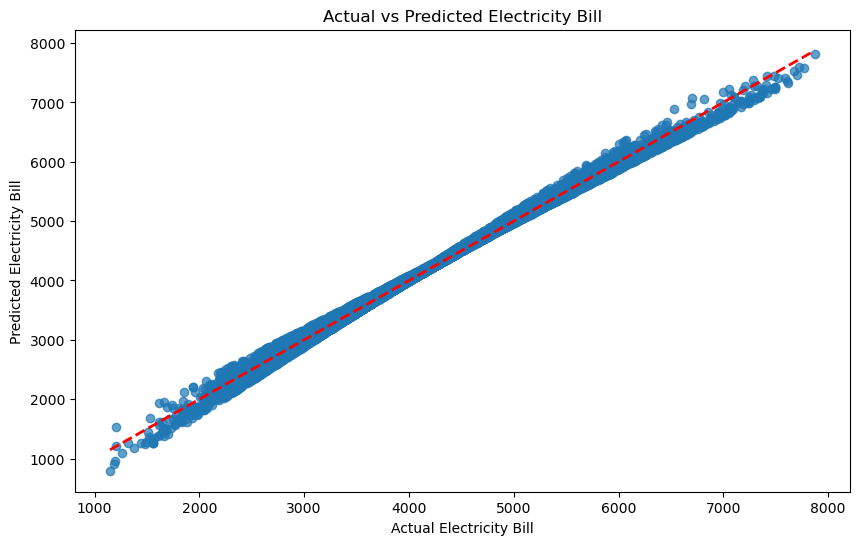

ValueError: could not convert string to float: 'Hyderabad'

<Figure size 1000x600 with 0 Axes>

In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "electricity consumption.csv"  # Adjust path if necessary
df = pd.read_csv(file_path)

# Display dataset overview
print("Dataset Overview:")
print(df.head())

# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Handle missing values
if df.isnull().sum().sum() > 0:
    df = df.fillna(df.mean())

# Define features and target
X = df.drop(columns=['ElectricityBill'])  # Features
y = df['ElectricityBill']  # Target variable

# Define feature groups
numerical_features = ['Fan', 'Refrigerator', 'AirConditioner', 'Television', 
                      'Monitor', 'MotorPump', 'MonthlyHours', 'TariffRate']
categorical_features = ['City', 'Company']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

# Build the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2 Score): {r2:.2f}")

# Visualize predictions
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title("Actual vs Predicted Electricity Bill")
plt.xlabel("Actual Electricity Bill")
plt.ylabel("Predicted Electricity Bill")
plt.show()

# Correlation heatmap for numerical features
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


Dataset Overview:
   Fan  Refrigerator  AirConditioner  Television  Monitor  MotorPump  Month  \
0   16            23               2           6        1          0     10   
1   19            22               2           3        1          0      5   
2    7            20               2           6        7          0      7   
3    7            22               3          21        1          0      6   
4   11            23               2          11        1          0      2   

        City                                    Company  MonthlyHours  \
0  Hyderabad                    Tata Power Company Ltd.           384   
1   Vadodara                                       NHPC           488   
2     Shimla                            Jyoti Structure           416   
3     Mumbai                            Power Grid Corp           475   
4     Mumbai  Ratnagiri Gas and Power Pvt. Ltd. (RGPPL)           457   

   TariffRate  ElectricityBill  
0         8.4           3225.6  
1 

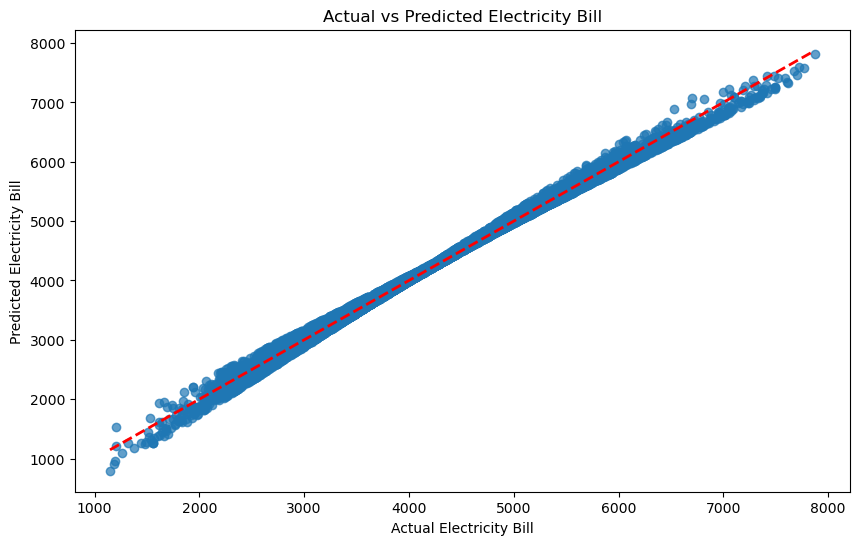

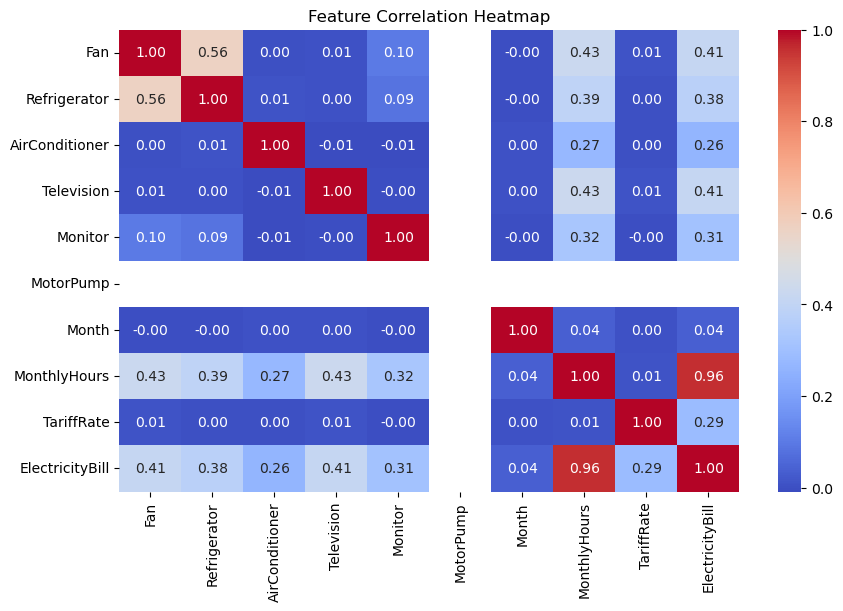

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "electricity consumption.csv"  # Update with the correct file path
df = pd.read_csv(file_path)

# Display dataset overview
print("Dataset Overview:")
print(df.head())
print("\nDataset Info:")
print(df.info())
print("\nMissing Values:")
print(df.isnull().sum())

# Preprocessing: Handle missing values if any
if df.isnull().sum().sum() > 0:
    df = df.fillna(df.mean())  # Replace numerical missing values with the mean

# Define features and target
X = df.drop(columns=['ElectricityBill'])  # Features
y = df['ElectricityBill']  # Target variable

# Identify categorical and numerical features
categorical_features = ['City', 'Company']
numerical_features = ['Fan', 'Refrigerator', 'AirConditioner', 'Television', 
                      'Monitor', 'MotorPump', 'Month', 'MonthlyHours', 'TariffRate']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),  # Scale numerical features
        ('cat', OneHotEncoder(drop='first'), categorical_features)  # Encode categorical features
    ])

# Build a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2 Score): {r2:.2f}")

# Visualize the predictions
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title("Actual vs Predicted Electricity Bill")
plt.xlabel("Actual Electricity Bill")
plt.ylabel("Predicted Electricity Bill")
plt.show()

# Correlation heatmap for numerical features
numeric_df = df.select_dtypes(include=[np.number])  # Filter numerical columns
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()
